## 07. Single Shot Detector

## План
1. Предварительные сведения 
2. Задача классификации и детектирования объектов
3. Модель Single Shot Detector
4. Функция потерь MultiBox Loss
5. Тренировка модели
6. Тестирование модели

In [1]:
import matplotlib.pyplot   as plt
import torch.nn.functional as F
import torchvision
import colorsys
import random
import torch
import cv2

from matplotlib.patches import Polygon
from matplotlib         import patches, lines
from torch              import nn
from PIL                import Image

import albumentations as alb
import numpy          as np
import scipy          as sp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import warnings
warnings.filterwarnings('ignore')

## 1. Предварительные сведения

### Глубокие модели

<img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABGcAAAP3CAIAAAAOdLTyAACAAElEQVR4XuydB3gU1dfGlya9d0Gq
FEERBARFURQV7IIFRFEQLOgnCCpSlCYKIoJRFBVUQHpLlt5DB+m9d0JHIBBakp3vzD2Zu8PM7rKZ
uxvjf9/f8z77bGbv3DlzZ3Lufae6NAAAAAAAAAAA/nFZJwAAAAAAAAAAMAHXBAAAAAAAAACBgGsC
AAAAAAAAgEDANQEAAAAAAABAIOCaAAAAAAAAACAQcE0AAAAAAAAAEAi4JgAAAAAAAAAIBFwTAAAA
AAAAAAQCrgkAAAAAAAAAAgHXBAAAAAAAAACBgGsCAAAAAAAAgEDANQEAAAAAAABAIOCaAAAAAAAA
ACAQcE0AAAAAAAAAEAi4JgAAAAAAAAAIBFwTAAAAAAAAAAQCrgkAAAAAAAAAAgHXBAAAAAAAAACB
gGsCAAAAAAAAgEDANQEAAAAAAABAIOCaAAAAAAAAACAQcE0AAAAAAAAAEAi4JgAA8IHH4+HPpKSk
5ORkOSWiMDcCIacAAAAAkQZcEwBACY9AfpGYfwJ2LK0kv1vLpQNuGtV/ZUUAACA9YMmZ/pAlA88l
J8qSFsxl5HdrIRAEcE0AAIfI/JucnJyYmMgnZJikpCSaYs7U8qf/CnLVYmNjt27dyt+thZRJ540j
Y1u+fPn69evNUyTm3UAWsBcDAACgmdIjX8jAKdQCT5eFzdOvX7/OE3k6dbVUjyxgLMSLnBixF02E
ELgmAIATOPNyypYT2T55C5nS9H8rU3vENWn0ZdOmTS6Xq23btvSd+ipruZshW4l7NTmFv8jvCQkJ
5vLpBNkIhw8fpkZ45pln6Ltl+1oIh7EEAID/PYLP9uZ+RE6UV00zFpdlQXY35g7ohhIgOOCaAACp
RuZfHiWfO3ful19+efbZZ8uUKVOwYMG77777jTfeGDdu3H/6yBafKxs+fDgZBvrkKdZCAQm84twF
0menTp2KFCny559/0ncHxiys8Cq73W5qhK+//lrzZR09wjnT5/jx46tXr7548WJN9OiWYgAAADST
/5k0aVKjRo0efvjhh26kfv36jz/++KFDh2QnKw9I7dy5s1evXvXq1StevHjRokXpS8eOHVevXi1r
NhbihVM0fenXrx+l6H379skAQGqBawIApA7Oy5TEOe2OGDGiRIkSNKrOkiVLlSpVKImXLVvWJbj/
/vu3bdvGJX1m83SLNDDvv/8+rci6deucdTMewfnz55csWUKfmqnz40ODZDhz5MhBi6Bm1Hx5kn8R
bgT67N27N0U4Z84c2ftaivHE559/nootW7bMZzEAAACakfwpu5YrV45yJpmfIib4z6pVq544cYIL
c9dz+fLljz/+mPvWfPny1axZs06dOvnz5+cp77zzTkJCgjzjZFkcV1KxYkUqeezYMQ0HtpwC1wQA
SAWckeWwuGvXrpSFCxYs+OOPPx4/flwWW7t2bYsWLein7t27a8IMmK8fMCPrlJiLWf686XdZg/nX
AF/kn+bZ+TsHTN1Srly5zpw5o914tSEXtswrf5J/ml3HvHnz5BRZmLou8ks//fTTtWvX5Iw+K5RT
uIC9mH0u809mLMXMZeR3/sI963PPPZchQ4b9+/drvvpabhZaL+qSqS83t5UdS/3yT8tP9j9lGfO8
5l8tP920gKWwuYDPn/gLAAAowll03759mTNnfvjhh60/m/AY55rOnz//0EMPucSxyNmzZ1+5coUL
kJWaMmXK3Xff7RJH9zRf10Tw4uLi4rJnz16rVi3u2lKVos1TLD/xn+bZzQXMv1p+umkBS2FzAX8/
pQFwTQCA1OExLFP//v0pU9etW/fo0aPyJz6sxX/+9ttvGzZs4Imc3ZLFjU9JBoniGRL23MeL4FzP
3/lP/jSX5wrN81oqMf8qkVXJMMxluFpNXHlIlql27doe0725lvLmucw/aaL3Ii9EMzZu3JgaivpI
nsLrxTOauy5zbYwlyKQb111+8k/8XZa0l5eVm+dKFscgOWyeyCF5jNjIDpUsWbJUqVJcm6Wv9RjX
GR45coSc1b333quZrrC3wIvgWXhBlkXzWnBJ80pxbfILb3QZp7mApcXMexeXkfN6jMepM7IGni7r
8dmMAADgDI9IU/Q5Z84c6hfat2+viTRrSS+ccDhJkjV64oknqHDHjh0TDVOULODv5KkGDx5MHZY9
TcnFLV++nGpo3bq15mtxXJIn8ixJ/nsHcxnLjPxFziUnMpx+U3KurzLmeT035nNzMS4jK0lKwxQN
1wQACBbOSpy1p02bRimYBtMHDx6kP9keyMyVZLzjiOfiT5nuLXBC1Ewl5U9cp/xTTrRMMSNjMM8o
/zT3NGZkAf7CWXj9+vW0ju+++67HuGDPXKcFy+JMv2iFCxeuVKmSeYod89I9/tvK3qpyWT5XzVxe
Fg6yVbkRDhw4QI3w/PPPyymWYtzDzZo1i4q99957nhs7V0Yu2mPzXYx5onkR9sX5nMILtUxnuGb7
XPYwuIzcG83YZwcAAGewafn6668pZ44cOdJjXINgh9MR9UFU8qWXXtJELrIU9pf6JFw+KiqKKhky
ZAjXYCnDVWn+ewfzRHsBMz5LBojTX4q2T+GJ9tTN062TwgNcEwAgFfDQ/OrVq1WrVs2YMeP8+fM1
424cTrsM/ylHzx4j+1+4cOH3339v3br1iy++2KJFi379+u3atUszDcd5dppr8ODBfKsPMWfOnE8+
+YRm6dKly5o1a7g8V0iD9c8///zUqVMcG5eXYfzwww89e/aUB6LkgHj58uVdu3alCl9++eUOHTqQ
A5Qz8hd2AhSqSzwKwiO6Ga5nyZIl3bt3P3HiBMfJc3GnMnv2bArm5MmTvLgZM2Z89tln7dq1o0rK
lStHS6Q/aUVovTgY+oyNje3Wrdvx48fNtXGcCQkJf/31V5s2bSjO5s2b9+3bd8uWLZqtrejLzz//
/Ouvv3LkCxcupKXQLLQgWk3N1uHJVpoyZcrbb7/9wgsvfPDBB9SMmrC+ffr0WbBggWY64Mf2+Kuv
vvIYxyxlVZqIgbtkPvH4xx9/yCnmYoxc9OLFizt27EiLbtWqFbUGLZcm/vTTT8PFUzdoXlr3Xr16
0XiC55Lry+u+c+dOarSlS5fKKVzzpUuXaJY333yzSZMmLVu2pPGBvDFAM10V88UXX9AnfV+0aBFt
HdoHaNF6Uxotv23bNtozX3/99aZNm1Jj0oLMYQAAgGM8hn+gBEg5c/PmzTKP+Sy2du1a6mpvv/32
f/75J9m4SdhCsq9rLiz1UEqkxVGnwFPsxTRTip4+fTrlRorwvffe4/6RClAvQNP5+7Fjx6gfpBTq
MQUvvy9btow6a+rcOTb+1MRVgmTeqDuj1Nq2bVvLI6N4XoqQ0nt8fLwmnpZBowUaKkycONG8oJUr
V1IHQfVQT9e7d2/uGT0Cjj98wDUBAILFY+RfGqNT/qWUqhkGw2e24omc7DTx3IjbbruNZsyQIUPB
ggVdgpw5c7I74oTIJU+fPk0/kWGg1MwXc+fJk6dkyZL0JWvWrHyDEF/YTamZJo4fP14zjqhxJfS5
detW+unOO+9MFshBM+VZXnS+fPlo6fy9cePG58+f55IeY9zPj4JYvXo1rziv+2OPPUYTaeDOMWui
p+EvtWrVop8OHTrEq//ggw9y5RaeffZZTVgU+nz00Udpitk6clUTJkygbpLLy7bKkiULOQFZkvsb
sgousS3OnDnz+OOP0/dcuXLJdp46dapm2kZcOUXI13vIki5xmigmJoa+DBw4UBONyY1APoomkgOU
zcJrx8h1f+WVV6jYqlWruK3Mxfg7t+3ly5c//PBDXmKpUqVoa9KXevXq0Yz05cknn+TyND6gP4sX
L863e/FGkfE3a9aMfh07dqwm4uTtQsFzi2XPnr1MmTLUVvS9bNmyO3bs4Bk5eLJMNH39+vWdO3fm
MFzibmwOj+r58ssveSItvXDhwvydjwfzggAAwDGczSizlS9fPn/+/GwPOPlYijF8gTcfF7Nn4JvC
i6PcVa1aNcqNfCCJE6lEpmj6pAJkaVwikVKK5gRIjou6XZdxozKxYcMG+vPpp5/WTP2LR+RqomrV
qvTrpk2b+Feu+YcffsidO7dL9OayZurfT506xXPx4Veqk6YfPnz45Zdfpi+ZM2emT+pMuSqCuiqe
l4YE8mEY0g2mrFLYgGsCAAQFJ0T+JCtCI/KVK1dynuJ0aZ1BIBMZX41Aw9lJkybRmJj6DLJGUVFR
mTJlouzMB6WSBPRlwYIFGTNm7NWrV+nSpWnwSgNiHj2TO6JKGjRowBmWprjdbsqqvXv3lguSX3j4
+9dff2mGRdm/fz8/34/s0Pbt268KyBQ98MADNPGTTz7RjBTPa3TfffdRbBSnZnQzZNXIZlAlcjSv
Gd0Sma4CBQpUqVKF5yWOHz9O/oRT/O+//37kyJE9e/aQbSPnwLNQbdR5lCtXjsLg2jhy6l1olmLF
io0ePZqWTsuiFvvtt98oGFpZvlVMthXFT9uia9eu1FGRD6Qmomo94kwXTa9Zs+Z18SiOZOMg5cmT
J9ldfPfddwkJCbTEuLi4Dz74gKZQD3TLLbfI7odX+bnnnqOf9u7dKxtBIluAptNakAc7e/YsN4i5
DE/hpZNjdIn3X1EYtAgaMXz//fcu0Y/SnkDfNWNkQFYqW7Zs5sc9caNRg3Cny6vJLfbjjz9SJbS3
TJ8+nZv3woULtP/QxIYNG3INXMkzzzxDe1SHDh3op08//ZRqo41Cbci/kjui6WSM+SY0grw3RTt7
9mwZBgAAOINTN305cOAAZTwyA4niZlc++iORxTZv3kxpnPzVpUuXOI1zJZZq/SHrIS9Eub1GjRqc
h801yBTNabN69eqUA/v27UvJmSKhDEx5knsH6n3mzp3Ls1N/V7BgQRoJyOSsGYfz1q1bR+UbNWrE
UxJFiuaDZffeey/1L3xzL/WPb7zxBk2knzQj7dMndU/333//q6++Sj9Rj0BhUIVbtmzhRXz++ec0
/a233qIehCuncQiZum3btskwwgpcEwAgWDg/bty4kdJW5cqVeRTrL4PzT5wxySnRLLVr1+ZRtZnP
PvuMx6+acCycOr/55hseSZMT4GeyyaWQYylSpAhlUq6fzA+VbNasmWakXY6K8jIl37x589ISPaLn
IIdAFoIKjxo1yrR8ncOHD9OyaNDPjwHk1aT+I0eOHNTNaKZBPw2mXab3vXJUXJ6PvTVv3px/kumb
z/+QM0lZmIBnIStCP5Et4Vm4rfgWYVpxNgxmvvrqK5d4wiyX5/X95ZdfXOK8GbWMZSnVqlXLmTMn
X76YJKCo+DgiuThzSc14tgd1hLyNOEL6LCHglWXkLNyw9MmvwaXtqxneRhbj71zbwIEDqVi7du3k
T/xl5syZZAjpJ77ojjwkTeQOdf369XIpHMOYMWNoeufOnakMl5w1axYNLGhL8a5irrlQoULUAuQ5
eSLVQOMPXtbgwYO5DJMszoNRG9I+w4djZSWM5U8AAEgtMo+R/aAsRB7AWsKAT7xwzvzoo494CqdT
a1H/yMVRaqV6WrVqpRk1m8t4jBTdpk0bKvbzzz+bCxBDhw6lHEuZk5/8xF0V+SvyUZRdPUa3y9O5
Tx83bpzHSOZ8HPD555/nw5ea0b8cOXIkY8aMlLplAFQ/LYVPScXExBjL16Eyhw4dojB47MFTLAXM
f4YJuCYAQFDI/MuWhvI4T+F0aS0tyoujV/rhKxqMkifZs2ePZnpuxHVxp9CKFStcwodw3uRFvPnm
my4xgt8vnnYtZ6FPcgIFChTgdx8RNMSnDEvpWw7WuWuZPXu2S1x1phljaxol05ROnTpxhTwQTzZO
7/B1d3///bdHOC76XLt2rUucFeHV5MD4fa99+vThBfFq8hL5PNiAAQN4Cq/7pUuXKNpSpUpxQ7Fv
4Qo9xi1DfKKMZ7ly5cqdd96ZJUsWvraBIpflaV6aSOXr16/PkfNy/+///s8lrrXbunWrbCvmgQce
yJo1K980xd0VX2XBF8Jx+8vKyVVSd3XPPffwSvFP7BLZ13Gd3OwSXhGyPS5xBo9rsxTjqsgE8iUf
tD8kG1fh81pQGVopWmu2K9z+vJuNHj2al8JLp+kNGjSgjpbcMtdMYZcrV446b24xcj5JAk1cjUmr
X7p0aWpVDolsKl+T2aRJE14QbxGO4YA4+kv7kmZqHK7NI/Zw/gQAAMdw3uYrnytVqvTII49QTntE
8KigdevWnMYp89BPLuMCae6qUgsvjk/p8w2cPMVchrMxdX9UhsLguSwJsEiRIhUqVODvXMPrr7/u
Mr3MkPMzdXm33norFeY8T5A1ypYtG+XhM2fOUDHKxlyYlsLWsXHjxpqR9vmgocvwk7IduP+aP38+
/fTqq69q4rqPfyVFwzUBAIKCkxd9ad68ucs4kmTPv2Z4MPrbb79R+Q4dOvAUjwFnuh07dtCvderU
0YzhNS2Ixu4ucQmZnIWTbHx8PKVj6mnkmJuoUaMGGSc+nyCDbNSoEY2tyUhwMcrglMqpGI3LZRn+
iUfkLcWdsgsWLPCIC+c8xqMghg0b5hGryTm9R48eNJFMgsdwPprR5ZAfkzWwD6GftmzZQhNffPFF
XjteC7lSX4h7bGbNmsULpelsveQRQY9BsuiQDh06RCtVpUoVGbwm/AbN0rNnT83oeLgwOa7y5cuX
KFGCfAUHSZ98omnJkiUcJAfD8a9Zs8YlTmTxT7x09nV9+/b1+NrWciI7HGoxezGujT75oGn//v01
06pxqPJiD/6TA2Mn1rVrV66TK1m/fn2GDBnMN4YNHz6cin388cdyiUxsbCzfZvbjjz9qwn96DNNL
u9DBgwd5NzCHQQ6cwsiRIwdfj6fdeL2+liZdMgDgfxiPkd+aNGniEjdPUjoqbFC0aNECBQo8/fTT
3HVSp0bdVtasWY8ePeoxekxrjQHxGEf3+EDkihUrOABzPTKktm3buoy3mfNccqHmazoSBR4j7Y8Z
M0YTKZ2zOg0MXIbn4eOVn3zyicu4VF5CP02ePJm6J/qJ8q3H6HYHDBhAU+666y5yX4m2p0lxf0pz
8eMftH8jRcM1AQCCwmMM0x9++GGXsAeaMRb3icx0Tz31FJXfsGGD2a5oxjl6fro3ldGM2o4fP079
RN68ec+cOZMskIX37NnjMp6CzSN7zXBxfGcU2wYySzS25jMkPLZevHgxlWnRogXPaE6y3CuwneBz
TTzC5kdBrFy5kmfhAJ555hmqmU+ayXXhLw8++GCmTJnkvba8lAkTJriMB9BxbOZZqHek2viWIY6z
hXg18NKlS5ONk2DmtqJ1dBn3xfIU8ht8M9KRI0dk8/JnXFwcWawGDRpohn2lhqWSFSpU4Dt/2Cp4
DJ9DvZpL3HPMUzh+PiBK3snj60inXOJLL73EbWUvxkvRxOUcFA81nVx9zfDJ7Jxff/11zXSMc+fO
nS7b5Yt8AcnChQs1o0sme+wS3Tn10507d27Xrl3Dhg1p8OESVy1GRUVxDLyOfBUiX0bPK6iJFpZh
8zWQLnHTM1/uKOPnTwAAcAznEz6kVbBgwWPHjpFbIIdw2YC+a0ZSOnz4cJYsWUqVKsXXVnBXmCp4
cZRRq1WrliNHDvMl6IzH6NYvXLjAj1ySN1BxDJw5p0yZ4jJdScET+Zhajx49PKJ343rq1atH/eD+
/ft5udfFfUoucSVCt27dKEWTN6MujJblEvc5T5w4kUPiDMwXZv/000+a0W15ROLlvoa+v/XWWy5x
9f73339PMfO8XIY/ww1cEwAgKDiH0peKFSu6xA0nmilh2eEcylfQlS5dms94mMegPGzlw/98rwvb
FT4Lz4e1ZP1cmB/y9uWXX3pMubtv3740kZ+Iar4lZtmyZR7jCBbla5ry559/8owcocc4yUCfNKan
XM/vnuJOpU6dOtmyZSPn5jFG+RTDbbfdduutt8qHN/BP9ElmKVeuXHfeeSfHmWxcgcZXeMtzU7xc
bhkKrESJEtQj8mV4mngaXrFixagrlefNeN15XvpctGiRy/B+7MH40XN8hYOlrchauMRJGI/hA/ns
DRkPWYbhtWPzyc4nSUAT+eENsgvk+hk5O8VZrly57NmzW8LmMlwPd//mR2UwvAX5WQ4//PADT+HW
OHfuXIECBe644w4u4xFjiJw5c9J2keHR3lW8eHEyY7TtqAZy2vRnjRo1XnvtteHDh8s74jxGGPz4
RGoZuYE8tlApGDZdtCHIZck9hIsBAIAzZJI5dOiQyzj+5RPuLPgxsDVr1uTcm9osJGc5derULbfc
cvfddycbmItxJlyyZInLdF+uzI0cCXsV6po9ojPitdi8ebNLXEnhMY4J8ot0W7ZsqRnHATdt2pQ1
a1Z+Dh5BKZ16PcrhVCH5JcuogKqlPoJC3bdvH7eVOT/LVNy9e3fqmqk28mN8l7KsIQ2AawIABIVM
oxUqVKCEtXbtWu3Go1YWOOXxaQS+VFomQa6K3QtlQJc4fU9TLl++TJ98AxK/n0GOmPkLmx++hCBR
oIlHTruM52XTdErTNIbmW3eSxLEuzRguy2eIcxiakW3j4uJolrvuuivRuCQgPj6ebEC1atW4To78
gHjfK58Wk+vCtfGz17i34CncMnxVuvn6CkttHCd3MPxMBb6zyGdbffvtty7jNYXUVjSFfKDL9EYp
WdhjXD7BzciF+cTR0KFDZYWaaAGCDEa+fPly5MjBToOXTitCPRz5EG5njscMryOtCPmWWrVqcRlL
MW4Nvp/qzTff5Gq5kT1GK/HZS3ndoMfo7GvXrk1ei59hSPAdXGQdNcM08qji0UcfvXjxIm0y6bgk
sjZeFrl3ckTc2uaSHLOMh/YH2tO4p2/VqlWSccm+LA8AAA7gjMS33Xbo0IESC5+lMSPTIOc3MhKX
Ll2SWTFVcCaPjY2lelq3bq2JAMz1eAzD891337nEVfG8dC7DwVBqpV6AzAw/CkLmQ4oqb968lStX
lrFRKpaehw/Vce/8/vvvU+Hz58+bO1+GI+TZjx07liFDBjaTvAhzSc3Uv2zfvp2vJyQGDRqkBTyA
G1rgmgAAQcGpjT75Od2UDZONC58sJAk4Py4UZzyaNWvmMV0qrRmDdZpCXQKNufkdR1wbX6W2c+dO
ropn4S+PP/64LMxL8RjGjEa3nHkbNWpEmZfvaJI5mm/+oZI8owyVQ/rjjz9cxnP8ONfzfbFt2rTh
RXM906dPdxkXJHC/wl9oroYNG8ouR47dqZ8oVKjQ7bffzmVkX8W18eUNvXr18hgdDC+0cePG5vp5
Ro65bt26ci24q+PLCMnBcpyaaCteHL/sgp+awDdN8ePF+aScbBlugREjRtBP999/v3ml+HpIfmAg
by+On+FiHtODN2TY5jJc/9ixY12mm5Q8Al7Ktm3byJ9Q70umUTOcGJfhc4Z8beeuXbuomDyrxovm
m4n57BmvDn9JFMgG5DrZ3fHqmPcBnkV+4aiINWvW8HPqly1bphnHXAEAwBkeI/vx9RGjR4+WUywl
OWXt378/S5YsOXPmJDvhMR13M+erJON2WTlR4jEqj4qKcokn43lMfaK5jGY8+I7ffMhl5E9Tp06l
n2rUqGG+b5YXeu+991KE/JhW7gg6duzINXDC/Omnn1zGMU3ZNXAYcilyiXxwrXPnzlxArhd/yi8y
FUdHR1PjkE+Li4uTIYUbuCYAQFAkGxc1ffTRRy7jWah8nIwzGqctmdG4MJ/355P4ZovFx/v54Qf8
SBzuEjRxBWDBggX5Wjtzgk5ISChatGi5cuW4Hn0UL6afP3+extyUvjXjvJP5xhUuw+d8aIAu18Jj
2CH6vOOOOyj18zPo2MCwj5KnZbjz4KNxY8aM4YlyLfiOICI2Npar5XXhO2ibNm3Kaycbiuft3bu3
y7hliHsjvsXrsccek8EzvJRZs2a5xFsFk41n8WnibEy2bNn48m7ZVh7Rr5BbK1y4MB+k5Pjffvtt
l+lMHS+Fyp84caJMmTIu8cBAnsgRzpgxwyWeMyFj1kwkG56Z79+VN0TJsD3G/kBf+JwYGc5kcWyV
f+Ko+H2799xzj2wijkHWzG+zJbfjEq9N9Jh6XO6nW7ZsydXKFub6uYm4vMewWF988YXHtDry07yB
ksXDDGk6jQAyZco0adIkrsS09gAAkDpkGuEbQTdu3OgvsXAuos6oWrVqVJLshGYcKZPIXsAfnH41
41EQfMm6uWfxmLpsPpNPHajH6C8SRedInQu/stZ88V6ycSCvdevWLnHYLlk83jZfvnz8ytok463i
fPV1v379aApfi25etEzRXJifGEQJX07hX3ldeIlMkvFUPX5NPLdkkv8rX0IIXBMAICg8Rn6n5OsS
d33we+XYJHA25JKbN29mM6CJC7j5BQuaSHyU6XjIq4nT8aVLl6ZRKZ9W4kxNE2kKv5mUsypnQ/rc
vXu3yzAhMvVz2q1evXqxYsWOHz9eqlSpEiVKnD59mqPiaj3iFlIKg4a/muh7OAaOsId4LB4/o1xO
59Myspvh7oqvcKN+hWq+fPkyB3zgwAHqKlzi2QPyAgauhPwJLbRz5870J1k+Xhxnf028PZZ+pZXi
5dInhX3LLbdQ/NKScTyaeJgSWTuXeMyrZpwgOnfuXM6cOfktSdwU3FaauMaMKqcehePh+Mno0kQy
MJp4QjdXohlPcyKioqK4xTh+ub7cCFxYIleEr36U78b13AivC7+wi10ZGRJ2OJrxkiiX6UEdvBZc
DxvFwYMHL1iwwGUYdd6svGh+PAa3AG8mDp4rZ2Rt1HNT4SlTpvAUWcAMb7vrAvrz+eefd4lnhPBP
1tIAABA0nNwoTZUrV06+P8OcrCScOelL165dKQU99NBDnLIsXa0mjqaZX2onp2vG+RnirrvuypYt
G7+CgouZ4RTdq1cv6h34TU3m3oHvaCK+/vprLsw181yDBg2in+bOnTtkyBCX8RpAzrccMN9My0/6
uSa4bjzvxxwnT3lVvNmWX+N+0xTNNVSpUkWe7PLZkiEHrgkAECw8UKZs1UJcREdeaNGiReYC5KPI
JNBPL730kiYG91evXuXHiP/www/mkpQZefovv/yimZwGVchOQ+ZlzcjCNPLOmDEjjbPNuZt/onjI
b/CjC/iwHE/nL5pxOqhWrVrm98CSk+nZs6dLXJlGtiRJwHPVrVuXKuT3vSYbZ0X4YoPPPvtM1rBp
06YyZcpUrVq1UqVKlL559mTj6B2f3OCX0jL8K4dtebAEty3f4UP9k5xFE9dw16tXj6Z/++23msna
8Rul+FnhlraiRVMzdhVXxHF5zXjXcIMGDfhPTZymo44qc+bMr7zyistwidwOmvB1NNF+Yy7jEVDY
FStWJPPG9/Xa4arIHFLfRobQ3P585xUFQKHSqnGovBRe3NatW2mL04iB3HXZsmXj4+O5lTTDUdMU
MpM0+8iRI2W1DC2Ie185C7s7isS8OvwlNja2ffv2J0+eNNfAVxXSFrkuLrm0rD4AAKQKTkRHjhyh
lEUpXTN8lLWcIEkYpGPHjlFP4RJdKj9tVf66ePFivgzbfFmdd37DRZw+fZpyb82aNc0/meHugF+U
VLt2bb4JVhP947vvvksTqWOlgKljNadonosf5kQ9BbkyPtZpTq2aOGyaJ0+eHDlyULTGAlPYs2eP
+Tp8TVxmQoUvXryomVqGKxw9enT37t1lbAw/8vSNN96Qxcy/hgm4JgBAUHgEnMrPnTvHzxMnqlWr
1rRp0+eff56vJXCJ17AeOHAg2TAbM2fO5BvryZzQOL5bt258Vp0mDhkyRDO6By7M5+jlVXC8XP7C
r32QF5h5TBeA8WkEl3hgtGbqP7gMQdmW32ObP39+SrJ9+vR58803S5Ys6RLPEpDPY+VuhhwUxUZe
yLzW9ElZPnv27C5xYopG/PzQuRo1amzcuJF6BX5xKrsXLn/48GGyXi5xkuTLL78klzh//nxuTL5l
qFGjRrxcXiNNPCGdF0G9F1lHWp3HH3+cV42WaG4rmmXYsGEu42p12VZ83QJfNy+fqCEb4e6773aJ
ZzeRMevUqRO1RqZMmRYsWNCqVSuazi6R47ly5Qq/SIQr5JYxw10d31RGVL8R6qTvvPPOLl26aMaZ
Mb6W4/bbb6eV6tWrF586i4qK4rVYKB4mzhvOY5xCPHPmDI8YXOLqRy6gGRuFv9PeRT26S9wPRh54
wIAB1NpktFziFmTNuKyF3Cl5NlpfvvROrg7Hxrd15c6dm+w3xUYtzzaVrJq8iY7LAwCAMzi/yQck
cBKzp1bN1O/Q97///ptvsKRcTamb7BP1pIUKFeLE+OGHH/KVb/Z6eHF8tod6KOqALCma+rhh4oWE
SeJ6BKrcJboe6q2ot6X8T3+SL+Jr8uWVFDI2+tyyZUvWrFldomOlVClj5jKcorlPJ1555RXyOdT1
UAfKL9PjY6Z8NT4/DKlu3brajWaSUzS/DrFUqVJt27bt3bt3hw4deLxBMZ88edLn6ocJuCYAQOqQ
6YkSboMGDXLmzEnJi1InZXbKhnyqRxN5UzOGm4sWLXr66ac5vbpEBifTsnPnTi4gszD9SQm6ePHi
fFDN8hON7MuUKcMOh2OQeZnqL1q06Msvv5woLsWWv3Ik/Gd8fPznn3/ON/AwZHj4nhlZhpe4bds2
6jDkiRqOgQuQZ2Pj4RIvKCQnQ7Ps27eP+rBRo0bJeGTMo0eP5ge1u0R/cOzYMV4EuSMK+Mcff5SL
4KXT54oVK8iAsXdyiYZt1qzZ5s2bZXhyKT169KBK+H1/lp/at29PJmH//v2yWo5/9+7d5C7kc2Bf
ffVVfvcUdcNPPPEE9z1cnvrIYsWK8TV1XLl2I9yx0brTvNQmlStXrmSiSpUq5cqVk+/3oMLnz59/
++23adPzoh9++GE++vjxxx+XLl1antbTbhwx3HfffS7xml3NcKTmSLjMkiVLyH/KFiMTRZbs008/
PXXqlGwQ2m2oQWiv47lkJXJZtDPTqIINmEu8SIQCs+xscrkAAJBa2ACQVaC8LV+CFzixcIqjjqN7
9+78VG7KTrly5SJv06tXL34ykGbkMUtVPO+yZcvIIFGKNudngpIkfU6ZMkUzUivZj6ZNm2bJkoVz
4AsvvMCdC3UZ9erV41A57WvG2X6akboJlzhCp5kOe3EAHiONT5o0iQKW2ZUWQX9S78mXWvBcq1ev
pmbhdxuam4WXeOHChX79+vGrn1zCQJLlGzp0qOxw5We4gWsCAASLTIg8jmQSEhJohM2H8GUx80BT
Fj537twRAb/ITzONX2XNlIX55IbE/BOnSJ/w8SrNlkAtf1INcXFxFIO8HMscLRdLFvdfySmWqjTx
+ovDhw9zf6DZYpZLlLXR4Nu8OJ5oDlgWlnWSx6BFUJxk9niKua14ynVxASR/Z8w/2UOSG+LEiRNU
OV9Vr4ma5Y1GMhiP8WQ/iVFZ6uAZ5ezkjg4dOsTPN9eMRfNgwlyeN/TSpUuzZcv22GOPJYuTiuad
SlYoV4qipbEFrRc/G4ORhT3+V8f8nbYshWeuwbxQAABwDKeRJPFcBMtEOzJNyU5BE30oZTlzP+jz
kFaq4NktvQMtiP+09A5yFo6BX7lheW+4LGP5Qp0g9Wg0WjBfaCd/tfeJ9jKaMJBUibmGNE7RcE0A
gFQg0xnnTUuqShSneriMmSTb0354iixg/kkzMqB9upxoKSD/9DmjnGgxXTzFMq9P+FeP6QpsxtwC
5tnld3N5+yIss/CfPtvK3KrmnzRbU5iRP8kZuc1lAcuyAlRix1y59TcDWYY/za2RbNwjZy/J08nc
FitWrGjRovKpu7KAnIWxt5h241Wa5uk+//TY9g3N1Di8FMuvAADgmGBSisw8fNjI8hMfSOIyPnMU
T7FPN2MukyyQP/GfcnZzSQ5m7dq1mTNnrlOnznXxgAeZLWUNMjB7duWJ9gjN381TfFYSZPcdWuCa
AACpxpyqPMZZe5m55BdzGY9xi5G5sOfGYubylqX4/MlSxvydf5VlzAQOw19t5j/tszOymGWhlvIB
FiHxGaTHT3lLeAF+YiyV22e018BfzFiK+cNSxt+i5Z/Jwk1Rd8gPi1+0aJFmu/BDYp7XY6tcYi4p
v5srkRP9hScLAwCAM8wpJcj0YilpyW883TqPgXnGAFjKBMiB/MlHtU6fPl2+fPk8efLs27dPTuQC
ZngiY6nZY6vcPtFfJfJP/lWWTAPgmgAAAKQLPKbb28gy9e/fXzOOa/Kv5sIAAADSkmTjbYH8OCi+
LSqiUjRcEwAAgH8fj3ENxq+//kr9MT+TkK9C4V8t5QEAAKQZMkV37NiRUnS3bt00/9dC/68C1wQA
AODfx2Nc6jl37tzffvvt0qVLPIV/spYGAACQhohr4nTGjBkzevRozXSjbOSkaLgmAAAA6ZHI6YkB
AOC/BTso/mL97X8XuCYAAAD/PrIP5qdByP44orpkAABIn8hsnCiIQMukwTUBAAAAAAAAQGDgmgAA
AAAAAAAgEHBNAAAAAAAAABAIuCYAAAAAAAAACARcEwAApF/kDbj8TnSeYi0EAAAAhBT5vIekpKTI
fPaDHbgmAAAAAAAAAAgEXBMAAKRf+DgffZk5c+aCBQs08WBuayEAAAAgpPCZpStXrvz888/nz5+X
UyIZuCYAAEi/JCcnJyYm0pdPPvmkX79+9OX69evWQgAAAEBI4WvC//nnn/r16x87dkzDMTu4JgAA
SM/Ic02dOnWKiorSxBsGrYUAAACAkMJdz4kTJx577LGTJ09qho+KZOCaAAAg/UKuiW1Sx44d+/fv
r8E1AQAACD/skU6dOlW/fv24uDg5JZKBawIAgPSLPNfUtm3bXr16aXBNAAAAwg97pKNHj9aoUePw
4cNySiQD1wQAAOkX6Zpat27dp08fDfc1AQAACD/c9Rw6dKh69erkneSUSAauCQAA0i/SNbVs2bJn
z54azjUBAAAIP9z1HDx48M477+RzTXBNcE0AAJB+ka7pueee69SpkybONeHxrwAAAMIKX4+3e/fu
EiVK7Nu3T06JZOCaAAAg/SJdU8OGDd977z36cu3aNWshAAAAIKRw17Nt27ZcuXKRd5JTIhm4JgAA
SL/w+5rIO913332vvfYafSHXhHNNAAAAwgpfDb558+aMGTNu2bJFTolk4JoAACD9Is81VapUqXHj
xvwgclwmAQAAIKxw17Ny5UqXyxUbGyunRDJwTQAAkH5hg0R9VfHixevUqcNTcK4JAABA+JCvCpw6
dSq5pvHjx/OUCO994JoAACD9It+YUbp06TvuuCMhIUFOBAAAAMIBuSN+8lBUVFSmTJm++uornmIt
F2HANQEAQDqFL8+jz9jY2Iceeqhu3bo7d+6UE62lAQAAgBDBHun999+vV69eq1ateEqEdz0OXRO3
Gn0mAwAACBvXrl2jz6ioqLfffvuNN94YN24c/Uldl7UcAACAEOERyOFu8JhntFb6XyMpKSkxMbFx
48YDBw586qmnrl69yhOt5f5TyK2T2i3LOHFNcknJuEoEAADCT9OmTcePH9+vX7927dpZfwMAABBq
VIa4jgfl6Y2DBw/WrFnz2LFj1atX37Vrl/Xn/ybSOFl/CAInrkkz7RBnz549evRoHAAAgFBz5MgR
+tywYUOZMmVOnDixZcuW8uXL7969W/4EAAAg5Jw/f57HuvIzGHhsLMuT2bDW+9/h0KFD9Pnxxx83
bdqU1qVly5bvvPMOT/9PD/vllpJbLVWk2jXxDsEPHxwxYkTZsmWrVq16BwAAgDBACfb222/v27cv
Z+BOnTpVrFgRWRcAAMIEJdgKFSq43W4t9W8o4svAaK7mzZtTJf/pXF2lSpXq1avv2LGD1mjv3r01
a9bkidZy/xEo8kqVKjVp0iQhIcF8tV6qcOKaeEmXLl2ivnzZsmW0c1y9evX69euJAAAAQg0fpZKH
MPlacwAAACHnypUr9Dlp0iQyDIni5XjBj609xtO6efaLFy/+14fHlhW0/vzfgbYCbYvLly/XqVPn
zz//lFsqtaTaNWmG8546dWqDBg00hfNcAAAAgoF7bj5oZf0NAABASKFkW7t27dWrV2upebUrn2Wi
L82aNRs0aJCWmnnTLdzppMo9pk94WwwbNuy5557ThJdxsEapdk0e4wnun3zyyccff0xfrl27xt05
AACAMCEzMAAAgPDBT9xu0aJFVFSUJzWvdvWIA1s0Oq9Zs+aGDRs8xlsi/uvwqv3X4W2xadOmOnXq
XLlyxePoKGSqXRPvELSwl19+eeTIkR6nJ7kAAAAAAABIV/C5gcGDB7/11lue1LzalUfh+/fvv//+
+8+ePctTPME5LhBW2CPR5+XLl2nr7NixQ3N0JjDVrokdG32pV6/emjVrNLFU7BMAAAAAAOA/jTwZ
EBMT88QTT2ipuZRLvpS8QYMGcphuLQT+JTzGo+zq16+/cOFC+WeqSLVrYid98eLFatWqHT9+XE4B
AAAAAADgPw0Ppv/++28yP2yEghzost0aNWrUc8895zHuZ7EWAv8evEWaN28+YsQILfUPSNScuSZa
5IEDB+rVqxcfHx/8zgQAAAAAAEB6hl3T3r1769evzy9uCnKgy9fyDRo06L333pPnrEA6QW6R9u3b
9+vXTzO2V6pItWuSFrxhw4a8eDhpAAAAAADwPwCfHvjnn3/q1at36NCh4C/l4lFxly5devTowX9i
hJyu4A3Ut2/fjh07yj9TRapdEy9j/vz5jRs31oz7q6yFAAAAAAAA+K/hESQkJNSuXXvXrl1a0Oea
eITcrl27gQMHao5OZYCwwhtowIABb731lvwzVTh0TVOnTn366afZMsFJAwAAAACA/wHYI9FnrVq1
Nm/erAX9sDUeIbdo0WLo0KHyT5B+4C0yZMiQ5s2ba45sbapdEy9j5MiRTZo04WsE4ZoAAAAAAMD/
APKSPHJN8mHR1kK+4EH5s88+O2bMGPknSD/wFiEL88wzz9CXa9euWUvcDIeuafjw4fxuXTwhBAAA
AAAA/G8gTwlUq1Zt5cqVWtD+h0fIjz/++NixY7Wg5wJpBm+gv/76q2HDhlrauCbeCcaNG9e6dWv+
M8jLPQEAAAAAAEjP0LCWTy499thj69at01J5runVV1+Njo7Wgp4LpBm8gSZPnpx2V+jxmaXLly9f
uHCB/8S5JgAAAAAA8D+AHNmeO3eOB9ZBDnS52Pnz569evSr/BOkH3iK0daSFsZa4Gal2TQAAAAAA
AAAQUaTaNbEzk0ZcfgEAAAAAAOA/jX2IG+RA19lcIM1Q30Cpdk0AAAAAAAAAEFHANQEAAAAAAABA
IOCaAAAAAAAAACAQcE0AAAAAAAAAEAi4JgAAAAAAAAAIBFwTAAAAAAAAAAQCrgkAAAAAAAAAAgHX
BAAAAAAAAACBgGsCAAAAAAAAgEDANQEAAAAAAABAIOCaAAAAAAAAACAQcE0AAAAAAAAAEAi4JgAA
AAAAAAAIRKpdk8fj4c80Qy40GGT5NEMuNCi4JH2mmeRCg0CuTpohF3pTZOE0Qy705pibOs3EiwsO
uTpphlxoMMjyaYZcaDDI8mmGXGiwyP0hzSQXGgRyjdIMudBgkOXTDLnQmyILpxlyoTfBvBukmXhx
QSBXJC2Ryw0GWT7NkAsNjLlw2mBe6M2Ru0GaSS40CMyrkzbIhQaDLJ9myIXeFFk4zZALTRWpdk0A
AAAAAAAAEFGk2jWxM7uenBR//fLFxPAq/nrC9eREudBg4JJXk65fuJ5grzC0ik+8nORJlgsNCi6Z
mKjFx2sXL4ZXtIhr17wLDQJekWvJiWnRetcvJyYnyYXeFC6W7EmOFy1vrzCEotiuJOlNF2Rsegtz
ycuX02LLXrqUsrggw5P/F8lp8n9BW9aTii2rGSUvJ10Ld1bhPSdZLC614V1Pl/8XKXDhK1fSYvcj
Jet5L7W7X5o14PVUNiCXvJJ0Pdy738XU9xrGv8bVcMcm/jWu8OKCis1jJL2EhLTY61KZ9OSK0EqF
u7+4mPrNqhklE9LflvUI6Mul8Dcd1U9LMS/05nAxSkH2nSTkoh37ih5ekHudZrRwYrIn/krixatJ
YdWFK4nXEp3sddeSki+EPzxqgcSkYPc6zSh2NTE5DZqOFpGUnIrYzKTaNSWJ/vJIwukJR5fHHFsd
HTZR5ROOLjt46aRcaDBwya3nD40/uiys4ZEmxa3459pFTf//DTa8lNHGqVPalCnatGlh1PTp2uTJ
2p49+uKS9DFEMHDr7Y6PC3frUeUTjy4/ceWcXOhN4Ua+eP3y1LhVJHudoZLY8Zav+2evFnRs+mbl
ksuXa1OnWrdFaBUTo82erRtvXm5w8IrsiD8S7i0brW/ZFaeuntdS83/B4a06u2timLMK7Tkxx/6+
nKhb4tSGt//SiXC3Hu97cZfPyIUGC/+Pr1mjJxb637fvNqGS263Xf/myvrigI0zjBjyaygbkkhvO
7Q93p0aaEreKrKMW9O7Hsa04syMN/jWmHVtzNem6FmRsMunFxoY96UVHa/PmpSwumNiMVaDVoZUK
a3/Bmhy38lwqBwNcctnp7ZQw7RWGULTLTT++9nqS3mUEE16ygL7MO7mR1steYQhF9dNSzAu9OVyM
UhAlIkpH9r0lVKL6KZ1SUtVSMYjitTh18drEjSejt5wOn2K2nB6/4eTOE5e01Oe6vacTaN4YW50h
FFU+YePJYxeuyoXeFC62Oe7ihDDHRpq86dS5hKBz3Y2k2jXxYVrqlsgzTDv+tztsosonxS0/lHBK
LjQYuOS2C4cnxi0Pa3ikKcdWnruu77KpcKtc8vRpvRuYMSOMmjlT78n26kP/ILsZzWi9PRePhbv1
qPLJcStO8tg6uNaTR79ixNjIXmeoJHa8FevP7dOCjk3frFxyxQrd1dg3RwhF2Xzu3JQkHmR4xors
vHg03FvWrW/ZlaevXdBS83/B4a3+Z/fkMGcV2nOmHV9zRQwNUxvegYST4W493veOXTkrFxos/D++
dq2eWOh/377bhEo0kqD6U3n8NY0bMC6VDcglN54/EO5OjUQjxfhE3XMGuftxbCvP7kyDf40Zx9de
C/7iDpn0liwJe9KjwfGCBSmLCyY2eUw9OZFWKqz9BWvqsVXnUzkY4JLLz+yghGmvMISiXW7miXXB
n8H2COjLglObaL3sFYZQVD8txbzQm8PFKAVRIqJ0ZN9bQiWqn9IpJVUtFYMoXovTl67TuNy99Uz4
NG3rmYkbT+06KQ7BBNl0Rsl9Zy7TvNNsdYZQVPmkTaeOx4sDlMGFx8W2HLs0KcyxkaZuPn3+ctC5
7kbgmpwLrsmx4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyT
quCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklB
cE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklB
cE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4
JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64
JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7J
oeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7J
ueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16Qg
uCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16Qg
uCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFc
k4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdc
k4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfk
RHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa
3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1IT
XJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEV
g2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQqu
SU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfk
hVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNek
KrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQ
XJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQ
XJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAqu
SUFwTV54xeCa3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuu
SUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0Kgmty
KLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0Kgmty
LrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkI
rsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkI
rsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTX
pCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3X
pCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5
EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgm
N1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE
1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF
4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJr
UhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV5
4RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWp
Cq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE
1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE
16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4Jr
UhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54Jr
UhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4Joc
Cq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4Jqc
C65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqC
a3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqC
a3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1
KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1
KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCgqHa+KJ/Ks/yQL22aUi0zWF
qvXc4XFNwYQny9hnN9cTDtcUTHiyWABFrGsKvgEDt2E4XJNl6f7EBewhWRRy1xSq2GIizDWZWyaA
uIB9dovC4ZpCFV7IXZN50QHEBeyzmwXX5FhwTSqCa/LCJeGaItk1TT260reOkFZEx63Sa/Cf0CPa
NcWtsjaaz9bzswlY4XNN0UGEx4X9hRcTVtcUKLwVwbQeXJO13WzbN5gGDK1rkuFFHw24fY+ulGvh
Lzy9kpC6Jrmsm8R25OaxxUSYa+JVDknTucPgmoLdskHsdSF3Te5jKRFa4/EGJv5bg4gNrsmx4JpU
BNfkhUvCNUWga3KL7Dz91LqFV3b60OUdi67uXHR11+zzm6gfionzm80j0zXprRG3aubZDdxWvlpv
F32Z9c9Gcz9tr8QdHtfE4dHSRWw+wqNPinDmmQ3mUY6PSsLjmrjmWdR6FEmA1ju7IXDrRaxr0hsk
bvWMM+vl1rQ3IP3/3nT3C5Nr4sXNi9/qe/e7sjP22u75CdunnVhD4XFhn+G5Q+2aZGxzOTZfTUex
LUjYPv3kWo6Ny/usJNJcE6/1vIuBNis13bSbNZ07DK5JLi4lPPuWlXvdyZvsdaF3TdwOJ9ZQ4/gM
jGOj/xcqRr1tgNjgmhwLrklFcE1euCRcUwS6pui4VTNOr/t93bQnW73Y+I2mFjVq2eTZt5u/+3Xn
QXNHUjanjpDPS9gVma4p+ujK2ec2fTdnBLWVvQEbvf5Ck3avf/hd95+XTZx/abvbGD343BDhcE0c
Xt9JP9N2fPJNW3hvNHmmzSttv+xEW586cj4j4TO8mPC4JhoZzPpn0zfTh+vhWVrvzaZPvP7Ci//3
xoeDv/hlxRQKT+7A9vAi1jVFC0s8ZPF4ffd70/bP+/oLL7R77YNvuw1ZMn7epW160xknFX02YGhd
kz7yE7nl/QFd/O1+r3V+t+vv30w6uJTGuNEBR9ihdU0c28yzG/5vYHcf+56e916g2LoM6z9+b+y8
i9sCjP5jIsw1mTZrV9+btWWTVz99p8vw/hP2L6GmC7xZQ+6aUsI7s75d/8/8hddC7HUTKbz4rQG2
bMhdEx9znHxoebNObSiMxtZ/2CZPtXqpdY/2fSYMmXF6Pf1fpzSdLTA3XJOC4JpUBNfkhUvCNUWi
azqqjx5+Wjqxcq1qle65s1JNk/Q/7ypfrXKeAvkyZsz4aLOnJx9cxsbJXlVkuqapR1bMjd/Se/wP
FWtU1RvwxtarXOuu0nfcniNPrkyZM7/S8a1pJ9a4fXXPrHC4Jj28C1s+/eWrCtWr3BDePSnhlapc
/pbsWbPlyN6md0e9n/a1Zd1hc000ZJlzYcvno76rcHeVO2rbW69aqcrlcuTOmfmWLG90+2DmmfX+
9uGIdU16A57fTLazomguWwPeVaZKhVz58mTMnKnp+y3dJ9b4u8I2fK6JtlrTD1rq29fX7lesTIks
2W4pXLL4l5N+ohWRJzztCr1rEgcUXm7fyrrvydhKl8iS9ZaCtxbpOTaKSsrrpuxVRaBrEpv1Dd+b
tWZK0xW6tWgvajrarH6azh021zTr7Mbn323hOzzasqX08IqULEZ7HW1Zf+GFwzVRF0Bu7f6nHxH9
xV03xFbzTppYsHiRTJkz0U+/rp6aco7dVo8brklBcE0qgmvywiXhmiLQNblFTzP95FoatVAXYhd5
qmkn13w7848itxW/p8F9s87pY+toW22R6Zq49WacXmdvt5TWO7OBmqv7yIE09H/27WZzxdFNnxsi
HK7JCG+9PbCU8E6vp/A6/tjb5XL936Du8xO2+Ry5xoTHNRnhrZv9z0Z7bKL19PA+G9Y/Q8aM7/T9
eP4lCm+FPbyIdU3cgNNPBdr9qEDv8T9mz5Xj5Q6tRQP62L5hck3iMPlqcuM+ty9lEtr0Y3ctfKZN
M1eGDANn/Tk74BA2tK4p5riewfzFRqLYxu1Z9EK71+lfo7/7N93U+YpN34EjzDW5j+mf/pqOputN
t3vRc283p6brx03na69zh8c18YL8hcdblva6p1q9lDlL5l9WTp55dr1+8bktvNC7JrHLuU/8bQ9J
Nh39Lw9f6672YO18hQuM3b1w+infxyjhmhwLrklFcE1euCRcUzhck8zj+pc4PxJlvMVsWZIVDtd0
Q2xGGBZR4o69tnvo8knUC34d/evcC1vkhQ3m2CLRNZk2WQAt8+zvPmJg9pw5qLemfjHa11WOYXFN
QYRHg4MV2sF233TJXSDfhP1Lpp1YYw8vJkyuybg9OrCWawc7RPXMkz/v+L2xPq8RjVjXFBNMA8at
Xpq8r8+EIeTb/9gwg228zwYMrWsyIrTFc6NoXEjbt27jh+9pcN+8S/q1cPbw3KF2TcHGdpJiO1Dv
mUeqPVBbP6DgK7aYCHNNQtaGskts1gP3P/1InUb1FyTs8Nl07jC4JpY9Hlt46ygn13q03gPPNlx4
eQeZumibzwm5awom3VErkcmccWZ94RLF3u778YLL26ceWWGtB65JQXBNKoJr8sIl4ZrC5Jr4k8aj
M06vm3HKptPr3GKoKo9lcgK1N114XZN/UWxTDuvXepW7q1KLT9+Jvb57yuHlltoi0zUF2Xr6xj2y
otCtRb6c+NPceB+e0x0e1xRUeEdXTj+55q/t87LlzNHPjyWOCY9rCjI8+u8Ys3N+vkIFBs0dxYf8
LfVEsGsKogFp9xN3lhcpdesXfw2ad3ErjRF9NmBoXRMv/abhTT60nELqMrx/gaKF9C3ry7S7Q+2a
goyNshz9t3b9Y0C+wgX0i5NPrOG5LFVFlGsKvunmX9zW7c+BJW4vzRvU52YNuWsKMrzJh/W97pOh
fW8tX4ocVIz4N7FUFXLXFExgemwHly26uuuZNs3qPfPooqs7p/g6uw7X5FhwTSqCa/LCJeGawuGa
3Ea6pI7kr23zRu+Yb9X2eTFxq+bGb+XHSXH6tidKd3hcU2DJVB6t34KyudoDtZ5/r0Xstd1Tjiy3
dDOR6ZpuqpTWi1s17eSaYqVLfBTVc/6l7VN8HT4Mh2sKrJSNG7eaYhu3Z1GBooV7jo3S7323hRcT
HtcUWHLfi6Fd6+DSIrcV7/bnt/pjA/wM+iPQNd1Uxj+v/tCI0pXL60evE3zsfuFwTTcVpyP91qwL
m3uO+T5PgXy0lWlX9JmmQuuabiqZ9Gaf2/TV1F/yFy00Zsf86ad8GImYCHNNN5V3s57f9NWUoWSG
J4hTxD5rC7lruql4y4rwNlO6K1CsEJ/B5kc1mBVy13RTyaajPqJ5p7ZV69YQ58HgmkIpuCYVwTV5
4ZJwTeFwTXqOPrKSBqNtv+yUPXfO3Pnz5MyT26RcpPxFCpavVrll1/ejxeOJ+OE59lwZDtfEE/Uh
gjgl4lNTDq+IjtOfEF2gWOG3enVYdHUXTbHUFpmuKZjWm3xo+YzT60dsnpUtZ/YBM3/3ebbEHR7X
dPPwjq6afHAZDQ1/WTU1Q8aMg+aMmCNufLfXEw7XdPPw9NZbNvOfDcPXTsuUOdM304bNubDFHl7E
uqZgGnDK4eXTT66loWGOXDm6/N7/XzjXFOc3PPpHmHhgyZKkvW37dKLhtW6Z/JyUCK1rCiY2+teY
dGBp7LVd7/X/LG+hAjyqtscWE2GuKZimE5t16eLEPe0GdLm1XKnpwjLZm84dBtcUTHi0ZfXwru9p
9cWHFJ7+Ug2aaPM5IXdNwfy30v/mpIPL6D/i/qcaPNy0MXe19qrgmhwLrklFcE1euCRcU5hcU7Tw
Qj8vm/jxz192/u3rzr969ekvX332W7/3B3R9/t0W+QoXKFOlwqgts2mQzRfVWBQO18QRTjuxZtY/
G31q9rmN8+K3LvXsf/frTzNnzjx8rXvGGR/hRaZrSmm9k2vt7eZtvYvbYq/vfuL1F8gb8zVI/ABo
i8Lhmji86acChLdpfsL2hVd2UiddtsrttJfyaMNeSThcU0p4gVpv0/xL22Kv7W7w4pPFy9427YQ+
S7TtqHDEuiZuQDIb9qaTDTj34tYlyfuaftAyd/68E/cvCXBjWGhdkwyPH6PsUzRgJVsyYd/iPAXy
Nnn/9fmXtvt7bEBoXZM3tjMpselPDrhRc85vph1v8sFl+YsWeqZtswXi7hd7bHolkeSavGsdeLNe
3TXp4NJ8RQo806YZZRifTecOg2vyhmdsWbt4y47fG5unYL7n32uh33bl63xOyF0TB0afs85usO9v
erud2zTnwmb6bx00d5Qrg6vbHwP0y7l9NR1ck2PBNakIrskLlwzgmvj/NkZeM+NL5gL2GqQizTWx
qE1mnt1AwwIaBdq1IGH74sQ9NKQuUb50vacfDfCoq5C7Jp445fByskMWDVsTM3zttKhFYz4b1r/B
i41dLhcZp/kJ2/hKa0ttkemaYoThpGGfven01lvn/m72CLLK1R6oRa3Xa+wP+l1D1Hq2etzhcU0c
3vg9sb7DWzttwIw/2n/fo2KNqplvyfLdnJH+nnal1xMG15TSenv9tN5a98BZf3z0Y68qdapnyJih
f8xvcy+I55gdt4YXsa6JG3DSgaU+G/D3ddMGzRv16a9f137sAdr9uo8Y6PNEk2zA0LommSL+2jrH
Hh59/rY6uu/kn9v0+ihvwfylKpeffGi5zyeRsELrmjg2WtzILbMpjN9WT/111Q0aumLyl5N+eqtn
h/yFC95artTE/fqlg9G+nmYWE2GuSW7WUf4269/RX00d+vaXnfIVLlCifCnKjT6NOivkriklvBN+
w6ONS1u2dY/2eQrkK3l7afrf8fcujZC7Jl5ETNwq+sf8lXa5G/c62g9/WjLhi78GvfjhmxkyZnyo
SSMyUT4Dc8M1KQiuSUVwTV64ZADXROKhHvU0PhUjrgK/6fMM3JHnmmRTxIhLF3zriH5Jw8LLO76O
/jVfkYLjjEeOWqoKh2uirTbr3MbB80ZRpnb5ggasOfPkvq1Cmc9HfjdbvHrPZz2R6ZrIAi1I2PHx
T32ooTJm8tWAGTLckj1r5Vp3fas/WHljyiNufTVgOFyTCG97m94d9UB8bd+MmTPlLpCXTN2Pi8fP
OrtR/v9aFBMe10Thzb+07f++665H4qv1MmXOlCt/3jvvv2fwvL9myX1PPIrKrIh1Tfqlv5e29Rob
5fKzfYlbsmUlV9x/2jB9ECYa0L6Jw+Ga9CuOKLec3XD/Uw0ojIy+wqOYc+bJ9WSrFyfsX6xnPHEG
2x6eXltIXZN+KdTRlXPObXq4aePsuXLkypcnR55cKcqtf2bPlTN77pz5ixR84rXnx++NnXEq5app
u2IizDWJzarfJle38cO8Ba0bVXQZ1IaNWjYZt2eRaDq/mzXkron3OtrVazWs5/Kz19F/BBl105b1
7UxC7pooNv0Y1t7YcndWypE7J/Wqtr0uB/07FLq1SJveH5GX41ns9bjhmhQE16QiuCYvXDKAa5J9
7ZQjK6baNOXw8hmn19Ggf37CdvkQJJ/ds15DhLmmm4obSk+pJ9eM2jqnQPHCUQtGzxavLrGUDIdr
ihHHXCfuXzJgxu/fTBs+YPoNoimD5oz8a9tc6ibnxm+VlsleVWS6phhxgdmYnQv6u4dZmo5b77s5
I//cOGP2+U3m0zj21nOHxzVxeCM3z+4X89uA6b/bwhsWtXDMhH2L58Vvpe0rz0LYw9N3kjC4Jg6P
9q5+0b/awvudmpT+EcbviZ13cav+7+A/vIh1Tfp2Obl23O5F3/jZ/QbO+vOP9TP0K38C7n7hcE2c
cCin/bJyiq/tq+9+PywaS7vfgss79OP9xs2c9vDcoXZNKbGdWDNi06yfl038ZcWUX1ZMNmvo8snD
17qpL6MebXrA2GIizDUZm3Xtr6v8blbKKuQNFiTsCNx07jC4Jhne0OWT/IVH25f6Vt6yspO1hxdy
18SLoI5+2JoYCs+yy/2ykva6SSM2z5p5Zv38S9tijDvB7IG54ZoUBNekIrgmL1wygGsiazTv0rbP
hvUrWKxw4RJFCxYvYlaBYoWLlS5RtW6NVl98SP/q00/7fiMNC65JilM8K1o8APrPTTPzFMwXtWiM
ODBsbcNwuCYOgwYQcy9smRu/Rf80K37LnAub9dtdRISU0P09DSkyXRO33vRTa300ndF61Ggx4k7f
mWc28FlZeyXu8LgmDo82Hzlea2wc3vlNYmSjH22l8Li8z0rC4Zq45umn1s0LEJ44BRE4vIh1TSkN
eDLw7rfB2P3W+9v9wuGaZHizzuo3RlpjE+FRltNHrkdWUmD6v4mv2FihdU0ytgA358w8q+9vemwn
U2LzeWGtXkkkuSa51rPObvC3WfnfVm5WLm+vxB0G1+QN7x+/ex39RIGRXxLh6a+BttfgDoNr4sDo
k3Yt+/7GmiH2NGq66eKVJP5ig2tyLLgmFcE1eeGSAVyT3ume3fDzsolten/09pcft+3TySya8nqX
dg1eejJ3/rzl7qo0evt8/UFwfi7JjTTXpHe3xkGmKYdX+BRl8ClHVizTDnQc0jtn3twT9i3Wx7I2
5xkO18QTY4Qp8iN9yBUjDhvXe/qRlFe++DoPFoGuKajWO6oPvMbtXnhPg7pDloyn0YbdD7vD45qC
DI9GNsPXuKvXv3fUljk+D3noWz8MrinY8E6v/2P9dArv9w3TKVR7eBHrmoJsQP1k8r7FNR6uO3je
X/4Ox4TcNZnzni0qb3iU/eYnbP/kl74PNWnEQ1ifaSq0rkkuJdCT1sQDzSjXdf7ta4qNRrQ+e7SY
CHNNwW5WcZi125/fPvBMQ34hks/aQu6aggpPvD2Ptuxnw/o9+Pzjc8Qz9Ozhhdw1pexyAZ+hp1/G
f0R/8vjLHVq/+vHb/HwUe1VwTY4F16QiuCYvXDKAa3KLDoaGLAsu7/Cn2Ou7Jx9aTq6pzhP1+QHB
9kzkjjzXZLSe/s7vJUl7lyTu1T9ZiboWJ+6l5Ei98jfThmfNnu3FD9+Yl4ZPgwhG0cY4tVDxIu9/
23XhlZ32x6FGpmsKRjSGmHF63aitc7LmyN4v+tc5F/RrpezFwuGagtFUcRtA1MIxWbLe8tvf0TPP
brBb4pjwuKZgpIf3z0Zym1myZvl5+ST6bg8vYl1TMKLdj4atY3bMz54zRx/9Jcs+HggRDtcUpKYc
Xh57bXerL9oXL3sb7Xs8drQXC61rClKU5SjXvfn5BxQbZW8ecFvKRJprClK0WRdd3fVu/86FSxSb
fmKN29SJmBVy1xSkaMvSiOWtXh8VLlmMXztuDy/krilIUWzUdHUaP/zgs4/hyeMhF1yTitKXa0o5
DhGnv3/Npzhly8MV/jJamFyTN7wj+qMLrBLPM5h0cOm8i9uGLJ2QNUe2YWvcM8/4PqYeaa5JP7Yk
bp/tM2HIk61efKr1y0+++eINavVivacfLV25vMvlevjFxnpTn/jb/voI97/nmnjeaSfWlCxfuv3g
L/ghvJYycE3+RP8100/pd+/kK1KQjLH+ehBf/xf/lmuirEI754+x4/IUzDecHytvG0D8i65JD0+c
5c5TMO8vK6foZ+ps4cE1BZB4i/HasTsX5C9a8Kspv4jjWb4b8F9xTVOP6GPEtn06la1akS9P8pmm
/hXXRFmOcl2bPh9RbP4eaBYD1+RLtFnJcH4wsNttFcry+5p81vZvuSb9fE7C9ne++uS2imXnXNjs
c8v+W66JYqOmq//CE4++/DR9sXe1ehm4JqeCa1JR+nJNbpF/yWnQP7NdCxL0J1ZT4tb/Yfzfv+gO
m2sKLI6EPmmsHxO3qshtxQM85TYCXRO1w9wLWzr+2Jty9O3VKpe7s6JZZapUqF6/zgvvvdZnwo/6
EU3jaKt9+4bDNcltZzfqUvojQIRpv7XsbXBNPlrP/8EOvfXEwcIRm2flKZg/jV0Thxcd4OGNR1dO
1h/lsj5qwehc+fKksWsyWu9m4Z1aN2TxuFz5csM1+W7AwP+8h/Un3ZNpz1sof1q6JplwaHH2qKQm
HVy6IEE/6k9pMM1cU9CxLZt3cVvrnu0pNrimVDbd0vmXtrcb0KXk7WX4bjqftYXcNQUd3rK58Vvb
ftmpZIUyaeaaeBExxtOG/Ylio6Z74NnHHnnpKbimkAuuSUXpyzVFixeh0rCg/fc9PvqhZ4corz6K
6kkTe4z+fujySfQvNy9+q/mkk6WeNHZNnKRSJKKif/KCxYt2+/Nbn3e/uCPPNcmGmnlmvbgbdatN
W6hvpvxILUYlqUyAm7ZD7po4tumn1i68vMOfyLTT56IrO0tVLAvXZG09/crVDXor2dotpfUubV98
fffUIyvyFy2ku6YLaeea9PDEjdEBwpt3adsy7cDv66b9K+ea9P+Lsxv4El97bCnhefaP2DQzb8F8
cE12xYinfQTYvrT7xV7b7T62ukCxQsI1bbXvfuFwTTI8SmgBti9lv7XaiQ++7VamagW+Qs9nmgqt
awo6tq1/a8feH9ClTNWKc85v5g7OXklEuSZv08UHbrota7TjnX7uQ7Yk7c81BRHe1tVa3IeDPi9Z
sSyV9LnXhdw1cWD0qb+hMWBs1HSPvPwUuaZFV3fZu1o3XJOC4JpUlL5cExkM+u/t8H2PXPny5C2U
P0+BfFK58+fNWzB/9lw5M2fJQjmoz4Qhs8TF/T4zUZhcEy8oOsDzDI6snHJIv5T52xl/ZMqcefja
aT7v23ZHnmuSm0n/Yrv7U4pfTz5h3+Kvo3+llnT7Mk7hcE20aOrVRm+f1/bLTq17tn+rVwe7eHqb
3h9ly5GdehpK9/aLrSPTNUWLR5PRaP6t3h/Z2022Xps+HV/99J0MGTP2nzaMnwFtryocrkmEt+GH
hWPe6kmR+I6wdY/273z1yQvvvZZyX9OZtLuviVvvp6UT7VFJterR/u2+Hzf9oCW13tAVkzn1WeqJ
WNcUrR9rW0+Ot03vjvamY+m7X++Or3/2XoaMGb6aMnSu/p5l3w0YWtcUI+56n356XY8x37fq8aG/
f5BWX3z4wbddaz9Wr1SlcinP6vTVa4TWNfFSqOl6jYui/T9AbO0GdKn1aL3bKpblt13ZY4uJMNck
N2vPm21Wcpv3Pdng1rK38Yz2pnOHwTWlhHdq3Rd/DdK3rJ+kp2/Zb7rc+/iDxcqW1BOyry0bctfE
7UnL+uiHnoFje39AVxrpPfzikz5vIdYrgWtyKrgmFaUv18T/UZSXx+5aOH5PrFnjdi+iz7+2zv0h
dtzTb73scrl6jo2ap9/U6+PfKUyuSY9Q3P+w+Poen6KR9PxL20ZsnlW8TMm6jR6ai6dByHYzuyb/
omQ6+/zmQXNH3ZIt6x/rp/u8Kywsrunoqpn/bPhh0dgitxUvXKJo4RLFAqj0HeX1syV+3iUVga6J
39Pa5fdvChYvUrTUrfYWM+v2apWHrXXTWM3eQ7vD45r4UVH/N7AbhSe2rzWkFJXUdfeDtUfvmO/z
4Y0x4XFN+pWr8Vs7/dSnYLHCAVtP3y3vuLfaqK1z+OGclnoi1jWJBtzSd8rPhW4NuH1LFCtUomj5
uyr9umqKfjDLV2IJuWuizaTnljMbHm/xvP7fcZv/7VuyeLHSJZ5p20x/5aivo/56bSF1TdHiolDK
Y0+8/kKBwPsexVaqROM3mvo7DxYTYa5J36ziWMxjzZ8VWSVA0xWjhn3yzRennVzj8zSdOwyuSex1
K2ed3fjIy0/pWSVQeMWLli7RuGUTf09HDLlrihZvuZ2wb3GVujX0pitpC8lQkRLFSpQvRb7O5zEO
N1yTguCaVJS+XJPbME7TT62bfmrtjdKnUI9C/94rtEMvtW9FfQwPHWJ8DyBC75qixT3ZNLZu2bVd
y67vv96lnVktu73/7NvN73m4ritDhvLV7hi7a4E+uLENrFmR5pqCVPSRVXPObR487688BfL9uWHG
zLPrp9p6hXC4ppjjKdP5QnDzE1r1y6zFoz5S/jyi3yOhd4G+6olM1yRaVf+iv+7Z0nrGg1KMP1dQ
C3Pr+WzAcLgmuaybhkdbljt1n+HFhMc18YLoU1+6QngR65r01jiuy8f2tf7z6i2csvsd992AoXVN
ckvZt29KbEdSvuvb99Byy1wWhdY1BYhNtNUNsU0+tFwWtscWE2GuKTVNtypls57w3XTuMLim1ISn
b1nLXGaF3DXJpeim/cZ/WPt/BMUm0p0+l70quCbHgmtSUfpyTfJfXT8qE7fapygLkIMauXlW3oL5
ycDwNQOWesLkmqaKN1d0+2NAgaKFCpcsVujWomYVLFa4VKVyDzzb8L3+nWPEi304MJ//8BHomrwb
17+ohWmDDpo7Knf+vOSafN5eEg7X5NYH/fp0ytFSbpHZY8T9Tm7bRLlGltgi0DXJprC3nls/ArJW
/sQTU9pNGC2LwuGa3DcN70TKTzE3hGfduDHhcU3e8E7eJDyeaN/rWBHrmtyBtq/45w1u9wuHa2LZ
w4sR11Dp30+adr+UC/N8b193qF3TDbGZ9j1/sfHRSbzl1tp0vjervrOZm07/tNXACrlrYgXcspbw
9JI+wwu5a2KRETK3mx6GOH03/eRa+s69rX59fpzRX9v+W91wTQqCa1JR+nJNgaX/e4sENO3E3+P3
xhYsXrjn2O/nXdwWbbtIL0yuiWOgvkR/ZbV4a7VZNFG/pTth+8IrO+kffpZ497a/nBtprkm2g78G
YUUf1V/oNHjeX2nsmnhiyg4mxBfw0NacF7918qFl/Gu0eOkQTfFZCccWga7JV+utpP6P/hFmn9+s
Hy88uZY7xVlnN/IN5fZKWOFwTfbwph7V3zpP4dE/6ZSUw5n6xiXHzk8Js1fCNYTDNfkJT289b3ji
PaSz/9Fbz194Eeua7A0YLd5pu/Dyjjkpu19KA846u2HuhS08RrQrHK6J47GEN1VcFye6Cf1IHIWq
e7m4VZRYZpxenzKE9ZVhQuua/Mb2z8ZFV3dRo00VzcixzTXFZldMhLkmv013bpPedNRo4ox6tEh6
YrOuC7BZQ+6aggovZcvqD9biW+ns9bjD4JrsgXHXMO/i1gX8gKVj4qUjwt3R6I7P0dnrccM1KQiu
SUXpyzX5+I+yST/XdHrdn5tm5sidc9DckXwXo6WeMLkmvqjD3/8w/6SfZRYnmocsHj/54DKfzzNw
R55r0htHXAVHo1X7T1LSNeUpkO8P/Qq9DVNtY8RwuCazYviAnHjkUds+nSrXvqtEuVLv9fuMupyZ
Z9bTLvdev87iIR8pO6Qltgh0Teamc4vD+WR3x+5a8NKHb1aoUeW2imV7jB4858Jm2pq9xv3wydC+
/K5MnxsiHK7JLH3jHl1FkYzcMufZt5uVr1a5VKVy380eQVNo+3b5/ZvPRw3yF15MeFyTuX4Oj1pv
9PZ5Td5/ncKj1usX8yvZJxrxdx8xsOsf3+jPCD7q44xTxLomcwO6xe5HHcTEA0tadH634j1VS1Yo
ozfa+f9n7yyg4ki6NgzECe7uEBJixN3d3d3dN0LcE+LuLpCgM7g7JAGCS4g7cffd5b9VNTST6R6W
MN358p/u3XvmTJqh5+WW3ae66haqfhs8D83dvYosT5DnQHapia4Q0e/bjF0hZ1v27gja6rVu7H4z
Cs2sP70Gvc3BuMuMCRKJsUtNMibR9gZpa9Wnk4WDTd1WjS7moz1+8NOpmxYfiL0kb/eLiGfUJPO3
Y9chJoGepEWvDub21nVaNLyYF06e8+Bi9SilWFmnJhmjSnZb4Ckkz8G6bqvGF/MjYCz2fXJlyoaF
hxO95O1YY52a6NpEOIPokqObob6Z2Fh0HzfQH01Mo8P9xq+c7XEnlsx60LUJ1FRuE6hJEfuzqIlq
RfTrxKA5QQNLLLo/fOEkLQNdsuyV3hlxRU1lgDoUMr5IPZUeoKalsSfyImO2KzH/qElEzmt6nw1R
i6GFqbGNuZGlKd0MLU2Nrc21DfQqVKhwJiMQPWuieY9raiKDB1BTww4tVDXUhsyZ4NioTvtBPcic
3MHYy1VVqxUHNwza+ExNYPhRcDIEghAR6poYjFo83cjKbOTiaVFfb8Cwvfz0dmi2nnfjyEQs/dc5
pSaqeZ7JCNI10je1tRjrMlPX2GDhgfVQM8M+5MxwXaZvboyA+SlZKyX765xSkxjPGkDED6Eqag5W
piP+mmpiYz7DdSloC32fteDAOpCN8t/guViZ3xWoSYyqH5qo9roXb1evlpa+7vCFk80crAbNGUce
3K1z31ddQw1l+5CfToM7akJ94KOkkHdZQL8qFSo07tSq/4zRatoax676QIwY/im3abe2HYb0jPya
741TidLvwB01oaYB2t5mrHXfp1JBpWGH5gNmjtE11j+S5A2xdcSnvJZ9OrXp1wU/DUCb6+i/zltq
AoNiDX2Xter8LiVlZed2zQbNHgvV7EDsZehqoFhb9urQflD3KPnFyik1SWrd20yodUrKSo07txow
Y7S6tsbhBE8k72NO065tOg/vg89EYihZTqmJaIPObeiCicrKyl1H9Ws3oJtFDVsUMuHpZkNzk7l7
VoEP0TMo2q8L1FRuE6hJEfsTqQkiqoAX12XWvxGDaGx/zKV+00YpKSkt2L8W2jzJVS1zE46oqSwm
epQU+PL6iVQ/DR2t3eHn5S344SE1gR+AeLcFnBy5eOoYl5ljls1gtNEuM0YvnTF/31rSUTIWLqfU
5INPTAe6A+49nxOWXvQS+vQOg3tGfMr1fpAI4bVjo7qTNyyM+naDng5VoCbwCQBS78nDrGraAT6l
FD1t0asDUFPM95vkMay+mdFmX3TMKONsAqfU5Iv2H6PChSCmbuvGEEmkFBXWa9MEKlv4x1xQeyEv
TM/EYG/EBfw4QrbZck1NKIZ4mBjxObdN/y41GtYBeUlFD1r16QzUBHUPfnrpVrSeieHO4DMh7+Q9
YOc1NYnwSgSgjv4zRpnYWEBxoyNfhvYcPGdc9PcCsiHW2MYcHz6eI8+B3FETGQigBuqZGo5ZPutq
0aPLt2OMrc2PXxMBqEMNXHJss0UNG7Qgs/jDsnfgjJrQyex4IYC+qRH0z1eKHnoi8qwJ1ETWJK88
t9PE1oI8gad3oSIeUxNZbwzMaWBuPGzRZGizUMQmNuYH4zwCnqdCTVt1bqdVLTvkN6a5GDHH1OSL
0QVqlJa+7uhl06FkoRsxt7c6kuiFSvZDzuKjqNbB0MyY4o9TaoI2GPQ6fU/4+QqVKm7wPJhW9GKj
1yGodagnfJQU/a2g37SRzbu3gwGFPtSiXxeoqbwmUJMi9mdRE5p4eJ+94MA6QA5o5Jp62hLTlZiq
upqyikp1TfX5e9eQR970di7mjJrId5FhQ55B7wmdEaGmPREXyJIG+q34Rk2UA9Fho1/ypc+zg4gQ
6JeceVd8BR1yRzlcxrimJm8UueZBYD1w9tior/mh77P6Tx8J1BT+Kc/rfgKobd6j/YAZo6O/34Su
XOZuPKcmUv8h3Let5zhv7xoox5C3GU26tAZqiv1+C7wHY7NN7Rpzdq3E04cMAyGn1ERKH0JDS0fb
NW57gT2gcJ2aOy/Yvw70QDv1vB+PfnRxL4qqabObIo6pCXUUeKOLobnJ8tPbQRJEXU27tQVqikSH
gyUEvrxu7mC97KRrONrMKStPoCY0HOCTIWzr1Ji5bRk03uDX6a37dUHU9KPA815c2Mccx0Z1pmxY
hA5bo1U/zqmp+FgFU1tL4CXQeTxZbGhhAtQEQwb809X/hL6pIXkSy9hNcUhNj5Df9ke7g55LN6Pg
/anrAdZODkBNUOuCXqftjbgIsOd2I5KAk8yvi3hMTajHe5OxN+ICUJPbjQiocmcygsCNQE3gOryo
+xy4zr0g0v858924pSa8XXN32DkDMyOPO7Go1qWITazNgZpAW/DrjB1Bp3WNDdwKIslCONlf55Ka
vB8mRH27MWrJtJpN6kGXC4PFitPbbes6+uKdTtABTl6/sEbDOuRZE911AjWV2wRqUsT+LGpCjyNe
Xt8f4z5u5ZxJ6xZMWjtf2iaumTfDddn6y/sv3YqGIBvCCNKQ6M2Jc2rC2ygZDaKZgOcpJ1L81LU1
BWqSdh3xHpnvR4Z3f6GtX0+vQbeOkwSgVXwkWqV2bjAWLrfU9CgR0KjNgK7DF00O+5AN1n/GqPaD
ekCVg4Am/GNuvdaNB80ei2evJTVQWhvPqQmFra/SrZ3sFx/dBGUKWALUNOKvqdHfCsB7EDcYW5u7
nNoGXqVjifg3UNNTtIILbRbyPUoWqAA1oWdNoOdREijUMdRf674PyXskG1WLfgc1ocSbQG5rAerw
Vhygpulbl6Du7n4CAioLU3RI63uGJ3UCNZFJNChWcCCUKRRiyJtMoCZorRCcQcgInGxZ0276liUR
TND+G6gJBGwPPGXhaAvUBCPdyev+EF4fu+orxn3geo8D2sXLzhm7KU6piexoMrO3Am1kFStQ0+FE
L8AkGMW2iI5p6eu4yQn9kdv5TE3vMncGnzGyMgP/gOvOZYdAsR6Ivez/LAW8usnrkL6pUSkwzDE1
oWksV//jxtZmHnfjQB7UOqCmwwmeflgedDWglkQpv5mafNDChPzxq+c2aNcMlAS/zVh5dqdNnRog
xutBQsSX/KHzJzq3a0ayRNBdJ1BTuU2gJkXsz6ImMXkc8Sot6uuNyC/5UTIGFz+jpxD+eLoL2hLj
vJeYM2oi8tAMDc61xWggHkKc8zmhMMbsIUt9BGqi+ZC8ovmkjzmXbkZv8Dy47IQrjNZkdYr7zSi0
PkpO8hyuqQk6aKh7E9fOh9AfAq+kogcDZo7pMKQXVD9AJtBWtXq1JUc3Q+Alb7qaz9Tk/SARAKnj
0F7NurWN++d27N+3mnZtM2rJ9Ph/78L1bQEnKlWudDLVD6fTYGgXnFITmsJ8lARVrlGnVj0nDI4v
ugvyardosPDgetAG79dd2l+pcuVTaQGMh/CKOKYmEV6hB9UM5HUc2juh6B50cc26t5u5bRnIi/n7
FvBS1eqqZzODGeUJ1EQcGPk1v8OQng07NI/5fhPKtE3/rkPmjoeqCCMIBLIVKlXcGXIW4jPGDZPc
UhPKMZN8+Va0jpH+Gre914oeA5kYWZqeSPEDDE4outttzAD7+rXIkEEvX3QH7qgJB7jQ6wK2LT+9
/WrRIxjCbGrXAKILe58N2npNHGJVyz4YTwLStYn4TE14J6fH3VhdYwOXU9vAdWRf4uEEr9AP4Lp7
0NU4NKhNsl/SXSfmmppwrQNmU9PSWH1hN8g7nRFkamNx7IpP2IcckNdlZF/oAyM+ITKhy+OUmsjT
1+2Bp6prqgFqgrZV53fZ1nUEf4K7wj/lWtd2GDhzDAzHwgo9dk2gJkXsz6Im0kP5kuPPmA2dVAjU
dD4nrP/0UWezIICQt6+XfWqCr4bhDQY8GNscnJ3glW529WvCjyxr2ikpKe0VskHIMYJMELtMWD0X
enNV9ergrhVndpCnE4Pnju8zeRjux2WXwIm5p6biUTDO0NKkQfvm7vmRfaeMaDugG1zf6nfczN7K
3MGaVDlf2gJRnlMT8QkQ0dErPlWqVe0xbpDnvfhGnVsNnT/B70nK0mNbADi7jOwHRcyYxEzMMTWh
qBqn34W4WVlFGYJp34dXnJo5z9qxHDqWvw5vBGTqPnYgsDHj1ObvoCa80H93+HmVihUHzhpz+XZs
ky6tJ69fADqXHt8K3us7dQR60MQkT6AmMY77ASmBRlTV1YCdLt+KadmnU7/po/yfpqw8twu6mtb9
OuPqJ9tyKQdyR02kfMM+5gxfMBlax/Iz2w/GXTa0NN0X5QYh48DZY6EPXHbSFSiFsd8Tc0lNSBs6
jTBnjMuMipUrLTm2+Uiil3Ut+70RFwCfhs6fCNqWHt+Cn8Ey1D0Rj6kJuy4RinXSugWVq1aFEjx6
1QeoaWfwmQu54cMWTALXQcwQ+i6TsdmKOaYmqmTHrZoDtW7l2Z1Q60xszPeEn4cgCoZakLfR+xDQ
C6M8TqlJhFOGQofcvEd7fVOjg7GXoeLZ1Knhlh9xONGrWbe21TXVz2RIYjy6NoGaym0CNSlifxY1
lcVQ3PM6/WC8R4UKFQ7EXIImR8cSjqgJTY28ydgedBrCwV4Th/aaMITReiIbPHrpdBizGVP8iflN
TdD9eT9MDP+YM3fXSmVlpbm7V53NDgHUJKnMAKXWX9qvbaB76WY04DHde1xTE+7KUfB69KpvvdaN
K1WprKyiAkML9ODw2qRrm1PpgYF4sp9+K55TE3GID16ysi3wlLWTfZVqVcBpFSpWqKaGwLjbmAHk
ACJ6sRLjlJrExZErwPlat30G5saVKlcCVZWrVqmiWlVJWRmYBK0bZMpQR36XU2oqkfcua6PXYYhs
KlaqCPKgBgIvwZuOw3qjkyjlyBOoibRuNEC8RSdl29WrCWEi+E2lggqZl+k4tJfHnVjGXoVyIHfU
JC6eZwGuG7dydnVNNSJPVUMNXtV1NBceWIdWdDNhieTXOaMmMJIMIODldYj+AS+JtupYm5qm+tzd
q8nzYUZt6Bf5Sk3kzycrkyeumaemLXEdVDllFeWqqtVm7VhB0rfIuxWn1CRGJQvtAh1WNnbFrKqq
Vauoos6ElKy6tuaiQxtC8PEtjPI4pSZ0f3yyrde9+C6j+lVTrw5dMa5vGvBqYGHi6n+CaKP/olig
JgVMoCZF7P8fNfniwwoPJ3pp6escivdg3DjEETWJcQcU+Cot8gvOW/AlH735kh9RnNIA5TNAF9GV
sA858pani/lNTWTo9XuWbGRpOnXjoitFD4FFazatD9QEPhQV5wrbEXyascfkjpqkfoRiL3KGz/bA
U5PXLxi/as6SY5v3RblDfUNRF00VMT5TE/Ee8TCwB5Qd1P9tAScX7F83ce385ae3H03yCX2X5Vu8
TIWxILijJiKMkhf2Ptv7QcIm78MA7SBv1fldx5PFAO1kdyKjPFRpOaMmGe+RnUubfA7P3bN60tr5
K87uOJzkRfo66pMyd+A5NUkcUuxAaLn+z1N2Bp9ZdHD9pHXzXU5tO5zghTZP4qfcpTiQI2oqKV+8
JxYGiAt5Yesu7Z++Zcn0rUuhHl66GYUSSxY/ZaLLE3NGTdLawDmg7WJ+xHqPA6Bt2pbFGz0Pud2I
DEXaJIE1XZuIr9Qk67pPuRdvRKy/vH+661Lw3kavQ+dzQtHEbqnFyhE1IVU0eWcyg9Zc3ItqHZaH
ah16yiRXHkfUJK0NtcfCa+Gfco9fE608t3PKhkXQJwMved6LD3yZhqaxmISJBWpSwARqUsT+LGoq
aUiPrsgz7weJgS+uH4z3UNfW/M3UJJH3uPgoW2xe9xPIspDg1+kiPGDDRZBETd4wNng+U5PoEdqx
fR5vmd0ddh56RnFhsmPjuoiaPuUCkHjcjTUwN4aQEeenZihcLqiJKixScBDxez9M9MEHcYRjJIY3
ZOsavA+Qc5g6b6lJ2nvoCnjvQYIIHzwP7sL5kTKhgaDV6h9zyL5E+k3EnFFTiTySgqLwGjRbeAPC
SuS9yYAiLmWyA9UKDqiJqpPy5IFJ5L3PgvfyDs7mMzXJVD/UeB8kQCdMPBYO5fsOOVBS/ZjyGVAO
ZJ2aqPJF8wWP0Opf+KfXvXiSjARXv2wQBgMZvIEaSD7PqJB1avpZWxKlzf95arikafykTfpXZO7D
N2qSV6zIdVLFCrUOue49uE5usXJBTdLyfKRKNvDl9V+qdVxQE/oWog1HSmjpAcR19xNADNEW+h5p
w601NwiHVfSbiAVqUsAEalLE/ixqIi0K+h1oxvIs6E1G9Ncbp9L8NXW1fzM10Q1F1e+z/Z4lH4zz
2OB58NKtaNI9AdrBGxLfMLZ5PlMTNddrZme5+sLuyC/5cAWoaf6+tTDGBLxMPXrVR01L4/g1ETqw
/LdQE7mIfooTVJCeGmLWoFdpUJQQwuJ/ZoOeXWHnOg3vs+rcTpwFTnaLKj+pifIevKKo9FkKeRPw
PJV4D9pC2EdEI9BG2g3stpfklqSVrJgbaiqRV5gc8SkXgmbyBpotkeePTsvJgUq47KRr635djkHF
Y0pWIeKGmqRFhiN5qSAPvXmWIvHes+Rw/Ax25bmdLXt3PHbNlxy6IHMH3lJTSeN9cpXUOuRJPLVB
HAgUCm0Z/LnZ50jbgd12BJ1GGRdoj4s5oiZivvi0OvQwE+cTisCZ7kEeGAkW3QsiJ6yZ13P8YOnW
JHsTtqmpRNvL62HF2khbwNoSgl6lh2FtE9fM6zyirzxtIv5Rk7TrSLEGvLhODjCgXBeOcx1N3rCw
x/jBpL4x3o0LapKWBzKA2QJfojxVJfJIrbsZNWnd/B5jB5H8fnR5XFCT5M6PrhA0Ej2+GvIWTQn5
PEwCYT54BTXYsas+vSYOGb9qLmPKULFATQqYQE2K2J9FTdBoYWy7kBu2RXR0i+gYo8HIB8PeokMb
qlVXPRh3+Xfua5LWKcK7X4DiVp7dYWxtXg2vmyfpbqGRz9ru0mVUvxCcNofeE4n5TU0ivK8JYKn7
mIFWtewhio0vulu7eQOXk67JRU+gK287oBu+jp7n0HOhckFNRBWJbBYd3uDYqI6esUHzHu2OJHqj
dXpvMy/fjpm1fbltXUcoZRMbi+2Bp8gOBLo2HlIT8Z7o6TVovDDImdtbGZgbdx7RBxoyCSnOZQWP
WjodmomSspJdvZonU/38mZK4iLmhJiIPJfV+fGXUsunm9taGFqZ9pwy/fCvGH5/zeOq6/5B547UN
9UCec7tmF/PDIYagyxNxQ02SOolnWMavmmNRw8bQwqTHuEEoyzOSl30mM2j4osl6JoZQ95yaOV/M
C4MmQ5fHW2qifAi8NHn9AsuatgZmRh2H9jybFYyrX9b53DAI+s3sLJWUlW3q1MAntzJQMRfUJBkp
cMdyIsWvTf+uUI42tR2mbV4MhQjlG4TWAJ9sP7hH5apVKlaq2G/aSPQoDG1EYeimWKcmpO0RBNZp
p9ID2g3srmdiYF3LHqJ8AE7ofqHfg6GW0tZr4lC4yDiiIefziZpKivVl2un0wHaDuusaG1jVspu6
6S//FyngPRj6twWe6jC4R9Xq1cB1vScNQ/l+5RQrF9Qkws9dA15eP50W0HFoL31TqHU1pm5aDDUf
5EHcsi3gZLuB3aqoInl9powIkLNpjXVqIq4jaOTqf6JemybgutrNnde47YUhFZoJ9L0rz+2s17ox
2nyFNtStCmFaqC8WqEkBE6hJEfuzqAmCaYgSZu9aiTZAq1aDzlquVamsY6h3IkUM3Zac8Y9DahKT
pBRvMoDiKlSsAEPd8WSxY+O6k9YtiPp6A4bqnSFnqmuq4RR/DMOzmN/UJMZzYH6FyV73EyCGhgh7
+F9TYMBuP6jH2OUzrWraVaxcaXfYebwcPAltf//ZuKAm1I+jBInZ8/etgc4aQueBs8fCKKihrel2
I9Ll1DY1LQ2odRBAkHN+0EMwpmLlJzVh76GHrgNnjgHvte7becDMMVCgFo624CUIWKFA1TQ1ek0c
si/KDT1OlINMYm6oSTJIv8vsMrKfEsqp0Kvf9JHq2pr12zSFmHXIvInQhDX1tPvPHH04wROCbHza
I4M8EWfURB5Z9xg/GORBHQN5Wno6Tk3rQ08CvFSpcmX4Z/8Zow7EXi5FHm+piTReoF+Sr6xFz/YD
Zo42MDcxtbWA68AnMFioaqgBiO4JRw855VU/LqhJXNzXXb4TY2Jjrq6t0XfaSChi0AmEDOXesENz
eA9dzZSNi4DuYPgjfRRjN8UuNYmKt5RAP2xmb6WqXr3v1BGdhvcBPaOXTocfNe3aBt6b17CZvH7h
hVK1iXhGTeLiYvW4E2uOXKfWZ+oIgBNw18gl06AzbNKlNby3qGGDijUnDD3H+40r9EjJInl340zt
LIE9+k4b0QHLG+MyE4q7ade28N6ypt20zX9dyAsjz8oY5bFOTeieONnS3siL0PFaOtoOmjW2YceW
yioqm32PHE70gqqooqJSv00Tl5NbvR8kkqln+k3EAjUpYAI1KWJ/FjWJ8H4S95tRh+I8oP2UYofi
PU6k+JFfoTd1rqlJhMfpyK/5jTq2hME4seh+7N+3nNs1BWqK/l6AFm4VXjOxsVh1fhf0R4zTJHym
JlJe0BX6P08B54z4a4qZnZWBmTFErsbW5i17ddwX7R70Kg1+REYamV/ngprINBvoMTQ37j99VHzR
XbIhp0WvDvb1a1VRrQZg7HYjIuJzXgheAk76cfqt+ElNuCjR2Y6VKleav3dN3L93wj/mwvWaTerV
alq/QsWKE9cu8H6YCN5DK6Pk5zMQc0NNvo9I/hhPJWUlaJIgL/JLvntBFPB5nRYNIaSevWOFCJ//
Vnq6BdQ7cUBNvvhBxPFrIogblhzbEvfv7YhPuZ734m3r1AB5FStVnLltGXwmkniv1NOf+UlN4BNo
uRfzIypXrTJ96xIoXyAoQCOn5s6ODWtD9RuzfCb4s6T6ycn2wQU1ifBIAV89fcsSNS2Ny7eioe7F
/Li10fOQgbmxtZMDxIiu/ieA3uEzCOfQslVZYZSxS01gSNun3Dm7VgJVns8Jjfx6I/bHzS2iY0aW
prZ1HY2szLaIjga9SY/4VKyN5jRiIp5REylWaJIzXJdWU1O9mBcR9fVGzI+bW8XH9UwMgYGBkF39
TkB/QhUr432IsU5N6J641k3bvFhdWxP6Oqh1sT9ubfI5bGhuQuRt8z8Z/BZqXW5xrZO9AzHWqQm7
Lgm0teiJxtZwvMMq9u/b41fPNbQw0dLXady5FXSGYfh8ebTlSc5QKxaoSQETqEkR+7OoiTQPf3wY
eYm9QrODaIL/5XUIL8jFwJdpaAOAnObENTX54ow0oMfS0Xat216cJCCzXuvGQE0x3296P0BbEayc
7BfsXxvOdBaqmK/UJCqGFhFe30iOrkP5Bt9nX7oZfTEvHC2j/5ANMS4UN9khRr8JR9QEX3rsqq+q
utqB2MtQwTxuxwLxbg88paSkNGzBpPh/75BtMIjliqfl6LfiJzXBKAiYtOykq46RHsmb7HEnFsKI
hQfWg/eWnnCNL7qDB8tEEj3I856YG2qShK1blxhampIHmCAv+nvB2OWzQB7Er1C4vni5P0EmefJE
3FAT4cmFB9frGOqTb/G4GwtRztTNi0He6gu74/+9i+T9l/d4S00kI+JGr0PVNdXcbkT4PUuB8oVw
cPnp7eDA+XtXxxfdxR9LJJWzdAeyS02+eC8+iRHbD+kZ/fkNirIAAIAASURBVK3A814cDBAwLtRu
0aC6htrl27HwHj6D5JVa/dDdWKUmUfGZ1K16d2zTvyu0CNDmdT8BOMq5XTNAUPeb0aC8LNpEPKMm
VKzoMPS81n07dxzWG4DE826c931UrHVbNVZVrw6gUkbXiTmgJlSy+LxsIJAuI/pCTILkPUiAsdWp
WX0gZNRAPqFT6XzwybalyGOdmsjX+T1PASafu3sVkCeIgbEVXqHK1WpaH3wI468PPpxTIukJc5gn
UFO5TaAmRezPoibSNkR4Lp+YD86yAq0dGjlEPDjpM7oI4TW1No/eorimJhFeVAOqajSsDS0f+kfA
OaCmCWvmkTO24adaBrqbfY/KW5LLQ2qiOmU0N/wsBbxHMgfAYOOLlxOgjxUmI2p6nX48WeR1L54x
XRgX1ORTfBKXpp7OmcwguIKSBDxPPRB7qWr1arvDzgHFed6LRzl/iJVW8XhHTRB7RX3Jn7trpYmN
OQoUHidB2YW8zVp+Gq1shOEQBf0PEojrCHYyek/MDTV5P4D4Jn/siln2zrWCX6d7PUjwuh8f+i5r
1vbleiYGIANqIEKm4sKVJ0/EDTX5PICoOn/6liVWNe2gwkPvAd4LfZ+15NhmdR0teI83SUvkleI9
3lITws5PwEjb9M2NPO+iygZOC36bscHzYDW16hdyw8BXONNpmRzILjWJ8FgGpQmMNGDmaBgpEDXd
TwB5Tbq2AVaBGBEaCCE66erHaOxSExleQVKD9s37TRsR9iEH2gXIQzDQrwvIi8ARbVm0iXhGTahY
H6G8QeC6/tNHAZ8Qagp5lwUcBVZ214k5oCZSsiCvdouGg2aPhSGVlCyoatqtbeu+XQirlEUe69SE
etHCZBCjb2a05uIeGHa97qEMEGAm1ubTtiwGtWjI+K+hVixQkwImUJMi9mdRk3TTEuPGDw3M/3nK
shOuXUb2bdWn075ot4AX1/1fpO4IOr0vyo0xl5SYe2oS46EaQrHBc8cbWZqKnl5LLnoCHej0rUtT
iwqjvxWMXjZDQ1cLuirqEbPsr/OPmoj54rPAL9+OWX1h94qzO9wKIgEsISiEUg5HC5PiFh1a79io
bpVqVU+nBTCmMuOCmnwfonw+W0THtA3Q0xIYBSHQif371qm0AG0DnXPZwTE/boYC5qEU5LkReDKs
lL0lfKMmNO36OW/entXmDlbgn/DPuRA9JBU92OBx0KqWffDbTPQ48WOOxHt4yQpjKYi5oSYib9zK
2c5tmyYW3YNyDHmfdaXo4eIjmxyca8X9cxviRUoezmInN1TihJqwPKCmmo3rxaPVZdngvatFj9a6
7bWsaQeVDSRJe09e3nbeUpMPpmKATAMLE2i2EXgZbVLR/W3+J0ztrAJeXo/4kl/iwE95cKUUB7JO
TSK88d2xYR3g9tSiZ8FvMkPfZycVPWzRq0O/aSNh4Ah5l1ksD6VdlvwWk0J2qUmE5/6g7jXq2HL0
0unXkJIskAciOw3v03vSUKiE4M+yaBPxkJoQDGfXadlo6PyJxcWKmm27gd0GzByDrrzNRH77L9eJ
OaAmUrLwpXVbNR6+aDKogh6PlGybfl0GzR5Hrvxcsr/pWZMILya6dCta10h/i+h4YtH9EHK2x6dc
cweb9ZcPJBY9QAcGkN4YH/hBV0VMoKZym0BNitgfSk1ijEzo9VGSc9tmlatUbtCuWaUqlWdtXx6K
zlTJnrJhkVUtO0JN9EbFNTWRTtPvWfKlWzHWTg7GVmazdyw3d7DuMKTnkiNbGnVqqaSkBKN4GEpO
zTyLwzdqIj0ydOUhKIXGUW0DXXCRSgWV6prqay/ti/l+83xO6MBZY9Q01StUrNCseztgKvIrdO9x
QU1QTMFvM1z9ToCqhh1bNO/RrmnXNi16tq/TsiFcqdu6UfOe7Zt2a9sMrHs7sM2+R4KZniLyk5oA
eiFUJYk0mvdo36x7W/Beqz6d7HDKQXgPHiPea9oNvNrhSJI34mGmxfRcUBPIg9Bwwuq50IGAKtBA
5Fk42kINJCUrkde1Tdv+Xc9mBpNcYTL3EXFDTcR7s7a7gJhWfToiMVieTe0a4D1U3yh54L1eHc5k
BDHmmOEtNREHLjuxVeKu7qjxtuzd0aGBE1xp3Lm1VPVrC8W9P+YSPtKAufGyS02++Byk4DcZtZrU
MzA3bjuga5OuuPr17qSqXh26wdZ9O6MruGOBN4PmjBM/Zc4Bje7GKjX54mWfEZ9zocfTNzVs078r
CENPwPp1UdfW1NLXadWnc9NibfAGGE8sJ/QX8YyayMMcCEXqt22qa6xfUqx9OsGIpmOoBz5s0gX6
PUmxDpg5Wt5wJuaAmkjJAnUA1OmZGLTp34WUbOt+XaprqOkY6bfqW1yyeKQbNHssmSqiy2OdmshU
+KWb0VDH7OvXQh0yDBC4eUJrta3r2LK35Aoahbu1mbVjubwFOwI1ldsEalLE/lBqEpHk1J/zBs0e
B30QxDHxRXed2zWb4boMLet6noIfAugejL0c/Cad3qK4piZivuhwW3QkyLAFk/RNjTR0taqoVoW+
wLFRnU0+R8jATO+GiPGNmpC7cHfpeTdOU08bxukDsZeOXvHpPWmojpHe+ssHNHS0tA30xq+cczo9
EE2uF+drot+HC2rCDIxS3ncfO6BJl9ZoRMHDTPPu7doP7kFGPnIRevPGnVtt8DzI2JXzk5p8cQbe
w4leHYb2ohwFboQQv93A7uSflEvBDsZ5yEtCyAU1kWwQu8LOtR3QDUIZSh4E1iCPukIuwih+6ro/
Y5o1ETfU5Iv31O2Pdm8/qMRXcr3XpQ3Ik/cMlp/UBK4IeHn9eLKo0/A+TUvKF/E5dimiUIl1a9uk
c2u8SIHhuDAuqElUnHZ84YF1oEe6fIHP0UK44t6mKe5Y+k8fVUqyNXapSYSnsYDoFh/d1LKXBNeJ
tjb9uuK4/ydtPccPJr9F1ybiGTWhYkW9SvqSo5uR66SKFeCzdV9Z1/WZMpzalEi/G+vURJXsgv1r
ZUsWyetMl4cSozPJY52aqG8ZvWwGnq4qbptd27Qb1B3aCKUNht1GnVpN27wk5B3DUCsWqEkBE6hJ
EftDqckXP0GC4MC+fq35+9bE/LgJ7+u0bISo6VMuXvB6xcjKdPWF3WEfc3wfyaZb4I6aqDaP+k08
oyMuvIaWbL1KO5cdAhgAEIWSQ7xOB0KQl89AzD9qQv34wyQoO5eTrpWrVfG4EwfvA15cj/l+E6JD
JSWltgO6grsiv+SjeXS8ypn6RZlbcUFN5Itg5EBrA/CKBcpC38leAQNIoB8kRbTxkJqI9wKep/7s
PUBfZu+Rk7joNxFzQ00SeS/Q0T0/y8vG8iRrVCgjAQTjTbigpmJ5dO8ReTLeQ4fzMsrjLTURB6Kz
0WUdyFz95C0Q5YKaKHkwIoSitJxUZcsFtT9fQRb2Ppt8nn4TMdvURGkLkmgrcR3885e0oQrMJ2r6
2XXSfUh5ipV1aqLJky7ZLJwe9id5oVgeo7FOTUQYvIa8zcR7m0uU4GVESKS0tuC3GaX4TaCm8plA
TYrYH0pNKEApTAYmsappt9HrUBBOnQfUNH3rUmhU3vcT4DPmDtZr3PaSVXAyv84RNYmKY24y0QvN
HvogpPNBghgP2yitXyHpDtCp25530b4mxjbPN2pChPkAZfUZt3K2Y8M6wW/S0f7Uu3HgwEnrFgBH
Xb4dAygCHvPBG0AJNhOfy9yKC2qivgtovCxWijYeUhNb3hNzQ02Sr3usqDwRN9TElvd4S03sOpBd
ahJJDRnIaGJ+slL7PXQTVqmJRW0inlETi64Tc0BN5ZNH/Za0sU5NlB8kX03XQ9NG/ZaMCdRUbhOo
SRH7Q6nJlySB+ZADpDRswaTEovvBbzIINZH5iUPxHho6mseu+spfoc4+NVHa0KOGp1d3hZ7dKj4G
oX/Iu0wAPGjYAEvwo23+J9oP6qGmpb4r5Cw5YoV+E75Rkwg/a4r8kj90/oS6rRtFfysIeJHq/yw5
/t8707cssatbMxzPAaPM8piQwY3kt+iu45Saym6M8nhOTWU3Ru+JOaUmmoZSjFGeiGNqKrsxyhOo
qexWigM5oia6Bnkm/Vsyxi41kS9iRZuIr9REd5E8k+c6MQfURL6LFXmsU1O5tdHvI1BTuU2gJkXs
D6UmET7dBahp0aENSkpKy09vi/5e4Nyu2ZxdK2P/vn30ireprWWzbm1D3mX5MO0d4oiaRGSR+svr
x6752tRBe7WVlJU19bRXnd8V+TUflMzctsyihg1ctkKnbi/2vBcvktPg+UZNvvhZU+SXvMFzx9nV
r3kmM+hwoieg74XcsCFzx9vWdTydHng4wfNwoteRJG94PZnqJ6+75IKa2DJ+UhOLxgU1sWUibqiJ
LeMtNbFlXFATu8Y6NbFlIp5RE7vGBTWxZVxQE1smUFO5TaAmRewPpSYxQZRHV4LepE9cO7+qajUj
K7MKFSvomRhaONoCljg1c76YHy7vWGsuqQmtFa7RoLaZvdVat727w873njSsuqb6rtCzDg1qKysr
dx7Rd0fQaSCriM955Ffo9xHzj5owBqNcqFM2LgIvVa2uWrlqFbAq1apWqFQRrsAbcoWYmqb66bSA
gJfX6dtABWoqvwnUpIAJ1KSoCdSkmAnUVB4TqEkBE6ipnCZQkwImUFPJf+QP+09qokJbTClXwj/l
Hkn0Gr1seo9xg9oO6DZ47viVZ3cGvLgOHyBr8+j9GkfUBIQW/DpjT8SFSpUrHU70iv1xK/BlWty/
d7qPHVCpSmW7ejXPZARFfs0PfpuJIQGt2WOUJ+YlNaGg81my+82oraJjm32OULbF96jMlU1wUXTU
6/7vO+WWLROoSUETqKncJlCTgiZQU7lNoCZFTKCm8plATeU2gZoUsT+Lmn7ipeLDoSF6DnqVFvP9
Jkn2Evk5L/R9FuBK+Ee551FyRE34EPq8+fvXGpgbi3BudM+7ceEfshcf2aSkpHTsmi8o9LwX5/MQ
5TOQ/lsYbsUzaiKGwSkl5F1m6LssaZO98h69MiKTWKAmRUygJgVMoCZFTaAmxUygpvKYQE0KmEBN
5TSBmhQwgZpK/iN/WOnURF590cHbWRGfciPw2dVkV4z3/QT0tOdNBrDTiRTx5PULTuFFXCTLirRx
RE0+DxIjv+ZP37rE3ME68FVawItU8dOrUd8KlhzbomOo51d4DSgODK6jVAfPU+l3oIxv1CTNkBQP
l2pykw4J1FR+E6hJAROoSVETqEkxE6ipPCZQkwImUFM5TaAmBUygppL/yB9WOjURC36dvt7jQPtB
6IDReXvX+D9L8X18laT5XuO2p3GX1hUqVtDU1T6RLEYHPtK2NnFFTQ8Tor7emLJxkZm9lfut6At5
4Wezgn0eJ83escLQwuRcdsjF/IjzuWFw/UJumNuNSOovot+Kb9TEorFLTdQVqu6Vw8ivE228oibp
P7/cRnlPzDY1Sd+/fEbdh7yyS03UV9C/t4wmfRN+UpO0E8pn1E1Ypybq5uU26ibEWKQm6ublNurX
yRv+UJP0314+o25CjF1qou5fbqN+Xcw2NUnfvHxG3UQsUJMCJlCTIvbHUZPPw6TQ99nTNi9WUlIy
d7B2alYf3nQa3jv6W8HyM9tNbS3hn7Wa1l9wYJ3n3Tg/RFNXRE9l+zWOqMn7QWLEp9wF+9eCBjUt
jeoaamBqWuqVqlSGK+ifmurkoipc19bYE34+6DXDIfToVgI1ldfYpSZi6GJhMsC536+b5NeLtfGK
mijv+f2699DnaYsw2aUmduWh+7BKTezK4yc1lduB2JLRrxcPH6xTE9GG7vwsmfbV/2Hw59CXKLNI
TexqE/GJmhR0Hb3TY5eaFJQnLiwZzsRsU5OUNtmv/k9D2qSGWrFATQqYQE2K2J9FTYBA/s9TL+aH
V65aZfyqOWEfskPeZu6Ldtc3M+o5fjCQSYchPQ8neqET3z/lQkNi7NHEnFETGp6fJbsXRK44vWPx
kU1Ljm4mtvT4VpdT26h/SuzYFrcbEfB5RpECNZXb2KUm6orPoyTPe3Fe9xN+xeLhVXJDMhjwjJpK
vPcQvIe88Qt2L977QaL0TcRsU5OUvEQvheWh5s8qNUnLU9x7/KQmhRyIG6+MA1mmJqyQfJ2sgFIN
/hySPpRqGmJWqQmEiZ+gm3uXQ9vdOEob1TT4RU34T/Z+8Ouug2J9KFus7FMTVevwCFV2g5KlMmwR
hexSk+Sej6/8qt+QtnvxMifeCtRUbhOoSRH7s6gJndH0McflpKumrjb0y/7PU6B1xfy4OWb5TECm
qZv+ivvnDjnWFroeqr+m92scURP5OqA1fNJujrTRr4CVwnUCNZXb2KUmdJ7yw8Sw99lTNizU1NM2
NDfRNzUqo+kZG5hYm59M9UOb6/BgwzdqIqdRh7zL7Dq6v5a+joG5Md1LjGZgZqxtoFe7RQMYp8l9
yA3ZpSZffLQ8dCNt+nfV0tf9RXm6jTu3IsKo0Zp1agLvBb/NbD+4h6YeeK+sdY/Iq9uyEanPRB4/
qQk13o85/WeMxg4sa/nqmxnrGOk7ODu534zyK0yWdiCL1EQmAc9kBFrWtNM1MpDVIN/gD9HS0xm2
YBL8afAHltyQPWoi7eJCXrhFDdtf0gY9JIzOwxZOhgHO+2Ei1TT4Q03wJwe8SD2dHmhVy17XSJ/u
InlWXKwTIVqQLlZ2qQmV7IvUs5nBpraWusa/XLJjXGaGf8ylSpZdakLd3ZuMLaJjOoa/4Df94h5v
5bld0q4TqKncJlCTIvZnUZP3o6SIz3lTNiyCYUZceA1NMNyND36bMXf3SnVtzcu3Y3wfoyltQCaf
n8FJ5j4cURP1dejby2Dy5IkFalLA2KUmdAWNgtePJHotPb5lxZnty0+X1VxObVt1bqfHnVhq0QXf
qIn4E0LDXSFnl53YSndRKQaf3+B5UGb6kF1qkhR3YfI2/5O/Ls91i+9RMh9PNWTWqUmEQ5ztgaeW
Hv9leRu9DpX8jXylJtx4U/dGXEQO/JXGu+yk61r3fdIT/6xTE7mt1/34NRf3uJx0pWuQa2e2Lzu+
9UDMJfjTRFK5jlikJqINguPVv6gNekjoJ/dHu6PDEnGqWHI3/lAT7lJIse79JdeBQbHui3KTKVZ2
qYnI876fsOr8bpeT2+ga5Bkp2YNxl6VLll1qEqHBIuV8TtgvCSMGDRZI1V/KdTykJlHWC/JaFqM+
TzeBmhSxP4uafBA15Y9dPtOxUZ3EonvoGc777KtFjxcf3WThaBP5JQ+YKuJTXuRnbF/y/eU8zOGI
mlg0XlETFdiRN+Uw6ZuwS02UwsBXaVC1wj/llt0icIJH6XXqfKMmynshbzOQN37F4PPQusmvU7di
l5pK5L3LLIe80PdZMvdhl5pK5L0tn7xssi6UGD+piTgw+E25qt+Hn6of69QkuXlhcviHnHLIC3qd
LtNZsUhN1B8OPdiva8uT0SbiEzVJXFeYHFauYg2mFSu71FQsr3wlK1vr2KUmog3A6VeFEW2INqW0
8ZCaKPPPfe2f94bBcl8DKflmPvPNRHeQJihpE6hJEfuzqAkdiPQ5b8zymepaGpPWLRjtMmP0shmT
1y9s1r1t1erVxq6YBUA1xmUmfp0xYc28i/kROL2ebOMUqEkhY5uaiEF/hxbT/7qh7do/R4csUhN1
RYSW6sk+LSyLSX4dv/KNmijv+eKler9qvrTnsexSU4m8R+WTJ3kORolkl5p+8t6v1z2ZHQj8pCYF
HUhvvCxSE3Vz+lf/t+FD/6ibEGORmtjSRt2HP9RE/clop8CvGlOxsktN7JYsu9SkkDbaYMFDaqIo
6NK1+25Jd9yulJg7vCbduXztfnDBh/B734JvfvTNeCai3YGYQE2K2J9FTdAwQt5mrLu839rJwdDS
1AibobmJmZ2VtZO9oYUpmBF+NbQwMbYyO5zgyZikTqAmhYwDakL7U5+ipVz4MKvrv2Lo5CvpMYZd
amLX+EZNrBu71MSuidimJnaNn9TEorFOTawbi9TEron4RE2sG7vUxK6xS03sGg+pyTfzuX/em/Nx
N8ys7dU0tNS0dNQ0taVMS0Nb18DUommHHjsvRYTe+YLASXjWxLb9WdQkxv2v//MUMq9AGZlKlL5C
9WXo/e/KPM6i8YqaSAkGvLzeblB3Y2tzS0dbixo2ZTH4pImNeZv+XREbF6+0Fqip/CZQkwImEqhJ
QROoSTETqKk8JlCTAiZQUzmNG2pC/JPzyuv6E5c9ZxdsObRw6xEpOwyv8zcdGDnbpX6LdioqKjNW
7Qi9/dkno1CgJnbtz6Im0kOh18Jr4sJk/CrP0FEb2K6Kn8jeR6AmhYwDakIR57OU5We2T9301wzX
ZTO2Li2TuS6Dz7uc2kYeNwnUpKgJ1KSACdSkqAnUpJgJ1FQeE6hJAROoqZzGDTWJJQkeXoXd/Rp+
7zuTfYt6+E/Mk6I5G/YpKSkdECWQpXoyNxGoSRH7Q6mp7Eb9lrSxTk3S31Vuk5bKK2qifBj2ISfq
643IL/llN/g8/BblN7FATYqYQE0KmEigJgVNoCbFTKCm8phATQqYQE3lNG6oicqMByDkI8e80p54
pxdGP/7XoW7DoVMXAkTBP2XuI1CTIvZnURNbxiE14RNgymF8pibKe/igrUS0b/sXLJG+6/03UxNV
djJv6CZQk7RJu+s/XUfsd1LTr8oT/V5q+lV5AjUpaAI1ldtEAjUpYAI1lc94SE2lG7WFyTvtKcBS
r5GTW3XtG3H/h4/wrIlVE6ip5D/ySUZqIibCKW7D3mcj+1A2wx8OfYdSGEv3v7yiJnaNI2r6KTZ9
LAlVqYsoCRumOIJw4qfM9+EnNUn5rWR2QPIGHyIsSTb1MFHmp3TjgppKkedLycOFW7o8ETfUxJY8
gZpKMcp19Aksyv6H1CQtj7yhyxP/j6ipLNpEAjUxWVlcJ/7fUVNZ5P2vqIkoQa2VlnKQMoGapI16
DAXmdf1J1KN/uw4e69yivUBNrJtATSX/kU8yUhPpWYJepw+eO97B2cmpmXOtpvXLYk5NnWs0rNOm
XxfJWaiPJY1foKZyGxfURF0nQVXAi1S/ZylUYmKS2pGsLQQAxtclv0XXxkNqonwY8PK6uLDELeBM
/+epUV/zwz/lkvWW0ARKGaHF3FAT+jpMuQEvrpOvJhdBSeDL61Cs4R+RvIhPuUgVbqGM8kTcUBN1
c7o8uILkYe8ReZT36HfgLTVJCgufRwxt0/tBIhiiTQJI+DrltOA3GdIHrNEdyDo1UXUJXgF9JfKk
0ihTb6Cx0M9okjbWqelXtKWUok3EP2piy3VibqiJUZ50qv0yyuOCmkq+Hc8KFWuTnc6AN9A/g8nT
xkNqotDIO73QO/2prKU99UHXCwPy34Xc/mxgYj548rzIB38LK/TYNYGaSv4jnyyFmiAoXHJ00+A5
44YvnDxswaSyGHxyyNzxUzcu8n6YSO5DbihQU7mNC2oiRsJoGEIu5kd4P0gI+5CNhpxHSaHvs/ZE
XBg4a0yvSUO3iI7BP6nhh66Nb9REXAoGwejptACv+wnkInLmq7QLeWETVs9tN7Bb97EDF+xf63kv
HkiAflQAZVxQEyopXFin0wMggJDIe4QmQU5d9x/jMqNN/649JwxxOeUK2vyeSbiObuhv5ICaJHWy
EOQFQvQgkYe9dzYzeNyK2W0HgLzBS45t8X+WAiGOPHDiLTVRbgTPhLzNjPl+M/bHLeDMwJdpMme8
wOue8POXb8dAKctzIOvURJIVQYAIDSTicx5oi/lxkxyw6yN5cI2EQcmeyw45EHuJaKPLE3NATaRd
oJkC0PYpF2u7BdpA6k/anqVcyA3bH+0uT5uIf9Qk+cOR664Vuw4XqzzXYVZnvBtH1ITlSWpdTIm8
n2vds5TzOWEHYqDWob+ULo8jakJ3RrNCqVFfbyDXfS+AlgvOlD4iz/956rGrvseviWSOHqGMh9Qk
xsjkl/Mq+nFR7FMGi3r0L/ASsFOHPkOrVFO9kHDTP+8NOfFW2gRqUsQEair5j3ySkZqIiVA+g+zo
bwVR325El83wJwug2yK/Tt1KoKZyGxfUJMKz1IBMJ1P9nJo5q1RQUdVQG7tiFgReoe+yl5/erqSk
pKmnbWRlBm+mbFwU+i6LWjElo41v1CTGwV/wm4zdoeeMrcxgDPZ/kQrOAWceTxZr6+tWqFjBsVEd
27qO4DoTG4uzWSEBLxE40b0n5oaaEPe+y1p3aZ+5vbXnvTgUET5MAmTaFXq2qmq1ylWr1Gxcz6Z2
DZBXu0VDj7tx5OBsujwRN9REsHyT9xEzO6tLN6Pg25G8V2kQaalpqlesXAnkWTs5gLwaDevAByDU
YOQ63lITadS+j68Gv83YKj4+eM64PlOGT16/EJA44lMeerwJ7PQY5fB0vxGpY6i3yedICLTf4thR
xoHsUhPS9hTPuD1P9b6fMHvnCtDWb+qIlWd3QvwKownpRnweJkL4OGXjX1APoc/xxVth6X8pu9SE
tZEHwlDlEuftWd13yvC+U0esOLsTj3Q5hDnhNfxT7pxdK6EJg4fBmXRtIp5RU3GVw657lASuI8W6
6vwu+CkqVuK6h4lA77N3rbCoYUOwhO46MQfURDQjeS9QrZuzaxWUbL/po1Zf2P1zrUsC3pu2ebGl
oy10QT5MJcs6NVHaoAc+mxU8YfU8cN2QeRN2BJ0OfpsJ44gPnl/2xq5rO7BbxyG9Ir/mk+kkGeMh
NYkyn/vlvL507d7QqQv7jJ72s03tO2Z6tyHjnFt2UFXT0NTR33BShAgKH9kkcx+BmhSxP4WaSDdE
mhPqlx9d+TWDKAef2kRuwjo1lciT5DP4VftpylMsUJMCxgk1Qa2D4eFFao0GtS0cbZedcJ3hurSa
muqwhZPcb0ZD3D9w1lhEUO+zFuxfW6Va1dPpASR4lbkbD6kJjb4PEqO+3Ri/ag6E9SHvMn3xHrCw
jzmNOrW0qVMDOATGwqA36Wczgx2cneq2aoRP32IOILigJhhxo78V9J8+smHHFhAlkOAAJDk1q1+3
VWM0fr/JgH8eu+ZrbGXeqm/n4kWYsvVExA01ofjga/7QBRNrt2gQ8TmP9BgQp9Zv0wQAHsQHv04H
ecAA5g7WTbq0hvf0iifmNzURMJ64dj6wpYautrmDDTRelQqo2cJPAUG97if4P0+9mBeuqae90etw
6HsUODI6kF1qEuMRze9ZssftGIcGTmTiwMDMuELFioYWpusu7YcKCR/wuh8PVXTSugWWNe0C8JIk
evmiW7FKTRJthdeghdZqWh9rMzcwN65YqZKeieHqi7vDP6LkpV4PEqBaztqx3Lq2Q/CbdJGcpsEr
aip2XbLn/XhopOA6Y2tzAzOjSpUrQeECnEhcdz8eYHjmdhdTW0s/fFYK491YpyaJvGfJl25F12hY
G8mzMtMx0q9QoYKhuclat73QvYhQrUMlO2XjIpAX+i7T5zFDybJOTeiej5ICX6cdjLsMjVGlggp0
a9qGesrKyk7NnQ8neIHryJJCcB30xu0H9YA3Pg8Y/kweUhM65Tb3zcXE23WatDK3cbC0r2lpV2IW
do5WDk4NW3caNcfFLelO8M2P3ulP6TcRC9SkmP0p1EQMjXCv0yE2hSHwF+x9VsjbDGr9upgDamLd
eEtNpIyosIC8kXkvfZFuXFCTL3laEnZOTUvjQm5Y9PeCmB+3jl31Ma9hY1e/Vu3mDYABxIVoKIr8
kg/D5MxtLvCGrLqU0cZPagKPDVs4uXnPDsgtDxJRPHEvTltfd4PHQRjz0Ir/h0kwHJ7NCgbmRNOK
bzLpk/1irqgpAeT1HD+425gBEC4Ak/g/S3G/GaVvarQr7Bxc8cagEvUl/0CMe+WqVQ4nekOcTYc6
ETfUBH6I/Jw/YObojsN6QegMoQwEsp534wwtTMBRxJ+IrD7nHUnyrlyl8v6YS2hGluY93lITUDqU
19Ekb2UV5XErZ4NzQt5mggMXHlyvbaAHBAXACcOE75MrbvkRWvo6m7zRsyZf2jJRLqgJtQ48ow/l
q66tefSKDwBb4Ku0Y1d9e4wbVAFx3Zjgt5nQ/0BBT16/0KqWPdnIwdxNsUpN8BXQNKB5Dl0wSVW9
+sF4j7AP2TD+Hk8W9540FMLZftNGgjMhvIbrs3eusKlTIwioiYnYRTyjJkmxfs4b/tcU4HMAgNAP
qFhPINcNq1CxQt+pI1CxPr4S8TkXgNPMzkreEjgxB9SESxaoIx9qF4xoR694Q4wE8qAD6T52oLKy
yoAZo0KwPBjXpm76y8zeCs12MZUs69Qkwss64OtgGHVsVMfjdiy0TeiQd4Webdy5FfRvc3atBMcC
cEZ+yWvdr0uHwT2hadDnOMS8pCZx8Qq9kNuf5VnY3a+RD/8GuAq88S6o4D39QZNYoCbF7E+hJkmH
Uph8KN7D1e/E9sBTZbdt/if3Rl7k9FkT68ZDaqLGDDLkoDl1PG1JLqIuGy94QO9/3o0gY1xQE5rd
/5iz+Ogme2cn/+epMOR43ImBUHvWDhclJaWdwWcgevDG+1ahQ287oNug2WNjftyEmEPmbjykJjF+
WgKx1+wdK2o3dw7/mIvi/mfJF/PCjazMYJwOfHUdP965Ch+DiNCypt3cPasIq9BvxQk14cUeY5fP
atq1Lej0vBcPMk6kivVMDM9mBqG0H8XHA4ByCCDWXNwThuc7Ze4j4oaaiPemblzUsEOL2L9ved6J
RfJSxBBpIe+9RN4j26ahdZjZW7uccg3/kONLk8dbasJImQ9hvamtJbUnB16hjkFP0nFIz6rVq+0K
PQdB5LnsEKCmjb+RmkgkCihiW9dx0tr5CUV3oY7BFQhhQQ9QsYaOVrMe7UFt7PdbE9fMA2r6bc+a
SJ0HVzg4O41ZPhO0ed9P8EV7O9Miv97YHXZey0CnSZfW8MmorwUzty0TqOkn1z1Cm+gcG9UdtXR6
QtF9VKyPUfaCqG83doee09DVatq1jejJFSjW6VuXImr6jc+aJCX7NhOKbNzK2fFQ6/BQBfUQat32
wNOAUs17thejkr0xef2C30lNvjhF0IXcME09bQjeyKwQfG/I24yIj7nz9q5RqVBh+KLJYR9yIj7l
terTSaAmaStJlJf5HKfLe04338xn3mlP/fPe7PONPxZyPSD/LR2cBGpSxP4UaoK25IOe26a3HdBV
Vb26toGupq52WUxLT0dNUx06L5ImyxfPEAvUpJBxQ02SXdE4IIDYOvpbAUq3gHtqGIEgjAAyuXwr
BkYXkoaB9OD0fpwTanqUFPY+e9WF3dZO9qDEB6/DhM6666j+QE1bfI/CTyHaJksaWvbuOHT+BIGa
iEmKD6248KhWvZqr/0koWbgCY6GRpekmnyMwVBPXBeBNvRC2LjuxFe2aYBoIuaAmNLX5JmNbwMlq
aqqH4jzQJsMn1y7khRtbme2Pdg94cd0LywOdbgVRMJbDJ/E6Q1l5Im6oiTzn3Bt5sWp11T0RFyCO
gWDLvSASmHNX6Fm0ugzkPUiAgAzcCD3eZp8jZBOCzH34S02PUFOF6LBOi4ah77O9cYJ7EZ5uh84E
fgRBGLRiqJkA80Apm7yPhL7L/j3URJSADAtH20WHNuAtJUgejFM430yOe0EUwF7t5s6xX1F4DR+D
/kdeN8U6NcG3+L9Itappt2D/OuiTvfFKcqINPHn5dgxQHIytwJ8LDqyD92hfE1NsLeIZNZECAr4F
LJm3ZzWUI6l12HWJMFi434yyrGlXo2HtyE/58/etMbGx8H+GJgQZ78YFNZEsrya2Fn8d2UjmgKRr
nduNSKh1tZrUg7561jYXU1sLlOKIqWRZpyYU5r1KO3rVR9fY4EiSN9rjir8Xj7lJ0PvtDD5TtXq1
nhOGXCt63KZ/V8kKPabBgtfUJN98M597pxdGPvjbqWHzvmOmRwqn3LJtfwo1ScaJwmRoz6czAs9m
BpfdzmQEXcwLL7mJQE0KGgfURIoGF/E1GD+WHt8yasm0NW57Uc5TnC7s+DWRU3NnCBy1DHQhAEKZ
1vChSXTXcUFNvjifz9msYHUdzfWX9wMRRX7Jm7rpryqq1YbOn2hdy16Et0dDJOH/PEXPxAACoAi8
1ouujYfUhMa8h2jLeO/JwypWqrjB8yCMhSlFhb0nDe03dWRy0VOSOxvYoMe4QeDS87lhVC44GeOC
msiQDMUHY7C6tuau0HNQ65KLnrQb1H3CmnkgL+JTHqAUXGw3oJuusT6Jp+nyRNxQU7H3cjqP6Ftd
Qw2YLfBlGniv/ZCeo5dOB51Q00AeeK/LiL4Q9Hvdj0cZDmjyeEtN4D0o3DUX9xiYGaOsD1LOIZNx
Ud9uTFo3X1lZaeGB9YYWJhu9Dv22Z02k7kEJNurUss+U4XH/3JaeaoEIO/BVOnQjNrUdnNs1G71s
hm0dR9z1McSvYrapCb4CP+fMb9a9HTTM2L9vkVl/8tVI20vgtysODZygZ560boG9sxPprunaRPyj
Jh+cJAOKFTo9pmJNg6ro0KC2UzPnCavnWjrain9jDj3SpUCn4dy2Wb9pI2NwyZLrlDx4tXKyb9C+
2bhVc0AeWbBHl8c6NZG2Ca1P39Ro1fldkWgnZxI1o+p1PyH8Y86RK95qWhr9po9qN7Cb8KzpVw3A
ySfjWfi97/WathkwYXbEg7+F85rYtT+FmoiJcLpJ6KxJnv4yWxqEvNINXqAmhYwDahLjwvV9go6g
ad23s5KSkoE52hLdsnfHoFdp7gVRusYGFjVsZm13AZqqUKHCpPULIvAiLhHtPlxQEx5mEiH2GuMy
E7S16NXBqRnaHg3gFF90p2HHFjZ1arj6ndgb6dakS2tNXW3PuygVG32Y4SE1UQ7EjTcFBmllFWVz
B+tBs8d2GNyjuqb61M2Lx6+a233sQH0zIxUVlSXHNqMMZsUn3soYF9RE5JHXTsN6gzwozaHzJzTv
0R4QHarcmOUzgVh0jPSrqlbb6Hkw+C3ac0WXJ+KMmiQVqTC5+7iByioqEMQMnjOubf+uGtqaM7Yu
HbdidtdR/aGBVKpSefX53dh7DPJ4S03Ie09RDmiIw0YtnR7+EU1nUC0drnujdCA3Zu9coQzkpKS0
RXQMYkR6HMYVNeHVvy6ntlWuWvlkql9g8eQ6kQc/hcFL/ORqo44tQZtjwzp+OLymU7GYbWrC3w7A
iXKEQsM8dtUHaZOCSfgptGi/ZynQ6YE2YACItoUceuTvxeNFNrRHaJXHrvnSixUiGSjKpl3bgOts
69SQ0ALNdejDbFMTFoBKdsXp7ZWrVjmV5i+TeBPJwyETsDrIA3wiWyXp8linJlExq/efPgqGCZLL
XnokBf4MeZ91MtXf2MoctHUfMwBFAkIOPWzkaRL1htHIsyaKmiIFamLb/hRqKhnkcBP6VZM5m/L3
U5O0ePKGsbeljG/UhIcZlFfN5eS2ipUr7Qw+E/Iu83RaoKmtxZC543tNGGJoYSJGy2nyrhQ9WHhg
vZ6xgTfaFs88p846NRGFUIsA4f46vBGihBY9O6y5uAfGEjHemg9XKlSqCFGXrpE+RF0oCxxT7mx+
UhPxAymp0PfZeyMv9po0FEZELX0dIMwq1aqqaWnAP3tNHHowzoNxmp8yLqipRF7htZC3WdsDTwHC
mdlZahvqqWtrAimpaapb17LvP2PUsWsiNOfKVLLkPlxQEzGJ995l7Qo922viEHN78J6uhq5WFSzP
sqZdnynDjyR5o3CftjaPGG+pCfUtOIfeWvd9wxdNlk5uSb3izfE3Fh/ZZGZvdTDeI+gVar+MDmSX
msi3i/BsIHR0m7wPk6Tn0vLIjjUIu9v079Kmf1eSiYSxBrJLTUSYLz6kbvjCyesu7ceVH9Uu6tuh
0/YrTIFusN3Abi17dZSXv1HEM2qSeO8xWqQ3bOGkDR4HULoR2WJNAuCEkaJt/64tenUgE7uMd2Od
msgXoUJ5gWoderiKU8ZT2rA8Sa1r2bsjyCO5T+nyWKcmdE+8gflifkTviUPQPAJ+uCrRhh86IXB6
l3k+N9Sxcd1xK2aRrHr0+/CQmohR7MRo5FlTxP0fkmdND/8RqIld+1OoiV37/dQkJkHVs2SUdIjW
9dCNb9Tki7ezR33N7zFuUNsBXRPR9tn4sPfZ57KCjazMKlSsuCPodOj7LI+7seA995tRuiYG+6Pd
5eUKY52aqNFOhI/kCv+QQ9bjESaHLh7iiQMxl7b6Hfe8FxeENz7Rb0K08ZOaKAeiTURvM9F6vLcZ
4Df3gki3gkigXwgvwKXBr9Mp1zEWBEfUJJGH051D2BqJF7yBPLcbEZdvRYM8iB5gbEYBq3x5qIFz
QE3UF2HvoT3cZDUjOl+oIPLSTSl5xd4TSeULpYy31EQMShZqFzor82fPSNdMqnNGVQJnD5I2LqiJ
fBH5UuhYZNZEIMNhoi9OY43Wv0l1RDK3Qh9jlZqIke+CrjjgBcpCIX1d8qWUNjw1KWbSJuIZNRGn
SVyHivUn12Ev/ey6UouVdWoiRr4Ll+xPtQ69L7M81qmJ+i7o32BEIE9WpX9K/gkdHXgVumjJ52mt
FX2Gf9REeMkv51VA/ju/nNf+uQwmznkFn4l6+E/9Zm0HTJgjPGti3QRqKvmPfLIUaqIavC/twCgy
fQghDsTWKOEVOnKqtERwfKMmUfFC8I5De/WbOgLiQq978Z53Y6O/F9Rr3cTayQGCQsmqegid7yfg
RAJoXpZxSpgLaqIKC76dFJ9P8UFbJNqGkCv0XRYB40Cc54p+H95SE3kl89CoORC/4X3wEZ/zgFLI
zhxqaRmj98ScURN6xYWI5SWR1grm/ywlslgeYpLidYPkp/T7cEdNzN57JuW9n+XR78NbaqIKi8xx
0P0j7WHAKn+cA5p+Hy6o6advlxoRKAHS4iGOJNTHKA99hm1qYtQm/VNKm3+xNvpNyCd5RU3kTyav
/1mslOvoq82JcUFNjPKkf1oiD88JyvszWacm8u3k9T+04RMFKKijGw+piZzXdCHhZk3npsaWNiZW
diZWtrJmCWZjYVdTSUlp6LRFEfe/C9kg2DWBmkr+I58shZrEuElDKAO9TMi7nyzodVrcP7e3io8b
W5lBO4fwGs0W/zyPIm18oybondFq5m83hi2Y2KhTy6SiB3Ax9p/bay7urVKtiraB7la/4xGfcj3u
xvk/Tz2P05IejLsc/Kbk0QRlXFATMVS4OIMflB3012jW/3Me6CFRrA+OtsWFyVM2LNoTfoEs0qNr
4yE1EdcFPE8Fj5H36BXPTAe+StvgeXDE4qkT1syF1gFOQ+eWMIW2xLigJvJdALrSz4FxkJoMEcMa
tz3DF02etG4Byi//FrdZMqdOM1Q9OKAmcueAF6lEHgmtyDQwXFzvcWDYwkkgb3vgKehn0J5yOd7j
MzWR11KMABXErwNnjYGOBTVepqW/rFMT+fb/lOeDn4PtCDo9cvFUAnXkt2SMXWoqozYIbcFdu8PO
QT1EWdGZkvSIeEZNZXQdFGvQm/SdIWfAdSQYYLwb69T0S/KgYxkyb4K8daGsUxNdBqPBmAvd3YID
62Zud0H5/WhhgJiX1EQeNF1OfjDhr3XDZyweMXNJKTZ2/qoD4sSA/LfAWjL3EahJEROoqeQ/8slS
qEmEo+rLt6JheIMQcJv/yW0BEnMVH98beXHyhoXahrpbRce2B5wC87yHsl3ReyIx/6hJVDz6Hohx
r1Sl8pSNi85mBq84s0NFRRlC6kUH12vqal/IDY/8khf3963Ry2boGhsQXmIMblinJnQdfREqrJFL
phmYm2jp65jbW49eOh2Km2RuJUqgQHUM9Ga4LiMHTdC18ZCafPCqvG3+J4bOn4B29z7Fu/vw/EKH
Ib2UlJSgNHWM9OFN676d0TFN+Lxg+n3E3FATkbfOfd/ENfNIuEy+Ha437dYWVOmZGEJxw5uuY/pj
aPlpdzJlqPlzQE1E3kavw2NcZkjLgwrZsndHUKVvaqRtoAdvOg7rRVTRtYl5TE3SRxrIM+JVaLy6
JgZr3fbgDOCycRgX1ESMaBDjpXqMBo0i4lPuwgPrLR3t/J+nipn6PXSRVWr6WZtcB5JsFgsPrjez
s0T7mh5J6qfMTXhFTciK/VNaseLz/ebvW2NoaeKHz2uiu07MATURK5Ynt2RJrZu9c4W+mVEo3m5H
l8c6NYlLlVSi7QE6drzD4B7QB5Jz0mXvw0tqEheDU8T9H5EP/payHxH3v4ff+wav1EX4Z+CNd4w7
oARqUsT+31CTiGpsxVOt5AqjcURNPg9QLzNvz2oVFRWIAqtUq1qxUsXKVatQVrFyJWVlZfQe/q9W
FR23wvREQsw/ahLjIoMBGHpn6KarVletWr0ailNH94cfQdTYtn/XamqqnYb3aYCz+sBn8B5Qhkxr
HFETCl7fZXUbPQC+vduYAUBu7XEKOG0D3ZVnd0K5o2VdOK+xmZ3V3D2rI0jKVJo2HlITGeFmbV8O
viLuJZHWtM2LoYFs9DwEcS346kDsJV0j/V4Th+AsZwxZ4MTcUBORB3BuV68mCpcfJXnjPOkjF0+B
Srgj6DQpfVf/E2qa6iP+mhKOc8rT5Ym4oSYib9K6BWYO1iF4Oz4Ktj7ljls5u1LVKqBKjMlqZ/AZ
DR2tgbPGkAOC6fJ4S01k4xDK9oafzuEUrLIW8OI6WPDrDIsaNmjvPpq9lu2WuaAmqsMBYX54fxpd
G5jfs+SY7zddTrg6Nq7rh/dy0MtXzDY1lWgDTpOvzf9ZcvS3ApdTrvbOtYKFzOMlrkNvAnCiPHmu
gx/F/Li19PgW69r2/5NnTSSPn1x5uNYtOrTBsubvyzyO0l3i2WfUIp6l0FVRrov7+3aPcQM7Du0l
ZB6njCAQyffgk1GIDZ1p65NeGJD/LuTWp4C8t/AervtmPsP59NCOJjo4CdSkiP2/oSYx1djkbCmR
Nq6oCYL+99mrzu+CwLrT8N5HkrxPpQXsi3LbH+O+P9r9RKofxPq6xgb7oi4ejLt8IPay1/14cTHv
yRjfqIk4QYQnfSFkOZMZtObiHnAaWdMFUTXENFM3LarRwKluy0YLD6wPfFV8aAkenKSNC2ryxcfs
Hk8WqVRQWX1hT0LRPeipI7/ked6LH7ZgEhT3yL+mQrRKft3UxmLOrpWSgyZo2nhITeAH8Ma8vavN
7CzRFby+IvRDtrWT/dD5ExOL7pP56ZgfN3fgEwyh9MnhhvRbcUFNRN74VXPqtmpMFnugiKcw2cjS
FLguoegukRf3z53VF3Zr6GpduhUN8QRdHup/OKAmIm/61qUODeuQuXwfvInO1NZi7IpZiUX3QDDE
LrF/397kfVhNS/1CbhjEanR5vKUmvJgna4PnQadmzhDZW9a0s65lbyVrdvAKFRIwfqvfcUynzA5k
n5oeo+1zfaeOqNWknrWTA00Ytpp2tnVr6pkY1mpa3x/nYmbuplilJvL8DSLUgbPG1mxSzwZrY3Ad
0uYI2mo0rCNvHZeIh9SEj/gbOHMMFFnprtM1MbCrV5MaAel344KaoJigj+03bWTN4lonR15NXWN9
mzo1UM/DVLLsUxNeKOt2I7JFr46OjepYMbdWpA2cVl1Drce4QWjKkjbUinlJTXTzzXgWeON9YMH7
w/5XXfac3ecT55/3FmFVeqFHykP/3Dd0ZBIL1KSY/VnURPUspEOXMbjucSf2TEYQ9QF5PRFH1CTp
jF5c3+RzBJq0dW2HreJjcf/cRqlgnl6L/l6wyfuIoYUJ2l75JgOicHnL88T/O2r6F/cU8PqPvz/1
XvZjHFAT8R55A1Eg3oGaAZ4kk/rEwj/mkg1jJLUO/Q7EuKAmdPjGx5ylx7eY2lrCYOPzKMnrQYL3
g0SQEf3txq6Qs2qa6l1G9g17nw3xtLGV2dzdq/60Z01lKllOqWnPamNrM5JrAT8wSYC2sP7ygRCU
BCIRNdhHKBUvwMAat71AL2QFpoxxR03jVs6u3bwB1Dp8Suy1c9khemiCww3aKVp++QjlJXe/GQUo
hTY4IXqRlSfilJq2LLGrXwuiUq/7CaKn1y7khuubGu0KPYeTQCB5IpSnJB5cus3/JFlOI3Of/y01
lan6cURNj5KC32ZuCziphE5aaw+gDsHigBmj+/9ko8AgxlXT0tjse1RemhkuqAnkQW1vN6g7yBsy
f0L/6SNBiYw8EDx0wcQmXVrXbFzvd+5rgqoFvW6XUf2QtnmgDXnpZ7+N7jd9JLgUtDk0QKfcMsbW
ov8RNUnXOvKGodZxQ00++ECkbqP7g+sGzxlPKhhjsTbu3Mq2Tg2SBY7xblxQE5aX07pfFxUVFdIi
GEoWy2vYsYW1k33w299HTdgVV2Go1TU2GLl4at+pI2SEEW3DFk4Cduo6qj/jBKX4f0dNVDUrra/j
mJpIMj2fjGfBBR+OBV+v6dykYqUqlapUrd+8XcitT/65r09FZjvUbXgs5Dow1W/b10Q9CivdqE/K
M4GaSv4jf1gp1IQaFX6gBL2zjPm/SI35cXOt294aDWrjzfrpgS+vk8/Tb8IRNRHzxcmLoeWPWDy1
uoZaqz6dTqcHokTV77JWX9gNYQ0EN2SwJNoYFXJETaQ9/wvt2c/vh1j8XSyGV8lFmRElOBi90lt7
wO+gpkCUhzo7/GMO2gGP4mnUX+MlcAiGIch2L4hCn5eTYZl9anokORPQyMpMBH198feKcEo9AKrT
aQE6Rvpt+ncNfZ9tZm+FnjUxLRvgjppIscLr335+33HJwhvZkiWvpGQZjTNqisLUZGZvCWAJMSIg
pcedWB1DPcASMovp+wRPbL9Ks6ntMHvnigi8zIx+K46oKeoLoqb6bZrEF90Jep0R9e3GuawQkHcy
1Y863gd42ONurAmGOmjOPjR56DPcUFPUl3ygJsfGdWP/vgXuAnnnc8IMzIwPxnlQcSqyp9dMbMxd
Tm2DuupLk8cpNVHV7O/ijuU/qh9jx8INNaGuA59q0H3MgCZdW18tegS1C6VGRI+LJRaB8xBGfyuw
rGm34fIB5MDfQk1iPF4EvEy9mB+hY6i/0evQtaIn8O0y8qCHuVb0aPWFPY6N6qJ9TUz9HroVq9RE
tMHXXboZpWdiuMZtT3LRU6RNShgY9NJXix6uvrjHvn4t3F0zdKEiDqiJqlf/3elBpYJax1jlAjih
pmLXpVy+E6Nvarjq/C6J62SK9QMU65OV53YBlvzOFXpI3iM0vXs+N1RbX3eTzxFJrfu5ZEmtW3bS
1dLRFp039VuoSYx7PBgmXP2Oa+npuBdEJhTdBXSX1fYhJ6XoaZ9JQzsM6Rn19QZ9qEX34YaaJLUL
QxEVRBFAKql1pOJBrZN3H+6pCbFQzkuvtCdm1vbOLTucikybs35vTeemoXe+eKc9Db39xb628+i5
KyMf/v3bcugVE9Hz4tWDTJZeSCiOIii6CdRU8h/5w0qhJtRoC5OBOg4neB6K9zyS5E3ZwXiPs1kh
Uzf9BViCriR6Hb3qQ9oSvalzRE0kcBHjZg+vME6fuu7folcHNS310UunQ1N39T9pYG5M4i26Kmnj
gpqo9vwPCY5hQIqLK4qKggb8N2YnyWdwy396/vx3PFyV9ALSDZ5takLewKGAL16hd+yaaPnp7S4n
XfdFu5HnSwQyyUo5CBZt6tQ4mxkcUHz+nbRxQU1oCHyRei47VFVdzdXvBHoSUpz9WYwP3Qt+m+F2
I8LY2rxx59bmDtZACBFMywY4oiaq7FDJhoejYgWLiPgXxxOIpoo/A2X65Nw51I9L9++UcUNN3g8S
ofIDSWroaG72PbrZ58gW0dHVF3arqldHmd/wwaw4MR207mvQQCACA/ikPy0Rc0NNSN7n/DHLZ5rb
W+8MObPB8xAM2C6nXEEeSqeGz2giFcCtIFLXWH9bwEmiWeY+Im6oCcvLm7Z5sYG5yY6g0xBYg7xl
J7aq62hRR5aREM29IArijC2iY6S9yNyHO2qiwlNU/cLCJB1LZCRcJB0LVf2gNkL1Qx9j7Fj8OaEm
MW6/AL0wcEANBE+GvM3yuhcPzZMyQHR0sMHjq3qmhmsRFf+mbBCkD6EaiJqmOuATvpIgLc/zXnzY
+6wF+9da1bL3e5ZC/iKZW6GLrFKTRNtDlLFg4YF1qhpqMMJCLw1qpbWBJ0NRNrO10O/9zmwQ/xbX
PfQcCbCHdHrh4f9QnR7p4gIDP/v4wHAGbyRXZG7FATVJu+6vwxurqqnCaCXGI4UPOrKiuFjvxkNN
g8HCyMqU/CLddWIOqImSB7Vu5jYXdR3N4lr3U8mSWjdr+3Lok39bNgiiDWKk6G83Og/v49DAKeDl
dfCbNz7nQ9p1ER9z2g/q3qpPp9+ZDYKqQqgTCwoqiolBtS46GgBJOogiFe/5xYsfvbxIxZO9FcfU
hGL39MLw+98X7zxpZG4F/7zyumj53nOO9RqH3f3qef1x1KOigRPntOraN+L+j995XpMo83lg/jtJ
RoqHNEMX/wm88R7wqZSHTgI1lfxH/rBSqIlM+c/dvQoCGh1DvUpVKleqjNIqVKmGci2g7AuVKymr
KJN/VquuejAW55BlnjVkn5rExW2evIGWjE6f/JQLAaKRpam9s9PQ+RNNbS3xEiC5a/OIcUFNpBdA
rT0i4t7Jk6fmzz8ya1bg2rXfYdiIivoHBz1oBAoMfO/p6Wxjc3XnTvjk3zjEkW3wbFMT8Rj0hsFv
M6dtWaKioqKE/1NWVnZwdnL1PwEQAl02uBQC1p0hZ6uqVgMiRaunmKJD1qmJaAMNXUb1q9m4Hlmu
QObeyOehT4fw2uNuXI2GtUH2woPr0aZ8WlfOETUVUdFDeHj6vn1HZ88GS9y+vSgkBJUg7s1ROYaH
Zx44UMvC4t3ly1CIJHj9ybihJh+8sWST92FtAz0tA10tfTAdeIUmvCf8PG6haCAMe5+98uxOaMUX
8sIZd+aIuaEm+GqICVxObdPQ1dKWyNPV1NMxtDA5nOAZiKgJPd6EAoWeR01L3et+ArRfujwRN9SE
5L3PWuu+V1NPW9tQj8gDB+qZGByKx8+a8AlOYR9z/jqyqWp1VWAnICi6PO6oiVQ/VMEiInIPHz4x
bx50LFGbN6MfRUb+g6f/UWULDobg1c7YuODoUahmDB0LN9RUHIclhX/MWX56e5P/Y+88oJpYvgYu
RUCQjnTFrljAhr0h9t5774q9t/fsvWGvWEGlJ6GkEQggVkQQAXv32Xuv+e7MhCVkN5HnP5P3vvPg
XHPWzWZzM3Pnzv3NzN5p2xwlcsQDNOQtcozJKq1l7w4B0qMk+ucsQJ1TE3nloa2iMlv0bAc2hmYy
83YMUyqPUtFcWhWxu8OwXjFP0Z6k5INqoltqYjTE357l168zRNg4B08B3Xg4x+Ma/t62g7pBY9Hb
XJNy3AcMRixOXrduD3Z66Vu3omGj+Hji9L7hri1k3rwGlSuT4JXD6dGhJqboJG8vQ9FNWDOXZJph
VStyjK0HdCE2yXk3GtREXsHqwIE079F2+tYleP6crd6l5aE7WvXtpL/nmvBXkMYYekPu3cxno+gQ
WRFdQDe8AHL0sulDF/iTHLbsW9GgJiJkeOhVSMiJuXN3T5oEBvYyJASxU1wcme0kA9O+Xl7gCeE8
skO1m1CmJoCNyIuPkv5S9Bs/C9BIcuuT+MbHeZsPedaqL7kF1PQXANVA/7l1m7WOv/OVpy9q4l16
Irz2bgf/VM+RU3qNntpz1BRGAOF6jpzcZ8z0ycu3BsZnyu5+1bJar4ia8v/ID9NCTZGYmmZsXwaB
aaeRfbfIgqFFrQjfuSpqz8qIXZslRwfPHe/o7rKat4eMZ4fdSubkE0rUxDgjIgLc+FFv/S4bjgfM
GmNkbAz4BFEXeYutGCM0qOknHvqFHiJo9mxjIyODYsWszM2hJJ1sbA5Mm4Y6G6EQzS8Jha9DQ90d
HKArgqCHu8HrmpqIjwbnuFUWTNbQH7sSH5QrXRWxq3HnVvjMCPDgcBnASYA0yMrO5tDFWM6cATSo
CWn4EKXhCr2ZBL0IQTWmuskFcBKChvA7Kf1njkG4jh+MZutGg5qQm4ZqkkoX9OsHZWVibGxqYgIH
1cuUiV+1CuKG7zExqGZlMogqHKysXp44AbX8nd0r0KEmplSPX5UBER1jBA9w4gvQvs9ATcMWTuo9
eRh+qkR/OfSYesxXLDc+OCf++NUERnkejn76Th0xZP5EJvph34cGNeWrdyW/9OAA1GPeIsNJA2eP
HTBzjESDevSoCSETdiwbx4wBqzMyMChZooShgUFZR8ewBQvAh4Dn+QbmJ5E8OHzY3NQ0c/t2sFUO
x0KNmpQHKLdBeuQ99BAdOc8UIHMM/YVyrRR+zoRdgLqlJkY98gpERHoHtm7ov1g31XfVROfUxNJN
mb6IrRtS7LHyI2zd+LqmJjJIhJZIxcUN80P590uYmpYwMQHba1S1ahoYGA5VkdOTywOnTq3g7Mx8
UP1uFKiJKTSVotNYrcTkVN9VE51Tk6oCgkLULN4ugls9nVMT+Xb0+vAsgBN8e6SmooMm+SRfN/Z9
aFCTcnhIKj2zeTMETmB41hYWEEqBW1vQv/9X+IhEAlaHzEwsrla69KbRo8GGybKdAqIHasp4nHj/
x/hF67waNAM0AnCau/FAVW8f0fX3oefupT5TNO/Yq6FfJ9m9b1H6WqEHXwRqrDjA86jkWa5qjbKV
qzHiUala2SrVXT0qGBsXNzErMWzGnyhTBRcyEfWKqEn5R36YFmpSNuMn52ftXOFW0aOuX5MDadGn
FXch3op5duGk4vafQZs9qqA1uCDi15c4kUlAjZrylSwYLqO1H3+dPaW4c/SyGEhP+BLtzcq4APYd
0EcoUBMaBRGJ7h4+DL3LjO7d30RFfRIIrgUGQms3NTZuX7fuW/igWAxd0ZuwsPJOTifXr9fbXBNf
+ezB1T5ThpPnN2KfpQOlQD0mfMwFKrZ1KtWwY0uoeogON4kOW9pak7kmTjLROTUxlQUWJXmbxZxR
fVdARshQMtnrwhcoAy/7PpSoCQWgMpl4GRpNgBABqvVDVNSpgIAhOJ6Y3qMHeHm08Foiubhtm6ud
3auQEDTXxO4V6FATKiJcStA9o1y3uKuLeZJGdp5hypy8QusgqaLZNxHQoSbmq2Ofqaj3FNRLw6tG
82tfgJ+oRApztVxkHhSoiVs9ldJDr3klBoaHdGZF/AKa1ITG9bFpgbGtGjr0PZ//ic+/vHfv5G7d
4MwgX99vcJlQ+CMu7uGRIzYWFlk7d+p5rom8IsEtNP/kQ+R2yFskJQk5Rh/kSs6pc2pivo7ohkyI
6bMwq5MBmig8Gav8CSzDY4QeNZEZJNX+9G/pxtc1NSmI00tM3DVxopGhoWDJks/R0eD05Bs2dPLx
KW5ouHncOMD1L2CZCQmHpk+v6uZG5pr0Q01MUWgvOjLHrr3oBNSoibyqq4eHYApfszqnpjw1lC1C
gAcyGG2j8vZFRAcqs0/s+6BrKFATWo8TGwt0VNHFpZWX173jx8HwHgcH7/T3d7G1rezqemX/fjC8
r+AqJZJa5cptGTtWkZTEMUJEmZoEaGLnaezVN4GSDHMLy7mbDmR+USzdE1a9bqPTLxTyh4rNYQlG
xsYLthyW3P4claknaiIUFJPzMvbK69grb+IKCpyJzn4ZfuHBnA37Qbdeo6Zi3VCGdLZ6RdSk/CM/
TAs1kZYDIn2fffyqzK9fZ3NLix4TBoffThG/uSR6nTlnz8rSlcqhpdV41QrT2NRuQoOamAYMwRaK
Xcjedo+QV4p+kiZ6mbEjOeSPI5vWRu8/kiWCyJtp7Wz1BHSoCTVdufzA1KnlnZ1RPyEWo/Pwmpx8
68iRxp6eQEr3g4KgK3p+/Hg5J6eUdev0Rk1oUu7BadnH3BY923cY3lv+5Vr4nZPkZOS91Pj32Seu
JZSrVqlK3ZpQdNvlJyysLQ9djI3T51xTXmWR1BTMGeZd5rPBOdKw2ymcxE6JmtDgVkrK6HbtujZo
oDhzRllH8fFQs6c3b3a3s+tSvz4aBpPLzwcEuNjZkbkmvVETUw4QmEKxiF9fAhiOe45WVzKZ6JjS
I4OypPmwb0WDmpjaROo9OS/GYy4oU2JeD62sXHwQcafAoKzafWhQk/KL0JZWuPTekNLD6uFVZEr1
lKWHMs2QHTbV7kOPmtBIanLy8iFD6lasiMJcoRCdx09OZu3ZU6NMmXoVK74MDwfHcufgQWsLi0s7
dgDGczgWOtREigiKLn9tGy4cHk51kPj5auyzdIBh+ZerqFRVDJKzAHVLTfnq4WF1VbsC9ciYERyT
ZBXoXfT4H7f5oY/olJrIV/DxYAenbqCS4PF5Rje1GTy1W+mWmsjqu59JSS1r1pzZo4fi3Dnlaj3o
1+RygCgLU9NxHTqAEf7Ec01V3NyY56DU70aBmphfjcY4NBUdVCvOSqK96AQUqImpWW6re5sFikHN
gm6yD8TqNKqnc2oiwsdWp/ql5AD0AfVAZ2i2ebtEKN9l34QGNZGJpkvbt1uZmz/BwRKyKJEI0Oh1
VNSgli2tzc1TNmwAI/weF+f9z1ETWd4WmfFYevuz/+JNxYoVa993mF/3AaVc3ScvDWjVfUCxYgYt
u/QR3/gAcMWJJTSoSXCZyaHHnUmPXJb6VDE/4LBxcZOjKVeBrzhT/BVRk/KP/DAt1MS0kMj7pwBO
oOVsEh+GSNrexXHmzuWpijuLgwPcK5VVbWycQomaeHgFyP5z/Mad/QDq0NMFD9BTyAAAjTr5guEW
NyluZGxUzMCg+/hBcXhfKU1K0qAmFFsnJS0fPNjP2/tHYiL8Fw2cREeTcRGQvs2a2VpYXD90CBxB
mVKl9DnXBEUXieeauk8YXMe3kfzrNWanTj6erIMgG66pWs/L08cbZdcpZXcwPSZW73NNPFa+e0bw
yBzSs3HnVrPwc03sxda0qAkCiJQUQKZZPXt+S0z8glcIfCcLVBISXoSH1ypXrlGVKl8lkpzdux1t
bNBckx6pCRXdI0SbEPGH3UreJD6yLiYQmonk7WVlKggcDpJtOmo2qbtDfoKkhmPfhwY1IfXy0pCc
uJ64Ie7g+pgDBy7EkBSOZPCFh3cUOJQZV6NxHbSdFE6sx74JDWpCd36E1XuTFXJDvlF4CNTbf14g
fXe5oHoXDl8S1WpWPzBNoGkOlhI1IXtLSZncpcuA5s2/qToWML/4+E+xsW1r1/ZwcHgeHv4qNLSk
mRmaa9IjNaHG+/g84O6x3HjyX6ZCg7Ol7Yf2LFOlfLnqlVv377L/PF/0GhcpVxxGg5qUDufx+dAb
SeG3UwR5iwN5KFt65uLgLdAcXMqX9qzvPXrZ9FicFZbULFs99JZOqYl8C/Rfx67ImGEg0pBFry8t
C9nu1bSea4Uy1RrUGvHn1Bgcf2vSjU+BmtAMp0xWp0KFfVOmfEtIIMui4CRaCyqX3zx0yN3OrleT
JorTp4/OmlXJ1ZWYrn6oialWcHeq4yy8h+jB3SXHoFrroWr18Rq1ZBrZf1lT0QkoUBP5IvhS8Cdo
lEpZsyixHra6gBqN6pCaHb1sBjQTgWb1dE5NyqLDg49kTI2cQSb07MLYlbMq1a7mVsGjjm/DhYc2
QA/C0/ykAw1qQqyekCBevry8szNydHlPgyNfBx9JTl49fLixkVHcsmVgeDU8PAL+IWoiwsf72AIa
rT8mqtWopYtHeWtbext7xzIVqkxetiU6+4UarjBCiZrIF7FhSVVAYcAkXtbTUi7uy/ZFSG594kxW
UURNyj/yw7RQk2qjIosrIOqCAGvi2nmWttYN27cYusAf+j9NLZwRGtQkwCkBIO6fsGauW0W0qw8/
7xHkbuMHFjc1WXxsC4Ri0DFP3vSHoZHhwNljNT0ggW5FgZrIkoaQuXMrurhAcEwaPOlFoLP5Adck
Jo7r0MHSzCx1/fpqZcokr10LMTdHcEOBmlBZ4eeatsiCoawC4oOEr9A6RvKWAM/Io97lSRowVYmS
FtYOtgfSY1THhhmhQU1EDehmQENNQjLgJ3y8Ur1Rbf918xI+XdFbNggy2D+1Wzc015SS8o2sq8Yh
AnpLLP4UE9OsWjUAp5R160o7OLw4cUKhrxV6pEih+qCprgjbaedcqhj+MzAwqN6wNiAKGs7Ej/9B
p3g0S2xmYb4GbZhzic2cAjrURGwPvhElhLBDS9XRwznGRrVbNtwuPyH7iNKQgDLCFxn7z/HMLErs
PRvFmYYEWQgFamJKD2Joa3tbZekZGkLgtUUWJPuYS5JVgEr7zvFL2ljtTAlFNMVSjx41oXQySUkb
R43yqVwZfAjxKsQCkSkKhcBIfZo2LW1vf3rTJkdr68wdO/S5Qg874ZzFQZsr165OuoaoB2ein6YB
IbuWL2Nlb9NpZJ9OI/qUrlwObG+j6BDeQEy99JgC1C018fA2ZVC5TTr7jVo2nWQDg9qUvssmj+/W
aFy3p//Q5t3bmpiZ1m/bDHygFh+lW2rChoeywLXo0W7E4qlkA7oo/BT+3H2rQTcI+nv5D23WrY1p
CbO6rRrj5H7KaRP2rXRLTcjqwLSSk7s2bDipSxdFaqryYRLi9MBQ4+OfhoRUdHbu17TpgWnTPEuX
zs+qp3YrCtSEPAbZhqtXh2ELJyV+IdWKtvaetXslFB24vh4TBrfo2Q78CfgZ5SNheCKRLTqnJuLx
4j/kNIea/XMKGeAjNTt921KiHlhds65tTM3NIKwiwQyPSz2dUxMPr6ENv5NS0avqGj7aOQ0NR+LC
hHYKujXu1KrHxCFgb+AD+04bqSWIokFNKM2DWHxj714HK6sHR46o+jHlOFFKyp7Jkw0NDARLljSs
UmXTmDFgw3qmJgZOAD9ILm8AJ9ndb9E5Lw/LsyPSH0pufkK7NuW+isU73rLvQImafikMOMVde1e6
YlX/JZvj737lTIxeRE3KP/LDtFATaRuk2yDHaJHPwzMQoR67ImszsCs0KrcKHmT4QcsgBA1qQp7o
XmrSt+u9pwxr0tUv4WMumS2BWNCpjOvMnctPKe5Anxf7LP3kz9vLw3aYmJoezIjlzJ0toENNKJoR
Cl+Fh9tYWByaNo1kemA6Enj3G7R/uXxenz5GhoaWJUqgJGwyGXeD1zU1KQsQP9TeeVS/QXPGkcQ4
anUd/QQ9WAIRBnQ2wTlSziF/GtSETuLhagijt8QHbZUFb5Udw6/5AudBdqWEVfT2nLL5D33ucouG
XePjzwcEFDcyyty+/Se48rwsqORdlBdVKOzWoIFZ8eIejo7Pjh9H2SDYYSsFahLgjjDm6YWjl8Ul
Spr7tG0GZQj48WdQQL3WTaHBovQPrzNR4Tw+F5QtsSllvy46EGUpZCUxE9ChJh7eH2z/eb6hsZFv
7467UyN2n4qcH7iuZpO6gHYjFk+BEJaHpyYC0wQ2pezgSs40JHw61IS++nn64cw4iE2bdPHbdTJs
z+nIhQfXQ7AFpTdo7jhoMny8oCUwLdrBxXF3ajjnTB09akKORSSCGMLC1DR28WLiNBjHohyRkcnG
tm8PjqWkmRlZocfhWOhQE8nrPWfvKqg7ssox8l5qwqfcHhMGlXJ3hkYKQa3sA9oQpt3gHh6eFaPx
NrKaClC31IQcDp5FrFCzKoSAyd9uoAyNT9AchaWtdb8Zo1J+3gLzg24FDMDCquT4tXNxFjvlPLya
6JaaoAQiH5yGYqnVvH7vycOV+Z0fn4cSg5Ls6T8EbeD+Plv+9Rq4YmsHm5FLppH4m60b6gd1Sk0/
SX68hITw+fMtzMweBAdD18YMAjLZR15FRDSqUsXE2LhOhQoo3iVRr9rdKFATsR+ouKo+3t3GDkj+
jqpV8AgM75SNo12PiYOV1fr1Oio6e9sRS6bKNBSdgAI1oZoFHv6Q41nfu/uEQWSAD7HK7ZSSNlb9
Z44+mWd1R7JEFtYlJ6whVsehns6pCbmyJ2khN+RWdtaLg7aAGpF3U9FwajxKE7U4OADrdhlsb3no
DiNj4w1ClGGPE5xoUNPPvGShPpUqgUP7iZOOML4OETsewTw2Z465qSl0x7v9/RVJSeik2q2oUVP+
fM6lp6Lr72V3v8IrgBN5eCk6+yW8Cq++BYg6cfb2ocRsQCk2OFGiJlXdOAUwL/LiI1Ay9Pw9S2vb
FYFRRXNNv/gjP6ww1MQ8W4L/i56FgDaf/OPm1oRjK8N3QQDB9CvstiSgRk2RaJOBa8P/nNKgXfP4
9znQ2gGTIBB0cHWCQAdCfLTnAB44AQ1dypWeu3c1XMYeFRbQoSbU4HFPEzh16rRu3SDOJlky1cEp
KWntiBG2JUte1vTQNgVqUq0sCE8Jb/CZecW8AxR/46UggecFmuqXBjUps+vy9hoaGZUoaVHc1ASg
F4sJIygPPpwwNwPnPnv3Sn2u0FO68vj42b167ZgwQZGYSEJS1cgV1ZpUOsjXt5Kr6we8iYTe5pqi
8MYgUzYtsnNygJAUOkKyizF028tCtgEm1fVrAleKXmUczhRaO9itFeyH0tYbNUXhqHrYokkeVStA
exS/uRT34iKEgxAoLDi4vqS1pV+/zsAh0DfvO8uzdrDdd47HuQSOT4eayLYqELi4lHUXk4eaQD20
B3TOn0c3Q8jVtGtrKE8oPVDP3rkUYJUIpwlWuw89amIcy8ZRo/4cOPBnQgL6r4r5gWNBCRsTE2f2
7OlgZXXn4EGFWMzhWOhQEzRD2cfcefvXACORNT9gkJK3l8tWqzhu1WwI+iFYxL76QtitFCt7243C
Q2iqk+WWKVETD+Ucv1S1nteAWWMgjA6/c1LyNmtlxC6oSjgGggLGAw0hTBy9bEZlvIc72exb7VYC
XVMTarn4WdO6rRr3mz4KjDACx68bRYcsba0grgVXDGdAN6CC8avnlK1WCcqNx6UbnwI1kZVRCpFo
ZNu2vEWLmAE+YnIK4vTwNHsrb+8mnp4A9oxBFhBq1AQ2VrOpT8+JQwA/oCqhcNbHHgAfSPYGINUK
RTdpw4LyNaqQFfvsohNQoCZSs+DfQL3ek4dBFUM9il9nrYveb2VvE45XY2L1kkG9kUumVvT2RNSk
r/2a4NtDbybZOZdaenwblGHEnZMJH9Eu5FXr1oSDCLSV2amIuyehRTTr1qbD0J563q+JjFGe2rCh
b7Nmn/l8tN0tdmXEtH4ScEpKEi5b5mhtfXzOHKY7LiB0qCkPS55GZ78QXnu3NTJp7qYD23gnRTc+
oGg+E6WwE9/4sJ2X2nXI+OImpv3GzZTe/qK3HHpEQ9BNLQ8EI6AzaHjyiaLfhFkWVtZhafcB6oqe
a9L2R36YFmoijYqkViPHTDMTv8mCkGuT+DCEDlF4SQYvb66J7ddoUJMAT4ZAh7cibKeNg13IdTnK
lXf/9InridBbb5MfR0lv758CgZ479nm6s4cbiq01bDVAg5qYZo92ohQKiVNgehGmzaOuSCp9HRqq
6gsKCAVqEqjUJjp4zFFr5AwPz+ADnZJ19uz7UKEm3FtARwK11qpPR4ibNwgPbpYc3Sw9il6VcgRk
R1JIBe+qep5rItWkrFmVaJV5S0E8O1ScSAQ1i87HoI1u1e9DgZrQuOY9tHK19+ThdXwbSqEXvIu3
enyAthYFtoQYoqxnhXI1KqN19tfllrbWep5risRTxO0GdW/VtxPoA/0xUg8tWUG73x7OEEKlQ+AI
sHfoYqyVnfX+83zONCTIEVGgJlAGYoXOo/o16dIaZ0lJIam3yOqpoBype6WyNRrVgRI7lBFn42iv
/7kmZGMFHQt58l75Vp5jQSclEjA/dKbgNUqJoUtN9q6Oys1tH5wOuZnkWNp1ZeQuSV6a+yi0WVxm
Ba+qUwP+1DLkQYua6tbsN2NU4qcr0AQAiSdvXgRuBK3HwynOovCoDfQsruVKQ6shD6Kwf6nuqQkX
HRh/n6kjoKuCWBZC/+nblpatXikWP2iK9H9wBlBqbfR+p9IuCPM0uG7dUpPSoogV5Tk9tbcUxOmJ
RHCAnJ5+c+gpqalJve7jByV+VlbrjB3LPKpUIBfgokOL0oFVnDxcQ28moyTaXHejQk342QFQr6f/
EFAM12wWdFtlPSsKXyDvoVQP78Tl5OEGThJ9kLVIjyI1OTksDgqA8oFjCOfaDOwK/lmGl/AI8FgS
NNKhCyZ6N69Pulp20dGgJqWBRaN1eiCMc1Oez/svIvb4+LdhYV9wMMZhdXSoScA8NXT5uR9K+VDM
0MgIXuE4Juel6Pr7P3Ycr1YHLVIo5eI+aPKCw0m5mrCEBjVhqHsRefGvoJRrQSlXGTmKJejktV3R
Z/7cebxZ+x5o6HnDfumtz0B0nFNhRdSk/CM/TAs18XC6hQMXojuN7HviWkLME5xu4fH5iHupEPQg
EzE0LGZgYG1v679hQdxLpVtn34cGNSn9IN42rnLt6lXr1YT/xn/MSfl5q17rJhPWzjupuB377AJ0
fqmK27N2rQBt9+EHJDijQxrUxPQZZIqJ3ZiZk6izIYmw2K2dNHhdUxMpPVJZagdqQp5hBf8eciOJ
rKVRuxUNauLj8WnoZlZF7oaw/vhVWcKnK1B36Imm10oRvsoASfx0tVaLBpM3LtQnNRWoOK5aYy5A
B0IhemVdg4QCNfHxXBNQ07hVs8tVryzGm24x9QstF4oRjj19vDw8KwKQ2Ls4ruHvQ4PWXO2CBjVF
YajrP2O0dzMfVGsqeZnQ4PrrTIgFIZiA7hk8j62jw76zPM40JMg4KVATmWsaMn9itQa11NW7lyp8
iZ6wquDt6VnfGxQr5e78j8w1oQOV5yTVrCvfPrH5sS9QSgwdarp3WvbpClATBH+yDznyL1flX69B
EblV8FgfG8hk4orCy4OBmsavngOXkeCMXYA6pyayQg+oacSfUzIUz6GDuKB4MmfPKqhQQr9IyC63
kbsdXJ0iEJlwh9e6pya0Qg9R07CFk0Ar0PO84hGUZJU6NVB6nr/ydHuduT7mgL1LKeiUOX0ynwI1
ESng9DitjrxLnB7r40ioUZP0HcKSAbPGkGpNVzydu3c1GBjaCxhfEPUAATNKbuRof+I6moDivBsV
aiJzTU3qDZ47Pk3xGGoWXqdvW1LVx4uZzET5e15nAQ/bQc1eT0Q1qxdqgrgOSMneudT62INnFQ+h
hULRATV1GtmHOECUUBTPgoJX9PTxxl0tx5pVGtSk7EPJsuQ8t6Z+QSzeG5MEURruQ4maADAAM2R3
v42cvRwizOmrdwVKM5buDbO2cxgxc0nv0dPgZEO/jnAGLk64913PzzWBbvF3vi7aFlysmIGRsbFh
wT8D+GdkVMLconSFKqCh8Np7zvx+RL0ialL+kR+mhZpwAJE7duUst4oepEdBseyHnJ7+Qw2NDKHN
b5Ud2yQ63HfaSDAOABVmu2u1+9CgJgGKrdHAG3DdwfSYMlXK2zja9ZkyfFvi8cHzxleuU/1wZtyu
k+HLQrZ3GNYL1OvpP0Q1daaa0KAm0qSVDbvgAfsCtL0Pl1NAQo2aBBiMeTghNZmOUBMIE4E8t8tD
SlhaBKYJhFwP5dOgJrJ9BAmvfXt3gPgVfTV+glYZ1pAceugJmYsVa3lC4KXPbBCqFaep1gpVsxSo
SYDWN6Incw5ciClR0nxF+E5MRMon1gQYR9Hzfs/T67RqZFPKzsrORjnXdJ+jT6VBTWTEd0t8kJGx
0RZZsAg7FsYMcP5GlHSkeqPaELPauzoBnHCmIeHToSb4IuGrzB3JISZmJgHSo4iICmRJORWLU/R6
NfWxdbS3cy5F5pqi9EhNqtalybQKZX4xVKgJPcLxMXd+4Frwuu2H9ABpBzIYDWcuOYYenIjCOzWh
ZKe3U6AMwUVL3qJHzDkLULfURNwd1Kmnjxd0at3HDWozoGvXMf2r1vNyq1CG7BXGx2u/wfNMXDe/
TNUKsc80LuXSLTXxyNMvH3Pr+DZyKVe629iBbQZ26zyqH3g/B1dHQkdIt3toSnb69qWu5csQ3dgu
lE+BmlSNTZNFsS9gX0ODmkh3ACji3ay+s4db9/HKaoVadirjyrRf8sQdxC1QdNEoflAualATnVMT
qVmgphqN64J6XccOACbpMrpflbo1nD1cyfJjZX/36cqkjQs9qlYgAzHsH6tzakItEQ+MWtpaeTfz
AXsD3bqNHVDKzblZ97ZkrokUXdLXa769Ozbv3pYk22DfigY1qRkVp+ExJ7X5OjrUxMt6xst6Gnf1
jXv5yv0nzD7zUiG4/CLlsWJtUJyBgYGZucXKA/zE+z8ktz6h4D5vGodNJpSoiX/paUzuq6MpV5fs
Dlm2L2LZvnBVWbonbM2R2MPybLRO7+ZH7eoVUZPyj/wwLdQEQWrCx9wuo/u37t8FL2ZFs8bgnkq5
u8zcsfy04h5EMxAxnFLcnRrwZ0lry+NXE1D6b5YnokVNJI6BKOdlRtit5CHzJoBLAoAuVvAPeiD/
9QvwgBParp59HwE1atKNUKAmpgCh6PATL7kyvA2ImkjfZ6f8uHk4U+jg5nQgPUbINeRPg5rISR7O
anDsSvzQhf4os3zBsTf02Yco+cfcfat3JIVo0o0SNelGKFATKVK01OdDTp+pIyDwwoMFiDOZ0oYm
E43zE7bs1QEayNaEYyjuZ4WtAjrUxMerjECrtoN7dBs3EK3OUsl4i9RD+RvRDrN1WzU2NDI6hJK4
cKQh4dOhJqwemgbpOLwXxDfkAQOim4p6KM1Mow4tofQC06LxDLZ66VGlJt0IHWri5W0I0XpA14bt
WzbsoBTfPh33nokiiy2jcEqxKZv/KGFpEXozCa1iYNUvDWpClQvqvbg4a+fyRp18Gd1Ahi2axFwA
InqdWa5apU4jeid+uso5si7QNTURw4NWOXfv6sagW8d83QbMHEPmuxjdKnpVBRAFBiAIyr6VzqlJ
Z0KBmkjJCF9kzN27Sq1aB8+bQFouKTogqyp1qkM8Q4qO8246pyamZsHqGndqxdQsOBAIWtC2Zlg3
PvoJFwGZwO0kfEJLJ9g1q3NqUrq1x+cGz5/QoH0Lptzwfh4rhK8ySN8BHg+6YDPzErN2r2ASR6nd
ihI16UYoURNgSc6r46dvWtnarwiMEl1/H37hAbBK6Pm7piXMB0ycAwQFZyIvPkLZvfNmcjixhAY1
ke8CcIq/80V6+zNLvgDOxV15w8fZ/0Q3PnBmqiDqFVGT8o/8MC3UFHkfpfTpP2NU8x7tgJrC75yE
/ubAhWjnsu57z0TGPr0QeQ89OMTHm1HaOTssD91BElOq3YceNZGmi9YNPkkDVaFr2XeOt1F4aPGx
gMXBARtFh0FPaPDx73PIgnXyKfat/mvUpOxmXmYsPbG104i+rQd08evXmS2t+nZqM7Ar+NCSNlb/
1C630U/OQ+Sq6dECOInSCeBHe9nvUqIm9pCq9ms0XkaBmphigVewfAhJyX+Z8lQ2GTTYnwYXbJEF
o9EQrqcjBHSoiagBTRVqNuS6nPyXOa9U7wHaEAnaLBAdw1QcN6FATcx3odRSeeqpl94DxPPwE7ZC
6eGlZWz1/rPUREoDygeaLfhkRuC/ZN9bVIDY+Sw7sQ28NFnFoKkAdUtNjHoQwspwHj8iso+5zLO7
RBMIqf3Xzz+UEacp7apA19SkRTfp28tk+h3p9hg9Gei/fgEaTcAOmV10/P8YNWkpOna1Tlw3L/BC
NGdaTiI6pyYi3Oq9zSKK8bFLDL+dMnHtvCN5O9Sxf6zOqYl8NbyizXY/5ubr9iEHLR0kuqHRyfQD
6TGgm5bH/P6D1MTPfBKb+zo49bqDi9umUFni/R8AHsJr7+AtZ3ePpXtC5Q8V0Tmv4q6+BRFefasF
S2hQEwNpUZlPOIWHJTrnRcjZOw1addwVcwaU53zsqoialH/kh2mhpqgHp4A3FhxYV8rNGW0d/fg8
nDyYHuNWwWN3akTc84vgg8hYF4iDm/OfQZuha+Rxr1DXPTUJCgY05LEW6IOh/QO8Sd9lwwH8V4BX
FTOXcTZ4GtREouQfJGcr17oF1QOST5P5VAGhQE08smbgQ86wRZOKFStWs0ndGo3qcEntmk3qVapV
zcKqJAoguHoaStQkyPPmqGa5tiRnPosSPOI5KPatKFETEqaaVGoNbcmlWonklTxYEovWXqvfhA41
qZo6+7EHptzIOIL49SVNvaCADjWpqofmDzWoRywNqcdVs+QkDWoqpHpk1lqLevSoSWls0dGFcSxo
R2ZNjiWGCjUxBRjFWvHLvIVeH6IgEgqQ/fCGagHqlppUrUtNN+RG8uqRHKhiHmcV65aatOp2mv9I
o25s4VOgJmI/36OjSTJGTmPTZJkFhAI1/aLoWNWKRmQ0V6vOqUm7eowaKjXL/TPRHXRNTcxXs1fp
Ew/MXIBHn7OZM2yhQU2MaakFSGpWR47hGm0ptahQ01OgpqCT10q5uC/cFnQ0+coeYVqgNHNX7DlH
19LTV+8EoNorStsvuQiyT5weev4e2etW7T6UqKkwAtQUe+X1EXlOcVOzdUFC8c2PJGe6qhRRU/4f
+WFaqIk0G3h19nBr2rU1QAg0G9mHnKr1as4PXCv/ivKqCV+gFXoLD643MDTcf17AuR8lPWpiJL/x
45XrxB8h0ZzZT1VoUBOSGJSqVZGQoOoRyHa3cKAMo8lbcjm6kt3aY6lQEykotAf5g9NuFcpM2rDw
jOI+AU5VEb3OTPxy7cCFGHsXR7TLrYZVcJSo6X8XStREnPJ3leAAnYdXsZipROaat+Hh6JiI2q3o
UJNApTmoHbAvYIJFzoqgQU2q367pqwujHp8ONal+u9oB+wIt6tGjpnxjU3Ms0dEFgoYYDEVJSUwC
T3UhF+iamgojpLiIryb/1VSAuqWmwghTodCJaBqOIaJbaiqMcOrGVo9PgZqUBgPAI5WqmtN3kpFc
zQ1Cd8ZpcrFUqKkwUrDo8nmALTqnpsJIAfU0uB0BBWoqjHDqxr6MBjUpLQreTUxUveYn3vyjAB3F
oL0WUH/KeR861MS79CQ65+WJM7ed3csaFzcxM7cwNSthWsIcXosVKwZnyDG8ljAvaWJqNsB/rvT2
Z84Nkf4palI++5R8xdq+1IbjEtGND/Cj1K4poqb8P/LDtFATaSeiV5lbZcdsHO3LelacuG7esdz4
QXPH1/FtCG8dvSzeEh80cPZYMJHOo/pK8MbS7BalB2r6H4UGNaEIRiy+uX9/0KxZCiYNK+lUSMeT
N0byhc/fOHr0vUOH4C1lhiK1Bq9rahKQysUp45ed2GZawiwwTUB2uEKhTJ7Af2Ofp29PCrGytwm8
EK2/bBA6EkrUhGApMXHT6NHTundX4N0hSLKyu4cOPQ4OJvmjyIZOWTt31vDweBsWptDXfk26FUrU
pBPhU6MmnQg9akIuQiLJ2rEjdN48oHRldikQsKW8oAEZW1zcu/DwlUOHkk2WORwLCUf+CWoqjPxT
1FR40T81FVL4FKiJWF3skiUp69bBQb7VxcczQ0Xkmszt2zePGZPf5and6h+ipsLLP0JNhZR/hJoK
KTSoCdlPXNzb8PDAqVPf420PlVYnFCLDU51rEol2+fuf3rgRgiuOvenoUBMfpx0XXH6xLSpl2b6I
FYFRjKw6KFhxgJd/5gBv2d7wvcK0mJxXeptr+uUKPZDIi48E2S8OJ2Zb2tgVUdOv/8gP00JNgrzY
Wvz60pFLonaDe1jaWhsZG4EAJhU3MSHpFiCkHr5oEppWfsSxw4Dgv0pNJLY+Pneuu4MDCW7QGZmM
98cfywYPVuBNb0m6zNehobYlS8rXrFEkJJDpC/UGr2tqyh89wlmbWg/o2mZAV/JMGpmdIxKFktSl
7zvLK1e90qGMOH0+16QToURNZD/yad26dfbxITuRA/cqTp7s3qjR3N694S04Q+o6fetWByurlydO
QC1zuPIiavof5D9LTcT8Vg8fXsnVFWzsu0CAjE0u3z9lyrbx48kZtIGJRHL/0CHwzxnbt0MkweFY
iqjpf5P/FDURq2tRo8a4Dh2Ii0MOTSqd07t3/MqVqDsTCNA1cvneSZOcbGxIgMvB6kXU9D/If42a
iB+7vm+fhZkZ2a0b+TGJ5PLOnZO7dEHLj5k5domknJPT2uHDiXGq34oONREBLCHbxRaQmx/Vzkhv
fY67+paNTAJq1ER0i73yWnb3K5ZvbIm//Vn+UBGR/tDG3rGImn79R36YFmpiPBSJniG8DruVvCHu
4MJDG6ZtXTwl4I9FhzduEh2OvJeK0i1oXm+jN2pS1UHtQLvQoCbUqSQkhC9YUK10aTL/gGLr5ORF
/fo18vTMn6OIi3sTFlbRxeXk+vUo4mF3MxSoSaACTtGPzwM77T/HFzxSwhLrmjNHL0tUVzmrin6o
iV2hhfksJWpCjjspaU6vXr2aNIEoAf77FWwgNbVL/fqzevaEKoYzZK7p4rZtrnZ2r0JCFP/oXBO7
0ApTegJ9URNbq8Kox9cXNbG1+qVuAprURMxv0+jRdSpUABuDiAHt7Xj69MCWLXs1bgxvfePzyUT3
wyNH7Cwts3buBDPjcCz6oibOAvxlGeqNmlRVKnz9CvRCTb+nG58CNRGr61CvHppgBxsjZC6TVXV3
Dxg7lgwekYHCw9Onoy4Pf+ofnGv6vaIT6Iua1NRjlNQu+qEmVd1UD7QLDWpSLtgJDIRuFC3GEYlQ
EJWQELN4MZD5J4iL4uK+k7kmsRj84dZx44hxqt+KDjWRuSZ+FkqmRzIraBc+TrTABidK1ARaATId
lF2avGzLpKUBnOK/ZPOUFVtHzVluaGS0/pi46LmmX/yRH6aFmgQqDYY8yBjzJE38BuVaif+QQ5JT
i99cQmG31gWv+qEm5qt5OD/Y32rzVKkJ+pWfeIUMNPifSUkrhw5tV6fOTzythNbmxsW9Dg0t5+Sk
Z2oSqDhHeCVbAWq6JvYZ2qOG8wI9UJOqEZKUJAzCaf84VWqa3atXj0aNfiQmQsz6OSrqR0oKoaYf
cjmcgRjih1R6YcsWFzu7l0BNYADsXkEv1PS/tAs9UJNq5ZLsC4x67IvVPqgHatJSeuyLVYU2NW0c
PbpW+fI/8Rg/2NvP1NSx7dsP8/P7CRjP58PJn2Lxg8OHrS0s/llqKliAqPEyT5VoL0P9UFN+W8Dp
lclMO3Neu9CmJkYT1DT+jm58atTUvm7dKV27/sSMhGwsPr5B5cq7/f3B6uAMyM/ExIPTplVxcyNz
Tf8UNf120Qn0Qk1sq1M9r0X0QE35uuFkQoXsagWUqcnZ1vbuwYM/MTX9lMnEy5dXcXcHaiL726L1
omKxV9myWzDA642adCWUqCkq47H09pfFu05Y2drblnK2sS+lRdzLV94rSou7+rYoh562P/LDtFOT
IK/BMMJ7cIbsN6rcdVTleWhNTUsP1MToACoJX2agPUCepqFsB4XzR1SpCbqQ73Fx0JI/8XjfEhOX
DR7culat7zIZtP+vAE6xsRBVl3V0/EeoKb/uuJyjyrsag0Xa1MRcgyc8L0beO8V7cBolZiVPWP2l
fr2q0KamPk2bKk6fRsv6hULF+fMAUfP79lWcOYPOiMWKlJSc3btd8FzTz39orkmtXYTckKOU34Vu
F7SpKb9y758Wvco4cS0RNVsVKmZ/RPWztKmJqIdKD28KB6VHEo4XRj09UJN3uXLfpVIIVSF6+JaS
MrJt28G+vt8wxqOgViS6d+iQlbn5P0hNagUYditZgBPiQ6+BLsDZtNmfIqIHamJaB0jci4snriWg
PZc1Z/hQE6rUpKbbsSsy1Z1PtevGp0xN3+Tyz8TGpNJ6FSvumDABrA7OgHxPSDgwdSp0eT9VEp0V
EPrUxBQRD++AdPxqAspuX+hqpU1NBWr2efpxXLPax50ZoU1N5NvJAAc4OoijwC2T7MREYfZHGKFF
TRIJUJOTjc3tAwe+C4UQRH2PjxcuXVrRxeVDZOR3nCYUDUCLREXUpCZkUouH9o+6F5Z2X11UTsIF
4RcekPx+nFNhRdSk/CM/7JfU9L8LbWpi3E3EvVTp28t7z0Y5l3XvMLSn9N1l5DpJD61VaFFTYiJQ
U00PD9QbJSSg5xcvXNg4alQnHx/FuXOo84CT8FZsbGVXV/1Tk06ENjURAViCng+i6go1q3g1rUf2
84nSsFUOI5SoiSzxn92zZytv7+tHjlzasSNz+/YbwcEta9Yc0abN9aNH4QyEqlcPHIhYuBDc/Qvy
XBO7V6BMTahkcGCK2sW7y3tORTqVdm3Vt5P4TRacZ2/Myhaq1MTUfuTd1PgPOQHSo/Yujl3G9Ee7
F+BkJOQa9geZj1OlJlJ6cIBLL3tHUohjaZf2Q3uSLVZ+qZ4eqMmnUiWE6CStWWbmpM6dR7drhz4I
fgZOpqa+DQtjVuh9YzsWytTEFE7kvVQotP3nBS7lSjdo3wKoKfpJGgnFVC9TE9rURL6XT57t/HRl
5JJpNqXs/jiyMeHTFahx5l32BxmhR02quiV8zB21dLqVnc3s3SvJXvO/1I1PjZo61K07p3dv6MWU
NnbmTGNPz8MzZiitDuT8+dB58zzd3Ynp6p+aChTdpyvjVs2xdrCdt29N4auVKjXlq3fvVOKnK2NW
zISaXXBwPdRsxN1fq0eVmsj3Es8mep3p169zKXfnbYnHwCGjPf3gGq39NRVqAmvBc01u9vZoofvJ
k8jGzp5NXb8erQKF3lMuR0EUyMmTAPBF1KQmBIFicl7F5LzE8io6W7lnVEwuOs47yc1LjHpF1KT8
Iz/s/zs1MY4mEiPT7lMRto72xc1MDAwM2g3ungdO+bsicAoNakJNNyEhatGiYsWKdWvYsEv9+gBL
vZo0KefkZG5q2qNx487164N0bdiwfd26cE0qpibuBv9fpSbybuT9U2TIsHyNykbGxkZGRjWb1I3C
M07MMBj7swJq1ITqCOfQMzI0tDQzMzMxAbEwMQHNihsbm+P/ojOmpibGxpVcXV+HhaG5JnbYSpOa
mDJB7eLd5d2p4dAuSliYQ7to0bM92WiIZETUVHoCmtTEfCmEMoBMm0SHLawtTcxMoSF0Gtkn/t2v
wYlPk5oKll72tsTjEHsZmxQ3MCjWekCXwoATPWpC0J6UFDBmjEGxYj2xGwHH0rtZs1LW1vaWlj2b
NCGOpXvDhq1r1YLyBIbXfzYIlQI8JXmTte8sr5Sbk2kJM0Mjw3p+jZXgpJXbqVITUY+P52ATPl8Z
tmgyFJSZeQnQcOHB9RBhFwZOKFGTim4o7h/+B9LN1NzMyNhoxvaliZ+v/VI3PgVqIpkegJqcbW37
NGvW2ccHbAx6MXB6VdzdGavr1bQphLPlnZ3JXBOH06NJTapFBxwyZvlMcHdmFiWg5QJzJnwqFHPS
oybmqyORelcAhqFmzS0tQL25+1YjJL6L4USzevSoiXwjmswEZHqV2bJ3Byg6aA6WdtYB0qB8cNKs
Gw1qQoPImJoMDQz8vL3Bp4GvA6sDQEI9hY9PlwYNwOq6YFOEM4Sa9JwN4n8XStREKAjj0FMsz3g4
6bns7jfp7c/wX7Tr7qWnvEtPhNfeim9+ZK/NY9QroiblH/lhf4ua+HlhruoB+zI1oUdNzLeDu5G8
vbz3TFRJa6thCyd5N/cZuWRa1Xo1IUCUfcjh/3WGzDgxaqsJDWpCHQZeJDO6XbvujRpBfAPSo1Gj
AS1aDGnVqofKGXh3QseOT3DSao5uRl/U9NuVS4OamLeiEDJlhN5IcnB1gngaSLjjyD5+/TuXq1EZ
LogBcPrVli86pyaSDvVNWNjZzZvPbtqEZPPmM5s2ndu8+Rw+IGfg9fTGjVf37tW4WIUaNeW3i3up
knfQLiJLlDSH8KtBhxajl02v3rBWo44tpe+yoIPUsmGOgBo1Md8FyATNc7P4CASsY1fMqlyn+pTN
i8pWq9RmYDfZx1xVcGKrx6dGTSqldwqAc3tyiJmF+YQ1c6vUrTF+9ZxKtao179FO+j6brxWc6FET
iSQu79w5onVrxo2ADxnk6zvY15c507NRIzie0aPH69BQBSe0U6OmAub3JuvAhWgL65KD545v2KHl
wNlj67ZqVL1h7bjn6Qw4cdYvPWoi38XDOytAqDpk/kQg9pk7lnl4Vpy1awWg+wIAp8+/Bica1KT8
xgK6lZy5Y7l7pbJz9qwyKWE2bdsS+ZdfRP98CtSEcj9IpZELF/Zr3lxpYLjzGurn179583yra9y4
d5MmAWPHkkd5OZweNWpiCoQUHTAJ8NLMncvK16yy4MA6qNbZu1fgybpTWopOQI2a8moWq/flKnhj
CytLYLlKtavP2rm8uJnJ3L0YnLTWLA1q4ue1PrSI8dE5aLCNO7eqVLvamGUz6vk1GbdqNrDT1gSV
GScNutGgJpIu60NkJPgxZGPYzOCgb7Nmw/z80LGKKY5o0yZj2zbu1cj/SWpihFmqF5v7KiL9r5Gz
l9Ws36y8p9eSPaHiGx/irr5ZcyR2/pbDohvv4Rr2jFMRNeX/kR9WeGrKb104VijkGmsBNWpivpfM
Mu09y4PYq//MMScVtyvUrDJt6xKItp3KuLbq0xGB08P8EIetMA1qQhKDNxZISFAkJiqFrNOTSvNP
yuXK85o2o9QLNTHFwsfjr1rKSk1oUBNzHiPTxdCbSc4ebg3aNT+reODbu2P7oT1P/bhbq0UDiF/5
j7SBEyVqUtYs1AtZlAJCtsoBgZplDpi3OKs1lhY1qbYLMpRQwsK8z5ThqYrbEK3O2L5U9DLT2cO9
adfWaCb2kXIJK7v0BHSoifki5cK8+KDiJsXHLJ+R8OkKtNblYTtAH2t72/ZDemgHJz4damK+hSzM
25kSCkHDoLnjzyjuu5QrDeFX9OM0BxdH3z4dSeJQTeBEj5qU5icSoehTzbGAqDkWuEZDREKJmgqY
H0YmIPYuo/udVtyv2aTuiD8mJ368Ur5GZa+m9TA4ndf01AQlaiLfws+bjhi20N/AwGD3qYjA83xL
W2t4a3nIdkMjo0WHN/xyxknn1KT8rod4lunzleF/TCpWrNiO5NDDmULgOvByqyJ3GxoaAgloj/75
FKhJaTCk5yKmRayOODpVqyOmyLk8L5YWNeVX6z3lLBMUHcT6R7JENqXs4l5cXBW1x8DQEMgz4Vdk
QoOamK+DWpN/vjpyyTRDI8NdJ8MOXox1cHOCVrDk2Bao2fmBaxMB1zUv1aNETejOCJnOQn/RtFtr
R3cX4fOMmTuWValT45zi4cDZY41Nim9LOC4FcMKzYXxWaxXQoSal1cG7xNcxhifDy5LJ2jzGB8JJ
sZj7PhSoSWUm5zeFuYkeqIl/6Zkg+0X4hYdVvOqVtLLpOmSMS5nygybNT7j/XXT9/Z87j9s4OIad
vxeT85I941RETfl/5IcVkpqYdoJWRj1P5+NHVJmT7CakKjSoiflGZWh4lgehYc+JQ2SfcmOeplWs
VW3Cmrknf9wOypbYQYjTu4MSnPICRLW70aAm0mf8xBuefscJ9NBwHcQ6ZEU4hMs4RQQ6jy9grle/
lb6oibyCQDjIpFvg9I+qQomaBBiZ4l5eDLkhdy1Xul7rprHPL8q/XG/Rs32bQd3kX67FPL0AQVjl
OtWV4MQVe1GiJjRxlFezysUAJIAgNUuiCpGIpJlCA656nGtSbxdnokxLmPb0HwIhYNzzizUb1524
dl7K95vHriQ4uDk36ewnUXn2j10XOqcmpoLIwrwAaRDECkMX+id9vR5+J8W1fBmIG07+uHUoI87c
0qLdkJ7QbDUt1ePToSYi5EmwnSlhRsWN+88YjUsv3b1i2elbFyd/uwleBUKxlr06xGuecaJHTcSQ
fjCOhcdDY6sFHQtJaPYLx0KHmoiQhXmATOZWJdsN7gGFKXmbBaQ0aM64lG83w24ml6lS3qupD9gk
AieulaI0qIl8BR8PDEFsPXzRZJRvNyYw5cetzeIjdk4OwCfJ32/M27cGgto/DqNnnLRE2Lqlpnzd
HpyG7x2BF+atjd4Pum2VBYO9HUyPAd3+OLoJzs/apW3ahE+BmojT+4EtCnVbPB6yKDA2MDkwPLH4
J95aAz2Xr93qKFATUwhk5dvYFbPAq6yM2AVFt01+HLAkOFcq/3odScoCRAAAgABJREFUis7I2Gju
3lXaJxJ1Tk0F1cPIZGi4SXT45I+bW+KDXMq6H7mErW7/GqjZBQfWoWecNKinc2oi98d9PSBTVpMu
re2cHY5eFkPsNHHdfE8fL/HrS+CE+0wZDi1la8Jx8HgReMaJz+q7aVATO4hCK43JFrcEnIRClEQ0
z9eRlEscVvffpiaQyIuPEh/87DN2hpO7R1jagwvvFe36DBvoP1f+UBGV8Sg6+zlA1PL9kZJbn6Lw
Kj5VKaKm/D/ywwpDTUwLATctfnPpYEZsRS/PIfMnJHzKLUzuFxrURL4ROj8I8QGZIMYioSGBukq1
q0/asED6Phui/2O5MugOfft0lH3MVc0epiqUqIlp82h5DATTEsntAwdkq1aJly8/HxCAkgRAy8e7
UjJXcjd4ytSU5zrPQPlAiU3asBDCHfGbrMi8dAvaK1fn1CTAcC56lRl6Mwki6XptmuIkSCiY8O3d
sR2ahUDD/BDIAgZUqlVN8BhlTmenN6BETYyQHUs+RkYenzNnUufOft7ezWvUGObnFzB27I3AQEAp
xEvs1QKMUKAmgWq7OBNZwsK886h+wCckh55Xk3qTNi6EEDb2WXpQjtTG0R7ACZoJRK6c7ULn1EQE
PUzy6QpCJiPD/jNHkzklgGS3Ch6LDm+Ezlv48mJgmsDCsmT7oT0TPuYK8ua3VYVPh5pQ6T04Hf8h
d2dKqImZCXgVUA/8Hlhj6Uoes3YuhzACjA3Ca0tba7BGKFtoNSQFpapQpaYC7gKIXSS6GRgYv3Il
OJb0rVvfhIURhv+FY6FDTaQAwcYOpEWXtLGCGgRTBE8C1erdrP6Q+RPjP2THPEmLuHOydOVyNZvU
Fb7IAGtk5+yhQU1EPbAl+ZdrgEyAxOtjD0jfZcc8vbA14Zito31wjhQuAOMEcDIwNABrhCuZPk5N
dEtNjG6JX66O+HOKgYHBivCdoBs45B3JodYOtkeyxHABWOO8/WsxOC1P+nqdx6UbnxI1YRNCfRmE
rXifuqydO0XLlkGPlrN7N9pIB48WIa+Y9xH2fWhQE1N08q/Xxq6cBV5lVeRu1DCfnN91MszezTHk
uhxaKIQrfx7dDO/O2bsKrtRUrTqnJlX1Ri2dDuS2VrAPO+ELO5JCXDzclFb3MXfmjmVQs/MPrENW
d59DPZ1TE7on3lNB+vZyky5+NqWgCcRDxwqdwuRNizzre4OeEXdTgTP7TB1uXLz41sRjYIFMKhdV
oURNSisCcALLwbD0JDg4ee1a4dKlpzdufHDkCOpDExOZ5aDcvo4CNQkw88TkvIy7+hZEWGgh16Nn
ivLWwtGmJvgiYCHp7c+etRuMW7g28cEP8Y2Prbr1B2pKevgzPP2h5OYnzzoNJi7eJLv7LTKjaL8m
zX/kh/2SmlDTVSJTquh15sH0GKfSLsXw3+B5ExI+IlBh8lazPy6gQ03IDT04A4C0RRZsYVUSQkOC
TOACIKapWKua//r5cCb8TgqEO8euxDu4ODbr3kb5QVaIQ4mayCsa/5BIILCuXqaMASm4YsWKGxmV
MDFpVr26bM0aBE5aBucoUxOpNZKYVfLmUpsBXUE9Zw+3I1kiKDqIF8k1WipX59QEykAccygjDtTw
AWR6lSF4dD7i7knoS1r26tB2cHeccegk+PpYBE51yteofPxqAgn9VW9IiZqIXyZOXLxihYudHZRY
aUdHqM1OPj6NPD1LmpkZGxpO7tr1KwQZOM7gduUUqAm3C7Qn9Zb4IHNLiy6j+yunazCFAmT6b1gA
3TNpFwBOds6lGrRvjsuNg0x0Tk2k2UKgvJq317i48YBZY6AqSS5E0BAIeeGhDaAwqCd5kwXgZGlr
5devC9koSU09Ph1qAh8CDmRD3EHTEma9Jg2VfbwCisFJgCX3ih4Q1gADgHrw38OXhNYOdk27tREA
NbEsmSo1KY0Q/isU7p08ubyzM+NYTIyNwbG0rVPn9ObNwE6q4KR+KzrURMatIBxkkAkhMXpCLNur
qQ90GYmfkVuGQgZwcq9Utlp97/DbKdDA1eqXBjWR1gHmN2DmGGOETIHY2E5CW4B+BKgpKFsS8ywN
wkQwy7n7VkN5ztyxXPgygzPC1i01YQtHtjdw9lgDg2IrwnZCeApFBH3u9iRETUcvicErgt8D3Qg4
Tdq4UKiStFr1VjqnJiIkp9mr8PA5ffpYm5vnGR2yOgszs9Ht2j0MDlbFdQ6hQE3Kan2ZMXShP0am
XQBIUK1wZmdKqL2r44lr8pinuFo/Xfnj6Gbg4Smb/iAjcewb6pyaiO8Svrg4eP5EQKY1/L2yD8qa
3SEPgT4uKDcejSOAel+uzsDghNZRv+KwOp1TE7k/qNegfQvoC4Jz46EtQPOE2Amsq6qPV/z7bPDP
eDnrlb7TRhY3NVkXvR9aELvoKFETeUVTTDJZ0tq1Lb28jI2MiNXBgVnx4p6lSwfNmoVmO1WuV78V
BWqKynwsvvlxyZ6wMhWqlKtcvWzlaoUUuNijoufqwzGiGx/IxA5tasJPKz0VXntXsZr3zLV7JLc+
Sm59AmoaMHGO/OGPsLQHcdfeeVSuBm/F3/lStMuttj/yw7RTE9Mw0CwTBAqZcbal7PtMHe5Z33vo
An9nD/d+00eSuIf/EF3J9kECatSERzSzh8yf2HFEn/gPykcgUIeRN9dEBkWI5gczYmu1aLD3dGTc
84vs6JAGNZHWixbPSKXTuncvhjPp7Z8+Xb5mzeVdu85s2rR32rT29erB+bUjR6rOOKkLTWpinCYc
SN5mNe/RrnTlcmWqlq9cu7pb+TKHM4Xi10pw0iQ0qAkN9r/PnrN3ddMurdEaHryNMllUQ+aaCCHD
GehsQOq3bfZn8Gbpu8tq3QwlalKQNHrx8SkbNkC02rZ27Qs7dnyHasKDXvD6ic8/MX++VYkSA5o3
h8t+5K0cUBc61ERG+octmtRlNJplUraLh2eZuSYZnnpSzhunx0Isuzs1HE3WsdoFDWqCrwb1ek0a
Bn0wch14pANVcd5cE+qnH5wmeSwg6PFuVh/cDloyqi9qAq/Sb8bonhOHAF4C45ECxHNNZWftXA7v
KtV7m7X/HB9KL/BCNGAqZ9BPg5oUxLEANYlEQ3x9wYEMatXq4MyZKevWZe/adWrjxh3+/s1r1DA0
MDg4Y4Y2x0KNmqCIxq2c3WFYL2YFIxSj5O1lMteEViiA+d3HewlcT6zj23Cz5KjoJdqMiF2AOqcm
pOH9U/VaN1kRtgMtwLubiiLalxlbE47ZOTkE50jB0tAj+/dS5V+vTdu6BBwOihELDscQ0Tk1oXs+
ONOgXXNoBWQVGdLtdcaO5BCbUnZHskSxz9L42PZAt+nbljbv3jYWG56abqgT1DU1kb7sh0j06Ngx
T3f34oaG03v0CJk//3xAAHRnslWroBer6OzsaG2dgXM2arQ6OtTEf4SeB6vftvmfQZtJTgUolriX
GbtOhjm4OYVcT4x+egEui7x7Sv7l2pw9q5p1a0Mqmn1D3VMT9m+gkk/rpkuPbyXLPknNbk864VLW
HVnd0wtQ9aRm/Tcs8O3DbXU6pyakxouMPacjazWvfygjDiIl6BegCUPsxMw1ER8IJ6Fge00aOmjO
OLJ4QU03GtREDI+kI947dSr4ukZVqmybOFG6YkXWzp3pW7cGz507rE0bOD+8dWvwh8grct6HAjWh
5ApXXu8Vpo2Zt2rsgjVj568urCxYPWb+6kBpBnycPEREm5r4Wc8iLz6SP1S06tavYauOKY8VSX8p
/LoPGOg/L/mRQnbv267oM0bGxXcKTguvvyd59lSliJry/8gP00JNTKsg4HEkU2htb9Nt3MBUxW33
SmUXHt5w/EqCuaVF/5mjmehH9VOMUKImMgMW8/QCBDTIb2JBvvLFRUJN2D2RYewzsfgytJaGpZ6A
DjUpW3tiYvCsWdCqQ+fOVaSkoKiaZIMAkcuhlwqZNw/ejV+58idOO87R5ulQEykuVDjYNYNz9O3d
wamMa/jtFKjcVVF7gIdtStkHXZYQT6r6EVWhQU3ku6KfpKEE2Y+VGkbeOw0dHqEm1C/eR2v6ebhD
gss4a5YSNf3E84ffRaJqpUu3qFED1SnUJjnJAFJKytV9+4wMDXmLFoHH565ZOtRE9miCmKBAu3iA
4n5CTQl4yZkAT++QyzhLT0CBmpDgL0Lf+zpfPaIMoSaAusgHeeo9Twf1wAbY6iELoUBNnKUXheea
CDWR9WZK9Z5pVI8eNSkdi1y+etgwcB1oshocCzgT4ljgFTuWzWPGwLvAUT8hhOXMZkaHmrgLEKFy
NqEm9Lx7nluOeYraOJlL5CxAnVMT+SLAJDKDJMhbDMxQE6iEr1E2GeGLi3DMfFBVdE5NqrqR9cZR
GNd3JIcCNR3NQnNNfJQbGk2twPm45xfJB9m30j01gWcDK5JKW9asaW9ldffIEWR1JBsECIBQUtJ3
sXhgixaudnZvoqJ+4LSNHFZHiZo4iu401F0eNclj8mwMFR1c9iJD9YOqontqyqsj+FL1mk0KQdSE
55oIwhGri3ueTtRTu5XOqUn5LY/Pw5cyDzNH4pT3hJrwXBMCJCLQWsHpsRUT0KEmwupgdRnbt4M3
WzZoEOptk5KUDzWBwH9TUs5v2QLvrhsxgiwc5bA6CtQkwDQSd/VN4v0fvyGATHpboQcCLBR39e2u
2LOmZuY9hvtHZz/37da//4TZ4ptv1h6Nc3BybdS6swgjE6MVI7SpiXnEiy3Mu1rk30VNRPJmmYRW
dtZo+PADShVQpkr5qVsWn1LcBYde3MRkwKwxCRicOJfq0aAmIqQlM0My5ECVmtAkGH4LdTaak/7R
oKYfOIz+JhRWdHEZ16GD4uRJ5hFt8kwtHKO14GfO+Hfu3LBqVeVyGvZjMBSoiZQbU2IEmWwdHY5f
lcFxKTfnBQfXn1U8aDuom42DXVC2RJQ348R8kBEa1MRUk2rNQlWqUlOUSqI/5WV/qW/DR4mayNq8
0xs2mBob39y//6dE8hU/G80I1PtnqLLU1AkdO7atXRtcOUkLoX4rCtSERdnDFWgXD8+qUhMzUkje
Ygpc7VY6pybmi9TUQw8cqlBTYdTj06EmPlfpgahSEzOlqUU9etSEgtG4uPdRUTYWFhtHjwZD/czj
kafwGceC9rRNTm5dq1bfpk2VkQTb/OhQE3cBPjijSk1M/fLzFghoKkDdUpNSwzz1yDGJU1XnmpBK
Ko5FTTFGdEtNHLoROnqdT02qSXpUdVPTkE+BmsgznOD0IDyVr14NkSu4OFWr+wLmKhQqxOIypUpt
HTdOY/xKgZo4ig5XqzB/rkkOwImrNd8yNd1K59RExolY6uGazaMmMtekfEtzzeqcmphvIS2RHJPn
ThlqInNNarqRklS9FQ1q+oFTjwAa9WjUCA1QJid/y8t/QwR8HXg/6Gp3+vvbliz5ISqKe2tECtSk
jOkvPY3KePwboooEtKmJEEhU5hPxzY9rjsS6lasE7GRgYFDcxNTK1h5adJ0mrULO3Y3JfcVOoEfU
o0FNqlwEtBaV+Rg05GGJUspjog9zJaf8u6iJtB/J28uHM+Os7W3aD+2F1rzhpyY8qlaYuXO56PUl
CCbAMZmYInCSf7nKtHZVoUFNqm5F9YCvTk153XPeu+RY7W40qImszbu6e7e5qemN/fu/SySo/ZMH
EvLmkVGvI5Fk7tjhaG39NDhYIRJxN3hdUxMR4goBk1r2am/tgFaAoIHzR+ecPdwWHlwveZMleZvV
ekAXWyeUVAcqOoprS1mq1KR6AN9egJpw5Mq+Uk03GtQEnvqnXA4Bq1fZsswKKKZOmZr9kZAQtXBh
eWfnb/gRFI4AggI1cZYJEg3UpHyXq/QEFKiJ+RY19dSpSSXHjCb10KdoUBOXejwN1KRFPXrUROLX
xNWrgZqeHz/+PS4ODceyHMsPmUy6YoW7g8NnMFey84narShRE2cBclET+0p2AeqWmjhrjYdH/Qus
0OPSTU09ga6pif1dSt0KUpPq2B9zwL6VzqkJOb2kpDm9etWvXBmi2G/wX5VxImJ1aPAoOXlWz56d
fHzggGOz0Vgq1KSp6NSoifMy9g11Tk2q36Wqnho1qY6/MAdqt6JITSpfGoUTL6lSk+q7mnSjQU3I
tMCbRUc72dicmDfvR2IissOCVoegHWxPIHCzt49fuVKB1+yo34oCNelQqFKTKm+QZ7EASJbsCZ3w
x4aBk+ZNW7Vj44l44CU+WnOI1uax+YQGNTEgRHaIktz6lHDvu+zuN9ndr/F3vsrufYP/gsRdfROV
N/3FVozIv4uaoGGDm96dGmHtYOvXvzNOdXWah56mvVimSvkZO5ZBfBN+OwW6Q/BNeE+YEZzLrGlQ
E6eQJq1GTezL2EKDmtBIW0ICNGNozO/Cw8kQiFpPg8IdkejpsWPu9vbnAgJ+xsdzN3gK1ER6XwgX
WvRqb2lnA10ymVCKfZbuVMYVpTJ7kxV1/xRUcesBXe2dS8EFQg156nROTWxBrpyLmthXqgolakJ1
lJS0oG/f1rVqfU9M/Kwy9KU6BvZDKj2zaZOLnd3rkBCoRI6wlQI1cQoqZxY1sS9jCw1qYgufi5rY
l3F8igI1sYXPRU3sy9SEHjWhgDUx8eD06ZVcXck4C4djAecjFt8MDHSwsroVGKgQi9Egjtqt6FAT
W1ABsqiJfZma0KAmTuGkJvZlbNEtNXEKJzWxL1MTPgVqQt1ZcvLAFi2G+fn9wESkZnIg6GRi4m5/
f+/y5VFOCH2t0OMUTmpiX8YWnVMTp3BSE/sy9U/pmpo4hZOa2Jepf4oCNaFOEwdIpays0rZs+SmR
qI5RElE6QLG4dvnyu/z9ge05cP2/Sk0Mb2D2QL8i4uJf8ErgJP7OF8AV4CjxjQ/wX8ROXGRCg5qI
AKcJr72NvfJ67dHYYdMXt+01pEGrDnWatPLrPqD36KnTVm4/LM+R3v6iOivFvsm/i5qgb4MIptu4
gb59OkKfRzo/Ps74XKZqBURN5Lntu6kQSWyVBZevWeWAxgej/3PUhMKUhISIhQsru7l9x4BE1jMU
iK3hTGzsyxMnyjo6pqxb9xMn01O/FQVqQhCCH9ruPLKvFSBT3ho8OA+9C5prOrQB3iUPrcZjcCrl
7hx6M0nASt3+H6UmPKTat1kzxZkzaKscssZaVcRixcmTuXv2ADVB/QIzf2f3CkXUhIVfRE2qf7+i
pq8Y2gPGjvUuV+67RILW47EdC5//XSS6f+iQtYVF1s6dJNpQv1URNWEpoqZ8p6eVmsDqOvn4TO7S
RdNQETqZkHBg2rSqbm7g8UhEq36rImrCUkRN6I9cppmavmMcuhkY6GRre3P//u9CIbMNHSNgmcgB
ikReZcsGjBmDVvGxfd1/kpoY0gCJv/1FdP098AnwEtBR5MVHEel/wXnprc9xV95sOC5t33f4tshk
4bV3ZMZJTT3dUhNRCUAOvm5XzNmK1WsXK1aspJVNZa+63g1beDVoDlKuSo3iJqYmpmb9xs+OvfqG
ASe2/LuoiTQV6OHi0BOxKEcNCSCELy6SFXoQT5MHo6PwBBS5hvkgI3qmptjn6ZXr1GBy6LEvYwst
akpMDJ8/v4aHB+qN8NZMyt2sGcEP0ULvUsnV9eT69Wi5F7uboUNNfEy/S49v3XeOL8bTSqRyY5+l
AzXhbXMu85T5zc7FPEmbt39NyA05+7ltfVITyqHXp1O7ococer/8LCVqQkNZycmze/ZsUbNmdmDg
+YCAi9u2qUnali1Ze/YcnzPHycYGbcwlFP7j1AQxhHdTHyaHHvsytuiNmuAVjM29Ylkmhx77Mvan
9ElNEFiXqVyOyaHHvkxN6FETiV83jh7tU6mS4vTp/L2VVQVOpqS8CQ21s7QEagKMR086qd1Kv9QE
/qRW8wZMDj32ZWqiT2oiOfTsnUupZINQv4wt+qEm4asMoCZbR3ucDSLtn6Wm9nXrzundGxmnVKpu
ciQzxLlzIXPnerq7E9P9Z+ea4nA2iFLuzkBN7J5Lk+iNmlDNJoW4livNZINgX6b+KX1RE8mhV61B
LZJDrzBFR4OaSKZ7oCY3e/uXISEoAQnb15HIKiWlbsWKW8eOBSstoiZGCGzEXnkzdeX2anUaupWr
2GngmGOnbsbkvJLc+hR6/t7EPzcCnwC0lK5QZa8oDa7UTw493qWn0TkvTpy94+DkVq5qjQ3HJQBy
cVffglYgwHIAeKHn7s5ct8fEzKzHCH84E5WpfBhMTf5d1CQgAY3KbiQ8vKyLoSblqHDeW/kfKXgT
PVMT+Mqy1SpNWDOXyaH3S6FBTajpJiTw/vgDLLJdnTptatfmlLZ16rT08oJrUjdsUOhxhZ4AF5fk
bRaaG8RRIKlchppQdKiyy2083guVs3L1QE2gG1Sl/Mu1Zt3a+PXvTHLoMSanSShRE6qjxMQtY8ea
GBuXNDU1MzHhFHNTU7jAs3Tp12Fh3I+o6pOaHqC5Jk8f7wlr5zE59H4peqMmknnc0d1lwYH1sryx
GO2CPqUvaorCOfScy7hO37aEyaGnXehRE4J2uTxg7FhwGh3r1WvNcikgcBIC3KbVq8M1WXmZoNVv
pUdqisI59Ko1qD1g1lgmh5520Rs1ReF8dAHxQSWtLYOyJf+quSak2+vMbfIT5pYWRy6JkG6FIHbk
xnVNTcTqwN4crKy6NGjQulYtDqurVatT/fqVXF0rODuTB+04nJ6+qAmN5L5ESdutHGxOXEv8t801
kZrdnnjc3sUxCGceBxfNvkxN9ENNJIfexHXzK9byJDn0ftnVCuhQExpEFotvBQYaGBg0qVatfZ06
nO4OpAPexAWlISlaoZcnaD4n47H09pfhMxajlA9NW3XsP9LGwbG8pxcwydQV20pa25iYlWjVtd+a
o7HAS7G5ykzobPV0S02gWGTG44T73ycu3mRpYxuZ8Sj+7ldyHhQgggAp+0XKE8WqgwITU7MD8ZcQ
0XGp9++iJuJlmNCWHPBZ1KT2LvNBRvRGTTycBybu+cUmXVvP3buKNHj2ZWyhQU2owxCJHhw54t+5
84DmzQe2aMEpA1q06N+ixfTu3Z8dP64QCjm6GQrUxNSUanocIqrUxFOpXNWKVr2VfqgJKXD/NIT7
3ccP7j9jNJkt+eVnKVETGkCNi3sXHp6xbZt2Sd+69daBA+QjHMOu+qIm0i4ghmjZq/0caBeIhwvV
LvRDTUoLfHimVosGy0O3k3232JepCV9f1ERKT/Qys45vQzIHWxj16FETchFice7u3eM7dhzA8idq
vmV+375vwsIUnNCuL2pCBfjgjPhNlm+fjv7r58d/KJT56Y2aUJfx4uKu1HBPH68TaLPstMLEiOiD
9KkJ6fby4t6zUVV9vMg8WGF0Q25c19SE4leJJHrx4mF+fgNbtkTCsjdyfrCvL3q8BPdlHE5PX9SE
I4H0fWd51RrUCr2RVPhq1Q81YYd8cc+pCK8m9Y5fTYgpnHr6oaYoZr/Ebq0lb7P+ybkm7KM+RkaC
H/ulrwN/iEaIOJ/hpEZNqqvgmANVIQCgKuybUKImPJ/zMuTc3RIWJcctXJv8WBF/+wucrFyzbt2m
fkbGxv3Gzzxx5nb83W/imx+xbsqEdWz1dEtNoAPeP+pn50FjG7XpIrv7LSL9L3ZB8XB+QoAl93KV
Fmw9CvgH/1W7leDfRk1sIWGu+lwT6zI10Rs1MVE4ekQnDwbYl7GFBjUhgTYvFKJJZLn8FwLXwJVc
joMGNXEKKT01amJfpib6oSZBXlWiKaa83Lvsa9SEEjUpazYOb2urXaRSIGeO0IGIvqhJpV2gB9XI
GfZlbNEPNTHqRdw9WfjK5euLmgqqV9jSo0dNSvMTiQrrWPATJup3IDfRCzWpmJ9yfrjwBagHakLq
4dfIu6nK/xZCPYFeqIkog3S79zd041OgJqXBkIV5bDNTlUS8JyHn8rxY/VFTXtFBs01lipF9GVv0
Q01EGXiN+DtWpx9qIprw0PoOpW7sa9hCg5qUVgfv/tLq5NjXicXc96FDTQwFoXzZBXNk8y6hMzG5
r+KuvOFfJskYCvCVqlCipqjMx9Lbn5fti7C0sQN2AoIKS7ufcP/73M0HixUrNmX51tSniujsFygT
OlaPEbZ6uqUmPt51N+kvRZ8x0+s09ZM/VISnPyQL8FQFFONlIXBycHZbtD0YfksRNf3ij1z5t6iJ
CGrkj/MOWO9yCg1qIn3Gd7y9wC/lM49HBoM5epoialLpYzj/q0moUxNErr8UgGH2x4noi5qI4HZx
XnnAepdT9ENNRPh4nR45YL/LFnS9Xqgp/+v+jnr0qEnpWAQCthtRFz4fXknyRg7Hoi9qIoLNL++A
9S5b9EZNSIhKGvZ61iR6oCYkf+HXv6MbnwI1Efv5ivcYVDczttXhDHvcVqcvamKENNvCi36oSZDX
EDTtMM4p+qEmAdNI8/bvLoyGNKiJ2A94MMabaReyDpnD6uhQUx4DPJXc+iS89o6ft34MIEp0/b3k
5qcTZ24dSsyOvfIm/s4XQfYLMpkj4MISGtQUmfFEdvfbvIBDTu4eYWkPgOIiLjwExZYHRllYWh87
dRPIJALhinJ/JIbr2OrplpoEqIhQDvQ1R2KKm5gEhCWmPFaAYoBwIOiC7BcxOa/gzKlnikXbgg0N
jQ7Ksv5/rNBjCzQePl7PoMwGUbjntvVGTUi9vEZe+NYuoENNSKD1isVoK2u5HL1qEvIuRNjs1k4a
vF6pCeXQw9SEskGwL1MTvVETu2Z/+VlK1ESc8oeIiLuHDt3TKncOHnwUFMTspaN+K31RE7vQfll0
RPRDTb+nHl9f1PR76tGjJiQxeNS/0I6Fw/bITfRCTf9LAeqBmlR1K7x6Ar1Q0+/pxqdATUqDAeAh
4/psY1O1OhDO4DVWf9T0e0Un0Bc1qanHKKld9ENNqrqpHmgXGtSktDqhMN+baRLyLnhF9vK8WFrU
xMeryETX3s9ev29tUJzo+jv0TA5Gpk0hshr1mpSwKGlmXtLWwanvuJlovVz2C7QOjXUfStQEIBR/
9+v8gENlq1SHg4T73yW3P51+odgcKnMvVwmwJPHBTzgvu/eN7I8Ue+U1G5mIerqlJjKVBAUlvvGh
Ta9BxYoVGzx5AWgVkY6yosfmvhZcfnH89K31x8R9x06Hd7sPmwhcynCdmvzbqYmHEwbEPU93r+gx
fftSWeGe29YbNf220KAmNOwhkaRv3Tq0Vash2sXXd1jr1jf27wfE4nj8QL/UFPP0gmv50ouOKHPo
sS9TE/1Q0+8JJWoi2SCWDBpUwtTUqkQJCzMzTilpZmZualre2flxcDBZ5a9+K31R02+Lfqjp94Sv
L2r6PaFHTWjVvlSauHo1uI6hfn7qzkRFBvv6jm7X7i/gdqGQY62/vqjp90Rv1PTbogdq+j3hU6Am
YnX7pkwBoxqm2erAIOGCPwcM+CoQcG/trS9q+m3RDzX9nuiHmn5PaFAT6jSFQuhAx7RvD3bFtjdV
w4NX8IooXyg78w0daiIgFHb+vpWN3YItR+LvfIm8+Cgm9/XhpNySVjaVatSetDRgzsbAPmOnGxc3
adaxJ0ACoqZL6qE/JWqKzHgsu/sVFDMwMPTt2s+3S98WnXu37jnIq0EzQJFmHXrAyZZd+sL5ll36
tOrWf68wLfbqGx7rx+qcmoiQmbeYnJdj569xKVMOisjcwtLM3MLe0cW4eHEQAwMDC0ur4TOXxOS+
EnAtHSTyb6cmfl7m8Wr1vecHrvs7SXj1Sk1/d7CECjXhbiZl/fqWXl5+3t6tNIsflss4QTBHcKMv
aiJPvcc+S7e0tZ63fw2TQ0+7/AepCS15EgpvBgaKli2TrlwpXbFCk4iXL5evWfMFWwhHAFFETf+D
/HepCWKC+PioRYta1qzZulYttj/JFy+vdnXq3MS73HJAexE1/W/y36ImbHWrhw1rUaOGFqtr7e3d
ombNUW3bFlETDfkvUpNIdO/w4Q516/p6ebHtLd/watUCfwheEaxLf9SU+UR4/d2umDOObqWPJOXG
XnkdcfGvxAc/+k+Y7eJRXnjtXeL9H5Jbn5IeKfZLLpawKDlr3V4gq6hM9YdzKFETEFrc1bd7hOeb
tO0KpOTVoLk32gqpWe0mrRr5dfJuiI7J5kggNes33aqv/ZoEBbNoSG9/huPNoQmz1u8dv3Dt0Ol/
DJ32x6Slm9ccjQ1Le/D/bJdbtijD3MfngnOkzFOM7MvU5B+kJib9i3Y9aVATkhj80DbZT0CLxMej
meV/RzaI6P9j7zygmlq2hy+o9N6ldxARe++9Yu+9936tWLELNhQbqCiKhZ7QEggJ1Y6oCNixt3vt
HZV8e2bCMeaccL3vy/D8r/tcs7IOh8PJds+ePfs3Zc/T81M3Lgo9G5/EOq2Ys1ClJqbu5C+UFfaf
U6ImKYkGhELZYRFQfcrOzIEikUiVbcenTE2/rj3235JCg5oUhPnpmlzgCe2/FY9Hh5oURfpJb/j6
18SjR02oEPNjexJOx6LM/OhQk4LeflImufgnCvyvUBOn/OzH/ivU9Cuy8ShQk5Q4PTAntpkpFHLM
t7Jlyf89avoV1fH/e9T0K+L9t6iJLRv7GRrUhAoeo1S0MYVCeluce4n7PfSo6cbbEMEFBzev8Kxr
CUUvgZoyHpU169ijz+hpkodl0XkPYy89hdA/+5m0y8DRzTv5iu9/Y6c0oERNfIwZicWvhLc+kHOQ
8FFIn1Jvf0TbrsrvMCWx6BUnltCjJj7WYdK1N4CaoBnBzXcJhS/hJggJ2sv9UwrYyStAix7Jn3CK
97tTEyk8vI6L2Sn4t4USNcm3ZM6S+PxC6psC+WeYv1IoNKgJ9Rn483tCQimPV4pPsCYnW3/H5Ru+
/xV6KQiAILZOSeHoY0iDrxRqIgX0k/bu6q8fWkKJmphfAffGPTgln2ech9OgA92hZLI/J75ny0aD
mkg1fU9MJLWJqg9nOyU/Qi1/jo9Hw104wngbHa10iyodapI3ddAP0p7cicC8R+hmwjO0Q1pee+z3
8ClTk0Iu+/I755L+vIhrFqWrJvc5xeNRpiYl4qF0KSSLccXi0aMmBcfyVZlj4aMDIityLNSo6e8U
mEcyaKMFwDjVQQUKpEFNjDzyhbnz4wHUUiqqYhrUpBLZeBSoiVgdOD3Gukqx1RGTQ1bH538h/hDi
V4hiOT1eEkVq+keqk7+jUChR0y+LV5FjoURNvygbWY3C/KhQaFCTvK8jXo75ZAyP2CEiK/B1QiG3
1VGiJrxCD9Cohr3ThkMJ6fe/njx7L+PR91bd+g6cNDf9/jdAJngmOu8RXA+esqBhm87pd0vjuI6R
pUFNzPwM2m31C0XZfA4NamIEE97+uDM+p+ugMfaunoYmZtU1NNXU1AyMTKzsHL3qN522Ygs5/ZYo
jS0b//enJmXNqeJCm5pIY5YvECkmv8jfKTneY+xA2Z0KA0RK1EQ+0SwzGQ4h2TOTk8twH4PcBNyR
SO6EhW0cM+bavn0QQ3MspKksamLqtGJdKRQa1MTcRMe8vL4s+Xxd/LEYMCkej1IDroveF8Kvou9m
47N3lZ50QY+aZNUKzJOcfHX37oLdu5HXTk1F1Qr1BbUsEOQEBg5o2dLd2hrtaxIIOGqWDjWRQtpF
6tsC0J7ofRFRNdxJfHYBlBZzL5dckCeZT4VCg5rIdyXgb2fyRxHx4A6E1OEFgqgSVLPCV1eYnXVs
8dBLKFBTBeKlvS9M/uviERDvTlbau0Lh64rEo0pN5BOtFGUmNiFiwDdlq1PgR4nkWkjIhtGj74WF
VfIKPaTAp+fB6uTPxQbbS3t3NeXlpaOFqSdvStLeXkVHwUDLVQJOlKgJfRH+RtmQwVOUKIzdQfDw
9l3hmytswZiicmrCsqGv+1vZAN3B/JTJhh5QNTWRgmwPbAasi5hcevp3fCgT8nsCAfJ7aWni9esD
x40rVbYsmQ41/Xq1ItWhsVTurodPh5o4xMMtgi1exVZHg5qYry6XDQ2ogWAE3uQfELy8BEWZbJSo
iVwg95WWJjM83L0y1IQoPTPzRVTUjilTROvWwY8cJ3rToSYI4uMuPxXdLfUdPqmGnVPMxcdwnfVE
Onzmkibtu4kfIGriFfwluPle8vC7q1cd3xGTxRilFN5Dm5p+vTB/pSCeaqmJfFccTqM3beXWKlWq
WFjbd+w7bMKitXPWBc9eFzxrzY4Rs5Y2bd9dS0fX0cP7cEaRsgR6/N+fmv6zQoma+DInmCd4dRkc
De6GZUXw6lKOtGRdzF5DM+OUl/kQ4qS+KajgdHAa1ETaPImtU/z9+7do0d7HZ/P48Z95vO/wW3yi
RZK/f/dGjapXrWpmYFC0d28ZhN3s4KbSqUn+gv2YQqFBTXzixB+dgZoNEkWM9587L9g/9kEuWjSI
A7I+U4brGxvqGuh1GNQTIuwfQMWSjQY1SctTfVzZvdvHyUmtShV1NbV6Li7FwL0ZGZ94vF3TpnnY
2IAvqOviEjpnzhdw7pyLVehQE9EqFIhQN8aHjFs1xy8sEJoJhLCgqKjbWa37dNY11De2MBs0ZxxK
y6u8FmhQEyK35xciikVTNi4E/Civu3Nwc/zquWbWFlq6OvomRj4tG24ThoMByE+UyRceHWoiYHn8
unjqpkUnb2YQJudhPzN14yJzGyttEM/Y0LtZ/cDEAyAeCTXYEtKjJimDTKmpUUuW9GrSpHO9evtm
zChLTv6GOQrA6eTixR3q1q2qpmZnbl4SFgbQzuFY6FATAqGn56JLcqasX3gUHcyaF19+yPKCPets
XB209XT0jAxc69T0P7EDbhL1KlOgaqmJ+Rb4Uugy4NtBVLBA6DvwQQuyoXQwOWCSjbzQsStmk1l3
tnjoJaqmJnnZwLQY2cggEZENLlJeXd6cHDZm+Szwh2S5o8IbkLmqmppIX1aWkvIxPh56sY516w5s
2VKwerVsL65E8ueJE0GTJ3vZ24Pf69aokVKnR4GafqrW11cEqFqRrwNKF8lVKzRVIVbd6KUzoF0r
q1Ya1PRDvDcF8uLJWx1cQKUHJOwfs3xm8ot80i4U36BqaiJfQVQBlgbMBj+CK07/WAyaZJZ4oBbx
5sq84NXzd6+Fiziu3ew0qIkxPDCzSzt3juvcuVWtWgv6938SEYEoXSgEH3hq27YxnTrpaWlBHBXj
51cmFpdWFjXxy0+Sjb7w0KWmj3kN2znrd508ezdUmG/j6HpIUphWgvJD7OLlNuvYQ1296t6kc8nX
35L1ZvKFEjWpqqicmvg4v1/KzXfB8TngLobPWAxqET/4DsxJSvo9KF8lD75HnrvnVb+pu08DeIBX
Phum+Kr/URPzjzxZATWBEwQvsyUlrGWvjvXbNYM4pk7LRnVaoQIhV722TV1qe2jpaMG1D9xv3Xjf
6dhkJXt1aFCTbNw3PT101iywjNqOjgBIWtWrQ38DN5P9/V2treF+Wx+fo4sWQVeEFtKwIxvS4CuF
mv6zQoOa4Gbcg1Opbwvm7lwFKtIz1NfQ0rT3cD50KUny+Xq7gT2qVqs6ZN54oClTawuobmWxFyVq
QkNcSUkfeTxHC4tGbm781atTN2zo4ONT19n5SkgI8JKOhsaU7t3PBwUhKMrIkHJGD0lUqIkogXRy
g+eNB+0ZmhmrV61au0WDmPu5KS/yazaqY2BqPHrZjOGLpoBW+04dIfpQBNrmrAga1ATfBV0yIRAy
FwF9c+q7q4BMKN4a1Q/65umBfj4tGqqpqUHkKt95yxceHWqKxeLN2r7C2MKUnJQde/8UxDfTAhaD
eJ2G9563039awBJwL/Djmsjg1DcFIB77PfSoSTa0LxJtHDMGZGjg5ta5QQO4GNKmjTQz89jChTam
pkDyXRo0iFux4jM8SRwL2wLpUBPUL8SCq08GA14eu5YO1AQKhLa87DAaU2zTt8vsoBUzty4Dpw0/
/rF7Dei2AgWqlpr4ZDgGh6dQd64+NbX1dHX0dBt0aOF/fAeIDcAMwsB/IePLDQheLe2tSfzK2Wuo
lppIyyWd2vrYPR71vUE2KA3aN19+ZBtoCWJZJNvD02CfUzYuquFkK3iNoJ0tG48CNSGnBz1acrJv
48ZQce3r1Gnq6QkXITNngotbOmSItoYGRK7jOnU6tXUrSnZPsuaw3kODmsh/mVTrhrh97kh1OlCt
jTq2XBmxHasuj1QrdB+TNyw0sTIHauITwme9SuXUVF6zgLuXwOrc6nqBeFCzjTq3WoWs7mq51aGa
HbdytmkNc2gvaLaHJZ7KqYmIF/8YHSczY7OflYONjr6egalRx6G9dkqOgzzot2jxzmlQXeMurZv3
6CD5ch1aNPs9NKiJ+LqytDQwKo1q1ezNzHybNKlhbOxoafk2JqY4JKSFlxcYoY+T0/bJk/86fhyt
0FMWRFGgJhLE4505r6PzHvYcPklTW0dbV8/E3Aqk0tHTt3Zw1tLRA16ysnVYFxYvuPmeM332v42a
QAOxl55kPCobNmOJo0ct8f1v/MIXgJfMyVG4PI3Jf5x6+2NEzk1dfcOtkemCWx/YwMn/P0RNxHkR
dyB/wVkoUVPs/VzJp2tTNiwEA23StbXvhCFt+nVp3bdL2wHd2vTv2nGIL8TTWrracBPuQEEZDv68
yMw7//QqCtSERuaSk9/Hxhrp6a0aPhxFz+npj44d87SzG92hQ/WqVUe0a3ftwAHUhUhQwgDZYZSs
91Q+NTF1Srz231auyqkJvhd6tRM3JLqG+iP9piX9mRddktOqd0evJnX8wgKhurelhmeX3cn6eiui
KM3Q1HgjLwTF1qwBMErUhGBYLI5bulRfW/tDbCw6JiId7YFu7e2tr6XVuX79J5GR5OwImdPHf8UB
ThSoiY/HBSF6gD6vilqVhSEb0KKyq0L3erU6DvWdtG4+dNjHitMzSm+ckt7dEB+io697+HIKahes
HppPh5qgx80svdl9zIAOg3uKP12THV3w9HwNR9sxK2adlj6AiEH0vijz680+k4db2NaQDcSyxOPR
oSYIrcSfivtOHd6ydyeQE5wMCmRfX7ZxdRi1dBqIh8b+PxRlf789aM44IKvouzlkukzhPfSo6Rs4
FoHgaURENXX1nVOmIMciFl8LCXGytASXAq1juq/v3fBw2cq98lQQHI6FDjXFPjwN1QpY7tOyYToG
cjDI1LdXXX08e04YfEp6j8wA5JTdARDV0tU5UiCEBq5MgaqlJh5GdAGecABFQQcB3cfYFbMIA7fw
7Rh1JxN+G12SBdQ0ce18Z28PNJ+jzE2plJr4uOWmvLy0LfWImrp67RYNQLZxq+Y06NAcd3BtwB+C
l4u+mw1anbltuWudmhCFV9pcE3F6An//qurqF7ZvR31WRsaJRYtcrKwGtWqlo6m5c9q0N9HRMmcI
pkWsju30KFATqlasuqD0CHV19VpN601ej6oVYBhU17Rb2xM3xEh1JVkQ+s/Yusze3TkRL77lfJvK
qQm9E/vkwKSDVdTU6rZuDH54lN90MD8Qr1mP9pG3MoSvweqyEQ9vWGjn4Sx8c6XS5prwMMfV6QFL
QJh2A7pNC1gybMFkl9qe6lXVB88Zj3ch5sXczQHVQXBFnDbnMAcNavqOd2mCwbT08urZuDHgk1Qk
+pKS0rVBg15Nmtiamrbx9s4BaySjkwKBDNTZr6JDTQQA+LINTi/T732NyL21dMeR4TOWDJo0r8vA
0QMmzhk3f/WGQwnwGEo7zhX08/+d1JSPqKnnsImtuvVNK/kMP7JXCZJVfKBYe1fPRVsOovSDrMWN
/N+NmohbIU0Xb1JEgx9MS0Yzy3h1CjMooswNUaImFFs/vxBeIGjh28HRy83v0OZc6d1caQlepFdw
Wno/IPGAlaMNXEM7h56mklfofcWtPTsgwEhX99XJk1Kh8BNE2NnZR+fPB/e0ccwYFJcLhd/wZm4Z
MnFOSlQ6NfFxVSY+u5D8Il+ZxphCg5pwmFWwOjIYImmydzzpeR5Eqy16dQRXPmTeBPDgED0ASkGA
C53i6GUzIcqBcFzhbZSoqZTHK8vMXDRgQOtatdCSvLi4j7GxcMdv0CDgKOBk8Oyf4+JItZI65a5Z
CtQEGgA9SL5cH7dyTs3GdYGOeI/OooVkj854NPAGjlpyMED8sTiqJAt4IPnlJeihyYnGnB0hJWqC
yuo7bUTn4X2AjkAMtJfpisDc1mr/eR7qoe/nom1Xzy+cvCkxNDMOSDyIYggWEvPoUFPsAxT0D/lj
QvuB3UFOCBdAPMBOMMU9OdHQIkA2KEBKMfdyjMxM1sfuJQPDCu+hR00ofpVIIhcvtjc3l6akfE9K
AmOT5uZuHDsWHMvBOXOkp09DAAGPIWKvwLFQoiaEnWgwq3775oiK7+cmPDsfdSfLwt46MPEABK+g
UrCBeBTmXrZytJ0X7I9OS2cdckCLmh6eFn0obNy5FYiX+fWW+OM1EBIEgIDbvZ6XmbXF3lMxwleX
AYwnrvnDoaZrpVETarl4jgu6M0Amyedrkk9EtqLgjBOeDX1MrMx2ZUWmvrkifFMwc+syp9rulUlN
xOlN6tatS/36YGwovxE8mZPTuX59sLqCPXvgJjFORPXlm/jZ76FFTQ9Op38obtm7k3ez+pIvN8RE
dR+KdmWeBNUZW5juyYkCN5L2vnDGlqU2rg5oZTL+Q/bbVE5NpGahz2rSpTUgE/hkJN7nayBMkCjC
ra6XiaXZvtOx0DTAk0xev8DWzaHyqOkR3kr39LyZtSXA0mnpPVAjiAfCrDiyzcjctFaTeoBz0P9C
G2nVp3O7Ad0rmZrAxUH4ZKynl7VpE/S20NUCvRfs2gVW1695cwRLItF3nCtC1ttyGh5NamJmnGIu
Pk669jrjEbRxae6f0qwn0uyn0vT7X1NuviMPoOeVbBz611HTpSeSh2WAlM5ePhkPywA7mbmm+PLp
ptj8x8nX35w8e1dX33BdGC/19kd2Ig3+b0hN5AJ6OAgdUt8UQPjFK8++AO0KGlLKy0sQhOH1/bI2
yW7qlKgJCYbOF0L7mubuXGVgauRev9ZWYTh0MyBw8l8XVx3bYWFXA8JreCy2fA0SWzw+HWpCIYtE
Eu3n52Rp+QnH0PBZKhSK1q0z0NF5evTol6Qkcp8UJr5RfBUFamLiAFSbeF31TwVg+Mm5EzfEEMWi
DkmOltnao0JND06BaS3Yuw46PP6z8+CjIeqCXmfOjpXgKw9c4EMoA1Lh+Ky4bf9uEIJnfkXTAgpv
o0RNKGzNzJzfr59v48YQZ5D90HARMHZsU09P+BXy9VBrKSmoKMv7nESFmqCm4jCW9J85umWvjukf
iiDEB+2BfnpNGqqtr0vSl6FBkEdnkv/K92xYe9a2ZdBTch5XTYOa0Aq9D0UzNi919fGEsAYCaODz
sPxEoKZDl5KYbTBgliCSrZvjquM7ROjoMMV+mkeHmshc0/zdaxy93CC8BvEgwArLT7J1dYR4GqiJ
NAe4D54HxPMLC0x7z8Gc9KgJxa8ZGbumTq3n4vJVKPwSHw9u5ItIdGjuXEsjoy883mcoOIvj3zgW
OtQE+kl7V7guerelgw1qj09R9wFO2MbFITDpIEqh8QApENgJHgOPDWEip/lRoiYeHg8CHIIqhu+N
KsnGKTpPASlBP9J9zABNba3NyQfPS5+MXTkbbCDpRSVRE/GxYFSONV3nBK2E2DTqTjaYGZoce31Z
+Lqg18QhINsmfugZ6cNpAYudvT1SXstWJrP/myqnJuL0+jRtOrV79y9iMZgcsjqxeEjr1u18fOAP
38fEMBkd5XFd8VV0qAkcGrRN1zo1Z25ZilSHqxWMCupU+Ppyj3EDNbQ0N8TvOy99PGXjImjLiZVI
TaSOwOrs3J3mBfuno0ErbHV4+1zKy8vdRvXX1NEKSDhwRvpgwuq54FWEbyuJmsDNJv2VfyCPb1rD
nPg3ZlAj/X1R5K3MWk3rWTvbHS1MzS2727xn+/YDe1QmNSFDEgpv7d9vbmhYuGdPaUoKCqKSkkoO
HtTT0oJQqlQk+hAby/g61PNyWh0damKQCaJ5tDPn/je43p+av4uXC2Vf8vmT5+7hZN/oPCKSzID5
E/nyb6MmfvmyxrD0Ag0trcFT5qeVfBHf/0o2NaXe/lS+u+krkFLP4ZP0DU1iLj5KKHzBmRDi96Im
PomqcSauiKK0zUlhu7JOAo1AZAOwtCE+xKdFQxsX+yZdWm9JOUTAibODoURN5ItQmAgt/EMRdMy9
Jw3VMzLoMW4QRPynpff9T+wEaoJgmjxGnmeLx6dETdCAxWKgJm8HB2lODlq6IJFIz527tHOnS40a
KFyGLiojA90npYKjBlRNTYwCE55dEOBwQb4Ak2SX3VkUst6jvrfk0zWoa7RtWonqaFAT2rb7+kpA
4gGoPqAm+HbhmwKI/p1quesa6I9dPiuz9EbMvZyY+7ngweu2bjJ62YyMUjTXxJaNFjVlZS3o3793
06ZfhMI3UVFQ4GLtyJGtvb0/CQRvoqPBlUN5FxPzGce+3IP9FKiJJxvXvDZz6zL3erUkX64DJkEl
7s2NhqYBZcmBTWSmLg6NLORbO9ujpf9vr7JnS/h0qCn+0WlwINAN6xjoQsVlf79DxmKcvNzWxexB
kuAuOfv77S2CwxDroO2IeG+JwnuQ9VKgpni8OvTkrQwDE8Oh8ydBQ0At4s88Ow+nVceDmFmRrG+3
dkqOVdeoDi4Ruz5F7dGjJmJ+WyZMaOTmJj17FnkVsVialweupoGrK5poAq8i71gqN/M4qSmonRqO
tp2G9c4svSl4eSn9Y1HNRj4zUERbTNopWOahS8laOtpronalcpkfDWoivQB0Yc61PaYFLkFTYeWj
aXF47xw0jRGLpqipq+/KODlnx0p7D2doI5zxK3qbqqkJCgASNFuI7BVkg+8CjY1dMauKmtpWYTi0
YiA61HC4ZONRo6auDRosHjhQmp8vW/+Znz++c+dxnTpJL15EPzImB+bHGbwmUaEmojroJoCapmxY
qFitj7DqliPVbROGL96/sYaTXWVmg0D28whZnb2nC0AdUBMzRhCH5QSrG75wSpUqVXZlnvxj1xrw
yalvCkg0pfgqlVMTGju7CC3R2MI0OJO4Mln7xQNDF1NeXGrRs72xhVnsvVOdhvVq068rSFtp1IRG
JIXC2wcO2JiavomMRJ0yuLtTp95GR1sZG985cAC5O7jDGF5aGud76FETitovPxPc+rA/7VLXgaMt
bR2qVdeAqlRXV9fS0TU2t6rVsPmc9bt4V/9EeSBYB8iSQoOaZDNgV57FXXoad/mfFtnmK/Kpcmoi
6AhfBIC0eOtBNTV1Oxf3vmOmLwk6vGpfZOAxoX9I1LyNe31HTLKwtgNNrth9XHjrA+eWMP7vRk28
8m3lc4JWQvcGpqCmpubZoPbx62K0QrdKFeh7fMcPcq/vDdcQe6HOjzVkyKdJTcStIDkfnEp4dh7c
5U7JceieDYwNlxwMWB+7F3puQk1sByRfaFAT6mbE4hg/Py0NjRXDhi0dPNhv8OBVI0YMb9u2etWq
iwYOXDZ0KNxcNmQIfMIDD8PDST5NxVfRoSYeRqbIWxnb045uSz0SlB6xo7zAj6Fn4oYvmAy9y+7s
SHggOOMEqVm2GqlQE3Qz8F1Pztl5OHcY3BMi7D05UR4Natu5OQVnnjAwMVobtTvz683MryhyrVa9
WgBe+RPHSrZGiZrQ0pSMjDUjRoDZ25iYmBsaQqlhbKxZvTrcsTIygh8toBgZmRkYADM/P3asLCWF
o2YpUBPRHmDJkatCYKThi6YcuyYKTDpgZG7avGeHtVG7tPV0Qs/GQ88HPLDk4CZNHa3wAgHnxhI+
HWrCrRVNRyzYuw4cSsehvbakHBJ/vDZg5hi4BogCaD9xM2NlRBDI37RrGyFense2E2TAFKipXLyr
Sw9trlq1atsB3QISDqR/KBq2YFLrvl2yvt6CMDrydubqk8FGZib12jRJKR8tUngPPWpC5peZuWX8
eD0tLf+RI4lj8R81qlvDhgY6OiuGD4c7jGNZPWLEXydOcJsfHWoivUbqmyuBiQc0NDUadWq5Pg4t
YgSMr9+umfhjMcRh0XdzNvJCwDk71XJn/opTgaqlJl75WqkeYwfWbd0YhJE3LQhtoeohwp7gP1fX
SL9x51ZejesmKg+vVUtNSDY8S+w7YXCtJnXB5JBsj2RfHY+XS4DkUzctgibcvEf7Wk3rgSlWGjUR
q+tcr56Po+PaMWP8sNWtHj3a1drazdoaLvywyS3HVrd3xoyvEO9yghMFasJtFq0L7Tl+UJ1WjQBL
5PsCXK1YdRuR6pp0bQNcSn7L+TaVU5PM6r5c7zaqf/22TcWfZOIxNUvEG+8/R8dAr1n3dq51vRC9
cNWsyqmJhxebAKS5+niOWDIVLXTHIEe+moxlQONtP7iHpb11zUZ1uozoi9RbWdSE0t7guSaNatVm
+vquHDbMDwdLM3x9oasFYl+J3R0xPPjMwxmYOPKF0qEmFLIDMt18v/l4qraunq2T2+Apf8zbsGdr
ZHqdpm2adui+eFtYxz5DtbR1Pes2PppzI+naa+ZYJPlCg5r4GE5Sb38UP/gmvv/PiuhuKf/qC0ZO
lVOTTDwMdcLbH/enXhowYY6di4eGplYVuX817J069h22O+GM8DbaEsZjvYGU34ua4vAOy11ZkfAf
6DyiD1xs5IW6+HiC36nTujGEONDUwVVllt7sM2W4ua0VCqzxIQkK76FETaQwLRyco2xGHjBvxyqQ
x8jCFD5jlGzXli80qAk13dTUor17m9esWdPOzgsXuIBep6mnp5e9PbkjK/b2F3fsQFlc+VxJM1VN
TcSPi94XjVs1R0NL08TKvJpG9WrVq8O1hqZmdU0NuAAaAUiGC/hR10AvLD8JJf5mqZEGNaFeEG+f
3ZYabmJppqWrra6ubuPqsPdUTNb329MClqipVYEQttvo/nAfAmumj1F4GyVqQpvQBIKSgwcPzplz
AMrs2eTz8Lx5R+bPZ36Esn/WrOMLF6Kl2Jzr9ChQE1EC9GrQCvzCAqDidPR1of1CjHj8hhhaa6+J
Q9SrqncZ2bfdgG5wv/+MUQAwsVxYwqdDTaQgMnl7dV3MXufaHlWrVTUwNdY3NgR57NydTGtYQI3D
das+nYFPmNzfCm/g0aEm8mYQL/Xt1U0J+93qeoGNAagbmhmDSLaujmbWlhB7wTXEN8evi8mSQvZL
6FETchFpadkBAU09PGSOxd4eLuo6Ozdh7pR7mzpOTtdDQrgjCTrURApa8/amIDjjuHez+mrq6vom
htCQQWnWTnaWdtbEJqETOXQ5GeU15crQQ4OaoKBUZi/yQ87E6Rjooj1pb9CeNIVORPL52vw9a0BC
lA2ifMkox6tUSk1ENtDG/nM80I//iR1ENiRVeYgPWAVNeHHoRpDNwdNFgPPys2XjUaAmNAgoEu2Y
PBksqhbpvMDqbG0bubk1dHODC9Kjwa88bGzQJDyPh9Losa2OAjUh1T06nfwi/+DFRF1D/dUng8lW
w5+qFatu0X6kOls3R6Iltur4FKgJiYdqNh9qFhwyWB2Tu0hBvHnB/iCejYu9EGf3Zouncmri4zBP
9K5w8f6NhqZGzFEBjOrIkBD0EX2noVHCriMRNbGXdaD3UKAmstb9VWRk90aNwJvVKndr3g4OzTw9
azs4MO4O7njY2kYsWCCVSL6ybZgONZFc2IlFL22d3IGO0ko+ix98F976mPtc6h8S7VqrDuCH5MH3
k2fvunnXd/asnVj8moePdlV4Dw1qgm8BSNtwOGHW6qC5G3bPWb/rF8vstTsB9mLyH6P/IJ25Jtmb
ZTN1TxOLXmU8koL24GZ03sPjp28fO3UbLpKvv02//xWd1FS+nYkNnOgNvxU1xeLxm5FLpjp6uQEg
pby8jHKzPs9zqe0BIU5EsQjC6KiS7MQ/807ckBhbmkGMqzyVmeqpielL5McLUcqKh2fS3hdCjNh9
7MBOw3qjRbrlXkCZz6VBTajg8BrNGpMtLlDgR/iEXzF3mPvYcXCkuqJDTWS8f+pGlE+5/8zR+87E
7c6O3JJyCCpxi+Aw8MmwBZOsne2DM09sTQ0PSj9KFhWwFUiDmkiJx5lkIW5eGRG0JnIX2FXyi0ux
93MhmFh2eAtEYxA3DJo9NvpuDrA6MyirIBsNakIlAR1RIj1zBn2SBVFQJOho0R8/Mjc5kYm8RNXU
JKc9lFHjSIEAdBWQsB+aLekOSYZZgAFXH8/J6+bzleeS4tOhJua7EJm8KUCZr0RHJ69bAFXZc/yg
rqP6Dpg5enrAkj250RA6oJF+VujAvIcGNcmLh85+eXVpZ8bxKRsWDpg1xnfCYAga+s8YPW3T4l1Z
J+G3DDKxFUiPmlBJRIc1oaLgQOBXxMP8fJ/b/OhQE1IF1gYoUPDyEhjhnpwoMLmBs8f6ThzSeXhv
AHUwvB3iY1D1aCCmfEUQpwJVS03E1Ekr2Ck+tv88j2SPJN/OfKKJi4/FKyO2z925KrkSs0Ggd+KV
ZmBdJOMrY/yMbDi8LvY/vmPWtuXkIA22bDwK1CQzGJHoJwMjVgeFbXXKcpBQoCb5at2VeRLghKiO
Xa0Q8a86FjR7+4oKjuFSOTUxNQvigdmHIvHy2DVLpsuWH9k6O2hFZZ7XRErCswubk8PQUQF4clVe
NuLiwBvP2LJ0bfRuNLvO5ZNpUBO6CQUsCgxP3sBSyoMoBcODwvkeOtQE0XzKjXchKRf0DAxDhHmC
Wx9iLj6KzX+SUPTycEaRtYPLLv5puIZnAEKMTM3/2LQPJYK7rJgIjgY1ofVvdz71HTPDvIatjZOb
tYPzrxQbRxdLG4daDZudOFuSUPiShwGPBjWRwkO5B1+k3f0Cegvm5frvi1qwOXTehj3+IVFbI9PD
s4pTbrwV3HxfTk0cW8LQ//S3oqY4lE6quNvo/m36dYX2HHM3J7oEJaCE+MbOw5nMPJC2DRGttbPd
svCt6Dw+1uwtJWril7dqiL0ScPBHbhL3lPXtFvR8IE9G6Q20Nl15sgo+HWpCHUZy8vuYGLT0jvVb
dpF1MOw2T4eaSEl8fmFR6AYbF4f67ZpBZ5MrvQvOMeHZ+ZyyO/N3r3H2dkf7ml5V9r4m5j7UGtQs
Dl4vAxeR3SNQv2nvroKcUMui90Wk/2O/hMhGg5rQsL1IlLBy5cE5c8h2fLIVlbNUtDGaDjXJaQ/t
IBLi0zzjcc4P8itQGugTbkLrIOv72S8hhR41EUnIeAcIg6asv94CjE//UJT1/TYEN1CtaLT40Y+H
2e+hR01c4t0EdaXjnONYPJSPhBGP/R561EQcy9vo6CdHjyolIoXnkyov8/gPBaIGK9twAhrDCiwC
HYICQZ94iulH8lX2e2hQE1OIVISI5O8zP0LfB6JKvlznlE32EpVSE/PtvyIbtJSMLyg9Jvsl5EmV
UxOxumcRESgf7N9ZHTcvkUKBmpjyD1Sn/D0qpyb+P6lZFLGgmuXAEvQGVVMTKai1Pj6LhoFY3QH5
kYcX8kFzQAGeEtloUBOxIuhG7x86RGbLOfwY63mOZ+hQE9nRFByfY2xuGZ5ZzL/6AqWAQxNQf0We
v2/j5Bp4TAjoEnXhQeZjqe/wSV0GjBLf/8ZOn02DmvgFaGYGmARdw+evF5AHf6LdR+XiqZaayL4m
UFRi0UsgomHTFxuaoJUIGlpamlra1TU0dPT04QLueNVvtjE8CXTImT2PlN+Lmshc0yi/6e71apG1
wmS0Bu441XIjy1vj0SaKC8evi/VNDNFm7nfK9vWqmJpIO+fjpSBro3dHlWQRcCKOKSDhQJOubWxc
7F19PIH6Qs7E4cARpYZTeA8pNKjpK97XFLt0qZe9PdlXQJKtVVCYZq/Y4FVNTT90+AjNy528ldF1
VD89I4O+U4dH380B7wll5pZljl6uyThbHVntQP5E4SW0qYmPqSn1LcIkPl5OgD24LK0fPBB1O4vQ
FPtVlKgJLfHPypres2enevWkmZnoR9Yzv1SoURO5QNT07ILwTUHa26sk4wLBAGbtCvwYeTtTWc3y
6VAT+S4gc3ISABIDn6JIcnyDqCjt+LMLYgxOTA/NFg+9hAI1VSAe3IGQC108u0DAiZknYYtHj5rI
DpMdU6Y0cncvE4m+4cxRbGfy946FDjXJFPj0PBrvZxT4ECkQbkLUFYtPCAAFogH18s5CmQJVTk1M
ZREHIn9H/gEQFbzioUvJaB6bq37RGyhQ0w/ZuICckS3qTtah/CRlE8U8CtRErK5Xkybz+vYtw06P
bWZsk+OwOjrU9JPqlFcrH6vuMFQr6wGmUKImtngcDzw9Dw4ZapYEM2zxaFATIw9ZjMfckX+Ah60u
olh0tDCVHE3Ofg8NakKkJBTeOXjQxtQUwKlMIJDltVdeiOEpvooONaG4v/jV8TMlegbGy4Ijcp5L
46/8CRiQfv9bqPCitq4eAJXg5oeY/Mfp976OmrOscbuuorul7FObqFATs54NI9A/KTJkQtd0VugR
ZMLae920Qw+03GnC7PVhvFBh/tGcG0ezoVzfk3gWVNqsYw/1qlX9doQLUdrxp/8X5prwvqZ9p2Kq
a1TfxN8PwWvs/VzgooX71gOKpOF0wHF4e8yqY0GaOlpHCoSJXNvKaVATEg9v2l4Zsd3QzARRE05R
LXx9GSAKL0l3950wpOvIvmY2lhpamruyTsL/hYn+FQotapJIopYscbex+d2oifHIPLwwAKJAyefr
QekRNRvXMbY0mxe8+pT03oK964CaBC8vcbpvptCgJlLICr3okuyN8SH+x3dsSTmEo66i+PIM6ciV
P7tQv12zJQcC0lByM8UeixI1oZrF5zX1b9HiK07Cy55i+i/ONfHLu8DUNwXHikXrYvasOr4jOOME
KJNZ7h+PMsWdP34t3aOB9068VoqZjJUvNKgJ1TgODqAPZsK+eOxqdkqON+rYwsK2hq2rY8chvmGX
kmSDHVxGgmqfAjWh12LxmPiAKDPlxaXdWZFNu7Uxt7WydXNqN7B7WH4icSmy/9TP76FLTVlZgePH
+zg6/obURBSoEJvG4x07YflJrft2trC3tnaya96jHVnlCM2W94TDD9CgJiIMHwevZC03ZwFuh7bj
dzCgbpsmBJ7ZnRp6iUqp6Rdli72XC0pbdnhz7RYNUevg2nPFo0RNWVmd69Wb2avX70ZNv6g6plpr
NavHjLGy36Zyavon4l1ZGLKhZqM6ZKcDWzyVUxMRjKiiItnu5oreFfadOrzbmP4omwVX0i8q1ATW
kpp6a/9+CyOje2Fhvxs18XAiONHdL4Mm/1GtuoZ/SDSaRyp8ESYuqFmviZt3vaRrr3kF6CSijEfS
7kPGNevYM/3+18pZoUcAg8zq/GeFeYnKqQkKKAr0tmzXMYjVt0dJsp5IgYuSr79JKn4NSoPP5Otv
00o+Zz+Vjpy9TN/QKOrCg4TCl+wtYehVvxU18fCwNJBJv+kj+00biTAJRTAo3pIfiIVozL2+d8te
nUQfijixhAY18UjGodKbwxZMatCxBfnqOHwIvXv9Wu0GdMsovQE30z8WC15ebjugm72HM4jNfwIC
K4rHp0NNTOZxT1tbqUDA3YXIFVmDZ92nQU2MDhmnSRJpCF5fmbl1mbGFadNubQfOHutatyY56JZd
p0yhQU3E8EgYXcPRtkr5P4in/9jlD1UMmMc4bgsbqxmb0Rkd7C2qFKkpK2t+v36DW7eW5uWhIEBh
L5PCvqYkroWXSVSoiaiU7MlZFr5Vz8igCk59iccRPNZG74ZGwccPkMNbtfX1NsaHCt+g4FXhVXw6
1BSHzqMsmrxhQbNubYHioEsmdb0nJ1JDW8ve03nIvAngcGxcHYwsTPEsMToiiW0nPDrURMSbvX1F
vbZNQYfxaIL9NMkfoK2vC7w0dP7E/tNHgT8B3e7OjiI78tnvoUdNBNq3TJhQ19kZbE92XBjrMaYo
jSToUBNR4PLwLU613OIxisehlaIXIorTzGwsgTnBsQycNQa8dDWN6hviQ5TZHg1qIgUsBypUiI+L
TeUqyS/zc6UlS8M2u9bxSnh2gfwJ+z2qpSZGtmQkW4Ey2aA55EjvLD0U6FTLHU0gP+RwoTwK1ESs
rmuDBrN794bH0I+sZ5hSUWdHgZqY//XfVOsLqNa7Sw5ssnN3JPrnfJvKqeln8ZTWLLG6+XvX2bjg
zOOVsq+JCAafJI0WWypGdael97qN6temP8o8Hnuf479Jg5pQNgicedzK2Pj+oUNwjVIxsR5jilJf
R4ea+IgrnqNlbIUvOvUbDp2ssZmleQ0UsZhZWe/mn0658Y7MkAAGOHp4T1kWmH6vtJJW6KmuqJya
QCGEJPuMnVGvRTvJw7KYi49jLz3Fixuf4xwbaCYKnuFfRYsMQaWrQ6KVrdP77aiJtKjkvy7G3kNH
iKJ80PgmuU8+oVOEzu9YsQi6RnY751Ojprj7uZmlNwfPHd/CtwM5LpP/9FxUSTb0zdtSj4ALQEf6
3MtN/is/6k6WnqEB6aGZNSHyhRY14bkmRE1MQgiBQGlR4jgoURNTg0xtkmVvwJknbkq6juyL4uza
HvK719gv4dOhJjzGhs7HtHFxcKvrtTs78kiBcEvKId8JgyHSatSxZczdHDTM/wCdQGrr4gAxLmc6
VIrUlJm5ZNCg+i4uMf7+JxYtilyyhF2g6uFXSatWkSV8HK6cAjUR7SX9efHwpWQNLc3WfbscuMAH
7W2MD4FrqNPuYwdAF4hGEJ6eO1qYamRuGpBwQPD6xynV8oUGNUE7laB1v9O8GtchC3rjHpxJe3u1
UaeWPi0ait6jkQ5gYNH7wqZd29Rp1Qihy6PT7IX+PDrURMSbvH4BGD/JzRiLlyU379neo4E3CCz+
VCz+eC394zXQp2cjnxQl+7ZpU9Pm8ePrOjkhLE/G5ymz/QkpQqHSHdJ0qIlkA1sYst7Y0pS00Fh8
rlrP8YNqONuhae0v1wGrMr/e6j1pGLAx/AlP1uQ5FKhaapI5nKfn952K3cgL3cTfH5CwHz4VCvQU
O8THhi2YDPVbmZnHkUk/O7/vdCy0VmWywa92pEcMWzjZrV4tMtfElo1HjZq61K+PqCk3F91kGxsp
YG9gdcrYiQI1yVT3FKuOVCtLb6ha41C1Dp0/0dkb5btXVq0qp6bymr2w91TM31rdoDnjHGu6YqfH
UbMqpybyFfBd8NVYtlBlqguWHG/cuVXHob3ElXjKrTw1PQ4Pl+WEYJucvO1xvYcSNZGpGDIBAjF9
UHTGmD9WDZw4d35ASNSFBwSZyPFHQEqhgrzYS0+AAchfyZd/JzVlPpL2HjW1eWdfIEmgJpKTXX6a
C+6gM5quPLdxdF28NQwl0mABJ/93oyamXfEeIZfEe3yOJEeSdzfkIvVNAbOPkN3UaVATHw1qou55
dtAKj/oomoHeGoQ8clVoam0ZejaeOZ0QHoMg0sHTZc6OlekfuCeXaVFTenqSv7+ampqDhYWdmRkq
5uacxcHcHGUex+ttFF9FgZpQHZHKKl/gwdQacCb49xxpye7sqG3CcIiw48pPDGTXLJ8SNeFTbgOT
Duro6wKNQ8wKQA4hrOTz9f3n4oGjgKbCr6Sk4sy8Ns72s7YtF1cyNUkk5LwmXS0trerVOYu2hoZm
tWqOlpbPjx2Tcp7ERYGakMHjsHV6oJ+ZtSW0AuEblOoNPuFmYOJBC7satZrWg0AWNHz4coqhmQl0
ing0gaNPpUFNUE1QWWOWz6zdogFeMYiaLWAwSOt/fAfAUnRJDvwI1R16Ns7A1AiojzPlPY8ONRHx
pm5c5Fa/FqImsgfsyTlz2xpLDwVCuB9dkg1tBALWsPxEfWNDCNQEXOsb6VJTRsae6dPBsYB1KXMs
9ubmtqam7jY2N0NDIfKotMzjaK7pY/Hi/RvNbC3JEBVaAvCmwKGmy7SAJYBMUSXZscjJnAc1Gpmb
QDMXlqfYZitQtdREBoCS/7ro07Jh1WpVtfV1ySkL7KKpow0PeDWpm/gMnVrB7aZUSk3xePcXtMqG
HVqoV62qY6CnTDYtLJtnw9qY2LmnYalQU0bGwJYtwbM5W1lxmhzqyCwsrE1MujdsWIpXJlcONaFq
xfPVWHXqOsqrVUtHC1QHPUgFPZrKqalcvMs+LRtVrVatAvGI1bn4eJLxGrZ4KqemeLwvHTpZY0sz
YloaWtyyaelqg8PpMW4Q+EB2V8unSU0lBw/qa2vXMDaGMEmZ4TlaWNiYmMgyj3MGURSoiQT3fAxO
8ZefZT2Rnn8rzf1TKn7wDd0vfCG49UF8/1v6/W+Jxa+Srr3mcyET/99HTXy8Qg9gCfDSyNwCtJd2
5zNoBm7GXnqKP59gXvoz41HZ3qRzVatV3xGbJZdM7+dX/VbUxAS17AvmAfIZr2QfISk0qAl9KRpT
z4PID5o6EFFO2R2yD8HOzcn/5E7ofiD2in1wCoAqojgNnlkXs6ey55rEYt7y5eYGBuvGjFk7ciQq
o0axyzr8+eDwYTQBzQ5uKFATUiBCprOgQHDQ/MeyisM+NA9IaXdW5NqoXcEZJ6LuZJG0OcrqlwY1
oc1yH4rm717jUNMV5AEfTVZXAxhDhAo1225gd31jo9BzPHjMysEGzTVxDYBRpKbMzAX9+/du2vRD
auqbqKgPsbGc5SOUuDilay8pUBPUFJot+Xx9wMzR9ds1S3t7FQAJL1g/TTYlQsDq0cDb2tkeHou8
nQlxfyXPNTHU5N2sPtq3djcHmi2gkYml2b5TMQSQ0FZ4vLkI8Hh97D6yHUvhPTzK1ORa1wuYMwbl
tT9/8GIiQB3aG4YBidgtRDCgRnw4jLIUONSoKTNzx+TJNUxM1o0bt0aJY1mHy4YxY55GRCBoZwcl
lKnJ1NoCtIcb7+mTtzIB19Fxt28KCIjG4UWkrnVqzty2DK2vVtJ4VUtN5HuhFUzf7Ac9wjbRkX1n
YndnR+7JjZYvu7JOQrcyYfU8jwa1K3OuCctWCH2ZprbWFsHhEHwaBFu2Q5eSJ6yZ51q3ZuXPNfVu
0qR5zZrrJ01aPWIE2+QYqwuZOVOW8YxtdRSoiagOmuG8YH8NTY3NyWEhZ7lUl3ny8JWU8avmOHm5
kb/ifJvKqYmp2ckbFmjr6gSJIvadVmZ1yWOWzXTwdKnMuSbwXdBNdBray87dKexiIhIsJ0pRtsyT
RwoELXt17DC4Z+XPNd05cMBEXx86XIijkLtjWR2U9aNHg+Fd2L6d+2w6OtTEIFNi8WsofkGHW3fv
71qrbg17ZwNjUxtHV4+6jZp38p26PPDE2RI89cQR9PP/fdSEJpSuPOfj2SQHt5q2zu7BvFy4L3lY
lvlYSj7TUIr2Z9si060dXLzqN02+8ZZMRrHF+72oSVWFBjXxy51R+oeiSevmV6lSZeyKWUcLU89K
Hw2dP7HbmP7npI/TPxQLXl0BT+TRsLaVow0Pew32oDWfHjXhFXq17O2lp09Ls7NRyclRWgQCTsdB
g5pQzIePkd0hPt5xiC+KXJ+ej8fbD07ckDTu3Ar0SU651TXQnxawRPCKu3vm06EmMtcE0byRuQmE
ziAVU2toi8uTs1DpvSYO0TXQ25UV6VTLbdbWZZU914T3NfVv3hzqFEUGCkdGKJSk8nMnFF5FgZpw
ozgl/nx96qbFwJyAQ/JKBnACTk7+62K9tk2BNnfnRAEMbOShfU2VSU2ST4ia6rdtekb6AKWiLrtz
4qbEzNqifFoJZfQGlIoqyYJm639iJ1rIx6pcHjVqknwsnrJhYc0mdU9J74k+EPEyrBxt9+REy8ep
8KSlvfWy8C2c4tGlJpwNoqGrK9pWB5FuxY5F2aoVStR0/zTEVYtCN1g62KS/LwSAz/hyPeXVZQDg
wMQDeCebLJEjhLkutT2nbFwEzZkcB8dWoGqpiV8+3AZVVqtpvd6Thp2W3gf3kvwiH2qWKYl/5mV9
u7U0bLNnQ5/K3NeE3fIZaBF1WjXuPmbAaem9xOd58oJBgfab+fXm0kOBbnW94EfOc+p4lKgpK6tz
/fqLBw6UXrkCBKVoZvIF3sOJTElUqEmmukdnwJDAs3Ud2e8UqlY0/PdTtT7Py/p+e8mBTdBlQH9H
/or9KpVTE/qiR0g8MHjPRj59po4g4inULLG6BXvXATWlVhY1oXc+OpP0PC+6JNvE0mzx/o250hJo
EYqyPc/LKbvTY+yA9pVPTTgbRA1j4w8xMdKzZ//G16WloV6V9R5K1MQnyFT08viZEp+mrSFqsnFy
bdtz4ICJcwZNnjdw0tzuQ8f7NGmlo2egZ2i87mC8skRwlUxNzBI4+eVwbKmYonJqQt+IVPcs+fqb
Q5KrdZq0rlatupWtY6O2XZp37tVt8NhmHXvWadrGzMoaVFqrYfMjWdeSil+jlZBcQv6Pmn78I09W
QE388pESiLBnB600MDXS1NHyalLXva4X6Lp1386NOrdy8naHa1tXx93ZkSnK83HRoiaxOMbPr6ad
XWli4pf4eCilPJ6yUtFGRlVTE5qReIBmJPrPGOVat2ba26vxeNc7BBOt+3XRNzZYdSwo5HTsrsyT
wxdNBgXOCVpJQkO29qhQ0yO0Jor/9Jy5rdXopTPSP6KhaObheLzMBjBp8NzxOvq6ekYG84L9UeDF
2qJKkZoyMxf27w/UVJaR8bfppJTWLAVqQvp5KJuD1dbTWRGxncmbR7QH1xAxAE218O2ga6ivZ6gv
m2t6wNGn0qCm2Ptom9C4lbOrVa/eflCPVr07tenXtWm3NmBmQekRKTgrHfwX4CL0HM/AxGhPbnTK
C44lcDw61ETEm77ZD+RhxGvSFYsnimByW0FAduBCgo6+HklOyBaPLjVlZm6dOLGei0upUPg5Lu4/
dCx0qAlvAyvyOxiAnHCfzlBa4U/4EbwKdiPo2HGgkcjbmYZmxmuj91QwWadaamKaAFjXvtOx1TU1
1sXsSXl5mZyEzpSY+7mALn8EryZz3SQiV3gVX9XUxMgGprX/PE9TW8v/+A4wLQXZ0Izx26t/7F5j
6+ZIDI8tG48SNWVmdm/YcFavXqVi8cfYWLalMeVrBYlDKVCTrF/AqjuYl6ihpbkyYjtWXe5P1XoP
qrVo7k5/K0cbklCerTo+BWr6YXWvLu3JjqqupbEhbh9YINvq0t4Xzty6zMK2Bll8zhZP5dRE+gXk
9D4ULdy3TsdAL7xAgNMR/yzbvVzocNsP6t6yV0ecDUJxjINPj5rwviZrE5M7Bw6UJiV9rtDXkaU6
HFZHh5rQ3pvLz1LvfGreydfQxGx7tAS4SHS3VHz/m/j+V7Q2797XtJIv0Rcf9xw+sVp1jZCUCynX
37JnnChRUwV0xMPL4dCGK7zzqmJ2okJN5dN0SddeC2592BmXPWzG4qbtu3nWaejo7mXv6lmvWduB
E+euD+MnXXuTgI91Yv5KofyPmn78I09WQE3EGRHfB51xdEkW9CUdh/jWa9PEu1l91zo1a7do2GFw
z0WhG6CRY2Q6U9nnNUkkxxctsjczk6aklOHM40yT/qWommnwqqYmHqZNcJRt+nftPWlYZulNsp3p
5K1MI3MTiCRypXfJWN0p6b3pgX5G5qay+SiWH6dBTUg8jHAL9q5r2LEl2lOHkh+ir5Z1kHgPgPjT
tYlr56mpqfmFBeLM44qunBI1gXcuy8qa3bs3xBAKSXhJPULVK4QO3JVLgZqISkF7og9FIxZP7Tqq
H14ThXo+RtskQoVQtdvofhDL7pQcJ6yi8Co+HWqKRxtL8gHIu47s125g9/YDu8NnuwHd+0wZfrQw
lcwrki2LfSYPs3N3Ikv841ldPo8ONSHxXuTvzY3uPmYAEqy89Jo4JPyKAB2pjEccxJ+KB8+bUMPJ
jqTAYSeroEdNpTgH9IbRo92trSEAJZnHiZkxxvZLjoUONYECk/66CMGr78QhUK2MAruPHQgwgA63
xedfgX2CY9EzNoguyU7Ae4c4FahaauKTBvIEz3S9KVh6aPPqk8HEwNj/BYD2ZYe3VNoKPZlsZBzw
TcGKI9tWHUPUpCAbD+d6OZiXAFwqsz2WbDwK1ESsro2395Tu3eEC/Sjn2dgmp9TqKFCTvOqgWlcc
3Y6oibV8EVXrnxf3X+D7HQxkDhVgv0rl1CQvnvD1Feit1kTtYteszOrOxi85sIkc3c4WT+XURApP
tt/hIjDbrswT6CA1lmxwMzDx4Ib4EBRKsVornw41kczjN0ND9bW17x48yOzPrMDw2C9BhQ41QdCf
fO1NeGaxtq7++kP8rCdSlAiuHEWYPBAJhS/hV8ADvUZOET/4FstKaUCJmkgB0kgsfsW/+mNLFYgN
HEKgDn+W4pkf9H/kxBJK1MSAExQAp3TMmUQquCaF7HcS3HwPOuSUjf8/apL/R56sgJr4cuAUhw/0
RKe5owUhN6Bhp74tABiQfEbJuFCvXD4YzPZEfDrUhA4WEIkyN20a0rr19+Tk74mJsmNVcNuWLb1N
SYH2TI4gIG2eo9lToCYSuEBg2nfqCIgOQVEQu4DSdmWdRIkWykebUB6IJ+dO3MwwtjANTAojA+0K
r6JBTaTAr9AZu/gkZfIjc598wn0Qae+pmMhbGeT8DYU3UKImMgB2OTg4OyCAbEUjdSr7FdQXWb4i
QTnHmYiWo2YpUJNMRSRy+uti7P1cPlYyozRyAaoDjYF6d2dHkYFDtvb4dKiJfBfIlv6xGForU4Dh
mQiVhIYQOG4RHFaWpI5Hh5pk4v2ZxxKvmEl4A/KAVCuPBUEYQWIItnj0qAnROJ7EHtOx43dsfsSx
EDNDcUYyzqqHY46Kggk61EQUmPg8DzT2kwJRThcUCxIFQhC2PnbfuujdJERTpkAa1EQu4Eshwobg
lSFeHnNqDR5fBxsQvrnCFowpNKhJ9mbs2SqWDYRXJhsyYFVTE7I6iWTxgAHbJk0C8yNDQmSvpqw7
w6uRyTXyh8qsjho1kQs51cnu/CPV8alRE7kgVpeCllb+JzVLg5pk34Udb9q7QnI4NfMrIhsP7TVF
8/9IsUpko0FNyLMJBI+PHvVt3Pjp0aNSfO4l05nKAqfyIIps3eTuaulQE0CREM2TZJlZ2UTk3OAV
IAYgPMAUeCzmIjrldsi0hQ3bdBbdLa2cuSZGAACkozk3cRZvPDmGpnfeRF14MGvNju5Dx/cdO2Pp
ziPAJIlkCRwXONGgJkbCcqme4YmvZ/HlhQAn3AepNh1Njjx/nzP9IP9/1CT/jzxZMTXxccMmzZiH
2SkOH7xLHBCO+9EhTswDyho8DWqSNV34TEuTikTyLRlF0tBzJCW9i4lB98XiH8+zCwVqQrrCw/lz
d/rbuNgLXl+BmxBGA4FYO9uFXUzEORhOQTwNT0beyTKxMgtMOlBp1MTchErkcy1AZyoUHDraNaFk
9IsSNaHKghqEas3M/FHL5YuwP8TGHp43z3/4cN7y5ei+QIAeZr0BFTrU9MPaZakvFTUs3xwyv95M
Ko9l2YUGNcm+/RGywJi7OYDrqNzNAcCTFwMeSHt7FaJtZbLx6FAToxxl4pXLfyb1bQGIh/+KQ0J6
1IRCVWJ14EPS0hi/ARcobhCL4RMcC7opFjMxBId7SaRCTT8p8N4PBcbgsyvkFHgW/ElG6Q1OE2UU
qFpqIjYPF2T2VX55GxMXpr69Cp98vG+NjLUxf6VQVEtNirLhUi4bCl5TXqChwF+RjUeBmn4EtRIJ
8mlyVoesKD39c3z8e7A6oRA6OzJUxF0oUFOFqvtRrYJfUB16QNXUpCje/4fVqZyayFfwcOzEw/0p
86VEDAE+Gz0ZH9vIHsGULzSo6Uf3CnYFYZIcESEbgy5YIABfV0qMCkM7+yWo0KEmNNd0/c3B9CvG
5pb7Ui6k3v4UnfeIBPpMibv8NPrCw+xn0o59hzVu1w2dcnupMqgJiXf5WcqNd7v4p+2c3cMzipKu
vQYUATo6nFlsZedUpUoVkokBLty86x3NvgE0xZmkjgY1yXgJ60dZib30JL7gOfCSqWWNHbFZKTfe
E65TKP+jph//yJN/S03yhXE07IuKCw1qkuLJJWjtF3fsyN28WZYfjwwGi0SxS5e6WVtXVVOzNTVd
N2rU9+Tkbzjo4Wj2FKiJT4AE7+KwtLNu068rgFP6xyLw3U613FYdD4JoJvHPPLh5SnoPJSbS0jx2
LR1Qig0nNKiJL+fN5atS4QEenhNYHr5ld3YUe1EBnxo1oeGu5OT3cXF9mjUTrl5NVkmhsS6h8HZY
mIeNDbghM2Nj9SpV2nh7v4yORjONnEeR0qEmRlcVtALm/vw9a45cFaJJAJb2+FSpCX+K3hcCtkEB
gMdraH8McCTgHHqrT+yEyJtsQmC/hwY1MS+Hwogn4RIPYGBNZHDUnSzOuJ8eNTGOBbzKhaAg2Wwn
Ge9PSwubM8fWzExdTc3B3Dx46lS0poXTq+D30KAmeQUC92aWYgV+vk424RAzI+qCQG11ZPBxcCzl
k3hsBaqWmhjZANhQICgXvJId8PvP8/xP7Nx3Ojbh2QVliSWZolpqKpcEyZaCZJMpBC5AP6A9kG31
yeB9Z2LRvkS5rXRs1fFUTU2EvQkgJa1a9fDwYZKVEQzvW1LSl4SEBf366WlpVatata6Li3jDBrBD
Ms/JYXgUqIn5X7NUV16t56Bad+zNjYFqRenpKqxWlVMTKT/EK/8vYPFQDtuQs3FQs/CJrK7CmlU5
NTHfAk1V/rzNeLz3DyxtZ8Zx8HKHLiXDj2R5LadgfGrURKab7h86JICuttwUURCVlpa3Y0czT0/o
bY319CZ26fImJkZpV0uHmsgkifD2x9qNW9Zp1iax+FXGI6nw9gfBrQ8pN94mX38ruPk+9c4nuHkg
7bKmlvbU5QHp90orZ4UeD+1ceiJ+8H36yq1ARyAMr+A5fHX6/W/tew2ydnAOzywGTEoqfg3U5+Du
Vadpa8HNd2SujC2eyqkJS4iYU3T3i/ySPPkiulcqfvgddGhp4xAUkwkX7Gk6/v+oSf4fefIfUdN/
XGhQE2q9KSnQkqFJbxk/XpqRUcrnf4U+KT1duGYNNPU+TZtG+PmtGT1arUqV+f36SSUSZkWNYoNX
NTWRmCbuAUqjFyQ6amRuYuPqMN5/blh+Uo9xAxt2aBF1Oyv0HG997J5uo/uDqEPnTwSvWmnZIMhN
JOFDNFXIWWIfnIKS/Ge+e/1aUzctgrCbvUWVEjWRHWuH583TrF796bFjUMsQsKKYVSgEJ+5gYXF9
/37AoWthYQDG4zt3VlqzdKhJpr1Hf6O9+MdnIm9l6BkbbIjfhzYfc6VFokFNWDY0hQghwtydq1r2
7tjCt8PwhZNDz8aL3hfhXI5oLDb5BQphdQ30Qs/Fo0PDWJOcPDrUhGwSR10Q0Pyxe02rPp1AvCHz
JkDIhcR7doGspYEAYv95vqGJ0Z6cKGhEbPHoUZNs1cqRIxrVqh2ZN0+Kl0uhMCI9/ciCBdBah7dt
e9TPb8ngwXC9beJEKT7AhMP86FATadRQoNb8wgLbDejWomeHftNHBqVHpL0vTHqeF4cW/KBDP4GX
9IwM1sXgbBAs86NBTbhy0e6R1SeCSeoRMi9BEja27N0JNFZNozp82ns47xAfS8GGx3vC7aZUS008
vBoKRFpxdNt20dEfsj09H3Mvp22/riBVdSybravDNmE4sToe1zwnT9XUJC1fF8pbvhyA/Ob+/WV4
hwmyOrF4SvfuINWyoUMjli0b3qYNsNP5oKAyDE7s99CgJqI6qNZ10XuCRBEoeUx5tUbfzWndF2Ui
qVq9GnzauTluFYan4G2cyqpV5dQkq9kXlwCNwKjIAB8W70LUnSxwL4zVOXi6oF2mry6hrparZlVO
TUQDIMz83WvDCwRkDW0czqux73QMSaZFZGvcpXVEUVoS18gpKZSoCXWsIlHzmjX7t2hBXBkZoLx3
+LCBtnYdJydwentmzrQyNm5XuzYZQuIAJ0rUJEsE9zZEkGdsZmFhYz902oJ1Ybzd/NMHRJcPZxTu
STyzfFdEz2ETq1arDmSF0m2X7yCSL5SoKfbSE8nDsnELVjdo3VF8/xte8IZAxcbJ1S8oPOuJFN25
/Azg5HBGkYaW1qajKcJbH9lkQoOasCRvdyecnr5q6+Slmyb5beQoSzbAr8YvXGNgbLozPiflBoI6
9qt+L2qShV9o3hZPK1dcKjzS519ITSi2FoujliwxMzD4GB9fhpfefktM/JSQ4Ghh0a1BA9RFicXS
s2cFq1framk9CA+vzPOa+ARL8Kkp4QXCnuMHm1iZq6mrV8H/yIW6urqlg82MLUshRkQBB6tm+XSo
iciW9Gee6H1h+ociICLxx2KFAveh5JSV1GvbZOaWpeKPHOlQKVETSv+QnT2oVathbdtKc3KAhBEM
SyTHccx6MSgI7ZYGq8jJEW/YYKyv/zoykizIVnwVHWpC2nuEtoQh7YGulGhPglc2Wthbb+SFkIwR
7PfQoCYmhmiDA0EXH0/PRj7GFqZqamp9pgzHv8pHx8i+uHTgAt/QzBjoPYlrIpFHjZricQa/zsP7
gHjOtT1qYvHguueEQbH3cwUvL4F4ONEZ39TKfG+uLB25wnvoURPaiJ+ZuXXCBJcaNSB4/Y4Di+8p
Ka+jo8GNIErPyUGO5fz50Fmz9HV0XkZGlnGaHzVqisO73gfOHoviVHdnn5YNzW0s4br9wB4nb2XA
r0CBEJ8dKxYZmZusj90n5DI/GtSEolWcMMDZ22Pg7DFZX2+BJCBt2rvCtv27aevrLg/fujs7anNK
WMteHTW1tQ5dTkZbK1myyd6mUmqKl2UZuebdrH6/6aMkn6/H4hXm0Io7j+ijoaW55MAmQPTApIMg
Ksh24Dwfxd/lJyXKF+Q8VUpNEIMiF5eZ2bVBA/B70uxs5PSAo0Si3MBAqNkTCxdKz5xBVnfmTN9m
zdr5+CgdKqJATfE4ORBUomdDn14ThmR9w9WKj0jqOMRXQ1tz6aHNu7Iit6QcAoavrqmx/zyP8DD7
VXwK1ERqFlyxR0Of3pOHoQE+XLNpb6+27d9VR1932eHNyOqSwgDwtPV0Dl9JSfrzImfNqpyaCLxF
3s7UNdBbeXQ7aIwkVeLhw+hc69TcxN+/K+vk2qhdzt7ujjVd4WGyaZYtGw1qIpPqt/fv19HUvBwc
DPgkGyESi3s1aWJvYQHRFDLa3NzHR4/qamqipR94FEnxVXSoSRa144VwR7KuDZ4y39LGvrqGJgmi
1MujKTMrmxGzlgKfJBa9Aspiv4EGNSHBLj0FWFoQGFqrQTNRyZeY/McJhS9OnrtnZee0PVoiuInO
jwIOgfvC2x896jScujww/d5XzqkwlVNTbP4TyYNvk/02gn7Mre1MLWqYWNQwtawBF0whd0wsrKpr
au7in/6/QU2k8STiSW3h68vMp+DVZShyN1GBO+R59kv+ndREMq2tGj68ec2aZXiM5At0PBkZITNm
gKGUHDxYlpr6KS7uKx4acbCwiFu2rCwjg7vBU6Ampqag80j66yJE0uDKd0qOr4vesyh0w5KDARvi
QvaeQksaoNtmTgVh1y8NaoonyY7O8QbNHus7YXD30QN6jB2oULqPGQDFd+IQiGjnBftXcFAmJWrq
3aTJDF/fbxkZUIloXXVamqetbY9GjdCkYnw8ymyG1xWYGxpe2bWLe+SVDjVBXCh4eXlbanj/GaOQ
9sZwa6/HuIFdR/bT0tWGOEx+WYh8oUFNUE0Qtvqf2AmtYG30nowvN0Tvi6DGISgEbnf0cj10KVn4
5goYHqEmCHHI0bcK7+HRoaY4dI5QwSZ+KIi34ug2EA8Ik/fozPLwLWY2ljYuDiAPyM9/ev7AhYT/
CjV9iY8vy8mZ1qNHn6ZNvxPHAk9mZq4ePlxbQwMY6VtKCnIsSUlvoqKsjI1zAgPJIlLFV9Ghpjh8
ENyuzBOgwNlBKyWfr4ECgZHWRu+293A2tjTbIT6Whg/OPn4tvZKpCTkcnC2gZkOfoQsm4tyhOcAe
oWfiAEug0nOkd8DzQP1mfr1Zt02TjkN7MccesP+nqqUmHqZNiK0bdmgxeN54PHmeC8IcvpxSrXq1
NZG70EE6OEFFdtmdhp1atOrTOf0DOqSObXs8VVMTWomHGamus/Pm8eO/SSSlOE0ooFHLWrVaeHnB
BfRuYHXfxGLB6tW2Zmaf8EAhB6tToCYeHohJfXu1dstG/aaPhLqDagXVHcpP0tLRWh0ZDKpDuT1e
X8n+frtJl9agOtRfKDmGROXURGoWulGflo0GzBoNVQw1m4yOLuBXrVZtI7K6Emx1V4D36rRCiX/T
8fGD7JpVOTWhAO/p+ZO3MsCV+R/fCTpE+dnfFUIAADh38qYE7BBkg/CA9+SsuY3ljM1+IpSuluO/
SYOayAxnyurV1iYmYF1luPP9LhJdDAoC94IYSSL5hI9egG63c716C/r3B99Istr+9Co61MTkMwAi
Srr2WvzgO3BRqPDi9uiMtQfj1x6IC4hICc8sTrnxNv3+V37hCzLXxLkETuXURBI/JF9/GyrM0zUw
DDianPFIGnsJ5YSwcXRdsz9WcOtDdN6j2PzHvIK/hLc+1LB3nh8QIrr7Ja5SqAlkA4SLuvDAwtpu
4uL1aXc+wzWgFEjIFMC5uCvPTp67C1i1IzZLcPP/wr4mFJc8PX/ihnibMHx72hG5chSXH3cgRIOA
mxmlUHjPv5Oa0OBcRsauadPQKbcZGWiiWSD4npxsY2Y2sUsXuPOVZKzGfZKLlVXY3LkkjbXiq+hQ
E19uxIiM1UFdAwaDT8SlKO1doWx/qtx2DvZLqFATDrzA6sAzWjnY1Gxcx61uTfd6teSLGy6eDWtr
6+r8sXtNJVMThBcL+vVr4u4uzc2VikTSM2f2TZ8O0l7aufM7GQ9LSAAqvrZvn66mZuGePWihPzuA
oENN0AwhTl2wd10VNFXi6dHA262uF1t78OlapyYEZJtTwiqTmmLvn8r4cr3v1BENO7bI/HoLfiQn
nEINgjG0699Nz8gAnEnmt1v7TsfiuaZ4Zj29fEHeiQI1kfH+ofMn1W5eH4KYH+K9K4QG0mVEH+DM
rcJwiMxCTscB5u3NiapkaiLDMSuHDm1fpw4Z9Qfreh0dDci0fMgQKfYhaIdkcvKHmJgaxsa8FSvQ
qA3bmOlQE1Lgx2vTApY41HQRYToiSWXIfvcBM0erqasDM2eU3jhyVQj1W8nUFI+pybNB7SF/TMj8
cjPqTlbau6t+YQG2bo587HnA3UXfzQFrXBS60dHLDW32wB5S4VXoYTrU1KB980FzxoEOQQxgJNCV
pb01H/thKDF3c0DgpYe3WDvbK8tPzVM1NaG5JohfMzNb1aq1atgw8I2foUvKysoOQKdy5QQElKWn
g4Ehp5eefmrzZhN9/ecREdDfcTg9qtTUoiE4FoBhqNbUtwX+x3dYO9mhTLC4g8OqK1xxdLudmxOp
UM5qpUVNH4pAvP4zRgHrQs0Cma+M2A41m/DsQhzOWQU3094XLg7dYO/hzE6bTgoNaiI7SE0szVYd
2wE6BDHACAfMGtO4cyvwhPAjSBJ9N1vy5XqfKcPReU1f0HlNbNloUBPZq3l+2zawqDdRUbLM49nZ
XRs0aOjmBj0vmmbHy+O/i8W+jRtP7NoVfoscoILhUaMm8hl/5RmK8i8+QvhU/Drlxjvh7Y9QUm9/
3Hwi7UjWtbjL6IFKpia8telp+r2vvUdN1dDUCjwmSLn5Pu+91HfE5N6jppx7LRWVfCFHSw2fsaRa
dY3DKGPEGzaZ0KCmctlKlwVH6OobHj99B++8+hNQiinwWGLxK+A68xq2ZF8TWzb+70ZN4G7AQc/a
tryaRnVNbS0NTQ1UtDThRyhwIbujCb/W0NLRLj9JVrFx/jupicTNxfv2qaupRS5ejEbjkpNHd+ig
Ua3ak4iI77hHIVsUXpw4ARFP6po1UjxyrPgqatTELwcn5AEf477nIepdmMI4bs6+mRQa1ES6GQj9
2w/q0bRbm+zvt5Nf5KMZztc/Sgo+s1zy6VqdVo1mbFnKeWA5JWpCNSsUXg8N1apefULnzonr168Y
Ngyih0X9+5PlAbIFLVlZobNmgbv/gAfJFP14Ei1qIhm3gDQAjQbPG39aei/pr4ts7UFABg+b21lt
5Icq2yFNiZogrOk6sm/bAd0AzslAPg+dtJgL/TfUI4SM4E+C0iMib2XoGxuiQ34qcYVeHM7I7zth
SPMe7dEqKZw6D4uH2Al+NXLJNHV19c3JYZHocDPTvbnRiDlZ4tGjJpJO5lRgIDgW4dq1YHLvExK6
NGgAlsakHiHO5/aBA+Bt8oKCyO58xVdRoqaHCDvHrpjt3awe2S8nUyDeSpfx5QYAFTSWpYc2A5AY
mhqvi9mbik7Z5lag6qkJr9ADahq2cFJOWQnUL6D7zK3L3Bt44/wQJNUykNXlDfEh5rZWMficOk43
pXpqwrYH1DTkj4kgFfwI6pq9fYVrnZokiRmS/9EZsLctKYfMrC1P3JAk4nOH2K9SLTVJywcBA8aO
tTA0vA9ElJ5+69ChGiYm3Rs2hOsfTi8z8+CcOXZmZl8SUP5xkgz6p0KJmvAKPYIlOVJUrVnfbs0O
WgncS9gyvlx10HJNa5gj1cklP5AvVKjpAerOQLyBs8dklN5ENVuKGgLUrOCl7Dw6JN7rK5tTwkyt
LUA8tBauPK0FU6hS05qTu9LxQvesb7fb9u/WZWRfNOWFx0wJ9Y1dMcurcV0yQMlWHQ1qQgFSUtIH
Hs/axGQhdK84a+iOyZPBgYg3bECsjg0P9a0ikYeNzcphw8owNVXOXBOJ/uETH277BUpayZe0O59S
73wS3voAyARUYGJZY82BuFN/SeHHlBsIDNgvoUFNjHhQEote+w6fVKWKmrNn7RGz/HoOm6hvZDxn
ffAM/+39x89ydPcCfU5fuQXEBrpjS0iDmohsBOqadfJt2bVvWslndNqVXOp2xEiFL6LzHgI14Rx6
aEkh+z2/FzWhFvXsfERR2va0ozvSIyCO2ZYaDkFM486t6rZuvP8cb1vqkSB8n5Tou9l8rg7m30lN
skwv6elrR40Co/S0tzfS0ammrh6zbBkaI8ENGzESdEXjxkH8/Toqinv7AU1q+v8vNKiJL1ukl3fy
Zoauof783WtE7wtj76GE8iRVKw/vT0B5fv7K92pSd3rgksrMBlFGIte0tPT16z1sbXU1NaEsGzIE
pYXA9Q6V+D0pCWJZCGTRvGJmJnHuiq+iRE1kY8mbK9tFRzW0NHekHwNGQjHrz9qDJ6GzNLI03Vi5
2SDQVNjH4hmb/WxdHQT49A/GDOLxkLDky/Uxy2dq6mjNDlphaW8deja+UlfoPUDj/XN2rrJ2skt5
kc9/guIt8isk3oNTIN6ktfOraVQHq7N2tt9d6XNNMsciEs3vhw4p9nJw0NfS0tfWlmzahBwLiV+x
Y5nbpw/EtZ+xxXI4FjrUFIeWOF5dF73H1Mqc7F9ilBOP5p1ygUUX7FkLkk/wn2tpb7MuZk9lzjWR
FXoe9b0HzBotfHXlaGFq8l8Xp21a7F6vFjmpBse4pyAEX3UsyMLOGi2g4OrU0H9HpdSElIPnmuq3
a9Zv2kjAJOh5QXsztvg5e3ugjS6y4zQQ9QFqAjWRk8fZsvFUTU0yn5ac/C4urrW3t2a1arWdnaEG
fZycnh4//h2nw0FmCc+kpdVxchrYsqXsJFy206NETXiuybt5A98JQ6B+UbW+yAcscUKzhXhGDqsu
7d3VtVG7TGtYoNSXXJkb+RSoidQsdGEgXu/JQ8GbobQKf+ZNWveHW92aKfjsJnwSA2o4q08GW9jW
QPPbT9H4l+KrKFBTIjrdHh3JuDRsM5g6yAZ+r02/rgw18fEEsuTTtYGzx/q0bCT5dB1N37FUR4Oa
mCAqfsUKHU1NJ0tLWzMzMDz/kSN/8nUiUdamTXD//LZt3CNEdKiJAAYE9+sP8RduPrBwy4HF28JI
WbT1IHwu2X7IyNR84MQ5K/Ycnx8Qspt/Kqn8WCT5QomaGPH4V18A1209mdY46Jx2AACAAElEQVS5
/0grO0ddfQMdPf2qVatpaGmZ1bBp23NQ4DEhPBCPkEnxJUQ8lVMTkY1X8Dyx6NWJMyVrD8STm/LM
JnvmyvPt0ZLoi4/kD+qVL78XNckaFU6OSQr47lPSe52G9W7dt/Mp6V34kfkVFE4PzqdGTeS7SD/3
i4X5K4VCg5pIm0fBSlpaVmDg0kGDAJ+uhYaSaeUynEAT7eROTu5cv/7GMWOkyrbP/vuoidwECgKv
Pe//sXcdUFEkTx8jiKKICTMqJhQw56x3f09PPeOZwxnOnM6cc845B1QMSNglLhkVMSCgkhQTighm
BRFR2a+6a7d3dmZ25XSH83s6r9682dnZnt9WVVfXb7qne/uSyrWquSSGymnzw0yJOYT3i6jGv7ae
vmNpQC6O0MP4js+3lD4+T44dywQfCAhgCzuSvbf369Ond40f/+r0aUKGRSfhlYY1oQJBe8AkIf1q
1KklIUXqnkOmPbjM+cGFyrWtN3iR9YuFaSu5QALW5EanAz51O7BQEdOxq2eRUfKc17Jp9kCQT9w4
34hO33Tgioy+kc83rkwa1uSGM6rdO2dWvNiYlTNpbxhJEVj0AMVC3j9122Ijuu0Nc8EpuXjlSMea
0ME+gTv5+vqtXDm3X7/1I0feP3SIBRYcnvfeza2htfXR6dOxB1vE/aRhTehmYOLy1Sr1mjiUPpnW
UqAzIU7xCx025cufDxS4lnZ16qq8hmVNJGiQ0b9RLbq2h7tDelq8TMlS5csYmxaqZlcL394kJn5E
TNx9dP/aTexJP9hjkTdMSGkGZU0yytZAXe37dMmbNy9iA2pkUrgQkHNsWxm2PpOGWdvXptg0i/9w
izIsa0IhEQ8Iklx+fMaMmb16HZ42LcPFhQw7p4QcB1NFbd9eu2LFm7t2Zfv6Em8UFCIFayJkkk5A
Ark+UV1FlVlNTAtBfGMvDqDqIPW3tqutoP3DQtXJJWBNKsumx7Ts1ola1pLAKwdeZwJNGz4SIteQ
wBLfY8wAm6b1SHNGIzavKIOzJrwF0O9y1SoVKmwK/gbYAGHefPl+GdAdX2Ei2Cjrq9XItseYgYGk
B57/gFIuDWtSsiTK3z92795lgwcv7N+frOPi749NKrKm7MDAKT16DGrXDjyQdE8JW1tpWBOOxzsa
HFugYEEzc4uSlhVMTAsDISlsVszUrGhhIsXy5M1rXMgUvi1U2GzgxDl+9zKFHSYSsSY5dwzh9VSf
hHT/Bx88Yl86RyYDZoeQOJeoJ+4xLwISs3xVlEl1sRCewVkTF5t77Evfe++F92XXAHJdS9zKvzfW
xNo5jC8gzomhkMh26Ne1ZbeOULHhI/sKaz77FVekZU2PSe/8FwU7mkXhyaVhTap6i3Ue2glokEB8
fdlDX02GDR99fUlVZx95Ff4HY01yaiYU99TwPRedhaviqL5NuXrspkL4LcMmBWtiQVk1al+hUNIJ
ErkGJXtvb+X582QvtCmKNKyJ6+fAhXadPyP0fKb5o9e98b0dofbk0rAmmXqU1OITW4Ea0VVxSKrB
IMnU+c0/u5bbtWrsGOcPKbgwgSDWl4A1ITz6Psm2iRvmYz8SV4EEHjDSzPi5B9fWbd7gWLSv5zOR
2XilY03MwUgkCQxUBRbO9JuYqqoGRykUIiEFRRrWRBV4yefVjQ3eR0Yv/wfHQQkUGBr0Pn6F0846
zervveQqOgJTCtZEkFDSfjDcfemp7WBiut++xHHr9qCT2KdEzP3ksjzlirVdrUmbF9DHMSJP1uWG
Zk0EHsV26JoHolJhO7ltq/9xXLKMYiNXVq9nw97LF2KTScCatFqrkBByJezV8z2oGi8MiT4+RLjX
c0UC1sTMeuiaO7Mpqm5bwAm8AM3qkRpeo0Gdv1fPpNMtiJvV4KyJAKBLMx0Ml3MtuxTgBTpiy0X8
P4V0dFepU2P69qV+OixrcNaEdRPUAv4PtYCDbfv+K26k8pL86hKZMeWyG9BRMl8/TnkvwCYFa2L+
g0+fVbEuIACpkeYCXOAbkii1K/KLkoY1yeiUBkBCatVrUtKy/JK9TrLo5ycv3QdCcvz87ROhCY5h
90qVqzBj/X64Bk6evfaYMQGuSMSaWNcNDnvzufPO735m4MNPQUnZICHJyqBHnxV3MnAOBu71QnhS
sCa8I+5xdV0eAM236lWkROF9X6xJKFCTIZvp+Ofv5KVAsTdJREUi1iQnwYisChJAZlKOI3sqZDKD
NDLnMk+wp15YiFwa1oRVGqsxtCUf5XIQUts5aTc3KPDOaORHZU24B/Gmy+2JXimjE5Tr+lYi1oRm
YsIeemn1NdF9FlhcfSxiWWlYE6qF7XFKD1H9oPZ0fSuXhjWhuNF3DBRvbvJGoTDk9N0SMjmn6BK3
eI0UrAlFDe+Gbnjk2bYeeNKxJpU7YWChUYUfWDjOxntGoyUekrAmFDe69JDf22iecthHVzrjCyjQ
XezNHLk0rIlh8Hoe4ZeG096oBAeLMoTgfkeivOhHcfuSawzKmtjdPb+MLQyxsTPCoqRgTSysocux
DkxNcFN/ZEFPWI4UrEnzr7+sukuHIz3Z9cJC5BKwJgbgi14HCZV+yxqcNbF7ARIuMMDp9Vy1IK9M
9e7TuaM3VAs6iWKTgjUx78Ixxuh1bKgOcz+88gtJlASsieTxQJxiXwLx+HPsDPOSpX8fOMop/FHw
YyWcBELlfTutTIXKS/acBq7iHk1mOBDN+yViTSi4opRn/Ot1J3yGTF3QunPPZh27tO/+56+9h4xd
sG676znfe++9br/FHjBR4iQdazKIfF+sidUZ1ptE+preqfua0v/jviY32u5u8DrcvvdvHfp2bd+n
Cwh5i3Fwz85De8EBnsGTnQZ0O3TNHUeHC4uSiDVhBeY1LaxKc8/zrtGSH5I1ybXdT+ha7Lf6Z0WX
iDUZRiRjTUwbqD080KE9Ed0ykYI1sVu70UXehLcmF9AFKPECXfBk0rAmUXh81RF4qgt0wZOUNSn/
fWARliARa9IokAyH06FAdsGXFGhY1sS9tav2us9cV8S9J2eROiE8UoihWZPqXt+MTSYBa0LR41p6
vtISCVjTv1Idd+1B0dKkYE14o5x4nX54BmdNOcfmnnoVX/wTFoIiEWtC4XoX+8g7wzvQEmlYk6oD
hL6nBLxol/sl++ZtC5sVm7h0M/Alnzvv3G48LV2+0sKdjr53M1yjnujqMJGCNSH/cbtOKNNBv6ha
9RobGRkVL1mmet36Ne0awnG12nZlKlYuaGxcr3m7PZ5XFHfeCYcOMng/WZNqwz+mhzVhbfFIDee9
1/Qrea/pf9z3mv6T9Zpc6Tifpae227ZsZN+6iV2rRrYtGzZo39yseLGCJsb12zeDj3BSJa0b7b5w
1us5WRZQWJR0rMkA8qOypm+XH5k1GUSkYE1yTkusKzngXqDnGilYE+/u3APRC3TBk5o1GUCkYU08
/XAPRC/Qr0DDsqaciAabbkaHYljWlBMRxSaEJ5OMNRlAJGBNORFR1Qkvk0vAmnIiovCECA3OmnIi
otiEl0nKmr5VJGNNjAi5RD0BpuR3P3PWxoOWFa1sGjTd7BQYkqy0rFgFWBOcx0FooiIFa5Kr5oEg
68mWrVTVqobNxlN+zhHJ3rfeBicr7Zq2nrJie0Bi1uYzAY3b/mpSyBSn9s7NOfQMJd8Xa5Kp12ti
6zJt9Dm6/7Jb419a2bdpsu+SK3zUrNcU/B+s1yQjQ4wifN9GU7kJzO2S8tEffw9s0bU9kDrFq+tA
q/zot35p0bk/Qs8w8pM1fa38ZE3fKBKxJoMIiU7SsCaDyI/Mmgwi/xVryrnkPmvKoZBm8Sdr+lr5
T1hTDuU/YU05lB+QNaEwmuF2IxWokX9ilnNkcs/hEwsam3QdMNKilOXCXY5kUu+oXGVNMvW83nM2
Hy5UuIhT+CM4lgGJikgOevR51JyVtk1bwxmvW2+B2rX7va9VzTqeca9I99R/xJoY/6TzUqgWthJS
OKF8X6zJha7XNGnzAt56TQUKFiwgtl7TznO5ul4Te+yBIz1ck8KcH4YGvIvtMrwP8DogSy4PQ7Gj
mTsURJ7ML0f+47EmRleY9vSLnodMP1nT18tP1vQN8pM1fav8ZE3fJj9Z09fIT9b0DfKTNX2lSMma
5NqdTsBV5DEvgJnslIfWbdyyQEHjVUflijvv3K6nCH+IIgVrcrvx1DXqCcAYNGluw9adAh5+dL72
mJ5M8bv/YcH249XrNiBor6e4kzWRHpuXKLX5TIDiDplMTwhPUtbE1R4wT9CVR9wrOGDfCn/Cle+L
NZG8JPXqiTh/si6Tv2Zdpm1EHDUrNfmfIAs6BTo6P7ggurSF1KwJBZJ7siz9+zhkTf5kFhq6Ro36
Al15v/zHY01Mge4pV71eRHo9j9ArkZ7PInSp7idr+nr5yZq+QYj3/mRN3yI/WdO3yU/W9DXykzV9
g/xkTV8pErMmFG727xKVorib4XXr7Q5ZqNPVh7rmgUCRgjUhhsBHn8fMW2Ndp15A4kcgUS5RT85e
SwIGNXerQ4Uq1RES8Cjfuxk2DZpNXbXT/0GWq4Dd5QJrwj0QNt9779c7KhxD73jfTif8k3OBLvm+
WJOcxl+Pp+S9Jr+0aHx5yee1ZoEmFN+30UBR9Ex09qOxJt6LiV8n+HNVhTc0a0JtuKeQFXsOR3gc
ifQ6EumJcjjC87D6WH3G41i0Qpf2fijWxOzCJkX8V4IzlTP7/mRN3yLEgX8w1sSNDF8tmsDykzV9
m/wgrIn5zFeLVtD7yZq+QX4c1sTznK8TTazLFdaEwrgTroDkk5CmnzLJpWFNIK50Koh93uHGJqZz
tx49n6r0e/AB6FPQo8/2zds2avMLciS4zO9+Zq16TcYuXA+EykXNVbjwpGNNHJ5JesYmL9tqZGRU
pWbdU5fue99OQzBMpaLyfbEmRjbc6YrRLg8JCSHLH7GxW3ShFcf4gCNRXjg9nWgeLC1rUs/9ApTp
bOIF/3cxXYYR1uT79qZz4gU4yeaE0ZX3yw3NmlSiHQX+laiqOooErMlNtVB6zN+rZhoXMjEtWsSk
sCmVQkXMixYpZmZiWkh9xhSOi5UoTkxM1+PjFfVDsSYiaJrAQLJcSXDwvxC4HtIFrmV/sqZvkB+Q
NWl54FeJVmD5yZq+TX4U1oSuIvClfyEenCV0frKmb5AfhzWh24iczLGoWBN+zEXWJOcPOdO31hCK
FKwJMbhGpfg/+DBq9kqgIs1/6fb3/LVwXL1uffi42SnQJyEduIpn3Ktj5+ILGpuscfBU3M0QzqQn
HWviUqbgpOxxizYULlK0bKUqJcqUs6phczLsXk6I03fHmnBN6yHzxlevZ4MciZs3uyVd8n4Rueu8
k4VlqTWyfWSJd3oNTyRiTXJKmbxxvaaMOP93sb5p0VeVyT3HDW75e4fLyiS/tGg4id8Gvo/3fJZL
s0GonnNgUuLt/TXiSVsa9pjE0KyJ0JXHlz2eXtt32XXhsU2LT2xZdHwzHKx221uzQV371o3XuR9Y
4LARzpOvTmxZ4rj17P3zon2JPxRrQot8dndXLF9+ctasM3PmnM6ZwJWOM2eGrFkD1mSPwX6ypm+R
H5A1qaIKHAsjRg6FG1h+sqZvkx+ENWmSV6E75UQwIWZe95M1fYP8OKxJK0YJnSonwnXd3GVN/1Yk
Yk24B9rmnZA2b6tDDbuGpkWKmhYxq9u45WoHD8/41y6RT4BWATPZ5R7We+Rk+CjaLSYRa9JQpkhC
mSYs2ZS/QMGNp/zqNm4xY92+Lv3/sqxgdfpK4heJ0/fFmoAgAdM4Hu2bv2CBaWLrVSOtAk7Sqnun
Gg3qAkthXTpckYg14XpN6z0Pte/bBaRdn9/a9ur8y6AepSpYFjEv+svA7m17d27X+zc436535479
fz8YLoe/I5ysQi4BayJjsfz9Z/fpU6VMmTqVKtWuUCGHUqNcudY2Nu9cXDC9VlV4Q7MmFJlq3T0y
waDv25uK19cvKh+27vHLb8N6Afn0eRmFXxF5Gy1KmeQ/GGvCNUM/yuW/N2lSoWTJqpaWYN+cSDVL
y/IWFsM7dlT6+EAhqrVHf7Kmb5AfkzWR9UO9vUf++it4lE3FisIAIipwpXXZsn80bw6ui+WQAn+y
pm+TH4Q1ocu9On26dZ06NcqXF3qXLoGGr2qZMvP//FPp54crk5ICf7Kmb5AfijWRYBUQ4PDPP/82
iapF93F79qDjkQJzkTUxMsAOhNfwRArWJNcmToo773zvvXePeel9+23oM+XF50q/+5l+9zKBk7he
TwWyFPjoE/uJEJ7BWROXMgUlZU9cssnIyGjVEXlIstKqhs2UFdvDXiibduhiWdHqzNWHlDg9oT8U
IU7fF2siHU3vYqduX1KibGkSrVJI3w7/Grpo0iafoyaFTQ+Fu3u9EFkQSSLWhLdednqHbYuG9do0
sW/V2L51Y7uWjRr/0rrp/9rAATlDxY5+tSf0rJfYGDO5BKyJtDQ+PufWrds1fvzBKVP2T56cEzkw
efLeiRNPzp6tldxIwJoYXZE9vkyGXCaFga1dEi/4pkU379Ku04Buge/jnR+cx69QVNcLGi0pWBO7
Fxla+Uiv0AvgX+jCZljWxB72f6YxHSJyzgWuR4NK3dfELMv0o090W1YuDWvCG+EY0W+BJ5OGNam1
963wJGJNxHO8vBTLl++eMOGAIIDoErhyz8SJbgsXkrgkMWvSVN4vKlDvwGkpWJNMHXCgkfoCPPoV
iXt0wWUhPFKIQVnT12BL1vyKV5QBWRN6S6ab28lZs6B5+hdeN2UKeGno+vXkUZGUfU1fpTrVUtrC
0gzOmr4CHvdXXDE4a8JbyMiS4hoA4oLYxNYlRzE4ayLPFhUKID+7x48/kOMkCgWSrpenTwPbx4iX
a6yJS1S4Y/OEuT5XJGJNKHhroExnryVtczk3d+vRsQvWDZ++ePqaPcv2Ox/wjQT6BN86RyTronkG
Z00aykQH5k2glGnJ3jOBDz/CSWsb+0nLtgQ++ugZ/7pRm19Kl6t05spDL3WPk1C+L9bkkhQG2XOf
ScNrN7GnkyvQWMOpMKSy0f6oYzd9zMyLrvM46Pv2pqtgkJ5ErAkBeD6PwGkq4NZkXaa3dNaK19dx
mSYib8g6TvCtx1PxmCs3NGtSCVRXf3/SDoWE/AuB64ODVT/HciRgTULBuBmQEdeia/tfBnYPyUrA
1be+KFKwJjnFA/YKzCBDK5ngOEzuGbwAuDoSJyE2w7ImFA2b/bfCNaunVKyJaO/xZa/nkUw/Ku29
iw3gaY+KnnXMpGBNCM/7ZRS9+xfggcXdU8WrrUwa1oQlg0cRADnQni54UrAmlYALBQZ+TWAJCtLy
QGlYEyrQ81mEQIFxogrUNXBaCtbE4EFzQO+ugYdjuXnY/NJihD9nYljWpMH2hmLjgBHFBi2y8Oes
EAOyJo3PQMP0FV4HjSA36EnAmjSqy5lZVaoTW4NELgFr+gp4uv6mwVkTAoO9fzq/YSVnuNjoMSRX
ok2t3NCsSeN40ET+W69D8fbWSqKkZ00cjvTUJyEdxD32JS41q584ScGa8I7k7nTQ3aBJc82KFQdy
UtCkUJGi5qaFzczMLQqZFsmbL3+dhs0X7TpJ5kZX0zwhPMOyJoTnGpUSlPR54lJGmT65RD4BplSt
tt2UFdv8H2QBHtBhw9adSpcnxAm7xYQIvzPWRKek6zf1L2BN0OC5PLwoo2kuVjPV8eNLkDeciPMv
Yl50rfwAYU2P+IFDItaEMIC2QXqNgUYzTYVmvopL7ilXofGjUFWwhUUZljWxzgTsYfgKYZ0Sqgpv
aNakZUS6HBN51PQw1C89BvuagjJvuSReUH1F9prreUVJwZroO1fhx24qBvwzut+UEeCBRKaMGDBj
zJC541UfObIj+BTt5BR1PEOyJm5n0dcJ1z0kYk2gB+8XkTtDToNm/pw2kmlv0Ky/B88Z128KR3Wg
0n9GH73uTYiTWB+sFKwJ4Hm9jNrofaTv5OEI70+EN3vs4NljNeae+lffySMA8MlbgaLMRCYNawJv
B1/aGnCCwdNoj8IjaNUnB84c4xgfIPo4RgrWxDzn6wLLJ15gkYY1QcgFxr7/sptGe6jAmX8P4bvf
X/2njzp4zZ0QJ4H7ScGasI0ARjd7/+reE4dxEQ6dO37AjNEMHnzVZ9KwyZsW4shkoX3JPzUoa0Js
Xs8j5hxY22cSx/em/jVEhU1VNRDbhHVzdWGTGZQ1MZ8RelRO5BNv4lAJWJParNfmgFknaZkVVDdw
xhie6iZumIe/Ei3N4KyJwZu5dxXPsmqv04I3adMCD4h46jaXKwZnTXgLyNnGrJjRl2BTAes/feTQ
eROgejKoiG2x41bRNTlJIQZlTcxhPn9VrPsoTKIkZk2MMkFmH/jo8/B/lrT83x+Q93vEvcb5FfQQ
J6lYE+3v8rr1tlXnP4CZ9Bk1de1xr4N+109fTjx9+cGpS/cP+kWtOiL/pdfgPHnyjFu4nizFez1F
CNLgrIlqiUx3PnHJZgC2dK8TUCbnSNLZ5Rn/CljT5OVbAx99co54LI95DsSpUdtfS5WtcDLsLmOh
XPm+WJNrUphfWvTi41tMCheC5ACSCWfIpNXECeXsg/MBGXFLT20vULDAoWvuZAicoEZJxJrkmOI8
jzh0zePvlTOc7p0jq0VxphrH9nvfJddh8ycA5YM2BvuXhWJY1mRgkYA1ochwvSa6KBPEdI/UqyEf
E1p26/Dr4B6hygfuKVfYkk3wLV4vLEQK1kQM9yJyR8ipSjWrVqhuVbFGFdhXrm1d1MIc6hh8xDOw
xwvmHV5P3qkTdI4ZnDUZWKRhTa5kceqYBUc3gmYq1arGtGdiWgi0V7lWNfjItAr7LX7HaUMo0t5L
wZoAnm9a9NRtiwm8mlUJDGsrK5vqEEDyFywAOLnwqtnWgvxbdGAt8V4JWJMrGfcbDVl1BevKlWpR
eFR7BU2M8+XPb2VD4HE9kMADxi6AJwVrMrBIw5qIAt/eXO22T2NfqsBCRUx57odfbfA85PPqutD9
pGBN+CgN3On3v/oR+6rDCwhgK1ayOMIjZ2oSt2zVvZNcnfXyiiKlGZw1JV0CVXQb9Wd56nt8bLRq
qPRmbdX4l1a6sMkMypoMLBKwJmbWLsP7MrMS96tRFVRnZlGMp7rmXdqDqkVVJ5eMNUGU6Dy0F7Gs
0OsYPOp1zbu293gajn+KV5TBWRPcAnKAM3fP1W/fHG6NVRIQlqlUDrDBnqElDmltNeCf0b5vo4VP
xuWGZk0GFolZk4Yy0SWShkxZYEQ3uyat4aRH7CtcekgXcZKCNcnJzOMpinvv153wASSwP/dESZeQ
egN4POJewR6O4cyFp8qpK3cWNDZxCInzjH/NlpflwjM4a8LVbKev2b1gx4mgR59dIp+gZgCYtY39
lBXbAh5+BPxu11NxxdtBk+YeCYz2jHst+85Zk6rSplwtW6Vis9/akfFvadHuqVfxERfs4Tjwffzp
hOASZUvXb9vU9w0ZnieMaxKxJmxmoIW2bdmoRoO6ns8jyFs63Cn+aEQANlWsRPH+00cGvIvFQYbC
on5A1oR6cH5wgSzKFOV1ONITSO+ZuyGNOrZs0/NXoMcHw+VHouArz8ORHsdjfPF6ofakYE14HmwH
bA0FTgKjm7Z9acXqViqO9zQcv/J4eo08mYOfCMr5MVmTDBlFajhoBhUFJ899Sug75a96bZtChQXF
Mu2BQC3WZQgpWBPCAwAIj/QzJF8Glv7r4D86DegOVpanXOHCw4WzhfDIf5SANal8j2hPhQHwAKru
o/u37fW/89l35U8uM2zkW/VPeOX8sKwJXxehPsYsSBQ4cNbfdZvXD8oE9+PY9+k17EjUpUDDsia8
kSz5CgkaFIMKyfOIslUqzNq7KvjDLUCL2Ch+1ereQnhyQ7MmvBHsPdSocO/1IqJK3Rqz9q0iVeNJ
jrDJfjDWpFJCMlEOUx2I4vV1aC+mbFkcnHVbW3U6q61cAtaE90IAGss+JzDKWlWYuWcVBOccwjM4
a2J3YbeG5gDSvP2X3cxLWuy75IopnwYbHc4NdVxY1A/LmriUKSgpu/+4mZYVrTr+MaBh606t/vdH
ddsG7rEvCXFSrR4rQpykYE0y9QpIw6cvtqnfFDtzACEOw0OBY5cosl4TcKcKVtWnr9nj/+BDrq1y
CwB8771nc50jMKBtyJrIgD06AwTSJCBRQJ+EqpN/b6xJRl/H93kVtdX/eKEiplY21ecfXn/mTrAb
HeQA+zN3QuYdXl+6YlkzC3OoYN5io6TkkrEmNzqH3lb/EwUKFtwdelbxhsx7zg00cOzy8GJQ5q3p
O5aaFS8GDAHqv/D5jfzHY03EsiLrNRUiz4Pz5MmTNy8cwEcUY9NCRS2KAX3K5fWa8FsUsGNARtzk
zQvLVa2IX7kJ1i+WC4r6MVkT6oFpBhQF2gt8H9drwlDblo3xSaGI9sRECtbEgwfinBga8vFOx/7d
2vftAlZ2EVucWigyaVgTK5yBdKHThHYd0bdV905BH265PAzlYtMF74dlTUyBTFCBf04fWbuxHfYJ
58S+UrAmlahvKmNh5MmVMhXL/rNzmX96DKBVodIx1wITw7ImBomHDVhcpVrV/tm1jFQN9SB5/dhk
PxhrYv+aqzqapVyD9mLihvn+nPcL9KtOLgFrYqi48PDhQplKZafvWAbBOYfwDM6aUPCOKJBEeb+M
2n3hbFEL810XnOAY0yoGnvxE7JWwH5M1qSkToR9AmQZPmmdsUsjx4u3Rc1bZN297IVVZu36T6nUp
cYpT9TgJRULWlJQ9bNqiBq064oA3rQkqVH0+T50jn3gnpFvXsR+3cH1AYm6scoucTU6YUqqbevgi
Dr3TsKZHn0BdDC0bOigkTt8Xa8JKAjmW4vWNPaHOti0bYrejeSmLKnVqFCtJ3i2DrU6z+nsvuQCB
4dYurkjEmpARjV01s6xVBXyjXXhrJHiHIz0LFy2ywfMw/BFRXvcDsiY38j4YWa9pwVHVukxEjm9Z
enIbCBywM4uObV5ycuvZB7m3XhML0ExywpqERf2YrImnPW3W1EgXaxJqTy4Na+LBk+WMNQnhyaRh
TUJ4OWFNQng/LGvSpUD9rEmXAg3Lmri3Q2GsqbSANfEu5hUlNzRrwhsJsYmyJv3YZD8Ya+JpA1Wn
izXpV51cAtaE9+LBQ9YEXsdjTfrhGZw18YDJOKzJrHgxHmviYhMW9QOyJkaZsJcJKFNBY5NtLucu
vVQOGD/LtkmroKSP8piXNewa1rBtqCJOtCeHl/pLxJpcr6f63stcdURualbUISQu8NFnOR2250r6
l1R7uCzo0edjIfH5CxRYfsCFvtok+Qg9UUGdaLEmQa+XqHxfrInVDUizvF9EKV5f3xboOHb1zD/G
DmrXq3O3UX+OXDJ1s8IB6pX3i0jh1HlMJGNNkGwlDJ4zrno9G/JiBs5bwKnPMhqeINc/nRBU1MJ8
ocMm0bdfSFE/GGti+vF6HuH79ibkCmxpJpx4kC3TBO0NWT74zU1RyiT/yZp0CHfiB63XUrnykzVR
0c+a2MXCcn6ypm+SH481CeH9ZE1kY0Hv/ydrElXdT9akpNfgZbpYkxDbT9bENvwXeliTHDtJbj4L
fkwoU568eTeeDvC9+x64yuDJ8+yatfG7n4nXABOoVa+xe8xLr1tvRF8cMjhrUmGjs0HYN29XvGSZ
9Y4+zhGPAxI/Bj9WBiV9Dk7KDnj4CS7Y7BRYoWqNytVrk5/QkXJCeD9Zk2rDP6aHNbG6JFe/cOnz
6noQTgCdHhNAp5HFmSjd1LP4i1YniViTK5niL378urmWlStA9g91mwsDkcBJr+eRey6eBSa9RrYf
R/EJi/qvWBPLpz+rFwEUya0lYE0qFan64q65JIaSVIYun+KmFvIO2ONLpxOCne6fc08lL6eK2ldS
1sQWizj74IJfWsykTQugFcRVL6CZIV+pcbJf8bBJxJq4XIgrzIJs/0mPZSVlTeoVh0BRoD2osD3H
DwHW5PPqBrAUlfaoMG0Li5KONblxFkRyun8+KPN2xz9/b9+nC1j5bOIFjXF1r+cjk5Q1ceABHkDV
dXifVt06Qeg7++A8U50e7f23rClHgUVi1sRTYL9pfwFrgvbCmWvfLynQsKxJxpoziCH07mokl2j+
utT3zU1Ay3zPTbf7kUIMypr42GjNdaUPOIA1Td+5lFSNBxpsWDXYr3hF/Sesiet1eCDidRKwJr7q
qFld6PxP0F5MWD/P9220SnVUe/rNanDWxIeHlqU4weumbV8KwZlrWRwOI2pZg7MmpgeVUz0Kc34Y
6vksYte5M8Cadp47DcdwRoNNR1Mr/+9YE3MzfbFOGtZEaUmq1+23A8bPypMn78ZT/gGJWU7hjyDj
HzRprm3T1gEPPwJR8Yx7DVSket16teo1OXP1IZkKXJuZSMGaKAkhrMkj7tWZK4ktfu1OhomVKFW3
Ucv6LTp06N6/TZfedRu1KF2uEpy3adDsoN91UUaH8P4D1vTw/y1rwhpChRzQhJVUeMywaaqtelYn
WslRJGJNbnTanP1X3Izy5FlwZMP5z3ddHpFYqW6P4TgUzpz7dKf/P6OMC5mcuRviQbN/YVESsSas
z9k0dc6SyUA+yuW43p+mRcG9QqEzcEjGmlzpq03D5k9s3KkVvpPNVQ6YWPH6+gavw5VqVDkYTmZH
dBUjnFKwJkTo8fQaWywCcF5VPpm9f3WlmlWCMm8FUurOvvUm6zWJmFUi1sQN0zivLh7zZzvFrBRS
BGZlnkjDmoj26JRNqBxQFGgvXPlkwIwxDdq3uKR85J+utUiIp44Fc+TSsCYKj63XRARymkjl89+G
9/nfkJ5gZb/0GA28jDic6kOkEGlYE5bs/UIDD/AAql7jh3To1/WaMtUvLZp9BaILnqSsSTSwsJP8
wKLL/dA/Dc2aiAIfk2X0eAoctmCiXcuGl4n7cexL3C9CjwINy5pU8JIv+71VGVGFJPMWpNcLjm64
onwMaBk2qCl4vbAQuaFZky5sQR9uVbWttcBhA6kaaRxs7wg2UZFJwJqYX2XTKcjR6/CRUDaXIKFT
gdeJupynJKxJozp13QTVgUDTD+3FzN0rryiTtVSn16wGZ02i8AIzyQF43fwjG8J5lk2P1YXN4KwJ
gclTruBDcPSrC8r7x24qzEuVOHrTB465ayT6vrmZq+s1sVhHW9gs6ngkiULHY16Hjgdex12jiSvS
sCa366neCWnbXM6RnpwTCvJSUGQy5PpAlgZPIn1N/olZrtdT4QyZm+56avW69YdOXeifSGaH45Yj
BWuSq3kIIU6xLxV3M7aeDR40aV7r33raNW1T075RTbtGDVt36jN66moHD+BLlDKplpbilZNrrAkE
OF6NuvWnrNyOc+gJLxPK98iamGBNlqmfb6Gw83pEItYkow9IoJHr8ffAvPnyLj21zef19aBMTBOj
yaJsdKW2WXtXApkePHusH1mol/SDC4uSgjWx+kwevPn5Kc+fV164QBYK9PbWSq89PIBH3T90KJMm
SZoowK3whmZNcvrcC4jQkSivPHnyTN68AKI2e+7L1Iu9i9Xr12nftytETFHtScGa3OgaXA43fYDu
9qVrWfSZPHzwnHENOjQvaGKMC+bgebqOxF/bg0/mznpNXMsSswLngQwAIjUIHAQHZ6ufs+K65o8d
HJYPHkwsC2eElpWGNbmp12siC4OQ9TdGEO3NHWdtX9u8lMWgWX/3nTwctQd70PCR615AUEWfJkjB
mgCe1wuyXhNZ+4guD9Jn0rCh8ydWsLYqX60yWLkPBx5U25O3ArCrk1eOTBrWRJ7FvIjc6n8CXYv5
npWNtWXl8kPmje8zeRg6Xl+62pVjHFmvSQhPOtbE0lPiY/7+qsASFAQX83g7fLx78CBbMIdfFCa4
hmZNqodZl13ZujSowBoN6ha1KCZ0v4PhcuDtuhRoWNaEMQ142qx9q/uQ9bg0YSR/wQKNf2kF/gbn
yZlpBPakTQt0TeFI/qlBWZMKG1mvaU1fWjUQGxyYFDYl2GjVQGygw/Hr5oD/i2KTScGa1L5HHCkw
kLgcSEBANnan0wvIV15eaWfPQnOGbZmI10nAmtRmvTabY1biXdNHQXtRv10zjeqoN05YP0/Pc16D
syYGb+aelVzLEq8rQL1urpZlJ22cr2tiSYOzJrwFtOxkvSaKoe+U4QNmjO48tBdkTZ2H9oRjOIN+
CLAXn9iSO+s1qbyO84BS6eND/BO8DvYKBXf1OXS8R0ePvj5zRmcSJQFrogTjhXNk8qlL930S0ska
rNHPXaKeENZER+ixyRXcbqR6xr+Br05dvu9Ol53lliMda2LECTib4s67gMSswEefgh59DiTyKfix
MiRZ6XvvPVnZSfeiUrnDmthsEOUqVx2/aAMgxDn0vijfNWv6apGINcnVgc/z6bXfhveGSl69ns3Q
+ROmblsMdXvK1sWDZv9dq2FdOP/roD90hSEUKVgTqc9Y2wMCYnfv3jxmzNrhw0/Ong2NCkuvSSbt
5fXWyalOpUphGzfClazvQqvCG5o1yUhH00VglePWzi5RtrR76lU5icj8UOhKXkiIXXhsU7ESxc/c
PSc6A6EkrImu1wR5P673olpno7pV1bo1aja0ZWdAyPoq1lbzD6/3I6/r8N9Yk4g1gXyGtt/P79b+
/T2aNTMvXLh4kSLtbG3BuIQF+fqSVfao3cO3bDE1Nn5x6hTQKhHLSsOaXHG9JoeNFawrV65N1mtC
7Vnb1apRv05F9VIhTLb65/Z6TWAssl4TwKPLSRF41lbV7WtD/WUrmSDmanb/xXpNb6Mh/SpfrZIG
HmhPAA8F4JG5QwXwpGNNSpookNDh7391y5aNo0atHTFCtmjRB3DXoCASVahAYpF87FiFkiXj9+4F
NxNxP2lYk+ujMMXbm2tk+8CmXAWCKYE4cd2PLAVjbbXB63CurtdEnxb9PrIfUHQGD6RWQ9sqdWow
+wK28taVW3X/Bd8/EdqXlGZQ1gS3AN/zeRnVbVT/8lU1vgdSs2FdHjaoO01+bS1XZ+S8okibaGjW
pFTnphDKvJYuBZcDObduHXnAD80WTWEh7oEHOs6aVa9qVUxe8RGSlkjAmohZKeHsMrwvmBUXqVOr
zhZaDZ7qmnel6zU9EVGdXALWRL0ujKzXNKTXF7yuFvG6Fl074GMsITyDsyY31XpNIbheU6UatMGt
ThrWWo3sCNTqKqhwDOD7/zPal7yaKPI3pWBNKPh46Mnx43smTlwzfPi+SZMeOzjgA2h0PHyC2aJ2
7V3jxytDQogf8gqRhjXJkTjFvMA1hfAM5PpASFSsiXaYMOoCfMkjVmT6bMlYkxoh/YjcifZ9pbpE
PgF+st3tfLOOXZwjkvEy1ZVi8HKBNbG+pn5j/1nj4AkcTzgvhaj8ZE2aDa/Uw5owgJLIknxF8frG
kpPbGnZokS9fPpzZDzY4tm/TZN7h9d6volRXqn/FEylYE3kIR1sIqOQAplCBAmWKF8+fN28xU9Mt
Y8aQxsbHJwuaKG/v12fOVCpV6jy0QIGB4hXe0KwJVOHyKCwgI67zkJ4NO7bwT6crWWkvRk7bYxLr
91x0NjUrzF4M5RUlBWvCu+OSL3JcXAiXHkolSw+RYyrkWwCQGp7L6zWRZ6ve3qknT1oWL16rfPlV
I0asGj68a5MmefPkaVar1q1DhyB1yAST+ftHbt8Oaeur06fBiLnW18TWayJkmKyNQ9VFF+LAJbDw
jAddxwmOdc3zIZeGNbH1muC+1LjqdUJSOPDUtkYTi8Ij/1EC1qRabiiVwFMtOiQKT609XfCkY02q
wOLvv2zIEAgshY2NSxUrlj9fvtLFih2aOpX0Pnl5ZcFvfX2Tjh4tbGJyfedOYPgigUUa1qRZrwks
qO1+ci33I6rzIF5KU2HBXMZSsCYacK7gek3kFoBHHUwQDLOvO4Ya3WsiyQ3NmthdEAw6mwpbCg8b
ecjlqXtVH5mhWROydJAPHh69W7YEr7MwM7MoUiRfnjy2lSuHrF8PKSwOFoWDQ1OmWJcty37IL00C
1kSU8ES1XpNKdRhV1A2EwKw6VSeXgDVpLMvgMcvyve4LljU4a2J3UdUICkZTPWnLq8KmDtcqbQuK
koI1qWKdn1/w2rVFCxXKa2RkaWFhnD8/5FETu3VLhyjn7w9eR9xMoahbqdLmUaPAh4kf8oqShjUh
zaDpvmpsm4zOka3NmlR9OOwC9pGJRKwJb+QR+xLpE1ncVi3y6Gf+Dz6sPupRtLiFc2SyZ9wbYHTu
5Eo+ZUJ4ucaaQIAvAaMTRSIqP1mTZsMr9bAmuTpfkdHnbXT+t5vOiaEHw+WbfY/tv+J29v55xZub
fmkxbuq59YRhCEUK1kRya4Xi3qFDBfPnXzJw4AcIAd7ej48fXztypJmJSSsbm2dOTpDZQFP0xsmp
SpkyF6Dtya2+JmRNge/jfxnYo1mXdoGZ8dw5fFBRqFXIGw5clQFr2up/AieX5xUlBWviGgvMh5Fa
eA3EceB7hDLhSGvBNRKxJhKUQ0JWDBkCXBfMSoZIhYRAunDn8OFuTZsWK1QoYPVqIE6fFIqIbdvK
Wli8pH1NucaaVAsiPSapv396jCgpktHXxvDVCD1VQwrWpIZHJr4H40JGyL+AgvF8HgHguQ4pvEYK
1qQq/DHhdQAA4IneGtII8q1ueNKxJvJ41c/vyubNkLxu//vvT15e2V5e948eXTBwICQT3Zs1ewf+
qVB89vJ67OBgXrjwzV27crOviakIUkDifnQNZeG3UG2J+6mdU5iHScGamLjRscfkJQ0BNjmFp3h9
nSxTIXjYr1WIQVmTpljA9jJKL7Yb8K0ebMQ/DcqalHS0J4S4LaNHGxcoELR2rdLHBwJa+M6dA9q1
A69bOmQINF5Z0OQFBh6ZNq1m+fLY15Q7rIkJ6MRbr+rQ6HpUJ5eANTFBr1O8uaELHlgWvtUDz+Cs
iQlEPEifQHu6sEF+xTrVRa+RgjWRbnNPz0x3d2hqoW197uICSRTkS8dnzapapkz5EiUid+6EpjbL
zS3b19e+SpWtY8bkcl+TUERZk36RiDUBEmAg6x0VNg2bV6ttV7ZS1fJW1hWqVAcpX8W6YtUapctV
zF+gIJ6E/WanQO+EdByqx4OXC6xJJXSCDZwtI4fE6Sdr0mx4pX7WJFdXYBl9xwmqNGSKXi8iIfpA
Dce5H1z1TpiDIgVrwmZm/6RJNcqVI28deHuTJsTHB2r1k9On/9eggaW5ecKhQ/DxmaMjsCbS15Rb
rImoi04HPH7tHIsyJSF3IUrQnnIX5OyDC3DNomOb8hfIfzzG11PH6wcGZ02IEBJWALng6EaHG94e
dMQCA0ZgpFw5czdk8uaFp24Hir5YgtgkYU2Qtp4/37tFi0ndugFlynBxgTPE3ECBQkI2jBoFaYTj
rFnKK1cgtbUsXpz0NeUma6LNM+jk9J3geYfWnb1/Hs9wtQemPHTNfdKmBahJXVaQhDVRMADgWLTv
QodNSNe14CWRwTZ7Qp1n7F6h6kUUgyeThjUhGPA3x/iA+Uc2OCeGImAteM+u7b/sNmPXCpL0064V
YTnSsSZC2s+fXzpoUNOaNQljxyf6dND/vSNHmtaoUbtChWRHR3DFB4cPFytc+AbtaxIJLNKwJlQg
kCWonuB+4ISgJZ77gXMei1ZM3Djf5WGoKKtnCjQsa2IAvMmra8dXOu/BwMLgudH2Ar5d4bRzpfNu
OnRQNUm0EKFhWRMHW9T24JNwd4y3XL0xbEtOkpd42VxwwqIMy5pw9F12cHCbunXn9O2rvHyZ9ADA
V35+4GZAoooXKTKwXbts2rodnDIFWBN7D4pfmgSsSaO6l1Hbg4jqsEUQmnXl2V1LHLcSs+qYElYu
AWviwtsWcGKVyx4ccsy1LL6MuvTUdo3XiWEzOGtSYyDDVkE5oD0RbLTCQjTeEXwKl3gRliOXhjWR
qOXnF7ltm3nhws9PngTPIYPx4OLg4PceHuO7di1csKDP8uXgdZ+8vX+yJp64RJI3rGZuOGBkZNSq
8x9j5q0ZMH523zHT+4+b+efYGYCw4x8DTIuY9R0zbcD4WX+Om3nQ/zqZteK/m3lcf4+cLvleWBML
KHTSPM00uzkViOb02SEWIilrYmixbVPHIE3EZCL8IRMpWBPpOA4JWT54cAd7+89BQfARX2QiSQ+0
LgEBo/73P9OCBW/s3QsXVypVKjf7muSqxPrayfhA40ImXUb0CclK8FGveUVUR0fr+afHQNpaqWa1
Rh1b+L69KRrKpWBNMiR172KHzZ8A8CC9xuSGC96NvHQeWaVujba9/gdXMm7MwyYJawLLnj//Z5s2
47p0ARPjeAAcSwD0CRJZx9mz8+bJc3zWrEdHj5Y2N3+ZiyP0UKVklpS06FbdO1WsUUVkdkQwfWr4
qdtBRYqZDZ03AYixK6UuvKLk0rAmBKN4fcO+dePaTeyxGebeHVkTkLr8BQtM2ryQDh8VgSeTjDWR
V5ve3GzUqWX1ejbgY0J4Hs+uOdxUFChYcMzKGQEZsfi4gVeOdKzpA3W/yd2792/T5iMEFjqj1Gcc
HwXsSKEAPl+6aNEkR8c3Tk5FTExIX1PusiZ8ItN5SM8ylcrhi+M89wOm5JIYalGmZL8pI/zf0eHB
OhRoWNaEd4cUECgxBJbBc8b5kymCNHdndWfmnpV58+U9cFUGDiDsYFcVZWjWhBXz5K1AU7Mif04f
ScIa5wUShm32vtVGefLsDj3L1tIRFmVw1kR6OAMCGlhb75s06WNgIA6LIhFPRt6mSz55snrZsv9r
0EB54cKJmTOty5VD180d1iTHoPH02ok4fxPTQgNnjhE1q+/b6HmH1+fJk2dvmAtQU11mlYI1ueFz
ohhf8DoScoWWJfPZRgMzyZc/3/4rbl50AUzhnzU4a5LTNzkVb26scNoFuTVwNojMXM0gtoB3cb//
1c+ycnkcQygERsqRgDURrh4YqFi+vGqZMh/c3MgwUTp73kf00vPnd44fD03tmblzlWFhtpUrk3cf
vgPWxGaDwDn0hNfwRCLWhD02ZyMeA1Mqb2U9bNoiv3uZl18p/R9k+d57H/ZcudU5pHS5Cj4J6UFJ
2QGJHz3jxMfF5Q5r+mr5XlgTqzCQPQTSSTxzLnTmuhg5nakcyxGyJvx7WLvYpo1OdWVOWNO3C481
5QSeqsLrZk34aqzzvHlVLS3JeAba3YytCDQ2n+AgJGRm797G+fP7rlhRp1Klc2vXKgMDRZIbAWvK
CTzUni7WJMPc+lGYb1r0LGiDjYxadG2/NeCE94tIsDi0Lj6vrkNms/TU9ip1ahibmtBmRjx74LEm
0Y2HDc/oYU1kXooU0hAWK1l8/No5wR9u49KiXPwE/NvoDV6H8xfIv++Saw7n0MNb64OX/WXWxHoR
rcuW/UxHqjDLwh6COyQf7kuWFDE2HtGpU80KFZ6dPJlD1sSFxz3gbvhHdLEmoj365vGei8758uVb
534Q1xXlac/l4cWgD7cnbZxvXsqCtN+0N0BYFI815RyeHtYE8MC7wNny5c+/89wZXiON8JxVC1iP
tbQiS7Fh2sErRyZgTTmHpyfpd6XwtgU6QqUAkFAduPkN3hdoEvjk8IWTgBVgT50Qnihr4gJjGwcd
3b7Emoj7hYRAftCgWjWIGOh7LLB89iKT3f/1yy+lihYNXL26jLk5ea8pZyP0uPC4B9ztiwpE0nv0
ulfBQiZLTm6DBFHIKl3Issvxs/atKmJe9MydYBwUIKpALmsSwtNCRje8UhdronHjYlDmrUGzx4Lt
fF5eJ4C1b43WBNg1GtT9bVgvXXOHkh9yWJMQmxAeYtPFmuS0tz/offzQ+RNKlC0NOiS3EGJLIiOr
67Zo0GlAN2hqXemCTrxyZNqs6cvYsr/AmpT4qOjcuV4tWozt0kUZGqp6mYRGPEKcfH3fuLraVa7c
tVGjvRMn2lSsqDUdOVcErOmL8PCjHtaEVRLMOnj2uOKlS5D3ggQBjZgeVde8QechveBiXWblsaYv
wmPX6GJNpMyHBF7/f0aVqVwOwotM0PCRRS+TyJvGNRrW7fpXP2pZshg0rxwea+JuotjYGV2sCdXi
nx5bt3n9Fr93CM66jZ3/WjelDxqcH1wwMy8658Aa/7QY0UxAyJp4qHjYyIZndLMmnNXm/oEDJczM
Eg8fxjiGTqV6TnT+vOOsWXmNjE7Mnt2sZs3No0eDD+eENSEqtrEz2ujIx3/PmshsEIMmzcH1mr6O
NfEgCbGxK/WwJjntrnGPeQHkbeMpP+s69halLGes3+9z5x2+3bTysKykZbnTVxLdbjx1iXqiq4eH
x5pyju3HYk1Yq91Tw1c67562fenM3Stm5Fim71i28NimnPc1ffz48TPHj9l5vPI/YU3cDeCJOwce
62ZN5AGwl9dbV1eo8LvHjwcGRR6ccGbSJNOshYSsHDaMzBVRsODFDRuU/v7iFV53X5MueKg9PawJ
9/icafmZHaUqWAIMaK1tWzRs8mvrSjWrmRYtAmcq1qiyLYC+0URzR2Ezw2NNiAQxfPr0SdSyeKyP
NSVd8nl9faPPEcBw6JqH5zPxKdTk9N2JUuUtJ26cH/ieNDNCbHr6msRVl/1l1qSyrJtbxZIlyaQ9
wcEfaQ6hlUaEhJxfvz5f3rymxsY4Qk8kbRWwJu4mDk/9R3SxJmJTuvrzlC2LSpYtzQzNu4w++4w4
eM3d1KwIME/yCodYQ6inr0k/PD2sCeEB5ahcqxreV+gGrnR9+h0hp41NC+067+QlNiyEBCjdfU36
4elJ+l0ovJFLp5WtUpFNvMmDh7Ok7A1zMSlcaPcFJxxRwytHlDVxN11x74usidAkH58UR8ciJibO
c+fiFDLcwEKeyAQG/tOLzB0MgQVH6IkEFgFr4m5frUD6ZDp29v7VZsWLnn1wngzA017gRYadKk/D
T8T6wTWrXPb6vr0pzMOErIltgAdiCwLTUp36Sl2syY0OQ/B9G12nWb0eYwYEfbjF3udk2GTkmUJo
UObtkUumlq9W2YsuJyV0P1Kajr4m/arTxZpozSV5c/12zf43+A9wQh7bVGMD/4wbvXw6sD5wQqFz
4pW6+prEsWV/gTVl4/x4gYHyRYtMChS4f/QoeCDLX5XI5BWKd3J5J3t78Lr6VauSfBezXl5pAtbE
tmy1WfGYe16plzVRs4b5vY22bdmw81DCiMTNSqv22DWzy1WpiLO5iJpVT1+TuPbUV+piTcSyKmbS
oNvo/mhZ3gVqy8YPWzCxvLUVvlMn/LO6+pogknBVx75ix7pYkxt9qeHM3ZBiJYvP3r8GV2cRxQZa
bd6lXfs+vwVl8vGjCFkT2xg8/ld4rJs1ZeNsEIGBLWrXHtK+fbZ2EqVqas+dky9eDMEwj5HRngkT
lOrRH1oiYE3cTY/2lP+eNeHM40OnLbJv1hboCs48rl+ErIm76fI6vFIPa2IsCCAp7rzzSUiftGxb
yTLl6rfssFMeFvZCue64N7Cms9eS5NEvgTjlkDUxAMovYdPDmriD8YQD83C6PxCZblRMvhfW5EbH
AUNQ/mVQD8ikIcpYVi6fEylrVaFU+TL12jblTtgqZE3497Kyst68ITmZUiyHwCv/E9aE+wy6MXh8
58C9btbEKvzJWbNm9+mTTQfJsNpO9nRdVKjzkHmXtbCI3b1b/JGwgDUhgA8fPqSlpemCh9rTxZrk
GuKEUy2TrGWBwyaI6RAZbZrWb9al3e8j+y09uQ2u0UwCIZjnSi5gTQzGq1evGDaeZXGvhzXRubOj
FzpsKlneErN53pXEtZJJo+L9Iqqqbc3Bc8aGZCVAriPEJtrXpM+yKEp9rCkbO5d8fG7v3x+1Y0e2
QsGSA5VlIY2Qkemkrm7Zsv6vvzBhZRmGRgSsCZG8e/cuMzNTHJ76j+hhTaCH4A+3h82fUM2uNumC
g5RCoD38CFkaMKs5B9bS/iiR9l60rwngvcdUWzc8fayJwus+ZkDDDi3IfdXrzTMh8OiAluMxvqZm
hVe70qxaAE8mYE24h0oBgUUID898OemnT3x7jR9i27IRpNcEnlB7NOk/HusHqcbyMzv1JP2ifU2g
PdAhQ8jnTl9iTSyw7J4wYcXQodl03meu+7EnMksGDapQsmTikSNkeRNhYBGwJmbfL7qfHgXiNDMj
l02rUqcGGFEmeIEEP8poKwNNxrTtS8l4qiR+HiZkTQjg9WsSashJsVQMr9TFmvDWUCmq2FQfuXQq
YU1iHQ7gbABpxp4V0PYBy9L15pWwryk9Pf2LqtPFmkiW/BgCWmR1+9rDF0wK0NGPRMN19NyDa4uX
Kel075woNplYX9Pbt28/0VCTLSQn2V9gTcSpcH5nH58p3bu7L1rEBpOzsEacEKiUj0+Ppk3b29lB
eGTZrZYIWBNi0GNW3OthTbRKkoWzq9SpPmLR5KD3KrPyLsZRcPOPbADVnb1/XnSeEnKZWF+TrkqB
Z/BAF2tC/gN1waq29ZiVM8SHpKoa4ug5+9eUqmAJLEWubqO1ihLra2JN7Se6cbHhBUo9rAnSPDoc
ukixolv8jul6pQoAB2bEdRvVz751E9JNR+HxrxGwJty/fPkS4WGsU4HmOMAXWRPkTte2bh3eqROu
fKiVRKmfUZ5bt65y6dKn58zRORGxjr4m/dpT/nvWRLp3Yl86ht7Zr4jQNSsdT4SsCW+dk6ZWD2uS
c6gIISE3ngY+/Hjq0v1few8pYGw8cMLsZQecLStUdgp/JI/mLyHFgyfsa4Lq8EVselgTChIkOZ3i
Tx6toUzet9P87mf63s3wiHvFpm7XhTBXWdMn6j2irIkbcbDO51xYoMePcjHWhIkCxPHWrVvPmTPn
6VPylVI7h0B4/wlrwtYlNjbWzs5u165d3BRH4xyY3OhmTUQwEPj5kReZ1JWcV+dJ26NQkJqPgUMY
OwSsCeElJyfXrl1727ZtotwJtaeHNck5QRniNbS+fmkxkM76p8dC6IRjSCmgjZGTwEoNyhlyyRUe
a/pMNwDQo0ePkSNH3rt3j2FjlsUDPawJQrni9Y218v1mxYudiPN3T1EN4GE+hseE2D+PBKL+1+Ip
+NhYiI3HmlB1CQkJ9erVA9VBlsNXHYAHUepjTUTATEB4goLAstnq7IEJXkNmf/b3J5EaJwIRFiJg
TQjvwoUL9evXP3bsGBBjPjy1ZfWwJtKZkxk/fv3cslUreb+MdCX1l689os+UK6cSgopamC87vUM0
75cLWBPCu3r1Kmjv8OHDomkEwtPDmnAszaDZY2s0qAtuxp28UQMvKczzecS+y27GpiabFEd9XotM
3igTsCaE5+vr27BhQ0dHRx53wg3h6U366RPf+ROsbKoryPC8izKB7wE8j6fXDkd4GBcyWedxUPGG
P8hQroM1IcL79++DfTdu3AgBkItQiYEF/UE3a0JnIwfgPJzAwv0qGxd08vEhCYToso+eIqwJ4V2+
fBnse+TIET321aNAfKlp+o5lFpaliMYeq1oEvvs9uQJJf7ESxeccWINLbIsqkMuaAAbsd+zY0a5d
O4VCgdh4STbC08WayBOEx5fAXrUa2fWb+heEO+fECzz3k5EBhKGQI0INKlmuDP4QYfNL47AmVF1o
aCiozsHBQU/N1cWaZNgj8S7WrlWjnuMGQx1xTiTDknkC9QWumbhxPqT+ZBJ/sZkqZNqsCfXm7Ozc
tGlTFxcXTQvL9EaDHoGrmzUp2XpN0Jypc1zmbHhAaBV85eVFGFSO59BDeJs3b27fvr0/BEy6cc1K
AGfrY03ErKQL8WbtJva9Jw4N+ZhwlpoVVaExa2IoeOY/O5eZl7KAau4uGMWHwmNN3EohDHoahLpZ
E1oWGtNajWz/nD6SWJY+4OOaFT7CSbDspE0LSlcq5/FUfBYcHmtCDDNmzOjatSuEZQRGk38tWqXU
w5pU77gGmlmYLz+z0+9tNCNsWtgSQwF2u96dG3RoHizW1MrFWBNG4BEjRvTq1Ss6OprpTQMPm1rd
rIn5HlmpRaHg+RvzLuJvmEQxR+WVIGBNzMHmzp3bpUuXS5cuITyu9tCs/5Y1yWl+7xH7yuvWG12J
Pk+ErAkxREZG2tvbHzx4UJSfYDzRz5pQGOtwiXoCwAIffdp4yq+mfSPjQqZFi5dwuvrIPeaFcBII
JjzWhNhu374NrdihQ4f0YNPFmpDLES3FvfK5k85F6B7zUnEn44Bv5KJdp9Ye8zp9JdE/MYtxP1F9
5iprIubJVj5690y0gcGaA3t3ulDJvxL2WxQha8K/B2zE2trayMioXLlyS5cuTUlJQWCYYX/6TOBF
v04UNs+sMnPr9r8VLkgea8LacuvWrfz58wO8WrVq7dy5k5fiYIXPBr6ngzWRuu3pSZ6OeHvjCBl8
swXrPFZsoEyENdGXa9NdXLJF8xsBa0J4qampRnSrUaMGEABur50KXbby9tvHQu3p0iREdjKWOoks
3ERnAbnoypl+kOmKJzzWRCoMrVRt2rQBbMWLF586derdu3cZNqRVoOi0rAxdxbo9JrOKQyNXxNxs
5NJpF5QPIEyDYL+EG8VJ43g8pNRwl3XuB4WvxyA2HmtC1d27d69gwYLww5o1a27fvl1LdXABWjY0
NFtHAkE6mhSKoNWrY3bvJnkGRm3t7IFkq0FB793cdo0f/8zRMYdz6GECERYWhpaFqCRMXvGPxL19
pMuydDqmqL0XnfPmy7vo2CZMDV3pHC3ErElhoEnQ3vnse9O2LclXIP/xWD9P7ck2mPBYE8KLiIhA
eHZ2dhDQeb126HiXXtwSTQ3llKIDC9rkc9Qoj9H2QEcy3uNhKHmsrjYutXVoqPL+0HkTTQqbOt0n
o7yE8GQC1oTwAgICEB5wJy7zxDYStXcvPUWX9ii8G1v9j0MJq1z2kBQhMRTrhcb3HoZeUN4fu2oW
aO/krUDeVCUooqwJ3e/hw4eFCxeG8iH6bdmyhdsri/WHuB/kQDpYEwYWsqYtZBJ0SWVuMsECC/E3
8EBX13e6AosHnzWhAsPDw1GB2GDz7fslBdKn15EHw93z5M07//D6c5/vUvuqFIhBBtzv3Kc7cw+t
g7scDJfTlxLFFchlTZiEAWtCeJ06dfIB0kg3zHUYvKjX90QbNRLlyFij+P7/jCpRrjQYDm7tTOxL
3U9VOwhXgRyxdmO7xr+2pv1gIn0+5J9yWBOqDnIvxIYZNi+fwAb3IsmtxbGRcVDv44fMHQ+EE3JZ
75dRRHUqx1PVXDgAVmDbomG9tk393xG2KcQm02ZNqDfgS4itefPmTk5OWtwJewDgY0iILtZE/MfD
gzRnwJro6qIab0T3wzAIHhUY+MbJiYVEflEC1oTwNm3ahPA6d+7sB7egG5oVoWZ+yvJ4It47RMxK
H3aA6sxLl4Dq6fMqiphVS3Wh8pQrQEvqNKvfqKOql1u0NB5rQssCJ0F4okGPtBrZygvPYnWxJrTs
gBmjybjK5xGezyNUlqXTVqngPbkSnHXbplm9Rp1aBmSQ/iihZXmsCVU3efJkAAa5Sv/+/a9cucJT
HYGXna2LNWG7D05u17ox3Dfowy05fe1Qo7pHYRAAybwjj8LMihcbsXgKxZYj1oSxF1ABvEKFCv31
1183b95kelM5HlyfkZGtgzVhrCOT1sK3tFMdh3VwY52qtaXr1L12chKPdQLWlK2us8A5jejann37
9oWWlwsPHe9p2od/xZpYfo88RDTR54mQNSG2GzduoNfZ2tru37+f9/iewsu+8+zdF1mTnNPpJLvx
1DUqRXE3wych/e8Fa3v9NQnX59WDk8eaWBLFasSBAwf4zQTFduNxmi7WBMrxjH8D7Khdt76nLt93
j30JMIC8uUQkt+nSm/hzgYL58hcwNjEd/s8Sr1tvGX6h5Cpr+pCVBbdJynjulBTKW+uGpbN48BXC
LQQKB9b0ID01m3JQ1Cns09PTbWxs2Lq0lpaWixcvTk5OZvDgspg3D88kXdAHjwxsUM389kXBi3HQ
CPffAWt6+SGNAcMGOD4+3szMLG/evAivevXqWhk21V72s2fZrq4itRSHegcGOs2d28rGJn7/fiU0
SDgnjDrFIRdA0hwY6LJoUdnixQNWrRLtXCZTuMItEhLI7SgwhAck08TEhMGrVq0aNwND4yakJQu1
Jyo8hXA1LLxYS5IvQxKQ8v4VGvez+hFOhw4dmGXNzc2nTZt2T7vfKT0rA43CL1DdCkIoH7VsOvx8
gcNGaOQC3sX60WkqfN/chMYP5MAVWemKZWs3sfd6EUXNKoBKHO/itZd3mOMhNmBxxYoVY6rD5JUN
EUHLKi9ezHZzE7UseaYVHLxowIC8efKsGjHioxd5//6jTPaZxnEc4g8Jq9eKFZVLlSpjbv7s1Kls
YE3aQ6RIyZR9ZTMSrn52ePHixbx0Q3gQlRh3gm/RsvFpSdSyIqoj2ksK80uP+d+gPyBzBQIAKaB/
eizoELgl7In20mPWex7KXyB/l+F96HxTIuOUZMSyYU8zX1N0GnjXrl0DyzJ4UIW5AR3hXX55+6wg
qrBiXenz/oYdW5QsV2ZvmAtgC8iI8317kyxT8/YmMXRa9PIzO/LkydNvKs6xxoen8s/kKxkfP/Dg
+fv7Azb4LcJr0KDB8ePHMb1g2rv/LlVUe1gy5AqKNzdbde9Y0MR4W5AjAABIOEUKwCPaS4tZ7bYX
SOng2WNxcKNQe+h7jzOeZ6t9jxxQ90tMTCxZsiRTYJUqVTZu3KgZx/KB/KPs8HASWAS+p1RPRrLt
7787N2yYdOwYBBZMWNlcz2R0KOSd/v6Hpk0D97uyeTMcszRX4340IyEpC9UgUyAkiHQZSRW8OnXq
cBtFbQUK/jVVoAutvL+P7AcOBm4G1RaUBtWWdmKj+8Vu8TtubGrStldn0qEnmr9SBSZxFJhFbw1B
GLCx2PLrr78CT0ZsoN4s+heiXt+HRk3ITOT4cP1puGNcAKSALbt1dE68gNMXATyoHXDgT90PElwo
fK18P+lIFNgX3Q9S2DdZ76jyPqPqIOvi1lzIdQ5xnsWi6sJexOuqGm50xvbTCcHmpSyad2nvdO9c
wLs4v7QY0BtiC6A1d8QikiUDpfelnZyi2DySrwLNQGyoN2dnZ67eWrRoAWcwAYKLVEHv3LlsmUyn
1wUFDevYcVyXLun0mDwHVMc09pwow8Pjn1696lau/J56r0jQA0f191fxNI5ZgTVx4f32229BQUGo
N0xh4e8AFSTthR7V3QkuWsLcvnVjoroMUB2ps8ys3i+v9508HApfI1OZlVcIqg6y/1ecZAAtC2yE
Vykg6LFKgX8h9Hnc2SR+pFLBS1JNW2pmXqxZl3aAFjgeoAJsWCnAsp7PIgbMHGNEHgIewN51oWXd
KB/O+qRKTPG+U6dOZQEZQA4YMID1O32kG1zjnxrlIsbo5OrnRBu8DsHP+0waBjAw3AFTAi3R4Bzr
/OACOGSRYmbwF0TX+UC9wV0QGKruAw1lAwcOZPAgYxk5ciTrd/qE3AlCkCd5YUHoeMR/fH1jdu+2
r1LFe8UKiHuk/5wzEwnxOm9viIERO3fWrlhx3YgR4MPkiZJ2OaRkaM2vXiVeh49X1HV21qxZDB7s
+/Xrd/nyZa7jAWs6G5WqJ2s3gNx8BswnPiWdoON43fXr17lNbe3atffu3ctrau8+zzgTmSrPGTb2
F3BRJv8HH3zvZnDPi8vNZ8Cakt9kIjyWRHHzT6gR+/bt42G7mZzupAObS9SToKTPf89fW75KdaBP
AAC4nP+DrD+Gjy9obDJvq8Ne76u73MNGz10FhY+YsdTv/ge4QBRnrrIm3LCvSTSBMJRA6+WUdOFh
xjPeraE5AT8wokSfhcsyZcosXLgwKSkJr2F9TcJgBGewYoOQmd9yIAoiNyBU4c9ZUZD3v/6osjfb
EhISihQhMyJwG0LIsKHZZv1Oqr4msdya9Eh4eycePdrW1jZfnjyz+/XLoN1KH3G2VrgmJOTOoUPd
mjSBYqE1enP2bLboTGuQlLu4KNXdNWx79uyZsbEx/BYSRAbPyspq8+bNjDthX5NoM2MoIY+Ek0Kf
0h4J7gasiWdZICpTpkwBreIFrK9JaFk5thB0gYue4wbDb4EaTd26eIXTzh3Bp9Z5HJx7aF2Hfl3h
fLmqlY5EeXk9jxC2MYgNkifRvqaiRYsaaVu2atWqW7duZdwpOzSUPHYVmoMGazBTprv7jgkTihYq
VKdSpeB160hAxw6lkJAHDg69W7YEow/v1Cn5+HFynvPmtEaQNnOqOlZ79sSaC69evXpHjx5lPSfY
16TLsiSHSLkKyWvzru3ht617/DJr76qVzrshVYX9jN3LG3dqBefrt2uGj2BxEJpQIAl4nqVydQYv
MjISOQkXXt26dbm5NfY1sUVgReClhp+5E1y3eQOEN3v/6jVu+3aeO73ade/MvavsW5NKAUmtOy6I
JAaPFPLk6ods2lPHgRcYGIiQuPAaNmx44sSJj/QBHmzYVSKqPXQ8yMDOPjjfoH1z+C2kC6C91QAv
5PQa2T6A2rBDC3K+a3tcFFL0P6LvPclUcSHuBsGtRIkSPISVK1fesGED406sr0noNuBLn318ovfu
bWBtbZw/P/D2T5A30AexqoG+ISHRu3e3s7WFoqf+8cc7SBfoeyl898PxVGqPIjelCgRWjKh49j3I
GSiiViD/X6NgUgX7Vj1+gd9CFjtz94oNnoeg8lL3W9Gsc1s4b9Ok3uk7Ie5iSRhTYDJHgVh5d+7c
ybAxbtyjR49z586xKyNfkb4mITw0FkkTX13f4n+8qEUxE9NCfaeMmH9kw3qPQ5t9HRad2DJ6+XQr
GzICYtSy6eTFNgFjZwLknzdCT7Tm2tvbc3uMsa9J6HsqbI9UM0wWL1MCSHuPvwcuO7UdPm7xO7bo
+OYxq2ZUs6sFZY5YNMVXF9ukmofc+qOSqEup1purqysDxrC1bNnSxcWFZRvY1yR0OSVOz+jr67Jo
EfDwCiVKOC9cCByJdHXKZISl0+dEsiVLrEqXLmZqumfy5M/a00VoBC5Ws1wuvC1btjB4zKy9evW6
cOECXkb6mpJJX5NM8H+Z6qA+bvY9Vrw0UR0QgGWnt4OVt/ofX3xiy6hl08pULk9Ut5iqjjJhofYg
2gC7EI7QAx6CSuNqDysFC3qqviZhmcyyr69v9D5S1MLczLxo/xmjFzhs3ORzdHug4/IzO8eunlW6
Qlko8++VM/E1TiE2OXU5r5RrpGOLo7pp06YZaTe1wJ0GDRoUjl0r5J8ogc+QviZBmaxGQF4ELSz8
1sKy1PAFk6CeQm3d4HV4wdGNvScNg2qSv2ABMi85YZsiHU0goDfsa2Ibqg5YEw8eZNujRo1i/U7A
mohj0Oc4PG8hTa2n5ztXV0iQwCcGtm37mK5ER1i6TEbG6QQHvzh7dsLvv0OxHevVSzh4EB2P73U4
YIcpBO9L7Tt79mwePDj4888/Wa8dsiZhsm5AcY9+Dszn9lOVIzFsQC+FXmdjY8PlJ9jXJMpMREXT
6QREBWdc0D34DYV2haUK+5pwwA4PG/A6lh5jX5NcQDjho0vkk5BkZc8RE1v/1ivw0SdXOmeG241U
85KlZ208cPG50iPutdetN6HPlAt3OhY0MXEIiaVrSYkYIldZk4ODQ2bG+8eZL+ljOX51MqTQvqY7
rx+T16AzMmCfQfcvXryoWbOmEc37cc8ct2TJkosWL3ry+En8u8dnki7w4MnUKXXviUOr2tas1ci2
ZoO6OZFaDW2t7Wq1/L2j6j1auiqRjPY1paS9YMDwJbwbN27gQBrcuPBq1KixZ/fuN2lpyhcvsqE2
8qooq/Pu5PVZpb//sZkzy1lYVLO0lC9ZQtqMoKAMuXzx4MGQWDeqXv3Cpk2kBYIMSVjb1X1NWXFx
7ykyBi8xMRG9VgivWrVq27ZvT3vz9l4GeSQs+szVYEL7mh69fYrGhQ3htWvXzojWKITEsAFdmTJ1
yp2EhPefPrjp7mvCPQg0IQsdNtVqZIc/z6MusGgJcyBUJ28H6poSXc5hTVCdeKzJzMyMlCZwvOrV
q0Na9hqq/aVLn2m6KbQIMQrG9+DgZ6dPj+7cGez4Z5s2KadOffbyWjZkSIF8+RpWrx66eTMxK30r
WrwE2tf0Pj2dWJY6Xjo9Dg4ORjC4caMSyf4dT3zIzLyVjvWC/5eZ9jD193oRCW1h1bo1uAXCVt66
8pgVM+BK9uBQ2EjLaF/T47RnrF4gPDaAEDcuPJIgHj0KfnD1VcJZHQ/7VfDoq0GQowCMitWrqIrK
pyqnYo0q49fNBWzwF0ThoW9AWvz6XRoPnre3NxaiKpMDr0mTJqfPnPn4IetBxlNd2sPCybPhp+Hy
lKvj1s6pXJvk0FgUHpSvVvnvVTNxbWhReERoV8mDN0+wXhATq2tuQkKChYUFFmWk7X5VqlTZumXL
C6DuEREksIiN0FOqH8FCqrp30qSSZma2VlbBa9diYHnl7Dz5jz/y0Bzi+u7dhMwzd+W5Hw4hfv2a
536hoaEsbTUS2Peog8P7jPeJGc+EYZlpD9UCARZCNHAka3vyaAyLwoOyVSqOWDQZqi0ZGkrH5ulS
4H2OAtPSiK03b95spK653DJh69mzJ4BX0veadPU1oeDz9eMxvt1G94dIwkowoiXbtWy02o3MQeLG
GZXA/Tl9oYgskEBYUzbZeKwJN67qsM8TGtzLr0g3rH5sitfXT94KhNbNvBTxE+5/tG3ZcLnTLsUb
3djUfU1v1FUD9Xbq1Ckjbb2x4zZt2rhDGgp/4dy5bB0DzpU4G0RgIKSwM3r1Kpgv3+9NmsQfOEAc
LCjo9qFD3Zo2zZ8377iuXZ+fOgVnssVeL2F9TehvuEd469aR4ZpCs8KZ3n36XAoL+5T9yeMJjQZC
V+GoDjinY3xAz/GDUXVcTwbVraCq4w420VLdE/L6LrImalUt1qSvUtCgd/FlPOlrEqDiwgPWcSLW
7/dRf2q8Tl1qneYNVjnvoesiagbGa8FT9zWlvSP1lFl24sSJCAnLYQfAnQYPHgzcCRo/4DO6+ppU
JdM3r3aGnG7ft0uhIiTtyasOSoUKm7br/dveiy5sGLywtspoX5NfSiQCw4AM2TPsgYFwUfG5U3R0
dlbWZx19TSqf8SRNbfD69XUrVy5iYrJ17FjSvwSO5+t7dMaM0sWKVS5d+tS8eWSQHmdmJq1CPElf
06fLl4nX0SAMCDHcTZ9OxrMItQc4BwwYEH716ot3Wc5RZCY3Ia+gJ1XjzXC2N9HLviy0rynm8RuC
jhOK9Xgd6cc+fBiSrXsvMoFxCUfB6RfGlBhaPbBxACGwJsyjWBJVoEABLjZmWcjqd+/Zk572NiY1
w0kMG7Km4MfZQybPb97pd//ELOeIZCBFRwKjLUpb7ldEkEkgolJcr6eQPrGYF2UqVF6w47jf/Uw4
I4SXq6wJ/l6ndh2uJ91yTREb3WQ4cXl40S89Zuj0v2vXrm1Tpw7sa9WqBXtQLjfvxw20z06WLW15
xO+s+3PSsnIrKqnkdOrkeYfWDZwxZsjc8UPmjMuRzB0/cOaYCevm4vMSbGCgKK+XkZ16/Fab4LNh
8KpWrcp1Wdy48Oo1apQYGZmNMzoIKyqt7eTBMHwbFJTu6jq9Z0+TAgWGderkvHhxI2tr4FFHp08n
2Q+dcByvF7Y0uIzgxvHjAVJdjvYgv9cPz7ZWHe/Ic7KnV0Uf1RtKXB+FKd7e7D6kLzWuTS26wbGp
qak2NNKAsWpmYmx84sxJxUuRcQgorNkA05OBFi+joLHZ4nd84bFNy8/s3BPqfPbBhYB3sSTpV78R
ISwHrAyN0MqTO5s1btq6TZuWdGvdujVwD1bD2cZVnY2t7S1Hx2wvLz2WzcahUBC+AwMvbdvWzta2
Spky9atVs6lY8ez8+ciW2SAWYQ5Bnv17e786c6a+nR1xPKo0VJ2VlZUWMroBYAbv919/C0u86fJE
Z7VFVWBeBVryeh5xONJzo/cR0N4694MHw90ho4XzeI2o6shX9AWk3/7sQauFpl5AZq8NjWxceB3b
tve8FeqaQkfPipXM4ME+ICMOqNGhax7rPQ4tOLpxjWz/wXA5nAF4pHrqgIdnnBNDG7doSoARDarg
VapUSRsa2bjw/vi9+83Uu85PyPt7urBp4L2L83h27XCE5wavw/OPbFgj23fgioyeJ9rDEoTw5NT3
IOj1GT0Y6wUFqEJobW2t3/1q2trednIi4+7EntazwEIOKG//69dfC+bPP7lHj7MLFtSuUMHa0tJl
4UJCovz8uKNZhIV8kMlaN2mC2Bi8L7rfL+06hifGuOhuNVSVl46F9k+PAep+9Lr3Rp8jCx02rpUT
+8pRgSn63A8V2O/voUyBCK9MmTLa0MgGCSJT6Yyp05E1CfuauPciM448uwbu5/IwdN8ll5Vndy85
sXVrwImT8QE4eEFX8opnZHRlju79ejZv1rxVq1YYWOzsVA93uBtXdf/r+ItXQpgbrRri2ChmfKYQ
QJe62nPReaXz7kXHNwM2iIFk0ARnwXFRbFC7ne6da9CkEVEaURvRW4UKFbRxkQ2wsZjcf+DADF/f
bPX7t3yvo3vVm0vBwRE7dzarVatY4cLbx4/fMX68hZlZ81q1rm7fjl3uqkVIBV5HgqGPz+Njx5jD
5dysk6dN8X4aQee24f9lrh5UqgOzPrq4N8xlxdldi09s2eJ/3DHOH5L+L6qO5BXPI3oO6te8WbNW
rYlZ0bL2dEZ13sa1bIe27eW3zrvp6LcX9bq9xLJ7IOht9nU4esMbB5/r9zpwudO3g+zr10O9oeq4
j2DYBmZl6cH6devPvYp1fqSzdx0PkHOC1zndP78j5NSSk9uWndq+67yT091zfmkxetYFltNoCdX8
4BUZFxjucVgHb+Mm3Ds2bcKJQHXFOtLU4utwCsWOceMsihRpb2fnunRptyZNzAoVWj5kCJkyNChI
lWsJvE6J40sDAvzWrAE8ddRtmR7tcUdjzlq03CPuNZuYWyDkpPftNEj6IdHXM3+3HnGJegLMYcIC
Cq9OXaa6Lza17du2uhhz3zX6JS5oK5HQ96DeDxs3tVnTJq1bkzwKkyhh/snF1qxRA6/LcW4Um1Ab
wH+ABS3ec7p4KUukTECQHC/eLVW2wm6Py17xbwhrIsQp1SP2VdmKVgu2I2v6r/uapk//Jy4m9kFa
6lkdg1UMJsmXnZMvRqfcffr0aUpqKuxT6f7BgweQ+huJPWHKSweYngsOiXh6G1+7Eg0ikE8Hf7gd
lHkr6EPOJPMWXA8xC3+Oexnta7qX+ogBS0lJgX1YWBi3r8mI85gEKMG4sWMjoqLeJyeTHglBLeXV
+Ux8bBwREbxmDZZga2WVBd9eupSFIxxosyRaDj4mSYuKekqRMXgxMTE8zsngwfmhQ4deuhgW+zJR
+NKagYVq71bKAzQubAgPMgkjbYMyK//222+eHp6pr55jKyW0LAozEGFWjy9DYwZJPFgcWj7vl1Ee
qeFkGIM6bRUvBH6bctnvzpVrV8OvhpPtypUrERERcrlcl2WNjY2HDx9+8dKldyEhn3UMVmEnyWQe
9O21T15e0/74w4g+N+xUr17yyZOQPZBRBLrJMDlDh1o9ffKEWJY63hN67OXlxcWWh9MXASF+5qxZ
t+LiY15/wbIa7dHBHtCk4UtNkBF6v4iUU7rLrhH+HM+7JF9KSE1k9QLhsekWhPCKFSs2ddrUmOiY
i8/i6BApHXbRhgcH3hp4N6F5ln8JnsriyVeSUpN58JydnXXBK1Wq1Lz58+7cTrjzNtlJx2s5msI1
8DTag7QGfO+L8IiQoBcWl3IP6wUxsbrmRkZGFi9enAuSITSh4/4vh4dnXLr0mb4ZIvQc5k6qwAK8
PTLSae5cLKGdnd3/sXceUFEkTwOXpEgQDKBizjnn7J2eesY7w5nDmb0z53hmxaxgFgURRJG0S9oA
SzYrCoKiYsAcUFSMKPtVdy3DsDOz4t+dxe/dzau3b5mdnS2qu6vrN91dTcKLuLiPAQEkVqCXcW9C
ztCxpuf372tVP6VSye4O2Qa0tbWdPXs29BrEgDp7DbYB4TXk+TdXvxwD3mYM+PAhKev168mu3IyG
bPUgyHB03HDvblr8y1QhasJf1Pz0A7LYPZDmXYCSxWWTENSCUwrg2/BA6w4BD8+cukT8yjnqWKBY
3dzcUBOublDic+fOvZqcHPc0mXeGnoBuZLyO6EaX6ODOdcQfsrZD5L1D0MNzD56Q0oSmgXZzdXVF
lbi6lStXbvXq1am3bn0CryXs9PA8uLUPfn7g9NRnz87s1w/vsHDQIPW5c3ASKqTQcyJNrZNKPysU
WN/wFdUDBYTUq1q16pbNW27dvYNjTbz/taDpXjPFqjEd1grem2iK9dGZU5c1xYpdBpSsu7u7UKMA
pweNIvlKUvSTRN8H/A8B+dTLqXV0uSk0EKbW6VAvgJbsoyfEjTAlO3HixEJ5u1rmfcuWLd2PuKen
p2vWNfHdlq0bmijo6Xmy2ur1FbKYE7pa8mhSk5qCuZJ7B/+Hp+UPL6Bi6JAfPHgAr/3pxnG86rVq
1crD0zP94UOSwoHvCZGmItE3n8ChQaR07txjT087Gxv4urmZWaqLi/rCBahyH+nEEEGHGUymhn6I
iyO1jjph0BDdHXekjnkPYODhfjgl7bHvZR1jTeTkLknckeiUiPtfZDcyAxKe+LOmvXG/xSNk4dCz
i6Sv0Pg61C0yMlKo1pE5OzOgq01Mefwm/zP0GH1ASQStfGmY+Mz/SnrsxaQLOb4OgyhMlsYc7PB4
8uQpl+Ivxqe9RN20fgJ/VJL4FHC0Uo06jdt2DrmWEX73U9RDdaPWnWas2RnzWA2wJLv5Nu6Zev6W
g0ZGxi6KS8Epr3gT/RmUmvDAbBA6JgzoFo0joG2Jea91Da5ruv+BZENiH58+fapD1zWxayq8GTRo
0MmTJ/Ga5Nf3uHNpchs5zcj07aLdYUM39iZbM++cOVJTU3FdE7uyQrQ9ZcqU5ORkzUXPnpH5spxW
iq1dTYcUSOxCx473T59erkSJNrVrrx4zprK9fds6dU5t3655OCccXhPcgl4qJ5UCc4ArxHVNhTi8
dOHCBbzmZuYjXdajbvqbJa/3xHVNz7M02c+Zo0uXLqiYMYuXunXrxqQMfveFzNDj1hYtya1gRFvi
01EHpsrpuAPO0Lv8+k5e1dTgkvABGLtkkZegg9RcBDVQaLIKLSYyDKVUghyaPbuElVUle3vZmjWp
bm59W7UyNzVdOmTIezpIqBkT4C1ZXNfEOZh8TVoB65w5c27lVAPMBqG72TLGkVA6zbEeTYuSD+tJ
6bqml1+01/slJCQwBZrXiecuWsNsEN+jHvsCXgmg65qycqb4M0dUVBTXekCbCxYsSEtLw2swmcH3
qEfmaOlUD+vek0+aZXLsA2IdXNfE1hB5CWyruej8eeJY+GboMcErPkAFYt82YYJD8eK/NG68fOTI
MsWLd2vWLGnfPpJ+BnNAs76VRwLpuqactV7McenSJcYbs0PDmTNn3sRMnnox4NeqHxrwMceAe/bs
KZTzFIZRr3z58kBTz55pls7Gv+TPPM4Wtg65npCOjzFqc7/FFv8Hpz/lrX5gOtRHK6qeNWsWk0cU
s0F8VTd8ZXRD0+VTtwC6rkmrYUgkEq7dSpcuvWLFCvCHmouio3U4PTUz+BkZ+fz48ck9e9paWIzr
1m16375lbG2n9umTceIEPi3SVes465rwcHJy4qpXoUKFjRs3Qk+H1+C6Ju7/yxb+Ys236aR0fc4H
de5qSTwSExO5jQKdHtMoMBsE94ZsESrZfDo9XNeUVzU1zjHDrpZRskmTJkB6zO4LmnVNnBuyhatb
TovIbcjcbzHCXdeEx/Dhw7nqESDx8NAsNM3KIlTDrSo59SebybGkUoWsWVO3YsUqpUtDEAURVK1y
5U4sXUoYXqH4JDCuTgTXNeXERexj4cKFXPXYaxFfvv8itK4JwAOCe69Tt0qWdihcxLz7oNG7JCeV
tz8ob32QkFVDuRsN6YYTXNd045lm1ShzQJzJrXXW1tbTpk1LSUnBazAbBHcWHFcYBQIuP5HffIvD
O1of8Qqua3qRuwCWHOA0mKf2jG4QHk+aNCkpKQmvwWwQvLrBL8Kvh15/vS/0fOnylewdKoyaufSA
/OLwaYvrNW977NQtF0X8+sNBv43+C27725i/FLfeMyyqJQalJkxSx5tDL//CNCd2s9e+TDiHHlAT
1tdCObzEJM7P+kwSmGA2CB0Prb9T0EcI5dADamIqBLz/+++/4aRGPWo9kkNP91gTnc9wZseOVrVq
mRgZLRky5DW03piYu+7uQzp2NDcz+7t373Rvb7gmm+/hHLlJsGAOPQj0GfWgBo8ePRq6bVTvE03/
oiMbBPzXmL1HQR8p5VPog7HLecpCIIfeTz/9BAXKPI3o2rVraGgo6vaZHpgNgqk2okhODj3QKosm
Es2i6fugn4MOjx2wjh07lglYNYl94uKEShZOfqEkfN7ZuU2dOgAQC//4IxOjAerZfZYudShRAsRr
0SLAKpLkgzPTj9xZOIceO3SACHv+/Pm3b99G9bDZ5uTQE810tIYI5dDTwjkICpnQ4SO1MJNDT6TC
xWYrlEOPrR4ZX1q8mOEltB7Zbkhk62HdE8qhB2XKaFi0aNGJEyfm5pVCx3LuHObQE6qBZIgpIiJ8
wwaIIYqYmTmOHfsRTkZHpxw40KtFi6JmZksGD86ECFjHChPhHHrGrEnqxYsXB1xngv6PWdSAmYI5
9PQmwjn0jFhzfStXrrxhwwaGl7B8dczQ04tg9Qt4eCbjYyZ6vE/0d7VaLrD63LlzmScdqJuOHHp6
EdSNN4ce225ly5YFXmIy1mJ3psmhx6ktWGGIE1MqyWq6GTNsLC0r2dv7/fMPeSAYEaFcvx7qYUlr
6/0zZuCcc+ZpkXatE86hx1avSpUqwEvPnz/XqJeV9f7zR8yhJ5JLkeaYDujixYfXWKxoPeLQzpzR
ahTAKkyj+EQbhY4cenoRrHLcHHpAbqAbYzrMG8TkXMVrNOuaxNRNKIfe0KFD2eqxtyLMRp/z7p1a
51gTAarIyHtHjvzRsSP0tqO6dEnz8IC6+srff+6AAbjE7ubBg/iciP8mwYI59ObNm8eueOy8l6ge
Zh7nxR6I+4OvZnjEXIe4f9DEWXWatDIyNmnStvPK/SeCr70Kv5sVmPyCmbani52Ec+ixax0+umIe
TX6iXW3q83xlg2D4DafGbfAIcYtIkqe+9aNpGJgL+IXm0HuQ8Z4Y7fNnJoiCmJPdiwEvXb16la2b
UDYIKuQMgJDsRqbXqdSB42eUtHcolDuwRt4YGRuXKlNu4mJHMKY0kTAq5yZEDEpNUDy692vKp6Cb
gBCc5Ffga5ZkOEJgv6batUlGIKgZAwcOZMaXMKom6mEOva89mft+EdqvCapCIQr3U6dOvX79OqMe
cQpfNPs1CS2fJbNsg4Nf+PhM6dkTbtKzRYsb2LCDg8lAs0wGjkC2dm3VMmWsixbdO336R5qZjafN
42MSvv2akPVxfInhpVzr4X5NHOth3wCF5RTuuc5vr6PkgKNkf/7kAFy/I8wTd1XHsg4U2K/pZ5pD
D44uXbqEwL9Ajy85XZGalUOPWxz6Elrx+PdrwlFE4KU///wTfFOu6bLIlk2kZIX3a8Jn/HvpyH73
pk1TXFyY5/qaOXsRERCwzqUzE3o0b/4ek5hxwIm7XxOajllTXqpUqYULFzIRP3orLFkd+zXpUXh3
uY2Pj0f1MJ5mcI6tno79mvQlpA7z7XLL5NArXbr00qVLmWycbPV0bDekL8G6J7RfE87Qs7CwmDBh
AvNkTuNYPmv2ayKOhW+siTiWkJAnXl7DO3eGmwzp1InkaaSPXcjGynQzA+8lS0rb2pYtXvz44sVf
KLTzOJYg7f2a0IBAxWhAMh103rw7dzRDtQViQO4ut5hDrxDNecPOF4pxBqqHOfREVU9KskFo73IL
sTXqBlS8YMECwGOu6YT2a9KjSPh2ucUceoVy5uPl2R0RlEeMiYoScnpklEkmu+js3Lp2bVMjo2VD
h76jk5OzMHNjeHhWSMia0aMB18kCJyenbKEcerhABVsEq1gxh14hmqWWncsUTQeqMTn0uP+vfoV3
l1tmEzPeRkHatfB+TXoU3v2aMIdeobx7VLBNl00zj391rOk7hbtfE6qHY02FODhHGiyxWzZmHucd
a/pCgyIIjRzHji1salq/UqUITFdL848T9xUdnbRvX+eGDSF+Xzx4cIaf3xferjaEZ78mLFnMoVeI
kxGRsR7Noccfr5OxpmsvPeNu2JUtvzvwdORD9VpXScvOPQB0ylep/tfyLSfO31elfQ5Jea07Wx13
vybUjdmvCSn9Vs7zl1x/os7Xfk3M7/rFP1Ld+7Jwuxvcs2zFqkdiUmQ3AZwesS/jitB+TfhMHILk
cexs8rQXQ92AmoR0YwASzBJ09SVYCXRz9o9Z7eK3YOuhRTsOrz8cuCfoDFzwY+1yi1hy/91zoQ4G
PRSGtkISQHMled+M7DtxqOvFoODnZPaw1n241IR2x7GmXr16afEStjpUL+lVmtjds5RDTVhlIZqB
zm/y5MkML7HdEMbWZIaeADVhFgePuXPtbW29cRBZLmdm4mkm2KhUn4KDV48caWJsHEWzYOFSBO0G
n5eaUL1Hjx5B1DVs2DBmUlkWDpKwrHfjDVl+oGU9HHwPeR7fsntHSxvr4valbO1K5EfgSisb6+Zd
2gEhk3kFtKC1qAm7EFCgU6dObdu2ZcaXSEOiuuF7eM3Mem94akLTYRKzESNGMLyUa7ocHiYz9AQC
CFKI4eE7p0xxmT4dipi906iaPhvTrJmOjj7v5PR7mzb3Dx/mz+3DoSYMIGJiYkA94KV79+4x6qHR
mJK99uY+t2T1Lry73J49exaduFbowK54Z15cN0BoyLvLrUwmA9pctmwZM++Iaz0y1iSy9XipCavf
7du3y5QpM3r0aKanYbdcpCbSwQtQE3EsUVGOY8aUL1VKvn49qYEQQ+TUQM3G2RERbyWSWb/9BqHG
ZWdntVLJk9eEQ01owFOnTkH1Ax7WKl96laENyN3ldsuWLZUqVXJycmIH1lgBGPUuZXx9ht73C3eX
29jYWGga8+fP13rSwdbtVPo1AzQN7i63x48ft7e3X7duHTMul6sb4/Sio3U4PYhW+7ZqBdSUcugQ
Pv5jVvBrpuTRTRd+ady4etmyH+gGYjxOj0NNqJ6jo2PlypV37typtV27mvYX8Ab+HfinRO0vUHh3
uWUahRYJ42X4Jo7wsEGpCXX766+/6tatS1Ii590PHRVD3YR2udWjcKkJB5QGDhwI6pEEknnVI1di
rQMXFMK/yy1Og0/YtcvGwmLTuHHZdIuFLFaOJeIM6d50bvPmWZmbbx4/HuqwZmcXtnCo6Qsda4I3
M2bMqF27NtAmji8x6uUUa/azzE9Cu9wSarpKqMneocJGT5n8RqbsZmbYnU97g8/2Gjbe3MLSsphN
/7HTDiovhd/5JE99JzTWxKUm1O3ixYvgT2bOnHkrLy+heuhPUp+/EyITjZK5yPQw4n72vE0HLK1t
ypSvDNRUoVrtw5FX5QBO8Y8kibkXc9VjUxMTRFlaWv7555/snYu1dEt8mMm7yy3+UK5il+DXnylS
38U+AfdI5ORzdeQDNVkkdvkJs02TkPUMSk1YPDqoicjX4loJzWV35Iq8RBk7p/CjuDub1jVcasJ/
D6opM6LH5iU88MoCoSZ8ffHiBTMYynaReGj8vjA1QZPODgl5dvToazrbG7M+4GgSrm4kTgE7m+jo
lP37H7i7Z8tkPPmLONSE6gFzMpPKsmjUxVYPrcdLTQyrHLsR4ZGk8ExW5l/gevgW+yZa1KT59S9f
gDlRzy85vMQ+iP4FQU340y9fvmQ/4NcynaZkhakJCxcf6kOxfvD3J4VLXTkpXFqC2Uzan9hY5qS2
cKgJ1YOwRstLstXDf6RAqAlfnz9/zkxNEVKvQKgJNQFY4o1Z2eoZLOjXoibUE+JCrQcxbA2xjeug
JlKdQkMfe3i8B7cQEaGpe+hY2HWPbv54Zc+ep0ePwvU8NZBDTahefqqfwQzIpiZUD3Rjx/14Uks9
w1MTWunp06dfNZ3hqQnVuH//Pu9TGDywAuigJuy20tzcyCwJpfJjQAAik3atA4emUFx0cvpAu0We
WsehJvLrtFjZ8/HwZK56EIIXEDWhoXQ3CrzS8NSEvwvO5M0bzbpirunwzwKhJrQSRNUQqwipR84K
UxOpXSEhr318nhw9ikvmwN1p+tmc2kXG3qEnjY5+7Ol5bd++bN4HlBxqYn4drMfsL8Srnm5qCr6W
4RF73a5s+S3HlBQ/HtLlOm9UaZ+PnkwdM2dFqdLljI1N2nXvt8lTBojFm4uPS0340+np6czUd26t
wyt1UxPDG74UmeZvdjEyNt7spWjavsu0lTtGTF9c3K406E9GnAg48c8h1KIm1A2CKC1e4uqmg5o0
6iU8DUxKD6eZx8GAsx33zFy7E16XOnvsl10ITH4RfjdLQhO7M/8LV34sasKglmyZQkEI3gQ+1hYp
zY8E8XSFGlV2Rh6Tvbycn7GmPGrkjapzz9P3BUJN7ONzzowyLfXU+F6YmrDNkz4G6YhmDoA/yXaB
OU9K8JV8StNF8DoOLjWxD4Y21XmVR+vxUhOKhO7VE/z8IkDvN8jzi2SbHVbXpUVNjAJ48JYsvi8Q
amIfjOnyqJf9dWpinDU+1FfHxRGJimKPJZLX0NAMb+8oR0d2cecRDjWxDy1PxJzHf6RAqIl96Fav
QKiJfehWz2BBvxY1sQ90LKheHv2xjQtTExF0LMxSE+pY2I9gySvWT3As9ErtO+BN8lIT+/hBDMim
JvahFd8w5/FKw1MTo4D6a6YzPDUxCqiFdMv+OjVpKgx1caTaYK0LCcnj8ZjBJeAiusKEx+lxqIl9
8BYrvikoamIf/NbLudLw1MQooBY2Hb4vEGpiH7zqaSqAMDVp6hV8GhpKRpAgRoJap1CQzpcF7dkM
scOnvPfhUJPWwasevvkqNXnGXrd3qIDURHLT0Sjf/9JjYKTwtCx4D6xSoz7Zz33UzKXK2x+YpUSM
cKmJfQiFoHilDmrSQqYFWw+CDst2ep5KV9dq2HzsvNVnX6l7Dh1XsrSDR+wNBCf6RW1w0qImRgH1
13TTQU1oJeAi+NFBE2ZZWFqbkG0GTHFDTgsra/OiluWr1py0ZANcjLTJ/Eda8mNRkz/dlG32rlXV
G9WpWKuqQ5UK5apWdOBIuWqVylQqV9TKYm+cT+iLS/mhJqaC8scN9MArv5Oa0MlKdCer4FBTftTT
NHhhasIOgxARNObg4FsHD6bs3/+M5qSGto2dDXlCHBLy1s9vcIcOibt380+k4VATox476NfSEK3H
S00Mq5A3mDPqm4Q1b1PKoSbmQNMx2rIPPMNLTcyZAJoC9X8QdilzqYlRSbBks79OTWrcLSck5HNQ
0KGZM4d37gyyfeJEfB6GsSyZ0x8eftHJqVSxYi+PH1fzbv3Eoaavq5fzj/BSU671aL6yb5UAzlYh
vGNN+VGPl5r0q56EQ035V4836NeverzUlB8Nv0pNJEpAx0I3BEs9ePD6/v3A58jtJJjA+hka+tzL
q3fLlmR8gPf5K4ea8qOeDgMy//v/1nh5Dcgda/pCD/xTSD1eamJuzv3p/Aj2a0zTIP8mi5pQk+x8
mI6XmvSlG3MfNjWhJmg3ft2y80VN2Zg4NDz81YkT1w8cAPkIVZSVqpHUvfBwxZo14A9JLun8URNb
PfxTSz38U4ia9GU65oZa1MS8Clov5xpeatKXengf3rEm3abDM7zU9J26MV/Hu3Gp6avqaaqBTmpS
I4qHhkJfee/wYQii7ru7k4dBKhUDTuQCuXxCjx4+ixbhWjvtm3CoiVFGh3r4p25qwhl6pctXYlMT
Ce7hlbITXBZ256Pi1vuV+078s8sr9PprbvpsLjUxBtRR6/BKIWpikMnv0qOIe9kLt5KNBxZtP4zr
rOo1bT1u3qrwux+B4roNGFm8lL1H3E35zUwu0aF63LGm7LzxJ69uQtREkYlYCazXtH2XopZW4xas
2eylcItIAilfpcYSZw9n/+hBE2cVLmzetEMXIKvApHRJorbdUH44alK8Slx6eAuYu9efg0Yt+XvI
3AnD5k3UkuELJpNdzO1L7o7xzic15efAK7+TmhgBxYSSVUg51JSvA68UpiZ1zhBT/K5djXJ2Kyts
atq3VaukvXuhs9FkDqAjEvY2NpGOjoINXnisSehA6/FSk35Fi5q09eA70Mi81IQiofn9VO+vfbPQ
LVOZe3Kp6etH9tepCZeoZoWE9GnVCsq0cbVqTapXt7GwMDc1XT96dLZMppbJSDwRHh7v7Fy2RIkX
x45BKfPMveRQU34O/Ed4qYmxnuL1FW3L5EPCcOdWVonoGGsSOlA9Xmpi1FO++Z/Uy0xiqyfhUFN+
DlRPKOjXqPe/WS+TWI/J28ZLTfk68kFNiEyqDRuqlS2LjsW6aFEIVe+4ugK3w6f4sAaCDBNj40s7
d+JjGu1bcagpP8fXDfjgjPxVAtc+X5Vwuu+tVuMVGmsSOvBKXmrCwiX7O7+7yv31r4o8I0FrV1+h
sSahA3XjpSY96MZqthLhsSb+g3F6AtSUG5sqlXv+/tsmZ7M7hxIlFv/xx1v4CgC8REJGAyIjD0yb
Vr5kSfwiD6tzqOmrB/4LQtSkMd0T/ZhOyqGm/Bx4JS81adR7fE71P6kny7jMrnU6xpp4Dyai5aUm
1C342QXu7+ZHQp5fZJuOS01fP/AyYWrCWgdd6mMvr94tWmCtg6NVrVqyNWvUERFI7ATOFYrqZctu
Gjs2n+ua8nPgf6GDmkgOvWsZHjEp1jbFNx2VKVLf+V/OTUnHcAtJQZ7wFMAJsIo39OdSU34OvFKI
mpifjrj3ZeE2gkzzNrsAMvlcfKBIfVu3WavxC9aE380CIAGo6/Lb0OKlSnuSEadMJmE6Wz2hsSah
Ay8ToiYp3eUWfnexk3vhIuZuqitRj8gqJkCj2Cfq7gNH9Ro6/lS6Ojzts2fcTduSdr2HTwi/+4lZ
4KR9qx+KmqC5Btw/BbFU6187dxve75z6kTIzScs3QVcXlXUT+Kpirao7I4+FvvyxqElC43KQPXE+
vndiA1m9MlvEoCYSW4eEZPj6Vraza1WzZpij41knJ7c5c9rWqWNmbLxu9GjysIQ+Nn514kS1MmVi
N22C7oRnROLfRE3wJ1Q56Mnm71/XrEvbtr1+hrqXT2nVo1P7vl3dE2W4TyXqJgY1kQA0IuLw7Nmm
JibnnZzI01aV6oWPz+5p02wtLTs1aJDh40Oe7svlSE041mQAaiLWe3A69MWl0UunNu/ark2vn7hW
4pU2PX9q8UuHnn8O9L0bh/fBG+qXmrC4A5+cHzJnfIuu7b9Rvfa/TxnBfjBMbqVXaqJ1j1hv2LxJ
zbt8q/Xa9x77B+NtpGJSE4kSZLL7R45Ympv3aNo0ctOm09u375sxo1GVKoVNTfdOmwaRKxnKlske
uLsXt7Iig9gKBY9jEYGaSON9lTBp3bxvNWDLbh1+GdbPOzWaebald2qCyhP09LxHkqLzwF9bde/I
VUNI4B+Bf2fq5sXwr+Fkdc0N9UdNkgenoV0cux7RqX+Pb9INPCT4yalblspfJbIf/+uXmtQ5KXBC
V62C8GvO77+f3rHj5JYtK0eNsrexqWRnhxsPvvf3zwbHOGtWnfLl1fkea/rqgf+CEDXRYr0AxfrT
wJ7fZLrcYs3IU6z6pSZUzzNZ2aHfL9+kHpbsLOcV7JLVLzWRziI93incE1pfG44COgQ93gapC9t0
olATztpQKLo1aVLS2tp76dJzzs6Sf/7p366dqZHRmK5dyXYLmE9PoWhStarTxInQHfLxFdcAAIAA
SURBVPM8IRKHmkgQn5TuF/9w1vo9HrHXg66+1IKiHHYir4BYQtPMxKAmikxP5Klvc5Hp3he/S49A
B6C7uk1bjZu/mpyJfwhXMuDkHnWNmQ7HVk+/1ER0i38U+UDdf+y0Fp26gRrAcsBRvvGPVHezpizb
2LjtT6HX3/icvw+wtNFTZmVjC0QXdDWDO0wn/eGoiQ7dhjy/6J4gK2xeZMGB9bKXl4E9/O/ljtL6
QZj1+Jzb5ZBvygaRnwOv1EFNTA/BHTvOVe/eSXANvndiylatuD3MgxfqpOJQE2m6KpXvokXQ2j/A
e4itlUrydCQ8/NjixbYWFkM6dsyWyyG8Tj92rErp0jEbNxKO4gY3/z5qgmq24uiOLoN7/zpqQPcR
v+dTug3/rffYQdA/kZVXYlIT2U0vJmZ4586junRRnzpFFkYH0g1Do6KAnbo0alS1dOk7hw+r4+LO
bttmyLEmYj3SEV6CUKDrkD49RvXnWolXeozs/8vQvkNmj/dLI7s0MoUiEjVNWD37W9XrOqTv6MV/
4x2Yhq9/aqLMCUE/1L1vUg+sN2zuBLZ64lETCRGionZMnFjJ3p7UH3Ap4FjovN9906dbFi48rU8f
dVgYhBppbm42lpYJu3bxT/0Vh5qg8c7eueqbDTis34Cpo31uxzDDTXqnJlr3znmlqH6bPOyX4f26
j9RWQ0jgH+k6uM+C/aT7E4ua6HAEQGO/icO6gW4cHYQEPCSYev7+ddjzMk1Dv9SUjcnKoqN7t2w5
uGNH9ZkzpMqFhcGZtxLJ3P79TY2N3efOhar4OTzcdebMWuXKYcYjA1ATuhRarMOhFn1rsc7ft1ar
WPVLTage8HDvcYOhh+KqISRYsosPbWKXrN6pKSQ9fk/sCbBbj3zbrXuOx9umcJdBQCUmNRGvJZff
cnEpYmZ2ydmZdMo0CRM4wLht26CfbVGjxnNvb7LSKTS0UZUq2ydMgDppMGpCAJBeSVfeeh+U/IKL
Q6xr8ow+aV0gEjUFJDyR3Xi7bNfRBVsPqdI+41gNgIf85tt6zVqTsSY4eZlsJwXXh6S8Bo46IL8Q
kvJKa2ckMajJD6jpobrvyMmtfv414t4X3wtATU98Lz5Q3v44a92u6vWbgD4BCc8CqK0qVq+93i1Q
TobyeLYb/rGoCds8BFLhb5Onb/8HWgsEZLiyJVfoQ7LjNyIgDDp4XprPzOP5OfBKHdSE6gU/u6Ck
u68q3yRxRfH6SnhmMrhFu/IOW+WHeaFOKg41kdg6KmrNyJE/NWwIMc2HgABozFk4eSYqKs3DA0ip
c/36n+Tyt35+Fe3s/htrYkTygMzQi/x4PeJDSsTH/EokvH5IgdrI3FNUavqtdevZv/2WRbMjqunQ
Inkjk0EwMernn+2KFbvt4XHr4EF7Gxsy1mQQatJYj06B+3brXVe9u4pfZ26lX2pi1AvLTPof1AvP
O4GQhCN6pabvVY9azwAz9LD6zejXb3CHDl9YjoXMhoqOTty/v4ytbf82bcDnPPLwsC5aVHDBpAjU
RAz44LTideK3GzBF9f6aYWboRby/RnxF/uUDKV/Fq0R8FsOIHqkpV7cP/7Nuuc2WdIv6piZcs9S0
WrUD06dnqVQf/P0/04Rm5IKYGO/Fi82MjbdCzHrx4sEZM2o6OGDVNQA1aUz35HuKNc899UtNGvVI
ydIeKv9C1aPzQnNrnX6pCXULfnbx2xSjAroBcbFNJwY1kRFOlUqxejUESyRZKN2vhYhEs0VY7xYt
Ktnb36Ob3tarWHGH4ceakE+E92LKj4hBTSjAPwAbilvvkTdwAEqR+g6pCUef8DxI+N2s4GsZ3H9B
79QkZWbo7Thc1NLKI+Z65AM1/DSQ0ql09c99Bzdp9xPgE84VBBytWrsBgB9cj+vEtG/1Q1FTboDy
4HTI83gJZST2eXyPfwY9vYCTK7h+TSRqAjwLfnrBNT542ZGtS1w3LXHbzJXFrpuWHt68yGWDrV3J
7WFHDD3WFBm5b+rUxlWqQAsn03Np4EKe28FXlMrXAQENK1duWbPmMy+vmuXKRf831sSqTlBM/vdO
klFN8pp/4VlQrndqIiUbFbV82LCO9eqBs9bMq6YfkSUl8D4iYlqfPmVsbNxmz65apszzY8fUhpqh
p7HefbRb/q1Hr+Qs8NUvNelXPYm+qUkv6kkeiT7WRKgpOvqfoUO7NGqEq5iw+sErWU2nUj308oIg
o0+LFo89PYtbWZGxJkPN0Msx4Lc2Xo3BuY1Xj9TE3PxbFMtVjz07FEWP1KQv3Zj76J2aSPwaFfVz
o0ZQ8QCTSCWktQ76NdKdRUdHbthQ2MRk++TJfkuX1nBwwMTQBqAmfZmOuaF+qUlf6uF99EtNLN24
v65biG6ITIzpxKAm4rWUyvgdO8rY2r48fjw7NJRZKQfglA3fCg/HZ5R3PDxa16pFuN2wY016ETGo
iRnaCkh4GpCDTDjWxKYmZhUTBarc91rq6ZeaGE1Cr79u3LpTCfuy8zYf2B96fpf05KAJZMvmJc4e
JNlg/KOg5JeecTctrYs5ugfLb77Df0RLfixqwiYhgVcaxbJbGs9lnAiYEZGoyS/tpOrDtcmOZGvn
YiVsi1pZFLWytLCyLKol1vBqYWJm6hzhxZusgtxKBGoi83Hl8jtubpZFipzcvFkdFoaJhnDqAnlY
IpO9DwrqUK8ehDgV7ezi6FhTFje4KThqyvWqnHiaEf1Sk35FJGrCkr3l6mpmYhKyYgUZIWSBE7h1
UoiRkSuGDYOaaWdj89zLSx0ayhO26pua9C76pSb9ikTf1KRfEY+aNJGEk5OVuXnKvn1IRCRCpZ8S
x6JUpvv4NK5SpVa5cqVtbXGGHk8kIQI16VH0Tk16Fz1Sk35Fom9qAvlEHwJuGz8eeqsP9BkQeQ7I
xvXIyNPbt5cuVqxuxYota9bE6NYA1KR30S816Vf0S036FTGoCWoR1LTPISFQ67bnjCMxNE5y1dJn
lH/37g1YVbZEid1//WXIsSZ9iRjUxCu81MS9TEv0Tk3SnAmEQVdfHj9zp3OfP8wKF8Gc40XMi05Y
tC74WgZ8Cropbr1fcyigQYt2vhcfCqXR++GoScoKnRmHxfZc7E91BNZiUFMAXd3rmay0LVVi3KpZ
fmlxrvHB7omyPJIg87iigPOlypXZpnA35FhTNqa6osMOI376KZvmx8MGj20eE+h9lsn6tW4N1eXC
jh1kIg1vgy8gapJibPrknPLNFaEMhP9CaoLi+yIlScyOzJ17fOHCbIaHWd6cgFNU1Jbx439t1oxs
+GiQsSa9y3/U9D+LeNSkcSwqFXiVGf36Ye4HdvUj4CSXZ0ql7erWBceSsn+/wcaa9Cj/UdP/LHqn
JuLxgJGCgzP9/RtXrcrO78xwEZmtFxFx9cCBEtbWZF0T3VjZMDn09Cv/UdP/JmJQUzZuxBQR4TZr
FqD4RyaXY07F03S1ERHL6TNKl+nT1Tlz5vPIf9RE5cehJukVzTgYgJM89Z2r6spaV8mmo3KfCw+i
H5PZeoHJLyR0lAw0DEp+SZHpmTSRe58fkpq+X0SiJnCgfvdOqt5fm71zVYnSpQCHZC8vk51bWbuy
Bj29EPI8Hi4uXbEcoaYMw1ETNmx8APz06FH2jAV2eE02IggOjnR0fOvrq6Z5h7TvIwI1sRFXhwTQ
RWtHr4UPmz/JK0UVxFoyxMi/kJpQyHxL6P6VSq0iY4qYxKn0AnKeW6zB/1HTd4nk30pNWLvIdmGB
gc+8vHBjnNzzzBMZuRxwHRwLGQdgRbe58h81fZ/8e6hJU7XAX8lkb/38Mry9eWsdrja5d/jw6S1b
1JSaeGrdf9T0HfJvo6bc2iWTQRDFPJ1kPsJX8kQyLCx206ZHHh78S4jFoaY8s+ASyOQxrelw3K/w
SsFRE8kGwb1MS8SgJsY4/pefyG5kRj1UK1LfnziX5qKI3xkQezgi6cT5e/Kbb1Vpn8m4k85lY/9R
U+6BV+qgJintHvzvnQrLTGrUsUXngb8q31zBpHmSB2dQSIKXh2f97sba2pXcInMzZDYIpkljm9dy
CkyPgoudSFoYIcchAjWh6fCVGoqzlS0VMGZIevzOyOPmlhYu56Wh6fFc6/0LqQnLjuw0GhjIOxGF
KXq8gPlT+1b/UdN3yL+WmvJUJ2HHQmomfB0cS7AAtAf9R03fJf8qakIhVQvqTGioYK2juA5cxOPu
UP6jpu+Qfxs1MbWIgBD4Ok43yjhD4u7A13H8oUbEoSYUknHh5lvZzbf+l5+GXHuluPWeN7jXIQam
JtC2QYu2ExauxRx63Mu0RAxqIrsAU5HdzFzrKmnRubtNSTvzohbGxiaFChWysLK2LWlfvkqNIVPm
HT2ZGnrjDW/2PJQflJpYEfZpulRas/qZ8AlryIL7RRSRqAl/keSEeH7x8OXQeXvWSjnpKDTqPTi9
8pjzsesq9haobBGDmvI06Zw37DbP/JmNGYpy3mvfRwRqYkot5PnFkOfx8owExatE+atERV4JfXk5
4kPKwQtBpcqVPnQxCK7kjtT9C6mJKSZ2Ceq4QOia/6jpe0TyL6Ym3dWPfV6XYwn6j5q+S/5V1JTP
WpeNq01yniXx1Lr/qOk75N9GTViL8PULX8Vj10byjJJzgUbEoSYS9yc8DUl5tdU7fOvxcOXtNy7y
+HWukqDklz/mWBMgE+bQq1q7/qiZy1T3szGHnm7ROzWhcch2Ujffjpi+BDCpRv0mgyfNmbfZZeX+
Eyv2nVi+9/j0Nc69ho4rYV/Grmz5vcFnQq6/DkjQjDhpyQ9HTUxcK3lAUgIEP7uoeJ2oenc14v21
sLckozdpLXlzH3FFJGpiflFCN5JTvkniVQBPAgMIIZNUNGrSj4hDTVCasozLc/esadG1fYN2zeq2
alyvdRMtgZP12zat3rCOZTErt0shIQJp5QuEmtg1U6j6iUdN+pGCoybGVmRQUcB60oKjJkYlHYUr
KThqYqknaD3xqElvUnDUxGq8XzFggVATu/pp3nDUkxYQNeVHN4kI1KQ3KThqyo/ppAVHTflRr6Co
KVc3gdYqFY2a9CMiUBOG/kAdytsffxkwooRdmVPp6o69BpavUiPk2it/OqmMN8rnisGoCceaQq+/
/nPOytUuvvLUtzixULfonZqkdGIeINOWY2GATH8v3xp295Pq3hfl7Q+KW++Vtz6AhN35GHE/O+jq
i9ZdelaoVksHiP5Y1MS0DZJ34cn5sMwkz2TlquM7J66dO2bp1Nk7VzqpjgKKwHn2oBP3PuJRE/OL
OAiGf7J1YLQKEM4CJy04amI/JuE+R9GISNREZzZOXk8yEHYe+Gu34f26DunTdWjfPDKkT7cRv7Xt
9bOVbTHX+OAfippQ4OtMynvupwVITUxpYgoQ5kweKThqQpHQ7c7wDfdTacFRkzRHJR3qSQqOmkAk
j76iXsFSU74cS8FRE4qm+ulsvAVCTVKsXY/PBT+9wKsbSoFQkxTrG+j2TFA3YtiCoCZ2rcM3PLWu
4KhJmmM6sg268H0KipqkTK0TLtmCoiYp6vbkfNBTwSIoKGpiqlmBjDUFJr+IfqQGAKher/HQvxZU
rlnvgPwi4FPw1QzcPTY/YkhqwldQGNCOF0K4ondqIrQZ/yjygXrw5Lk1GzQFOgJb+cY/DLj8hBG6
6e1DALwT59KK2ZbY6CkDnf/fZB4nU+CeXTh+M7L32D9MTMmkQzPzwhbFrIpaWcL7spXLAz7JMy4z
Tw25Iio16UUKipqIYAsPCxN0HOJQE4JuaHp8zSb1Ri+ZekH9hOwI/O6qiiWAVTHZtw5flpVyoDP0
0n+gGXr4Xehjjl4NO3E7hhecCpCaiEBphoaqIyI077kXFBw1MZb3SFL43zuJZ7iXFRQ1oTKSB2c8
kpRY5bjqkdIvIGoiyjwkr8R6OQ9rtK4pWGoi8lXHUnDUpKl+j896XFH4pcXxglMBUhPV7ZzvnVjP
ZCX+yVVPWkDUhHYDo+nQTVJA1EQEnR7UOt4qF1yQ1ITfBdNBl4F/8t6toKgJS9b3Li1Zut0zV72C
oiYJ7Wq9U6O8rqt4u1ppwVGTRuDrSqUh1zVBoB987dXBsMtdfx8+dMq8Tr0GQDxcr1mbUTOXde49
aINHiDz1nY7VOGwxGDVJc8CJzHajUJcfcBKNmrJ7D5/Q4dffcWsmHErSEmrA9ArVas/fcvD/zS63
NIvauRO3oms2rWdkZPTHjLHbwzzcLoVA+3FPlG0KPtRn/GCoKwOnj5G/SsDxHG6L+o+ahETzjEQq
jXd2zjRgDj0pLVwI+BSvErcrj5iamW4JdQt5Hg8umyxau68R37Q4AGbniGOWNtYHzwcaLBsEniTV
7/5pIcHFdaBz6187zdm1KuxtMpzh6lZQ1ESetioU1/fvn/Trr++h+HgfgIlDTfm0nuThaZ/bMVUb
1CJZUl5exqFaLRGDmvKn3snAJ+fdE2SA9IfOB/IOcpKOXARqyp96xFYQ3IBX3HfKj3cXuIKlJqxs
nySSi05OJPE9b/UTh5ryaUAQ+Hrt5g0dJfvBC/E6Fr1TE+NwAsjcBEEBvwcqLXHb3OzntjguwS1f
chO9UlM+dYOgX56RsOzI1sYdW2LF4+omKSBqInUsNPS5l9flXbuwL+OpdSJQUz5NB72bnBZrw/bN
MfTnmk4qAjXlVz0o2VcJCw441m/dBIoY141r3Urv1JTbWnXrdjcu7E3SgL9H9hr7R/i7q/igTUsK
ipo01SwkJGnPnieenpi8UfsyUajpSUjKqwPyi43bdAZwavVTD4iEazZo1mvouPrN2651kypS3/9o
1IQoovWGe5mW6J2aQPwuPYq4/2XSYscK1WuH380KTEqHMwBFRC5rXgGl5DffHo27WdTCyvFIsBCF
/mDURNcyhWUmdRv+m7Gx8Z6YE5EfUiDAIhm9n5yHeBradlTWzXV+e6G6LPfcrnjN0/lJDUJNTOPX
EuYk9ytsKShqIrE1TalZwsqK7IQbHs6/QZu+qYmxDNkp+P21wbPGdR/xOxYfjkGhBNBMG4cuBDXu
1ApCWChxrh8Xg5pQN+jYoLJBHeMV+Agk4n1K/bZN/964EP4L+F+4uhUUNZFyVKnC1641NzN7cfy4
gXe5lZCJi+e5RmNbD4obrixeptT6gH0kbL2nXbJScagpRz3iPYRE9uJS+NurXikqu3Kl95/258V1
UkNEoKYc9XRa78Vl8IreqVF2FcrujvEGY3LVK1hqIpVNLr9/+LCluTkEEwber4kUzROdBqSNV/n6
ikO1iquOOyvfXAngVD8xqIlRLySdpMAREvg0Vn1rseum6o3qwD+CX+HeR7/UlKsbTc8jJNAWYrJT
Qbcq9WqADSX3eVyopICoiTi9yEjXmTOrli6N1GTI/Zq+ajr4NE59Z6GLY/kaldH+vHfTOzXlqve1
Whenvj13zxqHqhXBIWNHrHUTvVMTKgavQOBclXJ1ex5/Sn23x8jfO/XvEfEhxS+N598sKGoiO+HS
nrR+xYrbJkyAOmyw/ZoAOSDcV6V9Dk/Lqt+iXY/Bf1at09Aj9nr0YzXZbohvS1ZeMRg1/W+id2qS
0OVVQckvwVaW1sW6DRgJ78Pvfoq49wUk7A55E572OezOR0nC0w6/9i9Z2gGnO/JOevyxqIkEzc8u
eCYrixQ1n7ZlSeTH6753YsmAEgbWlKngTGz2rV5/DqrTslFYZrJ/zvIhtohKTUQTZIAH5BE1Cesf
n8UnSWTAhJWpgqsYIwVFTWQarlz+xNPT3sYmbssWdVgYT3AjAjWhQRizAAMfvxFB3uftSBij+d07
iR9xbSgGNZGTj8/53I7ZEeaxJdRtq+wwV+A8iLPKq1rD2tO3LaMPwLRdeQFSE27WFOXo6FCixEtv
b7UBd7mV0JjVKyWcWEkmaL1tCvcNUhdb+5IbA12gXwy4z9OnikFNVL1zHkkK3ertCPNccXSHffmy
B84EGHisCfcooxVMWzFGve1Kj9XeO+3KldkT5/MDjjWRBNAKxQN3dxtLy4Rdu9RKJc/jGHGoCcv3
+I3IbXJ3XY1Xdni74oh9hbJrffcAwHOrnxjUpHE4j8+5nJVsFtANZFOI657YE6MW/VW7RUPcpI7X
TemXmvBXwHQu56SbQ1y5WqHARwDqoxb/VaNJXax4XN0kBURNuNGt26xZtcqVwzM8T/1FoKbcYj0n
EapypFiDoVh9RiycUqV+zdxvce6md2piSvbA2QAdJYu1bujcCZXqVCcOma9k9U5N+BPwW7ujvTeH
6DLdvjjf1j06dR3aV/X+GrerlRYcNWnGmuTyRlWq7Jg4UR0VxePrRKAmHK7xu/QIgvteQ8dZWFlH
3P/QvFO3yrXqhV5//WNmg/jfRAxqorPvHstT36495G9hVax4KftOvQZMWuw4fbXT4h3u8Dp69vJ2
3fsWtbQCw270CJXdyESTctX7sagJqEOZmfSPx/ZiJWxP3IoGFMHgAL0Atje4Rv4qYb3/flu7EnQj
VP7hCJGoiXEr/iS/3wVoz6AMng9Jj4dIOvxtMvyJXbKQl5SKQ03YYWCTFhKyVlsmQ2o6aVhqQoMw
Zgl6Sh6p8gq57LH2SUbEoCYgc+g2HAP2FypUqKiVhVmRwoXNi2gLnIQXC3O4Zt7etYacoYcl+4UW
n5B8lEg+K5WqdetK29qSsSYDUhMZP3x3beaO5UZGRpY21maFzbRNh9YzLwKGBevlzNDTbrZScagJ
CBwa5uilU42NjS2LWWnUK8LRsGgR+MjKxtrlvDTYgNQE6oVlJk1cO1eX9cw11oNP958hQ2Fc9cSj
pnw5Fqk0m441ATUl7t5tyLEmasDkBQfWUwNC+Qo0XvoGqt/GoIO80C4GNZFpSA9OA4Q36tDStLCZ
Dt9SxKKoiYlJ3VaNg56QXo/fTemVmuBXSGeacbnFLx1MzUwtrC116WZqUrt5A1rxeB5TSkSgpvzU
OqCm7IgI15kzCTUZcIYeKdb7p4AhW3RtT0xnpcN05samJjUa12X6Pu7d9E5NjHqNO7YEj6FTvaLG
JibVGtYmDpmv1umdmgJI/uHznlfDSpa1L1LUHERIN3OLotCiyQw9vq5WKg415afW4VhTdgFRE01J
92bVAZ9VB3xV997vkp6ct+kAk/CNN8rnikjUxPw6own7DWYhJ6kXEp7S84Kz9fROTYzAr8tuvvU6
dWvSkg0NWrYvXqq0qVlhExNTsmWTpXXNBk0HT57rHnVVJpAHAuXHoiYS37xN/nvT4go1qyAyYUtm
Czj60PRLu2NO2JS03XvSF1yDwGQV/VMT41MC6PocaPmjlkxt3KmlXbkyxe1LVmtQu8Nvv8zdsybw
yfkQvhk+bBGFmnKavQ5hqMmuWDHDU5M0Lzix33A/Zd5r3UEMapLQGBSKzKFqxZ//6OUaH7RdecQ5
wostTqqjIFDlqjeuM33bUkOPNdGHW2RbPSEJC1OfOnVu27YytrYvvb2zDUhNEIAGP7vgGh8MQSG0
iIPnpdvDPLjW2xl1bKv8sK19yQ2GHWsiAQTZOtnLxNT0r42LXM4G7OBTb3fsibW+e+zKlzHwWBNG
1VCvIHqYsHqOyzkpv3oxx9cH7C9Vrsye2BMGHmtCx4K7lwhJAVKTJg5LVhYrYTNoxphDFwJ5q59T
xNFdUcftKzqs9dltyLEm8BLKN1cmr58PAeIWmduu6OOgjJZ6O8I9odzHLp9Rq1kDQ441Ud2Spm1d
UsS8yKbgQ7uivfl1OysZu2IG+D1DjjXlp9YBNX3JoaZsA1KTxnSvr8zYvgywZGOgy+4YPtOFeYIz
HLNsWpW6NZgvcu+md2piSnb8qlnAHuB1oebzqEdqnWTkor8q1a5myLEm6GehAf40qCeEeeBsQQ0t
xdB00JDb9v65y5A+hh9r4tY0thQUNTEiSXiqSH0vJ7vckpVOZF6ZAH4IiUjUhEKICBM/sM4AKclu
ZCpvf1Te/hCSohkZw4+4dxCDmugP0bwUl58EXX2pSvssT30HJ30u3D92+vbxM3fgo+hH6oh7X4Kv
ZWiQSYBCfyxqguYEweiYpVOrN6pDOjbeZvzgtOzFJQgyipWwxSn+AgGE/qlJmuOPQLdl7lstrC1N
TE3qtGz4y7B+A6aO6j7y95pN6xkbG1etXwu6GcQ5of5PDGoiEkQ3tIbwWkjg0/DwDG/vssWLFwg1
fb+IQU0g/vdOQnDjKDlgZVvMI0kBnjrkeTwuh0CBAgVRvbsGnDxtyxJDUhPhn9DQWwcPBq9YEbJy
Ja8ELl+ucHRcP2ZMSWvr9GPHyLombq8gDjWBSf3unYz4kDJp/XyHqhXkLxPkr8hyCC3rkVHZh2fs
K5bdID2gMCA1oXqRn64PmTO+WoPaULKoTx710uPDMpOPXgt3qFIBOvJQA1ITcSlpJyM/poz5ZzqE
EWGZSTKymERLvUtQOb1vRjpUq2h4aiKC0K5DQkMB3Z8dPVrcyioRZ+hxHYs41ER98knV+6tzdq8u
5WAf+PgchLMhnOoHoniVWLF2tTUndhmMmlC9gIen4Rdrt2gI3cQp9b3gZxe0ql/w84sxX1KXum2G
awy5rono9uA0VK0GbZv1nTj0NNWNrRgIIH3055tLDm+u0ZjM0GM2NNO6j96pSVNhwF9xKxsjUJ1i
Yz3mzq1dvjx+xTDUxJgOWmvD9i16jxtMi/WidrE+uxiTfWvRoY1V6teAaonf4t5K79REfugB1Loz
8leJNZvUGzTjT1AviFOyWOvm7VtXqU414pB5wy19UxO5J33K5n0zqrhdyaWHt8Spb3NrHZgOzvf6
c9DPg3sbkppI/aG9ra6KB0EUiErVtFo1Qk3R0QajJmboJiCBDNrQN2QAh/1RfkQMakIFQIKSXwAX
AaKQP+n5wKR0YLy9IWcXbXdbvvf44ajksNsf8SvMq5Z64lATAU4wl/+lx74XH/hdeoTLliSJz0Ov
v9kfen7c/DV+8Q/94kmWCCHdpD8mNY1a/Dc4aIix/POmCkChY03xe+J8bEoW1xlA6J+a8NdlGZc3
BR0qVKhQh9+6eaWEQ3cIvU44yZqdDL2168WgRh1alihdyuu6Kujpea5uKGJQE2m6dI5Ww8qVG1ap
0qByZV5pVKVK7QoVQP/TlJr4G/y/jZroeb80Evp3HdIbYhdAJn+adyuADngG0NksIHAeKucUx/mG
zAZByigiYsWwYRZFithYWFgVLcorxehrq1q1Xvv4kLEmbtgqDjVJNTEEmToLxukx8ndoEb5pcdh+
GetJHp3xTo2ytLFe57eXZoPg6QjFoCYp7ftJYPfsAkAdxBDKN0m+d+NIsiZGvXsng55egMZrU6o4
SVLHN1YsEY2ayLrNB2fAlVWuUx2CV7AeVK081rt3KvDJucMJoaDerujjMsNmgyDVLzz82IIFxHtU
rcp1KSiNq1SpVa4cOJYrONbEdSziUBPaEEwU9jYZQtj2fbtC7dI2IG28cGXJsvYrvZzAwtzqJwY1
obchvcbLy7tjT5gWNlsfsB8KGtRjdAOBxhL2Jmn2zlWValc3ZA496SPan764tP+0f2HzIqu9d8k4
uvmlxUG/BkRavnplGZ1Yy9WNNC59UxPWuiWDB9evVKmxQK2rX7lys+rV7W1sapQrl01DXh6nJwI1
4UkcxHY5KzErUnjlMWcwDtiK7VVIIrjM5FlOK8pUcsDU3lzTSUWgJnat2xl5DNTbIHXhrXVkpHHL
UrvyZTCrJFc9vVMTdsGgCYRMs3etgu7AI0kBSIlLxNmmU727+vOgnu36dKHZILS7Wqk41ETqj0x2
x9W1Zc2aDSpV4lY5RppUqwa+bufkyeqoKINlg9CXiEFNUsyNfjXjcGRy21/6ukcm5wzapPsnPO3U
ayDZQ6iIuVnhIkbGxv1GT6FfScdRKa56eqcmKUWg4GtkaC48LUuV9hmTaoTfzVLe+nD6pXrNwYDi
Je3D7nwi5+9mBV0lkx65N5H+aNREZqi/JVP8cV8m+/Jl7StwpHzZ0hUdituXgmtwYbRAAKF/agp4
SNozhoZkNOxVIpmJB62dJoHAV/KkJCOhQs2qvcb+oaIZM3ndrhjUREaN5PLE3bvn9u+/YODA+XyC
5+cNGLBp3LgMoZwBIlMT+k2UAAxoqPU0TzFzPuJ+EUUMasKTErq3MuDu2BUzgYcDn5zHTdOZa+BP
iLwXu27aHXNCaC8pMagJH6ACC907fPjBkSMP3N2FBC4gA01Ck1XEoSa0HlgDGiMgx4TVs4np8pqa
KfFZzivdE2UkNGTZlhExqEmjHo0hdoR5/rVxIdnVMe+DVQnNoOhzO2am04rjNyJ4dwgh14hETTRr
NlgPiGjy+vm4m5CWerhnDqh39Fo4TuLSuo941EQci1IZu2kTOJaFHJfCOJYF1LE4TZ781s+PqbR5
RBxq0pQvnegI3Dt2+Qxm/3H2NVjEc3evdrsUTCsAvwH1S02an6ZwoniduODA+hVHdxD2yOs6UHlA
l4UuG5CauOVLLtMrNWl0y9kQYvGhjf8c2SbL0F5wKKF5TV3OSebvWyekm0QEaiK1TqHwmj9/zu+/
Lxw0iFvlmFoHdfLEokXZoaFk3hS31olATXlM9zoReoRl7luxWNnXY7EeOBMApgt8ot2oGdE7NbHV
k2ckwK8TqOOUbAAtWfDY8/auCX52kVc9vVMTigTz5T67MMVxwc4IL25nir2Jo2T/Gp/dvE/GpeJR
U2jo06NHAdfnDxjArXK5MmDA6pEjU11cgLJ4WP3fR03AGP6XHoenfZ7juJfJQed36TFwyNAp84xN
TBZud3MNTziovDRn4z5Ts8J9R05S3v7gf1kzqqOlnt6pKYDMZny9O/DUH5Pm9Bk+seeQcb2HT0Dp
NXT8b2P+avXTr1Y2tr2Gje89bALodjgiKUhg4+Afi5qwIbnGB09aN2/Msml/LpvOK/DRmKVTZ2z/
x/dOrPB+hSJQE0Q26fHgZQqbF9kqcwN88rsbh76GEd+7sar3V+fuXVumUjlUjKueVBxqIoITaaKi
NBIZqY6IIKJSkVf4EwQ/gj8FHId41MT4ZeLQ753CTN9hmUnhb5Oh2wbHDRWA2caH125ScaiJ+TkJ
Da1AJd64GS+Afgg6G95PRaImNcagoaGaGQLwBspIJtPMIoA38CecxMmZvNtHoIhDTWgWqab9XlS+
SeI1Dp5Uvr6iY7t3MaiJ+WkSxKTHgwK8v05OPj4HMZCOoheJmvANxljKNzrUO6t4fQXDL+4F4lET
kSA6V0qHY2E+gjNCjkUcatIY5xF96vH0AjRe5gz3MihfDP25n4pHTfgGyhe8nIxMcuMJASV0LBQu
4NVNcwcRqElzZ/I0MBG8MRcm8TLdupEL9E1NmgoDwPPVWgdv4DLeKhcsIjXhG2o6ktr+fzOdVDRq
wjdY63BqJe9l4LGhUQipJwY14W9JaF8MrZU8wuD7dTiJMx55P5WKQ02aWgedKbvWYcXDWseuePDe
gLvcSjWz4DTLhCSanArfMDGPETGoCVSieyJl/zlnZdP2XQCfAKKAVRSp7ypWrz3ln82n0tVByS+D
r76MeaLe6CkzMTHdE3Q69Pobbt4FMajJL/5RxL3scQvWFCpUqE6TVg1adqhau0G1uo1q1G9SvV7j
mg2bOVSqZlq4MLyvXr9JzQbN9gSdAcoKSNDWTfqjURM2FWhFYW+TVe+u8kr426vQ0iAyi/hwjfeZ
q1Q0aiKTQDKTFh3cULKMnf99MmTMtH/mlTwjSY/fFXXcplTxw5dCkAS4txKDmsjwAl0DkyWVfpRI
yKgxTs/F1g6vCgVc8yEgAD6Ca/B6nghbNGqSPiSvYBAITMNpYhwn1dHFrpvm71u3zm+fR5IC3LeC
zsxkm1RLRKIm5uck9BEdVwHmuwDP2ANxbyUSNTEl9VkqJY9gIQgAxw0li4UVFobRajYteuZinpIV
k5qY+s886deyHr7iztTMGS0Rj5pY6pH2+D+oJxGHmvDOLPX+R+uJR00axxIYSBwL9R7EsSiVGscC
tVEuR8cCF+hyLGJSk8YsD4iJyJu8Jsq18NcMqHdq0vp17A60fp1VvjyVkxG9UxP7t5ipd8K68dRM
5hq9UxPWos+01kHVIn4PIlSodRi5Qq2TyT7Tj7KoVxR0euJQE9sUbNOxr8+P6aTiUBP7575S65gm
w6eeGNSU+9MCXS3zJ/GHfJqjiEFNjO+CSgWO7iPGWtBpQhXCIApqYEgIukG4hmQr4fV14lBTjjwL
vf46+GoGwRLKTlKBFThCIgY14VhTxL0vM9Y4N2nbOezOJ9/4h4FJ6d7n0spWrLLVOxwAiWwse/kJ
biZbpXb9qau2h939BN/iqqd3aqKZM17vksRVrdOwYasOOwNi456pFbfeB1/LCLn2KvqxerWLf9mK
VeEa2Y3M0OuZQWT/K8KoPLf6oagpty3RJSVa4nc3jmzf9OC0PCMBwmsIsn3uxPI+GBaJmvzomuNp
W5aWq14J4xs4gzPmGfFLi6M7YEiKlbR1jjzGO4GQ3EoEaiJtngrObYBg+pGHR+ymTe5z5myfOBFe
z27f/s7PjwTcOYteBBu8CNTE+EFgXb+0k8PnT7KyKVaIHkbGxiZmpkZGRg3bNd8Y6KJ4fUUT3FDK
0hLxqOn7RTxqUuPkASgahUK5du347t3b1qlTyc6uhoND18aN4c8TS5aQrFNKJbOehKdkRaMmfYlI
1KQXkYhGTXoRsalJ41gA0ZXK+4cPRzg6us2aBY7FY+7cSzt3fpKS/UbJxdzJKoyIRk16EfGoSV8i
BjXpRSTiUBO+Er+nUkH1u+niIlu1at/UqU6TJvkuWXL9wAFclM9MzOPxeMEiUpO+RCRq0ouIRE16
ETGoidQi+opT9aB2vfT2Prd9+/GFC3dMnOgyfXqkoyOZAw8EJZdjVysYRIlATczI0t6Qs14nUyPu
Z+NYTQArJV1+8EkMapJSMgEc2uYdblvK3j3qKrwHcAIoAhohOyDdfIuJFnzjyZZTVWo3mLZqh8Go
SUpHw8Bcvhcf9h87vXAR824DR3mdug0K+F18CKr+s/tYmfKVyYzBhKeMPTHtnpb8WNTECEa3KAF0
MTS8kWVcDn971TctbrnH9lY9OpqamTmpjsJJgXW9+qcm/3txqo8pE9fOrVq/ZsTH63TI6wq8skX5
OjHy43Wv6yqbUiW2h3lwp7CjiEFNmtia5oRI3r//1+bNAUhMjY3NzczMCxcubEpy0ttYWCwcOPAd
QBFOxuW2dmzwIlCTNGeUCTCyYXui2+9TRvxzZJtzxNFDFwKhKOfsWtW4Uys4P8tphfI1Wa4tecQD
Of9CalLTgPVLaGiGr+9vbdqAiRxKlIA3f/XqNaNv38EdOzasUgVO1q5Q4ZyzM8mLSJ/3c2/yHzV9
j/xrqUlTA8GxhIWd2bGjY/36xLGYmJBNpHIcS5nixR3HjPkCV9LlJWrep/7/UdP3yb+KmtS0R0NQ
91qwoCZNNAKVjdQ6MzOofvBn/UqVji9aRDweb31D+Y+avkP+bdSU+4BSLk/39p70669mJibGRkYY
RBUxNYX3JsbGo37++f6RIxBo8axoQhGJmhKeBia/8Dp1y65sBXMLqz4jJu4LPRd255Pi1nsy1JOz
RuirM/fEoCb8RTol732Tdj9VqlHX9+KD8LtZp9LVbbr2HjVrWdxTdfDVDHnqO3izfK+3sbHxLklc
6I1Mw8zQQ2vQGXfpqntf9gSdbtymc6ky5YDcQlJeRz9SL93pWbZCFUyJrnsE78eiJjYsSejobcB9
shRB9e5aaHr8Vvnh/n+NLOVQGtxltYa1/9q0yOdOLH5L6z4iUZNfWlzEB0JNNiWLLzzoOG/v2rl7
18ArW+buWbPQxXHy+vlmRQojNRlyrIlENkrleScni8KFK5YqtWPKlIu7dt13d39x/PhdV9fYrVtn
DxhgbmraokaNFz4+n0NCyMQGru8QgZo0BUqmOCb3nTAUStAp3DMq64biNZlyTXJ8v7gU9jYZzAum
MzIyclYdJWtAOdmBpeJTE3ONVm1kfyQkIlETRg/ZCsWvzZqZGBn5L19OwlOVSjPBOiICCj1+z57u
TZpYmZvfcnX9Ipfzl6z41MRrunxaTyo+NelWj3u91nfFpibd6unWUDxqyqbzVSD0DF25ElpurXLl
9kybdnn37kdHjoBjuXPoUPTmzZN69YJ4oleLFh8DAz9j2MG5jwGo6fsNKB41aWnCVY/7FS0RlZq+
RzeJCNREnB6tdetGj4Za16Np04Bly67t2/f06NHnx47dOHAgaMWKvq3IU7YFgwbBZejxeJye+NT0
PaaTik9N36Oe2NT0PbqJQU1q+oDyc2joIy+v2uXLWxYpsmjo0JPbt99xdX3p7f3A3f3Czp0bxo0r
W7x4cUvLhL17MVkoT60Th5oAMAA8PGJSSper9PuYv6vXb2JsYtqyc/d1btLQ62/C734KTErHaXsY
8QuxkxjURITyBmjoGXezZoOmVja2/UZN2eYdPm7+morVa7soL+0NPrvaxbfvyEmkRQ8aBQTln8CM
6uRRTwxqYkDI79JjoDVAzflbDpYsXbZG/Sb7Zec2eISUqVAlgOrDVYktPxw1kVeaVy3o6XmIsMMy
k1zOS8csnVahRuVC9PhlWF+XswEki8DbZN7peVLRqAmCfsWrxJXHnEqWtbeyLWZlY80n5LyljbVD
1YoHz0uDn10w5FgTWdQUEgKtvXnNmh/hJITUSqUmYQC8hoVBL/XQy6tcyZLDOnaEaFuwwYtATbhL
w+GEUBNT02lbl0Z+TAHoJdnzcpKN+t87CX9GfbrRsF3ztr27RLy/5seXgVA8amL7a5xvGUBTQhPd
aKI/5lOhm4hETRizhq9dC/U/esMGdVwcRKVkjRNdRkK8fCBd7BQW1qRatd/btAGa4i9ZMakpj/Xu
EethQm0cK9axnoQt4lGTlno415+lHt3hgI5tCmkoEZOavqZefuueGNQEle1LSMhrf3+7YsV6NGtG
XAouq8N9S9CxxMRcP3jQ0tx8Vr9+8CmubtK+lZjUpGVArerHXj6h24AiURPzo+jomMKFiod/4jVC
umm+Kw41Mb/L1k3yLbpJ9E1NGmRSKs9u2wZOb/WIEerYWOLimFqHS03i4g7OmAEXAM/Dn8RPcm4l
KjXxmu5bi1UkasLfzaMeXZFL1TuVT/VEoiZGNwkNDDAMIO9zdEOVdOsmBjVpKl5k5NCOHSuUKvX8
xAlSRTGIwmxM1Pt9DA39pUkTCLSy6EpynuSN4lCTJOFp0LWXnnE37B0q7Ak6HXH/y4p93k3a/mRk
bFy5Zt0Za3f6XXqkSvsckvLK/zLJxIATzLgMIBI1acZz6AoiIJOxc1eWq1zd2JgMC7MPe4eKY+ev
Dkp+yasbqqd3amI0ZJQEIYuvLj78bfRftiXtazdu4VCpKhhQSCtGfixqktLmTRNJJXmlhM9yXtGg
bVNTM1ObksW7De+3Te5eo0nd5Z47oj+nkt1gWFGs1k1EoiamDR+9GuZ5NeyosHgkKeCV/RUtEYOa
MLaOdnQsbGZ219UVQpmPdBEtCXpowyZrZwGHoqMh/jY1Nr5z6BCZm8t9KiwCNUkJc54Mf3t1wf71
NqWKo79me220Ek09nzx3z5oylcuzr2GLSNTEfITuG2pg+Ntk+asEeUaC8jXdj+ttMvlU53Jtkajp
E8Sg0dGTe/bs2rgxRA9QiOSpKnXxjJB1qxER8tWrbSwsntNdbnme94tGTbnWu39KSlN9gLnAdMR6
b5JU76+RtWqspb281pOKRk3ML0L0HPjkHJam/FUiqgd8Lqe77mJyMyH1JKJRE9t6NFEKUU+hUe8K
WA9UZVuPewepmNREHEtEhPeCBVC1XkIYIZdDZdN4FbZjiY31nDfPytwcrsE00Nq3Eo2aWAYkJiKP
23KrHzEgZibUXf3Eoyb8OQl9FkOmToA+r6+Q1bmvEsMykyI+pJAdLPLxWEEMasrV7R7ZjA5txdYN
9y7TrZtE39QE8kkiAac3qkuXVrVqqaOiPgUGwhl2rSO5SeC7cXHDO3fuVL8+VFF+VheNmvIU6/OL
fKbT7HTPXMwrIlGTlFvr3lyRZVym6pFpHWRPwq+pJwY1SXIaoITmyQCLkQ6CujvF60ToO+DPoKfn
mUk6QrqJQU3Ea4WGPvfysixSJHD5cqif4NnyBFGBgaSrVSqfHTtmXriwZNkyrHjatxKPmq5qqGmj
p0x+8y2I8vaHnQGxvwwYYVbE3KZEqSFT5h2OTA6/myW7+ZZE/3z5DMSjJg2TJDyVJqWHp2UFJr/Y
H3p+01H58j3Hlu06uuWYcl/IWemVdFCPPfjDVU8kamIrKaHpKwKT0iPufQED1m/RrkXn7vgpb8Jx
Rn4sagogqWPPu5yT9Bk/2L5CWQsry5bdOy512+xzJwYT6NVsWm/enrWKV1fIKITwg2GRqAkFfjHo
6YXgZzwCyksfn4WwDFxA1KcbQik1peJQE+lmoqI2jxvXuGpVtUqFow1sIU4Bx6Ok0rLFi5M9LuhT
Ye1biUBNkpw9ZMevml21QS3oYzAKxBJkBHpucJ2bQ1xLlrE7ckXOO1InHjVJadga/Oxi8POLq713
9R43uG7rJlXq1WzcqRW8X+q+BUqWSe/BeyuxqAlKNiamX6tWU3r2/BwZSSCKNRcF35MJKnL5XTe3
ElZWl52d2WkhckUcamLs4E/3RAIbzt+/rvuI32s3awDWa/FL+wFTR6/z2wsdNilQ7As5pkMRj5qk
tHABg33uxM5yXtlteL+6LRtXrV+rZbcOg2eN3a48Am2WbEvNNymUuYkY1MS2HlR+aCbz9qzpNuL3
eq2bgHrNu7b7Y+bYLaFuilcJjHrciicVk5qw+s0bMKBLo0ZkgBr+5DiWz+BYQkJeHj9e0to6cv16
MmOKW/3EoSa2AaF5wpvFhzb2GNW/dvMGVevVbPZz29+njIDmDB9B02YaL/c+IlET/paEMhsg+qEL
gWOWTWvdo1OV+jWhgXTo98uf/0w/eF4KcTYZ4cm5mHsfqQjUxNYt7E2SW3zwmKVT2/TsXLV+Tehq
2/ftOnrpVJezEkBQxt3x6ibRNzVlYzrQiIhm1auvGD78S85Golq1jiQxU6lCVq4sbWub6eur5t3a
Wxxq0ipWt0shY1fMaPMrmK5WrWb12/chpjtwNkCZSbZh0GE6qTjURH6Upd7B84Gjl01r0/MncMi1
mtbv8Fu38atmuV4M+mqtE4OaNHeGnv0xiZScVEf/mDUWOtkqdWvUb920y+De07YtPXYjgqxt1glO
YlATiZrCwqI3bChVrFiGt/eXnA0tsb4xr+ADwRN2atBg1m+/ZcfGEg9pqLGm4GsZHrHX7cqWBwKR
k/wKDwMSnshuZKrSPh+JvjZ86kLbkvamZmY/9R287YQq+NorZokOW8SmJgQSeJXffBfzGFyQ+uRz
IlEP1aBzwOUn+Cn7K1rqiUdNKFqqylPfhaS89rlwHyCKVyW2/FjU5EeGI5IhsC5UqFDTn9uAJzqr
fhCnvg3hwonb0XBBjSZ1F+xfD16AaU68IhI1Mc4FJzDkCE4COQnhTuDjc6Cb4nUigN+oxX/tP+1P
8IAvDhODmrKgJUdFrR45sn29etCXkB6FFVtja8c/vwQH16lQwWXGDPIMj9tpiUBN1ESnVO+vDZk9
rl6bJhC8auYd5ZqRiH8aiXu2KY5YF7eBLpxaT7ugxaAmPInP5Fzjg+u2bAQ1sETpUvXbNm3XpwuE
OOWqVYIzletU3xXtTRKQcLRidBOPmga2aze5Z092AMFckI2TBOTyNDc3CFsvOTtnG5Ca0IBIvNsU
7uWqViSj8BXKNurYEoLCZl3alipH1iI26dza82pYMAVmxuZaIgY1MYUL6gG8oTJlKpdr0qlV+36/
gJ8pbl8SzkBBn0iNpmRCnr9y1ZOIQ014Z1RvY9DBMpXIqnf7Cg6NO7YE9SDoL1HGDs4A3R27rgLs
FIr7xaMm8kQ/NnZanz4D2rb9DI6FPnllX0CqHyWid/7+Fe3s/JcuJY9juJVZHGpiDAgNc2fUsUq1
q4G5SjmUbtSBGBCwszQ1KUDy4YRQHDnRYUC9UxP+FtR52cvLY5fPMDI2MjI2huAVChSwpG6rxkWK
mpuYmkCQLXtxKYCv4jGid2rK1S3j8sS1c0ENY2NjMGAL0K3fL6CbuYW5sYnxiIWTwTHqCK8l+qYm
8mg/kOyt3Lhq1a0TJmTzjSOR4BWcXnj4ma1bwek99vDIlsl4pk6IQ03apjMzNTY1qVy3BhZrvdZN
ChcpAmU9fAE1nc5iFYOaqHrkuSTUunErZxkZGZmYgHrVW3bv2L5f1zotG5FaZ2Y6Zuk03ENWqGTF
oCa0G1le8eBMj1H9oW0WtbKo2bQ+QF273l2qNahVyMjIuoTN4kMbIZQKyJlSxBUxqIlUs/Bw+erV
5UuWBG+WzdkvHrta8IHgCaFHHt+9O9RhHAXNcysxqckz9rq9QwWkJlyHA2jkf/kxfBSe9tkv/tHM
dbsq16oHhh0zZ4Xy9gc/viR1YlCTRslEUD497M6nE+fvb/AImbpi26QlG/5esXX2hr1OvlFkJ9y7
WXABs/iKewcDUBMKA0iYNA+RiXuZlvxY1ETa0pPz7gmyoXMnVm9UF3o+cEDLjmwFIIGAW2usCZsf
b4sSiZpQmB/Fxu9PM/iRkeV3V71SVHN2rWrYvgXUVysb611Rx6GTNhw1QYOPjHSZPr1W+fLqsDBC
TbQlY7PX8BL0RvTK0ra2Bh5rotR09Y+Zfzbs0CLq8w3oS3APO7aEPI+P+JgCZFKsZHGgl2AIcQw1
1kTr3jnvm1EOVSvYlSuzQXpA+vhc6It4mhfxCt3i3R9CWMtiVoDEZC9zuhKGq5sY1ETKKCpq2ZAh
zWvUgDcQxWJwoClZ+uZjQEC2ShW+dq2VufnDI0f4NywXh5pIQ6DAuf+UH/R/tZo32BPrA/iBiw8V
rxKhUW+Tu0NIUaFmFX9ouY/PIThxRQxqkuYMgm1XehibmDRo13xHuGfQswu56j0+6yg5ULqiQ53m
DelSSZ55oVL6b4pBTaRp0EGS3THeZoXN6rRouFV+OOgpW71zm4IPOVSrWL1RHckj6nn4NqwUj5qy
6FypVSNGtK5Vi6xZ4h1rokuoXx4/bmtpqVq/Xk2f2mjfShxqwuoHNA4eo1gJ26r1azmpjkJb1hjw
dSKUtXOEV40m9YDkj6dGQW3kLV8xqAkdDrg+8CFjV8yEfmHwrHHHb0Ti1qKgHigJvdvULUvgoz9m
jlVmJuGiDq5vkYpATRrdMpOmOM4HBfr/Per4zUiyKyudKIW6zdyxHD8iuuVM6OLeR7/UBJWKVLOo
qA716s3p318dE4M752jVOrjmi0oVtHy5va1tpo+PwcaaNMV6/xQYaorjArDPgKmjvW9FEdO9osWa
cdn3buyM7f/gR+Q5L43+ee8mBjXRkj0Jvzsup9Zp1MspWZ87sVM3k1oHsVYYqXX8Jat3aiJGoA+a
weN1/L07KDDbeSX8ejBdlwGaQJ/rmazsN2kYfASxn4Jk0+VZ3iwVh5pIx6pUXnJ2LmFt/ezoUfBp
ebpaZqyJTlpuV7fuzH79DDzWhDP0ypSvxKYmEuvDK7ATnXIWdveT7Obbpc4ei52OkNTknPlmYlAT
qgG/BQoAhAwcP8O8qCV0uIWLmJsVLgKlaWltY25hWapMuZEzl1LGI+Ng+EWueoahJhRm0EnrjZD8
WNSEjSqY7nLrmxb3j8c2oKZiJWxKlLHrPuK3LaFuNZrUXXF0R0z2LbJRUsGtayKjInT9IngfwDk4
s9ZnT6f+PYrblypStEjTn9ssPOB44nYMhD683bNUHGoizVuhSHVxMTU2Vq5ejT1NVk62gM85m1RC
RxVMc2GlHjhAMsBwuxkRqAnsAB0wgOWweRPhp+u0alSjcV0oTQhl8kjjuhBzl69R2cjIyO1SiCHH
mnDZFfRwxibGhy4GQbEG5CycDaCbGIKXj/iQ0qhDy6Y/tVG+ydlRiqObGNREHqkqFCn794PpDkyb
Rq4Eb84qWVKIYWHgx9vXqwdxBs7PxKkFeURMaoIOr8Uv7SEwhchekbMOh1iPvoEW7XM71tLGGjpp
1burQh2hGNRE1KNNtVaz+pXrVody1FJPAr3vu+TjNyIAiSeunRtO9l/mUU8iJjVBNNOwfXOgSqBN
UrvyqHcGbAtBmE2p4qOXTBWynnjUhOvyz23bZmxsHO/kRBZDsx0LTUlCHEts7P6pUy2KFBFcVica
NYE3hlJr37eLTakSPrdjwFxa1U/+KiH05WVwLN1H9g8nBhRsvPqlJil1fcBIbpeCaQA9CjovxDZG
Pbgm5kvqau9dcAHQHc0dqu30NLfSKzVhuwDd3BNlJmamfScMjf58M5BuHB9A89+QuvfoLJx0lBww
NTMl+3yQ+bc8T4sk+qYmdc6jojUjR1aws/sSGqqWyT7SfUWZWgehKtklLDZ2cIcOLWrUwEmh2sFr
sCjUJMVifXrhyBW5ialJ34lDo7+kahUrmC5WfXvhwQ1QrNsU7tR0/MUqBjVpSjYhtJCR0cBpY2KI
eiR1FlOycE1s9q3lntsLFTLae9IXM9Zy/1m9U5OUPsMCFoJADiyz2G0TmE5CUIqk0EDTQeAEpuv5
50Dr4sV87pI9OVFh7fuIQE3ZdLvkT0FBDiVLQt2DrpZUM4mE6W01vi4s7L67e2FTU59Fi9QGXNdE
cuhdIzn0rGxsN3rKFKnvAD/wI3bQj/PflLc/AFZJOMgkFY2agIJAQlJet+7S08TUdNTMZdu8VUdi
rp04f69SjTqz1u8+GHZ53Pw1xUvZV6/X2OvUraCrGVyiQ/UMSU3fKj8WNWGjlTwgvSC8oevIr3pd
C5+6ZUndVo0LmxNg7fh7993R3sHPL0LnZ+AceoyS+OvgB3dGHYM4GyJFUAw0hKBw5o7lp9R36fP1
HN34tmoVg5o0j0BUqrG//GJmanph505NWmqaXY28wvvo6MR9+8wLF+7fpo2mm+EGNyJQE/HX90+H
PI/fGXms/98je/05SEh6Uhm7fIbv3TjyRY67FIOaiFN+TH6rZBm7P/+ZHvnxus+dGNLz0etR/O7G
yTMSdoR5WFhbHk6QCa25EoOamJJdPXIk1LQNf/756OhRkscMChReaUKz+J07f2vVytjI6NyOHdlK
JRl45PYK4lAT7aEvAOVCC115zBmaLYT4bNMBf/rciQUQnb5tWdnK5Zlmzr2VGNQUQAaaLu2KOm5s
YrJFdhjaJlQttnogUNxRWTdGLJhcqXY1WUYCRj9a95GIQ03wQ6Hp8RC4mBUpvDnYFeIJLetR9WKh
To5fNduhakVcLYk2ZIt41PQlZ9ucHk2blrS2vu7qShwL1Dp0LCoVOpbYzZuNjIz+6tXLwDn0MMzy
SFIUKWq+4P/YOw+oJprtgQuI9F4VEVQQQVA/wQo27L338tl7L2DvYu8dUFAUpJNQQkJCaPaCohR7
771hJ/87M2EN2Q363sv4/J/vee7JCZvN5nrnzp372525E7QGInPsbZYB7+TA8UWHNpnbWpG90dnt
S4Oa4Kfx3uhFo5fPtKxiQwYs8sSGEdAEHFL6qcijmWevSUMzvlyLu8tBxeh/qm5qQreKigvHrppt
amVBfpF5JMLoBubK+nrdq02zLqP6pX8qYmqvKV1KvdSEIh7krwLB86goUwODft7e7/h4G2XwNHA5
fIcISWbm7kmTICRGQ/Kans4xKTSZCjUxzTpu9Rwz61LTsZo17u4xMK+HtyeMaxlfrqpqVrVTE9Oy
Y1bMtLSzSXqK/hds9cDrJMVFrg3r9p40DP4vnC2rdmrCup1ILy5s1L45CHg7Cnd48icjKP17fDrm
VraJhdnC0I3kURj7UlSoieyyIJXumDAB/Cpq3jy510GUY5KozMxXsbEejo41bGw+8vnf8RQe5XBH
h5oQAuW/iD3/cOqKbWHZV5IKXylRRxl2uviknIc5aqcmkPgLT9JuflodkoBuAMVnZz+RCa6+g+NZ
j2WDJvk1bdft2FOZ+PZn0KpazdpAVqKbH8n+SGz11E5Nis+RflGYbynJH0dNZTo2rv4MIyL0/7R3
lwNPxo1aNt3BFU1br+rsOHzB5JhbWSjZZUUiStREYk3ys/MH8wTjVs12dHOGLAHymEGzx+7OjoKs
y7VRvdm7VoK2MbfQsM38j9iXokFNstIawdCTOzdEswR7NW0K3T5r3brc7dsz162LmT9/UOvWGhUq
eDk5PY2M/I6fPiv3dtLh1U1NjAFTnp8Xvy8gtT3YgoqbvS8geweXg8Q0qCnlRe7+s3x9Y8MdGeh2
r+LiB8Yh+WjPruMAycAGaOYA694hJWqSlaYRsrS0TWPGaGtp6Wlruzs6dm3YsH/z5i3c3Wva2kJz
25iZiQICVN5zTaZFTWQC0vLIHRaVraNvZqGUFI+XjPX4CF1QbczAE3HG5qbBZ3ho5iprhObToSbI
BsCpZu5YbmNfBS1bIovoShuUvJJVMev4QWY2lkevStEddxbU8ehQE37IWbAgZAMk9OBd5IcU1ePh
jAfU2yIKgxTt4EUBhCC29ehRk6x0k+UnkZGNXVy0NDSGtG4dt2hRzoYNuTt2SNeuDffz64Z3zmnl
4fE6NhYtoWbfi0mmRU3o1vWbS2t5QUbmJkcK0pgn/IoGBPdLfn5+/7lEU2vz3dnRQNGqOq96qSkB
L3lN/1jo06Ntq76d0kt3UyC6MerBwYzPVwbOGlO/ReO0d/nk4bbSpdDV1EpNfLwDIQxbrft2btbV
l1M3fA7CgyH+EwDqUCVMrmfsPHVTk4y5VSQWZ23YYKSnZ6KvP6dvX96yZac2bz63bZswIGDHxIkN
aqJkAE3hS0sjYxlH3KNATaXNWtSmf1fvbm3w00u56RS9DkyX8fnqiEVT3RrXVyyDqSRqpyY+blng
tBa9Ovj26wysy6xoIJ8yLSv9dGXAzNHuzTzFyOs4Wlbt1ITD7ymI/3ZODhPX+kPoY+tGTCf9VOTp
27TftBHEM9mXokFNcscDSU2d1KULeFfT2rUPzJghXrPm/PbtxzZs4C1dOq1XL2M9PTNDw3M7dvzm
/ZpK8/gXACdJBS85c/rSc8oQlNIJNKiJh/ZBeiS99334zCXuDb3T732LPf8g/uLjuNxH4ttf5m0J
qVXXiyCf8PqHYFGuvpHx3uTTeALh79vlVtEmPxV0Gi7driR/FjUxfYZXGpig80D/B4GBRIA3QoVB
cUNKSIehPc2sLXdIIziX5lOiJtAHho3FhzZDbm3rYNd/+sitaWGkAgTkMaCec303SM7wbRuVk5iJ
0KAm0nVRvgI4lJy8a/LketWrV8D/tDQ1yRtHa+slgwcXx8XJ172wezvp8Oqmph/DCZ4hoCz3TkBD
x97OiccLPCCCoxmYqhdtq52aUFaK1r2EmVii9VTQpujGG5ow8EPQnEyczdjVdJi1cwUT7pV0o0FN
pGVL8DpUmVT6+PDhHRMm9Gjc2NvVtZmrK7DT2I4dj8yd+x6alSCTwrfKCB1qIkVc/PYFVKlhj7oq
mb+qZD1cKyX0QoqJpfnm1IOpKnZ/pkFNcfjW5ujlM53queKlGmjTAiX1wP2Sn53bezwWHCD4DB+V
rGAtR+TRoaa4u6hKytTNi6q51EDAibsDW72kZ+f2nYgzt7Ek02nY1qNHTT8CS2rqJx5v/ahRLnao
voJiYHGrVm3D6NGfIUMtDSwc7keJmjAVLw7bbGVnG3Ujk4fvVbPdj//ozOH8NGjf9Yn7UQrLal8a
1MTD9/7S3l6u17xRz4lD0vFzMLZ6cDC9GD2PAhdVrLugJOqlJpSb3kN5c6P2zbuPHYhmgXJ1jdg7
x9LeXYYEt0ZdFzTNrLRygNKl1E5NRAg4PQwLm9qtm62pKXE2TQ0NeNXR1vZxc4teuBCQidSGZXy1
jFCgJtKsZE5y11H9AUvQ3oNkLnfZZoXAOGn9fAdXJ8hbVI4+6qYmect+vuLp69193CDSskq6MS07
duVsRzcn6BHxXC2rdmpCP/EYAZuNfeUFB9YL3+TF3eHS7fYx8Yf85j3atRvcI/3Tlfi7HP9NGtTE
xDo0hqalxSxa1LwOKquAvK401lmbmIzp0OHuwYPgmd/Zc/OI0KEmJuMn1QuYI/+q0KCmhLyniJru
fx8xa6lHIx/J3W+x54CangAmiW5+XLL7aLWaLvFoC6kXcRcei24U1/Jo4L95f9qtz8wkQ0X11E5N
fGyrpMJXifkv4TXlypuUK2/LkXIqQ/xZ1IR6FO636N7/8/MQ0LO+Xme2jCDZGJwjenMJ8gzo8/Fl
71IwQo+aIMoANVXS06n1Vx0ApPBCMRwRvb0En8Jo51yvDDWxr8AIDWpi+rx80l1GBuDT/YMHj2/c
mLlu3cVdux4fOYLKr8FxhZvBHMMMBWpSEmb8ILMxUXO/yIWUIunp2U2C0I7DeplYmO0/yydFF5S+
S4OaEu6dFL7OW8sLMrU0j72TA0lY6us8tJ+PgqTijTigras6OU7bshi1MiuUU6ImpplKyPwBaCAp
mhMlnzkAb0DEYjiOnkepatZkWtQUj/P+6VuXVHVyEL3JE77N47DeqzxIIKJvZplaW6zjBwvfXASb
sy9Fg5pAPWlx0d+LptRv0Sj7+w3Bq4ts9QSvLkg/XjmcLzKxMg86k4DLkCg3Lo8ONZH5KhPW+NX2
qpv55Vrqqwuc6oGFIem3rGy9JyeaJK9K16FHTYw7oaABJ2RkQIZ668CBYxs2QGAp3LfvWUQEOg0C
CzmH9XW50KEmRMUfC/2D1ljZVwaeBERhGxDcDzo15GdmNharY/cK31xmux8takKrqi65NHAfNn/S
adkDAHLIFJXUS3lx/qTs3sR18xzdnMH3Eh5y5K98dVMTGk/vn5AUF3q2bjrEf8IJ2d2Ul7ls08HB
Y7Lbs3atqOHhInh9gcf1RIJHgZqYCIbASSgE7ypOSABny1q/PmfDhpsHDryKikLRTCpl5kdxBz06
1BSPK3q7N/PsP2MUaVa04xCrWcGqM3csgyEj6clZ8kX21dROTaRlgTo8vL0GzhpzXHYHGlFJN6we
atkpGxdUdXZE1eq4WpYGNSU+ORt1I8PcxnJNfGD295sCFbqB6Vr17dS6b2dETb9rhh7jRfJ7lDC8
pqU9DQ8/vWULxLqz27YBwH+Ii0Mjb+lel6Qak/J16FCTuoQGNfHwnEDhjeL1R1J19PT3ppzOfiwD
/BBcfXvypazzwFG16nrCp6js+EU0ka+OV9PxC9dJ7n7lLPGndmpCul0vDgjh1a7fsLpLHRu7ala2
dtZ21WzsHGzQ6w+xrlKtcrXqu/knQHn2czB0qT+KmohAogxpQcj5pOELJnf+uw+kO/tOxgGcxJdO
zE3AN/6h73FOz+NToyZSXCvp6TnQbcTiqQ61a+obGXh4e07dvOjQpdQc2S23RvXJU4gYPLEef4U7
TadKTTI80qD0GjLp7GzZqVOy06dlJ0+iIUok+oS3viUnc/R20uHpUBNjDdyI6J46mn6J61wFn+GN
WjLNwaVGhQoVLO1sBs8ZB/RCzlS6CA1qisdVs9cmBOka6C89snVD8gEgqHX8MkKOrE/cb2ZtAdQE
2QaZT6WkGyVqIiJPSSGUSyTQvm+jo1EEhyOQFsDB/xI1kTk8QE2mVubrEoMZWylZD6y65PAWXUN9
RE2vUel59qVoUBNR7+9FUx1dnbaKD69JCORQLyEQcH3e/rUGJoZBpxPI/o9K10HjPQVqIupNXOtf
ubr9FtGhtTxu9TamhMzbv87Q1BhR0+991kTciTzAJMvxkb/l5MgDy4kTKLAIhZ/w1rfykzndjxI1
gQGLETUZmhiB9cADOQwI7pd0YFnEdj1D/YDYvRBw2O5HiZp4QE2oEomH74Auu7OiAuL2KukGEhC/
d2fm0a6j+zu4OiU/O68qTKmdmuIwNTVo3RTS0x0ZR9fE72ObDg5uTw/vPXm4Yx1noPff+ayJyV/l
22NAqgpBElwOBN5gSgevKw+ZkmlRE9hB9OYyYIlPj7a7s7mbdU383h0ZEb0mD7Or6cB8kX01GtQU
hx+FAdS16NV+hzQCGpFLPdSy3cYOrFKzGpD873nWhDKoJ2cjr2WYWpqPWjpjaxoEZG7dwHSgP1CT
9GMRe6jl06Qm4kvf8cbKiNjBSyF9Aq+DiAdxTyL5gguTKJ6sLP88auKXgpPo5kffHgMNTUwnL9u8
PT57a4y0z+jpkNf5bw7BZdAfkXl6JuaWi3eGw5Hf86wJfldy99u0ldtBE9e/Gg+fuXjMvIDBk/37
j5s1YMKcQZP8BmIZhGXwFP9DWUVo2Riqoq58qT+Lmnh4Bj/ZVqWSro5WRa2qTo7GFqZaFSvO2L4M
DXUKW1kzQwu7q1OiJj4p+4urQUCik/Iid7PwUJdR/S0qW+sa6Hl3a2Nsbjpnz8pTsgepr/JULcsh
QoOamMGDLN2WCQR5O3dGzpu3atiwGT16wGvC4sX3Dx1CY49CWWqOPk+Bmn40VmmpD9HbyzBgH72a
PnPHcrfGf5Fn3826ttmYHAKmK7/Uh9qpCTgcWhMGPyMzk0o6lcD3VIqeLrT10vBt5SReaqcmJohD
w31NSjo4e3aHBg1qVq5sqKtrbmjo4ejY0dNz6/jxb2Jj/ysz9MAO0JrLj+4A5tTR01W2mKLo6BgY
G4GdOZ8i8ulQE6iX9u7ynD2rdPR1y1NPT1dbp5JNtSoHLwo4q1/y6FATUW/RwU26+nq6+qrV09UB
9UytzUPOJ5FNopWuQ4+aygSW9HTwrnPbtoXNmbN8yBAILGv+/jtl+fKnERE/f4hNh5qw+10CGNYz
NCivfXWR++kbGe6QhpOKYZwGVC81JeCKakC57QZ3h1+HJlZWqVR04COdSk06tUrGvsduX3Q1tVIT
Gm3R5MZ8GMJAAei8bK0Y3cD3vNp4k/p+bN3QmKhuamK8Dk2dkErfxsbmbNgQPG3a/P79Z/XsuXXc
uKz164vBY6VSJnPlcLlkKtREHuZAotJlZD9kuvKaVRea1autNxnO2KbjU6Am0rJp7/LbD+mBvM6g
HPVQy3r6NiMl/tjqqZ2aiD3j7hxz8XSHn0b2YWlFhFh10JyxYly3nX0pGtTEuBCKY8BLYvH14GDe
kiUbRo2a2bPn4oEDj8ydWxQYKEtLU9xHnsPx/nnURNYCMZXHuw+boKOrR/I6XX2DUXNXJhe+huMg
qdffb4vJ8GjoHXHyFrugBVFP7dREfiXqzN3eo6ZUcahZt3HzRTuPiG9/Pl+Mtt+V3vuecb8k8yHa
h5cIKPb/Y4Ye6rR4zqu5rVXjDi0ir2dAYEp8cnbovAmaWpq7s6NRssV1R0RJKFETyrkf4YddeM0V
AACoJ0WPj48vPbylWRdfADwDY8MWvTosDd8ad/cYyb04taVETSBooq1YnLNxY/0a6LmNXqVKViYm
lc3NzY2MtDQ1NSpUGNKq1dPwcMie0Zns3k46vLqpSW5AXEtD8qEAUpYVkTta9GyvZ6gPMb1RhxYL
Dqx3dHNelxicI7tFHkPJKYtlPRrUxBwPPsPbkxO991iMKoFPwQ+hcVXpRoOaZKT4eGrqgyNHmtau
Dc3aoGbNKd26BYwYsWH06Nm9egE1VdTUtDQ2Tl29+vdXgyB2gDRi34m48q0HpoNz0LINLuvx6VAT
+aHYO8dw8ymrVEa9rKig0zzyFbZ6PDrURH4IPGrv8difq3cqAZ3PpR49apIp3ItJWrHCGS9q0tfR
sTY1JYFFQ0NDR1t7SteuaGXdb1/XhE2BYnLgyfifu9/xWJIaqjKgeqmJOBIMYUevpu/Ojtp7LJat
VanE7sqMDLssJOk1Wz2+uqmJqAc/d/SqFCxTvm47M48evChQpRuPAjXJcOb6DXxGKNw8dqyZoSF4
nbG+vo2pqa2ZGbyBP+H9lvHjITCSOmbsKyChQE2lzXrm6LWMn5oOmvXQpVRVpuNToCaiIagXUST5
mdfF7AT18lSqp3ZqKtUNbcv5U93AdJHXpKrun9KiJlKGRCS6FRLStVEjcDNtLS0LIyOIdTDCQqCD
I7716l3aswfiocqhlg41MVUKcI1vNHkMvUGLhX589CtCg5r4pYusCDiJbn4Kyy7adDRtW2xG/MUn
2U/QbL1kjCLxFx+D8ilX3qhaO0SDmrB6oNhL8a3PodL8ARPmmFvZmphZ9hwxeZ/gjOjmR1AvNvdh
zLn7cbmP4i48KmfZ2J9FTZB4pb27vCJqp66+LoRy0Zs88mQ28+t192YNuo8dCIjCXoLPFkrURIQE
FyLxKL8/DqQHakuKC48UpE3dtNDF0wP6lbmNFeRAKc+576nToCZZ6dpZcUAAKNDQ2Tlm8eK7YWHv
Y2Mh43kTHX11//7NEyZUNjOrYWt7//Dh73gndY4+T4GaeBg1IVbC0Dts/iR7Z0fAYJcG7pM3Ljic
L5J8LBS9vVSzbm20q92bPKV6REpCg5oYJaG9BC8vcErK8/PJeGvUzK/X0D1X1m05ohsNakI5a1LS
V4GgUa1apgYGJ7dtQ88SSc1xIlLpvfDwEW3aaFaokLd7d4lIxF36mQ41EdPBqwDvXMwpydh6ojeX
oC+TOUjsi/DpUJNcPbRnsbJWP9R7dh5vPHo588s1UqiX8yI0qKlUvdNsrVjqIesl4R112BehR00l
ZDVdevrhOXMq4EJ5icuWPTh8uDguDgLI66ioK8HBK0eMAM8E/3yDa+gxM0XLCB1qkhvwF9xP+CYv
6+t16MjlGFC91MSoB63G1kouL3JBtxS8m4X0UxGnbkTUS03kh5BX/5puGZ+vqNKNR4GamDuAM3r0
AK8b06HDqS1bnkVEkF2bXhw9em7btkldu8JHI9u1K/m9NfSY//Uvmg7yFjiZx7oCEbVTE9OyEMqU
tVKtHvs6fArUxOiGBlO2VlhSsG6gYcbnq2TvNfZ1+HSoSYaTqO9C4fWQEGDyapaWu6dOhfeQPgGW
Qyp1JyzsiL9//erVtTQ1szduJE+cOLyODjUx2X/qtfcg8RefJhe9Ed0o5kzuyxFK1MQvVQMwCdST
3i8RXH175Nj13YknN0aIAlPPHTl2DRSW3vsOiALspIpMaFAT81tog93C1+n3vgPdzVq3r5aHp76h
sXf7HuvCUkBnyZ0vwHLl6Mb/06gJFeMqLpiwxs+hds3EJ2dQtav7J2Ju54jf5febPtKrjTeqQXQn
Bz1Kvo/mMDA9UOk69KiJ+UW0ruDxaYhKoCdhJ3iFri75UJD29vK+E3GD547bezwWURNXn6dBTWhR
bHLyp8TEqhYWHb280FCBJ+PJBAJ0ArwKhbLMzA+JiW7VqnXy9EQPJeAr7PyGAjWBEXDjFg6YMRrG
Oe9ubQ5eTDkpu4d33zsbe+cYtHIN91pLw7ep2kCWERrUxDRrAtmmUEGgWXGRH1TcDxoXzlkYsmGb
5IiAazNKStREclb+kiUQqS/t3g2pxle8bk1RSOO2rlu3bf360O4o9LNDOR1qUmk9vP4QGhfeC19f
FL8viLqROXv3yv1n+Zy7XfHpUFO56h0nezcJX+eJPxSEF4nn7FkVdllECpSzr0ODmn6uHn6mDdnD
0avS2btWHM4XJXFZjx41oSghELyIijLU1R3u64s2a4LYAoGFnEwCS1bW06goWzMzQPffvF9TuQaU
u1/qq4t4n+VsaN+gUwmoRqIKA6qXmpiAw6UeKhyKnlrjKqyAxLuzo/wD1yTgPJh8S0nUTk2/oBu6
ISh6e3nPsRjoucRobN146qYmOaiLxelr1sB4EThlClo+l5Ym9zoQeAOh7MQJ/tKlcEKkvz/ar6l0
xlQZoUBNv2a6M6RS1J6c6Ll7VquqXMWnQ00/VY/U/gX1dmVFzd27WvFbikKDmuS6kU3klXVDJb5g
dIBwByNsQPy+ZeHbyAwj9qVoUJP8obpU2sXLy71atc8pqPgNim9MEgWOh3eoG9KqlZ2FRTGPV/I7
92u69IyXh0hpe1zW9rhM0c23B8R56w8LkgrQMxzOFJ9TKFET0QFoJPX6h9UhvAY+bQyMTLQr6ZDy
gzp6gCemtvbVB02cG5p+Gc7BJfV+sJaiejSoiTER2DAelaB4Ib7zRXj9w7rDAp8OPQyMTZ3q1J++
amfs+QeSO19VPQfj/2nUBBkqcNHfCyfXalAn4wu6ow+jHan0Mnr5TA9vrxzZTcGLXDgIaQTkYXwV
j24pURMTieAVejW8wjBMliWg+9OY4uJxRTjQPP1jEdmPkn0dPh1qQmOGRCJaudJAV/dZRESJUPgF
r88md+BQbdbExE+AQ1Lp6c2bIf++GhiIdhv4LdSEwzdQ5fndWZG+/btUq1Xdub7bgJmjd0iPgq2k
n65AIljDw2Xx4S14vZDKAYZPh5oYURxv4hGcn0A7Gn8shNdt4sM9Jwwxs7aA/g+5FyrJxXrsSYma
vkAOmp09un37Lg0bynJyPsfHkxhNWpa8/wxtnZ6etW6dsb7+4yNHFJeu/RA61FTGengKK1MaETXu
xyv8R6fW8oLaDuymZ2igoamxSRD6OyuPK6pHXhNINc4Hp0ANVAvx/omV0bta9emojZe0BZ6IS3lx
no3EPDrUpHh9MnERVedH6qFcH9SD7H9VzO7WfTtVwtt87zsRJ3jxW6tBoMCSkXFw5kxLY2O0q2NK
yhce73up75HA8hEiRlZW4tKl+jo6aI0Tp/vRoaYyBiTCuN+LXDAgDBPrE4M7DO2pb4Rmea3lBare
r0LN1KSkHnnF7odnKLy9LAFWLxTP2L7Mw9tTQ0PDtWFdsj06OVlJ1EtNioop61a67jTiSvqsXSvq
NW8E3baGu4uqeVw8dVMTCPhYSVZW/+bNfevVg6D3CT9iUvS6b2Q4O358YufOjV1cVM5MpkBNSv93
8sqYDjUrMp1k5s7ldX28Kmho1KxbmzmNfQW1UxMjrJZFt3qx1xWGF4lnbFsKXgc9wqmeK9kCjq2e
2qmJWzc8Jz/xyVnoDqI3qDTUiEVTq+HSUJ1H9hV/4Ci8xKdDTWTx8KPDhyGOSdesgWQJfAwO/nC8
xEQYaktSU9/FxRnp6x/180M3idg+TIGaSNIfd+FR2q3PbXsNsbS1O/lS1rr7ADtHJ+Aosl2sqkRf
SWhQE/l1XKruw4jZy6Dtank0GDxl3rwtIWsPJa89lBQQyvfbtH/AhDl2js6AT+vCBASceKxL0aAm
JT3JGzxX8KnwRrH41ucg4fmBE+c4OLtWr+0+cu6K6LP3AKs47flnURN5HDF8waQqNartkEasT9q/
IfkAvO7Ojuo8om/1OrV2ZUbCnxtTQuD41rQw0pfYXZ0SNZX+Fppu8feiKea2VppaWrr6et3HDoy5
nQ19HsWdHwufVK7M4dOhJjTMZGauGznS08lJlp5OhhBmFCFvyL4W3/DzqKP+/nD+F/b9OQrUJLce
zmMAMg+cTxqzYpZLA3dIoyFkAxLvP8sHjloTH5jx+UrsHbT3hSrr0aCmshFcXqER7bf7Pj/0Qsqo
ZTMgm4GU2tzGsufEITuk4aqyB1rUBMezs7s3bjy5S5dvGRkIosrORSHRHDj5bmiohZFR7vbtaMoK
u2XpUFNZ6+GdqZ+hnamFr/P2HIvpP31kdTfnitra9i41Ri6ZBk0v32qWZT0+HWpSVA89Fr5/gsxL
SX15EYIMkLB9reoVtStCUjh6+QyyWxe5A8K+Dg1qYquHHlmDeq8u7syM7DN5uL1Lda2KWo6uTiMW
T4VuUr7v0aAmFFiys2f36tWhQQPyGJM7sKSkvImKsjIxEa9aVcJ5458ONXG431Ocfr29tO9k3KA5
Y2t4uID7ValhP3TeREjI0BbGqg2odmoiv4V0Kx0UEAzjmXgro3a17N3RxNJcs6JWo/ZobWfMbXnh
ULZ6fArUxPwQ0S2hFNSB3lfH7G7Vt6OppTn4nldb73nBa2NuZZOitWzdeOqmphKytiQ9vYGT06ph
w77DOIVPU/I68LFvEkna6tXWJiZvo6NlnFND6VAT06zkHof8DtEnQPTTK6N3te7b2cTSTFNL06uN
t3/QmmgwnepmpUFN6LceoQWQZbzuI/K6FZE7W/TqYGxhCkGvYTsf/8A10TezVKlHg5rIr/AYkEOI
jvaSQTMRdq3wauujq49KLrUZ0HVtQiBjZ/Z1aFATCm4SScbatcijYmJKUlLY+4DJnVMqbVu//tTu
3UtyclCEVLoaBWoiiX5iwcssXNG7Rm334TMWOzi77Uk+deKlDNVaYJVVUCU0qAkk4eITwdV3e1NO
AzKNW7BGfPtL+r3vabc+AZaIsADvSe9/F9342HngaHMrm9jch+iRDkttqtTEVwKnC49BQO2sRzL4
c8CE2RXwv92JJ/9/VB6PxxsCzt69ElV3KbcaEqSwgCu7siLxRCnlzkmJmng4rYEeDpkWmLXT8N4z
dyyHjN/Q1MitUT2y3iCB61EyW2hQ01dMTTDG+Li5fcdZCzu3RgIpTnKyq7198PTpiJrYgxYFamIC
HwqUKC9ERQhTX+ftzDjae/Jwa/vK0Nxg0n7TRkReyxC/yweyIt9im44GNTFKwivZDSz6VpZf4Jr6
LRsDGFva2RiZGbcb3AOaXlJcAMOPqovQoyZIW/v7+Izr2FExgSCNS96gaVRC4Z2QEHMjo4s7dihW
+PkhdKiJCLQsnvWBbmQeLkibvGGBi6c7tKmtY1VoXMj4M76gSeqqVpUQoUFNP9R7cgYUADl4UTB2
1eyadVFdDbua1bS0K07ZuFD66Qqk2smq1ePRoaYf6oH1QL0PBYcuC8cH+DnXdwP1KjtWhXA3ZsVM
PMW/IOV5rir1aFPTtO7dezdt+g0CS2Ki0oyUEnwvBjKM4vj4alZWCYsWlXDef6VDTUR4uJIQuF96
cWH4FcnUzYvcGtevoFHBploVPQP9gbPHSD9fQe734icGVC81Mb+VgAvhgG4wYBFWt6xirV1JG9rX
yMxkz7Ho9E9X0t7lkwdNbN3kF1ErNZXR7TnSLfU1gPrR3lOGW1W11apYsXJ1ewNjw22SI9LPV8Gw
5ejGo0RNYnH9GjU2jx37ncz5ZCev4IcSycnNmy2MjB4fPlyCV+oqX40CNbGatQjd40Bj2TDrqpUh
ntjVqGZgYrQjPRzwGJuO+zpE1E5Niuql4JYVvLy4PT0cvM6iijW6g1DdHrxud3Y0BD1xueqpnZrI
D/FwpkSm5EDcWx27p1XfTnqGBpBKWdnZ1PSoHXM7O/1jofBNHvMVttCgJuRmEolo1aqqFhYQzSCm
ybMmBVyH6AcxECJhH2/vMR06yLKz0bN3JcejQE0JaG7e6wOSvM4DRwEvterWDwYId69mo/1Wte87
bEO4UHj9A6kM8VOhQU3kORhg0viF64DlxHe+AA4BF5G6eUTIprdJBWirWXMr24U7Dv+2yuNEQ0YS
8CS9pIKXkjtfAZnWH0lt3rGXhqamkYlZ3zEz9iSdQpUA857+P3jWhLrHY1SVcldW1M7MyF3lSEbk
7qwotKUP1yQ9StRERpcD5xLBuNO3L82R3YJxLuvb9cP5Qujwk9bPg3yRVDJgf1dJqFATdPiMjIOz
ZtWsXBmSY5LckH7OdHs48g2nQZbGxnELF6Lkhp1bU6AmPgNOD/EbNIXmOJqD9PIiuT+3OmZP57/7
mFiaQ0z3bOM9/8B6XGmNA3JoUBMJ4jD+wfs18ft8+3WG8A3JVqP2zf2D1kArdxnZD4YcGGMgmif8
ZEGd+qkJtVFm5urhw+s4OMjS07/ghUxMsxJBk1UyMhKXLjXU00M1EgUC5TieTIuaiPUgH4X+uDB0
o1dbH22dSkamxq36dFp+dAfk+vWaNwIsAWqKuZVFrKeqIWhQE/Y3GKFzo25k+u0LqN+iEfiYiaVZ
x+G91/KCIN1xqF0T/A1aOfZ2Nn7KVOqrrOvQoCZiPUggom9mzwte69m6KVjP2MK03eDuaxICBS8u
kA21Ib2IuSX3PU716FETuh2TlbVmxIgGNWvKpFLF6XlMYIFs9ZtA8CwiwlhPL2vdOhneT0z5UnSo
Sd55n5+Pv3di6eGtTTq11DXQg5y1Ra/2eJ1kfuOOLcasnFXG/VQEFrVTE1GPh+/0h+Qmj14+08G1
poaGBgDJ4LnjQs4nBZ/hAbdHXE2H3DHujnzs4GxfvrqpifkhwasLoRdSgMwd3ZyRbo5VB84aE3w6
4WBealVnx4MXU5KenSPL/1TpxlM3NclKZ+i19vCY0q0bJKZoWhTL65ArSqXxCxfamJoWx8XJFArf
/xAK1MTYAZr1YJ5g7MpZ1evU0tAsNd1Z/qFLqVVq2KOKiE/OxpVrOj4Favqh3ssLB84njVo6HUIc
ZNig0qA5Y+HI/rN8e+fqRwrTkn6mntqpifwQeDtEtl1ZkeSeqWZFLYhy4wPmJtw/OS9orXvTBgDw
aP1VaTbFVoxPh5oQdYtE+Xv2mBoYPAwL+wYcjuOYotfBK7ollJHRqFat2b17/7ZnTaTuXGDqOSCl
ll36NmzZHtrU2b0BIFOtup6r9seLbn5kEwin0KAmYAygJun970Omzm/YsgPQCACSIqgwEpf7KPX6
B5d6XhMWrYfTfs8utz8eLgG/5aFnYul3v0WduTNl+VbHWnXAktVre0xftSPy1G3EUdfecfISkT+L
muTdA5eTgnhURnBxFaUjnMjEp0ZNMCqL3+fP37/OorJ1Ag4xsXePRd/Myv5+o8f4wdDVyVa8SpkN
p4Y0qAkNGELh/YMHtbW0Iv38ZMeOQXr9BU8H/4bzbHhP5nodmTtXU0PjXmgonM8xzNChJmIKuU0w
NZFlqWSapejtZbTe/Zp09u6VdZr8paOvt/9sIt7VR3lUoEFNEKwh6wo6leBUt7aRuYlXW2+0c3Fe
qujd5dRXeZBvQQrbbcwAtLNtaX0/9kWIbjSoicy+u3PwIOQ0wE7oTKGwhCwpKQ3lkM5+Fwo9HB07
eXkx06iUL0WHmuLx1iXr+MFValYzt7H06d7WLygg4ko6dAcY/CBthQadsNZf+hnV6C/Henw61ETU
W3J4i61jVSs7G9/+XRcf2gTdFvwNjic9PWfn5OAXGAB6knmhqtTj0aEm+FHwsVUxu6tUt7esYgOo
uSBkAwBe2vt80ZtLyXi9H9lVmcy0UaUePWpCeYNIdGn3bhha0gMCyL1V5cAC5xw7tm7kSGN9/Tdk
Zgs7sNChJmzAi1vSwuydHc2sLZp19Z27Z1V4kQQaFNoXnLCBb9ORS6eB+/1K51UvNfHwjN+U57kD
Zo2BwOLo6tRn8vCNKSGkAgS06a6MSFsHu8O4AAm6T6RaPb66qYmHp06A6YbOmwiU7uDq1GvS0A3J
B+AjpNv7/MATcUB3+8/wSfGMcnTjqZuaUGLKR6vpto4da2ls/AHOEYvZXodmT2VldfT0bFGnDjMp
XflqFKgJNyuqDzTYb7yJpRkwSc8JQzYk7yemE38oCDwZZ1OtSsj5ZFK4pRzT8SlQE9OyA2ePNTIz
cXRz6j1pGGpZ9DA2X/KhYFfmUYg2By8K0NLrctVTOzWhZ8LQ0e7keHdto29k4Nqw7ojFU/cciwFj
4gqr16ZvW+LWqJ6iy6nSjQY1leCn6N9SUmrY2Mzq2RNi2je8122ZWJeAdgkr3LsXkqjkpUuJ4ylf
igI1kaQ/MR/VMEi/961ekxZtew2p6VYv/PiNzIeyxIKX5ST6SkKDmjCQPAbkmL/toFWVqkkFr1Ku
vI3D89+ApuAjMhcO3gOxJFx8YmhiOm9raNqtz2zSo0FNjJLAlsIbxTt5xzoPGm1gZFxJR7d1t/4b
I0Sgrfj2ZzBvXO7D/0819Ej3QCFJqbiKCmHOV7oOJWpCm9B/LJq0fn5VJ0cSmCALRCX+3heMWTGr
VoM6yc/OIxi4d5xMr1elHroUBWpCvR1Pt53bpw/kN4JVq1CxFxiWMjLQG3jNzITXjPXr4dMx7dqp
HGboUBMT/iCNgFQ1vbgQaAQieNKTswg176OZe3hBQiFE9tDc5Ng7qM4P23qUqEnwMneHNAIsA6Md
rmR1MvPLNWA5hMof8tsO6kaoiWlWTqFETfKWlUj2TpkCGk7t1u3yvn2osE9aGipBnpYG0VywcmXj
WrWMdHWLgoK+4yIfHC1LiZrwXpmQ64NuLp7uK6N2wWAMjZuKSz7Aa53GZaiJfQVGqFATUq9g8oYF
oF79Fo3WJx0AlTI+X4VxOh4zOUNN5Rdv5FGiJlxOZtauFaCeRzPPgPh9oBhYT/CKVLc/pURN7CsQ
oUdNjPsNbtlSW0vr+JYtEGRQYIFXJrCkp8cvWgT/hYX9+//mGnpgFtG7y4CdFfC69mUR2yG8IPfD
JR9SX11o0LoJoaby3Y8GNaFxCncB725tQL0uo/oFneZBU6KJSU/OQmq4Iz0CUVO+CFWVZE01V76a
WqkpAa8qEb291LJ3R9Ct/ZAee45FA6unfyoCA0Io3nssFlHTWT6pBFuO6XgUqAktwU9JeZuQYG9p
CVB0Lzy8jNfhsQxC35JBg0B54cqVJZyPN5OpUBMyHb4X06IXut/fcXjvwJPxAEvQrGA3IKW9x2MR
NeUmo+z/Z81KiZoAQpp19ZV73akECVEPvO7ZORjpEDXlCVQVgWBE7dSEYtrjM9E3s8A+oNtQ/4lh
+SIyO5r34BREwulbF7s1qk9mSpevGxVqKrvLwvbx49GISZxNIYm6dfCgnYVF/erVv+KFT0ozlpFQ
oCb5g5oLjyC57zZ0vK6+geRucQOfNjVc6wquvfuvV4Pgk51k85+DhtZVqjVs2Z4UrpDe/57xQAY0
lX73m/R+ifj2F1CyTc9B+oZGR0/dBrhiL8eiQU3EOMCWy/ZG/eXdWrtSJUdnt/EL10WevpP9WAa6
pVx5k1QIpPcGoA4IinyFfR3+n0ZN6hJK1BR/71j65yvjA+ZAHpPx9Rrk92J8P/i07OG0zYs9vD2z
S27ihRMFKEIVF/7mGnqkz6P9/gSCke1RNIc0euPo0RF+finLl4f7+W0eM6aFB9pLqrOX17uEhG94
7axybycdngI1EYEhBLKZ8CLJzO3LRi2d7h+0JvJahvDNJZK/knCP7s6+yOVEJj4dakIzdh6gaQMw
ugybP8mupoOBsVHDdj5+gWsiiiRnZY9h4AFqQpO47uSQK3BeihI1kZZFkwckkiNz51oZG0MjWpqY
NKhZ08fNzalKFWM9tAm3u6PjuZ07y9t6jw41yU3x+Mx2yZEe4wdbVrE2Njdt2avj0iPbAH1Pyu7X
a9Fo/Bo/Cd42oBzr8elQE/ktkE2Cg53+7mNmbWFuY9lucI+AuL3wada3G9Vq15y7b7Xw9aW4u+VN
VuHRoSbmt7aIDnUd3d/c1srMysJ3QNeV0bvALbO+Xa/1V51pmxdh3ytPPXrUJMNPOyGFhaDRrXFj
8LRWdetuHTcuat48wfLlkF6sHTHC08kJjvdv3vwjngPM8aApmRY1MdbYlRnZZwqa8GNsYerTvd3i
sM0xt3NOyu417thy5JJpyP1ul+d+NKhJ/kOPT8fczgZ9Grb1NjA2rOrkOGDm6J2ZRyFZPHhRUNmx
athlIZycUG4BIXSCWqkJ6fYA/RBYaemRrY3aN9czMgCE6z1l+DbxYUlxAURpiISkfobiXCm2ejx1
U5OMYXWR6NLevQ7W1uBdA1u12jl5csKiRUnLlu2fOdOvb187c3M4vn7UKBT0fuN+TYwRoEsuDd/W
qENzAxMjsFW/aSMASCTFReFXJLaOdgfOJ0HTJ5Q7zYxPgZrQb+GWBYcHr/P0baZvbGjn5DBg5ihQ
D9gJvA60Db2YAkOeonpsDdVOTTzMQvC74UXi6duWQnDT0ddzquc6ZsXM/Wd4p2T3FxxYj1aJP0Uu
R6iJUzE+HWqSOx4eKFcMGwbeVd3GZtmQIQdnz4YkKnr+/J2TJvXx8YHjNStXvn7gQIlQyD3aUqMm
VNf72vsluyOW7Dkqvf9pR3z2jIBdTOVxVYm+ktCgJvLrAG+Ca+93xOdY2FbR0dMHdho6bcEY/9Wz
1+0DPYfNWNS8U299I2NAvhWBMbiGnvypjpJ6aqem+AuPRTc/LtsXBW1Xzan25KWb96ddCD9+Y3/a
xb3Jp/amnA5MPRuYeg5kn+AsfMTsHcxxqf9RE/OPnFkONUFSJf1YNGGtXwWNCi17d/Dp3hbEu1ub
1v06V3Opoa1TqQVzsHtbOCH4NA/dy+G61USDmkjXLYH8Bv4UieKXLOno6VmpYsUKeHNrLU1NvUqV
Gru4BE6dSno1d2ZDOry6qYkEPvLkYX3ifhMLM9AKRhrNilqQwq6J35f6Og+B00P5yeU/SFQ7NTFK
Aq1BdpX05Cyo1HZgN1NLc0NT484j+tb29Og79e9TsgeCVxf45IaZCt1oUJO8ZfE9LVl6enFcXPSC
BVO6doUkFWRSly6rhg9HZVIFAsUiEByhnA41MZKKyzRBN1l0cFOTTq0gQTS1tug1aSjkhTO2LwX4
TH6O7iOQEZ1TaFATv7SlhK/z0osLo29mAat7tfHWNzKwqmoLeTYouSRsC9Adnq+i0kN4dKiJUQ9b
D4Hl/APrgdhBPcsqNj0nDLGys/XbF3Ba9oDsDqxKPXrURBwJ+R7eruSIn18Ld3eNCuifdsWKFbW0
TPT129SrF+7nR7bTYZZTKl+KDjUhA+JXtLi8uDDhwYll4duadfWFnmtqZd5j3CAIzhC0wf1IJRIy
R4iEGrYB1UtNcvXQdqhn0vAk5JDc5DHLZ9b0qK1roFerfp0uo/oDqMTcykHbKz+Rz+YiX2FfR73U
xNKtIBRXSXGu76ajp1vdvVb38YNsqlUJL5QAuqMKsfdV3vjnUaAmImij27S097GxgEbuDg7gcpoa
GjCcVdTUtDUzG9CiRdbGjajmOOftPyIUqOmH6XD9GzAdKjCzEpkOmhUYoMe4wdbVqkRcSUfbUiuU
DOW8mtqpifktpmVDzieNAq+rW1tHXxeU7DZmIMTk6BtZmV/B68prWbVTE6Nh0tNz4g8FEJN3ZUXC
2AqQCV7XpFPL5j3b1/NpmIEKkOQjqMPpE6d6NKjpx1ALbySSnE2bBrVsaYRvSlbESRQkVG729suH
Dn0dHQ2DaXlJlLqpiRFe3lMyzQwQJeXKG/L0hjO/VyU0qIkRUkkv+uz9MfMC6jZuYWkLLatfSVdX
u1IlAyPjWnU9B0/2D8sqKqd2BSVqEt/5AuRWQUPD3MrW1NJaR1evorZ2JR1deKMocETPwHB7bBaa
Sfjn19BTl1CiJjSP60XuzoyIFj3bN2jdFMQTxLdZg1ZNGnds6d2tLTki/8i3Gd7llmM7RT4dalLs
8+gpM5679SE29npw8LXg4Kfh4egOilCInjJjuEKvnMkNBWpC1sOP5mPvHDOxNHdv2gCyB8h1wgvF
YExDEyMYYFD4LveJPBEa1IQO4hoAeNYKWWd1Kf1TUdSNLP/ANZ6+TSGg6xnqdxjWay0viI9XsnI2
Kz1qYjJX1LKQBJw4gQRvtyfLzkYCB8liVoXzlYUONTGDtNx6uBYcwGdYvmjS+vkAnFoVK1rYWvWZ
8vc2yZGUF+fl00JY1+HToaYf6uF9Y5NwTXlJcUHohRRIdGp4uGhV1ILscNDssWR6PVphwuUnKAuh
QE1K6pFCf5IPBYfyBONWz3Gu56qFqzgOmDl6V+ZRcDzINjjRjh41EY9Cr4mJZKoeeNGb6GgSWF5F
RqIMIy0NXJFxvBLWFZDQoSYO98NLhsKLxKSSXsVKqPhHrwlDtqSFge/Jl0ywrkODmhhH4jFl5Z/j
8qGvUE2zXhNRJT1IyFwb1pu6adHhy2DWS2TPLqXrEFEvNXHohkubQiK7MzOy9+RhVlVtQbfaXh6T
N8wPuywE3RS/pXQptVMT40vye/kQ6wSCZ+HhV4OCbu7f/wHXfkAHFZCJO+hRoKZyTLcj42iviUOt
q1YG07k0cJ+8fn7YpVTGdOxL8SlQE/NbRD2y6yDjdT3xdABQD7rGlE0Lwy6LhOB1Kh7pqJ2afphO
YU8/eSW9uL2tUR0mY40KGo06tFgQsiH6VjaYlHOo5dOhJsaLUBIFngnDpUTymce7HRICjvcgLAwt
4ExNRUlUab0l7tGWDjUxdERK0qE3eU/JXrH/EjhRoiZF9RILXqbf+w5ol1TwEpSMPf8AJKngVdZj
mfTe9+Si18zDHLbaNKgJ/Ur+C2C5dYdTVh2IX7U/PiCUzy0hvDUHE6PP3FO10e3/qOnHP3JmOdTE
J8PDs3NkkXEaKpCNamSn4T228UFyRH6QpF/si/DpUBOTr6DOjJMYNAc3Jwel1ABL+DYwigWlD5S5
ezvp8OqmJhS+0QKhgoWhG4FAIq9l4GUkQKEXhK8vWVerMnLJNOmnK5yb2SkJDWoiojgW4n33cAr7
oQDVqoYMe9VsR1c0DcnWwU7+cAzvNaGkGyVqQq8EeoXCK4GBZ7ZuvRsaimJ6SsqXhAQI5fIJKuU0
azItalK0HpHSTAKtXoOMYe+xmEFzxlrbo0zC0c0p8GR8CnoGq2w9Ph1qYtRjlISGK81f0bZIQCN9
p46wrCzPXw9dSgUyYQ/VPDrUxFz8h/WIerhQNbkX23/GSMsqNmhaiEdtvBqBQz161MSECxRYxOIf
gQVS3tLA8v1XAgsdauIwIN40ExoR4FP07jL42xD/CdBt0dwMlxq7MiNVlZlROzUpqkdeCdrJtzD+
VMR7dGpVzJ6WvTvqGxlqaml1HtFX1XZhfHVTkyrdErBuEI1RadO4PZDIokkBWpptBnZDJarximL2
FWhQE/Mqvz0EJx87hhJWcDmBQEYqN0Lcw6Met8slU6Gmn5kOV4XF1bT1jQ01NDQ6DO1FTuO8Gg1q
Uvw5Ja+DloUjK6N3tezdwcDYUFNTs+Pw3qRqBbtl1U5NKnV7eIrZtWnu3tV1fby0K2kDQU1Y6yd8
wzHU8ulQE+NFKNZBcAOvA3+DDArCHeRUpY73FW+4TM7ndjw61KQuoUdN5BUVGb/wGDAp7sIjUr+b
h8umh0jyhk1fGH32HqoMobriAg1qIj8EIJR6/YPwejHgXPmiCpn4/6MmxX/kzHKoSd7PH/ynxSr4
1KhJntmkpZ3dunWYr28TFxffunUj582TlRYiZzo5d1dnOry6qQmsAUQE8XrE4qlO9d0EL3Lj7h6D
5AbV0vhQ0G5w99Z9O8NgE3vnGKAUMp1q61GiJvTRI/RRgkIVRAjWoHYCrrBHNh6FDLvr6AGLwzaT
eols3WhQk4w8RBIKb4WGtsQr0+CfTsWKA5o3fxEVVcJZZJxTqFET01hgE6YoE4yFJJMgdxOTnp1d
xw+Gtt6eHp76kvthHSVqKqse0i0BD9U4k0D1ecnNzhVRO9sN7hF0msf5iJhHh5oYn1Shntx6fLyr
ie+ALkGnE1DSz1KPHjXJFJApc+3afj4+EFg6eXmJVq2CIwSWFIX9dblQoyZFAyp0XlyYB++sDXgM
FLoxJQTcb6MgFDqyKgOqnZp+tC8uIUD+JPGQ5IKiN5cgtkRez5y8YUH3sQOJYuQrSqJ2alLQDfse
Wze0Q11h1M2sqZsXAdEl4Lm1bN14FKhJVrqaDuJb6KxZbevXb1Kr1tDWrS/v3k3q3yiOZeV5HR1q
+rnpcLMCA4Dpuo7qH49vCHJejQY1/Vw90rLY67qNHqBq/2Ia1MT8UAKqlSLvrTDsIt3ul+4v/w7t
Lz/Uf8LIJdPAkux7HHxq1CSPdSLR3dDQGT17QqwD2Th69Be8aJw8+fylJOqfR018TCbJha/Tbn3C
5R++wiuRtFsfjz+TbY6UGJqYCK6+ld4rEd/5AmdykgktarqMfgtw6KdC/iPsKxD5U6jpRyfHb/4N
Ya7Dp01NrJ8uR5hvKQkNapKRjX0kkqSlS9FNfWvrPj4+berXh/fjO3aEkUaRmsoTCtTEwwQCyV//
maPq+nhJP19JenYOUARCZI7s1qDZY7zaeqM51k/PQnIDSSF8pMp0NKiJOQhxHGI0CGRakK2KwopX
7AAAgABJREFU36MHhigPw9MJ4FX4Og8GG7RXJivrIrrRoCaUPSQlfU5Kqle9ehVz88hFiy7s3Ru1
aFFVS8vmdep8xXs7/hI40aEmxs/BJgCTYCKwHiSmYD1yHDOAfKguv0oKDWr6od7DU2m4GjWoB00M
qpKDjHpkj1RVez7y6FATc3Gsntx6wjeXxO+UrZf2tjz16FFTSWkNvZAZMyCY1LKz69O8eQt3tIXx
4oED4fh3zvXQbKFDTUz7gqHARMI3P9wPP7eRGxBOQBtYq3Y/StTEx78FOkAkAZUgqhD3Q7kgBjxS
cJU8GYMT0NRBLvXQRdRNTT90Q6lqPhgN6faWrdtZrFsBX0VM5lGgpu94Uf53oXA0rmzUpHbtPi1b
utnba2lq8pctk6mqmMcWOtSkbLqfNasq0/GpUVMZ9UpbFnoHp3o8FSMjDWqSXxnPNIGIh3uE/A2B
KHTvA6+GkHxAG92qWgdLhZowF30Xia4EBVkYGZkbGPRo0qRb48YGOjow1H7k8bj3VGDLP5Ka8I5S
b/cJzvYaOaV9n6G+PQa07TUEy+A2vQZ16Dvcq0V7PQMj+fGeg+DMlKI3v62GHtLw4pPw49ePHLsO
r6rkyLFrR0/eIl/hZKc/hZqI8PDySkgL/hXB5+N6a0y3p0RNahQa1ISgKCWlOCHB2tQURprvpGJm
Ts7xTZtgpElYtOhXRxoK1ASROu7e8fSPhf2mj3D+y+1IYVrQ6YTgM7zAk/GR1zO6ju7v4e0ZXiQJ
OhUPB0EOXkwhrckO5TSoifwQru+XtzpuDyhjYmFmamXRfezA6BuZBJyYc8gDAVW60aAmUgsVYLii
ltaDQ4fQbAGhUJad/Swy0kBXlwctm57+Sy1Lh5rklsHTP/z2rXau52piaWbjYDd62QwYs8mnZF/R
n1bkp0FNcgVg+H9+ftrmRY5uzqCec323KRsXyssDlOpTvno8OtREFACBpGHmjmXV6yD1ani4TFzr
D47HaPJT9ehREwosAsHTiAgdbW2/Pn1QDooDC2/xYkhnczZsKCl94sT+bhmhQ01y42D3m79/vUsD
dzCgpZ3N4LnjEnC1LvTw8xfcjwY1oZbF0Q9QLepGZs8JQyyr2EBscW1ULyBuL3rkVboQnzwTYNa+
s9XjU6AmohukzjG3slH5waqVwXSuDeutjt2L1pMwupUujyGKsXXjUaAmcgcwbdUq8DE0eMGZuOy4
X9++Nqamr2NjfzV/pUBNTLNCD425nd136t9WdrbQrOB7KyJ3cjWrSq/j06EmfqnXRd/M6jkRVZQB
9eo0aYD29X598UdT/kw9tVMT+d0EvNtV0KmElr07mFqaG5ubNunUau/xWGY3CHQOfjbLjLzsS1Gh
ptJate3r1/d0cnoNIRHHuofh4ZBWLShnWwUl+a9Sk5wQ8p4SIGGn/pSoKS73Ufq97zPX7IE+6+bZ
pFGrjq5/NXJr0KSOVzM3z6YejXyqu7hX1K7k1qAxHKnj2XR7XJbg6lt2TQga1ISqQdz+PGd9oIGR
iZGJmYGxiUoxMjE2s9gRn/2nV4NgYnH8veOxt3PQ5qd3flVi4RWv4Gd61z+Tmsgwc3zjRt1KlZ6E
h8vS0j4lJHwC/jlxYnzHjm3r1SvJzPzVDq9uaoJ2ib97Qvy+YOzKWdCj9IwMdPR0iega6GlqaWlo
aOjq66Ej+rqV9HSNzIxDyWYXrEc6NKgJqXfvuPBN3tIjW0E957/qDJg5GgYbI3OTqk6OaOeoJ2fY
mrCFEjWhrcezsiBkN61dG6I2tCm048e4OACnHk2azOjZE1qWbE+uOHmAo6HpUBO23gnR28tjV84G
69Vv2XjQ3LFdRw+oWEm7cYcWeOcN7nUabKFBTUi9+yeEby4NnDUG1GvUvvngOeN8+3eB9+2H9iRV
739FPR41agIF0t5dHr5wMqjk6dtsiN/4toO6w/tWfToyGdhPNaRHTSiwSKWxCxZYGBmh96mpnyGw
wMknT3Zr3Hhwq1YyHFh+nsLSoSbSecH9pmxEW3J5+HgNmjuu29hBlXR16jVvmPQM1/ZQcbtaUWhQ
Ex/lzYjZ4h+cxGVRtDoM7TnUfwK0Mqg6a9eKtHf5ZFEH+4tsUS81YbPgjvn4TF1vL9Cn7aBuQ+dN
bNShBbyfuXN52vtf1Y1HgZpQQMvMnNyli2/dumjHdh4PvI6Uh7WzsNg/bRrKX1V8t4xQoCb0X5ZX
ZDnj4e0Fg1e7Qd2hWSG2gOmmbVks/mXT8elQEwMbwOcamhrtB/cY4jeuQeumxOvEv+x1aqcmkPgH
aE1pyPkkE0tzc1urnhMGD5ozroaHCyQAO6QRqXiXP/a32EKDmlAQEwjeREcb6+tLAgLAPz/Gx4MA
OB2aPbuKufm3JLR4+Oexjho1kQcgvEu4DgTZQPbC4wS8WRPzKX6DCpSnXHnLRiY+NWoCNZILX4dK
L9dt3LxWXc91YSnHnqHaD4Afgmvvsh6hGXp4A9yXabc+C28UJxeiguns69CgpgS8sCpYdGHuhiC/
TfvLk43B/psPRJy8lZjPvXHwn0JN5L5Cyotc3wFdTK3MbeyrWNnZ/opYV61sbmPp3sxTfjcRB4t/
JjWhdbE4ualuYwP9/AvexxrefBaL90ye7Gpv/zUlhdlencEnjtyaDjXxUCHUsxFX0lfH7FkRuXNl
1C65RO5cFb0bDq6Mkh+ET1fF7I65ncO5ZRMNakrA2UPys/OVq1dt0asD2YYy88u16JtZVnY2faYM
F38oIJN82N9V0o0GNaFUNTNzTu/ekKR+z8gggASv3zIzx3Xs2MfbG5iKHCQNytGmROhQE7nneqRQ
rK1Taej8iRlfroH1sr7dCDwVD0dmbFsK1mP2eylfaFATUEfK89z9Z/gVNDQmrZ8HiqUXF2Z9u74x
JVRDUxOcTfT2l8AJOTAFaiK3hA/mCbS0tMasmJn59Vp6MVjv+nbJEcDOhaEbyVbL7C8qCT1qQq6V
kbFr4kQPR8dvQiEkr19JYElPXzp4sLeb21eJBA6SwCKf988ZWOhQE3qg9ORM1I0sfSND6KoZn69i
97sekpusZ2gwca0/3iD45+5Hg5rgR8HzQYGpmxdpamnuPRYNiiH1vt8YsXiqgYlReJGYeZT9U1Ev
NfHxPUrI7yGNBpyDhDXz63XwveySm2NXztI3NjxSkMZZFoUtKHiqm5pI0OvZtOnELl3A08DfwOvQ
DSOJpKW7+7x+/b5KpeggHssUa+EoX4oCNfEwqENYm717JXDI9vRw0qzZJTfGrpwNfng4X/SLpuNT
oKZS9fKnbl4MEXhPdnTWV+x1366PWjoD1AsvkvyiemqnJtIj0j8WthnQ1dbBDt5nfL4i/XRF/L6g
aedWrg3roXl6KqqhKAkNakKOJBRe37/f2sSkcO/eLykpnzGuf0lNPb11q4Wx8f2DB7/ig8TxmJoQ
ypeiQ01MEk92bcq4X5L5UJbxQJZ26xM6WPrQBj4FXtp0NG134glVU+BoUBP56eQitF3saP9Vhsam
DVu2DxblSu58BbQDTdaEJlraVok6cxeoj2zLi77FIhMa1MQna66KUKF28e3PIKKbH0U3ihXkI5iR
fASSWMCNTPw/h5pQOvvgFIwfG5ND/IPWLgzZuCBkw6/IwpAN84LXrY7ZLb8I7mz/WGqSpafHLFjg
7uCAqr5IpUhgwDhzBg662dvLt7iW4rIwuHQmZ+CgQU1EoHWSnpxFS0reXhaVETQdnPkTf3qJz4VM
fGrUlPL8/IFziXqG+pA9CF/nxdzOjr6VBeA0bctiy8o2kJbxMJOTK5CLsC9FkZqysvz69Onn44Om
58HB1FT0euzYpC5dejVrhr5LDkKbCoUyXCyRI5TToSb8qCR/6ZGtppbmsXdygI3hFayXU3Kz66j+
dX280J1XhWX6qqzHp0NNJDWcuX2ZZRUbUn0O1IP2zZHd8u7WBgTyiXiFHRWJbmz1eHSoCX5a8qHA
P3CNkbkpymNQdX5QLwfornX/zr79OgNHke13y7cePWoi7rdpzJiGzs6ykyflBc0gsJw9u2fy5NZ1
68pOn5YfJIFFRUZCiZqQ+729HBC3T8/IANAdmjj2Nrhfdvb3GwNmjalZt7bwDZps9lP3o0RN8ShH
LGreo12LXu0hbY25lY12K350GgY7cxvLmTuWp5dCXfnux1c3NcFPgF9BiGvVp2OTTq2Qbrdz0D7U
aCA+B51l2tYlwHvkfkf5uvEoUVNWVkdPT/9+/WTnziF/AwcDNztzplfTpquHD5edP48OEpeD45zJ
azI9akLLdFuC6Tq2hB4qNx3ehsiisvV0bLpfbFa1UxMf7y0JLdusi69Pj3aA6BDukHr4IwtbqyVh
W5inYeWrR4OakLc8O2/raDcuYG7G56vQVaFTQCfdmRlZSVcn6FQ82tij7HRQtmJ8OtSE9gcTiW7s
31/F3PxVZCQabYnXHT9+NzTUxtT0xdGj6CAcIY4Hoy3XdahSE0amD9vjsjoNGNmkTefW3fov3hWe
mP8C7eB0ARWmi819CDTl6dO227Dx0nvf4y48VroOJWpSnBmYfvfboazCll36GptZDp2+ED7KfiIL
COUDNUWfvce//ILU1mO+paSe2qmJeQQHtBaX+whEcPUtgBNmpC/iW5+BmpIKXsaef6j07I59qT+F
mpgehVbbfygUfyiQ/JqQM2HUVOxX/0xqQsMMpiZTA4OQWbOCp08HCZw2Lczf/++2bU0NDffPmLEf
HwQJnTnzeUQEs+eAcodXNzUphr8EPJH6p6IqXNKgJki8Ul9f3CgIhbz/4EUBD+UTxyG5SXmeuyJq
p5mN5dGr0gR8kyweFzUmpSDYl6JETV/geEbG4oEDNTQ06lWvXtve3tXeHl7rOjrqamtraWrCG/jT
rVq12lWrtnB3f370KHdhPTrUhO4dFhfO2b2yqpMDqYMERyCNSHufP3GNXw33WomPz5BqhHLrqWhZ
Ph1qirt7AtQbuWRarQZ1BC8vQPaA1LuVA6TXd9qIOo3rA7GTg0g91Y7Ho0NNSL2PRRPX+jm6OYOh
0ORkYr13l4fNmwjqpb68iCYh/8x69KgJuV9m5sbRo61MTA7NnRs0bRoTWPp4eztYWx/y84ODJLaE
zZ79NiYGrTlhJxN0qAk9zPlQuDB0o1VV2+ibWQm4GBcx4IztS+1qOiTgZv3Recs1oHqpKQEXUxW9
veTerEGfKcNhqIIEETSBVga6c6rrOmLxVGh9OEh8r5y4h66mVmpKkK81LfJs491zwhDR28sxuBdA
X4Bu4tqo3oCZo6GPwEGiG+kanCGUR4GaiNe1/+svCGhH5s8PxF4Hbhbm5wdRDmgqbN48OHhgxozg
adOSli5FU6c4bxVRoCbUrPdPgnEatG7aY/xgtHc2blY0ZLzIdW1Yb/Dc8WDY6NJmLSeq8ClQEw8P
VdJPRX+1atJr4lBwP9SIOKpAfuXqVXfUshnQO5iWTShdSsRWT+3UlICXGgLFQW9ddGizAAW3HOiw
vIcnD+eLzKwt1iYE4iiNSuxi3biHWj4dakJlb4TC68HBBrq660eNCp01Kwh7Xejs2cuGDNHW0lo3
ciRKriDcQTY1Y8a14GBZairHUEuHmlDKfvEJ0NGKoNgKFSqYW9v+1ay1Y606mppaDrXcNkdJJHe+
oJLfuQ8zHpQ0bt2p54jJQC9kQydFoUdNDGwAqiUXvU6/9w1IycHZzdqu2tpDiVtjMqyrVI1B1KTy
SQ5RjxI18fETuZQrb4TXP2yLzRg3f037vsN8uw/oP36W36b9hzILwYBwpqr1YET+FGpiemwCrnfE
xJpfFKVur3Zq+qEe3okSafgvCSto0qAm9KwpLe389u3OVapYm5jIxdQUXu0sLKrb2Pw4aGJiY2p6
assWmViMwgS7w6ubmtQoNKgp4d5JoKa1vCAza0s4IePLNUkxQvdjsts7MyJsqtkJXuRKP18lM/dA
IKz/5hp6EMrz9+xZOWzYooEDAZ/I68IBA+DI6uHD4c3i0iNrR4x4FxMjw4+blC9Fh5ri756Qfiya
sW2pfS1HZJ9PRWAoSCnOyB7OC1rr4umOZp19RAeJ9VQVMePToSbogOnFRZCeQg5xQnYX3WfB6p2V
PR6+YHJdb8/TsgdivC0vUq+4MElFkToeHWoC9aTFhRPX+rs2qg/+hm4Glao3cY0/WC+n5CYcYayn
Sj161IRux4jFqStW1LC1VQosVS0tHRUCixU+UrBnT4lIRDZcLiN0qCkeYWfhvOC1Ng5VxO8uSz9d
KXW/R0uObKnp4QJHyrofKgHCvg4NakIB5/4JwPLanh7ggbmyZwAnJLackN3x8PGatG7eedlTVLwR
61ZOnTq+uqmJhxfUgTKevs2gI5yVPSKbU0NfOCV7UK9Fo6HzJp7BB4lu4JlslZhLqZ2akNdJJMuH
DoXBqzI4G/Y3IgDq9paWxAltTU0tjY1burt/4vG4F5xQoCZkOlQvNN/D22vgrDGKzXpKds+rrfeo
pdPJQXmzYtNxXopPgZpQEnX/BLQjqDd47jiIw6QR095dOid70qB1E1BPsWXB61TppnZqgh9Kenw2
8nqGha3V+sQDJ2X3SOyF4RVGVVuHqtsl4dA1QCWiG/QdVYsSaVATWdf0PCKiYa1aKE1SSJlszcwg
AMIr8yc4HpC8DM+ZV74UHWriXULPZxLzX9o5OrXs0kd04yNAEbwGi3J9e6CbquMXrYMjMef/O9RU
qmTpXrd45ZXo5sekwtcjZi8ztbQGtAPSIxvIsucNMkKDmohiYArB1XcHxBc9m7cF7NSqqG1VuWo1
p9q29o6a8EclnX7jZoF5GfU4welPoSb1itqpiQgPb8Qm/YQ6878k7KBJg5qYLPltTMy72Nj3CgJp
NBxUPPI2OpqkNRy59T+PmiBzTX2dt44XBB2py6h+faYM7zVxaM+JQ/pNH9m8RzsNTc3uYwf2njwM
DsIryDbJETKLgK0bDWpCAs0kFKKJAZmZZYTME2D+JLOkOJEpmRY1xd1F89SBmrQqavWePLzXJGSo
nhOGDJw1GnIvPUMDZE84OGkoHO879e+Q3ORkFbPqaVATUq+4cMSSaUZmJqTIR6l6aPqWoZmx/CBW
b8Cs0eFFksQnHEtNKFETqAdJw6T18/QM9fvPGAU6yNWbPaa2V119I4O+00agg1i9ftNGHCkUc65J
oEdNyJewO72JjlaMIezAQv4kmSuHB9KhJmJA/+C10Hl7T0Ldk3E/4AEdPV10BPsk2LDP1L+DTvPK
2SZYvdSEH0qcSH11sbaXR816tQf7je8xHrkfasrpIw1NjV0b1h00ZyxoC0rC68R188jMZM4wpV5q
Is+awHQNWjet4eEyaM44UIDEPegR0Fmgd4AN5bpNHDJu9Rzwf07daFAT8R8YpF5HRb2PiyszeMEA
p+B1MJZ9iI0lX+HwOgrURLAEEvq6Pg0dXJ2YZgUrQRdGJTr/chs8ZywcBIcEA45f48d7+OPeq5LQ
oKY4PC3Zvaln9TrOxMF6YU0Gzh5rbG5aq0EdxZaduM4/Ed+LYaundmpKwMXQI69lgIM16dRqwMxR
JCCDJjDIampqwoDbf8ZIOIh1G7ro0CZSkZx9KRrUxMQ6Es2Uwt3bsgHwdXQ04SUOr6NDTai099V3
QaLzxmYWgalnhdeLY88/xA9P3qbf+754d4SuvkHvUdOEN4ozH35r2LLDf4Wa+KXgRJCDrF+S3vt+
MKPAu0OPv5q1jsczBjmBhAgNakJPkC4+TS58HZZVZFO1moV15YU7D4dlX4m78CjlClr6dSizcMry
rbr6hk3bdgN7ogmEKrjuf9T04x85k5OaSECBZGXF0R0T1/pP2bRwysYFvyYLIR/y2xcQV3aTOxrU
hAR6b2qqTCyWJygCAYeQM8ufkvsPoyYUyp+dO3ghxdO3qaObk6Obc3Usjq5OkDrUafIXjD3kYA33
Wg61ay46uCkNrdGXV25U1I0KNZFsANpOLIY0Ai3Hx0tRFYXUmEL7l+O5eWhhNPs6dKgpHpeR3So+
7N7ME6ykaD3n+m5ujeuTg4wg5kQDIcd4T4Oa4nHaGhC/17VRPUY3op5LA3c3OOjqhP7ER2o1cA8+
ncBZvJESNRH1NqaEIDcrq16tv+q4NQLrlaqH5b+yy60c2sVi5IflBBb4CAJLaipHGkEuQoGasPvl
7sqKhBSWGOqH+9X74X7oYJ1aDq41N5FdblnuR4OaeHgxJHj76OUzneu5QhhRbF/wPWhiB+x+SLfa
NVv27kjKGnGHKbVSE6+0tuT4NXOhn4ICSrpB7yBdg+gGOS75Fls3HgVqkjsMjGUQskj04xTimeB1
5Hz2RShQE2rW+6hZJ6zxw6Yr06wQZyCMKDarT/e2qBImbln21dROTUzLjl42g2lZ0gVK1asjb1k8
nPn0aAe5DWfLqp2ayK+AdB7RF36dMR1Sr44zxEAYcIluNdxdqrnUBCJVVQ6HBjXJCALBp+AzyTig
sV0OhHxdKkX+yX68Sb5Ig5ouPhFce7+bfwKS/gOSvKTCV2R1UAJeq5N+79uepFPGpua+PQaeeStr
0qZLj+ETAVd+PzURYcCJhyfsCa6+RSuvLsqR6fdTE9gh7fZn7/bd9Q2NI07cAMskFbxKzH9BNAFj
ZjyQ7Rdd0K6kM3nZZjLXkVPJ/1HTj3/kTFXUlID3A+k+dqCtg101lxr2ztV/RarVql65ur2nb7Po
W9noJmLps2Ya1IRyZVz+JX/PHllmZgkus/Y9KemH4ISbPLJIXrbsenBwiUjEMaXhn0dNfDJz4Ana
Yxdts/s8lxH4E46nPGcOwpvzSU+5R1NK1ERWrG0cNQqtgYYcQiL5Ci1b2nCkoREtZ2SkrV7dpn79
e6Gh0MocLUuHmuTWe3oWhl4FQ+Wi3YqfncPWY+yJPiWlNdgX4dOhplL1zoGGyurJD5ZRT1UZEh4d
apKr9+Qsh3pc1uM//nHzRVHoURMJLPl7997cvx/SXPjzKy7YyAQWQvLItdLSeIsX3wkJ4XY/OtQk
N+DTs8kc7kc6r6IB0ZFyDKh2aiK/xdIECdL52TnQk/xJIo/it5REvdSEfogAzzMU0Dh0e6qkm3zn
cbZu6CLqpibwqxKB4OTmza+jomS4yDjaflTR6/h8VHlcKi2Oi4tZsACVwue860+HmtTYrGqnJvRb
8pZVCiCoU3Cpp7Jl1U5N5IcgxiajYfRcWdMhYyqOv2Q4ZmtFhAY1kbuTzyIi0PqF9HR4j+rdKyZR
ZLSFk7Oyjm/cCFKSlsYxG5kSNeU9hSw/9vwDq8pVl++Lltz9ylR64F1GRSDSbn4MlV42t7LtMmhM
4zade42c8l951qQoDCCRKhHkCPs0RaFBTbi43+tQab6Wlrb/5hAJmsd4nzAnEXgfc+5+1iPZ0GkL
a9T2wJs1yRVWkv9R049/5ExOaiLCk6eGKDv8VwQFKfJ15lI0qInk1nELF2ppaKwaPvwrHMSbn5L0
Rb5+KTPzblhYHx+fChUqnNi0CYaT/61r4pc2Dfn0FwV9kXUpetRUIhZHzp+vo63t7uCQBQ2HSyB+
LS30DM36OCJiqK8vNGv/5s0/AFNxTvGnQ03/nvXIq5LQoCbm535dONXj0aEm5ud+XTjVo0dNKDfN
yNg+YYJOxYo7Jk5EfE64HacdTGApDA5uW78+eOCl3bvRuiZ2YKFDTYxBfl3Q+Y+4DaheamI0RNv7
lD5E+qmwr0BEvdTE/BDZeugXha0VuZTaqYlUg+jn42NrZsZfsQLd109NJbgOgnwS3ycSBAQ4WFs7
V6nymRQfZ6fCFKiJ+V//56bjU6Am5rfQ7/5nXqd2aiI/hH4R3UFW1oGlUqliD5Wvw6dDTeQO0ZWg
oIqamsPbtHmOib0kMZFEM6AjBEgZGcUJCf79+kGs2zlhggxvlqh8KTrURB7apN/73nXwWPuaLuQ5
iRxLMIrE5T5Kvf7hcPaVGrXdQb1Bk/zEtz//thp65QghJcVHTOWwEw1qir/wOO3W54U7wkwtrAAv
kQIKCCfnuotPUq+933hUZGZpHXHiVlLBK85Jev+jph//yJnlUxOp3flviFLnp0FN5O7vl6SkwOnT
TfT1a9jaClavZgYbBEgCwdqRI/W0td3s7YXwEd5bnWOYUTc1lUbAfy2zURTFi/w51EReFYUSNclI
RVSx+N7hwwNbtNDW1BzfqdMLCOh4hsD3lJTN48cb6uoCUIkCAlCK8HvXNTHW+HXhtB7/f9T0a8Kp
Hj1qIoGlmM/fMHasXqVK9apXz9m8meF2dLOfz188aJC2llbT2rXRPVqBoIQzsPxR1KTCgOqlJsWf
+0VR/JaSqJeayA+pRTceBWqCsQki26OjRyd27qxVoUIfb+/7hw+TORQI1zMzHx45MqBFC40KFYa2
anXr0CHuqqHJVKhJyRq/IqpMx6dATeS31KKe2qnp39aNfR0a1IS8KxEVhIAEqXbVqiZ6enumTUPz
3tPSUBIFo2d6esT8+UDy5kZGIbNmfcbeyBHr6FATyuzznkI2f/TkraHTFhzOvkom6ZG8n6T+cRce
Ca69jzp9p0mbLrPW7hXd+Pjffdb0bwgNagKzSO5+m7pim70T0OZL/BzpCQ8vXmIk/uLj5MLX+wRn
Tcwt96WcEVx5y2yBpSj/b6hJsacpvuEUtVOT0u/+e8L8L/h0qIn0edSBMzIgpZ7ctatOxYr9fHwg
1UZztwICIAoY6eltGT/+Wwqatsvd20mHVys1Kdrw3xPF69CgJnUJJWoizYSieWoqJKmSdetcqla1
MDI6On/+yS1bvJydjXR1AZyAitFDgHL2L6ZDTWoUGtSkLuHRoSZ1CT1q+uFLGRmPw8OH+frqaGmN
bt/+2dGjkENEL1pU1dLS2tT0wKxZyLvI2ifWFZDQoSZ1CQ1qUq+onZrUJTwK1CT3OvxA6fS2bY1d
XGA4WzVixHdg8pSUgFGj9LS1Gzg5ZW7YgG4eCYUqgx4FalKv0KAmdQkNalKX0KAmImioTU//kpwc
MHKkoY5Oo1q1zmzfDqBeFBjY7q+/dLW15/bp8yomBhyPe2PlZFrUxDwYgbxfcucLvCo+sWHACXgA
yEp0oxgYgPORDiVqUnyg9IvCfEtJPbVTU3zuY+n9kjH+q2u41hXeKAbaBEkueq0oiQUvhTc+hkgu
GZuZ74jPTr32Pv7/xbMmJq9l5808VJScVP0+ThYIqUqC1U5Nahca1MQMG+gGMCTQUumpbdt869Vz
sLbu3bx5ZTOzWb16PYuIIAtnmfkzHH2eAjWRadYpz88LXuQKXlwQvPw1gTPR9OsyM5v/mdTEgBNa
QCIWy7KzVwwdWgH/69W0KWQSkH+QshDM+Rwt+z9q+g/kH0tNPwILmRYlkaSvX9/Q2dm1atVezZrZ
mZsvGzr0bWwsBByy2kTRY8vI/6jpP5N/FDXJIx5ZRpKWBiEueMYMR2vrVh4eIM5VqgTPnIniHr5P
RJ4ycXvd/6jpP5B/GjUxLiRPkDIy7h06NKpdO2sTk74tWtiamvb19i4MDESgjp+0M7FR+VJ0qImv
QCakNh1zhPmU/ElWQAEGoD+5sIQKNSloyL/8gn1CWUEnsJGJT4ea4nIfATWN9ltlX9Ml/PiNgxkF
IIcyCxUlNCM//Pj1zZFiIxNTTE1oaRP7Un8WNaEIheewoYIzeBHR/7F3HlBNLU8DFwSk946oiL2L
vffee++9Y++KDbsiVlREkV6T0EJCCAjYECnS7F2x9174ZnfDJebe8HzPLN//HMmZkxPCzc1kd3Z2
fltm0fmY+LAj3sPzUc/SpJ+vSj/ng0Q+uVTC8Wd/LTUV9zQ8nPXh7NmQVatIbF2zYsW7p08XpqR8
j4j4SlaHK+tmVE1Nsup7frnL8L4VqztUrVcTZc75DYEr7Ws4dBzaC6Vce4hMQvC3UhN5RlCEVwuE
rl5dr3Llhg4OfZo3r2RhsX3KlC8CtKsNKlc+S4Tircqo6Q/kb6YmmWMB18HDWR9SUo7Om0ccS/Ma
NZ6HhADGE2gnyRs5bC+qjJr+VP5CaiJWR7I+gN+b1K0bsbqZvXujzfpSKRikDJmUWV0ZNf2B/J3U
RGwJ4Tpcc/Zs+oED5oaGYHWGOjpoN/i5c/DxLzwe0y9zGB4damIwqWQJzyiIu/150mKXuRv2im9/
Ls0VevDtkRjV+Fdk2IaPP+IUoCa8L4t1EyrUlFEgufvNectBqEc9AyMdPX0sBr+Kvq6+QQUdnfIa
mh4xl6KvvmEXneB/jZqIAA4JX2XGvEgPvp0EsTI5gi36RbpPjmjs8pndRg+Ytmmx/7V4FEkrAae/
lJrwM9qtGI3y/2YcPtyubl0wkfVjxmR7eg5r27a8mtqSIUPeAxFJpWhHE+cqcNLgVU1NfHxKw4rj
2yavd56+eTHU4O8IXDnZxXn50a2R+ICav5aaUOUWVWvWkSMdGzSAap0/YMCb0FAICHyWLrUzNa1p
Zxe1cSOKJHBeRI6041Fl1PRH8vdSE35Gg68xMWCBKXv3Ojk66mhp7Z0+PfPo0e5OTtqampsnTPgR
hdLPyNKTcIawZdT0Z/JXURMxPGR1YnFhXJzfsmVW+HzbqA0bEnfsqFepUkUzs+CVKxERicUljfqX
UdMfyN9GTTLDK9rp8Njff3yXLtDbju7YMfv48dWjRqmXKzewVSs0AJ2YWFiUconD6uhQExE+WqFX
EpDwMp8kPS5s23NAvzHT4u//KLVsEOE4m8Le4PhqdRtVrFLd1NLayMTcxNzSxMKKLcZmlrsDxGgV
HItMaFATKrTclwHnb68/Erh6/+k1+32UiO9q99OuJyPIjiY+11TY/xY18fE5A4BMbuLTdZo31NbV
MbO2GDx7HATNJ9IiTCzN1dTVq9SppqVdwdzO6khKCIBTOOvYDcHfSk2yNiwSvQ8LWzx4MDBSp/r1
Icgmo3Qo2/iGDY7W1rampqeXLkXvCIWlkw2CCFRu3PucotnCq78n6Er4lHzX9RdSExn9AkZaPmwY
VGv7unXTDx4kXptsx38dGjqrb19w7n1btLjm6am0Zsuo6Q/kr6WmQuJYxOJngYHTevYEM+sHZnbi
BHIseCOT3/LlNiYmjjY2fBcXxO04zQz7JmXU9IfyV1HTT7IvXyLJPHy4fT2UEGzR4MFvoGMCBIqL
+xIRsW7MmPLq6u1JH5eQoHSbbhk1/YH8bdQkszp8KNOB2bONdHRq2tmJXV3JcCR4vMsHDrStU8dA
W3v75Mnf4SNiMbevo0NNZCpJgNebBV+6D8+cEpx6P+7Olw59hw6ZPE9SipnHUZ66O182HA2G1lq9
ntOUpZvmb3KfumLLhIXrJi5aP2nJBgXxis/GO68UfywNahIUgZPo1ifx7S/K5TM8x978SK5n30Tw
v0ZN6LDRp2k+OSI9I8NKtRzn7Fw5ZvlMzQpag+eM6zKib/VGdYJuJIreXgm7m1K/TdOaTvXwjhfZ
FIS8/J3UhFZniURpBw5YGRtbGhn5Ll+ONsCIxeiYi4gIkpf8o0CwfPhwtXLl2tWr98jP7wdn3iFV
UxPDKoC4zM603xN8JQZj5iaqpSbmHbRrDtT7l8LDy0fJfYhuNKiJJOFdNHCgjpbWKSBeXK1kePUn
s40tMTHN3d3J0dFIV/e5v/9PDE6Kt1I1NTGlx/uPpSdrvEylqJaaVKseX9XU9Ofqyd+EHjUhSxOL
JVu3GujoOFhZRQAaSdH++2848T2a3JZKX4WGzuzdGzrLAS1bvgoJ+QHgxA5KKFDTnxUgR+NVITUx
N+exvvp3hBxkzDQN9DNVR02q0o25j8qpCVmdRLJryhQwqo7162fjQwjBfpjdm/DntePHezZpol6u
3JqRI8HjfeccKlI1Namq6JgbqpaaVKUeuY9qqYnRjf29vyPMx8ndaFDTD5y58WlgYCNHR3U1tU3j
x3+By/AUuiyIEqMV8h5FaYovurv/4DxlgQ41oUOH8l57J+bVaOBkW9nRxMLKzMoGieUvYmppY2lb
SVNLa8y8VYBPpUZNKBMd2nBVMHGxSyXHmjXqOwE1Rea+SnsPXqhQev9H/P0fCQ8LGYnKV5qsQuXU
RL4Iq/fkH4XHtWeMkf8tagq7f1byMW+G61JTawtBwcX4z1cTv10/cTnSzrGSkZnxkZSQuPc5IXeS
RW+z4U19E8ODZ4KErzimm0qZmoiLkcmvBziwLyZCg5pQk5ZIeGvWzOzV63VYGIQy5HgBZv+SrLNJ
SMg5cgT6ocRt24g7ULyVqqlJtaJaaiICb8a8SI97nyt+nxP3b0T8LidC7lBUStSEJo6EwlQ3t8c4
967s1Ai5FdVwATrkEYhIJBJt3vwyMBBlf2b3CqqmJqb0hK8y2YXzjyJ6e4V8nLmVaqmJUS/2dRb7
2/9RRG9+UY+vamr6Vb1ctgIlC5QeX+4YE6rUBM7k6Ny5iwYN+hT1yylwxAhl3J6QcHbPnjZ16qS7
u6PBGja0U6AmUoDY/P51AYrfZpOPyxegCqmJ3Bz8g/hdNvvb/0lyY15mKDgrFVKT7IcXXPy3umEP
qagbnwI1oY5JIlk4cCA6Eic+Xn4ZXrHVidCR3yecnXs4OX2ALo9zklPV1ER+73+t1hx2taqWmuTU
U/zqkkVWsy9+UU+11ER0i3yaxv7235GoZ2nyulGiJjCqnMOHR7Rrd9PTk1nQwXS1zDjR48DA4e3a
uZfueU3Mqax2DtUrV6/t7Hpw6vIt01dtU5CpK1ydtxysVq/R8BmLJHe/lRo1CYowA1DN/9wtUMO2
clU9fcOug0a7BccLr78HCcsoCEl7EJb+KCzjsTIyoUFNKpT/LWoKv38u/lNen0nD2g/snvDlWsjt
JJDEbzf6Th5uXcUu8ukl3sPzZH8LkBKg1Ho/N3ANvPuKjoMeNZFGy0cDObKEfvyisRlQCVwVOdBW
YRSTLTSoqZA0bGiu0McIhUwfQxo86WZkmxPOn4drIM7m3kH7N1ETegfPcHqcC1vns3dDwP4N/u6/
KS5++zYG7g++fYYBJ0rURCqXLKos3jeC6+47GQCLQrEsuHLgpXhXV6UBhKqpiZQnNEy3OB9ceopF
VIKs93Xbxj+msDVRtdQkq+6Ci3uEp9b7uP1b9XZGnpBvxXxVUxNTentiT/1b2yOlxxwTKaBJTTLH
gtNywgXIh8g5lh/EsUTgtPgXLqDVU3w+t2OhQE2o8T5L2y/1/7cFCI3XNewI+HCmflVOTdj2UqEL
2xx8CL6OrYNSCXCHn3PoTBAKE3H/QkSF1ER+cti9lE3BB/+lbvvXnd57KCkYdGP2mvIpUJPM6mJj
weqIo2NMDlkd9nvIxcXFIauLiSETTRxWp2pqKq7WkP9WrYHQ3chXq2qpSabeneSNQQf+pXqoZo+k
hMjXrGqpCbm7J5d8c8Xrff+NYljAgZ/KiomSKzoa1FRsQnhJHjuIQkOWpMNNSSlMSiopiKJATShk
zywQ3/q8w1doZGruf+5m8pNC8e3Pknvf5EV081Pau8LuQ8cNnjRXcv9HqVGT3HxOQUTuy/h736Py
X7scDmzcupOOnkGjVh3WHvSLxO9H5r4Kzygoo6Z/fpAfVgI1hd0/G/8pf9j8iQ3bNYcXBEskH/Im
rplXrWFt8fscQikRT1KDbiaaWJq5+LsDNYU/QD2fvFCiJqaHAJ8S+zoLNJR8yEUuBq/kEb/LBt38
8uLAL4jeZjPRDNvtCihRU1GzR0v15Jq6LLAmQY9EcsvLy3XCBEcbm5Rdu+DPv3yuCa3tuX8WrGja
5sX6xoYWttam1ha/KSaW5taV7U6kRUQ/T+fhCU9K1EScMlo8UDRzSIIG9D6gFB7rEm7ePLJjxwqa
msZ6egU+PtxnPqqamsjKqNg3V3qMHWhoamxua8kuJU4xt7E0MjOp06IRBB/kPuSGqqUmMsgCMUq7
Ad3+rXqGZiZNu7QhijGrVlROTaj0Xmd1HNrLwMTI3NaKrQmnkNKr39qJ2DNRjyI1FRmhfKYH8ify
HvhEHQhec48eXTV8ODiWjP37S22uCTXe9zmDZo39VwVoZmNpbG4KfUrg9YSIglT5AlQhNRHbO5UZ
U6lmVWMLM1MbRTWUCRgq/JyRC6fEoS6vuHdTITVh3S755sXZV3cwAd1YOigT8JDgJ0cumgq6QX/N
NA3VU1OR1clG+onfw3+SCQFyznLSnj3jO3duW6eO0vhV1dTEw+l8T2VEV67p+G+r1dDEeMTCKRAq
yFeraqkJ1eyzNO8soY2DPcRIbDWUCanZcStnx73PZWpWtdQE7k74OnMb/5ixhakZS4EShHi8td57
5IuOBjUxgoIoOVCXBVHR6KBLiKNeBAaecHZu6OBwaPbs0pxrIoARloGOHgIoqla3MeBHWMZjeEd+
gVlI2gPp/e+tuvXtO3pqaWaDIPNg8uwEzwB1cXe+HOCn9Bw+0dDE3K6K4+Slm/zO3pTc/QbKs5GJ
qFdGTbIH+WElUBOJwLZHHNfW0/FKj4JgNOxeCpDJzK3LnDq1knzMQxtdHpwTvbniFuejpV3h2AVe
9Mv00lyhR8IUCHR2x5yc4bp04f4NPrki4cuM6BeX5+1eA5GZhqYGdMmzti2Len6Zx7XniggNapIP
aJjAGv0L2nli4pvgYN9ly3o0aaJWrpyBjs7UHj0e+/lxx9Z/EzUx74AvhhAKaPxfyI3E4FtnyMfJ
Mz1qInEDOQ8HhaqxsWjxgFiccfDgksGDa1WsWF5d3cnRcc+0aQ+8vZmPKN5K1dTElB60039beoE3
EggyyVeKaqmJuXPoneT/ot6dZPmb8FVNTeSeSL27/0m9X0uPHjUpOJbiACI+HiLX5/7+XgsXtq1X
DxyLhaHhokGDXgYF/SzdfU3/zfyg8QoeobMu5AtQhdSEbotvDl8EX8fWoQSBnyM/D0ZEhdTEmA3o
FvTvdQu7J9ONaRoqpybG3mST6mQ7E14ICj3a9WPHtk2aBIgOVlfL3v7ArFk/sHvkcHqqpib5ovsP
1Qq2Sm7C3FC11IStjqlZRQVKFqRekdURDVVLTbJ7Pjz/b8sN6XYjgQxNMkVHg5oUfJ3i6GRERMym
TaM7daqgqampoTGodev0gwd/xsZyDz1ToCYsz9BZTLkvAy/eadtj4OHI8zFX3yocKwTgBKwya83O
RVsPi259KrW5JnmRYye0TUh4/b3k7tfTZ/Knr9pavZ6TbeWqQ6ct9E25EZHzks86E6mMmoof5IeV
QE1kbBiYpEnn1v2njQReQj1HAbT/RJ9cMRkUBEYSv8tx6tyqhlNdQKzwoh3b8kKDmogfIYMlIxah
Lao6+rraujo6+np7xadd/NzhnV4TBi85vHn4gknweuLaebLJMZZ6AmrURDoY2WgctPMzZ75HRYld
XUd16GCoowNaQWAdvHYtWsGFB+o4+hjS4P8aaiLCxwvBI5+mRT699G+FfJzRjQY1EUF1ClUjlYIU
+PjsmTGjsaOjmpqag5UVIFPgihWoTkGEQu5qjVI9Nf1Z6aVFPlEMSlRLTcXqPfkv6kX8qh66j0qp
idxcVepRpSbGscgCiDNnPgsEkRs2DGrVSldLCxxLpwYNIjZtQnFtCY6FAjXJCvC/mh9TC0wBqpCa
mJvDF/0H9eQ3TBJRITUx6qlENz4daiokhzXJIfqLgACPBQvIiRrwmN6z5/l9+9BsJ17Fx211qqYm
LKqsVtVSEwhfdeqplpqQbqRF/GvFkG7Mx4lQoiaG0otHJ0Wiy/v3z+/f387UFKzO3tz82Pz5z/39
UV8sEnGf4EKNmhgaAd6IufYOJWCA9+VmeJDgF9FX35B0C+z5HNrUpDjphKfCQNuEh4XwYvSc5aT9
7sWbnTihroyaZA/yw0qgJj4OaqG1B906c/RCOMIknDuFdIrkv3AZ78H5KRsW7pP4xrxCh5+y70OD
mgRkfvkVmmWC+p65dSn8GXQzEeiuar2a1RvWHr1k+rnCu6K32ecK7y07ulXfyDDwRgI6jZdLQxrU
hITEJbgxZx8+vHTo0CpWVprlyzerUcNn2bLmNWocnD27MC2teASlqHNSbPClS02kWpn6ZV5wimqp
SeFL/5swP4EWNYErxxj8OjTUf8WKbo0ba2loWBgaTu/VK2nXrh+RkVWtrZN37vwZF/eJx0MDrqU+
18Quk98XpvQEqqYm+fv/N1G4iWqpifnh7O/9TZFXjx41EQuUDfMLhWn79s3r18/G1FRbUxPi17C1
a+tVrhzl4lJ48eI/OBYK1CRfCP9NmJuonJqYm/9nYW5CRIXUxNz8PwvzcfJC5dQkMyEIWxMSPvH5
URs2DGnTRrdCBSNd3REdO3o5O1e2tEQroxISildVcFqdqqlJ/rf/N2FuQkS11MTc/z8L83GBqqlJ
/ub/TZibCOhQExLyPtiMRHLv1KkdU6c2dHBQU1NztLHZP2fOiPbtF/Tvj7xlVNQ3Pp9Zxad4EzrU
VIxGAEsoMwS6TH5WB15E5r7kZaHpHZI6gn0TAU1qkuclUAB4CfSR3P0GyLTDJ6Ztz4EQPBuamI2Y
ufhozKUI2Xm4ikqWUVPxg/ywEqiJaVoRT1KjX6Tz8Wah2NdZ4UWrbMl/w++fO/PthuRjXmmecgvf
EnbvbMKXa+NXza7ZpF7C1+sRBWg4B95p1q2tlnaF4NtJgoLU0DvJRCurSnZbwz1Eb7LYCwgFdKiJ
hMtvw8JOLFzYoX798urqEEyvHzMm79gxNDx88WK3Ro22TJjwTSqFzoZE1dyxNTVqknd8bFeI84z/
kmCUXbMCVVOTaoUSNaFINC4uYPnyara2VSwtx3bqxF+79j1Ok0iyelSysJBs3QrXKN0STUTV1KRy
US01qVb4FKhJhUKPmtBuuujo54GBh+bObV6jBgQQte3tt0+efNPLC+3Fv3ixWfXqPkuWfJNIvsk5
FvZ9aFCTCkXl1KRyUSE1qVb4FKiJWN3N48fXjBoFfk+zfPn29eqdWrToRWBgYUrKq8BAe3PzR6dP
f5fLA8FtdaqmJpWLaqlJtaJaalKt0KAmYkVfIyKA0oe2aaOjpWVlbDyzT5+Lbm7oIxkZy4cOndS1
67f4+K8YmZQaHh1qEhQxUvTVN4KcF/J8EpGD4AQ4hBzWJL71meQBZz4iL5SoifkixGxoVd67+Pvf
QZ+5G9yq1ETzw9XrNVq09XDwpfuEo9iKMeqVUZPsQX5YCdTEBLU8nMIFnntPGuoa5pH49TpqJPgw
AXiO/5h39Hx4k06t98f7CV9nEkqRF2rUlJLw9dqQOeObdW8neot2JYbeTYn/lD9t82L7Gg4kLSbJ
PB5RkGpXrfKiAxviPqCNlQq3EtChJjTwFh8fvHIlWCfEMVcOHkSB+LlzhULhx/DwryJRp/r1t02a
VJiYyIwHcwsdapKvXAZ3CVLyUIaPS1Ct0k/5ce9zyDvkAvZ9/lJqSkhwGTMGanZImzZZhw+jUf+k
JJRSLyIC8AmoKX7r1sIiamLfQSZl1PQH8tdSEzkubM/UqWB+3Ro3vnH8OErCCeYKjiUs7KtY7OTo
6L9sGTA8ky6CW8qo6c/kr6ImYnU9nZzA6ub37/8yJKQwNRWcHhjYl8jIW56eFc3Mnvj6Eh9YktWV
UdMfyN9GTSiHjUiU7+EBVmeiry/cuBF1tRcvQt8KQdSX+PgF/ftP6d4duuN/8HV0qKmIkZ54ijNC
0x8JshE4YWR6EZb+eMD4WebWdsZmFlVq1J2/yT3m+ntl002UqIlRMvbmx9ibnw4KzvYdM13PwLCC
jm6XgaP2BkmAlMS3vwjQKb2PynLo/daD/LASqIkRgkzRL9IHzhpTTq3c8AWTIKqOeZkR+TRN9PbK
7B0r1cuXr96ojv/V+AiuJXA0qEmAEwZAZO+8b52Ng33MiwwB3oUs/XyVUFPMi3SyLyvi6aXAGwkG
JkYbAvaDtqU314RP9blz8iS06nqVK7esWXPdqFGZhw7J0g2dOdO5QQPXCRN+JCSguSZli7hIg1c1
NTF9D5QP1CMwZ9Szy+SQHygfqOjg22cWuK0du3L22tN7BQUXSfJT+Q8y8hdSE6mpTwJBnKvr6I4d
zQ0MqlpZLR40KBUfjAOo7GBlJXF1/SYSyWYRlVVuGTX9gfy11EQcS46Hx5hOnepUqtS+bt0t48fn
kxlsqRQci1O1ar5LlvyIj0dzTZzrVYiUUdOfyV9FTRCV/oiNFWzY0LVx42o2Nt2dnDzmzkUH1sXH
FyYnP/T2BmqCP5nDbZVaXRk1/YH8bdREes/3oaErhg1r7OjYyMFhbr9+0h070PXg6y5cWDhw4KSu
XX9IpWh5nrKJpiha1AQUFJn3yvfsjUrVau0Njo+98SE8swDeBBpp1rFHBW2dYdMWTlu5tdvgMeU1
NAdPngeIEl50YKu8UKImgnCg4aZjYU3bd9fW1XOs03Duhr0hlx8mP0Gn3MZcexuV/wa0xWc3vSPT
Zez7lFFT8YP8sN+hJgEBp0cXIKreFHTQ3NaqUs2qB88E+uSIGrRtVl5DY+rGRdHPL0fiE5zYn6VB
TQTkANICr0v1DPXn7Folfp8TejdF+DpzR8TxyesXAAbw8TKzuPe5iw9tqqCjHXAtXpmGNKiJtHm0
NTY+HjoVt5kzW9SsaairCzHNjsmTC4KCujVqtG/GDIjOP4WHyycRVrwPBWoiBQiABMh0IDGwTb8u
FnbWNRrXXbBvnejNFc+0CFvHSmjBq5kJPNdu1sAvTwKEzJ5FFPyV1ISERJzQ/eOsZUfmz29du7a+
tjZEsS5jxlgZG6e6uZFzS8iyAcWPEymjpj+Qv5aaQNC2uthYML/bJ05snTgR4gkjXV2wQPeZM1+F
hYGf4a1di04vKXIs3OxURk1/Jn8VNcmsDjyeUHhp3z7nAQOqWFkZ6+n1a9EiaM2afA8PByurD6Gh
4NC+yG0v4bC6Mmr6A/nbqIlYEXohlb4KDj69bFkPJycTff3qtrZLBg++7uOzeNCgOX37Fp4795XH
I2OUxR+RFzrUxM98EpX/2if5mpmV7S5/kejmx9D0R6JbnzYcDVJXVz8UcS4JH9+U/LRwp1+sppYW
XCNEZMWRboEGNcEXwdftDoiDKM62suPMNTuORF08Kc05FHl+X1iie3jSAV7yAX4KEl7yQcG50Muy
6TK2emXUJHuQH/Y71ERcFYmzha8y4UXfKcN19HQNTI2adGl94lIEORyphOkIlVMTo4/o7ZVlHq5j
l88CAECLBh+cA36D0J9gFQT6wFH12zTtM2kYyqFXtEtHQWhQE9OA0dZYYKfExMK4uOzDh1cOG+Zg
bW2sqwumPLFr1+chIeREVO7WThq8qqmJFA6AEHAvVCJg8LAFkzoP6w0qzd25qtPQXpVrOZ7KjBEU
pB67wLOuXLHD4B74ZAaO0vsLqYkJQ2Xpd0nlSiT5R4+uGzUKHDoUY0MHhz0zZgAto60m0dHcAUQZ
Nf2B/LXURAzpBzneEdgJIl2R6JK7+8KBAyuam5vp64P5LRs69A04DfAq4FuiinZUK0gZNf2Z/FXU
RKxOtvqO5IONjIzetGlE+/Ymenokc2PYmjVf4WJ8BgOHuyNSRk1/IH8bNf0SRJH5pYSEB97ee6dN
a1S1qgkOojrUr3/79GlkkyXkC6VETWSuKeW6pa397gBx7I0PoWkPEx7+HDRxTtP23aT3f8CfYRmP
Q9IeJBUUNu/Uc+CEWaV5XhPKeH7r8ybPMA0NTWNzSyNTc80K2uXhD60KWhW02bLDJwYoi5fJoV4Z
Ncke5If9K2ri4VMg4XnQrLGaUPI62j3GDQq7f5asfGMuU/g4JWoiwsO50QnLATgRlCIH3TLieSkC
UArNPnFNNAnoUBNp7YqnAeL+Btpw3Nats/r2tTYx0SpfvnfTpv4rVnwsmmJWvA8daoJak37Kn+zi
bGptASUm/XLtzPcbW3lHbRzszWwsDqeESD7mhd07m/j1+s7IE/rGhn554qinsnV68lKa1MQYGFvY
FwuoUZPSygUEgsqNiUnatWtaz56m+vpq5coNbNnyTWgoOjCHnRG1dKlJVlD4yJrfKT1B6VKTTJnH
ioopU49futT0b0uPHjWxbQ85DYDzM2d+4G3Tk3v0MDM01NHUHNS6dYSLyxdlK6ZKl5rY5fY7BVhq
1FSkDIee7IuJlBo1ydT4bd34dKip2OqYLHnA5ImJr4OCTi1a1Ld5cx0tLRsTkzl9+152d/+pbKio
dKlJVlBc5se+mEhpUhOjyW+qV2rUxNbnH3WjQU3FhocF5R8n0+yYzC/t379qxIgatrbl1dRa1ap1
YM6cV4GBP3EiLsX70KemnX7CmGvvglPvx9/71rp7v/7jZkrufUObhbKehaU/jr/3fei0Ba279ZPc
/VZqc01k1gi+fV9owg5f4U6/WEA7ZbLLXxR48U4E1yK9MmoqfpAf9jvUJCCt6OF50bvsdT57jcxM
rCvb7RGe8kqPqt+mCYTUS49sEb/NjngiO9ZdQShRE9OAeTgvBbw4eiE85kV69PP04vOq8S4m4IED
iYHeV4QoYfpDjjZPiZrYzV7W30CrxmdavwkJ8V+2rEujRloaGme2b/8pkTA5W39p8BSoiaTx6DKi
b9fR/c98vxl860zI3eQz32606dulci3H6BdQhgg+oasOuC61sLPeE+stxMCscCtK1MT8C+orHOe7
ZyqObFcTFKTCO7wSU/xRoiYSCshXq8ynR0R8ZULYxMQP4eH+y5eP79z5Kd4kXZrUJOvecFmRCVim
cNDrhyg/Cp6JVTrSQYQSNWH10LOCeugd8rpAlqSE/ApO9fh0qKmo6NDzP6lXUulRpSbGDuVtrziQ
jY9/FhDg6ewMkQQEsukQworFHCc/0qEmWQGiMpEVoPwMP9Qpaby/WYAqp6Yi3UhtnkdeDuc6Iu+Q
/kIg16cw17NF5dSkKt34FKiJ2+rIKTokCX5c3DVPT9eJEytbWNS2t//C46H4le306FCTqopOQIea
VKUeDWr6VTfUWhndSCMFd0eUZC7j1I0SNbEN75ehIpwHQrx584iOHfUqVNg7bRo6/ZZtw9SoiazQ
s6pY+VDE+bPPCoU3Plx6V9i+9+BBk+ZK7/8Iw9ucgFvg9eDJ85p16FGa1IQ0xAhUtHPpHwQdcctC
JqJeGTXJHuSH/Q41oeb08DwASf9pI8uVKzdo1ljewwuxr7Oinl+OfZ05bfNiDU2Nlj07oMPdcXeo
8HFK1EQUI8/QpGPfZNVq2qBFj/ZBNxLi3ueE3T8bdi9F+Coz6lnayEVTy6mV2x1zEv5kPJS80KAm
1Krx8ze8jktBPvN4IOgafBDBTU/P10FB3PPLFKgJRTP3z8Z/yu82un+HwT0Tvl4LvZcCJSb5mDt0
/sRGHVrEvc8l3jPiySW/PImJlfnOqBMo6Tyr9GhQE/M+uOyop2nidzkgaGMV5qWYlxmA6HxsgWhp
KHOTR4r3KWVqYoRUsWxFgVT52ks61MSUBnTP0c/ToS2I3mbLMOnhedGbK9AK0Iu32fBavvNm34oG
NTFfB+pBVSL13lwRYJtE4zJvs+FNUF78PgdaNONM2Orx6VCTQF69F1B6uaK3V2SYhNRDpcfHZzCU
XHr0qKkEx/K1yLGgKwGfxOLrx469DQkpxAP/ireiQ02MYPO7DPULZUWyBPHwugCoViguKEkRbsUl
FyANaiLPIKBM3IdcVKGygZiLoC06WvTJJXgf2k4J5iegQ01KdXsMuuWSY0/hBcl1pEw3PgVqIvZD
Rv0UrY7P/xQeDphE8AmuyffwQHMCnH6PGjWxi46YHC66HAgDIp6kSqBaSyw6ATVqIs8c6kGFfsiN
fHIJ1IOaLVk9StSE7gx9fUEqtEqkA7Z8aL9QaFB0cAE0ZAlWkujGVkxAh5pK8HUgYHJk6yZZnvfo
9OmHp0//jIkptbkmXuYTMtekb2hcvV7jlp17O7Xt0rZHf20d3e5Dx8fd/UoS08Gz9MGPJu269hs7
I/7+91JboScooqbI3Fe/IS/RR8qoqeQH+WG/Q02ypvLwQs/xgzcE7Jd+uYYaCTnP5/45yce8wynB
dZo32hfnoyywpkRNjKAW/vzyfql/5drVDE2NVp/cBXF2/Ke8A1J/xwa1tHV15u9ZS1JBcDZ4GtSE
hMQleDEumlNmC7xPNjVBjC4ScfQxpMGrmpr4OE8G+MElhzebWJqF3TsLLhuepZ+vjlw8zalTKwCq
MFy5ENnsjj6pa6DnfUUY9ewy49AZoUFNRKBOwZx8c8Uufu4u/u7+VyXQ00Cn4h7v17BdM0NTYzvH
SjNcl+IU87IOia0bDWqS1axQiKKE2FhEPuC12QLvwzVwAbmefRM61CTA9cvDgHQiLXLt6T2uYUcA
kqHni3mZvs5nr0Od6oZmxlXr1Vx+bCsgirJGIaBDTUQ9FD28ueJxLmyt955t/GPwJlgXKLPMw7Vi
9SqGZia1mzVY7+OGYgslexH5dKiJ6IbVyzp2kb/We/c23lEoInAvYHurvXZWruVoZGZSvXHdNSd3
MaXH1pAeNcnMiQzw/45jEQq5HQsdaiKlwcOAdDIjat3pvZuCDwbfToKyin6RsSXsSI3GdaAAHepW
B+cT/RLFZ+zSYwpQtdREvgg4BOI/aA57Yk+tPrkTeg0wM3gH/jtqyTQjc1NjC9M2fbscT+UDnMhP
lCmIaqlJphs6HfEStAU30enVXrv2S/2Qbk+RbmOWzTA2NzUyN2nRo8PhlJCYF2gfL6dufArUJDMY
kgBWmdWBveE1e4XJyYWcyBRFhZqKqhUfLPk83U0MRbdzf7w/WCAUJvxr3IpZ0M1Btbbs1dHjbBi4
QWVFJ6BATYx6YGPgRnDN7jyQGIhrFuVYGrlwClQrNIrWfTofvRCOwEmJeiqnJvItPJwhGQKAreFH
15zafSItAo2JP0s7nR3bfmB3CKjMbCz6TR0RfOsMGbvks+4joENNMquLwmNAyqwO3ieGl5ICpoVy
lrBvQoeagEn4+Hn2ul29R07uO3pa39FT4bn/uJmuXoLoq295WU+BrKKvvvOISdXQ1NzmHSW6+bHU
5poIMgGzeSfmnpTmnEpQKvBf78Q80Jb5lIJ6ZdQke5AfVgI18eWmbsHLQKOCnoZM1xQNRaBAB/4b
jdbFXYYgm2mH8kKbmmQt/8F52czS4mla2hUGzhwza/tyeNG0axto/HEfcpmfwxYa1ISmHaKj3wQH
B69ceXLhwhMLFsDzqUWL2ALvey1ciA67wCnXFG9FgZpQoeEFb1CPNg72Y5bNlOCTrKCP8c6KOXaR
RwgTKlr8LrtJ59Y1m9SDGJesmFK4Dw1q4hftoNsUfMjA2LBcuXLq5dX1jQzW++7zy4vTNdB3rF9r
7IpZPScMUVNX7zdtJBAyZy9IiZq+4VNuw1avbl27duOqVavZ2FS1tq5ma1v9V6lhawvvwzXP/f25
a5YCNZEiRVOvr7Nmb1+hrq6OS6+8pb3NkbOhu2NOwp9AxeNXzemEk3/M3rGCTMyyS09Ah5pI5ca8
zBy3cjbSTV1dTU2tYrUq3ldiIcKGd5p2aQP/atGzA7xecXwbTkPCoR6fGjWR0pvsskCt6GFbtdLJ
jOhNgQdApSZdWoN6rft0gteLDmxAtsd1BBw9akKOJSYGjCpg+XKvEh0L/Pf04sWvAgPhPhzjr9So
CToCcBfO+9aX19Qg5mdqbb4vzmd/vJ+aWrn6bZpAAXYZ2Q/+NXn9AihATvOjQU1IPTynBBq26o1q
UF2jPPgWqM3YV1l9Jg2Dd/pMHjZuxUzH+jUNTY290qMgzOX0ewJVUxO6IRqTQq2jbb8uoEl5jfIg
zbu3A7aE7kym28pZNRrXBR/oeUmA1qJz+T0+BWpCe26FwjwPD7AoL2fnE87OJ1n2RsRzwQLe2rVM
Gj3FW1GgJvST8aQNGFIr3DBxtZaH18KXmRDuwzt9UbXOhqLTMzSADq4EMlE5NQmKxp3D7qW0xG4N
dAO/16ZfF+HrzF4Th8I7vScOHbVkepU61QxMjLwyovAAJYd6KqcmohsEb2BOlWpWxbqpa2hqAGcC
W1apWx1oc8TCKcMXTDKxNK/WqA75COf+cBrUhHwd7nAj168nQZSXEl/nvWjRsfnzwT4LY2M5ulo6
1CQoYgzx7S/SBz8TiiT+/g/h9ffkX2gVX95rL8mVdYf8yfWcWEKDmoCXQLG1h/x1dPV19Q3hWZlo
6+rp6Onv9BXibBAcUFdGTbIH+WElUJOsheA4DGKXhC9XIbYGLCGzSaK32RDCHkkJCb51BoIM0sLZ
7VxAn5oYAa8EuqUWPl5zanc5/Bi7YuaFwgegc8idJHINp4Y0qOkb7h4i1q8HNcwMDStaWBjq6upo
aelVqKCvrf2L6OjA84U9e9C5qOztBxSoidQpGWE6cTnSTXw68mkaBH9QelBW0BmjCwCrClJD7iQP
mDF6Z9QJQsvs0qNBTTy0MjAV7MrQzKRFrw7HUwUQsw6bPxEAr8OgHvVaNxG9y47/nJ9SeMc13ANc
/MHEQDTqzwpuKFETOfBx7Ui0WrV306abJ050nThx1fDhy4YMWTFs2Mrhw4mswuI6YcI7vESKI2yl
QE2o9HBC+cPJIaBe/+mjvLOEx1L57Qf2qNGkXv3WTfpMHp7046bkY97Zwrtzd63WM9QPvJEQoSQj
Pw1qCsd5OHdFe4F60Df7ZIug+hq1b9GwffNazRoMXzg5+ectUA8qd9SSaRYVbXCdIltVuA+fDjUR
9fZL/UE9CBe8rwgPJQUDZzbq2LJOi0aDZ49L+nlT8gGV3oQ1cyGSCL2bTFY/KtyHHjUh80tIODJn
DmhoZWxsZ25uoKODHMuvXsUAP5sZGOTgM+LIiqlfhA418VAW03TPtAhomL0mDDmVEX0iLaLbqP41
GtVp3KFFxyG9Er9dJ+YHzKmtp+ObqzTNjMqpiY+I7mzch9wxy2Zoammt89nrkyvaxj9qXbli9zED
zO2sNoccSi68Hf8pH66B6u46sh+oypk7FP1SlVITH2foif+UN3HNPIiq15zcBSWzM/JExWpVgDAt
7W03Bu5PwbrBNQ3aNG0/sDt0x5y68SlQE7G6ga1agdVVtrS0NjGBjoxtdYY6OvB+y1q1yN6S0qEm
plrHrZoNnLnKa6dPrnhHxHE7x8rdoFptrVz894E/gaKTfs4HaG83sBsqOq7uTECBmopqNh+4qLym
xhrvPadzRJuCD1ra23QbPQCet4Z7JP28Jf18Vfwup3azhh2H9lJmdSqnJlR0D86J3lxx6tzK1sHe
TXQaHPLiQ5tMrMwB5KBF+ObFJX6/AW026GaivrEhdBlxSqyOBjWRNKG3T5wAqwNjA8Mz0dfX1tLS
ZQVREFyB4R2bN68QH4CpeCs61CTjoivPwjOfAKLIi/y8DTwDOIlufWLzEhFK1EQOa/I+k7/mgC8w
W8my9qCfb8r1iNyX/CuKP7aMmoof5IeVQE18HDpH4ENOwRNBxAAO/dgFXuwrtJ5huPNkNTU1sGZt
XZ2xy2dG4BUO7LYkoE9N5HsJA0D7n7t7tamlefMe7ftPG2lR0Xri2nmgfyzKZMDhNYjQoCaUpDU2
Nu/YsYpmZvUrVz7q7PyO5AKOjv7M433h8RQW6aIOBo+sKN6KAjUxAoVGzreFAoRYEMKdsHtnSQRD
NsSDfwRvnvj1Oipk/I7CHWhQE/Ljb69sCT1kZGYM+qBtOU8uQb9CBlwB4eCd4NtnAJIB5ms41Z25
dRkoCVeydaNBTT8iIn7ExDzw8RnXpUs1G5uhbdsm7d5deO5cYWYmeobIIykJrRYgAq+VdAk0qAn1
0Hil5bRNi+0cK8W9z0H5UV6kx3/Mg9AfAln/q+jUspDbSaSWLeysoP+GVkOGQhSEBjUh9b5cBQau
27Jx4rcbpG2K3mRVa1jL2MIUzdsUXAT1QEm/vDhTK/P98X7CVxloUzLrl9KgJhLfjF81u1rD2glf
r4F6wteZYG8N2jbVNdALuC4FxYJvJ4GSQTcSQb09sd7KlyVToSbkK8TipF27IIBoVr267/LlnyC2
kKLtc5/Dw7/w+fJeRTYKg32L4q3oUBMqwI95C/e7WFe2g5IBgAcPk/DlWruB3aHxel4SgEEi83tw
DkrSqpLtel83cqoBZwGqlprQEomHaElC9cZ1x6+ac77wHv/Reajl46kC0K0d5pCQO8ngW8AZrjqx
o0qd6qRfY0MdupuqqYnM7ddqWn/k4qnnC+/DO9CQvdKjNDQ1W/bsALAUeic55FYSNOr1Pm42DvaR
aHEyh258CtSErE4icZ85EwLWQa1aSbZtQ75LIgFnCFb3VcHqCKLjTZ6Kt6JATaRawdig6EYsnMIU
3cmMaDV19RY9O0Cpht4l1Zq75tRuoCkyW8IuOgEdaiLqVa1fc/SyGeeQ1V2AFnH0fDhYXftB3UFV
ZHW3kHorPXfYVLVHM5zwo1ico3Jq4uGty9ApGJmZbOMfTfpxE3RLLry91huNO0/Z4AycCeUGHg9i
gH7TRrbp14WzqxXQoSawrp/R0e/Dw1vUrGlvbr55woQCX1+0GE8oRJuaOIMo1k2Q0KGm3xEGnHhF
59uy2YkSNZHvAnAS3/5MJPbmx9gbH+RFdPMj89/I3Fds3Yh6ZdQke5AfVgI1EWcEIRdZzGNpbwtN
C0hpR4Tn/L1r4R3oeKClTXZxhtejlkwDb865loY2NRFVofF7pUc2794OjWGvnA1/gg9ae3oPhGJV
69Vwl/iSfZZs9QR0qIm0+cLY2Ps+PqtHjapkbl7F0nLt6NEPodlD5wQ9BxmKg/ZMJErJ7hc61MQQ
C4LJRxegPx69dPqxi3zwiSSTD0leJ/mY531F2GVEX7QgRG6jKiM0qCkMDxwuPrSpci1HtI8crQ5N
gV5nS8ghPUN9nxwR2ZaKg4ycZt3aDp03AXw6XKNwN0rUhCoOajYmBiox8/Dh6b16GerqQuVumTTp
sb8/8ukxMZ/Cwz/hYIJk1eM+ZpQCNUGxEGoiWT1i31yBP6FyIZCd4brU0p5M3aD1maRpV61bY/7e
NRK8PpNdEXSoKeXMtxvdRvUHo0KLA++lhNxJgsh1hPOUKnWqEX4j85xBt87YOthvCNhPFukp3IdP
h5qIzfeeNKxt/25AdxBsgcA7Y5fPrFynGlm5StwIiG1Ve7yFMpvHUo8eNf3EqTjBsVz38lo4eLC1
iYmjjc22yZOfBQQgRI+LQ/b2O46FHjV9yp+wZm691k7Y/FJC76ZARQNHmdlYht1NEaC6Q2nERG+v
VG9UZ+bWZZKPHOZHg5qI8UcUpIJjWeaB8r6CetBAQE+HetVHLJxMIkI03/g6yzXMw8LOCtoOXM/p
plRLTci1ProY8SS1Us2qS49sIU0DjRm9uVK7ecOBs8biMf6zZCH67piTZraW/tfi4Xq2bnwK1ISM
ClvdBTe3UR07mhkYNKtR4/TSpV/AisDqRCL0Xzmr43B3RChQE2mMAOcO9Wos2LcerflERYfG1Bzr
1xw4c0zCF1StqOheollusMOAa2j4g/NuKqcm0mnCd9k4VFzq4Vqk3lmox2oNa4OjjvuAFqkW1ewp
UA+NbQGus/L9qpyawNShFzh6IRy+1ONcWNSzNEREBal+eXHQ1br47SMOGQTMb9K6+bVbNJJ8yOMM
82hQUyEJomJi3oWFHZozp0GVKtbGxjN79co9ckS2v45ZxFGyr/v/o6bfEUrUJA9sYRmPQWKuvSOA
FHfnCwi8iMp/HZb+CE2OlQh1ZdQke5AfVgI14SH/7A3+7sAha7x3oxmJxxdHLp4KwU3F6lXm7l59
tvBuzMsMeF7huV0Xh7PQ6jgDa6rUxCezzG+zazVtUKmGg8fZMIgR+XjQHfqe4JuJ7Qd2R+u4zgSh
1ENcM040qIl0G6jNC4XQG33g8Y47Ozd2dDTR1x/doQNZj0dGiL/iw9RJrMPR2dChJvnSQxtVn6U1
795es4LWooMbobPBKX1QIqkVx7fp6OtWrFYFreMqSqEjLzSoiWxq2h5x3MDYECID6A6hU4l9lblD
cByUQXtScY/CwwN4jg1qTVw7P+HLNahuhbtRoiZZzeLEu+SMphfBwTunTatua2tuaDizT59cDw9U
s/HxP5kcqaVFTagt4LB1/p61UGsoH91jaAgp6J29a60q2ZHt0aQeIZw1tTIncT97sB9dQIOa8EFh
Y5bNqNmkHtAaD+XhRe+MWzUH4mzRm+xwDO14L7LIyMxkZzR38kY+HWoiQf+UDQur1KkOLgVRKH5n
3IpZVevXZHJLQsjlny8xNjfdyjsayzVTR4+aiBBwKkxMfB0a6j5rVh17e1N9/Sk9emQdPIiiUmx7
X/ExYkodCx1qAkMCv7HUY4uFnTXwBtptcg/NPi0/ts3UykKAp6wJIUANWlayXXbUFZ0/zjI/GtRE
hlpE77LrtnIauWjqme83oQkgN/ImC6xx1JKpCd+uoYj2/lmwzGUermbWFqSlsP0eelOl1IRbLiL2
Rh1aDJk7PvHbdcRvYHufrzZo03TEoinExaHifZe9ymsntFxQlWSFZt9K5dRUbHU4X9ntkyeXDx8O
xG5nZrZm1Kh7Pj4ohMUJ7uU9HofVUaAmUq1AIw3bNRu2YBJUK8A5OBZov/VaOQ2eMw4KM/ReClrF
9z53zald5rZWcAHnwloBBWoi8QmEInVaNB61eBoe4EP1KPmYCxELUBNi9fu4Zt/ngNUBq8tAiz41
8fBi+KCbiSaWZq5hHlA+YTg1FLwDEd2W0MNQqrz7Z5HT/ny175QRTp1bw4tSo6birhMuSEwEfIre
sKF748ZGenpdGjaMWL+eef8bn0+OYOYeoPyLqUmAc/0BHQlvfNgbHD91+ZZuQ8a17NKn7+ipcze4
HY+9DPgUkfNSWSoIol4ZNcke5IeVQE0kXAAPDn486cdN0rElfrvRpHNrCBfI2lboddDzvRSryrYQ
QJDjbhXuQ4+aSNjNL1qlsI13lAwcooEllFz7XMjtJIgaoeWv8tpx5Gwo2rHD5SgpURMTXn8jeahx
vyLdvn1Ay5aGurpt69YNWLHiG/RD8L6yPFekwdOkJkFRTACFM2WDs4aWZvMe7YFVAE7aDuhGdnfA
f8koO/uzNKgJ1xHKJQWBFx6KQ64c1Dt6LqzryH5gcijBPR4kO5EWoVVBC0euHIE1PWqSSVEqXjTv
lJj4Mzo6fN26jvXrG+nq9nByinJxQXWHwZi7cilQkwDXZtRTlP5IS7vCksOb8eqUFNGbK9ApDpgx
muQKg24PGsXGwAMamhqnMmPIghD2rWhQEw/PcR1JCVEvX35T8EEgIgj+wG8AvI1eNkP4GiXkxWFr
3tIjW/SNDaEJc8Y3lKgJq3cZ7ArUW+u9BxQLxeqt8d49dN5EAkhoLhTCL+89Ovp6fvkSkldK4T70
qKnYsRDbI3GDUBi1cSNYHdhel0aNIhnbYw4zYFsgHWri4Qx1Adek2nq6c3auhEAQzA9qeXfMyd6T
h5F5GyhAMMidkZ7lNTSOXeThwSzuxqtaaiKWD2Qyd9cqAxOjgOtSCBDRzNKrzFFLpq303E7yyiCM
/3y13YBujdo3J++w6xf9UpVSkwB3uEBr893Waevq+ObFgcvF7TR77IqZy1FaFKQJil+/XO08vE+d
5g3R4g4u3WhQkywexSvPyW4TsLr3PJ7H/Pn1q1QBqxvbpcsFNzfEVPHx5Hr2TZBQoCamWuftWQNW
55srxkWHJgzHLp+55NAmhOWk6D5f7TKyb73WTmiciKvoBBSoCd0Tqzdj6zI9IwM8/pgK7wDUjVw0
ZflRV3ihYHVkXxNbPZVTE2mMEObB99Zq1oBZCw3f3n3MQJLoj6TNgP7XFiWOmiFB+XUVZ4bRR+hQ
EzGkn8z4Iz6PLufw4Rm9epkbGta2t987ffrLoCAURMXGKrU6OtTEL0rtQF78jpCLFe5DiZrId4Wj
JH5vTyXkNuvYA8I5zQoVbCtVrVavceXqdbR1dKGb6zxwZGjaw8i8VyQPBKd6ZdQke5AfVgI1QcuB
5tQHL1ZBqajvnQUBtz5+1RzHBrViUAOTnYcArciqku2aU7vBjytZrKJ6akIOFB/Rw8PLySDIhuCG
Rw6mxIPBePfn1fiP+dBVx6JMmpc5fa6ADjURYcLrn3hqAs0mQ5+RkHDD09N5wABo9jXs7KDZPw8M
RPENHixRvAllaiJlwseLjqBjPnaB16BNU6vKdnaOlWo3b+ge7wcdDDmvhrlYXqhQE8lj9ubKutN7
2g/qQS7j4UWY4MQFZHARB9b9p42sVLMqs/dA4W6UqOmXmiXsRMCY+PS4uNR9+2b27l3NxqZD/fre
ixcTd89RsxSoiZQVGtp8lzPTdVm/qSNJt4czXqItOqT0eHgHhVPnVq16dxLhAIKzImhQE1FP/PbK
6KXThy+YxKTIA/VIQk7cnNFRTjWb1IeeW6Jk8zGfDjUhBXDhTFgzd8ic8WSai0e2/2H1iIYxL9Oh
dXQY3BMvS+ZQjx41ydseeV0cT0il2YcPT+/Z00Rfv0GVKsfmz38bGkocC/smlKhJVr/vshe4res9
aShJ3g3mB2xJGi+64D6aGWjZqyNaRIrPzlZWgKqlJgEyfuzuHl2AunPxd4cuIwybH9p/9Rx1EDyU
Uiz9+EVeBR1t6NHINCxbPXQrlVITMS2c0/lCxyG9VnntREOQRbpFF+kW+SzNO0uoa6BP1npx6san
QE0KVldM7BCtikSiLVt6NWmiV6FCt8aNo1xcyKIpbqdHgZoERdVKim6N92609pJVdNHPLnulR+no
6aLFmUqarYACNaFqxepBbbbp19XFbx8a41NQDx+d4pkWoa2ng6zuLbfVqZya0D3xsQrHLwmad293
PFUAr8MxOEFnUTTEBu46e7XXTtANLsDpBxW7WgEdavrF8IqCKLRrDuA8MfFFYOD2yZOrWFlZGRkt
GTLkmqcnOU2ew+roUBMRwIyInBeRuS8jSpTI3FeCnBdsJhFQoyY+XpsHigVeuGNXpZqhienCrYcC
zt/mZT0VXn8PmBRw4c6qfaeMzSxrNmwGuglwAgn2fcqoqfhBflhJ1ISX+M/fu8amSsUYnDCgaLHK
7Cq1q5El4Dx8lOGprBgdfd3dMSeVD/mrnpqI4AgmAyT0TjKegs8B1wkRWMDVeIh7eo4bNG3jIr/8
OOQLyCIQVmsX0KQmRuSbPToQUChEmQPE4h2TJpH8MBn79//EKxwUP1s61PQIoS8UI0Q2IxZOKYcf
E1bPlX65ik9ykG0ZYvtKGtREhNQsYt2HFyDkIl0LQSMiEU9SDyQE+OaJERiwhuWIbvSoqbhaSRgB
wSufLztx79y5d+HhU3ugoR0zA4Nn/v4/Y2I4kphRoCZGoHygWMi2B7JuVqH04Bo30emQO8nyp3kq
CA1qQoIVQDF0QSqfTGNi3Rj1BNj57BWfJrDHqR4yAArUhEWmHpkYYY5XJmoQ9SDQdxOfBgeobJqO
KjUpmB9xLN+IY4mNLTx/Hj64avhwYn63Tpz4GRvLYX50qIkIHyddIFtHSIo8DvMT+wTdTIx5gc68
Yt+BBjUx3w41ixac4xcRTy4RMCahLXoTHe0dt1/qjxe4cjg9IqqlJkbDX3VDU2EKuvlfjXeX+AmV
64bKnAI1KVgdeYHyQMBHAIQuXHjk7z+gZUuwuo4NGnyTQ6xfhAI1cVZrJKta4R2IBPbH+5VcrSqn
JiK47lLJyMuv6sm8ikw9fHoY+Tnsm6icmsi3QBGRQSseHm5GqfmJbkWdPvjA46l8lAkMH+3Nvo+A
JjUxInN3EERFRMjO8sb5loJXrzbQ1gbDO71kyU+ptPRy6BUhU1jG46CLd0PSHoalP1Im8F9eltLJ
HErUFJ5RILn7re/oaRW0dU5Ks6UPfkbkoNNs+VlPkea5L+Pv/wi8eMfAyGTsvFXx976F4WN52eqV
UZPsQX5YCdTEw6P7QTcT9I0NZm1fjte8pkDTAjpydnchc01k6nnSuvmGpkZopy/XWhoa1ETcSjhO
snzoTFCDts0A20ytLAbMGA1Bj0+OyKqSrZqaWqWaVXUN9EytzQ8koOTUysbU6VET084LmRmJKHxk
W3x8/tGjK4YNq2ZjY2VsPLpTpwc+Pj84T/WhTE2ywnx4XvIhd2fkCSg3YwuzTUEHoZZtHOyhACE6
BFRW5sdpUBPzvsxxF1yEQAGCe+C38KKZTD5m+MRv10NuJ53KiCZYxdaNEjXJR6vfmUV6eJGAZNu2
fi1agAdHOX/Gj7/l5fUjOpp7AIwONaFyYOZgcZn45UtiX2eRVSvkGhzFnkv+ecs3V+ybF0cm69i3
okFN5Iv4Ratq4TngmhTNZ2JSIteQscykn7e8rwjhv8q2vNOgJgX1oF0EXJeK3lyBQKdYPUxQyYVI
Pdm+bZZ6tKnpF8fCDPxLpYVxcRkHDszv37+ShYWNicnMPn2eBgQQC1S8CR1qKm68RQPS5HxqCMvk
zS8cmx+EiSi5C9e+fBrUxAip3wh0skJSyJ1ktERCbr0WwDB0FvEf845f5PHwPli2egIK1CRve6Bb
6J3kUJZu4fi4apKBjThDtm58atSkzO+BgUVv2jS8XTuyemLnlCk/5ODqF6FATfI/vKhaUUo6iFiY
5TACXK3Qg0g/XwUAIKbIeTca1KRQs8jqbqNciIo1+yI9/nM+wInM+bDUUzk1FeuGfRp42sDrUngH
JYEo2rzExyl8oDBBveMX+ZzeWECTmuR93U8cRKHJzLg4MLwCH59dU6c6OTqC4fVu1uyyu/tPzlMW
KFFT1lNBzgvgpYatOljYVDQxs9TW1QPR1TdQEH1DY+CWMfNWim99Ds8sULgPJWriZT0FLgpKvadn
YLhg835AJkxuiJeK5Cm8k/CwcO5GN3MbO9nWJtZ0Uxk1FT/IDyuBmlAjR7n8s9Z675m9fQUZ0eeR
BN9vr/AfFg3wPLnUoF2ziWvmkkT+7PtQoibcyNECehNLM7uqlWZuWzZhzVwdfb2+U0b0njiscu1q
gTcSIFiEmLtZt3bVGtYGtZHOrB2WAjrUJN/OZR2MUIh2v8TERG/c2LNJE7Vy5Sqam68fM+bOqVOy
HQjs1k4aPE1qIiUJMc1wZzTr1WlYbyg3qN/YN2jDSdeR/TS0NIfMGU8G4NnukgY1Ea3IM9lD0nvS
MKdOrUAxYmNhKPNpKuC6a9gRIzOTOTtXkhWkbN1oUFNxtcqvFggO3j9nTm17eyjDtnXqBK1YgQbD
MEcp7Q/oUBNTeig2vX9O9O5K4w4tuo7qH1FwEW35u4/W2UJ1Q5+96MAGHX3dLaGH0XYd1sJaAR1q
kleP9witOKrdvOGwBZPIPCdZBow8zJsr07cs1TM0YA7jYt+EBjX9oh5eENWwffMBM0aDSngLFtoY
HfX8suhtNt5EoXMgIUD4Gh1lpnATetSk4FiYTSafBQL/FSva1q0LFuhobb1jypRHfn4lORY61CRf
gOE4SU/LXh07DukFYRlZDgcCmATmt/zYVjA/Fz+0TI5tfpSoifE5aMTtVcb+BH8zW8uVntvBmUBv
EoY25aMNJ6F3kzsM7lmpZlWSboEJbeVF5dRE1EN3RmdeXT56Idy6st3y49tANygxYnskQ0m30QOs
KtmS69m68SlQkyxyZcJWsCgctgKT754+vWbFimB1rWrV8lu69CPYrVTKWKmi0KGmX6r1ZcaRsyHm
tpaLD2+C/gIVHbY6sum666h+tg72pMGyiw7dgQI1EQ1l6r1IP5QUZGZjuezoVpnV4bQf4nfZ8KLj
0F62VSuRgRi2epSoiegWhrNnLTqwERTYL/UnQ6XhKLkfWnPkdTmqar2a7Qd2R10tq7UK6FCTvNX9
sihULL6wd+/YTp20tbSMdHVn9umTfugQ6ohJLkfWfShRE8KSnJdBF+8BFOkZGI2avWyVu/ey3Sfm
bdw3d8Pe+ZvcGQFoAdkbHB+V/5q9Co4WNWU+ib35cYev0MDIxCf5Gtq59OspUmQJX/TVN0eiU+Ga
Y7FpMdfe8Vg/toyaih/kh5VATUR4OFMZCMMbKJ7ATofpHYNuniHjhUwLlBca1CQgySo+5i/YuxYd
8/LgXMIXdKzQ6StC+xoOeob60OwlH3Kh84NQzC9fYmBiBK6KM/xCt6JDTeRZlncoMfGxv//OqVOr
Wlurq6l1a9yYv24dOp0J7+T+XkKmNcrUhFxzwcWwuynNu7dbemRL/OerZFKCxDGST3nr/fZZ2tvK
Nm2z/DglapJXL+pp2pGUkOqNausa6q84ti3uXQ5Z0N9n8jDoqiGACLwuVT7JqXpqItWEagrvYso8
eHBqz56GOjpGenozevfOOHgQxRN4S/QXvGaPOH2OmqVGTURQv/vgfNSL9G38Y+Z2VjYO9ruFpwBB
oWs8nSNq3bezmpracOcpZFcJj6siKFGTvHoQHa733WdgYlitYe0DiYEQ5YB6Jy5HNu7YUk1dfcrG
hejKomU2Ch+nRE3F6qEtLpc3hxw0sTSrXNtxn8QXdIMCPJUlbN69vXp59fGrZpOomm3GVKmpEE9c
oxcQgEqlt06eXDNqlK2paXl19X4tWkhcXUl6kn9wLNSoqbgAcfS/K9oLon8zGwvXsCOkfgOuSdsP
6g7mN3j2OORnuMyPEjUxgnqxRyih38jF06AqyWgROBZQb1PwQWMLM1Nr880hh6KeoRWY7PpFd6BA
TUSI7UUUpE5YM1dDSxN0gxLDtpezNdzDoqI1dHkuvvvI2lq2bnwK1EQE9WVFYeulffsmduump61t
rKcHYasseaMUHUjIrDPnsDo61PRL0T1CRTdu1Wyo1nYDuvtflZBmC0UHKGVqbbEhYD9Z98t5N0rU
JFMPjTWjfmrMshmgXtdR/fGcGLa6oIOmVuZAUxsDD0Cr4dw7RIOa5HRDkUDQjYSOQ3qW1yg/ctHU
yKdp0CJiX2fO2r5cQ1OjXqvGHudCOZPfCKhRE3lGhgd9ZWLi27AwT5yLGLr+RlWresyf/yY0FPk6
kQiuITPqHFZHh5oQdWQ9jcp/s+1UZIvOvWwqOXQfOn4/LznlWWHq28LEh4Vxd7/G3/suffCDiPDG
B/b6NwE1agrPKIi782XtQT9Lu0rBl+6jdzKfgMLygia+cl74plw3MbfaHSCOvfEhHC8jVFCvjJpk
D/LDSqAmJhpgprnJO/JRAnlBVviQ1+ymToOa+CixeErC12tD5k5o3qO95CM6ARCdxfbt+nDnSdCp
kJxvJD81qFepZtUVx7fFcaW4FdChJlnrhfAlNvbcnj2jO3XS0dIy0dd3Hjgwz8MD9RxxcWR5Ljki
EAXWyho8BWqSry8ePhAJXovwqmUkD84xa6/JpBPJXMdZuVSpCauHNzg9T4OeRkNTs9eEodv4R6FC
Dc2MNwbul3zIU7ZmgBI1EQSCyhKsW9elUSNtLa2m1asfc3b+ANfDpyBuEApJvSOB1+w6JUKZmoiQ
6eKw+2d7TRiiWUELgomVJ3boGRkABrjH+6EBRa42S4QqNQmKokPxu+ygW2c6DO6hpaM9fcvSxYc2
VdDRrtsSeugwCT5CgFM9PmVqIgLqid5lh9xJ7jq6v5Z2hckuzmSGpKZTPQggJB9zlalHj5qIBSK7
io4WbdrUr3lzdTU1QKYVI0bcOnECORa8PRI5ll/TQCvehzI1EeHhUwSgCfebOgICr1FLpm0M2A+R
q3WVim4itPRXoMT8aFMT+V4Q0GFfnI+dYyVLe5vNwYeGzpsAONd38nDoUIg/5FRPQJOaBHK6HTwT
6FCnOsTT633dhs2fqKau1n3MgJDbSeiUMCW68SlQE/J42F9B2HrC2dkJh6217e0PzJnzLCiIOL0v
fD45eLQkVqdMTeTno6L7mH8gIaByLUeCSaOWTFXXKN9r/BCo1hKKTkCZmgRyNQvu176Gg4WdNag3
cOYYNXX13hOHomOm8HQip3pUqQmEjxJgpsahw3a36xro1W/dZFe0V6vencD1Td20SPgqk/PMRiI0
qElmePBCLM46cmRO//5Gurqa5cuP7tAhZdcu1L3Gx8MHvxQFUWglPKfV0aEmIvyspwAbMdfe7fCJ
addrkK6+oUPNuvM2ugWn3o+78zUi52VI2sPQy/hMJCXZvSlRU1jmE8m9byv2elWqVgvQLvraO/R8
9a28wDvC6+/D0h9b2FQE/UU3PvCyOBYQllGT7EF+2O9QE/sFcwHzJvOafR+q1DRu5ezazRsiR4NT
i4IzmrltedX6NUhqGjJEDe3c3NZqmQc6OjD8AcfkMg1qQg04OvplUNDAVq3MDAx6ODkJXFzQpFNa
miy2BklIQMMk5FlZeE2HmphiBAEukn7Kh8JBg74PzvFRrnZUnng30WWS+YrsjGffoRSoSYAXNoTd
g1K7u1/qr16+PHTYLXt2gGgMpdW+k6zM9ihRE1onEB9/atEiUKNN7dp+y5Y98vV9HRz8wNv7lqfn
7RMn7p48SeS2l9djH5//x7kmUibQUqAJnC98sObkLpTlo1y5wbPHnvl+I+ZFOvAAyY/CLj0BZWpi
vhHlGnl8EdSbt2cNUW/8qjnJhbejnqWF3k1WuFj+41SpSb704AWot+TwZqLemOUzk37einp2GdQr
2fZoUBNyLDExYGydGzY01tMb2LKlyNUVORNwLCkpJJOegmPhsL0o6tQkV4Bokc/5wvvk6D949Jww
RPr5qvBlRsg/NV561MR8LxAIcoBfrnUYhNK3wGO74DiYHw8n6pS/WEHoURPzdSF3ksD9Jv242W1U
f6LblrAjKYV3StaNT4GaEAiJRHGurjXt7KxNTGb17p1z5AiyNzDUpCSZ1YGxEasD4Qxeo6hTk3y1
Cl9nJn673mVEP1J02/hH/7HoBJSp6ZeafZ0FAUzn4X2IejsjPc/Kq4cPNFP4OFVqkhXdwwvQKkEx
0KRK7WqgmFVlO/9r8YnfbqDDzZRv86NBTT/xLNP36Oj5/ftbGBq2qFHjuLMzOqwFrA46NDAzMDx5
XwfxVSmu0COL3AR4LRwQUezNj5J7309Ks0fOWgoQYm5tN2z6ohOSK/H3f8QiGnlaytkgwnAqiBVu
J63tHY6LMjzjMo+L0j3FGfIC75yIyzokOGtsbrnTVwg/oYyaSnqQH1YCNalKaFCTAEfS0KPsjfXW
1tU5eoEX8zIdWrXkY96CfesatGtGBkXINYeTg7W0KxSt0OPwazSoCcXWEkmUiwv4nVoVK87o1Wt2
377ju3QZ2b796I4dx3bqxMiYjh3h/RvHjxfGxnJs2qZATXw50I1+nr4j0nPm1mUrjm+HngYi6cin
l6ZsXKhnZKChqWnjYA/BorJkowL61CQo8tFQs/sT/Ou1crJzrNxpaG8LO+spLs6gKhnJRpc9VrwV
JWr6yuf/lEpdx4+HmrW3sLAyNtatUKGCpqZOhQp68qKtraOl5Wht/cTP7ydnng/61CTAQwZQSuJ3
OZuDDznUrVGtYe22/btWrFZ5mYcrFB2pWXQ9TiChIFSpSYCqDK/AfJYG9LvOZy/UbK2mDVr07AC9
NfwJb6KFNFxLatFnKVOT7FtQ/sZLce9zIeKvXMuxdvOGLXq0B/VWe+2Uqadk5JUeNaEMUQkJh2bP
BvNr7Og4q0+fWX37juvcme1Y4M8p3bs/On2aO4UjZWoigqoJj15v4x9zrF/LoW71dgO721at5Oy+
Hjxz8bHjLD9Am5qQbvi8XYitQcOxK2YZmZlA06jeuG6Tzq2hs5B8UDrPSYQeNQmKmgbgHF6nN8fI
3KRV7051mjds2L75gYQAyYdcpIAS2+NToCZkdYmJfZo1A6vr2aTJvH79pvfqBT3XyA4d5K0O7BD+
XDty5NeilcmKt6JMTejn45IR4vw3E9fOMzQ1bt23MziWxh1bHjwTRIquhPtQpSYBU7NIvbTxq2aD
1bXp16Vmk/pOnVoeTg6JQ+qh5EzsDwooU5OgKDCIe5/jf1XSeUQfA1OjLiP62jrY9xg3kKwRVRYG
COhQE/JasbH3Tp4EqwNqmtS169x+/SZ27QpWN6pDhzFyvg4MD56lW7cWxsWh0EvhVnSoiQizTQig
KDyzIDr/Tfz972Hpj51dDzrWaaijp9+6W7+dfrEx194Jb7xnb2oSUKOm8Mwn4lufN3mGQelV0NEt
QbS0ddTU1NzDzsRcfx+OT21SUK+MmmQP8sP+kJpIE+LjZVTMa4VraFATad48dP73lVa9O3YbM4BZ
fRd8+4xPjigCb3QJxwfVg1eCiAed4KZk4psGNaEh4djYm56e0Jj7NW/euWHDTvXrd2nYsGujRmyB
968cPIiW1rCDGwrURAqQh08m6T52IDQqHX09DS1NMxsLr8uRc3auhHf6Tx+16ODGHvi/iw5sVHY2
CG1qItdATzN5/YLyGuUbdWhxIi1C+jkfomoAp6r1arhLfEl2RHbcT4maUCgQHf0iICB+69bYTZtA
xFu2xHGJaPPmMzt2oHzQnAEEZWoipQcNIfB6Qq8JQ6Aeu4zoA6+hKlEmA10dp06tvNKjyPgCPihG
UahSE7FACFj98uM6DukF6vWdPDzsXgpEipPWzS9fvjyE1/5X46Oep5GdV+yPU6UmZHUPUekFXJd2
xSP9/aaOgCYQ+zpzissCTS2tVn06+ebGKdsgQY+awEX8FInS3N0hbkCOpUEDZY4F3oQAF1wQ93AM
ZWoiLRcKEBxy/2mjoADbowqVQNi60N1FR1+3Qdumx1P5ysyPNjUh88N57d2lflXqVNM10Hfe70L2
XLUb0K2CjvaENXPBOJkfwr4DPWpidHOL86lSp3oFXe05O1dBTwcl2WFwD3DU41agDXXoSpyTif1x
lVMTmmsSi32XLh3cujWwU8f69Ts1aMC2um6NGsH7wOok+zOH06NMTbjozqFqlfg61K0BXm7entUi
tAY4scPgntBsJ6yeKyhIJScQct6NKjUVqXfZTexTtV5NbT3dBW7rxO+yA28kgrvT0q4Arg+aDLmS
rR5VakK64TGs5ce2GpkZ2zlW2so7Kv1yFViueuO6plbmq07sINnJ2YoJ6FAT2r0ZHf02JGRWnz79
W7QA6wLDg1CqC8vXdW/cuGODBuGrV4N1lTI1EWES06HNQhlos5D49ueoq292+ER3GTDSyMzCqW2X
7T7R0VffcmIJDWri46zoIWkPtnlHbjwWuul4mDLZeCxkh09MWMZj8im2emXUJHuQH/aH1CTAjU2A
j5EtYRGXyqkJCemVn1wKvZN89Hw42XWD3ilIJXmoZX8+uTRlw8I9wlPCl/iUa/Z96FATkki8r0ks
RukBoKvACceVClzJ5ThoUBO/6Oi6db5uGIo2hN0/dzo7tm3/rhDKVK5Vdda25WcL74I3P1d4D6IH
y4o2smMlWGNgtKmJ5NAbPHusurr6wv0uoHPU88uhd1PEeLcJxBBq6mob0GmV6FhAtm40qKm4ZqFO
/7Fa4QLO6CGKOjWRWoZAEOhI10BvU/BBCFgjn6SG4dMCTlyOaNiuGUQVh5OD0bZyrikdqtTEwzvo
hK8yazjVta5it1fkDVoJ8BwyvDhyNrR6ozrGFqbeWcJIrikd1LRpUhNRD6KEhu2am9lY7oo6Ef8J
q4fP/j52kVenZSM9I4NTmdGcRzbRoyaZ+cXG/rNjIf+KieE2P8rURAatANHb9O8KELLebx+YH8kY
JvmQdyozxqlzKwgT9+FRD/YSANrUhMaMXqQfu8DT0NRo3r2dT44I1APdQEOo39Und0HTaNatbfQL
VLns+kV3oEZNOHi97JUeqaGpCToQ3dDCrQKUOHS9r5u+sWHdVk4EONm68SlQk8xgwF+BlGByxOpK
cHqUqQkV3XN0mq2Glgb4PTAzKDHweBAVxH/MW3t6D7RZaNGyAwBZRSegTE1EPc9LgvIaGk06t/a+
Eous7j6yOtBztddOHX29xh1bglcMl0tKXvxxmtREQoLVeBX3oFlj+Tj/OHS10DxjXmRMWD0H3h/h
PBm6Y3ZXiz5OgZpkVgf/BUcH7u4fDU9ZxlrK1MQgE3mNki5kPonKfyO5+w3eWb7b09DEDEpv0pIN
OPN4KVETUQbAKfbmR/he0a1PygT+G3vjA7mefZMyaip+kB/2h9SEvFhBKjQtN/FpoBdOcKJFTUUK
wJfGvEhnvlchFufjGWdlZykSoUFNzHZYktrlH4W5XvFWFKgJBzRnpZ/z+00d0bRbW7LaG/pgQBEI
VS3srHiPoDNG65sjn1zyviI0sTCDKFZZcEOJmsi/SDezIcD9cHKI9PNV1JdgITsipJ/ylxza5OK/
D+3b5tKNBjUxNYXyPv+GKK1ZatRECpaEBZFPL0FHeCorBkJVlEYWx7Iht5MARWJfZwEe74vzEeIR
RPZ9KFETox6Sh+dXee0MvnUGwmu0AQarF3w7KRqtFE2b7OJ89Hw45xZk1PDpUJOceuj1Gu/d/tfi
wYfIqXcGbBKaw8Q1cz3OhZPxV4Wb0KMmYkg//tyxUKOmX80vbc3J3QAAEBTiLMZo1TQyv6eXRO+y
Z+9YsSfWm5xpwVmANKiJzziWZ2lelyOhdYD3iMZnwcGbYXdTUK6F9zmg86R188PxeQbkIwpCg5oY
3aB8TmfHQpRPltHKdLt3lpzzAzAwZtlMctYCWzc+BWqSWR3LupQJh70RoUZNxUX3LA3cHXgVtAT0
JVN0qFqh6LyzhJPWzg9REqsIqFGTXM2meWfFrD65M/Y1Sq5QrN4dpN7J9KiJa+cp2z5EiZoY3SCO
covz2RruAV0txHXg60CT0LvJYGnwzq4or7m7VqPWyjXERoOaUB6Ioq6WbWNsUerrqFETw0vMLBNQ
StydL4Ai+3lJvUdM0tbV06qg3X3oOLdgKfyLgSt5oURNDMWhbVe/Icz1bPXKqEn2ID/sD6mJh84f
yICQWtdQ/3BysJCslfr1GkrURDpm2QsyE8LiJfInM2yjcAEjVKnp90Vpg1c1NfHxAcEQx3QY3LPH
uEHSL1eBe0HiP+YNmDG6fusm6JA7WaGlBt1MtLCz3so7ik71YblLGtQkX7NoelC2SD0NfDf5F0TY
8Z/y0dA1nuQEC2RPghHdaFCTyoQONTGlx8O5EPk420cE6gLPouQoBalQblB6UIaCgouit1einqG8
Kez7COhQ06/qocUeYGzEIPl4wR7QHfA8KAY6i99mcx6BSu5Dg5o4S0+AfQhSD5ceqIeO5S24CM/K
1KNNTWzvUYIwn/pF6FATRwG+zoJqReaH3497jwoQ5Z4pQEk7o3DaHvZ9KFET+i6iHk4MizZGvsnC
TQNZI0Sx0k/5ECACCePdgOjwZU710B1UTU2Kuj1BmzZJVM3Dq6njsW5CmW45ynTjU6MmtmmVINxW
R4eacNGhF2hMDRcdPqcVvUbV+vwyqVZUdE/+oVppUFPRd6HuTM7qsHp4vBKrl19kdUprlgY1kS/i
466WKANqkBQ4PLyzDqwOJOpZGlgg8tWsQyCIUKGmojfZ1qVMuK2ODjUxCMTLQtQRffWt9P4PAKfl
e07UboxOurepXHXq8i2+ydfi7n4jacfZTCKgRk2qkjJqKn6QH/aH1BQOEe3LjMMpIYamxoeSgpSP
Gqqemv5R+PJYVfSCfZmADjWpTOhQE8o3+PnqqCXT6jRvBD4RgkI8+3R10JxxdZo3hBdheGAYLWK5
yNc3NjicHKJsTF3l1CRT8iHaRw5dCEARdHvi9zlkmwGEWRsD9o9fNWehu4tvXhza1MR16B7R7S+k
JiI8PEcHpYd6wRfpEKRCUUfik7iWebiOWzl7xfFtoXeSoS8kwxycFUGJmoh6aG7zbTajHlE45E7S
ogMbJqyeu85nL/TiEOKQKUS2enw61EQEB6lQejL1oBiRelBW984uObx5/Oo5q0/uAqsjqfk51aNH
TSoTOtTEFCA5SRkKEIItEgii9ltwcZXXDmi8y49uDbmdBDVOVvsoK0DVUhPzLaAexH/AJFHPLsOz
CJ/+DAGiZ1rE1E2LJq1fsCvai/RlyEfhA74VboVuompqYnRDByS+yYLCIbqBpYEyXpcjp21aNHHt
vO0aTAqwAACAAElEQVSC4/LbS9i68SlQk8qEAjUpVuubX6v1ddbJ9Ojpm5dMWjd/R4QnmVdXVnQC
OtTEqR45W1z4OtPzkmDqhoWg3s6o/2PvLKCjSLo2TBJiQFxwQoAAwd1ddhd3d3d3d9dFgluwAJGZ
jjtEIRBX3J0sbt+/3+Z/q2pmGKZ7At9mmuScGc49cyadTvfLLbtPd9Wto2T1NX2WJLghhMapSeEH
3A6NFNUM2li/R9dwpmzzP47eeML6ufuj3VlV5KtiJgY1aczEoSZOhkwv/G+8D7r75VBgQt+xMy2s
bcFLDVv/vurgBY68dyLJxz0Tn3gmPZWm/tLM45oyHTV9+8f+Y7lQ07cWpd686F7XjJr2RV1QF1jn
CzX9vGkhNUnoJkgHYj0L6emtOE1muLGF+Mtct49fN5c8CZNnch+zcpaVvQ0pVrqCVuVSYlATOU53
2fK4H9132sjSlcqXruTQe8qwC3cioLldv87olYpZmusb6EPYJu/DAW+IWv6ltJCamEsldHfRE8n+
HQd1L+FQukKNKmNWz/J9EX/hbkSVejXgPbRWPT29sk7lD8dJEdQKeo8Th5o4+jwYNz14RdKyR0fI
c6pbbcqWxRiwT6UFla3sSArXygKfTrWdT6YFsjR6fHlScaiJNQ0EDQhl2vTpVLxcqUq1nSdtWoBo
5nRGsGN1JwgzsybyHKtXPp7kSxY18d6uc1pMTcyBiL1Qdn8M61WifBkH50rDFk3iaA732q0aseqn
r69fqkI5FwwZ2WR6Ar98xaAmuTySWHX1uT01mzewL1uyfrtm6zxcLn65seb8XuMiJqR8Lc3x2WV0
f1L31PRRnKapSdFymTY4yr5MyXptm+J7+Nfr6z33G5tSbVZEG9q1bGWOmlBYq6iJ/ZfJiPY6adW5
3XVaNbIrUwKuW+exL/zLdXwWMSumR1xHmu1vQ3qy/f1yeWeiWWqSlyxZw7ny7J+1W5KSbdChBcr0
4tfrq9x2GxoZQliRYkXx2WlkH/ry/zLbDFfFNE5NCnk+L+MnbVyIvq542VJt+3Y+dMULrgMvQZJJ
EROTIqYGhQ0mblxA55sItFZOK6lJSpHJN+vtn56XWnXuXaSYeclyjiPnrDwdfTPqRU7k05zA25/8
r78LuPURX2C+WW/4yMTpqClvVrCoSblRqbPvqIml9hYKrPOLmljzJjrl+d8EG7y2UZPMJ2T/09Sx
q2fD2LogCZ3ZHPgmhRQuyc5ETkOkOGTBxFC6HJnvPVGoiS3Ef53crFt7MpCM6NNz4hCEqk07t53j
sqawkeF6j/1AOEBU235drIvbkl19hHIiaSE1Me9xNEJ1cK5oUrQIXIeRGITZf9aYAbPH2JS0OxDr
gZI9kxXq3LC2c6Pa7OErv9ly4lCThPLw2Rvh1iXsYH2nDm9LMXjs2jl/DO+NSPrQFQlOO5rgXaaS
A0o8iG4dxq8nUnGoicgjad8igXPmNpa9Jw9rP6Ar5I1eOaPHhMH25UodvOyJW59I9itfzQmRWQBN
fM+Xp7XUxJohKljletUNTYx6jB/UbcwAxIXdxw0cvngKhond4WelT+PcboTVbtGwYs0qIBOyFzkv
pBODmthAgP5tg+QgyrRa4zr9Z42u364pEA5dCuoeqiLZwexp3Hqv/YUNC0/bvpStfeeXL6dpauLo
LNCAN8lbfI5AW9UGtQbMGt3ot5Z6enoAJ5Bnix4d3e9FoqPb7H3Y0Nho0sYFIWrymkq1jJrkxZq8
UXoIrqtSvwaKtWGHFuj01rq7lK7o0KrXb2Rrtadxm32OwHUT1s9TN5xxIlATuSbd6xn8BnnodfvP
HFWrRUM9fX0coRtpdMJYJn16BdxuYFh46rYlJGOtUKencWoirnsUG/w+bcyqWdDWrGu7/jNGoWcr
Xq4UmgAUTtwwn7z1enxl0qaFOGFnyCm6rklAmzZSU8oLLj3bI+GxfamyRsYmvUdP33TK38X78o4L
YRtP+sI2n/bffDqA2aZTficuZnhn/MUHJx015cUKHDWR/vdlgt8rtUY2M3mffuiq1NLWmq5rKkAz
9JiR6IquRvB5LtznctpHTQo/SOmyDbYjMDtCAmilpaieD2OOJfqo/JWyiUFN6JSB33sjzhkUNsA4
F/nPnfAv18/dvoQox8zSfOLGBVE5dwmu/5WE+NumpP3Cw5tCPqbz5+lpITXRACIGtR0+MTY1Pp7k
F/H3rYv/d/NAjEepig5FLcy2+B69+PU6SZf0Pu1kaoBJUdPdF8+ygZBfEGJQE5WXOXnTQgtbK8QK
l/5z89L/3dzmf9yuTAnYnktubHYoPneFnYHg44m+JPk4r1ch7VoEaiLyPmXO3rsatz57PRTaYDuC
XMtWqQDBO4JOhn8l8sI+Z+2Lci9iVvRQnITMEeXJ01pqQtXCiIBAH+EpnBPx9+2L/7lxNN6nUi1n
02JFl5/agQrpSbN1nckKMTUrCt8GEvJUrX5iURNixA/pDdo3a9KpNYShrKFn/Lp5KG7nRrUxUrBX
rzE590cunVa1QU1CxWqeKWiWmqR01jSqfdNObeq2boIvYVTblK2LzawsKtergb7Oj05ojM65O3b1
LMdqTkFvCbHztZFRW9uo6RFJFtro91b12jYN/5LFinXKlsVm1haV61ZngwWadkzOvdErZjjWqMzS
R/Fdx4lATaxPRo8BbQ06NEcHAnkXv94YSzdFrN6kLsSQqaq01g1bNBny0Dl7/ZIceuyFGxRal7Ab
uXRqdM49aIMn/xje28LGqv2Arhf/c5PNUI3650799s06j+xL+meahkTFtJCaJCnPQUFul++Wd6pm
ZmFlbVfC2LSIQWFDQyNjQJSymZgWLWxoNHDy/OC7XzyTBLaR1VHTv7aCRU30XUTKoqObHapWLF/N
ycG5ooDRX5UsX6ZQoUJshp6X8PiXP9REQqvn19xuhHca0edogg8IkN8TcdpHTcwz7FPxpFzxqRiZ
2BfGVMrnKJsY1OT1KAaRzYJDG8pWdiRBzMNYhNfhX2/M278O1exIvLfvC7IaB3130Ls0jEOD541H
AMQWsKpo0zZqktBEWxjY+s8aU7N5feCTx70o97uREf93q9/0UUXNi7FXARK6ATRKFrHXvH1r6V5n
AgOhGNQEeSClP4b1atOnE3RCGywq506Hgd1sS9kjgCYL6mgjRaGXciy73utA0DsyLUTlOqRpi0JN
JLF49/GDmnZui8Drwt0I93uR+NJldD/wOXOdwko6lll1bjcAQF3Qr4XUJJvWu2pWtUa1Q1D97kdd
uBMJ8hyxZKqRqfGF25c48ljkMltwUrFW1Rk7l4ewtNpCDtQ4NcF8nl/DmDV331oEiOQZ/5MrGLbM
rS26jxsI5R73o9k6IvL2qWI5kotcTbI1zVITa5g+L+MdnCvN3rMKSoi2x0SbfdlSvw/tFUoSo0Mb
AYAtvkfty5Zkr5742qTaR01wFEaKijWrTNu2lLlOQjMZWNpZ/zakp7xYYwP+Strsfbh4uVLnb0eo
e4qqcWpiJYsvpSqUm7N3Dat13JM435fxVsVtu40dQHppWrJU3hFasmT2BH8OocapiUymfZWAIRWd
24EYD7/sRDYN/liCD4ZaDMHoe9EEyP4fHzOGL5lSu1WjMJoMk+86LaQmlt3BOz37RHj6HknUXmm0
i3fsPu/LAuZzGb89FXmdpdFTuY6OmvJiBYuaJHTF9la/Y70mDe07bWSfqcOFbAT5nDJ83Jo5aG+C
A0w+UhNb4HGYbo+wPYikuOWHX5xWUhPHwyTFF9Xf5rp2VhRqotu8LD62BeMHC6C96HR/jCgYBc/d
ukgGPJqhC9RUq0WD/jNHIxDXURNHy4hR07DFk50b1kbcQACJvj9BeFrGqbzsNLo5ps+L+NIVHWbu
WhFC9wxRuRQnFjVFo7C6ju7fpFObUBIuE/pFWIOoGphH5s2jvtFZfCho29LF11zYS5688nYIkYpD
TSzoR59Wr03TsM8kPiAvTz5mjFo+vUr9GgGvyVsRNgcScZh9mZLLT+4QlKe91PSIOHD8ujkIYdmE
bS+y5Vr6oiObSpYvK3uPTV9o47cghClbFhEe4FU/MaiJxa8IEx1rVMZ9oRN1z4vOnqrRtN7QBRPp
wxdS4ggWV57dZWVvA+oTHNTI1TRNTRK6fVml2s4TN86XaXtI3ozVa9t04JyxJGfPw1imdr3XAQTc
bjfCvIVCf/J/1CZqYq5DdapUp9qE9fMUxRr0NhWjQ78Zo9DheMgKOnW9134Uq2wQEbqaKNREoC7B
oWrFqVsXsxT8rI6hxxs4eyzhkEekZCF4ncc+6xJ2kEcWX/0SaoKw44m+GFj3XDxHAqSHsbi1281w
SzsbiAmij4RIo/6UOWju+GqN64Z9ytJRk7KBgnwyX/tdf5e7+d94h9P4yMTpqClvVrCoiaP9LxoV
xrwwmn1SnaEjQFcu+NyLy1dqktJUTkcTfCxtrWXbKereNWnUxKAmCS0115QAkyKm9FVDGiJUdOjb
/I/blLBzvxuJOIaVI/p321LF5+xdTeNv4cBLq6iJk70iTt3EHTYtVuR4kp9fdiLJKf85C15yrF6Z
xQpedDnikWveJkVMdgSdVPc0QQxq8qLT6Bcd3WxmZXHhLnniC47CkDxm1awGHZuT9zb0PRj6k93h
Z4uYFzt8leSr4DdbkaiJyVvlthveO5MV6vsygcj7nDV65cxqjeuwtyKM4Q/EepgWK7o/mu1jpipP
a6mJ5jNI2RlyysjE+ECsJxyF6ofmueT41tKVHNgYAQcCXU5nBKN8N3sfZkvMBR2oWWqSymfB/T6s
V93WjUl4TTOFIn6t06rR8CVT6OTVGAb2I5dOZe+6pWqmcmmWmoi2BzEXv97oOqY/aho8Bk960Scg
DTu2HLZoMn7l9YA8YoBINJaSjmX9fvEutxoxEaiJ1CiaErbzqL70BTuwhOzpF/w+vWHHFgNmjYHr
PGmx4sv4dXNRrGQ1nZpi1Tg1sZIN/3q94+AerNYR+qVPZ1DrhsyfgCKmD4+iAe0o6HJVKsjmhfI4
R+PUxJwQ8CbZwbnikAUTUbU870d7P4tzvxfFthsJpstKIQ+ua9SxZYdB3XQz9L6zVPLpm/XGL+vt
D+z6W8EXTZyOmvJmBZGaEDeQXZhorMAMzZtMFZD/6EUXpKKHYqlp+BcRiZrYvUizl+98yjevB9E+
z68evsohRNNR0/9q3zys/nWTGNRERkEyTz3jt8E9qjas5S/f5BS8tOeiG/sr+gA7Y8rWxXp6eifT
An1ekqUvKlfTQmoihUV2KCYDYY0m9ToM7EZn38WCM89mhe6P8WDAyd4+dR07ABTq/eKa9KlwACEG
NZGkZE9JTnmHqhV7TxkGGQhoyJ6eqYEHr3jhC6Mm8EmrXr87OFeieUoEAgipONREa9Flv+yESrWr
dhszAHUM8ryfXzuVEQwGIJnQmbwPGe0HditVoRwiV/Lijuc9raUm9h4JpVa/fbMWPTqSde20+rnd
DN8X5c7R9zaedG1b32kjilmZ098KJ+fUODVx7OF6duLBy15FzIqRR+l02xyU76ErEtKN0OrH9m0v
amHWf+ZoRlaC3ZRmqUmm7VXioThJkWJF2c7dXrRpHIqTonUwbVJ6pnVx2x4TBtH4W0CbVMuoibou
1i87CcVqWqzoqrO7yJxe2mzhTNeUAFmx0tZtaWfdY8LgXIpV49RE5V32z07aG3HeuIjJes/9gXQb
LqhCl0JqHdlfgchDVTS3tug/c1TYZ9Ir8uVpnJrITSleznFZY2ZtcTI9yOcFG0njXCLPn79NZg95
0VVhey6dK1So0IozO4PekVfrfG1aSE1shh7sSHDyPt8r+/3i1NtVnOB25Z4gOOmoKS9WsKhJQnfW
c4m8sOL0TpJgV5Ycicy0DnidzJqNlO4o53YjfPy6uWcyQxTdk7KJRE3k7nSWEZoxLFjI0D2Ff846
kxVqYWOlo6Z/YaSUn8UhzpB9550gBjWxeyGw9rwfvdn7iJd8Rxf04ChB8l0+m2Xc2jlTtiyiq8lV
kYlp0zZqYo5CHO/7Mh7tcYvvUTa/iLVTtgaaGpnOjqBw+akdZAgXyonEiUNNUgrhZFpIkt82/+Ps
oS9ryOy5PlOCc3pNGbbB6wDNVCFQuKQ+iEBNzFe+LxMQbG31O8ZezUnoxpQEkOTycA6Qb7XbbnXe
015qkpUmmWAJB8pdStaXkt2o6W8ldG+uQXPGLTy8UV0uYzGoSXF3FOWei26H46SKcQ11T5bLm/4W
4WyX0f1OyYNIlesw0yw1MQ9IyEyzxL2Xzh2I8WSrcJk2X7k2HDwS7915VN8Tyf7kBDVNQ6uoSVGs
GB3gOrCTn1KxKl4rMSLtMqqfa4o/ySmvplg1Tk1E8xPZegcEIeBzklucyctWqnWvEg5e8YI8Ra3j
/2c1Tk3MdVLa/aK1IlLykW/bDWeysQN1LPBNMli034xR3FOyZSJfGKeV1CRJeeGT+fpU5HX70uUM
jY2NTEzVmYlpUUMj40GTF+iyQWjcChY1sSn+QxdMcKhakS3I9qKTf+buWztJnrkfFvBXkkvUBQMD
A3RYglN9RKImEgi+uHYyLXD1uT2r3HavFjI09XXuLnNc1hibmrCkmXx5nI6a1BjrHD0fxByN95Yt
SOB1l2JQEztIPp/FkZmfSkfYWKL4MeBNcpD63cq1k5qYwSeI+FkSedkR+YwU6kDyiUZNmERN9MCJ
Q03MaPwXj8FYjTxiwe/TMHLzX+MozheDmmQXh7wX8eq9hzCIyGNJ2/l/zmkxNSnc5f38qjoHsk+0
3FyqnxjUpDAWYavkDlWWirYT8iFDsWpI8avvLqJRalLcRaaNIrrsRt9rQywLbYrolm9SLaMmhcmL
Vb3rnn/nOsGraZyayI2eyko24HVutU4mT82CK3K+pqlJYbgjWqvi1lL5UKv4LVupwb7z/5zTSmpi
b428kp5tcwvecMJ7o6uvOtt00nf9ce5wUKKPLvO4pq1gURMAI/RT5oglUyrXrc6WlbPpub8N6dmw
Y4uwL2TNJemnshP3x3hY2pHM44Ivc0SiJpLX5UMGEA5EZFqsiEkRU3VmXMTEpoTdoTgJe7IocCkd
NQkZQeLXybtCz1jZ255I8qMbeqp6Twxq4pRCK8XDVJUz2Y8SmhOCHBG6lHZSk8KrZBsc5UBf+TTm
vUffssyrnkBNDGpSkidbkiF4a47Ik+XeFZQnFYeaBOWp3J0c+ZE8raWmbw5U4czvz+FkjVf4BE40
alLcSxEUqtxdcVDxBoyvjZkY1PRNmzwltMoJ7JNok5/AlyfVPmoSdJ3yyd+5LtdiFYWahGqdygns
U1keX6EY1KS4Xe5DrYo2/nW0kJo4OTgF3voYdPtz0O1PAbc++N94H3DzAzP/m+9hgbc/4VdBdz77
XX/LRyZOR015swJKTU51qoGavGiu57DPWd3HDWrV6zeyIIHmpfm2y+2vpSYpfep24U7E4avSo/He
udjhq9yJZH/2J4INXkdNguZFd4TcEXSyqIXZsQQfv2yyk4nKOSJRU+6m+EPlL/zTtJOafmg/6T1O
HGr6oSlry0WeVBxq+qHJxfxAntZS0w/tJ6ufSNT0Q/vJ6seJQE0/tO/89uTbEf5p2kZNP7SfL1Yx
qOmH9l3JKn1RMTGo6YfG18Y/h9NKamIIhE9Jyguv5GeeiU/8rr8LufsVgAQLvvsl5B75jt96Jj6V
pDwnu+LK/0rZdNSUFyug1FSptrP/6ySPB9Hu96JCPmZ0Hd2/RfcOwR/S8SMO+r6Md4m8YGZl8Yup
iaMNmOxLmJ34nb1K8H2VoHpQacID37SQmlRGEUEDNQW8TgY1oXDpZqMCb+ryhZp+0nTUlEfLF2r6
SSNtPz+o6SdNR015tPyipp+3X09NP2lSHTXlwfKFmn7S8oWaftK0kJo4OQJJKA4F3/vq4h07as7K
lp161WjYrGmHLn3GzFi29yyXnh1466NX8nPlP1E2HTXlxQooNVVtWCsm5x4wKeht2tWcp32mjmjX
v0tczmP8iIOR/73tmhrw62fosbUZ3DP6XWnrSXAUS0qjOCJ9fMXzvmwzH8FuV9uoSYErbJKMOvO8
H+OfnbQ90NXM0rygUZPib0mSWTUTvXTUpM4UbUGRg4vvPS7/qOln5Enzj5p+Rp6OmnKxn3dgvlAT
EyMhqSZleWj48sgJ+UFNP6NNqqMmIfsZ13H5R00/Iy+/qIkp8aJ5iRU/qph2UhPHkIlmxus2dHyh
QoUKFzYs4+hUs1GLWo1alihTHkdKO1bacjog8PYngBMfmTgdNeXNChY10fywGSOXTTMoXBiY1LJH
xxY9OrQf0NWudAlzG8t2A7q06NERB9v06VS/fTNUDpfI8/6vkwQncYlBTV50B8DFx7a07ddZkSfH
+/m1M1mhoDiWBp1mjIg/mRZYsWYVF0CdPIe1imkbNTGT0nSIwe/TqKXzLfBNCpB4f7SHha0Voabs
RC+e9/KLmpjhz1FFyYtEnjBOR025GvH8s6thnzJZEif+CVz+URNH5aEth33OVLfHKDkhn6iJ+yYv
K9ftFnTUpNaY01D9WNfNPyEfqYmjwSv6xpCPGYLaZOfkBzXBpD/SJtVRkxojrstODFXvOi7/qIkj
8siInIu8/KImjrou6F0q2QdCaKjltJKaWNpxUFPAzQ+tuvRBDDx5xbbzcfe51FdgJBjOORhwrcXv
PQ0MDHa4hwXcJG+c+OCko6a8WMGiJjpyJG4PdG3erX3d1k3qtiFWp1XjJn+0btq5Db6wI3Vb40vj
34f2PJsVyvYzUbmOSNTk+SA6nO73V8KhtO+rBHLkYczFL9cHzh7btEtbsgM3fTTi9yrhyDXOtFiR
HcFqd/PUNmqS0pWdgKIlx7ei+Oq1bYoS5Fud1o3Bw051q+vp6R1L9CXpXHneyy9qYn+LkHrMqpk7
g0/6CyXj0lGTOmOuc78bOWzx5ONJvury8OYXNbGHHaczgocunOR2I1yQTMh/IZ+oiWXvPJMZAnmn
c9tuQUdNwkZK81mcx/3oYQsn0V2MhV9i5xc1SUiq5ZTNPkfGr5uryIwvcFp+UBMZlF8nb/U7RrTJ
82urnKOjJkGT0M0qtgeeGLt6FksWJ3i1/KImKi+JlOzauX708S5fXn5RE9H2JmX+gfVkqwC6zwf/
HC2kJhKyJz8LvvN5ye5TQKYlu05GPs/xTs/m6AsomDTtld+NdxFPc/4YMKp85Wq+WW+lqeS4ykV0
1JQXK1jUxLH+92UC2on8jQSxwLcpKkeC3qXiiCJPq4qJRE10O/CsCRvmlXeu5EPHNi+6+XffqSMR
64d8zJQ8jPGiCY6PJvjo9mtSNuIrmh9vmet2IHHr3n+06vmboLWknwNmjfG4F4Uglf9KJ7+oiQ0q
CP0tba0nb17IMjqqnKOjJnWGYQ/t4mRaoIGh4QbJQZLrhU4LUbH8oiZWOXeFntHT1z8UJxFMQ0JK
P5+oicj7K2lvxDk9fb19Ue5kE3CePB015WKofqBiYGdhI8M15/eyfTNVzslHavLEOPKfmyOWTrMr
W5LFr4KjRr5QE0nI9CVrxJIp0EbjV9n8ZGXTUZOg0cesNyasn2dlb6vYh41/Wn5RE0o29HPm6BUz
rErYso1e+PLyi5po8uQbDTu2aNalHUIs/lDLaSU1SVNfeiU/D733nzrN2jRu2yn80T8eiU8ILMl3
v4V5Jj31zXxzOvpWkWLmG119gm5/VixwUpiOmvJiBYuaWA8lIanzon9kMfgUTJbKiU1N6+eVq1LB
mz7u9bgfFfY5q++0kWjewR/SiTC6A/eRa5yZlYWOmlRMSjcBBPSGfsxQa58yQz6kI4Rl5/Mvkl/U
pPjDsk7lZ/y5grxaVBN46aiJb2Q3pxfXTqUHWRW33ex9JOAN2UmWf1p+URN5oP5X0p6Lbha2Vmi8
ggvq8pGaiLzsxH1RFyxsLQ/EegrO+9VRUy7GNr09mxVqXcJ2veeBwLep/OqXj9SEkSX8y/Xxa+dW
qFHFl+6uI9hN5Qs1oZdDXzduzWxoI3vNC72R0FGToJGA4XPWtO1LScDwLLfdWvOFmlCyIR8zJm6Y
D3lsoxe+vPyiJmiD61r1/qP9gK74wh9qyTnaR01sRRM+7UqVmbv5IPCJ7WCryK3HDJgUeOtj5Vr1
x8xfG/bwv+AolevoqCkvVrCoiaPdin92UtinzLDPsCxho4E1Gnw+vGv6SqipvHMljLsAAHSFUTl3
B8wa0+j3lpf+vuXz/JrPi/igt6muqQHm1pY6alIxMri+jCcP8h/G0vQP5JMCcIziR/YQPfhdGqdm
eYkY1MQOSumzQHXGHsXhnFKOZWfsXK6jpv/New9jvZ9fJe3CxuoXU9PPyPN8GINquSvsjJmVxS+m
pp+V9yphb8S5YpZmOmr6Fw4kTfXZ1dMZwaDiX0lNig6HbWWmztjTt7GrZpev5vTLqOmbtlxd53E/
GkPtmJUzoY3tEczXJtUyavr5YsUwMWXL4jKVyrPVkoJX0zg1/bS86OAP6WD1Mk7lfxk1MW25Vzmm
Da5r0aNju35ddNSkMGnKC5/M126X79oUL7numDTw9ieaYZzMwVMYkMkj4Unog/+r37JD79HTwh78
7ZVMyErZdNSUFytY1CSRrWs60X38oJ4Th/SYMJhv3cYOwGf/WaNHLpt29kYYQjGJcACheWoiL9y/
XB+/bm6pCuVOpPgfjfc+FCc5fzuiy6j+tVs2dLsZfviqlOzUlOK/1f94MUvznSGn1G1Fr23URDrK
x2TuJTy2I9CVzN1/LOs94SL2CJOdBhJ2uxG28PBG97uRguvyxaAmdmvuWRwol+nhG/tV4JuUMhUd
QE2CXbl2UhPzHlpiQC7eyyZZQM7dumhpZ0Oo6e2voyYmz+f5Nb4qhQGZUKAHYjxl1JT966hJduUf
yvuUie7F3NoC1BSgoya+A5/9oPoFvUtDl2Jlb0OpKY1f/cSgJoU8dH18VQrzfXEtJuf+xI0LQCbq
Vphwmqamn9aWEJVzl8xLr+aE3k/3rul/cd216Jx7M3etADX9+nVNPyEvIfKfO5O3LAI1Bb0jSRf4
8jROTQpDPedLUtYG17Xu04lQ05fr/KGW005qSn7um/XmVNQN+9LldnleuvjoH7/rbxVb3CoMZBX7
V07TDl17jJgc/vC/uhl6mrWCRU0kYcDblKWu29BBV6zlXKFGFWXDQViNpvUq161eiP7bH+Phr3aK
v+apyethTMiHjLn71uLWpsWKmBQxNS5iYlK0iL6BQSE9PZOi+NHUhJqRibGBYeF9URcEF0hw2kdN
6JHJTOUvWf1mjKzWuDYCaLiFLSZZcnzL8lM72Ix5L7rL7fZAV4PChdkut4LBjcapiR2EQpfI87vD
z+656MY3dnzvpXO2pYpP37GM7bnM16aF1MRi1gt3IvZcOsf3m8J7LlHnN0oPFTU328QdRikLDoRi
UBOT53YjfM9F4ZKF7Qo7AxpZcmwL5NFsAQLNllxHBGpi8sCTfFXfyYvxWHZyu6lZkVw7PW2kJuZA
ENHeiFyrX+T5LT5HiloUW+exn6zi4FU/MaiJdThA4hPJfijEPZdUhTH7M/TU8STfPlOHl69W6Re/
a4LrXFP81XV6VNvpowk+vScPK+9cKUD3rknZdc+J63Iv1mOJPoPmjitd0eFXztBTlOyJ5B+U7JF4
777TR5au5EAWmgqVrMapSVG3D12R5K4Nrqvbpknbfp3DP2d5PRD4b2olNb3wzSTUZFu81Nwthw4F
xO/yitgjiVKxnR4XT1xMr96gWa9RU8Me/O2pe9ekUStY1MQaFZnE9SrRP1thSRhIfF5cC/2YcfHr
jY2SA5Xr1bApaT9z1wqWiYvf1EWiJtYTnb99aZ3HvlVnd61y273abTc+15zfC1tFvzNbeXbXZp8j
LOLny+O0j5qkdAfbsM+Z/WeOqtGsHnuy5UmmfWe27Nnxj6G9L/3npueDaHgMA/PO4FMWNjTz+KsE
L96oIAY14b6IRHeGnAIGGxobAXoFzFj2xaCwAcA+6L3aBeXaRk1sw4B5+9fCdSZFySMDdWZoZIRz
MCj6ZSfxeZgTh5o86cOOCevmGuLmpiZ8VcRQ6KYmhY0Mrextjif5Cab4I81fBGqCvOD36eBw3N2k
iHp5JsY4oYh5saPx3rmkgNNCaqIOTFt9bjeqlrE6B1LDCagDf5IpAALVTwxqItONHpE1aS17dMy9
fI2LmKJjqdeume8LUvf45UuuplFqktBZx4Gvk1v1+r2w4Y+11W7RkEw4F8oZQEZtbaImVqx+2YnN
u7VHsaqtdbRCGhQuXKtFAzZvgu86TgRqovJiUVhNOrXJtdYZs5Kt2aw+4WGhktU4NUno/pbnb10q
V7Ui6ZD5quSuMyliqm9gAKgL+ZCONs6/lBZSkyTlhXf6X25X7pVxdEKbNTYxNTI2ETQT06IGBoVH
z1sTfPeLF137pGw6asqLFThq4uRPI2T2+Irngxifl/EIy3aHn63btmmhQoXa9euMyAYjJZvlxb+C
SNTEtKHNB75JYTsJEKNfAt9+f+RdaoD6fAacjppoxh4YivW3oT16ThwSTt7Cx+AcRk1mVha/cpdb
cpC+LdkecGKb//HcbUfQSY97UdwzgcLVTmqS0vlvpzNDtvoezd2BW/2OoRWTJx1qmoYY1MTknUwN
3Op7bFsu8gKIPJfI84rOh38dMaiJyTuVHrTFJ1fvUXl7L50jKXCE5GktNZFyodN64Z/cypdWv11h
Z9hrOnUO1Cw1sYqEIeNArOeWXFsHfoX6eSzRV7bvH08ep2lqkml7fu3gZa/c6x7VdvTINU6dNqmW
UdP/WqxH473VuY4TgZoUJXsgxiOP8jROTewWGALQEkmD5UlSsTNZoYL7QHBaSU0s2QOXnn3Q/9rW
s4Hbz4Vsc1Nnwfh0u3zXm+6Hq3IdHTXlxQoWNbG2wVovjD1gCPuUeTIt8PehPfX09Wq3aLgz5BRC
bd+XCT/a5V0UauKeqt5LnQn2QQrTZmqq3rQu0MjjQbT7/ajgd2kdBnbrNnZg6MdM93uRHvej/V4l
oisvZmn+K6mJKQQIBfyVBCRWtgC6lknZ/P9Kkp3Pu4h2UhPzBluZo+KrwDeqR/yzE0kjEvIeJw41
MXk+LwTlqRqqn2DJsouIQU0yecLeUzU/4j3VP2emtdTEHEjWNfEcGCBQ/X7QeDVLTQp5bDuN3LXB
ctkAmtM0NX3T9uqntKnbHVh2EW2ipm//a1Ks3/lK2HW5FqvGqembPFKyPyFPfclqnJoUhoFARYZA
+32drA6ZOK2kJmagIL/r78i2trc+5m4+GX/xkYnTUVPerCBSE0dmTJF0aiEf0r0exQ5fPMXY1LiE
Q+klx7cGvU0JfJ0MXmLBtFRNECwSNZHb0cck525edLsZjk9BO3s97GxWKElmoOb5Daet1BT+hVBT
ndaNYnMehHzMCP6QfjXnSZdRfftNHxWf8zz4fVrIh4yYnHsHL3vJZ+glev1CakJ5sexkrPoRo3f/
9iM9gjEm1+SNWkpNwBLZVjMyX8Uybwt4TyjJBzMxqSkeIY6SGL68WCmRlyD4FpFdRERqgvfons65
yiNRmjp5Wk5NwE5+9eO+d2Du1U8kamKvVaENnQbLw8n0cPKJXszIG7BncaR8lcZBFROPmmTalOue
kjYJfTsn236XdwXZRbSNmp7IihUtV6VYv7mOzoGkrsutWMWjJr9XcnnfSlap1tGRjqPy1GkTg5rY
vejjMzq2CrYI6jqWlFidNi2kJtm7JranbfJzScoPTJGRXOU6OmrKixUsamImIdtCk6xH8/avsy1V
3LRokTGrZuFg0NtUWZZq1rTkK5r4jUokavKiKxAWHdlkZmVhbmNlZm2hbObWFsUszYpZmNmXLVm8
XCmbkvZ7L52jE8EF+g5toyYJzQYR9olQE7w3aO643lOG9Z48jK2ULe/sNHj+hF6Th+LggFmj2/Xr
om9gQLNBJAiuetc4NaGMELMeiPXsMKDbhdsRJK6iW4Hh7uduXeRoHWOG8KJlj47LT+0g65qEtGkh
NZHVEW9TNngd6DZuAMsXz7zn+SD6wt1Imfcek7jW7WZ4vbZN91x0U9cuxKAmyEPXsdR1+4BZY8iC
Fnm/4XE/2v1eJIMQGk8nuKYE1G/fzDU1wOcXrmti8la57eozbQQ6PYU8eI/Io/fFQR+yR3BQo99a
6tY18R2I6rfV9+gfw3vLRgTqHDjw/J0I5kCyX9Ozq+53Ihq0byZLbcqrfmJQEys73A51b96BdSEf
MrweUpx7FoeORTFXEAdDPqQvOLSxbb/O7G0n+4+omGapidz3UWzw+7TB88bPcVnDMvSw+164E+FF
J3qwc4LepS4/uaNd/y5sIw2+NqmWURMp1keXA9+kDFkwcfbuVSEf5cX6NO787Qi23lXu3vRlJ7e3
7Pkb6EVdsWqcmhSlhpKd67KGzYdntY6UrKLWkXPSFh3ZjBGNbAUhVLIapyZ2C7io4+Aef4aeZuup
qGfizt0MJ1/k2tAiBs4ZN2T+BPL0nLeEmFxE+6hJU6ajprxYwaIm0hk9RvyauM3/eO0WDYpamPWb
PhKDX3TO3cA3qfxXurls6SMGNbHQ6sg1buafK2btXjlr1zfDkek7li04uGHpia0dBnYrVKiQdXHb
k2mBPnQzXP6ltI2aSD9I1iylrDq7q2qDWuWdKzlQK1elYpV6NSrXrV6uSgV2xMG5In7bvGt7RBUI
dPjeE4OaoA2B13rPA0bGxqczgn1exFNCTlt+cnvN5vUVgTU72baE/ZQti8M+Z+ly6DEj2RE/Z03d
utiquI18UAQhZw1fPIXsUfiJpGhHkOFL4v5A4yKmGyUHScomoYFQDGpi8oYsmOBUpzoLDXHk4tcb
gPbu4waSiIcusQOxHIqTGBcxOXjFSzD1pVQcamLyxq2eXbZKhUB5JkmoGjRnbOeRfWmC+xiIgaRD
cdKi5sVcIs8j1ODL01pqIo9jPmfN3be2qKUZfIVOgyQ7/ZgxecuiJn+0Romz101o1GcyQ0yKmq65
4IJgkV/9xKAmCX2cDypGn9Z32oiIv2+B1VGRfF/E127ZcPGxLYiqaYWMRoUctXx6SceysjdmvH6P
XE2j1CSR5ePJqtG0HtpC+JfrZON4+tqzTuvGi49tZjBAcr18ypy0aWHpSg50mzWBnAHkf6RN1CSh
b0JQdk51q3cdMyDiv6RYaeiS0LBjiyUntsr7GbJVycSNC+xKl/B5do39If9qGqcmVrKhHzMgr/v4
QXSoisZx6dMrNZvVX3Hmz2A6iwcNByU7ZtVMuzIlGFnx5WmcmnALn+fXMLibFiuy/OROUv8fRPu+
SjiW4OPcqPbReG82LZ9m3L3euFPrFt070pqpOtRyOmrKg+moKS9WsKgJ7RZxwzqP/aAOm5L2c1zW
7I/x2B54YhN3eIvv0a1+xxSGH3cEnZT1Bbx+TSRqYvcCOKE/CqFGvnxIx6CIMe9yzsMTKf5t+nRC
ZNNpZJ9TGcGCy3KYaRs1KXmPTG+DD+EcGIYZ+haeTE/6doRMppJNpOFPCBGDmhBUISBANbO0s0Fo
BYWoWijf+fvXl6pQlv0J+1uoYvs16Xa5VRhZsfYpc+auFYirmKNYuNBj/KD6HZqzMU/6OBalfCo9
yNLe5hfvcsvkISSt1aIBS96IECfi79tt+nVu3ft3ElLQGb9+rxKPXOMs7a0PX5UKtlyRqInJm7Rp
QeX6NQLoxmUMAzoN7920S9uL/7lBcks+vgxJR65525ay3x/tLrh3ttZSExyIxrjw8Ea7siXZjCN4
DA4csWxa5brV6YNqUv3QqM9mhQLsf/Uut4/JSwnnhrUGzxtPM4WS+A+dXtnKjmgyoR8zPUkWHBIj
jls7x7F6Zd9fmHkcAy5c16B984GzxxI+p+Mp9yyudEWH2XtXsQdD5Kn/x4xp25dWrFXV/3WSbr8m
9v9FAwR712rZsM+U4Zf+jxQrDvpnJ1as5Txn7xp4jBUrfDh125KyTo65TNfXODWxkkXNh7x+00eS
oeoBfZrwKLZEudILj2wi22bQ3EvQOWHDPFTFX7nLLUtEjABv1dnd8CGU+JNHQpLi5UofuiLxp0+s
SK/4OatVr9/b9+8quDUip6OmPJiOmvJiBY6agt+nzdq90sjE2MreppiluUHhwoZGApmgSY7jIqZ7
I4SnwIlETaxPYV0Sa9ge96Jw9+D36a4pgZ1G9NXT06vWuM42/+P4X/jQBLKKv1IxbaMmxYABd8Fv
zHtqjfw2t1Qf4lGTubXl6YxgRk3BH9IXHNxQrmoF9leKQaWUY1kdNSkbGeFATX+uKOlYhvmKha29
Jw9r/EdrFnshnAU1nUwLNLexyhdqGrlsWo2msuSNoKZL/7nVYVD3dv27yAKIR7GgJrKNrI0l3a/p
l1PTxgWV6lRj81XYM+Cuo/u37MGes0ZDHoLpw1c56+K2OmriO5BRk00pezavDB7DkdErZ1ZrRLeG
e0iqHxr1mcwQC1urfKGmqvVrDpwzFtTE3jWBmhyrO83euzrkAwmv2VOGsatnl6/m9OupqX67Zv1n
jmZvJMh9n8U5VKs0x2U125KOJO7/mIHQv0LNKv5KE1xVLqWd1FSzeYNek4aCmhTvmqrUrzl339pg
miybdYNTti4uU6m896/dr4lRE+T1mTqcliPhYRws41R+0VHyFpHKIyU7ft1cHPyV1MTeNaErW3lm
F6GmB9HwG6ipdCUHUBO+e9E+EK5r0aMj2eVWR02aNh015cUKFjWxLtuTbDZ6QbapaMQ5YbtEjCaA
FpikJx41KcYzL/o6Gx0Tfhy5bLpJ0SIlHcsuObGVJH6hO3gqkIkvj9M+alI40D87MfRjZih5TZcp
YJ/Ir+BVxDqCJcuJR01vCTVZ2FidvR7m+4pMkkFnvejwpnJVKiDegkGPN12cWrpCOVCTYFeutdQU
TqmpVIWyzFfwHgLE3lOGg5rwRUKXOaHoT5Ow1ZpQ09tfSk3hlJpqNquP2iUljfdy1D93Owzu3m5A
l4tfb0joK83A1ylHE3wQVR+6KvXN/qXUFE6pyalu9eB3aRyZxHIFqrqOGQBqivj7FolmnsYBqI4m
+NqUsCPURDcbVbmOVlPT5yxQk23p4lI6+Q3OgQPHrJoFagKRsiaPRu12I9zSzppSUxq/+olETSS8
fpsKaho8b3zUf++g7qGB+L9KBDXNcVkT/vm6hJ4T8X+3xq+dC2piM/SEuymNU9PDGLgO1DRwNiE6
3Jd0cS/jHZwrzdu/ljSNx1dwUxDd9B3LCDW90VGT7P/LnpYSLJkyPOofUqwYIAJfJ4Oa5h9Yj9GB
FSu8Om37UlCTD00gJHg1UaiJztCDvH7TR9JyvEzy+D2Ng5Ilx7eiQKk8UrITN8wn1PTu11ETe9cE
alp9bg8GfdwXfjsSz5Wu6HDkGofvNOfWFbiuZa/fCTWRXUkE/ps6avrXpqOmvFjBoibWqABO/n8l
wfzofC3/7CREDHIjx8k8ruxExNasJ+JfRDxqYp9owwFkYVUyhmr7siWLmBUdt2aO9OkVOoeezHhm
/aPifP6ltI2ayDBDJ0HtCjs7dvVsxAfwGN8Q6OC3kzcvWnBwg2z6pVB0qHlqekieB2+UHmK5+zzu
R7vdCPN9mTBn75pyVRwv3ImAoaPHp/vdyG/vmngblmspNT0gsylm/Lm8pGMZ5it4D+20x4TBDX9r
iS+IVs/fuogCPRLvDWoCnZIFPA9VS5YTjZogD9RUvUldnxfkMSfAOOhdWrv+Xdv07YSehOTDvHUR
LXdf1AULO6vDcVI/oeSNZLwXg5qo90BNFWs740c4Cu6Cqs4j+jTv1j7gTTKcyTIH7ItyZ9QUoHvX
pOLAT5kLDm2wKWUPR6GFwmNw4IilU50b1vJ5EX/uJql+aNQnkvwINXnsJxM1fxU1Kd419ZsxCviE
uocG4nk/2rGa0/SdyzCWofpBMEa3Ucunl6/+6941SejiHPauqc/UEf5/kZpGurh7kaCmmbuWk6Zx
Ixzy0BxI/dTN0FP6/xIYpu+auo8fhOqEYsUAAX9Wrldj1u6VGDtYsaL3Y1jyK981sZJl75p6Thri
/xfKMQztAq0D1DTvwHp5rSP9zJhVM3/luyaJfF0TqGnp8W0kRdCNMKh1iTwPanKJOO9FMzBBG1zX
rFt7UFO40ANKTkdNeTAdNeXFChY1KTCDTdAKpJvJej+/Smb40I7Ak05vQG+FRn40wQddvGAaWZGo
iWh7TPJTB79L2+p3rFqj2nr6+t3HDTyTGRL8IV1C1ktEkXdQ1Bg7Kf5TKqZt1ESK7yGZfgneQHdp
V6akbUn7b1bK3rqEnZW9Lfp0dJ2F6D/XlADfl/FsoYKyiUFNKCwEBDsCXXFfM2sLhFbAJyt7G5Mi
pjhiYWulMPwKR+YfWM/mYPC1aSE1kTk8HzIQtsIzlnY2xFHUewaFDXAEX/AjcZ2ttZmVBY7sCHLF
iOjFK1lOHGoiE94+ZkzcuICIKW4rk1fcVo/++yaPTgk2MjU+cs2b5ShXuY5UHGpiM6Bm71nFUsgo
vKdvoP+d9+ysIa+Qnt6hK15s6r/KdbSWmmj1S19+eietftbAcuZAQ2OjbxWSVj9za0scQdcNFuXH
YWJQk4RmgwAR1W/fHM3BpqSdoi1AibGpiax8bazQARoaGVapX5O9K+NTMbmapqmJ5Qxo0b2DvgG0
2TNtFkxbke+0GRkbVartTOfDC+QM0DZqYtEI4pNmXdqhnX4rVjo6mHznOlvUw4o1qzAv8V3HiUNN
rFE0+q2lsjwYkVfUVKXWOVavjP8Lmz6jeikRqMmbbihvV7oEUYIez4b4zQydW6FC6OJoEybabErY
4UjnUf1QRXXZIDRrOmrKixUsalK0KxJUPYxZ6+6yzHU7mITlHPd+fg3tB79dcmJb3TaNMeTsjSDp
pNQ8NdQ8NbE+5cLdyK5jBhQ1N2vbt/PJtMArOY/Cv14H3UEbm2DGLOxTZi6bx2kbNSnjisf9aJIW
TG4gYbK31bNrgW9TEdDUbFa/qIXZhPXzWPTAd6AY1MQOQsmiI5umbl08bdtSakvAeLN2r5L/SGzq
tiVz9q4+TTNG8C+lndREcOL5tTNZoXNd1sA/Cu+RVJO7Vk77dmTp1K1LFh7aqG5iLScONZGk5y+u
nUjxn7V7pUzedipv18qZTB75kRxE0aPDYUDClycSNUlp1rJT6UGz96xW8hXPe1Te4mNbWADBl6e1
1ESr31W3m+Hz9q9DBVM4cMafaLyq1W/BwQ0X7ubyrE3D1CSlgTIGgl1hZ6ZvpxWPVbZtS9GxoHtR
rn74RAfoQye48uVxmqYmubaEPRfdpu9YphD2nTYmjLaXTdxhkj5bSJtUy6hJUax7Lp2TuS7XYt3s
c4TMixFyHScCNcnkvUr4M+TU9O3flexsQXneR8i2SELyNE5NTBvGi3Ue+0hrlWtD64A2olYuFQap
B2I9WSTAv5SOmv616agpL1awqElKVzH6ZyehHy/lWLZQoUL6+vqmxYoilr349ca5WxeHLpxkXdwW
x2u1aLDw8Eb2Poff1EWiJvbQevbe1ewZcMchPdr179K0c5vmXdu36N5B2Zp3a9+q1++H46T0obVA
g9c2amLGSgohjjdZI0Q+2dgT9jnrWKIvKBSObdChuUvkheD3aYIlS/5cBGqSaXsWF/QujWVHlBlZ
YZX+3ZGPGSTVhxAyMW1aSE3MexgIyT7FP/TeO7Ur1jhxqInJQ1igKuZDOrHv5QW9TWXnC15EDGqS
ySPe+wl579TK01pqYg4hUwB+rvoJIpPCgZqlJoU8fzql/Dsl73nl+yE94K8kQW3MNEtNCm1suvuP
tGWQBI9qtEm1jJr+R9el5+I6TgRqUsj72VqnXp7GqUmhLeBNMiqVkgymTekI1eZHJ6zyr8DpqCkP
pqOmvFjBoib2jA3hV7kqjs4Na+0MPnkg1rPf9FHm1hbrPfeXcCgNghowa8zBy16IHtCipE+Fg2CR
qAn84/9X0q6wM4AlcFHdNk1g9ds1E7Km+DwQ4yGYjIvTPmqSKq3yYkYSWz2+jJ7x/O1LfaYOL2xY
uHw1p9Xn96Jk2ZtGxfkqlxKFmp7IRCpmV6oz9ltWpvxLaSc1KUoqd9fJvCffDpL5XMXEoCaZvMc/
J08+sZZvUnGoSVle7gq/8x7PtJaalKvfjx2I8qW5STieG0WiJiZPQqfq5SJP8VvFf4d/Kc1Sk1Te
Gf68Nu7pFcFmK9U+avqfXCfJtVg1Tk3/qmQFWgS5gqapSam1/pQ29tBZnd901PTvTEdNebGCRU1e
dEPAjdwhQ2Mj19SA8C/XfV7ER/x967chPfT09Oq1bep+NzL8cxbLMkSaujzYVbmOSNTE7uX7KoHs
sfs2Jfh9WvB78jiTb/hf4AR1byQ47aMm5jrlrhx0BE9O3boESGxubTlt+1Lfl/FB8i0pFX/Cv44Y
1MSOs/xv5D2YoD0ny3kZL/m+pCu2edfRUmqiDy9U3aXGe2jRZJ6PmoIQhZqYPAjgq1KSh9Nk8tRk
uyIXEYOaZPJokkZ1pvDeS7XytJmaWPnKXmILmtyB+EImI6l3oGapSXEj1HlyC74wqs2bvv4iL95f
JeTyJlaz1MTkAYRo3fuxNj9oU/ofqVxHq6jpfy7Wl/G5FKvGqYkpJPJ+tmQT2Z/wFWqcmtiNcGvi
OvXamLuo69hQqyqM01FTHkxHTXmxgkVNZHHqp4zJmxeVqVSe/PiArHgBfszYuaywkeHxZD/gCo6w
vN6Kabj8pi4SNSluh7CebP9H94lju6kQEqAwQH6ku7aFqE/xx2kfNSn8ICGL1hKBTKvP7XFwrqSn
r9932ohzty7CXdR75AXUDwtX49SEAgWK74u6ULqSQ0nHMiUdy6pa+TLFy5UqW9mxcr3qFWtVXXnm
T4CxugXl2kZN8AMKdJXbbriuVMVyKq4r5Vi2BPWeg3NFpzrVYPvJO9hEwZmrYlATkfc2df7B9ShE
vryScnnlqzlVqlOtepO6xxJ8SBoS3itiMtiLQE3Me8tOboe80urlobFAHqrf0XgfwTfYWktN9Flb
yibuMGpaqQoCDmSN16EqqX5ovDuDT7GsBoIO1Cw1sd4Mw0G3sQNKOJQWLl+H0lBYqbZzpdpVOwzs
xuJF4W5Ko9QkpclgUfd6TRpaojy0OQhqQ/WrWLsq5LXt24nt/syve1ItoybmhIC/knpPGZZ7sVLX
0WJ9qrZYNU5NpGQfxQa+Te06uj8tWQF5xb/VOueOg3v4Z5O0nPyS1Tg1MQ943I+q17YJqpZgg0Vr
hebKdatD25hVs8gme7yhltNRUx5MR015sYJFTV40EerIZdPQWkI/Zvi8jPd+fu3S/92ctWcVAjKE
Mui1WdpxYvJHX/zriE1NsOD3aUHv0lgSCG+6Poe8+3p2lU6mT3OJPD9w9lg6Q4+8FuNfStuoifmN
TXHcH+3erEtbQ2Ojdv27uKb4R/z3dsCbZBQ0fCUr2R8VrsapiSUMOJUeNGzR5MHzJwyZP1HJJgyc
M3bogokTN8xH6FOI/ltzwUVHTQqT0KeV+6LcB8+bAEfxvTd88RR4D8UN1xkYGBy+qna9nxjURORl
J/4Zenrw3PHfycP3eUTeiCVTIa9lj46QZ2Zp7poaoNiiWtmk4lATk7f30rlBc8cNXThJ1XuzqbyN
C9r06QR5RibGkCcIdVpLTbT6JRyOk8JdpEx5Dhy+aDLKt+Pg7qzx7o045/dX4q+hJtLp0VcNi49u
HjRn3NAFSuW7YCIqJA6OWTkTVrFmVWhr0qk1m0nBL1/yP9U0NZEOOTtp6YltpItTrnvQNo9qWzFz
7OrZiF+hrU7rxnRzaoFMa1ItoyZZsb5KWOa6feCc75utwnUr4bpZzHWNfm/FnnTwXceJQ00SyuqL
jmxWL28WFDrVqQZ5jX9vRYYzoZIVg5rodkyxkzcvHKTSIc+fiD4Qg8i4tXPQcllCwlHLpoe8T+cP
tZyOmvJgOmrKixUsaqLvmjKHL57s4FwJIeyhK5KDl73OZIWOWj69RPnSR+K9D1/lDsVJ8Ykx8niS
L2vk/H5NJGpi9yIjxKuEefvXNmjfrEbTutBGNqR/FkfD6JgFBzfUaFa/kF4h29LFIV5ddKht1CSl
zzUD36Rs8DpgbGpSvFyphYc3nr0ediLZ/0CsJ0rzyDWOFCs1FPHxZD9WrIKFq3FqYjfyeX4t7FNm
2Ocs2efnTDAwqPhyzkN03NO2LbErXaJK/RrrvQ7406iLfyntpCbmPYQFMtfJfRj8Pj38c9aVnMfe
z69inDa3scLwvC/yAosL+d7jxKEmmbzsRJ68tPAv1+Nynng+iOk5cYiZlUXLnh1BdH40rzdfnlQc
apLJeyUoLysu5zHE9Jk63NzasmmXtkQeDb/48rSWmpgDWVIZleqH0eRKziN0wsMWTbKwtULcvyvs
jKz68eb8iEFNCnkYHZTlhX4k5Rv539uQdyDWA+3Curjd4PkTPB5Eo7EIli+naWpSaAt8m6JG22MM
wc26tLUubjtg1hj3e1Hk+eATAW3E/9pETT/hukcY/dFgrext4DqP+1G5FKvGqUkhL5datz+G1roS
pNZ5PYhhs/X48jROTUwYPjG2KmtjuR9icu5H/XNnnbuLU91qbF9EloiYL4zTUVMeTEdNebGCRU2I
D9Cqp21fWqhQIdOiRRBew0yKmBY2LFyI7m5hXIQcYWZarKhL5Hk610K1cYpETVL64jvoXerIZdOg
p3Ld6k06tTU0MqzfoTna/Nz9a8kuK/r6DTo0X3pim4SukeA/vGGmbdQEPyA2hZfGrpoF11nYWVva
WRsaGxmZGCuXKTMjU2MzS/Pjib5sQojKpcSgJnaQlO9DsuDei+4M5nEvCrULhTh772rbkvZFzc3G
r5uL0zAU0ahL9SJMmxZSE997HvejPR9Esw0DRiydiqZawqH0wsObAuju1fwGqzAxqEkmj+4YRtYZ
P4S8KAhDQz5/+9LA2WMNjYxKV3RYdmoHYiDCJGrkScWhJrk86j26DFohz/1e5NCFk8hTBofSi49t
CXidTCJ+NfK0lpoEqx8s8E0KCh1ttpiVuU1Je7Ri9Cdkpwpel6LsQM1Sk6LDQanJq18M8EP65DJG
OkSuTTq1Ie8ifmu5L+oCokYSvLJkFUKmWWr6pu1b02DayEwKBP3Nu3WAtnrtmu2NOCfTJtR5sktp
FTUJuS6WuO6xrFibdm4L19Vv12zPJTfiuue5FavGqUl9rSMluy/avUmn1oVoutr90e6Qx/6Efx1y
BU1Tk6K1kjwQbKh9QLT5vLiG7netu0vFWlX19PS6jSXbYIZ8yFD8X/imo6Z/bTpqyosVLGqS0kW9
525dXO+5f835vQpbe8Flncc+5SPsIIIewa5cJGqS0H0G3G6EI9Yfu3pW2Oes4PfprqkBZZzKt+r9
eyE9va5j+h9L9GWT9Mh/R5asSfU6nPZRE+v7ULhu18PWex5YfW7PKrfdKgWqZHtQuOzRpmDhapya
FArJF7pFIEspu4k7hE4cA0zPiUPO3bwY+jFTSslZ8Sd8bdpJTQrv0TAihqRLeZOy8PBGuzIlilmY
jV87B79iO0GzmVHqCkIkavom7xGZSQsg8XuVOGv3Sit7G3NryylbF/u+jA9+RzORyENqvjypaNT0
vffIKp2A10nz9q9DrF/M0nzihvloOMR7cnmC3tNmalJxYMCbZBD7kuNbS1Uoa1LUdMSSqSj0ELrX
Xy7VTwxqUr6X9AlZw4bvoZ8yL9yJoIlDDSvXrbZBcjD0Y4Z/dqKnUuJQvjxO09SkTtv52xH9Z4wu
bGSIrm+d5350gypJTfnapFpGTd+5jj7tlRXr3Yi+00Yw163/OddxIlDT9/ciA5ZM3p2I3lOG6Rc2
qFTbeaP0EJGXnZR7rdM4NSnfSEpT6YKXoO3gFS/2BAGfB2I8wz5n4riyNv51dNT0r01HTXmxgkVN
iuYR8Do5mKwakhtJSZf67Ue6oAhhmWBUzYlGTRhXgElLXbeb21jSqRTXLtyNjPj75tSti9Ha8Rn1
z12fl/HsCUouPRGnfdTETEpnwaE0SYHSwBrlyC9WtpNDLoWrcWpSHETZQSE68cNx0mZd29NOvPWB
WM+wT5k4rjLA8C+ltdTEPuE9v1cJCAF3BLk6N6pNHxkOOJsVCn+y3yrOVHyqmEjUxD49SZqWpOD3
aQhoHKtX1tfX7zV56Llbchj+UeFKRaMm9uklZ/XN3GGnOtVk3rseBn/+jPe0mZrkDmTVLxPVr0az
emi8vw/tdTItEBEYR5v2zzhQs9SkqEgM2NDFgc8nbVyAEcSudPG5LmsRVbPF7so8rPgrFdMsNalo
w4CLOHXK5kVm1hbWJexm7V6F2ki0KZKaPsmtaWgVNfGKleaD3bbE3MbKtpT97D2rwcCylULyxNnq
XMeJRk1MnpesZOOnbllsZkVLdg8p2cC3KYpal0vJapyaFLcgMdLTOAwN6IF7ThpqYGBQuW71TRxl
ub8Iy6m0CP6ldNT0r01HTXmxgkhNGPnoE5pvex2Qvol2T8wYk4CscgmsxaAmzwcxYZ+z0DmWrFCO
PrSOISn+3qTM27/OtGgR97sR0OZxL4pRk8ogrXopLaMmRceHT5Io71Esy/ogodkI2UQCj/sk/SAB
5vdp529dJKvFhLwnBjXJFNL5FW43wnpNGoqYtXw1p3Ue+zC6INBxv0cmTZFipSWr6ND52rSQmhSu
AOsejfdu3et3NunIJfJ8yMcMHHe/F0kSTrIpGbm2CzGoSXavZ2Qm/b4o98Z/kNkpTTq1OXjZK/hD
On7lTtqsvHDV76wiFYeaFPeC9yCpRXcyLaphxxZsyhZHvCeXl6v3tJaamDdgcBeqX9t+JOlI3TZN
doWdCX5P5pX9ZPUTg5qYSWi+CvRsK07vLF3JobBh4UFzx0EVom3PB9Ee96MUdU+ivvqR62iamsgn
TVYBbctO7ihVoay+gUH/maPP34mg2mK+DWfypsGMfymtoiZmEpoXGwPEqrO7ylZ2NDAsPGD2mAt3
I+nMZDJHVMV1Cp+rmMapid2FyKO7pKDWlankoG+g32/GqAtCJZvLC1gxqElKk1WQrXUfXxm7ejZi
J0s761m7Vvq+uIbAjw61JC+xXJvwUMvpqCkPpqOmvFjBoia0JTTy1ef2DF0wyf81SYUpa/80qmaN
h3ZV8a4p/ggvjiXkkoRX89SEoTfsy/UJ6+c51qh86e+bdIZeWlzOk+V0vEEEFv7leihbi0yNLWTk
X4fTPmpSGM3alOjzIn7PJbfdYWcQywbQOQwkqKXTVLb6HWvTp5OVvU0uhatxalLUq7kua0qWL1Ou
SgWUacTft2Jz7iOWDf2YoShTZujcpTxhTJsWUpOULhCHjV09y7q4ba0WDf4MPX0551HkP3fQQJRb
xA/bhRjUJCGDN5mmglDVwtYKQOISeeFyzsPIf26zhAHfyyMvFQXlScWhJlLD6bTPYYsmW9ha12nd
eHf4WSrvjpC8LHXytJaaEHtJaXyGCAzVz7lhrS2+R2NzHkTl3FVT/cgOMPzriEFNio7laLxPq56/
ofr1mjwMZX0150n41+soXxVt6G3YX/HlcZqmJnJBsvj22olk/xY9OppbW/YYPwgBqzptofQJiKBJ
tYyaWLFiFDue7Ne2X2cUa8+JQzwfxlzNeYoYgO869vBI8FKcCNTEyUv2eJJf276dLe1sek0a6nk/
Ok5NybLlQ/yLkOtompo4+pbJLztpi++RKvVrWpewQ0AV/C7tSs6j0E8kIYSKNiCouiVhOmr616aj
prxYwaIm9DtoJ4PnjivjVJ7NDQAsobMeumhy9/GD0PWwpyOIs12iLhgaGe2NOBfwOtlLOIes5qkJ
I0o4pSZDY6O+00agJ+o5YXD/WaPrtW1qUNgA/SZGxJ6ThpDjk4bghBNJfuoSQmgbNbGomiJT0r6o
C061ScJTPT29slUcd4WdCf2YKXkUO237EuAKjjtWd5qwbi57KszvzcWgJsZy+yLP4+6FjQy7jxuI
EBaFiDACpfmdTR7ae8owUAHZ4EK44mkdNQF6EZ6uOL0T3sMI3X/m6MHzxsN1PSYMhruUvQeX9pk2
4liir6+adiEGNaFXwWA8888VkAckHjhnLPAJ2npO5MmbOGTArDFnskK8n1/jyxOJmqi8jEVHNkGe
fdmSEEC8N2GwoPf6Tht5OiNEsFfRWmpCR4Goa73nPjjQwsYKFWzw/AlqHDi0z9Thh+KkuaRu1yw1
SdhCtXepTemajTqtGqNj6Td9JIYzMlIoy5s8tMfEwZM2LfiV+zXRATezTZ8/oK1WiwZE24xRgtrQ
WMavneOtZtMhqZZREytWdHqte1PXtWw4bNGkfjPUFitiBql8Fhz/ahqnJlKydF4Mm2Rep3Xj4Yun
5FKyEzfO91azd7bGqYnchQ64NiXsoK1N307Dl0zBkNqdDbVK2nAQHfLSE9vUJRDSUdO/Nh015cUK
FjV5sf2alk6tXK964NsUCU28BlDpNKIPRh30AmwXVAS4+2M8LGytEX+TFiU8/mmemgiwvU7e5n+8
RtN6jtWcENw7Vq9c3rmSE90ck/woO+hUnnypvPfSOXU5r7SNmjjZM3UyIaR0JQeHqhWXn9qxzmNf
gw7NSzqWQTniSGFDw46De8C9cBpZCaPm4Zwo1ESfBx9L8GnYsQWKskLNKuA3WWnKy5RZhRpVUOLo
yhGosTmEKtq0kZrIg4zkHUGuGJ5JQ6jmhNKUeex775F2Uc2JMKfQNqOcONSE+AbNdq27S+2WDSGv
vLK87w2/qlKvxuE4iWDyRqk41ES89yZ5s/eROq0asY4ld+8dipOw3Nkq19FeanoUi+q0++LZum2a
1CD9cGV1DmTdNXoYkkmPV/3EoCapfOecUStm1GxW37lhLWiDBgFtNYhsROHSp8Kz4DgRqMmL7IWa
Ahwi2hrVzl1b085t2F/xtUm1jJpIsdK9B8evm/szrmvRvQPOZyXLv5oY1MRKdtTy6bTW/UBeyx4d
fV4IJ/gWhZpoo+g8si+6u8p1q2OopfGSqjaMwtA2ZP7EIDLUCvw3ddT0r01HTXmxgkhNI5ZMqVTb
maxWpFkpAUvdxg5Ew8av2NoS8log2t3MygLRtmAmWZGoiaNt3ufFNbolawLZlZVuzOr7MsGHbdL6
zRJ8yRa9wsuuOO2jJtKP04dzK8/+qW+gfzI18OJ/bgS+SQn5kIFQ26SoabXGdU6lB4V9vh7wJoWd
zFHX8R0oBjWxG6FkUZQoNdlOyt8V6HdlzUqWn3xcO6mJeQ8VHg6kDSFX76H5qFmOyIlDTQp5aLa4
+7eWyzP2X2DnC15EDGpiV0bUAtfl5r0fydNaalI40PcFKWK1Dvy+8fJTm4pETaywIADVHgpVVSkZ
qQAv4pX/SsU0S03kRvReTJvPj7XJ6h5fG2lfWkZNysX6A9e9+EGxapya6L1oobxK+HGtI/LUlqzG
qYndCKr8mLaXalsrOYF2iUQYb3c1TkdNeTAdNeXFChw1gZFATU51qgW9T5U8IRlgwr9eZ9QU9uU6
fsTBgNdJ+2M8zK0t97H9mn4tNZGm/orMjFeYhGaqUD6CMwPeJLO5FvyLcFpJTey14egVM5xqO4N1
Pe5Hu9+NDH6fPnrFTHAUkCnoXRpd+B4rpevZlJ2pbGJQEzuoKE3ZMlmiRKmUyeK6GIRcIR/S0acL
TrbWTmr6znvyNfde37cIdhxxP7zHnmvyr8OJQ00/I48VN0brkI8ZbLKK4HXEoKafl4duJxd5WktN
3zuQNl551geFMcei4oV8yFC3rE4MalIolJWjXNt34wXdqktC1/SSLSueCG9WwWmammR+k7/aYrVO
VRs9zrSFvE+XqhEm1TJqUvyv2QBB/MZ3HSvWRyTtAduJRF2xapyaZCUrUOuUBla5PFbr1P03NU5N
32lTGmolSoM+HYLJPA6EB3TXNWFtOmr616ajprxYgaMm9q4J1BT4JtnzYYzn/WgcIdTUsyMiBs/7
MSQ/76uEfdHuFjZWLr/2XZNUvp3UsQQf9iNr4f7ZiUyGrNnTSUF/hp52vxep7rG6tlETQxEg8cDZ
Y2q1aBDKVsc+vnzxPzcmrp9f3rkSyaiDgnt2lT3UVOc3TkxqIjrpAifIQ60jK7Of0dyyNH8r+Dzs
M3nbOXff2h2BruornpZSE/NewJtk5r1gEmORsVlCc2Bi8Av7lHX2euiMncsPx0nJcwee9ziRqYnI
eJvC5AHRFREPPgPfpuLgsUTfKVsWu6YECHKdVGRqYhGM3HskjmHyZLI/ZbqmBkzevAjyBON+Lacm
jlW/1yrVj2ZepQm7wj5lnrsZjup3IMYDeMyvfmJQEytE8oVGfiS9x8dMKKRTBMl4QR7EPCMPYlDi
2wNdZ+1ayXoVfvlymqYmxV2+15bJpi/ytU3btkRRV/nX0SpqEipWkjRIyHXpO0NOzdq9ks0IFbya
xqlJcaPcSpY8/stAye4IPjnzzxUY6RT/KWXTODV9uzLNVxFC/QbzfUm2F6csF4P+Da0Vn0tPbFvm
ul3wyTino6Y8mI6a8mIFi5rIwuiP6ePXzS1UqFCJ8mXsypSAlXAoXdjQUE9fD1/YEftypazsbXDO
/mh3kqNceIa65qmJ5ND7nDl125Iq9Wuw100MmXaFndkgOeCXTdZCSNgKmUTfouZmZP2GULIKTnup
KbPfjJHOjWujj3a7GY4Y2i87ceTSac4Na8GZOAIiPX/7Ej497kdxSoOTsolBTexebKr6gVjPfjNG
tejeYeLG+dDM0VeLQW9TXSIv9Jw0xMLWGhVvyfGtGG9065q+8x6JTVM2ex/5Y3jv1r3/mOOyhgX3
GKrh1c0+RzoM7GZarKiRifHu8LOCuTQ4caiJyYNBxgbJQchr27fzUtdtCJ3RNlGyGLDXebg069re
wLCwpZ3N0QQfwWwBUnGoSSYPPcnrZHip88i+bfp2Wnh4I1tbBV5CG4Hslj1/MzI2LmJe7GiCN5Tz
5WktNTEHEl+9Tt4WcLzr6P6te/8+e/dKNrcHhY4auCPI9fehvYqaFzM0MiLrmv76deua2CeCVCjE
2NGyR8fu4wf9GXIq4DVZ446o0f1u5Ow9q6o2rFWIJkxnsvnly4lATTJtz65Kn8ZN37EM2rqNHbA9
8ETAGzI9Hto87kXN3rO6agOirUbTej40Swpfm1T7qEnhOnyZvpO4ruuYATuDTwa8IVULrrtAinV1
9SZ1WboI9hyQ7zpOHGri6JjL5KF2ter5W/dxg3YGnwp8k4JaB0q5cCcCLOfcqA5LUsLS1fLlaZya
WFcsoVuPnMkKHb54SvNu7QfPG38i2R9HcAK0uaYGDF8yBfEetPWfOTr4QzoZiHmX0lHTvzYdNeXF
ChY1KZBjwvr5o5ZPH7V8BrXp49bMGb92rvKRUcumzdy1An264Cw4kaiJ5ND7en3c2jllncr7vCQz
lXHk0n9u9pgwuFaLBmGfs9iuIOiAjsR7m1tb7sTQ+JfAGwnyh1pGTVI6Qw9jychl09AVWhW3hX9g
lnbWiGNI8itbK3LEhpiZtYVtqeInkv0EF+WLQU1S+lAfYetWv2OGJkbFLMyc6lbXN9Cv1qgOuvKD
VyT12jYlJO9QGv374atSlsRMt67pm/ceksXHc13WwEs2Je2d6pAcia37/BH6KXOzN9mzFT86OFec
uGH+ybRAmfeECkIMamKFG/g2FXdnj2Mq1qqKL70mDY34761VZ3eXd66EH3Fwxo5lIHaWQI8vjwRJ
IlAT817Qu7SpW5dARvFypZi8LqP7oW9Zc34v+xGfU7YuPnsjnMXffHlaS03UgTEoX6Am6VvsbZzq
OONL867tEIFtCzhRpX5N/FiuSgWMIwjIfF4Il68Y1ETkPSZIjJs27dwGMirUqIIixpcVp3eSiRVL
pxazNDMobNCwY8uVZ/9kb8DUdVOapSZyF9ljvgS2S5hj9colHcsWIk+FtoR9yhyzapaZlYWenl7D
Di1Wnd2FaFvdGwmpllET+S8/ZsnHr7Xs2ZG5Dh0Lviw+ujnsU9aYlTOLWZnr6es1+q3lyjN/kien
alzHiUBNspJ9QnKjN+9GSha1jslb6rot5EP6uNWzUbL6+vqN/2iFkmUPdgXlaZyayDXht+fXTmcE
l67kAEmV61ankYDN0Xhv9IS/D+tlZGJc1Nys04g+wDzZEmKeME5HTXkwHTXlxQoWNXG06aKpB7+j
+2zILZS+w1X8GEZmT6UjBM916xLNUxPdrylrwvp5DlUrsufoOBL+5Xr/GaPROUIPmw2CXx1N8EFH
IMsVxov7Oa2kJgwzKFmw0Jy9a2bsXC6zHctn7V713ZGdy6fvWDZr18rzty8JztMThZroEBjwJhk9
eL12TYFDgCXE92UrO6ITB8IhZl19bjf3/CrqHlnUJHQRpk0LqYnU8GdXPR5EF7M07z5uENules9F
N/it+/hBBoUL12/XfHugK46H0nkX6rzHiUNNpEm+iD+VEWxoZDhk/oSA18mwDZKD1iXs+k4biWEb
IePu8LNschfCIHXypOJQE4sh3G6EGRcxhR64DrbN/7hNCbs+U4dDXrOu7XaFnQl4nZS7PK2lJtbB
Iqa3tLX+Y3hvkvAjO3F/tLtt6eJdR/dDBFarRcMtvkd9f1T9xKAmOkbEBr9PX3JsC/Bjs/dhVDO/
V4nDl0xB3/LbkJ7gpaELJrqmBGD4YKtf1MnjNE1NHJ0SH/QuFbSGagY+Z6+Fx6yaWdapPGLWQnp6
A+eMO57szybpsbiffxFO+6iJDf1wy9ITW+G6dR77iOuyE8GZpRzLdhzcXd9AH13NCeI6UqyCA5nC
NE5N5Jp0NwhS6/T10deRWpedNGr59DJO5TsO6gZeGrpwkmuqvNapL1mNU5NUnu++29iBFjaWqPls
PG3V6zea47Seha317D2rLtyJwFAL2VI1Qzano6Y8mI6a8mIFjJpo4hfv52SLaJIuT2lDd2VzvxeF
gYdtv/0r3zUpqKlclQoIoKHN/V4kRuK+U0c06NA86H2ax/0oxI7ez68evio1s7LQUZOK0cK9GvQ2
lWEwMwLAH2TzwuVHMnCOYMly4lATysjvZQIGOdNiRbb6HQ+l02Yufr2xym03BsXm3TogtgDJs8FS
8aCafyntpCb2qmT1uT2o8xduRyB6QAuN/Of2xI0L4L2Bs8de+s9NMqWervElqT7UPNfkxKEmyEON
wkhsZW9Dlsw9v4Z+I/KfO32njYC88WvnRv73Nmmn8vwfnBp5pPaKQE1edEu6Jce3gjnR6SG4h7yI
v28NWTAR8kYunRr5N5VH57jmIk97qYlOs9zic9TY1ARNOPBNCqofHDhj53I4sNfEIeFfr5OJSfLq
l7sDRaAmkga2Xb8ujf9ojZrmKVvmnsZeiO0MPgWpPi/jydBG15yok8dpmpqk9P0/erkOA7s16NAi
4m+5tndpzo1qQ9tW/+M4CM4ko3Cu2qRaSU0IBuC6Jp3aRP1zh8zWfnIFeOxUpzpct4247pbPi58q
Vo1TEynZh6RkW/bs2Lxre/R1KGjvZ3FoBZVqs1p3UibvRyUrBjVJnlwGKZWu5DBmxUy0CLRWCDuV
HqSnp2dXpsT52xfDPl/H6O8lT1/B/op/KR01/WvTUVNerGBRE3n09T4N8c2IpVPDv1yXyCfaKtoz
6Q4exABU9lxyK+FQZkeQayCdga1yHRGp6SuhJsfqlcO/3kAoFvgm+WrOk8HzJjTp3OZyzsOgtykI
r9Fbnb0RZmFrraMmFUPxobsM+CtZxsOy1ENyPJb/iNMwcv9KavKiO3HtCDppYWt1LNEH56ArR3i9
96KbkbERe0J8/naEQqcieOVr00JqYptTI0gt6VgGQx1+BHMGvE5ZfGyLkanx2ethOAdHWAChPEjz
LyUGNTF56FIq1qzin52EkoWYwLcpkzcvMre29LwfLaGPP34oTyoONbHNFSZtWli2sqP0CfmRyHuT
Mm//OpOipuduXSS18Se8p7XURJ76f8xY6rrdrnTx87cvSR7Hwl3oeNe67zM0MjqR5IeGfOGnHahZ
amJDWNC7tFotG/acODjkQzq0edyL8n+d1Oj3Vg07tsRYduF2BDiZaWOL9QXlkatpnJpo06jXtmm3
sQMwcqFpwFEQ2aJ7h5rN6+NXF+58p439FV+bVMuoiRTro8twVIMOzXtOHBKGQrwTCe8FvEmB6+q3
b/Y/FatI1BT6MaNGs/p9pgxnJet+NwJQ1/C3lpCH4AothcijjSKXktU4NdGJCWRpg33ZUstP7UQ7
db8bhU4PR4qXKzV8yZSwz5nnbl1SDLWKCJB/KR01/WvTUVNerMBRU8Cb5DXn95JnhJOHorWjgXnJ
FwKin0ITQle+8PBGPX39hh1bsF/xsUQkaiLrmr5cH79urrmN1YLDG+fuWzt776rlp3ZAiUPViktd
t83Zu3qOy5oFhzaArAyNDHcGnwrQZYOgJqW5FuCN9R77pu9cxmCSdtNxbKca1mXjoO+rhGOJvhjF
z14PJfOReFlHxaAmlvxtE3fYyt5G+vgykDj4fVrkf28fT/KztLVyTQ2I+PtW8Id0jIXMaA4ugeto
JzWhGYZ/ypz554qylcuTt4WfSYa6yzkPEbaWrVKBZM/7nEVyJcm9l8s0MzGoCfIQ1oxcNq1Oq0Yx
OfdRjkHv067kPJp/cH3FWlUj/7kT8p5M95XJU5/aWyoONTF5kzYuqNqgVlTOXYRi8F5czuPVbrvB
UcSfnzKVvaduFzgtpibiQAwKiLqC36WistHq92Cr39GS5cugPwn7cl3Zgeom6YlBTbTfI6/Cqjao
iYgwIed54NtUBK+Xcx4169qux4TBV3OeYJhTyMt9kp7GqcmLJq1FGD104SSi5H1a4JvUhJwXHQZ1
7zK6HyohjihpI2kJ+arYpbSKmojrHl+GQ2o2bzBg1hh4jBYrabZt+vzRc9LQeFrQJHPdTxSrGNSE
kkVPUrNFw8Fzx7FyhB7obNXzt95ThvNK9pdmHvd5dg3MZlPCDgNubM7DILocA4bubpXbrticB9Cj
aK0k87gabTpq+temo6a8WMGiJtba0Yq2+B41MjFu3rU9IhgMe+x1BMJrhN39ppOlCANmjUb/ztZt
868jEjVheMb4t8ptt01J+2KW5syKWphZ2llbF7ctZmEmO2iBT7PSFR2OXOMEk3Fx2kdNcALZr+lr
Vs9JQyrVcSYJ6Mhrpdjgd2kIZ8evnYMenJZyLHrJbQEn9A30j8Z7+2WTLGcqlxKDmth9N0oP6RsY
jFg6deLGBePWzpm8eWG/GaOgZOCcMZM3LRy/di5gmNiGeQcve6rLVKGF1MTelszYudykiOnEDfPh
onFr5kz7f/auAzyK6vvSq9TQpfcqSJFeRKogVZAiXUURBUEFFBRERYp0f3TpvSUbIIRQQm/SE6qK
9E4CoZed/5m52beT2d2wzOzshv/e851vv9mZtzN373vvvnumvBk7uEGH5ugdWP70128++UX2Hj4/
GzlwwfEwmozLcVdmqCYyr8uQL7Lkyg6rULPgF+MG12xRP31Apl6jBsGqWPN+/rr3mO+X/R0efFWe
cUGznyBzVFPstabfBmTIkrn3mO9gCTz25bgh77Rrmib9a9TkhPfQDpee2eI07vmtapId+ODEgBkj
kiVP/smvX6N7Ks3v+3e7tk79Wpoew77qOeJbVfMbMPdICE0I4dSBHldNQcp17GIVSpet9dZXk4Z9
NLyf3PzGDn69UF6s7DPhx4+H9yPzsP672aPpGrvTMOVZ1STH5AvyjRvl367yRo2KfWHJz/1h3leT
huYvWaTom6W+HPcD1ti6Rn/oUrR/p7YF+Z9qIjEM1VSqSjlRrei2eYoVLF7pDfgQa6jzYv2gWaPo
V0735nHVRDUL1VS6anmwzwS5HuWanfhj7iL5S75V9svxcWoWrc7VpAseV02BymOcCGLpM2do1LnV
F78PRm8lR6VJl7ZBx+YUommchYUjg2fS/H6Ou2LVpJusmowwYakmMOiKfHE5LCYSSXPW13NgXFn2
T/h65QnpFWe3l69bLVmK5IPnj8UwGai6f0+zE5NUkxxWlHcCLjy+cdGJjYtObgIX4/PExoUnNsoL
Ni5Utsb+xME8i/+ppiDlqejND09A7papUWHD3WMU2VGPtVs1fLfL++GPT686v5OuR40PW5AhS6Y5
h9a6UiYeV02BykRSs/ZbCpUpljlHVjBA+USenbtwfnzSmgBlDRTygOkjNsZEyveyO9jmh6pJvkQc
dXTUmll5ihYgL8ney54lW+6crxfKJ9aQS/E5Vn7blfdmHpcl8Z2jPy4cn6tgXlGPMC97nlwwT6yh
lTkL5IEkhlx3bHhB5qim1fL8fkd/XTX19cL5AnJm03gvjnnK57Tdq+R52x3M81vVpDQ/BI35eYsV
UlVl1qy5c8guVTkQ7oVjR1pm0vTQTh3oWdUkD1LKq94++KoHKlRdv7kK5MmZPzcWhG2ZsgVUfKc6
DTGO9SvvzaOqSYnJuzbcjfhw4GfZ8uQMyJVd2JbTmW1lqlegXznaFuRnqilQeYMfWl0n2XW5NNWa
w8F1b9auLD+ic8WJ6ywmqCZbzR7DaIuazaKqWdm8fCrzcsnmQTbTvKaO5nlcNdEQjE5Ro1k92W82
14HoregjwrYsr2eHba0+7xwmD7VO/iarJt1k1WSECUs1UYQKUp4qWXfz0LJ/thav+EaWnNlm/WWZ
skOeEyl73lxTd60Mi4lAgdWu7xU2STXRsdbeOBBy61Dw1f1YsPO6/VN54lyebA2JuKNtRL9VTW37
ditV9U0EdFQf3XvdoGPz5j07bnl0CqoJZej5otcypvemaqL1qLVV53au/G8HPmUq043IzyEoy7Er
lTXxNjy/U02U56FHxPrK7j35CSLhN9m3intjvXdF6z2LOapJVPryf1XGnJctkc1T1axs3jkyz0k7
kf+jCapJ9oNyrJfznoN5fqua7M3vvx1wWjwOXKV03thfXdbuxwzVFNv2lDnKlv+7TX5+w2YeLIHB
9uaHNRjUlBMxosVq6FnVRAeiT8W2OJY42gbjXdkW5GeqSTgBrUhbrf85qVaaZsOp6ywmqCY6lkVR
d9qaddbq4qlZj6smOhB6KxIATfhVAmBc285uF89cOe6HVZNusmoywoSlmqh7QHsgqw65fXjTg+NI
pt/7qF3GrAHpM2es1+699dFHw5+chmhBgQ13jrma0NMk1SS/dkN5ndSik5vWy7P87ZQDzaU9dirn
ePC54W7EoFmjpu1e5fR9lBZ/VU1bhGq6cxRf5Yk97kXWa/9es4/bb3l4EoFy9fndcCxUU7pMGbyp
moSREL3B12TRG0vlLYH2r8oatExXj774p2oi1+FT8Z7dV7E+UXtPmR7TVbe1mKOaLGTeVZh3EIcW
lmjNu7p/jWJebHlnOzFDNbkwz6X3XE0T7LeqKdaBjs3vqqMDlc7rovmZoZqEefKt5jAvbv2qvyqn
4Q7G81YDiwmqiWxb48w2i9a2A/HYJkdOf1JN4l/DOQZdZzFBNdGxXNWsY6sLcW2eGaop1rbryvll
YQwNtXFtg9/iOfXMqkk3WTUZYcJSTdTPF0SE/rJyCjh82R/4HBc2/42ald6oUXHchnkjVk/7adlk
rPx5xf9+s8xYeW6H0xzCJNW0WnkCodeogVlezz7v2HpIIwgnYblFma1LvhIVdbjFpx0TJUo0cfMi
DNKOT+bIJf1SNdG1JtTm1qdn5IB48+AO67+Nu7Rq/XnnXdI5eXS5eQg6+Y9ty9IHZII6lZ9r8opq
ih1mLu1dfGqz/FZKuovg0h7kOlBxsWvkt1XKt2jOOxqy/N9tTnMv/1RN5IfVF3YtPSNP+EbuUm56
lK/KBsZO+xG7EtVKvcbRexZzVJN8oKv7oMlt5sn2wJJ1Nw/SHfPCZjTROYfXyW/zdGZekDmqicxb
SeYpp4dt3jtI51zs3rsom0c3qzia57eqiVyB5rfk9Ba7r+Q3kB5QzToTSzhQeV+FSwd6VjXRQREr
lv2zdblymYuaH9rbeuXki6hubFr2dziGFa891yRsW/p3OAJarG3KO3nhN3ryUDFVtm35P9vmHXVp
W5CfqSbhOviNrl7aqjWO62Kr9Z+tsutsv3Lcm8dVEx2LWp3NPKX9X9pLp/zitrqtc4+E0HDmaJ7H
VZM4yuLTm1edl08x08CKNeujjghTZduu7pOfdDix0elQa2HVZICsmowwYakm5YmmiC/HDUmRMkXq
tGlSpk6VIlVKMEOWzBmzZqZlrJSJj7RpkF7L46KS5ahpkmpSerIcKCvUrZYm3WsTtyza9OAEXXGS
jT+/c8OdY0vObClbs1LiJEkGzxtLkslph/c31RSozAYBd3X45hPoyRJvvVG4bAmweMUyqdKkhjOL
V4pdU6xC6dyF8ydOnBj5jZzUOmhOM1QTmhC07viwBQVLF1tyerM8rlyUH1pdcDxs7Pq5YkSRh6Jr
fxUoWaTf5GH4L443W/unalotvxApctCskWVqVJDzqivyfImQTLP+svyxdelaZUIU+Trt9b8wCmZ5
PfuYdbOVB0u03dZijmparbwQ6fMx39VoVi/0jvzeHtIk0/esnrpzBZkXKIuoQ/KzlLlz4NPpRU65
9k1QTWQeWtRbDWvRW61k864fmLkvcMqO5cI8mlsyZ/7c8nNNzt5n4LeqiZrfj4smFKtYhlJ8BA04
EO6asGkhtBPdCBCsPIOeLXfO34JmhN455tj8TFJNqCkcrlqTuj2G9VXuQ5YzxeBr+8eGzl0QuYHm
pVgtvy1dnhGkaPlSdF3CeZjytGqiOfTqvN+42w9fKgFNfhkdbBu/ccH8iFB61kWeje3+8a8mDYV7
qX062hbkf6oJ7WfD3YjarRt1HtRry2N7tcJ1crUqymS1/ODuyb4TfyxYuihNHOp0bx5XTVSz6BS1
WjbsOuQLZaYlJQ+5un9c2PyFtsl45I6DwDj6uwKli8o9wlnNmqGaMJ6u/G8HxvoRq6fjuHRaGekT
xgVxHlw5x3qy7gdNG3RsgQXHodbCqskAWTUZYcJSTdSxl/4dPn33qhn7AmfsjSUSBVB8Jc7cFyTu
x9XsxyTVZFGyf4Q/5HyNu7ROkjTJ0EXj0aWVtw3s2nT/xMTNizJmDchVMO+0XSsRj8RbGhzpb6qJ
hhkkppPDl7T+vHOT7m2bKmzSrU3LXh+2/OxDLMSuUdh9aN9V55QrEs6yQ4+rptXKhAEjAqdDv8mD
yvUDCOKowW+n/ZqrYJ5Y+22W5MyX+8uxQ6jeHW3zQ9UEP2x5ePLLsYMhOci9q5Q5+lt82pHeDYIC
ciJ74wBSsXSZM460zAxVbtF03JUZqonM6zSoV4lKZWnyRuU1sv/Ubdu0dqtGcj0q7wYJuXWYXk6N
yON08kZ5vDdBNZF5PX/5Ws5doo8GXZTvXIVVTbq+j1Q7/Ik8SwqMgUkz91syZQuAlHL6PgO/VU3k
LnTVDFkzI09FTgaPYQ3yxaJvlkLuKIuBi7vRqRed2Jg+IOMvK6ci33VsfmaoJjkTvbh7Q/TRwmWK
t/2q+7anf6PtBSl3oecpkv+rScMwaqD5weDwx6c/GvZV3uKFSLE7qmJ5bx5VTYE0H8/Dk+VqvfX+
l13pydIg+dapv3IXKQAZHzu0KfPs9R7zXf5SRUKiDwfZXqGjpvyP/Ek1yZLj0u6wmMgSb5Vt/kmH
bc/kasXKkFuHCpUp3v9/wzF2ULXCq5+PHoSUgO5Ac3SdxQTVRDW76f5xmIexValHeTANvLwnR/7c
A2eOlM/2yubJNfvJz/1zFcq74a783ktH8zyumuQM6tpfyPHSZ8rw48IJ8CFsQ3BD1M2WJyfyOoq9
clR8dKp6s3p1WjemEcRxV6yadJNVkxEmLNVkodREuX0fAeiFpPKOOzFJNdGxlCFt7+YHJ3oM7Zso
UaJeIwciKmHw6/fHT/hao1k9xCOkNZqb9zT0N9UkXIHUGSkLvBdL2XXHQSyINfTKGlfX5c1QTeJ9
TRmzZJZvCbj2FzKtsHuRA2f8lrdYQfoJ/RZWvV4wb5/xP/C1JkH5vKDyvqbXC+UlR8knWR+ebNWr
U+VGtelMIV1rWhC5IUOWzKOCZ3n5WhO9r6lMddvkjed3bX36d732zeq2bSLXo5IuQNLP+suSIUsm
aCcvX2ui9zUVKV+azuXLV58enGjavW3N5vW3PD5FVwBg0qy/ggNyZJ26cwVfa9I4cJPyviaIdro0
vVpJ9LsP7VvyLVkny2evlGtNi09uypg186+rpnn7WlP0seIV32j/9cdbn5yh/A+JY4FSRTBkbLx3
fLXyam+khh8P75+/ZBHvX2uqULfaB1/1UPqpkpte3ZevROGvpwynEEfXmr4YO7hgmWJ8rUn8X7rW
VKZGJUS5rU/lasXKdTcPFqtQ5pupv2DsoGqFV3v//n3uwvnFOwkd9+Zx1UQ1q7yvqeL7X3Shq4jB
ygQMsOS72aPlq0/Kmz+w0PPXb3IXye/la03L/tmaOUfWYYsnKecvdoXcPDhzf+DrhfPN3BcUosRe
utZUs0WDum2a0AjiuCtWTbrJqskIE5Zqok5LI407FOU1+zFVNckh6YJ8unrTg+MDZ41MljxZmy+7
tf6iCyRTp0G95HtzL++Vzzy5nuLP4n+qSbgCOQFyvpXn5CkQnXLlfzvWKtMSBip5oaP3TFVN6TNn
XBCxwXJFvoUAGfa3037NU7QAtoKodHwGXdqbq0AeVk1qCtWUs0Bu8hW8ByXc8rMP32pYCwsr/9u5
+rw8bM87uj59QCZfqabSVcuHRh9FfrPi7I7wx6ffaffe223eRW6hzJG4a+31gzP2BaYPyAjV5PQN
IfJ4b6ZqKlyuZMitw3AU3AWrmnRrU6NZvc0PT8iTOp6X31Y3Y19Q5uxZWDU5OpBUU0CubKvO7UQP
hcfgwG4/9ClR6Y0Nd44q08xAD+xfGBkGVexl1RQkq6ajxSuUadfvo/BHp9D2cGg0pPwlC381aWjY
3QiaGhFt4KNhX0E1QR67DFOmqaa2fbor/VS2DevzFi/U749hctf4T565Ecrz8zHfQTWFRMU+J+a4
K79TTZcU1VS9YstPPwx/LFcr2uHa6weKli/d/3/DMXZQtcKrvUYPglaha01O92aiaqpesfXnnZV6
3IF+gTDyeqF8SFpQoYp5cs1+8nN/RTXJty47mmeGaqJrTQhlPy6cgK4hj/jXD0zfuzpXwbzT96xe
K9/oIcdAuK5G8/qsmswgqyYjTFiqyVM0STWBGAKR9yMMIdxAIO2RLszcb8mR7/WMWTOPWTd7j3RR
ntzv7jEUQJ9f6+Il9Ba/VE2Byntpvpn26/ezxyj3He2iZ0BFioBPui9u5r6g4hXLIIC6yg7NU00Z
s2RWUq7jqOUd0tkh88bmK1F4wx15wkbEd3wiy8lTOD9U0+YHTkK536qmLYpqyl04X6jiK3hvt3S+
bZ9u1ZrWxcK6W4dDo46gRyz/d1vGrAGyarrjVdW0RVFNZWu+tf35P+i2a28e2iddbtipVf0OzXZJ
59bdPhwSdWTLw1PypbCsmeVrTbe8qpq2KKqpWMUyW5+cgaPgLljV/JMOdVo3QoSRTzREHUHqsCAy
LEvObLJqUk75a/bDqilrnpwhtw+hh8JjcOAnv35TuuqbO6R/19+Wmx86NeRTpuwBimqKcGx+Jqkm
Ob2+cwyqqdOgXvukS2h7+Lrp3vFCZYoNmPnbTuk/ND8YjIr+bORAutbkNH+1mKGalIshUE0dv/1U
6aeybRjaCpQqOujPkXLXuHUY5sHIfpOHydeaoo/QtAeOu/I71XRxT1iMLEsQ5ahaMUBseXiyxFtl
v5s9GmMHVSu8Cm3sg2tNyh16MK9dvx5KPcr9AnEjT9GCPy6aYGt1cs32HvMdVBNdhHc0zwzVFHut
KXuWEaumbX/+L2yD3+ZHhOYuUmD+sVAshygxEK6r835jWTU9OuU41FpYNRkgqyYjZNVkB5WMRzWt
Rt4fffTX1dMq1qtRqX6NivWqv1mnSq2WDQuUKoK4gxQHXyu+Ux3rK7xT7a2GteQTJ/J8Bk5ihx+q
plUX5RvBvxg7OFGiRH0n/ojROlB1I7V88fCifFF++PI/UqVJXbJyOeVmm9gZnNQ0QzUhKKNmfwuc
niptmh8Xjh+1Ztavq6aO37ig47c9s76e/begGeCIwOn4hLLKlC3gy3FD5FvDHW629k/VRA+WQElm
zJoZ/oGX4L1JWxbVbFG/eMU3Jm1ehK8jAqfBq0Pmj4WH5eeaor36XBPM6zL4i/wlCo8Pm4/++8vK
qX9sW1q+bjV02ImbF8rmrZ42Zt1sZN5pM7wm31t/06vPNcE8qKacBfKMDZ0LR8EeWFW1cZ0y1SpM
Cl9M5o2WzRv5Wsb08nNNzmbm9FvVJDvwwYkBM0a8liEdvIfWRQ58t1ubvMUKKjWuNL/gWUMXTUj9
WhrluaZjjs3PJNUkX2uKOlKsQum6bZv8sXUpjo4OAmOy583V9qvuEzbKzQ+cHL64afe2+UoUpqmW
nYYpz6omhNxVyrWm8m9XRXo6aYvc0uQQFzwzW56c7fr3oK4BTti0sNXnneTnmvhak+3/KmI4okz1
CjWa1UMwQbVigEAMgUBq3/9jjB3kOoTBlr0+pFuX6YeOe/O4aqKa3XgvsnS1CrVaNpi4RY7AIy0Y
wqYF5Mz24aBeqFBRs+993C5Xobzyg6bOatbjqimQnms6syVjlszdf+wzDt1z1VT4Df03c46sA6aP
wDLCneK6xaWrlX/7/Xflt5I4DLUWVk0GyKrJCFk12UElX6yaVk2r0rhO9ffeqda0bvWm72AZwql2
q0ZVGtXGmlg2kTdBNTm91cfil6pJHmku7ka+8uXYIRBOHb79ZOP94xblOg8ymOCr+8PuRnT7sQ82
NenWBmoz+Np+p64zQzXBhnW3Dv1v+7J0mTOkSJmCZmukCRsh4cRXmalTpYayWjQhnsTL31QT/LDh
bsSwJZOQkop5L2XvpXHwXsqUaTOkg5/lE+rOziaYoZpgXlhMxNdTfoYxavPwNY552JQyBXLZuUdC
aPYwzX5MUk2y92IiBs/9PVXaOPak1Jgney9FxmwBsw+ucRpV/FY1Kc3vmDyVy2tp4zQ/x86bKmXa
9K8hkXU986qHVROdDILKrd+heQqlyQlLNK0xpbKpyrt11iptz7F+5b15VDUFKVckwu5FNu3RVrYn
bZr4bEuZomK96orfnMwZ4G+qKVCZWhDJQJPuiuvir9aUKeE6ekzX0XUWE1RTbM3GRDboqLS6tCrz
0joxr0LdavITa85q1uOqify56tzOYhXKJEdISxNrDPXWlKljDSNPIia3//qTjTGRjkOthVWTAbJq
MkJWTXZQyXhUExh0ae+6m4eQ7m+8d1z+VGYyQHgCNylfBfFVnvTWWcy1+J9qivWecr/15gcnfl01
NWmypO+0ey/k1qFg+WV2h1df3FOzeX1IJprU2z7AODjQDNUk1s/cHzRlx4qpu1bauVO1LH9dAbp6
45B/qibyAwa2abtXyf5Ruy6u9+Db6XtWK6+9cuI9izmqST7Q1X0r/9uh1F3cmtWat3zmfkvQFbkx
OJoXZI5qijXv3M5Yk15gXpBc3pl5fquayBXI+Wgq+XgdKDc/CiyuHOhZ1UQNSZ6I4tTm/21fPk1l
jMY2bPrf9mXzIza4enOOxdOqiczD4Zaclm1TG+PEtm3L5h1d78q2ID9TTbZqheu2vNh1qNZjLl1n
MUE1kYUwb9HJje60unmuzfO4arLZ9te8oyHx2zZVsW3pmXBX80KxatJNVk1GyKrJDioZj2qirhuk
3NPsBnk2iDiuE95Y8d+ODTER03avzJQtoEy1CtBRs/6y5C6cD18nbloYpjydTzcgOY3jZqgmOhai
8/qoI+tuHpSncHTBtTcOQA/TXFKOO/FP1UTeW3v9wPrbh9fdlGf7cMW1Nw5ufniSnnd33InFHNUU
a94NuVppMhLnvHUYhkGxuzrZIbcQE1STzTz5lawv9p5r8/xWNZED5RdCuNF54UA4mZ6odOpAz6om
YV7IrUNy23Pd/GA5ug+an+PPBT2umty27RBsQ89Vymv3QDvxK9X0Uq4LsVWrq12ZoZpizaOIF595
cn9RTlNqf040QzURxdFdEeFuw135KTunQ62FVZMBsmoyQlZNdlBJd1ST+xS/0tDfVJNw4BplWnmk
OJsfnYS2fKNGxbzFCmbMkrlyo9oIjlsencImOWjGO628x1VTkO0R1aV/h4fIU/zJL9/QUJ7f79zO
jfeO/7F16eTwJSHKQ9uOtvmhaqJqXXhiozwT3Q35VVdOvHdBnugWQ+CoNbPk18jeOOg0czVDNcmV
e23/wuNhgcot9TDSmXnyK5s23Dk2Zt0cer+nYzuR92OCaiLzFp3cBBuUF4U5NU+exXjjvcjRa/6c
fyzU6TQzfquaqPktOb1lxdntyMNWuei8cCw679j1c2bsDZR1u4vO61nVFDsQXNm3IHIDzQuKqnQ0
D11mjbL15xX/EyeMNLuyeFo1iWCotKjY6Z6d2HZuJ3WH4csm041SjrYF+ZlqopX4nHdsfXyuQ7Ve
/wslf1k5hZ7Mcbo3j6sme81GhNLdvK7Nk2sWrS7QxQVYj6smOgTsQcSjF7Q4GgauPLcjNPro/MgN
Iy0znfZWeSesmvSSVZMRsmqyg0rGo5o8SH9TTRTHoUyWngmfsn35lB0rIDym710NFi1fqlKDmrMP
rpm+ZzVWTtmx/H/blyGzoUDpGMfNUE3Qb4jRo4Jn5SyQR35D8T351XtiaJQLXJIvHm56cOKnpZOT
JE36+ZjvNjt7RNU/VdMq5W0zvcd8V7B0sRX/bVe/rIxusKT3wMCrPX/5JlGiRKOCldkgHOYzsJij
mlYr0y10/q5XqapvWi7vW3frUGzF2U6vrpYfq5PN6/zd5zAPjVOeAdzBPLkBm6Ca6OVCn/zydfFK
bwTJp4eFebENlSyBeSgD89A7+C23WgfePz7oz1F5ihVcfGozTS4fu5Wan3LZH2X6TvgRDkQXhjx2
fFLCDNVEKWBI1OEKdau9/2XXzY9OBim3KlhE5i3PZrFzffTRled2vlGjYq6CeWiyNcpitXvzqGoK
VMTkhrvHKtar3rxnB/SRoCvyHdRa29DYLux+s06VzDmyuLItyM9UE1Xr+tuH4ZbWvTvL12quyE/t
yluVqCJch2Ll61bNnjeX4iXvveWWZqwtV+utNmh1D6nVxVG8tprdVbbmWznyvU4zNzqa53HVFKi8
uA+SKXeR/ANn/Sa/wVZ5H52wLUieSlfu0TP2BWV5PXud1sqLyB2GWgurJgNk1WSErJrsoJKsmsxQ
TYHK28rDYiI//vnr5ClS0POpyVIkT5kmVbpMGcCUqVMmT5GcHgNNnjJF2gzp5hxa6/Rlo2aoJvm6
x2U5u3qrQc1UaVKNWvOnMkVerHCSXxF4TZ6sorsyWUXzT9pbrtrP52ls80PVJA+E1/5aeDysYJli
WV/P8eeB4DCSncpW1Ps65em1+u2bwXs9R3xLpz8dvWcxRzUp4/QBWIXkIG+xgotObJTf4WN7Mg3j
MZJaLNRs0YBmd6SZKhzNCzJHNZF5c4+EII0A50dsQE4vZCe8F3L7MJrfOx80hXmQptQpHM3zW9Wk
ND/5CZOib5bKlC1g6q6VG+8fF50XDlx74wCa3HsftYMDuw7+gq75uHKgZ1VTkJKtQoT/MH9c0qRJ
GnVutT76CGqTziPEJogPjk/ZsRyJNfrO5PAldO3C0TyLp1VTrG1RR35aNjlp8mTyU6bKXQCxF5Tk
1/vI78yZtntVzgJ5MufIOmHjArnn2u481+zKr1RTkPKALtw1dPHEJEmTNujY3OY6Ua3yKzSm7w3M
VTAv2uT4WJxGPfwAAIAASURBVNc5r1aPqyaqWYgitLrEiRPLrS7qiPzqdptwkmv2wfFpu1bmyP96
1tw50epcxWSPqyayDTG247c90R97jRqEoVZ+okEZ6Onphs0PT/ywYBzyhFJV3lx8apMyL5TWMAur
JgNk1WSErJrsoJKsmsxQTUGKxsC4Mufw2t8Cp49eM2tU8KxR+LTMHClzxqjgmfLXYOLM0Wv/XHnO
5YwLHldNFiX3wrgSeudoy88+xEjzzbRftzw6qdzYE3tOrkazeojy/f/4iab+c7of/1RNFuV0PsZd
y9X9bzWslfq1NL+vn0OyEwyLiZh7dH3B0sWghEesniafl3U2PBPNUE1kHtKaFWd3lK76ZoaAjFN2
rkAl0sttY5ObQnmz5Mo+PmwB0kSn2YPFNNUUa96tQ8hWy9WqnC5TBiQxsvdk8+C9yNmH1uQrUShj
lszoFHKG4cI8v1VNFjnZ2g2xgfBSq2WDFKlSopnR+Wn4EBJ08clNJSuXS5Um9bDFk+JpfmaoJost
w0Yzm7RlcYaATOXrVg1SXvat3Aa8FwnioFkjIVrerFNl6T9bQ6OPxl6ycEbPqiaibNu9439sW4rk
/o0aFamn0C3K8OGQub8nT5nijRqVlpzeLF+gc2FbkJ+pJvrLSrVGolozZs2MnrtaOcEhXPfD/LFw
XdmalRaf3qy8Vdm56ywmqKbY3SqtDlo3XeYM5d+uSq+aFOZ9P3cMZEn5OlWW/Su3Olc163HVZCHh
pNjw9ZSfMaS2+bJr2N0IjB2wDUMwmtmHAz/F+pafdoTBrt7dYmHVZICsmoyQVZMdVJJVkxmqiSgP
rjcOym+MvXPUzmjVskJ6pSxdz3HciSmqSbmtIlC5RWHzg5O9Rg2UT0sP+WKTMhfijH2BuQrkyZIz
28TNi5B1YXSM5+5BP1RN5AeMu/L08TERrT7vlDhpkoEzf9v84MSmB8dHBE6DjipWocy8iFBsFRcB
HL1nMUc1xZp3Yfea6wcgTt5p1xTZzC8rp2DYRlbxw4JxyZInf7N2laV/h6sv8jiaF2SOahLmIWNY
H3W0cZfWyVIkH7Zk4paHJzfdP/HTsskpUqcqVbX8opMbkVvE4z2/VU2i+VmU+xjb9fsoceLE/SYP
U5rfibGh8yBEC5QqarsEuit+B3pWNYmj4Lgb7h5bELmhQMkieYsVXHhiI2xDkt22b3eEGnwi4qF9
iosVjuZZPK2axFHQqHD0xac2Fy5bIlfBPPMjQmHb+ugjHb7+BLa1+rzz+ttH1l4/sMq1bUF+ppri
VOudY6jNQmWK5SqUd/4x2XVwJl1IaflZJ5rVIP5q9bhqogMFKdeUqNXlL1kkT9ECWMBwBvPa9f8I
5n3Q7yOl1dkvkTma53HVRIdQbJPvTB6z7s8UqVLWatkQjV9+D/X5XdWa1kX//XbaL/IJjri3s2rI
qkk3WTUZIasmO6gkqyYzVJOIyEoc3O0w36ATivKaXZmhmuyh/MKuFf/tQPgetnRSkiRJmnRvg6w6
cZLE8pngM1tCbh9afnY7ElxWTU68p9zSI9+acu94r5Gy7Owx7KvPfhuAhQYdmwdd2YfheQV5z0XN
WsxUTUHKE8ar5Qc5IjoOkHOavhN/7Py9/CBTy16d1t06BJW+4r/t8Ux9GWSmapK9d26nfBfrvchu
P8g3gn4++ruPf+qPhaY9PkBKEXxtv+w91+b5uWqSO+/5XfJ8LfeP9504FH7r/N3ntPB268aIJ2tv
HHDHgR5XTXSgwEt7cHR5to8Lu8rXrZY2Q7pRwbMq1qsO8wbO/I3uaJWvA7i4iYtokmrCQdHyg+Vn
lvZVblQ7ZepUI4NmVGlcB7Z9PeVn2IasGuY5vTdP7MrfVJPadWuuyfd8vlW/Blz3W9CMqu++DdcN
mD5CrtYLcpuMx3UW01STYt5umLdWVuO70epSp0s70jKjcqNaiRInHjRrJD2+a6tZJz1C3oNpqgk9
EYMpZNvM/UEBObMVr1Dm93Wzs+fLlTl7lsnhSxClYbnmkScNWTXpJqsmI2TVZAeVZNVkhmryIM1Q
TRYa+K8f2Pzw5KYHJzbcPbZXuiifGC5VJEXKFB8P77dDOrv1yZmwmIjND06gTMjtw05n9fFP1WRR
ksKQW4dk790/AS/tly6P2zA/U/YsadK/huF5n3QJm5BD4BN0OgUc0QzVZJE1yZ71UUfo4hLM+Eu6
8svKKekyZ8iYNfOvq6bCPFQ6xJ5snjy1t8tUyQzVRHsOUWZ23qS8/G2/dAUpdYYsmdIHZBy6eGIc
8x6epCfyHXfit6pJdqD8Gj15Uns4KuxuBDz2x7Zl2fLkTP1a2q+nDN8tXdjy6JS9+bmY+N4M1RRr
3uW9FDpQueGPT++SznUa9FmyZMmKli+18HgYQs2GmAhYjgLx3P1r8bRqimMbumdMJLwE27oM/iJZ
8mSF3ig+79j6vdIlYdsm17bJwdOfVJML1/3XaVCvpMmSFSlXcv6xULXr4q9Wj6smlXlym6dWhyGs
44BPUbPFKpRedGKj3Oru2s1zZZvHVRMZZrm6H81J7hF3I2AYgnON9+olS568fodmIVFHdkpnYZs8
1GIsvnPM6VBrYdVkgKyajJBVkx1UklWTH6qmQOWJ/DmH1jbp3qZR51aNu7Ru0KF5q96dKzeqnSN/
7ve/7NqoS+uGnVpifeOuMseGzkWa63irun+qJvnJ49uHx4fNf7fr+6DsvY7N2/TpVqLSG5Cdbft2
a/hhC/IqPuHhWfLM4/LZWcddmaGa5Efebx8ZsXpa486tYB5saNCxRds+3ZAXwsK2fbvjqzCvec8O
SGSDr/3laF6QOaop8OIetKUxa2fDgHfRurq0UrzXtVj50kXfLCmbp/Je0+5tIebRVh3N81vVRIp9
yo7lctuTHdi6Phz4Zdc3alTMV7wQHIieq25+03avcjXNjMdVU5DyCMfaGwe/GDsYZrzb7X0KIy17
dcqSK3uN5vVbfd4J1lJgwabuQ/taXLxvVP6nHlVNZNu6m4f6jP8BnrHZ1gomBeTMVq1p3Vafd25g
s61Rp5Zdvu+N9u/UNn9TTc6rtatcrXBd9ffqwXWx1aoMHF2HfEkXc5zuzeOqSZjXe8x39pqFeZ99
mDlH1ppodb3srQ412/3HPsqVRifmeVw10SFWnd/V4duejTrJARnxrdnH7dHSMmULQPd876MPEJCV
YCjH6gEzRshTETp7tIlVk26yajJCVk12UElWTf6omi7KT8pO2b68eMU3kK0Wq1AGLFKuZMnK5crV
egsLtpWlUaDom6V+WDB+w91jdDu4xjY/VE3wQ9jdiKGLJhR5syR0iPBemWoV3qhRSfZehVjvyW4s
X3rSlsUht+V56hx3ZYZqgnkb7hz7ZurPRcuVkuvXZh6yalhYpGxJWgPzipYvjTWz9gc5zaqDzFFN
q+U5go99N3s0LInjveoV36heUW0eeW/mfgsyXUfz/FY1KQ48OmrNLHRMdf2Wrlq+bM04za94hTIo
My50XjynPMxQTetuHmzduzMsKUHmyXq41Ju1K5d8q6xinmwwLC9SrlS99s2CrsQ+lOL4Tz2vmpS5
H97/okvhsiVi257dtnIq28qg79Rq0YB+5WhbkH+qppsHW37WCV6KbXUuqhWue7vNu/K9l0rNOu7N
JNWEEa15zw7utLq6bZvQi5sczTNDNQVf3b/8322Q5XKHVcxQem4Z2EZGUm9Fg4Sdnb/vrQy1Tv4m
qybdZNVkhKya7KCSrJr8UDVZKJpf+ys0+uj6qCNELIco79sVawRd3WPmn6qJvAefqF0kvBcaHcd1
+OrqHjOLOaop1rybBzVmhNyS30CvrnFisHKy3+lOzFBNseZpvaeYd+uwo/dcmee3qokcuOb6X3Ed
Zeu8cR0IOn2FsXCgx1WTRbnIgKq026CYhKR2vbPmR79yaqHHVZPMK/vgKFiitgG2Oe0armyTG7Cf
qSb6lF1nuFrNUE10IOPmmaGa6Cjro+y2UZSTbbMtC2Klo1VEVk26yarJCFk12UElWTX5oWoSo6D7
lH/osCs/VU26vBfrw7g0RTV5yLwgk1QTvRbTwYZ46NQ8/1VN+hx4xbkDPauaFOJAWgNc8lKseU7p
WdVE1BrwIjrugXbiV6pJ5mW5CTn6Jx5q92Cjx1UT0dGA+Om4B4sJqkmHbfJPbG8kV5NVk26yajJC
Vk12UElWTaya3KH4lcY2P1RNwhvu06n3LOaoJnE49+nUvCBzVJM4nPt0ap7fqibhEPcZjwM9q5rU
h3OT6l9p6FnVpDmcO3RlW5CfqSaNN9yhK9dZTFBNmiO6Q1fmeVw1qY/lJsWvNGTVpJusmoyQVZMd
VJJVkx+qJk/RP1WTB2mGavIUg8xRTZ6i36omT9EM1eRZelY1eZBBfqaaPEuPqyYP0uOqyYNk1aSb
rJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZ
JKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya
9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROr
Jt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnST
VZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12
UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WT
QbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmq
yQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0Gy
atJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkf
WTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrS
TVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1
GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeV
ZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkk
qybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqM
kFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm
3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFV
k26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k
1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMR
smrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElW
TayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq
0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZ
NdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJN
Vk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXp
JqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZN
BsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGr
Jn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXE
qkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybd
ZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWT
HVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTV
ZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26y
ajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQ
rJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrS
R1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTaya
dJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1W
TUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlB
JVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0G
yapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsm
I2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmq
STdZNRkkqybdZNVkhKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k
1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3
WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVk
hKya9JFVk26yajJCVk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSS
VROrJt1k1WSQrJp0k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCs
mnSTVZMRsmrSR1ZNusmqyQhZNdlBJVk1sWrSTVZNBsmqSTdZNRkkqybdZNVkhKya9JFVk26yajJC
Vk12UElWTayadJNVk0GyatJNVk0GyapJN1k1GSGrJn1k1aSbrJqMkFWTHVSSVROrJt1k1WSQrJp0
k1WTQbJq0k1WTUbIqkkfWTXpJqsmI2TVZAeVZNXEqkk3WTUZJKsm3WTVZJCsmnSTVZMRsmrSR1ZN
usmqyQi9qpqeKa3n/P3riy9sW3Vp90rTiJ0vvrD17L2r4qDugEoejf5v0YWtppoHLr24/fbjGEnu
UO6aF9v3rl2Tli+XO6R5xDC2bJl0+rR8OMqw3QB579Tdi2Z7DztfcmHblYdR4qAvBDk55smDFRd3
gY779BSVhrdt/+0zktu2ydVKJZFArFihrQvPctUqOZo/lTu8+6Gc/kjk3fNm1+xKuWa3x+rhlzRv
160TS0yOKmg5qy7tefBUCeUvad4/966Y7T1qexcf3BQHdRfUx/fulQML+r5js/EUV6+W9/9Azvtf
tvl5zYEXXtKBVPJA1D9mD2rg8ou77jxREh33zCPbtt+M9ELXCLy095FyQsEt20TQ27zZ9KC3cqUU
Ghp7OHdss/0F/B38KVPHC+KyizuiXjIZoJJbr0cgYDru0INEkwu6vO/JM3nIcMe85wqwEHr1IP6X
4w49SOwfR1Ef9MWgYghBCEQIR46txVPE/hFOEVSll0ii6F9ci3m85OBVCCfzuOrI9UUHrh6/Imv1
l411Z67fx29XOezTg8TOFx+8eunOI3HQF4KKHb4Ys9hk28Blh65F3Xc71sXFS6smkoPXH0WH34hA
lrPTNGLn4TeOXVUSazelqmQrefbeNfzWVPPAbTcjY17mrKEMKhkdLW3fLu3ebSL37JEPcfGifDi3
mwV5D0mb2d7DzrfeiIjVnO55j5z84NnjHTePg4779BSVhhdxOuaS5LZt9tOuERHSjh3auvAsd+2S
9u/Xd63p3IPrZtfsTrlmI1/2tCuZd/zuha0mRxW0nF23Tj5WEoiXNe/Kw9tme4/a3k3lSp27bY9A
ffzkSbnXo+87NhtPEc0P+38sy86XbX5ecyBd6nTfgVTyTMwVswc1cPvN4/efyZmEm82PbIu8c84L
XWP3rZNP3L4iYQ96R46YHvR27pQOHIg9nDu22f4C/g7+lKnjBXH7yycDVPJYNGo20nGHHiSa3J5b
p565XbPiss+BqL/xvxx36EFi/ziK+qAvBhVDCEIgQjhybC2eIiVRCKrSSyRR9C+iHzzd+nfUzn+j
zeOuf6PDz0Sdvy1f9n/ZWHcp+hF+u8thnx6kbN7fUbdImbhnHhX79+YDs20Dt/8THfPI3R6hwUur
JgaDwWAwGAwGg8HwK7y0aiJlRicGvANxUHcgynsN4qBugUpalbN03qE4qBsQf8drEAd9IURhr0Ec
9MVQu9prpMO5B/F3vAZxUHcgynsN4qDuQJT3GsRB3YVoD16jOKgbEP/IaxAHdQeivNcgDvpCiMJe
gzjoC6BuBl4jHc4NiD/iTYjjugNR3msQB40f6sLegfqgL4ZoBl6jOKgbUP8d70Ac1B2I8l6DOOgL
IQp7DeKgL4WXVk0MBoPBYDAYDAaD4Vdg1cRgMBgMBoPBYDAY8YFVE4PBYDAYDAaDwWDEB1ZNDAaD
wWAwGAwGgxEfWDUxGAwGg8FgMBgMRnxg1cRgMBgMBoPBYDAY8YFVE4PBYDAYDAaDwWDEB1ZNDAaD
wWAwGAwGgxEfTFFN6hdIGXmZlNkQ5iVkIxMgNH57/vy5Zo32B96C2obnCtRrtKUZzqD2mDUhVa70
ovq1+s42jRkJx7BXFxoHCmjL+Qhas2zQlvM6hBlqkxKCYQkWwlFOQQW0v/EitAbFhSig/Zn50Bjg
CNqk/RnDGTSu83nqIo6rNkMDdTG/gudVk/AjKv7Zs2fazQkD6lpPsEYmTLiqXywLl4qVXoO6Qp8+
fQrbaL0wUhRgxAPhpWcKxHrfVi7Baf1Kim203le2JWSnvaIQHlNXtHq9b+HKvIQA0eQSoG0JE+Sx
BOsuUaEJpPELJORe8ApB1KzVYWijZZ9UvTBJuyHBgNwiIJ9D9ZbU9KRqErZaleqnlQ8ePKBlU//G
S0G4VaQ1sBB20iZtaYYzCEdh4fz58w8fPlSv95Ub1ce9cePG1atXHdczXgjhrvv37587d070X99W
rhT30FFRUWh4tOzbYVvjFrgLht27d0+9leE+qKVZbXk/IvPjx49F8/M5RHWTeU+ePBFjh88tFLbR
QkxMjFijKckgqP2Dqrx7926MDejCPveexgC1eVjWRGbvQxwaXUBtmyYfYLiCcKB6CMPQduXKFVFA
rPcyxKFFtQrcuXOHtvq27dGn5rKHF05Welg10SctIG3t06dPoUKFDhw44PjffAXhStFM58yZU7Ro
0VGjRklK3BQlGU5htaULERERHTp0KFiwYEBAQK5cuXr27InuRIpf+xuvgAxDvB47dmy5cuVy5syZ
LVu2ChUq7Nq1S1Kq27xe9P8GovOuWbOmbt26+fLlQ+Xmzp175MiRkq99SLbBhpkzZ1auXBlWwTb0
3OXLl0s223xlHrX5w4cPf/DBBwUKFIBhOXLk8HmPeEVBlUiheNWqVXnz5m3btq1v61eAbLDaTgse
PXoULbBSpUq3b9+2+vryDjkHNpBt3bp1g+sWL14sKUpeU5ghQGnW/v37Cxcu/Prrr+dSkCdPHiyv
XbtW8rX3qOUjktSvXx+DGuIemYflfv36SYp5PukX1AvwOXXq1DwKyHUwDFnf5cuXJV+fz0r4EH0W
n0hdhg8fXr58+WLFisGZRYoUCQoKEk7W/tJkUDQD2rdvL1qd6BrI+tq1a2dVsnqfVDE5RLgFLjpx
4sTJkyfFelM95knVJKn+zPjx45E9wN3Jkye/du2alJD6DzUILGzdurV69epIDRMlSjR79mzJ1/Hx
lQAF8Xv37pUqVapZs2YWiwWNFWNzsmTJvv32W8lHQZyCCxZ+/fVXDH6///77kSNHDh48iJEGKWxC
yGleCVDdbdu2LXv27KhNCM5Tp07BmeggwcHBooD2Z14B1S9GaASW0aNHHzhwALZ17949SZIkf//9
t9V352WoR1y5cgWjHcaY0NBQGLZy5Uo4bfDgwRKfi3kZUOuiuj506BDaYbp06Vq2bEkrE0gXplzh
5s2biIGZM2dGfkOZt6+6hqQaeamxDRo0KEOGDGiBiM8iNjIcQR7DZ//+/cuWLbtly5aQkBB04Q0K
UMWST1MXUXfIVdKkSRMYGLhx48b169fDNnyeOXNG8p15YkgtU6YMJDosXLduHVwHw+BGaoc+7BEJ
H+Qc8uGlS5cwfBQtWhSp1OnTp1Gz06dP3759u6S6eOJNCNt27NhB7Y2aHLBmzZrEiRN/8803kk/z
AVnSKWeIhg4dihw+tw0TJ06UTBZOnlRN9DcePHjQsGHDChUqoOcghUVTkEz+Dy8FCkP4HDt2bJYs
WSZNmoSxOVWqVMeOHbP6LvF6hUD1+PDhw3///Ve9/uuvv86bNy9VtPfjOB0XOHv2rDpJRTBCVh0U
FCSxJHYDVHEXLlwQNzcSULOoX6uSYXi/cglUvxAk4uY3SbkzJGnSpHRCnbIf+w+8BToolDnEm3p9
8+bNK1asaOWc1W2QJ+nxsKioKEimUaNGVa5ceciQIdT2fFK/AtQCaajG1ypVqkC0I19ERUs2KaX9
jbdAtpFhCxYswNA2d+5cfP7333+S7dk/hiOstkG/bt26P/zwg3azryGa/bhx48qXL6/dbIP3+wV1
BCzcuXMHzWzbtm3aEgw3QDnz/fv3oZfq16//+PFjTQHv16yAq0NDpSAfwMhLxrsqZipE82vTpg2G
iZUrVyJjuX79OrpJokSJIPAkM/M9T6omcl9MTAzEKK15++2327ZtK3p+nNI+gnB3eHg4MmwsLFy4
MFOmTGi4ku9O27xaEFWJ8QZNE10dn4MHDy5YsKA8dPtCNWnwVAHMO3/+fOrUqcWVbm05hgNE5T5R
gMpFbaZNm3bMmDG0MiF0ZJjx6NEjVCiSQkTJzZs3Sz497yWOCxtgG93WX6dOnSZNmlD0i1Oa4Qzk
Q9FPa9SogbEDYzPaXkhIiM/7L5mHvkC12bt372LFiuFr4cKFR4wYQbXs2+ZH2f/Ro0cTJ068ffv2
GTNm5MmTx4eZzSsBGqoQ5XLnzr1kyRIsIBPAJ0l3eTBToP2Zt/BckegwoF27dh06dIBh9+7dowGX
VLoPzSP/7Ny5E+nT5cuXYRXiHnqBcJ3kOvNmUMVRTINcz5Ahw927d58rVx3Ih0+VS+tUzPtuFNVH
tQlQp9i/f79alnjfMMIzJdbt2bMHxuzbt0+9KV++fMOHD7eaOex6UjVJqk5CRufMmXPkyJGm/gF9
EHai4nv27FmlShXJR1dCXzmI7kRd+rltkrpSpUp16dLF6rvbcOmgItBQPJozZ06SJEnoHlGykxEP
1D4UK8ePH4/YdPbsWWsCuBhLWY5Ax44dCxQogESHskP1Jq9B9Ai10/bu3Uv3R0lmnvT6fwPhQxop
+vTpkz9/fvht69atSZMmFc9IqD3sTYjjUlX++eefqVOnvnjx4u3bt1OmTBkaGioCjvdBttHgFRUV
lS1btmHDhmFNq1atGjduLCWkOxsTIMhvp0+fht/ofjyCaGy+anIEq+0UZLly5eghAgHf1qnoqv/7
3/8qVKig3iTGCN+6LuGD2hj6bKpUqebOnavZmhCanwCleTAGaR7Uu6SSTD6xkE5R/fHHHzly5KBz
u3Sm8u+//34lrzXhk6Y8wh/AiIJhz5oAki0BqwJJ6dvU7StXrgzhZE140i4hg9wonLZixQo01mPH
jkm+FidUudTJ8ZknTx5UrsSS2D2I3oGIc+/evfPnz48ePRqBiW6BIx/6yo3iuAgvMTExCC/IrbNn
z/7XX39JCcM2q/K839WrVxcuXIiGN2jQIMmnuf6rBastmMyZMweahG53HDFiROHChcmHvkoTqV1Z
bbpo//79EHLr16/H8tq1a9OlS0e3s/rEPGpaz21XwGrWrCluFyxWrBidc2XVFA8o/Zo3bx7Gr+7d
u3/wwQcDBgxA0kJbRb+O8xsvgiru8uXLyZMnb9iwYbt27TCcIbxQdVO/8Il5z233qSKHDggIgOs+
/vjjsWPHnjp1irb6xKpXCNQx8Tlr1qz06dNHRERg4euvv+7fvz9GW/JtQvAhNTCyZ+TIkWnTpr11
69YzBbRV+wOvgOwJCwtDt927dy+tvHHjBkRd48aNyTzzbPOkaiKI1mCxWJIlSwYXSw5nbqgm1Gu8
DzIJ6VeWLFlmz54tzNZYqP6q3YW/QniD2u6VK1eQ5dAJTpG8avzmHe+JY9Gg0qtXr5w5c965c4dE
lCjjaB6DQF0AeWGBAgXy5s2bIkWKjBkz7tmzR2ySfNeFqbEhY4BhNINL6dKlL126JMUV6sIwr9lG
kQQhm2b2g8dg28yZM6W4Wt37hr0qIJ8ITZIkSZKQkBBJcWyLFi3ee+89q+3+N7X3xELcnZkFqkrU
cubMmX/77TdJMQ+iLn/+/FLcyhUQ6zW78hTEISjc9e7dGwrz4cOHz5WZKhCTIeqsqov/dsu867qE
DAodGzduRPYPQdKpU6fatWtDonTr1o3UJukWtQPVC2aDYgtGWGiSjz76qEePHk2bNkXGUqFChQsX
LlhV56PJJLWFcXbkaVhtZzEmT54Mp8F1EJzlypWD6yZNmiSpQp+XDXtVIGRn+/btMc7CdfXr10ct
d+zYMVOmTO+88454cEj7Sy+CKuuZcgKaLuMsWLBAsiUDvqpKOvQz5bIH3IUxF4EuKCgI0Q/ORAC0
mnyKzfOqiVoD7B4yZEjx4sXpH1LnJy9bfXczgwA5HQuRkZFoCocPH6Y1jhaKChD2+zmEH8hF9+/f
L1KkSLt27WiNaKzCw16DqDvKISZMmIC8ISIiQrINjRqTuFodQT5ByhUcHIxINGfOnGbNmkGiQDhZ
46ZfXq5cyWbbf//9Z7FYYNsff/xRpUqVSpUqXbx40WrrpGqrRKWLNSaBmtCjR4/CwsLgt6VLl2Lw
Q25NN11QVHmu0u0UDOmH6v34M8g50CQBAQGQIpLtIkCxYsV++uknq61Tk6tFoPYOqPoIaG/IDrES
1Y1PiLrWrVtbbddzaEH9K1pQ7czDEEekmwb/+ecfctGWLVtee+01ddcg++lX6pFOtTNGLMLDw5EV
LFu2TLK1Q6vXW52A40ERn3PmzNmmTRvJlr86jXuOP/QChg4dCtedP3+erFLHPW51aoiQUqBAAYQR
Ov1HOH78OHw4f/58yczbzNwBtSKyoWbNmtByksP5Uy9DHFR4pmLFiokU/Pzzz5Iq0JlnnudVk/By
vXr13n//fUkVdyRb6iMpXYiKmfff4gfVPTIbjNN3796VVGk0FYBmxShOy74yMqFB02Rv375dokQJ
JNZWW4jUFJOU+6k0azwOdesiw3799dd06dLRpVtN3EGZ69ev07KpVr2icPRJyZIlKVzSsCdGwSfK
fHrC+d5HVFQUMsWBAwdKcRU76lfdl31i3ocffpgpU6YHDx5YVee9YDC6DC37xKqECWpUCBRoZnTT
POHatWtI/Wl6LpELCmd6IbAQRJvv3bu35hEOZDzjx4+X4l5URFP0ToSx2k5k7N+/H+EOSkmyjWIj
R44sUqSIKCbMuHXrFg126pX+DHLCc+UWx6fKVC5U16jZfv36WRW5LvIwSdXqvOM9OopVqWgCvVL5
iy++QP1abXqeCqPVifKqfZgC4QFK5IBHjx5hzb///ps4ceKNGzdKqpGX454jqNYggNFzFy1aJCkJ
5xMFWM6RI4eYOFTzQ6+Baooqcfbs2UmTJj179uxzmwz2YT1abQF5x44dCMitWrUKDAxEcIYnJ0+e
LMWNxmbAM6pJdCGr7bISfJ0vX77ffvtNXfHUUPB14sSJVapUoZdSiT7vBQgjySp8fvrppzShJw0/
BPT/ESNGtGzZskWLFqgSccaOfu63EN6jCj1z5gyGlk6dOklxT2SKhTlz5lSrVs3sdxyLShFdpW/f
vlmzZqWHrES1kqhD50eFQsxD0h86dIjW+3m1SrYeIbxEC3Ad4jgW6M4f8hJVbnR09KBBg+rWrSuu
AGh26EHQzkVNUdR+qszciPVVq1b94IMPrLbuvHz58jZt2rRu3Rr5tzrbNgPkMcnW+MlCgAa/hQsX
pkqVis4gYus///zz8ccfw7aGDRt+88034ifanfolaGCeOnVqokSJihcvXqpUKXyWLl26RIkSWIMg
U7t2bfE2emDdunV16tShVENkZuaBDoERGsbkzJnzjTfeICPLli2bJEmS7NmzYwQ5cuQIlZw0aRIG
DrRAVPTp06epVWj36CFQKwJgEmyrVKkSDIPT8DVbtmwpUqTA8tChQ6nX/PXXX+3atUNnefvtt8eN
GyeZn1skZIjOS85R92UKL8jAaNZQijPAhg0batWqJVqd2a5zNI/WUMht3rw5Qp/VJuoQbRBbMLRh
XNu5c6dkZuWqfaU27Kkyrd+uXbsS2Z5wRoFz585R3Hv33Xc57qlBFYQQgX6KpvVcOeFL/rl161ba
tGlnzZpF9av9pVdAdUT5ANQ4xjLqDhQMfViDVltEXbZsWcqUKadMmSI20bTj27dvt5p8O5vHVBN9
PlNOGcJiZAnJkiXbsmXLU+X8DW1CBURGRqILIQ/DkIPcS1Il2WZDdO/nyomlx8qUygg9dAezuBsS
n9euXZs5c+bly5dRDFu//vprySuBMuFDNMfw8PAMGTLQm87gSYrd5EDg/Pnzbdu2hXrBsH3hwgXJ
/Fqm/cOMZs2aFSpUiN5SgjqlWiNADP/555/Q6liJENC0aVPJzNHl1QXlDU9sp12RIGI8lmwXl9av
X4+ksGvXrnQBiipdswfPQl1BTxVQKoMKTZ069ahRo2g9rJ07d+7hw4exDHlcs2ZN0aPFzz0OsXNy
2lPlnCu+9ujRI3fu3E9tV8B2796NKP/gwQOMiGifNFmqefn0qwWqo4iIiPnz52MU/OOPP6A98IkG
lidPHqyhx9+tymOon332Wa9evcqUKYNUw2qmJhEg8y5evDhv3rxp06ZNnjyZzEMVI+PB8owZM1Ct
KHP//n1oP4x9T5U3MbRv316ypblmgNoePtesWTNnzhwYBqv+p+C1115DBMYCGh4VCw0NRTE0Tvi5
aNGidCrQC95LmBCuo6+i81JgoVdU01ldrES1fvHFF2h4FSpUCAwMpJWmRhWCK/Nu376NuEfS96kS
qBH3oNuxjOYH4WQ1M+5pdkuGkRn42r1799dff52SK3yFhFuyZAkG4qioKEh6ekTWb1udGuQEmjIt
LCzsqTJw0NgBvYTm5/jIrpdB7RwLLVu2RA7w3KbrtOW8C2rYSNHTpEmD+CYpAVbkKnSJmFZqfuhB
eEY1SQ59CVl1+vTp1S6mAmglx48fR1JLOatVgSjjfWTNmpVegeoKEyZM+OSTT6gB+bzF+BYUiyVl
xry8efPSbd8aUG2iwx84cOD69etNmjShCRXNc53YOeIy0izK7+MHfrJt2zZ6l85zBdoSfgbqhgAy
UXFXKuG3335DBN+1a5fVdt7r4MGDV65cWbp0KTIJL/QLalEYd9etW6cOhTho586dEWRgjDXuNUMs
HDt2rHLlylS5Yr1nQY1HUt4aceLECfUmuBFOo6einzokWBUrVoQPJZ+OiK8EoMzpHm/J1gyio6PR
FLGAnu6d0zEEp00Ico7e4e4Uq1evFvNYaLd5Dk4NAzJnzrxp0yZa1pSBwKtUqdLVq1dFA/ZPkFug
QO7cuaNeD52ZPHlyDPqSrfPevXsXK/G1cePGZ8+elbzS6sg8pNHQt+r1qL4aNWoULlz43r17mvhm
Ve7VfPvtt2mleUZaFcAwzSGmT5+OuIehQXIW96pWrcpxT4DqCOMauuqAAQPE+tOnT6dKlcrnZ+qt
NskUHByMOqWKI3t8ZRKBrJo/fz6G/gcPHiC9RB+hJBPtCs6ks6imRl3PqCZyJTB16tTvv//+l19+
qVatWuLEiYcOHTp48GCkO5KtlVB55BNffvklVYx5fVsDqy2ObNmyBUYOHz4caR8aBMbmYcOGjR07
VuT3VmWoI78jQoWGhko+bcEJBNRely9fTrfNQNN36tQJ3uvRowcWKFaqk9eFCxfS/Xumuo5GDgxs
hQoVgmEw5qOPPkI+3a1bty5duvTt2zcmJkZUPZ3RwQIKoMZpjXm2vSp4bnsbQ506dRCMUKfjx49H
z0XjT5Ys2Z9//inZalb46rPPPkMZ6immOpD6I811mStXLsSNCRMmfPXVVyVKlMiYMWN4eLikanXP
lBvkJOW+fxp4zIue4r/jQIh1LVq0GD169M8//9ysWbOkSZPCTkllGP4FwgsyHoQauE44XLtTv4Rw
EUVdunaNekT9QrTTsrr8gQMHGjRoQM73wvDhaB5iCBagfps2bfpUedSEWqlVGdEowrz77rtmP89N
htFByTa6OzQoKAiREKryifKsDpWhFohMt2fPnhigJf++zC46LxL9gIAADBmIKuibjRo1SpkyJSTT
E+XsNVUr/QTpbM2aNUVFm+06qp1//vkH5jVp0gSxZcyYMe3bt8fX8uXLY70oIyltjPoIKhdJl2R7
mDzuLj0Dam9YaNOmTd68eZHxI51DDKxSpQrSfWSAkmqwoFZ38+bNH3/88fPPP7fyLfE2CDf+/vvv
GD569eqFcbZ3794Yfzt06PDU9hZj7c+8BTr6pUuXkidP3r9/fynBZErqLJTm+hLo06cPrBUzkag3
eRYeU02SMq6g1lspQPemM4VYpluBqRro0i1ymokTJ1rNT7nUEK7EYAarWivo3r1727ZtW7ZsiW5P
zYLwREm20NU//fRTyb8HGAFywpIlS+A0VC7NHwWglvGJdizK0JCD8A0HCmeaBIos165do7lZqcmR
YQCCET2RT6A7HPAXMDoiuXmuQLtH/4PwT3R0NMRkw4YNK1euDBehU9Brc9SjIC2/9957dAOxqeFJ
stmGhXPnzn3//fd169bF8Ixs9ddff6XLYurMhuo3NDQUeu/27dtUv2Krx0G2oYEtXrwYYglOg3no
HXQ9hLaSu+CrevXqQemhAMUZbniuQJ65d+8eRpPIyEhJ1fwosCCAd+zYUTIzNYwHZAkWBg0aBH0i
qpg2UQucMmUKcspnCrxZ0dQZt23bRqcMJFtyhs+lS5ei7eXLlw+hW4rba/wQ1AHxeefOnRkzZiCe
IKqgh2IQobvIqAwtUAq7bNmybt26SbZMRuzKJJCFODSiGVp7tWrVatWqhVwF4yzVstoGanVr1qx5
55137t69S3FPbPUshOuQnv7www8NGjSoWrUqHIjugDWSrWlRp0BThFeLFy+OT7LKPMNeOZAnsYDh
491334Umb9euXXBwMG2i5uerTkptbMuWLZ988ok6U/KVPQJkyf37999+++106dJhjBgzZgz0Uvny
5bNkyUKv0RMB2SR4RjVJ7nlTtBKoFHQn6lraQr6G1XYOAJUBO9FiRJR05z8ynttmWfnggw/ohSFm
N2J3dm61ibd169ZVr15d3NavRKcX/9yfITqp8BUGZiQZNC2Sdxzo6hBq26h+w8PDYRu9bNHUhhf/
np/bslKrEvQQ5S9cuADh16VLl4EDB1q99WjEKwqnnnlue6fFd999B80sajyBQNgzZ84c5Ij0pJNo
Bt6H3C0VkA2QB0hqT58+Xb9+/VmzZkkJ5uRxAoS681oVJWxV3qQybNgwq3dP9boCJSSSqtVt2rQJ
6kVzkkv9E8/C1c5FyLUqDe/evXsU99q3bw+JZeW4Z4NwgqM3RN05bvImHI/uuMb7oHYlKafMpkyZ
8uGHH0K3d+zYEek6zVwquoZ58IxqEnX81HargBqiDz9VEB0dXbly5Rs3blBsImj3aALEgZ4pr8fS
gJSS1VYl6OFt27ZFn2fJJBCP956oapkKQG1CnGCQfq7APO/Rnq22myo1ENcPKb2mhObs2bOSLeE2
z7BXCOQiq+3s5lPlvlmxIApIyklNrNyxY8e77777xDYnr6k+FIcmk6g/Cttok9V2pmP16tW1atUS
FyhoU5zdeRRkGx2d7KHGr04dqKQwddu2bTT51VPOHlxAuI4amFgDr9JZz6ZNm4aEhDxTQP7X7MFU
iCNSaxQraXnChAnoGteuXaPGQJtUvzYXdKznys2EmuNabUPb1KlTkWqQe9UF/ApUiQSnnZcgKa0O
QQ+fnTp1ous8FGpoq3kQNpBVjuZRGWpjK1asqF279smTJyXz4544evwBmQo/VyApj3rWqVPHqjRC
WsMgT1ptLdBp8/MV6OjqSOJbezRwZYxo/K4KeASeUU0vhYiIiNatW9Nyguo/FJjw+f3339PNwQzd
uHDhQvPmzWnZt7VstQ0t06ZNo2d8Ga4g4qOIO+oAJBb+/PNPmj5RvdVUaOwRy/RJ9bts2bKuXbvS
zSriV2LZPDg1TCw/ePBAPcFGu3bthgwZIvno7rL/H2jQoEFMTIzk68AiYLW1wNGjR/ft21e72Xeg
Bnbnzh16R5OknPWoXr36woULJTMfuHqF4NhhxYIGjRo1unfvnuTdVqcxT3ylT2p18+bNQ9xT16ZT
+z0LtTGOhknK/D3irWWScnvR4MGDJY57DlC7Ub2G4RSivVltF2noRAaJdlFA+zOPwkuqibr3okWL
OnXqVK1atbx582Jh586dVvNv33ITZImkTJ2ZKFGiL774AgsdOnSYMWOG1ac3WrxCIAcGBwd37ty5
bt26OXLkQC2HhIRQ+9aW9hYoTNNc/t26dfv4449RrcOHD4/teVytbkB0gVGjRqFO6X01H330Ed0Q
4s00QgNqWlblcTvULzQJhDHqd+DAgXRfjQ/rlzx28eJFZPk9e/YcNmxY06ZNP/zww/v37/MJ15cC
BZYDBw506dKlRYsWAQEBbdu2hXS3Jozhg1rgd999hxaIiu7Ro0f79u3RU0Sv0f7AWyDnwG+1a9fu
168f0tZ33nmHXpuTEPyWwEGt7siRI2h1CCwZMmTA5/Tp031erZIq7s1SZqnu2LEjxT1UMY13PjSP
nHP58uU6depQ3EOfhYUc9xgeBLVwaupiWVvIHHhJNVFXOXjwYFBQENLosLAwLIipY732b+OB8P7e
vXvDw8MDAwODFBw+fFhs1f6GERdUy8ePH4ff1q1bt3HjRriRZvvxYaykQ0dERKBaoeioZmkmA65W
NyEctW3bNnhvw4YNoaGhFoslOjratz602u47OnXq1JYtW9auXUv1u3nzZlrvW9vo6JcuXZqnYMeO
HWKT+GS8EFSV58+fR82iC2/atAkL9GLZhDB8kAEQJ4gw6BQ0cOzZs4cagA/Ns9p6x+nTp2fPnr1w
4cJDhw6JTXGKMhxArrt48SK1OoQULNAUzL6tVklVsydOnECrW7NmDcU9LCecuEevOJs7dy69eJc2
iU8G4xWFl1STKyS0/pPQ7Pn/AZ971ecG/P+AUzc6XellJAQbXEFjm8jyE7LNrwoSjg8TjiWO0Ngm
rjIlZJsTMhKO3xKOJY7guMf4/wovqSbqKs+VGwMExEmRhNCRhBlqCxOakQkc8deytrS34NSqZwnj
mctXBcJRjj6krdofeAvCMKf1SwW0v/EWyDarao4NskpA+wOGC5CvXAUWn3vSqXnPvPJccvywNbQ4
s7yQPT606lWB02pNIK1OGODY6nxev2Sb1SHuiU3aHzAYrxS8pJoYDAaDwWAwGAwG4xUFqyYGg8Fg
MBgMBoPBiA+smhgMBoPBYDAYDAYjPrBqYjAYDAaDwWAwGIz4wKpJiyNHjnTs2LFcuXL79u3TbvMR
XtakmzdvDhs2rHLlytmzZ8+aNSt+2KNHj+joaG05BuMVx+PHj3v27FmjRo0xY8ZotznAaeGX7Vwv
hMd3aBwvZRJHDwaDwWAwnIJVkxYDBw5MlChRqlSpHj16pN3mI7yUSfv378+RI0eiuChfvry2HIOR
IBESEvLmm2926NDhyZMn2m0O2LFjB7Xw0NBQ7TYHOC38Up3LHXh8h8bhvkkcPRh+gocPH37yySc1
atQYN26cdpsbeKkzEV7Ay9rDJ0cYDH3wnmoKDg5uqODvv//WbktIqF69OhKFWrVqaTf4Du6bdPv2
bQRBFE6bNu3PP/+8bds2ZIrTp0/Hgraoh4DUNjIyMjw8XLuB4ZcYNWoUdfPLly9rt8XFV199hWLN
mzfXrM+dOzcl63v27NFscsSIESNQMmnSpDExMdptDnBa2P3O5SY8vkPjcNMk70cPiQMIQxde6tyK
U6DJUZzZtGmTdpsbcP9MhHfwUvbwyREGQze8p5q6du2Knpk6derHjx9rtyUYPHz4MGXKlLDz+++/
127zEV7KJAqdyZIlO3DggHabOciVKxeO2KNHD+0Ghv/h2bNnWbNmpTF4wYIF2s0qTJs2jYoVLlxY
s6lIkSJYj0E9KipKs8kRjRs3RuGKFStqNziDY+GX6lzuwOM7NA73TfJ+9JA4gPg9Xng69cqVK1Rg
4cKFYuVLnVtxip9++gk/T548+YMHD7Tb3ICbZyK8Bvft4ZMjDIYReE81FSpUCB21Tp062g0JCeL8
kzs3/HgH7pv0/PnzbNmyoSQEqnabOTh9+jTZNmfOHO02hv8hLCyM2gPw6aefajfbcPLkyTRp0lCx
unXraraeO3du9uzZL7xUJSkNPkOGDNhJv379tNsc4LSw+53LTXh8h8bhpknejx4SBxCGG6dTFy9e
TI0kJCRErHypcytOUa9ePeyhatWq2g1uwP0zEd7BS9nDJ0cYDCPwkmq6dOkSBb4ffvhBuy0hYfjw
4YmUe3ju3r2r3eYjuG/Srl27yMmBgYHabeZg1qxZdMR///1Xu43hf/joo4+oPQBly5bVblbw9OnT
SpUqiWJdunTRlnAbBw8epJ2sXr1au80BTgu737nchMd3aBxumuT96CFxAGHYTqe+/fbb2g029OrV
CwWSJEly584dsdL9cytOgSiUNm1a7HbAgAHabW7AzTMRXoP79vDJEQbDILykmpYsWULdJiwsTLvN
BaKiorZv375o0aLly5c7jqmIejEKrFarZtOTJ0+w3ulld6x0tYnQoEEDGFmhQgXtBhseP368f//+
1QrOnDmj2YSd37t3T71SgKx1PJ0Wzw4JLzRJ4JdffkHJxIkTX7x4kQ4HON7l/MIjCjx79iwyMnLT
pk2rVq1CXVy/fl1TACkvjpgzZ05xuJi4//H+/ftObaA6inH2LMqtW7eQ4K5bt27lypV79uxx9Kc7
9j98+HDHjh2LFy+eO3fumjVr4BBtCYangS4ZEBCA9pA/f/5ESpruWHeS7cYYjNx0uWnIkCHqrWgq
Ma47kaS0SYzB27ZtQ7V+88031OBv3rypLafghYXj71zutDQN4t+hFO8+fRtAPB49JF8EEI4erxbc
OZ1aunRpFHjzzTe1Gwxg7969dNy1a9dqt7kBN89EeA3u28MnRxgMg/CSavr8888TKReFHYcxR1y+
fLlbt26pUqWinkZo27atOiKIq/YRERGqn8po3rx5ImePNmK8pFt0evXqpdlEwBifLl06FOjbt692
myTh6P3796e8UKBx48a3b9+mAtiaSDklFvd3Mvbt20flV6xYIVa+cIfSi0zSoFGjRupdEQYPHiwK
uHNEwokTJ7p3764pmcjhtquCBQtqCgATJ06krch4kidPjjVIyNS/Aj7++GOsz5Url3rl77//XrZs
WeRt6r21bt1aFHDHfuTuP/74I1W0GnxvgNkQt+fNmTOHFrZu3aopc+jQIWoSCxYsEIXVBejRI6cZ
0rFjx7p27erYJkuWLKkt6l7heDqXOy3NEfHsUHJjn74NIB6MHpIvAghHj1cR4nTqxo0btdsUQAZT
nfbp00esfOG5FYz1R48eRUSCXIcAVl+kIowePTqR0teQbKAAisEA92eQi/9MRDzK3LdnRqQEeXLk
Zc+MSHxyhOFTeEk1lSlTBt3mrbfe0m5wAPqAmN0lX758VapUyZw5M31VT7cVGBhIKzX35iIIQpsl
cnaDEPoP/WTnzp2aTQR0MyqArqjZdPz4cRhDW7NkyYLwJKzq2LEjlRk2bBitcbyW9eWXX2I9fiIi
hTs7lOI1SQPx2IYG4l5wN4+I/QwcOJCSlUTKnDwFChQQj96qb5sWpwk1OHLkCBUQaTQiqfgVoXjx
4lj/wQcfiDU4bsaMGal89uzZixYtSjcSIKhRATfth96mlWhF9evXR/tBYXxFQBdlGGaAbqRJnz49
Rjvqwpp3KKHxUxxAPi1OeWJBFBBtWJ0hScqojHw3adKk9BPIgBIlSpQqVYq+ahJx9wu76lxutjRH
uNqh5N4+fRhAPBU9aFfeDyAcPV5R0OlUtBakztptCoKCgqhG1OcL4jm3gnygffv2iEL0KwJSgk6d
OqmLvffee4mUizP0OBABywMGDEAAUZd0RDxnIl6ozH17ZkRKeCdHXurMiMQnRxgJAN5QTVFRUdTK
0Zq12+Li7NmzNEplzZp13bp1tPLhw4fNmjWjZn3w4EFauX79elqjkUA///wzrUeepF4PNGzYEOuR
t2nWC6BD0m81J0vOnTuXM2dOrM+UKdOiRYsoqj569KhJkyZYib5HxcaPH08/v3HjhvrniAs0oiOZ
oDVu7lBybZIjDh06RCX//PPPKBWQT0huHxHRpFWrVrSfqlWrogpoXteNGzfSyg0bNogjitOEyMzU
RxQFhgwZkkgZijSnkfBf6IeTJ08WK4X98+bNEyuhgVH7ktv2Hz58mHbSr18//BexHwxI5AeGSbBa
rfS8b7t27fCV6gXpi7rMoEGDsBIJdHR09IwZM6im1PfLiUeP1HkD6lF0/zp16mzevJmqMiIiglaq
Z9Z6qcJOO5ebLc0pnO5QcnufPgwgHokeku8CCEePVxR0GqVy5craDTaQzACuXr1Ka1ydW0GVQYNB
kFD5NGnSFCpUiCaLAyCTREkEK6GZU6dOjZw+b9689BX46aefVHt1AldnItxR5j48MyIlyJMj7p8Z
kfjkCCNhwBuqKTg4mNpoUFCQdltc0LQ2adOmjYyMVK8/evQo7QGJBa3ZunUrrVEPwxgIxXWq/Pnz
i/WS8g44Um5I19Tr1WjRogUKoK9q1tOZLYRXcRKUILIcCnOzZ8+mr6dPn1YXGzduHFamSJEC4YPW
uLlDybVJjpg4cSL9VhxFDTePSHltIiU/Uz8w9sMPPyRyuMGSri1A34o1GiBtRYGaNWtq1iO401HU
xgj7xeiohpv2005cPVHDMA+7d++miqABjPLdYsWKiQIY2un6D43QX331VSIlRRAFgAkTJtBOrl27
JlYOGDCAVmqefJgyZQqtv3Dhglj5UoWddi43W5pTON2h5PY+fRhAPBI9JN8FEI4eryKibKdTv/nm
G+02G2jmGHUkcXpuBTUorqIgD960aRNp49u3b9MhRo8eLQqjGVBJBBwhjyMiIigF11zccITTMxFu
KnMfnhmREuTJEffPjEh8coSRMOAN1SSew75165Z2mwqbN2+m1iykkQD6JG0Sz46L/qM+PUC5Eb0x
JiAgQKwH2rT5P/beA0Cq6uwb3zf58n7f93YLomJERdEoggpSrVgQKQLb68zuzOy023svM9uX3pEm
bekgFqKJmtgiXXxNNG8SY0y+N/Y3orSFxfk/597dcZgtLjbwn/vbh2Hm3HPPOffU5/eccvNznCV/
PSg9rr0hFAplOqZPp1m4cGGme6pjA1X6hTNPPvmk6zPzDRIQXb9+/cARx3HXpfcBprpJUpdwH3DA
gAHZF3odIzBVd4CprKzM8nb33XfndLIIumbCqVOnZjqmAQ8OakpOV2ehUhQF7jBIZHZSeXl54Dhw
4MAMj+3oZfoB8+bNc31m6Z0evm24dOVHP/qRuzfAXUD7gx/8wF2VDkPX9ddfn5NRtdyF+KNOP/Y3
Nzc353QNCVQZt052XjtRXFycc7px5Iw8p7pqXL2vaV2ic4CpMwnzLHYgX7/3SJ3VDsTrPb6PSJtT
YbDu3w3cuaNgMJi+q0vbCkmSOY6OMXPmzLQj4LHHHnM9Z7YpUMRdxyyakZ4I6vlMhS4tEb1k5mfR
MpI6J40jvbeMpDzjiIdzA98Faxo5ciRU00GDBmVfOB3l5eU5jvnZtRxk4siRI269b2xsdF3+/Oc/
uy5pq8PJkyfd5bPu4AcdUPr2N9980+18V6xYkXbMAgz5WQG6cPUtaPOZ7yD/8MMPI5GI6z+9dzlt
wco8lmfx4sU5zuxZup33PsDuktQl3Em2zvpKqtcxuu/N+Pd///esTbFwl3vcmSAIace0DS9rlErj
pZdecgN/6qmnsi4NHToU3CdMmJDp6KY/c3RMo5fpB+zbt89NFSiamzdv7ny+oodvCS4puu+++9yf
6ebpbluCmpPjGHHTJkaXCVRXV6dDALjLaTJV/O7qZKrjNZcVFRVplzPy3GXj6n1N64wuA0ydSZhn
sQP5+r1Hqvv8/w46EK/3+D7CNaf2BqtWrUrf1dm2sn//ftdbZ4LNcVyO03wyZxUKCgpyuqIZaUqT
OSPdGZ0tEb1n5mfRMpI694wjZ2QZSXnGEQ/nBr511nT06FF38Ws0Gs2+djrcDXydm2IqY4Xehg0b
XJc0j4I24LosWLAgx9m2dOjQIfdS+vQVdzYZGps7adslXO0E8Kc//SntCAOnm6pRo0bNnz8/mUzC
U4wZM8Y9cCLH6arSrRr0ANcxvQgQEuBOGSuK8hUC7DJJXeL3v/+96xP6/axLvYwRcN5558HPeDye
FUJ6436mMpc2E+7duzfD7xeoq6vL6eosVPjprtRqaGhIO/7Xf/2XG1rm6Oiil+lP+wcP6a2it9xy
S+dj3Dx84/jjH//oZni6MQLcBeXQFkA/cEv8iSeecC+BVt3Z/29/+1vXMa3i91An0zEuW7bMdTkj
z6muGteZ1rQsdA4wdYZhnq0O5Ov3Hqke8//b7kC83uN7CtecetVVV7lnnXUGqNpuWbz99tvpuzrb
VkpKSsDlxz/+ceeFJKDBw6V7770309FtU1kmm1THpmioXVmrxTLRpSWi98z8LFpGUueeceSMLCMp
zzji4dzAt86ann32WbfWpnfsdQkY111vDz/8cPa1DkYEyDxE0rVSuHs3Qb1wFyU/9thj0AzcmSVX
V0jvgNq4cWP63s4oLS3NcbaqZzqm9YksgEYITCxz8a6Lf/mXf8nJ2FPhvoQbWnLaxH5GAXaZpC6x
YsUKN5y33nor61IvY0z35p03RIJ2kuOMJZm9pGsmhOfNtOFlwj2kqPP57+ljPDIPT0ufDZA5Orro
ZfozAX3xHXfc4XqDZHfWBT18s0ivmfnDH/6QdnSXXsRisWuvvTbn9Hme9FrcTK00XQfSKn4PdTJ9
uDlozK7LGXlOddW4vkJNy0TnAFNnHuZZ6UC+fu+R6jH/v+0OxOs9vo9Im1N7mCQZO3ZszukVuLNt
pa2tzT0xzzTNtDcX6fPZbNtOO6bfuLpmzZoMvwjTHOtqz4tiOlsizoiZny3LSOqcNI703jKS8owj
Hs4ZfOusybIst3b2fBz+iy++6Hrr8jW4t912W06nKfVrrrkGHGmahu/Q48B36GTdS+5BMdBQoalA
q4Dv999/f+a9nXHllVeCt5KSkkzHdKqg1dXX1wOj27lz55tvvtmdfcKNy33rNqgg7qmma9euTXs4
owC7TFKXcM+E6devX/aFXsf4xBNPuN727duX6Q6YOHFiTif1xVUs7rnnnkzHTLhroqqqqrLcNU3L
cRYfZ9oFQaXOcYyFGR7b0cv0d8aWLVvc/bVQGTLtTx6+cbiHuGTt+XF3GriDH6gFmQe/Tp8+3S3T
TEd3gW5mHeihTgaDwRznGKW0yxl5TnXVuL5yTXPROcDUmYd5VjqQr997pHrM/2+7A/F6j+8j0ubU
7iZJgE67cxeZR3F2tq2kdzh3fuNT+nCCX/ziF2nHZcuWZYWQhjuL1XkOKhOdLRFnyszPimUkdU4a
R3pvGUl5xhEP5wy+ddYE42KOMwuffeF0pNvJc889l3UpbZmGYS/T3dXVoNd4/fXXf/SjH0HVP3jw
oHvJ3eC0Y8cOd+cfdL5/7PGl1Cc6TpvIiuLpp5923TurAl3C7cKA48Go7NrJxo0bl+mh9wF2l6Qu
AQprTsehz1noZYygJXTnzV1ynbXA0lUpOI7LdEwDHt9Vlzuf4uqedDRy5MhMxyuuuCKnG/Wul+nv
Emk73G9/+9vsax6+IRw+fPgf//EfIZMxDMt0Tw/SOZ0Oz3RXU2Sp6W4dyDwfNvPwpQyPCO76jcwX
uJ2R5y4b19epaV0GmDrzMM9KB/L1e4/UWe1AvN7j+4i0ObWzEuxi165drodFixalHTvbVtKzGVln
AKQ6DieA3inzmG+f88bVyy+/PMMjQnoqo/McVCY6WyLOlJmfFctI6pw0jvTeMpLyjCMezhl8u6zp
5MmT//zP/wyVErqq7GunAxqhW+8ztzoAPvroI3dQvOSSS7JehBcIBMB9zJgxw4cPzzn9ZVBuW6Vp
2rXrNDU1ZdzXBUDzc2PPnBFOZbzmpfOxfl3CXRh9wQUXzJw5M8dha1lDQu8D7C5JnfHuu++6Pjvv
g0z1Osbdu3e73jL3fgD+8pe/uMsdZ8yYkXY8fvy46xmeN8PvaXDNhFla0aeffgq9HrhnvnMQonBD
AzUlw287epn+LpE+h6e7gdnD10daa0lvW3KRPiA401Tswl2zN378+LRLl3UgbS7JVJsAhw4dcoc6
URTTjmfkucvG9XVqWpcBps48zO++A/lGeo/U2etAuqw5afQ+/Z3h9R7fKlxzag+TJDBqu/kPhZh2
7Gxb2bhxo+sNGHLa0YV7OMHo0aMzHV2akfX2oVRXs1id0aUl4kyZ+VmxjKTOPePIGVlGUp5xxMM5
g2+XNaXNRaqqvtoV0ofVQPt318tC20jPIO/Zs+cnP/lJjnOWZeeVe42NjW7gOc6R4pnnSLodk4tR
o0b1cAhEGu662Ouuuy7zUE5o2O60FTT+Rx99NB3Oxx9/3NLSAvpi2qcL98DlHCfBOZ0UuNQZBthl
kjojPWxkji5p9DJGUC5doxf0rem1lJDn6fdfZb42AcJ0N5XdfvvtbrYDPX7++eczD6UZPHhwjsN1
03tdwMMNN9zghhbKWMu+bt061/GNN95IO6bRy/SDZlNbW5t5ICkkxq08XR4Z5OGbAoZhOc4LN7KM
GqAZL3KQ9WaSzz77zFWjMzcNd1kHoE661QwU5XTVgnHRJV0Ay7K+mudUV42rlzWtO3QOMHXmYX73
Hcg30nukzl4H0mXNSaOX6fd6j+8YaXNql0qwC3f5FtTh9IxBlwwZlATXccKECempCahUQLrcOfBM
cwnUTNfzkiVL0o4u3KmMznNQmejSEnGmzPy7t4ykzlXjSC8tI6luij6N3qe/MzzjiIczxbfLmpqb
m90a2R0y21h6twNoDDDS9+94xzM0rS5PkkhPFv/DP/zDs88+m3nJXSuc4wyWvWwM7s6oHGeRa2Z0
O3fuTL9uHDp6GINhIHe3EmbObrlIt23AtGnTsq666H2A3SUpC+77EIBzdjcf3csYXfU3x5kZv/nm
m13TEdzoDm+yLGcEmRo3blzaMxBdd9Nt5jIDd0hwQwBFyj2rI8d5Y3fO6fMM4XDYdf866XczARwh
rtGjRw8cOND1D3UJbj89PA/fJNzthVmnVPWAF154wS2azNqSrgMZHhHcg4NznDdBDRkyxLUTA9z9
35nc+0w9d9m4elPTukOXAabOMMzvvgP5pnqP1FnqQLze4/uILlffZQJK0z2EM3NhbZcMGXzedNNN
rjtUOagYd955p8vJXWQeTtBlCC46z2J1ic6WiF4y8zS+e8tI6lw1jvTSMpLqseBSvU6/Zxzx8I3g
22VNkydPdut6d9i9e3faM1R9qNOu+cEFdCu5ubldtvOU8ypo1xvDMFmX3DP3YLDs/Zh37NixSCTi
Dt6ZJ/WlnE7BbVqZuPHGG7du3ZrpzYWrK0Av1sOb8noZYA9JyoTby0yaNCn7QgZ6E2Nra2tVVVX6
bBkAdGrQi7l6CRRlRnho/6XbT6UBilfm+HTq1CmSJNP6So7TMW3evHnJkiU5zoxiWstxX/XT5fsc
0vjS9IOC6I6ymRgxYgTo6KeH5OGbBIxDblZPnz49+1o3SL9zMHMfQnd1AEZZ0GizahGMi/X19Tmd
1t6ckefuGteX1rTu0F2AqTMM8zvuQL6p3iN1ljqQ7mpOJr40/V7v8R0jbU7tbnB//fXXXQ+ZHUt3
thXohdzNQmn867/+q0t9of5kHk7QXQg9T2VkoktLRG+YeRrfvWUkda4aR3ppGUl5xhEP5xK+Xdb0
FQC6wrPPPrtt27ZXXnnlo48+yr78LQNi725p7BtvvPHYY4/BQPvcc891+WrqM0UvA+whSamM14kC
Ucy+1gm9ifGvf/0r6C47duyAcct1gQRkLb5yAUrqSy+9tG7duo0bN+7Zs6fLzZQQS1ZooFqlDws6
U/ScflCzYAz+6U9/CqrV008/3fOZjR6+R/jggw+gWLdv375//3531Dx69Gh3pOKMPHfXuHquaT2g
uwBTXyPM7tDLAHtI0jfee6TO4Q6k5/R7vcd3CdecCky1OyV44cKFbs3MtKv2zJB37dq1dOlSuBGK
D5p8l29c7S6ElpYWN7rf/OY3WZey0J0l4kuZeSa+Y8tI6lw1jvTSMpLqvuAy8aXp94wjHr4RnHOs
ycMZwbXW/PCHP3znnXeyr3nw4MFD9/B6Dw//v8Tvfvc7V63vzTEJXwHdWSJ6ZuZfAb0MsLv0uDjH
jSPfoGUk9WXp94wjHr4+PNb0PcbRo0cvcV6Ql7lv0oMHDx6+FF7v4eH7ji7PeTp06JC7Yeaf/umf
3n333ezLf3/wjCMePHyD8FjT9xjpV8h1fm+dBw8ePPQAr/fw8H2H3+8vLCzcunXr7373u/fee++N
N96YO3du+mSCL33jyN8DPOOIBw/fLDzW9H3Fm2++2adPnx/+8Ifbt2/PvubBgwcP3cPrPTx83/HX
v/7VPVu8M37wgx9ompZ9w98lPOOIBw/fLDzW9P1G5luqPHjw4KH38HoPD99fnDhxYtWqVePGjXNf
LZDjHIZ2/fXXR6PRzPM5/57hGUc8ePjG4bEmDx48ePDgwcP3FZ9++ulnn32W7erBgWcc8eDhG4TH
mjx48ODBgwcPHjx48OChJ3isyYMHDx48ePDgwYMHDx56gseaPHjw4MGDBw8ePHjw4KEneKzJgwcP
Hjx48ODBgwcPHnrCV2RNJ0+ebG1tPXHiRNupU5+fRZzKxucoPWczSU4SstL05Uj1KGm4z9aDdIns
9PQqRaehlxH1EtmpaS+13qNzDqU+T6X+mHp/cqruR6mrc1L9x6fIn6VeBUckXeclwhdP5CYDfHjw
cJZwNHX8Z6lXclI3QAW+PBXdljqY7cODBw8ePHjwcPbwFVnTyy++vHnz5p8/+9wf3/nzsZNtR06c
QHL8xLFjJ44fP+HwKUBrF9IKl4+dbD0O0tZ6/FTr8c+dT/jedqI1U0454n4/ieQ4SFtr66mjrW1H
jrUdPXbs8GeH/vY/H330wfsfvv/e+++//967H77/7qGPPzz+6d9OHjl08uihU8c/bTv+6cljn548
/tmJ44dPHD9y4vhRJK2Zcqy19dix1qOQ9uOQ9pPHj7d1iJtKV8AfeiwkyBt6hhNHT548crLtMDx+
26nDbW2ftbZ+cvjIR3/75P0PPnr3vffeffddSNOHH374t08OfXrk6OFjx9vz52jrsSPHj0H6jxxt
/ezIyU8/+/zw4dTxo6kTR1InDqdOfJY6+Rn6cvJY6mRrqu146tSxU6eOt55q/ezk8Y+OH32/9di7
x1vfPdb63rHW91tPfNB28v1TJz88dfKjtrb/Odl26ETb4RNtUCKtJ04eO378yJEjn3766ccff/w+
pOevf33/3fc+eP+Djz/+26FPDx85evzo0VZI0uHWk5+1nvy0te1Qu5w6dOzUoeNth46f/OT4CVf+
1nribydPk09cgXuPtR0+3na41fk8hr4cPdZ27Fjb8WMnj8PDHjtx4hgk5STk17Gj8Pithz878rf/
+Z/3UYm95+BdKMBP//Y/rZ992nb0s8+PgRxuO370VOsxp1a0th0/0dZ68uQJoOmoUrSe/Pz4qdQx
R46eSh0B+Tx1GCSV2pX67x+l6JzUgJzU0MbUlndTrYdSqU9APk99cgrJobbUJyc//+TEqU9OtDly
8m/HWz86cvSDQ5++//HH733w4WdHjmRXdA89AjHPtraTPaGtk3wrQN2N0+9kXzh7cDvBXiep7ejJ
Y8+17XFZ0zWfxx5tO+Bm1ol2OeHI1wIK4cxS1QU6CrItLeli7UjqadIzUMs+J8sOUtTW1uZZUr4C
Dh8+/Je//L+33nrr7T/98e233/6jIwD45Yr7M+PSn/7y1p/nfbTxyuN35py6POfz2+870vzW/3vL
9fy247/dpxNgu3svAGn4wx/+gFLytYESAIDPP/0RpQh9ZCDLc/t1RzJy4C0Hae9dPoTzdPDxDvrf
uTP9sO7TO+L+dAJyrsLHW6cHmBlvd/j973/fQ+Z0PEJ7ctMBdg4zMydQ/nQIutb+EKff1VX5wa09
pycLXQTh5F1mOjPidTPttKrj+s30lr4GiYGUvPPOO9AVpDx4yMBXZE3xcOymITeNve9+2Uys2rx1
2abNyzdsWr5+0+r1m1s2bNm0acuWrSDwH5Ktmzdu3bxh66YN2zZt2L5x/fZNLTs2rn984/onNq5/
EsmGdtm0sV02I9m5eRPIkyBbNj0BsnnjE5s27tyw6cmWzTvWtGx5ZNWyeXNrLYOhyGB1yF9ZGajy
4+Fgjcwtn1m3ZemcHasWPr5+yeMtD29vWbpt/dKt65dtWb9ic8vKTS0rN294ZPPGVZs3rdq0adXG
Tas3bFq7ftOaDZvXbtjasn7b+vXbN6BUbgPZ1C7bIenwAFvgMTZt3bRp28aN2zev375t7aM7Vu94
fNWOJ1c99uTy7TsWrGtpmDdfNMwIhvv8lRW+8lCwimboZF39nCVLF69et3L9Fkj46tUbHlmxZsXS
FSsXL1u34OGtC5b8bPnKVzatO/h4y5tPtfzuZy2/f3r973Zu/M1Ptx586tH9P9u26+dbn/v51u1P
b1m8rSWxeoW4YgWzbCW97BF2+WppdYu2aZO6dVNi+9aGbdtnbnl0/ubty7Y8um7rYxu2bF+7rmXp
smXNzc2CIFQHg76y8iqfPxqNC5La1Dzr4aWPPLJ6w+p1W5a1bFvSsm1By7Z5IOu2z1+3Y/6aHfPW
bp+7ZuuctVtmr9sya92WmS1bZmxAMn3jlumbtszctGXWRiSzN2xd2LJ9ccv2JY483LJ96fpty9dv
W9mybfW6rWvXbWlZt2XDui2b123d2LJ13dpNj6xcM2/ufFM3YpFIIBCorKwMBgMsgTfZ5ur5s7ev
WLhz7dKda1c80bLqyY3roA48sXnL41u2Pb710R3bduzY9sSjjz619Ymfb9r57Madv9iw8xfrf/qL
lp/9cu3PX1j1zEsrn3ll4TMvhJ5d948HQ1e+RtMvbnr457sXP/OrhT9/ecHTLy546oWFO59f+MQv
F+54dt62p2dterx5/dYZ6zc3rVprL1jE19ZHGDaKk089/bPsiu6hRxw7evTPb7+995Vd+/ft23Pg
wCsHD/zq4KsvHzj48v6Dv9r32u69r+3Z8597diPZu/f1fftf37PvP3fte23X3oO79r66Z++BfXv3
HwCBm/fv333gwK79B3bvA8cD+/cceG33/td27XntlV2v7dp1cM/uA3t3H9i3Z//+vfD36t4DB/e+
+irIvgOv7t9/4MD+vXv3Pvfcczt2PPbkkztffPklCGDfqyD7HNmL5EBa9u13ZN8BdCd8oi8A5HYA
AjzQLq8e2I9kf4cb8ozChLvQH/LgBAEp3+MKpA+lHYmTpD3P//IXO5944qmdO3/18suvvvrqATeQ
Awf2vrp/78F9+17bv++1A/sPvnpw/8HX9r52cA/kzL4Fv1+Tk7o+J3VF32PF897c/J+/OrD75T0v
vPir51588ecv/uKZl37x/K9e/NXuX+3Zu3vv3t179u1xYkRR7963dxc47du3d+++vXv2Q8ZCnrY/
KuSxk1uQyOdffOHJnU8+8cQTv3z++f0oA9AjIIFn2dsuB9oFHmnffghx1959u/fug+970VMf3H/g
9X0HXt+7/z/3/uev9/3m1/tBfv3a/tf37jv44p59z77yylO7Xv7pKy899fKvnnlp9y9f2f/8ngMv
7dm/a/f+vU42HdjjxOJGeuDAnn37nn/xxcd3PvnoYzuef+GFfVAsB6BM06VwoB0ot50SOZAtbsa6
QD8yfn5RvugreljXF2S6c2+mRyRuhgBefunln+586vHHnvyv//odcKfsSu/hy7B7926OY6dNnVJc
XFRcUlJcDFJa5EhxCZKi0tKisrLCsvKC0orC4vLiovKSgoqiooqLfjo05+Mrcz676pJnRuQGi0oL
y0oKy+Aq+CksKYOgSkqKioqLUDhFZSXoNwqvuKyspKQUfpSWok8X8L28vHzChAl333335MmT4WeZ
g1L0Da6VISlD4qK84wvyU4aulpSVQigooDJ0M3xBESKXjijSkbnxtQdTDqGXlJSlpbgUnrSs2Inu
3nvvveeee3JzcyFw9HAoiOIKyAvnWYpKnPwqLC8q9BeVBIpKKuHZS0HAS0lZUVFJSQE8eHlBWUVe
RXleeUluWfG0stL84rKCkrLcipKplcV5PggEAoMYSwvLS9FnWSnKn9Iv0oOeBxIJmV9YfPvtd94/
blxhUWFH1qGycryg53WfzCk9eMAylNelJU7eF6M0VhRD4EWlZag0UcqL3LIBDwXlhfkQfFkR8l9S
XFhcXFBcUlgEFcDJxjIosiIIDNLRXiGcvynTpt5+x+2TMgqrM1DCysqKnOcqKi1xI0R1zImoqLgw
v6QwvxhihCSVFpaU5pcUF5QUoVpUWAEJKEQ1sriwsCy3qKwQ4ofnLixB+erUxuLSciiRIqc0CwoK
HnzwwcKiImBQ2fXbw983viJrgprb96K+AwZeN624jNZNXNNxVSdVndVMWbMMw7Jsy06YCctMmmaN
ZtSoRq2q14EoWr2qNan6dFWb4cjMDpml6bN0A4mBZKZhzgIxzZmmOcMwZ+j6DE1vVvVG2ayTFIvl
4pVVkx54YPiwoddee+1VAwZcPeCKm66/duLdt8VLc414ZS0bblCwegWvUfCEgtsKYcqUITO6zBgq
a2icoXPwqWm8pouaIWqWpCUUPanpSV2r0dWkriYMEC1h6EhMPWEbSXgew6oxjBpLrUlKtbVCXYPQ
0Mw3NFPJ2pAg5vor77h/3PU33XT5lVf0u6zvwGsGDB8xYuLUaeXhaIQVGcXiZYvjFJpkiThBhmNC
IGoGYrMJepWpbG82fjbH/OV868V59i/nJH86t27r3Ib1cxsemVe3YG5tYlYyYiuTWfJOHB8VJ0bG
yNsw5h5WfFBVJxjaVNsqtBPlViJkJggrKSXqVCspSHIcx/ILC0bfNmbgNdf0v+yyAVdcNWjQ4Nvv
GAv9GYbRHK9yokmKVly0w6IVBBHsEJ8ACXKJAGdXgvC2n7creLtcdERKVMgJn5zwO1KlJIJKIqQk
qh0Jq3ZEtWKahSkWBUWkmLxiioqpKLamWLKgsRRX5a964P5xN94w6OoBA6688ipI2Miht+RNGEdX
lSWI6iYBaxapJoVrMuRm02iy7EYr2ZCoqQfqmWysq59R0zzXnr7AnL7QmLFYn7lEm71MnbtcmvcI
P381O381MXfVuKWzpi6bE1y4HJ+7Ojb3kcicFZHZy6IzlsamL4k1LY7WzQ8lZvn0hhLJLhX1IlqY
VBW+ffLU64cOHzR4yNJly7Mruoce8eH77z++ZatE0pqq8JZBJu14Mhm1a2J6LaHWsXKjKDZLXLPM
N8vSdElt5tQGWq2jlSQrJ0TZ0hTDUlQTbjZ03jQ40+J1W5JNTTASrFpL83UUU0czNQKTUDhw1TVJ
V1RLNhOynVSthGaYOvonSTKM2KNGjR57zz3BSLUCISY0xVYVG6qerFqiagmqKaLOyVB0U9EtVbM0
1dJV0wDRNd1UDUs1LdWyFMtUbENBDR6avW7YGnI2VdsA/5qlGyb6M3XLgB8ahKVLhiZC4ixVtBXJ
UmQLnkqTZd5XXnrv3XeOv/++eDRq205Qhq2aEJSu1GhKgy43mlptImnU1cmNNWKjKdVRSWHiitwH
10wsW+hXNdHAVSLKBcJESThcFKsqJ4MRPsYotKjxosqLuiiZEKMq6AqnyKys8IoqyqokqbKsq4oJ
DwkiG5ZsIZF03ReouvuesXfcdWeF36dpmqHDw5s6iGZCXrjZAU8LqbQU05R0TVAUVpJZUeZkVQZ/
Vr1hzdTNWWpilto0W58z25gz05xVbzRLam2Ql6fSxH109C48cn8Emxrhyki9ktcjgkbzmiLopghh
WigfdQuKDTJWVFVfMHDnPWNHjh7lr6zUFMhm04bhQ4ccdgRgWKZuQ3GYBohtmR3SPUzLgpvQfZah
o+HIMGwQcLEgeAv6cQOGJts0LRS8aUBaQHRDQ0VrmdFo7P77HrjjtruXLl126NCh7Erv4ctw8LWD
9Q11kViEoAiCJpGQJEZSMYaKcq6QUZaIMkSEJmIUgZMERpJMlJu8yP/jZx66cue0/OnhGEcRFEng
NI4xcZyJEzROkSQNnnGcoCFcCJOgMJzC4hALiaLIBEVRDMNAtzB+/Hifz8eyLPykXcD/LIOEQdIZ
4IFypf2GDnSEkO2/4zIKl0ERZQLSQYIfloXbgL8BkQuGghA4PDLuJJVGz0lhFBmjyQgIRcdIjiQl
nOYjLFMl0JU8E6CpIElUMHgFR/oEplxiS2SmRGT8DFPJsJUcUylQVQIZ5OB2Kk5ScZqKs+2C0TQO
kThCOgJ5Q1JMNIbdPfbeKVOnxuJxeFLIQlReKJMpyD7IQpSNyDtOUJDllCNQTgTB4BiLYRyGMUSc
JuIMjjME8o7iIBh4GBJ3igbHoAAJEnMFo3BUVFCsSNxSgpKDO1HsNOUPVN419u6y8nIa5VZ2NrqA
PASfOE1iFAX1AccxPI7hUCOcCoATRIzE4wThVAgKh3ygyBAWhWoWZagghodiZATjqkm+gmBCFIdR
HFQkKAhIFwb1EH2iQCBlsVissLAQmJjHmjxk4SuyJr/Pf3Hfi68ccM2DU/MCFO0jqQqC8pM0dAYx
iiVpjuE4loc/VqI5mWBljJExGkTFaB2jTYy2MTqB0UmMqkFC1uBkLUHVko5QNBKSqQOhmFqKrSHp
JE4lMNLEKQ2HoAg2HCnPzbtj5KiBAwZc3Lfv+RdecOEF513Rr+/tt9xYPul+qiJPqi5W8QoF94t4
JY9Vclglg1dReJDCQxRRTZNhRyIUGSHJKElFSSZOczgjkLRAkSJFwqdAkzxNcTTNoU+KZ2mRYZDQ
lMQSkhCXpJisRlUDJMBLhZHYfbl5Q0aO6nfFFf923n/8y7/83wsvvGDgtT+5bex9DxWXlYSiAYyt
xthQNR6srK4q9weKy2L5pWx+WW1lcBGDrzeYx2vZnzdwz9YLT9VLW+rVlXX6ojptdp1aW6swtljI
EreFqgb5fAPLfQPL/Nf7AsNC0dtx4i6KvI9hHmTZKSxXyHKVLB8TRJzjIli83O+7f/wD1w+6oc9F
ff7tX//1vPPOv+yy/oOHDH3ggUm+8kC4Go9EmVCU9cfYshhbAhJlSyJIiqq5grCQFxZBciPi1IgA
MgU+Y+K0uJQbE/MdKcCFAoJzpZBkC0mmiGRKKbqMhCpBV5F0iKTDkLMESxIwQuLhqlD+1GmjR4z4
8aWXXXj+BRecf37fPhf95Oqr7r9tZDBvEucv1MIVeqxSw0I6GTcYSmc5jRVUHkRUJVUBamvW8GY9
azbR1nTKnkUl55A18/C6BdH6RdUgtUsitctDtUsraxdX1C4sr5lfmpxbmpxdZs0uN2eWa9PLlIZC
ITmN0ibG+IlR6sFA9K7ckiF33HvxgGsvveLKeQsWZld0Dz3ig3ff27q2BQ+EYAyMcFyVIFQIYikn
lpNSJaGEMR2LWXjUxGMmjpsxyqgmlRAhhUkhSnAYAVoJNCycZTCCI6I8HeHZCMvFSBbHKDqK8eGI
WB2WwtVirJonIqBxUWgQhJrEcAQvkDyPNBEK/mFx/IEHxl977XU33XJLQUkRDiqHSBICgfM4wccJ
PgZCQsBcnGIxisVhrCR5kuBpkmPQ/TTDkixHckgIjiV4luRZSmBonmY48EDyTHtvgBwczQhFzVI0
pIXGWDrOUzGBjEOMAkHwBMNTOB6d+tDEoUMGj7h1WHlZqSCINMuTLE9xLIRKSRSh0ZjBkpoocLpC
WhJucnGFiTMiFZeIajmOkVWEvyhaWBAsKAsWBAIl8UofHYjwEZyP4Ww8zsYxHo8LZIwD1RMPkyAE
aKlxUFVg8McZiuAoiidpHkf9Gkcw8OTUtPy8m4fecuOQwQ9NnYJ0FcpVBNNaJAjHMTzPcDzNQZ6A
oopHsGgoEglGMIiWYgyWr+ek6Zw+XahrFqc3i831Qr3KmjGSz4tF76z2DQkWD/IVDSstv7usenKA
zI+SZaCpgFYWZ3iM43AIloNYKMg9louT5LTCgsG33Dzwumun5U6jCFJgORBIAMeA3sQ64FiGZxmB
ZXkYVLhegEXi3sdkChqQ0DWBZwWOg6DgF8NCCTvCoBTREHdZWemttw4fdMPguXPnffLJJ9mV3sOX
4ddv/Gb2/LmcJCi6hvi7BqLBd9HUOVvjTIUxZBDWUnhbEWxFQuYGVZIVIskXz6AKp7PRhELZGtB2
RdFFSeMkjZVVXlUkQ0Wi6jKIpsi6JOmioMuKiqBlQNcR5w4EAtOmTQMNuJ1Ou7DS4vxzaPYX4lJ1
h60b7TdkAV1E/yPvHcEaHY7tbl/ADdb9VlRYmJefD/RDNQxZ1VTNgGSq6Fl0UddZXSMNjbB0yrQ4
M0GYRiCpFjeCGKEaM5Y0fA2Kr0kJNerRejNam4glk3E7EU3WEI11wvR6tblWrktwlinqpmQaoqUL
lg6f8F02DIhLS4tugvCCNH7CxJKyMlGWIbOggEBUECgv+HMKTYO81SXIZ8VA9i3NAlEUU5ZNSTJF
0ZIEUxJNSTYVBcoKykGSNUlWZQUgqrKoghuyimmKqUi6LKEyQz9VSIauarqCxIDcUA0dI/DxEyeE
oxHIRNvONoukc183dEik4hYzlLqCEuv8MFTVkCDFKiRFVeE/Xdcsk9Zk0hK4WpU0jJicjKn1MaMu
biWYRA2vm4IoC5IoqZKkQS6g1EmKDKEKglBZVenz+//0pz9l128Pf9/4iqzJ56vs2/fiK64e+GBe
QZDjfQzrY5C+HgKVnRVJTmREkZNEXkBGSoWRFEqQSV4hOY3gTJKzSC5B8jUkV0tydQRXT7LAjupp
uo6h6xmmAQnbSHMgTQx88g0UV08wtTiTIFmD4lVkhIn58gvuHjPmJwMH9rv00j4XXdT3oj4DLu93
1603+6aOZ6oKlWipTvl0qkohAxIZRFYYKshQ1SwZZqgIS0c5JgbCOsKAtsLivEAJEsPJLKOwjIyE
FduFEVla4hmFZxWeUzhG5SlVxjU1rhlRw44ZdrWkloDqVlB4y5jbLh8w4II+F54PlKDvxdddP+jO
+x6YVuYvC+MhQgjjQjhChQOxal8gUlpBFZbLReXNVaEVLLHdYp+p519sFF5slJ5pVLY26ssb9AX1
xsx6I1lnULaax9MjI9XXBYJXVgau8gevqwoPi+J30ez9LPMgzz0k8HmCANpZSJBwWSYFUBVxf6By
/KQJN948+OJLLznv/PMuvLBP//5X3XLz8EkPTgn4quMRCsf4GCZU43wVzvsx3gcS530xoSwqlsTk
orhcGJcL4nI+5gguF5AKSCEpFxNISiiplBZKab6M5spBGM6pBkwVzYRoNsywUdDVQBkBVQx0zxiB
BapLc/PuHDXqqh9ffvFFfUH6XXLJjQOvfvCO0ZGCh6TKIjNcYWKVJh6yqLjN0hbPWbxgipIBg6MK
40tCSdSJiUY+MZ1NzGRr5rJ1C5mGxWTjknjTw5GmpaGmZYHGZZUgDUv99Usr6paU1y4qR/RpQUVi
ns+aU65PL5br8zhrMqlMxvmJ1fjYgvKb7xrX79pB/Qb+ZMGiRdkV3UOP+OC997at30iF46DR4pIc
keSAKPt5uYpRqik1RugkZlKYRRMWRVsEZ8Q4Nc7JBC9SoAALjCBRokrwKkapOK6QwBpiEhsXWAyY
C00xJNAfjAcyQmMCi7McCIFIC1KMBZ4XBV4A/Rf+o0lq0sRJg268cfjIEaW+MkZkWIWhZZqWKVom
aZmgJSSMRLASyUoUI9GMxDASD4odL4qCKEmcLLGyyEgiA5+KyCoipwi8DIoFB7xG5jmZc4WXWF7k
eIjf0b1pgSMkjpBZQmUJjaE0hlEZQWVpBs/PmzLi1qFjRo/y+X2gEXIimrOBLlGAfhGCMnjKEmhT
FhRLEWpkJiEQmhTha4NsXSUj+bnyQnz8pMB4aKlhmlY1uVaVagTeZhmNIiWSUmhKY0mVwyUmLjAo
gwSgJNDOBJoVgGNwrAjCcqJDQxDlAI5XUFg4fMTwocOGgermUhKOzxAnUwVRFCX0T4Bn5wSKZKKR
eCgIykyUw0mbFWZKxmKjYUly7uKahSCzrVmmbEdZZhoZuhOrGFJdfENl0a2+8nurqvOiRDlOhUgg
Z6xECyotyrQo0gLvJIkTROgVCktLho0YPmjQoMLCQo6GrJdAZAGVChIXkii0C5RVh7T7cCTrp+Mi
SCifQXiZBUElCSLy7vNJoCpJPHKRGBBBAg+sJHOSzPv9FaNHj7rpppsWLFjgsaavgF+/8cbshfM5
RdJMQ0PTme2UQgOqoBuiqvOqzukaD2p9jSHV6WKtLiY1HrRzpGzrvGYg5pDQZdNSNFNUdFbVaSAV
pi4lTAUEmIYOITsavCVLpiJriDMZKJ4vkEgkqqur8/PzcRyvqalJJpPggj6dL6chmbAdSXRcsTvE
ccryD84WEie8DjfHxbkjmQEUF4qu/UdJSUlBUSHJMbptaWimF82EKqouaYZoAFOyCMuMJK2wnYhB
4m2jMqmV1wFZssP1yXhjIjxDj8xUsWaVqgP+afNGLW3UxBO1VEO92lSfaKiza2vURFKxEoplybYp
2rpk6yjHLDSdqhtoYhni1Q006QpNbcKkyeW+Cgm4UsJW0TSwgaZegcrpOnwakMOGrECJoSVEGprr
TRhoot6EYnG4U0IRE7JkyWhi20AkBrEVTQPqIhm6DJxZ0zXN1BXbmcC3NCBeCvy0DA1N/hpo7h3N
8Wu2rVsmQZETH5ocw+KQh255nZaTHTCdqWjDpb0ojbrDCOHBgNLZmmkbJoSPHBGDrUkqSYMzaT0p
KEmbSDZGaprJ2nqxJiElLR54nSQifmhosqlJlg45oDiUW5KkYDBYWVX1zjvvZNdvD3/f+LqsaXxe
QRXHlzNsBStUskKQFSOchPMyBeOjLDOgJfBI+RBAPWFEgRYkmldpXqN5gxYshk/QfJLia2guyTAJ
jkpyVA1P13BMDcvUsixIHcvVMVwtDfyKTRKMTbIayck4xUWiDmu67ScDr+13Sb+L+vR1WdOdw2+q
mDqeDhQqsVKd9GlkJWJNRMBlTTQVYshqxiFOLmtyiRMDnywOGgKPpsaQyoWUKoc1cWnWJPNAlliV
59QvWFNMNyI6sKZEtayVYITLmvoj1tTnPIc1XXv9oDvufWBqsb+smggSYjXGh8NUJBCL+AJYmY8r
rjCKymdXBtew+JMW80I9v7tJ3NUkP9OkbGrUFtWqM5JaHVorqEcMZSJH3RQO9w+ELq4KXloZvDoY
HhonxjL8eA5RplxRKBSFClGIiBIpg4rCYSReGah8cNKDg9tZ0/l9Lrzoiv4Dht08fMqDU8O+CBGm
aIwnEHHiwxgXdCXOB2N8ZZyvwPgyjC91BefKcK6U4MoooZwWyim+whE/xQdoNkgx1SRTTTFhionQ
TIymMZohKMZd3sDSlEDTCkULMYwMhMpz88aOGjUAsSYguhf1u/jiG68Z8OBtoyJ5kyRfvhkqMWM+
Mx6wyajNkDbH2TxviSKwJujMdMNW7FqHNTVziVlc7Vy+fhHb+DDVvBSbviw6fXl184pA84qq6Ssr
m1f6m1b4GpeVNzxcUb+4vGFRRd1CX3JemTWrSG3M5e3JtPoQKU0Kk2MLK26+64F+193Y7zqPNZ0x
3n/vva3rN5LhOBAIaPJxUQkLcpCVQ5RSjSuRmBaPGljcxAkbZ5OYYMdEIy5rhAxsCRgIIxo0b5O0
jeEmHtWJsEaFNSaisBGZjwEb4WiKpRiWRNMTzmQQCJr45RnKoStI8eZZiedpArGmGwffOHzUiDJf
GScyEDhQJkoCISmJoIA4yQSDZr2JTNbESqBEgwqtSDyiSe2UqZ01qQL0XUhPFwSZFxVOQAK6NcND
+B3dAikxuMLiKoNrDKGzlMGyOitoLM3ieXlTbh12y+hRI30VfhGxJkSceB4YGgTKCxrPmBxlCKAR
ClJCZG0e14SwkIwKdkSMV4oPTIoNu7vi7skhQrCnz5s7c2GT3aTyJo3LOAZPpEFcHKnzhMoRmkBq
IqkIBOpiRZQ+NKvizMygSRs0ccRRHORSQV7+8FuHDxs6DFRJhzMxLIem0yiORGuCgFjBQ0kc6/JJ
WeZlBUKL4WR1dTgSqmYiMQtnZvL6Mmv6qqZFq2YsWzVjxcK6ebpiVNLRB4nS4VjBNcFpV/mmDfEV
3ROsKsbxEEUSLCWxnM6KOi2qFDBlSJWTPB6xpuLSkls7sSbE2jr4EhJZhDEEOKwjnPvZzoIQ88kS
oEZIBNHlSwwv0yCCw45EiXXuEoAyAUdymCyTFklxWFNl+egxI2+6ZciCBfM91vQVAKxp1oJ50JgU
Q0dUxnC0dRVUaU0VDFW0VDkhSCYnG7xhCLbBW2gCilNlUF9NtFrW5HSdQdMvJtLZFZ3TDMYy2YQl
JC3ZNGQ0U2E6C0tBd4exQRJkSZZlNN3QAZc1hUKhvLw8YE2Zarc7jwH/0BckGas+7Xa43hwPiQ6x
0awRfCAxbCTuHIiz1NM2rAQICiFLTBBEqpAUlRTnFhbgHK0BS9HR9AtUbjTdoWiiZnKaTWgWaBRh
NRHVE7hhU5rJKzavJHH4aZlKjanVqJItcQZ0V4oo6rxo0opNKhojiCIoW5KCqKRmSSrknoYyGyIx
VRFNoaiqqoMoziewDMSaJk4qrSgXVBlIDXhTnOW6hoG4DuJOBngUZU1QUZarCgia1gOaIemaE5Kt
i7Yi6DIqOTTBpwFTEkydtwzBMmXDiQj4E3ICymtq7aG0T1pBGqCGQKSaDZTHxCliwuRJ0XgMsj2z
vDIBlxD9RrQOpRQqlSYrjqiaYigyYtSoEjjTWJDDsmUDaeQ1SpNJVZNBYfNrKqFClYEehRV4RoEy
QNNruqBB76rLluE+i8eaPHSHr8ya/EAJ+l99zbi8PD/HlTEgQgUj+FkxyEoRXsZEBZeUuCTFJRmT
ZUIWYUQnBYHmBZYXOGRxFRS08orXeF7nOZ1nNIHSRUfgC09r0LOwlM7SOssgoWmdoDVH8xEwig7H
yvPz7xw1+tqrBwJr6nvRxaCCD/hxvztvRayJAtYULzUIn0b4ZaIKWJOIVvyGaDLkzDWdNt3UPuPE
YpxAchLFyTSHlCqalpFqxUksK3G0xFGyQDusidVAQE2RMU1zWVPUSIQUvThOjEOsacwVVw+44CLE
mi6+5FJgTbfdff/kgvKiqrg/xgXDTDhIxqriuD/EVPjlUl9NScWiYPVWkXquVtw7XXltprZ/pv7c
DGNdg9ps87rGc7IYk8USQbiTIK4Jhi6oDP7fyuC/VQb7A2vCqAd4aaokFShSqSr5VKlaEYEy8bIo
8BxFYIGAb+LE8UOGDL7kkkvOP++CPhf2vfLyAcNvHpk3IRfzR7kIIyIDNU9hHI5xcVfiPEgUY6I4
FSXIKFq/iBYyxigyDkJTGEPhaGExWuVMUjRoXAJBgogEsoBLJKlRpE5RIAZFmhRpUaRNUzZFafE4
Gwz58/PuGTPq6st/jFhTn4ug5AYNuHL8qOHVD40XSqbqlXlGdbERrrDiIYvELIayOMbkWUNAhkjo
yRUzKdp1QqJJSM7k6+YIjYv45ofpGcvxWStjsx+JzF4Vmr0qOHd1AGTO6srZq3yzV1bOWu6fudQ/
42F/06Ly2rmF1vSpSnIyq0+h5ElRamyR75ax4/tdN/hSjzWdOT54773t6zfQ1VFQ1UGTJQU1zmtR
Vg+TZihmhsJ2KFxTHasPk00RYUZUmR7RGiJaMiJrmCTSqsDaIlUrxGvZ6iRbZYNwIUsMG3JEU+No
fhrYCVqRBf+cpVU0y1E0j5R7UqQokUazVUB8OMSaJk+cNHjwjSNGjSitKEPTLdB+JfBGOvUSB6Ek
nAFB3IlkZApNJks8I6IZDwFp5YrAyQIDjRwJECcBTSsDIwNa5Uw4IdbDigojoP6BYkWacYSQaVyh
MZXGNJrQGcpg2lkTh+fmTRk27JZRIxFrEhzWBPeDYgOUDDVRReANmjEYRoNfpsABazKEiJbALD2e
8JWrY8bFbh4bmFTC1DbOW7Fq5awFjWqtQChYTIpjKkkaHGVypCnQtsQmVMZWKV0mJZGCjOXh+XkW
+BLt5hnHk0hojCzIzRs+7NZbhw4ryC9ApEpggO1SHIGxWJSJRRlo+gQu0IQInBP6ZVWyLMm0OCgL
iqHicSEat2LUDEpZZjSva17cMmfFurkr59fNgVwqjFfcGZtyQ2RiX98Dfcsm3ODLeyAaCPA0JTKS
xJqCmOBli5U0GrEmnkFr476MNXVMIkFvJkPhcKwMXXGHoLmjjukjhyyhmSVXHL4kiCzij5IjiDUB
XaPdaSVHgC+5AgWK5AvWpHD+qvLRt424eejgBQvnfXLIY01nDDTXtGA+K0ky0rxBd4aOWzHRUi8N
qpSh1OlyvcTZIoeW+hALbAAAgABJREFUeaF9h8CLQDeXNVU2EloyqddoislLoOWbaNegjGY6BMvm
E7Zo26pmaoplqLYJIZuKakigykuypChI2c1kTaBhg+KbyZraiZCz3MtdnOcun3P29xmGu2bPWQ/2
hY5utfMh3bJAv0ebIW3NTDizI/B0zhI7pMJbmpHUjYSpW4gAIEH78izNsiClasLUkpaesApKiqYV
FhAco9ckFdMSRJUFgo/0dEPRbFG2eSEhiDWiWKdIdaZaVyMmG5hkLVXLMQmSQYNfI/AAWYFGQSPD
gKygHYMGS4txDIvHYwwFLQi4iyVJmqhqiCyZQBEUUQM+pbisCYkzNwNNbeKkySW+Mk6FmDVEZm1N
s3XESjR3zRsUAfAwSQU+oqJ2KUFfJQkwFluyjhbVmTbaMIn4ExAZA3IfrckE7pGwFNtSdTTfpAtA
gi2dMzVIijtLpZmqs5MUMg/tprR0Z9+4idPkhIcQa7Ic1uQWVhYstDXRyXCID+oWROyyJrRA0EAL
B9HWVcT64Lqkm5Rq4mYiZpuUhDqOEMWW4lg0HjeiuIqRMi9CIoFoATXkFWD0iDWJMqp5Lmuq8liT
h074BlhTBccVM1wRxZXQfCnNV7BCFSeFBLlalEKSWCWJQVWs1sSIJsZUEVNEXBVIRz/hHPMhjHw8
Gt5gSKOQiEgEnuJZgmdwniGQUASM5o6Ajs7ScQKrjhTn5t8+agxiTZdeBqzp4ov6uqypfMoDVFWB
HClxWZNCVMpkQKZCEhXmqTBHRzgWJMazMYGLiWxMRCtc4jwHrIngRJIVKRqpXIg10Yg+IeMriRbh
gMrCUyqQOY7SeGBNuG7EgTLpiYieCCpGMU46rOm2K66++vwLL/j3/zjvor6XXHPtDSNvv2f8lKLc
0lBpFeb3YyE/hlXG2EC1EqhKVlbN8FetIuNPJ+T9c+zfLa59++H63y5pfHF+/bIaSWCjVdFQYTA0
OVB9VyA8yB+8sMz/o7LKnLKq/1NedVkgPJJgpqm6z7RDdiKasHDbYAzoK2UF+jUeuGUs6i+fMuGB
oTcNueySSy8874K+F/S9pv/VY4aNKp6czwQxDeNNUtKdZTMCqDKgWlE8mm+jeJVkEOehSZMhLYa0
GTLBkjWO1LJkHUfWO9LIkM0MOQMJBTITfZIzGXIWQzlCzmbIOegnOYOla0lCjUaqiwvG3T564BU/
RkwXWFOfPjdc0f/+YTdXPTCWmTZeKpoolT0k+3O16nIjFtLxqE5iBlJHaV3goQ9XTFuya6VEo1A3
XWyYq8xapMxZJsx/hFm4mlq8jli6Hl++AVuxCVu5Ob5iS3TFpurlG4LLWkIPrwktXh1asLJq1pKy
hrn5duNUxZ7Ka5MJ5p7yqlvun3DZDUMuve76hYsWZ1d0Dz3iw/fee2z9erE6rFGswog8o5CMHqPs
cLwmEK6vrG6ujMypxBZWMg9XScsC+sNVxsIqdUalkAhyWlzWyIQdr0sE6oyyOqO4Vi+tNXw1dtBO
xvQaSrI5zhBYTWJVCWgGmv7gGZ6hoAvgcUrAaYFkeZoDtZ9BsyiINd04aMTI4aXl0A+RcJUU3K1N
GC7ECRFziRMlE5SMO8v2GGQK4ZE4dhw0w8LSEkuKDCGiT1KAyNxtycAu2iclFJqHR4RAJJIEViZT
mEJgKhHXiLhO4gaFWJPBCgZH83huwZSht94ycuTICoc1sRLkkIK26fE6NFBFAV0Emh8haqwgqzxn
cWRCwOptbp6Iz540TbnpzuiYiWSErn9k2Zp1q5fqSTEqRKJyDDcpaI2ExeImSyVEvl7n6w06qRGa
hEsCJgikwCPWxPI8y4tobkyUoVFD68aZ4tzCEcOGA2sqLCgAXsEDD5GR2QPjgDVFq+lIiI1GeDwm
koTM8Zaq1tdYTU2JxmY7kUzKWh0jNhHibEpdqja0NC3YMHfp6jlLG6z6YDx8r2/SYN9dfcpG/6+8
Uf9UMPaGqtxpbIRJKGZSrbXkBk1tVPQ6UbOBlaDsRBuPgGdTLFOUyZoYxJokxJc6yI8EmiEwTR5o
EnTIFGLCaAqRRkQI2A46p0JAg8jprAlxYRYNK67A8wNrgm6ugyMhmiShT4dQwWcHa1JZEH+gbPRt
w28eOmjBAm9f01cBmmuaNx9oK+JMoL5KsrvzRdY01jBFNcGh2q4rjJUQoV7VWFJC4nUYbqHdQtPQ
ZTR/ITJKjZyol+wkb6iciuYNRdDdTU21gAqgGQwFLQC0LERP0A4WpLjrLl8y0T4jA5TsQCCQm5uL
YdgXlMm23atI50a+EV9C6juaFtMRfXIWqBnoSCukoCu6IQM5c0+KMXURGIgu6RZac2agoRbUdkM2
VMT+kjpQIwVYhGGIhrO5yIDvlmiZQsKUkqZsm7nFRVPRXBOjAAPUDSCKkjPto2u2JtkqZ6uMbbDJ
JFfXwNc3cok61rBJVcMNCUZdupHADYEBvd42RFPhFEVQNEExWFXjZF4SaEVg0Y4i00AZqCkQsoUO
stIShmKijUDo0BdneZ6OlrYBZ5MnTJpYUlHKqYKU0AQbKC2aB4Iyg5vRdiHF+UC7m3RRQdt9NKA5
qmZBBvCmjDQhlReAZgARshxqrEDjVURBQxucFEiTwso6p1ucZfHAloFHQR7akJmKw7lQclBCNNNG
X3CKnDB5UiQWdVnraWypA6hQDFReqLAAijN3hqa5gA0ibo74JypHUzVtRrcjsl2pNZc1L4rUzjcT
8xqSc2qS02uUunrCtqmEJNWwOkhCNGwdGHIC2LAlSCJ6EEl0j/n1WJOHLHxd1nR/Xl45yxUxbAHD
FdB8Ic2XsGI5J/oEySdKPlmskAWfIlZpUkiXI7oS02VMl3BVIhWBUgRG4RmZB1rCyAyMi5zEcCLN
CRTo7wzaaI0zJAjBEgSL46xzUgtDcgRGRsKR/Pz80aPHXHPNwEsvveyivhdf3Lfv1T/ud0cma8Ir
dMIHrElxWJNMh0U6IqA951EkHGJNSFgMKBMvYLyIcxKyQ9MSRcEI7QjSrmSWlHlcEXCFJ1WgTByp
8YSuYIYRM+yoURMxaoKqWUxQ4wqLbh5z2+UuazoPWNOlVw+8YfiYsfdNyp9S6C8uD/vKw9XlEaoy
ogRCyWCgORiYHwpu5IhfNui/Xlz/zqrp/71m1h9WznppycyFSTmCB6dUVtxbWjG6uOKmYn//It//
LvD9Q6E/p8T/v8v8l1VVjyaZYtOKJmupuhquLinV2Br0h4pjsGJZNR7D/RX5D44fPmTI5Rdf0ue8
Cy+5oO+1/a++Y+io8ofypWosQXJ1tFTLSElWtFnepHmT4U2WT7BcA8PMoB3awyKZy5DzGHI+Syxg
iYUsvgiEQ5+LWfxhDl/K4cs4YilPOkK58jASEglHLuLIeTw9nSYS8QhWXDjh9jHXXnE5MN1LXNbU
v//9Nw+puvcOetK94rRxYuEEqfQhrarYCPv1aEiLR3TQSCkceKCBFnDA2JOUk/VyfbPSPMeYt9hY
tFx9+BFx2VpuxXpm1UZ6zWaqZRvZsp1oeRRbty26bnNkzcbII+sjK1oiy9YEFy4vn7kgv655qpmc
qugPMdy9/sCw8RMvG3xTv594rOmMAazpifXrlWC1gZMqwYm4SMWVSNioqkpU+BsrquZWRJZVYGsq
6JZyoaVcWeNXl/uFeVV0XTVlEmKCtRvIuqZAbX1hIjnNskEKrWSFVVetN1BSg8DWiXSNxCQk1hZY
k+FUIPUkx9Jo7z6i+BxHczTa5E9gxMSJEwfdeMOtw4cVlxahU544dMpT3Dk1wTk4oYM4yQQp44RM
QEpxnsE4JCRwJ04gGAEjuHici0fZWISJRal4hMRi6DwmmiE4geTR1kyCVTBawQgVx1Uc+FJMwaIq
FtWwuIbhOkGZDGuynMnjAvFQwZQhw28eNnpkqc/PygqFdhsqJGiHvMWLpqrIlk6YOq6rNFAFqN00
UUNEG6OhGSWFdSNvJweNDI/PFVRlxtqFixfPa2INkkgyTKPENcrAmqplLAwPYvFsvULVyJghRGU2
KnHQr8V54GwCL0rAy0DBM0AEpFcBLygvLB0zYtSI4cOKivIFieUUmlYgQwgCuJ+EhblwiA0HmWgI
np4nSVUUkrbR3FjTPHN608wF9TOWJZuW6/XLlbrV9owtzQs3zV368PT5kqg+VF44aMLI/7h34D/c
dUXOPdf9W+5tw2NFVTaTnFM3c1b97AZrbk1irlUzQ7PrQFXkJNlZPSfxPMMwRSUlt956K7CmoqIi
NoM1oc1jyBPaS8YqiDKREo3O6XFYE/TMDNAvZ80jolWZrEnoYE1oWQNiTYJEA2VKsyaHbjGchNYU
cMCaUDjAZ5HIGitprC9QMuq2YUNuuWH+gjkea/oK+PVv3pg9e75AizWSiaZUZD2hIn2d1pWoKouK
LgkGTugCb1taTUJL1ul1DVJCYDQMOLWp8qZB8hZFWrVK3Uwp0cDpKqMgdisroGMn0PIzQ0QHDBi2
qidA90a0xwBKpgLZaT/nwQTGk+iYa8pmTUjzRqcKoCViQCXcSRIkoIGraL+bIMhQDWWZUyRSlUlF
49G8imnX6KoF7pKmKsDtgB9QaHEdkBSdtQSgPGoiaSTrpdoGPFlP6QnQ2gU9Kes1kEzVsGXNzCso
nlpQgHG0knAJGHANtLkH2qkmGkk1WavWKbwF7MfmlUZBqpN5VeB41Jh1QbXiFMvwWlKrrVdqbM6w
eQhdTaCzQmVgSTRknYV2IzmzZmgZm6RqkmaoiKigwx4QtUDHZDrzYIYJzWzCpAll/nJel5RaQ0y4
VBRNGkmGKqDJIXTeqILOlrA4KD7ToEAUnUMnk9ZwTIKJ29BxiRCLgY7uEBGP4yWVk1VBViVV1lR4
SCg+tNAQHVqKDvNM2Ara0+VwJrTpDZEgd/YIx/FJkybFYu0r9E5jSx2wnIlBxJ1NdJyEDJDQHxSW
iOYaIUBdUXRGTMbkuqhVyzbWJGfVNM8yFtary2prFjbNaWiaLyVmxKRGjJkdZ2fFxSZSTvBADdFJ
mlBPLVkUoR5A+VcFqry5Jg+d8bVZU25eGcsVsFwey+czYj4rFnBikSCViFKJLJXKUhkQJ1Xya3JA
V6t1NWyoMUOJqwqmSoQikopEySAi2jXk0ifJ2TDAMegsStI9YZRwzrok0AGYBIVTXAwjQ5HotIL8
kbeNuXrgtV2wpkrEmkxgTXg7a1KooExXS0xEYNBJXcCaBBCHNSHKhFgTUCaCc1bvUEjaWZMjDClz
iDWpPKHypIY2EuC6EjeMqJmIWLVhszagWUUEfX9B8U3trKnPf5x3PmJN19wwfPTd90/Mm5JfUVwS
9JUGw2XVrL/aDAQaA5VzglWLw4HNIvHidP03Sxv/vG7Wf6+f9/s1859fOndWUq+IV9/rqxhRXD64
oOKa/IqL8nw/zPPn5PtzgD6V+C6rDN5B0n7LpmthcKkxapN2jV1r6XWyVM8L9aC8xWJ0ha9o/IMj
Bw/uf/ElFyHWdNF1/a+6a+gI/0O5anW8nuRmMAJIM8M1MmwDzYA0MnQTQ82iqfk0uZAhF7LEIpZY
wuBLGXwZg69g8ZUs9giLrWLjSLj4Gi66lo+s5eEztoaPr+GxNQK2WsAfEciVArlCIJaLxFKBWCSQ
sxmsLl5NFhdMun30df1d1tTnsj59brz88nE33Vg1dgw94W5pyr1S/gNy8UTdX2CGKsxIwIhVm1jU
IDGTZyxFNqFrs5JKsk6pb9KmzzLnLzKXLNeWPSKtWMs/sp5ds4lZt4XZsJ3a+Ci58VF8w7bohi3h
lk2RtRvDq9dXP7K2asnKsjmL8hqnP2Qnp2j6ZJa7tzI47MFJHazJW6F3ZkCsqaVFDQTNOK7FGRF0
7ZAYKlfKivTiovrSigW+6jV+fEsl+2ilsL1S3BiUVkWFxTg9nSWTCldj6tOVxJy4ObNUq5+qJCYp
9kNaslCvr9SaYlIzxTaxdCNLN9BsPcnWYqwd43Uc9CdGEljRXYHlnHmWzZpQZ8HgGIPFmXiMRRLn
MVzCSYWggCQowJpwTCTiPBnlqBhH4wKPc2Kc5sMYHYqQwRAeDOKhEFYdikfC8Vg8TtAYLUDngHFK
nFZipIqeFnOYUkyNR7UYSFyL4yZB2wxrc5zF4yIxuXDKYIc1lfj9rIZYEyEquKgTokWLpiRJtkIk
NdxSaVXgOUhc1AxW1ebl1919j/aTG4ODh1UVF0vNxoyWOTPnzTAJCyeaRWaWRjdIMY2o4sJBPho3
GDIhQtuIqv8fe+8ZJdd13flCoizZsi2LIECQBECAIAkigyQaiUQgiIwO6JxDxVs353TuublyVedG
d6ORcwYIkAQBMCcxyLRkmYq2NbbloDC214zneda8NZ5575wClTh+nmfq42Bjr1rd6O6qU/feOrV/
tff+b4UEMmkqpK7QhioAQ4MW1k/BRUJeaLk+sB3NjHR0b1z/CTWpOKMucAbDmowAOdHhGcAktVRM
ImI8kRAoWhVly4JBOswUB7P9h/PD5wtjlyp+uTz+wsiBi6NTQ7n+BMOvq901a92iu1bMmLbinmmb
H53Xs2OvTZmjmZHDY+Pjw+MDhcliYX+mMOJmisANdGBXSAfxDqamjg5ETcuXL/9XqUn9NDVJgi6J
Bt6TK5o9moKuBVxpqSkG1ufAahafWOVbnG7D1FTJEyrYwSdle/jjOUPClZampODCS1m35Ipam4qo
ad2GVStXLdk3MXKnQu8z2Mff/e7g2Bg6BygIRY4id4TWGrAly5YAeodKD0gZBe3rNNRUhD3pslcs
2QWB9wgOy+oDz1eAJ7BWRs+MgGxZ9qHoiqqDoDbtuGnbN+zAdHOOnfV019EALrLyPIDCZed2tgir
TyBqSgfh/0pNONFUUbzDSQ6s3YZzFAgtAK7UciG0IQIUE0MSxANJbAWt2XBUA4f4mYwThCbA15ih
AhNBoOL7oV8M0yUh9BjMTr4d5GCurBeHHa8InbThZHSYMWFg2p4B3abW9obWFlYR8GgED628AinQ
9TDW4Jcq7taCTmBZRdsMHNz2nUpLqUByQqEfKsOsUiQNX3GCTFgaTvcX3KwNSwG6tU1oyI5heJXW
JJxvc4AFZFWXVARenokfwbGxlB0uQrPx4fEMU6+uq1CTa4Kca6ZdvAToIXTUXKCGtpEOTD+tOb7k
egKKNNJpOQhFJ614WTPIGnYoG6FgQybQuawpZRzNRUcOwAAC38OCELgLCt21BzQEcD4Aru44huei
n6JnjA67g6X9cN4PL7dCTWgb/wU1/aKX6VfNr1RGwoquBD5UlSJCWNECgeg6ALgSkVMhoficXYD5
cjafHTCFi1z0Uqy11NFId/VGaY1x+yV/Hy2PxdiBJJ/ntUCBrhT4IiJbtC5Dc2yoWqA3EY9G43eo
6Y59yn4jakJ4sK2xqUtRmhWlQdEaFL0RuWo0aUazYTQDsxWAdgA6Lasbwj5oR6Ads2ECwqQFU5ZF
AYuuOAMAa5qCafCmwZm4p5lXVU6SK+r/lQkCFTV+nhdYQSJlleCEGEXVt7Wu3bDh4cceu/+BOTM/
oaY5n1ToRVutVIfH9SBqgr9GTSkdO4mRqUJNGnZG1VhVZxWTV35OTbwlVVy+7ZylclDncWGeJjgq
7+isY9GImvww5WcJH1FTgIK17Z9Q06PTZ9579933VKhpydr1W3ZWNzU09XR1xGNdcbo7aUSSuXhs
JBGZJKKH6dhli3t3yPnO0eJfnh350fnx752aeOXwvnzaa6bIdd19S1p7FzT1zm7q+4OmyOebo9Na
o9PaI7/TGXkoltgqiskwMLOIltLZTFhIByXPKZlGWVVLkhSQlNzT275r9/rlmJpm3n0PoqbF8x56
dtXq+N4GlyDLgjQqq6OSPCJJw9jFYZEfFbkxkZsQuf0yd0DhDircIYU7LDPHZOaEwpxWmDMqc1al
z2GnkF/QiIta8pKWvKgRF9TUeY06p9NndeaUzp0w+GMGf9T8BJz2yUyRSUodzXs3rF8yb+6ce++9
f8aMOTNmLHtwzo6VSyPPrBd3bzJrnwGN26y23W5Pkx/r8hMRP5Xw6BR6g/VlMTANHzeBhjBEoFhw
+geDfZPB1GHn8HFw9JR+4qxy6oJ85rJ8/qp08Zp48Rp/8Sp94UoKg9Ol1KkLyeNnowePd47tbyoN
1oXZOsetVbVtsWTVnro71PTZ7D/+5McvnjllxaM+w3gIKEhVjKrxNqWjXm9pCDs6x6Op84R8k7Le
oOzXSHCdNS5p5imo7felwYzcnzVHPbhfsCb7jKFmvVRnFupgsckud+Iqvn5SHmClQU4eYOR+Si6m
pGwKTyvwZckzZddSbBN/0KKrisbxQk1tzbIVS1evq2rv/teoSWc5wIk2j1ywOR6yDGApjSMROBky
Y+qMbpCSGqeFvgTTG6MjMSaWYBMJmkjRFENzIiPqrAxo2aIEm2QdinZpymWwOzTlUMgZh+F9QU4r
WqgprspoXG3rXkxNT6/rjEUUB4oW4AFkTYcxXQ7F5obummLGlkKo2KqqMjoTA73t7rYdzsqV0ry5
HatX9fFJ93h57Op4/9igxWRYol+hyxodSIRBxRWC0GnaFjlXZR2VsRUaq2gopKFQQOWALtu3dSdd
FIeFGJwc1wCRru4N69avWV3V1tas6CKnMikpmVKSLKAlTxBcnjLphJiMoafOpCieExXVspzAyQw4
hUPewMXMvusDB26OHbo5ceilycPnRid9J6jt7p2/Yd0XF8+eNv/L0x776ld2rdwkd0tj6ZGTU4dP
Hd0/NTkxPHygPHAgVxrzMyXLDXXT0XBTK9ANhEkdFWq6XaGHvq2oP/waNSlARYCEP7oykCuCroiG
IpqqBDTR1MRKcTHySscsbkHDAh4Vxz1pGr4f3P6ExfFwc5oOFM2UtAovSTqWksduyIqJ6xVNW0OL
60t0rdtYtXLV0jvU9Nns4+9+p398VLR0iK4PRDLobGtAMm3J9DUlLEjZETIDelwugl6/XuAXbasg
iWku6pFNptYFfc7zZOASwhBljXCZfCptpnxB8GQdxf6BbwaqGapWHqJIX/OggsjetVy/IjldKdeC
uMLuf+1rup2pqJTlVQrxHJx8AdAG0NVQcA9xqw+WmMOy1g5Wt3PwzC/XwuLopuYj2sj73mAG5lxE
IyqpGjwCj2zedop2MJJKFxJ+wECM3RZAD1TKOjl0P7rlqtBTbEdxEFS4De3t9W3NrMbbGRsGFq5f
tKAOTLSiTJBGa9YR62hW0YTDtmmFSrysNg+q0aI86KoXmexLHRMHdzlKK6P62ujx9PgI8Cwj9L1s
OlMu5Yrl0E/bNiIHHUJ0P5ZpIMQDjoGAzXUsFx8XnCNzcfWa6wa6aeyuq+6M9CieaeRdI4P/H6I1
oxcNMLEugo+Oqq8BVzZsFbgm+hM3lPyC4hcAbuSCRsZVsjaXN7mCKWZtraJ5iNX57KwKAw0i7ESk
5OkW1sHVDRsRrg5tE9GN65loJbiy7pMmNHRC/v9QU4A7zTycMav8GU4UYsERfIvPPdo4LJCwfMZK
h2520PQKKX20z7pI5A4xcFCTMoDRJTKeYHU2Z6sjKb5M8QVZy8p2SAe+kA08V/FNyQ0cwbXbksne
SPyv/vIONd2xX7PfjJoefmRrY2O7JDdKcq2s1Mkq8lrkilqjqbW6Xqfr9YbRYIBmE7aasM2E7abV
ZVjdJuwDMGLCqAGjphUDVsKwUgZImSaB3DBSmp6SFVJELlOiRIkinqkkioQkxxU1xgt9NFXX1rZ6
48aHHlt0H6KmSl/TL6hJQtREdnh8d6W16TY1Jf+/qEnVaEVjFBQVGbjhoYJMIu7w/qXLLFRYXJWn
i66Gpatcg3UtynNJPyR+Tk1tvLyttWMloqZHf05N9z7wyCOL167bvHN3Y0NjV1d7NNEZ43uSbpQY
SCamyNhRJn5KTFxz+XfGnI+PF354bviH58b/+OTki4fG3cDdnSCWtvU80NA1va7rK3t7frsxeldr
4vPtiS90Jr7aE1+cIHYrEpMOnGwmn0uXcmF/2h9w7X5DH1CkssCHREru6m7buXPtiuVz77t/xt3T
75uBqWlrVVWyfm9AEIOCsE+SJkRhQuQnRWFS4qdEdkpkDorMYYk5ejuVpLGnVfaMQp+XyYsKeUWl
rmrIyWtqxbXUC3ryBT3xop54QSOuqSn0o8safVFjzunsaZ07eRucDP6Ixk9KdJmOK+1N9Zia5sy5
d+Z902fMuWfGsrmzty9f3LdpjbD9aWP3RlD3DGja7nTW+b1tfrTHS0TcVMKlUp7IBTputXBd3w7S
Vrbg9g+G45Ph1GHv8HHr2Gnj5Dn1zCX13HPqpeeVyy/KV14ULr/AXHqevHCNPP8cefYKcfJi9Mip
zomDTf0jdZlCnefXaeb2OLl6z945y5+4Q02fwRA1PX/2hJnsDQQmI8kepyoxMdpEN+1m9+4ympoH
I+QFxnxLyXxLy3+shB9q7hu+dzNnXy4YJwra4Yx5DILTnHGqVzvYqu9vtPY3uPsb7fFGfbhF7O/m
BxLCECkNEWJ/UigSQp4UM5yUVnDNXghUz1ChpuIUAycINXU1y1Yuq1BTGydxnMwxMssqHKvyrCbw
psBbguAIoseLHsc7DGPRpMGQBs9YCgM1ytSTitJH811xujNKdUeZvjgTTdCJFJViaFZiBJ0RLBoj
k0tSHpnyKMKjCXRdOlQKkiSkWJeVQknLaIiaBChTClPTgqlp1YZ1HbGo4toitHgLcgAyAMvkCJoK
dNW3TR/FVppp0LoUNWPN9uYNxqMPErN+v3pTVXcZlN84deblY6NDA0o0iPWUGKIk06FIg4omhMVz
iJpsmbMV5Iwlp0wEVNgprOyn3gYn3M0AbQ9YtmH0dnatX7duddWq29TEKnSCj8WFKKkRosMpniTa
Ai1TJJeiWUrkEaQYAfD7/fKEN3jYGrjgjd0YPPjmoePvnjp96+jxI4MjnKCsran96spl0+bP+tzc
r/zeEw8+GdlDDsLR84dPXD5/9OSp8cmDI0Pj44XBibAw4gRFAEPNuE1NiGwUSe5s/yU1yZJU0QTX
DYQ8plpR4lFkE2vw3XbB1ARTF4xPnNd1XjNwN6pqiFjJx1TU26qtEDluh8LgpON/hoa1yiysQVRJ
NOHJe5KuoLOAx3RpqoQIDfEV+gWo9Sa6125as2LVsrE71PSZ7OPvfKd/3xiNTkLo5Bw/Z/i27qmG
ryppQGVzdKHA5fVoKCdDCEpuZpA3cynZT4ulYmNufE92f2c4QOvpODWS0kti0aaKfDLNMYGmpgOs
GJ1V9LSopfG9q66ro8gbT2bGtai/FIjDCZcg/FeoqdLzZHtYUxuF71gDXcc6dZ5pV/QJUNyPi/3w
ECFc7uUFjh0aZiDrgQHCrBseyKWn+rOiZrTTZlTJ86CfEEPSG2rLlBNBBtEFrvQntawC8gDosmKh
qx1ahg1kG5i+29TRtre9iTF4UHDMLH4E34S4pNQAiAJyQSZrZy3ecwUzrxtqYLUX7bqykwr8Y/Hy
rcdPvvPYm9dmT/prGIkmCxPW+BiA0IzwmuT4ByZGjuwfCrK+rNmaBIBhworut1MZhYSngzsWej5Y
+QArT+CGJ/Sgu+tq2iO9om9qeVfP4JSdhcBGkhCyuTg/jQUMAW4k8z3Dc01Hh64UFjW36CjohSx5
oVmRAcetTqYHNehpeH6WrWiBDHBRnx74WjqQXU9GT9OEhmnrCJ+ghxUiKmKK0L+tF48rC9Fpqq6u
/t9Tk4f+xkcnHSMupl4ALRMCE8+JgqYcAnQigFscEZyxLr7UoowQI3nrpGAfAdmpsYH+qVDLxPuc
bmpUyllqSdTKipGTYMgEISwH/YDqt/gg5zKB25BMdfbdoaY79mn7zNTUN2vWrLkLHtlS39AqCHt5
oVoQqwV5tyDvFKTtorhVEraKwrOiuEWUt0rqdlnfqRi7FGO3rFcreq1q1uugQbcadatJB80GaNMt
XNRnml2m2W2aPYbeq6p9qhpV1ZiixBU5LksxRY4qckRR+wShi6Gr29tWbdo4f9GiWbPnzPgVauqt
3yVHWyHZ4fM9rthrC1EoJCwpCVBQ8SvIZKi0UanQUzRa1hhJZwUUfZk8DwTOErEoFpSYT1xmoMI4
Gu8aoo9cx0MpfZv2vZSfJoJcMsjFnLBNULa1da7csHHuo4/ejahpOqKm+x95eNHatZt27qxvrG/v
bulNtvUpfck8Qe1nqNMCeUmlnwPMjazy1rjz0bHst0/1f3xi5GtHxs5PjEqW9XR35IG97V/a3Tpt
R+u03R3TGqO/20l9pYeZEWXmJ+gqhm0wNDmbTufS/YVwMB8Opf0hBw5oSr/IlzguSCaljo7WHdtX
r1g2+4H7pt+DR8oumT9/e9WqVH1dhkiO8vx+STwo8IdE/rDMHVW44zJ7QmZOycw5hbqkkld16gWd
vq7SN1TqZTX1qkK8oRBvqtjfqty+qSXf0JOvG8k3DOJ1PfWKRt5UyRcV+qrCXFa5C6pwVhNOafwJ
jT+ucFMCOUDF1LbGhg3rls6bPffeGWhNc+65Z+ns2duWLup9ahW/Za2+Y72x+2mz9hm7ZY/b1ej1
trvRbifR5xBxh6M9RfZN4OKO1MBK5+zSYLhvf3rqSHDkpH38DDh1wTh7xTh/Tb3yovrcDfXqTfm5
G/yVG8yVG/Tl6/SlF6lz1xLHL/RMHWsdmmjI99eH2XrT2UGwq2sa5q548k5f02ewn/3k7547f0yj
ekKVyZtyWlU0go02xep3xXZvY6rrgo7kScp6Wy/9qTX0I73wAz38ZpD9w3z4TsG5mYHPO84LsnMj
BV/qNC63gout7qUW/0IjPFErTtSQA83UYC87nOCHk1w5yeQpPs+IWUHOyGoaoYmueRqOjHH7P482
n7ra29TU1t3GShx7e2I9VttTJKDKUBWgxNui6AtSwPMuQyPUARRlcZyr0LZKWlpCVXoZvj1Bd8To
rhjTE6MjCSqGqImjWYUVTJaDNOukaC9FeiThU0mPSuDGOyoJUqRF8Z6gZVQjYyi+ypkCKdOImpav
ffLJjevb41HVdSQb8pbFA8ABnTFxWbCEYAmgIM9zdMdhAYxDtsXdtFqe/9XuGXdtqV7ffXpw6nsv
X3/t7L50gWpz2rrKKXpYlUu6EsgSFhWVZEcSoSTgZLhEA5HQ+YTOx3U+qQukKXFQUxzTwGLBAAKs
Rdfd2bl23dqq1avaOlpUQ+J1jhATMT6SkGKsSauOhOW4dF4QGASehqD4Guy38wfz46fyUyftsfPO
2IvlyTePHP36lQsvnzo1Wih1RBMLNz3z2wsXTpt7/xcenv3w9rW9NjN8ZvL89StnL12e2H+sf2gq
XxwrB6VBGJZNmNP0QFHtyuwrQ9cQJiFqWrP6EzUI+XauCbeVYGpSsDq8LBoyr+MsE84smYZgGqyu
M6rG4NmA6NZgFcApFV15PJ/LUvCACFtXbU2BCLkQG8kSVmHExXvoEFi6aqp4koShVkRwMHEJqi7q
uowozjQQy3bHe9ZsWru8avnY5OgdavoM9vF3v1ccn4hB9EZpF+x0QUd4g5gnNLgM7MumiVJB7zeI
rErlgd1vFsqsH3KBXwxGJnaPnH964EpzdoIzLJIKJSPMjCpwJMnnUkxoyNmcls3ZOc0MWNmWJAtB
T4g4wPecTNq4TU1YHa7iCEh+nZpux9xYc7wicYd+0XAcFbqq7eFsDM6KuAYWcnA1x7n9te66Eorm
LZcyPBaRg50+mh84OzFuOpkGwquPl7uowSbaawxKuzIFISyUZCfoE/VefkBRBoGsU1xG0sqW6eHr
WXd9t6WjdW9HIwk4teTIeccIXB+tW4GihDOlg0HpQLDPprKpFLoMgeg67Z7b6GYEZfhk7ZHLv3Xh
pWkfvDXt8qEHbbeRC/LWvgnPgHBDW7KZEgYHC+NjJdVzKMWRVduwLeCZlgfwRyZYQBwRFEBP33J8
Fdho28E0qFu7a2vbor2CD9SCq2Zsw7UtE1iyEqCDGmTMCpNCN/RgJkTUpGiIxuxsLu0VcoyBVpkD
UlkBw4LZr+gBgAbwsPQKJ2uihehI8zzEuWo2LfuejH5qOgitdBMtwJehoyJAS0MYQJz6q+hz3KYm
iqL+99SEkMkOEHRaBtZtsIBhmQZOrgWWVDTZbD5jlkc7teFqcqjHzVoT0fJkszHZ1ntASE0NOwPn
XHmgu/VwRB5Ucrpd4u0Mb/tsOkyXnDGxZxJymYJHek5tjGjvvUNNd+zT9htS08PP1O1tZrm9DFdN
c7sofislbKT49SS7NkWvJqhVBL0yxa4g+RWksIISV1LS45T0BC1VscpaXlsvGU/JxkZZ3yQbW1Vz
p27sMo1qYO4FoAGAJmC0AKMV6O2m2mmoXch1tVNXuzStUxLbWXpXR9sTmzbOW7Ro5uw592Bquu+R
uXPxlNv63Uq0DZKdPt/rChFbjEEpAZWkpaRMXMBC6iqFHFOTRmv4nZeWdEbQWRRDsCbHWDxjib9w
GoUjUKYr1MR5CJlMIQR8aHGhQwd+Kkgn0rlYOh/x0i2itq29e+WGTXMruabpd99z78z7Hnn4sbVr
NuzcUddY19rT3JVq7QLRxCjHnzfkm67yRkZ7o6C/MWi+NeG+czB853D+9YPlqxPlff3lHk5ZVNfx
5c31056qnfZU3bQtzZ/bG5vdJy0k9OWssVrSd+h61IFuHvPSeDGYKPjjaW/UtgZVucjxBYp1Ywmh
vaNlx7bVy5fMvv/e6ffcfe/MmUsemrdr9ZPs3toikZwU+KOicELkTkvcOYW9qLGXVeY5hXleYV5W
qLfU1Hta6us6+Uca+U019Scq8R2F+J6a/L6a/IFKfF8jvo/+R09+S0v+sUH8sUn+kUF9qFHvKvSb
Cvuywr6kCtcU6ZIinVOEkzJ/XOYO8KkBMqq2NTRsWIuoac69M2bdc88D99yz5IH7tyx6pHP1Cvrp
J+RnnpS3Vak7ngJ7t9rN1XZ7A+xusfrarWiPQyY8FO4qmo2VlFzgp61Cvz86GU4d8Y+ccI+dtU9e
tM4+Z158QXvuhnbtZe35V5TnXxGff5V/4TX++mvcC68yV24S565Fjp5t23eocWC0MV+u99I7aGF1
XfODj6+at2TpHWr699pPf/p3ly8dk/lu3yTzNp81ecCkkp29zXu7d+2Ob6uRa3vGusQX6eBbQv4v
aP8HlPWxHn7PzXzbCT4y3PcE/z0i/MO+7Dfb/fdbvHdag7davVcbzedruVM1iclmYqKXmSC4fSQz
SDNFXiwIUkZUQlELJMOXdUfWoIxCYM3keLG6FlNT1bqq1q42WuQqKvmCoCsqNA38oaYlOgqHqCkQ
pbTA+zTtECQkGJflQ5VyZQLKUV3u5oX2FNeZ5LuTfE+C6UswcZKhRI43BREKnMPQLkF6ScIjEj6V
8OmYQyUglTRTNGSUULFywEwbsi2zOpeSEDXVL1+36smNT92mJtlxBExNuoD7JGXO1CnNZhVH0/G0
mjTnZJOu2upuWEHP+WLDnC89E61OvHzs+A/ffen50yUt09cStEb2MeJ+0xyxzJyu+4ruKQhyVFuW
Ldx+yZoiaQhJQ4gbfMLgCRPtXQpv45EOmo3TLIahdXYhalpTtWZVa2eraqkKlBmVSgixGBdJSUnE
Haaj6gglBKw7CFklI9ljdvF06cCVgROXwkMX3PHLudEbk5PvXjpz7cTRtOfvbm574ImqL8x76HNz
5/3+4yt3xDoHDo5ce+nyiy+8cOzo2Wxun+UPAafsm2FWtbKylpZkT5IgYhZEZ5oiy1JnZ+eaNb9C
TZXpNToeGIWQpyKapytYSlVXRVMXDVPQTLRl4wFxHHI1JRiUCBgJsgJ2ToCiaCuSo8qOItkSD0RW
Fzlch4dnWCEuMnTES4Ku8rom6IbwyfR1IGqWpGPpcRmA7njf2k3rlq9eMTZ5R3n8s9i3vv+DYP/+
VkujXCtrBbZoKQLUpADSGdidDuKFffpA0ONxnRYpuUI5lAYctegTWj6xIMwvzJzqyYx7iIRZGhrB
oQl7bJIA+W4SYZTlK27BCw3LIbHki+TqRta2/dB2sqEGEQxAhAh48KnnWp7rhH7s5xp6v6o8HoZu
gFXDHYDlznGuyXQ8CVoihLLtqLYjQxu9WiXPpR1I2Hh6CiOBOIMFUibDfWcmTowMHSD14V3xwS3J
/mo9uytf3OnnM075dMoebKCNLnrKMw/4mpfihlUwCkxfESxdywReS3tLXXtDEnBi2eEKrhh4lu6G
elpVXUG2yk75oDOpp7IdpOIUs34h5F2Q0kLA7ZvqODy1eOz47DOvz7rw0oLxE3sHp8qjkwcLnAlW
1Ue29yQoQ2AduVdVE4rL2r6QhXxGF0NF83WA9dmB40GEkYiCZMPUATpMgWliDb32CKYmueBKaagi
1jKxbDkiCC+Xh7kQBA6wEER6kFd9gcsb0mTaP2iFQwk5iMT7gTTIiONRYZSSC+g4wjQ0bLR1uLzh
mrbmuoLvSWGgeoEB3MrYxUA10oLmCwY0A+hloIvLFDE1OT/PNSFqQmT7b6hB4Nm2FWrC47pARYKw
0huFnqGatYWiaRdLRSlXbpT7GxEXlaRssakIYoTdsDi3YflUE3X24IH9J4ieo1s699MI3rKpMKBD
P5n1YaiWEg0HXD7fH6Qcq6Y31tET/9Ff/ejT1/cd+z/bPiM1Rfr67ps1a/aChzbV1DSRdH2C2Rtj
dkXpjVHq8UhqUU9yYWdiYXvy0TbigQ7iq53ElzqJu5B3pe7qpu7qZe+KCV8h5JmUdj+tz2X0+Zzx
mGyu0MGTBlhrwqdNe7MFt1lwpwWrIaizbkMUaDLxbKI65KpSxzNbutqWbd70wOLF0+fMnY6oaeYD
j86Zt2XVqmhdjRbttOluX+zzxJgjJWyFgFrK1FKGRho6qeqUim4NUjMozaAVAyeaOIOlAUdZHGnx
NBBvOwXElCWnoExBlbYN2jPpEDJZh826TNYjM348G/TmM935XFeYaZT1Zzt6Vm54Zu6jj1WoCed2
HlnwyNqqp3Ztq26qaYo0trPN7el4/IQhvZ63/njY/f64/93x4Bvj/tvj4c2JzOXJ/PHx/Mhgzgiz
23q5+55u+fLSmi88Vj1tSfW0tfV31UaXpsDTsr/NCuq8oC/0jaw3UvCPFN2TBfdEzjsaOlPQHJLl
As1nCAZGElxrR8vWbWuWLp5z30xETbNmzlw2f96eVU+IdTUjicRxljnPM1d4+pqEE0q3dPo1jX5L
pb+m0t9Uye9pyb/Qk3+jEz/WiJ9pxD9qyf+iJf9ZI/5ZTf2zRv5fOvlPeuo/6cTfa8mfGsSPTfJH
JvVDnf62xnxDYd9T+TdV6ZaqvKAolyTprCCckPgpnugnI0p7w96NaxfNm33/rBnIZs24Z+ED925c
OL/t8UVE1WJ+7RLh6eXi5sf1neut2i12ww7YtMdqrbO6mmG026FTjihAVUU7u+V4Vr7gTYw7hw/a
x445J844py7Cc1et514yXnxZu/GadusN7dab6s23xVvvCq++y7/6DnfrDerazcS557oPnWrZN9U4
OLo3W9guKVVNzbOfrHpg6fLx/VOfvtDv2L9pP/3Z3128fIyXuqCVCG0iBEkoRflkd093V11z7+Y6
YmOjs713ai97o0n8oJ75sIH+KA7+nPH/Q8r9Xo/5jSbjj/Y636kv/EVt+k9323+y2/ioVvugUXm3
lXulI/lcnLrICRc0+ZQuHVDFEUUq82LISi6nOoLhiIaNI10Va6Ixgri7tmbJyqVPrlvV3NVKiSwt
8KwkKoZhug5MBzDjq47OQ0H0BDHk+YCinSTtJDifFnJyyhOjFt+tcR08205ynQTfTfBdcbY3wSQo
jlNEGUqSI/IuixNNfjLpE3GfivtM1KZigCIAJbqilQV23jZ8QwQiZwikxNS0NKxYV1Whppjyc2oS
cJeOiHBFsAChO4TkCIoDeBgmQabHUurAmgU9s76wfdn8HQ6lvH/lxLfeQO/xFpvt7RqMJA9J0gGg
D5lGRtEdPB8ABfzYgaRBRXFU0VE5R6Vdhaw4jUFRFRxddnU8F8/UOro61qxfs2rtqtauVhWqhqeL
QEhJRB/ZEyF6GYFUEFBIPNoOdYKxEnyGMsaN/PnCgetDZ66XzlxJHzwTDJwtlq4emjg0PiyoylO7
9ty9cMm0+x/80oLHFm3bLWfTN2+88MFrrzx/7spI/5Ss5SgpI6gZoNi+hGBXCiTRlTE1aYqkKrIk
iZiafq48jiDq59SkKoYsVRTzEDXxmiLgucZ4LAIn6yleidNSjJLitJpkDVKAtGizossJHi94guCJ
oicJrsDblbIBdD50EU/w1UQFy7MKmsZpGlZN1U1Ow73jnGJjbUPDkSxHtmB3PLp20/rlq1eOTey7
Q02fwb75g++7BydbLZU19ZwCPMmEih1KYTGVyXSmg75cgXJgg0TUCzEeCANprRhAN59Uchue4Xbv
4VkUcA+4EUWKCML+g4NnjkzZIKxujW9p7IySZMa2bNelBZFnWF/Vyp6XTXuW7+A8CJ7kiovzIJYc
cGDoReOxxsZGhmFuI1NlFJPvhVgswgE21shToe0EwPVECwgWwgZck6ZoJouiBBMkbMA6lmPYDq1H
O1I1eyMKny+Xjh+auDw2eiUKDz9BFnYoA4n0PtIezEuZo1FjvJ2x+ghHpdyAB6aU8UAIFUsX0D6E
UK2xubG6tT4GOKnsSYVA9ALOcCXFV9WMoqQNNW/pA4o6wGvBpfNHP3hx8uYh90RoHYGFy9nhlwuF
FwuZ1+HUt8jnf2C98+6BWxPDwyp0CSckvDDiaj220Ae0iOa1OrC9bPaU5XhBYrKaHALNBYaLh9Li
UQ4WevdE3BhYpllTU90e6RMCWy4FfMaWbSxJ55q46tFF3JINAwe6kg5TihWnRy1z0rUnFK0cYex2
Smfl0kC6ZGgjJL+PUwZ0J2Oks3qYRoeS0WUdoOeMqEn2PM1ydazoAhU9EPQMLXusYjqBnUlbAaIm
rOeHVfV+lZp+gbifsts1lrg2D5dQYlVdG3My1oUHAR6CzKU9N1/IKHY+KRVZq+AN2INTbeGgQWZB
/Uhd63NrjHf7Jm5MUdaRNR2DJKDCMJL1qFyaKpd5V4RE/VhOyY/nqcCu6410dd+hpjv2afvNqOmh
+U9X76lPpupjqfpIalcv8VRvcmlPbH5HZG5LZF5j9MH6+O81J7/Qkvhcc2JaU2JaMzGtlZzWwU7r
Ee+KKl+Ia7+V1L9IGL9Dg9mS/YjqLtbdFYb3pOmvBd5G6D1r+9ttb5ftVUO3xnJqgL0HwD0A7NHV
ap7b1NWx5JnNDyxZMn3Og9Nn3f8JNVWtiu6t0WKdNtPrSVFPjrtK0tEIqJMm2gYNWjdpzaQ0cNtp
1WQUk5FMlv0EmZALVIWXyIojaiKgkrI1yjVJH5BZmy54TMFn8gGZC2P5dHc529FfbM/lGjTz2Y7I
yg3PPvjoIkxN0++ede/MRxc8sn7Vuupnd7eh49TQIjW3FhKx81B5f9D5wVT4o6O5vzyS//aB/NsT
+asThePjpbGxYtifp73sUx3sV1Y3f+mR6i8t2HPXY3umram7q67vcRZuA+k6P9ueyVD5tFcM9peC
UyXvXNE9l3dOhfCQZYxIUp7iwiRt9cXZlvbmrVt/SU33zly24MHqqsfluup9ydgplrrCUy/wqZti
6jUl9Y5GfqCmPlLIj2XyzxXib7Xk3+vJ/6wjTEr+NzXx39XEvyiJ/6EiT/4PLfUvBvkveuq/68n/
aiT/i5n8TyD1M0D9tUn/qUH/icF83eDeMcRXDfm6Ll2SxdMif0zhJ0SySMWktsbaDesemzcbYe5t
anr0/pkbH3mwdcXC5BML+VUL+TWLxaeX61tXW3s2wLotsB6DE2xrcHq7vFTSFTioyJahW7Zj5XPO
xD778AH72FH3+Gn/5AXvwjXn2k1w4zXj5TeNV97G/vK76qvvS2+8L771Hv/aW8z1l4mLz/cdPdc6
caRxdHxvsX+7qq9ubXuwas2cZSvuUNO/137ys787e+UoKbfrMGLbvY7ZaUqtPNkYiTbu7Wje2NBZ
VUetbvKe7jywuevyxrYXnu1+vUX6dhf4QYP8jc3E66uit55IvlXFffR46v3lPW880fH6pt53G6hv
xMSPBembjv5Rwfmw33+z4F71zCOqMkBxPilBrKRnOoJpi7olVqbt0IK0q7Zm8cqlT6xb1djRkuIY
ikPUJGnAsoPQy+W9XEZzDdbkOBuF1iznpxgvxjhRPiCFDBe3yQ412SwkG+lUU4psiVNtUbq1N9UV
IRE18aqMqEm0ec6lGZ8kw1QyIBEyxVymz6KiOon2DT00vLzrZhwdarwqCJpASVxtSyOiplWbnupI
YGqSbFsEQAaqaokqRPRv0JbPwUCQgRQXtBbGqBOoZ4XlM+pnfP7pTU/WTYTBH9869d4rBwv7xFi2
u2s0EZ0SmAlNHlCVQFAACjwYVWd0nQNAguiRQwAylp4GctoUKs6HBh8YgoepSXE02ZRbO1tXr1uN
qKmlQk0gsDRHpxWml+jtjHTEEhGWJlWWNWgeELyXkEq0ddTqf7549LWxy2/tf+Hm2PmzxbFD2cxU
f84P3ZZodNG6p7/8wLzPz3hg+qIV27pjh06f/c4HH3zr1TcuHjyd9YYYIUzxoYDCQQW6soyQycfU
JFqYmkRZEQVBaG9v/2Vf0yfUpOlYSVUS8dAtkdckdAqwzLyGm5cYSU8wciQlRUg5ziBkclgl4DX8
KIKcFqRQwCO1A0HwOd7lWARONm5UFQ1RRsikC6rOqTpd+eSMUgxKQsgLkbOKy6uuaLoisDti0aqN
65euXjF6J9f0mewb3/9uMLUvYWvQBCOyU1SdnOr1C8FA3A/aHLvb8XjgxjQ9aWpBxpwckAs5zcrl
MrlmLlUHWOpwXjg9vMsxGyXx8qHx148dL5nZvW3JLd29cYMfzWVKmYysIObmC641XsplC6HiAB1H
0Fg00sXCbLaJ4urAiycSv5pr+oSaKs1NjuFAdLKxml0Whd2K55p4KlluOF0e9weKMINeoUmgBqZ9
jE+fT+b7415PO7u9luxJ9TP6BdN9WwfvxhLXOhuOMsoBNT2kARcwnE7ECKKrPtW00euq76f78nwq
EPm0YRQCzbNq2hq2t9X3mDxXDvl8WnBCHoa84bgwO5IbHR0c7x9GKHTsSPnUS/uOPj/kniuxBxxm
WOInePakQR0NI6c89Trd/xZ56IZ64gg4dGH4+MsvXrj05qVDr57cd2U0dzCkSl5NGW4d0XYMci0D
fLKs8XlLDNAzsXDrkQ0MjJ04PwNM4zY1yWlHLflCGqiuCW3omKYJEWLZdrrSEGnqhqioNFvs788W
i5YoKX2clLBZOc17HlDlQYk9aBkTTq6olwpSvt8uaBjk0lSQF4KcjCUiXAhCTfNFI+TMtGQFiJRy
aZANzDCwsBSe51muyyJqqv2lGsSngennhiU9EGXZLgAQViqcLZwtdA3PVb0g6YZGumAZqq+yWcd0
/ZzkTnYJR11lKBSG6jtOPNFys1O9NdAOJzZF0orXlw5bHSuJ81SDaP+BbG/Qb4BDRSLvNfTFe7rj
f32Hmu7Yr9tnpKbbFXpzFszfVLunOUU0J4jmaLK2L765L7ayJ/JwZ++DLb3zGvoe3Bv9g4bEbzUm
P9eQmFYfn4ZuGxE40dM6+Gk90rQ+eVpEmRZT7yLM2azziOgvloNlavi4Flbp4ToQbgThFivcCsPt
MNhh+TuAu8O0d5nWHlXbw/IbOzuWbN48e/GSGbPnVir0cF8TrtBr2KPEO2yux5NjnppwVcLVUrZO
AYM2TcYwGR3Q2C0aUxNgUPwhWixrYWpKQT5lCaQlIk9hl5K2kqzcBemZqdAi8g5V8ulSQBVCIp+O
FLKd/fn2wVJ7IV+vgWc7Iys33qamWdOnT581c8ZjDy3YsGpt3ZadnbvryPomrbl5IBm74qhfH/H/
7HDub06V/vLkwLcOl1+ZKJ0ZK42PlHKDRb2Q7bOCJ9vIL1c1fvHhPV98aPfnFu2atqb6rvqe1ZJV
46XbsrlIMceXM+n+9FR/+lQ5PFf0zmfhaR8cBvqwKOZIxk/SZl+caW1vQtS0ZMmc+2bhCr37Zi55
eO6u1SuF+uqRVOyEQF0SqReE1C2JeENOfU0hvy6nviGmviOk/oOU+rFC/KOW+ict9V9V4v9Wk/+C
YElN/E/kWvL/0Yn/WaGm/6Yn/8kk/tFK/UdI/i2kfmhR3wbUH5r024B5FfDXLfEKEM5o3BGF3a8J
AzIT0EmmrXnP0089Nm/u/Yjh7rnn/unTH7t3xsaHZrcuWZBcvoB7/GGuaqGwbon2zCqwc71Vvdmq
3Qb37oLNe+2udi8Rc1kaSgLQVDwJPpN19426B6fcI0f8Y6fCE+fDc1e9a7fgS6+DW2+BV96xsH/N
fO1D7a0P5Xc+kN54R3jpVfrii7FjFzsmjzeP7m8oDe7UzLVtnfNXr523fMX41IFPX+h37N+0H//s
7848dyypdMowAmCPZbRoYh1L7uqL72roqd7cUr+2sXdNs7i+JfN089iGxkPbui62i293GV+rZV9a
331yScOBhfVHFjaceWjHsfnrDz6y7uiT269W93xISj90nL8dyv7tZOkvxovfKoavWNZpRhqOckFc
9GgVxRmhoPui5oqaLemQFhE11S5aufTxtasa21sIhiZZnhUVA70jZ/LpYjks5BE10RpDA5pzKcFH
TBDl3F50f0xA9OmRFr63gY40kolmItUcTTX3pFq7kj0RimRE2dAVSxUBx0KS8VJkQCYDOuqyfZDp
NlJ9WoqzJZiBYc53fUvVZV7iFV3mJHFvS/Pj69ZUbXq6Qk3olywJmApWK5BVKEm2pqVDFDUInIAo
jdwdIbYk256MPfKlrfd/5amuxuSLJw/92UfX3nzzkDMutKY72saSvVMCOa7y/YqYFkSHUy3OAJxl
ig5UPc/007absa001NJAyVjybUdfB4bi6YqtSobU2tmyej2ipqrmrhbZ0qzQQS5ZWpIle2JoU++j
EkmV4m1WCWm9xMAJOXPO3/fSwMk3J668f/zW68efPzd2YDgTOJYaZ8jNtXVzlyz/7bvv+/KM2QtX
r09q5vUbt773zvvvXbp+dPiQ5/SLekGyShrMAw06suyKnC2wQGB1dIhkDlETz3Otra2rVq1aumxZ
66epSRTxnGKBR78mS8JtatIAIxkJRomRcoLRKdEV9KwMCrJZlLW8oOR4Mc3z4W3nOJ9jHIF1BN4R
RVtCBx3PyzIRMqUkhRBVQtQJwSR4i+AROHms4vGmJwC7PRZ7ctNTi9esGLlDTZ/JvvX97xYPTLCe
ZUEnq7ie6niakxXddBSABsnrMAqC7yfxaTBC35oa5AdycjqXzoYRk+0sGuS1fS2vT804AJeUlAMn
J4+dOGSUiy1Qaw5EZgwMjCDA8C0NT9wK8qAw5NplyCEqwLLhlWm3WFzbAQEiA//2lFuO+yU1YWDy
vMD2XM2BnOWx7gAoh3ZGdj03nc47/QE5BjpHM3K/4duSrA7Q5sVO74Wa4HCrn5GD5ii7vUOvoadq
4a2G8tdTkx/J5etPWc4CJ7Zc79mq9jU6qcYCt9tJ7N4ny1eG7NMjykSBGUjzuYzoO9XdTdvbG3s0
kc2HQja0gsxwrnyovzRWyg4X/cmyt6/k2yDkWwBTlexc29RR3xyL90iJeLotGtR0yHv3UrXVkXXb
4yur+dVRYwssNGcOuKVzZ6bee/3qn33wyvfeuHr91PDgITOyn6wZjTSPpWJjcmrQ4HKmkXP0AFMG
HhGLKxgdDRg11dUd0T7Fh3rWVQJgYAEIuzLDyvECGGY8P+3h4ViaYEp6fnTK7y8oBinwjCRmONIn
IoKVpKYM6rCjDTuFgjtetEbzVlH1CoRbSlglAuQZxzexHmEGQLRpp1NahrfDdNYu5HSEzEGAe5Sg
j4dlsTymJophgn+zr8kPsAAFHrFlOZbpABPXEKKdHgahEAQdYcCXh3UfQRWX9TU3m2mTC9sjA5JR
jCvZ9a1DmxuO5djDxS3do+19mTDTnS7s9Qp94YBopM3OrpKUcsZD4VAxnoZNvdGe3tiP7iiP37Ff
t9+Imh585KEd9TVRhoqSRJRIdsXjtfHopkjkyZ7eZe29S5v7FjdE5zUm7m1M3N0Q//362O/Wx367
IfHbzanPtdE449SF2En4fK/4u1F1bhIsJJ1FtLuE9ZZz3uOiVyX769RggxZsMvzNJnJvs+k+azjb
DWuXrO1m+A1tHUs2bZqzaMnMBxA1oeXMfHjeA5vXruxt2qUk2xA1+XLMVxOeSnga6egUNBhgMgAw
xi+oyaJVi1EsToAcAzkSYmoiLAGBUwoiFwlbTrgKuoukp6d8k0hbyaKTKgdUOSRL6UQh01vKtQ8U
WgdLrYXCXt3a0hVdgalp8W1qum/mjMUPLdi8ak3Tszv6dtdy9Y1WS9MIEXve0z7aF/7ZscKPTg/8
8PTQB0cGr4yVJ/qL6WJBy2YJz2+QrSVNid9ZXX/Xwj2ff3TPtKW7PvdU9e819z6jw/Z0Ol7Msf05
cyBb6E8fKKdPltJn897Z0DrlGgcNdUjgsynaS1J6X4xqbfslNc1Ai5q56OG521avpBuqy2T8kECf
lmkETtdk8oZCvapQb8nUeyL1kUB9LFJ/JlN/qdJ/o9E/1qifquTfI9fIf9DJfzDIfzCpvwfUT03y
r83UDwH1fUh/x2a/abMfQOZNi7lpMVct7gLkT9nCYUuY0NlhjS1qoqvwGp2KtbVuf/rpR+fNe2Dm
rHun3zP77rsXz5y++cH7WxfOSy6exy57iH38EX71InXj4+bWtdbODdbuZ6w9262Gaqu92Yn2OVTK
4lkgSZZuOkHaGxnx9k/6hw4HR06mj51Pn7kaXL1lX3/duvmW9fI79ivvOq+8B1//wHjrQ+2dD5U3
35VuvM5deil5/FLP/pNtYwebyyN7dPhUW/eC1evnL195h5r+vfaTn/34zNXTSbVPhgkT9ppGiyrV
MMz2SPLZpr6tz7bv2NTatKkt/kybsq3N29NRao1NpbSLJLjYIx2pSQxsbMtU1WeW78k/tCGcu8Kb
tyy/bN3hHU2vEdyfhsE/7Ov/p/Hy3xbCP9L05wn+UBdd7mDSfXxIylleyYlKRlR9QXMFw6Ykeefe
ukUrlyFqasDUxKTQO7CkmTBI58qF/uFMsay7gFIZyiA5hxT9pOhFBLeb93opp69b7mhmOhqpnhY6
0UHRrXGqpZvo7CYJFFnjAh7PtE3R5BkzxTgE6aUSHoWQqUunOmUiqtKyq7sZL0j70DIVWRQFQdN1
QVYaWlqfWLt29cYNXfGY6tgImWRTV01NBYpqybqjejnXdUwhHiMbuhI7+jrW9216qGH2XWuWLd6Z
C0vf/eiNv/6Lt19656g8Ie7NdLXso/oOyqkJjR1QhJykpCUQKo6vougvdI10YGUyTpjB+S6QtfUs
1G57xkIQpXqGAivU1NWyZv3qJxFbdjSLiOBCx8Ghmy8bBslw8RhBxkmNkjwOFAR3VMkchQNX8wdf
Hj795v4rXzt985XTzx8dn3Jsqzvet7Vh75KnnrrnwYd+5w9m3Dd3/pbdu4vDQ++/9dZH11958dCZ
sfw+zxuA4XBQGg8KQ4HrB4bmyjzgaY2lZIGRJBZTk8AjWFpVVbV0+a9Sk/pLatIQNQmImkRVUyoz
lTjZJHmd4HRackQzqzpl1e6XzZIg5xkhQ3MBw4Ysm2a5NMsGDO2ytCNwjiy5uAkMOIJhUZqelJSE
qCQEPcmDOGfFGEiwDiW5rO7ypt0aiz6xaf2iO9T0We3b3/3ewMQkCy0ZQFeGHu79B+joh5QRdsnl
JBy08kXJ1QieVmVuKMuM5NSR/MjUSCqjNReU9kv5Z78+8rm3/S/foNZ+bK/7E3PJ++z816kFt6SV
V434UdcfADIQKYPnM7wxylsTipQzFRdopqlbQPcdLfQ030MEEI3FmpubflVDz8EKek5o47mtFgdd
xh1R+8tOUXf9bDr0uP6eTYO7lmaZVNkPCj7rH4z4L9XAmxukI3VC0XdoV9opM2sca83JQ09+7fpj
108tl+ivMs/MHt2+aaQzMqhoR/uD60fz146WXzg19fLVwbOn4b5xuTikpgf1MFff01rT3kypilvM
5sqZkWz2gJufgGjFiigSUO7Lin2ZvsS+banRhZ1gXQvb1MXGYyBBDLamBp/ty2xshRtr1Krt+pN7
4Poec73APkonliT7nopqO7nBxsy52MTXvInvXJu68f7A0C1dOUn27Eu0jlKxMU0e9oQs2nQgcG0L
C6q7iJr2VO/piPQi4ARp3/Bs08Hk6ULbchwz4waFbNkPhyVlKJ7MpuScX0C4iV40rCHJ3khSGCC6
7GwCHDb0EU0yBU3UMq43biujJFeOCwMJeZDQy5Sdk7wQOhkIfEoOe6UMAUM77wR508nafoCVx23X
gw6mpj0Vavo3KvSCT6gJC3440LMthOauYTuGjzZBPDyzwS32DYyzxbxiSq6uZPMD7ZnJ2WBsUaZ/
qZdfaxSiSmaKYLLrtpweUpTB9DbQvyt9PFk6bqCntXfD0AFJuDREHCrHfL052t0TjdyZ13THPmW/
ETU98ujDTU31msTrAqWzKZEm4mS8ORnbE4tu7Ys+0xXb2B6vak+sbI0vbo490hh9sCF6f2NsVnPi
yy2JL7UQX2wjf6uN+p02enoH+0CXtKBXfbhPeziqPxrXFxHGMsp8nLFWc9YawVojgjUyWKeADYq1
WQFbBW0byT3V0r746U1zHqtQE1rNfTMXzL9/0/oVvS07ZaLV5roDKe5j5MHU5Oq0YzDQZC3AmhZj
WBictAo4KRZuJKZtloRsCnKEhcCJTyJ8gmLSwRV+cU9N+DoRACILEyWP6E+TA1mynIuXcj39+daB
QvNgualQqNNt9JRXbNo6d+Hi6ffOuvvu6ffPnLFswYJtq9d2bNuZqq5TG5uC9pZJMv5SqH9jIv3n
J0p/dW7o+2dGXz80eHig4IdpBvq9hlMvmZsJaV5t5Iur66ctrsG+svoLm2pnd0YabJfOZ/WBvDuc
LwzlxsrpI3n/ZNY/EzpnPOOErR7QpUGey6Rol6C0vhjZ0ta4dWvVkiWz75t194y7ETU9tmDes1VP
Jutr02RyVGAPStwxicWieSp7WWWvqcxLCntLZl+X2XcU7n2N/1Dnv65zf6ixf6Qx6PYPDe5Dk/0A
sO9Z3DuAfR0wt0zuOuCvAeGyJZy1+GMWf8Dixy1xCEolW8pYkmcIFm4lkDlZICgSxUYbN2xYMG/+
AzNx/mvu3XcvnXH3M3NmtTw8O/7obHrRXGYpBid5/TJ98yrz2XXmtg3Gji1m7U7QXA97umAyDmjK
5Hkcdjq+PzDojY/7UweDg8fTR86mTz8XPHfTvv6adfNN6+W37ZffQdRkv/6+8faH+jsfam9+Tbn5
hnD5Bnn8St+B050TR1sH9tUYztNtPQ9XPfXQHWr699tPfvbTc8+dJxVChZRlxy3QYej1grw7zmxr
STy7rXPz5pZdz7S07GxPNvaofXGfZcsWGLfsEQXkadmO0GZrDOzuhGtrzeVb4NINmVVb9u9qfjFO
fctzfzJQ+vtM+ANeuNEe3V/bk6+Jeo2k18l4CT5ksZge8oBTXd5wUqKyfW/dwpXLV66tqlATm2JR
qK0DO53ND5YGxnLlQcODNKImHVOT5CcVPyJ7XYLTSVqd3VJLC9vWyvZ08ak+nu9KMh09qWiEU0Q7
7RUK2aLjQhnwLFZ9SKacZMwmu02qXU51CERcRUuw3BB/hm0ZhipKCi8bGpBktbGl7cm169Zs2NgV
i6kQyiamJsXQFTy5VbGgEvra/8vefUfHdd8Hoh9LsiWri52UKJIixd4LCBawF/SOmQEwvd6Z23uv
0xtm0BsBsPciNlESJdmierNiS7LkRPZaSU5i5Ww2yUteknd29713h7KzG+97u7Hy5/J7vucekGcO
cHHv3N/8PviVr0aCjKm2Dle4NtCwqXv5jL3zp29pbvNeuXrlz//8s8++ujP50nBwAGvM+W3DsGec
DA1R0RKJZkkmQ0lpTk/y8RifjInpuJxJaem0kcjElLTKJ2U2IbEJsZwxgVE5SqQIFreV1bRp45YN
zdYWmMIYs38UjymJpKjFKEYEQQwKo0yUViAhhan9TPKY2ns9N/WjwXNvTl19+9ytm6ev9Pb2h3Bs
V1PDiu3b5i1f8fCM2Y89NX31mtU+v/PC2WM/fevOq2cuniiNZWNFs2+rpfuy/aOFvoFcOpXRRIMj
RBymkejv1IQiGNJht2/csqWsJvv/r5pQ3LycNMUJJCdiNA8RPEiIKGtQUoZW8oSQhalUFImHQS0c
1aKgAcFxM0HYiJbraokwKOG4QnEaJWm4JIMsFyLpAEEHcC6ACn5Y9EQFn3lrUSlCyxArdvi863dV
3lPTd45Pf/5ldmA0QgsEziYQPoOJBinInGD20zWQSrFKLp0tKXE2CntRwJ+VkcE8N5w6c33Im4ru
4rr2HYUrv0hbvs5ZfoJY/kG2/KNs+SVtucNbbqUfuFV6/uUe15WYdYBojYUdGV90xE9PwVyeISQS
oQic5yhdpnSFFEWWlbzeb9X02yq336pJUGVd1nRGMdUkhMUsGM9ySVFSc0lNp7Ku2p7GHTmG6E9K
hWw0caZFfWcD+9ZScKoJzPbHiDHNOcHuOgstfQmefhP8QaHj2c7K5mJj+gPx3E/GXvrRhas3Lp+4
dmHi8oW+46dTI0e5TD+i51G9ROsDop63dXd2mO9zjo3nE8m0mpbEGFxuv9BgFA2HZMCVc1nH9ltv
Pme/Nqdz+KBHd/qZQJDzhFKtgf593sFdnoGd7pHtvqF9wXRDlD8IUUuD4RmB5sdt+x+p2/PD9qYZ
MFOljZCFFy8cv3Pn+MWbudgxPDgCeEfQQC8bSAkRjUVkllZEQVdNNdWYanI7aEkS9Vi5Di9f3sdb
5nlB4qmMIhQTGV0dAOA+qy/jIXKMokoiyJJBUgXIfk90gPSODCNHpoRSnlOC4Wi9MwxgWZWcosEB
LFoMhTJeKBWWM6ie4HmdZuQQLUckgUvRsRypxVm5PNmuXEFLLheuMtWE1DU2AGDUdNH/TE3mTVTK
65pkvgwnQVJpRSEM04Rxn5G1a/nuXG+glAvHOchsbskUyBzZH5841Nfr6o1JOabA+4u2+r7OzhNX
exsSseVg0Zq/Vuw7PdLQoHdsUj5I7H19qGEk65HpjoDD7XV//fWvf//9fS/+947vqKZv1zWtWbY0
0mXrl9kBHhtg4R4aMsgojUVAJBIAox4g2h2MtgXCdS7/gS7PTpt7i9W1zupaZXUvanPOaXJMb3Q+
1eh6ssH9RIP7ySb/zJZQOVtDM9vCc6yR+V3gYie81IOs8CErA8iqUHkjvg0guRmit0WJnf7o5mbb
85W75i1ZOXPu/BmzZs+ZM3Pxorm7tq9xWg8RYauEOE016URAo8IaY7YVoMpBMgdLPCwIIC9Evx1x
Kqvp7vZLZTVJUEiCgiIc/FZNEhZQypP8/DodNDiTTMGMEijEQqUUUMqEi1lfT7a7mGkvZluK+aZM
po6Vdzn9q3fvf2bZiidmz37yqaeenjlr/eIldZWV/poaorVF67Jm3fYpJHQ7yf10LPHLU/mvL/V9
dn7g6kg+aWg+lK0N4jvd0IZu4Lm2wGMHuu/b0mpZ02JZ3WLZ1PTQ/pZ1vjCQTCZ6C31DPaMjhcnB
zIlc7JQunVaE0xJzUiSneGyYRHIQqIcjchAgXb5gu61p3/6NK1fOmzOrrKZZM5cuWrR70xZ3Y7MQ
DCdhtIDhJQLrI7EBChumsVEWG2ewSQafpMt5lMGPMeXjJIMdYdDR8mvwfgYrsmieRbMMkqTQGIlp
JC6RuHB3XyyCwhEah2gSoMkAQ3oZ0kURDpLoIgkrgraGwtUd1k07qp5ZsGjOzLlzps1Y8ORTq6Y9
uWvO9NZnZ7kWzAgumhle8nRkxbPohqVk5Rpq5yZq11Zyzw7q0D62oY63Wnm3iw34GSDCw7jIy2o6
q5R6lYFhbXjCGDtpHL+kXbgpXr/N3ypP0rurprfFH7/Lvf0+98777J136JffwK+8Ej151X/knGvs
RGdppJ7Tttvci7fsWLxm/dDovXVNf1h88803Fy5dhHHzgUIVCVBEjyTaaaE1Qtd3QtUHnXt2tu3f
3dZQ3+ny+DEsKkm4njS7+gIfF3FdhGQBZlk8ilG2EFfv1g/Z84etR1qdL3gjb1PsF5L2JUq/YXNP
HmjV97TRhx10S4jtjLBeUIggCoRpIK6a9IIoKYgSBxp/q6bWTlsYggEIM/FyV03FbGEglSuyqhSh
QIAGYClMaAFad9NqJy7aIlyHC2vvhG3diMuLR4M44QkhTlckEqY0Md2bHSjlSpoqkTwCm2oSAiEx
4BVCXUzYioW7UCBE47T5iW9++kuyQJu/DcmgFE8LOE62tVs3VZhq2tnt9dEmkliuTCamXJiXYgmh
vPIIiiNBw++RugKB6sCe1e0Lp++oqKhWE8kPf/bel1//7MqdK8JUsqOINvSCXeO4ZwwPDOJAiYDz
JJWjpSyvp/l4QkjFpWxSLWRihVwim0/Gsoac1sSUIiTL4068IbAKywjmD8Xs3e0V2zZu2Lyuqb0Z
NK8Qz3KqKhpx0bwtok4QPA4zDMSJIB9D5CKdmDLVVDh6Z/zy++deeueFly+fPm/kci3h0LK9e2Yv
X/HY3Gfuf/ix6TNnHdxXlVCpd16+9LMf374wNtmf7jW0vKBmpUQuVSr29PX05JL5uJySWY0leAqh
SYQkYYJC4bKabP9NTWYbwv1rNZlJoSiBkTRN8zzJl3e6QykBYRSMj5FiGufTEJ0AMCME6SFQBaJ6
FIpBSAJGy2oCojIQ5sGogGEyaapJLpeOgQURYLgwzZvWDxGyH5FdUcEV5b2IECKlKCu2+zzrdlcu
27qmNHJPTd8lPvniF4nBcYiUeZBPR4UsJumMzMkyqXKogGNxQe1J52MJliB9NBTKafhIPzQcv/Bu
b5fetdy/f/2Yc8s3hfv/48m5V/ue//Lssj+/vuz85aX45cXUy8+cfOO5n74c/uOz1h9lDp3DGk8C
rjMAcAIU+0hCRaIcBiscERNJzXzWaIERfHfVBEH/nZrKq55kTdV1VpNAkffxkl/SMU3ilFhMjGmG
QvWq2HhOHTToTBrRTx7G31sMv7MI6e8g+LFs4FzG+6pS+2bo2WP7HmHWr8f3Qwng9Q8n/+P/8dFf
/9UXP3/3nRcmT5oaQmnNjSodIGeDKRfJB4UkIvVwUqbT3tXZ2YXxHJfWCZXBSRwDUAZAqDAigVge
iI60uyZXtJ78Xs3447ZMVZC2AjRIcBBB1jiMbc7hJmJ4Hzexnc8fIIC2sKvBJ+wIUKsBxxJ/w/Ku
PcucmxZHNq7At65Gwi2FY+rZVyZOvni+d/KMpo3T/hzkyzLBBBPVaULnBaM81lRTX2t3d5utk6jF
OUFnGZkvF64SVJVnczJX1OI6lwfBlANI+th+s6UTJFhOBKJJR7Pmbc/0oVcuUFdOcEcLsUE3ylY2
OtttQp90bkA+UmJ78IDmCqkhPY2mEiQnhWk5KAvxEnZkPDw0EIoZpCbqmqSVxaTKJoLg/6am/9kM
PVUrV2oSRVlkRUlQeEllZAXXNTiZiKZTWEJGYjqUj0ODIpwjMJRR2+PDnckLGPk27v4Ast3w2wcd
/qlEPnnh5FosOz8wiA1de6134OUNq4/4dke/PrLwR2PbiikHw3V6fT6P556a7sXvxXdUk/eumipX
rdSD3puFxK20cjMpXElwp2LMqEb3ynRWoBMspdAkjcHRSNjj81ld7nqHa3+Xc3tH15om28Lq1lkH
mp/a1/L43taH9rZa9rZZ9nVY9nZY9phH2/cOdP6g1vlYo3tai2d2m+fpDu8Cu3+JI7TMB68IYuv8
yCZXeHV9+8ItO2cvXjljzvwZM3+rpt3b17qs1SRgU1CXQQZiZNBgAIMDDR7SeUTjEZVHzL6aJECC
YPYOIFqEzH4XKkHgt2qSoaAMB2UkLGMhBQ9qlN9g/HEumBRCGSWYNwKlZLgvG+7Ph3oL3lKhszff
2ltoKhUa05kaVt7pDKzac+Dp5WU1PfXU9PkzZ29+fknbzu1IY4Nq7yj4ugdDrjMM+EZB+eJo9uuL
pT+9PvxHl4aP96dhgtxj9y+u7p6xz/aweQV2d1h2tFsq2i0bbZaNdst22yN1XftgQhvoO3Z09MrJ
0RdPDd2aLF4rxi8o7FmWOMkgUxQ0SoK9KJiMlMkkBADM6fO32Rr27N+wYkVZTdOfmjlz5pIFz+3Y
UGGvb8H8AAeiMkrIGKEQhEoRKk2qd1dAKAwh0GUC0SRGUhhGYrDZtmOYD0UdCGJD4FYEbjQbOBiu
BpGDUWR/BNkDILvNjCBVUawKxKogvAoidsLkTtg8ElUIuQshdkagKm+goqVt2bYdMxc8N2PWnFnT
pj/7+BMrn3x0x8zHG+Y9YZ/7iHvuI75504MLZ0dXLEDWL0U3rUIr1iOVm9Gq7fjBA1RzI2W3Ek4H
YXZDQ1GWYAWzz5gviKV+uX9UHT6qTZ1Xzl/jr91ib73Kv/wj6eU78qtvi2+8K7zzvvDuB/xb77K3
7xBXXwXP3Aweu+yZPNvdf6RJTOzs8i+pqFqy2lTTvbGmPyy++eavLp2/hMOoytFxGYspgKb5RMON
qV1upr3GX73HdviAtdnq9sJRQsG4JEHnSChPegpsZ49s69G787pHl0IkhyGMAeC9XmjCBZx1A1d9
4Et+9EV7+ESNPb3PJFMn1uLDuqKEO4L5ImgQxMMwFYKZEMpGcC4A4wfqG5euXbN+65a2LnsEQUCE
QMweuGDE4oVMrj+VKbKKFCGgEBkG+SAhexmlm5M7KL4Volt9WKsbtXtxT4iGIhQdBHC/z+yrS8Vk
38TAkaFin6YKBAvBbDjK+4O8380G7WTIigEOHAJYhpLvzqrnZZHiBZLjSZZneBwj2to6Nm2p2Lpj
p8PrYwSRYnlTVRRLU4xJAFQiI0k8WCKAPhgS7YG2Hdb1S6pXLT0MQvTLt69//tVPr955mRksNCr4
vgRSW0K7xknnCOIqQZ4sHEihkHkpkzQfZySN0TUuYciZhJ5JxlKpeCxtKGldSmliUhUSsqALvMyY
p0Uzd9VUWVZTc3uz6UqMInHGfIxEklMoVmFohaM0AVNESNIRpUAnJrTS1dKxt45d/+jqq29ef+nY
8eOwpmx3dE2vqHx47oL7Hpl+3wMPLl68EPB3Xzk+8NXbL71/84XBbI+upnklTctxUlZ4TdRiQlzn
EyqbKC+soCWe5DjCPBmSxk01tZtqqti8es0a22/VRP9WTRyGcSjKluGEUSjJUjTPmVcXo3mMEnBW
wVkdpnQAV4Oo4kdUP6yFYD2CxiEsieDJspogLQRIoRAfAXgYkcq1qCQNVzRYViK8GOGkCKdGGCNE
GG5IckY5D2y+M8QII7T5PGt2Vz6/dW3PPTV9p/joiy+MoTHMvNuoysICx5pXXoV0KZygvSnMlWGo
dFLW0iirAoIM59PeqdKeE7ry2ZBLCa9vbdoxAFv/4fy6X33o6X5LZj5OZL9M7v40ZfmJMvczL/IV
cu2ro+9/lX7vtu/DSfsn/YF3i/BVJX6MJ3NYwMADSQ5Is5CBU4oJZDnwu53Hv+1wl8c2yptUK4r5
JadpoCL6ZNjH07DCc3rEfCxZupjMHC+O6nQcJXVdVnu6veerPRebCBoQDybkg+e1Q+8BO6/VLme2
7Ig2py9OffLLX/7tX/7mF198fencGwo74LLhTTXeqn2d2+o9e7v8zeGgj4BBmoviikmpNltnh9Vs
xghU48ordFmSI6kYRVMRBPNBugfpaYykF9tjz9jkWpQ/zEWb2WR+ePDIZPiwF17vPh8/dsQzNngo
SzRze8OR/UAItvk79tl2bGip2+dz2BibR9/boW3eTK2ZFto9g2IO525lJn5+cfJHZ4upAoH3MHCR
Qws8lRW5hEQKdG1jnd3loHlRVOK8GBMEvbyRu67G4qqYkBSNz7FEHwqnokQ8xI1iFE+SdCKPRRKO
zaHAHubHvbdfg0bPgH3Z3HF/cnCvnajeh07ETk4m+17IZfqZckFxbywO5uMALzYSMbuiDh1BX7no
Oznlj8UwVVDKUwLLf3UqDzfBKFLbUP+/VJNW3nm8rCaeE3le4gVFFDTz5FnV0OPMgOweiEYzCJXN
UX1T6EABGmn1vzOz8c+f2fLXz6z9xeam11zyufjR0sgFX/7M8q6x5cHjqf7Jz4TgnZlP3OQ7W7+4
tOTykW260QkLTkc04PL/+p6a7sW/jn+XmqrWrC6AwXcGM+8WtXcK0ht54aWccDnFnY4xUxo9KpP9
EpmmIQkKYkF3yN3tcHS3dHYf7LBVNrQu318/v6pm1o7aaTvqHt1RbzGzXJiowbLNPDZZqtose+3f
O9h1X43j4TrntAbXnGbPgo7Q8054mQdd44bWdwVX1rUu2LJz1uKV0+c+O33mnNmzZi1e8PSeyvXe
jlom3Kmh7hgVjNHhGBuJ81CMR3Qe/TZVAVFERJJgXoIZGSZlGJNhWIGjCgyUvYSaZAoreEghgnfJ
5Evx/rQUymrBnnigLxUYzAUHe/z9RXdv0d5bbO4rNvaVGrL5w5y6wxlYuWf/nGXLH589e9r0Gaaa
tix93rZrB9XamOy29gedY1HvBQF9s6R/cbLw9ZX+X90Y/ejy+Gh/2gVhaxpdT1R13Le19XsVzZbK
Fktlm2Wr3VLRbanstuzufLTFUUPRmfHBS6ePvHZ+/M1zw3eOlV7qNS7KxFkWPU5B40R0EI8UkIgB
RMQgwAYAxOn3ttnr9u7fUB5rmvPU9GkzZs9avHBR5cYtrQ3NoUAIgVGMNGFU3gMYpymcpTG2/LEB
M0SQJlw02UWRNopsI8lGgqrGqN0IVQGR60ByOUguhqn5IDUTIB8BiIfCxEMhvJxh4ocR8kmQmgGR
z4DUQpB+DqSfh+gVMLMCIVdG4NXewLKWtmcqtz+18LmnZs+ZOX36/CceW/nkw9tnPFo759GOOT9w
zLrfO+OxwNwZkcVPwyufQ9cuQ9athDetRbZV4Hv3UvV1VEcb0WXHXS4yEGIwgjcMIZcVir1i37Ay
NKlNnlUulNXEvHibffl18ZU35FfflO68K777gfjeB8Lb73GvvUndeA0+fyt08gXf0QuuwalWJbXL
GXy+cvfzazbcU9MfGt/85q8unb1ERTFD4FMaEzdQIx5VUmEqGQwr3nbI2ui3tvudgSjAELhBYUki
mEbsGbg+hx/q4Q4WpcM5sdZgmiXaKXEkz8VQoscfHbD5+utdpXpvsdabOuwWG31UN0CGIBJGcAgE
gUg4CIT8EcAPgkEEjSJkOIIcqm1YvmbNhsrNbd02AIOjOAGhLMOYHYBCOtmfShRZUYqg5uv9AOFF
OSfNd3BcA03WoXgjgLQEUXuY9IEsgrJsBCajAKEL8Yn+0TMTk6P9PYpCoQwAccEI5/Oz3m7Kb8VD
HVjUQeIRTiBljZM1gVcEVpJYkWc5jmMwHGtta9u0ZcvWHTv+OzUxDEsxLCZQ0RgW6MECR1isHyEi
9V07Vuxf9dy+hurA5WOX/uxnn//otTe59MCeEL4mBGxWiIMlpmWQaC1EWhKhFi3cJkU7JdgrY0EB
BxgMInGcJBmK5ViRE1VaVildo2Pm/VDZmMzqAldWUxkqneUZeps3bVnf0dGCYzBJoOZ5whgOYiRc
rrMpS1xcZZI6lUhSiSKfORLru9J37I1T19689vLVi1dS/X3NCLSwvs6ydoNl2tMPPDDt8cen7d23
o79H+/ydF//sw9dvnjqm8AbO6LiUwCS9XI4WA2EUwLEITUAcjQocIQgUbxKOJSiKRDHM2mnfVLFl
9ZrVpprIb9XE/W4Pvbs7j5tqQikMZwmSpwnGfOhZjOAoSiJJGUT4AMh7IcmHaD7UCKAJgEhBZArF
kwgcAwEtFJCCASEA8GFEgBgRERVI0QBRCbCCnxNDvA4IaYDN+LGYB5Z9qBAkBYATWgPe1Xu2L6lY
3zMy8Df31PSHx8e/+Dx2ZACUJYASnSYYdINIxMm0guVYOEcTecWI5yQuHUTVLlxsyomLb3CWH+vf
e/cElj+bdh4/pr30k/d++cHlr45972rpAWbk++5zD1hv329/8f6gdp8BW46Rlo+zFV+eiH9x/e0/
efUvfvXWNx+88vEJZUywx5DmOGbPYMEczhRFOa37g/8f9ZpUXSvvFSHoOhZngJgnJEF0WoiVPGSi
JcC7QxyJKcGo6FPU2PFE/GhEHnAbo6J0YqQyIx24wdW92vQcubqJ80+9+/7Vv/8v1//DP7z48S+c
odiyZ1ufebJ+T0UE98U1NhPhdIKVCZSM0WSe5wVCRBi1wdbZ3G6HSUxOmv18ghcxDkN0GA3b/T4n
zFBGQsrH0FwpN3Huzu1idiwU4XPnzh97/c2ORrzrUPiTn390fup0jjLYZBy/cTT742sDE6PBMLFp
Tc3S2XsrVzY31oaaWwl3s9BRTxzehu6c4298xlPoEj+dOvrh+ZGeAZ7qweACgeQYIsGgPF5jqsnh
onnTSjFRNdMQy5t6C4KmcoIUh/DhcHQSRPIwHQ+To3BQoTEw2QNLQ5gzFrVJt0+fv+yljjppIzMa
Gb/QyQ/u24/gQc3lwU4ZyTdSA31crhGX25RkkE1vDeXXIobUi109ExybMp88ihcFXmKl8uYU5v3Q
/o1qujvYZMJJ4SWZE2VF0OPm5UBietB8ksMnAt4r7eGTVaGpSv8L7dF3JfZOAbvmb7tyqPvEXj3t
OR/Vb7Wnp5xioYsYWtlxalf0zHgE/rJq6a3n5ueOpabdecHS37uKE60o53CBXlfwnpruxe/Fd1TT
t+uadq1b3QsHPxpO/aRP+ahXeK/I3ylwtzPMjQR1OYaf1dGTGjbKQTk0oIactLcLcnf5HN3WDtuh
hpatB+pW76p+fkf1op01T++oe3xH3fe211nM3GZm4307Wx/aY390v+Pxw65pNa5Zde5nGn2L24BV
XfBaF7zREd1sC6ypaV20eefsxaumz1swfebcOTNnPz9//r6tG/zttVyoU8M9cTpkNopxNprgoTiP
xHg0JmBmagKqSqgsI4KMcDLCKDChQqgKQ7+DEyBjgEKENVNdrC/Je9KCNy37c7q/mPAOpL1Ded9Q
0dNf6u4ttfWW6vpKNb2l6kx+P6dWugLLd5tqWvZoeR3RzGdnzd669PnuXdv51vqMo2Mo5DwCey9I
2Bv9xs9Ol758YfjzG0feuHykp5RpBdBFNc4HK9stG1osG5otm1vKA03b7Jbt3ZaqbsvBrsetzmaB
6Z0cuHl2/O2LY+9fGH77RPHlPu2sghxnwXEyMoQDvWgkC0U1IMqHopQ/AjkD7vbOmn0H161aNW/u
3GnTp0+fPXPB4oUbKjbWtDQ4gIAPRwIMEWDKU+mCDB1kGD/L+FjazVIdDNXAUIcpej/J7CbZbQS3
HuOXwNw0kH04yj4Ecg+C/Pej/P0AawEYC0BbwpQlTFoilAVk7gOZ+yH6+yD9IEg/AjLTYXYews1E
2VkgOj8Qmt/aMW37zgefW/zE3Dkzpk+b/+Sjv1XT7Ec7Zj7kmPGAf/ojodlPgQvnIssWoquWIKuX
wetWIRWb8d1VVE011dJMWDuI7m7S66NRlNcUPpPiCwWh1C8PjKnjJ+WzV/gXbtA3y3ASbr0u335D
+vHb0jvvie+9L7z1rvDqm+z117BzLwInrgSOnvcMTbWqqV2O4LKtu5beU9MfHmU1nblMRUldEJMG
l0iSRgqV0xCTBBEtGuDCASoapRCCwSQOjguRtODJse0FttYkU690oFc5kBP3x+hDGtmiMwGVJVlK
AiDFHhBrXcxBP1MdphujeBeIABBEQZAEg3wkRAD+aMQXgnxBJAAgAI7ASBCsP1S7euXKjRUbWh1t
QQoMm510QmDppC6WUupgUitxnBKORtwBhy/UCSFWEm9k0P0UuBcHDkPBejDaAWNenEFwmoFgioTp
vmTh4tGpyyfHRwYSggpFGT8ohiOC30d77Li3BQu1EZCDoQFeJbUkb6QENcaJEiewbLnuLoEQUHNH
84aKzRU7d3T7yzP0CI6lOJrjSUlADBbI4/4RLDiOI4oHaN7VtHH5rl1bmzQs8/kL7/zZK390rHTF
Hsyv6xSXBvn1snKoz+gYVdt6qKYEWi/D1Qx0mALrKKQRQ1pAqD0I2v2ww4+5A6QXYL0Q56PEsKiC
qoZoMqEK7N2xJorB7V22ysqKik0b7G3NPAbJBMJTMEXAsOlMxOQTw7Hlv0Ok+HyGyRTY7KjRd3Hw
6CunLl05d2lgYiqsa5sd3Y/vrLIsXm55/OmHH396xeq1KBZ8/aXTf/HFuz979cXxwgBOxKNUChKT
kKiANA3j5S0fEBSCURDDIYrBOIHmRVOPNMeWp/R22Tu3btmydvXqTquNInDzP038MRxNsgRWLh2F
wwwK0RjM4KjZm2VogqBJjDWvIk/JJCaAqBgm9ACVdKNJB5j0IokwGoeQGBwxwLs7xIcCSgAQgygf
ZnlAEoOi7KKFDpS0YrSTUUN8DuR7Qa5k2ilIqUFGDvNSa8C/enfVc1s2FYYH76npO8TPvvxpYSxP
SGSYpP0ML8TSaiLBJgUoQwLl8mhkQov3J3JIXNiYCj08HHjgEme5PDHvR29NvPL1q6M/PQqd0+s1
eIev4qn6yp01UP3BkX0br2yYd3HVs7HlTvD7k/WW13Y/eOzQU3rXqozku3b79S/+4i8/ee3OJWMk
50ow9hQSKGBUiefSijfg+x/VJMZURinLgKfiUVC3RRUnnQS0Ylgd9rFDTiTvRGIuxYgMS/JVZOht
gL3ubj/mh180Jn923LglV3SutiH286+99Oo//ZPyN3+H3v5xq9O5bs4zK2evq62ORLEsgcc0MW51
BA1YyCJcL00PSEKiXLZKa+jsarRbASFK9hBgGg7zEAFjGZAXA4zEp4aOnTp26XKiNJYZG//5rz9O
HDlSh5HIUL968tQOe8QagD756evDfcUgQyCThf4PXpq6fn3k6MnSkaH+3h40TAJRChT1/S1AxdoO
mw0Du7jIPqzteVfN0i6knTqZK505mcseEYg+LJLD0BSNy2RNU53N6SJNNcUSQizGaSojCuYDSBoi
q/IZmhgl0GEKl3FWodQMEYwLDCyWAHIID6XC3Vwq2Tfhw3LNPppIR3NnHeTYwcO4Eo6zQaPHr1/j
+k9kJzzJ3t1MzErlV7j1DTDTN0G9exObOgpxcY7nVUESJFlUlfIue/92NamSKkoKK5tnqypcPBbV
Ew4h1831hsWMnx/ycyfs+NE1kaFHgIFn8T4nL+kpSDrWHr6x0Xn52cDkBqI3IGbb6OQ8cKJLPvZ6
XeufLlh41h1a/fLZ718685Ca2cEJHpZ2+IJuT+jX93aDuBf/Or6jmlx31bR73eo+2P/xUOKP+qSP
S/wHRe7dAvdWhnkjQbwaQ2/FoOsx+LwCT9GhQcRbiLgTgEsMOVFXl9fa3trQWF1dt+9Q/a6DDdsO
NK7Z3/jc3sYFexqe3d04f2/L/P3WhQe7Fh1yLK52LalzP9/gWdnkX98GbO2EtneDO7uBKqtvc3XL
85u3z128YvrTz06bNXfOrLKa9ldsDLTVcaEuFffGmbKaEmw0ycNJHknwaELE4yJuiJgmlSuwSQoi
KDCnwJQKYWp5uAlU4IiMRBQ8opKAbqqL86YEd1r0pGVvTvMU486BtGuo4BosOvtLtlKpsVg8WOzZ
b2Yqu4uRtzh8y3btnb1s6b+oqXLZ887d28W2+oKrYxRwTaD+cwr+Sn/8nZN9718efefa5PWLE0Yh
cziIzDrsvK+iw7Ku1bKuxbKxuTzWVGW37DHJ1P1AQ9c8p7tLZUaO9r56bviDi8MfXxx852TPrT71
uAyPsZFBItyLhgswkIqCchhkQxDmBwFnyNnRXb3/0NpVa+b+Tk1zlyxYsW3D7vb65migg0KsHNHB
kVaWsjKMme0M28qyTQxzgGJ2kMxmgl2Hcysx7jlUeAIWH45y9wOcJcxZAN4CCJawYAnd/WeIsYSo
MpwijAVkLbCZTDkh+nsw832Eewjjf4BzP4DxGUFgbrv1iZ1V9y9e/Ni8spqeefKRFU/8cPu0R2pn
Pmad9qDryfsCTz0UnvkENH8OsuRZdPliZMVSZPUKdNNGfOd26uABsrGeaG8h7DbS7aYhkJcEPhHj
MxkhX5RKQ8rIlHzygnD5KnPtBnv9lnjjZfnWa8qrb4pvviW+9bb4xlvCKz/mrt7Gz9yIHLsUnDrj
HTjSJsf3dPuWb925tLyu6Z6a/rD45jffXDhzCYsQsiAYcbN3xOhZQslgYhLjDIJWSVqmOZlVVCZp
ED1JZCADDKScA/G2gVjDUKJ2KFnTaxxKi/t1ulZjbBoXEFkEJTA3BLcC0boIUA8F22GfD/KSkM8A
fWnAZwRdfKgbjzog1AUSHhgPmj1qMhhtOVCzbsWKzVs3tLragnQkxKAwJXJsRhf6k9JwQurnGSMS
AR2ubqerPRxuweEaBqwig9tw727UW41HOkjcR1FoubQqxMuEPtkzcuPkicsnRgZ6FU4BIpwPMo9C
wEt6rJinEQu1kKiDEyJKgo4XhESB15OUKJE8RfIYKaAgEWlob1i/ZWPFju0On6kmieA5ulxUhjJ4
JEOH+hDvKOjPh0KA1b17R92G9ftb6zwn86f+9PpPPz3xbpo5Wd1ZWNOdXQvltqvp+p5U12Ciu6jY
UnyLStdwxAESP4jjByH0YAA67ACqreG6tkhDG9hkhVucmBVgHKTo4+WwIEImHnmK5Uw1kfaurq1b
K7dsWN/Z3CAhEQ0HVRoSWZRmcZQiIYyiKNWQe/LqQJ4v5phMr5w/0Tt66ejJkSPjVCZVC0ELGpvu
27TV8sxiy7QFc5esbe+0H5vq/fLj27/6yY9vHD+q0kYEMmC2gKs5TNZQhiVolja/O03BZLnSLCVQ
oirKuiyKgsjzpoGc9s5tm7esW7m6q91G4SYtufJQXXkBGIkzBMyQMEOALB5lMNBEFE2QFC2QvM5o
Oq8JtIyTCkDEfHiqC0zagIQjGgvCBojocNSAQzEwkAgHjUBY9iOcj2F8AuvlJReldCB0K4hZIdqF
6SEyBzJFmM+DQiIqGqCktweBtbv3LtlSURga/pu/+7vff9Pfi/9V/PznPxsaLogiTTIsTvG6GtcN
nTHYSALx6GAnGZUkZrxHD4/gC0ddT/RDVYNTo2/++fCHX6R6j6OdPmD7Jmn7cu3QltW1h57I8jv7
8lQsdUQmz6QjxT4ZV0uVwdSsxvC8zbZ188JV09W6LUmIL5068cLNsy9MnBzjjyiBPijag1EZ0R3y
tra3wqaajJiuG9rdlIy7m5TzqswbAhejuKSfStmRHISPq/RUghlWhV4t3WMMqlDBkR63chOt9gkb
c1P5yee3g56O7TsOj0yd/rO/+dvX/vpvbRdfXFVVjc+YMX7//dC0xd4Gh9nYcbIkQwTR7UqgUELA
MzJVlIScqJOi1OBoq+9qcsh+Vy9oy0Z9AqkziQG+FKez6VT/rZdffPOt24lMpjef+smLpyBNdOgi
Ukp6YtwB2JEeFocHihGYsXEscGRAP3MmES+UUsabr4785JPJF+5MnPvwheMfvxJM5Beva2hpg5w2
GGgCocOw7wDWXkPbXCLcm+i5Uche0elRCkpTmMLWNNfZnd2UKIrJJGMYhCRRHM/yAhuXtQSTUaCc
gKZF3uBkFUQ1LCKyNBWhJT+fRVIGkbU3IWhlR7rFC/nF9nChM9QTCCQKQu8w09/rS+VDKZLM1HGp
Q0yyDs/PbovuCLtOHsc/eUU8eoTgdU4S9PIe57KsKOVJd+Uqt/V1/1Kv6ffBdDfuztBTFUkReJWW
dUaOyabB/UrMK+ZQPUHGMCjOsOmEmOhD1cEWtm8zUlyO6IEeyLjRKtzYBY3tgTJOoQQY+XWsWJma
6hfHf1rZ+v7qytR4/4Of3PreYP9CVLOyKi7yvqDf4wv++l69pnvxr+Pfp6Y1q/oi3o97jU8K/Md5
5qMc+1GG+zjF/SRJf5Qg3k+hb2eQ15PoLQ2+JkUvCZEzAjDFhQZwfzrqknydlMuKdFvBLmvIZu1u
62hr6mhsaK9r7Khu6jzQ7NjX5Nzd5NzV5K5q8VS1+na3B/bbQtVdkdquSF1XqNbmrappWrl529NL
ls54+plps+fMnjNrybPPfKsmNtSt4N4YE0owQJIFUxyc4tEkhyaF8q5ucREzZExTMEVBRRXhNZjR
YEJDUA2BNQRSMUgjQZ2OGEw4wfnSgttsfDOyO6c5i7HOvlTnQK67v2Dv7WnpKRzO5auyme3ZzA4j
UUlw6+2uJTt3zVr6/F01zTDVtH35UvfenaqtsddvPwJ7p8jQGZW8Worfmup76czo9fNHjp8ep1LJ
nR7oif0Oy6b28vYPa5stGxstO9sePOR4rM4zrcU7r9O7CQhG4uzxqcKd032fnBv4o3P97x7P3yjK
EzzYT4YLaDAHBdPRsAFEhRBEBxEkgITc4W6rs3p/9ZpVa++qqVxAauaShYu2bdzS3nAgGjhMoYc4
6iBLH2CY/RS7j+J2U/xOmt9Csosx9hmEnQOzMyF2Gsg9FuXLUgpylsC3yVv83yZrCZjJWAK0JUSX
x52irAViLMjdhGkLQlswzkLwFpK3IOSToejsDtvjVbvuX2KqafZdNT284vGHdjz5SP1Tj9ofe8jz
w/tCDz8APPUoNG8WunA++vwiZNkSZOVydMN6bFsluW8vUVuDNzVg7W14t4MCwuX5PJrCxuNcMivm
euWBMfnoaf7cRebSC+zla+KVm/LVl5UXXxde/ZHw+o9F83jzNnfpFnHyhejk+fCRU4HeMatg7Ovy
rKjYcU9N3yF+85tvzp65EI0inMhrppqyXCzPxHJ0PEPHklwsIeqqYGhCKi6WctJIvzA5zEwNwRN9
vvGezolix2Rf60ixPh8/aEiHFKFJlbtlJcRIYJSLuOiQlfC0o11dUEcU7JBAWy7aWQrasr52I9gu
QHaadBK0j6AAhkCJMNRysG79ypVbtm5oc7YGKSBEoxAjMVxWEwaS8mhGGTaEHA5Rjm6n1dbi9Tag
UDULV1GhrZhrO+Y5SIFWhgwxFEmiEgPHs8Lg+cELL526fPHoWLEgUVLYVFNUDgVZnwt3dyDeJjTU
RmIeXkb0LJfqFVNFzvzIFgScIzEWxXkkiofr2+rXbt5QsX27w+tnBJniBYbjFJ5Jc3gPGemNektB
N+twtjRZ1++o3lhZ7euEXpq4+dWLn98cvA1Fh3d05zaG+6r4oXqjx5ZKevKaLyt707IzJnXIQjPH
NZB0HURU+6DD9vCh5sChGv+hw75DNYHatmiLh7BDnJsUgzQPMgzFUDxL0TRl6+zaUrF18/p1nU31
EgIoaETCIyKDCALN8Kb2OJxQFCFX0IZK8kCezeaF1HC6NN47oKYTnQS6sdM+bc9+y8oN35uz6OH5
yzbtq4mn4u+/fu1XH776ztUzA/E4GMSisMapfUqyT9ASFMMzjMDyEi2KpMCRIssqghLXjGR5G2hV
ls2TcnV1b9tSYaqp87dqMtnEMiz9rZqQsppIiCVMNUXK9xSnOdYQlbQST8iGzKsErYWJmAtJ2iLJ
jlCiOxILwDqI6ghkIGYnHUhGQrFgWPGZV4OgXDTloUUfrblwvjOKdgKIC2D9UTUMx0EiCXMJVE5i
aqozDG/ac3DZ5sqegeG/+dt7avqD4/PPP+8f6OfMNzwr0rSoqeXurhzj2QRFxhiUp2IGlSryrX3s
ivHkodMXE6c/Pj70BhxlG2sy5NM7AACAAElEQVR2uBoXqP5nh7FNY2QjwMH7+vL7871eYyAVL47k
jWwPY7YwUJ719CbaIrH9y7kNFmThg+E52/0HPRoh9Q2Mjxy5XMqcjcE9LJiQbWFvY0drFAaNWEw3
YmU1aYaimx11SRbLJXHjqp6U4yiV8EayTHS4gI4PocN5qE+G0xxJR4CurOFQRt2Oo0BgQEnTqX1L
95LS4I8/+9Wf/Z//dOL2m7ubHPUPPfaOxfKXludem9NmHMQgQpDTWkkW9IDHB9sPKZ72OMSZn1Gi
yopis6OturPJJoY8JcKXJRFJSYnF8cRkiusZ7Bm7fePaxZMTnXabjCIFHq/vtEIajafoNsbuzrSe
ugYQtMMTdkBiEJGBKB7RRPzEkPzpO4NffTX0yp8MHf3FxMin59IvnGgAuQCXqO+O7N/taKsKA81S
qEtv9inLBdx6Qo5dT+TPGlJJJFWmprGu3dWNyQKXMGhFJlmO4QW6PH5jwoWOyRFFJiQ9pprtlsNd
knXRSPA0kyO4kpBiMSPSApHV7jyKQhTXEpUCWCIb6788eeJU8QgdiQf8shOLNXDZBqpnn68wv5lo
JeBLZ7R3rydHejm+PMPu7nomubzUzKQTYqqp7t+gJrPlUGWhPBVZE/S4TBpqWFJhSZENQjQALglI
2aiWI1I9yVh+FJCHtvknfUI6d6aDO1HpTFX7NSw24EuWVscywdLEmF2/ud53y8GOvvv67jdvPRUS
1vhVJ5PEedkbDLr9gXtjTffi9+LfpaY9q1b0+VwfpuSPY9SHBv6TGPVpnP9FUvoPaelPc+LXRf5X
/eyfDHB/PCj88bD45bD482Hxp0P8B33snQL5Sgq9GYevxuBLGnhWjEwSoUEwWIgEMkAwBoSFEED4
QhF3IOAM+FwBjyvouptuZ9jtiLi6w502T01N04YtWxcsWTLz6aenz5k1a+6sJQufKc/Qa6v9rZrY
u2piympK82jKVBOPm3BKSHisvFMloZXXBqOSjnAGShsYGcOIGI7HKMxs2WMcGOfCSd6fETxZ0Z2V
nTm1s8doL8XaelPtxUxLIVuTTe9KJjYaxhpdXy8oa0F8RVvngm3bZyxZ/PDsWU/OmLFg9pydK5cH
Du1OOFuHo85jTPi4AJ7UqFNZ7cRA4ehY/9j4QHa45Bbl1bbgw1W28ijTykbL6gbLptqH9lvnW8Nr
3cj2EH4AwW08YeTlqxP5j472fH68+Nnx4ntjmaspcQgHcmAgAXhjQa8W8IsBgA1AZBCDy0vJIl1W
9+EDtWtWr5s7d56ppidnz5q2+Ll5W7esbGmqCIcqcHwjzayh2KUEtxjjF6H8ApR/GhVmIOx9UcYS
ZixBuswhE0V+zuLjLJ676b17dPMWt/kFW04va/Ex5ZeFmLtwYn433HRXTThrIYVyotST4ehsq/3x
Xf+ipqeeeeLhlY89tPPxhxsfe7TroR9673sgdJ8l/MjD4MwZyDPz0EXPwosXwUufR9asRjZvxqqq
0AMH4JpqqLEB6bBiXi+JIRTHUJLEKAYXywiFfmFkgj12kjp5hj59njtzSTx3Vbr0InftJe7my/yN
l/jLN5nTL+CTF6JjpyMjx4M9w52setDuWrll+z01fYf4y9/85tTZc4EoSIiMFBf0rJAoCOmC2e8W
C1m5J63mDCUXU4oZY6gvOT6WmDqiHT3CTQ7BR3r9U/2u46OOydGOnkKdHqsW1QbRsMuJgJCAyBgU
UQEf73aR1gDcTIJNcai1F2wfDLT0+pvzkbYE0aWwPp4L0wzEkiQGoI2HGtatXLWlYkO7ozVIhkMU
ArESxWdksT+ljhfjk8XYsEwZ7m5vc0tjl6MWgqp5ci8HbyO8lUTgIIPYWTpKkzwFxWWkf1A9d330
9VdOvnJ2/Gg6LaJcIMi4QoLPS3kcqMeK+NoxwE7hQUkjEwUx3ScmCowSI3geLXf0EYxDIli4rrVh
7eaNFdt2OD0BVlAZVuIYTmWYDE0UcahktnVBT9hu23GobkHF7o07a4kQ/86Ftz6++Wlf5nyTL7XW
Fd+C99UZY45Ery8eCyWFSJKPJKVwXPGrikuSuljeitKtQbS5O9rYHKo/7K854D180FvXFG51YJ0A
60aFIMGBJENRtEDTNElZ7Z2bt5hqWt/V3CAiEREKc1CYxcByHSlepBkZxxSeTOTk/n51qCj25IRU
UUvnYgmIIQ64uxYcPvjgxgrLohX3z1o4Z9WGJrfn7Kmjv3z3tc9funKxv6BiWMgXIUk9lhjIZAZj
epY34UrzFCeYaiIEFmNpgmd4RdYMvdyL1XWe41wO57aKrWtXrbZ33J2hZ14jjmG48p4ZppruXk9T
TWSUxiM0BrMkJ4vJWDwXS8UVQ+QVjFIDmOEAE9ZwsiOQ6AbifsSIYDqMGjCUQMEUGI4DgBaABDdG
O3DKRQgBSg8Skh8iAhE0ECIDAdYf4IMROUIYqJgmtawzQlTsrVmxcVtP3z01fZf49PMvevpGCEYh
aYWgRFkp19jRdMGI84mUrCVxrS8MDLFNgz3u8y+mb32S67kM7AN2LF58qGIWBqztKzaP9oZGNDIv
GIwa9/J8kOZESkzjTCwKD5D0hBY/03v6CHs+VjvgWytvWBR+aJX90f2htQ7Cw4ul0eyxc0Ox/h44
lmgBfNW2FgCB9LKaDM20uqLdLQ4kiJKoyGJKkXokQ6NTDJYToX4DHIoBvYI/BfgkIEppIDgo+OJD
AHhRdRe0qg2Ha3fZTtz55Gd//0/v/fFXmmTUz3j6mMXyjxbLf7Fs+OsnwZNbY90+oV7EO1XYHXXu
o2wLU95NWcQjMwQtEIzQbO84ZGvtEmC4R6YyCicnkmJpLH1UJtP5RO/ZiYmCoVRVVfm6u6BouKGr
ndMpPkX4467EZeDiLVcs6SIYt2YEWbITcDdpYrgvQU8NpF68Vbr5UensT3vGP+7ve3WKGh8qXLwE
adkDB8LbVvs6DnGwP+HDEos4bHEGcoxz2ROx3JjBGWx1bV2rywWrAp1UaYVneYYTBdrQ2XhCMc+O
hUVJkGIFiTWQ9q6p7EC2OIzzikDyKT6ORpkMxOkBOC6zRFbxxyVMV0aKPSfGBwZ6B2xIvCliuOi0
g883o4Vd7T1r6qUoI106lnvxVKGn/LvLklIeNlJlMxUTsv92NUm6LCgKqylSXJXp8oQhiZEoXYO1
eEhJhLhEVOkJpsew4tFCaqDgCJ+GgkcHh7z8yPaOeHW3jmqD/tRA9/B40kjmDwfGWrgrY1dP/ewz
a35qwWasoivlZLIQI7l8fo/P9+tf31PTvfhX8R3V9O26pr3Ll/V3dX0gch+x6Ics/IlIfKnxf5HQ
/i4X/6f+xP81Gv/nKeOfTyf/8+Xcf71R/H9u9f7fL/f+11dK//mlnn++mf/H67m/v5b7u6u5/3Qp
882p5J+O6l+V5M9y4kcZ8c2UeMvgzwrkCA73wGAWjiYhUI8AYijEeMOEE0K6AcDmba9t2l6x9fkl
S+Y8PW/Gt2pa9My+yg2+u2pSsfJYU5IBUgyYLqsJuasmLClippriCh5TcUPDNR1TYpgUI4Q4ySVI
JknRSYZK8URSgJMCkBICGcmXlT1Z1ZFVrQW9qaA35GP12UR1Mr4nZmxSlGW88BzLLSboxf7owsa2
eVu3TnvuuUdmmWqavnDOnN2rVwK1+3N+2yThP6fCZ3T8mE6PxKWedDyRyyjZFJowqmF8XqPjga0t
llUNlmV1lpW1922qnV/v3Bll21jdr8aRRFzK6Uf6E29MFH4+kf/jidzPx3Mf9CZekJnekD/udctu
h+BycC437QkSfhALY3AYD3rALpvn0L+oaVpZTU8+t2Tmlm0LmtqeDwKLEGIewT6JcvfDXHmMCLgr
pfKRtvhpi4e2uO6mk7W4eIvzd+n6H9IUlOcuqwKcJWR+H9YS5SwQa4Ho8ogTzltI2UJKFpR+CgDn
2OxP7Nr1QHmGnqmmJ+ffVVPVYw83Pfpo9w9+6LXcH7RYgg8+CEx7Epw7C5o/D1wwP/rcQnD5cnD9
OnDr1uiuXcD+fUD1oWhTE9zVhUXCGI5gFEWwAiXqTCxDF/rJoVF8bAI/cpSaOMkePcedvMyce4G5
cJU9f5U+eZmcPIeOnIoOHov0TwZz/Z2UeKCje+XmbctWrxu+p6Y/MP7iN785evasMxKJ8hRlcFJa
jBXkXEkr9er9BaM/bfQmYr3JRH8+PdifHxjO9g8ZA4Nif4kYLESP9IVPHAGOTviKfVYl0URrrZTR
xSVDQhphUxgRhxE1ADLdGNahIG15tGMIto2E24cj1kHcURQCSTkqiwhb3lSAgSJY7eGG1StXba7Y
0NHVHMKDIRICOQHjk2YnKqmND2ZPTRbPFPT+kCda39TUbD0cjBwW+UMKvYeL7GSihxm8m6YRAlOp
SDEOnZxQX3tx8KNbE3eO9h9XNA4gnV7CGuC73ZSzG/fYsWAnHvUwFKTE+HRJTvYKWpYWVIxhEZqA
KNiEE4BF6toa123eXLF9l8sT4nmdY2SeEjSSTRNkAUNyYFgL++3W1qU7q2Zt2ra7piMvlT595dOX
Ln+IiCObHdxir1TJ9rQnRoKxYkTXowYLx1gkLiCGDGsKqCqAJAdpwQcxbh/p7EQ7m8H2OqC5LtTS
ErU6CUeY8yJCEOMhnKVIhqfN4101VWzdvGFDV0uTgIACFGHBCAWBJIpRJM/QGo4oFKgl2Z4+dbhP
6y/ImbSoazzniQQqW+qe2lZhWbrSMm/JQ08vWb17DyLQr9+4+MvXXnxranxUFPhIBI2aHTA9lyz2
JHszalZlNVNNGM3iLIuQRASBARiCMIxmGFGWzJ60IPAul6tya+Wa1avtVitJlus1cTzNcOXN2QkW
x1kCZSmYpUGGMhPjWVFTk4lU2kgpvEJTYhSV3KBmD8WtgZTVm+oOJn1QLIwZUSwGokkYzkCRRDQa
CyGqBxe6MbYLET2IHoKlKESjEIUATMRH+1yU28f5IS3CpFA554iQW/fWrly/rdA7dE9N3yE+/eyL
nt4RglZwSoYxlhOVMlBkRlOZbJY3Br3IpDV4Jq3ceOn/Ze++o9y6zkPRQ7IjW5REiaRYRFIkxd57
731mOL3PYAYdBzi9934ODjoGmN5JDnsTKapY3ZLcZEmxZcuWkzjOc8uLS25u4jixk2sn5j2gbL8X
v7tyY70/Lz9+CwtrDbEGa87BOfuHb+9vT73yleHBq94j3lN/sq5yxRzOezhvY/mBdDKdTlJ2ApBz
guwYdMLCsjJRIJk8IJ5GC+fBwZvouc8g516jx56VSxpiHaxlZtdDCzrjO31AiOCy+b7BsfNaabAZ
ASraG+M4cldNZbyVh+dKuQ2BG4okObLcI1k5LpPicyLZC0H9ETAP4nqMlSHTGkwmBuig6YSYK4a/
yC1eucIo9r/93/7u2//8C/e6F6k5Zi6d8eNZj/zLfQ/8yrP17z2Ri6vsI63CI7GOJVaoMcG2lfTj
Y86p3oRf06OM+2HkqxtaT7S1hmVGzSftRMoQUw7fM5I6TaAqjfH9htGvieFQN0zEM8M9mCOoBUPM
yHyvcub1oSsXtNuTw0knpw/3SsUMy4u2KoDNgK9aYshUX5/53AvZz3194trbk4PPnXn+nTeuPf2i
CA9U7uUOH6TaOyQISZzSjRUaecBA8V4hN+EYKaWyqqbVF0QthckaXEKSNF5RJNE0RTvlulJn3Iu6
mTJ6LS5JdMfGkz19ub4YqURB3mZsCRUGNdXGSZplxD5bHrWEDJdNagRHY2qiAnVqyQKq9ktSoT1q
7jihVjVIaVm/NpydGso7ji1pRllNLplUV03l4h+G/5fUZFguV3XZ1CRbUZKSItAaw8iySpe7e2QB
IwXzlpMbI3NXup0bXOYyD9FFuOPCYFqw+1vCKW/QJpUimytNTg0PhbszjXVjvcVbX/tg+OWv7ton
rF6qHgkMRpQCL4hoKAj6gz+4p6Z78R/jY6rpo/2ajq5cNdDe/h7Pvk9j79PIBwL2XY3/h6Tx62Ly
zmj6zpnUnYupO09nXS/d+ezwnS+O3Xl34s57bo7eeXf4zpfdHL3z9tidzw3febX/zq3CnUupX51J
/tOY/d+Gre/2al9x2Jck9AYDX2TgMxQyjELFeCwZils+TPaCdHvIV1V3ZNvOtUuXLZz/xJx5c+bd
rTUd2b01XO4G0WURoQwXz3BglkeyrppkPC3jLpnKqVJJg0paVNKmnQRtlpMxHVZLckqal7KCkJWY
nILnFCirxXJGNG+F8rYvZ7fm7JqcXZFPVGScY46zz7A2ytpiTlhA8wsx+slAbEFN45wdO2c89dQj
s2fPeHzm4nlzD29ch9acLMW85wXglkPecNizlliy1LvzvB33Wu5V9J0x/JFTHZ6ddfevrf7E8moX
TvdvrVnWHKrlNCiZVXt60n09A4O5p0dy75wufPt07rsT6b8cSb1XtG7JTCEc1H3dgreL7eyivX7S
FyVdNYEUClKRCNrRGTx+onr979U0Z870p1Y8vGPPww3ND8ZAD8GU584RkgeVytSJ3Z1l57IHuFs7
8vOebqGcXaKnS/J0KXdT9nTftZP72C17fIrHq3q6NY9f8wRVT1jxAIonrnhApQwnRPRgkodUPazh
4TQPxT0KoXPbO2ceOPTgsuXT58+bNWvGk9OnrXvk0wcfmdbw4EPdn3gg4vFEy2ryxGc8BM17HFkw
F1k4H1q0CFq5Etq4Ad6xHdq/L37kUKziWKz2FNTeSkQjJAoTJEnSHC0otOEwmR66b4gcHKVGJpmx
KW7iEj91nb/4NH/lFn/5JnPuOjlxCR85h/SfRnrH4+leLy0db/Wu2ba7rKbRe/s1/XHxNz/5yemr
V9vAeJilYIWlE6Ka09K9dqnX6csnSgmzx07kEsl0Km1n0loqISZk1eHtJNOTpccHuPMT4tkxutAD
iFYXKnthOVDegtYiWZvlLUbQcUGKq1w4wwT7mfAoFR7DQuNUbEzG+nQ6pTOKzDAChzM8ABHHK6tX
r1u7dcem5s76GBmOMS7kBEy2OTlv68ND2ctXhp89U7rE4VpDS0dV48nuyHFRrLLUkzp7VKZOcbSP
okgccdjweDr2/Gnh3WfSX7/e81ZfcpLhqTDeFqbrY0pbSPT6uEAXDfhoBHDFZqT0dL+e6BXVFMNr
BMtjLOWqCXPVRME1LQ2bd+zctfdgwB+TRUvmdZXTEpyc5fgcQ5oogIW9FfWVi/fsXHXkBABzNydv
fetzf3Hm/Gfb2N41IXEFrO5Xcm1WKaqkYpIKqCxksJjJk4bE6CprGoxp0rJOMTqJaXhchYNStIvz
dTDdXtYflkKwGiU0kFQwSuJYVyLlpsFtnd4du3Zt37q1o6lBIjCFdBMXCYLBKAYXOMpgUJ0DDYvM
lpSBIXuoz+xJK6bCs75YcFd95YxdWz3LV31i4fLZqzdUdrT09KW+/ML1bzx9+cVCfpDhEiRlCnxa
17O6nZWdtOiUv83mFUoUKF4gGAbCsGg8HgaiMQjEKVKQRJZnu3zenbt2rF+/rr29jWbIu2oqr8Jy
qcWWk6HLvT1FXJQwUaIUVdItw0hqksVSEoYKUVDuiuitwUSLP9vanfNGMkEoCWAukxJxIgWRWRhL
wVgyTjshzuqijXbE8MYNf1SMx91TlmchGY9KEb/gCyo+0ApSSUDKtMTIrYcr12zZU+y/p6aPEx9+
+GF/b5/ICeWjT/KirIqaysgs55I/jZuTIf9wdOjlF7/01e+dGbx1akvroUf2hxbWhRtOXbQST2fG
x83BopRIkqJJ4JM56fpE8tkLqWfPOjcG0ufs/lFxKgUMJiKlAu48bUkfjNp/efvyhZGLzXFmTwA6
GMKOBvFalBcHR3rOnQ8QWG1rM4wgZTPdHXBrerlFnCjKnJuCLHKSRMoSqhqkQ1N5H1bopDKcmcr0
ZPXeQjqdsrCIJgNohjoZ7dy6/cDnvvq1n/3yXz/88C8Eluiu3/iCVvFX9ft/MHvD3z1U/8oD8cha
ZalfXmkR6nMjt15/7dbtt6YuvVQaumBm+9hEKiKIx2oaK1paIY5zEtm8kksSKQ1ODJlD7qmIBWPj
Iv/mWOm5a5PDF8de+tJr2tRYMJtp48wgXUgmn+uJvXCL/ECj3ome+7PQtb9g+t/O91yOn4DwY0bj
/vjxnRUKGHnvpTPffP/qC69OvPTCxFu3X7w9/NkEcb6hQTxwMt7RLkbFlM+021Q2YFFCj2o5WnVN
bZs/gFoqmTfppCSrginKumLqSsLm1RQp5Gg9zyXTpJZjFBshHdK9VuACIRZ5J8No7odQKX8XgouO
bParvE3jJNUMEE2oUh83AmRR10aLUqm7jV66w0tg7I0h7eqEXSo5pmPLhq6V/5Ubj5en3Gn6R2qC
IMg0zcTdWvT/MnTLVEzTfXlZTY6kKZTG04riXhId1EzHzRQimAODF8T0tRZsCqanIh003NHem1RT
qSzN2iSlawmn2Ks8nYZGqvZPgI23Xjt948OvcNq1JX8S3lU5eIIZh+30gEz3B31CV/Berele/EF8
TDV9VGs6tHJlsa3tixz9Lom8R0Pvc8h3NObv09qv+pw745k7U5k7l9J3ninceWXwzufG7rxz+s5X
z975+mQ5vzZ+5/3xO1+duPOnE3e+NHrn9YE7zxbuXEn95kLi389Yvx43fjaofCdFfUmOv8LHn2Wh
azRyHoPHY/FSIJ72lb9alNsCQEVtxZbtm5YsXeSCae7sefNml2fo7dwabaqWgC4HDxWYeJ6FchyS
E7CsWFZTWiFSbqpEWiPSBpk2qZRNOTadsBk7wRgpRktzcoYXsuJdNalIzoAKVryQiOQdXzbRkrEr
cvaxXOJoJnkw4ezQzDWCtoARZpPcXIia2x2bc6px1vZdjz61dHpZTTMWPeGqaT1aW9kLdV+QgVtJ
4prDjiektK2LtoVbTkh36mRrXYyYVu2qqaZcZVpe/clVtffvaFjZEm0VNSabSvXmBoYKUyO5F8Zy
753Of/tM9v+aSH172H6vqN5UyGw4KPq6qS4f7vVh3gDmi+IRhHDVhFARAGnvCh6rrF63cfO8Jxa4
apox21XTsgd27L6vofE+EPTQrIdVPJRSVhPEe0C23AQP5MtqCgoev1CuMpXV9BGc5N+l5PHeTfdJ
t+Lp/khNqieolNUUVcpdIiDprpoEDybeVZPu4WUPwzwGI/PbO+ccOPTI0uWPzXti1qxZCx97eM0j
D+5/5KGGBx/2ee6q6ROe6LRPxmc8DM99HF0wz1UTuOhJcOVyaON6eOc2aP8e8MjB2Mlj0ZpT8dYW
Ihwul5twlKTdUZhA6SadyTLFPhdOdP8oOzjJjp5jT1/mzl/nLt5gL9ygpq4Skxfx4SmkbwIrjkCp
opeSjjV/pKaN99T0x8bf/OSnk1evNcdBL0n4WRKQWcqStbSezJgpR7dkSZcU91ZMihrAyF0404ag
QRKjZTaT0SaHUufHM+ODZjrFUFI8Qkf8ZNTPQBGBQhWBV2VFFcvTxQSiKOBDPD7KYKM0Piqxg7qY
00RN4hmeRRgWJLkAiB6qPLVs3ZpNOzY2ddbFiGCMjcEyi6kmLWVUua/knLs89PyNseez1lBXEDzR
WFHfdQilj2vaSVM5qfC1NO1HMRqJZtmu89nAZyfRr10SvjauvmTzfSAGBrAGgKtCzUZAbQ1wnd1k
IEBAMC/xZtZKDuhGUZCSNOeqScBYGmXxsppouLalccuOnbv3HPD7ogpvqrxpiWZa0vOylOJJDgl1
dTXsqzy4+uDuUz5fX//Yl1760hde/oref+Mk17OOtDfLqRN2vt3IhjgjzAgBnorINKyypMpzqiga
mqKbimzKgiWzCYl0eNShQAuKmVFAi4I6gJlxyoQZnWDcFygCJ9M019LRuX33rh3bt3Y0N4oUrlKk
wbI6JyisLNGa7B48MqFgjkmkC3Jp2BkaTg/krKQisd3xwO76ypk7XTWteGDJyqe274wR8ctT/X96
+9KXT4/dtBPDnFBU1F7bKBhymudtgjdwSaFcSYsu2VhJZnmRpFkIQUORsD8UjMZjGIljJNbubd+x
a/v6DevaO/5QTXeT4crTBxVSVHFJJWSVkXSeN0hCLu9YHOPDUbkzaLT4ky1d+daugjeUC8RTYcQO
o3YYd6JkOoan4ngyxiZDYqqLT3dgqfao1e7a10/AEZqMSVhUDQXljqDWBlhteKKbT9YC+IbDFSu3
7ukZvKemjxPf+uYHg8WczJCGokiSe55aejLBJVRQo2IKSdhmR+bchTd+OFH6SuN2edvMenK/2nhK
74CNc87wc6mhN3sHPrgw+s61gbcvOX95S/6Ll7Svvma/8XzumQsjZwrXJxPPDxqXs4VriaGJfJ4d
kdumdPTzU6c/Mz7BMWZdiDoaI45QVL2pmmMDMM+0d3QQMJo0y3WKcpnCMkRdpzWdUA1YUHwwVe+L
NXbHY+6ZwFtRxQpKCVEvDPf3jw2m0gpWKhmvvvH8tQvP1h1A204q//jjX/zmX35z++Zz3R0NceT4
829lL/UXXg+Vnj5ohJarC04UV48963z/m7/46Y9+8f53v/PcB184/catgWtnRib6Tw/zBedkS/Op
lnYElzJKb4kvmbAd9WIiJue15OVi6evXzvzZ81NjowVcS432XW5C87MbuNl11qbaiYNbn670vNnm
+XbFkh9tDv18PfPzJulHxYtvGyh+2f1UHDrQvnFl5ORhMxxWY/HhvsRbL/Q898y52+deeXHwtVF5
tKYBO9TId9I2pFqUqlCqQGnlWltDY31z0A/ZKp4zaVPSOCHJqIZoO6KdpZQMKaUYJcmqDsrkEaYQ
Qy9I7CSDFwG4D6RHOTkZxyyE1kmKF3FSo0iFRxkJVlPtjEXyeRnNYT61pQHbV4XPP+5zBuzXPtNz
7Xo2P+SYaVMzFU1XdNXFk2kYlq4bOI7/Xk0flZX+v3F3n2JT0AxB00RL11KmZQq2yGiiQhuJblGM
akobyPhx51QoWeNzJKwnUhkRInBKUSw5wbiws6z8qHV5lJK794zHKm6MkZ/56jMjz79xeKe5+gHh
SHB0E5NtJrBxwHejpcnpCn7vnpruxX+Mj6mmj9Y17V2xItHS+iJNv0qgr5Pwmyz2nsJ9J6H/tJD4
x8H0P49nfjmV/vWV/G+e67vz6nAZTm+P33l39Le1pneGyvmlwTtv9d95pXjndvbOleSdC4k7U9a/
nzb/aUT5QY76igG+pYAvS/CzPHrdhRMCjUbB3giU8wMJbwCtrq3evn3z0qcWz5839yM1LS53gwCa
a5RYdxIL55lYrlxrgrMCmhHRlISmFTyl4GkVz6hEViMyBpEyyaRBO5YLJ9pMMXqaUz5SU17B8yqa
d9Vkx/JOOOt0pe3GpHksZexPmnsT1i7d2iRqS1lxNs48ABOPRtGZHeEZFXWPbds5fclTrpoemz1j
4fy5Bzath+oqe2DfGSV2LUlcSvKDCVm3NMw0wrrVLtsnBWslQD5Y7fXsrvNsqPasqblvff0n9jRt
6AQCiqoVUqWB3ORI/upo9uWxzDtj6Q/Hk38+Yn2zX/9iVroi4slIkPP5sS4/4mZ3EAkAaBRBYRpG
6DAAt3UFjlZUr924eW5ZTbNcNT321LJHdux6oKHREwc9FOthFA/pqkn0QJwHZMoZY8prmUJ8ebWS
a6fAXT6VZ+LJv0vJ4xPLmnJN9dHcvPLSJs4TZssvjP+uIUR5URPrIbj7GekhXnmUl+ZQ9DIIXtnW
sWj/wZlPLZsxd97js2YteOyR1dOn7Xvs4frpj/g+9enopz4ZfegBYPqD4KxHkd+rafGT4Irfqgl2
1XT4QOz40Wh1Vby5iQwE6RhAITBBkTjPEZpOpdJ0oUgV+6jSoAsnZug0PXaePXOZmbpKn71KTl4m
Ri/gg2fR0hhRGELsQhcmHGvsXLNl16q1G0ZG7qnpjwtXTaev3miOIe0Y2YYTnRQZ5FhEEilZpHgO
xYk4ivshrD4MH+yMbmn0bazvOuyN+HHWcDIjA0Pjg+7gKqtoKkBTbSjSACENCN5G0mFOpCVdcz8o
kpyRxJLM98tcn8D08myPIiQVUeQ5jCQBFAshqB/GvTHoQGXFsnWrNu3Y0NRZGyUDAAtACkPoJqtk
FLGY08fP99+6ffa1ieGnCc6o8TZXtR/yQ4cY8ZihV8hKPcEGYggNBgt8x41815cnon82CX+1gN7i
4TSAhCN0DaIcJe2TUaXKS1W3wy1BJEawqmr0JBIDqlzg2QRNaQR9V02cqyYCopHa1sbNO3bs2rXP
1xWWOV1jdZvXkryY5mmHQ3ki0uFr2Hd89+HKwzhDXb1649VXP9839XSrMbBL6NmiFw9m+uqzvV4r
F+TNICV2U1SAIQGOgjkSZymmvFuuyLEiR0mcCynC4DCLRCwYMgFQj0BaBNUAUgNpBaUlkhFYxv2L
UU1trdt379ixc3tnW7NI4iKOKwRtMGJCtFJKplzXNgZK2kCP3DdoDZ8tTp4fmhjq6dE1riPataXi
0PT1qz2LFk1bunz7kSO2wb9yZeQrN6beGhm4bicmFX3SSZ0tZMaSSlFkLJTkARyNoLEYAuO0qx9R
dh2scbwAI2g4Go0A0TgCxVGouaNl265tazeube1spViyvKnV3V1u75KJ/khNnKsmXkY4CeYklFEw
QoVhCQKF8qxt0ArGMl2RQmewtyPY6z4JgKkQYgdQy4cm3MFTGE+EcTvIOH4x3S3luphcJ5RsDwgd
XVjAj8ciHBCVvEGxISjVAEojYXpFpyaGrz9csWzr7sI9NX2s+PCb3+wtFRmWdu9g5cbSlqGnLCWr
Y44QZiWSPlt66a+ds99ursidWFiHnvI6mo3oKZSxnx0Z//r5M98aG3y3J/9sppAT0vHmzo79hxs3
HGzYVFN7IHi0hq9vN1V8IGVdGhp/empiYCKJZ5jQiMy+luu5omc5VGoFqVaKCaki4mhBhmjp7sIw
vLyqqbwkxtQtQ06YTMKkDINVLV7P0HYPzCeCsASYKpGTJYcTNQY2416oHkJryVGIneJaA63blx0y
9PM//sW/fvvHf0/RYv2ODemWPRfJ1siJ2kS1kD6g7DqpfSJz/uQ33v/ij7793TffSadHfBGppY31
hSRRcQZLvT2FQkt7V31HB0oJhpg1mAzHOSCuoASdss3rk71/+sL4zQnnwInKJ1aerGtiVodSD0by
90cm/gR45qHoq0/WfnbHtDd3bvnu7l2/OPjUL1t3/g3Z93Z1Ni9xxrNtTa+RbT2S70Rr3ZothwPe
4KtnE5+53P/02OXX+p99o+diQSl2oZkWQg9zMi/KuiQLikxKQk1dWU1AUoNKaSRhcbSiY6rO2jZv
W4yhMrommaZi6iSnR7EcwqRZ3uQ4lWAsmOyJE4UgbeKqKggxDI5RjGynWc0hyjtxJQUwJ3qT4Tbz
sD+xzmfuiwCDfeLNqeToeNopJoyErpf3qdU02dQ1wzBdOJXVVFNTA8Pw/0ZNhiGUm1RIuKbwCcNx
5LREmxQnC+4xtWjbPIXQRzGtjsuISs9FznFO+SYFMSOZElak8aKTSN8YMoagFsW7baIvcOmt/tKb
N7sTEwvXE+uPZfah/ZtRuyVIjIVj1wNddiT0ve997w/P73vxf3b8/1LT1mXLmYamKYw8DyMXEOgy
jj5DU68Jwtua8n5C+0ZG+7OC+r0B48enk//9cu4fbxZ//mzxn57P//Iz+V+9mP+3l3O/eTl/56Xs
nRfSd24n79xw7lxOlNV0zv73s+YvR9UfFZkPU+h7CezzFvFZg3pZIW9z2BUCPYchE2C8PxoWmhqa
du/ctnzpkrtqmntXTcd3bY25agK6Elgow8SybDzDwRkBTbtqEtFyualccSqrKefCSSczBpk26JRZ
nqqXSLJmmtMygpiT2LtqQgoGWLCBvBPMJtqS5ilL3WtKW3RxsyKv56VlJDcbIT8FwJ5Q/E+6gQca
uz59pOqhTdseWbzkkdmzH3XVtGDevs0bgPqqDOofVcFzaepMSijYEq1JflluEpRKSt1PqEtD5Kdr
/Z6DTZ7t9Z4tDfftaH74aNveEIRbRr43PTGSuzSWvzWSfWXQ+Xyf+V6v/qc98ttZ4WWbOUsjZihI
+4JQVyDeHQB9ISgUg2MoitAQSodjd9VUWb3md2qa9ficWUuWPb5t1+y6xplR8BGMnUZJD+Hy/Yjg
gTkPdFdNccYDsHfb4gnlFnnhu80eQqInJHuC0t38fRMI3hPhy//ZhVac8sRJD0Tdj7KP4fzjJDeP
YhdQ7CKaW8ryazhxAyduIeidILytrWPFvoOzlyydOaespvkzHln92MP7Zj1aP3uGf8Yjscceis+c
Ds56DJk9C503B1s4H120EFy86Ldq2rEN3rcbOnQgfuwIUFUBNtaTPh8dDpPxOI5hKMVgskLaDpnJ
kdkeIt9LFgfJvlFycJIeOUePX6DGLpDD54iBs3jvBJYfJtP9iJ7tgtljdW1rNu9YtWb9yPDoH57o
9+I/jR/95G/PXr3ZEsfbMaYFpZpRqh2nfRQbplmApFzSdMbh6lB8Z2vgyZMt0/bXTttbs6yivSpI
UnIulx3NpYYMrYAyVjvCnwKpE3HqOMRUY1wHLaOiqSi2o1l53SjpWlGTc4qYkkVDEXiehQjCD8Kd
QKw9EuuIge3R2P7Kk8vWr9q0c0NjV02EDkSFKKhSlKHzWlqVi1lj/Ezp6ZtnXr909iUj1d8Zj5zq
OtkKHIDYw4peIRkNmBCMomw81Kt4X+jv+uBs8Duj4a8ko9doMAFSYUSppu39tL0nLO5tww+2xmpC
EMCylmX0JcwBmcuxpEUSKkGLGMeiAoUJJMggNa0Nm7Zv27lzr88bkhhFoSSd4k2KTDCILcACB7QF
Gw4c2d7RXFlIqLdv3zz/wvOhbHETrq1g0hu1wiGnUOdk2/WUT7B8tOwl2G6cDhEEQGAggSAEhhEk
ipAoSGEgS8ACiagYrINxPRxXQpAcRuQoLsdJEaZ4jOEohsYIvKm1efuu7Tt2bvW6aqIIEcVFmFAw
1mK0rJwZsAdP56fO5s9NZs5M9Zy9PHLu8vjp0d4e0+A7Qh1rD+6ctnzx/U/On71ubW1782jefPPc
wBfPDr1Qyl+w7dOmfT6dvVRIT6WUQY1J0hQPEVAUiQJwDMJQnOF52VWmLGsUzcZhOArGARiMwLH6
tqbNu7au2bSmxdtCcQQvs+WUGF6k3RRE9wnPcDxGc3GKjdEcSEkwriKYTrhKJJMYlYsTvWFkwBcf
7Ab6fWBPEE2H8EQAs7pR24VTCLNDuBlgbJ+U7JYy3WyuC023h+XWbqLTjweiXDAud8TkOkA8BYoN
tOZV7BoQW3/05PJyD717avo48c0Pv9XT108JgqJboqKzWrkayqdl3lRUKTU18dKLX/5ByJdrXnJU
27ZrkgimswnVdIrJwodv3vzhS5eucXTscKWvurOmw25pP0fsOcvNHobm9wVODAWFs2hyAoKyjTV4
xMuVzPyNweLFnFgS8XKXCMHqV9MMq3ajRFjmoZTWRkB1XZ0Ijifscuvxcvs1Sy/v12TprOoy3ko6
vYXes3ZikOcTajqVyyd7FclGIAgLoWx06mL65W9cSF1Vt1dtX79zz4WX3/z6r3519mvfqGhtP75q
yVD9wQ8j/vcOBG/MxqhH4RXt9vyXb3M//do3vvpWCrB2HfAeaQnXh6FOGAdwRuTUjJ3r7A60drdj
LMnJKiOoupNNpgqFRHIolZjMGWdykogBK7dWLNjWsatLnMlm75OHp5EXHiFu3mc/PS0xWtGZPBy8
uLPug6rl/ze39oe54e8fev+7Nbe/cTp96aKlEkl4nxKuCnfgHR1E48kED50bHH168PpZe7LfGXCS
/QFKC+I8TQuqJEuqQgtCVXV9S8AXTeqxgUI0n4elBIfqOmbqbELkbZYzBdmWDIcXNCHOyqh7OS3K
uaFyIQoX5aiQxzIU4aCMAVEqLSf5RLGLSQWxHBbJkZ297aeyRxqcQ1iyQeUy/cjlCWx8WMj02mY+
qScMrawm3SW1qyDDNnRT+3/Xmv7zGXqSbbCWhukqLoumLuU0waZYHuJUzs6ms5ClAamEmM0NSokr
3ey1Vu6sorkChGJpDs+VBH0MCEoHt19Lttx4JTP41q2uwtTSDvPBJu1JvHc513MAS/FI6ibrXCMI
AwHuqele/EF8bDUF586dt3bJstCpujQAZ8KxTBjIAfESAI/EsbMQcREjrpD4DRp9USQ+Z3HvZeUP
erUPB9S/GJS+Nyb/+LT69+f1n1/Uf3FR++VF9V8vqb++qP/mvOmSyc3fnLX+x7j23weE7/cwf15g
Pijw7+fE91L8FyzmNZV6US7z6SIJJbtbuw7u2b1y2dIFd9U0tzxD7/iuLbHmUzLgtbFgigHSbDzN
QplyG72ymlISnnazvAUBkXXhpJFZncoYdNqk0w6TSnGJjGDmJCWvcAWNyGtIjwX2JKKFRHfGbrT1
o6q4UaSXscRSilyEkrNi6KeDMY835Gn3eZq6PJXN9+899sC6TdOeXPTI47MefXzGggXz9mzZEG6s
srFAvw6PZZmRlJgwhJjI1DL0YZzeHWe2RLnF3cSnGiKek977DnV88kDHg8e8C+t91QhhZJyJody1
8cLticJnRjKvlKzXMuIbDvtZi3xZJ25I2CAGyv4g3hWOdYWivlA0EI5F4hCIIRgNYXQ4jrb5gker
atZs3HJXTTNnzZ4ze/HyJ7buXlLTtDwELoaZBbi0EJdmoeJjKD8d5aYj3HSYnw7xD4PiNEh6EJKm
gdJDcXF6THosJs8E5McBeU5MmhuT5sXFJ0BxPiQsRNmFGPMkRi/GqacIegXFbqf5PQx/kOGOMNwx
mjtBc5UMX8UIlQRTCcKH2jo27Dv4xJKnZs2Z+/jjM+fPnL561vT9c2c2LZgTmv84PG8W9sQcbN5c
/Il5+IL5+JML0MVPQkuWQCtWwBvWI9u3wXt3Qwf3x48cjlWcAOtric5O0h8gIhE0DsEYgbA8puiY
5aCJFJrMopkeLN+PF4fJvnFq4DTZf5roncB7xrDsMOb0E3YRlh1vjDxW3bJm4/bV99T0x4erpqkr
tzpiZDcmtKFcM8q2YmwnwfopNkLTIZJyByyVEWhji2/GkXrPthOeTcce21u3vSnmhVxB5Ck2B5HJ
TkiriHL7ItTOKLUrRh2CmDqUjzAqJ1kJPVGwEiXbKphaSpcNTeAVFmXJEIq0A7GmcKQxGHHJ1B6J
Hqg8sXzDqk27NzT4asJcICq6asIpXRY0R1eKOXNionjz2uRrV86/lu+dinFMI9DQGD8cZg+yxgnO
boDlYJjkoNiQHX5tLPTtc8HvDgfetcKXaNjGhQhrV4vJ3Yy1KchvbEG2twGVMRhUhUzaHEmogxKV
pVGLwNzfJ2Ech0oMIpIADZ9qrS/30Nu5x+cNiLQo4qyI4BIK6nTMEEGaj9T7ag4c2oL7mi4WU88/
d6PnxuXDqjYzxiwkrXVCcq9knpTUBlHpFLQuVu0iJD/BhwkGwPE4hkAogqAYDKIQgEEACcdZFJZQ
RANhHYDUKKrEcAWkFISRMJYnOVdNJEFirW1NO3dt3bFjc2dbk8yQMk64apLcIQ/Cp1h72B64UDx/
pf/S1cHL18YuX508f250tJh3BAGr66xbsn39A4vmfWrx/OW7t0F4/HJf6tWh7Aul1MWkNWboY6Y1
5aTOJ83TFjegEGmBVmj3VzKulyCEgmACxxmWFXlBphgOxjAAckkFhiGgrq1x064tqzetbvY2kxzO
uV76rZoYXqAFvlxxIhgCJLAojkdJFqIVnLZoJiMKBVEqMWI/wg1FqWE/PNAdL/nhXJhMRWgnSNo+
zFWTHUStCGaEGDMg2H7B8TPpbizVDqjNQaYtTHlBvhtVOnGtBVPrcbmZV7o1rTYObjxybPX23b3D
oz+7t1/THx/f/NaHxYE+WhJUw1QlXVY12lHjGQnKabnTI5/7xvvpM1dO7K4Pb9kxEKwZTpFq3kmZ
zpli7xdunbmYNpC6lkBFdQKOt6Nmq/YqArweq3im7siVQ40XjkYnq9Xher3UxtBBCAQhjmfsUccY
c6QMw5QYbUzK93AZBpWjNAulzFYkXtvZ7p5v5b7jH7Vfs3XZ1gVDY6RywzjbThdLI45dtNVMJtHT
q2T641LSC1OhmCYLp4dGXnv22f584vjxfcdqa7/4V3/17r/9OvvMrf1Vlbu2bVTam99tjP3L3K53
7wt6PdF5zPDqD99Qv/P6c+dG/CeCVQ1hUGcyA9rAgGknZIxhOMFo6/a1djbjHMolFDZlJPt6MqlM
ihFLjJwmORbB233xbZXRTbXM7rizUslut3rrhbFW5swBe2xzwa7U4OWS+DgwsOLwVPWGc4HOp3f0
v7N5+Adq8Vv57PlY0agb5vkSk8Fi1Vt3cHHg2ukzt8493+ecL2XGBoZHYNEAMJYgOJmTNFkVeKmq
prYl1B1LaLFiLpwtxLQMSVg6bCq0w/EOyycYySG0DMZnaCiBYilAKMX1QVgqILhBw7pB9cSJVFzI
xoQsJPbGuKHKYKENGArVDbUfH9t/qn+3PxMyzYnzwkvPchcuEulBWsmpSsoqHwVdVRVDU++qyTJ0
47dq+q90g1BsU0iYrGURgiiJkqNrCVXRGCHFygOKlFTJpM0POtYFMXERMCaAjMHbCGegjJ6RtFEa
z3U29lOtN1+y+t+8GCpd29oyMPtkZho29qA0PI1K1rPaOKW9jIgTfoCLRb/3/e//4fl9L/7Pjo+p
poA/7Kpp6ZNP1R07hXVF0I4A3B5AOoJYe4hqC3EtQaE1ILX5tbbudKe/LxQZA2PnUPAyHrtFRl8W
Yl8ykQ8yxLcL5HdL5F/3UT8dZn8+Lv76tPabs3fhNGX/22njlxPqP4wqPxlV/2ZE++Gw8b1+/S97
lG9mpK9lhC8nuFd0aijeHTtx4MDaFcsXPjFv3pzyfk1PLTy2ewvQXCVFOyw04KopxcZTLJTmkZSA
JnksJeJpsQynjExkFSKnkjmdyhp0xmJyST6XETM52SmoelETiwbdY6DFBFhMhguJzrRZbSh7BGYJ
Dj4GA4/GYg+HgE+6Xmrp8tS1eaqbPRWNnoPVnm0H7l+57lPzFz4yc+aMxx+bv3Derq0b/U3VGhEu
mNhAni+lJVHj2mlsLwytjYAru6EVHdiTbdjDLeCnG6IP1UZm1EWeaAY2++MBXugvZW6OF185U3zj
TM8bo5lXc9qzGnFbgG+y8St0fBKPZ2MA0x2EuqKR7mjIFwkFo9GoeyMhEIKBCDYMYW2B8NFTtWs3
uWoqd4OYNXvunCUrnty6d3V186YgtAlkNiLielxaj4vrCHENKa4lpbWUtJaQVxHyClJeSSqrSXkd
IW8llJ2Esp9QDhPqcUKtIJUqUj5FybW0VM8KjRzfwvHtLO9lOT/LRzghxokgK4KMEKd5gOTcDNN8
N053gHB1W8eOfQeeXLxk9pw5s101zZq+ZvZjhxbMaX9qYXzpQnLJAuapRcySxfSiReSiRcTiRdiS
JfDSZfDKVcj6Dej2bcieXdD+feDBQ/Hjx8HqU1hrK+H14n4/Eo6AcTCOETDHw5IKKjqoWaCZhJ0c
mi7iuT4yP0jkhvDMIJbsR61eTC9gWhbiTG8YO17ZuHb91jWr142M3FPTHxc//snfXrj6jC/OREil
m5Q7SNFLiQFGivIiKPCQwAdopg7CtnWGHj/Z5NlZ6dlyYtqeutXVgZNdZHtE6ojITWH5RIDb2U2s
8yEr/fCqILQlDB8FsA6EwRnZkI28aZcSdiFhOKas6Lw7GIdZPIRCHfFYUyTaFAG8MbALiB6uPL5i
w8pNezbUB2pCQjAiRSEVpTRBUNz7cz5jjI30PH1p8tXLF17vH75Mm4aX6moijvuEg6h1lHDqYro/
xHEYPpJB3jwNfmcq8p2B4Jes6HkWsyg5Ijqn1NR21lwbYFa2gBs7oifdG3xKGygkztrysEDkKMTG
UR0jZZcorppgiYjSUFVLbXm/pt27/d1+mRUkguYRmIcBiYoKAhCjA0dbT+w7sFmPdX9muPSZ29et
i2d3SPIchF8rpveo6cOCeoJhqxmmiRPaWNFLSEFSilI8SNIwTmA4gWMEDuNoHEdiJHJXTRimYYSB
ukkbOGdSgsFIKiuKrFDeiIok0ba2xl27tuzcvsnb1qSwlEqTKkapMKXDbJo2Rsy+i4WzVwcu3pq4
8cz5G1fPXhgd7NcNIQh07qvY9/jqRffPe+yRp+ZvP77PsPhnh/Mv9CSuJY1xU+vXtSHTPJNInLXU
MYUsCYjN4wJHUyxHMiKOczBMIjBJEizN8K6aEJwoqwn+f9S0ylVTZxPJYmU1lWfosbzAuNZjWYJi
MZiCong8TCAAzWK8yQhZWenT9WHVGGbVYUQYCtMDXrjYFs14ISdEJQDOjjB2AHfJlAjBZhTRo6Qe
YY0IZ7k/9WNOe0xtCvHNUb4VFtswpZ3S2xmjjVW8shzS5cZ4dOvhw+u37+ofGvnZvVrTHx8f/tmH
vUO9jMSruqEI5aVNtKOHC2p41Cm8ce32979yGEEPHzhGt9b0a7F0jyIX09l0diRbKKpGvBNob+jE
I0ElEq3opA441yuTTx+2L6+yLy+ULmzvLm3ttFaziWqHiieQEMW2R1We5EccNS/LGUobwNIjSCEH
pQhEQTTTG4vXt7chrprutro3LVNzrweWJugqI4mMwCu6ksokTdNK2GlbT1mYkvTR2W5K8IORTn+0
DZ1Knj1t5cNNja3eyJt//beXf/gP2eGJ2qrKxlNHTMB/+WDdX3k2v+mpr5oOrO65UPlXn9M+d6VX
10I1QGsn4ePpbEm9Ppma6LVYicVooamjo7GtHuZgrmBIA6nUQI+m6EQAVEOkFGEBgGuJCbVRpTLk
HMfyJ5VM2Mg4cjHPD5Bqb3XeWtdHPFiIz3CQuTi2sBbftJdfXZFd3HGh1n8bJ85jTh846Jh98rAs
48f9RifdoxSLPedyxUuFvtNWX4mxHZKTGVdNFG8Kquyqqba2NdoN2TKUTUaTadBw7ZZQMEOmbYFJ
smyKEDOQnIfpXhwqAUg2gOV9eDGM5WE0gWO6RGUgOgNIhbDcG2KGvPGRky1DzW3nW/dPHdw5cCzY
F07ne8bk29e5Z54R+89wSpEVUqKU0CTDEFSX00a5E4TussnQdb28y+1/RU13J+lJ5YpTkpV1XlAV
VdcsN+WMLQ/pzKCI9snUgK4P6Om8mBH5dEy0QNlwAT9AMmeA8BTWffW8WnrjNHbu+iH/+PL9PfNq
hz/NXb6PHZpHaLzJvaXQXwCgvvpOPBT63r39mu7Ff4yPqaagPzJv7rwnFyw5cuBkR7OvtbG7uaGr
ub6rudbbXNXZfKKt5VhL69HmjqNN/hPNsap2vLaTa+hQmtqSrW39vo4LYOB5Nva6HP+8Dr5nI9/K
0X/Tx/98TPn1GfM35xO/Oe/85pzzb+ecX51L/OKc88/nkv90NvWzSefvRqwf9+s/7NO/XdTfy8gX
iChedezo+tWrnpz/RFlNsz/qPB5trhKjHSbmT9HRFBNPMWCKg5M8muTQlIC56cIpIxJZmSyrSXPV
xGQtppAUejJyoaClS4bVa0pFmynaWCkZL6VCBactZZ7UpC0MPjMe/kTI7/H7PR0+T2OHp7rJc7LW
c7Tac7jKs/u4Z8Pu+5aueWDegkdnPjbj8enzF87duXVTV1OdRMbTNlXKS9mMSqpcNQavDodndwXn
NIcXNsQWNsHz25CFnfASL7zch6wPo0dhjDKUC4P5z54pfflc6b1zxS+NZV5JS9c48CIWOQOFRsFQ
KRYxQ1G0KxztigW6Yz4f4A8CYQCOIxRM8RDNh1GiIxg5Vl27dvOWOfOfcNU0c/bc2UtWLtq6d/2p
ll0BeHec2Q0Lu1FhLyHso4SDtHiElY5zyjFWPcnJ1bxUL0jNgtQuSN28HOSlmCAjgkIKCiPIfHnV
tsjLoiALsixqkmiIoiWINi8meSHlPnJSgpVMWtAoTiZZjuZQjAbicGtbx759B5YsXuyiafbjMxbM
mr5uzsyjTz7RvWIJtvIpbuVTwqoV/Mrl7LKl1NIl+LKn0OXL4OUroNWr4Y0bf6umvXvB/QfjR49B
lZVYUxPe3o56u2C/Px6OxEEYIimI5eO86L5bUNJhLYGaGSyRx50eIlHErSJqFFA1h0lpXHIgSusK
wCdONqxbu2X16rUjIyN/eKLfi/80fvKTv7187Zko4o4CtKigh3j3UYNkjShPiJA5Q0EVyccwJwBo
Vat/emXrQ0ebZld0rK4L7GmOHmuNH2uFD7agu1rRda3gkvbogo7Qk53BVV2h3b5IbQQEYFJihIyq
u2rqSZoJW5Z1jlIolMMBAvEjUCcEdkJwCMHCYPzEqROrNqwoqylUGxJDYTkKaSil8oJkqEImIQ/2
pi+dGX3xwtQrQ6NX5GwyokXbpKou/RDgHILSp8JWV0imSX44x352kvjWRPzDPuAtC5riKJNSwqJd
pTvbOWO1H3uqBVjnA6sFQS6lp0qpSwY/xGI5EnFwzMTKtR0eFmlYwiMU6Kpp044tu/fuDgb8miBq
NCPhCI/HGBpA2Egr1LGl+uCufVsyWOytyZEXb13Xz0zuk7WtglWVHmzO9DfrdgPP1XFUPU81MXQn
yYcoCaSFu9PtOPcDxdM8j7EMRBNxGgdZHBFJQmUYi+UTgpJUjLRupXTTVhRZ4GmOwigCbm+t37Vz
867tm7ram101aSxtUKyFsQ4mFBhz3CxdyIxf6Zt65uyN568+c/X8hVIpB+HA4VMHlm5a9uATj94/
a9oTqxZVt1QN9zuvTvY/W0hedKxhyyiZRr9hTtjWpCkPS0SWhSUaxGgYpkicEihCJDAORxkCZyiK
d+GEEnQUgqOQq6bY79XU5KqJ+Z2aBNa9ZNAMSVI4SsJRDAjjQIRCIfdnalbRBkxzzLJOq8Y4rYzE
uYFuvNgAJGv8enNE9eNajDPjjB3B7QiSiIB6JK4CqApSOshYMdIJIMm2sNHgVxrCakNcq4e1ekxr
oY1OXg2qCmjJ7VBk5+GDG7dsHxgYvqemjxHf+vMP+4Z7OYnTNF0QRJLlcV0BMiY61d/z7ivi6888
UX2qtaPJ5oBikk1mNbvkDq5LKqf7GqDWulhXGGoPRw4c7NhdoexPX989em3F09emv/70vOcuB+3+
eGdiD2LsRQItSDdMiRiZAd2DKrK5uxtB5aLWUCAzFCmYYJKijEAQaGppddVk2+VRuGWbhl3e7UfS
FffmxYmsIDO6IRiGbKXTmmkyMCF1oQNhdQTg4IqW5iMtpfTAxPAQEUfafez4uz8Ar7w/OHApVt8s
tVVeFsKXmqq+sHTF1Xm1h1dEm0YuaB++lrsxriNcpJo9sAXfcjwK48zZknO2lDBUkWa4xpaW+pb6
uIhxA0lpJGvmUwLFAX6ADuIiIGGYEWUTIJ+KsvkOsdCppFDFTsmZglSC1eKOUvJTp4UVw5GaIf+e
/uBcNbqxNb7nQGBbRWD9UfRYne2L5EHWgjhqSHBu+gfTR3TvUdKLJPSxc/bYaNyxhVxGcy8I7k0Z
Z2xOljmpqq6mA+gibIFIG0jCwqwErdgip8usJhEOQWRBMQsZGVIswlBvOJYLxgoBuNcPFYKABYOq
Rtgsl4kJuYg04CcHm/x9lXXjJ/aNNB4d2l+tRx37zO3k87f48XGyOCYYBUlIinJS1GxFlAyG1UXF
cC2j6K6bTE0zUBT9vZo+AtL/MkzTdImlaIZsOpJmc5LGSuUVWJSjykUzk9fzqpiQJEExcMOBrETQ
UQFLlhmt1KUOViBTLeFXC9LUM2PA2JVT5NTOqr7llYUZocFPSmNP0mmvyj9TYr6XYd7F4XxzBxIM
fP+H99R0L/5DfEw1he6qaf78xXv2nahp8lU1dp+s7zp5ynusovPIsdbDh5oO729w8/j+hspDjfVH
W9tOtHdXtEWqmvHaZqW1oycUOIvGr7HwbQl5RcffTjF/WRJ/Oqb/Yir56wuZ31zK/vul7L9dyv/b
5fyvL+d/dSn3Py5k/+Vs+p8nnH8YSfx0OPGDgcQ3CsY1CmROnTi5fs3qJxe6apozb/bSJQuO7N4S
aa4SgE5XTUk6mqSBpKsmFk5yiMMhf6gmhcoqdFb/SE1iT0YpFPR00bBKllSy6ZKrplS8lA4Vkm0p
67gmbmDwaUDoPl+3x9vlafWWq0wVjb8l04GTnp1HPOt2fWLxmmlzFjw247EZs1w1zdmxdWNnUz1H
grbN5PJqMqehKn8SgecHQ/d3+Kc1BObVRBc0xJe2I6u70XVBZGME3g2idSSmJpRbQ7kvnyl+/Xzp
61PFd0czL6ekywx4Go4Mx0K9QCgdjShBAOkGwt2g3wf5AjFfKBaIwQBGwowAsUIYxTsCkeOn/qOa
nlq5aNveTadaDvigwwB9GOYOY9xxgq2g2BqGq+f4Jl50s4PnfQIbFtm4yCIiQ5ZXFzCKxJoyl5L5
nMIXFK5HYYtuylxvebE+PyBxQyI3yLvJu9nHCz28mHFHcDRrULRO0zyGYwDobW0/uH//kiWL3eM1
x1XTzEfXz5554sn5wRVPkauWCauXCWtWcmtWMiuXUcuX4suXoiuWwytWQGvWQJs2IjtcNe2G9+2D
DpR3bXLVhDc24m1taKcX8vnAcBiKgxBOQAwLcgLIi5DLPMlANQczM4SdJ+wCbuYxPYcpWUxK4qID
E0qXHzpxsn7t2s2rV625p6Y/Nn76059eu34Twt2BsQwrKqxquK5xpiZbmmVryZRpp23BNqKSVIPT
uwFkUxDcEgR3+8H9nZEDLYF9DcG99cCuRmhLK7i2I7ayM7KyM7ShI7C3M1jTHQ1HYA6lk4LSY1p5
x0okFMkSaJUhRNIdgccpIkKRbsI0BWPQqZqTazeu3LzXVVNdSA6HZABUUErhRNEdASRVpsdRx3tz
V8eGbvUPntcLSdCJe+26ruTRcPZwNFcVdDpCOk4opbT4/BD1zhDyTgl51STOsKxJKmHePKWZu1hl
fVd8SXtsM0h3JJzsUOlawbksEP0EmCXgJIHbKKlBNAcJFOSqib6rpl1b9hzYHQr7DUUyBVZnSYlD
CQEO0NFjwZZlx/dtP7AzR2OfOzP5wrXrxsh4lahXKEl/YRTsHYlnsiFL7TL4Do3pkGgfzwOc5KqC
5e+OCATV5FWDkmWUZyGGhBgC4SlC5mhDlBzTzKVTxVymJ51ImYosMQRPISwOdrbU7d7xWzXJvKsm
xqS5BMFnCKmPsyfN4rn08MXeyZtT1569cev8+SkrZTZ2NSzfsnz6whmfmPHAtDmPbNmzCcdDty8M
v3lh/HZv4UIuM5JKlSy7qGkDujqkCn0SleZRjgHjBBBBIRhjKFIqwwnncIIlKZ6iBZRgABgBYCgE
xmpbGzfu/J2aWLxMJom7u7kUTdIERuAgBkdgIISBAE0TckIxByxzMqGftbQpRZ7EudEg3t8M5E52
GUdbhWov1wlIMcKASRtEEzHQjka1cFSMQjJEGAidhIhcAMg3daaqW5yqjlSlL3UyaJ8I6zWQ0UJp
QUVFE4oPje45cnDT5q0DA4M/+9nP/vCkvxf/u/jwrppEmbVNXVEVjOPivAAZljZxpvfV1yvM5LaG
ZgoL5gw0Z3MZW82nnHwyE/Ri3c142EfVeCM7mwPNYMLued26/g3/tS+tfv71h998dsNnz49dn3yn
eOHq2csoQx46VN1+PJJGcw4lMzRhapbDJ5OQnQ0n8kAqjWUU0gj7Ii1NLe5w3ErY5kfTuyzDfSPu
uxLdj5Homo5zn5ZnfaV60k7eJlSjlRltMt7Dhr4sD1zqHey5eU6c6O8GqNYWMXn27Rbu5vUX3kG8
QariwAsp6r3Rng9p4VwbcXibn8mPnP38C6OXJnRMq9/DbJgB1xynC3r2xlj/WG/aMBT3JtrY0lbf
1gKrHD+UYfoSoi7KOEVjpIayDi5rnEXLCVpK8FYGz+S6DKtNNEJCqlsubNRz9+X0JzJ4AY9dBgBM
hHcX2C5TFHlIKEQqU+D6MPI/2bvvKLmu80DwRQ0lryyJIpETAYLIOXZGo9ERnXNVV3VXV04v55xT
5eqcgEYOJEGAUaJMUhxJlGTZ4yDLtiR77DMre9YeSz57dnZ21vb4nPljXzXlseXZ3bG4fy5uf6jT
6FD9+oV636/vvd8934e0D0BDkbSeZr4Zv15qz493CiOYQ6ytUoslwLGEQtb1iE7xOkJZFC8xXO9g
72QiQJssn5UpU6IMdxOqiGQFkULNDJpLKyZdUaySA0JGPFGIZ2Yhdj5K5IbDUiikihmVIZwEUY4w
iwGk3DdtdY7N1NejKQaHi6izTr7+uvDBI3FxljMdidMl3uT1nKgZEk2IJKYJkilqkqjKiqorclVN
vb29/4MaetXjpymqKiqqoBqCYjBcdYYYIamgosZtEyg4oKwlWGWSFiYZLikJYJZlc+xaSLy7H71x
MHk9Sl5/sKq98mYncLPWt1AzOb87XvwMYm+XspMs+WQW/cN58o9ywldZUgkFU9Hwnz3ta3rafrF9
SjXFQ1FXTTt376u93HXVF+nwRdvHo61D4SsDoUu9Uw1XJ+o7fPVtE5faJ1o6Jjq7J/v6poYHpnyD
gdBIAPJPi/FEEQGXaGSdR+/JxFsW+3FZ+P0V409v5P78VuEvbhX+8nbhr24X/8p9vOM+5v/qVu6v
1p3/sGr9+yXrJ4vWH89av1VQ76FptKej4+SxI3v/UU1XGs7FvD1cOmCg4X9UE+NeOLDDIFn2n6hJ
qJIpr5B5lSoaTNkRKgV5Q026MWtKMxY5Y8OzudRMLlzOerNmhyycIrH/KRl/JjTtmZr2eKc8QxOe
nlFPR7+nrddzudtT2+aq6dmXjn1x2+5Nzz+/adNzu3dvv3jujHdkCMMASWfMoqLl1IzEdsDgzmjs
X02GvzgS2TkY3zuWOjqVORvO1MZSTclUB5iZwiHbEt9dzP/W9fIf3Cz//nrpN5dy71nCPRJcA5ML
qUQ5mbSSaTaWBkKZaJVMYDCSCcYz4TSUQAmXTJ+oaSISa+8bOHHu3I7d1RF6m7Zt23zg4N6LDRd7
x7qC6b441gcQ/RAxjOE+HJ8i8DBJREkyRlJpmoAZN8PBaA7jOUzlUJvD3J1W5rE5AV8U8WUJXxHx
azx+nSXWWeIGR9xg8RsM5sZ1BlvliKVqxTOqSFMOSZkEaRCkBMFkIhXyeq9canzppb3bt7tbs2nP
C8+f2rK5a++e2NEDxPGD3MnD3OnjzOmjxIlD2LGDyLFD0PHD4InDmZPHMudPg/UXoaZ6sLkRbLmc
6WgDervR0WHM50UCASg4DUSiQCoFwjBEkCDFADQLsjzMS4hkoFqW0POEXsCVPCa5KWLWJRPGmiAq
Tk2nOzsHT7hqOvpUTb90++nPfvro8SMAA1xXowpHaDxnCJolZW1l1lFXS/b6QmllcSY3W2aK+WTW
CVqmT9PGOG4Ahq+GYx3+WOcE0DNFdEeojgR1JYFfjkKXQ6mOqfjoVDIegWiAtBixqBqF6t+JZdbg
CYUhRZoWGKK6HBMPixwlshQBDw91nzp75HzT6eHoUERMRMRkigdQnmQYicMNFs4K2IwurhWzt8ul
NaVogPnUZH5wstQRqXTEKn2h7ETYAGDZ0YWHZfL9GezrZfKrGrNO8SoixUhlQFCaCfZ8IHEkCF2i
NaAyt7q88MRW72JABUrmEDCH4g5EKgDFAryrJjxBZXq9A2fqz9Y310Zj05rMmRJniYysMIhEeLHU
Bf/ojpbmC21X8jz39Vt33rz7qlZa9pKalzWB3Bw1u0jPlImKg1QMsKJmsmJGF2FFpCVZkVRHNkqy
XZGsEqNbmCiBzAacSAykCZQTWM3RixVnZi5bqRiOI/AqhQk4yCKZ4NhQU835+tpzU4FxniVEmlCr
K5iweVxc5Kw71vyD4trD+ZtP7rz6+NHj5RtriEA0dDe/8NLWz2x61vP8Z7cc2DU03ndtxvr+117/
7uP7b64sPZhbuFGeW7RzJVkp8GyRp4o84YgEL7iIg1MkDFeXoJYYSiYIHiVYNxCCBVEyDcMpGIpl
0oPjo2dqzh09c3xscqOGnsixAkdzDEGTGIlDGJaCkWgGiEJohhQpyT0XrtvafVu8rwv3eeY2iF0P
JBf7poqXh5XGXrp9iPAG2SSgobCDAlkgbsZjUjjGJjIihNkIUc6AC+HQ8sjQwtXO+fbuhdbB+ebh
QuOo3hrU+tPqFCODpjyNJho7ms9eOLe4/FRNn6b98Mc/ml2aY0TasXXLzW4FN6k1GXsmu3zHvPHg
qDccSEOahDoaaaiCpRk5zcQRGJhIEXF+bIrtmmQ5dfYbb7//wZNvzTz4AL7x9uD6O1duvTVy54F5
ffFaufzq1x5+6/tfLZVKw5dD/oapGZxjRAbnBFW0NdbmSZWnVUOyDEGPhWNjo2Mwgui2pbl5uKlV
w6hOqeE5kWXcs02RRVuXZ3h+1hBKc0QuPyaTF0ijM7vA3rn++F39yf2kxIxc6Y/0JF97+HF+/Wsf
/sGfhGPAeFtHJZdffvieZawbarm9Jw4r89feeffGk4e2XRwaIzoGEneK2d//yq2P3rqWnzUJkYE5
dnRicmjCnxIYpGRkbAkVeBZjaJzRCDZPCjaruBcvSeuc4ejlPFGypktmb8E54Zgelfs8DhfGhf+w
xfgjjyDX0HUqF7fd10Y8e4fA3uMnr/EBlp2K4oPT0UFf8Im19Hb5bcN4dZKqBAkJlzSpmFeKOV3V
N9REmyQnUUy/q6aYn9erRXMES+RMUbBUwdYgXkiRGsDrQp6bXSWvX9NwisZdVxnWjfXc/JI1hYnN
QcWXMEYz2cuhmdbEwhieD7DckIYSS6mvfQB++DZ9/5q4PCMvFeWiLuuyJlYXgeJztqgKPA6xLGXK
uiUaP1eTqmjov3CVW12TNNWVLm8aLpxYTuZYmRd1WjEARU+rWpoVk7SYYMQMK5CCyDt6tmQ+HuY+
Oow9GRBLiwvprzzxrbx+ymfVxSvHwJkvJ+3nUlYDWUFT4HeM5Ldl9BHDFHE0FZ2KJRJ//u//l39+
fj9t//9un1JNiXB45/btO1/cX9PR2xlKtgbTrZOZ1olUiy/ZOB6vG43WDEVrBqL1A5HGwfCl4XDL
aLhtLNw1Fhrwhr1T0XAsAWUyFAK591aNhAs8vqrR97Pik6L6Tkl/r2y8XzE+nNE/mtP/9Zz2zTnt
4xn1OxXlu2Xlu0U3tG9l1a/o/Fw6FutovXTsyMt7du3YXh2h9/L+Pa0N5+LeXj4dqFaDIBM5OrVR
DQLOcS6Z0CyHudlTjsfzPF7giYJI5hQqq9EFgyk5QikvF4tatqzrFVOoWETZgSr5ZKUYLuXHHbtT
ls+Q5Jczqc9Eo57piMcfrlaAGNjobuoa9LT2e+q7PKeant1/4rltezY//8LmTc/t2r397JnTQ4OD
aThDKjSfkxlbjgjsFRTen0i+MB3b6ovtHUscDaQvxoCWNNALZkbhTAAHQRopG/w7Fet7C87vLDm/
teh8XDbflLl1BJxPp0qJVDaRVhMAFQcyUSgahUMxZDoBTyfhCIAmUAqg+H+ipv7j585u/0RN27dt
PfjywZralv4RXzg9ncSmASKEEHEcBwmMIFAWR3kCE0hCpgmDxW0Oz3N4icNmOXSFw9Y4dJ1Db/HY
HR67J2B3eewBi71CY6/R6KsM8goDP2Tg+wx8l4Fvsuh1Dl9miVmaLJJkjiDcMCCYiyej4+Ntlxpf
3v9zNb34wvOnt23pfnlf4vQx+sIJseakXH9OrD/L1pyizp8gzp/ALpxALpyEak5DDReQ5nr0ShPS
2gx3tEI9HdBALzY2gk940Sk/PD0FRcJAMgGBIIxgEEaAOAWSDMjwEK+gkoHJFi7amGBjvIVyFkob
GKUBMDs5lejs6D9x/MyRp2r65dvPfvbT1588AokMIRCkQrI6LVusbfNlR1zJyfcqzqtL5YdrszfW
5ubWZp3VGWWlwiwX4bIZ09hJEg6AcBikUpgC0kaGN+OcFiR5H4RPpMBIHIRTqIBQFivmZMVSZUFm
MIlEZIqUaF7hBb26BhJdrcrG8zQ6Ptxz5uzRC01nRqKjMTETFcGUAKMc5ebrHGZxcJ6DyxI+b8vL
+eyCWtKhYmaqOBKY7Q0v9ieWxmMz0zEHhKt/8lwv8G/muXcd/rEormCiDIpxRBgmuHaQbAqB9QA/
opakmaUbpfIDjlsGgAII5CAkBxM2RCkgy4EiBYpVNfX4+k/XnaltqglHpjTBJRPnyLymyy72RkHw
3Mjo/isdLYPDBc14c+3m+vw1SikEcCXCWZhdZgpFKm8ReZUoKfSMxlY0vqhLOU23jZxpz1rZFSt/
zcwvK84Mp1u4IEAUlsbAJApmcIaQdNHKyk5BtPK86rCcThEbigGCoyNNNRdcNU0GxlmWcO2p0axN
CSVaWVVyr5RWnyzefXLjlccPX799775azI4mpw80nPns7k2eTc9+dtsXj108ReGZr796848/fOfr
D+7en1+6WV5cLy0sOaWyqmcl3uYp282VDdHOa3rR1AqOnS3lszO2XVbcDRFUkhUxioMwKoOgIIqm
IHDEO3au5vzxU8e9AZ8rJc7NI1018QzB0BhBQiiZhIg4QMRhFiQNRpzVtZtZ9WFBemSLj0T2IQDf
8kaXOyfKDX1aTTvTcpUc83Fg2hTxsorNkmk7ERenY3QsIwNoAUIXk8n1af/d4a47PfW3OxvvtrXd
bO5aqu8pNI9nr8ZsH6WnLXUST9Z3NZ+uPbu4uvi//6enavql2w9/9KO5xQWBdc8Exc2RQY4FWdUW
Z+/qt2aFuSsToQRO8gqnKYItaY6YVWg9PBGsAML0ONkyQqXZ4ht3X3vv/ls3V1/Lzt0grfmQMDfK
XhuX7masG1S+mJw1c9+8//C3v6rahb5LXiySVnQWpghGUhjDQnQNdJ/aMTXLiERjIyNjMAyblmmY
hl4doadWl/xRZEGUGU4iWQljVIQwGDwnIXaZclZYywCFQIDsCRLjMO7cWb62WsLHvOMd49/+Nz/+
47/8337wk7+IpICac/VAFJ0r3BDRLCBzoqSDmWxx9t47H33l5mvraUkYBAKkDBgFkTWFDIvBHEEZ
km9ycjTgT0skXFSSFg/KMs0oLKNKtOy+drrMk1QDV2VMlW0na5dy8dXsyQfOZ28KX+JjI4PAjzbn
//4zM7/nMYgL3ClJmLazlqrh69TEm1joJkln3eei0wg6nMggLDZ/ba24ej8tVrwQj7h+XSpLliWL
qsYoOilqFCeQZP9gz3R4UpBZzZFlW5QtQbElxVZgXkkLOq3LxRy5WkQXi7wssY7KrxXhD29DH9wm
SwVhnJMDohw2rCto/mKyOM3JywuJB3fG7j+a/PoribfmiVVDL8g523UxL2mcashKTpctUeIJnkR5
UXLVZEiGoqiqplYH3f0L1aRqmqxq1YrohiFJSrWGuqCIisarcrXvzpSru1NSaVFlZEXQVcFVliLP
T3M3gua8vsLduu9dvt1IFtsxuwUv7kxaz0S1Q9iiqLyV7+Nf9UKFKIEDZBpEgtORaDTzVE1P2z9r
n1JN8XB4h6um/S9f7BtqzyBXklhbHG+PYC0RpCEM14Sg80H4/CR8MQBe8Gcu+FPnJ5LnJxIX/PG6
QKIpmGgNJa9GUwOx9Gg8NZFIT2eANIbgNMEylMTSGseYPJMV6YJEl2RqRiYXZHJVptYV5rbK3dP4
Owq3yhFSJDh2pfnCkcP7du/aVlXTtgMv7WlrOJf09orpKQuNFqh0gQGqlcdZN2lCcy6ZeDwnEDme
yLshEHmRzCqUo9FZg85bfD4r5/KqXdTVksGWLKyYBcuFZLkULhW9jnNVUS/QzE4AfDaR+mwk9exU
wuOLekaDnv4JT++Yp3PYc6n3mXOXf+Xg6S/v2PvCC5te2Pzcjt3bTp451d3fH8okMzyBmAKkCX6O
vozCh1PpPZHEvsnkEX/6fBRqhZBhAg5RcIZGUBbjRWLB5N/Kq98qad8tqx8X1V+zlYcsvejmaPGU
FUmp0bQQc1MJEEggiRQaTePhDBEBiBhEJjEGoASQ5uII5o/GOvr6T5zdUNPmzZu3b9t18KXTtTUD
gyOZKEBmCBIhaYLkaVynsDyJzpDIPInOU8QSg6+x+DqL3+bwexz2kEVfZ9AnLPImi7zNoe9sxNss
+i6DfpVyA3mXgt+moDdp8DENvUZDD1w7segNBl+liEWcmMOIOZTIg4icSKW83s6mxgMv7XXPn+2b
N+/dtOnMzu19Rw9m6s8Kly9oVy4a7Q1aW73UcpFvvsBdOs80X6CaLxItNXhbI9F5mei6QlxtxXs7
0MFudKSf8I0SAR8WDCDhKTgaApMxKJOGIMiVE4hgIEqCBFNd44VTEF5DOR1hdYTWYUqDCAXBpDRA
TgSibe09R4+dOvxUTb98q6rpjaqaSBGlZIRVUVnDLYMsm/Sqwz2oGK/PFx4vl19bm7l/Y+7G7bnl
O3Pl27PmWp6f1QibJ1RWVEXbMvPZXDaX1x2b0xWMZyESxwmcJyndzel53hA5XqBQFkmzcEZEcYkU
NEE1VdXUJF3WtaqnfCM9584eu9h4fiziS4lISsYBkUQ5lqIUDrMlpCxDczI8Z3LzeXvOqJhYBQ6W
fIHZkeDieGxlKjGfSBUQxMWZsZzTXrGV1xTlDi3PQbKUEpNp3geQvQm0K8kMUtm0tZzNL19Xs9dQ
agZA3Fy8AOE5mLJgVoUEHhRJQERjZLrb23e61lVTbSgcVATOdNWkCJqqIDQ/FgcaBr013cP+cGom
W769eM2xKwlSCWASoObYfIXN5whHQS0etzk2K0p5WS0oRkFxckY56yxl8+vZwu1s8aZVWFWdEqeq
BEuAWCYJp1MIhtAuiCRSUglRJ3mdYhSK4FCIgoDJ0ZHGmgt1tecDAS/LUa5QDFEqSPqC4tzKzr6x
eOur64/effjGq688rqyuJjiqfrRv05kjz+za5Nnyq8/t297W275YsP7g197+4/ff/crNWzdmltaK
Syu5xVmzlFN0Q+RlnhQ4XFJYPas55Xxpdm5hYW1p4frMzGo2P6voOU7SSU5ECBrCcBgjABge83nP
X7xw4tQJX2CCoCn3SLPVafocTjMIQQEolQTpWJpLADKI2TQ3p6s3iuorM/qTgvpE4l5JgjcGgwuX
h4sX2vRT9VTdJXRoiMHSdoFfWpCvGVgxneD9ITwQ5cOpXDSxGJq85e97MHDhftfWB537X22vedDc
fL3mSqWut9AymR1CjbipB8h0XfflU3VP1fQp2w9//OP5pSWR52w3J9ZFUpYQXs+yc/egtdKY7vfG
cZoXFEXTZcc2DS1LwjI5nlmIqCO9yERKcuYX79y5sbJyszi7vDi3UCnNafk5srgMFK6l9GXMLIuV
fGKtILx5s3xznYGk0bGQo7uJA45LHJG3kYIDmBptW5LjhBKJkbGqmjZycEMzNNmoFvZzc29V10RN
ZXUNV7UUK1FclkXKElosqE65IKdZMCwgyQqXWraYGSER8vY3j7566+P//Dd//9O//stCzmlpah7v
uLpEkDYIRUuKUCr7QmwMUu+/duc3vvN47v4ssiyCM0zSItIywelCrmibRWsy6B+dHE/JKFESMIej
dEkUFYXXJFYWKNF9lESVlUVC4KqM0vPD84UX79lbb7BTVPrbI87/Wf/Wf/3Sk2/uXYX6cs2UFXFf
FGwDXGO8N8HgDIDrsCFRsiCkQLI3NAnporW8JM0vg4UCvVDRZ2ZE1ZAETRcN3RUGw7MEPtDfMz09
JYi8ZimKKSgmr5ruS6vkIsS1laxKOZUuqqSts7YoVBhmWYTv5oGHs9hajnHVSdm4tcbji1bILNKq
erOQeqs0db2Qvm6hS6JQ5GybyxmsobKSyCuGoNmcKuEijQgcI8uGuyGqrCnVaU2umRTlk2oQ/4MR
erquuWxS3O+olpGQBEkSRMnVkVqtiyjJkusvUhJYWVGlap+U+xFRZGWTM1TJNAtsdiFizPST9jBm
jwm5E7yzBZYaAbnEVP6ddPcnw8ZPJvWvcqVZuyTpegLIhOPJpzX0nrZ/1j6lmmKfqOnQwYvj3naS
u4IJHbDQCfJXQLYBYi5AzBmQPZNmTyfZE1HqUBjfO43smIK2BaHtQWjnFLArkN7jT+7zJfZ74we8
8cMT8ePTydORVEM41RJJd0TSPdH0YDw9mkx7U6lAKhlOp1IggCIIR+AyTcoUziNg3O9rv9R47PCh
Xbt3bf2kht6+PR315zPefjUVzGHxMgOUWajIQgUWqaqJx6pk+iTEKplyMmmrlKXTlkE7JufYkp1V
jLwmFQy6YKOFLFAqVtVULPqcbI+i1zH8fgj91TT0pQT0xQj47FTKMxHzjIY8Q5OeXq+ndeiZmrbP
HTn33K59X9606ctbntu6Z9uRMyev9PWOJ2JBGomqTFhihlnyEoaczACH4+njocyZMNgEYIMMEZMI
SiEVlXZfY7Iau2aJTyzpfUv4usn9msG9IXM3caKcyJjhpDyd5EMpOprBEhCYwVIgkYDoBMwmYCaJ
smmcA2kBovkE4uYK8c7/pqYtm6vTmg7sa6y7GBoekRNgDiYLBFViqDmOWGOwuzTyKoW8TqOPaOwJ
g77NIO+xyPss+iGL/GsG+hYNfcyA32ag71QD/jYDf6v6QfhbJPINEvmIgj+goK9R4Ls0uGEn8DUG
eUhhd3H8JoKvw8QaTMwCiJlIgV5fd1PToX37dm7fvmPz1r1btpx7cffAmWNQW53c12QNNOcGW52B
K2Zvs9bdpFxtlLubxO5LXE8z19fKDXSwg13M0FV6pJccGyC9w1RgnApOEKFJNBKE4yHIVVPaPVMy
YLXBIIwCGJmhWBdOECNBtAxSCkjIgJubIgII8/EUNj4Ramm7evjYyYNHj608VdMv2aoj9J68BuIZ
UkBJCWJkUFBgXUPyunsnZe6UtEcz2TcWim+tlN+8MfP63dkH92fX783M3Srk1mxzQbNn5MqMujpn
XJ+zVyvWbFHPOpKis6J77xdpNxFyJN6SODehIBg0TQJxKpPiYVwiJF2wLNWxdNNQbF1SOWxitOf8
2eO1DRd9oQDAkxmJBkUGYXkcVxjYkaEZDVjQMnMWOZs3KlbZombJSCXsn/H7ZyZDC9HEPABUCLKg
qdlFx76jmXc4/RqmlTKqGJeAGBeMYWMRbBjUw/wca1wr6UvLjLMIsmWQLoFUESSzEGMhogZLfJrH
0jwcIZJXx3tP152ta6oPR8KyKOgunCRBFiQQYcan051DgcHxEIVLK6Xl5fIKJ9lTCOvHBUTPy4WK
VMwxOZWwBdLkWI0XdF6xONV20xCpaGsLjnU9m72dzd/OFm5YuTnFNFiRRIh0Go4nwWQahgCcgGkO
ZUXc/QTFEhiNwiQEBkbHGmpqamtqJgITFE8LomBqWll3VuzS/fLS26v3vnL70RsPHl+/cZdzsn2J
yIGOy589dsCza8uzO17Ye+rIVDjw2vryn3zj/T/8yltvXrtxvbK8VFiesxcKSkEXVEnkOIEiWZzg
KEbi3eTUtgsz5YX52ZVKZdnJz6lWQdAsRnSJJ+AbNS1QDJ+Y8NfU1Jw8dXLCP0GSNMuJDC+SLI9R
LITTaYROAGwkJcTSchqxSLZi6Ndn7IdLuScz1mOJuxtJL3f5SrXd9olG6dAp5Mz5dF8vRoPONXv9
1cr9eWkOSQv+KWw0QHsnzYmJWd/AtZFLt7q2rrc+u96540H3+VfaL99qaJm70JGtHzGvppVpRfPh
/6Cmladq+jStqqaVJV7iDVNxE3VekShBd4S5ZXhZHRLSQUQRNUlRBE0QLZlWNRASihklG5CjfhaX
nPzqXGFlxp6dzc6Xb99YKZYruGYDqoM5FTK7RFqlYqVAlW14oVi8trqcmxv3xRmUEhmKUHisYCHF
LGzplGmKlh2Ox0dGR6tq2ui72Fgj1YWcopnVhZtETWYNmbAMyDRwoxDPFP2BbAq0nLxh2AxdEsk7
NnsvW3xkiTl4sHNaDt/62//jb//ub//j1776TmjC721uXiPRuazqXS4EzGI/JHVGEUjkXr23cOvJ
NevNefGBTS9JUlEqle3lhUqu6PgmfcP+0QwHMTmesThelxRJ0XhF5RSRkVhKqK5bzXIuKlFZAzVz
rGC1l7UQyr1xjvrPx5f/C/S9vx/88DcvrGXbnCnQSumOaxpogYvMoAkTxgRE5ilbVjlS7I9FYxxl
zVayq0voXB7M24KRdUkhy9XfX5YUQRBokhzo7Z0OTrvv61VGSqrhkkl01aRUu2hc0oiGzFnuTlL5
rCQXaLHAMC6iKjY9Z7AFjnZ3XsF9PVx0P20rsjork9cVYlYWS5yUp3Wbtg3W0nlN5128yKagmYzK
YwKNC6KoKq5gdblqJrVaRM9lk6um/7dVbqsDLKtVEDX3TXXZVA33aeXqc6vuLmRkhXXPKt1gxCqk
VEGuTmtlaUWj5CJHFWQsm0spxSCZncDMAGf2aM4OwznsnoWw9P209jdp56/HpB+PiI9APe/6zlDd
ZCISjz5V09P2z9qnVFPkEzUdOVITmOwQ1VZe76T1TlJrJZUGSj5Pyycp9QSuHkPV/aCyJSV+PsZ+
Jkx53AiRnknM4wU9wynPYMLTH/f0xTz9Uc9Q2DM8/YWh6U1D09uGgjuHgvvGQoe9oePe6bO+6Tp/
6Eow1hdLTwBQBEFiEBRJJYfHRmsb6l8+dHDbrp2bN/qaDu3d01l3ARgf1FOhAp6c4cAZDiqxcJFF
ChtqygpEViCzIpmVXDJRWYW2NcbQGcNgTIO3bMl0FDWrCXmTylfVlCkWE6VSqFjyOvlexWxkxUMo
vgVEt6SxLXH0V8OgZ3IDTmMhz0DA0znqqe989tj5L+7e99zmzV/a+uUXXtx24MyJpt7ugVh4jID8
IukTqD6GaMLQsyB0Ogmei4G1Cagdw/0SjRmMZXOVrDhrSwuWdMOSH2n8OwrzrkS9KZAPGXIZQrKR
tDqd5IJJcjqJRzNwEgEBPANTaZRLo3wa4zM4DxA8TIswLSQRfDIS7+obOLmhphc2V9V05MDejrrz
0MhwKQWuoeQ6Rd/kqLs88TqLfpWGP6Thj2jk6zTyDQb6LgP+Jgv+Ngv+LgP8Hp35AZ3+/X+IH9CZ
71OZ36Eyv0UB36Pg71LIx+630NCHNPg1GniHAd9ioDdo9DGJvYZhD2HsLoTfgoklAMkm04jP13fp
0uG9+3Zt275z85Z927ac3//iUO0puLdZGW9zJjpLE91F79XcSIc93GYMtWrDrepwmzTULo10SWM9
ordX8PbzviHGP0IFxqiglwpNEOEAGp1y1QQno3AqAWZSYCYDZQAXThkUS5GUC6cMxbupfQYX05iQ
Rvg0xGYgJppARr3B5tbOQ8dOHDh69Kmaftn2ybwmCAVJASMl2GUpp4KyDtsmUXHY60X1QcV5Mld4
Z6n0levld+6Un9wt3b9TWLuVm7vhlK+bs9fUlTXp5qpwe1FYr3BLBaacpRyTNDTK0GhL4xyVM2SW
5wmUglJE2lVThkNIgVAULqsrBUMv6Fped++ZG2o6c7yurmZiagqiGYDnAIF3qYyimptDK5lZI7Vo
JOYspJyVC0beZGf49Cw8VUn4ivHJciY+g8MzHFux9PKCWbjOO2uYNQ+YuYQhRBQ4xMWn8WCYDsJ5
hFtRxWsldmEOc2YAqQwKZYAtAEwWEmxE1kGJS7JIkgXDeKLL66rpfP2lpmg0qggu7Xg3OIpLZXDf
VGpsPJyJwRW1dKu0Pu8sEqwRQBk/xWOqozlFPZ+Tcjpry7Qm0CLvpoSMSrIaLmukpTElXVjU5TVD
u24a1yxr1s0yBAHH8VgaCMQSgWgiHM8AGYzAGIbkaJLCCcwNAkUD4776i/UXa+rGAgGMYzhRcNOQ
spVbcSr3KstPVu88vnH/1rXbdnEmTJJ1vtFtzfWeYwc9L+167uC+uvbLAkd+8Oj+n3zzg99988mb
qzdvVq4t56/NWEu2lHdtywosIzEYT0EMCZEkhjMsLWmKZRt53cgLWpZWTErSSEEmOZGgOZrhCJwK
+Cdra+tOnTrt9/uramKl6rgpxlU4B+JMCmHiIB9OC+GMmERUSshnc6srs/fXFx7NFR4I/GogUbw8
ap7uUA7W0PuOJI+cCvX0ADJpv75056M7r9/NL/KIEp5mRr3s0Ig23F8YapvvO7fc9vmZy89Uel68
7m156Bt+0DO0Wt+TrRtW2+OCn5fGoGRt5+UztWeXlhefzmv6FO1Hf/SjhdVFVuZUV02m7IKak920
fMamZ2E/BSRIXTEkzT23OdIQEMk9suwc41BemkcMM1/U5gts2ZJKTnl5ZtVN+jndl2T8SS6BqYRe
4qxsvmg6pSxhm9ZMeX1hMR5Fg1NJ99oiDBnOmmjOxi3DvalLphmJxUZ/UU2qVu2EkHVNUmVeEhhZ
JHQDz+bx/NwUPNc67Fz1aZxqzRdtpWwa9/Kzj8y51xnQnq5rGuo9jP3kh3/xN3/3d3/6Z39WtO3J
Ky3iZMApO4nrswlnPmJV+jlxEIJIjrIXs8rDsvIwr9/K5ZdzMzO5cjHrUmTIOzboHYVJWDJEN12X
3NRfUjVW1jhFE3SekTGMQzHOvUBwXc5YQjDHZ2RusZ/5XQ/3b3+l9OuZR382eOvf7jceXWQxQo6U
VaQi4QUeN2hcpHGaYmjGUXRLMsIEmWBo1bLsmSJettKGwkl6tRC8prpgERS5agqGGejp21CTuNGF
I2/ASXLVJBtVNVVnHCmiLouWIjmKYguKwcmqJGoa78hCkRIcijc0UbM3eovcz/JyVjRykpXlTYe1
NFdVjCbzsipKrm8MWdF5mad5lhFklzyf/MQqftTqT6+O0EMHBgYgCDL+70boGW5slPTQNupBVNWk
VcmlVIdbatVVKQSFEV2AWaqkqIIks6xAU5LIqDmZKetJS4tK2ShdiBOFJJefkq1my3wua7ep1itp
+X+eYH4QpN4K0WteQohgEElnWDqUiMei0T/786dqetp+oX1KNYXD4e2umo4erZua6pa1dlFvF4w2
1mhhtHpWO8tpJzjtCKMfJI0duPlZQPMkRE+U9URYT4jxBEjPGOwZSHt6k57uhKc77umOebpDnu4p
z9WA56rf0zXhPj7TN/mFgcnNg4FdQ4GXRyZP+sIN08mrSWAUzHgz6bFYrHN4+Ex9/YuHD23ZvXPz
ti3bt2899OJuV02Z8SE1Fc7hiTILbvQ1wQUWzbNYdYQehzsc6QjV+cqORDkybSmsrnKaxrl5h27K
mq1Kjs5lTSLnwDknncvH8oXpXGHcyvUolqumoyi5B8R2pbFtcfQLVTUlPRNRz7irpsmqmho6Pnf8
7Jd27/3Cls2/uvWFL7+4ff/pE/U9XT3R6WEUGOeIMY7qoYlLGHoBBM+mMhfimfpkphtHQhJFm0w+
yy/lpBVHumZLtw3pFZl7LFBPOOI1Br9N4HMZyAgnxWCCDCbQ6hymDJiEAbCqpgzCpjEujbtq4gCc
g0gBIvkkhE2GYl09/SfPnN2xa/fzmzZt277l2IEXu2vPEiMDC8n0HRi/R5L3WeI1DnubcckEfUxC
3yGhb1Pg9+jMbzPpHzDpP2TSP2RSP6KTP6YS/y1+SCb/gEj+AE/+DpH8Hgl8h4I+puBvUOCHFPA1
EniXAt+ioDdJ5DGOvoair8DwPQi5DWPLAJxLJlGvt7+p6ejevXu2bt29ZfO+7VvOHXhxsP4MNHhF
8l+1p3pLU30Ff68zftUc69RH29XRdmXUJVOnNHZV8vZKvn7JP8gHhpnAKDk1Tga9xLQPD/mR8CQc
DcLxCJSIAslEtSxEOg0AQBqCkziRJqg0QadxJo2ybh6WhOgUQKUBMhIHR8Ymm1s6Dh49fuDIkeWn
avol209/9rNHj59AKEILJCWjpALTKsQbiGaRuSw/n1fWi+b9kvP6bPbNpewb1+zXr5n31vS1VW1h
VZ9d0+bWhIVVanUFXZuDV4vQQhauOEjOwkwD1w0XTowpM4roZtI4SsIZsrooEcRhNEsoLO0IYkFW
irKSV0WZw7wjPedPH6+vqQ0EphGChVgB4CSIUVHMoMGsnJ7V4/NGbMYCiwZrK6bGFkV0louVqUAO
C2TxWJ5BShJfsbXynFJYIu1ZwCombStqCSENDfLpaToZkwCoxBArOrmSx2fLsFPKKMW0kE9zOYDP
QpINySogMgkeSXJQVU3jfafrLtRfuhSJxtwETapWOWYpjEmm8GAoEwumVYS7k11+kLs+r86TjBGk
uADLo6KuKo5uWrKlsYZMyRLOCghLwzIByzAughwP6dV154gST1VEpiJVMxiepzMYHEgmBkPhoemw
P5KIZxB3P5C0gNPV+uQow+Ak5fcG6i82nr9YPzzhh2mGFnhV0wtGdsEurRfm786t3VpcKxZnUUEa
SibPjg1ta2v2nD/lOXlkb0ONLzS5Uin8+jtPfvj1r/3664/eXL55p3h9Lb8+a6+acoFnZTcdomUW
lRmQczeGBAAcAQgKZzlaxEkOqK40xYAEi1AcRrIYyVB0VU2T/qm6mvpTJ0/7JwIkwXAuvFhXTSJK
8RDOpVEugQgRSAiBbtLMM6pVmV+6uX779vrdmcqqi6ixuNIwyh/vZF6qQ3YdDR08PdE7kLAl6/17
d3/7jcevz8xZpAbF5MCEPDSg9XXavc2F3vMzHTtzV75kDp+cS/ruo/CjGHi7J1BsDWhXU9wEww0n
Y7Utl86fP7u89FRNn6ZV1bSyyIic4mbKtsIbEmvqkl3ihHw0SiRhWnSxoLu3XpExFFxSEihj0WLG
jzqCVSzkxYKJZDW2ZC0sL4uSPRGmAwEmGeRj02wYFAVdU3KKkbMY3VAKucpcCYOo8ck4rSmEo8O2
XiWTaXDul5lmLB4f+2SE3kYWbvy8loCLA31jQuQG0QUdV7N0bhHRbozEZ65OKiBnlLJ5WZPMOUGZ
S+OF8VG463Rt26nNfa/Mv/enP/yPP/lf//6tr72fmZhoO3kmGAmZC/m50qpUWoZn52Eri6BURsAT
eS5dlrFZkyuagqYwvIDRXP/I2PDYOI5jmgsSWVKqg8xUhZUVVrW1vKmXBD6L0ybCi6TOQQ4dLuBw
Fp8FqXfqxFt1iukVP9hG/dG/gt5pQJEs57smIAWRMzlR4liOxymOonlLNQq6RfBSemOaoOK4/szR
tiUo1ek9oiIJqixqiqQpLMf19/UHg9O8IGpVw7gOkavhHjXD3S5dkFVBrPbn6Ipsa5Lt6qTapSzL
sqSLco7RHEpzn1FUVMnFlMtQF2S8rnCqu/d1zj26CstIXLV/XRIkwf0qRfmkdKFY7WOq0ufnHU2f
FBP/l6pp44s3vrH6UH2KKpxUV+cKr5luHsfJGstXp4vJnG6pYtZB7HxYcCJULkOVYLYICbmo4rRb
xilLI1jj42npD0aZu0mWoDkQ5+IEneRYgKLC4Vg8Ev/zpzX0nrZfbJ9aTdHt23fsOnyofny8m2Ra
SO4SJTSQQi0hniPEU7hwFOMPYvxLmLgJ4J9NUJ4w7plCPZOIxw97xgHPgIuliKdz2tMZ9HQEPe1T
nla/p83vaZ/wtHo9rWOe9rFnusa+0OXd3OPd0evd2+87MjJ13h9uCUf74tHBaNS91lsGBk7U1u05
cHDrzp1btm7ZsX3LwRd3tdScC4/0U/GgBIZ1LKFjSQ1LaWhaQwEdgzT8H0PBYYlABNK9FeMcS3A8
xUksowikKiGqnNHUuKZGdC2oGxO6OSjrbaxci7LHUsi+OLQ7Cm0NAZ93yeSNeEamPIN+T4/X0zH4
ufrLzx058dyuPZ/fsuVzWzd/effOl06euNjR3hGY6E/HB3CoH4c7ELA+nTodjx6Phk5Hp+ui01fd
DIqEcJHQVbqkMvMyvSKQ1zj8Bo3dIrHbOLqOwksgmI0muUAI90+D/ulUIJyYisVDyXgciCfhWAqJ
ZNAwgIQBNFYdsEcmQDwcB7z+6faO7hMnTm/bsauqpm1bDu/f037hNNjXUwqFr6fS6xBwHQNu4umH
aPJNOPEeGP/QDTj+ERL7Fhr5LhL5DSTym27A4X8I9/3ob8DR70GR7wKhj4HprwORD4DY+2D8PSD+
bib+ZibxOJN8NZN8AKTuAulb6fR6MrmSTC4lU6VkTI0EM0MDPbU1R/fs3rN1854tz7+09YUz+3f2
1p5I9l2mx68q/l7T36u5QBruEIbauaE2ZqiNHmqn3BjuoEa66NFuaqyHGOuFvQOQdxCaGAL9w4B/
NDU5lgx6EyF/IhRIhIOJaCgZCydi0VgiGc2AUQCKgXAcgGMZOJqConEoGgOjMSAYjA0OjjU1Xjl4
4MjBQ4dW1p6q6ZdrP/vpX7/+6A0YxmieJkUclxBChmkNEXVC19msKZaNasfpmiPfLEi3SvzNErda
ZGeLTLHI5ctsfoYszkEzc6n5UnI+l5pzgEoWKWRx2yYMi9I0ShYpniNIBkdIDHCDIRA3+SdxASc0
krEY3mF5U2AFCh4d6jl7ylVT3VQgRJAcxlTHC8KMhuIGBWXFdFmJV9RYUQMdiVRZUaQMEc8rQF4J
m8KUxsZ1FrEkLmfJuRJvlRAtm9btpK3HbT6sYtMcGGahtEFCJR6ZV9EFBykXQDufkp0EZ6Z510s2
rBigLGZEKi2hKQGpjtAb6z9de76uqSkUifKcwFIuXGgcYdJpMhFD0SReYvXXiqsPrNV5YYZlzRgn
TvM8wskSX13EhFdkUhYxQYRoPkNTCR6Nc0DSJT+VpIi0SAAqDmoErFOYwLiqRCJQajQW7g5O9YdC
E/FkHERdNRGMgLM8wnOowKE065uYqqlpPHuhbsjnh6tJFacoWlZ3Zq3icraynJ+dzc0IqhnGsO5Y
pCbg2zfY82xL47NNdeeH+0mGfHx97d+8/cZvv/vmR/fvvT67dstZvuaszZlLppTnGYlmGUqkEYmG
eBomKBgiUQB3jxyJ0xkIjwGwu0kpmIAwGsMZjHDRxlEEHQxM19c0nDp+esIbIPF/UBMr4bSIkAJI
CClcjiLiNMREcZox1NmV2dt3127eWs6VcxDHD8bRunHkeDeyrym546T3wNnhvpFIQTe++crt33/r
wRM3+SVlJqNHp/SRAfVqq9rRaPbUlbpP5zoPar7LRTxxU1Ne5bV7QagynDKGET7AscPxcO2lpgtn
z60uLv2np2r65duPfvyjxeVFtlogXxZtmbVFJqvx+TytOCmQgVhJ0k2p+tdKmder82dSBCsxZCaJ
5RR9tmDLWT1ja8RMdm5xKZbEp6MUk1acpM4EhYlJlNdlsaBxhkoruuRkrYLDEUwCJHjHoh2DMDXW
0ASjWhtAtc1EMvHfqUmvTqhSqhWvRU7mGZmmVYzWaa3ozK4L1mIU1SOoLHAWj+MxONILjIKFxOx1
iYLQhpPtU23IVxZ//J3v/5fv/OlflWbmT7x8+NSJEwpHVeScJhdMY2FeWV3AirIgxwUqQJFBmoiR
eArFAZRCSW543D82NkFgmMsWpeqMKiUkXhE41bFn52Zvzs/ecQqrhKUTKotqbMLBUfd/j8SZtx39
9QKTV24fJd/fQl0bFuLLUmiRY3ReUqtqolgWpzmWlyzdyLsmZCUY5zFWUe2cUyq5gBREWZREoTqR
Spar04I0juf7+vqnptxXHWmjRMYn/tiYM1Tt/NEEUWV413tV9hiqZKmS+yaK1dAEzeINN9Rqt+GG
QiVN4BWOFquFMGlZ5lSOlWk3qZJVTlUZ2ZWZKLtWlUXBfTpZ2VjettpJpVXjl+lrqvZMuSauDtNT
Ntonm+1CzmRlnRRkjFZoRpfE6uw1SydlIyPaaS6HsAWSzZGcBYt6UnEmdJWRxPcA6d95+e97uSVM
QSyNtl2TW2beck3tmikajf75076mp1OHXEIAAIAASURBVO0X2/8nNW3ft+9cZ2fz9HTNdOhsKHxq
OnYiGD8WjB8KxvcHY3unYjumYl/0Rz8zOu0ZnPT0Bzx9AU+P39Pl9VwZ9Vwa8jQOVKNhwFPX76np
9dRtRG23p7bLU9f1TEPXF5q6NjV3bWvu3NXStb+t93j3wMWB4eahoStDQy19/RevXDl45szOl17a
sn37li2bt2/b/NKu7TUnjw60N0+P9MYnBlKTw+nJkXRgLDM5Dkz6MlP+9FSgGsFqpIKB5HQg4Yab
Z4emEtFgPB6KJqOhVCyQinlT8ZFMYjCT7EunrqbTrclUfTR+djJ0aDywb3Ri18jE1iHvl/pHP3d1
0NPW42m96rnc4Wm8/LmzF547cOjLO3Z9YcuWz7tq2rl9z+FDJxvrG3q7W8dH26b8LVOBer//jHf8
yOjwoZGhIyODZ4YHLk2MDkz7p+LT6VQYT4XYxLQUm1LCk1o4oE8HjMmA6vdzXh8yPBrt7Z/s6ff1
DIz1Do30jQwPjo+M+EbGJ4e8kwO+wIDPP+jzD/umRn3BEe/UwLC3q3ugvqH58KGjW7dtf/6FF7Zu
2bzvxZ3uLvK2XMIGBqSxMWliXJocV6bG7MBo2T+y6Bte9Q2t+ofWAkPX/IM3/AO3A4N33PAP3nVj
YuiOf+hO4JMYvDUxsO4dcL9+ZWJ4eWJ40Tcy5xupjI8UxkeyvlFrYkyfGFe849L4GDc+yo6N4iOD
qf7e8daWxtOnXtq5feeWF3a4rtz6/NEXt10+fWj88sVIZ1O6uxnoac50XUq0N8Ta6qNt9eHWaky3
1gfbGoJtjdPtl9yYam+e7LwSuNo20d3u6+nw9nSO9V4d7b86MtA9NNg7MuTumgF374yMDI+Mjg+P
T4yMB0Z8kyO+wIjX7963hsYmhkbc8Pb1D7e2dp07V/vinv379x18OkLvl20/++nPHj96goCYe78m
BRITMExASQFlBUwUCJkjFTd4XBMwS0SyMpKXUUdCNRmRVUTSEdWCjRyQy6fyTqrkpCtZaCZHlPN0
LsuYNiNpFCsQJEugNAFTBECRAE2BNIEQBI7hNEbwBCVQJM+4/wUHB3tOnz5RX1cXmo5QtEDQAkaL
BK1QuM4gJg85fMbmMyaHKDTOkzRPCDKuGLBspHk1wYoAK+KCzMgaIxkEq8KsDIsKrCmgyiV5LMaA
SQ7BLJbIV1d5QwsabJugZmVEPcPrgKjDqo5oCiRzgEQCEupGjEx1j7tqOlfb1DAdiXC8QBIUjpEo
QkEADadpARHnpfy93MoNbb7M5wRWgwQpJQkI70pRpPlq9W6UF2CGzxBMHEMjWGYaS0yj8SgST8NJ
GMoQUIaEAAqBMRRJw0AwnRiJhgdCofFoPJyBAJSojoLj3GdzDwaPuMEyo/7A+Zr6sxdrR31+BKPc
TdIlvWjlZ7PlGadUdIqa5oAM54WA7mSsJRa+MDmxf6D34EDfGJAu5Z33bt/8zisPv3H3zjvLy/dz
M9e04oo2M6MUTV7nXRPSJM2RBEfibtAUgVOE+yNwmiRoEMYTAJIAUdDlL86SrsBIhmd5lmLDwXBj
XePpE6d94z4Sp6r1oDkXYNXuJhdOMCkBpBLFlCDMRUiasqTyWmH9/vzqzYJW4JJ0ZigRawkkLgwn
DrcF95wfPNbQ752Mz2ftb927/rv3155Y0jzF2YSJJM2xUam1jWtsVFqacq11ua46e2qwwmHXCtnb
+fJ1TMrHKHmaF0ISN5II1zc31p5z1bT8VE2fov1cTdVkXBUNmTYFMqtwBVswHJJ0T0hZlQ03a672
eJg6pxkgK8gqD2JUXtMW8paZM9GChS+WKvOz4xlgFEFx98rEFDRC+SO4tljUKjnW1F01aXYul83K
ZHU1MlXVBVXlFUXaGIfGa7LiGPHEL/Q1VWsJaJqsq3LVCEp1gJhrAFZhaZngxFzRXpwtWYqTTopY
QjMJjVZFdMWc+ejWt//4O9/+6L1weHD7c/tz/gdvPPnL3/jZf/3gd34QC0Sf/eyzPSO9hZJ22y6t
+qzcS1L2S8pMd34mkXNCkhmjJYhmaRcsuiLqvvGAb9xL4IiqVAkju7iQBdq9QhmR1wtOYa1Sulko
rJCmRgruxcGzApubF/KviIk36KmPy8hXbpJASQzkCDKXLJq0IanuhSYRGRmHOILleEvVsqbuuGJk
JJKQUEqmOMWlksQJgihJrpeqUXWG6w5O4Pv6q2rieEnRDOmTLiP34Lg7Vpd1Q3SdQ0kSIUguy6oD
G13hydWxxoKr4U+GOap6damljVAV9xfUxI2yFrKrNcFliybI7lHWREOt1gbXhGodPbU6Xk90t2JD
TdUOp19U0/9TDb1/MkKvuuSWpmzERvG9DTW5onNfhlg3VJ53OaUZpqwZjKAgjJBhVIh1UNbGaA2m
xQQvTkrGlCSWcfo708TveZF3gojjvtTqiqSL1XIZlsSpdDgTDsdDT9X0tP2z9qnVVB2ht2nb9sPn
z59qbzvS0XawveOlts6X2rr2tl3d0351V3vXjtaura1dz13p/FxT+zMNrZ76jahr9dRc8Zy77Dnd
5DnZ4DnR4Dne4DnmRr3neF01jtW68czxms+erPnCqZrnz9RsPnNx25mLu8/VvnSx/kh946nGpjMN
jafq6g+dPrv7wMEtu3Zt2rp186ZN7r/d27Yce3lfw7mT7U0Xuy7X9lxp6G1t6LnS1HvlUm9rc0/r
5Z62lp62K93VaPl5tDf3VqOlp/NK99XWq91tnd3tbe5He9qbejrre6/W9F690Hv1THfX8Y6OQ1da
9zZf3tXcvL2peXPjpefqGz9/se6z5y5+9tz5z505+ysnTn3h4OEv73nx+a3bv7RpsxvPb9m6Y+/e
AyeOn6ytOdvcfLbtyum2K8eutLzc3Ly3qenFxqa9jY0HmhpOXb5U39bS1tXa09M21N023tXq62iZ
6GiZ7LgcbL0cbGmebG72Xbo02NDYdbG29WJdc019U01Dg5uOuff2ppbG5taGy631brRcqW9pbWxp
a2ppb2xuq2+8fOFi3fHjp/bu3bd5y5bnX3h+8+YX/i/23vtLkuy67yyuxCEBzHR3+fSVWd532S7T
VZllstJVmvI2vbeR4X2kLdd2enq6x2AwGIDwhgQoEARBkJJAiqLoDiXB8OzuIRfQrriUflhI/8He
l9XAEthzqMPhj+rX34qOjIx48d59kZn3E+/FfSp1+0CPcXl83Hdn4WBx6WB56WBl6XjlbtByN768
mFmazy3N5cxzmZX5rGUuZ5krrMxhlvmiZZ5oCIf1lXmsobxlLgt7mufSlvmUeSFhXowtL4aXFoNL
C6fLi8fmu4eWpQPL0r55aXf57u7S3a2FeeedO0sT4yO93eoOILiW1tZbHa23ulStY9365bF+2+Sw
c3rUNTPqmhq1Tw7bJoc2JoesE8PrE0NrE0OrE8OrkyNrU2Nr0+OrU+NrkxOrU1OWmWmQeXb27tyd
xfk7Cwtz8wvzC4Cpi4sLi3cXFpcW7i4vLFsWllcXzWuLZliuLCw3tGRZWDTfubM4fnu6F6iyvVOn
1b/11lu/eKG/TP9gAmr66he/gqULNMUQLIWxRJEpklSRJYs8WeSAd0iMoAsEkyOZLMdkRSYv0nmW
yVJclhCztJwRlLRSSpZLyaqSrJezjacSqPMao1RoTiYonoC8cjSVpqgURaYoWCEzJHpspoATxSJB
kiTNEAUst+l1jYyPzM7fOQ0GKJoFcKIpgSZFhpCZosJiClOQSUwiMA689iLJI6BiqjhZwfBSAZNx
QqYohaYV8OowjC3iDMEIJC/iHJuliikyl2WKNPwa12W6LhUrUl6Wc2IpK5RygpKX5IIiFhQ+J9MZ
Cc+IWE4qJsiUa989Pjc5Cx+HcIjh+SJJF4pkPk/ms3Qxy0q48ki8elZ69Ji/qpEllkB9QTmBzwkC
EvASC8gk5CguXSSjhXykkArlk4FcIphLRrKpRCaTSWZyqVwhi+XyWDKXD2UyJ8nkSSIVyeazxcYj
QpwAzhItcLjAYgJX4Nnd09OpufmJ6dm9/SMKEIXi6nL1fu3ywfn9y/N71dolLZciJLmdSdnj0ZVo
aM5/PLa7vXB8nOX4dx4//ua77/7u2+/85pOnX7h68H718i25/kw5eyRXaywvIlwqsizBsATNEnA5
kBRBQPsQFBSlSNB5qHuRhBWSYkmKoSia53iGogMnp/N35sZGRsGbBOwCT5tlRRqMT/E4CRIxupwk
y+GiGINmPZOu3j5//ul7Tz5ekS6KKTbmx+L7udxmIr90GJtwHlh8x7ki9cHT1//wM+/9yftPv34m
va/Iz+r3Zf5BIFq1+oQ5q3xntbZgPrPZr8LBN2Th7UcP33n0xlPpok5As9blTF08SEUWEDVNvP3s
JTV9mPSDv/rBs7ee8gKP/Gk0tY7InsniBXixNZrg4bNZYcoVATxboJcyqyhpaG+ZxwgKnOqHF9XL
ywp3XqYfXjx64w2ClpyxwkaisBXJ7B8nMrh09e6z2tU9sVpDz0pVL65qF0yeysfzFQQFkghsIMng
lPPg4p9VorHo/5+awL1vDOxCz8aA0w14pUgKL4sUfMArSkWul4o1MijhIXD/OfF56eGXXv/ar3/w
22884U+25wbuOMbxTz75Vz/4q//rRz/+P//w29/dde616bp8R9t1qvL05MnDnqt7/7xG6Erntvpn
zdXPbEr3I7xIA6nVFVY+3j083NsjiIIC7CALkiwxMo/LfJ7n0VcCWxO5q6pwT5IQzWE1Ia/wtWrp
6YOLi+dX+Bfe9H/y3U3hsa/w8Ih5HJfv01SZyRBREjtlsSzPKqJyieJcSDVgH16kaJFmFUCXqlxG
PVoATI2HgFBvEoBKtcJJ4qbX4w8EBcAgoCapzIsKJ4IpKjLATE2WUBRvmRQkVkSD69AjUSUUegEY
SgRIkcFsogi2FgG2UIiNqlwBcq2g2WcrVammyFUR6gkNcyZKNV6pSHByUVA4AYW++9DUVEIPpwGw
VRtCDdp4wAk4DJCZQwMw0TNPFV4uU7yCczImKCnxLM5fJtl6hi1nOCXGlUN0LckqV7j02QT/2Rj5
OEehqfmUGgPVFxDaCYIQiydCkdiPXkaDeJl+Pn1Iaoo0okHcuHVL191tHB/V3R7TjI2pxsZVYxOd
Y5Od45Md4xPtYxOtYxPNo7dfHRr/1YGxVwbGfnlw/J8PjDf1jTX1jDR1DzWZBpuMA0hdg0gv1gd+
qav/l439HzH1vWrqu9nd19zT19rd197Tp+ob0A0MGgeHjLDsH9Cautu12pb2jmaggeZm+OtobenS
qAa7u8YHeyaGeydH+6dGByZHBydHhybHhibGhkG3x0auNY7WYePgJGh8aPL20MTt4YmJkdsTI+MT
I8PomPH+qYmeqYnuqQnjxHjX2Kh2ZLhzeLB9eKh1aKh5cPDGwMCrff0f7e37aG/Pq92m17qMN7W6
Wx2qmy1tN2+13GxuvgUs19mpNRiMfX3dQ0Om0VHj6Kh+ZEQ9PNI5NNwxNNw5OKQZGjQOD/WPjoze
HpmYHJmZHJmbGJ4bH5ofH1ocH1oeHVoeHlwaGlwcGpgZHJjo7R/t6x/qGxzoGxroH+ofGB4YGhkc
Hh0YHhsYeaHBkfGhkfHB4fGBgZHe3n44eadK1dzSfKv5RnPLzbb2Vp1WM2zsnu0dnO8fnhscWhgZ
WhoZWhkatA4O2Af67QO9toFe60h/QwMbIwO24QH78ICzIcdwvx000m8b6d8Y6V8f6QOtDfevDvev
DA9YhgegtHeHBhaGB+eHh+ZHhuaQhueGh+BEs/0Dk1D47u4urbattb0FtVhLS0uzqr3VpOkc7tLe
7tZP9Bgme7smertu9xjGGxrr6RrrMYx2g7pGeoyjvabRPhNa9vSM9vSO9PaDhvsGBvsHIMECVvsG
QcP9gyMNDfcPjwwMjw4iy4ChXggZbWC4r3/QZOrT6gy3brVoNJpnz5794oX+Mv2DqUFNXy6k8+AE
F1k6z5AYhZPgPeNFHodlAeimSBcKdAGj8yS8T+VZEnbOFZlsgc0UuTTJpFg6BuLomMDEJT6tSAVF
LgoiwYDPzAE1UXmGyVBMCoETlSKpDEXlaboAZwSPHHCNZ3KFvMPtHL49OrN45zh4StI0g/oxeIYU
WFLkSIklRAYXwLEncKaIgzvP0mh7icVLNCZReYHGYAc0Yz1R5Ip5Gsdo8O0YTiQZrkCQWaKIMTRT
kvhqiS7LuCRivFjgpAIPP8liURKKMleUmYJIZvlilscKEp4k0u59z8T8FAD9cdBPcxzJsMAMGEbj
BZYuwGFKnQKPr14lSnyewfMEnCgPkCYIoAwsOTHPigX0eA+dxrAUlo9j+RiWj8JKoQC4lEnn86kC
lsULBSKHEakinsCJNMVgLM/wIg+uiSDxgsi+ACcOA2ryn04vLEzNzh0cHHEEK7NSTSyfK7Xzylml
WufkUo7lA8WiN5WwhoPL/pO5w4OZ/d2NSIRQlDfv3fvcg4efv7j6oFJ/V6k8l0pPOPkxr9zjxRrN
yCSaM1fgSA7d826wE0NQgEgUNAZHMRyQEoIlmmUYDjbRNAASoqbT45M7M7OjwyOHB4dgdA5IjxMR
ONE8Ac1PiiRXLTC1FCmnWYE5k8+f1R+/d375VOLqhYKYzopYRuGjvLCTLjgD0eNkVi5XPvPWm99+
/63ffXb/izXhvbr87N6DavVRvHDuOpXnfMKkS5xzKq69y2TuzXL93QdvvHXvzcfygzp7v0I9KBP3
lJNcZM68MDl1+63nL6npw6RrahJ4viTXSiiAtSJVZKVekcpVkkH9wGh0HV8uyWiMFeAKfMBZAT6A
NE2ylZJ8UQOHnCfBmb5fe/P+ealcy+BCPsuUcPnh2YPLB6/XypelUlWWwV2uy+V6Jk8Xc1gFnPey
jOIcADWJCJ/AEY9EItfRIJDb3YhbjTomkIteQkO7wNMGQAHvHnz3ilKQ+QTqIq/XlYd87ix9XCRI
hn9Yqj6pPioJ7+cLvyEUrgrkndH40f7lVz7z1f/613/83//v7//pd7+VCR5Pz05NLVn23KGSW3i8
dpberIuH1S95K184lK/SIsspUE6BkY53j452D4gijrpH0EA5RSiLdFkkFQnjJIyUSarMcVWFRxCA
n0nZqljkJYEFwKhS52eJ2sWJdHbAXJ1yj5Lc/XxWTme40uvPa0/fqtQflPlaGT7DsgiQBERE86LA
SyhkHnqIClEa6mVq9DMhSKnCvuKmzxsIBEXYDYWAqPBShRUrjFiFJS+jgHqApqyoCNI1aEnAOTIg
Ew+FLAFK8eh5JRlZXBBBCrSAhEbsVVFPVBVgCqhNOONLD8XyQ1muKTyvcAwsoaka/FZC0SBQgzSo
6R+OoVeuVct1WFYapf+ZUCpfhy5HTIiyg8w5qQQgTvESBUupnJfO0+J5hi9RsqRAJhdXgoKmOr7H
Vl7HS49IsSbKVPm8INRFoQxYqKDwOmIiGo+Goz/60cvnml6mn0sfkpqu52v62Mc+2tbZ3qHXthq0
LbDU61sNhlZDV6seqQWkAxluafU3NfrXNPpXNYaPagy/rNa/otL9MqhT+0qn+pVOFSx/uVODpELL
X+nUfLRT82qnGnRTpbmlVjer1C0qdata3a7Rdmi1HRoNqK2zs7mt7VZLK/jeQE3N4Pk23+poa9V2
dujVnQZtp0Gnakht0GkMeq1ej5a6n8mg0enVer0aNjaE3jUYkPQGeFergSO7DB1GQ3uXod1g6NDr
2nWaFpBW26zV3tJob/xMas2NTtXNjo5bbe1QHoRMt6A4ACoIC9ra2ztUqk6NphNKrtO1aXWtWl2z
Vt+QDnKDGql1UBiN3qDp6tIYQQY1yKRX9+jUvVp1r0bVo1F1adV6tVqrBvceFi+kgWO1Os21IAuo
lbYhjUGt1neqNO0dHa2tLYBMt5pfgyWYqr2tXdehMnVquju1JrWmW6vp1WoG1ZoRlWZUpRpWqYZU
qgGNul+rGUDSDmq0g1rN0LU0atCgVj2gU/eDtCpQnwYJComKqtX0aCBPramh7mtpQBqTSmNQQfup
O1o7m2+1gW7dQrMBt7a0dkKrdbTpVe0GVZtB3a7XtOvVSDp1h7YhjepanVr1T6VS6TrVOpVGp9aC
Ff6+TeAknRr0DnoTtqD3ddqfWakheIn2VGs6O9Xt7Z2vvXbjJTV9iISo6UtfKWQAYWiMZ/IshdGo
f4ElcAAUlsRICivSWIHBMAYjqAJFFmgyj1P5Ap3LATjRmSKZJIg4ScQoIsaQcY5JCVxO5DGexxmO
oNBwLxpj2BzFAmClKTpD0HmKRrENGj0aFMOyPJ/DMLvbNQTUdPfOSeiUYsFLZ1ma5ygQikDHU4BP
PE2xJJqfjATYYtEkjxJPiBzOs0WOLfIszqPBe0W2WKDxIrj1AnrAhhYwkgHgw1n4uUdxYyhJJlAf
lEgAU8GvsiRSMk/KLCHRmEDk+WKexzCRSJMZ74FvskFNJ6EAFJLmeDgt2AbBBSELuKIUFRmX+QJH
ZMl8rpjD4XAuL4k5UcwJYh7AjBUxmscItoCjvrUcQWYICpQlKAwni7AJbAk2Rh04DNgLFwQKPUVQ
ldFQmLIkosE5PC+yYACJK3LM7snJ9PzCzJ35o6MTgeIVRqrw4L8qiohuABcZJoYXj3NZTzy2HvIv
nxwtHh0unRx702mqVHpQq79VqTwX5CcM/5jmH7LCFcVd0NwZw1VoWqHBBsjQPA/gRLIsQCLJQPsw
LMPxALE0giWETNBgLAtLoDnhBTXNzo6Ojh4fHQOZov4xXuR4meWQ8UlaYsQaKdQxtoTxQEql+uP6
5dNa6R5HVzBcKRAVhqwr+ZIMsHeUTKUIolqrvvv6w88+vvp0XXoukA9l9rJWE5TLeLHmjYpLx8zs
AWM+FPeiFxj7Zu3eu1dPn1efPGAf1JiHNeZRhbkn+3PhO5b58enbz956/jLy+IdIP0TU9CZQE7jO
qEPgen6dakWu1GhRITlJ5uWyiAbIlRE7yBTHsQwvMQJWZHhBuKhK9TLPVgT6Hnf5unz1sHJerlxx
lYdi/eLsolI9r8j1ChoShgaAEYKcJOAS40vg7lZkoVy6Dk4gI0e/HIlFtnd2cvncz6ip4Z83PG0U
QgCBE/Ld0YM5EtBLsaKw9Yva2WNZephJCRlK4FDHV4nGiUdY4bvPau9dKOaN+PhcIlMof+d3P/i7
H//mj//T177xO89xLub2u3YCW3gkrYTFVPGKw+tvR7i3knyFlAi5zFZrwAyHe0eHaIQeft07Ui2h
sYJ8ReJKCiMqNAemkClRlgQUt4GrKFRZxgUJZwCBJFYqM2IFF5QcX8uJVwXuIp+XslTt4TufffTs
g1rtkchWeAbgCGpe4mSZE0TpOphDCU1nxKO+pheRvlFfTRW4SHJvATUF4FuiUq7JwDtASlKNl2qM
UKf4M5w7w7haka8yUhWwEkVErCiIdfmSyANKSSKUUm508yBQ5UXAL/TYE5wHrFoCYhMqolQXSxeA
TCUOKsiUALfQ81wNyLlGpgbF/Y+pqQKqNdgJteGLVvxpguuoct2KaLpbSQFxSDInK/C9TSo1Uqly
knSmCI/Pyk8uz2DlUuIuOeWMLdVEhFuwT5GrSFIjzGANmJCLxaLRcPjHL6npZfr59E+ipo985Fdu
Nd9sbm+52QFqbe5oR2pvb25DQgjR1t7SitTc0K3WtpttoMZLtE9bC/KZUa/DzRbk0d9obWksW2/A
nteD3Frbmhtq7Nna2tbW2t7eAge2IVgCMLmJgAlwqeUWSrDW3Aqg0op2ebEjrKCDAF5aO2DZAWpt
CO0A2zsALNo6OoBt2oEBG2pr62iD/dFfS0dHcwfaG2UAZ0dqb23raLmuBdQO1ls7mlvakJpRkRql
QkugJiRUJlT462IBtdxqb7/Z0A0ktKUVsgR7dDQDULR2ovwaQnl3QBHakFEbhkSVeSGUWysc2NIo
1XWCejbKdi04BqjyukivXQuKBq+vTQmLm+2tN1HxWzrbWtStLeq2lk44HSpMaysAaAeq88+E7NOG
CAcJGRMKBvujlx2N3RtvwT7tna0vpAK1tKtbYAWZCarY2tzWgnip7dbN1ps3AS9bEFqC7Vqa0RXU
CrZBlX1RRRAqDFpphco2zN+wFjpjZ0tbZ2sbOhG0V/t1Gduu9bMEe7Y3WvNn+vv7tDbaBS6gj33s
Yy+p6UOk//J3f/flL34pk84WKTLLkmkaz5I4hhfJIjj1sCwU8UKeLOTIfJ7IYXi2iGVxLJsv5rJE
LkNms0QmX0xheBIvJgk8QZFJhk6zTJ5jAJTQjD6AA0WKAmjJ4nSqSKWKJGBWDhCCpIpAMiRDAlcx
XKZwTU0j04uzx6ETgDb0DkXR4LcjBx6JIRmKoAiCJEgUT4ImSQ49hkMh9sIhL4oqwsnoIkYXChQG
8IfzBCnipFAguDzOFCnu+s4lzgiwDsyGAxwgKOMo1JVFF3kizxZzTAGE8Xgaz3r2tybmpmYX506C
fiAFmmYowDwoEsFzuMhhIlSUzDN4jspniulsIV0s5qDyPJcDcVye4QoUC8iE4QyO0ThGFXE02DFP
skXgQsinSAJOcRgBdMmi2AocLUqsUhHLdblUk6SywIkcCmzH0RzqeMNoaufoaOrO3NTMncODYw64
sSFgHApyxokEVvBnUnuJ+GYktO4/sZwcWU6ON8KhA6xASBI4FFccd0VQ5xhRx8gaTpUwQikSCkFK
JClQBM8QHLAb6jLAKaQXfU2NAZPXo/KYa3BiaLAGzYAlivjx4RFQ09jo6OHhEWoygCsGKEukWZGg
eZwWaL4EIuAlABXgXV2RzkRKITEB6LSIlxiiLBRENoLlgqlEDi9KonBZli95uoplpGySwbJQiCzB
B3PcdoK2RvHVGO5O8GHsjJYfV67eqD14xF/WinWFuChRFzJd5/wp/x3z3NjU7advPXtJTR8i/fCv
fvj8rWeiKJTBN6/Wwd9FYaaBWGp1sVzjxApy5BvhACrIDS8L4N02umMKFEewfLksXZzLpXOJvuLY
e6zyQLy8rD6onZ9V6ny9pEA25VoNTTBUZkUJY3mME2BTqSopaFJdNFIMjT+rVGtn9Xgytru/m8fy
9bNavY4GeSH3u4ICCpSR940m/ymjo1AXiVKXy+fVyvlFpX6vcvaYEM5zQoU6q+TKcoYTHlSr33r3
/uMqGcgRC860ea/IPqx/4/cf/d6fXX3ze5/+3Lfffvi+wp7lMDqP4UK6/oCs1yskA5goyBWiVqPr
gO7lw4Ojw4N9giyW0YNVMgJK9HwQGqkolctiqcxfz9baGEZ3HdKOVxRGkhiwpijD5a+gPiPYs85K
NYIpUaWri9ffrV+9KSkXLF9ieQmOLVVRrxAaZ6YgPAE4RQ/rAGtUES6hRgH4qNZFWfZue4PBABAP
vEQPC5VrpVIdJMpntHhe4M8z3EVWuMTlC3QvplpRquhBoioAiozG1ykVsDeKrwFnkxVJgM+eKKKO
vsZss2U0WxciKgkKRpUpssRwVRFlgWZcQrZHggSNUgNDFIvF62gQgExnZ2dokF5D1/+h8Xm1OizQ
rE2o/V6cu9zISypXRaSK2ChaY/AfCvuBrFopCQ14vyrJb8jS87LypFY6F5lLnj1D9I4Ga4pobtwS
IQDOAemXxHqJlrhIIhqJhl/G0HuZfiF9SGq6nq/pIx/9VaCVFnB1O9uaVeA7tyOXtvHACnDCrbY2
YJ4Xfm/rC1cV3FZVe7u2s0PXkL6zXdfZputoVbXd6mi7CUDRhg5t0NELpkKuL/J+kY8La+2dHYhw
EMAAbjU6mRodTUgIU1DvDjq+FSHPC/f4+rzg36va21Rwro4Wdfu1YB1NkKtu79S0d2jb23VIbfr2
Vn17G6xokdo1UGDY2NZ2vRHt09aubWvXXKu9Q9PWoWntUKH6Q4EB3W7ear7RACdEg7egnC8wDnEI
qBmZq/2WuuNaLapWUKuqpUXV3KxqudYtVSuoWQ1qvFRfv2y7BZZSdTSDgG9eEAwARGsDaIBgALOu
1dnc3uj7AjQComz0NTWDWm5Ak73W3vJRdcsrmpYmPaj5FW3Lx7Qtr2lbX9W2fFTf+hF966/qW1/R
tf6KtvUj2taPal7oNXXrDXXrzeuCIUHBoOQINK8pqiEgLYROHa2dnS2dqpZOdUOdiFKvYRdRExgF
gS5QU2MgYwN0X8BYZ2f735eqIXVnW0PtGlWHVtWpU3Xq0cXTYejoRIJ1FXqpU7UjNTqpYEUL653t
je0NdXZoOzo0kElDkC1iTHSVNb/66ktq+jDpb//zf/7kJz8JnkAgFjlKRA7i4aNo+DQMXw8RpGA4
EAqdRoKnkcBp2B8Inob8SIFA4CQcPI4ETyIBfyQQjATCkUAsGojHA8lkMJUMp5KRRDIai8ciURSh
xR9OnIbjJ6H4STB2Eor6Q9FAOBqKxMPRVDSWjsRTJ6HQ8vpqz3D/6PSYe8cTTkaiiSgoFoM84omG
4vAiGouiFIlGw/FYOBkLJ5Ai8WgUvRWJR8LxUCgRDCUCoWQonA5HsuFoNhTJNNZT0XgmFk9Hoslw
NB6CI9PxSCYeycbDuXgoE/OnwifJ4EkieJoMBdPRk2hwzbkxND4yPjXh29pKppKJaBwENUtFUqlw
JhXMRAOJUDAeDMZO/eEjf+g4HPYn4sFkMpBMBJLxIKxHE6FIIhxORkMpeAOWoUgqFEtBMdKxVC4c
zwci+WAUSgmbEslkPJNJ5LF0Ac/kiulUIRnLJCLJOAgMkIiHYzHHpnt0fGJkdNzl2kzGE6lYIgm1
B3sGQ8fB4G4w4D453DjYNe9sLfg8cz7P4vbW2tGRLxYNZzPZTIpIxMlolAhHsHA0H4pmAuFUMJQK
h1ORSDIaTsRDsUQoFkfxeq8Vi0VQC0QTsRg0JywT8VgiEUflQc0QgSsk5Nl0T9y+PTAw4HS6Iijm
ZSqeSMcS6WgiHQZrxzPxZDaRgmUqnkomM+lUNhPLJAOJqD8RDqSioWwinAVzRQ4Dx3vHe/7gKTRo
Cs7uP/bv75zsAyfuH5wc75wEPCdhx0l43R/aCIV9kXQgiafzDEYwGEmksBxUMJLPxAqpWC66te+d
mJkYGRt98sbTl5HHP0T63ve/9+j1RziJczzf6DnkUecix/KCwPAAwwKFbnYAzjOMwNACC+ReJEmK
5bI4nSgSORoYmRakxmOJwOICS6DuXAEcWUKmWQEIghd4DsAbw4lsEccompM4hidZjuE4FIOb5QQe
/HdFCkaCvi1vMpWQZFGSQAKiD5ETBBYVDf4EFHGBEWgQ6u2SIAMoFs+LZUqo4LySFfggTcUYoV47
f1orsWQmL/GHeXYlRNlyXP6eUH+HUD5RevLF159+4fXa8zpeETOiEqvVYxUxx9MYz2OSXJBloHmK
43d2dra3fJlcCnW+ggFQYcEuXKMYPM2jGxwMD3XhOCSoCFSJpVmGpFEnOYlultCojrxAAS7SPCbI
uKjgnFJEMSfRs5EEHA7VQ/s0unXhJScgq8E5UHs0zsSJAi/SFO1yOo+ODimKEgQ0R3XjXZFvzJmG
M1KWVhJ0OUFXUnQpR/E4y0FzQKtxqMsY2o6FtoP8oWUZFnUrE3TjBhSJxubSsJXjoJIEwRRybDbN
53I8TkG7CqzwonYoCSBI0KJCJpNxOBzw5dB4WOpFgyG9aDq0BDBDXVqogo3+Nx4aTISqkTxP8DxY
mLq257X1eAFdDALDSLQkMmccc0Ux5zSjoIulKKF4QixD82BQgmMKNIPCdiC7IfsXSOIkGAiEgi+f
a3qZfiF9SGq6jgbx6o3XVDqtvsek6zXpYNlt1BmN2i6DSq/v0Onb9IZ2vUGtN+gMRkOXyWg0dRtN
PV1dgybTaG/37YHeycG+qcG+yYGe8V7jEGTQpTZ1abr0Wr1Oq4OkN2j1XRp9l9Zg0nWZdAaT3gCZ
dPd2d/cYu02GLoNOp1KpAIquuQnQpBkYq71TrdHr9UaDwdTV1W3q6u7ugvN29Rq7+o2G/i59f5du
oEs73KUdMepGjPoRk2HUZBgzGW6b9JMm/bRRN9ulnevS3AEZNXdMWtCsSTvz85o16aaN2kmjdsKo
mzDqQeMG/bBO263pVHe2tLYDNb12o/nGDUAmICWNusOgUxkN6u4uTXeXtrdL3WdQ9xvUA12aAZMW
SjNgaEjfkEHT33i336Aa6FINdqmHrmV8oQGTpr8bqc+o7TPqkQy6foO2r0uLtnRrek1IPd2dJmNn
l75dq2npaEd9YOi5ptdaOm7e1LT8Sk9H06i6aULTNK1tmtI2TYJ0TVP6pmnDC8H6ZEMT+qbb+qYx
pF8a078yavjYiP7msL55yNA6iNQ2aOwYMHX2d3f2mTp6jeqebm1Pj9bUbejqNhp6TPrubp2ppyGT
1ghtqVMDv6gROyHkRdQL5KJVQ9Mb+kzGfpNpwGQa7DEN9HYP9pqGe9GlgtTXPdYP10wPXDDTQ/3T
Q7DsnR3qvTPUNzfcNzfUOz/UMzfcc+daQ6BeWJkZ6p4e7J4a6ANNDvTC4ZDJWB/Kbaive7Cvuw8u
DqNOr1U132qM0HvzzV+80F+mfzD9Hz/60eW9q4nZyYU185x1ZXbdMrtqmV9ZuWtZNVtWl5dXlsyW
uxbz4sryXcvS8tJd812k5WXzXbNlwbICumtZWV5ZMa+srK6urK1fa3V9bXVtDf1ZVteXV9bvWqx3
V6x3Let3l2F9dQlytqxZVqyWVbsZtLaxuGweHBtRw+XVZ5ycm1peN1vWLeZ1i2VtZWVtdRUJ5Ya0
CieyrK6akdbMK2uwhHPDf+vmlXWz2bps3lgy20DLZptlxb6y6lix2FeXbSuWjTXLxrrFugaZrkLm
5mWb2WI3mx0rd+0ri3bLwoZ53ro8bzUvWC3LtrXFdcvwxLjWoDeajLMzM+tra+uWVat5dWN53ba8
YTPbrWY75AIVWVpZAzvMmc0LFsvS2poZadW8tmJeBbOAGWHNur5ssy7Z15bgEJvFYltb2bBbrJtL
q+5F8+Zds2sZ8rLAKVY3NlZRTBvX2oZrbd25tmJvlHkdLLq+umaxrExMTMG3orHLNDU53TA5bIXT
WJbMy/OW5VnL8sTSwvDinf75mZ7ZqZ6Z6b65O6NLS9PW9SWbbd267lhbda2sOC0rDsuKbXl1fanR
GGYzkmV5ZQ3aqiFYQba1rK2tQL3XVtdXVtct8Lqh1ZV1aA9zI1kslpmZGZPJqNVqJyYmls0W2HN1
zQayrIM2VlY3VletkMc6yLq+Zt1YXdswr1oXV9buwrWxvm62rpmtYKvlu8vzC4uzS0vzZjNcYItz
C3em78xOz92ZWZibnp+bXFy8vbw0blkeX1maWl1aRIXasFvtLrtt07HhhMrBecEgayuW9eXZO9Pd
JmNfT+/Dew9/8pOf/OJF/zL9j9Kf/vmfcSK/f3QYDIeDIRDQcSgUDoUjkWAkehqKhk6ioUDUHwmd
xk/9MX8wGkW3DIIhfyCy6w95T/y7xycnp/7jCAB9POxPHUVjR/EgoHAEMglBroEweLT+05OTk2O/
/wS2RSD/ADpF45ZNsKFINOra3Fy2mLd3duKxeOPGSePOCUB1FMoSvk7o2ChSMBoMRAL+UMAP3nI4
koglU8lsMJbaC8X3Q/FoNBUJR/Yi4c1YfDsV34yn7vrTi0fRraD/KBY6yiX8RDpMZyNUIVjED7KF
vUxiLx3fTycOU4mTRNyP7k5EVuEzZ7Hs7++F0R2D4HWBw1FUVFiGIuFg+NpQKOb1dfEijQS7gn2C
qLSNMocjYI6TcHQvGt0PhY4D4VN/9CQQPQpHj6KRk4aB0L0qqA7YC2oYiEUC8YZi0AaRxjmD/sDd
+QXbhi0QCESj0catrii8E2rclvKHYieh2FEofhhKHAZjh4HIQTB0EAweB+G40GkQ3eU5joRPQxGw
FsgfDJ+EoseBSEOhk5Pw8VHk8DhyAAeGYofB+HEwhu52hX9q92gkfH0HC5axGKzs7+/Pz8/7fD4o
TKOl0E2XSBwtX7yOovVwDBovFgzF/KFEMJgMB+PQcv5I5DQaQcWOoioGYmGkSKRxukA4FojGAslw
IBUIxAJBPxgneBr2g0XRHTswEdoCZoTLBhoGLtpI+Nh/6nRvbu/t/M3f/M0vXt8v0//c6Z9ETe2d
naOT4DCtza+tzq2tzFiWp5bujs3NDU5Pd09OGSenu6dmhmbnJ+aX7oCzBJ6RxWJdsWxa1/edzsC2
J7q/nTjYjux4jjdtntXl1fk7izOTd6YmpicnJ6dmJqZmx5HujE/Pjc/MTc4uzC7AT+OK2QzZWJaX
lmampwcGBuDntr29Hfzv1lb0/JDR2DM2NnlndvHunHlpEdwQ5L5ZzRaH2eIyL21aFr3LC77lhW3z
wq5lYX9l/nBl7nj1TmB1Lrw2F1+9k1qdzazO5FamCytThbUpbG0aW58pWGdy1pns+kxmHS1z67Ow
klqbSa7OxFdno+jYeb9ldmd+fOV2/3CvXqNpa2l77WbLDUAm4BbT2PDw/J0x8+LE2vKEdXlyY2nS
tjzhWJ5wLU+5lqeRlmacd6cdSDPOpZ9qeWbTMrNpnnEvT7uXZ9zmhixTm5Zp18q0c2XGuXLHYZlz
LIPuOJZn7eYZm2XatjJls0zazFPrltvmpZH5Oz3gTRoNzR1tqGun7earhtZXxrVNawNNexNNgemm
yGxT5E5TGDTXFJ5viiw0RReRwotNwYWmwHyTv6GThabjhVeOF24eLXQeLOr2Frt2Fk3bi73exQH3
0tDm8rDLPOw0D9uXx2zmCat5ahU8MPP8sgWc5KVF8/KcGXmFM3cXJucmhid6jb2dHZ2tLaiLqaOt
rUunvT0yaFmcs69a3OtrPuv6lm1j12E/cDqOXY7TTYd/0x7w2sI+R3xnM3XgzRz6Mofe9KEnf+wt
nm7h/m3Cv0P4t4hTX/HEi514GvLmTzzZY3f6wJ3c98Z3PbFdd3h707/lOvY6D92OXdfGDlx1tvX1
5cXZiVGjRmXSaJ4/f9nX9I9L/+v//r/hDPFq6w2VSafq7VJ1G1XdJpWpW9vVawAZenTolodRbzR2
dXWheycNGQxGrcGkNnSrDN1qQ4/W0Iv2N/Z0wZuGLr3egAQrXUZtl0nT1a3p6tGg3a7VDdIbuiFz
vaFXZ+jtMvUbTN3tGtXNtubmjpYOfafaqNEYdRoTSK8x6rVdBlSGF4JsDdouvdqo7zTpO40GlbFL
ZezuNPZ0dvWo9L0qfZ9G90J6fR9ieX1vt667R2vs0Xb1QVl1um6DpssIxVfrezT6Hq22R6fp0aq7
tapuHeSpQmfU64xdHWr1TfRcYxt8Rxn1UGfYV4+qqjX16Lq7US2A87rUhi5VlwGkhnIausA68L8R
inwt2Al21vR1a/qN6gGDps+g7enSmnrVhqFO7XCnZqQTPYjYp4VPuRaqpjGaoDpqKKa+t0uPbluY
9KZugxEsazQYNCrN9UBhNbq3hOwMSafXafRadRcySIdJ345kaDcaOgx6JKgIalOjrpFDN3yhGUAG
k8FoRLrOuJEN1LAh1LzG62aH+qBk6EIGuBaso2vBgN7q7u4G4zQ3N9+8dUuj02rRLTawiVFzra5u
Hcq/CxnEqDeZ4AiTTt+NrAgy9OmMvTqTSY/OAhbTdOlVeoNaZ9RCo3ca9O0GA6qISd/apWk16Vp7
Da19hrZebadJozVp4TiwY59e3a9TDRjU0Ixdaq1Bh06o1mtfu3kTfuAu65c/+X9eUtM/Ov2bP/qj
ZCa9sr6+6XZvNpIbVjwel8frdvs23R6n27Pj2vVt7q/4dma3fXe3tmxbWx7Pltez6/Dumz27M27f
qNczeOxZOfRu+nZd7h041uPxNA6H5PC47V6X3bPpcHk2XSjnzU0PZAxvwR9a23R7vd6txbuLtydu
r6yu+BoJNnm8XrcPsnFDbl6319M4xu2F4rk2PU6X1+X0uZHQS5fb47J63es+twPed266N70rbq8V
6uN1uX0eq3fL7PZubDocm5sbbu+mx+2F0m15XN5tn3PLt+mzbfls2z7Hltflc282zjg9hf5ZbTYv
1Nf79xKUDUqHCoiSp5FQwdzoKCgpVN/ZWDaqhmrbKLHP7vI57V7Phse3sem1u1ybLgcYpSGwjs3j
trk9yEZ2n8e+7bRvOR0e2Anq5fNuupxO8E3m5uagQmAcD7LwC4H1nG4v7HjdeI2zb2+4t2xun3PT
t4m05XD77PDS6d10emAPsJfD47N5fTaPz+5BBduwb1mdW+u+Lev29sbWjtO763ZveTeRoK3dHh8S
NAc0+5YPTru+vj4yMmI2m1GFGy2F5HuxgiwEu/m8Lq/H4fWtb2/Pg3zbFs+2w721CSVxb214tq1w
ui3v+rZ3bce3tu1b9yHDOHy+zS1o9U23Ezh60+GFqweuIY/N57VteaC5G+b0gF6Y2+t1broWl+46
nM6//uu//sXr+2X6nzt9aGoKd3aqdHrD8vr69ump7/TEc3zkOtjf2NlZdrtn7fYxq3V43Tpqtc86
3BbvtmPnYPvgCFL45DgbCXCZ5BlVeCiQTwTqPp0vZSPZk/0j+DbYWLetrcK/lTWbZc2+tGZfXncu
W11mm2vN6XX69rcPYL+Tw+Pj3b29DZsN8MpoNHai+Zra2tvAS9ENDY0vLa85XPA5293x7e/v7B/v
HgT3D6MHB8nDvczhVu7Qhx34iAMfc+TjjjzikbN0ZK8fOS6PnQ9PHE9O7M9ONt4+sb57Yn3Pb30v
YH0vuPHxoO2doO2toP150P5WQ88C9qd+++t++8NTx70T5+Wpq3ZkpzzLR+bJhbFekwHKc+NW682W
znZdf+/o4sK8y2ne2147PVjz768F99bCe6ux/dXEvjWxZ0vu2xK7tviOLb59LXt8Bym5Z0/vOzL7
9syeDWnfljnYSB9a04cbqSNb8tiWOHbEjxzxQ0cMyRY72ogeWSNH6+HDteDBuv9g9WBn0eMaX140
DPW1qDputTbf6Gx+pb/jl5ZNTf6ZJsbaVHM0XbmQLlxN55tNF+6mS09D3qYzT1PN3VRxN5U3m0ru
JtnTJHn/F8l3S9zS8ds9zM4AtTNMbI9hWzPZ7bn0znxqdz6xuxjbXYrsWgK7a8e79sN99/6Bb/dg
e+tgz3Nw6D7Yt+/61j3rC6sTQ7d1Kk3jsSwoV9tAt9EyP3voc8dPjnLBABEKkeEwG4+JqXgpnahk
45VcrF6IXRLJR2z2qZB/UyqAnsmFt0vFT9TID87oT50zn4JljfxklXi/UnyvUvx4pfhOGXuuFN6Q
Co957AGXv8/mL+lcncyUsZSYizPpCJWK5MOBwI7PZl4c6TUOdHe9/fbLyOP/uPTj//Tjh288Wli7
u+51Wrc961s++NHa8G07vLsuz97m5vYmck+QO7AN8vh2Nn1bLp/HueWw+9Y2vBabd8W1ZXXvOXz7
rq19p2fH5vSs2ZyrG451m9Nqd67ZXasO95rTs+7wrjs8Vqdnw+mxb8Iv+pZrc8vp8jmcPlix2hyT
M1NdvcbuoZ6ZpdmVTYBv24rbtuKyIzkdK07XqhO+QzbXHS74dlhxOpedzkWna8G5ueAAeRad3kWH
967du2T3me2+1Q2Q17rhtm9suuCUNodvw7a1Yd3ZWN+1re3YV7cdqz7Xqndzzb1pdW1anS6r3WXd
cG2su2wbm05w4zZsjqmZWVN3b1/fwOL8XZfd4bLZNyFH0IbdDS+dTpvbsb5pX20Ucs3p2HA4HHaH
x2732W1bditY1O2wbtptbrtrc8PnXN+2r25trHo31uAYu8di3TWvHZlXT1ZWD9dWdqwrmxtrVrt1
2WZbtNoW153mdbfV6nFY3S6ry22Fs9scGxsLdxb6ewdM3T1TU1NWq9XhdNiddqt9Y90BudpWNm3m
zY1lWLrtKx7nqtu5sukwOx3LdvvyhtWCunqsVtvGht22YXdYUX6ODZvT7nSBh+F0O1HHjRPqvWZz
rMP7DocNsocqNRLUzeVwboIXYnPYbfCvsclms83NzXf39Oj0+unZmXXI2OW0uVxW1FjONYdzHfaB
f9AGICccsWmze2x2n82+ZXNu2ze3HeASbTphMzrIuQ6tsO62mT2uRa971ueZ3vHM7Dintm2TO46p
3c07O66lLfuqx2pzrsH+HmhE692t9fntjUXP+op9dX1twwaVnVhYNHT39fYOPn705Cc/eTlC7x+d
/uP3vvfg8aMijrMsGikGonkWxUDhBZYFMTlFSEvVfb66wZZ8YjlXrfNiucjwKVZIs3KWL6XFkp9V
5jFuji7tSNWYVE0IlaRYzktSUUSBXRiW4OB/FGOFpVmOhkwbY6vQ0Cz0h0aaibwcDIbAA44n4oIg
NIYL8iyKEcPSXOMAiuMa491YnqF5kuQIgiOvxwTiPFPkiIKAZyQqK6B4KzzBwJEYz5FoSBeaTgky
wHkBZcDzhMgzPIMG98Efy5UIXqJhJzhCYFCxGgMCOW5vd29nZ6eAYZKsCCjQ3/+X0EC0xvhBNGBN
ENDowZ8mNE6P5SmWpxui0LN/qPwUzeGkQBICTbAMQVM0hXN0gacxji1yQpHlwaQ4LeKUiONirsCk
i0SOJIsMRaH8WILAnTYbisLCMBIaCIdS49Ro4CCNTsrwKKgOVIglORFEMVDvhgUpKAZP0CxNMBSa
nQ0yRY8vEgyLgWiuQPMFisNoHkdTxikkoTCYwhVkNHMcJqIHOwmRpQT0ECMvcgIaxnk9Qi8WizUs
ysPZkTioKIu2iAIr8YTAYByDiSJWKkVkISQLMVlMiGJCkBK8HOeUJC8meS4J2ytysCqfluWQKGZK
ZTRXBMMUKRJVCjJvNFkj9imUojFQEtkZnQgSGIEkSX8w6A+FXo7Qe5l+If2TqAl+fV0+X6yQD+dz
/mz6KJXcikbsJ6fm/YPZ7d2JrZ3p7b3lgxOXP3wQS4RT6UwmTeczVab4tCL82oParz+9+s037335
YfXjJbpSSGf8fv/2zp7H53NvuT3I63J49h3eQ+fWsWvn2HcYPAokI8l8MldI5/KxZHJnb29hcRG8
ErVa3Y5iOXTqtF23J2ZsDvfe4elpIBaJJBNRNCgeT6WYTFLMxEqZcDUTPE8H7qWDjzKBJ5nT5+nD
j6f3Psjsfy538NX8wdcL+9/M7/5Ofufbhe3vYFvfKW79Hr71HXz72/jO7+C73yru/g6+B8vfLu5+
A9v7Grb/lcL+5/MHn8kdvp/ee+h35JwLG9NDg0Z1Z+uNltYbraqOrpGhKfA2jg+diYgXS3vxtJtM
epikl0v6hOSWmNhBiu2I0W0hsi2EkcQIkhzbLcV3y4lr7ZQT26XElpLyKektJbMlZ7el3I4Ayu7w
SFsgLudjs1464yUzXjzlTketgaMZh9V4e6RFo7rV2nJD3frPRlRNzv4mbLnp8XbTJw+bPnfU9LnD
ps8cvdBnj5s+e9L0mZOmT582fXDa9P5p0ydOmz5+2vSOv+mtYNPz8CvPIh1PYz2vx4Yfxm5fRafP
I8vlyJoSXZdjVjFm42J2OrZZjG7l4gep5GkiFYymo6F0wp/OHKeSe7HQVsBn9c5NzBk0+utYDWpV
+8hAr2vVkvb7hWy2huNXJPmApl4X2DcV4e2y8PGK8F6d/+Cc/9x96SuPS19/Wv0Xz2rfeF775tu1
33n37F9+8t4ffOrhHzb0Bx/c/9fv3/tXn7j6/U9cfue9y29//OKb75x9/dnZV5/Uv/S49oVHtc8+
rH5wr/zeufy8JjxWmIcSc0YX8Whwz7ExPTIwMtj7zjsvZ7n9x6W//bu//eDznz6J+2NYJk4W4gQe
x8kETqdxJoex+QJdyJPFAkEWSQYnWVhiJJkn8+liMl4IR/On0YI/iYfzTJLgM5SQKjKxNBaIpk4j
8UA0EYqlgol0MJkNpwqRNBZJF8LpfCydT+WwTIHIYkQ2h2czxUwWi8YT63Zb/+jg6My4a98TyEYD
+dhpNn6STZ5kUqeZjD+bC2QLwUwhmMoHktnTZOYwld1N5bdByfxOsrCbxPYS2F4cO0hgR4niaaIY
iKEnd2LRZCoWz8VjWDyKx0NUPMQkgmwyxKXCbDrMpMNkOoqnY1gqnkvG041HdpLJZCaTjUUTwAlj
Y7enJqd3t3ezaHqleCYey8bj2UQc1lOZRKKQjBaSoXwimE1GM+lkKp1NJPFEgk4kmFSMSkfwdKSY
ihZSyUwil4hi0SAWCeYigXTcH8+fhOmTsHQaUoJBMRKgYsFsLBSJhY8ikd1geDcYOwyng9F8IpZP
xaA0SThvKhL1bXqmJqbGx8eBdFBZU8loKh5OoWe0Qtl4IJvwZ2LHqchxMnKaigUyiVAmGUqngqmk
PxY5jYT90XAoHouk4Hs4FYjGrx8wiyQSSahePpvOpRMZyLPx8FYSDBdPphLJZAJSLA7/paCCyVQq
ngIzJWAFUjQa9Xg8t2/f7h/oB/QKx2PxdCqWTkczmWg2E8lkwulUNA35J8AEcEgylU0lC8kklkgU
4yk8mcEzeTxbwHJYLltIpwvJRDEdKmZOivk9vODBC04i5yJTTjLhpFJuKrdN5k/wDNg8nYkW01Ey
ESJjR0R0D4scZEKBaDDqjyaO4omNrZ3hidmh0ak33nzrv/23//6LF/3L9D9KP/jBD5+++Qy8z8b8
QCignVhW2GqJqZY5NBWqUqxf2qX6NFu2cTVcvLzkL+tsDWeVlFDGpHpZOX+zdPEp8VzCzgcS5W7m
wlF5HK8+TlbuZatnxVqFqil8RZTLQqmMwosLUmOOHRQ+4TosNQqqVi5Va5XzRDy1u7ufzebKFRQJ
AUUtKJVFNLdtSZZQaDnIAEWwrilSTeCqHFfm+JIooihxMi0LVJljKhwv8wornlFyVZDZusTVBaHK
S1VeqEKl6mKlVq6WhGqVr1bESllAUtAsqyjGQEUqoxmhGjMSoXR8fHx4eEjT9Fm9Xq2iOYh+NhtR
vaHraBVIKNQBihVxHS7uOnbGz8LENeZKkvmSQlcqbL0Koqtlolou1qrF2hleqlPSGSPWGL7GcDWS
rRW5Kl0/E984lx6fC1d1oVaVymVO4DxuVygYkmWljsrTCFXXmNFKKZVQPAlkSFR8FC+hcWoZtaWC
JqmFAjRifMO6wEhosii2LDOKzJV5rkKw5QKrELzMoflw6zJzrmDn5cIZFK6KVyt4rULWSnRNhkPE
ioJCCVahadB8TW5PNp29rrPcSI24GNB0YEkFdqfKElVSOBkFTFTK5Wq9Xjo7p2rnycp5pHoWr9bz
kP1ZGbuqxB9UDx9Utu+XT69KuYfnhctKsSYzUIMKCrIhiSW2JDFVESSU0MS+KIBEBQWzb8xlBVvF
WDwejkV/9DIaxMv08+mfRE1ALDuHBxjPZlk6yZBhoniYy3piiXV/aOHIP310eufYvx6MbCVSgXwh
jeMkUSwx+OMSB8j0zbcffveDN//tr735L9998NX7yiOWYOB39dgf3D062jna3z3Z2T3d3gv69sO+
/cjWUeQwkAonsCzOoNsnLJcniONAYHnF0j84qNFqOlBS6fXG6Zl5t3f3NAjeDsAVkc/jVBEXKbxM
F8+o3D0q/YhKPqUSb5GJj5PxT5LRz5ChL5L+36ACv82Efp8N/wEX+mM28Cfs6Z9yx3/OH/0Ff/Tn
4rWO/1w4+XPhFPRnwumf8Kf/lvN/lwv8Phf4FhP6BhP+Khl4N7HF+izeudExk0bbcqOt5Ua7WmUa
G7vjctgiQW8xuyeSuwq5U8J3q/h+HT84Lx6eY8fnhaPz/NFF9hB0mTm4TIP2r9L797OHDwtHjwvH
jwrHDwuwfvAA27tf3L1P7N6n9u7Te/eY/Utm/4LeP3+hvTN6r07vVqjdErUnk9t03pkMz21tmqYn
mnUaFJlQ0/bPJjRNW8NNwnrT+0dNXw81fSvc9K1g0zeDTb8Fy1DTN8NN34w0/Vak6V/Emr4eb/pa
vOk34k1fTTR9Mdn0+XTTZzNNn8nd+FTe9Els5D1s8q383Bs564Os8yq7eZlzn+W91cKWkt/j88c0
FsbxRJ7IZshCgiSiFBMiiRMsc5A8cO7fnb5r0HUB5rZ3tmm0qvGRgS2HjYwnzkj6dVF6rihvl5X3
z6u/du/scw/Ov/Dw7Muv17/2tP7Nty++84l7//pTD//Nrz36o88++uPPPfqzL7z+77/y7Pu//tYP
f/2dH/762z/46tvf+8rz//DlZ3/5pWd/8aVnf/bFp3/8+Sff/fTrv/eJR9/++MNvvfvwG28/+Nqz
e196cvlrj+qfuKq8e15+Aj+42aTfuzl/e3RsaPAlNf1j09/91//ypa99OUvnKYWnKjJRLhGlKl0+
46qXQulKlM9lsVaWqnWldlWu36+e36uc1+S6yCoULuQxPoPLGbqaly7o2n3u7AFTuShyShqnkxiR
xsgMQWcoJktzeUYs8gqowIkYIxC8xMplvoTmMUQTgPASTlKeLe/wxOjkwsx++CgnEFmBSgtMQmDj
PJcQxLRcysqVnFjJ8aUsI6doKc7IYbYUZEsBphSglSClBEklRCpRqpSgSym6lCGkHM5iOEWSJEcT
El1UqHyFzp0x+Sum8JApPmbwhwx+jyEuGfqMpssEJWIEimjXiPtGYuTu9t701OzC3EIoEBIEjmVI
liY4tGwEmuMIUqKKMpWXqILAFFmWolieoCsEdUlT91niHoedc/kaVyxxFMdwBCFimFQoCFiOodKE
nCxcpAqPM/k38rlHxdw5kROJPIYXYoXCaSZ/msXDBTZNSAQls7TA06xA0SxOHO8fzs3OTU9P7+3v
kQyFsxTGEEWOxHgyL5B5NN8UnqawJJ5L4PkMVcRYiuBZnGNyFJHGsTRRzNJUgWMLLJvGyVg2H8vk
0hiG4rSLHCtxtMhQKIBhkWIIhiZR1EAURo8ikRiaAdEkiiOI5m1iWbaI44dHRzOzs8OjI7sH+xhF
kBxDcOiJdlzgiwJX4BiMo1FMeFiyDLrdj+YvFilKohiFYUu8AE5wVapWwIVlajJxVsrXS8laKVwv
H9dKO2XOV6W24Vuxzh/VlFCllCmJlEjLLHFB41dE7ryYrOBxEU+ThWIuT6aKdBKnt4+DE3NLI5N3
3nj+zktq+hAJqOnZ0zcFBrxc5GVLisSXFa5aYusKU1e4+lmo9nCCLK9SZVI4f8KfPyyWzsF7FWuc
cs4rFxXp7D22/Iek8hd4NZOWxnLlWfr+gfx6vPQgXb7IVWt4vcxUAXnQxK3gV3OizHCiUqqBu9uI
7HYd0RpRU/IFNeWvqQmF41cQbIkoTjkCgBICAEko8WyNpWssUwH+kmWhjHKXKuCwVxW5JpVqbLVK
V0qixFyKxAOpeF8g7jHUJcvWZaFWUmqyWC3ztQqIq5W5miKiU0FBKteh3BrUhHAEqOno8JBB1PRz
kbXhRa2ChOIN1iqlagUdei0UpLykyOWSXJYVFIMOqAmF05OB7oDfJL4Ohq2S5UpRrmBSDZfOi+IZ
LV5wwhnH1RmuXmSrWbZMX53L71wIT864yxpXrQrlCivwm15XKBQC9vkpNSFkQsDSoCZAPrncQDUF
Tg3415jtSpbQZMJgtLIsVKAJFKBjnq0qiNsqZSBa9pxm63mmDOwkCvUyd1UqnFeyZ/Vc7Qyr1LFq
rVArY7USUYNPrMTVRBFFPwQ8ehF5PJNpcC/CbVRhBTFMqVJlFBEvCXhFJCsKLSkMmipXqMvSpVKp
i3VROKeUy3ztIluqFCpK/qIUfKh4nojOZ2Lg41L6E+X0m2LxdZm5UKB9JVqSgfQkka0K7AtqQqHV
G+iESBGAVWhQUyQWe0lNL9MvpH8SNfUP9B2eHHKKQEosJrBJhgrgxe10xh6JL/kjd05Di4GwLRzf
SWcDGJ5qxPwtceQbFeELj89/7xOv/+nn3vrLL7797z71+LeeVJ9LTCmbKYbCyWN/+MB/ehA4PAjt
HUa3DmO+w9j2UfwolIlliALNE6JMSTI4GaeRiGV9bXB4SKPTvqAmg2lmdtG7dRCIpOMZcLzYPE7T
FCXzVFWgLvjiAz7/hMs+49Lvsun3udSnucTn2dhXuMg3+Ojv8bE/FOP/Tor/hRT9Syn076Xgf5QC
35MD3yv5Qd8vBb6vBL8vh0Dfk8P/L3v3GWTXdR8Ivsf22p6yEgNAEiApJjGABEnkRJAgQMRuNIDu
l/vlfN/N6dwTbn65c07IGSQYJVGiAila0aLMoEDtrHZ2ajxTHlueqinvl/2wX3bPbVDBWm/ViP6K
U382m82uF++79/z6f87//1Mz+76Z/THJfh/nvoMK30TFL4PcmWrIHNg7uP3JDQ/cfc+tn1/1hc+v
XnPXg08/ua3/yKFy7rjGhR09XNcD27TVSFeJDcuJETk5Ig2NCIlRPjHGxcfY+DgbGa+FJmqRSS46
K8bnpMSslJiR4tNSdEoOTymhKTU8BcKTMDwBw+MwNGaERo3wCA0QHgbhDgi1QLgJoh4YhGIvW9gR
OvrA1o233LP2s7ff9rm1q/504909g0/02PuDnNLXcz3fKfR8J9fzTq7nbRr5nreLPd8u9Xyr1PPN
cs9blZ6vVXverPZ8hel5ne15he95if+Ta+Lnr0hfvKQ8fk7ddFLePS8emuD7R/jjXWGwLUXqcsyR
kljKGkpF0XhelxmglwHMAzMHYVIRY7Wh3tizm3ffd/f9q4N9cavX3n3XU+sfG+g9BBima8A521ny
vJN1Sqbm1fHu9cnhVyY7r820vzLf+eap4XfPj/3g8uSPr02/9+L0+y9N//T67MevLf6H15d/9cbJ
X71+8levnfwPryx9/Mriz19e/OnLix++PP+TF2d/cHn6nXOT3zo9/o1T428uj72xMPLydPfSePvM
cONkuz5Nz8psNX3s6I6nnly/7rGbavpjx6//6dfXX3+ZA4JmI82xFNtRbF+nZGqMYG+E2B3bbNat
xrDbmmx2Zztj053x4cawg31dIaJEBN0XzY7sjRqdSdyZhI1hmbiUSVUl6MtUldXgGw1wBpawLZmO
gEwOIBESnU59XA9ROAWt3Imiav0njj2+Yf2mnVsjuSGWaKwFGRMXMMwhVDTtqtuoea2a1ahhnzGc
im6XgFOAXh75OeRngZvVnZzuFIBbMXwG1WvQ44DNAyKuFGWCGBCiWlh2sdwkyghRJ7E2i/QZBCYg
GIOwA6Cv6CavIE7Bkk7ozF5UwifCWzZt3bljZzabwRgGtayCIk+KAWUAJRVJIpZYIjKIfkpUVtUF
UVM5xeaVjqpOAmXS4EcR18ViE2sEGhRlvGRyAhFZQ2dUtyqOMMIMy83z7LTMjmi8owuyJuYlMcby
MV5NS5DaT4Ju8MdzAxMAoKoNReNUTZs3bQ7HIgrU5KBDlUpFKFu6bOuKo0uWxgGpItVKQrUqsbwm
KUhXsSFCnQVqDagcAiLBIkYUtAVOyFWZIsvWZFECmkZWpk9YW6lmpq4U1lqBEh3BeqJPQjOCMlw6
BMG6JkWLxYc2b922bv0ToVhUosTCBn22KoEygSI2qCc5rAdfDZ0DQNANSTUkGSj0oWv0nogOLWC5
YKWys9zyhW6D7TYq3Uah20h36pE6PlbXT7SMaNtJ1RtFu85hCyHQhtq0Kk8JXIevOiJjKBIvGRUR
VSSDEbVwPL152+71G7ZN31TTpxq//MXH85NT1LVuICaCTGLYNvAco2EbDUeud/aj1g6R8IazbPvz
0PJ13PS8ZqPZ9DvYavLAxoJxndH/K6v8QNBkztgnO71GO4e6NdLinbrie/TW4Equg94DompCdOLd
cNy6Za3kQ4KC267vNoqF8sBAiKFqCkAVzP4plAITORYOPBeUyjYQlLCu2JrqGpptQhQkxXzd9WDT
VRst1WkCSpOmhH3BtoQmKXRwsguyIwrbVfSGjlyEHRNa1FkW9BzgO2ClSy2haLphjgA9dDIeTMmj
n+Sa1BU1rdTc/u0IGhKtlEX3nRVtOeZK4fCVfkgr2TEU5OywuZJlI/RxwuB1tSAmpoF8VfcV1dVU
B+iOCuuQNLDpYeIaxFURBQwBJlHrSHWQTgggNqSfGgMd6e9L/Z6aVpoAB69d0LMosOXKK2baBFvB
j6ygXa5rEXulsS1wKNggcoJbo3qzge8qni17rt5CoKmCOoBNE3UsvWWKrq24ruL4NGTfEX0ieKbc
IKBp6L5mOPRBUsRSNfX29VZr1aAnlB103fKJ1aTvo1On0JUtLDqYqol+oyAkYyQbOj31N2UwIsAJ
3pwS/bbU1nmXU6wKsZPDJLSkpc5L8BpvXBLVRRmOG9jGWEaOgH0taNWFfJP41oq0V2q1O8G7FlRs
dxwIUT7INd1U083xh+NTqylP1fTII18aSkSsoEGipiGFTpILihipsUeK5T3Z4q50fncqfzBdOlqo
Dpa5eJXP1QRRlJrEODfq01nsj6/Of/TiwnsXxr8x659yYVvmcCWv5NJsKl1IZOORzEAo1zeYOzyY
7Q1lQ8lSpiLQGZVsmaptioY+lM0+u3fvI48Falp15+rb77hz7b0PPL1l5+H+SCxTzVSUIgconOhU
gl6yCZ3UQbkOxQ7gR0FtxmCWYPU0LJ+Hpauw+CoqvAXz76L8D1H+PZx9H2feJxlqp58FTEr9wkyu
RPrnK2T6Gcl9RLIfkMxPSOZHKP09lHkb5b4CMmerIWtgb2j7kxvvv+eeW25Z9YVbV9215v6nn9hy
7OBBJnUM1MK+GmpqoZYS6oqhUSEytpJHolgar8XHmfgEE59kYlPV8FQlNF2NzNaiC3xsUYgvCPF5
IT4nUETRCE9L4WklPE3tpIUmtcFJLTyhhsfU0JgSHlXCw2qYkqylRevaAOJ72dzOUO+DW5++7Z61
QSH4tav/bOM9gZqc/T2X40Gi6Z1sz3eyPe/mAjsFgir1vF3ueaccfP1mpefr1QBOX2V63qBq4npe
5D5zRVh9WbrnovzweWXrsrxvWjgyJhyjZGqJsbqUdOWMKecpmTSVlzS1psGyRvK6k9G9lG7GJTXM
ZA9G923Y/dCaB+5Yfeeq1avXrL2hpoOAqQwb+oxtLvjOcsM7121eGutcm+i+NNV9ebr92mz7zaXh
b54d/86lqe9emf7+1ZkfXZ3926tzH7y08NHLSz99ZfGjlxc+fGnx/WsLP74294PLs9+7PPvdSzPv
XJj6xrnxLy+PvLrYfXm+++Js9/JU+9xoa7nTmGv4057bQUgrlaO9fVvWP/nEzVzTHz9W1HSd1XgZ
A5lg2bRly9e8DqiP6G4XmC3LbDSd1kS9s9AdPTk+vTQxOzkyWXdaQDUl2VRxS6+PG51pPDqDhydh
s6vaLo8Qq4OKrJYEqShIJVlhdEPApmhaHMTVAFFQNU06DzMsK6ixSyffstx3vP+GmsLZJIN0xkJF
hNKGkTJQlthFp1FxmxXil4BdUklJISXNLBl2CTo0CsAuaFZRt8uGW0M+R+os9jnk0Bm2QIhsYt1C
1APQNohjOMHcD4xYYMKC4ybsYqOFDN8AlqIa9KDnRCCqkJ6mBDl0IrRl85YdO3dkculg3X5QATjo
rWtgRQ82GggM5IsGm9O5vCIVRKVUk5gSDypCQ5QnVWkGcFOQGQ/gpNhQp8yqCbjGIp4x9KrqV6Vx
hp9jaws8M6vUxgzeD5pLyTlNCgtCSNTiMsrrNgs9lT7uoMmuBhQlHo1t27p18+ZNVE0yVEUaSJFM
TXGB7kNYx8CDIlWcXCtx5TJbrgoMpwoSUESocUhjKWAIlEwsEsIBWBblfI3NM0yJrTGiIAKFKuaG
mnSoAkPTdC3oywQ+kZJGf/LJNytwMgxZVuPx5JZATesHY1FBVZSg/5WhEEPCgGKpBtUqVMuGWta1
kqqVKaQFpcJJLCcLQtBBmZcBp0MWk4ptFX2n1PKLnXphuFEYaeSH60NNM9QA4SZMtvyC26nChqTi
OgBzBjgpSbM1tsUwiOMlCZRFOy/YFQHWeDkaHdq6ddfTT2+dvammTzX+11/8YmFiwlQ0D6/MTenn
1HE06pymjVpe1Wlt5nFIJiPYOkNwAxrAMa2OZzY93/aB4aZlEq8ZuKh9O13954rwiqwXED6G7Tys
C7iu2HXoBuvikBNkmzEJEloG/afVcuutYPpLgi63VCme3ygUSlRNQa4p6MoU/Cahs/FgXRjBDiEr
zVkBIhJGqknNjw3LDtQEXKomS2kqRUcrEK1m1lQ7hS3KiyLEEWQcNdWwp1Yauu4jahlIEQJNhIIV
f4brGcFfc2yywgwnmJIHD+ZGl6NwPB6ORVVNC7oQ/d4CvZU1ejf++0bCJxhWMIJFjmawGM526D0F
+TVKUQq1YFuURagCENYdQ23qchPIPqbsAwThoF8tsS2KLGQHeSFqK6xooqQoim5oCEILma6h4yN9
R6ma6N2srBgM1gWurG50TNfFzsqSPPpyUZtCytMVO2FCoeGZ9LXz6buG6jp0oUE1t7IKkxiuqbqO
3sJ6i8CObQ6bZis4byJMGWkEHZ1cE/oIeHog1IZhtOgxIusOwC62XF4QjvT1VmoVM1hHGbSAqpuk
GVjNUS1Torft2cHzMxDSUdBQVzY8RmsySpeVZmrS2bx+PuzMDHlupSFJfqlpsad071Lt1IXMwmx6
qlGZgOqwiFo8act2w/CCVYhBRynKWapBF9FnapmEmGbAKHoYwFypkCneVNPN8Yfj36SmRx99OJOK
tVzUcOgnSINI4YCSEsQBhj1cZvYVqnvz5f3p4v5EYW8ktyeU2R9Oh1N5SeBnmtaXT47+6MWFn726
9P616XdPD7846s05Gr32t2TG5qpyqZJO5PqPpfb1Dj3XG9vbF+sLp4cKTFXVFdtSbUswAFXTnr1B
rmntPXevuvOO2+686657H3hi8659/ZETmWq0JKdrIM/qjEgnHEAPrtEqBpINxGYAJ5bCaQFWl1Hl
LCxdg4Uvw9y3YfZ7MPNDlPkbHMR7eAVOJP1znPw5HqJfKaJ+ZmY/JDn68w9I+ick9WOc+iFKvYvS
XzfSF5iQE9oX2fnUpgeomlYa/a65+76NT2w+8cJ+dugoYsINJdRWQsOUTFx4vBadrMWmavEpJj5V
CWK6nJgpx2fK0XkaFRqxpVp8mY0vcfFFLrbAxea52BwXDUKIUUHNiNFpMTolBzEpRCa5yAQfHZUi
HTnSUWMNZZCwfVxmV+jwQ1ufvP3uu2697fZb1qz+sw339gyu73H391xJ9Hwt0/P2b9WU73mHkqkS
xDsrXwM1VX6Ta6r1vML2XGVXXebvviTee0F+7KzyzKJ8ZFLoHxEG2mKkIQ15ctZSSojOcVVO1mRe
N6qaWdDctF5PaM245kUE40Sl8ELkwJO7H77jgbtuv3P1qtVrf6em0rChzVh43rcWG87pjn9upHlx
tHV5vHWNxkTr5dnO60vDXz099rWzE187N/HW+clvnJ/81sXJb1+e+vblyW9eHH/r/OhXzw6/emr4
peXOtcX21YX2xbnmmen64pgzN2xPt63JljVWt7qu2bSQC4FFMS0IxVSq98CBJ9ete+yRRxcWbqrp
jxtUTS+9dr2qsryhiRDJxKHXI9ntiE6HJw3RcDHy23Zrujl8cmzi7Nzs6YWF2anZht/SNDrHx9Dp
msOz1sSiNTFHRsZRq2P4dc2xRGhUZDnPcTmOK4oSowMBExoMMCqqxoJAaLpl6oRowb5eICpy37H+
dU+t37hjayidrBigjGBaBwkVJHSURFbW8opWvWjYORnmBb0kgYpqMBqkHqvqRlkFZZV+g2qGxWOX
Jy6DbAaaVWQy9E4xZgnmLSzYRLDpVyjTQ8cGyAXIAcDSVaIq1B66zMsiJwq8rCjAECR1YDC8ecuW
Hbt2pHLpoK0I0g2sGUQzLE2zVcmRapZYJGIWK1kIshrM8FquRI9IweGkCVWaB9w8qM4AZswQPKCp
MmR5xNQgXwV6VavXlElWWOSZJbG6oNemTLHpqrqr55A6qCoDGgzrVtJwioZTA0QMMu6KKsuxSHQr
VdOWzaF4RArUpHBQFk1V9QzYMu1hz2670DUULPMqx/DVElsqcaWqyNRUoQYUqibBRJJlyrapEHoS
xjVFqwgCVVOZq7ESL+uSEpxuJc2gcNICJoFATSr4ZGEe/SboSBN0oYE0qJpi8aEtW7evqCkmaCpV
k3JDTQTwWK8aSgkoeU3NqEpaUTKSlOP5LFMrVJlypVauskWGz3NSVtYSAEQwjrpWvOEkW26+7ZXb
XrFpputG0oN5x2dQR5DqhIOzOrxsoPOcOFdmG1VBY/WqYGf5RpavVzkksFIyEtu5ecemp7bMzS7c
VNOnGB9//IuZqUn6VltmkC2Bjq06tuKbRpuglp2EziZWAcA5qdnT9KOu0Y+VX0R2VgAmhzusa1ea
TLZeSOL5MP/fUvLXJfq7JFs3RR8D19LtepADcRw6zaU4QZD6xNLpvL3p++2269cpjXCQ6HFdr14s
lAZPhGoM51ieFeyxWUmjUIcEHgn2PrmUANBG2EHBRh1KMHqTRtDQiX4GGCs6BPqGtONpNVJU4oya
ZXChRJI1mBBQXiGiYSPTMy2fnuWI7pqaawKXQC9IYUDPxp5j0gjubmWXk0spEIrHQ79T0786bqjp
N/uzgh1NN1JnK7txaNgeBQ8yg36s9JeCkhLIg0YDgkawVs90bctExDIIfRqUc5AQ3aauonoKeiIR
iCwMLYwpSTys4b7Dvekbamo0fl9N9MUz3WBxXJAio0+BOCi4QYwRdAzkIAqqBtWl5anEBfQ+qUV1
ghVCDeoSvaWDtgNHbdIGhCiWHJiuRQTPFi1btm3JtQXTFqEr6p6kuprmIUTfNY8L1NRXrlWsG69a
sBuOHjuGYUHJgoqPjTq9I8sD1rDmTABnijUmi3qXMRqa3laE6XT14r7atzLu6+LERK2LYdMZd6en
tBe9wpeZoa9E8y/H1TNVe0L3fNPVLFe26EWEmg4Gqw2JDZzgGAhyeYR49L4xKJRzmVLuP/+Xm2q6
Of7F+NRqylE1rVv3SD6bGGlaw3Xc9KBl08utUdS0qCD3s8JhhjtQru1LFZ4ZTG46Elm/7/iGff17
+wYzuWzbMV5ZHvnRy0s//8rpn7668KPL019Z6F4edc82yZIDJ5BuClIhVezrje3eH9q+98SuFwYO
HU/EchVGWVGTYwkIJvP5Pfv2Pfr4urX3rKVquvXOu+6494F1m3bu6Qv3JSsDBSla0VOMVuQ1Tg7a
rqmaDDQRa4Knch2NnQgyTtV5o3zSKF4GhddA9hsg8x2Q/i5Ifd9IfR+mfoTSf4vSH6HUT1HyZ2jo
Z1RNwbI9qqbsDTW9T1IBnEj6uyTzDZS5xIa88O+p6QurVq1Zez9V08ALL3CJfkzVJA925MERYXCc
DU8y0WkmPlNLzDJDs5WhuUpyvpxcCCKxVI4vUTJVoiersZWInmSiy0HElpiAUtRRC3xino/P87E5
MT4rxmb42DQbm+Si40JkWIx0lFhLHjSZXiG9K3zoS9vW337PnUHf4TWr/mzDPYGaglzTb9QUpJtW
Ek2/VRONb5d7vlH+nZpeq/VcZz9zhb37Ev/ARfGhC/L6s8pzi/LRcWGgK0WaUqIuZVy5aCp0lsOp
qiSqOquRsu5m9caQ3orpnajeCEn4WLW0N3rwid0Pr35gzW133hGoac1T69dRNelMuWPoUzaeq5sL
Detk2z3TpXCqXxj1L435l8brV6caL822XlnovLLYfXm5+9Kp7rUz3RfPdl881712tnP5dOvCcv30
gjc/Y09PmpMT5vi4OTxCWh3oN4DjqqatYlOhF0MNyKJKZ7d8TeCK5VI4Gt3z/PMPP/rIQ488fFNN
f+z4x//+66uvv1SQqzVNliFWzbpstTncLGpOVsIVGUPDadvN2fbI6anJi0vzF04uzc7O0JmNqNCZ
NbZb442ppcbcsjs5Y42OWSPD9uiw1WkZjskpcpnnSgJfURTOgALGHESMBhhNZ6lJgkU1wbIxkU7H
DZ2Xpd5jRwM1bd82mEqWdZDXjSFJjSk6VVMKmlls0WlZUUU5QS0IclWSeUUWFImTRVYWGZGvSgKj
yqyuswZkDFQBqARQ0cB5A2WAEQREWUxShAwhIwGVBBaStpCyxZQppoiQwWIeSkUgFXWxDGQeQ1ZX
j0fDG7dt2bZrRzKXAgQArEOsG6au25rsqLyjsJ5W9PSMg4ZsM4qsQdEYLPDpLKNU2K7Mz2vsslpd
VCpTaq2lKEhEEofZKuIqgZqarDrDi8sCe1phTiFuzpU7TQAaMGfDQQwHiDNI/Cj2UoaV00BVUyRN
pmyKRQM1bdq6eTAREZHKQ7kGRZ7IiqPDBnK6Tr3r+W3HaVrERSqSawpT4Ao5tpDjS0WpVtUkDgYr
9CQrWCRJQzNNGRqCqrCSyEocR0OsCTKn6LIe7KYK8ksUSzJ9AKpMg36jAn2lD2nQilSSAjVt3rr9
sfVPDsbiApUVgcGKagcqLhQtwEClqMtZVU2pSpKGIiVFLsVUUtWVihOlcrZcTTFcQpBOqFqvrvUS
47iNYh7J+xZbdwTf5H3C2YSnUzTRA4zVYeAlYL4KyOkKP1yowbJSZXC65g0xzQzfZCRTEaRMNLZr
8/aN6zfN3awG8anGLz7+eGJmRqHv8cq0F3iUTETyDb1pGA0SAmQzUGaJ+7boX2PsBvD9+hjP+V7O
+Toz+VF28X9/7tSH9y2+9MXmW+uZ/5yszkAu1KaXTolviPSoMBstSKVAgsmugS2NfrR0pOq6oMvY
t71Ww/GCTTKm7TqefyPXxNQ4OvsPclDBkj7Lxm6QLwlI43tUOIqpCYYqI0OnKjAQptLXtIrBZ1Gi
asa0egU0iVJvC36T87qwPd4enRodH21266bvIGqkOkE+ZYqjI0fBtmw5Qb5lJZBrY6qYlZSR7dAZ
/2A89j+ppt8bK/mqYFuTgx0nWFlHgtxPUNbCdYFF9ehh4hEz2EoVLOpzsB0siqS/79HXwLWRRcBK
mTqyslPIpRgJqIldpKNDhw9lMmnrdyv0gs1XQSWKoBbFjUoUQRUKYjuGTT/slm5YmoQlFYk2Bh1o
eyoFFKk3sOsoJhAIUJHFGS4H6xh2NLnOykSwDHUUiBOaOGLwDcjXAdcAnA9Fk2jYg7hJcMvCDYId
luMP9fWW2BIJ1lEGu6dIUFHQVJApOKZIYdiEdh11PLLg25ca1lWoLglKQ6LnEx0ovJPJTw/m3huZ
eBuNXcgFfzIpqPVB1c7LfkMhYxx0KlAogkpVr+qwapkapKpEiosllx4ClootCEwMgmUB1NZUzsVS
0Bvq727mmm6Ofzk+tZqCfU1PrHuknBuaaNtjTdL1sediw0JVAyQVLSQo/bx0hOH3popbjiUe2Xv8
izsOPrDthS17e0PxIRdp15fGf/jKqZ+/ee5nb5x676X5b5+deGOufX3Mv9x1lnyzoanlTLH3SHjn
nv5Nz/Rufe7oC33RcKpUoRd/y1IcW8Q4WSzueWF/oKa7195+xx233nHn6nseeGTTzmd6I4eS1d68
dLyiR6paitfKss6quqioiirpqmCqfEPjRvXapF6dAZVFUDqnF67ruTf1zLf09Hf01HeN5HdhksLp
PZT+AKU+gkM/hUMfoaGf4tRHwcq9QE0fkvSHJPUBhZOZ+aGVexvnrvGReuSF6K5ATffeUNPatfdv
emLz4L79fLzfrIZa0uCwODjKhSaYyHQ1OleJz1eGFmiUh5ZKNJLLxeTJ4tCpYnwloqdL0TM06Dcr
358uxU6V46cqsVPV+EkmsUSjllhkEwsUUWx8rkYNFp3kIkHdCDHeEUN2tU9K7oodfHD7E7fde8ct
t9/yhTW3f6Im98C/riaKpW+tRLCvqdzztUrPV3+nplWX2Qcv8o9cENedkzeeVvYtSMfpfbWkhC+n
XblgylWo8JRMgqqyKq7oTkFvpEAnBkbCYCwEuidk+yhT3RM9/MTuR1ffv5Yyd9Xqu1fUdLz3kFqr
tCCYsMmsT+Yb5lLbOdV1zwx7Z0e8cyPe+VHvwoR3aap+ZaZxZbZ5ab55brFxZqlxeplG/dRSfXHB
m5mzxydJa8Twu8Bt61ZTDxZ7u7JsijzmWYOv6XxZ5QoSm+GZZK08VC1F8tnDgwPbnnvu/ocffuBL
X5qfv1l5/I8b//hPv77y2os5ucLoskJsw2tLdjunWqGyPJDjcrwOkduttxdGxy7Mz1w7s3zp3Mnp
+SnTdyVgGJbXnVmYPH1h9PTZ7sLi8MLc+NLCzPLi1MJsa6SNLKRBTTY0OimXMaJMYnSdUTRBhzLC
EoI1XS1LQknkGEWqisKhQE1PbtyxI5TOVHSDqiml6GkQLM/Lm3aBmGWIq8BgVJVXZUWXNF3QtJqi
VGW5KtIbUFhRu7EUTacwqEFYxbiESRahIcOI6SBiwAg2B5HZb4CDQNyL2H1W7ZDD9bnCMVcMeXLC
0zKunrf1oqVzDq4h7VgisnHHlm27dwzlU8AM1GQQXbeCvUMMFnOgltRrAxp7SOKe5fitJXZDsrxh
ILW7PxaLpwlTnlVrZ/XaObW6JNXGBJnORFQGsWXIlugzVxuMPMuLZyTuIqidt4SlhtLtGnoHZXw8
4Fgn/OaA34m67aTpZQ16TtYlSHmpxhKxrdu3bdy2eTAZEbHKY4VFElWTbKmarUEX2A3U6DjtkXpz
2HebpuFonMGV1CqFcVnharrEAY0GoyoBjAwI6Uws2P9gAQIVoAgyz4o1XmYVIOtYBxiohsbJEicK
rMDzkigqsqKpwTYnAGn8CzXF4wI1cFC4DGke1upY8iBLtEBNSkCmhKbENTmhiEMCO1SrZsqVbKmS
q9SyrDgkqwOaegioB7HWbxkJj1TrLmjWvU6rOdyiw4YOqhlOSZ3htOvQuqqTVrbKx/NDyeqJvHqi
YsXYRl5q8bpNUZdOD+3cvuPppzbN3FTTpxo//+Uvx+ZmZYiCki22S9WkevTdBFoTKE1yyCKPIXCp
0PrVpuY3N9pO1dGcphOvf33N8MePzf/He5d//Vez/9ef1//H/yL881+yL5X5PW3p4Wnl8KhUdMWq
hQzXhzhQEwqmuCb9UEEaCAlAVkyD1F2n7lNjBNtUPD9bKh8Phcs1DjtuUAQiWCRmkiA95QZlFSgh
oI01rCuGBiB1RVBegioH2U3V7+Km1fbdycb4aPesNXZJHj0ptyYtd6LlTnfdyZbZ9umtBhIhyLUg
Pf3Rjwu06exbN+1AMytOsug/JKg4YdI5Ogl9oia9Xm/8IZc+GYGa3N/WAvyNmlbW6NmGbeuULsQ0
zKCUHbKsQDIrPwHBbiUCzWChnOnQ8y7GnmP5bqPuN1wX02enAh8S37BJULrHQshWDGPP4RfS2SDX
9Fs1/WasFP5bufsbm6oMx6HzLgX7vNYsK14Jm3LbpDhSPBc4TeS59M1l20LR4suKxkO/iptpYCep
PbpabVFhlnl+QVImJH1Ygm0ZNoLdTEHhQ9snxIPQBgapMrUDvYeKbClYr+dg+mxQ8HcmW4IWa1t8
05KaSKfPwTZ97HYNfAZr1xpkzgNNxLfU0jSbXspH3h3xFxSbFK1Cxe2VWxv04VvV+p0Eh2ca2mRb
0r18lkTyJFoxFMnEyFJdU7ItjbgQN5DZBLanYFPHRAVGvlDK5Yo31XRz/MH4N6lp/bpHq7nkVNue
aJARHzfcYBEth2BOA3FZGxTVo6z0fKr81NH4F5/rX7X5hTs37nl896G+UAID7crixHdfOfPhmxc+
euPMey8vvXth+q3F4Temmy+P+efb9jDU2Gyh78jAzmf7Nu48tPnZI3uPhEPJYllUJTMo1SUgnCyU
ngvU9PjatZ+oadU9Dzy0ade2vujeJLM/rxyugGOMHuFBRjbKilFTdF5VZFWCquBofFtjKZwmADOn
V07rxWt64ct67ht65m099a6R+muY/B5M/fg3aqLxIQ2c/BCnb6jpI5L+iKQonP7WSv+Nk3+X5K/z
0WbkhdiupzY/+C/VFNq3X4j3W5VQWxwc5gfH2PBUNTJXji6UYoulxGIxsVRILOeHTtLIDZ3ODZ3J
xc/kYmdzERrncuFz2ci5bDSIXPRsPnYmTx0VO12KnyolTtKoxJeq8cVKfKESn6vGppnweC08ysW6
fMgp98mJnbH9D+x4/NYvrr5lFVXTbYGaQr+vppU6EO/8a2r6ernnTaqmSs+XmZ5Xaz0vsWsusY9e
4B8/Lz55Vtp6Sj44K4WG+UQjyDIVLJlBSrDARlRBTUUVlZKJnjW7cTAeAlMnwMxxMN4n148w7HPR
3sd3P7b6/rtvvWPN7YGa1q9f1997SGQqPgQjNpnwyXSdzLXshY67NOwtD3unht2TI+6pMffMhHdm
qn5munF6pr484y/O+Asz3sK0NzflTU+6Y+N2exjbDR15quGqwSIoIteQWAZ8nh5NCpuR2KTAxlgm
XC2HSsXBQqE/nd57/MTG3c/d86WH73vooZtq+mPHP/zTP1569VpaLFWBrDme0RjmzGaoqu6LFfaG
MglG0pFN1bQ4PnZxaebq+aVz5xeGp4d1j0jYMFutieWTcxcuTpw9PXFycf7M8umLZ89fOX/63PLk
zKjfcJzg76cE0as8QZyuVSSpJqsqMoFpywiVZDHJlJPVUkHgizx/oL//saef3rhzVyiTq+qwpKO8
jkrEYTyf8TzGsjgMZQx0rGKs2kS2EIdBBellqJUNrWJQKFGamQq0ddUGioMEjzCulbdIAsEQMAYM
NICcY8g+iNCzWNlq8ptdbkdd3NtSDre1420j1sGZDik0cbkO+YbJWvqxVHTDrq1bn9s5VKTzBwOY
AZlUB3CmktFrx2uZ/YX41lT0S7HIqlD0c8ejnz0S/tze/nv29u45NigUc7MqexUKL2nceb42w0jN
qgFLiC/CWlGXSopfEWc44bzKXSX8FV8+1da6w4bcgYk66nXIEa/R3+iEmsND9XbedhkLSRZQsBZN
Jrbs2L5x+5bBZFQiumhqPFFEIktEkbGsEYm4eqNtd0frw+ON1qjndEzgA96WWCzzWJWJLiOd0+Qy
z5aZGitKuoHolM71PMuxDAhkVRQCT4mAABSsCiIaAqwkMTxHg9pJkCmUKJy0lZJ6higpgZq27Xjs
qacGE79Rk4v1OtEbRK4jzgJloOZkZUiSo4oU0aSILkVlPsazaaaWKzOFKlcQlIyqh4B2EKoHiHrM
MVI+nWA1/E53dnzy9NTUmZGxSYC7VX6aES6q4EWARstC7ljiwKHIMyfSz6a53pqZVjosGlbtum7R
K0tm6+5nnty4ZWbu5gq9TzN+/suPx+dmVISw7dKArqO5VE2G3ILCiNk36t9veWcPTv/dHd0f3Inw
YZhkGs6W0a//efetvxz55p+N/qrH+X96av/3Xxb+t/2tvbD+uWn3i3O4t6uXLZ3BWMJUCFRNiAoB
YHrUBbt9KJJUDEUCgWtbXjDlNx0b171MqXQsHC5yHPRc6Dh0Mm5SNYGV8nO2i+jvBBW8URBukMew
GsSsm55njnjmRBc1R9RWVx/3rUXQOCnW54DdaeHWMBruGmOjencKeFPIHiG2Z7mu6TmEGiqoTUGf
NwlWAdpBfojQxxLgKVgGhkPBvqbYipqaf8ilT8YNNX2ytem3ajKDYhCBmkBQFd2iz53SUYeGYOg1
TWNUraqqnA4URFRMZGwolk4/rTyiH1gY7HPS6edY7diuJWG9AiBr2tCn/2tP/8FUNk2h+HuVx2/U
O19JbgWPP1hdSJxATYZLgG0LRqeiTlThBOeNlv1uvjHGe6Oo4VkjCp5g9A5nmI7uzeeas0c77tFp
JXlezJ/nq0uSNqO640qjKzfaqk95YhsmwfS+SLArjFC1lqrM/hU1EQ87ddMOSuvZZqMB221tpCUP
+1LD0mwLYF/SmoxYlyXfxs12uzk/2XhlyvneCPioxb7dVACvHWXwXjg+MPZK5eQPMue+++jJKxtn
uvJCd6k7MafOgOp0OG8erUlJQ684hmBjxbIVu875DcVvKranEkvWjWzupppujn9lfGo1Ze644w6q
JiaXnKZqquNRHzVdTGx6UkMVYGRUEJO1E5z8fLq6/mhi7bP9n9+47wtP7Xlo58H9AwlZ1U7PjX/j
xdN/88b5914/86PrVE1T3z418tZi+yszjWuj7pSpS4X8id6B3c/2bt55cOvuI3sPh0JDhRKvCIgE
+8INHM8Vn933wiPr1q1dQ9W0mqrptnsfuH/TM5v6Ys8k2Wfz+t4KOsjAYzyKyzijooIKqxrgVTqk
YJ2ezjd1rgvYKVBdBOXLeul1Pf91PfctkH3HyLwL09+F6ZVFeqnAS0aCfn0fJT8g6Q9uqAmnP8Kp
D0iSquk9N//XZu4VPtKOvBB/hqrp3k9W6K1de9/mxzeH9u4XY/1OKdQRToxyA+NMaLYSWSxFlwqx
5XxiORdfziZOZhKn0onTqcSZVPxsKnouGT2fjFxIhS/eiGTkYipyIU0jei4TCOpsLkZldTofP1WI
nyzElwvxpWJsoRSdKYcnyuGxamykNugVepXozvi+B3Y8dut9q7+w6pbPr7n9Tz9Zoff/UdM7hZ63
S594icY3Sj1fK/V8tdzz5UrP69WeV5iea7UvXqg9cY5/+qy46bS0a1numxbjHT7rySVLYbAiAFWT
VcSqVll1C1ozrY/EjYmwMXscLPYZy0eM2YNy5wAjPRPrf+zZx1fdf++td95Q0xNPrDty5CBbLZtA
a1q44+Fhn4w1rYm2M9VxpzsejamuOz3szox6M+P+9ER9etyfGvUnR7yJEXd82B3tut2222w6dh3r
9MgJlh6prKFWdDmniEmJiwm1KF+LsLVBhjlRqR4rlPpzhWOZQm8itefoiad3Pbf2wYfvefCmmv7o
8Q+//sfzL19JCIWKoWiur9WHi4Z3KFPb3B/bcjQ8WOZEQKcu/uxo9+zixLkz0/PLY+awxVmqYANr
pD22tDB5anl4fmZycXb53PLFq+euXDt37tzi1HS31bLpG+o36UyEqFDnZKkqiryqw6BLiytBmOO5
cDFPIytw+UBNxx59esOGHbsGU7mKCssaKgHCWC7v18W6F+wktiCyddfV2p7WdZWmxTm4YqOyBctm
0BSxahHOsiXTVSAlt6uLHmQcnDNhHIJBAI4b6Diyj2L3IDGfs4ztjrLVl55pqAc6oL8Lw12S7Fr5
rlVuE6aBxCbhbP14Orph99Yte3YMldJ6UJ5LV2xdtPQSFMNCcW82sily9IETfZ89evRP+gd6jsd6
jsb/3f7Bf//C0S0DkVqltACl14j6hiZeqdaW8vxoHlh5IhcwWwRUTW5FmOH4Cxr3si2+1FJPD+vt
YcC3wICrP4e0ZzDZY7tH/Ea43kp7XtlBvA0kooWTic07tm/YvmWAqskEkq0LRBGwLCJJgqKORGJr
jZbVHfGHx+qBmrqW0TBETxXtoDqX4aKgYiqdqAl8tVrjeJHKh5jB5mnTxDpQJSWo42dgjXim3XRp
QMeUdJ0Vhdpv1CTIMg2KJ0XTRUmNJZKbt+9Y99TTg/E4p6sSMShZVT/INck+EhzAQL0gqwlBGhT4
YzJ/TBMGFCEi8mmWz1e4YlUoCkpW1UKGehApB4h8zAFZ39LqjU5r+OzYzPWxmZf81jlOuFApvyaL
b2K4SLl1JLR925FHdvY/cTT9TEEKA593xmF93Gx0oGsni7nNz+5+YvPWmYXFf/4/b6rpjx6/+OUv
JmemNAMEK8LMoNYlsInsIqmBxWE7PtO4vd4y+iZ/elfnP35OX35KKB/C87d47/8J+8Oewt/0cP+1
R/7nHvH7n9EqhdnPTJzrObXwpfluaNjnfIcnJo/MoBiMSYyg5rhj0CNsBRMaJJJlAs+1PC9oMeQ6
pOFnqZpC4RLHYc8L6mhTAVAi6djEluk62DMJPUI9w/NAva67TYO0EG4ht00/TXJrTGy0pJYjty21
Y+ojRO/amtXWnI7ut5X6iGJPaXACwGFsNRzbN1fERYI6Eyu9oHDQa8h2XHtlr1CQb6L3HE4kwrG4
qoH/GTX9i1yTFezywc5KDyjPDUATlABH0EYKgTUjaBBcM0wB2oJMZJ5A1VAMqQiEFJArSEEm3/Dl
0ZEu5KGcUayy1TY6KsT7+g8n0ynTDNR0475vbG2yLJM+AxpBNQ8r+Bc0LQ3BigASlUaGX+TAmRqc
STmT2ea03PbdJt9qVOotmdTrIpnR/bNqdynddaOTSvm0VlvWhHGEO2ajCRuu4jtKUGjQxDYmnk2f
jEvfDmDg0kquqcAWg1xSM8hCWb5ltutktGvOjMLxhtEMjIuhxWlORu7U4GnoXlTsOc5oq7w9zJtv
T3bfGHGKivEsbO6fuZZZ+mvWfKdaeqt44YPD8y/GW522419xpi80rzbbF54D2vOYS3oy9XxQCMS0
BNtWHR84PrQcNVBTnsZNNd0cfzD+bWp67JFqNjHZMMc9Y8Q1mg60HQwsIhJchTgHYFQGL+S59ceS
a57t/8zT+/5q/XP3bDu4qz9eFuSJsc71s3PfvLr89rXF71yZe/fC5PfOj3/v3Ni7p0e+Ot862cCw
WoweCz3/fO+2Zw5tf/bIviOhwUQ+z0qsjjiDVGUjksrv2rPv4UcDNa1aveqWO+685d4H7928+8m+
xLYhYVse7qyYe2r4EEcGZBLTSErDeR1VVCCoqq5JRBccPVhkO6IzM3r1PCi/DIpfBYW3QP5bRu4d
mH0XZX6AMu/B1Ptw6AMj8b4xRAX1PlUTzn6IqZpSHwWpp+T7VvonTu57JPsqF+5E9iV+qyYad6+5
b/O6TeG9L8jRo25xcIQ7Pl47PlUZmCuGlvORU9noqXT0VCp6Khk7NRQ7k4idS8TOxyMX4uELsfCl
WPhKInI1Eb4RV4Yil5ORS8noxVT0YiZ6IRM9n4mezcbOZGOns7FT2djJbHQpF57LD07lQxOl6Gh5
wM8eUUM7Es8/uPPRW+9b9fnVt3x+7e+raajna9nfqenbhU8Kjt+Ir1MyFXveKPW8Xu55tdJzvdpz
pfrQudrGM9zWU+LOZen5eenEhJhuiGVLYZEqAk2TNcwHnW7qea2d1kcTYCpszB03lnqN0wfAuRfA
8vPy+J6ati124uHdT9z+wBdvu4uqae2aNevWPXbg4P5iMa8qMkGAnp9tG7ourvv0qmfWPavuW34Q
plc3vYbpNE2nbjr0lOoQ4mBsBetCNYJkBFmg5yUpyfNDvBDnhHCNO1Fl+iuVvmLxSLF4OF88lCse
zBQPpgqHkrlDieyB8NAzh4+t37b7rvseXvvFm2r6o8d/+/U/nH35ckwolKGquBQn7aRsPhcrrD88
8FTvif5itaqomOCRtj8/051d6DYnXc4WC5BlbZ2MNJrTY63JUX+4OTk3cfrc0uWrZ65cOXX2zMz0
ZGu4bQ93vVaLzg+wqiuCRKfZqoFN26dHgCcCkGaYgVx2oJDPiHxeEA8cO/HoUxuf3rZrIJEtB7ll
WNZRlU4WbEt2LeAFy0A8X+821KmWNt1SxupC0675FuORioVKJixhVIbBhiZGgYwAa1WDy+l8QuUH
Jb5fEvtk9ShAfYZ1GJsHLLTPBnsd9ZCjnWiieIukW2ahZVWbFtsgnAeD6T7RTqTCG3Zv2fz89ng5
pXqGZGucqVSQnFRq/Uz22XR4U/zEQ4nwqnTq8xX2L3jQUwM9afYvItmt2SKvyKcd9KYDv6bK1wvM
mSQ7kzZaedsoWmIJKWXVr4qzPH9J519z5Ze72plR0BrWmYbai8WNMveYJD2haNsAOoDJIEFpoldN
jcdqKBnfuH3bU9s2n0hGRDNYK8hjmUcSbwiCziuGAE3Fb5DusDcy3miOeqSFJUdmTKGGRdlUDSdo
j2QQGPRfkhRNAxgHbUbprMswgCjznFCTVHojhtNw6sPN+nDLbvjAxKKq8BIlkygqVE0SJwgCL8mq
JsqfqOmxJ586Ho1WVZmHukA55xiyByUariGYYrmBQgAAgABJREFUiNFBSpSOc+whoXZI4fo1MazI
aV4uMAJVU4EVM7IcNuRDWDpoSicckPdM3fGHnfal+sRr9vBrIvhKvvD9WumnWP0O1vFgaMu6HXc9
+Owdm48/EaocUcxae9QdnW52xhutrum4yXx+067dj2/eOr2wdFNNn2L84uOPJ6emNE0lhALCw6Zj
WKZmm4priw07P+Y+Pjp6KN84s936Px5TP9jCXtrE/6in+j/uiPz3R8J/f1vllz3kyufa0W3TnycX
/93J125dPLd5ZDbRGFeabcU1WQonkyjB5JnOoV1MqOZNoNuyZirExp7v+PWgChyNRj1fLp8IhSss
Z7rU8dQeNoIIAcOjFvGclUp69HITbEKq24ZjBWXwkGM4dcVpSaSheBi2IKhbquPKQfFsoiIUFNQ0
iaa7ClfXGAeKpqm7rh40pMKwjpFvYc9BjidDU4REC5b7UXUQbFJNWZFEPPJJrqnxL0vofTJW+twG
yZ5P2jSt9E7CiH6+gkLjxLTpwzXcoFEvZRn9ODaxWae36zV0vyk7DUH3OMbEFW+U1BtjFpq1lHmf
nSCMz6CuWh8flqpATsr1mjNM2pKi7juyP5lO3sg13UDTjdp9ZrBWEZkmxtg0EPWSLRlOqWYfH7L6
0qNp4awIL9X05bJ1Ruksul2168RGUK6BPQ2eK4CrqrU46jZMbFQgrDp1rdlRvBa9bAe1vRE9f+j0
KQUFPaDbMCig636wPcyuscKhviNBrsnHVp0ElTluvNa2qTdMpQE1V8dEJ4YmaNoQb2bYOR1cFtVT
0eLYMyfq2wbqGWfG6XRPIPf4xHL+zJfz7kv9ByaPPDKRib85ZL29F83HVWMY46vt2atz1xMNu7cu
5lqq3gjylfWV6hl0PhFULDRtAEA2n0vnszdr6N0cfzD+TWp6/JEvlYbCow4YIdowVtumUbex49uk
4RmNulyvlyz3aE3ZMJhds/vYXz6x908f3X3Lhv3r9w8OZisGhhNd//RU6/Jc542To399aerDlxd+
+fryx6+f/MmLC6/PttuakI3GDh7of+a5w7v29L3QGz4Ry6ZLXFFUi5KWZeVj0cz2Z/Y+/PC6tWs/
UdMX7n1ozeZnH+1LPpWQns7hjWVnB2M9z5lHJPO4aoYUPKTijAxKisYHfRclqAmmztb12rhePQWq
V43yq0bxq7DwFsp/C+XeIbnv4cyPcZBueh8lfwKTP0Gpn5DM+zjzAU5/iFM/xcmPyNCHVup9O/cD
kn2NpWraG3/mSaqme28N1HT72rvu2/LY5ujz+9XoUb8QGmMHpmvHZ8vHF3IDy+nBU8nB00Oh0/HQ
mVjkbDR6Phq9GIlcCocvh0I0rkXCL8UiQcSj1xPR60PRl4ZiL9JIJa6mE1fS8Uvp2IV07Gw6ejpF
I3IqFVlOhxYyg9PZwalceCx/vJ48pA1uT+x5YNdv1HT376npyh+oKd/zzVJQNy+Ics+bpZ43Vlrc
vlLquV7uuVb+k4vVx08z205yu5aEPfPSoWkpOiwWXKkGVYleBCSNsJpT1uo5rZNUx2La9KCx0G+c
PGSc2Qcu7tEvP6Of3S5PbWfApujAQ7vX3/bAF2+9667bVt91510PP/zws3v2RIeCEomMJLKqHIQi
c4rEKxIrS4wsVWWxJAl5gc0ItbRQG+Kr8VolzFQGKqXj5VJ/qdRbLB7MFfamczviyc3R+KZoYmMk
viEc3zAY2zgY2TgQ2XAisiH4Gt10IrZlIL5jILHzRGxnX2jT84cf3rhj9d0P3rPmwbmbavojB1XT
uVeuxKVSFemK4wlmI8EbuyO5J48MbDg6cLRYzvO8oiu+T0YmGu1JT29qaa2UUEpVSwVtl3TqpOlY
HpmaGT13dvHKpVOXLy6dPjk5M9UaH/HHRxtt+jsWpLcgayoySb3Zana6luvzqpak86FMJlATPTAk
6cCxgUef3Lhh665QIsNIgJFhRTVWypQDhV4Mfew1YKuhjTXl2bYy11Emm1LbFRo25xKGGEVDz6lq
RpLTnJiuCukSn87wmQSXC9cKx5niUbbaJwhHVe0YQMcQOU7wcdM4RhGCtaSHC3Wz7Jusb4m+JXtE
saHmQAmpA0OhDbs2b96zLVpKym6wMK8MxYzKRoVyP5M7UE6/UCs8q/FbbfPp8cn75k59dnzpL0jn
MyzYLugSsc41vW945rcU5bVM9WKsdjJlTBZdr+IYVQwZrVmT5gX+MuBf96RXuurZUa3ZVSuedAiw
T7CVtdXqmgr7MCNs46UDkhBRhSKUOagMDsU2bt/65NZNx4fCoqkFPXaRxBkip/OMWmOUmgh4y4Od
EW90qt0ar+MGYhGf1yoFlalpgmSoGgaAGAY0CMKu7TR9v1Wvu3TiqanVWrVcLfEiB7HhNf32SKc7
1m20m8SxNKApKmVWUA2Cl8Qay3GsKCsrahpKUTU9un790XC4KAqMrtSQxlmAdw1xxZ+aZykmKWrq
AMceZJmDEndUk6M6yMl6mZPLVE01Pi0KEUPqxdIRUw47RpnOf4k7Dusvos5XBeutTO29bP6/KNzf
O8ZbIje0c8+dtzz6V3fvumNnbFteS/odc3ZmbGZ6tNNt1Zum6SQz+U3bn1m38aaaPuX4+Be/nJqc
0VU1sALycFC9gOjBH/I90XGKdRKenNyC6pkivB5Xf3Vc/k87+b//bPY/bc3/PMy9s9UfXTu/Z+fp
HnSx5+SrfzV3dXPn5BGykCVzqD6KmqRqoYpJLW1g2wwaDDmugqlPHF61ZGAR2/MCNbnYsk3fL1Qq
J8KhClsjblC4G9iYh6oC9XrQSNZBlmVQiQQJVOgapqNatkRsBXkrdcShZtpBcyjiIWgFO2AsW7DM
im3TR8AjQadnDVRSLFF2JNORLEe3CXQw8iziesht1nQ7J4EyQCLBINhBYwZqisciQb8mrfH/rybX
80zXIQ6dulsrzDOBinQVGohK0ZQg4knQsAiIml4SvRLwa/Qp+MBvqU5LVDy+YjqiPz85MXF1fOHN
2dNvnWxdGEsTrmbTp90ppVRuSHY1y6+7RZ59/iBVUzro1xQ0kHJvFD03TYq8AE6YEPrUDcNWDKcg
1yPZ8f7YfKxyvoZeku2XauSy5l4dnTwzPayMGZEmX7TEYVG5XtFeozY5hUoLWkWtkkx+EqgnDTzl
4LaFfRzUqrA87PqkUQfNEbE1IjY7WsODnshJR/r6SmwJuRA7QT8bw6DnDYWT+KpcKyKes1UZq/Ry
oGhagTNCQ2Y2NyLwM1WweBAs3q/MfA52D1v+c2a7cu5lffLF6InG7ke1Q481nv4T70D49aesq89S
/gmleV68aIxaTZ9rI7mF6BFqI1xXqfmQHaQvMbW4AUAmn0/nczfVdHP8wfg3qWndww/lYoMdJHeB
0AFSB2ttG7eD62W3PTFWnxw3hoejKtoaKazdffwv1j3f89DuP398733P9D13YihdqdGLqGdq4w18
fqr53Sszv/ra2X9899o/fe/633376vcvzc07BpNOHe89sW/f0T37+g8eCR8Pp+O5cqrKJxkhXuIO
DyQ3b9/z0IOP3n3X2tV3BGr67L0Prd787P19qUcSyiMZsq7oPlVxttfsvYJ9SLJ6JXxCRhEZpmS9
pKhcUNBJBBpv6VxHry2A2kX0/7L33sFx3Veeb0uirZFsWWIOEikGUZTEHACQCARA5Ng555z79s05
du5GzgRAAiSYwEyRlCgq2ZJpyZaDZmyN3+6beRPeru3Z2qn11Kt5u1Uv1LsXHG/QzO6W7T8fT51q
osAOt2/3/f3OB+ec74leo8K3qeB9OvCA8X/A+D+hfZ/T3h8z7p8wri8Ud3/BeL6gvD+m3I+p6c8Y
x894589492eM5+2UoWw+ZfuvqGmtTE3Vb1bZmjswszrnN47FDZMx7UxQO+vWztu1Z63aBbN20aRf
NJmWjOaLRtMlg/GyzrisNS7rjNf05psm822z+Y7FcsdqvWO33VrxGw77Nafjqst2xWW96LQuOsyL
dtlNCzbjGZvhtEM/6dKPe0xDHk3W3oHqjtsbd9W/sXbH41zT+lWHtqp0/1KF3geBlY6myIqHlUTT
Lb/qWkB1NahaDj19Mbz6XPTQbKxuOikjU9sk1DcK2vNglAUBBEYBhIqjQgjNe5GSHR40wmNadKYP
m+/AFprRpTrkcjWyfAhZ2peeOBwhD5qNO08eXLNz+5otMjVt2rRp5+7d1Q0NPUaj0eu1hMO2SNQW
jZhDIXMwZPIHDb6A1udXe/1dLneLzd5ksTRYzMfNpiNG4wGD4U2Nbo9as7tfs7NXu61bs7m976VT
Xd9q7vhWU8dzTZ3PNXV8p6lj7WNv7lx3qmtjS8/Lrb07OtR7urVvdmv3tvXtaWjderjmpSfU9AfZ
r//db87fvOyGIkl5l+EkkMw4Y1iLxVejsdQaLBp/yB2JxOUwmsP4ioAXaT+V7I+7dcmAj4KTPJ0g
sSQGYSQyOlhanJk4Nzc5f3pkcqoyMloYHskPjuSlIo+waJIAQQYXirmhsfHBwRFakEJg2hzw69xu
c9AfSMtEne5Ua/ceOFJdU29zeEGEBFESgPGUIv8C4TQqhzFZCcsK6aKQGJISg1K8wMdFKsERCRqP
4EgAAr0pwBVLOsJJRzDhkKkpAHh9YNADRpxQ3A6n7ChiJyknxTopzkUzLop0EaiHQMMMEWdpOZqC
OBbjWUJgCTl44igQR3QW45Hjx46drDEFHACHRIiUD4k50mFrMmQFIg4c8OeYwHjFuzjruHldfede
9cWbGyqnn0OyByA+wmbO5LPvi9x3Qfi+K7psip53oHMhbijOZ+OUFIcHE8AckLiIxm5yyes54Gwh
nc+kokyyG47tj4Y2BiJrvbGt3vh+f7whGNMmYwFMpiZY77AePlG9v+aIWqEmGKChJJGOY0AESXmB
qDUacCZCSQriinx5tFgeygsZJoWnfWDEm4j44jFfPB5IJaNQGiEQkecGcrnxUnGsVMwLAgJBHr/P
5XHHYwmKoPLZ3NBAZWRoYKCYEzk5bJQfAWOYvFjASQAIR2PRaBJcoSib3VlVc2LPvn09RoMnmfAh
aT8Bh1gsJlKpDANlWDInsvInR+EOINUXi/ckAC2IulA6itAAhCdTUCiRcgNJK57W0oiOxpwsBTB8
DhfPwNI7gPDIB//MHvl1IvmPAvnXHHna7K7dduTbq3avfqP1DX2kl8qmxsfzcxNjEwMDOTkGZxGC
tji8R6vr9x+uGn9CTX+Q/UKhpjEcgmR4lamJUcTbKIxjIJGHs1wsQ9vz2dapqerKUA/GlSPU9+2Z
dxtyUL3Y1Vk4YD2zBrj5VOH6N6fPPjt75khh3CBOBsjTEDknSpNcQYiwWJRGYQbnRSYrKYVsCE2B
BAcgbDJNIDjNcCLHixTDcpIUCId0Bn04HqEUVXAKFIkgCcVQTGAYieNpWiBIgVYEuWkZ6bJJthLh
BqJSLplhExk2khFiSkEZh8vHncvGK8XIoBQsstEsmeYRjIUJHkUkCuYphqd4USkeY0mKp5XiQDYD
4nwEpmI4laZJVKYugZPJzWQ2yYbA/wNqkpQuwRVqUsr85BOHMxTK0DhLrCRf4igWwXEAkS/LZFjj
By1QwJHut8XMETQCc2mIT6UpkmeyU4PszNDo4tSFi2eGBkfcbjjsF2Fs1GqkbLZ0nMKSJdqcAk51
aZxun3yqVvqa+JVUk8BxvDISihUohuNoNsfIh8O74azBvxCN3IXRh0Dmg0jlQaC0QGXzSzPj54aY
EhwFXUDEWUinFlH4QjolXObM72bNA2nAZqog0VmRHs/RpSydzzD5HJsr0bkKVRzBBqcTA+Px0gCY
z2ISEAe6ert98lrFoTSLKBOmSDCBASkEjJCoP8eny6WUmA2hLEjk89kJmBrui4ntCUI7WtS/e+bE
/dmNE6xRYE5RA/EzN5LoXMfreO160tU2evBFbqth9rnSuep8RoiHr7ricxa8hEq8jG8kg6M0htAY
TMAIiqEYieGK7jiGefx+l8/3hJqe2Nfsj6KmN3e/5jHpCjhQQBJFJFkkwCJHVgqZoaHKyMTI4NQY
PzTowulas0xN/d98q0mmplVvntpc01vda9N5QoG4TC5AhkZnBzPfuzj+Vw/P/8PnN//xx3f//fdv
/mT59BmJSLoc+j5Ne2tvS2tfZ49Ba3BYXAGbP24LJs3eeKfGfrSmadd/oaaNL2zbtfZo4ys9ru1W
eIeL2+3PvBUSj8aE+pTQAvAdANMDUhqQNEO4B0HDKJxA5V07RaKJDJYYIxILZOwyFblBh99mQu+w
gfeZ4Ces/zPW9yPW+wXrXkGmFWqivUrGSZGCsP8pbf+Sk8HJ/UPGfTep/2fUtOnV6jeq7M0dhElT
DBgnEsaZmG42qJl3qc9a1QsmzaJRe86oP28wXtCbZF66ojUsqw1X+w3X1KabOvMdo/meyXzfbLlv
tt6zWO/IbrXetttv2h3X7farDttlh3XJYTlnNZ+zmBctprNWw5xdP+XQT7hMI25NztaBamVq2ln/
+pp/oqYN/0RNXLvqwn9FTR8+rtALqR5GVlympqCSaJKpaTmouhR6eim8fiF67HSicRJomQA7x2Dt
IOzOQkkKhCGESKFsDM0E0KILGTDDIzp4sg+b68QWTqFLDcilanj5IHLjTeTSa8DU3jC112Tc3nBw
tUJNW9bJ1LR5++7Xj9TVt+r0vU6XWmakUEgdDPZ6fd1ub5fT2+HwtDrcp2yuOpPtmM50UK3f1699
o0+zo1e9ubvvpfbu51q7nm3p+mZz1zcaO1fVtz5T3fx0VePTVU1PHWt6qqrp6erGZ443PlPb9Ext
8zP1rasa259t7lrd2vtye/+r7X3bW7q31jZvPFj1wss7tm7Z+YSafl+TqenireUgGkeVSv48hkq+
CNrrCHfY/N1uv17edcKBSCoGMihc4PwC0Z8KN/ldPdGgDYXcMGSLhN3RMIwgw/nC7MDAWDFfyIu5
ilQeLVTGS7mRPF5gZDIPslCqwIpjg5On5XuNIgznjMf1Pq/F7/PHYikESaTBvn7NoQOHG2obQoGQ
yAsZXhBYlqMIOSbKCZSyXYuwxCQkOpKhQwIeXEn8RAmZ6KAEjsURPAYRUYiKImwCE9NkBmGLpFDh
hUGJq2SZYpbI5pFMHuAycZKXI6EYjsUwOIYqnkRREMMxkiIVySyB5RSHMVRnNh6urjpWf9zsd6aU
HuyUD455wWgISSUZHCtn+PkR4dIsceVsdPmc7sL5o1Pz3+GHnopLm8OcCRYmBOl9nn8E4x96k29b
o1ftqcsR4mySGk+ig/HUeDw6nwwtAf5reGiZjZzlo0UmmsRj2nSsKhTd4Uu84kvvCsCHg3BTCNCn
gBAGJwhU67AeqK1668Thfpc+zUAQCUEEksKwIIxYk6neULA7HLCkY3EWZQt8rihlM5wcVKQwNASA
znBC7w6qXV5jMBCFgazITRbzZwYqM+VSgeeBJGA0O7Q6c8QfZ1B2IFOeHhydHxmZKRcGeDqDIRyK
UDiGoEgCAILRWESmJhCVodZhdddU172570CvyeRMJxw46GAQr0CFs3wiJwIST+eEfFEUMmyKwO1J
SB9OG6OID2LSBEeyPEHTKRQOQGk3idpY2k4yYYxjUek0mrsH5r6IMH/jSf9DCPi/eO7vC5mHibT/
SNe2p/auX191qN+j5XOJuRnm3OnC7NDwaLaQIRACDkOw1uY6VlN35FDV9OTMPzxRg/j97edffTU8
OoKBIK9MCZIUpW+SRjkynafhMocXhUhRMI1XumfHTkwN7ckJOxFyXXzsacukyjeuIk6rime/U547
XJxuLE72igUvl0fIIkMM09w4UarERRoXaJanODmwF0kZWGQm45RsAQvKnx/BKOUuosQJXDYrBUN+
vVEXTkQokcEUHT88SEExDFtpelKkDhjZeITlSRpnMjBZTpDFEMtFRSbNSSk2J687eJnm8gKbLeK5
ASxTwHIcl6UFiRVkYstwjMRgSlJGxhuCJQmRpJUBvIzSmyRmBVHJejEcS64kb1ieM5rNJuP/iJqk
lTo5pS9L6VxiZeBkKZ6nlJo8QkYnnoFYCpEXGF4qE9IIyk9kCmK5khDEKCMAfA4V8zKeSTkmP1DB
pEFvOmuMcrYYHwtxVDwnDC2A2Vk/mvHgmIcjDQDS2K52ujzs76hJUIoDRU6QCVAgeRbjKflTIwSG
yov4wCiUuZTEbtmg97QDP9BffLt72BDLHSlOOgYLfh5KJiPZMDBH5S5mCxeAdGaRMH23qJ0joiZd
NmQdENLlDFwqoJUKPljGK1kky6fFYlSaCGRHQ1IlKWZgHoimOnq7vYkALuHCiiazjG+kkvTKpYvj
0eGp3OT8zPQcUyo1JsHtrtg6s+8ZMP7CqPT84vCGqYHeXHaO5t+Ls65AOTZ5Fcidc+oGEt5z9777
5ZHQxPP4edXUuaah0gxIPfIWL1grQ/SkmBvH+TJM51E2zwg5pbZTyrKsxDGivKB7vAG31/+kr+mJ
fc3+aGoy6vIokIfiRShewoAKSwwXMxOjA1PTo+MzY/nRoQDJnLT4tzX0P6tQU+Mzb7SuP9Z7oMPS
aQ1Y/dFQNI4h0FhJ+mhp/G8/WPqPP7n7f//Zg//jh3d/cXN+KUfBXoelX9Pd3tvR1tfTq9cZ7Ban
3+aNWnxxgyva1mc9XNW4c+eeLZs3b1i/Vqam51/d9eLRps097lesyMsu4VV/7rVQZl9MqkqK9YDQ
lOZaQaYLpHQQYUNwrxwKyJEElsawFIenhsjkHJVYomNX6cgtJnSXDb7HBr/LBx5xvs857w9Zzw9Z
98qt50eM9wsl+/TfUhPtUqjJ1Gyre0xNa9etXrP2lY3ba96ocjR3UCZ1xW+aTphmo9o5v/qMo3/B
3L9oVJ8zaM/rtUs63SWN4Ypaf7Vfd7VXd61Xd73PeFtjvqc3v2MwP1jxdxWCstw12+5a7HesjltW
+3WrbdlquWQxL5nM503mRaNpwWSYs+imrLpJu3HEqclZOjBNjeOkQk3b17+4fs2LL29cdWjbf6Gm
+27V+7+jpvf9KyIQYdWDFb8bVGrzVpBJdSH0zPnwy2fix2dSpybSHWNg7whiLKN+EQFxGE9jdBIX
I3jBhw3Y0REjOtGPnO7CFlqxCw3Y5Rp0+TByYy9y+zVkeRtw+vUI84bZtK3h4Es7t63ZvHndho2b
Nm17bfeB2rqTGm2b3dHh8XX7g51ef5vTc8ruarK6GizOWouj2mg7pDG90aPd1dX/amffyx2969t7
XmjpWnWyTVXfoqprVZ1oVdWcUh1rUh1sUPxAg2q/fFuvOlSvOtagqjqpqm5UHW+W7/lUY8c3T3Wv
a+vb0ta3tblry/Hm9furXtiyU8k1TT6Z1/T72a//7jcXblwOglFc3t6pDAxx7iDUZw/1OAP9Hr/e
43GF/FEgDtBYRCB1cKLe66hz2TrDQVMasCQSBp/XGQ4iOFrgxTzF0HI0gaVJiRAGRG5QIkockCXC
AhLLkdhQNjc5Mjg1yWbyYQgxhkIGv98diSTSaRhFgXS6r6/v4IEDDbV1kUAgJ4qFjFjOiBWRHZTo
sRw7U+JPl5i5ErUwQJ8fYhYH2LkCN5XhxyVhOMOXM2wuS4lZnM8ibA7lCrhYojNlVirxUpGXN1NO
kKMqBkKJRAqJxtLKcNVwOBAKBILyv3JIFktHlalwBICzCM0SLE2wEKhMuT1yrKq67oTN75KDD5hB
IQbBWJwRWamYLYxWSrOj2TOT+OxE4PRk79T03sGpp+khVTS3Kih1Q5kxIf+xmPkpRv/AD7xnCd20
hK8FwKU4fDoGjEeiU9HQXDywmPReRAMX2MgcHy3RUQCJaGOhKndwhyPyiiP5mhc6GkJboogxDQcx
LI7jGqd9f1313hOHdS4DQkMECVMUjlM0SLJBlDIDUL+Mo4moC4rH8TRKwfIdUByWqSmQhsyBWK/D
3+nwaPyBAATwDD0mZeZLpdnKQFnKpJJAn9bU1tFvNbpSISBD8BP5yuLwyOJgZTorlOTQa2WuLYSg
sRQYjAORJJSGCDCN2yzuqmMn3ti7v89i8sBJNwU6GdjNoQGejLHK3+k5kR4uCqMlKSsJAEK5IpAy
wTwhUyuDcDzOsyCNxwgkTBNhno8zAoZzZZi/BEqfpDJ/7iN/Y0v91pX6Lcp8nkakTkPVukNrn3lj
/9E+H5OllxaE5UV+aUacGcwOihSLxBDAB0Eau+tYdd3hA0emxib/4be//fqX/on9z+zP/vyrgbER
GIQZgsMpgSYVKUyUY4EcG8+zKUGgSyVwMOuvMPoSeaxIfVNin2HLW/nx5uJ4z9BY58BQuzjUR01o
uDkdN2THhATMQiifoKRwPhfN8KQc2As0I+AojyIsRilNMgxNUcpkZYqTr2RKGWTKCFneG/apTdpg
IkyJNCmSiIgnaAhhCEkhBPkZMF4iZcZQdBZIeeEhMxCeSVJCWiBRlsXYLFLg6KJUHMyVhwQmK2DE
IC/JF26lXMnm5NUhywgsRsq7IApTBMQpKiZEhmIzJK9oTyiiDqIy45ZRjo6haZb5pwo9WJnX9Fiz
7mv2WJBBoabHc54UUQaeI5SsE8rjcJZAJZLKMFJGGBZzs1JheqyQXSgw04I4mslPVMSpIXwwy1Yy
8EA2nhWDgujP5BKVAXZoTCqNk5Nz0OR8Kj+S5DJJkQ8zihqE0+NWKvQy0mNqUgb/CoLMkgJHyrgH
EYwXZbUsqRnk1IPlk+zcEertlrl33Q8qwbmdyYHNWKkbY9wAmIoAuSR5Jj9yc3jhPiiNFhDncsYy
xqa0FtakJkgvQ0UlPl2QkJLMzSAu+UHK7QNjDhjz4lyUFgEWDAGdvb2uZCAtym9TGYJFZURMzEFc
KSyO2MVKlMtRNIeSmIuE1QJlLYvY0mnh3DIpXMy5z75tnPu7tsxPD/KGztP1zDXv9DI1uRCbPW9/
+OCFxQ+fWvzwpfHphMR9DotfhcaWQ3MTwmKOn5G3FhQbxOghkikxVI4jMjwqSLhEwbTPG3L7gk9y
TU/sa/bHU5M2h6RyYKwIxspoapDFJ0rS6fHK3Ozo6fnxysRQlGJO2QI7T2qe39ui2t38zBvtqw/3
vdFibtR71fag3RdOpoBKln94bvRvPlj6Tz+7+/9+9d5//Mn9f/X2wpUSQwRdTp1O3dXf06nu7zMY
DHarw2f1Rk2emNYROdVjOXjs5I6dezavUNNLGzd+89XXvnW0aX23d5MVW+8StwTy20LZ16OZQ8lM
TVqqTwtNINcGUn0QaYQJB4r5MCSCQSCWpvBUiUxN04lFOnaJCl+jQ7eZ4Ltc8CM+8Cnv+wHn/Yzz
fMYq/vmK/4h9TE2OP6UdMjX9VHB9zjjvJrUVU5Ot9sDRnf9ETetkajouU1NTO2VUV7zGmZhxLqKb
96nP2vsXTf3nDOrzes15nWZJo73cr1/u01/t1V7r1lzr0tzo1t/pM97XmN7Tmh/KrjM/1Fve1Vvf
Mdrvmxx3zY47ZvtNk/Wa0XRFyVMZl/SmcwbjgtEwb9JNm3WTVuOIXZMzd2DqFWras2b7hhfXr/06
Nd1zqx56VR/8i9QUUt1Q2plUF8OqC+FVi5Ht88naaaBtLN09AqmHEEsJDfEIjCIkgHMxIhsiyh58
2IpP6PCZHmy+HTvfhF2uxZaPotf3o7d3o/dfxm5sAud3Rdk9FvPvqGnTuvUbN23c+tpr+2rr6jTa
Jrujxe1r8/hb3J4mu7PBYq8122uM1qMG60Gd+Y1e/faO/s2tPetbul861fVsc4eCTCdOqWqaFV6q
OqU6KiPTSQWW9jWo3qpXvVWn2lun2l+nOtSgOtKk/G9Vs+p461P1Hc819mxs6dvW2re9sWtrTfPG
fVXf2SxT02tPqOn3tV/93a/PX7voT0VwimIIMZ2iHH6gzxHqdwV1Xr/B7fKGA0kYSDO4hwBbA67D
Bk293dYTDhkTcWMwaHA4vcEgQSqDBWPhsMtpd/tdSSyFZSkwS0QFJMTBcQnHyqI4VilMjUrDA1EM
M4fDGq/XEggFEykIwXCCBNOQTE379+8/UVPjczs5CpcYPM8SJRYf5tHpDL5QoC+WmBsD7P0x8f2J
3HvjhXujpRtD5Uvl4kIpN1vOTg3IwZBQKtJiBqX4NMkAOKkksWAwjgBJNJWC4slkKJYIRBPBaCIU
jQVDUb8/4vUnvSHQG0G8MdybIP1pNoqyKYJM4UAsrVXrjxw5VnPihNPnlpmS4yhJZApZoVLIDpWL
w8OVobHh3OgoNjQSGB7vHpndU55X0VOqxLAqWmkDiyNM8RMu+2cQ9YUr9r7WeVPvvO4JXwwl5kKx
yWB4OhKajQfmkr6zaPAMG53i4wUmnkajxli4zh16yx593Z7a64WPR4jOFGlFyRBJxSlK63Ieqj9+
sPaoyWkkSaUDayU44ThOQlkhjFMOCLYBSQcQ9YHRKBxPoYkUloxgSVcypvYEWi3uUzZ3jz/ohUCa
ZgY5aTpfOj0wOJDLgyCsNljaOnq1/Sav1QtHgDzJzhRKi5XKfLEwxIoiJr8aA8BkJI0FACwCkQDG
JEHCaHEdqTq+Z/9+td0cwIAAA/notI8CgkQ6gUEojhR4crbEnxvMzZUKBVZMA7gnAjlisA8l4xwP
SgLI0wCDgwyBKyVGUoUSziDc/bTwRUz8pQ37677Ev+6Pfd+cqnTYOl6r2fAn23dsrXaFkInLl868
d3vg5gV2YQofr6B5IYYjXlChJr3TXX28XqamybHJ3z6hpt/fZGqqjI+nYYykWJykcZzFcB5heEjg
UiIf4aWUVMSKebDA+/NMR07aJg6szY6eGhj1VYbDpUF3dsDKDtjJEQs5o0FHrVA5RZQIKZvOc/4s
GxcESpm/SlMyNSnSlKSM/YzyKoS8GhA0z0hZShAIVqYX3hX195m1wWREhihGUQ8iSRZXdO3YDC0/
hSIvJD+egULAAIyNYPQgyg5R/ERBKJcFgmY5OjdQHCpkRnBwGIwM8XB5hB+YZMtlIi8Qisobm2EY
icYYVhHSlr/jSkc3S4pKMZ38ipwy8kjRdGBY5j9Tk3Flyq3036Em2f6pQk9gaeWBHEPxShqLpsAM
nszjZI7iMpSQYfIiPypJlUGeP41z83j5bHZocYSerJgZxEAgkYksulRhz08IZxbKF25ffufR9x58
eWvhs7x4i2Bn2VIxN8zTPNbd1+H63ZRbBZkk+ewpEu00TSmqFqwMvbkwXdLmCnXD2S3ZzDZiqKm4
iF0dnX/fPLn0PD+/nS50YnAsmc4G0yPB1DjGLuYX3wGG5hA0sFBwLg4nIxBodYaYOEqCNIYzKENj
AodmxQjD6uOwMYInIwIXzUhJMR1Md3X3uePBlICnBArgWUAUo5IUkIRghnfzVBjGmDg5nRTfhipf
AFNfIrO/FC79grz1Pf3pB/X4o77oj3UJumrwzcCjNcIPt049fGPp5o5LV9cv3n5qannH7AgyHPsu
Zf1ZwLlgDLPWNB0n8rA0Cg+M4RMD1KREVHgsJ8C5DJjNwTkWZP3esNsf/Ou//duvf7+f2P+/7Y+j
ptd2uXQaCUxkgGg+HS0hySEGnSqJ8xPlxfnRs2fHR6eHAJbpdIX2tOi/c7DjqTfbntnX9dJR9a5m
c3Wvs1XnVls83mBMZJm3zwz/xcOlf/zp2//Pnz/4Tz+7/xfvnLsxyHMxb9BiMqt1un6dXmsymewW
u8/sjhjcUbUt3NRtOnC0QaamLVs2r5epadPGVa++9uzR5he7vS9a8G+5Mt8JFDaEctsj2beS2cNA
phoQ60C+CWQ6QEoNkSYEd6CID4XiKIhgqSyZGqWTc3TsHBW+TIeuM8F7XPB9PvBd3vcp733EeR6x
nkeM57MV/6FSqqfIjv+Mtn/JOn7KOz+jnW+ntGVzk7V2/8qU2zW/o6Y9x5yN7bRBPeAxno4a50P6
Mx7Ngq3/nLF/Sa++oNNc0Gou9msv9+qWe3QKMnX2X+/ov9Wpfbvb8E6f6WGf6YN+xd/XWB5qbe/p
HA/0zvsGx12D/bbeckNpgtJf1OgvaIzndcZFvf6MQTtj1E1ajCM2dc7UgfXXOBq+nmvS7lex7arz
NtVdt+o9r5Jukv2hX/VeSPVuWJlsK/udkOp6WHVJRqaIaimyaiH6+lyqYTLdOQL2DcH6AdSeRyMs
isIokyTEMFnwk4NOYsxEKAoQHfjCKexiPb5chV0/iN3ag97bij34Dn7729DZl6PCLrPl5YaDL+6Q
qWnjuvUbNm165bXdb52orVFr6m2ORpe32e076XLXWm01JmuVwXJEbz6oNb+lMe3s1m5p611zqus7
TV3PNXWqGttUdS2qmiZVtezNCjUdaVYdOKkg094GBZnerFNu99WrDjaqDp966kjL08daVtW0/0ld
15rG3ldb1K+19r/e2LWzpnnL3qqXnlDTH2T/9je/Wriy5IkHUYIgMS6ZwO2+ZL8zpPWEjIGA2esO
J6IohcIcaQcTtVbDgb6uZqdDG42aY1Gj12N2OMORCMMwsXRKbTa09XZqTNpAMhSnIS+RtKNRN5kC
MrQwWCiNDeWGB+GMaIpFejyuPrfLHo7E0nJUTZIkDUFwf3//vn37jh07areaUSiFQwkSjDNgLIvE
BwlgiobOMPBFHrmeIW5nyBsSdUVkzwn8LMtMsdSkyEznuck8OyQRGTpNQxEsEQCD7rjbGnFYog5b
3OVOuH1JTxAMxbAERII4DilCTnAUREIA6kti7gTmiOPOBOEFyBCIhaFUMKnp1R45fPT48RPyaslS
yp/csxxTEvlKVhooZCrFXKVYzpaG8NJIcGC6Z2Tx9YElFXdGBU2pkiMtYGmIyH9KCH+eRL+0+D7q
1t3p1d6yuZa9wQVfeNoXmgoFpyL+ybhvCgnNcIlxESgIaZQBfSjcm4RPRrDjYaI2RjcDXC/COWgu
xPMxltG63Ufqa4/WVtmcJpaERRzO02SR53KiyIkSwnFRmgwQiAdN+dBEhEgkyEQMj/ghnzHkarfb
6w3WepOjzRNwpCGMZAtMZixTnCgMlDMFDMHtbq9WbzIbrA6TI+j0wdFEjqQmcrnTpdKQWJAoCUe5
FEyHITIAkyGMjpNsBMK1VsfB6po9Bw9onZYoCcaU0slUAImFoFgKTtEEMiLRSwPSteHC8mBpNpuT
CDoJIM542gEjfo5NZEVYkT+jOJ4sZdipjHiOE24Twqeg+LOQ8IUG/EFT+G6Nt7TXqN5ycse392xc
83qvxjlz4dKNjx4svX+nsryIzYwlKoUIx3th1JMGQwhq9viO1zceOlI1MfFkXtMfYr/46qvB0fEU
SjAcKypzvAg53EVIHmP4NM+nBB4WRFwm7Vzenyuo8wP12fHGwqS9MhzkhoP4iBcb8hEDEaISJQet
8IALqsBMiStk8AKXYgScydO8tCKMTZJKDyGHULz8bURQYkUHn+dFiZYZRsZ6SXSHg2qTPpqIKfii
DIaleIGWBIalBYwTqHyGz2USUQh0RidT2DTKj5DFIX5wVKoUqQyJSdly6eL8zABRtLdCri5uqri4
MDbHulDSRZNAnhBy3IAoDmYRRdwvi7AZjM+QGRmluJVBczLK0Y/lxxn5Z4aSwekxNUGPqenrpXkr
TU2SxEkiI/KUqOR6KIalSI4klDm2ySwdyRFMhpYkBdVIkcnzXLHA58cZboYkpnh4LB/JZWwYkhR5
cXGofHdm8u1LizceXrn14xu3fnJt7P4csMxbL0DhMb7AjU+hZTHV09fm+M/UJAlchqclHue5lXkC
DMsLGFOI0sMmZuIkMv5WYOZk9EKydHlxWXjndt3i2W8MnHmrQNejLlckUg4SZyL4ZBqfYMavpwdn
CQFanozfmk3AlEcftMu7AMEhiIgAWRgqYkRFkQ4LYKQD52NoloRyHCSlIkBPd08wFkQFAuLJNEMD
DJdiuSRHAzyRJDAmjM1789+PzP3vgYW/ax3+QlO8lRyaRUplX3TQ2ncmZpiJUG7HtePsL1/nfvoS
d+/53MKr2Yn9eOGkgGZGfN/Pq3+O6d4HfaeRWAXykKCDQEM8igl4lifKIpzPpDOMjOZgXoTyFMB6
3SGX/0mu6Yl93f4oatqza6dV3ccko0w8xCdCOTA+QMNTRX5xsnRpYfTiubHZ2SEyw+kjiaNq+5Z6
7beP9T9XrV5dq3v5pHFPk/FQk/54q6Fb744CyOJE+cv75/79F7f/08/f+T9/evcv3z13byJTQaJY
0B1z2v12u8fudNjdFoff4AipHcEei7exQ3vgcO2OHa9v3rx57fp1L27a+M1tr6060vzNLt8qM6Fy
ZlS+wvOB3NpwbmsityuVfSMlHUgLx9JsA0C1pskeCNfAqBmCPBAUg9MUni5QqVEqMUNGz9KhJSZ0
jQ3f5UIPuMCHnO9j1vsx4/0u5f2U8n1Ker9PuR9Rzs8pxxe0/aeM4yeM6wek83ZCVzQ1WR7nmlav
Xbd67dqtG7cdf/2os7GNNvQPuPWnw/ozft2CS3Peqr5g0FzUaS9rNJf71Vd6NMtd2msd2htt6put
fbdaeu+09t9v17/Xafig0/BRp/HjLuNHPeYP+iwf9Nsfqh0PNI53NLa7asutfsPVXt2VXv2lPsMF
teG8Rr+g087qdVMm46hVnTd24r3HHXU763av2b7uxfWrX3pMTZoDKrpdtWBX3faq3vWp3l25fcev
uh9S3Yuo7kaUGU03wqorK8h0PvLUuci3z8YOzqRaRtN9g6C+AluLqFfCEiRKAqgQxfMBYsBNjFmJ
aS0x34EvnsSWTuDLR4ibe4k7O/H7m/D3XiLef4q4q4IvvBDNrTPbVzcc+vbOrWs2b1izYd3GzZt3
vfZazYmDvf1HTdZqm+u4011lcxwymvfrjHs1xjfVxt19hu09+k0d6pdOdT/f2PFsQ8cz9e0rVXmn
fkdNp1RVLaqjp1SHG1fK836Xcdp/8umDTauOtq6qbn+upuNbJzperO/a0NT7aqv6jU7d/g7t/pbe
N2pPvXqgas3LO1955bWJJ31Nv6f921//auHSeVfYB2M4jjJxmR18Sa07rPdHLOGwMxhIw2lWYHCB
tqWiJwyaw71d3X6vNZmwxyIWr8fl9aZTKY7n3fFQo6b7eHtzp77PFfX74IQxGdAl/S4sCWf5/GCl
MjjE5fJBAuv2e9qddrX82FgsASOYMj6egmBYrVbv27/v6LGjFosJTCdhIIEAcRyIM+mECKZyQDIX
j+ajoXzIn/W5ObeLcntwrx/1B4hwWEglKzgyyhLjHDHKYiMEPIyCA/JDYhEhGmIjEToaJ6JJNAqg
KQSHKRzlYZgHUmwyQsT9cMINJBzJlD2ZdiRhdwrxpbAQCAQSuh5t1aFjtTW1Hpdb6TjHMZbEefpx
W7jsrCBIjFSApIqvON45ML+7tKBiTqugCVVqqAXIDiLCI4T+yxj4r4yuz9t6HrZ3vmM03XZ5L3qC
c57glD8wGvQNhX2jUHSKhybyeKVA8nkGzIgeRtKRuR4s14nmurGMhhDtnBiUxAjPqj3uIw11x2qr
HU4zR0IiDuYYrMBTOZGVw1uEp+IsEaBRN572kqkYD0JZCBYSMcxjCVnb7ObjenO13nrS4THFABCh
JVIa5IpDQqnAZkmEiERjXr8/6Av4XB6Pw+n3eNLJhMQzQ8VCJVvIMCKB0QCiaBsGECKIk1GKDsGI
xmo7WFP95qEDBoclSYBJCoqgSX86GkhFkmCKofCxHL80kLk2lLs2kD+XzwwyNC4v2tGYNZV0kVhU
YtEsJ2SYwRw9l6eXs+w9kf+ElX6K5n4Wkh52AReP+vLbjKZvNb359P4Nz75+YF+DUKh8/OUPr37y
cPz2Fe7cbGp8KJDJ+gnWB+IhEE1guNXnrz7ZtL+qemx6+okaxB9gX/3iq6HRsRSBixmunFHGsUI4
iSrVejzIMphAZDIMpUxRy/rFkiE32JcbduXHgvlBPz4aACciyGiaLBNUlqH5MCpFsBzGiTIn4CxL
QEWBKLFsVskDMQqTkAwPkQJE8AgqX2EUJ0f6gkCzDEEznJTxBoI6vSEej68kpygl5askcnCKJRCJ
xUtZMpuNxUAmkByJoEOoNJAZzxDzacNwsl3IwJWJ81Mf3780ifPde/t1Jz33r1378P5yRO0Pa2AS
HuSHRqjxIprPpzLDKakMkJkUzEOEwCjq5zLHsyhOUfLxydQkHw8lLwHU76gJ/u/lmgRRXKEmgRJ5
gmeUabYkg+EMTLOJDB8SKZKlZLqhMhws0gLHVTLZvBzwl/FgBg4LFCRKXC47PT21cH1h9s7ipRvX
7176+NLUh3R6wt7k8tb7It15nzuD8Nj0JDiei3dp22zeFQ29x9QkX67K63IopQzSlSkTo3NxfNSW
mu9ynu/W3woGHg0Wv3f1bPb63PHpsQ1jg4cHIweTvZ2ekBgtX0SGFxBuiCktxoUBriI9uJx/sIAm
EroGqzHAkXAOhnNQqgAlKnB6CCOLJMJQPopx0myE4VCaT8RTvT3dsViQE0kZiVGSgFESh0lF1RCm
CyC/EC28G5z4NDD/vmX4bG06bA12l2In5/0tk1pnUZfJgMvpM+OJ2z7b20Hzcrd1rN4jBMI04vTg
kP57Q/Y/zVkvE8EyR1+YKHx6SZibDNAZawz3hPB0QoZskJNSPJrOoqC8mmVggHK6Aq4nfU1P7J/Z
H0VNr+3Yru/thqJBOOTHwj4uGSqS4HSRuzhdur00dufS5OXF0eJANojhnf7EEZ3/9S73tg7H+ibj
C9W9L73VtnZH4+YdJ9840tVh9EoS9/7Vub/69MZvf3Lvt1/c+cuHSx8tDp3Pk2M0UELiYjqGxmNh
f9hq9/eZfJ0GR5vGWNfcsW//0Ve37dqwafNLMjVt3Pj81teeOdisaveqDLjKIqkcOZUrq/JlvhHJ
fjueWRMXtyT4XQl2X5w+liTrUngzgHYBkDYFOoF0HAZJPJ0hUmUiNkyGJ6nwWSp8iQ7foAN3af87
tO9dyvce7vsAld37Aeb+kHB+l7Q/ksGJcv+YdH8fc92I6XKGU+YTB4/tfHXb6nVrV69bvXXjKyd2
H3adbGH1PUMu/VxAe9arPefQXjDrLuv0yxrD1X791W7tjQ7NzVb1zea+2429d0723G3oud/Q87BJ
+3GL7nutuk9a9Z+2GT/psHy32/Jxt+2jHseHvY73e20Pesx3uww3O/TXuvRXe3RXenQXe7Xn+7Vn
1PrTOsOEWVvUdRPdJ5y1u+p2rd2+9sUNq1e/vGHVwW0q9UEV2amad6pu+BXVh7sB1duyh1R3Iqrb
UdXNqOpGRLUcUV1UkOnphcjzZ6O7ZhMnJoCewbSxBNkKiDuDhTkcxjA+huYD2IAbG7PiMzribDex
dBK/fBRb3o/f3EXe3Ui++zz5vor8SEV9rKIeqNBrqviAyuJVnTy6atfWNZtkalq7YfP6Hbu2Hq3a
3d61R2N4Q295w2jdrTPt6NNt69a83KXZ1KlZ365+qbXvm03dT9W1rQDSKdWxU0q5XdVKlkn+zWN/
/JtjTaojMj41qw6dWnWk9VvVHavrutc19sqwtOlU3yvt6l1dun39pqNaa7XWXNWnO9DSsavq+Lod
u7bseEJNv7f9SqamC+fdQR+EYhhKx5OYM5Q2+OOmcNwVT4QSCYqmsjmJEllnInrSpKvTay2xmB8C
vYmYJxhIxOMMSYpZee8KnNB21/S2dVn19ljQnor0hdzaqNeLpomMVCgNFLIlhGKtyXi719nlcRqC
QV8qlcRQhCIwigBgqE/dv+/A/urqKrvdjiIIjqIUjsuhCisHLjCOxMCYO+wzOe19Rl17X3dzV/up
ro6O/t5evdlgC7n9RCxZgJFJmjmfydwolu5Vht4pD98tD90oD10oDs5kSmUFDOhEEg1EIbsvbbQD
WmNSo4up1UGdOmDVh302+S2lAT+EhEAyhiJhwNyrP3GwqqG61uN047gcASAgqrQCgjgCEghEyAdP
grRS0m8Xiq25kV2ZCRUxokoPqJKF5jhTBohHEPZv4sCvzI5ftnV+1tzyqUb7nt15zeU74w5MegJD
Pl85EBiBU9MZemZQGhvJFYbz9EApkS97soMWcVDPVbRMQU9LVlb0CUKQY/o8rsMyNZ2odjjMDAnx
JCBxUEZEeUm+mJEYmfbgKSuU0AERCxKLZVB2lC2MUVIuGYN9uoDrpMVeZbCdMDv7fLFogqBhoUgW
SlRewngSwqF0GoTSGAIBibg/4HPI8BQNACTK5aVcTspyLE3gIApHEMiPwjIARygihEBam/VwddVb
B/aZrCYQAUEMjkFpZcZALBpKAShJlbLiTFE4VxYvlaWlPD/BEiIERMIBZyToApJRGddEopSjFirM
nQr1UZ76UY7/KlP4X5iBn8SKy52I8IbH/FzXIVXVy0/v3bWpymLx3/ngnc/+9quRd25CZ2ejUxOB
wQE3KwQgJgbQAERCGG7zeY80ntxTUz0884Sa/hD7xVdfDY2NpglUzLGlPENxOEKSOMkqSnUsyQrY
QFamHTJFMFFa8vFZO58JCJWwUAmSQ3FyFGUHeSGTF5gcg0IEBcm8zTM4I+84LAlWWCzHUCLDyNSk
pGJwmocJAcYFFGUpnFNm3PJKW46MVYKU9QUCOp0+Ho1zDEfKCMMrZWckA2MCAudoMC8CUlZ+eC5N
8wGEIzMDY2dI6FzLq5J6CzTFj1384MLPf/JgIcO3H6rR9/V8+cPbf/Xl3bDGbe1ISfTk6JkzsUxB
bWQD4XGyMEmK5WCQsTmIOMJJJT6T5XGUInCSY5X+JJzAMQKXqclgNkEwrGSW/iVTxL8VKQuREnhC
0ehmSIrGCRKlGVAQYhyTJuSzyFESjwpKs1SWEnGSjNBpkIHLWenC2MSNs4u3lm/JvDQwNTpZHDtD
nKb1Qu2rbW++sLOz+oTDk9bH6AiJTw3h08VEt6HN6pWxhZWUCj351QVO4BmOJSil4pGUF08ig+Cj
/uS5fs+VHt89lP7XZ0a/vFiRZujqEa5qCKzPWqoc3S2mNJmavSAuXGDLQ5WheVscAQuF+7cX318o
RM29b9apjSCblEg4gwA5JDKAhCZgeALGMqgpmW5Jg1oaj/FsNAX09PUk4iGJVzrhCHlTicN8CB4K
YpMJ/iI2dJecuZgYYi2Evt9/0G5cPWzc8aHn6KNE413Ydpqdyg39h8TMF8ZM5kX4+gbo9AE/1+u/
FiduBpxYsP+iFHt7jCPzolpGcLHw5TsLjz4onzubEiUfQARTGEDDOAdSCCjAsIDifArGbB6v68mU
2yf2z+yPoqZdO15V93SmQv5UwAP63VQ8UMSB00X2ynTp3oWJd69M3VoaHxsvpQROn0Ia3aljpuhb
6sDLrZbnjnQ+u63++ReOvfD84U076qrbDTCB31qa+eVH1//dj+79/Q/f/t8+uPTo8uSt0exSkZ6V
sDEOkZB0Mhy1Wv29Wneb2nyqR3Oi4dTetw5t27pzw6YtL65f9+2NG5/buvuZA02qUx6VBlUZeZU5
q7JKKreoCkiqsPSNiLA6zG8JMzuj9L4YeSyO18XQ5hjUHU/rU+kAmIaQNIOlJDxexCPDRHiaDC9S
oStk4Abpv0363iZ99zDfA8T3EPG+h7jfw5wfEI5PScePSPcXhPd7mOtaTJ9VqOmQTE1bf0dNW39H
Tb3DLv28X7fg1Z136C+a9Fe0+mv9hmu9+uud2pvtmlst/Xeaet9u6L5X233/RPeD2p4PTmo+OaX7
fovhUYvpUavlUbvl0y7Z7Z92O7/X4/q4x/5Bt/ndDsPtDsMNBZx0y526y926C33as/36WZ1xyqQt
6brJ7jpn7W6FmtbI1PTSY2rqP6QiulTzLkXv4V5IaWG6HVbdkpEpprodV92MqW5EVVeiqguRZxcj
a85GX5mP7z2dqB8H1JW0tQg7c6hPPkcMgSN4JopVvNiIDZs0YLP9+GIbcfEEfuUQdn0PfnsTcf9P
yPdWkOkTFf09Ff2BCrulSo6obIHH1LR6i5Jr2rB53fZdW44c297StrNXvbPfsF1n2qrWb+7pX9vZ
+532nm+19TzX2vNUc7eqvl1BoyONqsMnldujK61Kx1Zq82SvblH88c/HWle87Rs1CjJtaux/uVWz
tV23vVO/u9f4lsZyWGc7bnY2WBz1esvRzt7Xj9et37l7y67Xn1DT72u/+vWvz11c8oaDMEagGBsH
CHcMskTTjkQ6DCEQjmWyUqlcYETem4p3O2w9TmcIQgCciKeBJJBiaTnILxUHKg4g2uw0NjsNmrDH
nopZEmF10G2JhaIy/CiFLHmWEmIAZAgFe4JenRwxJ+JhGAIIDKRwiMSTENijUe87dKD6eI3T5SSU
sj1GmX9MCQQpIiifACh/BHV4AaMjprGFuiyBNou/xebvcIT63BGzL+YNJpMRkEqgBYiZIKR5unCO
KZ/nBs9ygxN0MYcIcBx1usK9Oltjp776pPpoTf+xY/1VVX3VNX2NDbreTrvDHI750lAEJRIYD1JU
HLb3G2sPVTVU1brtLhTFAQhNIEgMk58JTmAIQGIgSwM8F+Y4u5jtzA++WRh7hh1WgcVn4mJ9GOFi
wMM08FeJ+N9ZbX/d1vanJxu+6On+0GS6bnOecfimXKERb2ggHJ8giPly/sz44OTEQGGkhJey4UzG
KeYtQsEolPRcwchkrIzooTk/TfW6XAfr6o4cr7E5rCQJMRTACxCfgakMnGYBPxI1J0NdQV+Ty94Z
8gZ5JDeVn1son5ngchIUg5PaQLjJ6qkzOdscAbsfTiU5FikIaJ4CORjAQRghSEIQOIolE0jKnQja
k0EfCSazDFMQRImlGQIikDAGenHIRyn6DTI16WzWI1XH9u7dazaZIAhGMDyJoP4UYI/G7fGkfDop
jitnuNNF8eJgbnkwdz4vTFByUBMHI+FkNAKmYiyWHBPA2xXi80HqqxL9N+Xcr0sjfyVOfpYcme1h
/dvdVc+2bFUd2fVCTecJc2V47Md/82e3fvl5aH5aXS6bK4OufMmFs2GABuXlH1YUh20e18GG2p3H
jw2envoPT6jp97ef//lXgxOjIA7TioQ1g3E0xjBysE+xPCOweUkOzoUojIRgDCBZlObTNBfjsxGh
GKQzcZmCWJLmkYyEchyGMSxCiyjLETxNCCzGZVCKIxTZPJbilG4ihBUQSsAIHoXlSJ8VWVFStLM5
RUJbzHgDfq1eF43FZMrCSYrglfIziMQgkYAzXIoXI1QO50ckKI8lKVbIj02eJanJE9UR8ynv0nzx
6seXf/Hzz+bKxc662oDb+L8+evfvP3yQanQbToTKxNjcyLyml9nzTMp8pDQ9dnF6bikULJ48BfZ5
4Ow4PzwoIxojXxIkR3O8khnDSMJoNf/PqUmQOF5kOI5kaIZnWY6hleGrlPxmQYGLkQQgsxhHU5wM
f3gsCQEUXhzM3zg79+jC8g/P335/6d6DW58WR2d7Tfa2hm7tgX7d9r6+V7s8tTrc6kigmBGlAxgz
IlDjfFytabN77Mrkq6xCTbygnDoZyniOIjESBikMEUi6kiTmutOLzexyaennt+buXgBMw4aXy95G
yt4ft5t7nL5+iouNTUmTpwenps+du9Djcven0cEzZ26eHs2ZbCd2qQ1OBmQlIsMgeTw9hEJnUf4q
jEymm73hoyagK0KHKTGcArv6+iPRkKKpgZJcDJGC4FgYOZMgZ2hxvjgikQWNObT3VN92o24NG2h5
By/8aG50+R2Qv4Wh5Y94/z9Ea6dPNJ1en/rRs95L2/oonXNRzF4blLpcZkswfHZuauzMmC4RqWtT
B2ypq5cvP3rvwsNz2RkpIkB+IZ2WZIBGOA6VPy0BJQi3X5nX9ISantjX7I+jpu3b1d1dyWAg6fcA
PjcR8xew1GyBvTpdfufC5HvL03cuTk5NDSAZwQZhnYF0gyN5xBDe3mH99sH257aceP5PjnzrGwfW
bqk52KhOwuiVs5Nfvn/t33x+9zefv/0X71/5bPn0vanS1SH+QomeyxIlEoIiMbvV16d1t/YZm7r6
j9c3P6am9Ru3vLhBpqZNz27d/bRMTc0elRpVGUSVOaeySSqXpPJnVCHZxVVh4aUw+0qUeT1GH4wT
VXGsPo60JiB1CnSBYBIBcRTgFCHyWIWIThDReTJygQheJQLXCf8NwncH9b2D+GVwehfxvIu5HxKu
75Kuz0j3Dwnvx5h7OabPrOSaju589ZU169auWbdm24attbuPuBtaWF3vsEN/xq8/59Uv2Q2XjMar
GsONXuPNbv3NDu2tVt3tU9q3G/vv1ffKyPTu8a73TvR9WK/9pEn/qMnwWbPps1PWRy3W77dZv99u
+36H85MO53fb7R+2Wx60Ge60GG62Gq6366+2G6506i/06Bb6DHNa07RBV9b1kt31zhO763au3b76
pQ2rZU5ZdfBVVf9hFd6tmnOrroeUYrzbIdXNiJJiuhlX3YirrsVUV2OqS9Hnz0c3LMRenY+/Ppc4
Mp1sGQX0pbQjB3skNMjjSYqgQDwXxAZd+LgZn9HgZ7qJpWbiSjVx/S3i5nbi3rfIB09RH67w0g9U
zCMV85EKv6NKjansQVVj1apd21ZvWb9249qNW9bteE2mpldbW3f09m/XGLbpjJvVunXd/S929P5J
W/fTrd2rWrpVTZ1KSV61TEoNqiMNCjUdaVJcSTqtlOdVt654m6qmTXW8XfZVxzteqO1af7J3a4t6
e4duV5dhT49pX7/lsNZ23Og8afU02zxNRntNl/qtE/Ubd76+ZdeeyaknfU2/n/36N79eunIpkIii
JI3icpxPeBKIIwX7YDRNU4zElSrFgYEyJwlhKG0KBazRCETRJMvhBM4y5NBAZWZ6Zmh8PITD2nhQ
mwhawLg9nTBHQqagP5ACQDnQoHmcZAEI80QThmDQGIs4U6kQBCdwHCDwNIlDBJ4Awd4VajpWU22z
2UEZ2OQDgDAAJlIIE0f5KCaG8UwAz/nJgo8pu/mKlS/p6EwvxnWkybYo0uIHT9mTpwzRFnWwvcff
1eXr6wrqesL63rC2x9/TaW9t1dc19lbVtx893lJVdar22KnGY63/H3v3HR3VlSaKvno62213G0xy
AmwDJogkJFBCAkkoVClVzjmHk3OuXKVSzhEECAQIEDnjbLdTu91t487d9tzpud2+k25Y770/3ykx
c99Mv3Xfne758/Gtb7EIKq2jc6r22T/2d75dv7+xubpFXa92ttsga4gLIAmASsF0BufEGG7rKKqp
at8Bu9lGoAQC41BxbzMCxAmIIGGWRuICnC5uCePIpjsKfRXdI+ukAQWUUvjZEmfU7/YeC/neC7l/
bdb+qunwpzUHftRcf1/dec5gmrY4x52BYW90MIpOcckTvf1zI0PDQz1SPhkRKTOJdZFkB8N38kmN
mNZzSbOsJkb00LzK7tpVdXDv/iqT2UrROMOggjwjTRFUApfV4IaiukCg3uIs69BV68xWCEr15eZn
hy9OFma6pQTPyNOaTlfgsNF5yOBptwBWLxuKpSNAyhfhXCHcG0MjBElKPBnnAA73EDELFrYKqCfL
Iz0pOp/Gk1JEYN0s5WRIN8sEOT6Ak2qzdW9Z+fZtJQatEUUJgmYhivUhmCEc7QqGTQAcJiiB5/vT
ybm+/MXR/usjA9d6ek5z4giEFiKxXDjUC/hn8MDdBPh5Bv+bDPuP2dw/pEd+Ro1edfemGjnVGuvm
bxxardizd0MT5OdvvvnaB3//8+wblw/lcwfEdHuqYBMzLoSJAgwGswQu4x8zO617DlZsOVA6MDX2
aK3pL4jPPn8wMDKEE3hxus+xZHFFSDaAyAmS7IekxFM0ESXwCMMgAk/xAisPCCKPiukALflZKiqi
mIjQHImSFMbEMVYkiv8HQvEiw8RlZQkkU1xlootd7gSckyhWoumimiiCK9a9ilKxA0MRTnFZTWqN
JhyOyGqiaJYWRUIUYywDJgUsJcG8GKUTjNDPgClIJp7Ul+aPorFRkw/3or6J6fTVhZPvX7g+Qmas
DZ2i1//50s3/dOrt4Ha7qzE0lBsbKhxrOpzc/FeYdlNqvPvCzPTVCDhc3QbX+yBxWiwMyAdMIiwj
z8OLPc75YkeH/9kN4n/VQy8eT0jyR00U2eKZ4WiZTALH8cWNHYreS/CAJJ80lmAZQvYYL+RH+qdO
Hb129vLHi/d/cuLW1fzJVLgAhbLtVrC6zaxSGsMdblYL4Ubaq8UCTshMEK0kYcaJNIv3cVFVZ6PZ
ZZW/eTKVKhYHFheauCJvi/sYcTgh4UQCo9MRelhLnfGMvHPh1i/P9AxzqjKw9lnB3hV2ue0gYWSy
7kQ/lupLZbuHhvv6R/tUHltLBIz0DIyNj8wgdEupr16XhKmCkEgSWRruwcUpau6+cOa9ZLSHVPqJ
Lj/jQ3lvFGxVdoQ9vjRBFhC6L8ZMItJJPjeayEQpxoPgJp9fadO1uDvMtBs9Ntx97fWeofdjjUtw
Y88pMfzpZPu7PU3xkOust3C5zDewTys5gdlU36WzJ50U1umMkNLo0dnTM0PdpNflrHM074cJfOja
4rF7F3LTwxGJ8/EImICxFEalSYFHaZ/T63I/Wmt6FH8a/yE1vbhhQ3tra9Tni7pdgMdJhr0ZHJjM
cGfHum+cHLlzZuzqqZGp8QKbkTwkpY6gLR6o2hTc3GL6/u7Gx5458Nh39jz+9Z0rVpdvr2rzx9Cj
k0PvXj/7y7eu/O6dy5/fPvPu2ckbU4VLg4nFXv5EjunnMCIctplcnZ22RpX2UHNbRVXd9q27X3ju
paeLalr1xJp133l+81+VHFYcdik6SIUuoTBmFOaUwpFSeNMKf1oRSCiC8W8EpdUh4cUwvy3C7I5Q
5RH8YBRrBRATjAYwFMZhCo8JRDRDRvqp6DgdnqMCpyjfGcp3lvSex71XMN81zHsVd18lHTcp+z3a
8RbtfJdy3cedp8NaSVevq5TV9MKzK1auXLHyX9RU3SB0tfVbtTMe7XGndt6iW9DqFjt0F5W6pWbN
UqN66ZD6cm3n1Zq265XKGwdab5a33t7ffr+y662D6ncPat87qH+v1vTDQ6Z3inayvNNge7ve9ma9
5dV6463D2suHtBcPaS/Ua8/V68406k61aOaU+pkOw7hGU+hqY1urHRWbqpfVtKqopm/t3KBo36sg
lYopl+KcTKagYilQLMk7H1IsRop5NqJYiDw2H149F35xJrJ1OloyGds/CjT1g/oc7EhhnjgRFChI
HrEhKu8mBi3UmJaabqeOH6FP1zDnSumlzfSVdfStb7P3FdzrCv4tBffD5XxDQVxVxEYUZr+itvwb
L7/wg6KaVqx95ukXX1pXWvp8Q8MLbe0vdGlkNT3TqVml6vhBs+rxI8pvNbZ+q6FFcahZUd2gOFCn
KK8pdhLfV1tcZdpXv8wk2UhNioojxaxs/lp183erW75X3fKD6pbVta3P17dvalJvVel3tBl2dRj3
qc0VWmutwd5ocTVbXEf0turWzpKKmnXLahp7pKY/M/7wxz+cPncmAEZxlkdJPhAj7GHEDmIBkiYk
MZFN9fQVenu7xWQ8QmDOWMwPQiwnJeU/C0I+m5qcGJs5dqxvbCzKMjYUtGCgBQEM4aDW6bK4vDEA
xTEGQakQgMhkMvkCRp/PDUEh2R4EjZA0TJAQhiMYEQGg1rb2bTt37i0v15ssMRiLoXgYIYMI5UUY
J8rZMMGCSTos0YnG27GEEks0wEJFmNjlBrdYQxt1vufaPKsbHU9VG1fs7Vq5Vfn0y41rN9Y/91L9
hs0Nm7c37iptqqxWNSsNJos3HAQ5mMgRdD/JDBH0MM6MEtw4IU5Q8XE6PkqJ/ZTQTYkiTNrUhoq9
5VXlB+wmK4niBIxRCMGgtDwTxDA6hhNBCnMzqJmGu1iinhO3UcnvREWFk1SY4JVq9yG9hXPZz/ts
H1q6Pm+t/bym9KdNda+p288ZjdNW55gjOOwBhiPkLJeb7xmeGxoe6OtmU7yPgbRoVIVBKobsFCWd
lDLwCSsXd3MJHx1vs/l2VR7eU15jMNoJgqQZnI+TQopiEyTK4kEIsQagJqN/b6N+b4O2wxqg2Pix
wYFrI/1n85lBXiAg3OaJtJi8BzXuWk2wyYR0OJkOF9Vqg5rMIaXdr/UFXBAQJOAABbnImIWO2dKU
ZyAVHS2Ag4VId8abijtE3snzPikOJpMAzRusrrKyyh3bdul1pqKaGB7meD9B6iNRpc/XHgxZACgM
4yRJdyfjJ4f6Xz129JPjpz4emX4j03dbTC8xzBk8ehbxvor7H1CRL2nsj1zqt0TPHW+2t41xl0XL
vqV9XlG7SrG3bo+mkB//0Re/uPX7T4KLs/tyufJEd2eq181ngggLgXRx7Mcx+TpZneaymv07yvcM
TzxS018SDx58Pjw0QmGEKOOGl+fgAsPIk3FJ5OM8y3E0QTEEyrEQzyEiRyc4PiXgiaQT4K0h1gsx
UYKR7y8YT2PF3UdZSuQYTmBIiSHiNC8iHEst1+ZRLEewssckmpUYRpKNJqtJkNUkyWqSv0CGkujy
ujUaTTQUETmRla1VbFUvQcXWi3Eik8KyaSCZobgc4KZwlMumxgHHhKNpUIKGR3L52b7BO0cXFvMT
SR8dUlpT9uA787e+uPEr+z5HoM01PzN94uLlzkjhlV3g/q0h2D86ll/KJKf0AHEIB6IzfHyAEJMY
yZFUsSNEsZvev+6hJ6vp3zSC+JeIL5fJyWpieI6Uk2MolmZYtlg1J3FImgaTJMTjOEcl08nJqckz
Z+YvX7x57djr59KXewMDsS4oqIP8XqLJ7VX6PCaby2fwgS6UjCViFiZso1QRtBKE9CQ20C0cH2RU
2iOymv75uabl8jxW4iiRIQSGYEWcTKFYPIpxHjxppOeYo5+dPPdxFsD9VaWxploKCIco2C+fxsJ4
Ons0HR/jkgVptFeY7gVTjJ+kYglhcrrv6szsYX12lSbfwQyAmRzfKyX6pe7B1Pzp1KuvZk6elpgU
4cNgH4J5Q0Brq6wmf5KielhuWIhPpXMThd5UpmDDEDsW0KHWDtYSmqQGb1yQjn2g7Lpw6MVEpC58
Na383Y0jH10NpFPJixeXjhEktb+FrjHNetJL0ZFeaUSdYD0QGHPxQ6kzS6euT2YFwqAPWNCaQxGV
lpIKA/NXxo9fzGR6cI4NCkQkgWM8hAfsXo/T+0hNj+JP4j+kpo0bNqhaWsNeX8TtBtwuMuRNY7Gx
FLMwnL12bPDW/PCVE4MzY/lEPg7wrBOl9FGs2R3d02ldta/psWdlNe2W1fTUqvItB1T2IDw0NHDz
wvyHdy789N75j66efGNh/NZM77XR1KUBYaHAjog4G4vIkylNl62pTdPQ3F5ddahk6571D9W0avUT
a575znNbltXkXlZTSmHKKcwZhT2j8GQV/ozCnyrCKZB4Kig9HxI2hbmHcKqIEA0xXAvjLtllMpww
UIaTRMbyFDBER6epkAynE5R/nvIvEL4LeGAJ918kPEuU6yrtvE07X6Pcb1Du24TzZFjP6xo0lbv2
yGpaufLplStWrF+1vvLlfY7qRqGrfcCqm3Hr5hzaeZPujEZ3vl13sUW3dER7qUF9qbbrSk3HtUrV
MpmUt8qUt8va7u3vfLOq650qzQ8rdT+sNL5bY3yn1vROreWdWtvbtbY3a62v1hlv1equ1GqXanUX
DukXD+vPNOhPNenmWg2z7cYJtbans6gmZ+WmmmKF3lPLanqsZMPXVXsVuFIx4Sr2e1hafoppMaQ4
Gy566UxEcTryrVORNccjLy4X5u2ZiJWNATVDoLIHMqcRTxwPiGSUozGSlgCq10mMGKipTupYKz1/
mDlbwVwooa+sp68/ydz5OvuqgntTwb+j4N9TcHK+pSCuK2KjCnNAVtPXX1pW0+oVa9atfPHFdftK
1zce2dDesUGj3aDRP6/WPtPetUbVsaq1fUVzu8yn7x1RPX6o+bsHG75ddfhblYe+XVH/nYojj1c0
f69a+cRB1RO1qifqlE8eUv7gkGpFfdsz9e3PN7Stb2h76UjHthb1nnZ9udp8QGup1FkPGmz1Jkez
1dVu93TZPR1mR32burSy9vmXtrzw8pax8Yk/faM/iv/PkNV0ZvFsGALk6QtMcL4oZgtDDhANUSwl
xVPZTE9Pd3d3TkhIMZL0w2gUxXlWTAvxXCI+1FeYnZ2aOHYsMzQYYxgvhjpRxBSLql0uncXu94Rx
gCBgKhZDZTIZgyFjKOSMxqIYgRR3b2dInMZRAkVQDMGAKNSqan+lZOeu8v1dZmsAwf045cYZO86a
EE4NMC1BotaDllmBbZrQlo7AprbAS62+Fxpczxy0ra4xr6o2PV1VzDXVxvVV+k2VupIqXcUhQ32r
tV3rsTmjIIDHeXFssP/c6blXr53/5P71X71+67f3b/761rWfXbn08dlzr07PnS8Mz0rZIVrKyRLB
eQIidGpDWWl5xf4Kh8XGYDgnT0BwKkVyCVJkMC4KYjYgrI75Gv2OMpd9o83zpDH4NXVM0YUoOpFv
qPxbtW6fxz8V9r/pMv2ss/F3dQd+daTu3a72CybjjNU1Zg8OuYCBADGGJ2fSvVOFvt7uLJtkgxxs
JKIdBKCisQ6e1QqSiU84hZSfT/vZhMru3VlZt6e82mC0ErJQGEySiGJTcBGnZDVAeDBEaq1QdbNj
32FDs9oTjVHDqfyFnsLpZHyEYQUI8/ljnTZ/jc5VpvZU6CI1RuigPlaj8R3UOBuNzk6Hyxbw+8CI
H426sLCJjOjiiC5HG7s5e7foyonutOCN8+G4hKRTdDotv21sNueBsgM7tu3Q6/UIhhEci4p8kCaN
sYjS41F6vF3BkD4csUQiQQSKx4WTQ4OvzRz9eHLuk+HpHw+Ovd9TuJ9ibrKx1/Dgh0jwJyD04xhz
y831tsPOSu+hrdZNf6Varaha853S1kb7+Nzpn/yXLxd+/qZlbvBgf099od+U7QsKmRjGIzCLwTSB
YjgO2eymA9Xlu8t2j4yP/tN/fdR5/M+OB589GBoYIhBcpHluWTg0W1STwMZZhis+4ENTOMthssMl
kUpwqES6OK4ThIM4xuFkHGIZWCQpQf4yOVmOYZg4SWQJIlcs56OLLcFliBS/LSfQvEQzIknyOMGR
JPewGwQvyFTjOElyezwatSYcCAmMwLI8K4iUKFFCgpRSSCoV7U5He3Ikl4rZMZZJ9/dNhly51noW
BgeO9o4uDU/cnD6ZpzNuR9jSqWdsvotHr/z+J1856xyOfZ2zVP7ShWvgxLGtNvylWrsHyPf3LuTT
Uw6AboLByLCQKJCSBDMsyshcK658CfLB/e/VlIhLCYmPF5tJUAJHCqwMp2KpniA7iYLSGJDEMImS
UtLwYN/x6cnR/HAK6CfN+XC7YG9FnUYMIhJWNFoLtHciKmdIYzSbWnROky3GauBpjYhZWJ2PjDDs
7Kh4bApXGRusTpt8jVIP1RQX2QRPSCzKcxiTIMgMRiRAmg+JSVdqhht/Z2zgfNZsEw9U5lq1OBgD
MyTcm44mcjjVQ0DdIJKlCoP8xLDQk4ZwPBKNzmQSP56Z99t7n24i16azB3viwTyb6BF6BlNjo8n5
mcTxUbGQYWRFgxjuC0RaWtp9gSAfZxJZLpUXMt1SIhNHJFbNeLsyTvMMEb04Rc3fimFvKEsXW0sT
ktqzKLb96n7rFx97FmZTSGzswU/vz/E2/IgSO+Q+Zc2+Hz3K2/It/b3+fpEPRONWJseNj4yO2I2N
4YDd4gIaOsl6Q9yC9/KTo7mTQ7kZKdlHSBJKIaDH7nA7H601PYo/jb9YTc41a9Zu2LCxtUUZ9PiD
TnfE6cL8njgUGRTwuR7p/Hju8nThwlT+6GimbyAdL6SpTAaUknacrnf4X6zt+P6G6scf2/v4N3d/
f/X+jXtb2q0BLpGanRpdmp++uTB1c3785onh28f6787m70ymrgzHj2WYFAqGHF6j1tHWoW9RdtYe
bNi1vXTD8y+vWvPsD1ateWL1M9+W1bSjXnFoea1Jm1IYZTVlFbaMwp1V+ORMF+HkT343EF+1DKcX
ZTiFmdIwXRMlVSBpQgg3ioUQCEQBEgfiJNhDASNUZJIMTZOBGTIwR/gX8MBZOQnfWdJ9gXJeo5x3
KM9d0nONcB0L6xltQ2flrl0vyWpa8fTKp1auX7Wh8uVyR3Wz2NU1aDXMuvXH7fqimtS68yrdUrPu
UqPuUr3mcq36alXn9QNtRTLtU90qVd0uVd3d1/Ha/s43yrve2qd+a5/2zf26Nw4Y3qgwvllhfqPS
+lql5V6V8WaV4Wq1/vJB41Kd6fwh07l60+km4/FW49E285RG19fVxilrnJWbD7709IYVD9eaflCy
4bvKvd9Eld8YcylOBxXnw4pzoa+dCX/rdOSxU9HH56NPnoisPh7ZNBvdORkrGwUqR4CDQ2BjH9SV
hR1xJMjjEZYEKYpE6GSIGrASE2pyVkWdaKTP1DAXSplLL9PXfkDf+jp7T8G+pmAfLjS9r+A/KPKJ
vKmIjSnMQUXtfllN33+oprVPv/Tic+Xlm1pbt2i1rxhMW02WV4zmzXrTJp1xs9a4WW14Wa1/uUv/
Yrt2vbLruZbOZ1s6nm/uLD6k1Kp/pd28rdOyvcuyXW0u0Zh3a8x7dZZyvfWA3lppsNYY7fVmZ4vd
3ebytXsCHd6gxhc0+IOWQMgRiLgDEZvL16kx1Bw8vGnT1pc3vTL+SE1/Zvzhj388e34xKk+3GR7A
WE9RTbAdQoMkTQpiOpPN53LpdJrm+ShOBGEcQEmWkOf2Qm8qOT7UPzU7NTA1yXXnIwTlhzA3CBt8
gQ6T1WRyIAGYBSkSIINh0BIKGaJhGwJFCBIjGYpkaZymEZICMRJESQiDI5BK2fFKya6S/QfaLVYn
jNlQ0gCTGphuj1FH/HiVDdqjj7zS5lvf4Hy+zrHhoPvlGv8rNcFtVYFtBwM7DwdLm0NVHdEjBkjr
xFxBCoT5hJgZ6R+cn525cX7h3TuXP3n71q8+fu33P//h3//mo//2mx/99198+I+fvPu3777267u3
Prpw4frEzEyyO4fxnDxyRAgoSgRCkLJdu2tv2f6KSofdwZGESGBpiswxfJqWWIwPxxB90Nfkte4z
qZ9rUz12pONrDWZFU1jRwSo0cYWGXm8jLQA7QlBvRHy/MXR81Vj3+6aGj7o6L5vMs1bPqC004Ih1
e9DeGDfIpgeTuXw6xSVZQERtVLQLj6pwUEViapo1sXG3kAkIGT8fVzrdJdU1u/cf0BtNBI4uFwmi
CQGROIQjijtWQxHW6SZb1eGDLc5mtdcTQLNcfC6TOiryIzSVQnEIQMxBoMER3G8O7rfEDpiBSkPk
oC7QYPS1O/3WYNgfiUSgaBAKOWI+DehVkaEWLtomAuYMEegVwL4E3pPiCtlEIZ9IpxmadlgsB/aV
lmx7xWDQIPKUjycxiYmyhA2MdnjdSpdT5fcqg/5mn6fN77EDEYahxlLpi/ne+33DPxwaeW+w742e
xL009RoLv4EB9yPwkgsZUEe9tc6aPfptr+ie/U7TU1/bv35dtdUNnb5145N/+HL2w5vmibxqqKAe
6Hfne6KiPMPjUYTDEIZECQqFnTZTVVX53rLdo+Mjj9T0F8Rnnz0YGBjEEFQorvhwTDF5jhU5WpTJ
s9xlgCVogWDjFB/HWQYgkCDLxvJEagIcHAX6M3iCligsQeOcbCxefpcUN0nOYEwa43iUoYrdvAWR
F0RGlGhBoliBoHgUZwiS5R+qSZSVxPOJhNvrUavVIV+Ap7hia4Xll3BigpPSYZa3i2ygO0XzSdgr
H0thbGQ8FmbqOvx2Ojk+OnF9dObG6AkKFlVme3NXW8TlnJ1e+Oq3X/mPWJ3bWqa88TsLN3ouXi0j
00812a1sLjd4PCVO+MNxK87SvfGkhHNMlGERtvjTF49YPiqD2fS/UdPDlgyymiSBEnlS5OQs1umJ
LJHA4QyGZ1k+lcilMiPd+dHuPB/h3fVRS2XQUB/SdsXMAcIrChrCX+ZqUHmbTQ51u8FUY3C0mn1o
V/h0BzPuy8vfhWbZ8Tzc1+vVGJucDod8Xh720OMTAp3g8QQHCwLKigQdJ2gJ4SUgnQn3TIsjt3q4
oVy7plBRN9BmJXGCHkxRuUyQEsNgHI3lKXRQyE7QhT5YoGFcVhUyxiY/Hjw2C/a+eNj6jW5y1RBx
JINAGSI1wOX6uXwP15fncxn5msnvCjLgDx9pbnOFg0SexQZopJ/ACwSdwpA44E37orMCfH4BHHnX
YXu7eefZ1uf7RtzAa8nOn5xs+fJT5P7dScg6wfin/+7zE5fJluE2q1gbmdOJP8PPpFp7DbNztafz
UT4AqvTu9mg8Ny720QbA5MIijiihtHB1+mS7v9efHJYm+7NT+VS/SPKww211uByP1PQo/iT+o2pq
aVb6PH6f0xNwuACPm4kG8iQ4liDnCtzpfvH0gDQ3kp6Z7J06Ojo+Nz04O8X39VpQcnebefWWw098
r+zxb+55YlX5mu2HK5QmZwhkOLY7LY10J2b7M+cm++6eHHr39OD7p/vfnOu9MJgaYAnUG3SaPFqN
qaND03DoyN6SfRtf2LR6zXM/WL32idXPfve5V74uq6nOpWgnFJrkspoyRTW5sgqvnJlind7yipMM
p5UB8dkg/1KI2x5iysL04SjZCRImCHOAsA8EYrA8/QFTBNiDRwbw0BAeGMUDk3jgGBY8gQZOYL6T
pPs06bxAOK8S7uuE5yLqmgrqSU19R+XOXS89/4xMppU/KKqp6uX9zmql1KUdtJqPeownHYbTZsNZ
jf68Sr/UpL/coL98WHu5VnutSnP9QNfNsvbbpe2397bf3tN2Z0/H3b0d9/d0vrqr69Vd6vt75NTe
36t7tdR4f5/5Xpn5Trnp5n7TtUrzlRrrpVr7xUP2xQbbQrPlhNI812Gd0Rr61R2CqtZVtaX25ZUb
V35/WU0rdmxY0bp3BaJ6YsRdbCx+NvL1hfDj8+E1JyLrj0dfPB7bNBfdOhvdMxmrGAVqh8BDA2BD
H6Tshg1pxC2gYQoDCQJFSSZGZTzksLHYBOJYM3nqELV4gLm0g7n6LHNDwdxRsA+faHpbwb6n4D5U
8B8p+Hf/lZoOFNW0TjbT02vXrX5508bKypLOzr0Wa5nTVeHyPsxKl69KTqec3mqnt8rhrbZ7qx3e
Goc8I/IddgUb3dHWAKQKwe1huCMKdwGwVp52Q7AJQa0IakcxF4r5UDyIE1GSjFI0QNOQPNmmKIwk
CYKkcBKOgU6brbXxyM6t217ZsvWRmv7ckNV07vx5WU0YzUZR2h3DrFHYChY3vcE5PpvNZdMZeXID
4oQfRPwACkAkCZFJihvMpCdHBocnRpP9/aAgBiDMH4Zd/qjW7Ojo1NsNDiZCCCCNRzFfMGoOh80w
4GUojBcpimMwhoEJGsToGEZFMQqQ1QS3KTu3lezeuf+AymyxgaAxBneFAVUQaPbGGhyxQ5ZYnQmo
M0AHddAhLdqqZ3XmpMtRCLh7w75eKNZP4YNxbrg3Mz4zOHNmau7qiZNvLp3/yd3rv373/n/+5J2/
+/kHf/fLD//48/d+/+CdL37yxuc/vPP+ncv3zi8sHZ05PjA4mMiICBXzRFxWv80asDrCdg9gdocP
tXZs21NaVlkh33pZmuAoWKLQOEWxOAOBpCMUbfM6auy6bWrlE02NisNtiiN2RRepsPcrfBMK//Dz
4JBRHB5O9bxFoF86TP+kbPovrS2fqDXXTLZZq3fYEipYoykHlAwQOVTo5hOZhMTFaURAXGRYAwWU
QKAZiLbBqJ4UnFzaJ2R8vNTqdu44WLWrokxn0uE4wFKAyEMSDwosxBEICRMwwPmCnNaONesircaw
2QcRBN0vk0lghnm6wMojNBeiWTVCygNmdYSuClB1XrLFT2ojlBORRwWu6A4UDkeCdp9T43d0IMEu
HrRmcHg0kTkxMLQwMTY/MX50bGh0IJdLMTRqNWvLy3aW7NhkNHUiWJRgUUIgIZbwIIA24FW6HC0+
d3PId9jvrnU7jrgdOp83GA4JIDTMsKeTyUu59NVc/EZGuBPnb9HM2SgxYAZiLd6mKtPWvZrnS3Qr
VzY+8Z3yPeUdfKHvtU/f++nf/XLq/jlHn2DqSzr686F8FhTjCMmhqHwCOAahWRjzWM3VVWV7y3eO
Tgw/UtNfEJ8+eNA3OIjI55RlOZ5leJYtNjUoTv8J2TYynBiBIiWKShJkHMIYCMXFlDRwihu5GRi8
5eg+ExB7KQxP4AjP05j8MoYWcVoqrk2JDFlUmEwQSRDjrFTckrW4ySzNoxhNEMXOeZIU5wSeFgUx
kfR4PRp1V9Dr50i2qCZ+WU3FUrRUhGBsJBlIihwfJ2CWynRPjg4hQKzBZHCm+PGZmcuD07f7TmJ+
+rBaX6dXhQD/1PTRv//Z76KNRqBaO0/13jt/Z3zxhkocXNkesPD5ZM9kkhvCkSxdXGRPMyiMIGGG
kwctdrlaUBQk8d+jpnhcFOMiGxdo6aGaij8LI7K4ROA5lkzLn5qsiCbTKJ/GaNwNe5sCzvqwpTOm
dwFaENSi0Xqv9ZBea/eFbbZga5ez3uDV+BCzLkAo/cPSsJgb5ER2JAH0pHwmXbvT5uJZobjWlBD5
pEAleTTJwxKPi/IJowmahmkeSubgvunE2CX5H9jWtkxDc6/Nz0lJfriPTnR7Qc4RYjA43yPODPQe
T+X6YxTBS2KcT/Ux+VvJkQ+TvUdaOh4n3IrBWGkB8qdQupui8wSVJZJpNpXhpRTP8nQwEGpoUTmA
INzHhkdw3xAQ642JOShfwArDiezMIpz7QNv8wcEVi6qNPUPe9C/7bQ+6y39z2fTheyfSideUG4+P
ANP/7Z34ZynNHTOS3h/tPwz+MnZ6oX4KXLj4zOWhI/2AfHfpLFH7zJlr773tmWCUotMlBmMMZfPH
mzqSjdqkF8rRmd7kUIHJM46wzeqxffHlF3/6/n4U//+O/5ia1hfV5PX4PS6Pz+UOe9x4yJ9Eo30s
PJHEjmap493MiZHk6bnBxXNHl66cWbx8dvT4dCyRrNQ51+1oePLJ/d/7ZunjK8t+sOXgtrrOFqPb
EYgAEMiQaHecPTHSff/0+I/Oj396cezjM6M3JwoTEksFIwGL16Qza7u0zYebynbue+mFTWvWPPfU
mrVPrHn2see3fqOkQXHIXVSTOvFv1OTLKXwP1SRnQuGPP+YXVwX4ZwLcS0G2JERXRagmgOwECAOA
2gHIB4IQKs8koBQey2PhHizYSwSHidAkFp7GwjN44CjpPU66zxCuJdxzBfeeRdyjfj2qaWir3Lnz
pefWrVzxUE0bqzYdcNWoJLV+0GY76rXMO00LFuNZjeGCynCpyXipwXD5kO5Kre5alfbGAc2tMvXt
vV23d3fd3tVxe1ennHd3dt4r6bpbor5Torlbor27U3dvl/HubvOdPeZbpeYb5ZZrldar1Y7Ldc6l
eteFI86zLbZ5le14l31Wbx7QqEVVnafqFVlNLxb3a1rxzOqVOzauaS59FmpbOeRWHA8pFsLfPxXe
eDyy9Vis5Ciw6ygoZ+l0rHIMODQEHumHmnqhlm6oIwNbE2iQwQAcQ1CChCghTHW7qDE9tbzQRJ6p
pS+UMVe2MtfXMLcUzF0F+7qCe7soJe59BfeRgvuRgnuopnGFKVRU08vrv79u7co1q9c+s27T5s3V
NaVaXYXDWevzN/rDRwKRpkCkJRRtDUWVy9kWjrVHgK4oqAUgPYQYIdQC406c8jJ8gBdCghgpbp4o
IXEJS8SpVILJJLlMstitKZOQp5PJbDKdkW9lqVw6lUslcgkxFxezIi8SWMzj1rS2lJbs2L5169jE
IzX9efHHopoWoxCIkHQUo90QZolB5hjogRGMYbO5fDKZwgjKE4pafSFXEIxEMCyMpghuJJeX1dQ9
0Iclki4Id4dhjwewWXzqDkNnq9qtd3IRgouRcAj2BiK2WNRJYpE4T8bjJMFQEE7GZKagNIBTMZIE
STCCqIpq2rNnf4XaYvFCoDsG2sIRUyBk9oXtfjAQJVEsyTO9qfhIT2p6LH98fuDstckrd6av3Zm5
8urJa28uXH/77NUfnrv84YXLHy5e/OHZs+8unHpr/uRrJ4/fPTF3Y27u0rFjC5NTs8PDw719qUQK
QSmXL6Yze1o7TYdbNQePdNU0qQ+p9E0aW7vFq3NHtO5gbWv71j2l+yorLE4rRsIwGoHgSAyK+aIx
SyDc7nHXe8wVLu0uS9ezRu0TFve33aQi1q9gTyviSwp+4TlpXtd9YqBn7A2O/cJj/4d25Veqtp9q
DddNzlmLb8Acypijgj0m+DF5/tQtxHMpUUrQOA8HsKAx5m0LeVoC/tZwrAuiLFTCzae9vKR0O0pq
K3ZV7tNZNBgZpZgoK4CsCNK8zFAUwogIzLpigj7EtXlxpRvS+CEvhLIUkePIfp7ujwuZTIrIZp3J
bJuYaeRz9Uy+lSmYpMFgdpzsnZJ6x+KZHoGTCAgDw7EoBCPJOD/W33d6Yv7m6ZtvX7n/7vUb95bO
XDgu8zRdkFA6prN07C3fUbJzk9ncieNRmoJphsAYMogjxlhQ6XO1+N3tsYAy5j8S8jZ43UdcDqXD
rrPb/T4PA0YLJDbBUid4/ryUXuSzE4DEmFFzW6j2iHdrnXNtmemJZ5u/t7paaYmcunHxV3/87LMv
P5g+NxmII+4U5c+LsawESxxCMbLyaYQTIPlkkD6LtaqqfFd5yfDE0CM1/QVRVNPQEIJjLFssi6OL
NXqctEwZHCs+AEnSAksKDCFiuAhiAsaJycF4/hySvGcT3tAxV63YOAAIvDyqcBwsSgwrSDK0cJbG
BArjGZotlt/xQlz+e0oQiytSssdQmlpWkxiPs8W1JtkeSY/Ho+7qCvj8HM0VD4UXSEGg4vLRxAk+
DgoSkpB4frmGMJ8cG+zGobDWbqFSqRNjs2fzw7e6T8A2pL5d2+l3pLuTZ2aP/f71D2N1JloXOjd5
4sqVW4WJkx5poNpH+ahsItGXlXIyP7qHcrm+TCgGecEIJRLx4pa8nFhs6icZzEb9v0tNAvdQTcUi
PYHmRapY0EjLLwujGbsjYTNyQStNyve/KMX66bCRMltQYwC0QYA+GKxS6ykYne4b7EnlHJaQqtUT
Dse11mhli8aX7w70D1CZzLHB/OxQUqPW2mxObllN8eW1JirBo3EeTrBUkubiMppwFGdgPot2T/Gj
Z2CEAnRdktXQS6JCOkUUuqnUgC3CqKyxYFgcS8/Ojy1MjMxirJCNS72cmIfEk2juN5nenCuwVm/8
VjZWP0ahBQZPyhJjsDSeSjPpFBdPCqzAhkKhBmWrHQ6Bg0x4HA2MRpH+WHcPdXSwMDEwH8XvNTW/
uX/9xdaNQzlz4q/PEJ+yNT+K7/zZZeLoyHVd7Q3by1P302Nf3Uv8n1eTP6aT7C43+7LvN11zv2g+
HV+48sLl6V2DnMXutWw3KdeHTiy+deKXS4b5aHPcEJYCiSSDgvEuLdehIu12gRByTE70QC6b/5Ga
HsWfxn9ITevXb2xuUro9frfL43a5Qx4PGvKLcKSbBkdEZCqFHc1RJ0cS544PXrk4d+fm4s0bi8cW
ZrFsstbofrak8cmV+x9/vPSxVeWPbzn40sHOOq1T5wq5w1EAghI8MzvcfW9h/McXJx9cmvxkcez2
VM9UgmNDkbDFa5UHni5Na31j+c7Sf6Wmdd99bsvXS+oVdW5FG/mna01FNWX/RU1JGU7f9Rcbka8O
8C8Eua1B9kCYrY/RSoDUALgJRF0wEsFkHyACDiaxWIaI5MhwLxEewSPjWGScCE6QvlnKe4rwLuLe
Jdy3gLiHA0ZE06iq3FXy0vPLanpq5frVspoq/qeajnmtJ53m02bTWbXxgsq01Gy61Gi6fMh4udZw
rUp/44DuVpn29l717d3q27u6bu9U396puV2ivr1DfXu7/BudnHdKjHd2mm/vstzabbux13a9zH61
wnml2nW5znXxsOv8v6hprssxrTP3a7pEZa2nakvdP6tp5brVq7ZvXNdc+gLQtmbApTgWVMyHnz0R
3nYsuucoUDYD7p+GK6bgqkmwblgmU/FZprY81JmF9EnEJaJRstiajICLC03xANVro8Y11DElNV9P
nq2mlkqZq5uYm08X1XSvuNDEvaPgl8vzimT6X6hp9eq1a5/dtHlrdc0Bre6g09XgDbb6w8pApD0Q
7QzF1GFAEwa04ZghAphioBWEHTDqRHEPhvtxIizPsEQBT8TJpEQnRTYpCam4zKR0NpXLp/L5ZL47
WehO9eVT/YXMQCE72J0ZzKUG04mBpNSfFHvjUoomYZ9Hp2zZt1NW0yuP1PTnhqym8+cWowCAEFSU
ZDwoIV8jUxRwgRBKUulslhPEcAwy2t1dJofZGfT7IXkqkcTYsXz32FC/lEnLL+lyBa0ewOmIWrQu
dbNW16QOGDxclCQjaCQQ9YYiPgyOiAySkbC4ACMoHAGxEEhEUdlLOEyjCAPEUFlNO0r27K+sdrg9
DFvc/zEhCWlRLCSSY/meheHJm7On3zx18YPF65+cv/X50q3fXb/71d37X92989fXr39x/cavr119
sHTxw4WFN47OXRkcPZnqHsL5uB+BzSFPp8vQbO1oMB+p1ddUdJSXqXbsbtqwrW7N5qoVW6pX7Kh5
pvTwphpVaauhVudssfs0vogNgC3haENH147S0r0H9mutxhAU9Ua8jpDHEvBqfZ42t7vF62yOOdtQ
fxcLtMWZulxhS9/Mt4cXvzZ1VzF5X5G/sDJxsiVzNJcdvkeRv3Baf69q/RtV+4+15utm94wl0GcO
pa1RwQmIETxLFyse+3KJXJaXkjI5AB8aMkUDHYGA/GlShREdxtvZhIsRWh32nQcrdlXv09q1CBvD
BICIQ1gCgUQswhJ+knRhrBWPG/GkBpE6Y4w6gptiiA8EUBCIY3A3z+QzKb67O5AvaDOFtmx/R2HU
MnQUmF1Mnr05cvn+zNKtowtLx2cXTo2dODt+8tLxCzev3L3/xtsffPTeg88++vzBBx9++NrVG4vj
x0akHgkQIAfsadK3bC/btn33ZptNyxGQSOMiQzEcAzCUFQVVYX9ryGtAI2YC1GNgOxhpCvjr3K5q
q6nerO+ym71eNxWOZiFymEyNsQMZpCfkFtQWqsnBHrDST1dZv/ui8qlXWgN85t3P3vrqH3/y0QeX
x0eTUcQXIGMRkYASNCpSCE3gOEXDtAByIsB4zY7Kyv07ynYMjT9S018Snz34vH9oBMEIkmWLlXGs
jCQ6XmwWLqF4HCQkkuIkhpIvNMnwCJtE4oloLxqd90NXnfhlB3Hch/RB0TSNCrjAwmyCIRMSzgoI
Lg8yRIQglvtwSiwfZziJ5op71hb7zWE0SxbVxMUTjCRxYlyS1eR2q7s6g4EAxxZ3cCp27yw2oyt2
mGDjcS6ZYOUbh8QwcZrPs4XeDMvwIER3iz3zicEpIXs6NRawRVp0Rpilrpw6e3Xq9AenljyH7TEd
NlI4OjE7LxUG8UxPNJklxKQkpVOJRCYv5QfSud6cA0INUBSJk/E0L4qy4STZTUaj0WAwYBiWSqX+
FEzLEU/ExaQoJEQ+ITKi/GPxdLEFuUBSLIKRQZC1uJPtlmSjTmzpTLg1/XSogEfiYY/g9NMhgI35
GU1HxBqJvXki/flc8udXh48Ppn2dYdYgCH6uTm+vAPFmJg/lJiZmjw8dG23s0lhkNXFcKlXs6ScP
mkxcxOI8IrGUjL04G+dZgREJNgOKQ3jvDMEJbCycgmNZniA5DMtl+O7REJJo0QScNmwqPXVu4nSy
MNBpsbrNJtBkpQ3+4x7hC3b4x8nxnY7YM1nEcEwQx+NsVmJyCaFbzGa4VFI2bLFRYDgcrlc2W2Ff
tA8Hx1FsDBT78e5MqiANeyNj+zrmt1YsHKoaywaSP5tGfzGovB4q/XTWer6313FwVvnccJ+l98uF
3B8enP+/Pj3/el6M7TKx67A/HLn8f2jPDhy7sOXM7PbelAuhERXYscLSXhV5/3f3Lv12yjbqbkf0
lBQb6JUwLumQD1lN+LwcQjD+qN/td3/xqELvUfzb+IvVVOwGIaupqVnp8vgdLq/T5fF5vGAwwEGR
LAkOcPCohEymsRPD0uKJgRuXjr1+59yrt88tnJtle9KNDt/z+1qefKbyuyvKv/1sxXe31q2v7jzQ
6Wi1BvTesCcSI2lydDB/c2H8Rxcnf3Z58tMLE/dm+mZSghiJAQ6P02iwaNRtDQ0HdpVuWr9p7drn
nlq99nur133j+S2KnYeLzzW1y2pKKAwZhSlV3Ou2qKaHDSH+HzV9LRD/TkB6OiA+HxS3BPnysHAo
xrUAdDtAakHcUmyph8MEShOQgANxIpokI3lC/jhHB/HoEBEaJQNTlG+O9C7g3kXMN494BvwmUHOk
tXL3jpdeWFbTCllNL1ZtrnAeVIkP15o8thMO6ymT5YzavKgyX2i2LDVaLh0yXTpoulplunbAeKPM
cHOv/tYuOXW3SnQ3t2uLuU17Q84d+ps7jDd3mG7ssNzYYb1eYr+2x3GtzHWlwnO5xnvpkPdCg3ex
yXtG6Zpvc8x1uWb01gGNWlLVeh+qaeX3Vz+5cu2qNVs3vnBk36ZY+4t97lVHg0+fCG+eC++djVVM
AdWT0MFJ+NAEfHgUahqElD1wZw5WZ2FtBjEnUB+Lw1ixZTIdI/kwnfLSfWZqsp2YayLm6/BzFeSl
XdS1jfTNJ6mH29q+tdxw/D0F+4GCXVYT/66CuqkAliv06vbLanpy3bqVq9esXffCps0lBw/W6PWN
bo/SF+4KRLuCUW0YMERBMwDbAMQOwE4Q9sCIH8VCBBEh5XsnBdEkzjOcfKvKJBPZZCqbyGSTubzM
pHR/T2aot5jDvZnR3sx4b2ayNz/Vm58s5CbymbFMajSVHE4lhpKJPMdgQb9B1Vq2c8eObVsnHqnp
z4w//uGPi2cXgSiAkTRAsz6cskGIKfbPakqkUgRFuwOhdr25sVPfoXc67RHAGUuizEg2N9RbIDne
5I82ap16W9hqDZu7XPomvbXFELP42Cgu6ygUCodAAOIoIiPhWQliyTAAxMIxNAIVHx9GKASjUZwB
AEyl6tq1q7S29lA0Euvr7pkaGZmfnr5wbO7myYW3zi19cuXWz6/f//WN+7+5fv+Xl24+WLz86dkL
n5459/HpU28ePXZjfOrswNBMtruXiQsAFXXGzJ3OpoNdFXuadm6pe+mFimdXl61+at/KJ/eueGz3
iidLVz5dtmJt+YoXKldtr19f2bGn2VJvCulCuAthAwQXYViQZcMY0qbX7Cor3bu/TGPSB2IRdzDg
CgYcwaAtGLJFwm4UiEkk3ZdIHx3Onj/NXL/huvl61dW3n7j49teO31WkTzxJDB+m+pJc5i4C/9xq
/LKl+UtVx8d62zWLb8YS6jOH0/ZYwgsnIaqbFwcyiYG81JcXevJcIiV/NDA/BhsisTZfROUHOwHS
hAlOnFNaHLuqqndXHtDYDSCLgDwCxvFYggrFGS/POmneRktWOm1j8lYqb0KS+iinDaIap99mdcFu
XxJG8mI8levGCgVvT8He1xecnOQXz4+/9vrixz++/fmDtz7//MNPP3vw8Wd//dEv/uHjL//Hp1/9
4+d/9/vP//bXP/n1Jz/88b1bd+dOzAu5rBOJtfkdjR7TIadub1v9+r3bNu/eZrOZJJLIsGyG5+Oi
iEu8i8bbYoGWsMeEx9wc7uZpE0W0I2A9EDkQcJfbjFUmbbPZaHF6ogH5/SBSeF8U7deH0spQuh0f
bEb6VlSZv7ZZubHOnp4+9osvPvjDf3rz/qXRvuIuuc5wNAjgCMaRBEdgFIJjMIFgLEhzAOMxuyor
Kkr2lTxS018Wn33+oH9kCCIxgqNIrliOJ4i0JDIML4Ddjp9dAACAAElEQVRMHGQzmEwBhkowhPx3
NCVAGOsiIXc+FhoBwUEYzWCwSMbiJCtiOVm1YrFpCUSKIEjDcLEbJUnRTHHhqNgoT85ihzkZZyjF
UiwriIwUp0SJXVaT2+NVq9XBYJDni19Py7xaflhIVhMlFJOWOCbJMEmKyZHJnCRKKZ5K9eLpY2ii
D+P76VTYEbVYPBzNLsrOKIzMFgoOrSdgwePEYDo5RqV62EI+29eTz6YzybiUEoQsl+gW84V8kOJM
CASJhJTiJKmoJkEQDMvx71GTEBcfPp1VVFOxazkdp5iUlBYHRwZPD40elwgcUR0Wbe2jQXs2EkgA
8ilDExGd0F5Kzy5cvHxhMtnRcRL13zkzMRofZcpiR42cyRbY4Xa1sFxufPLq4vzS0jGD3WR3FNW0
3ENvWU0JkUgIeIInJb7Y+FAGKsWh8lWT+rDsACOP6v5Q1hfMAZEEDXPDBby/H5Gy4SgrQKn53NTc
4GyHN3KgtdVidQZdIcaPnsO6fwQO/ufUfJCS1nXH6iYxdJQlsxyTj3N5KZEoli4WO63LaoqEG5TN
NtAXzRNwH0704PKlIdB4LJTW2vNbjxS2NebocOYng/Tv+qz3uJYHp7wfvT4S7ejd+42ct3rijblj
P5mO/fFXN766eXLM6Wpb28Vs6P77zvv/vaxnKjetHBvYE+ebaDqECqQSb3q8q5Ds+/kXt068m/fk
bW7UkY4zvbmU/A6IRZiQn42Gabc74PV6HqnpUfxJ/KVqcjrWrF1WU4vS5Qs4ZDi5vT6fHwgGaTCS
xGMFBhzgwdEEPDfAL8713bw4+9btM2/ePrN4fkbsT7V4Axsr25/cWPudtZXfWl/zzR2Hn6tR72mz
1ek9Kpvf5JWnRVhfT/bKydEPz088uDTx08Wxu9O9s2kxAYCwy+M1Gx06TeeRxordpZuX1fSD1Wse
X7Pu6y9sUex62HmcUGil4n5NpqTCmlK4MkU1BTKKQLqYy2p6uH3TkwHp2YC4OSiUhoWDMb4RYJUg
1QkSBghzYXgML7ZUYnCAJ6IiGU0RsW4c6MWjfUR4iAyOk/6jhO8U7j2LBU7Avj6/OaZpaqncvf3F
59cVzbRyhaymyk0VzhqV2GUYsNpmPLbjdsu8ybygMZ9TWc43WS80WpcOmS/VmK9Umq8dMN8oM93c
a7q523Bzp+HmDt31bdpr2+Rf5dRf2264tt14bZv56lbLFTm3Wy/vdFwudV864L1U41s67Dvf6D/X
7F9QeubbncfVnlmDfUCrlZYr9OpefvrFFQ/VtPaVjRsay7ZEO17p9WyYCa4/Htl+NFI+FaueBGsn
oMPjcMMYfGQYUg5AHQVEk0V0KcSQRK0SHpCHL4SgAXlWSIlBOuNhBo30jIo80UicrsUWD+CXd5LX
1lO3HqfuKejXimri/t9quqEARhWWgKKuvLjW9IysprVr123YvHl37cHDBmOrx9cZiGhDgD4MmADQ
CsFOGPUgmAdG/QgawrFYcVdTCuFolKVInuISXDKXzHZn8t2ZQnemr5AZ6M2M9GbH+3OTyzm1nNN9
uaN93Ud7u4/25Ge6s1PZzEQ6PZaS7ZQq8BwRChraVGU7S0q2bZt8pKY/M2Q1nT+7CEUBnGIAhvPi
pHzVrBDoLzZD42U1IThldQeauwwHW7qaOkwWUwB0AQmE7U+mujNJEME7zd7qZn2b1q3Xeg1tNkOT
wdFmjtr9aBSMRCNhKApRGJXg2VyCTPFRCgnCQAyGUBTHcQojKEROmo7ASIuqY/uO3RUVNR63PyGm
8ql8IZXvTxUmMv1z3aMLfROL/VMX5OydWMiPzMb7BplcGksJaIqAE/4ApbcBrdpAjdK555DplSrt
S/vVz+9pe26X6oWdbetL2l/Y1vb8FtX6LW0bt7Zv2aMtqbKUNjqq2r1N5pjeR/qjPEakJCGXjufS
iVQyKU+QWJyAdXr1vrK95QfKTWYzBBebzBAwyRFsghXzYmIgm5ka6DkxMXLu9IkzVy6P3bpH33y9
69L9rWdvfXNqUcEOrIom2+BEPyW+j8B/Y7f8QdX2t12GT0zeq9bwpCXSY4lk7EDKj2QRqkfg+1Jc
b5LIiXBSkMkGwBTogwFjKCrPYFQ+sDNMGkHWAXBKnWtXWe3O8upOiy3C0BGOASQRSKbCqZwnkbPx
GROdseB5J9nrJfq9cMERThjdZLvWr+9yxiyBHEhNZ3pPTs6cOD0/sXhyZOnkifsX73329mdf/fx3
/+PL3/7X3/76q1/87Dc/ffDhh7+498GvL3/w+cL7b8+8vjR4bTx1UiAG/UGx0wxUtdu2N2s2Kbs2
aXTbjIYXW5tX79390u5dVqs9TjLdjFjg47lEkktKfhZXRr11XnMH4LXRkEekHQKtY4k2Bm0gYjVR
T4XXetBhbXV6ND7QEOXUsVRjOFkVSlZB3Q3UcF0s/9TujidK2pt83Olbt7747Xu/fP/c2RE2jQWx
gB8OggRAsjgjjyVksYN9BEFjKIzhEO0weyr3V+/ds2t0dPif/umRmv7sKO5yOzoIMwgRp+g4ycVp
sZiMbJUYI0TZJMIlGIaRaDJJESJOyZ9hkKCjLBeiqAhOwhiNkSzMF3e17SXpOCugfDKGx0GAF6nk
SHdvNpEQRXlOz1I8TXM0z7IixdEYxdIc/3+z997RceXXnWdJsi2PpFZ3k83Y7MBmBAlmEiQCSZAE
iZyBAlA553o551S5ClUFoJATwUwwd2R3s1uhuyWNkseWNPJ4vbPy2jv2+qzDOTO7Z//b98CWZOsP
jyX9ubznngLwUFUv/N6rdz917+97jclOMi1InFGqp7q9/t6+/nA4rBPLmi6F0RyWNlCENzq5Sjwt
c6QemuvUpFKyZEy/YiklhSYqoJQASRnFiBBMh7AcLc3l86VESpNpPwwCCCVRmiIl+UIyvTxamBlN
5/RLn6dVEtdwNkFl0ok4wTpRBBNJffkaNYlPqclsNv/b1CQrxgwo/QU6NbGiTnpGrsmQ4ZNYMis4
R0Vh1v7B7SM/u75/lvBbWjSrRfJEFFAqoHzR2s6f34HM3HnnwTc/Gaix8SPRT969++6tu3iNm6sP
DDriJ4L+IZEuT5VX58YnMlJvZ4fdbn9KTUauST8EhqqhoDttqJ+LFCvgNI+wIqolkaTGcVQCAHOh
aCEaSSDxRDmL57MWEInC/Hx+4d2FO+X8eL3N5kEiNIUhvpDkBW7jubf9qf8cLIwSyp4keGwc8pRJ
IEGAKg5KCGloDNIMr48iHQHCzR2t7ngE1QQswaOiMc0QQPkwILRbxcY+IRQQV0X6T7TQDwTLT8aC
f/NxTpmsnD5TOHqgAKPz792aHkPNP3sy9ov7M2NxtmWnB9kI/x9HC3//9XDBXainM3sI5gzP+BNa
HtTkU2jPy7GlpZvv/dW1yocCKgVRKK7TYqHAyhoLo1wkwjjsQa/X84tnFXrP7F/b70pNa7mm119/
o6W90xuMuP1hlz8YCITi4TAeD3NwRMUiGTIyysbmstSt+ey7d2c/eXzt0/dv3L87nxxP9sXi+y8N
bTrY+vzOC1/b2/TVYy3bGgf2t1pruuyN/c4Oi8cTARKafGeh/MmNiT9ZrfzwxvjjmfxCQtJgiPD7
Ik6r1zLY39pcf/T47td3bt7y8gub/gU1XXCZenDToGQa1kwjismmmNxrLZv8umtrrpj8sskvfSEg
/rFf3OQXd/qFw2GhLsafj7PNANUOEH0gZkWwIIZCGGSE61iMwWISFk9i8QwWzWLhAh4cJwKzuH8F
91/HQktwIOe3Rvuam2sP7/slNa1/deMbtbtqnQ2dQu9QUacmj33Zbl0ZGbneZ7nVYVtttq822e+d
s907bXtQZ3t0yvbWCes7xyzvHBl55+Dw29XmN/cNvlllfuoP9w0/rBp+sHfk/h7LvT2Wu1XWu9WO
u0fdd0/67p0O3D0fWL0YuNXiv97uudLlMajJbFCT2HnO27C3cddLO9Z9fePX123esMWgpuNV0a79
Oe/u2fCexeiRuWjddLxxEmyqQJcqcMs41DoGdo1CvRkdmeBhGbFIqFPAwySOgTgTJfgQKfvptJMe
H6QW28iVC/j109jqSfzBAfLtV6j3vkw+MVEfm+i1XBO7Rk3MD4ypTfyna9Q0YbIGfklNm9eoafvu
PScaG1ss1t5A2BwFrSBihxAXivpwPESSEZKMkgRAEQhDEQLDyByn8ILCy5qQyCj5QqpUzIyVshOl
7FQpNzuWWxzLL4/nL4/nV/THsdxyObdczK3o4Wkxv1LILeeyi5nMfDozl0xNJ1OjokhFoyNdXTWH
Dj2jpt/BdGq6e2sVjgGEfntjOC9O2mHYgSJRhtHvw1oyCeOkxRu42DvU0Np7qctit4YRP5bAhIKs
6pwRjsEdA5668wMtnY7+HrdOTdYOq3fAFXeHwRgQ1WmMADGBYDSOTfCERMVoJE6jEEMijKHqARO4
fnEiJB6DodbO7qoDh4/W1A2OOGIApnNcMAj5PbGgKxpyRCP2SMwaAW1RxB6DbNHAUGioy9fa7LrQ
6rnQGahvdR1rsh08b9lzdmh7bd9rJ3u31w3srB+sOj1y+IKztjVwpjNyrjt+oQ9sNqNdNtocEB2g
EiASEJ9lpFFZGk0ro3mtUNAyeTWZUfWwhyMI2DzUd6LmWO2pky6bjSMpieQyrDImJ2eTmeVM9mou
d2O0cHts7O78wrUrN/NX70SXVi/MXH9lcuVL2SkTomwN0kMgP0cLPyPQf/Q4/6Gz57/1WX5kCdy3
xSqWaGYkkrTHkj4oA+GjDD0qElkeVKggg/tQNBBBwi4wOhSJ9QTiXUG4L0QMh2l7mG7tdh44evbA
idPdNleU4aIcB4gKIKdjSj4oFTxczkmm/UQOYsqsMCVxUwI1hsO5cEAEg2yGSF0vzD65dv977370
/W999u3Pvv3xd7/x3f/02U//8k/+/K9+8id/+cMnP/zozocPFm9enixXKtzoeCyXdSSoHi7QjPWc
CTWctB080r/7UOfrR9pfre3cfmFgb5/tkMW5t7Pn5RM1O48ctVodEk5laaHASTk9fNSkCId1hN11
tr4LPksfHHJyuFdi3RLjUJgRheqj4XYk0hINtQajLSHkfJQ9EmB3+Ng9QOowXj4Wz+0fwF7Y3bTj
7DCSn/nk+9/933788XduVaa5uBIPC3HM2PmYKMK8gFGMfh6RYQgPgygMwaTN4qk/2XDi8OGpyvg/
P6Om397+VKemiTGYwSlZ/8RmOJnlJIYTWZ0BjP7PlAQyEqETCscorA5OpD7uLM3iNIdgDA6zNMqz
pGD0cCW4BC5ztIbSWgyV4qBOPImiklaNhrkGVJESRwksZ4g8CBROGhOedF6SZOaX1OTxBfr6B8OR
iJHQ4I1mUawhWS6wgsiKIiuLjMJTCkeoDKnQrMgaE7AEOaMlKylNk2iOQnkIT0PsOKOW1JTA60iG
YUmSTrNymqMzlDcNWlPReAJENQRVcEjBYBWhk0QmmwBw1gmjmEArmigb1XmfU9Pg4OC/QU1rM5ue
PtfQ3OOMtrMiy4k0z+MaBeXZ8GQic8P3yaPq/+vulm/nzGEbMuAFRxDBny155WyvGepvD919fGNq
ZbrtVDsXivz4swc//Pgh0xdqP2656Iq100wkkUmrhQwmQ57YhaZmm93xVHncWLFR2Who9xn6E7w+
ZgrFyoQ+WKJMqBKWMKTjNZ7Ns1yeoiQCTheymCQ3DTvMjvBkevLR0iqtJE7YRzCV0ASC9fp4S6Dg
48bd/Ich4Y6S7h7l6srEUJEAshiUA5FMnE2AgoLyMkGLZASItLS3e0JRTFQIIYHTKoLLIVSwgqwP
lGQ2UZH5BTp2A3N/Oxv5+Z1krpyutZd2vzHe1Tgpa4VcEdPvPz94iP/ovcVk5nJTDQZ/petvNvX/
w5d7p6NznoW74duXY4vFYFHTz41ZK9/2Ry57m7j67fuP/nxZXcEjbACnYmoCVXIMKUtRhLU4/E6P
8xk1PbPfsN+Lmra/saO9qycYBfzhuDccC4aikXAYCAfQsJcMe7ioR4V8YxJ8vZJ499bkZ+9d/u4H
V99+MD82m/MxZOOIf3/TyPa6vm0NvVsb+149b37jvHn3uYHqCwOn2oZ7rX6SYpbH8o+Xyp9eHftk
ZezNyfx8Uk7jKB8NoX531GUb7uo8XVOze8fOzVu3vLhpw9c2bf7DV3YbFXo6NfVipkHBZFFMFtlk
l0wuxeRRTV7lc/dIJo9o8hr+h15xnVd4zcfvC/EnomxDjD4XJy/G8U4AHYRQF4KEECgOAxAcw+AY
A8clOK7CMQ2OpNBgHgtMYIE5Q1gvPA2HEn5rsKfl4skjVdtf3bxOtxfXv7LhjVO76uynO7neoVGr
fc5lX7JZl4ctV/tsNzvst5sdt5scq+ftd0877tU7HpxyPDphf/OY7a0j1jcPjTw6MPRgv/l+1dA9
w813q4bu7DWv7jbf2jV8c/fIjb3WG9WOm0dct076bp8O3DoXuNnkv97su9bmWenyLPd55s32Un//
mhqEUaG3Y/1zG59ft2XD5qrt25uOV4e7jqW9hyYjR2Zjp6ZjjZPxS+NAWxnsKEHdRbhnFOrPQuYE
PCJDNgF28oiPwaIoSsQwLojLXiLhIHMj5EQPuXAJv3wWv16LrR7FH+4l39lMPf6CQU0fmahvmZhP
Tex3TMz3TMz3DXbiPvnX1PTqL6lp596q+gsX+5weRxzyokSIpKMUDbAsot8nPv8E53iZVzQhlZZz
Oa2QN2rwxgupqXJ2YaJ4eap0Zbp8bbp8Y3rs1nT5zkz53kz5vv44Xbo7WVydKN4a031U95vF0RuF
wvV84VqucCWTW8pkK7IixAF7T2/tkcMH9++bmXlGTb+d/YqaSJoF13JNDhR16zAjinI6nUxnYJK2
+IKXBkbOdppb+11uF0BE6BQl5/Qjz7H+MNA54Dl9Ybi13TnY67P2et0D3rAtCATiIATqyIRwKCGT
jEozMk0KJMxjmMwYk5V5BqQJCEcQ1OCmOAS2dnXtOXBo/7Galn7zsDfc5/S3DdgvdA6dvdR7urGj
ob719KnmxlMtF+vaWk93XTzdU3uyq/pIa/XxzqMNAzXnhuovWc91OJu6XU1djpZuZ1e/t3/QPzwc
djhAn58IR9gIIIVhJYJqMTwJMRlczLFqXkwWFd2VgiJnVSmtSilVTsqycVdGCGLAbD5Rc6K+ttbn
sKsMnWX5cVmZTyVXculrufSVTHIppS6mM7OFcjZfiSTHm8TRV/jcV+TCF5ikKURs9cBDUXKBZP4X
AvnvXtc/tvf8dffwd4d8Ny2R4nA4MRTULOGkO5aLwSUCK7FIjolKuAeHdS50+SC/DQgP6tQUBHqC
iDlE2kKM06AmR/Wx09U19d12e5SlYgwFcQLCa4iQgYQcyOVhNi+I5dHU3FLp+urk3XtT929M3pst
3pgtXr27cO+Th09+9q0f/tcf/Pwvf/QXf/K9n3zyre9//OSz9975+PrNB4WpBUhJWUC8yx5obbO0
1va37u+9uL27fmvbsa0tVa9eev31C6/uaNqxr3X/8d4jjcOnOlznLKEmV+hUr3lnzamqI0fsVptE
EDmWHTVSZ3IqJeEyMQz6Gu39Z5zmjqjPTqFhkQEUDtJ4KMHHZMbHElYC74WJSyB9Ms6/7KO/5ude
x4sHycm9DnlLnXPdjsYzw/7JW7d/+uPv/fn7b75bzBbBuBpHU5iqgkkxpolxHZxoHkdpOoboYRsG
AQhus7oaTtbXHDo8PTHxjJp+B/uzn/6sMD6hH1NW4lmR0xmHFYwCuTW5cAmhhDjOwRRPGr1baUN3
gGJ1LGBohtHJCWVFjNfjdIGUWVSm8QRBpXRqgggJwkWCVhRa4kgDbyhRJEWRFvTbg8hzIoGTFMXw
+ipEQyViTRZC8/iCOjVFIlEdRIx+uyzPsPqjwPGSUcsnGooL+vtR+lvqdCbqWysKWkLNFbVMWUgo
kkCqJF6i2XFWoWF+yBEFyKgySidLXKJAYxmkn/edg4aCnIdUopiMwDKKKQiXIjOFVJwSrHEEZvQt
lmTJwKZ/T67pKTUZTzeOlcAZXZ5Elpf0Y6VTGZpmYuUEOY9WZvrupppmEV8sjNsRxM4k/emyk5H7
HYEwFL33ZIbKUBZzv8xFP3p//tO3V/ggfKRu6FQwNpjJEplKDi5lhhWiD22+0G53OHWe/DU1CYKR
iBN0GJVYTmZYiWREkhNI0ajZ42RBR0BVVlT91syTaj4DcXzziM3hCcxkizfnl50osb+/D5T1kWFE
ENLXSwZZ3MtcJ/kPCkmkyF/M4l1pLD6KoeU4Ph6XSqiWw6QkSUlUIBZtbm33BKIoqxBsCidTEJrw
QZId4VOaulyQJ5KkTATzTGB1ip9ZLh+LZre2TOyqKsRGcgvjspoLsbngTz/B731w1ZW4d/SSBO++
+LevHv3vX264CZak+29p33qAXh0fTHJ2lSrBPPRl/+CGUF68fPs7q8WP1VDRj7AALaBMiiJTQpxl
Rrxeu/cZNT2z37Tfi5re2LGzq7c/AqEhAAnEoVA0HgqFQz5f2OWI2kdAxwjps2eJ6NVR6fHV8nff
Wfj+h5c/eGtu8XKZTsnDceSCPVQz6DnU59zTZX39gnlzXc/G4x2bj7fvqOs63WEPRvGxdPbOVPm9
xfHHC2N3JnRqUgo0kUTiYjRM+v3O/oHGuto9u3dufnnj+k3rnt+06T+8susPDp77wnmnqQcxDbCm
ER2cBJNdNDllk0s2uddc/8UlmtyGf8Et/oFH/JpX2OLjdobYQ1GmJk7XA0QjgLUAaA+AjUCIC4L9
IBgGwDgIYhBIQSALAQIUVeBwCgnm0VCJiE4QsSISEf12X3fbhZpje19/fdO6devXPf/Stpd2nNxd
bz3byfSbC1bbnMO+aLUvDdtX+hzXOxy3LjlvNblunXeunnHdbXDdq3U9qHE9PO58dMzx8IjlwcHh
u/tHVvdZbu+z3No3fKvKfH334LWd5qs7zVd2Da3ssawcsF855rp2ynv9tP96Y+DahcDVS74rbZ7L
Xe7lfveC2Voa6BU7z3jrdxsaer+mph0Xjh8Ldp3RfKfL0dOTQGMFaB4DOkpAzygwkIOGMshwGrFq
kF2CnDzk5iA/A4dxFAJRKoSKHjRpw/JDeLmPmOrAF5rwlQbixjHizn7i0evUey9Q75t0aiI/MpHf
NNGfGODErIET+z2jdxP5qwq9E1/a+coLWza9tGnL1pf37q8+19Jm84djGInRPMkbJemiqqqJRDKZ
yKS0XFItprVKITlXyiyN55Yr+SuVws3K6L3p8qP5ytuL0+8uzzxenn5/afqDxakPFic/MrzyZH78
/dmxd6d03h57OFF6OF58MFZ8UCo+GC0+yBfv5UZv5/KL+jpAyNvXZ5TjVD+jpt/aPq/Q02MJioEY
LkRSHoLwM4bWk5bNpdI5hGKt/nCL2dbUZ+uxBP1+lAb5NKumJZmiKLc/2tHvabxk7Wh3W/pDnpFo
2B6LewEgCgEYDHMYLpOUQjGSHlVRrETT+k08LRNJCRSZOIXCOjIhgP4TgoC27q7dBw/uOX78fP9g
tzfY4vQ0mm2nuszHm3uONrYdqb909NTF4zVNdacuXTjb3Xxx6HzT0KkzfbVn+85dHOrotluG/UFn
BPLHiECMDwOJOJyDsFGEKOFMieaLnJzjZZWTRU7mjGBCjy1kQdIEY8qCRvEazir6nR7jE6SUJsQU
Jmpxgu0xW47XnDpdVx90OpIsleeZiiosZJTLBU33uYwyrgqj+oGSkhFCaQrTr3pxU4A0QbwJpE3u
+HpbpCMAVVDi5yT6P0L+f+js/69dwx+bPYsjoeRQUBzwSWa/ag9lg7EyDI5TYJGOaqSPQpwg6g1i
YScaNwNgbwjsDyAjYcoT5bxxpn3AriPT/tpTXY7hKIOADEYZ360nVK2QTk8UcrOV0tL1mRvvrjz8
7uqTn7z53Z+/96Mfv/vjJ/e/c//GBw9uPX7n3ocfPPz4g/vfeuvGx8uTj/LaFR6fjHmT5m707BnX
nuM9Ww40b9x7busbDW9sO121+eyBDeerN53bt+3cvj2X9h1sPXKy53TjSGubp7c3NDwcd3pQuw9s
7R06ePzEgUMHHbYRmcHzMlvWhImMMlZMpAoSJKIDEfclj70z7LdjUJyjSD3clTlFFSRVoGQhJog2
Tmqj5KOwvD7IfTWm7WCnDmCV1zuJdXt6tu676ICQh4/v/pfvfPTja9fvianROJlE5SxT1JC8EEtw
UYEDaYEkeB4hWAAkoTiGWmyOhlN1Jw8dmZ6oPKOm38H+zFCDmCR0hhEFoyEtz7GswLL6H5IsKgwn
QjgD4CxCcbTxD0amBcGYZsQKJCPjjIKzsh6nUwKFyxiRROkkyigYKxGcSLIiQ/EMxbGcyAiS7jpR
GKoFvIiTNLmWa9LjeoOjBGltXlOgr78/EgnrHKIvMfrh0iLNSAY18SLNGfxFcRzD65xgpHQUHR7S
pTg+P9xfiUVzYwm5rJIzSXZCkn0O/PAZSwD0F0bJ0TyT0UheRNxktCnqinKopNKcop+cGCOjYopO
FzJBSjTH0bj+6WV0YFpLNq2pQfx7qMngFx3zhLXkmKHdLlAUi/EYptBhRXArvI8WYmEN9GQRIgdI
yShfhqRSAGJHXEH9op6+NxaSeYyipCQ+NS9fWxhlcabqgvUYgJoLZS45O+kbn2nJ5tvkvsZul9P1
lJr0NT9tEGwg7trR0GFXPzQMxdIUo28Ao4+naBxq/TAzAo8pnJBLxjjGEgmzFHFtvDg7Vmr3RQ51
DUZZCjeKHUWJlUFM8IeoKV56kuZLSaJfgFslNDxKIuMwPAkzRf0jkxE0Duc5Tyh6qbnDE4igjIwx
SYRIReFECFFJQZsdFSfSqCjHE7n43DKbXRhtREubHHMvnx+tb5PygvTmEpspRLKTwN/8ZXL+0bUm
x8ruFgUdMv+3plP/z6unPwgxhasrzAc3vEsFfe2XFEDn8ZkqTPjjOHgol8kvTn9Som6CcBJGJQzW
6TRBgxxu83kdHu+zfk3P7Dfs96KmHTt39vQPxBE8AmFBEAnGgUAw4vd4fTabb8gcHBqEbJYkHFnJ
CY9Xit97e+4HT5Y/env++pWJRC4RIMjeMHDeGz5l8x3o06mpf11Nx3OHWp6vbt5ytP34pRFHEM1q
2avj5YezlYezEzfHCvMppcSRORJKAgAfjHgHh8+fbti7d+eWlzds2LzuxU0bv/bKrq8cPP+HOjV1
w6ZBxjQsmKyikWtyKCanYmScnE9/+SVBueUvuKU/8ggbfdwbIbY6whyP0XVxsjGON8exrjg2BGJ2
EHWDiB+AIwACQQgKIyQCsVBchKIqHEmi0SwB5Akgg0RZn9Pd3XG+5sSe7a9vXK9j0/Mbtr20s2ZP
g+VcFz04mLfZZ9eoaXHYfrnfca3DefOS8+YF961z7ltnPXdOe+7Ve+6f8t6v8T444Xxw1Hb/oHW1
2na72n5zv/3GPuuNqhEdli7vGFp+Y2h559DSnpGlavvyMfeVU74rDf4rjcErTeErzcGVdu/lbu/S
gG9+2FYa7BM7Gz0Ne87ueumNl17Y8OL6zRu37N2+6/yJWl9Psxy4VIhfHIOax0ADmQrAYBawpCB7
ArFpiFOGPQLk56AgA0cpRN9vIooyAVR2Y2krXhogKt3EdBsx30RcraNuHaHu7SXf2kY9fo760EAm
QvdvmKhvm+hPTfRnn1MTp1PT26b4hMkSMDUe/4Od217csmHjpi0vv1xVXX2xtd0bjGA4I7CKLKia
qqWTqUI6U85kxrPpSiY1nUsvlbLXJwqr08W7M6X7M+W3ZsrvzY0/WZ76xsrst6/Mf3pl7tOVWcMv
z3xm+PSnS5Pfnp/4aHbi8cz4O1OldyrFdyZK74yV3imW3ikU38oVH+RGr2jJjE7F/f1njj2jpt/F
1qjpDhABcJJCGC5OsRGKjrEsqWpaJp9M5VCStfsjnUPOjiHXsCsajhAMIqa4hCbIKIpb3cHWPue5
Nmt3p9s5HI24YNCPgmEkFodiOAyJBKbSlEIzhlwwrSi8mhCVjEalxLhIxkgIRgEKBhkUQWCgo6dr
9+GDVadONlstQyDYDwDdkVhHMNLmDba5vB0OT4/N2zviMlvcHm8sGicjAOsJkk4v4vGAsSBMxVAZ
QPSToQTD0yi8jGPXaOImS9/g2Cs8t8Cz4wyZJjCFwAUC4yic5ShOMBrRkByLsQLECACrh/gJVMkg
YhritQjOdpmtx2pqG+oa/C6nylFpgSmpQiUtTeXUqUJiPKvlVCkhKQQtWeJUjQvcZAe+FCBMMGeC
aJM3/lV76GwATOH0DwTuHxDs74fcfzHgeW8kOGkJC8NBcsDNDLpkqy/tDZXisQoeH6djeTqi0RGe
BXEBj3KkE8eH44g5glrjpA/m/AjdMWKtrju5v+54p2MQYFFSpJKZ5PjYxNLs5VuXVx/deuvDBx98
591v/ei9z/70ve/92eMf/ejxf/ro4Q8vLz9JZq+R7EQcSPg9rHOYGOqEmk55ju7p27utZfv6c9ue
a9j6XO3mTXWbd53bfrj1wMnuhvrBlrO23gvO3kvOnhZnT5ent983PBxx28GwC405EdCFIUEy6of7
e4aOHj1WfWC/1WYWeTyX5MtZaaqYmJvMTs9k8yUNZAlzJDoQjjohIEbCBKPHV5Qmcqos8oqCqgmv
nOrmkidQ7bV4YjtWruZmqyKFlxvDL73euv9klx77ffL4xp9/cO/T2blbQqaMy0kmleBGRSxNxUUi
SpF6/E7ivEjQPAbRWBRHh2z22lO1xw8fnZqY/Od/+uffPOmf2f/MfvLTn5XHKwRFr+VLGEOIgV3r
cqsjjR6aKwrNCijJoxRP6eBCszq+8BSru0yxKk0rDCnyBMOTpL6MUglaeZp80sGG50Q9al/rcisZ
mSsdLHTXQ3xBBy6WNvJZRpaJM54jGhp6hhpEbyQaMlrHSirBKDBurIQTFKPjrb5yRjeWNWQlRJ4R
M5mUkp4z914/8sdFc2PxZm70apG7MsZNpzSXjdt/NhDBgHKGKCpUniLKFK4xuBnBBqF8hMjjosxL
uCJjapqVsgkrTJohEtA5Tt/lNQG9f5eG3pry+NN0k1FSyLI0wzIkp1MFypKgRKM8D3FJgB1HqGWe
viKoM7hYpI3vZNJxgBtxIX6YS0yPwTruaZO0IpNpNj2WJYXkvnOeM2HZKo/L/My0u1JpKaSalb6G
nl9TkwF3hmSFURloUJOxepHRR4fhCIbCWFonIVbUhwwn9I1iWU0UM1qEIcIEPppNX50sJTW52RHs
dYWM7eX4pzKGKM1GolgJEd9C8CsUFiTRNpZ0pLhYgY4WqBjPIKSAkTJMiJ5AXKcmPRJAWQlhtRiu
hjEV57TxfKqQxEg2Skmh1VX28bfKofLE5s5infvOnlrJ6ZNvTiYfzLCqEiuXiX/6i+mbKzfaTucO
nGdIEvyLiPXv20a+64EnRovA/WnXzdRQEbqohAZT2ExQvrJbjf6RFG3LllfGJt5X4WkAyUOgiiAy
DlGI0+1xO/2/+MVf/eb5/cz+/22/JzXt6ukfBFA8CuNBGA0CUCAc8bu9XovdM2j2DQ7GrRYVDC9l
hXcuF7/71vz337/88aOFW1cmsrlkjKSGY1BbIHbGHThstm+/0L/+ZPtXDl38avX5jUcvHb5kHvFD
CS29OFa6MzNxb2biWrkwm1ZKApnXqQkEhXAsMGRtOnO2qmrX1m0b16hp09de2fOVgxf+6LzL1I2Y
BlnTsGSyyia7anJqJpfu6q/d/bl/0S1/zSNs8XI7A+zBMHMiStfHyMYY3hzDunVqAj6nJh8AhwEk
DqEwjOAIRMMAD0VlOJJAoxkCyBJgConSfqeru+NczYndv6Sm9QY17X1KTeac3aZT07zNvjBsX+53
XO1w3mh23Why3zrvudXou3Pad7fef++U//5J/70T3ntHnHcOOnRkul3tuLnfeX2f81qVbWXXyPL2
kaU3rEs7rYu7bYv7nUtHvSsGNQVWGkMrF8OXW0PLnYHF3sDikH/O5iiODIg95z1n953Zs/F1nZle
3LBh49bd2/c0nqjz9rSIwdYc0DIGtZXBrlGgPwsMpwBbEnKoiFNB3ALsZ6EQDUcJGMAQBPqcmiQX
lrIQo4PEeA8x2W5Q07VaYvUweb+KfOtV8vHXyQ8NZMJ1/xU1fcdEf29Nf/ybJvItU3zcZPGbzh7/
gx3b1m3esGnTlm1b91fvb21tDwejDMYpjKqKWkLVMsnUaDoznslWcunJXHo2n7lczt+cLN6dHnsw
M/ZwduztufH3FiaeXJ7++Orct67Of3J14VPdn4LTyuxnK7OfLE1/c2HyyVzl3ZmJt9YyTm9NlN8e
K701Wn4zX36YK97LFVfUZBqEfX39n+eapqd+80R/Zv+m6dR069adiH5tYCRKsTDFwYbgksCI+l04
ozuMMS5/zGzzDtn9Hj8AgrRAq0kpJXMSCCEjTn/LgONSj21w0BdyQ2iYJGIUHMNjIBqisJhAQbLR
oYVmSYmj07KY15RkUqYUJsYiESIOY0aiiSYwCAHbujv2HD54sL622+3w0oSHIT004dadwjwk4ifQ
KGmIu4A4StCk8ZW3mubEDE4pGMLxmJCm9NCDr1DMHEUtUsQKSVw1HL9CEssUMUMSZQLNoHASRVUC
l1lSkGhOYVmZpSVWD/EwUcAkCVNUTEkggqJDVBSlugdHjtTUnqo77XK6ja+LOUYRDW38hLEXmpbQ
9JCSIlkAY2wg2RQj9oPMi7T6RS33BTllgqgvh+CTEM0JySfp0V8Iyb/xoT+1A48cQMkZJ61BcMCB
D9gkuzfjD5bj0QkkPkEAJTKepcAEh0kKRysiKAh+inVhtBNjvCTrI8h228iBhprqhuM97mFMYuRM
ojI9df3ajTfvvfn+m+8/efvJx+989OTRR2/dfnx96dF05X62cAcRVvoDxYZO7GCtc1dV12uvXty2
6dyW506vNx1/3nTg61+oevGL+19+7ljVaw0nj1y6cKGvp8dmG/YGbSHIGcM9IO6FcB+MhhA0gpIx
ggNoEWDEKMWHSDZCIkF4qG/k2LGaqurq/uEBjEHkBJvJiKWCMjORWpzOzoxnREXyA7g9DLmi0SAU
BvA4QiIUy9CiHqKqgJr0yuk+NnUG1cGpdJJfOMHO73Gpm2psm19rOnvOPJNRf/ruyp8/uvykUlqR
tVFWEg05ZU2PzFGYAGMgGIshcBynUZwlQIqMYPiAxX6ipvbIoaOVicl/ekZNv7395Kc/LU+MGxea
wTWcYLiBNzo6MQIryKKiqDrbGMVyBjLR+mAojHFZKSwlc4Qx1UzGcJkgDa7Rw3eJFkXKECcwCv50
DGE5Q6ja6L7EGsyk45NRV2Z0YDYIyhBlM5aJsrJGTQM9kVhI0hRWSUYxxRMVMTbJSQk9pufWnizp
j7Shj84JTKqsCqPzAz33a768NHyyspotXC+xKxNcJZf0B5MN/QLA8OUEUeToAsHMstisDPoQ8mDn
6PHejBWSBIXMJchUViATcm8EdBAsZlCibMg7rIHT/7RCz4AmyZgHpVOTccx4ntNNZ0uKo3ieVEU1
mUxnC8ncmJIa5/g8gIlRiJJRIsHSUZjq9ZIBTC5PTvBSSmcaWJDgTEqrzNFsZe/+QK+lAACTKXwu
G5tinIWYRWw+1+NcoyZDDUIyVrvGofqA8YzR34qVOV53nuL0wcRRBkEwAEIxXB8NUUtKSkoOIFAU
x0dH85WxIkxTbfYAjJFJVRI1WdBUSVYYmsFBrBjhrrvR2wDGUXQvxbeTkp+Xo7wciynxoALEFBCV
AkGwpa3NGwphjASTWpRQEElO5KRiiqRpCCLBdBJ4c4Wfm8/UhVJv9E63WO6eaCxR0fLDfPZ6kjPa
1Yym/senV65WbjR2S4esGKPQn8HxPx0KfXsoMs0r4Wtp10PecxXqHI1eTCIUJVbMKea1hGO/DCDZ
mcdT3D0UnYpheZRMUCiNut0uj/NZrumZ/ab9ftS0a3fPgDmOkhFkjZriUCAU9bn9HovdNTikg1PE
YhFiwekk+3Ah/+27M995c+HDOzOri2PlbAqnGQ+EDsSgllC0zube3dq/sb71j49c+PKhc+uPXzzQ
PNDnj+kh9HgpvzxZulYpLY7mJhLKKEflCTgFQmIkHhy2XTSoaffWbZs2bH7pxU1bvrZtz3MHzj93
3vnlp7mmEdFk+1Wi6dek9C/9S27lBY+4zcvvDnCHwuyJKFMfoxpjRHMM74zhg3HMBqBOEPEAsA9E
QjAa0wkCgTAEoJEYj0YVLJbAgSQBqkiU9Dkd3R2NNccNanrpxfUvPf/SKxvWck3nu2izOeu0TXls
cw7bvMW+YLZf7nZcbXNebXFfu+S5cdF/63zg9tngakPwTl3wzknf6gnP7SOum4dcNw65rx90X612
Xdlvv7zXurDLOr/LNr/HPr/PMXfQNX/Mu3DKv9gQWGwMLlwKLrQF57sCs33B2eHAtN2Vt5jZviZH
Y3X93s2vbli37sWNGza9vGv73rMn6t09rXywIwt2FOGOUagnB5p1ZNJAlwK7JB2ZEB8Lh0k4jsEg
spZhixvleZwPlR14apgo9JNj3USlnZg1ck3E7aP4vf34o9fxd9YRj03E+yb8iQFO5FNw+szEfNfE
fcfEfcNEvGmKj5ksPoOa3ti2btPGjRu3vrylunpfe2trNBDmUFqjJU1QU5KWUxPFRGosmRpPJSfS
iZlMcqmQuT5WWK2U7kwaE5buTRUfTpffnq+8tzj5wdLUh0vTHy5Of7gw+eF85SPd5yaezIw9niq9
XSk9nCjdLRfvlEfvFEfvFgr3sqN3M6N3UqO3U4UFSVNjgLunt+7IkQP7q55R029rf/u3f3fj1p1A
BABREiVYnOJJWo9yFEMPXs4IvAaBlN8PuN1hfyAOgDhDSQklk1KzAitFYpDZ4W4129oGbXZHSL+A
eFTnDwFDqCiMhyg8zFNRjgJonCBxhabzgjSqKEmRoxgsSgARLA5iEIYjJIkBaLy1u33v4QNHGmrN
Pmecp0CRAgQKEElQIED9LQUcl3BSxAgOIhiI4gjWmGmtEYyI44xAC1lRHZO1aUVdVJRFSZzn2Dma
nCHxaRKfoogKQ46xdIljywJfVKRMQg8X9JhEEjOykJaEpMwnZFaTaUXCRQFhGJhkYjDeMzisU9OJ
utMWhxujGAQnIYwEcAogmDjJxjEqGofDUTAKE2FWdGjprkKpfmqm+vLVdXNLX9Kyz1FCLatiqfKd
4tyPtYn/HBX/o5e87cWyXhixh8IDdnDQIjg9mYBOTbFJBJzEoTEMzKNgmkCTAqeqCp/QcE0FZTkk
iD6e87FUh9NaffrkvvqaLreDTKfSk5MzK9ev3L5/Y/Xh1au3Z2eXS6VJUcnHYMnsJs4NQEfaYm+c
9m/eb1m/pf2F/9Dw/BePfv2Lh77+hSMvmI6tNx15+cvH9r5Ud7qqZeSCBbVEtDCaAaAMEEvFIslI
KBkJp2LRRDyuxuIKCKsImsDwNE7lMCaD0AmQkgFSv3NYB23Ha+p2HzzQbu4LYXGEQylRDzWJQoqd
Ksgz+URGUhCIDYYRfzgcjAfCcDiMAhEci9B8WFCDSsolpc10qh3NdQpL3enVs+zCLjO1/kD369vP
ugf9H0yW/s+3V/7X1el3S4kZkUlQFEWSFE0TFA4jQBwIRWN+HccAGIRwAsCZCEz2jziO1tQdPHJs
vPKMmn4XW6OmMYIm1qjpV8azAksLhiyEMfloTVfOgB+Gldaic96oRuNIjkV5FhY5ROJIo0ZsDYQE
iRUk2pjeI6wV+wkMY3St5XnjX2vTpUTWaH1r0JLxdOOHoFOToTyuUxMQEpMqKSecMc4SFAk+Kyhp
VlQoY47TWgkhQYvGeUdJGRUbnekbvnniKxV/d+VKNj1X4MZLXCInu+LKabMQAoVZmZ7j6DGKmeOR
G0IwGYbb6yZOny+7I1lNZ64klUpxuMxb4lBEhzEdgfT9ZCWJl/WN0qFJ93+Tmox8z5rzT6npc3Di
9OPEYzQH0VwMZyMQHQVoEGZhnOFoJsOTmkh5AazTi1GJ3Hv3rqVVLoxFIjzOFsu50hU+PFm9O+KJ
ziDoVBwc9QIZJ5xyxJmm9i6H05jX9FR5fG32lzFiOpIa0nYs/fSY6ot0qKQYlqJoHZkInXUVOZlW
BVWweoMQSpRKo4nRgh2lunx6PEil9d1Lpng1wQkyTwsiKRYxccYDXQ9BExTro+X6qDIM5GKABoVT
aDiJAyqOSpEI0NLZ4g0FEaOLnIYwKq+piQQrMiBKECwPz5aIyQTjd7C1zYmzA3N1ZypNPdlxofgo
qZRJjKSpSQr967IERLTXrOpuQkEz4nsw8x8H4B+fGbkcQR3LuZF3R4FVyV4Eaxm/mUCJuJh1poF6
eahBobOT89/IM4sQkoeoFE2JhD/g9nhcz6jpmf2G/V7U9MauXd2D5jhORlAiiGCBOOwPxbzugMvq
dJpH3ObhkNVKR/zjMnGrkvzgytg3b06+f3X8zkyhkk0IAgeQlAfDzSB00es/2Du07VzncycvfvXE
hZdqm/e1DbT5InFRULOpcik3pSNTOjkqy3mWyRFoGkakKPiUmvZV7dn6yuYNmze+uHHrc9v2vHjw
woYm1/p+5LkR5nm7+FWn9CWXZNL9aUme55fu1V35klf9mkfd4FFe8Ul7AuKhMH88ytVFmbNR6mKM
7IiRA3HSAuJ20AAnN4T4YdQAJxiGYACD4zQcFxBAQXVkgiQwhnpctq6OMzUndv1Lajqxp374XCdh
Hkw7rRMe67TLOmOzzQ7bFvptS9325U7n5Xb3Sqv3anPgWlPw+rnQjbPBmw2BG3X+G6e812u8V094
rxz3rBx1rxx2LR60z+23z1U7Zg86Zw67Zo55Zk76ZhoCM2cDM+cDM82BmfbAdE9gatA/bQlUnK6M
1Uz1NVkbq2urNr9iZL82vrR5264dVWdqTjt7O9hQVwrqLiA9OXggDVk0yCVDXhH28ToyIWEKATAU
gVFM/7zSkSmMcT5McuEJK5EdJIo95HgHOdlKzF4grtQRN49hd6qxBzvwNzcRb/8x8a6J+MCY3UR9
ZKK/YUiQM5+Z2E9N7Ecm/KEpVjaN+ExnjFzTi5s3bdi4beuWA1VV7RebIx4/C+AqxiZoKclJGUHO
S0pRVsuKMq7Ik5oyn0xczqWvjmavF7M3itmbxeztcu7uxOiDSvHRVOnRZOlRpfRoovRofPTNscJb
Y4U3y7kHxexqPnMjl7maSV3RPZ2+mkhfU1PX5NRVKbUipSZpQQhE7B3dpw4eqq56Rk2/tf3t3/3d
9dur/mhcP00Q3NALphljPrUip0UxSRJ8LIoGA3Hd4/pZRHCKmEwn8yktx1KCPxjtHbY1Dwy3m21u
T4SCWMVoZinhEBWB0ACOBRgyxBBxAiMInZqYPC/l9ViLxDEMjKKxKAZARgsxVGeqOAy2dnXsPXTg
aEPtsN+FiDSmcbjGEYazpMZQKk2pJCWhJA9idBylIZwjcUHQQxAAJTGC4jk+KUmjmjKRUqdS6nRS
nU2r8xltMWvg+uVS/vL46NJYcbFcnB0rjpWzmdGklleVnCqkRFblaYnFORqhSBDDYigK4VQURLv7
zUdOnDpe2zBsc+lLIqDxvZInBjijgDMCuiOALxyPAAjK8HgyEy2WLROV5tnZ48tXXp6c+0Ne/WIc
3QsQHlqb0caeCMXvRYRv+IirPiztg2F72KCmAQtnd6b9/lIsOgmD0yhcweEyDmdwLMkyiv4JK0uE
LEGSFOZ5P8f4GLLDYa1uqN/fcKbXHyELE/zEHDs2h6TH/JRqDsHtVu+Ffmtd28Chxq4dtR1bT3S9
dLTnxUP966oHt1b37azuOnKk60zdYFujve+8y3rOGWr2UF3BzDA47SUuR6nlGDYdihS9nrTHkfA5
tLA7AQRUOCwhYQUFNBxK4mgax7MYmUIIFcRFECcisMWgptrdB6pb+rvdsaBOzzE0guNRjYXHVHYu
pYzJCo+wUBSOhsOxWCAORaMwGIBRL8F6eMWnpLxKxinkLNy4K7NqzT86A0+/0hx5cfeF/fsa0yD9
X64v/d/vXP/fb0x9UNDmWCqJGV+YUyhK6byNgxiqv1kIiIUAENSDPwinYyg1YNGpqfbA4SPjk5P/
9M/PqOm3tp/+7Fe5JqPcy1DdXsv/cKLAGIoL/Fo1nP67oeWA8zLMaAilwrQK8FpM1ABBQQWZlERS
5hij1E5/qc4QhsYDxRmcw3MCZyRCfkVNhuvh/dqfn69MXMs1uX2+noGesEFNMiVrQUT0gjLBJgQx
wfEKxfCEMbGJ50heRhgR1jdK4dRsLJywtJMSpS4XtUpRGpsQC2UpSnB1ZjQexh9y2B0KK+PEKIct
iPFCELTVqcNdJQwbSyXTaZVXZaOtrx4XkUYyy6gFlGlRYiSBE4bNT/s14ZqW+E1gWjMj1fQvqOlX
xKnvHc1wOM1hjIBQPIzzGMrROKMwjCqIkiLSiuJCub4AwUjaW9cXCyo77LEjCltZWSrlFpE+5Xwt
NsCNjWhjdi7vQZMhWIlAVGtPp8NpNyr0NO1X4n2GEIVBTdTaoWHWUoU8rS/gjWa4yWRS3ziG1UeP
xynS5Y/yvDxWHqcT2b4o2R0gwiCdVjKanDQk3lFaxbiEkMjyyXKUWAoCl3FKoJVWINEdL0TgLIjn
cDLLUWmeUiIxoLmzzRkMY5RMspoo6cdIlo3OAAjBYdk8NT7Kcqjk703F2kvQcKWrLw8h6q1ReTVF
aSSmD/7DJPXXLNbdgrwQGN2dnQDT6dW4+vEg9fOz3dcjkb650Uv3J0PXE7ES1k1GL6FxO0tI+tB3
caFDrKNbHrs8pizxSAHBkwQhYt6Qy+N9Rk3P7Dft96WmHvOg8Y0hQYRQPAAi/nDc4wk6rW672eYy
WwJWKx7y5FhwKcvdn0y+O5N5czp9ezw5n1fzSVlS9Zu6EGapQTBWb3PtahvceLb9xYaWDWfbd3cO
nvMGHRQFSSKvqZqqJiQ5wQlphslSeAbDlTgcHrFfOtO4f9/el1/Z+tLmTS9u2Pr8tr0bDze90up5
fQR7zcW94ZO2+aT1XvE5j/gVr/Rlr/SHPsO/5Jf+ICB9OSB/za+85NO2+BKv+dU9IelQRDweFWqj
/NkoeyHGtMWYPoAZgigLRNggzAljXhjzQ1gIRGIgBIEgDkIsCAswIkIIFwcgl2eks6vhRM2u7ds3
vrROp6YNBjXtrTef70DNA5rTUvZaJ9zWisM6ZbXODFnmBqxzffaFHsdCp3upw7vcGrh8KbDSFFg5
H1hp9K+c8a2c9l9u8C/X+5ZrfUsnPfMnnLPHHLPHnVMnXJMn3ZO1nkqDt9Loq1zwVS76Ki2+Soev
0uObMPsqNn/Z6UxaB/G+C5bG/aeqNm3buE6npg2bX9m5Y//pmrOOvm461KdB/Vl0MI1YEsZEJp8A
hzgkzKIhGtWRCYUwMo7RUYwJY0IAl914wkZkh8hiHznRRU23UbPN5MJ5YqUOv34MWz2A39+FP9xG
vPU8+baJfM9Ef2BinhikxH5sYr9lSEHof2IPTNGSacRrOnvMmNe0dfNLG7dt3nJw99728xfDdg8d
hmWQ1DBWI9gkyWVoPs/wowxXZLgxjpvk+BlJnFflRU1Z0uRl3RPKlZR2Na1dyxh+NaVdSagrmnxF
k6+qku7LsjAvCtO8MGm8nJtk+SlamCb5GYKfwfkpnM+DBOnwDV9qr9l3oHpv1fTUM2r67UynphsG
NcUABAdRUgcnktbv9PoNOKXfiPXoNBQCAv5YJAJhKC1wSkLN6NSkKSkSp93eQOfg8KW+wY5hm88f
o2FOIWUJE3CQNAADw4IUEaJwnZooklBZNsuLKYqhIBAAI2E4GtUvP53USJygyDgCtXZ1GtRUX2vx
uXGJIxMik5TYlMSnJSGju8inOS5BcRrJyBglEqT+HFWBRSlOsyBFYyytBzqSwicSYiohZlNSMaeN
F9PT4/m5ydLizNjS7Pji9PjMRGm8XMiPphJZRUrqvMQRAgHTKIjD+jZEQDAUB0JxEEAJHYe6+gYP
Hz95/FT9kM2pX0xREAkBkC8OemKQN44EQDQKoTBO4ZyIqgl/MtWfSp9JZ6pyxefUtI5MJpv3Vauv
N4ikCe0hnflmTHgcIC8H8VQARZ2R6KADGLAwVp1PvMVIeAIEphB4CkcnaLxAEmmaVowZEQxEURGK
ChCUj6R8BNlhtVfXn9lXf67THYuqJZ+QN8PSJTd0osu292zHjtqmnXUXdtU17ai9+EZd6/aG7tfO
DLzWaNnV7D3RG2oZiTj8EAoxGqGUycQ8pt7Atfuo+iYoPozQd/zosjMyYfFkh22KxSK4bFzAxcV9
DBKgsRCHx0QCkHFIxVANxVQEE0GUA1EsDI0MWI6fqN1dfaClt9sV9geAcCQeRMGQjANjErWUUubT
qTwnCQiOx2MoEMEQUGflMEZ7ScHFqx4l6dPSgUQhlJqLlx46UvdPefOb6xxbqs5fON2+ms3/44Ob
/++jK79YHPswKS0SeAaE+DhEgyCDQBwB8yTM4AAGRRFQ3xoMJWl9RIZtzuMnTx04fHi8MvGsX9Pv
YL9BTUYs/lRK2wjA16S0BYEVRUYwqAkTZIBVIUoGGTmqaOGkFldlXBCMxkoSy0ifF+HxT1+4Vp7H
G6J5Bkj8S2oyFv6KmtbMoCa/v3uwNwiEeE2iJAUgpRih0pwq8irPyRStUxNHUwKnIw3JUTTNGl1q
xXw8LvoteSU6Pcqms2yywKYKbIQiT/THfU7oAUmsEnQWN9QtCikuL4k+R9Liz8JcQUlmdPJ5mlVb
6x7FGdvHCZK+n2ti3sND/655Tb+U3DMQ5ikD6rvG6OBkSJBLFCORpMgQgkhyOvlxNMcqKqwmnaQy
GGGiCD1W1NIJyh0KMkl5+vJiWp10tdBDrZoFrQxhZacxC1tSQU5D6L7uPuevck2/NNHIOBnJLaM0
kF0rXmQZkqYIipAlIZlQRUmgaJLjeUSPESAikcrmimWIUfs9qNVPg3EuKWZEVmZQStT/i7CyqEqJ
VAplyuH4LIwUSDGMZoahQggtgESeYDK8DlasGI0Dlzo7nKEIzim8pCqSpOmjzZAEQ0gylS9wisbH
YnJ0OC0O5Ehr2hZJVEq5mzl2joNVEk9w3DcS5M/jeHs79wI9//Vi5RzNJrz09SHyez3WBRjsmS7W
3ygPXZaIKYbJyXaJdAgEzjNamOe6uEA7g9JJeSbFjHFUhkYF1B10ug0NvWfU9Mz+lf1e1LRj966+
YTPEUDEdnHAiCKH+COjxhBxWt81sd5itPqsVCTgTeHhSRq9m2NU8v5oXbhakywV1ZjQxVkxlimku
LfsZvDkQPthne/VS76bzHZubunZ2m2vd/j4IcRNUlGZRmiMpI3mv0myGJjMEqYJYxOJsPntOp6at
r25dv0mnppfXbat6+djFXZ3e/Q6y2i8eDKv7Q+qugPKqX97ikzf45RcC8vM6LAXlr4fkdSF5Q0jZ
HNS2BZLbg4m9IeVQRD4RlWuj4ukofz7Gt8S5bpAbgJkh2AAnB0S4IdwHEAEAD8exeBxFAJQEMAbE
eaOREQI4/Ob27roTJ3duf2PjS+vXvfTChm0bdh2vahg43wmZBxWXddRvL/tsZbdt3GGdtFqmh60z
Zttsv322xznX7Znv8M63+haa/QuX/AsX/YtNvqULgaXzgaVzgcVG/+JZz1yDa6beNV3vnmxwT5z2
jJ/1jJ3zjDV5xi56ys3usTb3WKdnrNdTHvKWbd5Rp0O1DmB950caq07t3fjKhnXrjQo9nZqqG2rO
2/r6qfCQAg0lUUsCdcmoX0DDHBpjUKM1FYXBCEbEcSaCs0Fc8OOKF084iKyFKA6SEz3UTDu90EIt
NZGXzxJXTuE3juKr1fi9ncTDreRbz1Nvm6h3Tcz7Ju5DE//ExD8Fp2+Y6PdN6D1TpGhQU+OxL+16
xehyu/mVjVsO7qxqO9sUtLjJACjGcBUkVZjUYCqFUBmMyqFkHiVHMbKEkeMEVaHoSYqZ0p2hdZ9m
f+2TNFUhiAkcn8Cxiu4YNoaiRRjNw1gWQjIQkgXRHIAVYtio4XghRmgBEDI7BhovHd+zv3pP1fSz
fk2/pRnUtLoaMKgJXQMnAiMYlpV1cGIYCQAwvz+iezyG6KGJIv9/7L1HkCRZeufX2DVgIaYrRajU
WldWZlZqrbWoVKFTRGSGFq61CnePiFSlq7qrqnumu2cGM4MdYDALgsDCVmBtjcbLLg6kGcwIGEmD
YUHSCIIXLEgeeOT3PLJaAdhlN45br/7l6eHh/sT3PDy+Xzx1dXXx6LIIEJNnaC4Ujuy4vesHnoOj
UDIJXqwCyKRRCkvwWZJNsVxSQKuEESIvy1JR1S4kRSNpIpGIJ6MxPJlmCYIHN5fjJRGj6Y0HD7r7
+4anJo+j54KRUy5M7Sqfu87nHxUvnl5dPrsqPi0Wn+QvnuQLDw0DodSF9vih+PCGKxYpQycNlTQU
ypRoQ6Q0nsnxYl7KXeUKj/JXT4oPn10+fnINurkpFi8NvaDJhsTDaTKLc0SawlJENollE1kQBuAE
pkjjFFBT/9Do0Nik7+iU4gSCBvecw3mREKGUOqMavKxxkkIJclIQAzy/zvIjnNAmqmWc9I+j6V90
nzQcHK8fJzRC+al4/a9o8/cy8qdp8SrFCgBegTPKeywFTwpnZ48S8RfZzCuKfMOx8KF4IcuPVa2o
qKIAlmHiJB0h6SjDxRh+J3B6b3yua2R2zXt+imu7YWr+MDKy5uud2eoZX+mfWhlf2prd3JvfOVw4
8M15jmd8Z1PB+FKU8tJKWtb1QvHFzaMfPnn+88cv/uD62R8WH/9r5fL3qdzPEvyPzqiPTjKPg8l8
IKocR/izGBNPUNk0SWUpFhMEXBZwVSByHGWwjMEwGsXIJAPgGPAER0YmOnvvbe3vR9PJNJEhsLSA
ZwoM+VKTfnBZ+MmTh59cXjxTlDxDqTSucJwsaoxsgiN8blyeFS7il1fEo2fiy18XP/ivg8qP+vYV
16Cnb2QzEwz/dz/4+P/9vX/61z9+/cdPCr8rcR/jxMMMbuKkCiIJnaPzEmuItMQC9hIM3JSCwAnS
cSg8OjHRN9D/jpq+Xfgf/uRPXn744VeoqRRQ84lhCfWps/AJYQCaM0/UeSVHFszslUkUc0JOBn9Z
1hVZt+Do7dUqGnZzS0pvMemL/dLLW0jTdcPMn8die56DBJZS87qoG7Sk01Je1fIGGiKVk2QNwEmC
NBRTUTQmJwmGdikrz7NxM/nANM4vbwQ0PcWFLNyoUU2ZC7DnfuYTVn+t5DU1z+eL+YeXF09vzqSr
HTof0y6V4pVmFqWcgeZbB8ZBq+mqqKlGRtIkzef1e72Imkqryv49AZELavKxqOm2aBZ83UoxACg1
QdfBTJzKCznFLGBmPizlg7h+kubFC6X4OEcKnJzPP3z5oaI+9z+Qs8FrIvGYDBfUM/VJVnwjCE8l
zvtgLxwKAf/kEaTcBsvUKho0hubwky1qkgRZYgUO9k20VpYsA03lDJKRRCV//eRp7vomRSln5yyV
UHNkPq8UeU7kSEYn0Kq/imEKV5cQTZ6kHtHUU04ucpcYc5NlHpHcY1a5QF02NSWDYas7D8KpjKib
et40dEid56F8mlg0AQxzDJAVbrAxQz83iGgupRjf+/DmlSFdclROYK4E9g817ucJeSnyuOXpTxo+
eLPAynpE/iyo/gsf+TEuh54/Wf7Bo4MfaOwn2tPvPZKeFNO6iulQyFwBV8QjIXYqStcF42VRfagx
GhOKwXfUO2p6F74evi01hUOuKldbZ/thwEfLEi4icErSTCxDhM8Tx0dnR76TE9/xeTBIxE5MOv5M
wT8x2R8V+Z9ciL9xo/7oSf4HLy4/efXw9evH108vKV16kM4OeU/bNg/rlh/UrTzoeOAbPY5spgkf
wYYYPsGIOCNxnGKI6pUoXoNLA9R0FH5LTbU2V1Wls9ZR39U0tNz74HwwxA8lzOF08X76ojdZ7IgX
WmLATvmaeN4FAlhK5quT+Zpkvi5RaEoU2xPAV+b9lDmSNsbTuam0Np/RVjFtm9D2SdlNin5COMH4
MMafY0IUExJZPpPlcIxlcJ7HBRkXpDSXOU64N/YnhsZam1ocaJXbckets2Ooe+ZgaRfz+fXz00ep
0JPE6ZPY6bPz4w9Ogq/8R2+8x288J2/2Qx/tnn+0E/loM/LxRvTj9Rjou+uxT9cSn60mQQBRnyyf
f7xw/mb+/PX8+auF8w8Xzl8snj9bPn+6cvZ0Jfx0LfR0K/R0N/z0MPzUf/7k9Pxh+MQ8dtMH84H5
rvFOZ6O9wlHucDrr21r6pkaXgwceLhnUyaM8GzKZKCCTArzEEAJDcCCWJlkhy8pJTotxRoQrnvHX
x8LjAPfykHvzgP/ehvDZivCDBf7Xp9mfDLM/7WN/1s39syb+d53C790Rfv89ACf5X7yn/qv3tH+N
2En5N+/Jf4gWa6J/873U4/f8ZyVqulNbU1HT4Ki919azMbsS859xUUJLs3kAJ4wtYuwlzl7h7DXB
3hAsAM9jgnlGsi8o7iXNvwAx3HOGtcSAntHME4p+jBOPMeJxFvWYBj1MY1cpvJDCzRSGlMSKCfwy
QVwlyOsEdZWg9LNM5jC4N7s82NFzt7PrHTV90wDU9NOf/VYikyFohqBZgmJpVhRFNIoYvu7SafL8
PBGJJHGMUWXjonhzdfmwYF6q4B6RdOgssu/1P/AGjs4igFUKreQoRcEFDudImstwfIpn0wJPw9ez
quZlVaNZKp6Mh0Lh89B5OpakcIxjaJ7jJAmYbXN3t6e/f3Rq6jQSkcAruzBzl3njugCYdv3s5ubF
zdVzYKfLm+dXV08vC48vzMfXxrMn2tMnyuOH3FWRvDCyBS1pSlGNDQtEiMfOBRxNIKkwuAreOser
opyTrBVf0OwUvIKQiYKPDE9hLInRZJYiMySZIagMCQ44lyZK1DQyODbuPTohWZ5ieUaQOFUXzaJc
vFLyl3LOhCMZigljuAfDNnBihmLu82IXr9RibF0oec9/vn2akgjl15WHvydd/Tapf4zJVxleiRN8
KMEdheWjU/M0fB2NPk2lPiDw1yz7RpI/VLUXRv5GNzVZpRguRdAxgorTbILidn0nfaPTXQPjy1te
/0lme/d0Zc2zunKwtXZwuO05dvvjJ6fJs3ACLBwLnyTO/KmoJ5s64lnM1LWLwqOri9c3159dP/zx
5c1PzcufyvkfMdonGeFVnH0W5W5iXC7CihGajtJ4nMmkmFSWS5MCwUnwT5QpWSJVic4JrM7zGssp
DMfidNB/NDI60dV7b+fgMJnNgvE4EldIvMjQL2Tp+4X8Tx9d/+Tm4ruG8kigTYbMceAqGrJ+hRce
xS8exS6vsg+vxRcvL777G8rz395LPe+YS9Xd29tc93+kiP/773z2//z80//pRfFfiuRn6cTTeOIy
nc2TTI6kFZLQWMoUGVNiNJ7kaZwmcYalOV4IhcOTk5MD999R07cMQE1gOgHo1nL+b5mp1OPsttPe
58FCAtnQRENRdF43GFNnDeALFfnsaM48q3+YdSY6Ge0gTNJ18/NWpi+oqTTpAurfhlIFaorEYgdu
uK/SqmlAbhhRZSU409A1ICU077mEpvcDxAEUyXGqyqHVcHPA5wwexjWMLchiTuFNlbwx4gXzKKYQ
J8KVdKEXLphini+Y+QvUfH6qFlYILSwVZONS0wtizpTB5c+hH3rRnBVW+xgaiyVpXnfA6/GzzH+G
mt5yJiqU+rZVTdV0Kx5rZhkppwiaxKospwGM5AwDU5WomDujjKOsQuTN/ItrqZCX8hdK4QnOPgwd
y0ZKfpJlXiXS382mvyuSLwt8Pkcf7K6HQycWNd22NZWSVnU0jQdC1NLAKjQfhCaoCqBsDqGghFYZ
zplZGgjx6uLxYypnxHCRSMt5LHfNFg3JoFnwIiiF5vPApaYJBebhYlEwRP5KkB+h9bgKDHtBCTdo
EihITpOzGLa+sxNNp1UD9TkE7BSAmnRBMWW4C3hJJ8U8x+VylCiTUhoeymbu2aVR1BRREkSJuZHo
f2nqYkKbkJ8vfO/HD159FKMLT0LG9w/1n23r3w+ZvHHpf1P0faplvqfkv3tZfPaQzZtZPUcbKuB5
MSuSpxzNSfp1Qb/WOZULR8/C52fvqOld+Fr4ttRktTW1tbfvez2EwGc5Ls2yCYKMpDOnZ9FA4NTn
OfK7Ayc+X+YsqGKRh3zmlUp+otOfmewPL8QfPMx9/2n+0w+uPvrw5tGjAqsIu/H0sPu4c32/eXGr
eWm7e9s95g+vRrN7acKP0WGMTeAcQYkKJ+Z5+LTxOYxKBo5X5+Z6ejpr6mvtriq7s9ZV39k6tDCw
fTJyTA9HcyOJ/GCi0BvNd5ybLed647led24gRYyaiFkTNWqjekNUb43kuqLavZh6P6YMx5XRuDwZ
l+YS8nJa3shI21lhN8u5M0wgRZ+mmFCaDafZSIpJpOhMmsEzLJXhmCzPJphEML6/tjs6ONrc1GQH
aqqscNQ4O+53z+wu7Sa9AeksXEyFLhOhy9jp9dnR46D/mSfw4jD44uDoxYPTF9vhl1tnH2ycfbh+
/uF65NXa+eu16Efr8Y/WEx+vJT5ejb1ZPvtw4eyD+fDL+fCLhfCzhfCThdCjxfCj5dDD5dOb1eOb
zeOb3ZNr98m1P3R9EroIB9XjPfxg1jPXMdZpa7CXwT+Xs761pW9iZMm75ybiARk/1qiwQkVFMsmR
WYYkaBCBUySJUWyKEuKUHKG0MGWe0Bd+5qGbfrpHfrBJvVmhv7tIf2+O+nSS/OEA+eO75E87qZ81
0j93Mv+sjPmdX2B/5z32d98Tfu898fcRLAl/gPaF336P+OF7iYv3vMfvzQ7847Y6RE3VDbba3pae
1enlM0+IPMsIMVJL0rkkaSRJM0Xm02QxQ12kqcsMeZUhb7LUQ4x+hDMAUQ9x+iFO3WAlkdcYcYnh
F2nsIgnKFhPZYjyTj6eNWFqNpZSopUhKi6T0SNqIZPIRLB/B5dNkYs+/M73Y39bV3d755vU7avpm
AajpN3/2W2ksg74jWY5mOIYVeAG+xlSGFZNJLByOnZ3FsSylKsZl8eby4sbQC5KkkCQVicYCx6e+
01A0kWJITqVklRAljOMB3BkeE/g0ONWSwKOvbDSvMJfBkidn4eBRKHx6noqXqIkSLGpi2K3dvbv9
A2OT06HziATf93ldLxjmpVm4KRYfgb9fNG9M/Uo3rw20c23mrgvq9aVyfSXdXNEXebygp/Na3JTD
GnckkgEu62czR0zmhM6GqUyMwrKoMx0LjlYOzduFXCABvtQ1JB6NLxAZUaA4jmQ4gmFJjs9S9J7b
MzA8MjQ25gke4TQAAkPxAiMpjJJDkjVAJkDNJE5EMOyEJP0ctycrG7q5mr9cyV0s0MpykvYmGInW
v5d7/Fu5x7/O5V+SygUmaGlajWFyOKaenJmh86to7HEy9RzHP2TZ16L8oQLUVHhkXuRVUxRkguYB
zNI0l0LUdNQ3PNnVO7yytndyFA8cnBzvH8V8Ifo0qsWSxUzqmkjmsxEpeUwm/KlUIIadnDORhIpx
eT6fV57ktZd5/QNDf6Foz1npCSU8xPmLLG+keDUlCCmRSIrZpJhOScm0nMgoSVzLMAYl5MFhElRO
VmlVZTWF19GSxYIqCCzFHAWPR8cmuu/27h66MxjO0LRIUxpFXdDsc0H6RDd+cpH/8aX2qSE8F+kC
vEVzKnCTfk1dPM3cPM0+fsw9f2K8/vDmuz/iLj9d9kpNA4H2vgfxo8S/ffP0//rn3//ffvT835rM
D9LnTyKhYjRipNMaScskzeO4QOEqR+kio4k07FMYYC/GMkw4FJqemrw/OPDqHTV9q2BR0ytRlqyG
ny8YSdN11ZJFUxr6a1hzPWho/VQlZyqwVQ0ZLUFrqnpeQzMpoJnE0SpMb0kJtl9TTjc1S7CjG6Y1
Ax2atc4s5GPx2KH7MJUBR7xETQoromFRAFglapI1NG4KwZiqS7IuqoZimFoePGwdMzQilwN+A8ji
L/O4kcNTpJZmc2ZeuMozRU00laJhXhUu47y+n1bTrGmoqBVLzuVlw1QA/eAhAfSHJl8HhNJEKefx
ADUFrB56hTywzd8KiJm+6J93S01ozkALmSRJhYenjCaAgE+PxFs/URl6EYpLSWJGkDN8LkpqmHCh
PXyqXD2SLp5QyqNUNk8n2Zdc8jPj9MeF4+8VIw8vSLWo0Bq/tbcSOjsGixQKaFyTaQ1tgqAaaNUm
FZETmi9e1YEDrUIhjpLQtOSGjlp+GEk3L/XiVZrX4OuUobQLVr0R87qki4LIcbwMEKLkFN0U0ZSJ
mmwVxVS1CxSpIUoGq+V53VSgljUVw7Ct7e1EMpGD9PNwFeAh2FLVL3K8pNKCwclwNJeXREGSMhBT
XnsEFs8DPiliTnxpSP/Ns2f+mDylX59+8jH+4iWV1i/2pZdb6mer5k/2c5d4LnajBV8rkQ9k8plu
PLpRigVGz7E5NNtGkc/phEpngQ21PHCfKp5Fz8Pnkf/wjpreha+GfxA1NbU0b1i/DZwlk6F4/CQW
C4bPPP6j/X3v7s7B/vaeZ3cv7D/Az4NqJnJFJZ+w6Wdc+pmYeZ4jnxf4Z1fKo0tN14QsgW2fnA3t
HHYurjfPLDXPLHcvb4/s+hcDZ+un8QdnSc958iSSjsWz2TROZzJcKk1F4qf7B3MT4+0dba7aapvT
WWlzOWtamvvG760cDLljgwF64Ei8dyz2BIX2ANfsZxv9XL2Pq7NUE2BrggyoPki1BshOP957hPUf
ZYeOsJEjbPQYmzzBZsP48jm2ep7ZOE/tnCUOQgnPScITTvhDyUAoeRxKhsLJSDgdC6UT4UziNHV0
eLy+uH6/b7ChoQGQqaKy3FFlb+3tGF+bWT/d3csEvHzIL5z6xBOPFHDnDg7N7YPC5kFhw5Nf9eWX
/YWlwMVi8GIheIl0dLVwcrN48nDx9OFC6OHCyfVc8HLGX5zyFab8+emAOe03pn3ajE+b9WlzPnXR
q6x6lU2fvOuT3X7Z7xePDnDv5vnO5IOp1qE2W62tzHbH5nTUNzXeHR6YfbC+Ez05wGNeOhEg48dZ
KEQskojH4qBYJB5NRGLpUCJ7ksCDCdIXZ9wxcS+mbMVy67HCcuxyPn49E384GXsyEn15L/aqJ/am
I/5xU+J7NYlP7YlPyhOf/Gry03+U/uy99A/eS/8QKfXpe6k370Ufv3fMvLez9954zy+2VJdXucpd
dZU13Y2dc6Oz3gfeiP8sfRQlTmLkSYwORZlQlA1H+bOYEI6JZzHpLCafx9VIQosm1WhCjcTUSFyN
3kqOxMTzqBCOCKFzEA86PWdPzujjMHEUxo9D2BES7JPBMypwxvrP2MA55jk5Xt9dHp3qbmxtb2x5
/frduKZvFv7qr/7qt377Zxk8y6LxRSL8tyRzvETRXDKZPQtHz85i2QwhS1qhcFksXoLfI0kyTdMp
eG7EomfxeDpLCDSvUIKCcxLGCGhmW44QuCzP0eAh6NYPw6xAxlOxYOjs6CRyHolnMmmGJkWekUVe
VUmO297b7+2/Pzo5dRIOC5IoK7IKzhG4W/mcltdkQxY0gdU4XufFgqxcaGpRl/O6YOR4cIY0JaVK
SU2Ka+K5yodk7lik/CweIDNHeDqEpeN4FqdJTmBVRUJz78FXvKHJugoeAUhEYxgUQZI5QWR4KAqa
XgKnmH23d3B4ZHhszBsIYhSVIYkM2tIJnIpmiWgGj2ewVBqD8sdwLMYxEVUOGUaweBm8fHx09dSr
XnpI9RQTedZ4rj36zHj8Rio8otU8IeoYb2RoPZHRI/F8NH4VTz5MpZ/i+EuG+0CQnonyE1W/VvMm
KrbKMRJJcRjFpSl+13d8b2ii6+7Q6vp+5CydCKWoaEbLUg9Z7qXEv1HZVxJ2TZ7LKT8VP8yk3Sky
kOTDaTXB5jBDJa5l8qFIXXJUniZ1nJSzpJilBYzlMJbKMliWS2fYVIZNZ/kMLmXBe6MNks2zYp7X
NBE8H42RVbAhYCavirwi8AxFBwPHo6PjPXfvHRx6MJzkaFZmOIPhrljAJOW7OePXC8aPCvL3TfED
hb/gWIUGelV55YLMP8JunlDPHssvHxsfPjOev44xV6PL5w3dO0MjByYp/M8//8H//Qef/fev8z+m
44+jx/lYWEvFhXSKymawdCabThNYmmMIAF4NnDuGBGqi0M9gRPjkeGpyYnBw4PXrV3/zN++o6RsH
oKYPX72SZAmtAGS1nJRCzjBUE0kz9Vxe15Fy1idUV/ImWqvPMM2cacAhM58z8gacYSAWylmnGnDE
+DoyfV2lNWVBebN4UYzH4xY1ZTTDRF0BJY0vTQtnURNadKiEUGicFOqppcInO58rXBXyV1dKPs9q
OU5T0fR9qpll2Nh5WGBw8SInFk1Bz0lAWoZRyBdJUYtTmsjrF+DTa7kSwqmapMuoBQ3gR9ZNwAs5
Z3q8QY/HzzBsaVXZrzPTV6ip1NyDmpgsdPlCKLvImHCWVshpFzpcZii6ziuoxy/D5xiiyIrXvP6Y
Uh8m8HwmLl2xzPdyqWfF+NVVVr/ihUuDKRRJSdnc3gqFTsEipbavUvc8hJBorVu0NBYaTKUA9SGI
VRAKAkrJGnruabSs0ZBq4UJWTIzOJQjUgmuK4hUgrgiX5dDUH3IOLdWFWvbQeltKDi2cW+plqQDH
gvOXg6coAFQBLEYQ+M72VioZ1xA4ozOhnvKmruZzBHw/cDkBiBce7YJIKSKmKmZRfmiKusEQOYpT
2dd55d88f7Z+jC0xYubFQ/7hZTYlcB7uImi8COg/PBCexmTc1E+f69HHGlY0lIsLo3gBfCaiNcOg
kPmcXBBIhafR8C1g1UgsGjp7R03vwtfDP4iaaurqpufnDn2+fa9n1+vecR9s7e6ub2wtr6wtLi4v
LyyvLy7tbq4G97ejvkP82M+EAsxZgIkG6OQxkw2zRJTGwBWKBANH89u7vfNLLWNTDUNjjUPj7eNz
9xY3xrf2Zx94lvZ86we+nUPfoTcQCBydBINnvsDpgfvB0srI/YGmlkZHjavCYau0ORxV9fWd/R2T
y72rh/c2T+5unfVsnXVuhts2wi3roab1cMNGuHYjVLt5WrMFOqndOq7fOmraDLRt+ju3fD3b/r5t
/8B2ADS0czSydzS5H5g58M0deBb33Cu7HtAakntj17O569nZ8+zveg/3fJ59v/uBZ2tle3p8uru7
p6a2psKiJrvT3tTeMjA9PLO7tBjYWj3bW4/sbUR312Nb64mV9dTCenp+LT23np7eTE9uZ0AT25nx
W2XHd4jJByRofJccf0CMbWOjW5nhzczIdnpkOzWylRjZio9uxceQYuObkanNyNzm+dLm2drW+dbm
2fZqYH1ub2Fwfrj5bou92l5uK7c5bLX1te33uoYWp+YOt5eO3Cshz8aRZyfg3vO6Dz1ut+cQdOA9
cB8cenc9vm1PYMtztOE+XT08WzqMzLtjs4fJqcPshBsfcxPDbmrgkOtxi51uud2ttHi0RrdW79bq
PFq1V3N5cw5vrsyr/xOv8Qte7Ve94j86JN/bOvml2YXv9LW+X2+vcNoqbNWVjra6ptG+ofWFtYOt
fd8D99Gu+2TXfbrnAYX2POF9N+hs332+744ceGKH3vgByBM7cMP3YdyNFDt0w8vIgft87zC8ewA6
2z0M7R2c7B4cP9g/3tkLPtgL7OyCgjt7x9v7J1v7oa3D080D/+rO1vTiRP9QU21dXW3d69evv36j
vwv/yfBX/+df/eznP8sSQE1ACgICJwGBE8sJFM2m01gUABwYB/xoXgReAl9GBW8CAIPjSIrM4Hia
wAmaFGhGJhgpS4sYJZA0x7G0wNGyKKKfofOakhMpDo+lYyfniXAsncxgNCCTwKgyh3xwlWC5rd29
3r6BsbHJk5MQz3I8RMEyPM+KEi/IPCdBhAxqXBAIWgM3XlZN9G2OUEeUcR4Ny0zzQkoUk4IQF0Fi
lOXOSSqCEwn4MqdpADlJEFRRUERBEiB6jmIYgqbQEm4sQzEsZbWzveVGkSSZg0P34PDwyNiY/ygI
p2UILIVh8Sx2nsqG4+lQBIoSj8TiZ/HYeToRIfEIx4VF6VhWj1TjVCsEuZw3zQXjVCrNa4xxI11e
C2aBVQ1aNhmpwIgFgjJT2UI6c53O3mTwhzj5hGIeM8IlA3Qh5zlZYSWeFlmwKFjPoqY933H/6PTd
++Pbe/40wZM4J9KiIUqXivRQ5R4p1BWXVPETPhOgsQBFH5NiGM/FyXwGKA2g0mQiBhnVyaTBkboI
9MIyNEujsjMkTRIUQdI4zUJtUBzP8oIgiIokgOuoS5os5lhJpYGXRYkVRVZA4x44iqQDAdTW1Nvb
7/b4CZziGV5hBYMTr3gZraCVMz4zAZzUHxTU14Z6BX4u1CWvkaKZ1YpY4YK6LvI3Jn9lEDlj7wS7
O7bX2ru+vnb8ceHqf/2Dn/4vP3v1O0XqIhGQIkEZi0tMliDS0WT8JHoeikeiqXgWMImjFJlXBeBd
uA8pUPjoeHpsfGTg/pt31PStwp/8yZ/AsxSQ5Eu9zm6D8VYmggZLpeN56+Dt22+Pvj33S2d//tZ/
JgCBXFxcJBKJw8PDdDqNCCOHBkuhxVutlXGt6bzRtNpW1z9r0BTqEKhqBpoVxijkcvCIyGkiGtyT
A1KApxtOk7TGC8WcYBoCwgmELQBZkqCxAjCYNZoKRYg2iC9Q17qcNR+ECTwF1OQOBMGNYRi+mC/+
fdRkWtNBABRZoIFkTb+OWuqsljar/6HV5AYIaaAOj/D5AoH3n+cVXVAMRStK6iXHXmRSuWSMZwnh
ylSLaB5RnTZN2sgzekHQC5yobG1vh06/oKbPGwZv5+3Q0CK3qGuyYqWu51CR0CzoOUiRFYE5IQ8m
cI9A5viMJhNKUZGuUJ883sq0WWoiK2EeihN1pbSY1cq2YrXCAU8CNeUsatre2UqmEmhueZSyjJoY
gTnRgseaKKDV7QReojgpIypUTi5eSealyOhsQsBpAXtpcD+5LC6fp3c4iXp2k/voCXuRh8+3mGYv
MOXVmfQkqXA5M/W4QN2YQkEXi4Z2UVABpwEEZdX6GSwnCzJHs4qM/kXjsdD5+Ttqehe+Fv5B1GSz
23vu9Y5PT45NTY5MTQxPjA+NjYKjMHB/sL///kDfwGD/wNjQ/ZnxkeWpic3Z6Z35mZ2F6Z2l6a3V
ma3N+e2txa3NlbWl5emp+d7R8cb+/urunqr2rqr27rruvub+4c7hyd7Rmf7x2cHxmZGJqYnJqemZ
6dmZ2cXJmcXRifG+ga7W1praqkqXrcwOlGKvdFS7Gtpq795vGJpsGp5vGVlqHlmqH16sHVqotuQa
XrSPLDhuNecYnbOPwna2emS2dnSmcXSmeXS2ZXSuZXS+bXQeyK1rfPbuxFTv5GTfxGT/+BToPtIk
aGhscmRscmxsamJ8anJ8amJ0Ynhg+G53T2Njo8PlLK+oKC8vt9kqa+prWu92dI/1984N9S2P9a+M
DqyChu6v3R9c7x9c7xtcvze0dnd4vXsEqWtko2t4o9NS1/BW9/B298h218h258hW59BGx+BG+/BG
x8h6x8hax8hqx8hK58hyF2h4uWsItNQztHhvaGFgaHF4aGGkf2bw7lhf2732mqYam6MSQM5mszmr
nHUtDW393T1Twz3zE72LUwNzk8MzqAYnJiYnYTM1jjQ+MTk6OTUyNTM0NTs0NX9/cmlgcvne1Ord
qfWeqc3uqe2uqe2OqZ3Wyd2mqf36qYO6KXftlKdqyuOadLum3K5pJMeUp3zK+ytT/l+Y9v3yjOcX
pvbfG13+pXsD77fUlLvAOpAlZ2Vlg6u6q6V9sO/+xNDY9Ojk/NjU/PjUQkljsJ1cGJ9YHJ9YGp9Y
Hp9cGZ9aHZ9cHZ9YHR9HmgBNrIxPrIxNLI9NLI2Nw42xMHar+bHxudEx0Ozo2Mzo6PTo6Ay8HJmY
H5lYHJ5cGBqfuT8yfLevu7XdZXfU1NR8+OrV12/0d+E/Gb5CTRIPjjLHC8AsNMNRNINhRCKVjseT
6XSWRgOeZNQvXpYlSRJFnuMZhgX/gaEZChBKwmgpS0k4JVIMYIcA54B3Y6JfmmVRAUDJxtKJs3g6
nsYxErXngP+sqZyq8qqGM+zmg927ff2Imo4tamI5mkREw7EMvGAFhuSpDI0nyFSSyWA8xQgMvAX+
PouyyqJBWaxAcKK1npJECDLOihmSzeA0TqBzLPgSJA5iotGyzySZBeTDshkcw3AgP0QMEA/gIi+I
IDiyb1ETPKiCJ8cMuC40XEKkMngslY0kMpF4KgbGSWdiaXDe0wmSSHBMTOAjgnguKhFRC1FSIEkF
olgkQZGErApmTjQ0XtM4xeClAi8WaNbEiSKOX+L4FRJxRdIXBG2AKF6jBRHQEzAESk5xBM1lCGbP
7b8/MjEwNLHvPsJIiaYlidfAL0ML5siCKdAakxHJmEBFBDYqiDFOTTB6ijYzgp5SlbgpxvJC0hCw
nMTIisgj+pFoHpCWhSrkBEKUCFUhNIVUZVpVoHLQEDdwshQgZRX9Di7JjCgygsDwYEkO6siiptGJ
u3f7D90+HK0jzgoUp9K8wYhFTnooKi9l6ZUsfKiKj2XJgBqA2uHVjJBLyVo2lyNNlTJETOEjFLt8
GO4eXe8b3Tj2x3/y5On/+F/96L99VfiAi7HnXjx2wtEZXmQwjjwjUkfJ2HEqfppC8zviFCkIPOCd
InAgAPrw8cnU2MTI/cE3r1//zbuZx795+Jyavo4EX1XpWIlx0JHStiQUjHy+pL+DLv7/hMvLyy9T
kwUEFjLdhtv923YwvdRPUNVMRctbvQWNUuMTmuwvL+aKilkwClreVExDNhCoKIpuqAANpswpPC+j
sT5vx3BZsX++a1hLxZqyZnj8QbdFTQVETV/PMAqlwiMeMjQdzdVe0m1kkNHSccRxmqBqrKZzms4o
GiGqWetzgcsGPC2ylJhIMakUx9BKDq4panJeE8w8q+fZXF4AhNNNXpS2S9T0pZnHLYQsjUFDHSNV
1UD4opZmkLeKhdYtRsXnJbSiExxSAauYnERoGq1dACrBOyKnSHCm8WVqUm8nAbEAygJMFI8CpQAD
oxWHrR56m4lUQs7JKlyKrs4pqGejqsiGLAM+oQk8gAwZzRD0HFpBNy+TupKSRF7hn+flpzl9lxBP
cpfcsyfmR8+1Z48kQGFOyEvKE0x+iKnwEr8y6EtNKOSEoi4XTcUwgZjgu0kWFPS4EmVJgC8fCR7k
57HoWfRdW9O78PXwrakp7HJVfef996traptamhtbmxtALU0NzY0NjY0NDQ319UgN9ehVS3NTR3NL
d0vr3baWnrbmno7mrq7mzp6Wrp627q7Ozvau5uaOmqYWW0NDZW1dZXWNrbrWXlPvqmuubmita2yv
b25vbGptamqG0NrS3NbS2tHU0tHQ1FpbV+ty2uyV5fbyssqycvDBKx0VzprKusbKxlZHQ1tVU4er
qdPR1GGzVNnUUdHUUd7cXt5kqbmtrLnt/Zb291vgYEdlc7u9ud3Z3OFs7nQgdYBcLW3VLS21rS21
LS11La0l1ZfU3NLY3NzU3NICgj+NjU0NDbW1NYBMQCdlFeVl5ShHNieaXbuquba6o766q7G6q6Gm
u6G2u77OUn13fUNXbUNXTUM3UmN3dVN3dWN3VQNSdX1Pdf3d6oa7VY13qxp6quq7XSB4twnUBapu
7ATVIHVUN3S6kDqq6ttrGzoaG9oba9vqq5trnXUumxPxiRUqbZU2u8vpbKhxtTY4Oppcna3V7a31
bS2NLci8zagkICgYqtSWhta2htb2htaO+tbO+taumtbuaqSemtbe6tbeqtZeZ+s9R+s9e0u/vWXA
1nK/omWgvKW/ohWpsrW/vHXgTuv9X2sd+qV20PAvtA2919L7S/XN33HZyyvK7GXllXfs5XeqKivr
XK7GuvqWhqa2xub25paOkppaOpvQtqOpCdTZ1NTV1NTd1Nzd2NQFamosqbuxsXSksxGdUzq5o6kZ
1N7U1N7Y2N6E1IZu0sZW2EEHmzsboETNbfWNTXAXVbnK79xB1PThO2r6ZsHqofdbQE2ciKiJEzmW
Z2mWISigCBKoKZXOJJOpTDoDmMECvAiCCAG+lxAYIbhhgZpoksEJESNlnFZIRmE5uQRY8BUOPomW
41meyKA2guR5Ip3IEDgwD3xNIl7iYAsuAs1s7Dzovdc/Pj5xehqCuMG5RjBEUmjRMQb2KJwhUngm
mo1HsvEEnsqSWZok4AQOwImkUWsRePKcyLMSx8k8K3OMxNJoUR+BEWVOVARRAWpiUfkgToJACJTJ
4ukMlkHkBOUDnIK3gQZ4EBw4cLuHR0fHpyaPQ6e8BKDAAkkSgH84DTCWIagsRWM0jVEkRlM4x+Ai
hysiJstZSc1IWpwRQ2nqJI6fpegUAaih82KOB/cedTMSDZ43GdakqTxFFUiyQBBFAra0STAawagk
J1G8QPEcDfYFSwCWMhhBut3e0eGxkaFxr/uIJESW0WQhr4BTwedEVgL64QFI4Q0al3hMljBJwQQN
47WsqKVlNaWpaU0FLkLIJKrI8mgBGUFmUNseIwuUJlGGQiKptJ5jdUO0uvmUevoIwLmKzMoiK/Jg
awZAFIg5GDwaGR2/29u/f+gBBqWgLkjILiOSjESiqfYKNH1BU0WG1hmEugQrpjgpIcjgKmGyQMoc
JlJJhjjOYAsHR/3TazOLD7Kx7G++eP5Hv/Hpb+R5LRXCIsfZdJRicEpgsgITA3Ai8RCWDWUykSyW
BtNAxYuCbP2UDdR0dnw6NTY5fH/ozeuP3lHTtwh/NzV9jZne6iuw9Pce/jah1NbkdruBmr40WOjz
YKHBV15Yw4iAFMDVR0Jr8OZk3eD1PKdfiGZRKwIUoO65JY9eK/U4NBRBQW43OvtrSdxiiIouATAw
vIGgt0RNhYu/u1imaS03+0VuvzJ9BqImXTNyio7mZBA0lUcTQwDXSJImwkeLlGRAJkySMI4jWbir
FdQghRbgVoU8atWR0CzoBpRJ1Q1BErd3rB56X6YmNOehlS7qCmixC2qAKw1FQw1EaEHhnDVrvKIB
NakqWm4YTZrB6TkR9aSEfEmSqMg5ZChUdgu3kLVK6PUFNcEf1MajWkOntJxFTVvJZEKBJ4aJ2v0U
KJ2qWV0EUac91DVQMxTdlPW8CnYwNb6g0/kCiVbD0h4VUYUFeDNtPhYePtaePFKurgAsgWhVVS4y
8gWlqLLG5jWmoAimKpiaZOqKjrhOlhRZVNCUFwoqD/zneP4seg7U9BfvqOld+Gr41tR0BtT0T375
1+5U2CodjkqHHVxzu8Nmt1ci2ZB3XonmkUOvbQ67w+FwORxVTvDYbSAnePJVsHU4neiwzeEqtzvK
bPZymx0ce+TbozhQpHaby2F3oQjsdks2l93hstmdKGrUfgK8VFZZXlZxBzXulFeWVdjv2Jx37M5y
m6MCzrK7Khy3KkepOMscX+iOw/m+w/W+s6rMAULnVNqrKuxV5XYXvERyOsqdzkpHSY6vyeawCma3
Q9GdNjAAyhJkqryioszKTTlsK8srbBUVjsoKV2V5la28qrKipGpbRZWtwmWzuSorXRUgG0r5VrBf
CTCBtqByG+TI2lo76ITbzLoq7GhrmQNgzVVug6jQCC8wkw12KhwV5bYyZCLICWr+gswh85bbK8od
FXecleUuR7nLVYHKaK90QBms6oKCgdkrXc7KKpfN5XpbXZCslbK9CsxUifaryx01lmrL7XXljroy
R+0de+kIUpmj5g4ccdZ9x9Xwy67GX3Q1/KKz7lfsrvcrKsvvlFe+X1n+Hfud7zjK7kA2HZWQPrqD
nNatArVcVZINZK+y2dDWbgnt26rs1tZmq7a2yJA2VG4nkh3dJCgS+9vjlVY1VkC9oXdRcapcFS4w
nhNutcry97/zK4iaPnhHTd8s/B9vqYkvdYQDP5xnSIbCSQICDlyRyabhfzYLL2ma5jiAJasT322j
FMNyNDAIjeMCTgIyaQwP37mqLFsdW1BHFFmWAWmwFAbUlI4ks8A74FUL4OFqgprjZQ18d5xmtx7s
3bvXPzE+EQ6FZEGUeV6EuAFTKJKiCRLNcYIjasrEI5l4PJvI4GmKxDkKdQ4UaVZkrDV6rVUkVUZW
aVlDq88qGg/ePuqLo0qIFGSREyzYoxlEZFAm4CUQKhwDxCgAdpVE0OSh1zMyNjYxNXkSDkmlBU8E
AfLFCTKSqHCybElEUiUeEEZXeA3SRMlSopKm+BjGxHAuQUpZIYemLAce5AQJ/ACB03nW4FmTY02G
NinAJ9gyBsWpFCdTnIja49BE2nA+MjQDrEf6ve6JkeHxoZGgN8jTksjlZKEgcXkekIRQgNtoQuBI
oBlWBKoRGVmmJJUQVVxUAZwwSSclnZHQ+AIZzakl5yyQg7xIKEs8mxMZQ2ZMlTFzrGkI+YJsgntj
SddlTRVVGQ1qksFOwCeixDJsIFCipr79A08WLYRHEwRFWthNYUCWGJvF+AzOZQkG7iqSTjFcjBNi
gpAROUoEkKJwlkiQ+FEaW/EeT63v7B54JYL8ybPH//yjD54AKUXC2XgUwzMkQ5I8gwlsRuRTPB9n
2ChJx0kmA3DNcFAx1m2D6ub8JDw1MT04OPL6HTV9q/Cnf/qnb968Ua1VgL4S8n+fin+Xvn71Nw2X
l5fJZNLjgfsqi9pvLHAqhS/vl0JOt6bj01H/N9SYo2lo1grNzMmmKZgF3iwIpinndcXUgZRypmF1
lTM0JHC1FdTzD812/reD1d0OOCif001/8MjnC7KcULy4/Hp2SyGfLxr5Uuc7NKmFNSUgira0X5oh
0DS0PJp4QjXR2r/5vHhZFC4vxEIBsEhRjJyQA0DSzLx+UTQuLkz9wpAKupQ3NN0qoBWJYRqSLO48
2A6Fw/CsBcK0kA2ZybzN81shm5S6BaKCoCFb1vwNwF2oB6I1UwXCQtXMgVBrFDKGmitNzmFlvDTo
zIq2VAKrKNZeDlneGr2mW+OatlPpFPCVjqbVQDNSAJ4BJimGabXq5TVLubyRy+tqQRcuiuzFJZsv
gDUKBZPS9KhyRecfi8UbKX8p5EwW2B0QTkPjrPI8WjVL1nUEkKhiQbqKplu0WsFU1EfTmicfmUeU
pPNo5B01vQt/O/yDqOkXf/lXvwMuOXjhwC+V4I+X28thCxQDvID8dCQ0wgfeBbqqsIO7XvLYK5EQ
XCGyQoQFaIHc+YpKO2ow+kL2CpsNCRGSpQo7xGNFWVZReQcEIABkgqipDLXvACUAOCFVllfe6ktX
w6lwxPa3hA5WIL5Bss6BclXesZVKh1ju83huo7XdxlxZ4jyAozKUJ8RMb2WRUxlK04ZSLv88BTCB
pTIwma28JJTsF1moQPaydtBVdsgCyqZ1Dsop0tvSWKpAObFMhXJlXQWWKK+8U1b5PiAlMkyJ4SBV
ZGnI1XdAVr2Aje1l9so7jjtl9vcrbWWoosqctnKHvcISkJRVLxbRWklZqaGCA+aWoYvtCFKtiOCI
ZS97ORwsVbjDDvR5xwmE6njfYSuzoeoqh3q7Yyt73/7++/Y7ZbbbG8UOdVdhc1QCuFkCkrNX2G+F
qA7eQnEj0nkrm7VFNkX3kJVNG4rEknWOVUTIUIV1dyImRwhbXVFWVVGGei5CPX/n1xA1vXpHTd8w
oDn0bqkJte+g7mscBU4v8BJuBcwKsEOAE0xRDGqPAXYCMSCETAxJERiFYRxBSBStskBN4Fuj320B
nMAb4XkenOVsMpuOpTLxNJYBh5pheZGXFautQ0EDkyhmx6KmsbHx05MTa2gRsALDQpIkJI3hCG2w
NJ6NZ5OxbDKRTWVwiAgHphJYWmIBmTiZ4RSaV2lBo4QcKei0oLNSjpM1UVZlCTwMwEJeRqcycA3H
kjRLkAyGUyAoHGpoQkyEwEmQRUDHQ497eHRkfHLiOHQqyhJCJkEUJVmypsAq/bJpzeerCqoCHCLl
ZDknAzJKiiShJiWR4Pg0DcjEx0gxzilJXslyAmqz41BzjSIwOZHVBTbHUjkaLbet0YxGc6jPHCAT
I1jUJCJO49E4L4bB/YH9sbH+keH+gM8j8yIiNtREJHOEzOIigwsMzrMkD/WDejVCFBCXQnIKzqkY
pxLIOiqCSyggeBWCZRGBlQTG6qvH8YrAWUMaeF0TTF0qmkrRVAuGAh6OrkKxRTRnO5KA5goWJZqy
qGlkrLu7d3fvMIMBfgIc0RhBQp1lcRyIO5POZlNENk1mMmQKp2I0c85zUbT8Mc3wYAwCJ/EEhgdT
2Y3j0LrXGwqfGhz18VXx0+vrXAbDzuN4MgMcz8C9xjIUz5GCQAgixolpRkjTfJbi0Lq5bzthiiwf
Pj2bnJrtHxx9+erNf/yP76jpG4c//uM/fvT4EUbg1o3HsW/1eWDfhrevBbijLQlfEVzO8+ytOEvo
ErTzeVzonM9ffCWIonh8fLy9vX12dgZpMVag/97A0hSHRMNjA/0gQiDO5gDKaYxhswyLMTTBUiSc
xsKtdBsVRVPwYCPRsvfwhy698aWAzkHt3ejmg5h3d/d2dnaTqQzq3fr1/FoB9W+GZ+RXM4ouR5Hc
ioPHLHoE0RzN8iTPY6KYFSVMlHBBpODBR6PbmbXazSkO9T4mCYbB0OBDlF+6FA1DZbOZpaUlt8cD
j0kBHhVv6wVlm0H2QLKSRqmja1GrPXruwaMEteCjsYzocU/SJGrXZ0n0yYWPGgkfYZQqnIPiYcBg
Vos/atGHqKxLqS+XDtmGpqLRyPLSymkoVLoKckuAGJQcEhxhWUsMxVEkR+I8kxG4FM+lWCgdRTD0
GcWckXKSlTOMmCGFNMGmSPTjHYFmB2boLANVCR92jIUIaahJgrEGpqJ8oj+Qy1LOGKhtDLOG0R//
+Z//+dfv73fhv+zwrakJ9dD71V/5NXBknVVVIJfLVe101ThctQ5njcNZ7XCVVDpS53Q2OB0lNTod
TS5HU5WjsdrRWOMENaCtq7G6ugFUY6m6qq7aVVtdZf2rdlXXOKtq7K5qu6vKUeWyo8YPq/nI5ihD
3jtqZAJZ0GQvd1aVOavuuKrKq6vLq6sqrEaFkiqdlkpNT/bP5Sy3O6xtSY4KB2qnKnc4yuFM561u
r/2yIEJXFcqS05LdZUdg+AXLVJTBf/D37Q7UgOJ0VFmZt+SwZHc57S7UroOa09C+0+FEpbOXIrT2
UWOPq3SmE0XyheB9h8vlfCuoghpLVa5ql7PKidprADTsCPRQTsoQylZUIEp1OcE2d6pr7lRXVaJz
a5zOOru9rtJRW1FVUwmVWV0FVkequTW/C7aokqtdt3+qUFpOZ63TUe+CWnXWO131dmfDWzXanc12
hyVniw32bc32yiZbZWOlra68wlWO2AkADVAT6s9eaauqcNaVVzWWVTdVgGqbKmqaKqub7KCqJlsV
2rHVgJora5sq6yzVtFRWf1nNFVXN1sHm8prmilpQS8Xbc1CEtfXltfVlNQ2QRFlVc7mzvcLRWuFo
qnTWVjicv/b++4ia3o1r+obhL//yL3/0kx+FI+E0ls7g6TSWSqaT8UQiFo2VQtwKCSskk4lUMp5K
xdPpRCaTBMFOMhlLxCKgdDyGJ5NUJk3hGEXAtzEKAF/pdBpiOw+fn52eRcLReCyZSoEjjWdwApTK
4qkMmnNidW29u+fu4ODg4cFhJpXCsxnwtSGteCIajUNuomhyyFg0HIuAzuLR82QsmorFU4lUJoFl
0ngmhadSRCJFxlN0PMXG0yAmmaHTGQIDZz4DpUuSyQSZjOGpWKJoSAcAAIAASURBVCYZTSajsURp
rotzSCART6STqWzaGumUBYyCom492BkYvD80OnzgdcNBNG1bBstiFsMhJCCzJHUrwEISB67DiSxB
gKefymKpVDYVSyfPUqnTZDqYyAbTxFGGCGWy0QyYL5nGEhiWpPAUnU1SyTgZjxGJBJFMEckMEGYG
lMKywJgg1IcQ6COVzEQeHK71j3T1DXbu7q8TRIrMprB4PBONZ2NJPJbJxtJYLJ1NpMGAmQzYNQWc
kqITSTqORCXSRBLsjeEpHEMQQ0Cdo5xmIcUs7KSBkgmAGAqNKCN5mpJYSmEpmSFFkmRxAtiYzGJk
BkO9GwGJsngykT48cIOROto719Y3w5EoGuiVSoF5I8nEeTJxloiHY8lwJA0KRVOnidRxOhXAM0dE
JpJNpICkE5HzSCQYPt8/PVvxB7d9nsjZkYQnijxjMjx2nkqcJNLhFBbNgGXQqDKoBvQPdsl4mowm
iUg8CzbIoNZHuKvAbmmP1z80OtndP/T0gw//+t3M4988/Ps/+iMgmQP3YfDkKHgcDASD/qNg4CgY
PDoKwg4cOQogHQeDSEeBo2PwT0H+o2N/8DgAR62X1nF498gPOg6CAicBiATFgCJB16IkrFS+CJAI
JARvHh+vrq5MTExsbW0dWQEOgivs/1IIWAHt+IMB/5El2An4vX6/L2gJ7Qe8/qDP7w8GvW/f9weR
4E2QP+BDCvoCQRTh1+OHNIP+UtLT09OTk9O7+2CZ04CVn9ssv80e2gfbWNeVIvfBTjDgO7JkJepH
Z6BiBixj+o/83mNLR+gtFFng2I9y5A36PSCIw+8NoEKg2KAY8Bfe8roPD+GBOT8/7/P5wFafZ+Y2
QFRHfhAqFCSKsgJ7R77gkRfsAEZAB63IfMFS4WHr8R95fUdgrdI5vlujBt/GhfKHYitZDBkIXWcd
8e/s7AwPD29sbviRxY4gNj+yBFxomQKlGLjNDZTqyOc5DriPbuUJBg6DwZ3A8X7gdP/o+CB44vGH
PIFTeAtSOnIHA8gYyCQob+jmAxuiFG5rENUOqiCfVSbY93g8Kysru7u7f/Znf/b1+/td+C87fGtq
QrNBlN0pb6xv7ujoRmrv7mzr6mntuovUebe1425Le29Le39T+2Brx0h753h752RH51Rnx3RXx+zd
zvl7nfP3u+aHuueGumeHemYH787c75u+3zd1v2/yft9Y/73Bvt6+3t67d3t7eu913etr673X3NPb
3HO3ubu7saOrvrWjprHFWVNnszsrULvOHURN9srKmmpHU5Oztc3R0e7s7HR1djg72h3t7Y42JGer
paZWe0Ozvf5zNcHWVtf0uewl1Tc5GpqdjaAWZ1OLq7m1qqWturWtprW9FtTWXtveXtfe0dDe0dTe
2dje2dDcWlNXD7CC2oFK1FQO/OWsra1Hw5/a2lo7ulo7u1pAHZ0tHe2g5va25vbWJlBra2Nrm6V2
Sx1ILe0gNLCoDdTW2NbW1I5kXdXW0t7a1t7a3tHWgdTe3tEJtdDZ2d3V1d3dA//RiLG2tpaGxnrA
HNQ6V4ba5OyOyto6e2u7q+duTW9fbV9/Y19/a+9AW89AS89AU89AY09/893e9t57HXf7Onr60Pbu
vY6uvo7Oe51dvZ1dd7s7e+529vR19vR3dt3v6Bxs7xpu7xxp6xxp7RxtAXWMtbRNtLRNNrdNN7XO
NCLNNrTONrbMNjRO1TWMVtf12V2t5RVVqNtiuaOywmkD4mrorOoYdN2dqLo3Xds/U9s/W9c/W98/
2/BW9QNzSPfn6gfn64bm6wbn6+8v1A3M36p/vq5vvrZ/rgbUN1vVN1vdP4eE9udqeuer0M6Uq2/S
eW/S2Tvt7J2t6p6v7pyt6Zhwtd63NXT+WqUTUdO7cU3fMPzFX/yHR08ejU6MLq0uLa8tL60uLy0v
QVh8G9CLL4XlpcWVZaTVlSUQ7CwvLSwuzIGWF+dXlxfXV5Y311Y211Y319bX19ZXVyHGpYX5hfnZ
ufmZ2fl5iHFleXltZQXe2lhZW4f9peXVufmFewMDjU1N7e3t42NjK4so/rXVZdguQxIlrdymvQBa
XZlfW55fW5pfXVpYX1peX15dXVpbXlxbXFhfXNhaWti2tpvLixsri2uri0trCwsbC3ObCzObC9Pr
C9MrizOLC7OQq/mlufnF+cWlBcjl6soyJLm2CllbWV+DhIZHR9rgg9nZMToxtgRZXoX/Vs6tzIOW
1zaW10Gb1nYdXbu2vLa2tLa2sLwyv7Q8P788P7uyML22PL62Mb6+NbG+Nb2+Mbe+urC+vLS2uLa+
tLkO5lraWFqADK5DNpesckB5brWxvLK+sorCCpR0ZWZw7F5zZ11zR+3QWO/q6uzm6tzG8uz6wuzG
3OzW/PzmwsLmwuI6WG95aWV1GVXo+vLCJhhiEW03lpY2ViDj6+srW2vL2ytL20tLW0vLG0sra2Dv
RTgb3t4Cra5tr69vb65t7axtPFhb24XXK2ubK+sbKxvrltaQ1kFwF4yNTrS2ttc3NA0ODs/MLcwt
Lc0vL8+vLM+tLkPBQVMra9PLWzNLm9NL61MrqxNrq2Mbq+ObK7OrC0uLs0tzc/NzC1Ozi8OzC30z
MyOzk6tLUwdr8+71tQeQk4Xt1dmtzZnNnbmNB4trO4vL24vLm0vIzHCjLS1vLSxtLSxuLC6urSyi
eYngXoByj09MNrXBg73z6umzv/7rd9T0jcO/+/f/jmLonb0HHr/P7fcd+LwlHaKt59A6eOhDW3fA
dxjwH/j9+/7Avt+/F/BZ8u8H/QeBQOngQcBnyXsQ9IDcKB73odft9nkgBkjCC16/zwsBPF3Yohc+
r8fagUfR2Njo+vq6H53j89wGN5ov9vOTvV70Ar32eH0geHV46D6Akw6tM/0etDYtOssPLw69UAif
2wtH/Z4D3+G+7+DAe3DoPYSXXv9thG8Tsl76vXAy8sZ9/snJyfGJic3dXU8w6AbieHsm2vFCFO4D
SBnyBomBrTyQicN92HqR0fZ93n0vHEHvo5hRTt2QKcjorhfe9R9YWYcjYCAP2Aj+oqJCsXw+y2R7
Hs+BNVMuKpnHvb+3f39gcHZ2FgqJgMFnYcwXoUQQ3pJtwVTWEr1Bty8AOUeWLx13+9FxoDIfKqQb
wMkb9PgA0qBqIGUvqiCICMjKF/QCtPlQVVjFdUN+oRhQLaVUAG7v37+/trbmRaaCCEGlq6zz0ZnI
mj4PSu7Q7wdBEpCsF90S/j1/4MAX8MBO0A13lNt7cug/PjwC43tP932BQ7CDxw2V50dZRpmykkY1
ANH7UeEhq+g1vILIDw/h+wtA7h01vQtfC9+SmsKhUJXL5bA57vX0TY7PTI5ZGpmZHp6eHZ6eG55c
GB5fGh5bHhrbvD++OzJ5ODbtm5gOTk6fTE+F56ciyzPxjfnkzmJqdym5txzfW47urpw/WA8/WA89
WD96sO7dXt9dhy9VcMKW51ZWpldWx5aWhxYWB+bn+2bn7k7M9IxOdtwbbGjucFXV2mwOBE62ivIq
h6O5qba3t2F4qHFstGlyvHFirGFstH54pH5opHFwuPH+cMPAcP29wZqe/urOe9UdvdUdd0uqav+K
4EhNR29dd199T39DT3/93f7GewPN/fdbBoba7o+0D450DI90jo52jY33jE/0jk30/n/sveeXXEd6
5vllz579MCMSQAGEIWx577136cv7SlPpfV5v4nqTphyAgndkkwBd0zRB0BNkj7qlaY00OyNpJHVT
Uq9mVn327EicMzvSn7ARN0Gym6OjPU19XAQfJNPcGzdu5M2s+OUb8bw9fXXtnRdq658/febY0WNl
ZDp8uOLkyeera+ub2zs7evq7B4a7BoY6+gfbegdae/tae3pau3tbunuau7ubO7uakLqfqOOJGju6
G6A6kZq6upu6u+H2rd3dUO3dXZ093d293bBiOGzt7evr7RuwbAaHR8bhUGJkcKi/u7uzsbH+3JnT
z1UcOfLMM0cPHz5xsqKq9mRn74XxqXq7s8npane4uqZd3ZOurglX54SzY9zRNWnrh5qw9Y/b+8fs
A6P2gRHb4PD08PDkyND42NDY5NCobXDEMTDiGhh29w7P9AzP9QzPdw8tdg4sdfSttPeutfdutPV4
W7v9LV2B5q6tpq5gU1eoscNb17p0oWH6xLmOQxVnnzn03LOHjh06eqriTM3ppv7KQU/V5Hq1I1Dr
DNY7Qw3OcOOvqckVgWr2RJtnYo2zcaSZRKMn1uiONrgsOSP1zkitK1zrDNc4kGqhbOFqW6TGFqu2
haptgcpp/4UpqMCFiWDleLByxF89uHau03W8fuCZ5ypPn7xw88bTfE2/Xfmbv/kbURJOnT5Z11DX
gH7iaCyXBlQaG+qbGhu+Vn0jUkNDU1lPHiM11NfWN9Q2NtTBJ5sbG1ueqKkZCe4C62mor6uHBd6x
qreO1NTc1NgMD1Ff31RneVceO3bsxIkTVVWV9XW19VadDVCNdY1NDWWhA8MWwEM2Nda2NFa3NFS3
1Ne01De0NTa1NjS11DU21jQ2VDc1VjdDNVW3NNc0N6PfDmpaqqtaqitbq8+1Vp9trj7fUFNVX1tT
V19bV1/X0FBnVQhVB8+hsQ7KalTDucrzx1Bc9nhldXUDOhV0Wg0NqM3wtr6hua6xrBZ029SE+gm1
trapqaYJHre5prapuqqx+nxj7enGxjNNreeaW6taWmpbmuqa6+sbaxoa4Za1zY21jfU1jbU1Teiw
TeXKGxpaGhotNTU3wJpRgZ1Ue+7C2WPHK44dP3z+wunGhqrWxpr2ppr2hurWuqrWusqWuhrUHw11
zeWuQn0PBWttgs2raW6Ch65vaWpqaWxpbmirr2urq2utrWuGfVzTWF/bVN/QUt/YVt/UUYfUVt/Y
2tDYjH70Ql0DBXdutdTSiNQM1VDffP5cFQq1Hz1WWVmFfu+BDW1qqG1uqG5uqGxuON/ceK6l5UJL
x4Wm9qrG1urG5srmxvMtjRdg0+G51sPOhjug33UqG5rPw0bCXesqO+uq2usb4LEa6jqbqjtbazo6
a1q7apu6aus7a+va6+pRj9e3Nja2NzS0N9S3WW1rbKmvh+fe0thQWVV1uKLiueMnzJ3d//EP//Dd
i/5p+f8qP//yyys3b7AiJ+syo+uYoRO6TusKo4mMCkRDVdEaFQOYBpPXmLwqGBp8EpgyV5SYokQV
Zaqg0KbKmjpnGnxB5woKV5A4tIhfAboia1YmIFUWdVXQNJSYVtJRxiWUwFaBd9EjTTV0IxqJLS0u
pdJpZNGNVitZ2YI0SYL7Im86DRmEiwKviJIiy8iyW1KKyG2bk3lGkzjkjC3lUb4omdZ5ShdEUVAA
clsTNFHQrYxtqiAiOz1N0pFk3crk+3USX7QQCK1EQg7dUOubcFi/itO0ZppPXBesoiAPbmuyroSK
rMDTk4Eq8WjiroQ89DSd1zQ08xWZMRiaAutVTFU0ZLRAECCjSuTsDatBi42s5Uawg1BO7rKJhOUp
IaJqkZ066ipN5Xkw45ndCmzJsmyi9FH/ZEENt4qha6au5VGaLV1/khzrSbEWQ1lLojQdpdhCWbO+
ftp6hE7fMNDuhmagLMR6OQsXSsQFXzXRUioNx3GPx2NZdximiUwxrL3Kh7COiSozDS0P61FMEwpV
ZhVVhw9Rri/YKgWtIIPPmWgtGWqsWrAOhZayWRWh13TkuWF5vH/TTuukrAVX8PCwR2PxeDgS+du/
/dvvXt9Py/+/y/ekppBFTSdPnBzoG5p1L864lmacS7OOpTnH4oJ9ftk2u2bzbNrc/ilXbNqTdc6R
Mwvc3II4P68uzeXXFnb9KwfRjWsp3/WM/1rWfyUbuJgL7mYjpWwkn42o2SiXiuQiW5GtgC8QWNsK
LG4FZnw+2/rG2Mra8OLKwMxiv3OuY2iypqHt+dPn4WDpyJEjhyqOHDp1/HhD7fmBvprpyVqXo27G
Xedx1Toc1dP2milb7cR07fhU7ehU1cD4ue6hM539Z9r7zrT1IrX2nm7tOd3Sc7q5G+pMS8/Z1p5z
7X2VnYPV3UM1PcM1vcO1/SP1Q2PNY9Ntk/b2KXv7tL3D5uh2uPqc7gGXZwDCx9gkBJ4LVTUnTpw8
fBgyHPrLe/Z8VWtnz+D41ITTY5tfhJr0zI25PCNO14jDOWJ3DdudQzb7wJRtYHJ6YBLe2gcmoBC1
9JU1+UT90/ZBm33Y5hi12cfs9nGHfdJpt7kcDvTDrtPpcbtmZjxzcwtLi8trKyurS3MLM3bHVH9f
d231hePHKg4feubY0SNnzh2HI5BpZ+uGbyAcHY3GJsMxezDq8Ecd3pjNG7V7w05fcMYbnN0IQc2t
h+ZWQ/MrWwvLgeXFzVX0c+Cab341OL8SnluJzizHXEtJ51LauZS1L+DTs+SUhxl3cWMuMOqURxzq
sEMbcuiDdnPQnu+dkrvGiaY+37n6iSPHa589curQkROHjp99rrqtatDdtpDs8IOOiN4TLfTGiv2x
4oClwVgJaii+DTWc3BlK7Q6m9wYz+4Op/cHE3kBsF6o/ugPVG93uiZV6IqXucLE7VOwKFTuDxY7g
dsfWTnug0BEw2v16q1dv8RotG2Yr1JrSusDW2aKne2aePdd26lz9zVt3vnuhPy3/bPnVr3516dLF
gcF+m33a4XT8ZoGPXd/I6XC6vhV8ze502KBczid3kOB9p+PJNnYHkgM+gfSdqq3K4dXvtNkcdrtz
anq6vb39zJnTlZUX+vt7bbYpu8OGAjmuaViR2+10e1zw1gWFqnY63C7bjHNqzjk973QsuD3LM7Mr
M7PL7pkFh3t22jU7CeWZnXTPTbnmp+xzk5Oz4+OzY6Oz4yMzE8OuiWEHiotNTdumbPAoDjs8B+s0
ph22cowHtmvSNtnR1XnuwnmITP0DQ06Xx+5wI9ldsMGw2dM2+5TNMWlzTdpdUw73tNONzt8xbXdO
ujzw0NNQds/kmG20b3yoe2y0b3p6xOWenplxzHqcM7CbbDbnpMM5aYd1TE1MT07YpqbtNtgp8Ltg
1uWac7rnnJ45l3sGnrnLBfvQbrfZe7r7Ki9UXTh/vre722WbdtsnPfZxj33MbR932yfgQzc8OgoG
2Z0o1lc+Nw+U3eGZdrunPW7bjNs+AzvUehNRvM/mmLLbpxy2aafNCbeZnXLPwe6bcM6MOz0TDtcU
PDt4mpPOyQnnlCV0Z8oFZYO3E/aerv7zZyufP3W6u7vbBit0ueClMOmcRmE+FCtyjM54hj2zI66Z
CYcbReScqKETHngHvcd2O+zVGZsDvm0zDvgF6HHOOaYX7bY5dMnBL8B5u23eNT0/Oz0zP+2cn5qe
n56am55yoz3dDvus3TZjn3bDM/bY7HN2m8cOT2Oqf6DvXFXluarq7YuX/uEpNf325S++/PLg1k1W
BJAfIB9k1Dyu5VlN4xUB0oiCbAUgS5jAMCAaUabMG5KYlwSUUAjwBYHNS7SJqIkzdcHM83mDKahk
QabyCoMcApCHQB45XEM+0UXEHpZvjEUhiqZIhgIZTEKD7EI8mlxaWklnMuU0RyjpkIoMCSDJINRS
dVmSJYEHqsDrIjBEsSCrRThuVnlZZOBDQzQKil7SGBMkJZLVpDwyHVd5QWQkEaiybCjIc8+ArUF2
egicyl7hKKGSqRt5zUBYgEb/+byeNzd83pX1NZKh0cNfM6iArZLQuaBblGsBedDIQEeZVyVTU1Dj
DbHsX4fcu5WiruzrOqyCk0RChsiH3OmQowHsEsvUQkUIBQEJkSFyW7COgoy8LcmwBw1NEIQ5z0xw
awtWWCgUftPLL2+pYN3+xvPlF6x/EC7gKVrW8L/mB/ibpodom68FyaxgGii/r5k3jIKuW0KG7nm0
E0mSMzMzmUwG8lU+/017yjX8epWwAnTUX38W1Wi1Q4c159EW5aYbqLno4bfbWpt+fQq/vv+32+QL
Bdgn8WQiHI3+6qkbxNPym+V7UlM51nTm9JmpcVtgI+RfC/tWwv6VcGAlFFwORJd8yaXN7OI6ubAG
ltf1dW/J578YCFwL+m9H/C8ltt7AYu/ymQ9k7EONeF8nHurkWzr9usHeN7gXdP6WDi6pvMHTHE1i
JJkkyQhB+LLZ5WTKE0tMh+OT/sjkWmDAPtfU3nf2XM3x505VHD12+NjRQ2dOnWxrqp4eb1yca1pf
adncaN3YaFpZbVhcbpxfappbbPIsNLkW6qc9VaP284OT5/snzveNn+8bO987dr5n7HzXSFkXukYq
e0ar+8frBqcahm2NI7bGMXvzpLPV7unxLPTNLffNL/fPLw8uLI8srY2vbkytbU6trA975jqGR2oa
m049f/rwkaPPHjpS8dyJCzX13UMjUzNzM6vrS1tBqDmv37O+4Vpdc66sOpZXHUurtsWlKUhTcwtI
s0gTswvjswtjM0jjSPMTs/NwG/viknNx2b20PLO0NLu8NL+ytAQBaWNlFWpzbd234dvyBiNb0WQk
mggHgt6l1YWJyZHGxtrjx48ePvzMsWNHzlee6u6vW1ztT+dsLO8WhFkeLLL8MsUvE2AJ55YIZpVg
NjHal6X9GSqQpraSVDBOhGN4LJxJBFPpYBLbSlCBOBuI8d6YsBaV1iLqSthYChbmA6VZ755n/ZJr
7cCxesO+ctu+cse2cnd65YWplRfH5m8NzWx3jWPVLTNHTzYePnL6cMWpwyfOn2joqZ9e7wtKg9jB
EHdnFLw0Bl6aEF6eFF6eEu5PW7KJD2zSK3b5Vbv6mk173a69YVPesElvTAuvTVmaBK+Og1dG+Qej
7IMR5j7UMH1/kLrfT0I96CdeGsRfHMjd68ve68m80JN+sSf1Qk/iZndor3mJOz+6eaim/2R18807
d797oT8t/2z5r3/3X1959UFgy5dEC5bKJQ1llUw6nU2l0BoZtBIpBR9kvhZ8KvlE8IVUsixrV/Rf
WRm0C7pFD5/cpL8+SvlAsIJ0OpmORqLTU1N1tTVtba1LSwupdDyVSaayiXQuYa3DSaM1UFgml01n
M3AEhf6lcukEnk5SmQyTJXiclkhGJhgJo8QMISRxPk7wcYyPZ/hYkonGyHCECIawcDAXDmTCgWQ4
iFZJxaOJRCKdTGbTSVhbNpXIJBOZRDwTj2cSoVjY7nY2t7V2dHcvrq5lcjhqDWoWsmKPJxKReDwc
TYZj6UgiE03l4hkskc0msrC2SAaP4kyS4lI5KhZKBpZ9q3Mba8tbW0F4viSBMSROY1k8jVb1pCKw
plgkFAmGwsFIJByPR1PI7CKFpzNkJkui9Vio0xLJRDwei8/MLLS1dbe2dMzNzMOmpJOxTDKWTcUz
6XgaKpWAvYn69du+hW8W7MIsWheVyyTwbBzPxqCwTCyTjsLDJ9ESr1gqGYeb49kEmUuQcINMNJcO
Z9LhdDqcTIcS6VAsGwpnQqE0UiQTiWUj8Ww0ngmHE7Mzi7A9NdV1bpc7FovBxiZSiWgyGklFI5l4
BEsGiawfywWz2Sh811DLEqiT0aIvtBorniSSKTKVobIYQRCwYzAmnWNSGJnBMtlcMoPHs2QyS2cy
BJbO4Ml4LhnJJMKw1Ql4mGQumcRSCfjmZdCaulScSMeyycjyykJbT1dtW9ulp+uavlf58y+/vHTj
JsOLsmKwioFJBiXpKJkA4CGiWLlmUXAHWD4oyDpSFQRdkFROUll4K2g8pwmsJqLMsbICFJXWVNxU
8bxO5U3BNFEkx0odKyIfbVXQZBHZrUGEQe53EGMEXRUQOeSj4cTS4jL86kDIpFqBJmSAbe2raAB5
Z4uSKgqmRGksoTGQjpS8ltd1IHGMSsPmm9syvy3GdSIuZDVN3IEEoxiCrPHIykUWUdZcRDqyCs9J
Fi1JKMGthWconmJYNnEaMsYzjXXvZpmaIEFZARfLmNwKNiGnbwiTBjw7A/YcK8qcqvK6BtkJaIoA
65QlE54tUPOyeMWUr5kmzxlBTMiIsAEIrARVYVG0DR0YWcch3xkJ5fG1YlrfUJNoCdIVAGDGM7MF
qclyO/z1ABPyfUf8UUAI8iSzsBX7MZEQZcDnUTJiK2JTjgJ9s5Fpaghpyo9QPOdrWa99szcSIj/d
wh/4GvwAQ2oq28RbG31b5dd7wqMjDn1yxCcHhS9AfrTaqRuq1c+GhVZwe+sQ8EBPEKtcH6zmCcz9
eurkr2NbiJryeVmRY4l4JPLUQ+9p+W75ntRUdoM4d+aca9qdCKTi3lRsMxnfTCY24+nNKLYZpje2
wLpfWfPmvd794Na1aOhuIvJyMvx6OvwjPPYRyH6h0z8t8r+/I/xkT/xiV/poR353V3lzR311R//B
jnGjpG9r8FtCoAUBA0KKB2GK2cCI+SxmS+O2WMYWiA97Vpq7hs6drzv+3PMVx5479NzRZ889f7Kr
tdZla4HIFPC1Bbfag1stPl/T+mbT6kbL8nrLwnrL3Fqje7FmeqZyzFk57KgaslcO2SoHpiv7py/0
Tl3onYSq7J2s7p+qG7Y3jrmax13NE66WKXebfbbTs9i/uDa4vDm0sjmysjm+5p3a8Nu8W05/0OkN
TCwu90xM1La2nDp79tmKo79z+MiREycq6xv6xsacS4tLAb83FvXFY2uRMBwALfj8817f/KZ3btM7
s77hXl1zr6y6VlbKQkC1smJbWrYvLjstuZZWZlZX59Ek743lDWtZ5+b6BlpDuxkIeANb3q2QLxTx
R+PBZCaWxVNZPBlLhjb9qzbHRHNLw4njxw4fefbYc0cuVD/fP9Sw7huiOaeqzxTN+byxrOurir4q
6SuSuirLG7LsE6QgL4ZZIcIIMRokCD6V43JpGk9SNHwQx8UopkSzejBr+LJFb2ZnI72/mry8FLu6
EL45578343vRs/nAvfG6a+OHzo0f2jfesm38aHL5jbGFm73ToLZt6djJ5iNHTh85evLIqQsnm/ob
nYGBRGGYuzeivT5hvgM1Zf5oOv+uPf+us6zCe47iI2fpfdfOB67dD127H7lKHzkLHzrMJ7KZH0wZ
749r742r740pD8dkpBHp4ZD4cFB8bwi8O8K/M8y+Nci81U+/1Uu91UO+2Ye/0pu82bquVU6GjtQP
n6xpu3Xn3ncv9Kflny1fffXVO++8g+E5jmN5VIAlAXl0W0JmaUgA8EDgha+FXLiReA4goX2+3Rug
ja3tkdBLT2rlUZXfbgtrF5E4QOLkjNvT1NjY29sNEY5/YorHcCIyfEPplqAEFgCW55DHNIeyKjEo
IZPIUjLLarxYFLU9JX9JKxyo+QPJvAiMfV7f59RdRiiQrI5TKkYpOC7hGMCyLJ6lCIyiCIameJaG
AyyZYySU5Okb5Wh8fnWpo7end2jIH47AIRpy/IPt4AHDciRN4yiBEhSLU4BkJQbAcZLESDwjkUAl
tQJX2BXNbYGViVAqvBb0b0ajSZJm4agP/UCrqboowpPiKY4hGWQyiGXTWCaNY7BlBAvPjWPhGFVG
xn/ID49CiXlJcmVts6tnsKu7f33dZ/U9V+5QlJ4YcMgSnheQsTmy4BaQ4x+PshgpApAlHsgcq/Ck
yuMKyMkgK4IUgOIzIofJLKmxrMnzBZ7Ps6xB0ypNSjQusBjP5ViQo8UcKeYIJAimOI1EMiKGM+tr
vu6u/qaGluWlFRI2HVkrUsgji6cIgcZlJqfwaZnPyTwjPkmphOzHAEfyEsGqBKsxcIgtGmgOkyyb
opLn4ahTVQQZ+RbKEq3qNEq3gwIdQKQ5gDFcjuRwkmUoDjC8zAHUSxKAtdCaQCk8FQr6+oYGGjo7
rt669Y9Pncd/+/IXX355+eYtBkCiQIABAQB+WBUeGBwweUGD/ARH9EAQgSDzgpXEFF1gqshqEqvK
rKwwgsoAhRMhPXG8wiPraEbTaFPnSgZXghQB2cHktTyvGUDVgCqJsgjRyZQkQ0aYIOsovY8im5FQ
bPFrapIVlIwHNkmTTQUl/5EBym0M4CO5pNAGk9WInE4LhpA3IfzQjEzIEEMKIp7nogpOiERJAQVZ
gHxkZR3SIdIBlLdMgkQGxyoipBTJmumnImpSyl7dimVkrqI5Y/CJb6nJNKxXvqUmi2sMuBfPKwwD
P4YyJ6qcrMBrmVNlXpFg3ShzFKcfqNq9onkJMmFCWgxyOUEpFLXtPORAlRBkyFeQmgRYREFC1PRt
ul3UA8jL+8k8Pfj5hpTyZIYeIozfLGjeHEIRC0/Q1DYEgCYUyi+r6gVVy5dn4n1twF42WIfPmNad
b0zGn7idWzE1qybEQAaa7leWbs2Ws2bowfakUinUEVYg7pumoOl5qG7YjRAqkee5lbYKAqIum4YE
3zDTVA00Q08wdQG5diJrcsVU5TyUAV+V0Yw+i/CenJypQqGmovl8sNtV1TKULwcGTXgpSbFYPBp+
Gmt6Wr5b/kXUdP7s+VnbDLaVyXlT2GYq50vi/gQTiAmBiOYPFn2BHb/vcsh/MxH8QSbyGhZ7C489
JOMfsMnHCv67efan28Lv7ck/2VMf72kPd9TXtpX7JfWFonajaOzldUWRaSBmeCHOgTDD+0lmFSM8
WWIyS04lselgYnB2tbFn+OyF+ueOP48s9Y4/9+z50ye722vdjtbNtdagvy0cbg2HmgOBxk1f47q3
eWWzaXGjeW6j0bNSa5uvGvdUjbigqoedVYP2qgH7hT7bhb5pqMp+W/WgrX7E2TzuaZnwtE7OtE/P
djoXejzLg0sbIyve0VXv2JpvamPL4Qu6/WHPVnjGF5xeWu2dmqptaz1x7uzvVBz51xWHj5w8Xt1Y
Pzw5Nr+2tBnaiiTj0XQ8GI/4I0FvaGszGIDaCAbWt/xrAd+a37vu3yxr1b+54t9c9iKnG8t+BxnP
+PybW1ve4JYvFPSHQ75IyBcN+2ORQCKylYxuJeNbqWQwkwnjeJyi0xSVSmfCgeC60z3V0tpw4kSZ
miqqqk8PDjX4/AMA2Ap5x37Rs5ufLZlzeWPOMOZMfaGgLefVVV32KtKWJIYEIQKEGIvAKYOxeJph
kjSIk3KU0MK4uYUVNrGd9dzF1cyV5dT1xdjtueCLs75XPJuvu9ffdq49dKw9sq0/ml7/YGr9o/Gl
98bmf9A7pda2rR472XKk4nTF0ZMVp86fah5ocgcHUjtD4KVh452xwntjxUcTxfenSh/YSh86Sh9A
2Usf2nY+tu994tj/1HHxM8f+Y/vOZ/bSZ/YCkq3w2XT+0ynz03Hj4zHto1H1wxEoBWlQ/rBf/nBI
+GAYPBriHg4yD/uZh130ww7ynW7yje7U3dZ1s2oiWlE3erK67eZTavotC6Kmt3+EYTjHleHGYiQI
N4JkSXwCPmj4jdLbolLeCCBwQjbdSKggY24LoayBvLWhNaLnUPojlrUy1/Ki9Qq8QYN6iCDwAKLE
AQojZt2e5qamvr4eSE2sQFEAioYieYrkSNLyxbV8ZS3fXWQvS+A0nmGwOJOLsVhGohhTUPYgNZk7
V43dK+ruFWn3AOzss/ltUs7jvI4xiJ0IXCJyHKQmLEfhOZrEeBqXGEJmICTQIsUIFIeYDVHT3OpS
e293z9AgpCZJ1YEMR4ISHKkTNFu2LM9kiGyWwnGOoiUGDpUEmUZO4BSnkGqe272o7h8YekGI52JL
/o0Zn9ebTuckQSro+ZIBxwlwKCUJKGksz7A0PJk0mU3i2TRJ4CxLQUiURF4R4agQebDDM8Yxklha
2+jsHejs7l9b9zKIH+HbguiI4XiGAzQPaNh6XkTiRBZ2vQVPkCokiYP8ScscrvBZhU/JfEIAMYGP
SVxSYTM6ixdYZpsFUCWay5O0RpAyiQt0jmczLJ9lhAwlZCA4USLGiDglYKRA0gKOs+urvu7OvjI1
4RhO08inGGcpHHaswOAKC6kpKbMZGdIpumxEC/EYjkOG6IyK0RrJakBAAQSU7ZOXdU5V4TATyIIk
AV2hTYPMm6Sh0arASPCSwAg+i3MYztIEvHKAyAgSh0aYnCIycBMVMJFgoH+gv6mt/drNm//4NNb0
2xdrXdNNFn4FyKokyYLlOK8jphYLPIo6ySJy8pcQFAGTAwaAbyGjAVZFnMsJMls2uFd41qQpk0aL
oSSUoVSAQCyZLFBlTs6zSonVCpwGwQxik6SKogHpGaIFSquqSyiNkhEORhcW0LomiCYoFoQwQldR
UApl8BEUHpKZAHkqL0OkwzQ6p1C8yho6L8oUyZM8J/CyiEl8FnASEAsChBIWohZKc6vCy020qAlx
mogwEIgiSvsqQTgpU1M5DS7a9skUwvK6Jvg1pCFqshIolVPAojRHkLVUQYQXukATPMfA7kG56yBQ
Ak0GEHVg1UAtgfxNpXhDLYiUtupnV30MLSjFHWO/VFBkHedgX0OKQ2nu0LlChEMrnqw1TwqsQYKd
UAYnRE0CPzs7GwgE4NOGxS1ldEN3kJ5kWbLuoxv0CTPQIjRgGMAwAZo0iLI2SRpKegslq7DvDQ2h
Vfm80A3cS9ZQYlx4MSCgLHeFlXoKLTYrQ6WONsYwzOPxJJNJi4YQE31Tyi1CKXNR9mFR1tGqNpQZ
StM5Q2dNlIJJNBQxrzIFlSpoTB49A0yFzysgDxusC4YuoozE8D1B7CbrhqSZKBOUBmlTF1BWYx2l
MNbQmwL5DBJwLPqUmp6Wf6J8b2pCHnpVZyuXHXN8OAu2UkIgIQQTSiSRjyf2Eolr8fideOyFZOQB
Fv4hk3hPyHws5x6r2Bca/rlO/rjAfLEtfLGnPN7XP97Vf1TSXsorB5qwI4O8JMiSCP/oxyl+C2fW
suRShlhI43OpnDuVnUpho2l8PJ6b3Er0z6w09Ayfqaw/duL5w88de+bEsWcsaqrzONu8622hQGs0
3BoJNwe2IDU1rftaVrwtCxvN85CaVmtti1UTM5UjnqphT82Qu3rQVT3ghOBU2W+v6rfX9DvqhhyN
o+7Widm2ybn2qblO20Kvc2lgZmVkeXNi1T+55p9aD9g3g+5AeC4YXYTyR5zLGwNTtrq2thPnzjxb
ceR3Kg5XnDxW31Q3ZZvY9K4lkxGSyNBkhsCSWC6Wy0ZzaBpLWZFcJoJno0Q2SkLlInguQmTDRCZM
pcNsOsynkEAmKmRjYi4mYAkBT4h43LpNyHhSIpIimRCppMikJDajgBz8nqfwWDTinfXY29ubTpw6
drji2WPHjtRUnRodqg36emQwtpsfv1qavFKYPjBtlwzbPpL9ou7cVz078nJBXDeETU3wK0JQABHI
SjifybBkguailBQm9S0i78uWVjN7y+mDxdSN+djdudBLnsCr7o03nevvOlbety9/NL308eTyx+PL
n44tfzYy98Gw5373uF7TsnHsZFvF0TOQmo6ehNTU3+AJ9qd3BoX7I8a7o4X3xwofjJc+nCx9PF36
2FbW9if27U8cu4iXHBc/t+99Yd/+3F76fLr4GGqq8Nlk/rMJ87Nx/ZMx9ZMR+eMh6aNB6aMB8aNe
8cM+4YMB8P4Q92iIfm+AfNRLPuogH7WQP2on3uhI3GleM6rGIxW1T6np+5Svvvpv77z9MJelOBaO
ZlH2HpTzBjwRHDZZGYN4lDqE58oJcVh0l0Pcg9Kx0FAo/oNysZZztMCX4fY8K/BWBheGATQNKBrQ
bDkTLWItKw4Cd6LhSB+O7nlITXOemdaW5r7+Hm9gkwAkDp/jqAxDpmgiSeAJDINKYkQmR2ZzJIay
8GI59HlLr5OpxVxyDcuFIMzA8U7e3NkrHBwUblzX71yT717hb1yk93YIrURwBZIusITB5iA4sdks
mUlTWJon0xKVkUlMxmkJ4wVM4ElBYDGKmF1daunr7h4e3IqE0XwYWaWAhHFCjuGzBJ1Oo7lhuSRO
pmmGEFlWpXkF5wEOGEqmZY27dMm8c3vvypUCxecWg5vDa0v2SHCLp9miXtzL75a0ggY0lYV/9OFo
QuI1npDprEDhgKNFiZVUoOqirom6Akd6sJcZlFhlaW29s7e/o7t3ZXWdZhiUbNjKNEyjHDjwzeAp
JADJj2IFmhFQzIoSAAMrAAwAhCjkJDEjiUlJgNQUF7mEwqV1LlfgiG2W2mWZHZYp0VSeInQSV2hM
YLMWNWUYPkXzaRrkGAFjBIIGJIkSZZEYu7Hq7+7sb2hoXlxayWAERrMYy2IcmxM4TOZxDWQ1kJDY
lMziMgebA9tJMSxJcwQl4JSMkwrKjYwCEioPB+eMKNCyyCgSQL/3S6bJFEyikMcNDZcF2LcYQ2AM
RtA4ygPD8gQLSI6nEbujaKQkwMExH97aGuwbaG1tv3H9xlNq+h7lF1/+4ur1a/DyQtmqIUUAxD86
L6DAkyBpMhyl8wBlCoOwhJYyGTwFkRWCFHz3KEEigQQ/KZykGLJsUoRJUnlOyPN8nsrtEYk9gaZE
JQeKpLDPqHuMXgJKXkL5wEQ00U8UkBMESlCraxY1zc8vJtOp8gw9UVYEEYIcFGwZSpSNQBxIyHAB
JVFD3KMKEqQjCdA4+mDInCAxQGIZXaRNiVFQ/AaCX3l7EZ6gAFEH8gDEGx6gtG6wQFznZVlEnhAI
5suxpvLAf93yzUPUZFgDdIQZT6hJVJAVBAf3FSQWfZ2iWDFKr61LQl6STHhIQVPAJVm9zBlSTt2K
8JsBGouxsAXGtrFTLGiyRqH032hyohViQpP6JFFE4ISoSUYoBZ97sroJUdOMRU3w+e9Qimo5S0Cy
smYboll/lteExhsISKiiSm3LVEliCjJnQpZVkL0G6kWU8RYSI2Kkcg3we0/XOFXnFUiikDMhu6qi
BmkHpQRW0Uot5FeBYEZVc7mc2+3+DjUpVtJcGZ0Jum7Q/5GTh4zy6CJXEIPWVVwTKI3nTQCKElFS
ckWNKOiwnWxeZfMKX1BZtEZOA6YG2UnQdUGD7TE4yeBlJE7SOBF+P+towqeGJGsGRH5ITZFI7Ck1
PS3fKf8iaqo9X+l1zxnxbD6c2A7FdqLxy+n4LTJ1n82+zWEf8NgnIPe5hv3eNv2HF8F/vCL/yTX1
P17X/t1V7acH2uPL+oeXzXcvF17fL9wt6gVFplkuTVARjPLlqOUM6Upgk6HMaDA1vJUcCiaHQsnh
cGo4lhmJ50YjmbFAvNezXNc9dPo71NTT0TDj6vCud4S22qPhjki4LbDVsulrWfe1rnpbFzfbFjZb
ZzYaHMs1k/M1Y7O1I7N1w7N1Qx5L7rpBV/2Qu2HY3TTigcjUOb3YNb3UbVvudSwPuFdG5tYnlv3T
a1u2tS3HRtDtC88Hosuh2Ho4sRaKza1ujk45mto7Tp0/i6wpjhw6ceJoa0v9nHs6HfULZKogUDsC
WRLwHYDtAmwH5KB2QXZPyFwSsSsyfk0lrmnEdR2/oWNQN3Xsjobf0wiouzq8Je9p1D2dvmswdwz2
ts7c1OgbKtI1lb6q0gcafUmlLsrkPvpOIxQmlUsGlhec3Z3NpyxqOn7scH3l8anBCwlfaxH0Xcv3
3in13SsO3i0M38kP3zGHb0MZoze1sauq45IysysvlKSVvLShCn40R5JP5Fg8ybBRRg5TeoDIb2S3
F9KX55I3ZuN3Z8Ive/yvO9ffdiw/si9+NL3w6dT844n5z8fmH4/Ofz4y++NB90f9zgcdo0ZV88bR
E20VFU+o6aRFTX3p3UHxwbD5cCz/4Vjho4niJ9OlT21lbUN95oDa/dyx/wWURU1f/M/UBJFpVPlk
BCKTiJCpH1KT8GEv+KCffzTIvjdEvTdAPOrBH7Xjj5qId1rx19vjt5tX9W+p6fbTdU2/Xfnq7//b
O289xFI0mqDGyRwnQTBieQg3iG9owFGAtQbeLAnhx8qES3OUNUTnWDRvjKBpgmXRVCk4bKV5loIC
EDssAQbuRYpwkASpiWIAxZazt3JwsG+lcIXDfBKFSJ5QU3NTb3/35tYGxpI5hkpSZIwkIjgexvAQ
RoQxMpaj4jk6jaE8qgSJY3QuyuIrPOkiCFcSn4/im1EynoQN5Au6cm1fffmq+sYN+bXr4N4VZu8i
Je4Q9B6DleiclsuBZIaKJ+h0BOTCEhZTsayWZZWMLGRlHhMBPDFidm25eaC7e2wwFA/BAZIoq4yg
EoKaA3Ka5BLxbDKUwoIZMoyjTI2kTLJKFjIV4AmInDJ7ade8f/fK/btXzYK8ngx3ri31Bn1zDJYu
KuZBETLVbgHoeU7b0bXdHcXYBVyJJU2G0lhKApQgM6LGKSqAozsFMirDEjiFL62vdfb2dXT3rKyu
MQx6F56kGrVSiEKEJWHnw06FHU0LFOx3UiRxkcBEnBAx2DxBTYtKSpSTgpAU+JTEZRQuZ3JYkSd2
OGKXxbbZXJ7NmWxOZ3Man5NBTgA5IGQASAM+w/OYBSqQx1gGYrFI59jNFX9Px0Bjfevi0kYGZ7Ic
n+VBFuKZImGanNOllALiEpuUOfRrEKyQ53M0l6N4nBTQrCkS0qqSY2WMETE0DxAQpEDDATlQBMUA
RoHMm1g+n9X1jCTBBqRpOkvC6wWKzlEsxnA4ShQK78ALESI6imQFA8GhvsGOlo4b155S0/cpv/jF
L65fvcbRQAa6AiQIATLLyawo8jKQIGfACwCjGAx+Q8CnBB79skLDS0syE1opoRSSvIbxGtB3d3av
WIsNyRKQ91huLx6+mQjviYpLNqbEPb9wlVCuUMYeZZTgGy3AkTWkNFFQIBGh4AqahoVm6FmxJjQl
TNchQEBGAkCVkO8dQKt/eANQpkboO0DaEcE2L+/T+mVGKUlwII1Cvvo2Ixc4+EmiUFRMVwQEfKLE
KzIDhShMUSAPsLzKoUzVMqQUiF4s5B8EDMjgQbagqBzDKRt80zStI2pCWAUxA5GGqlo1Sqwu86bK
KhIjSYKmSQUNbCs8bNweWyzQVwrETSlrEGwoIa7E4GdVvCqJakmVd/OSqUsKmqnIKyI6PxkFltC0
QQARUJQQZlgApCJ3QdlyreAEAKnJ5/cLglAONFmUUo5NKWi5F8pLDXeXrPVgsJE6a+h4Uc7s8enL
dPaAIS8L5A5EUSkP0MxYVUDdwckqpau0oaFFWarGqDqlGqxmcrIOJE1QUFRKQn0CuQh2jg4hT0K9
VI41fUtN5QZZ7+o3QsyHpuLqiEXhOWt6nlblrMRSMi3qrFQUqaKUyyt0MS8Ui6IJvwEUUIBSkROj
qbOazigaLeu0aNCCyYiwVSaiJknly8ik61ZgyuBEKRpLPKWmp+V/Lv8iamq4UBmemdtPZQ5isWuR
8K1k5EUi9kMh/aFO/KTA/FGR++Nt9j9dEv7ylvaff1D81YPdv33t0i9fvfSfXt7/t/d2Pr5Zevv6
9oOrOzcvl0olAxPFzRw5G8vaIBGF0v2BdNtmvH49WrsaqlkN1a2GGzeibb54TzA1GEmPhFOj/mi3
Z7Gme+BUVe3RU4iaIBMcOn/mdE9n84y7x7fZEw71xGI9kWhnINju9bdt+NpXfR1Lvo4Fb9vsZpNj
tW5qsW58vnF0oQlprmkEarZ5FKl1dK59bL5rarHPvjLgWB1wrg65V0dm1yfmN+2rW+6NkGcjPOsN
LwSiq6G4N5raiqUDkeTKun/K5mrr6Dxz7mxFxZGKw8+ePnGst61hc84BUuFdgN8y+Hsm/4LB/cBg
XzbZ+yYN9SBPv16i397jH14U3j8QP7gifnRV+PgqgPr0Gnh8Xfzc0uPr0uPr8mfX1U+vq59c1z68
pr9/VXt4oL59UX7rovTDPemNXeXVHeV+SXqhAG4X+OsGuyPgfCbsXfL0d7WcOflcxaFnTx491Fx5
zDl4Judv2Bc67hbbHuy0vFpqf7XY9Uqh60Gh6z5Uvvslo/eePnJDmz7QrLiTsmDKa7LkZ4QoxuWS
LKKmEGX6iMJqZnc2ec0Tv+uOvOwKvO7ceNu+/Mg2+8n0zONJ948n3D8Zd/9k1P2TEfdPhtw/HXB+
2md7tW3EvNDkrTjeceTI2SNHTx05eeFE00C9J9SX2RsUXh01358ofgyRabL06XTpM3vp8RNtP3ZA
7UJk+jHS3heO36Cmx5P5xxM6oqYngSaLmgaEj/osahpgHw0x7w2R7/UT73Xjj1qwh/XY2y2519pi
t5pWtKrR8NHqkeer2m7dekpNv1356u+/euetd7EMAVhRQCu9RZ4HLIcCAgwPKYihAcOIEJwYkkfk
A+mIYslybAMtX6FxnMThaJ7machXJOAIyAzCN+LgABgJTbdDuz+hJpazkImHwzKOAQA+i5NzHk9L
c2NvX5fXvwGJJUdRSYKIEUSUoGIkm6BBihHTrJRmxBwjkChuxcGKsjIImcq6rq2w0nKCWdjIzC9F
1zaikRi8zImLBfDygfrWbf2Hd+R7N9jdK7h6LcddSpKlKK6Hs3I0LqW2lIxPzW5p2YSWpeWMJGRU
HlN4hngSa+rqHemPRoNFVTFlXZZMXsnTspZj+EQ8l/Cl0htpzJelIyTEBYIWMhxII2zgIcPsGNrL
1668/sLtg8v7EYrs82+2Bb2TeNJv8OBqfvtmwdgX8CKdKgnJgh4Vja2c6osL3igTCBORcC4dRVEs
FnYoCxECvhc4zmBL6yudfX2dPb2r6+sIlziOZuE7wtCIXFmCZzHAIyxheYwRcDSVTsRwMYeJKUxM
0kqCV+KCHAdinOeTHJfiuYzIZVU+Z4CcCTIGnzLYpMYmVTal8hlFyMkSJkmYKOUkMSvxOZHHIQzz
8JoQOEYA31BT52BjY9viijdFsjkAN1ZyqprTtIwmJxUQE7mEyKYlPqtAJJUygphhQIYGWVLMEGKW
kjOskuSUBCvFKCFK8AkKwHc5C+ScDCvRE4YaM9S4oSZ1NQtHZrKMCxLGgizFwe5JMmyCYZIMHacp
eAvPHec4b2BroH+wo7Xz5rWnM/S+T/n5z39x9fJ1noDsryO3B5IDGIt+O5EUQhXT8LOZxQn4yQWa
wOsUm8eYy4R2N6YdhI0rsfzFtGZSsq7sXN29/TJPcHQ6t6sYV0VhN7R+O7RG8MKh0qX/pXCnW7iR
4C+y6h6e3+ELBcQYViiibMegqZqpm9FwdHFxKZVJqXlNMTVBlVAYXFARCqApfXAMvZNh8lhOMRh5
hxdKrGxSusZBhpC2BfIqyN5UUwdKVldZuqiDYsGURdlk8rtMaY/Si6QEccCAqCCTvMwIZf9y5A8B
VFnQFOSorusS8q4oU5O6sbG+trZK0hSiJosZZGQIrvGKyuoqVZDJksCUOF6nKZUVd3X1sqZd5oxL
xPY+dSUP7onKfkqMRfLOSN5PqC/v5m+aHKYJ8t4uldcoA5jbUr4oszKae2sA1USBKokVEDmVPchl
1DtootyvUZMPCMCKzqGoDgqWWbP7EIMpAkCLGpFHH4Q8CE6MKRNFQBYZYofKXCWjL+ChOySzyxYF
aY9Si5SmMbA1GplXSVOFvcirBicbANImPD0GchgKuYN/gpq0MjW53Z5EIoHY6AnGof6EzUEBM+T0
oauSNeFPQZPqTBFulOdUlZQ5XqLzMmsaYk6WA7wQV1QmbyCbREkDsN3bqlzSaE0mZIlRYBs0UdYk
KzApCQbEUxSaFuE7BalJA8gHX+ckKYrcIJ7O0Htavlv+RdTUXFmZmp+7nk3fTkTvJoIvZ0Nv0tGP
1cy/3aYgLP3VgfQ3V6X/87b+dw+2//ubl/7h4fX/8ej2//3enb9868bPXrny6N7FV25fvHXz0s7B
HlfMe3lpOkH2IVhK1K3Fz6/ETiyGK+aDFbP+ilnfc3P+00vB6vVoeyAxGEoNhxIjvnCXZ6G6p/9k
dW2FRU2Hjj93+NzZs91drTOePp+3PxIeiMf7o7GeYKjT5+/c8HWu+TqXvJ2LkJo2mpwrDVOLDeML
zWMLraNQ860j8xCW2sbm2sfnOsbnu8YX+qaXhpyrw661EdfamGd9cm7TvujzrIfmNiML3siSP7q2
FfOFk6FYJpbIRaOZzc2gw+Hp6OiCrThacfjY4WfOnTg22NYYWnCZ2ehNmXq1JL+xLb61Lf1oR3y0
K3ywBz7aAx/v858fCD+9If/Bbe3f3zP+w4vGH79o/MmL2p/+QPuz+/pf3Deg/vyB+ef38392v/Cn
D4p/fL/0H+7v/NHLOz97cfund4tf3Mp/dtP45Jrx0dX8Bwf5dy8ZEJ/u78ovbotXFFrF46GV2eGu
tnMnIFM+c6ri2bYLFTODp6hA9VWp8UGp7q3d6ne2a98p1b9dbHjL0g8Lja+ZTS8b3fe0oRva+BVt
+qLqKsmLmrzBiRGMzyRZOspIkJq8eGkpddGTuOWKveQMvWb3vm1beW9q4eNJ9+cTzn8zYfu98emf
jdn+YNT+s2HHz4YcPxuwfdE79cPWodKFRv+R412HKs4fPvr8YUhNzYP17nBfen/oCTUhZJra/swG
Man0+bfa/rxMTXao787Qezxplqnp01H5k2Hp4yHx40HxY0RN4MM+/oMBBk3PK1NTF/6wGXu3LvtW
c+a11sjNpmVITaGj1cPPV7U+pabftnz11VfvvvM2geUEnpdEYM3t5yExwUE4Y4nlSJanoBiORJO/
OJqEiEPhFAOfoUmOylBYisih1UECB4fsGACYgOIJGPohlScFOJSnCZ6C0MWgSXoMQHPFIDIBiEws
bYWoOIHEyVlITU3IDcLn26RIkrDiCVmChoPjHCviQMNFHRP0LNBynEqwMsOKLCcSspIs5WO7O8n8
ThLkQymw4s/ObsTc3vBCOBrPZXSJvbevvnnHeOsl+cED5tYr6b2XotqtIHs5mNuJxQspv5FZ1zNe
LRNRM7icASCj8JgKm0aS88vLbb1dg0P96XBwX9F2RaNgGQnzkoozIBEnohuZGBzRraaoLYxJUThB
JynIeFScYnCSKYja3f2D+zduH+xfjhPs0Ia3zbsxmIosKlT2ii7dKZCX+Q0t5QDxESLRG413rkV7
FqPDSzHbcmxxLREIZFMJmiLQEjCAlloRBIctbUBq6m3v6V1eXyc5iFKAYFkciucwHvFSBvApHinN
gwwvZKEYIU3xcYqP0HwQiQvSTIikwgQVJSFssEkepEUxLUlJSYxLCHKg4gKfEoWsJMFBDCYrmAIl
YrJASIASrQVqnAhYicK5jbVAV9dgQ1Pb4po3zUCykrOSnJHltCInZVRhEl4YkkAqEqUqhKLk4Ku8
lIRipSQjJVgZslxC0OKiGuXlMCuEeTEM0KziLRH4ZbCpAJ8mBE05uW2SF3eEg4vy5Utgd5c0Dchg
CcBHOTbM0WGWinJMEp44y68Gtrr7B9vaOm7cuPWP//jUDeK3Ln/x8y+vHtwQSEHjdJFT6DRNp+DH
VebNfE43UqwRI0tp6hJFXqSonTS9HWcuR+UbG/KuV7weAzfS5DbOFI2LL26/+ArHCngiZfDynqpt
5yI3vW4lE6rX86eVgyn2YpYpMWIxZ2xzhaIA+QTNB1TKVKCipFBGOBxZXFxMphOSIaMMS6q12JJX
AZB5XaRLKpYvJEQ+whFZ0cDFAiabSdUIqfmMsLsbKt5cFu9sST+I6TfTJhz3M0pRypv0tqBd4opX
GPUiJZaYognrloAEpQqSdXQNkomAqExVBCtEg6ajIQxQ1jfWVtZWMJIQNR2O3SEJmCiII4maxOcF
YZdVLjGFy+ylPU4vCOqeXjgA+we5S7upbfhdFVcpz8XVqqsDdQcjjh2eLT0+2Ac4NxWituRtn6En
d8Sd68qliwIL/zOky4X8PiQWToRfqgDNmUOOKYgrEddZ+ZoAcHs8Pr9XEBE1QU5CYSnIKJIoW/Pr
0OYqsuwQRdh58HmB0ZA5jIpWkinERW71QXr21WziGlEU2JtpcDMpXM2IuzSK48EDCYoOVEOQdY2S
d5NgJwuvB0lQFKAhgkMBLTT5z5oEiFYsqbkc5nK5ITWhyZYopxSKiiHvQFVGmaasmZAikNCXPk3z
LK8KqpEvAF0jJRb+rdjhQFGCX/L5ZYL3cYDQFcnUkIc7ULdLulZUKAmQsDtEoKP1bxyEOY0X0XpT
FC1DfSJB0NXQ9D/FUIEkRGPRcDj8lJqelu+U70lNAYua2iorsYW5e3jmxXT0pXTwNSz0iI3/RMP+
eIf76wP5v9zQ/va29quXjL97Y+e//+jgH9+/9f98cO//ev+Fn79953dfufHm3cu3b13au34gX7qY
NgtztNwfplo2MlXLiZNL8cOLsX81F3nWE3rW5f8dl/ewx3tqwV+zHu4KJEaDqfFgfNwf6pmZr+np
O1lVc+Tk84ePHT/83ImKM+cvdHV3eGYG/b6haGQ4mRiOxftD4W6/v2vT1wXBacULwal9fr3Vvdpi
W2qdWmybWmyfKGuhY2K+c2K+e2KuZ3K+f3Jh2LY05l6b8GxMzmzYZjZcc96ZJf/CRmhpM7Lii64H
or6teDicSsSy6QSWjGX93pDL4enq6Dp/9uyxI4efO/zs+ePPDbU1RxY8BSxxW2Nf31Xf2lV+tKe8
f1H55JL8+LL0+WXxxwfi71+T/v1t9U9eMP7spfzP7+e/fAXK/MtXzL9+Pf/L1wu/fAOq+Nevl/7q
9dIvXt/++Ws7f/7a7p++uve/P9j9gx+Ufno3/29uG49v5j+5XvzwWvG9g/ybF7VX9pUf7MhXNVYj
kuHV+ZGu9vMnIVb+61NHn2mrrJgdOsFunb0jVb5dPP/+9rkPSmcfFc88Kpx5v4Bu382feztf+Zre
8rLae08dvqlOXFHse9JsXlwXQASH1MRRMRaEac2HlRaTV9yxu87IA3vwTZv34eTKR+Nzj8fcPxmz
//7Y9L8bm/qj0ak/Gpn+oxHbHw7Z/7B/6nd7xt9t7d+vrA9Canr22PlDx04dPnXuZPNAgzval7o0
JLw2arw/WfhksvjpVAlS0+cIjSw5tlFwybHzhWPvx0i7P7Ztf2ErfTFdhOD0+VTh80nz8wn9MaSm
EfnTYemTIekTSE39wkf9/Af93Pv9zPuD9PsD1Ht9xMNu/Edt2beb0m+2pF6F1NSwrF4YDVbUDD9f
3Xbz1tN1Tb9d+eqrv3/3nTdxPA3H5eU5+cjSjqdZliyLYSzRJMuQPFrFxGBYLpNFC1goHlnYZTgy
QWFZnsEEPgcAEi9kWB4O4ikR/ZHDWRpnKIKDyITG/8hzAt6zpnjR1qQ9mhdwnJxB1NTU39Oz5fVx
JGQ0dECaEihGpnmNFvKUWMCFfIYz0qyWo1WSUmlKzXFaTDNj+WIuv0PpuxhfDGbkxQg95csMr0Xt
65FAKKmyzIuXtYcPjA8fyu98iL/8fvzyWyHlfpi8HYtfTvpKqTUzvaanA0o6LaZYPi3xmCLAkyYX
l5c7e7pHBgdywdCBqF7ktRJKVKnycCCIM7EIsbWaC84nk8sJeivDZ3AIe2mSiEEawRgM53ROu5rf
v7F7pWjuhjPM2LK/a2l9OBScZ3KpXUm+kwc35VARc3Dhjuhm1erKWc9KndvbPR+ZXE4t+fBIjCdx
VeSthJgaskWAiLS2udrZ1wepaXFjA5ISARmV47MchKWyIR6AFBEDXBSwcYFLinxKAimRT/AshAo/
TWyS+CaBe6EwzJ/DgzkygrNxUkTowikxVomyYpgBIZYPs3yME1KClJHkLKQmTSGQZFKVKFli0CIQ
KIUkwfr6Vmf3YF0z/Fb2oe4TIMkIcdQMPi7AowuEKAnWeglR1TlFJ2UVE5W0pKZELSVoSSjJSMtm
WjXjohYFSliU/AJYB+wKoBd4ch6QyxK9qYPYjkldu6i9cKv08ovFl+7J169Su6WUrkREEARsCLBR
wCcASHL8ciDY2T/Y3N5x7eZTavo+5eeQmi7fEDBeZVTAKUSWoTEOSBooFAmtlOD2FzPb67lLcfoy
Jl3M6rsJeXudM1eK+6HSq5TxQwy7nEjp2s4Le3fva1oRT2O5LAuUUknTr0U2rwVnOTqVpfhcVsiS
UkozM9u7lJkXDENG6YwUAY7XLQ8EwzTCEUhNC8lUQlBFVhZEy0DAii2ovKixImQhcz/BF+Pwe8bM
yiZhyGQe5DSN4S6boUtmcEdO7OWjF/fCu3rWxHkV0lNCk3FNZPKAKglsAbm1FeCQX1RklO8WAQUc
4lsOoYAXLR88EUU2kDmEpm1srq+urRCImjRWRoYlBUUqooVYglygjX1i7xp15ZZ45cAQJYUUREln
IGlKciaN04FkcXb98qjt2qDn8lp8/1px94O9QiRAt0xlujbY2hwzWhTAS/m9O3pOZLmidHHf3DFk
lmcxgUMTFq0FVIplEGHNYETO45Ca/H4vAolvqQm9LkgyMgeEPIGMOHhREBUJthb+H/n6FSndZAyy
IK7fIVbu0pld7hIF3gwxH3gzb24lb6ezV5P4Xg7CCVpHxENkpIXdFLeTReYfgiIhakLLpGBPSYqI
alZllGoKUZPbnUwkvnEiLOcllnRF1FSAYkQKhF6OhX9geIyDqFPY37sqaHmMJgCRLTIAvhusYvpJ
kKIhtekFa1omJ+g7KGmWSHM8x7A64EwRBZgMQdCekC48TUHUBcTVVhQKdhYQhUg0EgqFnlLT0/Kd
8n2pKRh87vjxjuoqZmXxFQZ7lUy8SkbepmOfgMwf6Myf70i/vKL/H7eMX75g/NV945evl/7zWxf/
yzvXfvnO7T99885PXrn51p0rVy/vGvs7zM5uIr+9JuijadDqxWuWUqfm48/Ox/63hdj/Ohc7MhOu
cG8dmvEdnfOeW/a3bIaHg0lbOO0MJxxb4aH5+fq+vlNVNRUnnz9y7MSRYyePnTlf09XTNzs7vuWf
SMSm0qmpZGosGhsKhga3tgb9wX7vVv96oH/F27+wMTCzPuBZG3SvDUC5VgddK0PO5WHH0ohjacy5
POlasXvWXPNez2JgZjEwvxhYXgysrYU2/BFvIObfigeDiWgomY5k8DhGpvBcIhfyhWacnp6Orgtn
zx07cuTY4UPnjh8fbGsNLcwaWPL/Ze893+O4r3zPlu0Ze8aSKYkUk2grkFRgACNIJBKMAEiCIJEb
aHROVd1dOedcnRuNbiRmkBSDSDGIyhJFZduylSzLkscznnCfu7Mez+4+z/4HWwXJ945994113/Lw
+9TTbDSAQoeq86nzO98zqTDnCvLFgny5IF8rybcq8kvj0svj4qvjwp26+P6M8uEJ/aPTxidzxqdn
zc/Omb86Z35+3vr8GVe/esb+7Lz9yXnr43P2L89mPzyb++nZ3Duns7ePm69Oay/Wledr2rWqcWXc
uFjW5grSiZwwbfFFieQRIDB4tHXrxkeWL3nowXuXL/7R+lWLuncuYULLTvEP39Afftla8Yq17CXz
wZeM+18xFrys3/+C/oBz/7PKmmekLaeklllpV13cX+G7bXZYYGIokwEZLE5TEVIcg7N9yclDsZNd
kfMdoav7fLd2D77SfuT2zoPvtnf+rH3/L3bu+5P2f9ja+WHT3nca25/fuG185ZMRh5oWLH7k/iXL
HlzxE7evyaWmaht3sV27udd4eZ/56n7rtQ77dbd5Kfe1bnf9SQfyb3bl3uywbzvab73hynxj35+o
aYf0yg7xFYeaWhxqYl9ooZ9voZ7fTt1qIl/Yjt/chj7XCD+7KX2pAbzQAJxtiEw9PSA/2h548InW
h1dvmrxLTX9lONR09dqlDJqgWJQVCF6ieMm1gXDOayTlipi3b8NRjMAJt2XEgSIYTYBgMp2GSBxz
CIOnUzQOMRTE0E4GDzunQ4rNkAxCMwTHYTQN4wTk/ACKonjOOZGTjGtUgDmiedThJZrDGB5C8O7u
wxvWrW/d1hTxBQWcEQjBNZEmZJpUSUrHaQtlrAxtAISaIBQQVaG086HUEinFj0mjpBBhpDSvQ5yd
IO0x2OpJKjuHydZuoONwLOQHVY46NSndvC7ffI24/AZ47JV49maMvpBITsd9+fiwmRxSQR8PJmgA
p1IsDfOcA01o30B/47bG9pZWOBCuMGKJFLOEoOAshZAZEI0GEd8APHYUSAzGsXDSyQEZCsdZJk1y
SZhFEV5ltIKcs5Uczaj+OL6/N7LziL/TG/ImAEQgslV18mS2OGtiNnUUijX5fBv7fc2D8a4ANhhj
E5BGswVLnxjP1mrZ4oSlVjRWF0j/2EhjS/PG7duPer0ZhoE5zuFdkOUcWohxbJRjIxwT5MggR4R4
PCoRcZVKqGRMwgIcPEKnvUTai2VGUHjUpSY0BJExiE0gUgJT47gWRdUIKodQIYjyIZyLUHyCFUHB
IRwJlmVUlTFFwhQRl0SCFynOkYQS7NBoaOP21tUNm3q8vgRJJxkuRtFRiorStINPsOResTZE3RIM
QzAkUWdEDRc1RNQykp6RjIxswLKJKk46bqU5FeDkBC+Fed7H0kMMcRhLH0RThwlokCdChpQp57jZ
un3udOnyefvsKX56AsqZUUkIcFSYcyCNB3geZLhBf2hLU+u6jVvuUtO3i9988WVt3KEmB00UihEx
jKZonlYVytRYw4ak4mFEGSKtiJyHigWymsctfYggh3Pl5OwNqn4jRRWDMUKUq1NTZ3NGKZPB/Uk8
zedVe9JCiPHg8PH42GQ0pgFwmudDBTORtxHdnZkrudZ5EisKtFutEDVDdxLf/r4+AARYt1OI413b
atd+UuUkmtAp2MzHlSuHhUu7NTuimyifpyiDp133Aq5IoWZGNEA1n2HyZMbiEB3h1Liqplk9Q6sp
XkmpKqK6Dn4OrumcrNCywDhJ+PyKO16gHdoQJOdN7nqocxIvueNrvd7RoaEh3HWDUB1cYOfNwQXJ
/VbS+cjmCHmcVKo8amhjIB/O8ATL065fJdNHS+2M3S4XRguldDEnVc3JGXW2ziEcPThKdPvwhhj0
NJXpKlOhE2qXSY+ZnFo2LNuhAdqBBdOFNvfaw9cjq77us2LdeU3dAYeaOJeaRAcfOHH+EoXKs6Kz
a7zbIsW5pufzHg/OPQojGbSskYpAKYQsQSU1mVdTss5i2rEw8+pw5tUwWCXBWjRVTVCmg5GmSquy
w1sGIegkJ7pFK5lT3T4udzfcmhwvcc4NVZKUDOxSUxJIfuOX7u6nW3LiHIZRZXd6lSiy88MmMFEC
BU1SC7PTc7yRT0EZMpWUndfO+SNVZQxgUVAqU/KMKpV0HXd2mXPwiCEpniGdv831nnA41W0nE1QX
dN3iGu/6Wbj+h65pvKIpzksTicVC4ci/3qWmu/Hn8W2pab7WtP3pJ5WA95ZG35Lh55X0ixr8pkn+
PC/8alz7zbTx+UnzkzPGz8+Y752y75zMvnqicONE+fzMeG28KBpmjBEGMPYgzO5KM1tj+OMjmeVH
4g8dCP99V+ieQyFPT/Q7vfGHeuNL+6NLh8I/Hgk97Y80RRIHkpkBEBkCMgOJxP7B/g2tzY+sXr1k
+YpFi5ctWrx86U8eW7d9+56+o4dj4aNQagCFBxCkN5PpSYGHQfAwAB5KAIdiye5w/Ig/1jsa7R2J
9nqjR73ONtw/HBoYCg66CgwPBUe9If9IJDiWCAXASACM+YFEAACiKXckIgBl5idn4imETmMCRAgw
wWRQMBTt7+5p3rpt5aOPPbRw0UMPPPDI0qXNGzeM9fYIGaAi0Sdy8ml3+Zz0jMNOJeVKRblaka9V
5OcnlJem9NePmW+esO+c+kZvncreOZ19c163T2dfP2m/etx8edZ8cda8NWvdmLGuTpkXJ7SzZfl0
UTqZl47n5FlbmrL4cZ0palROomUaQYDY0NHD27ZsWPHw4kUL712+5EfrVi/sbl/IhR44y9//kv7A
bcvRgjfM7942PHcMz5u653X9O879N9WVzyrr5+TG43LrlLS7yh/Is0MuNdEZgEbjFBUhJB9U6E3M
HIie6Qhf3B+4tmf0xfbB13b03Nlx4IMdHR/u3PfRzj0f73C096O2fb9o7fiwade7jTte3NhYW/VE
bNGSxgWLH12wdOnCFSsebmhacyjRBNba2Eturekbanq9w36jM+tgkstI/1UH8necbWfWBaevkWm/
4VDTGw41tcuvOtTUJrq1pm+oibrpaBt5q5G41YjdaESubIEubkqdb0ieXZ+YWxeaerJfeqTd/+AT
LctXb6zP3KWmvy7+8Mc/XL5+KYnEYAbCeZSSSEZmaMm1x8KpbzzZsHmjbRQlKffcJaEkHc9kwikw
gSEIT2MCi7AUTJEwSSI4heA0gjOOMNL5Ca5JN4QSEEagDkQJAilJMMOmSSZNcWmGz7B8huFQlk+7
1NTTsLahtbEl6guLuCCRMk+oHK7RuE4QJkZaMGmlSDNJ6AlcBxETAuxMxI5F9NGkOABS3gwVRNgo
LkdwK4SVhzOVrjFzZze9syN98EginEhJKnr8LPPMLfSZ11Mn7yQrbyTEm4nUqUigGB61414ZGGWA
KAE4QMTQCMsRKI70DvRvbWzc2dyaGQuXKKFACFmCU3GaymBgHA6NQV6HmvpTUW8sHQ4TEMCyJK+q
BKNlEJHCZVM0c2pWFPRkhhkcgzq74wcOxwf7EhFfkkqnxzX22qnyq88eP3uswonMKAB2h8HeGO4D
hUhazmAWJ5SyZq2Wq89kS7O6NqVwOZ4KB3zbW1s3bm/q8XrdNXgcn+T4GOdOGAhwjJ9jfDw9wuMj
AuKTkKCGRS0iliUiJuJX0iM86GVSI1TGR8B+DA0iRBRhk4gIIGoSNeKIEYG1MKwGYTkAi0FMCJNi
gnWSGzklyhlJhmSHnUREElCRxzgedyCbEyGC6fcFG5paVzZs6h4eieFkgmYcanKUdHZPEAjXn9jM
CmaBM3OsofOumxgl6phLTQ4ymbBi4opFqTYpWQirQpwCiWpaVhKSGGTpI5lkVzJ6MJ3sJ5GAyCZN
FR8vqidni5fOly6d108dw8v5mCL6GTLMMkleSPGi874a8oe3bm9bv2Fr/e4KvW8VX/zmy4nxKRbl
JE5DaQ4lGSffpQwJN0U5b3C2HZDFhKalcyZSy7GTecFWQzTlL04A524hJ64mJCsEwDxrH6+eycpZ
II35UoRDTbI1wzImF8+UIvFSGFAQEjLkaNlI2iaqG+z8+CM3yZbc6UacLKmaFo1G+3v7QBDkZYkU
eJoTVF63REUXRIKUcVQspqgrR+iL27Vpn3wiSU2DlIRJMdmEZBtlhaTFgQUDsKw0b+CkBbH5hFRC
qRLM2KBsgLqZVnWYdz0W3IG7bl7v2sOJsuJWntzhSG7pieJEkhUZwUEFbXBodGBg0KEmQ1MVZ1d5
AXUvKygJUUooAmwLZEGELL4P4ztDbAxSWc4hFCWmqL2ivp1X9pZM5pQ9cVKtHhet05x4jpDmWLtg
ZDkJymA9YKKdBXZNsCsscoNKZapZa9w2NFFiOMN1R58HNLeGM09N87WmeWoa4xhnv2WJdycKi4yo
cJqDcQ4gCbxASY5kXtQcDOVZQWNFjZMYXkQF50nWbGscl3M+oXiAK0ZB47hPfAGS9Txt4EgWoVVJ
Zi2NdvhQ1hTJEEWVUxTOMLj5ZXWuD57biTbvhu7OHZbTMHSg28nRku4UZHcFnxsuBituixStzFOT
4LYg4ZoCKqpolebmrnB2KZpOwWCcZQnDdrmw6wgGjAgnce55jTltW4ieH4IxRHTOFDLFzFuq65Ko
y19PRGZ52XXCn2+Fc1+7+bWLDtM6eDZPTdG71HQ3/iK+JTWFgsGlS5a0r19bTUV+Vjd+VuE/mKA/
qHE/r0sfTWufnrQ+OWf//IL1zvncK7P5yxVrNqtkTYkzlIyijlDivgTeMJx4rCey7GB40YHwvZ1B
z54xT/uoZ8eIu93r8xwMfacvsdib+slYalUIXBsDtiVTnRlkBKOSFAuSVByF+saGm9tbVz+5evny
5UsWL1myeNmKRx/b3NrcPTo0BoERGndXmHAswNBJmkrQlLNNkmSCJEGUzMAEmiEw1wncEY6n3BFH
zhcoEKEBhAERLuU2GssQJcOMk6nJsNsMIRO0RLMyzSoUq9GcSXM2zecZVyZBkYmkr7dvR1PzqsdX
OtS06IH7f7x06bYNDd6ebhKMmyxW1/lpk581+RO2eCKnnsjrp/L66YJ+tmxcmLAuT2afnc5fni5c
nik424vThQvT+Wdm8uemc2ensqcnnVOIPlNUp4tqvahUC0opp2Qt0dB4TWE0idYESuWdVBEXGJSl
EZqEMulkKBA4dPDgxg0bli1f+sCiBcuWLGh44v6j7T+Uw9+7KHpeNz3vZD3vzus9y/OB6fmp4XnP
wSfT84q+8Lr66AV1zRl1y3GldVLcX+R6RSaMUqkkicRIOoQpI+ny4fjx/ZFze4JX9vif3+V9ZUff
7dbud1s7P2zd+3Hbrs/adv6qrf2ztvZP29o/bt3zy6Yd7zU2v7hpc331qsRDi7ffv/ix+x1q+vGK
Feub1x5KNqVqO7jLu7Rbe41X95qvOTjUkX2zM3fnL9SVf+tA/q2ur/+bffObQpNxe69+e7f2+s6v
qelPK/RamFvN1M0m4sZ2/OZW7OYW5LktmUubU+c3AmfXx+fWxU6vDdaf6BUfaRt7cHXz8ic21O96
6P2V4VDTheuXwmgsQadBBs6IJKJwqCrAoos0ECsgnIQwQhqjUwiJ0Dwt64SkACQVhKAwDGdoiuLc
0bMYiqMIjsEEBpMYRGEwhWEUguAwgjvUBFMUyrGowGc4Lk6SEYKMku4CsCTDpWgWYTiHmg5196xf
u6GlsTUyGhFwUSRVllBpXCNxAycsjMwhVA6icul5IXiRgCpEspKO5yKg4sswIxA1kiGHU9QQwA+D
1nCycsRf7ugzdx/mdh3JdIxGB6EQXkxkzydrLySn307W3k9abySIZyLxSjBox3xycowGYgQIkxBN
ow41IThydLB/U+O21uZW0B/O00KW4m2G1yiWhohUDA6MZYa9sH8kEw1EE1F/KhPFWQcHbIqxUESR
WH08W6wUi6ykDkegfYcju/aE+w/BcSf99yJcACxB0Iu1wmfXLrw1d6puGChKBEDMn6YCCXIkgDpH
QF8ISQAkgXAqyedJtkTRBkUFx3xNra2btjcd8Y6kGA6cR6YQy/s5bpRjvBw1JJD9AjIgQsMaEsjh
0QoVn6AiFSyQhUa1tE9K+wUowKERhoiRbIIUAEIGcQ3AjARqRF1qUv4nNVFinJUAXgZFKSWKoMin
eIfTXFc9mOMQhsdYPkXQvWOBhubWlRs2HRweiWJEkmYB535egEQJUxRG1VXFtATTdlMtXWE11gFP
Xs3wStLJNQUlLekONdGqTYkmxiq4oNG6xeZydNbOSOJAIn4gMNYdCQ5DqQhDgrKIWqYwMZ4/c3r8
wvn83Cm2WgYUMUgSUYpOcQLEijDFe8fCjdvbGjZsnazfpaZvE7/+zZeV6hSBsiwtgxiJkDTnJL6W
jFi8VNT0os6VZDGn8nmTqhSoconVTFizErNnMheeJ46fx0wLohiWNyaL0zqnpCA8gTl5fc7I1hgx
n864M49lQnP4mdAk1BBJ06IUnZsvo7iGB4rMO3LNstVIJNrb25dKpSRNZWQRc/sgBU1QZUEg3f4m
LK+DE2TGDpA1mJlBWANTA0L2kJV1SMyBCFyUQcVMmvmMWYbZagSpjlGzYbIelnKxrJ7MGXFDj8kS
paqunzevfG1rILi+9+5yL8kFKLdrhuQEghMcHukfHukfcKc5a4rbOcTxLueHOCEoCwlDJvOmkLcR
STkCcsMZXaSyWdbhHRVW5DDJ9UDUMC8xIl8RmXGLF2ekxHkKe5Ypn8ufLRqXaG4OIUssmdTp5TT2
XRLfN54VTpSKNUvWnc+RyrjjqtzmJOF/rNBjGJeaxsZYmnF7hjjXOUGmJJ1SDVLTCUWkRZ6VBOeL
hMRTIi/xzoHJeRyq8WlDkvRCVZ5FmfwBqbxCn30cnQ6MTczi07nZIpMTaV1gTJUzDV41RNUW9QKt
mISscWZWzBYYw/klPGPwrMYzisiqMqtIIJzpOnQoDiRZd/zWfFHM7WWSHPKkRYWWVNZ9Ql0vd05X
IVWV7MrpuedQLTeWAmE4xQq0UZYogVm3KTp6WLgqqB9VxRsTRdiub4+lR1khxkkYy+gSYUmYIWE5
nrR5VnVNFznRbZsSXZD608BhhuXC0bvUdDf+f+JbUlNknpo6Nm84TaX/8Xz1H0/bvzujfXVG/XLO
+GIu+6vz+Y8uF9+/UnjjfOnqRKmm6SzNBhGsO423x/H1I6kVXaH7mwbv3dD7w7V9f79+4Afr+z0b
BzxbHQ16tg962oY9+8e+1xdf6Ycbouh2ANuZRg8i+ChBZ3iRcfsC3RktoYhvz962NWtWrXh42ZLF
ix1wevSxRx2OGg75QArFVJYxZc5UeEMRDNmRc4PXZV53Z6sZipKTtYKklURHallUK6I6LilVSa5J
Ul2UJ0V5SlRmZG1G0acVY0rRJ1W1pqlVQ3OlazVNc+6ZVrQZWZ2W1ZrAq3AmOjy4p7XlyVWrlixc
uOiBB1YsXbqlYX3v4YOZRFQk0JzEFRW+rPLjulg11KppTFhmzTYn89ZMKXtsPD9bLUxPFKcmivVq
sTpeqFTy5fF8sZLNl6xswdRs1Tne8wrPKjzl4JHIIhyToYkUiacc9MPQNIqk0AyApBJQKp5J+aPR
fu/o7v1dT6/fsHjZ8vsX3b9s6YKNq3/Yv/Nv9LDnquR5y/L8NOv5WdbzYc7zy6znE8vzqeX5yGEn
03PH+M6LxgNXjEfP62tOa1tmlfYyf1hkAwgFJAgk4o7S0ofB8cORU/vCl3YFbrSPvrRz8HZbz9st
B37asv+jlt2fte74oq3tizZnu+PXrW2fte76uKnt/cbmlzZurK96PPHQoiaXmpYsW7jiJyvWtzjU
1AzWHWraPU9Ne6zX9mbf2Jd7c3/+Tsefq7PwVmfxrc7C2535tzuyb+0333S0z3hzr3F7j367XXlt
h/Tqn1ETeaOJuL4Nu7kVvbEZvro5c3ETeK4hMbc2dmZN5OSasYnVR/gft/nuX9W8fNWGu7Wmvzb+
8J//ceHmlSAOBKlMkIKjHJlUBECT44ocFeQYLwOCBnBKHOfCEBnHWUjUcN1Mi0qEoCIIBs03K4kk
w2QwMuUgOU6lSDJFEhkCzWCpZCYFQjBG4ByLiTzI0EEUHYWhERTxYUSAoMIElSCotJNnI0RX95G1
azdsb2wN+KI0ITKkShKqOzkIt3Eyj9MljC1jXBmdF0mPM1iVSZfxlA0hKkBIUVoIUNwQSvekmJ6E
3BfOHh0tdHuLXT57l5/fHgIagdEOaTQyGWSvRAt3kvVfABPvA9pzMaweTtrxsJQM0WCCSCGulzVK
cUSGRA4PDTRs37a9uTXiD+k0rzKMxrEywzIoBSWxcBAeHUPCUQRIAQAUjmMJkKUwxcIok8L1nJY7
MTkxO1PlDe3QWHxDa//G9YMDHQQxYqpBXR/DssHkdUP/9Oy5t6eP1TgZSmZ8UXAkmRmOgD1Dkf1H
xvYd9R0aDHnHEskYTKRwHqY5lPJ5R5uamze71DSaYjmA58MsF2B5H8d5eWZQIAcEsk9E+1Rk2MaC
41R8hkue4KLHyFAV9WehgA6FVCQiY3GRBDgW4ASAkQBSSRJagtBiuBZG5QAm+jEhQPBBWogwQpQR
4iyXYNg4QyVoEqAo1ySQZh05ewTiVK/P39DUsmqDW2uK42TaQRdRRiUFl1VS0VhFFxV3YZ7IqQ5z
U5SE0CJAi1GaDzB8gBUSgoooFqVlKdkkBY2SddHKGeWKWakIuu6PxXuGho56vb5oNImiCMfRmq4U
S+Vjx6fOnZ+YO6PXqrimJgkSIGmH6jGKxwjWNxpuamzbtH7rdH36/71LTX99/OrLLwsTkzBCE4Rr
eEgyrKhIjClmDB4xJT4r8zlJtlXNtKT8ODFxLFU7CVSOJc8+y5+/Wjp1sljNCrbEZa3pyanpUpnj
FYjgOFG1zJyi2AytkrRJMQbLy6LIyW6+q8y7Yzvg4g6XldzaiIMArutaOBTtPerWmiRd5jQRY1yb
fUkQeXeQkWSKUkFmZZp2AM+17BYV2C56pyf6zo8nLpbpqVLKLg/Y2Z7xYv/E9IBxvAupHmRPdXCT
nZbdV9V8VXMkaw3rGqAZpKQygsjygiParYrztCqwbouTO/CWU0RKdBhE6vN6+4aGEAxx9oGhRZzR
UqwCcixrSnJRp/N6UlZHcXWQLuHG7DhbmYTsXEYVEZaAUSjtDtVWEbIKUpOYYudt+LgKTaqMqluE
Uof4Z3DhHcX8wirWEGOZD7uHFbrOFvI3K8WTBmVyaYagJd51O5hf/Sb/aYWe3+9nHH50dpMTdUbW
SVlHVQ1SVEhWUFlzDkmImkc0g1IlVdItWTUVztSEXM7KzlJ4PUrne9TyOv30I4nzzV0z5GjlWn3a
Hs8SeZ3Nm5plWbJlSVlBtlFeBQke5zRBzwuG5Y401jlKZ0kHnHSJVUUATnccOhgFkow7lMkdD+Xs
pTg/1JYVVU5yxyipmqbphmzkGL3I2/Vc5UyM1kIIxnOEJuNcGU4I8OotQa9PvVav/+LC5PnZE2mt
eiDqH0BTR1A4jCR5NKhAPiMVqEDxcRwp0mSWp03FEauL88NzXWpSHWqPROPhSPRuX9Pd+Iv4ltQU
naemA42bLsnoH27M/Oezlf+8nP/3i7l/u1T83cXyry+Nf3Sl+t6V6svPVE9VxyVRC6TxXSFwnQ94
ZAB4sCN075ahH648fO+yrvse7PzRwgP3Lj/0t6t7POv6PA39ns39nqb+e/YO/11ftCGI7IjjnWni
CEKMElSKcSfK2ZqS1ZyzKJWKBQ7u27lh7eqfrFi2bPFDS5csfvzxR3fu3hGMBwiRELMOD+lG2bBK
hj0v54ZVNnJls1yyakV7upg7VsyfLORPFXKnC7kzhdzZYu58MfdMIXshb1/MZx1dcrbF3IVi/kIh
79x/tmCfKdinHeXtMzlrLmueNY1zuu7ohCLncTg1Mtyxo3XN6m+oafnSZRsaGg4fPpRIRCkCVUXe
wTdTEW1Nyhlq3jSKllm0rWLWLudz5VKhVCkVKqXseNkslZRiXirkxHyWz9msbdKmjigywDn5BxOj
6QhNhSgigGM+GBqFMiOZzGgqPQo6Sg2DwJAjINkbihwY9Dbv6Vi9tmHRsuULFj6wbOn9m1Z/f2jn
d6yw57rkec90YemjrOfTnOdz2/Mb2/OV5fnC9HxieD4wPG8Y371pLLysP35OW3dcbh4XDkrsGEIl
HWoK4w4/GUNArTsytzf4XPvYCztGXm0buNN6+L2Wzg9b9n3a0v7r1tYvW1u+crZtzo3WL1p3ftLc
8tNt21/ZuGFq1WPJhxY2LVj8+IIlyxeueGTF+tZ1h4Dm1ORO/tnd2ot7zdf3WG/stW935N7syL/V
UfgzubxUfLuz8E5n/t2O7Nv7rbcc7bPu7DXfnKem17+mplZH3Eut9K0Wt9B0bSt248+p6cya6Ok1
kRPz1CT8pG3sAYeaVm+o3/XQ+yvjD//5x0u3boRIOEDCozjsY4iAxAc12a/Ko6LsE6QALwcYaRRj
htPoaAaNkiykaGlFizFcnCAxykmEWZPkxDTOpTA+TfApkgVJOkViSTgZTgAJEMUJShZwVYiR2GAq
0Qsm+jLgIAKNIIgfRiMo5jw8juAdh488vX5T4/Y2nz9GkDJGaSihI7iFkHmUKePcOM5POMK4Ks6M
U9Q4i5d5pCAgNksZBK1CghIXFR8r96LS4ZTWE812+/LdwcohcKIDK27D2NVY7HFmuK3oHT0X4m8n
a5+kT3wMVV8GhGNRJBcDpGScAUE6g9Kwu8yQxVMkfGi4b+32xs3NLT6f33U6J3GGxmmKJHAKypCx
GBaMoCCEExxGKEhKJmKuZZyBMJbIZ2v5wsWT9XNnp7Ry9kAg8fimA4/+uLNnJyr4S1VgvBIVswHg
oiC9P33sVm7cyGCB0UDPiG8wEgskwaFA9PBw8OBQ8LA31OeLjgaAWATOAAScxgf7hxq3bdu0bdvR
EZeaEjwfcqiJ530i7xW5QYkelMgBFR80sZESEZpiE6eE5BwfPUUG67C/mAlkobCFxkw8oZGAzAAi
C/DOEYmP00KcFmOMFKYcXuLGCMZH0D6S9pOUn6ACOBkmiAiJxwg84fIJlaboDM3ANJvCyb7RsQ3z
1OTsP0izqCBhoowJMsZLhCAzTsIkaQQvoTQP4WwKoRMIHUZpP06P0c6eiwnFwMw8YxcY3SZEBRdk
VtWMfL5UruQNOx0DBnsHe3v6RoZHE7EkhhK8oJh2sTo5e/zMuWNz58pTM5KVRSgWIRiS5EicJzE2
4A23bGnbuq5xpjZzl5q+RTjUlK9PQThDkALGuiyhqoqSVcm8nMlL7LgtzY6LkyW1XNDHS8JsDZut
U5aJSe6kWlOh9BzBljmmrE1Pls5O1kXFhBkni9YK2YJs5hjZRGgLIRScZimBYRSOc5vdOEWVNNcJ
zp1VxLkdNKKiaNFIwp3XlAYlQ+IMgRJplqEMRnIQiqdtgcjxaBZJFzLkeFrNpg0TqBeHrlU3vmUt
fJNseZVvuUAtncP+/qL5wwvn7p+88Wj+ucdK1+6rnP67YxNPnSx0TRS77UqPVYplC4SDFZJCiRIp
KQ7tE7pG6gotua0y0vxUVtaRLDvU1Ds0hJG4pCo4J6Sd58eBOCdX11REV4Ka6lVNn1QIKBXRqI4T
xiRojgOGlRYFmMBSMIvhatI59cK5Yb4MFXNGTbKrgpiXSMHGmRouXkfsr5KV342Ni8Pcwz3hFQAY
OGkeu12dvqgwGkpKLC07LOcuHZynJrfWNBbwMw5MqaomyAarmKSaQ/UiYOSTugXpOqrpsOJQU55Q
VJyUSFpmZFspFq1pmps+FLOHyUJQK3YytYa+6cbtE7FB8+Z4qTZRFPI2p7sOgWVWLbEaS4oIxacw
BsEEjjNk1aJlnjEdcGIpjWV1gVWFJJzq6D4YARLu4ka3aOdQsCaLmii6RnyiZsia7jybDiGzqkQa
GigJsK6EeCzOJlglxttJ30RqUOZXrh8d9hHXztR/du3csfGzNGvPsP1FZXQES/SlAQQFLAbOsw58
UzxOM5Rr/aqKrOlemJm3wHChyZ1yG4klwpG7zuN34y/jW1JT+Gtq2r75skb88YXj//e16v/zbPk/
LpX+26XqV8/UPn5m8oOLk7cvTj43N1muVkFe6QKQtb744oHoDw5Fv7dj7AdrB+57+NCCe/cv+N7u
BT/Yc9+iju8/fsizttezodez5ain+ch39/Y/0B9qDEMdIHoURr04GqdwimdtRRrXpaouFCQKjweO
7GvfvOaJR1csX7rkoaVLFz++6rHde3fGgRCvUlpByk4YuZpZmDBLNctR0bk9ZVXqVr1uH6vnTtcL
5+rFC7XixVrh0kTh2YnCc7XC9XrhRi1/YyJ/c17XHdUcFa5PFK5V81cq2ctlR7lL5dzlYvZy3r6c
NS9bxmWHnTR1nEDh0eGuHa1rV61cunDRogcfXLZs2fqGDQe6u8PxOEwQjChx7rRsRVJVVdcMQzdN
wzQt07JNO2fmCnrBgaWyVCxz+RKZK+BWHjOzqG7BmplWjLgg+yl2lGBGcGoYI4YQfABC+lLpXiB1
FEgdAdKOeoD0YcDt4OpJggeDkb0D3sY9HSvXNiycp6blSxdseeJ73nZPLuK5JXt+Znk+yXo+y3p+
nfN8ZXv+0fT83vT8zvB8YXh+oXne0j0v6vc9p/34gvrUKWnbBN8lMz6MTiZJNIxzfsQaAusHI2f3
Bq61+17aMfJ668DbLYc/aO38qHXPr1p3/qa15betzfNy2Knti9YdnzY3f01N06seAxYtar7voZUL
ljz84IpHH17ftvYQ2Jya2slf2aW/tNd8Y4/15j77zv7sWx25tzvy7/wPdX6twruu8u915N7tsN9x
tN96e595Z4/+5l9QUxt1qwW/sQ37hpq2zFPTRvDc+nlqejp8/ClfdXUP/5NW3zw1Ndylpr82/vDH
P164eT2IowEKG8Sgoxh0hMKO8tQRgTnCMf0CPyorfknxMZwXxUYRNERQoOA6SsdYGnTPV7wtyHlG
VDKkkqEMjLcJ2cmeZISjQDQVSSIpSHBOY5ZGKHwYTQ0kw/1grD+dHIRS3kx6LA1FYBQk6DiE7us+
8mTDps0tO73BJMLoMGfBdBZi8hBbhrkqwtUwrk5wdZydIKgqTVRYLM9BhpBRREhkEQEjRZBR/JTa
i6oH0+aBWH6fP7c3XO5ApzqUmSaz8KhG/UDw32cObjw2En45UvkMuvhb6sy7RO4cwFWSsJZMMgBA
pmEKRikE4zCQgA4M963Z3rixuWXQNwajWApKgTCQhMEElImnkRiIJUEMIhxkI5kCh5b1ZCEX1XKI
ZNt28dxs/YWL0xfmalLO2OdPPry+a8lDO/c0RqhRYwapniHtKQy/aCmvHps6XyhwGOqLhZwnJ0Ej
gspzPItTFIwRKRhJgJlYPBOLwYkE4vzu3iP9W7Zs3dTY2DsymuH4pMCHedbPs6MiOywxgzI9KJOD
Gj5s46PjVGiWjZ7kwqcp/wnUV0/7Sml/LhPOwvEslrQI0KJSJpMy2JTBgQYPGEJc4yMiM8aSIzTu
dURhIzg2iqI+FA3gWJhAoziawHGAINIUlaFohGXTONE/6tvQ1PzEhk1Hff4MzTqwhHMSzgqOKNeR
TGNkHWKFBEaEQSicyMRSWJLgkpwUl9SEpkNWlsmXpNK4lC9Smu6uzXRyVE0Zz+WmzJwIwKGjg337
DvZ2dPv7vOlwksMYU7XGK7XZ2ZMnTsxNTR3L5ctuUzgrOTk4jbEUTAeHQ60ONa3dcpeavl189uVX
9uR0muIIVqJEhXanziqKoXFZBbHlTC5HlMep8QKckwE5jbDDJto9PbpbPNCO9R5GY35IAuMOnyuu
M2fONBwUSTIsJIqcZjKKRbAWRhgUqbGiwpgSmePpAs3bjKyJiqqIrlW2O5lVEkVd0+PReF9/XxIC
RFMSDJFReJJhBFzkGI3gTJK1WNLGsHyaLuNaGcoZozVx67Pc379P3fMpcO9voXt/AX33Du157bjn
1V/c8/r/8bcf/Pe/vfP7ez75refzD3/w2ksPT11uyM5tn6z5phx010lZIxypJqllXZM5Q6ZUjnOL
OC6izPdcKYNDI/2DgzhN6HlDMGXKASZWUVkNZtSoqIYsNZhTY6ohqMUsq2QzRDHJVSGjLuQmi8VS
UTcMWoI51ivxXZrcnlMOTojJcUvK5yzFVgQL54oh5tww93Mg+xU9URkl9+zxPRqIt5+xxdfyEyc4
UXdeEIZzWE5WpXlq6j58aDg05tCUoquqKOu0bKFyCVQnAnrVr5dAU8M1muJpd2QSa8B4CeGLbNbW
JzixOhA0dw3JvYBVmTg5MTk3BEw8vd/o9akX8ubxWsHOZWVRNhmhQLvNrEkUTzMcRNMIRdOsg7Ya
L8i0JtAqzbsznASHhZLpdGf3oUgScPbQnXAlyqqgSLw7XIsWeUaTaUUkWBolUYRDUIWIckhCoBMs
CjJgmodSpkleuFo+/fbmx5O+w8kXTmc/e/n0xZlzplA6SQ69UASmJ0ylWNFzlWKhruamKGkCYEth
IQfLpiKoOusO9f2amhyE5Hg+Go9H7s5ruhv/S3xLavq6r6lj2+azCv5vzx/771eq/36x8q8XKl+d
r314ZvLNU1MvnJ66cmrq2LFJpljup4XGaHr5UOQHPWHP/qCn2ff9NQP3rjh03wP77/vh7r+/f/f3
H9733acOeTYe9TT2epqPetp7vn+gf8VIsC2R7oERL4mEaDjDoaJIlVR+WhemNW5cIOlYoHdv+5Y1
TzrUtGTp4iXLlqxc/di+/btAMKJodLaklCatypRVnbJq03ZtZl7H7KnZ7PHZ7NnZ/MXZ0pWZ8rWZ
0vWZ4s3p4vMzpRdnSy/Pll51NFN09MpM4eWZwkszxZcdTRdfmiw+X8vdmHCUv17NXa/krhdz1/L2
c1nrOdu6ZOiTJI77vId2tK5btXLZokULH3xw6bLlaxo27j10eDSaSGAkxMmIqKKSiksaLausO4ta
4xSdkQ1GtWktR+p5zMgjRj6j55NaLi7bMdGK8WaENYKsNkpJfQh7BGaOQFRPhjicxg6DcDeQ7k6k
DyUzB5JQJ+Ao0wmkD4CZA0C6IxTdNTiydW/H4+saHlq27IFF9z+85EeNT/zNSPs9+YjnBdnzc8vz
Wc7zec7zRdbzD5bnn03PvzjgZHh+q3s+Uj3vqp5X1HuvqysuK0/NidvqbKdK+/B5agrh3BhqDabq
B6N/oibvG639f0ZNba1ftTm85JabftO649f/o9a0YcP0yseAhYtafvTQqgVLH35gnprWdINN6akd
wpVdxst7jNt7zDt77bf2Z9/uyDmw9O5/lQNLXYX3OvPvd+be78i+12E74PTufuudfcZbe7Q3dylv
7BBfbeVfdtTGvthK3Wp2qem5rej1Lcj1zdCVTakLG4Cz6+Knn46cfCp07KnR8VWHuRUtowtWNbnU
dLev6a+M//OP/3Hh2rUQhkZYykfj/RR6hMW6ebyDQfdgmS4CHRRYvyIFRT7IkDGWSosCqkqQxAIc
AXGkc7LMK2qBk3WEUVE2Syklzipyps2oIspQECYyrG0belbHeDKSSfgzsSCaGkNSIxlgBAT8qXQc
wdI4HUnDuw8eXt2waWNb+2AUzIgWJOUyYjEjVjLiREaopZkJiJpAqRpGjONYmUILNGRRgERHaS5E
0GECSzCplBBIS0dB5SBodcSL7aF8S7TYgtVa9ZnN5dqKsn6PCXj0ofuqA+3XxrSPoWd/Lz77EVe/
CulTKcICQc6hJhCiIJRFMR4HSNilpqbGhuamPu8oCMFRMBEAIyOJoDcWHksk4xkUwWlSYGmTpUoS
Us8D9YlEqcLkC/X6+PMXZl+7MnXmeB6TuJbh6OJ1nYuXte3a7iN8/AyZv6hlz5nixQn98rHKeN5I
k/AQFPXSIGazTlYwXtBLtpY3VVt1zbB4isEQKp0mQADp7enbsnnLpq2NfaOjkJOmiHxYYMcEZkSk
hyRqQCT7ZXxQx0fyhH+CDs7QgWPkyCwyMJUaqALeYmoslw5loVgeBUskNMEiNQ6t8Y7gKpeqcIki
E86Sfh3zKZhPwkd4fJhCvRg8gsEB3AFmNIKjcRxzqClDUQjtEAoL4cTAqG9TU/NTGzb1+/wwzZK8
2zpPsSLDy4KoSU7eJWkASfvB9EgoGgjGQRDFORlXdEgz0pqOmBZXLBkTdbtWlwp5ysmrOEoW2Lph
nrMKFYSB+nz9Ozq6Gncebe8M944QCUgiOVMxxwuVqYnpqep0OT9uKJbK605qRqMMCVMBb7Bla9um
dZunanf7mr5NONSUnZpOzftbkpxIusOveSctdqAFVcSkZMCsRrIsLlCwlCJEn8X6T4JgNYrjMSaS
4fw8F9CpuPMic6ypqE4em2JYgBcJzaIkCyUMEjcpQqd4hTAELMcQBYIxCdemQJN4UWBYjuVciwbN
dYOIHR3oTUBJyZRkw52SSjEsScx7gkvOZ4NVXC9tBXUyBlWky0ToOLThcsLzWsTzMeT5QvH8/rjn
yxc9dz679+x/e7rymz3Wc+3MxUee/ae/++j/8rz979+b++K+068vfPH45stqZFxBDRlTFEw1cM3G
XGoSKZ3jVNeuTVFUVXGHug67fU0DKIVrOV2xXO8Khx9wXEnRalpTM+MyVFfIgmlJtkUKtnNIBPh8
ki84rCI6D3e4j7RRMQca5pguHpCpfYboy/Nxi8hwPMkaFF9wjnRR4iwr/rJc+bVszw6nWw8E7oXQ
5jO6/aySqzC6a/YnSs6zqqgUyx7scajJRzpPhubOk5UZ0cClbEoqjgllv5xNawwtpXgG0QRCE2mK
yVFqRctLej5EaPuDXHdU7k5ohDE+U58U9WInqPWk9HHDqpeypYJtaIrM8QzBABCa5ChQoSCFwN21
k5rOmhKtuteR3cogL/Miz4lgOtPZ3R0FAM6183N9yR0JzqvJ0rTkLuRzKJQWnBfN+RaNZceTyFQq
c1Jm5vLaWV66EKFugfmPeO7djYvjsaH0rYvmx6/WXzx7KqtPdw8GMZwRy6GlJgAAgABJREFUtXFa
mcbZOsJUQa6Ic7UkOxFUyk7Gpcu6TrmTM9yuNNm9rO1SUywejt5doXc3/jL+t6ipfevGGg99fLn+
6dnip2cKPz9ZfO1Y6WK9NF0uFgoFLZcnzNwgq26PIT8ZiPxdl8+za9TTOurZMvK9tYN/u6rn+491
/e1jHd9b1eFZe8DT1Pv93UP3dngXHBy5/6h3uW9sCxA/QsBBDgNkHFEwVsUtlazrzEmdP66wdZ5g
o4G+eWp6ZMXyxUuXLF6+dOUTKzu79iBQPGfytQnj2PHC8eP5UycKc6dKZ0+Xz54pnZsrP3O6fOVM
+fm56itz9TfO1O84mqu9fab27lzt/bnaT+fqP5ur/fxM7WdnnNsTjj6Yq31wpvb+6fq7J2u3j1Ve
P1Z57Vjl1Znyq5OlVyZKL1eKL5YKt4qFa1n7GEMxfl9P+44Gl5ocaHrwoWXLV63f0NJ1sCcYHcng
QYIPkWLQESGEcD6CcWGMi2B8AObHYMEHCV5IGISEPkg8CouHIeFgmjsEct1J7lCCPZBg98ep9gix
I4LviOI7o1h7FNkVgfbGoH1RaH8M3htHdieQ3QC0F4T2p+H9YGZvONE+5Nu8r3OempYuXPijFUvu
a3ziB9727+TCnhckl5rctXk5d23e7ywXmf7NASfD8zvN86ni+UDxvK7+8Hl1xRXl6XPi9immS6d8
BOVQExIiWB9mDqTrB6Jfr9B7cYf39bb+t1pdavpl655PW9u/aNvxZVvbb9rcKpODTJ+1tH/sUlPT
Kxs3Tq183K01fUNNP350+f+kpqu79Jd3G2/OU9Pb+7Lv7M85pPTef1Vn4f2u4gedhQ86sh/st9/f
Z77raK/xzl7trT3qnXbpjTb+lRb25RbmpVb6hRbiZhN6bStydTP03CbouY3pyxuAc+tjDjKdeDJ4
/InAzBPDpccP0cubvT9aue0uNX2L+MMf/+PitWtRJxUW2KjIBhVuzOAHdfYAh+yEY3sz8V4S8vFE
VKRBkXHOu2JWV/I6Z/C4SOA8JsisqcqWcwIneZkQDFrJ81ZesrOiobOSyglZQy8Xc6bzyWewDJZC
GBSXmDSDhSHQDyRDYAqA8TRGhcD0zq5DK9dvbGjb1RdPgbKdVgsptQKqE4A8keQmEkQlCRfBTDGV
ymUAGwUsLKHDIQH2Emg/gvRDkBcDx5hIUPCGlL6Y3R0v7YmWtieKG+HKWrn2RLm2bLJ0T5XxGD5P
7uiTZ4egn6bO/pP07K/k2Vu4fTJDF8CUmARoIENDKIfhAgHS8MGRvjXNW9c3b+8d9gIZKATERxKB
vpD3iN87FA0nUYwSRN5U6ayEldT0hENNVXiylp2unp+beuPaiVeu1Ot1PUKgDUfG7l+7b9mjOw/t
D/EJYYYzL1jGpXHtwqw5PWlTMjMIJboy4T42DWW5bFkt59SypVZMddxUKrpcUBSZlQmMh1J4/5H+
rZu3bG6cpybRoSYuLDBjIj0iUcMSOSThgyo+apPBMhOus8FpenQa769nDleTR8tJbykdKCKxMgHW
GPSYQJ5R6LMKOSdhp3noBAPOUPFJMlwjghU8WKSCOcZv0iMi7qXREQr1k1iIxJy/JU5gIElANOVO
72JYBCeGRn1btjetadgw6PNjNEtzIsNJvKDIsqE6iaJkEowYSmWGg5Fhrz/ii2IpXOI1XjFwWcuI
MqKoQj6fn5yaOHkiW6/SmoAxqPNemzH0a8XKHK/zo7GBtv071mzZtWF7/96DgC+MJFMEhCmcXLQK
1WK1kqvYalYXTZEWKYzGYdLnDTQ1tm5Yv7l+l5q+Vbgr9CanMzSHswLNCizL86xrlsa79t98ihZh
mKFhhCEJQiRxm+XHS+PZ46f187x4NqyfHM5NjGUtSFWqqjWumAVeYxiJlAzFrkhqkaBt53swVEMo
EVFYPEu7tSaLEjRaUnkn/WY5jnOy7fn6VjgaOTJwNAElJNPtj3Mnl3E8xjCc7LzDWIMnLMFhaAa2
OFJB6WIsfjq49cqY50rwb24ba3/74sp//mTZ7c+enPxlP/Z6vr98dUPXs6v3S901r/1+87F/Wl76
jad2+56X5xY8b/Qc15IFGdYUWNFhxYRVDdNFyhA4TRJUJw136xcOqwx5R/oGB2ASVS1VUxVJkGFG
juIqJGhEXiZmFOqELo07aKPajJolFAvk5QjKRlMOeZBJmEnAUhzTUoTDjiZBcojAZwx4WA4P4RBA
aZRcZ/WTjFzTxNmS+LOC+guMsvoTTx6NPMAS/vOWManYDvIYkrM/vKIQHHegp3sk4KN4WlRdn3FR
EBXnwIuLWoK1AUklVVwQ0gJDqhKj6YQ7+1bLGpah5xEmdyAjH0TEbjjbgxdg2eYMPSKqR50PlpbN
5e181jAM1aEflKYBkiB1ATKIjI4TuoNnWYPIqajuYLRICTItOgcogZNSGaiz+3AUBFl3Eq9rSi47
LOW8dRxuct45skRJsoOhKmUZ2IQEngEjF+KBqzT4vITdAMFne4JXBogXA5FT7VtjBMlcvGTdvp69
c7Fezk0/uhPcNaKGoGIGLYOZQgQ0o5BCUQWYKSbkHGlkTVnTKHfkoOharIsO4/LuvKaY8/65S013
4y/iW1JTJBhaumTpto3rZDR280Tu5pR+rabPldWirWACN4oSBwF4byTT5k+v640/vGf0h9v7vtPQ
8521R76zpu+eNYOedUOe9f3uerzNRx1eumf30A+Ohh4fAzbHoFYQ2YUgBxnUr9G4zSt50S6KhSJf
zbMzNnPaZM5r3BmFmeVwMRoY2Ltr69NPPbLi4cVLly5+eOnqp1Yd7t7Pk+mZsv7MieK1c7Xr52sv
PDP18qWZVy/PvnZl9vWrx25fOf7e1eO/vHb68+tnv7p+7h+unf2Ha3O/uzb3T9fO/P7a6X++7upf
rp3+t2un/9XRjTP/cn3u9/MP+PLq3GeXT/7y0vEPLx772fnZn87NvH9y6r3Zybenam9O1l4eL5+T
BCkS7NvTvvGJVcsXPfiA82/Z8p88vW7D7v07B32dYfAQgB8E8K44ujec2RVI7/Sldoym2rzplgGg
8Uh806HIhgPhdQfCTx2MPOHoQGRlV2h1V/ipzsjTnZEnu2KrDsUfP5x49AjwWC+wsi/55EBy/TCw
1Q81+aGWINQSglqjUFsCagfgPRl0XxrZEwV2DPs37+t6bH3DQ8sdarrvx0vubXzi77zt381GPM/P
15o+zXo+z3q+/C/U9K+G5x81z2eK56eK5w313hfUHz+nPH3+G2oaJahEkoJDJOPDjIFM7UD8zJ7Q
1Z1jL+zwvtbW91Zb9/utXb9o3ftJ667PXXBqc/R5647PWnd+2rLro6a297c1v7xx09TKlcmFDzX/
aPHKBUuXP7DCpaa1h1JNqZkd/HO79Fccatr9NTX9L8j0DTUVXGral/1gr/3+HvPdPcY7e/S3d2tv
7VLe3CG85iBTM/ViM/lCM3GrCbu+Fb66Cbq8IfVsQ+ryeuCZdfEza8InHF5a5ZtaOVp/vD/3SCex
dPvQjx5vXL7yLjX91fEff/zjlZs3QApPi0xSZpKmABTVaEkZ0oguPH4wHR5A4iEqneYxWmENWylV
rLI7RYQXZIzmYUZ0aInnJZllRZoSOEp0u1IkQ5d1TVJNRS1m7Uoxl7WcvINRFC6f1wvlrKwJMAbF
k8k4kAYhPIVSgWSqraPr8XUN69vaj8TAhGwn1UJcKUflSpgvB4mCP2UFolowqATHhMgYn/RJyRE5
2sdFDmHR/ZnoPjBxIAP24Kl+NjkkR8bs0Ui5O1ltS1XWQaVH2NKK/MSPj03fc6boySc8Zt+i6d7u
12LjXwjnPteOv8bkzrvXLlNqAuCADAehPEYIZJqGu0f61jZtaWja1jfsTWXgSDLujYwd9Q0cGRvw
xoMpmmB1TSjYVNFEyiZYzoLVIj9TPT43+dLV4+/cOnXj4oSRF48kk4909N27tv2xNbvCo3CRMY/J
xpwlX5m2zp+wnQd4M8mWsdHGsL8DT4cUmjUF5+lUeFbnubzIV2Sxoqgmr3OUhGXIwaODjVu2utTk
G8mIXFJiwxLtl6gxhRpTqTGN8mfpaIlP1OTktBSZ4UemyKNV+GAZPFJO+6p4YopDTmnshZx8rSjf
LPLXLfKKDF/iUs/Q8TkidAoLnsSDs0RomglPCaGq4M8yowrlk6gAT4YZIkoTCZpI0aSTMxMsQ7Ms
hhMjI75t27ava2gYHh0jaJbhXP8sRTbcCqNqC4ycSqFD/x977x3d1nXn+8JJnFh2bMu2bEmWZEuy
OtVFihSbSIq9VwBEJXrHwem9oXf2KpIiqV4oqlq9d8dxjeN44kySSaY4yZ3JzJ25U3IzfgdKXmZe
stZ9K35/Pv3Wd2EdHhDC1sY+B78P997fn0bf2q5UtalcagvrxMKZjvMTJJcx4pPyvGi0Z2R4/ND+
nokhTMTdkINA3GMh8eLA4LlkX8wJKcpqtq1av3nlmtKd+Z3NbTqV2qDtAlyAwEgDLJGMpsJiOMAF
aJxGIBQEoM5OTXZu/qat2/ueOI9/pfjok+8n+ge9OIXRmcv7cSL6u9o7DEGRGE7jEEUiMAojEEaT
gVg0PTwRS7yNB4ddEVrod43utQ7324RAnBR7SKEP5QM+VkCDKa47LqQJNgnDMY9HdEO0RE1ojGRS
NB+lGEG6feA0QzKZ9V08lXGNYrpMhua2JqvHQgdpOsiwIkvQFEBmNkjHabYHJxM4jgqYM0AhPAYE
utoH5asP6p47xuReOeP74C+aDl1tsg5zJczNbP2v1u/4UiaT9HeyrPc2qI9UxwDt4W3c7Evp0af6
IllDiaZ0xBIMOrmwQ4IdQfCIDBpkyAw40ZTI0H6eFviOzs5WeYcX9ol+XpSai/JqkDZgmRpIRIRG
e1i8R2BFmvPRUViMAAxnRz0mu9msdzuMdk2Xtkmra1SbNJ0EqY/vdbPTKBhnEBcrXVQQQjCk2EfH
ZsToSMjPCPAoDz2gsQcOiGqzrex0ZkltS/rpWMYDnBYytnXSh1DdUK/SalAapx77rdB8xlSDkdAT
plgyQ1ZYxseCoDmOZiUEEohModzAsDgyHDzcAvfmutk6eKAUGC5zxVtBQYUKjQBtYERcyBTOeuxG
x0kwhvMkHqAAEfOIuI/zE3hM9EYCHj8PS41geZSTbvu/o6bq+gbzY2rK7AfLkC9NcxLOsTjDg7gA
wH4QCKK2KK5KYK1JlzpmMPTpjUM6XbpTFWg38HohYsNoNwhEegN946GDe/l7R2LTvcl1OY7dtazN
GabICIqHnF7R4+VJJADjfg/jR3m/II0YHKWYzIBlOYYXOJIiTBaTwWj4yU9/8sfj+0n8/zu+MjUZ
JGranLXeZdEOpriBOJUOkQyPmzBkj8WxRq59pbrjxZK2lwraXt7cPH913fNvVme8HxZWf/v1umdX
Nj8lUVO2UpbfKSvtlNVonpabN9t89Sil50VHKAjE/URajPQHRwdCMwOhQ4Ohw4OBI7388QR9PEge
F8mDHDZOgIJBpywt2SlR07Ilry1etHDponUbVrU3V4dp8NBQ/Pz+/htS8nF874OTk++enn7v7P73
zu9//+39H729/y8uHfqrK0d/cXX2H67O/dOVk/90dVbS/7x84p8vH/+XK8ck/a/Lx//1yvF/k3R9
9l+vzv7L1RP/ePXEF5eP/dWFQz88d+DTM/s/ObX/e7MzHx3e9/7MxHcmRx+Oj94Y7j8WFEM2s6Ky
bNu61RI1zX/lpfkLFy9as35NQcn2+o5cedcujSNP49ght2Y1G1bV6ZZXa9+o0L5RpllSpH51Z/tL
Wxpf2Fj/7ay6eRvrv/VY39xU/2xWw/NZjd/e2JTxG8yWf6tA9dRu7dOlumf36OZX6pc0mNbIXVlK
95ZOz3atJ9vgybV4Ch1AqRfZ44VLLa5CpX5bRe3vqGnBK8+/sfC5nDXPKXY/Hf4jaoo8pqaQ7K9C
GXD6kSj7kJM94GXXhOfPictOCusPsrnDZLUf64Qxix31GhBcA/rb3b1/oKZi5cWituuFDXcKah4V
VLxXUPpBwe6PC4s+Kiz6oLD4vYLd380v+05u8Z2c/PNbtg88pqa8F15b+d+paZdjuIg8Wfx/U1PZ
Y2qqiN2piN2t/G+SeKk6fr86dl+ipjJJf6Am4fpu7mohdTEfP5/3GJl2Qad3ArM73Ee3OA5vth/e
aDuUZZ3ZYJpcpx9dpR5YruhdLu95syW0rNK3aGf7iytylq7c3P+kyu2fGb/45S9PnjnlwSEHCelR
l5ZwG0TYGiNNIVRNubSozYa7YNrHC1gkQHeHuf640B1mIjzCk14C98AkBFC4k6QcGGmDcCeEg5iU
u/IEw5OZvxVzQb8YjwYT0UAi6h/oju0b7ZsY6UtFAyQCue0Oh83t9MCPqcmRoaaszZvyixuNdhMd
MDIRPRnRYOFOMCh3CG1dVLsSk7ch8hafqhnUNaG6eryzApUXA/JCZ2eBzbjb6ar0wbUY1sAg7UGn
Lqm291Z7e7f7ksvx+JvRnqyJ8W+fmHhqAJdF1LJU8/qjOvIRNvphYOwGFT8KEkNOV9jqYO1u2uOj
QZRGvJinUdG8KXfb1rycDmWnx+MzW6ydWnWrqkNhUJm8Nh9DEOEAFgsjqagvHXUnQr5EKDQQPzrT
d3tu/M7pif37Ul4aKlCqFxTVvbi1JLuwloHYyXj3VCQ0E2HOjscOjUcwFtqj6lzf0LxRoSp1uRWZ
NZCkj0AhBMURlEfREIY8Nh0jcYjwuaCOFnlO9s7tO3e2aDpdHG7hMYOAdomoIYiZIoQlTtm6GWe/
4B7yu0b95lFOM0S29cF13UBLD6QborxTIeZkb/jSaOzGXv+1fuJc2DNL245j5mNI1xFYddCnnPYp
x32dexHtKKkfYvQSOMUofYjqEkkTi1tozE5jbhoFSQylCCmBhhFErVbn5eZu3rhJqVDBCEpkJiUE
Px8KihGWEnxuSKOVEl95a3O7sV2DdblCXiqJ+cOUn88syeJp0R9OJAbGhqePH+yfGYZ42Ow1gD7L
cJi/Pjl2Z9++AZpT1TdteGv18iVLt2/Z2thQ397erpB32qwOhmTjkUQ6no4Eo37eT+EkDMIAACpU
6h27dmXt2N43NPjrf/z1Hw/6J/H/Fo+pachL0AjNkQTNkwxDkjCBeEkYY4kIH4xQYUE6hWMSHox5
6NsOz8d2xfcaam7klhxoahoK4bGZAXso5LH5/ADSA9C8HsI6vEE90Q2HWTaNQEnAGwYwHvJTWIyk
YhQXph+b2KEMTWTco/nMDzhFGwyG1rYmm8eKh2g4RMEiCVG4DyV5lO+BxRGf0OfNOGtDbJBiw07W
uS3cKZuB1zy6MPjR53RoX/HmMuaZre/K8n/zrfVfvpBBpi9lL3wpW/il7NX/kO3461JkbuqAHOyd
X538GjGxLjrQEkyahITZH7WKosfPYiGGDBFEACf8FJUx8WPbO5Wtig4A9gVEPgNHMK8EOZAIBjKV
XymKxGkfRlsx3kwHzZRoJgALKLdpW31NdqZd0dWUX15dUdmp1Jh8goOccRsOO3UDYHQoMjARDg2w
fICPEKFuShgN+Ps5sZcgD5PEezh9z06b29GFnXgN7bcIPMxLfZTpJojEa+vrOvUaiCOxEItJjeRI
VmImqUtomvDzeJDDBYrM7C7kqIyZnUQwfJjp2R8+PRm8UWHcu1YVqXBPVPkO5xgnNit7ioxJFZ7Q
4LwBIDw+gkRpkeKC0kXqZ4084hRpiBMBPASCEd4XDoJ+HmFFjOcJPkNoJON0eWrqMtREPvZGl+A3
8xcgTkBpwUdwdoi2ApTdwziMjKOFABu8lM0isa6bYQmKTQh0d4IIjxDRFDbYLaT741w0OJAW3pmN
3TwcyctWFuQ5ADjaPdgfSSYARIBAP4aLCCn4aKkVAs0ILEURDEawFC3RvdQokjCZjdL4eUJNT+KP
4v8TNa3fsFZv6AxF6EAgY/Vvx7E6N7i20/JCpeJreY1Pba3/2ob655fXvfRq9fxnK+Z/vWz+02Uv
PF/x7Bu1T21qle1SyvaoZLXqb7V2LTM4y2HE5ueYZDjSH+seigwPBw+Mhs6Phq+MhK+OSgpe6Rcv
xpmzfuKUSBxn4CnU69erVKXFuesz+5peW/zqoiWvbdiwUtlSleLAubHE9UMD90+Ov3Nq8v2z059c
OPDp5UM/uHLws2sHP792+Oc3jv6PW7P/cvfUf9w787/vnv3t3XO/vSc9nv7tnbnf3jn52zuz0uN/
3pU095/3zkj67f3Tv7l76p9vnfzVtaN/fengTy8e+PHbB350dv8PZ6c/PTz58fTe9/aN3h8dOBXx
xxwWdeWeHevXZKjp5ZdeXLj4lTXr3txVvL66dVOTbkuHdWOHbU2TYUm15oWyzqeLFE/vkj+/s+PZ
ra3fWt/wrbdq5i2vmvdG5bw3Kp6R9GblMyuq5i2vnreiZt7K2m+trn8qq1m2rV2WrZDlKZ8qUD5d
oppfY3ijw/FWp2udyrVJ69lq8GRbgDwnVOTFSrxosc2brzZurWpYvnnbgiWLH881PZe9+jlF8TfC
ht9TU8YK4jE1fS7xUkj2s6DsZ4EMNX0syB6Ksmv+Z877F86Jqw9y2cNUhZ9QILjFgXqNCK4F/R2P
qalUoibtmULVhYKOa/lNt/NrH+6q+G7+nvcLSj8s2P1hfsn7+SUZZMqrfLiz5HZ24bkt2f1vrbG+
8lru86+teHHhf59rGimiTu72XywN3igJ3iwN394TvVMeu1fx3xW/X5l4UJV4ID2WRx/sidwrCd4u
Cdwq8d8sEW7sZv9ATWfyoNN54Kkc74ntriNbHIeybAc3WA5sME+vN46v1Q2/pep/U9H7Zkf3n1DT
k7mmPy+++OUvjp2etaMeK+pRuAwN1s4Gu6rdZ9BiVjPhgHhfIML0JQJj8eBoSBgSmAGWSOJQCPHw
kJOA3V4MNGNoJwQpvGCHC1B5QDOMuwkGoGmQllIummBpIcBFomI6GRobTB/cN3xwYmgwHuZhyGdz
uOwulxd2PZ5rKqqsWblxS4aaDDYjJhqwoBYJqABB7uBajVSTGm1ph9pboI4mQNXo0zYimhpCWYZ3
lMAdJUBnqdtSDsA1CF9HhmuZYKNIqSMuW0rpS5Whsc1kOCuUyJ0YzT1/+Nn9EVnaJou0vTmqNF32
pd8Vh2/SiVmI2ev0JawuUfpO90C0hH4IgHia5U1bcrfu2JWjUKrcLsBosCrVWqVOY3HaQRwlRJ6I
hqFoGOtOot0JOBYgQ1w64T8zmb5/fPTy4eHutF9uN6+tbpyfV/HW7lqF2jSaSM+NDGcMaZLsjenk
qbEQCjuLGhvXltdsa1VWOdwKBDYTqA1DXJjEnxiFwQLq4yEvCQCQG/A4vW2t7dk5O7fl5jRplBI1
WQXMHMAsEdyWJJ09LDAgAoOiZ1BwDwqOYdE8LGiGuI4BqrEXa+7F1IOsaypCnezzXx4L3BwjrnQ7
5wTdEUR5CFAcBjqOAC2HvY3T3voxd+OQp3UIUgzinX2kJk13JThTmDH7SStPOHjCzREQQyAMQdIU
giAajWaXRE1ZWQq5HARBgpDyNkHkgxwrQhBq6LK0tioaW9qUcqVbbxUcSBziYrgYZMRgKBxKJcM9
qWhvKj3SN3Z0MjXV5xIAtVdj83WlwtSFqZHbh2eGQgFVe/u6deuWvvHG1h3bG9qa5epOhVplszsZ
ik3Gkj3JnngoJnIiiWEwCAEgqNCqdxTs2pC9vfcJNX2l+OiTHyT6R1wE7clM3xEcwTAUDTGoW4Tx
KNkTjREoHUwExnvio3Z4pLDzTg102X10puXM5HYiuWzH3tKcKyHy6PBEjE4NUcEhRMTkDnOFFulw
xUGRZ1MQEIeAKEgIPgGDAhAqSBgkZc54piAqk6lUStMshlM4xXQZjG1tLXavHY/QQJj0SZRFUzBG
kQgVRuiUj4y7cVZiKCGMkEEb59jWr5fdHcz64qfj03MrXl3/3Nee9sjKrsnoX8q0j5Hp6S9ldV/K
uC9l4Jcy1ZcVxn+93v3JvavVW/Y91zzxKjean+yVh5Jdkbg9FAQDIhZg8BBOhDDST5AijfN0i1Iu
URMI+YKClKYLLkQwoX4a4wOMSGemO6iYl4xZqZiFjulpUs13ar3FtpoCOLsCKV1SU7Ok1dIADBu5
Q13J8YqxwNJR+86kyzqWMA5wrhjKB7goG2YQOgHzk2hiEPH3+vBZN/zIy8z44tv1ZCEd0wbCUheS
gvSf5iAMq6+vUxk0PoFAwiwqZNzpeJKkJMRlSCLAwwLlpRGUpaLB6FBsqDcwFKV7ZxKzRwYeIMTF
14v8y0oj5caDtd6TOyr3rd841NB0YPrApUOzh7xC0Cb96xTNcUEUDxkwti1E2qMCwoZcvqDbFxap
RJAJ0hQjsgL32CyeYTivF6ypazT93g0iU16KxhgG4ikfg4MScGdqBQcjbDzCS6ScArFu3pfo5YSI
EAn6++L+aJTx0ABMwol4iA4GnCgdCwceXRj/6M5MWWHtirU1BiQxdnC2p3tIZ5S+P0IoFyb9EVwI
oJyfkPofp2EEhDO7pqS353GcMJpMBuOTFXpP4o/jK1KTQW+UqGn1ujUKnYIMEBiPAyShA/EyE7i8
yTSvUP7U5sanV9c/s6Lu20tqXny5Yv43S1+U7X7hG8XPvVT6tRWVsu2NslK5rF4la9c+rzZtsbvb
GRRP8smhyMh4fHoydnQyfG4idHss+HBv6MHe4L2xwK0B4VqCvhBAz/LoCQqYgV0hrVJdUpi7bvXy
pYsXLn518dLXNm5YoWmt6ON958YTN48OPDqz992zEx9dmP70ysEfXj/0+c1Df3nr8E9uH/7bu8d+
fX/23x6e+u2jM//56NyXGZ398p0zXz469eXDuS8f/UGnMyffyTz12wen/u3u7K9vHv3iysG/uXzw
5xcP/Ozc/p+cnP7hkcnvz+z9eGrsnb2DZ6NiwmnSVJVlr1+z5JVX5r/00vOLFr+8ev3SvN2rq1rX
NWnXt1vXtFvfaDS8Uqn+1m6FLL9dltP2te0tX9vY8I3VNRImPbuk/NnFZc8uLpU07/WyeUv3zFuy
Z97S8meWVXxzRZVsfb1sS6tsR7sst11W0C4rUX6rVv+63LpCZV+ncm7Surd2ebMtvlwnWgiQJQBR
bAPzNZYt1U1vbt7+ypLXX1rw4tIMNT2jLP56xCA7w8oeBmUfRjJWEJ9K1BTOUNPPgxlw+pFf9rEo
e+iXXQ08dTbwwmxgxQFh6whdFiAVKGFxYF4TguuggNzVW2PaV9J1rFB7pkB1Ib/j6q7m23n1D3ZV
fndX+Xv5pRIyfbCr7L1de97NK38nt/JBzp6b2bvPbsntXbnW/PLCnG+/tuKFP1BTvXNXhprmigOX
JGQqCd56TE13M9QUv//flaGm5MPfU1PoXkng9u7Ard3+m7v567uZDDXtws7nwqdzoVM7fXOZ5Xmu
Q5ttBzZY9q8zz6wz7FunH1ujGXqrs+9Nec8fUdOylVuezDX9ufE3X/zd9LHDGq/VRHjVoLXJpqru
aqvSNrd0tRqdGoFDJnsTJ4f6T6bSM5wwgmB9PjDu8QbcHs7jRgGvDfQpfWCty11td9fYPc0eXyeE
dqGkESesNOlmKIDFERYjWYwXyWTSPzqSmhkfGEpGRAz2ORxuh9vjQ9wgZrC7d1fVrcrauiVvd4vO
ZkVFExo0IiE9ENA4BKWRlWtJhYpQdxI6BW5Q4BYlY+kQDc1+fZPQ1cKZ22igg+Y6uGQz31fDdFfT
4RYO0wpGq1DvZvIBcifJlvWmq0/tf/5wj6zbK+NaF8bamo+7Are5vhtU/DTETTvgXisQdgCCB3xM
TT7E06Jo2pa3TaKm9g651eLUd5k1XSaL3YUSlBAMi9EEl0rTPd1cfy+XirN+LsjhY2H63FD00mhi
X1L0eBy5NfUvbcv/9raisnZNXzp96eDMpcnR2Z7o6W7xO9Ppy4N+xmuuaKjLrqotU2g6vaAJx6wE
YsFhO0mAXGYjRyxARTiExgDQ43U53S2tbdtzdm7Jy2nSK11+3B7CHDHCmaa9Axw8ImKjAWiId3fT
1hRpSJGaFCVPUQ1xvDyK7ImANRGoLSmxE9M1wXfN8Mp9ROOEr3Kvo2TMXDRuLpyyFu13FE07i/Y6
S4acFX2e2m6gKQl1xFF1nOqK0MYgJYGTXSTcgtQ2AmMJiqEwHNHpNLvycjdlbehob/P5AJwg2Izp
WKZeit3h7lSqm1rb29Qqk8VK+dAELqRIf4jkBJ4P9yS7p0ZTk0P+3gibFMJjcWEkbPO7VajWiOmE
EDgzHDsx3u/niOb25rWbs1ZuXFdQUaa2moweh85utnvcJEVFQ5FUNB71BwVaIjkYlrIpGFTqJGrK
27BjS89g/69//YSa/uyQqCnWP+YgOW9mc6LAEixJ0ajIEHGOSXKYyOkhdHJu5MwEd9Ku2V8DxfPP
1Tz/qPbZn6m++W5vTvpsYfGZnJzrQv/R3tlD4YFhKkIaYKfcSViQHi4a5rvtetphZH0ohwYpIoJR
IYrkM64CNENxFJ1ZhIfRBM6QLN9lNLe2tjg8djLIwH6K4tkQJdCoAOMsQkmvwAMkxgZoX4zzUrQp
YNlyxLX642n31at8YW3N089kZ2/18lNpx3fmVqR/Llv562/O+7Gx769f+c7/kh3/dxn3DwWuX51g
/vnD8yOaQ+srYvPI1IrBdGU6rIgHrAHRx4koK2AiI70H4SdJMVNRVaL/Nnk7DIN+MYAzQTvG+zLb
diggKngGRCJNBQQsDJFJM9nbidEdVJsczmppX6ZsyRV6bYc/VCJ3FW0faWrf8ZhPwYmUvAesQBwK
Vixn8DYOIYJC2p+U0NBnoVNopI8I9qHcoBeaBn37AwEtxu1mosZwlAhJqEKTLA2iWEN9g1anBXkC
DbI4R3J0ZnYIxUg4wGJBNuPBQNNehte58S4dGUbHw+D0TPDi/bkfnTj1F1vLQ0uecVbIx9vhU3m5
QyueRqs2UDcmZn/yYG5gIOmiMDtJo3yCpnudXtpGIJBIY5TfAQRt3hBJRnl/CGEZCYskhiUy1XcZ
rxuoqa2XqIliHk82Zeo0cQGMD0qi+IDAhsNcMsEmY3iIAUQIZnkKjTAS2tEczYoUymMoJX3ufj7g
B/24k0WSg4nrt0/PXT9XWVazOCtPSYn9h46HkoNtNhjlU75AGAsGcY7HMiWhRJHkOIrEKIageJrh
cYw0GS3GJ87jT+JP4itTU2Zf04q1axrVChdP2hjSiFHtHqJQB7xRa5i3q+NrWU3PvNX47PL6Z5bX
Pbuk6rkF5d+eXzpvQcnX3yiVbaiQ5Td8o1bxvFyzUNu11mip8HosIhrs5YZHQ/snIyemImf2Ba9M
+O/vFd8Z8z8a898bFW8OcJeT5Dk/copFjuHAFOQKaDs7dxfuXLf6zaWLFi5e8PrSVzdtWK5truhn
gXNjsRuH+x+cHnvn7Pj7F6a+d2X/p9cOfnbj0A9vSeB06Gd3jv7i3ol/enDyXx+e+veHp//j0Zn/
eHj6N5IenPrNg7n//eDkbx7OPdap3zw6/Zt3pF849W8P5v7n7eO/un7oby7t//mFmb96e+bHZ2Z+
ODv1/cPjH82Mvr9v9MFo3+kIH3MYVZVlj+eaFrz00ssSFSxYveHNvJL1Ne2bWvSb5NYNHdZVTYYl
NZqX9nQ+t1vxXGHHt3Pbn9ne+OyG2udWVz23suLZFXueXV727PLS51aUPftW+bxV5fNWVzyzpvKb
G6q/sa3hmdy2Z/I7ni2SP1+qeKmyc2GTfk2ndaPWsV3rytG7c43efCtY7ELLfEQlQOyxgcVqy/bq
phWbdyx4fclLL89f8trz2aueURR9Ldwlm2My9Zq++9h5/Ht/2NcUeLyvyS/7SJTdF2VX/F8/E3jx
RGDFfn7r8O+oibQ4ca8JxfWQKHd315rHS7sOF+lOFarPF8gv72q5savh3q6qR7sq3s3f815+2Xfz
y97dVf5OXsWj3Kr7O/fcyC45vTmve+U6Q4aaXpWoaclLSzLUtL7OkesczifnCv2Xi4M3ikO3SsK3
S6N3JHDaE7v3B5VL4JR4kFH8QXnkflng3m7hdrFws1i4XsxdK6avFBAX8tBzOdCpbPBkNjC73X10
q+PARuvUetP0WsO+NV17V2uHVqn7Vyh73ujoXtaReqMpsLTCuzCn7cXl2ctWbHpS5fbPjb/5xRdT
c8dUiNvIIF2UT4M4VIBJ5dTpbRqvy5jiiOPd6bd7B+b8sUkA77d6uy3emNUXtIOcEwRdPr3L2+j2
lNpdJVZXucNT6wVbfEg7KAlUQj49BhkJnwX3ZOogEV5awOJJ/9hIeqA7EmQJFAS8Xp8XxgGEMDk8
pZX1qzds25q3u0MncYnfAQdtYMjkDnTZBK2RVekolYbUqakuFWlWkw4d79YFnZqIQxNxasMedQBX
BwOd4VRLsLecSxeT4QqSaMKtCqxdA+3Re4ptvlpObJkaWz3d82zUK4NbXmZa9kw6qUtM9zUycQYU
DjiwQSsYs/v8HogBMSZDTa3K5u1527bn7mhubTWYbDqTzeIEIJwVQ8lYuj+SHgh3D0b7ByM9PaFw
MMISPQwyEyRPxLh9PMa67A31zcs27Xzmzaxl2wrNbuj2hbPvnJu9PDl6qjd5qS/23b2JizGcc+ga
WxrLm9s6DBY3SsIcCzCEDUftBAnzfDAa6kkEkqHMJnwA9Nnd7qa29m25uVvydzYZlK4Q7ozhzjTh
6aegEQ4fF4lxER5knEncEIFVIag1ANeKUAkH7qQ9OaQjn7TvZpx7/K7ysKs05siPW7JTpq09hqz+
rrVD+rWjhqwJy5YpR/aEa9eIu2jAU9btrYp766O+9hiqiZL6EGUMktYA6RKJTJbGEZkND4+pKX9X
7qaNEjW1Aj4vQRJ0xlmLBRHUbHcoVdpWVafeZoEQJCr4B4OxXjHsZ1iaZ4K9ib5D4+mZYTrGA5QX
DcJ4HLP7nXq6y0zpCdHZHcf7YjQA2qtb6zfuyt5SvKu2s8NJIiBPOXHIjUC4lM1mygj5gwzH4TgB
ghgMIgio1qlzCnZm7djUM9j3hJq+Qnz4yaeRgREbzQCCgBIMBuIgggM8icYZPpUxlIYjgZG5we6g
cRpUzuFjpvzvbC74yWvyL7Jfe39Y9/aHPvPlsuwDzEDP4FzSy4WcOGFFcRsRQfzjoZ5UoMeiRlxd
JIpyWJBEIjAWwtlAZi8KRzEsSrKZOQkpCecpMaCxWBraW60SNQUYVKSkYROgBRoXIJzzUSxKPy6m
FKahNAWLuCUG1p5Pqz+5NDg2HlmwYLp07YG9/sM37vYc/0kf+d65tokeVXfhqR+IAz+/pZv9sVr4
IOK7edT3N0fTPw7PtjRNv2wcejOUquyLdCaDgD+MkUGc8uOcQIgsKdKkwEgH7Sp5u6IdRiBWDEN0
GCD9LENTHA3ERG83B8UxhIFQOxZS42klZqmzlJeAZZVpuXrO7fk+VP+LSfPf7938D/EF18lVvKuy
w9KqduRr7A1ai6fTlegS96LRdMBiQjo7HCRKR0guhbMJFEsT0IBAYaxQBnBaOggLAZJjcYpGULyx
vlGn06IsTvhpCRb8HCd1JIQiSIgDBAImEC7jqxeq0Xs2FnW4zXHBPXkwcfXj2z+6efujnDLyDZk3
t2qypPNwTkF852qzpUz//kTq8xv7pse6uXjEnClxHg0FByO0n/J6SYxApcsSlm7/IZyIBIMxiGe8
FIVmiImhadrhdFXV1hptNjJDTVxmfR4lfaYZ83GG4WlRYEQ+4y/PoQyemVXCcFbiUkrwkzwPsTRA
kyTBAlTAI/o9fgKKEYPHh25+7/ro22dK61WbdrfqUTEyPMGmerQ4ibBBgOQghoZYEmFonGRojJF4
S/SHGUagaQ6TqMlkfUJNT+JP4ytTU8ZDb+nq1aVyuQLHWxGiESAqbOgOtXthje7pgvantrY8ndX6
9PqWr29q+cam5qc3Nj2T1fDs5rp52XUv7m5a2Ni5SmfaYbeXelzNIGCmED5GjAzyh8aDc1Pht6dC
lyf918e428PM3UH2zgB7o5+93E2di6KzPHiMhA4gwBjgYtXKjuLCHWtXL1u66LXFCxYveXXj+hXq
xopuEpgbjF6Z6b19YuTuybGHpyfePbdPYqcPLk5/dGnmk0v7P7ty8MfXDv/1jaO/uHnsf9w69ve3
jv/DzWO/vnn81zeO/+ONY//0WNJB5sytE7++dfzvbx375Y2jf3vl0E/envnhmckfnJr4/tzE905M
vH9k7zszw/cnBu6ODVwbSB31MwFrl7y8ZOvaNYslanr5lfkLlyxcs3FNwZ7tDYpcuSlf48xTO7OV
ti3t5vUtpjWNpjUNhjW1hpWVmpUlyhVF8hWF7W8WtL2RUevyovYVJfLlpfLlZYrlezrfrOhcUatd
09S1ttmwodW0ud28XWnJ1dqLTd49VrDSBlXZwWoHWOOC671YE0i0+ogmG1itseyqalq9acdri5a8
9NJLS159cceqefKibwb03zpGffNaQPYgIns3KvsgLPv+Y1j6S1H2uSj7wX956M07Lb52THhrht02
RP1+rsmFey0Y1gXzCk+y3jJSbjhQkrHRO12keLuw9Uphw62C6vv5lY8Kyt8p2PNY5Y/yKx/uqrq3
c8+17LKTm/ITKzfoX1mY/cKClS++tuRliZo2Fqyrs+9wDu8k53aJlwuC1wtDN4sjt3ZHbpdE7pRG
7/5BZRI7xR8rem9P6F6peKeYu1nEXS9krxYwlwvIi3mYhEyntwOzW4HjW7xHNzsPbbJNbzBNrOma
WK3b+5ZmeKW6b0Vn+g15cklb4vXW2NIG/vUy12s7Wl58Y/vSFVn9I09W6P158de/+GLi1IkOHNDz
hFHAzRxqYyA34QUhFwt5R3nhRCg5J8QPAMyAxptSOBNqIKwHRRNCWGC72ddhdFaY7AUm2y6Dtcji
3OMEqj1QjdtX7XLXup1NXkcrYJcDFo3PYobtHtIjJSHJnkgqHQ6HOIrCQBQBMALEKKvLt6e6Yc2G
rTt27u5U2wBI8Pr8Lm/A7gpYbKLRxOn0tFZD6tWkQU1YtZTHxEPWIGwJI+YIbIzAmhClivmVyWhT
IlESjOay/nyKLCc89ZiuGWxqcdYqXe0eStXdnz+YfoUHZK62+VBr0aATPcukr1Cps2DgkJ0ctiAJ
OxTwIByIMzCIelqUTVvytmzeubWhrcVoc1o8EEjybDAVSg5F0yOR1FAk1peMp+OBUIKh+yhkXKIm
Dh1BAc7YpWlozdlW9Orr619asqFoT2NvT98Pv/vgO+dPnhsdOd3Tf7Wn51ZcPAhbMH1Ha0dLs0pl
srspgsls52BoN4K7EBqh/AF/OBEUAxyOYKDNBxjdnrq29s25uRsLcuqNCnsItcRgSxK29yDuAdw3
RIJDFNBL2OOYIQwrAmAD5yujgFzUvRl2bIJt22FrHmHPZ+15vHU7b1wv6FaFtCuT+mU9XQv6u+YP
G5ftta6ecm3a580Z9xWNQnuG4KpeuC4Ft6QwZZLUZGacKFOYdARIQCRgniB5KY+C9XpVwa6czRvX
yztaQchLUDhBUwhBeGDI7HLpzGa9zepBIF7k+2LxsXi6LxThWRqSXhoRwnt7IqNpwo87vSaXzwiQ
NhdrtbFGF2cgBWtIdImU0+rsalC1FTZWlbQ3djiMXil/jQWJkIAwBE7iDEmKJOXHCA6Eaa+XAn0E
5NNpO3PzczZt39j3hJq+Unz4yfcjg0MOlgbFzMQF4SMwlPIJrDfCoSLD+NBQXBg6lqZJU9ymPUUP
xBTnWwsPlVdEAWXPrf6hX6bdDy2K3u4ZZ3qCUlg4lZ22S6DjT2ORISwWxSK2LsRjo6QBRIQpXxTy
+UFSyp9pkscoASYFlOIplhR4zC+qzKa69lbzY2rCpY+eZ2iOlS4UlOYRSvpFAeN4OEj7khgSRDLr
VK8fSnz+3X29g9A3nz6wPWvS2sMrjzksV0D+Q879aevmj1d5/6Y1+AOkMzXW1TU7bD13FvzJPve/
j6csyoMr2vdtwHobU1F9MCQREYWFSEriE4HiJfSQkn8B5/kOlbxD0eaDYZwPgVQQIwWBIWmehv0C
GGAAP+pkIQcEkxbY30Vo23TKdtKrPxPSfRAsudv56vVh4p/jZf9EbXmkrJkqcvTqLTMDFZORGipg
KPP37EyebUkc9zlBQKe2IyjhJ5kYyURJIkIhaY6IBUKtDkrp5uwoD1OZvUAURjbU1+t0alwiBpHl
eTbAcRxB+GAAC1CgH4MRMAjQCXfY3om2Ntl5rCdEj81OXbh/5cbQ2N7lO2xvyRIbt5/I2jlZsDtK
uPhbM4Gf3029c3Hw7Im9qf5+s4e32MVUdLQnnXajLgdBmJmAngpaMIHAubAYpIIBgOKIjMOgdD8n
rQ57ZV3tY+fxjAEiS7EsybKZ6UOJ3Dhc5HGezSz2pEgawygUx6VW08GQP0wJnI8hcYEPxEL0cB+x
b4KaGIEnR8izx6OPbsr3H9yggnY1e5WOIBLoYyIphJXuk5kyYhJco1ymMLFE0QDKMmI4EIoyDEfT
EkeSJovV8KRe05P4k/iK1PQ75/HXVry1tb650AHkWMHtRnCz1rtCbnuuTptZfZffIctTyvI6ZbvV
36rUP19nerXJ/Garca3CmGOwVwM+LUe5wxwR5/1JoadHnBkSz0wEL0+Hb8xE7kyHbo8LNwepq93Y
5QRyIYZIvHQqBB/jgQOkZxrx7vW5e10OTKloLirYsnbVkiWLXn1MTVnrVijqKmKI50g6dH5v6ur+
/msHBm8cHr51dOTO8dG7J0bvnxh9NLv33ZPjH56a/OT01Gdnpj4/O/WXp/f9+PS+vzw99ZNTUz/9
neb2ZdzzTk/9+Iz07NTnp/Z9Njf5yez4+0dH3zk4+ODAwL39A7en+q9P9F4aTb89kDjXm5hLhCdo
lOpSN5cWbV69alGmyO2ClxctWbZu85aSqt3tmkqdvc7qq7dB9Xaw3gHXO5AGO9poR5ukRyvcaEOa
bUiLXRLa5ECbnGirh2jzUe0g1QHRcpiRQ7QSplUorUFoHULrEarrsYwobcJYE8aYcMqIk10Y+fun
YErjhNp1lrLqpg2bti9avOSVx9S0fdVz7UXPCbqXDxLzL/hltyMZcPpOSPahKPu+IPuMl33Kyz7m
Ze+wstuM7CL3why37Ci7ZprePkSWBwklhlvcmNeGoUaE6/TGGm2DVaap8q4je7QnS5Vnd7dfLG68
XlRzp7DyXmHl/aKKB0UVDzOPVQ8Kqu/lVVzLLj+xuTC2MksnUdOLC1bMf23pggw15a+tt21zDW2n
5nb6L+cFruWHbhSEbxZGbhVHbv9BEkTtjt4p+Z3Ct0sCd0q4W4XstXzmyi76Uh55MRc/nw2f3gbM
bnYf3eg+vMF1YL1ter1pfG3G/mFkRefwcmX/m4rUG/LYkvbIoubwosbQ4hp60W7Ha9uaXnhj25KV
G/pHRv54oD+J/2P8/BdfjJw83oR4NSxu5AgLizsYzEchJAaFUWwfFzpCxw76/CN6LNHsCje4wh0+
vhMktYhPjxj03iaNrVxjKtAYdiq1Ozv1+Xpzkckh4VOh1VnkcJQ4bRVOc63T2OoxqkCLEbE7KYCJ
8MG4PxQROZ5GCQzECZig7W6wsqZxfdbWnJxidacF8rKgm/e6RI/T77KJdhNv0TEmNWlSERYV7tJS
iIWnHUFWki1IGYO4OkAoY6w8JTak/LvDQg7P7qTpEhqtpRz1iLreJW9x6oy4QUxVJBILSZ/M2jHf
017c44JPcanLXOocEjzkpIctWNKGBN0o78MZyIe6m5WNm3I3bcrd2ihvcwAgSHBsKBlMDIXjI6Ho
UCjcFxaTMTaQIMgeFBrDwWkKHMe8QZPB0tBSnle26s3NC15euWbNDpvVfeXcmZ9+9O69ueOnh8bO
9IxeSPQdw+C4tt3aVt/U0dyu09qdbgaVMITDMdLjwT0AhyBBjgoJFIOAXovbofO4tS5XVWvbhp05
6/Kzqw1yox/Sh7zasFsXdRsSXnPKZ02B1gRkjiNdEUQZgBo4sIwAdiLuLYh7K+raiTmLGXeJ4C4U
ndt583q+a3XQsDppfqvXsqTfunDYtnLctW4K2DwF5u5DSvbhlZNk7RhZP0Q2DVLtfbSym1Yn6a4Y
ZQ1TngAJioSUOyEkpNOp8vMy1KSUt0OwDycxlMR9GOqEIAsAmL1eJwxJsBmLRoZT3RPJnv5wVMqP
baDHjHu9Umoal5Ien8vVZbUobW6VG+vy0EaYM/O8NczYOMjodBo0Nn2jSd1g1Sp8NodAcKlIuDvB
+XmKxEkUYRApi0RZwMe4PQzgJUGgS9O5Kz9ny/ZN/U+o6SuFRE2xwUE3R6F+lsQpFspsUEF5zusX
3DiJ2K0C6+mdDoUDVEDrnNaRdxx7D1cGphsMdxKeLw5D/9Bnv8lA/Mi+Nk7Em1Vihylgw2NQsBsM
RRw8D/h9AA9BGbMzIkwAYekngCQhnsADGB3AGD+eYRSM4xCBVxuNDW2tFred9rO0wFAcQ7AMzjJk
xmRPJGgB4ThIoqYYDoZwa4ojrxwf+8EHg71jpq/NPzd//djSXv28/VU5h1uZ63r2h5VZPyt466dl
ufebK+K003Z4yn3rqu9nEx2/6jF1qgaXqg9sJseU8bhdCMFkkCSCFO2nMtZzmUq3FCcSHC/vlMsV
bV4IwvgARAsExfCk1BxGStwBnvGKuFOEjYzP7fPFEAEw6kCDJon3T9C3k40XtEsnQuCn1vafaZ0/
Kk1/umr4szruJ322z2fo8xF9eUBcmDy9NXlZR0dBEIBRlGRxMkhQYYoMMXiSo3sDQYebMdgoB5Ap
osWwPEOQ9fV1Wp2aJHGe40SW8zMsiaDSZUj5SSSIgjjIuYiExS/qeNzGClTUH+w9OXv22LEjei+6
YJs76/lTWxffznr1eP5bfRHv4I/v7f/nzyY+vDp66fRJ2rW3JU8w1AUS0XGkr2cX7c2m2DwmUsMF
jZkyTAjPEUwoitABghHojKMDYXM5quoyc00Uw7GswGZYk5VEM4x078REFhOkA5p57BFBkhRFsHE+
lIhG+ViAjIUDfcPRsUn/vn3k+H7vwKQ+PqaPT5h7JzZy8aUWf6GWr7WGTXSaj3aHA1FKCNJ8gMoY
rfsRJujFRZfE3YEQFwiS0jtI7SFJs9XyhJqexJ/GV6Qmvb5r4cJFLy1bsaK05q1O8+tK22K587V2
2wst5m806GVVGtkejaxMLyvverrZvFTr2erESyCmFqU6KMoSFKi+cHpfavJQz7Ej3WcOJS8dTNw5
GHt0KPadQ5H3DoTfmw48GmVv92AXI8AZ0T3Luo4y7oOUewpz7YWco4Crz+2I2a2+jo76gvzNGWpa
/NoiiZpeW79mZXt1edDnnImJpwZiF/amL4x3X5jsuTjVK+nSVO+V6d7r0323Zvrv7h98eGD4OweH
v3tg6P39gxnNDH6wf/DD/UOSPpCOpwekM5Lem+5/d7r/0VT/3am+mxPdl0cTl0biF4bj5wbjp/qj
J9Kho/Hg4Vhwf0DogwFIJa8vyt+4euXiBS+/8rhe01tZW3IramtU+narW+3DdDBpwGgbI3iFACwE
UDFA+kNUOCok0uHuvljfQHxgMDE0JCk9Nto9sbdncrx330T/vom+8b09I0PdwwPdQ33dA73dfd3J
7lQ0HguGw2IwyAcCTED6CgpgguijODdOu1DK4oXURmtVfeOmrVsXv7745ZdffH3hC1tXf7u16EVO
+9oBYsF5/9duhGV3QrIHAdm7ouxDXvY9TvYxJ3uPlz1gZDeor5+nX55l3zzCrp2msofwyhDeiWNm
L+p2oIgFZjTeSLO9v9YyWWU8VKk/sUd1ulT+dknz1eL6m0U1t4uq7xZV3ZdUXH2vqOZeUe3dXdVX
cypPbCmKvZWlW7Ao+8VXJWpatmDJitc35a9psG11D21nHlNT8Nqu4PU/gFPR/5OdiqUz4ZtFwZu7
xVu7uZsFzNU8+lIudTGHeHsHenY7OLfJfTTLfnCdff8a2/Rq88Rq/cgq9eAKxcCb8v7Mqrz2+JK2
0KKWwMLGwMI6/8JKYmGR7dWtjS8se0xNw8N/PNCfxP8xfvbF3w0dP1Lndapx2IgjFgy2oaAbzhR6
jUPkFBWegsMjNiGlwAO1IF8FcE0g0QECSsimhnVaX4fO0aQzVas1Rc1t2bWN2xpatrQq1su1b6mN
b5nsm6z2XJulxG6scRmavSa5z6KG3U4KI0XWH+D9PEOTOIZhKEa6Pb7a2saNWVtzs4s0CjPsZhAn
Bzt42C7CVgE0coCW9qoIbycOqnBcR/utYtwdSnmCMYc/aBJZnUiqo0RnkmxOUKUBMo8mC3C+iuGa
ObAFM9a7dI12swYyo8EqNrAIcMm62l9xdpT3eJFT/sSlYOosHToIMENWPGlFQ05EcGOsF8CcTYqG
jbmbN+dub1OrUJLmAtFwoi8eH4oHB2JCb5TvjtCxGMalYXgYdk9j7v2Yq89lhuWdTUXVW1Znvzp/
+cIFy8tLK8cH+3/00bufPrx77cixs0P7zvZOHPUno11GW015c/WeipaGZp3KbLeiAIj5MLcTsZhQ
p12AfFESi2AwZbU7FBaT0uVQOZ3lLa3rsrNX5+0o13doeFAhuDsER4doVwQcqpBLHXZro15dFNSE
IUUAbuagKhospqB8Bi5i4XIOqhOh+gBY6fcUCvZs3rI9ZMtJuvJ6vXkDQO4ImDcO502h+dPY7hmi
Yj9dvZ+tnmYrJ+jyUapyiKzrI1t7KFWKNkkJZ5gC/AQiEjAJaXSqPImaNm3oVMphGMJwHEYxAEac
EGyDYSeGIRJsRiJ9qfREd99UsncwHOMYSuc211o7q1wqBWx0YlYfaLSZO7qMzXaXAsT0DGuN8o4U
ZQsABsJrBSC3FrQ1eg31gNFA+0LdsZGRwVQsKtIUgcI4AtEIzPh8jMvDeL2U73fUlLtlx5b+of4n
bhBfIT76/vfjg4MelsQkVpFGPkwzmJTiMpAg8Q2BZEwOtWya6Eun0k7/QAf2CT3yy/Sxz6dnfnF2
8G8PCQ8Svj4eNUdCjRYz36aOqmxRM5Zw8TG3gDtoDA/ibIQm/TzLUH4E4r0oAwqUdJYMS3k4yQuE
QJI8RLEIx2sNpqbWVrvLnmECXsq/6cfVnDI1cDlOkMgBY2npxZ4A4Q4y1qjoOzLJP7xNTZ4wL9j+
8Knl92SR9PpzdvcZ/cGz1qPvafif1Wz9QdnmKxrgcOJA7+Vz2F+cUv1qtOYG3rpTG34GOrghPKkP
R31sAGL8COsnGTFjTpHZdsNTvEBynLxTIVe0e2GIFP0ox5I0zqOoiLEgw9tE1hOmvSFMx3kNqHck
GcssldVuHMUbhmambHs/sNRORYsHYPlNaOznXed/WTT4w0LgQy78q2NnPvN1VuKeZ4LTy/i5Rr7X
IwhSL2EUigoYEaCoQKaYONvNslKPIACDIZkNYDzPUwRR11iv1WgonOAZnpdQkpCoCUdRlAsyeJjw
CQiMYTRAU07WagJtXtDfnT5w5pwwMJOtwJY3JvZUflD0/Af5sgc7ZYc1W3tnQ0P//vDQ3358bN/I
pfasg/myXsW2AT4y0ZEMf5MEZKjwAhUqjfBgEvUHXQjrxf0RkolgJIdRFE5TDo+7qq7OYLFmjOFZ
kZOalFlBmSnzhYs0EmBgkcJEOuMfwQoIzTIEP9YTSw+miGTaFxmDYqfd3Gmnb1BKD/WGoL6OIvPd
4d2m4nb3q47wdnc83xdTCGk21R9N9EBiws1EPCQHkJybEu244MVZPhjKwDZFUaxEcRlqMj6pcvsk
/iS+MjWZJGp6YcmKhYVVL7Z0yVrMsmarrMkiazLJmgyyhi5ZrSSTrMG8RG3P9aANjF8fjrkSEaw7
GB2JjR9Izc313jjf/+7bvR+dSX1yMvbZsdhnRyI/OBj6bH/w033+D4aZeyn0ot87xziP4I4DmHMf
4hqDXAOAow9wJp22oMXsamuvyc/fvOZ31PRqhppWr2yp3MN7HJMhYbY3em4kdUbSWOrM3t/r3Hj3
xb3dV/b2XB/vvTXZd2ey/95E3/3HejDe93C879FE/yPpYG/vg8e6v7f3zlj37bH09bH0pdHU+cHY
mYHo6f7IXF/kRG/kSDp0IO6fCgtTIWGvQCd8bq+iva5w16ZVK19f8PLLL89fuGjRuo2bd1fVtum6
dC6vDSWcBOXlOCIcDCWiqWSsJx3v70mODKZnJkeOHpicPTIzd2z/mdkDZ+YOnj1z+O23j128cPzK
xdlrF2evnDt27uT0qSPjc4fH5g6MzE4PHZ0Y2D+cHuuOjCSDA/FgOhaKR8PBYIBhGJQgYIxw+UC9
yVzTUL9p62apc15+5fnFC5/fuvr5lqL5rHbRDP76WfH5K2HZ9ZDsTiDjmCfB0oec7H1O9h1edpeW
XaGfO8MsOsGuPMxumKZ3DuHVYbyTRM0+xO1CYCtM67yhNnt/nWVvtXF/VdeRCs3JMuW50rZLuxuu
F9feLJbAqeZOUc3d4tp7xfV3ixvuFtRc3Vl9fOvu2KpNugWLf09NryxZsfi/qOlkTuBybvD6rtCN
P1DTH804/Rc1CTeLuZv59JVd1KW831ETcmYrMLvReXidbSaDTNapVcbxt7TDK5R9yzv6lrX3LmtL
LW2LLm4NLmzyL6wTM6rEFxZaXt3S8MLSrUuXr+97Qk1/Zvz87/5u+OjhBqdNCwIW0OeAfC7Q5wUA
ygOlYWoCDw0BobhZFDoYsoZEyxGw2ge0+mxyUK+G9CbY4oJsHpfF1qXsbK9urCuord1c1/hGY/uL
bZpntbY3Ta6NVluuw7TbaSh3ddW4jM0el8LtdUtf6gwdYpmAlImhKAkjPrensbZhc9a2XdlFOqUZ
9TCEiyftPGMTGYvAGDlaS9MqklWRgoaOGPh+R2ACiOyHIvt8wRFvoNsdDriStK0b1cSReh7dg5FV
qNjG+NU8osAsTQ5Do9ne6TY5iRI38qpeL1M2LHLLGwdh9Ew0cjGePBMI7UeZQUeGmiI2WLAhnNsj
UZOySUKm7bvy1F0GwR+KRdOJWHc6mO4T0gNcdx/bnWaSvbQ4RCGTtOcg7dyHWiMmrbleXrS1dMmC
tS/MW7R+TZbXaX739vm//fzD2+ffvnDg5PnxIyd7xnth1ljbXFVQULSnpKCprkYt11q63E6X2wkZ
jKBKA1tMAdCbJtAUBPEGm6vNZpED7k63u7ylbW1OzqpdOaVdcgUPtXHeVt7TJro7Ah5F2KuMAYo4
IB3IA952AWjlwSYBrQ0SNWG6PkK1hglFEJX7oWbeW8U6dzOOIr97Twys7UabBojmEapxnG6Youv2
MzUHmOoDdMUMVbyP2D6OrBvxrR8Ad/RCpb1oUw+hTdPWOOUJkpBIgCSs0ql25uVs3LhBqVDAIITB
uAQyIIy5IMyG4i6GoULhVKp7rG9gpmdoKtE3GEkEAqIGMGera99sLtimKO10KSDM7HarVJpavaEB
8Kn8jK2bdw9QjoTPHAZdDAbqIFuxXZFnbVNh9r6h7tkDM/v6++J+gSCRjN09DtMQRHsAGvCRPp9e
o84ryNu8Y2vf0MATavoKkaGmoUEXjcMCTWSc0GgJVgiORP0kGURCIgCjdgvipcVgt3+gTxiZGjt6
4Yc/O/jzvz/z6EfT06ekjF4F2FrsVmWTIqm2pUxQwIwKVoz3UDDCQv4wSfBhmI0RDMdgKAVJkBQl
2ACMB1HSnzHV9iOE6CM5lOE1BnNTW5vN7WT9EhewmMRsqATmJE1Jr+VYRjpDeUnCRuBOnnYKnLwn
UnH5ZNP9hzaFr3fe/E9lNX+Jjdy7NXvwo+PdD68x1z7UJK5r+s4jF+dGbg/cHVN9gWX9X+zdd3Qc
530vfOTaN3EsS2LvkkiKRWInQZAoJEGi97aL7b3X2em972wHsIveAfbeJfaialuyJUuWLdmJ7Vhx
YltObMcl5cbJjd9Zyjfve5L33Hui+y9/+8WexTk42MHszuD57DPP8/xkrBXCIot9QyXcsW3JYSfL
QyQbE4SYWFwwli3OU8GrcqR5gSmqyaAx6KIozCkSI7Gq2gUQl2Ehxsn2hODLCtEM6xBABw30FxLD
2ci444WT7g3sHL7yOx83pe6Mreq5rh26ln1/qv+tsH+ouVPun3one/xqa+d2gPw8d+oZ/1x9JO5k
BZygMabYm0uKjLo7WUWFE61+S4uMJAm8yir1j6dwvLW91WK1kiSt6o4mit1wNM4QJMUkeTJDExkC
T+CQgLli0epuTYBFJi4dH7h0s4s6ukGXrpWPilff6im7X/8n75eXXD1UAjGbbf90fu7X//g6FLtU
veLc/pJLHXsuoNnJUJ7aQPpW4+A2BQXG4YnJSDYTAAUkKioUnyU5meA5nGeCANDQ2ubweh8tOyFx
RXPyFKviiMXiLBxnIZlG4jSRYFGZDRcnC+fvXR4bnBvRx7Ll3cM7W89t23uirlQA61H5MHB0nf3d
L3R9b3EPXRP+glteTuS3c/1d8X4wU8CTeRuR7IQFDU4aKcLM0g6OAzmJTSRhlgNVwqnbQ1Nur8f9
WE2P6z/V/5Wanli17onKxj/qsJe0u0tafSXtqppcJV3OYlQ7dblLtJ5NzmAdSlgSCbDQL4z2903l
Zk/0XbtcePP2yLcejPzw4dCP7+Z/+lLupxcyf30m9aOTiY+PK9+flb81yr6ZQW/ywAUqfIoIHcMj
M0h0DIwUYqEcEEoGA7zH4+vRNFRUbNu0Yc3qFZ+q6YWN6zsbaplwYDIunM6nL431X1Qz3n9x4tMM
XB7PXx3PXx8v3BgfvD0+eO9R7k8U7o8XHoznH6oZ+0MejA7cGx24O9p/Z7T/9kjfy8N9V4ZzFwuZ
M/n06YHUqYHU8b7kfDY+nRQnZH5c5oY5UomGgr2axsryrRvWrVyycPHCBStXrNi6bVtdU7PJ4fBH
oxCBoyxJS1wiqwwWMpPDubnRvuPjA2dnhq+fnr13+eSrL5194+b5r9y5oOatB5feee3ae2+89MEb
L33r9evffOXK27dPv3bt6KuX5x5emL5/duLWidGr04XTI+njhcR8vzKVU0YzSj4hJXn1TENQJAaC
gNvjam1v2bl7+6o1j9S04qmdm57sPLiQtK6eJdZeFlfcTD51J/FHD5WSN+SSt8SSd4SSr/PF9W1f
ZUruMIuusmvPcy+c5nYeYyrHiOYkbqIxL4yGARQKIrQTUHoD+TbfeIt7rsl5ssF6rs54uVb78uFO
FU73q9teOdzyWnXL69Wtr1e3vVHd8XpVy539zed2Vaee325ZsrL0f6Om8sQrRTglX/13OP1/epxe
O/RITYfEV6r4B+X0nX3UrTLq5l7ipT3o1R2xCy8GT27yHt3gmVvvnl3vmFpvGV1nHFzbO7hGm1+t
7Vutqqk7vqxdXNYqqVnaiC896Fm8s+3JNTtVNT3ua/qvlqqmiXPnOoMBGwgEQABEQLUBytJ4mmPH
RWmKSfTDCuvhAS3tbyTd1YijNubqiln1MZ05ZvbDEQxhWEDhgyk+LPMxmIFsJNxO4tUYtR9l9kLI
npBvl8+yy2PY7TGUe621fn+nL+yKwARGJ1g+xXJxAucRBA2FO5vadm3ZVbn3oMPoIQGOiQhcUJAC
UtwrxZ28bKXjRkIxEGkTlbdzMz7pQjRxG8/c5XJ34vlLydGpxGSaG6OjfYgqpR6C7qUkuyC4BdRK
BDXhQLcPNEV8PvSgzb9Y01vS27oGMupmSPxGv3yrP3U1KR8n6JEwnvPhKR8i+WAuGMYDnYau3eVl
5QcPubyBhJLNJfv6lGxByoyL2WkxNy71DUm5IVmcVPDjGeRUGpqgQ4Td1F7d9uK68qf+5JnVy9fp
NR2nZgd+9r2v/vg779y+cv366etX5i7OZsYwT7Spuq6iorKqse6Ipr3DZrD6PWFA9SrlD7BuJwf4
sxQ0wpFDGKq4Q5AhEjZAUVMkXN/d84Kqpsp9h+1GvYBpBVQno4YEasyg5n7cVMD1BVSXBjTxiFaM
6kRQL2OaFNWT5XqzrClL2zOUPaWezDGtBLVKscY42JpGu/qJ3kFKP8LoJjndUaHnpNh+kms8Sh6a
QXdNxlaNhf5o2PffCoFV/eHd/bHafqS3n3BlqXCSguMUyGAGh2Vv+b4tW7fodDoYhAmEUl9cBKOi
GBkgqQgv0NlM//DQ1MTE3NjE5MDQQEbdi2knDZQ6Wp9u3LG6YUebrQlEHABkNdhbes0N3oCGpTwD
UmRMiAwSgQIBJWjcGHFsNzdtNtbrYffs3NiDa1fOz0wV0gmaJ0EWQRmMQVFGfQPGVEMhNqu1vLJy
e+nuxzOPf7b65kcfZYpqIhFRbQ0LFCfSfHHpZZzFSBrqL8h0XAohjD1CWEOUG0p4paHm5PGG9KXe
2HiPATQ77SHEZ7Pbwhr3dIQbiUmyn2S8sBAlZIxP8nIaYgYAOo2qFqNhiopjfBrmhRgmIrhA8BSt
IGwCZiVVTSanu1Wr9QIRVpFpWUAYCiEpgmQZsniVF6d6huZRmoNZEU7wQIJoG6BWP5hZ/Xff9F9/
s+2ZKvhzf3q0dPdLdtN5Dh8e6Bf6p3BhMD4wwUl0XF9/9vmlbz2zYBpt/CKULPGd+Rwws5/JxESR
4CVIlmKSiDMiQwk0xRM0Rz9a51dvNnUbDREcFpKSILEcSbAgwUJcjI/b03F7n+zNid40E0gwmCIL
KXQKOHjD9PQ8tV//9p3wve9cqnPNbufQpTdML15o60LbdYFs35wOCx2MbbJfXhV++wX3xSNIyi0K
BCOp3CBEWhUHxQlUXCAzgmpGXPUbI7CsQLEMTcNYW2ur2WbFCIqieBIrLl2l7hmSYRAZYzNEoo8R
UkyUQx1wBOboi9fPzl+7ZFZmntekNvdQwCT4179HczPpthfPbC+RmkoqJ1/Y/W8Xx//59+/gxEzV
6pE9JWdrdl+IZgoXxoGTSUNh0Hb+qOvNGcudfvOAEIAFxidIMT6JCwohCijP+IBoQ2u72+unaYFV
dzEnkZyE8yImCagkwCILCiQoqPsOQwQMZYnCAPntr8/3DabKSz0rFgdWVRY26C6C3LmjQvqKxfPO
fvPfbQV+sUeZqMp8UcOUhONrsWw9mtCDtAXAnSDhxAgLzWkUubs/ZcnngMwAHM/AghyjGYxlUIpw
FdH0eObxx/Uf6zOryaWq6Yur136pqvHzRSN5Szr8JZ2+km53SY+rROMo0dg/r3UsM7j2eIOdBOlL
JZjhvux43/h09vTx3N2L+XduDH/39vCP7gx+cnPgkyvZn5xO/ehY4ofz8R/MyN+dlL4xyL6SQK6x
wBkicgyLzGCxMTRWgIAcEE0BUTkUorw+l0ZTV1mxtaimlcuWL125ctmm59e11tfg4YDaFpnvS50e
7js50n9ytJgTj3JqtP/MyMC5ocKFocLlocGrw4PXRgrXRvJXh9QMXBscuFZQ0381338l33c533fp
US7mc+fyuZMD2WO59Fw2OZtJTKeViXR8LCmNyPygwBUELseQfCTo1vYcqdy/6fm1y5csXKKqaeWK
bdu3NjY3Wh22SDSMk4h6PAoilUmLIwPJmaHs/EjuxNjAhZnhl09O3z9/7LXLJ9+8fvorLxfz1u1z
37h/8ZsPL3/w8PI3H1x87+75t14+8fql2VcvTD08N3H39NiNY8OXpwbODKWODyhzOXk6LY0nxaE4
l+HIOInzOILEIj63o6O9ebeqptXLFi16cuXyp7ZvfLrtwFLMsnaS2HxeXn81ueZ6YuktZfF9+Quv
iyVfEYtkek0oucsueJl59iL7whluxwm2dI46MIa3pjAzi3owNAShQBTBPYBoDOS6fMPtnslW11yz
7USj6Wx975W67pdrO28f6bh7uP3+4fYHxXQ8VHOg7WZ586nd1cqG7ealK/c8vXS9qqZFq9et2F65
UVVTeLSUvlwmF9W0L/HKfjXKKxXKKweUV4tJvKbm4P/KAfnVKvFhBXevjLq1l7hRSry8B7++C7my
HTi/OXCiSCbXzFrn1Fr7+Frz0Fr9gEqmlZr+Vd3ZNV3JVZ3ysjZhSYuwtIlfWosurnIt3NHypTU7
HqvpM9Rf/+xn4+fPt4dCVjAWBAEch+MiWcgKE4PK9GCykJAZjPN7cH0P2FkXaTsQbj8c0nZD3Sao
zQ70hiOgBAyOQS9fEd9+bewbXzvz9nsvPfjgwbVvPDz95p3Rl84L88POJF4VNqywNH3J3LLeqt1n
tdaY7L3uYAQiBEZKCXKSZgQURUKRzsaimqrKDjpNXjrGc1FRjIhKSEr6RMXJySZc1sGyBlQ0UM6A
TNuIK372TTT+zXj/d0bG35mdf3lmfmpoUuL7oBAXsZOQkyV8IurmAAsW6o0AvSHKBsZ8yBGtdXV7
52JT5y7ebTkj4fcG+Tv90rUEd5wkhsNI1osmvYjkh7lwGAt16rp2799Xeeiw1xdS5HRCTGbERF5K
jcbTo/HEgCSkJSqVgHKp8FAfMJiDJQGwO62799csXbX1i19aWV1RNVNI/tW3X/vHH7//8TfevHHl
+oWLNydnTpOs0qnR795Xvre8vL69scfUY/XYfNEwgNEYnqSwfh4bTDETOWFaPeeioOjyAZZQ2AZF
bECkSaPZsm/fhor9qpoMImaIY6YUYe0jnYO0c4S2jlHGYVTXB+iSIUM8bInH7ApqS5GmNGVIEeYU
bs+Q7j7G08/Z+1hNjmzLYC0ZtC2DdOTQrgLWM0p1zrFtJ/iGE0z1PL53CnpuPPy5sWDJiL+kEFic
C25JRw6mYh0p2JrAfXECkMkIg+kc5tLyMlVNep0ehVAKpyn1D0FIAMEDOBnieawvFZ8o9M+ND8xM
KMMFpj/LjPT7c1wtbFqvKX+hZVeHpS4CGHxhbauxpk57UONuiZAWKe7PKcG8GB7gMZklO93G51qr
1rRV6aPO4/PTb954+eLMTCGdpAUK5jGcI1gc5yCUgVACQj9V047S3Y9Xuf1s9cFHH+XGRmMsTcuy
SgiEUbnCoCwJkwSMkLlkik+kPJDghUQHxFtCNBmg+Xp7aNcB7NAhxtBCxswQHES9kb4oOknwk6A0
4ucyfkKOkpmYMEUkByBeCVNslMZRFicZESPiMB1H6OKEfTSPcSmQy0ZwESVZk93dpun1FdUk0ZKA
q5JgWJplGYphCfUbTkWC+pCNS0xGBpKscYDbcSP7ub+5uPoX36PO3q3e11j19BJ88/ZzRvssSaUA
gffApNEFbymLf3HB6JrlcHf74nj+jzJ3SjzH13vSNkaS+5JUNgUnkhivEKxMciLBCarRWJ4XBFZv
MnWbjFEc5hVOtWTx+kWMRBEMYZmIzLmSvD3N+pIkqdCoSBAyPKG4bkS3PTD/6a3IjlsMdF1rRZfT
7Vvv7A9/VDV41xlitHZNzenIoa82tX+02fnei/iVlngWkOIsKVOMqGKJkXiS45CMQo2qbMLVdzeD
FQcE0TTNMgjZrqrJasEIUlUTjfECLhbnx2BYXN32FBlPMILAqXuMJPlMKjM+Px9QJnZb8isOSeX1
vpOpqn/5+KlP/qL6fk5/ZtvOV1au/cRt+9ePv/bz379/+fa1WPikxnGhGTmpFVMTaeyB4nxTtr3H
2d5FjHcjlikwStGsQxS8chwU4pggYTyvqqmxpdXnDT1aWFeVH4+rZ3eGR2gWZihCoFUK8iIR5/A+
jh5PsOdP8+++d0oZLBxoQ3fUS0fCZ3uo0/NE8LKn6mao7TU4+oFL+l5T6lbPUCVXWCrnN2PZdlAI
YZBABiciofstyNsVyXv64WlqUEplkHQmkupHlHRMRSNNIwTu9LgcLudjNT2u/1CfWU3FcU1Prlm7
uLrpKa37v2v9X9CEnuwNLtD7F5t8K6zeZ2zeDXbfXpe/MQrYWRrNJJLD2ZHx7Pxk+sJM6t7JzNvn
+r51oe/PL+R+cCb1/aPxjyalD0b494a5dwbZrw4wD9PEdR48VexiCo1DoSEo0g8CmVg0EY1KkSgb
CqNen02jOVJZ8eKmjaqali9bunLFso3r1zXWHAZ8nhRHD6Xi432psf7UaH9qOJccyiWG+5IjueRY
Nj2eTk8mU1PJ1LSalHqfmFSUibg8IUkTojQpShOCOC6IY4I4WowwIgpDopAX+AGOy/FslmMzLJNi
qQRDKhQRJ3C5+IE3BHk9xq7Oqv1lz69bu3TJ4sWLFq5atVJVU1Nzo8NpiwFhioQ5GpV5IhNnB9Pi
WE6Z6E9MD6SODWfPTeSvTA+/NDd24+jYzeOjt46P3jk1fv/s5MPz0w/PTT04O3n39PjNY0PXZgeu
TvddnspdGM+eGUkfyyszGXEiyY0pzKhMD0vUgECkGEwhMRFHsFg44LZ3tbWU7tqxetXyRYueWrns
6W0bFrYcWAGbN4xiO06JWy8omy8qz1+Nr7shLb8nPvmK8MRD7om73IIb7HNX6BfOsjtPcKVHmf0z
RPUY2pZGLTzixZEggkZiMOyPcpZgutef7/GNdnom2x1zrZYTTYbzjZqr9T0v1XbfrOm6XdN550jn
3ZouNfcOtb9c0Xpyz+H4xu0mVU0Llq5fuPSZRauKatrQ5tsZGtlNXdor3tkXf1gWf6jeq2oqV16p
jL9a+YhPFXH18StVyqtqKqSH5cL9/cwd1Uu78Zd2Y9eKZAIvvhg5s9F3dJ1z+jnH5LP28TWW4WcM
A89ocqu6csu7sss7Uys65OVt/JIWdlETu7iRWXwEWlhhf3p70xOrtz/z7AuPr9D7r9Yf1BRWG+VQ
GIJpEs0q9NRw/Nh0emoyJaXYAIZq3dH6Lt+BI86KKkd1ra9ZC9YaggcN1s6wXRxDbryW+eFfH/u7
X9387d9/9Tf/+N1f/tOPf/aPn/zkNz/64c8+fPd7rx2/PWVPBtY6mz6vq12s69ihN5Z26hotbmcM
J7l4Uk6kBV7CCTQc7Wxs3bllZ9W+gy6zj4UECZTiUTkZkVN+Melg40Zc1oKyJhrXRLK9wJQRvOpA
3opQHwnx7w31vz87fHN2eGqkj5VEfwS1OyCnHfM5KK8ZdWsink5vtMdHWqNRD3iwU7emrXWNS1PZ
F7a/lEJfG6bv9XHXFeYEiQ2HoYwXVnyIFET5aBSLdPb27C7bX1lZ7XH6RfVXU3yCk7JSPCsJCoux
ZIhkvKzs4hJONu2F40Er6j1g0K7YV/X0ph3b9lXQJPTuV2/97lff+93ffPS33//ga19/79iV22i6
0OL0v1B9ZPX2rVv27mpoPmzSd7qcFk8wGABJHE+lhfHx9PH5vlNT6fkMMwAFKbs9aPMHXGDEDUZa
e7Vb9+/fWLm/xmEwS7g5gVszpCNPu0cY5wRtmST0Y3BvIWroC1uzEXcGCmQxf450Z0hrSv1h1JbG
3f2sryC6B0VjQegaYNpzRGsabk2DbX1wxzDeOkM1HmdrTtIHj5Fl89iGOfiJeahkFvriGLCyP6Kq
qTIRbZZjegF08nCQx4IUrLWbimratlWvN2AwyuA0iZAwiIViiB/FQwKHDKT46XzixHj8+AQxXgDy
GXA0FyxIOi5Q421rMB+xOZvDvi6dvqa8fmdp0856y2EbokUkm5hwpZVwWsIIGqk1dq08vPe5hgpz
yHV0cuz+hQunRkf6FJkWSETACU69ETyMMQhGIKqabKqadj5W02etb3300cDYKMyozVyVDTJMFVcl
gmkKZ2mcZiiWUxu/XoAKwayPYPUI6oxGszbboKV1NNA+DhnHkMA4jM1g/Il4fBwi5rzsnFdM+yn1
Pw8PcGNkWoI5NsooAJ+FhDRKKQQskJSIMyxGEjgLUwpIJUGseF2czeXt1Op84QgtCpTAUcVZB2iW
YziO5SlOxTJLMpzA8EmeT3FQknH1s81nhQ0f9C/85Y3kL344cPuexenVlVVR1XUTTteU253pqGM2
PpN4avFw1YHIYGrll79S8sqflcw8eI4ecqb6RyaHRyYLeC4BCBJBxSkuTj6aOo8WRF5Qb6zOaOwy
GMIoxMRZ1QAcT7IMgRKwiidGYiBF8MU5v0AQIh5jIEDC2Rw1kNSNhzaMVf/xxNYV53TLT5BHBoZ9
3FAwSXaej1ROTGjMV8y+q/vQGxvQl8qAY0YkC7NJBpcpTuYSIiczmMACA1lqsl+Bong4TEAEhata
pNVmmaqmNovVoqKJVfcOysvFcOp2Szyf4IUkp/4GISEnUnxa5DJRJdPM5ddHjy2rHat7IXDbtOf3
gyX/OrXuN/ZVv3jmC3/34ta/TaS+8z/+7sv//PHlt+8PHn8pdfx6aHDmkJe0BOghjj7rj7ysC9zs
DV4zR465QRalLCJvi0shSUFEBRNEfwxoamn3ekOUSlmKJ+liHx1GMgRJq69XJiP198t9OWkgLY3n
5OlhOT+XpubnW9Hp3bq5vfrrB2wPm3tnrjv03yC6T8YRWUj2hblLDvKtgWOZd1733rhoyufDAi8r
5EgaP47i98uJry6lv7yRv9fMnneTAxCLCSlKTCIMh6nQpEiH5/Eqt4/r/6c+s5rsy5cvX/Dcumfr
Wp61+JeZI6vMwAYzsNUR3euPHowATTGwOwYZVUrQOJHg0/2JieH0ibHU+VHl2qh4d0J6bVL66pT0
9Unx6yPcWwPUq2nibhy9KSPXJfiyAJ1hYnNoeBQIDAD+bMSfigTjkZAYDvORCBOOYqEQ4PUaNZqD
lZUvbN64etWqFUuXrVi+/Pl16w4fOuh22ChMPWaYR7MkCKLEsRzNFD9coosDC2mGIygOJTgY52Gc
gzEWQigAJMIAFozggQjhj+D+COYPo58mEEICIbiYMByIQKEwGIrEQuFYOAyoUbfkUSJ+n8Nsamtq
Ki0tfW7t2sVLlixavHjVylXbt29vbm5yuxxwLMKSiEijcRZLcnhWIPtEekCi8xI9JNPjCjuV4GaS
/FySm0sxaubT9FyGmc+yc1l2NsPMpOnJBDmh4ONxbCyOj8rYkIjlBbSPRbIMnKWhLAVlKDBFQgoJ
x0lUVRMeCwddjp621r07d65ZsaLY97Vs4ZYNixurVsVMLxSQ0qPc3pPyrtPx7efkLZfEDdf5Z25y
K2+yq19i11+lt5ynd51gy+a58lmmapo4Moq2ZxCbgHhJNIAhIRgCQ1HaGUwYg326wKDGN9rtnuy0
z7ebTrXozjf2Xq7XXq/X3KjruVnbc+tRbld3Xq9sO156RN60w7h05e6FS9YvXPKsqqbl2yrWt3i3
BYZ2Ehd28zdLpftq9sr3yx7BqZi4mof75Af75QcV8kM1+8X7ZdydvdTNXdi1nejVHfBllUxbomc3
Bo6rZHrWOrbGMrLKPLTSMLBKm1nZmVjellzamljcKi1u5RY304saqQUN1MJ6cmE1sGC/9eltjU+s
2vbMmheGxh6r6b9Wqpqmzp3vCkYcMBqCMZLCs0l2ZixxfLZvbCKDxykzEG2y+io7HaW1lj3V5vIm
V40hXNlrqTR0OwXvqYcD3/nkzN//7vY//dtrv/iHr/7lT9/94M/ff/ejD773l3/223/48a//8S/e
/8Gd/rNSLapdrq9d0t2yUWPY1Kwt73VoQjDISPF4MiPJcZIiorGu5rZdW3ce2HfQbfYKsBiH40kg
no7GMwEx42LTFiJlRNIGKGMABwzgjCl2xQq84Y29i6LvKvTDHHuyj8om0BgeNXsCWmNQZwDMesjS
Hba0uh0ttlC3CzarB1NgV0fXoq7mFaHeqtGY7U4afL2A3stQ12XyJIGMhGNpHxQPoFIY5WMxDOjW
anaX7qsoP+S2e4tNNrVdRLMSx9AUDCLeUMwQRjQgo4MlC6B4bay/NuRY19H2hbL9S8r393itZy7N
/OQn7//b7/7qX371F3/7Vz/48rsfpufP98DM9q7eZfv3L966efPe7Q2NByzaVqfFYHN5XCEEw5IF
Zfr08PnzI2fns9NpMg36UIfV7/D5vGDIB0baddpt5fs2Vu6rceitMmZJ4tYsYc8T9hHCMoHrpxHN
JKiZAAzjgHMMDo/isRESGKaCecqdI5xp3JkiPBnal2U9fbxlgO8dYLv7qK4M1pmBO/uQrmGsdYpo
OErVnKAPn6APnKB2naSeO0UtPUGtmELWFcAdGeBAItYsxbQsYKVBH4v6CUhjN+6pKHtx21adToep
p2KMwEAUCIOBcCwAo1GRxwZS7PSAdHJMPDVJzo7ERnLAcCqYYV1MyBTWu/3daEiH+7W6jqq9VZv2
1GxpMB50wD2YbI+nPel0RBAgPxjY39Gw+mDplqZqV9g7nc9fnp6dzuZSotpyJlAWJ9hHfU0IyqAY
jqBWq62isnLXnj0jj9X0merbH32UHxlBKYoVRIoVUYqDSQYrLkPLkazaOOdwTgAxFiE4gOVsFGlS
DwggoKCuQcozjUXmAGQaYqYFeSKlyG5g0EJMumXFz0Z9CAuLA1Saj1GJGJuHxQLEZEFEoWBSZEiS
oTBaVRNOigQlFeeQEwWLx9eh0ftCUYYXi03vR3OjkRTNPJrVWiUTQ5GMQNJxklFwtLiCGW0fo7uv
MEfez0d/cnvkk/eyty9DDOfpsEYaTNG6NsvOLbE9O7M6XXRi8MV3X//8h99e9OrX9s8eNaaV7HD/
0amR/GAfkRBRXiTo4qWJxcn6+E87mgT+0bimboM+AEOEzNHF6SFw1W00RzEMwfEUJbGQwEQYAuDx
MIUHWTaYltABmGa7wLbNrp1L4tYFJyfWHru2YXL8mVOhhffcS47lD0dz5XFlUzK/HZls8kz6wTzB
pWlcIliRTfBshsdTcSSTpZOy5PdAahtHJRpZnBijOPN4W2urxWLBcHXf8RzGyjgn46xIcpwalBEQ
MkFzffF0Pp6nmZyPT5n7pyvzdzZ6zjbuBW7Ulv8+uvffPId/t2PJr/+05MPFK2+b3bd/+vHb//Lb
C2++MTR/4cSll4eOnm52UJXtcFwYmPJTJ7rBsxrotAWZ8GLqgWfhBZeSiMhJREygguSPxRrbOry+
EKW+NOoLxBR76Ngistm4wGVSQjzJ0BKtbjwr8JTM+OL9DejsHuf8Vvvl7d63d9g+2td4lzHiNxOc
KGZa8MyRGKsLEP3yxOm3vzz3+kuDZ6cGhrMDWSkRpxIUne8lhg7jg/XkWDc5YyQmHFQqxGQRkSd4
QhAhhrF7vU7n43FNj+s/1mdU06frNS1et25Tc9sOd3irC9zphCqcUG0A6oIQK0mEWArjaJan4gpT
6BPnBpULw4mXRuK3hoTbBfpuP3kvRzzI4Q/T2H0FuSWAF+nYCfV0iYankdAEHBoCg30qlkI+OeDj
gz424GcCASoYIkNhPBgFg6Gg19ur0VRVVW7etOkPalq2fN3adVVVVUaTKQxEERLDWAphSIBAgzDo
iwFeIOaLAL4Q4PGH3e6A2+Fz2bxOm8dhdVmNdpPOYtAYDT1qDOqJTb3XfxrNo/QY9RqTUWc1GaxG
o81oshvNdpO1GLPVbrU7zFZrd4/myJHa7Tt3r3l23cLFyxYsWrJy5eodO3a0trR43U4cAiQakxk8
TmNxElYIMEmAKTyWwoAUEk7DoQwcyID+bMybBd0ZwJUCHAnAHo/a5WIc/34fBxyymphTjrkk0CuB
PgkKiFBAgIMCHBKQiIiBksozAiGASMjl1LS17du5+9kVq9QNWrVs8YsbltZVrQkbt+bg8im2ck4s
n5fLjkl7TgvbLnCbLrMbLzObLzHbztN7TtH75pjKafbgFFM9SdSOqk0jxCYiXhr1k0gQg4BojPSG
47ZQxhjqNwQGdd4xrXO623qsCCfD+Sb95Ubdtfrel+p6X64t5sbh7isHOo7urRE37TAsW7lr0ZL1
i1Q1rVy3fGvF+ibPVu/gduz8Du7l3cKd3cLdPdK90viDMuVhMY96n8rkB2XS/X1qVDLxd0uZW3uI
l3cgV7fBl7dCF7cA5zaFTq33zD1rHV9tGl5hHFyuH1ihza3oSi5rk5Y2SYuapAVN3NNN5NON2IJ6
7Ok6YkENvuBgZME+84KtDV9a+VhNn6V+8snP5s6e1wciTgjzFcekUKmUODOePTo7ODjaF2HIbm/w
sN61r8O6p9lc2myq6LEdsboOmXo6QprMSfb9T6794l9f++XvXvnOj67ceePo9KkJKT3ISEMjU6fe
/eC9X/7247/9zTsPvjaH94erbC3r2pvWtutX1vVu7rDWuCJegpWUZJ+SSDIsBUI9be2qmqrKDhTV
hIgKGk+B8Qyg5EJSzsv3Oeg+O9lvxfst6KAZUdV0wRS6Y/M/CPhvIcGTuLcPc2JQcXHeTpO1tcfd
2R3UdoT1zV5zo83dZgsbvGFHsNvuXKPp+GNz2yLCvH8WNt1LhF/Pxe4lsGsidhIHRyJAOgDFQ6gY
RTkIRGM9Wu2e0n2V5QcfqYmnYZJGUBQGgoDHGTY6Il0esC1AaoKczcX52mHfDpvpiYaG/1ZVsbmn
GS/wX37v5m/+/nv/83/+9B9++5MPv/vdqUt3HWJ+vzX4XGP7kv37V+zauqNyd0vLYWtvm9WoM6rn
IH+MIpMT2dlLE+cvjp6aTY8l8TjkR92OoMvn88cCgVioQ6fZVrFvY1VZjVNvi2O2FG7NYeY8YhiB
tZNQ5zzUfhzsPgkZTqGeUyRwkkWOseAsHRmnAoOkL0d6koRHVkO6FcqaY4153lDgDHnGUKD0g6R2
lOyYIpvmybrjVN0JpuYEW3WS3XGS2XCUWjeBvpCHStNgtRJrFWK9NGAlYz4a8ROgxvYHNfX29qIg
SBTn9oiF/CFfIByEUVDk8Vzxw2FublA6NS6eHGdmB7HBZFhAvDGX29ML+/VJyJUBXSFjc33tztqm
Xb3WGgDXx9P+gTyQSkdB3N9t022vP/T84YoD3W1RABhV0nOZ/oIgyzStOh+hMZzGGfXfBYzQKIah
qNVWVNPuPXtGx8Z+9etf/8c3/eP6P9W3P/ywMDKMkQTLc4x6eFKM6hSG4YtTDnA8KovF69TZ4mcI
OC/HeBkgBRgnCRxSYHggQvSHaAVk4iwvcixoDigWZDAgJkIcFiRkTEmTKT6CFmB2CBNkACdDAI+h
lKDajFeDM0Lx0jRGgDk+FpcMbm97j84finK8VJyYjStemoYTNEmyjNo0p2i6OMoJIwScklEijoEK
EUpjgRHQfRYx3YmD3ziV+9ad5M3Lbi5f3RQ5sLfV3dSRjvdjl27sefPLT7x2f/OVM3Xz40BeFlNM
IRMfSCVFWaIEjlQ9xBR71RhOKE7Xp34JAlecedygtib8MISKqqlogcE51UqCpCKBVncTTak3jKAA
Vj1b8DFC8ktyJM2iUiwaNvboj3jd+6TEVn7yWSm/agxZc8r3fA6rZGJlhdi+dLwFHHF7p3BiiJFS
NMKh6l5PsnQ+zmSyLBnnIhDjdUIxiFJfFUYobhFNkG1tLWarBcGJIlQIVqY49VVh1D2iHhAxgoyg
HEgmqfigVFBUosZz4MQJ44lXK6SrRzqJsSO1n9gtv7RHf1ze9K012y6temGotfva+1/55Pf/duer
H6T6jh4dO3Vh+lw0nCirD0nc8GRUmjfhRy3IuBdVohRAK3ZeCYppSEhhvILyvDcWbWjv8PhDNM2x
DCuwnMyJfHG9Jpop9jxhCF2cVNMNM7YI3RtAG6PJ/f7xytDsFvTMMvL1ZyPfb+x6p8eeZeR+VyzT
C2dblYEdbN9ecyLCTUmF6fz09Mz0+MRgHyexMZEhJB4VxBAjhmABD3ApGz1kxKYCXAbhGV6CGNbh
9bseq+lx/af6jGpyP1LT0vXrt7V1lAeiZT6wygM2+EBNFHZhOMRTQpzLKfygwk1k2BMD/OVB8faQ
+HCIf61Av9KH3U/B6hnplhy7KcReZmKXCeAoEhmJBQtR/0DEnw37k+GAFPRxAR/l8+F+P+b3o4EA
GgiigTASBKLBiM/j02q0lZVVm4pqWv1pX9Patev2V1ap6nGHQ0EUiRKEeox5YMgajRiDIaM/ZPQF
DZ6A3uHVml0anb1Ha+vWWjs15rZOfUurtrmpu6mxq7Ghs7GxmIZHaWzsamjqamzqbm7Wtrbp2jsM
bV3Gtm5Tu8bU3mvqMJi6DGaN2dJjNDd1dFUcOvzCtp0rn1234A9qWrVzx4721ha/x0UiMYUh1cQp
VMZAGQkrcDABBZSYTwm75KBD9FlEj0l0GwSPnnf1sk4N5egm7F24Gls3bu8mHT2UU0O7tJRbQ3m0
jFfP+M1s0M5HXFzETUc9lNoOgUIcAogELOIIBUQiLqe2rX3fzj3PrlizbMGS1cuWvLhhWU3Vc37j
zhR0cJSunhSqJ8WDM2L5UX7PKW7HOXb7eWbXWabsFF1xlK6aZqsn2CPjTM042TiC9WQQu4R4WcRP
IwECjoAgFoiIjkjCFs5Ygv0m35DePa61z3ZZj7cbz7QaLzQZLzfqrzbor9Xrr9Xprx/RXDrYOVdW
J2zeqVfVtHDJumJf08r1y7dUrm/yqmrahp3fzr28k7+9U4WTdG+PfH+v8rAYlU+PyLRXul8q3lOz
h7+zh7m1k3x5G3LlRfjSi9CFzdGzG4In1rpnn7GMrTQMLtPnl+n6l/dklncoS1qERU38gkb+6Qbm
qQb8yQb4qVrkyRp0wWH06QOhBWWmBVvrv7Ri27OrH6vpv1w//eRnJ89esPnCLgBxgniUZJR0cnpy
aG5mLDuUd8N4my14WOuu6Hbs77ZW6szVFmODS6+L6dih8O1vzPz4n7/8w1+8ducbx7PjjCfsaVJl
tVO380VDzZEgl576yjff+vmvP/jLj++cPZ30h42VbS0bGnufOty7osVSagmaEJpXUvlUOsvzDAJr
2tt3q44oq3KZ3RzCS6iUgOLZmJKLxPv8Yp+b7XNSORueNSE5PTjcG57v9Z/Xey/avSeCvnzIQQVN
Pq9eazM09Vqautytbf6uBp+u3ulocUb1PtAbdQejB132J2w9JRHdwpR77ylUf08OvJ6O3o2j13jk
JB4bjkZTQSgeRgQAZSAQBjWa3r2l+ysrDrkdXo7k8BgSC4Z8PqfNZ7YEDU5IHyCNftbuoDxdMXeZ
1byypeO/H65d1lrfgbinrox994dv/NP/+Ph3//LzH//NT8/ces1C5qqsyJYO+/ra9rXqeW9/aVXd
AU1vi82iMZv1Jps9EAaTUvbE8PzF8ZNnhuYmEkMKHocjRMAf9QX9ITAQAkNdes32yn2bqsrqXHpH
AndkCWs/ZhiEusdirXNAwxmo9jLSfA3reYm0XWcCV7jIeSZ0kvTNYt4RzNOHuRXMLWAuAXfGKVs/
bxmRbROKfUqxTcuWGVE3y3fNs03H6LoTdP1xpu4Yc2ie3j1DbBpHNg6C2zKxcgWolWKdbMxAxexE
zE8hAQzUWI2l5fu2bNuq6+1FYjEMhKKBsN/j9/mDIRiBeBaK82BSIIZSwvxg6sx45tSYNJoGacDp
0hs1zQFjZxLwjHFwGveFHK1OU23Y3y5yjqE8PDaitgHDBo+uvLXuhSMH9rY3aVwOBqOHWGWIkZM4
zWE4TqAwhWIkRqMIU1RTkU1Wu62yqqq0tPSxmj5bfevDD/PDRTUVe3doujgshqJEtR2sttR5HpVE
lCu2gmlatZPM8Ik4n1JoUYZIJUTIQYaJ8jjIkQjDgARpB1JuLB9h0zFWBNg0kkhjCT4K9mNUEmWQ
MAr5wWQMT+ASTilRXgF4BWZlkBVCPBd+pKa2nl5VTbwg8Xyxt0eFU/Gyk+I1ehzPFPuaKJpQNadu
CBuncIWIppFgHgwOx0LjqPeoiF0fEW+f80yf3eNKHm51XxkavPD1b+vf+Pa6czd3jU1Y+hQkpYqM
j/NqU1xt3dM4q0qIxTkGV6lYXFqo+JyPov71ot5o1KpqQmBYEPCiBUgOo0RKFEmRIzgWY1iUpVEW
JTkaV0klw5wIiQzN4SKNAljUH3Y7Qb1GajP3tZKp7hyhFaBeLmpMojYhG45NEKFJjisISoJHOJyn
iBxF5WSWzPBujvVFaNCPEWiRrxxb7K8hCbK1vdlkM8PFWfM4FXkiw4kqJykGJ1gSpukoRQQJPETJ
SCLO9gFiGhicjhy9pRm4dchfsDdqZps6vgxQ3wTTX3OI18zAPAi9dPrEL7//0zfe/nNGmUpgudPC
SB5K13b4Y0B8NCgedVBTbjQdQWCc9Ut9bi4bohIIrRCshHGMFwjXt7e7A0GSUXHLspT6dhFomofV
beExgkUxhvShVE+AaLQhNWaoJcbV4LkmdnBzeuJP0xe2Aw/7687LQLxLTBosckGXOo6NuYSpJzrF
JbXE1jaqKaCgifzwYCGXSQEyRw2miOFMOJuwS5KN5IEQNWyjZgNcH8TxxQ5SxuXxPZ5D73H95/qM
avLY7SuXL1/+/PO7OroOhWIHAmCND+wMgLYYDFA4K9O5ND+WEWYz/MkceznP3ipwrxa4r+Tpt/qI
N9PIAxm4xUdeZiPX6OglPHoGjkwCoYGwLxvwJfwe2e8VAn7a78N8PtinNln8oC8I+sNQMVEoCIaD
gMcb6NH2VlRWbdy0udjXtGTZiqXLn312XWl5VZtebwkF3TDswwgXipkBUBsIdXv93W5/t9Pfbfd3
mDytOkdzj7Wp09zYYWpoNdQ29lbXdh863HGoul1NtfrgUQ4ebj9wpL2qpqOqpvNQXfeRRm1tc29t
q662TV/Xqa/vMTRqDc06Y6vB3KY31bV37Tt0ePO2HaueeW7h4iULFy1euXLFrh3bO1tbgm4nBQEK
TaqRCVRCABkMxgFvPOqRIy45ZBO8Zs6hY6xa2tJDWbtJSydh6oAMraChpRh9C6RvQYztiKkdNXdg
lk7c2kXYe0iXjvaamYCVCdooteUXdtOAj4VCIhYTMZCKhsMuh6a1rWzHrmdWrFqqKm7Zks0bVxw+
sN5jLFXAI0NU/ajQMCLWjovV03zFUW7vCbb0JLPvBHNgnq6epo+MsXUjbMMo0zhKtg6j2jTiEBEP
i/gYVG3whCEQCQCcOyI5w4o9mLb4+02eIZ1rXGOb6zQfbzefaTGdbzZdfGSnIp9qtBcPdc/uq+de
2KNbvvp/qWnV+uVbq55v8m3zDW3Dz21jX9om3Noh3N4l3lXVVBp/UIz6QBXUIy8VySTc3c3f2Unf
3EZcfwG+uBk8vxk4uzF8ar3v6LPO6dWm4WX6gSW6/qXa3LLu1LJ2eVETt6CxmKcbqCcbsC/VQ1+q
gZ6ohp5UUxV4aq/+qS21X1y55XFf02eon33ys3NnznvcAXcItEfxMMHH031Tk1OTk9PxgYIpgjUa
Q0d6A4cN/mqrq8Zpqnd2a4KdbN5//Y3C935+6zt/+/D8K8dtsH9PVd1zqyuWfeHAkpL6ZSVtK/6k
o7Q6kJ05850fvPebT9795p1jY2pTu6t7Z73mC4e1T7fYtlgiWpTnUrnhXK5fEjkU0ba3F3tfyiod
ZhcDMzzEyzEpFYtnihfpSRkXl7JRigkVtIDQGUy0+wodvmlNYNoSGfLHxEAoGvBavc5Om6NR52ns
CjY3B9tr3IYGZ0jrJ30QjOBGCNris/9JyFzCuhaNRMvO44a7YuDVJHBPQa7x0HEcGIxGk0FQDiMc
gFEwCD5S096KivJDdquLQMhYOKr+Ey52S7tNrrA9RAbAeMwrgt1QcK/euLK66cmy6pWHahsdRnlI
fO0rl/7mZ+//7p9/+qvf/PLN9/8cys6/2Orb0ODc2mDecaRj14Hq8uqqlq4mo0tv8ZiNLqvT76Uo
arIwfGFq/ujA+GR6eEDo53EFAukQAIVikRgSiaKRHpN2R9W+zQfKVLu6UoSzn7AOYboxuG06Vnsy
dvAKXHYL238XO3wXb79NGK4TlouY6RRomI0ahwFLFrQpiEPCnQrlyvK20YRlNmU9lrGezFhOZQyn
Uz1nlPazUv0Z7vAp5shxumaePjhN7h1Htw2B23PAXiV6SIg2cYCGjlmImBsHQyQ3r5vhAACAAElE
QVQSREGtuaimbdu36Xt7YSCGxsCIP1RUUyAUgmCApoIk4aMwIMHSY6nUyaHC2dHcTIbgYlarprXh
cE9zLey1DsvUXEEakKM8YpIxc14JTQ3Rw0NcGHUf6m7cfLhye1Ndq8MWQfGUSiZSycKsAOEkjKA4
glAYrqoJKU4FoQLq39W0t3Tv2OjYr3/1WE3/5VLVNDA8gpIUxwk8zRbHjOG4oN7TFPWIAyhFFlcC
QkgSY9WfUn+EJchkjMhGmERMkNHiBVtZkO2PcON+aczDFYJsBuQSMJ8ExUfTpkRENMbCCB/FB6Lk
MQjPI3yMStm5jItKB7B4kOAiAo0leYvH06HR+kMR4ZGaPuUL96j3R+QereHEqM/NCpIox2VZEbk0
gxQoYIIlx0VlRBZHpeRYMjE55MiO7Yuk3CHig+vH87dvdB2/0DAw6UpmEEUik3E5nknwCYGXSEHA
RB4TeIIvrtHKPXo2QSiGFwReEA1GY6/REMBQWBJVFTIEyaEUC5FxQkjQskxKLCaikBCFGBSiOHXP
yDwRZxiBkBnVVQxO8zaKbFVi2jwIFHBBxEUIgsIIiKkHCOHtIz19LJdNZJSkoEgDDDuCqV4lzHFc
J6Mkw7IASUGkCjuOEnlaInBKVZPBbkIoiuYERpUkwxRXwaMo1bksJoiwQIapiBsJenB/gNVhslMZ
ZMYv41Ovd0lXdzcFSjeUDuud32WHfz527fsjx++jxEyn/XVh/tyJuxGuEHNRYw56xkmYev3dZiDt
omdc9KgXEQEkyEpupeClcyEsDtEizvM4R3ujoYb2NlVNBMORRVGyFFF8e+AcT8UFJSUzcdkMEQfs
wf0Wf60nBsYFvSwdpoTnkrnN8XG4q/AXC5C/jApuMeutYS8/Gf2zleD5ZrnM1fe0J/FEffSPa727
nTAoJQqZgg/lXFw8xMfDFOfGKTtBAjgzDsmjAJdC1beEgFGM2+N1Px7X9Lj+U31GNX3a17Ri/fOl
Hd21YfhIEGkKQNoQ5ILg4pi6BDOQE6YGpKP90rkB/mqBu5PnXhtgv9JPfSWLv56E70mRl5jQZTJ8
Ho+chqPzQGQk5M8FPCmfR/a4eI+b8XqLZPL6AG8g4g2EfaGwPxL1A7FADAxC4WDM7Q12aXUVlQc2
FdW0+lM1rXl23a6KqiaD3hAKOkDYheJ2CDWEY12eYKvD12rztVp9LRZvs8HdoLHXdZhrW021zcYj
jfpDNdoD1V0VBzpUc5VXtT66b99f1VbMQTXt+w+1lx/pqqrTHGrqPdisO9Siq27XHe7S1/QY6rXG
Rr25oddQ3dZZeqh60/Ztq59Zs2jx4kXF2SCW79mxrbu1Oex20LGoQhTnaZAxWISiIhAQI14h4hHC
Li5go91GwqYjzFrcrMHMGsTUDeo7Ir2tYU1LRNMc6WlW76O9rTFDO2TsgE1dsKkbtWgxu550m2mv
jQnY6YCDCbnYqNoMC8pIREIBEgiGnLae1uaynTueWbFyyaJFK5Yv3rRpeXXVerehTAbr8lTjsNA8
KDYOi3Xj/KFZtvwYs/84XTlPH56hayaYIpkG2cYhpmmYaBtEtSm1yYR4uGJ3k4+GgwgEhwDGE+Vc
RTglbYGc2VswuMa0tuke63yn+VSb6WyL6VyT6Xyj4UKj/kpN77lD3dP769kXd/cuX7Xz39W0bGvV
uibvFu/gVuzsVua6qqbtwu0dwt1d4r3dxTFODz4d6VQq3Ps0e/i7u7k7O+gbW/Brm6ALG2LnNgBn
ng+dWOebX+OcWmEeWvqpmjS5ZV3/r5qebmT/XU1P1IBfrFbhBD5R5X9yr/7JLTWP1fTZ6meffHLh
1Bm/w+MLxJxRIkqq7YfB8YnZoZEpNpXv9SGHe/0HNP4aS7g5EGgNGbsDbVjcfOVu6gefXPv4Fw/O
3TvqgKFVGw8t/Hzl4pJDy0qaV5cYny3xrP68c/XzTmO0/+X7r//iLz/6+VfvvJpPYkbTgXrNyjrd
ojbnRjvYTcaFXGF8oL8QlwUcfaSm7RWqmkxOMkZRAMNGWCkiJsJyIigpHj5uo3kjQmmjZFeQ7Qwp
XZFcL5ix4pyXAQKEww/3eqNt9nCDPlLfFWlpCXXXez3dIdqHK6QAMWwbhiyJuD+HeUsS4UUT4L5z
mOEmE7wnQ7dl5AoPzmPRfDSqhCARQJkYTqMxCOrp0ZWWVpSVVen15mgUDEUioVAwFA4AYAQmYUgg
fQze4g/s6DYsrmh4emf1hsrmDrNLltlbl2Z//OGbv/v1j/7+t7/8xoc/kEcvlHZGn9rd9fxhW0WL
o65R21Tb1NHcZLT0mkMOXdhpjXgwBpkc6b966ujZqYkEwbIgS4KC+hwAygIEibAExmLqk/ZaDbsP
lb94qKzBo3NlcEeeMI9hmmmk8ShYdTa27Vps2e3YwluRNTfD214KH7gUrj8dbDzqbZz0tBb8PemI
QYEsCcKeYe2Dkn4y0TWbaD+mtJ1QWk4rTefideekw+eF/WeYsuNE+Sx+cBKvHicOjhEHR4nqAbwm
ibSIUA8DminIjUNBHAIIJIJAOrNp735VTdt12l4QiCFALBIIBQPBYDQSQZEwgTuhmCUSclMQlGPE
KaX/eHZwLi1nSG/Q0dLedKTuiFbXQ+DA1Gjy2Lg0mgJGlfBUBp3Ms8kMpfeZdrQc2VRffdhs9BPq
uzPdz6ULiJwEaC6GEwiGEjhKEQRJ0Kj6ouEqoNTbYzX9X9Y3P/woMzyqNkMp1SaMWJytDqNYjOSK
vU8EK9IkhWEQRMOYQDDFSbApRsCZvihdiHBZiE9hTD+MjcbwozH5Ijg0EUinw1ISkdKYmAgRuRA1
HAoXQF8/Gh5HiRM4P0kzQVauZuVDZFyHKDFUYdnijCvxFO/wuDp7NIFQWBBEVU0MVxzcTD26Mo+l
6eLgHkaVwh/CMgwlEtEU4syiwSRNxdVfQ6YYtk9IB+lsZZA1h7Dzw3m6b9Qu9tu4lE+M+0UOkDlB
VjhBhV4cEiVUEklRoHmBfdS1JTxSkyjyoigKvGh8pKYggcGKDHMMSeA8XpyGRMJIhebjrMTSAkzS
IRKHSJzmil1xTJxni9fwSSLN02I8oiiuLOMrkEg/UxyR5wLZmMCIApUkIQWLyiyvJLNKMqVIMzQ5
iyIIjjQKqDGJ9Ms06YfwKE6pKihuokRiVGtHS1FNNM2oz8AW1aTug+JIIk7VLi1R6tkPFzACj9Eg
lNYSOQsxADEjbP5UZOJsdRBbvn1/vLz14+d0v69w/XV79+Xdm6GSz5Elq3w13WZvLBSm0nZktsOf
0gEaN44BKoPpTAgkUTSUzvhzI2GuD/l/2Hvv6Ljy686TtmRZ3Wo2CYIkwACQRM4kASLnnDMKhco5
v5xzqoicCcYmm91NdlboVvbIGmcfy5oZ25I8Go/PzO7Yknd219o4/+ye2d8D1b0ee86co55/efnF
Y1URePV7v/fw6n54f/deKcMqhqDpgirHUGh0atIfiTKSwoMXwWxIigaOXlEpcP+mlLkE6UBxBRza
g8NHjw7eeJTE9vlyGivyU0in8MMT2H8+sfifTzj+3YnQz074/9OJhf/3xMQvzri+F1pDHm335oRK
DG7EiAVejpPqhBPu8MLzCB1meJwXBVHeVPR9QdUpnucBoaqUIPoDL6jphf1X7DNSk/+Ymi6UlLfN
LE1A5FicmInhKwk8hOOkSGkpfnNNubuuP1rXn26oH24qX9+Qv7sufW9N+GdZ5ttJ8iMVfY+H3mSg
1ynkIYHeQZHteCwXDaXCIS0YFIMhNhQmw2aICQrH4+FELAzHwygUweAogcTIeAzzh2KzS8stnV1l
FZUXLzyPNRVeKr5W394xZLUuxGJ2BHfjjBOlLDF0xh+bcIfHneExR2jUHhqxBAbnPH2Tjt4xW+/o
Ss+wtWNgqa1nrqVzurljqrl9srl9ylTH1C0g8GLXzK3umea+ubahpY7R5a5xa9ektWt6uXvO2rtg
G7A4hq2OweWVrqmZRpOaai8VX8rPzwO6dOH8zfqaufHRhM/NwwmdocxAE4UrGCTBMREKi1BIjIeE
qJ8Juimvg3TbCZcNd66gTitstyRWFuLW+fjyfNwCtnPQyjxsX0QdS6jTgjmXcdcK6XXQATcb9vER
P9iJGAvIiZCKRnUCUgmYhSJxnwtQ063r9ZcvFOSfySsoyC+vKOjpLPWttKrY6Do/taPObGlT29rY
njJ4R+q9L3Y/EPruCkNHwuihOLYnTexIUzvi9C47u0VZMoRHIwIyEZSIkEBEKQyDYT4Ci0FIDSSS
vljWHd5wBPZWPHcs7vvzrsczzjcnnW+NO56NAXayvTdseda3cK9t5FNqugqoKe9i6fmazqtjoarQ
znNqqle+Vad+q1799nXtOze17zYCdlKBzPjSDeXbYAuQ6Yb0zQb+4xr6KxXYu+XI22XQW9dir18J
PSzy3r1g3z23vHHWsn52ce3sXObslJE3Lr86Kr46Krw6zJ0cpl4Zek5NQOiXukKvNFtO1vS/fKH6
BTV9Bvu7n/383WNqikTREMpigp5Z3T46vLO9u8+kstMRqHXJf3Pe3+6KjUCxGdgRZCxvvi396796
9je/+O73/uV7ZEZtGXAVFSxe+vX5CydmL55YunzCWXTCf/nzwcKr/t555vDeO//uz/7F//XD3/uz
B/tJn3dgZLZszFY47atwootsKrm9/2B3+yBl6AxpmZ68UVvbdqvVaXOTMEMleDrG81FRiipKRFNC
quKXJTPxnGatJLtMcMsks8wgNsHnUiwuYdpNj7vxUTsyuoRMLiDL81hwiZDCypawupZci0lKL019
gYidEOMncsj5O1jnW4Tjy2zsYwn7mkq9p+APGHgDhowEpqKkiDMCDahpfmG5sbG18Vbb/NJKFEbi
KIqQOPDROU2mNdVPMcPuwLW+iS/d7D/TONI06vDHhLvb977/5tO//u7H//dP/uV/+g///s//9M93
bj/tmo7mVYyca5huHg3MLYYdCy7P/JLfZg1EvC4kuAz7oiy8tZP55vtPfvvDtx/tbkK+kGsl4HQm
PCE8iNAwxzOqzOsSI/ErHufN7raqnlvDwWVfjvFuMbZDav4eMfwYbXoGX/og/utfCf36+97Pvet+
5Zn76huepsfe9geentvukc3AdDa2lERXktRKmltaE8b2xI4DvvGIbbjL1D1gah/RNa/TZa9T1x4R
lfexxkOsa48Y2qfHDviJQ2luR1paFWwG65boEE8nGApnSIZlcJKwOezNJjXVLi0tYTBCICgahwAx
oQSGckyCY91wYikUdKDRqILQ65S+x6/dVnK7CiHj1oCrZ2aiY3p0zmsVDer2vnJng7mbo45y7GaW
pyVy0mu7OTfRbF1YxlA2lc1mNtb45CosJhMAhTmB5VlRYIGbyHMCzQo0w7EscBEBNXV2dN5qfEFN
n9EANa3tHaC0WQ7CzE/hFYmTJV6SJMGsGmcmN/ECTwOIMjghyUg6ra4zxj6p76DaBqauEeIWyRzy
zGNWeIbr2zFGgQgdozcgdidC3EHw9xPwexL7IJdK6+tReqOL2jjJZvKVZIeihVQjmcqsp1OaJBjg
tywQWFhYiMfjAFoAwYjmKESzV9HzFCJAC6K5hJBleRLgMjj7IgsrpFdCPQIaYQmUxiWGlmXZIcmN
MDETgt/ltkVix0asLzFZt6D7eCYMrmKeYySBVkVak1kVePxm+YdjZDIDTCY4AQFqknU7oKYVa5Sh
iXSKAuQicCrLpDkuxbEpk49UTdZETiEogebB0DhVMWNXKY1dzwjGKoNomKhz4qpIrFKkktjEE/fi
6DrH8AYiaFFVRXVDNFLK2qpxb3ftic7v0UiMweY0EU4ZRoKGnThHKLJkyLKuiBoPqGlq0uZ1UmAK
FO24+oKgKIKgyIBuaclM++NIFsboQEIIomv9VKqD0geYrG3jLvzgUYTjJkYmb/e6fnp2/N/85uid
y5O2hsFAZdNBR7d7atAZdPGstM+k74Z4JUCNEQLEqWlSVCgSU+jEWhpe2yK0rAjOEgeYCcCRkkDg
8cmpUCTGK5qoJHkzzUoF1w4YSUKUPJwYEWRDTz5a3/jg9t57d/ceHGnJA9q1wczidLIN/emJ6P9z
IvjXJ4L/4oTzL08s/9sTK3+RF/ijTvwPBfUH7yW//Z68fciFVHqRpBwIG8H4GMuAUyZrCiDNjKCu
yjqn8oTEk4rEaCrJ8T5/wO99UXn8hf1j+4zU5PV4CwsKi0srBuasNoSxQqQDJvwIARMEz9MpldtO
indS0oOU9HpKfJrk3zG4DwzuQ519X6XeloknPHqPgg5xaA9DtlF0HUbTUUiNxsVInAvHqHAcjySQ
KATF4HgUiUbRSBSPRoh4lIxH6XiMjsRwTyg+vWRt7uwurai8dExNBecKLxRfq2pr71xaGguFZuOw
BSYWE9hUKDHqDg/bg0MrgQFLoH/J3zvn6ZpwtI9YWweXWwaWmgcWmnpmb3RONbRNNLSONbSYug7U
On69bfx6++SNjskbXVM3emeaBhdaRy1tE8ttU8vtM5bOueXuJVu/1T5oc/Rbre3TM9d7esrqay8U
XczLzzuTn3ex8Pz12uqpkaGQ0wGGLpK4ROECgXIYxCBxBo4xUJRJROlYmIqEyHCACPqBsACQD/F7
YZ8b8rlMec0tHHAhAQ8afC4vFvLh4EeiQTIWouNhJhFmExEeigpIXMQgAYXIaDjscs6Mj91sqL9Y
WHjmTN55QE3lhd2dFW5rF4/OJrnFnGxZVRZWldl1eWpLGt8FpCSM7wpTO/z0Nje7yc9vcAub7OIG
tZwjbUncp+FBCQ+JWETA4gyKYjCdgLgYJEYSSihmBCIZb3Dd6d+x+w6WPXcX3A9nXY+nnU+mHG9O
2p6NLb0xNH+7Y4Svblw6f6kh79zVvHNFeRfLztV0XRkNVga3qsinVcJXa5RvVCvfqFG+Wad8s0H+
ZsPzrfyNeunrQNelb1wXv17Pf1THfLmKeK8MflqSeONa7PGV8MPiwN3L7sMC6+a5xdzZhWz+fPrM
NEAm5eQo/9Iw88owdXKQeGUQe2kA/UI/+vle9KWexMudvlduLZys6X25sKroUuULavpV7ec///nb
T98OBsLRBKACihXk9dzqvf3d3b0NJqNOxMLXlz1VS/4mHzSEIQukH9fc3/5m7uc/+/hv/v533/3e
29YYU17puPQbyxdPzANdOrF06YTlwomFgl+bzf/iVGOnJ53c+/Fvf//vf+97P3xwmItGJyYtjdPu
ivnQdSe2Qidz2/uvH+zezuppjlqZmbpZV9vW3OKwuXCEIRM8EefJqEBFRDosM0GFDciMVyKdPGbn
oBUmvEy7l5j5RXZ4QehZ5PuX2ZEVaspGLthol4OFPKIaSx3Ie/dWjzLpLQcnNZHk52jshIycWMOK
7uBjb5DBD1jkKyL5ZYV7W6Xvc9gaCmsQJiOE8JyayPkF601ATc3tiyuOOEnGSDzBEBDLxGjWCeFD
dn/NyPzF1tEr3fMDVoQWdl4/ePp7b3zlr9796Bff/t5/+pN/9dPv//Gd3cfzVuhiRX/ela7a5vmp
6UBwJYI6g7jPhyXCCSLhpWJuOiplxWdv3Pmjb3zwvXffPMykfA7P/KJr2uKbsQcW/SE3BCWARyiK
rCTbvd7G7o6qLkBNVl+W9m0y9j1y/ggbfog0vpEofCd84h3fiTftJ55YX3q0UvyavfGhq+u+p++2
d2wrPJtLLCUxi04sGtRUhurZpOp2iKv7WMEheuoIeeku/NI9+Iv34dP34bI7SOshNrxHzu6yS7uC
dU92bii+jBxSxZjIIRxLMSzHsCLL0wTpsNtbWltq62osliUcRkgUA1sCwyiGJkUeFjgvClvjIQca
DnJRSIkSepRPw8o6S6VZDwn1O5brp0daFifcqC+ZpvfX+NtZbifJaQobY4iJkK/b6xxPRP2CQGsp
RTBUhNcjtBZnFNJcGSbK5sZ0oBkwGpbjOIZj3F5ATR3NjU13Do9eUNNnsOMVevsUx0nmojhz6RcQ
cMw5SWbBI1VTkwYAGFkUdF5IMXyK4dYZbpPjVilmjWBXCSZDYjk6ej/ufd/tfhryPKRid3jigOC2
UTHHaiqeivLrFmFtFMu0RbNlxG6jtr+U3UnoWU7XtZRuJDXZjDcZwWBoYWExHjumJk0VTaSRwFZS
VRHwgSSJZvNZMwwlgeGA0aq6oum8JhEqR0jgajCL26mKAcnGFM7ZE+SH4n5GPAopBwFjBzPWKFXF
JY4wq/cJZhlzVRZU+Tky6WBfsq7J+ifgpGqSZls5zmtiKDydIjUNYJtMU1mOT/O8fhz7AiPT5BTF
6bhoMLKsyJwhMTmd292Qs1syKqGGRGcMmZIZmEJ2Oe6BrKZT6vrttZ2DzWwuo+hKKi2mDfEgaeQQ
FgkiPpqBNzNSMgXbsLgHkFBOVFPPs5hYkpuamHJ4nAwPzowqgTMk8mba1/EKQ4jnAghlj9KLUW4u
LgbJtXk5NZtMzeW2fQ+eUW9+gFASv2B7z0X+1gS0eiM20KaWLe30L/GZMMlEvVzUa6BEhlAkVPbh
7KAkhjg5aQIlS6gUbkhUKsXohgQmHUASoCZBgxPo5MR0NBI3Cx4qBi2oGKtgnATuA4zKC0lVSxpp
Tc/Jyqqi5JJaShPXNGZ/S7q7n3yfzv5gMPejxu33And3pe11WMgFSQkREcGQJGUnhe6lYFXAwjjh
xKg4OKfpnJLRSI2DeYageYlRVEFnZclcK2iWPdTB/SngC/m9L2JNL+wf22ekJo/HZy7QK6ucWbLF
ST6CMTGcQnCKJSmNZVYFbk/kjkT2nsDcF+gHHPmAJR4e6x6N36aQbQxahRMZKJFMQFocVmIwH0Xp
KEpEESyCIFE0EcNicTyWwGNxMhKnInFASkwsxkRjbCTOBGKEM5SYWLLeMqmpyqSm/PPnzxYWFF8r
bWltmpvr8XoHQ9GxKDQaTvR7w102X+eyp3PJ0z7vbpt1Nk/aG0cs1/sX6nvn6ntm6rqmajomqlpG
y28NlzcNVjSaqmwaqro1XNU8Ut06WtM2VtM+Vts9cb1/9tboUvPEUvPUUvPMUtu8pXN5pcdu63fY
e1esbbMzDX09JfW1BUWXTgFGOZNXWFBQX1MzNjTosdsSgItQhMIRAodxDMZRCEcgAoZwGMahBPEP
hCdMYUBQHAiF4xgcw8ztsZA4DvTJU/MxEBon0DiJJigEAmIQmIYhOBz2OZyTo2PX6xsuFBbmnTlz
7nx+edmFrvZq+3I/CVsk2q6LjqS8kpKW09JSRlzMCQurppZW2aVVenmVtuYoW460ZwhXkvDouF/F
QhIaEdG4iEAcjFAwhkE0kuDghJiIK9GYHgqnfcFVd3DL4du3eu8see4DdppzPp61vTFleW10Ybdr
lK1uWjhfVJ93/kre+aLTF8vO1nQXDwcq/esV+Btl3JcrpI+AKqWPqsSPqsWPa6SPgGqFr1UDoOK/
Wsd9tY79ai39YTXxbgX81AwxRV67EnpgIpPn8IJjByBT/mwqf9bIm9ZenZBfGRW+OMx+bpB4aRB9
ZQB+uR/+jT7413oRoJd6Yq90uE82zZ2s7nm5sLL4UuX+C2r6Fe1nP/+7t56+4wtGoxAGY6TEC9vp
5IPt1b3tNJfiZ2LBG1Z3+ZK/wQcP4ISFiwmZyO98d+vv/+5bP/uff//J196asGDF+baLJ6wXTyxf
PmG9fALg00LBiYn8E/2nT3Q2tyxmpOwPvvrVv/r6135rb08Po7NTnu6Z2K15uMNOuEljY2v/zYPd
Ozktw1G22anG+tr2lhaHw0XgLImKOCzikETEFSKq4CEZ9cmwR0w4+Yid860wtmV6ZpHun6Nbp9n2
eWFoRVpwK+6AGgmpZFRPItkDYe/x2sN7Ww/l1PYcLVbh1K9z1AmdPLVJ3rhDWp5Q8Hsc84HEv6tI
b6rsEY/nMESBMcmkJlpgTGpatN5samtq67S6PQjHRGkiTGE+DF0Ox4dXfI2jixXdk3WDS2MOlNdu
v/PaR3/w9nf+4unX//bdb//io9/59x//3nsHT31uvOrG0KnLjdeq+8ZG7N7FAEAmLhgW0QTDoHEa
DtIxTCOP7m9+96tv/fHHH3z53lGa4TxO75LNP+sITNq9U063JRD0JzDU/N9r2ebxNnaZ1DQSsPoz
lG+DduyQiwfo2D247VG89M3wq296f+2R/UsPVy7ftzXcd/Xc947eC07cDs5txy05dCVJWHVy0SAn
M2TPBtWwS5YdEsV3yAv3ifwHWN59JO8+fPE+3HAXGzwkF/ZY57bg3ZL8G3Ioq8QMGZJFnOcZhhMo
TqE5FThrBOWyO55T0zKgJhSjcAKIpiiWN7vKoAIfJjAvEvPj0TAdiTKBOOWBGR+tIVSSjYrUVMTf
uDh9c358IWgXJWI3pxyk5VWZZ1k6QOAzidgEFLfQZIAXYErAIZoJYVKI0GBWpUVFMlNczEwOYICa
zEpiHMOzbq+nq6Oz9eatu7eP/rcX1SB+dXtOTThrFtHjZU2QADgpohljUnnZLFAmqUlB1YGXLnGC
xnAZhl4n4TUKzrFojibSBKERSIqL3sMDb4Z9d4norkav6cCfVwKMPsJk27CNBnyzhVybYFYtwsac
vB1IbkqpDV1OKTJgE1UyK2tLupYE1LT4D6hJUhWz/rhJRxrYggGYYwBEo2iy6Sub7rJkDk9hNZFW
BJFTBA4gT5pW0j5Kggjusb6VMw4wYw9NbQupdVE3WA242mZRdXCYYA8mkh3HmTRTOpBqUtkxPsrK
is26aFuOsBSWNlDwLgDbGE6neeM4KicK4AsM22AELUiKQUoGdI8xEkPxIsnxpEDi9JqsbhlpUZAx
ms4Zxs7mmpRNGhtryfUtPpkjzIQtSReFFCkQASbopxFwSNtZVpI9NhSNGYq6KetZHhy4AHYLqGna
5XaB6x6MWTxOapJlQZHNxYWcLOOcDHFaTEjFhZQg50jdwLOp6Pomcvcxe++NWJzZdAY+YNS3EBme
xXvtuVvKs5tIbmzEtjzcH5ofCnmsgXgsSrKIpgVyRoQDJAv2zTEyycosb2hcUjdJ9TjLTJE0JIEB
aopE42AyWVEmWBFjJVxQAcLJYF51MJWaLsrg1gF2oDJiTlCPFP2d9eQ37qx+b2vnt7HbH9jurMn3
Yru7tmxqOa3NZfVBWRqNYTYoGsTiCYJEGYEEcKpp6bWsnFIxmY9yLMyK5gIAXgdIbV4SMjhROs+K
QX/I739RDeKF/WP776Km8vKqJYudYkSc5HCCZUhGopgUza4z7B5DH9LkHZI4IvFDHDvAkH0U2UOR
bQRegxOpREyLRuVITIjEuUiCDUNEBEUjGBzBoAiWiGKxmNkhKZYgooljZIozQNE4CxSOs74oYQ/G
x5eWmz6hpoJPqOnarZbr0zOtLmd7INAVinQFI61uf+OK66bFcXPJcWPefmPGVje5XDW8UNE3U949
VdE5Udk+Xt4yUnJr6FrjwNUbfdeu91670Vtys6+0cbDs1lBF83BFy3BF20hV11h9/9TN0YXGicXG
qcWm2cXmBUub1dppX+lx2nvs1tb5mbq+3mv1deeLil7Nzz91Jr+w8EJtTe3I4JDDZgsHQwgEowgM
o7D5F4oiCPg63sIohqDAY8Ax/B+IwAmCIE2RFE6S4NmxSMwUgeFmwjnyXDgO8OU5jMEEDJMwTEBQ
PBTy2B0TI6MN9fUXLlwA1HT2fH5Z6cXOttqVpUE0YeUolyK4NdGpiQCfbIawkuRW0sdK0Stp0pYm
HGnCmSRcBubRMIBMARk1s0AEJCHAEA/BDIQQEIXHWSzOI3EpEVOjkWQwlPEF19xmxOnQ6j2yuO8t
uB7MOx5PW++PLW51jVHVt+bPFR9T07mi04Vl+VVdxUO+Sm+uAnlcSr9fxn+lTPhK+bEqhK9UCl+p
5r9SzX1YyX5YxXxQQ39QQ70PkKkSfVYWf3Il9NqV4H2ATEXe25dcewUrm2fm06en9bwp9fSEcnJM
fHmE+8IQ/WsD6Bf7oVf64y/1xT/fkzjRA32+B/5Sd/TVdtfJxtlXqrtfKqwoulRx8IKafkX725/9
3etvvesKJKIQieGUynM7unI/p+1nwacwZY8F262emsVAvQvugYklDlJWkT/4zu7/8bff+o9/+7tv
vfdkcgq5/HnrJZOXHEUnHJdP2C+esBScmDz3a92XT7UvTDrvra7/0Qfv/v5bb7+R3CEczPRQbHAY
75kkh5fpMGbsrO2+ubd1N6tmOGJlbrKxvsakJqcb3I4IUiIIhSR1Ck8ScBKNavGAEvVJYY8YcPFO
B7toYyasbN8S270oDjv0lVAuDm/w1EaKXd/k1+8oO0+yd1/ffG179S4krQ3iwjWcOanwZ1b56j1u
5B7tf8xwb4vau6r6lqq8pnB7LJ7GEAnGRBTncJp/Tk3LN5tbWzq77X4/IQkxlgwQiC0eG3f6OmZW
GofnO0YtFi8iyJtv3H33d5596189/dZPXv/af3j23X/z1nc+2nmGh4SbbROnS25cqG7pHpiJOIKo
3UO4XGw8JHAoIeJBMhpjous72je/8uRPvvPV77395qGexPxxryvkjcDuBLoSjQNksgXDgRi4QQgE
LVmdnpufUlOK8q0xrk3SuoPOHkCDd2PND8KVD30X77kr77ra7nrG7oYW7sZW7iRsBwnnFuZZpTwp
xqUzNoOZz9DDm0zHAdt8j7/1SGx6Il5/wtc9ompfI248xHvvkQuHrG9XiG/I0KoMp2VEl5BjZKIZ
VgAeD8npFKczAn9MTa2AmuqPqQnDWIo2xbKcKABqwkU+QRExIpEg4xAVTRCBKOyOQm6UjtESRcqc
F4fGvI4B+5I95FdF/iCb3TPSSU7CcNKLYhYUXaZIJ8t6SToQQyL+OOpLiFFSJ8ymNMB/NxeNCQLH
cWZyE/NJrMkDqKmrtbHl7u07L6jpM9if/+jHm7sHCMUCr5fgZFpQWF7hBcWs0Ab8UUnnRJ2TzGAC
xQo8wyVZZpWGN0h0T2K2ZMlgVJqUCVlUJYGh+WVenmLNJtVAA0KmVlyvo7da6c0FeR3LbSibG3w6
ZeYxaZoOHP7jgI2ZrwSoyTCCwaBJTeYKPTPkIyuyZBbPU4HEY2QSRJkXJCCzj6MoUYJIiiIli5Qi
UbLA8RLLSZykk0oSYiVw8a5rKV1dpeUcpeQ4Nc0rKiebNcwlSZUkcHSaaGZPmfs3WzQBUFP057Es
87kiW23LC3ZLjCPRtB7XZBK8LigKyYFBmGFPE5wEgIe6pMUo3kcqbkoP4EY8pkBOGrIRdJheV9Lb
mXVNS5JgzEnD2MzxSZ0SJYyXYHDZ84B9ZI2X2QSFhWgSBhOTTKWTMMa7vTRHp3V9XdWzYITm8TLc
9MSMy+UGJ0EyK6GbSV9mjE5W0oKSlrS0nkxnsuncajqTBoS2pqtGUmOzWWZrl81tJSL4RjD6SFXu
CCLribtQ0fbgsfXO0fDw3ERX69LcgCVss1MJWOFSOSOzlsIB6QiAVDleIMC8CobKGbqgadInyxgR
2KSmUCTGCmYTXoYXGVHmzBAdmEAzB00WFYOXU5SURsVVRN5jkkdy9raePkzpO7KWTqiUW4HJjFVK
jvDKmKTOKMoEQY/4YysoFhU4wdDBgWRTuqGJ6aQKSNXgVIlWeEoRGFUC4MSZHbzAiVBVTeAFgNz+
FzX0Xtg/sc9MTV6TmsoqLUs2hhIogiNxliNYhWDTJLtO0jsEuY/jhxi2j+E7CLoFwRsJaD0B5eKJ
ZDyuRKJCKMIGo3QwRgXjRDCBBCE4BCdCSDyExEJoLIxFI3g0hkfiRCRGRmLUc4WjZChKesKozR8Z
W1hq7OgsOc5rOp9//ty5wvNFV6823WqYnLzlsDX5vLeCwVuBwA23p87mqLXYahdXques1TPLlZOL
pcNz1/qmr/VMlHaOl7eOlt4avtY4eOVGX/H1nuKG7ivXu6/e6LnW2F/WPFDePFTeMlTeNlzZNVrb
N3F9dO7GxPyNyfkb0wtNc4vNS5Z2q6XLbuuyLTfPTdf29lyprz9XXPzq2XOn8s8VFF6sqa4d7B+0
Llv9Pj+4dycSUAKC4zAcg5E4hCbMfrlms1wYBtxEIBh5LMIUQWEkTVAMQdFmlxeS+iVCHZMTjhM4
ACsMQ1EUMw2wEwAxCEUSGGQKTcSigYBrxTY2NFxfW3eh8EJe/pmzBfmlpRfbW2otC4NQbJkmXALn
FVm3xDpl1qGwdpWx65RNp+waYddwu447NNyl4i4Zc0uIT0T8PBzkoAgHxdlEgkkkwC0RTxBYjEGj
LBwREmE5EtJDgaTPl3V5NuzunRXXvsV5uOA4mrPdm1q+Pbqw2jmKVzfNniuqzztXnHe26FRB2ZnK
juJBd7U7VZV4UI4/K2PeL2N/qXL2/Ur2/Wrm/Wr63Ury3SrinSrs7SrkWSXyVjn8xrXYo+LQvWL/
nWLv7cvu/QuO7fPLq2dmjbwJJW9cPj0mvjrKf2mI/vwA9rm+xEu90S/1RF7uiXyhO/rrndEvdEZf
6Qi+2uo4eXPmlaqulwoqii6+oKZf2QA1PX7rfUcQiSIMQdIqx27K/B1dOFTZVY5IRKMTtlDrUqzR
hnYE0Rkkzhrw97628b/826/+r//j97/10Tt+h1BxynHphOXSCdulEyuXngedfmO+/PzYSM/CqiR9
5+0Hf/DVt7985/EqseWZ4geb4f52YmiImV8WMCy9n9t+sr1+lJZTHG6dm7jZUN3a0mxzuFCSxWgR
Y4BPlqKZLEXlwDfDUDIB7j0xIxLR/EHFGVSWg/pCMGUJ5TzQFk7tG+LhlrZ/29i+n958nNt9fe32
fva2IG3acK0D4UoprjStNO6oQ7dF+z0Wf8Qbb6nZp4bxmiLfFtkNGtcxREBQDsMYnOYYDCPmFy2N
zS2tXV2OYICURUBNfgxeiUan3cGRFd/Eit8TRAx99fH+g4/vvfXbd5/+4e1nPzh670/vfPVruSdK
TB8asl6qa8+vb7o+OGx12PhokPbYUN8KBvsxAY4KUJCOcDLy7LWtP/n2B3/y9S+/vX8gJ0j/ciDg
BYzBIKKQ4JgIbpYdhVEeJ1SClJftnhud7dVdt0b91oBBB3KMd5V0rqPWLWh2NzZ8EOk5DPQc+IcP
A/OHEfdtOHKbiB2QkR0ivE6FskzQYH0q61Joa5KeWmOG9rmBu+LgY2XwDaXvDan7Mdf5kOq5T04e
Uc49LrYh4FmJNERS4gmBw1iGoBmGYESc0XDWIDngNZvU5HC0tLbW1NdYLIuYmcpkJhdxJsfwjCCQ
AovSGEZCBA2OKYGTMQgJxaEQiiZ4BvjVLMmSQTTuTkQRglzVs7czO1vqmkTKEEz6YcyJ4S6K8pCU
B8E8oVjAF4GDsAizBgO8XbOBppndYr4Zx5rvaopmGbfb09nR3dLUdvfo7gtq+gz2Fz/68c7egbn0
hBEwmscZAWcFghVoMOGSxosaCzhK0ChBxXgZB86xDNx2XqXljGAYYhanNx34zgS7M8FtD9IbldRm
FbTeHclNI7klY2sltekR12B5TU7nMhup7IamGGYNb1kzYyXgywxoSCYPG8+pafE5NWnP+8weFwL/
JTU916fgxAnATQeXq0jIEqUotAQcd4HhwCsKpqqYGZMEXr/McwrFaiSfpAWDAXzCmZ2WRLPF0PFu
TSnHvaHMENZxuXNTz6nNarMurFggliDSekzTYFnTZd0wqwuyZscmsxyDGZtbl3VVV0lNiQpKBNUh
n0Esi6iNpMKULqmZ1ayWzbCqRgPQArAmiRRNY8BDoGme4wGGaWCGEVrD2HVRWTV08FosKsfDACUB
WqYVxTAP/JiaZiZmATVxIiBZlTeRUwJ/ADUlWSnFHoOTZqQMPakrSU3MauZs8akkk8oCX0+KE+lw
dIcjDzg8FQnHGSr8xr31f/aNvcxeUkyzyjqV2xO3tpPrRtIQ18Hc0ApDqwz4HeMBJnKcoTG6zqua
uXjx+NQgCDY5ORMOx8xlk7L2PB3MnDtJUcxKh2YHJ4Bzq7SyCsurUXkN0kRUjQJaQ9jZMDbsjIy6
4iukZOGUOVqwcWJC1VhNBQymZZJr22t7u+vb66mULgocmWSFTVg6ShgHMWMtpmgoQGSFEgRwTwJ0
r5opZ0IgFPS9oKYX9k/sM1KT/zivqaykYnHWQoKPNZjAIIyGMAHCdAjPQNgahG4l4K04vBaDM+F4
MhDRAxE1EJaCISEQpH1B3BtEvEHIG4p7wlF3OOyNho4V8EX9/pjfH/cHIH/wuWB/EAHyBWBvAAJy
+KPLLv/I9NzN1raSsvILgJrOnzczmy4XX7l5o258pNFquely3vS5r7tdtTZb1dJS5fxC5ex85eR8
5fh82cjMtf6JK92jVztGS9pGSgAyNQ1evd5XXNddVNdVVNdZVN9ZXN917Xp3aVNPeVNfeRPAp/6K
9sHq7pHawcmG4enrozM3JmYap+aa5xbaFhfbLYsdloWmqYnq7u4rtXXni4pP5Z8HOl9wsbKiuqe7
b35+0elwBcBvYSgcCkcC4ag/EvNH4oFPFI5CkTgSgbAojH+qGErGMSqBkhBKwkAIYSZLmyIRmIAh
AEdIIg4fK56IR+OxSCwajkVMRUMBv8e9YrEMDgzU1tQUFhbm5+efO3+25Nql5ls1c7MD4eAyArlI
3E1iDhKzU5iNRm0sYmPhY0E2LmFngSA7k3BQCSeVcJMxDxH1EeEAHg5h4TB6XOEwEYTiQTQWxGMB
Mupjgh7O5xLdTtVhT67Yshbb6uLK+px1c9q6Nb6wPjSrtQ/Hq5omz1+uBch0TE0l+RUtV/pWqm1i
dWi3MvGgEn1cib1eiT8xhb1eDYQ+qUaeVMOPqqDXquIPK6MPKiP3K8P3yvy3r7h3rzi3ix0bl1dW
C5czBfPGuUnp9Bh7cpR+dYQ6OYi/3Af/Rm/0pZ7gl7p8r3R6X+70frHT91K77+U238k296lmy6vX
x1+paP/i+dKii6WHt2//4wv9hf037W9//j+9/uxDVxiP4RxBMjJLrwrMgcQeiew+Q8sxwuPExq1Y
pxVrcySGA8EwFXr6SPmrHz77xf/wz3/0x9/dSu0PdUHFv2m58PnFws/NF35u9tJvzNdcsE6MerOG
9P1vvPbD3332W195dLS+RwbTs31Ed12krwmaHKY8bkXkcgerm6+tZw6TUpI1qelGQ3VzS7PV4YRJ
FqZ5hJExRjf/G4fLUfwqza/R3AbFbZDsGs6sY/Qmxu1hwm1CvMtJdw3laE3b39Y2d/XsQSpzO53b
Ta3LYiaIyhNRpg1h6jm+dVWb2FNth2LiiJMfSqtPjLXHhn4kClssnSFxGbj8KMJgKKCDT6npVnNL
R4fd58V5LkbiAQRyxxLOKOpL0Aglp/TMw/3DD+89+Pjw3sdbRx+v3fk4++CpfJSO6raZYEvXVEV7
f+3Q0IB1zhNcISM2IrCERG0J3BdiIn42iqrE7qb6zbeOfv+DNz56eG9LNjA/4l+JRUM4wnCELJCy
QHAATASG0TkmyVCqFVBTR3t1560xnzWg08E07c+QvizmWoWtG/GFzcj0Vmh2K2TZjni2ocQOTmzT
xAYLr1KxFBXSKL9IunnCzuHAhZtM4kOrxMA2NXhID95l+u/TvXeJnttY3z46tYM518hoikEVluAZ
nAIunenVkTjJ4pSE04CawInRKY7Dyecr9KrraxYtizCGMAx9vFgOcAzYAPcKzCZK0RDDQiyH0ua8
AucKITBUpEidNZvSMDxNCZyqJrcyuzvGXpLPUqgUg6gggvswwocTfpwIwFggCoUjEJIAVyqvHNdy
E1mzxylgJdM41uyzCkQzbpens7275VbrC2r6bPbjH//o8GCf54BnLYuCyPIiwQsJhk1QDMlKnKia
DXkUjVUNQk0CoAmmFKeesuKrS3F1PiZNRY3e6Ob12MHN+J1BaN/C3k5kHnCbD4Tt2+L2btLICYQq
kIoIGEbj9RSAFMAsvKKZ/CCauUrH5b4V1dBNanpeDUL9xI6pCUgzOzh9Ivl4hd7xMjoNDIyRVUZS
OUnjRMVcLaaolK7RmiKpoiKb7ERzMsMbvJAEBMWxIv+8Z+4xNR0jm6njTk2fQpNpAJzMFXrLSwiJ
cakkrBpRAbyRlFaEtMhqvFkbXDQHIWUkJZNRkjkeMFAiKoctOrGkMwGJQAWc5/m0quVSum7IHBgK
BZhJoBiRM6ttmEQI5oNXFULYEsRdQ9Z1BaKUeEymYUExgeh4hGYjLZmhuOlxk5rMWJMOaMt8HQwc
zIXGm8cPjlzkVIGTBYClCphhllIYIZukVB2Ok+sxMhuCtlFsn4E1JBwUGfe9e9qH3/7Oh3/5/Y9+
/t7Tv3nw8E+P7ry3vbHK86xCUClCALckcHMkwfypIpcE1KTxZgBQ0Y7hCPxiT03ORCNxVdENNWlI
elJQkrxosDwgHcWMPUoAkDWaFxCOi/FUmHf5iEk/OpVgLJRsYaU5RbAnZbcuhTWZzRibO2uP7uw9
uXfn8GBn+2A7vZERNJFgKZykJExcDYu7bvHAo2yHtBSsglNJymbenSib1MQLPLh4XsSaXtg/tf8u
aiq5WjI1Nh0JxsL+SNgbinoCiCdIeoKcNyB7A5rblOj2c04PbXeTdjdudyEOF2R3Rm3OoNXutdrd
Kw7XitNpddpWXMdyr9jc4KN92e61HMvq8K44/KbsQL7nWrC6ZywrfaPj9U3NV0pKCwou5J89Z64/
u3j5cl1ddX/v9ZnJm0sLN5ctN5YsdbNz1ZNTVWMTVSPjVQPjlf1jFT3DpR0DV5v7rjb2Xr3Rc/V6
d3EDgKWOyzVtl6tbL1e3FNW0FAPVtlytby9paC+90V7a2Fne3F3V1lfbPVjXN1w3MFw/OHJ9ZLRp
bLx5crJlerJ5cvzG4EBVa0txddW5y5dP5Z8FOldQUFpW3t7aPjk+ubiwZLM5HHbwx2FzOG1Ot93l
AbIdy+H2uXx+lz/oDIRMBUPOEFDYGQy7gxFP0KxS5g1GwdYHFAAK+3xBr9fvcntNudwu8OU25XI5
3UAOh9VimZ6c7u7sqqysLDhfcCbvzNmz+VeuXLxxs3p0tNthn/X7l8Kh5VDIEgkuRYOL8cBi3L8U
9x3LuwgU8x3LuxT1WCIea9hjDblXgi5b0OkIupwBp8PvcPntPp/N77UFPLaQ2xpxLMdsS5B1CbUs
UosL7NwCPzMnTs3KY3PK4JTQM4Y197gr6gfPX6w6pqZLpwqv5pfdKO6YrpqDa+xqtW+1KrRZHdoC
qvmHCmzV+jZrfes1vrVq71qVJ1fpypRbkyUW7ZpFubooFs9xRVP05XGiYAQ+OxDL6w+f7g2d6vaf
7PS82u441bZyutVyumXpVMvSyZalLzUvvXrLkte4kH9j6kxt/+myppfPFV28eOng8AU1/WoGqOnJ
2x+6IngUYWGEpFBcxfENgrxNMQ9wcTsqki52ZQkfmkt0LoR7bb75sMtIJn7744P/+NNv/59//Yc/
+ObXUvJ6S6ezqHSx4OJS4eXFyusrs7ZYbtv4/T96+JN//dbv/OHRg8dpluVdVnK0O9p3wzPaGbDO
oXBMTiqZ/VzuKGPsGZLBEta5qRsNNc2tzVanE6boBM3GcAawXJwQEVqjxayobyvJPS1zoK/eTq3e
za4+WF99bWP18UbuUS55L6ftZaS1pKgbimTo4FNTpFkuCFOLYWw4gveRTLfMT+ZEz6YI7bDCPpu9
I2/d19eOFGWD4VIEBQ5bxFAW+5SaUBxQ01LjraZbra1Whx2liASGxRA0jpAEJatybnt198Hu7pv7
u28f7D7d3HycXL0jpLfxpBYSYiuJ+WnnyMzy6IptyudcijhdEas/MBcOL0QQe4D0+uhgXEQzW8ln
93e/9ejovb2tbVml4kQ8SEBhFoU5lGQwliYBUXACC1wfPikKKZ5VbTZPU1tHbXvLuMcWVOmQQYeT
ZDhFBFOYLwO5MjFHJuJKRXypWCQJIQZK6ASukAmFCPK4l8VdDGqnESsNLzLQpAQNatBAEhrIQgPr
UP9Wom873rsdH9iMT65B9jQSUnGYp1CaRgkaIWkEpwicZHBSxMFsMRrBKhRHE7jdsdLc1lxTX7uw
bFITTdMcmHqKY8G/MpzZ1IfBWRbjOIzlCIqhMJqBATzRpECRSZpOcawqccDRS+qZtLou02kckaIJ
JoxQEYKMkGScpCCSgXA6jpIxhIBxmqI5juZ5IMBmDMsyJjQxHAPOGs2yFM24XJ6Ojq7m5tY7L6jp
M9mPfvIXe0c7nESndCWtKcDBB34xK0oEKxK0zAhmZQhAPLSiJwTVxYlznDBJpYYj2RFUm6KVJSZt
w7d82B5rPNJW72fWDtc39rNbW+pGWsyoiphiCYPEFZox19oZmq4Jmmy69cfUxIuSmbVjAlASUNMn
NfT+C2qSfxller5U77nMhkrAWdZ0SdM5BSCDKcAOEqAxzeDNeuKSqAmqYb6R+eOyrihJVTF+Gb4y
Ael4Rd5/KbN0nq6qZkaOrmuazb6yvLxMEIRuJHnNSMhKUOQZWVkT9U1GydC8wbJZVsiwSpqT1lXB
MFQfn5pNpPxBNe6nwnE+TMgoZ0aKUjxv0DS4T4k0QDfRDMiomkk9LJckqTWW38oYRk5HZSWACDEY
3HQE3dDMSt6aZIKRqrIMD6jJ6XQBapJ1kwhN6jIpD6CMuZDRjGQJhigYApgHTRI0hjIYZSupppJC
jNoMogeodJtQjkjGSEQwFI0Ja27yntv5KBx8KxJ/C0Ie8vRBTt3OqOsURumAmFmZ4nlS4jhAfGmD
/f+pSQObT6nJrDgI7sGcrLOSwYgaxcuAlMxle4LACTwnUKxZcgfHeJoEp9tc+ihrgmiIXEpTtjLC
RkrZzK7ubu7tbOyuZRQjBSsKuZaBUxqsSBQAYzUl8kaazWRRI4foOSqVETK6kpSOa9Ob3ZpUFcAp
oKYXXW5f2D+1z0hNAY8PUNPFC5c6WjqmxqcnxyanRidmRsbnhyeWRybsI+OukXEP0PCYa3jUNjhi
HRheHhhaGhyaHxycHRycGhga7x8c7R8cHhgaGhweHBzuMzUC1Ds02jMINNYzZKrX1Hgf0OB478B4
38B4/8BYd99wR+/AzZa2sqqai5eLAZ0AIjgNQKWg4Hxp6dXGG+Wd7RXd3RW9vRU9fWWd3aVtHSUt
7SW32ksa267dbL3W0HKl9lZRVePlipuXKhovVtwsLL9RUNpwvqS+oKSuoKS2sKSusKT2QlntxfL6
yxX1RUBVDVdqblyrayy5fqv05q2SpuaSW82lLc0Vba3V7e017W3VbS3ljTeu1FQVXr1yprDg1Jm8
02fy8s/mFxUV1dXWtrW29XT3DAwe29AgOOiB4eHB4RGgAVOjgyNjQ2PjQ+MTQxMTgxOTg5OTg1Ng
OwEeDE1MDf8DjUxMjowDTYyOTYyMjA2OjAyNjAwPDw8NmZvhT21oqK+3t72tvaG+4cqVK/n5+Xmn
88wWUhfOV1RcbWm9PjjUOTbWOznRNznZOzneOz3eOwM01jczamp6tHd6tGd67Fjg8XDv1HDf1Ej/
5PDABNDQ4MTQ0MTg0Pjg8Pjg6PjA2NjA2Gj/+Ejf5GDf5ED3dH/3fE+3pbt7pbPL3t7paO1wtXR6
brY7rrcsVTeMXim5lX/ual7+hbz8glPnL+YVVxTUdxZ3LRQPeorGwkVTMVOT8eLJ+JXJWPEkeBwr
Ho9eGY18onDxSOjyUODSgPdCn+dCn7uw11nQZTvfbj3XaslvXsxrmj3dNHPq5vSrNyZfuT5+smH0
ZP3Qq3UDJ+v6X6nt/1JN/xer+1+u6j9Z1XO6siOvtPFUcfXLZwouXrx4cHj4jy/0F/bftJ/9/O/e
ePqeJ5QIxdFwFIKiEB2D9ASyi9APEOlOXFF8nH8ZHZsJdcx4O62+Eb/PT4YO9+Q//ubDv//Jb/3i
p3/wp7/1UVJPu6LcYlCwIQqWzt577+gP/vzZX//87T/8s/2H74mkEbX6glNTkdGe4GSH3zoWDjsB
mPApVdkw1C1VXAcfmxRumZu6fr32Vnuz1W2HaCJBM2GcDCB4ACEiOIOwCq1mhOSalN3SVvcyG0cb
m/d3tx7ubt7fXAXktQMwhuU0hGJjJBal4BAO+RIJezixGEbmYWqB5xZ0xpWh8TVG2WSyO9z6rrS+
K6c2edHAKbNuHobzx9RE4zhL0jyNEcTi0mLTraaW1la7w05RFEHRAANEQUnrAJl27mzv3t/evLeZ
OcwaG7KoYQwXJckgifjwmB+Ox1AIw2MkEsAiroTHFrU5wxY/5AgSvjAdQiTYWFUeHO188PDOs+2t
DV6kE1g8isUTDILwKM7DOIOSNEkDIhAYxuzWxLIySwsOq6ulpf16a8uUyxYS6ZjCxlUmrlFxjYjq
WMRAggYUVhIRKREXIIiBIQqNU3iQxL0E5iExF4m6ScRDo24Os0nEgobNGshsCprOxKeysalcbGLV
3C6k404NCglIgsYRkkQICgHgRNAEoB6SEkhaIViVYCUARQS+4lxpam+uaqibX7agADlpmqVMWmIJ
lqG44ywnkuWOW9KyBMpQCYaFOB5hAUMRGk4YNKWKjBnPYHkKE6A4G4yRAYiMEDTEMChNkYDCKIEg
OYRkIYpFGJPAwO5pimHBXxRjdmhiGIplCIYiGZqijqmpvetWY/PR0Yu8ps9if/6Tv9g62iFFUtFF
Q5PSmppWNUPRZEnjBIUXzHZAjCSTgoyJKqolyWxOSR/Q6CYnbyrbB+LmEc5uY4mULm7o2U0pleO1
NK8mJUA1wMXmNBqgPCGzgmxWPtAlw1xXxosyb67QE6RjagJeNAABLeD3f0pNz2M/yvHyueer8jhe
BGI5Aej54+cJTkCcuWBPEiQzx0XRgA+vcLIZJNMM0UQKs7b48cKy57ErM6HpGEVM5/+XvATeXjJz
mkxkOqYm87ttNtsxNeG6ocqGzGgyzCsxUmHZZJZLbVPyNsquoXySkGVaXOW57ZSk76T5g43cxmpK
EDCYjcT4cJSHEzxH8pogpBUxp4jrmriqCVldXEvKu4Z0TyLvp4TV9RRlJKOQDPsFkZBSWV0FM6WJ
JjUdD4xjATVNOx1OjgecaNZGeU5Nx2ApHRenALOk8Waxc5UTRQ7cQpKcvJNKZ9KZBLMewnYQcS+u
3kaFVBym4gAGszB9GMFuh+WtiJqDuXWK3OaZHUPcVDjAgywvcLTIUoCadJnTVfa4AodZxdCsCaHC
sFlDLxKOmZMuqwq4SjhZ5RSFVXhWfJ5yRguixAo6w4NTSAPAUdSUpKRlKWlIybSaTCnaqi5uppn1
tJDNpNLZrJHmdAOcfnw1RSYVwJtJXV1PpTKinmFTaSapc/pxRyjDPGfmMsvjJZ5gcng+EHhBTS/s
v2KfkZq8x/2agCNeWlJaX1dfX1dXX1vXUFt3o6auqaaupbauraauA6i6tq2muqWqqrmq6lZVVVNV
1c2qqoaqqvrqqrrqqprqqmpT5qOK6prymtqyT1VdV1ZTD1T+SzWYqq6vqKoHP11eWVdaWXOlpOzC
paKz5wvO5J/LyzOrL7x69izAgnMlVwsrygorKi5UVF6oqCosqygsLS8sKS+8VnHhakXhlfLCovLC
S2UFF0rPXyg9d7H07KXS/IslZy5cPdYVU4XFZy4U518szr9UfPbSlXOXrp6/dKXg8pXC4quFV0oK
r5YUXCspLCkpLC25UFZyqaz0clnppdJrhVeLzl2+cKYA8BtAplOn807l5Z06f/5scdGl0tKSysry
mpqq56o2VV1dU1N9/Pz4QW11bW11XV11fV3VJwKPqxvqq+sbquuvH28bqurB03rwbTXPZf5Ijana
GnOH5i5/aWBaKyorS0vLiouvFBYW5gE7bW7MGbp0vqSsuLq2rLauor6+sr6+or6uoqGu4jpQbeX1
mqrrNZUNtRWm6sx/qgcPaioaqivrayrrwbbaPH2mwJmoqj5WDVBdVW1tZV1NZV1VeX1l+Y3y8qay
8ubS8taSsvarZR1XSzuLStuLrjZfKmooKCg9c7rwTN5ZgHGAdV8tvHTqSmVeRfOrNd0n6/pON/Tl
Xe870wDUD7Z5Dcev1Pfm1fWe+UT5tT15tV2najpPVXecrm4/Xdl+qqL1ZHnLydLmkyXNJ681nSxp
/NK1xpeu3fzNqze+cPX6K1caXrlS96VjvVRc9/mi2s8V1bx0qfqVS+WvXig5db7o5VfzXlDTZzCz
ht477/hjEUBMkWgcisSJaFyOQ1soc59Q7hFaOiHEfMjUkrd1ynZz3tFs9wwEfEEidntL+eG3nvzv
f/n9X/z4n//gu+9/48M3v/zhWx99++n3fvD2n/71Oz/52dMf/PTgzY8FcTNiizvHFt0jY6GpodjK
SCKyiFJhSmX5jCzkRC7HMRmWEXB0cXay4Tk1eewJhkhwdIQmgzgWQNEQwA+KQTgBlxRS0RgtJRg5
Kbkmp9bk5KqopRnJwHg9xig+knVgqAOJO+JRVzjiCsY9UdyPsyGJCydJJIur6/TaJru1wa2v89lV
Xk3RrIgQHISzCMYAZDKFcyY14QS2tLTY3Hyro63N43SZ62d4UZVUQ0tl07n13OpGLr2WUjIKp7I0
gxBQCAl5oKAnEQ4mEgmYpDFWwIGfD+GRIBz0xP3umN+PhONMglaozKp2b2/9zf3dJzu7e3pWwjko
gYUgLIxRcZJJkGwCgCLG4BhL4CwABpwyqQC8j9PqaLvVfrO5dcZujwpMXGQhGYiGFRJSCUgnIIOA
FRwRMYTDYApLEHiYIL0E5SEoP0mFaCrG0DDPoDIHJcVoWohk2XCWCuYI3yrmXkWca4hjFfFkkLCK
QjyG0QROUhgJ6IVBGAYHSMQAiGEkmgUCvipO4svOlZsdzZXX6xasyziGs2agieUJhic4juLBuAH4
sDTBMATBHDfiYtmEwCc4DkyxhGIqcJ/NkuEUgZFQAg/HsACEB3EyToMZBO9H8xQnkPz/x96bP0mS
XGdiPy53Acx0131XdVd3V9d93/d935WV931nxn3fEZlZRx/Tg8EAMwAJLAASJEiQ4CFySYlL25XM
JDPRjNrVrpkWlO3SSK7MlgRNZiL0H+i9yOqZwQAkhaGZ9MO299eRkREe7s+fe2a9L939PUFQaVEl
ZZXSVEZTORmKFYHeVlkTHKAO9pOsaWZ+bHTiwzc+9D5T+t9+8B+++MH7oHWjpNslHehDxbLAoC0Z
tq4hJ5HBHrYc1Sqhz7py2Xl29fzlK4Uvy1rFef6q9Pw9RbkRSN0WK7Z1pTmlatxYICUOmLe6iRF8
RNzDBGXYuDUGvRsgVQI6g67xbFxmp1vA01KJ5Cf3NSHLcXcc3XmDcAnS3aYmtMaROLkxnNB41jRc
7YdcqIQPISuzQWTdQc+LNpAnA3ctucv9wMbHqLaucz7XtQHQJ7NkGujYwcLpqLIFxAnu+fwBj9cL
w96uWGbZgBJUo0wo5ZzksKJT4uyXtPmKMm54dABe1pQbW7m9MV+8cN577rxbtq6AxSmOLJgir8uy
buF8mvXMMV84wJ3UW1N5aWtfcowPHONZxeKdckEskzlbzZk3evnm2uWttsvuUB5HU7TDvcNwKKyq
qktIq6sKXcqH/tMNZKA6sEcTqpI01DpbsflXz8xy5aYoPk/Sz7PM+3HpaxnphuAEQWeNl5T9XtZ4
J3V9U7i+4sxnovxCVJ5Zxo2t3bCSJKmioiuyrik4j4WBrXA1JeoMVOxQVdaULZgu17QMG28b6Cde
w69ug7Nx5FiaVVawC6EEp1y6dsoV11uhWSnjpGPZUK5trmQL6MWwfGVVHOdKwVhMQI2csmFe68at
ad1q9rVQqoiOozqGAePQ0UCd6OHRxP6Ey7qWyqRTb1jTm/QT6TOypmg02tjY+LnPfa6+oaGltaWl
tbUKSO2trR2tLV0trQ9aWh+2NHe1NHW2NHY0NwHam5vamptaXbS0NDe3NH2ExpbmhtZWKKuhpcUF
nLQ1uoCThlZAOwDeNje3NzW1NTS11DU0VflSFffu17xVU/N2Xd29xoYa4AlNTTXNzQA4ud/YVNPY
VNvYUtvgoq65tra5tgaPNXWI+7VN92sbEXWN92ob365tuAeo/xg1dQ11dQ21DQ21jY0fo+kOdY3o
jaKmvvZ+3b17NW/du/8FkOX+fURtzb36uprGxvrm5sbW1qbW1mZASws2HxXwGnANtOhqsqX5NVra
Wlva2lra2puraG27e/7ubhXNzW34PBRaTVASACpobG5ugIrr63Gi6aNU83ZtHeijvrm1obm1EYt0
0dba1NbSVC0M0YJXXIGbWluwvz6qp/V1HvccO/STt1qbmrF7m9uamtobmzobmh7UN3XXNT2qa+yu
bXhYV/+grra99n4TSAEdBsLcqwEd1X2+seVzzQ9+ruXJP23r+Xzb47fbHt1re/Q2njx+q+3RF9oe
vfUJwN23W+Hk4RdaAQ/eannwVnMX4AvNXZ9v6vxCY+dbDZ1vNXZ8obH9c40dP9fY8U+a4BzfVvH5
hvafq2/9Jw2tn69t/UJt09s1Dfdq6j/3+S+8YU2fIf3wb3743d/41QyRxh12hQKJ4QIKapF4zkpf
la2f18vPZZ2jGE8suXgRGD0LDlzGBgOJ1XA0S2R/6f3r//1f/dqP/u0f/Ojf/7f/57/5vR/++9/9
L//pt/6Pv/7ef/zht//4P37pu3+olj7IxsXIYSS8dZbcPyYuT/jUhcRFFJNUrxT1VpOuJaHC8RVe
VGjq9Gh/aOiONZEyR2piUQHTmcvxTJZD5DgWkOfZgsiD6Z+TxIwkZWWXXIlCUtRiohEUVB8n+Bk6
QpDJXDGXJckiz4FBDTb+FWs/Y995JX3ppfzFW/n5lVQp48/lgkyyAsGINCUwJE9TPM3JvKRKLM94
POfTkxOLs7PJSNTRwIC0ygau13fKZTASdEtG1sCRbowAMhYnwzEikijE87kCk2fEHC+mWTZJUeki
WchTVIEVSEmWwQC5rXz13RfffvXymze371nXtmQzrJqlhSTLJQUuI/MFSSI5hcbJL5WmZZqXSIFj
FeAsfPgyMDc+Nz4+c+LzF2TgPzKlSbQuMrrAGDxrCZwtirj0SRI1nImhBDnLK3FeSQhKFliHpHCK
qoBF6YAcZe3WQUvtVpdvFeFWZJ7x5DO+8IwrXLG0zXIqK4hgSwm8IDISsFaJARKES+LQx7eGu8Jl
hmc9Id/I7OSTIZc1sWBpKyrvug7gFVVQZWBN0AE80hlOEigJulUq6kpRlXie1RjG5DmQFCqiaaZI
0hi6goP+lWgFuZAiSAanGBxWzEgKqaqkoVG6SssSCCYLovKTrAn3NcVmZ+dHx8Y/+PDDH71hTT97
+g8/+MGXv/IVWVXMMnADE21a2y6DIWzg2jjdAOvU0Z2KYQOfADbjOBWn9LzC6zqvwZ1SuXxjao7I
y7rs+hG/m7tB/91mySjBJTBw3V04lq2DIWwjBzDRrYANVTklq1QyHaj2yilnUqmLi4tiseiuj8OE
xKnqFdyFu6MJoVsYfNe1mV3qgHRIB7MdSy4hEcIr6O8Np2ogk+5A3UiEbJxGqnIy14F5dcNU2XWe
B1wATspu43F1nOMLhDw+HyMAa8IMNj5WluxK0XAKis0LtsU5t6z1nDcrGN3IFcjQK4Zxa1nPSs5t
xb7BbxAgNTrSO9exOzp9w91XiiEpugCjXVNFp6A7CaWUZUsSU6oozm2pVC65bXe9+oE88F7X9KPD
40gkqrueM6r6cZyS4/pLR2fgyBUN10UEUgvZLPGlG+7Zc7VUvuKUZ0XxmuZfFZX3KbUCn1P4Nizf
SpXnjHNTqFwxpWvZvJGNa8mC3ijp+jV8LSqqpONknhtQFwgR9ioIBX2D+nK9QRzm8kXID/LdedBw
NWygXwdLwqhOSLEcZOLAyEG3DigWuwqGQrkiGBa6N3dwTxY6U4euM+wrtVJRrhypVJFKV5JTkZGs
w/izoETZNj9iTeh8Amk5MrZSSTP0dPYNa3qTfkr6rKwpFm1savyn/+yf1tTVNDQ11DU11DY11CMa
AWCsV5N7WtfQUFd/h3pE9aWh4e7Q4GYA874R32BqxMfuzhsa6/EcmImLhibIV1fXiBwGKFNN3f17
NcBUgDK5sym4Cq22rrauvg5Q21gPZKYWWAuc19ffCVG9B2+BCNUiF8K3wHgAtQhkYog6nJcBDuYC
TqBQKKQG0PDjwIt1NbW1NTUgwz2gTACgby5rwpV6tTX366B0kOV1y6ChCGjVazTVNwLFaaref40m
VCAcmhvxZnMDKLqh8Q7V16ZPXrt7DyUB6hpQ79j2utr7tagcd7rpHopUAw3C2E0AoE8oj1ufWxjK
4IqBikdU+8C99bFgr/PgU6/htqvOBTyI/6Gz6hqaaxtaEfUtNfVNtXVNdTgZV1d7r6b23tuopRp4
uf9WXf0X6ps/X9/2dmPb/UZ4BOS/Q20VjT8B4MyAxsaahsba18BW1VVx11n36xvu18P1j+ES44b7
tQ01NTB+UDWAz3/u88iavvKVTw/0N+nvTX/tsqY0mSEYkiAIEv1CFkWKLIvCFzXjy3bpuWOouphk
iMN0eimSnAhlxoLZBX/iPJowFf43f+HVv/mtr//Zv/zOn//RL/7Z//DNH/zPX/tf/u37f/Qnz7/z
h3r5G4V8OXFJxQ7j6aMweRERo3GjkDClnGEz+rWo3IhihRfKnFjmZZlmTo4OB4cHJ2anvLEgLXOs
KrAKzwB9ktiiwOQ5KkcTGbKYogpJKh+j8xEmH2YKUbYQY/IxlkjwQJzUpKwlZDklC3mBp1iapxng
NYYkOiZfueZePBe+9FJ6/1Z6VZGQrBiCqnC4YYenGIGmeYYC052jBbDQVZnj2UvPxfTk1OLsXCoS
K2noDthW0AZRdE3QJEZiSLaYJwvpfCGeLYbTZChDRnLFKJlJM6k8EytSEZKKM1SWp2kRKIRWtpyb
m5vn7z5/+ZXbZ+9bzjuKYQk6w2k5Tk1xclIQ0jKfVTkCCICg8rwOhILlFNwIJHE0isoHXdY0OT5z
4QtQSGZkzt1AhOxB5SUNbC4R6JxpqbiNX8M5IVoyi6JRlHRS1liwelTFMLSSbVUq+BtvCbebG+jy
uaxoFUmqCFyFZUsMb9KiSkvQSgGIE8/KIqPKLPAbVUb/3jJoCA4KzXGegH90avLpQL/n0ssDa3Ip
kw4WM2hRRJd2uJROkGWco5KB+VGyAJSYUjlBpDWe0QROljhOZBmOoTmWEgRSlmgVN0bJkqTzEm6m
4WVJlFlZplSF1FVSl2lZ5KHREtBb3Nckusv0BFHEuTBRjkRis3Pzw2OjX/nwgx/93z/69KB/k/6h
9O/+1393fXWdyWQImixSBEGRFEVCIoC+FAt5+A9fFRRdJOEeQbh+ZfMskSLz6UKmUMzT8ECRTGcy
uXwecsBbukhTBQqfpXIEXYCi0BttAZ6DexTNVEN4UK8TvmFIimVY76V3e3s7FArRbqreRmk+AglH
Go4ESaEv27tyUFgSZIRa8aYrPb6iZBTUC5VTAPjKQ/+3NMFQeILumYo0AV+GJFygITcCH6ehEjzZ
Pzjc2duLJeN4Fx/ByooMlaGoZJFMZolsiqQSJB8vcimCydLFPJXNE/lckciBfNBMgmaKDF2giTyR
zedSxUSKjmWIZLKQTOSj8XwwWsCd41H2LEN7slQ0Q5EFWmBAQwQ2CMOeYBtQHobKFwqra2snp2eg
TI5lGYyEQrsxUSAPNA07p0ACitBVdJHJElyaFFOcmGXha75IZaDFLE3yXBG6uZglizmKBPnyJJOi
2AzB5otMnqByrk5ykD2bz0PnwyCA7gPNorpIFAZ7DASiItHo8sqKLxiEhmIkyB/rKTpPUVmKxN+P
SLpQZAoFJleEt2SeJHIFKLlQpOlkoZgtFLGNRRIGGfQSCfnSJJuimTjFxGkmSYHYIEGeIHN5Kp8j
C/AVDF1KAkCY16ODpnKFnOfyMhAI/MVf/MWnx/eb9F93+qysyZ1rAtYELKOhpbG+pbGuubGupakW
0NxU04xTPfebGmtwKgZy1N2vr7tXD0e0YmuA8wBhcg1sJAwu22pubABy0NLY2NbY2N7UVAWctzU1
4kRUU0NzU0OTyyFcQoUvQJ9qXdaExMllTbX37oEt3FJf19pQ39JU39rS0Nbc0NrU4E5luaiW0+yi
qbHZBV5sqNr9mNDid23/WhfQBGzI6/klNNMbG+43NtxrbHy7sfFeI9juruHu2uvAnYAG3K99C8nA
/bdwNgUu1dUhSQO2eEeFGrEpgHpAs3sEcZoBLYB6QNNrNFfn3ZqrqEdgfvfx18zUTaiaJmRWjdg2
KK+uqakOlN9YX4MMpQZX54GO7qGyQEZgTS5ZRe1jSXfAQu7gynnHxu7Y0kd1fQIfX6kSKeRgVflc
OoftrW9scoVBmogJmNx9nGiqQUr59r2at94G7oS0EhTYVI+PItluwvFwx8eaP0EiX9f7EVV7zeFQ
Iw0uZ0c0V+EOrY9o4V07qjQV+Tec1FVn4j7/zz73hjV9hgSs6Zd/49cSRBb/erq2DiSWo3SZv9bU
F5Z5UzasskobfESgT0liJ0tsJcj9WNGTLBQo5sbSv/my/BtfqvzG++Xvfeh85+vGz39beedbgvEh
VXiWC2uZSzZ3QVA+QgxTRpK2CdoWGcPk9AqnVFiphE4FlJKgSwR3fHDcPzw8Nj/tiQYYiRXQcwDD
SwzremggeDBs4E9sMU3nk3Q2xmRjbC7O5ZJsPsPmc1wRmBUFlr0ms7rE6oIAlrvKaBJrSKytclcm
96wivrqV3ruR3y1LzyzJ0URVBjOb43iaRTDAmmiOAdtdEARFUcAI8Xg805PT8zNziVDMkg1TArak
yrhRR2JEgeAYsLoyRCFJ5GPFQqRQDBeLESIfJlMxMp4sRrPFGElleJZQeMFUzCv79sX1y3du3nlx
dXtt2Ka72YdhpRwnJTk5wcspScopUlEWaFxmpkiCKgJ3EhVkC4oIoAXed+mfnZidnpj2ev0sJ/AC
bumB7IrIaxKvKbyhCpYh2abimJqtGwa6CLMlycI5G3QYLInQcF2yMCSkVjK1sq5UNPQ1UUInYrJi
gqw0bxCCTogqIcqkiB7waE7iOUXiQGUK+npAX3UudWJY3usLTExMDfQN+C98EsOpnKjxki7IGjAl
AZf0AbWRBU0RdFlU4S0POseepXCpoEArIiOILLAm1g2OCySQUxQeGZOkilAOMEHc2CSIAjA3WpEo
TaJ0Ec4F6An0ASEjZxJEGXTh0iaoAqy3mbm5obGR9z/8yhvW9BnSH//xH7Mse3R0dOn1gukJyese
Ly495y4uvJcen/fS5/V4vReXlx43kweuu8k9vzw7Pz+/uKjewgJe366+hw8X3IQTn5u8n0iXXp/X
vej3BzY2Nqanp3d2dj7K9jqzK1NVrOoLHOCOC1cAqNnj5rkTEuV0H8FnfR6P78KDjYP/fs+l78Lr
Pfd6EL7LC2iXz4cPejCf+9ilW+Xl3NzczMzMwcGBFzP43CqxNC8A6oE6zy4vT7yXR5cAzxk87sV2
Y9NRa6hAzOS5PIdslxeH3qND3/6p7+TYe3zs3T3xbZ76d09Dh6fR/fPAEeb3BvzeIO6l8lygMCCq
98KV69J/eXpxNjI+triyDFoO+P2gGRD73IetOr+Eax43q/cce+Pcd3Fxeuk9uQwc+wNHIf9BMLDv
jRyE0/vx9FEkeub3o4CoNtAQtuf8rmfdjrpEnGOPYTuqXV/N7zYLBwMoaXd/b3h0ZHN7CzP4vW42
V0teP+Di0nd26Tt1ceLxnQIu8Mr5hff87AKHitd76rk4A2FR5z4s2nMOuDy78B5f+A4v/Yde7wn0
0OW59wJ7ygON9MIgqnYuSlutzXfp88PwO1tbWzs8PPzzP//zT4/vN+m/7vSPYk1f+MLnm1uaOh90
dnR3tj/sanvY1fKws/lhZ+ODroYHnfVVdHbUtrXea2m519xyv6m1tqmtvrmtsbmttbmjvbmjo7m9
q6W9u7XjSUdHT0dHX0dnf2fnQFfX4APAA0D/g66+B129D7p6HnQ86mp/0NHW0dGGqbWtpRnIUXNt
TUMNTqbU1t2vaayp6aivf9zc0tve3tfVPvCgc+BhZz+iC+CW0/n0Qefjhx2PuwFw0vnYLbYbSu5q
7+rq6OxEdHR1tnZ1tHS1N3cCOpo6Oxs7OhvaO+o67lD7Edo7613Uwd3W9tqmlvt19W/X1LyFS/QQ
9+tAxpam1vaWts7WjgdVtLc/7Gzv7mz7GF2A1ocPWh8+BLR8jO7W7u6W7ofN3Q+a8a6LB11tXSBs
Z3tXx528nZ2dIPqD9s6utiq6ulo6O0HBjW3AvBqRp9xHNgeoqwXGV9fS0tTW3tbR3t4Bje3saHcB
rf4Y8LYD77v4OLVV0fER3P7o6HSv373r7Gz/CFi4K2l7V1t7Z0t7O64hBBbjzn/VAJDw1t8HigUd
2gkFtXd0tXc86PgI7YjOjio+IaBb6seAKzAMfwJuCVg5SoF5ujqxk0Fx0AcP2to72tpbW1obm5rf
evvtN6zpM6S/+uFff+u7v+JLxVOFQj5bzGcKuXwhTxUolhAFWhdYHSxYnWM0NiPREY4MkkQwTQSS
ZCBNR7JMNkfSuTyXTdO5RDEfzRKROB0OMWEfG71g4+d0+pIu+mkmxIoRXolzaoZRCLD9KV4hOaXI
iHlazLMyIRLJwvbmXs/g4ODMxJH/IkfmaDpPk1kAARUw+RyNPykWiHyGzCboTJxOA3fKMLmc+3so
yeQYJs9zReAyklQUpDwv5QQxh7t4+Jwq5E2p6Kj0lc5cqUxZAg5IiTRJY+S1IlHMEwS8YCy2Av6U
jsSRYaDo/PHRycTYxMzETMATqLpE4EiGImgCf60mM4ViIpeNZdPhXCqYSwZyCX8u7svGvNlwIBMK
pkPxTDRbSAMTFWhW55WSZFZU25FNlZcZEppEpHJUjKDDBBUk6BDJxBk2zbA5An/Cx19N3Z9q4VBg
6CzLZFk6S5CnZxeTY1PjIxMnR2ck/tRPuz/kFzmyKNKETBMKgCUVgVIFRgWmA/STkmRKFCiBpVj3
B/wizRV5gZQFSuEojaYMmjFoTqM5maFZlqC4HMmlSS5FsCmCTpNUlkAUCIzuffdjNgLnB5hCgQQz
cHJ0crCn//L4nMsRfJHiCIyxwOIv+/j7Ps7fkTwQX5bA4tlikSWyLJHhyCxH5hgqR1J51ChVJBia
ZN2w3xRFEyRLkByGE8eoeAWmmGeIPDBnALSWpXB6gMYpBXiOqgbOw+pw0gHs6onpyYHRoS998OUf
/egNa/qZ05/8yZ8oigI8AeyESARRfYHXcAwRicfuAG+jiBjcg1xhN2PUhfvg3wtM8FQsFsOH3VS9
VU3xeHxvb29hYQFs32rmj1M0HImEqgij71n3ORAsFg1FI8FIOFi9B+exaCAW8cfCXkTIFw/7EuFA
PByMwd1oMBILRGK+WPQyFrmMRnyRqD8SDUZjoXA8HIqGg1WgU9tqWllZWVpaAj6IqgAhwlF0f4sy
QIVBt/0oRygUDQUioSC6xIVboWgwGA1VEcaHIHcU6oXafYGwF6uIAXzh2GU0GoDaQ8lgMHb3eBQK
C/sjYX84FgzFgmFsVDiG0gGjmpyZWtta9wf9Ubfh/mjEGwn7wgB4OJIIxcNYZsgb9YYinmDY648E
PbH4aTxzFM8dRLN78cxeKn+SyHiicW846gtHvOEI1OWNhAD+cDgYDIcDoQjUGg4Fw0F/JBCA5kSw
CSEUDlMI3f5ClvDx6cnE1OT+4QG20ZUnHEOEYtALUGwEynd9Dse9oTi02heMBkPxUAjVBXrGbgtA
z4HqUFOuL+G74sPosBi6KhZFDYYD8FwMZYCBB7VgR4ciqFkYSDAQ45F4AnIEdnd3T09P37CmN+lT
6R/Fmurr64aG+xeW5uaXZqcXZycXZscXZkfnZ4fmZvpnp/vmpnpnJh+Pj3UODrX29DY/6mnpftrW
3dv5uO9xz1B/38hw3+h439j0wPjiyOTG5PTe3NzJ4tLZ0jLgfHnlYmX1fGX1dHnlZGX5cGVpe3Fu
dWZqfnJiYmJsfGxkdHi472lvV0dXc0NzfW1DbU1dfU1tW33D4IOHy0PDe9PTR/Mzp0tzZ8vzZ8sL
p0sLJ0sLx0sLR0sLB0vze0tzu0tzUODW4tzm4tzawtzS3PTC7PTMzNTU9NTk9NTE9NTI5MTAxFjf
2Gjv2NjTsbGesbHHI2Pdw2NdwyOdVYyMdgGGxx4MjT4cHu8cGm3rHWh5+Lihtf1eXcNb9+s+d7/2
LaBMwASe9D4dGh0cmxqdnBudQIxNzk9MzE+MAeYmAaNzU6PzgOmR+Znh+Zkh0OD83OD83NAcYB4w
OAdvZ4dnZ4dnADMj09OjM1NjM1PjiMkJwCxgfGJmbHJmbGp6dHpmZGp6cHysb3iw+8mT1rbWWiAp
bwOHq2loABrb3tv3dHR8dBISNHl2utrk8alJxOQEArQ8NjEKmRCg7p+OYcDY5ND45PD4xOj4OPpZ
hqc/SlOTUDJUMTkzPTk7MTE9Oj4xMjgARPhhfX2DuxsNWGVNY0tjd/fD4cGhqbHxmQl4YgoEmsZn
ZtyT6empGQS8TuPNqSnsJ3w79fGVuzw/jpmp6ZlJxPTdU5+8PjU9ge0cGBx5+Kintg596H34lTee
x3+29Bf/+T/fvPPO6Oz08tr61trW1tr2+ub22s72xt727t72we724f7OweHO7tHO1snO5vHu9sHB
9tbB+sbB8sbB4sbBwurO/Nza7Ozi2OzM0OzkwNz44OL4yPLU+Ors1NrS1Ob67N7uwsHR0v7Jyt7p
6u7x+s7Rxs7e1s727u723vb23ub2/vru4fr+5tLG0MBIS0dnZ8/jifmZja31rc21nY3V3Y3V7S2Q
aGNzZ3NrZ2tnZ2trZ3Njd3Ntf2vtYGvjcHv7aGf3cGdvf2t/b+Ngb+Nwf/3gcHXvYGXvYBmwf7B8
cLBydLB6erB+cbR5ebTpPdi62N082drc34B2unCL30ZHlp/A1vb6+iZ8Hh4+6H786PH8zNzOxs7O
xjZge3Nna3MHn97YWt5YX9pYW9xcnd9cnttcmtlcmN5YmNlYmNtYmN9YWN5Y3Nhc293aOtzeO9s9
9OweX+wdH2/t765vb6xsri5vLa/tLGzuzm3uzm7szG/tLu8erO3ur2HhW5uvJdlEH5vba9s7gPWt
bRj13Q+6uzoejI1MbG6ALna2EFvbqJUNUMnR9sbRzsbR7ubR3tbx7tbx9vbJxs7Jxu7Rxu7B5s7e
5tbuFvTtOghxsrdxsr1xsrVxurV1urlzvLmzv7W9DYXtrm3srW7srm5sr25urm1tbAC2N9zKEJvb
INf21sa2W+369szU7KMH3Z2t7bMTU/DQ3vrW7sbW7ub2LnYXZt+EztvcAwG3N3Z2193Rs74O2N9Y
3wPpQftYxyZ0+Tq82d3Z3NmGh7a21qHrt7fXsSu219d2ABtrOzAstqrArgD9QMdBlg0cJujVFJqw
vTM7M/fgYXd3z+MX777ztz/6208P+jfpH0p/+qd/+rWvfc2yrOsfT1efwEdvfyzDj6cfv/np9KnM
1fwfnUB69uxZPp8H8gYsuuKm8l1yymW7XEJUynal5FRKkMpWuWJVKma5bJZL6JvPhV4ua5WyelVG
T9nXZekGId+U1euKjrjSrivaVVmvlPVyxUDvAzel8m2pdF0qQdluVSUXbgoGgz6fTxAEEAbrxOTg
litECTNWKvbVlVUuWXdXnPKV49w45jPHeGYb15aFjjVs/cbRnpWNF9daydJxl07ZMSq4oapsOSXd
chyz6vLccqNElTH0kWFXbLviYIlugyslTdOPjo/CybABz9+UzUrJjTzrqI5jOJDlqlK6NUpXKjZD
ewkKuFKMW0e6fcVWvkxaX6StG8FB5zqKcy3bFckqyU5FLl+J5SumXAZAI9XSFUjsmCXH3cDkbvHC
jWt3OimV73QA/VFyKJbZOzrMk4QDHXV9VboqO1cl57pkX5WsCnpj1EEwu2RYZQzjZJXR3wcU52C7
3EaWr7RSSSuZim1DbqgXethxK3FKFat8bVWu3K7Gh65QsTAicFSALpyrcvmqUkFcXVVgHIGwuVwu
lUq92df0Jn0qfVbWFMd9TZ2dHfA3KQpsPx70xvwXEd9pxHcY8u4ELjf8nlXf+ZLnbObwYGh948n8
4oPJ2Yfjs0/G5wcmF6dm15aXtraWd8A+OV8/Cu+dk+c+JRR1kumrTPY6m71xj+Vs1slmzFxaySaZ
WCTtuwycnZ6cHB0eHYDZtLC4MNA/0Nne2egSp4a6+odtrcujw7HdbcHnsaLBcjJaScbKiZiTiFqJ
qJGI6smokohKiYgQD3OxMB0Lk7FwPhJKhgIRv9fnztaee85Pzs/2T0+2jg5X9/eX9vcX9vfn9vem
d3cnt3fHtrZHtnaGt3aGtnYGAZu7Qxs7w5u7g+vbTxdWHo5OtD7qqWtq/cL9OsD9hub2Rz1DU3ML
YGUdefbOg/tnwf3T4OFJ4OQ4cHroP6viwHex5/fs+i93A97dgH87ENgKBKvYBAQBcMW37fdv+3yA
HZ9313u57/Uc4hz9+bH37MR7euo9OfUenXkPzi/3Lry7596N45Ol7e2xmZmHjx/XNwJLqamtq2tt
b+0d6F1Ynt8/3j+9ODn3Xpx5PaeX5ycXp8fnJ0dnJ0enLo5ODg+ODw+ODg4O9/cBB4C9vYO93deA
c7iyf7h7dLJ7dLp3dLJ/fHIAfXN6egI4Oz09Ozm5ODnxnJ5dnp15z89850ceyHO4urY6NDTc0tKK
W4/q6usb67sedAANBsPm9GD/4uS4Oov/SZz/OO6uez513Qv4VH5cE3B+gf8vPPD2zOM992AenLt3
bx0fn65tbI9OzLR1Puh68OBrb6Lc/ozpP/3ZnymG0dzZ3tvbN9w3NNw3PDBQfQUWPDQyODQ6NDg6
NDA81DcIGIaTwZH+kcH+kd6B0ccDo4/6x7p7Rzt7R1r7BxoHepsGetoGnnQNPHnU3/O0v69nYKhn
aLRnaKJ3cLJ/YHJgYGKwb7R/YKB3qK9npLd3BMocHOwfHOodGOodfNj1sK6xqb6t7WFvD+QZ6INc
fcP9fUN3/ib7B/sHhntBuP5B9/3Tgf6eQfQX2T/UPzjYNzj4dGiwZ3AI6nzcN/Sob6i7b/jRwMjj
wZEnQ8M9I0M9Y4NPJwZ7JgZ6Jvp6XF+gvSM9fSM9/aO9AyDISD80DjE0ACINDMLJ0FB3d3djU1Nz
S0tPT8/Q4FB/H8owhEJj3n7UyGDv0MDTof6eod4nw0+fDPU8Hup5go5Cn/QOPekffDo40DcyMDA2
MDwxODw1MDrVPzLWOzQEoqP0QwOggr7Rnt6Rx09H4Ng7ADdHnw4M9UM9/a4YeBwc6B9y5RqCC8AF
qutZH3Y/Rs3hrdGhodHBAdBT//CA2zdDfYDR4b6xob6xwb7x/r4JUH3/0LiLsf6BscH+8eH+qZH+
ySG41TfR1zfe1z/aD2UNQJW9Q71Ph3p7B3v7B/phKIz1DU/0DU/2Qxf2j/f3jvX3jQ72D9/JCPkH
u7sf4Urg+vpHD7sHn/YO9w+MgEwDQyMDQ8P9Q4PQPW4PYWsgO6i6dwjaOdYzONozOPIUXYsO9A1B
L8Jo6B1G0ftHoGJo2VMAdDmc9w2BVP1PQdXDgEFA/9BQ/xCO1cGB4eGBkZGBkSHoCRhIA8Mjw6NP
HvfU1tZDx908e/Z//e0b1vQzpx/84Acffvih4foY+AdTxcVnSx8RoU8woo8TEKdsNuvxeAiCgLdI
UO4cQljoXwBdOeD2f/eC6z7cLqFdXrJ1x1JMHX1t6xbuRrRLsl2S7JIAcEpcqcSUHLrscJWSdFUG
ymSgW3HX50MJjPFrp4SO1qES9MZW9fiAcZvwtep5nGVZeOv6nMAQUVWXB667CRvEAiKkogs7hG7p
Rglda5tXCBtdayA0S1dKBkaYuyrpkqHypqzYOrABZIGWXLJlDLiE/tENDEvlmEZJ12z0OI7+MtBp
BkBV1YPDg1AsoJqyWUbPCIJtio6NMZTwcVuxHNGydd14Jatf0ZRyxSSvrtLOOzntFSXfKrJhSaIt
KLqsSaom6oZk2rxZoswSYVcKpati+YouXQnWlayWNMU2sFU2Nhq0go1/rRpXOXCZpKm9g4NcsQBd
AmTHRqcUVVeEFpAgrWyrFrq9UDVLVi2M+qWZ0DrLdfqu67alOmXZASF02TQ0jK5laLZlIIO0VL2k
WtdG6RoIsfmRk4m7F+wEN2CUbd/xVxhQ0Op0Ov3G8/ib9JPps7Im1xvE4yfd55enrESTIpETiikh
H+PyQSbroTInRPqgkNrNJtfCwanTs/7tvUcrG48W1nsXNseWd5c3jw/2zi8OPMFDX+o0xPqT12ni
yzT3TVn5Zd34rmF+1zR+xdC/ZWpft7Sv2dr7pvJc5IxigUom4rFoMBz0+Dxbu1tj42NgLTU3tYD1
Denxg/a9+SnBd/5uPv0LHPlthQd8U+a+IXG/ILFfk7ivyvyXJf49iXslMC8F5pnAXPNMiaV0muSI
XDGfzuRSqUwqnkqE4nFPJHQUCO4ihfGv+32r3sslj2fh4mL2wjN14Zm48IyfAy4nzj2AsdPzgZ39
x3OL7X0D9a0db9XU3auprW9sefi0f2p5Y/s8cBLJ+lK0P8UEEnQ4RsYiRCJEJAFBIhkoZnxE9pLI
XRYLniJxTpBnBHVC0MckgDqmyFOqeEYVzsniBYHwFAuXhbwvnwsUsuFCOlpMxoqJWCEWL4aTRX+6
cJkpeDKF41hi+9I7s77xuH+gvrn5fm1tXWN9+4P2ofHhzf0tf9QfzcYShVSikI5lk5F0LJKMRpKx
aDweicdwVjsYwpi8gYDfD8Dkw6XPHwOu+4JBXyjscwP1BnBlQjQE3ZOIR1PxWCoWTcdi2Xgil0zk
U/FCJpxO+aKRg+Ojqemp9o62BtzdVtfU3Pj4cffC3MzF6WEs5EvFo+l0Jp3OfRKpdNY94nnGxacy
fIxMFgD5q4CiMulUNp1Ip1NpvJIHYCGZHF5Op6PR2PHJ+dziysMnPd1PHn/1q29Y08+W/vIv//L2
5YvR6cmV1ZXN1bXNlfW11fWlNcTq2vrG6urW6urm6vL66uLq6sLq6uLayvLGyur6ysby6ubc+vbM
+v70+vHE+snoxsHwxs7wxubo2trE6urM6ur8ytrC6ubiyvbiys7Syu4KYhsqWVpfnd9ars4UL6wv
LS0vri0try4uAx1r7exq7+4emZhcXlpZX15bX4ZqVtaWl5cXl5YXFlfnFtZnFjdml9bmlpbmlmbn
Fqfm52cW5+cXFxaXFpaW5peX4cbs4tLM/NLU/NLk4sr00sosYnl2aXF2ZX52dW52fW5uY3Zuc3Z+
c2Zhc3YRsLUAMq1uLa9urayhBlbXNtbWN9c31lZWRkdGHjx48OjRo+np6c3NzfX19bW1tXX4B1kQ
cLq+ur6KAKWArBsg99LqxuLaxtL6+vL62tL68tLG0vLm8ur2yhpGr4M7i6triysroM5FuL+5urS1
tLC5OL+xOL+5uLS1uALYdNu9vrKytupibQULW0dNrIyMj3V2P+h89HB0anJ5fWN5DaTecSPnba2t
ba6jVCDXsvvA8sb68ub68tbaytb6CtwGbK+tb6+v72yu726t722t7W2s7K4ubi/Nb+Lc2Pza4gJI
triysLi8sLy0uLG4fLC4fr6w7V3Y9q1sXq6tna4tH64u7a8tb4M0a8swDkDM8amJzoddre2to6Mj
q0tLW+vrgA0YPTBOsBPhFRSxArpYXllZXVrbnN/YmtncmtrYmtzcmNxcn95am9taXdqGsba8vrkC
ikdNLi6vLwDgZGVzZXlzbWkDCllHbMDowy5CrAE21tdwSmxzdXMDsLa5sb41OTnT0f6gq6v75ctX
f/uGNf3sqcqadF3/NI/5/zYBa8pkMhcXFx9Fua0SFaRI6MINveXd+dpGz3fASEroQdwGY1vTLE03
DFU1NBWsc1szSppZ0uyyapdlu8zZDl2y2StHvi4Bb7FKTslywBy30CG2qWPcqGq41Dtv3q+tc9vn
wyi3VdbkWu3IHarcCl2mGyZGDAIB3MdAANlQ5bKm3hhyRZUdRbFV1Ub6I5lAlBQVnY5fQSaR11jd
lq9vnRcvjOsrvuRIumUolqlYILyqOppsyaKuGugw3UTmgiKpinpwcBCMBSRNBEYjmqYElKkMJMQ0
Fd1U0OG4oBmGpL7Lae9LpmCWQsa1T7nKSWVNtiu8VKGYEieYKkbKAskhr2ZZWqkklRzGtkjHoZwK
Y1UEoyKpJRADiRP6GkelY/pI+0haLPSWsb+fy+fhsus/D9RpGTZ6GNdKtgqymZYOPFKzZQVdBqqy
aqDPGk3SNVHTNdVyoBZ4o1uaaauGBfwKO1I1VEExJb2sWGXFRlJooIvAj0kTDgm3MtcLo+tCr6xp
+psot2/ST02flTW5K/SePH3iC3kVWxYsgbG4gslkdDqmUH6JvBCIU654SOW3konZS9/gwcnj9b1H
y9v9y3uTG0frexdnx77gaSB5Fia8cT1WeI8Uvi1r37dLv1u5+v3r639xffXf3FS+f1P+7rPyLz2v
fOO29L6tXQucUMhns9lYMu6PBPeO9ienJrofdiNrakRXcz0PO06WZq2w7+ss8V1d/M2S/psl7ddL
2vcc9Vcd9Vcc9TuO/m3b+Iat/bypfmioXzbU93TlpSpdy4Ih0DxbpOhCkSxki4VkLhdMJc/jscNY
bC8W3Y5GNiKhtWBg2e+f9wdm/YEpf2DSH5wMBOE45Q9OeP2DRyePl1fbB4bq2zrerqm7X1MLMj3u
HZhd2973RT1JMlyQogU1nlNSGSmbEvNJsZAUiwmxGBPIsECFRCYgcH5B8IripShfiMq5BJAuJOFS
5r0S5xO5gMBDniDPhTg2zDIxjkrxREYoZvhChs/l+GSBj5B8iOb9FHeRLeyHIvM7u0+GhutbWu/V
1SFr6u4YnhrdPdmPZGJpOpcDssgSWbqQJnOpYjZTyGZz2Uw2k0wl44lELB6P4krfaBWRGC67Dkfu
gAuw48C1ktFkKppKA2LpdDKXTRfymWI+Q+QQZD5HFXBHAUunCAIo0annbHZ+pqOrrbGprr4RWFPT
kydPlpaWvF4P1FnI5Qh030P/OCiySBPoqIem3COBjorQN9On4bpC+gTQrRFN5OBI4OYFpkiwBMGS
rmsnskgAcfJcXi6vrj15+vRRz5MP37CmnzH9l7/6q3/+i9/yhP3xdBw6H3+aSyZjgFQykUykk/Fs
IpZORJPJcDwVjqUi8WQ0lcI7sWQ2mCp4k4wnJV2k1Iuk7EkKFwnmPE6cxfPniZwnnvXG8oFYIRQr
hOOFcLIQSuVC6Wwwmwrm4qFcNJSNhFLhaCoCtQDLX1tZe/y0t394dHf/OB5JZWLZVASrjeHWhHDE
F4xf+tOeYOYynPJGot6w3xu8uPRf+PxefyAYCkbcpfGRUCAc9AUDnlAQNylEo4FIJBAO+0MBX9jn
i3gDcW8w6Q2mvKG0N5TxhTP+cDYYzYZjuUg8F0tk40n45ACAvsfCke3NreGhofHx8ZOTE7Deqr9c
JlBDaRcpDKII2kDEk6lY9WOUTsey6Xg2Fc/EoXGRZDiSiuDvG7loCpCKJhLwqcN2JWKhVDyUjgbT
kUAmHMyEw9lINBeOZSOxTCSejsZTsXgyHk8m49UPJ6gptnuwMzA22Dc6uH24H0ulE5lCIlOMp/KA
RDqfTOcTqUwCpUsk09AYQCKVRWDD0ol0JpnNp3PFTIHMwqenmE8U0+F8zJ8NedPBy3TIm4j4o2F/
LOBP+gJFX1j2Jcr+zG0wdxvPlJJJLRkTEhEKQ09FM9DedCySiOwd7/ePDnb3dO/sbSfi0Uwa9BFP
xQGJdCKVgtdUMpqOR5O4fyURSmZ82dxFPndSyB0VM4DTYuaSSAcJjGkFPeA+EU9FYu54wyGXScYz
+NWEX1OulkEf0Ev48xj2FR7TqWz15xhoXyqRPT46Hx6e6O8fef/9D97sa/oMqcqaNE17vQjt/590
dXX1Sdb02lTH4EvuTI6lm7Yb6cmuRmXCoLlg92N4W9nAUEGWqmiqpBqKa4brOAGEUXQNx3DKarkk
ly2lZGol4DkY4QmpkqapqqIoEhwN9AjuJpccVAX4FGty8BpOlUCZmmEpuqG6UVaBWkAdpm5KYPA7
qljRJEeRTVm2NdkxFNsEuoCE7sY2XlbKyO5UpmRzz2+V5y8Fp8IZkM+2edMULUUrSUZZlE1RBPpg
YZgplyM4Lms63D8IRAOCJmm2LVuO4gAztIAm6oJiiRgRSdNMXVLKjGJxZla79WrPIlqZ0/SKLD5j
2BLNg8ToBB7ZomrqsqNLN45y44i2wYPiRMPijRJANEvAwYCFGprrdBwjawG/xIkw20DOClfgzzWy
plwO42FV57tcH+WqZSm2JQN3wjBYZcfEWFdQpaYoJhJbmdclzu0oTTZkVRdMQ7AM0TKhF4FYSYqm
iJoGzQFeKJqGDJ3ozkSZbrji10Oi2lXIn91JJ1XV3rCmN+mnpn8Ua+rpfRKMBqwrQ6uoYllkSkLR
5pMGF1IZr0yfC9QxQ+yk0gve4MjhWc/GwZPlvcGVw+mt0+3Dy8vTYOw8nPPEuGDaSVMf8PKvWs7v
3dz+4fMXf/Ty5R++fPH7L5/9zsub7717+yvvPvvWO9dfubJuFFGk0MtkLJP2xyN7J4eTM1Pd3Y+q
rKmpufFpd8f58txVPPRLEvt9R/u9WxvwO7f2b99Yv3Vjff/W/t6t/as3zneunG9VrK+XrZ8vWx+W
zC9Z2gtTcVReFhmOp2gWPXymiWI4k/EkE8eJxEEivpuIbcci6+HwSii0GArNhUIzwfB0KAKYgpNg
GLjT0MnZk5W19oHh+vaOt2vrapA1tTzpG1zY2Dnyx/xpOk6qadLIFoxCTieyGpXRqLRGp3QmobIx
lYtoYliTg7oaMDSfoXsN41IHaF5d8etyQJOCqhhWpAhAliKSGBP5pMRlJSYv03mJyktEQc4RcpKW
45wc4SRfkTqOxJd293uGRpE11VZZU9fI9Pj++VGikC7wFCkygKJAF3iywCIfQXJBFHPFfDafBSsi
lU2jUeEimU6BRZVIvQbaHulUPpcuQFlFQKZQzBFkgaaLDAAdqhbd/dk0z9ECD9eBU134LuYXZzof
tDc2oaP5xuaWRz19iysbl/5wMlMoFFmKFn4KKAT9GnBO0vxPAfspcBSDDlVpmiFpeEQiaRmOFC1i
YB2KzeXyPr9/bX29p6/30dOeD7761U8P9Dfp700//Jsf/tr3v5djCpzMSQovoX84EZ2RYfwbThFZ
VaBlgRIkipUpWqEZ9H7GC4LMCirJG1m+kuJfpPkvFtgvkuwrgnuR524yXDnJ2wlWTzN6gTEIziB4
vSjqeVnNq2pek4voOo2jJYaSaFZmJIlliOLB3n7/wNDE1Jw/EOMZVWRUgZI4DKLEotuDfIHP5pUs
oeUoOUezOQqYfRKoQiafzheLBHri5SiKI0kWOH4uyxZyAlXkYfDSrotgdI1MUHkSHhRytJijpTyt
FGilyKgEo5KsSnEqw6ucqKDHNvRnzdIMmGtTU1Nzc3OhcBgsKdAML/DQeNSRKIt4hIS6EiUOY8BK
rCyxqszpEq8JnMKyIgVjGoY7LWPhksbLMi/yLMfSLENxDCmwpMSS6MSBIlSKUilGo1AWheLhCYnl
RY4XBV7E0Eu8JAjcZeBifHZsZGr03O+BKkXVEFULvXOLOjquQ991qohuujGSEa8InCqwmsDoIq0J
rMqLughflNqVYV6bVgXMH9FSaZMvwHeZQqZlIiOQObaYg8+VnMk7GeLdLPuNnPhLhPQtRusr/vIA
AIAASURBVPiQ577I08840uFInaM1aLIskBx9EbwcmRnvGXzq8V3wAiMILM8yGKNJlGTIIUicDGOI
pUX0NcERopzV1KSlR2wt6KhBR4mW1HRJLdgyY4qoJJGVeVZmYWAgJBZ998kyK8KQE1EhAmgcylYk
KB6PiuQ2GE4wjpSgSLwSCSVmZ5dGR6c+/PBrb6Lcfob0D7Im3Mrj4u9N/+9y/d3pp7EmXATnziYB
9wBb3JFtR9QtSTU1tbr0S5dV2dDBRLdUrcSLpijpwFEcxTAlRccRKRqKgTNLNlAlTQFKYciSocgG
MixIcJR1VdZUnG7CVXLAAHAyqZrgz40HWBPHQauqc00YKgqD/1ant1weoeEckaPYtmZKqsbpmgAV
KVi0ZJqCZcuqXZLMW8Vwl/OVvqiaN4rKmgZhlnilJAumJJslzr4hcLWcBldKV7Jlq8D3qnTRXSUH
lQPPOELWFBSgHXZJwVaCDLqpKPBFYMt6GdghsAjN0HiV5s2M9SJh3RA2CCxVePqKYWxVxzDDUKYm
W4pkKaItcxWZfqVTLzSiovFYnIZsULd01LGKbjlNzQJiiBNxbtgmGwN6IUcC1rS3v5+tzjXZDtJN
N4urDyA7hop81wHWhFudnIq74hCUDBWrvKULuoGfY1shDZnUZF4DLqgJqiphv5iqBIBOMhQVetlR
NEfBuMWGboJscHQnB7FC7K2PWFPiDWt6k34i/aNY09O+nkg8WLq1zRtdvVaEikQ5YlrnIzLrFelT
njqiiJ1Eat4TGNk/e7p20LO8P7x6OLd1tn/kD15EM944HUip0fxNnv26qn3/+voP33n1r7/03n//
/nt/9KV3f//dl7/97vNf/eKz73zx2T9/dfP+lXOlghlEgJkeTCc98fD2yeH4zHR39+OWptbGBnQs
3tfd6VldvE1Ff0UVfqds/sGLMuBfvCj/7ovS7zwv/fbz0m++KH//+dWv3la+c1P61k3pG9eln79y
vlI2Xzl6RZc0mRNFhnVtpQxBhjM5TyJ5HAfWlNhNJLZiMWBNS8HQfDA0C0wpEJ4KhCcD4Ql/aNIf
Gr/0DxyePF7CuaaG9o77Lmtqamp+2je4tLF36k+E02ya0AuESRRMKqMzSZ1N6FzC4BKmEDWksCGH
TCVgan7T9NrWpW0DPJbjsexLuGLoPl0PaIigqocULSyrEUmJy3JaEbIKn1O4nELnFaKoZWktxWlx
XgkS9GksubJ32Ds02tjceh9ZU0Nn94OxmalDz1mKyBECyyg8QuYZMD0lhhVp4I0ccA2Ool0/ViRz
N9/jnlRdTVWBnqfgIs3SNFhxd+CAdzI8z4JpJ7gnvMCBqSiilUhzTK6Q8/o9i0uzXV3tjdWAUM3t
D54Oz6zsnQbS4QyfIEF+M8sYd6AROdrI0+aPgTFyjP4pZBHap5Bj1Dyt5Wg9QxsZ2kzTFgBO8hRY
5Goiz5wHIksb24/6Bh487X3Dmn7W9Dd/88Nf//6vFegc8CBZ4WXVtboVAU1/kTVExhDR1bMkA7Eg
aYViJBrMfomXRE5lObPIVbLciyz/RYr+Ese8xzPvsuxLkrst8JUsa+VZg+RMSjBIUS/Kel7T87pe
0FRSUZBhSDBuYQAzggicuHC0vz/YPzQ5BZ/OFM/pPOua+RyYzzxNU5BBIvIGQVoErRYpNk/ks8VE
upDI4rwJQQER4dDAphilSMqFolIsAgtRGEZkgXYD9Wco10EbR/BCkZeKvExwwE40itdoNCg0RtA4
URMwfqsqyxrogue93svpmenZudlQJAx/tyX0do2MCe112QUmIAeijHGMePj+0WXOkAVLEgxR0HhO
ohlgTRwJlIEDTqqJqioD+5LgM8VyArAqlgUZNYrWSQBSJp3idJpXaAH0AjxB4pDCQk2KIinAhbwh
z/jc2Oj06GXQK4KgYPSADSGbkqQDUHBZVTD+LDwjCAqoUKB0gTBEwhBYQ5DBrAK+9KLkvCiVbkyn
JDs6Z4ukweZVOidROZ7KU0SezuelfKFUpN4juW+Swi9T/DcZ5gOOepcjb1nCYYE1MTpQNhXkZC+C
vtGZ8d6hvkufx2VNjMBD94oKxoZSgScCiaQNllRpChpNSVLeUFMlPVrWwxUNEC9r2ZJG2goH8ims
CgSPo3WWRmbG0QrPqhiZFzg9J7jexQXUhoy95DpAdyHduTgHBgVNV+PR5Pzc0tjY5AcffO1HP3rD
mn7m9NNX6L12AABwfRLgEYOvfuwY4PX96v8SZnntTuGzpE+s0Cu6W3ksXJgHNr+jK46GUdjKJc4p
M6rJCZoq6rJisqoBpw7GXy3RcinHlhgFp6Fs3ZR5DDYgIbcGiqM7uqrjZxGuSqKOi8QU/DSZim7h
FAfOPOFKNwP38qApXl0eiKzJewl/JW2n5C4/szTbUXHaBFgFzrvg9irdVlQTNwnJliSatGRxQAV4
RxKAFFUopcIz5RJhP6MNmbNE2nmPMG8I+HgoxYKiZORyUTYE/ZqyXmWt65yp85bigH3joIsHW6+S
Agzsa9iqqB4dHAZjIfgoamZJUSygSzpwR0kzJMXWjLJlV2x8Dq5Rqs04N7xlSzqwN87kGRDOQa8V
ZRRdgm8tGeilqupgVhhcsSwXrwz2ylRLmg78rKJzpgVc0jYkx5RxoZ2B28rcRXHuRitgSgRF7R4c
ZAp5Azmd49JNx6UxwGeA1ei4IA/YKEa9gwdLZR2+hKwKMKmSLZXLklOBDHpFpA2OlTmwFlUFY23L
BrQHzDugVZpo6ZJtSoYjA6BPNbdMKNnEFYYYftdCiRynBJz/DWt6k35q+kexpt6+nmgidPXMcW4N
/VqVyjJli0mFDfLUBUMck8X9fGEznJg98Q1unTxe3H08tz20uL+wcXZ8FEj4EnQ4q8TypRT5ihR/
ybR+9+Wzf/3l9/7Hr37lf/raB//qgy/93nsvf+O95995dQOU6cMXVy9LpiHyxWI+nE2dxaMHYd/K
4e7I5OTDh4+qrKm1uWngUZdvfelFJv49Q/q9G/tfvnsD+O++ePMH717//rvXv/fu9W+/e/1br66/
9+L6u7eVX7ytfPNZ+Ru3pQ8q1rulT7AmgaY4BlhTKJ09jyUOY/G9WHwrElsPRZYCwXmvf9rrn/IG
JryBUW9w5DIw4kEMn3n7do8fzi+39g/Ut7fdx6C3tU2NzX29g6vrexf+RDTF5Io6UTToDPIlMWoo
YVMNW2rIVIOm4TVNj2mfm6VTq3xiXx0jro+cmyPr+ti8OjHKp3rpXENcKI5Htj2S5ZOsoGTGVC2p
qilVTqtCRmXyWpHUc5yR4tRQkTmPJlf3DvuANTW11tTW1Tc2dD3qBqp5dHGeLhZIgeNUMF9FURXw
d2ydVzQeDBVNxSOe64JmiB8B3lahGAIGIdcwj6IJKlhzuB1UAjtHxnAsYL0IrkX4UcIwkixLFwo5
v/9ycWmus6vdDYPbWNvc2d4zOrZyvOsnLzKmn7wO0LdB5tkdaBfUsxD1LEw9f41nIchD3wY+jZuf
hJuzWs5zP/XcRz73k8/81G2QuglRV96cuuvLTK0ftfWOtvT0vWFNP2v6mx/+9a9/71eKxZTAY2Qe
+PgAJJFWRMoQKIMjTZ7QhaKCPKPICOg6mmeBPfE6ISlFlS2ahWI5X7ymstdc5krMVqR8RSqWJMIR
SBOMX47VGF4lJbWgqDlNz+lGQdUpSWMFFSgBLXK0THMCkPf8MbCmgaHxqTlvIEFzBitanGhwkgp5
SI5g2JxMZ026YFBFqZgr5jLJTCaSzccKRIZgKCD3gqjyokHzFsHYBdoqUGaR0ilWxp8B8CeEokte
KFqiKSiRFyheYniZ5WWOl1zI7hRGlRGBQc7yzLnnbHxybGpmMhjyux8NyAH1VE13EX8WdT8XkgTv
OFXgNAGoJmeKgsWLJg80jBNpmsXom/gDBUuzwDeRaykyL0uMDM2XKVEleD3P6jlGy9FKHme/FIKR
SEakWJHGX0FEVsB5QE5WaIm/CCJrGpsaufRfyBLGtgUyBkdNlN0QSaLOCTrHaRyrcozIM4zAFGQ6
I9M5hWZ1VitJ9o1RfuZUbh2nrNmmaMuMxZE6XZSoPEPm8rjQN5cp5mm6aAj0S4n7msB+nSU/pPLv
UvnnVKFCFnRgsDQp89gYmuMuA/7xqcm+/t6Li1OWLrpDiBUlXpAlTpEZTaYdGA5M3qDyoHuG54qq
lLbkmK1EHCVqK0lLzhsY8FaQaYUranROp7I6ldPpvAq9zhGSRAvQjRLLSgInicDDBAWD4PJYyR1w
AqrKZpEwxiLx+bnFsbHxDz54s0Lvs6S/gzW9Jknu4SPW9Al3anend8wJ7/24B7q7W383fjy9Zk3n
yJqcEs7suNNNum2ItsE6DlO6ou1rUnEY3jRlR9MtRtd4y6hUKmaplFXMOGtSRtm8ubXKZfgEAY0w
KxVF1XRF0fAjrQqKKuimpAPfQCcEQB8UzRJVXOSHjh0MXJznzjW5rMm2L/2+i0sPw3Km46i2qZRM
qWxLFtAkC4iLCla769pAcODPqmHxZZ65zkvPCsY7hPwuyb1HC+/luFd54gWZqxA5M522iFiJC5np
oJaIyWxauMrz15RoClqFMZ/nrUrOUCkV/jADUQR2ZtsaymQjC9FUQ+KlI/QGERKxSciaNMUwlSpr
AmkMCymKJquaYJoCbhMycAcVQ8k8A1REvdLLFfvKApFVC2dqyrJzy968k1Gs01Q6xOQFh61cide2
UJGJa65gKbImlwyxZIumrbrTcNWlce7GJiCQBE3tHh6kCgX9/2HvvYPkuu57T9iW1vKzbFEgARAg
RCIQIHKePIMMTI49ebqnc+6b47k5dJ7p7skZg5wzGERJtIIVqLSWLZmSnFZ2rXdXLteu7dqqV7W7
7489pwEqWU8uU+9PHHzr4vZ0un1v33N/n/4llB6myyjsz9BUw5QNW4b7C5KTDAGP4USOhNOZaDBK
StQsCLB6Elhjuj2VNwoZXUopbE6mCiqW0sK8EoEgDDSGtqhEio2j3hEoxBElrUnKU+ceitLUkEcL
pWbpaHsgYj6npufjvzd+K2ras3uXz+fK5Cw7o2opSbBEQuV8HD6Axdoj4cZA6IwncLx/5EizY9fx
1q2VZ7cdO7O3uqn+dLejyxlzhaUQnoozRVJYBtqDbPqLcxPfvLjw3Ssr37m88qfLc29NF64X0st5
eyZrFVKGqYg0hXlCfofb3TQyeLbfUdt4bt+RI1u2bHv55U3r16FWtpCahs6eKMQC9035c+PJL03n
vzwz9qWZsS/OjL03k//8TP6dmdyb0/kHE5k7hfT1sdSVseRqzppP6ROWkoJTH2B4aO1wJM6QYQwf
CYS7R72tLnejy312ZPTkkLO2f6iip/9Id//B7r793f37ugf2dA3s7uzb3dG3u82x/VzrZ6rqX961
Z+3mVz4FoWnt2o0bNu7dfeD06Za+Aa/PB007eCVXqYDMe2TFqejDmjGomQOa2QuhSEl2KOk2NdOi
5pr1sUZ9vFEvNGqF82rhvDLeqOSb5WyLlG2TMm1iul1IdfLJbj7Zx1vDouECqhvIPiAEAB0GWBzE
CTlMAneM7Bv1n25u33vg8Msby9S0bt3W7dsraqq7+3qjWDmqSuaBIsA5XzUBnJnspJJJadm0lsto
uZwxNmaOF+xi0S6VkqVSqliEy+TERKo0kSqWkvCu3JiZy5m5rJnNGpm0nkqi8p96udSNqgBFFlGo
gsgDaJ/xHE3jiXh4ZLj/+IkyNW3YsHbdy2tf3rJpx9H9x3tODdAtgVRbrNSOzbRjs0iJmWeKz7TH
ZjrK6iwv22PTbbGp/1CtcajptvgMUmy6NTbdEn2qqZboRHu00Oy3G/rIfaf6N+yq2vTGvtn5hV/9
oj8fv3FAarp7+zoeDfA0xrMEB4XYiYAmvcITKo9rbEJl489ExzUiYSQSySieDpK2n5K9FOMhKTfJ
OUnJSZlOOjfKFrx8wc/nQ7wd5RUMWbrQ8I0AIahIIUWBV1Rc1CheoXiRFFgaUKJIMfFoZ3Pzvr37
ITX1jfgwRiVFjQQaJQNcohMQ2LiQyAVVLiQzYRoPhOJ+dyzoTMRGCdzPMAmBh7a0yMEXZXSMsmIk
lBknNRy+PMMwLMbxESQhwokxhodAQlMo2g6REjS4UdBdOewOMtBTJxKAPEA4ensqKo9V11Q5ncPo
pwTkaHpmpH9ITWiU6YWRWEZmGQUikyA8lcJBpGEZkoLIBM2+RIIg4ZvCJ0CbXxJIIOCihIlyDNoF
rBSmQIQQYhifwDmsHMVKESwEH4riENxBehRBAlKTs7+y7tixysN9ji6RIiSKUmlKZ2mDYwyGMmki
SeNJKm5TMZOMKWSMp2I4Gw1zEQweATmesqjxtFDISPmUmIE2nYgbbFwj4xIeZ/FYDI/68IgTj7jJ
aEzAgErnDGZGIWa52BQdKdCxLJUwiQTA4wyOIU80I+AEMzjkrKyq3r9vX5+jhyYSPIfcTahrrchQ
MmQykbCFWJKO6ERUJBMUS0FqCmmCTxc9muhRxIAsxgBPCBQEd5GMSFhQxgIyEZDIgEiHWDbBCCQp
UrjA4vBbKYg0ePprjwjRjGL4so+RR4eQhceFFziGoV1OV11t/dGjz6npI47fRE2/jED2r8Wen9/8
dwX2fuEpv/rcX3jhp6NMTUFETfGEblioMHc5a0XVDVE3WTNJW1naHKPVLM1aGmuYAFrSAGha0s4K
mg5nBg8u0Kpp5/NWKsND6LDTqmqLDKNDkuBlkhJpUZWslKgYQNBEThZ5iRclHsIGpCIVeWmg0V+u
+YDACZrjfYMDjr4+eCYrhi4aipBU+KTOlD0hQFZFQwdJU80YbF7BIQxguUS84ONn/NqST1gOEqsU
dSUhXgpLC0Fx0seXPEIxqObDatqv5XAlLSPznwOiqIgqRCRTMCxUGhzlb2mo27ikm5KO8An5wGRZ
4ji2o6PNNeqEMw1AJRbKXIRqX8iaZMiiLrEy4ICgKKyOLuflqYswFTaVlvScLKRZkvXHoqMxMgG5
UVBTUbgluUl68koLbdcT3IBCiykyZyVKciJHkzItCpyhMLpFyUlWRsF78GUhvkFctSAuqsjXBKkp
GkNJZIqOSnEgt5KpS7Yh2KZgqpIGyjUnDFExGd5kWQPudAmCq8bJ6ZRUXORL00qylLQmM8Z0ThnP
iXpakHRZRfAbxZK4zwYB0yAUlRU5Gvn3FVYxWNXiNIM3VN5UgPmcmp6P/2D8VtS0d8/ugN+dzyfT
WcNMK8AGuMJ6aMwRDTf5A6dGfceHPdVdgwfOdr1e2/Ta4dNbDp7cc+zc8VNdQz2jtC9hY2yJAYui
esNMfXaq8P7Fub+4dfEv717981tXvn55+a25icuF9GzOLKSNtAXPLT6GxQa97paR4dMDvcd7OivO
nt516NCrr23bsGFjmZpe3rdj6/D5kxNY6ElK+5OJzNcWil9fhCp9dbH4lcXilxaL7y0W310oPJnN
35/M3iplrhfTl8dTizlzKq2lDVGVGUFEF1KiTE3DgVCny9M84jo37Do16KzvG6nuGTjS0Xug3bG3
3bGrzbGzrXdnm+P1lp4dTT2vn+989WTTxmM163bu+vQrr3xqLWrh+sqGjft3HTx/qnW43x/y0GRI
4QKa4FVkp2wMKsk+LeXQ0g4t0yVn2qRckzR2TiqekUun5YlT8uRJeeqEMlPW9Ell8rRSgvc2gkKj
ON4kjjUL+TY+2yWk+0R7UDSHRW1UlL2ADwIqAoiEHMOAL0IOuAJnmzr2HziyceMrL7740vp167Zv
31ZVU+3o703gcQ4wkiqoGjBtJZXRc3mrWEhOFlPTxdTcVGZpLn9hqXBppXR5deLK6uTVi1NIl6av
XUaC65cuTKwsFhbmxmZncrPT2ZnJDHzuWM7IptR0Uk1Zim3Ipgp0SVBEFkDDkEHUNDw8cPxE3Wtb
Xl23Yf3adRvXvrz15R2Vu+v7a/vEk77xk+GFU9HVU7GLUKejSKfKOh25eCa8+lSnyzoVvnAytPJr
Be96qpNIqyfDl06FVk+GLpwIPtNxpKUTodkGz9jRHmHHcedLO+s27Tw4u7D4q1/05+M3DkhN925d
I8N+gUwIDCGwFIcyRxAbQEIQeVpmSJ3GbTKRS0THI6FSMDzlD095Q9Pu8JQ7XBoNZZ1eu9+V7hka
7x6c7xq60jVyp3v0nsN7cyCw5I7kQ3GJJDCRDSiCR5P8hhLVDUw1CVkjAAQmSC2UzFFcItrV3Lx/
7/5j1fX97gAmaLikE6pG6QBXqYQcIYFPED0S7+YYd5wY9WDuQTzQT8WHWMoj8lFFJFHKAq8wrEnS
SYy0E6SVIBWC4mma5LmYJAZlyStLflkJS3JcBASHfl9BH5VDojkIdywNbW4EYDy0NEiG6ulzHIPU
VFvldI2IIop543+BmliUTcOhFLCyCwqwnMxxCs+rEJlQrAxKs1DQj9qAoplIHAvFMYxkWBQihNxN
pMBjIogBKSrIUV6OsiBK8LE4i0VpMkpxMVaAqIdzDM6RFE/yAIfQw3M9I4MVtZWVFUeHHD0ySRgU
aUNSYvA0g2WZ2DgTmaCDk7h3AvcUcHcO91iERyTdJDUqcKNZNbCYjl/KUxdy9FwSKymRHBdMkkGT
jCh0HLJniIwN40EHHhigg0EpxltkLkPPpvA5NTqjxCdlYkygLJoAOEbjBEUyNA2piR0ccFUdqzm4
Z/9Qr4OF36KyuxJSEyEyhCoQJkgkxYjNhnU6KtIJioPUJIRUya/LXg0dkpCkYJIEAZanCZGMASIk
EgGB9PG0n+UiNCAomcYkJi5y8LBhQCEklQQyIUokB0hGpGiBhkePQaHEKJ4Rrbhczrra2mNHj8zN
zv7bc2r6z4//PjV9GHH3oV/pZ/6nX7z585UyNT17zLMX+Zl+9uTfRE3hUNDR64jG45ppqigoDjKM
CbdCN1OSmebNLG+OSda4KKckRlcpjSclmlMkPcUB3RshB8NUQtT0ZFrTLIKURGBJoq1xICvIKsbh
EZLhJMmwISYBCYW3oRhXSeY1VTINGdU4gG9qoWZFkNcsVLbtZ9QE1+HVUU5qoqFSLCcBVdVM2bSk
jC1PpKhxk+OMVDzjx4rtytJA6lpIveLFL/hH5xLkUkybiShjYS7rV/LubDKeUumMqWVTdgZ+Lk2B
/CGWEU23LLTpyaRuogg41LHIMC0Ec3q5FAPPs21trfDbjoJ4kYcJOVsgY1koljDJSQbFShwNKRBV
uYBTVkJm2KxkTGipkqhmMUzyurDhUdwfpSkNWLacY0EmphbSk3f8yvyRIFsdDnroUEaMTYtESoDn
swDPanjqJXExQwBDlCGicBA2NUE04W5UEjgGqckfjUqQNrWkLKEKGKygkoJGiYYoQpCDWChbkgz3
uMXyNnwq3N+SzPIKiwtalClgQka0DD2bSU1OF5dmJ5fy4yU9aycNNq1iik5SthTTjQijRBkhKnIR
XsAElRYNeLiBoqI67UY5hNEwnuU1+Z5T0/Pxq+O3o6a9uwMB99hYKpOzrIwqJSVC4dwU3h0Jn/P6
Tzh99YOeivbBfac7t1c3vnro1Nb9J/YePXvyVJfT4RYDeI7kZ3n5oqzfTaXfWyh+59riBw+u/PjR
jR88uP7+jdW3FqdW4QmYNbNpw7DgTMUH4tEe9+i5ocHjfY7azvYjp0/uPHjwM69tWw+paf36VzZu
2L9j60jTqQki/GZG/9JU9htLpfeXS99YLn19pfjVldKfrkx8aWXiC8ultxfGH87m7kxlb05kr5Yy
K+P2TFbPmqKqMCKA106qHKGHD/tDnU5307Dr7KDr5ICzzjFc0dV/sK13b6tjV4tjR4vj9eae7c09
2xq7t53v2na2Y3PD+Q1Hal4sU9MLa9e++MLazes2HXrjYPPJVpfDH3MxnE8FHk1xqvqgYvcq6R4l
06XkOpWxNnmsCRTOgomT0vRxaaZemqmTZuukuVp5oVpZqFEWatW5eohP0tQpaeI0mDgrls6LhWZx
rEPMOkBqANhDwBwB+iiQfAicmJiMx6VgiBoeCZxv7Ni//8imX6Cm6urKvn4HTsQEiVU0VIkzmVSz
WbMwnpoqZWcns/OTuZW5scvLxRuXpm5fnb1zbe7Otfm71xfu3Vi4d3Px/s0lKLh+++rctdWpiysT
K0vF5YXC0vz43ExuomCPZfV8Rsul1YytJHVgKryKAv+gVULE49Gh4YGGE/WvbS1T0/qNn964bcOO
6jcahiv7tFrPTG3wUn34Rn3k5jOFn6kheON48EbDLypwvd5/7ZfkQ8s6uBK4Du89HoCPuVEXuFEb
uFkXhCvXa/3Xa/zXqsuq8l+u9i9XjZYOdCnb6j1rdzRAapp7Tk3/yQGp6f7Na2QIUhMmQr4olzqg
eBEXADRlSXitZVkZJ+xQtODyz/SPLvY6V/qcFwZcq87RVa97xeda9A7NjXQt9TVf7Tz7qPHUFxuO
v1/R8P7hk1+qanzQ5lh0uW0iRiqs35ZGUoorpQVsI2qZOLRwZJGF/zhSY0gAZ4bmpgP79h2tqev3
BGJAjclqXJUxncO0BKb4ScUlyCNAHKLYwQA1OEg6eyh/N5folRinDgKWnNABjWJ0WZNh0ySdImiL
pGUaYVFCEoKG5LEVp6WM2prPVEOKHBdEguVJlqNQIBlPwe0QOQoJrvMsEAiG7unvPVYFqanaNeoU
BU5EoIQgiXnGV2XiYlkUHciijCdUSYKF8xwvCyIK8ZFQFS4gqwwvRgkqiBEJ5OBC1Sbgy2AUHaUY
P834aDbAcCGSicQoCC50gOB9hByglBANwjQboYkEm6DFGA/CDNc5OHS0qrriyLGhLoeC4RaOpch4
hoqM0aEJ1j/Hepdp1wV8+CI2tIoNLeKDk8RAiuiVCUeS61vUXffzobdK8ceF2M106ILmnQXeIh/M
g4StMqLKhgDRz4TbSV8X63XLISaFjRWZlQnm4hi1kmUWUuKELqYAL8G9SpYrPpAikeCG+lzVR2sO
7d7vdPQKRAKgCE+SEigMsAlNiFtSPC1FUkLU4OISjzMih8tSTNMiuh7StLCsJySDllTIkiJNAzIB
qKiAXEwBmg9SUozQGNzgY7oQVkBYUqOykVANTNYwEWXL4YxEMSLDoDod5ThLDqU+0aOjkJpqjh49
PDc3+2//9pya/tMDUtPs7Oy/qwbxtLQD6vz6tC1O+TZqoarZ6K8Iqp4+qNyb9FnX13Ig3y/ql1/z
N41UMomoqc8RxWKqbSiWrhiGjKqOowoAvKTRks4oFtBTQLF4TuNYi2IsSrKkVEq10oKcxYyskB+3
SuNa2qaAKmqZZHZmojg5ZSWNOEUG47wAFN0UAap2LavQ1kfly0VD5w2NQ+EWKgp5Q3FfsmKq2s+p
iUZ5O4aq2pqoyCTJAB6e7IaoGULS4DMGzikTbvaxX9ajhTbyWpv2mCg9iOnLXedkwpvn5HxcUIOY
EJGSuJ2hZZNXdVGVJQWosqyjAtyqhCqHo/KAkNUQM6GkIEmBSwm+k4gyqnSV57nWllany0XxAiMr
DLzXUlF7KLjlukVrNgl0gdcsEcKcwapSZFyOL8jENBNM+vuloVE1mCzkxmdWxqZXpyYulvLLujnJ
yGO57AquFM7gQm0k5oiEpFhknKFtC/Wl5XkJ4JwZ4zJx0RQV1lY5HSBqMiTIehiBN7W3+cIRgApW
JDXFliWTlbS4hAKzKQbNuSYrpEXFZlWDkXUUy6LDORvEVdNLlVzB+WDQJkWcVsOMGedzQJ3OZZYW
J5culcaXxvRCXlXTBm0YpKSqkm4wCiAAYDTA6xDP4B4rZ1pBvkTtoiQgB/zB59T0fPz78T+AmvJj
yXTOtLKqZEu4zI2SWGcofMbtrx/21vS7j7UN7j3Vub2q8bVDp7YdOLn/6NnTpzrdvR45TBQZYQko
V3XjYS7z5eXSn91e/NHjq3/91s0Pntx4//bFJ8vTS4XkeMa0k+hXGUJg3bFI+6jr1OBAncNR3dF+
8NTJHQcObn5t6zNq2rRh/84yNZGRN7P6V2Zy31wpfevCxPurpW+sFr++Wvraxck/XZ36kwsT7y4V
n8zn781kb09lr09mLxRSczkjZ4mqygiImmiMJoMJbMgX7BhxNw26zgy4TvQ5a3uGj3b072/p3dPs
eKPJ8Xoj5KWerY3dW851bznb+dqptk1159cdrv70jjde2LTpU2tffOmFtZ95adPhHQdaGlrdXYHE
ECOOqqoTReXZvWrqKTJ1yONtcrFZKp4TJ0+JM/VgrkZaqJYWK6WlSmn5mLx8RFk5oq4cVZcqlPka
ebZenj4BphA4gWIjGG8HuR4p3S+lBqTkoGSNSKpbAn6Ji8hkTIoEaOdwoPF8x4F9Rza9vPnFtShC
b9u2rdVVFX29PRgW5QRaUng4qxuWkk4bY7lUqZCZLGamSrnFqfEL84XLKxPXVmduXJota+7m5flb
VyEsLd6+ugDXr1+cubQ0sbI4sTRfXJwrzs+OT0/mCnkrm9ayEJlSSsqSLF3UZVYGtCiyNE3GYrHB
ocH645CaXoPU9OIzaqrZ0eA62mtXuZeqIeSE79RF7tSF7yKF7tYH7yAFnuo2VEPgTgNc+m7Xe2/9
GvluNfhvH/ffgWrw36nz36kJ3KkN3q4N3Kr136r23aoqq9J3o8p7sdI1daBTLVNT/XNq+ggDRejd
uo5HAhxNQASgES/BK5weVGyfmQyadgKoHMGZ3nixx7PQPHixqfdia89Fh+OCs28x2Dcf611IdC9G
mq96Tz7ur/zqme0f7Fr/k7Xr/v5T6/9q7aavVzTc6e0r4mFGZ905xTGmOrKqM6UGbDlhoOR/UaBU
hrAoQo1F+prOH9i350htda/XF5HkMBIXlYmEHMLlUUYZlJUBSeojuF433eegh9tZf7uE91jiSE7z
5bRoUiYMQZA5k2fTLJOkGZNhJJ6hABs2BE9ahg8byGlDOcOV0f2GEgFiguUxjifhRpTj5cqCN3lC
4BlRIFimTE0V1XXV0AoHAgc45GFC1CQgakIpNmVkQlX1mKdOK1RArlw+TgCChNqMyJooa6woxxk+
TDEYgjheYlBlAxxHv+y44wlXAvMm8GAMi4UwNkCoAcr2M2kfY3spxY0zbizhJyMxNohzfpxt6xs+
dKzmyMGK/vYeMRJXo2E9HrAwb45yT3KuJXbkMjNwk+i9hzvuYz23sK6LWNtUojmHNU0yrdcUx1up
oc/nnO9mRh5ZQzeU/gvS8LwSmDSJdEoQkqJfZxwg1sr5OwWvRwvyOWximrs6D25PizdK0qVxbS6t
5XVZEwSBFhhKhLRLJPihvtHqIzWHd+13OXpFHJMgNfGImhKAiap81JJiaTmaBjFLwBSRFiTAKBqp
G5hmYYqFyTYl2TxA5cAkGjIQLtIxjg3TQohEdWUwzOLjKSlkyz5D9WqGX7dDejKqmFFRj3FqnJUJ
BjAQxRg4GZbzv8rU5IbUVP2cmj7ygNQ0MzMDRPHnDXHQz/fltqWGBoHoaa8iFTIMNMgtU7YNFdUV
gHfrqqkrJiQc+Bdds3UNOWqQmwjCiYKYxEItUcvUpZeFVj5slvqLAz7KtqxwMNDb1xPBInJSBVa5
dB4EB0HkOUBxEsbLWNmVwSPnri7IOVbKiaqZSkm5lJnPTetjJb04ZpdSdl6DG2PamUx2enFpZWEs
b1M0GY3TkNYVDUKGIlmaAi0VSwEaDwlEeVq6BaA6LKhCtigbCqQmlNcEqYmgyp2dZMVAZdzgvCnw
Cgd0WtEYXWMlHfdok238Z9u5xZMF59FrLW0P2OJ9dXb+/BmcckPAMyMUE0gwnDSuUAUxYmTgTgQA
fiQ4/6oMsGTUo1cAMspFlmRRgUPmOE4UgCgIiiQaqA6FCieelubWYZeL4AVSlkld4lOyaEuSKrGa
TulJzsioRs40coqWxDQtNqljC7TfdnaxA01w4pidnLv85sKVL4xfeZy5dFOfvcCmJ3ltfGLsQqa0
KMwvBYvFEY7zurxCDDeSaSuTk1SdxhjBRyTDHKRVKqXztgJMWTaRhwwnUDUIbzAsoCJ78GhBmaKs
c5omQKgkWQOjU5yYUQxbMm1oFKomJ6U4yjKD8sIodW80djuEWQk+SHJwom+LgZ6IFSTGRW6yZEyt
5qYujk/OjpXGcrlUyprSUvNcusTaFqMCVuJFWdQ0gIqboxIUz6np+fgN47elJr/fncvbKRShJwNT
jIv0CBZv9QeOD3uq+kcrelyHWwZ3n+jYVnn+tcOnth08eeDYuXNnOwODXgOjpoF0ydDvpO13JvLf
uDT1g/vLf/32tb/77O0fvXP7G/cuP1ienhmz0yl4asisCqIcNRQJNTtdxwcGanp6KtrbDpw88fr+
g5tf3bp+fTlCD1LTG1tGWk5NUtG38ubX5se+e2nyu5emvn158puXJ95Hmvr65emvXJx670LpncWx
h3PZu7PZm9PZS6X0fN7M20DVGEH6kJriiUFfoH3Y3djvOt3rPO4YqekaPtLWv7fJ8cb5ntfPdW87
273lTPdnznRtPt2x+UT7Kw0tG6rPvnig8oXtO/9446ZPffqllz710mde3HR4+4HW2lZPewDvZ8GI
pg9pyV4t3a1mO5RcuzLeKpea5KmzEmShuTqwWAmWj0gXDsoXDyiX9imX9yiX31Cu7ETLi3uV5cPy
UqU8XyvNNICpkyIEp0IzyHdKOYec6ZUyfVJqUDKckuyVhLBMR0DETzkHA03nOg5CatoAqWkdymva
tqWy8lhPT1c0GiYZgkWZ4LyoAAVeqiwjmbSgUqlUPpMp5jOThdx0aXxmojA7WYSamyrNT08szEzC
5exUcWZifLKQLxbGCuNQ+bF8NptJWqieqmKgrFNUL1SWebFcBwuahPBSEY7EeweGahsaXt26Zd2G
DevWv7z25a0bXq/dUe854khXja5W+2+VqanMS2U1BO+UMaks/+2fE5EX6va/13Hv7RPeOyd8d0/4
7zb479b579Wi5e16PwSqm7W+W9Xe21VQkJ28lytHpw92Kq/Xu196Tk0fafz0pz+9fftGPBaiOZoS
eVxUosD0qxmXNTaQLQxnxv16Cmdk1YuPd3gXzw1ePOdYaWmf72uf9HVmsU6L7bCltiw4v8gcfxg4
/H7ziz95bc3/tWbN/70GLX+0/dDn2jpnEgFKZ/rHpKaC0pKX+9LiqM1FdYqVUOqUTeFZAjfDocHG
swf37TpSW+nweiKSFIYS6SiI48DLSMNA6TPUPk3uI/geF+Xopoba+UCnAV9WH51K+yfscF7DkoBX
eR1wtsBYLKPz6DcUTGUDScE1pgwUjd6iMVA0R/Km11LDkhhj+QQrEAKEJfFnIiAv8YiacORr6itT
U41r1PXM11SmJhbyEs/RKMmJeyqW4ViaZSiGJGiKpGl4unDQ5EIZh4Kic7KGCzJ8O4xGJcpRjQuS
xRNEMBZ3hSMj4bA7FAkGo3gwroWp8agwj6kLMbXk580RnB6MRIYifg/mDVOeKN3cM3zgSO3B/RU9
Ld10MMoF/XzQLUWdFjFS5EYW+aFrXP99svtNvPNtrO1RvOlm9Mxy5MR0/OQideYm3/QYtLwtNb8F
mh4JTbf41stiz4rmnbYJO8WTFu/SqC4p1iYGe2V/yA6rBWJ+Vri9ID+Yke9NKDeL+oUcyiC1AZBY
wEJaoWUCE4b6ETUd2oV8TSKBqInjSJIn4aUkonBhs0xNGTGW5DF4SGQgA8UQNItWbArYlGBzggUE
TYZoWaYmgY6xbIQSw6QSxQ0ingLhnOrNaq6kMWLbTivtMdN+zQ4AI8hrYVZOMIB6Rk1QPEAriJrq
nlPTRx8f/PCD6ZlpURSelttG/UqfLkxNMTXERYYm6xowdMEwRBOykyEZJkDNglAbVrgEJpQmQRk6
0MtOGCgVrpioVLVRVhmx1HIhAQQBz4p7P+3gioZlmqFAmZrwMEjK8Isi6gCeVaKIKiCRHEjwckJQ
CHjaizrPqSyXZPlkUgaLFlZSaFMwIWNJqmCYXNLkLB2CkSax8uRYYS6fhfYOPGlpWeBQm1VTgNMG
a0m0qlCSxEk8QKXC0QK9mygqklyO/BoYGurr6ycJSlU1SUGdjuDXmYcbAHRGNihNh9QE10mvJXVp
U+f54msZ38cXW3deIu2L6UuF5u44EdBoVg7RdBR5gqYMd5rvJ2YVZcZWDVKgvIxI8EldkzmpXIhf
IoFESqjmNqokgzYFpW6hllCKytBPqcmJc5CaVEJXmKTC2bKgy5ypC2ZKtQuqXeKMXFyxfQDwBYlK
u3ujja2U17uyrDz64sV7316++adT9x/k3rzE35gKTWbYQqG0cK20envm0Vtj9+/huWy3c9TrDwMI
vpYN3zgaweIjYT3AWIpFZS0hhXYrkqFiON7S2u4JRjhJBZIhiai0YHljZRuI4zQ/Jcq5cjlyVdVt
0zbRT7M5Q07PkcbDuPRmTJwLyXxMC3NgSBA6aakjbvQGrCG3nfBlzXhhipu8ZM9eG59ZzhZW7OK1
9MKMXlBRlwdWQI5Rg1EUHr4ZOlAmoqbAc2p6Pn7N+K2pyefOZu1kWjeSsmgIUZ4ciEaaRr21/a4j
3SOHOob3N/W+cbx9W1WZmg6fOlx1vrnREXWHsrxwwbbujmXemsh9caH43RvzP3p88X/53M2ffOHe
X7179xv3r9xdnizlLN2SOVXAAOejib5QoHHE2dDfX9XTc6y9bf8JSE0HIDVt+Bk17drqaj8zy8ff
LdnvLxe+d236e9en/+z69HevTX/n2vS3r81889rMV69Mf+ni5OdWCk8W8vfnc7dnc1cm0wtjiJo0
9WmEHqKmQDwx4Am0DbrO9Y6cdAzX9QxXdQwdau7fdbbr9dOdW053vHqq4zMnOjY1tL9c37Khrml9
dePao6c+tffYH2/d8ccvQ2pa99Kn1r0KqWnbwdaaVl9rgOhlpSHV6NeT3Vq2XR1vUovnlclzyuwp
ZaFOXqqQLhwAF98AV7ZK1zfLNzbLNzfLtzYpt9crt1+Sb62Tr7+iXN4mX9orXTgsLVWA+RpxpkGc
PCMWW8B4p5zvknI9IN0HzCGgeCQxJDEhEPGRzkF/09mOg3t/7mvasnXLkYqjbZ0dnmAgjCXiFB1n
2DjLYixfrlYs4qxIwNmWlVlWgRcSgdcEQRdEKBRYLAIDQDgGaP3pH1HrA/QXE97kBIXlAKorxqKU
D4rlSJZBSekMhVN0JE7ACbGzd6Cyrv4zWz6kpo1bNuyo3VHnOdKTrXRdrPLfqQ3frX3mZfpQAeQy
qkdCLqYG31NkutvgufPr5b173Ad1r8F3r853v9Z/r0xNN+sgNXkhNd2p8t6t8t2p8l2tGp091Knu
qHOve05NH2n89J9+evPOrXAijPMsBkAMaGE55TXGh9OT3cWZnvHpYWssyOmsl7Q7fZPNI3PtA+M9
naa7XSQ6Y5pjKNfbMdHrmO6iC41TUvUT52c+OPQH//pffv+/rfmf/p81n/jJ5kPvNbZPRXwRlWjJ
CcfHpbNjUk+GdyapiIZq8FkMlsfxUgJLBwPD508f3rvzaF1Fr98Tk+SYLMUBQ4IYL3kVechW+7Ja
X0rtp9luF9bVQwz1iJHBtOydzgWXiqG5XKRkYRmF0wVFYnWe1jlKEShWpqIG40kLIwW1f8LomzCH
SvbomBWwtSgAyNfECCQ0OASRFAEFBcFJFEkIRpCa6KfUVFlTV1umJh41skKCo5z19WH9NpTnhIL2
OIpiCYLBMBrHGZJGXiXIS4Jm8ppJyVpCADjFcygbh+NxBotj/kjEFQyOoM63/qA3QPsjmRizyhgP
1cJjpXSFtPMehoGTZo9vpD804sZGAuT5jqG9B+v27a3sbO5JBGJxfyAR8JDRUYny5CTfnOq9qrge
cP1vUd1vY62Po+duh05cDNXNxxtWyFPXyNO3EyfuRGruhCvvRmtuYaeuM22X5NEpPS4reFBI9LLR
Nj7cJQWdRojMxdKT5MqccGdOelASHxTEu+PSlaw0Z4GsjH7b53lQDt4UBgZGK49WH9y9b6S3F8V5
orBHguCImEBFJC6sg2hKimSESJKJmzQ8MJKOmnyaAm+ytMGShkDpMi0rFErOB2SCo6M0Gy5TUww3
qVha8Y/rw+NWXy7pyGT60vmhZM5ppNyy5RF0HytHGIAzIotSzjhUW5rlRGbU46ytqzl65Dk1fcTx
wQ9/ODU7I0CzF3mUkF8JsowMGcnWGFtlbJ2xVN5UOUPjIBGppoJwyGA0i1cMiBfS0x8LVORkgOY7
bWq0odKGxhgaq+qioksaJCtNNjWUGmSoEEjQEpUVf4ZOP6cmP6QmR5iIgJTM26JgPC2vjXqhckBi
ZHi2wy8TfPdUOCFGIgKPC3MqdTcdtYmQtz+AeUNMIqyycZ3FGQL1DEuMuk2Ky6pm0rB0Q9UtVZM1
mU8mcD0SA2xcsHCQpCSIZoqsqOKHxa3hlumGoelDA0P9fajLrWpoQFUhBwLZFkRTkCxRtYFhodoH
hsqKZpy0qIBM1xjOrfn2holgakxbkV1hjCVFQRVJhYNwlRUKKafAdg2VJHwpr6YYAXNiPCtYWdSf
l6IBw6usolOaRKlwg1ALXVYAjCDxEmQ2A85CrW0tQ+5hXBBoBTKbyVomb+miaarZlJ3OmfoYBTJu
zhxiNQ9L5ZLxENl+LNTWNjM++Wffv/WNv3jn3tfuzN15tJJ/+x1t7h0mei3hv50Rn9xlr9wxbz2c
fPOJubowiMeHohG4w9Vy/99IKBYaCYlhxrJsLmfzSYMzNVRI0NBiGIF6lIditKQJso6aLAEZPgea
IEmamQHyajafSacwGU628CMoyXwqVcyXkvkbYvoeZ5Y4yxdORaI5QjQjihox7JiSCxKZoD8d7tf9
Do0eNqcS+RvyxEVjYjEze33lVjYzAc0VhmZ0WTEMC0fNHWQJcrluSUAJBlBf8ufU9Hz8yvitqGnP
nl0+ryuTNq2kqlmAV7kQg/cEAycHR4509u9t7tvd6Nh5pvP1+tatkJqOnnn92JmK+pau9iE2QsyZ
yftTE19Ynvnq6ty3ry396PGlv//CjX/8yr3/7U8f/90XH73/6NqtpYmxFJwiuYRABRhiOBHr9HnP
DA7U9vQe6+g80tKyr+H49r0HXvkMpKZN69dt2PTKy/t2b/V0nV+UyT+Zz3336vQHdxZ+eHfxL+8s
fP/O/J/fmf+zO/PfvTX/zZvzX702+yeXJt+5UHi8PH5vsXB9JrdUtPNJ6ZeoKZYYGPW39I6c6h6s
7xqs7hg80tK/51zP9hPtrx1v3Xy8dVN968u1Leuqm9ZWnHvh6OlPHT75yQP1f/jGkU+++vofrd/4
xy+sW//Cutde3Hxk66G2qjZ/c5DqYdR+1e7R0x1avkmdOKXO1KkLNeryMfXiXuXydvnaJunGJ8Ht
35Xu/6784Hflh1C/I5UFHvyOeO93xFsfE29sBNe3gct7xNWD/PJRfr5WmDkNJhtBsVUc6xQzDtEc
EBUnEP0SExAiHtw58IyaXvmQmjZv2bLv8OHTTc0O5+iwP+gKRUdC0cFAeMAb6h8N9o4EHVBDwa7+
QIfD397ja+v2tnR5W7q9cKW1G91shes9PnhXu8Pf3RfqG4wODMcHoUZiw86Y051w+RLuQMIdTLhD
CU844YtiwRgRiuKeQGzI7W/udByprn3lGTVteHHjlpd31Oyo9RzpzlU4r1R67tcEHtQGH9QGnqmu
rFr//Rr//Vrf/ToEQvfqvPfqPPfq3Hc/VPnmz3W/3otU531Q431QjZ51t957p857u9Zzt9pzv8L7
oML3oNJ3s8q5eKjD3FHnfel5XtNHGpCabty55cfCcQ4aDCAq6hEpFdDHR9NTvYVZCE4DqcKoYEUC
NN0XVPu8msuTCAy5qMGOpLthKbr1PrXmc9yazxP7H/q65ztkUPdgcN+PD2/7lz/Y8q+/v+uDNxoe
tHTbYe+IhJ3McLVFubGo9o9J3gyDm5gixnMUNhVNzEaieb9n9NyJo3t3VNRVDAQ8uKqQusKjSidE
UguNaaOT2uCMNlBQ+lmiyxXu7I0PDQuJUMbCZkv40mRidixetPGsyhoCEGmZIRQalzicksiwQY+m
+eFxebCkD5ZMdyEZzFoxUyeATDMiQ4s0+o1ApKGtDTFAQB2baEhNvEhQjKOvr6Kysqb2KTUhbELA
VEYnVK+t3H8WrSAXFLTb0UuRJIdhTCxOxRI0ZCRGVHnV4jWbUUxCVAkGdb6lSQZPEKFw1B2E529g
NOj3eT1ht5vzBgoYe0fNfaWw/PXipbfNmfmEDkawQE9gyBEcHI4NerAzrf27D9Tu3Vfd3tIfCVKB
UCIQjYXJOCXhRpIu5bnVHHXLjDwE7sdU/714+7XwucXwyZn4qQXi3Ers/Kr/1OXRmuuuo3e8FXeD
9bewxkvsUJH1M7jPFfV0x70dtLdf9gXtIBiLjk/hq7PMrWnubp65nybv2eR1k1pUqXFAG8jzJkJG
SZBc76DraEXVvn37hvp7Ucven1ETT4VFLqSIYVsMZ7lwmozaGGnhogUtTkqVCYWLoxhMISbLOECR
dqgZcJyjI4iahAgpx3GDiWW00aLdM5FsK2baxsc6x4qOXKEvlRsy0iOy6RbUICfFORF1/H3a2xf1
1Bp1u+rqao49p6aPOj740Q+n5mZ5CUBWMFHzHUQzAGKPreFJFbd1HIKQrrKqxssmkCxZNHmUYgRP
P00SZFlAmX0MUHBdiRW14KQYKfFEXmKSGqtoPHyMqgNIO4YsGbKsQymIoAxU6Ft9Ck5lf5NpWsFA
oLfXESGiUkoRbSCYQEBAIasS0HVZS6lqXtfGbMzI9sUkjFHGTe1qUVwpkD4c7xjBcU4ClpJMyarM
+iORSCggRUIKRHNcolj0boWkOZ3MlcxplrYjGEclKBNjk7igsJLMKwoLJAFa/qqkGYpuwN0wNDA8
0DdI07SGgtfhx9dF0QS8jrpH8bopqKYkof+ykjWlj62m9NlcJJcbLqY9lxRijtCTbHFMHC+JmaKU
Hbdm89lVUcz4Ri0mklEZi4MzFq6lZX1WEVMaa1qimVFSGTljChbcBsRpjKzQkEihuabbPACtnS0D
vkFM5hndZHRbQBlMpm6lCqXSWCbHsspQnG0n+V6Wp8XohNjfCByful1q+8e/fO+//sPff+/h5yhj
uq7r5rE9P4ju+87UwfzqsabPx3t/9NmBd+65r11VHt3JPrjKT6QiBpcaT+XTZtaC8zKgExxLi0ba
VFI2bWmUCTddZw0tihPNLYiaCFllNVVUZRlFzCl5Vc/KSsrS8/mcmsmSqokzktNH4rwGJ0YyLEiO
GDUc7qC5VqkE2Emel2hIpFaKVzJxLM0F85PkeA6UDDxjjYK0k7YSQlJLzkwtK2aOERBDJ2VFkdQE
B1kaIa6uWZIoP6em5+PXjt+Kmnbv2eX2OpNpw0gqiimyCuunEp0eb33P4L6mnh1nO7ef7th2om17
Xcu2qsZtx869UXm++mR7b69Lprgr42NfWF381q3V7929+MPHV/7hvZv/9LV7//zNJ//8rbf/4WtP
vvXm9ZtLxaQJCJ70k/GRRLQnFGhyjTT0Oio7ug63tR1satxT37Bt74FNT6lpPaKm/Xu2e7ubVnT2
K8uFv7g5/9cPV/760cqPHy7/8OHSXz5c+sHD5e/dX/rOvaX37yx++frs5y5PvLVafHiheHNhbGUi
NZ5W4CQmApbhGUhNvlii1+VrdAyf6Bqo6xyobOs/1Ni763TXlvqWzbXNG2ub19c0v1TV9MLRc390
6PQnD5z4w30NH99d87HXD/7B5u1/tA5R00svrHv1JUhNh9sr24ONQbaL0R1aqsvItmiF08p0jbJw
RFk5oF3arV7botz4pHT7Y5COpMdr5LfWyG+vkd5CAm+vEd9ZI7y1Rni8RniwRrj3MfHOfxFvbhCu
beUv7+ZXD4tLtWDuJJg+J5aahVynYPeJ2hCQRiXWJ0RHCVefv/l0x6E9T6npxZfWrd/02pY3Dhyq
PX2+pXewa3i00+lrH/I09TrPdAyeaO6rP99Xe6636nTPkfrOA1Xte4+27j7UvOtgE9Tug81o/VAT
FFzZc6R5/7G2ozXd1XV9tccH6k4ONpwePNU40tjhaYG41e/vGPR3Dge6ncFed3jIF3f6YkOjIcew
52xr16HKmlde27J+w4b15X5NG3fU7PyQmio8D6oCj6qCj6rhMoCWtf7HUDW+h9WQf6A8D2o8D2qh
3A9q3Pd/SZ5nQvd6y48pP7gardyvQ39H91Z5H1b6HlUg3a50LR/qTO6oD7y04/jzGnofYTylpkAi
jDEMzooYp2KCnVDyIbPkzE4P5qcHk4Uh0RqJMG5XxOeNuLB4oxg9mMNeugw+9uXC7/7NxTX/x401
/3jx976f+/iTxOGpfpJtvj7S+PXzjX9+rOmzxztmHINkNNClErXjoHJWb5o2h0paKC+wFmWJeBHH
5sKxxVC44HF5TjdU7Hm9qq5iOOihyq0UNUPOGMyEEZvTvEvS8LI4MMn28aF2p7t9IDjsZXDStrli
kZkuEqUckbepFDTjeJ4lBDwOsJhIx0kBD6vkqM0M58DwmOLK64GsGU8apKazosIzEkeJLGoRLbAU
JB8g8JKIKuGJHC+SFNvb1/+MmtyjgoiKOCBsYlHRPZZmnwq1YIJP5CSeh0+UWWT7c5EYGYrgUQzu
UomWDEa2WNmigUEJCgF3MsUG44kRn2/Q43aF/L5IIBz240G/Eo5OM8J9e+xrMxe/vXD9vfGVSyBv
h8TEMO4ejA+NJPpHEyeb+944ULP7QF1ruzMYBZ6EMEoJoxIIJFW6aJkzqckp60IWXDfIWyB8nXZe
SHRPRpvH4k2FROt0pHMp0HbVd+6+/+Q74ePvhk88jp67gfVMxIb4wJDfPzgSHXbSrpA8ytqjqZxn
Ztx/uRi+PRa9a0fuyf67ou86719iQwUmajE4nGjhDogSVNfg0MHKit0H9vYNOhgG41FvXpLgyDhL
hzk2KPBhTYhl2FiaiFsJUo8LWkJREiqIyWwYUGGZiakCoYgoeJGmGYiaCUKMY1I8oRBxUwzmjIGJ
ZPN05uxk7txEobk01VGc6hkr9Cdzg3rSKel+UY2KMgkEVkStuHmBFfhRt7uutv7YkaPPqemjjafU
JABRVVRUekFRkFGqQ0NW4ZIyb+qcYnKiyfEGJ0DBFUuUVEOVUOcf6Wn1SCDKAMsrzqty723GfZWm
5oCcNUSgiYKGWhqpkAEkSQPQsJagdEU1UbvUp76mcvdUrUxN/t7ecl4Typ+BDwOyAgxRSorA1hQp
aUbTmSE924hpPsYaz6SnxtTUOM8VVQfI9isz4cJMpDTGTmbkvIGJJBZxK1F4tsWGR8OeYJSgcSCx
pm6MpadMdVyWTLjVmgBteQF+o9QEUDFREGUGfl5Ll0xN0dX+oaHe/iGaYeHGCYrKiIgPZQHa+JrK
6ipjqJwGADSlRDmtyNOAuCxF78uxN4XYQzp2EedKWLZEjBcghIjmuDCR5W4I2Arrm1CCk6n4Qp5a
ngSzS+nMMmSEHF0s4oUpcrzE5XLAyEgqhKKkaKWAmQSGJes6PEAtna29geG4xlFJhYV7JIkqHOas
TDE1pslqAMc6CLxJZofU6ITmmaDbD8yxv/Ojr7j+2wd/+08X/mauq/0TR05/7Gjj7x0M/tH+S4c2
fcn3x9bUace3H/l/8MX+9+/6vnaV+/wyuJShClxuKW1lDVMxLGABXiM5XrVUK52isgaR1Zm0wVta
lMSbWzu84Sita4JlANS0SbJsLZtMyrbB2rqShJ8iwwoWxapOP+2K2s0+4cA5x8nTDfXOUx/nev4w
CeJKUrELydLC7OzKQmbGSOQjQ2l2NBOJp8IxzYrLs5SYYgmaJVH5DT0pG7alaibc6bxECgpQNHic
TNWE6B70P6em5+PXjN+KmnbteWPUO2Kldc1GSU2UxHrweJvLU9M5sOtc12sn21493r6loXV7TfPr
lY07j53fW9VYe6q9f3BU5/lbk4WvXl36/v1LP3py+W/fvfaPX7n7z+8//Jfvvvl/fvft//Ubj7/1
ztWrS2OazsUY3JmI9UZC7X7v2ZGhup7uio6OQ20tB5rP72qo37LvwMZXt65bv3Hd+vWvbN54cM/r
vp6WVYP/2srED24v/s2TVai/fnLhx09WfvRk5YPHF/7i0cqfPVz51r2lr9yc/cK1yXeulB5dLN5a
Gl+dyhWyhqEDEQjw8psgGV8E63V6z/cOHe8egB/nWGv/wfOON052vlbb8kp184aqlpcqW1441vSH
h87+/v5Tn9h74hO7639vZ83vbDv08c2vf3L9Ky98et3aT7+0ad0rB7cfbK9si5wLCq2s3aVnO8zx
Rm3yuDJ/TFner17crV3dpt5cK9/5mPRgDXiyBryzRnp3jfwuWoJ314ifXyNAvbtGeHuN8GSN+GgN
JCtw7+Pi7T8Sr28SL+8BFyrAQj2YOSVOnhMKrUKmGxj9kjwic6MgMUx7uoOtJzoOv3F0M8prevHF
9etffm3r6/sPVZ08d767v3XQ1Trgbux1neoYrGt0VJzuOnK881B9577q9jcOtWzbe/7Vnadf2Xbi
la1QJzdvObV56+nNW0/BdfjHza+f3LLrzM4DzXsPdew/0nWgovtwjaPyeH/DeeeZds+5Tu/5Hm9z
n69tKNDpCjm80X5vpM8V7Bp0n27pOnCs5hV41Da8/NL6DWvLvqadde6j3dnKkcsVnvuVgUeVwcdV
gWeq9j+pQdT0qMbz8OdyP6wZLcv1sMb5sNYF9aBm9EFtWXXuh09V74brCJbKBPWwzvMAsZP3XrXv
fpX/QaX/dsXoyqEue2eDb93Ohk1vHJpZWPrVL/rz8RvHP/30p3dv3sLCEY6geZJHKT6EIhAGzdhx
ORs2xzxqepDXujGmNYKfIekjBvj0lPGJm7nf+/Limp+8uea/fmfN//eDNf/v99b8y3tr/vLiJ97J
vL4k9CQJiYqNuQLGiC8WDPawiZo0v2tW330hWb+c6pgyPDnA6FySoybiiQV/ZMUXKI0O+07VVe3e
XlN7bCTgZlRoeSmWCsZlakYMzTMj84nO6WBLxt2YcJwe7GkcdA4GYwlW0KAxwaWzdDrJJE3WUFAN
OyzORUJ8JMhhEZyOh0TMrZIuk3WZgtcAMVS7T+F4maeAgAt8guMSDBOH1j7LEbzAQHtH4hnA8+Dn
1FRX6/K4BUksZzV9SE0UyxIsXCJqYiA1yQKvCDyENpWkhUiMCkaIcIyOEQLGyKSgssBkgEGIWpwH
QZodDoebh/rP9XV1OQdG/K5oLAAorCCDK+n0m6Wpry5e+NrC5XcKi6vKWBrX6aAQ9LIjbrLPFT/e
2LPzQM2uQw1N3V4Ppg0RpoO3OrRkZzrbP54PlMaZYj6ZsUuGOifzs2yikHAbIQcXbBeD7Xaoey7e
e492fFns/nO54y+4pm+S5z6XaLsW7i76enRfD4j1qnRvBnRNqa0rauN19fwDpekJaHvCdDxMdNyP
d99I9C9jw0XMYxFhVEWcJUMU3j48sK/62M5Dux3DDorFkK9OoCmOSbBsmOaCJB9leVrmOZkRAaXw
lMXQGZrOkXQmTqUidDqCmoBmYoYZMbSQJflt0WPzozbvsoEzrfWPW01TqYaZTM10vn66dGZ6pnlq
tr0w0Z3J95r2kKy7gRoGMiEJrIRKGPIiw/GuUU9dbcNRSE0zc//2r//2q1/65+M/Gh9SkwCBSZUV
WZbLOTzQSJCAgerNiYwm0JbIJgXBJoVklMsI0BzWxLQumhoKtStnxgpcQfZfU1w3hfAqL0ypWsaS
JEMWygF5EMc0BSITxCxRA4Iswrcox+Y9oyYZMpRpPvM1JaLK0+pwhmKqUkqULEGTJSuh5luFmV2B
UoVTM7XUDASVjDRQsNumCq50iTcmOCnDySZtJWPjE+HJZX58Fk5yfiwaxoMciCopis+wmCnGZRUV
JVEsBYJaykgndVsRszhnxwWOUwlVZ1W4J2S4vf2Dw10DQwTDa2ZSkCA8AAYovKxyqkmrmYSciwnp
GG94WHEU8KGkGJ4QA8uc7xrhvhfxv4slbnBsiZHg++YT1LTfnhq+V+r73NWh734p+Hffp37wfe3+
e+OppRneXojw8x5hcoSfGmEnfHQ+TucwNp2AexsYLNAESYH4yHJCc1t7n3eE0DguJQtpRUmpmqpo
qB2JwTJshCAcFNXEUxE+cIN2zStB+u0F9Z++8fZ3Ln1P6Bivb6hek/Cv0Xp3XTpz4E3PptLip1ve
2f4qFidDj2Zavjfb+v0F13tz0flkNEUbC1ZUIeIkBjhRYMVYAhNUITVVpCZSwYIWHtOxtOGnifPt
7b5YDCITKgeiSKoIH83gHOPnKVyCB95UZYuRTFKyg7gW5BaquvEjp1sV2n/z8lh0MrODia4POg+O
qFXSrGNlOn1j/PHC7BPpyuTAjG8wfbZX6Bvi2LCgoQ4OPGcYIJORU0lVh0wv8gKcYgwF5dVppmzI
vBT0Bf3P85qej383fltqcnqH9bQq2xJviLjIuuKx5hF3ZXv/zjMdm0+0vnK87bX6ttdrWt6obN5d
0XSgpqn+TMfgyKglCfdni9++ufLjx5f/9rOXf/InN/73r93/528++pf/GVLTm//w/sP337l0cTEn
aWyQxAaikc5QsMXrPjM8WNfTVdHZcai95UDL+V3H61/bf+DlD6lp8+aNh/bu8Pe0rhrC1y9MfXBn
5e/euvS3b1/6m7cv/tVbqz9+88IP31z9/purf/549f9n777Dq7rufOHv2KmTuNNN71gUCfUGQqii
3tuRTu9t915PL+q9UFSQhBBFFIFxA9xtHFewjftk4rhkkskkN8mk370FdubN3Ps+73jeP1nP9zkc
S8focPaRWB9+a/3WyydHnj7Wr6hpon1utO3YSOvh3nB7SJIEhqLkv7RJO4jqLK5qlS63uiGzoi6l
rC6+qHZHbtXmrLLVaQeWJxcuTSp8KOHAvbsLvr8r567tWXc/sufuLRnf2pQCrNv17YcVNT3wwCI5
y5es2LlhR2likS3bSBeg/hIhUiR15PC9aezwLvbwVnZsAzf5MDf7PUa20AKZqEsA9ThAPaGEfAIg
ngJwOU8A+CUAnweocwB9FqBPA/SJu6jpe8mJDdThOHoome7PJHv24R35RLiE8lQxXAOLN9GuOkRX
ZirJLIvbHL9yyaqHHlx0S02bdsSmZOUWVNSW1DeXNmgKa5rla5JZUJ2cXR6/tzwuo3xHSunWuKIN
MXlrtmSv2pC1an3WqnX7Vq/LlrNKsVPWyvV7V23ce0tNj8SVbI8v25lYHptalaioqWl/iTq3VJNf
oS2s1hXX68ubTdVai6KmFsPf1bRKvmrLHlqy7MEV675SU1BWU5LmlEwmRU23IqvJ8JWatKfTFC+d
up2WOSWquTQliprSmk8u3J5Kbzmd0XI6Uy3nVKb6VpXpVJpWUVOG5oSyVE83m6o/kayfSWo5uKvc
uylTu3hzxh01fYPx5Wefzx09hmktrA3ibYhgQQU9wrdAdAuEmzAE5iwo24RSJRiRQdGbA94fDbR9
69QwcHUSePMs8OU14C+fAn/7N+BvvwL+/BnwqxvAx09/95WzD108uu5I32a/L4mhE2l8vYe8v4P9
4Yh0z3hgzWggs1+qDbNujvRCSJfZMawxHdbou1QN+qy0lK3rU1Pjm3QqWFkWQ3kJvA1x9jg1Xbqy
SPUesSAB2hfXmLKrNDOttqTCrDITVpJFlAVCOCsRvKTsQYBRzGxBdXpUp0NMBqfDYoKsWtSuxl0a
HDShiDzdUY6lt+OEBSNMKG6EMRMEm0HYAmF2jAQppR2TrCaUAkFZTXWJSSmp6enNWjVGk7dajctq
Ulq1gTjuxpUm2xCutCqHKQxhbm0jhFHa4cSsNsRiQ60OzOYmHTAD44IcK0prEbTB7TqgV8cX52/f
n5lcuL+gulhrbBZodLyn7YmJIy8dm3ppcvLy0JETkZ4eys85GKeZ0BnxuhawvMGSnlO2cUfylrjM
3Cp9g9tTjgTzqchesT3F15kS6MwKdJT72g1iGGYDLCWxMIFabUZNY21jWWNDsU1dHnTUzXLN18Lq
n7Y3f+Gr/AlV+BZUeMVafNJQdMRQNGgrPggWTKBZM3DCKdfm87Y1j1vXX7Zsv2xKfMKQecmcP2ct
m7DV9NqbAi4dDVkh1GWCHEWNtdtS4tfHbS1vrgQJF86gmHJIDOZAMROIGRzyU8AwJyG4qKCLaXey
vXZ+0CoMm4UhrTjQLPU1+foawz0NbR21HZHKzkBZh7eoTSyICPkhMS/syW7zpHR5Y3v8O3vC8T0d
6T09+7t789o6CvyhIl4qp9h6gtESjJ0mQRpFZDKRMtpkNaWlZsbHJtxR0zcbt/c1kSTPsjyjwIlV
ak0sJTIMT0kUIyEiA/lIxEeQPjfl1yF+EGMCDB7kcdlLnNItglJ2NIs4HKFdQQqSSELpnS2QMoZk
WJEynHjlrFaepXiG4BQ1kRTFcspGfkVNC/ASPZLBYKiqqrLabJwof5CVZ+I+mVyMcqSsm5WamfA+
vHeHtacUbAuFO8IBEfPyRr/H7uFbSeIIhnvVFr5aJ6osHCwSgVE0PAELbZjk80aEaActhhEn5zRR
oAlDXTglU0QQea+Xl/ycGBDCDBdSjvbgSJqjSVrASImgamobSuoa7AjOCT6KFGCUgSgWohiYFl10
0ExHzXQrzITlh4McbveT9nbCNYDZDjqbRpuLjzeWDJkrPQ5VSG+fqg68dGDunbI3361790Pb0y9C
x0+Soc6AGuwvbj7UoDpcV9Gj0rbrzF0mc7fF0mp3Bpygz4FKEC7iyiJFTuYmgpCFB0rrVCpcoMQ2
r9ju50M++dVHYRqXfxBhGIRgWidabXYSTtNRu3G6t+v0jSfn3zk2ydWzW+PzU6JFK5+MfMflt/Xs
HXwrpvrVJiBA3J3ZtKK5JQKrXhU0b3ab5oZs/rCLogK9AdiLEBwocMo/jDhMNvm7jeuOunsCmi5B
1SFow4IKdu8vLlbUJCgXl1cKdwRHUizJ4AyD0qgkMh4vT4iigwqZkU4jM747016SbDjqHXvx6jv9
Z16JHL+E+forqjo3mNsXY3QS4dZ7eZlGNBVG6U47GAQtAmnnUJS0EG4jCdkFBvUqp6MQLAkSNEzI
rOd5ivewt9Rk0Ol0d9R0Z/zD+B+pacu2zY3qBtbLEh4K4Qk7jjTZrHmNLfHF1RuyS1bsKVq+p3h1
ZvGm9OJHUot3phbHZxbvK6xs1urCIn1upOv1k0c+unj0n584+i9Xpj977tTPXzzzy1fOfXnt7EfP
nXjm3OHhvgBCQy0Oa4VRJpMu71bP8cqKpLKy2NKinUX5W/ZkrJbVtGahh97XaqoqOiJRzx3pvXHi
0EfzYx9eHHv/wujN+cPvnj/89vyRt86PvnHuyLVTB2+rabxjbrT92MHWQ30hRU3839WktbqqVLqc
qoaMstrkktrdB2q251Zt2lu2Ku3AsqSCxYmFD8QX/ig277s79wMxe4GtmcCWDGBjCrBm190rNvxw
8YoH7l+0UGtasWvDjrKEA44sA5eLKGvz8qXuLG4wkTm8hRlfxU4tZY/fy8oKOqeQSaksPQUQVwDy
aYC8ChBXAfwZJdhVAHtSgRP5KEAv2Ik6DZCz3yGmlpBj2+iDu6nBFLw/E+vOxqOFpK+M5mtZooF2
1yL6ElNpetnuTfErF8tqWrxoyZIVa9Zt3RmXuT+vtLq+ukld06KraNQUV6vySuv3FdbuyavJyKlJ
zapKSCuLTSravrsgJjb/kZ35j+wokBOzvWBbTP7WmNyt23O37cjbHlsQu7BILzG9MimjKmVvdeb+
upwDqsJyTVGltrRKW16jq2jQ1zQbG7SWRq2lXm2satDmFFXEJqTJalokk2np0gdWrFvoBqHeXRFK
UilqSjae/ToymVL0Z1Juq2nu72pq+T+pSXXydppP/V1NmpMZX9eatKcytCcytcdlOKXqZ1MW1BRb
7tmUqVm0JV1WU98dNf03x88/+/zs0WOk2syb3ZIJ9GnAQK3dX2yQDuiEGhOjB502qBlGijg6LuK/
Z7gHODUKPHsGePNx4P1ngF/cBP76a+BvfwL+9mfgb38E/vwb4Hc/B375CfDx68ALTwLHJ+8Z6Lm/
PfS9VgnoFoAR6Vvj/n+aCMYOe8taeYc894LQTrNzSFaT2tDd1GjYk56yZX1qyu4GbaObwnAS92BI
q8vaaWiM1uSzWbGOXeubN68+sG5tQczuur2l9koToyYkq8iDHhbzcqSPxUXSiaN6G6I2wmo9rNW7
zCabzWJyWI1Ou9HhtNndsB0hLChlwEgdRmjloJgegY0QYoIxG0Yqp3/QBEIRipqQqgU1paSlN2s0
GEUsnAq0sOcJJiiQIEBCVhMKySEQOTCJyuLCWRRjIJh0unG7E7c5cYuLsIG0G+UdCKd1o3UuZ6nD
nKmpW5uT8UDCrtUpu+P2p1erqjwCfmHy0LtPXvyXZ556d/7c06NHp0NdIUQAjZhGCzdo4bImZ1Gt
MXlfybqYpA1xe/bW6Cth3wE8nMV0JAu926WBTdLAZr4vge3NpTurqbYWIqQGhToTkt+oTymrTSut
KK6vcdvVBz2W57tdnw87ftup/rVU+Tle/I7zwLOWgnPm/Glb/pQz+5gjeca05aT6ofOq719W/fDF
5qUvt6y/pol9wbT3SduBU47Kg46GVreWhy0I6jSD9uKGmm0pu9fFbS1trnSRSj8zjCUhmpCtpAOR
FjtoMIKwHhFNVLtVHLL7Rq2BSXPomDFyTN062dg2WtMxXNE1WNw7UDAwsH+wd29/R3p3JKXNnxz2
pASl5LC0u13a2enZ0RGM62hN6ejc296ZHW7d5wlmM1I+zpVjTBPBGmnawWAQhaAUhBEqWU1pGfGx
8f29d065/SZDUVNvL0mQAssKzAKcOG6haR4v/4efoYOEyMIeDJIwXIJonx7zOBHaQ+EBTmlGwEtK
TwQ/TQUwwoOwAsizLp4GOQrjle1IuCTg8u8lyGZiOHm+S+OsrCYZLTKF2Nsr9JRykyDJatLrKysr
LVar/BGB5bysrCaW5liEY62c2MCFDrBdJXSX09ftCbcGPVKYZSMo1ma1jZgtUwjc6XKGdXq/Wi2Y
HBQcgIk2kAljnlBbZ1t/X8QfEUGetjKsGSVd8rwBJ0XllFQZhyzqExlR8tGCl+VFjhMp1ovRHoys
qq0vqmuwwqjAegRUICEWIeUwOCHCmNeG+61kCKeVFXUBmQs+BmkjiV6E7HFY27VFXXVp0ea8sKl5
XOu5Vnf2lzXXfqG++LppcA5D3VzzgUhR4nDGpmOZm2fqsiYtxf0mQ7vD3eZ0Raw2LwiLLOPHKREj
lB7rDCMxjIggxIEDJY3qZi4oBHrDfKsPZlknTIKg0jQepxkEo81WTKtzSm7HIQQdHZ85dfOl3lMR
rCROuyk2u3L2wKI3Q3eDww1IQ/uZXTXPpAO9qXfVJC41NgzCwY/48Gsd1NgAxnWJXLCrJyJFeKW0
IzI0jEJmB04gZDQAdvn1PVJzl6QOCY2ga19RsdZixTllSSdLUQxNMvJzlcHNchSFhjx0e0jxsAEK
W6AhWDiYlqwzplDT/ivDz/yk4fJLHU+/8MTgU4PgE0b4XJ5hKKUciamvjcHLkpjmGhyRCM8QGeoh
/QzDOgXITLvtrPxRlvKyOE+5MRKUrwjFs7R8yUSGvKOmO+P/PP5Hatq8dXO9qp4UaZQnQQa3IHC9
xZpT3xx7oGpNVvGSjANLMotW7S3esrd8V1ZVYnZ1Rn7NgapGs93eHfY8MTl488Lkzy4f//zpmc+e
Pf75i3NfvHjmy5fP/OzF0zevzjx5arinQ7LBjhqDvrC5JbtRlVVfv6emOqOqIqW8PL68JLa4YGtW
5pqdC2paunzJ0ttqMlQVj3rp58f6bpw69OGFiQ8vTnxwYey9+SM354+8Mz96fX5MVtMrpw89MzPw
xGTPxYnOs2Mdxw61Hh6Q1SQu1JqUf2tU1GRxVTTpsisa0kprE4tqYgtqtuVUrs8qWZFasCQh/8H4
gnt3F/zTrtzvbM8Gtu1RyLQpHVifDKzeeffy9T9YtFxW06L7F61ctCJu3Y6K3YWuTL2wD47mcp37
hL5UdmQnPb6Snr6Xmf2eUjiaV0pMxBMAfmWBSc8D+AsLeRHAXwKwlwHsBQCV7SSD6kmAfFyxE3Ee
wOcA/Ph38KOryNFHiIO7saFkrC8Ta8/FA0WUWMWQtbS7CjEUmcrSyhI2xq9avPKhBxYtXrxk5dq1
O2LjcvML65uaW/QGncmiNpgb1Ya6Jm11vaaiRlNWpS6raCkqaSw8UJeXX5OTV70/pzp730KyqrOy
KrP2VmRlVWTtq9yXXbU/pyYvvz6/sLGgUH58Y0mpqrJKU1Onr23Q1zfoGhp1jSpDs9qs1dt0Bluz
xlzfpCssropPTFu5cu3iJUtlNd2/Yt2SzWkbMjRxlaGFbhCnkg1nkw3nkvVnlejOpujOpGjnUjRz
qeo5ZWGeklMLK/Ruq2kBTguL9FRfwemrctOCnU5mqE+kqRU1pSm1ptkMzYyiJt1sim4mWVZTmXdz
xu1a0x01/XeHUmuanMY0Rtbk9BihUKO7rcjcnq5qTa0P56k8dQbYYNEg7mI/FzPYDpwYBS6fBt64
DNx8EfjwVeBf/xn4y38Af/srsPBjaCF/Bf76R+D3/wb87GPg2vPA2VPA6DDQGwG6PcCgBIwFgMnw
9iPB4i7RIlIcjLZZ3f1a64ja1NnYbMjMTNm0ITl5d422wUajskEEFArbzW3qel9xjjs+pmnt8pKl
S3IWryxeH69LrybKXD4VHzaHQo6oH2r1IBEe8pNWBtVBsNoGt1gQtRnRW5Slciary2R3mVygCcRM
CKHHSA1BtpBkC0VoKExPIkYcMWOojcDdNIkwhIwfjAIXukEkJCWlKPua1ARJKJuaEHmqgJOQEkz2
EowjMA7DOLQQGMGVdgS4ctothBBuCHeAuBUkrAjjwEUTwtbb3aU2U55Nm6iuXpKTDsTFfH/XthVJ
u3IrD3h47Lm56V++9sLv33n9588//erMyZlIr+Ri9S3uigZ7Ub0tr9aaV2VI2FuyOiZp9e49qXX6
EsyXR4Yzma5EdnA7f2QDN76SHFtLHNlKDO8m+tLwzkx3KNnAP1ILryq0PFyg315tKrO5RYma6xFu
HmR/1ev8XaDlN3TVZ3DxW87Cxx0Fk/bCYVtOnz65q2HLQNWSycp7L9Xe/1L94tfqF73VtOYtw+5r
9v2POUsnnLXdLo0XspGIy+a0ldZVxyTHr4/bVqqqdpAQypIYR4EMaSZRFeKqdlrqDSazxkYb0DYb
P+L0TThCM9boSXPHKV33yZbeyfq+4fLe/sK+Q/uHJrMOT2UcPJI60J/c2ZoS9qX7RSURIbVVSo76
UiPhDNlL4dZsf2SPEMqk/FmY5wAu1VCShuOtHOVS9pWBGN6obklNS4uPi+vv672jpm8wbrx9o7u3
hyAI2UviLTWxt9Qk0gLnZ6kIwwuYiME8ivEoI9ppAcRpgSKDHB4UCa9EeQQ2SAutbr7TLLUZvAGT
V3RIPCSIqCChooQrfcp5ZUsTjVOETCacpTGGopV9VAtqWmgKIUmiQa+rrKi0WGwLfSl4H8N5KJqg
OYThbKynhY80iB12X6s3HPFwVAfqPuR2jttdwxaozykMYeEBPtjrk7p8TJCncIzW2+FKq7MRwnjJ
2xEO+4MR0t8FBwZAqcOJiiDCYgRH0QJBCS6Wh3ilT4VSDlOej+ChBYliK+sbCmvrrBDiY6QQzEsu
BlfalLMyDQhScuK8GecdqMBDRBDDvLzERDiiDaL8VoIxtkRVVTNq7HFXzxvYsZvw6afdAx2Y1erJ
yYkm3zeQDBzNW3K+ZtdTFZtOl63pj9imEL4PCkZckseIMSjLRSN+j8DJrxjF8IzgkYNgRFFRkcrU
wrUJYrcPFCmDC7LYURSRn7TS4R1BaLMFsZpdfhzskf8UI2Pel57W9wfNTekdpnSvpzULGGoBRGIl
35jckboxmPRDW3q8/j4dkzbPD33gPXo5Gunv8wVGejr6hwfbRD/nFViRonA3DFnlPzkueL1Ym9/e
6TW3e80+UeVw7i8o1posSisIOSxDssr2NopS2mqQFNbu4/ojknxpW+w+J9TfKnXkp1YjB9jhrsv6
Z1++7/JY7cXJya6L0+IrR/jrh9lXIuR4HWnayub8oDY5Zt9+ttJ63B0YFSO8nyfDJO6nCA9De5X6
IyXQEEpAMEvKL458wRY6jxuV85ruqOnO+MfxDdWkUauXLV26ccvm6oY6lCEgGnMSuN4NVunNe6ua
tueVr8gouD81/4H0wlVZpdtzapMLm7JKWwqq1bUaI0RihwfaXj5z9NOrc79+ef7Xr5z9xY9Pf/7K
3Kcvnf7pCyc/fmb2jcenzk/3hQO02mwobGjKrKxJKatKKa9MrahIr6zMqKxMqSpPKCuKyd67dtfO
5Wtvn3J7W03VxWNe+sXxvhunj3z06JScDx+d+ODi2HsXx25eHL9xYfyt+bFXzxx+/sTw5WMDj031
nZ/sPj7afmQw0hFeWKFHK2qygajG4qxo0maX16cW18QX1uzIr96cXb52T9Gy5PwHd+feF5f3o9i8
7+/IuXvbvoUqk0ymNGBNIrByx13L1v/goeUP3LdoyX2LVj+0PH7t9qpdBWCKVkqH2vYyXensQBx1
eB0xdQ9xQtmnRJ5fKDE9qRSU0OcA9CUAfQVAfwxgrwLYawD2BoC+DqCvAqhsp+cWTHUVwOUHXwKw
eQA7/S3s2PfwibX4kRjsYBw2mIJ1ZuHhAtJbzjDVNFQBGwqNZakLapIFd7+iprXr1iYkxJeVlRhN
eqfbDsMgBEGgG3Q73S6H22kHHTa3w+p2mBx2o81msFr1VrPOYpCvRItZ32LWqozqJoNavl2406K6
dd8kR6My6VTyYywGrdWok2Mx6sxGvcVitNstLpvVbTTYWlr0paXVyUkZq1cpPfRuqWnx5rT1GZrY
ynCCaiJRczpJJpPuXLL2rBLNmRT135Mq5xaWWubSWs7ISW2eu5V0lZK0ptO3BbWw0yldKTqdkLOw
6+n0wpan47Ka0rUzsppS/66m2/ua7qjpvzu++Pzzk9PTLp2BtDi8RqStAezNNQ3GNg3urO3bUx8u
a6b0BjPuLmsTYsZ7gPlJ4IVzwPWrwM2XgPdfB774Z+DPvwX++gdFSn+W8yfgz38G/vIX4C9/BH73
a+CTD4HnnwHmZoFDfUB/CBiRyRS9+0RH/FRrWZ/H6CEJFAk4oA6Do1dtjTaotRl7kzZtTEreXaVr
NDOIi0YYxB2wGsPN9fyBHGNsTOnqFTnL5Gys3ZIFZRsC9XyHob3H1d8FD7ahA0GkR3BHCauEGEhQ
ByFaN6ZzEXonqXcQegeud+F6EDMguAHH9TKWGLKFJVt4QsPjeg410rCFgu0U6qZxZaEdrexrguHK
mur4pMSUtNRmtWwsgpA9BCteIiAMh5UGejCKQ7eCyLdKp34EVbrsYbhylBMEYy6YcKCUneDttFeH
85UOd6FFv9/akqyvW1WW+92MxG8n7Hogcdee0jyBhl+am/rdWy/97f23fvvyi++cPHeqdUB08SqV
q6Dasq/CuK/KnFNpiN9TujImZWXCnuQGfTHhzadCWVRHKjmYSE3spE9swE89jJ5YRBxdTB5aQQys
gbrWmKLL6gMPlfjuLZGW1kuJNp+OD3e2Rx/vDdxsxT/3mv6NbvgSq3gbLbuEVA6CVZK9DNFkO6oT
sbId0codMw07rtZvvFbz4PXaB9/XbLxhTXnGnjdrrxh2trSBdgFyQ3Z7dU31zuT4DXExpapaB4Gi
LIVyNMhSRhqpw2zFLm2JqaXZoIcszgBI9qPSIcg36vRPWILThtZZY++kbnCwsa+7svtQyeDpkrFz
B8ZO5I+MFfb2FrcFy4N8pZ+rCHFlYaE46Dng9xf6QkW+cKEUzWajmWRkLxEqpILVfEjj8Vkl3skT
CCNfnMYWVWpacnzcrv6+njtq+gbj+o3rHb1dMEUoBZ+FchO30A2CVNpqC7JPIjQTonie4JTDKlgO
ExiMoxmODIpkq0gE5QfSrAeTQk5Ph87T1Sx1qL0Rkzdo9wRdUgCWAqTXR0kekhMwksPk/1uWNg0x
pKw0pQ8EJ3NFnvuyspr0On1VRaXdYpd4j8RKvDwTR+TvRJ6gRJDzmoWwQYzCvMdLkSGXacCqHXWa
D2J4Fx3qwPu7ta2dGn8X3Xqwo2Okt1UMSBrUuc+ozrVadSBIIKj8+6BcNxWeljqnXUy7EfaaYQnG
vTTuxSkeY5TG4yjDQRyPCCItejhBrGpoyquuMUOQn/dEMSHgpCiExFiWkSRG8kA8Z6FJA4ZZ3W7C
jXgYHxqVtO2I3m9lvAbPWcPIz6GrvxKfeDM4dNBnLPKmAT3JwJn0H5ytWvxo2YrzLeVXyMg1s+7E
jgeJUOSku3fA3he1Rj06jgElLhAVfPIrvtBBkJIFJ4ooSRSVFqtsLViEQsKkmQJNEAIphR75qUo8
K7OWNtsQs8vlZ+BuiW/0hzTz86bTU93HmLeu2j+8DNlWHihaRJUtH8tfHNi7pLRhT07rkdYHr40v
uugVzksTxzt7Dh4Od4+2dnd19fiUk6QQiEEw1I3YrCAJYWHRw0eCSNQPBf2Q4NHZXLkFRVqjFeUF
XBQJnlMapLMESVOgciIEGQp7utoCtMCqXThBhA/zobLUQqgFjsyer3zliR+c744f7yvzD5uJExL1
1MSh1+dfeX36g4vixf7sKnXmQ9nE8sqhEiRCeJ0BFgzSdIgXAoL8ovBe+QuxCEbJSqTlNw8vymqi
lPOaTHfOa7oz/uv4n6lp8+bKuhqQQO0YYkbgFoerTGNKr2jcsr90cVreP6Xk3pdeuDq7LK6oYW+l
vqjBUq22aB0u3sfPjve9/cSJf//xY3+58dQf377067fOf/7qmX958dRHz86+c/nYSxfGZke7BB6r
bm7eU1oVl1+yM7corqA4qbg0vaJyT1VlRnVlSmXpzpys9bF/V9Oq22oqGfMxL070vzOnqOnjS9Ny
Pro09eGlyfcePfr2xfHrF8ZfOzv6/MmRy8cHHz/Wf2Gq98R45+hwpCMq/4yl/0FN+8rrU4pqdxfW
bM+r2rSvbE1G4bLE3Pvjcu6JzfnBzv3fjpHJtHehypQGrE0BVsUDD8fctXTt9x9c/uC9i5beu2jN
g8sTVm+v2l4AJWm8qWBHGt2TyAzHUOP347MAfmahOd6jSpUJuwIgzwLIiwD8CgDLTHoDwN4EsOsA
dgNAbwDImwDyKoDIcHoewJ5RHow+CaAXAfQMgB6/C59aho9vxI7swEYSsJ5MPJpH+koZrpJGymBj
gbE8pSxxw+5VDylqWrJ4yYZ169JSEhtqKxG3XZ6fSBzp42g5fp4JCFxQEILiQjguyLEhjg2zbIhh
fUrTIdpL0CJK8AjOIQSL4MrBTG4IdYGoC1LiABG7G7K6IIsLssnzIfnWCcpxuGCn/CnQaXYYtaaq
irq0lMy/q+nhdYtuqymiqEn7/01NzXNpqjNyUpvmbkXBkpymhdy+o5Se0lUn5KQ2n0xd2PiU3nI8
Qz2Trrmjpv9/xkI3iCm7QU9YZTXBnXXgUJbp8LbGI5trDqXWdZU0eAwGNwVVd0oxU93ApQng5Tng
vcvAJy8BH78KfPYe8LvPgD9+BvzHz4BffwH88l+BX/4K+F+/A/70R+CPfwB+/iVw/Q3g8iXg1ARw
rB840X3X2b4H5gdyTnY3DPvNXgLGQNbt9llcYZ3N26hpysyK37wpMTW+ythkFlAXi5CwQ7LqpeY6
uHB/Xey2fRseTlu/JmvzdvlbGq+Cota2HmxkgBvvE8c7pbEQM8yhHYjT67IyLgsBWjDUghEWlDAj
hBHG9DCmQ1EDIQMJNbCojsc0IqGWcI2E6kXYyIIWBrTTiJvGEAbDaIwgZTVV1FbvTkpMXlCTcrok
htMwQcE4gSi7mxDlTDNcnqN/FQxa6BMhf0Y5zAlFYARzo4QTZ+yUaON8OkqqdMH5FmO2RZtpUu9q
ql1VUrh4/97V2em5NSUiAz8/O/7rHz/95zdf/sXlp948Ojsb6BXtXEsTWFRtzamw7K+25FWZEveW
r45JWZ2wJ61BV06KJVSggOjIwQb24hMpxKmd6Jn16NwicuZHzMS9zOHF+Mhy1+Ay3fAK1ZHlcnTD
j7j6S7heJNAxGPJdkLBrrOVDUv0J1fg623yGN4RpsxXW1ZrrS1XF9XW5UGNOj2bfOXXS86pN77Ws
/NS46WPr7h/b9szbiqZcjcOgJQI6abulqbYqPjl+U1xMWXOdg8BQjsUX+iNbKbwRc5S4dSXWlmab
3gU5vQzdLXn7OF8HyoXNRKeWOWSNjrr7++397fru/pbeKdXI8caDU40Dh9Q9ncYOjz1KuoKIw4dY
PZhBpNQCpxI8jYK/lg8X0dFsIpqNR4qYcJ0YNviDTr/oliiEgxGiSaVKS0lKjN050HtHTd9kvHXj
erSny8pSrN/jExiBoTlGgQzlYSkPzyprxfA2igjQJE7TEMtQIoX5KJeP4DxUmKWCKMW6GMLOk2bB
qxa7a6WRSt9Ag7/D4I/YvVFQjFLeMClFUKEVYloRMspRmMS4OFlNFC/Ik36BIJWziURZTXpjdUWV
02pXuqJRIopxiHyJcZGQRCzAgX4GFAgCdhIGM2dzDTL8uNffRTJ0szG4v6ZrZ76UWkkXqtjyBqm+
JmJvOeKBu0NemyRqEFgnT6lbzAaTPGfo9XGdJOqFQQmBPATipRH5r0qlRR6nHNor4YIHFCS3JOGi
UFPbmFteqQFdtNcjPyUvKr/XKZgkKKUJgzJ3p0SFl7iy2FBiAp7KEXrHSTR7Hht6hnn6V8Ef/6Lr
9KWotppIfFBIBGbz7v6wZtEvGhOfExsuuMBTqo7H9ZMvm/zn1hexOUI0NyiWBMVqXqjDSC1DOD0Y
TcHKzyaCxVgOF1mEIopKSutNKrcHQ/yUiyfcLIPzEsP7cPnl4pWegxY3pnG4wjw+HhBrSUE1PSVd
v3LmV6+8/+cf//LzU+9LzYctYDfh9Rs0rfbKR09EP/nrZxV/eCvndJ90pH3y/PTB+ZN0W3uL2WSz
G+XXOcRznV6vRPMmG2q3uHw45g8FmVAb4YkQrNfiBJVuEGYrzirnd1EszwqsUhUTWVJi4CDNt/u8
PVEkwBlgu4zjfiacF1tk0GLQxUczXnz6ewOHtrYdWdY7mN4zURmYrOs4VnfuvOPdV85//purV38a
Smlnv13CbC8DDS4Dx2oI3MGRmDzlEyhKZHBRaWqPUbhSGBQUNclWU47Bu6OmO+O/jP+RmjZs2lxe
U+NQyATpQbDJ5ixSG5PK6zdkF9+fknN38v4fpuWv3l+6u6Qxp85YoXE0mZxWBA6EPeeODX30zNxv
33rqr+8/85f3L//u7Utf/PjcT54/+cHVmetPTD17dnRqpIOikNL6ppSC8u37CrdmFezIOZBwoDSj
onJvdVVmXVVadVls7r4Ncbse/odaU03JqJ99YWLgnTOjHz829cljx+R8/Pixjx6f/uDxqXcfm7zx
6NHX5sdfnDv09MnhJ2cHH53pPz3RNT4S6Wy9pSZ5NobZQERRU4M2u7Q+tbB2d/7CpqZ9ZavTDyxJ
zLutph37796WBWzKBNanA+tSgTXJippWxNy1ZO33H1j+4D2Ll967WFZT4qrttTEFWII2mAT2JNFD
u5kjm6lj9yjr6y4oZMIfVxbmoTKZXgCgawD0OgBfB9C3F/IugN0E0JsA8jaAvKHACb0GoAur9ZDL
APwYgJwHsJPfwo49gE2sxsa2Yodisf5UvC2bCBYyUhmNlUDmPGNFUmnS+t2rH3p40f0PLVm8ePOG
dXvTk7VNtRwOhkS6zct1+vnugNgXkgYivsFoYCgaHGoLDbcFh9sCh9oDh9tDh9pDw62BwahvIOjt
8UudXkFOh0eICGyAobwU4SFJORKOCwjKuGHKBdJKIMoFky5IlpV8S7oh2Gq36U11VXUZqRlrViud
x2U13begpnUZml231TQnqynl/6amZqW4lNK8sDDvKy99ldNKGk/956Q1nsxoOiEnVfWf1NQiq+l4
mm427T+raVPmw5vj+gZH/vGNfmf8v47Pv/hsZmbSbtZRVnvAAHbXuEayjKMxjWOP1B5Ore8tUQUN
ZpxGGrq9O2Z6gKfGgNdPAJ88BvzkMnDzKeDmM8A/vwT89EXgk+eBt18EXn0Z+PHrwNvvA59+Afzq
V8CXXwI3bwAvXQGePAFcOgxcGvzuo/2J8z21x9uNQz5ngIIoGEPlt5aLM9tota4mKzt22+bEjMQa
c4tNwkEeoTCn4DKx+gZL2f7CpG3xMatid21KSUuuKq9DXHzIM9zZOt3debyze6atc9ITGsG5djvq
MUOMBaTsbtrlpkAXCTpJt41wmQm3gQSNPGQRYYsHNnlhgxfVy5Hvi6CFBW2MTADlWElMZhGJkqQL
gSvqqnenJCRnpKo1akoeuHLAJKm0Gr/VSA9XusXhBEQuhMBhHEOUY5wWPKU05sbcGOkkWBslmFmv
mvJUOJE8gznHYMwxmfcZTanq5rj6qtS68jpDo1/Anpgc+cmVC19efezmqZNP9x+a4KOihTY0gNU1
jlI59c6yWmvGvsqN29M2JuzNatDVk2Id5a8mWsvxviJiNJc4noaf3kWc3soe3yROb/ZMbhUmtpIT
W1zTW6xzW+xn17tnt6Hje5nBBr5Vnlx0Yu4ZxHwZ071EG56SHGN+AveyZSyZgoC7bKZ0Q3ONsYGx
VY85Cq/aMz92JvybO+5LV8I79vSrttxzruopt6bXbfTY9Lra8pTkuK1x28qaa20Eiiin9fA4xbkJ
Wo/AtW5LtUOng60wh/kjns7uaKQtSDCY3WJB9Pawm+9jOjqYLh/c6ndE2+zt7baOVkerD4wQSms9
n06SmkVaxRNaBrfKNHWTlJ3hDYyvjgoXE5EiIlTFBDRSwB7wwwEB9lIojyBEc6MqMyE5ZfvOoe47
K/S+yXjr+tuRrj4zRbN+IegnJZ4QZMMoW4s4kmExGTQ47qNwr0jRPgbxyHNWxhUQNAHa6CXkiawo
z5MRiXWJlEOI2IOH9OExdbhb5+fNAufio7jQyUqtjDdK+sKEFKT4gCyzoIjzFMviEqs0JFfKEwzH
ezx6o7m6qtpus3G8iDMiRIkI5QMJD+wX0XYGj8IUZ2XdNsGKt/Lhbn/Yh1P2Zq2tqGggL2u8oYiz
NdMmLavRulQqXV0FXV02jVPTPZ2RSNSBkjon6KQYkfEJNiSAkh5lZ5YPhb0o7nMKHrugLDPjlcKF
h5I8mFeiBKGmpjGvtFrthhGvnxT9IuP1ESJK0BRFMzLfcMSttL3wSIKX93udUX7bHHj3O8Y9X9pe
/vfWL/79Sk9ovmLL2J7vnt3/rRuFwC/Ll/+rJ/wfIwPP884epmOusvfqGue5Xc3Tm1ShH6jMP7Qb
NpKOXMrZjDkcLIr4KFpESOW1YQiek3lGEHhpUXGDtgniCNTDQTyLsALOy+TzEowkhH1kUGwCoXK9
xcvgwz6qCCaLurqsl0/5P73R/4ffHvvjL9/592uf/mbshZ9oJp4vvPhW4LM/fPTBn34vfHyNnT7U
Pt4z9Oho5MyQkQULKsvq6usEEh8MBw62tYYkv9WGmQzyD1aHRxR5X4QUghgt2lxQQWmZzmLDaYHm
JJrlaaXXn+xtlgwwdj9EtlLeXj/sZxotDgwNcVDvriXVtTWS8dxzCVdeA6Izd0VGv3Wk79tHx2K6
Z4qk2crATO3YvO+Nn978/Z+OeOZr1xfuX5FgLLd0hfooiLU4CAtKu1gCkyjSK2CSFybkt6xsXZET
RYykNDqD5s4KvTvjv4xvrCbNsqXL1m/cVFpVbUMQIwy1gO46q6NAbUgsr1+fXXxfSs5dSft/lJa3
Jqcksbwxv8lYY3CobS43gUbbvBdmh3/y/Nnf37jytw+e/cv7V/7jnce+uHbuk2dPvnv52OuXJq+e
PjI+2CHPKw7UNibmlT2yt3DLnvzt+wtlNWWWV2bXVGXVVWXUlO3O27dp966V69cvW7bi790gakoO
+5jnJvrfnhu9VWu6raYnjn3w+PS7j029fWlyQU1Hnjl58KnZIVlNcxNdEyPRzqgkCTRJ4RCG2kBY
bbGXN2iyFtQU/5Wa1qQXLUnIvT82595duf83NQFL1n77weUP3LN4iaymB5Ynr9re8EghEacLx4N9
u5mRGHZ8FTX7A/zcQpVJJtNlAHsWQF8EkGsA/NoCmWQsvQeg7y/kQwD9AEDeU+CkFKBeA7BrC9uc
ngbgJwH4IoAqu5t+iE8tx45uQI/swAaT8Y4sIlzAeEopvBiy5Boq/5Oali5dvHXT+uz0FKOqXiLg
Ng/T7ef6AtxQWDwU9R5pD4x2Bsc6Q2Pd4fGeyERvZLIvMtUXneqPHu0Nj3YFD3f4R1o9Q1FpMCIN
hMWeAN8uMa0CFeHIMEsGGdJH4hIK8zDEQbfDghADKrcsCOJ2m8tgbKqq2Zuavm71mqVLlz60dNl9
y9c/tElWk3ZBTUcTNWeSDfMpuvlk7blkzdlk9dmUloU0n01tPnurvqSk6VaVSbnzdVIb5xbydzul
Nf0nNakUNWU0n8hUyk2zaZoTadqZZOW8Ju+WDN3SjXtWbdzdN3BHTf+9cVtNFi1lswdlNdW6hnPM
hxNaDiY2Du5vbq/WSDYbKBE1I6GY+SHglSngvVPAT+eB9+aA5yYXXTiYeG4gd67zwGzH/onuTcO9
PxoeAqangSefAN56A/jwPeCdN4CXrwBPzQIXBr99pnXFrL9wQtIfFOxdrDtAugXMzaAgBmIuO2LQ
l+fs3xWzNTEzqc7c4pRwSEApWv7KTsatNTQVZu3bviVx3YaMmB0lWUVmg8MflQaOhg6eDI6c8A3P
eAePkh2DDm9ER/EanNIRtJFgzBhrgVmzmzU5WLOVs5gFm8XntAXdtjBkDUEWP2TxyoKCrCJo490O
1u2mQVhpmw3hOEISX6spRVGTRkYTgRMEShCKmpRFePKv8K0le6QcApbVRGCwrCZlfxOMyn4gCJCk
HSRrongdKTbg3AErtFdr3qMxZRuseSbrAbOp3GpQu0w45e4O8edGul+aHntlauJy/+CZUPchJuKx
8/YWtLkBamhC6pvR+iYwJ6c2Zkf6Iwl78xp0WlLUUt4WMqIiuuvxgxXEZB4xk0keT+KPJfmmU0PH
0gIzycLx3djJWGh+J3JxCzq3BZ+MIwf2keFalHa6nF6XZRgyTeK2gxzm8fgafB1xYuf9TPv3Mf8y
F53khNWwrZXUXeAaPuJLf8vl/obM+gmc9WNX3lOusrOu+jFXS6utxVpblJ68fVvs5rLmahuJwMqU
lyUJFsFoG4prYFCDupwCxraKwcFwcCSCd/ONoqUUbW6GdYSE+zuCXHvI6Rf0PKnnSANHy3caBfSA
BCYHnNs6bKv7LBsHTEl9lgPtzqYg5JBFBlM+HRWtI9tqqHAT6zeIXpdfQvwcIlEoh8KEuqElKyEt
PWb3SNedHnrfZLz51juhjgELQbMS7fXhkofx8Lyf5SWGwXAKJBmUZlmO9nhpKUgTfsohMQYPrw7y
TQHK6GMISf5MQII8IuZtIyO9SCjq9iAuWg1iBhgTYEpCaRJVzpl14zxM84TIEZJEKiiTvyDFEQQt
v4F4nvNIOoOxqrLaYrVRMsQECRJ8KB+CeL9O4M0hmo5gYQmM0GyI9vkJkoGsJAuHDrWNXTx0dDyM
Rama8Q7D+JBt4pht9klk+nHK21HXrDPZIW8g2NkT6j4Y6Jhog4Jii6aFZRAqGjT7wzrK72aDsCfo
dPK3bAAAgABJREFU5kWUFVBG2UOFcAIuSYzoratpKSyv17oxTAySXIAlfRLpkd/wOEVhDOHkMbuX
oiJePiJiAaK6C3n4irXgS93k/7JducY56sMHVs3mfefHZcCnjet+rWv4NyP5npO/4aDnK0oPF2bN
JaWdXJvStjOPLCiy19WpXQE3M0u3niWGD7t6WhExTHBhlPdTvNKEXVCWK1JYSVFBo0aFsLT8AirP
Vmn1JxKESAgeNiJREUmNUSV6twuFIgJcDOL7xUBF/7Bl/insrY+Q994VX7/SemVa003FepimuUtz
n/77+Xc/8Z042dc1GOzrMg76KgL2BkctBOooxI263RQCSzTDEZzbijlsIAGDAk5ytEgyHowWzHZX
fnGJzmIlGJ5ROh0qK/RIiaICHBrhbAFYakUODdGtYbKxCdGUdTQvi26/22RtHDx06U3i+TfXjZwA
po8Dl8+te/oJ1ZMvHX7q5jOvfnr1J7888fPfX//9n/zho7Gb9qz49o787fqD/OiLQ2NBosMGhu2U
h/SKnE/CecmNUChNKd0aeQ7GsRatRqPT3lHTnfEP4xuqSa3WLpXVtH5jcUWVGYK1oLvR7ayy2PJa
9AlldbKa7k/N/W5Kzv2Z+RvzS9OrVSUas8rqNoEQxmBdnd7HTgx/+sK5P8hqev+Zv7z31O9vPPqz
F+feuzzzxqNHXzw79tixgwe7WyEIyq+s351duiWjYGN6bsy+goTCkj0Vlbn1NfsbqvfWlicUZG+J
j129oKalixfOa4rZpKsuPuSjnhnvu37qyIcXJj+8OKksz3tsSibTe49NvXNp6vrFo6+eH3/h9OGr
syNPzgw+Ot1/eqJ7fPj/qSbolprUWWV1KYU1u/NrYmQ1ZclqKl4Sn/tAbO49u3K/v/1rNaXdVtPK
eGC5rKZ1d8tqunfx0nsWr71/ecrK7Y3bCslYXTQOGoxlDm/hJhdRJ7+jrM27pGxnwq8urLt7WSkl
wW8CyDsA+p6CJUTORwDy8cLtBwD8LoBcV7Y5KfudXlJ2QCGXAeRRADurHH1LHFuET63Fxh/BhhOJ
7r1ktIDxltBEMWzNNf5dTQ/ISFHUtF9WU1OdB4faRLrby/T7mJEgfzgqjbb7xjv8452Bia6gzKSp
vvB0f+TYQGRmMDo9IAsqONHjH+vyjXZ6j3R4D7d7DkbFgSDX62e6vXSXl+mQ6FaeDNGoH0c8GCLd
CoqICCwogWinHTKZWmpq9qWlr1+9ZtnSpYuWLLtv2YaHNqWvS9fGVkYTmyYT1WeSdbKaLiRrzier
z6e0nE9tPpequp20prNfJ/WrpDXd+vjXlJpL+yrpTaduqSlNgdOpNNUpRU3Nx+WkqU+kaWaSVSNx
pd6t6bpld9T0jYaipuOTdruecTpDZrCr0dVXYu3P0XXlq8NVOs5ghAi3to3NPda29pnDwDszwCcn
gE9mF70yGn+iTdVJiaKlj2g6gtT3ujWg05iFOBb5OWB8ELh8AXjjGvDGy8Azl4Azh390NLDxILGv
H9J1uqF2BAyhdi9qETErj9soFILdboupLC9n1/atSRlJDeYWl6wmESN5WBAggjA2G0oSC3Ytzdjw
T7k7VjfkZuE2XW8nfnSaPXqSOXKMODhBjBx2dXUbAj4VTzWxRDNHqzlOywhaUtKgHrXbo7Z5NBaf
3hI0WSJWS9RuDTmsfqfN67Z5QLsEOgW3m3PDDLjQgU2pGpG4C4Eq6qriZTWlp6g1zTKaFo64lYey
CA9VCk04hBNKLz2ScMshbrUiV07ZRgkEJXGUokCatVKsFqcbEKrMhe3VO3arjLtUhiS1MVutrzKb
bLDLJ1AjEd/x7uj5vs5He3vmO7tng21H/Z3DYkcQDcJmxqgmNBpSrSFbmtEDeY27dmTu2L2nqF5r
JgULJRnJgAFv06D9DeihUmQ0BxnbS41mCWM5/qO5wel90kwacTIRORcHz29FTq2DxzdAvTFwMANk
yp1ug9NOueVLAdG0oOE6UvhD93BH7+KmAXr8O+jgcrh1HyZBLDHqc70a0Pyrr+Y3QskXVNG7aPE1
uPwyWHsabBpyNEF1BXuTH3lk16YyVZWdhGGaxEnlxEkcZ+TptZ2iHDxJRDmx3yse8iEH2dpuR5y/
fo23KjvcrBuB3cdE3RSbN+ze3G1Y2WNY2W9e2W9a3qNd1K26p7/hB+P135mr/958/T3nmxefMMSM
ORp7UMRD+V1Ml5bpbeLa1ULQJHmcHg4USYjFYRqFZDWpsxIy07YnDncP3FHTNxhv3Hg71N1nIymO
ZRiaIJTeDIJf6TCgdDpxYTREsSRNewU6Ik/ifaSBpzQcbZY4k4ezeQVE9HC0T8Q8POFhleNfaRwh
7DhppGgbzmKIgLsZt4M0OUgtSOsRxoYzDpx3Ux6C9XKMyNMsz9AymmiB1Wi1lZXVZpuDkETQKzol
L8iFHGyojvRqJJEOMa1eLMSLPsnnZcDeMDfUN9g2OM12HkJ8YTAcxJ88TT8+r+0fq6CGnZ7ZyMAJ
buxwHc07OKmjIzA7ET11ootqEwoqa5xmB85Kbj7kxgM0GaD4gJv1wowXZiWX0u5CdPISynura1qK
qxuNEEZyXgb3cJCXQUX51QB5GvRQzgDhbiPpQYbuo51BpH4Ma7zB9/7Cf/qKz1bh23v/2IG7Xq6J
+Uid+C8tyTc09dds3vcKdr+8d9N04pKejE3dpaVekDAfIlWPa9Qv2/TP9+On5vkj89iRQ/bedlCM
4HwYFf246KE5iaVFFqWQwtJ8WU24fJk8XpKXCEZWjPz9xuGcoKzd9woWRKg2kmYX6qHQOkQoYKL7
mfYyYUDfMe2ePE2dOkEdPFVLTqU4TldEXwmf/Wj6wrW54+c6A30mKVoYEIokl400RDyIh8bMVrPZ
aUcIgsJZ3E2gMEFRtFcGE81znIfkRIvDnVdUrLdYKVrgGDkcKbCQhwJFyuVjLT5UakNnTwSmp9sc
GqF6qzftLjIW8AbwK2+89+krX34ydPO6+Mn77n/5ifb6Teezb7eev374xGudk8+h/ZcvX/uEwH27
ticu/35s8kpVwN395RPnO4VBg6O7Be6wMQGY51w8aSdwhJH/9PKLw2MUoTXotPo7taY74x/H/0hN
69ZtLCyt0LrcKqej1m4tM5lzVLqEsvqNOaWLMvLvychfvK8wpqQyp1FTb3aaYQymCNFLD/UHnpob
+eyFs3+4cflv71398ztP/Ob1+Q+vzL52fuy5E8NPTPWfOtjdFfRbLY59RdU7Mg+sT8pZl5y9bU9e
QmHxvuqqQlV9QUt9TmNVSlHuIwm716zfsPyWmh5evvORjZrqAyNe4upozxuzh947N/7++fH3L068
9+jRm48effvRo9cvHH1jfvzamdHnTh66PDP0+HT/xcm+U2PdY0Otspo8Ai1PbmAck9Wk+VpNB2Q1
VW/PqdqcVb4mvWhpfJ6sJqXWtH2hFYSspg3pwPpbakoAlm8Hlqz/jqKmJUvvWbL2/hUpD+9o3FpI
7dK17oKGdzGjm7npe+jT3yLmAfyxhbOYnlZqR9g1AH1NcRHyrlJcQm956RMA+WcA/hiAPwSg9wD4
BoC+tVBuemWh3HQFQB4DsPMAeQogZ+7Fp1fiR7cSB+PJ3j1UawHrK2GIYsSaZ6pKLktW1LTyazXt
S0s2NNSIiCvKkV0S1SdRQz7mYEiGk3ikVRpt8461eye6A1N9wWMD4eNDkdnhqHw7Mxg6Phg8PhCa
6Q/NLNxO98i+8o51eI60SYfbpENRaSjI93rpDp5s5YgIS4RZIsQQARr3k5ifRATYRdgsuvq6nMyM
jWtWL18qX7Rl9y/bsGhjxvo0XWx5NKFxMrHlTIrmghL1fErLfErzfKrqfGrTuVtJa5RzNq3hbGrD
ueTGc8lN51KUj5//Gk6pjUrF6evqU3rT6fQFNaU3nUxVtjmdSm+ezWieWVDTbJp6JqVpJK7kKzVt
uqOm//b4/IvPZ05M2Z1GBnL77VCrFmyvd0Srzd56A2Uw21F7iw8tGRB2nu645/lDwPUJ4N1x4I2D
uy+1m/rofkjzWHn2G3EbP9q1/vrOHXPZe+n60n2QblWn8ODJw/ddvbj86UfXnpvaMBrd1Y3mRc3a
kJ7ym0SfnfA4bSJoEBAjj1tpDEQhl9Vclp8rqyk5PanR2OwWMUhCCQlmPBDEGGutpdtL476fvQko
3rVUV5AmOJtGupzTR+GpY+CRCffBg+DwgLUrqg3xTRImp9lDqT28WvK08H4VFWiEAw2OQKMl2GwK
a0xRvSlikPlk9VrtksMhuVyiCxTcMO9GWTdGu3HFPyCFOxCwoq4yPjk+JT25Ra0iKWVdnrJdSYmy
PA/CZCYRLoJwkYSTwOW4cEzZLk0gMIEglDyBp1w0YySoRggtc0J5ZmdCi3FjnXZdnfaRenVGfVOT
wSCR2FRr6MmhgWcPHbwyNHShs3c22DnmaTsc6h0M9EXYNsIp2vWUUc/o5WjwkoKm2B2ZO3dnlNSr
rSRvI3kr7rGgIQPc2ezuq3QOFDgH9oN9+/H+PG64UBrNF45mkcfT0TMJ8JlH3MfWOg6udHSscfq2
u5hMJ1LqBDVu2ILSajK0nxpaTs4A5DmAflzpCYrPfQ+dXI/3VzFBUaLPeGxvS80/E2o/5ao+oKqu
49UvI3WPIU0TrkaqLj8naduOXZsqVVVOCkYZXOmKRsh2YmCGcws8FOCILg4fZB0jeM2QfXeP6v72
4u/2FD18qCZjzpL3JJJwyfHwyebvTVcCxyuB03XAXB1wohqYKQVOFgOPlwIvlwJvlAOv1gHPqhfP
W4rHYaiVDuPcoEk4qJb6tFLULHkcIu1kMBeJgSQKEupGbWbSnuQdSYM9d9T0TcYbb98I9/U4KVJk
BBSlrZhSEZIExsOTuLJGlcIImiGZIMt0elmPj2lhyBZG5rF8uQW34AE5H0b5eNwvwB4SoUiMUOqu
LAvzXjfmMdl5u5FwmhDr/2bvrqPjOu/88d+k/bZbCjTGOI4ZYpZtWWgQWcw4zIyXGecOgzRilmWS
DDJTHHA4aZq0DadNMd0tZLfL2193e3673zty2ma7e87vtP3z54/fR2ckjzzXGs3Vfel5ns/jRawI
aSc5L8l5UM4OCS5YDKIiSQk8x7McTSoYMxtb2zrsbh8WEvwR1i3xXibswFNdcMLEhskIG5URNteI
gp7qly9NjKWxIXV1qKoIrShx4Dbq1jdfnb562WRDago6nW1IEO1NLVyhp2bMZIjC6IXB6O3Tfals
pKvTYm/xe41EwM8SCC8SAskKAVaGmAjKyiAju+mQg5ECjNDaqavvVNthhGR5BmIFn0DDvI9hPBIV
DJOBCBZMweQwhPaDTtnLXadO/Gz4xMsDuDN26MHxQ/c9p1r1Dif+0h38qKHwRuWW002HXzrwpVsV
X0vaN8LxNs+pjPm5Kx3fy9b/2Nr+I9D2epY5MysOTuCZpC8Sxei4wEdoQcIEAWOF3GIekICrm2rU
Bi1G07QQIlgRo3mcYkmKIdmcOUma9QVYo432uUgJpvVkvEnob+D72/G0Bk3aQ33Y0JjQfwGP3DZS
t/X0dTK2cHr45Ksn5kNUtAti20TBGGYgEgyRKINjVrfDCnqDZG5jLQol8FyreF6imBDNCpxEc5LL
p6ip3uxwUiTHK3BSjoShEY5ClYOKsVCCCA8zl++MXnr6eMAWrlmFbL3PvuuLMTn++rM//v7V95/v
v3ZVuvis/sZLh0/cKAtfaTafba0brKykqprIZ28+xzNM/uGyx1cdLNykY12xnz5zOcUNmh2Draas
3heHWJGI0EEWxZic9RmewyjCbLPcU9O9+p/1Z6vJqKhpzbr1VY2NGre7y+lssdsazLYKjTG/pWdz
devKsvolZQ2PHW3a197dZFFeLSjKcoIspDKh49Ppl29M/+IbV/793af/68M7//Hu7V+9fvndmyde
mBu+MZU+PxyfToVlkjJorSUVzVsPVD2+5/Dj+w5vPVh5oK7xaE93i0nfbNXVGVUHm2t3FOxfuyGn
phVLlz22qCZDe+2YiD07mf3W/Pj7l459cHn2w2uzH1yfff/67DvXZ79zbfZbV469dnH6hXPjT8+P
3Do9dO3E0Plj2WOKmhKSJOR2LYdwzA1BJpenVW0sb+kuqu/aV9u5q6pj65HWdSWNK/ZXP5J39KE9
1V/ddfQL2yru23wY2Fi62A2iCHg8H1i1877lG77wyKqHH1y67GtL1zz0aMFdNe0yp3eBEzvp4xvZ
+S9RFwH8xuKKpmcXuzu8loMQ/B0Afg+Av7s4yvSjnJfgj3OBfgyAi2oC3891hsDeArA3c5+CvAAg
TwPI9cVGfGe/hM2vwE5uuasmOl3D/l5NbQXNBzbse3zJY488/MiyFUu3bFx/pOiAubuDA31xCuvj
8X4eHxKJUZkej7LjMX4iIUylxNk+WVHTudHEwkTqwlQuF6eSV6ZS12bS145lrs32XT/Wd20qc3Uq
dWkidXE8qeT8aGJ+IKqIazIhjMW44Sg3FGH7ZaZXojM8mebwKAmxoNep09QcObR53dpHFcP9kZpU
pw7orhQZbxYZbt4lU6H2epHmepH6WpH6enEu14pVV5UU9VwtVOCk/VRNOVDdHYNSL+Z3Q0/Fd9Wk
Pl+SW+OUm7BXoj1Xqj2jwKlEf65Yf6ZQPZnXENpSbF6+4eDjG/KGh+91g/jTSlHT3MKcK+DEUYgP
IiE3FLL7WZsbdrvsqEcVAut7iaIp8dELKeDZIeDlIeClvi/ejjXO0lHe9WRX4w+f2PKvAPBfAPAb
4Is/WLFyoSQPNzY0cc6i4VDe3Oih+fGayWRjBmuP2IwhHSZpE7whzdp41uVn/XYWsjOom8BACAq4
nC3VVXnbnyguytdZtCCHQCKCiiAmBTyMtdXbvK3jwJfqd365q2Cdt7UsAmsn+1ynjnmOn3BPTXnH
RwOjWXdf2BIjDCHQKMNmmTDLnDEs66SYmol3I/FOf7zLlVDZUzp7yuBIGlwRk0e0+XiXn/eCvA8W
/AjnRxk/RvkUApFYgMI8SLClS1HT3sKSA4qacAJFMARC7ya3oglEFSwt5lM1oX4MCSjBodzMFQIN
kISHJE0I2uYLVDvch8yO7Wrjqg79inbdxnb14Y5ur902JXCvjY78cG7+h/ML356Zf7r/2JnI6JQ4
NBodG4iOxdheyi8GbZTLxjhtjN1CNNVpd+8u3bmvpKFH7yJYtxKMd8GyLRjXe1LtjkydPVPlSFZ6
k9VwbwM10shM15KnKvDzpfD5PO/sZufgGmd8jVvc7KXzvOhBL1IfINoQqQbv34md+Dx0DYCez53M
sG8tnqKe+TK6kIePdxORGBa8gppex1Vvkz3vUqp3SNWbmPo5VHsmoOG6qmv2P7Fn16ZObXuQDKK5
OVwoSqAwRfg5xi2zrgRl70e0Q96qEcsTo+qHJ1qAmSpgrhK4XPv157uWv6H98uudwIs1wPNlwCtl
wBvVwLfqgG/WAK9UAt+oAD6oBv66GvhFPfDTNuBd9cPPWyvOBqEs1Ufwx63SaW1oyiD1WsWQkyNd
OOJFFTIhIKHTmIoLDu3dfWBocOQf76npT6+3338vMTQQpMgwL4E4q7wgbRhPc1xIoGmKYClCoBgB
Z8MUmxSVj3I6mtEyrIcXQDYEUlEvFffTcRKPc6DMwCxHMATLgKIU4CL2gKC2UE474gdhl4haU4wr
I8JRHmVYL8pZg5zFz/hQ5XpboFmG4imz1dTa3mnzeFGZ80cpt8x4WMmKpjRgykXFGJkTZQRhEJrF
nzo1sRAfdFcEix7pKl7Wve/hWqHD8bPvvnnp5DHj0eaGzbsdjS2l5RaDIXNs/nqQyjjV4DRJPzOT
nhzKYCbce9Tv7gz6vDBOICKFUAIBSSGECxOsjDNykJbdipporrlTU6uoCUFwjicRhgvwLMr7WNov
kphMQDLijwSghM8f94Bp79W3os9+OEpT0bI10dplT3fseK1p6xm+79sW9J2SnRd2fi5dvGRctz+R
PdL4gqbyJ+Hmj8+r3r2u/mas/RlT+2Wf63gkku1LheIsQQd9MOnBY4wUFiVaURMn4LTiNQKraahX
a/UIThOMBBMcTLAYxVKKGpTnhecpnIJ8uNdBwFZK8glOaUgVHzNlJv3pcY+cVWFSJ8zK/fPDM09j
8TNmOIH68EG35xxBi86gywtCokBIEuiFUFdQIOkgAjkRUDnjoYqbCJwgaYIUFLEuNmjnaUZ0Kye6
+jqLza54V/E2TzBKBJYOyWSkj2UG2Ni4NHdzZPbClMUilWz1b1hh2rGUh6knY9dumTLxw23Bglrq
YXfofif21Vr40fXBNQ+aNjzaUF3Z8crtk5E+YW9n1+oDbRVlLgmOvDx3UsZSVkNfTVNK78hEEn2Z
3gjFE3RuIRXFsgxOYMo3j8lyb4bevfrj+ovUtHrduiP1tZ12a4vVUm82VxvNR1T6/FbVE/Xtjx9t
WXW0ZUN9e4lKq/L4AxQrRqKp3vjIaPLc3MAbTx7/u9ev/FZR0wfP/vtbt3754sI3FyZuTCTne8Xp
CNunnFa9wc42bX5p3Ya8spU7SlbtKdlSWl5Y31Sv0XTZzJ0uS4vdUNbRtLv4wLpNGx999NHly3Jq
2rltg76tZoRDnhrPvH5q5O2FqXcuTL93efq9K9PvXJl+68r0ty5Pv3l5+tULk8+fzQ003Tg1dOX4
4Lnp7MyooqZQSGRolkQI3AvDZre3TWeqbO8pbuzKr+vcXd25rbxtQ2nTo/m1S/fVfD2v5sHdNV/Z
UfWFrWXAxkPAhlJgXQmw5gCwehewcuPnlq566KGlSx9Q1LQyp6YtteROc3onOLmTPrGenf+rnJpu
AtjTny5qyu3I9K3FRnkfAPBHn5IJ+TgX+KcA9DEA/ggAPwLADwH0fQB7B8C+nfsU5MXFTno3AOIy
QJwDsPkl2Imt2OR+cvAQk64R5CYWb0Rc1Y62wpb8Dbn9mr7+9UeWrVy6eeP6w4UHDJ0ddMAbIdAU
g/WxaD+PDUnksEwPR9iRGD+aEGZ65bnB2MJY6vJU5spM5ups+sbxzJMns0/PDTx7ZvC5s0PPnRm6
Mzeo5NnTg8+cGnj61MDtE9lr05nzI4m5gcipbPh4X/hYJqQAbCzGj0QY5R/v5TAZB31mfX1F2dYN
61ctX7l02co/qKk5ma+oSXu5SH+ryHCrUHsjF82NYvUfUqK6rqS459pdNeWiqCk3GHWtWHOtJJer
i/ljNZXeVZN6oURztlQ7r6REd7ZYd6ZANZFXL20pMi1fr6hpzz01/amlqOn0whk75IFJlMAxEkEw
KBhEfDbC1yP6G9LIkSF6z7S0dD4OXE4Dl+PAgvjocUKd8vX7dC9Ulf/1Y2t+DQC/XczfAcCrG1aN
tZSivk6z4O5KkZ1pWhWDtbLTHNL7wypBUvWx6n7SGCYdGKWcUmA/iQVRFAvCiN3VUVm9f+sTBwvy
jSYNysCoAKN8EBK8DtrS6m/P15WtV5VustYeJE3dGcY52e87NuWdmvaNjYOjw9hIL9QreiKoMxRw
y5ArjNvCrDki60NxDZfsJlKdYKrbl1K7M3p3r8GdNnhjRr9oAXknxHsRwYfyfpT1oZQXI70E7qEx
P4Mvqql1X0Hep2oiUSQ3JwUBFV/mGj/g4N1Rpru5qyYcDeCKmmBFTQEC9ZOEkyT1KNLk81XY3cUW
+zaNcXWX/rF27Y72nmaVOgIGnk4lfnb8xL9euPLLc9ffOnbpqf6zc+HjI9xErzCeEIZDRIryCrCd
8ttpr4N128nmRu2uvNJt+0vqVHoHyToJxolxDki0+GWtM9JuiTWaY3WWSK0j3OCLt6N93dRoBzXb
RMxVI6cOesb32dI7baFtDma7G9/thg+4kcN+shKOlKCj6+Gz9/ufut//zc9DH/4f+Pv/R3kLfecL
8HOPQOf2BweNbjzmMJ90q68F1M+j2tcI3Suo9mlEP+/X8p01tXuf2LdjY7e6DcIDaG6bcQgmIS+N
WHlMJ2PtiWBN2p6f1a4Y6fzcTAtwtg64Vgk8Uwa8eBh4sxz4oBL43hHgu8XADwuAnxYCvygFPikD
flEGfHwY+PEh4JNy4N8qgV/XAn/bBHzY9fALxop5H9FLjiHCWZ10oT10vFsa0AthC0PZUdSDooqa
IEKnNRcWHtq9J39gcPiemv6Mevu99xMDQyBFRiMhVOB7cFaHCTATEnmeZ6gwR8V4XsAFGhdpVoTE
kI6Ldwlxayjm5VM+JutmB5xC1selUCpG0iGak2Ax5JDCelbu8ZIGF+njBdtwuHkuVnM23nMyCg8L
YowWZQFnJBdE20HCR7IoyzOiYLZbWts7rB43KjNglATDNCiILipsQyMwFcl1QRdJRMRTqdCN8ZGo
1m8p6TGX6axVxqPb66OQ48cf3z45N2zW9qi6yh2EblOBbevnXCPxhaQ44W2Ho6bg7ankzHAqZmPk
NkfME4zIlBRFZM4tiyAV5nFRInnFbzzOCAgrKEpq69QsjjVhmChjlEBhLIexCI4TPEnLJBbGAhLo
EfyepL/vSuibH09mRqXyPKRk6Wig+R2RvF2+kjm6c7Ki7KXSvGuV6yK+OuhWuvmfo0v+H27nx3Lb
c0nHbCw4TkB9XnfI6Y+FstGhMX4gDDGgyYx1qiWQTvDhkCRRIq+ojcEIor6+Uas2wgijHBAEcxDK
oQTH8IIUUZ4rjkFwMoAgPixgwQg7h8emHekZX99UdOx43/hxGxs5oHVzY3PD5257w/1mT5B1WKCK
SuRwba/O0geCcYblUAY0+wh7oE+UJU7woLgdRHwKGgmUohiC5HGSIkmSJlmK5BQ1KYqz2uwMLYjK
k0ewEk7LCn4lAglj3jhJJuj+QTGTDOtN/P5yZGulq2QLR3bPMeh4rdrzxF7Vln2W1U7oMcrymKt7
Y1vX/lpNQ7uOgm2v3hkS+vkdRtu6FluTEY0I0dOpIQlKmvWxqqaYExobHZ0dycR5mlLCKYfC0Aru
TGajkntquld/VH+RmlatW1taW9NiNtUbjTUGY6XWcKhHm9/as6OhY0NN27q69ieau8v1ZiOIEKKc
7O0dHskem8leWxh965lTf//Nq79955n/eu/Ob75182/unHn55NCFbHgmRA5SSAQCAxZXU31XXsHR
NTsOLn+icOXOws3FZYUNTQ0GndplV/scXW5zdU/r3oOFGzZvyqlpeW5d084nNuhaaoZY+NZY6rWT
Q985N/HW+cm3L0y+fWnyrUuT3748+eal6TcuTb+yMPHcmdHbp4evnxy6Mjt4dqp/elgB3adqQknc
B0N/UFNTp6KmPUc7t5e1bSpueuxA7fL9NV/fW/Pgnpqv7Dr6hScqgM1HgI0HgfWlwNoCRU33rdz4
hSWrHnrw92ra8Xs1TexgF9VEXgSwm7ltl3KLmn6vpndy0/Pg7386yoT8NJdP1fRjAPw+AH4XQD8E
MAVOb+d+nZvb3Om53MZNxBWAOA9gc0uw41vxiXxq8AibrhXkZhZvQlw1jrailvyN+1cvXf17NR0s
PKDvaCOVEysKx0ksRaOLcMIHJGpApgcVOMWF6UxOTRfH01dn+q7PZm8d73vqdPbO2cEXF0ZeuTT2
6uXx1y4pGXv98vg3Lk5848K4kpfPjyqIujnTe2kisTAWPzcaPzMcOz0Qnu2VplL8ZJwbCFFxGgna
TI1VFf+bmlJ31VSov/n/qaZi1bU/SU0l6oXPqOmMEkVNRbr5A+rxPQ3SZkVNubGmvcPD92bo/Wn1
809+eerCORvsB2kCpgmQRH0UZGeCGjHQFAtU96OHR7n86fCqk8nPzSXvPxW5b4bdNgjrBXvG1vNk
edl7q9f99f2f+xVw/z8A9ys3Xl2/6nhtYcjSGEQMZtZt4Lwm3mUVzB5Zg4Z7JKG7l+wewHUxzM7g
fhSD0dwOSCjjR0mbt6eitnDztiP5+Ra9mqAgglcuAPwg57FTli6wu9LeUGqvr4K1GhkKDEbwiUFs
fBwaHkeHRunhQWE4Q6d5RIYgwYeEgqCMusO0PRIyyXGtmFTR6W40rQIzWrDXEOwzBTLmYNwMhayo
4MYFHy76MUVNjA8hvRjhUdSkHBxLeFFwcYbeZ9REIEECCZBokMRAElcSIAn/3RCKoLDA4gQxcDHK
ffw05WQoHY41BQKVLm+J07XbZN2qMT3RrSvpVluspmMC/d740L+dP/fri1d/dOrScyNnzyfnJ7iT
CWJSIkY5vJ8B45Sbxx0U5KD8TsrtwJuatTv2lW7NL6lR620kayMZO8bZIMHkldT2ULs53GqOtZgj
bbZwlyeqR9IWcsBITqiwY23QZI2r/4glWmJmi2xYgQvMdwYKnMGDHrwsGC6ERzaCZ77qvf1V/xuP
QN9dCv9gefCjpYF3vxZ87QvB6+t901UWzqmzhQzaEYfmXFD/JG58CjFchfUnvDq2o7Zu77b92zaq
ulphyKcgGMGCASJgpwIqLtAg+Uojtm1x9QPZNmCiCZhrAG7UAi9VA98uB94uAT4sBH5UAPysAPhV
AfDrQuC3RcB/lgL/WQb8tgL4l3LgV0eAf6oAflsN/Hsd8EkT8E7Hkqd0DbMeMUYe94qX28QrNeKp
RnGoh48aKcaCYm4UA3EMIfR6U0HRoZ179meH7qnpz6l33ns/OTDop7FQhOdDgomidTjrpUTl+le5
kBYoSmRpFJWDSDpIplxiqis0XilPt0UG9JEBa2TcHpu0xQeMkYQrFHdHwg45apUSJjFp5GQTjLgp
xDMzUH3rzMonLy9dOFt8asIxm+SHuUSaGkwICVmAWdZKMC5cufqXjDZLc0ebzesgQzQVptgwIyi4
EsQglWs4LdACxSuvEnZ0qn9QkB11Ol+LKeTDgza4pc0m9tJvfrRw8vokFcPhuMs/Lh5UZ0u/Eg56
hgcj46xdJK3Y2bHUYDYuatCzVtedGHv7WPbUWHw4EuxlPKJM0yGBEVmFb4zA0WJu+KSjS93c3uMM
YAQbVszA4pSE0ixKMBxDyQwpk4iknHwg3xRy62cnLr9+vKMa3fo54uiuU0Lk1YvZG0T+idKvnl9b
fOmQeirjIH8Y6/71yM5/6c37gdB+FXUN+ANhPxpBRQahvAaHRCUTYxPRU72RQY7HpI4uRo9FqEhY
DtESi7MMjWB4XX29Tm1AYZrCJAoNUbhMEpIkx8KyxBIYCUIUhOMQ6bEhHjNFCePB6IxDHBAjA7P9
E8l0fzvBUeeuonMXDLQEB5ABmACrmgMF1eMm9wiMcz48YAaDRh/tg3u5UIwJgzhtRxEPjuAMwXIs
lWv2TSEERShqojmv31/d2GBxuBhG5BRSwgQWhAMgaAr46h3Wwy5TF+ZOZvjpdMrvkgobkb2dzu6D
sdMtl665pkMkqJOd3SnYeykV/EYKekXAbuHiHNo/hlwYp5+/kFZQetjp2Wdxt/ghmRNnuGQIT3S7
hSpb2s4ci/dOhyWBIgmOJgWe4TkWxVCD0Wg0mX7yk4//+Pv7Xv3/u/5sNRmWL1/+6No1JTU1TWZz
ndFcZTAe1umLVZr9bT07Gjs21bZtqGvf3tJToTebIIQKyb19mYmxvlPHsjcXxt555vQ/3FXTu8/+
5o0bf/P03Msnhs6nw5MC0YvDYhD0mJwNdd05Ne0sXb61YOWOgs3FR4oamxtMerXHrgs41F5Lnap1
/8HC9Vs2rVi1ctmKZatWrdi1db2uuXqQhW6Opl5ZVNN3zk++tTD5nYuT31HUdGlKUdPrF6dfOj/x
rKKmU0M3TgxdOTZ0brL/2FCqT1GTkNuLDyNxPwxbPqum+s491R3by1o3Fjcqalq2v+aRvTUP7Kn+
8s6qL2y7q6ZDOTWtKQRW775/5cYvPrLq4QfuztDLjTWpPqOm45vY+S+RlwDs1uKipudze9fm+okv
toKAPgCgjxYXMi2OMuWm5y3m92pCPsjt4IR9Z7GT3ssAegfAngTIqwB5/qvE6dX47DZyPJ/uL+NS
dYtq+uxY05LFsaYVSzdvWH+o4ICuvQ3zuEUEjhBYnEKTDJbmiIxI9oWovgjdH2cnUuKJ/sjZ0eSF
ycyl6V7FTjePZ586PXDnzPDz50ZfWBhV+PTCheEXL468dGHspQvjL14Yf+786FNzg9ePZRZn68XP
jsTmhqIn++WZjDiR4sdSfDZCR1jU7zA3VFds3bh+1Yr/pqY8RU09pw9or/4valJ9mpKe63ejwKlQ
rZDpSqFyf+3ikqdPvZQj0x/UpL6oeElRk+KlIvWFQuWG5kxuoEk7X6w/W6SfO6Ae29Mg/k5N92bo
/cn1i1/+cv7cgssPQiQFM2SAxd0cahbBnrC/KeavTYK1WaZ6LHroWN/u2f61k8mlg8KeFNrFuSiX
dryl/nJByfOP7/zm5za9/tUtz27ZNVdenNDUQQG1lXFpRUgjBo2C1yHYgpKeDKlCfHcG7+6DtTHI
xsEBCkZoCGMDmOhDOatfW15fvGl7xb58u07N0DDFQwTnR1iPm7RqA5omW2udva0LNnlFhEnKfCZN
p7JYIkskskIyIyejkkyyrOIUF816SQECQ7hbFmxyxCgmNGyqh0j1ICk1nDHAGTOcsqAxKyY7CMlL
SgFcDCg+Q+icmtCcmryLavJgYMt/VxNIIn5KCRogcwufAsp55vdqysEJC+bUhN5Vk3IfP6OoidYS
WEPAX+b2lng8BxzuQrPjkM7cajRQoOtSWvjo5MjfnT/x9uTEfDglwzIRSGGBYQSeQNAxBB3A4RQd
CNN+AfbRHi/pcGENLZrte0u27C85qjaYSNZCMFaUs0CC0RvS2iM95kSPOaU2J3S2uMUVc/sTPijl
gfoc8JDRP9BpTzZbQs0Ots1LtPnhZneg0R1s8xNtcKgGyRZC09uCF7ZCT+9EX9yBvLQdfGFb8M4m
8Na64NntvrFyi6TRgQG9Q7Ca+73G45BxDtSdDugmPHqyo6F27878rVvU7e2I309AEAoHA6jfSng7
GU8179onGdZFO74y0ArMtgIXW4BnGoE3G4H3a4DvHgE+KgJ+XAB8UgT868Eclv6zAvh/q4D/qAP+
tQn4pBn4aRPw82bg7xuBT+qBD+qAO00rz/Ro+p0JipjTC9cqxaul4umj4nAHH9VTrA3FXWiuO8ei
mgqLSnfl7eu/p6Y/q9577/2+/gEIg0WODrMCBtOeAGmHaTvFe5gwhAgIyvv8uXaUpF+gEd4ezBZZ
RrcHe3eS5BHU2QoZ23B7E493RWIaKalm+tVU1sIl/CEWCdnQ4YDu2EzB8LM74+/uD71RKC9UJBKe
AYGPQb1hqC9CRmISIctenIEQQmc0N7W32TwuSuLoEMfKLC9zrCAgrHLZzgo8z4R4MC2OnZnmcLqh
pr29XY3jJCfHbYKIjoefevbkxbOTw9kIKxNuIQwS5wTteOVhUx+XOR0ZHUDlY9kUn8l0trhiGu+Q
G+mDmBhMRSEwjIAkR+AhgRZ5mmdygxc8xwl8V4+qpa3L7VOkECIxnkcYCSNZHCV4lIigRBwFk7hj
lOVfjb70r+cgJFbwKNJWMhqO3+mfvk7VTRq/eid/28VmRD4+bPjneNXfIaVP0223EPOCwztk84Z9
3jChvOb5iJcKtmrC3kB/KpydzET7EwQdaTdhOlKiwpIs0SKD0xSFoFhdQ71Wb8BxhqNklgizVISh
lXsop0iehAMwFEAxHFf05MfAIEfy2aCQDTAJSUiMpwcmJyZTx07Ezl1HU302jR5q6YzoHHy9PnHU
MOCCkzDJ2jFEg+AGLOSn+ik5K/ayciogh/2ShAoiLQiMwBOccig0xTAMy3j9vlwPPYeXZkSa4AiY
RJDcrgwwQSMsb2dxhwgnRuWRyayXlGtUeGWLqWqz/5zh5k+PvXrryoD/lO3oqLZi3ln9LOp8mU7e
YUbmkVTUybpMHAbqCfgQ6tvns3T4nLO08DSbEiC53SdWOBJd7kwAitEEQxIEzRDKNwXHsYiiptxg
k+Wemu7VH9VfpqY1a4uraxrMlmqzpcxkLtUbCtXafZ2qXc2dTzR0PNHYtadNddRks6IYFwkPDGRm
xvvOzPY/eX7sndsnf/Xq5f/41pP/+e3bv371yk9unnh+OjsXlYZINAaBlCdg09lrqzv3HKhS1LTi
iYJHdxRuKS4rbmpttBh7/HY96NB5LU2q1vxDheu2blz+2MolipoeXb5ry3ptU1WWClwbir84O/DG
/Pg3z4y/cXb8jXPjb5yfeGNh4hsLE6+em3juzNhTp4dunhi8PjtweXrg7HjfscFkXywk88orl8IJ
IgDDVo+vTWeuaO8pae7Kb+jKq+ncUd66qaRhdWHN8vyaJftqHtxT/ZWdVV/cXnn/1vLPbzr8+Q0H
P7+26L7Ve+5/dONfLXn06w8sW/7AsjUPPXrgrpp+t65pdgsz/yXi0mfGml7+tIEe+BYAvpejEfSD
RTj9eHFF008Wb/xwcYbeBwDy7uLut2/mOpXfXdeEXQcUg5FnHyJPrSWO7SDHDtDZMi75WTUVtBxY
v+9uN4hly5ZtXL+uJD9f1dIKOp00BAoYImKwRMIyjYQZNMJhER6LinivTA3FuPGUOJWRZ3rDs9nI
iYHY3HCun9758dTCZGphKrkwlbgwk7ow03thpu/iTN/CVObMePLUUHS2T5FSaCotTqaFsSQ3GGP6
onRvjI5JOE+CLquhpvLI5g3rHl1U08OLatpQbMlrTuf3zBUo/vl0ht5NhUxFd0eZFDL1KGS6UdKt
5LqSRTUpZFqM7kqR9ve99X7XByL3kbtjTQslGkVNuUbkhblOemdKdHNKigzzhYbTd9W0pTinptUb
8gbvqelPrE9+8cnC/IWAG8JwGqVokCG9HGrngzrR1ym6W0RPRxTv6pXbh3prhgdK+nvzUuHCCN3A
BS2gjTCp420dI3Wds5WdkzUdmfZOyqSyQpZ2IVgXp48mhLoY1SnDRsnjlcy4qJE4VYJQJyC9HHQI
IMiDGB8kBB8meTDeEtSWNZRs3FG574BHr5EohGdhhvHjlNsLW3SOniZNY726qceq9oFuhiR5RmLo
CE7nmv9ybEh5J4SDIuzkQDODWCnSDbOghydtomAUwmo20kVEOtBwFxLVIFE9FjHhIQsmOlDeqxwC
zEIQE4QoP0L6MMJLEl6G8PGkG/9f1OSjES+N+kkFTspbzEcSvwu+SKmcmhbHo2AfhXgY0kaTXQhU
7rTvs5r22Mx5FkuJyVxnNFqd5gwXuD0ifTDf/96JgdMy6zdbqxo1ZS2eRo3Y48qaAoP2YJ8/mEAD
MhrgAgHaHsCtHrihpWfH3uIt+0uPakxGkjUTnBkTzFDI5IsYnAm9tVdvzpqMabs56bNGIYeMuEKI
Owx54z53wmING6yCxcO6YMqLYy4IcoKIF6M9RMiAJVvggXJo6jByohw9WQ6dKANPHgZPFUPH84Nj
Bb7eo/Zoj4WzWxDQ7uXctpTPNODVDnt1fS491N5YvWfPgc3btM1dhAtk/Ghuh2Aw6ESDKjZYLwdK
47advZr146oH5lXA1W7gTifw7U7gw1bgo2rge4eAH5UAvzgI/HMF8B+1wH/UA/9UD3zSCvy0B/hI
B7xnAN7XAR+1A+/UA3eqv3KmfudItyPiyoL0Qo9883D4RmF4viI00iZGdQxnJQgXQgZwEiaMOmNR
YcmePXmDQ0P/eG+/pj+93n3v/f7sAAnBIYKMEHzUzwk+FkQ5rxiio0lRjPoQBgHTYQ15osvwpFF1
rVN7tsOi0gWqWLojDtuTAVuCViWilt4YS8ajBiGto5N+UgqBzJARn3S4R082Rd+u1H/YXn5LX9ff
5GF1KQnP0FwYEVkoyuMxhUYiBxGUAuDmljar24WLDMxTEE8gPElxbIBRbuc2RmIkAYmL/ccnUwNp
nEFgxE7hTooD3SKKZejTJ4ZGhntZgXF4PDq9x9BOGopceXvKhkPhp+ThGTM3IqbR9GhFl8mh0UFW
C2R3wjYPag8Gg6Sf4IIch7CsogLlYpxmOZblurpVbe3d3iBCMiEcEygs95taTsT5MMIkIDjp9/T6
iDPU1R+Mnbk93nCAPfj5Xl35eWnwVv/MlfaD/fv+Kmxthm73Nvzt8N5fSCXPieZhGj3W5nuyEbuk
xSfsUMYHD+LsuI8e6NFPQa7xOMtHQxqQrnfQbR4uKMpCSJAVrSiPynAYTjQ01mvMRoxhKTaE4yKG
iTghsUKMF3kEDcBoECNRksI5gZUiMhESiLDIJ2Jyb6/c1yunM5lEf2J0hpUkX2en52gt3qONG31T
dmoIpgZoOoOy0QAfQ6RJOTYVDfOs6GB5Cy+5hRDESQTDKZgkcjt44TxHKVbxBXzV9Q1mh5tkBEaR
HcUrXzGe50IMG5GEUEyM9UV6J1PMSKKL5VucQlc7svsRE1Yx8tr48y89fU6YxHWSoxDTLEHbdrM9
WgXYjJv2u+JB+Fg2jaT5I7Rzv8dk8wfvhHvfSQ5TbrFNz1f1CDZ3IiX1D8XSUUESeeUhFVYLBEWZ
rFbjvV1u79X/qL9ITSvXrC08WlNrslQYLYeM5hK9oUirO9Cj2duh2tPak9emKezRNzpcHooKJ+Jj
w/2npwYvnBh8+vzYWzeO/+K5879+5eq/v3L1H549+90Lk08OJqY5OhkM8C43aHHqu01Hq9p3Hzi6
bvfhVduLV+8u2XawqrS1o9lu0UJOM+wy+W2tmvbCw0Xrn9ikqGnpXTVtXqepr8ignot98rMTmVeO
D718YujlU0OvnB5+5fTIK3MjL82PPDc38vTJwRuz/Vdnspenshcm+uZGUlPZWCYiSpxybsupKQgh
Vq+vw2Cp6lQfbFUVNvfsq+veVdm+5VDT2uK6lQV1yw7UfX1/7QN5uUl6f7W98stbK76y+ciXN5R+
ce3eL6za9JWcmhZ3uX1oZb6ipsUeeund4PguanYL/Ts1oU8D6HOLanoNgN/I7W8LvptbvJQbbvrB
Yn64uKJJEdT3Aei7i1s5vZVrtYe8DiCv5KbnIbcB7CpALgDk/NfJkxvImV3kaCGdLecS9UKoZXGG
XrWjPaem/WseWb304SVLly5bt3bdgX372xqbnVYb5PejYBAFA7lA/lxgJT4lJOxnUJDDEAFDBRyT
CCxEEjJFRGgiyhAxlohxeIzDcjs6SHQyxKRCbFKilXfjPB7n8CiHR1g0wiIyiyg/rUQWFnmYJgMw
6DHq1OVHDm5Yl+s8vnTZCkVNSz+rJu01hUw5NeluKnAq0ihZtNOnY013cz03Q0+TG2X6zFjTH6up
JLez08US7YVS7YXiu3vgaheKc7vczpXo54qM84XG0wWasbxGcWuxacU9Nf1Zpajp0txF2AHnRprw
3ER5mET8ZMBBekyEQ0s4DRxiCPHqSKwtmq6P9lZEk+UhqYbFO1CvyWvz2GywyU1YfKDDZ/F6W9Bg
qUDsSErrs4lN2eS+tFwZYzpk0CzZA4KB4XQyqQ9DllDAK/lRyU+KflLwYqIHY61BTXlj8aacmrx6
bZhCQjTE4l4MdrjcepW2rba5uqaxurO73WW1Un6Ig2jlogkFBVy5dIJoCUJCfq/osXAuPeXW4UEz
jLq8FGzjKD3HdbN8K8m14FwbIXThkpoQ9ThvQRgnRHuDNBigkCAFgyS4eMnto0kPR3l5ykWAzT3t
+wv2FhX/QU3enJoQRUQKnLwk6iEw72J8BOYn0EBuCh8cUELCXgpxM7iRRBv97r061ZrO1kc72zZ0
teeruhoM6kDAOpXAXz4R/+75/m8eSw8wUEdX15ZDtWsP9+yqB0tVUo0p3GaV9XbB4aRdLtTqg00B
yOINNrZ27cor2ra/tFZjNpO8lRAtWMiKRKyBhNmdMVn7zfoBuybj0cYhnYwbhFxDaDNLWQXUKvpM
nNtCBTw4jqAMgdAoxGCYQLAsKQWwqA5KNoC9R6G+ari3WnkLDVYho0eQseLAYLEnU+1IdtmjJgfr
csGQx816LbJHF3frw069p7WxYlde/sad+gYVbUMEF8G4MdyH+hHMzBFdcbwmGywade6etaw+Y/zS
FR1wRwt8Wwd8qAI+agK+XwX8uAz4ZTnwz9XAvzcCv2kGftUM/HUn8APd596zfOVb9qVvWu57sxt4
oRG4VLNkqqm0TxcIBYch6Yo29VRV8mZpYr4yMtwqRbUsZyFIJ0IFcAomTHpjcVFxXt6eoXtq+rPq
nfffy/ZnmSAYhbAYRKX9TBLiJU5iY5wQgbiQBw4TrJBNd3hv1lS/33Ho5ZJtP+teS2vbfOGUOHos
O3RciIwZyIgQSRw3srcOOl48aLyidg1RPqnfQExoAzMjzZOvlHteMO4e59cyrlZKnY4FhkUiqVyK
wyIJhllUDvEEJ5qMltbWVqfLQfM0wZEES5IsybIsyNBBkSMkkc4tvWHkvjQSi0ARiZVpQQBB0mXD
3CQPT/bHksmEC2cbrb4qlaW62aiu1jg9mlO94hk3l25C0kI/0jumCdhxxEiRDoLwKuc/HII9FOsn
QxAlojRL5oTCsbzIckJOTZ3dPhCmGBHHOBxjCY4RQlQ4RAoyDssQ0hecuEq989YY6mELl7FHtk/3
mC6aqXNq++SBHULLAdsVputn4+XfHzx0I9I5I9NZXBxuAM83Uqc1YlbNhFVYNsDM0MxEMJBhyUgs
yobiECp6kBDExvlQKCSyIZ4ROF5hJY6T9Y11Pbn2OQQu8ijDo7SA0SIlhBlRyG0ZhyIYjilqkqN8
NCVRIRSXYSJC4WER4SVMwRQu4n39bjlkNVi8rT2s2ZkFyXkkMuTBI36YhUkFRDExPN2bjPC0wePt
8gfMOO6jGZikUQzDSQSnEJJGeJ4QRdof8FbX15scyilA8ZLEUAJLcxLDxdhcHxFOUO5DsmHGHmFq
eboG4zT20J4Nwc4jibHY/ML52b5xaTjOgSh41GupC9g0oMfs8ZrMLp/HO5CVgjHyYMBeZLMGEfyF
/uzrQ/0BN9OsYepVbACM9cf7+iMRgVYq16qCYRmCJMw2q+neLrf36n/UX6imNQeqqo/qTUd05oM6
U4nyw2YRToUqXUG3vkhlOqK3dvn8sMCle9OzE8MLs6PXTo/cOT/+nSvHPn5y7u+fPvePT53966vH
v3V8cCEmDUAQb7XDOpOjx9Ddoi4vb9l9oHrDnrLHdx9av+/IriN1RzpUHS6HCfU5cL8NcnXqu0vK
Sjdt27zisUeXrVz2mKKmTWtV1UcSQceZOHdzMHZnovfOVO+d6d7nZrLPHet/brb/2eP9t2f7b8z0
Xp7MXBxPL4ylz46kjg/ExjPhpKyc1SiaIjEcD0Kw1evvNFprenRHOrSlrZqCRnVeTff28rYNh5pW
lzSuKm5cXtj49QMND+2te3BPzUM7qx/eUfng1sNf3bj/K49v/trSVY88sGTZA0vuqqlnay2x25za
A47vpma30nNfIy7eh97ImQe520Pv1dwWt+C3APBtAHp/cU/b7y/u0fT93/Hpo9zkPfjtRTK9CSDf
AJCXAOQOgN4CsMsAeRYg55aSJzaR07vIkUK6r4KLNwhSK4s1I85qe26sacP+NUtWL3l4yZKlyx5f
szYvb29tXYPOYLI7XE63x+5yWx0ui81hstoMFqvBbNabTDqDWau1aDVWrXoxKoumx6JRmTU9plxU
Rk2PUasyGHQmo9FiMlrNRqvFbLVZrU6bze1wup1Ot8vhcTm8HqfX7w6AXhB2+3x2u8Pc1dleWlK8
ds3jy5Ytu9tDb9nG0o0l1ryWdL5q7oDuWqHxVqHxZqH+RqHuD1HsVJybrXe9ZDHF6txaplzU15Tb
iyuacouafk+m0kU1lWgvluouHNQpdrpUrLyru1iqP3fQcKbUMF9sOlNkmivQTOxtlJ4oNq1U1LRx
7+C9zuN/Yv3tLz65fPoSZkW4AMNBDAvjLAzRoA/zuyC/zeO3uZCgFSf0pNBNxdrZTLOQqWOjNRTT
gCOtSLADgjpBrB2la0m2kOM2hqSlyfhX+7NfHB7+8tDgkv70zky4Mk52hX12yQ5zVpq08pBT9IOy
l5S9jOijOB+qhLIHuysbCzbvqNivqEkTJeEICbKgE3abbUZVZ0dzTXVVTXV1Z1uHy2glPSAXICk/
g3ppzEPRHlRwB0NOp2gzMmY1YVEhTh0YsHpxn5VBdBzRyZLNNNFEkc0M08FwPYreCNYKUx4/EfAQ
Cn1y/RyCJIqQIEH6GMq9qCanoiaVoqZ9xcW5zuM4hYIU4lMek8mpKTeUpESBk8InAvXiiA9XrrYU
MkE5OFG5X1p4WFxPQkfdlk3tjV+urvji0YpH6qp2tjc0mbtZ2nN5Qn7/6tBPro69caI3y0Gt3V1r
SqsfLmpdWW7b0ADtbkEOdqFNWkRjAg1Wv87t0/n9yjmtuaVzT17hjn2l9SqLjZRspGwnInY04QAz
Dk/WZhm0awZdPb3+7jjaLdE9LK8ieS3B6UhKT6IGAjEjhCcowIEoASYIOE0SvRSfIEIkEraCkRZ/
pCoQqgTFCkSuwJJlRP8hfKQoOFTkylY7+zpdKZ07ZPEQLq8f8toJj4H3GFiH0dbadGTXvv0bdhvq
tIyZCNlZwc7QLhoFGS/HmxNCxxBdMQ0fOOHZMmdbsWB64Lbxa9+0Au8bge8qOmoAPq4GfnkU+Kda
4DdNwG9agb9vA/6mB/i+4f7vWL/0iu2hF633PdMDXG4CZutXDLWXpywBGR/E45dsA0+29F87mj5Z
GxtokyKKmswk5cx1jqdg/DNqGrynpj+j3n3/vYH+PjEA9vmxPh/RB9IZnEvxbESGWdHIx2xyhg4l
kr1u9y1j3TuOsqfb9v+TdDiLa3vlxBlX/52G9LW2eB8Svjk2+zqYer/a9eERzXMq6zThiWa0TLbd
3093nZlt7TsNlmWyXyTF7WJPKmWfCmF9JCNiLIXwFCwJLCuGLRZbe1urx2UXOVpgKYGmRIoWKA5j
WFQSaEniKJbESFYSbRSvwTiH4hxeQBVFEFCUwkZCQkyKuuioGg+5cB4Jwn00dmyYOhFjM7ogq0KE
ZBYbzrIJTI4o3GAJRmAY5RqfheMixMgYLhMkvzj9jGVYXkl3j7qjs8cPwQoCSJIhCBqlCYYmQxTD
4zSGE3IKu36de+lStnZHIG9TtN173p59qhO9nH9oqKKYOBk0/2K4/bvTzedGuhIJVy8lDLhCmXYs
3UVE9aLQzYudRBaiZpN8COW0HrkzEHcicRGLJOloXIjKvGJXJtcejxVYRkAxorahrsvc4+cRVGYw
icWFXJsImhcYUSQoBoUI2IeiQUSS2ERaZEQI4jw+yh/EMALheFSKcylUTtkgwaEPksZAGqTGmNBp
v9ynCiJ6r9OHBihWCguphOiEwAadVW11BGCQonCaxHEYxFEQIyGCgjlFTQIdCHiq6+tyamIVJEkk
yVEozWOMrDxHLA7REIHDCmpcDF1GY+vR4OEAv+MwfbQlinGDyeFe5WgGRZFDebUroHEHzH7YFMAM
EAmK5MRMFE2KB63+IwY/TvGXh1Pns1F3gOq0sN0WEcOjvdFYIsSzFEFRhFIURSlcXOw8fm+s6V79
cf1Falrx+Jr8yqMVWuNBjbFEayzR5VKqNyqCOqQzlxlstVaXAYLosDQ02HdmZvzqyckn5yZeOD/5
7QszP7x84udXTv380snvzU2+OJw+ztJRuxtR6VxtPfrmnpbazsNHGncXVG/aW7lub/mmgoq9lY2V
Pdoen9tOQV4GcmP+HpP6UMWhLdu2rFz9aG5d08rlOzeu7a46HPFYTsnU1UzoqZFkLmPJp8bTT41n
nprI3JrKXJ/MXB5PLowkzg0nzgwlTg/EZnojo6lQMsQJLElTxF012Xz+LrOtXmWo6NQfbteXtGjz
G9S7qzu3lLeuO9yy5lDrqoNty4tblhQ0PrK/bum+uqV5NY/sLH9wy4Gvrdny4PJVjzyYU9Pjipoe
U9RUR+y2JPPAsTz62Hbm9HLiwhfQ67lGDr+fpKdACHoDgL6TG1DKbdn0vVxyfPpoMR/mmpLnBpre
zA00oa8AyPO56XkKvfCLADH/eeLkSnJ2Czm1mxwuojOVXLRBENpYtAVx1NhbC3PdIB5fuvqRh5c8
snTZqjVrt+3eW1Zd267Wqk1WjdnebbR1aM2tPYamLm1Dh7quTVXd2l3e0HXoaGdpeUfxkfaiw21F
B1sPlDTnFzfuK2zYV1i/r6Buf0FdfmFdwcGG4rLGkrLG0vKmQ5XN5dVttY1dTW3qlg51a6e6vUfT
pdWrTRaDzWZyWAwWnVqnbmxqPFBQsHr140uXLluyOEPvv6vpaqHpZi6GG59Nke5GsRLt9WKNklzv
h8VG5IqgbpTmcr30biuIHJaulOqUXC3VXynVXzqov3hIf6lUp5BJ+eClg4aFQ8azpYYzJcazJcYz
RZqpfY3yE0XmFRtyu9wOjt5T059Wn/z8k0unLqIWiPPTYpAKBbCwF4o6vWGbQ7JaKJsFdLvdfsgC
Mjok0oMmO7BkMxppwLgGnGwg8DqCqKKowzy/Rw6tiEe/mEoB2QFgaAwYnQCGx4DB/sf6k4UZoTGO
6sN+j+iFaI+CC9aPhjyM7GUFH0n7EcqPoK5AW3Xjvq07y/IPeHWamHLFgwVYnx206S2a7q7Wloba
hpaGVl2P3m/3MgFMgBgmyCpqQt0E6YQ5h1+wOXizkTaqMWMPaFUHvCYP6rIxQR2HdHJoM4s2sliz
QHWITA/PGEnaCVIBNw7ZUcKOMi6c8ZMkTMEE5WNIN0d6eNJJQM2qjv0F+4uLCw05NWGKmhQLKXDy
0aiiJq8SGvNSqI9EfYRCprtqAkESAhkkyGE+gTTScJXLvKa5BigrAcpKv1Z9ZEdXfZdHm07iry4M
fnLn5D/cPv7B/NCxMGM2mXcdbV9+uOuRcvPyKufaKseeBldVt7fb6DfYfAaX1+T3ubyB9paufXsK
c/s1qawOhUxU2E5GHVjCBWVc3n6nddilHfZ190OdSbJT5ru4UDcVUuGCJtcEjTKgpBVk3D4Z8iaJ
QJZChmh6hBL6UIkDJac/1OaTKn1sGUgdxthDVPQQ3VdKjBQER4pcQ9XugU5vRusLG32M1Qd6fC7Q
ayaVuMyWtpbDu/bvU9RUq2NMtGwVJavAOXgiIIC05IjJqkH+6DReMBvYdtyx/rR57RXz2pcc979t
Az7UAD9oBz6uB35WA/xdDfAvDcC/tQH/0AX8XAt8zwh8www8ZQKuGYDzncBMAzDYsDzddTBud4TI
OBU/6e2/oOk/25KaaAmnuwRZx3IWRU2YoiYCxgx6Q3Fx0T01/dn13nvvDfb38yCSCZL9fjqNcFGM
CpPKZXmQEn3hBBvneSossCF0kDEdQ7v6IPNTx9I8F0h4Aqd2GF8EOl/eaD5JMnPHjp/gR07r6LOd
/jMeaFYOjqS7onwzjFqdE4xnJiO1p8aB0MhDqZ5QxjwlE30Yr6gp15GNUN7SgmQwW1sVNbkdEs+I
DM0TlIITlsj1HqAFgRMEnmZ4iuZF3kkQXUFEFaSdhIzzclRgexm2j+IjfIQKJZN8+iaRfJ4JnUuH
eyU6DJOsG0cJFh1IkKPRVH8Y4xOOYK/dlQLhGBuN8L0RjBUITCLxnI5yjeKUK3GK6enWdHapFDUx
gsCwDEPTOEmi6OKIC0gyINYXxq/Pi/2xSMEmPL9qQBu6YO2/edR/fn/FgGTnfpkw/s1Q95UpXXrS
Kqc8fTCZtYhpHSXpEdFBROxUykVkeDabDlttUlV3rMoQ1XhkHAxF0JBE5P77HKU8LMvQypeHgRGs
uqGh06QKcAgeYXCZwYXcgiflDy+FFF7hPipoBEFrMMRy2b64HCIROuBF/conioSUlPum+mZlbxRq
gpE2OOrix+j4NBGb0JG9rX7aFMRQQhDYeJjmw7gFhHQGL2L1hhA4ytEyy3C5jdlQgkQJCuU4QuSp
QMBdU19rcboIToGtiBMsgdAMyvKKcmkCojGaolJUKMZEdRS7AfRuCUC7VESTRYbohPJI1gCoXELq
/HS93W/0wxjJsHI4NNh/8vz0ay/OJ6ZGK+1UrQmnGGkkHcpEeA9GGwKc0RdCFPMKYlhScEsrzwi5
WAiGmqwWJffUdK/+qP5SNe2rOFqmMZRqDMVak5ISxUt6xUuWCqOt2uJscXntOCrF5InhgUuzU7dP
zzx7Zvrl89PfPj/z0fnjPz138uMzx9+bHX+mNzmBEpzy471NZW7o6K7tqK9qO3iocU9h7Zb9Rzfs
r9xSVLW/urlardcGfG4WDXJogAxqLbojlUe2bt+6avWqZcuXrVqxbOf6Nd0VhyIu80mBvJQUbw7E
bg4qid8cStwYTtwYSVwbSV4dTl4YTpwdjM8PxOcGYiez0emMPJK8q6a7Y025GXo2X6DHbG9Um452
G8s7DQdb9QVNmrza7u2V7RvK2taWtT9+pPPRg+0riluWFTauKGxcnl+3ZE/lQ1sLH1i79cEVjy15
aMnSu2patbPniXo8z5rYB43uY6b3MCfXEOe/hF7NjRShTy1O0ntxEUKLq5ty/ccVIL2fa/yQy4eL
ZHofgN/K/W2ub8Qriz3HnwWQWwByFcDP30eceoSYXUfMbCcm9pGDJXTqKCc3C2wHC7citlpHc1HL
/g37H8v10FvyyLJlK9eu27w7r7iyur5b1ao3tuotTRpzXae+qkVd1tB9qK6ztLa9sKot71Dz9sKG
LftqN+3+v+y9Z5Qd13Xne0XZM8+SPGYCQJAgERgQiNBIjc4RaHTOfW/fnGPlnE7lGztH5BxIAiAC
EURCFBVokZJsybLGpGTPaI3DW34jyh/eeK33YZ69Rn6nLqSxLc97b0n6it3/Vav6dt2uqlN1T+3f
3fvsc/SV3V0v7+zauK3zxVfbnn+5Zf3Lzc+/3AS14ZXml7a1bt7Z9vKutld2t22t6dhV23Wwpb+p
c6T16EhH7+jhgfHuUc+gNzgWjrjDIXfAN+b2dHX37d1f+8IGSE3r/jU1zUFqOhRyqKk+Wg03VVUf
fiSHmhoDDjjVBx40+h80eb/c5H23GcoH9Qtwagrdq+puc/iR3mkN34HU1Bx8B6JUcwj+erM1cr3Z
0dst0RtN/nMHBwrbG+KQmja8unflxOMMvV/PPvvpz268dRtPUxIp6YRYQLjpFLUQRZdC6flgvBiK
K7E0nSEQXE7Q+SBZ9GD5Ccwap/VxHoxIcr8idmlSq6XWlK01M8Uvzc18cXH595aP/y4Ep5Xjn19e
fH55Zv+83T0tT5a5RJ5BdIoUKJ4SNFw1cVXDRQmnRYIhEWKgZ2DPjp0ttbW5kL8kUEUWl3NxPOqP
Tro9w2OjAxNedziVQFlC0KA7I+iA03kS8JgoZhklTajJjBqLy5EgF/GRcT+WC+foVErCIirp1agx
nR422JG8OJFXfKYSF2UUIk6S5SO0EqENp5qeqFISV83Qy6oi4sSa6KFJSE0HITVFQkHRKZrnIBOq
8pjKQ3xypAo4EHCFJ2SWkFhCZEgJUhNFAYbUedySIip7BIlvHO52dTS6Opt+v7+jJjgU5hKnj1s/
fvfiP3zr9j9+9fpnN86/Pz+Tp8Vhb2bPQHJjb+b5I+mNHdGankS3BwklyGyOQlEKJygGp3xjk4f2
1e/Z3zjgjaUkOynnk2I+JZTS7EwGX8ykV3KR47h3hfHMK56K4bXzfj0fBEZIgaQoxwQxRcsIZpBo
ScBnZW5ZAauCMUcZKqpnEX0cM7ow0EmL7YLSJufblNlWcbmRWm1Bl/uwJQ8xGyCLIUKLEmwGR3Es
LRApCU3Gx0dbaw7sf2VPsDeoRIGZsPSECVKGAPcjmqm86VlQO07xB85gr59NvXo++uqN6LYP0k/8
Sdr144jrJ5Ouvxx2/XWf6297XX834Po/x1w/87r+Jur6JPn5r8d/7+3w/3bJ7zo96lrodVX6nym6
DxQSHpPjZHOerJyKTZ2cLCx4jKJfNaNAS8sQyWVS4Bk+GArVNdTX7HtMTb+h/dmnn84uLpMMr3CK
yegap4mcyMocZ8lc0VL1aSGnJiXdLVteFkRQYSJTiJgXe6Kouz9E1gSnNgSK+8MRBGumQCMy3T5e
GR+eE4jl00v2/YXRy/RQPh4V8qg4B2YGilddlWv/4ZiXWkoeLyuznKmyOi8bAsQDgdXVyXBsYHg0
k8tquq6oGvSkWRHwkiopqqpqzkgjVbEs3S6aCMAzBo5ock6y0qLGqKIhKiXZrOjFY6TxtSH6bxvT
fzqMkCg5EsGzlMpbebJiM3N5az4/XalE0amJ2JQ7UohiNmNNFSozkFB4QZMkTVKAqFTRSVY8bu/E
hBenGKDrAO4daBowIDcwIidLTjmXVYu6sKgm06C1v9juOz6YudgSOr5zZGokXPph2fw7MPp+0b+w
misfR5dmsWVNnMGlkwnmZIo4ztArIluC7r5dwu2FcKyYTc9i7DQuFSjOYlmN5jieFUVBcQp9iw7H
sRykpsGJSIDWRLmgi5bKA5njBYWXLCtvAFvKyqSXIIN4CdgnlhcXSgWgyowkiLJimFZpfuHM/LmS
BwgtOWmUmyHK57i5i3HzpJs4E6dOSsLJknqyrC3kJakAOz1FxJSpnDDFKgXdzMMfYCqKBhtFkkVN
lUxNgtTU41BTRlQNSTXhNRQlTXEGYekAApOiWEA/IRWvibNn5XlGsLtZvhcXUgS8wUyRESMZ3J+k
A7jsp1nN1E7PlS4dn3vj8smv3b/2F99/f+HihUFcG08LoqTalmIaOgm0pKDGCZOibV02NIjasGVk
2DhitXG4SCwWjcX+6jE1PbZ/bb8VNa17aeO+zq42f6TRH20IxhqcPD0HmQ5HEkejqf541p1FEYEt
leyLq0sPLpz9+tXzH7557tvXz/3wrfP/+a2Lf/PWlb+5evmTs6e/MjN9ghFBKJUb8YV6JyaOjvd2
jja1DNbU9W492PXKwSPbGroOdg/3BMJBCofUROkcIVPBRLD9cNv217c/v+FFh5rWPaKm1mImfkWX
7kxVqckBp8qDlfKD1fL91SmITHchNa1MXV+a+mdqmi041GRpBvhnakphhDeWhkRxdNKhpqbRIKSm
fd2eHUfGX24f2dw+trFtYkPL+HONw8/VD6yHOtS3Zu/hJ7fX/cHmbU8+t+EZp/L4sy89tf7gi7s9
r/dxBxLlWvrYQXBmL7j0snjti9xtZ4Ja7qGL+8DFVeuPM9U8PeYHVUD6j7+QU1gP6ocu+vsu5jsu
5iMX82EVmd53Zmpi77iEa0+IVzaIF7aKZ3aLJw6Ki81K5ahmDxuKW6XGuHh/erBheN8rB15w5muq
UtPmza/V1NQfPtLrnhwKRYZD8X54ju5Qx6i/eXCysc/d0D1R2zm6q3lwW23/lprujbu6Xnr9yIvb
j7zwWsdzm1vWbmxau7FxzabGNZsb10F8eq11w7bWF7e3vrSjdcuu9m37u/Y29td3jDR2jbb0jLb1
jx0ecfd6A8OhyFg4POb3j7gnD3f31UBqenHjmrXP/StqGpk76HuzNnSvPvKwPvoQLusizgCnhkcK
vdsQeLcx4CwbAl9u9L0LkelXqcn3K9T0Tkv4ziNqagm+0xy82xK884iaWqCikJrebg6cq31MTb+F
/def/ezqzZtJnKBZXqb4PMLOJchjIfSUL3tqMrXkTRbCGSWFM5iI4kYcNQNZLZjTIqQW5dSwJPsV
wa1xwyZ/pKg0ThkHZ4p7Z2a2zS2sn1/6/MLCk/Mzm+dKB2bMrgoYL0nhvJDU+azEEZwgMABQABCC
iNM8wWAI0dc7sHPnzsa62nTEnxdIi8mxyXDa7wmMjU8MjY+N+ILBTBbhGQY+G3Vn/ktJ43nAUyKP
cxJCgwymJNJiNMZGg2Q8gGVCOTye5rNxBQ1p+KRBTpjMRJ735OWAIac4kcxyQpiSfYTuI+0wm0/x
Bi4KnIjJIqSmnC6nRWZocuJAbW1jfUM0GJIkkZIEDPCIymGa870PqUI54EYAnlSc/D1KYignQ48k
RAoHTM7ggzLVmY28OHzU1dnoOtz8pcHDNaGRCJc8u5r/yf0r//SNu//08PY/3L7xn85ceLuwIOLG
YIjfN05t7c9tOxo91J8Y8ePZLC8QIqAEnRENWoh5Ag0HG2sONPT7InFJjylGVNKjohnnSgliJpFb
SMVXkOAK5VsUfLMgWNYjeSNuKQlTSKlcSmYyLIMQHIEpHGGJQllUp1mtiKpSFmSzmgcz+nG1l5aP
8uCoaB8Vp44Icx30fBc5P0LN+ZjpIFsMsXqEEdMUiRM5kczJaDo5Mdq2b/++rbv9A34+LstJXUhp
XFqlMYAKIG6CsRm+bYXcdyK382Ri++nwK1fDL7+beOI7KdefRV1/4Xf9ZNz1kyHXXw66/veR6ogm
n+tHcdd3c0/ez24/H9uy4v+d+TFXuc9lDzxle3basW4dj4gcbHc7pZVCqh2U9aikpWQNkRVMEmln
yrFAKFjXUFezv+bYsdW///vH1PRr2w8+/dReWogwdJIXs7yS5eSMIqWLSnpWTRYVL8anMC3ETzWG
ikeSJxHlvtf/Zs349K4U2OiRD2RXDnOnD8Wtl/upZw6TLdaVXZNvbK19p83zUFg4973T7j9Vuk9l
Y6ZGqIY832W98fmpa39wajKynJ2raBXWlIg8xU2xYsGQSdsYC8V6hicSOVw2bdGwWM2gVZ1TdElW
nbQ5p9oAsAp6ZarI5BmqiAslBc+XPcB2UxyB8gU1fx4vfm0f/eefc//gSwNLu/xtKOuVy+L0Ejs/
nS2bwLYWCsUFeypJ2T5a8/BCSJGoQrmQnxcFkxOBoMqSKSvOxFQOonk8kxMTHthfAk1Xqshkapao
aYzGKyZRsXOLNloGgjesjtNLXv7UQPpUzdhMsy9/1pr67wX1W4nxEp/DDJXUVM2USjPGNMCuZiLX
sPSCzJC8OJYDR8gZr3acMxfzhVmzVJGtIoQgVlAZoAgSECG9Sc7wHVV1hqF2Dwy6QwFaEWVLlwxN
hGwjiJoID8vWJEvNAs5Hkn7U4vSZwvRCsWIbFny7LMuapZszJVO36QiJBCmetGfp2Qs+60YnfjdO
vG2xp2e4ShliI5/gOI8ie1Sd4GwNtxTCYDmLkwuCbHPAEAAEJ2dGYk0VcTzX09+TSENo1Z1Yk+Ik
UgqQaxWgQswTJVNSV0j9ViL/jeTi15izx/QVUbJ4RtVZ3VZMHRh5Saso+kLeuDhtv71QfnOutGoa
eUqem1vA1Px4mg6kCJLlFQ3kNUtSDVwACGHIVLEo5g3YOE5lQQUARdM0QRRj8XgkGn1MTY/tV+y3
oqbnNm46cKSnIxhvDkBkijeFE22RRFcs1ZdIDyWz4ykkkMMogZ0t21dXFt89e+obF898dOXMd66e
+cHlMz++dO4nFy7857MXvr964n6xsgwdoEAyPeT1d4+PHhnr7hhtbh3aW9+3vb57a/3R11u66/pG
+4IRSE2I9s/U5MSadmxf/8KGdWvXvbBu3c7Nm9ztrflU7IIq3Crp9+cK9+aL9xdK9xZLdx1V7ixN
3VqcurEw9eZ8+ep86cpc6eJc4dR0fqVsV0zVALA/kIQqNaVxwp/IDAbiRydjne5o61i4Ych/oG9y
Z9fEqxCcOic2d7hfguDUPPZC4/CGpqHnGwbWHeh6Zmf9k1u2P/XchqefXLPmD5558en1+1/cOf56
D30wXqyjl+vAyf3g/DbpjWe5m7/L3nNx77r4r7i4r7mYb7qY/wlO368Gnaqif+Ci/6SavPfdXyAT
8wiZqoEm7ubn+TefEiGGnd0pntovrtZLs+1KsU/TxgxxUsUm2Gh/qq9xuObVAy+s/WWsacumbfv2
NncfHfD7RmOxsXhiJJJwwMkTPjwe7Bjxtw/6WvomD3WN72sf3d08tKOhf/uh/m0H+7ft7325pmvz
niOb9hyG2lxzZEtN1yv7jr62v3vrwe7tB3t21fXubx6oPzLa3jvROeA+MuQ5Ourp9fiGg6GJSMwT
i4+Hw8Ne/+G+wZqDdS+8uAlS0zPVyuNrXml05msanoHUdCh4vz7ylYbo+w47hR/Whx42BKHeawi8
11hVE5T/vWbvew4vOfoyRKZm34Nm3/1m//2WwL2W4L2W8N0WiEwRJ9DUGr7dFrpdpaZ3WoK3W8Nv
t0autUavtcScWFOz/9yhgcLOhsT6x9T0G9l//dlnV25djxMIyTESxVoIM5OgjoWxM37kjDd93Jee
jSL5NCUhHIHIWUTN5LQsoqGEhjGqU35NEjIKE9PooMlP5pWJoj5asPsLxc5SqbFUrCvaDQWzw9YH
LdVnKjGIK5qYdTCH51hBYQSV5OQqNeG/pKaG+tpkxG+KpM5kiVggNjk+OTo2NuKZ8ESjCRqhdUq2
BRU+W21RMzlF43iZp0WZ4AFKKxlMTKTYaJSMhYlUGMPiCJNKS7m4ioUNMmAyPov3WVJEkxFO5LO8
FmYtH1XwUsUgW4jxRlYQKBEVhQwQspqUEpnB/3dqIlSWdMQRDjVxpMJQMk1JJCWSpOQIBVRGY/wi
3pEJvTRy1HWkydXd8sXhwztDw14qdmzO+NHbF/7p4Z1/evedn9+7+9O3bnxj9dyMNhNA1cYIu9OD
7hlMtI1nfQmOoXWTt8qiOStZU6KR8UebDjXtOVDf4wtGJRACIKDIAbjCGxGqGEZnYqnFdGwFDS9T
oXkuMi0kykKmxOWKVC5P5Aw0J+cwJkcSKEuwnCDyCmRXBVHYrJrNWgG0MIFbE7QxzuijjDXMlgbZ
qQF6eoidnhBmAtJ0WKlElEJM0rIQW2jYhUMwyqQcatq3b+vrnkEPmeSotIynJSQnZkkhqQjhAj8y
Q3UsIvWr6dpjsX0nQtsvBDfejT7xYcL1/YjrE7/rxxOuvxhz2Om/TLj+05jr+xOujyNf+gB57SbR
fCpXOxN9qeT79/nxL+QnNuYD++14p5EZkdA4RUKsVpK8khDklKhkJRWXFFKqFjt2qKm+vm7fvsfU
9Bvan/740+ljS5wk62aRsWwEqJhp0jNFYaUkzpfGSQEVrULlNArOB+lzGfxcZHK1P2rPf/SdzvLV
OvtGz7H3+/Tr7V2F5qPKrT/6UW7qW4dGvrnZ/WG9+uaDS/j/rXZ8d8R/NYTPY/LseHF178pCy4UJ
ZplwRvMzRRxfIdjzilwqaSnbGA5He0bGkwiumLaim6KqCaoTaJIk6ItD8tA0XbNMvVzMa7agGAxt
qqHppcGFc15xiUzlbWXl9qGVb37RePtpXjlcGQZnDi+eTy+dkxaOk+UyYsJ/CVaK+ZligVT1mAGC
eS5R5vgp08yXRb4aLTFkyZaccUuWqhqax+OemJggKVrTDaBWi5FrJnAS0uCCmbKJOZUCKSEctTKr
F/GTVwf0lUaskBOKP1ic+wtFykdSfsoal44NEvO9WT0mmQu6fA9LLSLUSAw0+u3e4NQYuhhU53Gz
wJu6aOiybqmaDXenw9OFP8AJsDnnbWiSIvQN9k8GvfCuByb8i5OeBj0gDQDZsHjRAoSppCUuyWgk
kHm1oOcNw4KwB8kCtpvuTCvMcwLN6yBvlVYy6uUjyYddke/mreVZK6iLjQS9NyseQvLNWLENB0FK
RxENTxpY2saJPMYauKjyQIfgJAAgAhnBc70DfclMRlF1VYWsqUtAl1UdOFW6nCFHuqDOYvrZqHEj
WnoHXzrFTAMc0LgAHz551T5Vnr0xPX97du7BysLdlTno5p0p2AVGSPky/kg2nEBiyVwGwxmZN2y9
5JyITnPw7YpBGdNSvuw0FGwBh5oMw1BkkEykYrH4Y2p6bL9ivzE1ObPcrt+4+WBX3+FQsiWQbAql
WiKpw7F0fyo3lsG8OSKEUCmCkWRhuZy/trT4lVMnPzx3+qPzp79z/uT3Tp/44YmTnxw79cPlk384
vXhDtWdyDO1JxPomJ4+MDXeOHu0YbWkb3t88tLtlYGdrX03nQNOQezASDzMEovGUzsNHbqBKTVt3
bH/+X1DTeGuLGQufEZnrNrg9Zd6atm5P27dnCrdni7dnSzfnyjdmK2/Nlq7MFC/NFC7O5M9N2ycq
1mLRLOlAd7oMiRckkmEzOBlMZIeDiR5fvMsb73DHmkfDtUP+Pb2e7T2Tr3VPvnLUu+XI5KYOz8b2
8U3tYxtbR16o71m7p/Hpl3dUqenZNU8+8+Iz6/e9tHN0Vzd5KGY1UPONyrFa5fQe8fKL3I0vsHdc
3P1qCfL3XfTXXPQ3XfS3XPTHVUD6o6r+uMpLcPkdF/0vo0wPnTiV8/brv8NffV48v108vVc6USst
NclTh4E1oIEJg/eqiJsNDaR6qtT0PKSmZ9Y8vXbt85s37dhf09bXPRYOetNJXy47mclOJDOj0dRI
KDEUSAz64wOTsW536EgVotoGfW0D3pY+b0uvt+Gou65rAgIVVJ2jiYajnqbuyeaeydaeyfY+7+FB
X89YcMgTGvGGR33hsUB4IhLxJuL+dMqfSXsSidFQuGtwdF9tQ5Wa1lWpacuz/5qaGh5RU+hhfdCR
Q00BR41VNQUeNvsftnjfa/G+68j35ZYqNbX47rf477cF7rUG77WG77ZGfkFNbZCawrecJL3QnZaQ
Q01t0Wtt0eutsRutVWqqGyjurE88v6XlxVceU9OvbT/97Kdvvf1WGk/TLHT1GQOhS2lqLkEsR9HV
cHYpnJlNYsUsCRCGRXgKkSkUOOXhcJGlhGp9JlbkaI6jWIGhJY6SBVKWcpISl4AfqB5NnVBVj6IG
RTUpAEQChCRRIk/zDM9RgKYMgtIxUqlm6PX2Dby+a1d9fW0s4tdEQmEyuZg36B6dGB0bHfN5/Ol4
VsL4PKkUGK3AGXnOtBhdo2WZY0SRFGSMkbKEkMxysQQbjzLpKIUmcCqNCLkswFIGFTeYkMGHDDEB
ZJKVtZxUigrTfnbGy04H2HKEM1I8j/EYy2WkR9TEDk66/yU10bKAqwKkJhSwOGAIQBOArYohHWSi
IDJRIgFFSGROxJMSMckjHdnQlvHef9ff7ho68tR47+7g6AQanS2r33/r3H9/ePfnX333n7768Gf3
7v/hxasz5XkPI+9NEq/406+PRtu8uRAiy0q5Ys8sWFNLZnnOyGej8cbGpp21dUf8vqAs+jXJq/KT
iuCVFD9nBejpML6YyK6mUyu5xCKWmiNycwQ+j7ILCDuXoctJyozScojhQiwT56QMCzASkKiCI3oG
LUaxmTAxHSfKUawQRgtBvOSjyh6q5OaLk3LFr02HzOmIWY4DO8crNM2oFKmj2ezESMe+mn3btk0M
jWVTRC7LJxEuRrIRkQla9OQ0OTyP9iyku5YTh1eirceDey/6N78TeeLrYdd3fK4feFyfTLh+NO76
86p+OOL61pjr/dAz95D9b9Ddx8i+Su5wIdGUDzcXIh35eJed7DHSg0ray2SyJM7gDI/zfHWOYRmX
JFISGAkCeSgUaoJ3Uk3NiZXVv3+coffr25/96NOV1WNFPb86d0wrTnGqAcwiKJTEcl6dm8XtKURT
55dWZo9dxs2VQRS0s7bv2EXh9I1JbiUxfSlw5nqzdeJodjYNluauvTNsXauRv/IC88Ha3NXoysKf
L6X/5qjno7boW4PsqZH8yvCMnZjLioUSYcxGuJUQ8yajvTVVZOaAR+OHQqG+kfE0gqmGCXRd0lXR
mT1JlYHqRFuqBAHZxTIhtwgAUjPIe6ZPt6xeH+XP0r4Fk7xwtvXSwqbj491n1px598m77+0+dX6o
MI/qM5Sax6Ezr8tFeJ5FQ8ybZN7MFVSsIAu2qhuWLJoS9PsNVbIV0YbspCiG4vF6JtwekmJ1Z8Jf
Q3XASYcIIquKrrPTeWZOFcSk5Evq/vnl+NKyW8vHOWMJFL+eLy7QTAhlw9ZMeulUau5kQF30sHM4
M23R027sVH3y1ASyYssLsj2Xyk9lgEarCqdKvCwLkiIrigoenesvqUnXJEnoH+r1hryc7FwiZ1SP
M+BJ1pxsOGc+K1k2eEyl44KKS4YoQbJTTFPUNV5VnFw+hYe4JQPBtJSyqi4i5MVI7AGJL0zP72Gt
zVntEGL3kFNDZHkMkVOMoPNaGbcKqYKRLilEUeAtXtYlVRc0TYDXRVVQDOkb6E9ns1WeNGH7QJRU
H/Gl6lRu12S1QGmw9VcIa4kv5gVTAQbQTdjaJctaKBZWK8WVqeLidLlYsARJREk6i9MEJTjFJmiV
ydGQV2VVLuXNCrxAvErRgCYBYFRb0A0FSIooiU5j6fBWkeRYPBl9XHn8sf0b+y2pacuhrv6ucKYt
lGkN5zpiud4UMp4jQzibpHiEERleymvqqXLp1uLiB8dPfOv06Y9Onfz4+OrHi4vfmVn87tTiR8X5
d/XyRRbYMRwZiQS6Jsbah/vbh7s6R1s6Rw91ju0/PLq/a6S2d6xjwjeSTEU5CtUFyuBxiQrEg63V
WFOVmp57Yd1zr2/aNNrcpIYDJ1jiiipez6vXiur1onGjaN0o2dfL+TfLhTfKhStl+0LJOls2z5TN
UyVjpajNWlpBlVXJ+cxwvEjSXAanQsncWDg1EEz1BlJdvlSHJ9E4Ft4/5N894H99ILCjP7i1L/hq
b+C1bt9r3d7Xjrg3tww8f6BlzWs7n1n/0jNPrXn2yWc2PLt+36ado3t68PqY3kxOtyqLTcrxg+K5
rfwba7i3/71DPvdc/Jdd9EMX/S/Yif2oqo+r0Se4/EMX83UX89UqL73rsBb3jou78XnujSeFi69I
p/ZKxw5JKw3SfKtc6gLakCZ6dMoP0pNsYCjd3TS857UqNT295pm1azds2bT74N6u4T5/MhoncgmG
iDFEhCLCOBHGiAhKRBA8ksNDWTSYRQKZXCCd86cRfwrxJdHJBOKJ56Dc8ewjVX9FvLGcr6pAPBdK
IdE0Es8gsWwunsvFkVwCzcVxJIajwRzcONk7NnGgvmnDS5vWrlv3zJrnnnxus0NNjbGaEYea6gL3
G8NfaQy/7yBT4L36RyEm/y/kRJmqavG994iXqnrQ4n/QGrjfGrjXFrzXFrrXFrnbGn0HglNb5E57
5HZb5FZr5E4Vom63R95uj16HaovfaIveaA1AairsrI9DaqrGmh5Xg/j17LPPfnr9xpsImmJpAjr8
AKXMHFXMkFMpbDaJzCRylTSazxE6SssY5wRiMElCeBFlJJxWSdqi6AJOFVAiD4WTcD2PUzoOwYGm
KBbjBUSUc04cCJA0YDlVFBRBEDieFjhCpQmLIC2MVAmGQon+/sGdu3fVNx6KxfxAIiQmm034g76J
Sc/kpC8SjGEZEj76CwQokLpNWxZtm7ShQUhziI1kOZTmMzgHqSme5BJxLp1gkRSFpwkmh0kYAqgM
oKMqE1HZlMwzjGDmhKkoPxtg5/zMTJAphxkjwQoIS9BcToBoJGcEdtDj3l9b21ClJvGX1ISpPKGy
FGAYlaFVFp4WA1haZmiZoiUoJ9xEiGROcKgpIGK9eKImNL7RO7QhOL4tNtmejSQE4sRC5ZPbN/7x
w2/8/Nsf/4+PP/4/3v/g/avXjcpcD8Ftiqb+gye0YdhX50sGSUUrzC3OrZyYWThRnlkslHLJVGNz
y45Dhzr9Xj8QfIYIPcsJVZhQ5AnBdPOVSWYhgK8Ecyuh7GI4Nx/FFqLMclg6FlZWQ/JiQJqZFAvj
gjbGK25O87F6hNSSuJ7G8ynIS/hiCl/IorOZbDmZKcZzpRhRDlFFP1fwSkWfVvGbUyGzHAV2RgAk
w0Fy0nAk4x5t379n79ZXxweHMik0jdIJgo6wdEilfSXSPYeNLSCji5nRpeTwcrT7eKj+UvC1u5En
Pgi4vuV2fW/C9R/HXX825vDSnw66/njQ9eGY673w2pto3XlmaIH1FZmwTYZMLGyiIQP164gH5CbE
tJ9KQ2qiaZZjBIjNPCmKhCgQAg/XOSESCrfU1R/aXXNy+TE1/Sb2yaefLi6uSIJqFSqkZsBPMSEB
wikpr2TlfEK1SFvU8yCj2b78cnDlct/JqwcLJ5q65SO+YrB8cmDx2E6h1C4spWbPD9gXt+Dnn+Ku
/B557ncTK68Wzyycnvl+MvO9sfj7R/Cbe5Qr2/XjA+pcQLrQL14eFC4nlXNWvrRYHCuKozw1GgoN
jY5lEUQzDMWAyKTwuszriqApovZoQiAn4gS9ZAXIqqiwSjFQOtE1dWGEOsYElzT09LT/lDiy0oGd
+YMLt37/jetbFo/1SNOkMCfJJcZ5j2ybwLQ0yTIoQ0dVhQSSrDnDZmSlGkIxgAD9c1sULEnUpQmv
+xE1qYalqLoT2IDoBVRJlTWdr+SFiiHTmBxEjXhhKm3bcU4UWPGYrF2UVJqm4pKIl4rE/AwxM0uY
M2lpOsLNRKXjfdLVEfo8Qy0tgrIxU8HnplFd43QAEVFUgeTwUHUcVxVCqtDknLIkigMDfYGwXwK8
bkKIhOfjNIIqwKUENMmwDJnRsSCT82MlWnaiM3lbtAxGUxhVomWelQXRgVDRkPkyT58Q6XNFY5y3
1mT0Hag+xhcyUjHHAAonZyThODBPMsVltDKNVmyqqEl5p7y4ClEW7kmTNYBhaH9/fyaTrfKdU6gd
6AYEKFMFluqsOucgAINRTB7oii7rhgBx1zI0Qzc1uI2sAIEW2BzHJWg2TNBhjE5RvCiry/ZMhbcZ
hKcJHvLxtG6VFVOCyERrNAvbQYe7VwE8e2dgE2wsQ9dFUYrGk+HH1PTY/o39VtT0/MaX648O9kSR
jgjaHsW64vhQhgjgXJqVScEZc6kCCCTWxampuwuL31g98fGJUx+tHvtDuD4180176hta+X2ldIs3
T6AC8GeT/QFP++hgy0BP28CRwyOtXWNOcKPXXTfgaRyZ7PKFxjOZuEijpkiZAi7T/kSo9XD7th07
quOa1j+/bv3rGzcNNzXKQd8KhZ6X2Td0+aopv2Gqb1rGG5Z51TYv29Yl2zpvG2ds7VReO5nXjuXV
RUuZNoCtwJ5CFAWJ5aHPBqmJDqdQdzQzHMkMhLM9ocxhf6rVHa8dC+8bDtUMh3cPR3YOR3YMhV8f
DO8aCO3s9b3WOfLSofbntu1+9oWNzzy95tmnnn5hzfqazbuG9vagTTHQRpU6ldl2sNwgntrDX9zC
vbGGvf573M0nuDsu5p6Lgez0nsNOTg7e1/+VIC8x77mYBw5iQV7ib1WR6c3/wF/cJJ7eLa3WK0tN
8nybPHVYsftUeVRjfDoaBAkf6xtJd7UM79p6YH2Vmp5du3bjy5v21e3rHx+MIymEI1GZRRSuKh6T
eUIWSGfYugA9PFoRGCggMqrMqAoNYEepMiqAolVAqQoFZEKRcBm6qBLpfF8vkrxA8DzB8STHEjyD
czTG0ihD5Vgyw1BxggikswPuydrG5hc3bVr7HKSmdU8+t2nNqw3/TE3B+42Rh02Rrzhz3QZ/MZap
Ccr/brP/3ZZ/qcCDFoeUqrwUvN8autcautsWdtQevdcWg0uodzqitzqiN9uid9qi77RHb3fE3u6I
XYNqT9xoj11vDZ6rGyzsaoivf7nZoabHlcd/TYPUdOPGWzia4Z3xOJQEwQmjdJS0ECKP4IUcls+h
FoKb8EWccaqEo5yG0BpC6AgON5jOOY72Sgx1lEBXE9hKAltIolMp1M5gOkapFC9T8PaSZVIBDAC8
IvECD6mJJRSK0HHSwCiNgDcZpKaBXXt21TcdisYDikyKHJZLRyJhXygUjMSTKYTCeZVULVw1cE0n
TJ10vByNkCWc40iaoXGSQTA2neVSGSGdEbI5EUF5DGVIjGRxXCARiUwoZAwQaYmkaVLPkOUIMR10
VImQ+SilJSkBgY4NR8AORJZzLDvodu87WFtX3xAKhXhZpOTqECbAMQonAFZSOUnlH0mErygML9O8
RDMiRYoUIpIZmY5K9ASDdmaiDclwYy7RRWb98N8UjOtnTv3Vex/8/Ls//Pn3fvQP3/3kJ1/59o2L
tzBjpjZJfNEd+tzAxJd6x3ZNxnzQvZhePLF66vzy8rnZ2ZXyFJrONrS07ThUd9jrDcpSQFM8qjwO
+wygDUv2kFgeFuaH2aUhcmmQWBwkFoaopSH+2DA4NWKcHjFPjZjHh4ylfm2mRy728IV+2h4mTA9h
h8hKlFyI4ytpdCmbm8ukp1KpSjJbSWJTcbIcpot+vuiTS361FFSLEdlKiQDlBWdwOoXFJsdb9u+p
2frKxOAgkskhOJmhqaRIxwwmVGH881RgiQguYf7lrHs5MXAi2no5suOd6BMPfa5vjLu+Per6/ojr
TwZd3+tz/VGP69v9zovvRp69hh46yYxNCykD9lpAdLxBIEoyIwgoy6QpPIviFM4IpCDREpRIOsjk
dF5wC96pPN5S11C7u+bEY2r6jeyTT340N7+M0Tz81KYUKSrycZ5P0nwcFcJZJUyLOZ3LCtRRlD5I
FdqNM532qd2oUdeOH0nk3fb0uGl3Elo7VRoRZmrC9sZIeSc73cKXanPll/gTQ7NnzuTz70ncB2H6
q43CV16X7nYJN8elG/3gakA9LpnaXCEyW+gDUphjfZHI6NhYLpfTDR0YjnfP6TJjyNBVFnTFKQGg
O9EeBycURZVkXjGyeiWkzUa4KQmfUZkZjSrzTCkMZo+WV9qLq0ft5ZSwYAqLplzmFU1RgQkde92p
ZkABheBElhNURTZNCBMSr0lwj5CaOFsSbBmuT/g8424PQTJAMyGXKIpTsU4GiqTJqiEV8rJlKTgr
pWidBQVB0TleVgWxIIomL6A8iwOB0lRE1VHF4IAhahYGCikwH5NXOGx+OlmYxzS5YFOLZdJUBR0o
OqQx4DhiTs4bxA4nbOMwiepk2DnU1N8fCvsVVYTg51ATJAy4VyeRUTYUsWIbRcWiIpy3J6mH2GlB
mSqWQSFP64DSJOgbcIrEKU45B9g126ZcKZpSsdyYFetzmofWYWOasmrSXJmiz0jqadU+LpUW6VKF
KlicrSuWrlkqPB5dBYYGNBXDsL6+vkw6U53c1nAuCrw6ugqpCcqAxGfqigaZTuYliQcKq6oUdEiA
Ah8Lgshz0OVgyThOhjAqQnIpTsIgBotOM83JRUBrKCYwpJznzGnRsnldpADHGqxoQhCTNc2pDg+b
xmkphyoFUYwmkpF44jE1PbZfsd+emoZ6Y9jhGN4Zw48miJEsHSEFjAfwo6eqZl6zlu381ampB/OL
31w+/vHq8Y+Wlr85N/9BofJVUPiKYD/grLdIdTnFCu50rNs30Trc39R3tKW/s3O47eh4U4+nYcDb
OOxtmfB1B8MTuUxMolFbIC0RV5hH1PTaju3PbXjxWXgw657bsXHTUEOD4J9cIHJnBPoyEC+r0mVN
uaJrUJd0/YJhQJ0xtNOmetICx2111QILhjylA0uRVEl6RE04zWVxOpLGPLHsSDQ7GMn2hrNHAuk2
T6JuPHJgNLJ3NFozGtszGtvtLKM1I9Hdg/6tXaOb6jvXb9+zZoNDTc889fT6Net3bdnZv78n2xKT
O6hCl1I5DOabxWP7uTPbuUsQnJ5n3/oC+7aLveVi3nEx913Muy7mYTWm9LA6eKm6hEDlYNVtF3cT
8pKLu/Y5/o0v8Jde4M+8Lq7WyovNyly7Mn1EKfYAfVAV3BoZ0HNhNepnPaPpw63DO7fuX7/OqQYB
qWnTy5v21x8Yco+k8BwO+xCNI3WeMgTGkjjL6d9lUwamotlAL2pm2TArljllm1N5q1Kwp4v2jCNr
pmjOFIxpW6uYSsVQSgYo6qDgdIMyfDJpCq9KnCqyANIXT1Sno0EENkXRoWxu0D15qKn5pc0b1zy3
9tl1a59a/0tqGp6tVoO43xB9tyn6XkP4y/WhBw2hB03BLzdDBaAeVEkJ6svOMnivJXi31ZHDS62h
d1rCj+JLVV6K3e2IQjnU1Bl7uy12qzV2Gy7bYzc64m9BtSdvtMWvtQTP1g3ldzXFn3/lMTX9JvbZ
Z5/duHEdx+DlZSSGhT6/RDEKSakkqZGkQZAGjldFGARl4JSFUjZK2AikKaycQReSyMlo7pw/4yiU
Ox9GzoWR0xHkWBSZjyHTKbyco/MYZxKCQUk6IwFOFDloDMc46WwyTgOcASRLoXh/f//OPbvqGuvC
saAo0bxAorlkMh6OxyPpbBqnKVZRGA3gqoxqMm4AytJpXScVmRB4imcYhoSAxGI5Hs1JKKagFEAZ
GaMFnGZICv4NFciMQiRUNC3nSCoD0ul8JFMMZ0sxJJ/AjSSupHAhR7IkC90mRlRQmh0ad+89WFtb
3+APh1lITRJHKRwjc7CPUWROA7yTLgSliSrgZYWTZFaUYffj1ITARRqVuLTEhzl6nECHMGSMJsMS
/Jxq83MzD6+8+dOvfffnf/Rf/se3/+rvv/mTP7713WPLb0/S5Vcnc65uj6t98N8dHt7uifk4LT+/
evbkmcuryxfmZ1YqZQRSU3P7zoP1Rz3+qKCEFW1S0SaAMQLsAaXYK031KPNd8lKnsNTGLbayi23s
Spt4olM722VfPFq82F260F0625U/2akttokz0K89guf78eIEORsglyL4cjy3mMjMJdMzyfR0MjOd
cq7hVIwohelSgCsG+HxQsMOCHpdARhJxyRmS5vdNNBzYW7PtNe/IEJ3LsSRJcTSusDmLT1eE5LyY
WuZTy3R0GfMuZ4ZOJDouxvfcjH7hvv9zD8ddXx92fTTg+k6v69vdro+7Xd/qd33gdt2LPHMVqV1h
3HkZha3L5Mt0aZaqzJClMp63EF3NKnD3WlYxEKBjQMUUBZdEeB8QvMBA78uZ5bapruHAnppjj6np
N7JPP/nRwsIKxvAMAIypp4EILzcNXWxUE2Mam1Ocb9kkOcjLHajYluCDWR7nGVZUeauc1/PHKGMu
Y2eRfDinh0J0LsMvKPol1bLpfCs5f0BYTpQWy1OFCzq4hSoPQuCdmHItZ5zEi2W5yJTscCXvNvNR
UeNVOZaIjT2iJkg2ECEM+KlTWNMBJ8EAilGNuUAHXTdlyBAiJ8qiKCu8pNKKBoAhAZVXlGqSG2AZ
nURsDCsJWbuI2BYLvW0N3l/A0hSnvowK38ySvEQJhizrpiIYEm9Ikunk5gm2ItkA7t3tm5xwqIkG
miEpTp0DJ9bkBL6c/D3TBoYJKEEkWaBJlunAlwUPT1YVGvYaksbKAOdVhNJQUqM5IDtjs6DbYnCk
VoyrSwEwnQQS0JkZm9QleOQygL9CpnE2hGcLIOY5O3Uqj0MyEQUBdpuBcECG0GcbTrBJkp05p2TY
JwFTUmZNfdGyTUqLDRN0Pz6VFeaNil2s8JbBVFuSB7JTZEJR4DHaJVUumUHFGCRljDINyipRWpmQ
K7g0T6vLgj0DN1HsgmAZnKEIugwpVjOqY8uq6KppOIY/oib4ouEMxHoEtKpelQFfsAzJUDlVhqgm
KICVFUpSaElmJIkVBYbnYO+LsiLGy5SsiZoTg3IGdbEqJFqCEnOMyLLAZIwiY2qsJnIQak14ooKu
SQ5ewiv+aI/O+C9eFGOJZPQxNT22f2O/JTVtqTsy2B1GD4cwqO4oPpomIwSHcbCX0TTFKKjmsmm9
Uao8mFn4+tzKh3PL35id/6Ay/Z5eeMDp90j1Fg4u5cS5CEGPxMJHPKPNg72NvYebetvbh1q7xpp7
3U1D3uZRX5vb3x0KT2TTEZ7MGCyqczmBnIwGmjpaX92+bd2LG55Zu+65teu2vvRSb/0h2jMxnUsf
p/FzAntW5M5JwnlZOidLZ2X5jAJOK8pxVT6mSiuquKSJC5o4DYSCLGoiL/E8x/IUw6Ekk0bJcApx
xzIjTqwp0xPMHPYn2zyxhrHIwdHwvrFIzRgEp+ieseie8UjNaGT3kH/b0dHN9Z3Pb6+B1OSkwz31
9Lo1z72+ZUfv/qOp1ijfSZhHpXyXNNXKLdYyx3fSp1+lz21hLqxnLn+eesNFXneRN13kbRd9p0pQ
d36xApf0LRd1wwW3oa+66EufYy5+kT23jjn5Crtcw802CJU2qdgpFbskq0dShhTaDZCAlgzLQR81
OpJobxnAqCcSAACAAElEQVTcsXXfurUbnn7qGYeatmw+cOjg0MRoEsthPEWqLKVzjMFzlijakpyX
gC0ZttMDFqfM8my+MleszJfK86Wp+Up5oVJenKpALVXKS+XSYjE/nzfmLGPWNKZNfcrUID4VNNlS
RF3mNZlTJVoRcZFHeC7HswmSCGUyg273oaamjZteWrtu7Zp1a5+G1PRK/eb6yO7Bqf3uKwf8d+pC
d+tDd+sCdw7Bdf+d+oCjBu+dBt+dRt/tJt+dJu8j3Wz032zyVQVXAm9DNQduNgdvtoZutYVutzuC
Kzfawm81R641h6+3RK61Rt5ojVxxFHujJXK1yX+ydsDcWR95fkvThldqVo49Htf069lnP/3sxrUb
OAa5mJU4XmI5iWVlllWqeWcqFE1qFKGThE6QJkHYOGFjRB7DCgg2lUWXErnT4cxFX/qyL30pmL0U
Qi6GchCfToaRlTCyEENnU0Q5R+UJxqQ5neFkluNZDv6wDAM/qNC5kAlOpngKPm4hNe3edaihLhgJ
8gLN8SSGZjLJGBSGZFiWhp6BoEmUkyMnEIYCnTnWMOAj3wmrQuATSI7FeRoVKQxSn4ZzOiaomCBj
PI+zNMXgPIUoZFpFs0qGYlJKNmnFU3Y8Y2dyVhbTsricxQWnvhzDs4IgKATFjVSp6WBDgy8SZiA1
iRwNG0hkJSeCy0KXA3pWpio43zMAHihcFZxgIzpzS5IiR0gCJktpQYgyTIih47xIanqhXD6/uvqH
b93+2dd+8I8f//X/9bW/+su7P75/9kPDvNwVN57vi7uahl31fV9qH66ZTEZFa2rxxMXTZ6+sLJ2d
qSwU8plEqqGxbfeB+l63PyGAmGz4ZNOt2COg0A9KR5WpLnW+Q11qVhbrpcVD4lKduNKgnGg2znUU
LneWLh+pXDpSvni4cK5dP94izDdTlTas2I1XRsl5L7EUwBbD2YVoZu4ROKXS05nsdAaZSqGlGF4M
k4UgZYcYI8xpUVFJihIiCTmW8PjddQf37d2+NTg2ImGowtKSyPIqT9sSUVHQOQVdkLJLbGKJCCzl
Ro+lj55L1b+ZePFW6At33b/z7sjnvjrg+kaf68Oqvjbsem/yczej684jjbO0T5FwXLOyxfnM9Gp6
9lh6diU1vZgoz8YLUwmrnLQKGcPKqnpOARhkOIGtxpqg5wypqbGuYd+evaurq48rj/8GBqlpcWGF
5gXTtKbKZVEFgqRUePM0UjwbLq4kCnO0vgSsRdMs6nJJod9Qyfdn2OuL6o1K4SO69Fee8qdj01ew
+bI0e45Xv8kIf82CTzjjDGd4uXIjXewUK15QIGzTsPUpXZtVtLJqC/npdKHiNa1JWU/yhizplq0m
kv9MTdAbBprzYWNNKEU0HCdZd8oiGIZhcjxHs5TAs4YompLIyw4EcbpIGTKl8BTLkBhDxrikj0wO
J2UvbhCSqGmcqYm2LuhOPAe+Bz7tFEI0RAD3xesqb6iyk14GZAuuQLhSPZCaPB6SdqpBKEBzwj5O
oiAQdEUygG5Bp13lBYhvipO1Jmo6MK18wcjnBef9ZUmrUKItcJbEWvDgGN4JoUJ2YeFOc3IloxZw
J8FHLBuUIvFOrTwVEpeoytUydQaQNFl24q5OeEuBOxJgt+kPB0Wg6JYJG8cZz6RUo1GyailqRQUL
eXPeLmiITg7h0hheJqyyNa0WS5B9INBJTgYKgPQImxoiEa2LXopDgV7m83NIsZS07JRWxIwpvpgX
C5poKJIGqhIlSGfwckCWdVIGIbZCUsFRvK+3L5PK6E5UyTCcS+Ns8CirEGKUauiCqrBAcsJ5EBeB
6uQRwvOFBAivrAog8YrwTJ0gFQRi1VAVE3Ipr3KcQosKrcisJIs8ABw8Bl2C7e4UN4SQqMrOFdSq
IKc7o910TRClx9T02P6X9ltR0/qXNtV2dHd5422T8VZv4nAgPRTNBjJEBmNpkpdowWCEaVE+oxpv
WcV3CpV7hfJdq3Bbs27w6pu4eDnLn08xKzHc8iWzA77J9tG+hr7OuqOt9Uebm3ubOgcbuoYbesYa
+8ebhycOT3qH4lE/kY0JaJLD43h2xOeua2l6edvWdRs2PLt23bq1a1/ZsOFw7cHs2KgZj0+j2SUS
X6SJJZpcpGlHFDNPs3MsM8sxMywzxdFlnipwlMEQCoVzJEZi0P3DswiWzCDRZMYbjo/4In2+cLc3
cmQy0uYJNY4FDg559w16awa9e4Z8uwarGvDuGfDu7HVv7RjYVNuyfvvOZze8CBHlmSefeu7ZdTs2
bTtS0xFs8qGdGb6LkA4TWguaP5Sr7MrNbs0uvJZb2pJbfS5z4vfTJz+fPu3KnHVlz7tyF34h5KIr
d9GFnHchZ1zICRdy/HfQ1SfRxeeRuS25qe1IcS9mNRBaKyF34vA/810k2Utnh5mEmw1NQnjMDQ4E
mxt7tr26Z92aFx5R08ZNW/YeONg7PBROJ1JkLsdiKI9hAkFIFKXQtEKxCimotGxwqinpNjALmlmE
0q2iYZYMs2xaFdOuwKVhlDRQBGJBFvKyYEu8JXKGwKgcJXOkyBICi3JMlqWSFBEnsSiBBbJpTyza
NzJysL7upZdeXLf22TVr1zy1duOzWw5uqvXu7NFqRo/tm7h40Hv5oPfKQfelgxOOaqE8F+vcF/6n
6iccNUycr3efr/c80rn6yV+oYfJ8o+9Co/9iox8uzzX5Tzf5TzX6zzT6zjX6zzb5TzT7j0G1BE40
e080js8e6Ba2H/Ku23zoxS27V4+d/NUb/bH9f1qVmq7jOVRkOZkXoBSBV3hO4dhHguwEGEqlKY0i
NZKA0qvRJwvHyyg+n0GPx3Jnwtlz4dz5CHo+ip2NoKciyPEIshxD5xPYdIoo5UgLp3WKVWn2ETU9
Mp5zsmEkmpcYgcII+Ph/fffO2vpDgXCA5UlITQSeRTMJLJOiMVTmWE2TFU2GB0fLPA0kVlM5TWeA
RDmUQrMCwXEYz2ISQ6gUrRG8jksaJimoKGICS0KPiiUUFtUpXMNYIQfwrJnL2TkUcqBJkCpOihjB
Y+QjaoIPZoriRic8+w4dOtjY6Iv+kpqc/B1G5GmFh3tmnS+jZUGXBRUel8zJskNNnOzEo6opshKt
KjhQspKUliRU1UC+sLKwcOvsuT+++eBvP/jB333wF39++0/fP/vhYvHtBL5QN06v6/B/rrb/iUN9
L3aOdwZyJCitrJy5curc+cXFlVKhpOuxcKSuvnnPgfpBjz8rgJRkhmXTB/LjoDgESv1gqkefP6Iv
tKkLTcp8k7zYJC83g2Nt5umuwrnu/Lmewtne/Jke82SXstLBzbaT5U602ItNjeHzk/iCD5kPZRdi
2YVkdj6dnsmmKkiqjKVLSKaQyhViqB3BzAhhRGktzsspXkJEEWGoSb+noXb//h3bw2NjMo5pHKMq
vKKLgi3TRRmvSOiMkJujU3N4eB7xLGWHT2SPXsg2XU3seDP44g3P798Z//yDsc9/eeyJB2NP3Hc/
8Xbgi5fiW1eQHpsK0RyZkKyQORcorganTkRmTkRnjkenV2LlhXhhOmEVU7qZBlpWhldZICCnOrmf
PCuGQ5GGusa9DjUd+2//7e9/9aZ/bP9/9mef/mh6YQlhWYgj8/mixosyzpQzwqmIdmHSPB+wL8WU
i0npaoa7gjAXs9TbKew9PHeFx07ixM0R7vuvyt97ST4xIZMZcSqBvBlI3vXjpxCZAOqgogblYpAv
eUhrANO6cKWHVn28nebyCFdKomY0I+Zw6PEqwEERORSLjIyO5LI5o5qJB6CfLTs+M6s745pU1UnH
MjXdNEzocFMMzzC8wgoKx1MCW/0cq6LhlCsgJSUnSjlFjLIkkkBsVMwrhmhroqmqpiHDzVRVljSN
0S3KsHlLky0emIJmOVX2DE0xnCQ06PpPTk5OuCco2BkauqJp1ZCPolQHIDnpgvBfGSorQddedoYL
sbJMcgDSmaHLsqXIRZCvcE5dBJC3bM2waQEIECBAnjEs0YSnUi02pzogR4uiJELn34LnBmkNNofm
pLk5lfLU6hgnKIeaBvp9oTAP0cI04WYOx6lOphrcCL5JU0TbkGdK+gJkuSQdP5Im3bTO2Ua+rFg2
/M/wgDnT4A3TKFiaBTCeSeAMZLUZyZpHS6VM0SJsS7FM05QMSJBOcErlQbWOoepAYzUjzkmKg3QE
dBzB+7r7Msk0fOURLz0ahlUlGQdvVd0pm8EDmYdH5kSH4PVzAAnAxjQ14ICS5swlrMjwHf8Pe+/V
3EqSpQnm7kxPqcxLElpQgQIgCYAC1AQIEJSgViAIkITWWkQAIREIKIor8t6beVNVV2eJru7ZrqoW
s2b7sGs7Zms7D722NtNmO9PV+9JtPS87s0/bNv9gjwd4M6uzzWqsqh7nOj86PTw83I8fD4L+8bgf
Rz6RgWLBwBG04Ki9xtfZSp0CGlxBB2XB/KbGICMWYmzIUR+iijzkAIli6zWCopA3iPA7H3rvwjfD
78SapArV5OKKee94wXE85zhZOnCunbj2nFcXbp/3Ohi+CSZ9gUIwyMRi7WTqeSr7Mp17mco9i6Xv
ArGmJ8S7AlXnTeXEldo9cq3tbi+ur5osS9Mrc9MrsyaLacE2s2KfWd2YsW6Y7JtLO7trJyd7nssT
v9vpuzrxXKzvbU3Oz/SPaKRKuUQilklEgyrl0qTxfGszen6WdV8Wrz0l7zXmvRHgxby+otdX8Hnz
vhtAzned8V0lfVdR71XwxuO7dl9fuYUPtctTp+vw1LlzdLq+d2h17JsdB0uOw/ntw+nNA719b8K+
N76+N7a+p7Pvadf2tNbdcduuzuIYWljrM87Jhkd7FMruHhFiTSLpaO/w0vjC7qzjYvncZ/aEljzx
OVdm8qKouygNXeCaC2LARSkuaNE5/f45+8+d1fectfcuAPx7F3UEV/09N/+eh3vPw7znob7lIXs8
uMpd1Lhyo67MhDs5dRWbvYoseoLLVz7z9ZXVe2n3nW/6j3Z8jq1Lm+3AZDIPaXRSsbynCy3RU/cO
jBkmzXb7wfmJ8xoGyu0JeK78V9eBm5ug9yZ0cxO59kZvAnFfOBGMJcOJdDSRjSFkYvEMihPZeDIX
T2bhMhpJR/yAVMSfjPjjIV80eBP2X4X8noDP7fe6fDdO7/Xpjefkxn1043FcOrdPjqwbduP0pEql
lEhEYom0W9In7pvsNexqzVH9OmnY5A27TcNe07jTnNxGmNpqTO7Up3b4KUcNMOngp3bq09uNGQHT
nfzdXwU/vV+fPuCnD2rTh9WpQ3r6gJrZ42Z2edMeZ9qnZw4I0z4xt0fP7zBzG5jBHBiccojUhv7e
8U8+e8eafrMArOkXf/KzfDJD4WUGHY/4yJqApQjAaOTpoIhQKtCFvIAcm89x+Xwjl7/PZD9MpD+K
pt9EM59Ec5/E8m+iudfhzKtI9mUs+zSZv03lm9kCX0CbdhlkxRL2DZQ7qJDIulWhykShUDg4OjRM
GxfMizeBmzJRBNaEFdLFdBLLpMhCoUYQTZblWYYhCaJSKRMkTlIlgsxXsCxeyJWzxXK6hKfxUhoY
GF0osIVyNUuwGZKBqX2GKOfRHApjiBJfKaH/8BZZPF8v5pulQrOMNfByFcPJUqlcLAG7QrYm8mvW
tGA2XwcDOE1iZBkjgPZhwty8RBGlKglTIrRVi0b/AwWJcKJjraNAcQTO0hjHFqpshqbTNJ3nOA5Y
08uXf/LF9//1T372f/zsf/nf//B//ZPXf/G09qNk5sO9a2byING/cS2znmu2Lsynoes4znJPP/7w
089ffvL69uktTD8I8sZzvbi4PDO/eOK+yhBMiuLDTN1fbV1zt67q3Tn39Ix/ecS/3OVebrMvNxmE
Leb1Dv/JYf2z49onZ7U359zHZ+zrI/LFHv7Ukb/dzbQPcw/nhRfu/MurFGJN4eSrePJlMv48E7vP
x26LsVYx3kwnmrFkI5yuh3N8pMjFcSZZobMklcWwq+sr88LC7Ljef3pOZbPIPkmVGZC1TuItMn9X
ydxjift85CETeEjfPE+7X2fPP8sdfZHe/iJq/0HQ+mPfyh955/74ZuKPr0d+6tX/QXDh49j2XdpF
FaIpvOSr8JfMMyf/5rL9+fX9F/6nXwSffhq6fx1uPQ3Xm+FqNUrTCYrMUESBKheAz5KINXmDiDVN
m96xpt8u/Ptf/vLp64+S8LJXa61agyPQoaFMiaznmGaCbobJ50H8eSj7MpJ4HU9/FCt+FCx9FMUf
clQ7R72K0z/10j+5JpgwlkiTjXjpaTjVTmQr5XKcI0NshW+1W/dPiXo7yTb8DO+n+STVLlN3ONmO
56hUrsKQbIvn6TpLNDh/JHh6dvbW1iQ4364iK06lCqUYFmgC4jJV4FR8rQ7zbeBb8NtLkRTQLrTD
RTBEwYS71uSb982nr++ev7p90W4+a7dqt/VKu8o00dSeRQyg1mRbT8n7p6Xbdr5eL9Y4gq/B7BvZ
UTrH2SIXDJduz4XLlYdPGA6dfouOPqrStLDAr4qckPOQT1AsAfN9mudLdD1TbpSIGsVUgOwB6+Ab
ZQq0SSC7S52nkKfwaq3RqjYbaCUbRdcIpkoBAamV0Tm20AGer9eBdAleL3jktQ+tfoNHENeAj8L9
w8MrX6BCQ+sNtmPXETb4AMdiWRqUQVfJRpO9bVQJrBK7zsduSqUc0K52DWibwJqoeoPgeaZZI3gm
V8HzeaxR4F4kbz8KPLwK3z/k7+rVNtdA7SH36hWGriB7EPBFnkG2LYCwMA6NTi6b39s9iMeS0BUY
DkSlhC1YAnVCKynfGgw5Gh3ohBgOi2IO+boQRhE0WaYojCIqVZJAfjh4vN5IVasJjqrUaL5ZZW+r
5TZL1ZHtikK8EBn7HhcCIhtbDcUdWxNNhaIR/zvW9C78k/BbsyZ0XlO3SDyoHR+bXRgxLYzMLo3O
L08smmeWV5fMNqvFvr5q37Ku7a3ZTjbWLzc3r7e2fVs7vo2dm7Ud9+rmxcq6c3ntfGn1eG7JMT1n
0c/MaA364YmxoXHt8MTIiH5EaxgeMw5PTA3pp4aMU6MzpomFhWnzyoLVvGi1zJuXDabpQd2wvE8p
lopEom6JqFslk4xrBpenJjcWF3ZWlnct5v1Vy/7q6oEFARKAPYDVsmeFeHXXatm2mddt5rXVFdvq
itVitpjNyyvmxeWV2cXlqflF4+yC3jQ/MTuvgz7OLA5OLfRNziNMzasn51QA45zaMNtnmOubmFVp
p2QanUjd1yWVdvf0iJ90y7rF/bLesX7dzMjMkm7ZOmZd11l2hsz7/SuH6pUjxcqJ3HwmM593r5x/
b/n820vOf7Z88d7K5XtmgFuA5z2L571V93vWy/esF+9Zz//Z6un3Vo9FlgOFeU9tdvSbdwYt20OW
Da3ZPmZeG7dYJ6xmvW3JsDY/aZ2ZXNHrZ4dHxlXqPpFI3NPVIxJJZHJlv2Zo3GiYXZxbtiyabctW
m9lqs9gAa6s2u8W6gWDbtK5t29Z37BuO9Y3djUdA2rG++Ta97rCv7dht2+u27Y217fW1Tbttfc1q
t67C4FtXLVYLKHR51bxkNS/YVuasK9OWxenFOf2UQTOskUkl4h7QkfgDsaJLMSzVzPWObw0YTgem
LvpnL/tNlwMz7sFpjwbBrZm51My4NDMXGtMFSkMOwuXQ9KXG5BycOx+YOwMMzjoHoYDpUjPrGpy/
GJx3Ds6fDSwcD84fDZmcQzMuiDVzJ4Pzh5q5w2HTsXbydMRwMDC+Jh+a/kDS26sa+OSTz775or8L
vzYIrOnnhVSGwhBroisVAIWsQDiAwLEKXqrgRQSsQJQKRDFPoD07OaqYZwv5ei7XzmTvU0CQcs+S
+eepAgASgIdUvp3JNzIF5F68hFVh1oXMMGVSIEsIlccEUSHyxcL+8aF+xrhgWfIG0Qo9gighf0n5
LJXPV4t4k6BuabZJMbUKiTZHVUi8QhawcrZUzBZzOSxdwIE1pXAsTZSydBFYE85mK0yaoJFBhKjk
gPEI5AZt2ANqiAOBqpWLfLnEE2WOgL6XobM4BqEMtK5CMvkifup0mRYWF82Wm0CgQpE4UQaNlJGn
dQTgTiSBkUDfkCwYoAwgSsDOcLKMU8CaKKxKI1fslUqiXM5QFFWrPbu7/fzFix+9/vRHr//g9e33
yfJLX7Th8BCLZ9mJw6huPzhx5F+5iJwG84kCTCru7m+f3zYfOKYGMuEl3HPpWVhYMs0vnHk8OZLK
MFyc4SPVZoBrX1fvPLUHT/2Fi//wlHtxxD4/ZJ4fMBC/OKq+clZfXzIvr5gPr5kX1/QzF/lwht+d
FFrHueZZ4e4Se3ZV+vA696E//WEo/WE89SKdeJqP3+OxNhFrEfEmEKdMspHMNBK5eqJYS5bZTIUu
kHS+VL723FjmF+fGDf5TJ5XOVUtAJnGGrVA8WW4Rhdty5q6UuM1GbjOB27T3PnvzrHD9YcnzsuR6
mXW+Sp1/nDz9NHH0eWz38+jOJ7G9V8nT+8wVlw9jpUyiXPERTSfz4pR742x+fnX3fd/D94NPPws/
fBQB1sQ3wiwbpShgTVlk2iuXqApMuHDK7w0tL1tMM7PvWNNvF375y795+frjHHwGIBfczbow3622
muxDm7pvYmy1guEUlqcrORqmuCRBFQkaZ4lKDX6ZuDL3QHBtqpql2ShTp0vVahatwoXfPqzGFlgS
45DnAaxRL9T5Yr2O83WM4fM0F6OoYKWSZ5hGrfGUAyYBU/paOBw6E1gTz/PCpBtFLM9RXJXqbGPh
0UQcvuvAQuBWtbNKDZEcmOcLgC4AR6i1WrW7O/7pffOhVW81eRYdA8sydZhpM9AFlmD4Sq1Rqjdy
NT7L1gtsnazxVbRxCn3V0CpAoGaXV1cul7tQxIC7MMj7OSMslxOsLYKALJA65AQduEu9XuZaBWCE
dJ1hCZom4B46ZBZYByWQLCiMZOUayM1cjaHrBN0g2AaF2hVoH9THC0HYNiRwD/TV4Pgmx9erFFk5
PDy89gUIGthHQ3C9gERFW8BqyOKENkZVaeBTrdt6nW/gRTaXYYqlKs3CVQNxPGQcQx0lGzWywRIs
yWDE83TjzXXrzVnzxVW9mUQbyCosMl81mBronSaRB4wOE0JnZnUGgUe+H3K5wv7eYSKeEjKgV52t
TVxHpk5nBOKEyBKLjg2ucyghsCbkoRyoFIMUxTDocGEevQpMo1mu1fJAoesMlGUbVapVZRqoVhBH
2Mck1C4002kJpYANsnQkHg1G37Gmd+Gb4XdiTd97/4lM1avUjMgBQ6MA5ZC2b1inGdaNjujGRnXj
o9oJrXZSpzON6ebHdIu6sSXt2OLI+OzQuAlhbEYzOjU4ZOgb1PUOaJS9/fLePnmfWtGnVPQpVP0I
6gFZ74C8f0ChGVAOa3pHhjXaUc3oyMDIsHpwQKpW9MjEPaLuHlEX0AKpqKdPLhvt65sY1BiGhozD
w5MjIwjDAjrpkRHjqADtqEE7OqEd0WmHtY8YGdWOjoyMDg2PDg6P9A8N92qGeweH1ZphlWZEMTgi
GXiLwRHRwHDPwLCof1gsQNKrEasHehS9XVJZF3C4nm7Rky5pV49CLOuFDig1Q6rRUfXYuEpnkGkn
JaNTYoRpkdbUM2p6Mjr7ndHZb4/MfWt0/ve0C7+nW/znCAuA39Mt/AvdwrcQ5r6lm/2WzvQ93XS3
dkqsNUpGDdJRvRxhXDk8ph4e6x3W9Y6M9mqHe3WavtGBvuHe3gGFUimRiUGebmByiKeI5Qp5b79a
M9Q/PDowotVotUNj2uFx7QhgTDeiG38L/ahOrx0zAHRv8dUlSsBdGF3duA4wBhjT6nTaMe3o2Chg
BN4A0OUowvCwdmhIq9FoBwaH+/sG1AqFTCwSgTBPxD3viyUfSJU9yiFpr17WNyMbMEmHEGSaWfng
nGJAwOCsYtAkYFaJMuflgwAoACWnpcNT0uFJ6dCkTDMjZM4haGZlGqhkSjZklANQDXNCeShskA4Z
FIOTqr4ZZe+UTK0TK/q/19WjUqnefPzpN1/0d+HXBmBNf/qWNQlbchDIcrmC44AyDt8Yjla3FXG8
VEaARLGMF8pYoVIqIO4ErCab4zI5PoPMSq1cseN/vJEt8rkCly9w8Fcax9kKMJNO5Y/opCtlRJty
xcLe8eHE16wJI4CQYEWqWGAKpVqx0ixT7QoNcR3veJWgSOAoGF7AigUsVyhnSuUMXs5UylkSzzNY
sQqsKVdhMh3WRFayFFrYR9BlmsLpSpnC0Im2lSINgIYIHJorlxFjKuGVEhAoksoWMWBNs/OLy2aL
LxBAO82RrMCakEIwZJMqlSsoBmAIxRJAMFcB18TJChCnEkXkKuVEoRjJ5RMlDDgWzGZuG/V2o8mw
rXiBOwniqxeZmeO4/jBqOInNOuOWq+RBMOtLl3NlluZgftSiq/UiScMUtlAquy89iwuLc/PzzitP
gaJydDXFcAm2Hqm2gmzbX73z80+vuaeX7L2TuXfSgDsndX9BP71mngWohzD1EIGYvPNX2tflprtU
dxXql6XWVfn+pvL8BkPnNYWyT2OZh3Tqvpi8JRK3bKLNxlqVRLOYbuayjWyez5a4bBm0S5dIulDC
b9zXltmluTGj/9RFZ/IchtfIMocmoSTRIEotPNcuJlvZSDsTaGf9rXyghYXbRKRFRhrlSAOPtLDI
XSn8UAw/LUQeirE2luJw5BcxS2AxkvFR9y7u9Tn/6UXzi+vb3/fffxF6+Cxy/zrWfojW61GWjaED
wkiYwAu2zHIFwecLLa+szpjmPv300//yX96xpt84/M0v/+aj12+KFQrj0Kya5+u1ep1ptyovn2Kf
vMq+eJ7mW8UqX+Aamfptqn6bYxFBAK5EUg2GRkSFva3nbxvp1n2FvaUo4AL1Cl+vAEeq13PNer7d
LLaaWLNRaTQIIBe1WoFnkzUmVWcrrXqz0bqr1tsM1+L5cCh0dnr6FWsSyAPa3URzyM7wFWsSZuaP
oXPZyfma8yCbEQtyNepcU9hzU0Xr2ZCdo1plKIqkgaUQ1SqwPozjcK5W4eo0eg6ZqgRLlsCJap6r
K8HzOAYTc2ExXBURCsEpeKfpKjpDFm3UoYAiUVwTsSCgFjQ0QAs0CFnIGOGgKXhWcL/H1lkGKBhy
2kfVKSCayGM3TbHCYVCdZlH1j6wAcY+aYH/igOwdHRzeINbEIBb1trMd+9ujZKCkOttoA/lt0FQN
PonxCgskC3gFdA6IB1ODjvIUXyOBhtWYKsE85Ouvg61X1/X7YJXLsgRZxRkaAk9XgdawDFSLSCmy
agkNoEaRg7xaNps/2D/qsKZaDTGiXx2OThBYzdvNUAiCIU9QJVSJWCh8A4VEu8UYpoZUxtaqlSZD
CsfzwmAhv4J8jakhdIjir9b++JPnKQaxplDknefxd+Gb4XdiTd/+zve6xVKRXNWjUHcD5GqRXC2R
q2VylUKuVCqUKgVM2pVqpWJAKdco5cMK+YhCOSRTDshUiAzJevuBdcngGZlKIlWIpPIeqVwkk4pk
6EhWsaxHAoA8mUguFSmkIqVUopDJVAqpUiFVyMVyabdU1CXqRpSgp0uE8EQm6lZJJL1SWZ9U1i+X
DyjkEPf9Y/QCbVAoAGokHnzLgUjIIaFSAiAhVyhlSqVUrpTIlWIZsA4Ui2TKHqmyW6bokSsBXQCZ
orsDqUIQVdotlgBl6gJC0I1Yk6SrW9IjloilSG6JSi5VqyTqXpGqr0fVK1KqRUqI+7sBioEnysEP
OlBp3ldrvqvSfFc9+D314PsqlPkEAcr0A7qU/T3KPhECPN4rVqrFChUIKpUqZVJBaIVCAkmFVCqX
oGVwIMoHXaIn3SJgcvDVLRH1SKViuVwi9EwKfVWpFDBGaqVSJYwZQKXuQPlPoe4FKCCGAqiwENBD
aKCVvYpHPNamQACapACxQEqFWCIT9YhBjp4nou4PxN3viyEWdQOxk6jF0j6JtF+kQD0TK/rE8n6p
fEAmG4CRlMj6BEBiQCIbFAPkqGSPUt2DFKkSK9RieZ9wVyNgEApDjhheLkXv41PyQUFtKhESpVcq
GZSK+yVipUgsef/99wXW9Mk3X/R34dcGgTX9DFgTiZU7NIZAEAiCsPsIq5QRBwD+1NmKhM62BUaF
vWVTpTIGTKFQzufJPGI4XBGrAQpYNV+i80W6UKRLJbTYD6iKsJGJEIB2NEHcaYgoZwv53aOD8WnD
vHnhOnADPKRSLlVKgp+9fIkr4HyxUi8SEAsgaxjyvECgVX54uVLEyXyZRA7DScHxPlsusSWcLRBs
lmQyJCUcM4UoEo483EHVxXKpiOdLeB5oF14u4FADAeQHKyHLGrIiAb3JFEsn5xdzAmvyB/wURVWE
UEYeZ6AYJqD0iHKxCMCLBRzFRbwkVAXkEs8Ui7FMNpJKx7P5LLAtEBoYXKUSzuEnodyaJzF7Hp08
iU6fxpcu0xve/FGkeJXC4tB1giVh8sTVCbaWJxnkVwonPJ6r5aWl+fl5l8dTQse6shmKTdG1BFOP
0o0wALgT07qhmlckwjWAaN6QrSB5G6vcpip36cpdsnwbxZohvO4t1a4KtetS3Vtp+8gHb/mpr3gf
zN9Hs/fp9F0xdUsm77jEHRdrU8kmnqmXcjza3VZiC2W6iKgnVSxiN5fX5tnF2TGj7+ySzpZ4vFKn
iBraYU6QfBmrl/KNYqaRSzRz0UYhUsNiVSLNMnmyWiyzpTLy146RVJmhSHRyKY08c5VZPsdyCYYN
M7yPeX7Ff+xufOZpfu5tfx64/Sx8+0m0/TLeukvwfIJlkvSjoakCVVE4yZRJ2hcIwajNmGbfsabf
LvzVv/srIAxXvsBNPBmIJ2PxZDSeDCbT3hzmrTCXZcaZrXiS5askcZkkXcnydTIfzBTC6UIkkYnG
ErFUPJZPhPIZf64USmORNBbOFoPZXCCTC2YLvkLRl88Hs9lQOhtKZYLpdCCTDGUS/nQimE1FsulE
KpWMJ+KxeCKZPDk5WV9fv7i4SAghHo/HYrFoLBaJI0ThCmV8Hb4q9nXolIjGokKAK1QgkYAUukSV
RcOxaCgeC8Xi4ShkQr2JeAfQ90QqngRxOtUmdhw7m5ubNzc3IFvsHzXztqFILBaOhaOxEFQUjSVB
HaiZSDgajqDmOg1C0XgcGgpFADC5DwOikSgkw9FEGHUsHI4iSd52D6rvdA1CsoN4HCil1bK6v38Y
gqcSKVBY/LHrqDz0IhZJQFXxRCSRiiTgKhwLhaJQGMmRjMeSQkehj7FkJJ4IJuKBZCwAbYWS6ZtM
zp1Ke+JxP/QmHojDo+F4JJoQREIRehDpX8hAwsEPj/tq1WK9cLoEYVPxr6T5lfCVfG9TXwWklyga
JnjZUtF4AhqLQpPRaCSO9hEE0pFIAlQFuoyF4vFQIh5B70intq9rR4CfiQTwpdPzM5f78u///u+/
+X6/C/9th9+JNX3r29990gVzcWmXWNYlknb3SHuA8IhkyO+2SCIWiUUi5BZBIhHLJSKVpEcNEIuU
IpFcJJUK7EiC2JGkR9gFJHrSAxwITe27gXhAUvxEjNAlEaOZvqS7BygJYiEiqBjNvMVQtgcoSjci
KRCBKE8A4p4uSQ+6KUWe7AQ5xFAcYgD6RtciAMzdoRJxl1iErEOQKZH0SIQHgGyA0Eg2qfgrwI0e
MYiKmkePozRcdfAoNxJFoExd3WIBgmTdiNKJoRcSkRSqFTQjyPT4rEgkQXxLIulGEjymu6RCDJ1H
ahR1JBa6DU92ZEVAXZSim8COkBKhjEQEXQe+hrK6u7o/6Op5H7EmtEYPlAQ0swv68UQi/gBB2iWR
A7qBnYrl3TCOAnrEQFxlYrH8mxABZB3AQMNwwyPdIoTO0IuEB0ViuQBUD/BqGDNhBEEJ3R8AWRL1
fCASvY8SXR+InjzpgVHrQcMAMnVJe3qgKjR0UJukR0C3tAMxoKdz6y1gNOF9EJSKIuG9gkekgEdd
oyGViiVwiQYRWKQUXthu9BaAopB6IdH9wfvfBdb0ySdvvvmivwu/NnRYUz6dRUzmkTJ12EGlQlTK
BLLCACAhLIujAMh5OFHBEdARo0XgBkASsBKOlQgMBy5EY2WmCNNqnCyWEDAM2BFZQWQMUSYMJ1Ex
5LIP2Zoq6Ee2kNs92h+f0s+Z568C11gFURKgNhV0ZiywrxKbxxGyOJfDazmiVqTQTmsCeRumQBwa
A5A0RtEYTWEMgTNlmJITbIFichSN3FIDmaIrGNA3EphLASvmS/k8liugU20LGGJNGFqPSJRLqFMV
6GO2WDx1OoE1rSDWFKChtQo6Cwj6gaPDVFFJgRoh+lQsd1AqIOIElOwR+VIpky8kUtlYMpVIZ9O5
Qr5QyBULiVzBE8/s+ZLr18nVq9TqVWbjJn8QxFxxIpChkkWqUGFwmiXR/1x5iq3hZBWrsOUKBdO1
leWlhYV5t8cD9KBEsTkCiGE1TfEJmo9RfJSuh0g+QNQCFQAfRKiFKrV4uZHG2rnSXb50ly3eporN
eLEeLtT8ec5X5P3lZoC89ZXvfMXbYOEulrtPZ+4KqTsieV9NPFTjt3SqWcnWcHS+L4NjMMLogIcy
QZaKpRv31crsomls0nvmpnPo/BSeBAaE9nEQHIZxxVKtWKwV8nwxw2FpppIjaBznyHydTfPVZI1L
cXyWaxZq9yX+BV5/Vay/zvAfxmsPEa4dqt76qx/6+De+xie+5ieB5ptQ86NI81W8+SzVaKdrXAad
N0cUBfclBIMh5850maJ8weCy2Wwymd6xpt8u/OVf/mUul9veP9h3Xh6duWDyeXbmOjxz7517910h
hzu45fJvXwR2nYGDc/+R8+bY5TnyXB16PMce9+nlxdnl+Zn7HBLH7quTS9+Zx+f0XDsv3WdO9+nF
zenlzbnb43S7nZeeM9fVsct95IFHnOcup/Py4hwev3CeOs+PndCsy263LywsbG9vX7wNTiGcXzjP
nQKEcPY2QLpT4OvC51DR+enp2SlMos+g/MW503XmdJ2eXZyeCQ+en51eOI8uLw4FHLucp0LlZ1Dy
3HXuvITy584LhHPn0vIiyLO3t3fhcj02hL5QQx1J0GOnTqj0VBAG3bi46MiJWkJwCmIIfTi5OD+6
OD11npyen56cnZ2cn0POCWjbiaRFAj92DVWF2vlHASjl9PQMEBUo7HJdvu10R0UXzjPoyaXz7EKQ
6fjceYKq6egM9UxQ+IULSM4FlDy/OLlwHrqcB5fOI5fr2OmGIYR8aBONyCWUh2EROgs5F4L+BZwJ
o+AUNOZwOKanpzc3t4ROP+qnEzrK+Wp0vs5BPUPRI1DH3Sfn7lOkdpAcqfHw4vTQdXYELxVUCe2d
QKbwegh1oPFFz6LOnaFMdAn1g3Lg5Tk8Ovy7v/u7b77f78J/2+F3Yk3f+c53YR4vkypksq+glMsU
AIVMLpfKUFAoVCrlgFo5pFaMAFQKDVp+p1QqVAqlWqZUS5RKsVwhksjRLBxN3IVJvFTeI1d0K5Ui
lUKiVshUMnnHjKKSIQOWQiFXKKB6REAERoG4CgSBUkilEplcKkdFFHKVHCRChimFXKRQ9CgRuqFm
mbxLKnuCAAl5l0whkitAEqkS2lIgu1PHhqIE2ZGJ5dF+Iper5TIhlqtlMlS3AnUVxTKxXIqoFSJO
XY8MCpnBeoD9AbMQSZRiaa9Ugexwj5CppDKl9K3m3qoN+oWUB1B20DF5QVEZKq1CkKpl0l6ZpE8m
7pOLUSyR9Ipkqh6ZSiRViyX9YlG/pKdPIgKKqgBKgfihsK3pCTLMAVeUPpEpvq1Q/3eKvn+h0nxH
NfRt5fB3FUPvC/ieEgESXYqhboAcxT2KYUC3kNkBuiXkfKDUvA9QaD4Q8ET5K1BpPgAoAYPvq/o/
UPS+r1R/T678nlT+gVjyBBkHhWWDwBK7ZbIulez9PumTQUmPRiwelIgHpeJBmXhAJu6Xo26q5eJe
uQTUL6hFoYIRgNFVKIWDutB7JFWppGgABTOhWinpVYl7VSK1qlut6lKretRqETLz9Xap+p4o+j5Q
9j6Rq7vlSpFM0SOVdT958r13rOm3CB1vENl0toyXK2i9nBAhvlRBa8xIdGoojo5BAb5EVygElCbI
ikClSgSRJyrZSrmAVu8JdeCVClYWFq911q9hAh8RLFe4cFnCgLigs6G+WqFHlnOF3N7R3sTURIc1
leBJHAMuhhcRKoUSmSuR2RKZKjEpjM2UqzmSLdJALJgKxRAVtFxPOCuJRHYLtLqPKpeRK60SyRQo
WgBVpMkSXcaAx5XRMbdYAShTERma0E6kjnuKDg/EkfmLyBWLZ+cCa1qxBATW9GhrQgpBS+/QCr8K
oIxQLj8uW+zQJxxDSweLxVy+kMnmU6lsIplKJjNpIE6pbDKVDScyl5HkUSBxFMqdxHBngrhKUqEM
k8pzRYwjSI6kOZKtUmjFP8fQHIUOUGOpCu299i4vL83Pz7rdlxWgHxRah5gFIOJUS5AcIFqpRsos
IFpBiOF0HKdTWC1baBRyt4B8rpXNN9L5eiLHRXNV4E4hrB7Cm4FiM5BvhvLtWO42lb7NJttY8pZK
3FGJFpmulXM0XiDwkmBtRG8K8EeiVCxeuz3Lc4szY5PXZ24ihwFZZYDeEViFLGI0UN4CThfKAKZU
okBFBFZkqEytmmjUw/VmgL8N8A/h+vNY43Wi8Vmy8f0Y/0WI+9RffeWvPg1yD8Hqi2DtdRjhZaT2
Iso9i3EPSa6drdZzDIPIMFUGDi6Q5iJJYDSJ04Q36F9aWZmZmX7nefy3C//23/1buspe3nj9oXjE
H4v7opFA/DqYdAaTF8Gkzx8L3ERd/uhVIBoKRKKhcDAc8UWjN/GILx4NxGP+WOwmEnGHQ5fhiCea
CEZiqUg47Q+EPQGvJxLwxkKRcCgaDoRj3kDixh/3hiLeUCAQCobCoTDcikSgwmAoEo3Gj46OYO4L
TOBrm8Tb8GgnikYjkUg4HA4JISyEyK+GaARygyGoHeqMhcLI2AJNB4LRQCAcCASDoWAwHPJHwt5o
xBuLemPQF5ANCRAMRUOhWDj8+BTkbGxs2NfXPR4PCPBVC2GEX2k4LLQIgKZjUcGElYAUXAeDUT9C
xC8IEw7GQ35ALOQNR65D0Rukx1AwJjQdCSGgfr3tVBj62jGYRZAVJu4LBM0Wy+7uHvThGyYdZLRB
Vq9EFJlnoGwoGgshQ1gcciPIooPKdKxq8bhwDbnhGLJ6oXx4CoBsetEIqkNoMCZY4r4ymAnmvsij
DQ9Zyi4vL81mM3C8jiY6Yn8jdEakczeEEBE83QkIAWKBQNIXTPlDiVAYNI+OqYV3KRqAHsQjkTga
iEAoFAD1vB3lTkVC1UjhUXQD5IEp7tHhkct58c7W9C58I/xOrKmrq2tgYECnG9NqdV9jVKfT6sYg
d0w3Pq6bMuoXTVO2xdmdlfk987xjaX5zfs5iMs1PT09PTk8apyaMxpHx8b6hUUXfkFQ9KFb3i/oG
pYPDyhFtn25MY9CPTup1kxPjk+N645hhcnxyUm80jBv0E9rR0b6+PuBlEokEMSZ0jKukt089qhvW
Q4FJg2FmSj8zNTZlGDXqhwz6QYN+YELfP6FXj00oRnWy4RHZEIJieFQ9ohscnxg2GLSTxvFJo2Fq
cmpqcmZ6em56en5qem5SgHFqVm+cnTCY9HrThN40PjEzPj49PjY1PjY5pjPotOMjQ0MDfUpgaMDj
OsSppxu448CgSqsbmDBqjNMjxqlRw+SocVJnmNTpjTq9QWdA8ZheP6afGNdP6Ccm9OMTet2EUTth
0I0bdeOTurEpnW5ap53Sjk7rRkxawPDsqGZOOzgPGAX0LwwNLAxoFvoHFwb7lwZ7lzSqJY1yYUA5
06fQK2TDYrG6q1vW9UTS3SPrkqi6VZqeYUP3xPwTw8qTKduTKXvXpL1nck08aQOIpmw9U2vd0/a3
QOmeGYTuGXvXtP3J9NoTIRMuu6dtXTO2rmlrB93T1h4U2/4RZlCZJyZr15S5R7/Qo53sGhj+QKpA
bLKnR9wtkXb3qkW6QfGcRmzRSNc1io1B1Zqm3zo8YBkZMI8MLo9qFkc186PD81rt3Oj4zMjE1CjS
j37MMD4+OTYxpZ2YHtabNAbToHFmwGgamDL1T8+qZ2ZVM3NK07xi9issyk1Lspll6fSyZHpJMrWk
0M8rtVPygVGxSNZhTR9/80V/F35t+H//83/+45/+EfzVyaQzuUw2m4GvXCafSwtIIeTTMPXPF7P5
Yq5QQsiX8rliHohOrpDOFRL5fDSXi+dyyVw+nc1nUrlMEiGbzGaTmWwKkAVWls3kIM4l0/lUupDK
FNPZIvAJ1Bj6AX+3t3Y2tYax6UXTuecimUuncxlAKgtMI5OBSpLpXDyVi6QK4XQpksWieSxWwJJF
LFUopXP5XDafz+RBHKi3AM2k85kMukrli8kCoARIFQFwB3hLOplOpxCFyeTg4Uy2kM3mkYAdgLC5
XC6RSBweHs3MzC4sLHk8VwXoPogKAR7ICxXnC4lcHrqfzOcTUD6bTWQzAKHfaJURWi6DlufEYbaD
5mUwjYI/9cFIMBC5DoTPvIHDm9BJIH4Rzl5F84FoIR4tZuNYKY3j+TJa84fjBRwrYchoBTlEHsdz
pcsL1/zc/PTMzMnpaSZXRAfTZYvRDBbNlaP5ciRfDuUrgSweyJSC2VIwVwxmC4FMLpTJx1KleLyS
jFLJGIBMxCqxeDkSxUNRLBgvB5KEP0l644QvRvpiVCBKhcJkNEQkQkQ2TOTCeC5SyMRBbzAWMB7C
u4L0lkmk4ufOs3nTHPw+nx+cZmCAEtlcCoqkUrlkMp9M5BPpXCKDADmZBIx/vFQIVTAfRXpIxkVU
L4naFdG4oe5vqA9vyNfu8qsL/LkTv3XhtSu86q3wvkrDX274cT6AcQGMDZaoSKkSL2LJQj6FxjmV
LcBYJIuFRCGXhhEuZl1Xl3MLc0aj/qOPXr9jTb9F+A//9y8//PQNRjM1tnlLNh4qjQbVxNl2grtN
c7cfkrc/yLbrxQZb4ps436LRwTw1rt5g6m2y3iCaVfaeqD8t1W9LjXaldc83Gh82+RdVjimz+XKD
5aE+rsDRWZLN4028fEtTLZrjoQLktwFQb/L1Zr3WvGu0E7H4pctVKBRub2/b7XZLCG0EuHi8bDab
deQcu94QAkq9DchDRBNQqzUEpxC1FvLlzddrfIurtmpMo87wTQYdpdoQ/C5wkFFvsLU6V20gB3ps
s1Zt1vhmrd7gkVQNz9W12+0ul8vQLrTHI6A9Rsj3OTTdbHCNJlsHNNhWg2rXK+0G0WrS9TaHTpGH
RttMrUXVmmStQdUaqGW+2eTbd9XWA8Xf03yba/KNVhUkrIH0TVTj152CO/Vmq9lotuutO751R3K1
g9MTYH21Wg3087VuWp00qOYWod1swROtZku4cYuK3Dbbd63mXbuJHmujW+guer7Zum+0Hxqtu4aQ
2xae7txEGm+iGkD5SP3tpvBkqwEF2jAKpVLp+Pg4nU6DrGhQvhlQRyAfvpFjwJrgQI+vszy8Es1H
cG0aXh7mjmBbDAeab/E10Fv7Wbb+Yb7ZpFqgMYZHe7IayJ8FUkvH4wdUWAPlN4UREVqqsiy8PNF3
5zW9C/8k/E6sSSqVTk5Nrlqtq6sQwQ+r1YJgW7Wu2Vbta9bt9bXzvZ2g8zTn9VBRXzUWoMM+zHcV
u7y4Pj11Hh4d7x84dndX7XbjwsqwYbZXZ1Rq9coxY/+USbe0MmNfX97ZXt13rB04NvZ3tva3dw52
9vfhic3t7fWVlaWJifH+t8QJgkKpGJvQrqwubTk2HAeOvZOD3eOD9X2HxbG1tL21sLU1t7E1s741
abWPLVmGZ5eGTIvDpkXd/IpxeXXevmnZcdj3drf2dncP9g4P9k6PDlwnJ27A8Yn78ORy/9i5d3C2
s3+2s3u6vXuytXO0sX2wsbkv+JPbtq3ZVpZnpyZHhjVyhVywfKEVeYODatPMmN1m2t1ZPDowHx9Y
D/et+3u23V37zo59e8cObUJftrY2tja3tjZ3NjcdG5uONQG2Dceafc9uO7CvHtrMh1bAyvHq8oll
6cy86DTPX6zMuZZmLxZNlwsm95zJMzt9NWe8mR2/nh0FXE6PHuuHN4cHFpRyXU+XuuuJrFuk7FYN
i0ZNivkt9bpL5fDLD2Lyg7hyP9a7H+sX0HsQUx3EpUdJ8VFCBDj+Gt3HiS7ASbxLSEOO+CQmP4kq
BSg6OI7Kjx/jTkJ1ElOdxhWnCcVBWL1zpbbsSg1zXep+oEtAmiRdSmWPbli+auhzzgyETZrU7Ehq
Vhuf10cWp4JL094l09XynMe86DIvX6yunq+un6xuHVi3HGs7mxsO++aBbfvIvHO86Did2zubPXDO
HF3MnF5OnV4aztzjZ56x8yud60rruhp1XY+6bkYuvMNO79C5V3Pm15z6R/bdI/aDwVmzsn/4CZDb
d6zpNw3wF+XFixfLKytbW1vbOzvbjp3tXQdgZ3cXsO0A7O049ncBOwe7O4cQ7+0c7G8fAiDh2D3c
2j3Y2Nnb3N7d2t7bgd+9zb09wIaATfht3N/d3nPsCNje3YXSW3uHHWzv7UPO9s7ujmPTvj45aewd
6B3SjixYltd3tzf2HBvoQ8OxvgufBY6tHZDM4RBq3l/fP7DvH9r3j+x7B+uA/b3tvV0HyLwDIiAp
dlFZ1I0t1OLe1h5qdBuKQa8gX8AOpBzwGHxawLMo7ED/dxxIC9sQg0Lm5uaHhodHtdqVFYtjZ397
e0cQdh86sY6wvwF93zvYRID03oZjF7C549jadmwBC9zc3oRPhXXhv9M2O8Laut22YbOum1fXF1bt
c2vr8+ubKxvba+s723bHvn0XenS0jkTd3z3cPTjcOTxwHO479uFDdv90B/J3V5ZWRkd1Q0Ojs3NL
oHYQYN1xuO44Wncc2x3Ha45jq+Nwdedg1XFgdezbHHu2nV3rNnxC7W5u7W1t7m9vHuxsHu5sHmxv
7G+t728C7Ieb68cb66eAdbuANcDxuv1wA8ps7m1v7UJftjY3t3Y2tncfAS1v729s7a1vbtsXlxZG
Rob7e/vmTQtb8KG46djeQtrdgYHb3bILfjvh83xzdxOGEnq5vnm0tXa8az09Xj47XTg9Wzg+Xzpy
rRxfr5wEl0/Ci8ehuUPf3IF7cf/MfHBqOzxbOzi37Z/b9s7W9k7tu8egH/RewRjDu+PYdOysO3bs
e9v2ffQnZgPk3d9aWV0eGRkaHhp89vT+H/7hH7750r8L/7Xw73/5H56+eVkgSeAVt8XqXYGrV7hy
tR6qNi5KDJ1i/jB+/yr90EzyfIriSgxFsS2cfYXXq1mukOMzZDvfvMfaTarRImtNhmOfN5h7jimU
mQjRYNsPGZYMV0qBAp7IsyW8UaY5iqeB3ggnDFU7/qSRw4JGKxKJnp+fZzKZDnl4DHXEkhqIpjwG
5LGi42xOcKhWRS4EYFLOQU3osCN04BLP1Hh0CipV49CBPsibAcqCS5LjCbZZqbbQAUA8Q/MMIXjo
I1i6woA8LIMODxJOFqq53G6ny1UqYUCSHt3VCU4RBHcGNYblaYanaNQQDc1xyPtciWVKUBNVpQme
YZoUUycYrnPuUYWuUizPV9t37N0zuv0U9CXIJri+YznB10HH/wPqGmKmAj+FJ+r1aqMB0h0cH/n9
vmqVBTKC1IC4RIc91gR00nXEK4GsIN+BArF4JJgNyG7X6y30FOKGfAu5aOeRcnkBoFrE3BDRQYDy
QGeR5pHuH4cCBbgLxYv5wtHBYTKeRLrgkRN2BvnxE47VQj7Uuc5A1dA5S/A6MThLkyxLgPprDZJt
knSTYCBu4WS9RHJlgoVCd8Xa8xj/5ox+ec3U8rUK1yDhPWlwgl9z5MYP6V7wScHWkEt6pDPBhR9F
UcgQFXrnDeJd+Gb4nViTSq1asZiPz06PTk8QTk5Ojk9Oj0/OTk6cpyeu0xPfxXk+6Gvm0m+Yyk/a
3L+85396y32fI5/iBTadKsVi6VA45PWdnzstW/uGlXWNaaVvaqHftKi1rJl2D+wX7j2v9yTod4YD
l2G/J+zzRnyhiC8Qur7xug4OdhbmTSPDQ0qlUiqTymTS3n61aX56/3j3OuAJxPzhVDSQDLvDvmPf
1d61Z9vj2bj0rF24zcfOuZ2jSfuuwbZttO3Mbuyt7B5vO90nXp8rGLhCtv5ANBxIxyLFZKKcTJUT
KTyeLMXiuXA0HQglfYHkjT9x7Y95fGH3dfDS47twX51fnMJkbNViMEyo+9QdhwcyuWRsbBAok+ts
LeTdSUWO0pHTROg0FDjz+p1XPueV13ntu7i6uby6cnvg++rG7fG6PD6n23/m9p26/GfnofOT6Plx
7PQwfgw4SB7tpQ92s3uO3N52YXezuLNR2l7Htu3lLSuxZaY2F5mNGdpuoNaNlVVDZnHCaxjZHVCZ
JD2D3U/k3WL1k/5xkdGq3rgacpUG/DV1+FYZvu8P3Q2F7kbCd8Phu8HInTpyL4s9iOMPIgE9nTjx
IEo8dAvopMWJB0nyXpG8UwlQpG5lyVtpQkDyDmJZ4laZuO1N3vWmHpTJZ6poe8BHDhwHFUsbXYMj
3XK5WCSVdg30iWbHVWcLQ0XLaGtN+2JD/3xj8m57vrljru1a6b21ysEGfrhdPN7Ln5xkzlyJc0/Y
6fFeXruvfU5f6MwfPQrGHaHkZjS9Hs/ZUkVrtmTOY4t5fK5Qni1VTDgxjZOTOGUs00acMeCMHmMm
Cux4gdUncP1VWLu51ztu7NJqVZ9+9m6F3m8W/vZv/5ZmaHVvr258bFywliIY9ON6w4TeMD5hGB83
CNcAo2Fs0qAzGrXGSYRJo25SPzaJzIXjxvFx48QYsikbtZNTWiMAihl18IjRMG7UIxj0YwhGZKZF
xtqpMcPUuMGgmzCO6/W6sb6+PrFEIlUq+keHhw3jw8aJockJjRGgHzIaRozIqjsxgVpErYxOTo0Y
TSPGmdHJGd3U5MSkAaTVG8YMCDoUGyf0UB5JDjeMAqAz+vExPYonoIeok0I/oagBiqJMwPiEANDH
4OCgHK1QVgJ1gvsTQjW6CYN2wjA6YUT2Uv2k1gCY0n5lep5AAFWiRkCVYxPjyGCP/FMKGB8fnRgb
0Y+MTAyOjvWPjQ2Mjw+Nj0Ew6samteOm0QnTqH4KlAZaAVUhHYMK9Qb9xNQEaHliWDMkV6BFvwOa
Ee0ENDqlM8xo9TMjE9PD49NDEx1MAkb0k6N644jeMDKu146DSIYJqAi0p53Uj05OjEyOD09NDE1P
DJr0/XOG3gWDetGoXoRY3zs30Wca10yPQzEYOL0e6aWjRDTUWp1hZMw4Mj45Oj6JDOpDw4MyuUwi
lmgGhsZG9WNaULNQ1GAY1U+M6MfGQLmCTrUT+tGJSe3YzNioyTA8Oz04Z+o3IbvywNT84NTiwOTK
gNHca7CoDSt9xoXByZmRyUndJFQE/ZzUCqqHbowhg/7YxIROP6HVj48YxoaMCMPQJ4NuRK8FVY5o
h6RSsUqlfLhr/8M//H/ffOnfhf9a+Ou//utXH7/GaHQkUhOn+Qo6erXUavr5xm6pmsbvX2aef5i6
e5qqNdMUizP1WuOPm09/WrsPF/EDrHxT5Qt1PsOWo3QxVi5i1fLdPUeQ9LW/WEpVP77/qEC1Kwzy
Zteq3fJ8u9Ig8DvIo0iKoYBP0MKhQ8h69TVrQjaKt+ErqtSZ2yPDhWBy4DqO3ZB7PY4SQHJVAYgZ
IQjn0VaJGksh1+A8U2XRObMMR7JtstpGpwjVGKCKRLUKU3aqCsUYGnltQ2fuIn/Z1Qv35bnrolDC
anwDOY9DTQo+4GiOoWo0WaMrNRYHxgWt1ni8VitVqQpVZkiSpRmqWoV5PVVHtA0kYWoUWS1jDJav
VnI1Ll9rYIhAsMjBd7UmuIJBDAq53ANeIDRV+wrAQmokTR0cHfoD3ipLI9KEPB0+ggdeAVpBaUSl
ENPhm3W+JcRIZ8jeVkcWsmatAT8F802NawIggZQpBCiHWFQHqNYaSiHdI1uPQF6FgEblLWtKxBKC
Yz3khJ1hQHvImx9IWAUiKPhCZwWVVlgWJ0mSZst8HW+2y7XbMtksV2oUUasAE6fYMsHwOPsiX3sT
4H+wX311zbLFOsY1sXqd4DmeRV77aA651UMcmEHH7VLCYVDoLKdajaKpSBQt33vHmt6Fb4TfiTX1
9fevb29doSNNb9w+BI/35vrmxndzE7jxRrzeXDDYyGU/rzF/+uHDv/7+R//my0/+t9//6H/6+Pkf
3jY+Ypm7ClEr4eV0LhQIbx+7TeuH2uUNzfyqZsk2selYvrjcC0cv0umbQi5QyoVL2TiWSZfTxXI6
X0qk0pHLy7NVy/KYbrS3VyWXy+QK6cBQ3/Lq4uWNM1WIF8kczmJ5uhDD0jfZ+EUydhqPHUSijmB0
/Tq4cno9u3cx7TiddZwtH17YL65PQrGbdDZSKKRKhQKWL2OFagVv09Q9TT9Q9B1JNisVHsOYfIHK
5qh0lkzmKoksFk3lw/FsOJ4MRLwu9+721oxpqn+wvwc5cehRKGVG48ieYynsd5QyJyzuYcs3ZMlb
KvjS+UAiF4xngwl4OB2JpWLRZCKaTEUSmXA8F4zlfLGcN5z3BkteX9l7Q1xfE1ce8uqS8biqLifn
POfPTxtnR62To/bxwe3J3v3p1rMT+4tjy6vD+Vf7ppd7pmdbM7zVmJ/RXmrUZmnPSE+XvEeifqIx
imYdfYfJkcitJvdpL/alAvthP/alBvtyGP9yCP+yr/xDVflHisqPFcSPUfwrUBE/VhIoH+JOWkn9
WEn/SEX/UEn/UEb/sJv58nv0l130l0/oL7upL0XUlzLqS7irZn4sp3+iLP9gMPtCc11UrB2+PzLW
rVCKxQpZ9/BAj2WyN2DRtjbHft+h+6OjyT88nv2DU8vn5+tvLnY+vNx78BzeXh03by7q/utqMEiG
oqVILJOIxzLpUKEQKGLXWOWiTJ6QzAHDObi6o9HcbLVs7VvL7Z35/sH88LD08Gz+6fO5py9MTz8E
zDy8nLp9aWy/nGJvZ9JF/alzcGa2Z0Kv+uzzdz70frPw9//xP7Yf7qdmTcvWVbPNarYKWLVaVm0A
s8VqEY7uspptthXb2vLa2pLNvmhbXwCsrS+iy9Ulq2XZZl1Zs6G7a/YFm33BirBotS1ZrVBgWQA6
UA0Vs6/Y11fWN1bsG2b7pgXS1nVoeMUCc3O1uq9vcFBvmlmwry5s2OY2rLObANvc5tr8pn1xY8O8
tmFetVtW1lYXoYnVzQXr9pJt27K+adtYs21Y19Yt9g3LxpZlc2sVsLFpta9b1+y2NeHbakPnkFlB
CPOadRUu11bX1ixrEK8DoBzKsa6triJAUfOK0WgcGBjQaDTT06YVC2hmbdliWzRbAUsW2/LqGmDF
av8KZiFGmUh7qDLrqm3VAgAdrgKgCtvKmnXZbl62LVhWZ22rc2uWhbWVFSuof3ndvLy1srK1bEEK
WbWtgP7WrIt265J91bKGnlxdNU9NTw9ohvoGhyZn5ixrm2bbxop1c2l1cxFhC+IFy8bCqn1x1b5s
7cC2ZFldWrGsLFssMBYLa5ZZu2VmfWVqY8W4ZdHvrOp2rcMH9oHjjf7jzb6jzf6jjYGD9eFdu35n
zbRtX94Cxdrsa9Z1m20TYAXhVtaWzGtLFujo+groYGZ2amBwQK1WG43TK8vwwtgtcMNqX1pFfVxc
XV0F5VtsNrNtFalr3by6ubqyuba4tTm/uTW3sT2/vr1g316wbc1btmdXdmaXd+fMu0u2HTMMnn3V
ZrOsWc12q6A2C2huZc28vGZZWgd9ISxtri5trS5v21a2bcsbluW1FfPaimluaqBfPaTpf/Hs4Z2t
6bcIv/zl37z++JMiXSGqlVsOGAODVauZGh+p8m6iUax8TPsarTj1Ikfd52FqW3txe/8/fvTyTZte
IPzztXTiRat627rJ5cKVcoOrtir4LUnGo5WTk9xLrPGjTz69ytyVQ40Xfu5ZiEdmqTbLPC9gdQwj
KJJAk2zEUIA11dvRaMzpdGaz2X/Emr6arHdYE/AvtEyOFyw/yFJFI8pUI7kaUUMoI3DoKCm6SlIc
jVx8wxy+ypNAaZgSSdEM3ajSfJUmmSpM2SmaQ5N8dIIri7YXIurScZZdvXS7L4A1FUsCa0KmjY4P
cWiSpqoUUWXKHDAlHucaZa6V55q5KldmGJZGHIhhgRTBlL9OcHWQj+aBwpEYU8oypUyVyFVpjAPe
RTIgCDoZqYoOQ+JoEIBGx8kKvIn7ygM5AEjH4SGwJl+VZUArnROtHsPjwrVOQQ5dC+D4OvJRjgxB
HdQ5Di2QY9AyuXpnZWBHk0IjkECF0WHByMiFfnQqB5b1SJzqyMzX+VEsFI4ODxOJJBKz1jmSGPkO
B1YDEgJhoih0/AO8VTTyr94AKskAJeebpdZdkb8rVuo4VmUIDkYBZ6ugNuj8A1F7muE/vuLv4jWg
Vblqo8hyOPKqzjMcsuaBZlkaSBIyIT56dH/Hmt6FXxt+J9Y0oBnc3t/1JaLX8dB1DMEbBQYUDAdD
sWA4HYyUo/GnOP6Tu9b//PlH/+cf/eD/+pMf/tUf/eDf/MGn/+rVix/ett/U6s/pGo9T6Xh23+mf
3z4bs+wML9mHzesGx4Hl6uYolboqFYMEHiPxJIXlaKxULRJcscLki1ja63Xb11YnxnV9fegIIIVS
qhnphz+43vBVicjCh3G1SZKNSpYphvDsVSF9kU2fpNMH8dRmMGG5DM0fX5sO3HOHHvP5zeZN+CKZ
C2NEhqJxhqLRP5Soe5591ah/3Gy+aTRe1/kXXPWBoVuVSgPHGyW8XsS4PMZkCog+JXOlWCZ64z/a
25ubMw0M9YsE1qRUyaanR48PzanYAV2+aFW9LS7IsyGKjmBkLE/Ec5V4AR7G05lSNlvMZ4uldAFP
FYhEnohmiXCKCCeYcKwainDBcM0f4P2+ps97e31153E/uC+fXzpfuM4/vDh95Tr66HLvY9fWpxe2
758t/f7x/PcP5z/bmXu2Nk3N6nxDapusRyvqlvdI1V3D05LFo4Hzkjb9WlP5iYr+uYz5hZr9+QD7
M031ZwPVn6m4Xyi4P1Nxf97H/dlA9c8G2V8BB/jzAQSUQOnan/U2/lTV/FNF8xeS1i8+aP3iv2//
/DvNn3+r+fP3Gz/vafxc0vg53FK3/lzW/AtF7X8YrHw+GKQkm6ff1k48UarFUpW8e3SwZ226L7Y2
/sKh/+PD8X91Pv0X5ws/c9l+6t7+4fXBF96TN/7T10Hnh+GrZzH/fTLWSKWZbBYvZnN4KUUSCYYJ
V6veGn/ZaJ63b48fHo5ePNt/+WLn1cuN16/WP/7I/vFH1jefmD/5dOnTzxY+/Xzhky8W3nx/9qMv
pl9+Ybp9NYdRU5eekflFscGo+vyLd6zpNwv/z3/6Tz/44ZdO9+VNMOANBb0Q+wNeX8DnCwKERMDv
g9xg8CYYugqGPcGwOxhxB6NCHHYHAm5/4DoQuAoE3YHgpT904Qs7fSHApR9u+dx+L8AT8F4FfVeh
wHU4fBOJeqNxbywO8U0k7g0l/JHgtW9jbUOnHTdMTm8fHbjCflc86EwEz5LB82TYmYy4klFPPH4D
TwSjXl84eB2IeHxxtzdx5U14A1F/KBAM+0JRXzThT6b96aw/nfYlUj60jz0aiEbQ7vNwKBjyo24E
veFQALIiaEN6BO37Rlu/hb3eQfjo8wMiYej+zdbWpt5gME5OOXb3r3z+yxvf5f/P3ntG2XVdd56U
LFu2SZEiMkESDCDFhIwq5BwKlXPVyzm/m/M5N4eXql7lXAAKAEESoBiAKpASJVmybEtsqe32OCiN
Z9lr+sOM13ime8YTPvQsz+o157yCKEp2u1vUVxzs9VDvvnfvu/fcevfuX+29/zsU9YXjgUgiGEG7
nMQWQ5YKx5Gl0SN6GowmkIVjqWg8FUukYvFkNJZoTGMMzW8ynEwEk5Fg3B+JDsXDQ8nQcDIYSAYi
8UAyFsxGQ7loNB2NJ9BZwGHzRDAVD6bj4XQ0koqG49FL7W279u59Zdfei22dsVQumsqF47lQPB+M
5QOxnD+a80Uy/kgqEEuF0M7Ek0F0EtB1NhgK+sKR4Vh0IBnpzYS6c8HOfLCVCF2gwqfZ2FEh1Sxn
98v5vVJhn1Q4wOePMLlzdK6LzvqpTJxMpYvxdC6RzSRymXg2FUvHYqkIPj60V7Fge8el3Xt2vfDi
ixcutITC8VgCXUfTaE4C8ZQ/lgygA4klkzjDAFfcRxNpdLqikXQsmEr5k1l/Mh9MFkKJbCiaCAQS
fl8qHMjEw+hDMtl4IhdH0xHIRX352HAhPpyP+fJRfzYayEaDuVgwH79vhXiYSEaKiUguFkOWiXb3
duzf+9ru116amZp4UNf0GcZPf/rTmbk5HksSiqPIrdZMGRiMpFOSmhdMPl/je6QSK48YsCSrnmDO
Vqpz017Rzb+oDZ8dI7QrFX3Ubc3Tgj7zB1ffW2Z0HX17h5liwvjq5FxtcepkzKD79NoJyTgkwG4N
ORJeXeFMkYeqqq2zAQ5WOA6ONf1zavoEntbtPjU569TUiDXhNkSN/DvbVmxbsjE1KSbOiwOYQyzc
Qglxi2Jq0OQNXTax+61ZUDQ0XjeBgbvlIsccGDhoBK31nEEcxfAHAsPDwxzHWTbuR2Tgrk/4rZqG
2EZXVbSO5SBkEs2SaHmM6TCGpax3J9IweymmLVm2rDdCSZi1NGgAxVQUByi2Ai1JM0V1HdswL+G3
GLi9E+aBn/dr+mQoitLV2RmLRRGR4EjTp5ojNV6313s3NVoh4SWYYmyEG6ZmYoV/TXc0E/eORbME
cD6hYxiuZTgW7u27fgowFeqYRxotZRsUhA/GarRiuh+PwqxmN7pa0SzT2dWVKxQM/Hoj9GfgoCGO
G5o49KSohgAMHuJsT2h5KkST7oiGwzklDjGmZAsCOnkudipNXURsZapobwCarqKpyw5tlkjdRVtA
21F1zJ6K0YgfrlMybOBy40T9IkPvATU9GP9s/GbU9PyzLd3tMSIXKqaDxXSokI7k0siRSCWT2XiS
iKXlVL4uiG9UK99anv/zW9d+8s7rf3372g+uL380N3N7tH6lVJuxKxVgcQTf7U8ebh189UTrzqPn
dp44j6jpJKImohgQuAQQs6pY1ATWENH3Al1l0ZVKlCnkap07d+rVVxE1bcfKc09sfv7FZ06fPx5L
ByVImY7klIFaUmidS0pkgC0OUMUegujIExeSxeP+dFNvdH9XqKknfGIw1hLN+ig+B3XWNAG6mjlG
2THGPGuu5C6VSsjmSwicrDFTq0G5IktlUSoJGJwMmlMJBhRZMUchB6SvveNw04HnntuBFa8RNT25
ef+BF/v6jlPFTh0Mld2I5yYsK6kaGUnL8Wqeh3kBFDiF4CSKE1lWEFhBpnlIcGqBVrMkzBJ6tmBl
cnYqYyeTTjJeiker0fBIJFCP+CZCQ1Ohgalg30ywZzbQMedvXRw+f3Xg+LWeQ9e6Dl+9dGjqzEHz
wMvJ5588t2XDVzY8vgW3nNq5b/ORnmcGpa+Q88+CW1v11Q3G2lZz7Unr7g7rztP23S326ibnw632
h09aHzz1L5qN7emGPeV88ETp3rby2tbK2obq2sPVtYeqa1+orj5UWf1iZfWx8uqmyip6aXv1g221
D7e57z0Lrj6d1h9rGfj8S689vP2pxzdv3/L4i89uOLt/R+7cqxPtu253v/ph3/6vDRy+M3TmbV/r
G8GulXDfUqx/ITk0mwlO5+PjRLZKkhZNKzzDSCIB1YJuZkw7Zrt+tzxUHemvj/VOTXbNTLfPzrTM
zV2cX7gwv3B2YfnE4uWjS1eOIFu8enjhWtPctX1TK/trswdEfY8//OKho5t373lATb/2+F/+4R++
+s47BZLA+m+iyPACw/EMi05Ow1ie4wSew7/WAi2IlCCSgkysG49MQkbyAs0JBK7OF/KskGOkLDJW
LGD1BbbA0UWOwibQRYElRJGSZQZAFkL0SCk6qxg8QKv3dPTs3rW36dCRoWgkJ3MZIKQ0IamLKV3O
GCCng4IKCAAoCXCiInOSSrMaSahEUaYInqYphiV5kQYqcmcE1+Mdl7Us5K0xKmSBwgNZkEVe4oRG
jyZJQpuAsgxFEYiN1ra4+5Qg4N5TuIcvJ8sCyzH9/X0HDhxoam4e9gUojs+SdI5kirRAMgLVUC5n
WJFqGM1JyEhWIhihyAgEWsjJjCCzWOVcYnmR5bCmHs/weA4JgSO4IsXkWDLLkTmBKApoPVLkScDR
Gs/BRstcNBiBp0SelgRG4VmJp3lu0Oc7cOjw3oPNfUN+Dk2FrLKiRvMayaoFBuRp/Icc/FccViQ5
keIFkuMKDF0gSaJAM1meS0tsCtIpnUyYxbBN+Fyqr8x11OSLo+rpun581DhWM06U9fOe1uVqAU/N
lhS2JEouJ5mcogsQmYY1CmURd/ESBZomh4eHmpoOvvLKK319AxQjcCJAx07yMikqhKgUeTw/aF5l
QRFFhZMUWpDxRJE8U2QlqqGxx6GZomm6QLA5GhCMQTEmTZsUaZB5nUjrZNJgkgaXNriszuY0tqix
pMYjI5Cp+JHSRUrjGcjzmiBAHrHc0aPN+/ftmpubeUBNn2H87Gc/mVuYlhRBFeWqZLqKDSVd4hWR
lykeMEmg+IVR1/LqiE9UVzNKJTPhMJeUWJMWGpqgtBWDnVbPCxJ0b/7FvR/M8yWyM8qHmClj6t3L
byTtkWNxjU3q5T5RaKHIADfiak4V8roi4Q6nuPMpdn4xNbmpVPrTGXr3Y0w/H5/K0LufpPdJAptu
Ovo6OGGzVNNCOKbiTC5cMYXTxBA5QcQ7luiYkqVrtg5tTbQ0AWfw4Ry6RrKeDmwD2jifrtE41vQF
AoPDwyzHNj6rAQM6bvyKw0k4ooScfttRbBdNmmDYvGGIuNWs7hqqowGoqYqhS4YJGuuYCLJUaGkq
LqfyVAthgCnpuqTqUDVw11v0KnoPTg9cDzT9ChRhaurs6IhEIrgFbSNBsQEq60GpdWqyMDM1RmMZ
oqYGxSDQw/EfHERScQ0XgkddRYSD2QjXhOHZwk1tNbyjCDAtZI1aMANXi+FV8Y+/tENoJZKh2js7
c3mcoYdeXG+zqzfAybJcdEZkzeKhxWmWgFnSQqwHEDJpJm86vFmiZJuVHc0uq56DToSo49RJw9FI
qKCrnGi7RbdEai6QbQgsWUdwaomIxBBSopOKphPiLrgPqOnB+K+Oz0xN8a1btz2z87mW3s4olQ8U
Mz4i7S+kg/lUOJVEryaC0XQgRkczJYa/VvK+vjDzb9+8+ldvX//LW9d+eG3pWwuzd6am3hybvFId
GzdLCiMPhlJHLw28crzl+cNnnzt27tWW9mO+QHs2O8RQEZFNymwesrTBSQ6vlXjV5mRIJVOhCxdO
vfbqV55++olt2zZt2775uRd3nDp3LJYOiJA0XdHGrcYVArIRtjBQzHbmcpcy+fPpwulY9qgv1dQf
O9gbaeoLHx+OtcZyYeSpoK9QyTErTrni1Mv2VMlaKNlLJXe55C569oxjjBuwqkglUfB4weF4k2E1
Ct2mSblA8tlCNhTta2s7cnDfc88+3ejJhKhp074DO/t6j1LFdh30l72Q50ZMKwaMhKSlBZgRQEZS
coKSF5ErJFA8cjA5kWcVhoEkBfNFkC3AbF7P5Ix02kzF7VTMTUbKiWAt7huND43FBiZjvVOxnulI
90ygY8bXOjd0frn/+NXuwytdzSuXmqdPHbT2v5p87umzWza+iJsgbdm64fk9W450PzMkvUAuPCPd
3qzdfcRY24jBaXW7ufqEtbbRuveI/cHD9geP2h889sv2qH3vU/bBY84Hj7r3Nrhrm921Td7aY+W1
363ce6iyhq289jultUdKaxtK954of/BE9cMnah884bzzjHL5qbT22KXBz7+8+/ee2vHYlic3bfrK
s1vO7Hsmffblevsrb3W/8mH33q/3HFrtP/3uUMstX8eNQPeVcM9yrG8xOTyXjUzl06OFglukAI28
SKko6zlop3Q3Ynk+pzxQGu2pTXSOTbdPzLRMzVyYnjs/vXBueun07OUjs1cOza00z680z60cnEHI
dGP3xI3d5YW9nLVrKLLz0NFNiJoeZOj9uuMf/uEf3nv3PYqhsei2JPOC1ND6FhEsrf8giHJDkBur
a8ssNoCMkQBao2EALxQkmkceMHKWFQIbIASFFEUEApTIkiJNiFQRG/qBp2SJhoDVVFbTWdXi0Y1U
E4pcT1vPnl17m48cG47FClAqGCBjKGlTSVswY8GsoeSgnJclUkbeuqIKss6zOp0HRJon0jSRK9Ik
IQqcaSq1mjY+oY1NgpG6WC4LDnJddE6FWFIcK4zzEhBlCGSoS4gBgMqjRaLECyL+hxAKHaosAAUt
YYeGBpqbmw8fPhIIhFhBLNI8MopFsIQQSFjvUMU1jOcVllNoTiYYTCxoJhhRQfPEy1CQgSCjD5bR
1tEUQ07S8ASKHMORHIM13wSGRmAlsYrEIs/UkiVLlJDzr6BzwHIcwicBIR1uM8zxwrA/cOjI0YOH
Dg36ApwMREXnZJ3mVZKBRXo9ai4RrLy+A4wkIeIiBfRBLIX5SRLRzBZNnnRo0ivmS8VkiYxUeN8I
6K0bbWP2uVHnVM0+WTbPeHq7pw2VYLIik1WOK9Oiy0gOJzu8bAuSIUiqJGG9d57hAr7A4eZDu1/d
PTToYziJlxAHQVpCRAxJZAiT0NsAFFXkBumsplEQFmQ5x/AEhYhc1HBzJyADviAWEmouVSJTI1S8
WoyVsgk3E7OzIbMQtqiYxSYsLmWyWYMtGBylC6SOwYnUBdqUWVthDZlVRUGTBCiG4+Ejxw/vP7Bv
fmH+H//PB9T0a4+f/uxHs0sTIhAUFuiMCWRLhFDSJNlQeEuVASipdn2yqo9bypgBp5xUVTrFZzrp
ol+nY1WyMEcRy3J03COd2Zu331c0L5EoGCJYGZ+vu1e64pWwUten3Oo1CN5g8q/nmPmi7CgigEBF
Hvk6NWGHHHER8no/UYP4FWS6X7DzaWrC4GSZDb0E/T4fNCImOAjVEHNowAPy5KEBgQE0Hefr8Y4m
uVg0AmfMOZqCzNVkr2GOCjBNYVNtrBAx4Pf1Dw/RPNuIyjRCLnirCH0MVUXghCt2TMWyRd3kgCZp
UNPR1qQKFD2Vg1CQNEVGDr5heYZeguiopUZPaBztsU3Z1BScyYbd/kbHAaBaQLMg2nwj3Q3LTtwP
HDXmByhKR0dHOBxGhICz6Rpc93NEWgcrTE1oLQ2viGYF60ngWBEGJrz7aA3MejrApVQ6ztKBjVRA
HG9DPKIDxG4a3hNkRmMm7fVo3jo1rfMZHhhTDZKm2jo7soV8g5UMnJOn6o0omW0arqrbsmqJqiXp
FsJCQ0HEbQPL43VHtkqyXSGhQ0CHR8iJqMnUZA3gSiVPKxgSqRtCpZRzXBq6ulwCwGUMh7csQdcV
Yx2GDbzjn6QxWtYDanow/kvjN6KmZ198vm2gJ8lTUaYYpguhYtaXSQ5GI32+QE/vUF/3UGgwyGVy
46r61vjoNy/Pff/6wg9uzP/w+vwPbix+/8aVP3p95ZvXr74zNz1hmelk/lzb4K6jrc8dPP9M8/mX
Trc1dw2cDURak6nuXA4xT4jN51RaLglOVXYqimbzmXz04qUzr+166ekd2zE1rWfonT8eyYY5nYUl
WauooguTPNOTTJ8Lxo/5Y03+2EF//OBwpGkg0twfOdwfOT4UPR9O9ueLlKmVJmrTc/XFhdErCyNX
ZypXJ7yro+5K1b1adpY8a9rURoDispxOMirBAuRcELRQJLkCweUJKp1PBiLdl9qaD+x/9hexpk37
9+8c6D3CEG2m1lcrByqlsOtEDSMGtYSiJmSYVEAaKDlFLsgS/kO6IDDIn+I5kUb+EykVCaVQhLm8
lssY6YSdiDqJSCkersaDI3FfPTY4jqmpaybSNRPsnPG3zQ1dXOg9udx1+EpX89VLB6ZP7zMPvBp/
bsepzZuef3zDpg1btm14fvfmI53bB8UdxMKT4u3N8O6XtbuP63c2GHe26He3a2vbtHuP6/ceNu89
at37svXBp+0R694XrXu/bf+S/b6z9oi79kVv7Qseerz32x5CptWHyncfKt35XOnOb5fuPFJe3VhZ
21q9t8366pPylSdSxpcuDf3WS7u/tH3H45uf3Lxx544tJ/bsSJ95bqJtx9vdO77W/dLXu/eu9R55
f+D028MX3vBduh5ovRrqXIoMzCeC0+l4PZPxcnm9SEkMcur0nGonDTdie34XU1NXdaK1Pt0yMXNh
avbc9NyZ2fmTs0tH55aPzF05PHcVUdOBuZX9c9f2zl3fPX1jd3VhN2+9OhR5vunIpl27ETU9UIP4
9QaipnfffRfd7Rp+uYw7JCFeWrefU5O4bggoMF6I8n18EhthFIxZDZ8f+ek8YATIiBBTgaxQEt8w
lhIpQiQKQjHPE3meKYocqYgUlEmoENizVimFzzE9rYia9jUdOjoYDhcVqaAjUgJpE6SQGUoSCkmB
STF0jmYYmlMYRmOKKpUU8mEyE8plozkiS8i8VHbt2dnqykp15bq3uKxPTcu1Gm9bDAQ4YoNgB7d/
EjmAvEGVARqNg1cyJYo0/t7ivrToCGXsv8ksS/f39x08iAjl0LDPT3MCxYkEIxA0T9Mcjw6ZRxMC
1k3gAccBev2KQjdiTbxMI/BZBycFCgB5oIosy5osm5KsizIiVJbjKY4jeZ7Branub06XBcROCEdE
GouoY5lzRkB7LHEQLRse9jcfPnTwUNOg34+oiRMBRjVKKpJykZILlISoieQUHBDA1CTTskghUOVZ
imJZNPME5GmDFWxCcjO8k6HtbMEmU54YLiFGMjs867xtnDLUU5pyQZe6LT7o0qlSoVDOkV6B8gja
oxiHYUyO0UQW978SaCE8HDp64Mjul3cP9ftYdPGTVV5GYKiSolLgZUJSKDTJmspYOusYtKUXdTUL
lDTH5Rn0WyYjr8qyddmQ0iA/rKcGq9neeqazFu8qhfqd0IAdHTDTPrMYsuiYxSRMJqUzOZ0t4igT
V4RsEXCEJrCWwiJ20mROldFUBWPh5mOH9x7cP7+w8I8Putz++uNHP/vR2OIko0oKNBRgcY7JVTQw
olojhlWzq6P6+ITn1CxhBDILWvGaFZgCxVJ5emz56ux8ZUxnq4QwIbnzdXNs3K5XGVkjOQnxiV5y
wpzq4zSwXCndcrz3Ib9Gpt5N0bOsBmxF1FWInXHMPY04ievaqVTyX9DQWx/3M/TuU5Ph2jhJz8HI
ZKJfKSz3sE4RODnM0Q2s3qCqmorRANhA9YBRhmoFCjVFrQLDkQ1b1BwJeDJfUai6So9obEmVEETZ
2ICtSYbWO4zb4FIiq5cN1VN1R8Mq5QhrcLmUjjeN6EMyLQ7qjIR4BHimOAKlSaDNWJJniCruVQ01
nB+nuYjQVFzBhBgOGrJhCIYmYj0MAwGchtPzVBwOMxsSfioOmakAIjLD6X6NEiOogK7Orkg4graI
65EafIiT4hrBpEZtGEYmFdGLpuESKSx7YSMIwwSFY3Ia4i5ZUhwARpD7ZOgK0ASAkNLWsHKDYmjI
cGEXRsJGtVmDmjAgrcf01vEW1001onwUQ7d3dWJqarxBw+mF6BHH/RCmAQUdpoWnTLctYJZF0+RN
Gfl5csmSKpZYZlkrIxqEbgmOLZqGgjDONtA8cyWNRxxVK6dNm5BdKNc4WCXsEcHyFMNVDAfNt4Q2
iYu17rPig1jTg/GvjN+Imp7/ygtdw/15iUuLDGKnCFUYyqQ6AoHzPX0nL3WcvtDR2tYbD0QMllv0
3Pdnxr61NPHHVyb/9Obcj95d+R/u3f67b9z5m2/c+cE7N25Nj8ok1dHp23uk9dm9557ae/aFIy17
L3Yf7Rk+6Q+dCcda4rH+YioDSFiRKnW1NqYjcMpTiUvt53bteRlR09atm7dt2/zszmdOnD8VzsVZ
U5SrQKnpjK0HSPqsL3qgc/iV9qGdbQMvdAy+0jm0r9t/qC90fCB81h/tSGYiLG2Neleuzbxze3H1
q4trb83duT55e6H2xlT59THv2oiz7JlTOqyKolGkpQzBZ0g2Q9FZgsoWiWwBWR5txBdqv9h24MCB
Z557ZuOmTY9vePyJ7ZsOHNg52H+Uo9ods79eCdSr4ZoX8+yYYcZVPaFqSVVNazCngjwEBaAQskxK
MiNKuMclw/AUIxEUKBJqPm+kU1YSU5MXD5djwWrMPxobGov1T8R6ZiKdc6GOuUD7/OClhe7Ti51H
L3c2X2ndN312j3nwldjzO05s2vxsg5qe2Nigpi1D4hZyYbN0ewu4s1F97xH9/S9p729W7z4FVp+C
a1vUtUeM1S8Za4/+sj1irP2uufZb5trnrF/Y79v3HnbWvuCsPeSufQ7b6kPu3Ye8Ow+V3l+3L5Tv
PFpZ3VBZ3WR9dZt0dUvKfLhBTY9tQ2yJqOn5p7ed2L0jc3r7dNuj73Y/9lH3Mx91v/pB7/67A4ff
GT5xy3fmpu/8NV/b5UDPfNQ3k4iMJROlTNrMFyAlcCKONSVNJ+p4Qa8yWKp3Vqda6rPnJ2bPIWqa
mTs1t3BsYenw/NKRhctHFq42LazsX1zZu3xt79L1PQs3do0t7pKsV3yR55uPbNy1Z/vi5QfU9OsN
TE3vvEcTyLuWZEEWkPPeSMlbbzCLkUlSEDIJjWgMDsjgTDYJ97FtLFo3WcAZW1CUNEnBERxRVQVV
4aHEKjwGHJkkxWJBKOT5Qo4n8wKTl/mCIhaBXFSUoqyQEp9jETXtfm1v0+GjvnicUtE3SkmpUkKT
4sigGJc5RE05hiFpDiGOznGOSLpS1pbShpLXdEZ1gT7i2TOTlSvL1evXK9duuEtX1IkZvlwlVD3H
CxmKzBBEjiSKDE0IYlEBeQXmFSUvSXlZIGSBkgUWTYCMg08KghSWGRjoR9TU1Nw8hKlJRNTUyMQT
OcyKIkAkJKqKqMqCKokqxwOSkQoknyM5ZHmaLyJ2EnBwjkfUBAGPwAng/sAQygDgVrGMgAgHmYyM
EiScjCeyHKItCXESzXBko38UyzKSyCEgMCQO+H2B5kPNB5ubfIGgIAPEqojWWBaQtFJE7ERJBKsw
IsAmKbQsU5KISwgRNaHNoK0zAE0eAc2sacYsPWpoCVXNixpH6SCtG0HV6oHaJVm5IImXANejU0E3
n6ykc9VMoZotVAqFCkngJrkCbUm0ARhdJKTwQOjI/iN7Xt7rHwyyDILrBjUhFpYhQiZ0evFJNgBp
a7RjUI5BWHpBUzO8gKZI4GRbNcu2o1tqViX69UR7JXm+Hj8zGmqp+nrK/j43NOCkfS4Z9ri4yyct
Pq1zeR2TErIi5IoKRwCB0mRGk1kVGweVYCLWfPzYnoMH5h5Q02caP/nxT6YmpgSGL6lYHIDwYGIE
FCd1bdr0xvTRMTi+YMdHyDNjybbXBfLOmLEyU68vjOtjN9XSDQV6NJHOZVJFGmei6arCKaqg2I4q
jsK28WLTO4kLf5ol/0gqvWtar2vSCjRHyq5QgwKiAuTtr1MTGuY6NfX39xME8avI5N6npvWY0zo1
NXos4TocnP3WUG/D/KA19BywPp6p4fbcoqzJgiWLtozBqQakEQZWi6URplTlrBKvuBxb5otjYmaU
p2qK4ELRApIJAGJ7S+/xD3X6BgoSAysGLEHVhVjW3LAUqPGiwuPIMrAFoyIYroD1HNSqoYwb6pTp
TJegi0DOAbgLtKJAXFqFE95kG7I6IkbO0BhX422EVfgpAhig4rgTVoYAlq1YtmypaKmK1/tlaor+
nJrs9VIriONHEKe3YYU5DWcPIgjSTUHSSMEiRUdWG5Nm6rgvHCcbgjwK9Zpuq9Di0CXcQGBj4soq
BFA60DQAVEVS0FULok1hMXEcQMJi7I3ap4Y+uo1jUBRNdzQy9BBiqY1qKCzTgKEV61tAWUeH09Cc
cE0Dl1IBzhRZC2SMcsiaDJdHCiMCcDmETI4rGA5nWIJrK1VPLntCqcxWqjHdyUgep4zmtdGMNiKh
yYJlWS9RmkVAg9dMRbe0BhM+iDU9GP/K+E2pqcc3SCpiTsbgFGWJwUz6ks93or2r6UxL06mWU+fa
A/0BuUBNmcat8dqHc/U/XBr7tzfn/ubujb//9t3/+PE3/tePP/rp17/64ZVJg2V6un37j7Q+t/vs
U7vO7Gy+sPtsR3PHwKF+/7FhBE7R7nwqhaipKtfG9dFJyxvRimy6tevCnr2v7mhQ09ZtW5554dnj
F06F8gl0UxZGoDCiFy1toEAe7Q++0tL73Pnup852PnWha2drz97uocN9gZODoQuBaF8mmxX5kemR
27eWP1q9/odr179z58pHt+bfvzx+a6pyc6x0HVOTMaWDMs/DPMmlCnSySKaIYrpYyBRy6Xw+k88k
0sHhYOvF1gP7ETU9uwFT04bt2zcdPLBzaOAoz7R7Zv94NTBeDY+WoyUnZllx3YhrWkLX0oaa02Be
hQUETgogZECJMi4PYViOZgWyAU75opbJGKm4lYg6sbAXC1ZigVpseBSHm/qmo11z4Y6FQPsCpqYz
C53HlhE1tWFqsppeRtR0HFHTlzE1bUfUtOlw5+ZBcTO5sFG8vUV5H1HTw9p7jyBqgneeBqtPw7Vt
iJr01XVw+rQ9bKz+nrGKqOkh6xf2sHXvYbtBTc5qw+5i+xQ1/Vb5ziOVu19GZr+9Vb66OW0+3Dr0
hZd2P75tx6YGNT2FqOnp7OnNM22//X7X73yja/s3ul/4Wu+u1YGm94aP3fadfMN39rrv0mV/13x4
aCYeGkvEyqmUmcurFMeJWh5aKdOJO164VBkuj3VVp1vqc+cn587NzJ6dmzs5v3AUUdPC8pHFy0cW
rzYtruxfXtl75drey9f3LN3YNbG4S0bUFH2++egDavosA2foYWpiEDIpoiLyEiLZRu4ZYiTk2SMX
QxFkCS9u5O5hXEDMJDVCUzilrVGwoogYIKCkQaVxhwVQhoqsShIQJOTZK/hvB6SYL/D5HF/M8mRG
pLMSm5OEgiwVFZmU2Szb3dK9+9W9h44eD6VStK7mdSWtSUkVWwpKWSARjSRBIANTUUsQjOjCmE2P
l9iJOhybciozNWduzJyb0udmwcycMjknjE5SbjUHjSTLRwtEJJOJYQGIDP6603RKEBKSlBDFlChm
McGJFECUJ3A44Y6VITpUZmhoEFNTU7PPH+AaSYhsIx9P5NGkIN9H0xQDygaQDFnUWB4UGClDsCmC
SRXZJMmmGD7LS0UJUAAyUKUhpIHMqBKjSYwu0xogACxIakHUCoKaF0AO7YnIFmSahiyjchRgSYkl
eQF9qMDrImeInBrwBw8dwbEmTE0SWq4IgspxKk0BglAIEucGc4KG0wAV9HEKOigK8hTgKIWnJZFW
FEKHGVeN1WBgXPZNSMFxIVnjSRsdEm+QvBXn9EFG6Wb5boke0AvhUjo1Gs/VE7mxVGYsm64T2VE2
XxPzJSVnw4IpZqVIT/jYniP7XtoXHIxwFHLCINuIONISpEUFXQqLslzUG9RkG7RlUKZB6npOkHKk
wDGKBeyaXXYdu2AyvWbyQi1+aiJ2ejrcNhUanIgMjUSHa9ngCBMdFZM1KVUSM5aQNYWCLhaRqTwB
eRIiahIpVaZVmULTqyqBRKLp+IldBw7OLCw+oKbPMH78Vz8eL4/zSXKCsxf1cWA5QVXs1KihEkWM
M+qcwF8RX50JPnU1fPY9tXBrKu2VWmOFU+3hUGdMSKAzryPKYQzPssqIJAxWrmhmddSRZtXzVzMP
f7/nsf+pbftfBy+tEZkbfPqaWJjSOcUUBRyoacSaGkEN00BIhBzff648/ivU5DQEthEyaa6pOQZ2
9jW8KcxgWCGgkWimWDqOGWkIaziDpxyB84A1Uh6ZnfEWxkcXvekrlfGr4+78GBj3lDHDntXBFK3U
SFjmoS0phgh1oBpmvy/YHRjOAVapGUpVRQcmlkxeU1mo8FBGVFZS1FHVqiuWJ6m6pgLXFEsea5Zx
kDahm3TJsSv2SNkZrXiVmqVXZc5kdbEwwcYvs6kViZ5TBQvyEhRMtL5uCxWbreiihRUqFFNVoIqT
7Ro5hyYiOdDR2RWORBAhYPVwBFMYZdB7dYjYxoSIg3CllWpr0HBdXFOU4Jw47bCyg1MZDYhjVzhQ
BsoKrGJdQZOHmoimTTc0HCbC5VWI3YCqImqSJFmWFcROqophDLe7snBNFs59tLEOB0lT7Z1duVwB
I2sjcQ5YJg4ZQd3CsThN1lRJV2VTVT3DqljQ9RTdMzi7knAng5XpZLUsl52qK9pOFl23EQs5VdEZ
I5RSGpbT+mhEHfML9QGq2sN4ecaZoh2Xt1m1RBglTjWBAmWgIUKXgIrIGagAKwAlEg+o6cH4lfGZ
qQmrQez8yot9/iEaSgUgZGQuypIDmfTFYd/R1q79py7uO3Hh6Om2wR4fny2OQfX1WvnuZO1bc6M/
vDH7t6s3/8Mf3/t//t23/68//87/+J33/+D6jCOwA73+pqOtL+w5+8zu0zubz+863b6/te9A13Bz
f/BEINKeTcZlUqnI1QljdNop1Q2Cz7Z1XUTU9MyOhobetq07Xnju6PnT/nyCsCSmCpmanjXVnnyh
qW/4hfOdT59uf+JU6/az7c9f6trXM3hsMHDWF24Lx/35PHIOpufrd99d+e6Hb3z/a298b/X6t99e
Wrs8cXuy+saod73iLLvGpAY85PJkCSaRJ+OFYrKQTxVzaUxN6DGdyASGQ5cutu1H1PTssxs3bdrw
CTUNNqjJ6p+o+sdrIURNZTdm43BTzDCSpp4xtZyOwEnNqTAPQFGGpKjQnEAzHEtzHMUKBCPlCZDJ
acmEnohZ8YgbD5fiwWrMNxIbGo/1T0W7G9TUtjjYgqmp4+hyZ9PVtr0zZ3f/nJo2Pfvlxzdv2Pzk
huf33KcmYmGDeAtR0waIqelh7f1N6t11atqqrj2mryJ7VP8lakIchcDpC/+N1OT9EjU9Vrn7iPP2
JuXKprTx+59Q08YGNW09sevJ7KkNs22fe7/rc9/s+tI3e576et8rawMH3h8+8rbvxJu+0zd8F6/4
OxfCQ7Ox0Hg8Vk4iasqpFMsjj1G10paTcL1oqeKv1LtrUy1js+en5s7Nzp2Znz+xsHBkcenQ4vKR
JURNK01L1/YtX9tz5dqey9d3LV1/bWLhNcV62R957tADavpM4z41kbSMCUlp4JGIDNGQiO6RmIck
vsESnMLiDDwcxmCRh92IN6FHVkZPVQ7drRo3LE6CnIiNF6EoqbIE0VYVXpRZViQpnijyhRxbyLD5
FFtIckRaZHKAL0AyxXWc7979yr7DR0+GUxnO1BnHIGyNMFXKUBldE3HfFN01rapl12173DEmXDju
iSMlsVKDVs2QKhZZtrOem/RKCaecMEoJ4MQENUoJ0TwZy+TiKaxyk0+nCvlsliITPB8ShADHhnk2
KfJ5RaJVhVNlHgo84NGdd72uCVHTwebmYX+A4WWaV9Dxo2OTZBUiPwynj7ia6kDFliST5rUsDWKE
ECQ4P8H5KNbHckFJjEGQ0fWCaRUMK6upGU1JG1LaUjK2njKtlG5nNDerullo56COriCEpjA24D2I
jLMhp0MOF19pAqcLLEDUdPjIkaZDh4YQyElAFFWRxWEXPm/wWZPPWmLBFjmXlxwGGqQBi45ClGWq
KpFVkaqIREXMVsX4mBRalIau87036YGbROhqPj+XF+t5w8rbTNZIZmCwwPs4wq+mo+V4aiKUng4m
Z8OxmURkKh+d4mITIDqihjwjYsGQEr8UOf7KsX0vHPAPRGkKnWjIsIBmAE0D9JTGGYOI3ABjaKxp
cIbJGiYJzTQPEpScZ1QASlWvXq2O0BWlr5w9P5k8s5S8uJLsu5YKXk375xPDMzn/LBOaFSNTYmSU
j5a5hMdnXTFviwWDL+ocafC0KTC6yBoIRxGUKv5k4uDxk68daHpATZ9t/PgvfzzmjtMRskK7l/XZ
EXNMM0qMYWRsMVOh6Bk+OcfunY01X837X7dyMyNDQO+jNVKdSfhA0M9QbmXx3rvf+OZHtxaviTna
zNJlQdEdrTiqXJrLPXSv56Eft23+/tDFN3K5GZ6Yk/JTSgHKvIi+Vqah44qdBjWZ69Q0ODj4r1BT
o+NqQ3wcUYNjYBlqXJ+j6aplAAurj+OQk4bbLkEDB77Q18jmmQo0ZuvlKzfNpa+5K9+/uvqD+o33
uInryfrrmdnb8vLtqddvzd9cmrsyunh1ZGahXK4gVOB1Sxvw+Xt9voLCKVVDKmtyWRdtXVCw0INl
GCXNqKp61dDKOBlOQ5+omDo9qiUnQciViqwGOM+rjtZmRyr1ig3KkKzSrElOguS7nO8eFXybzc4p
rKlxsio5kg3NSqFWyoxYrIMQxACIfzQVawA20g6tBjV1dYejEahiarJ128TCEQa6VGpoX20DlHTF
tYCOrlHQtlV0Fc3IRkZCmIc4R3MNraqXXdUoi/w8xywIEnprUbcY25IMF/GMYrjAcNSGQDlWW1A1
ACEAOMdRN3RzPWvQ1kzHQJO/XtfU3tWVRdSE8/lw2AeYpowICiEftNDqkgpFFQiqLCAErBjGiKnU
cLteR3Edyi4R1ojieDWjYIkJnY+ZMGyUA2A8pk6n9fG8MZpzJ0PaRC9f8QmWoTqLqicLZh6WGLOM
uMxUgAENQdF4BeKWVxqipkT8ATU9GP9s/EbU9MJXXuwPDLG6XFTFrMJHOWogi6jJf6S1e++plt0n
Lh463dbbNUym8mUJXHbdt0fKH07W/s3KzN+uvfF/fO/D//cvv/uf/vqP/v5PVv/4jdmqIgQGQ8dO
tr9y8PwLB86+dOTCrtNtey/27Gkb3Nftbx4KXkwmQgIhlZTyhDU67ZXqJsFl12NN96npiW1P73z+
8LnTg9lERheJMixW9IQB2nLZfT0Dz55p336ideuJS9vPtr7Q0nmwb/C0P3QpHOtNJuNkUdaVy0vj
H9299vE33vqzb7z1ww9e/+7by/eWx9+eKN+sOtc8a8nSx4HiMKyUKVKxfDGWz8fz2WQ+ky5kkWUK
qUTOPxxuudjeoCacobdx48Ynn9zcdBBR0xGebfOsvokR3/hIcLQSKXtRx4laNrKEZaZtI2voGV3L
qmoOwrwCixIgeZFkeZrhGYrjCJbPU1I6DxIpNZ4w4nEnHi3Fw41w0yfU1L4QaEXUtIip6cjlzgOI
mmYxNb0Ue/7pE5s2/hep6XH43u//nJp2gDVkm+HqBu3uRm31y9rql/T7hqNPjQDU75irnzNXP2+u
fb6BT/8CNbnI3v+Emj5fuftw9e5j1Tu/695+HFzemPmEmp7ZvPGpzRt3PrX15K4ncqe+PNv60J2u
h/4AWc/Gb/a98OHg3rvDh97xHb3lO/m67/xKoGMpPDgXXaempJXN6RQrSWpRNTOWnXTdWKkcKNe7
RyZbxhE1zZ+bnT+9MH98aeHw0lLz0vLh5cuHl1YOLl/HUaYr13dfuf7q0vVXJhZeAeZXApFnDz3I
0PtMY10NgqYonKEn4miOwIg8i8BJliRFAQqCHw7X7DC8SosaJaoU+t2WZUaRWUVBRsuQknVKNinR
IDkdOQYFRi8yOskZjGhykinIuqSosizjHD+WESiCK+ToTJJMxahMnC+kAJXR8nG+9VzPay/vP3z0
VCSdFV1LqrhixZFKDnCwEJZtWGXDrpv2mGWNW0bdVCu6ZEJGEItoe3GmMEQVe2iqkxe6FW0AWsOy
5ef0ECVH8mw8TaRSuWwK/8dlUnwhS9BknOd8PDfIUD6GjHB0WuQJKLGaImgyOmSg4rKjQURNTZia
EKKQWO1CoSXIKjPXEHMAAIAASURBVKoIceq/bnumU9bNElQ9QXYI3krSeoBQ+gixixTaGK5N4Lqh
OGjBsGulK5WMV44bVkSHQVMJOjBcskOlUtirxL3RjFfPu6OkW2O8Cl8qSVVHGXVB3QWjrly2BFPH
4CQAnpX8PkRNRw8eOjLoDyJaFURDpEwpa4Gkp8YqMFxVY1W5UOO5MokwzNGzI2p+BhKLoLgkEYt8
fo5JztCRBSb4ptC3yrR9mO/8MD18N5G+HeNWosZUxDaCFh3QcwkhSRXiMJEoI2QaTs4PRBeGggth
/3wuMC8EZo2hCaev6vW7Zi9MnY6dfPHkvuebh3pjFAFYRmcplSkCNq+wWYnNCnRBRMDNKZoATVGz
OdUuiEaMgUFGiwoOq4+WK7Mj49PCpN0/QZ6ZT51eSbS8me6/lQm+kR6+mhi4nBm4QgxdZYcXuaEp
ZrhOh0a5VF3OVeWcy+dtjnQ41uM5hxcdSbBlzlD8qcSBE4iammcWlh5Q02cYP/nrH0+XxpkwDTPW
DJyetmen7KkZe2LcHTMqTrbMh2rC+XLeN8LJEy6oVlOGOzH/5p987S9K2ZmBc4VkTrnxzpsff+fr
7yxeFeOMHWbsDEcxbAiw3Ra1cyK+/710502qMAp0w3YtR7VVShBEAarAxO19GnJ1lvFL1PSryOT+
C9SES4ysRhmPiqHBhg7y6k0Na4NrGDbQtlXkKjAWdOan6jff4sdvDjIroPpHl2/8u7x8rS833i9e
CVfey1fvaLW71fH3x+orc4vLK68vL8yPIZRQbdAfGO71DRMip3iG6KpYOkKFkgwQW9SgU1OskmxY
OB8Oee6qCnTJlYkVMvq1jP9rxeJlQ3Qquj2C1dIlTU1qUrxM0F5+zIu/qcXeEZPXhFxNIaDOKFB1
QEV06vHaSKTmMSVTw/Ei3E0Xy6ZjdToLUSGmpp4GNam4oguxAs6Nw4ISuNeRpSslTSqbgm1zOEQk
WTp6oy7ppoJrvkDJVCesiiWrHsVdJooLkiA4rq9czZYd1vJEwxMappie5pQMxzMtG50axGwQJ8Kh
qcYC5pinHMO4T000oiYca8KtZzE1oXcqGm6QZWjoZ11WoaICGcGjJisWkCsiNabJY65e8aBhCUDn
NW3IlrsBUTAo1pOCjt0CRzvgdNabkEoVWKsK5RrnlE3XnSq7NcNOi1ocmKzRKGPD0hUOVm8HiBkR
48FUKvmAmh6Mfz5+M2p66cWB0DBnKpQuFaAY55nBfPaiP3i4vWf3mdbXTl5qOt3R1TmciWVVRhyH
xhXLeqfq/eHi5H+/evMfP/7wn3703f/vp3/8v/3g3g+/ujRjwVQ4frGlt/lk+97jrXtOtu453b77
XNfLF/tebh3c3eM7FYn5WVLwQGncrk2X3LpV4HKtnTjWtGPHk1u3bd66fdtTO58/eOZ0TzIWU/iU
A5KOFgTy+VTqtY6+p062bjl2acvxS0+ebn3pUvexIX97PDGYzUQJxCOMW1Lfuj71Rx/e+PNv3/rr
79z+7z5640++ury2OPrmiL3i6pdNdVYFNUEwihSXyBci2Ww4m45kU7FsOpFLp/IZTE1533Ck5X6s
6Veo6TDHtrpW78TI8Piof7QaKnthxwnbTsR2YraTdMy0qacNPa1qGahmgJqXQZGXCI6nGJ6mOIZg
uQIlpvNyIgXiSX29cVMsVIkEapGh8Uj/VOQX1NSINWFqWmlF1LTLPviV+HNPnti04bnHHt/y5V+l
pkaG3ifUBO88rawi2wRXH1fvblTvblAxOD2mrT6qrf6+ft++iMDJWP1dY/W3jdWHzNVHzDVETb91
H5k+TU3vYWtQ0+9W7z5avfM77q3H4OXHs/rvtf2CmrZs2PnUlpO7tuVOPTbX+tDdBjX9YffD3+p7
+uuDr64NH3zXd/jW8ImbvnPXA+2Xw/3z0cBEPFpJJu1s1iAZWVBJiJjTTNl2zCsFyqM996lp7uxc
g5oWFw4vLmJqWrp8eBlR07W9CJlWru++ev3V5esvTy68DO0XgtFnDj+gps801tUgKIrEoSVBFllE
TRKPC2kQ5gAFAhHyLKQZSHIaIRqEpDUKVWQSyDRUaIAISitKdlG0i5ydp60sZWVpO884RdalBJcW
HUaxeRV5y7qkqjJQZFHAMge5DJGMk4kYl44r+aSWjvEXz/a88vL+Q8dORXI5qezIIyUwUtYq6AZZ
cgy3BO2KbFYkWOIll+d1luaJXDIVGQwNtg72nurvPeobPp5InKOZdmj0WeVhvRxUnDinpwgpm6EL
yTyZyPCptJJNyYUsSRFRlhlk6X6KGKSKAZqIsVRO4hgoSZqiaMhnURrUNNjU3NR06NCgP0DwIiFg
RmQh1oKDyGfxPLtSsbyKapYE6BZEO8aYg4TaQSgtlHyGFU7LfIsp95QMf81L1euZ2ljCqQRNc9hS
hzzDP1r210eDo+Ox+nSuPkfV58SxWXV8Rh+fNMbr+kRNn6zqE2U46siuwSM/A50TjvcNBw8dPn7g
0NF+f5iRdF6wxKINkyUzPGIPj9l94+bAmBIZ4fMVrPfgmelJLXdFK9xUC2+J+TeZzPVC7HIudK0Q
fJ/p+jZ54U8yLd+L9383Ev96gHxvCF7rs8e7PKPbkfwKVyAoJVYs+4pTvZm5zth8V3DB71/M+hbl
4QWvd6baPjra7nntau5Y/PRzp/c/e2SoK04VVI6y+KIuZFUxCaSYJIR5LsZzeYWnNVEwJdnhRDtL
qRFC9fFuUB0l3FlndLk2vSgsVjvn6f3z0X1XgyfeiHS8FR+4Geu7Gum9luq7Wei/SfdfZfrn6cFp
JjQjpeb07JSaGRGzVa6IIHFE5KqCWJGksiw4SiATP3jyxGsHH1DTZxw/+8mPFurjMMRq/cpEpjqh
zI+CmUl58oq+MFdZTEHgM0AnR2cEqe5UZkbGDNv51uL1//j+969Hq4Hd/r4zAago9THcQUjJqSNp
w8tIxTw1TFCDeS5MIh9/vGbM1PipEXpyghkfoWyxKCqImiCmJtwACQtjI2pyP01NvySgtz7WZfRw
hh4uajJc3JEXIQsCDEOzTWgbDWFv9HkQS9HhRra8rtNOefKtr46+/n5fxjl0LOoW3SlhtPVioaeX
yZNlQpyMpEd8wdFIdCoRGUkXR5zRywvL1yojZcmR+yJDPX4fwXNo24qhQU2DAGGAZit2jbVrlOWy
WLkcIYFiAkXVmAqfv51KfxxM/mmKfBd99AhVrHFJSwoBZUiVw2U6M5qhxpNWlRyzmbqWd2FaB5Sm
IAIcpUvjgUo9UKnQZbTrWHfOMKFmKliYDmuEQ6A0Yk1RCFXLQAfbyMzDcTYN4pxEIJZlpq7mRuyE
odOiUtfMUc2ydEfRDEWVbVseLbsSIo0cHEvTjqr4Z8bPzk5HRz2ibPOuRVsOaXis7smWp9qu4eAG
uBru0OuquP8ULsvSHV1zDN3BDZ1IhsYZetkCbEjnNUgVwZLZ6BSsYa1MDeAaK0MTNMDqQqHM+Ebl
SNVFZ4TUrUEAj0Nzo1k5YRjAkafHBG8a0lXXJ1o5y5EdzbLVEUebLRmXq86sZ5oKICS5qAEZNyTW
AUSE5kKE4CrWrQcQYGpKJv/9A2p6MH55/GbU9PKLQxGf7ELOVkhDTiu8jyxcCkWOdPXvPt/x2um2
g2e6Llzq9w1FcrGclKNcgp4VhfdHvb94d+V//+HX/ulvvvef/+7j//uvvvmTr7/x5kQVUEwwmOjs
DV1o951o6TtwtuOlU61Pn2jdfrLtmXOdB/uGe/M52lTsMbs86dkjVp7NtXRe3L33tad3PLl52+bN
T2x54rlndx8/0RIMDFDEkMgNyWInzRwNRHde6Nxy5MKGQxc2H25BG9zbPtiRzCZEgdYhdLXamL20
VP36neU//+6tv/n43b/93js//YO3Pn5n+c5s+bIlT8vsOM9UacooFoVUJh9MJv2JhD8ZC6Si4VQs
lkkmc6lUIYGoyRdpaWnbf+BXqWl46DDPXvLsnon60ETdV6+FypWw64VdF1nUdZKunbYQOBlpXc+o
egZqOQCLolzkBZIVKJpnSI4t0EKmIMXTSjypRWNmJOKGQ+Wwv0FNA5iaQr9MTR0HVi7tnT1zn5pO
btzw/GOPb/3yll9Q06ZGXdNWcAdR0xfV935PfW8jeP8pBQtCbP05NW1WV5FtUtHTX1DTw408PURN
DzWo6WFz9YvW6uft34iadm/Nn350vu2h1a6Hvo2p6aE/6Nvy0eDL94b3vedruj187I3hMzd8bVeC
/QuRwGQ0Uk0k3XTGLNIyr1CKltONtGXFXS+AlccnL32Kmo4tLBxaXGxaXDqEwOny1YNXGtR07fqu
lRuvXbnx8tTiy6r9Qjj6zNEjG7Dy+ANq+jUHoqZ33n0HUZOIqUkROUVk8aMkAEWBiqoIKseoJKUW
aK3A6bgGR4ZFqFIaZJBBjZIsQvCKvFdkvQLONi8VuArBV0m+SgllSnIpxWGgzem2iCuaHeS6oHu9
xDBsLs8kU1wiIWWTIBnjzp/vfunVfU0nT4UKOb5i8zVHqLqSh1NENNnGqV0U1AqikqGFVJFMZuKR
SM9Q79mulkOt5w50XDrsHzpbzHXr2nCt5quP+Uq1gOnFZcRwajHD03GCj+akZEbOpLhcOlvMBYhC
H1HsJwkfTYYYKs5SWZ5BFI8PGt/aoYCuP8NDTYew9PhQIESIUlFSaAVyAMrIJ7F1t+JURktetWS6
rqTbRclC1DREGJ2U0coZ53n1AoBdruUfqaTGR8nxSa4+zdQmsqVKzHMj1XJ0cjw+PZ2YnMtNLdJT
l+Wpy9b0cnl2qTw1601OuBM1a7yk1x21ZgJPk3WFR1DHoV0KNh06vq/paO9QhOYNjrXFvK3FS45/
tNQ7Xmoft1vrsL8ixUos6xKOWZjUildU4k2t+FUp9zaTvJmPrKRCN9KhO8Xu7xQvfJy98INk1/ci
gW8Np1e7hLda3OXz1fqFcqlHt1OMIcahMyDX2rmxlsJkW2J6KDyTDs7K/hm3f2KkvVrvcErtIH80
dubZUweeOTzcGadzmkTYIGerCVMLa7oPwAFRHBLYiMxmVIE0JMbmGauQ11MFMyKPxt05auSKPnbV
nlkgrtROL5CbJ4c2z/W9ujJ09kaw+1p44HJ06EY28BYVepMPXhMCS0JkQUkvW8XLXn7BzEyB9ISQ
mxTpGcBMScy4xNYkzpOCuVjzqeO7m5pmH2Tofabx45/9eGZ6woyy86f468dAvWtGj8/JhYrDeePO
NAGcYVltK3BRWiu7Ewv1iRJgr8Si34lQt/tS8sU+X2e/P50MM5kgTenSyJI8PiN4gIbpnBQLcVpx
vMq+MUbeLNHzmjymgZpNuUoeQEHFagENibZGfMh0bExN/y3K4zg9zTVVVwe2DpDPrd43VcM6dIpq
ylhdWweuTtsmOzZl3rxNVma6uuORc61v076ZVN9A7yBN0qO26ghcPpLx+1K9g8mu1tTJC5meiKk4
6Is5z7pKT3S4J+AjBE6zLSw1oSIuU2XXgoLh5q1Kzi0zJVf1FA8Hi1THJmt6boEiryW4uRRjStmM
Ew/WsoEaH6qq4aoUqLG9U7nW2UxioqhXcyNWuK7ERgShDB23XCXLoyGvHvUqrKdBE6DLkmFKQJMa
MhGOqatA7ujsRNQEEFHpNnoPVo9ozCBiB64qpWbF4RWt54o3UC0XFa+ilW3oyrDMyA4lAcUWnaoF
QN0Iu9UBlufkjoWJ08sL4XopO2YxIyZZQsfkEbrNG7Zs4AgVMHXZMGSceoeoCZ8p3DPXxoiqrWfo
dXZlMnkFqLi0qSFjiJYDU5UNBZiyhgFWk0yNN6DsyMS4fGlMPQ6tS6TaWhR2M+p2Z/mZKx9m5l+f
qlh3xtiPl6U/m9LeUmSJ4dM0mycYSDJljnNlqaRK05K4qCtjZcv1sHI8VFXF1BpNpnCCpwKURCoZ
Sz2gpgfjV8dvRE0vvfpSMBHUK6ZcUlkHFHQ5zNEd8eTJft/B1t6957sPnu0+fqHrYnt/T4/P3xtI
DQSURHJJl//NraX/8Gcf/dO//+F//vs//09/973/+Qer37y5OO25MiNmM/8/e/cdHdddJg5/YOmQ
xN1ObAc7xb2q2pIl2ZbVe5nee5+5vfc7fTQz0qhasuTei2yn94QklCQQIAmwLEtZfi+wLMth29ny
sst7r5wAC8vv3c3+6yfPybHP0dHcmZHvfD96vt/niZqs/u4hS21Lz6bqw/fsPvTxXYfuqWjacqy7
1erwkwiV44WixGQ4H+Bv6W7ZtXfngw9uWL129aq1a9Z+ftOW6pqDff3H7M5WX6DFF2qyefb26jbU
ty7f17hsb+OaymOb6tsP9hrtAMKNZEdnx+ZOly9enHhicfbNL1z4/tuLP/3m7Z9+9db3Xrn8xesz
F4pcAQlJQTfjceIuF2Bz+Q0226DF1Gc29FkNg3aj3mm2uG0On9MVsDv9Ov2dWlPlg0vnmhQ1qeea
qh7S6WoRqD0l9Y+N6EoFw0jOmE6bE0mLLFtl2S4nXLLoVuAkKnbivSznY7gAzYRxIgwjEQhW57tE
QTAUQ3xBzOkh7E7GZuOtZsliTFr0GetwwTowaukdN3VN6Dsmhlomexonu+pmuqpmW/eMHd7FV251
bN7QsHLlH6rp92tNv1MTtqjkSmLxPvLGClIB1eIqJZfUpOSn6cU/YxY/wS7+Vk0fXVLTx7hFDb+o
ET5IVU03/lhNn5MurCRmV/jY31PTxjXLH96wqnHX6kDjPRPt/1lNQ1tua3df11Vc0h44p206ZWg/
YRqcsRjHbNac05n0eMRghACwGEr5ScbDck5BMkmZ/kyxozB+rKQ20Gua/KDWpKppqdY0q6pp18LJ
nSdP7ThxavvY9DZaVdODBw4uv6umDxF/oCZFsRhEYBCJI6SqJhKHKDC2pKYoHQTYEMyGcCZCswDH
wCwDURyAiXFFR2BS+TRTE0hFoEwUTKsJJcKIGEaFCM5HKQHgZEROkXKS4kVlAaBO1PUFYZcX9fkJ
pzt+tKV7y+69FYcbDBFfNM1H0rxXID0U7keJGEChUYYMs2SQxnwE7MOiftDj9evsxg5TX7Ohr8Vh
6I8HzcpaPZ+2FHIDKamVxFriYH8ItPrAkAtEHQDtjNKuMOLxRnxuZ8CrC/gHAoGhUNAKxr0YEsKx
OImjtEIm9dfHSiIopM5vra6uqlHVFFLVhEUxAiJwksZFgcym2Xyez+Z4OaGuDACc84G8NSbo4olB
ONWPJrVsypktxsoTxOSUMDGVGp1Kjk2xo2NoqRQfHY1NTsamZuJTs8jkPDU+L5ZPZMqzhbHpYmk8
VywkR1JCVmDSjHpCQlKHviAoCAKgVmuqqq7fV1HXP2SLxdUDPZiXZ+ySrEunu3Lpo9lkU0ZoSzL6
BBGWEJYDcjQwRSGnGegyHb6Eus9ErHMe65zbcTmsfzre83K046VA1zOOgVvD1svtsfNN8snG/GRD
ttgu5M1QLuLM4gNp9pgoHMGSLZFMvzdrd+ZAS47Tp5L9QqaflnqRwCHrkc0NlQ/WGDockJsifSLr
kgSrKOk4uZ/iO1GiC4GGMdBMQG4aDXJYWIQCYiycDtLlUOYEOLKA52aw4pj7eKpiPPSp3KBmfGDD
ScPRc7bhMy7baZ/rbCxwEfefozwnCPcU4Z/mgPk0sJAJHRfcE6R9HHVMYf4TVGCWCEzgkQIWTaHG
oLW26cC+yv1TU5N/d3de0/88vvbt97jpsVAYvl2Jvf0JeF5TTByYK4EzV9PjN0qTEM72xOLdAKZH
5SBfwpNjFClGB72DR/sTYc9CBi2XebKUQFNpr19IWnNX7dlTJoHroiItBGKhC2OzkcQswcwkkmNE
QfRlsJjCAJCjUZZSmxMwFM+o43fUszfv79CLRqP/l3NNd9RESSwus4TIkRxPUIqUWIJWV/Nqp2uZ
olMUnaXxHBnNMeip6eD0CXOA9ndbil7XOS4sxhwmjyMYD8JgKORzu1xOHxSM4wHM73OZ/ENmzA4V
sOI0mGH6bcMDBl1EURPPq4NqGZYUSVLxWIhiXYIcTMtIiqYYkEPYNJMaz/LTWWJUICSMQmA8jEY8
iNdDRn0y4cuRznx4KBNoOW5tmh8OTFgLOdM031tCTTmcziZ4KSfGkgmPkA6KCUyklVeGUA81LY2A
U5tmJCSeIbFuRU1WRU3KpYgUIzDM0gwpjqdk0lfGjl6ltj8r77mVHyyVYsQIiavzYUkqHUEzdkCd
vcaSbCGQPtNAX97jGB1yBZOidqxsSyddI4lgMREtpGOZdFySIJ6DWQokUIjEIJqAlWth3x+He2em
sPKYdzqPd3R3uz2+peu502JPYTCjnmkSSDHJckkeEtkQS2EcXZK4bIGFJskjcnilz7AsGmg8c6r4
7jcvvPTks0Xxhaj/2SjyGDLyWHD0jdDUVSjB44g9GnSG4gCk3J6FJIGfhoGzAsmnUmExD1JJtac8
p740SyOnBOXzy+FS1XR3h97d+IP4sGpy2NeuW7t15zaLx8LnBCrNIgk6KhAOBOjxuBt1hqrOgX0t
/fub+6qPdde39h5t6+9s7de2D4T0liKGvHJu5q+/+vS//fiN3/z87X/70Zd+8dYTr12dXyikUySF
xiF/IKI1O+pauzfur//M1gMfffTgp3bWb2psP2q0unGYyApsMUFmOTfgP9bVsnPPdrXWtHbNqjXr
Vj+46eHKmqrO3kaj9bDd22jzHTQ4d7QPratpvm9X/fKdDev2NT9ysKNpwBTE8ZGp4ukLM9duHH/q
8dlXn1v41huXfvrurV9++/FffPP291+/+sXF2bMjXBoIUB4HYrPFLPaA0e4ctJp6zdou82C3ZaDP
OjRsN5hcFofXoarJp9PfOddU+fnPK2pa/Vs16fW1GNKeTvSPlXSjo4bCiDGTNSXTlkTSmkjakgln
QnYnJLckuUVxCU68n+FCJBVG8TCMRiEEiENQOI76g7jTQzocjM3KW02i2ZA06zKW4RFLv6KmsrF7
XNc1Ptg60d000Vk/01k127J3tHEXV7HFvnnDoRWrNt+7fO3yNRv++FzTn1LT8iU13clVSxWn++jF
z9KLn2HU/JTCJ2bx02qfvf9KTWo3iPfV9GcphUw3FTXdK11cTc6t9HGfXjrXtGLdpjWqmh7ZsLJx
18pA42fvqOmFHs3LfYqa1j49vOUx3e4busorugMXtI2n9a0Lpr7jZv24xZK321Mut+SLUFE0DpNB
nPbRrJsTLGJ6MFnsypfbSuPNo+NN4xP1U5O10zPV08drp+dqpxeWdugtKGracfL09rnT28ZmttDi
wxb7XTV9yPhTasIQAkMJGEdiBBAhI5ElNcW5EMyFMDZCcgCjbnWBCC6OiDFIjgKJaCwZjSYj0dT7
GUuGY1IIFIMQH0S4IMaHaCkmpWA5hyupTmzjcAQmwAipZNAXb23p3rZrT0XTIV3YG0xx3jRrFwgb
hbsxIoRQEMyRsMRCspqITGIcgKBeIGAJ240BqynqsSIxK43pWbKDwA5GI5VO50Grvdvmctj9qDOc
cMcKvmg+EE3H4iKKKCuQOM/5GNpDEEGaBliFgDTGUKTiJUpN5vfUVFldO6Q3hkA4AKMRdagvjhOE
wNOZFKeoKZdjkwll8cBgOBuBOE9MtMeTDijvwgtBaZQcncnMnSyfPDl9Yu7E1PSJmenpuenS7GT6
+IQ0M8FPT4pTM4mp2Uz5+EhpqpQvl7OlyUx+LJPJppRVIcOoaz9MIRNNEBiMQgCs1Zmrqg/t3183
0GeLhRkwzKIejrFK8lAq3ZxO70+m9qTSdelkV0p0JGhERCUGGaHIaRY7JURPs54Z1F6MOfPx0CTl
PSOYz3L6U6RuFjBNebyTRvr4wOhs9/GJ1snRjuy4jpr2+GZjg7PgsQmsIcM10WIXJBvDcsgr4nZW
MJIJA87rIO9RS9MjhyofrDa2KXdainGKkkVK6cRcr5BvYTONpHAYpdowrAdHdRRu5yiPRHqTRHQE
oqfj6QUov4DmjoOFUet0avtE6JP5Qc3U0Lqz5vrz9v7TDvtZX/AKFLtBRy4x/pOEdxYPzbPguVTs
fMq9wBhnUe0cYjyNOy4yjnOE8wTqKyPhLGwMmQ40VVdU7J6aLP/dr+6q6X8cb3/7W+TMlDbGzdUm
vv8Jbk6T8O5PkcDE02OXn8ie05uRzjDkJHkfnbBQiWE6a2COG4RzlaOzx86U0asTV26feeXm7ZtT
i8hAcryCu7YLn9oAYJ+Dw+vZoCvrvj5+7LjkLSXlySw7zQRy0QiDM7jAIAyBql35cXVRrs4+UgDw
2ym3/x01UQmOFgX19BLOkcq3oFnFEaxMsSmaywlcQSKKXHCEhS/MIjOnQk4UbhsqBvxJACWiUYwA
RFFhCBkMxgOxWJSFkzI5GQc4u9fjR11iGZqcRkdonW1Ir9WBcYRn1fqGWm3iliZA20jBkeJjJQIf
CSs3O0iAGXFkOn3+2tipS6OF6VQyxWZYNM3BsogmRTbJJCg4FfClncOTgwOzw+wEPj/CHOcDMhbg
eT49QrI5AkqwgCBhgkDz6tgkgqVZAcIpBU4My6Vk5QkT3eqU2yU18RLJCISaHKncNQTCPo5vu0l9
/FV53dN5Q74Au7iiH5+G2RQmhSHZBcmYlJDSksuC+I6GznmQG3kxNp48OJbsHSUsBcZTYEMFOZ5P
QWkJVm4jLAnRKESpE+UQniB4dY/gUjM/tQv67+Y1dalqUt87XlRyaVYWQ3KUKCtfyuIMG+EFv5yK
yHmETTEZLjMToOdN1ouE9dkb46++/L1TuV+wjr8Jtv2KDDzuW/Dtf3143deR/jdeK5959xJ+bd7r
o93dQQDGszLGl+BwikVsvKhTHEgobweNUSxKMeoORpZX1OR2e5x31XQ3/ig+rJqWak3bdm6zeqxi
XmCzLJ6iAQFzIbE+r6tJr6/qGtjX2r+/pa+ytaempaf+aO+Rw71dR/uc/YY0CD13auonbzz9rz9S
1PT1X//oy7/62tNvXj95qZwt84yIoXAsbnO4G9q6H9xX9+lHD3z0odqPb6vbeKityWBxoBCS5qlC
As9wrrivuevYjr2qmtasXauqaePmzftr9rX1HNRaDpk89UZPjda+rXVgXfXRZbvqV+5oXL+3eVtd
e8uwCWLJ2YXRmzfnnn3qxBeem3/rC6e+99VLf/PezV99+7FffOPWX7525dXrsyeznBj1ww5HxGTz
6W1Orc08YNEpXuqy9HVZ+nutg0N2vclpcXgc7oDd9b6aKvZXbnpfTSseWL+yqnqzwVCLo+2ZVF95
VDs2pi8WDLmcMZWxJFPWVNKWSjiSCZcsu2TJJQkugXezvI/hgyQVwogwgkch9H01+YKE003YHbTN
xlnNosWQMOvSFm3eMlCy9I4Ze8q67vJg+3j3kfH2Q1Md1cdb9pYad7H7t9g2baxfsXrTvStWL//D
WtOFNcR/S013tuqtpNSRuJ9TsLSkJiU/+99Q08dSi/elb96XvrFMurSWnFvlZT/Tpv3Ylj0r1m1e
s2LjmmWPbFjRuGtFoPEzv1XTS6qa1jw9/Ojjul2L+ipFTRd1DWf1rSdNvXNm7YTFXLDbM053whuh
I2qn4ghGBSnax/J2IalNFntz5Y7CeEtp/PDYRP3EVO2UqqaD0ydqp+crZxb2zi7snj+5c/70tjtq
Yu6q6X8R6rmma1ejsajaVVbtoYcjIIGAuDq3CELjKBTBYyEiFKKCETYUF8KAkkwYpiMYHcPoOMxG
ASEWT8SjyXg4GQupGQ0lI6FUJJwIR6RgXAyAgh/mfajgJ6Qgl46KI1CiCCdG1MO9MkuLCMODNOyP
d7d07Ny5s/JQnTbg9susK8naZQVOrIfjIuoEygTHp0UuLbIpgUtwgkgKCnUQkIyBaCgKBpwR36Df
c9jh3GOyPjJo2DmgP6y3Wh1eMhAqx2JnYPAyDl+hycsJ+XyheGJyqjA1zY6WlIsAeRFkGJBUiIhi
OEoRGLO0bMNgUDc8XFlZVVFZ3T+s90UBXxQKxNEISMAoTdN8QpbzGSmXUZYvlEDjOIzHo0QgQHv8
fDCWjqN5QhzNjR6fmz918eyp66fmbp6YunVi4up8+ez86PHZkfGp/NhkYWxytDw+NlEoTqZzU1Jq
WkjMSonphFRUniRF0ChMwDAJ4wzMUCCFxHGd1lJVdWj/3kOD3Y54gIUCHObkGYOU6E5lalKZ++X8
Z1OFh3P5g/n0YEYMJhhSICWWzPHouBwdT3jSohPn/DEZBEtRaMITGXP4i05PJugXcJAscODplPdy
Rneu0D8zo8ued0CLfu3N4NErsYMn8LoC2yrywwTrASgggBMuhHXCpAVwtJkbth2q2FxtarVjZooz
C0mdlO+TxtrE8UZ+rJrO78fTtYTYRDAdJDnIUEaeNIm4NwPA5TB/PJaagzIz8ZExy3R67xTwqVGj
5oRp5QVb5QVr5xmL9ZI38gQKP8cCT7LB66TvMhm4xkVuJ703Je1FrOMs0HYR7LmODd0khy+hugXQ
Nh7zZmO6oL62obJi386pibtq+jDx7nfey8zMmGKyp0U+3SQdd0yZwiMNEckOJMm4EHRFUZEjUokQ
w2sRvBOj+pj8gDTdUzzZQBWaAxyIJi+Pzj2TXTiulefapMk+saAXJ7SZqaFiOJhuOpM8dor1j3NM
kSWzCCDEEZIgUQ4FCBTECGypAR7DURTHcaLT5R4cGlR36C2h6b/YoXdnXpPAUyJLS2oPCJpW1MRS
OEMSir4IlEcBBg1RWIBDw0nCmeej1y/g1x6LUGLYMCwFfayXSnixBArRNArAGAgTyvfBiqLilKwT
w50RN0G7xsrxyTEohWvNQ8M6bRyA1dqO8kAKX0gsGUITLob3Zyi0DHMTfmrEG0n7IlwYQzmZSOaY
xAiXH5VPHh+5dLI0WeZTKYJjCDiGe01IqFkI1SbjnaTU40/1uxkfRGRHsJFinM6AqKTohKY5dXgu
TnPqoCYeJSgEU7foSYoPKbKnq8diteHKV/CKl9RfsWC0KiwkTblnyMNX6J1PJKqvjwyKaU93eLbH
fyFI51AJUS4fJGYJ8tlCFgG5kAV40hV6G4lzaeae0+mV83h/kXCn6UBSjCZTcCKBygIu0+o0XJGk
RIoSlxqIKgzi3u93yKtA4iLRaEd3l9vno9T9lYqX1ElNNMMTNAOxNESiDE1wrODDk03RVEU46+AT
0XSQOQ6nH7+cufhk0Ru/vu2hSw2Njzl6f5AGF7Wjus88Ub3q+5vg74zffu4Hz2M/utJVkrs7gr6h
qEwz2SyNJSTaK8gWNhFmBOXHhsDVYhO5NGSXwAmP2+103e0GcTf+MP73arKIeZ7NMkSKBATEhUb6
fa4jBkNNz2Bl+0BFW39FW09Vc09tU8+h+p6Whh5zl14Mx5+YG/8/X3ziX37wld/87O1f/+BL//DV
Z76xeOrWVP5Eih9hSRaBfR7f0Y7eTfvqPvPIgY9urv3Y1rr19a2NOrMVBuMpHs3LSIp1RL1Hu5rf
V9OaNStXr1u1YfOmvdV7jnXVDpgOal0HdK7qIev21oH1tc2r9zSs2920ueLY3oaOHoOZkckLF8ae
f/rE6y8uvPXKqXe+eOaHipq+ef2X79782dcW//zlSy9dnplNsXTQHzHbfVqbY8hqHrTq+6xD3db+
Lmtvt7WvzzY47NCrtSaP0+13uHz6D9T0Qa1p+foNK6trNhuMtTjWlk31lseGy2VdsaTP5Y3prDmV
Vo8npJKOVMKZkFyyesDJJQhujvcynKKmIEaGESIKYfE4DEberzXhDidps7NWq2AxSWZDyqzLmocK
5v6SsXdM11Me6Ch3NZfbGydVNe0rNe5m9m+1bnqwbsWqz9+7YtXvqQleFZ68o6bl5NVPUlf/QE3L
iBsr1fyg1rSUK6jF5fTiPUu1pk8v5dJMp/9/NS1L31qWXlwuXVpHnFjt5VQ1Paqo6aHV/4Wa7uzQ
e1Y91/TIY9pdS7Wm2ku6hnP6ltOm3hNm7aTFVLTZsg530hNlQhgcJ2MIFSboAMM7+aQuUezPjHWN
lNtK5aOjEw3jUwcmZ2qmjh+cmvtt5/Hdcyd3nTi1Y0lNW+/UmmrvqulDxX9SE0ogEAGDOARioDqb
CI4iYBiLhshwmA1FhUhMikbFSIQOxakQSIYhKgpwsbgcj6XBaAYMpYFAOh5IxQKpqD8VCSbCUTEY
FQNx0Q8JPljwopKXSvu5fFgoRqUCkMiiSYlMEowMU1gw2tvatmvH9ur6A3q/Kyix3gTvVlIWfKIU
4RMQl0AYGUCZIIC4I3FHJOyMhfxgCEKjHAHwGADHw66Av8/tO+wMHHKG2v2AG6YlVppPJm7nEs+P
yC/m5afzyWvZ9EI6W0hmKFEOU7QHRjwgGADBKARBCIxjKE3g7FJi4JKaKqr2V1T1DWrdwZg7BHgj
SDBGABBLElJCSI+kUsWUkFPPCkBEOBpzhr2mkEMfdVsQv5sA43xCyE4Vx85Ola9Nj92cLNyayF2e
TJ2elI5P8ONj/NioUC7JYzlpTObKHD1JEtMEPkuR0wxRJFEJAshIRJ31FoU5gOZAFgNIvU5RU33F
noahLhegji4SMLvIahPJ1nRmRyr5CTGjSWQ/k06vzMiVSU4rEX4WjuMxBAuSpB2lDT7aOMC7GrKx
XbPhR095Hzrl2XQ6/PnT6OYT0t6x8qB0zgvcgM3XEgNn5obHb1qYl9zmlz2HnwlWX0Nq55gjI2yv
RFkJLBiHgSCI+kHIHTP3GA/uqtv3UJVRUZOJFAxCZlAudskTzfLMQXFmDze1lRrfSRWqqeQRiu2i
yX4a7aVAvRD0ZT3wqJ+djMpTkfy4fa7UcIb/7Kmw5op/2W3f3lvu7kW397k4/BZHvJtCvpEKf0Xy
vMo7vyDYXpMGX2Ibn4D2Lob33AxX34413Yo3nw91zPqGR32OdGA4oK1tqKjYf1dNHzLe+/Z7+fFJ
Y5jvtEgxNDG6MC/OndMSI43GoNNhz9FxPEWCIu/DaAdCeDkmnEhEpKRMTsTaU/1VSG8XiAHCeaJw
yZzJ97JpGzMGiZfx/K14KRGWm0WiOYm6BJygSBohCAAnIZpAGRylFe2wpDpelaZYVU285HS7B4eH
wlFFTbJaWPrPIQnqwCZFTayqJo6SOFLgSJolcWV9ThMEqf4KhCUhigwTeJBFwknMVpTiT14jn3nK
mRH0nl4i7hKcTMnEZEOUcjEYRjIkJ0gJICkHQBI1Q34X4EqlQidn4clRVKKGTbp+tRsErO4zZnhK
7a5NSOo5IYYGkzhVgqXJsDThgUuWkNTnBoedYV8ohqAwx1LHR0eeOjN1+Xh2NMPmeDYDUYQukGgO
LTTi45tC2RUWaY+biYroydnoeClIJgBMxChegZB62hJXWxworwyGk5jCQVr5K0sTVG9Xr9lixQhC
MQxJ0zhNYQyl0ATKsa5puneBaTmbbD092pkruczwYl/gspPgQDkcp9P60As7bb+oxp5yj1ztov98
T8vPt9YsdFk1V5Kaq8yxcdImUT6WizISysqEoNypOTrDsRmeS/Cs2qtQJdNS8iynlpsUJylqau/u
dPk8JEOrLT2WhgxTLIdRTIClfQzGi/TxlMyw4v4gudEnkJSAsQR/5vTI4ssl/nimsln+3AN0zVDR
4vuKALwOJmODt9dYf/Bnwtf3Xb1x8gn8LyYbn2OOQqCvOcACxEgOJ2WeC/AJG5sI0grpOFrdLaDO
s+IV0xKUx+25q6a78cfxYdW0tEPvt2piMjSeJgAB9uCR4aC71WI+NKg70DNc0zVU1dFXebSnqq6r
prqjsaZz+NgQ6QpeGxv5yxcW/+k7r/7HD7/y6++8+o9vPvXnt8++sDB2ZSx7IisXBAaKRbv6hh+p
bPzcowc/uvngx7bWr69rOzRsMsZjypIolhaiEmkOORvbj2zbvW3DxvWrV61ZsWrtigc2bdxVubOp
vaJbV9VvrRq0VfQad7QNPNzYvqn22MM1LbsPdTW0DZjdzpFR/snHp9567fQ7Xzn/nTcvf+/Niz96
88JP3rz0kzcv//D1i28/dfrxhfFRhgDsLueA2dxt1HebhnvUjXn9Xba+Tltvt62v3zGkcxosbpvT
6/YE3C6/0WBtb/2dmlZ8oCajsUZRUybdO14eLo9rS6O6/IghkzWl0pZ06o6aXEnJlRBVOImimxd8
rFprCi61IFc7bwEIEAWQQBh1+VCnh1SPNtk5i1UwmRImQ9qkzZkGC4b+UV3v2EDnWNexsfaGyY6a
mZb9xcY99P5tS2pa/fl7VDU9sOKh3Stru1cNwyvCk8uRC6uxa8vIq5/4IzWtIG6sIm6sVv+v/vWO
nZZRN+77QE2fXKo1/TfVtDx9a3n65grx8v3E/Bov/9k2naqmtR/Umt7foTf5gZqeV9TUv+apoUd/
T02HVDUZe06YhifNhqLVmrW5U64oG8DgKBmDyDBGBSjOzST1YmEgNdqdG2svjB0rlZvKU3Xj0zUT
xw9MzB2YnK+eXtg/s7BHgdPsyR2zZ7aVZrZS4sNm20ZFTXd76H2I+K/VBGEAhChqiiFQhIiH6WhU
iMYTsXgypqhJFRQdAqgIyMZAEQDSUCyPRPNwKAcGsoA/E1+yU1RRU1gMRsRATPSDog8WPbDsxtJu
KudjRvxsPshm4pzyiUxTDEpAoUh3W+uundtq62vNPmdMZMIyH5B4r7Iy46QALfsx0RGntO54m8nT
OGxpHDa2GE06lyOqPA6OjLH0KMflBElKZemRcXz0ODM5nzt+6vjMifMT49dLuRt5+UqKPyUxBQqj
FCYFQ0a3Z9DuGLDZDR63OxSKAgCGojRJKB5iMIzBMQwEdENaVU37q3r6hx3+iDMQ84ThQJQAAI7C
Emk+O5ZMjycF5T6TBqK0yxPTWp1dRmObSd9h03fb7Xo/GIAlnCny/LTEn5C4OZkeT6C5JCAnY5wc
ZaUYLwAsFeWQkKS8bBFfPuwrRv0j8UAy5mNCbsTrhLweNBDhoqgA0Mr6Uq8zVlXVKWrSdroht4B6
ZcKa4IbSySO59ENZSSMnNMmEJiVqkuwGmTjCg1oyaAWU18nmAnRWaKgHN+wT3avK8Y9fimtuRzRP
xDTPoJpnOM3N1KdOlh5Nn2oDrrvN1/nesyd6J57Qsl+0mb/kanzZX/EYUnmaaSgznSncwCBuBAjF
gXgUCAej2gFD9d663Q9XGdvsmJkUDWJ2QB7tTEwdTcwdlOf3CPOPMnPb6akqeuQIK3ewdCcFt6DR
LtJjFKy+tA0sepnxYG7KfWa2+/b4+selTzxPfPoVYMtL4d6XI8GvE+CPEsDPcsGfZM3fl9vfZaq+
hu97A9n+WnzD8/5VT7pW3HauvenafM21b8HaMGHpKdgtKe9gYKimsaKiYtfU5PhdNX2I+OZ77yZH
y4YIMxhLeDIiP1c4cf5KfuyCxUvodVZKgH05CkgkQEaiRDlTyGQKKTHBjYWlVAMXrcUHugFjgCzg
Y5OO8Ug1UDgSO9+OX+4XzrsSE7isRbEuEPIiFAEJXETkQ4KACkvjVjl+aVQry3DMUhcHjhffV1Ms
IiX+1A49VU3MkpoIiSMEjmDVgaqMsoAmKULt1M0xgsgmBCHNsDk2MJrin7qavL1o4pA2RxuCOdN+
dtTIZwOiAKt7yHicpXExiHL+KBw1BJ1WOJiewM+eI8ZLpMjpTMZ+gzEEo6QoqbOgWJanCBHHOZwm
cBGk0nGxFEtPu8iZPn+mzUZ16gGbDYwFsIgPjfnQUZo/mUvO5+SLI/kbycKcDz6v937ThT27zz26
3og1A5H8VPD66dB4IUSIiPKNGQ6hSBgnaJISFaSpA7VJ5XmpQ2gVkOBUb3ev2WrFCVz1CaVIgcIZ
tRMhlGKdZapvluqcl7rniz3jk1FQfNUZu+1FoJhgiAhMR+R5Tc8/asx/fjDzjUfln3+66+efrZ5r
0msekzXPJw/M0oYU6ROZGK9cgLohj+R4JiWJ2aSQSrCiQCkPp1yEemzpd2qKRqMdXR0Ot0vxMMsp
alIb6dGs8kYwEZaxKzcwjh7PJEZGkoM804xQ51lqvlyefO61k4uvXIHl0y092aNd4xb81BDyRWfk
u2ziVPnpuvJ318ivfeTxa+iLua/kBt6LtJ6OugbCjBvOJWFS+VHxcAkbnQwSIoGx6kAptes6z7MS
RTBet9flvLtD7278YXxYNX1Qa7K9X2uiiQwOibCfipnjgX6Pq9ViO6w3NwwbD3QPVRzu3lPVunvH
0codR9pqO8I6+7zIf/Xqqb95/bF/+fpz//LW03//2u0fPnnx7WsLr16Ye/rU9IXpUlpgjBbbzvrW
FTsaP/FI/Se2NShqOjCoHwoFnTTm5UkPBQ+5LQebGx7ZseWBDQ+sWrVm2cq1y9Y9uG7rnocPHNl2
tGdH6/CuDt2u9qHdHQN7Owf3dwzVdmqbB8xDVhdMQhcujr791uUff++xn/3lU3/9F8/89N1bP/zK
+e++NP/es3Nv3T7+3NnyqXyCCYasvbq+I32dDb3tTX3tRwc7W3Tdbebudlt3p72vz6HVuc1Wn8sT
CgSjAX/IarZ3dnRVVlZuUrtBqGp6YP2KqupNBmMNhrell9Q0PqEdHdONjOizWWM6Y8lkbOmUI5Nw
p2VPKuFJyB5J8oiSTxCCNBMiSHWTHopHYTQeh6FgDPUEFDgRTg9jd3FWO2+2SmZzymTImIdHjAOj
ur6xga6xrpax9sbJ9gPTLVXFxv1MxQ7r5s/XrVijqGn1stUPLFfUVNO1cgheHppYBp9fjV5dhV/5
JHX1k9S15cT1B/AbG/AbCpmWL5FpLXFjzdIfViw1h7iHvH4vdf1e+vqn6Bsa+sZH6Bt34PQn1LTU
Ru8DNa1I31wlXrmfWPgDNa1d/sjGlU27VgUb75ns0Cz2ap7r1Tzf99FnB9Y9NbTljpquLqnprL7l
jLFn3jQ0adKXLJacxZl0RFgfCocVVRJhhAzgrJuSjXx+IFHqzpQ68qWW4tiR0cn6samasZkD5dna
8fmqyYV9Uwt7phd2HV/YPnNqW3F6Kyk8bLJuqDmw7K6aPkSo55quXYnEIog6UYlAYXV7nqImEEJB
BU4YHKfAGAfEZUVHAJiOx+RYRIjEuCjIA8rtAkoh0AgWK2KRAhIagYN5KJCHgjkolAHVrXpSKCQE
I2ojch8keaCEG066sIwLz7nxrBdNhWARAhkCIgh1a0d7266d2w/U1dq8TligQWVBxXEBhvPinBNi
jUG8yxqtH3Dt6TBv7zDu6TEd0tmG3N4YEM+x7Mls7sbk8WfPXnn58edfeuXNJ199++qLX1649fT4
/OlcJithCBP2435n1G2zOkz9Fn2HQdum1XYM6/uNFpPb7Y9EQQimcEJZbfGKmlBUSUVN+iFtVUX1
vv1VXX1DNm/Q7ou4Q1AgQkIAz2HJPJ+bTmTnZGmGIkrhkGCyAl1DjqZubV1X94Gulpq2zqYeQ5/J
a/FEnT7I7cM8PsTrifitnqDBEhzS+fq13kGjZ9hkH7SZ+7yG3qi+B9R2I7puzNQPWwYBy2DEMhyx
GUG3mwpE+CiKx0GdTltZVVu555Chw425JMKZpkxZvj+fPFRMbSiKmoykyfKaDKNJUSuSaIUQ6cQd
AxGz1m8yRfV6WN/B2HbkQp89iWueoTRvUJpv0Jp3WM2bguYZSXM6+0l5riF8xW26nOg6cbIt/0Q3
/Jpu+HVb/Yu+/beRyjPMoTLdkcZ0HOzAQT8MhGHIH4sN6Iz7K+p2bKnSd9gRZUVtEjNDiWJPYqol
ceKQfLJSPLWTObmXnjvAlo/x2W5B7GCJI1j8CObqovQ6TutMWMCCOzXjvXhO/9L5fV+evvftjObr
1LqvgW1vA/bvk9a/FTv/Xmr4Fb/3/6D3fyuo+bJF85Je89yw5plhzZNDmtvDmuvaj1/QPjgzUF0a
7sxbzGlPf2io8nDF3spdE5PlX91V0/883n7vHWm0ZI+SASQBJxiQhstjk1cvPlnIne3oBpqDoGlc
AAoZNJ3iR9O5maxYkDGJFGPIhEfMe2SPGx8OUaxwAvTPtq91zWzxP/koXN4HI04ku5AJF/gIyWFE
ikBSLJhIY8kUn0CVtb7IcrJax1AnNvFLy3FecHpcA8ODaq3pT6hJFEVeEBQaUYLaCoKQeIpXu9tx
NMPQDKV8G4kXklIyJxdHhEJexEZSpevnRs9eNMaAw8YWlLGWcCzrIuQYJyAcD9MMSKEAE4RIEALC
g05HPwKy8/LCZaqQpwXOYDIO6o1hGKMkmRR4RvmPJUWGZGgaodgQKQS4dCQxZYZnj1rSA3bZYqFD
dhL0CU6ncLgj2tMTRqPU8ZT81MTYF0rTi6h0KxD7MY+/ZbZMdBoiAGO5dN565WQglwRokeRknOVA
CleAqaBEpgU0SmIgpTwrfilIguzp7rEsqUlBlDoDl6bVIb8MDcm0awwfPIH2zJP907J2bBTlMl+E
oRchKBZnGn0JUwc+e1/3364Z+PYK6MsfZ378APPGUTwAUJoni5qXy5UnOP04HZzg4wUBohh1BHiU
wiGaY2RRSnNSgmBZlKJxWrUuo0CX+0BNnR3OJTXxgqIp5R1QS4e8WntiwgTjBIgAzsTz6eB0HhoR
b6fQp5+8eOPrbz57+cprQPyaxzGKRt4g+W80Q1+v8H6/H/0Wf+rc1Cvx4nP9X/vC7Nu3v5LDf6Dv
+pJxEEHYVrQA4iLAik4u6WZTACXTBEsqr4jaNoNjlVcPZzxun8vhuaumu/EH8b9S0/ad2xxuSyLL
8xmKTuFoAo3wkAuPGeOhgaC/0+trdbgPDer2He7asufw5zfVPryxumZHg6ljKAfGn54ufGvx5M+e
vfTL56/+8vlrP3t+8f95YfGvXrz93edvfun2xdPTo+FI5MCxvg17m5c92nDftoYHD7ZW9Q13ej06
JGbBQDMY7bYYq5oObd726Lr161atXr1s5Zp716xfuXnb/btrN1Qf2XCg7aGG7i1Huvd3DzXpre1W
T78zYA8BAI6NjWdefe3Kz//m1f/337767//6tV//6s2/++EL3/viuTdulV86n3tsLnV6hE9jkFtr
aKtrqdt1pHb7kdrdzXVVbYfretqaDR1tlq5OtdakNXiszqAvGI/FkWgUcDrdPT291dU1mzc/tHLV
qhUrlylqqqxa2qFHtGVyfQqZlBwr60aKhlzenM1Zs1lbNmPPZlyZlDuT8qTTnlTam0gHpESYFcIk
HcaoCEbGEBwAUCgMoP4Q6g0R7gDl8rFOD29zShZbymLOWgwFk7akHxod7Bvtah9tb55sb5g+drDU
UMXu32XbtKl+5ZpN961Yc0dNKxQ1DUIrgxMroXMPoFfXYJc/Tl3WMFc/Q11fR9y4n7i+nLp+H3V9
5ZKXlspNN1ZQat5DXb/nj9T0WXbxz/6Tmm5qpKW8A6ffqenWavHqA8SCukOvffhjW3evXLvpt2ra
vTbYeN9Eh+ZGr+ZZBU599z47uOkp7c7HdPsW9dVXdQcv6prO6ttOG3vnzcPTZv2oxZy3OlP2EO+F
sSAORIkoSAYR1kPIZj47JBd7UqXOXKmtMNZcnGgsTtUVZ+pKswdGT1SNz++fmN87Oa/AaYeSI5Pb
Mf4Rg3XjXTV9uPjZX//15atXwrEwiqEYRmAIiUIEDOEwjMMIBhIoyECAAAIJEMyAUAYAU/G4FAPE
OCzDSBJDshhYwKIlNFREQgVYgVOogIQLaCSPRrNQOBkPS+GIGIxJfkDyQrIHSrrRtBvNuOGMB0iF
ojIY5vEojQfi0fbOjp27dtbWHbC6nTBLQSwTY7gQwXgBwuqHBizB5n7HwU5zdY+tzhho98NGhI4K
opDNjI+Vz82eeOz8tS889vKbr7zzpS/95ZMvf+fk4uvS5IUIlXR4Q2a9zjzYYxzoGBxs79T3tFmG
Oh2mQafT5Pa7g9FQDIpDCIyghFpiwnmC4DCcVQwJgr+vJqs3aPWGXQEwECbhuCig6RI3Mp8cOZNI
nqTIiWBI1pqhln7nwXZtdVv7vqN12+sO7jt0tKGtq7Wvu6Wnu7mz50hHx9HWo8eO1LfWVx6r3tm0
d2fj3n1NlVWHKuvrKo7VVXTXVQ4cqNDW7TMdrrG01Nu6jjj62z26/rDZBDs8hC8KhyLDwwOVVVXV
u+pMbS7SmaRtOcYwIvSWEgfLiQfKvKagJKsZoTU5enkW3SeHOwj7UMRo9pt8cV0AHXZwxt6Ct+oU
suZ5as07zKrvUsu+hd7zGnjPFfi+ErcBLVtcZwX9qbmOwvWj2DPH7K/0dLxsPPi0r+Y6WrfAHisx
fTJpoTEPhgQROIKhfgjsN5n3Vtdv21Y13GWHHBRrFxOGRH4wUe5KHG+W5+rF+Rpmvo6aPcyMd/Ij
A1KmR5SOMNQh0n+YMLThAwP0kDNpoiesp88NvHRpx9fmP/deQfMt5r534nveCR3+Ubz6l8jyvwM+
+oug5nsWzVe6NU83ahYPaG4e0jzRrHmqXfNEt+Zm38cu9K2f6a0ZG+4p2ixZX194eN+Rip1Vu8p3
1fSh4pvfeidXLoRjEApwssijUAShsJmz58+ef25gIPlwr3+ojOtGiIEc3juBd82gx9LxYRaWJfKF
+alLo+VQnBgOoFjyuCEytn+zdaoHuxaUAni8es5r+U5KfCo/PTma5HMAwlI0U0wlJFEIYSAmk1SC
JkWaEmhabcAm8ILo9LgVNYUi4Tvnmv5ITWooX8hwLKmkwBEiT4kKt3i1fRvHqX2xJRbjWZimCAYT
lX/bHJ05MZs8dU2Li8ecfaSgG02FuFiIgEASwRmQoQAWxhiQwzlSgb176BgE4Av5hatMLkNxlMGk
G9JrwwhEJhQmKo/LqQNcWbWHDEizAYr30gk/Nab1FFqGyWBAoEIc6SGxIBfHR7vDxbp+rt9OExg9
wbLzMDfupqec6G0Ivuw0FLxOKJexX71kOj7ppilMklk5iTBMjMRQnhIknie4iA/GIUVqyhOXRVEg
SbJbUZPFoqhJ3b93J1i1DgUkad845jiBWKchcw41yYkQk71Co09xaARht9gSe9pprsHyb9rgV++z
X9K43uydODX+2M5TVz9y7sLnzs60jgr2OS58IQXMpSCWQ/0UaEOD+ijoQjlckuS0cgkIQyM0jTN3
4KQqNRwJK2ryeD3KVSjvj3IlhLqXUHmRGJljxpR31092meO7Q2RjtmSbKAAFLPXSfPnlS3MpKj/U
69MO2/WG79hsf9fk/t5q/Xua3p8/4vl3X+mf5Bv/+uq3//kLX/+BXPzRkebvHjowAlEPwBM9wqhT
SHuEVDiRJpIpgZcZnCExJRVACjhGu11+51013Y0/iv+dmnZsc7gUNXF8mqBTGJZAYwLsoeJmNDIM
hnujwQ6fr0lr2HO4c9PuhrUPVt2/fv+urfW9zf1cKHq9lHnr4vEf3j7zs8fP/fzJS3/74s1fvfbk
37/+xN++9th3n7u2eGoSRsCG1oFH9jTf//ChdVvqH6ptqegbbvF6B+NRAwQYYpEOk7GyqWHzti3r
1t+/pKbV9655YMWDW9Zuq7p/b8P9lcc21nY82thV1a1rMzm1br89GIoiICeS8wsjX/3arV/93Vu/
/o/3fv3v7/76n7/6Tz/5wndfv/DqtbEnFtIXJ8SJNEXDEf3A8KGq5v2PNO7Z3LRvy9Hqva31B3ta
jhnbOywdXZaefvuw0WN1Bb1hIAqiEQB2uLw9PX01NbWbN29euXLlihXL1m9Qu0EYjbUE0Z7J9ZcV
NU1qR8vakZI+VzBl85Zs3pbJ2TJZRybjSKcd6YwznXUns34xFWCFIEEHMSqMUjGEAEAUigJwMAKr
cAribj/l9LIOt2h3pGy2rM00YjYUDPrC4FChq6fU1jbeenj6aH3xUA2zb4+qplWrNy9bsWbpXNPu
5UtqWhMcXwee24BcWYdd+jh1ScNc+RR9bTV1/X7y+grq2j3UtXtVO934/VQLTUtqupe+cc9S3scs
foxfItMdNYm31JSWUlbgtPjRxM1PpW4tz9xek7m9Vrq2njy5xsd99gM1rV6+cc2yRzeuatp9f6Bx
ebldc633I8/03fN8//3PDD38pHbHY/p9Nw21V3WHLmqbz+g6Thr7TqhqMpTNloLNmXEElKU0HcDR
CAkAlHIzD5CSk80YpMJAstSVGe3Mj7WPlFtGppqK0w3F2brS/IGx+Zrx+UoFTlPzOyfnd+YndqHc
VoP1wZq7O/Q+VNypNf1nNZEIRCAIjqAYiCMgi0AiBCUVMoFQFgAzACADgARAkqomOIsBBTRcQoJF
OKiqSbETGili0REsnkdjaSgix6JSOC4FQckHyT4o6YNSHjjtgTI+MB2OJ6GYjMdY3B8Pt3a2b9+1
q+ZgncXlVtszKMsFigkjhDcE2JwBvcml1Tv0Fq8rgkByNjFzYuLS5ZO3b51/6vGLTz9+5vZjk2dv
pCcv48lzHmRhwFU+NiQcaAnWNOqOHeu1Dg9gfosEuTjUTdARmAXjLB5XPvIZHmcEtUsdTiIojiEo
hSprAhVOSqrnmoaWzjXtr+r+QE1Ov1prgkGRxzMlsXg6W76UGTlL8xP+iDhgAo70OQ90Gmq7uqpa
D+6sq9pTV3fwaENDS011497t1Tsf3vvo53c8uOnRdQ9vXvXwxmUb1923cd2KB9ev2fDAhvX3P7r+
gb0bN9Rs3HDooY2Ht25u3rOlvWbvwOFDpq4O5+BwSGePWX1RT2BooK+qsrJm10Fzm5t2phnrCKsv
8j1jUt2EtH6C14wpyWnGGE2JXpPHDyZjQ7THEbdFgsNUpEWM14tIA8t3UKMG6pIDf9EZedVuetbU
eU7XkjL2RwNRM18eHr3VX3ytg/hKs/3LzZ2vdx152XTkqVDrZaprWhpKixaG86JUGMCiAAaiRAhB
BizWfTX127ZXDvXY4m6CdPO8TUoZ5ZEhudwjTrXyU63MZCc12kPlB9jcsFjoSxSPSpkaDjlAuxsp
fRszqJP6oyOdxanaKzOfeXFU86aseRvSvOn6s7fM9/2F4yM/cWh+atJ8v0/z1SOaF6o0j+3W3Nyt
ebxK80KT5pX2pYadQ5+8NbTznO7IvHlwymUvBPuj+n1Hq3ZW7ypPjf/qbufx/3l8+71vjo/nATRG
k0IhlWE4JAgH5Vz25sknpqELDd3+rZL1wBx48Ayx8SKgueL99GlvRwnOjrIvXyxPjyRMwdBQNAak
C61BvqbFPZ8tLrw0ceyNmObt4WU/R6VXR5L5BAQTUQjieCqTkkAM92ExMkeTGRoXScUr6jYztcGB
6PK6h7TDS+ea/hBNv6cmtYEbzXEUxxM8RwiqY9RajCByosTxMo4lIhE+FEbQWAyNxKhcCTh1rTtb
7gCcNGfJp1E8DJAgSmEihuQiYNqnPDyPFAhuoNXb1Img+SsLt15MT0xwScFkNQwbhyNonEoIpLpR
jWeXeEbQNMTyUU4Kcskwk/fHUsoHfUFk5tPiJEuPUGQpkxLSZU8gafNxNmfUq3cgPQ6xL5K2YGln
nO63siGcnDgRuHDFkC3ZMZpKpxhRgnAqhuO4yPAyj6N0yA+ThCDwkqAGr6ipq7vHZLEQJMGrFTZG
MYo6y4lj40nWO0r7pgi4jNNZMsbxNkQsSdJ0gjdRqXXekc3G1HiE/E2OP3m/FdZ0Xdzpz8YnNszc
+FTx8hEu68JhZwHyzdKxMR4kaSRIIh7SZ4z5LAASo3lO4pdKbcpLjTIURlE4SaI46gv4Ojo6/H6/
2sdDEhW8oSSFsoza345lrnKZl7Bc2YJ3dgUesqBrOPEjY7DmEnn/NLrVPrTuUMsnWnw7GoinOyP/
4Lb/y9bBv9H0/kJj/o0G/c2nx3+Tff3XZ1/7JTX2q711P7h/Q0Lr/qgnt1Wa1CVGfFIyJItggqd4
iaNEhUzq1GFFTTjtcnkdTvddNd2NP4j/lZp2bN/m/J2aUDyBxEXYRwM2LKqHIgOxcHfA36Qz7j7c
uXF3w8oHK9fcv3/bo3VtR3pxf+hCPvml09PfvbbwV4unfvbYeUVN//jFJ/7tjaf++StP/vilxSfP
zijrryOt/Vv3HN3wcP0DW+oeqj22v2foqNvTH4tqAUAbDrcbDJWNDQ9t27pu/QMrP1DT8ge3rNla
uW7PobUVR9bXtj7S0FHbo+2xuSyBoLK0wigwlSbPnyu+883bf/8PX/31b7716/9499f/+rV//OkX
vv3qxRcvjC3OpE8VxYJIItHwQPdQ7b4juzYf2vFgw66HD1fsaTl4oKf5mKG909LRbekZtA+bPDZ3
yB8BYxAaBSCXy9Pbq6ipRlXTCoVNqprUc02mWoJszypqmtQqOTquHRnV5QrG3MgHasrZFTWpcMo5
0zlFTT4pFeDEAMkEcDqEkTGUACAUigNQMAoFwktqCpAuH+N0C3ZHwm5N28w5szGvN+YHdCOdfcW2
jnLb0anm+oKqpt22zZvqV6/evHzFmhVLncdX1nSvHoTuD0w8AJ7buKSmT6hquvxJ+upKRU3U9dV3
1ERfv09x0Z9OxU73Mosf5W5o+KX8Xa3pllprujP0Vr758dStZelbq5fU9AC5sMbHfqbjj9T0QKBp
bbnjU1d7P/p038rn+jc+M/TIk9qdj+n339DXvK8mbcdJQ+8J89C02nzcXLQ5so6A7AXZAI6HSTBO
xxA2RIhuNm0WR4YSpZ7UqAqnXLktP3k0P9OYn6svnDg4Ol87Nl9Vnt83Mb9bydzEHoTdrrd+/q6a
PlwsqelqJB797Q49VCEThCMwdkdNAAPHeTAmx2PJWDwViyfjcTmuqAkUIVhGoDQSy8PBPODNqenL
Av4sGMhCwSwcycDRJBiV41EpGpNCgBSEZL8Cp3jSG096YilfPBUGkhCUwBAWC8XCbR0d23furjpQ
b7B7YiQbopggToYRPAIgAAATCC6zQimXm5mePHnm5KnLF+YuXyiePcWfmAInCq5Mpgfha63IlqPB
jY+6NnzOsvEz+h2bja119qA+WCKwq6PS43PJyzPSiXEpnxcYiYUZBqJYkGRgjEAxZdVBsTQjMYzM
MBJFCQSBg6B+cLh6f1XF0rkmpy/k8EacQcgfJQFYYKlMKTl6dnT6SnH8nJAsBwC61xJs6Hcc7LM2
aXXNuvam3raW/oEhs87k7Bswtjb3Hj3YUV9xpHJf3e591dv27H14+46Htu54dOee7dt37350Z+Wj
O+q37Di6dUfHrt1d+/Z0Vu/vrq8ZPHbU2NNnG9K7dY6A2R9y+wb7e6srKmt3HbD8Tk0lvrcsNk1K
D08JmglJMy1rZpQ/0A8WsdYkYKO80YiJcjSP2O6ftX7yovOTN8Offgr/7Ivpz33h+OdeOLny5sz6
U9LmKd/2431NN47q3zzs+asj1p8fOfzjxk3fPrzirc49r9tanoV0F2R7Ke9nsjEoAYdZxE9gQRKH
2ThMaS3OipoGRU0DPZaYG0N9DOnheaeYtEl5k1jS8qVhdsTIpM100sxmjMJovzxzWJ6ukfO1KbYh
HWtJO/rTw/bMUTS1KSd9fAHX3IhqnrZpnhvQvNL9kXf6NH/RqfneMc13GjVv12q+tE/z6h7NaxWa
Nxs077Rr3u3XfE2reU3/6acNVdfMrWccwzM+WyG0pKaandX7ylMTd9X0IeKd994tlksIAsgUl03I
nMjGsThKQyfzM69yL+SbS0f91qp5sP22cORl+v63Ix9/07PnjNs3GixMkIQMhuQws4DTl4UKIXgo
6iqczwvfHKt8N/6p13VbXvIfyQZsZCxIgSiPMyKDcoyHgsAUKk1KVE6xh3IHQpV/khRGK+hxeX7X
DeJPqelONwiWF9TWDAyDMiRGEyRFUQxLMByGixiUpoBSGh2fwCaK0elJ+Ua6+Kw+PtZpD2Cs8lM8
ForkSTwVADI99pFjtkI/lFGYIQN0T7/3gIvwTFwcufAYmStgCVFvMQ+qtSbgAzVx/x979x3e1nUl
ih4u6RPbkkjZ6rJ6FyWRIkUVFpFiJ0ECJEiA6B04AE7v/aAD7FUk1ahGiqJkyz22YztObMdJxolL
Jk5mUiaZ3OQmuS/J3GTupPmdQ9lpk5n7TfL+e9rfEgWCogAcgAf7x7X3WlrZA5EjeQYTeUSWIVmB
lTgjJeIiO5AiR+PECAuPkZEZBpxgcD4MhKNhLwpEwgGmyx1vCuT1EFdpDZ80Q0w6enneNnulWxkI
cGlaiWMQAQYQFKZ4Sds4BMbIYAwjOJEWeFrbVcQSpKqmVrPVStK0VkWQoUmaIhiK4JhYgvINUPYx
KjJOJkfYXC7jZYfsmRmjNHSEy22ghw+BY1N25St2VDpCu+/3J9e77f70Pdce+8i1xXIMNQsR+ygU
mKSgHIsxFIUyLMFHQljQCyFRnCW1kgs0zzEKT0kcKdAkR2Ek7lXVVF8f9AW0Yn+CQHGM+r0YR5MC
h3FMDqM+BcvveOOv6bmZatLTTH8YInWnyXsuUPdmYveQ9IfYxU3Ob1nuv/I1o/1X5urv7+z8J13i
33QL73342fd6P/+7xS//5qnHf2zyfqrgYE9L5z3KSFnfcHc8aVfhixMuHAUpTdoMzVGUVhCCIBmX
27tUDeLbf/76vjP+/z3+VjU5nL2JtCAmKTaJq2oCJSTAQQ4yZkajnWCkLRys6undW920dt/x5RsO
Faw+uG3r0ZrKVsgTPJdSPj098uVLp9+dn/nnmxd/9OziLz73xG9ff+Y3rz/zw5duPXd5iifQuoaO
PQdrNmw/tm7n0a1ltQdVNTndrUCkIxLrCIRqu7qLjh3fuH37g6tXLy8ofKDgfTUVamo6+uCBynVl
p7afqD+uN3V6fN5YBMJjoogO9DGLc4Pvvn3rf//rF37z3tu/+e1bv/7lF/+f777wxnMXnjibvzyg
TMSFBEkAvmBTXfvBvRU7Nh7dvu7Yrk0VRftqy460nKztbmi2NrXZ2oyOrl6vwxsORmEIwUEI9ni8
bW1th0s/UNOyB9asWVFSsqlHW6FXn860DY0uqel2rinfnc2as1lrNmvPZuyZJTWlM1quKZn2Kkm/
IPtpLkAyIYKOYBSI4pB6E+EoHARQfxj3Bkm3T/2pFhwO2W5N2izpXnPG1JNt78o16vN1jYN1NaMn
j+WOldJF+3o3biwvKHx4+fIHVTWt0NTUtFJT08ga6NL6P1LTR5lrhdT1VdTiSi3RtPB3mp1uZ5b+
82AX7+YX/1RNN3XS7+OGTrl5T+KR+1OPFqhwkhdWUWcK/X+qpmVb1hdW7Fvjr1g93PDAQuvHn2xb
+an2DU8btj3RuedW18FFU+m199XUqKnJ/Ac1ZR3+uBfiAzgZIpEoHYPZMCF6mESvkDPK2m+km5Na
xqk+M3oyM1GROX0sN13eN102MF08NF00MrNveGZfZmQ/yu0yWTfeUdNfN7RqEIu31YRhGKF5CSRQ
CEdhHEExCEdABopysYgAAFIYkMMRGYhK0ZgYAwVIhVMsDoVSMU8i7IyH7ErQoQRdStgbj/gT0WAC
BOIx4H01hUE5BCsBNaJxHxD3htWPcigmQiqZcAoHgEh9fdOuXfsOlR4z2dwAyQVoNkBREUadVIms
pMQT6XxucHR4fHhsIjs8wufyEUk2IUhNwHPYadnba97aaV7X2L3mmGlTkeXALtepAyFfA5V2p2bJ
/scyA08O5xeHElNZNq8wIk9jNAXgRBDBgzAGQHAUhtVZGs/yiijGBV5mGIGiCBjuNnQePnT40KGS
Vn2n2w84/RF3GPFDVIxU71JmID86Oz4zPzp1KdnXH8LhZpvtiN5UqreeslvbfV0dLostCMAUySkk
yaMxEvVjsDsWsfu9Fruls8vYpje0tnd3dFo7TA59l7u5w9fYGmxqAdv1MWO739jq7mxz9hidVovL
7vDY/T53OOgPdrTrDx8sLtt7pLfBxboSrDXLdffxHYNiw4hUNiZuHlPWTiY2TMnbx9njeaxbjACo
m/Z0ZbvKZ/XLnmnRvaHXfatT9wOz7kcO3c9Cup9Bd/84cu93bB/+Wt1Hv1Zy3/f3FvzvvQ/++/7C
Xx+47+cHP/Tdw3e/XbPsi7bqFwjX5T4kNcpCw5Inp9jjklWdz3JiVCJAzmL2lJSc2LX9UEezBfBg
cIBG/Szu4xmPKDvFhE1IWFnFxcoeNu7mM1ZxuE0+c0KaLU6cL8lPHB3IVA1Sdf3+9ozeLhWB+EcF
n66/R3euVXejXvdcre6NGt075bqvHdJ9s0T3rcO6bxTrvnpI97VS3XdqdP/Sovt2h+6rxrs/33n/
s10HH7GcvOjomPT15kMtgGl/5eHdhw4Mj4/dUdNfMd58+6t9/aNEFFUwrW0swTAIhbAKNJjKzTof
u/LAxWQ5VhJylwxED30KfuDbzrt+YPz4y92W2TA7xOEpXJwOjz0fir/kK7/gLk36whf7bE8OFi/S
W6bDe7L+ciwAJ0guhfMJkhJJlUlRGZZGeC7PIiIBMThCkQTBcKSoCHFVTe2G/2Jf0wdqkkRNTaxW
R06rnKCG6gd1tk9RIElFcQZCRAZM89ExInC1T/r8KP8GaD3b2wPhIh0W8h4hHxtMdeF8fTdj7OID
YTmExDmf5G9B6i0JW2qenViAxBQsC0Zrb3t3D4AiTFyiRYFh1Dk6zXA0rcpBYMmlhYKseo+UREqR
0wlxMKFMSqLqpQwWSRBwliNHhxMX58evL56dP316Bs+MtYDkhlOxJntkdML76A3bhfO+/ACeGSRp
AfHCqBPjYTGhJBiWC0WxCE4SgkgJnKoUhmeW1NRmsVpVJbKSetMMydGqmlCWARUi0EfbxtneUdyR
jTlk9mTq0hpuYSc400YOdktDncRQyhb/bBf7omXqybqR68a4LTGiu37j7gtzKyGiYywRvjUAXsuD
ozIaZ0VZyKaTonrTOKXySDWpqhNVbpTI0PHbv2rSCh8GgXBjQ2PAF+BYrbKHyiqKY0mW0SjLac9H
P8rPRtjH7eRrrcLnq3L5zmQPzq9TEF0S0OWQu4YGPy6+WvLRW5PF7m8bqr+8v3FO5/20jvq3uxK/
KxTfwyb/5+PX5kXepE5H3eadFyda+zNWRXBxvJdhwxQN0xrSGIZltC63AkFTLq/H6XLdUdOd8Wfj
b1LTzp3b7Q5LPMWLCZpJ4LiCQhIa4hAPDdkIqAeNGaLhk1b73rqWtQcrVmw+XLihZOvO49WVrWGH
f0zgHx3Kf2Zq+Itnx782d+b7T8794jOP/fbzz/zu9U/95KVbL12dTtB4W1tX8ZH67fsqt+yv3HW8
oaS1s9ruagoCbcFIqydYZTDtPXp8/bbtK1dparq/QNvXtHz99gd3HFq9/9ia4upN5af2VDeeMllc
6ps/jYkiMZBlZ8akp24Mf/PtR375s1d/+5sv/+bXb/yfn772g68/85lHTl8eVMZEJk0QBAA5Ld6a
qrZ9uyu2bjy6Zf2xnVsqi/afKj/aVltvbtY72gxOg8ltsfs9gQgQQ7QtHDDs9Xrb9frSstKHN21a
saJgxbJla1YXqGrq7i7F8bpkum1opFOF08BQ1wdq6slle3MZWy5tz6YdmdTtjJMrmfLEkz5R9rNc
gFLVxGhbmzAChGEoGoWAKBoEcH+I9AZot5dzOiWHNe7oTVkt6W5zusOUaW7P1jf119cOnzyeOV5K
Fu2zbHz4SEHhxuXLVq5YuUZV0/LSpkIDvCo4shq6qKpp1ftqmvsYfW2lpqbrK+iFT9ILn7gNJ+a/
ig/UtASnP1fTDZ2squnGPQmtX9Py1CMrpGsPUmcKVDU1/oma1j14Yt9af+XaocbCa60rnmxb9Uz7
xqcMOx7v3Pdo16FFU9l81/ErS2o6292mqmlSU5N5wGbPOXxxD8j7MSpEohEKhBgAE3xU3MZlusS8
Xu5rjfe1JAcaUsM16dHKzOSJ7NTR3FRZ/1TJ4FTR8PS+oel9qeH9MLury7qx5I6a/qqh5ZpUNUUj
qpEwBFe9hMSWAsIQBFPpBFFgjI0AXDjMBwEhGBFDER6I8JEoH4vxMUCM+MSQU/TZeK+V91h5r13w
u6SgVwYCSiSsRCOKVkAiJgOgCqe4GqGI4g8pvqDsCwmhCBNDSE1rkVC0oa555679B0uPdtpdIZrx
c2xQ5KGEQqZSdCJJ8BKMc1GQ8oTgHi/Q5vTX2T0Vdme5w3bYZStx24tdzhK7q8Ia7HIQSDA9BI0u
UDPPcNPPsMM3yfg5jOyDQTYaxkEQwwmU5UFt0xQVwogQjARjIIggJEXxLCswNE+SnHoOgSBNTQdL
VDW16Y1uH+DyRzwAHEBIkJe4TG5wbGL27Pn56XOX8qO5KBNqthsOt7YUt5nqXBZjpKsn7AiguJhK
D44ODIwO54Yn0kPTqYFJOT1AcXEI5iLqcQUFEInDRBoislEkG47mAGAQivXjYBwNU5AfjPlD0YAf
CPnCkUAYDIWjxg5j6cHDpXuOmBsdlEdh7GnOkuNN/XzHEN84zFQMc0fH5BOnxVOjtCEL+9gwGXOn
bV0z7ceea1j2bq3uJ9W6X1bqflWh+/UJ3e+qdb87pftdje7fj+p+sU/3yy26X2/Uvfew7r3Nuve2
6n61Q/eT/bqvV3zk761lL9Le88M8N5VxT/SbBgcM6ZxRyvRKqUCcBXhbl7v00PE92w4YmnoADxIL
kLEAFfPTsJ8lvSzrYjknzXlp3kvLHi5rFcfapHMnxKtF8bl9uUsHBqZLhvqODrE1eZ9ebrRhD4ec
HyPbdX11uku1uqdrdF+s1L2tMmm37rv7df+zRPeDw7p/LtZ9r1z3kzrdj1t032vTfU3/kS+0r32+
89Cj5upLjvYJnyUfbg51768o23vw0MjoxE9/+rM/f9HfGf+38ebb/9A3MK5Sn0dJgaFwjCBJOJ5G
cslUUn9hRjf+8sZ0uAeshPybxmwf+mKb7ke1uq80NV2y44MhdshHLFjwzxuRzxsNjzmqR12Oc4T+
HH2on9wvUMekmHkEZkZQIQtzstaSlKJxLk6nBmWcYyCCUa+iWFadknOMVlrc7dH6Nalq+stdbkUt
REnmJYlV5/QcSzG0+s0CxbAkRZOkOnVGGRJkUYCGQhgShHi3fwCJXVUCi0zPEOSASQGNxRV/fyI2
oxghwthJo464Aid84QTsVIh60mAasCUfZ04/hkkZUhG6bDZ9jyWMIKwsMKoKaG3rjlaFQT138DzP
cBJBxwk6JcqJeEJ9AFk5PqokB9RJPAyDEKKeZ9QHlkvGBzOZwWRujE5NWMJUSQ0UigUuznofvR4+
P40NDRKJHAjSsBtTf4IUIpFIJHGSDoRhVNWKoNWvo7SOVupNUy3Nrb29vThDULK2uJGUGEJgUY6D
JDqUZTzDnGuQtKWRJol7iD/9kchIIzsiJfPaL5ZBYdyKfaaS/NqBke9vz367WMl7hjYMzer6z9xL
inVjQ97Hzgavj/rG40CS4WQ2l1JScZkTOK0PlpZsUg8xTfE0rXBsnGMVjhLZUBRoamxS1aQeC/Xp
YLQag7xqSq2iIccSS9+jPjsphDnvkZ5tTz7fLMzY1EkS3zGi2M/HQ+eUnrHpioYFqCz4SkX1K7uP
DX28Oq87/pzuwFd1e1/c1TRgQZst2LoO32oCqTs7YohL7rgApmUqFWcVieI4UqsAwt1Wk/r8uz23
1XRnhd6d8Sfjb1LTjh3brLYeSWE5maRkFBNhSEQAHgmwqJtBbRRiQsBTLs+BFsPG8toHdx9dtb18
277Kykq92+xJIvhZWVzMJj41kH1teuQfb1z4+fM3fvPKk7977emfvnTr1bkz/QJtNvVWnWwrPtJY
VN54qKbtSHt3tc1V7w01eoINdu+xNuOuI8fWqmpavWZ54YP3Fzx4/8q1BQ/vWLv38MaSys1H6nZV
Nh1u0BtdbpQlMzl5fCh+cSp942Lu5Scnv/P2jV/86MXf/OLVf//5qz/97qe//oXFm2dy/TTChsKg
M+jq9nQ09R470rJ7Z+XmTce2PHxi5/bqg4caTlR0NrU5DCZfl9lnsfldnnAwDIIQimM4ikABn7ej
Q3/kSOmmTZsLCgqXL1u+enXBoeJNJtNhDDuVTLUNDhmHho0Dg135flM2153L9OQyqpqs2ZQtm7Jn
kra0CqeUI5V0x+NeUfJxXIBhgxQTJqgITsQQFARjUCyGABEsBBCBEOXzsx636LYrLlvSbk2Ze9PG
nnRbR6axqa/h1FBtRfpEGXlwv+XhTZqalqlqKlxSU1lToRFaHRxeDc2uR+fX4Fc/Tl+9m1HVNL+S
WlhFLSyn5/+OufZJZuG+D9R031L8RTXdq5JJVOPGUnygJvnmEpkW1bg3ceMTqUceSN0skOYfpGY0
NWm5pj1Lalq7pKbj+9b5qtYNNj14re2hJ/Ubnu7Y8pRx12OdRY+YSq53H5k3VVzurLnQ1Xi25w9q
GtTU5E14QMGP0UECA0gYpGMoHyAVO5s28dkOMaeX823x/qbEUG1ypCqtpZuOZ0+X508fHjh9cGhq
nxqpoSKI2WXs3VhcdkdNf834fQ09BEU1JIE4ElUDQ0EMhTEERWASjNERgAmF2SDAByN8KMKq2gkD
DBCmgQAd9DA+B+uxMW417KzHyfs8UtAnh4OKOtOJROORmBIB1YhHwEQESgLRRCgcDwTlQIgPhamo
eoMq2EKBSN2p5u079+8vLW93OL0M7RZYvyJEkkpMFkIEbvP69YaeulP6qurmytq2mtau5l5HVzRi
52l3RralpG6F6+YZrzp7Sg5fGr78/Pj1z+YvPc8NL0b5aU+0zxOQQyEaAmmG4ZMpoa+fymQiHO9H
cVc0ZvcHvKFQFAIxDCVRhEJRRqUcBJo6DCUHiw8dLG5rM7h8YZcv4gVgFVqIJEj9mbGZ8cuXz92Y
PT83OpFHOV+rrflwc+2h1rY6t8EYbeuJ9IQIKJ5LjU+NTp2dPn129vSZa5Pn5oZOn08NjPOpET41
JKTVGFfy00r/jJSb4RNnxPiFVPrSQP50fyqXEXmFRjgcoLAgjodREgCxLqO57EB5yZ4jpkYb4RUp
d1yFE2vNsb19VE8/asxjXQN09whlGcTcyRhIBaWwa6y359H2k1+rW/HzE7rfHtK9t0f33k7de9t1
7+344ILKpPW699bq3luz9HGd9unvNut+vlv3jWP3vt678SnaOjrIRSezxvGhhsGR+sxQi9LXreS8
ST4o2I3usgPH9m090NXUE9XURAABIuQnAT8NeWncSREOknQRjJMQHXTWIozr5fOV4uX98tyOxNWt
6Uvb8md2DwwX90nVqXA722ANbge6PiE06iZrdTdP6l45oXvzoO7dXbrv79P9pET348O6H5Tc9ePj
9/+s/v4fN93/naZPvtO04vXWHZ82lt0yn7zsbJ8MmPOR5pCl6MTRvQcOj45O3lHTXzHeeucf+gYn
IIhmcEadGBPqdJ0As3lyKJ/l20YGdNy7GxM3gAkx1t8dBMvShp03GnYvGlv7esB0fXDieP3j5Qdf
rzr+mRbzTVvF6XbjtP5Upn1/1Lk/hBzPRxseCXYOWp2SK8qB6nSf4XApSfMJFkIZCBVJRtT2Cmmt
fnhBFlQ1GQyGSCTyn6tJESWFFxVGFElOxYR6hxmJZHlC5ZdWhprmaELE1FNQWA4G2bAPiMSCOBfk
lSAlx0CWheEUGxtiqUml1yMbjmWDp/pxb9ocSPuDCaiFbLYO2fo/pVz4FCv3qQAwmS16kxlAIE7i
aJ5VD496O1p3KIFTPcPTvAQR8TCo4LQoyDTDCiyXiSfTSorAGDhGRCIIE6GyAJ/2MZKLyPnxYY+b
7W1HsnHvldnA3CwxM0Hm+gOwGPCRcIDmYDHOJyRRQUAaCGIMLfK8pMJAPY9xS2pqbW619lpwBidk
GpYJNE6jcR4SxYgihvMiMCiBw1J4QGmMZz4C8BXh6Ok8dmuInmWYCx7sVrNrZo3zsQ8R/0MH/uYj
0ZeLEpbAOV1qRpdOleX7e85P22fHbeMpT4rFRFqWeUUSWZHDeArlcA1ODEPxLCWxtMwysqomLhSN
qGry+wPqnWO0BZMaJVntE17kJZVMCEuDEhuTRJgQBICZchGnvUyCSkr9Q6fHBh7rl+cHEjbxst/A
XazuvnaskdtXbyssdd29htJtsOtKS1b3FByH13qShuEZcOK0W47HUgqbT8hZRYyL6tNBaQXrl9TE
CZTWr8nrvLOv6c74D+NvUtP27dvMlm71BUZxGM7BCK+qCY6KGCARIYn0CKSVwpqCodIu8/aalvWH
T64vqtxRXHuiut1stGOeUCoKjmHoLMc80Zf8ysXJHz819+vPPv7eq0/960uP//31C6eTUtDl69D3
1tWZquq6Klq6Kzt7q3udNU5frc1TbXaUNbXvOFy+ZuuOwjXrlhWufKBg5bIH1z60Zdemg0d3Hq3b
W9lyuL6jpsPkBaO5wdSl2dFbcxPP3zz9uSem33zx/L+8fePn333mlz987mff+9R33rz5ypPTYwoO
2qzWls72WmN9RUdFWduB/XU7tldu2nx8y5bKXbtrS8paaurMBlPA6ow5vaA3AIYACAQ1MtEEqc6W
gICv09BeXl62efMHalpVcOjQpi7TYRQ9lUi2DgwaB4c6+wY6c3lTJtuTzZiz6V6NTEmbSqZMwpZO
2FIJRzLhjsteSfTxnJ9lAzQTomiApKIoGtPYBMIxrWQfFg6TwQDj9wpel+xxJJz2lNWW7rak2zsz
La35lobB+qpU1VGiuMiyeVN54UpNTctVNW3eu6Ks8UEDtDY4vA6a3YDNrSWuLqevfJi5+lFmbiV9
bTU1X0DPPUDPL6dVPl1fzqixuILVQr3wQWjXL2MW7+cXPyYs3q2qSVrUkkvvp5tu6ORFLZTrd8cX
P5S8cXf6xn2pG4Vav6aZwvf3Ne1Z/uCGwuVrVy7fvP7BY/s3eKo3DjSvntOve6Jj61OGnU907rtl
OnSzu3Sh5+jV7spLXbUXTI3nzG0zvcbJXtNor3mo15G3e5OeqORHmRBOAAQao0CEC+KSk0n1sBkj
n+kQs+1yX0t8oC4xcjI5XpVS4TRxPDdR3j9ZMjh1YGCqKDF0EGT2GHo3Hrqjpr9qLPVruhaJAOhf
UhOKIDARi1EAQAfDTADgAhH1nVFVEx0CyFCICAWIgJfyu2mfFozPzfm9YjCgkQkIK2FACUWVcEwJ
g3EASgBIOoJkI2A2EkkDQBIIS0CYjWjdjzDYGwyfrGvasmvf7rLyJofTztA2nnYIjJMl7BDQ7bS3
6fUNNacaK2uNp1pcnb2QH+AJKpNNDs6M5q9Ok9ND/v6UPS75RYVTBsbS07OJifN4+nQQH/MBYwAw
xeJn+xNnZ0YmL04PXTqbOnMaz2fcGGbyBzscWke3brvdE/BHoxE4FsVhiFbVBIJdBkPxQW1fk6om
t6qmQNQXhSM4RklMeiBx9vzQjfmpJ+emb06PDtFM0NjbfLTpZFlbc6OvtQtq6IXbI2wwOSicPpc/
Pzt85vzE1Jlzk+fPDZ6ZSE4MCiOD0ni/PJ4TRweUydH46TFpbIwfmJT7z/eNzk2dPTc9NTw+ovRl
iIQUE/kwK0QoIYayPZ2OI0UnincfMTZZUD9L+iTaHafdSdKbQn3pqC8JBDNQuA8K52OxeJgk/cmw
64y19yVj/Y/qCn9Vontvm+69DUtxO6208Y+89Pu4Dactup/v0/1DxV0vWD9yhWyWMjFrv1jbnz2e
G6xIDTYofaZ41pfiQoKt033kwLGiLUXdTT2QGwH9RNhPBPxkyEvHXDRqo9BeAu/FKQsumOlMjzBm
UM7WyRdKpUu7xUsPS5cfil96MDP7cH7qYD5/Mgl3Egavdy/ZeX++4UOzJ3VPH9e9fkj31l7dtw/o
flB61w/KPvT9I8t+XLXjx6e2fe/UlndPbX6jYevnWoqeNRx/tLfuisdwOtzbB7aErftPHN97sHTk
jpr+qrGkpjEwglMQQeMEDCIYCeeGxOHBYVif51fAzxynnuNuPRl97nr17NRBSawh2c4E0SvTnKFn
tmzzS4c//Lm6Nde62ya8B4c7mjJ1hnCzweDp6aXNGbr8bOQY42rG/BYK9kpoOB2D8rEoB4HaIiuB
EHgVJLzAsQInKJqajEbj79W0tCLvj4YoS1quSeEEeSkJwzNaNTdOpJdgoaWstH5BqqLoJEKlY6QS
JnC3iPlkISKJkKhO4zkCVCgkh8sDKcA9YTx0Vl80ZjKmOkIDPqLfaaeqo5ne4fnk6WsKk2URodPQ
3d7VFUVi6p2kOBbXtk6xGEtjAkuKIsPwAkjIvigXxRhKwEltxVg8nU7n+yVOjuNcEmOHYOEylpsF
0oM9RN4QTPf04mEXMjoUmJqOTU4yw6NRKmO2EkEXi4GciiRZERhCQIMcFuI4RuE0fqj/rfpYeZKk
W1Q1Wc0Yg2EyFZNwME5BSS6aEMMDqchoBhxJo2OZ6MRwW25qE8hlsN4vSm2fFq1nI8QFg7RQHAZ1
PeO66Dd14d/qXP9jGTNVceGB1KxucHBfPGvMjVnHx2zjfd6+OJjiyTjHyCwlMghLgBSGkjitFXbn
CZ4leEYlEy1wQDTSvKQm7YngtRbA7JIbNdQKEk3RKEWiAgfKopdnrBLhT1JhgXOSkhNJEtHkaEi5
hKbc3FlnYAQxkUCHv7nFva/cvmZ959qV5pUFrvv3Rx6ySiezM9nLN3OjU0wqSycSTELWuhvztLYU
8H0pq8dGVC/cUdOd8RfH36Smbdu39ZhNDEeQNIrRMKrCSUQhGQcTZDTFhOKsR2Q64NgJm2Nfi2FL
ZeOW8ro9x+qP1ba3N3e7O20xi4N1uHMhYJZnX5ke+v6ty7966fH3XvnU//7MU+/cuHK5L01HQLc1
YOpytRudTV2OU92OaouzqtddZXZWdPaW1LVuO3RkzZbtBavXPaCqqXDlilXr1m/bs+twxcHK5tI6
Q5W+W99rwzhydnb8haeufPH5ua++vPCNVxa+/frCD968+ZN3b/3kG7f+5e2bX3lx9tELfWzEZ6xt
rDhYVbK7smhH1d7tJ3duq96yterhLZVbtlfvKaovP9He1Gq32KP+IAHEqBhMwiiOEwTLUBxDsTga
C/m7je1H/4KaSjG0LhlvGxjsVKOvvyub71bVlHlfTfZs0p5JvB9premtpiZZ8om8n+cDHBdimTBN
R3EsBsMxGIIgEIlF0ShAAEE66OOCHtHninucSacjZbGljd1pfUe+taW/sTZ5soI4XGzevKWscOX6
pWoQmpoKSxtXGaB1weEN0OzD2Nwa4spy5sqH2SsfY+YepN5X098xc/ez15YzCyuY6wXs9UJ28Y9j
BXt9Oatev/iAsPh3wuI90pKRpNtJp6WQruvkBS2U67rk4l0fqGkNOfNBNYg9Dzy0vmDF2pUrNq9/
6Nj+hz3VW/qbN15t33irY+cTxt23tOp5JTd6yq+ZK652V1/srj3f3XiuRz/d2zlpNY1ZzUNWe5/D
l/JGZD/ChXAKILAYCUMMgIoeMmGhU11supNPG6WsPj7QkBg+lRyrTY6fTE9UZSdO9GmFyEv6p0oS
QyUgvddg2XSwdPnuvasnJu+o6b83/qOa0KgaGBrDMEhTE4THomQYoAIA7Y+wAZALxdhQlApF8FAY
C4XwUIgOhzgtgkI4KIVDSgSIRyJxAFACYcUXUfxRJQDGg3AyjGaj2ACI9i9NknKxSCoKSJEIE4uQ
kCscrGpo3Lxn/67yow0ul5VlrDzdyxC9aNQcdHdbu3uM7e5OI2KzJyPQlCBfzefnBvouDmanxvKp
sUwwyXSScGssZgwjriAd9bOIC8VtId4d6EfAiznp8Yujzz5x6clPL84+vdB37Tw+0m8n8WaX86TJ
VGMwNBiMBovF4fOGgHA0FkEhkMG1fk231aTlmvQGjx9wh2JBEAYJjJOpgUHp8oX8E9dGnpsfefxs
flLAQYu542RzfWVHmyHcbicbPUw7lvQNTLOz86n5a5nLlzIzM4OT54YGz/clz6TE6ZR8Ji6dlYTp
uHQmKUwnqFEFzafI3HBi9OzkhdPT5/snTgv9/XAiAUhKiItH6TiMyhajt3x/1aHd5e3NPVCIJAIc
5ROJgDr3lGNQPEwk/EwqxPSFqXyYSgYFxpeLuWedtte66/61rvC3+5aMtHqJRuuWyLRh6cKapStv
X3+bTJu0lNTPynRv1used+kmiGOQbGtLwOUJ4XA8fTyebZQzPUoykKABvrfLVXbwaNHWInNTD+JG
YT8J+Kiglwq76ZidQcwU2kUQXTjdSQgmJtktDnYpE3r5TK18/ohwYRd3cQV/5cPK/H2ZufX580WZ
wUaRcCJm1FWa6Fg5Xnf3/DHdM4d0nyvSvVN69zePf+RbJwq/WVH0z9X7/7F659uVO750cvcr9Qc+
3XLkSWPNDVvzZV/3VNTWD7cCtv0Vx3YdLBm6s0Lvrxpvvf3VvvxQ1BslgiABIZEIBJNoaiAhJUda
GpPdlZTUy47ELl1ov/XEpide/djzr338czd0n7uy6Y2p0CyzIFe9gW1+FqnPgF2cUCFydj/T15p/
rOnSK6ZHX3TfOO25RvVeAsLjTlzpTiBdI0HroN/HArBEIDJNyAwrqrNeYanRUtzt9qhqAgDgL5FJ
kgRJFGRekFhepNVp+lJyQ1DVxGpNVhmB0QoViBQtkaxMcBLOcThNwywHoXEcSLHRhIBIQoxlYimK
G0ix1BQeuBTzTXmDWVt0LEaPeTG2XRbsmRTDJWRQShC5TqO5w2SMIaBW25xmtewGRVMkSTBaY1eB
EVM43wcxcYRXFUXTvCQrucHBzNAQI3BJnpNBFLV5eVc0YYOTraHsSbdQZw75o2B2DM1NMJkRLj4Y
DMbtFhIOyBTOCQmWT7AEyqJBnoYknlNoViC0PrcUx2lqam5usdjMMIugCgnJBCxTiMKgaQWd6sOm
BuHhfGwwGxwbMU5erT99UcF8N21HrjpO0t2w9fgIun2I+xj9+buSP9MJ/6aL/uwe7LNb+iqESV3y
3B5+opOfdOTGXGODwFgfPJyA+3g0w6AJKsZjYQIBMUx96AwvYQyLUpQqFppnI6qaGpp8/gD1vpq0
Qug8p9mPZRhaPU40jXMsKKgTS7I3gfsGeWeS78D55qBocsb99ng0kDzuSzeFhhps0oH2YEGz896O
qM6auNcQ/3iHeF+IOzDe5148I50ex9WXh6TQoogLPMZzhAY07Q9JaFubBEFVE+12eZx3utzeGf9h
/H+hJlZTE0HDOINiAo7KBJKg4BQTSTE+helEoUqno0hv2FrTsPVE3Z6KxiO17U0t3ZYOq7/LDlmc
oi84SdMvnB783q3L//7CE+999tlfvvjMu4tzC/05MQaF7QFHt6fb5GrvcTb2OGvNriqzu6rbdcLY
W1zbsvXgkdWbt69YtfaBgsJlhSsLV63duG3P3sMVh6uajzV01Ld3m+xWTiIXrky8+tzcWy/P/+Nr
17/zhRvf+9LNH3zl0R+9c+uH//DYt964+fqnLsxP5RGvt+FEfcnuE3u2nNj+cMW2TZVbN1Vt2ryk
ph3Vew7Wl1e0t+jtdlcsFMZjIAkjhJZlogmBpSWG4kkMCgd6OjuOHT2yZYumphXLl69ZXVBcvKmr
qxRF6hOKvr+/c6DflF8iUypjTmUs6bR1aW2eI5NwqF5KJZzJuCuhuBXZI4ne22piuRDDhBk6SuIx
dTaKICAMq3RCYzE8EibDASbk4wMe2edSXI641Z7oMic7DBl9a765Ll5bhZSWdG/dUlq4ct0DywqX
1LSnoKxhlRFcHxreAKtqurqGvLycufx3zJUH6LlV1LU11LWV9NwDS2p6gF1Yxi0s567/xVjGXb9P
uH6PuKCTbsf1pYzT7Vgik6amhbsS1z+WurFMU9PcanK60Md+vMFw7w5VTesKlq95UFXTqqNFm90n
d/S1bL1i2Paocc9jnfsfMR26YS5bsBybs1Rd7qm50FN31tx0xqKfshonbV1j9p4hu63P6U1raoK5
EEYBOB4lEJiOYoKPiNuoZI86w+JSJjFjUPpa4kON8ZH6+Khqp5r0WFVu/Hj/6SP9U0fiQ2Ux+oDB
vOVg6Yo7avorhrZCb0FTE7akJgxUaa8FoQaEEwiCYNEoHgIIP0D6o0wA4kIQG4KoMEgAMSISo2Ig
B4OyFhE5pu1iisdiyWg0EQbi/rDsAWRPRPFG4z4oHUTzAD4IYoMgNABF+8FINgbEoxEhFmEgTyx0
sqV56/6iPceOt3i9LlHwyKJPFsMKBwkUzmirQrIMOSLwE6I0xglDFJmBQTbkC7vtPQ5Lk9Xc4HAY
Q9EALrBCX1IayAnZPC8NKeKZwfSVM8MXZsdGpofovqSdoZuAaIXNWW40HdG3H1PJZLF0qW+uoXAI
BGMwCMIxFIXU9171xdjd2Xm4uKS4uKS9w+gPRv1hMAyiMIGLCj08JF09l3niSu7pS5nHpqQpIULY
TJaG5vZ6Y5c50uXnWiNylzAIzFyVHns6//yz+advZW9cGVqYG7kwNzB6OZu/mMzOSsnzfOK8mDwv
SDM0MYRG4mhEFOhM38BEdmRCHBxCUumQqAQFJcQnI2wKRpIWQ/DIvpqDu4/qW7shgMCDDB5g0TAH
QUKEkYPplGcg780PB5LDIbkvnIiHBin35VDPq73HflK/7Nf7l5j0ZzmlP1PT+iUy7dW9d0L3sxbd
GxbdQkyXYw8E5NYmyVUuwUckvkoSmwXRLHBhGY4yXSZ78aEjRduLrM0WwosRfgr00ICLBuwM2EMj
HSTSSmDtBGWguS5e7JaSJjnfqYx1KlPN4vQx9uwu9uIaae7+5LW70vNr0rMVqeFekUIRc9J5ZNTw
wJnauy4f1T169EOfqVnx940bvty45Ut1W16vXv3S8ZWfPr7h+ep9zzaWPaWvesTUPO8wzPotk1FH
H9QKWPdVlO88dGhwfPynP7ujpv/2ePuttwcyfZgnkgBJHld/GDhWFOP5OMgnTujlsqZ0bbc0RE/f
QC+f77ky3vrkdcM7Od1ruO7vT+vePFf17kzyG6P9r9PAgtc/7/VfOtv7xD8avvDr5jffK/nCr3Sv
f1P3zUXdP00e/cyIcz7PTQsjo5FsJoLzCE8hMoFJlDr/VtXD8pIoJjwer8Fg+C/UJAkqrmROEFlB
pFltF422JIzTmr4yPE2qsuBJWiRZiWJFhuZYnKMgHg0LrE9OB+QsKMoYL8TyQmiYJrJ8Ls33Z0k+
QUHYKAzk1AvcEK6+zC1ByOliQCDTrrfrO00AArOCVgBBpFiZ1FbpMaS2aE5kpAytDDHJFJ0gEZZC
aYFkBJrFcDIQjUERGHMAdr2lu6U70uIaboAu1WKplihKZ9HsJJcaFhMZQkiEQIUAkzycFDlFTst0
nIth6nRFJZrACTJJszihVQhU2UaSWr+mLlt3jIUxhSIUhpN5UT0oibiQ4FiSIXAW5nj18Dpm57s/
/cVtrmz9yZbpcEM+5CvezRz+WPJc69RP7jvzv3RnX9YlXn7I+pahVZyhdOije2OP6qGzVrbfk85G
B7PhIdE7RPmHyVAfHpTREIXEcFx1ESfGCU7Eta1oWpOoSCTS1NDo9apqUs/DEserXBLUJ4PWskA0
ydAES2M8DYqMX2G8MonIJKlIgBA3Q6LeQ+vdVL0PLbcgPWDCIeTcqUwby2wMAXfzwvZrE6bP3IC+
8jTxxiLx1Gkkk/SCJCXyhLyEXppCWdVonKDttdJKr2sV/CjK7Xa77uxrujP+w/jb1LRtW3ePiWEI
SlUTheA0ivEYJuFonEJSTCzNBON0DwbVuJ2HDIYddY3bquv3nmw6Utfe0NLT3W53GR2hHiflCY2Q
9DPjg9+8cekXzz7+25ee/bfnn/nGwtzN/lwSgmFX0Gf22HrcJotb3+tusHhqzO7qbleF4U/UtKxA
JcHKlavXbNmx59CRymM1rSebOts6LXaXIxmnbs1PfOmFq+++cu07r9/43hdufvcLN7/zxZvf+ftH
vvWlR7762cUXbp4/O5wN/D8SFAAAgABJREFUOdxV5Q37dlRu31ixZX3lloe12Ly1avP26u17avYX
Nxyv7mhT77MHikRJBKFwnCJJktW6btMKR4sUDgPBni7DH9S0YtmaNQXFhzabOstQuD4u6/vyXf19
pnyuO62qKW1OpVU12dJJDUvpuDMVXyJT3B1X1ST9sZqCDBtmGFVNUQyNoigIIxAEIWAMi0aISJAJ
B/iQV/K7ZY9LsdnjJnPcYEx16LOt9cqpKrj0cNeWrSWqmpa9r6bdhWX1q4yx9aGhjdDsw/jVdeTl
FczlTzKXl9FX11Dz66j51fTcck1N8w9wS2rir//FWKaGcP0j4sJdt9UkX38fTtryvD+o6d7EdZVM
Be+raarAx3ysUVXT7gdWrVuxYvWDBQ+vX1VetMVVs7uvbedl485HOvffMhXd7ClZsJTP95640nty
1lx7ztxwxtI83dt+2mYct3eNOnqGHLY+lyflj8gBVU0oBWB4FF9SE+8nFAeZ6KWTFjZpFtJdcq5d
HmhVhpqUYS3plBqpyY5V5ieO5aeOKYPlUepQh3nbwdKCXZqaxv78hX5n/Jfj92pCl6pBqFIiY1oQ
MYyAMPUJQbEopAKJDMXoIMQGES6EcADKACgdQegYwoAID8MSAklQVI5G5GhUiYKJCJgIR+J+QFHV
5I4ormjcDaZ8SC6IDUSggVhkIBrKA8E0EJSBMB9V1eSHQrUtzdv3F+0/erzd7Q0IYkiWwooEpRU6
GxfTiqzwHIUjQMRrc1g6uzvbDR1tHe0dnSaLwxOGMSER7x8ZPzO7sHjrmceeeWbxkccuzl6eHJrs
Tw5kFSUpRWnK4AMOt1m3VXVurTIVNVlOmOz1Dpfe7+uJAI5YzAfDEQxFCJyg1CkJzlAEBsMmo/Gw
aqbikg5DVyAUU9UUiqEQRqgzur6cfH4yNT8TXxxn5vLQKOEgrG2OlnpTi8FiBXqCbAcomeSB4NlL
zOOPKc8/Lj05zyxMK1ensudnchPTyf5JITNKxofwxAiTnmCUUZTMRiJ8FKBJQkpkBoRsH5pIqqcP
J8V4GMHPxsN0MgYnujuCpUU1B/YdbdN3xyIEHCLgIAEBZBRjg4rsGU47pgecY2Pu/LgvMRyK50N5
2TkDNt0y7fpy7Sd+XKL79Y4lFN1OMf1eTb+PjUvbnA7o/r1S99MO3TddupdA3aygS2WKgGy9MdlT
p/hrJLhBRDs41M4iET4Iknqz9UBJ2f6dRXZ9L+MjWD+Lu1nIwUK9HNrFYnoaaSShZgppY3ADz3TL
Ym884Yj3uVKjvYkJvTxdLV0oiV/ZlryyIjG3KnWlPHvGlOyDBTyDWib8ZZOmjZP6lWf0a+a7Nt3q
Wf145703m+6dq7xn7vjdN6oLHm/c9UTHkVumkwvmlkuuzhlf71jYmYu2hnv2VJVuKzkweKeG3l81
3nzrzcF8Pw9gOZRNciIrpblkOjmcEnPp7t50eVl+ZyODs/2XBycnpOFwYMTnWoQNXwI+/vm87unc
Rz9NPPAl8eDXnyD/5UX5rVvEI4vuC1c6Tl+sHZrfn39MN3xDd33mwDMT1TfGai/n9LOs/QJsO0cH
TvN8npIkguMIbYaNq1zjZMHj9f4XK/T+aF+TpC3SY8WlbS2sxi6WZjltzxHHEjxPciLFCKyWhaJF
jtKqGaCMRNCy+u8JkQL7qPAwEckguBTh5AAhqye9JAsmJQ5OiFGJQUiUgmEWRLkWo6m1yxhFEF6K
aysBtfIG2j4jimdwjsEpikYIMUrSMQqNETRKc+o0A9Eq61AUn+ISA5goRXDIB6Bmv9joFmscYE8A
yw9gg4NkNk6keSglgWKKofpwUFCpKiXjhKi+P8IwRbCCigKRILXSeQyrwUBVU1NTs9FiitEoGecZ
ReQFQVsyqOoEBGlvjAxgOMwgrBzOjDjPPr2P/+yeSF+Ud+K9NXUFpeEPt/2wNPGrwLnPb8lf1lk+
/dC2r5s3Dj+H6BLPbcRfrIVmu/EBj5AFU2mgT/CNMt4J2jdChrJkRCYQ1YKKzMhxcmlhJKcySVUT
8H6uSWtjJUg8J/KsoNUoZxgtLacdJZqRWErhIYEJMHiYJzCFJeJihGFsUdDgC9Z7fXp3bCoztjB3
7ZFXXrr4hZfxhcvH5QTx6jOT3//a8DtfwW9e9w/1oVJCoBIkLxCigAmsKjFKa7SrVeNgaG2oaKYo
8o6a7oy/OP5mNXWbmNs9ykgEV+HEaWrC4iSaoqE0HYqTZgyq8zgPm4x7mpt21TXur2stbzDUt1o6
Oxw2o9NrciLOYB6nHh3ue2fuwv968tH/8+wz//r0k+/OXXm0P5dDENIbith9XqvPavUaez1NFk+t
qiaTq6Kjt7hGU9OqzdsLVq1dUbiyYGXhqtVrduzae+T4yZqG9sa27q4em8/rySXZJ65NvPHCla9/
7tq3X7vxnddu/NMri//w8rW3PjP/5RfmX3vyyq3ZqeFU0t7jPHK4fsfWik3rT2zS1FS9bcvJHTtr
d+49tedAfUl5S/WpTkOn0+uHIYjCMFo949AUydGk9Hs1hYM9nZqallboFSypqbD4oKYmBK5XZH0+
19mXN+VyWqIpmVbDkkxZk0nVdc6k4lIjobg0MsluWfyDmhguSLNhmo4QRARF1YjBCAhBcAxEVTVF
gxQQ4EJeMeiRvW7Z7pC7LbKxK2Foz7Q1yHXV0JHSzq3bigsfXLtsWcHv1bTaGNugqgme3bSkpgLm
8n3s5eXM1TX0/DpaU9MKZu4+du5+7toyfuF2PKDFtfeDu6Z+Sb2wTFj4uLRw95+o6fbavGvvh3Lt
3sTC8uRiQXLxwaVc0x/U9NC6FQWrVxZs3LD6yIEtztrdOf3OS8ZdN7qKHuk+uGgune89etlaOdtb
c6731BlL47SlZcqqn7QZx+xdI46eQae1z+1OBQA5CKkzcRpAiSiOQlQM5QK44iTjVireyyQsfLJH
zBrEfr000CoPNseHGpJDpzIjJ3NjJ7ITx6X+YxGyuL1n+4HSwiU13ck1/feGqqbrC9eiEQDDUBzB
SQijYhipkglECXipph4JYiplGQBjwzgXIvgwwQEUC1CMGlGCjWEciIggLEZjQjgqhmNyGEqoEYol
/JGEJxLX1BSJu2IpL5QLQH3haH841Bf0ZwO+RMAvB0NCJKqpKXyqtWnbvv17j5S32Rx+itEWtnJs
ROAgnoFpHIgBdrtV39JaU3WyqvJkTW1jg77L5A7CUmb84uJjL7760utvvPalr3zpi2986eVXXnz0
0UcuzJwdTCcFDIKCZpe9xtBVVNu6qbRpa6mh+JSryQ7bUMbPcX6O9dKUB8f9GA4QBERTGK2yiSBJ
El3qcnv40KHDh4oNHV2BYMwXAgMRNArjFM2kE+LkoHJ+lDvfB83IvhxoQixN9ta6Ln2H2RY0B0kj
xPfImcDMNHrzKnrrUvjqmHMiHhqN4yNptj9DpVKgKAcYPsQrkJxBhDRISECUjkUpihCVRI6Rk1GG
cyKYBYTtOOUieQ8mBiDRYPAWH6gu2ndU394TixJQGIuF0GgUD5O0LyU5x9LWcwO20+O2vjGXPBzg
B8JCxp0g2wasxVcb7n/1hO5fSnT/tk/33u4PikBs+mCD07alKhHFWorpx7W6f+rQveHSvQDr5qR7
BgbWsqfLAxONPf1d7WmnPh4yyoCFAzx0DGSCMN7eaz14+MiSmixsgOBDLO3lSIdAWkTaKNEtItrA
xhrYSBMH6gW8O84507I/kwlmh3zZSVvmrCFzqTZ75XDmypb0lU2Zy2W5c/rsGJBJJRLQMNvRDxxN
+fYm3Nty7nUjzvvHLbqxNt3wSd3USd1888cfMzz8ePfhR8zV85a2WYdpxm0f8buyodawaU/14a2l
BwYm76jprxlvvvPWwOAAA2IKRApauYYEnkyK+TivxB325Mm2dLmXc4vpVF8un8nEsEyLbbjd+4y+
6nn3/dfoddfJo08ETz1JNNw43Xrh2eDMo5GJMWcf1cYFqiBfGUadyqZt40O9YwOdI4muMdp2GnZM
kf5RlsjQvERpFNFaDxHq9F+U3B5VTZ3/12oQnLZIT1JRwSzZaKl2G00TKIHDapCEFrTWPpfXtubQ
PMpzsCBgrIgxDMhRUEKEsqyKAYhDaQFT7wXLKDKkiCQp0oR6b25XMoiweHNPe7vJACOQKIoUq1UA
ZLX2QBrWSJ4h1Qs4KUAkgzAEytKEVtCNoEkAQ91R2BNFwQhGADgNUwJECyEM9kZCMQwd6KfyaSYh
kjIPc2IMkvw+yRvCSY4T4zLBMzEcIVR3cDJFaW2I1JmLisL3c01NzWarGWFJShFoWWR5kSIYHKN5
gpYQhoFYBBViqgLJlFeYbht84cS1l/ddu1xEeB1FOz9/V+Hrnzy+aCWfwcOvnTrwTulDj4NV+56d
0V3/0sOZ506h57qRITc7gCQH6JEcPdtHXM7B0wo4wEFJBpMZRhZVt+CqTxitdoeK1UgYaG5sDgRD
S22sBFb9i9Z6D2tVETU7qfebFCRGRS4jCgjHgerjVWg+ySfTYjopK5KMcuphI2fTfeeHJvsvXpFu
3oDPnW/AxNi1OfTZJ4Lz1z0DUyE5C4sqxgSSWFqVJ7JapwitFDvLq1pTr1kqZ3hHTXfGfzb+NjVt
39aj5ZpIisIJAsVpFF/KNWEKiSUpOEWFFMKKg80Bz3FrzyFj+0G9vqTNcLzVVKe3tnfYu9vtdoM9
bPXKIHI5l3rt7NR3rl/7ySOP/HDx5lvnL9zK54YJXI7ESH8E9AB+V8hi87dZPKfMnuouZ0W7pfhk
y9YDmpoKV60tKFxZWFiwds2afXsPqGbSd/R09ThcLh8UCY/mxGeuT375hcvvfnb+m5+7/o8vX3/r
ubnPPXbu2YXJJ66M3zg7OpPP8SitbzHv21+zYWP5mjXl69ce37Lp5O5dDQcPtRaX6UuPdVTUdDW3
WS1WX1ibHzKU1m+A4WhKW/bMUjJH8yQGhgLdRsNRTU2b3lfT6gJVTV3GUgSqU6S2XLYznzNllxJN
iZQ5roU1kXAkFGdccsUlpyK5FOkDMglerRoEF6C13jNaQQj8fTVFNTXBUAxEYhE8GiQjATbsFUIe
ye+WnE7J3Ct2dsc7DWl9k1h/Eiwv7dy2vXjln6ipTlNTeGgD8gc1LWOvFC6paS0zv4q5uoy9+glu
7pPc/G0aLZFp4X7+2u24j5tXv3T/0pc+IS3cozHp+lJ8kGLSyDSvRfzavcmFZUtqekicW6Opif1A
Tev/XE27Zjv3LJiKbnQXL5iPXO09ftFWdd5Wc9Z2arq38XRvy6RNP+EwjjlMw86eAZc173EnA2Ep
CHJhmI4ghPr2AZExlA3gkpNQrKTSyyi9XMLMZ4xCX8dtOCkDzYnBhvRQTXbkRHr0hJA/HiZK9D07
DhxeuWvPHTX9t8cPf/iDxYVrMU1NCK7BCcFVLMEwppUehzAMxMkYQUdIzUhhmguxqmW4MM+GBDao
fmS4MMmHMSmMSkFIDIBSAFICSCIIJwNQ0h/V1OQCFCcQdwIpdzTrjeaCQF8g2BcIZP3+ZCAgB8NC
NMpCPjhc09a8Zf/+3aVlzeZeB4Q4YMQFwx4E8kExPxDy+jxOu91lsQacbigUIVCaFpJC/3jfhfkz
t54//9hzk1cfGZya7esb74/n85ycpegkgdBwGIh4en22Fkt3dXtnZbOpsc1jtsFhRETlBByXwiLr
oQknjnlwIkjSUZqFKBYlaRwnkRhoajccLjpYUnTIoDf6/FF3APSGEXWWgxN0QhbG++WzI9xMNjbK
OZVIJ2Bp6m6rb25u1Xe7TD7YBFI2OQ5Mj2GL52LXp2xTyfYEZk3TQE5E0pI6XQiytIvEPRQVYFiA
ZAGYikYILEqLhJwWswITh2DaC8COCORECQdG2RHaBVEtXfai4hP79pfr2/5f9t40OLLruvNMWaYl
yyIp1obaWGTtLJK1F5ZaWFWsDVXYl0wkMoHc93z59vW+fcsd+1Yo1L4XAFKm2JJlSW2pZcn29PSo
HR6TmmnPRMwSHTN2T0THRMxMxExMT2vuTRRpWbYc3ZQ/1sWJDCABZL5333v3nV+ec/5nhCxIdEEg
CR5nhKwC4mUjPFsavT0ZXpwP1WdixlRenCbpSQxzIhjdaYYP3h945c+uev7X9z3/7ynPL441BPT2
NtipEV/6j2c9/6HH8+8Dnj8Peb6f9nzAee66L43NbubvHMs8vRR50Du8MDw0HvVX0qNuLq7nc4Cg
AUZzvuBIc3PbkQOHI/1BNS8Y8DRJq1rM0EdsY9BRO22u3cQvm/krRr7ToLyOGC5ryaqbro4n6/OR
+h3/2OOu8Wfnx58crz84WLt7srbUVZ9LTNSlKdUdS1lOn6Cfo6XDNP26lP+6kfSURjwTg547Q56P
Ql/+fnTLDyLHvxu6+NFo/3IkeC8WX0ilx3L9uP/Qxdb9rccmr7/I0Psi45NPPpmemgKMoAuyAj1j
y5ZcSy0aECnCKdufL48qblzTWVNzi7aslrwxZwi/F6A/Pn92qe/yLJm6QebmvVf13DnuZtx9JE4u
CONqzkpGeW+YjqeBSFoO7hazJSNbFbE6hdc5sgoEB6B0NugFm5qqIyf4OTV5Czj+a7rc2ijghAJN
hqpDXoI3c1MDpiEjOTt4m5ckUQKSIAocizrQaaKiQQ9eQXEh2jAow2B0ldZVqlhkKi5uapQiQ7/A
UA1dsgzGVAUN9SFSTVGDXj5kEHEw4PMN++AdXDd15ERIii4oBqQjJN6nykZDtE9sMJ+kQcKBfAP/
jBSFGE5GCYrmRCCoMgQsgAT4oM8lQX+/XtEqlunosqqTtJpLickER/Ci5hi6A19b4YAEIBEoVuNl
ZaCguiED7mgjQy8QDrIakMuOWnI005R41KNcB4oJX1nSaNEgeIugLYyvpcp3+z/6wRs/+ZPfW310
Scx/r+2o7tkxtHe0Gvb9ed/OT7p3Fq3MSz/8Q89P/+zw3Df7heuj9HhcHCO1Cm/bwnjJXho3F4rK
hAnKqLOtrDQaYykNZERBHgUvFLo7uyE1Idk8FXIrmj0NGBrQUA2YjA6JpcuOodkGpE5HsR0R4Y9S
dIypamVxYmqqXnGK+phplayyODaFz87n6pNeXs9OzaUWF6KTUxm3Rhsu2wBUpGWuQEJaa2wrQXbT
GvKLSEHvRYbei/Hrxz8BNalKY2EReVHmRV0QnlOTxJZEzBZigBkkc1dSkffCgdPB4ff8Ixe8ofaB
SHdfaKB7xN8bjA9HhFzhuqX/4ezUX9y5898/ePRX9x7+q+tLH9dqS6o6IUglWtQJgckxiXhhcDTd
Hkxe9MXO9Y00X+zedxRl6G3csm39pk0bN23Ysf315uMtvT0D4XAyk8FpkjUk4e5M5Ue/f+svf/T0
r36y/N/98cqn//zZn37r7u/fmbw1ac2U1DFD1mkuFcqcfa97197TG7ecWL/xxJYtJ/fsuXj8aO+5
88GLV8JXOqM9A4nASDaVIVlOVmRDh6uLrltwHVKACa9kFalBENnM0OBAQw3ib6np+LFdvsFWhmy3
zd5azVev+avVQKkcdEpBuzRiF0OOE3HsmG3GLGPN4paRMPSkrqVUNS2rGaBkgAxdsgY18X9LTRTS
hBCIPKKmQtrAkmYuaSVi5uioOTzs+AfL/V3GtcvkqTbvGjWtQ9S0df3utz+npje5BjWBxxvVx+vV
x03K0+3yM2iblSff0J5+XX/2ir78mt4INxnI/paaGuD0GTWt/I69+tv26m89Z6e/Q01fcla+0og1
bSp9uMV8uk1a2phWvtYx+OUGNW2A1LQRUdOxvdEr79b6330wdGh1+NiHgZaV0VNPwmcfRi/ci165
E726FO5cDPcsRvuvx7xz8aHpeGAyEaonE8UsZuZJDaMBzogUxzECpKYcb8QEKyRZo7I9qjpBtezT
64MQnIzxPmu8253oKE1eLk+fK82c02rv5fiW3uEDR1qaXlDTFxj/DlHTMoljAs8IAoMkIJ4bhUwg
eQkXQQEATJbzqpIzlJylZm0lA81SM7qekY20aGcEO802jHPSXDEDjSmlCScBkQlzonk3ipVjhVoS
r2cK45n8RDZXz+bLWczGCIMiVSbFFi72d+05cvidltbO4WAYJ0MFIkaQKZrCGJpmWZHnTQDGLefO
5PSzxVtPbz24ffvxxM1H5sI9ZnxxhDOuhnLnuoMXLg32XvZGuoO4PyrEE6CQEdgcJeSydDqeSyZT
KTJDyiS85A3okTCmlFXYqMiGeS4mSimg5oCOQz9DUnhBYgjS3zfQcvho8+FjA72DqTQey1BxjM0Q
kC9lxzbnp9y7C8bNOjWlxXXcnwn19PVee/9qZ/vAqDdBjJBC2rb5W7PKB7foZ3PBSb1DLAQNMVfS
iaKWN6SUzMdEFlpS4DIMixEshfGQ20q8PS5XS7wDcJnMcxjO5VgxwYkRho8w3LXh4MGWMwePnO7r
CVGYzBQASUkFXkorIOpoofFSaH4qPDU76kzGhMlCfoYbnePaJ8iWcmwQdIv5A/dDX/uvBj3/vsPz
i/OeXxxv1C+96/mPxz3/z/sv/e8Dm//nzJt/xu94JL0+YW43x7bzN3alnjb3/f6la9/p7Vsd8t0a
DUzHQvV0opjLGVgBULRIkkxgONh2ouXogYORwYCKcSYGzIxixQ17xLYgNXU4/CWHuGDn3jczlw2s
22KGitJIxQhXKqO1qUBtabD+qGtiuX3y6dnxe221W+dri13jMyMz9dy8zSxw9HwiMzcYmzgfdd5J
gY0k7dExz3jK8zDj+S7m+XF+3U9TB38cu/i9sPejSPhxNHUjmZ/I+cjhoxfbDjS/qGv6guPTv/xk
dnJa5ERUG2SYEqQYR1UslRD1CGbkJXiSlnFJYoFQdM2iXczgCnwSTN87k6wd9mrDOVsE7kiMDnrz
bJS2ObViFstuRbNLecjUjEAhMTVV4wyFtQTOogWTFU0RGJKsNzofwRs09HshNFmJVHLA58WIguU6
n3W1/eUUPfRgopu5rmm6Cq9rYGmSrUsQQRxdRWl7hl1UDQs6NwzNA05WBUg1QBUBdLk5Q+MNjTMN
vFwky0XcMGhFkxQDyWnzlsqaimig5k+QmlQIR/BXchA6TMN+mqM06D1AUAKqxWsWq2kiKuyRTQhO
DaltBe6LJgBU7tQo+UE0ZRha2TKhX89KEupywDE6R5Wg71EytZJmOSrkIZR+gvGiJDgV0y6bEAMR
gkEo00wIcjqnywLEE1kz5AY1SV3dXcPhIAOBq1bSyy58I4mlOYZRUBspIMgyLWkUb1C0QQsuqZUC
t6/v+qPveP7kzzZ99AOfUT9xtG9fk+bfW/j2yUvfHvV5xxY83/+p54ffPjdzLyTNxpixBFOGazSW
5XIFDh4U29WssmYUdbiLsrTW7lZTURqegWJNhUJXZ1cml4PI1Og4DHcbTqahiCrqL6XAOVMtVbZk
2VH1kuFYmg3RWEVABddjZ6JSn6nVSq4JJ1bSDc5xScfN61YS+o9OBS+WcMdlTbuRbQkRTDZQzyoN
dc1Ccl7w/TUkBq+qv0xNsVjsBTW9GL8y/imoSQYypCZJEIAgaAJvCrwtckWRcXnC4pMKO8xi3Vjy
cjJ6MRq5FIq2B+LXvNHOnpGuDn9f59CId4RIZCck8YNa5Sdzcz9bWPrZwo2fzMx+XK3et6xFVZ8B
epXXFVLKpcmhcPZaMHFpKHq+P9h8sWvf0TZITRu2ImqC480db5xuOzU8FMhncehBG0Cr2/rTGxM/
/fjepz9a/jc/XvlvfvTsz//g8fefLt6asF1AiXiWTqWSwVhfp//I0Qtbth9/+bVDX3/18KaNLXv2
Xmxr817rSPQO5rzDWDBcSKYpgoLrmGEaDlyAi5ZZhL6TCmxZsmRJ4Vg8kx4a6Dt9qmX37jcRNDWo
6dix3YODrRR5xTR6KnVftT5crgRdxEsjFjR31HIilhWFvGTqMUOLGhp8TGhqUlWTspICcloCGQnk
ACiIAsHxSH+cbVATTbEUIZAFQORVPKsX0mY+ZaEkvbA9EiwGfOXBHr3jCnnqJKSm5k1Nr/8yNW3z
km9iM2+yD3eCpzsUSE2PNqiPmpQn2xrU1KQialqvLW/UVjZoq+s/S9J7bg2CQgEo+GitvNywV6yV
37VXvwSpyUH2JfSI0vNeclZecVfXlz9sKn242Xq8TbrRlFa+fm3wt/e/8yqkpo3bmjbu3Lnt1PH9
sfaj1YGj9/3HVlFFU9uz8JlH0fcfxK/cjV+7He9YinYvRnsXY/0LCe9ccmg6GZhIhmqphJvNm3li
jZoESLQMT7FyjtMSvBERjRAwRxUnqJT9WtWn1QZRE6darz3W5U60F6ffd2bOKbX3snxL99Dbh5tf
UNMXGX/zN3/9weoygWP8GjUhoxsGkYkSRJITcV7ERCkvSTkFZDWQNeWMJT+nJkNPK0YKOGnRSfN2
ChrnpDg3DY1204SdwOxY3o7mITuV4ng1BamJHM/i49lCPVso50gHZ0ya0dgMW7jUB6np0Dutrd2B
kQRFp2i2IAFe182iWx+rL8zO3L9+ffX27W/dufvNpdv3pq+XixMZ3uiI4cd7gjvaLm099N6uw+da
Wq72vu9Ld0d5f0KNpkwsY3J5FeQFMcvQKQ5P6gXMpRgHCIrOUxqTlekE4KJAjAElAfQ00LKiSggK
KwCGoCA1tT6nJm86jcezdAzjkqRAirLhmjOzpTtL9s0ZfsrJ6vRIMtLf1ddx5krHhb7AQBQLExxh
W/rSjLO8JDyYHi2BzkI6JPF5Rys4Slrn4jITEyloSYHJskyBYJgCp+BSmTYmOLdGWXZBUeDEE9AL
AnlGSDNcgmY7/YFDzacPHTnT3x2l8xpT0EhSzXNKEqhR3Qg5lVB5atSYHmHG44kJ3DvLn50X35gX
vzpX2F0PdmrnZXz7atTz3w57/kOf5xeXPL84g+z/vvTS/zKw5Wepix+p3snxgcx8f+/d7ovPOk9/
1Hn0D3v2/NC7+0eB898a6b8bDk7Ho7V0ppgv6DgBGEZkSGbEHzx5orVBTcNqgbUKwM4qbsJwRx3b
5+pdRemyy5y3sfeM7Fk9f9GkOx2xr6wPVEv91fGeykJH7f618WdXJ55crN+/UL1zdexG7+TM0Ewt
NO/GF9X4LS54L++/ExievxyuHsqZr8nSV2q05y7p+Tbl+THxe3+a2/nT5Nl/Hhv8OBp5Es3cSBYm
csP48In32945fnx6fuGFht4XGJ/+5aczkzMCRA0kEadK8MuSNEdhFDNNmbRoQy+3kScGqkUL+rmi
AgSLW7xVT/ClNp/YPiKyos1LBkbJ0UwhVsjjuqBPFqvzY8V6WVJUXgCS0Ij4CLrE64JoCACaJiGl
cF1TIQPphm5Ya9Q0NIioyWnElv6BYUJsMtaoCbrvwNREWxNdDcDbe8l2qna5arhFUdEpVmIZWWQV
hVF1+CjAL43TTdawiKJNOCatqxyqCTKAbCmCrQgW0sEDOmplq2hIxRyoAX/APwSpidYtlAsGgcjk
NZNFKhOovMlE4ATZDcnpKfB1UDta3QTlojpdda7XyzMluCjIvCJyAH4VbDJTERkUXStqqi1DlGNZ
QdPU+pg1PumaLpp5EbVFMmXV0nnDIXWNVZG0tqnCDZAa1IRiTYaiVoqqY6pABCwtcpwMmUYWOVni
AJxtg+UMVnIo2x2dc44/nt700cev/cFfrPvOz1+e+Xhr+L84dfafGVcWxfTd/dXv/9bqDzc9uDtQ
up4D83luEsOKZETGRrl0nGXzvMSxiibq6GMnFSXcARmyEBKJR7KFWgHHO7q60lmkPC7r0H0zEN7J
ugTpDRGOgcQRFdQY2ACKrRgWRD/FNBQTQhJckiGAOeh4GooOWd2AEwdxkZUUCH6S4Ui6LaF5QC+g
oTxO6MgZhgk3xQBr76WgCFQDnl5Q04vxj40vSE3RSGTzZ3VNsgxEURREQZAFXhHgIsZbIueIrM1T
Fp9W2BEeH8AznenE1UT8ajTZMZrsGIpe7Q1e6/B1d3r9gyNYLFsTxCel4vcnp/9kZuFPZuf/aGry
o0rlieXcVa0lYE0LlkUrhRztj+Q6gokr3jD0LVoudu470rp1176NW7dv3AQhbvOuN3eeO30mEhhh
C4QiiBXdmC5ZK0vTf/qtRz//4Yd/9eMPPv3hyr/6zpPvPFycLZsyReDJdDKUGO4fvXpp8OA75zY3
HX3llXdffvnQxo3Ne/ZdPHVmqLsvNRTARsKFWBLPYwzLSppquZZddey6Y1VNvajJDhBtICocg2dS
QwO9p0+d2L3njQ0bXlu/7rWtWzccOb6rz9uCU1c0q7tc95XrgWI15JTCdjFslUIWfITUZEcNM2bo
MV2LNwxSU0pVUw1qygCQBxIGxILEUSLqg0PxDFx1GZZiaYKncIkqABxTCzkdy1jZhBMLO5GR4qi/
6OtTu64Sp0/69u1rbWrasR4pj295bc+B9SevbPURbxZm3uAf7pSf7ZSf7FAeblUebFYfbdaebGrY
RvXpFvXZNnVli7a6WVtt0lY36cia9NWNxgfrzQ/WmR+8aiJqgrbeWlmHwGn1d+0Pvuwg+xp6XP0d
d/Vld/UbxQ82VL65ofrhJufx6+D69pT82pXB39l38NWtO9av3755/e5dm0+f2B9pby72t94eOvU0
eOrpyKlH4fMPopfvxa/eTnTcTHTcSHQvJnoXEwPzSe8soqbgeCpSSSXdXN7CcB2nZIIWKKTYRrEi
xisZQUuIegyYYURNFb9WGdKrQ0bNZ9a8Vr3PnuiwZy/Zs+dB/WyGb0XUdGKNml6oQfznjTU1iMIa
NYkcj4zlRYaXkAkSzUkEJxZ4MS9IOSBlZSmrSllDzlpKtkFNGcVIAzsjIksLdpprhJtYJ007iJoK
djxvxzE3gZdSZDVD1fLMWJ6u58lqnixhtE3wBqqlzLP4ld6uvUcOHWprGwiFMUEkZEV0bKdenZyd
Xrq5+Oje7ZW7t5eXbtwfG59VTRljRoLJk+3eN1sur3u77eu7j20/eK713ODwQFYIi5WUPJFi62nI
ZWmbSKh0TKQjIhkBRNwlc1WGLMscdHZYiy3ofEYXkyqIK2pC1hKSmuQBxgFGADRB+/sHW48eaz56
fLDPl84S8RwdLXAxSsCgD1CxJq6Xb94r3V5SZ8coU4olE96O/q6TV66d7fb1jKRGcxStG8716cqj
G8qt8ajG9SXiCY4jbR13laTORAERFfG4SGUktiBwJM2yOKsUBBeXxwi9XtAqecXFZItQFAqwJA8v
EIzi+odGjp1479ihs97uBJu3GMwiCDNPm0neioruiFALcpOB/ERwpB7vGMdbZrjt86JnQfIskp7Z
6M5ylw/sn8J/+0/Snv8r4flFwPOLPs//1+f53/zr/stk62MhrE8SAw/ZPR+xX/kB4fkXac+Po54/
Dnt+GvH8cfTwR+HOm2H/eDxSzmTsAq5TqGkLYCku5B89dbzt6IFD4cGAQnA2Ibt5rZQySxG3GCg5
/RXjWlk8Z1FtKtaiFNo0+owtvl/SLlaLl6q1C+XZ98u3L1UetVcfXinfv1a51zN2s39iZnCyOjTt
Ds9bvptW70Ot9wk9cC8WXOjLjJ2W7B0V8Ds32C99QHu+j3v+Re7VHyVbvxvr+f3o6P1IZj6B17MB
zN9yrvXQsWNzL6jpC41PPvl0anqW50WAXG9eknjVFLSSKjh2XjAJvpHpBrnAlG1HKxYN1ZEkm3xy
y56drIcJrTvFE6Lh2CVRt1KAHxWJUZNK1QVuUimNIbcYoNQuFUUhJEMWdVk0UMWOjFqUqpqh6WZD
rdq0LBtS0yCKNeG2+/cy9H4JolC4yTBQrybZUCVIO44qubpWMqyyaliiqrKShAo2OZmFG88bMmeJ
EPAFJ6uUWLksSw6vKKIKBE3mNV2UISyZEJlUCW6hhlqToGQzDULMkNc/5BuiWVq3DdnQUCRJUA34
P8BAlTymDhEI7Qd03RVENqqpGa7klMRSUS3aWtFVraJeqhXHqqVJXanjVBW1soVI4HC6wgBBUuRi
0axA0CtD8BAF9IyK9PoUS6dUN68ajIZyAS1DtwxITd1dXaHICEQ22bHgBmpINVCAMKPqqqRBtwaI
ELx4Q+Ah65pkuZpZrI5edzqn6+/de3byZ//1V//1//A7H/31rpX/s73yP7URf/qK+t1191e7ZmYK
+rQoz8ncOEiYok/kkzbDlTlGZzielThpjU7ghjUMpechqXEdI4mrXZ3JbBZiTKN9FooGgUZnGxGg
OUHVTTKA7iZkcQvtlQWpCZouoRgaEGUZvZqK5DwgPMP9EVFZGCocQy9lIEyDPwpAEeHkwsOO6tmA
pksqtAajopBTo8ftC2p6MX79+ILU9LkahN/vh9ceSvyVBBYIrMyzKs8h/XGBtRA1ZVQ6xOE+PNuT
TXYlk52xdEcoeXU42t4faO/ydXYNDQ2GcrFsmRUe2O536hN/NDP7w9nZ706Mf1guPbPcR4pzB9jz
ou0yKplnA9F8dzBxzRu+3Bs4eaHzLUhNO/dt3PL6xo1Nmzdv2bNz1/unzySCIyJOmKIwZhpzZXvl
xvRPvvngL7638pc/WPnZd5/+5KMHH96eGzN0JldIhlOjQ7H+zuClc/0HD5zb1nR8/auH133j6OYt
bfvevnzm/HC/Nz0SxmLxQjqDEzgrcrKlmWXLqtlm3TKqulpWQBGIjiRoEGEyKT+kppPHd+3Z8Zya
tm04cuyXqKnmK9eG3UrIKUZtN2K5YWRr1GR8Tk0JXU3qagqaJqcVOSvLeQAQNQGOlFhSZCmRoQSa
5iiaIVgaF5AEFiYX8iqW1bNJKxGyI0EnPGwP9YOuDuzMae++/a2bNu1Yh6hp8zf2vLXh5OXXvcTu
/MxODlHTLvnxTuX+G+q9beqDJu3xRohM2pPN2tNt6tPt6vJ2dWWbBtkJWRM0fWWjsbreWH3NXH3F
RMjUZK1sadhGa/U1e/UbzuorzurLzsrLLrJXiiuvlFY3VBE1bXAf75AX3kjJG654v7rv4Ctr1LRu
z56mM837wu3Ndu/pJd+Zx4H3HgfPPwhduh+9ejfWcSvReSPRtZjoWUj2LiQHZxP+6URgMjFaT0RL
qRSkJhvDjQKl4ozYiDUxnEjwIC+oaVFPSGZEckakih+BU9Wv1/xGbcioDxoTXdbsFXP2glQ//4Ka
fpOxRk15HOMElpd47nOTeR4Zx8kInHgJ5yUUcQJSXpHyuoyZCmYpeUPLqUYW2MjEhgl2hnMyrJth
3AzppghkaWhUKUNX81ytYdU8W8pDp4XXSVHlRFXAafxaT/dbhw8fPXlqKBojFYUzNMkxNccyHMOy
NFuTLYHTCVyMJwu+kUCn99KlvsPne/ed7dv/vu9Yx2hXmMaock1duK0vPhDHbxe0uTReS8at1Kic
DcjQbeMT4wZ9q2w8mqjemx2bni2bYyZbVCA1xYAQkcSIKEd5EGOlLIt4kaIY36C3+fjx5uPNg15/
Kk/F8kwYZ8M0XBIVvmqXb1RvPKzeflC8vqDaNpbMBtsHu5uvtJ9q77s6EPJHs5Qgl6bGx2/PWwv1
nMyNxBI0L8lFhy/pOYONSyS0jMIRmsTKEtIwJJEoioVJpZxUzkhl+FgADilrhCgQPA+XDZofHhpp
O/5ey6Fz/u4kj7ks5hK4m4MTTRejRDmYrvnDdX9/LXi+En+rTrw6zXvmRM888CwxnutZz+TIsdIV
Wdv/HdHz73jPL/KeX4Q8/0fE828yr3+L6XLNXPeC7PnA9vzA8fxE9fwx6/lhzvP9pOd7Cc+34289
DF+eDvuK8bCVzRgErrI0EAUZXrGhQOjU8ZNH3zo0OhgABGfRSrGglTNmJebWQpWx4Fitd8w6b0vN
KnNQpg4o9FsG95YN3nXNI8XiUWe82bp+xrpz0bl32bnX6d4frN7y1mcGx6oDE8XeGbfjev3cg4n3
n1WuPla9t8n4QoibuFx03poVf/ce5VnNeT5OfO1bkQOro+2PRv2Lo6mJGFHMjGT8bWdbDx87Nv+C
mr7Q+MtPP52cmeXgpSnJqgS5QdJsoFZUvmjkZRVHQWDAGSKtQgbhZRsAB57D/MKYem/WKVX0PODz
Ig89e9XRCVvNWmLEYXwuNuxkmTJj2NABljUTMgZ0eQ0JQBp5HqxAGVdIqxpREzTLdhLp/yRqgkM3
16gJbSyCMWAD2ZFVR9FMSdUYIBMAEDIywTRs3ilmXSVTFAtlJ+7W45bKIrk9wdQEXUdq4TJKLWvU
5BgGCnwYqJGqIPt8vqGhIYZhdNOUUcGOqokInFCiGAqPGRD3gK6iHEAB/sZWi65Vt8waXM1UQgG0
IfOOaVQqtUptSiuOJ5xa9w1j+IZATuHAwlW4AYZRdNwyxEAZTrMgipKkqjLiN5NQi3nVZHUNophp
aZYpNqgpHB5FEAMpBeVTAgh8KEnNbqhwo8REWUV5faYATNpwyJKDm2xGygc5up0AF3P1I+U/eHnm
09e1Pz8rfNxVW/LdnscnJ3SlUlQrFiZqQzl1mFHUccadEhSXB4qAqsJRK9k1ZNJQmZiG8vE0LUcS
7Q1qghClGqbSoKbn4UpUAYWABuEk+pdG3iLEUUmB82UBiIAmwlYRRcdkpOT+XKRMFqVGviYSk5cB
0uqRkBQ+qvSChj7eEgAHZ1tBVWGyjDL3PlceTyaTEJxeUNOL8SvjN6UmuASIosjzAiPwjMgzEs9A
cNIFzhJYk6cMPi3TIRb3Ebm+XLonle5OZDoj6WuBePvASHvPcEfPsNcXScVyNi3cstwPq+N/MDn9
h1PTH4+NrZbKz5ziY829r7iLwClzGoOxoVi+P5juHope6x85c7Hr7SOt23fu27R5+8b1TVuaNu/d
uevSmffSoyGZolwZTNr29bKzPD/1R0/v/Nm3Hv3Ljx/+9Jv3vvfs1qOFSfhbLJEL+WO+/lDXteH3
z/YffOfijh1tTU3NTZtbtu888+7RaxfaR4eCuViCyGSIAkYyFKuIwNWNqoWQqW5oNVUuywiZbJFH
1JRODfX3nm47sWfXGxvXr1+/bt3WrRuPHtvdP9CKE+2q0VMp+8qV4WJp1HXDjhOx18yOWGbUNKKm
FjPVhKkmDSVlyMh0kNFABoETyAERAzwOOEKCxpAiTfIUheT0SI4mRAoHRAEUcko+paciRnTUjATN
Ya/Y05V778zA/n3Nmza9/tq69es2Nq3ffaCp7cqbg8Te/Mwu7sEb8tM3lUc71Pvb1Xtb1YdbVMRL
m1WETA1qegZtm7a8RV/erD1rgo/GSpMBwWllHUSmz6gJ2mYb2upGZ+U1yEvO8ted5a+5y18tLn+t
uPxKaWVd5cNvVL/5qvt4m7ywA1JT++BX973zytbt6zds3bJu996m0y0Nauo7fcN39nHg/ceBiw9G
2+9FOu5Eu5ZiPdfjvfOJvrnEwGzChyqaYqPj8XA1HitCasrmnTxuYZSGquFZgRI4TqBQ9yYlK+gp
wYyJ9qhUCkqVgFwdVqvDenVIrw3qE13mbLs5exHU38/wJ7uH3jl8YnODmhZ+9UR/Mf7R8Rk1FRiB
hdc+3bDni4CM2ImD4AQYXkKS5KKEAwlXJEKXSVMhLI0wDUI3ccXGgJUToSFqynJOjnVzjJsl7EzD
0tAohFJZrpjji3nezfF2XjBwUaWBjJL4cZK41tX99sFDx1rbfKOjGM/C64QGcEViaAanyDyNZdlM
mk8lhViCGY0nh2IDA7Fz/YnTvtz7o3RnQhzBzAJVUslyFXNmc9pihl/MUYskMS8Q0zo5XWTnxsCd
GXf5+uSHN+cf35qbXRyzJhymqKRULsQzIzw7yvEhFtUOZVge3oxJmvU2qOnEiZbBoUC6QMcxJkyw
IZpPKjJTtdwblbmH9VuPazduu26ZS2KRy4M9xy9dbr3Sc6U36B9JUrRYqY/NLC1U5sZZRcql8pqo
2Y4rOxqhcnnAYApHm0C0NUlXBFHgKQYUGB3jjRxnZlkb411CMkkJkBxLsjxSNOSCQ8Onjp9qO3xm
uDfO4w5LuATl5mlEpbF8NRSuBvqqo+eqsQM17NVJ8UvzhmfR8iy5nnuG55bkmSfeHY/iTscD5e2/
4Dz/Nu35tyHP/xjf/jPswjIb0lS2c9z9yr2xL3045vm46Pmm5lkWPc/Y31omNz7KtVxPdtYSfjsd
NQo5nSbhpiNqYll+NBhqO3Hy0FuHggMBCecMGnp/ipPRSnGzFinNRCYWAlPTHfX66bJzyFV3WdIG
k3/JEl+ytQ2O/YZdPWDNtJg3Lpi3r5l3e+273tJNX3XeOzbRP1nrnKmeW5g7cX/p+LPrbY/HL992
hhb5wlxMr12qK2/N0b93O+O5H/nd+4Hdd/wXF4d9k8FkOUqY6dHU0MmzrUdeUNMXHZ988vOpqVme
Exo1JzKq5bcUYMsIliTozwJLlRVZEKGHqwiqBeQiRBHeKvGTVWncgQ6sQksyrSsAMpEp85aEOVyk
RI2W8SyqcuaRaoKlyZYuIUTRGn1tTVQXhNxp1KwJtfoxLERNqdSAdxDDC7bzD6bnoWE2hmEaEJxQ
d1vkyeuqasqaLaMGRkXDLsm2w1o6aYKCLjG24vDSbJpfiomLMWVhGEzGdY21RLgn0NfXIW8YqqxD
bx6agbrn6ijTDsiSJKFQk3+IZmjDNFXDgIbKm1A8BAmew81G/XY1HSiGIOkEr1KKKtq66pqybnKy
zmoGruoZAeRQTF9VMmPu1RWl6zGbXcTlOmmUBKukFcuVegWyCfTKBPTKkBY0FWgmr9qsbohIkRxS
E8Q26Ll1dnUGQ0EegoJpQ2ZQBVETRXTQDDiPQBWQmh88bJKoi0DngEYAieZxXaCqsmwXmHSHNxm3
gmAlYqyS9hxfLRHjddIuS0iNUDFYxiFYUzBJu8SVKqrmwHc3IB9ChkFdhFHnWpSmqOuqDqFFyROF
a12d6VxO01B+JdJmQN2KdRXp7AFEOjKcRUhDEoJBCEfoOxlVPSF9eA2eSijZrgGoKsrVVOEfSwA+
hQZ8yQZUI4SCVAQZSZJRSieqnkI1U0gOBLWH+rtqEC9iTS/G3x+/ETXt3bvP5/Pz8AJmOYrlUBk4
BCfAs6rA6QJr8KTOpwCKNQ2R+f58pjeT6Ulnu2KZayOJq74wBKeOgdEBPzwz8wrJz6rWQ6e6Whn/
ZnVspVR96paeOKUnevGxWrolu3VOEwpcPF4YHskN+hM9A6Hzl7oPHml7Y+f+piZITZsgNe3bufPS
2bOZcFhjmYqqTDv2Ysl9PDX28a357z248b2Hi9++O7e8NDVfK4okFQnEBnpGuq76L1/ynnmv7/DR
9r1vvb9z77md+87vP3il5Ux/10A8kiRzGEMSDEuzgOPhlVTStZpp1E29rqtVFZQAquGyRE5lKDyd
QNTU2gLhbeP6jevXrd+2ddPRo3sGBtpwvF3TeqolX7XsLxdHXCfk2BCcwo4dcSxITRFTj1pazILU
pKRMOW2CtIEso4O0KqcVyE5STuExhS/IHA7YBjgxJE/TPA3BSYA/UYRIQnDKqtmElozq8ZA24uf6
e9Pnzva9tf/4pk3b1qhpw+4DW9qu7Bwk9+en93D335SfvKE8fB0Fmu5vVR9tRbCESOl1hEy/TE3P
oG2GZixvMVeazJWN5sqGBjVttFY22CvrnZUNzip8fBUik7v8e+6zl4rPfqu4/OXi8ldLK9+ofPhK
9fdfdZ9ulRfXqOkr+99+edu2DRu3bFm/a+/mU637Qlebnf7TN31nnwxfRG1tR6/eDXfdjvTeiPbP
Rwfm4oMzMd9MbHgqNjIRC4/FohVITcl0MYu5ecLGaL3QkNGjkJQbzQFCUPOClhaMhGBHhGJILI98
Bk4+rTZgTHRbs1fN2UugfjHLne7xHTxyYssLavoCA1HTB6t5AmcExEvUZ0YDARoDBBauBoDjUMIe
UiEXASVLlCYzpspYOmOZtGnSuk3KFi6amGDmOTPP2nnWwWgLI6wcYWYJM0OaGdrKsFaWR3CVB1Ze
NjF4B5dlRhEFiZcInOzs7H7n3UPHW1q8geEcVcgxhQJHEAxG0jmGhohBmDxTFvkaJ5TghmBcIsF0
h6jLIao9znUleF9SDMeFfJiVQnQ5xszn+Dus9MBQH1TNu1P2zTlncb54a75yb27s7uzEwlS1VLcE
FxQ0Li5SQYYYpskARQUJahSnkjTLiFKDmnzNEJqaWwb9wQzBxAufUZMs0xXLWazOPJi49WTi5r1a
uS4nicRFb++Ri5CauiE1DQeTDCXW6mNzNxbGZiagZ8VkKVvQXd3WNAWyKKPwvCHLrq5Bj8qA7g2E
IkYgGICxMsZqOGuQPJIwZkSOYSmGZTiOY6iRIe/pEy0nj54M9Ed5ymJYh+DcPFvMUpV0thYLViPt
1URzNbdxjP/ytOVZrHhu1Tx3JzyP6557rmdR3T9BxpzQNLj8h+Tufxnb9q9DB/48dfHHePABg2lA
91cmDi7Of/X+nOfhxMt3yq8vuQeWrCM35ZML1JWxXJ+bCZpYQqMg7VHwtJAkAXAsPxIMtZ44efDA
4eGBYQFSHyWZOLAyshNXK1F7Olq/GZ6+452+eXlyrmW8tqdmvVqSPbbksbWXXHuDU9lnTbaaC5fN
m73mLa95e9i95a8sDo3N9U9PXZubPDm/9O7d+/se3n373vW2m1Mdi+XYPM+Pj1jG+3Vu/3R2y3xk
20Lg4Jz/8sTwUGUkYUcLWjqY8Le+13bo2LHZF2oQX2h8+snPZ6ZmBUhNDVFp6K2qhibr0L+VkDS+
AlzkliPFbfW5ywo0SAQ259piyYBMpUiqCqmJV0VZEwVdoE2ecHjSFeA1gGIwKJ0NOd8IUZBOOIov
oc62jVgEfB4igWGZlusmM+nBIR+KNaFi5F8LTlajvAn+C/SwoV+NAhookqHJEGxMRzFd0XQ4y2Jt
kzJN1rQVERQpdpLk5jBxKgWXFF2VIHVYSL5PQbsKMUkHKspERCoQCBAgN0kK8A4PD0JqohkTcouB
gksI1BSUW4hKbhq6CBpCCohtuqDoLHoB+DzcOMc0bc22JcthVJNUVErXRXVczdwTw3dIfB6Txymt
Kutl3S26xaLAiTyLAk0K0lJH6Wp6o1qoUUS0NkEoQ6+jp3M4MsqhcJQtQTTheCQAqiAZdF2HZAqn
2BJlk5Xhe+kSQPBlFkulqcn60sL4zWnCIDICn2IUjFV5CCq2DoomRDNEZxoKpRmSKWklyiyqhq1D
npH0RlQNUVOjkbACZCQ83jiUqK6ps7Mrm8011LYsFHdDJNNALL2RyteIMgHUExj+W0PGGClGoLxK
BRWEISSCu7a2jxpqWguhaI2iDfSmjXdFZwjiNFQ01cjnRLCkPx+NTUNvb76gphfj143fjJr27PN5
/TwnMChfjKM4nmo4T4wssIrAqDyhcZCawgL0KjBvIdefz/Vmc13J7Fq46ao/0jkUGQgmIrE8V+Cq
gn5dce/qpQcmtOIDy33slJ4Z5Wda5b5SnOJ1tcDnEnhkFAsMp70DkcuXe48ePblz5/7NDWrauqkJ
UdO5s9loxODZuqbOOfb1onOnWn48WXs2XX8yVb07Xpov2zaQMtFUX9fwpQsD58/2nnmvt+1M74m2
7iPNXYeau4+09rae9V7uDAXCBYyQOB6u80iD0wSSo8gVXa0Zat1QqhooK9BxgsjEmAIr02QhFff1
9Zxubd27c/fGdZCaNkBqOgapqb8NL7Trak+16KuW/GU3WLRHXHsUspNrI3CyzYj1GTVZSspqUFMD
nCA1pTQFpeppUlYV8iqPqTyucITMkYAlG6l6DJx0jhJYCrKTRGFyIaVkE2o6poZH2MGB1PnzPW+9
dWyNml7b1LRh14Etre27B8m38tN72Xu75Mc71Aeva/e3ag+2aI8hMu1Ql99Un72JvoHs9Ox1bXmb
vrzVQLalgUxrttlc2WSiciaETPbKa87qa+7qNxA1rXzdQdT028VlTwnZl8sr36h++Fr1o3Xus23y
jR1peV374EuImrZu2LR5y4ade7ecbN0futbiDpy+NXTuaeDik8DlB6PX7oW7b0X6FqMD89HBOYRM
/plYcDoWnohF67FYNZYoJTOlDFbMEU6eNjBGxVmJ5AVaZDiZ4tWCoGUFIyVYCb4YFcqjYiUIqn6l
5tPqA8ZktzV3zZq7DOqXstyZHt+hI8e3vqCmLzD++m/+ZvmDD/IkwYhw5gVKEChRIOE3EjSRRo1O
BEaCt28OpfCJDN/ofKLKnK5yJlKf4lDjDZORTUoyCEHHeR1nTZyxcMrECQMjjDyp52k9z+h53sBE
HVN0XNMJXSc0lVIluMyIgAVEgYLU9C6kpuYWX8Cfp7E8nceYHM7kGA5TIKTYymzFWayVb5RKs4YD
8QMrAG+CvRalrkSp9nChN0KEEgyRlSxCnebMO5r70C3drxaXxpyZCbM+rpfH9HLdrJadatFxbHj3
FwoymeILo0TOm033p1MD6bQ3kw1ksSRJM5JEMpzX62tG0NTqHR7JkmyiwEQINkxzaSDzZbu8MDZ/
f/rOk5k79ydrE0aKSl/w9h66cKnl8nNqokmhVqnNzs/WJ8egCwAKnMvpLlJGViQgAOhl2YZWslTX
FDUIR+jzE4ZiORRyZWVWQJ8TQ5biBYpjcZ4lBZZh8aC//3TL8ZPHWgKDYY4zaNEmRKcgFDGmks/U
Ur5K8lwJe6fCfL2ue2aqnsUJz61pz915z+Npz/2654azc1L0OllD9N8vXPpn8XM/iHX/MBP6Fp6b
p3lRKgfLc+fnb2y9ubju5szuufG2qfrVqXLPhNFbZvssbFDLBxQ8DhgMgrUgMALgJY7hRgKQmk69
e+Dw0MAwW2BUdCIAEx6IOChF9Mlo6VZ04lFg+lH39J2z03NvT1bWVTWPK3ks2WNpr5r2Hr16Up+6
Zix49cVh4+aIczNYWRoeXxyYWbg6P9c6f/utm4/evP1w1807h64vvb8w758r5ccpyQ5Y4sUy1lyP
HxsPnR4b6ayMDFuhuBbLyZmhmP/46bZ3jh2ffkFNX2h8+smnkJpEXkTdS1G4YC1ooKE0KAhFumKj
j/vR5/vIpYcPMrAUXtOlRjYbgAbxQTQgHkGnVwLQvTeBgupcUCmTjBx6HUWXGr4wUnF47hY3PGPk
NhuQfwzbtItuKpP2DvkKDWr61fy8vwtRa9RkIJpYAxkV6Aq82mTDBLol6pZg2KLpSnYFmDVBMgUB
KenZvGwzEtwbDfISCnQgADQkBYXABAXAhYCBFyty8VGrJ0P1BQKDQ5CaWAMiEIo1obQ8HbFfI0MM
TgeSskAuPxLLQ+rkuihoEqcqsmY6lunA/bIM21Eck3M1qmhQRokTJwhhvCDVGKmsKI5moc6wjU8l
IFggiYuGPB+CBfgt0hds4BoEREkCHd1d/miIhVRlO5KsAl6QRRFSE4DHytBsy9ZNVzAcVjfR4YGA
Y7p2fdJamDfuLpae3RAWTNxiCkyGoXEkLuwYhgPQ9kKKVBEdy3JFUKu86hqN+A9AFUSobAuFmBAM
aQBiU6OMC/6E43hXR1cuk0PJl5ptfkZNz4Gmcawboh06wiEUC0PxPBnOHoo0oow+BdIXiik1isQa
b4Swao2T9EYvJgWNtQDX2jmzxkqNCFNDRQSZjhIcZfmF8viL8Q+OL0xN0aamzc+piUUZ8zTN0WxD
bxjevyWBBjwlc9DBTwMmKhAjTGGIxLx4fgDDejP57ni2I5TsCMa7AvHB0VQ4jlEYazPqBG/NS/YN
YN9U7LuG88guL5vVD/TaE7W8ABctQiBTRDJciAQyAW+s40pf87GTe3bu39q0vekzarpy/mw+HrVF
fsLQF1znuusuuu6S69xwrQXHmDSUIpBYDA94Q5cu9J082dHSeq0FPp7uaX2v/+R576mL/veuBC91
hgf86VSGEwS0dNmmUTS1sq6UNUhNSk0HNU2sqEJR5mwJIhNt8AygCSz5S9T0WawJUtNgXxtRuGoo
vVV3qFr0l53hoh10bRRxcp2w40QdpKGHqMnW4paatJR0A5wyBrKUDqlJSWsgo4l5TSgg4wl1DZwY
SmIYkRYEGtIqz1EiUwBEBmApJZdQYiFmyJu6cKHnwIGjm5oa1NTUtH7321tbr+4ZJA/kJ/dyd3bL
j3Zo97fr97fqiJq2I2Ra2a0+g7ZTffaGurxDW96uI3B6zk7mylZrdc02W6tN0OzVTc7qRmd1g7u6
3l1d56xAdvqGu/y7xZWXiiu/XVr+Snl1ffWbm6ofNTnLOxrU9NrVwS+/9fbL27es39S0ZePOPVtP
tr4V6mh1B9+77T//NHjpSfDKw1DHvUjP7Wj/jejgQtQ7HxuajQ3Pxkam45HJWHwslqzG0uVktpwp
FLMkpCYTfbzOAVIQKZGFCMsrhKBhgp4VrDTvJoRSWKyMNKjJ26CmHmu2w5ptl2uXs+wLavrio5Gh
B6mJZAR4GkrQd6Z4kRQa+ASPBXxSFJG4nsAzHMfCL44V4P1c4BSJ1wCvy5ymcIrGyhojaZSoUqjp
rUExJkUZBKHjhFagNJzRcF4jJI2UVVJXabNhhsxoIq9wEmBlAqM6O1Cs6URLy/BogOJJSiAILk9y
OR7gpsmPVYy5seJCrTTnOuOaYQoqSclhTBrCwGBe6s8wwYKAiZbljM+Nzd6ZnLs3OX1zrD5Zsmwb
iAZL6wyhs4TK0wBwAPU/IUUqzeTChaQvEekOjXSMjnSHwwPxRCCdTZE0CySKZX2ImprXqClHskmC
iRFMlGLz0E0ouRMLU7fuzz18vHD//uzYhJ0mMxcH+w6ev3j8YsfFHr/XH8UxuuiUJiYnS7UKurcz
UlEwirJpoOR7gCrMLR24hmBplCxiPJtnaIxmkCwEzzdKoGVBliDK4iJXkDhcYkkeDwz3nW492nai
edg3yok6I1uU4pDAJbkylakWBsuFs0X+QFX/vfGKZ27ac2Pec/O65+5Nz+MFz4Mpz63yjmml2yVZ
EJ8kAvfTwZV0bDWfvU1QLqNgcn2wev3M/NKbS4tvLs4em568MjY+VC0PO5pfYbxiwSsUAjwZ5dks
KxCMQDGA4+E9YyQQbm0+/e7bR3z9frgDCi0ZtGwWgJUCblQdi1o3opXHI+NPBqceXJm+0Tw1tq1u
eFzRY3AelXsFSHsk85Rc7lDGvcr0iHY95CyOVm4Exm4MTi92zF8/PX/n4PWH+xYf7p1/cGj27nvT
N3snp6I1k3QIWRk16R43d62c7CrHvU5sVI3FQTIj5gajw4dPn9x//PjkC2r6QuPTTz+dnZmFTrmB
nPOGrdGBqRm2CnnBRE1lVc1S1UaICHq4lqas1Z8YFmo5a6C6pAYF6QgeDEu3TN1qONGNfCv4BLJf
cqsbEQOkioZa+ZgWUhV3im46k/b5fk2X28+o6fMMvef/2wAnHYUjkJwd8sh1S9YsoFmK5upWxTCq
IrAYUWOBJkqqLKGqJMh3OpAbqhSSDi8tVlZoWSSByKgSxAgIJBrcWX0oGPD6/BTF6aYtG7qMdrGR
P9Zw9JHfj6JMjdiZ2WgipaLcMxHe0jhBhD/YaDtN29BdXSgC3OXyDscYOgNchiuKnKtC/FQVCU69
hMqAGnzQCK88p6bPUQHlI0qS3NHdPRQNs3A3XQdJL0iyLCHBOlTjhETrLNVyJNMRTYdXdU5SBd2S
rKLklkG1ak2Nq0WLERiSxFiGgeBnF+Gky7Iuigrq5S3LNlBKoloSZdQqCqCAlYGEQGRU0PQ8HITU
BdfkvjWCILo6u3LZnAFPEAPu5OeHFx1ctP0NQQgEyY0GToIiCxDPPgcnHeUxyg1KRyVqCJkar4wQ
CZ0cGuql2yioalDU5+cO6mvbiGOtQTeaHdOENJdIJmMv6ppejL83/kmoSWJogaZ5ClITxyPhYbFB
TRJXAGxGomM8PsoUAmTBTxR8hcJANt+byHRHUt2jiZ6RxEAoPZooEBhnUGqNtaZ5a04wrwPrlu4+
tCorRvVDrfZMrSwJZhkXuCSZDePxYDbkjXVd7ms5dnLvzv3bN2/fvH7TtqbN+3ftbH//HJaMOUCc
sMyFogupad52Zk1z2tAnNLUE1xKWzafyAz3Bs2e6j5+4cuTE5WOt7c2nO0+eHzhzxX/uWuBS52hn
f9Q/msEwQQaGbVplx6o6Zs1UKzqoaFIVIZNYVnhXZi2JRhLEHC1SRD4R8/Z2n2pp2btz58b1G9av
e23b1o3Hju4e6GvD81c1ua/q+BvU5C/aw6414threXqR59Skxyw9YaspRE1K2pQzhpxG1U2ImlKa
lNGFvM4XoGk8Dk3h18CJllhOZNBHyjzJMwWRzEqFlIwl5WSYHvYlL17ofvudo02b1/o1bVm3653N
rdd2DxIHsPG9ws096t039Tuv63e26ve36Y93NGBpn/Z4n/Jkj/J0t4J+XAs9oeiT/uwNY3mHuWYr
rzdsh726w/kA2uvu6jZ3ZauzvMVebrKXN9jL69zldcXlDaWVLdUPt1a+ucN6uktafDMpr2sf+PJ+
RE3rmpqaNu7cve1ky9uj107Zg+eXhi8+Hm1/HLr6INx1L9p3OzZ4I+pbiPrmo/7ZWHAmHpqORyfj
a9SUKSfzpQzuZCk7x6xRk0xCrx0V1zHoWwUX1DxvZjknyZdQuEmqDoOqT6kN6BO91kyXOdMBqu1Z
9myP9/Dh41sPvKCm//wBqWl15YM8QaIokgBoXqI4aCLFCY1HBFE0PD05gWF5hmG5hvEsC09awHGo
+kmAiMECwIoyI8gMD69PjWV0htZpUqVIhaQVilNoUaGBwqgyY0iMJcHrjjUETuUEmZUkSE15qvMa
pKaDza0tI+EgDxhBZRipwIh5XsYUjTR11lY5W2RtljVpVmZFTtBJuVQw6rgzkbeqVHFMHZutzd1Y
WLy5uLAwMzFWdE1R5QoinhSwqIhHRDLMUpB5UrSQZ7k8jSewZDAZ6g8FOgNDncHh3nDIn0iGs/ks
zfAAMBzj83rXYk2+wEie4lIkEyfpBMWQkmyVyvMLs/fvXX/68MbDu/NjdSeN5y7097177sKR8+3n
Owf6vCPZLG4aVqVWs4oudOgsSStJVkm1TVUX4ZRJIqMASgW4LGZ5NkGTcYpI0zQOV2Ag8Tr0bxRW
kQiJxyS+IPO4zJICPhzoO9V6rLW52e8f5YDOqBajOYxS5PiykK0KQ1XxYtU6PFFbPzP75etLnpu3
Pbdve+7d8zxd8jya9dypvjGrd5VYXM66ZHImn17CsOs4WaUEVjBHjfFL49ffWlxcv3S96cbskZmp
zvr4SMkNqUoQzgWNQwvQVITi06RYIEWSBCixmxkZDrU2n3n37aPefj+J0fCAmpziQJjLyW5CrkW1
+aj9IFJ7Epx41D99++L01Dt16+uO8FWV+opY2MAS+xn+FKddE2yvWBlRpiLWXKi8EKhfH5xc7Jq9
8f7snVPz907M3jsyeffE2J0ztaVr5dlht5pzDMGkNZCymLBTGHGyYSMTk9NJIZPmsf5I8NCZU/ua
ITVdf0FNX2D8/Oc/n5+fh973GoT80jCQ7IIN/X79c0PPWCYK9iD71fF3njKRSvgv/fQPj7XfQigq
Fovp9D9GTXYDnMwGJq2R0to3v/QM8uwbeGcpCuqfa0Jw0R1Z0XlZRarcKPCrQmQCEhKc04Gg8bxK
8zotK4QMaE0Frqo6AKIC5AND9wcDviE/dJZ000Hi2ii21EA9BIAofobU3hQUbdJRJQ58S6SRLYsq
CVdUSVIaG6mZqGmR6ADWFiiD5SAl8TqgLIV2VMGWJYglqG2VYirAgC5MI4LVCLcgZGqwylo8DlJT
Z3fvUDTCQ6BwbFlp9MBFwguqgvLmEG0ohgkMC+gWLyNKpGWdEjWO0xTBsuSSwdtsQSpgHE4hmXk0
6Y6pmrKk8JIiNrICLQBJCeGljoKGQG983oMqx9a2BE1vY3/h9kFq6u7uRhl6CFvsBm//7dDWulYh
7EHUAx9FReZVRUS5lI3CJDgvqg3JUkNEjsCpwVeNPMjGC6GpQ8l+jQl4jk0NPEbQhABrDaRQIK5B
TfFUMpp4EWt6MX51/EbUtHv3noF+L0PxBMGuGU6yOM0SLEvxLPThMZ5J8mSYygfx7HAhO4Tlvfnc
QDrTHUt2hmKdwWhnINoXjAeiuXyWkQtSkdLqtDbBalOCtqCYdzTniVZ8JpceSc51Vi3lWSaez4by
seHk6GCo61JPy5G2PW/u3bpp22YUa9q0d+cbl86dycYjhsjVNW3aMqFN6vqYotVkFGXSeJYn6VQ8
09M5dOrktSNHLx48euHQ8QtHT15pOddz+vLA2Wu+C13+joGRodFEHqPRp2Wa6hpa2VBLGigqAjRX
5h3A2YA1RFpjSUATEk2whXw6Gunv6mprPr7rzR0b/n/23us7riS/8+RotBpNV5EA0sB774EE0sGQ
IAxh0wFp4RM2/c283t+0MDRFshyrqo26u1qtkduzZ/dhd8+eObuzepp90Jl9mdGTpLPzpHlZaf6D
/f1uguzqaqk11do3Mfjl5c1r4kb84jIRH0TE72esNRgeNDcbJye7vW5H4nJdZHyVfLhSDJfzoaIW
ymsRTd3T1H1VPVCVA0U6VKQjRYqq0qkmnqvCuaJLEk4F4ZTnT0X2XGbiMp2Q6SRsJTohUAmeTHG5
DJfLQaVogiLTVDZOpy/Y5DkbP2WiB+ngzvHS442hofH6+hZDndlgbjZ0DTfYVru2E4Px6wH6s17+
ix7xTbf0Rbv0VZv4o07hJ73Cj4eEHw3zvzfI/3SA/7qf/+mdBNz2Cl/3il/3SaCf9Uo/6wGpv9+j
/VzX73drP+vUftat/qxT/Vk7SPu6Pf91R+FnXeU/6Cr/mz7lx4P0x31Rrn7F99/1DT9oaa1taDSb
OztbbNMj4SfzkmfxdWDlB3urP9pf/8H+1peH3jfHO59GA6+PA6+Ogy+PIx8d7z2PHj6LHt8eR6+O
z4onl4WLlHaZUWJZKZ7jEzkuRbIZiiEYMscRJJ+ihAQpxbPaebZ4RFX2mKswdx3kr/3ijU994VZf
bPHl9QtiYWt7cmyyeXC45c17avqOqUpNKSJLo9NxQAWBpEF8VTl9S9E8TfE0CVuOoViGhH49w5HI
VRwJLEVzNM1yNINiGJ6hRYaSWAoXv9A5gcIplzzN8bTA0TJLqwydp1EaBTDF8biaik8ns1sbrpGR
MavDvnu0Rwkk9FwYiaDEJMnHSeaCyJ6mYkeps8PcxTmXTouMIGvX2rPPi5/+6Oqrr0vf/0npyx8V
33xV/PiTwrPnaqUEHZEUQ5xRiSiTOOIzByIZYckgkQ2msnvp3Gk6e5FMnFyc7kcPgof7/uP90Onx
/uXlaTIVy8C3IC0ABdJ0KBC0TuNgU2TvIE0xsSx1niVhC4B4dXXz5eef/fz3vvrDH3//p1999vy2
fJlOLPl8Iw8fTzx6srC57fXvxWJpVS1c3d7my9iBKEhakceFARwnpKjcBUFckOQlRZ2TZDRLHGZS
R5n0OUllBJGUZUZVaUXKiTz6z+O5HK4xYygmG4n4nQ6r3eYI70YZsQjURCplWqpw7LWUeJrf/6iy
9erF3Gef9r/5/oMvf/IvfvDTez/88b0f//TeH/zg3tef/tYPn/Z9rHkrTFxMy9lUJUPc5sgSBd+p
0pFcWr16OfDpm3s//OLej2D7Wc/nrzc/enFwVTqShIMcHSGyISK7S1DHGe4yI6QIIZsVwEZZci98
aLfOjwxO+rcj2Qwl0kKRU64Y9ZpQri6lm6j0+kT74cX1T8+ef334+keB15+sPq/YKny/RPSw8YFc
fCqbWSDpLYoP0uq+cHOUf3l49cne08+DL77wvPpy7eUPVj/+wcpHXy3cfjFf/nwh//Gq8nJHeXGu
PaWKRTnP5yUizybyubhKXIqZGJ+Jcbnt48Pxufl+q+09Nf1mCajpzZs30BN9Rzi/nH7d+qJ/NH0T
eH5NKv191PTti/T0TWp6l94eQazB8RA94JLuY01BV3OKKmgK+hlXRD4v8irPyAwvs7IEGx7Iv8hq
KoPz3orF22L5BnAI1+Eocmg3gtREsflCRVb18EEKMsy7KYdVatIHSWToz8OholrQADwkiRI4XtTX
6UCnpKjKJVUu4hRH5AAmr2bzGlHUcmWVKYqi7vO8LPMVhCseDmCuSE26owudJarU5PJEolFOU4GO
IHeW5RGcRBmnzUn6+Is+Y5IRJYqXOAAnJU9LeQ7+23ClgnhTyb9UpVuKUogcywkSrhwrFeQ8WkgP
OIzDPOjvW49XCzgngMkEfSqcXmWstQ5OOjR+m5rQO4eGC5xwjVO+qKKbDYx+i/XXwU8Bq2p5Qfcq
jvnLGJZKzpdktYSgi/lXhyS/0bL6cri7EaW3ja5Pz6uOPlWpSR9rkoGazk7eU9P79CvpN6YmXNfU
0dG5vr5xfnZ5cnIRvdN59PTi5Pzi9PIienlxFDuPXJ76z458Jwfe433P8aHr6GBjf+9JOLzkDy75
AsuewKov5AkdHO6fJ4/j7ElGOs0oFxktTpTSudsM9Uma+SzFvE5QVxdp9uj8InR4uHMY8kS2N3ZW
Hj6xjEx1tXU3mRvrjabGenN3R9u807EfDORilyKR0chcPkep2ayUhp/TKSaRIC4uY6dnu6G9J8su
6/TSyMjD4dG5kfG5senHltkV28K6c3FzbsW1uOFz7YQOjk8SyUQum2aATLJpjkiwmTiTjjOpGJ2M
UYnLXPycuDxLnp+ALqNHe8HA+vLy9MRYZ3uLTk33G5vqRkbanzyxHO4tpi7X6aybyblp0pXLuTJZ
d5rwEoQvk/Gl09vp9E467c+kA5lUMJ0KpZPhlK5kMhRPhOLxUCIWSV7uJy8PURegg8T5QfzsMHZ2
HD87jZ2eX5xcnB1fnBxcHu/GD8Oxg9BlaPvYtRGcm10c6BtpAF6qNRuMTXUdg2bLQvv6Qe8+23Ne
7I6Ve5OlnlSlI3XdlnrWkfyoJ/liIPl0IPGsL/GiNwEf/1697E297Em97AalX/e8VXf6VXfmVVf6
ZWfmVQfqZQfxsoN81Ul93EN93Jt5NnCh9QRjDfNr/7pr4H5Ta219g8nc1tYyOT7keuRIrs6rW49u
fAvPthdvt1eudtbK/o1icFMLbmlBlxpwq0GvEtyWg34hFGDhR09on4gcZ3aj6b2T5P5p7OD08ugs
FgVLXJ6exk7O4sdnicOz1P4pETmh/GeM94J1x1lXkt1K8RuEtJqRluP0490T59L6yOBoQ//ge2r6
zqlKTZl0FnCHQ9wR3groh4cd5CUdmRhSgJ47j8LVTgIpCDnozgNEsYhSFEtSDAqdyjAkz8FVOV4f
u6YZimLgBAcQlqWlLK1kaRW2OVYicfkUneVSiezGumtoeHTaYYsc7mbYDMGn01w8zV1m+UuKj1Fs
jCJjNBmXWLIoi0UM9XHLlD/KVV4RlZeZyvN0+TZdrGS0fEaWMwKf5pgER55z2Sif3eezIQb+oyZd
iaQvngkns6dpMpEmUqlkLB47ByViF+lUPJvFCXIUQ9OMKAgsTYeD6A3CYbPv7x8CVgIvgZJZmuOk
m+LVVx9/8vPvf/nzr7740aevbyulWDr9xB8Yf7xkXd5Y94VDkWgqlSvkyze3z/Il6AeoMityBHz9
ZE8v4rtnZ5Hz88NE8jhDHBPZI4IAnWSzcTCXrFKyHtuRFapwSkPTcAJ6zWCY3d2ww+6w2uZCe2e0
WM6JRVIsMXyZz5Wl84oWvrnafP58/sXr8Zeft77+8nsff3nvk8/vff7Zva9e3/viee3H5clb0auS
ZwxBZbMiRQsslxXEY1ndKFaGn7+89+Wbe19/ee/rN/d+79OuN6/WXj7drxSiIndE0PsZEHOY4U8z
YpyQCUImcayJqlLT9BxSk383mwHI5vOsdMWpN6RylZCuToXbU+H1qfzZaeGLs+s30Wcfh59eu66E
x3J2nks/ZFIrTNrDZgMcvSfw+6Kyr1QOih8d3HwSefbpztNPtq4/cV9/7Km82sh/tCo9W+Nut9hb
P3d7LDxNKjeMWsJYMQCZHKkyKYlOinSSZwLHx5OzD4cs9tfvqek3Su/Gmr4NKMhLf6++Q/pvpCZI
36Kmb59+m349NWHwWRlh6Z1kfRhG0mROFWiVpwsCleeyCsOovKzhCY3XSnKlpFa0fBnnIxbxtx6q
hi7+gpGwPxTMUXShUFaBmrCvjz1+nDWHft5wdpmEc/3QS3YVL3B8BAsgi5Cq7h30q6tz7fIqTngs
SfkCq+apfJ4sqRRwksrJEoJTCUNPSUVFwrEcnTS+SU2c5HJ59o6POaSjAnqJF9GtHQgjYule/dRS
SatcAZwwPJQLCEpFVsQInQJkWi7favlrXtRYjJWEM/rANiioRwFdOoAJ9ZEcJDCMlcTL6FIRLiyU
vkVNUD5c1+TSvUHcUVMxrxbRRbqKO2AufRoergHT5/UBkpVkrSQoeUECi2mCBN8cKisqyK+Cgmvj
kJqqHj5+kd4tfquuf8OP1WVPbxPuF/Lvqel9+ofSP4mampqanM4Zt9uzteXZfKutLbfL7XF7PVte
97rXveLdeuzeeLS19nBjbX5jfW5jbWZt1b68Yl1cti4s2R4uORdWFpbXN9bcO5u+3U3/4Zb/2OOP
+gKn/mDMH87tRKjtSNYXvnT7dzfcnuWNjcfrTx6uLM4u2i32wZ7B1qbWepPZZDTWm01tLc2WsdG1
xcWQx3MY2DkJh05D4eNg6NAf2N/eiWxvBz1en8v1ZGXVYX84PGzr7Z3q6Z3s7bf0DU0PjttHLDNj
07Pj9rlp56P5haW1jc3tne1Q0L8bDBwE/fuB7X2/b9fv3d3x7O54w9veoM8T8Lq2Pa5tt8uzubG6
tDhjsw4N9LU2NxiMD+qM980NNd29TXb7wPrq9I7XuRua2w3PRcKzwfBcIDTvDz0KBKtaCAQf+wOL
fv+ifwe0tINahu02aHvZ51vxeZ9se9d2POt+XTvutW33mg/k2vDCN5/L497yujZ9W2u+jZXt9WXf
+pJ3+dHG/MzS5Li1q6PHbGyoqzHVGRpqW7oNQ9ONMxutawet7vM233nnznm7/6LFH2/yp5t3Mu3b
6a6dZOdOsn0n1bqd/qbavqmdTFUd/mxHIKcr2+4nQK2BTEuAQAUzoNZQpjVCtETgeLzDE21b8pon
Zj5o6bpf31RrqjcZW5obBvu75y2jO47J6JwlvjCZWphKPLbFHjsvFmfPFmdPF+dOluZRy49Olhei
y4uHy0v7K8vhldXgk43Ak03/6ub22pZvfcu74fLCO7Lpcbl8W67tDdf2usu/thV8shl57N596Nmb
9+3Nb+/N+/dmA4fOwOG0NzK54hqxznZ3dJu6epo//+J9vKbvlt5RE8fwPC2yv6CmqkSAJTqHMcaY
u/WO6B0Ctm+pCQ4CUHEgXBuJ7FSd6MvhEikGQImjKJYmGSbH8FkQK2UZJcuoWVbJcUBNPE7xk5LJ
7Ora5uDwyLTDjtREIzVluATBJxg5LRZyWoXFhdxl6aqcv8XJ92VKKZ7Q2i4h+VOMP5ELpXIHBH1G
sQmGI1ieFAVS4pM8fcZmD8h0iEjupOK+RCKQzBwQVIzEqLJULkdmiWwum6VyWfjE0hQLYIKDbhIv
sBQdCYQAUJx2x97ePkHSiSwVz5LJLMmywlWx/Ob1qx+/+exHn3785csX16VigiA2I7u29fWHLp9v
9+jo+JLMMCWtfHv9NF8sydCbITk2RSYv0qdn8aOLWDSevMyQUJI4zUGZYRujuSQjkLxC8TLFiiTF
k2BViuNoXmQEkRVZht3d3XU4Z6esczuhKPrYEwuUUGTYAk9o0pmmBoulrcrNwtULx/XHE7efDjz9
uP3Zq5rnL+69flr/6mroef5RRfAr9AlHJlkuI8mpfP6sVAxUKku3T0deffzBV1/c+8mX9376pu6H
ry2fPnM/rxwVlTOBPc1x0RwfzYlnpBIn1UxOJbMylZNwrIkCanLY5keGLUBNmTS8BKxC8yVKKBNC
Ic4WTuhClCwfU9dR7tmZ8tF56cXp1fVBWQmozLZE7UhkWCYPZOpIoY5k+ljiDyXtUL0+LL7Yq7wM
Vz4KlD4KFp4HtGd++ekOf7vD3gTYmz3u9oS/iQs3OanCKwXoz2F8UiEn84TIZ3g+fHxinX00ZrF/
+vmX7z2P/wbpL/7iL/6+sSbgnPKvqlS6GwX6h1joW5j07uO7I796vJqAmmKx2K8fa6peWd1/N8fv
XQc6X+34v10Ao3enC8U8ziiEPrekqZwmswWFKSpMQREBjkq6Gwq1XMpfFbRKdYWWUp0ghtkWIpG9
UDhMMRQ8WHeuXVSwc4+8hP34YhU1sCuvuy1Avxd34yPVMqhVDtDXYKGvdFyohH7x9DGnAg4MlRS+
KAn6WA8SHEp3zVcA8ABKeCfAEklUoO9wcBTlAA2LJVxMdocx6LEOlwTBAyrl4vW1Bl+dMgbAklUV
HcYzLHzhS5yaV8qqXBLFu6VKCkanxWExvjpWhdGPEPWAmtDrg4grpvR5f2CM4tt5idVBn7uxJqCm
RCKhz5FEaipoSE2gPC5qK1Y9s1eXLSH7aUVFQ3CS8bcf6CZeUAucrHKSwuNvQ8Ck1bYq4qP0Jqg2
Lm4g7xKulqsOPX2jwfECeBmg/OcX56fvqel9+pX0T6Img8EwMDBos9qnp+1Td9LjOlpt03aUxWYd
t1lHrdMjU5Zhi2VoampwyjIwOdk/MdE/Nt4/ghocmRwdn7JYbI4p+/yUc2Ha+djmXLA7HzucS46Z
Dfusyzq7ZZ1dsTrmpqzWiampUcvk8MTo4Gh/z0B7a3u9ud6Aqc5kMDTW1/d0dllGx2at1kdO++KM
c3Fm9vHM7ILD+cjhmLfbZ+xWu3V6YmJioH+ks2OgtbUP1dbX2t7X0TXQ2TvY2TfU1T/UMzA8NDo2
OWVx2O1zTudD58yjGdja553w0TbntM45bLMO24zd5oTKW1G2qamJ0bHB/r6O9tb6emOt4QHIYKpp
bjX3D7RNTfTM2AYezgzOzw7Mzg3OzA46Z4ecs8PO2ZG3GnXOjDqdY07HmAM17nSMO3TZURN2+6TD
ZnHaLDOoSadt0mGdsFsnbVawMbo3nsZWcExbHFPjTsuYwzJmHxu2DA2Mdnf1NjU2oYFqDHW1xtqG
5tqOPgAn0+SC2brSaF9usS81OZbrnatGx6bRsVXv2GxyrjY6V+uda2bH+rdU/8tqcKw3zWw164Kd
BucmyDS7DjK/09y6eX7DOL9mmFkx2x/XjzsM3UP361sfAMjVmaFADcaOtqbhng5Hf9fjoa7V0c6N
0e610b4nYwPLY0NLo0OLY6gl0Pjw0vjo4vjYwsTYo4nxucmJ2UnLzOSU0zLtmKrKakfZ4N0DY1hQ
TsvU7OTU/Kh1fsg2P2SfH3bMDzvnhpwPB5yPuq1znWPWtt6h5vrG2ta25s8//+zbL/r79GsTUNOf
/vGfZtOEwAAoiDwDGAMSAWZ4WgYBKWFkZoKjCJYiOJpgGYJlCY7LoqquYxhdNImeTVDVSX0MSKBp
pC9WBy0R/ZYLcpZXdEk5ngfuYiVBUNMEtb7lGRobn3Y6Q4d7aZYgZZLJQ++bka/44lP5+qP87cvS
7fPyzTUQU55T5HOS853nVg8Sj8OnS5ET19FFJJa5zHIURmHEmfeiIJE0oA5xlk4ep+KHmeRRLnNK
UXEsOEaog76DXjjgRRYqz4kcx3McIBHLKQApJBXxBxz6WFNkdz+LE0eZFEklcyTNctBDe/XyxRef
fPz5Rx+9vnlayhcTJOk5OprzeJe2d4IHx+fROJNmylLpaem2XEAPVHlGVMEIaDSOASPziiiiZzFR
KYpKiZeLtKCRjETRAknyZI4jswwFj8yyAKgyLUqMyDHc7t6edWZmwur0BY9yfJ6SNIpXGFoUCFGN
SYUDtezP32wVnq0XX66WX61UXj6uPHdeP516dv3wefHJreq7kvaLwjn6qSmcVa6Pnz2NvHjqefFs
+cVHzlcfj3z2ed+Xbwa//NTx2QvXR1eH1/lYXk5JQkqQE4IaF/JJvpBhCyStUTlFpyaGoPZDh3br
HFBTwL+XzZAsxYgUgDGtpCj5IiedEOJxWjrOyCdZ7ZwtxeVyEoyVVy5U/lxhL1QmnmcSRSpeIM+1
3AmAk8gfSdqRUjnQbve1pwfq00P16bFyeyzdRIXrE/76jL+5FG6S4g0hXtFSScDJRNBDgjZnFYmS
JJIX9w9PnY5HlnHbm0+/+K/vqem7J32s6R01/YNrln4p/T3nf/XQrx75dalSqVxeXAb8gXQ6/U06
+nvTN3kJ8eRuxpZOKrrQUZ+OFDhEonf5VZy9pgoFlS/AVpMLOvzg/LmCppQ0pYggo0dl1d0PIB5E
wnuhYJiiSICj6rww9NQAkKJ7noD7MAfdGSAGTdLvrLozwDlp1VESvTjVVUqYBQ7lALKIOMaDn3Ac
BhcOyRqOyehuIDDkroSeCzUM/ns3vQ0k8KJry314eCzgOFFRXxqkC0ujEw+ODAG6KbgQCQuYlwSF
x28SUWBkkVMVAWCxCP958L+QrIiqhh7MFY3lRRzf5u+k8xImEeNSYTnfmffd7Dh4ADTT1tYWUJNu
4GJ1Lh3aVIdGLLnu6QFj4FbXLOlDc7r3vIKkS4QSVl2s33lWRCLD+MVo2Hfjh3pT4EH0YahPI/xF
qpYK3gRBENCH3nvP4+/Tr6R/EjV9+OEHTU1NnR1dHR1d7b9QZ3tnZ3uXrs7O1s6ulo7O5vaO5vb2
pvb2xg7c4n5rG6i5pb2lpaO1tbOtA+/pae/qA3V29XR1dnd19HR2DHV0jrZ1jbR19bd3dkHO7R0d
LR1tzW0tza0AA2ZAJqOhtk5PtXXGOgCnhvaW1u72jt7Ojv6uzr6ublRnV29nZw88oAue09ra1tLU
1FJvbjGbWs2mFpS5ub6hpQEOopobmpubWlrb2ts68S4oT3cvFqmrG0v1Vp2d3R1dXVjsjs6Ojo72
9raW1ubGpnqz2QiEUldTY6itMdYa6w1NzeaOtsaejqa+rqbersbu7sau7iZUV3PnW3V1tYA6u1q7
QJ130o3X2tHd2tHV1tkFtuzo7uzo6WjvwbMtnSCwRUcrPB4NjgXpam/vbm+tqqu1ub25GeplNhhr
a+segH3gn1qjoaah4UFLx4P2gdqOQWPHQH1HP8jQOVTTOfqgcxy2hq4BUG3XYG3X0DvVdQ1WZUAN
wfW40zlk6hquytg1bOgaroOLuwdRPbp6B2tAPYP3e/s/7Ol70NVX29ZVW99aU1dfW2sy1ABXGs21
9fWG5kZTZ5O5r9k81Goabq0fbG0caG3ub23pa2nphS3uNw+0tgy0tfa3tfa1t/a2t/S2t/Zgfdvx
9evo/MZLiK9SR3tXW3tXK2572tt6mtt7Gjt7wOwt3VUjdzd29hrbewwtnYaGFkNN7Ydgq88+e09N
3y39l795R01ADYLACgIDgp+pki6dmgCZMiyVYXTRIDrDADtBh57OcTTJUzmQQOrCfRLZCR1GIC9h
yCec2oejPygpK6By+gQ+kmcZkeXldJbecHuHxyd1atoneEAmQBOeL3FimUMvCk+V8jOtfJsvluHH
JwLXMUG7TzPLe/GF4MlK5HQ7mogmqCyF81oKIvzM1FRG4rM0mSYy8MM8m04zWQKKKXG0gp6ERZ6X
OE4CaENu40QQ1J9nOZYRWFYGiqpSE6C8zb67t08yXJZl0xSVIHM5nlFL2rOPnn786uXLZ89fXN0W
8+UUze6cnT7a2Vnx7wT3jy+PY1ycqnD5p/mb68JVRSldC/lbsXgjFq+l0pVcvlLgYKUklwtyufob
X4HXaErE8NcZVp9WTJMEzWY5EalJAnEMG96LTM84JmyOnfAhJaiUKFMcMBgjZBklyeVPhdKBfBWW
b0Ly07D6LKLdRrSrYL4SLBfD12qkIh2UhdOScFEUz4qF/evrwLNb37ObzZubJ1e3y9fPFm9fLDz9
aOXZM+/TykFFu8wLGYXPyWJOVbNakdBKWblIAqvRKpWTQQzNEfRB6MgxPTc6ZAnuHJAExeHaOEoE
7E2RapxULnLiGSGcZ4XLnJik0cNLTlRykpiVuKzE5hSWLDBkiSSK2YSWPZfJM5E5FcUTUYuKxahU
OREr52LlQqhcCuUYX0pwpSRXTvPlnFCmxRInFXDZPP5iHVeqyAovyoC/Rwcnc/aH02PWN5+8eU9N
v0H68z//c+iAHhwenv+3pTP4e6HvwfbiDPX/R4pdxjxuz8LCwo7ff6Gnb1/xi3R2VhWm07PTO0Gn
+fQkenp6fFJV9Pj05Pjs5ORcF1wQPTs9Oj85OoOjp9GTk5NoFAVXRc9Po+cn0TO4+wRPnOj5nS8t
rSw+Xorshs8u4MgxZHByHj06jx6fRY/P8aYT/aFwefTkLBo9i8Lzz/Ap8LFaFlAUhQ87xWKcwkXw
UNyg4OTxu7v158PF5yfHl6fRixPM5AxLpe/s7x86HTNraxtHR9HTs4tjuEdXtczR4+ODo8N9XYfH
R/oDT46Po4dHxwew1aVX7RSfHo3Cp6OTsyPI5+zi4Ohk//D44DBaFdyFV+HdR3jPnUmwrtV0goWM
+v1+p9Pp822fYvtfgrlQZ+cnZ7h91yDVmkImp+dnYJnjM3jo+dHpOZQfG+kUG0YX1vIUBZednWC7
6jno9oWPx+dn2Gp6YdB+epmqOcObcHh06NragiL91V/91bff7/fpn3f6J1HT7/7uv6qrrTGbjCaj
0WA0GUxmgwm2RoPJYDTjATwBwrMgQ53RAFs8a8KtAQ+bTOikG+8y6nsNRkO9fnudqc5oqmswGJrq
jI11mFmdyVRnNunu6Yw4eGIw1CKfoJAHamohGerq8G6jEUplNmGBdGHOZlOdyVwLnXTICUensNde
b6gxG2pMKBysMqF7bj1nvMKIpTMbgczMWLFfSsBG+hOw/NUqYpH0MtVBH7ymFkpleFCHAzxw1Gys
q4e6GHFsxWTCMhhNuAMV+lWZden7eIHRXJUBLWUy1kNWRrB5jQlkfGAEMNPtDNVDYV3rdROasUDG
mjrj/dq6D2pr7+vUBHa6X2OoeWA03Tc2PjCAdRtMWLR6sPF9Y8sHxpYPTU015voas/kBqv6dalHm
WpO5DlV/J2P9u/LBfq2pvkbfoszmmnpQ/YN6zOp+vemDetOHkKfRXFNrqn1gxKG4B3Um+FBTC8U0
AM/VmQ21DUB1uATLoL9AJv1dgcob6quvBtQO6mhEMzSgsKmxEfQXTy9G9SUEi5vhVaiD90o3aJ3B
XIM2h6sN2GpAkgbzhwbz9+pMH9QZ7n/w4feAmj59T03fMenU9CfZdAZQQeT4KjiJrCiyEoqROFJg
7saaGIqgf6Esisyh4w4yx+uqghNSEy6F0keZOH3YiqMlXBBFVsXz6KMTxeJlPElziQy54fYBNVmd
M5GjoyzPMCrHqAypkKQMQJDjNUossHKelzVekHGU6zRLB+I510lm6yixHU0dxnIJgmdpRWY1jVE0
SlJJXiIYMUMKWVKkKQldjrOiyokqL0qCxPESy0msTk0c1JPRB9pwdRcIwyRRVHWGnsPu3Ns/pFgO
aDFBZuMkQQiUWJKvn1+/+Oj586fPnl0/KxWuMiwfuDhfDPhXdnYCkYPzg3P6jCjkJGCkilapqOUb
qfhcqTyXK8/E0g1fuOLyJUYr0IoGYlWFVQUa3eTl0gyRolBATVmGAXPRAjSEyAgMQ4f2gtMz1kmH
LbC7D4dzuACNxGgRVFZM55QYXTgTSqd8+YSvnPKVC750yWvnvHomyxd5/iLPXubpWJ6KacypIkTy
iq+geTR1S1I2BXWTz2+JhQ2p5FaLIU05UbmETBISwBFHanKuoBFanpC1LKegW0Q4kUVqyiI1Oafn
x4anQn6gJpojaT6bE4mcmqELaVZLMHKMlJK0mGHEHDpHFBmOZzCaNYVLtkSaUSg6n4XLUzIRE3OX
An3Bs2eccMpKp6x6wWoxXXHIilWTjJrWp3fSnMryir5KREcmfcmKKIs8oD4fPTh+6JyzTky/+fQ9
Nf0m6d//X/+eoimPzxfa3Q3u7oUie+HIXiSyGwlHwuFwMAKCXdiPhELhIBzZDYd3d0MAE3uh8F4Q
FIrAqV08EcLLUPAxtAfbUBiOwRG8B8+G9NN4JIynwr9Ie3t7KysrdodjbWMdL9AFl6Miu5gJ/BuB
sgRCkQCUIhxC6aUL7sJxyB3KFw6gQoFIKIAX6JdFQMFgKBSED3guXP0Awg38CcGtd/npgmygduG9
mdl558yM2+sCk4QjmFtoV18DALlXHwxVwBTG+gZ3IZ9gGIsSCIX9+iMCwbA/iPsBfDqciezh4+Bj
OIDPCgYjgcBeILCLCu4G9WdAPfb0IoexxFhWfMT29o7FMvXw0YIfcoygc7+3F8AjsRrbwYAPFAju
+EN+f9gfCPlDwZ3d4PZu0IfyB3b9wchOKAwKQKZQpO1QYCcc2g4FfUG4PbyDRcUmDmGuQSwmVgL/
CWAl0TJ6ZdGCGxsbFsvkk9VVqEswshsI7+6AMC5wtYUieh2DAfyrVzgcgsL49kK+3fCOfg08dzvi
D+mXByJoWKg0NCMaBbYorFcgqJsLDa4XDMuEjYfFQMPA2wH3B5aXlz0ez1/+5V9++/1+n/55p9+U
mo5OGxoav/e7v2N88L36uu+Z6z4wACMgdNQYjQ/Mxvv1xg/rcXunhrsjH5pB0Hk23ocevy7o+tfq
WzjyQb0BhGcNxvt1uIULas11tUbgIgAk6Fcjn+HwEqBIFZmQTOBsDapGH1J5gJPRDDVQFBxkQbQC
EkIkgo6yLiOiSx10wBsMZpDeE4fuv0Hvqus0hziHzzHqnW7ANWQpIyIVlKT67zvp8wPvEpCJjnG1
emEM9/Xi6UAANgE+A1DTS4NlgKrdN/+y7kxkeqcP7sxl+tBkenfNB/XG75lRH7wVGtN4B2OImsBm
OgveBxnrPqir/Z6h9r7hjppw6iAYFEfm4PIaoIk6U60OWEYTQJjeMMgbOkUiSwLL6NQBRqwFGRFF
dLq8M0EttiASMX403N2IxaiycdVkdUim2ILYIACWiEwGEzBdDUAcDssha1bb1aDbywQmq3tQX1dj
rkPDYe6YY41uggdmKEp9raHhgan+vtn8ISAZGMtk/sBo/tBU/8AEnIb20t821AN8em2tqU4vK9xu
uG+uu2++X2P60GD40FD74MPvITV98p6avmPCGXp/8idZAqlJ4nmJF3SJkj63XeKku8VOAEIkR+sr
lCgUDSJRDElxJCXciRYoWp+VRwssjaNMcLvASDyD/skRRvA4x6Drcha2DANdZzZHsXfUNAbUNLd3
HNVjbTOkQBJcJsOmCTZN8hgDmRNIQcJVPjmOiZH0YYqMXGZ3L4ijy2wszWRzQE0SEI2YA17iZOhb
Z1ktxxYotsRxRYnLS5wq0zIgCM/qyKRTE8vKHAOCUqI/cAGpiQdqYhjondltDodzdv/gmOL4FEUC
MsWpTEYkuaJQflp6+vz22dOnz2+el8rXBC+GY7EnoeDqDnRO9k53T3LHSTnJFhg1jzGa8mVBu5WK
t0KhQssFjEbGKClGTrFSmpXg5iwPLAhomk3TmTQ8gyKyDElCKaBlBJ4VeZanGSq4F5iembLYp4O7
uzQPtJSjxSwHN7MEn8tIaSqfEgpJrpBgCymmQNBqlhIJSkhzHCHRGSWXUYm0kkmKxDlH7fOsn2e3
GWY7x+xkQOxOlveR0g4r7wn8mUjCZYSUzcpUVuOJvJRS5JQgpWkpk5WyYANCpnGs6VCnpnGgpuA+
mQUYektNBI1xj5GaKDnDygCxuJSCF9C4+Crl4G1iWVzBRcsEKWXSQibB5+IcFWPpS5q5oNkLmo/R
YpyREixYUgGBxQhGIsEoDM6yFDlWFjhkJUmAl5aTFFaUaO708Ojh7Oy0Zerzzz7/u7/7u2+/9O/T
P5b+w//9H0qV8unFRTxDxDK5eDqXSGdTqUwqlU4lk/FUMpZKJZLpZCKdiCfjcCSdgI+JBJFIpxNE
Mk4kY+lMLJGNx2CrX5nMJPFENgkHk+l4Kp1IZfAgnkphgoxTyQTkXpV+lCAI6Mcvr61G9vfSmUwq
nUnCjXB7MhNPZeJwSxoeGEunLpPpGJQiGbsEpZMxgkhkMolMOom54jWJTCqeSeAd+MA0ZI6Cx2Hh
sYQp2KLgiH4B3JnQS3H3IZVJZ7KgjS3X6vr68Uk0nc2gPSCXNNwCN4LS8TSUCmqHT02niJRewXgy
Bea6BIHBkkkwyGUqAyW+TCYvUwk4lYmjSS/ScBk+K5ZOXhDJSyhuRrdcCssA5oJCJjCDO+NAuozF
Hi8uuj3eyxjYIwPVqZ6G+mX0m2IZyCcdgyfEM5cX6ctY+jIFR5LnRPKESJwS8Yts7JK4iBOXYFEw
QyyZOE9enqdB8fNM8iIDZUbpFUzEEvEEKJnEttbr9dY4UFlo3/TB/sHCwiNArItE4jKVPk9mTlOZ
02T6HKqcgBbKQDFjcbRAAt6cRCqWTpwRiZNc8jSbOk9jOc9TybMMXgh1vUgnz8G2qTiRwIaJx9Mg
/RVBc8XfviTYBHftlMJpBWl4UzLw5iQSCQAoAO+//uu//vb7/T79806/ITVFjy4bG5rqPvhed33t
UGvtYGttX7uxt6O+r8M82GEc6agba68dazeMtRvH2mG/ZhTUBqod6UANd9QOdRgGOo0DnaaBTvNA
h2mgwwiCe/s7TH3t5t72+p7Oxp7O5u6O5q6O5upUtPb2O7W1tbS0tTQ2N5nrG/RhqWpnHId5as2m
uqYGY2uzsbWtvrW9saWtta29A1JnB84c7EL1dLX3dXcMdnUOg7o7B7s6hjo7hjs6BtvbB9rb+9rb
ezpw1ldHO05/Q7W0t7e0trXivMC2pubWppbWptZWnF8Iamtra0e1tDY3NTfUN5oNwCxGHGOqwamD
ULqmJmNHq6mnw9zX1djT1djd1dSNO/W9XaY+Xf1dpgFdg13GwS7DYM+dBnrq4ONQlxE08A31d9Xp
MvTfGdDU12nu6azv6WrQs63v72qAhuhpNXU1m9oa6hqMOrDoY3MGKJLJ2NDU2NLa2gqVeptaO9pa
utqau1qbu3V14azJ1q62lu5WVI8ufb+1p7W1G0+1dba2/7La9FvwbDecxdmU7Xrq0AUPa21paW5q
ajAj9OjMhZgJcGpurG9oa2rsbG3qbGvubG/q6qjv6TD1wquAW6xbd2dDd5e5p8vYp1e+r9vQ2wd6
0N//4UD/B4OgvvsDqAcDfXX9oN7a/p6age6aga6a/s66ft1Gfe2mvjZDf2vtQEvtYEvdYLO5p6mh
raGxsb72QU1Tc/PH76npOyb0BvGnQE3pt2NNONykS9SlT17DLnv1pMDyPMNxjO41AR3jAfNUwzqh
BIoRaBwSAXrRB2xw8EasSuclnqLRpR4oR9M5gC+gJ55leCGTYzbd28NjFptzfu/oNIeeJBiCzmXI
dIZKEUyahO65Tk3QKRYkeAKToajLTO48mT1PELFkliAowDnsS4MouJCTSU6lhAItlDmxIogVkS/x
bF6gFI6SWQaRieNljlcFHv3pipwiQvebkyQcaJOh3iwDP3StQE0zc/tHUWCxDMuk2FySyxIyyRa5
wm3+5unVs5vbF9fPr8q3lKgepjOuw0MX/nZ5/yQSzRzG+UtSzgoSp8i8ovFKWdQKrCQRNBvPMJcp
Nk5wiRybzDEpkklTNE7JY8gc4B9DkOjdneZw5I8DjOVFHkdo6PBewOqYmrJaQuEwtAmYnJMwFpY+
7ERKFKuRsopT4HiFxNBZgLwsTTEYwVwAwCIoKUMKgKGZOEMdM2yEYUIkFSHIvXRuP03uZejdLLvL
8EcCfSlk02I6KxFATYTGZfJiUhaSvJACaiLlXFYicwpJ82n6KHg0MzU/NmgJ+XfpLDyRFylAOVLG
4MaMGgdqogEOMWQXJ6IfMYnnRJbWjGMkAACAAElEQVREDyM0iXwNLYawTWY5MsNSaZZKMVSKplIU
naLZNMOlOaA+Kc2rGV4D2iQ5jK6r30uILIgEdgJuYgWNlYroXBmo6XBubmZyevyTzz95T02/QfpP
f/EXn3/xhagoWrmiVq7VUkUrlnGJfaFYKhQLpSKux9eKGEJVLZTRFYCiCAWVu8E4iPKVXKwo5Wux
WBHyJSEPV5W0QlnTcCZqQb1Si2WlgJ7VtBIqXypgrqUSZqtv71KpVLmqXMZj/lAgRWRK5UqxVMEA
sQUMuIRbKE4+X8qrlWK+XMFc8qJaEOVyXrsql6qBoaCcalErVPKlspbXZCiLhgXRI00V76KwoseI
gr5+SdPgYpCGYXkxtlTVAUZBV6l8Bdo7PAjtRiiWKV1V4BiUtoBmKEAdlVJZLZfVErrdU/JFGY7A
Kcg5r0maJqkFuVAuFq8KxYparMhaWZKKvFqUtFJeK0mlIl8uiuWiXCmJVwWxUpTLRQ0zh2qWcV4y
WFpfvaUb5i4piuL1+o6iUUWFh2PL3K0cq/4L9qyUtDLUvFxQKkWwvFZRoWylklgssnmNLeW5G42/
1ZRnBfW2pFQqculaqVxpt+X804p2U4abMBI3rtfKq6W8oK+PwjVDUCRoUN0jhe4OpFIqQiOUclnS
7fIA3an5AjwIfYjnsaaKVtK0SiF/Bbmg271iUb6qCNcl5rYg3ha166KK9UUD5mF7XYD84C+YS8ba
aNdl8bqcrxQqZbVSBqMUC2pZU/X38V2qluOqXIF0dXV1fX2dz+cBnC4vL9+va3qfvpV+Q2o6Pjpp
aGhsqbs/09+4NdWyOdW4NtWyam1dt7a4p+u3p+r8UzX+KYN/2uSfNuxM1e1YQIYdi3F7yuidMnmm
zO7phi1r04atZd3WsmZrXbG2LVs7lq1dS9bux9aeR9beeVv/vG1g1jo0Yx12Wkfs1lGbdcw2PW6d
npieGp+wjA0OD7R3djQ2NJoMd4MRBpOpvrW5ta+7c2Swe2ykf2xsaGxsYnJienrKZp+G7oLNOeVw
Ts/PWhfn7auPZjYW5jYWZtcfzWzOOzdmHetO+6rTtuKwPbZb563TdotlemxienRiemTcMjI2MTI6
PjQyPjA6OjCGGhwfG5oYH5mcGJ9CjU0OD431dvcBW5lN9brrBcCCmtZW01B/s22i4yFUzdG76AT1
PXb2Pp7pWpztXJzpXJrpXHF2PJnpWHV2rDnbQaszbauzrbpaYB+PONqffEMrjjbQMqp9ydYJWrR1
PrZ3oRx3WrB3zU112sc6RvuaO1tMDYYaneSMZpMZ0KWvr28ULANW1NPklGXCahm3TY7ZJ0cdE6Ax
x+S404J+JWYsY7OTo3OosRnU+OzkxKxlcsYy4bRMOCYn7aCJt9I/Oiwgi21qahr+gCxWsOSUxTIx
OT46NjgwAARVD+iGI1DATAZzU2Nbb2ffxNCQbXwECuCcHpmxQsP3zlt75m3dD+3dDx3d886uR86O
hZnWxdnG5TnTynztyqP7Tx799trCb63r2niEWkd9sPbo/hpsH/7r1fl/tTrzu6t2w4q9YdnetGxr
WJk2PZkyrE7Wrk2aVsebFkZbbINNw921jSYca3rvDeI7pr/5L3/zR3/yR6lMnGYpjmN53SECikVx
LMcCIFWFeIPCsSKGoRia1IcLfhEPl7mLh0vTLIsBnDgUMJb+EbruOQqn9VXn9wEgZOgccFEOJ2px
qXR2HaPcTtodc5HdIwJ9CnA5msqRWZIiKJZghBwvkLoonodOS44iiWwmTaRTRBJ/qUtkUtlsJksS
OcgTbqQpCqPxciLNy7Sg0nyeZvMYgDcn0zmJpnS8Y3EcB4dyaFFAf+o4dxBF8QIDWW37/VaHwzE3
Hz48SrNsiqUTbC7O4qAIrZByUSjCj/t88Vq7KiglkpOimWzg7HRn/yAc2Y9GjlKHl9QFEB+N3gh1
INWH7wAmaZIkSKg9iW4HGZKiwTRQoRyNIgGZGKgzGJbSGZDV3fqB4L7d3ZDTYbdN20I7EawfA7Uk
KH2dGQePIXmRVISczOUEDsdxGIamSJLKYp5chuKATjNZKgMPT5D8MSNGGCFCcwckfZzLneSyJ1Qu
ylBHAnUqZeNCKsMns3yS4LOEwKRkLiGxCY5L0kKGlOAQCLJLkkfBwznr/Pigxe8OZmMEr69r4jNZ
IUnISUqNITUJMQpwS8xxAjQ2B81CZzkKKAkE+ITjjujEHJqUyqXJLIqqKpemqTTDpDghxctpXslw
MiA1je9eiqfjGPOOJtBInExzRYBkihNz5NF+xDFvG7GPvf7ik7/7r++p6Tun//gf/9Mnn3yOcU+h
9w/SNFw9pimapuR1twqqgiv3S4JWEbSipAqySLMqna0w6QqbKshksSCWBSVPFjS2oPFaXpTzspBX
eE3li3okU00uyFJRlIBy0H8BrvVXqgFMq8v59SX/xVL59OJ8278TTyZ0b3h3vhDQq52KfurQTxxG
FYJ7MYitKqgKj2GVVLXAYwRbJcfzWYEV8jL02wVFEDRRyIuCJkgqr6gCTu2UpapbBvyViSKKmixr
ctU/ebUwun9w9E2H7veKhcj+XiAcgv+ssI+uCICICipwhZjPS/mCpEdlk5Uip6i0pnAFhYdKq7IA
//VZhYaLChV0ZJfPY/EYhRHQ5YNaKLKaRmoyVZCZikqVVS4P1tWz0mALykvYBFXnCL9IgiC43e6D
wwNREtEThl5WtIYCdZDRwYOCziRkERoAvquuJJzirPCSwgsKC9+LskyXNOpGo55q5BU0VpnJ3/Kl
Z8r1DfCSXMTmgDwEnscYU9B0+u/QJFmphqWqBl+quqYAhAa0ymRyW5ueeCxVdUoBppXRe7re9CI0
cAHuxMm0GAerwFS0zLXK3mhKBQ2r51EslMvKbblQvlbzN6J2JWllQLSrsnpVKV0BNUmFkoRvCrpi
L+huPdA5RNWxhk5zb1MZ8lEUQKazs7P31PQ+fSv9ptSkr2vqbzIEZntJzwi11Zfbgp1e2t0lupq0
LUNx60Fpq6aIO8bipqmwac5v1Gub9epWg7zVJG01i642zt3JeLopT0/O05fwjFx6Ji48lnPP1Iln
+shj2/c497wzEc9cyP0w6FnwexZ23I997hWfe83tXlvbWJ596BweGWpra6s3N1SXUpkaG9t7e4am
JycfztgW52eWHj1cfvxkfcXl3vD6XN7tLV9gyx/c2t/1nh/6MycR8myfPN8lzyK541D2MEDs7aQj
2/Gw7yzgPdh2BTbXvEvL7oUl16PFjYdLT+aXlucWF2cWH888XsDt8uLck+WF9SdLm6srWytLGw9n
l6Ym7X09A02NzUADdYbaxobawd7GR/aendXRQ8/kZWAqHpyKh6Yug5bz4MRZaOwiNHYZHIsFxxKh
0VRoJBMaIUIj6dBwOjyUDg+mQ4Pp4FA6MJwOjKQCw281kgiMxAMjMf/opX/sYmf8Ynv8fHv8zDd+
CtoeO/GNRbfHjr3j4c0x9/LIQ1vvUE9jkxkHv4xGU1NTMyCT3WZfWlpeW1vfhLS1ueHaXHdvrXs3
13ybT3Y2UIGNleAmaDm0uRzeXIqsL+2uL4XXYWc5srES2XwS3nwS3HwSWF8LrK/719d21lDb66B1
38a6b3PTs7nl3nC5NtxbG57NdXjCxurqk8WlOadzZGioubFJX1yEDuNbutqGpsYcyw8fuZ8sbq8v
+t0LQfdc2OPc9dr2fNP7O5Z9/8RhYOw4OHwS6juPdFzuNsb2ahIHv506uJc5vEcc3sse3cuBYP8A
9C+ryuz/VnrvX6TDv5UK1CQDDfFAS3ynOeGrT7prk5t1qfWGxFr7yXLb9mzDo/H7/a3Nve2ffvE+
XtN3S//5P/8/H3/yavHJwy3vpmfb49n2onxej9ejy+3xgPCv26vL53F53bqffPeGz72+7Vnf9m74
fKBN3/amz7fl82558fq7DHCDt2x6t9Y9m2uejSfejSe+jVXfJgheV3hp3V7v2voWYHpnR+9A/8jD
h0ubkAWWxgd9ArfH5fG6vDsuH8qN8mF+nq01z+YT98aKa2Nla2NlY3NlfWt13b2+4YH31b3u9ax7
vZvebbd3x+fegVuDLk/Y5Q67XEH3VsDj3vF4tz0+qKivGmTBs+n1bHi9G3iTbwvug5ffMePs7uvv
HRyefby45vWueN3L3s0Vz9qGd827sxkIeMOBnV1/cNcfDmyHwHwLm5vOJyszjx/PzT1cnHm08XDF
vbzh3oC6ezf9Pve214vm9bh8rk3vJhjEhVX0QvVRYGu3d8uN5thw+yC3Ld82VNXj1a0J58ASbtf8
3NxAb39/18C845F7ExoDCo+t4XG5wEg+l9/nCvq2gp4tv3trx+32QbYulwcetukCuTe3tvQvjE3v
E1d43rdv396zb4dnff5HXu+C1wVfz4t+z+OQazG09sS/vO5b2fKuQUE3oJkD3tWAd2XH98S7s+He
2drybWz4Nra86+6F2YXBnqGu1t45+8PN5Q3vumt7c2tnY3NndTOw6g498QZWPDtLnm24cXN7270N
75ALDQ1mcW/5sGJQO7cL5NradMF32cY3te6Cdnat+nxPtv2rvsCa17/h8bnw9Vvbdq/suFe3PZs+
bMrAhju84Y5suAOurccLs92DXZ0jPbefvPjbv/vbb7/079M/lqrUxADkQ/c9X0A3ZXkMtAP/yjIw
gAisUuDlMquUORV69JyqUVKe4gosU+BzeY3Il6gC9I6ZvMwDUUD3WkQn33lWK/AAGcW8goNVhRJG
PFI0SXdvh47lqt1f7a4jXEBqOjvb3tmOp5JqAT1WV4MR6d7YoFR4J3TiBQHHVilBqQZLFWRAII2U
VEJRk5KUlgWuoMqlIq9pQqnAAslokqACrUEHHKlLkkRFVQQJwxEJiogevzGWrO70Dt2/VcPX6h30
Yh6oKRgJ5ygaIAqd4yEL5AVF5iSUgCFcoXYlWclDjaFnL+dVWUX3eCIgPwu0ohTL+XwRzCjynCTI
cglQoKLhqkaZZzSBKcg0cKaK6CUDkH6DmtBT969Qk8vlOjjYF0URh9XuvHprerwmaCYZsFcAi0Gx
hLwmFjiclSwIWFYVOa9QkUolsqwSZYW8rvC3r8TrT2j1NserKQzIkNVE5VotFUSlIKlFMIooY446
UILQWTm606tSE7oczKRzW1uuRDxZdXIH1ISBcQWENEEEO2iiprCKwMg8kCTgU7FQuL6+rujucgrX
lfLtben5U/HpFV8o0WKJ4AoZRs2REpGTs5QqSvjawBugoiM/sPOdz/GqR/e87nP8V6np/Pz8PTW9
T99KvyE1HenUNNFZn9ya+Phy9rMzy6enY2/OR75/1v+T07afnxj/6OSDPz791398WvPHp8Y/jNb/
YbTh30Qb/yDa+PsnzT87af/pSeePT3t+eN7/1fnQF+fDn52Pvzi3XV/MXl0+LF8sFC4WlYtl8WKV
u1inL7ZyF+7shTdz4Uueb8fPQxdn+6ene/tH0M9Ys9ot3T1dTY2NZhP8qW9sae0bGbEtPFxwrT/Z
dm0GvJ7QTvggHD07uoidxBInifRpJnfKM7GyRLwssp9W+M8r3Odl5lOV/FjMvGZTH9GJp1S8RFyK
8dPc8V4sGDjf3jn17hx5AnvuUGgruLOxs72+s73m314P+LciIe9BxH+0F4yGA0eezcCj+ZXRkcnW
1nZ9adSDluZay0izb2U4ueuQLuau0gu3xMPb7PwNMVvJzpSyM2XCeZVx3hCOZ1nHi5z9Vc72Omd9
nZt+TU6/yk29yoKmXxHWl6CM9SPC+gKUsT3L2G/Tjpu04zrlLCdmyvHZUmy2CIrPFOPOfNyhxR1S
bCZ34jwLWd3Lw1OjLS1NtYa6WpOpvq2tfXxsfGVpORQIHhwcouubk+jR6fHhWfTwInoQO95LoHZT
R+HMcYg4DuaOg+RRgDr004d+6gAUoA+D9FGIOgrljiLE4S5xuJ852E8f7KUO9pIHe4mDg/jhYewo
eoEOdU51D0MX0cOz48Ojvb3dQGBrbd02Nd3W2maqrzeazeamxo6BnulHzrWgZ/tsN5g4CqbPtokz
D3mxQcWeMPFFLvlISM1KGbtCWPLkcJnuvmKabtgPnnL3nvP3Xgr3Xon3Xkv3PpHufQo78FHQt/y9
V9y9l8y9j8h7z4nfeUaYn2babtMdt4mWpxfmZ9HGp0edt4cDWqQ7udngc35g6Wke6fnsyy++/aK/
T782/dVf/WWhpPQOdkzYxift1km7DTSF0QcsNpsFPeNPW6zWaQxFoGvKhk7yYTtut47Yp0ccU6BR
x/SYwzpqt+lHLCOOyTF9DHPKZoGsJu1w1jLinBhyjo44R4dRYyMz4yMzE6MzODQKz5iYsnZ399eb
m1taOoeGx/U7rVZ4zBQ+fNo2NeWwWOyTFqfF6pi22eD49PSUZXp6HEeTrePjtskR6+SwdXLUOjUJ
91ntEzb7qN0xDITvdI47HBb9nplpC8gxbbFPT9mhTlasyzTmBVlNTE2PT1snULZJ+F4CC/QP9tU3
NTa0NA+OjllskKd1AqoDBpmyOKenZq1Wp83mtNscNjtkP2mdHp22DE9OjEMaHpsYGJsanpiesExN
T004LBPzk5bZCYsD8hmbso5brBMWqCIUxYaawuADNgz/MGXDx087Jq1ODOWAI+xWLKEVWsECVRgc
GGhqaGoytwz1j05P2OGY3WrDeBGWabsFmgcaz2mDfKfAZGAHzFVvMZv+BMu0dXJqemLaMukctSz1
2Fdb7ast9pUO++Me61zftHNg2jHssI84LaOO0Qn70LRt2IpltUALTTpt4zN2DKxgd0xgTvAHG2HK
Ojgw3NjYUl/fDDuWsUmomRUaDzQ55Rifdo7ZnKNW+yhkZJ3G8Wv7xBS8ataxScv4xNTkxJRl3AJ3
TYyB3SbHJy2jlinQmGVq3DJlgWdMWvVhdDu8cNAAjkmoJlQLENsyaQfhEi+rzeqYsjrHJmfGwcbY
LiOjQ+YmU1Nbc+XFzf/7t++p6Tunt9Qk6tSEA01qHiEFGEPA8D04kJHnxAIjFThFFaADXWBVjdH9
sDCszOekPKte4awpZA2MDsvLCitrnKLgTFhNYGXs+WI8HujxIla8HTHAbrBOTcBFxWKpcnamjzWl
kkoRKCIPgCOLSE3QawcCEXR33YBJWUHOASHgyE9BUPOMpOZkNaOpibySKeCIClvIM2qezhdyisJq
Gg8IUFDkgqJA910Q5KpnbRyeEUGygiNAOg7oA1xV19k4GILUFIpESIqB4xjgCIuugk1wIBlARcbY
SgW5gNZCd+UY2whpQYZCSiRLZzkuX9auKnAa4IUHtvrohaKUBVJk4CMgBqNKLLCfUsJIUEhNeVEF
+78NCfVNZnpLTYcH+4B7GIhXgiepioixbkUJYRVHtHCESNIEgBigJpFnBYmTVAFdjAOzAkCxmsKU
S0zlli48p+RnlHgFfIKzsnNMgZWvxEKJV4q8WpLyGEcJ0RCaX0XdjcfppsljLKZ0htjY2ozFLrHI
WtX7ORqUl6GqOObEaRKj8JzMw203WuU2X9HyRblSUZ/eFG+fFq5uuUqZKKi4LpWSk7Sa5gukUE4T
heMzOpUTOfSkLuqvIFi3hAOFdyGLf2msqVQqvaem9+nXpH8SNVl7m7iA/feZ5T/MOf8oO/WnuYn/
MTv8vxDt/5ao+3fE7/xZ7rf/LPe7f0Z8+H9mav9dxvB/ZIz/O1H/b4nG/41o+1+Jrv852/c/5Yb+
B3LkvyfH/4iyfE3N/JB+9H166Utq5XNy9TW58YJy3VLeMrVToIMatatQeyK1z1FRirwgsuexZDQY
8c0+dPQN9DQ3N9ZDMjc0t7UPTU7OrT1ZD+6498M70b3wyeFJ/DyVS+eYLM1hkBclT16Xuc9eaD/5
7OoPvrj9wzc3f/R55d+8Kv7BU/X3K9LXZf5HRe6NyrxgiWLygo8eM/sH5N5BevcoFj45Cx4f7ewf
bO8f+g4PfcdHgbOT3fj5YfIymjk7Tu0GoqsrrslJW3t7p+5W8H5rc41tomXXNSFcPHxGLX0pr35f
Xf6BuviVuvCFtvC5tvBGffSlOv8Dbf738vM/Kcz9rDDzc5TzD/L2n4M0kOP3VefPVOfXivOnqvMn
IGX29+S5H8rzP5AefiU+fMM/+oxb+Ixd+Ix7/Bn/+FP+0cfcw9fcw2f8QiH7iDydCbugz9nW1oze
Gsym+s72LuiwuDa3To6jiUQijYtO08lsOkGm43Q6xqYuedSZlIwqiSMtcZhPHBbih6XYQflOh+V4
VUfF/4+99/6y67jufC8VLHtk2RJJRBKJRCAJIjbQOeeMzuHmHM49Oed4c+eMRg6NDFBMkiWZChaV
/GhLliXZluc5zbJkSV5vzbz/4FXdpjQez1r2E+dXFPY6OA006tSpc271/mDv+u5kyEhGjGRUT8a0
ZExNRuVkTEwkhGSKS2FMCicRgkAoHKEx0H0qnYjFgoGxoaHa6pr9+w/s2LkTgNOOF/a89NrR2o6m
kdCUj4yFhHRIIbwaOWXSozY7mOF7cmJHUWqeUerm9XNL1vFV59BGZvdm7tOXc66rBdeNoutWybU1
47pbtq0StNvAiq7bBdetrOuG5bqmPXNVe+6yeuCyfOiysP8y/eIVfP9l9NVN5ORC9Jg0ttfd+PvV
R/eeOLq2efHfv+hP23/Y/vEf/6FUylRUvt7QVl/f1lbX1lHf1t7U1tLS1tjRVt/ZVt/e2tjWClpH
a2tn+dja1tbS3NFa19Fa1dFS2dFU2dlQ09lY09lc3d56vr35bFdDRU99ZU99TXd9Q2djQ0dzbUdz
VXfj+b66c/01VQNVNX1VNb11Nb0N1b0NVcC6G+o7W+qaWl47fnrvCwcPHDoCaKGhpaWppaWlubWt
qa21pbW5raWhvbGmo762o6Gxo7WlrbOlubOppa0BRoubazpbK7taz3a0nm1vrW5rb27ubG3qbGjp
rGrrrOjsONPdUdHdXt3Z2tje1NrW2NbW2NIKDHTf3NLaAnpubmsGV2tuaWxqbWhubQA33tLe2NrR
1NLacOrMyX0H9h04dBCASXNrOxhOc0tba1NrZ0NbT31bdyP8o5a25ub25qb2JmhtoB/we0s76Kah
fJHW5saOxvquuobemsbe6qauyua2qtbW2rbWBjCYpraGxlZgjc2tcDDwu5tBF8A6mls6m1o7wBVb
YAMdNQIDgzxz5jTcsLnv4OlTFU11rc0NbXCK4OXK1wXj2/43sCd4I+0dzd2d7b2d7T1drV3dLe2g
VzBtTQ09NY1jp1umX21xH2ueerV57GTj0NmG/nMNPdVNHXVNTY3Nta2t1R2tNR2gb9hXS1NHW2Nn
R0NnZ30HeEWam1tqweS3t4IhnDpX8eKhg7v3vXjyzOlG8BI1gUlobmhpBiNua2lrB1Pe0Npc31Jf
31Tb0FTd2FzV0FxZ3XC+srbqXF31mdrq01VVAP8AjwL2qa49XVdX0dhQ1dRYD28cXBfMYFtzU0dr
M3zwYCzgATWDyW0vPybwqrY1t4P3EUx/fWNnfVNHA3yeAGP3wRIGB/Ozpf/+lJp++waoaWllhRVF
mHj2YRQIuKbAAYaqhVI5M04XAAUBGgCescYrallnUcMUHWNgFCVvmwslu5TR85aRAX41ABEJeryA
LjhJY3iV5sC5ruqASTRFlyGVweo7ahmatnPNTMvMRKOxkdHRJJpW7DJCyJoKwy6GBsMdUHEejAt4
zYKicYAXYLFYmJPGQ6F+hdBV1FKxjEI4MmWqtGHgqk5oOm8YEBV0WYDwBTqETAMrBMHcNhWOEnjj
EAc0WFDow3xAXYf7oIwpN9QHpChATRasxVRuMqxnC0FChEEemPcHiMpQZBhQ0Q1AkgRAMxNqPaYo
BqBnydEcSxJ00cnocyWdkBicF0RZFlUYcRLg9Sy9fIOw0Gy5+CxMESxHVcrBlX9LTX0+n0eRBAsM
FkrvK4BqAJAqui3pFphqQGOSoMB6cZoJb0yG4SEAcrwo0xxPA4qzbSNbIkQniipJTBPkjGPmyzuf
NGCmoGqcrLKSDrgHqpACDNomlXKZ2u3yUPChwXAciqPdfd2xZARQGgz7wYgUjA2JGgBCQNayBPi6
nBhpgB4kjZJkXNeprMNmM2BCcU6KMnxK5FmO52gxTUkpRmMkRxHMZIJACJ4WVHCLAJ0A14KXQQC3
DekblsXSyuGm/52anmboPW3/e/uo1BQM7Nq9q/LIC8pU9WOp/S22+l264ovM6a8wr/4Js++7zO9/
wLj+nHV9n3X9gHZ9n/7En9O/82f0731A//736M98m3num8wL32APvccd/TL/2heF198WTj0RKh/w
9ff4pi2+5QbffpnvXuf7l/mhGWGsIExmBa8tBAwhqIoRSUgyXAIjo27vaGNzzbFXADXtAu73jjI1
vVZxtqGvp889eSHgH4+FpuORcBpJMxQpsLTEiir4HPP5rLy+4NzeKD28NPv40swbm8Una7kni5nH
s+ajkn6voN3MyBsKO0OmLUAEkZASCvGBKOWLp93R+EQwOhaIjoWi49HYVCLpTyNhAo3TSJT0T0d7
uy5UnKk6sP+lHVAM+zP79v5h1ekXvUNnVKRlUey8ZvfcyHTdyLRfd1qvZVquZlquZZquZ+pvZerv
5Osf5Ose5Wuf5Gue5KrfyFa9ka18kql84lQ9dqofAbOrH3xotfet+rtW45bZeNNouqo3X9aaL2kt
gMcu6W2XtGaIZFrzktac55v4ZK1n6GTt2X0H95ZVvZ/feejAofNnzw8NXohFYxiOkRRFsBTOUZhA
oTKFaGTSIIBFbCyYRQP5tL+Q9hUR30zKN4v8W/PPQAsV05FCOlpIx/JoPJuOO+mEiSBaOq2hpIzS
AsZwOMtiHAvrmwJ2QuLRqfHR+traA4CadnxITS8fP9rQ3TIZ90a5VEIl4yYTcjhvjp8qiKMlZWBW
614w2pbMxlWnciP/+uXSoWsze6/PPndr7pNbC657S66Hy67HK64nwFbhyePlsi25Hi+6Hs257hdc
dx3XlvPsbXvfLXP/LXXfbfHAbfbl29TJG0TFeup1Y+pAoOUPa1/Ze+rY6lNq+i3bz3/2z9evbEyN
DwaCPm8w6gkmvMF4ANbh8MXCnkTYEwsHoqFIJBSPhBKRUCwaCkdDwWAs6I4Hx2PB0ZhvLOaZinqm
IsGJcGg4EhhM+AYR73DaO454puK+6WhgMh4YR3yjuHuEmBwnxybw8UnMPYH6xlDfaNozlvZMp4Lj
fn9dU/vLR48fP3W2e2DQC4uWlMuZBMLBUNgXCbqj/omYFxgYkD+U8AfAOGPT0chUIjKRiI3EI4PR
8FAkMhmOBQLxoDfu8cfGI7EL8WhfKjKQCo8kQmAkvojfH/H5w9ACoUC5egswWKfED80XCHuDEV8o
6gfd+ALu9s7W4ydeO3X6VP/AABgGHFMgHAZ/6Y3EPZGoJxzyg6+CvnAAGDgNhPxB2F85RhuEZUl8
kYAn6nXHpz3JKV9qwhef8EenghFPGFwl7A2E3f7wtA8ePYEI+BL2EChfB14O1pcJwXEGwWrtA+bz
e7q6u06cPPna8RPt7V2eab/fEwp4ggG3P+gB1/eDUYQCoGdfIArMG4r5YvFgKhlFoRpWLI1Gkqlg
LOKL+bzIuJfr9ymdXq3do3R6hD43MzSNjUwnJ6YjHg+4ojsWmoyHpqIhL7jpYDhQrkcT8Udj3mjM
Ay4QnAwHJ6PBiaC3o7/n1dMnDh473NzZ5vFMg+/zB/3TIb8b3kg4AmcMvFuBKbdvfNo76vaOTHmG
R6cuXBgb7h0d7hgeah0cbO0faB/o6xvqvjDcOTrSNzU56vN6YAGbCJhwMLPghQuBRxIOe8N+b9jr
j4Bb84eiPjCNkZA/EvBH/D7wVCPgqXr9fq+vb6D/xJlTr544Pr+0+N+fqkH89u0nP/nJ0soyK/IS
zIIrowz0tYE7Lou6Jpkw+qFJmgY8aUkRdYU1JcKQEV2PiwYlqFldnc8ZWVMBfrolqY6mZ8r7TwRV
4jSJ0XVSM1BRIwRAOzCEIusy8Othql/5Umq5+Kmm/ZqaxkYTGKAmU9R1gCUwDiRvB180U9VsRXMU
6LMrhiwDbjBlxVZERxMyJps3kZwWLcjhvBTLa+mcnbQM1DJoS2cMldZl1lAAaMEkM1GDXAFhTIMZ
e3K5ChjAOUOXwWCgXAQMNAHHfGraPT4+RVKMYZjgmz8MdZSDYzCmJKuARnhYZhvu2zIAPDgGbuhx
ReItJW85GCmKglIyNceWOUu0MrpjKSjHUpLCqzKj8pQmahaYOh3MrAh+AQiDoTh4u+UMvf8l4PRr
avJuU5MOkEJUAYOquqVZGcmwGMg7AL3APUCNCxHu4tIMG2pU0LKMCSKvKrad0Y1iElP9MSaFAa5y
cmo+Q5kOo5u8CsODnCJxgsqJgJoAlUGZ/zLIwXdgO1IIdzqB+ddQIt3d3x1NhSWdUw1BMwQYqjQk
MA8AeHXwqCDKgXcKwhuniLgjISUrkTOTmpLkuARJR0kOE1hD4rKSLDEKTsgcoxbBHbAMTPNTbBnq
Z2iSIYsG6EESVFjeevthgWe0HWx6Sk1P23/c/s+o6egL6lTV58WWLzIVX6JOfJl+7av04W/Ruz6g
f+8HjOsvGdePaNePKWg/olx/Sbl+SLq+T7k+oF3fpf/gfXb317n97/Evf1k4+gX+tbf4s29wVY+5
mgdc/R2++Trfvsn1rHGD8+xYiZ3K894MH7D4kCZEFTHBcXGcjLh9I40tNcdePbL3hd3A/X5+567d
+/a/Cqmpt9c9PRgMjEaj47GYJ5EMpbEYTsYIMkURJEPIElt01I0Z59pC7sZi9vZiZmvBeTifeTLv
PJmzHs2ad4v6dVtcE6l5Ci1hqXw65aQQNZZiQzHcHUpPBZCpEDIdTXsTaBDBojgep9IRPDgV7u8Y
PHem6qUDL++AJZ7+cN/ez1WdPuAZOichHbNi36Y9cCXbeznXdTnbcSnbDuxytvVytulatv5WruFu
vv5hvu5xvvZxruZJtvpxtupxBiATtH9DTTWQmpyGe3bjltV4w2y6YrRcMlo2jbZNo+Oi3nFRa7uo
tazpLUt6c55rFJLVvgsn6s8Aavrszmc/u/v5XS8ffLnyXOXQ0FAsHkcJqE6M8VRapBCFTOpk3CKj
Nh518GAO9RUQ70zKM5tyz6Wm5xNTC/Gpxfj0EjT3YsK9AM03l/DPJgIzyWApFSqmQvlUJIPEzXTK
SKNampBRSkQZAeV4jOMwGkfSiShwaerraw8cPLBz167nd+3a+cKeI8ePNnU1uSPuOJ1IyXhcpyIm
HXBYd44fK4qDM0rvnNY1D27JrlvLnd0svHq59PKVmX3X5p6/ufDxu8uuByuuh2uux+uuxxvw+GgN
2uNtglp0PZxx3c+67mQ/s5XZtWXvvaPvuSPtucO9vEWfvklVriGn9amX/K2fqwPU9Mrq5tMMvd+u
/eoXv3jz/gMOSSu0CNwZkTYlxpA5RRUETWJ1iYX/dyqCn8cG+AkIfg6aomSIvKLynC7gOp9WWVSh
SYmhRIkQFUSRY4YYtfm4w6UsNq2xmMLhGo85HJpn0AKJFbF0AUsV6GSBT+S5RI5GcjSWE5IS2zUy
+srpMxU1de5gkJdEmIVRFvNjJZFWRVIXCJ0HXVGqBMUdeB0caUUlNRVTNURRUrKclhVSUhlBZViZ
5GVU1eKmGrHliC0lDYlQJFoWaFg7CirosRLPf2jcr40VgMmsoHDA+aE5Ymxi+Hzludq62kAwANwX
ngdehggrAvFyWQpcKtfIhQpuHCexHFSXKGv4lUteySIj85TE0jLLaFzZGEqjCZ0hDI7UWValeYUQ
FIwHXpOa5nSUM3DeIHmDAvcnKawob4+K58FV4QHKQkxPT1dVV1ecOz82PsHQHEvDmlc8xYPh8mXt
Qg6cyTSnMpzKCjApSjQtxXH0XM7M5/SsDVxK3mKYTIqaC5IrbmJtmljxkgthspggrBQuowTPgIEJ
tCFhmoiB6RIFDvTNQ0ELASb0yCq8TR4TeUzhUY6e8LorqiuPnnhteHyUoylF5FmBJUSGhLLuApxg
Fg6KJjmcZFESeGZUIoHFI6mENx4fD0eHA5GRQGQCIGYUcLsbcB6KJRmWgncMupDKj0rhBJkWBEJg
CJFmFFbQeVEr+3HSh08CTJUIaxSzNEN7/L7q+tqTFaeX11eeqkF8hLZNTQx48QCoqDrcRiIbwGDg
QNNgIhxwmoE7LsJiWQCSpKKuZh3WcnDdzmSs1ZyalblkikogQjoliYQyIzklzQEuPa4ruGWkbTth
mCkJxjB03YKqA7oErgMz7wxNBgZjW5ZpZSKxGHivEvg2NcE8NwUGMPTypiTNUgEyGTkFqrPppsDb
PJmXUwUlaiuYY3NFG7EkjyH020J7VunKmwN5x5Ox4xmDtEzOBqbzJqQ+XdB0XlNFuCNIlCXgsSuG
qlhg2dPAsqeUqckwt6lpenxigqBo3TQhNKlwT5S+rWZRHr0oa2AxBD4+TFt0BHvR4Us5VNNZlXcU
ReQERQDrLAsWDERhCIVmJJyXaU3nRAOuDLSt5QtmyQDfCD7cYLmRNAlMvgkmRLKgDp9hwajK9qYr
URAH+voDfi8MZYEZKyMlVAYERGcZYPCMIoNFUoDbnQApGYwO4E1VwYqg26xukZm8nM+rqk1TahIR
MFJTpIzO6nnMzsRUCxVtTs4IuiOaGqAtqFEJ2BIwJtyKpsAUR3Dn5S1cMOQHpfYQAt2mJkXjHIPP
6XzOkLK6ktdly5BkW9FzklkAJ6qgmlk7OzebY4p2QJF9NJukGIoG6xj4SNM5jVo25DnJMkjdwMVF
WZhVlYKZs+2CajoAwgDrgqfGQ7EJKAshm+CoAjAEQGjZT6npaftP2v8RNVUf3WtOnn+Xr/9j6sRX
qVfeo45+ndr/XerTfw4YiXb9hHL9Nen6Ken6GwLaXxOuvyJcPyZcPwTgRD3zXfpT77Of/Qa352vc
gS9zL7/LnniTPfeErXzE1d7lGm9wbZe4rm1qmmGn85wvwwUtLqxzEUhNbAwnwv+Omnbs3LUHUlNF
Q19fr9s9EAwNR6MjodiwPzrsiw57IyPeyJgv7A6Go/E4QxKWyBc0acaUFmx5I6veLtmPF3KfX8q/
uZx7Y9F5OGfdzuvXLemqJl5WhHWRm2PoDIoqkTgfCLGBMBOI0sEEFUKoKEbE8HQoHZwI9Lf3nz9V
+dL+31DTs1WnD00NVrLJrhw/uGQOrzgXVjKDK9n+1WzvWrZ7HRrAp5Zrudbb+ea7+cZ7+YYHufoH
2dqH2ZqHmZoHDrDaB07dfRtYPbB7dsMdp+m23XzTarlqtl4y2jaM9nWje93sg2Z0r+mda3rHkt6W
55rFRJ3vwsl/S00vHXzp/PnzF4YuxBJxlMRxDiJTSqGSGhk3iUgG8BIWyGG+IuKZAbCUml5MTi0l
Jpfik8uxiZXo+Fp0Yi06uRabXC3bcgxAlGch6ZlPeWdTvplUoIhEs+m4nUbMNKalYcRJRFkBA+BE
kQiSLFNTw/+kpl179xx97WhzR5MnNJUgY2k+nVKImEaGTcrnMJNZbiQnXigofSWtc85qXcrWr+XP
bxRObJYOX5nddX3uE3eWXPfK1PTof6WmR6uuRyuuR2VqupcD1OTayvyXLedzd/Rn78jP3REO3mFO
3KTPraVOaU+p6aO3f/3FL9+695hPEBquaLihYoaKayopazCsy6k8r/KyxukmZ9qc4bCqwwmWyKoK
w2sMqdKoTKMSRcKisBoL/H3ZRA09aStJW0gabEplUIUldI5yeLrAMbMMPUtis2RihonM8JEZLlZi
kkUqlWMjKtM2MXL0zKmzNdWeUJAHnroAnG+BFgVSEkhVIAxATQDAOEISSaEsKi5ojKgSgI44CRMk
UoYG/hYXeJzncUlEdTVpAf9JilhiAgCAJJGSREkiJcGKuwzM8P8NMv1aTQ+cSAwn0uBIsfjoxHBF
ZUV1XXUgFJRlGTj/UF9QkhgZdsIAImAhh4kUgAyVYwCtKaQAx0CWdexwmSEkGnAapyqsolCKjKly
woRUGTNpTMUZqAqHCnpKMJK8leScFJtJszbKmRiv4QD9oJa7wABEEQCywMpXomfaU1lZdfZsxcTE
JMdCxwrW0SqX0qJpKDFOgd8lhpGBsZwCC8GqUBXZzGatQsYuGHpeFHMEW4iTC150ZRJdmUIXvVgx
gltJXEzjNEHAqL6hEKaCqAIiQL1ElqIphiFheS0AcVCuneVYXGBJmSdYZsrtPnf+/KvHj4+Pj/MU
uF2WAWwjMYQMT0AHcEYpjid5huRJkkMxCklgqQiS8iWSk+HEWDA2HopOR8L+uD+c8MWREErESAah
eYIWSFIgCYHAeZRgEZJOgTWIJVCBomQazDenAcSFMvnAxYRjAjPA0GCwHp+3qrb6ZMWpp9T00Rqg
psWVFVoSOcNkVYOFJbGg265BcFJEWYF7eARJBdwCIKk0Y80srM9urM0uLs2UVmZsx2QTFOrDBZ/o
eEgbi+hL0fwGUZQFy68aISMTs6yEqSPAuZYsXctCYT4Y0wKsIkmGJMKokQpZxLJDsejQ+HasCWIA
1BTQYFxJhzEvuIenvINHgll+GQUpKkN5vZqVKsbwoX6S8JH6dJz3oGNB7Fg8/Rmcfk5xKp1Cfz4X
yuTZbEHNZ8E9gY8z+HwaNMRBQdc4DdybaCmKZuq8AQUAlXJ2nFmO8ky6p8cmxwma1AEHGAqviSLc
QASz+wBaZXTH1hxBVpMkTeOcnBXnLxU31laKRo7A4lFiTFHcmuhB0n5/LOZLoD4UiYHFT47MKKG8
lhJNQcg6swXAN1QSZwlBhlr9oiYLNgAmKQN4A7IHYAYw9WCAYJUc6usP+r2yDPC2LAIBkwUByymy
KXEGR2ocrvBgCQUfS9nR6IzEZDVS1eF/z8gZPDtPFRYYPYcRHI9KJb64JM06SbEYVoohJY/IJVab
l+1ZLZO1TFvSdMbQRPCMGAX+JJAVE2baGeXHoUARDh3BsK6+3mgiDB5PyVIXDHVO1TKCovEcwdFR
keMzkr2gazMFQ15fjV7dGMqKg2J8XEhFFDouMl5C8RHA2TANIi8zJU6ZZawl2l4ijRXCXuALlprh
DBgnFEwd1sAzoZieBLjXkMGzUC0NypI/paan7T9rH5GatjX06o7szo2f/gp77hvkoW/iL3yT2Ptt
4nMfEJ/8yzIm/Vfc9feo6x/L9g8oPP87zPW3qOtvMNePCNf3yWf+L+pj36F/9336s19jdn+JOfYO
c+rzzNnHbOV9tu4W03KF6VpnBhaZ0Vlmssh4smzAZkM6G5b4GEtHcTzk9gw3NtUce+Xwb6hp974D
r1Scq+/v6/a4+4Kh/nCszxdpH/XW901Ud41Udw7XdA039Y72DE9MuQOxcBxNpCgkJVLprMRsFswH
yzNvX5z/wqW5L1yeefdS6d3N0jvrpXdWim8tFR7NZm45+obIzRKok0payaSeSMmxlBBFuAhKh9KY
Pxka9Q209p4/de6l/Yd2PPv8889+9sW9OypOHh7tr8GjfTozUtAnSuZ4yRqbcUbmMkMLmcHF7MBy
tnc1230p13Ut33Gz0Har0LpVaNnKN9/JNd3J/saa72QgKZWt9abTft3puGp3blpdG2bPmtW7YvWv
2IPQrP5Vsxf+idlT4DvFZJNv6Ez92f2H9sJiwbt27Dz00qGKqnMDoxciSCzN4mmJTqlUwiBjFhHJ
EoEC7p1B3TNpwEtTi4mJ5cT4amJsLT66ERu5GB0GthkZgRaFx4uRkXXAUbGJtcTkamJ6OeFeSHrn
UsFSKpJHEpk0YqGogRIaSskoI2IEnUqlo5PTY/WNdQcOHgTvz46dO/fs2f3KsSNtrQ1+/2Qai5BM
kuDTaQlLqEREJ30mPWmzYxlhKKcMFPTeOat9KdOwmju3Xnj1UnHftdlP31r82J1l1/3VD8Hp4To8
ebiNTMuuRwvlWFPBdTcH7Jm7mY/ftT5+V/34XelT9/jDt5gT6+lXdfe+QNsf1L36lJo+QvvVv/zq
jbtPqDghY7KCakpalVFJwnmJggQhczyUy6VVh9KzlJqlRYdjTIGQYa1TFBXRJJ9OchigFJHVVM6W
ZYc3bMY2KFPBDQ5TGUJjaIvlC7w8L+jLgrHMCss0usREl5jwEh1boOIlIuzgXgVtmrxw+OzJs9WV
7oAPioILPCXyqCikJQFTtgNNLKayGPgSwJKgkbxKMlKa4FI4gzE8wCFSFtIim+CplAiYhMd0MWkI
YYML6GxU5lFBoniJ5mVgAHg4Abgc/zPKVA4UQV4qy6dDIxlsZHLkbFVFVX2NPxTgZZFmWJpjYZkg
GfgisEwQz0kSLUuUKlEazwCQUwlZwlQBNXnMZDCdIjSaglEmGVdkVFEBUsZsJWBzfgOPKum0kmb0
tGDCwrSimRLMJGchgJooEyM0DFdwTAS8AEbCMDTPUwIAD8+Ep7qq5ty5yvGJSVj2imTxD43BSAqj
KYKlAZ7QAgfrY8HquJIE3BrTdGynYDkzijnLyjMoOxfCV6aQ1bHk8kRyxotYEVRIYgROIhwDXgHM
MZKWGlX4JMcAamJAzxSeZnCSIwUYqwP8xGAcA9CRYplpt7uysvL111+fGBtncBiqAigHkAkYBQbN
AnzjoeY4BZ8oTfE4DtZsPJVAU1EECSQQXxygUtQfD4WTYQQPYWQAJ/0YGcKoGMbG0kwsToXDqD+c
9EUS/ngihCYjRCpOp9MCQUFQLcNjGZgokiJJkqLK1FRXffrcmdX1tafU9BEapKblVUKUKcOhZYtm
FJnXyvV3NIAogJfAayHLUjaXN3NFUrAwwhbTlsnYN43ZK3aelfkxFvWpireQmchm0URu4ULx4nje
QEwfI/vVbEA1EorGao6s5yUtw0PVBBg9UQ1F0kXREGUTOOXAD9ZDcUBNYwk0rZiGqMEUQajaIKjA
cdZ4S2NVlWZkhtQE2bJK01rpSEra58XdEWkjnN/qpu50+d52x58QbEGVO0T+mRT58Qj3Eue0G/mE
U1TtgqyaBPjw05JJQFkLxtQY4I0LosOAq6mCoUu6qWmWAcyAggsT01Njk2M4g+uOoQCsUhSwMkhQ
2k+xVD1vOHPZ/GKxmMvYYBFBbWb9avHO4pIVZQc7W4KxqoLcsWgHiyZYWg2KyLBiMaUoYQa1lPAM
wEkdB2SY1RU8grCCZZmZjGE4mu6oMLAlQeYRaJtnDJHXwCwov6EmSRJgDAiOQt2mJskUGZvFTRqs
wIzGsjrPZmUiK0hFHTWkAMtHWR0z56O59Xh+FgX/MMKXptV5r2m7ueK0NBsx5ojMnJwtgJXDMhy4
EQtcU1BMWgE/CXK8bsNcSvAsOE2W4GMzZEFD0kRv70AsljA1E46ZkQGfSQQs5ZeSNa+sBBWJX5hf
vvJ4hXoU/5QV+KTEf9JWXpAKg5odU5JDCWE6bc4ZwowGQMzhxFxKzPjU4ri9MZSbm7a0tCKA185W
pYwuWKoMGE4TJE2EyheA3ywDlo96Sk1P23/WPiI1BQOB3bt2NRzZVRg/8R574pvErm/hn/4W+V++
R3zyB8Qzfw14CXP9E+r6Z8T1M8T18/IRnP+3tOuf0q6/T7t+irp+gsOEvT+jnvke+Yn3qd/7CnPo
C8yrbzEn3mDPPmSrtpjG60zbRaZ7mbkwz4yWmKk843UYv86EJA5SE4YBahqB1PQqoKY9UAxi565d
+w4cqzhX19/f5fH0BkM9oVinO1zXP3WyaeBYddeRyo6jlR2v1XZVNPe19Y4NjXgmJ/1ebyAeiwgU
sZSzHqwvfOHq6h/fXPnq7eWv31n65p2Vb99d+86d1W/dWv7a5fl3FnP3bGWTpxYIdBZDC2nMSaJa
LC2F01wAITyJyLDvQgugpoqD+w8+/+yO5559du/enWdOHhnqq0eigxI9bqvujDGdMaey9mQhMz6T
GZ3NDM9nBpcy/eu5vs1Cz5VC1/Vix41C+408sLabH1r7rVz7rWz7TaetbO03nM7rTtdlp/ui3bNu
96/Z/cvOwJIzuGQPLANqsvrW7YEVc6Ao9IhIm3f4XF3FwQMvfPb5Zz+zY+eOA4cPnq2p6J8YDGGx
lIinNDphUFGbDANkKhKeWXxqHp1YTI+tJEdX48MbsaGLsQubsYFL0YErkf6rYWAD1yLA+q9F+sD5
5fCFS9GhzdjwZnx0PT6xEp9cSnjmU/6ZVKSQTmTRlI0hJorqKKGgGAtcnei4e6y2sW7/IUhN4Km9
sHv38SOHO5vqw+5xMhXiiJhAJxkGwXk0JWERBYfKEAYz5ggjOWWwpPfMW21LmdrV7ImL+Zevzjx3
c/6TW4sw3PRg7dfItE1NyzDQ9Gje9XDWdb/kuleABtjpnu26p7vuyR+7Lxzc4l9dxw8b3t3Bjk/X
v/aUmj5C+8UvfvXgwRupNAX8BoFURUIWCQGW+mFYvpxwptGSTWl5Ui9QSp7mLJ5QJITVwCcnHlGi
fjHq5xIxnmBoUaMNg7N12dZUKE0lKHI5hY0TdUHPyZl5tbSqzm2I2Q1W2KCQNTyynI4sItE5NAze
WwNrnB48XHHqTE3VlM9DCcAbFnBFSipiUhHSKkQmQCAExDAB13Vc0XFOIUgB7uojGZoF1wcwwyQV
IqqgSZ3ETQY36IRGBTXSp1GR8n5rjpVFRgWAx3MKrEclfJhV9xtYAvDFwOpTlKBwBEsMTwyfqa6o
rK/2BP0w407kAY0QIoPJNCZTFEAwlpMoQS4HsABB0ZJI6Bxmc0iGSTk4YmGYTZAOQ9hCXOGCEhOU
WL/M+FTKrxFhg0gYBGYQjIoJCqoAUzFRJ1mTwk0qZVAJjUzKVJqnCYbdpiaWYKcnpqsqqysqzo+O
jhMUQzAMRjMoTaf/jeE0C26DYUWY28bJgqArsmXrmZKWX5Qyy7S2gvCrAfzieHJzNL48kSj4ETmG
oSgeZCifJoYcLZwz/Y7q14QkzA8URZYlKAyhAaLi4OWQQd8MRWwn1DCs2+2pPF/1+muAmibA94k8
jMBth9pIiHqMxgsKLSgM8LBgfWIAeAhOpDA8DXVssDSCpRAsnsZiJBOXpBAveCh6Gid9OBvB+VCC
9HqRqeno+FRobDo47gtNRsOeVCwIwInD0xJDSIDkAJ6V6xuDd5aFpZ88Xs/5msqTZ0+urK0+rXL7
EdqPf/KTheU1XFQxPYPzpsgBXjJzumHDXDEZauJBZLLNrE3JeoxUQ4jmDYphvzaXLF3mgc+rTgj0
uGSM27lxx46ldWvM3PCWLvHLM/ac7sykTQc1TMG0ZcNmFYMXTVEoF/8xNQVcwBRlS5RMSbW0cCwy
Mj4G1SBMQ4KqbKoGsECUeV5TaL2EyxtpZplgsqyJMbPV0/K5ACrPMH/5Rulvlkvfkp03r86/++3r
f/qnd376pZt/9u7l29++Er80c8AnHY7ow2KRMYqMqBOSQssqVEWH2uUS8MLBBwZ441DTHG53shSo
zQCL8m5T08j4KE5j5eK+MPJWFrmQBVliJbBwsKLCL8zmHlzbuL65UFw2rRydmBqZPFcn9Pe9ZepX
5GxeXZop3CwUbprOFWvufjRz90S4VCtInlzcR4+Oj19gvakbkn19uXhjMX8558wqusQIBMeAhYXM
8KTDM7YoWDBHThQANQ0E/F5R4BRFgZrsZakIgKCWZUiWTBuCYKoAegTbjutKgGYEMMlZG9X0KGcJ
zho1fyWQLfiSNNWTdlrIwpBcjBfmkZkMnlUBJZmsWsCdOWxunlgooQAwBYsCfygoPCkIogYF0XlV
EGHeHlRpQNN4f99gPJYUwLpPyzQpsgTHYixN6FElO5jVaopWx+o15c6f3Fp5jzpvnv14usOVUs6k
Lgr06hVhZpHWdJ5cnKFWVuXZhayRKzF2KZ7N9+aWK8zVHnMWtbOaaWsKwGeprL6hwkCfrOowMdGA
1ZLLzPSUmp62/7B9RGrajjXVH9mVH3/9j9nXv0E+/03yk+9TH/se5foL0vVTHCLTz9OuX6Sg/bJ8
/JeU6+epD9np734NTuCbPyBd36E+/h7zwheZw+8wr7zJnnjMnrvH1N5kmi8xHatM/yIzNMuMF5np
LO016KDCxXk6RmBhj3u0TE1HADWVBdl27dp/4Ni5c7X9/Z0eT08o1B2OtU+Hz/eMH6npevFU894T
TXtPNO473XKkquNcy2BLz3j34OSFsWm3LwB+5s9mzPsbi1+8sfbVrbU/ubfyrYcrHzxe+4vPb/7o
zUs/fHzxg62Vb1wsvV00binMBo2vkPgCRhRShBXDlBAi+BHKnYgN+S609p4/ffbAgQOwftSzz+3Z
u+vUyaODvQ3JyAWemjQVr6l7LNNj2+5cZqqQnShlxgA4LWYGV3IDG4X+S8WeK8Wuq8XOq4UOYNcK
HdcLncBu5Dtv5joBL5Wt4yagpkyZmpze9Uz/aqZ/JdO/5PQv2X3LVu+q1bu2TU1in4h0eEcqa88d
2v/i5559/jPP7Xp+3+GDp+sqeqcGg2QsIeNJk4rZVDhLBguEdxafXMDGlpDRVWRoPTlwMdZ/Kdp3
JdpzNdp9LdJ9Pdx5I9R5M9x5K9x1Gx7Bl13XQ70Apa5EBy5DuBpZjwHWmlxKeuZSwZl0tIACcEra
aAqAk4YifCqGR0c94zVNkJoAde/euXPf7t0njhzuaayLT41ycb+Sjmh4XCITDJ3CuXRSREMyACdq
ymLHs9JQSe2dN9oXrYYV58x67rXLxRevz/3hrYVP3Fl23VtzPViH7ARtBUpEfEhNc677s657Jddd
YICdMq57huu+8rH70sEt8ZUN8iUjsCvY9em61/eeevUpNf227V9++avbT54EKRIVBIoDsMIxHE3z
MDGKEgBLsAorWYyWZbWsIOsyzRpoOpsIzkQnZkP9JX9nIdCTi4456aTGcYKqMKZBOSaeMdGMgTha
0tKTloNmSlx+WS9s5nOX56zFZclYpfDVdGQpHpiPheaQ2Bzts4im6QtHzp86W1c96ffiAkMoXFoR
46oQV7mUymIaTasUrdOUKWCmishSmmZoHNdoymZIjUV5HiGkVAKwnBlLZJNYNo1bSNJIhfRUQE0n
JJzlaIXmVFKSYcKKAMMlPMOIDCuxrAhOKEb40ABECYDTADVNjgBqOl9X5Q74aIlnJJ4WeVKkCYkC
xkAfiVEoXgHgxAgC8NoVnjI53GFTGTLuoMkMls5RWJ5LZbiARIxRqTE86abSIQ6PimRcppIKjUo0
LZK8QEoiKYokI1OYxiQNJgpMY+Iym+Y5iuEEWpTBCEh+esJdVVlz9uy54ZExgmYA4aIcmwIfNppG
aDZNsmmCIXCOgXmKkoDLAqGKpKGwtiNk54TiGpPfxIzLMeGqG78xkrg6HFuZjGeCKSqFBih8SKIH
MsrIjDlassZyqseWELh7RdVEEbAYSiMUi4EJUFi4S4miSVhsmGKmp73nz1cdP35icmwS4JogwOxH
QgbXZ6jyjiuNE0xOtnnN4DUJzDUJQJeiYBVimmJogqUxHoYQcUtHM3ZYkdw05cbIIMZFUd4XQCfH
ImMjoZGRwIUx34VJ37A/MJmI+ggkzOJxnkxyFMLRKM9SLKyXDF5g0K/b4z5fdf7k6afU9BHbj3/8
V/NLqwgnpmSd4nUbKgRYFtR55qH+A1SYU7J5UzbVNKdEKTtAZN1odsybQSdyC9jMrGlFNHZQkPt5
Z5Qzw5hkoZklcnGWWcoKpZJemMkVtJxJmTKhKJxkyLwtsIYolKvKQkFwUbFEqCNhQ2oaHhtNpBFA
TXK5WhSsQyupLFQzVxdJ8UaKXiA4Us1XBKTXBhCcJN6/of3kjvHmkvzOpewXH7/1xS+///VHj3+w
WvjbS9pP3l/83lc2cGq+1ptpw3Ixo4RpNmXAaryaqjuiajG8AuBblVjrw+1bUrlikqZZpgapadI9
NTIBqUl3oHY3K8u8ooiqWg46ySTHJkg8RFGI6BTyy1ndDo5PjFXWk+0DVyRz0940old595ty7I9M
8a25uTcuXnyPy331fODWGeVK/42ViQ2tPxIcq3ev+IVLllIyWItjJAKsSiKhCJQt0dBE1hEFW1JN
RRKFC4CafB6BZ2FmnqoZhgWoSdXA7DoAoShJ5mRDU/MEn42wuVBcY0i9kC2wqjmZonknP3dtgzCL
cbdh9eYvjq5sRjeWxZVlR59ZTBiXJqTLg8LKMF/wyjYyUxAYk/EJOHhqumNgAo8IYk7L6jDQA68t
yzKSRvr7+hLRJA81EvUkKUcIMcVoHJ/HFTFUQLpmxRPGyjnmToS+7kRKZEdGbNAdvyDMc+xjaf6B
Nr9oy/mLSWcjac6ANcNibAfJOt7SWn/xSmhuVsirUCWD0wSxDNAqlFHcDlRu12t6Sk1P2/+P9hGp
yR8IAqe39siuzMSJL/Gnvkrv+Tr96T9hfuc7zDM/oFw/JVz/DXP9AnH9qoxM0JLQ/iXp+lkKUtPf
p11/m3b9BHP9kHD9OeX6Lv2xrzG7/og5+AX2yNvs8Sfsmfts9S2m8QrTvs70LjODMNxET+Ypj0UH
VTYh0HESi5apqfbYK0f27t0LqOk5QE0HDrxy/nz9wECXz9sbifREY+2eSEXv+MGqzp0nGp873vDc
8fqdJ5r2V7Qdr++rbBtq6B5tHxi/MOmOxBMZU7u5Nv/mtZUv3Vz+2tbi+w+XPnhj9cdvX/zpu5f/
5s3NH95f/c7l2T+as+5p7FWOuEiTKwQ1h5DZOK6H0pIfYT2JxLBveJuaDh4o12uC1HTy5LH+3sZ4
eIglp3XFbxg+YJblzdjuvDNdzEyWsqPz2QvLucG1wsDFYt+lUvflUtflYuclwE4Qn7quFbqu57sg
NWU6tu1Gput6pvtKpnsz07ue7VvN9q1keqE5PavA7J41u2/F7C8Aakp3AmqqOXfwxX2f++yOzzy7
+/kXjhw8UVfRPT3op2IxFY9ZZDhDBAqEr4RPz6Njy8jwWurCerJvM9F1OdZxLdpxPdJ2I9JyK9x0
K9h4O9iwFWy8G2y6F2oCx61A861A+41g1/UwwKq+y9HBzejQRmxsJTG1mPTNIWEATvl0PIMmLBQx
0KSUCpPREd94TXP9/pcO7t69e8+OXQd27T59+HB/Qx0yMSJFfGYybKdjOhYXySTNpFA+HZfwkEJ6
DGYyIwyV5J55tW1Rb1w2q1czZy8Wjl2b3Xdj/vdvLbvurLrurkF2ur8KqenBsuvBouvhvOvBvOv+
HBQlvwOs6Lqbdd21XPe0T9xTDm5Jr25Qh43gnkDP79edeEpNH6H9/F9/ef2tx24BSwDyUBhcoXCF
QFUsrWGoRhAqLciCJivASZIcASuSvkWkdzN25mb46J3AoTve/bd9B2+Fj11FhpfYuKOQvMmnMrK/
oI2XzN45q2UhU7c807y+NrB5zbO5haxu8TMXTT1TYIj5VGgh6puPBgE1zdIBA2+ZHDhacfJsbfVk
wItJLKpySVWI6UJc4xCdJQ2aN2jBYhmHTxp8jCNQIqni8QUaWaOT81TY5oKCHEANXzTriZV8aCmI
F0KpTChmheN6jFRSqoABvjIJRsFoDiMpEidYArj1jMQAo0Vq2xiRZiWGk1mMxYenRs5WnztfVz0d
9FESB4wGR5EBPMnwNM/SEg2oiVUpVmZgWEeQOcbgcJNJ2XQiRycKbLLIJwp82GG8CjHFpj1UGu7I
BJ49wwHeAAY8NBEm+MicJGACneDJqMyENSass1GNSyo8LgocLwInUWcVmRI9k96qqpqzFedHxsZJ
jiPhv+IRjk0ybIri0hiLplgyxrIRXoyIUkSSoooc11TEyqDZBbS4mS7ciFt3AtKDCfLRUOruUGJj
KmFFUkkMHeLwWo0+X5DrFqyWeau3pE/m1aStQkEwDkAJmDKEYzCFJVUWzgHDUjTP4TQz6faeq6o5
fvzk+NgkRcJdWKQIqEmgFB5MoyJyjqgUJWNGNAucblGSRnI6w1uybMCd/YKgCnBHfs6S5gv0TDau
yQGGCWJ0DGGiUcozHhsb8A/1+Qb6Pb0D0z3D031u72g0PI2mPETaT6RDJBqliARNIQSFEjRBsQRB
T027K6sqT505vbq29pSaPkL7CaCmRUBNQhpqautFxcrB6ki8oPKiLouwUI/k5BTJlNKcGqELAXbZ
w2x0Tsxc6NWLxMzDxQXg/mK2BN7BMMuTkpbRiiY/g6UzGGbLlDqvGzMFi3dkTBY50KNkSbzFs1B0
oCyNJwFwAp0DToHUNDqSQFKqoUO16u06tKLGlqX05nlhJQ0YXu4UnN2j6bEw8yBv/uCic3felm7O
XvnWnUXkC87Yo63Y0g8s/Ifrnq9exv7imv1YWkxE8t1YbsKeTWeLQibDGDA2bvCCRXIKYG9DJRyD
N6GinwKuC6M3RlllAe5rGp0YAy8aGJtgqLQqM4osKHCjlwr3P9m8pLsRoTdssPwa6aH81RfYluB8
NOfolyn9mhR7S7vwNdH9R2n8Hm1f35x/tJB5uy9y5wR9rW3rTuS9+4n1pb7OhP9MZB5RHfDJZzgO
fIZUE27j0TVeUzlD4sHk2IDwFFEUBvsH/D43oKYyuUA5QIARiqbkzQxgW1QQKd5Q+CIBdXiWWN+8
FskvqrOqbI7Hk2GVnr+7othrivvq/NCDde/9OXQjm9FWt0JX3xuce69FudtGzY0k+JgnSVCSoc3l
PRKb0gQra4oaeO5sRs1lZFuF+5p0sIwlkWRfb28imhIEgxYzCJ+JSbmkPkMZs6rBS4YnokT6SaM9
PDcRyOa5zJvZmS2hUFIL1Mo8dXs+eylfAsPGlkLo/DSZizGWxGbyQmlRWV5nluaFkqaYjCqwMi/C
0lhQpESEIvEafDrbZZN/jU1Pqelp+w/aR6amEKCmmiN77MnTXxDO/TFz6Kv0rq8zz73PfOrP6Gf+
ioB7mbZz8z60FOSlf065/gmByPRfUddfo64f4a4fEK4PyI99h/rUV5k9f8QefJc9+hb3+hPuLKCm
22zjFbZ9jeldYgbnYJLeZI52W3RIZZMCmQA/7DzTo02NNceOAWraA0umggEdPPB69fm20QtDkcAo
khhJI/2RZO2w+0hD356Ktp1nWnecbtl1tmXf+fajNT0nGvormgdrOi60DY6Oe/zAAZkrZC4vFm+v
Fh5ezL9zrfi1OwsfPF77yzcu/ujxxe/fWf3W5dkvztv3LeGmzF4TmEsMs4rTc0kiG8EMAE6+ZHrU
P9bWW33m7KGD+58rU9PuvbtfP/lKb29zNDzKkF5VCWl6UDeChul3LF/O9hQgOI3PZoYXchdW8oMb
xb6LxZ7NYvelYtelQueVQtfVPDRATTdyXTezndt2I9t1LQuoqWcz07Oe6SvHmiA4AWRa2zZATRag
pl4BafeMnK85X6am5z/z2T079h49+Hp9Rad70MPEQhoWyuC+POaZQafmkfGl1PBaYmAj3rsZ77gS
bbkRabwVbrgdrt8KVd8NVNwD5j/7wFfx0H/+kb/qob/yga/qnq9+y990O9B6M9hxPdRzJdx3KXph
IzayFp9aSvrmU8EZJALAyYERp5iSCtLR4cB4dWvdvpcO7gLYtGPn/jI1DdbXomNDatDjxIIZJGqi
MZmIc3SSZNMIj8ckMqAybpsfK0j9s2rngta6ZDQtO7Vr+dOXZ45dn99xc+l3b61+6vbaJ7YAO626
7pep6f6i6/6C69686+68684spKat0jNb+WfuOK675u/c01/YUo5sMIeN0AuBns/UPqWmj9J+9q+/
vPbuwykFAfiNWETaxBELTThIPAMMTdkkZbGszVN5PrZID22iJ7fi+98Kf+qrAde3vK7vTLu+O+36
nt/1jdixt8juy8J0To0QVnoqR7fPSieX9V2b2T+4sfi5e1dffHTv2MPHlbcej6xdi2cKAk9lkHAp
5puNBWaRaJEMq3jH+OArp0+cra6cDHqBb45qfFITYgafNHnc5DiblbKsUuDoHBuW00E8RKV882jw
Nhp6mPBuJSbXyKmcNMUaY/HMhUhxODE/gcxNp/LulO0l9KCixHISkucwh8SUNMogKRRLpak0zhE0
FGygKYkCBk4YaJCjMA4fnh49U33uXH21O+yjZY4UGVpiGZFhOJoHpwyt0LRGAaMUmpIBUsksr/OE
wSEWH88KkbwYyPA+k/UbTMQUEEuhDU1RTVu0HNowUUVLSzqpGIKpKCalKFGe8bG4X6SCCh3RaMix
Kk/JgiCIKiy8IkmU4J70VFbVVJyvHJ+apGDcR8BlEZNElBfSJA+QCQ8xzDQjjLPKKK+NCNqopE0q
+rSe8zjLvvw1f/6h13l7Uv3SMPuVQeztC8jVKcSMpYMk1igSe01qx4z4wop5fMVqWjCGS3rUkgma
FlGcRxGOSEkUqtFwr5bM0lDjS+LTLDPm9VVU1732+qmRsQmMoCmeJwA1KSINN8qLpiqXVGNJdZYl
Z4HRS5hYwPkFXl01nUXbLpiabWt20c4sl7IbC+J8DtNlhOfTOIPEyJg75RkIjHV7Bzvd3R0THV3j
nYOTPVOeoXB4NBkfS8UnUnFPOhnA0DCGh1NoNIUhKJVGyYmJ6crKqtNnzqytrf+P//H//vuX/mn7
zxqgpoWlNUwQWEPOWUZJVGwWqm6wlsTZGq8Dh5W3sqJmSRin+fDCGLXRg107010cGdWumXPfvrz+
eLWwPCOuzbIr8/TCnGbZWYSxPKgaJUwElTiMmbXNnGNwskgKIq8YomizDKzsA0W8wQcCykIomm1G
ottVblMaZBhVEkUFQJtocJqiW0JeZjSCnmD0PRH+9FDqkpz/zvL8k2JeyixMf+Ue//98nxj95tgf
XMy2WD+8jP7fX5x4J+v5Y41+X7ZLZHaEK/RlZpHZWTXr0CJH8uDAqgBUZJkzDco0hLIynmbCwk3b
NZJ+TU3jBEXqsJKtBuABFqxSFIkTJUY0AEs5JULPpcRc1piLdk5y7ZG15NV5/svB0BYmbjn8kyvM
o5ulh9rS7WhxY7m4vKUvovilk+TyaxcvTn/rifbNNyfI7Il908Upa4M284IiiZAQZECNQlk5ToGT
o1qSBqhJ4vsH+n0+tyhwUAa9XEMJDkaVs7bFm0pM4nBRN6VZEVuQIheLo5sLY4uX8LlZ2Y4TVC9C
svM3Re6J6XmjELxZYPNWBlUuTiqfv8B/ZQR/7KGXcEVzRHpxLJbviGvza+tWIcuqomnoeTObIjlV
sh3VMVQTgJMkq8l0ure7Lx5JCoIpaDOctUzlNvDCOplfMQBgSR6dmLCpZJGVMpxSzNrvPlr+/O2N
S+s3iiu3jJkllhGQaTwyYo15F8bw9aS+4WRXVvKzy8V8MZsxsg7j6Jgh4apEqxolQTUgRgAMr6ll
icMyNVnQnlLT0/Yfto9MTTBDD1CTNX7mXa7qK9TRr5CH3iP2/wmx40/xT/0Qc/007fq7lOvvy/YP
iOsf0tC2E/P+Ci1HmTDXnxPP/Cnxye8Qn/kmtfsr9KF3mWNvMyc+z555yFVucfXXmZaLTNcS2z/H
Dhe5iRw7bTNenQnJbIIn4iQS8U6NNjXUvPLKkRde2Pv8rp07du984aUD55tqR/xTUQpJSWxCFoIs
2x9OVF6YfrVj+HDr4KHmvkNNvYfqew5Vdr50tv3wmbZj59pO1nXUd10YcgfDSQwjKI6hdImet8Rb
i9l3Li28d23l69dWvnZl8csbs28v5B4X9IcZ7aGl3teUm6KwSTFLKF1KkU4MZd0hd/dAQ0XFkYP7
dzz/7HPPPrt7z57XTh7v6m0LhScJIihKcVmJy2pM0SOmEcxYvoztzTlTRQfm6S3kBlfyA+uF/o18
78Uc1Ie4ku2+Cq3nWq4bGIClbbuW7bq6TU1O35ozsJIZWM6CY/+q07dq965metayfctOX07q5pFW
z0gFpKYXP/e55z77uT079x499HrDuXbv4CQf9VqoJ49NzSDjC8nRlfjwemxgM9p9Odx+Jdx0M1y3
Fa66Hzr3IHj2of/4I8/hJ56Xn7hf+rz78FueY296XnvD89oTz8lHnjMPPecfeuru+1q2Ah03Q53X
w92XI32XIiMbsclluMcpWEpHc1gsi0aMpJ+LDIXGqtsgNe3YDdUgXtyz+xSgproafHjQ8E7nwv5M
MmQiYRWLinicIRGCxoDDFRXpoM67HWm0oAzMqD1zesec3bSUq7xYev3K3OFri4eurRy4vrLjxuoz
t1fL4SZATUuwmtOdRdedBdedOQhOW6VPbuU/dSfrguBk/e6Wtusi96IZ3RPo+4Pak0+p6SO0n//r
L2+888ArJRMAmRwccdLxTDKci4cKiVAhGckjyRyeKpChBaJ/E3l1K+p6N+D6tsf1V1Ouf5xw/WzE
9YsLrl+NuH425frr6MGvoxV3qdYiP4xqvqFMsmKe+eym8fGtedeTa653HrnefeeTj9955ertvtJs
TOYkLOYk/Pm4v4DEsmRCoXrGhl89dfJs1fnJgAdXGFTjEI1LGRxq/X/s3Xd0XOd1KPpjNUuyKJmS
WCVREikWiSRYQJBgJ8GC3uvMYAbT+5k5vffpBVMwg94Bgr33ol4tW7JlW5IdJ45jx3FJ7NwkN8l6
zr227jmg7ffefevlvav7L/fanDUcYBFDzMHw+3F/394YHEKJKEolMSKN+iJgN2axOLtYa9e0rft6
t+611tZbXa1n3Z1DWIfINLm5apNSY0o19aRabaE2H9dJ0qYw5UyRYBwFlYCf8XkRn9sHut2I10+A
QSoIMzDCoginJXo3WTRABFU1bS7fWrpnu95mxHjybhtxVVnawScCYrQOVZCMQSKqtRPXgMNglEjD
MuMS6R4e76DgZhRsRQI9FB4MKUIqHY33JsV0ikplsGQOTqSC4VBA4oICjjJ+nLDjsAUPOCjISQc9
jPpEg0EGhlWqEagaOIwhMNreodu2o7x0x/YOgx5hSEhNjoF4FqLZIEQFnTiqR5lGXKgklINkeD8V
3k+HK5jwET5dJQ/WRubqoldqlTeq+W8cJT6shF+rCxzrCsiOoA6GNtEQEIKBDAkMiEsH5e0FSf05
Vf8WPq8Pt7sop4vyuhi/mwP9PAyxBIZrh5coJ4E29hg37dq9ZsOmhtYOj/rTTpIBrdc0BXMUpa6q
eD4lynk+XGBCfRif8RM5kBijpWPh5FQ0PhBWsjE5m4/nR3OZsT4xG8Ok+W7iMAHbAt42h6W2R1/d
01xprD7cWVnVWdPc3dhtbbLZmxz2Zpe9ze3UeT1Gv7/HB5qcPqvL7/JCXk+wo12/vax8y6atxeI9
NX2Z+PSzz7OFoqpiXmETihjGCR7FCY5Cwiwa5cmwSPFESCSjAktRoikYqfZnS+250npBIcO388nr
qWiG5WMKOddPv34GPz2OczLZg3IWUoHYGEiEdBaIx/iCrK5t1SsfVVfACCmjmDZOSDuUw3Ps3bKT
rNhsDq3WpF542nlJluUYnlUvLJHUGk0TYRqBYfwIKD7e6kW6sbfk3ovFHJdNuXr7u2/MNvziQ+Xk
TxH9OyR1bPbN8EcfeF7tB2/no6cjqnfERi5aGY07MxEiRPtxf5CEcJokeRYXeULkSUFg5gfKarUv
bS6RqC7KVTW163VNne0BGJIESWZFidVopXCigpMkBLpwn1lCoAw9McieiQeRuibZGYtJryKBt7yt
Z2LESY5LXJsQf/hq4cb1E8mJk9NDuWth7ljvSEv/yKLB6JpzccPbE/rRsY2H/HI1fNyB9YEg6vd4
IQihVVkqCiXLGhE4UVbRyBEMXttQZzQZaIqcH6mlTcHltF6EjBIR8Ahj4/CA1pY9I8J50dafa+4f
bOwdVblGZfhAvrYib6y9SHSek/0JuU8vXdgnXdpPzbbVxX0vOUKbHDNm/60U/nZRecPDnXypnYqF
c5f6h9JiiMa5XjlBYTyGa4Ue9ZfWmp7nfWCwuqrWZrVRJC9KWSE2QCYGArGBQHIsEIuHwkhWco/L
jlMp/9yAmOjvk0/Mjp0/e2z6VH/vAIVixvbOmkOdrV3hHuQ0FrueLJwrZPtTMocRPoRB2EQcTiXt
smin6SDDIzSHkBymDXEStCKfdspMVOR5ON1T0734T+N/S03lLy0X27ZdQvfcCJTcAl++Da573b/y
Pf9TH3kf+p4H+MwNfO4GPvMAn3uBz31aalgKAN8GgY9A4MMA8B70tbehJW9CK16DV11HXrmElFxA
tp5Fd5zE9s5gFePo0QG0Noc0p5COOKqPoEYF7eFRq6omLOgMeu2GrtZ9e3etW7fmrpoWL1v8wpoX
D1RX2CEXE+elfFQuJOl0ws7wDW7woNGxS2fb1m7a0qRfd7j5udLDi1bvevL57U+vKFvyQtlza3av
3nKoZGd12d6aPQdrq2oau3UGOgjlZWkiGZvrjZ9SvZSLXMjFrmRjN3KxW7n4zXT0UkQ+JfBTFDOE
kTkIE21uW0PzobKydS+uWPz0k2osXfrMKyUbjtYcNpm7/AErTrlJxkWyLppzCKJVkXsURYWTPq50
pMItmWhTX0zbpzcYqxuO1oxEq8ci1ePzORGpUvPPapqa/+1dNQ2E64sqmSL1xVB9UakrKrXFUI2q
pvxdNfkOGlrvqulJTU1LFy9f++KG/dsOmxo7aLsh7NOnwPasp6XP3TLgbBp21I7ZjkxaD01Z986p
ZLJuPWPZdK5nw3njSxf0Ky7pn72sX3RVt/SafsVVw4tXDauuaHzacMGw+bxhxznj3tPmA8ctFbPW
w1O2qglbw4i9bcCp63P3pH32OKimJeQx0fZmW3v54d3PvfTComVLVTg9s2xpyaqXGnbuDDY2hPS6
ZE93wm6OOC2y28Z7nJTPg4E+OBjwYrCLwi08pZfZ9gjXmOCrU3JFNrpjILlhpHftWG7tWH7tWGHF
ZPG+P6ppvuJ0vA849n+B07HUQ8fiD89FgbmwBqdj0teH6OWSa1lP3T01fbn41d//+viF09p4Qy4I
in6P7LaHHKaoTR+zGWK27pjdHHeb0p6WomvThAU4pwdebwc+ncfSv9UB/70S+OIA8MVe4IuDwO8a
gF/pgO9aFlx1ry0G95BEo16x7coji8cj958cAi6eAq5eAy5cB2ZObMjkmnjaB3tZr1X2WEI+j4x4
SaS2ufmVkk1bd+zoMukhBglyWJBDIQGDJAQOQUg0CKdUv7mNXI8u0OW1dyaNXZfa9R9UdX57b/u3
q7reMhlOg7oU2gLidSa+sT3S1hRq7WJaPGg7B5viqDeBQpI/wHv8tB/EIDCIgj4C9JLarYoTVJWL
RCACppWNWK2rtaqpZn3L5l2qmsq6rAZMIBBO/SgKMxBKgyTj41ifxPhDNCjhPgHzcWSQ4XBS0pq3
m2myNRisdrqrbM5mdTUfJDBKDkvJGJOIILEIGEsGUgUsn0XSslfG7ITPHnC7/d4gGCSCBAPjFIjj
HozwopQfoQIBPOBFwACGgBja0qXbuqN8y47tbXod/Cc1wTyH0LzWt85CsG1E6AiVKKd7N9DZNXRm
DdO7jstsEIol8vTW8IXS8GtbxG9uYj7dgn+6E/7gMHy2Ewu58FYEWcNCQBwD+mhgmP/6iLy5X6xN
0CYSCrg9rM0tODycw8k4HKzXIyAwx5AIT3lVHLJYpc24bs+uF0tK6to7nRDiI0mQ1rqKIFrPZFZd
xMTlcEoK5YRQgZKKMD2KMGelxPVU/kpv7mQqMZWJTwxlxqeK/eOFaC7GKpy2MsYpxgWjXS6wxWFr
cunqbS21Pc3Nlg69U2fztjldzU57u9elA33dQdAEBkxe0OIO2N2QW2uqCnW0Gcq27dy8cWuxcE9N
Xya+/9lnmUIepzFRYsISz5EMiVMoS8MhBooxSJTDGCKCUgOUNCDHpFDcKUbq1VdcoU/1K4MhAgSR
Dp9Yh0SaQaY/Ezg3CseTiJWlLXzELyVceLjBgKEBdiAcy0WjJCtglBQkJXUFrK5/BYZjaJamOUbl
gSTbraqamp2gkw4xlEypdBAEba3MMVKCE+OsEISFAz1USZfzgqLcLKZDs32dZ0fNJyaJkwPGM4Nj
H3189md/T/3VX1bemuzo9xKj8uSNY3iBr5bRMoWvSIX1vVxPFLVHEDhGE4qgqoRWJEri5gcBac3P
tam7vLZrUOS1QbGt+q76rnYfEtTW6YzAMiLLyyFayfFyPsWQOVdHoq1DqD/H6S81t8jVqMMyY/Fe
9jvPsNAxLDRo9BLHEPhtH3LWJg9jfXem8t8/k/7tB7fHP7q6+XQIGPMsvCjtef1sdXbStM+QrGtT
DM1BnwGTsGgmkgxHw6IiqU9mfrKuyhWComrq6/Q93RRDC7LEqZzSUtvKGE6IVIRxa/VpOcwm2UBC
cGaSpkTGFI1Yc7LtpFB3J/D4JfTr4Umj7vrl9ZO/eAr60drmme5G10BN5Wt7FnxydNfPba4fwtg7
XuymHbm4/mjE6YudGRpR9WgKQEIorAjRAErhLK1ymhQoSlDfWYPV1XU2l4lQH2ZkllZwJuThM12h
aX3vLJQfjuey/X3hdJ9IJaNBeQAMDZJ8EkM5N0S0+9BaM+x2R5W+06evvf366fOnIxHe6TZaXV0w
7mCj3VS+hcx0kBE7IcAky0qqkmRtRpagXTUqGLXfy3fn3Mr31HQv/pP40mrSzjWVv/SM0FZ+Aa24
CpZdBzffBDff8W94y/fiB54nP3bd/x0X8G038LEH+NgLfNsHfNsPfAwC3wwA31C9FFS99NQb0DOv
wqtuw+tuwuuvIJvPI6VnkR2n0d0nsAPT2JExtKYfbcwibSlEF0eNEcSsIFYecTCoF4PcQZ/DoNWa
/k81LVm2eNXaVZX1lRADJQaTuZlC3/HBxOQAlkoYKaYJRKrc0H6Lb6fOsbFKt3zTkQXPbn904ZbH
Ht3y+INbHn+odOETZYsWbV+2bPuK53e8vH7v/n11PXr1a9EJQe5T5NGIdCypXMjHbw9m3hzte3u0
763B7J1s4nIsdFIWZgVulKITXp+ntfXIzvKXV7245K6ali2fV9MRo0XvC9gwykOwbjUpzskLVknq
kSVjSDJElc5kuLU30pzT9unVD0RrB6M1w9HqURVO0T+qaeqPavrjDr1J9cFw9Wi4ZihSO6BNf6rv
D6mplZv6lZqB0J/U5D2o1Zq2vfDcvJqeXLLkGU1NpYd6GjoYuy7i60r723Oe1qK7ecjVMO6snnYc
mrUdOGbbdcJSetpcct68/mLP2kvG5y/rF1/RPXWt6+HrnQ/c6FpwQ7f4um7Jdd3zV/Rrrxg2XDZs
vWAsP2vefcq677h1/6zt8LStZtLRNOLs7PcYc35LOmBNguaw10g7Gu3tO47seW71i3fV9OyypZtX
rWosL4ca6sOdXb3d3ZmenpTZHLfawg6n6HKzHi/hA+EA5EcxJ032iIxOYVsjXF1CPjyvppLh3pdH
cy+P5deNFZ5X1TRTBE7Mw0lV01wBOHYXTqqaMsBs+uHZxGOzMU1Nx8PAMfnJIWa55F7SU79g16bl
m165p6b/1fj1r3999sxZMOBHiGCQ9rlZp0W0G0K2zpi1M6bd6lL2jj5H1aht7ZwJuNIJfNAC/KQB
+Lca4PeHgT/sAr7YDHzxCvDFBuAP5cDvjwD/2gL8jfG+dx2PHPevj+KVHtlQl4afHYoBs6PA6TPA
qfPA5MwTmcxuievBA0jAyfrtgt+rmgNDaho1NZWWq2oywCSsTT+iYVwFjAgFlYAv6nMknAbF2Iy1
6fztuMswYOy+XtP18S7959vM39tnea1Rf9zc0YcaQmEnnPHp0s6jor4Ja3cFOxmfkXXaMJsrYHET
HpAOqtzASJFEZAIUUT8Da+3RJUJVU5DH/DTkoyCEQwNUsGleTdv2bdfbuzGRUGUFa53Eg6gIkrKf
k0GR9zGYg8GcHOFjeZSQKR9HdQX81XZHldXZYPd2OQNWF+J1Ij6zz9VusTX2uJpdgU6E7BFEZ5R1
KIiJ9htR0AxDDojwwQKCxRgqQmMKERRwP0cHGAHBJUx9hj4O9ZBoo163pXxeTYZOjUxawYeGGW1+
lnYGpZuWa6nUDrpvFTO0gB25jxu5jx+5Tx65PzR1f+j0/eGb9yvv3899737iR19FfrQa+vYu+FIH
GfZQDRj6vAABGQIYYoEx/slxqWxYasnwboFkgmjMjcZdUMjp5V0eHgQFEqdF1q+wNoXpEvADTtPK
A7tWbC6p7uiwQ7CXpHwk5SepAK3N+AnHYqne3ngsHheVNC0MMdJZJfV2fvTDwal3Bsdu9/dfHiqe
nRyYmx0YmcinC7FwXIiEhBjHhyCct4GsOQgZg0492NPl7TH5rU7Y6oN1Lk+702kI+C0oYkMQaxCy
+IJOH+oFcZ8P83mQjrbusq27Nm0s7b+npi8V3/vs895iEWVIQWJVLnCMoPVBpOmgRPsjrEfmMJzO
Yco0mTgVysz1Z0amo9NnhDduydFMoNblKTPRu8DslmBxlU7q8cDjGaK/F/cxlA6TLLSkD7BNVkyV
UiGbKfbl4vFUWElwclwQQwLD8xTD0vNDmOYPrNgstuaWpnk10YxEcRLNCwzOkizNS7jEQ2GPPXK4
BmnWe25Ppk+e6aMvj/S8cx7+5K3B929H0iHOZJa5dGN87ikiuwzB9FP5ybMzNgov4YIL8vyS4ei+
QrShkOjqD/f0s4G0SIfDtCQTAkcJHC1y2g69eTVxvCQIsiDKbXpdfVebD4EESf0Iw6tCYSWBUUQx
EsmHJk7Ll69w14Z8H/d0zy6s8m6PNwUuu8IXlOR4sJhbjaKr1uq8C2ziVx3B53xePdc703vicu6n
791855M7h8/GgWHHV24yi/7+lvV7H+7Z22Y/cFD0dqQLQm56KFFIExyDsTxBC9oEXVriGYXEuJrq
xk5TN8IStCKoj6nYI7R9jkw0qpAS5yKoICHIRIxyxwRbPOxQOFu6W39Wr/+Yt3170jP4Kr/hb68t
+O7P7ld+vaP6mFB54GLnV/8y/uB/mIB/1a39LdjzHQ94Wdd+VjK9ZdWf6gazhcEBr0wdBh0WiSRC
YS9FIdpRN4yWCEqkvSBUXVNn95gJbr6LJ4JwqonlDJyYhIYuVDJjB4M5faSIjU0zuWMcUQjY/M0N
7RXVujI9tosedQ6/9c23fvKr73x050S0iNZHjRWoxdxoD3dQc23k9GZjptySMKIxgpNZjg0pIVlU
BO2l4bn5Mtu8mv4IJ0VRWJZ1OBz31HQv/p/xpdWk1Zp2vPQs17bzHHbkUnDnlcD2q4Gym4Etr4Lr
3vY9q8LpQ8+Cb3oe/Yb3kW/4Hv3Q98iH/oc+BB/6APzau+ATbwWXvA6tuAO/dAt5+Qay4Rqy6Txa
ehrdfhLddRzbO4sfnMCPDmO1BbSpF2tLYLooZgxjFhnVtuszKIhDPsjn6u5s379n97q1mpoWLXl6
6fIla15ZXd9Sy8hkcTI/cnZo7OJE4fSYMJjxqDSh6FaErPYiByzgpjrjspKjCxaXPfrw5se+snkB
sPlxYMvj92154oFNTzy4aeEjm5cvKitZf6ixrgd0YRzGRRk+LwoTMflcPnV7rP/d6eEPpofeGy++
PpC53hs7H5NPhcUZgcsGA4Gujqo9u155adWSp5968smFy5YtW79x45Hqym6zwR1wwhSIsl6U8xCc
i+HtPG8RBZMkdIfkrlioPRVpzUSb87HGYrSuP1o9EK1W4TQWqx6PapWl6UjlfB6d0VK7PxnRtvCN
RKuHVGVF6gbD9QPhuoFQzaBSMxiqLci1caqK8h7sbindte2FFc+oiPv6U/NqWn+gtMLS0M7ZdTFf
Z8bflvdoHfNGXTWTziOzjgPHbXtOWLedNm+40LP6cs+Kq6ZF17ofuaF76Gbng7c6v3K7E7jTed/t
zoduafnITd2SG/oXrnevvWosudSz9bxl+2lr+Qnrvjnb4RlH7YSrZdijK/pN2YC5F+yJeg2so8HR
sf3o3mfXvPj0clVNi59bsnTLylUtO3agtXWxts5slyHbbcoYzSmzNWp1yHY35/JSbj/mCwZg1E0R
Vp7ultmOMN8Uk6sykb3FZNlg7+bh7MbRvvWjhVXj/Qum+u+b69dON80VgWMFYFbNPmA2BxzLPjjb
+/WZ5JMz8QePaeObgGOhp4fY5aJnialhwa7N99T0JeIffvUPl49fJB0IFcRgJOghvBbOrZddbRFH
c8zRFLO1pGwNBduBCevKkybgWifwjRbg7xqB31UDf9gPfLEF+GIt8MXK+VTvbAV+vw/4XQ3wj23A
D3Vffc3y2KR/bQiv6hEd+1L8C/15YGQMGBi4L5nYJLFtFOxG/EjQS4JBGvcjaE1Dy8slm0vLy3Um
A0bCNKVtQKPpAMr7/SGvI+4ypmwtsq4GaewOdimwc87lvV1veX2r4bW15ls7bCdqDIPGrjzpyuUl
cTRpLAoViqeZtUOcR8C8PrO5vbm7o9UEeyGZZiIRQUyJVIpHohSkYNo2OwmDRCzAoV4a8lAQxCFe
AqzvatxUvrlMVZNjXk08BnOqmmBEDGIiSLB+mvLhmIeiIJLHgyLtEOguAq3xeasdbp0P1tYrXCzB
ROMIy9u9sK4b7DKDeh9owL3djF1Pd7ejhlbEoadwm6R4wglfOOkVekE2gzIplIyiqEwivICTMhmU
cfWv4aSQBn3X5vLyzdu3t+o6IRqDGBxmKJTmKEzgPWJIxycP88VV3Nhj/Ox9wklAOg0op4DoSSB+
HojfBGLvAqHvAtyPAOJvAPgnD0Hf3YJdbGNED30EQxeLMJAlgFEOmOCWjgt7h8TunIgofBhler1k
wo0q7gDnBRkIoRgaUskUZjsjTK2Cl3lNz1TsfnZzydG2NnMg6EJxF4q5EMxPUKQkh3t7Y4U8n4xx
ISkuK1OJ7O3i+AeDM+/mhu+k+65nspf6cqcHclODqWJfJN0rJxNiJi5nFTFJUjEITSBsGBIpPwt5
SShAwRgbIGl7EOoGvXYC8bGUn6HdOO4Mam3RIYiCAiTowzrbjNu37tqysay/MHRPTV8ivv/555n+
IsZqahK1eovEcgLJsYjI+RTOLzNxWc5TUhikCC8egKgAQ82NSz+4E2ez2M4A/4JnYCV9+hX2/EbD
0N5XXGEfNN7PMyG+uQev1SHNVhhiuFgyoSRTtBJmWVEgJUGMynJUoDmepLXZtew8WSTJarU1tza5
/E4uxPIhlhNpgiWCAsHxdIJgo6AQNIidh1DFEro2OJAfyzvGsq2nxv0fvDH3y59ef+eKvGljbtHS
k0s3X1rUcXV95EPkwjv78NgzbZvN2FcujN7/1szTJ/q3DQ4cHozV9eOWXgaWRYxWEcBpPa21PhAC
q025FTltD5impnadrrmz3QdDNM9r7SVFSWIEAZUEOsFKOSk6UEiNXIgUL9Vh0Uc7ewy9TaevdJ2c
MsaFJhFvsENClfmbuP/NnCD1JXdmEsv62FUs7HLgiVRm+1gYGPICJ71Lfzah/NMH5XXOxorWOMpO
FedymdPJaIERtZ7vMicpoqJIiqRqCKeqa2vVLwOzOCVzpECTWnc59ZtDRUJKQGQNFOqgaZIJI94Q
bZMwV9xkPF7p+oY7dvXyJfCXf/3Mr3711cuzW5F6T8P64+YVPww9+k9R4F+KwD+PAv/i+eonSfMH
g4k3PO0X8Yp3nQ2vHezo93AZpyDpSMwjEkyUpmI4FUEpGaclihZYnz8wX2uy0CzOszSJ4lrrG4hI
QeAkbp1IhiOJgiPSb4qPUtHJVJDrg+0B2KdHFahwZvq1b73z3ntvDPUJpramhv1NVoOeijXhs/vN
J1taT3SD07s96To8CUoRXmYFjgwxnDSPVs212s5E7WDTvVrTvfj/E19STXc7j29f/SzTvusUVnkO
2ns+uOtCcNeVYNmNQMmr4Jo3/c+rdnrXu+wd35J3fUvf8y9517/oXXDR2+CyN8HnXgu8eBtaewNZ
fxXddBnZchEpPYXtOIbvmsH3ThEHJojDw0RVEa/P4i0JvD2C6UKYScYtImZj1ZUzFsCC/oDXY+js
2L97z7o1a1U1LV7y9LJnlqxbv7qxrZYPkUPT+anzQ9NXxofPj8bGsmhScUqckWZaYbzKDW1r6Xlm
a+WCZdsffXTTY/eVLADU3PQ4sGn+zsbHv1Ly9KOla1YdPHrIYDNDMEiyGB1l2P6QfCyTujo2+MbM
6Dszo29PDL42mLuejV9MhM5E5WMyn4cDkK6zeu/u9atf+rOaXtlQcriqSmc2OgOeoLqcYkGY9WOc
l+JcLGfjODPPmyTJEFG6kpGO3mhrNtbUF6svRmv7tYpT7Wi05m6taVKDk1ZoUtU0Gz06HdXUpD4+
qsIpUjMUqRuK1A9pdqoZUubPO0m1CbKK9lYYW7btKtXU9NSTX396yZJn1724/mDpIWt9B2/TJbwd
OV9z0VM/5KoZd1ZOOyrm7LtPWreftmw43/PSZdOy66bHbxq/essA3OkCXu3Q8vX5fK1dy1fV7Hr4
tm7BLcPim8YXr/W8fEkrT209Yyk/adk/Z6+cctaPedoGffo+0JgDjQmfQXDUu9rLKvc8c1dNSxY/
t3hp6Qur2sp2ENV1ieaOfIchr+/JGswpkzVudoSsLt7hoV0+zBuEIHUlStg42iiyOkVoi8r1qcih
vuSe/t4dg9nSofyWocIro/3LJ/ofmO0HjvUDs8UHZopfmy58bbrvoen8gzO5BdO9i6dTS6YTj83E
gbkYMBt+cohbKnoWmxrvqenLxW9++Q83Zq4KJkpwM4QP98OwjQwaeLBN9tUr7uqQrTphO9pn3z1m
f2HODFzSA++2AX/brNFI25i3EfhiFfDF88AXz83frga+WA98sQ3473uAfzsE/LoO+H7nw7csTw36
SlGiu1kityTiL6aSz0aV7SLVTMM2LADCQSyI0gQI4/Nq2rKtvLzbZKBJdaUMiQTEEn6Ecbslpznu
MGQcrQlTA9NpZ2wZkbxACDc6oNkSU2ZBR2Z9T7LaHLXYYwyeyOXFsSnL4NChsNAWoqmkHFUEh9V1
sFq3/0iH1wVFJDndGwvnwkxGxJIMEiOhMB6QsICA+lUs0ZBXXXtzqJsA6zo1Nf251oTw6LyaUFhA
IB6C6QBOBnEawzjaz7MmjmmkyKMYXkvQelZBxXQmOjiTHD8dG57jk0MonYWgNEaGEYnwKQ4z39lJ
1DdBjY1IdzuLmpNx70DBP5Rz9aZtSsYr9wbFBMwoGMFoTRdgLwO5ONhJw/WGrk3l5Zu2b2vWtUMU
CjEYytEkKwhEKOqJ9HZGBvaGpx4PnbxPuQiErgPRmxqW0jeAzKtA+j0g+V0g8leA8DOA/DmA/hRA
P9lCnengCQ9ThmEPaWrCgXEGmGRXjLOHBjlzL4eJjBQkInZUscOsK0D4gwiq2pKxh7muGFuXYg/E
yQ1B8+Kje5ZvLTnU2trt9VsDkMUftAUQH8EQSoRPZ6jeVDAWIuLhdDZ7cnji1fG5N4pTt2L5q6HU
lXj6YiZzMp+ezMVGcpHhQnSskJjqT0/kEsPx0GBInkxnxlKFrJxWGEX7T31Z4UIKwlJuEvZzOCKx
mMTDLAOieBAiEJhBYVqFk66jZ0fp3i0bt99T05eLTz//LFfMEzQqirQs8tqRHq0nOM+GeSLCMnEu
F5bCCBF0QyYH3mLnasyMiBI/GKLGUkizP7TGMPWi+doq59X1VQMHXzb1RdDX3otfux2fyCkJOozj
vBhR+JAMcTxIcVoHFVjESFEUw9rgH0Iji9ZgfL6ftMVmVdXk8TvFMCeEWJqnMEb9dFZi6CyKJf0E
3EPbGpAxT+xsuDeajBuT8u4wuzEZr7l9K/bjb+ap7pMrnv4EeOofgaP//HDqtytffW9j5PzDPYZy
cnF2Dnjryv3XxxdOFg/1x1pzlCPOwqKEMRLOCBQnstruL5H5k5p4Qdux16nTtXZ2+GGIYNj5SeAc
iwqUTwQhyY5LJphz47wshOQ2wvs1jwca77h04eBg71EQ87gzfOVUfnfkDQS+Nc7GTqSOjGXXJuL7
3anmlSiiUwwD6XWT5IIRx97Xo70/ulrhFWpb7bgT4ZEICCUEOqY+IYnjZX7+fJUoqt8cjCKr62q7
egw4Q6pfleVphiE4GpdZKhFW1cToGNgpUKwcwYKKYJODun5z9xUoePqU5PzRwPJvvf+IdL4qfCg/
uOAjAvgJDPxyCvinG8BvM8Bn77/8G2rVe37jO4T4ocnwuvHI29U1s4eMNBpGxRyHxARIIvkYKiYR
OobiCkFJLMtzoB+sral12J0cSckkxwRJ3E+EEWba553V7x7wt8YxX0iJJnqHM1K212kOB3tMgkBO
npi8cGVmKM87zbryw21lVajN1+OJHzafKjfc2We4pGsccCHFZi5pECSYp9RLRJL4uCDHQqGwoqhS
EmXpbj+I+Q5698413Yv/j/iSarpba9q2+lmibfcxtOYEVHEiePBU8OCZ4N6LwR1XA1tvBjbeAtff
9r9yx7/ujv9lLcF1t8F1NwOvXAusvxLYdBEqPYdsP4PuPIXuPoHumcL2jxIVI8ThIaJygKjtwxt7
sdYE1hnGDDJqElGrgDo4xEUhPgyB4EDA7/HqOjr3zavp2eXLlyxZtHz54nUvr2psruZEdGi8d/p0
YebC4PjZwexEVspH8YQMhkUrz3RixCGLa93BpkUv73vi2e0Ln9628PGtX3+sdMEjW772UMnXHix5
7MHNC79W9vwLB3fv7Wrr9JitAbcHQiEsRDF94chsoe/CyMDV0YHrQ4Urfb3n07HTceVEVJ6SuSwM
BnQdVXt3v6Kq6aknn1q4cOmyZS9vKDlYVdNhtlgDoJ9EAzQcYIIwC+Ksl2JdDGtnWYsg9oTk7lhY
n4p09kbbNDhF6wvR+v5o/XC0bjRSOxbR7KQyScXSzHyqd+b36VWNaXCqGYnUDUfqh1U7hWqGVTUp
qprqkmQ14zlkat62Z+sLzy9f+PSTX1eV8sy6F9Yf3FphrWvnrR1JT2uft37AXT3iOjrprJi17zlh
LTttKTlrXnnJtOia8ZFb3ffd0as00qT0RhvwZquWb6m3LfPZCryh8qkTeE330B3DEzeNS66aXrxo
WnfOvOm0ufyE9eCso2rC1TDsbe/36/r8+pRXJ9pq3W3bqvYsX/PC08uWLF60eMWipWXPr+oo3UEd
rU03tBdbDf2dPX1dlozemjLaYz1OxeLhbV7SBaIgrC5uXBRl4RijyOlCUmssXJ1JVOTTewvZ3cXc
zv6+0sHimpHiE5P9j06pWVw4WXhmorB8ou+pyb6Fk/klk5nnJtPPTaaemk4Ax+LATGThIK+pydi4
YOeWe2r6EvHbX/zm9uT1UBcXsoqsU/sffReEG3GkjQ7Uct7DguNQ1HEw69o15Fkz6XrktAV4zQD8
qAP41zrg93fVtBL4YsW8mu7C6UXgizWanf6wFfhvu4B/qQR+2gK8Y3xi0r2FR4xGljgk8ztF+giL
dBBBOwKBEILBJE1BMFHX0LqhZPOO8vKeHj1HBRUaClGqmrxBym4XrKa43VTwGAoefdwBJdD+TPxc
KHvKJIU32o33Nxuf7fIccRFuSpQzUu8xunjZVrxwRCm2hdJkKh+O9Npc+O4a67YDnRZLUOHldCYR
6ovSORHrZVU4QREClFGfgHhZWFOTuvDmsT+qaeeWsn3bDfZuXCQwAVNvcYlAZRwRMVTASI7AOdpN
kl0oVgljexHqAKW0RYre1DQfmukTjx0Xj1/kZ84T/bNwZBhm8zgfQRUyEPa6w1ZbpNsY7uiQ2xpE
c0scNQ2E3ZMR57Bi6Q3b4xF3WPEJHEjiAQgM+t2Iz00E3ATUoFfVtKOkbFtzl6YmmMUJnuU4JULG
s970UEfvbHn63FdT14DEq0DyLSD1LtD7DpB/Byh8AGS/A6T+Aoj8DBD/DqB/DuA/BsgPy9gpneD2
sS8TGCBDQB4DJhlgml09yVYPMeYUGaRRwqN/zsUAAIAASURBVB2kjH7M5PNbvS6v34bCJoHqiHE1
ae5AXijLMM9j1seq9y4pLTnY3KxzuI1uv9Hlt/hhD8FBchSKJlwhxRMJ8X25kamZy8fP3pk+fVtV
U2rw1czQ24OTb01M354YvzYxfHN27M6p6ddPT79+avr2sbErY/0XR4u35mavzh6bKQ5mY4lYJBxL
RmK9UTEu4DKJyQShqljhSIFFCRJFVF8yOKrCierWWcrL9m0u2V4sDN5T05eIzz77tK+QJSlE0lpe
a1ug1IuMFVkuRHEhXIlzCUmgVUS7SatPbvEn99tjbXrsGup5LQRiXqasun/NwVMrasfWVGCMy3r5
AnbzA/rqZfLWGHe+PzU3NKzE416SdiJogGQwOoST0SApMML8/FKSpgmtVR5Ns5wgWOzW5vYmD+gS
Q6oYGIqj5k/RiALNKjjOwJTHI7rM5CitzIXldEzxR/kK3L/UYXk6kdR/+930qUy+4vDcY1s/BRp+
D/D//uD5b9Xd/GRrdvClcEVT/yODJ4DbUw+cKhztj+l7JU9UgkUZ5SSVdYxqJF6D07yaVC9JrCip
9zu7uto62gMITIkCTNEBlMIQDoV4M0500T5Esg/lfScmWdIB9Tzjw8Ax48DsQSbW2ClHa8/Hn3sf
W3pKLmUKBkLiI029xd3ihLv7pu2xYbF6kh+brTgbe3rA1XCMi948cYiJNnqtFKwXEJPb7whAMIbT
OM3ABBVEcQjFMYqBcaK6tk5vMlIMLWk7KVmOIQUKDzFUJhyCBaabhkGZicYTNBpSDBG8ZFppOXsp
GPzUsPLd+oV8qOXokdPcYz+8Bfzzief/Mfb83w0Dv3gP+E0O+MHF3f9i2/Pd8u47+9DzLa5Rgzlt
QH1ktnl0ri0z6YPTjFtiyRDJhwkmQpEhmpXV14oLBvx1tbVOq1sk2QjJ8X6CA/kUm86AbK6rOu7u
CqkXB0URCBf3wRcw02SCIAvD6TOXM8ViUK9rKTmw59HWrnL8wshJUTxWUXO8rOJcrWk66I4HpZRe
iVhZimLIsCgqoWhI65inSkm7NlVic6KqWvFuoenuDr17aroX/2/xpdWknWsqXfUc2rJvAm6aCtRO
BmrV25lA1Qnw0Blw/zlwzzlw9zm/mrvUPAPuOq1mYPfJwJ65wL7ZwP7pYMUkfGQcqRxFqofR6iJa
14c15bDmLNaWRjsTiCECm0KwRYQdHOxmIR8TBKlgEA/CCIQHQMTjBjvadHt27V27et2zy55ZslRT
09q1K+vqj5AUWChGxqfTU8dzE8f7hmfyfeOZ9GhvbDjNFxJYOqIuu6usztL6zlcqmtbtrXtpe+Wz
JYcWrtz9yLKyrz5V+vCT2x5bvHPxyoMvb2/efdRwqN5Y09rTrrfZbT4sSERFdb0UG4rFxqLhibAy
GZYmQuJEWBwWmQTk8+raj+zd/fJqbYfeUwufXLJ0+boNm/dX1reaHD1+2IVTWldcClPthNIBnPaR
tIdinJxgkyRLWOmJhbuTEV060paNtOQizYVo80CkaSjSOBKpV+00Hq2ZitVMR6tnotXq7VSkajJc
PaYNbqodDdePqBmqH1FqR+TaYVlVU32aqOU8h83NZXu3vvjC8oWLnvqjml45uOWgtbZFsLSm3I0F
T/WQ6/CY4+C0Y++cbfspS8m5njXnexZdNj54wwDc0WkoeqMDeLMNeEtdvzbPZ5OWbzdrqQmqTfsE
VVa3DPdfM379inHZBdPqc6Ytp8y752wV047qUXfzgLe94O1IudtFa7WndWv17qVrX3hao+7i5xct
3f7cKt3m7dyhmlxt21CDfqTZNNhiLrZb8522tM4e73aFjS7e4mVcASyABNRlGEnZGMbM8zpFaUzE
qtLJw9neilz2QC63q9C3aaCwcqT43Fjx+bHiqtHC6tH8yrH88+P5FeP5leO5l8YzL42nn51MPTST
fGg6+vSA8IzgXWJs+pOahv7nC/1e/Kfx27/7zZ2xG9EWMWYMiT0SbuX8DsbqJbsgtA4DD5OeQ5Lv
UCJwMIeUD6IvTQUev+T6yrdMwC+agH/fD/yhBPjipXksrfi/22nln+pO24HfVQC/bAK+YXp8zr1P
DJjNmL8FBzswnxkBPRAMQwSBMQyLIVRTQ+umkk27dm63mXUiHQwxQZkJkITLS1itvMWScjmHYNcY
5hkg6MFwfnBgLDaaMadtm4Ll93eUfq2rai9s9+fI6FkqfgdJvGtLvVMrnGnlJgLSGMsP2r2xQy34
9gpLlw4kEDYUi0j5CJWXsCyPpTkoRvkUzC1o71MeBvYy8B/V1KWpafv+HUaHkZK0brpMiGEiLBGm
MYXEJAJjCT+J6cHAUbe/3Itsg4Q9TK45MmcLnYeQ07LjRMEyN26cGO3IZls4pRkkWl1BPQjaqKAv
igeKRGDcYx9ub0rXVcVa6nvN+iGfZQyyDKKWLGGLkw4Zc9OQB/b7QDDgBxHQj0LNOm2H3qaybS2d
7RCJogxO8bwkRFJ076C3b6atcH5r4c5DfW8DuW8A2Y+A7MdA/mOg+DEw+F2g73Mg9ddA+OeA8HOA
+clXqO8/wtzZI2SMQitIP0cjQBgCCjgwzdw/x5XMck3DlDmJegi/3+7x6912vdPQ42z3eFsIuCFM
V2XEvf3ytpHQugHhSdp+f+3exVs3Hqxv6LI4uu1eo9Nv9iF2nLVziokXdQzricZio+PHzly8cubK
1YlT1wZmXxs89s2Z859dvP2D669+/+qNT2/c+Onbb/zi/Xd//vbrf/PajR9eu/Dt88e/eX7uOzcv
vXvl3Nmp0cFssjcVSmdCmUI0kVeklPpC4HSIYBSKEWiSISmSJgmGxBkCpY3d1vLyfZs2ld3rBvHl
QlNTMUvSqCixHC+QFI/RPMazhEAwHKLIrCKIKMT6/JIdSrdgxfJAYW0TKZuc3wuBFzgcskab2/OH
DILe5339PHfmvF/MmCiqJ0150zJ7cnwyk89bcaobhP0kh4lRQoyBjPrna+eEGIYhSZrQXlGWF7R5
TS3tzZ6AS1BYVqRonmK04UASy2hNwv2oZAn0WsFQMixNJ7mBhCTGFbtIVKPOcpnVXbyAjw73VLkC
T+qvAYYvANPvH4j+9MA3f9tw4wcr+uKLlQ3dOeDcxAOX+/YNR3TZiCsa9guin2VgTms2oEmJExmt
wKPdZ0SJEsSOzs72trYgCgsRhVZElKFQiqYpFhRxOOaZHnF9fBG9fVFw2Tw9a22MPmUn+ps8CUdz
rn/f7dRznwSXXfc/xIovBNF25bAw8krwdM+BDw0PXxZa3hDO3Dp0PvV0rKcuj1MTw3sFoYk2ptLG
U0V7PmInCTeEEgiljev2QXBAG33NqL+qa2q7jT2qMEVVkpwqCIanCJkmUyEJZMhODAIlLplMUUSY
b0rJj144uW/6r90V3299svdQXUP4VvPOX4aW/Wb2wX+4WPrbgdJfc4AKp//CAb8wHv3bEv+tzZlE
x4xNmKyMDOxIn1o3ead09mZlZNLmjrN2IYaK6kvC0QJPa53itTm3/oC3prbWYXOLLBPlKQnGJFQK
S31QgOM9ZgzB+FAC5kJmsxtvajtnb52OR4eHTo9NnkUQQlfZAO+zNj2AkfsTn1y93lecaTcOteuG
g1gqFhKIRNilSBBHhiQhEUkISpRgCZRCtPkPFKpNcOJV5wrSfNw713Qv/vP4smoy2VQ1bVm1Ith0
aCigG/a1D/rahnzto77WCV/DlLdm2ls95aue8tdM+KvH/NUj/qphf/WQv2bQX1sEG/JgQxZszkCt
vXB7Gm5PQB0xSB+DTFHIEoGsIcghQy4h4OVAkAYhCkQIEMfV9YWfQkAKCtB+P+5wBlvb9Lt37V+7
+uVnlj2zeMliVU1rVr9YXXUAhhzJJNc/EB4bS0xM9s4e7z95buzU5cnjV6cmL00OnR1LTBXx3piD
5/U42YSgh9y+bTrL8gMNXy2pAF7a+5Xn9zzw/L7HVlUsfrlyRUnVyi1H15VVbt1Te+BoW1Nrj9UO
BnwI7oe5ABzGsDRD5XlmQOb7eDoU8Dm62ir27Fq7etXSu2pasnzthi37KhuaTS6DD7dhvF1rB0H5
SQKiEJQKYnSAYPw05+ZFpyzbwyFrLGRKhnTpcIdqp1y0rRBpHYi0DEWahyONo9H6yVjDdKxuKlY7
Fa2ditROql4KqVk3Gm4YCTWMKPWjct2IpGW/1JDGaznXEXPT9j+p6QmtObuqpoqtB2x1zaK1pddd
V/RUDjkrxu37Zmy7jttKz1jWn+9ZdcH0wJVu4KYOePUumdqBd1qBd5uB95rms1G7fXeeT283Am82
A6+3aZv3buuAm93A1e4HLhufPW/acNq8/bh1/7SjcszdMOhtLXpb0q4W2Vrpa9tcu3vJuuefUl+0
RYtffHpJ+bMrDSVlwoHqQmXreFXXZE33eJ1ptME82GTpa7Fm223JLnu42ylbvKwrgINar1gfSjko
toeX2sPhxli0JpmoSqUr09kD2fyOvr6N/YV1Q1quHyxsGMq/PJxbN5JbO5p7ZTT7ymjm5bHe1ePp
5ZOppVOJ5/ql53n/cmPLgl1bl29af09N/6uhqWnkRqxRTOgioS6F65IwveDr4axOusOPNUBQPY00
yWRblG9LynV90rYp8qnrnvu/3QH86jDwu63zlaUX/uSlP+eKP9Wd1mmHnf6jAvhF24Pv9qwYstej
7h6zz24JuNxBfxBCcYRhCJ7jSYxqbWgp3Viyb2eZy9IlswGZC5CU249a7HiPQ7L7+yBknEGmeHQy
xExk5P4hURrxG7L1ZcKmJ8CXHvGU7ZBaHNMe8Y2g+JGP+65F+KSFeaMNO2eHZyFozOPpbzPED1aD
Tc1epxMhRJ7JKkReRLIc0ssF45Q3hLsE2MVBblZTE8iiLtyvqWmXpiaT08jIFCPTXJhjIhym0AEe
9xGwM+AzedwdXn99AK9A5XI8VQoXtntHDlgmWzpmXY1z5NEpdncO30B6VvWYVtZ1rq/S7W+3tHv9
Dgn35nh4hoLPOB3Hm9qGDtVmK+p76zuKetOgxdzntqdBdwzyS+q7pfrzgqMYhqMQhrbp9Vt3lm8u
29ba0Q6TCMbg6kIzJEQzVHbE03+8aeDqusF3Hhz4FlD8BOj7PtD3KVD4FOj/FBj+IdD/l0Dqp0Do
bwHhpwD7g/vp95/jTh8VaDO3M0gs4GAgAQPDJHCc+9pJfvsc2z5KWlOwk/I6XC6bya03uZodnjoE
rpbpw3ll31hi20xqw/H0M1PhR0XX/fX7Fm/ZWFFTrzPZzXbQ4obMPswIUR0Y3YATLQTtiyVjwxOj
M6dnxk/OFKdOFaevT5x698z1T26++flrb//ojbd//v43/o/PP/vD5z/8j48++ud33/rlq9d/fO3c
51dOfX7nwruX5s5OFobz4VyvkMkK2aKc6VcSeU5OEnwE42Sc43GWI3l1pctquxVJjDYZLTt37tu0
eds9NX25mK815Uka50Qe19qCizAjw9r+KA6lCJ6iwnIIxXgbKDUHE7uRwmpvcWGb+i8q8UkO//Eo
8do4NTqCF4eCH1wvfnB7yEM6drZ2Hm1xdLb5axrdgaBwamoEFsRWH27EeJ8oQzwLkiTK8YwocoLI
cML8hCJBXf/aHLbm9iZ3wMkrDCNqD/MST8s8wzIkwQaQmAkabIEyAUYej7MDCT6cDMcGe0eO9yXG
M650xuBmGw+DcCl1fSX4Xx4+8geg+XdA6nfrp/77c33ffTrkPhp7cKzvvuvZVdPa3A9zQnZKrIvF
fAxOaZ3qVDXJav5ZTbQgdHZ2tbe2aZ3Ho2E5GuZCAitwCYrLhoWRgnhmWhmfCfX0Ckc6Qf8mC9Uo
GH25NjDvMw9kOi4Wut8ZM52fK+V6S0GnIbxTmHrBNnd445WDK8746Q89N+7sHOGXuRorFdg7mN3N
BGpQRzQj3TpWuD2WHEuwUYENc2yIY2WOVSQhHFKfG1NTX6M3mUia0UZKaVsa1Z8DiqOJkMI6KbgZ
AZ3qdyseDzJRvLUv8ejrZ0smv2WpnGP32/qH7R/9Bu77C7n1++yGv+lb+4/Rpb/VPfCz2sV/0VLy
jVfYkY2vm8W/3/LWf3vqvd9+9fR7i4YurYicb0BnnYE0ERSiMF+khDQT0E5VaqG+j5OUy+eqqqux
Oz00h4UVOMTDKjpFLsTifiHkrANJlzAUyU3GOJGtavJuKGtpRqLs1HTvpEpw2mWZgqIti1yjtfCH
49nsQBzPpNP9+aE+JZcgxAinZizBJpNKKBohOBomtSlyASoI0SjGqq5XvxKviunuwaZ7aroX/0n8
b6lp06rnvU1H+oLdff6unE+X8xn6fPp+X4e6SB70tfSDrX1gRx5sz/jbev1taX970t+V9OtjYHcE
7A6DPUrQLEMWEbLwQRsTdLIBNxvQakp0MEgGIBREMBBH/BTsp4M+LujlA14B9PF+kHf7KKsdbmrp
Lt95YPXql5cte3bx4sXLly1Z89ILlUf2gT5zWCZyaXGkGJ0cSZ09OXzr5ok33z73xvvn7rx/5to7
p0/dnhs6O56aHpDHCthQ3tqbqKfoDR09T+2uf3DTUWDdkftWHXn4xaOPrahY8Oy+J5bvfuq53ctX
71295XDpgaajTaY2nb272+Ewu2CXj4OQCE1lRLGX5wQoYO3qOLhn95qXtHNNTy1cuGTp8jWvbN1z
pLmh29floc2IYkUlByq4cdZPUkEKhygMpWH13ZvhQUHyKYonojjiijkZMqXCht6oIRfVFSKd/ZGO
gUjbcLR1LNYyHmueiDVNRBvVHAs3jIbmvRRq1lJpGlUaRyQ1m/rF5jTewLkrzc079m5d+cIzT2pq
WqapaV3Fln32uibZ2pzx1PV7joy49k/adx+z7Thl3XLW8sqFnlWXTA9ohaYu4PVO4M0O4O124L1W
4L1m4P0m4IOG+WwEPpjnk6qmt5uAN1q1Y07q59/UA9cNwGXj0kumdecsZSds+2YcR8ZdtSOexkFv
U6+rQbEeAls31u1erKrp2cVLlixa+fTinctf6N6wTd5TNVDRPHW4ffqofqrKMF5rGqnvGWwyF1os
uVarCqeI0S1afbQ7gPlhKID5ENJJ8UZB6VDCLZFYUyxZH09XpjQ4lefzpcX81v78tmKurJgtHchu
HcxtHsptGc6WDmW2DvVuHOldNZFeOZFcXZBe4sDnulu+Xn5PTV8mNDWNXo80CMm2cLw5FG4KSc0h
pj2EGCW3nTe76Z4gY0NFLxGDqSwkZG3JWMU4/uSNnq98Wgv8007gD+vndfQ/kenPefewUxnwX6uB
zzsfPmk8yln0TpfV4Xf74ACKEjTGcaSkGgajOuqatr+y4dCOUp+1Q+FBTvR6sB5jQNeDdftCbnaY
EaYVelImpmLIWMab6TMRfc1duaMV2T3bekvWRrbtyh1tP6Hzvm0PftcW+MwAf68d/2Zn8JbFdcpv
nww6Rh09uYYGtLrB1m52u2gcTvNQjvP30v4k5VfVFCY8Eurm4btqUtOJ+Wo7GzaVb9m+b4fRaaRl
kpYIWlLXdrgLR0wgaHColrDozXYbRLqkdHdkqJIf2eAuPNOUfPFwb/nR0ZbqOfOBcUtJxPCMQ7ew
Qb/soGn9YeuhDmeXz21lnWYFdBcp4jzDv+ZBrjUbp/fVZ/Y2Jo92pOqNSb0rZQ+mfHg8SIdQTqQ4
gWRYhCDbDYbSnepz2tbW2YaSCE6rYOBDXDRLZEbtxeOVxatLB967v/8ToPiZVlzq+wFQ+AEw8ENg
5MfA4E+AzM+A6N8C8o8B4TsPsrc2CSP1gt3GrEQwQEaAPA7MMMBZ/uun2fJjVPsIZk5DNs5vAb0G
h6/NE2hAsBpZqMzHD07nys8UN1worrpUePRkAgh772/Yv2TLxsPVDT0mp9MJO/2EGSTb/VgNiByC
0AaCditxNtkXSQ/EE8VUrNDXOzQ2OHVs8sS5k2dvXLz0/q1bf/X++//++Q/+8NkPf/eNb/7Xt974
+1ev/c31sz+4dPy7V46/emLw5HBipE8s5ti+PFsoCoURuW9ITBe4aJqSwhjPIzyHywKjbSWjWRK/
q6a9mzeXFu9Nuf1S8dn3P+3L5gmCYDkBJRmEEVFeQUVtOHNQXScHoSSjsLBgctN7PMILYOxpV3wH
FC/O5s+MkmcKzmODuuOzrW9dsvzus+O9+d4yg39jZ6DNLbmc4YZG5Eij7fbMWDKc+B/s3Xd4HOd5
KPp1i1zkIrGKlEiJYu8ECJAACXYQve5isb23mZ3ZMr237RWL3gkCIAGCvUikqEpRlGTJlm1Zlh3H
PolT7DiO742Tk3PPyT03T+4snJObc//Iudb9l+/zPnhAPFjsYBY78/34fd/76gGyDSLMJOnFEATF
yk2IRBUnIiPJrBTjxZgkxZ0uT4eu0wd7OYVipXJtcl4QMJHBeYpg+CCf7RRHDmOlBh/br0RG8nCy
RI9eHLn/ypV8X76q2dzSBVLF4cTL14rFwVd2tP3TF7f8s2bvbzTGf9gi/kNn3yyRfnZS1ryU1FxL
1Jxjdf20N0OHkmQ0RmECRzASwypsufiA9PuaELTAl1fo9ejhKMLJMVZROFmKc2KJ5kfisYH+HNaX
OR6PrebibiqZ0cKwM3aKnDnJXbIgF6PQEp585eattz6cvZhk0oZo0UQuen1LPvNVP/p69pWfRG/e
OsNhByymFiHeMzp5EvWd9YBaMBEhRodjw5eKpalcqijyaZ5JilxCEZSYSDBkQ3lfkwWjSa5cO0NU
FFEUaIHFkzEakVA3F4EkikrGQSkd9Y8mvvV2bv/5gtsFFoDGG9fDD35CS6/j1MOS9DeJut85vvzz
UxseHPYMWl43x/7Tvnv/x9d/8s9f+N5/f3L6b7dB98weSfIJSyZlHsIyUkiRuH5G6sdtESaILjf6
FUmKASB/Y0uzzxeMkhFZCsbjEYFnM6R0Nc8mR+hqR6jNp6TyE1dK/RNmd+/eoyuOA13h4li2rxR1
8v7eUix1rA25zIg384KcxpVB/ty51MSAkJbxuMKmU0w6w8RTjKCQDBdm6SgtoJgQJUVSfV0YQWUj
/28V9B7va3oc/0F8VjUtr9DbvXmjr7u+ELHmYXMOsuUgex6yFoPGPqi3D+7Nh4yZkCUNW1NBSwK0
xIJWJWiXgy4h6OGCHhbyMaEAVa44BRBhEAmHIuFoNIxEQ1gkRIRhEoYpCKYhmAVhAYAkNQPB5YQl
L8g5PXhHt/1QzanNW3b9q5rWrt6yaUP96SOA3yrxSCHNjZZi0yOZm5fG33nj8kcf3v7o+7e/8/Ht
979/+40Pr99469KFexenbl/su3aBm5n0pDLHXODzZ7RPV7V8fXfTk5sbn9xQ/+Sq408+Wfv1Pzr0
ja9WP7X68JotdZurmw6f7T3TaW3V2vS9DrfDF4XCPEmmBTGl3nDDIVtv7/GjR7csV4Moq2lNWU21
9doWc1jnF8yRpC2acCKyCicQ52GCg0k6QhEogxEcwghRQVQvJ8GE7E/KnlTMnU24Cgl7KW4ZiJuH
YsbRuGEiaZhM9k4le6YT2ul492SsezzWPVZO3biim5C1E1L3uNg1LnQP89oc1skGmuydNUcrX9y4
/qmVK7+58plVz+zcuP30gWPe1g7F3dUHtIyCZ6YCx2e9Ry66qy+79l9z7Lhpf/H2sppeN2ge9Goe
6jWPejTv6co1o7/dofl2u+YDNdVPOjXvdWgedZTX7D3QlvvwvN6rub+spjuWNbdt2647Dy656+a9
9ef8zRNA+xjQXvS1xpwnYe3u1iOrdpTVtHr1yk0rVtWu22jbURmraRg73nX+VM9svWm20XyuxTLZ
Zh3vsA132Qe0znyvJ23yKQ6A80IkEEaDUSSEwxjrZWSbEDPJqV4lq4/lO5PFxmzpRKF0tK//SKn/
aKnvaH+xZrBwaKhYPVw8NFw8PFw4NFI4OF7YMZXfNpXdOShv50LPm7uffqymzxS//au/vTt2W2qm
0l1SrlUpNCcKLZlsRy7Wk2HM8ahdCDtF3JmQ7f0F62SfYzoJDofFWMtU+Nm3rJq/aNb8t8Oaf9mx
PN208X/Of4PTJs2/7NP840nNTzu/ct3UEnM4QL/PFwpCWBQjSJZkBUpVE4vihua2mu07zlQdUNUk
izAlAo6ISRfUGhEDlADjU0rifIoel9GplHckp0vkGqPFM/bRpp7Zts7FY0fGD9eOH69faNe/bnZ+
1+z+SOf9QA9/2wy+4XJeg8zncdsEYuuz6PAzrdYmi9NCRMAMC+XpQAoPJHEoScJJKhgjAiKiwgng
oiBbVlOzvmPvoQMH68r7mgieQOgIjMIuENS7/J0Wn9YUcDrCSFgQpD4hOxXOzJnkC6ew+T3O89u1
MxUd86faLnY2TFpOZOETdLIdn7YRMwA1gIgxIolh2QCc94UGYeoSm3yTTb4DUXd7vDP1hlxNN1fb
i51x4V0wayMkPyvDvBTlhCjNhglKZ7YcrKk9WFXV26vDSERlJ8uyChMroPlxR+nC8dKdzw081Ax+
T9P/I03px5rSsppGf6KZ+Llm5M80hV9oEn+qkX+sER49wV2tE7J6SRvg1pOEJk1oJlnNFUVzQ1q5
RNecQ7uHwtZcyCnBVgzqAaG2cLSRZc7mEqcm+2qXhnfdHHnu9tDTtwe+dCmliQe+2Fa37sCe5tZO
rwsAAygIUS6Y0kJ4PYScCGPNKGknxSATQ7gUIWQIKYuKKURKEImMVOofmDl35eaN999++29+8PF/
/cEn//ju+//54YPfPXjtV6/d/uOXL33n1uzLF4cXp7PnJ5PTE7GpCWVySjk3lzx/ITN9Pjk8pmTz
jCShPIuoo1yeYziGpUjaZlPVdHT/gcrhx2r6TPHpj37UX+ojMJznBJzhUF5ChHhEjgcTgltCvb5A
HmCnmeKQNEKwQ2ai6JIKL9+6cu+1EY9oPwa0H0c6eyWtkLW8f7cvlFbqvEy9S3KhmQCb1gKk1gNd
H0nP5FOyajCWA2gGIlhJUtSkGU4dfNPlTrYiz8myGHe5vB3aTr+qpjhDKTQlsYQgRFlOfUcElaQ5
WzpVmN5Jn9volfBhdnieGFlID5+bj9FTp6vtp44bi3x+4PJs84cLX/lkfv9i/mJjx6+/+OVfaCrf
+7zte8e4D3MJYoHXzCCa28kjc4JpjAv2M0iBRtNMhGdwRqbZcqk2VhC48pC83IC312jQ6XvDCMbL
MZV5oijHeTnOsgJDBTCkDQqdDmE2JjbJcAtWGPDnK+KvHkx+pxF86VB76RvBGfD9Pz3/23+A7n3U
yl6HLVcXfQ/ey//ot+/87uGFH/P+2ZArH1Km6uI3XyQWnJhH5b+bCLYBiN6DcXSspKopk0zIosCq
p4hSz1MUxRqaW3ptJoREWZGTyj1eRY4hVNjGYwwvESSHMRLHxJIgnUCc+UTtHaH5XJokyULEOTqZ
efBXVum3TRv+4uyZjw5ZFk6zDPOK9tv/+OLf/tc/+rP//Qsv/XZl7i9rQx/6rJOjgPmh8o3v5r/8
ncKh64UjeKnRW+CydG4QcUcYBFdfR1mOqZqFIsHm5mbAH4SQMMNDyQIpJ5UIEMPg/iZkem9rxAug
d69d/tk779xIxzuba/Z4HRacKgrJki+Q8HjY3ORXubnIwiQ7nfEXY3BKlhNCXGFkmVJ/HSZJYUmW
TzGJNCnJNF7uicwIDFlu2MRIQnmBHs8/VtPj+P8Qn1lN5WoQuzZvdHefzUTtmZAtGXIkYVcKdmRg
axY2p0PmeNimhJ0y5BZBNw+6OdDDBn0MCFLBIKGOeqAQCkeQkDr8VcWEBsM4EKHAKAVGaCDMBEKs
L8Qtp+AJiZ6Q7IEVDyx7IdmnfgKIDjfZ3u2srjnz4pY9a9dtWL16zTNr1mzetOH0iVqf28zT4Uyc
GSzIk4OpG4tj77155ePv3vnk49s//NHtjz658+h7N19579qNB1cvvXb13EtX8hdm0UKhOQDvatav
r21bdaDl6R3N33zh7FfX1H3t64ee/MLBJ/+o8skVVd964eiGA40HTumPtprOdJjbe2wWmzcIhmic
iPOCwrF4CLb09tapalquPF5W0+p1W3dU1p7RNZui3T7ZGM5ZIxlHJOGNKgFUCuIiRPAwyUYoanmO
GOcEVJDCsgTFJSAhB9IxfzbuKcSdfTF7f8w6FLeMJSzjSdNEwjCZ6J2M68eVnjGlZ1TRjym9Y7J+
XO4Zk3RjQvcYrx3idBmsk/Y32Tprj1S+uOHfqWnb6QN1y2rqLAEtY8Ez04Fjs97ai+6qpXJP2x03
baqanrhn/tzrRs0Dg+adXs27es37PeWa0R90aj7sWM5OzQdd/zrdpKrp7e5yrYg3esuL9O6ZNHfM
q25Zt153VC656i6U1dQ0CbSNga0lf0vcdSKk3dX2P6np6DMbHdsqE4caJ+q65k72zNWb5s6aZppM
Uy3miTbLaId1qMver3PlDZ6ULSC7g6wfpoAoAWJIhA6SooeN2YWkVciYpZw+VmxP9TVkS6cLpVPF
/lPFvpN9hbr+fO1gvnaocHQ5a4cL1aP53VO5HVO5PQPyLhbeZOpeceixmj5L/O1f/eb22A2mEY21
c9kmua8hOdicG+zsy+sLsjlNmRSqNy5rc6WWsekTF+ZqFyZPnsv1FilSsk1h1e94v/Fn3Zq/O6b5
bxWa/2vv8rzTjuVVeduWp5heXM7t5YV8vz75Rx91brps0sWdvhAQDIbDIQzF1Zs6ycikIDEUjvS0
tlRv337q4AHA0SsKYVKAHBGrDtQbwmZQgoUhhRtNIP1SeCTjHMy3x3KnkMIpYKILvGQN3OjsPn/8
xHDtsdGG9ssWzwMX9K4JfMMUuu8AXvI5lkLmc7R1RHAUQla2vdPdbHAaQ6FgjImmOVghQQGDZTIc
p8MxGpIIQEQBPgpySHmFnr59X/X+qtpqk92CUjiERL0QbAcgayBsC+B+gKeQXEaezMXOpeOzcuoS
k7sVzt/Xy/dOhK/WWGePdoycbcgazkpkFz8NJF6Pl+4XBub7RvOFCTI9GZSnXOykl19AUvfYzGuU
dAdGzjsCuS4ncdbmO+NytIJeYzTkxggAp4KYmmQQxbsNpqrqmqrKKoO+hyARisYYhpEoJRPJDFsK
M0fy1zWFNzXFDzSFjzWFH2mKn2pKn2iGPtGM/ETT/1NN+qca+VMN990vM/e3M3MtomQXW2BmLUtp
ipxmNqa5kdJcU7bOkqeGQj3ZoD0Bu6SQhYC0IbAZiZzmyONZ6choumq+sG0pv/pKdtXV7Jp55UnJ
+8XWI89W7O7s1AZ9oQiIQRDhgQkDjLWFkMYw2hxFtSHUACG2EOFFeA/C6zyhZquvxRvsxalQLp+f
nbt856UPHrzzs7fe/cVrD371+lu/fP21P75z/dGlmZfmRy+cG5yYKo1NF8encxOTyamJ2PxManEu
MzedGh+RC1lWkbByM8/lDSbqsJugGJvdVVP7WE2fPX706ad9/f0Yigm8RLNChOYgRoA4GaK5IBgR
rOFFbuhiYmJJmbwcm7g4MHb10tgPb44XBaDDoa/z2U5zUGsS0QmRXIFKD2aP2ZlNbeghF9lG0F2h
EMzAF6fjA3kpKSkJMaFICVmKq/6gSYYiGJpWR8Oc6l+e4RUx5nZ7u7o7/YCbEylGZgiFQySBYEWG
VSJcysUNGND5FuvSvs5pJ3VxeGShr/88GO0z6umoK5IWqJFiIjuS9S/17f3B0hO/fW/T+zfx9t5H
X6//RHP2oz2WH6Hso/GUNhf9UjK0a1TRjsT9BSaUJfA8HxEo9VloVmI4gVuu5icsFxI0GAw9On04
inJyjBIllOUi6gAAwXEULRdjEHhafQxGp2z+YpPZUg02nJjs0d5zOa41e/s/FyiskO/U537a4P3w
+NGLuuf7pRWz8vo5YcukfUO2e28eDt0iz/3ksOuVjasihLN9MNMzMBGRSxJIsJYgAmA4y5dLnQvl
PVcq5HiCJJvbWg2qmgiEFcpdgdWgaYogcUY9XRTOoajE8kIsh5JZUZsvrrieqbo4GxHzmMsNCPKl
Xx+X/2ln46PTEZK7V/XKL1f98e++8d2//vrE9frRKS8znmybnD6TWIy2Ll775sx3Pzd1XdN/bXV2
eqs/1+SQlTQ2NEwSy12tyhURFUbkgTDU3NwWgmEgEoYoiOtn+Ym0T1B6AbnKrtR2uVAaf//dN//6
Rz+8xCIt255p6mmr73XI7PBUMDdhJAeU2VPn3gqMD6NpKSLL6r1BIZkYTcYFWv3xSJoDCgJS4uki
A4qcyc8wAToXFZNUTKBkgeZlnlve0/RYTY/jfxGfWU3luaadLz7v6G5KRDzxkFsOeWU4oMC+GOyO
Qy4FdgshHxMGSDiIB2EUhJFgOBKMhoNYKEjAQTII0SDEAjAXCPH+EO8OC+6w5I7IarrCsjMkO2Dl
92mH43Y44YDK6YTiHijuCshWN93a5T5Yc/aFLXvXPrNh9ao1a9esfvGFDSeP1bjtBhKDFAEvpPjh
onJpduDNu3MfvrP00beXvvvdyx9898rDD67cf/fKnbevXX/j+sW7V0cW58TBkgFBanutO5p7nj+l
XX+ke1VF25NbTn1tfe2TTx96csWhJ9fXfGvbiQ0HW/ec6j3UbDreZmrSWvVWjy8AoQjG0+X/ogwH
QfWKWFtb8+KLm1avXLHyqafWrl6/dfvBmlP6BgNa7rYGF01wwQanXaEynPyorNoJwAQIZyPlWkAU
yZYXgXN8SOQhmQ/GRTAp+zOKNye78rKjqNgGFduwYhmNmcdiptGYcUQ2/D5HZeOIZBiR9KNizyiv
G+V7hrieNNZF+posHTW1Faqanv69mtYtq+mot7VdcXWUgKZR8NRUoG7WW3PBffCSY89V+7Yb/6om
jaqmt3o1D3s1j1Q16ZbV1FFOVU0f/Hs1dWre7iov0ntdr7lv0Nw1am6bVty0bL1mO3jJeWzeszzX
BLaOg839/uak63hYu/PfqenFp1fVrdng3FKZOtgwVdt58ahu4bhh4aTxwmnjXL1xpsE03WiaaDGP
tNkGup0FgzdtBRRnUPCEWR9CBokIwgVIycPEXGzKwWfMYl6nFFpTxcZsX0Ou1JgrNuTzp4q5Y6Xc
8f78iQE1C3WD+cPDuX0Tub0T2f190h4a3mzsXqmqae9jNf3B8Ztf/ubmxA2iFZU6mFSjWGyID7Tm
BnWlormYcGQFa1LSZ7LtA+N15xa3XLr69NKlVbOTzw0NnMmmQvHIKNt2D9rzPaPm562avzyr+fUJ
ze+Oav7piOZfjiw3va3U/OMBzW8rNb84qvl+49fva49Mm62yKxgJhEMhBMFwiiDU+75MMDKFUdGu
jpaK3TuPVVd6bEaGieJM2BvxmIN2a8TjZ8PhJAtnBCArBwdynsFST7rUxA404uN6ci5ALjr955rb
++pOZxo6R1zwjTDzSgC76Yle9gYXAO9sxDHB2gcS7hzvVWw9UKfW0+sAQPX5FZGUuDCJhxkiytNR
iQlJVFDEAQGBltXUpu84UHWg+lC1yWSNICQYJvwhEkDYCKWQbFbghlLSbFa8GMOn4/i5vLQ0UHg5
P/BaKHmrC5057eg72RVraaQs9WG8BShYg9NIZJjB44pCZPrBwrQ7N2tJztpTi97EEsDOwpFhDMoy
iEyVq/V6XbjFjlncUXcgDAdDSDCCgFEEiES7egxVlYdVyhm6e0g0Qi7vKuBJMRFK9pkykzXpJU36
vibznib7kSb3sSb/sab4fU3p+5qBH5YRlfhEI370JPNwC3XzNDVh5JmA0BSh13C0pqRo5rJfuJzd
OC8fHUDb44CJD7g5KMBFXHTIRMCdDFIv4HUJqqbAVYwI26aE9TPcxllh6zi1nrF9o/nwxopdOp0u
GowSMBGBCQDGHSHMGEa1UaQtDDf4vWccjma7W+sKdlnBmvqeHTVNO091VfU4WkMEkC4mJs/PXLxy
6+K1ty7d/M6Nlz+8duuVmfOzpeJgXy47UEoMDiSHB/IjxYHhzMRQ4sJo6tJ4am5QGc3xuRgpsShB
IAiOISSN0ixCMmab61BN3b7HK/Q+a3zy4x8XBgcRFBe5ctMigmEQhkZomogQihs9H40NxQdYPCsB
iQIcG0mnFy8P357P+R3GbrNZD0NWhe2OC0ejhAMK3pgYxrH0WQt1yk+0EbiZCmQGieJkHInFYCKJ
oUkak8v10ASeJGiS4pb727IqgFmWUWTZ5fZ0d3eCAa/IURxHkTyNChwuyKqaUCIFQYOQec5z6uqp
Da917fwg4Xgr6R1HTZgAh4bjkUICJWOInGUKE0n5/rmmT17//MO3N0FzxArqzS9qf7Dl5Du6rgcM
sTQ1UCnSawbitYOKKUeBGRLvE1FVaKxAl6scCCpVlnuo/quadNoeOIwwokxwQpRkwyiLYox63DGJ
i8tMjCcVEuXD3nHa6T1man0Od64fRE8udBXvambuauS7uzs+rN/6TsumRcOBIXL7TEAz1aBJnVyf
b2m70MN+u537YdWRofYdZ8awI+l4G5300TGK5dkoTYI4pf5tkyxP8QLF86qGSJpuaW81200ogTAc
W64iJ8UYRr2qUpxIiyQqRiMcxdBihooWlfZS7isv5bffXwoOFyKOlkbDWe3sUepy4AIy/8H+7/32
q3/2XzTv/9nTxHVDA/dS4PjrYsXdcMvdoOvuSNvFH2mk/01DvaqhZvdJRR0hhAk0l4H6SwgrqrDG
JJEQBZxnPTDc2NoeRUJAOGQN+6EsyZ9Lkv0cnka8Mu1Vb/ZK/M333v3lJx/dgtyGb3y1q1X3QmcU
jl1eYmeWvHI8ObFl+iV7rI9FaVE9wQivIGwZTjwXEwQmKeFZgcnRbJoM8bzDw0k2oj8sxeg4oX4X
W64NHxP+tfb4YzU9jv8gPrOanKqatr+4ydLVLoaDPBxkIYiBQiwEs1CQDQYpCMbgaARWxUQAQcoP
Ml6QcwcFJyjbg4o9GLdBCQuUMkNp03IaoawRzhlD+XLCeQOU6w2W0wCqmTeCeROYNwM5C5Cxg2mb
P250c01d3orDDc9v3rf2mY2rV61eu3rVpo3PHq2pMvV2Q0C5h6HEICmJHCvFL8/2v3Rl5N6tkfsv
j77yysS9++fuvjZ/942ll964cu3Vy+dvzBXPj0RSggELN4HAcU+g2urbrbVvONW9prpp1f6zq/ee
XbO/YX116+Zj2j1nDZVNhsMthpMd5jaD0+wO+IPhcBQNhyMej6ejo7Oq+tDGF55fufLpcjWI1es3
bz9YfaL3TA/e4kh1B/r1gZIRyFvUXwGK20OKM6S4YMkTEQIIH0SZEEZGSAwlowQZoiiYZSCOBQXO
L3HeGOdK8I4s7yjw9qJg7RMtfaK5TzCp2S+YB3hTP2/s5w2DXO8gqx9ke/sZQwLR4p4WU1vt4QMv
PrduxYoV31zxzKpndjy/7XTFUW9bu+Lu6AMaR8CTk4Gj53018+7KReeeK/Zt122bb9q+eNekedVQ
nj76f/Y1dZe3M5UX6S0vz3t/eZvTO8tbmx50at7Ual7Ta14xaF4yfvGWadUNy7YrtqpF17E579np
QMt4sHUs2NwfaFpW0662I6t3bFy5fnmu6elVR1dvcL1Ykd5/dqaqfalae/WQ/kpN7+Uj+kt1vQvH
DBdOGGZPGabqTePN1uEOZ0nnyRn8SQsoO0KcF8EhMhRhQEwI4IqPSDjplIFLd8nZtniuLZlvT6of
s02ZTH0ucyafPVPMni5mT5SyRwYy1cNqpqpywgE8uLW3c2XVgXV7HqvpD47f/Oo316ZvRLtQtotW
mvh0k1JoT/f1Fgr2QsqTi7myaVNpsG189uD89VWX72iu3NJcXNJMXFw1OHusNApmlZzonY8efsm3
/y3nix9Yvv5jg+avDZp/6NX8vVbzm2bNz+s13z+rebv1a7d0286b2vN2N+2GQwEkHMYxnGBIQiAw
GSMUIkxH2rpb9+7bXXu4ym414ySCkggYgb3hoBcLeciok0IdLOlWpEA+5+8fsOaHuxMjbeKYkZsI
MhNQZERvTNc3i00dCScwFqXnw/R5EJ8Co1NBaDLiH2W8fUl/OhlMQibc1BkwdHv8LojBGJESVHcQ
KIkRFMrQEZ4K8QQkoDCHAjjUoe+orDpwqPqQyWiLRlgozAOIBBPqTTrD8SWBHeOJWQI4F3WOM/5z
SeRimrrIoZNuf1bvkixu0efkERPCdXtibbpEZ5NorIetjdaAWYcj3VJalxrRZSa7UxMdXF9XULC6
UNQfzpLhkSTYn3WkchYxZWEFN4NBVATBUCSERsFwtFtrqK6oqd5XZWzX4iEYw8IEgdMYJ0FKzpAc
PZy4qEm8rEm+rUl9oEl/R5NR80NN9jua/EeazPc0se98kXvnOeqVE8RiL9kf4LAo34hSGznmm4X4
yqncxplU3RDbLkIm1OsKef0RACJCQR7xxwhrmulMM2fT1LEMXpVHd/ZFtgxGd4/hFQPRbZhpdUPV
85U79foePITQ6hUwTIQjOBDFPVHUEgl3Bf2nHOZavbauS3umw3jsTM/m7ceeWl/x1ObatQfPbm8x
HneHe3EpJGViidJwcXxu5Pz5walCPEeRbIgVoGQeyg0guX6uUMz1F6ZG+q5M9F8bzV8oxCbSQinO
xXgKx9EQgsMYHVIfQjDGZTU93tf0meOHP/5xfnA4ipECLyiCKJWXpzEiSyYwfDDCTgq5MKW4Qd7r
YjxuEsDYeCm/eL7f5nV3WH0GGLOyYjPG7TMjdhfxybnZ9wfHLycKpURGLMSEPqQ4SYNpqZdOm5CC
J5QNhsur4BRJNQBD0CzBcDjN4DRFC4wUl51ed7e2GwIDisDxDEWRBEHRGCsxeByHcoh3kDBPh85e
b1770ckv/AA5dmfQkhkHwEE50J8EclzYCdlwER4ZkKfH+8ChsSczCxrxgy0tbyEHC7eO9txvqbls
a3+7lFGKwy9m87uyiY6MAOQEvE/BY+phsAwrcuWa1mK5i6p6GkRRVZNWpw9GEEZSSE7ECR5HBA4T
JZpTXUlyYUaMKHJ4ZAD4zkM0SXhbNnkNGgTaVjrZ967m419rbv7ptsDP2k9+ZGt5NQLcLsFvyvUP
mo5cb3W81s6+e8L/+p7DIyerLPPSsR9cOD6Y1UG4xx+N4BROsSRKcqh6clgBZ3mC5WiOx8tzTS0W
uxklUfVgyz135TjHSRTNyBIbV9UUgSgCx7kkDue57n5+y0v4+kd95luDfSiUqGuDT8cuHn3wq02/
+C9f/t5fPr3w9i5qrKsicmGN8I+hNX9+R/PKK08vzJ1cmHOf+2ib8ulG/GKdKAaTSCwVSSfhdMqf
TAZoDqa5CMvhHEdwrDcUamxvQ5EwhET0sNcbQ7lRQRoID4z6xs/xcVHmmNzC1fs/effhIyYUXrva
0ml/1trvLz24k19YwmhHPPOV/msueTwdFtIwpUQ4CRVlUiyXlCAEheNjEqNIuCjiLK1elYS4kyqi
MsvFYEFGygsopQQfV6TYYzU9jv84PqOa7MtzTVtf3NzbpaXCKAGjKISpiUBoFEJCQQyEKD/EeyDF
DsUsYNwEJI1ARg/ku4FiJ9jXESy1B0utYH8LONgCDrWCw23gWFtwvL2cY+3QaFtwpBUYaQXLH9sC
Ix2B4e7AsC4wqKrDBBYMgbTOLdV3A/trmp7fsm/tuo1rVqpqWvn8s+uqK/Z3tDbbLEa/yxEGvDgM
KBTan+TGi/JUv3x+RJmfSlyaz9++Mfba/bk33lp85a3Fm69emL89PXihlBhPMUOJSF/Cl5L0LHXK
D1YY7Ls7rbtaLbuazbubzHuaTXubjXsb9fub9NUtxpPd1lazR+8CbH7I7gN6TNbTDS17KqrWP//C
06tUND29as2zL2yrqqgznOgkG8zZdtdIp3u4y13SevI9vozel+r1JQ2+hNEfswRlOyQ5Yd4dYvxh
AohgYASBy5u81BEiFMUBHPfThIenPDLlURi3wrpijDPB2FOsLc3asowtw1iyjCXPWAqUuUiZc6RF
Cfci7nZD69FD+7c+u27VUyueemrd6jU7n996uvKot71d8XQUg03DwZPjQN2Mv3beW73g3n/ZseOa
bcsN21fumD93z1gu8FCGU4/moU7zTne5bl65IERneY/Te93l+hDvdGoedGje7NK8rtO82qu5a/zc
beM3bpqfvW7dedlefdF9bNZXPxVoGQu2jAZbSkBT3H08pNvdWq6ht2qdSt2VG1euOrJ6o2djRWHH
2fm97dcOdN+s6LlVob9R2XPtYM/VKv3lw/qFWv3csd6Z06bJRutom2Ooy6mewawhELNBnDdKBjAs
SCIwGw6Jgahsw5VeJq4TEj1CUi8ke8REVyzZEUu1JlJNqdTZTPJMNnmikKzrSx7vix1PsIciwA5t
+6rK/et27xwee9yv6Q+LX//qN0vnrwf1UVJP8+280ionO5KZ3mzGnk95C2lfX8k+Mtk1s1i1cPPp
pZc0al68oZm+phm9vGl4vqVvzJfKMZKQo9Fx0n4BP34H3/4esekTfP0Pw0+/7/7mq9anblhXzdm3
D7vOpD1GxhcI+SNgEIMiOILjNIkJeFRCERmFqHCLtm33gT2Hag9bbFYEx6I4FsKwEIEHSdyNRkww
aI5GXCwHJFPBQsmVH9anR9qVkV5uyE/0hyIlhy3V0cq1NFJGgxKA+kLEcJAaBohRPzoGhodxqKBA
yVQ4RTg4TzdsaXH5tW7WE02E2HiEF8M0o+oDIRCSiNBYhMPCHAoRcHdv58GqisPVhy0mJ4YJIUT2
I4ovGgMiiWAoAwZKbsuQpXPQoR0PmGdA65S7t6BvprobQLcuFAfoWYK7hSMvhezXvM3nHUcKrmrM
VWP2NrSAxnoUbhHE1njqhCBVR6PHfB6d14GGnSXRMVcwXxjUz44bJketQ3lvQQwlSEykcJJAI1G0
p8dUfbC2au/B3rZOBAQj4WC5JGWE5ANCWi8PVctzGuW2Jv6GJv5IE39PE1PzfU3iQ03qO5rkBxr5
nW+yr+4nbnTi5zxkKspCJHeWpHZyzOa0vK9ffUOJ7QpiCXv8fifocYFeLwSDiISjRREaTTjG4roh
oalIHM3A+1OBvTnwYH+kphDeEzGsO1P1fMUuvV6PqWpST6KqUIyKEhSEYa4QpPe7mqzGk9ruk82d
J051Vh6of2bVvq98ZcsTT+16Yv2Br++qW3esdU+7+bTZZ/YjIUQdPcdRXHKDaLcHbIfQTiahk/MW
KQvHs4m+/vmZ6Zcvnr89ObzYl5krpiYL6VxcxtVLSAQFEQIiGLisJufhw0cr9lcODw//7ne/+3//
0T+O/1V88umPi4NDGEnxQjkkSbUTn2DpvnK92RhLxpwwE4Y5OMwbIaYNYPxR6d6FCVqgm5xwjSta
6ccOOJAzJnyIG36UGf8gnntXSbySS16ZSF1fjKeH2E6E60bydqLkwfMePB1mEypJaJZWRaT6QOUK
wbKMzItx2eX1dGm7QQiUFFUvHEWSJE4yBC/DMdpXQAKDUWgi4Lh5quLRoXX36O6pJUpaVKB4LCCI
4SEGD5k7ScydyYvJfM5Bp/eTI6uLj74w/NcvUB9DzsElm/Zl95H7iPnt/JCR7zvCZtvjGbCQiuZj
UYnBSFUiIs+pciyXGiiv0BOFXqOhS68HEZRW4pQgk7RIoDyHqsN6VXQRUogISbwvj7w8Df7mI+rC
edTY4WtdadOuCFZpp5+6/fPPv/p3a879XeXIL7VTfyLOfzoz+cey9PFp8J2z1PsngnerzhSO7jNC
nqNv3mr5xev2O9PRXLLcuQqnVfqgFKZykVMTZzmKK8814QTR1NpsVtVEYSRDMywnlSftRJZh4hKf
IFAxHGQJnOKSMJQKm/JI6zXjlncd7e+XrqTu/Pm+hR9+5Wd/qfnxHz9x4+VN6v3WFky1ued36u4+
kfp+6einf/H1+7/RzL+7Z/IcOXY5XJwyKZiU1GYkXULwSlJUkCFODFJclBEJvlz5kOOFQDjc2NGC
hlXmEWYk4BcjXI7i4lA27h3rp+M0L6Lpwf6LD+7d//7coFxXRdp9DfwteuHTqwMzI35bRzi8Z+gu
VlzM4fFkhBFwgVeVREsCwadwKUeXOaieBxxDVDdxQYWBBIWNo4IC8iKislaQY0KivLfrsZoex38Y
n1FNDrt97Zo1m1/cou3SIxEqEmbgMAOF6GCYCoQYL8w7oJi1PImU64Xy2mChC+zvAIZagdFGYPws
OHEmOHEKnDgJTpwAJk8A06eAmdPA3Clw/kxwvj44dyZ4/nRwRv3iKbD88UzgXGNgujUw1RmYKNsJ
HNAG8p3u2KluaG9N64YtB1Q1rV65au2qlRvXr6vYu7eh/qxeq7MZjV6rFXA4MCAgYdEUg2c5rCTj
w2lqZki6uVh66970owfzDx8uvPFw4eXXZ6/enbx4a/Tc9ZHhy8PZ2RI1lHYIdAscOuUJHrODR8yB
Q3pXRZd1T6txR4NuV0PP/qbeQ23mkzpXk9nX6fB32z3NOmPtqYbt+yvXPv/Ct1at/NaKFSvWPLdx
W/X+I6ZjrXS9vtBsmWi2TjTbh1rt/e2Ovk5HscuuZqHLmdV5VESlDf6E2a/YAqId4FwA6w4ybphy
h3FvGFEHOBHVUFi5/jpNBhkKZKmAQPol0hujPHHKrWaCdqVoZ5osZ4p0iCFTxNmlbzlevX/bunVr
nlqx4ql1a1Q1bfl3amoegs6MBY+dCxyd89UseCovu3Zfd6hqWn3b+kf3lqebyi1ufw+nHs0jXRlL
72nLxSHUfFdbbtn01nLl8TeWK4/fNX/+tnn1Dcumq7bdSw5VTXXnfacnA42jy2rqA5tjnuOwbk/L
kXVbN65+ZvWqNaueW11Wk/+5yoEtDZe2d9zaq72zr+elfT139vbc3tNzc2/P9Yqey1U9izU9F+oM
s6dM042WiRbbWJt9oMOd7/EnLJDsCAsuhPXgpI+KAqw/zDsw0UpJNkqyE7KVUsxczMDHe4R4lxRv
jceaUrGzmfjZXKw5IzdJTB0c2N3VvqZi3/pdO0dGH6vpD4u//uu/WZi76jXDiIWkejiuS5G6k3FD
NmEvpPylfGBozDs9Z7pw+dji9bULNzTz1zQzVzRjS5qhxecG5o4WzrWkJ/WJMXd8NJIscalELktP
FcFLReOl9OkZrnYYP1pATyeirWy0F414oEjEF8HdEdyPqCRSaRRmUUiIhkUEJOGm7tZdFXurjtQY
7fYwhpcVw9A4z0UoygNBBqfT5Pf7cBKWlEg650/39yYGW6VBLdPvwoqhcMlvzxhauNbjkc6ziMsW
C6EDQWbQTQ/ZyCE71h9EczSSiKNpLqBA+qi70Qm1OGQLXAzQJUhIg7QUwBkII1EMIxCUQTBOlUhY
Z+iurqqsOVRjNTtxQoIxyYNIdki2+mMWZ8pkLug6Sl1NA93t4+2tYw2NxZOn5bMncVsbFrfRtxDm
UwH7dcz3N4neP081f5KufzvXtJDtiscMftaiIz1aJtzKIYdxYFfIejhk1OEWUrEPFcyXBruvjrZd
neq4NKGfKTkGFTDDRGIMypO4aoNeg6W6urZyf6WuvSMMgDAEhGA4GkRoDxXXcsUqbvqL/DWNdE8j
v6GRHmiEtzXCexrpO5r4dzSxd78kvfY8c/MkcdGID0Mkj6sPoutp8gBLH5D4uhjfIuBmJAj63KjT
iVidsMWpwgmRSHI4gZzPAXMZ+7SsHaLO5kO1qUBVKlCTg+uS0H6w99lT1c9X7NX1GtAQSiEkSdAU
zZAcg9B4IBK0+V1Gp0PXa+lsMzYc66rYemzNk9u/ptn45S9t+uLXt3x+zY4vvVjxrf11W481H2sz
tRu93VagzeQ73mM/2GOtsAcqQaI2ytcjnJVVxL6BCwsLL19ZvDY5crE/vzjUNz800JdKIhEkAEcC
ERTG6QhBm63Ow4dqK/ftHxka/vvHavrD49NPPx0cHFJfRZbjsfLMD0cSnIAxeYEfzqTCIQ6AeRpT
pSC4MKELYO0+6t7UwPxozovjh4DQcw6wyhFR+Nw75y5xdtrX4gbabZTTOSLC717KDA0lO4JibyQX
YIp+NuNgEhAbU2EmsDRDqc/J0azAiiKnCJIied2eru5uLwSoDqBjEilyqqxiOJWFaSGQDIUGPdQ5
I3T14JH5k2eGxoSBayWhmALJWIRTpDGejXU3x0BbrBAjJ8d8Q6Ou6cWqwvWvLP5EM/S3L5IfoGjy
TVH3KNT0w2h4OprywRkDl/flC1AqDpW7RjEcK/Acz5fb/C5XgxCFHqOhs7c3gKKkrBCCjDFCFKdJ
nJZYJq6wqbRYKEiTffQrRfhRDliaBNMjfktX76lvtjWvc7bZ+zeIb35j+OfffPm3NW/9hrj2Myn7
boNl6bkTI1sO5Xdsx86cdsjJ7ps3zmaHWuYmmdvn+y6PF0fyybQsKAzJkyRKU4j6bAxNq4ckCgRV
nmsyOywYTRA0TVK0SiZJPVBW1YYo4rgYhuMUJckZAEn6PCnEMd/T8O6x7k8is/3v/f2+v/m7J/7y
ZyuHByp1rWT9+pdd1X9CRv6kw3vhyz5iCLn1i8pv/81XX/9g78KEXJJGFDvLnFawQxTYFIG8qApK
meFlTn2R5PIEj6zIkiCB4VBDV1MUigo868KAIAUpcrkDLRyMBkDY74lyoVhfauqle2/+4N3X0ubu
AQAQ5z8Yef/Xw/kJ5PRJe69OvvUwPnZVYlIcpT4ywYlxgRUkgp9SkkMJJULT6p3KCyEiwrFw0o/F
o7FMRIhHaJHkyssTRTkmyeU1eo/V9Dj+g/j/qaatXd2GMMLBER4Mc/4w6w2z7hDvgGULlDQGc/pg
sStYagcHWoHhZmC8AZg6DZw7Cc4cB88fBWeOqB+BubrAxTpgoQ64dCy4dDx46Ti0eAy6eCw4fwyc
Kycwdzwwezow0wBMNwOTbeB4V3CkCyx1eFMnteE9Ne0btlSsKatp5TOrVmxYt3bf7t2nT57qbO80
6vQ2g8FlNgddLgIEuDAkIVCCDBVEZCLP3ZgrvvXS9PtvXnjv4eLDR0tvvr1w/80LL78xf/P1+Uuv
zE3dmM7MDEWyCQtFdYfQ1kC03hM6ZgUO9bj2LqtpR0PPnsbeg63mOq3ztNHXZPE1GV2nOg1VJxu2
7q18ZsMLT61c+a2VK59e+9xz2w7tqzUda2bPaIuNpokmy0SjdbTROtJiGWkzj7SbRzosQ52WwS5b
v85Z6nEV9O6swZUyeRJWT9zmU2x+2RYQHADrBakgTEWjBIrgBIqRGEJhEYYI8wQskUGZBBTKH6N9
ccqbJNxpwp0kXELYGnFp9S0nq/ftePaZNU+vWPH07+eaTlXUudvaRU9nPtgyCNWPgienAsfO+2ou
uiuXnLuvlhfprbtteeKuWXP/f0w3vdWjebtH845O80hbxlKZTLryPx8s14EoF9AzlAvovWz+/C3z
09csGy9bdy3aquaddTPe05OAqqZWNfuCrTHviX9T09rVq1evem7VqtqymioGNtdf2tZ2a1fXy7t1
L+/UvbRDe2eH9vZO3c09umv7dEsHexYP9V6oM6pwOnfGPHXWOtboHGrzFnRA2gglzJGYBZVsOOOm
oiALREQfIvmiaooeRHTgop1U+SQbWEUrKJ1KrKPc5SnWnZA7eeYMGDjQ0b5+/74NOx+r6Q8OVU3z
Fy+77EHYhaNmjjLEeENathQS7lISHCyAo1PBuUXX0pWmy0ubLixopuY1I+c1pXOawtT67Hhlavxw
Yupw4tzx1Hxrfr63NOsdmsEnJ6SZPmlCoIoRNAVE4uUCMIAI+gXUw9F2irEihLO8RyeMRCEKAflI
UEADeKixq3Xngb0HjxwxOJwQSYRoChd5SpIQgvL6AaPRYrO74AhG8CIRS4HxvEnuaxP6O+mSFSlC
4X7QkbW2sh1Hgm11gEMvRJABiBmw0sVuMq8l8w4qE6HiApESwomoCQOb3HirO2+JjvrZ0QBX8FFx
LyaAGBPFCFVz6sCfIxAq3GPorqqurDlcY7U4MVKCccmHyg44Zg2kLOqj7f0Gw1BX91B9S7HqeGz3
Ea7itNDak2SA/gtY8SNW+FsO+D+lnn/OtP33sc7/fNH4q8vej5bC12bQQn8EjcFeBjYQ4GnMfRg1
nyAMBtFM521DI6ZLY51XxhovjTTMDbSOZ3r7BHccBzkUYrAohqE9JnPl4dqKikptR0cIAoMQEISC
oUAYc2BCJ5k6RI48TV/4vAon/o6Gu6th7mvoBxr22xrp25+TH6wV7lRQl5qwc1YVmirBMBuF1VPY
YZo4wlD1FK6LhnxgEPcGGLuXMLqgXrvX5YZEMjKagM5nAnNJ54xknmB6hvC2vuiZXOhkCj4pAhXe
nueOV79wYJ+u14yEcUod2RHLu1IklhLICA4DUMAPAG67z9LtbDuuPbi5bt2T25/8/MavfO75J57Y
+IVvPq9Zs/lLL+xZv6d239GmI2e1Rxp7Dp7V7qzveqFJt77b9ozR94INrvBEu3CeLAxMX7i4tDA3
O9Q3U8wuDPXPDQ0W4omQeg7AMBhGIziNEozV6lCtW7lv38jg0GM1fYb4yaefjg4O0uXWwVyE4iK0
gBAiijISzwyXUgLF2QPqe1YMMUoAE+xB1hekJ1OxRxcHXl4qFM/FoDSrJFPvXFwcyWePdXkPtLgO
driOtBrNeuPlFLs0PqhHY93RjIPKO+mUgxJpgcvHhIRQ7kQklJWiDv4FTuZERfCW9zVpvRBIxSU8
LqGKhPDqdYFIIREeFoDIoB6bO+2c3HqICQTis33xyX5cTkFMjFAPtk8WI2cbCLuN78/jS+fD5yeU
q3e2RS98mbj/eeYHn6O+t4lcQBjsNd77A8DzI1QcCooORDHHc2A6i/JlLqkplOEkcnx5nZ56VHqj
sVvfC0YRipcIhscpFqOYsq5kTkmKQkz9XjaXkBZzacbgPj9q/f5PA/3TzqYTutAhw4LdGOigazou
1EJvdFNveQPXDM2D+zbS278K7vlyz6G17VTA/ZMfEn/1p3Yp1dYLhAUhXYjFkhwrMlxCEtQfz5bn
XRico0mOYXgOIwlVTSanFS/X0WAxkmIZPsbLsnq4ikhSGB0OxikylcyhQh6Cs7hj3K59q673p/W5
Bf6dttfvbx5ne7vMA+0nP/Ts/k/F7r+42f/TgcTs5roTXhi747rxaOdri7vmyIDQCHg29xgPR109
MgwpNB2LyamMoiRjfEwSFUbhObn8qoEhuLGzSX0fijzniQJAJJjglaxSApFYi5GqqQxrT7NJ7vzD
dz/+ycffSzhNObujePX9pZ/9vVCaaas9EnU2v/rJg9iFu2hugsmM8PF+lo6xJK0I3EwxVijyPgYz
BNEQxA6gCTmYsOFKIJVHxCRJiurp4FV4/76G3uO5psfxH8ZnVJNzWU0vbt7W2W2CEQGMiP6w6AkL
rpBog2UTlOgNZnXBvi5woC041ASMNgQm6gPnTgdmjwcuHAUu1gILh4GFQ8DiocDSYd/Vw75rh4Fr
NeC12uDVWuhKDbRUE7xUAy6qqX7n0cCF44G508DMWRVO4GRrcKINGGrxZOu00V21nc9tObj6medX
rVq5duWK555Zu3fXzpMnTra3tfd060yGXpvJ6LPbw14PDvhpKCAgwQQFDyXJy9P5N25OP7p/4dEb
Cw8fXHr7rcUHb1966+HS6w+vvPTW5Uv3Lo4sTPJ9WYDnbBhliBCdQeSsCzpq8BzoMO1s6tnZqN/T
bKhst9RqnScN3rNm71mD63iHofJ4w5Y9Fc9seP73anpq7cZntx7eW2Opa+RPd/U3Gs41mmYazJMN
pvEm41izcbzZONZiGGkxDrebhzptg132fq29qHPk9M6s0Zkxu1Nmb9LsjVl8ktMv+EEeCnHhCINE
KbTMJwxHERqPcERIwCGRACUSkEm/gvtiuC+OeTnYDjt7dC2nqvaqalqtomnFutXP7Hxh2/9QU1c+
2D4INY2AZyaB4zP+2gueqkvOvVfs26/Znr1l+fJLFs29ZTiVp5t6ynB6oNO8rdU81Ja99M6yo97U
lb/+hr6Mq7smzW3L529YVl61PL9k3bVgr55z1Z3zqj+8eRRqG4LbCmCr4j0B6Xa31K7dtqymVSs3
rFxZVtP6iv5N9YtbW2/t6Lq3Q/vKNu29rdq7W7Uvb9Pe3q67uasMp8uVPZcOGxbqjPMnTOdPWibP
2Eea3aUuX74HyPTCKUMkZkR5G476VV5y6i0DDAlASPBFeBfKu3DRQcgWWunlY1op1h2LdSX/VU31
YKCio33dgX3rH6vpD49f/frXs5cuWT0Bvx+FnSxijZHWDOcoyp7+BDiYAUfH4Nn5wKXFnksXK+dn
npwc0wwMaHLFryWzG+XULiGzVShukIfXJc9tzV+o7L9yYuxO++xdw+IN44U57eRQ93C2ZzBm7Jcs
RcmaUyzJuEHgezHKFsFUNaFRkI74uUiQRwNYqKmzbcf+fRVHjuidziBDh9TBQblag4ASOOjzOw1m
r8mOAbBIcZKcQONZV6xPKw900CU9WvRESl5nytZBdx8Lth0J2Lt4LFwKU31mMtNCphqZTI+QdnNK
lJJ5NEE5KKTdz3X4Bu34tJ8f9dAFJ55woxKIcRGcwlB14E9yeIQIa3u7qqorjtQedticJCUhKpyo
RJDKhYjBCDEexqf88GiPo3BSJ+1vpXZ00BUmpR0oMNjQHNP3Ic3+OWL/dejsXyG1P+ePfxxveUPu
WWSNo4wjT/tjJMQTUYIl1De8QQy2E8bOaJubaJJTrdPDnXOjrdMDjYPZpqysi1FOJhJAoUA0EoIR
pNNo3Hf48N7Kis6uTigEAiEwAAXBQCjiQKguVDyG5naQ419izmvYCxpqUYNf0+CvaKiHGv7B08Ld
nczScfR8Z3TMgRTCKsEQGx5txaP1GNqE4d0IaofCERBm/SHGEUBMbsDidAEBl0K7RhTblGydEezn
OecM55zi7BNc7xDVkUWaReiwq+f52qpNe/dpe83RKIGrbiEpnKVoieFkimIRDAsh4Qjkg10Gb3e9
/sje01ufq1y3cteKVTueXLX1K6s3P/nsthWb927afbiy+nTNkeaqI617jrRuOd7+7Jmurzf1fL7Z
+PlO+0Yz0Bhm4WQxPzoxONBfTCij6eRsqW+yUExyIuQPBoNhOIJjBIuTqprsNdWHKvfsGRkcfKym
zxA//vTHQwPDOKGqScAYCWcVjFFCBIuyTC6fSCqC3g4YQdKNMl4EBxBcEKW+/myppEycjy3cTr/2
at/7twevTxbb/NBZM9ABhLujTIuP7rKG+Qg6Vci6GbE9zHdEJTMpRwV5NBMbkAWRLheOL1NFUKHA
shKjDv09Hq9WqwWDQU6ScF5ERDmqKBFOIFGSDAnhSNEKjxzXSod1kcn+4ny/mE8hrBymBZRWJFkS
rNpedxCEBlPwhaHw2DA+svCcZ2aL+dZuz6vr8VefYK88gxbUAdAlMvpLhfo2gylhxICy7lgGU5Ll
OZtyr1vVceUVaOXtXaJkNJj1PYZQGKF5kWA4qlzVTg11yM5RAkPyLLtcbQ+OkB4PeGEp8NH3kGIB
aG7zeH3oKOlHV4ZqvhR44YnOTV8+u+uP2iu+Zq7d7vYGSfWaY9QHAgHi2rX8n34kvjEf9IKAHaBk
IdaXjHOcoNqM40lWFhhF/L/Zu8/gONI0QczYu5nZDe3czkx303Szm03Tht4BBAGQIAmC8KZgCuV9
ZVVWVXrvbXkD7wnQgd573822M7NSSHu6kG4uQieFIi5C0tz+Ov3TT2WyZ3oVp9BIM6uf/OJldLOi
GMjKzKp6H7zf936CrnCqxCvSH9QUCVqI4hWFYO2JeoqqW+dSM2SSoygS0VS+UCmJeo2lJnFgNhK7
3Yn86230b9Ylz3YeWY78zfdh19+T/BOZulgRrqxMPFqqnPMOuQeGnHCAYbq0+GGyux04Fkv1cpR+
pjx/aXx6uVaeqBaKZcMoKKJuN4uXRdmuyVnf12ifo5/AUOuEZEg8jROComuVKXFiReDvd22cbPiJ
FDw9+ej+b/79v/s3KpocOtHVnJaEJ6+JqTPeEcd8PvQ//h//oP3mG/zCJWPmnMpWqQgpQXC1LOhT
OFIMw2IEQXER1ReYbAlkk4yayhVJNSvyqiSrQlb7cZPbt2p6O/7E+AvVFH7TeXzb9h2DI/4MqYO4
EceMKGaG0awPLbiQyig8NQTN92eWuqEzHZnVU+nzJ1OXj6euN6duHknfbkjfrk/dOWTHvUPJh/XJ
R/XpR/WZh4ehB4eh+w3Q3QboTkPmzuHMncb0rebUjdbU1ZOpS+3pCx2Zcz3QWYth3cD40VFqZ8vw
ps8Or/tg67p16zf8k5pODgwMjo6MejzugN8LhENwPE4kk0wKFNG0ScNTJnttufL85urXjy598+zy
Ny+ufPPy6revr337zc2vv7n98vWtu8+unL2xUpipEoac5PkIxXpQajCJtvsTjcP+A/3ufb2uAwOe
hqHA0dHoSTfQ4Ut0eOKtDs+hH9T0kaWmdb94d92vNmz58NPmvU3BY13qKcdsl+til+dSp/dCp2e1
y7PS7T3T7Vnudi/1eBZ7fYv9wYWB0JwjNDMcnhyx7BQed0WrrnjFBZS8QD6YyMbSehLW0ogKYTJM
iCjJ4xRDMSTH4CKDSgwqs4jCwhqdMSjIJNMCFIPC7pHe9ob9uz78YIOlpvc2rvtg55Ydlppi/Q41
PlKBhqbhvnmoaznTfi51Yi3ZfM0uN1lw2nY/tO5h8OdPAj99Hqh76XsDJ9cf7TRmt4iwwnrE8tKX
7rpXbgtXf/Uk8LMHwb+7G9x0M/jp9eD+K5Gmi/ETZ5OdZ9J9C/DgLDJQy/QbwMmMc0/P0fc/+3jD
H9T0Zobeh4dmt3Zc/2Tg0efDLz4bffnJ6MutI1a82Dby7JPRJ5+OPNo5en+f82696/YR9/Wjnsut
vvNtoeWu2NxgcmokNe6EKmNowU3oAYoFWCwjwLCMIIoVaUwBKCVOqzFWD/GmVzadujliGkMFczin
OxShPQMedAxYavrgrZr+/PG//sffX7x1PZAGExkyHRfgkI4F8nSgzIWrYrSmxiYqyYWFxPlzgcvn
ei8tHz43s3Ohsn3S/Lwg7VXZ/Ty7i5c+UY3Nucr28tyO8fP7Zm83nX128uqrtutP2y7f6Vy72Hdh
bmC5OjhdHKpVRorjo3rRw+sRmodInCbSPJ4UcEiiUqS9jHjHvv0HW446YzFIkWBTI0yN1mSGpcl0
BgmEEY+fjQA5jC4ppparYvnpYG5+VJl18rNBciYKFEIufqwTHjyeCY+oLDpFcOMhvjgoFrv1ylC2
5JHVOCOyTFZKq4IX08YyMxFmNaMuguI4wBSSlA5RIkEzLEWJFCMzKIMOu4YaGg8ebbbUFOZ5KwtR
CMEkpTIlTtLCDMFPpfCiGxRHMsIgrnYx2ZOkcRLkPXFSAslLqdRr0PMboOvLaMv1YMO8+4jW14p3
nCR7+xRPoJoipkltSioWc2U+p4FCyo+OBqFOjOvKF/umpofHJ4fN3JAoujkqTqMIBmNWogYRlMPj
23/EUlP90MgwgqHWw7D1nzRhPUv0sHoPVz0mze1WlrYrK5vEC+v56xu4R+8Lr7cqX+xVHrQI17rp
825qGWAmCM5WE4UPEdgARoxgVACj0xBJZnABxNlYBo1akIZCDOksSn0LSv+qPLom+y5JwXNieFmI
LomReTk0KXqyVBvg3d7SuG3v/hGXHyVYnOYRhsF4mlFY2bRyS87+JThDUziFpvC4Lzna4zl9fKC5
qbu+uWtf8+m9zacOtJxqOt55ur3f0Tnq6HT1dLhOnnY1drp39XjWd7v+qnOsrte7yQOchOiQaNBm
XhBFlWUmDWO5Up4tFA1eQlMIgpAEwTGsyNBC0BdqOdzYYKlp5q2a/pLxu9/9u7lZS00cK2qMZHHF
oGUDF1RcVBXTqOY1meetU02yIs0pupGdmS7RphLA2QDBJHk0V0QuLUgrc+XeKOKOkCGc93FaP6z0
RugMQi2PZ+cqpYJekCyKFJXyhFbNKwROYZa3BdmiiCBZTLCZYpjmGzU5M5mM9QgnK7SiMUYWz2Zx
LYcreVrOk7TujNNpOX95YWq5ls1lRUnnZJXRTKGiiXgUiqehlETlZ8rn1y7KU0v7o+OnEte6U3c6
kRtt1MVj7NxR2hyB0RUS/E5E7/KkxDIxTQGNPG9vcavxFlF0RVRVC0a6rHvdtppwnLAcJUqyJCqK
XYySJUUWNU3QDFrRM5wEkCKrZRfPa+cu69aHiStOwVqR1LKOjlQyMEzHGsXQYSPSJyRDxzwx/0pJ
uFYJMPwAwHKT5S+/nHu6IFZ5GgBhAEJYiVdNg5VUXhJFTRHtpob2z7SCsdQ02B+IBEVVtlSJ0yyM
kywnWLozFF2wjEuwmsArukIqGiXnUbqaoudB/b638G03+93IyPfpjq9QZI0U8wjNQqxK5SeVyiwn
5KJRKuKgYIcmhCuaPKnMTqpL5erCRHmqZhYLmpm1aGYX32TFejPygihJiuWWFIr0DQ4QGKZrKsky
OMWykk4XysTEDF65RLmvcx+eVXbNnS3cfvLta1zhOo71b25o8xVUYnUeLWmLV4z/7n96evPC6h2t
fFefGIdF0geYCDwzp5LzEFz2CXKAJVGWUiuioaXJCCXGZJ0QNIW1t2ySbC/9oCbrxjElSUokEm/V
9Hb838c/V00DI8EUYQBYNozlAljBi5bG0OowMjkIL/RCK52Zs22Zc8fTF4+lrrSkbhxJ3W1I3T+Y
ergv9XAv+GgP+HhP8unexPN9iRf7wBf7Ui/2Z54fyDw9kHl8IP3oQMqOQ6n7h8G7TeCto6nrx9NX
2tJrHdCFjvSZjvhk8wj7ecvo+581vvfBtnXrNmxY985Hmzbu37en/XT70PCwy+32+32hYCAWCadi
MQtOGABYcJLRTEkkVmrZWyvTDy4tPr66+OTG0vNbKy/vn/3iydqrZ5efPl67fffc+SsLtZmylFNI
WUB4PkFzXoQcjKfbvZFWZ6BlNNAyFmp1R9u8QLsv2RVIdvmA48PeQye7Ptt76IMf1bR+y4efNO9p
DLV0GG0DCx2jlztGr58eu3x67MLpsXMdY2dPu1ZPu1as6PSsdPnOdPuXe/2LfYHZ/sDMQGDGEZp2
hKeGIhOj0ao7VvInCuF0PprJAoieQDUQUzKEiJAcQdE0TVnZGkeRPEWIJK5YQaB0OgEGvUPdp+v3
7d70o5p2bNnRdvB4tH9YjjtLmZFJZHAW6l3MdK2k2y+ArZeBI9ei9dftnhAf3w9ufBj8uyfBnz7z
22uWLBpZQPpRSl+8wZIVL911z+0VTT95FPy7++EPboe2Xw/tvBqqvxQ5ej7etprsWkr3z8GOaWSg
kunXgJMp597uox98uuWf1LRuc2rTwdktp29uHXi8ffjltpFXm0debRr+4v2hVxuHXn4w9PzDoWcf
Dz/5dPjRrtEH+y07jd044r501H/2VHipJz7Xn5hxpCaHocoomvMQUpiiEixu758s4hkRgaU0LoOk
kqC0KKMFRN2t6qO6PpLVR0zNIfHt6aStpgOWmnYuLC785zf62/Enx//2j7+/dOd6GE6BCJVKipmI
DgdzqL+I+Yu4v0D683K4WozOTYZXplxna30rhfYF7fgU31rCjuvJo3ysmQOaFbDJxFrybHPeaC7N
tE5dObXyqGPtReeVpwNXbzouLvct1Lqqpa78xEBuwWnO+NVSTJAhhiCpDEuCPAELdBrHe/oHd+49
cLDlmDMeT6tKJqujWY3SJJ5jRATlI3HK5ePcQTMBlVgpZ5S4/HQiv+gxl1z6ik9cjGCVaExxD+ED
p6DgqKWmSZqtJPiCSykN5mpD+dKILHtpFuezMp1TUoIawkpRciYtzsBiNcNlIUZGrfcgSXIkIVOU
ysAsOuQaqj98sLnpSDgY5BieoHickTBaQwkDwrQ0JiQwAiBh1GDoKR2eMbw5vgMBuyNBfyjERwJz
Cf9F0L0Sc+Sc7VjHidDhdu+B7viRUa4bnAhqy+nJZXxuipsqy2VVEEkSTMHuFOHAxEGh6OaLfkLz
w3QEwSAcpXGcwwgexllLJvWHm+sPNriGnTRK2AERbIoS46zhFwrD8kSPNnfSmD+qLR6Wzx4Sr9SL
Dxvk10fUl8fk+6f4awPsBR+7nODGcZ6kqCCBDqPIEIy5YTKKMFCGRkEMS6IIiKZhPEozo4Z4YlzZ
tyg3ryk9t7SR6/LYOc49Swamqfg0n5yQYjm2FwjsbGn6ZO/+oTFfBmcgmksxdIajCJkRDV41BFlm
OJ7meV5kJQZj0wAS8ic83viYHxgLA+5wzBeMRAKRTBAggiDqBROupGcU6BmONjtCW7tdf9vp/Jte
z0djkaZIejCFhjJoMgnSmUxZlGYMs6poKs0REGZ9Xlofn7SVeVNc0Bs62tDUsHffWzX9ZeN3v/vd
3NzcGzUprKRZMmIVnZY0WlBVSZ1QpElZKnJilpWqcm4uNz5u5mM45UWEGKaACI0jmaJMnp0uAww9
HMPGQHo0xQ2EcVcIzori2nRuqZKbM4tzmrGUl2bKPCNSMYRAWJmyu5wrvGgXLnRVN43sH2pNmYxq
Jcaywssqpxp4Lg8XSnChgus5hOL8GbxQraxNVSeLpvXPBMs4Gler6RemargPDw2GmRR6eWn+/v3b
mWLpkJsZSs65ofN+dDVKzYf4iWG+1IeIEAgtk8QNgatJfFoTQTPHSVlJ1m01GZZVNEU1NEX3enwu
lxsnCLsSJSuWFmRJtTe5VWwyMaoOi0qCl0gpJ5rl4mxFq5hpgk/AEmeM++DscCJxc23ku7UTz8fb
n1Z8T2cyUTxzmuKISj5Fc2NpMlUwz1+fvFCRZkU+L/AkS0M8S2uqrGUlSZN+MJpqz2G0TgjHc339
fYGgX1ZkI5tlBQEhSILhLI4aiikxmkSKGsfLikgoAq0qpFTAmCrDL3C5S3TpNkvfNVLnJbrEiQLJ
M7CkpPMlvDbOVicRqYBCpkhUctp0tjypTpSyM/l8tSzl85zdL9Cu7VhoUnXZAqO9xZakCrJiqaln
oB9GEOvvrHX3UJzIqrycIwpld20G4hZWxi7cHj5/W790/fpliMN7uz3vt7T7iyK1thybqSkX8795
srzqiNeaXJMhWCNTFO3XcmBpReZXEWkWUAyLlRhtI03GrY8sXklpWU7O6ryhibq9y69h/qimt7Wm
t+P/afyz1LR1+86+4VACz0bQQgAtedGKE605kMl+eLYns9yRPmchpyW9diR1pRG80ZC8ezD5cF/y
8R7w6c7Usx3g8x3JFzuAVzvjX+6Mf7UT+GpX8vUu8PVu8Is94Ks9yRd7Es/32KB6egB4VJ+435i4
05y8aRedMpdOplbbYjNHhrlPm50bPjvy7vvbLTWtX//uRx9tPHhoX3dvt8vrCURC0Xg0Fo/FotF4
JJIIh8FwCIpECCAmQKkSR82aynJJX6nq5yfNS7OFG2dqdy/O3Ls8d+vS3JWL02dXJ2ZniqWymc3r
mqlzmgaLUpSk3CloBEg54qkBIN0PZPpjUF80PRBN94fAdmfgcHvP5/vqN9nrmiw1rf/l+i2btrfs
bog0tWeP9y6fclxrd9xqG7reNnS5zXGpzbFmxckhKy62jaydGl1rd17ocJ7rHFvpHDvTZYVnuduz
1ONd7PPNOfzTo6FJV2zcC1T9yVIQtASVi0FGAlEzqISgIooKOMoTGEthDIvSLEpgyVTcHxjo6jy0
d8+m9ze++84779pq+njHyYMnIv0jYtyVzzhryNA01D+X6VlMd66CJy8ALZeiRy5H9t0IfX47tOVe
aOOD4N898tc9sVzktrdj+oFJL9x1zzx2WA8+8dQ99v30YeAXFpnuRD65Ed59JbzvcrjxYvT4WaD9
TLJ7Pj04DQ9NII5CelAG2kDn3i5LTR9vtNX07uZ33zv63mZw48HZj07f+Lj/0ZahFx8Nv1w/9PIX
jlc/H3z1twMvfz7w4l/1P//lwLMNA08+Gny8fejhjuG7e0Zv7HddbvKdOxFeaY8sdcbmuxMzvana
EJx1Y2KQYCMUa2VtMZZK8ERawBAJRmUQl2OMEhRUn6x5VM2tqE6W6wISh/v7P9y/78O3avrzx+//
8fdX7t6IYakMycCQgiSzaKyIBUuIr4B4s4hbJ31ZIVhWQhOyd5IbmSQdE+hANd1fjPYZ7m5xsJvr
G5D6htXhUc3lkMO9EtGrlwcqF4bmHoyee+y5eN15ZnFgotqZrXRqc4PmBXdhNZSdABQV4iicRmjK
Sq9RjoEQorfXsWvvwUMtx51AImVoqZwOmSqpS5LA6Riux5LCmJ8fdqv+aBYmsrIp5afg0plg6byn
dMmXO5tQZ9N0yR/kejozrmGBhKssXUT4fEQtu/Pjznx5WFHGWBZSc5JW0bisaCUpoYyRwCu4UMB5
nWAFiiYZEhFITGdwg4MFfMgzXN94sOnI4ZDPx5I0jhEISmYgMgkSQBKJZ8AUGRNzyYkFdGGNHj9P
CrNQzIwPk8GBlN8NBOFMUsYQOQOhvmi0Nxw8kYy14sgpXu7N1sZmFsPnF2PnJmMzE1BtgiqUWFVi
cIiKRShvVArGtXhcSgEUkkJpBJVJUiNIGUVZ16i/+WBz877DwQGXDNFKhpaTlALQeoQr+MSKU5ka
1qf7jalebbpbXuwSL3aL97vlLzqVF6eFux3M1UH6nJdZiLNllLMSLA+OOFB4GMV8KB1H2VSGBhJI
BMhEETzM805DPlpVPphTfnFW2XDLaHyc676r9Z9nh6ZR3wQWH2dSZQ406KF4YF9L02d79jucHhAl
kxQdp8kES8ISzdrzKUVRZBiOlGRR1w1V0a1MHMcYjGAITmAV+5f0msjlWKbG8FMEX4V5I8XgMdzv
T3WNRnZ3jWzsGlnf79k67Dsw4m0dcfeOuDxOFxqNmSRV4oQsw0o4RaPW5WFpiqcoe+1owBtqaWiu
371/fnrubQ+9v2D829/929m5WZbjeEm2GMMpqhVW9m1drawoFzmuSLMmzpgYO81qZ5RigTECGSpA
yZiYp1g9lcIpCLswWZydySVJIQQJvgQVTaIyw6xN5pbKiipwIq0WSXWJE5ZEjiGoJEKTvCzIugUV
myKyvUeSlf3GgcTI6GjaUpPtFlWWVUHSSQtL+QKSryblshtRvBAzlcuulPLlvKkYOqdKoimML5Uv
XzrrGUwPtbjUJHP/6uULj292MNSJABHMVEFiDqFmSWYc58oZvhyjcmGYZ3GhwohZyx6qhBkW93VZ
0S2BiZouWRqzQ/N6vW6XCydxxUrUVUWwsKTogmLwmslqBiGrsChamYasFmQ1q1YKuKSmEeuGN1Cq
eMrJiiz7u2uJ/37ReUdwX2bS30+zV8rc0EgiBnAQxkUIJibJ2an8eFGtyOJc1ihnDVqSIE4QVFO1
m2//YdnXm96GGi8I/f39/oDPenMVCnnN0Bmew2maFgRJ01le4ShB5UVdUxiZ5ySekXIEXcQgg6Oy
WXO8os+Oc6UcrRiivXmuUMjRtbIwWTPnp+XZCaVaMWsVfaJEl00qp+llQ82aFk9YVeWtw1A13bTn
Adp1NtFClC7a65rQnr6BFAwL1gEwvExx1t0jygZjVmLZPE2RFyDjSXrqC2Xx6XQNhwKdrujOCAac
WUosLHepJrJa/Dcvzl/rDWmH+rlwnC9A8gygLab5RUZcQvUZmNEghCMyHJukqSTFIGaeyZdVrWCI
pqUmi7Vv1GSJ6e0MvbfjT42/WE125/Gt23f1DEdiWCGElL1IdQyZGEKm+uCZrszC6dRKG3ixFbza
CF47BN44mLxzIPFgL/BkV+LZjuTLT5OvPk1+8Unyy0+Brz4Dvvks/p0dCSu+3QF8sxP4emf89Q5L
U9Evd0df7Y0+2x97fDD+oAG40wTeOJq+cgw81xqdbRjitzePrf/0BzXZOfjmzR9YaUr/8EAgGoqn
E0koBabBeDwWDgZDXl/Y4415vQmfDwqGaACQobSOQlkiU2LgCYlYyksXJrJrs4WL86Xz86XVueLy
dGF+sjQ7WZ4aL5erRa2QY3UF4bkkw8QpOkLSAYx0Q9gYiDgT8Eg01eMOt3T27zp4eNPHlprW22ra
sHXTtmO76qNHTuaOdZ052XfjZN/tE323jvfeON5jxc3jPbeO99w+3ms9cutE703rCW391071XznV
f7l94NIpx5oV7UMXOobPdY2e6R9bcngXhwNzI8EZZ3jSFR33AdUwWIyn8smUCaa1VEbJQDIMiVhG
wDNsBoDDnnBvR8+BPfs+eP99S012renzj3eeOHQyPOAU4t4s5KoiIxOQYzozMJfuXUp1rCZOnosd
uxhtuBLZfyO883Zo293gxnv+nz3w/eSh9yePvf/yqceKnzzx/vSRz44H3p8+8P/sfuDdu6FttyK7
bkT2X43UX4o2XowdOxc/tZLoWgT7ZtLDE/BoDR3OZoYEoD0xtq+z5YNPN/+oppb3Nic3HJrZ1HFj
88DDjx0vPhh68cuhFz8ZeFHX/7Ku71Vd38u63hd1vc//pufZL3qfre9/8pH9tHtbh2/tGrva4F1r
8p0/Fjx7PLJyMjbXlaw50tkxWPOgqgdTvIQUpPgYwyc4GuSxtGgJM0nJMVaJ8GqYV3wEOxgBWrr7
t+7Zt2Xnjrcz9P7cYanp2p3rSSyF0SyJaxRcoMEqHatRoQoZLBD+LBnIUqEcHshlXNn4sBEaNgLD
Wf9o1jWiDw5JHSN8u1vqCOvdcb0/LI96+bhbkD3Ggr92K7RwL7R0xTOzOFya6NOn+vWzzuIN//ha
pDwDmFpaolEWIxmUZnCaRTJEX49j155D9S0nxhIgaGrJvJYxZVITZYHN4kQ+ntZcAWHIJY75lTio
spKUH0drK6HaRVftsq96EaqtkvnZCKSe7s/0DuBJQKdwg+SzabUUydb8ubJL1VyCkMrluXJNMUs0
yoD+GBZJWl7SGUFhOZZjMJ7KSBRicmhWgCVy2D/aYO+OdDjk8XA4QSIoCiGZNAKm4SSUThEx0tLk
HLB2AbhxOXrxfGD+TCi/mEhVUkNiohNL9qOoF+NisJSISqBXR1w1xrMkjp2Vhs9pQxeLzutV19Xi
2HwpUJ1IVyaZckE0CI70k8AYE/OI6ZBEACyfxi0s6RRhUISCQ6zH4T+2r+XY7sZon9sEWTPJGDHK
CNPZAFv0CBWnPDGq1Ua0yohSHRGnR4VVJ39rWHjWzz/ppG+dxi/1EysuajpC6zAbxfB+NN2JpQcp
ws/yACNacAqkUFcG8bDsqKker+gfTCt1Z7W6a3rdo/wHL4qND7Mdl8WBBdI3RcSrVCpPgTI+GvUe
bGncsWfv4KgLQLAYQYZJPELjSZ4iZF5UZVHkOI6WJcnQdd1KQK3EV1SsrE7PZwvlQq2Sny4YC6Z6
VtcvyPoKr09RigIxySjkcEca+kZ39I/tGPbtGhzb29l3uK2z/XS3e9CBhcJyOqPZuwsiPIKxGEUT
nE0mksNxxucNNTW0HNx9YO6tmv6iYffQm5vhLNsoCidZalJ41a6p6IpoKpJiZesUwxAsh9BFnJ3j
lDxnhjA+QEuYvTGpnkDoDIQvVXI3z4yP56q6WuJEK+VWl6fyKzM5RaRRlEshCgkpZUSeI2QNFTCM
5XjRbvCtaBaZ7Dl6ml1siseB4VFnCsooupWpW2ZQJUnjZJPSDUwtBZnxbqgcwPRxVqrIsmloqp0/
y7ypFBeqS5fOtnVGTrd6Nca48+DGxPXV5hCQxgsoWcOpcZoaZ6gqyZZpsWhxAuY1nFVpViF4BVM0
XtFtJGrWT9Rlm0+avWOTqv6oJtnQBE0VNJ3X/kAmRtEYRWWtM2bd64qm6YqSVzBOxnGVRDVvRDg5
AN8wS/9hSvyKShTGYqwbu5MV/2FJUiMJV4AIMxogGlFSIbRsuVbQNbmoa+NZ01BUlOZRXpYNe1Kc
ardBfxOaZmGqf2DAH/SLkpAvZLN5U1JlkqUxmrZTHU7ASVYRlXw2J8gKbyPYxNk8mJaQFKcz2qRR
ns4XaqpeMY1KOV+crhhzNWOmas7V6Lk8M22yEzpak+NFASuoatHkNZXWFFpTWU21KWZokiRaw3pH
W7a0fgQMIb19gykEtR7TGEGlGUHi2Kxlzsp0Br/sHbkWiV5LS6/F8d8WsnCo/4A/0p5fTl993JOd
3wey2EL5f/77639PZu55fWcwaLzKFRZpZQFHKhhXghUDTtGIjyB8JBMmacL6JClX1UJJ13K6ZNiN
Miw1vWk7/lZNb8efHn+pmiLRDRs3btm+u3s4FsFLfrTqRiZGkalBeLYbWmhPnzkJnj+evNIM3qwH
bx4A7+xP3t+XeLwbeL4DeGVhaVvyy63J11uSX29NfrM18d024Nfbgd9+Gv/tZ/HffB779efR7z+P
fPt5+NsdkW93Rr7eHf1ib/T5gdjjQ8CDw+DtpvT1ptSFo9H5g0PitmbXhk+b3n3/k3XrN27YuP7j
LR8ebqp3OB3hZDSJpCAcziAZIAEEg0Gfx+t3e0IuT8TlSbj9kD+Mh6NUNMrEI2IqZuKpCZleKsir
VX11PLs6kV2ZyK1O5lenKysz1eWZqmWnaiVv5nVREymZR0Ue4rgkxUQwIgChPhBxxVKDnsiJzsE9
Bxs/3PIHNb2zYfumba27DsUPnygcPX22tft2a8/91p67rd13WjvutZ5+0Nr+8A9x2ooHxzseHO+8
f6LLinsnuu+c6L5txcmeW21919sHLnc61npHL/S7zvV7zgz4Fh3BudHIjDc+HYpPRBLlqMWndB5I
Z1NpM5M2rK+JRJz0u4Gu0wP7dh98f8Omd955d93GdR9+tmVva/3pwKCbBfw67C+iFpyclmqmM8Nz
6f7lVOdqsv1conUt3nw1Wn8jsu9WeOet4LY7gQ/u+zc88L9rxUPrf4If3g9+fC+4+U5o053Q1jvW
c6IHrsUar8SbLgMtFxInzgHtK8nupVT/bGZoIjNWgd1FdNTIDLOJjvjYwdPHPty+ZaPFpnXrNr+3
ruW9j5MbD8182HH9o8EHHw4/3zT8RzXZXvrSjp4v6npe1fW8tOKve1/8su/Ze/1P1g0+2DxyZ7fz
5kHXtQbvlUb/xebgysnIbC9QHUoVR6DiCFIYRbMuQgtQWpiRoywH8GRKQBHRnrNHyUlaDiPMcBBo
7ez/dPe+7Tt3vlXTnzt+/x9/f/3WNQsCJM2ypM5jJREal8FJCZiQ4zUpXhYTZRYowCEz6lY8w8Lo
sDgyqo669BGXNjim9LvUoYDpASs+tBqAC9GUiSXMQrK0mpy8A8zfjc1fCUyeGSvOjeSWR4tX/VP3
InNXYxOz8aKWVCmIx1HWynFJnMFAvL/TsXu3rSYnACZNNZlXM1mZUDmJp3M4UUpCWV9Ucfo4p5cL
xQWS5XIVaGLJO352sHLePbmGzF1gp5YSQr5jDDveA465cCTNM/Za82LKqMTNclDP+jQ1USoQ4zWu
UERwKhwIJ0NRjiAVK1/jOZpnUJGGFAbSOTQnwAo9Ehg7fKTh6OHDUY9HJHAeQ2kMJUmcYClCJAgV
FAuh2cXQ1fO+e+dH75xxXF12Lq/EpVnYk4ePs5lGGD4Oko6EFIvn0Ng4HVvgYmuU7zrsuJrqvoL1
3BAcN+TRM5pnIhcrF9GCwRmkwIVY2M2lvBISkZk0L2OETiIGjWoMKlNpzjvoP7a35fiuI/FeTxZg
s3HGDFNmkMr52KJbKDulyqhSdCl5j1TwieN+ftHHXXay9/vJ+6fRG23wWjd6xkmNRxgOZkcQuBmK
H8YSp3nCrSsx3Yhwko9gPYI0ljV6arkd00bdklp31ay7n6t7lv8XL0tbnhRab+oDZ3nfLB2rkimT
SImIM+Kub27YuXu3Y9QZR7EoQfgx1IchEZKAOd4CkmyFpSe7jqDqspUW64aRy+WLxVKxWilOVnJz
RWM5q53TtTVVO6toM4JiUTYDwq5w/JQncMwbOuoNHxkcO9zefezEqYHO7rhzjI5G+FiMjcZoIMFk
YPsX7ARr5Yg4yWEE6/WGmxqOHtxzcPatmv6i8Qc1iax1uURVFVTV3rhIs1QjyKrMyypv72qq0dYf
kpuwxKLkE5QYwfgMI2VYPknROMdXCvn5UnE5N71YnpqdrC7MVWami7TGQzQrsAWBrzB0VsG1Iq5r
hERSDCdbubaV5Cv2eiHZrqXohhmPJyw1gXDGEhuv2suI7HqLrHKyjgmFAD0+QE7BcqXKCpx1+Vne
TuB1S1xGoVKanJ461RXsdsS1cvn2kyvzy5ODQ9F5ZUliqwiRx9A8iRdR3jqknEUgXpOt+45RTAt+
hPKHrnCCrtjd8+weem9aQvyTmghZf1OGUnVeteehWmeCkyzM6KauW9RiVdHIK4opU4LGMjoKCwNu
KBqlXk9X/v2c+YxGdQ+Y8WJnFPGbKfqKwbjTjEsrJnK1BJ1Nc7nqxKRq6rykqKJsyDInytZZZTXl
zUa7ds3tBzWxAt/rGPCHAoIkGFlNz6qqdZZEnuQYzlRTDJtGKInXivmqaB3km94epGCmCR3BrEuo
TBXz87OV8fFCrmwYVVOdzLPTRbSWj2SVIZXy6Uw0K/iyrCtHo0VFzBq4KmcUCdFkUpUoSWAl2frW
YFhOkGVekVlBgFJQX58jjeH2zlE0L9MUrbJEQVd542nP6H/bdPL5qP8qon5pzH5XKPk8jnfHAiPT
a6nLjw/L89ujPFMw/ofr1d/Fxn4/7PzXrsRlhM7nrNuEg3RUkGAZhYIJqAchR3gJVbLl6niuWNF0
U5Xt+YvWp4q9muuHDnpv1fR2/Mnxz1VT13AsTJR8aG0MmRpCZvvh+a7M0qn02RPgWmvymqWmQ6lb
+5N39yce7k083Q283JH40lLTluSXHyW/+ij5zceJ77Ykvt8C/Hob8NvtwN9b8Wn8N59ZcIp8/3n4
+x2R73ZEv90R/Wp39NW+2LMDwOND4P3G9M0m8FJLbOHgkLSt2bPh02a71rR+w4aN6z7euqmxud4x
NhQBoyCWQnAYQiEgCQRDQa/9ceUNuLwWnGIuX9ITTPvDcCCMhUJMPCplkiWenDXFpaJ6pqyvVMyV
mmWnwvmZqhWrM9XFydJUNV/OW+8pyfoCZ2SeEDmIZeM4EYKQAAi5Y+CgO3iio2/PwYY/qmnDO+s/
+XDriV2HEoePl1raz7V23T/W9eho9/2jXXePdtxraX/QcsqOo20Pj7Y9Otr+6NjpR8c6Hh3rfNja
+fBY54NjndYz7x/rvtvae/t43422waunh690ONc6XOc7Pas9/mVHaNEZm/fGZv3xqSAwEU6OR8Bq
PFVOpotgOhuL8R53pqN9eM/uho0bPnrnnffWb1i/+ZMt+47Wd3oHvWQiqKKBHOYrot4q4pmAxyw4
zaf7bDiB7eeAE2uxo1diTZadrkX2XQ/tuRXYdSew405w593QrjuRvVbcDu+5Gd5tyep6tOFa/Ojl
xIkLyZPnkm1nk6dXwJ7l9MB8ZngKGqsi7gLqyaEuJTNKJ7oiY4fabTW9v8Fm0+Y3nceT71tq6rz+
kcNS0zMLTuuGXvzsRzX1vK7r+aqu+4f4sq7ri590vvx59/Nf9T352HFv18jtA6M3Dzmv17svN3rP
HwssdkYm+xPjjlTNkakMwSUnmvURhgWnCCXFWAbkcUiAMTlFvlETSv+gpu279217q6Y/f9hqunE1
k07SBM0TmowXdWQ8C03nUtN5cCqfnshaiIIqeDIPhDW/V3K75DGPNubLOr3ZMbfpd+eBYBVJzeDE
PMXO8uxMnp2Zp+cu4Qu3U3O34jOXIxMr/sqSp7Tqr12PzN+PL12Lzc7FqgZgMCmRhDgSYmiIweP4
YLtj786D9c2towAA6nKqIEM5CVcYkSNzBFFJo8VoSvdFqFEvHohQBEXmismJ2ZHqQnt+YWTyXGrh
LD23CGWrg3G+pRfo7AkDYYQlZU7KE1rZehwsVOKlQzyYrAAAWZZJREFUIlAtZmolJJcFCSoSiSUi
MRrFJJaz1SQwuMSgKpfROMQUIJke8Y01Nja0NjbGPV6VxFUCl2lSkhjR5PkCwxTTQilQmhhdXXDc
Wh54uDR4b8F5fi6sTKR8ZqaZAncmkwdjcC/AJ8AcAZSIcAX2z0RGV109F4dOrjnbLsX6riFjF+jg
LJ8oC7DB0SIu0qCMAyqWUPG0QmO8SBEKBal0WmYyMp0WvIPBlr3HWnc1x3t8hqWmGGsEyWyALvi4
kkcsu+WCR8kFFTMiZqNCKcJOBagVJ3a9B7rVlr7WmlrrQJadVDnGoRB3GoE+g6Kbseh+AenKSu6C
6dM0n2oEajXnwuTJ1fEtF8p11wp1j8t1X1TqXhXrXpXee1bafyfXfV5yzzLRCpHKYhkRcoWch5sO
7dq908puExgWJUkvioxBkBdCAJTCcYGnJIWRNVbRBc2UzJxucWmiUpmsVGu1Snm8mJvKaXOmvKjL
q5qypCkTsvVkDiWIMIK4YGgEhAbCQMfQWEdXn6O7LzrqJK3P/EgY93pRr4+IxTgEEWiGImgYoxGS
RUneG4g1HTl+YG/97PTbXW7/kmGpacauNTGKqgiqLGiypFtXRZQU0SaTXXiRVd0QJUOm5CItjisG
wUhAho+BTBQiUJ7Rsrpu5CBSIQjVyrJzolI0LAdpSUpMU5qkj2tmmeNlBuNkTM4ysiSKnKGydmft
NzKTdVU2NS0bs9TkHAXhtKBLnGJ33JYswdmNpg1MLMaFCqBUc+XyTEGjaRZCCJIiJEnQtHw2XzYL
WYc/7gKg8lzt0aMLixOF3n5PnsqxlAZhAoJLGGtASpY0zB+WCWmqvTiHkhVGtY7VQo/B2XPwFLuv
nyYp9qoi2ev1uFwu68dYPrI3cbJ3d9V5UeF4SbKEo6g5VTZUkbfOlWnyivXKTF7QYJhzx4nlqdn7
i/nbk8oZkTYAmPfAs3Hmuiw+mirgOBPjTdgYh4RClJSy5UrWLAqiTnEiI4uCoZCSQFrosRv0qXbD
OtXu3WdBxVKTLxzkZF41Vc1UDPu0a6Jd2DVSOBcDcAKVNL3M61lW5FlJZCWV5A1SsM6zIGgCq2qI
oHsovhNFmjLJ+gzYhpMnUmhTOtNH4l6O8XJ0UGBEXTeFHC3KkCggikioAinylCDjNEdz/Bs1SSzP
wym4v28og5G8KMsUK1oXQ5VSlQKum7fqR17+F6euHAmdx4zns8vPlxddGeSnQ5H2/GRo+UpD9tzu
tGlCmf8QDv0vP+v7x7qBL//FWK0+IWLW+ZN5jdV4jI5nXGFiiDOTExNmdcLO5jTTsExrTxe0Danb
lSbTjrdqejv+5PhL1RSOWkzZsn1P53A8hJc96LgTmXbAc73wQmdm+VTKUtOl1uSNZvD2IbvQdG9v
4uGexLNdiVefJ15vBV9/DL7+EPxqE/j1h+C3HyW/25z8/mPwN1uSv92a/O32xG8+jf/609ivP4l+
/0nku0+i33wWe70j/nI38HRf8vHB1L2G9K0j4OWm2OKBYWlrs3v9Z03vvFHT+o3vWWo63NLgcA1H
UrEUnkZJGMIyABgPhANv1OTzuXxBlzfi8gOeIOgL23AKhshoVEgl8ww5qYnzWWWxoC6V9KWyuVLN
n58sn5+unJ0qL02UZqr5at7ImbJit5XhaYlHODZBkBEYCaYgXzTlcIVOdPTvOXj4RzX9at0nm7ae
2Hko2XC83Nx+4VjXg6Ndj1u6HzZ33W/pvN98+kFT+4Mj7febTj1sOvW4uf1Jy+k30fG4peORHZ0P
mzsfNHffb+6729J/+5jjxsmRG22jV06NXWx3n+/0ne0PnhmOLY7F5z3ArA+Y8QMzwcR0ODkRA2sx
sBiMKmNu9FS7c9euxo0bNr/zq3Xr163/ePvWAy0N3R5HAE9GJCxiEuE8Fixj/hrimYRHZzODi+ne
5XTXSvL0+cSpNeDEpfixy7EjVyON1yMNNyINNyP1tyKHb8aO3IgfuR5rvBZrvBo/ciV+9FKi7QLY
cTbVsZLqOpPqWUoPLEDDs/DYBOIpo/4c5jdxjwy5SKA77Kw/dXTzti2bLDX9sfN44oP66c1d1z8e
evDx8NOPh59vHHr+14PP38zQ+/INmb6u6/qmrvPrN/FVXeeXP+t88U7P0y3993cO3d03fPvgyM16
57XDrrUW7/Lp4ExvbHIgMTEIjjvSlVE458XMAKGHSDlKMwkWz/AwJqZICaCl0D+paf+2tzP0/vzx
+9///vr1qykwQaGkgEgams9jtQo6XU1PV5LjhUQlmyxpqRKfKhLJfDqWSwRzsUA+6itGPKWIqxh1
FoGxMuirpsFxlJjmuDlTmK8xs/PI5GqiuhKpLIbLs8HSTLC8EKpdiExfi86sRSYXYuVSIqulVQES
GYhlIZb8UU1NraPxOKhJqawMZ3lcpTmW0HG8CGHlFKIE4ynHaHzMA6EYlssnJ2aGq7PH89P908vR
uQVkegrJV4Oo0T2c6e7wh0ZjBEhyrEHrFaw0gU7NwDNTYKWUyJlpWclgNBgD0xGAycAyQSkMI/AM
LbKEwiEqh2q8BboR92hjQ/2xw4cBj+eNmjDJggyP0zJG6giZTdJmQMwNFSuDS9Mjlxf81xaTK7Mo
a0KjTLIVTjTBmV6CSXCGzJWyeEFNZcl4LRJcHhq5cLrzwum280N9l/yec0lgDkGrOGtSskAbFJPF
+SzKm6g9Y0igKJJ70y5DptIynhacQ8HDB48d2dMS7PMpAKvGGCVE6gE6F+CKAbEYUAphRY8rCiDJ
cVYN4zkvPDWcOt+TutaWstR0uRM74+ILMSkJcqdw/FMW/lsG+BUT38lnWmWq1xAdpezgXK1rbfbQ
3cX1zxbrvpit+2aq7rfTdd9W674o/dXj/PobeuuKMDJJhYtYykQyQtoVGmlsOrhnz87RMSeIE3GK
9uPEGIy50mgggUYjSDIEY3GMg1iF0gwhbyrlfG6yVJ6uVKdr1claqVzLmxOGOqXL05o8ockFVRIl
ARO5JM9EaNKfgV3hmHPM4x1xxsbcsNePetwZ50jGOYoH/FwaFAmcoSkUpzIYBVtqonlfKNbUdOLA
3sOzM2/V9JeMN7vczvI8Z3HCSsF5URAke4MgixCc3a3BrvaoqiFJOs9IOs1PKmrVzIqKRrIiJ8qm
bkFEIwg2hcsIqRGYSmOywFrZvElwCsJohJknVJUirXcSU6SVIm+v1BE0XVR1Syd2WUfRJdXQ9Gws
AYw4R1NIRslqsm4fjGQpRhc5TYclMyPqnKaWi4bd1y2X5QQRwrEUjrKyapQrYt4MwBmAxAuTpdXz
89mCMRqOJVkRZHmUQBkKp2Q1ZRTSapYRBV5iWYmlJJaReckmlGHxRxRUK/7Q0c+u8agej60mkqSs
l6hquqxpvL1vEs/xomQfvZaV1JysGIbJqSbGajij07TBUDorGVNz00ZRs7dvldQCIlU8RNmBTGPy
tdnpvCYjGA2TMiXmSNFuHJ43i4pseUzm5TcTBVWNsV6eaB+ave3um4bn1t/7LTVFw5asJMOeMvem
G4Jm/QvZUhPGBOIICPOcWuT0nMVR67TgsgLzcpqWo4TQn0SOBRLHg+iJCNkeI/pjqA/AcUSQWYMV
7XKi/colSeKlHK+XWb3IqXlJ1xR7CZOgqG8caYX6wzorSVYhBOsaGIxDCGPRmpdokod4NVSqeSuT
nEcxDzDoURxPyEuzS3euXEbK5l87fY2cGZ1YG6tc7RVqMoR92wv8Nz8h/6Gu8mhzbdmljktUUWbl
rB7HCWcC95MFonImO7NczJey9v5MNiLt1W5vim9v1fR2/H8c/yw1ffxGTUG87EYnhpEZBzzfCy11
ZlZOpc6fAK+0Jm81J+8eSt7bl7y3J/lwd+LZzsSrzxJfWmranHq9Kf3V++mv309/syn17Yep7z9K
/Xpz6jcfp369LfnrTxK//gT4fnv8u+2x77bFv94e//Iz4MXO5NM94KP9lpoyt4+kLjfFLTXJlprW
WWr6YJtdRvlBTUcPOzwj0TSQIazEBkYIKJlOhGPhQCgYsP74Q2HrK9EXBnwR0BdN+yNQMIJFYyyY
NAi8Ilgf3+K0Js0a8qypLOT0lXJupZJfruQXyrnpolnJall7jogoKXa5CeM5kKRiCBZJo8E4NOKJ
tHUO7D10+KM/ztD7pa2mkzsOgvXHK83tF491PrTU1Nz1sMmy0OmHzaceNbX9EE+aTj5tOvn8D9H2
rPnkUyusx4+cenzk9KMjXQ+OdN9r6b3dOnj7+NCNE8NXT45cah+72O09NxA6MxxeckbmxyLzrsi8
Ozrri00H4pOBeMUTVIec6Im2sZ07j2z4o5q2bNt6qOlwn2sohIFxEYtrZMwkIgU8ZMFpHHFNQSOz
Gcd8pm8p1b0Cdp6z7AS0XYi3rkVbLkdbrkRbrloRO3Yl3noFaL0MHFuLW9F60SZT16rFrUzvUqZ/
Id0/nx6ahZxTiKeGBgpY0MSt8EuQh0j0hsYa2o5u3rrlg/+rmjbVz2zpvr5t+P72kaefjD7bNPz8
7xzPfzJgqel1Xc/Xdd3f1HV9W9f5Q9h8+qvOL/6m68X7vY8+63+we+D+Hodlp1sHR682jp096Vvo
Cs/2Rmd6gek+cMKRKbmQggc3/bgaIvkYTYIsivAQLoKkGIGpkQBw/HT/J7v2b9+x4203iD93vKk1
XU8nQBoiBEjQIb0Il2pQbTxZLccKuZBhhHUDyBrpkgbVhPQ4DdSIcA33j6PucdhZA4cqkcGCb9Dw
uPVQPA/CFRyv8XBZS+RL4VwlmCsGs/lQthAu1CLl+UjtXKh2zhJUJDcOGPmUpmdkKWNlOgINkEMd
Q/t2HapvbnXaahJShgAbLK5QHIurOJZH8SJM8JFEsM8xNjAcSaYzupGcnB6dnDlRnuydW/TNTYMT
FTRfhtiC30e5usKxgRAWQVhKpbMVtDoJz8xAU5NgLpdSVUQQcZxGgQwaTjDxtPVtrROUxlgZH8sK
LCFxhMTDFDky6mw89EZNXo9GETKBiDTMMhmCTaO8lRCChBrDVS+lu+S8v1RNTkyQpaoAC9QYivRj
qFPgoHw2X60slSrLWn6aNTS8lEjODvqWjw+sHOtc6XCcdwRWvOmZKFVMigqs0VwWMfJIqQCVc5mC
AakSyjAUhnEEJBMZFYGkodHQgYbWQwdaPIM+IcWKACNGKSVMG2EuHxWLcSWfUDVQEZMCD9BiBNN8
meoweKYHvNKevnEKud7HrnrVfFyPJvnTDLvX5H6uwv+Sjf2Cjm4VUkeybOu4Ub9Q3H11av2zpZ/+
erXuv16p+69m6/7LqbpvqnUvinX3zHeuKM1LnGOcCOSRhAalONBS05HmQ/v27XZ5XGmKSjBskKA8
KOnJEJaagsFMyAXEXYlMEMYTDA1LDK5zXF5SK2ZuqliarpYnqsVyJZsr6WpBlvOKlYjKnCajighK
PMAwAIxnMgiWgsgESERimM8Hu8ZQr4uJhsQMKGEwS2AogcEkidAsyokYK3oDscbG1v17G+dml/7T
f/rf//Ob/u34fxs/9NATBLu4oVjfl7Jkh113Ujm7P4RkT6KTFPt7VJRlQTRFIavIpj1HzMjruZxu
iqKMUTzBa5yQ5TmTZzTBrr/ogqSxvM5oBmWvtBEMRsxxNst4SbYTcfVNIv6mRZtlMM3MxpMJS01p
GFIN3TqSN2Ufu0cDqymopKGiKqiSqYuaLuiGXfnhZJkQBVqSrId4Q4cFDpcEs5it1IqWgKzveljR
QY7DWIyTKNbU0VwZNgukYUlBYHSBVgXOerlvgGQl45alLC/as/M0Kym3Z8d5PF671kS8UZNuHxKv
Snad6U17O01UDXufWVnTNUZScF6hrZfIaByj6JpRLOUkU+FMe15fltaqSbEcZguYvFCr5rMahpMw
xrFSVrA7pvCWgSwZibJd/hLthV6WX2TROq3ym34Qdt1Osy7QwOCgLxym7YVE9n68mqqa1mnTrcuQ
owQFgJkEymOCQUgGZfFWMVBFTYlCWhBwQaEYhaYUxn7lWYPOlunsNJtdELILaqGiGgVVqahKVdGK
klEQjDKrVVi1Ipg5JWv3pVCtwzMUVX8T9hZV1tHCKN416IikM6xdgjNoRgQpIapkgewkiJQSbiXu
5xBKrk1Pr51fk8Zr/8o1dgLnocJCunrWm6uldLFKirf+unavbnWpYbWcruQEwbqH4pLmIfmwRVBz
XKnM6MWqZl9s+8X+aMgfGPljA723ano7/sT4/0FNAbwyhk460NlBZLEPWu60d2e6cAK8eix5uwm8
Vw/e2w/e3ws+2g0+3Zl8+Vnyi23p15szrzdBr9+Hvnof+noT9M2Hme8+zHz/EWTHlvT328Hvtyet
+O5NfL0d/PIz8MXO1NM96Uf7oQcN8N0j6WvNwPKBEWVri8dS068+2Pbuhh/U9GHjscZhrzMOJ2Er
j+Pt3roQmkmmwQSYSCSTiQSYjINgNJkKJ1PBRCYEQGEAjQJEAhBhyCSIAkUVGbrEMxWBrYn8lCpP
68qUrkxoSlVTSpqc02TD7kMj8bJICDxEMUmMTMBkDMTdfuB0z9D++kaLBO+8994v3ln3y/e2f7DF
VtOh1uqR9rWWzoctnU+aOh83tT9qOvG46djT5mPPmqw4+ryp5eWRlldHml8dafriSNOrpqaXVhxp
etHY/Lzx6LPG1qeNJx41nXrQ0vXgaM/dYxaf+m+cGLzSPrLW4zrf714d9C47fIsO38KQf24kMOMM
TY2FKsMetdeBHj3u/OzzI+stNb2zbt269Vu3ba0/cnjAORxBwCSPJWUS0IhYFo/k7c5n3ho8NpkZ
ncoMzqb6FsDepWT3cqJjJd62Gj1x3orYiQuxkxfjbReAU+cTbeeAk+eAtrPAqdVk55lU72J6YC4z
YKFrJuOYzjgnIE8V8ZewUBaP6v8ne+8dXMeV33vCW+P1jCUROZAEicAAgEQgcs4AQWTg5oRwc+qc
4+3uG5FJgkGkpNFIGkmjMNIEjUZZ1miSRtFlP9tVfrbfVrnqebxvq16t/3j7755zQWls2Z59o9nd
f8wfv7xo9O0+/Tu/blycD845v0MCbYiomwgtrtl6xodAiI5XVFb+Zr2mrhtnZl84Z/7heetrDdbX
a81vVK68+dDS219b+JOCuZ8UXHm/YOanBZd/VjD9s4KpnxZMvV8w9d4fTL9bOPPG6Ss/Pjv76jmI
T99vWn7xkunbg7bHJtx3ptYentq8Pe2/MRveW4ntmtGcFUs5CXWN4vPghCMCggnBCGV3+MYn5s83
tJ47f7+v6Xe2X//6H5977oVIIEpFSSHCamElGzF2Q5k9byq3phoOMemSs77kLrK/R93cIW6nIzcN
7w3ddTNhvSmuHhLLB/6FLdtsYnVJsjpVt9fwBpKhTQ11y5xTlpyKCORWpXVd20xtraeve1K33Prh
urrvk3NBORmR1YgkRyUmSC1fXmm52N41MGz1+2KaEE8KqM6SCgWpiSIyJJ0jWMYXts+tLMwu2TYD
AXDq1avOa9cn9/bnbhw6rgPQy9GZbVHaJX1qZDESX/CRnjhNSGQyF9veC+3uBXK5IPwTdYLmZY7g
mBBKrYfZtaAciBkIkSRZDc644BieZwUBJ2jzqqW3vXOkuyfochoslWBRhUN4QE1UFKNiOItgEhoV
Iz7R7xUDIRmJK2xcljdo2UmKG6KK59LZGzuP3t5+/jD1/I76ZFrZU4w4vr3sPRi2HPYv3hqzPjLr
fdiEHDiZ5IbIR1REMMJbychhOnwzFT7QI0klxgoEzoD/CRI1UCyxYt1s6x6+1N5vX3YJUU4O83KA
Vf2s5ueSASEdUlJhVY1KQlTgw6zkJ411bM8ev7sUe2YOfWmBeWFVuesyVK/uDPCTvNC5pVbvcN9I
x/8XPVSYjDXt8hdu6GW39Qefzv7hq/sFP7tR8MltiEw/2y14b6vg9UzB94yyp5XBu/zKVcqTwYIa
EubD1jVATZ2tbc02pyPOshFB9EJwYtZQ2hsmvOuxdYt3bXVjw+z3OaOBNSywQcIlJGIKQacFeSs/
F307pWXgn7PgkqLwL+uclsBVBbTtIixH0Bxop2dENQVuWzTObG5w3o1ELJJmqaRAiwyOE/EYiWI8
Q8oSqSg4L9ndm11dg20tXbdu3qemr2KQmm7do6YjcMpn2FYkXZXy84tEVRIhKcD+CEmVAPWIIuye
MHg1JengHFaVUUFkFQgRkmwIQkIUYdMfNuxFiEYi4B9JToiyLEqsLHGgnKNU1oCa5DwngBZxMukP
/gtqgoPT4JKyMp9QKEVjFdBkVw1QIhy2BxvSkFw0TVAUluN5RWVVRQCXNEB7OiGIAsEBgsuQioqJ
cH0P2lDpZJZIZvCMRmUSLEAaDZAhHP8GmwiSzHE8CIIKl2oCiATb6E4npCaCJGFHU76b5SgPOGzD
w+zjCgQdRRFkieIFSpQ5JcEDyBRF0MxPwudbVlK6DMoStRSdyJAJgDIZw9CTCYoDj7rISzo4nqYZ
2LV3VJ38kEW4jizMkwFgVVbyPX2gvoIgwGwQ6+ucJOb/GAyCKRuymtH0dCalJ9OsqCGUFCXFGC1i
nIoLGiIoYY5HBAGg4a6SuqmkryrJHUnfkbRrSvKWmr6ppsDGjpzcVvWdBECmhM6pBqtui8auqOcE
Q+M12AUHIg+pyYAdg9AdPaHqkJoWl7yRqAC+1dKipBGiFAWclkjjtCrhgi6KekrZ3d+5e/hoIr3X
4LI5SEYwdsStq+juVvy6jt1IbJt2bw4+ollvMXiGpqUoobqUtE/LUKlcIpMzUmlF10VI13lm+pya
jgJyRE1H4ASCcZ+a7tu/ab8/NQXdxJ4Zv76E3VpE78yhj8wgj03EnhyJfmcw8lJf9Ptd0e9din6/
NfbD5tirF6Kvn4++WR9/+zTydjX6zknknWrk3WrkT07F3zsd/8lp9P1T2Ps1yPv1sffroz+ti75/
Jvr+2dh7Z2PvNMTevBB7rTn+ahv2Sif6g97Y8/3Bxy5ZEnWDgJr6i06cKYF9TeW1dad6h/rMLlsQ
DWMcRksEI5AEg6MkhuAoFIoiCIZE4rFANOoLx7yhuDeIeIOYP8BEImIsrsTRBIpqBK6TRIoicyy7
zXNbPAeTpQpiVpIyipxWFR32YcucKJIMj5JsHGPDMcqzHroyv9LR3V1bV1NWWlJYUlpcVn+ibrSh
Pdw+vNs99VTf5R/2XX6tb+rHvWM/7h16rbf/jb7+PB31vNXT/XZP1zs9ne/0tL8L1ZHf7ny7uxPs
f6un563uvte7h17tnXi1b+qV/unvD8y8NDT7/OjCs1PL355ZefKK6fEr5kevWO/O2h6es99acNxY
cu7PW7WpBaxn0Hqmobe8AlBTGcCmurra7u6uZfOKHwlHOSIqUyGVDGiEz8A305gnhzh24vbduOkg
unI9vHQYWrgZmrsVvHLHP3PXf/lu4PKjgZnHglCPBmceCV6+G7wMyOrh8NytyNJhdOVadOUgZtqP
W/YR5w66lsM30oTXIP0JKqjSfh5fxyMrHkfv2MipujrAuRXlZTVl5UPltZHT3Tca5l5sNL/aaH3j
ov3N89Y3T5veqlx+p3DxvT+ae/9rsz8rmAHI9IuCqV8UTP68YOLnBeM/LZj4yYOT71RNvVU9/cbp
y6/VXfnRufnvtSw912N+atj++KjrsTHPIxMbD0/7ry+Gri1H91YRAE5JF6GsU7yfZcIcCdMMEi7r
5uTobNP5lvP3qel3N0BN33n2xaA3hodJLkglAnwmIG/71d0NJecWkg42uybvhTKH5LXb3N2b5CMH
4Yd3127t2G5vr97JLD+sLN8iVq4HVnY2LNkNT3bTm93wJb3rasghYA6Bcgi0QyBdIrkmU+uy6JFT
bmnHI+yuc9teLhPg9aCghAQpLJABcnFm+WLLpc7BIVvAh2gCnuRJnWEUUhRInWOynJBhJSqE2lcd
cwuW1TX/JidG9/bWr1+d39uZP9hx7uViO1k5u5tVDoygwa9i9EKAckTJGIvKRiiV3UxnNjQjrOgk
aJdwqkAIQpRgNiKM0y+th40wlsZoODmDZnmATZxAEJR11drf3j3a0xf2uFMio4u4JmIyD9vnFMng
NB/nxADHO1nKRJMrFLNC8CuoZEYTTsoIqylxK7V7Vbt7TXjmgHhhD3lmG71mUAQtWEOJCVd60Lwz
6ro2G7huwnecjLbB0RE+LIj+HSl4Uw3cTgSuqsGkHGFEHAPOUBqFpzBCW7V7O3qGO9v7XctuJcbr
MVEPc3qI1YOsFmD1EK+FBTnOCwgvIrwa5VJB5mCdfMROPm2mXzALT1nkPYeCeaRFLz1Is205pelm
ovauXHVHqL4jXfhm8tyTuT963Ch4KlHwolrwql7wbqbgvWzB26mCt1IFP05+4yW9/hl1+puS/ZDz
blFhAw8LUcu6ubu/s6UVUJMT5XlElkE1AiwXJJhIlIx44wGXf8O6sW7ZWLP6PLag0xq2WMIWa8zl
ITcD4INXQBCRwAWKFBhaANzKCBIlSDgvoqyAMrDhqglyCrTIGU5GUTEW0XAkw9EZiVcFmqLROBWP
8wSVEChNImQJhMvh3uzpHrzU0nHzxu371PQV7C8gNd0SpHvUlNBhJgS4sqquyqDtD6RDXoINZk0W
EyKvwATl4IvMyDCFnKqymoJKIqXC6WysqLKAqySwH85CAXQBVzpS8gnYBJEH1KSqAgQzyEPq0UwV
wFSQmgx/MGC2WmIIoiUN4IYKc+xBOAJsA5rmUsKA3iXy48Y0Q5RUHlwlP15LFESAXhycbZQfQQaJ
QgKwIGtJRU+BRwVLsLQi8rLBakkyY9BpXdB1SYVDBPNwowJe4gUeFJCfNQPD8AU14QQJi4QoA93M
0xNsyOvwTFWSFIrlSfBBAmonAbwUZcBicLYRl1BFmH4/CRNWwL4pEEdRg5U1gKsiiJIIB0DKLPgE
Au7DEYBGHpyg7iXQ+xwSgEFqWljwrK8LEhzVB8PJC4ogpVQtm9KymWQqCRf9pTkZZ0WclVBGxliZ
4GReBHhqZCVjS0hsiQkDRA38lElKStE1XhYxVmOUjKynNUORFBJnWZxLS/qWApdw4SmRoSEjq4mk
CkdpwkWrADIBcEJxYmZh0R+JSZCaUgCrAM5SKS2aTlK8lGKZrMKmdCGXzlzduiHI2bENF8ZyaT2b
TOeETJLNqcxVOamls+gBjWTDhBhhuJioxTNbTG5bTWWScO0CSM4CHMx51NX0G/sSNd3va7pv/579
ftR0tnnaFHSSByb8xhL28AJ2Zw67O4M+OoF8azj2bH/0u73Rl7tiL12Kv9Qa/15z/IcX4j86H3/t
DPJ6LfLGafTN08ibp+NAb9XE36pF3qlF363B3q1B/6QGAXqvNv4nZ+LvnY2/ey72ZkPsDUhNyKtt
6Ksd6A+648/3hR5ts6q1Q46yhr6ik2eLK46XV1bW1tb0D/ZZndYQEsZYjJIoWqIJnsQZAqcJgsZx
CscIDEHi0Ug0EghFvIHoZiC+GUT9ITIYoUNRNhLjY3EhHpcQREUxg6TSNJ2mmQzDZlg+y4k5Qc6J
SlpUdFFWeImn4boxOMbEYuTGRnB+Yamzu7Ou7lR5aXFxcVlp2Znq2tHG9tClkR1ATb2XX+mdfr1v
/I2+4Td6B1/vGXijp//N3j4ARW93d0FA6u54p7v93e72d7ra3+nszKvj7a6Otzs73+7serOj//Wu
0de7J1/tnvpBz/TL/TPfHQTgNPed8flnJxa/Pbn85OTqt6bMj102PzpjeWTWdjhjSo/NUp0D9vrz
fWUVNTCHXkVZXV1NT3fXqmklGAshDI5IVEwm74GTjm8msfUM5slgju24bS9qOYiYr0bM1yOmG2HT
jcjqjfDKzfDKrcjybaDw0q3Q4s3w0o3oymF09XrUdDVm2Y/bdhHnNurO85IvSfr0e8gUkZgQQ3rR
2Krb2Tc2Ul1fB3PFV5TXlUJqCtZ2X7s498JF04+bLG+22N+6YH3z7OqbtctvVy++WzH/k2OzP4V9
TdM/L5j8ZcHEBwVjvygY/WnB6HvHRt8tG3uncvyt4xOv10y9em7mBy1zL3QtP9tnfmrQ+q1hx6Nj
7oenN24u+K8vhQ5WottmJO3ANA8pbzJ8gGHCDOrD3eb1qdGZCw3NDeebHr5PTb+j/cM//OPTz7zo
3YwjQZLxkaqPTvnYbS+/syFsebiMG2wrV2PZm4CaqNs34w8fbNzYtd3YX7l1sHB3d+HR7MqjCeuj
vPMOs36L8N2Ihw6CwZx/Uwu5RcQpkk6BcgmYm495uKiHwdyM4Gb0DSbtZbJ+NhXgAKRJAV4MCUSQ
nL+y1NR6qX1o0BbcxDSONBhGoziVlCXKkLiMrBiCSsYotyuwaFlfXgt6KDa6vRU4PLDu7yxvpTwZ
A8umk+ndfWlvO6gnVjF2zk+YQ5iPiFNyUDE2taRX0eNqipaSHKsKpCDGaW4zRjt8gieoBZBUnDRw
RiFYkeYFTiQJ2rZqG2jvGevpj6x50hJjyIQm4apISZzAMipGaSFKX6cSdkZdZROLTOIKoV6OSfNx
1U4YIVFjNSGZxA5SwUdy60/vrj+5vXbV8LJcZC1OzG3yIw5l3JOaD27ZiewmmwgxFEqGJNK3Tfqv
s77rgm9XDCTEMCViAEVISqUJAycTZvtmV89QT3v/+rJLjwkZREpFeQN2EtJqkFJCFOAsCeMlUpQo
USFEIy7sBrjbm9y3XPwTNu6GmZEszJqTGt/EWwmyLsWdu6u3PpfteGmr86Xtnu8dXPrBYfl3d772
nFbwDFPwHaLgJbrgVangR3LBj5SC7yllz0ntT4mLj4meG0Jwh42nwMcCYtmwwrWRmi9aHA7gKqYo
MUmKcnycAh9PFBnGMG847PH5nRubjs01u99hDiwvbF6ZWZudXV9Y9K6s+qzWgMsV3vTFQmEkEsdj
KIFgFE4wBMlRFIi1KIA7QrGAHSWCUGnK4BiNp0WWJCkUoZE4j6MqQxoipvKowGEs6/Js9vcOdbR0
3Lo/r+krGaCmG0fUpENkync3abA3Q1clQ5UNDeZ5BjsBRGmgnQ+oICEouqBogqjCPiVVFTXwoysT
ikrJCsmLtCAKckKCax5r4BevKAM8ADQBXgA3yUK+h0aSYXdKPilDfqoMuGZSP6KmOILoxhfUBN5V
IMJBkEvA7HaKnPfRYHmZ5iUxn7Vcg8n2EjxMjA17YBQRLiqkABIC9KYmOV2nE/DPpjKvAjphDV2A
OfF1UJIsw6wX4AzYfSbDIYFHE2fy4KQ5HA6r1YqD5xD2ssF+L7BTzq8wBbaNvOu8CKhJYDmJAw0M
WIogHaVekBgF4qECEAP4L8lwVSpZyXe7GXCooQDzeEPmBG4zPAgYCL6hakcgd0RNcJTgF5BwRE1r
62vAT03X4RQkYBwPKpvS5GxK3c4kc6l0ykiB0IGwMAKAWwAdWjqRTCmGxMssy6vgfvEyxwqcIINL
kgwbiyEcw8FshYbGyjJCMgTBahKAJF2RVIYRgPITrAA16UdL/cK7ldBQDLuysBiIxBRITUnIwLom
ZJPYdpbSdICQDEexHJeQU+nkPiWllv0bPCts6blMMgsfIU7QYHZFWWd0gpTDDBuHics1fRuCFUz3
oMIHEUIzfBrz9+OfGZzX9LndH6F3336L/V7UdLr+4viyz4JsLcevLkQP56KHV6I3pqI3R6N3BiKP
94af7gw91x56ri38fHP4xQvhlxrDL5+LfL8u+sO6yCu1kR+djrx6T9FXa6I/rokBvXYq9vrJ2OvV
0ddPR96ojbxRH37tTOhH50I/aAz/4ELk+y3Rl9uj3+kKP9HrO2wzcbX95vLz3UUnzhRVHC+rOl5T
V9M30Gu2mQORYIyMoxyOCwTK4giJIQSKEiiCIzEUEFM4GAz6vb7AxmZw3Rda90c2/HFvEPOFcIBP
gRAVDNGhMBeNynHITgkMT2CERsC/JacYPk2LBiOo4GOJZBmUIuI4FiOiYXTN452dXejo6KytrS0r
LS8trCwrOXfy1Oj51kDbUKZz4psAdXrHf9Q3+KPe/le6en/Y0ftKR9+POnpf7ez4cWfHax2XXuto
e7390m90Caj1tUuXXrvU/lpb+6utPa9cGnilfeT77WPf7Zh4oWvyud6pZ/unnx288szw7FOjc98a
m//m+MKjU4uPTi89MrN0ODWfHp6i2nsctecGS8vri4sr4Ai92pquzo7F5QVv0BtBozEWjfBYSEAD
IuqTUK+CbiTQ9QTqSsZsmYg1F7Zuha3bYctuyLoDX817QdNBaPVqePUgtHIQXNkPreyFTHsR007E
kouAUxypqCsZX9PQTRXzSphPwHw8HuDxEEsGMGwzElmx2XuGhk/U1ZYfv0dNAxW1G/VduZaZJ1uX
XwbgdNHy4/PmH51ZfrV28bXqhTfKZ986dvmdP5h6p2DyvYLx9wtG3y8Y+UnB8NsFw28VDL/x9eHX
j438uHzsleqJ79VNvnh+5jst80+3Lz/RvfpYn/nukO3GpOtgdm1v3ru96M+shHRLVHEgohvjNnDK
i8fXY65V1+Tw1IXzFxobGu9T0+9q//Uf/vGpp7+7sYHGAxTjIxQvmfJSW156Z5PJbTCZDYA30nbE
2Itv7Uf2djb3c7bd7NL+ztzhwZU7V2e/ubv4rZzpiZTzCWPtm7L3DhW4FvHnAt5EeE1C10RqTaDW
eNTDhFyk30mE3CSxTgt+gAigoS8aESkRlqWQJEZlPEzPzS43tl26NNxvCayhCZrUSUYleIWQZVpX
eAP8DpRUAhe8AdLkiS1tRO04Fcqmojf3fdd23OmET1UoVU8pmT0mux1Q1FWEuLyBLHhxV5yICwiv
RdR0REtjeg5XkgSrMLQkEjwXxCiPn1sLKv6YHsM1lJJxBiarYiUaZ+2r9v723rFu2NeUFChdQBUx
LoLTeIFgE0Eq4cIVGy7bmYRLTjmVjIVPLuLqEqrYMNVHCiiNiVwgo6zdyri+tet6fMt+LWlX5PUI
GzTH45Ob2OQ6uxJW/KSOcypLMwIWSyDBbDy4jfm3KF+S9Yt8mBBQhGdIUmRxhSREq32tp2ewv73P
uwJ+TPksIibjnBZj5CglRAk+hvMYLTACaLfBxUkFRaIlAxH2QvzhBntgxbUVJGxGltx4d5isZakH
M2zJI0rti6nWV7cHXzuYevP29LuPDrx5+/gr2197QSh4Gil4Jva1l6j/9WX2D15k/uDbRNVjeM8d
YukG6dmnQjkaTXPg1pk3bB39XU0tzSa7E+F4XIadDIBeSBYEkQW3MRFHab8fXd+IejbDnqDXHrIs
bFwZt08Mm8eGVsdHzZenbfMLzhWz2+pYc61tbnqD4WAMj+EMRvMEx5I8S8FxkyIngFZvAjSDeY6m
cZSKx2kEkUhc5zBDQHQuLtEID+4b7VlbH+od7G7tuHN46/+8T02/u0Fqug2pCbTvj0AlcURN+QFs
kqpBBFLyCyhpsFcGNLAhEYGWsQopCmCTBruUEqySYCSZkUQekIsKk+8BuOIVFQ5ay0MDOBm0v2UZ
JsU7anzniQC0wOH4LyOpBwIBs8USj8fhWl/5DHIwiVx+qJ6sypKSn3kEeQvOiaIEhQK7YFeToilw
DJegKABFOE7g+TybqDJo8jOMRAsqK8FE5gmwG5Ae2BbgolQQISRwiswD1oF9KHln8hU9AhW73Q6o
iSBImOT7aIgeTJUOKiNBitThjChQOxF4BLBEToiwNAlwDAuAQOZAGOCqsLLMA7oBeJMfbQdOzhcD
EwnC9+QEJ0gMJwiwFNiX9iVq+sLAB1G+r2lNUiQdLuykQnDiBY5hJZE1NCmXNHbTmZ1sZjuXymXT
ACaMtJbLwEGxGVBvngcMA4cAwnlZEuBHLiFRMkfINKdzfJKHM540hVESAoS8fP+gClPDyxBVIU2q
R/1s8H7BDQTD5uYXQpFonpryg/cSMCW4nDbEtEElVUSVMFHiJF02tmgj5wyFOFrMaMCzLHgYRIqT
EVyPYXKMoEmWBPcuDRxNZpJySoc9fkq+Py/Pp0f35Tf2OTXdSwdxn5ru22+x34uaquuahufXVkPG
fDB92Z+Z9men/Nlx39awd3dg83r35q127yMt3scueh+/4P1Wo/eJBu9TZ71P1/mfqfU/e9r/ndM+
qBog/3M1gedOB56vDr5QHXix2v/iKf+Lp30v1vherPM+X7/57LnNZxo2n76w+VSL9/F238M9m9d6
Pem2hXhd91z5mUvFJ2uLK6rKqiqra0519XQurS6t+zYC8UAIj4SJaAiLhOLhUCwcioaCkWAwFPD5
vRsbG2sez5rLve50bzjWNl0en3st4F4PedYjnvXo2kZ8fRP1+ohAgA4BggoxYQBRsBtKRHAJhROm
WJQgYhgCig5EIoFYwBt22D1T03Ntl7pP1ZwpLa4sfuB4adH5EydHzl1Yb+lR2oeud48/2T30bHfv
s13dT1/qebq19+nWvmdae5+9dOm5trbn21qeb219obXtnlqAWl5obn2++dLzze1A32nueral99mW
/qdah55oG3780shjHWOPdE/c7Z2623/59tD0jeHpw9HL18dnrk3OXZ2a3R6bVgdG0bYOW03dYEnp
mcJjx8vLTtTW1LV3dMzOzXrW3Zthnw8JeonQBhlaJ4NrVNBNh1xsyMmGrKLfLHtNsteseE0J72rC
Z9J8Jt27anhXk96VlHcZKLm5bGwu694lzbec8JsUv1nyW0SfgwuCEtxM2EOF18jwOhlZJ8JeNLYe
Dru93sVVU1df/4lTpysgNJXVlJZ1V562n2mX2yavty883rL0nebV584tfad+/ju1s89XX3mx/PJL
JZMvf2Ps5T8Y+UHByCsFw68UDP2gYOjlguGX/mj4xcLhF4qHny8befbE6FO1Y986N/XNppm7bXO3
OxZvdi1f61vdGbEkL9uMK87ErFue2+AXffRqgLSGcWc07oqG7H77vGWif7Sx/vz5M+fuU9Pvav/1
H/73p555aX0TjwdoykdIPjzpI7a85JaXyGwS+iaR8DEJv6j5E9qGkXAkE6aUsbCdm726N3v76uxj
1+ae2J9/cnfliZz1sYTzFr22F9tMRbwJxCuzflnwK9ymiK+xYRfpcxPBdRr1C3RE4uOqjCVUTFPj
mhxVxbiCRpmZueXzrW2tQ71mvzuu4ISCMzIqSrgiUeC3OVwqVVRwWgnGJZufWvahFoz0JbX41W1k
fyuW1FBZZjlFp9UcpmaDgmiJRyfdkcse2hZToqDhluLVbdLYwoytiJKMCHD1SY6TmThFeiOMNywE
o0oUlRHwyUDzJCcwEoWztlVHf3vPaHdv0OXUeELl44IQpQUE4Sk/wzlIdhmnVgnazQkhNRHTjXBC
94qqh5LduLARJ0LRMIX5NHHzambjzo7nbtZ2PWVJp5yssb4p+hfiwSvBmDNGkZRssGqWFLIImY1h
6ThqxKMqGhKpEM1GcQ7FWYIhKR7QAMZYrc6e7r7+jh7vitNA2BTKJhBKREgOJWgMpwmSYmhSEghN
xo0EbmgkaLmykoLwegBAHkJaoy4XMhmimjmpLKv+4Q214DGx4Gmh7LuJ7le25t+4YX37EfObD0+9
fu3UK+mvvcR/4wXi+Mvs2e9yx57BH7wTrrnq79nxz2WCdiPs1zEkyUQlwrThvNTf29DatupwIbRA
yiohS6TECSKbEoUDWdpnGSMWkgJe3ucDoUY8kfXl9ZVJ2/Tgyljv4mjf4sTI0vT0yszc6vyy2WS1
O10e/6YPDYTpUJyJEiRK0RxocxsAilUNjghieQFjKITDEZnCDA7PiEhaiKhUVKIwkSZYCvxqGO7p
723ruHPzPjV9FfuLv/rLGw/fAtCtGL+hJghO+WarBLNp64IEk93BPh0AsgBANNgDANlFUOD0nnzD
FvZU6Yn86qyAwAReFUXQBAeNZnCuDJeslcDh8IyjjiY4yis/HhAmF9CSajKlB4NBi8WCIIhh5BdJ
zrsBuxogZshwms8Ro2k6wB9KUkETX4JMBSAsP3MKIo3MCTIjAERSsilNkwCugM8KgBy6JMJRdrC3
i5NVOAMJJl6AzXdF4VSYPC8Pcfn/sLPtN9QEs0FoSchwKkzrJ2qAmeQErKYiwlF/fH7loCRMDCjJ
giILmgwXm8rn1IDIJIoMzzMsK/IC7JsD0AbZUYLEBkcuarDbBxIh+A8neOWTCsI6/gaYdAgJgigs
Li64Nz1iQtJTOuyLS8AaAZpiBJYTBXBvkgkjpWvppJZOwRAmYCcNFOyuEwQDTt+SgM8yTIiowD9L
gKqkNDWpiJrAJQROg0AGEEgVAO6w8Nh7HKnk03Lcm/GlwTWIATWhgOIi4UhCAa7C8XswaQS4mC6K
4JFJa7KRFBNwiXJaMQhjyx8jGQbEO5lI6nBRApVNMKiKYxJNATeUdEpLp0FFIZEBIMwHGfB1fg3k
PLf9s8GK96npvv3P2+9FTcdPn+udNF/x0BMudtTJjjq4ETs3aOP7bFKXLdFuS7bZMs3W3AXbVpNt
u9G+e96xf8ZxUG+/Wmu/WmO/BlRrv1bnuFbnvFrjuF7jPMzrRo0jL/tN8Fpnv37GdvWc7aDBtt9k
222xbbfb0102tctENU95ai+NV9ReKDleDefsVJRXn6pua780PTtjdtic6y631+P2rbk319wbHve6
G8gFOMntcjgc4JPUtGpaXVk1La9al022FZN91ew0mV1mi9tsWbNY1y22Tbvd73QG3S4ojzu8th5Z
34ht+GLeQNQXCHv9/g3fpmfT41oHsttdS4urwyMTF5vbq6vrS4orC49VFRefOX6yt77R1NgZb+5T
24a22/oPLvXst3XuNXfuXQDq2r/QeXCx9dqFlkOo5sOmi4cXLt5oaoZqbD6Ear3e2Ha98dK1xo5r
Td3Xmnr2L/TtXuzfbh7ItQ5mLw1lO0azXaOp3lG9byzRP5YYHFeHJ4EEgExd/d4LLYunTncXl9QB
f8pKq06dOt3c0jIxMWGymO0eh3PTbfe5rX6XGSjgMgVdq2Go5ahjMW5fROyLqGMBsy/g9gXCPg9l
myNts5R1lrZeoYBsVwj7LOGYw53zqHMBcS7GnMtR92rEbQ65zUGPJeCx+j02v8fu3bC6PaBNc3lm
tr2988SJk2XASopPFpe0VZ5cONMcax1W2qdzLZevtcweNl65dnb6Wv3kYe3EjVNjN0+O3CofulUy
cOdY/yMP9T3yUO+dwt5bJf03y/oPq/oPT/Rfr+6/enpgv25o+/zoVtN4pmUydWnaaJ9JdM+KA/PU
6CI5voxPmJBJS/SyPTTrDC66/Str3pU1z6JjeXxhqL3/bHV9/am6+/OafleD1PT0S+sbWDRI4T6C
8+GqjzACpB4gFC/BezHeT/MBXvBJ4roqOTXVktJXt7LLezvLhweLD1+df/Rg/rG9hUe3V24lrVcF
5xaxZmDeBBVQxKgqR1QhKJFeLrZBhTapSIBDQzIZVyhEBb8cOUQVYgofkfmYHI/Ql+eXz7XdoyYk
T020iIsSJUuMJLKiIPCiSnGJCKG4QrQpgNow0qvJkbSGpjVaT/CyKrOKTkgZTE5HBcGNBK+4AjMu
2hFLYomUkEtou4yei2mpoKJFJBWXEqyk0iRLhBEqGGNDMT6KCgA/MJojOZ4RSByO0APUNNLbF1hz
J3ha4XFBgpMt4wLl4xgXy9hZel1kY6pA6SKni7whc0mN0vQor/hQ0h+JIAB+hHA2GT5Ie6+nPNcz
np3tTW3bjyaDLjZkxqJejOBoPsPKu7S0i3HbcSYdJ9U4ygOOJKMkG8c5jGAIFq6xS9EYYbXaunt6
+jq71k32BMYAiQjBIjgcvEzhJENhHB2VmKgmxDMqtpXEcylS0whGYBCaDZFxP24LEpM422loLTe3
zj25/cDjSsGjZOkTTPfzxuL396wv71tf2LF+b3fp1e2ZH2cu/0hb/KG29JIy+TTb/3Csf9c/kdxc
lDesnNcrROMqHRWPqKmvsfWSye5GGJ5RNTahcqAlKHNpGVLTocjvM0SOiCcRQLAI6Y1umNZNV+xz
46bJkaXxkcWp8aXZK6vLKzarze12r21ubIZ8fiQQJgIxPILiKE3zCqsaXMLgFdgm5xMao6u0LhGG
gBo8khTQtBhNQGrCRYbkaEBNQ7393W2XHr5x8z41fQX7y7/6q1sPPyyrCmj7a0eNYriIKGyZaqAd
DheBTYJWtgqXFoXsAFdQyqfhTuTn9uj57gcFLvIEcysYumIYkLZkXYIJDmRdV5IwswHALR2095Ow
9Z2Ai9pCaXDyCmioG0kNNH5BwxdQCoZh6XQaNIWNe/4c9bocOQX+QR4ARAfBJ5Hv8YGkA0FDMhLw
EprOKwkO8IkCF4HKA09aVpP57i+YuSE/hg4u5Qu7seC4OJgzKgF5AKAanE0D/yUhCdmcDqvdTtEM
aJsfIRwARHiwoQEpCVkE5cEkeRrsSZNhRxho5oM4wewJcFYSzCGRz0kI+9pgQnHpaC0oCCKyDPuh
QEG6ltKNFFwjBXbBJWBWPOCGZuSVrzOocSoFbtDiyqLHtw7oT08l8+GAOKXBFXhVONkM5lMXOU6Q
ZDGRBz8YOgOyDkzFJwG40TlFZhRAsop6lCYLXA5c2jBEPSFoChxQCGlVh3PD8mkfINTCyiag4G1K
wLGTYI+uYgS6uLQYjUbzM4xS+TgDTk1q+WlnAMXScioFLp80Euk0r6XjGEsxCicn4GrCSRk8JIYi
wwwYyWQilwaMqyZhdVWYmBDwuAyndyUA0sL+uiNgOhrRCZ8EEBojT00pwExJ8LSA98Ph8H1qum//
2n4vaiqtPHWhc6z3sr19ytE25bw06WybdLZOuC6OexonNs5PeM+NB86O+evHA/XjwbqJUO1k5PRk
rHoydnLic4Fvp2KnpmMnp8AGAnRyCjkxiZycBK8o2KieiJ0ej9aOR+omwvUTobMTwYZxf+P4etOI
9Wz39MmGjnKAKOVVxSUlZYAJjleeazzf1d87Mjk+MTM1PXt5em5m+srl6SvT9zQzDWxycnJsbGxk
ZGR4eHhkeGQcsA7QyOjk6NjU6Nj02NjlsbGZsfErExPzU5ML01NQly8vzswszVxZvjK7Mju/PDe/
ODs/f2XuyuXZy1NXpqYuj49PDg4Mt7V11p05X3m8uqi4tLC4rLDkZHlV08n64ZqLy3WtnjOXgmfb
Imfbwucuhs82hc80Rs40Rc80xc6eR+rPAaH1Z9H6egzqDFYHdA6tPYtAnYeqb0TqL8brm6P1LeEz
rcGzrf5zbf6GNn9ju/9Ch/di53pzl+dIrd2elm7HxY7VhpYrdWcHqk40FZecLCwqLSktPX78+Nmz
Zzs6OkZGR8anJ6auTE/MTo/PTY3NT44uTI4uTo0sQQ0vTQ6tTAyt5mWaGDJPDFrGB6Am+q3jfbbP
BbbBHvPkgGlqcHVycGVycHlqeHl6ZGl6dHF6dGF6bB4UDjUxOzM+NT0yOt7T3dfY0HQcPDwlwAoB
WZ4vrxo4fWb5fJunsct/rid2vi9+pi9W2xOr6UZOd2GnOrHqdqyqDatoJcpaqNJmqqyZLL+IVTYD
IcebkRMtyMmWWHVr5FRbqPZSsL7Dd65rs6Fno7F37UKvu6XPfqnf1jFk6Rg1dY6vdE8s9U4tDkwv
DF6eG7p8uX9yqH3gUkPrqYoT1Seqb9269eUH/b79VvuHX//jt5/97qYfi0UZLEKRIYIJEVyYBC1s
KkhiAZwI0VSYp0Ii45OETVVdMwxXJuPc2rHv7luvHlgOD8w39lYPd8z7WcuWbk8rHl3yaXI4oaKa
hKhcVKQiPBHh8ZhAwhFUAJkAOIlAVEyk4bsC2IiEqekrS+ebW9v7+6ybHlSgCJEiBZoTWEHkBcBM
AuxrYngFo0V/jHKHUTeKewU2JPMo7IpSJEFWaUknpTQpJzFR8OERizdg2sDWYxIJ2ndZNb1DG6lo
Qg0rUlyRSFVhYK4qjkAIMopSEZSJ4RygJpxmSYZjWBIjLKuWns6uwb4+7/qaLLGCQHECRfEUztFx
jg0JfFAG3CdQGi/qLIAF0ALRkpKYVHFZCtG0H8OjJE7xhKzguhJJKYGcHsylIslMnNWRIIesU2iQ
oilWUHk5zSlZSkxjrI5RKoYJOMpSCMWgJIuRDMGAoyiGpGiLw97V19Pd1eU22WScUXCGj5NMHKdR
jCQwgsYxloRBTbCxtIRu6dh2Gs8mUVWJc2KM5DcRajWOzdDkdEaZu7s1/eRW1zfVc7fIxhtE/yPi
4lNpy5Np6+O6+9vJteeSay9oG8+rgec13zOq55u89SZu2olajKBD8nuYYICLoeAecqTJ47rU29vQ
0mpyuFCOZ3WNh2uVSqzISRyX5IV9WT5UlX2Rz9BwpSsyhgU2Q077htnsXjW5zGaXzep22t0e1xr4
rRTwB8PBcDwSw2IIBl7ieBxnUVZCeRnhJZQTCV6iFIXWFNqQ6ZRMGCKqC1gSjtBDFBYXWYJnPGvr
/b0DHa3tN2/cvD+v6SsYXK/p5g3wUweapXBZWVkBrXw4f0mBnSEKHBunCrwkwkWKAAAovAxYAb6d
X9cJCsACzD4nsCLcJcCctRAVFDhETZRVIQEPlXlQrAjLl+FcJ2iQNGCPD1wQCFCY4fcHTCZTLBaD
iAKpAx6QH8b2G1PyAuXRvMDw+dlIwFG4zpDMKkDw84GTFZYHz6MIs0TAfzJMoS7nO4Jk8PkiCrzM
czJ4hX7B8vIlK/ksgYB/jlIIJhSr3Wa2WXGSAE32ewnZj6SCtny+KFk4mrAFBHwBxAI+u0CRnCKC
a8Gqg0tLAswTIYLaq7DecJqXClNZiDLPw8lNMkxdIYNvWUG6l0gDps+Do5Rh5RU4pE9J6KDs+aV5
17qbE3n1KM/h5wIHAmc4gWc5nmF5moWD8cBhsH75IYIQ5+D6TzInSYwk8Plepvxdk/OpDVXuXugk
AcYSmgRTa4Ca5p+II8FuH1jY0Wscic3NzQHQhfcwP/lMgb2Q+ZzpcCYbrJkEeTE/DyyhMaxIsRIt
QAdYmQfiJIi2ENjAZ0hC4VSZV0C4YO8cnAgH79znBodB3gv+PdfgmEyIypDA82nZA/6Az+e7T033
7Uv2ValpfaOysvLBY6XHaxprm7qrm3qqm3qrG6FONvRWNfRVNA6UNw6VNwxXNgxUNAyUNwyWNQ6V
NY6UNI0WATV+rqZRsKf0wmhxXiUXxo5dGHuwaezBRqhjjaOF4JTGYXBueeMgENxoGC4/3195rqui
9kLp8dqissrCopLCwmNFxceKS4urThyvPVN/rqnh/IXGpuYmqIuNjXk1gT15a2xsbGhoOA/sHFRD
Xo3ngRqAms6fv3D+/MUGoIaWpobWpsaWC01ArRcuHqntYktrc0vLxebmC80Xmi42NV5obARnNJ45
c+7U6ZqKqoqismMPFX8D6MHiwgdLq45VnSs5dam0pq+sdrisZgSo/NRw5cnhqhMjVcdHq46PVVWN
V1ZOVFROVFZMVZZNVQCVTwKVVUyUVYyXVU6UVwGNVxwfrzg5VnFytLJ6uPLUUOWpweOnBk6cHjxR
M3iyduBEXe+J+p4TZ3rAa/WZnpP1ncdr2gDVlh+vLy47XlhccqzogcKir5eUFlVVVdbU1JwFNW86
D8LSkNf5lobzrQ3ngNoagc62NZy9dKRGqPaGMx0N9R3n6zsb6o7UlRfYAPvbG88AXWo809Z0prXp
bGvTuSO1NJ1vbmpobmqEQbrQ0NB07uz5utr66uPVZeBWFRYWFT5YVnjsZHHxubLKS1XVfcdrBitr
R6rqRqrqRyrqRstrx8prJ8qATk+UVE8UnZwsPDlVdHK66ORU8cmJEqjx0iNVj5WdGik7NQwje3qg
qrbvOAgHVM/Juu7quu7TZ7pOn+uoaWivaWqrvdBad6G1/mJz/cWmusZzp87WVp0uPVZy4sSJGzdu
fPlBv2+/1QA1PfPcdwNhHMU50OLGUAZDaAxh0DgTR5hojEbiHBoXsahIhEU2JEl+NeHVUhvG9npq
by2379nede3s2Ld3rJktazJn17NuLe3TkhEtgWoCqjCgZY2JDCFzlMpTCYFIsJhEg52IAAVQKgpo
SoyGqctXlhovtnb29dnX1zCOIaCO5rMI+UnVMnjleJFheBQuFYB5UdRL4QGWwgTQGhBEQFQkp5NC
kpJ0XOQjFLIRDa0FI/44SfK8agipDKGpcUWIKzyuCrQqsrLAsBxJ0ARKkghJoxSTRybAJzzDkDhu
MZm6uzoH+vvWN9dBQ4fhWYplSIahGJYGJ4oCoYiUAgqnlQRpqERKJZMJWtRYXOGCPOOlmSDNI5xA
CxzL4TwXVYSYoWC6SooyhXFkiKFDLIeASoH2Ha9orKRRrEbRCYqUKdD4h7mraJagORpcjmYEgmHM
LkdnP0C5LofFBr6XcI6P0VyMZBA4Qo8iCYIlEZGKJ5h4SkRzCXQ7iWwnIynNryoeTrAQ1BKOLPOY
fUvcuJtyP2Ys31XGrjP9e+TwATN/W7XcTThuyxt3pMBdIXSHjdxhkEf5+B0+eoMN71PBHB5MoiEl
HuaQGIcDF1GGsrpd7T29jYCanE5UYBld5XSVUSRK4IDbgHlzinZNT+2pWiqfHYxmAJzSQQT3x9Ew
CqCIQFAMicXj4QgQGothcQTHcJwkMZKOEHSIZMM0H6a5EMWESSZGsQjHoSKHSRyeEHBNwDQe1+DC
xKjCYSIINOta3+jrG7rUdj+H3le0j371ocByVrN1zbXmcq65XG6X2+nyOJ0ehxO+ul1Ot93utAE5
XHbwnnvN6VpzONftDqA1u9Njc7mtLmBmKzjQbQeHw+9csCin0+lyrDsdHpfD47ZveOybLpfT6baC
vfkLuV0el9vjdHvc62sbM5evDAwMwJwHa2uevLnd+WOACy54ApAzL7vTZbE7gRzgG+CrC/oK3LC5
XQ63G7rn8NhtHofd5bA77Q6nHV4PeA6qAs53A38cdiDgnjvvquveF/CWy+0Ah0F/XUMjw0PDQyvm
Vfea5+hcEI2jDUde4DCwbYc1guU7HC6H0w02wB4QAgeMINgPQgD/wRId8IogpnbXms3lsULHwJFO
i9MBfrIsUKAKbjusAgj9mhPWDnbJetwbNpuju6drbHLc5rS71z0u4IkHuOqERebdABeCDjjcdofL
5nTYXLB+8OpHIYM1Bdf12IHDR3U5qnE+evZ86PLROwoHqCYsH5QMbyOQB+68Fys3vLHLy4tdXV0A
nOA9hHcKPChr+ROA8+CiDocT3h1wdXCp9bX81Z1umxP6ZnXarC47vNyax7HmtnvcNpfT5nZagWDo
8q7dc/to0w1v69HtO3oiPG7PGpAHCDwtdrt95vLMysrK3/3d3335+b5v/7Htq1LT2vrx48e/8ccP
FpZUllSeLqqsKa6qK6ysLaqoATpWWftgZf2DlWcerKgvrKgBOlZR+1BF3UOVdWD/A1Bn8q91D1TV
PVRVd6wK7IfbD1TVf72q/g+BKqG+Xln3Dbiz9lhlTWElKLbmgcraP64488fldQ+WnX6o9PhDRWUP
FRYfO1Z4rPChwiIgAE4lpRXlZVUVMEVbVXnF8fwrUGVFJdS/tKN9X1ZF/uzy45VQJyorjkNVHq+q
AqqCr8ehga+VVflSqsD75eWV5WUVpaUlRSUPHiv5o4eKv1ZY/LUHi7/xjeLCb5SUP1B28oFy4Hn9
A+X1D5TVP1hWV1hSV1xcV1xUX1x4BurY2aJj54qONRQ/1FAEda7w2Lljx85CFZ49VnS2sOgMUFFx
fVFRXRE4sbgWqqSmuKympKy2pKymuOJUUWU1UGHFKbhdXl1UdqKotKqwtKywpKiw+MHCwq8XFn6t
sOiB4uKi0tLSsgrockW+trDCoAYnoMpOVpSfrCirrgAbUCcqofLbpdXlQCVApz5XdUUpfOvoAHBk
VdlxqHKgE1AVIEgwTiBQ4BqV5aUVZSXlpcUlxceKih46VvTQgyXHHiovPFZVWFRdWFwLglJYWlsM
VVcEVV9Yegaq+MyxojMPFZ19qOhcXiAiZ44Vg3DAtwqLz8LXkvrC4jqgIhCU0tPFpaeOVAS3QYxO
l5SfKqmoLq06WXL8REnVidLjVaVVlaVVFcUV5UVlhQ8cq66uvk9Nv6tBanr2BX8wHkdpBGViCB1F
6EicDseZAML4Y1QgxgQjbDDIhH103EuT6wznYRU3Z7jFjEvJOrW0TUub1fSynFkSc8tiziKl3bK2
KQlBgQyzWJTBUEAmIkNKHCHzqETHOQK0uIGiHAZa3yEWjXBBPzY+caXubENze4fJ4YwSZIwgozgZ
w0gUp3GSJUmOJBmSpGmCIjA8EottRsLuaHgdiUUJjCBJCsHZKCZGcTlOSzGKDuNxX8y/EfL6IsE4
HucEVJLCPBNiyQhPAl7DBZrgKIKiUJSIgwOiOBrDcYQgQWEAP0BTPh5dXJxvaW1u72y3ux0ESwP8
Av7EUQLHSHAm8AXngHCKiwMiUrmIzkVULkrzECrWKNSJEx6c9RNCjOTiOIagYQILcWQMcCRLEwhF
BCnSR1E+kg5TDEayDMEIOKnguIKjIo4wBAJgDifzvUgkjZFMnCAWraaLHa0XW5tXV1YolGDjNB0i
qCBGhlEihuAIqA0G4hqRiYjGRJJCOK0EMvJmUrbJ/DxBXI7HZrGISYiv51jfobh2yFmuc5f3qYEs
1ptGx3epxWuc5Srtvkpu7iHerbAvGwzuRIO5aDAdDSdjUT0eSyAxEYkySJREUdhvhK1arBcvtdc2
NCyYzWEKhzwjcBjHIjTgUJrMr7aUFhSdEQSSoSiW4ARMkBBBwiSJSaiSlhBliQUsiqFENIZHY2gs
DuoBKhulmABBbWLkJkZ5UXITxTcRzI9gAQwP4GiAQEIUeILwMA9EwA5RlgjTRIQizU5XW3t3Q0Pz
tauH9/uavoJ98ItfkgixNLNoX7FZV22WVbPJtLpqXlm1raw6V012s8lqWzFbF1bNcysm8Gpata8s
2pfnPUvzawsLnoVl16zZMW5bmd+cn/Uuz6wvzbuXQFnzZtPsqnnBZl80r19edF254jZd8ToWvMuW
1WXHwop52WQ2m8xWk8VitpotVgsAs9HRsY72junpads9s1qtFosNAJ1l1WJeuSfLitmyDGSyrJgs
q1BW06rNBN21roLjVsHRoBZ2MxTYY14F3LNiMZnAZSxmsxUUZzXZLVA28K3ZDHZ+biaLyWzJuwTV
3dvT1dM9tzBvddiBG9bPBbYt1vwr3LCY8oKlmo8EvVpZtUB/QOGgimCfyby6bDatgOiBANuWLbZF
EFKTZdFkWTBb5i0gUNa8bItW+5LFsWRyLIE4w6qBGsHqrCyutrS09A0MLINK2m3wchZQlBm+DwSv
YLnnALgevJPgPFhpM6w2+AIqC+4jUL6CFmiwxkAghsBnUNq9ihwJht1s+1z5nUcGb4rFPDMz09zc
PDk5CfeAsIBAAME7eXQsCCXwyQK+wjsBy4YXBZdbNa2smJbAA2aygPfN4P7AJw56Ab1dscLbZcpX
KL/36LZAn2GcLdBhWKO8G0cCzwngpZHRkSuzs3/7t3/75ef7vv3Htq9ITbIoTkxMdHZ29fb29w0M
90KN9gyM5DeGewaGuwdHuuGe0d7+oT6o4d5+uD+vkZ7B0d7B4c811Ds42DMw9Pm7+QN+sw001Dsw
2Nc/CIrq7h/uGBjr6hvp6hvu6hvs7u3v7e3r6+3p68urv7evH/gz0DsIXoH6vlD/QP/A/6SBA/v7
oQb6/pl+y+mDA/2D4BrgjLwDXX0Dnf15gY3ege6e/r7u/oGugaHOgaHugRFQhe6+od6+ob7eof57
Gu7vHenrGe3rGftco729UH1QI729w719UF+cAjb6+kBABo8i0w8cGBzsHRzoga9Qffn9MBr9vf39
Pf39Xf39nUD5QIGQ3bPP3e//Qn1Hr0MDUIP/XOCtPhDYo4vfU/74f3kYVH9eA18ob/CW9A7k3QEu
9MJQ9YLY9Az09YCCh3t7R3pgPYfueQE1BNQHqz3c13MkGKbenpHe/Lf993bmD7gnGJejm58XuDH5
EvrgUwjDNHAvUnkvv3Cpt6sH/GZ99tlnv/yg37ffav/tv/0fr7zymqImU+kdICO9o6egtNSuktqV
ktuysSMltmU5pwhZjc+m2OwWnduntw/p3Vv0wcPUtdv4tVvIwa3I/sPhvUei+4+gB3fog0N+f1fa
zajbKX07ld7NZvd3cgd72at7qYPt5F42r4yxl9b3UondlL6nyun1jcD49Mzc8gogFy2d1dNZ8Kql
ssn0VjqznYXaymVy29ncVjabTMGVQOiEyhlaIp1KZzI5I72dSO4lUgd6dl/LbmuZlJpSRE2UNclI
J7a2td1dZSenbme03UxyL5fey2V2cqDIFLiEkUnqmZSRzSSz2RRQJpcBO7VwJLiwOLe8uozTRHp7
S8/mtGTWSGbTqRzwJAfc2c6ltlPZbX1nO3F1Rz3cUa/tJHI7urpjMNkkkc7Q6R0ps69l9vR0xkgC
T5WttLabTe3ksqmtnLq1JeVyQiYnA/czW1vprb109lomcy2T2s+kdoArOeBKKp3LpjNb8DKZTAiL
z60szi3Ox2KxHNiV3NpOZLfUTA4Ey0hlUingnbGb1q9mtcOtxK099faB9PABf+sAPdjxpVMbuhbM
6MS1jPTYrvTELvPEFv7kdvDxLdfdtPV20nM3E3l8G/tWjnk8IzyqC7cl4YYg3ZLFm5J4qKjXE/qh
kbyeTO6njK2kkU2BMBipdBzF55aWx2ZmQiiaACHc207ubie3oWvp7Z3c9t7+9t71rd39dA7UIZPZ
yu7u565d3zq8sXPr1vVH7tx65O7NWzevXj3Y285tgyLBk5ifl2DktvSdXXVrW8xsSZltCbymc1I6
K6ezSiYjpZNS2pAzhryVlHeAUsp2Rt5Kq7kM8AEhqaVl8+XLC08++dQ//dM/ffmhv2//T/aX/+kv
b1+9pdBySjKSajKfO0CGafNSippNJNKalk6BzwwxYbBKgpMTsmCITFJmdiR2n+d2BHmb0bPBpETf
EulbCnEo0wcyuy2ThoyqCpfJ8cmDOLeF4lsKcS3NX+N1VYQJpyUFZp74fBoVnKaSiceRtbU1kiRT
4NmGBqcwGeCHM2mohqbA+UIanBCj67Kmqwk9AXMyGDABn5KXDCdOafBtQ1eSuprKr3Kvw/2yoanG
0cwlA87NAa8pOKEI7oGZJ/J2tA1nNOmppJFKev2+DZ+XE4VUOv1FnuujXNdQRy4mDTgLCZZ6L1UC
XFMKLuALBb7Vk3DVXS0BB7AlZDhzSNWSsp4E8RRUXUgYvGbwhiEkk4KR5PWkoKWFRJZXM4KSkmHV
8s4rSVlMOBwOfzAkqyoIVn5iWD56+TlmcEkomFUD5i5XdV0FEQMBgJkd8vXS8jOx8gkb8pna71U4
P48onxQP3gWoe9Op/i19YUe5OmiaBv7gOP75nnuRBLcrndRThgZnrcE5a3pKU1O6AsKTn6eVn4QG
E4kocN4cHIeZz72XvwicMWXAOV8KXBzsaE3he7lJvkiLn8/Ykc+RAa+bf03CrKsxJI5g2N///d9/
+fm+b/+x7StS069//WuA4H/913/9n6H9zZf1N3nd+/bfsaNjoL78zm+xv/7Pf3Okf7fkf/+d/8/s
X13yb/76b36jf/HOb7V/FcZ/XfK/b7857l+d9DuX9f+v/Rvuffn7/3ft37ggeJLB8/zf//v9vyv/
bvY//sf/9V/+y//2wQcffvTRJx999OmvPvokL7Dx6S+BPvzkF7/65BcffPyLX3z8y59/9MHPPvrw
px998v7Hn77/yZ/+9JM/++mnf/7+nwL92U8++7M/+ezP3/30P7336V+8/9mf/+yzP/35p5/84tMP
P/jkw1998uGHn3708WeffPzZpx9/9tmHn32c10cfffYReP3Vp1AffPbBLz968813Xnr5e99/5ZX3
3n//Vx9+BASc+uCjj3710cd534A+/vijjz/5GOrDjz78xa8++OkHv/z5r4DvwHlw3IeffPCrTz/4
8LMP7lUDnPx/t18vu43bUBiA3/9dCuTiDlDMoHacxJIokpJiJ/G8SnY9NLrqgotu8304MOSLzMND
bf5pnIcxDSmPpUy1jjVPUW3NkqNqaX85tzVuFde3t3Nbck5pv//74fFh9+fu+PI819J+klrFz9qd
0UYtc/RSUq3TWsetjvFa6jTWFKN6zvk11zGvbZ5tR9HpWOboIrUt1NbSqZRTLsNtm/HRMpft39HE
1NoyrZWoHAvVmMb+6elh9xhdHQ6HWLnOsXL7Iqr111prd6a1TG91Oi/jZR0u6+m8Htf6a04/07Qv
6WUr4+cyfC4v1/J8LYdr+fWe/7qkn+/58Nk+ef3Mp490Og+n7XV4G05R2zhs07SltM3zOseuU47X
kub58HS8f9z9cXe3Px6jw+gothcTiYtcY6Nx7ssaB3c7kbgnL0vZtno+L5fL28fHJSoutm1Zajvj
tonbIcQdyzLVJQY6luVWbbhtvqWMOQ95HuMxKGmoUXGRo6bSnpmn55fd7sf93cP1+vvr6+u/Dz0A
39X/TE0AAADfhNQEAADQIzUBAAD0SE0AAAA9UhMAAECP1AQAANAjNQEAAPRITQAAAD1SEwAAQI/U
BAAA0CM1AQAA9EhNAAAAPVITAABAj9QEAADQIzUBAAD0SE0AAAA9UhMAAECP1AQAANAjNQEAAPT8
A7jXPOaoLZleAAAAAElFTkSuQmCC
" alt="drawing" width="700"/>

### Рецептивное поле в глубоких моделех

<img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABGcAAAPBCAIAAADcV1BCAACAAElEQVR4XuydB3gU1dfGlya9d0Gq
FEERBARFURQV7IIFRFEQLOgnCCpSlCYKIoJRFBVUQHpLlt5DB+m9d0JHamhJdr4z92TuDjO7m83c
3Rj/+/6e99lnM3vnzpk7k3PvO9WlAQAAAAAAAADwj8s6AQAAAAAAAACACbgmAAAAAAAAAAgEXBMA
AAAAAAAABAKuCQAAAAAAAAACAdcEAAAAAAAAAIGAawIAAAAAAACAQMA1AQAAAAAAAEAg4JoAAAAA
AAAAIBBwTQAAAAAAAAAQCLgmAAAAAAAAAAgEXBMAAAAAAAAABAKuCQAAAAAAAAACAdcEAAAAAAAA
AIGAawIAAAAAAACAQMA1AQAAAAAAAEAg4JoAAAAAAAAAIBBwTQAAAAAAAAAQCLgmAAAAAAAAAAgE
XBMAAAAAAAAABAKuCQAAAAAAAAACAdcEAAAAAAAAAIGAawIAACsej4c/ExMTk5KS5JSIwtwIhJwC
AAAARCBwTQAA53gE8ovE/BOwY2kl+d1aLh2QYlT/lRUBAID0gCVn+kOWDDyXnChLWjCXkd+thUBw
wDUBAJwg829SUlJCQgKfkGESExNpijlTy5/+K8hVi42N3bp1K3+3FlImnTeOjG358uXr1683T5GY
dwNZwF4MAACAZkqPfCEDp1ALPF0WNk+/ceMGT+Tp1NVSPbKAsRAvcmLEXjQRWuCaAACphjMvp2w5
ke2Tt5ApTf+3MrVHXJNGXzZt2uRyudq2bUvfqa+ylksJ2Urcq8kp/EV+j4+PN5dPJ8hGOHz4MDXC
M888Q98t29dCOIwlAAD87xF8tjf3I3KivGqasbgsC7K7MXdAN5UAQQPXBABIHTL/8ij53Llzv/zy
y7PPPlumTJmCBQvefffdb7zxxrhx4/7TR7b4XNnw4cPJMNAnT7EWCkjgFecukD47depUpEiRP//8
k747MGZhhVfZ7XZTI3z99deaL+voEc6ZPsePH1+9evXFixdroke3FAMAAKCZ/M+kSZMaNWr08MMP
P3Qz9evXf/zxxw8dOiQ7WXlAaufOnb169apXr17x4sWLFi1KXzp27Lh69WpZs7EQL5yi6Uu/fv0o
Re/bt08GABwA1wQASAWclymJc9odMWJEiRIlaFSdJUuWKlWqUBIvW7asS3D//fdv27aNS/rM5ukW
aWDef/99WpF169Y562Y8gvPnzy9ZsoQ+NVPnx4cGyXDmyJGDFkHNqPnyJP8i3Aj02bt3b4pwzpw5
sve1FOOJzz//PBVbtmyZz2IAAAA0I/lTdi1XrhzlTDI/RUzwn1WrVj1x4gQX5q7nypUrH3/8Mfet
+fLlq1mzZp06dfLnz89T3nnnnfj4eHnGybI4rqRixYpU8tixYxoObCkA1wQACBbOyHJY3LVrV8rC
BQsW/PHHH48fPy6LrV27tkWLFvRT9+7dNWEGzNcPmJF1SszFLH+m+F3WYP41wBf5p3l2/s4BU7eU
K1euM2fOaDdfbciFLfPKn+SfZtcxb948OUUWpq6L/NJPP/10/fp1OaPPCuUULmAvZp/L/JMZSzFz
Gfmdv3DP+txzz2XIkGH//v2ar76Wm4XWi7pk6svNbWXHUr/80/KT/U9Zxjyv+VfLTykWsBQ2F/D5
E38BAABFOIvu27cvc+bMDz/8sPVnEx7jXNP58+cfeughlzgWOXv27KtXr3IBslJTpky5++67XeLo
nubrmgheXFxcXPbs2WvVqsVdW6pStHmK5Sf+0zy7uYD5V8tPKRawFDYX8PdT2gDXBABIBR7DMvXv
358ydd26dY8ePSp/4sNa/Odvv/22YcMGnsjZLUnc+JRokCCeIWHPfbwIzvX8nf/kT3N5rtA8r6US
868SWZUMw1yGq9XElYdkmWrXru0x3ZtrKW+ey/yTJnov8kI0Y+PGjamhqI/kKbxePKO56zLXxliC
TLx53eUn/8TfZUl7eVm5ea4kcQySw+aJHJLHiI3sUMmSJUuVKsW1Wfpaj3Gd4ZEjR8hZ3XvvvZrp
CnsLvAiehRdkWTSvBZc0rxTXJr/wRpdxmgtYWsy8d3EZOa/HeJw6I2vg6bIen80IAADO8Ig0RZ9z
5syhfqF9+/aaSLOW9MIJh5MkWaMnnniCCnfs2DHBMEVJAv5Onmrw4MHUYdnTlFzc8uXLqYbWrVtr
vhbHJXkiz5Lov3cwl7HMyF/kXHIiw+k3Oef6KmOe13NzPjcX4zKyksS0TdFwTQCAoOCsxFl72rRp
lIJpMH3w4EH6k+2BzFyJxjuOeC7+lOneAidEzVRS/sR1yj/lRMsUMzIG84zyT3NPY0YW4C+chdev
X0/r+O6773qMC/bMdVqwLM70i1a4cOFKlSqZp9gxL93jv63srSqX5XPVzOVl4SBblRvhwIED1AjP
P/+8nGIpxj3crFmzqNh7773nublzZeSiPTbfxZgnmhdhX5zPKbxQy3SGa7bPZQ+Dy8i90Yx9dgAA
cAablq+//ppy5siRIz3GNQh2OB1RH0QlX3rpJU3kIkthf6lPwuWjoqKokiFDhnANljJclea/dzBP
tBcw47NkgDj9pWj7FJ5oT9083TopbMA1AQCChYfm165dq1q1asaMGefPn68Zd+Nw2mX4Tzl69hjZ
/8KFC7///nvr1q1ffPHFFi1a9OvXb9euXZppOM6z01yDBw/mW32IOXPmfPLJJzRLly5d1qxZw+W5
Qhqsf/7556dOneLYuLwM44cffujZs6c8ECUHxMuXL+/atStV+PLLL3fo0IEcoJyRv7AToFBd4lEQ
HtHNcD1Llizp3r37iRMnOE6eizuV2bNnUzAnT57kxc2YMeOzzz5r164dVVKuXDlaIv1JK0LrxcHQ
Z2xsbLdu3Y4fP26ujeOMj4//66+/2rRpQ3E2b968b9++W7Zs0WxtRV9+/vnnX3/9lSNfuHAhLYVm
oQXRamq2Dk+20pQpU95+++0XXnjhgw8+oGbUhPXt06fPggULNNMBP7bHX331lcc4Zimr0kQM3CXz
icc//vhDTjEXY+SiFy9e3LFjR1p0q1atqDVouTTxp59+Gi6eukHz0rr36tWLxhM8l1xfXvedO3dS
oy1dulRO4ZovX75Ms7z55ptNmjRp2bIljQ/kjQGa6aqYL774gj7p+6JFi2jr0D5Ai9ab0mj5bdu2
0Z75+uuvN23alBqTFmQOAwAAHOMx/AMlQMqZmzdvlnnMZ7G1a9dSV3v77bf/888/ScZNwhaSfF1z
YamHUiItjjoFnmIvpplS9PTp0yk3UoTvvfce949UgHoBms7fjx07Rv0gpVCPKXj5fdmyZdRZU+fO
sfGnJq4SJPNG3Rml1rZt21oeGcXzUoSU3i9evKiJp2XQaIGGChMnTjQvaOXKldRBUD3U0/Xu3Zt7
Ro+A4w8rcE0AgKDwGPmXxuiUfymlaobB8JmteCInO008N+K2226jGTNkyFCwYEGXIGfOnOyOOCFy
ydOnT9NPZBgoNfPF3Hny5ClZsiR9yZo1K98gxBd2U2qmiePHj9eMI2pcCX1u3bqVfrrzzjuTBHLQ
THmWF50vXz5aOn9v3Ljx+fPnuaTHGPfzoyBWr17NK87r/thjj9FEGrhzzJroafhLrVq16KdDhw7x
6j/44INcuYVnn31WExaFPh999FGaYraOXNWECROom+Tysq2yZMlCTkCW5P6GrIJLbIszZ848/vjj
9D1XrlyynadOnaqZthFXThHy9R6ypEucJoqJiaEvAwcO1ERjciOQj6KJ5ABls/DaMXLdX3nlFSq2
atUqbitzMf7ObXvlypUPP/yQl1iqVCnamvSlXr16NCN9efLJJ7k8jQ/oz+LFi/PtXrxRZPzNmjWj
X8eOHauJOHm7UPDcYtmzZy9Tpgy1FX0vW7bsjh07eEYOniwTTV+/fn3nzp05DJe4G5vDo3q+/PJL
nkhLL1y4MH/n48G8IAAAcAxnM8ps5cuXz58/P9sDTj6WYgxf4M3HxewZOEV4cZS7qlWrRrmRDyRx
IpXIFE2fVIAsjUskUkrRnADJcVG36zJuVCY2bNhAfz799NOaqX/xiFxNVK1alX7dtGkT/8o1//DD
D7lz53aJ3lzWTP37qVOneC4+/Ep10vTDhw+//PLL9CVz5sz0SZ0pV0VQV8Xz0pBAPgxDusHkVQon
cE0AgJThhMifZEVoRL5y5UrOU5wurTMIZCLjqxFoODtp0iQaE1OfQdYoKioqU6ZMlJ35oFSigL4s
WLAgY8aMvXr1Kl26NA1eaUDMo2dyR1RJgwYNOMPSFLfbTVm1d+/eckHyCw9///rrL82wKPv37+fn
+5Ed2r59+zUBmaIHHniAJn7yySeakeJ5je677z6KjeLUjG6GrBrZDKpEjuY1o1si01WgQIEqVarw
vMTx48fJn3CK//33348cObJnzx6ybeQceBaqjTqPcuXKURhcG0dOvQvNUqxYsdGjR9PSaVnUYr/9
9hsFQyvLt4rJtqL4aVt07dqVOirygdREVK1HnOmi6TVr1rwhHsWRZBykPHnyJLuL7777Lj4+npYY
Fxf3wQcf0BTqgW655RbZ/fAqP/fcc/TT3r17ZSNIZAvQdFoL8mBnz57lBjGX4Sm8dHKMLvH+KwqD
FkEjhu+//94l+lHaE+i7ZowMyEply5bN/LgnbjRqEO50eTW5xX788UeqhPaW6dOnc/NeuHCB9h+a
2LBhQ66BK3nmmWdoj+rQoQP99Omnn1JttFGoDflXckc0nYwx34RGkPemaGfPni3DAAAAZ3Dqpi8H
DhygjEdmIEHc7MpHfySy2ObNmymNk7+6fPkyp3GuxFKtP2Q95IUot9eoUYPzsLkGmaI5bVavXp1y
YN++fSk5UySUgSlPcu9Avc/cuXN5durvChYsSCMBmZw143DeunXrqHyjRo14SoJI0Xyw7N5776X+
hW/upf7xjTfeoIn0k2akffqk7un+++9/9dVX6SfqESgMqnDLli28iM8//5ymv/XWW9SDcOU0DiFT
t23bNhlGuIFrAgAEBefHjRs3UtqqXLkyj2L9ZXD+iTMmOSWapXbt2jyqNvPZZ5/x+FUTjoVT5zff
fMMjaXIC/Ew2uRRyLEWKFKFMyvWT+aGSzZo104y0y1FRXqbkmzdvXlqiR/Qc5BDIQlDhUaNGmZav
c/jwYVoWDfr5MYC8mtR/5MiRg7oZzTTop8G0y/S+V46Ky/Oxt+bNm/NPMn3z+R9yJskLE/AsZEXo
J7IlPAu3Fd8iTCvOhsHMV1995RJPmOXyvL6//PKLS5w3o5axLKVatWo5c+bkyxcTBRQVH0ckF2cu
qRnP9qCOkLcRR0ifJQS8soychRuWPvk1uLR9NcPbyGL8nWsbOHAgFWvXrp38ib/MnDmTDCH9xBfd
kYekidyhrl+/Xi6FYxgzZgxN79y5M5XhkrNmzaKBBW0p3lXMNRcqVIhagDwnT6QaaPzByxo8eDCX
YZLEeTBqQ9pn+HCsrISx/AkAAKlF5jGyH5SFyANYSxjwiRfOmR999BFP4XRqLeofuThKrVRPq1at
NKNmcxmPkaLbtGlDxX7++WdzAWLo0KGUYylz8pOfuKsif0U+irKrx+h2eTr36ePGjfMYyZyPAz7/
/PN8+FIz+pcjR45kzJiRUrcMgOqnpfApqZiYGGP5OlTm0KFDFAaPPXiKpYD5z/AB1wQASBmZf9nS
UB7nKZwuraVFeXH0Sj98RYNR8iR79uzRTM+NuCHuFFqxYoVL+BDOm7yIN9980yVG8PvF067lLPRJ
TqBAgQL87iOChviUYSl9y8E6dy2zZ892iavONGNsTaNkmtKpUyeukAfiScbpHb7u7u+///YIx0Wf
a9eudYmzIryaHBi/77VPnz68IF5NXiKfBxswYABP4XW/fPkyRVuqVCluKPYtXKHHuGWIT5TxLFev
Xr3zzjuzZMnC1zZQ5LI8zUsTqXz9+vU5cl7u//3f/7nEtXZbt26VbcU88MADWbNm5ZumuLviqyz4
Qjhuf1k5uUrqru655x5eKf6JXSL7Oq6Tm13CK0K2xyXO4HFtlmJcFZlAvuSD9ock4yp8XgsqQytF
a812hdufd7PRo0fzUnjpNL1BgwbU0ZJb5pop7HLlylHnzS1GzidRoImrMWn1S5cuTa3KIZFN5Wsy
mzRpwgviLcIxHBBHf2lf0kyNw7V5xB7OnwAA4BjO23zlc6VKlR555BHKaY8IHhW0bt2a0zhlHvrJ
ZVwgzV1VauHF8Sl9voGTp5jLcDam7o/KUBg8lyUBFilSpEKFCvyda3j99dddppcZcn6mLu/WW2+l
wpznCbJG2bJlozx85swZKkbZmAvTUtg6Nm7cWDPSPh80dBl+UrYD91/z58+nn1599VVNXPfxb6Vo
uCYAQMpw8qIvzZs3dxlHkuz51wwPRn/77Tcq36FDB57iMeBMt2PHDvq1Tp06mjG8pgXR2N0lLiGT
s3CSvXjxIqVj6mnkmJuoUaMGGSc+nyCDbNSoEY2tyUhwMcrglMqpGI3LZRn+iUfkLcWdsgsWLPCI
C+c8xqMghg0b5hGryTm9R48eNJFMgsdwPprR5ZAfkzWwD6GftmzZQhNffPFFXjteC7lSX4h7bGbN
msULpelsveQRQY9BkuiQDh06RCtVpUoVGbwm/AbN0rNnT83oeLgwOa7y5cuXKFGCfAUHSZ98omnJ
kiUcJAfD8a9Zs8YlTmTxT7x09nV9+/b1+NrWciI7HGoxezGujT75oGn//v0106pxqPJiD/6TA2Mn
1rVrV66TK1m/fn2GDBnMN4YNHz6cin388cdyiUxsbCzfZvbjjz9qwn96DNNLu9DBgwd5NzCHQQ6c
wsiRIwdfj6fdfL2+llZdMgDgfxWPkd+aNGniEjdPUjoqbFC0aNECBQo8/fTT3HVSp0bdVtasWY8e
PeoxekxrjQHxGEf3+EDkihUrOABzPTKktm3buoy3mfNccqHmazoSBB4j7Y8ZM0YTKZ2zOg0MXIbn
4eOVn3zyicu4VF5CP02ePJm6J/qJ8q3H6HYHDBhAU+666y5yXwm2p0lxf0pz8eMftH8pRcM1AQBS
xmMM0x9++GGXsAeaMRb3icx0Tz31FJXfsGGD2a5oxjl6fro3ldGM2o4fP079RN68ec+cOZMkkIX3
7NnjMp6CzSN7zXBxfGcU2wYySzS25jMkPLZevHgxlWnRogXPaE6y3CuwneBzTTzC5kdBrFy5kmfh
AJ555hmqmU+ayXXhLw8++GCmTJnkvba8lAkTJriMB9BxbOZZqHek2viWIY6zhXg18NKlS5OMk2Dm
tqJ1dBn3xfIU8ht8M9KRI0dk8/JnXFwcWawGDRpohn2lhqWSFSpU4Dt/2Cp4DJ9DvZpL3HPMUzh+
PiBK3snj60inXOJLL73EbWUvxkvRxOUcFA81nVx9zfDJ7Jxff/11zXSMc+fOnS7b5Yt8AcnChQs1
o0sme+wS3Tn10507d27Xrl3Dhg1p8OESVy1GRUVxDLyOfBUiX0bPK6iJFpZh8zWQLnHTM1/uKOPn
TwAAcAznEz6kVbBgwWPHjpFbIIdwxYC+a0ZSOnz4cJYsWUqVKsXXVnBXmCp4cZRRq1WrliNHDvMl
6IzH6NYvXLjAj1ySN1BxDJw5p0yZ4jJdScET+Zhajx49PKJ343rq1atH/eD+/ft5uTfEfUoucSVC
t27dKEWTN6MujJblEvc5T5w4kUPiDMwXZv/000+a0W15ROLlvoa+v/XWWy5x9f73339PMfO8XIY/
0wC4JgBAynAOpS8VK1Z0iRtONFPCssM5lK+gK126NJ/xMI9BedjKh//5Xhe2K3wWng9ryfq5MD/k
7csvv/SYcnffvn1pIj8R1XxLzLJlyzzGESzK1zTlzz//5Bk5Qo9xkoE+aUxPuZ7fPcWdSp06dbJl
y0bOzWOM8imG22677dZbb5UPb+Cf6JPMUq5cue68806OM8m4Ao2v8Jbnpni53DIUWIkSJahH5Mvw
NPE0vGLFilFXKs+b8brzvPS5aNEil+H92IPxo+f4CgdLW5G1cImTMB7DB/LZGzIesgzDa8fmk51P
ooAm8sMbZBfI9TNydoqzXLly2bNnt4TNZbge7v7Nj8pgeAvysxx++OEHnsKtce7cuQIFCtxxxx1c
xiPGEDlz5qTtIsOjvat48eJkxmjbUQ3ktOnPGjVqvPbaa8OHD5d3xHmMMPjxidQycgN5bKFSMGy6
aEOQy5J7CBcDAABnyCRz6NAhl3H8yyfcWfBjYGvWrMm5N7VZSM5y6tSpW2655e67704yMBfjTLhk
yRKX6b5cmRs5EvYq1DV7RGfEa7F582aXuJLCYxwT5BfptmzZUjOOA27atClr1qz8HDyCUjr1epTD
qULyS5ZRAVVLfQSFum/fPm4rc36Wqbh79+7UNVNt5Mf4LmVZQ9oA1wQASBmZRitUqEAJa+3atdrN
R60scMrj0wh8qbRMglwVuxfKgC5x+p6mXLlyhT75BiR+P4McMfMXNj98CUGCQBOPnHYZz8um6ZSm
aQzNt+4kimNdmjFcls8Q5zA0I9vGxcXRLHfddVeCcUnAxYsXyQZUq1aN6+TID4j3vfJpMbkuXBs/
e417C57CLcNXpZuvr7DUxnFyB8PPVOA7i3y21bfffusyXlNIbUVTyAe6TG+UkoU9xuUT3IxcmE8c
DR06VFaoiRYgyGDky5cvR44c7DR46bQi1MORD+F25njM8DrSipBvqVWrFpexFOPW4Pup3nzzTa6W
G9ljtBKfvZTXDXqMzr527drktfgZhgTfwUXWUTNMI48qHn300UuXLtEmk45LImvjZZF7J0fErW0u
yTHLeGh/oD2Ne/pWrVolGpfsy/IAAOAAzkh8222HDh0osfBZGjMyDXJ+IyNx+fJlmRVTBWfy2NhY
qqd169aaCMBcj8cwPN99951LXBXPS+cyHAylVuoFyMzwoyBkPqSo8ubNW7lyZRkbpWLpefhQHffO
77//PhU+f/68ufNlOEKe/dixYxkyZGAzyYswl9RM/cv27dv5ekJi0KBBWsADuCEHrgkAkDKc2uiT
n9NN2TDJuPDJQqKA8+NCccajWbNmHtOl0poxWKcp1CXQmJvfccS18VVqO3fu5Kp4Fv7y+OOPy8K8
FI9hzGh0y5m3UaNGlHn5jiaZo/nmHyrJM8pQOaQ//vjDZTzHj3M93xfbpk0bXjTXM336dJdxQQL3
K/yF5mrYsKHscuTYnfqJQoUK3X777VxG9lVcG1/e0KtXL4/RwfBCGzdubK6fZ+SY69atK9eCuzq+
jJAcLMepibbixfHLLvipCXzTFD9enE/KyZbhFhgxYgT9dP/995tXiq+H5AcG8vbi+Bku5jE9eEOG
bS7D9Y8dO9ZluknJI+ClbNu2jfwJ9b5kGjXDiXEZPmfI13bu2rWLismzarxovpmYz57x6vCXBIFs
QK6T3R2vjnkf4FnkF46KWLNmDT+nftmyZZpxzBUAAJzhMbIfXx8xevRoOcVSklPW/v37s2TJkjNn
TrITHtNxN3O+SjRul5UTJR6j8qioKJd4Mp7H1Ceay2jGg+/4zYdcRv40depU+qlGjRrm+2Z5offe
ey9FyI9p5Y6gY8eOXAMnzJ9++sllHNOUXQOHIZcil8gH1zp37swF5Hrxp/wiU3F0dDQ1Dvm0uLg4
GVIaANcEAEiZJOOipo8++shlPAuVj5NxRuO0JTMaF+bz/nwS32yx+Hg/P/yAH4nDXYImrgAsWLAg
X2tnTtDx8fFFixYtV64c16OP4sX08+fP05ib0rdmnHcy37jCZficDw3Q5Vp4DDtEn3fccQelfn4G
HRsY9lHytAx3Hnw0bsyYMTxRrgXfEUTExsZytbwufAdt06ZNee1kQ/G8vXv3dhm3DHFvxLd4PfbY
YzJ4hpcya9Ysl3irYJLxLD5NnI3Jli0bX94t28oj+hVya4ULF+aDlBz/22+/7TKdqeOlUPkTJ06U
KVPGJR4YyBM5whkzZrjEcyZkzJqJJMMz8/278oYoGbbH2B/oC58TI8OZJI6t8k8cFb9v95577pFN
xDHImvlttuR2XOK1iR5Tj8v9dMuWLbla2cJcPzcRl/cYFuuLL77wmFZHfpo3UJJ4mCFNpxFApkyZ
Jk2axJWY1h4AAFKHTCN8I+jGjRv9JRbORdQZVatWjUqSndCMI2US2Qv4g9OvZjwKgi9ZN/csHlOX
zWfyqQP1GP1FgugcqXPhV9aaL95LMg7ktW7d2iUO2yWJx9vmy5ePX1mbaLxVnK++7tevH03ha9HN
i5YpmgvzE4Mo4csp/CuvCy+RSTSeqsevieeWTPR/5UtogWsCAKSMx8jvlHxd4q4Pfq8cmwTOhlxy
8+bNbAY0cQE3v2BBE4mPMh0PeTVxOr506dI0KuXTSpypaSJN4TeTclblbEifu3fvdhkmRKZ+TrvV
q1cvVqzY8ePHS5UqVaJEidOnT3NUXK1H3EJKYdDwVxN9D8fAEfYQj8XjZ5TL6XxaRnYz3F3xFW7U
r1DNV65c4YAPHDhAXYVLPHtAXsDAlZA/oYV27tyZ/iTLx4vj7K+Jt8fSr7RSvFz6pLBvueUWil9a
Mo5HEw9TImvnEo951YwTROfOncuZMye/JYmbgttKE9eYUeXUo3A8HD8ZXZpIBkYTT+jmSjTjaU5E
VFQUtxjHL9eXG4ELS+SK8NWP8t24npvhdeEXdrErI0PCDkczXhLlMj2og9eC62GjOHjw4AULFrgM
o86blRfNj8fgFuDNxMFz5YysjXpuKjxlyhSeIguY4W13Q0B/Pv/88y7xjBD+yVoaAACChpMbpaly
5crJ92eYk5WEMyd96dq1K6Wghx56iFOWpavVxNE080vt5HTNOD9D3HXXXdmyZeNXUHAxM5yie/Xq
Rb0Dv6nJ3DvwHU3E119/zYW5Zp5r0KBB9NPcuXOHDBniMl4DyPmWA+abaflJP9cFN4zn/Zjj5Cmv
ijfb8mvcU0zRXEOVKlXkyS6fLRkO4JoAAEHBA2XKVi3ERXTkhRYtWmQuQD6KTAL99NJLL2licH/t
2jV+jPgPP/xgLkmZkaf/8ssvmslpUIXsNGRe1owsTCPvjBkz0jjbnLv5J4qH/AY/uoAPy/F0/qIZ
p4Nq1aplfg8sOZmePXu6xJVpZEsSBTxX3bp1qUJ+32uScVaELzb47LPPZA2bNm0qU6ZM1apVK1Wq
ROmbZ08yjt7xyQ1+KS3Dv3LYlgdLcNvyHT7UP8lZNHENd7169Wj6t99+q5msHb9Rip8VbmkrWjQ1
Y1dxRRyX14x3DTdo0ID/1MRpOuqoMmfO/Morr7gMl8jtoAlfRxPtN+YyHgGFXbFiRTJvfF+vHa6K
zCH1bWQIze3Pd15RABQqrRqHykvhxW3dupW2OI0YyF2XLVv24sWL3Eqa4ahpCplJmn3kyJGyWoYW
xL2vnIXdHUViXh3+Ehsb2759+5MnT5pr4KsKaYvcEJdcWlYfAABSBSeiI0eOUMqilK4ZPspaTpAo
DNKxY8eop3CJLpWftip/Xbx4MV+Gbb6szju/4SJOnz5NubdmzZrmn8xwd8AvSqpduzbfBKuJ/vHd
d9+lidSxUsDUsZpTNM/FD3OinoJcGR/rNKdWTRw2zZMnT44cOShaY4HJ7Nmzx3wdviYuM6HCly5d
0kwtwxWOHj26e/fuMjaGH3n6xhtvyGLmX8MHXBMAIGU8Ak7l586d4+eJE9WqVWvatOnzzz/P1xK4
xGtYDxw4kGSYjZkzZ/KN9WROaBzfrVs3PqtOE4cMGaIZ3QMX5nP08io4Xi5/4dc+yAvMPKYLwPg0
gks8MFoz9R9chqBsy++xzZ8/PyXZPn36vPnmmyVLlnSJZwnI57FyN0MOimIjL2Rea/qkLJ89e3aX
ODFFI35+6FyNGjU2btxIvQK/OJXdC5c/fPgwWS+XOEny5ZdfkkucP38+NybfMtSoUSNeLq+RJp6Q
zoug3ousI63O448/zqtGSzS3Fc0ybNgwl3G1umwrvm6Br5uXT9SQjXD33Xe7xLObyJh16tSJWiNT
pkwLFixo1aoVTWeXyPFcvXqVXyTCFXLLmOGujm8qI6rfDHXSd955Z5cuXTTjzBhfy3H77bfTSvXq
1YtPnUVFRfFaLBQPE+cN5zFOIZ45c4ZHDC5x9SMX0IyNwt9p76Ie3SXuByMPPGDAAGptMloucQuy
ZlzWQu6UPButL196J1eHY+PbunLnzk32m2KjlmebSlZN3kTH5QEAwBmc3+QDEjiJ2VOrZup36Pvf
f//NN1hSrqbUTfaJetJChQpxYvzwww/5yjd7Pbw4PttDPRR1QJYUTX3cMPFCwkRxPQJV7hJdD/VW
1NtS/qc/yRfxNfnySgoZG31u2bIla9asLtGxUqqUMXMZTtHcpxOvvPIK+RzqeqgD5Zfp8TFTvhqf
H4ZUt25d7WYzySmaX4dYqlSptm3b9u7du0OHDjzeoJhPnjzpc/XDB1wTACAVyPRECbdBgwY5c+ak
5EWpkzI7ZUM+1aOJvKkZw81FixY9/fTTnF5dIoOTadm5cycXkFmY/qQEXbx4cT6oZvmJRvZlypRh
h8MxyLxM9RctWvTll19OEJdiy185Ev7z4sWLn3/+Od/Aw5Dh4XtmZBle4rZt26jDkCdqOAYuQJ6N
jYdLvKCQnAzNsm/fPurDRo0aJeORMY8ePZof1O4S/cGxY8d4EeSOKOAff/xRLoKXTp8rVqwgA8be
ySUatlmzZps3b5bhyaX06NGDKuH3/Vl+at++PZmE/fv3y2o5/t27d5O7kM+BffXVV/ndU9QNP/HE
E9z3cHnqI4sVK8bX1HHl2s1wx0brTvNSm1SuXLmSiSpVqpQrV06+34MKnz9//u2336ZNz4t++OGH
+ejjxx9/XLp0aXlaT7t5xHDfffe5xGt2NcORmiPhMkuWLCH/KVuMTBRZsk8//fTUqVOyQWi3oQah
vY7nkpXIZdHOTKMKNmAu8SIRCsyys8nlAgBAamEDQFaB8rZ8CV7gxMIpjjqO7t2781O5KTvlypWL
vE2vXr34yUCakccsVfG8y5YtI4NEKdqcnwlKkvQ5ZcoUzUitZD+aNm2aJUsWzoEvvPACdy7UZdSr
V49D5bSvGWf7aUbqJlziCJ1mOuzFAXiMND5p0iQKWGZXWgT9Sb0nX2rBc61evZqahd9taG4WXuKF
Cxf69evHr35yCQNJlm/o0KGyw5WfaQBcEwAgKGRC5HEkEx8fTyNsPoQvi5kHmrLwuXPnjgj4RX6a
afwqa6YszCc3JOafOEX6hI9XabYEavmTaoiLi6MY5OVY5mi5WJK4/0pOsVSliddfHD58mPsDzRaz
XKKsjQbf5sXxRHPAsrCskzwGLYLiJLPHU8xtxVNuiAsg+Ttj/skektwQJ06coMr5qnpN1CxvNJLB
eIwn+0mMylIHzyhnJ3d06NAhfr65ZiyaBxPm8ryhly5dmi1btsceeyxJnFQ071SyQrlSFC2NLWi9
+NkYjCzs8b865u+0ZSk8cw3mhQIAgGM4jSSK5yJYJtqRaUp2CproQynLmftBn4e0UgXPbukdaEH8
p6V3kLNwDPzKDct7w2UZyxfqBKlHo9GC+UI7+au9T7SX0YSBpErMNaR9ioZrAgAEi0xnnDctqSpB
nOrhMmYSbU/74SmygPknzciA9ulyoqWA/NPnjHKixXTxFMu8PuFfPaYrsBlzC5hnl9/N5e2LsMzC
f/psK3Ormn/SbE1hRv4kZ+Q2lwUsywpQiR1z5dbfDGQZ/jS3RpJxj5y9JE8nc1usWLGiRYvKp+7K
AnIWxt5i2s1XaZqn+/zTY9s3NFPj8FIsvwIAgGOCSSky8/BhI8tPfCCJy/jMUTzFPt2MuUySQP7E
f8rZzSU5mLVr12bOnLlOnTo3xAMeZLaUNcjA7NmVJ9ojNH83T/FZSZDdd8iBawIApA5zqvIYZ+1l
5pJfzGU8xi1G5sKem4uZy1uW4vMnSxnzd/5VljETOAx/tZn/tM/OyGKWhVrKB1iExGeQHj/lLeEF
+ImxVG6f0V4DfzFjKeYPSxl/i5Z/Jgk3Rd0hPyx+0aJFmu3CD4l5Xo+tcom5pPxurkRO9BeeLAwA
AM4wp5Qg04ulpCW/8XTrPAbmGQNgKRMgB/InH9U6ffp0+fLl8+TJs2/fPjmRC5jhiYylZo+tcvtE
f5XIP/lXWTJtgGsCAADw7+Mx3d5Glql///6acVyTfzUXBgAAkJYkGW8L5MdB8W1RkZai4ZoAAAD8
y3iMazB+/fVX6o/5mYR8FQr/aikPAAAgzZApumPHjpSiu3Xrpvm/Fvp/GLgmAAAA/zIe41LPuXPn
/vbbb5cvX+Yp/JO1NAAAgDREXBOnM2bMmNGjR2umG2UjKkXDNQEAAEh3RFRPDAAA/yHYQfEX62//
08A1AQAA+JeRfTA/DUL2x5HWJQMAQDpEZuMEQWRaJg2uCQAAAAAAAAACA9cEAAAAAAAAAIGAawIA
AAAAAACAQMA1AQAAAAAAAEAg4JoAACCdIm/A5Xei8xRrIQAAACCkyOc9JCYmRuyzH+zANQEAAAAA
AABAIOCaAAAgncLH+ejLzJkzFyxYoIkHc1sLAQAAACGFzyxdvXr1559/Pn/+vJwS4cA1AQBAOiUp
KSkhIYG+fPLJJ/369aMvN27csBYCAAAAQgpfE/7PP//Ur1//2LFjGo7ZCeCaAAAgnSLPNXXq1Ckq
KkoTbxi0FgIAAABCCnc9J06ceOyxx06ePKkZPirCgWsCAIB0CrkmtkkdO3bs37+/BtcEAAAg/LBH
OnXqVP369ePi4uSUCAeuCQAA0inyXFPbtm179eqlwTUBAAAIP+yRjh49WqNGjcOHD8spEQ5cEwAA
pFOka2rdunWfPn003NcEAAAg/HDXc+jQoerVq5N3klMiHLgmAABIp0jX1LJly549e2o41wQAACD8
cNdz8ODBO++8k881wTVpcE0AAJBuka7pueee69SpkybONeHxrwAAAMIKX4+3e/fuEiVK7Nu3T06J
cOCaAAAgnSJdU8OGDd977z36cv36dWshAAAAIKRw17Nt27ZcuXKRd5JTIhy4JgAASKfw+5rIO913
332vvfYafSHXhHNNAAAAwgpfDb558+aMGTNu2bJFTolw4JoAACCdIs81VapUqXHjxvwgclwmAQAA
IKxw17Ny5UqXyxUbGyunRDhwTQAAkE5hg0R9VfHixevUqcNTcK4JAABA+JCvCpw6dSq5pvHjx/MU
9D5wTQAAkE6Rb8woXbr0HXfcER8fLycCAAAA4YDcET95KCoqKlOmTF999RVPsZaLPOCaAAAgPcKX
59FnbGzsQw89VLdu3Z07d8qJ1tIAAABAiGCP9P7779erV69Vq1Y8BV2PE9fErUafSQAAAMLG9evX
6TMqKurtt99+4403xo0bR39S12UtBwAAIER4BHK4GzzmGa2V/tdITExMSEho3LjxwIEDn3rqqWvX
rvFEa7n/FHLrpHbLSlLtmuSSknCVCAAAhJ+mTZuOHz++X79+7dq1s/4GAAAg1KgMcVUG5emKgwcP
1qxZ89ixY9WrV9+1a5f15/8m0jhZfwiOVLsmzbRDnD179ujRo3EAAABCzZEjR+hzw4YNZcqUOXHi
xJYtW8qXL7979275EwAAgJBz/vx5HuvKz2DgsbEsT2bDWu9/h0OHDtHnxx9/3LRpU1qXli1bvvPO
Ozz9Pz3sl1tKbrXUkjrXxDsEP3xwxIgRZcuWrVq16h0AAADCACXY22+/vW/fvpyBO3XqVLFiRWRd
AAAIE5RgK1So4Ha7tdS/oYgvA6O5mjdvTpX8p3N1lSpVqlevvmPHDlqjvXv31qxZkyday/1HoMgr
VarUpEmT+Ph489V6qSXVromXdPnyZerLly1bRjvHtWvXbty4kQAAACDU8FEqeQiTrzUHAAAQcq5e
vUqfkyZNIsOQIF6OF/zY2mM8rZtnv3Tp0n99eGxZQevP/x1oK9C2uHLlSp06df7880+5pRyQOtek
Gc576tSpDRo00NTOcwEAAEgR7rn5oJX1NwAAACGFkm3t2rVXr16tpebVrnyWib40a9Zs0KBBWmrm
Tbdwp5Mq95g+4W0xbNiw5557ThNextkapc41eYwnuH/yyScff/wxfbl+/Tp35wAAAMKEzMAAAADC
Bz9xu0WLFlFRUZ7UvNrVIw5s0ei8Zs2aGzZs8Bhvifivw6v2X4e3xaZNm+rUqXP16lWP06OQqXNN
vEPQwl5++eWRI0d6FE5yAQAAAAAAkH7gcwODBw9+6623PKl5tSuPwvfv33///fefPXuWp3iCc1wg
rLBHos8rV67Q1tmxY4fm9Exg6lwTOzb6Uq9evTVr1mhiqdgnAAAAAADAfxp5MiAmJuaJJ57QUnMp
l3wpeYMGDeQw3VoI/Et4jEfZ1a9ff+HChfLP1JI618RO+tKlS9WqVTt+/LicAgAAAAAAwH8aHkz/
/fffZH7YCAU50GW7NWrUqOeee85j3M9iLQT+PXiLNG/efMSIEVrqH5DIpNo10SIPHDhQr169ixcv
Br8zAQAAAAAAkJ5h17R379769evzi5uCHOjytXyDBg1677335DkrkE6QW6R9+/b9+vXTjO2VWlLn
mqQFb9iwIS8eThoAAAAAAPwPwKcH/vnnn3r16h06dCj4S7l4VNylS5cePXrwnxghpyt4A/Xt27dj
x47yz9SSOtfEy5g/f37jxo014/4qayEAAAAAAAD+a3gE8fHxtWvX3rVrlxb0uSYeIbdr127gwIGa
01MZIHzwBhowYMBbb70l/0wtTlzT1KlTn376abZMcNIAAAAAAOB/APZI9FmrVq3NmzdrQT9sjUfI
LVq0GDp0qPwTpB94iwwZMqR58+aaU1ubOtfEyxg5cmSTJk34GkG4JgAAAAAA8D+AvCSPXJN8WLS1
kC94UP7ss8+OGTNG/gnSD7xFyMI888wz9OX69evWEkHgxDUNHz6c362LJ4QAAAAAAID/DeQpgWrV
qq1cuVIL2v/wCPnxxx8fO3asFvRcIM3gDfTXX381bNhQSxvXxDvBuHHjWrduzX8GebknAAAAAAAA
6Rka1vLJpccee2zdunVaKs81vfrqq9HR0VrQc4E0gzfQ5MmT0+4KPT6zdOXKlQsXLvCfONcEAAAA
AAD+B5Aj23PnzvHAOsiBLhc7f/78tWvX5J8g/cBbhLaOtDDWEkGQOtcEAAAAAAAAAJFG6lwTOzNp
xOUXAAAAAAAA/tPYh7hBDnSdzQXSjJBsoNS5JgAAAAAAAACINOCaAAAAAAAAACAQcE0AAAAAAAAA
EAi4JgAAAAAAAAAIBFwTAAAAAAAAAAQCrgkAAAAAAAAAAgHXBAAAAAAAAACBgGsCAAAAAAAAgEDA
NQEAAAAAAABAIOCaAAAAAAAAACAQcE0AAAAAAAAAEAi4JgAAAAAAAAAIBFwTAAAAAAAAAAQida7J
4/HwZ5ohFxoMsnyaIRcaFFySPtNMcqFBIFcnzZALTRFZOM2QC00Zc1OnmXhxwSFXJ82QCw0GWT7N
kAsNBlk+zZALDRa5P6SZ5EKDQK5RmiEXGgyyfJohF5oisnCaIReaAubdIM3EiwsCuSJpiVxuMMjy
aYZcaGDMhdMG80JTRu4GaSa50CAwr07aIBcaDLJ8miEXmiKycJohF5paUueaAAAAAAAAACDSSJ1r
Ymd2Iynx4o0rlxLCq4s34m8kJciFBgOXvJZ448KNeHuFodXFhCuJniS50KDgkgkJ2sWL2qVL4RUt
4vp170KDgFfkelJCWrTejSsJSYlyoSnCxZI8SRdFy9srDKEotquJetMFGZvewlzyypW02LKXLycv
Lsjw5P9FUpr8X9CW9aRiy2pGySuJ18OdVXjPSRKLS214N9Ll/0UyXPjq1bTY/UhJet5L7e6XZg14
I5UNyCWvJt4I9+53KfW9hvGvcS3csYl/jau8uKBi8xhJLz4+Lfa6VCY9uSK0UuHuLy6lfrNqRsn4
9LdlPQL6cjn8TUf101LMC00ZLkYpyL6ThFy0Y1/Vwwtyr9OMFk5I8ly8mnDpWmJYdeFqwvUEJ3vd
9cSkC+EPj1ogITHYvU4zil1LSEqDpqNFJCalIjYLqXNNiaK/PBJ/esLR5THHVkeHTVT5hKPLDl4+
KRcaDFxy6/lD448uC2t4pElxK/65fknT/3+DDS95tHHqlDZlijZtWhg1fbo2ebK2Z4++uER9DBEM
3Hq7L8aFu/Wo8olHl5+4ek4uNEW4kS/duDI1bhXJXmeoJHa85ev+2asFHZu+Wbnk8uXa1KnWbRFa
xcRos2frxpuXGxy8IjsuHgn3lo3Wt+yKU9fOa6n5v+DwVp3dNTHMWYX2nJhjf19J0C1xasPbf/lE
uFuP9724K2fkQoOF/8fXrNETC/3v23ebUMnt1uu/ckVfXNARpnEDHk1lA3LJDef2h7tTI02JW0XW
UQt69+PYVpzZkQb/GtOOrbmWeEMLMjaZ9GJjw570oqO1efOSFxdMbMYq0OrQSoW1v2BNjlt5LpWD
AS657PR2Spj2CkMo2uWmH197I1HvMoIJL0lAX+ad3EjrZa8whKL6aSnmhaYMF6MURImI0pF9bwmV
qH5Kp5RUtVQMongtTl26PnHjyegtp8OnmC2nx284ufPEZS31uW7v6XiaN8ZWZwhFlU/YePLYhWty
oSnCxTbHXZoQ5thIkzedOhcfdK6zkTrXxIdpqVsizzDt+N/usIkqnxS3/FD8KbnQYOCS2y4cnhi3
PKzhkaYcW3nuhr7LpsKtcsnTp/VuYMaMMGrmTL0n26sP/YPsZjSj9fZcOhbu1qPKJ8etOMlj6+Ba
Tx79ihFjI3udoZLY8VasP7dPCzo2fbNyyRUrdFdj3xwhFGXzuXOTk3iQ4RkrsvPS0XBvWbe+ZVee
vn5BS83/BYe3+p/dk8OcVWjPmXZ8zVUxNExteAfiT4a79XjfO3b1rFxosPD/+Nq1emKh/337bhMq
0UiC6k/l8dc0bsC4VDYgl9x4/kC4OzUSjRQvJuieM8jdj2NbeXZnGvxrzDi+9nrwF3fIpLdkSdiT
Hg2OFyxIXlwwsclj6kkJtFJh7S9YU4+tOp/KwQCXXH5mByVMe4UhFO1yM0+sC/4MtkdAXxac2kTr
Za8whKL6aSnmhaYMF6MURImI0pF9bwmVqH5Kp5RUtVQMongtTl++QeNy99Yz4dO0rWcmbjy166Q4
BBNk0xkl9525QvNOs9UZQlHlkzadOn5RHKAMLjwutuXY5Ulhjo00dfPp81eCznU24JocCq7JseCa
nAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0K
gmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0K
gmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPB
NSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LD
NSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBN
TgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyu
yQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1
wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4JrUhBckxde
MbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rg
mtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBN
XnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBN
qoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYF
wTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYF
wTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHg
mhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybng
mhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64JgXBNakKrklNcE1OBNekILgm
h4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm
54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC
4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC
4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyTquCa1ATX5ERw
TQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxw
TQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklBcE2qgmtSE1yT
E8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4JgXBNXnhFYNr
csM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64JgXBNakKrklN
cE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7JoeCaFATX5IVX
DK7JDdekILgm54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7JueCaFATXpCq4
JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16QguCaHgmtSEFyT
F14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16QguCbngmtSEFyT
quCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFck4LgmhwKrklB
cE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdck4LgmpwLrklB
cE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfkRHBNCoJrcii4
JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa3HBNCoJrci64
JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1ITXJMTwTUpCK7J
oeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEVg2tywzUpCK7J
ueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQquSU1wTU4E16Qg
uCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfkhVcMrskN16Qg
uCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNekKrgmNcE1ORFc
k4LgmhwKrklBcE1eeMXgmtxwTQqCa3IuuCYFwTWpCq5JTXBNTgTXpCC4JoeCa1IQXJMXXjG4Jjdc
k4LgmpwLrklBcE2qgmtSE1yTE8E1KQiuyaHgmhQE1+SFVwyuyQ3XpCC4JueCa1IQXJOq4JrUBNfk
RHBNCoJrcii4JgXBNXnhFYNrcsM1KQiuybngmhQE16QquCY1wTU5EVyTguCaHAquSUFwTV54xeCa
3HBNCoJrci64JgXBNakKrklNcE1OBNekILgmh4JrUhBckxdeMbgmN1yTguCanAuuSUFwTaqCa1IT
XJMTwTUpCK7JoeCaFATX5IVXDK7JDdekILgm54JrUhBck6rgmtQE1+REcE0KgmtyKLgmBcE1eeEV
g2tywzUpCK7JueCaFATXpCq4JjXBNTkRXJOC4JocCq5JQXBNXnjF4JrccE0KgmtyLrgmBcE1qQqu
SU1wTU4E16QguCaHgmtSEFyTF14xuCY3XJOC4JqcC65JQXBNqoJrUhNckxPBNSkIrsmh4JoUBNfk
hVcMrskN16QguCbngmtSEFyTquCa1ATX5ERwTQqCa3IouCYFwTV54RWDa3LDNSkIrsm54JoUBNek
KrgmNcE1ORFck4LgmhwKrklBcE1eeMXgmtxwTQoKh2viifyrP8kC9tmlItM1har13OFxTcGEJ8vY
ZzfXEw7XFEx4slgARaxrCr4BA7dhOFyTZen+xAXsIVkUctcUqthiIsw1mVsmgLiAfXaLwuGaQhVe
yF2TedEBxAXss5sF1+RYcE0qgmvywiXhmiLZNU09utK3jpBWRMet0mvwn9Aj2jXFrbI2ms/W87MJ
WOFzTdFBhMeF/YUXE1bXFCi8FcG0HlyTtd1s2zeYBgyta5LhRR8NuH2PrpRr4S88vZKQuia5rBRi
O5JybDER5pp4lUPSdO4wuKZgt2wQe13IXZP7WHKE1ni8gYn/1iBig2tyLLgmFcE1eeGScE0R6Jrc
IjtPP7Vu4dWdPnRlx6JrOxdd2zX7/Cbqh2Li/GbzyHRNemvErZp5dgO3la/W20VfZv2z0dxP2ytx
h8c1cXi0dBGbj/DokyKceWaDeZTjo5LwuCaueRa1HkUSoPXObgjcehHrmvQGiVs948x6uTXtDUj/
vynufmFyTby4eRe3+t79ru6Mvb57fvz2aSfWUHhc2Gd47lC7JhnbXI7NV9NRbAvit08/uZZj4/I+
K4k018RrPe9SoM1KTTctpaZzh8E1ycUlh2ffsnKvO5nCXhd618TtcGINNY7PwDg2+n+hYtTbBogN
rsmx4JpUBNfkhUvCNUWga4qOWzXj9Lrf1017stWLjd9oalGjlk2efbv5u193HjR3JGVz6gj5vIRd
kemaoo+unH1u03dzRlBb2Ruw0esvNGn3+offdf952cT5l7e7jdGDzw0RDtfE4fWd9DNtxyfftIX3
RpNn2rzS9stOtPWpI+czEj7DiwmPa6KRwax/Nn0zfbgenqX13mz6xOsvvPh/b3w4+ItfVkyh8OQO
bA8vYl1TtLDEQxaP13e/N23/vK+/8EK71z74ttuQJePnXd6mN51xUtFnA4bWNekjP5Fb3h/Qxd/u
91rnd7v+/s2kg0tpjBsdcIQdWtfEsc08u+H/Bnb3se/pee8Fiq3LsP7j98bOu7QtwOg/JsJck2mz
dvW9WVs2efXTd7oM7z9h/xJqusCbNeSuKTm8M+vb9f/MX3gtxF43kcK7uDXAlg25a+JjjpMPLW/W
qQ2F0dj6D9vkqVYvte7Rvs+EITNOr6f/6+SmswXmhmtSEFyTiuCavHBJuKZIdE1H9dHDT0snVq5V
rdI9d1aqaZL+513lq1XOUyBfxowZH2329OSDy9g42auKTNc09ciKuRe39B7/Q8UaVfUGvLn1Kte6
q/Qdt+fIkytT5syvdHxr2ok1bl/dMyscrkkP78KWT3/5qkL1KjeFd09yeKUql78le9ZsObK36d1R
76d9bVl32FwTDVnmXNjy+ajvKtxd5Y7a9tarVqpyuRy5c2a+Jcsb3T6YeWa9v304Yl2T3oDnN5Pt
rCiay9aAd5WpUiFXvjwZM2dq+n5L94k1/q6wDZ9roq3W9IOW+vb1tfsVK1MiS7ZbCpcs/uWkn2hF
5AlPu0LvmsQBhZfbt7LuezK20iWyZL2l4K1Feo6NopLyuil7VRHomsRmfcP3Zq2Z3HSFbi3ai5qO
NqufpnOHzTXNOrvx+Xdb+A6PtmwpPbwiJYvRXkdb1l944XBN1AWQW7v/6UdEf3HXTbHVvJMmFixe
JFPmTPTTr6unJp9jt9XjhmtSEFyTiuCavHBJuKYIdE1u0dNMP7mWRi3UhdhFnmrayTXfzvyjyG3F
72lw36xz+tg62lZbZLombr0Zp9fZ2y259c5soObqPnIgDf2ffbvZXHF00+eGCIdrMsJbbw8sObzT
6ym8jj/2drlc/zeo+/z4bT5HrjHhcU1GeOtm/7PRHptoPT28z4b1z5Ax4zt9P55/mcJbYQ8vYl0T
N+D0U4F2PyrQe/yP2XPleLlDa9GAPrZvmFyTOEy+mty4z+1LmYQ2/dhdC59p08yVIcPAWX/ODjiE
Da1rijmuZzB/sZEotnF7Fr3Q7nX61+jv/k03db5i03fgCHNN7mP6p7+mo+l60+1e9Nzbzanp+nHT
+drr3OFxTbwgf+HxlqW97qlWL2XOkvmXlZNnnl2vX3xuCy/0rknscu4Tf9tDkk1H/8vD17qrPVg7
X+ECY3cvnH7K9zFKuCbHgmtSEVyTFy4J1xQO1yTzuP4lzo9EGW8xW5ZkhcM13RSbEYZFlLhjr+8e
unwS9YJfR/8698IWeWGDObZIdE2mTRZAyzz7u48YmD1nDuqtqV+M9nWVY1hcUxDh0eBghXaw3Tdd
chfIN2H/kmkn1tjDiwmTazJujw6s5drBDlE98+TPO35vrM9rRCPWNcUE04Bxq5cm7eszYQj59j82
zGAb77MBQ+uajAht8dwsGhfS9q3b+OF7Gtw377J+LZw9PHeoXVOwsZ2k2A7Ue+aRag/U1g8o+Iot
JsJck5C1oewSm/XA/U8/UqdR/QXxO3w2nTsMrollj8cW3jrKybUerffAsw0XXtlBpi7a5nNC7pqC
SXfUSmQyZ5xZX7hEsbf7frzgyvapR1ZY64FrUhBck4rgmrxwSbimMLkm/qTx6IzT62acsun0OrcY
qspjmZxA7U0XXtfkXxTblMP6tV7l7qrU4tN3Ym/snnJ4uaW2yHRNQbaevnGPrCh0a5EvJ/4096IP
z+kOj2sKKryjK6efXPPX9nnZcubo58cSx4THNQUZHv13jNk5P1+hAoPmjuJD/pZ6Itg1BdGAtPuJ
O8uLlLr1i78Gzbu0lcaIPhswtK6Jl55ieJMPLaeQugzvX6BoIX3L+jLt7lC7piBjoyxH/61d/xiQ
r3AB/eLkE2t4LktVEeWagm+6+Ze2dftzYInbS/MG9blZQ+6aggxv8mF9r/tkaN9by5ciBxUj/k0s
VYXcNQUTmB7bwWWLru16pk2zes88uujazim+zq7DNTkWXJOK4Jq8cEm4pnC4JreRLqkj+WvbvNE7
5lu1fV5M3Kq5F7fy46Q4fdsTpTs8rimwZCqP1m9B2VztgVrPv9ci9vruKUeWW7qZyHRNKSq59eJW
TTu5pljpEh9F9Zx/efsUX4cPw+GaAit548atptjG7VlUoGjhnmOj9HvfbeHFhMc1BZbc92Jo1zq4
tMhtxbv9+a3+2AA/g/4IdE0pyvjn1R8aUbpyef3odbyP3S8crilFcTrSb826sLnnmO/zFMhHW5l2
RZ9pKrSuKUXJpDf73Kavpv6Sv2ihMTvmTz/lw0jERJhrSlHezXp+01dThpIZniBOEfusLeSuKUXx
lhXhbaZ0V6BYIT6DzY9qMCvkrilFyaajPqJ5p7ZV69YQ58HgmkIpuCYVwTV54ZJwTeFwTXqOPrKS
BqNtv+yUPXfO3Pnz5MyT26RcpPxFCpavVrll1/ejxeOJ+OE59lwZDtfEE/Uhgjgl4lNTDq+IjtOf
EF2gWOG3enVYdG0XTbHUFpmuKZjWm3xo+YzT60dsnpUtZ/YBM3/3ebbEHR7XlHJ4R1dNPriMhoa/
rJqaIWPGQXNGzBE3vtvrCYdrSjk8vfWWzfxnw/C10zJlzvTNtGFzLmyxhxexrimYBpxyePn0k2tp
aJgjV44uv/f/F841xfkNj/4RJh5YsiRxb9s+nWh4rVsmPyclQuuagomN/jUmHVgae33Xe/0/y1uo
AI+q7bHFRJhrCqbpxGZdujhhT7sBXW4tV2q6sEz2pnOHwTUFEx5tWT28G3taffEhhae/VIMm2nxO
yF1TMP+t9L856eAy+o+4/6kGDzdtzF2tvSq4JseCa1IRXJMXLgnXFCbXFC280M/LJn7885edf/u6
869effrLV5/91u/9AV2ff7dFvsIFylSpMGrLbBpk80U1FoXDNXGE006smfXPRp+afW7jvItbl3r2
v/v1p5kzZx6+1j3jjI/wItM1JbfeybX2dvO23qVtsTd2P/H6C+SN+RokfgC0ReFwTRze9FMBwts0
P377wqs7qZMuW+V22kt5tGGvJByuKTm8QK23af7lbbHXdzd48cniZW+bdkKfJdp2VDhiXRM3IJkN
e9PJBpx7aeuSpH1NP2iZO3/eifuXBLgxLLSuSYbHj1H2KRqwki2ZsG9xngJ5m7z/+vzL2/09NiC0
rskb25nk2PQnB9ysOec30443+eCy/EULPdO22QJx94s9Nr2SSHJN3rUOvFmv7Zp0cGm+IgWeadOM
MozPpnOHwTV5wzO2rF28Zcfvjc1TMN/z77XQb7vydT4n5K6JA6PPWWc32Pc3vd3ObZpzYTP9tw6a
O8qVwdXtjwH65dy+mg6uybHgmlQE1+SFSwZwTfx/GyOvmfElcwF7DVKR5ppY1CYzz26gYQGNAu1a
EL99ccIeGlKXKF+63tOPBnjUVchdE0+ccng52SGLhq2JGb52WtSiMZ8N69/gxcYul4uM0/z4bXyl
taW2yHRNMcJw0rDP3nR6661zfzd7BFnlag/UotbrNfYH/a4haj1bPe7wuCYOb/yeWN/hrZ02YMYf
7b/vUbFG1cy3ZPluzkh/T7vS6wmDa0puvb1+Wm+te+CsPz76sVeVOtUzZMzQP+a3uRfEc8yOW8OL
WNfEDTjpwFKfDfj7ummD5o369Nevaz/2AO1+3UcM9HmiSTZgaF2TTBF/bZ1jD48+f1sd3Xfyz216
fZS3YP5SlctPPrTc55NIWKF1TRwbLW7kltkUxm+rp/666iYNXTH5y0k/vdWzQ/7CBW8tV2rifv3S
wWhfTzOLiTDXJDfrKH+b9e/or6YOffvLTvkKFyhRvhTlRp9GnRVy15Qc3gm/4dHGpS3bukf7PAXy
lby9NP3v+HuXRshdEy8iJm4V/WP+SrvczXsd7Yc/LZnwxV+DXvzwzQwZMz7UpBGZKJ+BueGaFATX
pCK4Ji9cMoBrIvFQj3oan4oRV4Gn+DwDd+S5JtkUMeLSBd86ol/SsPDKjq+jf81XpOA445GjlqrC
4Zpoq806t3HwvFGUqV2+oAFrzjy5b6tQ5vOR380Wr97zWU9kuiayQAvid3z8Ux9qqIyZfDVghgy3
ZM9audZd3+oPVt6Y/IhbXw0YDtckwtvepndHPRBf2zdj5ky5C+QlU/fj4vGzzm6U/78WxYTHNVF4
8y9v+7/vuuuR+Gq9TJkz5cqf98777xk8769Zct8Tj6IyK2Jdk37p7+VtvcZGufxsX+KWbFnJFfef
NkwfhIkGtG/icLgm/Yojyi1nN9z/VAMKI6Ov8CjmnHlyPdnqxQn7F+sZT5zBtoen1xZS16RfCnV0
5Zxzmx5u2jh7rhy58uXJkSdXsnLrn9lz5cyeO2f+IgWfeO358XtjZ5xKvmrarpgIc01is+q3ydVt
/DBvQetGFV0GtWGjlk3G7Vkkms7vZg25a+K9jnb1Wg3rufzsdfQfQUbdtGV9O5OQuyaKTT+GtTe2
3J2VcuTOSb2qba/LQf8OhW4t0qb3R+TleBZ7PW64JgXBNakIrskLlwzgmmRfO+XIiqk2TTm8fMbp
dTTonx+/XT4EyWf3rNcQYa4pRXFD6Sn15JpRW+cUKF44asHo2eLVJZaS4XBNMeKY68T9SwbM+P2b
acMHTL9JNGXQnJF/bZtL3eTci1ulZbJXFZmuKUZcYDZm54L+7mGWpuPW+27OyD83zph9fpP5NI69
9dzhcU0c3sjNs/vF/DZg+u+28IZFLRwzYd/ieRe30vaVZyHs4ek7SRhcE4dHe1e/6F9t4f1OTUr/
COP3xM67tFX/d/AfXsS6Jn27nFw7bveib/zsfgNn/fnH+hn6lT8Bd79wuCZOOJTTflk5xdf21Xe/
HxaNpd1vwZUd+vF+42ZOe3juULum5NhOrBmxadbPyyb+smLKLysmmzV0+eTha93Ul1GPNj1gbDER
5pqMzbr211V+NytlFfIGC+J3BG46dxhckwxv6PJJ/sKj7Ut9K29Z2cnawwu5a+JFUEc/bE0MhWfZ
5X5ZSXvdpBGbZ808s37+5W0xxp1g9sDccE0KgmtSEVyTFy4ZwDWRNZp3edtnw/oVLFa4cImiBYsX
MatAscLFSpeoWrdGqy8+pH/16ad9v5GGBdckxSmeFS0eAP3nppl5CuaLWjRGHBi2tmE4XBOHQQOI
uRe2zL24Rf806+KWORc267e7iAgpoft7GlJkuiZuvemn1vpoOqP1qNFixJ2+M89s4LOy9krc4XFN
HB5tPnK81tg4vPObxMhGP9pK4XF5n5WEwzVxzdNPrZsXIDxxCiJweBHrmpIb8GTg3W+Dsfut97f7
hcM1yfBmndVvjLTGJsKjLKePXI+spMD0fxNfsbFC65pkbAFuzpl5Vt/f9NhOJsfm88JavZJIck1y
rWed3eBvs/K/rdysXN5eiTsMrskb3j9+9zr6iQIjvyTC018Dba/BHQbXxIHRJ+1a9v2NNUPsadR0
08UrSfzFBtfkWHBNKoJr8sIlA7gmvdM9u+HnZRPb9P7o7S8/btunk1k05fUu7Rq89GTu/HnL3VVp
9Pb5+oPg/FySG2muSe9ujYNMUw6v8CnK4FOOrFimHeg4pHfOvLkn7Fusj2VtzjMcroknxghT5Ef6
kCtGHDau9/Qjya988XUeLAJdU1Ctd1QfeI3bvfCeBnWHLBlPow27H3aHxzUFGR6NbIavcVevf++o
LXN8HvLQt34YXFOw4Z1e/8f66RTe7xumU6j28CLWNQXZgPrJ5H2Lazxcd/C8v/wdjgm5azLnPVtU
3vAo+82P3/7JL30fatKIh7A+01RoXZNcSqAnrYkHmlGu6/zb1xQbjWh99mgxEeaagt2s4jBrtz+/
feCZhvxCJJ+1hdw1BRWeeHsebdnPhvV78PnH54hn6NnDC7lrSt7lAj5DT7+M/4j+5PGXO7R+9eO3
+fko9qrgmhwLrklFcE1euGQA1+QWHQwNWRZc2eFPsTd2Tz60nFxTnSfq8wOC7ZnIHXmuyWg9/Z3f
SxL3LknYq3+yEnQtTthLyZF65W+mDc+aPduLH74xLw2fBhGMoo1xaqHiRd7/tuvCqzvtj0ONTNcU
jGgMMeP0ulFb52TNkb1f9K9zLujXStmLhcM1BaOp4jaAqIVjsmS95be/o2ee3WC3xDHhcU3BSA/v
n43kNrNkzfLz8kn03R5exLqmYES7Hw1bx+yYnz1njj76S5Z9PBAiHK4pSE05vDz2+u5WX7QvXvY2
2vd47GgvFlrXFKQoy1Gue/PzDyg2yt484LaUiTTXFKRosy66tuvd/p0Llyg2/cQat6kTMSvkrilI
0ZalEctbvT4qXLIYv3bcHl7IXVOQotio6eo0fvjBZx/Dk8dDLrgmFaUv15R8HCJOf/+aT3HKlocr
/GW0MLkmb3hH9EcXWCWeZzDp4NJ5l7YNWToha45sw9a4Z57xfUw90lyTfmxJ3D7bZ8KQJ1u9+FTr
l59888Wb1OrFek8/WrpyeZfL9fCLjfWmPvG3/fUR7n/PNfG8006sKVm+dPvBX/BDeC1l4Jr8if5r
pp/S797JV6QgGWP99SC+/i/+LddEWYV2zh9jx+UpmG84P1beNoD4F12THp44y52nYN5fVk7Rz9TZ
woNrCiDxFuO1Y3cuyF+04FdTfhHHs3w34L/imqYe0ceIbft0Klu1Il+e5DNN/SuuibIc5bo2fT6i
2Pw90CwGrsmXaLOS4fxgYLfbKpTl9zX5rO3fck36+Zz47e989cltFcvOubDZ55b9t1wTxUZNV/+F
Jx59+Wn6Yu9q9TJwTU4F16Si9OWa3CL/ktOgf2a7FsTrT6ymxK3/w/i/f9EdNtcUWBwJfdJYPyZu
VZHbigd4ym0EuiZqh7kXtnT8sTfl6NurVS53Z0WzylSpUL1+nRfee63PhB/1I5rG0Vb79g2Ha5Lb
zm7UpfRHgAjTfmvZ2+CafLSe/4MdeuuJg4UjNs/KUzB/GrsmDi86wMMbj66crD/KZX3UgtG58uVJ
Y9dktF5K4Z1aN2TxuFz5csM1+W7AwP+8h/Un3ZNpz1sof1q6JplwaHH2qKQmHVy6IF4/6k9pMM1c
U9CxLZt3aVvrnu0pNrimVDbd0vmXt7cb0KXk7WX4bjqftYXcNQUd3rK5F7e2/bJTyQpl0sw18SJi
jKcN+xPFRk33wLOPPfLSU3BNIRdck4rSl2uKFi9CpWFB++97fPRDzw5RXn0U1ZMm9hj9/dDlk+hf
bt7FreaTTpZ60tg1cZJKloiK/skLFi/a7c9vfd794o481yQbauaZ9eJu1K02baG+mfIjtRiVpDIB
btoOuWvi2KafWrvwyg5/ItNOn4uu7ixVsSxck7X19CtXN+itZGu35Na7vH3xjd1Tj6zIX7SQ7pou
pJ1r0sMTN0YHCG/e5W3LtAO/r5v2r5xr0v8vzm7gS3ztsSWH59k/YtPMvAXzwTXZFSOe9hFg+9Lu
F3t9t/vY6gLFCgnXtNW++4XDNcnwKKEF2L6U/dZqJz74tluZqhX4Cj2faSq0rino2Lb+rR17f0CX
MlUrzjm/mTs4eyUR5Zq8TXcxcNNtWaMd7/RzH7IlaX+uKYjwtq7W4j4c9HnJimWppM+9LuSuiQOj
T/0NjQFjo6Z75OWnyDUturbL3tW64ZoUBNekovTlmshg0H9vh+975MqXJ2+h/HkK5JPKnT9v3oL5
s+fKmTlLFspBfSYMmSUu7veZicLkmnhB0QGeZ3Bk5ZRD+qXM3874I1PmzMPXTvN537Y78lyT3Ez6
F9vdn1L8evIJ+xZ/Hf0rtaTbl3EKh2uiRVOvNnr7vLZfdmrds/1bvTrYxdPb9P4oW47s1NNQurdf
bB2ZrilaPJqMRvNv9f7I3m6y9dr06fjqp+9kyJix/7Rh/Axoe1XhcE0ivA0/LBzzVk+KxHeErXu0
f+erT15477Xk+5rOpN19Tdx6Py2daI9KqlWP9m/3/bjpBy2p9YaumMypz1JPxLqmaP1Y23pyvG16
d7Q3HUvf/Xp3fP2z9zJkzPDVlKFz9fcs+27A0LqmGHHX+/TT63qM+b5Vjw/9/YO0+uLDD77tWvux
eqUqlUt+VqevXiO0romXQk3Xa1wU7f8BYms3oEutR+vdVrEsv+3KHltMhLkmuVl7prRZyW3e92SD
W8vexjPam84dBteUHN6pdV/8NUjfsn6Snr5lv+ly7+MPFitbUk/IvrZsyF0Ttyct66MfegaO7f0B
XWmk9/CLT/q8hVivBK7JqeCaVJS+XBP/R1FeHrtr4fg9sWaN272IPv/aOveH2HFPv/Wyy+XqOTZq
nn5Tr49/pzC5Jj1Ccf/D4ht7fIpG0vMvbxuxeVbxMiXrNnpoLp4GIdvN7Jr8i5Lp7PObB80ddUu2
rH+sn+7zrrCwuKajq2b+s+GHRWOL3Fa8cImihUsUC6DSd5TXz5b4eZdUBLomfk9rl9+/KVi8SNFS
t9pbzKzbq1UettZNYzV7D+0Oj2viR0X938BuFJ7YvtaQklVS190P1h69Y77PhzfGhMc16VeuXtza
6ac+BYsVDth6+m55x73VRm2dww/ntNQTsa5JNOCWvlN+LnRrwO1bolihEkXL31Xp11VT9INZvhJL
yF0TbSY9t5zZ8HiL5/X/jtv8b9+SxYuVLvFM22b6K0d9HfXXawupa4oWF4VSHnvi9RcKBN73KLZS
JRq/0dTfebCYCHNN+mYVx2Iea/6syCoBmq4YNeyTb7447eQan6fp3GFwTWKvWznr7MZHXn5KzyqB
witetHSJxi2b+Hs6YshdU7R4y+2EfYur1K2hN11JW0iGipQoVqJ8KfJ1Po9xuOGaFATXpKL05Zrc
hnGafmrd9FNrb5Y+hXoU+vdeoR16qX0r6mN46BDjewARetcULe7JprF1y67tWnZ9//Uu7cxq2e39
Z99ufs/DdV0ZMpSvdsfYXQv0wY1tYM2KNNcUpKKPrJpzbvPgeX/lKZDvzw0zZp5dP9XWK4TDNcUc
T57OF4Kbn9CqX2YtHvWR/OcR/R4JvQv0VU9kuibRqvoX/XXPltYzHpRi/LmCWphbz2cDhsM1yWWl
GB5tWe7UfYYXEx7XxAuiT33pCuFFrGvSW+O4Lh/b1/rPq7dw8u533HcDhtY1yS1l377JsR1J/q5v
30PLLXNZFFrXFCA20VY3xTb50HJZ2B5bTIS5ptQ03arkzXrCd9O5w+CaUhOevmUtc5kVctckl6Kb
9pv/Ye3/ERSbSHf6XPaq4JocC65JRenLNcl/df2oTNxqn6IsQA5q5OZZeQvmJwPD1wxY6gmTa5oq
3lzR7Y8BBYoWKlyyWKFbi5pVsFjhUpXKPfBsw/f6d44RL/bhwHz+w0ega/JuXP+iFqYNOmjuqNz5
85Jr8nl7SThck1sf9OvTKUdLuUVmjxH3O7ltE+UaWWKLQNckm8Leem79CMha+RNPTG43YbQsCodr
cqcY3onkn2JuCs+6cWPC45q84Z1MITyeaN/rWBHrmtyBtq/45w1u9wuHa2LZw4sR11Dp30+adr/k
C/N8b193qF3TTbGZ9j1/sfHRSbzl1tp0vjervrOZm07/tNXACrlrYgXcspbw9JI+wwu5a2KRETK3
mx6GOH03/eRa+s69rX59fpzRX9v+W91wTQqCa1JR+nJNgaX/e4sENO3E3+P3xhYsXrjn2O/nXdoW
bbtIL0yuiWOgvkR/ZbV4a7VZNFG/pTt++8KrO+kffpZ497a/nBtprkm2g78GYUUf1V/oNHjeX2ns
mnhi8g4mxBfw0Nacd3Hr5EPL+Ndo8dIhmuKzEo4tAl2Tr9ZbSf0f/SPMPr9ZP154ci13irPObuQb
yu2VsMLhmuzhTT2qv3WewqN/0inJhzP1jUuOnZ8SZq+EawiHa/ITnt563vDEe0hn/6O3nr/wItY1
2RswWrzTduGVHXOSd7/kBpx1dsPcC1t4jGhXOFwTx2MJb6q4Lk50E/qROApV93JxqyixzDi9PnkI
6yvDhNY1+Y3tn42Lru2iRpsqmpFjm2uKza6YCHNNfpvu3Ca96ajRxBn1aJH0xGZdF2Czhtw1BRVe
8pbVH6zFt9LZ63GHwTXZA+OuYd6lrQv4AUvHxEtHhLuj0R2fo7PX44ZrUhBck4rSl2vy8R9lk36u
6fS6PzfNzJE756C5I/kuRks9YXJNfFGHv/9h/kk/yyxONA9ZPH7ywWU+n2fgjjzXpDeOuAqORqv2
n6Ska8pTIN8f+hV6G6baxojhcE1mxfABOfHIo7Z9OlWufVeJcqXe6/cZdTkzz6ynXe69fp3FQz6S
d0hLbBHomsxN5xaH88nujt214KUP36xQo8ptFcv2GD14zoXNtDV7jfvhk6F9+V2ZPjdEOFyTWfrG
PbqKIhm5Zc6zbzcrX61yqUrlvps9gqbQ9u3y+zefjxrkL7yY8Lgmc/0cHrXe6O3zmrz/OoVHrdcv
5leyTzTi7z5iYNc/vtGfEXzUxxmniHVN5gZ0i92POoiJB5a06PxuxXuqlqxQRm+08/ru9+Wkn9sP
/oIvT/DXgKF1TfYIdff7/+ydBVQcSdeGgTjB3R1CQoy4u7u7u/tGiHtC3N0FEnQGd4ckQHAJcSfu
vrv8t6qGZjLdwxKmO1/+0717z5xJM/S83LL7VFfdepuxK+Rsy94dQVu91o3db0ahmfWn16C3ORh3
mTFBIjF2qUnGJNreIG2t+nSycLCp26rRxXy0xw9+OnXT4gOxl+TtfhHxjJpk/nbsOsQk0JO06NXB
3N66TouGF/PCyXMeXKwepRQr69QkY1TJbgs8heQ5WNdt1fhifgSMxb5PrkzZsPBwope8HWusUxNd
mwhnEF1ydDPUNxMbi+7jBvqjiWl0uN/4lbM97sSSWQ+6NoGaym0CNSlifxY1Ua2Ifp0YNCdoYIlF
94cvnKRloEuWvdI7I66oqQxQh0LGF6mn0gPUtDT2RF5kzHYl5h81ich5Te+zIWoxtDA1tjE3sjSl
m6GlqbG1ubaBXoUKFc5kBKJnTTTvcU1NZPAAamrYoYWqhtqQORMcG9VpP6gHmZM7GHu5qmq14uCG
QRufqQkMPwpOhkAQIkJdE4NRi6cbWZmNXDwt6usNGLaXn94OzdbzbhyZiKX/OqfURDXPMxlBukb6
prYWY11m6hobLDywHmpm2IecGa7L9M2NETA/JWulZH+dU2oS41kDiPghVEXNwcp0xF9TTWzMZ7gu
BW2h77MWHFgHslH+GzwXK/O7AjWJUfVDE9Ve9+Lt6tXS0tcdvnCymYPVoDnjyIO7de77qmuooWwf
8tNpcEdNqA98lBTyLgvoV6VChcadWvWfMVpNW+PYVR+IEcM/5Tbt1rbDkJ6RX/O9cSpR+h24oybU
NEDb24y17vtUKqg07NB8wMwxusb6R5K8IbaO+JTXsk+nNv264KcBaHMd/dd5S01gUKyh77JWnd+l
pKzs3K7ZoNljoZodiL0MXQ0Ua8teHdoP6h4lv1g5pSZJrXubCbVOSVmpcedWA2aMVtfWOJzgieR9
zGnatU3n4X3wmUgMJcspNRFt0LkNXTBRWVm566h+7QZ0s6hhi0ImPN1saG4yd88q8CF6BkX7dYGa
ym0CNSlifyI1QUQV8OK6zPo3YhCN7Y+51G/aKCUlpQX710KbJ7mqZW7CETWVxUSPkgJfXj+R6qeh
o7U7/Ly8BT88pCbwAxDvtoCTIxdPHeMyc8yyGYw22mXG6KUz5u9bSzpKxsLllJp88InpQHfAvedz
wtKLXkKf3mFwz4hPud4PEiG8dmxUd/KGhVHfbtDToQrUBD4BQOo9eZhVTTvAp5Sipy16dQBqivl+
kzyG1Tcz2uyLjhllnE3glJp80f5jVLgQxNRt3RgiiZSiwnptmkBlC/+YC2ov5IXpmRjsjbiAH0fI
NluuqQnFEA8TIz7ntunfpUbDOiAvqehBqz6dgZqg7sFPL92K1jMx3Bl8JuSdvAfsvKYmEV6JANTR
f8YoExsLKG505MvQnoPnjIv+XkA2xBrbmOPDx3PkOZA7aiIDAdRAPVPDMctnXS16dPl2jLG1+fFr
IgB1qIFLjm22qGGDFmQWf1j2DpxREzqZHS8E0Dc1gv75StFDT0SeNYGayJrkled2mthakCfw9C5U
xGNqIuuNgTkNzI2HLZoMbRaK2MTG/GCcR8DzVKhpq87ttKplh/zGNBcj5piafDG6QI3S0tcdvWw6
lCx0I+b2VkcSvVDJfshZfBTVOhiaGVP8cUpN0AaDXqfvCT9foVLFDZ4H04pebPQ6BLUO9YSPkqK/
FfSbNrJ593YwoNCHWvTrAjWV1wRqUsT+LGpCEw/vsxccWAfIAY1cU09bYroSU1VXU1ZRqa6pPn/v
GvLIm97OxZxRE/kuMmzIM+g9oTMi1LQn4gJZ0kC/Fd+oiXIgOmz0S770eXYQEQL9kjPviq+gQ+4o
h8sY19TkjSLXPAisB84eG/U1P/R9Vv/pI4Gawj/led1PALXNe7QfMGN09Peb0JXL3I3n1ETqP4T7
tvUc5+1dA+UY8jajSZfWQE2x32+B92BstqldY86ulXj6kGEg5JSaSOlDaGjpaLvGbS+wBxSuU3Pn
BfvXgR5op57349GPLu5FUTVtdlPEMTWhjgJvdDE0N1l+ejtIgqirabe2QE2R6HCwhMCX180drJed
dA1Hmzll5QnUhIYDfDKEbZ0aM7ctg8Yb/Dq9db8uiJp+FHjeiwv7mOPYqM6UDYvQYWu06sc5NRUf
q2Bqawm8BDqPJ4sNLUyAmmDIgH+6+p/QNzUkT2IZuykOqekR8tv+aHfQc+lmFLw/dT3A2skBqAlq
XdDrtL0RFwH23G5EEnCS+XURj6kJ9XhvMvZGXABqcrsRAVXuTEYQuBGoCVyHF3WfA9e5F0T6P2e+
G7fUhLdr7g47Z2Bm5HEnFtW6FLGJtTlQE2gLfp2xI+i0rrGBW0EkWQgn++tcUpP3w4SobzdGLZlW
s0k96HJhsFhxerttXUdfvNMJOsDJ6xfWaFiHPGuiu06gpnKbQE2K2J9FTehxxMvr+2Pcx62cM2nd
gklr50vbxDXzZrguW395/6Vb0RBkQxhBGhK9OXFOTXgbJaNBNBPwPOVEip+6tqZATdKuI94j8/3I
8O4vtPXr6TXo1nGSALSKj0Sr1M4NxsLllpoeJQIatRnQdfiiyWEfssH6zxjVflAPqHIQ0IR/zK3X
uvGg2WPx7LWkBkpr4zk1obD1Vbq1k/3io5ugTAFLgJpG/DU1+lsBeA/iBmNrc5dT28CrdCwR/wZq
eopWcKHNQr5HyQIVoCb0rAn0PEoChTqG+mvd9yF5j2SjatHvoCaUeBPIbS1AHd6KA9Q0fesS1N3d
T0BAZWGKDml9z/CkTqAmMokGxQoOhDKFQgx5kwnUBK0VgjMIGYGTLWvaTd+yJIIJ2n8DNYGA7YGn
LBxtgZpgpDt53R/C62NXfcW4D1zvcUC7eNk5YzfFKTWRHU1m9lagjaxiBWo6nOgFmASj2BbRMS19
HTc5oT9yO5+p6V3mzuAzRlZm4B9w3bnsECjWA7GX/Z+lgFc3eR3SNzUqBYY5piY0jeXqf9zY2szj
bhzIg1oH1HQ4wdMPy4OuBtSSKOU3U5MPWpiQP3713AbtmoGS4LcZK8/utKlTA8R4PUiI+JI/dP5E
53bNSJYIuusEaiq3CdSkiP1Z1CQmjyNepUV9vRH5JT9KxuDiZ/QUwh9Pd0FbYpz3EnNGTUQemqHB
ubYYDcRDiHM+JxTGmD1kqY9ATTQfklc0n/Qx59LN6A2eB5edcIXRmqxOcb8ZhdZHyUmewzU1QQcN
dW/i2vkQ+kPglVT0YMDMMR2G9ILqB8gE2qpWr7bk6GYIvORNV/OZmrwfJAIgdRzaq1m3tnH/3I79
+1bTrm1GLZke/+9duL4t4ESlypVOpvrhdBoM7YJTakJTmI+SoMo16tSq54TB8UV3QV7tFg0WHlwP
2uD9ukv7K1WufCotgPEQXhHH1CTCK/SgmoG8jkN7JxTdgy6uWfd2M7ctA3kxf98CXqpaXfVsZjCj
PIGaiAMjv+Z3GNKzYYfmMd9vQpm26d91yNzxUBVhBIFAtkKlijtDzkJ8xrhhkltqQjlmki/fitYx
0l/jtvda0WMgEyNL0xMpfoDBCUV3u40ZYF+/Fhky6OWL7sAdNeEAF3pdwLblp7dfLXoEQ5hN7RpA
dGHvs0Fbr4lDrGrZB+NJQLo2EZ+pCe/k9Lgbq2ts4HJqG7iO7Es8nOAV+gFcdw+6GocGtUn2S7rr
xFxTE651wGxqWhqrL+wGeaczgkxtLI5d8Qn7kAPyuozsC31gxCdEJnR5nFITefq6PfBUdU01QE3Q
tur8Ltu6juBPcFf4p1zr2g4DZ46B4VhYoceuCdSkiP1Z1ER6KF9y/BmzoZMKgZrO54T1nz7qbBYE
EPL29bJPTfDVMLzBgAdjm4OzE7zSza5+TfiRZU07JSWlvUI2CDlGkAlilwmr50JvrqpeHdy14swO
8nRi8NzxfSYPw/247BI4MffUVDwKxhlamjRo39w9P7LvlBFtB3SD61v9jpvZW5k7WJMq50tbIMpz
aiI+ASI6esWnSrWqPcYN8rwX36hzq6HzJ/g9SVl6bAsAZ5eR/aCIGZOYiTmmJhRV4/S7EDcrqyhD
MO378IpTM+dZO5ZDx/LX4Y2ATN3HDgQ2Zpza/B3UhBf67w4/r1Kx4sBZYy7fjm3SpfXk9QtA59Lj
W8F7faeOQA+amOQJ1CTGcT8gJdCIqroasNPlWzEt+3TqN32U/9OUled2QVfTul9nXP1kWy7lQO6o
iZRv2Mec4QsmQ+tYfmb7wbjLhpam+6LcIGQcOHss9IHLTroCpTD2e2IuqQlpQ6cR5oxxmVGxcqUl
xzYfSfSyrmW/N+IC4NPQ+RNB29LjW/AzWIa6J+IxNWHXJUKxTlq3oHLVqlCCR6/6ADXtDD5zITd8
2IJJ4DqIGULfZTI2WzHH1ESV7LhVc6DWrTy7E2qdiY35nvDzEETBUAvyNnofAnphlMcpNYlwylDo
kJv3aK9vanQw9jJUPJs6NdzyIw4nejXr1ra6pvqZDEmMR9cmUFO5TaAmRezPoqayGIp7XqcfjPeo
UKHCgZhL0OToWMIRNaGpkTcZ24NOQzjYa+LQXhOGMFpPZINHL50OYzZjij8xv6kJuj/vh4nhH3Pm
7lqprKw0d/eqs9khgJoklRmg1PpL+7UNdC/djAY8pnuPa2rCXTkKXo9e9a3XunGlKpWVVVRgaIEe
HF6bdG1zKj0wEE/202/Fc2oiDvHBS1a2BZ6ydrKvUq0KOK1CxQrV1BAYdxszgBxARC9WYpxSk7g4
cgU4X+u2z8DcuFLlSqCqctUqVVSrKikrA5OgdYNMGerI73JKTSXy3mVt9DoMkU3FShVBHtRA4CV4
03FYb3QSpRx5AjWR1o0GiLfopGy7ejUhTAS/qVRQIfMyHYf28rgTy9irUA7kjprExfMswHXjVs6u
rqlG5KlqqMGruo7mwgPr0IpuJiyR/Dpn1ARGkgEEvLwO0T/gJdFWHWtT01Sfu3s1eT7MqA39Il+p
ifz5ZGXyxDXz1LQlroMqp6yiXFW12qwdK0j6Fnm34pSaxKhkoV2gw8rGrphVVbVqFVXUmZCSVdfW
XHRoQwg+voVRHqfUhO6PT7b1uhffZVS/aurVoSvG9U0DXg0sTFz9TxBt9F8UC9SkgAnUpIj9/6Mm
X3xY4eFELy19nUPxHowbhziiJjHugAJfpUV+wXkLvuSjN1/yI4pTGqB8BugiuhL2IUfe8nQxv6mJ
DL1+z5KNLE2nblx0peghsGjNpvWBmsCHouJcYTuCTzP2mNxRk9SPUOxFzvDZHnhq8voF41fNWXJs
874od6hvKOqiqSLGZ2oi3iMeBvaAsoP6vy3g5IL96yaunb/89PajST6h77J8i5epMBYEd9REhFHy
wt5nez9I2OR9GKAd5K06v+t4shignexOZJSHKi1n1CTjPbJzaZPP4bl7Vk9aO3/F2R2Hk7xIX0d9
UuYOPKcmiUOKHQgt1/95ys7gM4sOrp+0br7LqW2HE7zQ5kn8lLsUB3JETSXli/fEwgBxIS9s3aX9
07csmb51KdTDSzejUGLJ4qdMdHlizqhJWhs4B7RdzI9Y73EAtE3bsnij5yG3G5GhSJsksKZrE/GV
mmRd9yn34o2I9Zf3T3ddCt7b6HXofE4omtgttVg5oiakiibvTGbQmot7Ua3D8lCtQ0+Z5MrjiJqk
taH2WHgt/FPu8Wuiled2TtmwCPpk4CXPe/GBL9PQNBaTMLFATQqYQE2K2J9FTSUN6dEVeeb9IDHw
xfWD8R7q2pq/mZok8h4XH2WLzet+AlkWEvw6XYQHbLgIkqjJG8YGz2dqEj1CO7bP4y2zu8POQ88o
Lkx2bFwXUdOnXAASj7uxBubGEDLi/NQMhcsFNVGFRQoOIn7vh4k++CCOcIzE8IZsXYP3AXIOU+ct
NUl7D10B7z1IEOGD58FdOD9SJjQQtFr9Yw7Zl0i/iZgzaiqRR1JQFF6DZgtvQFiJvDcZUMSlTHag
WsEBNVF1Up48MIm891nwXt7B2XymJpnqhxrvgwTohInHwqF83yEHSqofUz4DyoGsUxNVvmi+4BFa
/Qv/9LoXT5KR4OqXDcJgIIM3UAPJ5xkVsk5NP2tLorT5P08NlzSNn7RJ/4rMffhGTfKKFblOqlih
1iHXvQfXyS1WLqhJWp6PVMkGvrz+S7WOC2pC30K04UgJLT2AuO5+Aogh2kLfI224teYG4bCKfhOx
QE0KmEBNitifRU2kRUG/A81YngW9yYj+euNUmr+mrvZvpia6oaj6fbbfs+SDcR4bPA9euhVNuidA
O3hD4hvGNs9naqLmes3sLFdf2B35JR+uADXN37cWxpiAl6lHr/qoaWkcvyZCB5b/FmoiF9FPcYIK
0lNDzBr0Kg2KEkJY/M9s0LMr7Fyn4X1WnduJs8DJblHlJzVR3oNXFJU+SyFvAp6nEu9BWwj7iGgE
2ki7gd32ktyStJIVc0NNJfIKkyM+5ULQTN5AsyXy/NFpOTlQCZeddG3dr8sxqHhMySpE3FCTtMhw
JC8V5KE3z1Ik3nuWHI6fwa48t7Nl747HrvmSQxdk7sBbaippvE+uklqHPImnNogDgUKhLYM/N/sc
aTuw246g0yjjAu1xMUfURMwXn1aHHmbifEIRONM9yAMjwaJ7QeSENfN6jh8s3Zpkb8I2NZVoe3k9
rFgbaQtYW0LQq/QwrG3imnmdR/SVp03EP2qSdh0p1oAX18kBBpTrwnGuo8kbFvYYP5jUN8a7cUFN
0vJABjBb4EuUp6pEHql1N6MmrZvfY+wgkt+PLo8LapLc+dEVgkaix1dD3qIpIZ+HSSDMB6+gBjt2
1afXxCHjV81lTBkqFqhJAROoSRH7s6gJGi2MbRdyw7aIjm4RHWM0GPlg2Ft0aEO16qoH4y7/zn1N
0jpFePcLUNzKszuMrc2r4XXzJN0tNPJZ2126jOoXgtPm0HsiMb+pSYT3NQEsdR8z0KqWPUSx8UV3
azdv4HLSNbnoCXTlbQd0w9fR8xx6LlQuqImoIpHNosMbHBvV0TM2aN6j3ZFEb7RO723m5dsxs7Yv
t63rCKVsYmOxPfAU2YFA18ZDaiLeEz29Bo0XBjlzeysDc+POI/pAQyYhxbms4FFLp0MzUVJWsqtX
82Sqnz9TEhcxN9RE5KGk3o+vjFo23dze2tDCtO+U4Zdvxfjjcx5PXfcfMm+8tqEeyHNu1+xifjjE
EHR5Im6oSVIn8QzL+FVzLGrYGFqY9Bg3CGV5RvKyz2QGDV80Wc/EEOqeUzPni3lh0GTo8nhLTZQP
gZcmr19gWdPWwMyo49CeZ7OCcfXLOp8bBkG/mZ2lkrKyTZ0a+ORWBirmgpokIwXuWE6k+LXp3xXK
0aa2w7TNi6EQoXyD0Brgk+0H96hctUrFShX7TRuJHoWhjSgM3RTr1IS0PYLAOu1UekC7gd31TAys
a9lDlA/ACd0v9Hsw1FLaek0cChcZRzTkfD5RU0mxvkw7nR7YblB3XWMDq1p2Uzf95f8iBbwHQ/+2
wFMdBveoWr0auK73pGEo36+cYuWCmkT4uWvAy+un0wI6Du2lbwq1rsbUTYuh5oM8iFu2BZxsN7Bb
FVUkr8+UEQFyNq2xTk3EdQSNXP1P1GvTBFxXu7nzGre9MKRCM4G+d+W5nfVaN0abr9CGulUhTAv1
xQI1KWACNSlifxY1QTANUcLsXSvRBmjVatBZy7UqlXUM9U6kiKHbkjP+cUhNYpKU4k0GUFyFihVg
qDueLHZsXHfSugVRX2/AUL0z5Ex1TTWc4o9heBbzm5rEeA7MrzDZ634CxNAQYQ//awoM2O0H9Ri7
fKZVTbuKlSvtDjuPl4Mnoe3vPxsX1IT6cZQgMXv+vjXQWUPoPHD2WBgFNbQ13W5EupzapqalAbUO
Aghyzg96CMZUrPykJuw99NB14Mwx4L3WfTsPmDkGCtTC0Ra8BAErFKiapkaviUP2Rbmhx4lykEnM
DTVJBul3mV1G9lNCORV69Zs+Ul1bs36bphCzDpk3EZqwpp52/5mjDyd4QpCNT3tkkCfijJrII+se
4weDPKhjIE9LT8epaX3oSYCXKlWuDP/sP2PUgdjLpcjjLTWRxgv0S/KVtejZfsDM0QbmJqa2FnAd
+AQGC1UNNQDRPeHoIae86scFNYmL+7rLd2JMbMzVtTX6ThsJRQw6gZCh3Bt2aA7voauZsnER0B0M
f6SPYuym2KUmUfGWEuiHzeytVNWr9506otPwPqBn9NLp8KOmXdvAe/MaNpPXL7xQqjYRz6hJXFys
HndizZHr1PpMHQFwAu4auWQadIZNurSG9xY1bFCx5oSh53i/cYUeKVkk726cqZ0lsEffaSM6YHlj
XGZCcTft2hbeW9a0m7b5rwt5YeRZGaM81qkJ3RMnW9obeRE6XktH20Gzxjbs2FJZRWWz75HDiV5Q
FVVUVOq3aeJycqv3g0Qy9Uy/iVigJgVMoCZF7M+iJhHeT+J+M+pQnAe0n1LsULzHiRQ/8iv0ps41
NYnwOB35Nb9Rx5YwGCcW3Y/9+5Zzu6ZATdHfC9DCrcJrJjYWq87vgv6IcZqEz9REygu6Qv/nKeCc
EX9NMbOzMjAzhsjV2Nq8Za+O+6Ldg16lwY/ISCPz61xQE5lmAz2G5sb9p4+KL7pLNuS06NXBvn6t
KqrVAIzdbkREfM4LwUvAST9OvxU/qQkXJTrbsVLlSvP3ron79074x1y4XrNJvVpN61eoWHHi2gXe
DxPBe2hllPx8BmJuqMn3Eckf46mkrARNEuRFfsl3L4gCPq/ToiGE1LN3rBDh899KT7eAeicOqMkX
P4g4fk0EccOSY1vi/r0d8SnX8168bZ0aIK9ipYozty2Dz0QS75V6+jM/qQl8Ai33Yn5E5apVpm9d
AuULBAVo5NTc2bFhbah+Y5bPBH+WVD852T64oCYRHingq6dvWaKmpXH5VjTUvZgftzZ6HjIwN7Z2
coAY0dX/BNA7fAbhHFq2KiuMMnapCQxp+5Q7Z9dKoMrzOaGRX2/E/ri5RXTMyNLUtq6jkZXZFtHR
oDfpEZ+KtdGcRkzEM2oixQpNcobr0mpqqhfzIqK+3oj5cXOr+LieiSEwMBCyq98J6E+oYmW8DzHW
qQndE9e6aZsXq2trQl8HtS72x61NPocNzU2IvG3+J4PfQq3LLa51sncgxjo1YdclgbYWPdHYGo53
WMX+fXv86rmGFiZa+jqNO7eCzjAMny+PtjzJGWrFAjUpYAI1KWJ/FjWR5uGPDyMvsVdodhBN8L+8
DuEFuRj4Mg1tAJDTnLimJl+ckQb0WDrarnXbi5MEZNZr3RioKeb7Te8HaCuClZP9gv1rw5nOQhXz
lZpExdAiwusbydF1KN/g++xLN6Mv5oWjZfQfsiHGheImO8ToN+GImuBLj131VVVXOxB7GSqYx+1Y
IN7tgaeUlJSGLZgU/+8dsg0GsVzxtBz9VvykJhgFAZOWnXTVMdIjeZM97sRCGLHwwHrw3tITrvFF
d/BgmUiiB3neE3NDTZKwdesSQ0tT8gAT5EV/Lxi7fBbIg/gVCtcXL/cnyCRPnogbaiI8ufDgeh1D
ffItHndjIcqZunkxyFt9YXf8v3eRvP/yHm+piWRE3Oh1qLqmmtuNCL9nKVC+EA4uP70dHDh/7+r4
orv4Y4mkcpbuQHapyRfvxScxYvshPaO/FXjei4MBAsaF2sEbZ3YAAIAASURBVC0aVNdQu3w7Ft7D
Z5C8Uqsfuhur1CQqPpO6Ve+Obfp3hRYB2rzuJwBHObdrBgjqfjMalJdFm4hn1ISKFR2Gnte6b+eO
w3oDkHjejfO+j4q1bqvGqurVAVTK6DoxB9SEShaflw0E0mVEX4hJkLwHCTC2OjWrD4SMGsgndCqd
Dz7ZthR5rFMT+Tq/5ynA5HN3rwLyBDEwtsIrVLlaTeuDD2H89cGHc0okPWEO8wRqKrcJ1KSI/VnU
RNqGCM/lE/PBWVagtUMjh4gHJ31GFyG8ptbm0VsU19QkwotqQFWNhrWh5UP/CDgH1DRhzTxyxjb8
VMtAd7PvUXlLcnlITVSnjOaGn6WA90jmABhsfPFyAvSxwmRETa/TjyeLvO7FM6YL44KafIpP4tLU
0zmTGQRXUJKA56kHYi9VrV5td9g5oDjPe/Eo5w+x0ioe76gJYq+oL/lzd600sTFHgcLjJCi7kLdZ
y0+jlY0wHKKg/0ECcR3BTkbvibmhJu8HEN/kj10xy965VvDrdK8HCV7340PfZc3avlzPxABkQA1E
yFRcuPLkibihJp8HEFXnT9+yxKqmHVR46D3Ae6Hvs5Yc26yuowXv8SZpibxSvMdbakLY+QkYaZu+
uZHnXVTZwGnBbzM2eB6splb9Qm4Y+ApnOi2TA9mlJhEey6A0gZEGzBwNIwWipvsJIK9J1zbAKhAj
QgMhRCdd/RiNXWoiwytIatC+eb9pI8I+5EC7AHkIBvp1AXkROKItizYRz6gJFesjlDcIXNd/+ijg
E0JNIe+ygKPAyu46MQfUREoW5NVu0XDQ7LEwpJKSBVVNu7Vt3bcLYZWyyGOdmlAvWpgMYvTNjNZc
3APDrtc9lAECzMTafNqWxaAWDRn/NdSKBWpSwARqUsT+LGqSblpi3Pihgfk/T1l2wrXLyL6t+nTa
F+0W8OK6/4vUHUGn90W5MeaSEnNPTWI8VEMoNnjueCNLU9HTa8lFT6ADnb51aWpRYfS3gtHLZmjo
akFXRT1ilv11/lETMV98Fvjl2zGrL+xecXaHW0EkgCUEhVDK4WhhUtyiQ+sdG9WtUq3q6bQAxlRm
XFCT70OUz2eL6Ji2AXpaAqMgBDqxf986lRagbaBzLjs45sfNUMA8lII8NwJPhpWyt4Rv1ISmXT/n
zduz2tzBCvwT/jkXooekogcbPA5a1bIPfpuJHid+zJF4Dy9ZYSwFMTfUROSNWznbuW3TxKJ7UI4h
77OuFD1cfGSTg3OtuH9uQ7xIycNZ7OSGSpxQE5YH1FSzcb14tLosG7x3tejRWre9ljXtoLKBJGnv
ycvbzltq8sFUDJBpYGECzTYCL6NNKrq/zf+EqZ1VwMvrEV/ySxz4KQ+ulOJA1qlJhDe+OzasA9ye
WvQs+E1m6PvspKKHLXp16DdtJAwcIe8yi+WhtMuS32JSyC41ifDcH9S9Rh1bjl46/RpSkgXyQGSn
4X16TxoKlRD8WRZtIh5SE4Lh7DotGw2dP7G4WFGzbTew24CZY9CVt5nIb//lOjEH1ERKFr60bqvG
wxdNBlXQ45GSbdOvy6DZ48iVn0v2Nz1rEuHFRJduResa6W8RHU8suh9Czvb4lGvuYLP+8oHEogfo
wADSG+MDP+iqiAnUVG4TqEkR+0OpSYyRCb0+SnJu26xylcoN2jWrVKXyrO3LQ9GZKtlTNiyyqmVH
qIneqLimJtJp+j1LvnQrxtrJwdjKbPaO5eYO1h2G9FxyZEujTi2VlJRgFA9DyamZZ3H4Rk2kR4au
PASl0DiqbaALLlKpoFJdU33tpX0x32+ezwkdOGuMmqZ6hYoVmnVvB0xFfoXuPS6oCYop+G2Gq98J
UNWwY4vmPdo17dqmRc/2dVo2hCt1Wzdq3rN9025tm4F1bwe22fdIMNNTRH5SE0AvhKokkUbzHu2b
dW8L3mvVp5MdTjkI78FjxHtNu4FXOxxJ8kY8zLSYngtqAnkQGk5YPRc6EFAFGog8C0dbqIGkZCXy
urZp27/r2cxgkitM5j4ibqiJeG/WdhcQ06pPRyQGy7OpXQO8h+obJQ+816vDmYwgxhwzvKUm4sBl
J7ZK3NUdNd6WvTs6NHCCK407t5aqfm2huPfHXMJHGjA3XnapyRefgxT8JqNWk3oG5sZtB3Rt0hVX
v96dVNWrQzfYum9ndAV3LPBm0Jxx4qfMOaDR3VilJl+87DPicy70ePqmhm36dwVh6AlYvy7q2ppa
+jqt+nRuWqwN3gDjieWE/iKeURN5mAOhSP22TXWN9UuKtU8nGNF0DPXAh026QL8nKdYBM0fLG87E
HFATKVmgDoA6PRODNv27kJJt3a9LdQ01HSP9Vn2LSxaPdINmjyVTRXR5rFMTmQq/dDMa6ph9/Vqo
Q4YBAjdPaK22dR1b9pZcQaNwtzazdiyXt2BHoKZym0BNitgfSk0ikpz6c96g2eOgD4I4Jr7ornO7
ZjNcl6FlXc9T8EMA3YOxl4PfpNNbFNfURMwXHW6LjgQZtmCSvqmRhq5WFdWq0Bc4NqqzyecIGZjp
3RAxvlETchfuLj3vxmnqacM4fSD20tErPr0nDdUx0lt/+YCGjpa2gd74lXNOpweiyfXifE30+3BB
TZiBUcr77mMHNOnSGo0oeJhp3r1d+8E9yMhHLkJv3rhzqw2eBxm7cn5Sky/OwHs40avD0F6Uo8CN
EOK3G9id/JNyKdjBOA95SQi5oCaSDWJX2Lm2A7pBKEPJg8Aa5FFXyEUYxU9d92dMsybihpp88Z66
/dHu7QeV+Equ97q0AXnynsHyk5rAFQEvrx9PFnUa3qdpSfkiPscuRRQqsW5tm3RujRcpMBwXxgU1
iYrTji88sA70SJcv8DlaCFfc2zTFHUv/6aNKSbbGLjWJ8DQWEN3io5ta9pLgOtHWpl9XHPf/pK3n
+MHkt+jaRDyjJlSsqFdJX3J0M3KdVLECfLbuK+u6PlOGU5sS6XdjnZqokl2wf61sySJ5nenyUGJ0
JnmsUxP1LaOXzcDTVcVts2ubdoO6QxuhtMGw26hTq2mbl4S8YxhqxQI1KWACNSlifyg1+eInSBAc
2NevNX/fmpgfN+F9nZaNEDV9ysULXq8YWZmuvrA77GOO7yPZdAvcURPV5lG/iWd0xIXX0JKtV2nn
skMAAwCiUHKI1+lACPLyGYj5R02oH3+YBGXnctK1crUqHnfi4H3Ai+sx329CdKikpNR2QFdwV+SX
fDSPjlc5U78ocysuqIl8EYwcaG0AXrFAWeg72StgAAn0g6SINh5SE/FewPPUn70H6MvsPXISF/0m
Ym6oSSLvBTq652d52VieZI0KZSSAYLwJF9RULI/uPSJPxnvocF5GebylJuJAdDa6rAOZq5+8BaJc
UBMlD0aEUJSWk6psuaD25yvIwt5nk8/TbyJmm5oobUESbSWug3/+kjZUgflETT+7TroPKU+xsk5N
NHnSJZuF08P+JC8Uy2M01qmJCIPXkLeZeG9ziRK8jAiJlNYW/DajFL8J1FQ+E6hJEftDqQkFKIXJ
wCRWNe02eh0KwqnzgJqmb10Kjcr7fgJ8xtzBeo3bXrIKTubXOaImUXHMTSZ6odlDH4R0PkgQ42Eb
pfUrJN0BOnXb8y7a18TY5vlGTYgwH6CsPuNWznZsWCf4TTran3o3Dhw4ad0C4KjLt2MARcBjPngD
KMFm4nOZW3FBTdR3AY2XxUrRxkNqYst7Ym6oSfJ1jxWVJ+KGmtjyHm+piV0HsktNIqkhAxlNzE9W
ar+HbsIqNbGoTcQzamLRdWIOqKl88qjfkjbWqYnyg+Sr6Xpo2qjfkjGBmsptAjUpYn8oNfmSJDAf
coCUhi2YlFh0P/hNBqEmMj9xKN5DQ0fz2FVf+SvU2acmSht61PD06q7Qs1vFxyD0D3mXCYAHDRtg
CX60zf9E+0E91LTUd4WcJUes0G/CN2oS4WdNkV/yh86fULd1o+hvBQEvUv2fJcf/e2f6liV2dWuG
4zlglFkeEzK4kfwW3XWcUlPZjVEez6mp7MboPTGn1ETTUIoxyhNxTE1lN0Z5AjWV3UpxIEfURNcg
z6R/S8bYpSbyRaxoE/GVmugukmfyXCfmgJrId7Eij3VqKrc2+n0Eaiq3CdSkiP2h1CTCp7sANS06
tEFJSWn56W3R3wuc2zWbs2tl7N+3j17xNrW1bNatbci7LB+mvUMcUZOILFJ/ef3YNV+bOmivtpKy
sqae9qrzuyK/5oOSmduWWdSwgctW6NTtxZ734kVyGjzfqMkXP2uK/JI3eO44u/o1z2QGHU70BPS9
kBs2ZO5427qOp9MDDyd4Hk70OpLkDa8nU/3kdZdcUBNbxk9qYtG4oCa2TMQNNbFlvKUmtowLamLX
WKcmtkzEM2pi17igJraMC2piywRqKrcJ1KSI/aHUJCaI8uhK0Jv0iWvnV1WtZmRlVqFiBT0TQwtH
W8ASp2bOF/PD5R1rzSU1obXCNRrUNrO3Wuu2d3fY+d6ThlXXVN8VetahQW1lZeXOI/ruCDoNZBXx
OY/8Cv0+Yv5RE8ZglAt1ysZF4KWq1VUrV60CVqVa1QqVKsIVeEOuEFPTVD+dFhDw8jp9G6hATeU3
gZoUMIGaFDWBmhQzgZrKYwI1KWACNZXTBGpSwARqKvmP/GH/SU1UaIsp5Ur4p9wjiV6jl03vMW5Q
2wHdBs8dv/LszoAX1+EDZG0evV/jiJqA0IJfZ+yJuFCpcqXDiV6xP24FvkyL+/dO97EDKlWpbFev
5pmMoMiv+cFvMzEkoDV7jPLEvKQmFHQ+S3a/GbVVdGyzzxHKtvgelbmyCS6Kjnrd/32n3LJlAjUp
aAI1ldsEalLQBGoqtwnUpIgJ1FQ+E6ip3CZQkyL2Z1HTT7xUfDg0RM9Br9Jivt8kyV4iP+eFvs8C
XAn/KPc8So6oCR9Cnzd//1oDc2MRzo3ueTcu/EP24iOblJSUjl3zBYWe9+J8HqJ8BtJ/C8OteEZN
xDA4pYS8ywx9lyVtslfeo1dGZBIL1KSICdSkgAnUpKgJ1KSYCdRUHhOoSQETqKmcJlCTAiZQU8l/
5A8rnZrIqy86eDsr4lNuBD67muyK8b6fgJ72vMkAdjqRIp68fsEpvIiLZFmRNo6oyedBYuTX/Olb
l5g7WAe+Sgt4kSp+ejXqW8GSY1t0DPX8Cq8BxYHBdZTq4Hkq/Q6U8Y2apBmS4uFSTW7SIYGaym8C
NSlgAjUpagI1KWYCNZXHBGpSwARqKqcJ1KSACdRU8h/5w0qnJmLBr9PXexxoPwgdMDpv7xr/Zym+
j6+SNN9r3PY07tK6QsUKmrraJ5LF6MBH2tYmrqjpYULU1xtTNi4ys7dyvxV9IS/8bFawz+Ok2TtW
GFqYnMsOuZgfcT43DK5fyA1zuxFJ/UX0W/GNmlg0dqmJukLVvXIY+XWijVfUJP3nl9so74nZpibp
+5fPqPuQV3apifoK+veW0aRvwk9qknZC+Yy6CevURN283EbdhBiL1ETdvNxG/Tp5wx9qkv7by2fU
TYixS03U/ctt1K+L2aYm6ZuXz6ibiAVqUsAEalLE/jhq8nmYFPo+e9rmxUpKSuYO1k7N6sObTsN7
R38rWH5mu6mtJfyzVtP6Cw6s87wb54do6oroqWy/xhE1eT9IjPiUu2D/WtCgpqVRXUMNTE1LvVKV
ynAF/VNTnVxUhevaGnvCzwe9ZjiEHt1KoKbyGrvURAxdLEwGOPf7dZP8erE2XlET5T2/X/ce+jxt
ESa71MSuPHQfVqmJXXn8pKZyOxBbMvr14uGDdWoi2tCdnyXTvvo/DP4c+hJlFqmJXW0iPlGTgq6j
d3rsUpOC8sSFJcOZmG1qktIm+9X/aUib1FArFqhJAROoSRH7s6gJEMj/eerF/PDKVauMXzUn7EN2
yNvMfdHu+mZGPccPBjLpMKTn4UQvdOL7p1xoSIw9mpgzakLD87Nk94LIFad3LD6yacnRzcSWHt/q
cmob9U+JHdvidiMCPs8oUqCmchu71ERd8XmU5Hkvzut+wq9YPLxKbkgGA55RU4n3HoL3kDd+we7F
ez9IlL6JmG1qkpKX6KWwPNT8WaUmaXmKe4+f1KSQA3HjlXEgy9SEFZKvkxVQqsGfQ9KHUk1DzCo1
gTDxE3Rz73JouxtHaaOaBr+oCf/J3g9+3XVQrA9li5V9aqJqHR6hym5QslSGLaKQXWqS3PPxlV/1
G9J2L17mxFuBmsptAjUpYn8WNaEzmj7muJx01dTVhn7Z/3kKtK6YHzfHLJ8JyDR1019x/9whx9pC
10P11/R+jSNqIl8HtIZP2s2RNvoVsFK4TqCmchu71ITOU36YGPY+e8qGhZp62obmJvqmRmU0PWMD
E2vzk6l+aHMdHmz4Rk3kNOqQd5ldR/fX0tcxMDeme4nRDMyMtQ30ardoAOM0uQ+5IbvU5IuPlodu
pE3/rlr6ur8oT7dx51ZEGDVas05N4L3gt5ntB/fQ1APvlbXuEXl1WzYi9ZnI4yc1ocb7Maf/jNHY
gWUtX30zYx0jfQdnJ/ebUX6FydIOZJGayCTgmYxAy5p2ukYGshrkG/whWno6wxZMgj8N/sCSG7JH
TaRdXMgLt6hh+0vaoIeE0XnYwskwwHk/TKSaBn+oCf7kgBepp9MDrWrZ6xrp010kz4qLdSJEC9LF
yi41oZJ9kXo2M9jU1lLX+JdLdozLzPCPuVTJsktNqLt7k7FFdEzH8Bf8pl/c4608t0vadQI1ldsE
alLE/ixq8n6UFPE5b8qGRTDMiAuvoQmGu/HBbzPm7l6prq15+XaM72M0pQ3I5PMzOMnchyNqor4O
fXsZTJ48sUBNChi71ISuoFHw+pFEr6XHt6w4s3356bKay6ltq87t9LgTSy264Bs1EX9CaLgr5Oyy
E1vpLirF4PMbPA/KTB+yS02S4i5M3uZ/8tfluW7xPUrm46mGzDo1iXCIsz3w1NLjvyxvo9ehkr+R
r9SEG2/q3oiLyIG/0niXnXRd675PeuKfdWoit/W6H7/m4h6Xk650DXLtzPZlx7ceiLkEf5pIKtcR
i9REtEFwvPoXtUEPCf3k/mh3dFgiThVL7sYfasJdCinWvb/kOjAo1n1RbjLFyi41EXne9xNWnd/t
cnIbXYM8IyV7MO6ydMmyS00iNFiknM8J+yVhxKDBAqn6S7mOh9QkynpBXsti1OfpJlCTIvZnUZMP
oqb8sctnOjaqk1h0Dz3DeZ99tejx4qObLBxtIr/kAVNFfMqL/IztS76/nIc5HFETi8YraqICO/Km
HCZ9E3apiVIY+CoNqlb4p9yyWwRO8Ci9Tp1v1ER5L+RtBvLGrxh8Hlo3+XXqVuxSU4m8d5nlkBf6
PkvmPuxSU4m8t+WTl03WhRLjJzURBwa/KVf1+/BT9WOdmiQ3L0wO/5BTDnlBr9NlOisWqYn6w6EH
+3VteTLaRHyiJonrCpPDylWswbRiZZeaiuWVr2Rlax271ES0ATj9qjCiDdGmlDYeUhNl/rmv/fPe
MFjuayAl38xnvpnoDtIEJW0CNSlifxY1oQORPueNWT5TXUtj0roFo11mjF42Y/L6hc26t61avdrY
FbMAqMa4zMSvMyasmXcxPwKn15NtnAI1KWRsUxMx6O/QYvpfN7Rd++fokEVqoq6I0FI92aeFZTHJ
r+NXvlET5T1fvFTvV82X9jyWXWoqkfeofPIkz8EokexS00/e+/W6J7MDgZ/UpKAD6Y2XRWqibk7/
6v82fOgfdRNiLFITW9qo+/CHmqg/Ge0U+FVjKlZ2qYndkmWXmhTSRhsseEhNFAVdunbfLemO25US
c4fXpDuXr90PLvgQfu9b8M2PvhnPRLQ7EBOoSRH7s6gJGkbI24x1l/dbOzkYWpoaYTM0NzGzs7J2
sje0MAUzwq+GFibGVmaHEzwZk9QJ1KSQcUBNaH/qU7SUCx9mdf1XDJ18JT3GsEtN7BrfqIl1Y5ea
2DUR29TErvGTmlg01qmJdWORmtg1EZ+oiXVjl5rYNXapiV3jITX5Zj73z3tzPu6GmbW9moaWmpaO
mqa2lGlpaOsamFo07dBj56WI0DtfEDgJz5rYtj+LmsS4//V/nkLmFSgjU4nSV6i+DL3/XZnHWTRe
URMpwYCX19sN6m5sbW7paGtRw6YsBp80sTFv078rYuPildYCNZXfBGpSwEQCNSloAjUpZgI1lccE
alLABGoqp3FDTYh/cl55XX/isufsgi2HFm49ImWH4XX+pgMjZ7vUb9FORUVlxqodobc/+2QUCtTE
rv1Z1ER6KPRaeE1cmIxf5Rk6agPbVfET2fsI1KSQcUBNKOJ8lrL8zPapm/6a4bpsxtalZTLXZfB5
l1PbyOMmgZoUNYGaFDCBmhQ1gZoUM4GaymMCNSlgAjWV07ihJrEkwcOrsLtfw+99Z7JvUQ//iXlS
NGfDPiUlpQOiBLJUT+YmAjUpYn8oNZXdqN+SNtapSfq7ym3SUnlFTZQPwz7kRH29Efklv+wGn4ff
ovwmFqhJEROoSQETCdSkoAnUpJgJ1FQeE6hJAROoqZzGDTVRmfEAhHzkmFfaE+/0wujH/zrUbTh0
6kKAKPinzH0EalLE/ixqYss4pCZ8Akw5jM/URHkPH7SViPZt/4Il0ne9/2ZqospO5g3dBGqSNml3
/afriP1OavpVeaLfS02/Kk+gJgVNoKZym0igJgVMoKbyGQ+pqXSjtjB5pz0FWOo1cnKrrn0j7v/w
EZ41sWoCNZX8Rz7JSE3ERDjFbdj7bGQfymb4w6HvUApj6f6XV9TErnFETT/Fpo8loSp1ESVhwxRH
EE78lPk+/KQmKb+VzA5I3uBDhCXJph4myvyUblxQUynyfCl5uHBLlyfihprYkidQUylGuY4+gUXZ
/5CapOWRN3R54v8RNZVFm0igJiYri+vE/ztqKou8/xU1ESWotdJSDlImUJO0UY+hwLyuP4l69G/X
wWOdW7QXqIl1E6ip5D/ySUZqIj1L0Ov0wXPHOzg7OTVzrtW0flnMqalzjYZ12vTrIjkL9bGk8QvU
VG7jgpqo6ySoCniR6vcshUpMTFI7krWFAMD4uuS36Np4SE2UDwNeXhcXlrgFnOn/PDXqa374p1yy
3hKaQCkjtJgbakJfhyk34MV18tXkIigJfHkdijX8I5IX8SkXqcItlFGeiBtqom5OlwdXkDzsPSKP
8h79DrylJklh4fOIoW16P0gEQ7RJAAlfp5wW/CZD+oA1ugNZpyaqLsEroK9EnlQaZeoNNBb6GU3S
xjo1/Yq2lFK0ifhHTWy5TswNNTHKk061X0Z5XFBTybfjWaFibbLTGfAG+mcwedp4SE0UGnmnF3qn
P5W1tKc+6HphQP67kNufDUzMB0+eF/ngb2GFHrsmUFPJf+STpVATBIVLjm4aPGfc8IWThy2YVBaD
Tw6ZO37qxkXeDxPJfcgNBWoqt3FBTcRIGA1DyMX8CO8HCWEfstGQ8ygp9H3WnogLA2eN6TVp6BbR
MfgnNfzQtfGNmohLwSAYPZ0W4HU/gVxEznyVdiEvbMLque0Gdus+duCC/Ws978UDCdCPCqCMC2pC
JYUL63R6AAQQEnmP0CTIqev+Y1xmtOnfteeEIS6nXEGb3zMJ19EN/Y0cUJOkThaCvECIHiTysPfO
ZgaPWzG77QCQN3jJsS3+z1IgxJEHTrylJsqN4JmQt5kx32/G/rgFnBn4Mk3mjBd43RN+/vLtGChl
eQ5knZpIsiIIEKGBRHzOA20xP26SA3Z9JA+ukTAo2XPZIQdiLxFtdHliDqiJtAs0UwDaPuVibbdA
G0j9SduzlAu5Yfuj3eVpE/GPmiR/OHLdtWLX4WKV5zrM6ox344iasDxJrYspkfdzrXuWcj4n7EAM
1Dr0l9LlcURN6M5oVig16usN5LrvBdBywZnSR+T5P089dtX3+DWRzNEjlPGQmsQYmfxyXkU/Lop9
ymBRj/4FXgJ26tBnaJVqqhcSbvrnvSEn3kqbQE2KmEBNJf+RTzJSEzERymeQHf2tIOrbjeiyGf5k
AXRb5NepWwnUVG7jgppEeJYakOlkqp9TM2eVCiqqGmpjV8yCwCv0Xfby09uVlJQ09bSNrMzgzZSN
i0LfZVErpmS08Y2axDj4C36TsTv0nLGVGYzB/i9SwTngzOPJYm193QoVKzg2qmNb1xFcZ2JjcTYr
JOAlAie698TcUBPi3ndZ6y7tM7e39rwXhyLCh0mATLtCz1ZVrVa5apWajevZ1K4B8mq3aOhxN44c
nE2XJ+KGmgiWb/I+YmZndelmFHw7kvcqDSItNU31ipUrgTxrJweQV6NhHfgAhBqMXMdbaiKN2vfx
1eC3GVvFxwfPGddnyvDJ6xcCEkd8ykOPN4GdHqMcnu43InUM9Tb5HAmB9lscO8o4kF1qQtqe4hm3
56ne9xNm71wB2vpNHbHy7E6IX2E0Id2Iz8NECB+nbPwL6iH0Ob54Kyz9L2WXmrA28kAYqlzivD2r
+04Z3nfqiBVnd+KRLocwJ7yGf8qds2slNGHwMDiTrk3EM2oqrnLYdY+SwHWkWFed3wU/RcVKXPcw
Eeh99q4VFjVsCJbQXSfmgJqIZiTvBap1c3atgpLtN33U6gu7f651ScB70zYvtnS0hS7Ih6lkWacm
Shv0wGezgiesngeuGzJvwo6g08FvM2Ec8cHzy97YdW0Hdus4pFfk13wynSRjPKQmUeZzv5zXl67d
Gzp1YZ/R0362qX3HTO82ZJxzyw6qahqaOvobTooQQeEjm2TuI1CTIvanUBPphkhzQv3yoyu/ZhDl
4FObyE1Yp6YSeZJ8Br9qP015igVqUsA4oSaodTA8vEit0aC2haPtshOuM1yXVlNTHbZwkvvNaIj7
B84aiwjqfdaC/WurVKt6Oj2ABK8yd+MhNaHR90Fi1Lcb41fNgbA+5F2mL94DFvYxp1GnljZ1agCH
wFgY9Cb9bGawg7NT3VaN8OlbzAEEF9QEI270t4L+00c27NgCogQSHIAkp2b167ZqjMbvNxnwz2PX
fI2tzFv17Vy8CFO2noi4oSYUH3zNH7pgYu0WDSI+55EeA+LU+m2aAMCD+ODX6SAPGMDcwbpJl9bw
nl7xxPymJgLGE9fOB7bU0NU2d7CBxqtSATVb+CkgqNf9BP/nqRfzwjX1tDd6HQ59jwJHRgeyS01i
PKL5PUv2uB3j0MCJTBwYmBlXqFjR0MJ03aX9UCHhA17346GKTlq3wLKmXQBekkQvX3QrVqlJoq3w
GrTQWk3rY23mBubGFStV0jMxXH1xd/hHlLzU60ECVMtZO5Zb13YIfpMuktM0eEVNxa5L9rwfD40U
XGdsbW5gZlSpciUoXIATievuxwMMz9zuYmpr6YfPSmG8G+vUJJH3LPnSregaDWsjeVZmOkb6FSpU
MDQ3Weu2F7oXEap1qGSnbFwE8kLfZfo8ZihZ1qkJ3fNRUuDrtINxl6ExqlRQgW5N21BPWVnZqbnz
4QQvcB1ZUgiug964/aAe8MbnAcOfyUNqQqfc5r65mHi7TpNW5jYOlvY1Le1KzMLO0crBqWHrTqPm
uLgl3Qm++dE7/Sn9JmKBmhSzP4WaiKER7nU6xKYwBP6Cvc8KeZtBrV8Xc0BNrBtvqYmUERUWkDcy
76Uv0o0LavIlT0vCzqlpaVzIDYv+XhDz49axqz7mNWzs6teq3bwBMIC4EA1FkV/yYZicuc0F3pBV
lzLa+ElN4LFhCyc379kBueVBIoon7sVp6+tu8DgIYx5a8f8wCYbDs1nBwJxoWvFNJn2yX8wVNSWA
vJ7jB3cbMwDCBWAS/2cp7jej9E2NdoWdgyveGFSivuQfiHGvXLXK4URviLPpUCfihprAD5Gf8wfM
HN1xWC8InSGUgUDW826coYUJOIr4E5HV57wjSd6Vq1TeH3MJzcjSvMdbagJKh/I6muStrKI8buVs
cE7I20xw4MKD67UN9ICgADhhmPB9csUtP0JLX2eTN3rW5EtbJsoFNaHWgWf0oXzVtTWPXvEBYAt8
lXbsqm+PcYMqIK4bE/w2E/ofKOjJ6xda1bInGzmYuylWqQm+ApoGNM+hCyapqlc/GO8R9iEbxt/j
yeLek4ZCONtv2khwJoTXcH32zhU2dWoEATUxEbuIZ9QkKdbPecP/mgJ8DgAQ+gEV6wnkumEVKlbo
O3UEKtbHVyI+5wJwmtlZyVsCJ+aAmnDJAnXkQ+2CEe3oFW+IkUAedCDdxw5UVlYZMGNUCJYH49rU
TX+Z2Vuh2S6mkmWdmkR4WQd8HQyjjo3qeNyOhbYJHfKu0LONO7eC/m3OrpXgWADOyC95rft16TC4
JzQN+hyHmJfUJC5eoRdy+7M8C7v7NfLh3wBXgTfeBRW8pz9oEgvUpJj9KdQk6VAKkw/Fe7j6ndge
eKrsts3/5N7Ii5w+a2LdeEhN1JhBhhw0p46nLclF1GXjBQ/o/c+7EWSMC2pCs/sfcxYf3WTv7OT/
PBWGHI87MRBqz9rhoqSktDP4DEQP3njfKnTobQd0GzR7bMyPmxBzyNyNh9Qkxk9LIPaavWNF7ebO
4R9zUdz/LPliXriRlRmM04GvruPHO1fhYxARWta0m7tnFWEV+q04oSa82GPs8llNu7YFnZ734kHG
iVSxnonh2cwglPaj+HgAUA4BxJqLe8LwfKfMfUTcUBPx3tSNixp2aBH79y3PO7FIXooYIi3kvZfI
e2TbNLQOM3trl1Ou4R9yfGnyeEtNGCnzIaw3tbWk9uTAK9Qx6Ek6DulZtXq1XaHnIIg8lx0C1LTx
N1ITiUQBRWzrOk5aOz+h6C7UMbgCISzoASrW0NFq1qM9qI39fmvimnlATb/tWROp8+AKB2enMctn
gjbv+wm+aG9nWuTXG7vDzmsZ6DTp0ho+GfW1YOa2ZQI1/eS6R2gTnWOjuqOWTk8ouo+K9THKXhD1
7cbu0HMaulpNu7YRPbkCxTp961JETb/xWZOkZN9mQpGNWzk7HmodHqqgHkKt2x54GlCqec/2YlSy
NyavX/A7qckXpwi6kBumqacNwRuZFYLvDXmbEfExd97eNSoVKgxfNDnsQ07Ep7xWfToJ1CRtJYny
Mp/jdHnP6eab+cw77al/3pt9vvHHQq4H5L+lg5NATYrYn0JN0JZ80HPb9LYDuqqqV9c20NXU1S6L
aenpqGmqQ+dF0mT54hligZoUMm6oSbIrGgcEEFtHfytA6RZwTw0jEIQRQCaXb8XA6ELSMJAenN6P
c0JNj5LC3mevurDb2skelPjgdZjQWXcd1R+oaYvvUfgpRNtkSUPL3h2Hzp8gUBMxSfGhFRce1apX
c/U/CSULV2AsNLI03eRzBIZq4roAvKkXwtZlJ7aiXRNMAyEX1ISmNt9kbAs4WU1N9VCcB9pk+OTa
hbxwYyuz/dHuAS+ue2F5oNOtIArGcvgkXmcoK0/EDTWR55x7Iy9Wra66J+ICxDEQbLkXRAJz7go9
i1aXgbwHCRCQgRuhx9vsc4RsQpC5D3+p6RFqqhAd1mnRMPR9tjdOcC/C0+3QmcCPIAiDVgw1E2Ae
KGWT95HQd9m/h5qIEpBh4Wi76NAGvKUEyYNxCuebyXEviALYq93cOfYrCq/hY9D/yOumWKcm+Bb/
F6lWNe0W7F8HfbI3XklOtIEnL9+OAYqDsRX4c8GBdfAe7Wtiiq1FPKMmUkDAt4Al8/ashnIktQ67
LhEGC/ebUZY17Wo0rB35KX/+vjUmNhb+z9CEIOPduKAmkuXVxNbiryMbyRyQdK1zuxEJta5Wk3rQ
V8/a5mJqa4FSHDGVLOvUhMK8V2lHr/roGhscSfJGe1zx9+IxNwl6v53BZ6pWr9ZzwpBrRY/b9O8q
WaHHNFjwmprkm2/mc+/0wsgHfzs1bN53zPRI4ZRbtu1PoSbJOFGYDO35dEbg2czgstuZjKCLeeEl
NxGoSUHjgJpI0eAivgbjx9LjW0YtmbbGbS/KeYrThR2/JnJq7gyBo5aBLgRAKNMaPjSJ7jouqMkX
5/M5mxWsrqO5/vJ+IKLIL3lTN/1VRbXa0PkTrWvZi/D2aIgk/J+n6JkYQAAUgdd60bXxkJrQmPcQ
bRnvPXlYxUoVN3gehLEwpaiw96Sh/aaOTC56SnJnAxv0GDcIXHo+N4zKBSdjXFATGZKh+GAMVtfW
3BV6DmpdctGTdoO6T1gzD+RFfMoDlIKL7QZ00zXWJ/E0XZ6IG2oq9l5O5xF9q2uoAbMFvkwD77Uf
0nP00umgE2oayAPvdRnRF4J+r/vxKMMBTR5vqQm8B4W75uIeAzNjlPVByjlkMi7q241J6+YrKyst
PLDe0MJko9eh3/asidQ9KMFGnVr2mTI87p/b0lMtEGEHvkqHbsSmtoNzu2ajl82wreOIuz6G+FXM
NjXBV+DnnPnNureDhhn79y0y60++Gml7Cfx2xaGBE/TMk9YtsHd2It01XZuIf9Tkg5NkQLFCp8dU
rGlQFR0a1HZq5jxh9VxLR1vxb8yhR7oU6DSc2zbrN21kDC5Zcp2SB69WTvYN2jcbt2oOyCML9ujy
WKcm0jah9embGq06vysS7eRMomZUve4nhH/MOXLFW01Lo9/0Ue0GdhOeNf2qATj5ZDwLv/e9XtM2
AybMjnjwt3BeE7v2p1ATMRFONwmdNcnTX2ZLg5BXusEL1KSQcUBNYly4vk/QETSt+3ZWUlIyMEdb
olv27hj0Ks29IErX2MCihs2s7S5AUxUqVJi0fkEEXsQlot2HC2rCw0wixF5jXGaCtha9Ojg1Q9uj
AZzii+407NjCpk4NV78TeyPdmnRpramr7XkXpWKjDzM8pCbKgbjxpsAgrayibO5gPWj22A6De1TX
VJ+6efH4VXO7jx2ob2akoqKy5NhmlMGs+MRbGeOCmog88tppWG+QB6U5dP6E5j3aA6JDlRuzfCYQ
i46RflXVahs9Dwa/RXuu6PJEnFGTpCIVJncfN1BZRQWCmMFzxrXt31VDW3PG1qXjVszuOqo/NJBK
VSqvPr8be49BHm+pCXnvKcoBDXHYqKXTwz+i6QyqpcN1b5QO5MbsnSuUgZyUlLaIjkGMSI/DuKIm
vPrX5dS2ylUrn0z1CyyeXCfy4KcweImfXG3UsSVoc2xYxw+H13QqFrNNTfjbAThRjlBomMeu+iBt
UjAJP4UW7fcsBTo90AYMANG2kEOP/L14vMiG9git8tg1X3qxQiQDRdm0axtwnW2dGhJaoLkOfZht
asICUMmuOL29ctUqp9L8ZRJvInk4ZAJWB3mAT2SrJF0e69QkKmb1/tNHwTBBctlLj6TAnyHvs06m
+htbmYO27mMGoEhAyKGHjTxNot4wGnnWRFFTpEBNbNufQk0lgxxuQr9qMmdT/n5qkhZP3jD2tpTx
jZrwMIPyqrmc3FaxcqWdwWdC3mWeTgs0tbUYMnd8rwlDDC1MxGg5Td6VogcLD6zXMzbwRtvimefU
WacmohBqESDcX4c3QpTQomeHNRf3wFgixlvz4UqFShUh6tI10oeoC2WBY8qdzU9qIn4gJRX6Pntv
5MVek4bCiKilrwOEWaVaVTUtDfhnr4lDD8Z5ME7zU8YFNZXIK7wW8jZre+ApQDgzO0ttQz11bU0g
JTVNdeta9v1njDp2TYTmXJlKltyHC2oiJvHeu6xdoWd7TRxibg/e09XQ1aqC5VnWtOszZfiRJG8U
7tPW5hHjLTWhvgXn0Fvrvm/4osnSyS2pV7w5/sbiI5vM7K0OxnsEvULtl9GB7FIT+XYRng2Ejm6T
92GS9FxaHtmxBmF3m/5d2vTvSjKRMNZAdqmJCPPFh9QNXzh53aX9uPKj2kV9O3TafoUp0A22G9it
Za+O8vI3inhGTRLvPUaL9IYtnLTB4wBKNyJbrEkAnDBStO3ftUWvDmRil/FurFMT+SJUKC9QrUMP
V3HKeEobliepdS17dwR5JPcpXR7r1ITuiTcwX8yP6D1xCJpHwA9XJdrwQycETu8yz+eGOjauO27F
LJJVj34fHlITMYqdGI08a4q4/0PyrOnhPwI1sWt/CjWxa7+fmsQkqHqWjJIO0boeuvGNmnzxdvao
r/k9xg1qO6BrIto+Gx/2PvtcVrCRlVmFihV3BJ0OfZ/lcTcWvOd+M0rXxGB/tLu8XGGsUxM12onw
kVzhH3LIejzC5NDFQzxxIObSVr/jnvfigvDGJ/pNiDZ+UhPlQLSJ6G0mWo/3NgP85l4Q6VYQCfQL
4QW4NPh1OuU6xoLgiJok8nC6cwhbI/GCN5DndiPi8q1okAfRA4zNKGCVLw81cA6oifoi7D20h5us
ZkTnCxVEXropJa/YeyKpfKGU8ZaaiEHJQu1CZ2X+7Bnpmkl1zqhK4OxB0sYFNZEvIl8KHYvMmghk
OEz0xWms0fo3qY5I5lboY6xSEzHyXdAVB7xAWSikr0u+lNKGpybFTNpEPKMm4jSJ61Cx/uQ67KWf
XVdqsbJOTcTId+GS/anWofdllsc6NVHfBf0bjAjkyar0T8k/oaMDr0IXLfk8rbWiz/CPmggv+eW8
Csh/55fz2j+XwcQ5r+AzUQ//qd+s7YAJc4RnTaybQE0l/5FPlkJNVIP3pR0YRaYPIcSB2BolvEJH
TpWWCI5v1CQqXgjecWivflNHQFzodS/e825s9PeCeq2bWDs5QFAoWVUPofP9BJxIAM3LMk4Jc0FN
VGHBt5Pi8yk+aItE2xByhb7LImAciPNc0e/DW2oir2QeGjUH4je8Dz7icx5QCtmZQy0tY/SemDNq
Qq+4ELG8JNJawfyfpUQWy0NMUrxukPyUfh/uqInZe8+kvPezPPp9eEtNVGGROQ66f6Q9DFjlj3NA
0+/DBTX99O1SIwIlQFo8xJGE+hjloc+wTU2M2qR/SmnzL9ZGvwn5JK+oifzJ5PU/i5VyHX21OTEu
qIlRnvRPS+ThOUF5fybr1ES+nbz+hzZ8ogAFdXTjITWR85ouJNys6dzU2NLGxMrOxMpW1izBbCzs
aiopKQ2dtiji/nchGwS7JlBTyX/kk6VQkxg3aQhloJcJefeTBb1Oi/vn9lbxcWMrM2jnEF6j2eKf
51GkjW/UBL0zWs387cawBRMbdWqZVPQALsb+c3vNxb1VqlXRNtDd6nc84lOux904/+ep53Fa0oNx
l4PflDyaoIwLaiKGChdn8IOyg/4azfp/zgM9JIr1wdG2uDB5yoZFe8IvkEV6dG08pCbiuoDnqeAx
8h694pnpwFdpGzwPjlg8dcKaudA6wGno3BKm0JYYF9REvgtAV/o5MA5SkyFiWOO2Z/iiyZPWLUD5
5d/iNkvm1GmGqgcH1ETuHPAilcgjoRWZBoaL6z0ODFs4CeRtDzwF/QzaUy7He3ymJvJaihGggvh1
4Kwx0LGgxsu09Jd1aiLf/p/yfPBzsB1Bp0cunkqgjvyWjLFLTWXUBqEtuGt32DmohygrOlOSHhHP
qKmMroNiDXqTvjPkDLiOBAOMd2Odmn5JHnQsQ+ZNkLculHVqostgNBhzobtbcGDdzO0uKL8fLQwQ
85KayIOmy8kPJvy1bviMxSNmLinFxs5fdUCcGJD/FlhL5j4CNSliAjWV/Ec+WQo1iXBUfflWNAxv
EAJu8z+5LUBiruLjeyMvTt6wUNtQd6vo2PaAU2Ce91C2K3pPJOYfNYmKR98DMe6VqlSesnHR2czg
FWd2qKgoQ0i96OB6TV3tC7nhkV/y4v6+NXrZDF1jA8JLjMEN69SErqMvQoU1csk0A3MTLX0dc3vr
0UunQ3GTzK1ECRSojoHeDNdl5KAJujYeUpMPXpW3zf/E0PkT0O7ep3h3H55f6DCkl5KSEpSmjpE+
vGndtzM6pgmfF0y/j5gbaiLy1rnvm7hmHgmXybfD9abd2oIqPRNDKG5403VMfwwtP+1Opgw1fw6o
icjb6HV4jMsMaXlQIVv27giq9E2NtA304E3HYb2IKro2MY+pSfpIA3lGvAqNV9fEYK3bHpwBXDYO
44KaiBENYrxUj9GgUUR8yl14YL2lo53/81QxU7+HLrJKTT9rk+tAks1i4cH1ZnaWaF/TI0n9lLkJ
r6gJWbF/SitWfL7f/H1rDC1N/PB5TXTXiTmgJmLF8uSWLKl1s3eu0DczCsXb7ejyWKcmcamSSrQ9
QMeOdxjcA/pAck667H14SU3iYnCKuP8j8sHfUvYj4v738Hvf4JW6CP8MvPGOcQeUQE2K2P8bahJR
ja14qpVcYTSOqMnnAepl5u1ZraKiAlFglWpVK1aqWLlqFcoqVq6krKyM3sP/1aqi41aYnkiI+UdN
YlxkMABD7wzddNXqqlWrV0Nx6uj+8COIGtv271pNTbXT8D4NcFYf+AzeA8qQaY0jakLB67usbqMH
wLd3GzMAyK09TgGnbaC78uxOKHe0rAvnNTazs5q7Z3UESZlK08ZDaiIj3Kzty8FXxL0k0pq2eTE0
kI2ehyCuBV8diL2ka6Tfa+IQnOWMIQucmBtqIvIAzu3q1UTh8qMkb5wnfeTiKVAJdwSdJqXv6n9C
TVN9xF9TwnFOebo8ETfURORNWrfAzME6BG/HR8HWp9xxK2dXqloFVIkxWe0MPqOhozVw1hhyQDBd
Hm+piWwcQtne8NM5nIJV1gJeXAcLfp1hUcMG7d1Hs9ey3TIX1ER1OCDMD+9Po2sD83uWHPP9pssJ
V8fGdf3wXg56+YrZpqYSbcBp8rX5P0uO/lbgcsrV3rlWsJB5vMR16E0ATpQnz3Xwo5gft5Ye32Jd
2/5/8qyJ5PGTKw/XukWHNljW/H2Zx1G6Szz7jFrEsxS6Ksp1cX/f7jFuYMehvYTM45QRBCL5Hnwy
CrGhM2190gsD8t+F3PoUkPcW3sN138xnOJ8e2tFEByeBmhSx/zfUJKYam5wtJdLGFTVB0P8+e9X5
XRBYdxre+0iS96m0gH1Rbvtj3PdHu59I9YNYX9fYYF/UxYNxlw/EXva6Hy8u5j0Z4xs1ESeI8KQv
hCxnMoPWXNwDTiNruiCqhphm6qZFNRo41W3ZaOGB9YGvig8twYOTtHFBTb74mN3jySKVCiqrL+xJ
KLoHPXXklzzPe/HDFkyC4h7511SIVsmvm9pYzNm1UnLQBE0bD6kJ/ADemLd3tZmdJbqC11eEfsi2
drIfOn9iYtF9Mj8d8+PmDnyCIZQ+OdyQfisuqInIG79qTt1WjcliDxTxFCYbWZoC1yUU3SXy4v65
s/rCbg1drUu3oiGeoMtD/Q8H1ETkTd+61KFhHTKX74M30ZnaWoxdMSux6B4Ihtgl9u/bm7wPq2mp
X8gNg1iNLo+31IQX82Rt8Dzo1MwZInvLmnbWteytZM0OXqFCAsZv9TuO6ZTZgexT02O0fa7v1BG1
mtSzdnKgCcNW0862bk09E8NaTev741zMzN0Uq9REnr9BhDpw1tiaTerZYG0MrkPaHEFbjYZ15K3j
EvGQmvARfwNnjoEiK911uiYGdvVqUiMg/W5cUBMUE/Sx/aaNrFlc6+TIq6lrrG9TpwbqeZhKln1q
wgtl3W5EtujV0bFRHSvm1oq0gdOqa6j1GDcITVnShloxL6mJbr4ZzwJvvA8seH/Y/6rLnrP7fOL8
894irEov9Eh56J/7ho5MYoGaFLM/i5qonoV06DIG1z3uxJ7JCKI+IK8n4oiaJJ3Ri+ubfI5Ak7au
7bBVfCzun9soFczTa9HfCzZ5HzG0MEHbK99kQBQub3me+H9HTf/ingJe//H3p97LfowDaiLeI28g
CsQ7UDPAk2RSn1j4x1yyYYyk1qHfgRgX1IQO3/iYs/T4FlNbSxhsfB4leT1I8H6QCDKiv93YFXJW
TVO9y8i+Ye+zIZ42tjKbu3vVn/asqUwlyyk17VltbG1Gci3gByYJ0BbWXz4QgpJAJKIG+wil4gUY
WOO2F+iFrMCUMe6oadzK2bWbN4Bah0+JvXYuO0QPTXC4QTtFyy8fobzk7jejAKXQBidEL7LyRJxS
05YldvVrQVTqdT9B9PTahdxwfVOjXaHncBIIJE+E8pTEg0u3+Z8ky2lk7vO/paYyVT+OqOlRUvDb
zG0BJ5XQSWvtAdQhWBwwY3T/n2wUGMS4aloam32PykszwwU1gTyo7e0GdQd5Q+ZP6D99JCiRkQeC
hy6Y2KRL65qN6/3OfU1QtaDX7TKqH9I2D7QhL/3st9H9po8El4I2hwbolFvG2Fr0P6Im6VpH3jDU
Om6oyQcfiNRtdH9w3eA540kFYyzWxp1b2dapQbLAMd6NC2rC8nJa9+uioqJCWgRDyWJ5DTu2sHay
D377+6gJu+IqDLW6xgYjF0/tO3WEjDCibdjCScBOXUf1Z5ygFP/vqImqZqX1dRxTE0mm55PxLLjg
w7Hg6zWdm1SsVKVSlar1m7cLufXJP/f1qchsh7oNj4VcB6b6bfuaqEdhpRv1SXkmUFPJf+QPK4Wa
UKPCD5Sgd5Yx/xepMT9urnXbW6NBbbxZPz3w5XXyefpNOKImYr44eTG0/BGLp1bXUGvVp9Pp9ECU
qPpd1uoLuyGsgeCGDJZEG6NCjqiJtOd/oT37+f0Qi7+LxfAquSgzogQHo1d6aw/4HdQUiPJQZ4d/
zEE74FE8jfprvAQOwTAE2e4FUejzcjIss09NjyRnAhpZmYmgry/+XhFOqQdAdTotQMdIv03/rqHv
s83srdCzJqZlA9xREylWeP3bz+87Lll4I1uy5JWULKNxRk1RmJrM7C0BLCFGBKT0uBOrY6gHWEJm
MX2f4IntV2k2tR1m71wRgZeZ0W/FETVFfUHUVL9Nk/iiO0GvM6K+3TiXFQLyTqb6Ucf7AA973I01
wVAHzdmHJg99hhtqivqSD9Tk2Lhu7N+3wF0g73xOmIGZ8cE4DypORfb0momNucupbVBXfWnyOKUm
qpr9Xdyx/Ef1Y+xYuKEm1HXgUw26jxnQpGvrq0WPoHah1IjocbHEInAewuhvBZY17TZcPoAc+Fuo
SYzHi4CXqRfzI3QM9Td6HbpW9AS+XUYe9DDXih6tvrDHsVFdtK+Jqd9Dt2KVmog2+LpLN6P0TAzX
uO1JLnqKtEkJA4Ne+mrRw9UX99jXr4W7a4YuVMQBNVH16r87PahUUOsYq1wAJ9RU7LqUy3di9E0N
V53fJXGdTLF+gGJ9svLcLsCS37lCD8l7hKZ3z+eGauvrbvI5Iql1P5csqXXLTrpaOtqi86Z+CzWJ
cY8Hw4Sr33EtPR33gsiEoruA7rLaPuSkFD3tM2lohyE9o77eoA+16D7cUJOkdmEoooIoAkgltY5U
PKh18u7DPTUhFsp56ZX2xMza3rllh1ORaXPW763p3DT0zhfvtKeht7/Y13YePXdl5MO/f1sOvWIi
el68epDJ0gsJxVEERTeBmkr+I39YKdSEGm1hMlDH4QTPQ/GeR5K8KTsY73E2K2Tqpr8AS9CVRK+j
V31IW6I3dY6oiQQuYtzs4RXG6VPX/Vv06qCmpT566XRo6q7+Jw3MjUm8RVclbVxQE9We/yHBMQxI
cXFFUVHQgP/G7CT5DG75T8+f/46Hq5JeQLrBs01NyBs4FPDFK/SOXRMtP73d5aTrvmg38nyJQCZZ
KQfBok2dGmczgwOKz7+TNi6oCQ2BL1LPZYeqqqu5+p1AT0KKsz+L8aF7wW8z3G5EGFubN+7c2tzB
GgghgmnZAEfURJUdKtnwcFSsYBER/+J4AtFU8WegTJ+cO4f6cen+nTJuqMn7QSJUfiBJDR3Nzb5H
N/sc2SI6uvrCblX16ijzGz6YFSemg9Z9DRoIRGAAn/SnJWJuqAnJ+5w/ZvlMc3vrnSFnNngeggHb
5ZQryEPp1PAZTaQCuBVE6hrrbws4STTL3EfEDTVheXnTNi82MDfZEXQaAmuQt+zEVnUdLerIMhKi
uRdEQZyxRXSMtBeZ+3BHTVR4iqpfWJikY4mMhIukY6GqH9RGqH7oY4wdiz8n1CTG7RegFwYOqIHg
yZC3WV734qF5UgaIjg42eHxVz9RwLaLi35QNgvQhVANR01QHfMJXEqTled6LD3uftWD/Wqta9n7P
UshfJHMrdJFVapJoe4gyFiw8sE5VQw1GWOilQa20NvBkKMpmthb6vd+ZDeLf4rqHniMB9pBOLzz8
H6rTI11cYOBnHx8YzuCN5IrMrTigJmnX/XV4Y1U1VRitxHik8EFHVhQX6914qGkwWBhZmZJfpLtO
zAE1UfKg1s3c5qKuo1lc634qWVLrZm1fDn3yb8sGQbRBjBT97Ubn4X0cGjgFvLwOfvPG53xIuy7i
Y077Qd1b9en0O7NBUFUIdWJBQUUxMajWRUcDIEkHUaTiPb948aOXF6l4srfimJpQ7J5eGH7/++Kd
J43MreCfV14XLd97zrFe47C7Xz2vP456VDRw4pxWXftG3P/xO89rEmU+D8x/J8lI8ZBm6OI/gTfe
Az6V8tBJoKaS/8gfVgo1kSn/ubtXQUCjY6hXqUrlSpVRWoUq1VCuBZR9oXIlZRVl8s9q1VUPxuIc
ssyzhuxTk7i4zZM30JLR6ZOfciFANLI0tXd2Gjp/oqmtJV4CJHdtHjEuqIn0Aqi1R0TcO3ny1Pz5
R2bNCly79jsMG1FR/+CgB41AgYHvPT2dbWyu7twJn/wbhziyDZ5taiIeg94w+G3mtC1LVFRUlPB/
ysrKDs5Orv4nAEKgywaXQsC6M+RsVdVqQKRo9RRTdMg6NRFtoKHLqH41G9cjyxXI3Bv5PPTpEF57
3I2r0bA2yF54cD3alE/ryjmipiIqeggPT9+37+js2WCJ27cXhYSgEsS9OSrH8PDMAwdqWVi8u3wZ
CpEErz8ZN9TkgzeWbPI+rG2gp2Wgq6UPpgOv0IT3hJ/HLRQNhGHvs1ee3Qmt+EJeOOPOHDE31ARf
DTGBy6ltGrpa2hJ5upp6OoYWJocTPAMRNaHHm1Cg0POoaal73U+A9kuXJ+KGmpC891lr3fdq6mlr
G+oReeBAPRODQ/H4WRM+wSnsY85fRzZVra4K7AQERZfHHTWR6ocqWERE7uHDJ+bNg44lavNm9KPI
yH/w9D+qbMHBELzaGRsXHD0K1YyhY+GGmorjsKTwjznLT29v0qUNSuSIJ2jIj8h7TFYp7QZ13/1/
7J0HVBPL18ClCAjSka7YFQvYsDfE3nvvXbH39p69N+wVK6j0JJQ0AgHEiggiYO8+e+81352ZsITs
JvL8Z/Ledx6ca8662WxuZu7cub+Z2TvSoyT65yxAnVMTeeWhraIyW/RsBzaGZjLzdgxTKo9S0Vxa
FbG7w7BeMU/RnqTkg2qiW2piNMTfnuXXrzNE2DgHTwHdeDjH4xr+3raDukFj0dtck3LcBwxGLE5e
t24PdnrpW7eiYaP4eOL0vuGuLWTevAaVK5PglcPp0aEmpugkby9D0U1YM5dkmmFVK3KMrQd0ITbJ
eTca1ERewerAgTTv0Xb61iV4/pyt3qXloTta9e2kv+ea8FeQxhh6Q+7dzGej6BBZEV1AN7wAcvSy
6UMX+JMctuxb0aAmImR46FVIyIm5c3dPmgQG9jIkBLFTXByZ7SQD075eXuAJ4TyyQ7WbUKYmgI3I
i4+S/lL0Gz8L0Ehy65P4xsd5mw951qovuQXU9BcA1UD/uXWbtY6/85WnL2riXXoivPZuB/9Uz5FT
eo2e2nPUFEYA4XqOnNxnzPTJy7cGxmfK7n7VslqviJry/8gP00JNkZiaZmxfBoFpp5F9t8iCoUWt
CN+5KmrPyohdmyVHB88d7+juspq3h4xnh91K5uQTStTEOCMiAtz4UW/9LhuOB8waY2RsDPgEURd5
i60YIzSo6Sce+oUeImj2bGMjI4NixazMzaEknWxsDkybhjoboRDNLwmFr0ND3R0coCuCoIe7weua
moiPBue4VRZM1tAfuxIflCtdFbGrcedW+MwI8OBwGcBJgDTIys7m0MVYzpwBNKgJafgQpeEKvZkE
vQhBNaa6yQVwEoKG8Dsp/WeOQbiOH4xm60aDmpCbhmqSShf06wdlZWJsbGpiAgfVy5SJX7UK4obv
MTGoZmUyiCocrKxenjgBtfyd3SvQoSamVI9flQERHWMED3DiC9C+z0BNwxZO6j15GH6qRH859Jh6
zFcsNz44J/741QRGeR6OfvpOHTFk/kQm+mHfhwY15at3Jb/04ADUY94iw0kDZ48dMHOMRIN69KgJ
IRN2LBvHjAGrMzIwKFmihKGBQVlHx7AFC8CHgOf5BuYnkTw4fNjc1DRz+3awVQ7HQo2alAcot0F6
5D30EB05zxQgcwz9hXKtFH7OhF2AuqUmRj3yCkREege2bui/WDfVd9VE59TE0k2ZvoitG1LssfIj
bN34uqYmMkiElkjFxQ3zQ/n3S5ialjAxAdtrVLVqGhgYDlWR05PLA6dOreDszHxQ/W4UqIkpNJWi
01itxORU31UTnVOTqgKCQtQs3i6CWz2dUxP5dvT68CyAE3x7pKaigyb5JF839n1oUJNyeEgqPbN5
MwROYHjWFhYQSoFbW9C//1f4iEQCVofMTCyuVrr0ptGjwYbJsp0CogdqyniceP/H+EXrvBo0AzQC
cJq78UBVbx/R9feh5+6lPlM079iroV8n2b1vUfpaoQdfBGqsOMDzqORZrmqNspWrMeJRqVrZKtVd
PSoYGxc3MSsxbMafKFMFFzIR9YqoSflHfpgWalI24yfnZ+1c4VbRo65fkwNp0acVdyHeinl24aTi
9p9Bmz2qoDW4IOLXlziRSUCNmvKVLBguo7Uff509pbhz9LIYSE/4Eu3NyrgA9h3QRyhQExoFEYnu
Hj4MvcuM7t3fREV9EgiuBQZCazc1Nm5ft+5b+KBYDF3Rm7Cw8k5OJ9ev19tcE1/57MHVPlOGk+c3
Yp+lA6VAPSZ8zAUqtnUq1bBjS6h6iA43iQ5b2lqTuSZOMtE5NTGVBRYleZvFnFF9V0BGyFAy2evC
FygDL/s+lKgJBaAymXgZGk2AEAGq9UNU1KmAgCE4npjeowd4ebTwWiK5uG2bq53dq5AQNNfE7hXo
UBMqIlxK0D2jXLe4q4t5kkZ2nmHKnLxC6yCpotk3EdChJuarY5+pqPcU1EvDq0bza1+An6hECnO1
XGQeFKiJWz2V0kOveSUGhod0ZkX8AprUhMb1sWmBsa0aOvQ9n/+Jz7+8d+/kbt3gzCBf329wmVD4
Iy7u4ZEjNhYWWTt36nmuibwiwS00/+RD5HbIWyQlCTlGH+RKzqlzamK+juiGTIjpszCrkwGaKDwZ
q/wJLMNjhB41kRkk1f70b+nG1zU1KYjTS0zcNXGikaGhYMmSz9HR4PTkGzZ08vEpbmi4edw4wPUv
YJkJCYemT6/q5kbmmvRDTUxRaC86MseuvegE1KiJvKqrh4dgCl+zOqemPDWULUKABzIYbaPy9kVE
ByqzT+z7oGsoUBNajxMbC3RU0cWllZfXvePHwfAeBwfv9Pd3sbWt7Op6Zf9+MLyv4Colklrlym0Z
O1aRlMQxQkSZmgRoYudp7NU3gZIMcwvLuZsOZH5RLN0TVr1uo9MvFPKHis1hCUbGxgu2HJbc/hyV
qSdqIhQUk/My9srr2Ctv4goKnInOfhl+4cGcDftBt16jpmLdUIZ0tnpF1KT8Iz9MCzWRlgMifZ99
/KrMr19nc0uLHhMGh99OEb+5JHqdOWfPytKVyqGl1XjVCtPY1G5Cg5qYBgzBFopdyN52j5BXin6S
JnqZsSM55I8jm9ZG7z+SJYLIm2ntbPUEdKgJNV25/MDUqeWdnVE/IRaj8/CanHzryJHGnp5ASveD
gqAren78eDknp5R16/RGTWhS7sFp2cfcFj3bdxjeW/7lWvidk+Rk5L3U+PfZJ64llKtWqUrdmlB0
2+UnLKwtD12MjdPnXFNeZZHUFMwZ5l3ms8E50rDbKZzEToma0OBWSsrodu26NmigOHNGWUfx8VCz
pzdvdrez61K/PhoGk8vPBwS42NmRuSa9URNTDhCYQrGIX18CGI57jlZXMpnomNIjg7Kk+bBvRYOa
mNpE6j05L8ZjLihTYl4PraxcfBBxp8CgrNp9aFCT8ovQlla49N6Q0sPq4VVkSvWUpYcyzZAdNtXu
Q4+a0EhqcvLyIUPqVqyIwlyhEJ3HT05m7dlTo0yZehUrvgwPB8dy5+BBawuLSzt2AMZzOBY61ESK
CIouf20bLhweTnWQ+Plq7LN0gGH5l6uoVFUMkrMAdUtN+erhYXVVuwL1yJgRHJNkFehd9Pgft/mh
j+iUmshX8PFgB6duoJLg8XlGN7UZPLVb6ZaayOq7n0lJLWvWnNmjh+LcOeVqPejX5HKAKAtT03Ed
OoAR/sRzTVXc3JjnoNTvRoGamF+Nxjg0FR1UK85Kor3oBBSoialZbqt7mwWKQc2CbrIPxOo0qqdz
aiLCx1an+qXkAPQB9UBnaLZ5u0Qo32XfhAY1kYmmS9u3W5mbP8HBErIokQjQ6HVU1KCWLa3NzVM2
bAAj/B4X5/3PURNZ3haZ8Vh6+7P/4k3FihVr33eYX/cBpVzdJy8NaNV9QLFiBi279BHf+ABwxYkl
NKhJcJnJocedSY9clvpUMT/gsHFxk6MpV4GvOFP8FVGT8o/8MC3UxLSQyPunAE6g5WwSH4ZI2t7F
cebO5amKO4uDA9wrlVVtbJxCiZp4eAXI/nP8xp39AOrQ0wUP0FPIAACNOvmC4RY3KW5kbFTMwKD7
+EFxeF8pTUrSoCYUWyclLR882M/b+0diIvwXDZxER5NxEZC+zZrZWlhcP3QIHEGZUqX0OdcERReJ
55q6Txhcx7eR/Os1ZqdOPp6sgyAbrqlaz8vTxxtl1ylldzA9Jlbvc008Vr57RvDIHNKzcedWs/Bz
TezF1rSoCQKIlBRAplk9e35LTPyCVwh8JwtUEhJehIfXKleuUZUqXyWSnN27HW1s0FyTHqkJFd0j
RJsQ8YfdSt4kPrIuJhCaieTtZWUqCBwOkm06ajapu0N+gqSGY9+HBjUh9fLSkJy4nrgh7uD6mAMH
LsSQFI5k8IWHdxQ4lBlXo3EdtJ0UTqzHvgkNakJ3foTVe5MVckO+UXgI1Nt/XiB9d7mgehcOXxLV
alY/ME2gaQ6WEjUhe0tJmdyly4Dmzb+pOhYwv/j4T7GxbWvX9nBweB4e/io0tKSZGZpr0iM1ocb7
+Dzg7rHcePJfpkKDs6Xth/YsU6V8ueqVW/fvsv88X/QaFylXHEaDmpQO5/H50BtJ4bdTBHmLA3ko
W3rm4uAt0Bxcypf2rO89etn0WJwVltQsWz30lk6piXwL9F/HrsiYYSDSkEWvLy0L2e7VtJ5rhTLV
GtQa8efUGBx/a9KNT4Ga0AynTFanQoV9U6Z8S0ggy6LgJFoLKpffPHTI3c6uV5MmitOnj86aVcnV
lZiufqiJqVZwd6rjLLyH6MHdJcegWuuhavXxGrVkGtl/WVPRCShQE/ki+FLwJ2iUSlmzKLEetrqA
Go3qkJodvWwGNBOBZvV0Tk3KosODj2RMjZxBJvTswtiVsyrVruZWwaOOb8OFhzZAD8LT/KQDDWpC
rJ6QIF6+vLyzM3J0eU+DI18HH0lOXj18uLGRUdyyZWB4NTw8Av4haiLCx/vYAhqtPyaq1aili0d5
a1t7G3vHMhWqTF62JTr7hRquMEKJmsgXsWFJVUBhwCRe1tNSLu7L9kVIbn3iTFZRRE3KP/LDtFCT
aqMiiysg6oIAa+LaeZa21g3btxi6wB/6P00tnBEa1CTAKQEg7p+wZq5bRbSrDz/vEeRu4wcWNzVZ
fGwLhGLQMU/e9IehkeHA2WM1PSCBbkWBmsiShpC5cyu6uEBwTBo86UWgs/kB1yQmjuvQwdLMLHX9
+mplyiSvXQsxN0dwQ4GaUFnh55q2yIKhrALig4Sv0DpG8pYAz8ij3uVJGjBViZIW1g62B9JjVMeG
GaFBTUQN6GZAQ01CMuAnfLxSvVFt/3XzEj5d0Vs2CDLYP7VbNzTXlJLyjayrxiECekss/hQT06xa
NQCnlHXrSjs4vDhxQqGvFXqkSKH6oKmuCNtp51yqGP4zMDCo3rA2IAoazsSP/0GneDRLbGZhvgZt
mHOJzZwCOtREbA++ESWEsENL1dHDOcZGtVs23C4/IfuI0pCAMsIXGfvP8cwsSuw9G8WZhgRZCAVq
YkoPYmhre1tl6RkaQuC1RRYk+5hLklWASvvO8UvaWO1MCUU0xVKPHjWhdDJJSRtHjfKpXBl8CPEq
xAKRKQqFwEh9mjYtbW9/etMmR2vrzB079LlCDzvhnMVBmyvXrk66hqgHZ6KfpgEhu5YvY2Vv02lk
n04j+pSuXA5sb6PoEN5ATL30mALULTXx8DZlULlNOvuNWjadZAOD2pS+yyaP79ZoXLen/9Dm3dua
mJnWb9sMfKAWH6VbasKGh7LAtejRbsTiqWQDuij8FP7cfatBNwj6e/kPbdatjWkJs7qtGuPkfspp
E/atdEtNyOrAtJKTuzZsOKlLF0VqqvJhEuL0wFDj45+GhFR0du7XtOmBadM8S5fOz6qndisK1IQ8
BtmGq1eHYQsnJX4h1Yq29p61eyUUHbi+HhMGt+jZDvwJ+BnlI2F4IpEtOqcm4vHiP+Q0h5r9cwoZ
4CM1O33bUqIeWF2zrm1Mzc0grCLBDI9LPZ1TEw+voQ2/k1LRq+oaPto5DQ1H4sKEdgq6Ne7UqsfE
IWBv4AP7ThupJYiiQU0ozYNYfGPvXgcrqwdHjqj6MeU4UUrKnsmTDQ0MBEuWNKxSZdOYMWDDeqYm
Bk4AP0gubwAn2d1v0TkvD8uzI9IfSm5+Qrs25b6KxTvesu9AiZp+KQw4xV17V7piVf8lm+PvfuVM
jF5ETco/8sO0UBNpG6TbIMdokc/DMxChHrsiazOwKzQqtwoeZPhByyAEDWpCnuheatK3672nDGvS
1S/hYy6ZLYFY0KmM68ydy08p7kCfF/ss/eTP28vDdpiYmh7MiOXMnS2gQ00omhEKX4WH21hYHJo2
jWR6YDoSePcbtH+5fF6fPkaGhpYlSqAkbDIZd4PXNTUpCxA/1N55VL9Bc8aRxDhqdR39BD1YAhEG
dDbBOVLOIX8a1IRO4uFqCKO3xAdtlQVvlR3Dr/kC50F2pYRV9PacsvkPfe5yi4Zd4+PPBwQUNzLK
3L79J7jyvCyo5F2UF1Uo7NaggVnx4h6Ojs+OH0fZINhhKwVqEuCOMObphaOXxSVKmvu0bQZlCPjx
Z1BAvdZNocGi9A+vM1HhPD4XlC2xKWW/LjoQZSlkJTET0KEmHt4fbP95vqGxkW/vjrtTI3afipwf
uK5mk7qAdiMWT4EQloenJgLTBDal7OBKzjQkfDrUhL76efrhzDiITZt08dt1MmzP6ciFB9dDsAWl
N2juOGgyfLygJTAt2sHFcXdqOOdMHT1qQo5FJIIYwsLUNHbxYuI0GMeiHJGRyca2bw+OpaSZGVmh
x+FY6FATyes9Z+8qqDuyyjHyXmrCp9weEwaVcneGRgpBrewD2hCm3eAeHp4Vo/E2spoKULfUhBwO
nkWsULMqhIDJ326gDI1P0ByFpa11vxmjUn7eAvODbgUMwMKq5Pi1c3EWO+U8vJrolpqgBCIfnIZi
qdW8fu/Jw5X5nR+fhxKDkuzpPwRt4P4+W/71GrhiawebkUumkfibrRvqB3VKTT9JfryEhPD58y3M
zB4EB0PXxgwCMtlHXkVENKpSxcTYuE6FCijeJVGv2t0oUBOxH6i4qj7e3cYOSP6OqlXwCAzvlI2j
XY+Jg5XV+vU6Kjp72xFLpso0FJ2AAjWhmgUe/pDjWd+7+4RBZIAPscrtlJI2Vv1njj6ZZ3VHskQW
1iUnrCFWx6GezqkJubInaSE35FZ21ouDtoAakXdT0XBqPEoTtTg4AOt2GWxveegOI2PjDUKUYY8T
nGhQ08+8ZKE+lSqBQ/uJk44wvg4ROx7BPDZnjrmpKXTHu/39FUlJ6KTarahRU/58zqWnouvvZXe/
wiuAE3l4KTr7JbwKr74FiDpx9vahxGxAKTY4UaImVd04BTAv8uIjUDL0/D1La9sVgVFFc02/+CM/
rDDUxDxbgv+LnoWANp/84+bWhGMrw3dBAMH0K+y2JKBGTZFok4Frw/+c0qBd8/j3OdDaAZMgEHRw
dYJAB0J8tOcAHjgBDV3KlZ67dzVcxh4VFtChJtTgcU8TOHXqtG7dIM4mWTLVwSkpae2IEbYlS17W
9NA2BWpSrSwITwlv8Jl5xbwDFH/jpSCB5wWa6pcGNSmz6/L2GhoZlShpUdzUBKAXiwkjKA8+nDA3
A+c+e/dKfa7QU7ry+PjZvXrtmDBBkZhIQlLVyBXVmlQ6yNe3kqvrB7yJhN7mmqLwxiBTNi2yc3KA
kBQ6QrKLMXTby0K2ASbV9WsCV4peZRzOFFo72K0V7IfS1hs1ReGoetiiSR5VK0B7FL+5FPfiIoSD
ECgsOLi+pLWlX7/OwCHQN+87y7N2sN13jse5BI5Ph5rItioQuLiUdReTh5pAPbQHdM6fRzdDyNW0
a2soTyg9UM/euRRglQinCVa7Dz1qYhzLxlGj/hw48GdCAvqvivmBY0EJGxMTZ/bs6WBldefgQYVY
zOFY6FATNEPZx9x5+9cAI5E1P2CQkreXy1arOG7VbAj6IVjEvvpC2K0UK3vbjcJDaKqT5ZYpURMP
5Ry/VLWe14BZYyCMDr9zUvI2a2XELqhKOAaCAsYDDSFMHL1sRmW8hzvZ7FvtVgJdUxNqufhZ07qt
GvebPgqMMALHrxtFhyxtrSCuBVcMZ0A3oILxq+eUrVYJyo3HpRufAjWRlVEKkWhk27a8RYuYAT5i
cgri9PA0eytv7yaengD2jEEWEGrUBDZWs6lPz4lDAD+gKqFw1sceAB9I9gYg1QpFN2nDgvI1qpAV
++yiE1CgJlKz4N9Avd6Th0EVQz2KX2eti95vZW8TjldjYvWSQb2RS6ZW9PZE1KSv/Zrg20NvJtk5
l1p6fBuUYcSdkwkf0S7kVevWhIMItJXZqYi7J6FFNOvWpsPQnnrer4mMUZ7asKFvs2af+Xy03S12
ZcS0fhJwSkoSLlvmaG19fM4cpjsuIHSoKQ9LnkZnvxBee7c1MmnupgPbeCdFNz6gaD4TpbAT3/iw
nZfadcj44iam/cbNlN7+orccekRD0E0tDwQjoDNoePKJot+EWRZW1mFp9wHqip5r0vZHfpgWaiKN
iqRWI8dMMxO/yYKQa5P4MIQOUXhJBi9vront12hQkwBPhkCHtyJsp42DXch1OcqVd//0ieuJ0Ftv
kx9HSW/vnwKBnjv2ebqzhxuKrTVsNUCDmphmj3aiFAqJU2B6EabNo65IKn0dGqrqCwoIBWoSqNQm
OnjMUWvkDA/P4AOdknX27PtQoSbcW0BHArXWqk9HiJs3CA9ulhzdLD2KXpVyBGRHUkgF76p6nmsi
1aSsWZVolXlLQTw7VJxIBDWLzsegjW7V70OBmtC45j20crX35OF1fBtKoRe8i7d6fIC2FgW2hBii
rGeFcjUqo3X21+WWttZ6nmuKxFPE7QZ1b9W3E+gD/TFSDy1ZQbvfHs4QQqVD4Aiwd+hirJWd9f7z
fM40JMgRUaAmUAZihc6j+jXp0hpnSUkhqbfI6qmgHKl7pbI1GtWBEjuUEWfjaK//uSZkYwUdC3ny
XvlWnmNBJyUSMD90puA1SomhS032ro7KzW0fnA65meRY2nVl5C5JXpr7KLRZXGYFr6pTA/7UMuRB
i5rq1uw3Y1TipyvQBACJJ29eBG4ErcfDKc6i8KgN9Cyu5UpDqyEPorB/qe6pCRcdGH+fqSOgq4JY
FkL/6duWlq1eKRY/aIr0f3AGUGpt9H6n0i4I8zS4bt1Sk9KiiBXlOT21txTE6YlEcICcnn5z6Cmp
qUm97uMHJX5WVuuMHcs8qlQgF+CiQ4vSgVWcPFxDbyajJNpcd6NCTfjZAVCvp/8QUAzXbBZ0W2U9
KwpfIO+hVA/vxOXk4QZOEn2QtUiPIjU5OSwOCoDygWMI59oM7Ar+WYaX8AjwWBI00qELJno3r0+6
WnbR0aAmpYFFo3V6IIxzU57P+y8i9vj4t2FhX3AwxmF1dKhJwDw1dPm5H0r5UMzQyAhe4Tgm56Xo
+vs/dhyvVgctUijl4j5o8oLDSbmasIQGNWGoexF58a+glGtBKVcZOYol6OS1XdFn/tx5vFn7Hmjo
ecN+6a3PQHScU2FF1KT8Iz9MCzXxcLqFAxeiO43se+JaQswTnG7h8fmIe6kQ9CATMTQsZmBgbW/r
v2FB3EulW2ffhwY1Kf0g3jaucu3qVevVhP/Gf8xJ+XmrXusmE9bOO6m4HfvsAnR+qYrbs3atAG33
4QckOKNDGtTE9BlkiondmJmTqLMhibDYrZ00eF1TEyk9UllqB2pCnmEF/x5yI4mspVG7FQ1q4uPx
aehmVkXuhrD++FVZwqcrUHfoiabXShG+ygBJ/HS1VosGkzcu1Cc1Fag4rlpjLkAHQiF6ZV2DhAI1
8fFcE1DTuFWzy1WvLMabbjH1Cy0XihGOPX28PDwrApDYuziu4e9Dg9Zc7YIGNUVhqOs/Y7R3Mx9U
ayp5mdDg+utMiAUhmIDuGTyPraPDvrM8zjQkyDgpUBOZaxoyf2K1BrXU1buXKnyJnrCq4O3pWd8b
FCvl7vyPzDWhA5XnJNWsK98+sfmxL1BKDB1qunda9ukKUBMEf7IPOfIvV+Vfr0ERuVXwWB8byGTi
isLLg4Gaxq+eA5eR4IxdgDqnJrJCD6hpxJ9TMhTPoYO4oHgyZ88qqFBCv0jILreRux1cnSIQmXCH
17qnJrRCD1HTsIWTQCvQ87ziEZRklTo1UHqev/J0e525PuaAvUsp6JQ5fTKfAjURKeD0OK2OvEuc
HuvjSKhRk/QdwpIBs8aQak1XPJ27dzUYGNoLGF8Q9QABM0pu5Gh/4jqagOK8GxVqInNNTeoNnjs+
TfEYahZep29bUtXHi5nMRPl7XmcBD9tBzV5PRDWrF2qCuA5Iyd651PrYg2cVD6GFQtEBNXUa2Yc4
QJRQFM+Cglf09PHGXS3HmlUa1KTsQ8my5Dy3pn5BLN4bkwRRGu5DiZoAMAAzZHe/jZy9HCLM6at3
BUozlu4Ns7ZzGDFzSe/R0+BkQ7+OcAYuTrj3Xc/PNYFu8Xe+LtoWXKyYgZGxsWHBPwP4Z2RUwtyi
dIUqoKHw2nvO/H5EvSJqUv6RH6aFmnAAkTt25Sy3ih6kR0Gx7Iecnv5DDY0Moc1vlR3bJDrcd9pI
MA4AFWa7a7X70KAmAYqt0cAbcN3B9JgyVcrbONr1mTJ8W+LxwfPGV65T/XBm3K6T4ctCtncY1gvU
6+k/RDV1pprQoCbSpJUNu+AB+wK0vQ+XU0BCjZoEGIx5OCE1mY5QEwgTgTy3y0NKWFoEpgmEXA/l
06Amsn0ECa99e3eA+BV9NX6CVhnWkBx66AmZixVreULgpc9sEKoVp6nWClWzFKhJgNY3oidzDlyI
KVHSfEX4TkxEyifWBBhH0fN+z9PrtGpkU8rOys5GOdd0n6NPpUFNZMR3S3yQkbHRFlmwCDsWxgxw
/kaUdKR6o9oQs9q7OgGccKYh4dOhJvgi4avMHckhJmYmAdKjiIgKZEk5FYtT9Ho19bF1tLdzLkXm
mqL0SE2q1qXJtAplfjFUqAk9wvExd37gWvC67Yf0AGkHMhgNZy45hh6ciMI7NaFkp7dToAzBRUve
okfMOQtQt9RE3B3UqaePF3Rq3ccNajOga9cx/avW83KrUIbsFcbHa7/B80xcN79M1QqxzzQu5dIt
NfHI0y8fc+v4NnIpV7rb2IFtBnbrPKofeD8HV0dCR0i3e2hKdvr2pa7lyxDd2C6UT4GaVI1Nk0Wx
L2BfQ4OaSHcAKOLdrL6zh1v38cpqhVp2KuPKtF/yxB3ELVB00Sh+UC5qUBOdUxOpWaCmGo3rgnpd
xw4AJukyul+VujWcPVzJ8mNlf/fpyqSNCz2qViADMewfq3NqQi0RD4xa2lp5N/MBewPduo0dUMrN
uVn3tmSuiRRd0tdrvr07Nu/eliTbYN+KBjWpGRWn4TEntfk6OtTEy3rGy3oad/WNe/nK/SfMPvNS
Ibj8IuWxYm1QnIGBgZm5xcoD/MT7PyS3PqHgPm8ah00mlKiJf+lpTO6roylXl+wOWbYvYtm+cFVZ
uidszZHYw/JstE7v5kft6hVRk/KP/DAt1ARBasLH3C6j+7fu3wUvZkWzxuCeSrm7zNyx/LTiHkQz
EDGcUtydGvBnSWvL41cTUPpvlieiRU0kjoEo52VG2K3kIfMmgEsCgC5W8A96IP/1C/CAE9qunn0f
ATVq0o1QoCamAKHo8BMvuTK8DYiaSN9np/y4eThT6ODmdCA9Rsg15E+DmshJHs5qcOxK/NCF/iiz
fMGxN/TZhyj5x9x9q3ckhWjSjRI16UYoUBMpUrTU50NOn6kjIPDCgwWIM5nShiYTjfMTtuzVARrI
1oRjKO5nha0COtTEx6uMQKu2g3t0GzcQrc5SyXiL1EP5G9EOs3VbNTY0MjqEkrhwpCHh06EmrB6a
Buk4vBfEN+QBA6KbinoozUyjDi2h9ALTovEMtnrpUaUm3QgdauLlbQjRekDXhu1bNuygFN8+Hfee
iSKLLaNwSrEpm/8oYWkRejMJrWJg1S8NakKVC+q9uDhr5/JGnXwZ3UCGLZrEXAAiep1ZrlqlTiN6
J366yjmyLtA1NRHDg1Y5d+/qxqBbx3zdBswcQ+a7GN0qelUFEAUGIAjKvpXOqUlnQoGaSMkIX2TM
3btKrVoHz5tAWi4pOiCrKnWqQzxDio7zbjqnJqZmweoad2rF1Cw4EAha0LZmWDc++gkXAZnA7SR8
Qksn2DWrc2pSurXH5wbPn9CgfQum3PB+HiuErzJI3wEeD7pgM/MSs3avYBJHqd2KEjXpRihRE2BJ
zqvjp29a2dqvCIwSXX8ffuEBsEro+bumJcwHTJwDBAVnIi8+Qtm982ZyOLGEBjWR7wJwir/zRXr7
M0u+AM7FXXnDx9n/RDc+cGaqIOoVUZPyj/wwLdQUeR+l9Ok/Y1TzHu2AmsLvnIT+5sCFaOey7nvP
RMY+vRB5Dz04xMebUdo5OywP3UESU6rdhx41kaaL1g0+SQNVoWvZd463UXho8bGAxcEBG0WHQU9o
8PHvc8iCdfIp9q3+a9Sk7GZeZiw9sbXTiL6tB3Tx69eZLa36dmozsCv40JI2Vv/ULrfRT85D5Krp
0QI4idIJ4Ed72e9Soib2kKr2azReRoGamGKBV7B8CEnJf5nyVDYZNNifBhdskQWj0RCupyMEdKiJ
qAFNFWo25Lqc/Jc5r1TvAdoQCdosEB3DVBw3oUBNzHeh1FJ56qmX3gPE8/ATtkLp4aVlbPX+s9RE
SgPKB5ot+GRG4L9k31tUgNj5LDuxDbw0WcWgqQB1S02MehDCynAePyKyj7nMs7tEEwip/dfPP5QR
pyntqkDX1KRFN+nby2T6Hen2GD0Z6L9+ARpNwA6ZXXT8/xg1aSk6drVOXDcv8EI0Z1pOIjqnJiLc
6r3NIorxsUsMv50yce28I3k71LF/rM6piXw1vKLNdj/m5uv2IQctHSS6odHJ9APpMaCblsf8/oPU
xM98Epv7Ojj1uoOL26ZQWeL9HwAewmvv4C1nd4+le0LlDxXROa/irr4FEV59qwVLaFATA2lRmU84
hYclOudFyNk7DVp13BVzBpTnfOyqiJqUf+SHaaGmqAengDcWHFhXys0ZbR39+DycPJge41bBY3dq
RNzzi+CDyFgXiIOb859Bm6Fr5HGvUNc9NQkKBjTksRbog6H9A7xJ32XDAfxXgFcVM5dxNnga1ESi
5B8kZyvXugXVA5JPk/lUAaFATTyyZuBDzrBFk4oVK1azSd0ajepwSe2aTepVqlXNwqokCiC4ehpK
1CTI8+aoZrm2JGc+ixI84jko9q0oURMSpppUag1tyaVaieSVPFgSi9Zeq9+EDjWpmjr7sQem3Mg4
gvj1JU29oIAONamqh+YPNahHLA2px1Wz5CQNaiqkemTWWot69KhJaWzR0YVxLGhHZk2OJYYKNTEF
GMVa8cu8hV4foiASCpD98IZqAeqWmlStS0035Eby6pEcqGIeZxXrlpq06naa/0ijbmzhU6AmYj/f
o6NJMkZOY9NkmQWEAjX9ouhY1YpGZDRXq86pSbt6jBoqNcv9M9EddE1NzFezV+kTD8xcgEefs5kz
bKFBTYxpqQVIalZHjuEabSm1qFDTU6CmoJPXSrm4L9wWdDT5yh5hWqA0c1fsOUfX0tNX7wSg2itK
2y+5CLJPnB56/h7Z61btPpSoqTAC1BR75fUReU5xU7N1QULxzY8kZ7qqFFFT/h/5YVqoiTQbeHX2
cGvatTVACDQb2YecqvVqzg9cK/+K8qoJX6AVegsPrjcwNNx/XsC5HyU9amIkv/HjlevEHyHRnNlP
VWhQE5IYlKpVkZCg6hHIdrdwoAyjyVtyObqS3dpjqVATKSi0B/mD024VykzasPCM4j4BTlURvc5M
/HLtwIUYexdHtMuthlVwlKjpfxdK1ESc8neV4ACdh1exmKlE5pq34eHomIjarehQk0ClOagdsC9g
gkXOiqBBTarfrumrC6Menw41qX672gH7Ai3q0aOmfGNTcyzR0QWChhgMRUlJTAJPdSEX6JqaCiOk
uIivJv/VVIC6pabCCFOh0IloGo4holtqKoxw6sZWj0+BmpQGA8Ajlaqa03eSkVzNDUJ3xmlysVSo
qTBSsOjyeYAtOqemwkgB9TS4HQEFaiqMcOrGvowGNSktCt5NTFS95ife/KMAHcWgvRZQf8p5HzrU
xLv0JDrn5Ykzt53dyxoXNzEztzA1K2FawhxeixUrBmfIMbyWMC9pYmo2wH+u9PZnzg2R/ilqUj77
lHzF2r7UhuMS0Y0P8KPUrimipvw/8sO0UBNpJ6JXmVtlx2wc7ct6Vpy4bt6x3PhBc8fX8W0Ibx29
LN4SHzRw9lgwkc6j+krwxtLsFqUHavofhQY1oQhGLL65f3/QrFkKJg0r6VRIx5M3RvKFz984evS9
Q4fgLWWGIrUGr2tqEpDKxSnjl53YZlrCLDBNQHa4QqFMnsB/Y5+nb08KsbK3CbwQrb9sEDoSStSE
YCkxcdPo0dO6d1fg3SFIsrK7hw49Dg4m+aPIhk5ZO3fW8PB4Gxam0Nd+TboVStSkE+FToyadCD1q
Qi5CIsnasSN03jygdGV2KRCwpbygARlbXNy78PCVQ4eSTZY5HAsJR/4JaiqM/FPUVHjRPzUVUvgU
qIlYXeySJSnr1sFBvtXFxzNDReSazO3bN48Zk9/lqd3qH6Kmwss/Qk2FlH+EmgopNKgJ2U9c3Nvw
8MCpU9/jbQ+VVicUIsNTnWsSiXb5+5/euBGCK4696ehQEx+nHRdcfrEtKmXZvogVgVGMrDooWHGA
l3/mAG/Z3vC9wrSYnFd6m2v65Qo9kMiLjwTZLw4nZlva2BVR06//yA/TQk2CvNha/PrSkUuidoN7
WNpaGxkbgQAmFTcxIekWIKQevmgSmlZ+xLHDgOC/Sk0ktj4+d667gwMJbtAZmYz3xx/LBg9W4E1v
SbrM16GhtiVLytesUSQkkOkL9Qava2rKHz3CWZtaD+jaZkBX8kwamZ0jEoWS1KXvO8srV73SoYw4
fT7XpBOhRE1kP/Jp3bp19vEhO5ED9ypOnuzeqNHc3r3hLThD6jp961YHK6uXJ05ALXO48iJq+h/k
P0tNxPxWDx9eydUVbOy7QICMTS7fP2XKtvHjyRm0gYlEcv/QIfDPGdu3QyTB4ViKqOl/k/8UNRGr
a1GjxrgOHYiLQw5NKp3Tu3f8ypWoOxMI0DVy+d5Jk5xsbEiAy8HqRdT0P8h/jZqIH7u+b5+FmRnZ
rRv5MYnk8s6dk7t0QcuPmTl2iaSck9Pa4cOJcarfig41EQEsIdvFFpCbH9XOSG99jrv6lo1MAmrU
RHSLvfJadvcrlm9sib/9Wf5QEZH+0MbesYiafv1HfpgWamI8FImeIbwOu5W8Ie7gwkMbpm1dPCXg
j0WHN24SHY68l4rSLWheb6M3alLVQe1Au9CgJtSpJCSEL1hQrXRpMv+AYuvk5EX9+jXy9Myfo4iL
exMWVtHF5eT69SjiYXczFKhJoAJO0Y/PAzvtP8cXPFLCEuuaM0cvS1RXOauKfqiJXaGF+SwlakKO
OylpTq9evZo0gSgB/vsVbCA1tUv9+rN69oQqhjNkrunitm2udnavQkIU/+hcE7vQClN6An1RE1ur
wqjH1xc1sbX6pW4CmtREzG/T6NF1KlQAG4OIAe3tePr0wJYtezVuDG994/PJRPfDI0fsLC2zdu4E
M+NwLPqiJs4C/GUZ6o2aVFUqfP0K9EJNv6cbnwI1EavrUK8emmAHGyNkLpNVdXcPGDuWDB6RgcLD
06ejLg9/6h+ca/q9ohPoi5rU1GOU1C76oSZV3VQPtAsNalIu2AkMhG4ULcYRiVAQlZAQs3gxkPkn
iIvi4r6TuSaxGPzh1nHjiHGq34oONZG5Jn4WSqZHMitoFz5OtMAGJ0rUBFoBMh2UXZq8bMukpQGc
4r9k85QVW0fNWW5oZLT+mLjouaZf/JEfpoWaBCoNhjzIGPMkTfwG5VqJ/5BDklOL31xCYbfWBa/6
oSbmq3k4P9jfavNUqQn6lZ94hQw0+J9JSSuHDm1Xp85PPK2E1ubGxb0ODS3n5KRnahKoOEd4JVsB
arom9hnao4bzAj1Qk6oRkpQkDMJp/zhVaprdq1ePRo1+JCZCzPo5KupHSgqhph9yOZyBGOKHVHph
yxYXO7uXQE1gAOxeQS/U9L+0Cz1Qk2rlkuwLjHrsi9U+qAdq0lJ67ItVhTY1bRw9ulb58j/xGD/Y
28/U1LHt2w/z8/sJGM/nw8mfYvGDw4etLSz+WWoqWICo8TJPlWgvQ/1QU35bwOmVyUw7c1670KYm
RhPUNP6Obnxq1NS+bt0pXbv+xIyEbCw+vkHlyrv9/cHq4AzIz8TEg9OmVXFzI3NN/xQ1/XbRCfRC
TWyrUz2vRfRATfm64WRChexqBZSpydnW9u7Bgz8xNf2UycTLl1dxdwdqIvvbovWiYrFX2bJbMMDr
jZp0JZSoKSrjsfT2l8W7TljZ2tuWcraxL6VF3MtX3itKi7v6tiiHnrY/8sO0U5Mgr8Ewwntwhuw3
qtx1VOV5aE1NSw/UxOgAKglfZqA9QJ6moWwHhfNHVKkJupDvcXHQkj/xeN8SE5cNHty6Vq3vMhm0
/68ATrGxEFWXdXT8R6gpv+64nKPKuxqDRdrUxFyDJzwvRt47xXtwGiVmJU9Y/aV+varQpqY+TZsq
Tp9Gy/qFQsX58wBR8/v2VZw5g86IxYqUlJzdu13wXNPPf2iuSa1dhNyQo5TfhW4XtKkpv3Lvnxa9
yjhxLRE1WxUqZn9E9bO0qYmoh0oPbwoHpUcSjhdGPT1Qk3e5ct+lUghVIXr4lpIysm3bwb6+3zDG
o6BWJLp36JCVufk/SE1qBRh2K1mAE+JDr4EuwNm02Z8iogdqYloHSNyLiyeuJaA9lzVn+FATqtSk
ptuxKzLVnU+168anTE3f5PLPxMak0noVK+6YMAGsDs6AfE9IODB1KnR5P1USnRUQ+tTEFBEP74B0
/GoCym5f6GqlTU0FavZ5+nFcs9rHnRmhTU3k28kABzg6iKPALZPsxERh9kcYoUVNEglQk5ONze0D
B74LhRBEfY+PFy5dWtHF5UNk5HecJhQNQItERdSkJmRSi4f2j7oXlnZfXVROwgXhFx6Q/H6cU2FF
1KT8Iz/sl9T0vwttamLcTcS9VOnby3vPRjmXde8wtKf03WXkOkkPrVVoUVNiIlBTTQ8P1BslJKDn
Fy9c2DhqVCcfH8W5c6jzgJPwVmxsZVdX/VOTToQ2NREBWIKeD6LqCjWreDWtR/bzidKwVQ4jlKiJ
LPGf3bNnK2/v60eOXNqxI3P79hvBwS1r1hzRps31o0fhDISqVw8ciFi4ENz9C/JcE7tXoExNqGRw
YIraxbvLe05FOpV2bdW3k/hNFpxnb8zKFqrUxNR+5N3U+A85AdKj9i6OXcb0R7sX4GQk5Br2B5mP
U6UmUnpwgEsve0dSiGNpl/ZDe5ItVn6pnh6oyadSJYToJK1ZZuakzp1Ht2uHPgh+Bk6mpr4NC2NW
6H1jOxbK1MQUTuS9VCi0/ecFLuVKN2jfAqgp+kkaCcVUL1MT2tREvpdPnu38dGXkkmk2pez+OLIx
4dMVqHHmXfYHGaFHTaq6JXzMHbV0upWdzezdK8le87/UjU+NmjrUrTund2/oxZQ2duZMY0/PwzNm
KK0O5Pz50HnzPN3dienqn5oKFN2nK+NWzbF2sJ23b03hq5UqNeWrd+9U4qcrY1bMhJpdcHA91GzE
3V+rR5WayPcSzyZ6nenXr3Mpd+dticfAIaM9/eAarf01FWoCa8FzTW729mih+8mTyMbOnk1dvx6t
AoXeUy5HQRTIyZMA8EXUpCYEgWJyXsXkvMTyKjpbuWdUTC46zjvJzUuMekXUpPwjP+z/OzUxjiYS
I9PuUxG2jvbFzUwMDAzaDe6eB075uyJwCg1qQk03ISFq0aJixYp1a9iwS/36AEu9mjQp5+Rkbmra
o3HjzvXrg3Rt2LB93bpwTSqmJu4G/1+lJvJu5P1TZMiwfI3KRsbGRkZGNZvUjcIzTswwGPuzAmrU
hOoI59AzMjS0NDMzMzEBsTAxAc2KGxub4/+iM6amJsbGlVxdX4eFobkmdthKk5qYMkHt4t3l3anh
0C5KWJhDu2jRsz3ZaIhkRNRUegKa1MR8KYQygEybRIctrC1NzEyhIXQa2Sf+3a/BiU+TmgqWXva2
xOMQexmbFDcwKNZ6QJfCgBM9akLQnpQUMGaMQbFiPbEbAcfSu1mzUtbW9paWPZs0IY6le8OGrWvV
gvIEhtd/NgiVAjwleZO17yyvlJuTaQkzQyPDen6NleCkldupUhNRj4/nYBM+Xxm2aDIUlJl5CdBw
4cH1EGEXBk4oUZOKbijuH/4H0s3U3MzI2GjG9qWJn6/9Ujc+BWoimR6Ampxtbfs0a9bZxwdsDHox
cHpV3N0Zq+vVtCmEs+WdnclcE4fTo0lNqkUHHDJm+Uxwd2YWJaDlAnMmfCoUc9KjJuarI5F6VwCG
oWbNLS1Avbn7ViMkvovhRLN69KiJfCOazARkepXZsncHKDpoDpZ21gHSoHxw0qwbDWpCg8iYmgwN
DPy8vcGnga8DqwNAQj2Fj0+XBg3A6rpgU4QzhJr0nA3ifxdK1EQoCOPQUyzPeDjpuezuN+ntz/Bf
tOvupae8S0+E196Kb35kr81j1CuiJuUf+WF/i5r4eWGu6gH7MjWhR03Mt4O7kby9vPdMVElrq2EL
J3k39xm5ZFrVejUhQJR9yOH/dYbMODFqqwkNakIdBl4kM7pdu+6NGkF8A9KjUaMBLVoMadWqh8oZ
eHdCx45PcNJqjm5GX9T025VLg5qYt6IQMmWE3khycHWCeBpIuOPIPn79O5erURkuiAFw+tWWLzqn
JpIO9U1Y2NnNm89u2oRk8+Yzmzad27z5HD4gZ+D19MaNV/fu1bhYhRo15beLe6mSd9AuIkuUNIfw
q0GHFqOXTa/esFajji2l77Kgg9SyYY6AGjUx3wXIBM1zs/gIBKxjV8yqXKf6lM2Lylar1GZgN9nH
XFVwYqvHp0ZNKqV3CoBze3KImYX5hDVzq9StMX71nEq1qjXv0U76PpuvFZzoUROJJC7v3DmidWvG
jYAPGeTrO9jXlznTs1EjOJ7Ro8fr0FAFJ7RTo6YC5vcm68CFaAvrkoPnjm/YoeXA2WPrtmpUvWHt
uOfpDDhx1i89aiLfxcM7K0CoOmT+RCD2mTuWeXhWnLVrBaD7AgCnz78GJxrUpPzGArqVnLljuXul
snP2rDIpYTZt2xL5l19E/3wK1IRyP0ilkQsX9mveXGlguPMa6ufXv3nzfKtr3Lh3kyYBY8eSR3k5
nB41amIKhBQdMAnw0sydy8rXrLLgwDqo1tm7V+DJulNaik5AjZryahar9+UqeGMLK0tguUq1q8/a
uby4mcncvRictNYsDWri57U+tIjx0TlosI07t6pUu9qYZTPq+TUZt2o2sNPWBJUZJw260aAmki7r
Q2Qk+DFkY9jM4KBvs2bD/PzQsYopjmjTJmPbNu7VyP9JamKEWaoXm/sqIv2vkbOX1azfrLyn15I9
oeIbH+KuvllzJHb+lsOiG+/hGvaMUxE15f+RH1Z4aspvXThWKOQaawE1amK+l8wy7T3Lg9ir/8wx
JxW3K9SsMm3rEoi2ncq4turTEYHTw/wQh60wDWpCEoM3FkhIUCQmKoWs05NK80/K5crzmjaj1As1
McXCx+OvWspKTWhQE3MeI9PF0JtJzh5uDdo1P6t44Nu7Y/uhPU/9uFurRQOIX/mPtIETJWpS1izU
C1mUAkK2ygGBmmUOmLc4qzWWFjWptgsylFDCwrzPlOGpitsQrc7YvlT0MtPZw71p19ZoJvaRcgkr
u/QEdKiJ+SLlwrz4oOImxccsn5Hw6Qq01uVhO0Afa3vb9kN6aAcnPh1qYr6FLMzbmRIKQcOguePP
KO67lCsN4Vf04zQHF0ffPh1J4lBN4ESPmpTmJxKh6FPNsYCoORa4RkNEQomaCpgfRiYg9i6j+51W
3K/ZpO6IPyYnfrxSvkZlr6b1MDid1/TUBCVqIt/Cz5uOGLbQ38DAYPepiMDzfEtba3hrech2QyOj
RYc3/HLGSefUpPyuh3iW6fOV4X9MKlas2I7k0MOZQuA68HKrIncbGhoCCWiP/vkUqElpMKTnIqZF
rI44OlWrI6bIuTwvlhY15VfrPeUsExQdxPpHskQ2peziXlxcFbXHwNAQyDPhV2RCg5qYr4Nak3++
OnLJNEMjw10nww5ejHVwc4JWsOTYFqjZ+YFrEwHXNS/Vo0RN6M4Imc5Cf9G0W2tHdxfh84yZO5ZV
qVPjnOLhwNljjU2Kb0s4LgVwwrNhfFZrFdChJqXVwbvE1zGGJ8PLksnaPMYHwkmxmPs+FKhJZSbn
N4W5iR6oiX/pmSD7RfiFh1W86pW0suk6ZIxLmfKDJs1PuP9ddP39nzuP2zg4hp2/F5Pzkj3jVERN
+X/khxWSmph2glZGPU/n40dUmZPsJqQqNKiJ+UZlaHiWB6Fhz4lDZJ9yY56mVaxVbcKauSd/3A7K
lthBiNO7gxKc8gJEtbvRoCbSZ/zEG55+xwn00HAdxDpkRTiEyzhFBDqPL2CuV7+VvqiJvIJAOMik
W+D0j6pCiZoEGJniXl4MuSF3LVe6Xuumsc8vyr9cb9GzfZtB3eRfrsU8vQBBWOU61ZXgxBV7UaIm
NHGUV7PKxQAkgCA1S6IKkYikmUIDrnqca1JvF2eiTEuY9vQfAiFg3POLNRvXnbh2Xsr3m8euJDi4
OTfp7CdRefaPXRc6pyamgsjCvABpEMQKQxf6J329Hn4nxbV8GYgbTv64dSgjztzSot2QntBsNS3V
49OhJiLkSbCdKWFGxY37zxiNSy/dvWLZ6VsXJ3+7CV4FQrGWvTrEa55xokdNxJB+MI6Fx0NjqwUd
C0lo9gvHQoeaiJCFeYBM5lYl2w3uAYUpeZsFpDRozriUbzfDbiaXqVLeq6kP2CQCJ66VojSoiXwF
Hw8MQWw9fNFklG83JjDlx63N4iN2Tg7AJ8nfb8zbtwaC2j8Oo2ectETYuqWmfN0enIbvHYEX5q2N
3g+6bZUFg70dTI8B3f44ugnOz9qlbdqET4GaiNP7gS0KdVs8HrIoMDYwOTA8sfgn3loDPZev3eoo
UBNTCGTl29gVs8CrrIzYBUW3TX4csCQ4Vyr/eh2KzsjYaO7eVdonL4kuzQAAgABJREFUEnVOTQXV
w8hkaLhJdPjkj5tb4oNcyrofuYStbv8aqNkFB9ahZ5w0qKdzaiL3x309IFNWky6t7Zwdjl4WQ+w0
cd18Tx8v8etL4IT7TBkOLWVrwnHweBF4xonP6rtpUBM7iEIrjckWtwSchEKURDTP15GUSxxW99+m
JpDIi48SH/zsM3aGk7tHWNqDC+8V7foMG+g/V/5QEZXxKDr7OUDU8v2RklufovAqPlUpoqb8P/LD
CkNNTAsBNy1+c+lgRmxFL88h8yckfMotTO4XGtREvhE6PwjxAZkgxiKhIYG6SrWrT9qwQPo+G6L/
Y7ky6A59+3SUfcxVzR6mKpSoiWnzaHkMBNMSye0DB2SrVomXLz8fEICSBEDLx7tSMldyN3jK1JTn
Os9A+UCJTdqwEMId8ZusyLx0C9orV+fUJMBwLnqVGXozCSLpem2a4iRIKJjw7d2xHZqFQMP8EMgC
BlSqVU3wGGVOZ6c3oERNjJAdSz5GRh6fM2dS585+3t7Na9QY5ucXMHbsjcBAQCnES+zVAoxQoCaB
ars4E1nCwrzzqH7AJySHnleTepM2LoQQNvZZelCO1MbRHsAJmglErpztQufURAQ9TPLpCkImI8P+
M0eTOSWAZLcKHosOb4TOW/jyYmCawMKyZPuhPRM+5gry5rdVhU+HmlDpPTgd/yF3Z0qoiZkJeBVQ
D/weWGPpSh6zdi6HMAKMDcJrS1trsEYoW2g1JAWlqlClpgLuAohdJLoZGBi/ciU4lvStW9+EhRGG
/4VjoUNNpADBxg6kRZe0sYIaBFMETwLV6t2s/pD5E+M/ZMc8SYu4c7J05XI1m9QVvsgAa2Tn7KFB
TUQ9sCX5l2uATIDE62MPSN9lxzy9sDXhmK2jfXCOFC4A4wRwMjA0AGuEK5k+Tk10S02Mbolfro74
c4qBgcGK8J2gGzjkHcmh1g62R7LEcAFY47z9azE4LU/6ep3HpRufEjVhE0J9GYSteJ+6rJ07RcuW
QY+Ws3s32kgHjxYhr5j3EfZ9aFATU3Tyr9fGrpwFXmVV5G7UMJ+c33UyzN7NMeS6HFoohCt/Ht0M
787Zuwqu1FStOqcmVfVGLZ0O5LZWsA874Qs7kkJcPNyUVvcxd+aOZVCz8w+sQ1Z3n0M9nVMTuife
U0H69nKTLn42paAJxEPHCp3C5E2LPOt7g54Rd1OBM/tMHW5cvPjWxGNggUwqF1WhRE1KKwJwAsvB
sPQkODh57Vrh0qWnN258cOQI6kMTE5nloNy+jgI1CTDzxOS8jLv6FkRYaCHXo2eK8tbC0aYm+CJg
Ientz561G4xbuDbxwQ/xjY+tuvUHakp6+DM8/aHk5ifPOg0mLt4ku/stMqNovybNf+SH/ZKaUNNV
IlOq6HXmwfQYp9IuxfDf4HkTEj4iUGHyVrM/LqBDTcgNPTgDgLRFFmxhVRJCQ4JM4AIgpqlYq5r/
+vlwJvxOCoQ7x67EO7g4NuveRvlBVohDiZrIKxr/kEggsK5epowBKbhixYobGZUwMWlWvbpszRoE
TloG5yhTE6k1kphV8uZSmwFdQT1nD7cjWSIoOogXyTVaKlfn1ATKQBxzKCMO1PABZHqVIXh0PuLu
SehLWvbq0HZwd5xx6CT4+lgETnXK16h8/GoCCf1Vb0iJmohfJk5cvGKFi50dlFhpR0eozU4+Po08
PUuamRkbGk7u2vUrBBk4zuB25RSoCbcLtCf1lvggc0uLLqP7K6drMIUCZPpvWADdM2kXAE52zqUa
tG+Oy42DTHROTaTZQqC8mrfXuLjxgFljoCpJLkTQEAh54aENoDCoJ3mTBeBkaWvl168L2ShJTT0+
HWoCHwIOZEPcQdMSZr0mDZV9vAKKwUmAJfeKHhDWAAOAevDfw5eE1g52Tbu1EQA1sSyZKjUpjRD+
KxTunTy5vLMz41hMjI3BsbStU+f05s3ATqrgpH4rOtRExq0gHGSQCSExekIs26upD3QZiZ+RW4ZC
BnByr1S2Wn3v8Nsp0MDV6pcGNZHWAeY3YOYYY4RMgdjYTkJbgH4EqCkoWxLzLA3CRDDLuftWQ3nO
3LFc+DKDM8LWLTVhC0e2N3D2WAODYivCdkJ4CkUEfe72JERNRy+JwSuC3wPdCDhN2rhQqJK0WvVW
OqcmIiSn2avw8Dl9+libm+cZHbI6CzOz0e3aPQwOVsV1DqFATcpqfZkxdKE/RqZdAEhQrXBmZ0qo
vavjiWvymKe4Wj9d+ePoZuDhKZv+ICNx7BvqnJqI7xK+uDh4/kRApjX8vbIPyprdIQ+BPi4oNx6N
I4B6X67OwOCE1lG/4rA6nVMTuT+o16B9C+gLgnPjoS1A84TYCayrqo9X/Pts8M94OeuVvtNGFjc1
WRe9H1oQu+goURN5RVNMMlnS2rUtvbyMjYyI1cGBWfHinqVLB82ahWY7Va5XvxUFaorKfCy++XHJ
nrAyFaqUq1y9bOVqhRS42KOi5+rDMaIbH8jEDm1qwk8rPRVee1exmvfMtXsktz5Kbn0CahowcY78
4Y+wtAdx1955VK4Gb8Xf+VK0y622P/LDtFMT0zDQLBMECplxtqXs+0wd7lnfe+gCf2cP937TR5K4
h/8QXcn2QQJq1IRHNLOHzJ/YcUSf+A/KRyBQh5E310QGRYjmBzNia7VosPd0ZNzzi+zokAY1kdaL
Fs9IpdO6dy+GM+ntnz5dvmbN5V27zmzatHfatPb16sH5tSNHqs44qQtNamKcJhxI3mY179GudOVy
ZaqWr1y7ulv5MoczheLXSnDSJDSoCQ32v8+es3d10y6t0RoevI0yWVRD5poIIcMZ6GxA6rdt9mfw
Zum7y2rdDCVqUpA0evHxKRs2QLTatnbtCzt2fIdqwoNe8PqJzz8xf75ViRIDmjeHy37krRxQFzrU
REb6hy2a1GU0mmVStouHZ5m5JhmeelLOG6fHQiy7OzUcTdax2gUNaoKvBvV6TRoGfTByHXikA1Vx
3lwT6qcfnCZ5LCDo8W5WH9wOWjKqL2oCr9JvxuieE4cAXgLjkQLEc01lZ+1cDu8q1Xubtf8cH0ov
8EI0YCpn0E+DmhTEsQA1iURDfH3BgQxq1ergzJkp69Zl79p1auPGHf7+zWvUMDQwODhjhjbHQo2a
oIjGrZzdYVgvZgUjFKPk7WUy14RWKID53cd7CVxPrOPbcLPkqOgl2oyIXYA6pyak4f1T9Vo3WRG2
Ay3Au5uKItqXGVsTjtk5OQTnSMHS0CP791LlX69N27oEHA6KEQsOxxDROTWhez4406Bdc2gFZBUZ
0u11xo7kEJtSdkeyRLHP0vjY9kC36duWNu/eNhYbnppuqBPUNTWRvuyHSPTo2DFPd/fihobTe/QI
mT//fEAAdGeyVaugF6vo7OxobZ2BczZqtDo61MR/hJ4Hq9+2+Z9Bm0lOBSiWuJcZu06GObg5hVxP
jH56AS6LvHtK/uXanD2rmnVrQyqafUPdUxP2b6CST+umS49vJcs+Sc1uTzrhUtYdWd3TC1D1pGb9
Nyzw7cNtdTqnJqTGi4w9pyNrNa9/KCMOIiXoF6AJQ+zEzDURHwgnoWB7TRo6aM44snhBTTca1EQM
j6Qj3jt1Kvi6RlWqbJs4UbpiRdbOnelbtwbPnTusTRs4P7x1a/CHyCty3ocCNaHkClde7xWmjZm3
auyCNWPnry6sLFg9Zv7qQGkGfJw8RESbmvhZzyIvPpI/VLTq1q9hq44pjxVJfyn8ug8Y6D8v+ZFC
du/brugzRsbFdwpOC6+/J3n2VKWImvL/yA/TQk1MqyDgcSRTaG1v023cwFTFbfdKZRce3nD8SoK5
pUX/maOZ6Ef1U4xQoiYyAxbz9AIENMhvYkG+8sVFQk3YPZFh7DOx+DK0loalnoAONSlbe2Ji8KxZ
0KpD585VpKSgqJpkgwCRy6GXCpk3D96NX7nyJ047ztHm6VATKS5UONg1g3P07d3BqYxr+O0UqNxV
UXuAh21K2QddlhBPqvoRVaFBTeS7op+koQTZj5UaRt47DR0eoSbUL95Ha/p5uEOCyzhrlhI1/cTz
h99FomqlS7eoUQPVKdQmOckAUkrK1X37jAwNeYsWgcfnrlk61ET2aIKYoEC7eIDifkJNCXjJmQBP
75DLOEtPQIGakOAvQt/7Ol89ogyhJoC6yAd56j1PB/XABtjqIQuhQE2cpReF55oINZH1Zkr1nmlU
jx41KR2LXL562DBwHWiyGhwLOBPiWOAVO5bNY8bAu8BRPyGE5cxmRoeauAsQoXI2oSb0vHueW455
ito4mUvkLECdUxP5IsAkMoMkyFsMzFATqISvUTYZ4YuLcMx8UFV0Tk2qupH1xlEY13ckhwI1Hc1C
c018lBsaTa3A+bjnF8kH2bfSPTWBZwMrkkpb1qxpb2V198gRZHUkGwQIgFBS0nexeGCLFq52dm+i
on7gtI0cVkeJmjiK7jTUXR41yWPybAwVHVz2IkP1g6qie2rKqyP4UvWaTQpB1ITnmgjCEauLe55O
1FO7lc6pSfktj8/DlzIPM0filPeEmvBcEwIkItBawemxFRPQoSbC6mB1Gdu3gzdbNmgQ6m2TkpQP
NYHAf1NSzm/ZAu+uGzGCLBzlsDoK1CTANBJ39U3i/R+/IYBMeluhBwIsFHf17a7Ys6Zm5j2G+0dn
P/ft1r//hNnim2/WHo1zcHJt1LqzCCMToxUjtKmJecSLLcy7WuTfRU1E8maZhFZ21mj48ANKFVCm
SvmpWxafUtwFh17cxGTArDEJGJw4l+rRoCYipCUzQzLkQJWa0CQYfgt1NpqT/tGgph84jP4mFFZ0
cRnXoYPi5EnmEW3yTC0co7XgZ874d+7csGpV5XIa9mMwFKiJlBtTYgSZbB0djl+VwXEpN+cFB9ef
VTxoO6ibjYNdULZElDfjxHyQERrUxFSTas1CVapSU5RKoj/lZX+pb8NHiZrI2rzTGzaYGhvf3L//
p0TyFT8bzQjU+2eostTUCR07tq1dG1w5SQuhfisK1IRF2cMVaBcPz6pSEzNSSN5iClztVjqnJuaL
1NRDDxyqUFNh1OPToSY+V+mBqFITM6WpRT161ISC0bi491FRNhYWG0ePBkP9zOORp/AZx4L2tE1O
bl2rVt+mTZWRBNv86FATdwE+OKNKTUz98vMWCGgqQN1Sk1LDPPXIMYlTVeeakEoqjkVNMUZ0S00c
uhE6ep1PTapJelR1U9OQT4GayDOc4PQgPJWvXg2RK7g4Vav7AuYqFCrE4jKlSm0dN05j/EqBmjiK
DlerMH+uSQ7Aias13zI13Urn1ETGiVjq4ZrNoyYy16R8S3PN6pyamG8hLZEck+dOGWoic01qupGS
VL0VDWr6gVOPABr1aNQIDVAmJ3/Ly39DBHwdeD/oanf6+9uWLPkhKop7a0QK1KSM6S89jcp4/Bui
igS0qYkQSFTmE/HNj2uOxLqVqwTsZGBgUNzE1MrWHlp0nSatQs7djcl9xU6gR9SjQU2qXAS0FpX5
GDTkYYlSymOiD3Mlp/y7qIm0H8nby4cz46ztbdoP7YXWvOGnJjyqVpi5c7no9SUIJsAxmZgicJJ/
ucq0dlWhQU2qbkX1gK9OTXndc9675FjtbjSoiazNu7p7t7mp6Y39+79LJKj9kwcS8uaRUa8jkWTu
2OFobf00OFghEnE3eF1TExHiCgGTWvZqb+2AVoCggfNH55w93BYeXC95kyV5m9V6QBdbJ5RUByo6
imtLWarUpHoA316AmnDkyr5STTca1ASe+qdcDgGrV9myzAoopk6Zmv2RkBC1cGF5Z+dv+BEUjgCC
AjVxlgkSDdSkfJer9AQUqIn5FjX11KlJJceMJvXQp2hQE5d6PA3UpEU9etRE4tfE1auBmp4fP/49
Lg4Nx7Icyw+ZTLpihbuDw2cwV7LzidqtKFETZwFyURP7SnYB6paaOGuNh0f9C6zQ49JNTT2BrqmJ
/V1K3QpSk+rYH3PAvpXOqQk5vaSkOb161a9cGaLYb/BflXEiYnVo8Cg5eVbPnp18fOCAY7PRWCrU
pKno1KiJ8zL2DXVOTarfpaqeGjWpjr8wB2q3okhNKl8ahRMvqVKT6ruadKNBTci0wJtFRzvZ2JyY
N+9HYiKyw4JWh6AdbE8gcLO3j1+5UoHX7KjfigI16VCoUpMqb5BnsQBIluwJnfDHhoGT5k1btWPj
iXjgJT5ac4jW5rH5hAY1MSBEdoiS3PqUcO+77O432d2v8Xe+yu59g/+CxF19E5U3/cVWjMi/i5qg
YYOb3p0aYe1g69e/M051dZqHnqa9WKZK+Rk7lkF8E347BbpD8E14T5gRnMusaVATp5AmrUZN7MvY
QoOa0EhbQgI0Y2jM78LDyRCIWk+Dwh2R6OmxY+729ucCAn7Gx3M3eArURHpfCBda9GpvaWcDXTKZ
UIp9lu5UxhWlMnuTFXX/FFRx6wFd7Z1LwQVCDXnqdE5NbEGunIua2FeqCiVqQnWUlLSgb9/WtWp9
T0z8rDL0pToG9kMqPbNpk4ud3euQEKhEjrCVAjVxCipnFjWxL2MLDWpiC5+LmtiXcXyKAjWxhc9F
TezL1IQeNaGANTHx4PTplVxdyTgLh2MB5yMW3wwMdLCyuhUYqBCL0SCO2q3oUBNbUAGyqIl9mZrQ
oCZO4aQm9mVs0S01cQonNbEvUxM+BWpC3Vly8sAWLYb5+f3ARKRmciDoZGLibn9/7/LlUU4Ifa3Q
4xROamJfxhadUxOncFIT+zL1T+mamjiFk5rYl6l/igI1oU4TB0ilrKzStmz5KZGojlESUTpAsbh2
+fK7/P2B7Tlw/b9KTQxvYPZAvyLi4l/wSuAk/s4XwBXgKPGND/BfxE5cZEKDmogApwmvvY298nrt
0dhh0xe37TWkQasOdZq08us+oPfoqdNWbj8sz5He/qI6K8W+yb+LmqBvgwim27iBvn06Qp9HOj8+
zvhcpmoFRE3kue27qRBJbJUFl69Z5YDGB6P/c9SEwpSEhIiFCyu7uX3HgETWMxSIreFMbOzLEyfK
OjqmrFv3EyfTU78VBWpCEIIf2u48sq8VIFPeGjw4D70Lmms6tAHeJQ+txmNwKuXuHHozScBK3f4f
pSY8pNq3WTPFmTNoqxyyxlpVxGLFyZO5e/YANUH9AjN/Z/cKRdSEhV9ETap/v6KmrxjaA8aO9S5X
7rtEgtbjsR0Ln/9dJLp/6JC1hUXWzp0k2lC/VRE1YSmipnynp5WawOo6+fhM7tJF01AROpmQcGDa
tKpubuDxSESrfqsiasJSRE3oj1ymmZq+Yxy6GRjoZGt7c//+70Ihsw0dI2CZyAGKRF5lywaMGYNW
8bF93X+SmhjSAIm//UV0/T3wCfAS0FHkxUcR6X/Beemtz3FX3mw4Lm3fd/i2yGThtXdkxklNPd1S
E1EJQA6+blfM2YrVaxcrVqyklU1lr7reDVt4NWgOUq5KjeImpiamZv3Gz469+oYBJ7b8u6iJNBXo
4eLQE7EoRw0JIIQvLpIVehBPkwejo/AEFLmG+SAjeqam2OfplevUYHLosS9jCy1qSkwMnz+/hocH
6o3w1kzK3awZwQ/RQu9SydX15Pr1aLkXu5uhQ018TL9Lj2/dd44vxtNKpHJjn6UDNeFtcy7zlPnN
zsU8SZu3f03IDTn7uW19UhPKodenU7uhyhx6v/wsJWpCQ1nJybN79mxRs2Z2YOD5gICL27apSdqW
LVl79hyfM8fJxgZtzCUU/uPUBDGEd1MfJoce+zK26I2a4BWMzb1iWSaHHvsy9qf0SU0QWJepXI7J
oce+TE3oUROJXzeOHu1TqZLi9On8vZVVBU6mpLwJDbWztARqAoxHTzqp3Uq/1AT+pFbzBkwOPfZl
aqJPaiI59OydS6lkg1C/jC36oSbhqwygJltHe5wNIu2fpab2devO6d0bGadUqm5yJDPEuXMhc+d6
ursT0/1n55ricDaIUu7OQE3snkuT6I2aUM0mhbiWK81kg2Bfpv4pfVETyaFXrUEtkkOvMEVHg5pI
pnugJjd7+5chISgBCdvXkcgqJaVuxYpbx44FKy2iJkYIbMReeTN15fZqdRq6lavYaeCYY6duxuS8
ktz6FHr+3sQ/NwKfALSUrlBlrygNrtRPDj3epafROS9OnL3j4ORWrmqNDcclAHJxV9+CViDAcgB4
oefuzly3x8TMrMcIfzgTlal8GExN/l3UJCABjcpuJDy8rIuhJuWocN5b+R8peBM9UxP4yrLVKk1Y
M5fJofdLoUFNqOkmJPD++AMssl2dOm1q1+aUtnXqtPTygmtSN2xQ6HGFngAXl+RtFpobxFEgqVyG
mlB0qLLLbTzeC5WzcvVATaAbVKX8y7Vm3dr49e9McugxJqdJKFETqqPExC1jx5oYG5c0NTUzMeEU
c1NTuMCzdOnXYWHcj6jqk5oeoLkmTx/vCWvnMTn0fil6oyaSedzR3WXBgfWyvLEY7YI+pS9qisI5
9JzLuE7ftoTJoadd6FETgna5PGDsWHAaHevVa81yKSBwEgLcptWrwzVZeZmg1W+lR2qKwjn0qjWo
PWDWWCaHnnbRGzVF4Xx0AfFBJa0tg7Il/6q5JqTb68xt8hPmlhZHLomQboUgduTGdU1NxOrA3hys
rLo0aNC6Vi0Oq6tVq1P9+pVcXSs4O5MH7Ticnr6oCY3kvkRJ260cbE5cS/y3zTWRmt2eeNzexTEI
Zx4HF82+TE30Q00kh97EdfMr1vIkOfR+2dUK6FATGkQWi28FBhoYGDSpVq19nTqc7g6kA97EBaUh
KVqhlydoPifjsfT2l+EzFqOUD01bdew/0sbBsbynFzDJ1BXbSlrbmJiVaNW135qjscBLsbnKTOhs
9XRLTaBYZMbjhPvfJy7eZGljG5nxKP7uV3IeFCCCACn7RcoTxaqDAhNTswPxlxDRcan376Im4mWY
0JYc8FnUpPYu80FG9EZNPJwHJu75xSZdW8/du4o0ePZlbKFBTajDEIkeHDni37nzgObNB7ZowSkD
WrTo36LF9O7dnx0/rhAKOboZCtTE1JRqehwiqtTEU6lc1YpWvZV+qAkpcP80hPvdxw/uP2M0mS35
5WcpURMaQI2LexcenrFtm3ZJ37r11oED5CMcw676oibSLiCGaNmr/RxoF4iHC9Uu9ENNSgt8eKZW
iwbLQ7eTfbfYl6kJX1/UREpP9DKzjm9DMgdbGPXoURNyEWJx7u7d4zt2HMDyJ2q+ZX7fvm/CwhSc
0K4vakIF+OCM+E2Wb5+O/uvnx38olPnpjZpQl/Hi4q7UcE8frxNos+y0wsSI6IP0qQnp9vLi3rNR
VX28yDxYYXRDblzX1ITiV4kkevHiYX5+A1u2RMKyN3J+sK8verwE92UcTk9f1IQjgfR9Z3nVGtQK
vZFU+GrVDzVhh3xxz6kIryb1jl9NiCmcevqhpihmv8RurSVvs/7JuSbsoz5GRoIf+6WvA3+IRog4
n+GkRk2qq+CYA1UhAKAq7JtQoiY8n/My5NzdEhYlxy1cm/xYEX/7C5ysXLNu3aZ+RsbG/cbPPHHm
dvzdb+KbH7FuyoR1bPV0S02gA94/6mfnQWMbtekiu/stIv0vdkHxcH5CgCX3cpUWbD0K+Af/VbuV
4N9GTWwhYa76XBPrMjXRGzUxUTh6RCcPBtiXsYUGNSGBNi8UoklkufwXAtfAlVyOgwY1cQopPTVq
Yl+mJvqhJkFeVaIpprzcu+xr1IQSNSlrNg5va6tdpFIgZ47QgYi+qEmlXaAH1cgZ9mVs0Q81MepF
3D1Z+Mrl64uaCqpX2NKjR01K8xOJCutY8BMm6ncgN9ELNamYn3J+uPAFqAdqQurh18i7qcr/FkI9
gV6oiSiDdLv3N3TjU6AmpcGQhXlsM1OVRLwnIefyvFj9UVNe0UGzTWWKkX0ZW/RDTUQZeI34O1an
H2oimvDQ+g6lbuxr2EKDmpRWB+/+0urk2NeJxdz3oUNNDAWhfNkFc2TzLqEzMbmv4q684V8myRgK
8JWqUKKmqMzH0tufl+2LsLSxA3YCggpLu59w//vczQeLFSs2ZfnW1KeK6OwXKBM6Vo8Rtnq6pSY+
3nU36S9FnzHT6zT1kz9UhKc/JAvwVAUU42UhcHJwdlu0PRh+SxE1/eKPXPm3qIkIauSP8w5Y73IK
DWoifcZ3vL3AL+Uzj0cGgzl6miJqUuljOP+rSahTE0SuvxSAYfbHieiLmojgdnFeecB6l1P0Q01E
+HidHjlgv8sWdL1eqCn/6/6OevSoSelYBAK2G1EXPh9eSfJGDseiL2oigs0v74D1Llv0Rk1IiEoa
9nrWJHqgJiR/4de/oxufAjUR+/mK9xhUNzO21eEMe9xWpy9qYoQ028KLfqhJkNcQNO0wzin6oSYB
00jz9u8ujIY0qInYD3gwxptpF7IOmcPq6FBTHgM8ldz6JLz2jp+3fgwgSnT9veTmpxNnbh1KzI69
8ib+zhdB9gsymSPgwhIa1BSZ8UR299u8gENO7h5haQ+A4iIuPATFlgdGWVhaHzt1E8gkAuGKcn8k
huvY6umWmgSoiFAO9DVHYoqbmASEJaY8VoBigHAg6ILsFzE5r+DMqWeKRduCDQ2NDsqy/n+s0GML
NB4+Xs+gzAZRuOe29UZNSL28Rl741i6gQ01IoPWKxWgra7kcvWoS8i5E2OzWThq8XqkJ5dDD1ISy
QbAvUxO9URO7Zn/5WUrURJzyh4iIu4cO3dMqdw4efBQUxOylo34rfVETu9B+WXRE9ENNv6ceX1/U
9Hvq0aMmJDF41L/QjoXD9shN9EJN/0sB6oGaVHUrvHoCvVDT7+nGp0BNSoMB4CHj+mxjU7U6EM7g
NVZ/1PR7RSfQFzWpqccoqV30Q02quqkeaBca1KS0OqEw35tpEvIueEX28rxYWtTEx6vIRNfez16/
b21QnOj6O/RMDkamTSGyGvWalLAoaWZe0tbBqe+4mWi9XPYLtA6NdR9K1AQgFH/36/yAQ2WrVIeD
hPvfJbc/nX6h2Bwqcy9XCbAk8cFPOC+7943sjxR75TUbmYh6uqUmMpUEBSW+8aFNr0HFihUbPHkB
aBWRjrKix+a+Flx+cfz0rfXHxH3HTod3uw+bCFzKcJ2a/NupiYcTBsQ9T3ev6DF9+1JZ4Z7b1hs1
/bbQoCY07CGRpG/dOrRVqyHaxdd3WOvWN/bvB8TiePxAv9QU8/SCa/nSi44oc+ixL1MT/VDT7wkl
aiLZIJYMGlTC1NSqRAkLMzNOKWlmZm5qWt7Z+XFwMFnlr34rfVHTb4t+qOn3hK8vavo9oUdNaNW+
VJq4ejW4jqF+furOREUG+/qObtfuL+B2oZBjrb++qOn3RG/U9NuiB2r6PeFToCZidfumTAGjGqbZ
6sAg4YI/Bwz4KhBwb+2tL2r6bdEPNf2e6Ieafk9oUBPqNIVC6EDHtG8PdsW2N1XDg1fwiihfKDvz
DR1qIiAUdv6+lY3dgi1H4u98ibz4KCb39eGk3JJWNpVq1J60NGDOxsA+Y6cbFzdp1rEnQAKipkvq
oT8laorMeCy7+xUUMzAw9O3az7dL3xade7fuOcirQTNAkWYdesDJll36wvmWXfq06tZ/rzAt9uob
HuvH6pyaiJCZt5icl2Pnr3EpUw6KyNzC0szcwt7Rxbh4cRADAwMLS6vhM5fE5L4ScC0dJPJvpyZ+
XubxavW95weu+ztJePVKTX93sIQKNeFuJmX9+pZeXn7e3q00ix+WyzhBMEdwoy9qIk+9xz5Lt7S1
nrd/DZNDT7v8B6kJLXkSCm8GBoqWLZOuXCldsUKTiJcvl69Z8wVbCEcAUURN/4P8d6kJYoL4+KhF
i1rWrNm6Vi22P8kXL692dercxLvcckB7ETX9b/LfoiZsdauHDWtRo4YWq2vt7d2iZs1RbdsWURMN
+S9Sk0h07/DhDnXr+np5se0t3/Bq1QJ/CF4RrEt/1JT5RHj93a6YM45upY8k5cZeeR1x8a/EBz/6
T5jt4lFeeO1d4v0fklufkh4p9ksulrAoOWvdXiCrqEz1h3MoURMQWtzVt3uE55u07Qqk5NWguTfa
CqlZ7SatGvl18m6IjsnmSCA16zfdqq/9mgQFs2hIb3+G482hCbPW7x2/cO3Q6X8MnfbHpKWb1xyN
DUt78P9sl1u2KMPcx+eCc6TMU4zsy9TkH6QmJv2Ldj1pUBOSGPzQNtlPQIvEx6OZ5X9HNojox+cn
rJm77ywvlrVbMadQpab/Y+88oJpatoevqPTepVdBROy994q99977tWLFLthQsICIoljoCS2BkFDt
iIqAHXu7195RybdnJhxjzgnX+74Mz/+6zzUr63A4nGz37Nmzf1P2MHUnf6GssP+cEjVJSTQgFMoO
i4DqU3ZmDhSJRKpsOz5lavp17bH/lhQa1KQgzE/X5AJPaP+teDw61KQo0k96w9e/Jh49akKFmB/b
k3A6FmXmR4eaFPT2kzLJxT9R4H+FmjjlZz/2X6GmX5GNR4GapMTpgTmxzUyhkGO+lS1L/u9R06+o
jv/fo6ZfEe+/RU1s2djP0KAmVPAYpaKNKRTS2+LcS9zvoUdNN94GCy7Yu3qEZ11LKHoJ1JTxqKxF
5179xs6QPCyLznsYe+kphP7Zz6TdBo9t2cVbfP8bO6UBJWriY8xILH4lvPWBnIOEj0L6lHr7I9p2
VX6HKYlFrzixhB418bEOk669AdQEzQhuvksofAk3QUjQXu6fUsBOXgFa9Ej+hFO8352aSOHhdVzM
TsG/LZSoSb4lc5bE5xdS3xTIP8P8lUKhQU2oz8Cf3xMSSnm8UnyCNTnZ+jsu3/D9r9BLQQAEsXVK
CkcfQxp8pVATKaCftHdXf/3QEkrUxPwKuDfuwSn5POM8nAYd6A4lk/058T1bNhrURKrpe2IiqU1U
fTjbKfkRavlzfDwa7sIRxtvoaKVbVOlQk7ypg36Q9uROBOY9QjcTnqEd0vLaY7+HT5maFHLZl985
l/TnRVyzKF01uc8pHo8yNSkRD6VLIVmMKxaPHjUpOJavyhwLHx0QWZFjoUZNf6fAPJJBGy0AxqkO
KlAgDWpi5JEvzJ0fD6CWUlEV06AmlcjGo0BNxOrA6THWVYqtjpgcsjo+/wvxhxC/QhTL6fGSKFLT
P1Kd/B2FQomaflm8ihwLJWr6RdnIahTmR4VCg5rkfR3xcswnY3jEDhFZga8TCrmtjhI14RV6gEY1
7Rw3HUpIv//15Nl7GY++t+nRf/CU+en3vwEywTPReY/geui0RY3bdU2/WxrHdYwsDWpi5mfQbqtf
KMrmc2hQEyOY8PbH3fE53YeMs3NxNzA2raGuUbVqVX1DY0tbB4+GzWes2kZOvyVKY8vG//2pSVlz
qrjQpibSmOULRIrJL/J3S473Gj9YdqfCAJESNZFPNMtMhkNI9szk5DLcxyA3AXckkjthYZvHjbu2
fz/E0BwLaSqLmpg6rVhXCoUGNTE30TEvry9LPl8XfywGTIrHo9SA66L3hfCr6LvZ+OxdpSdd0KMm
WbUC8yQnX92zp2DPHuS1U1NRtUJ9QS0LBDn+/oNat65lZYX2NQkEHDVLh5pIIe0i9W0BaE/0voio
Gu4kPrsASou5l0suyJPMp0KhQU3kuxLwtzP5o4h4cAdC6vACQVQJqlnhqyvMzjq2eOglFKipAvHS
3hcm/3XxCIh3JyvtXaHwdUXiUaUm8olWijITmxAx4Juy1Snwo0RyLTh409ix98LCKnmFHlLg0/Ng
dfLnYoPtpb27mvLy0tHC1JM3JWlvr6KjYKDlKgEnStSEvgh/o2zI4ClKFMbuIHh4+67wzRW2YExR
OTVh2dDX/a1sgO5gfspkQw+omppIQbYHNgPWRUwuPf07PpQJ+T2BAPm9tDTxxo3+EyaUKluWTIea
fr1akerQWCp318OnQ00c4uEWwRavYqujQU3MV5fLhgbUQDACb/IPCF5egqJMNkrURC6Q+0pLkxke
7l4ZakKUnpn5Iipq17Rpog0b4EeOE73pUBME8XGXn4rulnqPnFLT1jHm4mO4znoiHTl7WbOOPcQP
EDXxCv4S3HwvefjdxaOe96ipYoxSCu+hTU2/Xpi/UhBPtdREvisOp9GbsXp7lSpVzK3sOvcfMWnJ
+nkbAuduCJyzbteoOcubd+ypqa3j4OZ5OKNIWQI9/u9PTf9ZoURNfJkTzBO8ugyOBnfDsiJ4dSlH
WrIhZp+BqVHKy3wIcVLfFFRwOjgNaiJtnsTWKb6+A1u16ujltXXixM883nf4LT7RIsnXt2eTJjWq
VTPV1y/at68Mwm52cFPp1CR/wX5ModCgJj5x4o/OQM0GiCIm+s5fEOgb+yAXLRrEAVm/aSP1jAx0
9HU7DekNEfYPoGLJRoOapOWpPq7s2ePl6Fi1ShW1qlUbODsXA/dmZHzi8YJmzHCztgZfUN/ZOWTe
vC/g3DkXq9ChJqJVKBChbo4PnrBmnk+YPzQTCGFBUVG3s9r266pjoGdkbjpk3gSUlld5LdCgJkRu
zy9EFIumbV4M+FFed+fg5sS1802tzDV1tPWMDb1aN94hDAcDkJ8oky88OtREwPL4dfH0LUtO3swg
TM7Dfmb65iVm1pZaIJ6RgWeLhv6JoSAeCTXYEtKjJimDTKmpUcuW9WnWrGuDBvtnzSpLTv6GOQrA
6eTSpZ3q169WtaqtmVlJWBhAO4djoUNNCISenosuyZm2cfFRdDBrXnz5IcuL9m6wdrHX0tXWNdR3
qVfb98QuuEnUq0yBqqUm5lvgS6HLgG8HUcECoe/ABy3IhtLB5IBJNvNCxq+aS2bd2eKhl6iamuRl
A9NiZCODREQ2uEh5dXlrcti4lXPAH5LljgpvQOaqamoifVlZSsrH+HjoxTrXrz+4dWvB2rWyvbgS
yZ8nTgRMnephZwd+r0eTJkqdHgVq+qlaX18RoGpFvg4oXSRXrdBUhVh1Y5fPgnatrFppUNMP8d4U
yIsnb3VwAZXul3Bg3MrZyS/ySbtQfIOqqYl8BVEFWBowG/wIrjj9YzFoklnigVrEmysLAtcu3LMe
LuK4drPToCbG8MDMLu3ePaFr1zZ16iwaOPBJRASidKEQfOCpHTvGdemiq6kJcVSMj0+ZWFxaWdTE
Lz9JNvrCQ+faXmY1beZtDDp59m6IMN/aweWQpDCtBOWHCOLltujcS02t2r6kc8nX35L1ZvKFEjWp
qqicmvg4v1/KzXeB8TngLkbOWgpqET/4DsxJSvo9KF8lD75Hnrvn0bB5La9G8ACvfDZM8VX/oybm
H3myAmoCJwheZltKWOs+nRt2aAFxTL3WTeq1QQVCrgbtmzvXddPU1oRrL7jftun+07HJSvbq0KAm
2bhvenrInDlgGXUdHACQNGvUgP4Gbib7+rpYWcH99l5eR5csga4ILaRhRzakwVcKNf1nhQY1wc24
B6dS3xbM370GVKRroKeuqWHn5nToUpLk8/UOg3tVq15t2IKJQFMmVuZQ3cpiL0rUhIa4kpI+8ngO
5uZNXF35a9embtrUycurvpPTleBg4CVtdfVpPXueDwhAUJSRIeWMHpKoUBNRAunkhi6YCNozMDVS
q1atbqtGMfdzU17k125ST9/EaOyKWSOXTAOt9p8+SvShCLTNWRE0qAm+C7pkQiBkLgL65tR3VwGZ
ULw1ZgD0zTP9fbxaNa5atSpErvKdt3zh0aGmWCzenJ2rjMxNyEnZsfdPQXwzw28piNdlZN8Fu31n
+C0D9wI/rosMTH1TAOKx30OPmmRD+yLR5nHjQIZGrq5dGzWCi2Ht2kkzM48tXmxtYgIk361Ro7hV
qz7Dk8SxsC2QDjVB/UIsuPZkIODlsWvpQE2gQGjLKw6jMcV2/bvNDVg1e/sKcNrw4x971oFuK1Cg
aqmJT4ZjcHgKdefiVVtLV0dbV6dRp1a+x3eB2ADMIAz8FzK+3IDg1cLOisSvnL2GaqmJtFzSqW2M
3evW0BNkg9KoY8uVR3aAliCWRbI9PA32OW3zkpqONoLXCNrZsvEoUBNyetCjJSd7N20KFdexXr3m
7u5wETx7Nri45cOGaamrQ+Q6oUuXU9u3o2T3JGsO6z00qIn8l0m1borbXwupThuqtUnn1qsjdmLV
5ZFqhe5j6qbFxpZmQE18QvisV6mcmsprFnD3Elida30PEA9qtknXNmuQ1V0ttzpUsxNWzzWpaQbt
Bc32sMRTOTUR8eIfo+NkZm31sbS31tbT1Tcx7Dy8z27JcZAH/RYt3jkNqmvarW3LXp0kX65Di2a/
hwY1EV9XlpYGRqVevbqdqal3s2Y1jYwcLCzexsQUBwe38vAAI/RydNw5depfx4+jFXrKgigK1ESC
eLwz53V03sPeI6doaGlr6egam1mCVNq6elb2TprausBLljb2G8LiBTffc6bP/rdRE2gg9tKTjEdl
I2Ytc3CrI77/jV/4AvCSOTkKl6cx+Y9Tb3+MyLmpo2ewPTJdcOsDGzj5/4eoiTgv4g7kLzgLJWqK
vZ8r+XRt2qbFYKDNurf1njSs3YBubft3az+oR7uB3TsP84Z4WlNHC27CHSgow8GfF5l5559eRYGa
0MhccvL72FhDXd01I0ei6Dk9/dGxY+62tmM7dapRrdqoDh2uhYaiLkSCEgbIDqNkvafyqYmpU+K1
/7ZyVU5N8L3Qq524IdEx0BvtMyPpz7zokpw2fTt7NKvnE+YP1b0jNTy77E7W11sRRWkGJkabecEo
tmYNgFGiJgTDYnHc8uV6WlofYmPRMRHpaA90W09PPU3Nrg0bPomMJGdHyJw+/isOcKJATXw8LgjR
A/R5VapWWRy8CS0quyqs1aBO5+HeUzYshA77WHF6RumNU9K7m+KDtfV0Dl9OQe2C1UPz6VAT9LiZ
pTd7jhvUaWhv8adrsqMLnp6v6WAzbtWc09IHEDGI3hdlfr3Zb+pIc5uasoFYlng8OtQEoZX4U3H/
6SNb9+0CcoKTQYHs68vWLvZjls8A8dDY/4ei7O+3h8ybAGQVfTeHTJcpvIceNX0DxyIQPI2IqK6m
tnvaNORYxOJrwcGOFhbgUqB1zPT2vhseLlu5V54KgsOx0KGm2IenoVoBy71aN07HQA4Gmfr2qouX
e+9JQ09J75EZgJyyOwCimjraRwqE0MCVKVC11MTDiC7AEw6gKOggoPsYv2oOYeBW3p2j7mTCb6NL
soCaJq9f6OTphuZzlLkplVITH7fclJeXdqQeqaqmVrdVI5Btwpp5jTq1xB1cO/CH4OWi72aDVmfv
WOlSrzZE4ZU210ScnsDXt5qa2oWdO1GflZFxYskSZ0vLIW3aaGto7J4x4010tMwZgmkRq2M7PQrU
hKoVqy4gPUJNTa1O8wZTN6JqBRgG1TXv0f7EDTFSXUkWhP6ztq+wq+WUiBffcr5N5dSE3ol9sn/S
wSpVq9Zv2xT88BifmWB+IF6LXh0jb2UIX4PVZSMe3rTY1s1J+OZKpc014WGOqzP9loEwHQb1mOG3
bMSiqc513dWqqQ2dNxHvQsyLuZsDqoPgijhtzmEOGtT0He/SBINp7eHRu2lTwCepSPQlJaV7o0Z9
mjWzMTFp5+mZA9ZIRicFAhmos19Fh5oIAPBlG5xept/7GpF7a/muIyNnLRsyZUG3wWMHTZ43YeHa
TYcS4DGUdpwr6Of/O6kpH1FT7xGT2/Ton1byGX5krxIkq/hAsXYu7ku2HUTpB1mLG/m/GzURt0Ka
Lt6kiAY/mJaMZpbx6hRmUESZG6JETSi2fn4hvEDQyruTg4erz6GtudK7udISvEiv4LT0vl9iqKWD
NVxDO4eeppJX6H3FrT3bz89QR+fVyZNSofATRNjZ2UcXLgT3tHncOBSXC4Xf8GZuGTJxTkpUOjXx
cVUmPruQ/CJfmcaYQoOacJhVsDYyECJpsnc86XkeRKut+nQGVz5swSTw4BA9AEpBgAud4tgVsyHK
gXBc4W2UqKmUxyvLzFwyaFDbOnXQkry4uI+xsXDHZ8gQ4CjgZPDsn+PiSLWSOuWuWQrUBBoAPUi+
XJ+wel7tpvWBjniPzqKFZI/OuDXyBI5adtBP/LE4qiQLeCD55SXoocmJxpwdISVqgsrqP2NU15H9
gI5ADLSX6YrAzMbywHke6qHv56JtV88vnLwpMTA18ks8iGIIFhLz6FBT7AMU9A/7Y1LHwT1BTggX
QDzATjDFvTnR0CJANihASjH3cgxNjTfG7iMDwwrvoUdNKH6VSCKXLrUzM5OmpHxPSgJjk+bmbh4/
HhzLwXnzpKdPQwABjyFir8CxUKImhJ1oMKthx5aIiu/nJjw7H3Uny9zOyj8xFIJXUCnYQDwKcy9b
OtgsCPRFp6WzDjmgRU0PT4s+FDbt2gbEy/x6S/zxGggJAkDAXauBh6mV+b5TMcJXlwGMJ6/7w762
S6VRE2q5eI4LujNAJsnna5JPRLaiwIwT7o29jC1Ng7IiU99cEb4pmL19hWPdWpVJTcTpTenRo1vD
hmBsKL8RPJmT07VhQ7C6gr174SYxTkT15Zv42e+hRU0PTqd/KG7dt4tni4aSLzfERHUfioIyT4Lq
jMxN9uZEgRtJe184a9tyaxd7tDIZ/yH7bSqnJlKz0Gc169YWkAl8MhLv8zUQJkAU4Vrfw9jCdP/p
WGga4Emmblxk42pfedT0CG+le3re1MoCYOm09B6oEcQDYVYd2WFoZlKnWQPAOeh/oY206de1w6Ce
lUxN4OIgfDLS1c3asgV6W+hqgd4LgoLA6ga0bIlgSST6jnNFyHpbTsOjSU3MjFPMxcdJ115nPII2
Ls39U5r1RJr9VJp+/2vKzXfkAfS8ko1D/zpquvRE8rAMkNLJwyvjYRlgJzPXFF8+3RSb/zj5+puT
Z+/q6BlsCOOl3v7ITqTB/w2piVxADwehQ+qbAgi/eOXZF6BdQUNKeXkJgjC8vl/WJtlNnRI1IcHQ
+UJoX9P83Wv0TQxrNayzXRgO3QwInPzXxTXHdpnb1oTwGh6LLV+DxBaPT4eaUMgikUT7+DhaWHzC
MTR8lgqFog0b9LW1nx49+iUpidwnhYlvFF9FgZqYOADVJl5X/VMBGH5y7sQNMUSxqEOSo2W29qhQ
04NTYFqL9m2ADo//7Dz4aIi6oNeZt2s1+MrQC3wIZUAqHJ8Vtx/YA0LwzK9oWkDhbZSoCYWtmZkL
BwzwbtoU4gyyHxou/MaPb+7uDr9Cvh5qLSUFFWV5n5OoUBPUVBzGkoGzx7bu0zn9QxGE+KA90E+f
KcO19HRI+jI0CPLoTPJf+e6N687ZsQJ6Ss7jqmlQE1qh96Fo1tblLl7uENZAAA18HpafCNR06FIS
sw0GzBJEsnF1WHN8lwgdHabYT/PoUBOZa1q4Z52DhyuE1yAeBFhh+Uk2Lg4QTwM1keYA98HzgHg+
Yf5p7zmYkx41ofg1IyNo+vQGzs5fhcIv8fHgRr6IRIfmz7cwNPzC432GgrM4/o1joUNNoJ+0d4Ub
ovdY2Fuj9vgUdR/ghK2d7f2TDqIUGg+QAoGd4DHw2BAmcpofJWri4fEgwCGoYvjeqJJsnKLzFJAS
9CM9xw3S0NLcmnzwvPTJ+NVzwQaSXlQSNREfC0blUNtlXsBqiE2j7mSDmaHJsdeXha8L+kweBrJt
4YeckT6c4bfUydMt5bVsZTL7v6lyaiJOr1/z5tN79vwiFoPJIasTi4e1bdvBywv+8H1MDJPRUR7X
FV9Fh5rAoUHbdKlXe/a25Uh1uFrBqKBOha8v95owWF1TY1P8/vPSx9M2L4G2nFiJ1ETqCKzOtpbj
gkDfdDRoha0Ob59LeXm5x5iBGtqafgmhZ6QPJq2dD15F+LaSqAncbNJf+aF5fJOaZsS/MYMa6e+L
Im9l1mnewMrJ9mhham7Z3Za9O3Yc3KsyqQkZklB468ABMwODwr17S1NSUBCVlFRy8KCupiaEUqUi
0YfYWMbXoZ6X0+roUBODTBDNo50597/B9YHU/CBeLpT9yedPnruHk32j84hIMgPmT+TLv42a+OXL
GsPSC9Q1NYdOW5hW8kV8/yvZ1JR6+1P57qavQEq9R07RMzCOufgoofAFZ0KI34ua+CSqxpm4IorS
tiaFBWWdBBqByAZgaVN8sFerxtbOds26td2WcoiAE2cHQ4mayBehMBFa+Ici6Jj7Thmua6jfa8IQ
iPhPS+/7ntgN1ATBNHmMPM8Wj0+JmqABi8VATZ729tKcHLR0QSKRnjt3afdu55o1UbgMXVRGBrpP
SgVHDaiamhgFJjy7IMDhgnwBJskuu7MkeKNbQ0/Jp2tQ12jbtBLV0aAmtG339RW/xFCoPqAm+Hbh
mwKI/h3r1NLR1xu/ck5m6Y2Yezkx93PBg9dv22zsilkZpWiuiS0bLWrKylo0cGDf5s2/CIVvoqKg
wMX60aPbenp+EgjeREeDK4fyLibmM459uQf7KVATTzaueW329hW1GtSRfLkOmASVuC83GpoGlGWh
W8hMXRwaWci3crJDS//fXmXPlvDpUFP8o9PgQKAb1tbXgYrL/n6HjMU4erhuiNmLJMFdcvb329sE
hyHWQdsR8d4Shfcg66VATfF4dejJWxn6xgbDF06BhoBaxJ95tm6Oa44HMLMiWd9u7ZYcq6FeA1wi
dn2K2qNHTcT8tk2a1MTVVXr2LPIqYrE0Lw9cTSMXFzTRBF5F3rFUbuZxUlNQOzUdbLqM6JtZelPw
8lL6x6LaTbxmoYi2mLRTsMxDl5I1tbXWRQWlcpkfDWoivQB0YU513Wb4L0NTYeWjaXF47xw0jVFL
plVVUwvKODlv12o7NydoI5zxK3qbqqkJCgASNFuI7BVkg+8CjY1fNadK1arbheHQioHoUMPhko1H
jZq6N2q0dPBgaX6+bP1nfv7Erl0ndOkivXgR/ciYHJgfZ/CaRIWaiOqgmwBqmrZpsWK1PsKqW4lU
t0MYvvTA5pqOtpWZDQLZzyNkdXbuzgB1QE3MGEEclhOsbuTiaVWqVAnKPPlH0DrwyalvCkg0pfgq
lVMTGju7CC3RyNwkMJO4Mln7xQNDF1NeXGrVu6ORuWnsvVNdRvRpN6A7SFtp1IRGJIXC26Gh1iYm
byIjUacM7u7UqbfR0ZZGRndCQ5G7gzuM4aWlcb6HHjWhqP3yM8GtDwfSLnUfPNbCxr56DXWoSjU1
NU1tHSMzyzqNW87bGMS7+ifKA8E6QJYUGtQkmwG78izu0tO4y/+0yDZfkU+VUxNBR/giAKSl2w9W
rapm61yr/7iZywIOr9kf6X9M6BsctWDzPu9RU8ytbEGTq/YcF976wLkljP+7UROvfFv5vIDV0L2B
KVStWtW9Ud3j18VohW6VKtD3eE8cUquhJ1xD7IU6P9aQIZ8mNRG3guR8cCrh2Xlwl7slx6F71jcy
WHbQb2PsPui5CTWxHZB8oUFNqJsRi2N8fDTV1VeNGLF86FCfoUPXjBo1sn37GtWqLRk8eMXw4XBz
xbBh8AkPPAwPJ/k0FV9Fh5p4GJkib2XsTDu6I/VIQHrErvICP4aciRu5aCr0LnuyI+GBwIwTpGbZ
aqRCTdDNwHc9OWfr5tRpaG+IsPfmRLk1qmvr6hiYeULf2HB91J7Mrzczv6LItXqN6n545U8cK9ka
JWpCS1MyMtaNGgVmb21sbGZgAKWmkZFGjRpwx9LQEH40h2JoaKqvD8z8/NixspQUjpqlQE1Ee4Al
R64KgZFGLpl27JrIPynU0MykZe9O66OCtHS1Q87GQ88HPLDs4BYNbc3wAgHnxhI+HWrCrRVNRyza
twEcSufhfbalHBJ/vDZo9ji4BogCaD9xM2N1RADI37x7OyFense2E2TAFKipXLyryw9trVatWvtB
PfwSQtM/FI1YNKVt/25ZX29BGB15O3PtyUBDU+MG7ZqllI8WKbyHHjUh88vM3DZxoq6mpu/o0cSx
+I4Z06NxY31t7VUjR8IdxrGsHTXqrxMnuM2PDjWRXiP1zRX/xFB1DfUmXVpvjEOLGAHjG3ZoIf5Y
DHFY9N2czbxgcM6OdWoxf8WpQNVSE698rVSv8YPrt20KwsibFoS2UPUQYU/yna9jqNe0axuPpvUT
lYfXqqUmJBueJfaeNLROs/pgcki2R7KvjsfLJUDy6VuWQBNu2atjneYNwBQrjZqI1XVt0MDLwWH9
uHE+2OrWjh3rYmXlamUFFz7Y5FZiq9s3a9ZXiHc5wYkCNeE2i9aF9p44pF6bJoAl8n0Brlasus1I
dc26twMuJb/lfJvKqUlmdV+u9xgzsGH75uJPMvGYmiXiTfSdp62v26JnB5f6HoheuGpW5dTEw4tN
ANJcvNxHLZuOFrpjkCNfTcYyoPF2HNrLws6qdpN63Ub1R+qtLGpCaW/wXJN69eqzvb1Xjxjhg4Ol
Wd7e0NUCsa/G7o4YHnzm4QxMHPlC6VATCtkBmW6+33o8VUtH18bRdei0PxZs2rs9Mr1e83bNO/Vc
uiOsc7/hmlo67vWbHs25kXTtNXMsknyhQU18DCeptz+KH3wT3/9nRXS3lH/1BSOnyqlJJh6GOuHt
jwdSLw2aNM/W2U1dQ7OK3L+ado6d+4/Yk3BGeBttCeOx3kDK70VNcXiHZVBWJPwHuo7qBxebeSHO
Xu7gd+q1bQohDjR1cFWZpTf7TRtpZmOJAmt8SILCeyhREylMCwfnKJuRB8zbtQbkMTQ3gc8YJdu1
5QsNakJNNzW1aN++lrVr17a19cAFLqDXae7u7mFnR+7Iip3dxV27UBZXPlfSTFVTE/HjovdFE9bM
U9fUMLY0q65eo3qNGnCtrqFRQ0MdLoBGAJLhAn7U0dcNy09Cib9ZaqRBTagXxNtnd6SGG1uYaupo
qampWbvY7zsVk/X99gy/ZVWrVoEQtsfYgXAfAmumj1F4GyVqQpvQBIKSgwcPzpsXCmXuXPJ5eMGC
IwsXMj9COTBnzvHFi9FSbM51ehSoiSgBejVoBT5hflBx2no60H4hRjx+Qwyttc/kYWrV1LqN7t9h
UA+4P3DWGACYWC4s4dOhJlIQmby9uiFmn1Ndt2rVq+mbGOkZGYA8trUcTWqaQ43DdZt+XYFPmNzf
Cm/g0aEm8mYQL/Xt1S0JB1zre4CNAagbmBqBSDYuDqZWFhB7wTXEN8evi8mSQvZL6FETchFpadl+
fs3d3GSOxc4OLuo7OTVj7pR7m3qOjteDg7kjCTrURApa8/amIDDjuGeLhlXV1PSMDaAhg9KsHG0t
bK2ITUIncuhyMsprypWhhwY1QUGpzF7kB5+J09bXQXvS3qA9aQqdiOTztYV714GEKBtE+ZJRjlep
lJqIbKCNA+d4oB/fE7uIbEiq8hAfsAqa8NKQzSCbvbuzAOflZ8vGo0BNaBBQJNo1dSpYVB3SeYHV
2dg0cXVt7OoKF6RHg1+5WVujSXgeD6XRY1sdBWpCqnt0OvlF/sGLiToGemtPBpKthj9VK1bdkgNI
dTauDkRLbNXxKVATEg/VbD7ULDhksDomd5GCeAsCfUE8a2c7Ic7uzRZP5dTEx2Ge6F3h0gObDUwM
maMCGNWRISHoI/rPQKOE3UcjamIv60DvoUBNZK37q8jInk2agDerU+7WPO3tW7i717W3Z9wd3HGz
sYlYtEgqkXxl2zAdaiK5sBOLXto41gI6Siv5LH7wXXjrY+5zqW9wtEudeoAfkgffT5696+rZ0Mm9
bmLxax4+2lXhPTSoCb4FIG3T4YQ5awPmb9ozb2PQL5a563cD7MXkP0b/QTpzTbI3y2bqniYWvcp4
JAXtwc3ovIfHT98+duo2XCRff5t+/ys6qal8OxMbONEbfitqisXjN6OXTXfwcAVASnl5GeVmfZ7n
XNcNQpyIYhGE0VEl2Yl/5p24ITGyMIUYV3kqM9VTE9OXyI8XopQVD8+kvS+EGLHn+MFdRvRFi3TL
vYAyn0uDmlDB4TWaNSZbXKDAj/AJv2LuMPex4+BIdUWHmsh4//TNKJ/ywNlj95+J25MduS3lEFTi
NsFh4JMRi6ZYOdkFZp7YnhoekH6ULCpgK5AGNZESjzPJQty8OiJgXWQQ2FXyi0ux93MhmFhxeBtE
YxA3DJk7PvpuDrA6MyirIBsNakIlAR1RIj1zBn2SBVFQJOho0R8/Mjc5kYm8RNXUJKc9lFHjSIEA
dOWXcACaLekOSYZZgAEXL/epGxbyleeS4tOhJua7EJm8KUCZr0RHp25YBFXZe+KQ7mP6D5o9dqbf
sr250RA6oJF+VujAvIcGNcmLh85+eXVpd8bxaZsWD5ozznvSUAgaBs4aO2PL0qCsk/BbBpnYCqRH
TagkosOaUFFwIPAr4mF+vs9tfnSoCakCawMUKHh5CYxwb04UmNzgueO9Jw/rOrIvgDoY3i7xMah6
NBBTviKIU4GqpSZi6qQV7BYfO3CeR7JHkm9nPtHExcfi1RE75+9ek1yJ2SDQO/FKM7AukvGVMX5G
NhxeF/se3zVnx0pykAZbNh4FapIZjEj0k4ERq4PCtjplOUgoUJN8tQZlngQ4IapjVytE/GuOBczd
uaqCY7hUTk1MzYJ4YPYhSLw8ds2S6bKVR7bPDVhVmec1kZLw7MLW5DB0VACeXJWXjbg48Mazti1f
H70Hza5z+WQa1IRuQgGLAsOTN7CU8iBKwfCgcL6HDjVBNJ9y411wygVdfYNgYZ7g1oeYi49i858k
FL08nFFkZe8cxD8N1/AMQIihidkfW/ajRHCXFRPB0aAmtP7tzqf+42aZ1bSxdnS1snf6lWLt4Gxh
bV+ncYsTZ0sSCl/yMODRoCZSeCj34Iu0u19Ab4G8XN/9UYu2hizYtNc3OGp7ZHp4VnHKjbeCm+/L
qYljSxj6n/5W1BSH0kkV9xg7sN2A7tCeY+7mRJegBJQQ39i6OZGZB9K2IaK1crJdEb4dncfHmr2l
RE388lYNsVcCDv7ITeKesr7dgp4P5MkovYHWpitPVsGnQ02ow0hOfh8Tg5besX7LLrIOht3m6VAT
KYnPLywJ2WTtbN+wQwvobHKld8E5Jjw7n1N2Z+GedU6etdC+pleVva+JuQ+1BjWLg9fLwEVk9wjU
b9q7qyAn1LLofRHp/9gvIbLRoCY0bC8SJaxefXDePLIdn2xF5SwVbYymQ01y2kM7iIT4NM94nPOD
/AqUBvqEm9A6yPp+9ktIoUdNRBIy3gHCoCnrr7cA49M/FGV9vw3BDVQrGi1+9ONh9nvoUROXeDdB
Xek45zgWD+UjYcRjv4ceNRHH8jY6+snRo0qJSOH5pMrLPP5DgajByjacgMawAotAh6BA0CeeYvqR
fJX9HhrUxBQiFSEi+fvMj9D3gaiSL9c5ZZO9RKXUxHz7r8gGLSXjC0qPyX4JeVLl1ESs7llEBMoH
+3dWx81LpFCgJqb8A9Upf4/KqYn/T2oWRSyoZjmwBL1B1dRECmqtj8+iYSBWd0B+5OGFfNAcUICn
RDYa1ESsCLrR+4cOkdlyDj/Gep7jGTrURHY0BcbnGJlZhGcW86++QCng0ATUX5Hn71s7uvgfEwK6
RF14kPlY6j1ySrdBY8T3v7HTZ9OgJn4BmpkBJkHX8PnrBeTBn2j3Ubl4qqUmsq8JFJVY9BKIaMTM
pQbGaCWCuqamhqZWDXV1bV09uIA7Hg1bbA5PAh1yZs8j5feiJjLXNMZnZq0GdchaYTJaA3cc67iS
5a3xaBPFhePXxXrGBmgz9ztl+3pVTE2knfPxUpD10XuiSrIIOBHH5JcQ2qx7O2tnOxcvd6C+4DNx
OHBEqeEU3kMKDWr6ivc1xS5f7mFnR/YVkGRrFRSm2Ss2eFVT0w8dPkLzcidvZXQfM0DXUL//9JHR
d3PAe0KZvW2Fg4dLMs5WR1Y7kD9ReAltauJjakp9izCJj5cTYA8uS+sHD0TdziI0xX4VJWpCS/yz
smb27t2lQQNpZib6kfXMLxVq1EQuEDU9uyB8U5D29irJuEAwgFm7Aj9G3s5UVrN8OtREvgvInJwE
gMTApyiSHN8gKko7/uyCGIMT00OzxUMvoUBNFYgHdyDkQhfPLhBwYuZJ2OLRoyayw2TXtGlNatUq
E4m+4cxRbGfy946FDjXJFPj0PBrvZxT4ECkQbkLUFYtPCAAFogH18s5CmQJVTk1MZREHIn9H/gEQ
FbzioUvJaB6bq37RGyhQ0w/ZuICckS3qTtah/CRlE8U8CtRErK5Ps2YL+vcvw06PbWZsk+OwOjrU
9JPqlFcrH6vuMFQr6wGmUKImtngcDzw9Dw4ZapYEM2zxaFATIw9ZjMfckX+Ah60uolh0tDCVHE3O
fg8NakKkJBTeOXjQ2sQEwKlMIJDltVdeiOEpvooONaG4v/jV8TMluvpGKwIjcp5L46/8CRiQfv9b
iPCilo4uAJXg5oeY/Mfp976OmbeiaYfuorul7FObqFATs54NI9A/KTJkQtd0VugRZMLae928Uy+0
3GnS3I1hvBBh/tGcG0ezoVzfm3gWVNqicy+1atV8doULUdrxp/8X5prwvqb9p2JqqNfYwj8AwWvs
/VzgosX7NwKKpOF0wHF4e8yaYwEa2ppHCoSJXNvKaVATEg9v2l4dsdPA1BhRE05RLXx9GSAKL0mv
5T1pWPfR/U2tLdQ1NYKyTsL/hYn+FQotapJIopYtq2Vt/btRE+OReXhhAESBks/XA9IjajetZ2Rh
uiBw7SnpvUX7NgA1CV5e4nTfTKFBTaSQFXrRJdmb44N9j+/alnIIR11F8eUZ0pErf3ahYYcWy0L9
0lByM8UeixI1oZrF5zUNbNXqK07Cy55i+i/ONfHLu8DUNwXHikUbYvauOb4rMOMEKJNZ7h+PMsWd
P34t3a2R5268VoqZjJUvNKgJ1TgODqAPZsK+eOxqdkuON+ncytympo2LQ+dh3mGXkmSDHVxGgmqf
AjWh12LxmPiAKDPlxaU9WZHNe7Qzs7G0cXXsMLhnWH4icSmy/9TP76FLTVlZ/hMnejk4/IbURBSo
EJvG4x07YflJbft3NbezsnK0bdmrA1nlCM2W94TDD9CgJiIMHwevZC03ZwFuh7bjc9CvfrtmBJ7Z
nRp6iUqp6Rdli72XC0pbcXhr3VaNUevg2nPFo0RNWVldGzSY3afP70ZNv6g6plrrtGjAjLGy36Zy
avon4l1ZHLypdpN6ZKcDWzyVUxMRjKiiItnu5oreFfafPrLHuIEomwVX0i8q1ATWkpp668ABc0PD
e2Fhvxs18XAiONHdL0Om/lG9hrpvcDSaRyp8ESYuqN2gmatng6Rrr3kF6CSijEfSnsMmtOjcO/3+
18pZoUcAg8zq/GeFeYnKqQkKKAr0tiLoGMTqO6MkWU+kwEXJ198kFb8GpcFn8vW3aSWfs59KR89d
oWdgGHXhQULhS/aWMPSq34qaeHhYGshkwMzRA2aMRpiEIhgUb8kPxEI0VquhZ+s+XUQfijixhAY1
8UjGodKbIxZNadS5FfnqOHwIfa2GdToM6pFRegNupn8sFry83H5QDzs3JxCb/wQEVhSPT4eamMzj
7jY2UoGAuwuRK7IGz7pPg5oYHTJOkyTSELy+Mnv7CiNzk+Y92g+eO96lfm1y0C27TplCg5qI4ZEw
uqaDTZXyfxBP/xHkC1UMmMc4bnNry1lb0Rkd7C2qFKkpK2vhgAFD27aV5uWhIEBhL5PCvqYkroWX
SVSoiaiU7MlZEb5d11C/Ck59iccR3NZH74FGwccPkMNbtfR0N8eHCN+g4FXhVXw61BSHzqMsmrpp
UYse7YHioEsmdb03J1JdS9PO3WnYgkngcKxd7A3NTfAsMToiiW0nPDrURMSbu3NVg/bNQYfxaIL9
NMkfoKWnA7w0fOHkgTPHgD8B3e7JjiI78tnvoUdNBNq3TZpU38kJbE92XBjrMaYojSToUBNR4Mrw
bY51XOMxisehlaIXIorTTK0tgDnBsQyeMw68dHX1Gpvig5XZHg1qIgUsBypUiI+LTeUqyS/zc6Ul
y8O2utTzSHh2gfwJ+z2qpSZGtmQkW4Ey2aA55EjvLD/k71inFppAfsjhQnkUqIlYXfdGjeb27QuP
oR9ZzzClos6OAjUx/+u/qdYXUK13l4Vusa3lQPTP+TaVU9PP4imtWWJ1C/dtsHbGmccrZV8TEQw+
SRottlSM6k5L7/UYM6DdQJR5PPY+x3+TBjWhbBA487ilkdH9Q4fgGqViYj3GFKW+jg418RFXPEfL
2ApfdBkwEjpZI1MLs5ooYjG1tNrDP51y4x2ZIQEMcHDznLbCP/1eaSWt0FNdUTk1gUIISfYbP6tB
qw6Sh2UxFx/HXnqKFzc+xzk20EwUPMO/ihYZgkrXBkcrW6f321ETaVHJf12MvYeOEEX5oPFNcp98
QqcInd+xYhF0jex2zqdGTXH3czNLbw6dP7GVdydyXCb/6bmokmzom3ekHgEXgI70uZeb/Fd+1J0s
XQN90kMza0LkCy1qwnNNiJqYhBACgdKixHFQoiamBpnaJMvegDNP3JR0H90fxdl13eR3r7FfwqdD
TXiMDZ2Pae1s71rfY0925JEC4baUQ96ThkKk1aRz65i7OWiY/wE6gdTG2R5iXM50qBSpKTNz2ZAh
DZ2dY3x9TyxZErlsGbtA1cOvktasIUv4OFw5BWoi2kv68+LhS8nqmhpt+3cLvcAH7W2OD4ZrqNOe
4wdBF4hGEJ6eO1qYamhm4pcQKnj945Rq+UKDmqCdStC63xkeTeuRBb1xD86kvb3apEtrr1aNRe/R
SAcwsOh9YfPu7eq1aYLQ5dFp9kJ/Hh1qIuJN3bgIjJ/kZozFy5Jb9u7o1sgTBBZ/KhZ/vJb+8Rro
072JV4qSfdu0qWnrxIn1HR0Rlifj85TZ/oQUoVDpDmk61ESygS0O3mhkYUJaaCw+V633xCE1nWzR
tPaX64BVmV9v9Z0yAtgY/oQna/IcClQtNckcztPz+0/FbuaFbOEf8Es4AJ8KBXqKXeJjIxZNhfqt
zMzjyKSfnd9/OhZaqzLZ4Fe70iNGLJ7q2qAOmWtiy8ajRk3dGjZE1JSbi26yjY0UsDewOmXsRIGa
ZKp7ilVHqpWlN1Stcahahy+c7OSJ8t0rq1aVU1N5zV7Ydyrmb61uyLwJDrVdsNPjqFmVUxP5Cvgu
+GosW4gy1QVKjjft2qbz8D7iSjzlVp6aHoeHy3JCsE1O3va43kOJmshUDJkAgZg+IDpj3B9rBk+e
v9AvOOrCA4JM5PgjIKUQQV7spSfAAOSv5Mu/k5oyH0n7jpnesqs3kCRQE8nJLj/NBXfQGU1Xnls7
uCzdHoYSabCAk/+7URPTrniPkEviPT5HkiPJuxtykfqmgNlHyG7qNKiJjwY1Ufc8N2CVW0MUzUBv
DUIeuSo0sbIIORvPnE4Ij0EQae/uPG/X6vQP3JPLtKgpPT3J17dq1ar25ua2pqaomJlxFnszM5R5
HK+3UXwVBWpCdUQqq3yBB1NrwJng33OkJXuyo3YIwyHCjis/MZBds3xK1IRPufVPOqitpwM0DjEr
ADmEsJLP1w+ciweOApoKv5KSijPzWjvZzdmxUlzJ1CSRkPOadDQ1NWvU4Cxa6uoa1as7WFg8P3ZM
ynkSFwVqQgaPw9aZ/j6mVhbQCoRvUKo3+ISb/okHzW1r1mneAAJZ0PDhyykGpsbQKeLRBI4+lQY1
QTVBZY1bObtuq0Z4xSBqtoDBIK3v8V0AS9ElOfAjVHfI2Th9E0OgPs6U9zw61ETEm755iWvDOoia
yB6wJ+fMbGouP+QP4X50STa0EQhYw/IT9YwMIFATcK1vpEtNGRl7Z84ExwLWpcyx2JmZ2ZiY1LK2
vhkSApFHpWUeR3NNH4uXHthsamNBhqjQEoA3Bfa1nWf4LQNkiirJjkVO5jyo0dDMGJq5sDzFNluB
qqUmMgCU/NdFr9aNq1WvpqWnQ05ZYBcNbS14wKNZ/cRn6NQKbjelUmqKx7u/oFU27tRKrVo1bX1d
ZbJpYtncG9fFxM49DUuFmjIyBrduDZ7NydKS0+RQR2ZubmVs3LNx41K8MrlyqAlVK56vxqpT01Ze
rZramqA66EEq6NFUTk3l4l32at2kWvXqFYhHrM7Zy52M17DFUzk1xeN96dDJGlmYEtNS1+SWTVNH
CxxOrwlDwAeyu1o+TWoqOXhQT0urppERhEnKDM/B3Nza2FiWeZwziKJATSS452Nwir/8LOuJ9Pxb
ae6fUvGDb+h+4QvBrQ/i+9/S739LLH6VdO01nwuZ+P8+auLjFXoAS4CXhmbmoL20O59BM3Az9tJT
/PkE89KfGY/K9iWdq1a9xq7YLLlkej+/6reiJiaoZV8wD5DPeCX7CEmhQU3oS9GYeh5EftDUgYhy
yu6QfQi2ro6+J3dD9wOxV+yDUwBUEcVp8MyGmL2VPdckFvNWrjTT198wbtz60aNRGTOGXTbgzweH
D6MJaHZwQ4GakAIRMp0FBYKD5j+WVRz2oXlASnuyItdHBQVmnIi6k0XS5iirXxrUhDbLfShauGed
fW0XkAd8NFldDWAMESrUbIfBPfWMDEPO8eAxS3trNNfENQBGkZoyMxcNHNi3efMPqalvoqI+xMZy
lo9Q4uKUrr2kQE1QU2i25PP1QbPHNuzQIu3tVQAkvGD9NNmUCAGrWyNPKyc7eCzydibE/ZU818RQ
k2eLhmjf2t0caLaARsYWpvtPxRBAQlvh8eYiwOONsfvJdiyF9/AoU5NLfQ9gzhiU1/78wYuJAHVo
bxgGJGK3EMGAGvHhMMpS4FCjpszMXVOn1jQ23jBhwjoljmUDLpvGjXsaEYGgnR2UUKYmEytz0B5u
vKdP3soEXEfH3b4pICAahxeRutSrPXvHCrS+WknjVS01ke+FVjBzqw/0CDtER/afid2THbk3N1q+
BGWdhG5l0toFbo3qVuZcE5atEPoyDS3NbYLDwfg0CLZshy4lT1q3wKV+7cqfa+rbrFnL2rU3Tpmy
dtQotskxVhc8e7Ys4xnb6ihQE1EdNMMFgb7qGupbk8OCz3KpLvPk4SspE9fMc/RwJX/F+TaVUxNT
s1M3LdLS0Q4QRew/rczqksetmG3v7lyZc03gu6Cb6DK8j20tx7CLiUiwnChF2TJPHikQtO7TudPQ
3pU/13QnNNRYTw86XIijkLtjWR2UjWPHguFd2LmT+2w6OtTEIFNi8WsoPgGH2/Yc6FKnfk07J30j
E2sHF7f6TVp28Z6+0v/E2RI89cQR9PP/fdSEJpSuPOfj2SR719o2TrUCeblwX/KwLPOxlHymoRTt
z3ZEplvZO3s0bJ584y2ZjGKL93tRk6oKDWrilzuj9A9FUzYsrFKlyvhVc44Wpp6VPhq+cHKPcQPP
SR+nfygWvLoCnsitcV1LB2se9hrsQWs+PWrCK/Tq2NlJT5+WZmejkpOjtAgEnI6DBjWhmA8fI7tL
fLzzMG8UuT49H4+3H5y4IWnatQ3ok5xyq6OvN8NvmeAVd/fMp0NNZK4JonlDM2MInUEqptbQFpcn
Z6HS+0wepqOvG5QV6VjHdc72FZU914T3NQ1s2RLqFEUGCkdGKJSk8nMnFF5FgZpwozgl/nx9+pal
wJyAQ/JKBnACTk7+62KD9s2BNvfkRAEMbOahfU2VSU2ST4iaGrZvfkb6AKWiLrtz4qbE1Mq8fFoJ
ZfQGlIoqyYJm63tiN1rIx6pcHjVqknwsnrZpce1m9U9J74k+EPEyLB1s9uZEy8ep8KSFndWK8G2c
4tGlJpwNorGLC9pWB5FuxY5F2aoVStR0/zTEVUtCNlnYW6e/LwSAz/hyPeXVZQBg/8RQvJNNlsgR
wlznuu7TNi+B5kyOg2MrULXUxC8fboMqq9O8Qd8pI05L74N7SX6RDzXLlMQ/87K+3VoettW9sVdl
7mvCbvkMtIh6bZr2HDfotPRe4vM8ecGgQPvN/Hpz+SF/1/oe8CPnOXU8StSUldW1YcOlgwdLr1wB
glI0M/kC7+FEpiQq1CRT3aMzYEjg2bqPHnAKVSsa/vupWp/nZX2/vSx0C3QZ0N+Rv2K/SuXUhL7o
ERIPDN69iVe/6aOIeAo1S6xu0b4NQE2plUVN6J2PziQ9z4suyTa2MF16YHOutARahKJsz/Nyyu70
Gj+oY+VTE84GUdPI6ENMjPTs2b/xdWlpqFdlvYcSNfEJMhW9PH6mxKt5W4iarB1d2vcePGjyvCFT
FwyeMr/n8Ilezdpo6+rrGhhtOBivLBFcJVMTswROfjkcWyqmqJya0Dci1T1Lvv7mkORqvWZtq1ev
YWnj0KR9t5Zd+/QYOr5F5971mrcztbQCldZp3PJI1rWk4tdoJSSXkP+jph//yJMVUBO/fKQEIuy5
Aav1TQw1tDU9mtWvVd8DdN22f9cmXds4etaCaxsXhz3ZkSnK83HRoiaxOMbHp7atbWli4pf4eCil
PJ6yUtFGRlVTE5qReIBmJAbOGuNSv3ba26vxeNc7BBNtB3TTM9Jfcywg+HRsUObJkUumggLnBawm
oSFbe1So6RFaE8V/es7MxnLs8lnpH9FQNPNwPF5mA5g0dP5EbT0dXUP9BYG+KPBibVGlSE2ZmYsH
DgRqKsvI+Nt0UkprlgI1If08lM3Baulqr4rYyeTNI9qDa4gYgKZaeXfSMdDTNdCTzTU94OhTaVBT
7H20TWjC6rnVa9ToOKRXm75d2g3o3rxHOzCzgPSIFJyVDv4LcBFyjqdvbLg3NzrlBccSOB4daiLi
zdzqA/Iw4jXrjsUTRTC5rSAgC72QoK2nS5ITssWjS02ZmdsnT27g7FwqFH6Oi/sPHQsdasLbwIp8
DvohJ9yvK5Q2+BN+BK+C3Qg6dhxoJPJ2poGp0frovRVM1qmWmpgmANa1/3RsDQ31DTF7U15eJieh
MyXmfi6gyx+Ba8lcN4nIFV7FVzU1MbKBaR04z9PQ0vQ9vgtMS0E2NGP89uofe9bZuDoQw2PLxqNE
TZmZPRs3ntOnT6lY/DE2lm1pTPlaQeJQCtQk6xew6g7mJapraqyO2IlVl/tTtd6Dai2av9vX0sGa
JJRnq45PgZp+WN2rS3uzo2poqm+K2w8WyLa6tPeFs7evMLepSRafs8VTOTWRfgE5vQ9Fi/dv0NbX
DS8Q4HTEP8t2Lxc63I5Derbu0xlng1Ac4+DToya8r8nK2PhOaGhpUtLnCn0dWarDYXV0qAntvbn8
LPXOp5ZdvA2MTXdGS4CLRHdLxfe/ie9/RWvz7n1NK/kSffFx75GTq9dQD065kHL9LXvGiRI1VUBH
PLwcDm24wjuvKmYnKtRUPk2XdO214NaH3XHZI2Ytbd6xh3u9xg61POxc3Bu0aD948vyNYfyka28S
8LFOzF8plP9R049/5MkKqIk4I+L7oDOOLsmCvqTzMO8G7Zp5tmjoUq923VaNOw3tvSRkEzRyjExn
Kvu8Jonk+JIldqam0pSUMpx5nGnSvxRVMw1e1dTEw7QJjrLdwO59p4zILL1JtjOdvJVpaGYMkUSu
9C4ZqzslvTfT38fQzEQ2H8Xy4zSoCYmHEW7Rvg2NO7dGe+pQ8kP01bIOEu8BEH+6Nnn9gqpVq/qE
+ePM44qunBI1gXcuy8qa27cvxBAKSXhJPULVK4QO3JVLgZqISkF7og9Fo5ZO7z5mAF4ThXo+Rtsk
QoVQtcfYARDL7pYcJ6yi8Co+HWqKRxtL8gHIu48e0GFwz46De8Jnh0E9+00bebQwlcwrki2L/aaO
sK3lSJb4x7O6fB4dakLivcjflxvdc9wgJFh56TN5WPgVATpSGY84iD8VD10wqaajLUmBw05WQY+a
SnEO6E1jx9aysoIAlGQeJ2bGGNsvORY61AQKTPrrIgSv3pOHQbUyCuw5fjDAADrcFp9/BfYJjkXX
SD+6JDsB7x3iVKBqqYlPGsgTPNP1pmD5oa1rTwYSA2P/FwDaVxzeVmkr9GSykXHANwWrjuxYcwxR
k4JsPJzr5WBeAnCpzPZYsvEoUBOxunaentN69oQL9KOcZ2ObnFKro0BN8qqDal11dCeiJtbyRVSt
f148cIHvc9CfOVSA/SqVU5O8eMLXV6C3WhcVxK5ZmdWdjV8WuoUc3c4WT+XURApPtt/hIjBbUOYJ
dJAaSza46Z94cFN8MAqlWK2VT4eaSObxmyEhelpadw8eZPZnVmB47JegQoeaIOhPvvYmPLNYS0dv
4yF+1hMpSgRXjiJMHoiEwpfwK+CBPqOniR98i2WlNKBETaQAaSQWv+Jf/bGlCsQGDiFQhz9L8cwP
+j9yYgklamLACQqAUzrmTCIVXJNC9jsJbr4HHXLKxv8fNcn/I09WQE18OXCKwwd6otPc0YKQG9Cw
U98WAAxIPqNkXKhXLh8MZnsiPh1qQgcLiESZW7YMa9v2e3Ly98RE2bEquG3Llt6mpEB7JkcQkDbP
0ewpUBMJXCAw7T99FESHoCiIXUBpQVknUaKF8tEmlAfiybkTNzOMzE38k8LIQLvCq2hQEynwK3TG
Lj5JmfzI3CefcB9E2ncqJvJWBjl/Q+ENlKiJDIBdDgzM9vMjW9FIncp+BfVFlq9IUM5xJqLlqFkK
1CRTEYmc/roYez+Xj5XMKI1cgOpAY6DePdlRZOCQrT0+HWoi3wWypX8shtbKFGB4JkIloSEEjtsE
h5UlqePRoSaZeH/mscQrZhLegDwg1epjARBGkBiCLR49akI0jiexx3Xu/B2bH3EsxMxQnJGMs+rh
mKOiYIIONREFJj7PA439pECU0wXFgkSBEIRtjN2/IXoPCdGUKZAGNZEL+FKIsCF4ZYiXx5xag8fX
wQaEb66wBWMKDWqSvRl7toplA+GVyYYMWNXUhKxOIlk6aNCOKVPA/MiQENmrKevO8Gpkco38oTKr
o0ZN5EJOdbI7/0h1fGrURC6I1aWgpZX/Sc3SoCbZd2HHm/aukBxOzfyKyMZDe03R/D9SrBLZaFAT
8mwCweOjR72bNn169KgUn3vJdKaywKk8iCJbN7m7WjrUBFAkRPMkWaaW1hE5N3gFiAEIDzAFHou5
iE65HTZjceN2XUV3SytnrokRAADpaM5NnMUbT46h6Z03URcezFm3q+fwif3Hz1q++wgwSSJZAscF
TjSoiZGwXKpneOLrWXx5IcAJ90GqLUeTI8/f50w/yP8fNcn/I09WTE183LBJM+ZhdorDB+8SB4Tj
fnSIE/OAsgZPg5pkTRc+09KkIpF8S0aRNPQcSUnvYmLQfbH4x/PsQoGakK7wcP783b7WznaC11fg
JoTRQCBWTrZhFxNxDoZTEE/Dk5F3sowtTf2TQiuNmpibUIl8rgXoTIWCQ0e7JpSMflGiJlRZUINQ
rZmZP2q5fBH2h9jYwwsW+I4cyVu5Et0XCNDDrDegQoeafli7LPWlooblm0Pm15tJ5bEsu9CgJtm3
P0IWGHM3B3Adlbs5AHjyYsADaW+vQrStTDYeHWpilKNMvHL5z6S+LQDx8F9xSEiPmlCoSqwOfEha
GuM34ALFDWIxfIJjQTfFYiaG4HAviVSo6ScF3vuhwBh8doWcAs+CP8kovcFpoowCVUtNxObhgsy+
yi9vY+LC1LdX4ZOP962RsTbmrxSKaqlJUTZcymVDwWvKCzQU+Cuy8ShQ04+gViJBPk3O6pAVpad/
jo9/D1YnFEJnR4aKuAsFaqpQdT+qVfALqkMPqJqaFMX7/7A6lVMT+Qoejp14uD9lvpSIIcBnoyfj
YxvZI5jyhQY1/ehewa4gTJIjImRj0AULBODrSolRYWhnvwQVOtSE5pquvzmYfsXIzGJ/yoXU25+i
8x6RQJ8pcZefRl94mP1M2rn/iKYdeqBTbi9VBjUh8S4/S7nxLoh/2tapVnhGUdK114AiQEeHM4st
bR2rVKlCMjHAhatng6PZN4CmOJPU0aAmGS9h/SgrsZeexBc8B14ysai5KzYr5cZ7wnUK5X/U9OMf
efJvqUm+MI6GfVFxoUFNUjy5BK394q5duVu3yvLjkcFgkSh2+XJXK6tqVavamJhsGDPme3LyNxz0
cDR7CtTEJ0CCd3FY2Fq1G9AdwCn9YxH4bsc6rmuOB0A0k/hnHtw8Jb2HEhNpahy7lg4oxYYTGtTE
l/Pm8lWp8AAPzwmsDN+2JzuKvaiAT42a0HBXcvL7uLh+LVoI164lq6TQWJdQeDsszM3aGtyQqZGR
WpUq7Tw9X0ZHo5lGzqNI6VATo6sKWgFzf+HedUeuCtEkAEt7fKrUhD9F7wsB26AAwOM1tD8GOBJw
Dr21J3ZD5E02IbDfQ4OamJdDYcSTcIkHMLAuMjDqThZn3E+PmhjHAl7lQkCAbLaTjPenpYXNm2dj
aqpWtaq9mVng9OloTQunV8HvoUFN8goE7s0sxQr8fJ1swiFmRtQFgdrayMDj4FjKJ/HYClQtNTGy
AbChQFAueCU74A+c5/me2L3/dGzCswvKEksyRbXUVC4Jki0FySZTCFyAfkB7INvak4H7z8SifYly
W+nYquOpmpoIexNASlqz5uHhwyQrIxjet6SkLwkJiwYM0NXUrF6tWn1nZ/GmTWCHZJ6Tw/AoUBPz
v2aprrxaz0G17tqXGwPVitLTVVitKqcmUn6IV/5fwOKhHLbBZ+OgZuETWV2FNatyamK+BZqq/Hmb
8XjvH1ja7ozj4OUOXUqGH8nyWk7B+NSoiUw33T90SABdbbkpoiAqLS1v164W7u7Q2xrp6k7u1u1N
TIzSrpYONZFJEuHtj3Wbtq7Xol1i8auMR1Lh7Q+CWx9SbrxNvv5WcPN96p1PcDM07bKGptb0lX7p
90orZ4UeD+1ceiJ+8H3m6u1ARyAMr+A5fHX6/W8d+wyxsncKzywGTEoqfg3UZ1/Lo17ztoKb78hc
GVs8lVMTlhAxp+juF/klefJFdK9U/PA76NDC2j4gJhMu2NN0/P9Rk/w/8uQ/oqb/uNCgJtR6U1Kg
JUOT3jZxojQjo5TP/wp9Unq6cN06aOr9mjeP8PFZN3Zs1SpVFg4YIJVImBU1ig1e1dREYpq4ByiN
XoDoqKGZsbWL/UTf+WH5Sb0mDG7cqVXU7ayQc7yNsXt7jB0Iog5fOBm8aqVlgyA3kYQP0VQhZ4l9
cApK8p/5tRrWmb5lCYTd7C2qlKiJ7Fg7vGCBRo0aT48dg1qGgBXFrEIhOHF7c/PrBw4ADl0LCwMw
nti1q9KapUNNMu09+hvtxT8+E3krQ9dIf1P8frT5mCstEg1qwrKhKUQIEebvXtO6b+dW3p1GLp4a
cjZe9L4I53JEY7HJL1AIq6OvG3IuHh0axprk5NGhJmSTOOqCgOaPPeva9OsC4g1bMAlCLiTeswtk
LQ0EEAfO8w2MDffmREEjYotHj5pkq1aOHFGvXv3IggVSvFwKhRHp6UcWLYLWOrJ9+6M+PsuGDoXr
HZMnS/EBJhzmR4eaSKOGArXmE+bfYVCPVr07DZg5OiA9Iu19YdLzvDi04Acd+gm8pGuovyEGZ4Ng
mR8NasKVi3aPrD0RSFKPkHkJkrCxdd8uoLHq6jXg087NaZf4WAo2PN4TbjelWmri4dVQINKqozt2
io7+kO3p+Zh7Oe0HdAepamDZbFzsdwjDidXxuOY5eaqmJmn5ulDeypUA5DcPHCjDO0yQ1YnF03r2
BKlWDB8esWLFyHbtgJ3OBwSUYXBiv4cGNRHVQbVuiN4bIIpAyWPKqzX6bk7b/igTSbUa1eHT1tVh
uzA8BW/jVFatKqcmWc2+uARoBEZFBviweBei7mSBe2Gszt7dGe0yfXUJdbVcNatyaiIaAGEW7lkf
XiAga2jjcF6N/adjSDItIlvTbm0jitKSuEZOSaFETahjFYla1q49sFUr4srIAOW9w4f1tbTqOTqC
09s7e7alkVGHunXJEBIHOFGiJlkiuLfBgjwjU3Nza7vhMxZtCOPt4Z8OFV0+nFG4N/HMyqCI3iMm
V6teA8gKpdsu30EkXyhRU+ylJ5KHZRMWrW3UtrP4/je84A2BirWji09AeNYTKbpz+RnAyeGMInVN
zS1HU4S3PrLJhAY1YUne7kk4PXPN9qnLt0zx2cxRlm2CX01cvE7fyGR3fE7KDQR17Ff9XtQkC7/Q
vC2eVq64VHikz7+QmlBsLRZHLVtmqq//MT6+DC+9/ZaY+CkhwcHcvEejRqiLEoulZ88K1q7V0dR8
EB5emec18QmW4FNTwguEvScONbY0q6qmVgX/IxdqamoW9tazti2HGBEFHKya5dOhJiJb0p95oveF
6R+KgIjEH4sVCtyHklNW0qB9s9nblos/cqRDpURNKP1DdvaQNm1GtG8vzckBEkYwLJEcxzHrxYAA
tFsarCInR7xpk5Ge3uvISLIgW/FVdKgJae8R2hKGtAe6UqI9CV7ZaG5ntZkXTDJGsN9Dg5qYGKId
DgSdvdzdm3gZmZtUrVq137SR+Ff56BjZF5dCL/ANTI2A3pO4JhJ51KgpHmfw6zqyH4jnVNetNhYP
rntPGhJ7P1fw8hKIhxOd8U0szfblytKRK7yHHjWhjfiZmdsnTXKuWROC1+84sPiekvI6OhrcCKL0
nBzkWM6fD5kzR09b+2VkZBmn+VGjpji8633w3PEoTq3l5NW6sZm1BVx3HNzr5K0M+BUoEOKzY8Ui
QzPjjbH7hVzmR4OaULSKEwY4eboNnjsu6+stkASkTXtX2H5gDy09nZXh2/dkR21NCWvdp7OGluah
y8loayVLNtnbVEpN8bIsI9c8WzQcMHOM5PP1WLzCHFpx11H91DU1loVuAUT3TzoIooJsoef5KP4u
PylRviDnqVJqghgUubjMzO6NGoHfk2ZnI6cHHCUS5fr7Q82eWLxYeuYMsrozZ/q3aNHBy0vpUBEF
aorHyYGgEt0be/WZNCzrG65WfERS52He6loayw9tDcqK3JZyCBi+hob6gfM8wsPsV/EpUBOpWXDF
bo29+k4dgQb4cM2mvb3afmB3bT2dFYe3IqtLCgPA09LVPnwlJenPi5w1q3JqIvAWeTtTR1939dGd
oDGSVImHD6NzqVd7C/9AUNbJ9VFBTp61HGq7wMNk0yxbNhrURCbVbx84oK2hcTkwEPBJNkIkFvdp
1szO3ByiKWS0ubmPjx7V0dBASz/wKJLiq+hQkyxqxwvhjmRdGzptoYW1XQ11DRJEqZVHU6aW1qPm
LAc+SSx6BZTFfgMNakKCXXoKsLTIP6ROoxaiki8x+Y8TCl+cPHfP0tZxZ7REcBOdHwUcAveFtz+6
1Ws8faV/+r2vnFNhKqem2PwnkgffpvpsBv2YWdmamNc0Nq9pYlETLphC7hibW9bQ0Ajin/6/QU2k
8STiSW3h68vMp+DVZShyN1GBO+R59kv+ndREMq2tGTmyZe3aZXiM5At0PBkZwbNmgaGUHDxYlpr6
KS7uKx4asTc3j1uxoiwjg7vBU6Ampqag80j66yJE0uDKd0uOb4jeuyRk07KDfpvigvedQksaoNtm
TgVh1y8NaoonyY7O8YbMHe89aWjPsYN6jR+sUHqOGwTFe/IwiGgXBPpWcFAmJWrq26zZLG/vbxkZ
UIloXXVamruNTa8mTdCkYnw8ymyG1xWYGRhcCQriHnmlQ00QFwpeXt6RGj5w1hikvXHc2us1YXD3
0QM0dbQgDpNfFiJfaFATVBOErb4ndkMrWB+9N+PLDdH7IqhxCAqB2x08XA5dSha+uQKGR6gJQhxy
9K3Ce3h0qCkOnSNUsIUfAuKtOroDxAPC5D06szJ8m6m1hbWzPcgD8vOfng+9kPBfoaYv8fFlOTkz
evXq17z5d+JY4MnMzLUjR2qpqwMjfUtJQY4lKelNVJSlkVGOvz9ZRKr4KjrUFIcPggvKPAEKnBuw
WvL5GigQGGl99B47NycjC9Nd4mNp+ODs49fSK5makMPB2QJqN/Yavmgyzh2aA+wRciYOsAQqPUd6
BzwP1G/m15v12zXrPLwPc+wB+3+qWmriYdqE2Lpxp1ZDF0zEk+e5IMzhyynVa1RfFxmEDtLBCSqy
y+407tKqTb+u6R/QIXVs2+OpmprQSjzMSPWdnLZOnPhNIinFaUIBjVrXqdPKwwMuoHcDq/smFgvW
rrUxNf2EBwo5WJ0CNfHwQEzq26t1WzcZMHM01B1UK6juUH6Sprbm2shAUB3K7fH6Svb32826tQXV
of5CyTEkKqcmUrPQjXq1bjJozlioYqjZZHR0Ab9a9eqbkdWVYKu7ArxXrw1K/JuOjx9k16zKqQkF
eE/Pn7yVAa7M9/hu0CHKz/6uEAIAwLmTNyVghyAbhAe8J2fNrC1mbfURoXS1HP9NGtREZjhT1q61
MjYG6yrDne93kehiQAC4F8RIEsknfPQCdLtdGzRYNHAg+EaS1fanV9GhJiafARBR0rXX4gffgYtC
hBd3RmesPxi/PjTOLyIlPLM45cbb9Ptf+YUvyFwT5xI4lVMTSfyQfP1tiDBPR9/A72hyxiNp7CWU
E8LawWXdgVjBrQ/ReY9i8x/zCv4S3vpQ085poV+w6O6XuEqhJpANEC7qwgNzK9vJSzem3fkM14BS
ICFTAOfirjw7ee4uYNWu2CzBzf8L+5pQXPL0/Ikb4h3C8J1pR+TKUVx+3IEQDQJuZpRC4T3/TmpC
g3MZGUEzZqBTbjMy0ESzQPA9Odna1HRyt25w5yvJWI37JGdLy7D580kaa8VX0aEmvtyIERmrg7oG
DAafiEtR2rtC2f5Uue0c7JdQoSYceIHVgWe0tLeu3bSea/3atRrUkS+uuLg3rqulo/3HnnWVTE0Q
XiwaMKBZrVrS3FypSCQ9c2b/zJkg7aXdu7+T8bCEBKDia/v362hoFO7dixb6swMIOtQEzRDi1EX7
NlRBUyXubo08Xet7sLUHny71akNAtjUlrDKpKfb+qYwv1/tPH9W4c6vMr7fgR3LCKdQgGEOHgT10
DfXBmWR+u7X/dCyea4pn1tPLF+SdKFATGe8fvnBK3ZYNIYj5Id67Qmgg3Ub1A87cLgyHyCz4dBxg
3r6cqEqmJjIcs3r48I716pFRf7Cu19HRgEwrhw2TYh+CdkgmJ3+IialpZMRbtQqN2rCNmQ41IQV+
vDbDb5l9bWcRpiOSVIbsdx80e2xVNTVg5ozSG0euCqF+K5ma4jE1uTeqO+yPSZlfbkbdyUp7d9Un
zM/G1YGPPQ+4u+i7OWCNS0I2O3i4os0e2EMqvAo9TIeaGnVsOWTeBNAhiAGMBLqysLPiYz8MJeZu
Dgi8/PA2Kyc7ZfmpeaqmJjTXBPFrZmabOnXWjBgBvvEzdElZWdl+6FSuHD+/svR0MDDk9NLTT23d
aqyn9zwiAvo7DqdHlZpaNQbHAjAM1Zr6tsD3+C4rR1uUCRZ3cFh1hauO7rR1dSQVylmttKjpQxGI
N3DWGGBdqFkg89URO6FmE55diMM5q+Bm2vvCpSGb7Nyc2GnTSaFBTWQHqbGF6Zpju0CHIAYY4aA5
45p2bQOeEH4ESaLvZku+XO83bSQ6r+kLOq+JLRsNaiJ7Nc/v2AEW9SYqSpZ5PDu7e6NGjV1doedF
0+x4efx3sdi7adPJ3bvDb5EDVDA8atREPuOvPENR/sVHCJ+KX6fceCe8/RFK6u2PW0+kHcm6FncZ
PVDJ1IS3Nj1Nv/e175jp6hqa/scEKTff572Xeo+a2nfMtHOvpaKSL+RoqZGzllWvoX4YZYx4wyYT
GtRULlvpisAIHT2D46fv4J1XfwJKMQUeSyx+BVxnVtOG7Gtiy8b/3agJ3A046Dk7VlZXr6Ghpamu
oY6Kpgb8CAUuZHc04Nfqmtpa5SfJKjbOfyc1kbi5eP9+tapVI5cuRaNxycljO3VSr179SUTEd9yj
kC0KL06cgIgndd06KR45VnwVNWril4MT8oCPcd/zEPUuTGEcN2ffTAoNaiLdDIT+HYf0at6jXfb3
28kv8tEM5+sfJQWfWS75dK1emyazti3nPLCcEjWhmhUKr4eEaNaoMalr18SNG1eNGAHRw5KBA8ny
ANmClqyskDlzwN1/wINkin48iRY1kYxbQBqARkMXTDwtvZf010W29iAgg4fNbC0380OU7ZCmRE0Q
1nQf3b/9oB4A52Qgn4dOWsyF/hvqEUJG8CcB6RGRtzL0jAzQIT+VuEIvDmfk9540rGWvjmiVFE6d
h8VD7AS/Gr1shpqa2tbksEh0uJnJvtxoxJws8ehRE0knc8rfHxyLcP16MLn3CQndGjUCS2NSjxDn
czs0FLxNXkAA2Z2v+CpK1PQQYef4VXM9WzQg++VkCsRb6TK+3ACggsay/NBWABIDE6MNMftS0Snb
3ApUPTXhFXpATSMWT8kpK4H6BXSfvX1FrUaeOD8ESbUMZHV5U3ywmY1lDD6njtNNqZ6asO0BNQ37
YzJIBT+CuubuXOVSrzZJYobkf3QG7G1byiFTK4sTNySJ+Nwh9qtUS03S8kFAv/HjzQ0M7gMRpaff
OnSoprFxz8aN4fqH08vMPDhvnq2p6ZcElH+cJIP+qVCiJrxCj2BJjhRVa9a3W3MDVgP3EraML1cd
tFyTmmZIdXLJD+QLFWp6gLozEG/w3HEZpTdRzZaihgA1K3gpO48Oiff6ytaUMBMrcxAPrYUrT2vB
FKrUtO5kUDpe6J717Xb7gT26je6PprzwmCmhvvGr5ng0rU8GKNmqo0FNKEBKSvrA41kZGy+G7hVn
Dd01dSo4EPGmTYjVseGhvlUkcrO2Xj1iRBmmpsqZayLRP3ziw22/QEkr+ZJ251PqnU/CWx8AmYAK
jC1qrguNO/WXFH5MuYHAgP0SGtTEiAclsei198gpVapUdXKvO2qOT+8Rk/UMjeZtDJzlu3PgxDkO
tTxAnzNXbwOxge7YEtKgJiIbgboWXbxbd++fVvIZnXYll7odMVLhi+i8h0BNOIceWlLIfs/vRU2o
RT07H1GUtjPt6K70CIhjdqSGQxDTtGub+m2bHjjH25F6JADfJyX6bjafq4P5d1KTLNNLevr6MWPA
KN3t7Ay1taurqcWsWIHGSHDDRowEXdGECRB/v46K4t5+QJOa/v8LDWriyxbp5Z28maFjoLdwzzrR
+8LYeyihPEnVysP7E1Cen7/yPZrVn+m/rDKzQZSRyDUtLX3jRjcbGx0NDSgrhg1DaSFwvUMlfk9K
glgWAlk0r5iZSZy74qsoURPZWPLmyk7RUXVNjV3px4CRUMz6s/bgSegsDS1MNlduNgg0FfaxeNZW
HxsXewE+/YMxg3g8JCz5cn3cytka2ppzA1ZZ2FmFnI2v1BV6D9B4/7zda6wcbVNe5POfoHiL/AqJ
9+AUiDdl/cLq6jXA6qyc7PZU+lyTzLGIRAsHoEOKPezt9TQ19bS0JFu2IMdC4lfsWOb36wdx7Wds
sRyOhQ41xaEljlc3RO81sTQj+5cY5cSjeadcYNFFe9eD5JN851vYWW+I2VuZc01khZ5bQ89Bc8YK
X105Wpia/NfFGVuW1mpQh5xUg2PcUxCCrzkWYG5rhRZQcHVq6L+jUmpCysFzTQ07tBgwYzRgEvS8
oL1Z23ycPN3QRhfZcRqI+gA1gZrIyeNs2XiqpiaZT0tOfhcX19bTU6N69bpOTlCDXo6OT48f/47T
4SCzhGfS0uo5Og5u3Vp2Ei7b6VGiJjzX5NmykfekYVC/qFpf5AOWOKLZQjwjh1WX9u7q+qggk5rm
KPUlV+ZGPgVqIjULXRiI13fqcPBmKK3Cn3lTNvzhWr92Cj67CZ/EgBrO2pOB5jY10fz2UzT+pfgq
CtSUiE63R0cyLg/bCqYOsoHfazegO0NNfDyBLPl0bfDc8V6tm0g+XUfTdyzV0aAmJoiKX7VKW0PD
0cLCxtQUDM939OiffJ1IlLVlC9w/v2MH9wgRHWoigAHB/cZD/MVbQxdvC126I4yUJdsPwueynYcM
TcwGT563au/xhX7Be/inksqPRZIvlKiJEY9/9QVw3faTaV0Hjra0ddDR09crnylNAACAAElEQVTW
1atWrbq6pqZpTev2vYf4HxPCA/EImRRfQsRTOTUR2XgFzxOLXp04U7I+NJ7clGc22TNXnu+MlkRf
fCR/UK98+b2oSdaocHJMUsB3n5Le6zKib9v+XU9J78KPzK+gcHpwPjVqIt9F+rlfLMxfKRQa1ETa
PApW0tKy/P2XDxkC+HQtJIRMK5fhBJpoJ3dycteGDTePGydVtn3230dN5CZQEHjtBbvX2Ls7x97L
5ePuh6lKEkP8P/auAyqK5OljBFEUMWFGxYQC5pz17u/pqWc8czjDmdOZc84554CKAQm7xCWjIgYE
VJJiQhHBrCAiKvtVd+32zs7MrpzucH5P59WbNzs72/Pb6urq+k33dHm/iGr8a+vpO5YG5OIMPfTv
+HxL6ePz5NixTLCBgACW2JHsvb1fnz69a/z4V6dPEzIsugivNKwJFQjaAyYJ4VejTi0JKVKPHDLt
wWXODy5Urm29wYvkLxaGreQCCViTG10O+NTtwEJFTMeunkVmyXNey6bRA0E+ceN8I7p804ErMvpG
Pr9yZdKwJjdcUe3eObPixcasnElHw0iIwLwHKBbi/qnbFhvRbW+YCy7JxStHOtaEBvYJzMnX12/l
yrn9+q0fOfL+oUPMseD0vPdubg2trY9On44j2CLmJw1rQjODKi5frVKviUPpk2ktBToT4hS/0GFT
vvz5QIFr6VCnrsZrWNZEnAaZ/RvVomt7uDuEp8XLlCxVvoyxaaFqdrXw7U1SxY9IFXcf3b92E3sy
DvZY5A0TUppBWZOMsjVQV/s+XfLmzYvYgBqZFC4E5Bz7Voatz6Rh1va1KTZN8h9uUYZlTSjE4wFB
ksuPz5gxs1evw9OmZbi4kGnnlJDjZKqo7dtrV6x4c9eubF9fYo2CQqRgTYRM0gVIINYnqquoqlYT
00Lg39iLA6g6CP2t7Wor6PiwUHVyCViTqmbTY1p260Rr1pLAKwdWZwJdGz4SItcQxxLfY8wAm6b1
SHdGPTavKIOzJrwF0O9y1SoVKmwK9gbYAGHefPl+GdAdX2Ei2Cjrq9XItseYgYFkBJ7/gFIuDWtS
siDK3z92795lgwcv7N+f5HHx98cuFVlTdmDglB49BrVrBxZIhqeEva00rAnn4x0Nji1QsKCZuUVJ
ywompoWBkBQ2K2ZqVrQwkWJ58uY1LmQK3xYqbDZw4hy/e5nCAROJWJOcO4fweqpPQrr/gw8esS+d
I5MBs0NInEvUE/eYFwGJWb4qyqS6WAjP4KyJi8099qXvvffC+7JrALmuFLfy7401sX4O/QuIc2Io
BLId+nVt2a0jNGz4yL7Cls9+xRVpWdNjMjr/RcGBZlF4cmlYk6rdYpuHfgI6JBBfX/bQVxNhw0df
X9LU2Udeg//BWJOcVhOKe2r4novOwqw4qm9Trh67qRB+y7BJwZqYU1bN2lcolHSBRG6Fkr23t/L8
ebIX1imKNKyJa+fAhXadPyO0fKb5o9e98b0dofbk0rAmmXqW1OITW4Ea0aw4JNRgkGTq+OafXcvt
WjV2jPOHEFwYQJDal4A1ITz6Psm2iRvm4zgSV4EEHjDSzPi5B9fWbd7gWLSv5zOR1XilY03MwIgn
CQxUORbO8psYqqomRykUIi4FRRrWRBV4yefVjQ3eR0Yv/wfnQQkUGBr0Pn6F0846zervveQqOgNT
CtZEkFDSfjDcfemp7VDFdL99iePW7UEncUyJVPeTy/KUK9Z2tSZtXkAfx4g8WZcbmjUReBTboWse
iEqF7eS2rf7HMWUZxUaurF7Phr2XL8Qmk4A1afVWISHkStir13tQdV7oEn18iHCv54oErIlV66Fr
7qxOUXXbAk7gBVitHqnhNRrU+Xv1TLrcgni1Gpw1EQA0NdPBcDm3ZpcCvEBH7LmI/aeQge4qdWpM
377UT0fNGpw1YdsEtYD9QyvgYNu+/4obabwkvrpEVky57AZ0lKzXj0veC7BJwZqY/eDTZ5WvCwhA
aqS5ABN8QxClNkV+UdKwJhld0gBISK16TUpall+y10kW/fzkpftASI6fv30iNMEx7F6pchVmrN8P
18DJs9ceMybAFYlYExu6wWlvPnfe+d3PDHz4KSgpGyQkWRn06LPiTgauwcC9XghPCtaEd8Q9Ztfl
AdB8q84iJQrv+2JNQoGWDNFMxz9/Jy8Fir1JIioSsSY5cUYkK0gAWUk5juypkMUM0siayzzBkXph
IXJpWBM2aWzG0Jd8lMtBSGvnhN1cp8A7o5EflTXhHsSbptsTvVJGFyjX9a1ErAmriQl76KU11kT3
WVDj6mORmpWGNaFa2B6X9BDVD2pP17dyaVgTiht9x0Dx5iZvFgpDTt8tIYtziqa4xWukYE0oang3
dMMjz7b1wJOONanMCR0L9Sp8x8IxNt4zGi3xkIQ1objR1EN+b6N5ymEfXemKL6BAd7E3c+TSsCaG
wet5hF8aLnujEpwsyhCC+R2J8qIfxeuXXGNQ1sTu7vllbGGIjZ0RFiUFa2JuDU2ODWBqnJv6I3N6
wnKkYE2af/1l1V06HOnJrhcWIpeANTEAX7Q6CKj016zBWRO7FyDhAgOcXs9VCXllqnefzh29oUro
JIpNCtbErAvnGKPVsak6zPzwyi8EURKwJhLHA3GKfQnE48+xM8xLlv594Cin8EfBj5VwEgiV9+20
MhUqL9lzGriKezRZ4UA07peINaFgRinP+NfrTvgMmbqgdeeezTp2ad/9z197Dxm7YN1213O+9957
3X6LI2CixEk61mQQ+b5YE2szbDSJjDW9U481pf/HY01utN/d4HW4fe/fOvTt2r5PFxDyFuPgnp2H
9oIDPIMnOw3oduiaO84OFxYlEWvCBszrWliT5p7nXaMlPyRrkmubn9C02G/1r4ouEWsyjEjGmpg2
UHt4oEN7IrplIgVrYrd2o0nehLcmF9AElHiBLngyaViTKDy+6gg81QW64EnKmpT/3rEIS5CINWkU
SKbD6VAgu+BLCjQsa+Le2lU77zPXFHHvyUlSJ4RHCjE0a1Ld65uxySRgTSh6TEvPV1oiAWv6V6rj
5h4ULU0K1oQ3yonV6YdncNaUc2zuqVfxxT9hISgSsSYUrnWxj7wzvAMtkYY1qQZA6HtKwIt2uV+y
b962sFmxiUs3A1/yufPO7cbT0uUrLdzp6Hs3wzXqia4BEylYE/Ift+uEMh30i6pVr7GRkVHxkmWq
161f064hHFerbVemYuWCxsb1mrfb43lFceedcOogg/eTNak2/GN6WBO2Fo/UcN57Tb+S95r+x32v
6T/J1+RK5/ksPbXdtmUj+9ZN7Fo1sm3ZsEH75mbFixU0Ma7fvhl8hJMqad1o94WzXs9JWkBhUdKx
JgPIj8qavl1+ZNZkEJGCNck5PbGu4IB7gZ5rpGBNvLtzD0Qv0AVPatZkAJGGNfH0wz0QvUC/Ag3L
mnIiGmy6GR2KYVlTTkQUmxCeTDLWZACRgDXlRERVJ7xMLgFryomIwhMiNDhryomIYhNeJilr+laR
jDUxIuQS9QSYkt/9zFkbD1pWtLJp0HSzU2BIstKyYhVgTXAeJ6GJihSsSa5aB4Lkky1bqapVDZuN
p/ycI5K9b70NTlbaNW09ZcX2gMSszWcCGrf91aSQKS7tnZtr6BlKvi/WJFPna2J5mTb6HN1/2a3x
L63s2zTZd8kVPmryNQX/B/maZGSKUYTv22gqN4G5XVI++uPvgS26tgdSp3h1HWiVH/3WLy0692fo
GUZ+sqavlZ+s6RtFItZkECHeSRrWZBD5kVmTQeS/Yk05l9xnTTkU0i3+ZE1fK/8Ja8qh/CesKYfy
A7ImFEYz3G6kAjXyT8xyjkzuOXxiQWOTrgNGWpSyXLjLkSzqHZWrrEmmXtd7zubDhQoXcQp/BMcy
IFERyUGPPo+as9K2aWs443XrLVC7dr/3tapZxzPuFRme+o9YE+OfdF0KVWIrIYUTyvfFmlxovqZJ
mxfw8jUVKFiwgFi+pp3ncjVfE3vsgTM9XJPCnB+GBryL7TK8D/A6IEsuD0NxoJk7FUSezC9H/uOx
JkZXmPb0i56HTD9Z09fLT9b0DfKTNX2r/GRN3yY/WdPXyE/W9A3ykzV9pUjJmuTag07AVeQxL4CZ
7JSH1m3cskBB41VH5Yo779yupwh/iCIFa3K78dQ16gnAGDRpbsPWnQIefnS+9pieTPG7/2HB9uPV
6zYgaK+nuJOcSI/NS5TafCZAcYcspieEJylr4moPmCfoyiPuFRywb4U/4cr3xZpIXJJ69UScP8nL
5K/Jy7SNiKMmU5P/CZLQKdDR+cEF0dQWUrMmFAjuSVr693HImvzJKjQ0R436Al1xv/zHY01Mge4p
V71eRHo9j9ArkZ7PInSp7idr+nr5yZq+QYj1/mRN3yI/WdO3yU/W9DXykzV9g/xkTV8pErMmFG70
7xKVorib4XXr7Q5ZqNPVh7rWgUCRgjUhhsBHn8fMW2Ndp15A4kcgUS5RT85eSwIGNXerQ4Uq1RES
8Cjfuxk2DZpNXbXT/0GWq4Dd5QJrwj0QNt9779c7KhxD73jfTif8k3OBLvm+WJOc+l+Pp+S9Jr+0
aHx5yee1JkETiu/baKAoehY6+9FYE+/FxK8T/LmqwRuaNaE23FNIxp7DER5HIr2ORHqiHI7wPKw+
Vp/xOBat0KW9H4o1sXphiyL+K8GVyln9/mRN3yLEgH8w1sT1DF8tGsfykzV9m/wgrInZzFeLltP7
yZq+QX4c1sSznK8Tja/LFdaEwrgTZkDySUjTT5nk0rAmEFe6FMQ+73BjE9O5W4+eT1X6PfgA9Cno
0Wf75m0btfkFORJc5nc/s1a9JmMXrgdC5aLmKlx40rEmDs8kI2OTl201MjKqUrPuqUv3vW+nIRim
UlH5vlgTIxvuNGO0y0NCQkj6IzZ3iyZacYwPOBLlhcvTicbB0rIm9dovQJnOJl7wfxfTZRhhTb5v
bzonXoCTbE0YXXG/3NCsSSXaXuBfiaqpo0jAmtxUidJj/l4107iQiWnRIiaFTakUKmJetEgxMxPT
QuozpnBcrERxUsU0Hx+vqB+KNRHBqgkMJOlKgoP/hcD1EC5wa/Yna/oG+QFZk5YFfpVoOZafrOnb
5EdhTWgqAlv6F+LBSaHzkzV9g/w4rAnNRuRkjkXFmvBjLrImOX/Kmb5cQyhSsCbE4BqV4v/gw6jZ
K4GKNP+l29/z18Jx9br14eNmp0CfhHTgKp5xr46diy9obLLGwVNxN0O4kp50rIlLmYKTssct2lC4
SNGylaqUKFPOqobNybB7OSFO3x1rwpzWQ+aNr17PBjkSN252S7rk/SJy13knC8tSa2T7SIp3eg1P
JGJNckqZvDFfU0ac/7tY37Toq8rknuMGt/y9w2Vlkl9aNJzEbwPfx3s+y6XVIFTPOTAo8fb+GvGk
PQ17TGJo1kToyuPLHk+v7bvsuvDYpsUntiw6vhkOVrvtrdmgrn3rxuvcDyxw2AjnyVcntixx3Hr2
/nnRscQfijVhjXx2d1csX35y1qwzc+aczpnAlY4zZ4asWQO1yR6D/WRN3yI/IGtSeRU4FnqMHArX
sfxkTd8mPwhr0gSvQnPKiWBAzKzuJ2v6BvlxWJOWjxIaVU6Ea7q5y5r+rUjEmnAPtM07IW3eVoca
dg1NixQ1LWJWt3HL1Q4envGvXSKfAK0CZrLLPaz3yMnwUXRYTCLWpKFMkYQyTViyKX+BghtP+dVt
3GLGun1d+v9lWcHq9JXELxKn74s1AUECpnE82jd/wQLTxPJVI60CTtKqe6caDeoCS2FDOlyRiDVh
vqb1nofa9+0C0q7Pb217df5lUI9SFSyLmBf9ZWD3tr07t+v9G5xv17tzx/6/HwyXw98RLlYhl4A1
kblY/v6z+/SpUqZMnUqValeokEOpUa5caxubdy4uGF6rGryhWROKTJV3jyww6Pv2puL19YvKh617
/PLbsF5APn1eRuFXRN5Gi1Im+Q/GmjBn6Ee5/PcmTSqULFnV0hLqNydSzdKyvIXF8I4dlT4+UIgq
9+hP1vQN8mOyJpI/1Nt75K+/gkXZVKwodCCiAldaly37R/PmYLpYDinwJ2v6NvlBWBOa3KvTp1vX
qVOjfHmhdekS6Piqlikz/88/lX5+mJmUFPiTNX2D/FCsiTirgACHf/75t0FULbqP27MHDY8UmIus
iZEBdiC8hidSsCa5NnFS3Hnne++9e8xL79tvQ58pLz5X+t3P9LuXCZzE9XoqkKXAR5/YT4TwDM6a
uJQpKCl74pJNRkZGq47IQ5KVVjVspqzYHvZC2bRDF8uKVmeuPqTE6Qn9oQhx+r5YExloehc7dfuS
EmVLE2+VQsZ2+NfQpEmbfI6aFDY9FO7u9UIkIZJErAlvvez0DtsWDeu1aWLfqrF968Z2LRs1/qV1
0/+1gQNyhood/WpP6FkvsTlmcglYE+lpfHzOrVu3a/z4g1Om7J88OSdyYPLkvRMnnpw9Wyu4kYA1
Mboie3yZTLlMCoO6dkm84JsW3bxLu04DugW+j3d+cB6/QlFdL+i0pGBN7F5kauUjvUIvgH+hC5th
WRN72P+Z+nTwyDkXuB4rVOqxJlazTD/6RHfNyqVhTXgjnCP6LfBk0rAmtfa+FZ5ErIlYjpeXYvny
3RMmHBA4EF0CV+6ZONFt4ULilyRmTZrG+0UF6p04LQVrkqkdDnRSX4BHvyJ+jyZcFsIjhRiUNX0N
tmTNr3hFGZA1obVkurmdnDULuqd/YXVTpoCVhq5fTx4VSTnW9FWqU6XSFpZmcNb0FfC4v+KKwVkT
3kJGUoprAIgLYhPLS45icNZEni0qFEB+do8ffyDHQRQKBF0vT58Gto8eL9dYE5eocOfmCWN9rkjE
mlDw1kCZzl5L2uZybu7Wo2MXrBs+ffH0NXuW7Xc+4BsJ9Am+dY5I1kXzDM6aNJSJTsybQCnTkr1n
Ah9+hJPWNvaTlm0JfPTRM/51oza/lC5X6cyVh17qESehfF+sySUpDKLnPpOG125iTxdXoL6G02BI
Y6PjUcdu+piZF13ncdD37U1XwSQ9iVgTAvB8HoHLVMCtSV6mt3TVitfXMU0TkTckjxN86/FU3OfK
Dc2aVALN1d+f9EMhIf9C4PrgYNXPsRwJWJNQ0G8GZMS16Nr+l4HdQ7ISMPvWF0UK1iSneKC+AjPI
1EomOA+TewYvAK6OxEmIzbCsCUXDZv+tcKvVUyrWRLT3+LLX80imH5X23sUG8LRHRU8eMylYE8Lz
fhlF7/4FeFDj7qnizVYmDWvCksGiCIAcaE8XPClYk0rAhAIDv8axBAVpWaA0rAkV6PksQqDAOFEF
6po4LQVrYvCgO6B318DDudw8bH5pMcKfMzEsa9Jge0OxccCIYoMeWfhzVogBWZPGZqBj+gqrg06Q
6/QkYE0a1eWsWlWqE8tBIpeANX0FPF1/0+CsCYHB3j+d37GSM1xs9BiCK9GuVm5o1qQxPOgi/63V
oXh7awVR0rMmDkd66pOQDuIe+xJTzeonTlKwJrwjuTuddDdo0lyzYsWBnBQ0KVSkqLlpYTMzc4tC
pkXy5stfp2HzRbtOkrXR1TRPCM+wrAnhuUalBCV9nriUUaZPLpFPgClVq203ZcU2/wdZgAd02LB1
p9LlCXHCYTEhwu+MNdEl6fpN/QtYE3R4Lg8vymiYi81Mdfz4EsQNJ+L8i5gXXSs/QFjTI77jkIg1
IQygbRBeo6PRLFOhWa/iknvKVej8KFQVbGFRhmVNbDABRxi+QtighKrBG5o1aVUiTcdEHjU9DPVL
j8GxpqDMWy6JF1Rfkb3mel5RUrAm+s5V+LGbigH/jO43ZQRYIJEpIwbMGDNk7njVR47sCD5FBzlF
Dc+QrIk7WPR1wjUPiVgT6MH7ReTOkNOgmT+njWTaGzTr78FzxvWbwlEdqPSf0UevexPiJDYGKwVr
AnheL6M2eh/pO3k4wvsT4c0eO3j2WE11T/2r7+QRAPjkrUBRZiKThjWBtYMtbQ04weBptEfhEbTq
kwNnjnGMDxB9HCMFa2KW83WO5RPPsUjDmsDlAmPff9lNoz1U4My/h/DN76/+00cdvOZOiJPA/KRg
TdhHAKObvX9174nDuAiHzh0/YMZoBg++6jNp2ORNC3FmsrB+yT81KGtCbF7PI+YcWNtnEsf2pv41
RIVN1TQQ24R1c3VhkxmUNTGbEVpUTuQTb+FQCViTulqvzYFqnaRVraC6gTPG8FQ3ccM8/JVoaQZn
TQzezL2reDWrtjoteJM2LfAAj6fuc7licNaEt4CYbcyKGX0JNhWw/tNHDp03AZong4rYFjtuFc3J
SQoxKGtiBvP5q3zdR2EQJTFrYpQJIvvAR5+H/7Ok5f/+gLjfI+41rq+ghzhJxZroeJfXrbetOv8B
zKTPqKlrj3sd9Lt++nLi6csPTl26f9AvatUR+S+9BufJk2fcwvUkFe/1FCFIg7MmqiWy3PnEJZsB
2NK9TkCZnCPJYJdn/CtgTZOXbw189Mk54rE85jkQp0Ztfy1VtsLJsLuMhXLl+2JNrklhfmnRi49v
MSlcCIIDCCacIZJWEyeUsw/OB2TELT21vUDBAoeuuZMpcIIWJRFrkmOI8zzi0DWPv1fOcLp3jmSL
4iw1jv33vkuuw+ZPAMoHfQyOLwvFsKzJwCIBa0KRYb4mmpQJfLpH6tWQjwktu3X4dXCPUOUD95Qr
LGUTfIvXCwuRgjWRinsRuSPkVKWaVStUt6pYowrsK9e2LmphDm0MPuIZ2OMF8w6vJ+/UCQbHDM6a
DCzSsCZXkpw6ZsHRjaCZSrWqMe2ZmBYC7VWuVQ0+Mq3CfovfcdoRivT3UrAmgOebFj1122ICr2ZV
AsPaysqmOjiQ/AULAE4uvGq2tSD+Fp1YS6xXAtbkSub9RkNUXcG6cqVaFB7VXkET43z581vZEHhc
CyTwgLEL4EnBmgws0rAmosC3N1e77dPUL1VgoSKmPPPDrzZ4HvJ5dV1oflKwJnyUBub0+1/9SP2q
3QsIYCtWsjjCI2dqErNs1b2TXB318ooipRmcNSVdAlV0G/VneWp7fGy0aaj0Zm3V+JdWurDJDMqa
DCwSsCZWrV2G92XVSsyvRlVQnZlFMZ7qmndpD6oWVZ1cMtYEXqLz0F6kZoVWx+BRq2vetb3H03D8
U7yiDM6a4BYQA5y5e65+++Zwa2ySgLBMpXKADfYMLTFIa6sB/4z2fRstfDIuNzRrMrBIzJo0lImm
SBoyZYER3eyatIaTHrGvMPWQLuIkBWuSk5XHUxT33q874QNIYH/uiZKmkHoDeDziXsEejuHMhafK
qSt3FjQ2cQiJ84x/zdLLcuEZnDVhNtvpa3Yv2HEi6NFnl8gnqBkAZm1jP2XFtoCHHwG/2/VUzHg7
aNLcI4HRnnGvZd85a1I12pSrZatUbPZbOzL/LS3aPfUqPuKCPRwHvo8/nRBcomzp+m2b+r4h0/OE
fk0i1oTdDPTQti0b1WhQ1/N5BHlLh7vEH/UIwKaKlSjef/rIgHexOMlQWNQPyJpQD84PLpCkTFFe
hyM9gfSeuRvSqGPLNj1/BXp8MFx+JAq+8jwc6XE8xhevF2pPCtaE56HugK2hwElgdNO2L61Y3UrF
8Z6G41ceT6+RJ3PwE0E5PyZrkiGjSA0HzaCi4OS5Twl9p/xVr21TaLCgWKY9EGjFuipCCtaE8AAA
wiPjDMmXgaX/OviPTgO6Qy3LU65w4WHibCE88h8lYE0q2yPaU2EAPICq++j+bXv973z2XfmTywwb
+Vb9E145PyxrwtdFqI2xGiQKHDjr77rN6wdlgvlx6vfpNRxI1KVAw7ImvJEs+QpxGhSDCsnziLJV
Kszauyr4wy1Ai9goflV2byE8uaFZE94I9h5qVLj3ehFRpW6NWftWkabxJEfYZD8Ya1IpIZkoh6kO
RPH6OvQXU7YsDs66ra06nc1WLgFrwnshAE3NPicwylpVmLlnFTjnHMIzOGtid2G3hu4Awrz9l93M
S1rsu+SKIZ8GG53ODW1cWNQPy5q4lCkoKbv/uJmWFa06/jGgYetOrf73R3XbBu6xLwlxUmWPFSFO
UrAmmToD0vDpi23qN8XBHECI0/BQ4NgliuRrAu5Uwar69DV7/B98yLUstwDA9957ttY5AgPahqyJ
TNijK0AgTQISBfRJqDr598aaZPR1fJ9XUVv9jxcqYmplU33+4fVn7gS70UkOsD9zJ2Te4fWlK5Y1
szCHBuYtNktKLhlrcqNr6G31P1GgYMHdoWcVb8i651xHA8cuDy8GZd6avmOpWfFiwBCg/Quf38h/
PNZEalYkX1Mh8jw4T548efPCAXxEMTYtVNSiGNCnXM7XhN+iQD0GZMRN3rywXNWK+JWbIH+xXFDU
j8maUA9MM6Ao0F7g+7heE4batmyMTwpFtCcmUrAmHjwQ58TQkI93Ovbv1r5vF6hlF7Hk1EKRScOa
WOEMpAtdJrTriL6tuncK+nDL5WEoF5sueD8sa2IKZIIK/HP6yNqN7XBMOCf1KwVrUon6pjLmRp5c
KVOx7D87l/mnxwBaFSoday0wMSxrYpB42IDFVapV7Z9dy0jTUE+S149N9oOxJvavuaqjUco16C8m
bpjvz3m/QL/q5BKwJoaKCw8fLpSpVHb6jmXgnHMIz+CsCQXviAJBlPfLqN0Xzha1MN91wQmOMaxi
4MlPxF4J+zFZk5oyEfoBlGnwpHnGJoUcL94ePWeVffO2F1KVtes3qV6XEqc41YiTUCRkTUnZw6Yt
atCqI05401qgQjXm89Q58ol3Qrp1HftxC9cHJOZGllvkbHLClFLd1NMXceqdhjU9+gTqYmjZ1EEh
cfq+WBM2EoixFK9v7Al1tm3ZEIcdzUtZVKlTo1hJ8m4ZbHWa1d97yQUIDLd1cUUi1oSMaOyqmWWt
KuAb7cJbI8E7HOlZuGiRDZ6H4Y+I8rofkDW5kffBSL6mBUdVeZmIHN+y9OQ2EDhgZxYd27zk5Naz
D3IvXxNz0ExywpqERf2YrImnPW3W1EgXaxJqTy4Na+LBk+WMNQnhyaRhTUJ4OWFNQng/LGvSpUD9
rEmXAg3Lmri3Q2GsqbSANfEu5hUlNzRrwhsJsYmyJv3YZD8Ya+JpA1WnizXpV51cAtaE9+LBQ9YE
VsdjTfrhGZw18YDJOKzJrHgxHmviYhMW9QOyJkaZcJQJKFNBY5NtLucuvVQOGD/LtkmroKSP8piX
Newa1rBtqCJOdCSHF/pLxJpcr6f63stcdURualbUISQu8NFnOZ2250rGl1R7uCzo0edjIfH5CxRY
fsCFvtok+Qw9UUGdaLEmwaiXqHxfrIm1DQizvF9EKV5f3xboOHb1zD/GDmrXq3O3UX+OXDJ1s8IB
2pX3i0jh0nlMJGNNEGwlDJ4zrno9G/JiBq5bwGnPMuqeINY/nRBU1MJ8ocMm0bdfSFE/GGti+vF6
HuH79ibECiw1Ey48yNI0QX9D0ge/uSlKmeQ/WZMO4S78oPVaKld+siYq+lkTu1hYzk/W9E3y47Em
IbyfrIlszOn9/2RNoqr7yZqU9Bq8TBdrEmL7yZrYhv9CD2uS4yDJzWfBjwllypM378bTAb533wNX
GTx5nl2zNn73M/EaYAK16jV2j3npdeuN6ItDBmdNKmx0NQj75u2Klyyz3tHHOeJxQOLH4MfKoKTP
wUnZAQ8/wQWbnQIrVK1RuXpt8hM6U04I7ydrUm34x/SwJtaW5OoXLn1eXQ/CBaDTYwLoMrK4EqWb
ehV/0eYkEWtyJUv8xY9fN9eycgWI/qFtc2EgEjjp9Txyz8WzwKTXyPbjLD5hUf8Va2Lx9Gd1EkCR
2FoC1qRSkWos7ppLYigJZWj6FDe1kHfAHl86nRDsdP+ceyp5OVW0fiVlTSxZxNkHF/zSYiZtWgC9
IGa9gG6GfKXGyX7FwyYRa+JyIa6wGmT7T3pqVlLWpM44BIoC7UGD7Tl+CLAmn1c3gKWotEeFaVtY
lHSsyY2TEMnp/vmgzNsd//y9fZ8uUMtnEy9oKld3Ph+ZpKyJAw/wAKquw/u06tYJXN/ZB+eZ6vRo
779lTTlyLBKzJp4C+037C1gT9BfO3Pr9kgINy5pkrDsDH0LvrkZyicavS33f3AS0zPbcdJsfKcSg
rImPjbZcV/qAA1jT9J1LSdN4oMGGTYP9ilfUf8KauFaHByJWJwFr4quOVqsLXf8J+osJ6+f5vo1W
qY5qT3+1Gpw18eFhzVKcYHXTti8F58ytWZwOI1qzBmdNTA8qo3oU5vww1PNZxK5zZ4A17Tx3Go7h
jAabjq5W/t+xJmZm+nydNKyJ0pJUr9tvB4yflSdP3o2n/AMSs5zCH0HEP2jSXNumrQMefgSi4hn3
GqhI9br1atVrcubqQ7IUuDYzkYI1URJCWJNH3KszVxJb/NqdTBMrUapuo5b1W3To0L1/my696zZq
UbpcJThv06DZQb/roowO4f0HrOnh/1vWhC2ECjmgAStp8Bhh01Bb9axOtJGjSMSa3OiyOfuvuBnl
ybPgyIbzn++6PCK+Ut0fw3EonDn36U7/f0YZFzI5czfEg0b/wqIkYk3YnrNp6Jwlk4F8lMsx35+m
R8G9QqHTcUjGmlzpq03D5k9s3KkVvpPNVQ5UseL19Q1ehyvVqHIwnKyO6CpGOKVgTYjQ4+k1liwC
cF5VPpm9f3WlmlWCMm8FUurOvvUm+ZpEqlUi1sR107iuLh7zVzvFqBRCBFbLPJGGNRHt0SWbUDmg
KNBeuPLJgBljGrRvcUn5yD9dK0mIp46EOXJpWBOFx/I1EYGYJlL5/Lfhff43pCfUsl96jAZeRhwu
9SFSiDSsCUv2fqGBB3gAVa/xQzr063pNmeqXFs2+AtEFT1LWJOpY2Em+Y9FlfmifhmZNRIGPSRo9
ngKHLZho17LhZWJ+nPol5hehR4GGZU0qeMmX/d6qKlGFJPMWhNcLjm64onwMaBk2aCl4vbAQuaFZ
ky5sQR9uVbWttcBhA2kaaRxs7wg2UZFJwJqYXWXTJcjR6vCRUDaXIKFRgdWJmpynJKxJozp12wTV
gUDXD/3FzN0rryiTtVSnt1oNzppE4QVmkgOwuvlHNoTzajY9Vhc2g7MmBCZPuYIPwdGuLijvH7up
MC9V4uhNHzjm5kj0fXMzV/M1MV9He9gsangkiELDY1aHhgdWx83RxBVpWJPb9VTvhLRtLufISM4J
BXkpKDIZYn0gS4MnkbEm/8Qs1+upcIasTXc9tXrd+kOnLvRPJKvDccuRgjXJ1TyEEKfYl4q7GVvP
Bg+aNK/1bz3tmrapad+opl2jhq079Rk9dbWDB/AlSplUqaV45eQaawIBjlejbv0pK7fjGnrCy4Ty
PbImJtiSZernWyjsvB6RiDXJ6AMS6OR6/D0wb768S09t83l9PSgTw8RokpSNZmqbtXclkOnBs8f6
kUS9ZBxcWJQUrIm1Z/Lgzc9Pef688sIFkijQ21srvPbwAB51/9ChTBokabwAt8EbmjXJ6XMvIEJH
orzy5MkzefMC8NrsuS9TL44uVq9fp33fruAxRbUnBWtyozm4HG76AN3tS3NZ9Jk8fPCccQ06NC9o
YowJc/A8zSPx1/bgk7mTr4lbs6RagfNABACeGgQOgoOz1c9ZMa/5YweH5YMHk5qFM8KalYY1uanz
NZHEICT/xgiivbnjrO1rm5eyGDTr776Th6P2YA8aPnLdCwiq6NMEKVgTwPN6QfI1kdxHND1In0nD
hs6fWMHaqny1ylDLfTjwoNmevBWAQ528cmTSsCbyLOZF5Fb/E2hazPasbKwtK5cfMm98n8nD0PD6
0mxXjnEkX5MQnnSsiYWnxMb8/VWOJSgILubxdvh49+BBljCHXxQGuIZmTaqHWZddWV4aVGCNBnWL
WhQTmt/BcDnwdl0KNCxrQp8GPG3WvtV9SD4ujRvJX7BA419agb3BeXJmGoE9adMCXUs4kn9qUNak
wkbyNa3pS5sGYoMDk8KmBBttGogNdDh+3Rywf1FsMilYk9r2iCEFBhKTAwkIyMbhdHoB+crLK+3s
WejOsC8TsToJWJO6Wq/N5lQrsa7po6C/qN+umUZ11BonrJ+n5zmvwVkTgzdzz0puzRKrK0Ctbq5W
zU7aOF/XwpIGZ014C+jZSb4miqHvlOEDZozuPLQXRE2dh/aEYziDdgiwF5/Ykjv5mlRWx3lAqfTx
IfYJVgd7hYKbfQ4N79HRo6/PnNEZREnAmijBeOEcmXzq0n2fhHSSgzX6uUvUE8Ka6Aw9triC241U
z/g38NWpy/fdadpZbjnSsSZGnICzKe68C0jMCnz0KejR50Ain4IfK0OSlb733pPMTrqTSuUOa2Kr
QZSrXHX8og2AENfQ+6J816zpq0Ui1iRXOz7Pp9d+G94bGnn1ejZD50+Yum0xtO0pWxcPmv13rYZ1
4fyvg/7Q5YZQpGBNpD1jaw8IiN29e/OYMWuHDz85ezZ0Kiy8JpG0l9dbJ6c6lSqFbdwIV7KxC60G
b2jWJCMDTReBVY5bO7tE2dLuqVflxCPzXaEreSEhduGxTcVKFD9z95zoCoSSsCaarwnifsz3osqz
Ud2qat0aNRvasjMgJL+KtdX8w+v9yOs6/DfWJGJNIJ+h7/fzu7V/f49mzcwLFy5epEg7W1uoXMKC
fH1Jlj1a7+FbtpgaG784dQpolUjNSsOaXDFfk8PGCtaVK9cm+ZpQe9Z2tWrUr1NRnSqEyVb/3M7X
BJVF8jUBPJpOisCztqpuXxvaL8tkgpir2f0X+ZreRkP4Vb5aJQ080J4AHgrAI2uHCuBJx5qUNFAg
rsPf/+qWLRtHjVo7YoRs0aIPYK5BQcSrUIHAIvnYsQolS8bv3QtmJmJ+0rAm10dhirc318j2QZ1y
FQhVCcSJa34kFYy11Qavw7mar4k+Lfp9ZD+g6AweSK2GtlXq1GD1C9jKW1du1f0XfP9EWL+kNIOy
JrgF2J7Py6huo/qXr6qxPZCaDevysEHbafJra7k6IucVRfpEQ7MmpTo2BVfmtXQpmBzIuXXryAN+
6LZoCAt+DyzQcdaselWrYvCKj5C0RALWRKqVEs4uw/tCtWKSOrXqbKHX4KmueVear+mJiOrkErAm
anVhJF/TkF5fsLpaxOpadO2Aj7GE8AzOmtxU+ZpCMF9TpRq0w61OOtZajewI1OoqqHAM4Pv/M9qX
vJoo8jelYE0o+HjoyfHjeyZOXDN8+L5Jkx47OOADaDQ8fILZonbtXePHK0NCiB3yCpGGNcmROMW8
wJxCeAZifSAkKtZEB0wYdQG+5BErsny2ZKxJjZB+RO5Ex75SXSKfAD/Z7na+WccuzhHJeJnqSjF4
ucCa2FhTv7H/rHHwBI4nXJdCVH6yJs2GV+phTehAiWdJvqJ4fWPJyW0NO7TIly8fruwHGxzbt2ky
7/B671dRqivVv+KJFKyJPISjPQQ0cgBTqECBMsWL58+bt5ip6ZYxY0hn4+OTBV2Ut/frM2cqlSp1
HnqgwEDxBm9o1gSqcHkUFpAR13lIz4YdW/in00xW2snIaX9MfP2ei86mZoXZi6G8oqRgTXh3TPki
x+RCmHoolaQeIsdUyLcAIDU8l/M1kWer3t6pJ09aFi9eq3z5VSNGrBo+vGuTJnnz5GlWq9atQ4cg
dMiEKvP3j9y+HcLWV6dPQyXm2lgTy9dEyDDJjUPVRRNxYAosPONB8zjBsa51PuTSsCaWrwnuSytX
nSckhQNPXddYxaLwyH+UgDWp0g2lEniqpEOi8NTa0wVPOtakciz+/suGDAHHUtjYuFSxYvnz5Std
rNihqVPJ6JOXVxb81tc36ejRwiYm13fuBIYv4likYU2afE1Qg9rmJ9cyP6I6D2KlNBQWrGUsBWui
DucK5msitwA8ameCYFj9uqOr0Z0TSW5o1sTugmDQ2FTYUnjYyEMuT91ZfWSGZk3I0kE+eHj0btkS
rM7CzMyiSJF8efLYVq4csn49hLA4WRQODk2ZYl22LPshvzQJWBNRwhNVviaV6tCrqDsIQbXqVJ1c
AtakqVkGj9Us3+q+ULMGZ03sLqoWQcFomifteVXY1O5apW1BUVKwJpWv8/MLXru2aKFCeY2MLC0s
jPPnhzhqYrdu6eDl/P3B6oiZKRR1K1XaPGoU2DCxQ15R0rAmpBk03FfNbZPRNbK1WZNqDIddwD4y
kYg14Y08Yl8ifSLJbdUij37m/+DD6qMeRYtbOEcme8a9AUbnTq7kUyaEl2usCQT4EjA6USSi8pM1
aTa8Ug9rkqvjFRl93kbXf7vpnBh6MFy+2ffY/ituZ++fV7y56ZcW46ZeW0/ohlCkYE0ktlYo7h06
VDB//iUDB34AF+Dt/fj48bUjR5qZmLSysXnm5ASRDXRFb5ycqpQpcwH6ntwaa0LWFPg+/peBPZp1
aReYGc9dwwcVhVqFuOHAVRmwpq3+J3BxeV5RUrAmbmVB9aGnFl4Dfhz4HqFMONNacI1ErIk45ZCQ
FUOGANeFaiVTpEJCIFy4c/hwt6ZNixUqFLB6NRCnTwpFxLZtZS0sXtKxplxjTaqESI9J6O+fHiNK
imT0tTF8NUJP05CCNanhkYXvoXIhIuRfQMF4Po8A8FyDFF4jBWtSFf6Y8DoAAPBEbw1hBPlWNzzp
WBN5vOrnd2XzZghet//99ycvr2wvr/tHjy4YOBCCie7Nmr0D+1QoPnt5PXZwMC9c+OauXbk51sRU
BCEgMT+aQ1n4LTRbYn5q4xTGYVKwJiZudO4xeUlDgE1O4SleXydpKgQP+7UKMShr0hQL2F5G6cV2
A77Vg43Yp0FZk5LO9gQXt2X0aOMCBYLWrlX6+IBDC9+5c0C7dmB1S4cMgc4rC7q8wMAj06bVLF8e
x5pyhzUxAZ1461UdVroe1cklYE1M0OoUb27oggc1C9/qgWdw1sQEPB6ET6A9XdggvmKD6qLXSMGa
yLC5p2emuzt0tdC3PndxgSAK4qXjs2ZVLVOmfIkSkTt3Qleb5eaW7etrX6XK1jFjcnmsSSiirEm/
SMSaAAkwkPWOCpuGzavVtitbqWp5K+sKVaqDlK9iXbFqjdLlKuYvUBBPwn6zU6B3QjpO1ePBywXW
pBK6wAaulpFD4vSTNWk2vFI/a5KrG7CMvuMETRoiRa8XkeB9oIXj2g+uehfMQZGCNWE3s3/SpBrl
ypG3Dry9SRfi4wOt+snp0/9r0MDS3Dzh0CH4+MzREVgTGWvKLdZE1EWXAx6/do5FmZIQuxAlaC+5
C3L2wQW4ZtGxTfkL5D8e4+up4/UDg7MmRAgBK4BccHSjww1vDzpjgQEjMFKunLkbMnnzwlO3A0Vf
LEFskrAmCFvPn+/dosWkbt2AMmW4uMAZUt1AgUJCNowaBWGE46xZyitXILS1LF6cjDXlJmui3TPo
5PSd4HmH1p29fx7PcLUHVXnomvukTQtQk7pqQRLWRMEAgGPRvgsdNiFd14KXRCbb7Al1nrF7hWoU
UQyeTBrWhGDA3hzjA+Yf2eCcGIqAteA9u7b/stuMXStI0E+HVoTlSMeaCGk/f37poEFNa9YkjB2f
6NNJ//eOHGlao0btChWSHR3BFB8cPlyscOEbdKxJxLFIw5pQgUCWoHmC+YERgpZ45gfGeSxaMXHj
fJeHoaKsninQsKyJAfAmr64dX+m8Bx0Lg+dG+wv4doXTzpXOu+nUQdUi0UKEhmVNHGxR24NPwt3R
33L1xrAtOUle4mVrwQmLMixrwtl32cHBberWndO3r/LyZTICAF/5+YGZAYkqXqTIwHbtsmnvdnDK
FGBN7D0ofmkSsCaN6l5GbQ8iqsMeQVitK8/uWuK4lVSrjiVh5RKwJi68bQEnVrnswSnH3JrFl1GX
ntqusToxbAZnTWoMZNoqKAe0J4KNNljwxjuCT2GKF2E5cmlYE/Fafn6R27aZFy78/ORJsBwyGQ8u
Dg5+7+ExvmvXwgUL+ixfDlb3ydv7J2viiUskecNq5oYDRkZGrTr/MWbemgHjZ/cdM73/uJl/jp0B
CDv+McC0iFnfMdMGjJ/157iZB/2vk1Ur/ruVx/WPyOmS74U1MYdCF83TLLObUwFvTp8dYiGSsiaG
Fvs2tQ/SeEwmwh8ykYI1kYHjkJDlgwd3sLf/HBQEH/FFJhL0QO8SEDDqf/8zLVjwxt69cHGlUqVy
c6xJrgqsr52MDzQuZNJlRJ+QrAQfdc4rojo6W88/PQbC1ko1qzXq2ML37U1RVy4Fa5IhqXsXO2z+
BIAH4TUGN1zwbuSl88gqdWu07fU/uJJxYx42SVgT1Oz583+2aTOuSxeoYpwPgHMJgD5BIOs4e3be
PHmOz5r16OjR0ubmL3Nxhh6qlKySkhbdqnunijWqiKyOCFWfGn7qdlCRYmZD500AYuxKqQuvKLk0
rAnBKF7fsG/duHYTe+yGuXdH1gSkLn/BApM2L6TTR0XgySRjTeTVpjc3G3VqWb2eDdiYEJ7Hs2sO
NxUFChYcs3JGQEYsPm7glSMda/pAzW9y9+7927T5CI6Frij1GedHATtSKIDPly5aNMnR8Y2TUxET
EzLWlLusCZ/IdB7Ss0ylcvjiOM/8gCm5JIZalCnZb8oI/3d0erAOBRqWNeHdIQQESgyOZfCccf5k
iSDN3VnbmblnZd58eQ9clYEBCAfYVUUZmjVhwzx5K9DUrMif00cSt8Z5gYRhm71vtVGePLtDz7Jc
OsKiDM6ayAhnQEADa+t9kyZ9DAzEaVHE48nI23TJJ09WL1v2fw0aKC9cODFzpnW5cmi6ucOa5Og0
nl47EedvYlpo4MwxotXq+zZ63uH1efLk2RvmAtRUV7VKwZrc8DlRjC9YHXG5wpol69lGAzPJlz/f
/ituXjQBpvDPGpw1yembnIo3N1Y47YLYGjgbeGauZhBbwLu43//qZ1m5PM4hFAIj5UjAmghXDwxU
LF9etUyZD25uZJooXT3vI1rp+fM7x4+HrvbM3LnKsDDbypXJuw/fAWtiq0HgGnrCa3giEWvCEZuz
EY+BKZW3sh42bZHfvczLr5T+D7J8770Pe67c6hxSulwFn4T0oKTsgMSPnnHi8+JyhzV9tXwvrIk1
GIgeAukinjkXunJdjJyuVI7lCFkT/j1sXWzTRqe6Mies6duFx5pyAk/V4HWzJnw11nnevKqWlmQ+
Ax1uxl4EOptPcBASMrN3b+P8+X1XrKhTqdK5tWuVgYEiwY2ANeUEHmpPF2uSYWz9KMw3LXoW9MFG
Ri26tt8acML7RSTUOPQuPq+uQ2Sz9NT2KnVqGJua0G5GPHrgsSbRjYcNz+hhTWRdihTSERYrWXz8
2jnBH25jalEufgL+bfQGr8P5C+Tfd8k1h2vo4a31wcv+Mmtio4jWZct+pjNVWM3CHpw7BB/uS5YU
MTYe0alTzQoVnp08mUPWxIXHPeBu+Ed0sSaiPfrm8Z6Lzvny5VvnfhDzivK05/LwYtCH25M2zjcv
ZUH6bzoaICyKx5pyDk8PawJ4YF1gbPny59957gyvk0Z4zqoE1mMtrUgqNgw7eOXIBKwp5/D0BP2u
FN62QEdoFAASmgM3vsH7Ak0Cmxy+cBKwAhypE8ITZU1cYGzjoKPbl1gTMb+QEIgPGlSrBh4DbY85
ls9eZLH7v375pVTRooGrV5cxNyfvNeVshh4XHveAu31RgUh6j173KljIZMnJbRAgClmlC0m7HD9r
36oi5kXP3AnGSQGiCuSyJiE8LWR0wyt1sSbqNy4GZd4aNHss1J3Py+sEsPatsTYBdo0GdX8b1kvX
2qHkhxzWJMQmhIfYdLEmOR3tD3ofP3T+hBJlS4MOyS2E2JLIzOq6LRp0GtANulpXmtCJV45MmzV9
GVv2F1iTEh8VnTvXq0WLsV26KENDVS+TUI9HiJOv7xtXV7vKlbs2arR34kSbihW1liPnioA1fREe
ftTDmrBJQrUOnj2ueOkS5L0ggUMjVY+qa96g85BecLGuauWxpi/CY9foYk2kzIcEXv9/RpWpXA7c
i0zQ8ZGkl0nkTeMaDet2/asfrVmSDJpXDo81cTdRbOyMLtaEavFPj63bvH6L3zsEZ93GwX+tm9IH
Dc4PLpiZF51zYI1/WoxoJCBkTTxUPGxkwzO6WROuanP/wIESZmaJhw+jH0OjUj0nOn/ecdasvEZG
J2bPblaz5ubRo8GGc8KaEBXb2BltdOTjv2dNZDWIQZPmYL6mr2NNPEhCbOxKPaxJTodr3GNeAHnb
eMrPuo69RSnLGev3+9x5h283rTwsK2lZ7vSVRLcbT12inuga4eGxppxj+7FYE7Zq99Twlc67p21f
OnP3ihk5luk7li08tinnY00fP378zLFjdh6v/E9YE3cDeOLGgce6WRN5AOzl9dbVFRr87vHjgUGR
ByeclTTJMmshISuHDSNrRRQseHHDBqW/v3iD1z3WpAseak8Pa8I9PmdafmZHqQqWAAN6a9sWDZv8
2rpSzWqmRYvAmYo1qmwLoG800dhR2M3wWBMiQQyfPn0SrVk81seaki75vL6+0ecIYDh0zcPzmfgS
anL67kSp8pYTN84PfE+6GSE2PWNN4qrL/jJrUtWsm1vFkiXJoj3BwR9pDKEVRoSEnF+/Pl/evKbG
xjhDTyRsFbAm7iYOT/1HdLEmUqc0+/OULYtKli3NKpp3GX32GXHwmrupWRFgnuQVDrGOUM9Yk354
elgTwgPKUblWNbyv0AxcaX76HSGnjU0L7Trv5CU2LYQ4KN1jTfrh6Qn6XSi8kUunla1SkS28yYOH
q6TsDXMxKVxo9wUnnFHDK0eUNXE3XX7vi6yJ0CQfnxRHxyImJs5z5+ISMlzHQp7IBAb+04usHQyO
BWfoiTgWAWvibl+tQPpkOnb2/tVmxYuefXCeTMDTTvAiw0GVp+EnYv3gmlUue33f3hTGYULWxDbA
A74FgWmpTn2lLtbkRqch+L6NrtOsXo8xA4I+3GLvczJsMvJMITQo8/bIJVPLV6vsRdNJCc2PlKZj
rEm/6nSxJtpySdxcv12z/w3+A4yQxzbV2MA+40Yvnw6sD4xQaJx4pa6xJnFs2V9gTdm4Pl5goHzR
IpMCBe4fPQoWyOJXJTJ5heKdXN7J3h6srn7VqiTexaiXV5qANbEtW12teMw9r9TLmmi1hvm9jbZt
2bDzUMKIxKuVNu2xa2aXq1IRV3MRrVY9Y03i2lNfqYs1kZpVMZMG3Ub3x5rlXaCu2fhhCyaWt7bC
d+qEf1bXWBN4Eq7q2FfsWBdrcqMvNZy5G1KsZPHZ+9dgdhZRbKDV5l3ate/zW1AmHz+KkDWxjcHj
f4XHullTNq4GERjYonbtIe3bZ2sHUaqu9tw5+eLF4AzzGBntmTBBqZ79oSUC1sTd9GhP+e9ZE648
PnTaIvtmbYGu4Mrj+kXImribLqvDK/WwJsaCAJLizjufhPRJy7aVLFOufssOO+VhYS+U6457A2s6
ey1JHv0SiFMOWRMDoPwSNj2siTsZTzgxD5f7A5HpRsXke2FNbnQeMDjlXwb1gEgavIxl5fI5kbJW
FUqVL1OvbVPugq1C1oR/Lysr680bEpMpxWIIvPI/YU24z6Abg8c3DtzrZk2swZ+cNWt2nz7ZdJIM
a+1kT/OiQpuHyLushUXs7t3ij4QFrAkBfPjwIS0tTRc81J4u1iTXECdcaplELQscNoFPB89o07R+
sy7tfh/Zb+nJbXCNZhEIwTpXcgFrYjBevXrFsPFqFvd6WBNdOzt6ocOmkuUtMZrnXUlMK5l0Kt4v
oqra1hw8Z2xIVgLEOkJsomNN+moWRamPNWXj4JKPz+39+6N27MhWKFhwoKpZCCNkZDmpq1u2rP/r
LwxYWYShEQFrQiTv3r3LzMwUh6f+I3pYE+gh+MPtYfMnVLOrTYbgIKQQaA8/QpQGzGrOgbV0PEqk
vxcdawJ47zHU1g1PH2ui8LqPGdCwQwtyX3W+eSYEHp3QcjzG19Ss8GpXGlUL4MkErAn30CjAsQjh
4ZkvB/30iW+v8UNsWzaC8JrAE2qPBv3HY/0g1Fh+ZqeeoF90rAm0BzpkCPnc6UusiTmW3RMmrBg6
NJuu+8w1P/ZEZsmgQRVKlkw8coSkNxE6FgFrYvX7RfPTo0BcZmbksmlV6tSASpQJXiDBjzLay0CX
MW37UjKfKokfhwlZEwJ4/Zq4GnJSLBTDK3WxJrw1NIoqNtVHLp1KWJPYgAMYG0CasWcF9H3AsnS9
eSUca0pPT/+i6nSxJhIlPwaHFlndvvbwBZMCdIwjUXcdPffg2uJlSjrdOyeKTSY21vT27dtP1NVk
C8lJ9hdYEzEqXN/Zx2dK9+7uixaxyeTMrREjBCrl49OjadP2dnbgHll0qyUC1oQY9FQr7vWwJtok
SeLsKnWqj1g0Oei9qlp5F+MsuPlHNoDqzt4/L7pOCblMbKxJV6PAM3igizUh/4G2YFXbeszKGeJT
UlUdcfSc/WtKVbAEliJX99FaRYmNNbGu9hPduNjwAqUe1gRhHp0OXaRY0S1+x3S9UgWAAzPiuo3q
Z9+6CRmmo/D41whYE+5fvnyJ8NDXqUBzDOCLrAlip2tbtw7v1AkzH2oFUepnlOfWratcuvTpOXN0
LkSsY6xJv/aU/541keGd2JeOoXf2KyJ0rUrHEyFrwlvnpKvVw5rkHCpCSMiNp4EPP566dP/X3kMK
GBsPnDB72QFnywqVncIfyaP5KaR48IRjTdAcvohND2tCQYIkp0v8yaM1lMn7dprf/Uzfuxkeca/Y
0u26EOYqa/pErUeUNXE9Drb5nAtz9PhRLsaaMFAAP966des5c+Y8fUq+UmrHEAjvP2FN2LvExsba
2dnt2rWLG+JojAODG92siQg6Aj8/8iKTupHz2jzpexQK0vLRcQh9h4A1Ibzk5OTatWtv27ZNlDuh
9vSwJjnHKYO/ht7XLy0Gwln/9FhwnXAMIQX0MXLiWGmFcqZccoXHmj7TDQD06NFj5MiR9+7dY9hY
zeKBHtYErlzx+sZa+X6z4sVOxPm7p6gm8DAbw2NC7J9HAlH/a/EUfGwsxMZjTai6hISEevXqgeog
yuGrDsCDKPWxJiJQTUB4goKgZrPV0QMTvIas/uzvTzw1LgQiLETAmhDehQsX6tevf+zYMSDGfHjq
mtXDmshgTmb8+PVzy1at5P0y0pW0X772iD5TrpxKCCpqYb7s9A7RuF8uYE0I7+rVq6C9w4cPi4YR
CE8Pa8K5NINmj63RoC6YGXfxRg28pDDP5xH7LrsZm5psUhz1eS2yeKNMwJoQnq+vb8OGDR0dHXnc
CTeEpzfop09850+wsqmuINPzLsoEtgfwPJ5eOxzhYVzIZJ3HQcUb/iRDuQ7WhAjv378P9btx40Zw
gFyESnQsaA+6WRMaGzkA4+E4Fu5X2ZjQyceHBBCiaR89RVgTwrt8+TLU75EjR/TUrx4F4ktN03cs
s7AsRTT2WNUj8M3vyRUI+ouVKD7nwBpMsS2qQC5rAhiw37FjR7t27RQKBWLjBdkITxdrIk8QHl+C
+qrVyK7f1L/A3TknXuCZn4xMIAyFGBFaUMlyZfCHCJtfGoc1oepCQ0NBdQ4ODnpari7WJMMRiXex
dq0a9Rw3GNqIcyKZlswTaC9wzcSN8yH0J4v4i61UIdNmTag3Z2fnpk2buri4aHpYpjfq9Ahc3axJ
yfI1QXemjnGZseEBoVXwlZcXYVA5XkMP4W3evLl9+/b+4DDpxq1WAjhbH2si1UqGEG/WbmLfe+LQ
kI8JZ2m1oio01ZoYCpb5z85l5qUsoJm7C2bxofBYE7dRCJ2eBqFu1oQ1C51prUa2f04fSWqWPuDj
Vit8hJNQs5M2LShdqZzHU/FVcHisCTHMmDGja9eu4JYRGA3+tWiVUg9rUr3jGmhmYb78zE6/t9GM
sGlhSwwF2O16d27QoXmwWFcrF2NN6IFHjBjRq1ev6OhopjcNPOxqdbMmZnskU4tCwbM3Zl3E3jCI
YobKK0HAmpiBzZ07t0uXLpcuXUJ4XO1htf5b1iSn8b1H7CuvW290Bfo8EbImxBAZGWlvb3/w4EFR
foL+RD9rQmGswyXqCQALfPRp4ym/mvaNjAuZFi1ewunqI/eYF8JFIJjwWBNiu337NvRihw4d0oNN
F2tCLke0FPfK5046F6F7zEvFnYwDvpGLdp1ae8zr9JVE/8Qsxv1E9ZmrrIlUT7by0btnoh0MthzY
u9NEJf9K2G9RhKwJ/x6wEWtrayMjo3Llyi1dujQlJQWBYYT96TOBF/06Udg9s8bMbdv/VrggeawJ
W8utW7fy588P8GrVqrVz505eiIMNPhv4ng7WRNq2pyd5OuLtjTNk8M0WbPPYsIEyEdZEX65Nd3HJ
Fo1vBKwJ4aWmphrRrUaNGkAAuKN2KnTZyttvHwu1p0uT4NnJXOokkriJrgJy0ZWz/CDTFU94rIk0
GNqo2rRpA9iKFy8+derUu3fvMmxIq0DRaVkZuop1e0xWFYdOroi52cil0y4oH4CbBsFxCTeKk/rx
eAip4S7r3A8KX49BbDzWhKq7d+9ewYIF4Yc1a9bcvn27lurgAqzZ0NBsHQEEGWhSKIJWr47ZvZvE
Gei1taMHEq0GBb13c9s1fvwzR8ccrqGHAURYWBjWLHglYfCKfyTu7SNdNUuXY4rae9E5b768i45t
wtDQla7RQqo1KQw0Cdo7n31v2rYl+QrkPx7r56m92AYTHmtCeBEREQjPzs4OHDpv1A4N79KLW6Kh
oZxSdGBBm3yOGuUx2h7oSOZ7PAwlj9XVlUvrOjRUeX/ovIkmhU2d7pNZXkJ4MgFrQngBAQEID7gT
l3liH4nau5eeokt7FN6Nrf7HoYRVLntIiJAYiu1CY3sPQy8o749dNQu0d/JWIG+pEhRR1oTm9/Dh
w8KFC0P54P22bNnCHZXF9kPMD2IgHawJHQvJaQuRBE2pzA0mmGMh9gYW6Or6Tpdj8eCzJlRgeHg4
KhA7bH79fkmB9Ol15MFw9zx5884/vP7c57u0flUKRCcD5nfu0525h9bBXQ6Gy+lLieIK5LImDMKA
NSG8Tp06+QBppBvGOgxe1Ot7op0a8XJkrlF8/39GlShXGioObu1M6pean6p1EK4CMWLtxnaNf21N
x8FExnzIP+WwJlQdxF6IDSNsXjyBHe5FEluLYyPzoN7HD5k7HggnxLLeL6OI6lSGp2q5cACswLZF
w3ptm/q/I2xTiE2mzZpQb8CXEFvz5s2dnJy0uBOOAMDHkBBdrInYj4cH6c6ANdHsohprRPNDNwgW
FRj4xsmJuUR+UQLWhPA2bdqE8Dp37uwHt6AbVitCzfyU5fFEfHSIVCt92AGqMy9dApqnz6soUq1a
qguVp1wBWlKnWf1GHVWj3KKl8VgT1ixwEoQn6vRIr5GtvPAsVhdrwpodMGM0mVf5PMLzeYSqZumy
VSp4T64EZ922aVavUaeWARlkPEpYszzWhKqbPHkyAINYpX///leuXOGpjsDLztbFmrDfByO3a90Y
7hv04ZacvnaoUd2jMHCAZN2RR2FmxYuNWDyFYssRa0LfC6gAXqFChf7666+bN28yvakMD67PyMjW
wZrQ15FFa+FbOqiO0zq4vk7V29I8da+dnMR9nYA1ZavbLHBOI5rbs2/fvtDzcuGh4T1N+/CvWBOL
75GHiAb6PBGyJsR248YNtDpbW9v9+/fzHt9TeNl3nr37ImuScwadZDeeukalKO5m+CSk/71gba+/
JmF+Xj04eayJBVGsRRw4cIDfTVBsNx6n6WJNoBzP+DfAjtp163vq8n332JcAA8ibS0Rymy69iT0X
KJgvfwFjE9Ph/yzxuvWW4RdKrrKmD1lZcJukjOdOSaG8XDcsnMWDrxBuIVA4sKYH6anZlIOiTmGf
np5uY2PD8tJaWlouXrw4OTmZwYPLYt48PJN0QR88MrFBtfLbFwUvxkkj3H8HrOnlhzQGDDvg+Ph4
MzOzvHnzIrzq1atrRdhUe9nPnmW7uoq0UpzqHRjoNHduKxub+P37ldAh4Zow6hCHXABBc2Cgy6JF
ZYsXD1i1SnRwmSzhCrdISCC3o8AQHpBMExMTBq9atWrcCAwrNyEtWag9UeEphKth4cVaknwZgoCU
96+wcj+rH+F06NCB1ay5ufm0adPuaY87pWdlYKXwC1T3guDKRy2bDj9f4LAROrmAd7F+dJkK3zc3
ofMDOXBFVrpi2dpN7L1eRNFqFUAlhnfx2ss7zPAQG7C4YsWKMdVh8MqmiGDNKi9ezHZzE61Z8kwr
OHjRgAF58+RZNWLERy/y/v1Hmewz9eM4xR8CVq8VKyqXKlXG3PzZqVPZwJq0p0iRkin7ymYkXP3s
8OLFi3nphvDAKzHuBN9izcanJdGaFVEd0V5SmF96zP8G/QGRKxAACAH902NBh8AtYU+0lx6z3vNQ
/gL5uwzvQ9ebEpmnJCM1G/Y08zVFp4F37do1qFkGD5ow16EjvMsvb58VeBVWrCt93t+wY4uS5crs
DXMBbAEZcb5vb5I0NW9vkopOi15+ZkeePHn6TcU11vjwVPaZfCXj4wcePH9/f8AGv0V4DRo0OH78
OIYXTHv336WKag9LhlhB8eZmq+4dC5oYbwtyBAAACZdIAXhEe2kxq932AikdPHssTm4Uag9t73HG
82y17ZEDan6JiYklS5ZkCqxSpcrGjRs181g+kH+UHR5OHIvA9pTqxUi2/f1354YNk44dA8eCAStb
65nMDoW409//0LRpYH5XNm+GYxbmasyPRiQkZKEaZAqEAJGmkVTBq1OnDrdT1Fag4F9TBbrQxvv7
yH5gYGBm0GxBadBs6SA2ml/sFr/jxqYmbXt1JgN6ovErVWASR4FZ9NbghAEb8y2//vor8GTEBurN
on8h6vV96NSEzESOD9efhjvGBUAI2LJbR+fEC7h8EcCD1gEH/tT8IMCFwtfK95OBREH9ovlBCPsm
6x1V3mdUHURd3JYLsc4hzrNYVF3Yi3hdTcONrth+OiHYvJRF8y7tne6dC3gX55cWA3pDbAG05Y5Y
RKJkoPS+dJBTFJtH8lWgGYgN9ebs7MzVW4sWLeAMBkBwkcrpnTuXLZPptLqgoGEdO47r0iWdHpPn
gGqfxp4TZXh4/NOrV93Kld9T6xVxemCo/v4qnsapVmBNXHi//fZbUFAQ6g1DWPg7QAVJf6FHdXeC
i5Ywt2/dmKguA1RH2iyrVu+X1/tOHg6Fr5GpqpVXCKoOov9XnGAAaxbYCK9RgNNjjQL/QujzuLNJ
fE+lgpekWrbUzLxYsy7tAC1wPEAF2LBRQM16PosYMHOMEXkIeABH14U160b5cNYnVWCK9506dSpz
yABywIABbNzpI93gGv/UKBcxRidXPyfa4HUIft5n0jCAge4OmBJoiTrnWOcHF8AgixQzg78gmucD
9QZ3QWCoug/UlQ0cOJDBg4hl5MiRbNzpE3IncEGe5IUFoeER+/H1jdm9275KFe8VK8DvkfFzzkok
xOq8vcEHRuzcWbtixXUjRoANkydK2uWQkqE3v3qVWB0+XlG32VmzZjF4sO/Xr9/ly5e5hges6WxU
qp6o3QBy8xkwn/iUdIKOY3XXr1/ndrW1a9feu3cvr6u9+zzjTGSqPGfY2F/ApEz+Dz743s3gnheX
m8+ANSW/yUR4LIjixp/QIvbt28fDdjM53UkHNpeoJ0FJn/+ev7Z8lepAnwAAcDn/B1l/DB9f0Nhk
3laHvd5Xd7mHjZ67CgofMWOp3/0PcIEozlxlTbjhWJNoAGEogd7LKenCw4xnvFtDdwJ2YESJPnOX
ZcqUWbhwYVJSEl7DxpqEzgjOYMMGISu/5UAURG6Aq8Kfs6Ig7n/9UVXfbEtISChShKyIwO0IIcKG
bpuNO6nGmsRiazIi4e2dePRoW1vbfHnyzO7XL4MOK33E1VrhmpCQO4cOdWvSBIqF3ujN2bPZoiut
QVDu4qJUD9ew7dmzZ8bGxvBbCBAZPCsrq82bNzPuhGNNot2MoYQ8Ek4KfUpHJLgbsCZezQJRmTJl
CmgVL2BjTcKalWMPQRNc9Bw3GH4L1Gjq1sUrnHbuCD61zuPg3EPrOvTrCufLVa10JMrL63mEsI9B
bBA8iY41FS1a1Ei7ZqtWrbp161bGnbJDQ8ljV2F1UGcN1ZTp7r5jwoSihQrVqVQpeN064tBxQCkk
5IGDQ++WLaHSh3fqlHz8ODnPeXNaI0ibOU0dmz17Ys2FV69evaNHj7KRExxr0lWzJIZIuQrBa/Ou
7eG3rXv8MmvvqpXOuyFUhf2M3csbd2oF5+u3a4aPYHESmlAgCHiepTJ1Bi8yMhI5CRde3bp1ubE1
jjWxJLAi8FLDz9wJrtu8AcKbvX/1Grd9O8+dXu26d+beVfatSaOAoNYdEyKJwSOFPLn6IZuO1HHg
BQYGIiQuvIYNG544ceIjfYAHGw6ViGoPDQ8isLMPzjdo3xx+C+ECaG81wAs5vUa2D6A27NCCnO/a
HpNCiv5HtL0nmSouxN3AuZUoUYKHsHLlyhs2bGDciY01Cc0GbOmzj0/03r0NrK2N8+cH3v4J4gb6
IFY10TckJHr37na2tlD01D/+eAfhAn0vhW9+OJ9KbVHkplSBwIoRFa9+D3ImiqgVyP/XKBhUwb5V
j1/gtxDFzty9YoPnIWi81PxWNOvcFs7bNKl3+k6Iu1gQxhSYzFEgNt6dO3cybIwb9+jR49y5c+zK
yFdkrEkIDyuLhImvrm/xP17UopiJaaG+U0bMP7Jhvcehzb4Oi05sGb18upUNmQExatl08mKbgLEz
AfLPm6En2nLt7e25I8Y41iS0PRW2R6oVJouXKQGkvcffA5ed2g4ft/gdW3R885hVM6rZ1YIyRyya
4quLbVLNQ2z9UUnUpVTrzdXVlQFj2Fq2bOni4sKiDRxrEpqcEpdn9PV1WbQIeHiFEiWcFy4EjkSG
OmUywtLpcyLZkiVWpUsXMzXdM3nyZ+3lIjQCF6tZLhfeli1bGDxWrb169bpw4QJeRsaakslYk0zw
f5nqoD1u9j1WvDRRHRCAZae3Qy1v9T+++MSWUcumlalcnqhuMVUdZcJC7YG3AXYhnKEHPASVxtUe
Ngrm9FRjTcIyWc2+vr7R+0hRC3Mz86L9Z4xe4LBxk8/R7YGOy8/sHLt6VukKZaHMv1fOxNc4hdjk
1OS8Uq6RgS2O6qZNm2ak3dUCdxo0aFA4Dq2Qf6IEPkPGmgRlshYBcRH0sPBbC8tSwxdMgnYKrXWD
1+EFRzf2njQMmkn+ggXIuuSEbYoMNIGA3nCsiW2oOmBNPHgQbY8aNYqNOwFrIoZBn+PwrIV0tZ6e
71xdIUACmxjYtu1jmomOsHSZjMzTCQ5+cfbshN9/h2I71quXcPAgGh7f6nDCDlMI3pfW7+zZs3nw
4ODPP/9ko3bImoTBugHFPfo5MJ/bT1WGxLABvRRanY2NDZef4FiTKDMRFc2gExAVXHFB9+Q3FDoU
lioca8IJOzxswOtYeIxjTXIB4YSPLpFPQpKVPUdMbP1br8BHn1zpmhluN1LNS5aetfHAxedKj7jX
XrfehD5TLtzpWNDExCEkluaSEqmIXGVNDg4OmRnvH2e+pI/l+M3JkELHmu68fkxeg87IgH0G3b94
8aJmzZpGNO7HPTPckiVLLlq86MnjJ/HvHp9JusCDJ1OH1L0nDq1qW7NWI9uaDermRGo1tLW2q9Xy
946q92hpViIZHWtKSXvBgOFLeDdu3MCJNLhx4dWoUWPP7t1v0tKUL15kQ2vkNVHW5t3J67NKf/9j
M2eWs7CoZmkpX7KE9BlBQRly+eLBgyGwblS9+oVNm0gPBBGSsLWrx5qy4uLeU2QMXmJiIlqtEF61
atW2bd+e9ubtvQzySFj0mavBhI41PXr7FCsXNoTXrl07I9qiEBLDBnRlytQpdxIS3n/64KZ7rAn3
INCFLHTYVKuRHf48j7rAoiXMgVCdvB2oa0l0OYc1QXPisSYzMzNSmsDwqlevDmHZa2j2ly59puGm
sEZIpaB/Dw5+dvr06M6doR7/bNMm5dSpz15ey4YMKZAvX8Pq1UM3bybVSt+KFi+BjjW9T08nNUsN
L50eBwcHIxjcuF6JRP+OJz5kZt5Kx3bB/8tMexj6e72IhL6wat0a3AJhK29decyKGXAle3Ao7KRl
dKzpcdoz1i4QHptAiBsXHgkQjx4FO7j6KuGsjof9Knj01SCIUQBGxepVVEXlU5VTsUaV8evmAjb4
C6Lw0DYgLH79Lo0Hz9vbGwtRlcmB16RJk9Nnznz8kPUg46ku7WHh5Nnw03B5ytVxa+dUrk1iaCwK
D8pXq/z3qpmYG1oUHhE6VPLgzRNsF6SK1S03ISHBwsICizLSNr8qVaps3bLlBVD3iAjiWMRm6CnV
j2AhVN07aVJJMzNbK6vgtWvRsbxydp78xx95aAxxffduQuaZufLMD6cQv37NM7/Q0FAWthoJ6veo
g8P7jPeJGc+EbplpD9UCDhZcNHAka3vyaAyLwoOyVSqOWDQZmi2ZGkrn5ulS4H2OAtPSSF1v3rzZ
SN1yuWXC1rNnTwCvpO816RprQsHn68djfLuN7g+ehJVgREu2a9lotRtZg8SNMyuB+3P6QhFJkEBY
UzbZeKwJN67qcMwTOtzLr8gwrH5sitfXT94KhN7NvBSxE+5/tG3ZcLnTLsUb3djUY01v1E0D9Xbq
1Ckjbb2x4zZt2rhDGAp/4dy5bB0TzpW4GkRgIISwM3r1Kpgv3+9NmsQfOEAMLCjo9qFD3Zo2zZ83
77iuXZ+fOgVnssVeL2FjTWhvuEd469aR6ZrCaoUzvfv0uRQW9in7k8cT6g2EpsJRHXBOx/iAnuMH
o+q4lgyqW0FVx51soqW6J+T1XWRNtFa1WJO+RkGd3sWX8WSsSYCKCw9Yx4lYv99H/amxOnWpdZo3
WOW8h+ZF1EyM14KnHmtKe0faKavZiRMnIiQshx0Adxo8eDBwJ+j8gM/oGmtSlUzfvNoZcrp93y6F
ipCwJ6/aKRUqbNqu9297L7qwafDC1iqjY01+KZEIDB0yRM+wBwbCRcXnTtHR2VlZn3WMNalsxpN0
tcHr19etXLmIicnWsWPJ+BIYnq/v0RkzShcrVrl06VPz5pFJepyVmbQK8SRjTZ8uXyZWR50wIER3
N306mc8i1B7gHDBgQPjVqy/eZTlHkZXchLyCnlTNN8PV3kQv+7LQsaaYx28IOo4r1mN1ZBz78GEI
tu69yATGJZwFp18YU2Jo9cDGCYTAmjCOYkFUgQIFuNhYzUJUv3vPnvS0tzGpGU5i2JA1BT/OHjJ5
fvNOv/snZjlHJAMpOhIYbVHacr8igiwCEZXiej2FjInFvChTofKCHcf97mfCGSG8XGVN8Pc6tetw
PemWa4rY7CbDicvDi37pMUOn/127dm2bOnVgX6tWLdiDcrlxP26gfXaybGnLI35n3Z+TnpXbUEkj
p0snzzu0buCMMUPmjh8yZ1yOZO74gTPHTFg3F5+XYAcDRXm9jOzU47faBJ8Ng1e1alWuyeLGhVev
UaPEyMhsXNFB2FBpaycPhuHboKB0V9fpPXuaFCgwrFMn58WLG1lbA486On06iX7oguN4vbCnwTSC
G8ePB0h1OdqD+F4/PNtadbwjz8meXhV9VG8ocX0Upnh7s/uQvrRybWrRDY5NTU21oZEOjDUzE2Pj
E2dOKl6KzENAYd0GVD2ZaPEyCjqbLX7HFx7btPzMzj2hzmcfXAh4F0uCfvUbEcJyoJahE1p5cmez
xk1bt2nTkm6tW7cG7sFaONu4qrOxtb3l6Jjt5aWnZrNxKhS478DAS9u2tbO1rVKmTP1q1WwqVjw7
fz6yZTaJRRhDkGf/3t6vzpypb2dHDI8qDVVnZWWlhYxuAJjB+/3X38ISb7o80dlsURUYV4GWvJ5H
HI703Oh9BLS3zv3gwXB3iGjhPF4jqjryFX0B6bc/e9BmoWkXENlrQyMbF17Htu09b4W6ptDZs2Il
M3iwD8iIA2p06JrHeo9DC45uXCPbfzBcDmcAHmmeOuDhGefE0MYtmhJgRIMqeJUqVdKGRjYuvD9+
734z9a7zE/L+ni5sGnjv4jyeXTsc4bnB6/D8IxvWyPYduCKj54n2sAQhPDm1PXB6fUYPxnZBAaoQ
Wltb6ze/mra2t52cyLw7saf1zLGQA8rb//r114L580/u0ePsggW1K1SwtrR0WbiQkCg/P+5sFmEh
H2Sy1k2aIDYG74vm90u7juGJMS66ew1V46Vzof3TY4C6H73uvdHnyEKHjWvlpH7lqMAUfeaHCuz3
91CmQIRXpkwZbWhkgwCRqXTG1OnImoRjTdx7kRVHnl0D83N5GLrvksvKs7uXnNi6NeDEyfgAnLyg
K3jFMzKamaN7v57NmzVv1aoVOhY7O9XDHe7GVd3/Ov7ilRDmRpuGODaKGZ8pBNBUV3suOq903r3o
+GbABj6QTJrgJBwXxQat2+neuQZNGhGlEbURvVWoUEEbF9kAG/PJ/QcOzPD1zVa/f8u3OrpXvbkU
HByxc2ezWrWKFS68ffz4HePHW5iZNa9V6+r27TjkrkpCKrA64gx9fB4fO8YMLufVOnnaFO+nEXRt
G/5f5upBpTqo1kcX94a5rDi7a/GJLVv8jzvG+UPQ/0XVkbjieUTPQf2aN2vWqjWpVqxZe7qiOm/j
1myHtu3lt8676Ri3F7W6vaRm94DT2+zrcPSGN04+1291YHKnbwfZ16+HekPVcR/BsA2qlYUH69et
P/cq1vmRztF1PEDOCVbndP/8jpBTS05uW3Zq+67zTk53z/mlxejJCyyn3hKa+cErMi4w3OO0Dt7G
Dbh3bNqEC4Hq8nWkq8XX4RSKHePGWRQp0t7OznXp0m5NmpgVKrR8yBCyZGhQkCrWElidEueXBgT4
rVkDeOqo+zI92uPOxpy1aLlH3Gu2MLdAyEnv22kQ9EOgr2f9bj3iEvUEmMOEBRRenbpMdV/satu3
bXUx5r5r9EtMaCuR0Peg3g8bN7VZ0yatW5M4CoMoYfzJxdasUQOvy3FuFJtQG8B/gAUt3nO6eClL
pExAkBwv3i1VtsJuj8te8W8IayLEKdUj9lXZilYLtiNr+q/HmqZP/ycuJvZBWupZHZNVDCbJl52T
L0an3H369GlKairsU+n+wYMHEPobiT1hyksnmJ4LDol4ehtfuxJ1IhBPB3+4HZR5K+hDziTzFlwP
Pgt/jnsZHWu6l/qIAUtJSYF9WFgYd6zJiPOYBCjBuLFjI6Ki3icnkxEJQSvltflMfGwcERG8Zg2W
YGtllQXfXrqUhTMcaLckWg4+JkmLinpKkTF4MTExPM7J4MH5oUOHXroYFvsyUfjSmoGFau9WygOs
XNgQHkQSRtoVymr5t99+8/TwTH31HHspYc2isAoizOrxZejMIIiHGoeez/tllEdqOJnGoA5bxQuB
36Zc9rtz5drV8KvhZLty5UpERIRcLtdVs8bGxsOHD7946dK7kJDPOiarsJNkMQ/69tonL69pf/xh
RJ8bdqpXL/nkSYgeyCwC3WSYnKFTrZ4+eUJqlhreE3rs5eXFxZaHMxYBLn7mrFm34uJjXn+hZjXa
o5M9oEvDl5ogIvR+ESmndJddI/w5nndJvpSQmsjaBcJjyy0I4RUrVmzqtKkx0TEXn8XRKVI66kUb
Hhx4a+DdhO5Z/iV4qhpPvpKUmsyD5+zsrAteqVKl5s2fd+d2wp23yU46XsvRFK6Bp9EehDVge1+E
R4Q4vbC4lHvYLkgVq1tuZGRk8eLFuSAZQhM67/9yeHjGpUuf6ZshQsth5qRyLMDbIyOd5s7FEtrZ
2ZHwIjT0g5sbiRXoZcJCyBk61vT8/9g7D6gokqeBS1IUEFDBnHPOOd7pqWe8M5w5nNk7c45nVswK
ZlEQCYqkXdIGWLJZURAUFQPmgKJiRNmvumsZhp2ZFf/uLH7vbl69fcvs7GxR3V1dv+nu6vv3taqf
Uqlkd4dsA9rY2MyZMwd6DWJAnb0G24DwGvL8m6tfjgFvMwZ8+JCU9YYNZFduRkO2ehBkODhsvHc3
Lf5lqhA14S9qfvoBWeweSPMuQMniskkIasEpBfBteKB1h4CHZ05dIn7lHHUsUKyurq6oCVc3KPF5
8+ZdTU6Oe5rMO0NPQDcyXkd0o0t0cOc64g9Z2yHy3iHo4bkHT0hpQtNAu7m4uKBKXN3Kly+/Zs2a
1Fu3PoHXEnZ6eB7c2gc/P3B66rNnZ/Xvj3dYNHiw+tw5OAkVUug5kabWSaWfFQqsb/iK6oECQupV
q1Zt65att+7ewbEm3v9a0HSvmWLVmA5rBe9NNMX66Mypy5pixS4DStbNzU2oUYDTg0aRfCUp+kmi
7wP+h4B86uXUOrrcFBoIU+t0qBdAS/bRE+JGmJKdNGlSobxdLfO+VatWbkfd0tPTNeua+G7L1g1N
FPT0PFlt9foKWcwJXS15NKlJTcFcyb2D/8PT8ocXUDF0yA8ePIDXAXTjOF71Wrdu7e7hkf7wIUnh
wPeESFOR6JtP4NAgUjp37rGHh521NXzd3Mws1dlZfeECVLmPdGKIoMMMJlNDP8TFkVpHnTBoiO6O
O1LHvAcwcHc7kpL22PeyjrEmcnK3JO5odErE/S+yG5kBCU/8WdPeuN/iEbJw6NlF0ldofB3qFhkZ
KVTryJydmdDVJqY8fpP/GXqMPqAkgla+NEx85n8lPfZi0oUcX4dBFCZLYw52eDxlytRL8Rfj016i
blo/gT8qSXwKOFq5Zt0m7bqEXMsIv/sp6qG6cZvOM9fuinmsBliS3Xwb90y9YOshIyNjZ8Wl4JRX
vIn+DEpNeGA2CB0TBnSLxhHQtsS817oG1zXd/0CyIbGPT58+1aXrmtg1Fd4MHjz45MmTeE3y63vc
uTS5jZxmZPp20e6woRt7k62Zd84cqampuK6JXVkh2p46dWpycrLmomfPyHxZTivF1q6mQwokdqFj
xwdmzChfokTbOnXWjB1bxd6+Xd26p3bs0DycEw6vCW5BL5WTSoE5wBXiuqZCHF66cOECXnMz85Eu
61E3/c2S13viuqbnWZrs58zRtWtXVMyYxUvdu3dnUga/+0Jm6HFri5bkVjCiLfHpqANT5XTcAWfo
XX59J69qanBJ+ACMXbLIS9BBai6CGig0WYUWExmGUipBDs+ZU8LSsrK9vWzt2lRX136tW5ubmi4b
OvQ9HSTUjAnwliyua+IcTL4mrYB17ty5t3KqAWaD0N1sGeNIKJ3mWI+mRcmH9aR0XdPLL9rr/RIS
EpgCzevEcxetYTaI71GPfQGvBNB1TVk5U/yZIyoqims9oM2FCxempaXhNZjM4HvUI3O0dKqHde/J
J80yOfYBsQ6ua2JriLwEttVcdP48cSx8M/SY4BUfoAKxb584sZyt7S9NmqwYNaqMrW335s2T9u8n
6WcwBzTrW3kkkK5rylnrxRyXLl1ivDE7NJw1a9ZNzOSpFwN+rfqhAR9zDLh3795COU9hGPUqVKgA
NPXsmWbpbPxL/szjbGHrkOsJ6fgYozb3W2zxf3D6U97qB6ZDfbSi6tmzZzN5RDEbxFd1w1dGNzRd
PnULoOuatBqGRCLh2q106dIrV64Ef6i5KDpah9NTM4OfkZHPjx+f0quXTbFi47t3n9GvXxkbm2l9
+2acOIFPi3TVOs66JjwcHR256lWsWHHTpk3Q0+E1uK6J+/+yhb9Y8206KV2f80Gdu1oSj8TERG6j
QKfHNArMBsG9IVuESjafTg/XNeVVTY1zzLCrZZRs2rQpkB6z+4JmXRPnhmzh6pbTInIbMvdbjHDX
NeExYsQIrnoESNzdNQtNs7II1XCrSk79yWZyLKlUIWvX1qtUqWrp0hBEQQRVu3z5E8uWEYZXKD4J
jKsTwXVNOXER+1i0aBFXPfZaxJfvvwitawLwgODe69StkqXLFS5i3mPwmN2Sk8rbH5S3PkjIqqHc
jYZ0wwmua7rxTLNqlDkgzuTWOisrq+nTp6ekpOA1mA2COwuOK4wCAZefyG++xeEdrY94Bdc1vchd
AEsOcBrMU3tGNwiPJ0+enJSUhNdgNghe3eAX4ddDr7/eH3q+dIXK9uUqjp617KD84ojpS+q3aHfs
1C1nRfyGI0G/jfkLbvvb2L8Ut94zLKolBqUmTFLHm0Mv/8I0J3az175MOIceUBPW10I5vMQkzs/6
TBKYYDYIHQ+tv1PQRwjl0ANqYioEvP/777/hpEY9aj2SQ0/3WBOdz3Bm587WtWubGBktHTr0NbTe
mJi7bm5DO3UyNzP7u0+fdG9vuCab7+EcuUmwYA49CPQZ9aAGjxkzBrptVO8TTf+iIxsE/NeYvUdB
HynlU+iDsct5ykIgh95PP/0EBco8jejWrVtoaCjq9pkemA2CqTaiSE4OPdAqiyYSzaLp+6Cfgw6P
HbCOGzeOCVg1iX3i4oRKFk5+oSR83smpbd26ABCL/vgjE6MB6tl9li0rV6IEiNfixYBVJMkHZ6Yf
ubNwDj126AAR9oIFC27fvo3qYbPNyaEnmuloDRHKoaeFcxAUMqHDR2phJoeeSIWLzVYohx5bPTK+
tGQJw0toPbLdkMjWw7onlEMPypTRsGjRopMmTcrNK4WO5dw5zKEnVAPJEFNERPjGjRBDFDEzcxg3
7iOcjI5OOXiwd8uWRc3Mlg4ZkgkRsI4VJsI59IxZk9RtbW0B15mg/2MWNWCmYA49vYlwDj0j1lzf
KlWqbNy4keElLF8dM/T0Ilj9Ah6eyfiYiR7vE/1drZYLrD5v3jzmSQfqpiOHnl4EdePNoce2W9my
ZYGXmIy12J1pcuhxagtWGOLElEqymm7mTGsLi8r29n7//EMeCEZEKDdsgHpY0srqwMyZOOeceVqk
XeuEc+ix1atatSrw0vPnzzXqZWW9//wRc+iJ5FKkOaYDunjx4TUWK1qPOLQzZ7QaBbAK0yg+0Uah
I4eeXgSrHDeHHpAb6MaYDvMGMTlX8RrNuiYxdRPKoTds2DC2euytCLPR57x7p9Y51kSAKjLy3tGj
f3TqBL3t6K5d09zdoa6+8vefN3AgLrG7eegQPifiv0mwYA69+fPnsyseO+8lqoeZx3mxB+L+4KsZ
7jHXIe4fPGl23aatjYxNmrbrsurAieBrr8LvZgUmv2Cm7eliJ+Eceuxah4+umEeTn2hXm/o8X9kg
GH7DqXEb3UNcI5LkqW/9aBoG5gJ+oTn0HmS8J0b7/JkJoiDmZPdiwEtXr15l6yaUDYIKOQMgJLuR
6XUqddCEmSXtyxXKHVgjb4yMjUuVKT9piQMYU5pIGJVzEyIGpSYoHt37NeVT0E1ACE7yK/A1SzIc
IbBfU506JCMQ1IxBgwYx40sYVRP1MIfe157Mfb8I7dcEVaEQhftp06Zdv36dUY84hS+a/ZqEls+S
WbbBwS98fKb26gU36dWy5Q1s2MHBZKBZJgNHIFu3rlqZMlZFi+6bMeMjzczG0+bxMQnffk3I+ji+
xPBSrvVwvyaO9bBvgMJyDPdY77fPQXLQQXIgf3IQrt8Z5oG7qmNZBwrs1/QzzaEHR9euXUPgX6DH
l5yuSM3KocctDn0JrXj8+zXhKCLw0p9//gm+Kdd0WWTLJlKywvs14TP+fXRkv0ezZinOzsxzfc2c
vYgICFjn0ZkJPVu0eI9JzDjgxN2vCU3HrCkvVarUokWLmIgfvRWWrI79mvQovLvcxsfHo3oYTzM4
x1ZPx35N+hJSh/l2uWVy6JUuXXrZsmVMNk62ejq2G9KXYN0T2q8JZ+gVK1Zs4sSJzJM5jWP5rNmv
iTgWvrEm4lhCQp54eY3o0gVuMrRzZ5KnkT52IRsr080MvJcuLW1jU9bW9viSJV8otPM4liDt/ZrQ
gEDFaEAyHXT+/Dt3NEO1BWJA7i63mEOvEM15w84XinEGqoc59ERVT0qyQWjvcguxNeoGVLxw4ULA
Y67phPZr0qNI+Ha5xRx6hXLm4+XZHRGUR4yJihJyemSUSSa76OTUpk4dUyOj5cOGvaOTk7Mwc2N4
eFZIyNoxYwDXyQInR8dsoRx6uEAFWwSrWDGHXiGapZadyxRNB6oxOfS4/69+hXeXW2YTM95GQdq1
8H5NehTe/Zowh16hvHtUsE2XTTOPf3Ws6TuFu18TqodjTYU4OEcaLLFbNmYe5x1r+kKDIgiNHMaN
K2xq2qBy5QhMV0vzjxP3FR2dtH9/l0aNIH5fMmRIhp/fF96uNoRnvyYsWcyhV4iTEZGxHs2hxx+v
k7Gmay894m7Yla2wJ/B05EP1OhdJqy49AXQqVK3x14qtJ87fV6V9Dkl5rTtbHXe/JtSN2a8JKf1W
zvOXXH+iztd+Tczv+sU/Ut37smiHK9yzbKVqR2NSZDcBnB6xL+OK0H5N+EwcguTx7GzytBdD3YCa
hHRjABLMEnT1JVgJdHPyj1nj7Ldw2+HFO49sOBK4N+gMXPBj7XKLWHL/3XOhDgY9FIa2QhJAcyV5
34zsN2mYy8Wg4Odk9rDWfbjUhHbHsabevXtr8RK2OlQv6VWa2N2zlENNWGUhmoHOb8qUKQwvsd0Q
xtZkhp4ANWEWB/d58+xtbLxxEFkuZ2biaSbYqFSfgoPXjBplYmwcRbNg4VIE7Qafl5pQvUePHkHU
NXz4cGZSWRYOkrCsd+MNWX6gZT0cfA95Ht+qRycLaytb+1I2diXyI3ClpbVVi67tgZDJvAJa0FrU
hF0IKNC5c+d27dox40ukIVHd8D28Zma9Nzw1oekwidnIkSMZXso1XQ4Pkxl6AgEEKcTw8F1TpzrP
mAFFzN5pVE2fjWnWTEdHn3d0/L1t2/tHjvDn9uFQEwYQMTExoB7w0r179xj10GhMyV57c59bsnoX
3l1uz549i05cK3RgV7wzL64bIDTk3eVWJpMBbS5fvpyZd8S1HhlrEtl6vNSE1e/27dtlypQZM2YM
09OwWy5SE+ngBaiJOJaoKIexYyuUKiXfsIHUQIghcmqgZuPsiIi3Esns336DUOOyk5NaqeTJa8Kh
JjTgqVOnoPoBD2uVL73K0Abk7nK7devWypUrOzo6sgNrrACMepcyvj5D7/uFu8ttbGwsNI0FCxZo
Pelg63Yq/ZoBmgZ3l9vjx4/b29uvX7+eGZfL1Y1xetHROpweRKv9WrcGako5fBgf/zEr+DVT8uim
C780aVKjbNkPdAMxHqfHoSZUz8HBoUqVKrt27dLarl1N+wt4A/8O/FOi9hcovLvcMo1Ci4TxMnwT
R3jYoNSEuv3111/16tUjKZHz7oeOiqFuQrvc6lG41IQDSoMGDQL1SALJvOqRK7HWgQsK4d/lFqfB
J+zebV2s2Obx47PpFgtZrBxLxBnSvelc58+3NDffMmEC1GHNzi5s4VDTFzrWBG9mzpxZp04doE0c
X2LUyynW7GeZn4R2uSXUdJVQk325ips8ZPIbmbKbmWF3Pu0LPtt7+ATzYhYWxa0HjJt+SHkp/M4n
eeo7obEmLjWhbhcvXgR/MmvWrFt5eQnVQ3+S+vydEJlolMxFpocR97Pnbz5oYWVdpkIVoKaK1esc
ibwqB3CKfyRJzL2Yqx6bmpggysLC4s8//2TvXKylW+LDTN5dbvGHchW7BL/+TJH6LvYJuEciJ5+r
Ix+oySKxy0+YbZqErGdQasLi0UFNRL4W10poLrujV+Qlytg5hnvi7mxa13CpCf89qKbMiB6bl/DA
KwuEmvD1xYsXzGAo20XiofH7wtQETTo7JOSZp+drOtsbsz7gaBKubiROATub6OiUAwceuLlly2Q8
+Ys41ITqAXMyk8qyaNTFVg+tx0tNDKscuxHhnqTwSFbmX+B6+Bb7JlrUpPn1L1+AOVHPLzm8xD6I
/gVBTfjTL1++ZD/g1zKdpmSFqQkLFx/qQ7F+8PcnhUtdOSlcWoLZTNqf2FjmpLZwqAnVg7BGy0uy
1cN/pECoCV+fP3/OTE0RUq9AqAk1AVjijVnZ6hks6NeiJtQT4kKtBzFsDbGN66AmUp1CQx+7u78H
txARoal76FjYdY9u/nhl796nnp5wPU8N5FATqpef6mcwA7KpCdUD3dhxP57UUs/w1IRWevr06VdN
Z3hqQjXu37/P+xQGD6wAOqgJu600V1cyS0Kp/BgQgMikXevAoSkUFx0dP9BukafWcaiJ/DotVvZ8
PDyZqx6E4AVETWgo3Y0CrzQ8NeHvgjN580azrphrOvyzQKgJrQRRNcQqQuqRs8LURGpXSMhrH58n
np64ZA7cnaafzaldZOwdetLo6MceHtf278/mfUDJoSbm18F6zP5CvOrppqbgaxnusdftylbYekxJ
8eMhXa7zRpX22fNk6ti5K0uVLm9sbNK+R//NHjJALN5cfFxqwp9OT09npr5zax1eqZuaGN7wpci0
YIuzkbHxFi9Fsw5dp6/aOXLGElu70qA/GXEi4MQ/h1CLmlA3CKK0eImrmw5q0qiX8DQwKT2cZh4H
A85x2Dtr3S54XebkfkB2ITD5RfjdLAlN7M78L1z5sagJg1qyZQoFIXgT+FhbpDQ/EsTTFWtW3RV5
TPbycn7GmvKokTeqzj1P3xcINbGPzzkzyrTUU+N7YWrCNk/6GKQjmjkA/iTbBeY8KcFX8ilNF8Hr
OLjUxD4Y2lTnVR6tx0tNKBK6V0/w84sAvd8gzy+SbXZYXZcWNTEK4MFbsvi+QKiJfTCmy6Ne9tep
iXHW+FBfHRdHJCqKPZZIXkNDM7y9oxwc2MWdRzjUxD60PBFzHv+RAqEm9qFbvQKhJvahWz2DBf1a
1MQ+0LGgenn0xzYuTE1E0LEwS02oY2E/giWvWD/BsdArte+AN8lLTezjBzEgm5rYh1Z8w5zHKw1P
TYwC6q+ZzvDUxCigFtIt++vUpKkw1MWRaoO1LiQkj8djBpeAi+gKEx6nx6Em9sFbrPimoKiJffBb
L+dKw1MTo4Ba2HT4vkCoiX3wqqepAMLUpKlX8GloKBlBghgJap1CQTpfFrRnM8QOn/Leh0NNWgev
evjmq9TkEXvdvlxFpCaSm45G+f6XHgMjhadlwXtglZoNyH7uo2ctU97+wCwlYoRLTexDKATFK3VQ
kxYyLdx2CHRYvsvjVLq6dqMW4+avOftK3WvY+JKly7nH3kBwol/UBictamIUUH9NNx3UhFYCLoIf
HTxxdjELKxOyzYApbshZzNLKvKhFhWq1Ji/dCBcjbTL/kZb8WNTkTzdlm7N7dY3GdSvVrlauasXy
1SqV40j56pXLVC5f1LLYvjif0BeX8kNNTAXljxvogVd+JzWhk5XoTlbBoab8qKdp8MLUhB0GISJo
zMHBtw4dSjlw4BnNSQ1tGzsb8oQ4JOStn9+Qjh0T9+zhn0jDoSZGPXbQr6UhWo+XmhhWIW8wZ9Q3
CWveppRDTcyBpmO0ZR94hpeamDMBNAXq/yDsUuZSE6OSYMlmf52a1LhbTkjI56Cgw7NmjejSBWTH
pEn4PAxjWTKnPzz8oqNjqeLFXx4/rubd+olDTV9XL+cf4aWmXOvRfGXfKgGcrUJ4x5ryox4vNelX
PQmHmvKvHm/Qr1/1eKkpPxp+lZpIlICOhW4Ilnro0PUDB4DPkdtJMIH1MzT0uZdXn1atyPgA7/NX
DjXlRz0dBmT+9/+t8fIakDvW9IUe+KeQerzUxNyc+9P5EezXmKZB/k0WNaEm2fkwHS816Us35j5s
akJN0G78umXni5qyMXFoePirEyeuHzwI8hGqKCtVI6l74eGKtWvBH5Jc0vmjJrZ6+KeWevinEDXp
y3TMDbWoiXkVtF7ONbzUpC/18D68Y026TYdneKnpO3Vjvo5341LTV9XTVAOd1KRGFA8Nhb7y3pEj
EETdd3MjD4NUKgacyAVy+cSePX0WL8a1dto34VATo4wO9fBP3dSEM/RKV6jMpiYS3MMrZSe4LOzO
R8Wt96v2n/hnt1fo9dfc9NlcamIMqKPW4ZVC1MQgk9+lRxH3shdtIxsPLN5xBNdZ1W/WZvz81eF3
PwLFdR84yraUvXvcTfnNTC7RoXrcsabsvPEnr25C1ESRiVgJrNesQ9eiFpbjF67d4qVwjUgCqVC1
5lIndyf/6MGTZhcubN6sY1cgq8CkdEmitt1QfjhqUrxKXHZkK5i795+DRy/9e+i8icPnT9KSEQun
kF3M7UvuifHOJzXl58Arv5OaGAHFhJJVSDnUlK8DrxSmJnXOEFP87t2Nc3YrK2xq2q9166R9+6Cz
0WQOoCMS9tbWkQ4Ogg1eeKxJ6EDr8VKTfkWLmrT14DvQyLzUhCKh+f1U7699s9AtU5l7cqnp60f2
16kJl6hmhYT0bd0ayrRJ9epNa9SwLlbM3NR0w5gx2TKZWiYj8UR4eLyTU9kSJV4cOwalzDP3kkNN
+TnwH+GlJsZ6itdXtC2TDwnDnVtZJaJjrEnoQPV4qYlRT/nmf1IvM4mtnoRDTfk5UD2hoF+j3v9m
vUxiPSZvGy815evIBzUhMqk2bqxetiw6FquiRSFUvePiAtwOn+LDGggyTIyNL+3ahY9ptG/Foab8
HF834IMz8lcJXPt8VcLpvrdajVdorEnowCt5qQkLl+zv/O4q99e/KvKMBK1dfYXGmoQO1I2XmvSg
G6vZSoTHmvgPxukJUFNubKpU7v37b+ucze7KlSix5I8/3sJXAOAlEjIaEBl5cPr0CiVL4hd5WJ1D
TV898F8QoiaN6Z7ox3RSDjXl58ArealJo97jc6r/ST1ZxmV2rdMx1sR7MBEtLzWhbsHPLnB/Nz8S
8vwi23Rcavr6gZcJUxPWOuhSH3t59WnZEmsdHK1r15atXauOiEBiJ3CuUNQoW3bzuHH5XNeUnwP/
Cx3URHLoXctwj0mxsrbd7ClTpL7zv5ybko7hFpKCPOEpgBNgFW/oz6Wm/Bx4pRA1MT8dce/Lou0E
meZvcQZk8rn4QJH6tl7z1hMWrg2/mwVAAlDX9bdhtqVKe5ARp0wmYTpbPaGxJqEDLxOiJind5RZ+
d4mjW+Ei5q6qK1GPyComQKPYJ+oeg0b3HjbhVLo6PO2zR9xNm5J2fUZMDL/7iVngpH2rH4qaoLkG
3D8FsVSbX7t0H9H/nPqRMjNJyzdBVxeVdRP4qlLtarsij4W+/LGoSULjcpC9cT6+d2IDWb0yW8Sg
JhJbh4Rk+PpWsbNrXatWmIPDWUdH17lz29Wta2ZsvH7MGPKwhD42fnXiRPUyZWI3b4buhGdE4t9E
TfAnVDnoyRYcWN+8a7t2vX+GupdPad2zc4d+3dwSZbhPJeomBjWRADQi4sicOaYmJucdHcnTVpXq
hY/PnunTbSwsOjdsmOHjQ57uy+VITTjWZABqItZ7cDr0xaUxy6a16Na+be+fuFbilba9fmr5S8de
fw7yvRuH98Eb6peasLgDn5wfOndCy24dvlG9Dr9PHcl+MExupVdqonWPWG/4/Mktun6r9Tr0GfcH
422kYlITiRJksvtHj1qYm/ds1ixy8+bTO3bsnzmzcdWqhU1N902fDpErGcqWyR64udlaWpJBbIWC
x7GIQE2k8b5KmLx+/rcasFX3jr8M7++dGs0829I7NUHlCXp63j1J0WXQr617dOKqISTwj8C/M23L
EvjXcLK65ob6oybJg9PQLo5dj+g8oOc36QYeEvzktK3L5K8S2Y//9UtN6pwUOKGrV0P4Nff330/v
3Hly69ZVo0fbW1tXtrPDjQff+/tng2OcPbtuhQrqfI81ffXAf0GImmixXoBi/WlQr28yXW6xZuQp
Vv1SE6rnkazs2P+Xb1IPS3a200p2yeqXmkhnkR7vGO4Bra8tRwEdgh5vo9SZbTpRqAlnbSgU3Zs2
LWll5b1s2TknJ8k//wxo397UyGhst25kuwXMp6dQNK1WzXHSJOiOeZ4QiUNNJIhPSucrzfsAAIAA
SURBVPeLfzh7w1732OtBV19qQVEOO5FXQCyhaWZiUBNFpify1Le5yHTvi9+lR6AD0F29Zq3HL1hD
zsQ/hCsZcHKLusZMh2Orp19qIrrFP4p8oB4wbnrLzt1BDWA54Cjf+Eequ1lTl29q0u6n0OtvfM7f
B1ja5CGztLYBogu6msEdppP+cNREh25Dnl90S5AVNi+y8OAG2cvLwB7+93JHaf0gzHp8zvVyyDdl
g8jPgVfqoCamh+COHeeqd+8kuAbfOzFlq1XaEebOC3VScaiJNF2VynfxYmjtH+A9xNZKJXk6Eh5+
bMkSm2LFhnbqlC2XQ3idfuxY1dKlYzZtIhzFDW7+fdQE1Wyl586uQ/r8Onpgj5G/51O6j/itz7jB
0D+RlVdiUhPZTS8mZkSXLqO7dlWfOkUWRgfSDUOjooCdujZuXK106TtHjqjj4s5u327IsSZiPdIR
XoJQoNvQvj1HD+BaiVd6jhrwy7B+Q+dM8EsjuzQyhSISNU1cM+db1es2tN+YJX/jHZiGr39qoswJ
QT/UvW9SD6w3fN5EtnriURMJEaKidk6aVNnentQfcCngWOi83/0zZlgULjy9b191WBiEGmmurtYW
Fgm7d/NP/RWHmqDxztm1+psNOLz/wGljfG7HMMNNeqcmWvfOeaWofpsy/JcR/XuM0lZDSOAf6Tak
78IDpPsTi5rocARAY/9Jw7uDbhwdhAQ8JJh6wYH12PMyTUO/1JSNycqio/u0ajWkUyf1mTOkyoWF
wZm3Esm8AQNMjY3d5s2Dqvg5PNxl1qza5ctjxiMDUBO6FFqsI6AWfWuxLti/TqtY9UtNqB7wcJ/x
Q6CH4qohJFiySw5vZpes3qkpJD1+b+wJsFvPfNutR47H265wk0FAJSY1Ea8ll99ydi5iZnbJyYl0
yjQJEzjAuO3boZ9tWbPmc29vstIpNLRx1ao7Jk6EOmkwakIAkF5JV956H5T8gotDrGvyjD5pXSAS
NQUkPJHdeLt8t+fCbYdVaZ9xrAbAQ37zbf3mbchYE5y8TLaTgutDUl4DRx2UXwhJeaW1M5IY1OQH
1PRQ3W/UlNY//xpx74vvBaCmJ74XHyhvf5y9fneNBk1Bn4CEZwHUVpVq1NngGignQ3k82w3/WNSE
bR4CqfC3yTN2/AOtBQIyXNmSK/Qh2fEbERAGHTovzWfm8fwceKUOakL1gp9dUNLdV5VvkriieH0l
PDMZ3KJdhXLb5Ed4oU4qDjWR2Doqau2oUT81agQxzYeAAGjMWTh5Jioqzd0dSKlLgwaf5PK3fn6V
7Oz+G2tiRPKAzNCL/Hg94kNKxMf8SiS8fkiB2sjcU1Rq+q1Nmzm//ZZFsyOq6dAieSOTQTAx+uef
7YoXv+3ufuvQIXtrazLWZBBq0liPToH7dutdV727il9nbqVfamLUC8tM+h/UC887gZCEI3qlpu9V
j1rPADP0sPrN7N9/SMeOX1iOhcyGio5OPHCgjI3NgLZtwec8cne3KlpUcMGkCNREDPjgtOJ14rcb
MEX1/pphZuhFvL9GfEX+5QMpX8WrRHwWw4geqSlXtw//s265zZZ0i/qmJlyz1Kx69YMzZmSpVB/8
/T/ThGbkgpgY7yVLzIyNt0HMevHioZkza5Urh1XXANSkMd2T7ynWPPfULzVp1CMlS3uo/AtVj84L
za11+qUm1C342cVvU4wK6AbExTadGNRERjhVKsWaNRAskWShdL8WIhLNFmF9WrasbG9/j256W79S
pZ2GH2tCPhHeiyk/IgY1oQD/AGwobr1H3sABKEXqO6QmHH3C8yDhd7OCr2Vw/wW9U5OUmaG380hR
C0v3mOuRD9Tw00BKp9LVP/cb0rT9T4BPOFcQcLRanYYAfnA9rhPTvtUPRU25AcqD0yHP4yWUkdjn
8T3+GfT0Ak6u4Po1kagJ8Cz46QWX+ODlR7ctddm81HULV5a4bF52ZMti5402diV3hB019FhTZOT+
adOaVK0KLZxMz6WBC3luB19RKl8HBDSqUqVVrVrPvLxqlS8f/d9YE6s6QTH53ztJRjXJa/6FZ0G5
3qmJlGxU1IrhwzvVrw/OWjOvmn5ElpTA+4iI6X37lrG2dp0zp1qZMs+PHVMbaoaexnr30W75tx69
krPAV7/UpF/1JPqmJr2oJ3kk+lgToabo6H+GDevauDGuYsLqB69kNZ1K9dDLC4KMvi1bPvbwsLW0
JGNNhpqhl2PAb228GoNzG68eqYm5+bcolqsee3Yoih6pSV+6MffROzWR+DUq6ufGjaHiASaRSkhr
HfRrpDuLjo7cuLGwicmOKVP8li2rWa4cJoY2ADXpy3TMDfVLTfpSD++jX2pi6cb9dd1CdENkYkwn
BjURr6VUxu/cWcbG5uXx49mhocxKOQCnbPhWeDg+o7zj7t6mdm3C7YYda9KLiEFNzNBWQMLTgBxk
wrEmNjUxq5goUOW+11JPv9TEaBJ6/XWTNp1L2Jedv+XggdDzu6UnB08kWzYvdXInyQbjHwUlv/SI
u2lhVdzBLVh+8x3+I1ryY1ETNgkJvNIolt3SeC7jRMCMiERNfmknVR+uTXEgWzsXL2FT1LJYUUuL
YpYWRbXECl6LmZiZOkV48SarILcSgZrIfFy5/I6rq0WRIie3bFGHhWGiIZy6QB6WyGTvg4I61q8P
IU4lO7s4OtaUxQ1uCo6acr0qJ55mRL/UpF8RiZqwZG+5uJiZmISsXElGCFngBG6dFGJk5Mrhw6Fm
2llbP/fyUoeG8oSt+qYmvYt+qUm/ItE3NelXxKMmTSTh6Ghpbp6yfz8SEYlQ6afEsSiV6T4+TapW
rV2+fGkbG5yhxxNJiEBNehS9U5PeRY/UpF+R6JuaQD7Rh4DbJ0yA3uoDfQZEngOycT0y8vSOHaWL
F69XqVKrWrUwujUANeld9EtN+hX9UpN+RQxqgloENe1zSAjUuh0540gMjZNctfQZ5d99+gBWlS1R
Ys9ffxlyrElfIgY18QovNXEv0xK9U5M0ZwJh0NWXx8/c6dL3D7PCRTDneBHzohMXrw++lgGfgm6K
W+/XHg5o2LK978WHQmn0fjhqkrJCZ8ZhsT0X+1MdgbUY1BRAV/d6JCttSpUYv3q2X1qcS3ywW6Is
jyTI3K8o4Hyp8mW2K9wMOdaUjamu6LDDyJ9+yqb58bDBY5vHBHqfZbL+bdpAdbmwcyeZSMPb4AuI
mqQYmz45p3xzRSgD4b+QmqD4vkhJErOj8+YdX7Qom+Fhljcn4BQVtXXChF+bNycbPhpkrEnv8h81
/c8iHjVpHItKBV5lZv/+mPuBXf0IOMnlmVJp+3r1wLGkHDhgsLEmPcp/1PQ/i96piXg8YKTg4Ex/
/ybVqrHzOzNcRGbrRURcPXiwhJUVWddEN1Y2TA49/cp/1PS/iRjUlI0bMUVEuM6eDSj+kcnlmFPx
NF1tRMQK+ozSecYMdc6c+TzyHzVR+XGoSXpFMw4G4CRPfeeiurLORbLZU+5z4UH0YzJbLzD5hYSO
koGGQckvKTI9kyZy7/NDUtP3i0jUBA7U795J1ftrc3atLlG6FOCQ7OVlsnMra1fWoKcXQp7Hw8Wl
K5Un1JRhOGrCho0PgJ96erJnLLDDa7IRQXBwpIPDW19fNc07pH0fEaiJjbg6JIAuWvO8Fj58wWSv
FFUQa8kQI/9CakIh8y2h+1cqtYqMKWISp9ILyHlusQb/R03fJZJ/KzVh7SLbhQUGPvPywo1xcs8z
T2TkcsB1cCxkHIAV3ebKf9T0ffLvoSZN1QJ/JZO99fPL8PbmrXW42uTekSOnt25VU2riqXX/UdN3
yL+NmnJrl0wGQRTzdJL5CF/JE8mwsNjNmx+5u/MvIRaHmvLMgksgk8e0psNxv8IrBUdNJBsE9zIt
EYOaGOP4X34iu5EZ9VCtSH1/4lyasyJ+V0DskYikE+fvyW++VaV9JuNOOpeN/UdNuQdeqYOapLR7
8L93KiwzqXGnll0G/ap8cwWT5kkenEEhCV4envW7G2tjV3KrzNWQ2SCYJo1tXsspMD0KLnYiaWGE
HIcI1ISmw1dqKM5WtlTAmCHp8bsij5tbFHM+Lw1Nj+da719ITVh2ZKfRwEDeiShM0eMFzJ/at/qP
mr5D/rXUlKc6CTsWUjPh6+BYggWgPeg/avou+VdREwqpWlBnQkMFax3FdeAiHneH8h81fYf826iJ
qUUEhMDXcbpRxhkSdwe+juMPNSIONaGQjAs338puvvW//DTk2ivFrfe8wb0OMTA1gbYNW7abuGgd
5tDjXqYlYlAT2QWYiuxm5joXScsuPaxL2pkXLWZsbFKoUKFillY2Je0rVK05dOp8z5OpoTfe8GbP
Q/lBqYkVYZ+mS6U1q58Jn7CGLLhfRBGJmvAXSU6I5xePXA6dv3edlJOOQqPeg9Orjjkdu65ib4HK
FjGoKU+TznnDbvPMn9mYoSjnvfZ9RKAmptRCnl8MeR4vz0hQvEqUv0pU5JXQl5cjPqQcuhBUqnzp
wxeD4EruSN2/kJqYYmKXoI4LhK75j5q+RyT/YmrSXf3Y53U5lqD/qOm75F9FTfmsddm42iTnWRJP
rfuPmr5D/m3UhLUIX7/wVTx2bSTPKDkXaEQcaiJxf8LTkJRX27zDtx0PV95+4yyPX+8iCUp++WOO
NQEyYQ69anUajJ61XHU/G3Po6Ra9UxMah2wndfPtyBlLAZNqNmg6ZPLc+VucVx04sXL/iRX7js9Y
69R72PgS9mXsylbYF3wm5PrrgATNiJOW/HDUxMS1kgckJUDws4uK14mqd1cj3l8Le0syepPWkjf3
EVdEoibmFyV0IznlmyReBfAkMIAQMklFoyb9iDjUBKUpy7g8b+/alt06NGzfvF7rJvXbNNUSONmg
XbMajepaFLd0vRQSIpBWvkCoiV0zhaqfeNSkHyk4amJsRQYVBawnLThqYlTSUbiSgqMmlnqC1hOP
mvQmBUdNrMb7FQMWCDWxq5/mDUc9aQFRU350k4hATXqTgqOm/JhOWnDUlB/1CoqacnUTaK1S0ahJ
PyICNWHoD9ShvP3xl4EjS9iVOZWu7tR7UIWqNUOuvfKnk8p4o3yuGIyacKwp9PrrP+euWuPsK099
ixMLdYveqUlKJ+YBMm09FgbI9PeKbWF3P6nufVHe/qC49V556wNI2J2PEfezg66+aNO1V8XqtXWA
6I9FTUzbIHkXnpwPy0zySFauPr5r0rp5Y5dNm7NrlaPKE1AEzrMHnbj3EY+amF/EQTD8k60Do1WA
cBY4acFRE/sxCfc5ikZEoiY6s3HKBpKBsMugX7uP6N9taN9uw/rlkaF9u4/8rV3vny1tirvEB/9Q
1IQCX2dS3nM/LUBqYkoTU4AwZ/JIwVETioRud4ZvuJ9KC46apDkq6VBPUnDUBCJ59BX1Cpaa8uVY
Co6aUDTVT2fjLRBqkmLtenwu+OkFXt1QCoSapFjfQLdngroRwxYENbFrHb7hqXUFR03SHNORbdCF
71NQ1CRlap1wyRYUNUlRtyfng54KFkFBURNTzQpkrCkw+UX0IzUAQI36TYb9tbBKrfoH5RcBn4Kv
ZuDusfkRQ1ITvoLCgHa8EMIVvVMToc34R5EP1EOmzKvVsBnQEdjKN/5hwOUnjNBNbx8C4J04l1bc
psQmDxno/P8m8ziZAvfswvGbkX3G/WFiSiYdmpkXLlbcsqilBbwvW6UC4JM84zLz1JArolKTXqSg
qIkItvCwMEHHIQ41IeiGpsfXalp/zNJpF9RPyI7A766qWAJYFZN968hlWalydIZe+g80Qw+/C32M
59WwE7djeMGpAKmJCJRmaKg6IkLznntBwVETY3n3JIX/vZN4hntZQVETKiN5cMY9SYlVjqseKf0C
oiaizEPySqyX87BG65qCpSYiX3UsBUdNmur3+Kz7FYVfWhwvOBUgNVHdzvneifVIVuKfXPWkBURN
aDcwmg7dJAVETUTQ6UGt461ywQVJTfhdMB10Gfgn790KipqwZH3v0pKl2z1z1SsoapLQrtY7Ncrr
uoq3q5UWHDVpBL6uVBpyXRME+sHXXh0Ku9zt9xHDps7v3HsgxMP1m7cdPWt5lz6DN7qHyFPf6ViN
wxaDUZM0B5zIbDcKdfkBJ9GoKbvPiIkdf/0dt2bCoSQtoQZMr1i9zoKth/7f7HJLs6idO3Erulaz
+kZGRn/MHLcjzN31Ugi0H7dE2ebgw30nDIG6MmjGWPmrBBzP4bao/6hJSDTPSKTSeCenTAPm0JPS
woWAT/EqcYfyqKmZ6dZQ15Dn8eCyyaK1+xrxTYsDYHaKOGZhbXXofKDBskHgSVL97p8WElxcBzq3
+bXz3N2rw94mwxmubgVFTeRpq0Jx/cCByb/++h6Kj/cBmDjUlE/rSR6e9rkdU61hbZIl5eVlHKrV
EjGoKX/qnQx8ct4tQQZIf/h8IO8gJ+nIRaCm/KlHbAXBDXjF/af8eHeBK1hqwsr2SSK56OhIEt/z
Vj9xqCmfBgSBr9dp0chBcgC8EK9j0Ts1MQ4ngMxNEBTwe6DSUtctzX9uh+MS3PIlN9ErNeVTNwj6
5RkJy49ua9KpFVY8rm6SAqImUsdCQ597eV3evRv7Mp5aJwI15dN00LvJabE26tACQ3+u6aQiUFN+
1YOSfZWw8KBDgzZNoYhx3bjWrfROTbmtVbdud+PC3iQN/HtU73F/hL+7ig/atKSgqElTzUJCkvbu
feLhgckbtS8ThZqehKS8Oii/2KRtFwCn1j/1hEi4VsPmvYeNb9Ci3TpXqSL1/Y9GTYgiWm+4l2mJ
3qkJxO/So4j7XyYvcahYo0743azApHQ4A1BE5LLmFVBKfvOtZ9zNosUsHY4GC1HoD0ZNdC1TWGZS
9xG/GRsb7405EfkhBQIsktH7yXmIp6FtR2XdXO+3D6rLCo8ditc8nZ/UINTENH4tYU5yv8KWgqIm
ElvTlJolLC3JTrjh4fwbtOmbmhjLkJ2C318bMnt8j5G/Y/HhGBRKAM20cfhCUJPOrSGEhRLn+nEx
qAl1g44NKhvUMV6Bj0Ai3qc0aNfs702L4L+A/4WrW0FREylHlSp83TpzM7MXx48beJdbCZm4eJ5r
NLb1oLjhStsypTYE7Cdh6z3tkpWKQ0056hHvISSyF5fC3171SlHZlS994LQ/L66TGiICNeWop9N6
Ly6DV/ROjbKrWHZPjDcYk6tewVITqWxy+f0jRyzMzSGYMPB+TaRonug0IG28ytdXylWvtPq4k/LN
lQBO9RODmhj1QtJJChwhgU9j1beWuGyu0bgu/CP4Fe599EtNubrR9DxCAm0hJjsVdKtavybYUHKf
x4VKCoiaiNOLjHSZNata6dJITYbcr+mrpoNP49R3Fjk7VKhZBe3Peze9U1Ouel+rdXHq2/P2ri1X
rRI4ZOyItW6id2pCxeAVCJyrUq5uz+NPqe/2HPV75wE9Iz6k+KXx/JsFRU1kJ1zakzaoVGn7xIlQ
hw22XxMgB4T7qrTP4WlZDVq27znkz2p1G7nHXo9+rCbbDfFtycorBqOm/030Tk0SurwqKPkl2MrC
qnj3gaPgffjdTxH3voCE3SFvwtM+h935KEl42vHXASVLl8PpjryTHn8saiJB87MLHsnKIkXNp29d
Gvnxuu+dWDKghIE1ZSo4E5t9q/efg+u2ahyWmeyfs3yILaJSE9EEGeABeURNwvrHZ/FJEhkwYWWq
4CrGSEFRE5mGK5c/8fCwt7aO27pVHRbGE9yIQE1oEMYswMDHb0SQ93k7EsZofvdO4kdcG4pBTeTk
43M+t2N2hrlvDXXdJjvCFTgP4qTyqt6ozozty+kDMG1XXoDUhJs1RTk4lCtR4qW3t9qAu9xKaMzq
lRJOrCQTtN52hdtGqbONfclNgc7QLwbc5+lTxaAmqt459ySFbvV2hnms9NxpX6HswTMBBh5rwj3K
aAXTVoxRb4fSfY33LrvyZfbG+fyAY00kAbRC8cDNzdrCImH3brVSyfM4RhxqwvI9fiNyu9xNV+OV
HdmhOGpfsew6370A8NzqJwY1aRzO43POZyVbBHQD2Rzisjf2xOjFf9Vp2Qg3qeN1U/qlJvwVMJ3z
OemWEBeuVijwEYD66CV/1WxaDyseVzdJAVETbnTrOnt27fLl8QzPU38RqCm3WM9JhKocKdZgKFaf
kYumVm1QK/dbnLvpnZqYkj14NkBHyWKtGzZvYuW6NYhD5itZvVMT/gT81p5o7y0huky3P863Tc/O
3Yb1U72/xu1qpQVHTZqxJrm8cdWqOydNUkdF8fg6EagJh2v8Lj2C4L73sPHFLK0i7n9o0bl7ldr1
Q6+//jGzQfxvIgY10dl3j+Wpb9cd9i9mWdy2lH3n3gMnL3GYscZxyU43eB0zZ0X7Hv2KWliCYTe5
h8puZKJJuer9WNQE1KHMTPrHfUfxEjYnbkUDimBwgF4A2xtcI3+VsMH/gI1dCboRKv9whEjUxLgV
f5Lf7wK0Z1AGz4ekx0MkHf42Gf7ELlnIS0rFoSbsMLBJCwlZqy2TITWdNCw1oUEYswQ9JY9UeYVc
9lj7JCNiUBOQOXQbDgEHChUqVNSymFmRwoXNi2gLnISXYuZwzfx96ww5Qw9L9gstPiH5KJF8VipV
69eXtrEhY00GpCYyfvju2qydK4yMjCysrcwKm2mbDq1nXgQMC9bLmaGn3Wyl4lATEDg0zDHLphkb
G1sUt9SoV4SjYdEi8JGltZXzeWmwAakJ1AvLTJq0bp4u65lrrAefHjhDhsK46olHTflyLFJpNh1r
AmpK3LPHkGNN1IDJCw9uoAaE8hVovPQNVL9NQYd4oV0MaiLTkB6cBghv3LGVaWEzHb6lSLGiJiYm
9Vo3CXpCej1+N6VXaoJfIZ1pxuWWv3Q0NTMtZmWhSzdTkzotGtKKx/OYUiICNeWn1gE1ZUdEuMya
RajJgDP0SLHePwUM2bJbB2I6Sx2mMzc2NanZpB7T93HvpndqYtRr0qkVeAyd6hU1NjGp3qgOcch8
tU7v1BRA8g+f97gaVrKsfZGi5iBCupkXKwotmszQ4+tqpeJQU35qHY41ZRcQNdGUdG9WH/RZfdBX
de/9bunJ+ZsPMgnfeKN8rohETcyvM5qw32AWcpJ6IeEpPS84W0/v1MQI/Lrs5luvU7cmL93YsFUH
21KlTc0Km5iYki2bLKxqNWw2ZMo8t6irMoE8ECg/FjWR+OZt8t+bl1SsVRWRCVsyW8DRh6Zf2hNz
wrqkzb6TvuAaBCar6J+aGJ8SQNfnQMsfvXRak86t7MqXsbUvWb1hnY6//TJv79rAJ+dD+Gb4sEUU
aspp9jqEoSa74sUNT03SvODEfsP9lHmvdQcxqElCY1AosnLVKv38R2+X+KAdyqNOEV5scVR5gkCV
q9Gk7oztyww91kQfbpFt9YQkLEx96tS57dvL2Ni89PbONiA1QQAa/OyCS3wwBIXQIg6dl+4Ic+da
b1fUsW3yIzb2JTcadqyJBBBk62QvE1PTvzYtdj4bsJNPvT2xJ9b57rWrUMbAY00YVUO9guhh4pq5
zuek/OrFHN8QcKBU+TJ7Y08YeKwJHQvuXiIkBUhNmjgsWVm8hPXgmWMPXwjkrX6OEZ67o47bVyq3
zmePIceawEso31yZsmEBBIhbZa67o4+DMlrq7Qz3gHIft2Jm7eYNDTnWRHVLmr5taRHzIpuDD++O
9ubX7axk3MqZ4PcMOdaUn1oH1PQlh5qyDUhNGtO9vjJzx3LAkk2Bznti+EwX5gHOcOzy6VXr1WS+
yL2b3qmJKdkJq2cDe4DXhZrPox6pdZJRi/+qXKe6IceaoJ+FBvjT4F4Q5oGzBTW0FEPTQUNu1+fn
rkP7Gn6siVvT2FJQ1MSIJOGpIvW9nOxyS1Y6kXllAvghJCJREwohIkz8wDoDpCS7kam8/VF5+0NI
imZkDD/i3kEMaqI/RPNSXH4SdPWlKu2zPPUdnPS5cP/Y6dvHz9yBj6IfqSPufQm+lqFBJgEK/bGo
CZoTBKNjl02r0bgu6dh4m/GD07IXlyDIKF7CBqf4CwQQ+qcmaY4/At2Wu20rZmVhYmpSt1WjX4b3
HzhtdI9Rv9dqVt/Y2Lhag9rQzSDOCfV/YlATkSC6oTWE10ICn4aHZ3h7l7W1LRBq+n4Rg5pA/O+d
hODGQXLQ0qa4e5ICPHXI83hcDoECBQqiencNOHn61qWGpCbCP6Ghtw4dCl65MmTVKl4JXLFC4eCw
YezYklZW6ceOkXVN3F5BHGoCk/rdOxnxIWXyhgXlqlWUv0yQvyLLIbSsR0ZlH56xr1R2o/SgwoDU
hOpFfro+dO6E6g3rQMmiPnnUS48Py0z2vBZermpF6MhDDUhNxKWknYz8mDL2nxkQRoRlJsnIYhIt
9S5B5fS+GVmueiXDUxMRhHYdEhoK6P7M09PW0jIRZ+hxHYs41ER98knV+6tz96wpVc4+8PE5CGdD
ONUPRPEqsVKd6mtP7DYYNaF6AQ9Pwy/WadkIuolT6nvBzy5oVb/g5xdjvqQuc90C1xhyXRPR7cFp
qFoN2zXvN2nYaaobWzEQQProzzeXHtlSswmZocdsaKZ1H71Tk6bCgL/iVjZGoDrFxrrPm1enQgX8
imGoiTEdtNZGHVr2GT+EFutF7WJ9djEm+9biw5uqNqgJ1RK/xb2V3qmJ/NADqHVn5K8SazWtP3jm
n6BeEKdksdbN37++ct3qxCHzhlv6piZyT/qUzftmlK1dyWVHtsapb3NrHZgOzvf+c/DPQ/oYkppI
/aG9ra6KB0EUiErVrHp1Qk3R0QajJmboJiCBDNrQN2QAh/1RfkQMakIFQIKSXwAXAaKQP+n5wKR0
YLx9IWcX73Bdse/4kajksNsf8SvMq5Z64lATAU4wl/+lx74XH/hdeoTLliSJz0OvvzkQen78grV+
8Q/94kmWCCHdpD8mNY1e8jc4aIix/POmCkChY03xe+N8rEva6gwg9E9N+OuyjMubgw4XKlSo42/d
vVLCoTuEXiecZM1Oht7a5WJQ446tSpQu5XVdFfT0PFc3FDGoiTRdOkerUZUqjapWbVilCq80rlq1
TsWKoP9pSk38Df7fRk30vF8aCf27De0DsQsgkz/NuxVABzwD6GwWEDgPlXOqwwJDZoMgZRQRsXL4
8GJFilgXK2ZZtCivFKevrWvXfu3jQ8aauGGrONQk1cQQZOosGKfnqN+hRfimxWH7ZawneXTGOzXK
wtpqvd8+mg2CpyMUg5qktO8ngd2zCwB1EEMo3yT53o0jyZoY9e6dDHp6ARqvdSlbkqSOb6xYIho1
kXWbD86AK6tStwYEr2A9qFp5rHfvVOCTc0cSQkG93dHHZYbNBkGqX3j4sYULifeoVo3rUlCaVK1a
u3x5cCxXcKyJ61jEoSa0IZgo7G0yhLAd+nWD2qVtQNp44cqSZe1XeTmChbnVTwxqQm9Deo2Xl/fE
njAtbLYh4AAUNKjH6AYCjSXsTdKcXasr16lhyBx60ke0P31x6cBp/8LmRdZ475ZxdPNLi4N+DYi0
Qo0qMjqxlqsbaVz6piasdUuHDGlQuXITgVrXoEqV5jVq2Ftb1yxfPpuGvDxOTwRqwpM4iO18VmJW
pPCqY05gHLAV26uQRHCZybMdV5apXA5Te3NNJxWBmti1blfkMVBvo9SZt9aRkcaty+wqlMGsklz1
9E5N2AWDJhAyzdm9GroD9yQFICUuEWebTvXu6s+De7Xv25Vmg9DuaqXiUBOpPzLZHReXVrVqNaxc
mVvlGGlavTr4ul1TpqijogyWDUJfIgY1STE3+tWMI5HJ7X7p5xaZnDNok+6f8LRz70FkD6Ei5maF
ixgZG/cfM5V+JR1Hpbjq6Z2apBSBgq+RobnwtCxV2mdMqhF+N0t568Ppl+q1hwJsS9qH3flEzt/N
CrpKJj1ybyL90aiJzFB/S6b4475M9hXK2lfkSIWypSuVs7UvBdfgwmiBAEL/1BTwkLRnDA3JaNir
RDITD1o7TQKBr+RJSUZCxVrVeo/7Q0UzZvK6XTGoiYwayeWJe/bMGzBg4aBBC/gEz88fOHDz+PEZ
QjkDRKYm9JsoARjQUOtpnmLmfMT9IooY1IQnJXRvZcDdcStnAQ8HPjmPm6Yz18CfEHkvcdm8J+aE
0F5SYlATPkAFFrp35MiDo0cfuLkJCVxABpqEJquIQ01oPbAGNEZAjolr5hDT5TU1U+KznVa5JcpI
aMiyLSNiUJNGPRpD7Azz+GvTIrKrY94HqxKaQdHndswsx5XHb0Tw7hBCrhGJmmjWbLAeENGUDQtw
NyEt9XDPHFDP81o4TuLSuo941EQci1IZu3kzOJZFHJfCOJaF1LE4Tpny1s+PqbR5RBxq0pQvnegI
3DtuxUxm/3H2NVjE8/ascb0UTCsAvwH1S02an6ZwoniduPDghpWeOwl75HUdqDygyyLnjUhN3PIl
l+mVmjS65WwIseTwpn+ObpdlaC84lNC8ps7nJAv2rxfSTSICNZFap1B4LVgw9/ffFw0ezK1yTK2D
Onli8eLs0FAyb4pb60Sgpjyme50IPcJyt21YrOzrsVgPngkA0wU+0W7UjOidmtjqyTMS4NcJ1HFK
NoCWLHjs+fvWBj+7yKue3qkJRYL5cp9dmOqwcFeEF7czxd7EQXJgrc8e3ifjUvGoKTT0qacn4PqC
gQO5VS5XBg5cM2pUqrMzUBYPq//7qAkYw//S4/C0z3Md9jE56PwuPQYOGTZ1vrGJyaIdri7hCYeU
l+Zu2m9qVrjfqMnK2x/8L2tGdbTU0zs1BZDZjK/3BJ76Y/LcviMm9Ro6vs+IiSi9h034bexfrX/6
1dLapvfwCX2GTwTdjkQkBQlsHPxjURM2JJf44Mnr549dPv3P5TN4BT4au2zazB3/+N6JFd6vUARq
gsgmPR68TGHzIttkroBPfnfj0Ncw4ns3VvX+6rx968pULo+KcdWTikNNRHAiTVSURiIj1RERRFQq
8gp/guBH8KeA4xCPmhi/TBz6vVOY6TssMyn8bTJ02+C4oQIw2/jw2k0qDjUxPyehoRWoxBs34wXQ
D0Fnw/upSNSkxhg0NFQzQwDeQBnJZJpZBPAG/oSTODmTd/sIFHGoCc0i1bTfi8o3SbzGwZPK11d0
bPcuBjUxP02CmPR4UID318nJx+cgBtJR9CJRE77BGEv5Rod6ZxWvr2D4xb1APGoiEkTnSulwLMxH
cEbIsYhDTRrjPKJPPZ5egMbLnOFeBuWLoT/3U/GoCd9A+YKXk5FJbjwhoISOhcIFvLpp7iACNWnu
TJ4GJoI35sIkXqZbN3KBvqlJU2EAeL5a6+ANXMZb5YJFpCZ8Q01HUtv/b6aTikZN+AZrHU6t5L0M
PDY0CiH1xKAm/C0J7YuhtZJHGHy/DidxxiPvp1JxqElT66AzZdc6rHhY69gVD94bcJdbqWYWnGaZ
kESTU+EbJuYxIgY1gUp0T6TsP+euatahK+ATQBSwiiL1XaUadab+s+VUujoo+WXw1ZcxT9SbPGQm
JqZ7g06HXn/DzbsgBjX5xT+KuJc9fuHaQoUK1W3aumGrjtXqNKxer3HNBk1r1G9Sq1HzcpWrmxYu
DO9rNGhaq2HzvUFngLICErR1k/5o1IRNBVpR2Ntk1burvBL+9iq0NIjMIj5c433mKhWNmsgkkMyk
xYc2lixj53+fDBkz7Z95Jc9I0uN3Rx23LmV75FIIkgD3VmJQExleoGtgsqTSjxIJGTXG6bnY2uFV
oYBrPgQEwEdwDV7PE2GLRk3Sh+QVDAKBaThNjOOo8lzisnnB/vXr/fa7JynAfSvozEy2SbVEJGpi
fk5CH9FxFWC+C/CMPRD3ViJRE1NSn6VS8ggWggBw3FCyWFhhYRitZtOiZy7mKVkxqYmp/8yTfi3r
4SvuTM2c0RLxqImlHmmP/4N6EnGoCe/MUu9/tJ541KRxLIGBxLFQ70Eci1KpcSxQG+VydCxwgS7H
IiY1aczygJiIvMlrolwLf82AeqcmrV/H7kDr11nly1M5GdE7NbF/i5l6J6wbT81krtE7NWEt+kxr
HVQt4vcgQoVah5Er1DqZ7DP9KIt6RUGnJw41sU3BNh37+vyYTioONbF/7iu1jmkyfOqJQU25Py3Q
1TJ/En/IpzmKGNTE+C6oVODoPmKsBZ0mVCEMoqAGhoSgG4RrSLYSXl8nDjXlyLPQ66+Dr2YQLKHs
JBVYgSMkYlATjjVF3Psyc61T03Zdwu588o1/GJiU7n0urWylqtu8wwGQyMayl5/gZrJV6zSYtnpH
2N1P8C2uenqnJpo54/VuSVy1uo0ate64KyA27placet98LWMkGuvoh+r1zj7l61UDa6R3cgMvZ4Z
RPa/IozKc6sfippy2xJdUqIlfnfjyPZND07LMxIgvIYg2+dOLO+DYZGoyY+uOZ6+dVn5GpUxvoEz
OGOeEb+0OLoDhqR4SRunyGO8EwjJrUSgJtLmqeDcBgimH7m7x27e7DZ37o5Jk+D17I4d7/z8SMCd
s+hFsMGLQE2MHwTW9Us7OWLBZEvr4oXoYWRsbGJmamRk1Kh9i02BzorXVzTBDaUsLRGPmr5fxKMm
NU4egKJRKJTr1k3o0aNd3bqV7exqlivXrUkT+PPE0qUk65RSyawn4SlZ0ahJXyISNelFJKJRk15E
bGrSOBZAdKXy/pEjEQ4OrrNng2Nxnzfv0q5dn6Rkv1FyMXeyCiOiUZNeRDxq0peIQU16EYk41ISv
xO+pVFD9bjo7y1av3j9tmuPkyb5Ll14/eBAX5TMT83g8XrCI1KQvEYma9CIiUZNeRAxqIrWIvuJU
PahdL729z+3YcXzRop2TJjnPmBHp4EDmwANByeXY1QoGUSJQEzOytC/krNfJ1Ij72ThWE8BKSZcf
fBKDmqSUTACHtnuH25Syd4u6Cu8BnACKgEbIDkg332KiBd94suVU1ToNp6/eaTBqktLRMDCX78WH
A8bNKFzEvPug0V6nboMCfhcfgqr/7DlWpkIVMmMw4SljT0y7pyU/FjUxgtEtSgBdDA1vZBmXw99e
9U2LW+G+o3XPTqZmZo4qTzgpsK5X/9Tkfy9O9TFl0rp51RrUivh4nQ55XYFXtihfJ0Z+vO51XWVd
qsSOMHfuFHYUMahJE1vTnBDJBw782qIFAImpsbG5mZl54cKFTUlOeutixRYNGvQOoAgn43JbOzZ4
EahJmjPKBBjZqAPR7fepI/85ut0pwvPwhUAoyrm7Vzfp3BrOz3ZcqXxNlmtLHvFAzr+QmtQ0YP0S
Gprh6/tb27ZgonIlSsCbv3r3ntmv35BOnRpVrQon61SseM7JieRFpM/7uTf5j5q+R/611KSpgeBY
wsLO7NzZqUED4lhMTMgmUjmOpYytrcPYsV/gSrq8RM371P8/avo++VdRk5r2aAjqXgsX1qKJRqCy
kVpnZgbVD/5sULny8cWLicfjrW8o/1HTd8i/jZpyH1DK5ene3pN//dXMxMTYyAiDqCKmpvDexNh4
9M8/3z96FAItnhVNKCJRU8LTwOQXXqdu2ZWtaF7Msu/ISftDz4Xd+aS49Z4M9eSsEfrqzD0xqAl/
kU7Je9+0/U+Va9bzvfgg/G7WqXR12259Rs9eHvdUHXw1Q576Dt6s2OdtbGy8WxIXeiPTMDP00Bp0
xl266t6XvUGnm7TtUqpMeSC3kJTX0Y/Uy3Z5lK1YFVOi6x7B+7GoiQ1LEjp6G3CfLEVQvbsWmh6/
TX5kwF+jSpUrDe6yeqM6f21e7HMnFr+ldR+RqMkvLS7iA6Em65K2iw45zN+3bt6+tfDKlnl71y5y
dpiyYYFZkcJITYYcayKRjVJ53tGxWOHClUqV2jl16sXdu++7ub04fvyui0vstm1zBg40NzVtWbPm
Cx+fzyEhZGID13eIQE2aAiVTHJP7TRwGJegY7hGVdUPxmky5Jjm+X1wKe5sM5gXTGRkZOak8yRpQ
TnZgqfjUxFyjVRvZHwmJSNSE0UO2QvFr8+YmRkb+K1aQ8FSl0kywjoiAQo/fu7dH06aW5ua3XFy+
yOX8JSs+NfGaLp/Wk4pPTbrV416v9V2xqUm3ero1FI+asul8FQg9Q1etgpZbu3z5vdOnX96z59HR
o+BY7hw+HL1ly+TevSGe6N2y5cfAwM8YdnDuYwBq+n4DikdNWppw1eN+RUtEpabv0U0iAjURp0dr
3foxY6DW9WzWLGD58mv79z/19Hx+7NiNgweDVq7s15o8ZVs4eDBchh6Px+mJT03fYzqp+NT0PeqJ
TU3fo5sY1KSmDyg/h4Y+8vKqU6GCRZEii4cNO7ljxx0Xl5fe3g/c3C7s2rVx/Piytra2FhYJ+/Zh
slCeWicONQFgAHi4x6SULl/597F/12jQ1NjEtFWXHutdpaHX34Tf/RSYlI7T9jDiF2InMaiJCOUN
0NAj7maths0srW36j5663Tt8/IK1lWrUcVZe2hd8do2zb79Rk0mLHjwaCMo/gRnVyaOeGNTEgJDf
pcdAa4CaC7YeKlm6bM0GTQ/Izm10DylTsWoA1YerElt+OGoirzSvWtDT8xBhh2UmOZ+Xjl02vWLN
KoXo8cvwfs5nA0gWgbfJvNPzpKJREwT9ileJq445lixrb2lT3NLaik/IeQtrq3LVKh06Lw1+dsGQ
Y01kUVNICLT2FrVqfYSTEFIrlZqEAfAaFga91EMvr/IlSw7v1AmibcEGLwI14S4NRxJCTUxNp29b
FvkxBaCXZM/LSTbqf+8k/Bn16Uaj9i3a9eka8f6aH18GQvGoie2vcb5lAE0JTXSjif6YT4VuIhI1
Ycwavm4d1P/ojRvVcXEQlZI1TnQZCfHygXSxU1hY0+rVf2/bFmiKv2TFpKY81rtHrIcJtXGsWMd6
EraIR01a6uFcf5Z6dIcDOrYppKFETGr6mnr5rXtiUBNUti8hIa/9/e2KF+/ZvDlxKbisDvctQccS
E3P90CELc/PZ/fvDp7i6SftWYlKTlgG1qh97+YRuA4pETcyPoqNjChcqHv6J1wjppvmuONTE/C5b
N8m36CbRNzVpkEmpPLt9Ozi9NSNHqmNjiYtjah0uNYmLOzRzJlwAPA9/Ej/JuZWo1MRrum8tVpGo
CX83j3p0RS5V71Q+1ROJmhjdJDQwwDCAvM/RDVXSrZsY1KSpeJGRwzp1qliq1PMTJ0gVxSAKszFR
7/cxNPSXpk0h0MqiK8l5kjeKQ02ShKdB1156xN2wL1dxb9DpiPtfVu73btruJyNj4yq16s1ct8vv
0iNV2ueQlFf+l0kmBpxgxmUAkahJM55DVxABmYybt6p8lRrGxmRYmH3Yl6s0bsGaoOSXvLqhenqn
JkZDRkkQsvjq4sPfxvxlU9K+TpOW5SpXAwMKacXIj0VNUtq8aSKpJK+U8NlOKxu2a2ZqZmpd0rb7
iP7b5W41m9Zb4bEz+nMq2Q2GFcVq3UQkamLasOfVMI+rYZ7C4p6kgFf2V7REDGrC2DrawaGwmdld
FxcIZT7SRbQk6KENm6ydBRyKjob429TY+M7hw2RuLvepsAjUJCXMeTL87dWFBzZYl7JFf8322mgl
mno+ed7etWWqVGBfwxaRqIn5CN031MDwt8nyVwnyjATla7of19tk8qnO5doiUdMniEGjo6f06tWt
SROIHqAQyVNV6uIZIetWIyLka9ZYFyv2nO5yy/O8XzRqyrXe/VNSmuoDzAWmI9Z7k6R6f42sVWMt
7eW1nlQ0amJ+EaLnwCfnsDTlrxJRPeBzOd11F5ObCaknEY2a2NajiVKIegqNelfAeqAq23rcO0jF
pCbiWCIivBcuhKr1EsIIuRwqm8arsB1LbKzH/PmW5uZwDaaB1r6VaNTEMiAxEXncllv9iAExM6Hu
6iceNeHPSeizGDJ1AvR5fYWszn2VGJaZFPEhhexgkY/HCmJQU65u98hmdGgrtm64d5lu3ST6piaQ
TxIJOL3RXbu2rl1bHRX1KTAQzrBrHclNAt+NixvRpUvnBg2givKzumjUlKdYn1/kM51mp3vmYl4R
iZqk3Fr35oos4zJVj0zrIHsSfk09MahJktMAJTRPBliMdBDU3SleJ0LfAX8GPT3PTNIR0k0MaiJe
KzT0uZeXRZEigStWQP0Ez5YniAoMJF2tUvns2DHzwoUly5djxdO+lXjUdFVDTZs8ZPKbb0GUtz/s
Coj9ZeBIsyLm1iVKDZ06/0hkcvjdLNnNtyT658tnIB41aZgk4ak0KT08LSsw+cWB0PObPeUr9h5b
vttz6zHl/pCz0ivpoB578IernkjUxFZSQtNXBCalR9z7AgZs0LJ9yy498FPehOOM/FjUFEBSx553
PifpO2GIfcWyxSwtWvXotMx1i8+dGEygV6tZ/fl71yleXSGjEMIPhkWiJhT4xaCnF4Kf8QgoL318
FsIycAFRn24IpdSUikNNpJuJitoyfnyTatXUKhWONrCFOAUcj5JKy9rakj0u6FNh7VuJQE2SnD1k
J6yeU61hbehjMArEEmQEem5wnVtCXEqWsTt6Rc47UiceNUlp2Br87GLw84trvHf3GT+kXpumVevX
atK5Nbxf5rYVSpZJ78F7K7GoCUo2JqZ/69ZTe/X6HBlJIIo1FwXfkwkqcvldV9cSlpaXnZzYaSFy
RRxqYuzgT/dEAhsuOLC+x8jf6zRvCNZr+UuHgdPGrPfbBx02KVDsCzmmQxGPmqS0cAGDfe7EznZa
1X1E/3qtmlRrULtV945DZo/boTwKbZZsS803KZS5iRjUxLYeVH5oJvP3ru0+8vf6bZqCei26tf9j
1ritoa6KVwmMetyKJxWTmrD6zR84sGvjxmSAGv7kOJbP4FhCQl4eP17SyipywwYyY4pb/cShJrYB
oXnCmyWHN/UcPaBOi4bV6tdq/nO736eOhOYMH0HTZhov9z4iURP+loQyGyD64QuBY5dPb9Ozc9UG
taCBdOz/y5//zDh0XgpxNhnhybmYex+pCNTE1i3sTZJrfPDYZdPa9upSrUEt6Go79Os2Ztk057MS
QFDG3fHqJtE3NWVjOtCIiOY1aqwcMeJLzkaiWrWOJDFTqUJWrSptY5Pp66vm3dpbHGrSKlbXSyHj
Vs5s+yuYrnbt5g069CWmO3g2QJlJtmHQYTqpONREfpSl3qHzgWOWT2/b6ydwyLWbNej4W/cJq2e7
XAz6aq0Tg5o0d4ae/TGJlBxVnn/MHgedbNV6NRu0adZ1SJ/p25cduxFB1jbrBCcxqIlETWFh0Rs3
lipePMPb+0vOhpZY35hX8IHgCTs3bDj7t9+yY2OJhzTUWFPwtQz32Ot2ZSsAgchJfoWHAQlPZDcy
VWmfj0ZfGzFtkU1Je1Mzs5/6Ddl+QhV87RWzRIctYlMTAgm8ym++i3kMLkh98jmRqIdq0Dng8hP8
lP0VLfXEoyYULVXlqe9CUl77XLgPEMWrElt+LGryI8MRyRBYFypUqNnPbcETnVU/iFPfhnDhxO1o
uKBm03oLD2wAL8A0J14RiZoY54ITGHIEJ4GchHAn8PE50E3xOhHAb/SSvw6c9id4wBeHiUFNWdCS
o6LWjBrVoX596EtIj8KKrbG1459fgoPrVqzoPHMmeYbH7bREoCZqolOq99eGzhlfv21TCF41845y
zUjEP43EPdsVR61sraELp9bTLmgxqAlP4jM5l/jgeq0aQw0sUbpUg3bN2vftCiFO+eqV4UyVujV2
R3uTBCQcrRjdxKOmQe3bT+nVix1AMBdk4yQBuTzN1RXC1ktOTtkGpCY0IBLvdoVb+WqVyCh8xbKN
O7WCoLB513alypO1iE27tPG4GhZMgZmxuZaIQU1M4YJ6AG+oTJkq5Zt2bt2h/y/gZ2ztS8IZKOgT
qdGUTMjzV656EnGoCe+M6m0KOlSmMln1bl+xXJNOrUA9CPpLlLGDM0B3x66rADuF4n7xqIk80Y+N
nd6378B27T6DY6FPXtkXkOpHieidv38lOzv/ZcvI4xhuZRaHmhgDQsPcFXWscp3qYK5S5Uo37kgM
CNhZmpoUIPlIQiiOnOgwoN6pCX8L6rzs5eVxK2YaGRsZGRtD8AoFClhSr3WTIkXNTUxNIMiWvbgU
wFfxGNE7NeXqlnF50rp5oIaxsTEYsCXo1v8X0M28mLmxifHIRVPAMeoIryX6pibyaD+Q7K3cpFq1
bRMnZvONI5HgFZxeePiZbdvA6T12d8+WyXimTohDTdqmMzM1NjWpUq8mFmv9Nk0LFykCZT1iITWd
zmIVg5qoeuS5JNS68atmGxkZmZiAejVa9ejUoX+3uq0ak1pnZjp22XTcQ1aoZMWgJrQbWV7x4EzP
0QOgbRa1LFarWQOAuvZ9ulZvWLuQkZFVCeslhzdBKBWQM6WIK2JQE6lm4eHyNWsqlCwJ3iybs188
drXgA8ETQo88oUcPqMM4CprnVmJSk0fsdftyFZGacB0OoJH/5cfwUXjaZ7/4R7PW765Suz4Yduzc
lcrbH/z4ktSJQU0aJRNB+fSwO59OnL+/0T1k2srtk5du/Hvltjkb9zn6RpGdcO9mwQXM4ivuHQxA
TSgMIGHSPEQm7mVa8mNRE2lLT867JciGzZtUo3E96PnAAS0/ug2ABAJurbEmbH68LUokakJhfhQb
vz/N4EdGlt9d9UpRzd29ulGHllBfLa2tdkcdh07acNQEDT4y0nnGjNoVKqjDwgg10ZaMzV7DS9Ab
0StL29gYeKyJUtPVP2b92ahjy6jPN6AvwT3s2BLyPD7iYwqQSfGStkAvwRDiGGqsida9c943o8pV
q2hXvsxG6UHp43OhL+JpXsQrdIt3fwhhLYpbAhKTvczpShiubmJQEymjqKjlQ4e2qFkT3kAUi8GB
pmTpm48BAdkqVfi6dZbm5g+PHuXfsFwcaiINgQLngVN+0P/VbtFwb6wP4AcuPlS8SoRGvV3uBiFF
xVpV/aHlPj6H4MQVMahJmjMItkPpbmxi0rB9i53hHkHPLuSq9/isg+Rg6Url6rZoRJdK8swLldJ/
UwxqIk2DDpLsifE2K2xWt2WjbfIjQU/Z6p3bHHy4XPVKNRrXlTyinodvw0rxqCmLzpVaPXJkm9q1
yZol3rEmuoT65fHjNhYWqg0b1PSpjfatxKEmrH5A4+AxipewqdagtqPKE9qyxoCvE6GsnSK8ajat
DyR/PDUKaiNv+YpBTehwwPWBDxm3chb0C0Nmjz9+IxK3FgX1QEno3aZtXQof/TFrnDIzCRd1cH2L
VARq0uiWmTTVYQEoMODv0cdvRpJdWelEKdRt1s4V+BHRLWdCF/c++qUmqFSkmkVFdaxff+6AAeqY
GNw5R6vWwTVfVKqgFSvsbWwyfXwMNtakKdb7p8BQUx0Wgn0GThvjfSuKmO4VLdaMy753Y2fu+Ac/
Is95afTPezcxqImW7En43fE5tU6jXk7J+tyJnbaF1DqItcJIreMvWb1TEzECfdAMHq/T7z1AgTlO
q+DXg+m6DNAE+lyPZGX/ycPhI4j9FCSbLs/yZqk41EQ6VqXykpNTCSurZ56e4NPydLXMWBOdtNy+
Xr1Z/fsbeKwJZ+iVqVCZTU0k1odXYCc65Szs7ifZzbfLnNyXOB4lqck5883EoCZUA34LFAAIGTRh
pnlRC+hwCxcxNytcBErTwsravJhFqTLlR81aRhmPjIPhF7nqGYaaUJhBJ603QvJjURM2qmC6y61v
Wtw/7tuBmoqXsC5Rxq7HyN+2hrrWbFpvpefOmOxbZKOkglvXREZF6PpF8D6Ac3Bmnc/ezgN62tqX
KlK0SLOf2y466HDidgyEPrzds1QcaiLNW6FIdXY2NTZWrlmDPU1WTraAzzmbVEJHFUxzYaUePEgy
wHC7GRGoCewAHTCA5fD5k+Cn67ZuXLNJPShNCGXySJN6EHNXqFnFyMjI9VKIIceacNkV9HDGJsaH
LwZBsQbkLJwNoJsYgpeP+JDSuGOrZj+1Vb7J2VGKo5sY1EQeqSoUKQcOgOkOTp9OrgRvzipZUohh
YeDHO9SvD3EGzs/EqQV5RExqgg6v5S8dIDCFyF6Rsw6HWI++gRbtczvWwtoKOmnVu6tCHaEY1ETU
o021dvMGVerVgHLUUk8Cve+75OM3IgCJJ62bF072X+ZRTyImNUE006hDC6BKoE1Su/KodwZsC0GY
dSnbMUunCVlPPGrCdfnntm83NjaOd3Qki6HZjoWmJCGOJTb2wLRpxYoUEVxWJxo1gTeGUuvQr6t1
qRI+t2PAXFrVT/4qIfTlZXAsPUYNCCcGFGy8+qUmKXV9wEiul4JpAD0aOi/ENkY9uCbmS+oa791w
AdAdzR2q7fQ0t9IrNWG7AN3cEmUmZqb9Jg6L/nwzkG4cH0Dz35C69+gsnHSQHDQ1MyX7fJD5tzxP
iyT6piZ1zqOitaNGVbSz+xIaqpbJPtJ9RZlaB6Eq2SUsNnZIx44ta9bESaHawWuwKNQkxWJ9euHo
FbmJqUm/ScOiv6RqFSuYLlZ9e9GhjVCs2xVu1HT8xSoGNWlKNiG0kJHRoOljY4h6JHUWU7JwTWz2
rRUeOwoVMtp30hcz1nL/Wb1Tk5Q+wwIWgkAOLLPEdTOYTkJQiqTQQNNB4ASm6/XnICvb4j53yZ6c
qLD2fUSgpmy6XfKnoKByJUtC3YOullQziYTpbTW+LizsvptbYVNTn8WL1QZc10Ry6F0jOfQsrW02
ecgUqe8AP/AjdtCP89+Utz8AVkk4yCQVjZqAgkBCUl636drLxNR09Kzl271VR2OunTh/r3LNurM3
7DkUdnn8grW2pexr1G/idepW0NUMLtGheoakpm+VH4uasNFKHpBeEN7QdeRXva6FT9u6tF7rJoXN
CbB2+r3Hnmjv4OcXofMzcA49Rkn8dfCDu6KOQZwNkSIoBhpCUDhr54pT6rv0+XqObnxbtYpBTZpH
ICrVuF9+MTM1vbBrlyYtNc2uRl7hfXR04v795oULD2jbVtPNcIMbEaiJ+Ov7p0Oex++KPDbg71G9
/xwsJL2ojFsx0/duHPkix12KQU3EKT8mv1WyjN2f/8yI/Hjd504M6fno9Sh+d+PkGQk7w9yLWVkc
SZAJrbkSg5qYkl0zahTUtI1//vnI05PkMYMChVea0Cx+167fWrc2NjI6t3NntlJJBh65vYI41ER7
6AtAudBCVx1zgmYLIT7bdMCfPndiAURnbF9etkoFpplzbyUGNQWQgaZLu6OOG5uYbJUdgbYJVYut
HggUd1TWjZELp1SuU12WkYDRj9Z9JOJQE/xQaHo8BC5mRQpvCXaBeELLelS9WKiTE1bPKVetEq6W
RBuyRTxq+pKzbU7PZs1KWlldd3EhjgVqHToWlQodS+yWLUZGRn/17m3gHHoYZrknKYoUNV94cAN4
Zt87HAPejYXzy9y2/h975wHVVLM8cAGR3qsiggoiCOonWMGGvfdePnvvBexd7L0jCoqCdBJKSEgI
zY6iKMXee2/YyX92N1xD7g363sv6/J/veebkhJubzbg7Ozu/u7uz5rZW5Gx0dvvSoCb4aXw2etHo
5TMtq9iQAYvM2DACmoBBSj8VeTTz7DVpaPqXa7F3OagY/U/VTU3oUVFx4dhVs02tLMgvMlMijG5Q
XZlfr3u1adZlVL+0T0VM7jWlotRLTcjjQfwqEDyPjDQ1MOjn7f2Oj49RBksDk8NPiJBkZOyeNAlc
YhQEr2lpHItCk6hQE9Os41bPMbMurTpWs8bePQ7V6+HtCeNa+perqppV7dTEtOyYFTMt7WwSn6L/
BVs9sDpJcZFrw7q9Jw2D/wtny6qdmrBuJ9OKCxu1bw4C1o7cHV78yQgK/x6fib6VZWJhtjBkI5kK
YxdFhZrIKQtS6Y4JE8CuIufNk1sdeDkmiMrIeBUT4+HoWMPG5iOf/x0v4VF2d3SoCSFQ/ouY8w+n
rtgWmnUlsfCVEnWUYaeLT8qZzFE7NYHEXXiSevPT6uB49AAoLivriUxw9R1cz3wsGzTJr2m7bsef
ysS3P4NW1WrWBrIS3fxIzkdiq6d2alKcR/pFYb6lJH8cNZXp2Dj7M4yI0P9T310OPBU7atl0B1e0
bL2qs+PwBZOjb2WiYJfliShRE/E1Sc/OH8oTjFs129HNGaIEiGMGzR67OysSoi7XRvVm71oJ2kbf
QsM28z9iF0WDmmSlOYKhJ3duiFYJ9mraFLp95rp1udu3Z6xbFz1//qDWrTUqVPBycnoaEfEdzz4r
93bS4dVNTUwFJj8/L35fQHJ7sAUlN3tfQM4OLgeJaVBT8ovcAzl8fWPDHenoca/i5gfGIPnozK4T
AMnABmjlAOvZISVqkpWGEbLU1E1jxmhraelpa7s7OnZt2LB/8+Yt3N1r2tpCc9uYmYkCAlQ+c02i
RU1kAdLyiB0Wla2jbmaikBSPl0zt8RG6oNyYgSdjjc1Ng87y0MpV1gjNp0NNEA2AUc3csdzGvgra
tkQ20ZU2KHklu2LW8feb2VgeuypFT9xZUMejQ014krNgQfAGCOjBusgPKarHwxEPqLdFFAoh2qGL
AnBB7NqjR02y0kOWn0RENHZx0dLQGNK6deyiRdkbNuTu2CFduzbMz68bPjmnlYfH65gYtIWa/Swm
iRY1oUfXby6t5e03Mjc5WpDKzPArViCYX9Lz8wfOJZham+/OigKKVtV51UtN8XjLa9rHQp8ebVv1
7ZRWepoC0Y1RDy6mf74ycNaY+i0ap77LJ5PbSkWh0tRKTXx8AiEMW637dm7W1ZdTN3wPwoMh/hMA
6lAmTK45dp66qUnGPCoSizM3bDDS0zPR15/Tty9v2bLTmzef27ZNGBCwY+LEBjVRMICW8KWmkrGM
w+9RoKbSZi1q07+rd7c2ePZSXnWKVgdVl/756ohFU90a11dMg6kkaqcmPm5Z4LQWvTr49usMrMvs
aCCfMi0r/XRlwMzR7s08xcjqOFpW7dSE3e9p8P92Tg4T1/qD62PrRqpO+qnI07dpv2kjiGWyi6JB
TXLDA0lJmdSlC1hX09q1D86YIV6z5vz27cc3bOAtXTqtVy9jPT0zQ8NzO3b85vOaSuP4FwAniQUv
OWP60nvKEJTSDTSoiYfOQXokvfd9+Mwl7g290+59izn/IO7i49jcR+LbX+ZtCa5V14sgn/D6hyBR
rr6R8d6kM3gB4e875VaxTn4q6Dacul1J/ixqYvoMr9QxQeeB/g8CA4kAH4QKg+KG5OAOQ3uaWVvu
kIZzbs2nRE2gDwwbiw9vhtja1sGu//SRW1NDSQYIiGNAPef6bhCc4cc2KhcxE6FBTaTrongFcCgp
adfkyfWqV6+A/2lpapI3jtbWSwYPLo6Nle97Yfd20uHVTU0/hhO8QkBZ7p2Eho65nR2HN3iAB0cr
MFVv2lY7NaGoFO17CTWxRPupoE3Rgze0YOCHoDWZOJqxq+kwa+cKxt0r6UaDmkjLluB9qDKp9PGR
IzsmTOjRuLG3q2szV1dgp7EdOx6dO/c9NCtBJoVvlRE61ESSuPjtC6hSwx51VbJ+Van2cK6UkAvJ
Jpbmm1MOpag4/ZkGNcXiR5ujl890queKt2qgQwuU1APzS3p2bu+JGDCAoLN8lLKCtR2RR4eaYu+i
LClTNy+q5lIDASfuDmz1Ep+d23cy1tzGkiynYdcePWr64VhSUj7xeOtHjXKxQ/kVFB2LW7VqG0aP
/gwRaqlj4TA/StSEqXhx6GYrO9vIGxk8/KyabX78R2eP5KdC+65POIBCWFb70qAmHn72l/r2cr3m
jXpOHJKG58HY6sHFtGI0HwUmqph3QUnUS00oNr2H4uZG7Zt3HzsQrQLl6hoxd46nvrsMAW6Nui5o
mVlp5gClotROTUQIOD0MDZ3arZutqSkxNk0NDXjV0db2cXOLWrgQkInkhmVstYxQoCbSrGRNctdR
/QFL0NmDZC132WYFxzhp/XwHVyeIW1SOPuqmJnnLfr7i6evdfdwg0rJKujEtO3blbEc3J+gRcVwt
q3ZqQj/xGAGbjX3lBQfXC9/kxd7h0u32cfGH/OY92rUb3CPt05W4uxz/TRrUxPg6NIampkYvWtS8
DkqrgKyu1NdZm5iM6dDh7qFDYJnf2WvziNChJibiJ9kLmCv/qtCgpvi8p4ia7n8fMWupRyMfyd1v
MeeAmp4AJoluflyy+1i1mi5x6AipF7EXHotuFNfyaOC/+UDqrc/MIkNF9dROTXxcV4mFrxLyX8Jr
8pU3yVfeliPlZIb4s6gJ9Sjcb9Gz/+fnwaFnfr3OHBlBojG4R/TmEsQZ0Ofjyj6lYIQeNYGXAWqq
pKdT6686AEhhhWK4Inp7CT6F0c65XhlqYpfACA1qYvq8fNFdejrg0/1Dh05s3Jixbt3FXbseHz2K
0q/BdYWHwRzDDAVqUhJm/CCrMVFzv8iFkCLxac4mQUjHYb1MLMwO5PBJ0gWl79Kgpvh7p4Sv89by
9ptamsfcyYYgLOV1HjrPR0FS8EEc0NZVnRynbVmMWpnlyilRE9NMJWT9ADSQFK2Jkq8cgDcgYjFc
R/NRqpo1iRY1xeG4f/rWJVWdHERv8oRv8zhq71UeBBBRNzNNrS3W8YOEby5CnbOLokFNoJ60uOjv
RVPqt2iU9f2G4NVFtnqCVxekH68cyReZWJnvPxuP05AoNy6PDjWR9SoT1vjV9qqb8eVayqsLnOpB
DUPQb1nZek92FAlelcqhR02MOSGnATekp0OEeuvgweMbNoBjKdy371l4OLoNHAu5h/V1udChJkTF
Hwv996+xsq8MPAmIwq5AMD/o1BCfmdlYrI7ZK3xzmW1+tKgJ7aq65NLAfdj8SWdkDwDIIVJUUi/5
xflTsnsT181zdHMG24t/yBG/8tVNTWg8vX9SUlzo2brpEP8JJ2V3k1/msqsOLh6X3Z61a0UNDxfB
6ws8rhkJHgVqYjwYAiehEKyrOD4ejC1z/frsDRtuHjz4KjISeTOplFkfxe306FBTHM7o7d7Ms/+M
UaRZ0YlDrGaFWp25YxkMGYlPcsgX2aWpnZpIywJ1eHh7DZw15oTsDjSikm5YPdSyUzYuqOrsiLLV
cbUsDWpKeJITeSPd3MZyTVxg1vebAhW6QdW16tupdd/OiJp+1wo9xorkzyhheE1NfRoWdmbLFvB1
Odu2AcB/iI1FI2/pWZckG5NyOXSoSV1Cg5p4eE2g8Ebx+qMpOnr6e5PPZD2WAX4Irr499VLWeeCo
WnU94VOUdvwiWshXx6vp+IXrJHe/cqb4Uzs1Id2uFwcE82rXb1jdpY6NXTUrWztru2o2dg426PWH
WFepVrla9d38k6A8ex4MFfVHURMRCJQhLAg+nzh8weTOf/eBcGffqViAk7jShbnx+ME/9D3O5Xl8
atREkmslPj0Huo1YPNWhdk19IwMPb8+pmxcdvpSSLbvl1qg+mYWIxgvr8Ve4w3Sq1CTDIw0KryGS
zsqSnT4tO3NGduoUGqJEok/46FtyM0dvJx2eDjUxtYEbET1TR8svcZ6roLO8UUumObjUqFChgqWd
zeA544BeyJ1KhdCgpjicNXtt/H5dA/2lR7duSDoIBLWOX0bIlfUJB8ysLYCaINog66mUdKNETUTk
ISm4cokE2vdtVBTy4HAFwgK4+F+iJrKGB6jJ1Mp8XUIQU1dKtQe1uuTIFl1DfURNr1HqeXZRNKiJ
qPf3oqmOrk5bxUfWxAdyqBcfCLg+78BaAxPD/WfiyfmPSuWg8Z4CNRH1Jq71r1zdfovo8Foet3ob
k4PnHVhnaGqMqOn3zjURcyITmGQ7PrK37Gy5Yzl5EjkWofATPvpWfjOn+VGiJqjAYkRNhiZGUHtg
gRwVCOaXeHBZ+HY9Q/2AmL3gcNjmR4maeEBNKBOJh++ALrszIwNi9yrpBhIQt3dnxrGuo/s7uDol
PTuvyk2pnZpiMTU1aN0UwtMd6cfWxO1jVx1c3J4W1nvycMc6zkDvv3OuiYlf5cdjQKgKThJMDgTe
YEoHqysPmZJoURPUg+jNZcASnx5td2dxN+uauL070sN7TR5mV9OB+SK7NBrUFIunwgDqWvRqv0Ma
Do3IpR5q2W5jB1apWQ1I/vfMNaEI6klOxLV0U0vzUUtnbE0Fh8ytG1Qd6A/UJP1YxB5q+TSpidjS
d3ywMiJ2sFIIn8DqwOOB35NIvuDEJIo3K8s/j5r4peAkuvnRt8dAQxPTycs2b4/L2hot7TN6OsR1
/puDcRr0R2Sdnom55eKdYXDl98w1we9K7n6btnI7aOL6V+PhMxePmRcweLJ//3GzBkyYM2iS30As
g7AMnuJ/OLMIbRtDWdSVi/qzqImHV/CTY1Uq6epoVdSq6uRobGGqVbHijO3L0FCncJQ1M7Swuzol
auKTtL84GwQEOskvcjcLD3cZ1d+isrWugZ53tzbG5qZz9qw8LXuQ8ipP1bYcIjSoiRk8yNZtmUCQ
t3NnxLx5q4YNm9GjB7zGL158//BhNPYopKXm6PMUqOlHY5Wm+hC9vQwD9rGraTN3LHdr/BeZ+27W
tc3GpGCouvJTfaidmoDDoTVh8DMyM6mkUwlsT6Xo6UJbLw3bVk7gpXZqYpw4NNzXxMRDs2d3aNCg
ZuXKhrq65oaGHo6OHT09t44f/yYm5r+yQg/qAVpz+bEdwJw6errKNaYoOjoGxkZQz5yziHw61ATq
pb67PGfPKh193fLU09PV1qlkU63KoYsCzuyXPDrURNRbdGiTrr6err5q9XR1QD1Ta/Pg84nkkGil
cuhRUxnHkpYG1nVu27bQOXOWDxkCjmXN338nL1/+NDz855PYdKgJm98lgGE9Q4Py2lcXmZ++keEO
aRjJGMZZgeqlpnicUQ0ot93g7vDr0MTKKpWKDnykU6lJp1ZJ2PbY7YtKUys1odEWLW7MhyEMFIDO
y9aK0Q1sz6uNN8nvx9YNjYnqpibG6tDSCan0bUxM9oYNQdOmze/ff1bPnlvHjctcv74YLFYqZSJX
DpNLokJNZDIHApUuI/uhqiuvWXWhWb3aepPhjF11fArURFo29V1++yE9kNUZlKMeallP32YkxR9b
PbVTE6nP2DvHXTzd4adR/bC0IkJqddCcsWKct51dFA1qYkwI+THgJbH4elAQb8mSDaNGzezZc/HA
gUfnzi0KDJSlpiqeI89heP88aiJ7gZjM492HTdDR1SNxna6+wai5K5MKX8N1kJTr77dFp3s09A4/
dYud0IKop3ZqIr8SefZu71FTqjjUrNu4+aKdR8W3P58vRsfvSu99T79fkvEQncNLBBT7/7FCD3Va
vObV3NaqcYcWEdfTwTElPMkZOm+Cppbm7qwoFGxxPRFREkrUhGLuR3iyC++5AgAA9aRo+vjE0iNb
mnXxBcAzMDZs0avD0rCtsXePk9iLU1tK1ASCFtqKxdkbN9avgeZt9CpVsjIxqWxubm5kpKWpqVGh
wpBWrZ6GhUH0jO5k93bS4dVNTfIKxLk0JB8KIGRZEbGjRc/2eob64NMbdWix4OB6RzfndQlB2bJb
ZBpKTlms2qNBTcz1oLO8PdlRe49HqxL4FOwQGleVbjSoSUaSj6ekPDh6tGnt2tCsDWrWnNKtW8CI
ERtGj57dqxdQU0VNTUtj45TVq39/NghSDxBG7DsZW37tQdXBPWjbBlft8elQE/mhmDvHcfMpq1RG
vczI/Wd45Cts9Xh0qIn8EFjU3hMxP1fvdDy6n0s9etQkU3gWk7hihTPe1KSvo2Ntakoci4aGho62
9pSuXdHOut++rwlXBfLJgafifm5+J2JIaKiqAtVLTcSQYAg7djVtd1bk3uMxbK1KJWZXRkToZSEJ
r9nq8dVNTUQ9+LljV6VQM+XrtjPj2KGLAlW68ShQkwxHrt/AZoTCzWPHmhkagtUZ6+vbmJrampnB
G/gT3m8ZPx4cI8ljxi4BCQVqKm3Ws8eupf+06qBZD19KUVV1fArURDQE9cKLJD+zuuidoF6eSvXU
Tk2luqFjOX+qG1RdxDWpquentKiJpCERiW4FB3dt1AjMTFtLy8LICHwdjLDg6OCKb716l/bsAX+o
cqilQ01MlgKc4xstHkNv0GahHx/9itCgJn7pJisCTqKbn0KzijYdS90Wkx538UnWE7RaLwmjSNzF
x6B88pU3qvYO0aAmrB4o9lJ863OINH/AhDnmVrYmZpY9R0zeJzgruvkR1IvJfRh97n5s7qPYC4/K
2Tb2Z1ETBF6p7y6viNypq68Lrlz0Jo/MzGZ8ve7erEH3sQMBUdhb8NlCiZqIEOdCJA7F9yeA9EBt
SXHh0YLUqZsWunh6QL8yt7GCGCj5OfczdRrUJCvdOysOCAAFGjo7Ry9efDc09H1MDEQ8b6Kirh44
sHnChMpmZjVsbe8fOfIdn6TO0ecpUBMPoyb4Shh6h82fZO/sCBjs0sB98sYFR/JFko+ForeXatat
jU61e5OnlI9ISWhQE6MktJfg5QVOSX5+PgkfjZrx9Rp65sp6LEd0o0FNKGZNTPwqEDSqVcvUwODU
tm1oLpHkHCcild4LCxvRpo1mhQp5u3eXiETcqZ/pUBOpOngV4JOLOSUJ157ozSXoy2QNErsQPh1q
kquHzixW1uqHes/O44NHL2d8uUYS9XIWQoOaStU7w9aKpR6qvUR8og67EHrUVEJ206WlHZkzpwJO
lJewbNmDI0eKY2PBgbyOjLwSFLRyxAiwTLDPNziHHrNStIzQoSZ5Bf6C+Qnf5GV+vQ4duZwKVC81
MepBq7G1ksuLXNAtGZ9mIf1UxKkbEfVSE/khZNW/plv65yuqdONRoCbmCeCMHj3A6sZ06HB6y5Zn
4eHk1KYXx46d27ZtUteu8NHIdu1Kfm8OPeZ//YtVB3EL3MxjlUBE7dTEtCy4MmWtVKvHLodPgZoY
3dBgytYKSzLWDTRM/3yVnL3GLodPh5pkOIj6LhReDw4GJq9mabl76lR4D+ETYDmEUndCQ4/6+9ev
Xl1LUzNr40Yy48RhdXSoiYn+U669B4m7+DSp6I3oRjFncF+OUKImfqkagEmgnvR+ieDq26PHr+9O
OLUxXBSYcu7o8WugsPTed0AUYCdVZEKDmpjfQgfsFr5Ou/cd6G7Wun21PDz1DY292/dYF5oMOkvu
fAGWK0c3/p9GTSgZV3HBhDV+DrVrJjw5i7Jd3T8ZfTtb/C6/3/SRXm28UQ6iO9loKvk+WsPA9ECl
cuhRE/OLaF/B4zPglUBPwk7wCl1d8qEg9e3lfSdjB88dt/dEDKImrj5Pg5rQptikpE8JCVUtLDp6
eaGhAi/GkwkE6AZ4FQplGRkfEhLcqlXr5OmJJiXgK+z4hgI1QSXgxi0cMGM0jHPe3docuph8SnYP
n76XE3PnOLRyDfdaS8O2qTpAlhEa1MQ0azw5plBBoFlxkh+U3A8aF+5ZGLxhm+SogOswSkrURGJW
/pIl4Kkv7d4NocZXvG9NUUjjtq5bt239+tDuyPWzXTkdalJZe3j/ITQuvBe+vih+XxB5I2P27pUH
cvicp13x6VBTueqdIGc3CV/niT8UhBWJ5+xZFXpZRBKUs8uhQU0/Vw/PaUP0cOyqdPauFUfyRYlc
tUePmpCXEAheREYa6uoO9/VFhzWBbwHHQm4mjiUz82lkpK2ZGaD7bz6vqdwKlJtfyquL+JzlLGjf
/afjUY5EFRWoXmpiHA6XeihxKJq1xllYAYl3Z0X6B66Jx3Ew+ZaSqJ2afkE39EBQ9PbynuPR0HNJ
pbF146mbmuSgLhanrVkD40XglClo+1xqqtzqQOANuLKTJ/lLl8INEf7+6Lym0hVTZYQCNf1a1Z0l
maL2ZEfN3bNaVeYqPh1q+ql6JPcvqLcrM3Lu3tWK31IUGtQk140cIq+sG0rxBaMDuDsYYQPi9i0L
20ZWGLGLokFN8kl1qbSLl5d7tWqfk1HyG+TfmCAKDA+fUDekVSs7C4tiHq/kd57XdOkZLw+R0vbY
zO2xGaKbbw+K89YfESQWoDkczhCfUyhRE9EBaCTl+ofVwbwGPm0MjEy0K+mQ9IM6eoAnprb21QdN
nBuSdhnuwSn1frCWono0qImpIqjDOJSC4oX4zhfh9Q/rjgh8OvQwMDZ1qlN/+qqdMecfSO58VTUP
xv/TqAkiVOCivxdOrtWgTvoX9EQfRjuS6WX08pke3l7ZspuCF7lwEcIIiMP4KqZuKVET44ngFXo1
vMIwTLYloOfTmOLicEY40DztYxE5j5JdDp8ONaExQyIRrVxpoKv7LDy8RCj8gvdnkydwKDdrQsIn
wCGp9MzmzRB/Xw0MRKcN/BZqwu4bqPL87swI3/5dqtWq7lzfbcDM0Tukx6CupJ+uQCBYw8Nl8ZEt
eL+QygGGT4eaGFEcb+IQnJ9EJxp/LITXbeIjPScMMbO2gP4PsRdKycWa9qRETV8gBs3KGt2+fZeG
DWXZ2Z/j4oiPJi1L3n+Gtk5Ly1y3zlhf//HRo4pb134IHWoqU3t4CSuTGhE17scr/Een1/L2tx3Y
Tc/QQENTY5Mg5HdmHldUj7zGk2ycD06DGigX4v2TK6N2terTURtvaQs8GZv84jwbiXl0qEmxfLJw
EWXnR+qhWB/Ug+h/VfTu1n07VcLHfO87GSt48VuzQSDHkp5+aOZMS2NjdKpjcvIXHu97qe0Rx/IR
PEZmZsLSpfo6OmiPE6f50aGmMhVIhDG/F7lQgTBMrE8I6jC0p74RWuW1lheo+rwKNVOTknrkFZsf
XqHw9rIEWL1QPGP7Mg9vTw0NDdeGdcnx6ORmJVEvNSkqpqxb6b7T8Ctps3atqNe8EXTbGu4uqtZx
8dRNTSBgYyWZmf2bN/etVw+c3ic8xaRodd/IcHbixMTOnRu7uKhcmUyBmpT+7+SVqTrUrKjqJDN3
Lq/r41VBQ6Nm3drMbewS1E5NjLBaFj3qxVZXGFYknrFtKVgd9Aineq7kCDi2emqnJm7d8Jr8hCc5
0B1Eb1BqqBGLplbDqaE6j+wr/sCReIlPh5rI5uFHR46AH5OuWQPBEtgYXPxheAkJMNSWpKS8i401
0tc/5ueHHhKxbZgCNZGgP/bCo9Rbn9v2GmJpa3fqpax19wF2jk7AUeS4WFWBvpLQoCby6zhV3YcR
s5dB29XyaDB4yrx5W4LXHk5aezgxIITvt+nAgAlz7BydAZ/WhQoIOPFYRdGgJiU9yRu8VvCp8Eax
+Nbn/cLzAyfOcXB2rV7bfeTcFVE59wCrOOvzz6ImMh0xfMGkKjWq7ZCGr088sCHpILzuzorsPKJv
9Tq1dmVEwJ8bk4Ph+tbUUNKX2F2dEjWV/hZabvH3oinmtlaaWlq6+nrdxw6Mvp0FfR75nR8bn1Tu
zOHToSY0zGRkrBs50tPJSZaWRoYQZhQhb8i5Ft/wfNQxf3+4/wv7+RwFapLXHo5jADIPnk8cs2KW
SwN3CKPBZQMSH8jhA0etiQtM/3wl5g46+0JV7dGgprIeXJ6hEZ23+z4/5ELyqGUzIJqBkNrcxrLn
xCE7pGGqogda1ATXs7K6N248uUuXb+npCKLKrkUh3hw4+W5IiIWRUe727WjJCrtl6VBT2drDJ1M/
QydTC1/n7Tke3X/6yOpuzhW1te1daoxcMg2aXn7ULKv2+HSoSVE9NC18/yRZl5Ly8iI4GSBh+1rV
K2pXhKBw9PIZ5LQu8gSEXQ4NamKrh6asQb1XF3dmRPSZPNzepbpWRS1HV6cRi6dCNynf9mhQE3Is
WVmze/Xq0KABmcbkdizJyW8iI61MTMSrVpVwPvinQ00c5vcUh19vL+07FTtoztgaHi5gflVq2A+d
NxECMnSEseoKVDs1kd9CupUOCgiG8Uq8lZG7WvbuaGJprllRq1F7tLcz+rY8cShbPT4FamJ+iOgW
XwrqQO+ro3e36tvR1NIcbM+rrfe8oLXRt7JI0lq2bjx1U1MJ2VuSltbAyWnVsGHfYZzCtylZHdjY
N4kkdfVqaxOTt1FRMs6loXSoiWlW8oxD/oToEyD6mZVRu1r37WxiaaappenVxtt//5ooqDrVzUqD
mtBvPUIbIMtY3UdkdSsidrbo1cHYwhScXsN2Pv6Ba6JuZqpSjwY1kV/hMSCHEB2dJYNWIuxa4dXW
R1cfpVxqM6Dr2vhApp7Z5dCgJuTcJJL0tWuRRUVHlyQns88BkxunVNq2fv2p3buXZGcjD6lUGgVq
IoF+QsHLTJzRu0Zt9+EzFjs4u+1JOn3ypQzlWmClVVAlNKgJJP7iE8HVd3uTzwAyjVuwRnz7S9q9
76m3PgGWiLAA70nvfxfd+Nh54GhzK5uY3IdoSoelNlVq4iuB04XHIKB25iMZ/DlgwuwK+N/uhFP/
PzKPx+EDAWfvXomyu5SbDQlCWMCVXZkReKGUcuekRE08HNZAD4dIC6q10/DeM3csh4jf0NTIrVE9
st8gnmsqmS00qOkrpiYYY3zc3L7jqIUdWyOBECcpydXePmj6dERN7EGLAjUxjg85ShQXoiSEKa/z
dqYf6z15uLV9ZWhuqNJ+00ZEXEsXv8sHsiLfYlcdDWpilIRXchpY1K1Mv8A19Vs2BjC2tLMxMjNu
N7gHNL2kuACGH1WF0KMmCFv7+/iM69hRMYAgjUveoGVUQuGd4GBzI6OLO3YoZvj5IXSoiQi0LF71
gR5kHilInbxhgYunO7SprWNVaFyI+NO/oEXqqnaVEKFBTT/Ue3IWFAA5dFEwdtXsmnVRXg27mtW0
tCtO2bhQ+ukKhNpJqtXj0aGmH+pB7YF6HwoOXxaOD/Bzru8G6lV2rArubsyKmXiJf0Hy81xV6tGm
pmndu/du2vQbOJaEBKUVKSX4WQxEGMVxcdWsrOIXLSrhfP5Kh5qI8HAmITC/tOLCsCuSqZsXuTWu
X0Gjgk21KnoG+gNnj5F+voLM78VPKlC91MT8VjxOhAO6wYBFWN2yirV2JW1oXyMzkz3Ho9I+XUl9
l08mmti6yQtRKzWV0e050i3lNYD6sd5ThltVtdWqWLFydXsDY8NtkqPSz1ehYsvRjUeJmsTi+jVq
bB479jtZ88kOXsEOJZJTmzdbGBk9PnKkBO/UVS6NAjWxmrUIPeNAY9kw66qVwZ/Y1ahmYGK0Iy0M
8BhXHXc5RNROTYrqJeOWFby8uD0tDKzOooo1eoJQ3R6sbndWFDg9cbnqqZ2ayA/xcKREluSA31sd
s6dV3056hgYQSlnZ2dT0qB19OyvtY6HwTR7zFbbQoCZkZhKJaNWqqhYW4M3Ap8mjJgVcB+8HPhA8
YR9v7zEdOsiystDcu5LhUaCmeLQ27/VBSV7ngaOAl1p16wcDhLtXs9F+q9r3HbYhTCi8/oFkhvip
0KAmMg8GmDR+4TpgOfGdL4BDwEUkbx4RcuhtYgE6atbcynbhjiO/LfM40ZCReLxIL7HgpeTOV0Cm
9UdTmnfspaGpaWRi1nfMjD2Jp1EmwLyn/w/mmlD3eIyyUu7KjNyZEbGrHEmP2J0ZiY704VqkR4ma
yOhy8FwCVO707UuzZbdgnMv8dv1IvhA6/KT18yBeJJkM2N9VEirUBB0+Pf3QrFk1K1eG4JgEN6Sf
M90ernzDYZClsXHswoUouGHH1hSoic+A00P8Bi2hOYHWIL28SJ7PrY7e0/nvPiaW5uDTPdt4zz+4
Hmda44AcGtREnDiMf/B+Tdw+336dwX1DsNWofXP//WuglbuM7AdDDowx4M3jf7KhTv3UhNooI2P1
8OF1HBxkaWlf8EYmplmJoMUq6ekJS5ca6umhHIkCgbIfT6JFTaT2IB6F/rgwZKNXWx9tnUpGpsat
+nRafmwHxPr1mjcCLAFqir6VSWpPVUPQoCZsbzBC50beyPDbF1C/RSOwMRNLs47De6/l7Ydwx6F2
TbA3aOWY21l4lqnUVlnl0KAmUnsQQETdzJoXtNazdVOoPWML03aDu6+JDxS8uEAO1IbwIvqW3PY4
1aNHTehxTGbmmhEjGtSsKZNKFZfnMY4FotVvAsGz8HBjPb3Mdetk+Dwx5aLoUJO88z4/H3fv5NIj
W5t0aqlroAcxa4te7fE+yfzGHVuMWTmrjPmpcCxqpyaiHg8/6Q/OTRq9fKaDa00NDQ0AksFzxwWf
Tww6ywNuD7+aBrFj7B352MHZvnx1UxPzQ4JXF0IuJAOZO7o5I90cqw6cNSboTPyhvJSqzo6HLiYn
PjtHtv+p0o2nbmqSla7Qa+3hMaVbNwhM0bIoltUhU5RK4xYutDE1LY6NlSkkvv8hFKiJqQdo1kN5
grErZ1WvU0tDs7TqcviHL6VUqWGPMiI+yYktt+r4FKjph3ovLxw8nzhq6XRwcRBhg0qD5oyFKwdy
+PbO1Y8Wpib+TD21UxP5IbB28Gy7MiPIM1PNilrg5cYHzI2/f2re/rXuTRsAwKP9V6XRFFsxPh1q
QtQtEuXv2WNqYPAwNPQbcDj2Y4pWB6/okVB6eqNatWb37v3b5ppI3rnAlHNASi279G3Ysj20qbN7
A0CmWnU9Vx2IE938yCYQTqFBTcAYQE3S+9+HTJ3fsGUHoBEAJEVQYSQ291HK9Q8u9bwmLFoPt/2e
U25/TC4Bv+WhObG0u98iz96ZsnyrY606UJPVa3tMX7Uj4vRtxFHX3nHyEpE/i5rk3QOnkwJ/VEZw
chWlK5zIxKdGTTAqi9/nzz+wzqKydTx2MTF3j0fdzMz6fqPH+MHQ1clRvEqRDaeGNKgJDRhC4f1D
h7S1tCL8/GTHj0N4/QUvB/+G42x4T9Z6HZ07V1ND415ICNzPMczQoSZSFfI6wdREtqWSZZait5fR
fvdr0tm7V9Zp8peOvt6BnAR8qo/yqECDmsBZQ9S1/3S8U93aRuYmXm290cnFeSmid5dTXuVBvAUh
bLcxA9DJtqX5/diFEN1oUBNZfXfn0CGIaYCd0J1CYQnZUlLqyiGc/S4Uejg6dvLyYpZRKRdFh5ri
8NEl6/hBVWpWM7ex9One1m9/QPiVNOgOMPhB2AoNOmGtv/QzytFfTu3x6VATUW/JkS22jlWt7Gx8
+3ddfHgTdFuwN7ie+PScnZODX2AA6EnWhapSj0eHmuBHwcZWRe+uUt3esooNoOaC4A0AeKnv80Vv
LiXh/X7kVGWy0kaVevSoCcUNItGl3bthaEkLCCDPVpUdC9xz/Pi6kSON9fXfkJUtbMdCh5pwBV7c
khpq7+xoZm3RrKvv3D2rwook0KDQvmCEDXybjlw6DczvVzqveqmJh1f8Jj/PHTBrDDgWR1enPpOH
b0wOJhkgoE13pUfYOtgdwQlI0HMi1erx1U1NPLx0Aqpu6LyJQOkOrk69Jg3dkHQQPkK6vc8PPBkL
dHfgLJ8kzyhHN566qQkFpny0m27r2LGWxsYf4B6xmG11aPVUZmZHT88Wdeowi9KVS6NATbhZUX6g
wX7jTSzNgEl6ThiyIekAqTrxh4LAU7E21aoEn08iiVvKqTo+BWpiWnbg7LFGZiaObk69Jw1DLYsm
Y/MlHwp2ZRwDb3PoogBtvS5XPbVTE5oTho52J9u7axt9IwPXhnVHLJ6653g0VCbOsHpt+rYlbo3q
KZqcKt1oUFMJnkX/lpxcw8ZmVs+e4NO+4bNuy/i6eHRKWOHevRBEJS1dSgxPuSgK1ESC/oR8lMMg
7d63ek1atO01pKZbvbATNzIeyhIKXpYT6CsJDWrCQPIYkGP+tkNWVaomFrxKvvI2Fq9/A5qCj8ha
OHgPxBJ/8Ymhiem8rSGptz6zSY8GNTFKAlsKbxTv5B3vPGi0gZFxJR3d1t36bwwXgbbi25+hemNz
H/5/yqFHugdySUrJVVQIc79SOZSoCR1C/7Fo0vr5VZ0ciWOCKBCl+HtfMGbFrFoN6iQ9O49g4N4J
srxelXqoKArUhHo7Xm47t08fiG8Eq1ahZC8wLKWnozfwmpEBr+nr18OnY9q1UznM0KEmxv1BGAGh
alpxIdAIePDEJzkINe+jlXt4Q0IhePaQ3KSYOyjPD7v2KFGT4GXuDmk41AyMdjiT1amML9eA5RAq
f8hvO6gboSamWTmFEjXJW1Yi2TtlCmg4tVu3y/v2ocQ+qakoBXlqKnhzwcqVjWvVMtLVLdq//ztO
8sHRspSoCZ+VCbE+6Obi6b4ychcMxtC4KTjlA7zWaVyGmtglMEKFmpB6BZM3LAD16rdotD7xIKiU
/vkqjNNxmMkZaio/eSOPEjXhdDKzdq0A9TyaeQbE7QPFoPYEr0h2+9NK1MQugQg9amLMb3DLltpa
Wie2bAEngxwLvDKOJS0tbtEi+C8s7N//N+fQg2oRvbsM2FkB72tfFr4d3AsyP5zyIeXVhQatmxBq
Kt/8aFATGqdwF/Du1gbU6zKq3/4zPGhKtDDpSQ6EhjvSwhE15YtQVknWUnPl0tRKTfF4V4no7aWW
vTuCbu2H9NhzPApYPe1TEVQguOK9x2MQNeXwSSbYcqqOR4Ga0Bb85OS38fH2lpYARffCwspYHR7L
wPUtGTQIlBeuXFnCOb2ZRIWaUNXhZzEteqHn/R2H9w48FQewBM0K9QaktPdEDKKm3CQU/f+sWSlR
E0BIs66+cqs7HS8h6oHVPTsHIx2ipjyBqiQQjKidmpBPe3w26mYm1A/oNtR/Ymi+iKyO5j04DZ5w
+tbFbo3qk5XS5etGhZrKnrKwffx4NGISY1MIom4dOmRnYVG/evWveOOT0oplJBSoST5Rc+ERBPfd
ho7X1TeQ3C1u4NOmhmtdwbV3//VsEHxykmz+c9DQukq1hi3bk8QV0vvf0x/IgKbS7n6T3i8R3/4C
SrbpOUjf0OjY6dsAV+ztWDSoiVQOsOWyvZF/ebfWrlTJ0dlt/MJ1EWfuZD2WgW7JV94kFgLpvQGo
A4IiX2GXw//TqEldQoma4u4dT/t8ZXzAHIhj0r9eg/hejJ8Hn5E9nLZ5sYe3Z1bJTbxxogB5qOLC
35xDj/R5dN6fQDCyPfLmEEZvHD063M8vefnyMD+/zWPGtPBAZ0l19vJ6Fx//De+dVe7tpMNToCYi
MIRANBNWJJm5fdmopdP996+JuJYufHOJxK/E3aOnsy9yOZGJT4ea0IqdB2jZAIwuw+ZPsqvpYGBs
1LCdj1/gmvAiSY7sMQw8QE1oEdedbFICZ1GUqIm0LFo8IJEcnTvXytgYGtHSxKRBzZo+bm5OVaoY
66FDuN0dHc/t3Fne0Xt0qEleFY/Pbpcc7TF+sGUVa2Nz05a9Oi49ug3Q95Tsfr0Wjcav8ZPgYwPK
qT0+HWoivwWySXCo0999zKwtzG0s2w3uERC7Fz7N/HajWu2ac/etFr6+FHu3vMUqPDrUxPzWFtHh
rqP7m9tamVlZ+A7oujJqF5hl5rfrtf6qM23zImx75alHj5pkeLYTQlhwGt0aNwZLa1W37tZx4yLn
zRMsXw7hxdoRIzydnOB6/+bNP+I1wBwTTUm0qImpjV0ZEX2moAU/xhamPt3bLQ7dHH07+5TsXuOO
LUcumYbM73Z55keDmuQ/9PhM9O0s0KdhW28DY8OqTo4DZo7emXEMgsVDFwWVHauGXhbCzfHlJhBC
N6iVmpBuD9APQS0tPbq1UfvmekYGgHC9pwzfJj4iKS4ALw2ekOTPUFwrxVaPp25qkjGsLhJd2rvX
wdoarGtgq1Y7J0+OX7QocdmyAzNn+vXta2duDtfXjxqFnN5vPK+JqQTokkvDtjXq0NzAxAjqqt+0
EQAkkuKisCsSW0e7g+cToenjy11mxqdATei3cMuCwYPVefo20zc2tHNyGDBzFKgH7ARWB9qGXEyG
IU9RPbaGaqcmHmYh+N2wIvH0bUvBueno6znVcx2zYuaBs7zTsvsLDq5Hu8SfIpMj1MSpGJ8ONckN
Dw+UK4YNA+uqbmOzbMiQQ7NnQxAVNX/+zkmT+vj4wPWalStfP3iwRCjkHm2pURPK633t/ZLd4Uv2
HJPe/7QjLmtGwC4m87iqQF9JaFAT+XWAN8G19zvisi1sq+jo6QM7DZ22YIz/6tnr9oGew2Ysat6p
t76RMSDfisBonENPPqujpJ7aqSnuwmPRzY/L9kVC21Vzqj156eYDqRfCTtw4kHpxb9LpvclnAlNy
AlPOgewT5MBHzNnBHEX9j5qYf+TOcqgJgirpx6IJa/0qaFRo2buDT/e2IN7d2rTu17maSw1tnUot
mIvd28INQWd46FkO16MmGtREum4JxDfwp0gUt2RJR0/PShUrVsCHW2tpaupVqtTYxSVw6lTSq7kj
G9Lh1U1NxPGRmYf1CQdMLMxAKxhpNCtqQQi7Jm5fyus8BE4P5TeXP5GodmpilARag+gq8UkOqNR2
YDdTS3NDU+POI/rW9vToO/Xv07IHglcX+OSBmQrdaFCTvGXxMy1ZWlpxbGzUggVTunaFIBVkUpcu
q4YPR2lSBQLFJBAcrpwONTGSgtM0QTdZdGhTk06tIEA0tbboNWkoxIUzti8F+Ex6jp4jkBGdU2hQ
E7+0pYSv89KKC6NuZgKre7Xx1jcysKpqC3E2KLkkdAvQHV6votJCeHSoiVEP1x4Cy/kH1wOxg3qW
VWx6ThhiZWfrty/gjOwBOR1YlXr0qIkYErI9fFzJUT+/Fu7uGhXQP+2KFStqaZno67epVy/Mz48c
p8Nsp1Quig41oQrEr2hzeXFh/IOTy8K2NevqCz3X1Mq8x7hB4JzBaYP5kUwkZI0QcTXsClQvNcnV
Q8ehnk3Fi5CDc5PGLJ9Z06O2roFerfp1uozqD6ASfSsbHa/8RL6ai3yFXY56qYmlW0EIzpLiXN9N
R0+3unut7uMH2VSrElYoAXRHGWLvq3zwz6NATUTQQbepqe9jYgCN3B0cwOQ0NTRgOKuoqWlrZjag
RYvMjRtRznHOx39EKFDTj6rD+W+g6lCCmZWo6qBZgQF6jBtsXa1K+JU0dCy1QspQztLUTk3MbzEt
G3w+cRRYXd3aOvq6oGS3MQPBJ0fdyMz4ClZXXsuqnZoYDROfnhN/KACfvCszAsZWgEywuiadWjbv
2b6eT8N0lIAkH0EdDp841aNBTT+GWngjkWRv2jSoZUsj/FCyIg6iIKBys7dfPnTo66goGEzLC6LU
TU2M8PKekmVmgCjJV96Q2RvO+F6V0KAmRkgmvaic+2PmBdRt3MLSFlpWv5KurnalSgZGxrXqeg6e
7B+aWVRO7gpK1CS+8wXIrYKGhrmVramltY6uXkVt7Uo6uvBGUeCKnoHh9phMtJLwz8+hpy6hRE1o
HdeL3J3p4S16tm/QuimIJ4hvswatmjTu2NK7W1tyRf6RbzN8yi3HcYp8OtSk2OfRLDNeu/UhJuZ6
UNC1oKCnYWHoCYpQiGaZMVyhV87ghgI1odrDU/Mxd46bWJq7N20A0QPEOmGFYqhMQxMjGGCQ+y53
Rp4IDWpCF3EOALxqheyzupT2qSjyRqZ/4BpP36bg0PUM9TsM67WWt5+Pd7JyNis9amIiV9SyEASc
PIkEH7cny8pCAhfJZlaF+5WFDjUxg7S89nAuOIDP0HzRpPXzATi1Kla0sLXqM+XvbZKjyS/Oy5eF
sMrh06GmH+rhc2MTcU55SXFByIVkCHRqeLhoVdSC6HDQ7LFkeT3aYcJlJygKoUBNSuqRRH+SDwWH
8wTjVs9xrueqhbM4Dpg5elfGMTA8iDY40Y4eNRGLQq8JCWSpHljRm6go4lheRUSgCCM1FUyRMbwS
VglI6FATh/nhLUNhRWKSSa9iJZT8o9eEIVtSQ8H25FsmWOXQoCbGkHhMWvnnOH3oK5TTrNdElEkP
AjLXhvWmblp05DJU6yVyZpdSOUTUS00cuuHUphDI7syI6D15mFVVW9CttpfH5A3zQy8LQTfFbykV
pXZqYmxJ/iwffJ1A8Cws7Or+/TcPHPiAcz+giwrIxO30KFBTOVW3I/1Yr4lDratWhqpzaeA+ef38
0EspTNWxi+JToCbmt4h65NRBxup64uUAoB50jSmbFoZeFgnB6lRM6aidmn5UncKZfvJMerF7W6M8
TMYaFTQadWixIHhD1K0sqFLOoZZPh5oYK0JBFFgmDJcSyWce73ZwMBjeg9BQtIEzJQUFUaX5lrhH
WzrUxNARSUmH3uQ9JWfF/kvgRImaFNVLKHiZdu87oF1iwUtQMub8A5DEgleZj2XSe9+Til4zkzls
tWlQE/qV/BfAcuuOJK86GLfqQFxACJ9bgnlrDiVEnb2n6qDb/1HTj3/kznKoiU+Gh2fnyCbjVJQg
G+XITsVnbOOL5Ir8Igm/2IXw6VATE6+gzoyDGLQGNzsbhdQAS/gxMPIFpRPK3L2ddHh1UxNy32iD
UMHCkI1AIBHX0vE2EqDQC8LXl6yrVRm5ZJr00xXOw+yUhAY1EVEcC/G5eziE/VCAclVDhL1qtqMr
WoZk62AnnxzDZ00o6UaJmtArgV6h8Epg4NmtW++GhCCfnpz8JT4eXLl8gUo5zZpEi5oUa49IaSSB
dq9BxLD3ePSgOWOt7VEk4ejmFHgqLhnNwSrXHp8ONTHqMUpCw5XGr+hYJKCRvlNHWFaWx6+HL6UA
mbCHah4damIK/1F7RD2cqJo8i+0/Y6RlFRu0LMSjNt6NwKEePWpi3AVyLGLxD8cCIW+pY/n+K46F
DjVxVCA+NBMaEeBT9O4y2NsQ/wnQbdHaDJcauzIiVKWZUTs1KapHXgnayY8w/lTEe3R6VfSelr07
6hsZamppdR7RV9VxYXx1U5Mq3eKxbuCNUWrT2D0QyKJFAVqabQZ2Qymq8Y5idgk0qIl5lT8egpuP
H0cBK5icQCAjmRvB7+FRj9vkkqhQ08+qDmeFxdm09Y0NNTQ0OgztRW7jLI0GNSn+nJLVQcvClZVR
u1r27mBgbKipqdlxeG+StYLdsmqnJpW6PTzNnNo0d+/quj5e2pW0gaAmrPUTvuEYavl0qImxIuTr
wLmB1YG9QQQF7g5iqlLD+4oPXCb3cxseHWpSl9CjJvKKkoxfeAyYFHvhEcnfzcNp04MlecOmL4zK
uYcyQ6jOuECDmsgPAQilXP8gvF4MOFe+qEIm/v+oSfEfubMcapL38wf/abIKPjVqkkc2qak5W7cO
8/Vt4uLiW7duxLx5stJE5Ewn5+7qTIdXNzVBbQARgb8esXiqU303wYvc2LvHIbhBuTQ+FLQb3L11
384w2MTcOQ4ohapOde1Roib00SP0UbxCFkRw1qB2PM6wRw4ehQi76+gBi0M3k3yJbN1oUJOMTCIJ
hbdCQlrinWnwT6dixQHNm7+IjCzhTDLOKdSoiWksqBMmKROMhSSSIE8TE5/lrOMHQVtvTwtLeck9
WUeJmsqqh3SLx0M1jiRQfl7ysHNF5M52g3vsP8PjnCLm0aEmxiZVqCevPT4+1cR3QJf9Z+JR0M9S
jx41yRSQKWPt2n4+PuBYOnl5iVatgisElhSF/XW5UKMmxQpU6Lw4MQ8+WRvwGCh0Y3IwmN9GQQh0
ZFUVqHZq+tG+OIUA+ZP4QxILit5cAt8ScT1j8oYF3ccOJIqRryiJ2qlJQTdse2zd0Al1hZE3M6du
XgREF4/X1rJ141GgJlnpbjrwbyGzZrWtX79JrVpDW7e+vHs3yX+jOJaVZ3V0qOnnVYebFRgAqq7r
qP5x+IEgZ2k0qOnn6pGWxVbXbfQAVecX06Am5ofiUa4UeW+FYRfpdr/0fPl36Hz5of4TRi6ZBjXJ
fsbBp0ZNcl8nEt0NCZnRsyf4OpCNo0d/wZvGycznLwVR/zxq4mMySSp8nXrrE07/8BVeiaTe+nji
mWxzhMTQxERw9a30Xon4zhe4k5NMaFHTZfRbgEM/FfIfYZdA5E+hph+dHL/5N4Qph0+bmlg/XY4w
31ISGtQkIwf7SCSJS5eih/rW1n18fNrUrw/vx3fsCCONIjWVJxSoiYcJBIK//jNH1fXxkn6+kvjs
HKAIuMhs2a1Bs8d4tfVGa6yf5kBwA0EhfKSq6mhQE3MR/Dj4aBCItCBaFb9HE4YoDsPLCeBVuAHk
yAAAgABJREFU+DoPBht0ViYr6iK60aAmFD0kJn5OTKxXvXoVc/OIRYsu7N0buWhRVUvL5nXqfMVn
O/4SONGhJsbOoU4AJqGKoPYgMIXaI9cxA8iH6vKzpNCgph/qPTydirNRg3rQxKAqucioR85IVXXm
I48ONTGFY/XktSd8c0n8Trn2Ut+Wpx49aiopzaEXPGMGOJNadnZ9mjdv4Y6OMF48cCBc/865H5ot
dKiJaV+oKKgi4Zsf5ofnbeQVCDegA6xVmx8lauLj3wIdwJOASuBViPmhWBADHkm4SmbG4Aa0dJBL
PVSIuqnph24oVM2HSkO6vWXrloN1K+Cr8Mk8CtT0HW/K/y4UjsaZjZrUrt2nZUs3e3stTU3+smUy
VRnz2EKHmpSr7mfNqqrq+NSoqYx6pS0LvYNTPZ6KkZEGNclLxitNwOPhHiF/QyAKPfvAuyEkH9BB
t6r2wVKhJsxF30WiK/v3WxgZmRsY9GjSpFvjxgY6OjDUfuTxuM9UYMs/kprwiVJv9wlyeo2c0r7P
UN8eA9r2GoJlcJtegzr0He7Vor2egZH8es9BcGdy0ZvflkMPaXjxSdiJ60ePX4dXVXL0+LVjp26R
r3Cy059CTUR4eHslhAX/iuD7cb41pttToiY1Cg1qQlCUnFwcH29tagojzXeSMTM7+8SmTTDSxC9a
9KsjDQVqAk8de+9E2sfCftNHOP/ldrQwdf+Z+KCzvMBTcRHX07uO7u/h7RlWJNl/Og4ughy6mExa
k+3KaVAT+SGc3y9vdeweUMbEwszUyqL72IFRNzIIODH3kAkBVbrRoCaSCxVguKKW1oPDh9FqAaFQ
lpX1LCLCQFeXBy2blvZLLUuHmuQ1g5d/+O1b7VzP1cTSzMbBbvSyGTBmk0/JuaI/zchPg5rkCsDw
//z8tM2LHN2cQT3n+m5TNi6Upwco1ad89Xh0qIkoAAJBw8wdy6rXQerV8HCZuNYfDI/R5Kfq0aMm
5FgEgqfh4Tra2n59+qAYFDsW3uLFEM5mb9hQUjrjxP5uGaFDTfLKweY3/8B6lwbuUIGWdjaD546L
x9m60OTnL5gfDWpCLYu9H6Ba5I2MnhOGWFaxAd/i2qheQOxeNOVVuhGfzAkwe9/Z6vEpUBPRDULn
6FtZKP1g1cpQda4N662O2Yv2kzC6lW6PIYqxdeNRoCbyBDB11SqwMTR4wZ047bhf3742pqavY2J+
NX6lQE1Ms0IPjb6d1Xfq31Z2ttCsYHsrInZyNatKq+PToSZ+qdVF3czsORFllAH16jRpgM71fn3x
R1P+TD21UxP53Xh82tX+0/Ete3cwtTQ3Njdt0qnV3hMxzGkQ6B48N8uMvOyiqFBTaa7a9vXrezo5
vQaXiH3dw7AwCKsWlHOsgpL8V6lJTgh5TwmQsEN/StQUm/so7d73mWv2QJ9182zSqFVH178auTVo
UsermZtnU49GPtVd3CtqV3Jr0Biu1PFsuj02U3D1LTsnBA1qQtkgbn+esz7QwMjEyMTMwNhEpRiZ
GJtZ7IjL+tOzQTC+OO7eiZjb2ejw0zu/KjHwinfwM73rn0lNZJg5sXGjbqVKT8LCZKmpn+LjPwH/
nDw5vmPHtvXqlWRk/GqHVzc1QbvE3T0pfl8wduUs6FF6RgY6erpEdA30NLW0NDQ0dPX10BV93Up6
ukZmxiHksAvWlA4NakLq3TshfJO39OhWUM/5rzoDZo6GwcbI3KSqkyM6OerJWbYmbKFETejo8cxM
cNlNa9cGrw1tCu34MTYWwKlHkyYzevaEliXHkysuHuBoaDrUhGvvpOjt5bErZ0Pt1W/ZeNDcsV1H
D6hYSbtxhxb45A3ufRpsoUFNSL37J4VvLg2cNQbUa9S++eA543z7d4H37Yf2JFnvf0U9HjVqAgVS
310evnAyqOTp22yI3/i2g7rD+1Z9OjIR2E81pEdNyLFIpTELFlgYGaH3KSmfwbHAzadOdWvceHCr
VjLsWH4ewtKhJtJ5wfymbERHcnn4eA2aO67b2EGVdHXqNW+Y+Azn9lDxuFpRaFATH8XNiNniHpzC
aVG0OgztOdR/ArQyqDpr14rUd/lkUwf7i2xRLzXhasEd8/HZut5eoE/bQd2GzpvYqEMLeD9z5/LU
97+qG48CNSGHlpExuUsX37p10YntPB5YHUkPa2dhcWDaNBS/qvhuGaFATei/LM/IctbD2wsGr3aD
ukOzgm+Bqpu2ZbH4l6uOT4eaGNgAPtfQ1Gg/uMcQv3ENWjclVif+ZatTOzWBxD1Ae0qDzyeaWJqb
21r1nDB40JxxNTxcIADYIQ1Pwaf8sb/FFhrUhJyYQPAmKspYX18SEAD2+TEuDgTA6fDs2VXMzb8l
os3DP/d11KiJTIDwLuE8EOQA2QuP4/FhTcyn+A1KUJ585S0bmfjUqAnUSCp8HSK9XLdx81p1PdeF
Jh9/hnI/AH4Irr3LfIRW6OEDcF+m3vosvFGcVIgSprPLoUFN8XhjVZDowtwN+/02HShPNgb5bz4Y
fupWQj73wcF/CjWR5wrJL3J9B3QxtTK3sa9iZWf7K2JdtbK5jaV7M0/500TsLP6Z1IT2xeLgprqN
DfTzL/gca3jzWSzeM3myq7391+Rk5nh1Bp84Yms61MRDiVBzwq+krY7esyJi58rIXXKJ2Lkqajdc
XBkpvwifroreHX07m/PIJhrUFI+jh6Rn5ytXr9qiVwdyDGXGl2tRNzOt7Gz6TBku/lBAFvmwv6uk
Gw1qQqFqRsac3r0hSP2enk4ACV6/ZWSM69ixj7c3MBW5SBqUo02J0KEm8sz1aKFYW6fS0PkT079c
g9rL/HYj8HQcXJmxbSnUHnPeS/lCg5qAOpKf5x44y6+goTFp/TxQLK24MPPb9Y3JIRqammBsore/
BE7IgClQE3kkfChPoKWlNWbFzIyv19KKofaub5ccBexcGLKRHLXM/qKS0KMmZFrp6bsmTvRwdPwm
FELw+pU4lrS0pYMHe7u5fZVI4CJxLPJ1/5yOhQ41oQmlJ2cjb2TqGxlCV03/fBWb3/Xg3CQ9Q4OJ
a/3xAcE/Nz8a1AQ/CpYPCkzdvEhTS3Pv8ShQDKn3/caIxVMNTIzCisTMVPZPRb3UxMfPKCG+hzAa
cA4C1oyv18H2skpujl05S9/Y8GhBKmdaFLYg56luaiJOr2fTphO7dAFLA3sDq0MPjCSSlu7u8/r1
+yqVoot4LFPMhaNcFAVq4mFQB7c2e/dK4JDtaWGkWbNKboxdORvs8Ei+6Berjk+BmkrVy5+6eTF4
4D1ZUZlfsdV9uz5q6QxQL6xI8ovqqZ2aSI9I+1jYZkBXWwc7eJ/++Yr00xXx+4KmnVu5NqyH1ump
yIaiJDSoCRmSUHj9wAFrE5PCvXu/JCd/xrj+JSXlzNatFsbG9w8d+oovEsNjckIoF0WHmpggnpza
lH6/JOOhLP2BLPXWJ3SxdNIGPgVe2nQsdXfCSVVL4GhQE/nppCJ0XOxo/1WGxqYNW7YPEuVK7nwF
tANN1oQkWNpWiTx7F6iPHMuLvsUiExrUxCd7ropQonbx7c8gopsfRTeKFeQjVCP5CCShgBuZ+H8O
NaFw9sFpGD82JgX771+7MHjjguANvyILgzfMC1q3Onq3vBDc2f6x1CRLS4tesMDdwQFlfZFKkcCA
cfYsXHSzt5cfcS3FaWFw6kxOx0GDmohA6yQ+yUFbSt5eFpURtByc+RN/eonPhUx8atSU/Pz8wXMJ
eob6ED0IX+dF386KupUJ4DRty2LLyjYQlvEwk5MSSCHsoihSU2amX58+/Xx80PI8uJiSgl6PH5/U
pUuvZs3Qd8lFaFOhUIaTJXK4cjrUhKdK8pce3WpqaR5zJxvYGF6h9rJLbnYd1b+ujxd68qqwTV9V
7fHpUBMJDWduX2ZZxYZknwP1oH2zZbe8u7UBgXgiTuFERaIbWz0eHWqCn5Z8KPAPXGNkboriGJSd
H9TLBrpr3b+zb7/OwFHk+N3ya48eNRHz2zRmTENnZ9mpU/KEZuBYcnL2TJ7cum5d2Zkz8ovEsaiI
SChREzK/t5cDYvfpGRkAukMTx9wG88vK+n5jwKwxNevWFr5Bi81+an6UqCkOxYhFzXu0a9GrPYSt
0bey0GnFj87AYGduYzlzx/K0Uqgr3/z46qYm+AmwK3Bxrfp0bNKpFdLtdjY6hxoNxOegs0zbugR4
jzzvKF83HiVqyszs6Onp36+f7Nw5ZG9gYGBmZ8/2atp09fDhsvPn0UVicnCdM3hNokdNaJtuS6i6
ji2hh8qrDh9DZFHZejquul9sVrVTEx+fLQkt26yLr0+PdoDo4O6QevgjC1urJaFbmNmw8tWjQU3I
Wp6dt3W0GxcwN/3zVeiq0Cmgk+7MiKikq7P/dBw62KPsclC2Ynw61ITOBxOJbhw4UMXc/FVEBBpt
idWdOHE3JMTG1PTFsWPoIlwhhgejLVc5VKkJI9OH7bGZnQaMbNKmc+tu/RfvCkvIf4FOcLqAEtPF
5D4EmvL0adtt2Hjpve+xFx4rlUOJmhRXBqbd/XY4s7Bll77GZpZDpy+Ej7KeyAJC+EBNUTn3+Jdf
kNx6zLeU1FM7NTFTcEBrsbmPQARX3wI4YUb6Ir71GagpseBlzPmHSnN37KL+FGpiehTabf+hUPyh
QPJrQu6EUVOxX/0zqQkNM5iaTA0MgmfNCpo+HSRw2rRQf/+/27Y1NTQ8MGPGAXwRJGTmzOfh4cyZ
A8odXt3UpOj+4vFC6p+KKndJg5og8Ep5fXGjIATi/kMXBTwUT5yA4Cb5ee6KyJ1mNpbHrkrj8UOy
OJzUmKSCYBdFiZq+wPX09MUDB2poaNSrXr22vb2rvT281nV01NXW1tLUhDfwp1u1arWrVm3h7v78
2DHuxHp0qAk9OywunLN7ZVUnB5IHCa5AGJH6Pn/iGr8a7rUSHp8l2QjltaeiZfl0qCn27klQb+SS
abUa1BG8vADRA1LvVjaQXt9pI+o0rg/ETi4i9VQbHo8ONSH1PhZNXOvn6OYMFYUWJ5Pae3d52LyJ
oF7Ky4toEfLPao8eNSHzy8jYOHq0lYnJ4blz90+bxjiWPt7eDtbWh/384CLxLaGzZ7+NjkZ7TtjB
BB1qQpM5HwoXhmy0qmobdTMzHifjIhU4Y/tSu5oO8bhZf3TecitQvdQUj5Opit5ecm/WoM+U4TBU
QYAImkArA9051XUdsXgqtD5cJLZXjt9DpamVmuLle02LPNt495wwRPT2cjTuBdAXoJu4Nqo3YOZo
6CNwkehGuganC+VRoCZide3/+gsc2tH58wOx1YGZhfr5gZcDmgqdNw8uHpwxI2jatMSlS9HSKc5H
RRSoCTXr/VNQOQ1aN+0xfjA6Oxs3KxoyXuS6Nqw3eO54qNio0mYtx6vwKVATDw9V0k9Ff7Vq0mvi
UDA/1IjYq0B85epVd9SyGdA7mJaNL91KxFZP7dQUj7caAsVBb110eLMAObds6LC8h6eO5IvMrC3W
xgdiL41S7GLduIdaPh1qQmlvhMLrQUEGurrrR40KmTVrP7a6kNmzlw0Zoq2ltW7kSBRcgbuDaGrG
jGtBQbKUFI6hlg41oZD94hOgoxX7YypUqGBubftXs9aOtepoamo51HLbHCmR3PmCUn7nPkx/UNK4
daeeIyYDvZADnRSFHjUxsAGollT0Ou3eNyAlB2c3a7tqaw8nbI1Ot65SNRpRk8qZHKIeJWri4xm5
5CtvhNc/bItJHzd/Tfu+w3y7D+g/fpbfpgOHMwqhAuFOVfvBiPwp1MT02Hic74jxNb8oSt1e7dT0
Qz18EiXS8F8SltOkQU1orik19fz27c5VqlibmMjF1BRe7SwsqtvY/LhoYmJjanp6yxaZWIzcBLvD
q5ua1Cg0qCn+3imgprW8/WbWlnBD+pdrkmKE7sdlt3emh9tUsxO8yJV+vkpW7oGAW//NOfTAlefv
2bNy2LBFAwcCPpHXhQMGwJXVw4fDm8WlV9aOGPEuOlqGp5uUi6JDTXF3T0o/Fs3YttS+liOqn09F
UFEQUpyVPZy3f62LpztadfYRXSS1pyqJGZ8ONUEHTCsugvAUYoiTsrvoOQtWL0f2ePiCyXW9Pc/I
HojxsbxIveLCRBVJ6nh0qAnUkxYXTlzr79qoPtgbehhUqt7ENf5Qe9klN+EKU3uq1KNHTehxjFic
smJFDVtbJcdS1dLSUcGxWOErBXv2lIhE5MDlMkKHmuIQdhbOC1pr41BF/O6y9NOVUvN7tOTolpoe
LnClrPmhFCDscmhQE3I4908Cltf29AALzJU9AzghvuWk7I6Hj9ekdfPOy56i5I1Yt3Ly1PHVTU08
vKEOlPH0bQYdIUf2iBxODX3htOxBvRaNhs6beBZfJLqBZbJVYopSOzUhq5NIlg8dCoNXZTA2bG9E
ANTtLS2JEdqamloaG7d0d//E43FvOKFATajqUL7QfA9vr4Gzxig262nZPa+23qOWTicX5c2Kq46z
KD4FakJB1P2T0I6g3uC548APk0ZMfXfpnOxJg9ZNQD3FlgWrU6Wb2qkJfijxcU7E9XQLW6v1CQdP
ye4R3wvDK4yqtg5Vt0vCoGuASkQ36DuqNiXSoCayr+l5eHjDWrVQmKQQMtmamYEDhFfmTzA8IHkZ
XjOvXBQdauJdQvMzCfkv7RydWnbpI7rxEaAIXoNEub490EPV8YvWwZXo8/8daipVsvSsW7zzSnTz
Y2Lh6xGzl5laWgPaAemRA2TZ6wYZoUFNRDGoCsHVdwfFFz2btwXs1KqobVW5ajWn2rb2jprwRyWd
fuNmQfUy6nGC059CTeoVtVMTER4+iE36CXXmf0nYTpMGNTFR8tvo6HcxMe8VBMJouKh45W1UFAlr
OGLrfx41QeSa8jpvHW8/dKQuo/r1mTK818ShPScO6Td9ZPMe7TQ0NbuPHdh78jC4CK8g2yRHySoC
tm40qAkJNJNQiBYGZGSUEbJOgPmTrJLiRKYkWtQUexetUwdq0qqo1Xvy8F6TUEX1nDBk4KzREHvp
GRqg+oSLk4bC9b5T/w7OTUpSsaqeBjUh9YoLRyyZZmRmQpJ8lKqHlm8ZmhnLL2L1BswaHVYkSXjC
sdWEEjWBehA0TFo/T89Qv/+MUaCDXL3ZY2p71dU3Mug7bQS6iNXrN23E0UIx554EetSEbAmb05uo
KEUfwnYs5E8SuXJYIB1qIhXoH7QWOm/vSah7MuYHPKCjp4uuYJuEOuwz9e/9Z3jlHBOsXmrCkxIn
U15drO3lUbNe7cF+43uMR+aHmnL6SENTY9eGdQfNGQvagpLwOnHdPLIymdNNqZeayFwTVF2D1k1r
eLgMmjMOFCB+D3oEdBboHVCHct0mDhm3eg7YP6duNKiJ2A8MUq8jI9/HxpYZvGCAU7A6GMs+xMSQ
r3BYHQVqIlgCAX1dn4YOrk5Ms0ItQRdGKTr/chs8ZyxcBIOEChy/xo/38MezVyWhQU2xeFmye1PP
6nWciYH1wpoMnD3W2Ny0VoM6ii07cZ1/An4Ww1ZP7dQUj5OhR1xLBwNr0qnVgJmjiEMGTWCQ1dTU
hAG3/4yRcBHrNnTR4U0kIzm7KBrUxPg64s2U3N3bsg7wdVQU4SUOq6NDTSi199V3+0Xnjc0sAlNy
hNeLY84/xJMnb9PufV+8O1xX36D3qGnCG8UZD781bNnhv0JN/FJwIshB9i9J730/lF7g3aHHX81a
x+EVg5xAQoQGNaEZpItPkwpfh2YW2VStZmFdeeHOI6FZV2IvPEq+grZ+Hc4onLJ8q66+YdO23aA+
0QJCFVz3P2r68Y/cyUlNxKFAsLLi2I6Ja/2nbFo4ZeOCX5OFEA/57QuILXvIHQ1qQgK9NyVFJhbL
AxSBgEPIneUvyf2HURNy5c/OHbqQ7Onb1NHNydHNuToWR1cnCB3qNPkLxh5ysYZ7LYfaNRcd2pSK
9ujLMzcq6kaFmkg0AG0nFkMYgbbj462oikJyTKHzy/HaPLQxml0OHWqKw2lkt4qPuDfzhFpSrD3n
+m5ujeuTi4wg5kQDIcd4T4Oa4nDYGhC317VRPUY3op5LA3c3uOjqhP7EV2o1cA86E8+ZvJESNRH1
NiYHIzMrq16tv+q4NYLaK1UPy3/llFs5tIvFyA7LcSzwETiWlBSOMIIUQoGasPnl7sqMgBCWVNQP
86v3w/zQxTq1HFxrbiKn3LLMjwY18fBmSLD20ctnOtdzBTei2L5ge9DEDtj8kG61a7bs3ZGkNeJ2
U2qlJl5pbsnxa+ZCPwUFlHSD3kG6BtENYlzyLbZuPArUJDcYGMvAZRHvxynEMsHqyP3sQihQE2rW
+6hZJ6zxw1VXplnBz4AbUWxWn+5tUSZM3LLs0tROTUzLjl42g2lZ0gVK1asjb1k8nPn0aAexDWfL
qp2ayK+AdB7RF36dqTqkXh1n8IEw4BLdari7VHOpCUSqKh0ODWqSEQSCT8FmkrBDY5scCPm6VIrs
kz29Sb5Ig5ouPhFce7+bfxKC/oOSvMTCV2R3UDzeq5N279uexNPGpua+PQaefStr0qZLj+ETAVd+
PzURYcCJhxfsCa6+RTuvLsqR6fdTE9RD6u3P3u276xsah5+8ATWTWPAqIf8F0QQqM/2B7IDognYl
ncnLNpO1jpxK/o+afvwjd6qipnh8Hkj3sQNtHeyqudSwd67+K1KtVvXK1e09fZtF3cpCDxFL55pp
UBOKlXH6l/w9e2QZGSU4zdr3xMQfggNuMmWRtGzZ9aCgEpGIY0nDP4+a+GTlwBN0xi46Zvd5LiPw
J1xPfs5chDfnE59yj6aUqInsWNs4ahTaAw0xhETyFVq2tOFIQyNaTk9PXb26Tf3690JCoJU5WpYO
Nclr72kODL0KFZWLTit+dg7XHlOf6FOSWoNdCJ8ONZWqdw40VFZPfrGMeqrSkPDoUJNcvSc5HOpx
1R7/8Y+HL4pCj5qIY8nfu/fmgQMQ5sKfX3HCRsaxEJJHppWaylu8+E5wMLf50aEmeQU+zUniMD/S
eRUrEF0ppwLVTk3kt1iaIEE6PzsHepI/iedR/JaSqJea0A8R4HmGHBqHbk+VdJOfPM7WDRWibmoC
uyoRCE5t3vw6MlKGk4yj40cVrY7PR5nHpdLi2NjoBQtQKnzOp/50qEmNzap2akK/JW9ZJQeCOgWX
eipbVu3URH4IfGwSGkbPla06VJmK4y8ZjtlaEaFBTeTp5LPwcLR/IS0N3qN894pBFBlt4ebMzBMb
N4KUpKZyrEamRE15TyHKjzn/wKpy1eX7oiR3vzKZHniXURKI1JsfQ6SXza1suwwa07hN514jp/xX
5poUhQEkkiWCXGHfpig0qAkn93sdIs3X0tL23xwsQesY7xPmJALvo8/dz3wkGzptYY3aHviwJrnC
SvI/avrxj9zJSU1EePLQEEWH/4ogJ0W+zhRFg5pIbB27cKGWhsaq4cO/wkV8+CkJX+T7lzIy7oaG
9vHxqVChwslNm2A4+d++Jn5p05BPf1HQF1lF0aOmErE4Yv58HW1tdweHTGg4nALxa2miZ2jWx+Hh
Q319oVn7N2/+AZiKc4k/HWr692qPvCoJDWpifu7XhVM9Hh1qYn7u14VTPXrUhGLT9PTtEyboVKy4
Y+JExOeE23HYwTiWwqCgtvXrgwVe2r0b7WtiOxY61MRUyK8Luv8RdwWql5oYDdHxPqWTSD8VdglE
1EtNzA+Ro4d+UdhakaLUTk0kG0Q/Hx9bMzP+ihXouX5KCsF1EGST+DmRICDAwdrauUqVzyT5ODsU
pkBNzP/6P686PgVqYn4L/e5/ZnVqpybyQ+gX0RNkZR1YKpUq9lC5HD4daiJPiK7s319RU3N4mzbP
MbGXJCQQbwZ0hAApPb04Pt6/Xz/wdTsnTJDhwxKVi6JDTWTSJu3e966Dx9rXdCHzJHIswSgSm/so
5fqHI1lXatR2B/UGTfIT3/7823LolSOElBSnmMphJxrUFHfhceqtzwt3hJpaWAFeIgUUEE7OdRef
pFx7v/GYyMzSOvzkrcSCV5yL9P5HTT/+kTvLpyaSu/PfEKXOT4OayNPfL4mJgdOnm+jr17C1Faxe
zQw2CJAEgrUjR+ppa7vZ2wvhI3y2Oscwo25qKvWA/1pkoyiKhfw51EReFYUSNclIRlSx+N6RIwNb
tNDW1BzfqdMLcOh4hcD35OTN48cb6uoCUIkCAlCI8Hv3NTG18evCWXv8/1HTrwmnevSoiTiWYj5/
w9ixepUq1atePXvzZobb0cN+Pn/xoEHaWlpNa9dGz2gFghJOx/JHUZOKClQvNSn+3C+K4reURL3U
RH5ILbrxKFATjE3g2R4dOzaxc2etChX6eHvfP3KErKFAuJ6R8fDo0QEtWmhUqDC0Vatbhw9zZw1N
okJNSrXxK6Kq6vgUqIn8llrUUzs1/du6scuhQU3IuhJQQggIkGpXrWqip7dn2jS07j01FQVRMHqm
pYXPnw8kb25kFDxr1mdsjRy+jg41ocg+7ylE88dO3Ro6bcGRrKtkkR6J+0noH3vhkeDa+8gzd5q0
6TJr7V7RjY//3bmmf0NoUBNUi+Tut6krttk7AW2+xPNIT3h48xIjcRcfJxW+3ifIMTG33Jd8VnDl
LXMElqL8v6EmxZ6m+IZT1E5NSr/77wnzv+DToSbS51EHTk+HkHpy1646FSv28/GBUBut3QoIAC9g
pKe3Zfz4b8lo2S53bycdXq3UpFiH/54olkODmtQllKiJNBPy5ikpEKRK1q1zqVrVwsjo2Pz5p7Zs
8XJ2NtLVBXACKkaTAOWcX0yHmtQoNKhJXcKjQ03qEnrU9MOW0tMfh4UN8/XV0dIa3b79s2PHIIaI
WrSoqqWltanpwVmzkHWRvU+sEpDQoSZ1CQ1qUq+onZrUJTwK1CS3OjyhdGbbtsYuLjCcrRox4jsw
eXJywKhRetraDZycMjZsQA+PhEKVTo8CNalXaFCTuoQGNalLaFATETTUpqV9SUoKGDnSUEenUa1a
Z7dvB1AvCgxs99dfutrac/v0eRUdDYbHfbByEi1qYiZGIO6X3PkCr4ozNgw4AQ8AWYluFAMDcE7p
UKImxQmlXxTmW0rqqZ2a4nIfS++XjPFfXcO1rvBGMdAmSFLRa0VJKHgpvPExWHLJ2Mx8R1xWyrX3
cf8v5pqYuJYdN/NQUnKS9fsE2SCkKghWOzWpXWhQEzNsoAfAEEBLpae3bfOtV8/B2rp38+aVzcxm
9er1LDycbJxl1s9w9HkK1ESWWSc/Py94kSt4cUHw8tcE7kTLr8usbP5nUhMDTmgDiVgsy8paMXRo
BfyvV9OmEElA/EHSQjD3c7Ts/6jpP5B/LDX9cCxkWZREkrZ+fUNnZ9eqVXs1a2Znbr5s6NC3MTHg
cMhuE0WLLSP/o6b/TP5R1CT3eGQbSWoquLigGTMcra1beXiAOFepEjRzJvJ7+DkRmWXitrr/UdN/
IP80amJMSB4gpaffO3x4VLt21iYmfVu0sDU17evtXRgYiEAdz7QzvlG5KDrUxFcgE5KbjrnCfEr+
JDugAAPQn1xYQoWaFDTkX37BvqGsoBvYyMSnQ02xuY+Amkb7rbKv6RJ24sah9AKQwxmFihKSnh92
4vrmCLGRiSmmJrS1iV3Un0VNyEPhNWwo4QzeRITOx8SHHcU/OJX07Jz00xXp/7F3FlBRPd8DFwSk
uxERsVvs7u7u7sZuxcJWxEQFFOncXWrZZQkBC5GQsluxu4P/nZnlse57y9fv1x3+v3Nkzz17luXt
27szd+7cz8SdzwUgkU8ulXL82V9LTSU9DQ9nfTh7NmT1ahJb16pc+e7p00Wpqd8jIr6S1eGKuhll
U5O0+p5f7jqiX+Ua9tXq10KZc35D4ErbmvadhvVGKdceIpMQ/K3URJ4RFOHVAqFr1tS3s2tkb9+3
RYsqZmY7pk79IkC72qByZbNEyN+qnJr+QP5mapI6FnAdPJz1ITX12Pz5xLG0qFnzeUgIYDyBdpK8
kcP2osqp6U/lL6QmYnUk6wP4vcnduxOrm9WnD9qsn5AABilFJkVWV05NfyB/JzURW0K4DtecPZtx
8KCpvj5Ynb6WFtoNfu4cfPwLj8f0yxyGR4eaGEwqXcIzC+Nuf568xHnexn3i25/LcoUefHskRjX+
FSm24eOPOAWoCe/LYt2ECjVlFkrufnPaegjqUUfPQEtHF4ver6KrratXSUuropq6e8yl6Ktv2EUn
+F+jJiKAQ8JXWTEvMoJvJ0OsTI5gi36R4ZMrGrdiVvcxA6dvXuJ/LR5F0grA6S+lJvyMditGo/y/
mUeOtK9XD0xkw9ixOR4ew9u1q6iisnTo0PdARAkJaEcT5ypw0uCVTU18fErDyhPbp2xwmrFlCdTg
7whcOcXZacWxbZH4gJq/lppQ5RZXa/bRo50aNoRqXTBw4JvQUAgIfJYtszE2rmVjE7VpE4okcF5E
jrTjUeXU9Efy91ITfkaDrzExYIGp+/Y5OjhoaWjsmzEj69ixHo6OmurqWyZO/BGF0s9I05NwhrDl
1PRn8ldREzE8ZHVicVFcnN/y5Rb4fNuojRuTdu6sX6VKZROT4FWrEBGJxaWN+pdT0x/I30ZNUsMr
3unw2N9/Qteu0NuO6dQp58SJNaNHq1aoMKh1azQAnZRUVJxyicPq6FATET5aoVcakPCyniQ/LmrX
a2D/sdPj7/8os2wQ4Tibwr7g+Or1GleuWsPY3NLAyNTI1NzIzIIthibmewLEaBUci0xoUBMqtLyX
AedvbzgauObA6bUHfBSI7xq30y4nI8iOJj7XVNj/FjXx8TkDgEyu4tN1WzTS1NYysTQbMmc8BM2e
6RFG5qYqqqpV61bX0KxkamNxNDUEwCmcdeyG4G+lJmkbFoneh4UtGTIEGKlzgwYQZJNROpRtfONG
B0tLa2Pj08uWoXeEwrLJBkEEKjfufW7xbOHV3xN0JXxKtuv6C6mJjH4BI60YPhyqtUO9ehmHDhGv
Tbbjvw4Nnd2vHzj3fi1bXvPwUFiz5dT0B/LXUlMRcSxi8bPAwOm9eoGZ9Qcz8/REjgVvZPJbscLK
yMjByorv7Iy4HaeZYd+knJr+UP4qavpJ9uVLJFlHjnSojxKCLR4y5A10TIBAcXFfIiLWjx1bUVW1
A+njEhMVbtMtp6Y/kL+NmqRWhw9lOjhnjoGWVi0bG7GLCxmOBI93+eDBdnXr6mlq7pgy5Tt8RCzm
9nV0qIlMJQnwerPgS/fhmVOC0+7H3fnSsd+woVPmS8ow8zjKU3fny8ZjwdBaa9R3nLps84LNbtNW
bp24aP2kxRsmL90oJ17xOXjnlfyPpUFNgmJwEt36JL79RbF8hufYmx/J9eybCP7XqAkdNvo03SdX
pGOgX6W2w9xdq8aumKVeSWPI3PFdR/ar0bhu0I0k0dsrYXdTG7RtVsuxPt7xIp2CkJW/k5rQ6iyR
KP3gQQtDQ3MDA98VK9AGGLEYHXMREUHykn8UCFaMGKFSoUL7+vUf+fn94Mw7pGxqYlgFEJfZmfZ7
gq/EYMzcRLnUxLyDds2Bev9SeHj5KLkP0Y0GNZEkvIsHDdLS0DgFxIurlQyv/mS2sSUlpbu5OTo4
GGhrP/f3/4nBSf5WyqYmpvR4/7H0pI2XqRTlUpNy1eMrm5r+XD3Zm9CjJmRpYrFk2zY9LS17C4sI
QKMEtP/+G058jya3ExJehYbO6tMHOsuBrVq9Cgn5AeDEDkooUNOfFSBH41UiNTE357G++neEHGTM
NA30M5VHTcrSjbmP0qkJWZ1EsnvqVDCqTg0a5OBDCMF+mN2b8Oe1Eyd6NW2qWqHC2lGjwON95xwq
UjY1KavomBsql5qUpR65j3KpidGN/b2/I8zHyd1oUNMPnLnxaWBgYwcHVRWVzRMmfIHL8BS6NIgS
oxXy7sVpii+6uf3gPGWBDjWhQ4fyX3sn5dds6Ght52BkZmFiYYXE/BcxNrcyt66irqExdv5qwKcy
oyaUiQ5tuCqctMS5ikOtmg0cgZoi816lvwcvVJRw/0f8/R+JD4sYiSpQmKxC6dREvgir9+Qfhce1
Z4yR/y1qCrt/VvIxf6bLMmNLM0HhxfjPV5O+Xfe8HGnjUMXAxPBoakjc+9yQOymitznwpq6R/qEz
QcJXHNNNZUxNxMVI5dcDHNgXE6FBTahJSyS8tWtn9e79OiwMQhlyvACzf0na2SQm5h49Cv1Q0vbt
xB3I30rZ1KRcUS41EYE3Y15kxL3PE7/Pjfs3In6XGyFzKColakITR0JhmqvrY5x7V3pqhMyKargA
HfIIRCQSibZseRkYiLI/s3sFZVMTU3rCV1nswvlHEb29Qj7O3Eq51MSoF/s6m/3t/yiiN7+ox1c2
Nf2qXh5bgdIFSo8vc4wJVWoCZ3Js3rzFgwd/ivrlFDhihFJuT0w8u3dv27p1M9zc0GANG9opUBMp
QGx+/7oAxW9zyMdlC1CJ1ERuDv5B/C6H/e3/JHkxLzPlnJUSqUn6wwsv/lvdsIeU141PgZpQxySR
LBo0CB2JEx8vuwyvxOpE6MhvTyenno6OH6DL45zkVDY1kd/7X6s1l12tyqUmGfXkv7p0kdbsi1/U
Uy41Ed0in6azv/13JOpZuqxulKgJjCr3yJGR7dvf9PBgFnQwXS0zTvQ4MHBE+/ZuZXteE3Mqq419
DbsadZxcDk1bsXXG6u1yMm2li9PWQ9XrNx4xc7Hk7rcyoyZBMWYAqvmfuwVqWNtV09HV7zZ4jGtw
vPD6e5CwzMKQ9AdhGY/CMh8rIhMa1KRE+d+ipvD75+I/5fedPLzDoB6JX66F3E4GSfp2o9+UEZZV
bSKfXuI9PE/2twApAUpt8HMF18C7L+846FETabR8NJAjTejHLx6bAZXAVZEDbeVGMdlCg5qKSMOG
5gp9jFDI9DGkwZNuRro54fx5uAbibO4dtH8TNaF38Ayn+7mw9T77NgYc2Ojv9pvi7Ld/U+CB4Ntn
GHCiRE2kcsmiypJ9I7juvpMBsCgUy4IrB16Kd3FRGEAom5pIeULDdI3zwaUnX0SlyAZf1+3843Jb
E5VLTdLqLry4V3hqg4/rv1VvV6SnbCvmK5uamNLbG3vq39oeKT3mmEgBTWqSOhaclhMuQD5ExrH8
II4lAqfFv3ABrZ7i87kdCwVqQo33WfqBBP9/W4DQeF3CjoIPZ+pX6dSEbS8NurAtwYfh69g6KJQA
N/g5h88EoTAR9y9ElEhN5CeH3UvdHHzoX+p2YP3pfYeTg0E3Zq8pnwI1Sa0uNhasjjg6xuSQ1WG/
h1xcXByyupgYMtHEYXXKpqaSag35b9UaCN2NbLUql5qk6t1J2RR08F+qh2r2aGqIbM0ql5qQu3ty
yTdPvMH33yiGBRz4qeyYKJmio0FNJSaEl+Sxgyg0ZEk63NTUouTk0oIoCtSEQvasQvGtzzt9hQbG
pv7nbqY8KRLf/iy5901WRDc/pb8r6jFs/JDJ8yT3f5QZNcnM5xRG5L2Mv/c9quC185HAJm06a+no
NW7dcd0hv0j8fmTeq/DMwnJq+ucH+WGlUFPY/bPxnwqGL5jUqH0LeEGwRPIhf9La+dUb1RG/zyWU
EvEkLehmkpG5ibO/G1BT+APU88kKJWpiegjwKbGvs0FDyYc85GLwSh7xuxzQzS8/DvyC6G0OE82w
3a6AEjUVN3u0VE+mqUsDaxL0SCS3vLxcJk50sLJK3b0b/vzL55rQ2p77Z8GKpm9Zomuob2ZtaWxp
9ptiZG5qaWfjmR4R/TyDhyc8KVETccpo8UDxzCEJGtD7gFJ4rEu4ZcuoTp0qqasb6ugU+vhwn/mo
bGoiK6Ni31zpOW6QvrGhqbU5u5Q4xdTK3MDEqG7LxhB8kPuQGyqXmsggC8Qo7Qd2/7fq6ZsYNeva
lijGrFpROjWh0nud3WlYbz0jA1NrC7YmnEJKr0EbR2LPRD2K1FRshLKZHsifyHvgE3UgeM07dmz1
iBHgWDIPHCizuSbUeN/nDp497l8VoImVuaGpMfQpgdcTIwrTZAtQidREbO9UVkyVWtUMzUyMreTV
UCRgqPBzRi2aGoe6vJLeTYnUhHW75JsfZ1vD3gh0Y+mgSMBDgp8ctXga6Ab9NdM0lE9NxVYnHekn
fg//SSYEyDnLyXv3TujSpV3dugrjV2VTEw+n8z2VGW1Xy+HfVqu+keHIRVMhVJCtVuVSE6rZZ+ne
2UIre1uIkdhqKBJSs+NXzYl7n8fUrHKpCdyd8HXWdv5xQzNjE5YCpQjxeOu898oWHQ1qYgQFUTKg
Lg2iotFBlxBHvQgM9HRyamRvf3jOnLKcayKAEZaJjh4CKKperwngR1jmY3hHdoFZSPqDhPvfW3fv
12/MtLLMBkHmwWTZCZ4B6uLufDnIT+01YpK+kalNVYcpyzb7nb0pufsNlGcjE1GvnJqkD/LDSqEm
EoHtiDihqaPllREFwWjYvVQgk1nbljt2bi35mI82ujw4J3pzxTXOR0Oz0vELvOiXGWW5Qo+EKRDo
7Ik5OdNl2aIDG33yRMKXmdEvLs/fsxYiMzV1NeiSZ29fHvX8Mo9rzxURGtQkG9AwgTX6F7TzpKQ3
wcG+y5f3bNpUpUIFPS2taT17Pvbz446t/yZqYt4BXwwhFND4v5AbScG3zpCPk2d61ETiBnIeDgpV
Y2PR4gGxOPPQoaVDhtSuXLmiqqqjg8Pe6dMfeHszH5G/lbKpiSk9aKf/tvQCbyQSZJKtFOVSE3Pn
0Dsp/0W9OymyN+Erm5rIPZF6d/+Ter+WHj1qknMsJQFEfDxErs/9/b0WLWpXvz44FjN9/cWDB78M
CvpZtvua/pv5QeMVPEJnXcgWoBKpCd0W3xy+CL6OrUMpAj9Hdh6MiBKpiTEb0C3o3+sWdk+qG9M0
lE5NjL1JJ9XJdia8EBR6tOvHj2+fPBkQHayutq3twdmzf2D3yOH0lE1NskX3H6oVbJXchLmhcqkJ
Wx1Ts/IKlC5IvWKrIxoql5qk93x4/t+WG9LtRiIZmmSKjgY1yfk6+dHJiIiYzZvHdO5cSV1dXU1t
cJs2GYcO/YyN5R56pkBNWJ6hs5jyXgZevNOu56Ajkedjrr6VO1YIwAlYZfbaXYu3HRHd+lRmc02y
IsNOaJuQ8Pp7yd2vp88UzFi9rUZ9R2u7asOmL/JNvRGR+5LPOhOpnJpKHuSHlUJNZGwYmKRplzYD
po8CXkI9RyG0/ySfPDEZFARGEr/LdezSuqZjPUCs8OId27JCg5qIHyGDJSMXoy2qWrramtpaWro6
+8Snnf3c4J3eE4csPbJlxMLJ8HrSuvnSyTGWegJq1EQ6GOloHLTzM2e+R0WJXVxGd+yor6UFWkFg
HbxuHVrBhQfqOPoY0uD/GmoiwscLwSOfpkc+vfRvhXyc0Y0GNRFBdQpVk5AAUujjs3fmzCYODioq
KvYWFoBMgStXojoFEQq5qzVK+dT0Z6WXHvlEPihRLjWVqPfkv6gX8at66D5KpSZyc2WpR5WaGMci
DSDOnPksEERu3Di4dWttDQ1wLJ0bNozYvBnFtaU4FgrUJC3A/2p+TC0wBahEamJuDl/0H9ST3TBJ
RInUxKinFN34dKipiBzWJIPoLwIC3BcuJCdqwGNGr17n9+9Hs514FR+31SmbmrAos1qVS00gfOWp
p1xqQrqRFvGvFUO6MR8nQomaGEovGZ0UiS4fOLBgwAAbY2OwOltT0+MLFjz390d9sUjEfYILNWpi
aAR4I+baO5SAAd6XmeFBgl9EX31D0i2w53NoU5P8pBOeCgNtEx8WwYsxc1eQ9rsPb3bihLpyapI+
yA8rhZr4OKiF1h5068yxC+EIk3DuFNIpkv/CZbwH56duXLRf4hvzCh1+yr4PDWoSkPnlV2iWCep7
1rZl8GfQzSSgu2r1a9VoVGfM0hnniu6K3uacK7q3/Ng2XQP9wBuJ6DReLg1pUBMSEpfgxpxz5Miy
YcOqWlioV6zYvGZNn+XLW9SseWjOnKL09JIRlOLOSb7Bly01kWpl6pd5wSnKpSa5L/1vwvwEWtQE
rhxj8OvQUP+VK7s3aaKhpmamrz+jd+/k3bt/REZWs7RM2bXrZ1zcJx4PDbiW+VwTu0x+X5jSEyib
mmTv/99E7ibKpSbmh7O/9zdFVj161EQsUDrMLxSm798/v39/K2NjTXV1iF/D1q2rb2cX5excdPHi
PzgWCtQkWwj/TZibKJ2amJv/Z2FuQkSJ1MTc/D8L83HyQunUJDUhCFsTEz/x+VEbNw5t21a7UiUD
be2RnTp5OTnZmZujlVGJiSWrKjitTtnUJPvb/5swNyGiXGpi7v+fhfm4QNnUJHvz/ybMTQR0qAkJ
eR9sRiK5d+rUzmnTGtnbq6ioOFhZHZg7d2SHDgsHDEDeMirqG5/PrOKTvwkdaipBI4AllBkCXSY7
qwMvIvNe8rLR9A5JHcG+iYAmNcnyEigAvAT6SO5+A2Ta6RPTrtcgCJ71jUxGzlpyLOZShPQ8XHkl
y6mp5EF+WCnUxDStiCdp0S8y+HizUOzr7PDiVbbkv+H3z535dkPyMb8sT7mFbwm7dzbxy7UJq+fU
alo/8ev1iEI0nAPvNO/eTkOzUvDtZEFhWuidFKKVRRWbbeHuojfZ7AWEAjrURMLlt2FhnosWdWzQ
oKKqKgTTG8aOzT9+HA0PX7zYvXHjrRMnfktIgM6GRNXcsTU1apJ1fGxXiPOM/5JglF2zAmVTk3KF
EjWhSDQuLmDFiurW1lXNzcd17sxft+49TpNIsnpUMTOTbNsG1yjcEk1E2dSkdFEuNSlX+BSoSYlC
j5rQbrro6OeBgYfnzWtRsyYEEHVsbXdMmXLTywvtxb94sXmNGj5Ll36TSL7JOBb2fWhQkxJF6dSk
dFEiNSlX+BSoiVjdzRMn1o4eDX5PvWLFDvXrn1q8+EVgYFFq6qvAQFtT00enT3+XyQPBbXXKpial
i3KpSbmiXGpSrtCgJmJFXyMigNKHtW2rpaFhYWg4q2/fi66u6COZmSuGDZvcrdu3+PivGJkUGh4d
ahIUM1L01TeC3BeyfBKRi+AEOIQc1iS+9ZnkAWc+IiuUqIn5IsRsaFXeu/j730GfeRtdq9ZC88M1
6jdevO1I8KX7hKPYijHqlVOT9EF+WCnUxAS1PJzCBZ77TB7mEuae9PU6aiT4MAF4jv+Yf+x8eNPO
bQ7E+wlfZxFKkRVq1JSa+PXa0LkTmvdoL3qLdiWG3k2N/1QwfcsS25r2JC0myTweUZhmU91u8cGN
cR/Qxkq5WwnoUBMaeIuPD161CqwT4pgrhw6hQPzcuSKh8GN4+FeRqHODBtsnTy5KSmLGg7mFDjXJ
Vi6DuwQpeSjDxyWo1oRPBXHvc8k75AL2ff5SakpMdB47Fmp2aNu22UeOoFH/5GSUUi8iAvAJqCl+
27aiYmpi30Eq5dT0B/LXUhM5LmzvtGlgft2bNLlx4gRKwgnmCo4lLOyrWOzo4OC/fDkwPJMuglvK
qenP5K+iJmJ1vRwdweoWDBjwMiSkKC0NnB4Y2JfIyFseHpVNTJ74+hIfWJrVlVPTH8jfRk0oh41I
VODuDlZnpKsr3LQJdbUXL0LfCkHUl/j4hQMGTO3RA7rjf/B1dKipmJGeeIgzQzMeCXIQOGFkehGW
8XjghNmmljaGJmZVa9ZbsNkt5vp7RdNNlKiJUTL25sfYm58OCc72GztDR0+/kpZ210Gj9wVJgJTE
t78I0Cm9j8pz6P3Wg/ywUqiJEYJM0S8yBs0eW0GlwoiFkyGqjnmZGfk0XfT2ypydq1QrVqzRuK7/
1fgIriVwNKhJgBMGQGTvtH+9lb1tzItMAd6FnPD5KqGmmBcZZF9WxNNLgTcS9YwMNgYcAG3Lbq4J
n+pz5+RJaNX17exa1aq1fvTorMOHpemGzpzp0rChy8SJPxIT0VyTokVcpMErm5qYvgfKB+oRmDPq
2WVyyA+UD1R08O0zC13XjVs1Z93pfYLCiyT5qewHGfkLqYnU1CeBIM7FZUynTqZ6etUsLJYMHpyG
D8YBVLa3sJC4uHwTiaSziIoqt5ya/kD+WmoijiXX3X1s5851q1TpUK/e1gkTCsgMdkICOBbH6tV9
ly79ER+P5po416sQKaemP5O/ipogKv0RGyvYuLFbkybVrax6ODq6z5uHDqyLjy9KSXno7Q3UBH8y
h9sqtLpyavoD+duoifSe70NDVw4f3sTBobG9/bz+/RN27kTXg6+7cGHRoEGTu3X7kZCAlucpmmiK
okVNQEGR+a98z96oUr32vuD42BsfwrMK4U2gkeadelbS1Bo+fdH0Vdu6DxlbUU19yJT5gCjhxQe2
ygolaiIIBxpuPh7WrEMPTW0dh7qN5m3cF3L5YcoTdMptzLW3UQVvQFt8dtM7Ml3Gvk85NZU8yA/7
HWoSEHB6dAGi6s1Bh0ytLarUqnboTKBPrqhhu+YV1dSmbVoc/fxyJD7Bif1ZGtREQA4gLfB6go6+
7tzdq8Xvc0PvpgpfZ+2MODFlw0LAAD5eZhb3Pm/J4c2VtDQDrsUr0pAGNZE2j7bGxsdDp+I6a1bL
WrX0tbUhptk5ZUphUFD3xo33z5wJ0fmn8HDZJMLy96FATaQAAZAAmQ4mBbbt39XMxrJmk3oL968X
vbnikR5h7VAFLXg1MYLnOs0b+uVLgJDZs4iCv5KakJCIE7p/nLXs6IIFberU0dXUhCjWeexYC0PD
NFdXcm4JWTYg/3Ei5dT0B/LXUhMI2lYXGwvmd9vTc9ukSRBPGGhrgwW6zZr1KiwM/Axv3Tp0ekmx
Y+Fmp3Jq+jP5q6hJanXg8YTCS/v3Ow0cWNXCwlBHp3/LlkFr1xa4u9tbWHwIDQWH9kVmewmH1ZVT
0x/I30ZNxIrQi4SEV8HBp5cv7+noaKSrW8PaeumQIdd9fJYMHjy3X7+ic+e+8nhkjLLkI7JCh5r4
WU+iCl77pFwzsbDe7S8S3fwYmvFIdOvTxmNBqqqqhyPOJePjm1KeFu3yi1XX0IBrhIisONIt0KAm
+CL4uj0BcRDFWds5zFq782jUxZMJuYcjz+8PS3ILTz7ISznIT0XCSzkkOBd6WTpdxlavnJqkD/LD
foeaiKsicbbwVRa86Dd1hJaOtp6xQdOubTwvRZDDkUqZjlA6NTH6iN5eWe7uMm7FbAAAtGjwwTng
Nwj9CVZBoA8c1aBts76Th6McesW7dOSEBjUxDRhtjQV2SkoqiovLOXJk1fDh9paWhtraYMqTunV7
HhJCTkTlbu2kwSubmkjhAAgB90IlAgYPXzi5y/A+oNK8Xas7D+ttV9vhVFaMoDDt+AWepV3ljkN6
4pMZOErvL6QmJgyVpt8llSuRFBw7tn70aHDoUIyN7O33zpwJtIy2mkRHcwcQ5dT0B/LXUhMxpB/k
eEdgJ4h0RaJLbm6LBg2qbGpqoqsL5rd82LA34DTAq4BviSreUS0n5dT0Z/JXUROxOunqO5IPNjIy
evPmkR06GOnokMyNYWvXfoWL8RkMHO6OSDk1/YH8bdT0SxBF5pcSEx94e++bPr1xtWpGOIjq2KDB
7dOnkU2Wki+UEjWRuabU6+bWtnsCxLE3PoSmP0x8+HPwpLnNOnRPuP8D/gzLfByS/iC5sKhF516D
Js4uy/OaUMbzW583e4SpqakbmpobGJuqV9KsCH9oVNKopMmWnT4xQFm8LA71yqlJ+iA/7F9REw+f
AgnPg2ePU4eS19LsOX5w2P2zZOUbc5ncxylRExEezo1OWA7AiaAUOeiWEY9LEYBSaPaJa6JJQIea
SGuXPw0Q9zfQhuO2bZvdr5+lkZFGxYp9mjXzX7nyY/EUs/x96FAT1FrCp4Ipzk7GlmZQYglfrp35
fmMb75iVva2JldmR1BDJx/ywe2eTvl7fFempa6jvly+OeipdpycrZUlNjIGxhX2xgBo1KaxcQCCo
3JiY5N27p/fqZayrq1KhwqBWrd6EhqIDc9gZUcuWmqQFhY+s+Z3SE5QtNUmVeSyvmCL1+GVLTf+2
9OhRE9v2kNMAOD9z5gfeNj2lZ08TfX0tdfXBbdpEODt/UbRiqmypiV1uv1OAZUZNxcpw6Mm+mEiZ
UZNUjd/WjU+HmkqsjsmSB0yelPQ6KOjU4sX9WrTQ0tCwMjKa26/fZTe3n4qGisqWmqQFxWV+7IuJ
lCU1MZr8pnplRk1sff5RNxrUVGJ4WFD+cTLNjsn80oEDq0eOrGltXVFFpXXt2gfnzn0VGPgTJ+KS
vw99atrlJ4y59i447X78vW9tevQfMH6W5N43tFko+1lYxuP4e9+HTV/Ypnt/yd1vZTbXRGaN4Nv3
hybu9BXu8osFtFMku/1FgRfvRHAt0iunppIH+WG/Q00C0ooenhe9y1nvs8/AxMjSzmav8JRXRlSD
tk0hpF52dKv4bU7EE+mx7nJCiZqYBszDeSngxbEL4TEvMqKfZ5ScV413MQEPHEwK9L4iRAnTH3K0
eUrUxG720v4GWjU+0/pNSIj/8uVdGzfWUFM7s2PHT4mEydn6S4OnQE0kjUfXkf26jRlw5vvN4Ftn
Qu6mnPl2o22/rna1HaJfQBki+ISuOuB6gpmN5d5YbyEGZrlbUaIm5l9QX+E43z1TcWS7mqAwDd7h
lZrijxI1kVBAtlqlPj0i4isTwiYlfQgP91+xYkKXLk/xJumypCZp94bLikzAMoWDXj9E+VHwTKzC
kQ4ilKgJq4ee5dRD75DXhdIkJeRXcKrHp0NNxUWHnv9JvdJKjyo1MXYoa3slgWx8/LOAAA8nJ4gk
IJDNgBBWLOY4+ZEONUkLEJWJtABlZ/ihTknj/c0CVDo1FetGavM88nI41xF5h/QXApk+hbmeLUqn
JmXpxqdATdxWR07RIUnw4+KueXi4TJpkZ2ZWx9b2C4+H4le206NDTcoqOgEdalKWejSo6VfdUGtl
dCONFNwdUZK5jFM3StTENrxfhopwHgjxli0jO3XSqVRp3/Tp6PRbtg1ToyayQs+ist3hiPNnnxUJ
b3y49K6oQ58hgyfPS7j/IwxvcwJugddDpsxv3rFnWVIT0hAjUPHOpX8QdMQtC5mIeuXUJH2QH/Y7
1ISa08PzACQDpo+qUKHC4NnjeA8vxL7Ojnp+OfZ11vQtS9TU1Vr16ogOd8fdodzHKVETUYw8Q5OO
fZNdu1nDlj07BN1IjHufG3b/bNi9VOGrrKhn6aMWT6ugUmFPzEn4k/FQskKDmlCrxs/f8DouOfnM
44Gga/BBBDc9PF4HBXHPL1OgJhTN3D8b/6mg+5gBHYf0Svx6LfReKpSY5GPesAWTGndsGfc+j3jP
iCeX/PIlRhamu6I8UdJ5VunRoCbmfXDZUU/Txe9yQdDGKsxLMS8zAdH52ALR0lDmJo/k71PG1MQI
qWLpioIExWsv6VATUxrQPUc/z4C2IHqbI8Wkh+dFb65AK0Av3ubAa9nOm30rGtTEfB2oB1WJ1Htz
RYBtEo3LvM2BN0F58ftcaNGMM2Grx6dDTQJZ9V5A6eWJ3l6RYhJSD5UeH5/BUHrp0aOmUhzL12LH
gq4EfBKLrx8//jYkpAgP/Mvfig41MYLN7zLUL5QVyRLEw+sCoFqhuKAkRbgVl16ANKiJPIOAMnEf
8lCFSgdiLoK26GjRJ5fgfWg7pZifgA41KdTtMeiWR449hRck15Ei3fgUqInYDxn1k7c6Pv9TeDhg
EsEnuKbA3R3NCXD6PWrUxC46YnK46HIhDIh4kiaBai216ATUqIk8c6gHFfohL/LJJVAParZ09ShR
E7oz9PWFadAqkQ7Y8qH9QqFB0cEF0JAlWEmiG1sxAR1qKsXXgYDJka2bZHneo9OnH54+/TMmpszm
mnhZT8hck66+YY36TVp16ePYrmu7ngM0tbR7DJsQd/crSUwHzwkPfjRt363/uJnx97+X2Qo9QTE1
Rea9+g15iT5STk2lP8gP+x1qkjaVhxd6TRiyMeBAwpdrqJGQ83zun5N8zD+SGly3ReP9cT6KAmtK
1MQIauHPLx9I8LerU13f2GDNyd0QZ8d/yj+Y4O/QsLamttaCvetIKgjOBk+DmpCQuAQvxkVzymyB
98mmJojRRSKOPoY0eGVTEx/nyQA/uPTIFiNzk7B7Z8Flw3PC56ujlkx37NwagCoMVy5ENnuiT2rr
6XhfEUY9u8w4dEZoUBMRqFMwJ988sbOfm7O/m/9VCfQ00Km4xfs1at9c39jQxqHKTJdlOMW8tENi
60aDmqQ1KxSiKCE2FpEPeG22wPtwDVxArmffhA41CXD98jAgeaZHrju91yXsKEAy9HwxLzPW++yz
r1tD38SwWv1aK45vA0RR1CgEdKiJqIeihzdX3M+FrfPeu51/HN4E6wJllru7VK5RVd/EqE7zhht8
XFFsoWAvIp8ONRHdsHrZxy/y13nv2c47BkUE7gVsb43XLrvaDgYmRjWa1Ft7cjdTemwN6VGT1JzI
AP/vOBahkNux0KEmUho8DEgnM6PWn963OfhQ8O1kKKvoF5lbw47WbFIXCtC+Xg1wPtEvUXzGLj2m
AJVLTeSLgEMg/oPmsDf21JqTu6DXADODd+C/o5dONzA1NjQzbtuv64k0PsCJ7ESZnCiXmqS6odMR
L0FbcBWdXuO1+0CCH9LtKdJt7PKZhqbGBqZGLXt2PJIaEvMC7ePl1I1PgZqkBkMSwCqyOrA3vGav
KCWliBOZoqhQU3G14oMln2e4iqHodh2I9wcLhMKEf41fORu6OajWVr07uZ8NAzeoqOgEFKiJUQ9s
DNwIrtldB5MCcc2iHEujFk2FaoVG0aZvl2MXwhE4KVBP6dREvoWHMyRDALAt/NjaU3s80yPQmPiz
9NM5sR0G9YCAysTKrP+0kcG3zpCxSz7rPgI61CS1uig8BqTI6uB9YnipqWBaKGcJ+yZ0qAmYhI+f
56zf3WfUlH5jpvcbMw2eB4yf5eIliL76lpf9FMgq+uo795g0NXX17d5Ropsfy2yuiSATMJt3Ut7J
hNxTiQoF/uudlA/aMp+SU6+cmqQP8sNKoSa+zNQteBloVNDTkOma4qEIFOjAf6PRurjLEGQz7VBW
aFOTtOU/OC+dWVoyXUOz0qBZY2fvWAEvmnVrC40/7kMe83PYQoOa0LRDdPSb4ODgVatOLlrkuXAh
PJ9avJgt8L7XokXosAucck3+VhSoCRUaXvAG9Whlbzt2+SwJPskK+hjv7JjjF3mEMKGixe9ymnZp
U6tpfYhxyYopufvQoCZ+8Q66zcGH9Qz1K1SooFpRVddAb4Pvfr/8OG09XYcGtcetnN1r4lAVVdX+
00cBIXP2gpSo6Rs+5TZszZo2deo0qVatupVVNUvL6tbWNX6VmtbW8D5c89zfn7tmKVATKVI09fo6
e86Olaqqqrj0KprbWh09G7on5iT8CVQ8YfXczjj5x5ydK8nELLv0BHSoiVRuzMus8avmIN1UVVVU
VCpXr+p9JRYibHinWde28K+WvTrC65UntuM0JBzq8alREym9Kc4LVYof1tWqnMyM3hx4EFRq2rUN
qNemb2d4vfjgRmR7XEfA0aMm5FhiYsCoAlas8CrVscB/Ty9Z8iowEO7DMf5KjZqgIwB34bR/Q0V1
NWJ+xpam++N8DsT7qahUaNC2KRRg11H94V9TNiyEAuQ0PxrUhNTDc0qgYes+qAZV1SqCb4HajH2V
3XfycHin75Th41fOcmhQS9/Y0CsjCsJcTr8nUDY1oRuiMSnUOtr17wqaVFSrCNKiR3tgS+jOpLqt
ml2zST3wgR6XBGgtOpff41OgJrTnVijMd3cHi/JycvJ0cjrJsjciHgsX8tatY9Loyd+KAjWhn4wn
bcCQWuOGiau1IrwWvsyCcB/e6YeqdQ4UnY6+HnRwpZCJ0qlJUDzuHHYvtRV2a6Ab+L22/bsKX2f1
njQM3ukzadjopTOq1q2uZ2TglRmFByg51FM6NRHdIHgDc6pSqxrWTVVNXQ04E9iyar0aQJsjF00d
sXCykblp9cZ1yUc494fToCbk63CHG7lhAwmivBT4Ou/Fi48vWAD2WRQby9HV0qEmQTFjiG9/SXjw
M7FY4u//EF5/T/6FVvHlv/aSXFl/2J9cz4klNKgJeAkUW3fYX0tbV1tXH54Viaa2jpaO7i5fIc4G
wQF15dQkfZAfVgo1SVsIjsMgdkn8chVia8ASMpskepsDIezR1JDgW2cgyCAtnN3OBfSpiRHwSqBb
WtHjtaf2VMCPcStnXSh6ADqH3Ekm13BqSIOavuHuIWLDBlDDRF+/spmZvra2loaGTqVKupqav4iW
Fjxf2LsXnYvK3n5AgZpInZIRJs/Lka7i05FP0yH4g9KDsoLOGF0AWFWYFnInZeDMMbuiPAkts0uP
BjXx0MrANLArfROjlr07nkgTQMw6fMEkALyOg3vWb9NU9C4n/nNBatEdl3B3cPGHkgLRqD8ruKFE
TeTAx3Wj0GrVPs2abZk0yWXSpNUjRiwfOnTl8OGrRowgshqLy8SJ7/ASKY6wlQI1odLDCeWPpISA
egNmjPbOFh5P43cY1LNm0/oN2jTtO2VE8o+bko/5Z4vuztu9RkdfN/BGYoSCjPw0qCkc5+HcHe0F
6kHf7JMjgupr3KFlow4tajdvOGLRlJSft0A9qNzRS6ebVbbCdYpsVe4+fDrURNQ7kOAP6kG44H1F
eDg5GDizcadWdVs2HjJnfPLPm5IPqPQmrp0HkUTo3RSy+lHuPvSoCZlfYuLRuXNBQwtDQxtTUz0t
LeRYfvUqevjZRE8vF58RR1ZM/SJ0qImHsphmeKRHQMPsPXHoqcxoz/SI7qMH1Gxct0nHlp2G9k76
dp2YHzCnpo6Wb57CNDNKpyY+IrqzcR/yxi6fqa6hsd5nn0+eaDv/mKVd5R5jB5raWGwJOZxSdDv+
UwFcA9XdbVR/UJUzdyj6pUqlJj7O0BP/KX/S2vkQVa89uRtKZlekZ+XqVYEwzW2tNwUeSMW6wTUN
2zbrMKgHdMecuvEpUBOxukGtW4PV2ZmbWxoZQUfGtjp9LS14v1Xt2mRvSdlQE1Ot41fPAc5c7bXL
J0+8M+KEjYNdd6hWawtn//3gT6DoEj4XALS3H9QdFR1XdyagQE3FNVsAXFRRXW2t997TuaLNwYfM
ba26jxkIz9vC3ZN/3kr4fFX8LrdO80adhvVWZHVKpyZUdA/Oid5ccezS2tre1lV0GhzyksObjSxM
AeSgRfjmxyV9vwFtNuhmkq6hPnQZcQqsjgY1kTShtz09werA2MDwjHR1NTU0tFlBFARXYHjH588v
wgdgyt+KDjVJuejKs/CsJ4AosiI7bwPPAE6iW5/YvESEEjWRw5q8zxSsPegLzFa6rDvk55t6PSLv
Jf+K/I8tp6aSB/lhpVATH4fOEfiQU/BEEDGAQz9+gRf7Cq1nGOE0RUVFBaxZU1tr3IpZEXiFA7st
CehTE/lewgDQ/uftWWNsbtqiZ4cB00eZVbactG4+6B+LMhlweA0iNKgJJWmNjc0/fryyiUkDO7tj
Tk7vSC7g6OjPPN4XHk9ukS7qYPDIivytKFATI1Bo5HxbKECIBSHcCbt3lkQwZEM8+Efw5klfr6NC
xu/I3YEGNSE//vbK1tDDBiaGoA/alvPkEvQrZMAVEA7eCb59BiAZYL6mY71Z25aDknAlWzca1PQj
IuJHTMwDH5/xXbtWt7Ia1q5d8p49RefOFWVloWeIPJKT0WoBIvBaQZdAg5pQD41XWk7fvMTGoUrc
+1yUH+VFRvzHfAj9IZD1v4pOLQu5nUxq2czGAvpvaDVkKEROaFATUu/LVWDgeq2aJH27Qdqm6E12
9Ua1Dc2M0bxN4UVQD5T0y48ztjA9EO8nfJWJNiWzfikNaiLxzYTVc6o3qpP49RqoJ3ydBfbWsF0z
bT2dgOsJoFjw7WRQMuhGEqi3N9Zb8bJkKtSEfIVYnLx7NwQQzWvU8F2x4hPEFglo+9zn8PAvfL6s
V5GOwmDfIn8rOtSECvBj/qIDzpZ2NlAyAPDgYRK/XGs/qAc0Xo9LAjBIZH4PzkFJWlSx3uDrSk41
4CxA5VITWiLxEC1JqNGk3oTVc88X3eM/Og+1fCJNALq1xxwScicFfAs4w9WeO6vWrUH6NTbUobsp
m5rI3H7tZg1GLZl2vug+vAMN2SsjSk1dvVWvjgBLoXdSQm4lQ6Pe4ONqZW8biRYnc+jGp0BNyOok
ErdZsyBgHdy6tWT7duS7JBJwhmB1X+WsjiA63uQpfysK1ESqFYwNim7koqlM0Z3MjFZRVW3ZqyOU
auhdUq15a0/tAZoisyXsohPQoSaiXrUGtcYsn3kOWd0FaBHHzoeD1XUY3ANURVZ3C6m3ymOnVTVb
NMMJP4rFOUqnJh7eugydgoGJ0Xb+seQfN0G3lKLb67zRuPPUjU7AmVBu4PEgBug/fVTb/l05u1oB
HWoC6/oZHf0+PLxlrVq2pqZbJk4s9PVFi/GEQrSpiTOIYt0ECR1q+h1hwIlXfL4tm50oURP5LgAn
8e3PRGJvfoy98UFWRDc/Mv+NzHvF1o2oV05N0gf5YaVQE3FGEHKRxTzmttbQtICUdkZ4LNi3Dt6B
jgda2hRnJ3g9eul08Oaca2loUxNRFRq/V0Zkix7t0Rj2qjnwJ/igdaf3QihWrX5NN4kv2WfJVk9A
h5pImy+Kjb3v47Nm9OgqpqZVzc3XjRnzEJo9dE7Qc5ChOGjPRKIU7H6hQ00MsSCYfHQB+uMxy2Yc
v8gHn0gy+ZDkdZKP+d5XhF1H9kMLQmQ2qjJCg5rC8MDhksOb7Wo7oH3kaHVoKvQ6W0MO6+jr+uSK
yLZUHGTkNu/ebtj8ieDT4Rq5u1GiJlRxULMxMVCJWUeOzOjdW19bGyp36+TJj/39kU+PifkUHv4J
BxMkqx73MaMUqAmKhVATyeoR++YK/AmVC4HsTJdl5rZk6gatzyRNu1q9mgv2rZXg9ZnsiqBDTaln
vt3oPnoAGBVaHHgvNeROMkSuI52mVq1bnfAbmecMunXG2t52Y8ABskhP7j58OtREbL7P5OHtBnQH
uoNgCwTeGbdill3d6mTlKnEjINbVbPEWyhweSz161PQTp+IEx3Ldy2vRkCGWRkYOVlbbp0x5FhCA
ED0uDtnb7zgWetT0qWDi2nn12zhi80sNvZsKFQ0cZWJlHnY3VYDqDqURE729UqNx3Vnblks+cpgf
DWoixh9RmAaOZbk7yvsK6kEDAT3t69cYuWgKiQjRfOPrbJcwdzMbC2g7cD2nm1IuNSHX+uhixJO0
KrWqLTu6lTQNNGb05kqdFo0GzR6Hx/jPkoXoe2JOmlib+1+Lh+vZuvEpUBMyKmx1F1xdR3fqZKKn
17xmzdPLln0BKwKrE4nQf2WsjsPdEaFATaQxApzb16+5cP8GtOYTFR0aU3NoUGvQrLGJX1C1oqJ7
iWa5wQ4DrqHhD867KZ2aSKcJ32VlX3mZu0uxemehHqs3qgOOOu4DWqRaXLOnQD00tgW4zsr3q3Rq
AlOHXuDYhXD4UvdzYVHP0hERFab55cdBV+vst584ZBAwv8nrF9Rp2VjyIZ8zzKNBTUUkiIqJeRcW
dnju3IZVq1oaGs7q3Tvv6FHp/jpmEUfpvu7/j5p+RyhRkyywhWU+Bom59o4AUtydLyDwIqrgdVjG
IzQ5VirUlVOT9EF+WCnUhIf8czb6uwGHrPXeg2YkHl8ctWQaBDeVa1Sdt2fN2aK7MS8z4Xmlxw5t
HM5Cq+MMrKlSE5/MMr/Nqd2sYZWa9u5nwyBG5ONBd+h7gm8mdRjUA63jOhOEUg9xzTjRoCbSbaA2
LxRCb/SBxzvh5NTEwcFIV3dMx45kPR4ZIf6KD1MnsQ5HZ0OHmmRLD21UfZbeokcH9Uoaiw9tgs4G
p/RBiaRWntiupatduXpVtI6rOIWOrNCgJrKpaUfECT1DfYgMoDuETiX2VdZOwQlQBu1JxT0KDw/g
OTSsPWndgsQv16C65e5GiZqkNYsT75Izml4EB++aPr2GtbWpvv6svn3z3N1RzcbH/2RypJYVNaG2
gMPWBXvXQa2hfHSPoSGkonf2rbOoYkO2R5N6hHDW2MKUxP3swX50AQ1qwgeFjV0+s1bT+kBrPJSH
F70zfvVciLNFb3LCMbTjvcgiAxOjXdHcyRv5dKiJBP1TNy6qWrcGuBREofid8StnV2tQi8ktCSGX
f4HE0NR4G+9YLNdMHT1qIkLAqSgp6XVoqNvs2XVtbY11daf27Jl96BCKSrHtfcXHiCl0LHSoCQwJ
/MYy961mNpbAG2i3yT00+7Ti+HZjCzMBnrImhAA1aF7FevkxF3T+OMv8aFATGWoRvcup19px1OJp
Z77fhCaA3MibbLDG0UunJX67hiLa+2fBMpe7u5hYmpGWwvZ76E2lUhNuuYjYG3dsOXTehKRv1xG/
ge19vtqwbbORi6cSF4eK913Oaq9d0HJBVZIVmn0rpVNTidXhfGW3T55cMWIEELuNicna0aPv+fig
EBYnuJf1eBxWR4GaSLUCjTRq33z4wslQrQDn4Fig/dZv7Thk7ngozNB7qWgV3/u8tad2m1pbwAWc
C2sFFKiJxCcQitRt2WT0kul4gA/Vo+RjHkQsQE2I1e/jmn2fC1YHrC4FLfrUxMOL4YNuJhmZm7iE
uUP5hOHUUPAORHRbQ49AqfLun0VO+/PVflNHOnZpAy/KjJpKuk64ICkJ8Cl648YeTZoY6Oh0bdQo
YsMG5v1vfD45gpl7gPIvpiYBzvUHdCS88WFfcPy0FVu7Dx3fqmvffmOmzdvoeiL2MuBTRO5LRakg
iHrl1CR9kB9WCjWRcAE8OPjx5B83SceW9O1G0y5tIFwga1uh10HP91It7KwhgCDH3crdhx41kbCb
X7xKYTvvGBk4RANLKLn2uZDbyRA1Qstf7bXz6NlQtGOHy1FSoiYmvP5G8lDjfiVhx46BrVrpa2u3
q1cvYOXKb9APwfuK8lyRBk+TmgTFMQEUztSNTmoa6i16dgBWAThpN7A72d0B/yWj7OzP0qAmXEco
lxQEXngoDrlyUO/YubBuo/qDyaEE93iQzDM9QqOSBo5cOQJretQkleJUvGjeKSnpZ3R0+Pr1nRo0
MNDW7unoGOXsjOoOgzF35VKgJgGuzainKP2RhmalpUe24NUpqaI3V6BTHDhzDMkVBt0eNIpNgQfV
1NVOZcWQBSHsW9GgJh6e4zqaGqJaseLm4ENARBD8gd8AeBuzfKbwNUrIi8PW/GVHt+oa6kMT5oxv
KFETVu8y2BWot857LygWitVb671n2PxJBJDQXCiEX957tXR1/AokJK+U3H3oUVOJYyG2R+IGoTBq
0yawOrC9ro0bRzK2xxxmwLZAOtTEwxnqAq4laOpoz921CgJBMD+o5T0xJ/tMGU7mbaAAwSB3RXpU
VFM7fpGHB7O4G69yqYlYPpDJvN2r9YwMAq4nQICIZpZeZY1eOn2Vxw6SVwZh/Oer7Qd2b9yhBXmH
Xb/olyqVmgS4wwVaW+C6XlNbyzc/Dlwubqc541bOWoHSoiBNUPz65WqXEX3rtmiEFndw6UaDmqTx
KF55TnabgNW95/HcFyxoULUqWN24rl0vuLoipoqPJ9ezb4KEAjUx1Tp/71qwOt88MS46NGE4bsWs
pYc3IywnRff5atdR/eq3cUTjRFxFJ6BATeieWL2Z25brGOjh8cc0eAegbtTiqSuOucALOasj+5rY
6imdmkhjhDAPvrd284bMWmj49h5jB5FEfyRtBvS/1ihx1EwJyq8rPzOMPkKHmogh/WTGH/F5dLlH
jszs3dtUX7+Ore2+GTNeBgWhICo2VqHV0aEmfnFqB/Lid4RcLHcfStREviscJfF7eyoxr3mnnhDO
qVeqZF2lWvX6Texq1NXU0oZursugUaHpDyPzX5E8EJzqlVOT9EF+WCnUBC0HmlNfvFgFpaK+dxYE
3PqE1XMdGtaOQQ1Meh4CtCKLKtZrT+0BP65gsYryqQk5UHxEDw8vJ4MgG4IbHjmYEg8G492fV+M/
FkBXHYsyaV7m9LkCOtREhAmvf+KpCTSbDH1GYuINDw+ngQOh2de0sYFm/zwwEMU3eLBE/iaUqYmU
CR8vOoKO+fgFXsO2zSzsbGwcqtRp0cgt3g86GHJeDXOxrFChJpLH7M2V9af3dhjck1zGw4swwYkL
yOAiDqwHTB9VpVY1Zu+B3N0oUdMvNUvYiYAx8elxcWn798/q06e6lVXHBg28lywh7p6jZilQEykr
NLT5LneWy/L+00aRbg9nvERbdEjp8fAOCscurVv36SzCAQRnRdCgJqKe+O2VMctmjFg4mUmRB+qR
hJy4OaOjnGo1bQA9t0TB5mM+HWpCCuDCmbh23tC5E8g0F49s/8PqEQ1jXmZA6+g4pBdelsyhHj1q
krU98roknkhIyDlyZEavXka6ug2rVj2+YMHb0FDiWNg3oURN0vp9l7PQdX2fycNI8m4wP2BL0njR
BffRzECr3p3QIlJ8draiAlQuNQmQ8WN39+gC1J2zvxt0GWHY/ND+q+eog+ChlGIZJy7yKmlpQo9G
pmHZ6qFbKZWaiGnhnM4XOg3tvdprFxqCLNYtuli3yGfp3tlCbT1dstaLUzc+BWqSs7oSYodoVSQS
bd3au2lTnUqVujdpEuXsTBZNcTs9CtQkKK5WUnRrvfegtZesoot+dtkrI0pLRxstzlTQbAUUqAlV
K1YParNt/27OfvvRGJ+cevjoFI/0CE0dLWR1b7mtTunUhO6Jj1U4cUnQokf7E2kCeB2OwQk6i+Ih
NnDXOWu8doFucAFOPyjf1QroUNMvhlccRKFdcwDnSUkvAgN3TJlS1cLCwsBg6dCh1zw8yGnyHFZH
h5qIAGZE5L6IzHsZUapE5r0S5L5gM4mAGjXx8do8UCzwwh2bqtX1jYwXbTsccP42L/up8Pp7wKSA
C3dW7z9laGJeq1Fz0E2AE0iw71NOTSUP8sNKoya8xH/BvrVWVSvH4IQBxYtV5lStU50sAefhowxP
Zcdo6WrviTmpeMhf+dREBEcwmSChd1LwFHwuuE6IwAKuxkPc02v84OmbFvsVxCFfQBaBsFq7gCY1
MSLb7NGBgEIhyhwgFu+cPJnkh8k8cOAnXuEg/9myoaZHCH2hGCGyGbloagX8mLhmXsKXq/gkB+mW
IbavpEFNREjNItZ9eAFCLtK1EDQiEvEk7WBigG++GIEBa1iO6EaPmkqqlYQRELzy+dIT986dexce
Pq0nGtox0dN75u//MyaGI4kZBWpiBMoHioVseyDrZuVKD65xFZ0OuZMie5qnnNCgJiRYARRDF6bx
yTQm1o1RT4Cdzz7xaQJ7nOohA6BATVik6pGJEeZ4ZaIGUQ8CfVfxaXCAiqbpqFKTnPkRx/KNOJbY
2KLz5+GDq0eMIOZ3y9PzZ2wsh/nRoSYifJx0gWwdISnyOMxP7BN0MynmBTrzin0HGtTEfDvULFpw
jl9EPLlEwJiEtuhNdLR33IEEf7zAlcPpEVEuNTEa/qobmgqT083/arybxE+oWDdU5hSoSc7qyAuU
BwI+AiB04cIjf/+BrVqB1XVq2PCbDGL9IhSoibNaI1nVCu9AJHAg3q/0alU6NRHBdZdGRl5+VU/q
VaTq4dPDyM9h30Tp1ES+BYqIDFrx8HAzSs1PdCvu9MEHnkjjo0xg+Ghv9n0ENKmJEam7gyAqIkJ6
ljfOtxS8Zo2epiYY3umlS38mJJRdDr1iZArLfBx08W5I+sOwjEeKBP7Ly1Y4mUOJmsIzCyV3v/Ub
M72SptbJhJyEBz8jctFptvzsp0jzvJfx938EXryjZ2A0bv7q+HvfwvCxvGz1yqlJ+iA/rBRq4uHR
/aCbibqGerN3rMBrXlOhaQEdObk5k7kmMvU8ef0CfWMDtNOXay0NDWoibiUcJ1k+fCaoYbvmgG3G
FmYDZ46BoMcnV2RRxVpFRaVKrWraejrGlqYHE1FyakVj6vSoiWnnRcyMRBQ+si0+vuDYsZXDh1e3
srIwNBzTufMDH58fnKf6UKYmaWE+PC/5kLcr0hPKzdDMZHPQIahlK3tbKECIDgGVFflxGtTEvC91
3IUXIVCA4B74Lbx4JpOPGT7p2/WQ28mnMqMJVrF1o0RNstHqd2aRHl4kINm+vX/LluDBUc6fCRNu
eXn9iI7mHgCjQ02oHJg5WFwmfgWS2NfZZNUKuQZHsedSft7yzRP75seRyTr2rWhQE/kifvGqWngO
uJaA5jMxKZFryFhm8s9b3leE8F9FW95pUJOcetAuAq4niN5cgUCnRD1MUClFSD3pvm2WerSp6RfH
wgz8JyQUxcVlHjy4YMCAKmZmVkZGs/r2fRoQQCxQ/iZ0qKmk8RYPSJPzqSEskzW/cGx+ECai5C5c
+/JpUBMjpH4j0MkKySF3UtASCZn1WgDD0FnEf8w/cZHHw/tg2eoJKFCTrO2BbqF3UkJZuoXj46pJ
BjbiDNm68alRkyK/BwYWvXnziPbtyeqJXVOn/pCBq1+EAjXJ/vDiakUp6SBiYZbDCHC1Qg+S8Pkq
AAAxRc670aAmuZpFVncb5UKUr9kXGfGfCwBOpM6HpZ7SqalEN+zTwNMGXk+Ad1ASiOLNS3ycwgcK
E9Q7cZHP6Y0FNKlJ1tf9xEEUmsyMiwPDK/Tx2T1tmqODAxhen+bNL7u5/eQ8ZYESNWU/FeS+AF5q
1LqjmVVlIxNzTW0dEG1dPTnR1TcEbhk7f5X41ufwrEK5+1CiJl72U+CioLR7Onr6C7ccAGTC5IZ4
qViewjuJD4vmbXI1tbKRbm1iTTeVU1PJg/ywUqgJNXKUyz97nffeOTtWkhF9Hknw/fYK/2HxAM+T
Sw3bN5+0dh5J5M++DyVqwo0cLaA3MjexqVZl1vblE9fO09LV6Td1ZJ9Jw+3qVA+8kQjBIsTczbu3
r96oDqiNdGbtsBTQoSbZdi7tYIRCtPslJiZ606ZeTZuqVKhQ2dR0w9ixd06dku5AYLd20uBpUhMp
SYhpRjihWa/Ow/tAuUH9xr5BG066jeqvpqE+dO4EMgDPdpc0qIloRZ7JHpI+k4c7dm4NihEbC0OZ
T9MA113CjhqYGM3dtYqsIGXrRoOaSqpVdrVAcPCBuXPr2NpCGbarWzdo5Uo0GIY5SmF/QIeamNJD
sen9c6J3V5p0bNlt9ICIwotoy999tM4Wqhv67MUHN2rpam8NPYK267AW1groUJOserxHaMVRnRaN
hi+cTOY5yTJg5GHeXJmxdZmOvh5zGBf7JjSo6Rf18IKoRh1aDJw5BlTCW7DQxuio55dFb3PwJgqt
g4kBwtfoKDO5m9CjJjnHwmwy+SwQ+K9c2a5ePbBAB0vLnVOnPvLzK82x0KEm2QIMx0l6WvXu1Glo
bwjLyHI4EMAkML8Vx7eB+Tn7oWVybPOjRE2Mz0Ejbq8yDyT6m1ibr/LYAc4EepMwtCkfbTgJvZvS
cUivKrWqkXQLTGgrK0qnJqIeujM68+rysQvhlnY2K05sB92gxIjtkQwl3ccMtKhiTa5n68anQE3S
yJUJW8GicNgKTL5nxoxalSuD1bWuXdtv2bKPYLcJCYyVygsdavqlWl9mHj0bYmptvuTIZugvUNFh
qyObrruN7m9tb0saLLvo0B0oUBPRUKrei4zDyUEmVubLj22TWh1O+yF+lwMvOg3rbV2tChmIYatH
iZqIbmE4e9big5tAgQMJ/mSoNBwl90NrjrwuR1WrX6vDoB6oq2W1VgEdapK1ul8WhYrFF/btG9e5
s6aGhoG29qy+fTMOH0YdMcnlyLoPJWpCWJL7MujiPYAiHT2D0XOWr3bzXr7Hc/6m/fM27luw2Y0R
gBaQfcHxUQWv2avgaFFT1pPYmx93+gr1DIx8Uq6hnUu/niJFlvBFX31zNDoNrjkemx5z7R2P9WPL
qankQX5YKdREhIczlYEwvIHiCex0mN4x6OYZMl7ItEBZoUFNApKs4mPBwn3r0DEvD84lfkHHCp2+
IrStaa+jrwvNXvIhDzo/CMX8CiR6RgbgqjjDL3QrOtREnqV5h5KSHvv775o2rZqlpaqKSvcmTfjr
16PTmfBO7u+lZFqjTE3INRdeDLub2qJH+2VHt8Z/vkomJUgcI/mUv8Fvv7mttXTTNsuPU6ImWfWi
nqYfTQ2p0biOtr7uyuPb497lkgX9facMh64aAojA6wmKJzmVT02kmlBN4V1MWYcOTevVS19Ly0BH
Z2afPpmHDqF4Am+J/oLX7BGnz1Gz1KiJCOp3H5yPepGxnX/c1MbCyt52j/AUICh0jadzRW36dVFR
URnhNJXsKuFxVQQlapJVD6LDDb779Yz0qzeqczApEKIcUM/zcmSTTq1UVFWnblqErixeZiP3cUrU
VKIe2uJyeUvIISNzE7s6DvslvqAbFOCpbGGLHh1UK6pOWD2HRNVsM6ZKTUV44hq9gAA0IeHWyZNr
R4+2NjauqKrav2VLiYsLSU/yD46FGjWVFCCO/ndHe0H0b2Jl5hJ2lNRvwLWEDoN7gPkNmTMe+Rku
86NETYygXuwRSug3asl0qEoyWgSOBdTbHHzI0MzE2NJ0S8jhqGdoBSa7ftEdKFATEWJ7EYVpE9fO
U9NQB92gxLDt5W4LdzerbAldnrPvfrK2lq0bnwI1EUF9WXHYemn//kndu+toahrq6EDYKk3emIAO
JGTWmXNYHR1q+qXoHqGiG796DlRr+4E9/K9KSLOFogOUMrY02xhwgKz75bwbJWqSqofGmlE/NXb5
TFCv2+gBeE4MW13QIWMLU6CpTYEHodVw7h2iQU0yuqFIIOhGYqehvSqqVRy1eFrk03RoEbGvs2bv
WKGmrla/dRP3c6GcyW8E1KiJPCPDg74yKeltWJgHzkUMXX/jatXcFyx4ExqKfJ1IBNeQGXUOq6ND
TYg6sp9GFbzZfiqyZZfeVlXsewybcICXkvqsKO1tUdLDori7X+PvfU948IOI8MYH9vo3ATVqCs8s
jLvzZd0hP3ObKsGX7qN3sp6AwrKCJr5yX/imXjcytdgTII698SEcLyOUU6+cmqQP8sNKoSYmGmCm
uck7slECeUFW+JDX7KZOg5r4KLF4auLXa0PnTWzRs4PkIzoBEJ3F9u36CKfJ0KmQnG8kPzWoV6VW
tZUntsdxpbgV0KEmaeuF8CU29tzevWM6d9bS0DDS1XUaNCjf3R31HHFxZHkuOSIQBdaKGjwFapKt
Lx4+EAlei/CqZSQPzjFrr8mkE8lcx1m5VKkJq4c3OD1Ph55GTV2998Rh2/nHoEL1TQw3BR6QfMhX
tGaAEjURBILKEqxf37VxY00NjWY1ahx3cvoA18OnIG4QCkm9I4HX7DolQpmaiJDp4rD7Z3tPHKpe
SQOCiVWeO3UM9AAD3OL90IAiV5slQpWaBMXRofhdTtCtMx2H9NTQ0pyxddmSw5sraWnWawU9dJgE
HyHAqR6fMjURAfVE73JC7qR0GzNAQ7PSFGcnMkNSy7E+BBCSj3mK1KNHTcQCkV1FR4s2b+7fooWq
igog08qRI295eiLHgrdHIsfyaxpo+ftQpiYiPHyKADTh/tNGQuA1eun0TQEHIHK1rFrZVYSW/goU
mB9taiLfCwI67I/zsXGoYm5rtSX48LD5EwHn+k0ZAR0K8Yec6gloUpNARrdDZwLt69aAeHqDr+vw
BZNUVFV6jB0YcjsZnRKmQDc+BWpCHg/7KwhbPZ2cHHHYWsfW9uDcuc+CgojT+8Lnk4NHS2N1ytRE
fj4quo8FBxMD7Go7EEwavXSaqlrF3hOGQrWWUnQCytQkkKlZcL+2Ne3NbCxBvUGzxqqoqvaZNAwd
M4WnEznVo0pNIHyUADMtDh22u0NbT6dBm6a7o71a9+kMrm/a5sXCV1mcZzYSoUFNUsODF2Jx9tGj
cwcMMNDWVq9YcUzHjqm7d6PuNT4ePvilOIhCK+E5rY4ONRHhZz8F2Ii59m6nT0z73oO1dfXta9Wb
v8k1OO1+3J2vEbkvQ9Ifhl7GZyIpyO5NiZrCsp5I7n1buc+rSvXagHbR196h56tvZQXeEV5/H5bx
2MyqMugvuvGBl82xgLCcmqQP8sN+h5rYL5gLmDeZ1+z7UKWm8avm1GnRCDkanFoUnNGs7SuqNahJ
UtOQIWpo56bWFsvd0dGB4Q84JpdpUBNqwNHRL4OCBrVubaKn19PRUeDsjCad0tOlsTVIYiIaJiHP
isJrOtTEFCMIcFHCpwIoHDTo++AcH+VqR+WJdxNdJpmvyM549h3KgJoEeGFD2D0otbsHEvxVK1aE
DrtVr44QjaG02ndSFNkeJWpC6wTi408tXgxqtK1Tx2/58ke+vq+Dgx94e9/y8Ljt6Xn35Ekit728
Hvv4/D/ONZEygZYCTeB80YO1J3ejLB8VKgyZM+7M9xsxLzKAB0h+FHbpCShTE/ONKNfI44ug3vy9
a4l6E1bPTSm6HfUsPfRuitzFsh+nSk2ypQcvQL2lR7YQ9caumJX881bUs8ugXum2R4OakGOJiQFj
69KokaGOzqBWrUQuLsiZgGNJTSWZ9OQcC4ftRVGnJpkCRIt8zhfdJ0f/waPXxKEJn68KX2aG/FPj
pUdNzPcCgSAH+OVax8EofQs8dghOgPnxcKJO2YvlhB41MV8XcicZ3G/yj5vdRw8gum0NO5padKd0
3fgUqAmBkEgU5+JSy8bG0shodp8+uUePInsDQ01OllodGBuxOhDO4DWKOjXJVqvwdVbSt+tdR/Yn
Rbedf+wfi05AmZp+qdnX2RDAdBnRl6i3K9LjrKx6+EAzuY9TpSZp0T28AK0SFANNqtapDopZ2Nn4
X4tP+nYDHW6meJsfDWr6iWeZvkdHLxgwwExfv2XNmiecnNBhLWB10KGBmYHhyfo6iK/KcIUeWeQm
wGvhgIhib36U3Pt+MiFn1OxlACGmljbDZyz2lFyJv/8jFtHI0zLOBhGGU0GsdD1paWt/QpTpEZd1
QpThIc6UFXjHMy77sOCsoan5Ll8h/IRyairtQX5YKdSkLKFBTQIcSUOPsi/WW1Nb69gFXszLDGjV
ko/5C/evb9i+ORkUIdccSQnW0KxUvEKPw6/RoCYUW0skUc7O4HdqV648s3fvOf36TejadVSHDmM6
dRrXuTMjYzt1gvdvnDhRFBvLsWmbAjXxZUA3+nnGzkiPWduWrzyxA3oaiKQjn16aummRjoGemrq6
lb0tBIuKko0K6FOToNhHQ80eSPSv39rRxsGu87A+ZjaWU52dQFUyko0ueyx/K0rU9JXP/5mQ4DJh
AtSsrZmZhaGhdqVKldTVtSpV0pEVTU0tDQ0HS8snfn4/OfN80KcmAR4ygFISv8vdEnzYvl7N6o3q
tBvQrXJ1u+XuLlB0pGbR9TiBhJxQpSYBqjK8AvNZOtDvep99ULO1mzVs2asj9NbwJ7yJFtJwLalF
n6VMTdJvQfkbL8W9z4OI3662Q50WjVr27ADqrfHaJVVPwcgrPWpCGaISEw/PmQPm18TBYXbfvrP7
9RvfpQvbscCfU3v0eHT6NHcKR8rURARVEx693s4/7tCgtn29Gu0H9bCuVsXJbQN45pJjx1l+gDY1
Id3websQW4OG41bONjAxgqZRo0m9pl3aQGch+aBwnpMIPWoSFDcNwDm8Tm+ugalR6z6d67Zo1KhD
i4OJAZIPeUgBBbbHp0BNyOqSkvo2bw5W16tp0/n9+8/o3Rt6rlEdO8paHdgh/Llu1KivxSuT5W9F
mZrQz8clI8T5byatm69vbNimXxdwLE06tTp0JogUXSn3oUpNAqZmkXrpE1bPAatr279rraYNHDu3
OpISEofUQ8mZ2B8UUKYmQXFgEPc+1/+qpMvIvnrGBl1H9rO2t+05fhBZI6ooDBDQoSbktWJj7508
CVYH1DS5W7d5/ftP6tYNrG50x45jZXwdGB48J2zbVhQXh0IvuVvRoSYizDYhgKLwrMLogjfx97+H
ZTx2cjnkULeRlo5um+79d/nFxlx7J7zxnr2pSUCNmsKznohvfd7sEQalV0lLuxTR0NRSUVFxCzsT
c/19OD61SU69cmqSPsgP+0NqIk2Ij5dRMa/lrqFBTaR589D531da9+nUfexAZvVd8O0zPrmiCLzR
JRwfVA9eCSIedIKbgolvGtSEhoRjY296eEBj7t+iRZdGjTo3aNC1UaNujRuzBd6/cugQWlrDDm4o
UBMpQB4+maTHuEHQqLR0ddQ01E2szLwuR87dtQreGTBj9OJDm3ri/y4+uEnR2SC0qYlcAz3NlA0L
K6pVbNyxpWd6RMLnAoiqAZyq1a/pJvEl2RHZcT8lakKhQHT0i4CA+G3bYjdvBhFv3RrHJaItW87s
3InyQXMGEJSpiZQeNITA64m9Jw6Feuw6si+8hqpEmQy0tRw7t/bKiCLjC/igGHmhSk3EAiFg9SuI
6zS0N6jXb8qIsHupEClOXr+gYsWKEF77X42Pep5Odl6xP06VmpDVPUSlF3A9oRse6e8/bSQ0gdjX
WVOdF6praLTu29k3L07RBgl61AQu4qdIlO7mBnEDciwNGypyLPAmBLjggriHYyhTE2m5UIDgkAdM
Hw0F2AFVqATC1kVuzlq62g3bNTuRxldkfrSpCZkfzmvvluBXtW51bT1dpwPOZM9V+4HdK2lpTlw7
D4yT+SHsO9CjJkY31zifqnVrVNLWnLtrNfR0UJIdh/QERz1+JdpQh67EOZnYH1c6NaG5JrHYd9my
IW3aADt1atCgc8OGbKvr3rgxvA+sTrI/czg9ytSEi+4cqlaJr329muDl5u9dI0JrgJM6DukFzXbi
mnmCwjRyAiHn3ahSU7F6l13FPtXq19LU0V7oul78LifwRhK4Ow3NSuD6oMmQK9nqUaUmpBsew1px
fJuBiaGNQ5VtvGMJX64Cy9VoUs/YwnS1506SnZytmIAONaHdm9HRb0NCZvftO6BlS7AuMDwIpbqy
fF2PJk06NWwYvmYNWFcZUxMRJjEd2iyUiTYLiW9/jrr6ZqdPdNeBowxMzBzbdd3hEx199S0nltCg
Jj7Oih6S/mC7d+Sm46GbT4Qpkk3HQ3b6xIRlPiafYqtXTk3SB/lhf0hNAtzYBPgY2VIWcSmdmpCQ
XvnJpdA7KcfOh5NdN+idwjSSh1r655NLUzcu2is8JXyJT7lm34cONSGJxPuaxGKUHgC6CpxwXKHA
lVyOgwY18YuPrlvv64qhaGPY/XOnc2LbDegGoYxd7Wqzt684W3QXvPm5onsQPZhXtpIeK8EaA6NN
TSSH3pA541RVVRcdcAado55fDr2bKsa7TSCGUFFV2YhOq0THArJ1o0FNJTULdfqP1QoXcEYPUdSp
idQyBIJAR9p6OpuDD0HAGvkkLQyfFuB5OaJR++YQVRxJCUbbyrmmdKhSEw/voBO+yqrpWM+yqs0+
kTdoJcBzyPDi6NnQGo3rGpoZe2cLI7mmdFDTpklNRD2IEhq1b2FiZb47yjP+E1YPn/19/CKvbqvG
OgZ6p7KiOY9sokdNUvOLjf1nx0L+FRPDbX6UqYkMWgGitx3QDSBkg99+MD+SMUzyIf9UVoxjl9YQ
Ju7Hox7sJQC0qQmNGb3IOH6Bp6au1qJHe59cEagHuoGGUL9rTu6GptG8e7voF6hy2fWL7kCNmnDw
etkrI1JNXR10ILqhhVuFKHHoBl9XXUP9eq0dCXCydeNToCapwYC/AinF5IjVleL0KFMTKrrn6DRb
NQ018HtgZlBi4PEgKoj/mL/u9F5os9CipQcAsopOQJmaiHoelwQV1dSadmnjfSUWWd19ZHWg5xqv
XVq6Ok06tQKvGC6TlLzk4zSpiYQEa/Aq7sGzx/Fx/nHoaqF5xrzInLhmLrw/0mkKdMfsrhZ9nAI1
Sa0O/guODtzdPxqeooy1lKmJQSbyGiVdyHoSVfBGcvcbvLNij4e+kQmU3uSlG3Hm8TKiJqIMgFPs
zY/wvaJbnxQJ/Df2xgdyPfsm5dRU8iA/7A+pCXmxwjRoWq7i00AvnOBEi5qKFYAvjXmRwXyvXCzO
xzPOis5SJEKDmpjtsCS1yz8Kc738rShQEw5oziZ8Lug/bWSz7u3Iam/ogwFFIFQ1s7HgPYLOGK1v
jnxyyfuK0MjMBKJYRcENJWoi/yLdzMYAtyMpIQmfr6K+BAvZEZHwqWDp4c3O/vvRvm0u3WhQE1NT
KO/zb4jCmqVGTaRgSVgQ+fQSdISnsmMgVEVpZHEsG3I7GVAk9nU24PH+OB8hHkFk34cSNTHqIXl4
frXXruBbZyC8RhtgsHrBt5Oj0UrR9CnOTsfOh3NuQUYNnw41yaiHXq/13uN/LR58iIx6Z8AmoTlM
WjvP/Vw4GX+Vuwk9aiKG9OPPHQs1avrV/NLXntwDAABBIc5ijFZNI/N7ekn0LmfOzpV7Y73JmRac
BUiDmviMY3mW7nU5EloHeI9ofBYcvBl2NxXlWnifCzpPXr8gHJ9nQD4iJzSoidENyud0TixE+WQZ
rVS3e2fJOT8AA2OXzyJnLbB141OgJqnVsaxLkXDYGxFq1FRSdM/Swd2BV0FLQF8yRYeqFYrOO1s4
ed2CEAWxioAaNcnUbLp3dsyak7tiX6PkCiXq3UHqncyImrRuvqLtQ5SoidEN4ijXOJ9t4e7Q1UJc
B74ONAm9mwKWBu/sjvKat3sNaq1cQ2w0qAnlgSjuatk2xhaFvo4aNTG8xMwyAaXE3fkCKHKAl9xn
5GRNbR2NSpo9ho13DU6AfzFwJSuUqImhOLTt6jeEuZ6tXjk1SR/kh/0hNfHQ+QOZEFJr6+seSQkW
krVSv15DiZpIxyx9QWZCWLxE/mSGbeQuYIQqNf2+KGzwyqYmPj4gGOKYjkN69Rw/OOHLVeBekPiP
+QNnjmnQpik65E5aaGlBN5PMbCy38Y6hU31Y7pIGNcnWLJoelC5STwffTf4FEXb8pwI0dI0nOcEC
2ZNgRDca1KQ0oUNNTOnxcC5EPs72EYG6wLMoOUphGpQblB6UoaDwoujtlahnKG8K+z4COtT0q3po
sQcYGzFIPl6wB3QHPA+Kgc7itzmcR6CS+9CgJs7SE2AfgtTDpQfqoWN5Cy/CsyL1aFMT23uUIsyn
fhE61MRRgK+zoVqR+eH3496jAkS5ZwpR0s4onLaHfR9K1IS+i6iHE8OijZFvsnHTQNYIUWzCpwII
EIGE8W5AdPgyp3roDsqmJnndnqBNmySq5uHV1PFYN6FUt1xFuvGpURPbtEoRbqujQ0246NALNKaG
iw6f04peo2p9fplUKyq6J/9QrTSoqfi7UHcmY3VYPTxeidUrKLY6hTVLg5rIF/FxV0uUATVIChwe
3lkHVgcS9SwdLBD5atYhEESoUFPxm2zrUiTcVkeHmhgE4mUj6oi++jbh/g8ApxV7Pes0QSfdW9lV
m7Ziq2/Ktbi730jacTaTCKhRk7KknJpKHuSH/SE1hUNE+zLzSGqIvrHh4eQgxaOGyqemfxS+LFYV
v2BfJqBDTUoTOtSE8g1+vjp66fS6LRqDT4SgEM8+XR08d3zdFo3gRRgeGEaLWC7ydQ31jqSEKBpT
Vzo1SZV8iPaRQxcCUATdnvh9LtlmAGHWpoADE1bPXeTm7JsfhzY1cR26R3T7C6mJCA/P0UHpoV7w
RQYEqVDUkfgkruXuLuNXzVl5YnvonRToC8kwB2dFUKImoh6a23ybw6hHFA65k7z44MaJa+at99kH
vTiEOGQKka0enw41EcFBKpSeVD0oRqQelNW9s0uPbJmwZu6ak7vB6khqfk716FGT0oQONTEFSE5S
hgKEYIsEgqj9Fl5c7bUTGu+KY9tCbidDjZPVPooKULnUxHwLqAfxHzBJ1LPL8CzCpz9DgOiRHjFt
8+LJGxbujvYifRnyUfiAb7lboZsom5oY3dABiW+yoXCIbmBpoIzX5cjpmxdPWjd/h+CE7PYStm58
CtTpni2UAACAAElEQVSkNKFATfLV+ubXan2dfTIjesaWpZPXL9gZ4UHm1RUVnYAONXGqR84WF77O
8rgkmLZxEai3K8oT7b7GY0mcB0IonZqYcoCvg0YKZga6Eb+H93D+H3tnAR1F0rVhkhAD4oITAgQI
7u62i7u7u7u76yLBLViAyEzHHaIQiCvuThaX/f79Nv9bVTPDMN0T+DbTJOfMcO6ZM+l0ul9u2X26
q26lbPc/gd544oZ5B6LdWVXkq2ImBjVpzMShJk6GTC/9b34Iuvf1cGBCv3GzLKxtwUsNW/+2+tBF
jrx3IsnHPROfeiY9k6b+0szjmjIdNX37x/5juVDTtxal3rzoXteMmvZHXVQXWOcLNf28aSE1Segm
SAdjPQvp6a08Q2a4sYX4y113TFg/jzwJk2dyH7tqtpW9DSlWuoJW5VJiUBM5TnfZ8ngQ3W/6qNKV
ypeu5NBn6vCLdyOguV3/LuiVilma6xvoQ9hm7yMBb4la/qW0kJqYSyV0d9GTyf4dB/co4VC6Qo0q
Y9fM9n0Zf/FeRJV6NeA9tFY9Pb2yTuWPxEkR1Ap6jxOHmjj6PBg3PXRV0rJnR8hzqltt6tYlGLBP
pwWVrexICtfKAp9OtZ1PpQWyNHp8eVJxqIk1DQQNCGXa9O1cvFypSrWdJ29eiGjmTEawY3UnCDOz
JvIcq1c+keRLFjXx3q5zWkxNzIGIvVB2vw/vXaJ8GQfnSsMXT+ZoDvfarRqx6qevr1+qQjkXDBnZ
ZHoCv3zFoCa5PJJYdc35vTWbN7AvW7J+u2brPVwufb259sI+4yImpHwtzfHZdcwAUvfU9FGcpqlJ
0XKZNjjKvkzJem2b4nv4Xzc2eB4wNqXarIg2tGvZyhw1obBWURP7L5MR7U3S6vN76rRqZFemBFy3
3mN/+Ncb+CxiVkyPuI40205De7H9/XJ5Z6JZapKXLFnDuercH7VbkpJt0KEFyvTSXzdWu+0xNDKE
sCLFiuKz86i+9OX/FbYZroppnJoU8nxexU/etAh9XfGypdr263L4qhdcB16CJJMiJiZFTA0KG0za
tJDONxForZxWUpOUIpNv1rs/PC+36tKnSDHzkuUcR81ddSb6VtTLnMhnOYF3PvvfeB9w+xO+wHyz
3vKRidNRU96sYFGTcqNSZ99RE0vtLRRY5xc1seZNdMrzvwk2eG2jJplPyP6nqePWzIGxdUESOrM5
8G0KKVySnYmchkhx6MJJoXQ5Mt97olATW4j/JrlZ9/ZkIBnZt9ekoQhVm3ZpO9dlbWEjww0eB4Bw
gKi2/btaF7clu/oI5UTSQmpi3uNohOrgXNGkaBG4DiMxCHPA7LED54y1KWl3MNYDJXs2K9S5YW3n
RrXZw1d+s+XEoSYJ5eFzN8OtS9jB+k0b0ZZi8Lh1c38f0QeR9OGrEpx2LMG7TCUHlHgQ3TqMX0+k
4lATkUfSvkUC58xtLPtMGd5+YDfIG7NqZs+JQ+zLlTp0xRO3PpnsV76aEyKzAJr4ni9Pa6mJNUNU
sMr1qhuaGPWcMLj72IGIC3uMHzRiyVQME3vCz0mfxbndDKvdomHFmlVAJmQvcl5IJwY1sYEA/dtG
ySGUabXGdQbMHlO/XVMgHLoU1D1URbKD2bO4DV4HChsWnr5jGVv7zi9fTtPUxNFZoAFvk7f6HIW2
qg1qDZw9plGnlnp6egAnkGeLnh3d70eio9vifcTQ2GjypoUhavKaSrWMmuTFmrxJehiuq1K/Boq1
YYcW6PTWubuUrujQqncnsrXas7gtPkfhuokb5qsbzjgRqIlck+71DH6DPPS6A2aNrtWioZ6+Po7Q
jTQ6YyyTPrsKbjcwLDxt+1KSsVao09M4NRHXPY4N/pA2dvVsaGvWrd2AmaPRsxUvVwpNAAonbVxA
3no9uTp58yKcsCvkNF3XJKBNG6kp5SWXnu2R8MS+VFkjY5M+Y2ZsPu3v4n1l58WwTad8YVvO+G85
E8Bs82m/k5cyvDP+5IOTjpryYgWOmkj/+yrB77VaI5uZfEg/fE1qaWtN1zUVoBl6zEh0RVcj+LwQ
7nM57aMmhR+kdNkG2xGYHSEBtNJSVM9HMccTfVT+StnEoCZ0ysDvfRHnDQobYJyL/Odu+Ncb5+9c
RpRjZmk+adPCqJx7BNf/TEL8bVPSftGRzSGf0vnz9LSQmmgAEYPaDp8YmxqfSPKL+Pv2pf+7dTDG
o1RFh6IWZlt9j1366wZJl/Qh7VRqgElR0z2XzrGBkF8QYlATlZc5ZfMiC1srxAqX/3Pr8v/d2u5/
wq5MCdjey25sdig+d4edheATib4k+TivVyHtWgRqIvI+Z87Ztwa3PncjFNpgO4Ncy1apAME7g06F
/0XkhX3J2h/lXsSs6OE4CZkjypOntdSEqoURAYE+wlM4J+LvO5f+c/NYvE+lWs6mxYquOL0TFdKT
Zus6mxVialYUvg0k5Kla/cSiJsSIH9MbtG/WpHNrCENZQ8+E9fNR3M6NamOkYK9eY3IejFo2vWqD
moSK1TxT0Cw1SemsaVT7pp3b1G3dBF/CqLap25aYWVlUrlcDfZ0fndAYnXNv3JrZjtWcgt4RYudr
I6O2tlHTY5IstNFvreq1bRr+NYsV69StS8ysLSrXrc4GCzTtmJz7Y1bOdKxRmaWP4ruOE4GaWJ+M
HgPaGnRojg4E8i79dXMc3RSxepO6EEOmqtJaN3zxFMhD5+z1S3LosRduUGhdwm7UsmnROfehDZ78
fUQfCxur9gO7XfrPLTZDNeqfu/XbN+syqh/pn2kaEhXTQmqSpLwABblduVfeqZqZhZW1XQlj0yIG
hQ0NjYwBUcpmYlq0sKHRoCkLgu999UwS2EZWR03/2goWNdF3ESmLj21xqFqxfDUnB+eKAkZ/VbJ8
mUKFCrEZel7C41/+UBMJrV5cd7sZ3nlk32MJPiBAfk/EaR81Mc+wT8WTcsWnYmRiXxhTKZ+jbGJQ
k9fjGEQ2Cw9vLFvZkQQxj2IRXof/dXP+gfWoZkfjvX1fktU46LuD3qdhHBoyfwICILaAVUWbtlGT
hCbawsA2YPbYms3rA5887ke534uM+L/b/WeMLmpejL0KkNANoFGyiL3m719H9zoTGAjFoCbIAyn9
Prx3m76doRPaYFE5dzsM6m5byh4BNFlQRxspCr2UY9kNXgeD3pNpISrXIU1bFGoiicV7TBjctEtb
BF4X70W434/El65j+oPPmesUVtKxzOrzewAA6oJ+LaQm2bTe1bOrNaodgur3IOri3UiQ58il04xM
jS/eucyRxyJX2IKTirWqzty1IoSl1RZyoMapCebz4jrGrHn71yFAJM/4n17FsGVubdFj/CAo93gQ
zdYRkbdPFcuRXORqkq1plppYw/R5Fe/gXGnO3tVQQrQ9Idrsy5b6bVjvUJIYHdoIAGz1PWZftiR7
9cTXJtU+aoKjMFJUrFll+vZlzHUSmsnA0s6609Be8mKNDfgzaYv3keLlSl24E6HuKarGqYmVLL6U
qlBu7r61rNZxT+N8X8VbFbftPm4g6aVpyVJ5R2nJktkT/DmEGqcmMpn2dQKGVHRuB2M8/LIT2TT4
4wk+GGoxBKPvRRMg+398yhixdGrtVo3CaDJMvuu0kJpYdgfv9OyT4el7JVH7pNEu3rH7va8ImM8V
/PZ05A2WRk/lOjpqyosVLGqS0BXb2/yO9548rN/0UX2njRCykeRz6ojxa+eivQkOMPlITWyBxxG6
PcKOIJLilh9+cVpJTRwPkxRfVH+b69pZUaiJbvOy5PhWjB8sgPai0/0xomAUPH/7EhnwaIYuUFOt
Fg0GzBqDQFxHTRwtI0ZNw5dMcW5YG3EDAST6/gThaRmn8rLT6OaYPi/jS1d0mLV7ZQjdM0TlUpxY
1BSNwuo2ZkCTzm1CSbhM6BdhDaJqYB6ZN4/6RmfxoaBtSxdfe3EfefLK2yFEKg41saAffVq9Nk3D
vpD4gLw8+ZQxesWMKvVrBLwhb0XYHEjEYfZlSq44tVNQnvZS02PiwAnr5yKEZRO2vciWa+mLj24u
Wb6s7D02faGN34IQpm5dTHiAV/3EoCYWvyJMdKxRGfeFTtQ9Lzp7qkbTesMWTqIPX0iJI1hcdW63
lb0NqE9wUCNX0zQ1Sej2ZZVqO0/atECm7RF5M1avbdNBc8eRnD2PYpnaDV4HEXC73QzzFgr9yf9R
m6iJuQ7VqVKdahM3zFcUa9C7VIwO/WeORofjISvo1A1eB1CsskFE6GqiUBOBugSHqhWnbVvCUvCz
OoYeb9CccYRDHpOSheD1HvutS9hBHll89UuoCcJOJPpiYN176TwJkB7F4tZut8It7WwgJog+EiKN
+nPm4HkTqjWuG/Y5S0dNygYK8sl843fjfe7mf/M9TuMjE6ejprxZwaImjva/aFQY88Jo9kl1ho4A
Xbngcy8uX6lJSlM5HUvwsbS1lm2nqHvXpFETg5oktNRcUwJMipjSVw1piFDRoW/3P2FTws79XiTi
GFaO6N9tSxWfu28Njb+FAy+toiZO9oo4dTN3xLRYkRNJfn7ZiSSn/JcseMmxemUWK3jR5YhHr3ub
FDHZGXRK3dMEMajJi06jX3xsi5mVxcV75IkvOApD8tjVsxt0bE7e29D3YOhP9oSfK2Je7Mg1kq+C
32xFoiYmb7XbHnjvbFao76sEIu9L1phVs6o1rsPeijCGPxjrYVqs6IFoto+ZqjytpSaazyBlV8hp
IxPjg7GecBSqH5rn0hPbSldyYGMEHAh0OZMRjPLd4n2ELTEXdKBmqUkqnwX32/DedVs3JuE1zRSK
+LVOq0Yjlk6lk1djGNiPWjaNveuWqpnKpVlqItoexlz662a3sQNQ0+AxeNKLPgFp2LHl8MVT8Cuv
h+QRA0SisZR0LOv3i3e51YiJQE2kRtGUsF1G96Mv2IElZE+/4A/pDTu2GDh7LFznSYsVXyasn4di
Javp1BSrxqmJlWz4Xzc6DunJah2hX/p0BrVu6IKJKGL68Cga0I6CLlelgmxeKI9zNE5NzAkBb5Md
nCsOXTgJVcvzQbT38zj3+1Fsu5FguqwU8uC6Rh1bdhjcXTdD7ztLJZ++WW/9st79wG68E3zRxOmo
KW9WEKkJcQPZhYnGCszQvMlUAfmPXnRBKnoolpqGfxGRqIndizR7+c6nfPN6GO3z4tqRaxxCNB01
/a/2zcPqXzeJQU1kFCTz1DM6DelZtWEtf/kmp+ClvZfc2F/RB9gZU7ct0dPTO5UW6POKLH1RuZoW
UhMpLLJDMRkIazSp12FQdzr7LhaceS4r9ECMBwNO9vap27iBoFDvl9elz4QDCDGoiSQle0ZyyjtU
rdhn6nDIQEBD9vRMDTx01QtfGDWBT1r1/s3BuRLNUyIQQEjFoSZai674ZSdUql21+9iBqGOQ5/3i
+umMYDAAyYTO5H3MaD+oe6kK5RC5khd3PO9pLTWx90gotfrtm7Xo2ZGsa6fVz+1W+P4od46+t/Gk
a9v6TR9ZzMqc/lY4OafGqYljD9ezEw9d8SpiVow8Sqfb5qB8D1+VkG6EVj+2b3tRC7MBs8YwshLs
pjRLTTJtrxMPx0mKFCvKdu72ok3jcJwUrYNpk9IzrYvb9pw4mMbfAtqkWkZN1HWxftlJKFbTYkVX
n9tN5vTSZgtnuqYEyIqVtm5LO+ueE4fkUqwapyYq74p/dtK+iAvGRUw2eB4IpNtwQRW6FFLryP4K
RB6qorm1xYBZo8O+kF6RL0/j1ERuSvFyrstaM2uLU+lBPi/ZSBrnEnnhwh0ye8iLrgrbe/l8oUKF
Vp7dFfSevFrna9NCamIz9GBHg5P3+1494Ben3q7hBLer9wXBSUdNebGCRU0SurOeS+TFlWd2kQS7
suRIZKZ1wJtk1mykdEc5t5vhE9bPO5sZouielE0kaiJ3p7OM0IxhwUKG7in8S9bZrFALGysdNf0L
I6X8PA5xhuw77wQxqIndC4G154PoLd5HveQ7uqAHRwmS7/LZLOPXzZ26dTFdTa6KTEybtlETcxTi
eN9X8WiPW32PsflFrJ2yNdDUyHR2BIUrTu8kQ7hQTiROHGqSUggn00KS/Lb7n2APfVlDZs/1mRKc
03vq8I1eB2mmCoHCJfVBBGpivvJ9lYBga5vfcfZqTkI3piSAJJeHc4B8a9z2qPOe9lKTrDTJBEs4
UO5Ssr6U7EZNfyuhe3MNnjt+0ZFN6nIZi0FNirujKPdecjsSJ1WMa6h7slze9LcIZ7uO6X9aHkSq
XIeZZqmJeUBCZpol7rt8/mCMJ1uFy7T5yrXh4NF47y6j+51M9icnqGkaWkVNimLF6ADXgZ38lIpV
8VqJEWnX0f1dU/xJTnk1xapxaiKan8rWOyAIAZ+T3OJMXrZSrXudcOiqF+Qpah3/P6txamKuk9Lu
F60VkZKPfNtuOJONHahjgW+TwaL9Z47mnpEtE/nCOK2kJknKS5/MN6cjb9iXLmdobGxkYqrOTEyL
GhoZD56yUJcNQuNWsKiJTfEftnCiQ9WKbEG2F538M2//usnyzP2wgD+TXKIuGhgYoMMSnOojEjWR
QPDl9VNpgWvO713ttmeNkKGpr3d3meuy1tjUhCXN5MvjdNSkxljn6Pkw5li8t2xBAq+7FIOa2EHy
+TyOzPxUOsLGEsWPAW+Tg9TvVq6d1MQMPkHEz5LIy47IZ6RQB5JPNGrCJGqiB04camJG4794DMZq
5BEL/pCGkZv/GkdxvhjUJLs45L2MV+89hEFEHkvazv9zToupSeEu7xfX1DmQfaLl5lL9xKAmhbEI
WyV3qLJUtJ2QjxmKVUOKX313EY1Sk+IuMm0U0WU3+l4bYlloU0S3fJNqGTUpTF6s6l334jvXCV5N
49REbvRMVrIBb3KrdTJ5ahZckfM1TU0Kwx3RWhW3lsqHWsVv2UoN9p3/55xWUhN7a+SV9Hy7W/DG
k96bXH3V2eZTvhtOcEeCEn10mcc1bQWLmgAYoZ8zRy6dWrludbasnE3P7TS0V8OOLcK+kjWXpJ/K
TjwQ42FpRzKPC77MEYmaSF6XjxlAOBCRabEiJkVM1ZlxERObEnaH4yTsyaLApXTUJGQEid8k7w49
a2VvezLJj27oqeo9MaiJUwqtFA9TVc5kP0poTghyROhS2klNCq+SbXCUA33l05j3Hn/LMq96AjUx
qElJnmxJhuCtOSJPlntXUJ5UHGoSlKdyd3LkR/K0lpq+OVCFM78/h5M1XuETONGoSXEvRVCocnfF
QcUbML42ZmJQ0zdt8pTQKiewT6JNfgJfnlT7qEnQdconf+e6XItVFGoSqnUqJ7BPZXl8hWJQk+J2
uQ+1Ktr419FCauLk4BR4+1PQnS9Bdz4H3P7of/NDwK2PzPxvfYAF3vmMXwXd/eJ34x0fmTgdNeXN
Cig1OdWpBmryormew75k9Rg/uFXvTmRBAs1L822X219LTVL61O3i3Ygj16TH4r1zsSPXuJPJ/uxP
BBu8jpoEzYvuCLkz6FRRC7PjCT5+2WQnE5VzRKKm3E3xh8pf+KdpJzX90H7Se5w41PRDU9aWizyp
ONT0Q5OL+YE8raWmH9pPVj+RqOmH9pPVjxOBmn5o3/nt6bcj/NO0jZp+aD9frGJQ0w/tu5JV+qJi
YlDTD42vjX8Op5XUxBAIn5KUl17Jzz0Tn/rdeB9y7y8AEiz43teQ++Q7fuuZ+EyS8oLsiiv/K2XT
UVNerIBSU6Xazv5vkjweRrvfjwr5lNFtzIAWPToEf0zHjzjo+yreJfKimZXFL6YmjjZgsi9hduJ3
9jrB93WC6kGlCQ9800JqUhlFBA3UFPAmGdSEwqWbjQq8qcsXavpJ01FTHi1fqOknjbT9/KCmnzQd
NeXR8ouaft5+PTX9pEl11JQHyxdq+knLF2r6SdNCauLkCCShOBR8/y8X79jRc1e17Ny7RsNmTTt0
7Tt25vJ957j07MDbn7ySXyj/ibLpqCkvVkCpqWrDWjE594FJQe/SruU86zttZLsBXeNynuBHHIz8
7x3X1IBfP0OPrc3gntPvSltPgqNYUhrFEemTq54PZJv5CHa72kZNClxhk2TUmeeDGP/spB2BrmaW
5gWNmhR/S5LMqpnopaMmdaZoC4ocXHzvcflHTT8jT5p/1PQz8nTUlIv9vAPzhZqYGAlJNSnLQ8OX
R07ID2r6GW1SHTUJ2c+4jss/avoZeflFTUyJF81LrPhRxbSTmjiGTDQzXvdhEwoVKlS4sGEZR6ea
jVrUatSyRJnyOFLasdLWMwGBdz4DnPjIxOmoKW9WsKiJ5ofNGLV8ukHhwsCklj07tujZof3Abnal
S5jbWLYb2LVFz4442KZv5/rtm6FyuERe8H+TJDiJSwxq8qI7AC45vrVt/y6KPDneL66fzQoFxbE0
6DRjRPyptMCKNau4AOrkOaxVTNuoiZmUpkMM/pBGLZ1vgW9TgMQHoj0sbK0INWUnevG8l1/UxAx/
jipKXiTyhHE6asrViOefXwv7nMmSOPFP4PKPmjgqD2057Eumuj1GyQn5RE3cN3lZuW63oKMmtcac
hurHum7+CflITRwNXtE3hnzKENQmOyc/qAkm/ZE2qY6a1BhxXXZiqHrXcflHTRyRR0bkXOTlFzVx
1HVB71PJPhBCQy2nldTE0o6DmgJufWzVtS9i4Ckrt1+Ie8ClvgYjwXDOoYDrLX7rZWBgsNM9LOAW
eePEBycdNeXFChY10ZEjcUega/Pu7eu2blK3DbE6rRo3+b110y5t8IUdqdsaXxr/NqzXuaxQtp+J
ynVEoibPh9HhdL+/Eg6lfV8nkCOPYi59vTFozrimXduSHbjpoxG/1wlHr3OmxYrsDFa7m6e2UZOU
ruwEFC09sQ3FV69tU5Qg3+q0bgwedqpbXU9P73iiL0nnyvNeflET+1uE1GNXz9oVfMpfKBmXjprU
GXOd+73I4UumnEjyVZeHN7+oiT3sOJMRPGzRZLeb4YJkQv4L+URNLHvn2cwQyDuT23YLOmoSNlKa
z+M8HkQPXzSZ7mIs/BI7v6hJQlItp2zxOTph/TxFZnyB0/KDmsig/CZ5m99xok2eX1vlHB01CZqE
blaxI/DkuDWzWbI4wavlFzVReUmkZNfN86OPd/ny8ouaiLa3KQsObiBbBdB9PvjnaCE1kZA9+Xnw
3S9L95wGMi3dfSryRY53ejZHX0DBpGmv/W6+j3iW8/vA0eUrV/PNeidNJcdVLqKjprxYwaImjvW/
rxLQTuRvJIgFvktRORL0PhVHFHlaVUwkaqLbgWdN3Di/vHMlHzq2edHNv/tNG4VYP+RTpuRRjBdN
cHwswUe3X5OyEV/R/HjLXXcAiVv3+b1Vr06C1pJ+Dpw91uN+FIJU/iud/KImNqgg9Le0tZ6yZRHL
6Khyjo6a1BmGPbSLU2mBBoaGGyWHSK4XOi1ExfKLmljl3B16Vk9f/3CcRDANCSn9fKImIu/PpH0R
5/X09fZHuZNNwHnydNSUi6H6gYqBnYWNDNde2Mf2zVQ5Jx+pyRPjyH9ujVw23a5sSRa/Co4a+UJN
JCHT16yRS6dCG41fZfOTlU1HTYJGH7PenLhhvpW9rWIfNv5p+UVNKNnQL5ljVs60KmHLNnrhy8sv
aqLJk2827NiiWdd2CLH4Qy2nldQkTX3llfwi9P5/6jRr07ht5/DH/3gkPiWwJN/9FuaZ9Mw38+2Z
6NtFiplvcvUJuvNFscBJYTpqyosVLGpiPZSEpM6L/pHF4FMwWSonNjVtmF+uSgVv+rjX40FU2Jes
ftNHoXkHf0wnwugO3Eevc2ZWFjpqUjEp3QQQ0Bv6KUOtfc4M+ZiOEJadz79IflGT4g/LOpWf+cdK
8mpRTeCloya+kd2cXl4/nR5kVdx2i/fRgLdkJ1n+aflFTeSB+p9Jey+5WdhaofEKLqjLR2oi8rIT
90ddtLC1PBjrKTjvV0dNuRjb9PZcVqh1CdsNngcD36Xyq18+UhNGlvCvNyasm1ehRhVfuruOYDeV
L9SEXg593fi1c6CN7DUv9EZCR02CRgKGL1nTdywjAcPz3HZrzRdqQsmGfMqYtHEB5LGNXvjy8oua
oA2ua9Xn9/YDu+ELf6gl52gfNbEVTfi0K1Vm3pZDwCe2g60itx4zYFLg7U+Va9Ufu2Bd2KP/gqNU
rqOjprxYwaImjnYr/tlJYZ8zw77AsoSNBtZo8PnwrukvQk3lnSth3AUAoCuMyrk3cPbYRr+1vPz3
bZ8X131exge9S3VNDTC3ttRRk4qRwfVVPHmQ/yiWpn8gnxSAYxQ/sofowe/TODXLS8SgJnZQSp8F
qjP2KA7nlHIsO3PXCh01/W/eexTr/eIaaRc2Vr+Ymn5GnuejGFTL3WFnzawsfjE1/ay81wn7Is4X
szTTUdO/cCBpqs+vnckIBhX/SmpSdDhsKzN1xp6+jVs9p3w1p19GTd+05eo6jwfRGGrHrpoFbWyP
YL42qZZR088XK4aJqVuXlKlUnq2WFLyaxqnpp+VFB39MB6uXcSr/y6iJacu9yjFtcF2Lnh3b9e+q
oyaFSVNe+mS+cbtyz6Z4yfXHpYF3PtMM42QOnsKATB4JT0Mf/l/9lh36jJke9vBvr2RCVsqmo6a8
WMGiJolsXdPJHhMG95o0tOfEIXzrPm4gPgfMHjNq+fRzN8MQikmEAwjNUxN54f71xoT180pVKHcy
xf9YvPfhOMmFOxFdRw+o3bKh263wI9ekZKemFP9t/ieKWZrvCjmtbit6baMm0lE+IXMv4bGdga5k
7v4TWe8JF7FHmOw0kLDbzbBFRza534sUXJcvBjWxW3PP40C5TA/f2K8C36aUqegAahLsyrWTmpj3
0BIDcvFeNskCcv72JUs7G0JN734dNTF5Pi+u81UpDMiEAj0Y4ymjpuxfR02yK/9Q3udMdC/m1hag
pgAdNfEd+PwH1S/ofRq6FCt7G0pNafzqJwY1KeSh6+OrUpjvy+sxOQ8mbVoIMlG3woTTNDX9tLaE
qJx7ZF56NSf0frp3Tf+L665H59yftXslqOnXr2v6CXkJkf/cnbJ1Magp6D1JusCXp3FqUhjqOV+S
sja4rnXfzoSavt7gD7WcdlJT8gvfrLeno27aly632/Pypcf/+N14p9jiVmEgq9g/c5p26NZz5JTw
R//VzdDTrBUsaiIJA96lLHPdjg66Yi3nCjWqKBsOwmo0rVe5bvVC9N+BGA9/tVP8NU9NXo9iQj5m
zNu/Drc2LVbEpIipcRETk6JF9A0MCunpmRTFj6Ym1IxMjA0MC++Puii4QILTPmpCj0xmKn/N6j9z
VLXGtRFAwy1sMcnSE1tXnN7JZsx70V1udwS6GhQuzHa5FQxuNE5N7CAUukRe2BN+bu8lN76x4/su
n7ctVXzGzuVsz2W+Ni2kJhazXrwbsffyeb7fFN5zibqwSXq4qLnZZu4ISllwIBSDmpg8t5vhey8J
lyxsd9hZ0MjS41shj2YLEGi25DoiUBOTB57kq/pOXozH8lM7TM2K5NrpaSM1MQeCiPZF5Fr9Ii9s
9Tla1KLYeo8DZBUHr/qJQU2swwESn0z2QyHuvawqjNkfoadPJPn2nTaifLVKv/hdE1znmuKvrtOj
2s4cS/DpM2V4eedKAbp3Tcque0Fcl3uxHk/0GTxvfOmKDr9yhp6iZE8m/6Bkj8Z795sxqnQlB7LQ
VKhkNU5Nirp9+Kokd21wXd02Tdr27xL+JcvrocB/Uyup6aVvJqEm2+Kl5m09fDggfrdXxF5JlIrt
8rh08lJ69QbNeo+eFvbwb0/duyaNWsGiJtaoyCSu14n+2QpLwkDi8/J66KeMS3/d3CQ5WLleDZuS
9rN2r2SZuPhNXSRqYj3RhTuX13vsX31u92q3PWvc9uBz7YV9sNX0O7NV53Zv8TnKIn6+PE77qElK
d7AN+5I5YNboGs3qsSdbnmTad2bLXh1/H9bn8n9ueT6MhscwMO8KPm1hQzOPv07w4o0KYlAT7otI
dFfIaWCwobERoFfAjGVfDAobAOyDPqhdUK5t1MQ2DJh/YB1cZ1KUPDJQZ4ZGRjgHg6JfdhKfhzlx
qMmTPuyYuH6eIW5uasJXRQyFbmpS2MjQyt7mRJKfYIo/0vxFoCbIC/6QDg7H3U2KqJdnYowTipgX
OxbvnUsKOC2kJurAtDXn96BqGatzIDWcgDrwB5kCIFD9xKAmMt3oMVmT1rJnx9zL17iIKTqWeu2a
+b4kdY9fvuRqGqUmCZ11HPgmuVXv3wob/lhb7RYNyYRzoZwBZNTWJmpixeqXndi8e3sUq9paRyuk
QeHCtVo0YPMm+K7jRKAmKi8WhdWkc5tca50xK9mazeoTHhYqWY1Tk4Tub3nh9uVyVSuSDpmvSu46
kyKm+gYGgLqQj+lo4/xLaSE1SVJeeqf/6Xb1fhlHJ7RZYxNTI2MTQTMxLWpgUHjM/LXB97560bVP
yqajprxYgaMmTv40QmZPrno+jPF5FY+wbE/4ubptmxYqVKhd/y6IbDBSslle/CuIRE1MG9p84NsU
tpMAMfol8N33R96nBqjPZ8DpqIlm7IGhWDsN69lr0tBw8hY+BucwajKzsviVu9ySg/RtyY6Ak9v9
T+RuO4NOedyP4p4LFK52UpOUzn87kxmyzfdY7g7c5nccrZg86VDTNMSgJibvVGrgNt/j23ORF0Dk
uUReUHQ+/OuIQU1M3un0oK0+uXqPytt3+TxJgSMkT2upiZQLndYL/+RWvrT67Q47y17TqXOgZqmJ
VSQMGQdjPbfm2jrwK9TP44m+sn3/ePI4TVOTTNuL64eueOVe96i2Y0evc+q0SbWMmv7XYj0W763O
dZwI1KQo2YMxHnmUp3FqYrfAEICWSBosT5KKnc0KFdwHgtNKamLJHrj07EP+17edC9xxPmS7mzoL
xqfblXvedD9clevoqCkvVrCoibUN1nph7AFD2OfMU2mBvw3rpaevV7tFw10hpxFq+75K+NEu76JQ
E/dM9V7qTLAPUpg2U1P1pnWBRh4Po90fRAW/T+swqHv3cYNCP2W634/0eBDt9zoRXXkxS/NfSU1M
IUAo4M8kILGyBdC1TMrm/2eS7HzeRbSTmpg32MocFV8FvlU94p+dSBqRkPc4caiJyfN5KShP1VD9
BEuWXUQMapLJE/aeqvkR76n+OTOtpSbmQLKuiefAAIHq94PGq1lqUshj22nkrg2WywbQnKap6Zu2
1z+lTd3uwLKLaBM1fftfk2L9zlfCrsu1WDVOTd/kkZL9CXnqS1bj1KQwDAQqMgTa75tkdcjEaSU1
MQMF+d14T7a1vf0pd/PJ+JOPTJyOmvJmBZGaODJjiqRTC/mY7vU4dsSSqcamxiUcSi89sS3oXUrg
m2TwEgumpWqCYJGoidyOPiY5f+uS261wfArauRth57JCSTIDNc9vOG2lpvCvhJrqtG4Um/Mw5FNG
8Mf0azlPu47u13/G6PicF8Ef0kI+ZsTk3D90xUs+Qy/R6xdSE8qLZSdj1Y8Yvfu3H+kRjDG5Jm/U
UmoClsi2mpH5KpZ5W8B7Qkk+mIlJTfEIcZTE8OXFSom8BMG3iOwiIlITvEf3dM5VHonS1MnTcmoC
dvKrH/e9A3OvfiJRE3utCm3oNFgeTqaHk0/0YkbegD2PI+WrNA6qmHjUJNOmXPeUtEno2znZ9ru8
K8guom3U9FRWrGi5KsX6zXV0DiR1XW7FKh41+b2Wy/tWskq1jo50HJWnTpsY1MTuRR+f0bFVsEVQ
17GkxOq0aSE1yd41sT1tk19IUn5giozkKtfRUVNerGBREzMJ2RaaZD2af2C9banipkWLjF09GweD
3qXKslSzpiVf0cRvVCJRkxddgbD46GYzKwtzGyszawtlM7e2KGZpVszCzL5syeLlStmUtN93+Tyd
CC7Qd2gbNUloNoiwz4Sa4L3B88b3mTq8z5ThbKVseWenIQsm9p4yDAcHzh7Trn9XfQMDmg0iQXDV
u8apCWWEmPVgrGeHgd0v3okgcRXdCgx3P3/7EkfrGDOEFy17dlxxeidZ1ySkTQupiayOeJey0etg
9/EDWb545j3Ph9EX70XKvPeExLVut8LrtW2695KbunYhBjVBHrqOZa47Bs4eSxa0yPsNjwfR7vcj
GYTQeDrBNSWgfvtmrqkBPr9wXROTt9ptd9/pI9HpKeTBe0QevS8O+pA9goMadWqpW9fEdyCq3zbf
Y7+P6CMbEahz4MALdyOYA8l+Tc+vud+NaNC+mSy1Ka/6iUFNrOxwO9S9+QfXh3zM8HpEce55HDoW
xVxBHAz5mL7w8Ka2/buwt53sP6JimqUmct/HscEf0obMnzDXZS3L0MPue/FuhBed6MHOCXqfuuLU
znYDurKNNPjapFpGTaRYH18JfJsydOGkOXtWh3ySF+uzuAt3Ith6V7l705ef2tGyVyfQi7pi1Tg1
KUoNJTvPZS2bD89qHSlZRa0j56QtProFIxrZCkKoZDVOTewWcFHHIT3/CD3D1lNRz8SdvxVOvsi1
oUUMmjt+6IKJ5Ok5bwkxuYj2UZOmTEdNebGCRU2kM3qC+DVxu/+J2i0aFLUw6z9jFAa/6Jx7gW9T
+a90c9nSRwxqYqHV0evcrD9Wzt6zavbub4YjM3YuX3ho47KT2zoM6l6oUCHr4ran0gJ96Ga4/Etp
GzWRfpCsWUpZfW531Qa1yjtXcqBWrkrFKvVqVK5bvVyVCuyIg3NF/LZ5t/aIKhDo8L0nBjVBGwKv
DZ4HjYyNz2QE+7yMp4SctuLUjprN6ysCa3aybQn7qVuXhH3J0uXQY0ayI37JmrZtiVVxG/mgCELO
GrFkKtmj8DNJ0Y4gw5fE/YHGRUw3SQ6RlE1CA6EY1MTkDV040alOdRYa4silv24C2nuMH0QiHrrE
DsRyOE5iXMTk0FUvwdSXUnGoickbv2ZO2SoVAuWZJKFq8NxxXUb1ownuYyAGkg7HSYuaF3OJvIBQ
gy9Pa6mJPI75kjVv/7qilmbwFToNkuz0U8aUrYub/N4aJc5eN6FRn80MMSlquvaiC4JFfvUTg5ok
9HE+qBh9Wr/pIyP+vg1WR0XyfRlfu2XDJce3IqqmFTIaFXL0ihklHcvK3pjx+j1yNY1Sk0SWjyer
RtN6aAvhX2+QjePpa886rRsvOb6FwQDJ9fI5c/LmRaUrOdBt1gRyBpD/kTZRk4S+CUHZOdWt3m3s
wIj/kmKloUtCw44tlp7cJu9nyFYlkzYttCtdwuf5dfaH/KtpnJpYyYZ+yoC8HhMG06EqGselz67W
bFZ/5dk/guksHjQclOzY1bPsypRgZMWXp3Fqwi18XlzH4G5arMiKU7tI/X8Y7fs64XiCj3Oj2sfi
vdm0fJpx90bjzq1b9OhIa6bqUMvpqCkPpqOmvFjBoia0W8QN6z0OgDpsStrPdVl7IMZjR+DJzdyR
rb7HtvkdVxh+3Bl0StYX8Po1kaiJ3QvghP4ohBr58jEdgyLGvCs5j06m+Lfp2xmRTedRfU9nBAsu
y2GmbdSk5D0yvQ0+hHNgGGboW3gyPenbETKZSjaRhj8hRAxqQlCFgADVzNLOBqEVFKJqoXwXHNhQ
qkJZ9ifsb6GK7dek2+VWYWTF2ufMWbtXIq5ijmLhQs8Jg+t3aM7GPOmTWJTy6fQgS3ubX7zLLZOH
kLRWiwYseSNCnIi/77Tp36V1n99ISEFn/Pq9Tjx6nbO0tz5yTSrYckWiJiZv8uaFlevXCKAblzEM
6DyiT9OubS/95ybJLfnkCiQdve5tW8r+QLS74N7ZWktNcCAa46Ijm+zKlmQzjuAxOHDk8umV61an
D6pJ9UOjPpcVCrD/1bvcPiEvJZwb1hoyfwLNFEriP3R6ZSs7osmEfsr0JFlwSIw4ft1cx+qVfX9h
5nEMuHBdg/bNB80ZR/icjqfc87jSFR3m7FvNHgyRp/6fMqbvWFaxVlX/N0m6/ZrY/xcNEOxdq2XD
vlNHXP4/Uqw46J+dWLGW89x9a+ExVqzw4bTtS8s6OeYyXV/j1MRKFjUf8vrPGEWGqof0acLj2BLl
Si86uplsm0FzL0HnxI3zURV/5S63LBExArzV5/bAh1DiTx4JSYqXK334qsSfPrEiveKXrFa9f2s/
oJvg1oicjpryYDpqyosVOGoK/pA2e88qIxNjK3ubYpbmBoULGxoJZIImOY6LmO6LEJ4CJxI1sT6F
dUmsYXvcj8Ldgz+ku6YEdh7ZT09Pr1rjOtv9T+B/4UMTyCr+SsW0jZoUAwbcBb8x76k18tvcUn2I
R03m1pZnMoIZNQV/TF94aGO5qhXYXykGlVKOZXXUpGxkhAM1/bGypGMZ5isWtvaZMrzx761Z7IVw
FtR0Ki3Q3MYqX6hp1PLpNZrKkjeCmi7/53aHwT3aDegqCyAex4KayDayNpZ0v6ZfTk2bFlaqU43N
V2HPgLuNGdCyJ3vOGg15CKaPXOOsi9vqqInvQEZNNqXs2bwyeAxHxqyaVa0R3RruEal+aNRnM0Ms
bK3yhZqq1q85aO44UBN71wRqcqzuNGffmpCPJLxmTxnGrZlTvprTr6em+u2aDZg1hr2RIPd9HudQ
rdJclzVsSzqSuP9TBkL/CjWr+CtNcFW5lHZSU83mDXpPHgZqUrxrqlK/5rz964JpsmzWDU7dtqRM
pfLev3a/JkZNkNd32ghajoSHcbCMU/nFx8hbRCqPlOyE9fNw8FdSE3vXhK5s1dndhJoeRsNvoKbS
lRxATfjuRftAuK5Fz45kl1sdNWnadNSUFytY1MS6bE+y2ehF2aaiEeeF7TIxmgBaYJKeeNSkGM+8
6OtsdEz4cdTyGSZFi5R0LLv05DaS+IXu4KlAJr48TvuoSeFA/+zE0E+ZoeQ1XaaAfSa/glcR6wiW
LCceNb0j1GRhY3XuRpjvazJJBp314iOby1WpgHgLBj3edHFq6QrlQE2CXbnWUlM4paZSFcoyX8F7
CBD7TB0BasIXCV3mhKI/Q8JWa0JN734pNYVTaqrZrD5ql5Q03itR/9zrMKRHu4FdL/11U0JfaQa+
STmW4IOo+vA1qW/2L6WmcEpNTnWrB79P48gklqtQ1W3sQFBTxN+3STTzLA5AdSzB16aEHaEmutmo
ynW0mpq+ZIGabEsXl9LJb3AOHDh29WxQE4iUNXk0areb4ZZ21pSa0vjVTyRqIuH1u1RQ05D5E6L+
exd1Dw3E/3UiqGmuy9rwLzck9JyI/7s9Yd08UBOboSfcTWmcmh7FwHWgpkFzCNHhvqSLexXv4Fxp
/oF1pGk8uYqbguhm7FxOqOmtjppk/1/2tJRgydQRUf+QYsUAEfgmGdS04OAGjA6sWOHV6TuWgZp8
aAIhwauJQk10hh7k9Z8xipbjFZLH71kclCw9sQ0FSuWRkp20cQGhpve/jprYuyZQ05rzezHo477w
29F4rnRFh6PXOXynObeuwnUte/9GqInsSiLw39RR0782HTXlxQoWNbFGBXDy/zMJ5kfna/lnJyFi
kBs5TuZxZScitmY9Ef8i4lET+0QbDiALq5IxVNuXLVnErOj4tXOlz67SOfRkxjPrHxXn8y+lbdRE
hhk6CWp32Llxa+YgPoDH+IZAB7+dsmXxwkMbZdMvhaJDzVPTI/I8eJP0MMvd5/Eg2u1mmO+rhLn7
1par4njxbgQMHT0+3e9FfnvXxNuwXEup6SGZTTHzjxUlHcswX8F7aKc9Jw5p2KklviBavXD7Egr0
aLw3qAl0ShbwPFItWU40aoI8UFP1JnV9XpLHnADjoPdp7QZ0a9OvM3oSkg/z9iW03P1RFy3srI7E
Sf2EkjeS8V4MaqLeAzVVrO2MH+EouAuquozs27x7+4C3yXAmyxywP8qdUVOA7l2TigM/Zy48vNGm
lD0chRYKj8GBI5dNc25Yy+dl/PlbpPqhUZ9M8iPU5HGATNT8VdSkeNfUf+Zo4BPqHhqI54Nox2pO
M3Ytx1iG6gfBGN1Gr5hRvvqve9ckoYtz2LumvtNG+v9Jahrp4u5Hgppm7V5BmsbNcMhDcyD1UzdD
T+n/S2CYvmvqMWEwqhOKFQME/Fm5Xo3Ze1Zh7GDFit6PYcmvfNfESpa9a+o1eaj/nyjHMLQLtA5Q
0/yDG+S1jvQzY1fP+pXvmiTydU2gpmUntpMUQTfDoNYl8gKoySXighfNwARtcF2z7u1BTeFCDyg5
HTXlwXTUlBcrWNSkwAw2QSuQbibr/eIameFDOwJPOr0BvRUa+bEEH3TxgmlkRaImou0JyU8d/D5t
m9/xao1q6+nr9xg/6GxmSPDHdAlZLxFF3kFRY+yk+E+pmLZREym+R2T6JXgD3aVdmZK2Je2/WSl7
6xJ2Vva26NPRdRai/1xTAnxfxbOFCsomBjWhsBAQ7Ax0xX3NrC0QWgGfrOxtTIqY4oiFrZXC8Csc
WXBwA5uDwdemhdRE5vB8zEDYCs9Y2tkQR1HvGRQ2wBF8wY/EdbbWZlYWOLIzyBUjohevZDlxqIlM
ePuUMWnTQiKmuK1MXnFbPfrvmzw6JdjI1PjodW+Wo1zlOlJxqInNgJqzdzVLIaPwnr6B/nfes7OG
vEJ6eoeverGp/yrX0VpqotUvfcWZXbT6WQPLmQMNjY2+VUha/cytLXEEXTdYlB+HiUFNEpoNAkRU
v31zNAebknaKtgAlxqYmsvK1sUIHaGhkWKV+TfaujE/F5GqapiaWM6BFjw76BtBmz7RZMG1FvtNm
ZGxUqbYznQ8vkDNA26iJRSOIT5p1bYd2+q1Y6ehg8p3rbFEPK9aswrzEdx0nDjWxRtGoU0tleTAi
r6ipSq1zrF4Z/xc2fUb1UiJQkzfdUN6udAmiBD2eDfGbGTq3QoXQxdEmTLTZlLDDkS6j+6OK6rJB
aNZ01JQXK1jUpGhXJKh6FLPO3WW56w4wCcs57v3iOtoPfrv05Pa6bRpjyNkXQdJJqXlqqHlqYn3K
xXuR3cYOLGpu1rZfl1NpgVdzHof/dQN0B21sghmzsM+ZuWwep23UpIwrHg+iSVowuYGEyd5Wz68H
vktFQFOzWf2iFmYTN8xn0QPfgWJQEzsIJYuPbp62bcn07cuoLQXjzd6zWv4jsWnbl87dt+YMzRjB
v5R2UhPBiRfXz2aFznNZC/8ovEdSTe5eNf3bkWXTti1ddHiTuom1nDjURJKev7x+MsV/9p5VMnk7
qLzdq2YxeeRHchBFjw6HAQlfnkjUJKVZy06nB83Zu0bJVzzvUXlLjm9lAQRfntZSE61+19xuhc8/
sB4VTOHAmX+g8apWv4WHNl68l8uzNg1Tk5QGyhgIdoednbGDVjxW2bYvQ8eC7kW5+uETHaAPneDK
l8dpmprk2hL2XnKbsXO5Qth32pgw2l42c0dI+mwhbVItoyZFse69fF7mulyLdYvPUTIvRsh1nAjU
JJP3OuGPkNMzdnxXsnME5XkfJdsiCcnTODUxbRgv1nvsJ61Vrg2tA9qIWrlUGKQejPVkkQD/Ujpq
+temo6a8WMGiJildxeifnYR+vJRj2UKFCunr65sWK4pY9tJfN8/fvjRs0WTr4rY4XqtFg0VHNrH3
OfymLhI1sYfWc/atYc+AOw7t2W5A16Zd2jTv1r5Fjw7K1rx7+1a9fzsSJ6UPrQUavLZREzNWUghx
vMkaIfLJxp6wL1nHE31BoXBsgw7NXSIvBn9IEyxZ8uciUJNM2/O4oPdpLDuizMgKq/TvjnzKIKk+
hJCJadNCamLew0BI9in+offeq12xxolDTUwewgJVMR/TiX0vL+hdKjtf8CJiUJNMHvHeT8h7r1ae
1lITcwiZAvBz1U8QmRQO1Cw1KeT50ynl3yn5wCvfj+kBfyYJamOmWWpSaGPT3X+kLYMkeFSjTapl
1PQ/ui49F9dxIlCTQt7P1jr18jROTQptAW+TUamUZDBtSkeoNj86YZV/BU5HTXkwHTXlxQoWNbFn
bAi/ylVxdG5Ya1fwqYOxnv1njDa3ttjgeaCEQ2kQ1MDZYw9d8UL0gBYlfSYcBItETeAf/z+Tdoed
BSyBi+q2aQKr366ZkDXF58EYD8FkXJz2UZNUaZUXM5LY6skV9IwX7lzuO21EYcPC5as5rbmwDyXL
3jQqzle5lCjU9FQmUjG7Up2x37Iy5V9KO6lJUVK5u07mPfl2kMznKiYGNcnkPfk5efKJtXyTikNN
yvJyV/id93imtdSkXP1+7ECUL81NwvHcKBI1MXkSOlUvF3mK3yr+O/xLaZaapPLO8Oe1cc+uCjZb
qfZR0//kOkmuxapxavpXJSvQIsgVNE1NSq31p7Sxh87q/Kajpn9nOmrKixUsavKiGwJu4g4bGhu5
pgaEf73h8zI+4u/bnYb21NPTq9e2qfu9yPAvWSzLEGnq8mBX5ToiURO7l+/rBLLH7ruU4A9pwR/I
40y+4X+BE9S9keC0j5qY65S7ctARPDlt21Igsbm15fQdy3xfxQfJt6RU/An/OmJQEzvO8r+R92CC
9oIs52W85PuKrtjmXUdLqYk+vFB1lxrvoUWTeT5qCkIUamLyIICvSkkeTpPJU5PtilxEDGqSyaNJ
GtWZwnuv1MrTZmpi5St7iS1ocgfiC5mMpN6BmqUmxY1Q58kt+MKoNm/6+ou8eH+dkMubWM1SE5MH
EKJ178fa/KBN6X+kch2toqb/uVhfxedSrBqnJqaQyPvZkk1kf8JXqHFqYjfCrYnr1Gtj7qKuY0Ot
qjBOR015MB015cUKFjWRxamfM6ZsWVymUnny40Oy4gX4MXPX8sJGhieS/YArOMLyeium4fKbukjU
pLgdwnqy/R/dJ47tpkJIgMIA+ZHu2haiPsUfp33UpPCDhCxaSwQyrTm/18G5kp6+fr/pI8/fvgR3
Ue+RF1A/LFyNUxMKFCi+P+pi6UoOJR3LlHQsq2rlyxQvV6psZcfK9apXrFV11dk/AMbqFpRrGzXB
DyjQ1W574LpSFcupuK6UY9kS1HsOzhWd6lSDHSDvYBMFZ66KQU1E3rvUBYc2oBD58krK5ZWv5lSp
TrXqTeoeT/AhaUh4r4jJYC8CNTHvLT+1A/JKq5eHxgJ5qH7H4n0E32BrLTXRZ20pm7kjqGmlKgg4
kDVeh6qk+qHx7go+zbIaCDpQs9TEejMMB93HDSzhUFq4fB1KQ2Gl2s6ValftMKg7ixeFuymNUpOU
JoNF3es9eViJ8tDmIKgN1a9i7aqQ17ZfZ7b7M7/uSbWMmpgTAv5M6jN1eO7FSl1Hi/WZ2mLVODWR
kn0cG/gutduYAbRkBeQV/1brnDsO6emfTdJy8ktW49TEPODxIKpe2yaoWoINFq0VmivXrQ5tY1fP
Jpvs8YZaTkdNeTAdNeXFChY1edFEqKOWT0drCf2U4fMq3vvF9cv/d2v23tUIyBDKoNdmaceJyR99
8a8jNjXBgj+kBb1PY0kgvOn6HPLu6/k1Opk+zSXywqA54+gMPfJajH8pbaMm5jc2xfFAtHuzrm0N
jY3aDejqmuIf8d87AW+TUdDwlaxkf1S4GqcmljDgdHrQ8MVThiyYOHTBJCWbOGjuuGELJ03auACh
TyH6b+1FFx01KUxCn1buj3IfMn8iHMX33oglU+E9FDdcZ2BgcOSa2vV+YlATkZed+EfomSHzJnwn
D9/nE3kjl06DvJY9O0KemaW5a2qAYotqZZOKQ01M3r7L5wfPGz9s0WRV782h8jYtbNO3M+QZmRhD
niDUaS010eqXcCROCneRMuU5cMTiKSjfjkN6sMa7L+K835+Jv4aaSKdHXzUsObZl8NzxwxYqle/C
SaiQODh21SxYxZpVoa1J59ZsJgW/fMn/VNPURDrk7KRlJ7eTLk657kHbfKpt5axxa+YgfoW2Oq0b
082pBTKtSbWMmmTF+jphueuOQXO/b7YK162C62Yz1zX6rRV70sF3HScONUkoqy8+ukW9vNlQ6FSn
GuQ1/q0VGc6ESlYMaqLbMcVO2bJosEqHvGAS+kAMIuPXzUXLZQkJRy+fEfIhnT/UcjpqyoPpqCkv
VrCoib5ryhyxZIqDcyWEsIevSg5d8TqbFTp6xYwS5Usfjfc+co07HCfFJ8bIE0m+rJHz+zWRqInd
i4wQrxPmH1jXoH2zGk3rQhvZkP55HA2jYxYe2lijWf1CeoVsSxeHeHXRobZRk5Q+1wx8m7LR66Cx
qUnxcqUWHdl07kbYyWT/g7GeKM2j1zlSrNRQxCeS/VixChauxqmJ3cjnxfWwz5lhX7Jkn18ywcCg
4is5j9BxT9++1K50iSr1a2zwOuhPoy7+pbSTmpj3EBbIXCf3YfCH9PAvWVdznni/uIZx2tzGCsPz
/siLLC7ke48Th5pk8rITefLSwr/eiMt56vkwptekoWZWFi17dQTR+dG83nx5UnGoSSbvtaC8rLic
JxDTd9oIc2vLpl3bEnk0/OLL01pqYg5kSWVUqh9Gk6s5j9EJD1882cLWCnH/7rCzsurHm/MjBjUp
5GF0UJYX+omUb+R/70DewVgPtAvr4nZDFkz0eBiNxiJYvpymqUmhLfBdihptTzAEN+va1rq47cDZ
Y93vR5Hng08FtBH/axM1/YTrHmP0R4O1sreB6zweROVSrBqnJoW8XGrdgRha60qQWuf1MIbN1uPL
0zg1MWH4xNiqrI3lfojJeRD1z9317i5OdauxfRFZImK+ME5HTXkwHTXlxQoWNSE+QKuevmNZoUKF
TIsWQXgNMyliWtiwcCG6u4VxEXKEmWmxoi6RF+hcC9XGKRI1SemL76D3qaOWT4eeynWrN+nc1tDI
sH6H5mjz8w6sI7us6Os36NB82cntErpGgv/whpm2URP8gNgUXhq3ejZcZ2FnbWlnbWhsZGRirFym
zIxMjc0szU8k+rIJISqXEoOa2EFSvo/IgnsvujOYx/0o1C4U4px9a2xL2hc1N5uwfh5Ow1BEoy7V
izBtWkhNfO95PIj2fBjNNgwYuWwammoJh9KLjmwOoLtX8xuswsSgJpk8umMYWWf8CPKiIAwN+cKd
y4PmjDM0Mipd0WH56Z2IgQiTqJEnFYea5PKo9+gyaIU89/uRwxZNJk8ZHEovOb414E0yifjVyNNa
ahKsfrDAtykodLTZYlbmNiXt0YrRn5CdKnhdirIDNUtNig4HpSavfjHAD+nTKxjpELk26dyGvIvo
1HJ/1EVEjSR4ZckqhEyz1PRN27emwbSRmRQI+pt37wBt9do12xdxXqZNqPNkl9IqahJyXSxx3RNZ
sTbt0hauq9+u2d7LbsR1L3IrVo1Tk/paR0p2f7R7k86tC9F0tQei3SGP/Qn/OuQKmqYmRWsleSDY
UPuQaPN5eR3d7zp3l4q1qurp6XUfR7bBDPmYofi/8E1HTf/adNSUFytY1CSli3rP3760wfPA2gv7
FLbuost6j/3KR9hBBD2CXblI1CSh+wy43QxHrD9uzeywL1nBH9JdUwPKOJVv1ee3Qnp63cYOOJ7o
yybpkf+OLFmT6nU47aMm1vehcN1uhG3wPLjm/N7VbntUClTJ9qJw2aNNwcLVODUpFJIvdItAllJ2
M3cYnTgGmF6Thp6/dSn0U6aUkrPiT/jatJOaFN6jYUQMSZfyNmXRkU12ZUoUszCbsG4ufsV2gmYz
o9QVhEjU9E3eYzKTFkDi9zpx9p5VVvY25taWU7ct8X0VH/yeZiKRh9R8eVLRqOl775FVOgFvkuYf
WI9Yv5il+aSNC9BwiPfk8gS9p83UpOLAgLfJIPalJ7aVqlDWpKjpyKXTUOghdK+/XKqfGNSkfC/p
U7KGDd9DP2devBtBE4caVq5bbaPkUOinDP/sRE+lxKF8eZymqUmdtgt3IgbMHFPYyBBd33rPA+gG
VZKa8rVJtYyavnMdfdorK9Z7Ef2mj2Su2/BzruNEoKbv70UGLJm8uxF9pg7XL2xQqbbzJulhIi87
Kfdap3FqUr6RlKbSBS9B26GrXuwJAj4PxniGfcnEcWVt/OvoqOlfm46a8mIFi5oUzSPgTXIwWTUk
N5KSLvXbj3RBEcIywaiaE42aMK4Ak5a57jC3saRTKa5fvBcZ8fetaduWoLXjM+qfez6v4tkTlFx6
Ik77qImZlM6CQ2mSAqWBNcqRX6xsJ4dcClfj1KQ4iLKDQnTiR+Kkzbq1p51464OxnmGfM3FcZYDh
X0prqYl9wnt+rxMQAu4McnVuVJs+Mhx4LisU/mS/VZyp+FQxkaiJfXqSNC1JwR/SENA4Vq+sr6/f
e8qw87flMPyjwpWKRk3s00vO6lu4I051qsm8dyMM/vwZ72kzNckdyKpfJqpfjWb10Hh/G9b7VFog
IjCONu2fcaBmqUlRkRiwoYsDn0/etBAjiF3p4vNc1iGqZovdlXlY8VcqpllqUtGGARdx6tQti82s
LaxL2M3esxq1kWhTJDV9mlvT0Cpq4hUrzQe7fam5jZVtKfs5e9eAgWUrheSJs9W5jhONmpg8L1nJ
xk/busTMipbsXlKyge9SFLUul5LVODUpbkFipGdxGBrQA/eaPMzAwKBy3eqbOcpyfxKWU2kR/Evp
qOlfm46a8mIFkZow8tEnNN/2OiB9E+2emDEmAVnlEliLQU2eD2PCvmShcyxZoRx9aB1DUvy9TZl/
YL1p0SLu9yKgzeN+FKMmlUFa9VJaRk2Kjg+fJFHe41iW9UFCsxGyiQQeD0j6QQLMH9Iu3L5EVosJ
eU8MapIppPMr3G6G9Z48DDFr+WpO6z32Y3RBoON+n0yaIsVKS1bRofO1aSE1KVwB1j0W7926929s
0pFL5IWQTxk47n4/kiScZFMycm0XYlCT7F7PyUz6/VHujX8ns1OadG5z6IpX8Md0/MqdtFl54arf
WUUqDjUp7gXvQVKLHmRaVMOOLdiULY54Ty4vV+9pLTUxb8DgLlS/tv1J0pG6bZrsDjsb/IHMK/vJ
6icGNTGT0HwV6NlWntlVupJDYcPCg+eNhypE254Poz0eRCnqnkR99SPX0TQ1kU+arALalp/aWapC
WX0DgwGzxly4G0G1xXwbzuRNgxn/UlpFTcwkNC82BojV53aXrexoYFh44JyxF+9F0pnJZI6oiusU
PlcxjVMTuwuRR3dJQa0rU8lB30C//8zRF4VKNpcXsGJQk5QmqyBb6z65Om7NHMROlnbWs3ev8n15
HYEfHWpJXmK5NuGhltNRUx5MR015sYJFTWhLaORrzu8dtnCy/xuSClPW/mlUzRoP7ariXVP8EV4c
T8glCa/mqQlDb9jXGxM3zHesUfny37foDL20uJynK+h4gwgs/OuNULYWmRpbyMi/Dqd91KQwmrUp
0edl/N7LbnvCziKWDaBzGEhQS6epbPM73qZvZyt7m1wKV+PUpKhX81zWlixfplyVCijTiL9vx+Y8
QCwb+ilDUabM0LlLecKYNi2kJildIA4bt2a2dXHbWi0a/BF65krO48h/7qKBKLeIH7YLMahJQgZv
Mk0FoaqFrRWAxCXy4pWcR5H/3GEJA76XR14qCsqTikNNpIbTaZ/DF0+xsLWu07rxnvBzVN5dIXlZ
6uRpLTUh9pLS+AwRGKqfc8NaW32PxeY8jMq5p6b6kR1g+NcRg5oUHcuxeJ9WvTqh+vWeMhxlfS3n
afhfN1C+KtrQ27C/4svjNE1N5IJk8e31k8n+LXp2NLe27DlhMAJWddpC6RMQQZNqGTWxYsUodiLZ
r23/LijWXpOGej6KuZbzDDEA33Xs4ZHgpTgRqImTl+yJJL+2/bpY2tn0njzM80F0nJqSZcuH+Bch
19E0NXH0LZNfdtJW36NV6te0LmGHgCr4fdrVnMehn0lCCBVtQFB1S8J01PSvTUdNebGCRU3od9BO
hswbX8apPJsbAFhCZz1s8ZQeEwaj62FPRxBnu0RdNDQy2hdxPuBNspdwDlnNUxNGlHBKTYbGRv2m
j0RP1GvikAGzx9Rr29SgsAH6TYyIvSYPJccnD8UJJ5P81CWE0DZqYlE1Raak/VEXnWqThKd6enpl
qzjuDjsb+ilT8jh2+o6lwBUcd6zuNHH9PPZUmN+bi0FNjOX2R17A3QsbGfYYPwghLAoRYQRK8zub
MqzP1OGgArLBhXDF0zpqAvQiPF15Zhe8hxF6wKwxQ+ZPgOt6ThwCdyl7Dy7tO33k8URfXzXtQgxq
Qq+CwXjWHyshD0g8aO444BO09ZrEkzdp6MDZY89mhXi/uM6XJxI1UXkZi49uhjz7siUhgHhv4hBB
7/WbPupMRohgr6K11ISOAlHXBs/9cKCFjRUq2JAFE9U4cFjfaSMOx0lzSd2uWWqSsIVq71Ob0jUb
dVo1RsfSf8YoDGdkpFCWN2VYz0lDJm9e+Cv3a6IDbmabvr9DW60WDYi2maMFtaGxTFg311vNpkNS
LaMmVqzo9Fr3oa5r2XD44sn9Z6otVsQMUvksOP7VNE5NpGTpvBg2ybxO68YjlkzNpWQnbVrgrWbv
bI1TE7kLHXBtSthBW5t+nUcsnYohtQcbapW04SA65GUnt6tLIKSjpn9tOmrKixUsavJi+zUtm1a5
XvXAdykSmngNoNJ5ZF+MOugF2C6oCHAPxHhY2Foj/iYtSnj80zw1EWB7k7zd/0SNpvUcqzkhuHes
Xrm8cyUnujkm+VF20Kk8+VJ53+Xz6nJeaRs1cbJn6mRCSOlKDg5VK644vXO9x/4GHZqXdCyDcsSR
woaGHYf0hHvhNLISRs3DOVGoiT4PPp7g07BjCxRlhZpVwG+y0pSXKbMKNaqgxNGVI1BjcwhVtGkj
NZEHGck7g1wxPJOGUM0JpSnz2PfeI+2imhNhTqFtRjlxqAnxDZrtOneX2i0bQl55ZXnfG35VpV6N
I3ESweSNUnGoiXjvbfIW76N1WjViHUvu3jscJ2G5s1Wuo73U9DgW1WnPpXN12zSpQfrhyuocyLpr
9DAkkx6v+olBTVL5zjmjV86s2ay+c8Na0AYNAtpqENmIwqXPhGfBcSJQkxfZCzUFOES0Naqdu7am
Xdqwv+Jrk2oZNZFipXsPTlg/72dc16JHB5zPSpZ/NTGoiZXs6BUzaK37gbyWPTv6vBRO8C0KNdFG
0WVUP3R3letWx1BL4yVVbRiFoW3ogklBZKgV+G/qqOlfm46a8mIFkZpGLp1aqbYzWa1Is1IClrqP
G4SGjV+xtSXktUC0u5mVBaJtwUyyIlETR9u8z8vrdEvWBLIrK92Y1fdVgg/bpPWbJfiSLXqFl11x
2kdNpB+nD+dWnftD30D/VGrgpf/cDHybEvIxA6G2SVHTao3rnE4PCvtyI+BtCjuZo67jO1AMamI3
QsmiKFFqsp2UvyvQ78qalSw/+bh2UhPzHio8HEgbQq7eQ/NRsxyRE4eaFPLQbHH3by2XZ+y/wM4X
vIgY1MSujKgFrsvNez+Sp7XUpHCg70tSxGod+H3j5ac2FYmaWGFBAKo9FKqqUjJSAV7GK/+VimmW
msiN6L2YNp8fa5PVPb420r60jJqUi/UHrnv5g2LVODXRe9FCeZ3w41pH5KktWY1TE7sRVPkxba/U
tlZyAu0SiTDe7mqcjpryYDpqyosVOGoCI4GanOpUC/qQKnlKMsCE/3WDUVPY1xv4EQcD3iQdiPEw
t7bcz/Zr+rXURJr6azIzXmESmqlC+QjODHibzOZa8C/CaSU1sdeGY1bOdKrtDNb1eBDtfi8y+EP6
mJWzwFFApqD3aXThe6yUrmdTdqayiUFN7KCiNGXLZIkSpVImi+tiEHKFfExHny442Vo7qek778nX
3Ht93yLYccT98B57rsm/DicONf2MPFbcGK1DPmWwySqC1xGDmn5eHrqdXORpLTV970DaeOVZHxTG
HIuKF/IxQ92yOjGoSaFQVo5ybd+NF3SrLgld00u2rHgqvFkFp2lqkvlN/mqL1TpVbfQ40xbyIV2q
RphUy6hJ8b9mAwTxG991rFgfk7QHbCcSdcWqcWqSlaxArVMaWOXyWK1T99/UODV9p01pqJUoDfp0
CCbzOBAe0F3XhLXpqOlfm46a8mIFjprYuyZQU+DbZM9HMZ4PonGEUFOvjogYPB/EkPy8rxP2R7tb
2Fi5/Np3TVL5dlLHE3zYj6yF+2cnMhmyZk8nBf0Resb9fqS6x+raRk0MRYDEg+aMrdWiQShbHfvk
yqX/3Jy0YUF550okow4K7vk19lBTnd84MamJ6KQLnCAPtY6szH5Oc8vS/K3g87Av5G3nvP3rdga6
qq94WkpNzHsBb5OZ94JJjEXGZgnNgYnBL+xz1rkboTN3rTgSJyXPHXje40SmJiLjXQqTB0RXRDz4
DHyXioPHE32nbl3imhIgyHVSkamJRTBy75E4hsmTyf6c6ZoaMGXLYsgTjPu1nJo4Vv3eqFQ/mnmV
JuwK+5x5/lY4qt/BGA/gMb/6iUFNrBDJFxr5kfQenzKhkE4RJOMFeRDznDyIQYnvCHSdvXsV61X4
5ctpmpoUd/leWyabvsjXNn37UkVd5V9Hq6hJqFhJ0iAh16XvCjk9e88qNiNU8GoapybFjXIrWfL4
LwMluzP41Kw/VmKkU/ynlE3j1PTtyjRfRQj1G8z3FdlenLJcDPo3tFZ8Lju5fbnrDsEn45yOmvJg
OmrKixUsaiILoz+lT1g/r1ChQiXKl7ErUwJWwqF0YUNDPX09fGFH7MuVsrK3wTkHot1JjnLhGeqa
pyaSQ+9L5rTtS6vUr8FeNzFk2h12dqPkoF82WQshYStkEn2LmpuR9RtCySo47aWmzP4zRzk3ro0+
2u1WOGJov+zEUcumOzesBWfiCIj0wp3L+PR4EMUpDU7KJgY1sXuxqeoHYz37zxzdokeHSZsWQDNH
Xy0GvUt1ibzYa/JQC1trVLylJ7ZhvNGta/rOeyQ2TdniffT3EX1a9/l9rstaFtxjqIZXt/gc7TCo
u2mxokYmxnvCzwnm0uDEoSYmDwYZGyWHIK9tvy7LXLcjdEbbRMliwF7v4dKsW3sDw8KWdjbHEnwE
swVIxaEmmTz0JG+S4aUuo/q16dd50ZFNbG0VeAltBLJb9upkZGxcxLzYsQRvKOfL01pqYg4kvnqT
vD3gRLcxA1r3+W3OnlVsbg8KHTVwZ5Drb8N6FzUvZmhkRNY1/fnr1jWxTwSpUIixo2XPjj0mDP4j
5HTAG7LGHVGj+73IOXtXV21YqxBNmM5k88uXE4GaZNqeX5M+i5uxczm0dR83cEfgyYC3ZHo8tHnc
j5qzd03VBkRbjab1fGiWFL42qfZRk8J1+DJjF3Fdt7EDdwWfCnhLqhZcd5EU65rqTeqydBHsOSDf
dZw41MTRMZfJQ+1q1atTj/GDdwWfDnybgloHSrl4NwIs59yoDktSwtLV8uVpnJpYVyyhW4+czQod
sWRq8+7th8yfcDLZH0dwArS5pgaMWDoV8R60DZg1JvhjOhmIeZfSUdO/Nh015cUKFjUpkGPihgWj
V8wYvWImtRnj186dsG6e8pHRy6fP2r0SfbrgLDiRqInk0Pvrxvh1c8s6lfd5RWYq48jl/9zqOXFI
rRYNwr5ksV1B0AEdjfc2t7bchaHxT4E3EuQPtYyapHSGHsaSUcunoyu0Km4L/8As7awRx5DkV7ZW
5IgNMTNrC9tSxU8m+wkuyheDmqT0oT7C1m1+xw1NjIpZmDnVra5voF+tUR105YeuSuq1bUpI3qE0
+vcj16QsiZluXdM37z0ii4/nuayFl2xK2jvVITkSW/f9PfRz5hZvsmcrfnRwrjhp44JTaYEy7wkV
hBjUxAo38F0q7s4ex1SsVRVfek8eFvHf26vP7SnvXAk/4uDMnctB7CyBHl8eCZJEoCbmvaD3adO2
LYWM4uVKMXldx/RH37L2wj72Iz6nblty7mY4i7/58rSWmqgDY1C+QE3St9jbONVxxpfm3dohAtse
cLJK/Zr4sVyVChhHEJD5vBQuXzGoich7QpAYN23apQ1kVKhRBUWMLyvP7CITK5ZNK2ZpZlDYoGHH
lqvO/cHegKnrpjRLTeQussd8CWyXMMfqlUs6li1EngptDfucOXb1bDMrCz09vYYdWqw+txvRtro3
ElItoybyX37Cko9fb9mrI3MdOhZ8WXJsS9jnrLGrZhWzMtfT12vUqeWqs3+QJ6dqXMeJQE2ykn1K
cqM3705KFrWOyVvmuj3kY/r4NXNQsvr6+o1/b4WSZQ92BeVpnJrINeG3F9fPZASXruQASZXrVqeR
gM2xeG/0hL8N721kYlzU3KzzyL7APNkSYp4wTkdNeTAdNeXFChY1cbTpoqkHv6f7bMgtlL7DVfwY
RmZPpSMEz3XrEs1TE92vKWvihvkOVSuy5+g4Ev71xoCZY9A5Qg+bDYJfHUvwQUcgyxXGi/s5raQm
DDMoWbDQ3H1rZ+5aIbOdK2bvWf3dkV0rZuxcPnv3qgt3LgvO0xOFmugQGPA2GT14vXZNgUOAJcT3
ZSs7ohMHwiFmXXN+D/fiGuoeWdQkdBGmTQupidTw59c8HkYXszTvMX4w26V67yU3+K3HhMEGhQvX
b9d8R6ArjofSeRfqvMeJQ02kSb6MP50RbGhkOHTBxIA3ybCNkkPWJez6TR+FYRsh457wc2xyF8Ig
dfKk4lATiyHcboYZFzGFHrgOtt3/hE0Ju77TRkBes27tdoedDXiTlLs8raUm1sEipre0tf59RB+S
8CM78UC0u23p4t3G9EcEVqtFw62+x3x/VP3EoCY6RsQGf0hfenwr8GOL9xFUM7/XiSOWTkXf0mlo
L/DSsIWTXFMCMHyw1S/q5HGapiaOTokPep8KWkM1A5+z18JjV88q61QeMWshPb1Bc8efSPZnk/RY
3M+/CKd91MSGfrhl2cltcN16j/3EddmJ4MxSjmU7Dumhb6CPruYkcR0pVsGBTGEapyZyTbobBKl1
+vro60ity04avWJGGafyHQd3By8NWzTZNVVe69SXrMapSSrPd9993CALG0vUfDaeturdieY4rWdh
az1n7+qLdyMw1EK2VM2QzemoKQ+mo6a8WAGjJpr4xfsF2SKapMtT2tBd2dzvR2HgYdtv/8p3TQpq
KlelAgJoaHO/H4mRuN+0kQ06NA/6kObxIAqxo/eLa0euSc2sLHTUpGK0cK8FvUtlGMyMAPBH2bxw
+ZEMnCNYspw41IQy8nuVgEHOtFiRbX4nQum0mUt/3VzttgeDYvPuHRBbgOTZYKl4UM2/lHZSE3tV
sub8XtT5i3ciED2ghUb+c2fSpoXw3qA54y7/5xaZUk/X+JJUH2qea3LiUBPkoUZhJLaytyFL5l5c
R78R+c/dftNHQt6EdfMi/3uHtFN5/g9OjTxSe0WgJi+6Jd3SE9vAnOj0ENxDXsTft4cunAR5o5ZN
i/ybyqNzXHORp73URKdZbvU5ZmxqgiYc+DYF1Q8OnLlrBRzYe9LQ8L9ukIlJ8uqXuwNFoCaSBrZd
/66Nf2+NmuYpW+aexl6I7Qo+Dak+r+LJ0EbXnKiTx2mamqT0/T96uQ6Dujfo0CLib7m292nOjWpD
2zb/EzgIziSjcK7apFpJTQgG4LomndtE/XOXzNZ+ehV47FSnOly3nbjuts/LnypWjVMTKdlHpGRb
9urYvFt79HUoaO/ncWgFlWqzWndKJu9HJSsGNUmeXgEpla7kMHblLLQItFYIO50epKenZ1emxIU7
l8K+3MDo7yVPX8H+in8pHTX9a9NRU16sYFETefT1IQ3xzchl08K/3pDIJ9oq2jPpDh7GAFT2XnYr
4VBmZ5BrIJ2BrXIdEanpL0JNjtUrh/91E6FY4NvkazlPh8yf2KRLmys5j4LepSC8Rm917maYha21
jppUDMWH7jLgz2QZD8tSD8nxWP4jTsPI/SupyYvuxLUz6JSFrdXxRB+cg64c4fW+S25GxkbsCfGF
OxEKnYrgla9NC6mJbU6NILWkYxkMdfgRzBnwJmXJ8a1GpsbnboThHBxhAYTyIM2/lBjUxOShS6lY
s4p/dhJKFmIC36VM2bLY3NrS80G0hD7++KE8qTjUxDZXmLx5UdnKjtKn5Eci723K/APrTYqanr99
idTGn/Ce1lITeer/KWOZ6w670sUv3LkseRILd6HjXee+39DI6GSSHxryxZ92oGapiQ1hQe/TarVs
2GvSkJCP6dDmcT/K/01So99aNezYEmPZxTsR4GSmjS3WF5RHrqZxaqJNo17bpt3HDcTIhaYBR0Fk
ix4dajavj19dvPudNvZXfG1SLaMmUqyPr8BRDTo07zVpaBgK8W4kvBfwNgWuq9++2f9UrCJRU+in
jBrN6vedOoKVrPu9CEBdw04tIQ/BFVoKkUcbRS4lq3FqohMTyNIG+7KlVpzehXbqfi8KnR6OFC9X
asTSqWFfMs/fvqwYahURIP9SOmr616ajprxYgaOmgLfJay/sI88IpwxDa0cD85IvBEQ/hSaErnzR
kU16+voNO7Zgv+JjiUjURNY1fb0xYf08cxurhUc2zdu/bs6+1StO74QSh6oVl7lun7tvzVyXtQsP
bwRZGRoZ7go+HaDLBkFNSnMtwBsbPPbP2LWcwSTtpuPYTjWsy8ZB39cJxxN9MYqfuxFK5iPxso6K
QU0s+dtm7oiVvY30yRUgcfCHtMj/3jmR5Gdpa+WaGhDx9+3gj+kYC5nRHFwC19FOakIzDP+cOeuP
lWUrlydvC7+QDHVXch4hbC1bpQLJnvcli+RKknsvl2lmYlAT5CGsGbV8ep1WjWJyHqAcgz6kXc15
vODQhoq1qkb+czfkA5nuK5OnPrW3VBxqYvImb1pYtUGtqJx7CMXgvbicJ2vc9oCjiD8/Zyp7T90u
cFpMTcSBGBQQdQW/T0Vlo9Xv4Ta/YyXLl0F/Evb1hrID1U3SE4OaaL9HXoVVbVATEWFCzovAd6kI
Xq/kPG7WrV3PiUOu5TzFMKeQl/skPY1TkxdNWoswetiiyUTJh7TAt6kJOS87DO7RdUx/VEIcUdJG
0hLyVbFLaRU1Edc9uQKH1GzeYODssfAYLVbSbNv0/b3X5GHxtKBJ5rqfKFYxqAkli56kZouGQ+aN
Z+UIPdDZqlenPlNH8Er2l2Ye93l+HcxmU8IOA25szqMguhwDhu5utdvu2JyH0KNorSTzuBptOmr6
16ajprxYwaIm1trRirb6HjMyMW7erT0iGAx77HUEwmuE3f1nkKUIA2ePQf/O1m3zryMSNWF4xvi3
2m2PTUn7YpbmzIpamFnaWVsXty1mYSY7aIFPs9IVHY5e5wSTcXHaR01wAtmv6a+sXpOHVqrjTBLQ
kddKscHv0xDOTlg3Fz04LeVY9JLbA07qG+gfi/f2yyZZzlQuJQY1sftukh7WNzAYuWzapE0Lx6+b
O2XLov4zR0PJoLljp2xeNGHdPMAwsY3zD13xVJepQgupib0tmblrhUkR00kbF8BF49fOnb5jWach
PdE68H3ShvkT1v8/e+cB30T5xnH2FNlT9kaGyhBki4ALQUCQIVtFkSWggoKCKFtkqGzZe7UpUHbL
3qN0smTvWVrKbO7/e+9p3qRJWspdLin/PL/P7xPC5XL39Hnn9+5yJ7KH169HD1wQtoluxuW4KSOo
icLrNKRXrgJ5ERVKFu715+A6Hzd6OWf2HmMGIaq48H4b0HPcT8tOBfpdFXdcsNuOrzHUFHeuadQP
WXPl6DnuR0SCjPX+c8g7bZpkevklqnIye6iHS08GOO33vJaaRAJjwn+YMTJN2rRfjhiA5qlWv58+
6Nwy40uZug37tvvI722q3w9zg/zphhBOE+hyavJVz2OXqVLhtbpvfjt52OfD+4nqN37wKyUKY2Gf
ib98MbwfhYflP84eS+fYnXZTrqUm0SdfEBduVH67RqXaVfsikt/6I7xvJw8t+mqp0m+U7/3nz1hi
aRr9waWo/05j8/U+aiIYBjWVr/G6LFY020JlipetVgk5xBJqvFg+aNYY+pbTrbmcmqhkQU0V3qoM
95koylGU7KRfCpYq+uqbr/WeEK9kUesSuumCy6nJR/0ZJzqxl3Nkfa9ji15/DEZrpURlypK5cftm
1EXTOIsIR/vNpPv7OW6KqUmzmZr0OHlRE+x7RZxc3hQViklz7lfyYVxZdjpwvfoL6RVndlRuUDNN
urSD54/HMOljc/2e3UYMoibRrajPBFwYtnlR+OZFEVvgxXgN37wwfLN4Y/FC9dO4rziEZ/I+avJV
fxW99UE4cLdi7Sob7wVTz45yrNfi3Q86fRL46MSq87vofNSETQuy5so+58jahMjE5dTko95IatYB
U4mKZXLkyw3nVF8xzy5YsiheaUlOdQkI+YfpIzdHhYpr2R1i80JqEqeI7xwbs2ZWodLFKEsie3lz
5SmY/5USReQSSilex4unXbnvzuMCiSOP/bJwQoHihWU5Iry8hQogPLmEFuYvVghIDFx3rHi+xlDT
anF/v2MjVk19pWSRnPnz2GUvXnjq67Q9q8R92x3C81pqUqsfOo35hcuUsCnK3LkL5hMptUkg0ovE
jjbNpNtDO02ga6lJDFLqo94+/bYbCtS2fAsUK5S/aEG8kbFlz5Oz6ju1aIhxLF+xNZdSk9on7954
L+SzgV/nKZQ/Z4G8Mrb8zmKrWKsKfcsxNl8voyYf9Ql+qHUdROoK2BVrPofUvVGvuviJzhUnqTMZ
QE2Wkg3GaIuSzWVTsiK8IjbhFRDhAZvpvqaO4bmcmmgIRqOo3bShyJsldTBaK9qIjC3XK3kRW4tv
Om4SQ62TP5OpSbOZmvQ4eVET9VC+6q9K1t08suz0trJVK+XKn2fWQdOUneKeSHkLF5i6e+WmqBCs
sDrha4UNoiba19obh/xvHfG7egBvrL5ufVV/cS5utoaJuGNsZK+lptZ9u5R/6w106Cg+uva6cftm
zbq3D3h4HNSEdej3RS9le9md1ETLUWqrzu1aeXYnXoXV242I3yGo7+MWqksSrXheR000z0OLiMuV
NXviF0QybyK3anrjsnfFPnsmY6hJFvry/2yCOS8iEeHZlKwI7xyF56SeiL/RAGoSeVD39XzZcwjP
a6nJWv3O7kTSEkngKrXxxn3rsv12jKCmuLqn3qNs+X/bxe83LOEhEgRsrX5YgkFNPRAja6ydXUtN
tCN6VWOLF4ljbAg+odh8vYyaZBJQi+yL9ayTYqXbbDhNnckAaqJ9mVS6sy9ZZ7UukZJ1OTXRjtBa
MQGw637VDjB+bGd2yN9cOW6HqUmzmZr0OHlREzUPsAdm1f63j26JCcNk+qPP22TLnfPlHNkatvlo
/d1jgY9PAFqwwsbI4IRu6GkQNYnHbqiPk1oUsWW9uMvfLtHRXNprtXqMB68b74UMmjVm2p5VTp9H
afJWagqQ1BR5DP8VN/aIDm3Y9qOmX7QNeBCBjnL1+T1ILKgpS/as7qQmGSSg1++agN44q08JtP5X
XYKamdBPX7yTmih1eFWzZ81VXE5ss6feHjOhZmsyhppMFN5VhHcYu5aR2Id39cAaNby49Z1txAhq
SiC8BLOX0G2CvZaa4hLoWP2uOiZQbbwJVD8jqEmGJy41R3jxy9f2v+phuMOJPNXAZAA1UWxrnMVm
so/tUCKxiZ7Tm6hJ/tVIjs7UmQygJtpXQiXrWOv8Ew7PCGqKi+26enxZBkNDbfzYkLdEDj0zNWk2
U5MeJy9qona+IGTD7yunwMOX/Y3XPzfNr1SnWqXaVf/cOG/k6mm/LvsLC39b8c8o04yV53Y6nUMY
RE2r1V8g9BgzMNcreecFrwcaAZxk5Cb1bl3iTNSdox9/1T5FihSTti7CIO34yxyxpldSE51rQmlu
e3JSdIg3D+80//d+pxYtv+m4WzknRpebR8DJf29f9nLO7KBT8bsmt1BT3DBzad/i41vFUynpKoJL
ezHXAcXFLRFPqxSXaM475r/8v+1O517eSU2Uh9UXdi89KW74RulSL3oUZ2V94m77EbcQxUqtxjF7
JmOoSezo6n4wuSU8EQ8iWXfzMF0xL2NGFZ1zdJ14mqez8HyNoSYKbyWFpx4etmTvMB1zsWbvogiP
LlZxDM9rqYlSgeq35ESANVfiCaSHbO46E2ckUH1eRYIJdC010U7RVyw7vW25epqLqh/q23r14Iss
bny07FQghhW3/a5Jxrb0VCA6tLjY1GfyIm/0y0M1VBHb8tPb5x1LMDZfL6MmmTrkjc5eWoo1Xuri
ivX0NpE6y7cct+ZyaqJ9Ua2zhKfW/0v76JBf/Fq3bW6QPw1njuG5nJrkXhaf2LrqvDjETAMrlqy/
EyRDFbFd3S9+6RC+2elQa2Jq0mGmJj1OXtSk/qIppPefQ9KlT5cxc6b0GTOky5AezporR7bcOeg9
FgrjJXMmTK/FuKjOcmxtEDWpLVl0lFUa1MyU5aVJAYu2xITTGScR/PldGyODl5wMeK1OtZSpUg2e
N56QyWmD9zZq8lHvBoF0tfvuS/BkuTcrlXytHFy2asUMmTIimWWrxS0pU6VCwZJFU6ZMifmNmNQ6
MKcR1IQqBNadsGlB8QpllpzYKsaVi+JHqwvCNo1fP1eOKGIounaw2Kul+v01DH+L48XW3klNq8UD
kUIHzRpdsXYVMa+6Iu6XCGSaddD097ala9UboojztNcPYhTM9Urecetmqz8ssW+2JmOoabX6QKRv
xv1Yu2nDDZHiuT3EJNP3rp66awWF5yMg6oj4LWXBfHh1epJTlL4B1EThoUa9+W5deqqVCO/6oZn7
fabsXC7Do3tL5i9aUPyuydnzDLyWmqj6/bJoYpmqFWmKj04DCUS6Jm5ZCHaiCwH81N+g5ymYf5Tv
jA2RwY7VzyBqQklhdzU/bNBtWF/1OmQxU/S7dmD8hrkLQjfSfSlWi6elizuClK5cns5LOO+mXE1N
dA+9+p+83+Xn3mqHJh5Gh9gmbF4wP2QD/dZF3I3tfti3k4civVQ/HWPz9T5qQv3ZeC+kXsv3Og7q
EfDIWqxInShWlUxWix/uRvSd9EvxCqXpxqFOt+ZyaqKSRaOo2/zdzkN6qXdaUuchVw/8uWn+QsvN
eETDQcc49sdiFUqLFuGsZI2gJoynK8/uxFg/cvV07JcOK2P6hHFBHgdXj7FGNPi0SeP2H+ON41Br
YmrSYaYmPU5e1EQNe+mpwOl7Vs3Y7zNjX5wxUYDlf8kz9/vK63HttmMQNZnU2T+6P8z53u/UMlXq
VEMXTUCTVp82sHvL/fBJWxdly52zQPHC03avRH8kn9LgaG+jJhpmMDH9K3BJy286fti1dRPVH3Zp
1bzHZ82//gxv4pao7jq076pz6hkJZ7NDl1PTavWGASN9poPfxKBy/RA6cZTg99NGFCheKC5+SyT5
ixTsPX4IlbtjbF5ITchDwIOI3uMHAzkovavUe/R//FV7ejYIVhAT2RuHMBXLkiPbaNPMDeolmo6b
MoKaKLwOg3qUq/Ya3bxRfYzs6Qatm9Rr8Z4oR/XZIP63jtLDqdHzOL15oxjvDaAmCq/77wPE3OXu
Md+L4spVRPVh508w1Q58LO6SgmAQ0swDpux5cgKlnD7PwGupidKFppo1dw7MUzEnQ8awBPPF0m+U
x9xRwMDFPWjUi8I3v5wz2+8rp2K+61j9jKAmMRO9uGfj3WMlK5Zt/W3X7U9Ooe75qlehFypV9NvJ
wzBqoPoh4MBHJz4f9m3hsiWI2B2pWGzNpdTkQ/fjeRDxet03P+ndmX5Z6isunTpYsFQxYHzc0Kbe
Z6/nuB+Lli/lf/eor+UROrYWf5E3UZNAjkt7NkWFlnvztWZfttv+VBQrFvrfOlKiYtn+/wzH2EHF
iqx+M3YQpgR0BZpj6kwGUBOV7Jb7YQgPY6tajmIw9bm8N1/RggNnjhZHe0V4omS//K1/gRKFN94T
z710DM/l1CRmUNcOYo73cvasvyyciBwiNnRu6HXzFMqPeR31vaJXfHi8VtOG9Vu+TyOI46aYmjSb
qUmPkxc1mWhqol6+jw7omab1HTdiEDXRvtQhbd/WmPBuQ/umSJGix+iB6JUw+PX7+1f8t3bThuiP
MK2xu3jPzt5GTTIVmDpjyoLsxVmkLgzGG7mEHlmT0Hl5I6hJPq8pW64c4pKAawcx09oUHTpwxqjC
ZYrTV+i7iOqV4oX7TPiZzzVJi+OC6vOaXilRmBIlDrI+iGjRo0P19+rRkUI617QgdGPWXDnG+M1y
87kmel5TxVqWmzee373tyamGbZs2aP2hKEd1ugCkn3XQlDVXdrCTm8810fOaSlWuQMfyxdmnmPAm
XVvXadYo4NFxOgOAkGYd9MuZL/fUXSv4XJNdAreoz2sCtNOp6dXqRL/r0L6vvik4WRy9Us81LY7Y
ki13jhGrprn7XNPd4LJVK7Ud8MW2xydp/oeJY7HypTBkbI4OW60+2htTwy+G9y/6ain3n2uq0qDm
p992U9upOje9ur9IuZIDpgynLo7ONfUaP7h4xTJ8rkn+vXSuqWLtaujltj0RxYqF624eLlOl4ndT
f8fYQcWKrPb846eCJYvKZxI6bs3l1EQlqz6vqeonvTrRWUQ/9QYMiOTH2WPF2Sf1yR94033EdwVL
FXXzuaZlp7flyJd72OLJ6vGL3f43D8884PNKySIz9/v6q30vnWuq83HjBq0+pBHEcVNMTZrN1KTH
yYuaqNHSSJMUy/XttmMoNYku6YI4XL0lJmzgrNFp0qZp1btLy16dgEwdBvUQ1+Ze3ieOPCV8iz+T
91GTTAXmBJjzrTwnboHo1CvP7lyr3pbQR50XOmbPUGp6OUe2BSEbTVfEJQSYYX8/bUSh0sXwKYxC
x6vvpX0FihViarK1pKb8xQpSrpA9kHDzrz978926eLPy7K7V58WwPe/Y+pdzZvcUNVV4q/KGu8cw
v1lxZmfgoxPvtPno7VYfYG6h3iNx99rrh2fs93k5ZzZQk9MnhIjx3khqKvn6q/63jiJRSBei+rBL
q9pNG259EC5u6nhePK1uxn7fHHlzMTU5JpCoKWeBPKvO7UILRcaQwC4/9ylXrdLGyGPqbWbAAwcW
hm4CFbuZmnwFNR0rW6Vim36fBz48jrqHXaMiFX215LeTh266F0K3RkQd+HzYt6Am4HGC3ZRh1NS6
T1e1nYrYsLxw2RL9/h4mmsZZcedGkOc3434ENfnfifudmOOmvI6aLqnUVKtq868+C3wkihX1cO31
Q6UrV+j/z3CMHVSsyGqPsYPAKnSuyenWDKSmWlVbftNRLcedaBfoRl4pUQSTFhSoGp4o2S9/669S
k7h02TE8I6iJzjWhK/tl4UQ0DTHiXz80fd/qAsULT9+7eq240EP0gUhd7WaNmJqMMFOTHicvanKV
DaImGEMg5v3ohtDdAJD2KhdmHjDlK/JKttw5xq2bvVe5KG7udy8YK6DNr03gIfQmr6QmH/W5NN9N
G/HT7HHqdUe76TegcoqAV7oubuZ+37JVK6IDTWh2aBw1ZcuVQ51yhaGUdypnhswbX6RcyY2R4oaN
6N/xillOoZJFQU1bY5x05V5LTQEqNRUsWWSDmitkb49yvnWfLjWbNMCbdbeObrgThBax/L/t2XLn
FNQU6VZqClCp6bU6b+6IPY1mu/bmkf3K5Xc7tGjUrulu5dy620f97wQFPDguToXlziHONd1yKzUF
qNRUpmrFbY9PIlFIF6Jq9mW7+i3fQw8jDjTcCcLUYUHoplz58whqUg/5222HqSl3ofz+t4+ghSJj
SOCXI76r8NYbO5X/1t8W1Q+NGviUPW9OlZpCHKufQdQkpteRwaCmDoN67Fcuoe7hv1uiw0pULPPD
zFG7lLOofggYBf316IF0rsnp/NVkBDWpJ0NATe2//0ptpyI2DG3Fypce9O9o0TRuHUV4CLLfX8PE
uaa7QXTbA8dNeR01Xdy7KUpgCXo5KlYMEAEPIsq9+dqPs8di7KBiRVbBxh4416ReoYfw2vTrppaj
aBfoNwqVLv7LoomWWidKtue4H0FNdBLeMTwjqCnuXFPeXCNXTdsR+x9iQ97mh2woWKrY/OANeO+v
9oFIXf1P3hfU9PC441BrYmrSYaYmPWZqsorWTISaVmPef/fYiNXTqjasXa1R7aoNa71Rv0bd5u8W
K18K/Q6mOPhv1XdqYXmVd2q++W5dceBE3M/ASd/hhdS06qK4ELzX+MEpUqToO+kXjNY+NhdSi5OH
F8VJ+eHL/86QKeOr1V9XL7aJu4OTrY2gJnTKKNlRPtMzZM70y8IJY9bMGrFq6oTNC9p/3z33K3lH
+c6AR/pMxyvIKnuenL3/HCIuDXe42No7qYl+WAKSzJY7B/KDLCF7kwMW1fm4UdmqlSZvXYT/jvSZ
hqwOmT8eGRa/a7rr1t81IbxOg3sVLVdywqb5aL+/r5z69/allRvURIOdtHWhCG/1tHHrZmPmnTnr
S+La+ptu/V0TwgM15S9WaPyGuUgU4kFUb71fv2LNKpMDF1N4Y0V4o1/K9rL4XZOzO3N6LTWJBMaE
/zBj5EtZsyB7qF2UwA+6tCpcprha4mr185s1dNHEjC9lUn/XFOxY/QyiJnGu6U5QmSoVGrT+8O9t
S7F3NBAEk7dwgdbfdp24WVQ/+K/AxU26ti5SriTdatlpN+VaakKXu0o911T57bcwPZ0cIGqa6OL8
ZuYplL9N/27UNOCJWxa2+KaD+F0Tn2uy/L0qDIdUrFWldtOG6ExQrBgg0IcAkNr2/wJjB6UO3WDz
Hp/Rpcv0RcetuZyaqGQ3R4dWqFmlbvPGkwJEDzzahCFsWs78eT4b1AMFKkv2oy/aFChRWPzQ1FnJ
upyafOh3TScDsuXK0fWXPn+iea6airyh/ebIl/uH6SPxHt2dmrrFFWpWfvuTD8RTSRyGWhNTkw4z
NekxU5NVtOazqWnVtBrv16/10Ts1mzSo1eQdvAc41WvxXo336mFJnD8UH4GanF7qY/JKahIjzcU9
mK/0Hj8E4NTu+y833w8zqed5MIPxu3pg072QLr/0wUcfdmkF2vS7dsBp6oygJsSw7taRf3Ysy5Ij
a7r06ehujXTDRiCc/K9wxgwZQVaLJiYy8fI2akIeNt4LGbZkMqak8r6XInuZHLKXPn3mrFmQZ3FA
3dnRBCOoCeFtigoZMOU3BGMbHv4bLzx8lD4d5rJzg/zp7mF22zGImkT2okIGz/0jQ+Z48aS3C09k
L122PDlnH17jtFfxWmpSq1+wuJXLS5njVT/HxpshfeaXX8JENuE7r7qYmuhgECi3Ubtm6dQqJyOx
q43p1Y9qfFB/rVr3HMtXbM2l1OSrnpHYFB3apFtrEU/mTInFlj5d1Ya11Lw5uWeAt1GTj3prQUwG
Puyqpi7xYk2fHqmjn+k6ps5kADXFlWxUaOP2aq3LbBNeZifhVWlQU/xizVnJupyaKJ+rzu0qU6Vi
WnRpmeKCodaaPmNcYJRJ9MltB3y5OSrUcag1MTXpMFOTHjM1WUVrJkJNsO+lfetuHsF0f3N0mHhV
72SA7gneov5XGv8VN7111ueavI+a4rKnXm+9NSZ8xKqpqdOkfqfNR/63jviJh9kdXX1xb51mjYBM
dFNv6wDjkEAjqEkun3nAd8rOFVN3r7R6l8178d8VcEJPHPJOaqI8YGCbtmeVyI9t6uJnD7mdvne1
+tgrJ9kzGUNNYkdX9688u1Mtu/glax/e8pkHTL5XRGVwDM/XGGqKC+/crriQnhGer1jfWXheS02U
Csz56FbyiSZQVD/qWBJKoGupiSqSuBHF8a3/7Fg+zSYYu9jw0T87ls0P2ZjQk3NMrqYmCg+7W3JC
xGYbjJPYti+bd2x9QrH5ehk1WYoVqQt4dupQrMEJps5kADVRhAhvUcTmpNS6eQmH53JqssR2cN4x
/8Rjm6rGtvRkYEL3hWJq0mymJj1marKK1kyEmqjp+qrXNCfBfDeIeKmT2VhxdufGqJBpe1Zmz5Oz
Ys0q4KhZB00FSxbBfydtWbhJ/XU+XYDktB83gppoX+id198JWnfzsLiFYwJee+MQeJjuJeW4Ee+k
Jsre2uuH1t8+uu6muNtHQl574/DWBxH0e3fHjZiMoaa48G6IYqWbkTj3raMIDMSe0MEOUUMMoCZL
eOKRrM/OXsLheS01UQLFAyGS0HiRQCSZflHpNIGupSYZnv+tI6LuJVz9EDmaD6qf49elXU5NSY7t
CGJDy1XXt98CbcSrqOm5UudvKdaENmUENcWFRz1eYuGJ9qIeprT/OtkIaiLLvSdkdHcb74lf2Tkd
ak1MTTrM1KTHTE1W0ZpJoaakW37Lzt5GTTKBa9TbymOKs/VhBNiyUu2qhcsUz5YrR/X36qFzDHh4
HB+JTjPR28q7nJp8LT9RXXoq0F/c4k88fMPO4v5+53Ztjg77e9vSvwKX+Ks/2naMzQupiYp1Yfhm
cSe6G+JRV06yd0Hc6BZD4Jg1s8RjZG8cdjpzNYKaROFeO7AwbJOPekk9gnQWnnhk08bI4HHr5tDz
PR3ridiOAdRE4S2K2IIY1AeFOQ1P3MV4c3To2DX/zg/e4PQ2M15LTVT9lpwIWHFmB+ZhqxJovEgs
Gu/49XNm7PMR3J5A43UtNcUNBFf2LwjdSPcFRVE6hocms0b99LcV/8gDRnabMrmammRnqNaouNs9
O4nt3C5qDsOX/UUXSjnG5utl1EQL8ToveH1iqUOxXj+INX9fOYV+meN0ay6nJmvJhmygq3kTDk+U
LGqdTwInYF1OTbQLxIMejx7Q4hgYvPLczg13j80P3TjaNNNpaxUbYWrSaqYmPWZqsorWTISaXGhv
oybqx0EmS08GTtmxfMrOFQCP6ftWw6Url6/WuM7sw2um712NhVN2Lv9nxzLMbKijdOzHjaAm8Bv6
6DF+s/IXKySeUBwtHr0nh0axwiVx8nBLTPivS/9KlTr1N+N+3OrsJ6reSU2r1KfN9Bz3Y/EKZVac
3WH7sDK6wJKeA4Osdv/9uxQpUozxU+8G4XA/A5Mx1LRavd1Cxx97lH/rDdPl/etuHYkrOMvh1dXi
Z3UivI4/foPwUDnFHcAdwhMV2ABqoocLffn7gLLVKvmKw8MyvLiKSpEgPKyD8NA6+Cm39gm8Hzbo
3zGFyhRffHwr3Vw+7lOqfuppf6zTd+IvSCCaMPDY8ZcSRlATTQH97xyt0qDmJ707b30Y4ateqmCS
M29xN4td6+8eW3luV6XaVQsUL0Q3W6NZrP3WXEpNPipMbrwXXLVhrWbd26GN+F4RV1Dbx4bKdmHP
G/Vr5MiXK6HYfL2MmqhY198+irS07NlRnKu5In61Kz5VexWZOqxWucFbeQsXULPkvqfc0h1rX6/7
ZivUugdU6+IRr6Vkd79W5818RV6hOzc6hudyavJRH9wHZCpYqujAWaPEE2zV59HJ2HzFrXRFi56x
3zfXK3nrt1QfRO4w1JqYmnSYqUmPmZqsojWZmoygJh/1aeWbokK/+G1A2nTp6PepadKlTZ8pQ5bs
WeH0GdOnTZeWfgaaNn26zFmzzDmy1unDRo2gJnHe47KYXb3ZuE6GTBnGrPlXvUVeHDiJRwReEzer
6KrerKLZl21NV63H8+xi80JqEgPhtYMLwzYVr1gm9yv5/j3kt4mwU/0U5b5O/fVao7ZNkb3uI7+n
w5+O2TMZQ03qOH0IUWFyULhM8UXhm8UzfCy/TMN4jEkt3tT5uDHd3ZHuVOEYnq8x1EThzQ3yxzQC
nh+yEXN6iZ3Inv/to6h+73zaBOEBTalROIbntdSkVj/xC5PSb5TPnifn1N0rN98Pk40XCVx74xCq
3Eeft0ECOw/uRed8Ekqga6nJV52tAsJ/nv9n6tSp3uvYYv3dIJQmHUeImyDGhE3ZuRwTa7SdvwKX
0LkLx/BMrqamuNjuBP267K/UadOIX5mqVwHEnVASj/cRz8yZtmdV/mKFcuTLPXHzAtFyLVee223K
q6jJV/2BLtI1dPGkVKlTN27fzJI6WaziERrT9/kUKF4YdXJCXOqcF6vLqYlKFlCEWpcyZUpR6+4E
iUe3W8BJlLxVi0gAAIAASURBVGxM2LTdK/MVfSV3wfyodQn1yS6nJooNfWz777ujPfYYMwhDrfhF
gzrQ068btj4I/3nBn5gnlK/xxuLjW9T7QtkHZmJq0mGmJj1marKK1mRqMoKafFXGwLgy5+jaUT7T
x66ZNcZv1hi8mmaOFp4xxm+m+K8feebYtf+uPJfgHRdcTk0mde6FcWVD5LHmX3+Gkea7aSMCHkao
F/bEHZOr3bQhevn+f/9Kt/5zuh3vpCaTejgf467p6oE3362b8aVMf6yfQ9gJb4oKmXtsffEKZUDC
I1dPE8dlnQ3PZCOoicLDtGbFmZ0V3noja85sU3atQCHSw23jJjclCucqkHfCpgWYJjqdPZgMo6a4
8G4dwWz19brVs2TPikmMyJ4ID9kLnX1kTZFyJbLlyoFGIWYYCYTntdRkEpOtPYANdC91mzdOlyE9
qhkdn0YOgaCLI7a8Wv31DJkyDls8OZHqZwQ1mSwzbFSzyQGLs+bMXrnBW77qw77Vy4D3YYI4aNZo
QMsb9WssPb1tw91jcacsnNm11EQWsUWH/b19KSb3lWpXpZZClygjh0Pm/pE2fbpKtastObFVnKBL
IDZfL6Mm+pPVYg1FsWbLnQMtd7V6gEOm7uf545G61+pUW3xiq/pUZeepMxlATXGbVWsdWDdLjqyV
336LHjUpw/tp7jhgSeX6NZb9J2pdQiXrcmoyETipMQyY8huG1Fa9O2+6F4KxA7FhCEY1+2zgV1je
/Kv2CDihZ7eYmJp0mKlJj5marKI1mZqMoCayGFxvHBZPjI08ZvVdm/eq6ZGydD7HcSOGUJN6WYWP
eonC1piIHmMGisPSQ3ptUe+FOGO/T4FihXLlzzNp6yLMujA6JnL1oBdSE+UB4664fXxUSItvOqRM
nWrgzFFbY8K3xISN9JkGjipTpeK8kA34VJ4EcMyeyRhqigvvwp411w8BTt5p0wSzmd9XTsGwjVnF
zwv+TJM27Rv1aiw9FWh7kscxPF9jqEmGhxnD+jvH3u/UMk26tMOWTAp4ELHlfvivy/5KlzFD+bcq
L4rYjLlFItnzWmqS1c+kXsfYpt/nKVOm7PfXMLX6hY/fMA8gWqx8acsp0N2JJ9C11CT3gv1uvBe8
IHRjsVdLFS5TfGH4ZsSGSXbrvl3R1eAVPR7qpzxZ4RieydXUJPeCSoW9Lz6+teRr5QoULzQ/ZANi
W383qN2ALxFbi286rr8dtPb6oVUJx+brZdQUr1gjg1GaJSqWKVCi8PxgkTokk06kNP+6A93VIPFi
dTk10Y581XNKVOuKvlqqUOlieIPhDOG16f85wvu03+dqrbOeInMMz+XURLtQYxNXJo9b92+6DOnr
Nn8XlV88h/r87ppNGqD9fj/td3GAI/7lrHZmatJspiY9ZmqyitZkajKCmmSPrPaDexzuN+jEcn27
TRlBTdau/MLuFWd3ovsetnRyqlSpPuzaCrPqlKlSiiPBJwP8bx9ZfmYHJrhMTU6yp17SIy5NiQ7r
MVpgZ7dh33496ge8ady+me+V/RieV1D2EihZk5HU5Kv+wni1+CFHSPsfxJym76RfOv4kfsjUvEeH
dbeOgNJXnN2RyK0vfY2kJpG9c7vEVazRoV1+FheCfjP2xy9+7Y83Tbp9iimF37UDInsJh+fl1CQa
7/nd4n4t98P6ThqKvHX88Rt683bL99GfrL1xKCkJdDk10Y58Lu3F3sXdPi7srtygZuasWcb4zara
sBbCGzhzFF3RKs4DJHARF9kgasJOUfP9xG+W9ld/r176jBlG+86o8X59xDZgym+IDbNqhOf02jy5
KW+jJtvUrbkmrvl8s1FtpG6U74y3Pngbqfth+khRrBdEnUwkdSbDqEkNbw/CWytofA9qXcYsmUeb
ZlR/r26KlCkHzRpNP9+1lKyTFiG2YBg1oSViMAW2zTzgmzN/nrJVKv6xbnbeIgVy5M31V+AS9NKI
3O4nT3ZmatJspiY9ZmqyitZkajKCmlxoI6jJRAP/9UNbH0RsiQnfeC94n3JRHBguXypd+nRfDO+3
Uzmz7fHJTVEhW2PCsY7/7aNO7+rjndRkUieF/reOiOzdD0eWDiiX/9w4P3veXJlefgnD837lEj7C
HAKvsNNbwJGNoCaTYJK96+8E0cklhHFQufL7yilZcmTNljvHiFVTER4KHbAnwhO39k5wqmQENdGW
/dU7O29RH/52QLmCKXXWXNlfzplt6OJJ8cJ7EEG/yHfciNdSk0igeIyeuKk9ErXpXggy9vf2ZXkK
5c/4UuYBU4bvUS4EPDxurX4J3PjeCGqKC+/yPuo6ULiBj07sVs51GPR1mjRpSlcuvzBsE7qajVEh
iBwrJHL1r8nV1BQvNjTPqFBkCbF1GtwrTdo0JSqVnRe8fp9ySca2JeHYROfpTdSUQOrOdhjUI3Wa
NKVef3V+8Abb1CVerC6nJpvwRJ2nWochrP0PX6Fky1SpsCh8s6h196zhJRSby6mJAjNdPYDqJFrE
vRAEhs659kcN06RN26hdU/87QbuUM4hNDLUYiyODnQ61JqYmHWZq0mOmJqtoTaYmL6QmH/UX+XOO
rP2wa6v3OrZ4v1PLxu2atejZsfp79fIVLfhJ787vdWr5bofmWP5+Z+HxG+Zimut4qbp3UpP45fHt
oxM2zf+g8yewyF77Zq36dClXrRKws3XfLu9+9jFlFa/I8Cxx53FxdNZxU0ZQk/jJ++2gkaunvd+x
BcJDDI3bf9y6TxfMCxFh675d8V8ZXrPu7TCR9bt20DE8X2OoyefiXtSlcWtnI4APULs6tVCz17lM
5Qql33hVhGeTvSZdWwPmUVcdw/NaaiJin7Jzuah7IoEtGyGBvTtXql21SNkSSCBarm31m7ZnVUK3
mXE5NfmqP+FYe+Nwr/GDEcYHXT6hbqR5jw65CuSt3axRi286IFrqWPBR16F9TQk8b1T8pS6lJopt
3c0jfSb8jMxYYmuBkHLmz1OzSYMW33RsbIntvQ7NO/3UE/XfaWzeRk3Oi7WzKFakrtZHDZG6uGJV
B47OQ3rTyRynW3M5Ncnweo770VqyCO/rz3Lky10Hta6HtdahZLv+0kc90+gkPJdTE+1i1fnd7b7v
/l4H0SGjf2v6RVvUtOx5cqJ5fvT5p+iQ1c5Q9NU/zBgpbkXo7KdNTE2azdSkx0xNVtGaTE3eSE0X
xS9lp+xYXrZqJcxWy1SpCJd6/dVXq7/+et038caysAJWKP1G+Z8XTNh4L5guB7eLzQupCXnYdC9k
6KKJpd54FRwis1exZpVKtauJ7FWJy55IY+UKkwMW+98W96lz3JQR1ITwNkYGfzf1t9KvlxflawkP
s2pEWOq1V2kJwitduQKWzDrg63RW7WsMNa0W9wgO/nH2WEQSL3u1qlaqVdU2PMrezAMmzHQdw/Na
alITeGzMmllomLblW+Gtyq/ViVf9ylapiHX+3DAvkUMeRlDTupuHW/bsiEjKUXiCh8u/Ua/6q2++
poYnAkbkpV4v37BtU98rcT9KcfxLXU9N6r0fPunVqeRr5eLqnjW2121iq4i2U/fjxvQtx9h8vZOa
bh5u/nUHZCmu1iVQrEjd260+ENdeqiXruDWDqAkjWrPu7ZJS6xq0/pAe3OQYnhHU5Hf1wPL/tgPL
RYNVw1BbbkXERkFSa0WFRJwdf+qpDrVO/kymJs1matJjpiaraE2mJi+kJhP15tcObrh7bP2dIDLe
+6vP25VLpBO6xsw7qYmyh5zYpkhmb8PdeKnDfxO6xsxkDDXFhXfzsF0Y/rfEE+htS5zspx7sd7oR
I6gpLjz77Knh3TrqmL2EwvNaaqIErrl+MH6iLI03fgJhp48wlgl0OTWZ1JMMKEprDGpImNSud1b9
6FtOI3Q5NQlf2Y9EIRLbGBCb06aRUGyiAnsZNdGrSJ3uYjWCmmhH+sMzgppoL+vvWGOjXk7EZnkv
jYWOUZGZmjSbqUmPmZqsojWZmryQmuQomHSLLzpsykupSVP24nIY34ZQk4vC8zWImuixmA4xJGKn
4XkvNWlL4BXnCXQtNanGjuwDSNCX4sJzatdSE9k+gGfZcQu0Ea+iJuHLogo55icR22/BYpdTE9kx
gMTtuAWTAdSkITbxFcsTyW3N1KTZTE16zNRkFa3J1MTUlBTLb9nF5oXUJLORdDvNnskYapK7S7qd
hudrDDXJ3SXdTsPzWmqSCUm6E0mga6nJdndJtO237OxaarLbXVKcUGy+XkZNdtlIihNKnckAarLb
Y1KcUHgupybbfSXR8lt2ZmrSbKYmPWZqsorWZGryQmpylb2TmlxoI6jJVfY1hppcZa+lJlfZCGpy
rV1LTS60r5dRk2vtcmpyoV1OTS40U5NmMzXpMVOTVbQmUxNTk2YzNek0U5NmMzXpNFOTZjM16TFT
kzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNTk2YzNekxU5NVtCZTE1OT
ZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOTTjM1aTZTk04zNWk2U5Me
MzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2MzVpNlOTHjM1WUVrMjUx
NWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2YzNek0U5NmMzXpNFOTZjM1
6TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNTk2YzNekxU5NVtCZT
E1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOTTjM1aTZTk04zNWk2
U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2MzVpNlOTHjM1WUVr
MjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2YzNek0U5NmMzXpNFOT
ZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNTk2YzNekxU5NV
tCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOTTjM1aTZTk04z
NWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2MzVpNlOTHjM1
WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2YzNek0U5NmMzXp
NFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNTk2YzNekx
U5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOTTjM1aTZT
k04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2MzVpNlOT
HjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2YzNek0U5Nm
MzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNTk2Yz
NekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOTTjM1
aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2MzVp
NlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2YzNek0
U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1aTNT
k2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVpNlOT
TjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekxU5M2
MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNTk2Yz
Nek0U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOTHjM1
aTNTk2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1MTVp
NlOTTjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2YzNekx
U5M2MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQmUxNT
k2YzNek0U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVpNlOT
HjM1aTNTk2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlFazI1
MTVpNlOTTjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRTk2Yz
NekxU5M2MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOTVbQm
UxNTk2YzNek0U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NOMzVp
NlOTHjM1aTNTk2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4zNVlF
azI1MTVpNlOTTjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM16TRT
k2YzNekxU5M2MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXpMVOT
VbQmUxNTk2YzNek0U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2U5NO
MzVpNlOTHjM1aTNTk2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZTkx4z
NVlFazI1MTVpNlOTTjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOTZjM1
6TRTk2YzNekxU5M2MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5NmMzXp
MVOTVbQmUxNTk2YzNek0U5NmMzXpNFOTZjM16TFTkzYzNWk2U5MeMzVZRWsyNTE1aTZTk04zNWk2
U5NOMzVpNlOTHjM1aTNTk2YzNekxU5NVtCZTE1OTZjM16TRTk2YzNek0U5NmMzXpMVOTNjM1aTZT
kx4zNVlFazI1MTVpNlOTTjM1aTZTk04zNWk2U5MeMzVpM1OTZjM16TFTk1W0JlMTU5NmMzXpNFOT
ZjM16TRTk2YzNekxU5M2MzVpNlOTHjM1WUVrMjUxNWk2U5NOMzVpNlOTTjM1aTZTkx4zNWkzU5Nm
MzXpsVup6alae87fv774wvZVl/asNMzY+OIL285EX5U7TYpozWN3zy66sM3Q8OClF3fcfhSliAaV
1PDi2t61a8ry5aJBGmcMY8uWKSdOiN3RDDsJouwdv3fR6Oxh40subL/y4I7c6TNFSY56HLPi4m7Y
cZuuslrxth+4fVJJcmyiWGlNTCBWrLAvC9d61SrRmz8RDT7pXTn9IaH3zhtdsitFye6I4+HnDG/3
rfAlBvcqqDmrLu2NeaJ25c8Z3unoK0Znj+rexZibcqdJFbXxfftEx4K271htXOXVq8X2Y8S8/3mr
n9sSeOE5E0hrHrpz2uhBDV5+cXfkY3Wik7TwKLYdN0Pd0DR8Lu17qB5QSFJsstPbutXwTm/lSmXD
hrjdJSU2y5+APwd/lKHjBXnZxZ13nnMyQGtuux6CDtNxgy40qpzv5f2Pn4ohIynhxarCmw1XD+Pv
ctygC43tYy+2O322aDV0QeiI0B051hZXGdtHd4pOVXmOSRT9FdeiHi05fBXgZJxXBV1fdOhq2BXB
6s/b1528fh/fXeWwTRcaG198+OqlyIdyp88UrXb0YtRig2ODlx25dud+kvs6Bz0fNREOXn94N/BG
CGY5uwwzNh54I/iqOrFOIqoqljXPRF/Ddw0ND95+MzTqeY4aCtGad+8qO3Yoe/YY6L17xS4uXhS7
S3K1oOxh0mZ09rDxbTdC4pgzadmjJMc8fbTzZhjsuE1XWa14ISeiLilJjs162DUkRNm5074sXOvd
u5UDB7SdazoXc93okt0lSjb0eQ+7Unhh9y5sM7hXQc3ZfSvikTqBeN7wrjy4bXT2qO7dVM/UJbXu
kaiNR0SIVo+271htXGVUP2z/kcDO561+bksgnepMegJpzZNRV4we1OAdN8PuPxUziSRWP4otNPKc
G5rGnlsRj5N8RsLa6QUFGd7p7dqlHDoUt7ukxGb5E/Dn4I8ydLwg73j+yQCtGXwXJRvquEEXGlVu
763jT5NcsvK0z6E7p/B3OW7Qhcb2sRfbnT5btBq6IHRE6I4ca4urTJModKrKc0yi6K+4G/Nk26k7
u/67a5x3/3c38OSd87fFaf/n7esu3X2I7+522KYLLcI7decWkUnSwqPV/rsZY3Rs8I7Td6MeJrVF
OOr5qInFYrFYLBaLxWKxvE3PR01EZnRgwD2SO02K5Ppuk9xpkkRrmtWjdO6x3GkSJP8ct0nu9JmS
K7tNcqfPlm2q3WbaXdIk/xy3Se40KZLru01yp0mRXN9tkjtNqmR9cJvlTpMg+Re5TXKnSZFc322S
O32m5Mpuk9zpM2RbDdxm2l0SJP8Qd0ruNymS67tNcqeJy3Zl98h2p8+WrAZus9xpEmT757hHcqdJ
kVzfbZI7fabkym6T3Onz6vmoicVisVgsFovFYrG8TUxNLBaLxWKxWCwWi5WYmJpYLBaLxWKxWCwW
KzExNbFYLBaLxWKxWCxWYmJqYrFYLBaLxWKxWKzExNTEYrFYLBaLxWKxWImJqYnFYrFYLBaLxWKx
EhNTE4vFYrFYLBaLxWIlJtdTk+0DpHQ+TMpQyfCSc5DJUHZ5i42NtVti/wV3yTaGWFW2S+zXZjmT
bcbMyalwlWeVr9lzsdmFkXwCe3Fll0Ap+/U8JPuwLLJfz+2SYdiGlBwCS7aSiXIqWsH+O26UfUDx
JVew/5rxsgvAUfSR/ddYzmSXOo9PXeR+bcOwk+1q3iYXU5PMIwr+6dOn9h8nD9mWerINMnkqofLF
e5lSudBtsi3QJ0+eIDZaLoOUK7ASkczSU1VyuWcLl+S0fBU1NlruqdiSc9JeUMmM2Ra07XLPKqHw
koNklUuGsSVPUcaSbbpkgSaTyi+VnFvBCyRZsmaHoY3ee6ToZUj2HyQbUVqkxDFUN6Kmy6hJxmpW
i58WxsTE0Huj/4ykS6ZVTmsQIeKkj+zXZjmTTBTenD9//sGDB7bLPZVG2/3euHHj6tWrjstZz5RM
1/3798+dOyfbr2cLV4m/6zt37qDi0XvPDtt2aUG6EFh0dLTtp6yki2qa2TLvR8/86NEjWf08Llnc
FN7jx4/l2OHxCGVs9CYqKkousVuTRbLND4ry3r17URahCXs8e3YB2IaH93Y9s/sld40mYBub3XyA
lZBkAm2HMAxtV65ckSvI5W6W3LUsVqnIyEj61LN1j17tTnu452ClK6mJXukNpq19+vQpUaLEoUOH
HP82T0mmUlbTOXPmlC5desyYMYrab8o1WU5ltkwXQkJC2rVrV7x48Zw5cxYoUKB79+5oTkT89t9x
iygw9Nfjx49//fXX8+fPnydPnipVquzevVtRi9vQVvT/Idl416xZ06BBgyJFiqBwCxYsOHr0aMXT
OaTYEMPMmTOrV6+OqBAbWu7y5csVS2yeCo/q/NGjRz/99NNixYohsHz58nm8RbygokKkrnjVqlWF
Cxdu3bq1Z8tXimIwWw4LHjt2DDWwWrVqt2/fNnv69A4lBzFQbF26dEHqFi9erKgkb7cyS4qmWQcO
HChZsuQrr7xSQFWhQoXwfu3atYqns0c1Hz1Jo0aNMKih36Pw8L5fv36KGp5H2gW1ArxOnTq1kCpK
HQLDrO/y5cuKp49nJX/JNotXTF2GDx9euXLlMmXKIJmlSpXy9fWVSbb/psGi3gxq27atrHWyaWDW
16ZNG7M6q/dIEVNCZFqQovDw8IiICLnc6Iy5jJoUmz9mwoQJmD0g3WnTpr127ZqSnNoPVQi82bZt
W61atTA1TJEixezZsxVP948vhKgTj46OLl++fNOmTU0mEyorxuY0adJ8//33ioc6cepc8GbEiBEY
/P7444+goKDDhw9jpMEUNjnMaV4IUdlt3749b968KE0A5/Hjx5FMNBA/Pz+5gv3X3CIqX4zQ6FjG
jh176NAhxNa1a9dUqVKdOnXK7LnjMtQirly5gtEOY8yGDRsQ2MqVK5G0wYMHK3ws5nlEtYvK+siR
I6iHWbJkad68OS1MJk2Y5go3b95EH5gjRw7Mb2jm7ammodiMvFTZBg0alDVrVtRA9M+yb2Q5ijKG
1/79+7/22msBAQH+/v5owhtVoYgVj05dZNlhrpIpUyYfH5/NmzevX78eseH15MmTiufCk0NqxYoV
geiIcN26dUgdAkMaqR56sEUkf1FyKIeXLl3C8FG6dGlMpU6cOIGSnT59+o4dOxSbkyfulIxt586d
VN+oykFr1qxJmTLld999p3h0PiCQTj1CNHToUMzhC1o0adIkxXhwchk10Z8RExPz7rvvVqlSBS0H
U1hUBcX4vyHpom4Ir+PHj8+VK9fkyZMxNmfIkCE4ONjsuYnXCyQqxwcPHvz333+2ywcMGFC4cGEq
aPf347Rf6MyZM7aTVHRGmFX7+voqjMRJEBXchQsX5MWNJJQsyteszjDcX7gkKl8Aibz4TVGvDEmd
OjUdUKfZj/UL7hLtFGQOeLNd3qxZs6pVq5p5zppkUSbp52F37twBMo0ZM6Z69epDhgyhuueR8pWi
GkhDNf5bo0YNQDvmiyhoxYJS9t9xlyg2CmzBggUY2ubOnYvXs2fPKpbf/rEcZbYM+g0aNPj555/t
P/a0ZLX/888/K1eubP+xRe5vF9QQ8CYyMhLVbPv27fZrsJIgmjPfv38fvNSoUaNHjx7ZreD+kpVK
aNegFMwHMPJS8AmtZqhk9WvVqhWGiZUrV2LGcv36dTSTFClSAPAUg+d7LqMmSl9UVBRglJa8/fbb
rVu3li0/3toekkx3YGAgZth4s3DhwuzZs6PiKp47bPNiSRYlxhtUTTR1vA4ePLh48eJi6PYENdnp
iSqEd/78+YwZM8oz3fbrsRwkC/exKhQuSjNz5szjxo2jhcmhISOMhw8fokAxKUQvuXXrVsWjx73k
fhEDYqPL+uvXr//hhx9S7xdvbZYzUQ5lO61duzbGDozNqHv+/v4eb78UHtoClWbPnj3LlCmD/5Ys
WXLkyJFUyp6tfjT7P3bsWMqUKXfs2DFjxoxChQp5cGbzQoiGKvRyBQsWXLJkCd5gJoBXQncxmKmy
/5q7FKsiOgJo06ZNu3btEFh0dDQNuETpHgyP8rNr1y5Mny5fvoyo0O+hFcjUKQnPvFlUcNSnAdez
Zs167969WPWsA+XwiXpqnVZzfxpl8VFpQtQoDhw4YIsl7g+M9FTt6/bu3Ytg9u/fb/tRkSJFhg8f
bjZ42HUZNSk2jYSCzp8//+jRo43+AzRIxomC7969e40aNRQPnQl94SSbEzXpWMtN6sqXL9+pUyez
5y7DpZ3Kjob6ozlz5qRKlYquEaU4WYnINody4YQJE9A3nTlzxpwMTsbSLEeqffv2xYoVw0SHZoe2
H7lNskXYJm3fvn10fZRi8EGv/w/JHNJI0adPn6JFiyJv27ZtS506tfyNhG2G3Sm5XyrKf//9N2PG
jBcvXrx9+3b69Ok3bNggOxz3i2KjwevOnTt58uQZNmwYlrRo0eL9999XktOVjclQlLcTJ04gb3Q9
HklWNk9VOZLZcgjy9ddfpx8RSHm2TGVT/eeff6pUqWL7kRwjPJu65C+qY2izGTJkmDt3rt2nyaH6
SdE0D8Fgmgd6V2yQySMR0iGqv//+O1++fHRsl45Unjp16oU814RXuuUR/gCMKBj2zMlgsiVlVqWo
bZuaffXq1QFO5uSHdslZlEaZtBUrVqCyBgcHK56GEypcauR4LVSoEApXYSROmmTrQI8THR19/vz5
sWPHomOiS+Aoh55Ko9wvupeoqCh0L5hb582b9+DBg0ryiM2s/t7v6tWrCxcuRMUbNGiQ4tG5/osl
s6UzmTNnDpiELnccOXJkyZIlKYeemiZSvTJbuOjAgQMAufXr1+P92rVrs2TJQpezeiQ8qlqxljNg
derUkZcLlilTho65MjUlIpp+zZs3D+NX165dP/300x9++AGTFvpUtut433GjqOAuX76cNm3ad999
t02bNhjO0L1QcVO78Eh4sZbrVDGHzpkzJ1L3xRdfjB8//vjx4/SpR6J6gUQNE6+zZs16+eWXQ0JC
8GbAgAH9+/fHaEu5TQ45pApG8YwePTpz5sy3bt16qoo+tf+CW0TxbNq0Cc123759tPDGjRuAuvff
f5/CMzQ2l1ETSdYGk8mUJk0apFhxOHJDJWG7xP2ikDD9ypUr1+zZs2XYdhHa/td+E94qmQ2qu1eu
XMEshw5wysmrXd7ckz25LxpUevTokT9//sjISIIouY5jeCwSNQHMC4sVK1a4cOF06dJly5Zt7969
8iPFc02YKhtmDAiM7uBSoUKFS5cuKfFBXQbmttioJ0GXTXf2Q8YQ28yZM5X4rO7+wF4UUU4kk6RK
lcrf319RE/vxxx9/9NFHZsv1b7bZk2/ib8woUVGilHPkyDFq1ChFDQ9QV7RoUSV+4UrJ5XabcpXk
Lqi769mzJwjzwYMHseqdKtAnA+rMNif/rZG5N3XJWdR1bN68GbN/AEmHDh3q1asHROnSpQvRJnGL
bQJt3xgt6lswwoJJPv/8827dujVp0gQzlipVqly4cMFsczyaQrKNMN6GXC2z5SjGX3/9haQhdQDO
119/HambPHmyYtP1uTmwF0USO9u2bYtxFqlr1KgRSrl9+/bZs2d/55135A+H7L/pRlFhPVUPQNNp
nAULFiiWyYCnipJ2/VQ97YF0YcxFR+fr64veD8lEB2g2/hCbi6mJagPiHjJkSNmyZekvpMZPWTZ7
7mIGKUo63oSGhqIqHD16lJY4RigLQMbv5ZJ5oBTdv3+/VKlSbdq0oSWyssoMu02y7GgOMXHiRMwb
QkJCFMvQaBcSF6ujKCeYcvn5+aEnmjNnTtOmTYEoACdz/OmXmwtXscR29uxZk8mE2P7+++8aNWpU
q1bt4sWLZksjtY1KFrpcYpCoCj18+HDTpk3I29KlSzH4YW5NF11QrxJrw+3UGdIXbbfjzaLkgEly
5swJFFEsJwHKlCnz66+/mi2NmlItO2r3iIqPhPqG2SEWorjxCqhr2bKl2XI+h97Yfove2GzMxZJ7
pIsGT58+TSkKCAh46aWXbJsGxU/fsh3pbDbGilNgYCBmBcuWLVMs9dDs9lon5bhT9M/58+dv1aqV
Ypm/Ou33HL/oBg0dOhSpO3/+PEVl2+9xrbOV7FKKFSuGboQO/5HCwsKQw/nz5ysGX2b2TFEtohjq
1KkDllMcjp+6WXKnMjNVq1ZNoeq3335TbDo6Q8NzMTXJLDds2PCTTz5RbPodxTL1UdQmRKsZ+rcl
Iip7zGwwTt+7d0+xmUbTCmBWjOL03lNBJjfZVdnbt2+XK1cOE2uzpYu0W01Rr6eyW+Jy2dYuCmzE
iBFZsmShU7d2/Q7WuX79Or03NKoXVI45efXVV6m7pGFPjoKP1fvpyeS7X3fu3MFMceDAgUp8Ykf5
2rZlj4T32WefZc+ePSYmxmxz3AsBo8nQe49ElTxFlQodBaoZXTRPunbtGqb+dHsuOReUyXRDx0KS
db5nz552P+HAjGfChAlK/JOKqIru6WHMlgMZBw4cQHcHUlIso9jo0aNLlSolV5Nh3Lp1iwY724Xe
LEpCrHqJ4xP1Vi5U1ijZfv36mVVcl/MwxabWuSd7tBezWtAkeqRyr169UL5mC8/Tyqh1cn2bbRgi
mQGayEEPHz7Ekv/++y9lypSbN29WbEZe7vccRaUGAEbLXbRokaJOOB+rwvt8+fLJG4fafdFtopKi
Qpw9e3bq1KnPnDkTa8FgD5aj2dIh79y5Ex1yixYtfHx80Dkjk3/99ZcSvzc2SC6gJtmEzJbTSsh1
kSJFRo0aZVvwVFHw30mTJtWoUYMeSiXbvBskg6So8PrVV1/RDT1p+CGh/Y8cObJ58+Yff/wxikQe
saOve61k9qhAT548iaGlQ4cOSvwDmfLNnDlzatasafQzjmWhyKbSt2/f3Llz04+sZLES1KHxo0AB
80D6I0eO0HIvL1bF0iJklugNUod+HG/oyh/KEhXu3bt3Bw0a1KBBA3kGwG6DLhRtXJYU9dpP1Ds3
Yvlbb7316aefmi3Nefny5a1atWrZsiXm37azbSNEGVMslZ8ihGjwW7hwYYYMGegIIj49ffr0F198
gdjefffd7777Tn7FfqNeKRqYp06dmiJFirJly5YvXx6vFSpUKFeuHJagk6lXr558Gj20bt26+vXr
01RDzsyME+0CIzSCyZ8/f6VKlSjI1157LVWqVHnz5sUIEhQURGtOnjwZAwdqIAr6xIkTVCvst+gi
US2CEBJiq1atGgJD0vDfPHnypEuXDu+HDh1KrebgwYNt2rRBY3n77bf//PNPxS1zi2Qr2XgpObZt
mboXzMDorqHUz0AbN26sW7eurHVGp84xPFpCXW6zZs3Q9ZktUIfeBn0LhjaMa7t27VKMLFzbXNkG
9kS9rd/u3btTWH7hjBXOnTtH/d4HH3zA/Z6tqIDQRaCdomrFqgd8KT+3bt3KnDnzrFmzqHztv+kW
URnRfAA0jrGMmgN1hh4sQbOlR122bFn69OmnTJkiP6Lbju/YscNs/OVsrqEmen2qHjJExJglpEmT
JiAg4Il6/IY+QgGEhoaiCWEehiEHcy/FZpJttGTzjlUPLD1Sb6mMroeuYJZXQ+L12rVrM2fOvHz5
MlbDpwMGDFDc0lEmf8nqGBgYmDVrVnrSGTJJfTclEDp//nzr1q1BLxi2L1y4oBhfyrR9hNG0adMS
JUrQU0pQplRqJMDwv//+C1bHQnQBTZo0UYwcXV5c0bzhseWwKyaIGI8Vy8ml9evXY1LYuXNnOgFF
hW63BdfKtoCeqKKpDAo0Y8aMY8aMoeWIdu7cuUePHsV74HGdOnVki5Zfd7nkxilpT9Rjrvhvt27d
ChYs+MRyBmzPnj3o5WNiYjAion7SzVKNm0+/WKIyCgkJmT9/PkbBv//+G+yBV1SwQoUKYQn9/N2s
/gz166+/7tGjR8WKFTHVMBvJJFIU3sWLF+fNmzdt2rS//vqLwkMRY8aD9zNmzECxYp379++D/TD2
PVGfxNC2bVvFMs01QlT38LpmzZo5c+YgMET1j6qXXnoJPTDeoOLRahs2bMBqqJzIc+nSpelQoBuy
lzwlU0f/lY2XOhZ6RDUd1cVCFGuvXr1Q8apUqeLj40MLDe1VSAmFd/v2bfR7hL5P1I4a/R64He9R
/QBOZiP7PbvNUmAUBv7btWvXV155hSZX+C8QbsmSJRiI79y5A6Snn8h6ba2zFSWBbpm2adOmJ+rA
QWMHeAnVz/Enu24W1XO8ad68OeYAsRaus1/PvaKKjSl6pkyZ0L8pagcr5yp0ipgW2n3RtXIBNSkO
bQmz6pdfftk2xbQCaklYWBgmtTRnNauS67hfuXPnpkegJqSJEyd++eWXVIE8XmM8K+qLFfWOeYUL
F6bLvu1EpYkGf+jQoevXr3/44Yd0Q0XjUic3jn4Z0yya3ycufGX79u30LJ1YVfZreJmoGUKYicqr
UkmjRo1CD757926z5bjX4cOHr1y5snTpUswk3NAuqEZh3F23bp1tV4idduzYEZ0MgjHHP2eIN8HB
wdWrV6fClctdK6o8ivrUiPDwcNuPkEYkjX4V/cRhglW1alXkUPHoiPhCCGRO13grlmpw9+5dVEW8
QUt3z+EYktMqBJyjZ7g71erVq+V9LOw/c52cBgblyJFjy5Yt9N5uHQBetWrVrl69Kiuwd4rSAgKJ
jIy0XQ7OTJs2LQZ9xdJ47927h4X47/vvv3/mzBnFLbWOwsM0GnxruxzFV7t27ZIlS0ZHR9v1b2b1
Ws23336bFhoXpFkVArPbxfTp09HvYWhQnPV7b731Fvd7UlRGGNfQVH/44Qe5/MSJExkyZPD4kXqz
BZn8/PxQplRwFI+nQiJRVPPnz8fQHxMTg+kl2ghNMlGvkEw6impor6u4hJooldDUqVN/+umn33//
vWbNmilTphw6dOjgwYMx3VEstYTWx3yid+/eVDDGtW07mS39SEBAAIIcPnw4pn2oEBibhw0bNn78
eDm/N6tDHeUdPdSGDRsUj9bgZCKqr8uXL6fLZsD0HTp0QPa6deuGN9RX2k5eFy5cSNfvGZo6Gjkw
sJUoUQKBIZjPP/8c8+kuXbp06tSpb9++UVFRsujpiA7eYAWUOC0xLrYXRbGWpzHUr18fnRHKdMKE
CWi5qPxp0qT5999/FUvJylx9/fXXWIdaiqEJpPZI97osUKAA+o2JEyd+++235cqVy5YtW2BgoGJT
656qF8gp6nX/NPAY13vKvx07Ql/38ccfjx079rfffmvatGnq1KkRp2ITGP4KdC+Y8aCrQepkwu03
6pWSKaJel85doxxRvoB2em+7/qFDhxo3bkzJd8Pw4Rge+hC8Af02adLkifpTE6qlZnVEox7mgw8+
MPr33BQY7ZRio6tDfX190ROCKh+rv9WhdagGYqbbvXt3DNCKd59ml40XE/2cOXNiyECvgrb53nvv
pU+fHsj0WD16TcVKX8F0tk6dOrKgjU4dlc7p06cR3ocffoi+Zdy4cW3btsV/K1eujOVyHUWtY9RG
ULiYdCmWH5PH36RrRPUNb1q1alW4cGHM+DGdQx9Yo0YNTPcxA1RsBguqdTdv3vzll1+++eYbM18S
b5FM4x9//IHho0ePHhhne/bsifG3Xbt2TyxPMbb/mrtEe7906VLatGn79++vJJuZku0slO71JdWn
Tx9EK+9EYvuRy+UaalLUcQWl3kIVmjcdKcR7uhSYioFO3WJOM2nSJLPxUy5byVRiMENULVV17dq1
devWzZs3R7OnakF6rE620NS/+uorxbsHGClKwpIlS5A0FC7dPwpCKeMV9ViuQ0MOum8kUCbTIFHP
cu3aNbo3K1U5CgxCZ0S/yCfRFQ74EzA6YnITq8p+i94nmZ+7d+8CJt99993q1asjRWgU9Ngc21GQ
3n/00Ud0AbHR3RPtF2/OnTv3008/NWjQAMMzZqsjRoyg02K2Mxsq3w0bNoD3bt++TeUrP3W5KDZU
sMWLFwOWkDSEh9ZB50PoU0oXctWwYUOQHlagfoYrXkKizERHR2M0CQ0NVWyqH3Us6MDbt2+vGDk1
TEQUCd4MGjQIfCKLmD6iGjhlyhTMKZ+qcmdBU2Pcvn07HTJQLJMzvC5duhR1r0iRIui6lfitxgtF
DRCvkZGRM2bMQH+CXgUtFIMIXUVG69AbmsIuW7asS5cuimUmIzdlkChC7Bq9GWp7zZo169ati7kK
xlkqZdsYqNatWbPmnXfeuXfvHvV78lPXSqYO09Off/65cePGb731FhKI5oAliqVqUaNAVURWy5Yt
i1eKyrjAXjhRJvEGw8cHH3wAJm/Tpo2fnx99RNXPU42U6lhAQMCXX35pO1PyVDxSFMn9+/fffvvt
LFmyYIwYN24ceKly5cq5cuWix+jJDtk4uYCalKRlU9YSUAqaEzUt+5U8LbPlGAAKA3GixsheMil/
IyvWcpeVTz/9lB4YYnQlTsrGzRZ4W7duXa1ateRl/Wrv9Oyve7NkI5W5wsCMSQbdFsk9CUxoF7ax
UfkGBgYiNnrYoqEVL/Etx1pmpWa100Mvf+HCBYBfp06dBg4caHbXTyNeUDnNTKzlmRY//vgjmFmW
eDKRjGfOnDmYI9IvnWQ1cL9Es1RFMQAPMKk9ceJEo0aNZs2apSSbg8fJULaN16ySsFl9ksqwYcPM
7j3Um5BoQqLY1LotW7aAXuwOctl+xbVKaOOyyzWrFS86Opr6vbZt2wKxzNzvWSST4JgNWXaOH7lT
jnt3XOJ+Ub1S1ENmU6ZM+eyzz8Dt7du3x3Sd7lwqm4ahcgE1yTJ+YrlUwFayDT9Rdffu3erVq9+4
cYP6JpL9Fg2Q3NFT9fFYdiJSMluKBC28devWaPOMTFKJZO+xTSnTCqBNwAkG6VhVxmWPtmy2XFRp
J3n+kKbXNKE5c+aMYplwGxfYCyRKkdlydPOJet2sfCNXUNSDmli4c+fODz744LHlnryG5lDumkKi
9ihjo4/MliMdq1evrlu3rjxBQR/F25xLRbHR3ikeqvy2UwdaU4a6fft2uvnVE549JCCZOqpgcgmy
Skc9mzRp4u/v/1QV5d9uC4ZK7pFqo1xI7ydOnIimce3aNaoM9JHNt40V7StWvZjQbr9my9A2depU
TDUovbYreJWoEElOGy9JUWsdOj28dujQgc7zUFdDnxonGQNF5RgerUN1bMWKFfXq1YuIiFCM7/fk
3hPvkGnlWFWK+lPP+vXrm9VKSEtYlEmzpQY6rX6eEu3dtifxbDx2SigYWfkTWsFVcgE1PZdCQkJa
tmxJ75NV+6GOCa8//fQTXRzM0qwLFy40a9aM3nu2lM2WoWXatGn0G19WQpL9o+x3bDsg+ebff/+l
2yfafmqo7OKR7+mVynfZsmWdO3emi1Xkt+R74+Q0MPk+JibG9gYbbdq0GTJkiOKhq8v+P9S4ceOo
qCjF0x2LlNlSA8eOHdu3b1/7jz0nqmCRkZH0jCZFPepRq1athQsXKkb+4OoFkmODlW/s9N5770VH
RyvurXV24cn/0ivVunnz5qHfsy1Np/G7VrbBOAamqPfvkU8tU9TLiwYPHqxwv+cg2zTaLmE5laxv
ZstJGjqQQdAuV7D/mqvlDmqi5r1o0aIOHTrUrFmzcOHCeLNr1y6z8ZdvJVEUiaLeOjNFihS9evXC
m3bt2s2YMcPs0QstXiBRAv38/Dp27NigQYN8+fKhlP39/al+26/tLlE3Tffy79KlyxdffIFiHT58
eFzL42JNgmQTGDNmDMqUnlfz+eef0wUh7pxG2Imqlln9uR3KF0wCMEb5Dhw4kK6r8WD5UsYuXryI
WX737t2HDRvWpEmTzz777P79+3zA9blEHcuhQ4c6der08ccf58yZs3Xr1kB3c/IYPqgG/vjjj6iB
KOhu3bq1bdsWLUW2GvsvuEuUHOStXr16/fr1w7T1nXfeocfmJIe8JXNRrQsKCkKtQ8eSNWtWvE6f
Pt3jxarY9Huz1LtUt2/fnvo9FDGNdx4Mj5Jz+fLl+vXrU7+HNosIud9juVBUw6mqy/f2Kxkmd1AT
NZXDhw/7+vpiGr1p0ya8kbeOdedfm5Bk9vft2xcYGOjj4+Or6ujRo/JT+++w4otKOSwsDHlbt27d
5s2bkUa6248H+0radUhICIoVREclS3cy4GJNomSitm/fjuxt3Lhxw4YNJpPp7t27ns2h2XLd0fHj
xwMCAtauXUvlu3XrVlru2dho75cuXZqnaufOnfIj+cp6pqgoz58/j5JFE96yZQve0INlk8PwQQEA
TtDDoFHQwLF3716qAB4Mz2xpHSdOnJg9e/bChQuPHDkiP4q3KstBlLqLFy9SrUOXgjd0C2bPFqti
U7Lh4eGodWvWrKF+D++TT79HjzibO3cuPXiXPpKvLNaLK3dQU0JKbu0nucXz/yGPZ9XjAfx/yGka
nS50s5JDDAnJLjY5y0/OMb8oSj45TD6ROMouNnmWKTnHnJyVfPKWfCJxFPd7rP9juYOaqKnEqhcG
SMmDIsmhIckwbCNMbkEmcyVeyvZru0tOo3qaPH5z+aJIJsoxh/Sp/RfcJRmY0/KlFey/4y5RbGab
e2xQVFL2X2AlIMpVQh2LxzPpNLyn7vpdciKyVLR4d3mheDwY1Ysip8WaTGqdDMCx1nm8fCk2s0O/
Jz+y/wKL9aLJHdTEYrFYLBaLxWKxWC+umJpYLBaLxWKxWCwWKzExNbFYLBaLxWKxWCxWYmJqYrFY
LBaLxWKxWKzExNTEYrFYLBaLxWKxWImJqYnFYrFYLBaLxWKxEhNTE4vFYrFYLBaLxWIlJqYmFovF
YrFYLBaLxUpMTE0sFovFYrFYLBaLlZiYmlgsFovFYrFYLBYrMTE1sVgsFovFYrFYLFZiej5qevgk
xsYPHGz7qUG23Ys79+6evSTqx8Iohb2nTHtOrYUv3jn34PGDJ7GPhZ8+fBorHPuU/CD2SQz56WMb
P4lnyzr3n+mn0k9jhJ1sxFire4+GkYHzJwNu/Lc48toe+MG9M/j04YMo+F5kpNXynVX3xFKy/Qe2
litZt2Hny5cu2beN/19dvnL5niqnyXJi+//bf/xcov1SANYYXKbEYpN7NGbXz5b8q21lv5K7JHdt
H5C7FD8cN4n2SwFcuXLFvm38/+rSpUsy7Ykk31I4Lpb9btwuisFT8Tju1P0xRDoUrv3Hxot26v4A
bPeF9/Ztg+XdYmpKot2zl0TN1MTU5AkxNRmz62dL/tW2sl/JXZK7tg/IXYofjptE+6UAmJocZSkc
F8t+N24XxeCpeBx36v4YIh0K1/5j40U7dX8Atvu6x9TEiq/no6YR6z4fsfYr+NfV34xZO3jY8u/j
vKLfsJW9E3BP6V9X98IXE3CveF7VJ57jln/9q0/3Yau+gkevGzDCb8AI0/cjTANVfz/Cr9+INb0t
7hvPfv1+N31r4/7PZ9/vRvr8AA9f3X/42r7D/HqO9OmhuudvPgN+9RUe5tN7uE8Pi3vGd+/ffPta
7dPv+YyvmHqM8esxZsUX8LR1fcYt/+z3JR3gQfO6/7Kkz69LusPjVn01y7/nss29Vq3pDG/Z0OnA
ts9Dd38Dn9j3ffie70N29IOPBvbZ6//1nnVf7FrbBd7r2zHYp2O4Twc4zNQpwq9jxLqucV7fLdy/
a4h/F/iof+d9Gzvv3thBeH3rvRvb797YBQ7e3uew/+dH11kdtPbLoLVfWb2mR3z3tNiyJG7NL20d
vOYr1dYVjvp3Pby+c9iub+Cl097+4cu8odsH7FjdGt7j+2nQ+m4BC9vAftNbTh/e4IcuJeF27+d5
tUyqzC+nSJFKOFPmFOkzpEibVhgLUqdMkSGtcOa0KTKmTpExRYoMqtOpq5NSWt6kUBemTZEiTYoU
WdKmhrEkPCyMGoU5NjZ+K/n/kJn+uX37dso0KdJnTAfHpSVNfKdOZedUqdLEdzrV8r8WpU4h/Cyl
TZM+ffqMamnAqWy3bFNWhiilKuwe79OmTWsfmcHCTlOnTp1eFf03nSp6Y7dyaoMlswHFy5EbRWE4
SgbmclFubfeF5hDXPMxxDeT/SbGWriw8PFxWKuQhrUW0BB9Rfmwz41plzJjRfpF7hQDwZ1Lbd6co
txlUpVC7HVkK1tbuLsmQSEYXevIR/lhknt7jT47fSljeruejpjFL+wXd3QyffHQkNDIoIio8ztHB
EdH4b6hqy0JhseT4vTifiBY+FeXE6kfh8HGrj1t9PxQ+r4T9uXJY4H9r4LOxoaH3RAzS4ZFHpCPu
wkG2Dr99zMEhSXfEnWD4gnJ6VsDkZYdnnY45KHz/6ImYkLDoYDji3lF1p9Lx9n7ibkh8hz2HI4+F
Re8Pj9x5Lmo3fOKK3+qtP5u2D4f/WNB71MJvf57zFTxk7ueD53YcMrfNsIWt4VEr205e13Hmlm7w
tlOjDl6cfPruQvjaA78HSuATZYei7FO9V3m4U4neLnw/UDhG9YNtysNtyqPtyuNtwrFYH94MP704
NWzzAMW8V/gevrtNiQ6w8TYb74jnqF3xbP1Irm/ZSNS2ON/DmjuEo7co9zcpj7bAl/5b3OSdPNfO
mw7v+h3es7Ff4Kovdq3oBp/YMuBCwHfXdgwU3jv4VsSoiH1Dju8fCt86PSXy7Lyn102w8mCnohxT
noYKx55UzOcU5Yry+Krwo1tK7APMH1Q7k1n4lRy5L54/H7fAnMCaL7LkpPDhw4cYOWJVKSIp7v5j
nzyJxRgWHn4cFv9X8+9OIRUFChSYPn26/Qdu1KefftqxY8fHquw/c4vw5+fPn99+qRsVFhaGamC/
1C2SOcfk9dGjR/E//L+SpKbz58/nzJnziar4qziR2QBhs5i2yvceEepbQECA/VI3qnbt2gMHDrRf
6kZh7zVr1kxiNTBC69evT5Mmjf1S4xX7NBZ/8iNVHgmAlZz1fNQ0cnb/Y1e3waHXD568fSL0akSc
r4UI0/srp+HwKycdHBFx9YT0iSvxLJeHXzsVz1f/E74WAZ+Jihg5a8j6Q6vhS4/+C7sSFHYlOCTO
oWGX4zn8EjmcHHYxTPhCRHyfSJojTl0/BV+8f+7f9f8s3Tbr9K0g+MzN0BO3w0/cOg4HXwwKvRAc
36HSznad1L2HXgo7dino2Lk9564egg8cWnLo0BRF2Q9HPdl3+f6ufWdXw+sj5i3eM27alp/H+fWG
R6z88ueF7X/4twX87dSm389sNWx+Z3j0kh4z1v60JGDU+sNT4N0RC27G7LoTHefI6F1PlSDYbA6K
jT1ifgofg2Njjz00H1ae7IYjw/8+uLq/cj9I+PFpJSpIiToU52j4SDyLT602RwdbHBTn+0dUH5JW
N6JabBPfOiJ8/4A5BowXDp89vSFDupSKck1Rzqo+pihHYq/7w1En5t0+8velbb/CJzZ+f8S/526/
LwNWdII3Lmi3cX7HgCVfwXt9+h1aO3j3ykFwkP/vZ/dOuR68+O4pP/jR5W3KgzBFuaT6iqLcUJRb
qu8oyl1FiSK/lDbF+TNnqFE8ffrYMpf32ABvnDBspE+fnqYvT5WnWILXeMby+AZFJmar4lZPXI8f
P02bNsPRo8dg++CcSBZEQn4OxajCm9y5c0+cONH+Y4NFjERJaK6KltMMBuO6rePnzPWaPHkyptEU
gP1nBosmbYcOHUI9lMlxp2QkKVKkePjwof3H/0eypSb8sXEL1QpmXcldArQ8UGVX1Y22PDYBSN60
aZPjCjZ10/WyzUCVKlUGDBhA7+0+co969uxZqVIlp7G5R2vXrkUp2C81XvTHUk3wSACs5CympqSY
qYmpiamJqcmtYmoiMTW5TUxNsf9j702Ao7jWfE8BNna3r+3uvjP9emJmIqbjTfTcjjs9/SaiJ6Jn
+kXMTLzpvvd133u94hUw3rCvDWYxxmAMZsfYZgdjjM0mxI5AO2jfd6lUe5X2paq0lJba18w8851z
MrOyskpChSWhNucfvxC1ZGVmZZ2sOj9O5pfMmhRh1sSsiSUxqVnTgXMf62xFQOdom9GmsQ6aAYvD
aHFoCUaMvZ1gppgcMkbzkPmeWB3WeDowg0bAEbAeu7irTJMF9LmN1iGtdUhvFjEahvRJGDRSTENm
gjWejulgHrRS6RoM9H2Xuf9K6clhXwdg7W1tH9YZhjSAfrBN79DFY5Ah62BW42ifJm29hg6bccRp
BVpqrzaVH0JcHcAFaj3euomQBhgPa8YjLRPhJi/XAAxOFJs6r9RqTwNXSnb9mL/l8I11wJeX3//8
x9c3/fDyhlMvAGtPPrfh3Cvbr74NHL/zcXrlF6WG40Bz15nukZujnmIOtQERpAtiOWkCwoMXGnM/
EYJtgHuiLehqiLpqeXc9EPU0Apy3CUCBVhTUSu7UivG0xUEfxDSL+BrjwA+K0/C+xkigEQkWoL+/
kvyiR5Dgw/CAB/EuwjjiRxA3RHBg8/GbffYqYMSaN6C7Zq4/DdTd+bLkxqdF1/4IFF9+szD99aJz
S4rPPQdUXXyh6eZrbdlvAh0ln/TV7XKaTgLu/svBsTvRUB34JPDU4jSewwoxSQRREVLvqc+TyL+R
4XAobUEafSMC+ctD50oBhwQVak2a1JqSJWF6hPtPj+h1RoCfYpPfI/SQy9Q6f/JxiU8++eShQ4fo
g/QYLS7KAeqVn9Egom309m9+85s//OEPdH1gBeInxFGs9QyEvjskvVkIvP2nn36a3pZdbi5jMBjo
kaLqJ2b6vauiXJDSmmZ7uQ8kSmuaurOo3CyzEVhEGjmLDDLH7U22JliBrKwsui8AdO+TW6B6i8xQ
YP4givT2r3/967Vr19LbXq83sfHHXjYToQekwQ1YATr/Dz/88G/+5m/kZ+MXPhfJzs6W7X0uQxsA
lXZ2XhOLKqm1SGxNAyVA56jOaNNOYk2iI6kZxG4DmIaTQ5+l81QzpAewNaXvKdPkAH0us2RN4gsN
Q1qKfjiGrE/iUkR3klFJ1OTYLMCgf+C7zH3YmrxdgLVX1z5skKypFYuTEoVBKf1NQYJHTYKmT2e1
G0dHrEBrzdXmskMoWoPx1oYn6oL+FiDg18DfsK+F8zcDWFoieiQYgSjSu7gWR7Aa6PWVtNqvlrV/
f71+L3C6ZPMXV9/YnPE68MkPL2749pnPTjwL7PhuyTc/Lj18/u3ztzcDN8v2lxnPaG2XAb3pYGn5
VhffBASQFSETEnQo2gpEg01hf0PQUw/4XLUBd13U3QzEBGkyZVL5koxHFCreX4+tiW8HBvpqxW9S
jhAl0Nu0n80LBNLP58Mo6iVMkIGjQQzfizgTCtcAIeetIfOpnsa91qrNgKFwVdPtpVVXXgQqL71c
lvFa8aXlwJ2MFVkZb5Xlb6ku3w3cSn+7vWpPoC8TmBgo9o4ZI6FxQL3DJAnxKJCL+S1UArMmZk3M
mpg1TRLlZpmNIGZNzJrmhzU9kBVgmc9JrUF8dW6zxlYJWMdMOhuIUBdgcHSSzn28EiQO+wxpTcN6
JdIwUdyDiTZFwE/1BzsOX9xf3FYAdLs7iCzJ5mMmyoQFRgk5ig8jD0nFox7pSs6g1WhrB+z+wRO3
9l8uO+XwDQCmXpN5xCIa2mCr0aGiTYYeTKgmUSyTAZuu1d5kHmkZHtcCLXUXWioOIK4W46vjJ+o5
bwMQ9TXQQR7e3QhExuuCzmrPUDmAItpwpDUUagGCwWa4zXFajoO/rWGwqdHCdsdtQNN+oVp3Krtq
L5BxZ8uxKx/sO7tix/fLgM9PL//kx2XrTr8K7L29cvfNlT9U7wEu131TZ0k3dd+wjRYC44Eqb7Qp
wLcAIdQW4bVCsBWQRpNkU5psiKlexCvhAXGqx8BtmIBrBxzdjYvoF1mEECZ/qTsRZRIDP3MR/Ffq
gEeREEDIT4CfJbjtIUwQhhHfhxG6EOpGqAPwj9eM9OVbW84DLeXH6u9+VXh1U8k1TE/DNx1lH2pz
XgRMea9ZCpZb7y4DWm78rrP83Z6GrYOGM8BEX3FgooMLuwH1vpQk1KOUPLAI0k9y6L6tiSbBgqSP
Z7pB5FgdPYncq0s9KmualkHRThJi1sSsiYRZkxzlZpmNoIfVmmDOchsDa1q3bh297ff749aSJPay
mQizJjnMmlimSGoN4svzm1vslYB5zNRmhw59B6AfbNcPmfVDRv2QXoU8/kMxjcRhHhYRH5HEyTBC
MUrAbS3QF7IezNhXqC0AOj1dhmHlYJHammRfircmJSqDmgIztSZbwH4sa19G+UmbbwAw9FmwNdE3
O9g2mTJJ1qQkwaAmB96XxtFoHmlyuDRAXd0ZYk3VGG8dGq9FngZAIIjjM3iIBp8aRA3KP1rtc1bB
XyAwVhMZb+BdreK5Rvj0pFYUasHwGoQPxmsG3FztSKjC7i9t7rkEFOq/O1+x70jBJuDLzPf33Xxv
w/evAmuPvPjFieVffv/O4QurgONX1l8q3HW79ghQZjzX3HvDHW0EfOFGfwgTJISDmEgAw/uaVcRs
Ct6Fu5mIE3EnyZrsPfUL6BcZNSWqTPJYkxTaYnEfn8NwUQF++egvInwVQn80EoRbESG+OJBA5sUj
H8AJY4gfJiNUlH4sVGSs7OX/8t82lX0/ZL4BmEt2mwrW67KXAe3Fyxtv/nNL1n/V5y0BjLmvYqfK
xbTnL+spWzfQ/BUwYr3kslcGPT0CFwLi1iB5lCpFmd3IG1CyJvIg+Sv5UpSANy0Q+6ET4q1JvvsT
rGnBggU6Eiwq8XObdpJa0z1eTztJiFkTsyYSZk1ylJtlNoKYNSH0t3/7t8yaHoi0MGtimSKpNQhm
TcyamDUxa2LWxKxpjsOsaQ5CWzti1sSsiYRZE7MmlsSk1iD2pX/cNFgCmMZNmkG9bsQIaEe02mE9
oDyhSDqtKN6a4o/QmxrJnQhODdATMR64vOOuLg/o8HboRswgTorJjPguAZ+zpD7GLxH1EicDxMno
0AG2UNex7B0ZFcccvh5APEKP+uGUByje96LJ0vXgXe3DbX0TOqCq7mxz5QEUrcYorAm5m0RoOTvq
TgTB06SETNYige9KT4lH+lGo1YQDzUAw2BwMa0LhBsA5dPnmzT929F8HShq/+zFzy4mrn3yVvhrY
fXblplPLN/+wAnP+nc8uvL3n5mrgcN6nZ6t23Wj6psl+BTCO3BrwFUwEKwEkmLAL8R0U/1hTYLw5
6tIB/IQOjbWisWZAcDXCuiHeCHR1lyxcnOYJOGm3HXp3MpxAkA4VQ8SaYj1kpXTE3+Wxc0UIIQ4F
OFAm5BOQD8Xw4Op5/Dg9ru/JR9Q7DhcNAEFv34SjYsh6obd5P2ApW9uW+6om5xXM7Rc1t5/X5b6A
yXtOn/88YCh4CTAVLu2qXD/Q8jUw2nnDO1Qf8vYB5PSn6YQUn5hhoRLnAz+WaQsejX+KGmqIEIlt
35lackLirEmVlCVK2SASiZ+UBE3bmpSvnZEEpTMcfvvb3z7zzDN0KfQXfVaTqjXJL5y9GI1G6L6o
lkujnnRGo1wQs6a5DGztCRLaFOcscuOHFYBeu0qW5KhfNnOR29ivfvUrlTXFJpqF3NOa4qaek+Tk
5DwQaWHWxDJFUmsQezLWNA4VAYYJQwtYk1MLaEc0WJxG1Mo0C9akPXDli7u6HIBYE3Y2ug4A8SWr
jLrwg9pbUlAXfOaVoxWwhywnsr7IqDji8HcBpj5DvDUpSzjESdR9L5ou3eLQdw4Zel2Ysrpzamty
NWFka1L4koj8VErQ14o1xLXIZ0A+uNvM2S613NmIkAHgeZ2ALG6htddTChhG8u7oTl1vOAScLNz2
ddb6DadeBz4+9cqG717ZeHLJ5u9eBnaeW3bw+vunsj4Grt/5srT6tN56G+gfLncFWz3htiCnB6K8
CYWNtFhf2Fvv89QIyAQMDFY/8kQah/xhgScggBqUeF6NVNJarAlBISNRMWVSIloTdS0qThgBE5FB
sAQ+RJ3h0UcX9PT00J1C7mpMlmjYBfjHzWP9hXbDKaC7YWt76bvGvOdN+S8SXrLkiVjzXzYXvExt
Sg9CVbSiq2aLTXsUGO3K9DlbIn4HkNjFT4gkUVi9Uhcq6ReaXOV2sfiYuFTZmiLSZpWZlcDvVhsJ
/JjJnRixK8OsaRbCrEmOckHMmuYyD7M10UWAsTBreiDSwqyJZYqk1iAeXmuytwHJrMk0B9ZkHTR2
DRtla2qpOkwrj+PCCRP1c2xNkf702qw1KFgDOB0lUV8TLvnAtwEIgUThKzsBfr7RE6kfdN4BOrqv
17R+m1f11fe3PgYOXf3jjnPLPj21BNhydulnZ5Zt+uFV4NPTr+y6/O6hnLVnKr8AbjUd0PRc6bLn
AE5fWUBoQqgTcLq08EXmD7ujQlSG58MAEiJICJG/EcRHyOFjeOwJQ4/ik7vH8m3phjhOJQ5V0aPO
uMmsadFjadCxoDsFHu8g/yYTlXuEC08AgTGDu++u03AasNV+3lX6rp4oU9vdl7R3XwQMBSLmgiUy
7cUreuu2AA79ybHuHJ9TGw2OAeplJIliVe+1nmFsTYukTRWNoDDZuPjARlp9gxz/iFFViZBIpiNT
RX5FDGxN2lYgEg3JnRixK3Of1kRXn76DSaFBzJqYNZEwa5rLPLTWFJaOhQNjWb9+PX2QXjhuVsOs
SQ6zJpYpklqDYNbErIlZE7MmZk3MmpSRXzh7YdY0B6GtHTFrYtZEwqyJWRNLYlJrEEprwuc1PRzW
BNCiDraw5Vj2A7am8tp4a3LVJ7edWbMmwXGlueAThFqBkBdf05Z3N0ZdtRiPWAYdCHlqA67KqKsa
QP46xLcg1BYQGoCRSGWnO183ehPIMRxNr9t9OG8NsPPym5+fB4kCg3oZ2Pzdy9tPvLb/+xXAkYvv
nby6JrvqMJBTdeq/+Z8f73NZA8gJhAhhNAZwyMUhj3RWUgCrDu7Py5dvUqC6K+ASEBhysB/VJ/JL
GROnOGtavKB/QGVNUyR+SfcSFTmR0Kh3VDPam2U3HAN66jZ1lL4hH9RnzFsiY8p7BTDmvkyxFr3f
U7sDGDKcHe8rCoyZAC7sUi8gefBZUjwvVskIhYKL8c8GXmcBhaKYOOegTkpIVKaYOE07anVBzJqY
NTFrmpPQ1o6YNTFrImHWxKyJJTGpNYh9F9c0DRYBJmJNtLSdflgjalKSGnqqoggpkGhNfRHtwctf
FOpygE5Ph1RhD68DIVYNQiwIkVyW7kdglNaUXnnEFugCDP0qa4pn5qpBgDV1jBj7JgwAWFNrZYrW
9FOQrcmrR94GwNd5pub2R0hoBsh1dZuiSjyNCuolajhfXdRXJ1aYCDZGQk20toQvUu+J1LvDdZTe
wQJ9x7Xy+u+A7OL932esP3zuPWDP6Vc+P/ncxu8wH//wytHSnZsufrDr8h+B7wo25Wi+rem5CVgm
aoZRZxCNA37k9SF/EH4EFb3jMBKAIBcBwIEADuGBqggnyIA10Rvkt1IcxeLx+VORKBek3fNHFy2Q
x5rkrsZ9RZIoPDxF1/Fev8f4wlPRsM/uGW5xdt4EbJpD3VWbTPlLDTlLKOb81y0FSwG4gW/nLqW0
Fyztr1jraNwLjJoveGwVoYl2gI941EtR5M/lnw2O8/rEIb4Ix4WjkUBIBG+uuBcp9eP+EptDEmuS
RriYNc1GmDXJUS6IWdNchlkTsyZmTSzzMKk1iH9P1qQWlclQLzcpojWFOo5l70ivPGbz9wBgTUan
SRpVixcn9Ru/n4VSHqg1SQXK46zpB6U1Bf1NIE4UfLSeWKNPhF54VxqAkov1tchwhKg3Bh/QoLAe
w5sEQe8O1gA9Y1lax6U7xqNAeu3e1d8u23Xz409OvwZs+G7J+hMvrzvyKrDxxDtbTq06cG0XcKn8
TJGhoL6nxjxuAPpDPW407iX40EQAuYJoAgghN4eveBuR+sr455DeQviKueJYU8yayJOLHpkpa5o6
VKjoWt37d1rgI0DQ3eN21DrbbwB2zaGe6o2dhW8B1rzXLXmvAO15rxJe7iyA2y/L9JavAezNXw2b
L4/0liPODYw7bb+An41IPwYN4ssBR20YHm6PI+RGfAATCQrBIBfC4CsL48j6cX+J2QuzJmZNzJrm
IPJXGbMmxKyJWROzJpZkSa1BMGti1sSsCTFrYtbErEkR+YWzF2ZNcxD5q4xZE2LWxKyJWRNLsqTW
IB5ia6LXa0q0JsNDbk3Ul6gdYWVytaBxwhj+SzWJHrzHybLk1iCXCNyWoReQ5V2t0dFGIDzWiK/G
G9RjeANCJloNwj5Ul7YgbTzQ1x+0Ai2DVdktl84UHQEOZ+7YfnbtpyfeAzadenfNkZfWfruEytXm
M8sO5X38feV24KbxWFnP5eGwAfBFe6JoCPf+kR/gUTAKCGFAPjaPwsF3KR+kl4ZKWxyrBoHPrXkA
oR4lc+/wXCDk7nbby53WDMDesq+nclX7nZcBa8ESq6LOhDbneUPBsv7a9YCx6KP8M8/1NX8B2PS7
B9u/Qb5bmFAxQo3Qm0XRDkzIhsJjKOrD8FRB6Yrd98aJ2cucWZPqjCx6DCc88cRTTx48LFsTvIpZ
U1zkF85emDXNQZg1IWZNzJqYNbFMmdQaxE+2phSEYR5aU3+440jODuV5TWBNYiWMWbMmE7nMrmxN
lfPJmsK+FqxD0iASXvoE8SWKwpromFKiNakh4hT3yHgrwI83cmNNyGcExm2tZPQj6A67ABea8CC3
H7kAFxoaQT2GsWqgyHz5dtu35yp2fHnjQ2DT6dfXHH1+zYkXgQ3fv7r5+zd2nHwH+ObHtd9d2XY2
c395ayZgtjWMRfpGw/1AAA9J4cEoShj5gsgdQX4g7U/SOrs66U7BcXP6oz6NpCxUXMQddLW7bMXA
sOXMQPPuzvKPjAUrAUvxmjH9rsrrrwJFV58pvrkkPx1Teu3tutz1mqLtxrKDQE/DDy5rVsheCaCg
FQl0YAoYQciJEcYwaIIIqpcAmgpWECbI6oJDbonqkmBNWGTiujKSMuECHvEapEjsMeXMVdOroBcB
gxtPPPn0wcNH6IyYNTFroo/HT/hzCM+siVkTsyZmTSxTJrUGsf/i2tbBEsA6YdQNGoyjOoAYC3Yb
UQlUxevuUchueoxogN5Q24FLW++2ZQMd7nbRzbCzYYhgJLxQZrorozYWCpWfgUjnsdyd6dVHbaEe
wGDTm0aNOqceAGdLmNWMobImTfkhFKnF+Or4idoE1ZlBZGvSk7/gaXXEmlYhvhUAaxKHmGRnc4E4
SbgUCuclyLNV4ZbwaDDiXZiygQKLAOlCURPg6KtZiL/I6BVpI2FMiBJBQWo1QBh5w/gYPFwZgtI+
qK0zlQG3Si//cOvAl+nrgB1n3958ctnHR17ecPQ14NOTb35x9o87L64FjuftOF95ON9wBajtuzPI
dYbRGI+8QNrTaUIyIRFwoTmM+on5EupRVAqmtZKjju7//NdpYXsB0KX5zlhzwFT4JWDI3tlwdUNl
+nt3vn8JuHv6heJzzxVfeB64m/5i1a139GUbga6GPTbN4QnrGd6RCSBPGRkz7CB0I2RHyEXwIyHE
ccFQBBPkQlFSH4MjK7rwkUUaElifQDgQ5kK0NDxPSstLlyfGVTLoS6SBKGo9QJhAbyuL/t0DPKpI
SjA+8YtfHjx0jG6QUIQcoceFAanouoRau1JDNdIFS/GHgvS53/xXsKbnqBxGoNWjBDVOJGH+UxKX
CAkiF9ykjxw8ePCpp56ifakH0n+aJWtSzyshyokXLFggv3fVUz+PMGuC/IytKf4dqJO4169atepX
v/oVvT3b/1mjXhsS2P4PRFqYNbFMkdQaxJTWlMxMpiUq02BEC/SGdPPNmoxjYunzmDTOAvPLmrpO
KaxJI4DMKJVJBZgPRT3neOTJvC0Y8SWNyFNHwQNW3haB0wG2gaoFxJrwSUcC7j1PE9ITFXuUAgr5
0ADQyzc2DuYWmi/ebDwJnCnZ/+W1TzafXgmsPfr6hmPLPjm+Ath44p1Pjry979zGq2XfAS+u/5fM
uiv97m7Ada9LJMkqRWxKXIF5FkV3O+FAt7+ArS04MWgIhS0o0o3xWtFYMxotDXVfBsYMR7pqtugK
PwQa896tuf1m+bVlQFH6q3fPvVqasbzm+ntAbdbqqoJPGiq3A2bN0T7z+ZGeHMA7WM572xDXhVAv
YRB8jQ5JeSf6HklL07dWAtLwVICUlQ/wQhCfbyY2AyxO1ACoxPD4ADw6kBWWB7WkCSZFaRKiNSGV
NeHxH2ZNcxxmTXMQZk2IWROzJmZNLFMmtQbBrIlZE7MmZk3Mmpg1zXGYNc1BmDUhZk3Mmpg1sUyZ
1BrEQ29N3WprGhcv9cusae6tiXb4lB3NRFNSKpPcQyQ97Ciu+oCCYeiXo7GJ6Ah9MoyCbjQxHnUA
5p7aOm32rdJTwI+5+/ZeWPvpD299fvEd4NvKXYeLdu3N3Qzsyv9oe+5bR8s+Aa40H63qyOsc1vvD
HkC9/8QnXqXmVwSpWwC/1osXL6anDvmEMV90mBhIEG8qzod4NzlVaYKcuWRHfDeG60Q+jW+4Ahjv
zes3pZubjtcXfQGUZa4tvfJWWcZrQNG5JXfOPFd0HlN26YXam680Zb9hLVsHDDTuclu/i9puAChY
/98/nmasugAg1IeQg5woRY/r85E1iRA4fGKTShuoZ/D4Clci8bYgtZzk9kB7SwjX0Hvi0OEDdL5h
Zk3MmsgLlU/9PMKsCTFrYtbErIllyqTWIB5WaxJrPMwHa6qqYdZ0P9YUFaKBcCgUCQPKTiKHK6kJ
YYGn0G61FOgheQU0AYSR0y6YulFLq78E+M/v/m/f3zn2fckh4GjJ57uz3/8iazmwPXf5zvy3d995
b28BZnf+eydLt95oPAk095baJjpD0QAQW0KyzAebEqRuAfyEw8+GRxAA2FZjkXFPOAiEwjy+fjAv
9dF5XDxBCPkBLuDmQ+MoOobBQ0YgWgMIWTBRDXIWINtVINBxxmU63le/DTCWrKnLXFqc/mzV5VeA
yozXy86/XnxuOdCas6k+c7Ox5ABgqDjSrTk32H4jOFIGIK+GSFo/JupA3BDixwgTWOcEN+K9GAFX
RxRlD3+mcgE9FcQfFOIhQKuBN8lzTz35J4cPfkUni0Rxl4JZ0xyHWdMchFkTYtbErIlZE8uUSa1B
fJ2+ts1RArSPG/UOg9mpA7DSUGMRhcSqIMFV7u0tySDW1BfUHcrYWtSWDXS52qUKdRpKourcg+Tr
kPzlMWvK2Z1efXyOrQmwOo0D4wYArElbFrOmqGu2rUmPEa2pBphTa/LWSzRzPliiHnDYqkk1CJTQ
81OjEip6KJeK+MEo3GsgR2rhXjDCF3GK8CgERHG1Cb8feULQlUX+tD9PC4bE+mbBcKB/pLOxsxjI
bP3+u6pte+68tz13BbAjJ8bunHdk9ud/cKZqT472QktvBTDo6otw4g/VJMEd4bk9xk9cBPyCws9G
BGwBRcMoEAXEsuxRPHITSTjETXYH2scXR3joMXJBbC+8C/GjGGEECUO8vxMQ/O2C34L8JretEhiy
5nU0XtCWHcGU7tcW7mzI2gDcOfva3R9/X3HuDw1XXgFabrzZeOUNU85qwF65baL1sNd4Fgh330bj
VShiIGNTdHhqRBqewuIU4XxAKOyJRrw855eO4uOwOIdDABcKgt4K4QgAD//ZE08f+eYgHsvCTSaK
PwsiVNSpmDXNQZg1zUGYNSFmTcyamDWxTJnUGgSzJmZNzJqYNTFrYtY0x2HWNAdh1oSYNTFrYtbE
MmVSaxDMmh6cNekHxnXAPLCmk5NaU6I4zRtrAhKVKdGa6EVsKTx+EPrFGJ5UtQ4LPO2RLnpicf9A
n2rvUCYQ8QHdTlNNZ8GN5pPA8dLPlOK0K1tB1krg6/y1wIXq/UX6y9qBamDEY+PxYieNfCzfLBzO
J86NWhOHwkAEhThwSHLNXywMuJR3gjJxUq9d/WkoSNKzp3KFNZUAXYRxxNswnPk/PJY2aEoHkCtv
uPUrW82W9qI1gC7nveabb9ZdfQ0ov/BCyZnni8+8DpRffLf6xtrarM1NhfuAttoT7YZLA915QNDd
GvGZUKgDw3UjoZccPeggDJGDCUcJHnCWsHccgK37l0//+fGDR6k1kfWNPzCPWdPsh1nTHIRZE2LW
xKyJWRPLlEmtQUzPmiYnQQamy3TPa5pta+pNYk2jGmCWrUmvsKYz2vIDKFKN8dXMvjVJ5zX5NMhf
BWBryvpAtiZy7drJrUk9w3tBrUm8fU9rSuwqxvUFVd1QxWlO+EJPlKgENaUIdgMR+jh1J1pVgOfE
XsXjjz/e1ydaE/zGxtvLVPEEx4Eup6GyPfdq04kjxZ8BO7JX7sh+n/xduT3nne25b9GhKsLyA8Vr
L9R/AxRbbpgczWO+IUA9X3VA7+B3nr9vm5LfSChMrQlrAY+HY8QxJMVmFiQkeUj8QJROJb+QjkTR
cR4hiCvmcV4UCmCgbwofhUDgfY+mpVm0FQAKOhDnwCqF+gk9KNwa8ZQDE/Zbg93pPboTgLF2X33e
J6VX/lh44U3gzpmluadfuv3980BRxmsl15ZWZr4J1GS/01632abd5e8/DvDjGShSjFAzwUrq+JHr
80ZGn1iUdmj/frHtwGaIxg8xMWua/TBrmoMwa0LMmpg1MWtimTKpNYgprUnShkRZ+vduTUNmwyAm
0ZpMY3NmTdqBCQ2QYE3VxC4a1foxM8jWpI1ZU/cJbE1CM5D8KreJY03q2U7OnFiTbEpKpCEmPKhC
4bEyidZEZ87z4i/Hnz72uM02QG/z2CESg9cHKwZ+VuzGTpFx/4hlqA0osd6+0HDwYNkGYFveim15
y7/IeWNr1gpg2603vsh8k7Iz862jdzZeqT8KVFiy2oe1rsCoeqZJgtdnOnYXZ00L0mgFOh53KYR4
/1HIklIeEj8ZJeIHRGsw0KPj/KTOuHSYokCfETA8Wpi2sJUEejPgDPBXQBGCj0djZIxoiEgOfCKd
BC2KNqFgla/3KuCxnnW2nbA1fgVo7qxvzF9dk7USAHEqvfFq8bUld688C+RlPH83c2VZ3gagqXy3
rvZIu+Y8gATDv/yf/+HkV9DmBzAcGQETHIQhwggGj1C5yRuRi0+E4+pMJIcm+ePBgNhH/+1v/1Vh
TaQRJm5VvGFVSZytxJQvTOw/MWtCzJrmNsyamDUxa2KZh0mtQTBrYtbErAkxa2LWxKxpbsOsaQ7C
rAkxa2LWxKyJZcqk1iCmZU0zhGFEidZwL2si1c9jJEhUKkKlAuTKgaHWlFF13B7sAYwDSmuaHV0U
UVhT7Q/a8q9RtBLjr3rg1hT1YWuiTGpNiagW5JX5idY0FQp9wqicSgKfrEOJfzmO8gi9gYGprWmy
4LkpbOoecXodOnvdXeNV4Ez1vq8LVu+8tQLYdfNNgN7ecXvF1tw3tuS+sTV/OXC44tMbrd/VdOYD
PaNmf9irnmlCEo8wFKRuQSgUTlu4KIxLQcA2CUeiAel4PNr9FuK74+qQR+lWDSdAN7IMcQz1h4Zn
8ujCxTqtAUDkU8SnF5Fr2pKz0cJSnQlSagKfj+QhVR/GcQlyzomJDqKonfwFxgS/zeNsA5z2qoGe
LIvpTEP9fqCycEtl5ifll1cDBWffzD69pOTK60BV5lJ9yTsdVR8a7qwEuso/HmrZ7TIfBbiRy8id
jaKlGNSCUA9CNoHvB8Ihm2xNAhfF3S6pjYV4zh8J+QIBALwIPFDgeAGfWCcdUCm98ZA/SrcgtSb6
rsO4cAiv2G6xLc8nORBSXGi8vCmWkuxzS+w/MWtCzJrmNsyamDUxa2KZh0mtQfxcrCnFtZWsyR7u
PZ5gTQanBhAnm4zEeaaAHrawdRSUqQWYW2tqxrKEfQn+tiis6X0kNALUmuhwU3JxSvSlVK3Jh+F9
c2ZNMVSNHzKJNc3IL6jSW6aaYZQPA8Pu/ra+qgL9ReDH6j277763pWA5ZWv+iu25b+3IfmeHVGpi
b84HwKmyHVmtZxt7SvrHOoCpLxsl9598fn/ao2kRPgjA70g46hbHeaRyGrTvLqkm3XSx7jnpwfNk
7C6ogI7m0ZIb99jmKN6aaEUGlTHIqH50lSNg4nVuI+RcKnEbwzsaFVA/h9oBgTMgzoRcDQBvz/d0
Xuxq2INp/Lwma5mm6K3Ci38Ais4/Q67M+wJw+/QfCtJfqbz5LlCbv66hdLuu+Zi96yrgGS7mocUG
jBiuhwxPUWhBvwlyiV4f4n0o6kVhHyYaxGdMyTUnBIU1/eZ3f3hWaU1K24zbEqoNIm1VCfU+IW+K
uCT2n5g1IWZNcxtmTcyamDWxzMOk1iDuZU33JFEJJiXRmrrDuq8vbb2jzQasnnbtsB4zoqE8NNb0
vbbiSxQtx/grou7KObSmCiDempqoNVFmwJpgKYB4u5Eq04xb0zRRNX5IUmsSZvMXFM9+ejYFFmRz
dQFNvSXZmh9+rNgBfJmzck/WO5S92StpyT4qVMCe/A+/r9oN3Naea+6rtE30ABFO3SdO+xOwJj8A
C+HCbjqww0tIIuQnUB2KjXhERHhau1zFHFqTQC5Ly0UC8De2GbmoT8Dvi+JFETeKEvBdUJohDBr5
H/8y7dg3q6KhNsDlLOu1XDc3fg9oyvY35m+turYOKElfUXrxxfKMP1Rceo7SeGtZa/YKQFvwrqFw
1UDjLmDc/C0azkSBKhRpw0St5MC/YQxywcrwHAaXKIQN6o3y4E1R9C//3x/+7Xcv0AIm0KfBZd9p
6XM+jDhKUIQnGxtD33jCNsLbmP6j3IryboKT2H9i1oSYNc1tmDUxa2LWxDIPk1qDYNaksibL6ENo
TcdU1iSLU5ITnBJ9iVnTzERpU1MlEPb2jJqB+q7Cm62nvi3fujNnJbA9550duSspX+Rhtue/R/jj
nrx1F+uP13QVAHXG0rSn03xoGIii0QCyR5CTMEaYiCC3hDeCgoRYBXGlQUnEDGourYkiXj5KlAcp
ZLUEXGNelJFIRAiH+GAgTM8sgu7yvn17/OEJICyM4sP/8PlUY/hkKr4TeVsxoyX8wAV/+5Gh1p1A
T82ndZnLq6+/BJRdfqb4/O+Lzj4LFJ99uTR9eVnGu2VXPwIacrdbKo/1adIB73AF59Mh1Ivh+xE/
Inj7UXQM+MM//+MLv/t/sdRF3HxoFBcb5Cl+bH1KhEDMmsQ66Qngo0PVDxHEJPafmDUhZk1zG2ZN
zJqYNbHMw6TWIJg1MWti1oSYNTFrYtY0t2HWNAdh1oSYNTFrYtbEMmVSaxAPkTWptEdhTZcqjw8G
egBzv8qaZuHyvhhmTfdtTVMncfp7vHw+WVOSyB51T5WC+MLuTqe+qisfuKb57lDppk2ZbwIbri7f
dWf151krt9xaAXxV8vGXBZuPlu4GDhV9fr7uy8r2DMDkuDPK6Xg0GEJDhIko8kVRKIqvhIt9Bl8Q
F18ZVwiF8dWvpCtkCRGOo7UlpNKFcVcZVq8lidKaaB9fdjBV3z8h0jPKT1X1Gl55qJooWkSe+FAg
CMBLnvrFk4cPHOT5KCGMhBC5Dm+AKAq5zBTGjbgxxA3hK0rhi0r145p+YT3gGi4f7MketFwHepp+
bCv5qjZrc9X1NUDl1ZXlGW+UXHgVk/5y5eWlDZnvAq05qzsrtnZXbkdDV4Bv1v7jsc3/JlYIDBoR
10lOjsKF+wQ0xgkTPC/CRT2RkA+IhsJcWJCP14uGeC4sHbAXv20SG0ti/4lZE2LWNLdRWtMUH8qM
h1kTsyZmTSxTJLUG8XBak3nIbLFjHKHeb7MTrImsG5mSWROzpvmYlGxq3O802luLzVlXmk8DJ6u+
2p75yfabHwPvfbtk7fevbDz6ErDjxJtfn/no6MXN6XmHgOyqi42WYqtDAzg83aMhhw+5gDA+CQqv
QBhFgBDxJcmU7mesifbzZ8Wa8OwEWuKCChL91YS5PPkktiZa6Y4WuxOjKLlIT0DCkMEtUl0wSuUK
ZAYJdGyKDE+hHiQYUage4J25E9YfbM37gd7q7daiTZqsVUDd1bfLLywtPvtyxcWlgLV4Y2/VXl3+
VqD21mZT5eFuzQVgwJI5Zi/zjteBVmB4Ez5RKtyJwWXQQeQ8BLgBvU9XJDyOCXk4+CjkTZaw4RL7
T8yaEOlGM2uaszBrYtbErIllHia1BsGs6YFbU00NsyZmTTMSLFG8wN+zBnrao2l9oQ7A4Gws0t64
XfkDkJ534NCFT3d8+/7Gw8uBDYdeX3/olXUHXwa2nHrjqytrzxTtBW42nKqz39WO1/ZwJsCJHAHk
V14gi8rSXI81xX+89DpIFPEIQCJC/lAQgMmfeOqJgwe/EY/e46gYieXXY8cA0hp9Egh6PniIjdgi
vsxXWDpoEW7QoaoJghOhYcQ7MMFhTHgQE7WN9VYOd90Z6ckDMs+vK7yyqvnuRuBO+ptFF1fknn4J
KDr7auXl5bU33qi4vgSoz31dV7LKWvMZ4DSdCPRmIOcdTLAWIQ1CsAG7CQ6wY57zYkBjEzZcYv9p
PlqT9JH9lMTNMFmUEzNrmsswa2LWxKyJZR4mtQbBrIlZE7MmxKyJWROzprkNs6Y5CLMmxKyJWROz
JpYpk1qD+Dp9Q5ujDGgfN2NrGjEBCgNRm4l5SIkxHmwjk6HSDGomCddrMiqv16QSoYTFJUW93OQM
WsXzmkL9x7P3Xqr8djDQB6isCSabFonzvwewnvquEa19XAPUVJ/Rlh9AkWqMvybiriZ20RgTj/sg
UZZkmfFjZeIDRJzI9Zo83Seqst+nV7kN+sXrNcnWFCdOQOI8VZpEACmiID+4WUvsrvy+PG28V4c4
M+AYqJW+yJR94aRMncTp7/Hyn5c1TRqwKQ4fZIYTiUZxZxGFAAEfYuemR50F0chItLPX19bUfwco
Nl66XHHgVO5WYO/597f/8OamE0uBjw+/uu7I659++/YXZ1YD+y5sPpdzvLgpCzDam0yOZpdgB8Jo
IojGw7i2hJdWleBwWXN8MVyEooseWSBa0yTVDSjJIj056QeLn5WvPYV/qElHHBQIOk6+UBiA388/
ferJbw59Qw/bU1mTIB2Sx5N6EjFrojUnqNuFBSKJ4sF80VA4EPB5Ax7AF/SFI0HaX+HBX/Dbpa/l
8XWc4J+wA/j9f/27Z3/zP6BoHcZVGBq47m0/A4y0Huoq+1ybu6ol922g7vay0muv3E1/Ecg980Jh
+uuV198FarJXV95d11C73WL4Fhjovhp01fEBE4AvJMXZpbOk8IlSuNZFZASDvLjyBCnLfvjQ3qee
fpxeqgtWWLkF7zNJPoupwqxpDsKsCTFrYtbErIllyqTWIPad29TqqALaJ9p1DovB0Q7o7Ra9wwQS
ZXS0EVqlG20mO0VHsdqNMWzmDgkrgY7nUKilyBiGtMAg3/7t9b21HWVAx0S7NG5DDG1Qa3HoTTYD
YEmKw5gExRKnAFbAPNgBOML203cP3Ww8N+DrBfR9eNG6oTbAhOfWPhlWm5Kp3nhSeoY67aOdo54O
oLz0bGPRQRRpADhvQzTYwgcoTRLyIzJYe2SoCCkgwzt4KKkpgRY+qAOiIQMfNKBgI+DqPV2eswqh
NkIHzD/uJXg+IvAU52u9B/5mQmMymrEpuU0YlwWDQFQG+jrrcP8p1lu6V8/53lF1v5PPjXYp6E/L
Y4899jO2JmXgF/SRP3mM9nChX8+hCE+IoHAI+QOCxydMAAE0HkRjYWw+417BYXPpNR3FQEXLjazS
Uxezvj527lNg98n3Nhx96eOTLwKbf3xt46mXv8pcRfjoSN4nV+oPVnZnAh3elglk86MhIIxGFj2e
Vl/fCMD6YD+JhZZnIDJDL7krG4z6o5SIc6eEZ7HikPB4Am9YAKCb/PjTT+/9ej/tTimJRJTgynsy
XFgFJ4QkwnEvk4mGongyKl0cbVS8EPEB//bb/+eV5/4LijoxKIiCDiSMEkYIQyjcD3Bu44S92t6R
A1jazrY1HK4u3QGU5q0pvrGs+MoLhRmYggtLym6sqMp8H6jLXdtQsL7+zlrAUL1j0HTSa7uOxssw
nAEF9IjrAo4c2ZT2SFpEcGPw9Y7xCkoVPrAMhiJhIBCK4ItIyZ/ATIQOQrZ3tdPuC73U7wzNe7qh
H7fSmn6WoV9xEPhygzfrJomfRB11P3d6Uc8lIfAdu2DBAifJjG/zqdchTIKINRUWFoZI1BPNZqiz
Qf7u7/5uzZo19DbVtthEsxbY8iF8RTic1atX//rXv6aPz83S5dDP6NatWw9KWmA7UGl/UCvAMm+T
WoP4+vJmk7sR6Ap0NA20GZztgG7Eqhsx6pxag7MFM9okY3I2mUZaKOZhjWWkjaAD2oeVGCwjImaC
0RnPaCtg9Td8demzQkM2MMD1mMZN5jGTeVwHWMY0llEtnXNSrE49YBmNwzQ2PUaNHeOdQG+45/vS
AxdrTtjDvYDRoTNN6HTjrQCdjGJxxmGNp2MkDvlxOrE8E+XcesYsvWOmEb8FaGzOMNQcQaFKgJso
Q4E6xNVjorWE+nga1USaUVhBpBGFgXqRSC0KK4GXaDGcnvytAfz9x1tL1iGhDhNtxtOEpOlDdCYE
unR5zhi6LBnFQkXIAJoMfrYZBbQYnxF5zYjrBMb6GukXWWLXWXpkksidanWUc5h0bsod4Ze//OXP
25rkNwW/oMqfjSCpjoBIl5gOq8hP4S4+VRc8VhLEV4mNMUaOCnOEUKfWlVPSewa42vLVxfo935du
AX6s2HasYMP+Wx/tz9wAfH5u9d6Lm37M/wYo1V3+X/+vv2oxNQIBPhRE3iAemIoRQm4gjDzSOJU3
inw88gsokCo8HkYLEfD78qIgEEWBXzydduTAJsQPYrhBfOlbqiu4BPkEQi4JTzzy26d35cnGJ2GM
/CVVHGD6sJ1cYxc0yfnsb//h9//8v6OQHRO04Smjg5gIITyMImMYbpSMHVkJLYivQ6iScAcFMtDQ
UY95O2Bv3GAsfLutYAXQlL2s4fbrdVmY2ltLK68vLb2yovzKe0D9rY+1d3aMWi8BmZc+eXPFf0KC
CcD/gYLsiLNzARsQ9PYH/QN4a2E4XP38nuGkYxXJ0YuAXPNdSYTjALor6k14rAlULQR2SQiDYxJI
YUYhVpYjlSSasAqYJhqN0p70Q2VNTz/9NO25ygPsNPRBOeoNOr3IL1fOWRXY2l6SRGlRLP9+oloH
OcpFwBfdwoULS0pK6MTKp9BPXoEpQkc56EL/4R/+Ydu2bbTtUZWij993Epu3EuUbpMMs4Gz/9E//
JD+oXtcUo16b+KgmpkvMycl5UNJCG57q54+FBTFrmhbMmpg1MWsiYdbErIlZ0881PLMmKcyamDUx
a2JJmtQaxPaM9/ff3AhsPLV6x4Vt2899AWw7u3XbuS3bzn+yNX0NYbWSbRfWyOy4sF7JrvMbKDsu
YLZLbEtP4OJaYN+NNZ+deXfLmY+APVc+35m+dRdmM7AzfQOgmn8cFzeo+CLjHmy/9AllV8Zne9K3
A3sztn5x9cPt11YdydwL7DiNF03X8IuLG5XsiGdnehy7L4jQu/JkqpnIbDmzdtsPH+387l3g7KUP
q3M/qruxEqi+8VFdzsbS6ysxN94RoXfjeF+m7BrwAQHfrrj6fsW1lRLvVF6NA54tu74WKLmxtuTm
HytvvAFUZPxr3c3nGgrXAHeuvV9984O6G+9Tam++X3vjA3gEqMr8oOLWB+U3P4xntYT0SOYfCe8l
pRSeIpNVXfu46uqnjXm7gKLru55+JO2pxxc9sjANWLhIwT3yiER8lHOYfG7w7fnII488TgK3Hypr
+hMSePuwHRaQpC1IUwYeiT2lykLCo4TFhMcIv4D5pqX9Oeax/y7tP/4ff/Vvb//fL2z8F+CDo8u3
nFm18eSbwIYTS3adf3ffuY2Ys5/vu7B534VP96THoLsSfI3sPPcxZfuZ9V/8uG7bD2tT4vMfP/rs
3BrK52fXbTuzbue5NcDJq+sunX0DGmFFzjqZstuY0ltrSzLXSKyL4+bHQOkNiZvrKOU31mBiOwKm
NBNTcuND+Ftxew1QmbU2P+MdeKS5eAtQduuj4usftJVsBSpvrSm99kFF5kdA1U1gbfm1taWX1wDl
19bX3NpQl70eKLr0Vtn1d2qy3gca8z9su7NKd+cDbf6HMs257wN1t96tvv52zTUM7MJNtz5syf6o
NH0poCtY23DzvZrrbwBN+e+2Fr5dfOUZoCl3qebOu1mnfr9v9d8B7z37V//4v6T9T3+BefrRtKcX
ix8y/rQX4oahaAoL5NawMG3xorTHgAWEtAWPJuMxjNh00sjtRfTuAsqCRQCZ4SwGf0OQwG25B/+z
3Ot5xXlN8Gbpu37sscceVYQ+KEf1JTnNyC9XzhmyWApdOp0Ybqsmiy3+vqJaBzl05sqPXl6W8kH6
LTdLoYuQ3zj8pd+9dGXUU6cY5btQZQH5AqcLTRp5gvuOem3io56ahD4lf0Dqp2czyvcev5ewPOxJ
rUFsO/92ef9VoGGkpHqgpGGoBqgfrK4bqqwbLqlx3iUUVI2KwG3pQUy9s0gJzIRS78TUStSMYuS7
mNG7QMN4NohTpu4s0OqqrrEVY+x3gGpbHlA5kCtTYYuj3JGnomxwupTb7zbYKwHNRPWJsi9+rNlr
mKgFqjsKa+yFZfZcjKNASXk8lfY4qm0i9K48mWomMrAFSroyOz1lQEn1fn3VNhS8Dfi7zqKJbDRy
CeO8KELvxnEljuFrhCsSlyQuYoaUXEHO2wA/ehuNXkejZwGfcbOhYBlyXwYio9fQyGU0nIFGZC6L
OC+j0cvqRY9ck5AfiV95BcLoRW70Eue8BqCh22gwFwUqgQH9Ffj6dw719nRZga7ujhhTpSceRZRz
mHxunZ2dQ0ND9FD7n3c1CGWoNY2TDA8P9/X1DZEMDg7aSOwkcKO7u5tuqN6efqCzsxvAd3G6LR0m
wNhhbO819zq6gE5bl6XXauo2U1qMrY2WuhYHph9Z+5G52VkIFLWf3p3+Tkn7ZaBtvKLOfheodaih
3wNVDhHVHjcd8NfCUD6lYjC/ajC3su86YBm8pK1Y77Xs5oZOA+HhsxHnOUrUmQ5wuKFSLikRnFck
4LaykV9ICuc8L4xeQOMZGNelyPDZ8OAZNJYO9LTu7qz/AoVuYeDZiUtR+w8A5zjDD54Vhi4IgxcB
NJQRY+SiDDwVtV/kHLCr3qAIQ9fF2+M5aCIXjWZjRmBnz0Kjt8SviKHL3s7vOPs5oPjS0jP7/rG7
bgNQffPlssvP1GUuNRSuAjoqtzQWfFqf/zlQmrkpOx2s8kugqfSUpeVmv7V4zNGCsWtHHXqnzQQM
29qH+jsc/T2AfaBvYMA+0D/YNyACt5UEAzyQm1ME7XBi3G8bGAHoU/19NkqfFNLYUkj3NAIKMUyS
9jCNNUEf3UUCO7u8eRO3sHpjTS/yy5VzhvRLge8T6CXXkMA3j2oyxfLvJ6p1kKOcOUdOYztx4gQd
74KvO3hqkCTuV2GmA2/cZDLRT+Gv//qvly9fTsde9Ho9PBu3FVJP/NtVZ4TEarXClHQFli1b9vd/
//f0ttFoVM8uxaiXFx/VxHSw69y5c2nkvyrkhjE36ejogFanJwFto1uAhYUmNWv65tL61qEiwDzR
qhtqpTW+9cNa/UiLFoMrgLc54xnRUrQjWp1TL6MqFC4/rh1Ngm60BbD66/ZnfFJozAQ6vUZYKKGB
YnBqaDk7JTqniGFUB+jG4mgbnxaGUYNhSA/Yw53Hc7ZnVB+2BzsAo01jGdPoRpsweG4Gim4sDvxy
BaqDD+XH6cTyTJRzw886WmweA4CP0Ks6jLhajLsKV2jwVGC8ZRh6O0YVxlutoBZ5lFQjdzXyVEqU
I7eSauRrILQgbwvyVQBR24m6rLcQVwdE3LXIW0OWTsDLkvABNepFxyE/XiniK4+nmsc19FoxLh2G
1NBz2mseeSQtKoQTDqhTH1OnrCidhBQjdykgjz32GHy30tvKx39+oQcm0S2AFOWV4K58CBPe1Kok
bm0CrutNzuYn0GvdxogiLohCQAAFAsgTQENAEHUdvvRJQ9ddoMsNe6KG7owqcDlNuCFdqwAfM5wq
Tr0ZHyQsH9bbZnVqgUFnVWPOWq/pG+QvwgSqCDUYf3UMX2089cirRNXspTavxKeGd5cioQkwNpy0
Np2iNWCQqxS5y9Svv+pxlQAAgABJREFU9ZarwTtgFd498R4K3xX1yFWH3A0iHtizmjCwd/vrkL+G
gItk4ht0Vf2N4fFqFDEDB3e+/5dPpuEi6UCkyz/WMGLL7zD/CGibDpTc/qS24DOgqXBzc+H6tsLV
gL7oA1P5B+0VqxyNWwCf+RByXkfhKgx8a0Us9KBNcshiGB84S6q0C+EQqdVOC0qIbQ1w2PDohwBN
JMzRmhmxCOSAUbGqobolTh3l18VkkZcD/aeHxJrgyw2sSX5cvdV+8v8TTWdusLWptvEJXy/qSVPM
1DORP3Robzk5OfIBbHJ7mPrlPz3hB1RDLzFr1qxR1tBTP51i4tclLgLZExMPF8zPz1+4cGH8tHMR
VkOPZYqk1iAOZGyklcetYzq9QyeWBR80YnECcClwwKyV0CswDJqVVzRS1eOWHzcMY3Qj4g0RokAd
vqavL24u1mcDnV4rLaxnGG6hkOLmsYLdqtrl5hELYIzH4JwWMKXJYQTs4d7jOYrrNQ1oLaNabGvA
qIme5QUYR+IwD8dhGYpDfpxOLM9EOTeYzGjT2l0WoLHpuq7qW8Q1YzwNKKyl9b4TaJHB1uFpm4RW
5G5VX0wpRivy6QHeZ0ZeKxYnb0to4GxV1irEaYGgC+agQe4W5JGAaeARwEsu9ESdR71QAn0Koy5E
LpUjb+V8Ot5jAnABvQkLinYBw7amhY+khVE0KmCYNc1qUrEmuX63VMUbbzVpa0u1z+gFkeL1KYZU
uJsLY31yEeyHL26t76wAulydpKqkukYlYHJgaK1LwDQUh2E6DFstw5b2IUznoKnLYeke7AKGh1rq
cza4zIepVCjLUXK+tnh0MrwXmq5BxKtDHl2ylq8G2rySiKsR8WbAUJ9uasxAESMQnWgUXM14/xIh
Ox29aFsc9HF5Mi1Br4A8gqtoNqFAA6GODzbwgSb6doSAyTemo9eP2rtz21O/eFpuEuTMJLCdfoIF
8Tp8SahgrW8oa7j9dFfLHsBYub4uZ2nZ5WdKz/4rUHHmmbJzL5WmLwdyf3ij+Mq6xrt7AV3NKZu5
YLSvOjTaBiCfBYU6UaQbI/QTrcJndrXW5T2Cuy8hxBNg1w9HuGAUwIXdOVLUj0tZnJRfF5NF3heg
AydbkzBlL/DfaeQ3Ox+sCb52mDUxa2LWxDLfklqDYNbErIlZE2LWxKyJWROzpp9d5DfLrAkxa2LW
xKyJJVlSaxD7L29qGi4DDC5d67BON2IGtMNG7bBeO6LFfzFGGXzMjIL4i97qrRL0rnxtXNUxexjx
CL2G/RmbaQ29Dq8VL3EEHxxIaDKNaEwjWsA8nAynToVxNAXo8T/90e4jeTvP1xztD3cBOrvWOK7V
jrUABphMcdwdrQQoI1cIpLQPiyjLBiapHCjNCk9jaxp06YDmJnKEHl+L8VbhKnOiZogdL1GW3BoZ
0lej/TaCWwE85W4j4iThUgBPecGXzLzPim/4moBQf0bV7fW4qh6nJ9akRbAIGaxMWgztk4k9RcXS
Y9yzE9mMD3PyNGImWtF4GwpbgfH+hscWpJHfL/UReurvaWVm2prk85qUj//8MoU1yd0I0pPA1++R
CMUQONGReBF6EdcoPipLAIIS0l2OEAmgkBd5ADca/vLyrvKeOsDi7jUPGdsdMSwOPcU0iJEvYE0v
dS0fsDedY/a0o3oNLonZBrQPt3UNmnrtPcDwkLYyf6PTKlqTdDkycvVnpeR42+KZpLV7WgkJ131O
uPQzEHXVI84IGOrPWxrTUVgP8BP1gkuWIuk/KWK7sPRfHviQWrzDYqTLryWjCdfhDNaIwG1/E30L
yG/CGkOsaffObU88KVpTKBL0h7yhqJdevknA5QFJ0T/MBEJDkk31cgLssMaoswbwWLO7ak5q7+wC
mm6vr7uxsvzSq0DxheeL0l8tv7yi5tZ7QGPuKlPZp72NOwF3+9Gw4yJCBsCiSf+Lx+HXyoaEMQwu
0igFGmZUEElRnJRteLLIy2HWJEd+6v4ynbnNnjVNHflDp9YkN4M5W4cHa010Mjr9HFuTMvRxZk0s
8zCpNYh9VzY2DJcBepehdcigdZqBthE9PW1JsiaMeJoBHQ6SiLOmBLGhzmNKODcJn56U1JqoqpFT
qiRrwpiHkyA/KyOOEU0HcDNqTZHeI7m7z1cf7w/1AGBN+gnJmsbalJalMrTESuhKphY58vI2s61h
0N0GNDefN1R/g/hKjLcMl/CeljUpkH1JvBtvTUp3wkqDrYkokx55GwDRmkhF8qCbTBOzrFYyyiQp
U8yaZBI7kVNYUyPyVeMzrwDoJrqa6SkW4wN1f7IgTSA1gVOwJiFBnFKM/B9gkMWLF/+8rUmQfuRS
tCaFL4lE8CCSPL4kTN+aIl7kA8bR0J5Lu0u66wAjtabB2H+4mAa1MYY09/wmIahPqpT+m0armWhr
m2gFzM62ziFDt6MPGBzSVxRsHOqQrMlHBlEpqharbu3xjVz0pUmUKdGafI1RVy3itYCh4UdL41kU
0QD8RK0ANqW2JrojK/Zl+mycNSUFDzGprElcZ58p7Gyj5c737vz8iaeepB89WBMiZxLRyuCkDniY
7oERPuwJ+cQWgj9Q2GdCSPBi+DHE2xHfgcHj5HeitjOAx3q0p36XsXRTdeZKoPDiq4UZS+5efB7I
O/+77HPP1N9ZD1TnbTr99QvdmjPOjhzA76hGPjMugI5roNsQ70D8CGEc8R7E+8QhKQG3wBhC7DrI
dESUfm/QUWsRRauO8vAecbOnV9pNWxirBiHvID+n8MyapCsaI7IC2dnZcmOYs3V44NYkN4MHbk25
ubkPpBgDsyaWKZJag9h/ZUPTcAlgmMDWJNZvwEUgyLAPPU5PgcqayFCS+N/A8sjSdKD2go/QS99S
rM8FOj0d1GT0wxrAMNwid5VE1DORlzsZZDLVTKRZGe0GwBbsO5a1J73ihM3fAxj6sdVQbYNeV8IS
Zw7o6tnqbS4N0NB8Tl/1NeIqMJ4SFGoQD8hRd8KUvbR7ktCBo/9dDU/5tBIa2muMDPxYk/UB4pqA
IB4IUvz3ttj5EzuRvE/ZoZyChKWL82mMnUNPZysYgWF73eJFYE0xWZJ7QtJJ5LzETIZZEyLWJP8K
0p83+W7s2Dyph6o8VG/qA/MSjtCD29A39wWxNTn2Zuwo76gGrGNd+IBb9Z4bvwtLg9WT75Kxl8hj
U3R4Co/uyv/rMWKyjPQA/U4tWJPTehRXN8EFThT/KaBC3bCn0cgxySYjjZ93lcvVICzNp1C0AYAH
BXeVYq9vVRua6GnysXnSUXwqXxJHohqwOOGCEHXkBi79EjfWRKxp//bP/+wJ0ZqioTC9TJfio49F
8VFy+NJo9MpeVJPxABG9rNMEvtoVVh0H4mD+g/giVMEOgt7pyO/rSgd0moNNFdvKr/8R0N/91NHy
ZeW1tyquLgOqbyyrvbW8LnsFYCpf19+6x9t7DhDGClFAg8Jd9Lg+Mvzl5WU4r2jlXDga9gcCHl/I
BfijniAK4mIUKAKrTb5W8KWfwgIKcHTV8VNpi5g1iZGfmpGo507mD187EyTKL95ZirxQ9LO2pqlD
3yZS/NKprEmecjYixIsTffBBXa+JWRPLFEmtQTBrYtbErAkxayKhP2/yXWZNCQ17Go0ck2wyZk3M
muY88lcZsybErIlZE7MmlmRJrUHsv7I+3ppwUe9UrCmxozM9iL10eVq+Sd9SossFut0d0ulSGsoU
fSPAMJgILlARuyvOTb3OeLUH9SabCbAH+k7c3pNRccLh6wFMffikI6ptiUucObA16eypWtMMQY9E
8mtw8XF/BRCxnarJeh/xDUDIXY/cTcjVhP9SpOOLeB8mdrhR4pzvCX5fcuHmZg4cDBmBIceDsSZ6
iAK9DV0KZk30502+q4iiGoT8kNSZnjqyWcHNKPIBE8i+N317paUKsDo7DcPmOBRnLhHiDrpL+E6I
nfhEsQ6alViGTfKphrhgjLMH6BnD1jRmOYq8dRiPPsY9rCmhSScn2augzfuqSeXxBsDYeMzSfIKW
+4cHBVzrn+wX4ssTlAlbE12reHGSz3SKQS4tQH0J06S0psBYGwrbAbCmX/6paE0ctSZgkmLf8mct
74cq1BEfpXIFTjWCUB/BghCsQAsw2Hz2X/9TWqD7QmfNF4C+dF1d9vLSay8CJVeXlFx7rez6W5gb
H5Zc39CQt89S8wPQq7vu7LvrHq0C+KAOCd2I78dwNiQ4EBolZ2Thk7I45IkiP8DhY0o50fMEaIJR
cqifH0hb+BBd5fYhtCaaCAkiK5CVlSX345XTCDO9BZR54NYkC9IDtCa6BcBaH4i0MGtimSKpNQhm
TfPRmmjvJ3aeQ2K37Cfw78uaxP4X7dPhbt0UXbVUw6wJxVvTbOSe1qQug/kztiZv7aTWhMea5tqa
/mL2rEneX3ETi4YDo9HwCCBwI/hsKAQ9mIilqfbPH0nDdSAi/RjUy/u1gYl6YLS/uFt/taXkMFB5
6/Pq6+urLr1XdnYpUPzDC2Xnn62+ugSoz1rRlPdhb9M+YNj6XcSZiUI1iLdgBDsZmJog+KDVSxcQ
iwSQCxohR7RqUVpaKKioQvGzi/xVxqwJSdakfIpG/eKZzkNrTYlh1sQyD5Nag1BaU9tDY03wuNFu
AugReg+7NQ2cnifWRJm2NSXpraUUZk3ogVnTtkprBfAQWJPc+B+INdEj9x6oNYl7Ld6dhXAgGgjx
YQQY2rqeeIwW8aPjQDCRH/FujOBCaEysDIE6UKgRjRWEe84DHsPB7sqPdQXvApVXXsn94dm7F17D
ZCwvurKy9NpHVbe3Ai1Fhzqbz9tNt4HwWD0KGKUygH0IWRHqQQh29oGnoP8k7Rf4awfeosL2fgZh
1iQwa2LWxKyJZcqk1iCYNTFrYtaEmDXNWpg1SY2fWROzprkOsyaBWROzJmZNLFMmtQbx1eX1LUMl
gIlYE63kS7SBaBItz6BAUhGRBB+YNsSaOrwtk1WDkLwlJWuKZ9rWpKgG8SCsqemCvuoA4qow7jIU
lHo/sjUlou6lpUKcNdFqEEprapxda/LErAnXllBYE77MJcdTVL23WHtV9cZ+Wpg1oTmwJvn0J3xe
vgeYQAMxaxptV1mT0WmKR32tMxXYi4ZN5hEMuW2JZ2prqiHEm1JMSzQ/2ZriG//U1uRpwOCdroVc
Zlq16Na4FZvKmgixEhEwjSZpNQi1NSmi+hATNSk1a+IURMVJdC36R9IWkP8ZCUuFJYJYnGJIdSaw
QTkRGiTYEd+FwhZAcGu48bphy22guzldW3KoLmt74eU/AnczVhScf73gzBLMj89VX3nVePc9oLt6
w4huL+9IR94S4K//NC0UFOuqT5KZ+7p5EEnFmib9MO8j6rkzayJh1sSsiWUeJrUGwaxJZU3QM5t9
awL0OlujzaUF5taaWsWuYVwNvdNyDb25sCaRmDUN2+seW8isaXYjv9MHZE24EN9sWxMRp59oTfFm
olaXhCadnGTTJ1iTuen4nFuTITTWisIDwP4dn8nWhGvoxUf1ISZqkgp1VPtpsqm1rZqFeKgnoqjI
F5ZuY0jRO+hfA3xEAl+VDb+aGJgQIFo1ThjBBSE4C71KVXT41ojpVG/DXqDtzkea7Hfrb7wGVF5+
oej8c8XnXtcWfA60FWzob1rXTeht+2q466Z/VAtwYZfizSQNfScz8TU0mxGkvX5yaxILY6o/np8W
xfzFIGZNzJqYNbHMy6TWIJg1MWuaP9YkyxKzphmP/E4fKmsih+3ha3DDHmcYNk/LmhJ1JakFTUWy
6cnhqaTyuMKa+HqAmygT3DVzbE37dn4WV3k8PqoPUWU9iaij2k95DtsRQcClIHDatK3QDqFhTDUf
8qBqpCoslbyXJsByhUiFCeiLSjX0iEoJwxjkQMGOwGgTMGYr7jaka6sOGSqOAHVZG/VFH9Td/D1Q
n/kby93nzQUvE1613Hm1u2a9XX8MGOvP840buKgPiFu5JJm5r6eZiKCwpkWLFtFPE+7y9DLW8kUF
8Kab4kNIOXGtR1oosyZmTcyaWOZhUmsQD7k19Yf6jmSrrYmc1qUhJ1EkrPaMMa+sKXa9JmZNiPzY
xCb6uUR+p/PDmj6vtJYB07CmmDslKtO9rMlElWl+WhPwUFgTPB9TphBAn9DoqDUlmblqH1c+Bc0o
HMEtKSId6Uengj5RiOdCEWjdUYCPkFeS5zguHIkGkBDC4Hp6/fgwv2gP8MtH0+y92qBLD3TrTva2
brPefROT9zp2p7svWYpeBoyFL7XmPNd8+xlAn/9Kd80mh+4UMNFfHJzoFLh7VuFTvh+yYnMVYVJr
ikq+hD8R8qHIZ5fNQOJaj7RQZk3Mmpg1sczDpNYgmDUxa2LWhJg1zVqYNYkwa2LWJL+luYrArIlZ
E7MmZk0sUya1BvF1xroWRxFgGtO3OfTGUR1A3IlWrCJd/CHzpKhlYCriS2NhPZvamqYsn6WeOSbJ
KqleFXu53mECqDVdqDzRH+gBdANzZE1gbtqBhoEJDVDfeEFXcRBFqjHQqQqQS9zO1lVu463JVwPM
hTW5CR6YeZ1Ek+BpQbwBGLLVLl6QhiJh0ZQUP9xwW8nMRvnjvXjx4ofWmuKmm+nw+FwUDMLXzHED
LtS/L2NrdXs50D5mVV3ldupvGLlWXuI+lZTpWRORkERLUWnPTwTv0XUgSIhrBAz1x5XWhP+vRL3X
J65MKqvkaxTBe2urWIXPF7OmL3d9/mdPPkU/I26W+0+JWgTR6XS0HcZPeY+ovgSSzDchpKVLZ+8I
YAhjiBtDQhR4dJL+Ex/xBcZMEz0FQ9oTQE/1xvaiZfq8JYA291lAny9iKnjelP9iV8kbQH/91mHj
D+6BciDsGRB4SeySR6VSqW2HaUbevP0DAwsfWUS3AiLWFF+EQz6jbLKtOAOBj9tFQo4PjIt60p8W
1czhe55+1cMKQK9d9aww00tPzIOyJvmNwwrQR1avXg3rQG/LD85S4rexGGZNLPMwqTWIKa1pSl9K
1qeZmhm1pmRKo16lxJfEXjuZNRlG58yamgbGdUCCNSV0gGYS2ZpIkWXZmm6vQlwLEHI14//nfjDW
xNG+D7Om2YjwgK0J99KYNSmtydBwZK6tya8LjTWLY02759CaknnB/VnTfUTZaRNQhBf8Ud5P1yct
bbHf76eTcfeQHMSFJwCvs3Wo42pPy17AWrbSXLDEWrCkveAVwJr/siXvJYlXLLmvdRa/Bww07Byx
XvAMVkf8DkA9X3WUGvhTN468eROsiSoTsyYc9etnOsya5DBrYpmHSa1BMGti1jSPrCmha8WsaaYi
PJTWZBrUUmCP0w8Zp2VN9AA58TC5hJZ834jWVBFnTeRoveh4+ZxaU6QPAGt66inRmmb7WJ2k1qTX
6+fWmsThJhCGKCf2F9PSHlH0HVVrQtd4ikEsMdGA0zesAUatN/qb9lvL3gcMBc/r7zwPfwkvGvJf
M+S/gm9gnm8vf7+3aScw3H7JM9wYCQwD6vmqI0hfggmbcvLImxe+3BYuXMjzEQDucvioQmZNYtSv
n+kwa5LDrIllHia1BsGsiVkTsybErGnWwqxJhFkTsyZmTcyamDU9CGlh1sQyRVJrEMyamDVFBs4m
sSYKWJMnZkozaU0uak0mYGSAWdOsR2DWpLIm62Hkq8LMjTVhGpTWpK8/HLOmQOKyEn0pFWuS99P5
ak1tbW3QDudgX4vrtQkCLDEaFQ/GS0tbKPcd6e4wZaS3ga9ulPB+EhLyDbiHqoEhy4We+r3tpR+a
8l/EFDwPGPOeBQy5z+hzf0cx5P2+o/y9/pb9zo6bgM+pj4Ym1DNNEp6sT3K7k9/UQP/AwkWwtUMA
2BHH++U6EFI1CDqHJDOZqTBrYtbErIllHia1BvHNxXUaexFgGdXr7HqzUwfgAndUS8S+i1VBQrdm
8i6OivuypthLEmd4LxJlaf5Ykz5mTQ0ZuorDKFKLmaicfWvSY0RrqgOmsiYXsSZKXD8scc5TIluT
C3ypgQBL0SDOBIA1PZ6msCYh9gNOL8wiM+1M6+efWROaB9ak/g6JR9YkFeodarJviWlZU3xdSnmU
lf6XwU9BXdMlJWv6aci+RJGsKTzajMJ9wJxaU7JoNBpqTXG9KqlZzl4EaI74GlE4CxYsUlhTbJoU
o7KpyUNKUITcPa7+0iH9aaCn+lPLndeMOc8A+qzfG7L/YMx5wZj1Oub2G8asZabs14HOslW2tgNj
3VmAf9zIR+552ShEVwl6zfROf//AL37xuDSyFAoEx/9/9t4DPo7jvtsHSZGyFLkkSuLYySdv7De2
YydyXkuyZCd2Yuf130neN69jWbasRlKFoiiSokSJYi9g70WiSIq9gEXsJEACYEHv1xt678ChXG97
tzv/38zs7e3toR2JA2Fyvp9H0PFub7bN7s5zuzsb9iXSk174RFxC1wKzJmZNzJpYxmHiqxDMmu6d
NWlb+y3AA2RNgKhMCmsqZdaU6AjMmu6ZNUnniEZiTWRIpW7Fj+RL49WadDrS83gwqqUuVcvEhViT
+DramkZ9vOHd2XAnpvigF/DZa23NGR3GffW5y4DKtBmW1KmW1Jcw1/67/Nr/o3JVnvYcUJnxUkPB
AqDTtNfWfNNrqwYE3MfDwGlvb3vssaSwNYEpeXnBh+GDBKXGJGBpMGti1sSsiWU8Jr4KwayJWROz
JsSsKWFh1sSsacAwa5LCrEk56N1FUTizJmZNzJpYhkh8FWJk1jQ4MT4wBMyaJO6pNcVzX9OoW5Oj
TMSuFRz68H1NpVPk1hSWHmZNoxhh3FpTzNYhJ9aX/rCtqb/g3lqTv0+FuEbgwbUmQRjkCr3EjleW
kd4ZFQo4PX0VQG/j9Tb9rvr8D4Dy67+ruIapSotA37FkvFCdO6OqaDHQaNpnbc112RpoUQ67bfKE
pKDQA0CLHSEPzwcIQXBInjxsWCRha4FZE7MmZk0s4zDxVYghrSmsDbGydP9a01g95faeW9NwT7mV
wPcjEUbXmhzEmkJVQFcbtiZe5jDMmkY9wj22Jv6BtyYdFBhjTWog2AdbvfyBUWNkTdLzmh4MaxJ3
KsK9t6bBQj1q+MkIBWxuq7637jLQqtlRm/2hMfVlQJf6O2Pmi5r03wCG2y/qMn9XfOG/arJfB4w3
5m9L/r82az7gc2g4twUJLRi+DfEdiO9CQj/BjpATCW4M7lhPXFBk2YkbsmyLVu5mpcFC2AvDhHfd
sLptJHSl46EIQqQ3C2WBdxZFdWLWxKyJWRPLEImvQozImhIBjGI4a8KDxXpaHMIWK0sRaypvrwCo
NaXk7WnzNAKWlgfMmjwFgNKawJRso21NEvgsEy1ZH3IaEV8FiNbEiUcv+fEz6ug7gvZEXGHWhMbC
msS2FO65C7kAO2qTWxOxIPFZtPRxtIpN9a5g1kTgXQZAtKZAI7Bp7fI/fkz2lFupxT6idvsohFnT
CBLfWuF8vXarur32LFCr3lCe847p+kvVN6cBXWUf2Cs3lF6ZARSen156Zab22hygImthm3pdT8Ue
ricV4J15KGhGqI3gJL904B2vnw/5UYDDvUdgCUL4pFQohC8P4IJCkOMDFL8ASxMThJ0rRqDdmdMu
KZKSJkSsCX8eoOALCwU/hXZNoZiveKOoTsyamDUxa2IZIvFViAfcmtp8zbuvKq0pPPYEzv69syYN
OcUEvgR/tWFrOlh0dRbiy4CBrYniHCVrIu1RwRGxps421UMTmDUlNsK4sqaTqwpr8gFiTRFlYtY0
Zta0Zc3yx8PWJAQeWGuaML6tabCMdG3BvAohF1Ctu7zyrb+yGjcDFdkfgjhln34ZyDr1InAz5ZX0
068Bty6/V3hjlTpvO9BUebmrKdvZYwAC7iok1CHUEBaqTiR0Ir4Hg+wIeeTPfeLxlg5OFSK3TJF/
89i0YHX39vcDXNAPpkTwUSRrQgJHzlQNPVvDRFGdmDUxa2LWxDJE4qsQzJqYNTFrQsyaEhZmTcya
BgyzprvISNcWsyaBWROzJmZNLEMmvgoxnDUNS0wzZYQwaxoX1pQHRFtTaWKtyTkSa4pcOk+PvhLR
SnW3bsOsCY0Ta+o2SsRsqsotNz6YNUVbk7c/Yk1/+kcPlDWJEe4HaxosZOXRn5ii16Lf58P9lKLG
ME2cTQf0teTXGC7rCg+V5G4Ecm8sSr/wTlrKVCD9xEvZp14tPT8d0F55U5v2VkXuR626LUBf9RFk
z0FuDYavQagdexRWqV4UcqFgAEEbVQS0LYjFhUiL1dYP+EL+oBAAaI8U+Aq98D1OIuJDzWMZURTV
iVkTsyZmTSxDJL4Kwawp1pru6/uawtaE0SJ3HsC17cfWFCoDxtyaagBmTWMQ4R5bExqhNQ10uilq
y40PZk2DWNO21RFrQn4OryFmTfddpF1ZY1PDpIlJKOTG4JNCIRR0YZCfrG9YCM0YAapKFtdzBei2
7GotS67IfAfQXJpa+PlLuadfyTr5KnDj+Gu5594vSV0OGLK2VBTtba84C7jabyOHCdkqEdeBCXTh
v8EuDHIk4d4gWgEuZOcFj9j1Oe79PCA9Zle0JvFmKErcO3xFdWLWxKyJWRPLEImvQmw9NV/bcQuo
6DMbOszlvSaAdHBnHgnKNko00Z3mxd2HHrGjQR8VZemOIXoUMe2tqLbXSKwpZprlhQ9F7PBKEmpN
kQ7rYnDKrMklWlOwdX/JFdGaOPtw1hQ7urjAjVEt6dzcKNjNKFQDdLUya0p4hHtvTbA2PYAddcis
qRY0qbrLKHGXF+wpu9pLqDXFbl8KhrSm8pJdiFcDod58fO7XoQsDX7nX1qQgAWHWNAYRwruylpaW
R6dMEjdFjshIKAxe9QK+NA5AbnLFXQ+Gb0GhWvpIPRSyePtK+lpuNpnOABUlnxWkrsi+8CGQeXLm
tSNTb52cBuScnpp3dmrh+emmG+8BjcWrnVUHhPZUAPn0X0pK8nWqAYSspKsJj4C8QAD5AD9yAZ6g
0+m3e/wuwB/0BIWgYo8f3pkMFUV1YtbErIlZE8sQia9CMGti1sSsCTFrSlhkq4pZE7OmSJg1jUGY
NQnMmpg1MWtiGTLxVQhmTQ+WNeGWnB4zvqxJ81BUz+PMmkY/wviyptWF1YVAXW9tNbMmZk3RUQ46
qhEeVGt6ZMrD4qZIrUmOdBuSeE0cvUwuQK7l8xC85GP420eAXWU9CugAvveWu+Vcl2kP0Fi6Xn9j
XvGlN26d/B2QderFnNPTc0/PBEzpq7JS5tcWfAo0lB3pb7rhtpYI3goAoSZyfWAroYM4FRmLYBOC
9lDQHQoFMLJbnYaOojoxa2LWxKyJZYjEVyGYNTFrujfWZDMisKZgDWBtYdaU8EhtA2xNE5LCyxN5
A97RWZqDRFY4syZmTZEwaxqDSLuyltaWyV94WNwYw70tiH0u0DNO1JfEs08C6WswElhNQX9ACPhx
Tw8A78e9PiCKl2iVk9CD+4TgG7x9JUBXU5pZc6A4az1QlL7ImLO88PIc4MbxaZlHX85OebXk7OtA
6ZWZpbffN6vWAO21Bxwdl1HIiOHrkNCGkI34W4AnodMTPZfKRE36OLOm+R+K1uT24h1vQsOsSQqz
JpYhEl+F2HrqI21HFlDRW46tqacCGFoY5OCWSrTMDCM2EcMRrWn7qVW3TekAsaZyTLeRctfWNDhd
leVtVUCLv/XjqxtT8va1eZqBaGsqV5YvI3Zmh5k2OVZqTerWfhMwuDWFbw2Pl9jWGybcJqPWhIHG
Yh4QbD2IrSlYBnB2FbJrUT9YDWF0rEm6zV0nKhM+16RHdiMKVgHWVhWxJrFOMmtKRGTW5MetVeQP
4RvBQ17OGe4cWLrxOt5Erw6pqc3jv/LPQsgHOFHXphMr82tzger+AXqDuGNlokSUCXe7opcwQ4E9
9UBzrz4vfXFf1afIVUQgm4NUXUfXmqL6dSiLsqbiTwa1Jrq53Q3MmgaJ8GBaU0vEmnA/4PRptYTY
/uokoZKGkeqAQJ5cix9eq1ha4iYv8LBCA17EOzBYoloQqiGY/uKxpK6qI4Cn5XRT6ZbqrGWa8+8A
uSdevpby+7QzLwE3zr5569w7t86+BxSlJlfmfdqgOeXqKgOC7lokdCCeACULfSL4xBSYlSNscT4k
4EflEmBlIziy0IML1LeL11PpQyzoR+K8Jy5kKWFrIiP69rf/bv6HC+gnTp83hI9xd7LDHWGYNUlh
1sQyROKrEMyamDUxa0LMmpg1SdWVWVMsCQizpjEIsyZmTYhZE7MmliETX4XYfHKZuiMfqOivMnbV
GDqrAH1Hpb6jXN9pjgXMSo6p02LqqJAwh5G/CRg6Y+gyAK189Y7P1900ZwK1rnpDezmmw0jQ48IH
RzElw2Jql9FWbmqrBpo8LTsvbzias6/R2QToG2GOTLoOHYDnFxZCGHHaBoEUiFG8Ly8hUhSeGGN1
jxlab7gBV3CwAtpP3hyMIw/5tIJdg7HpMPR1NLytVA7qV6CKoo/Qq8H0hYu16ZBNg5+5Yc/hGg6U
Xp6NAqWArT0f+0y/HtkI/Ro8GCmHJwh2EWQbDPIVOf06Cb5fQxELdGuAjsbCCUlJnPdetlqg/fSA
WJMfrGlCktTM4cWbFrykD2KOXKATV3gBDkm8DxP0CyEiX0FSmJMPOHivDwEB0iin6utFPVuOrsht
vAWou1XlvfhpBxGsFonyHgv9HSeCtWpYKsPA1y09ekuPFqi0avHDoDrNQKdNn5u2yNN4DHnKCGaM
2yAS+VlBplIUpRdJnhMLtSY1gVwBiC8CVPm7btENrUq111S4CyE9EOwpQE4YlzGMHqMsUPbTw0iQ
PyTApXN25QP+/lJnTxG1ps2rlnx58hfoKgy5fYgLQXtXIsRxcuJNYMjQker1+iRyf12kKo1JhAfW
miZP9pNIH8lDW9iDQ5+6pED8VF4ILE/O7w1xhKA7FHSGQv0A7A4eSkry9tUC4m1LoS7kbcV4au1t
OW3VFwFL6d6S2+tvX/kAyDw3My3llavHnr9+6gUg+/zU0qvvaK5/ANQXbrIa9gebLwLIdguFSpCg
C+tZJ7liEO+GYGa9riC5vg/PMtS3lIxL9F+irtD/0X1hIiDl+72BEIeA//mNv3933qKAgIAg7AlD
Ho4PYEKxC3wUoCtFLi3vvffe3/3d39EKEAhfN5igSLWChm7758+fh7UA6qIcOs4oCh82dJY9JMya
WBSJr0JsTPmouOkmYOoxlvdWW3pqAJO12mQtN/WYwxgl6DmiMGbSrIkQ3dyJYOmNoc8AtPCWHWdX
pmnPA/XeWnKOyEwaOhh6k9VgRE/J8NAnRIl0m7VNOqDWUbU3Y+Op4n0t3nrA1Gqy9JoMPVpANvuY
2Hu6ou/vElG8ryhEKsrcpdE157U5tEB+0T5j3gaECoFgX0bQkcvbCzG24ijom4RQf0HIlifB98sp
iKKvCPXKKaFmRVyrGNluAr663aVXZgrOLAB51IhqmI0Aw/QX06LwSOGFOA35+LSYkkIl5OtyQv0l
of4iABdoy0PIBPR1FdAdGd3XiwcSQiDklxN7YLhL8P4XDi4h/sGypklJ9A4GAXk9XE9A6AU4Hujn
Qk6xxQPNZXIPNkXwh4QAJwfa2WJTmw9SYGHiVgInu608nCBpqQTgSI0CftS15fhH6aZTQLm9yNSR
b2kvjNBWPCSl8VBsbM8xt2cBFa05FS15dZ1qoLu/KDf1/U7TDuTKJ9AzQmUUwVEkQau6xFC1XVHV
6Zv2Ajn+7hvIfhuFCoCKsu3Gwq0IaTHOokB3XuR3B3xvYZGyfFtk8x8JQUe+HGf3bcBvy3f25qBg
NbBh+YIvPvQwXTu814+CPBivhNygsETFidKiokNHWlZWNnHiRK/Xq2zgJDh0k6fTILem+zK8zJqk
xiLMPqyFuFbZ0JEXAqICbeKIIofjdDq/8IUvdHd2ATANnMcHtY6CuECknwmhBQmViCsFOGeGveNU
g3FLVckKwJT9YVnq3PyzM4EbR6ffPPbGzaMzgIzjM3KuvpefvrDk9lpAm/dxV911T48KQFwT8rcj
VwcGeZKmJJ2+dpxDNgA/q4rzieBHVzlGGU6in/P10SX/xBM/ePe9D+m9Yx7OHUScn/MRlItrVKJY
O8Ds2bO/9a1v0YkRwnd8JYioKhLe6k+ePAlbPVRLxafxRjmrwwW+AvPrJGHWxKJIfBVi+7n3qzy5
QAeqavBX1HsrgTpPRZ3XUuc11XkNCuqjafCa5TSFUbxf74vBrwWsyLD5zHtZ1eeBRs5c7zFhvDqC
psGnb/AZB0MxJcPS6JHhNlm61UAPath7Y8Vl495eVA/U2fT1fn21VwuQ+TVJiNM2CFAgRfG+vIRI
UV5Dk1dvRUaboAaK1bssxcmIu4LxXUeoAKFSgioM/aecoigEBSVRkG4eIggajFhsNqb7k/KctxHK
AgR3DkL4yZv4L35BBpOXhoqHI3pSoYQopKJgNvOQLxPwOnMeegjqLX7cIRAUghJyg+Lwp6OZkOwK
vccee+x+tyZRm7A1JSX5Qw4A4Z5/neErW1zkN9qA1JFWdAExkf+eKt1KHnYzhN8WOATjcAN9yNaL
7DbUDfQi06YTb5jaPwfsQlGXPae7Py+CLWdIsuKi03abYu3Ltvbm1rZkADxfrM6c7a7fhmsghtb2
8LYWtfkURsFHEyqOpjRMsTgAVHIM3SoLEAfKdAv5rwJ1xo2VmvUodAODP4Lhy0TEzVZROJQ5JIpJ
VRDKxeDNs4A+z/TTLSv/+k+/Kq2qsY/Var0nzRfanqO/WMMEBB4YawJpoeeaEjrLdL8aPiUQCSJX
QYt73vCOl+cE3AkQJ3+yLUcMyk5wkuvuehBvxaBecsmfFeOvCTn19Axqb0taV8XRDsPHTapkoL74
I8utmVVZ7wDlGbPKb82rV60EkDP1f//0izk39pAu+5qInrWJ0HcSQgM+/SVUkYnv/cd//B/rN6yi
8y6goDfkCl98rlxco5LwOolkw4YNzz77LH2d6B8sFBJFr47T6XRQD6MnaizCkw2BTtg9mQCW8Zwk
5RtDZl3KzH3XVgAbTyzafmbt1lOYLSfXbDmVvOXUyi2nlivYFs32U6vk7Dwponh/6+kYziwBwNnW
Hn97y5mFwO7LG7adXIk5tZSwePvpZdtPrxgMxZQMy/aTMlJW7jy5Fvjk4rrVp9/efGHegaubgS2H
l289s2zjqSUAmd+VEuK0DQIUSFG8Ly8hUtSp5TtPLdtzbunHx+cCF64uKLg+tyjtbaDwxoKcjMX5
GSuAgoxkkcyVCvIzlskpSFewQqLoOrBKTmH6GkxGcmHGyrL0BUDB+edKU1/MvfYecPPqkuLM1WXp
q0syMMXpeDBalDhVmcsphRmDsTKaZDm4BDph6UsKMhaV5K4EMlJXPDw56fE/eSRpQpKSBAcO5F8k
gdf3uTWFhQasacJDSY9/9cvAxIkTYcYnPoR5aJLIlAkDMlHOQxMnTpn0MPDw5Cnw3xceeQh4+IsP
TfnSxMe+/ijw9e9/9Qf//v2fv/LjaStfAJYe/fCTGzvXnVsIrD35xuYTr2bmrwNu3lx9PXVVxtXV
UcA7SlZEs2wkXE9blpa6PC11JZB+JfnalTVXrq4Fsm8mF1x6VZf+enH6R0B++iog7/pKwvKca8sk
stMWyclVkLokmmVhltAB8q4tJCwhLMy7viD32vziW5jCm/Nyr89R5SwF8q8vzktblpe2Igy8JoVE
k502NFGTmnUtilvXMXm3VtzOXKop/gxYOn/GY5Om/PmX/xiASkDXqcSkpAly4o1yM4vOF0i+9KUv
0dfKjxOcR0geI0l6kKwJZvYrJLCCHn300UnRmXgXkRdCF7KyQpAxJpH9LUS2NoYJKQ7q00RgYtKk
h5Im0d3Rn3z54S8+Ku6vYJhHkpK+83jS//sR5p3ffHnPsv91bsdPgBsH/yPrxK+up2BuX5p289Ic
OAaVZmwCVNe3qdK3UErTt5RkJISizE23rq0oyt3e1pQFPPEPfw572r/4yz8H8HQ/lNgjHV3yijUF
7z9Kohw6wXk4nCQyAZGad0eRz9RIAiOdROadJnorYXnQE1+FYNbErIlZE7MmZk3Mmpg13X9h1sSs
SbGmkpg1MWtiiU58FWLL2Q9v15wHMstTrxuuZ5pviljSMy3XboqkStw2Y26arhLSKDcMqZRbYaR3
KJnGGEyXgKyas2uPvXtNfxrIqc7I1Kdl6q9mGi5SbhivDEF4GkbKbaOctDTVFSCrMn13ZvLRgm0l
jdlAhhrPY7r5EnAD5kuGNLMDAgVSFO8rCpGKum26fEN7WlV1EbhybWXh9QVCz2nAWn/U2ny2o/oM
4Ww0ZzprP5dxuqvuDMVaK+dsT42c833VEXqqL3ZXX6BYq8/1VR8Beg2rSy5Ns7ecAZxdGd3V56xh
4HVnlTQ9Z9pqpGk43V0Ty+dKSAlyOqrPQ4FAd9WZ7qpTnu5UoFyf8sjkpONHD58iOXk6Qsqpk3Lo
AKOVI0eOHD9+/DrJ5MmTHxxrgqbHmXNngLMXzh45duzoiePAsXBOkKSkHD+WAh8dpaScOnHuwlng
4pWLl65eOn/14jnC52lnPj6+bvmu2cDrS//7v2b/ZOqq/wPM+eTlpSdnJp+bveT4G8DCw6+9v/e1
9z95Cdh25q1PU95sabkEODpu9jWm9zdkykjvq79O6a271luXCvTUXgWsNZetNRdHTlftxfbaC+01
lwhX2mpS25pvAP2daYab7zaXLLI3nAJ6Gy8D1oZLlO76cxLWhgvWxnMSvQ0y6i/0y6m7FAV5s6/x
fDRnrfXHfdZzQH76gqL0RZ7284Ct4byj6aqtXuKyreEilK8AT8yI6W48J6et7nPA2nKprfGcp68E
2Ll+GTQlCm5lA8c+O3gm5eTpwYk3KUMmg2TNmjXQmrl8+bLyywkObPIXL148TpL0IFkTCCrd18Gu
DzbwM6fPyFHuHOOJvBBYv1C4cqGfPAlvwtI+QAIrHXbmx0+mwB6G7GQOA8dPHMQcP3wi5ciJE8co
uLocPwG7HyDl+MkzJ06fPn4KOHXk+Mmjx08dO4FJOXrqxIFTJz47c/wA8PnxvZdP7lZlnwI6q9I9
ndl0D2BWfZyfMa+9amdf8zkAb/KwadR/DvTUXeipvmytugR0V14cFTqrMHC8a6lKaam7gIK1wA+e
+Kt//vEPb93KAQ4dPn7sxOmUUxTl4hqVnCc5Sep8FskvfvGLr3/96zdJ9u/fr1yRoxrFxNCRvv/+
+1ANcnJyFPuERAemB2odPcAxa2JRJL4KsfXckiqPGmgI1FpsVTXuJhFPXY2nps5N8FRJ1Lsxda5K
QjWl1lFFqQ8jvUOpdsbgsgBdqHrrmSW3K1MBK+qosVfV2CtqHCZKrbNiCMLTMFIanHKqW/ytQLvQ
fKzw45Mle7pRG1DdW1XjrapyW4BamC8Z0swOCBRIUbyvKEQqqsFZXtuv6Q2YAWP5yYqSLUjIBnh7
Bu/KQZyWoI9Gi0I6GRrEa0VCcvQoKMeIODlmxJnCGPDdFEDLPsvNeciXi/GqyPtyyKiBIEEaezAW
nRJlUQY8DQE9QYsCaoQqAGjDTSZPuaWhPcNSxH4GwkRdtX3XoZsAvbv08ccfv8+tKTy/uOfxiUlO
nxfgQKJ4gd6d7Ee8O+SzB134CZeIDyKfB9lsQjcQQu4AsnlRL+BE3b1CW73NUlybA2ToLp7K+fTE
7S3AgZvr9mau2n19ObDxwnsbLs3bc3PFoez1wEXNZ4VNqVV9uYAHqfKKt/pduQBC5chvRt5yEZ85
gtcUhceIPLr48AJq5CN4tcinD3gNAEJm7e13eys3Iq6IQLavgE7Er4oQ0CBOFSEgw6+JwqeLgr7J
qaMpQ/48egNVg/HTZuM+8ZYq2BBgO/VLkK1DUT4QiAeOEFRh4IWvFMPr8D9RJ7Bn69pvfu2vxMoR
JN1Lk2ebDki8ofcPDB2HwzFhwgRaM8cy4Q0C54GyJtjFyfvQUywW5eqJJ/JC6J36sX0DwBgffvhh
urMVwmuB9g8eFAKwt5EgD0XAXc0IpFcZgXROAuCqiL9DoF3O0D1XTLwufO9aCPdAQO/SJE/g5esM
uUu5niPIn40JlKBgIQoWY/AmYxQPi0HzaMLrka+QcxQify3wgyf+etWK5bAAAES7dB+TSHfwrl+/
/plnnqGv+bE9zNFVX1RURKUlUvPGJHSMdEroboeFRUp81rTm2HxtTx5g6jcU1JcYrOVhzAarkT65
SI65G2Pq0oUxAIYOPcUURnqHou+MoasMqPaUbTyxKNN0BQCd0LfrMB0qQqmhU23o1A6GbBpGhLlT
jkHXagTqvbW7MzacKN7T4KkF9C06Q49W260GDN062j06hc7pYECBFMX78hJkRenMXRpDa36LrRQo
UR2sKNmG+Bwg1J85QB964X6xZL17FQDIWTQwjpIIdqAsiqh+um4BXOOnpVdmUGsKwJt20nseHgAT
6ZWLQEeNxx7dP5iMomgiReHSbOHuxfpJR2S+YqC1LuPLjyYJQXHHGghG8HMBOXSAUYy0IUycODFi
TYl9hMe9SSgkHjjdHjcctxx+v4O0nwTcBYQHcCOHD7n9yGlDHUAjZyxuT08vPwEczdnw6fXFa8+8
Ayw+OPXt7b96Z+ev3/n4OWDurt9/sGPa+kMfAIfTtl4pOFpUcR1o6je4UasHdTuRjWD3cH0BfzOA
UO3t66tdPRkA8uLeFHHXjrH0lcpQ4U7w48WmktXeYr+jtKsvH0BIm39jlrV6E3JlYWjXefZSjNhv
nrTFibV9kDo/WFUvEgdwUuiGCS/yeNji+HygomxrpWonCuRj4CNXGXJI0C1XUXikZ7+RwDsL5Pht
+QDvKfU7CxFqBDavWvQXX/pj8fk8PtxFZXBw4g1tnQ8WWg+1Wi3UQy7+7rDuPkj25Bb6z/s1UsuY
XqFHd3p8iPd4PAqridotxhl5If5B+tBDxFGtJPSfpCMZ7OTh38RwV0C84BOQX8C91ABu2DnBX17w
APT5cvQ5fkFqa+EnTeEePn2BMD7EBWjP6PgzGA3+Bo9CvQXnF/ubjiJ3LqFYcBUJrhIMbP5ONe9Q
jT6w4QdK/f2FKNQMfOdvvjJvzlvU/Hp7e2EZcKEQJdYz7x5JGFwuF/Xb6dOnf+9736NVAiYg9iuj
iKKS0JGeJH3oIVIzxzJerxdGaiNh1sSiCLOmgWHWxKwpNtKGwKyJWROzpsGIN0pPig6th8yaxiA8
syZmTcyamDWxDJn4rGnj6Y9K2m8Bpj5Tua3W2FNJKDf2mgH5k5rkz2ui7mTuNlLuRB66NUAbqtj+
+YqsynSgXWilD7clsoSJNZ8oCxKnQYE4SbFYuuSYq/trASvq2ndzy1ntoSZvHWBoNRp7jTqrBjBi
aYwQW+CAhSveVxQiFWXp0hvbSlptWqBUfaSqdCfpEbgAGlV4V06bPrQZJ4M070oiuEpFnLGoIjjk
aJBDK2JXI0cOEGzaV3j+TfqIDG9fEW632SNtOGnsvKMUHwOkscvdTIm8CRgFbZgCYlsQWYD2xqyH
cc/jA4QcEyOMeqSz9pMmTWltuT+sCR+SBWhO4LnAr5Wfwz7i0aQ+oQfwIn+Do76sNQ+4VXXldPGh
z25sW5OyAFh2+J0P9746d+fzwJwdv/lw78vJKW8DGy+8dzh//Vn9rqzWk4CmP6MH1TpRBxBENpAy
nkA6MXfj6wEFnkDHTC6s8ZlvXVqOfAUYP5aT6IcdlcqeXKQWER/zSh7/Ghf0WUwu/DxlzqNze/WA
IKiKMuf01m4X20+K5zVJW5xDVtuHqvPKSk4gH7mKMdJWCa/t2bQjclCmKvUniCvGwPtu2cNz8WZb
GjOW6CkZGHEW4LXYHAwTsBfhH0Q86gDsLlALsGnlQrk1RVeQxIY2qiorK6H9BC1s5ccJjnyMcmuS
dgX3U3iZNUmNRbCm2JmlLew7i7wQ2lxWNlrJBZmTJ0+2k/BYY+iVd+IjlbmgP4wXnI4PuTC8g0eu
EO8I8E6A40GcuAAKAj7y+D7qG+KVezj0KEGfgYBfg1xxIYFzB4FgX5vqSnKwPgV5izA+rexqXnit
pY9cHy3EB0y7VUF7oae3EAVbge9/52vLP5of9HkBj8vh93sTd2iTB5yB/kwwd+7cb3/723StSSqV
oCgkisrzhQsXkshTbpVDJzjU5L0k7L4mFkXiqxDrUt5Xd2cB5Y5yU29V+Cm0JuVDacMoHl9b0V0+
BOSptYNAnmNb61ZvTVl223wNqHPWmrvMGOo/Vi19HO1gxD5qlhAZhXJ6uirlmDoqgKZA86609ccK
9jT7GgFjmwns0dCjB8jjaGMme7DCRz7j4tfNpjZNm90MlKlPmvN3olARxpGH78GgTR+HegDoR+G2
4MBgU5I1wqLQIZcR4zSTF0VAsOVwyeW59OYlzq7CY4m0VmGM4QMAOQaIxI40agI0A4M/krXwHOR2
jqCxoyXvkSlJAzXvExtedmH35IcebvkDtCaBCBJF+Vl07N7+lr5GIMec+cLSXxzK3QTsTFu+5PBb
83a/BHyw7+VF+19bfvCtFQfeBrae+ujgtY2nsvcCxbU5VT2VPYIV6Ee9DtTvQTYfPjflCCAXh6A1
45PgUYASvqlA3irwYEKVty8tt3dcB5C7mNiIzDciTX9ZVY+tS4OhqPB28TeCkFMfdBp5dzmAggZd
xnxXzW7kKSSQlpNLKyIVFVuxlfV8kG1N+sHCXYbcaqlkMLFgfy4KlQDm0l2W4p30+U7B3hxsTdIE
uNSEmNENi3zKpU0Vb62akBOWADQN9Z6+EjBlYNvq5X/yhcfoz/OIi6nwVLcl4kxUmzomdBi9Xg/N
F/k2ODahY6RtqQfKmiZNmkSf6I2IuA64UkYrisIFcssTTAA91yS1ZZUD4ckguwuePMFJwLc2Ycjt
T/iOV3zOaNCf0qTB6BOQ8G2x8FcQH7CNYBtLW+lvOILcpQQT8gAGjFuLH++eIHz6QL8WBTqA737z
a/Nnz6ZT6/f6YH5j52IUQ3UF4d+uxEr+7rvvgjXR19KbCYpy1ZKkpqaOyn1NypENF7/fD9/ykDBr
YlEkvgqxLmVetDWZwih9aZStiZyzqnVpB7Wmbn2sKQ1nTdFmEq1JFV3VckwdVYDSmlotpj7LmFhT
ualN12YrB8rUp835H6NgCcZegH8Di5UlpTvFNBaHaDhGteegdWgmlBNxKgGCLUdLLs+jvUf47Zrw
aagwYWWK+gnNFTPSkYAbdmFrcqgFaMaFzEBHS8H4sqYxb8kNm5HbkSfgAup7KgvrMs7rdgOf5M7f
nPPuskszVqfNAzbfWHSkdNP6C+8DCw9O33Ru/r70lUBKwfZMy4mS5mv9qA5woGYP6nCjPsAZcjuD
nDcUAvBVMtH3YNNrZghBBeEnV2J3IsvUhwmV37601N6eAeDmC/bnwa1J3vofEKU5yM+yEmuyG4GQ
wxxyQJ2vxgQsxmsfear3IHchZjBrGpbY7UvcyiRrosqkpwh2VbAvHwXLAHPJJ8SaVECwJw+5ZWfS
RHGKmbWhUUybtJ1idCCNAHIbPX1lKNAAbFkjs6ZgTIW/f62JtiNpg5JZk2KlJC4wismTJ/eQCOHO
JxTTIEiTMUg3JFJpse7E451SuA8hGdhL/ARsTcv9DYdEa3JZxsKaoGSf0WfTI64L+O43/nL+7Ll0
FnzegMCs6U6jHNlwYdbEMkTiqxDMmpg1MWtCzJqYNTFrkodZ030RZk3MmhCzJmZNLEMmvgrBrOk+
tKahkFkT/outiWs9WnRlrK1JcKrxJUO8GWhrZdYkBbdSw3clDRN/0NvUV13akHVRfwz4NGfjmmsL
VqbOw6TNXnltxor0VwnTllx5e2vOkp05C4GjBVt/+fZTqvZsoJ2rdqIOH+oFAsgWQI4gvivJx5Nr
7QLI5+O9mBAXECKtE0UeXGsaDGlihrQmU9iauN48MgHiYPgr+IsxszY0ymkY3pq+8gizJmZNUSsl
cRHisSblu+FIpUn7Ijl/ENb03pyINYXEziwG2KmOSpg1SWHWxDJE4qsQcmuy9AxlTQpful+tCeaU
WlNsgVGFx8zsiGdc/LrsvqZ7YU1ucl+TuwQg1jSXPu5pLK0pCK1DvhwYb9YkjEVLTrQjcu5omJYp
F/J32pq1jQVAqu7EwZwN667MAVZeemvV5ZkrrsxadXUOsOLquyuuzsG+lDZ7dfqsfUWrL5kOAKrm
7DZbky+IOxGiSXokiUceHt9l5PdyzvCBO8gFvQHOJz4dZcQZ99akB0JOLE7IUYHxGw3XPnBXfYpc
BQTphqIHzprITfXMmnCkCbuf8mBak1yccD970GD2w3cdqrQlvvqD9LdC8c5et56QSGvyRqzp777J
rIlZE8u4S3wVYkPKPG1XFlBpx9ZU3msSEb2oQkGlNYpYYRgpVmPF3VnTQESPgsqS/LXMoMztVQC1
phP5e1q8jYCJWBPtYx2sSVngaDJEbxCJtibSG4RoTUXAmFsTbg0LTm0QGojjx5omT2ptaQm/P8qT
MsLr60JCsNvVDhjaijMsp44XrtuRPgtYd2na6vMzks/PBFZfeBtYc3EWsPrSLHCnT7NWX9QcBorr
bzX2Vvo4N6AsWhaf35c0KUm8RZqe0aLH7Ug/vpySYQ7riia2AnpBH51x8quvUJF1eZmjIxNAHtLf
g1x1FDKgdKRw9RuhNeGe9wwA7zLxTku0NX0SZU2x1fWOiUz8XVhTbLGKwpUzrhhsYGvy9pbR3iCU
1qSomIp1GGeUbZzo0GGYNY1Bxq01KaIc+u4iVymI3Jo8DftFa6LHQY8eI9+fxEvslqjYKj0Gf58O
BTqB73zj6+/OnkMn0uvxw9qRNC8Ry2E8W9MYh1kTyxCJr0I8KNYk/TPamlr8zR+nMms6PEbWhBHP
IURZU0vROLOmO2vJRdRoaDuC9Ht6gPJO/e3qK0dVO4FNOYuWZc5cnoFZmT4jOXX62rRpa6++Aqy/
MnX9pbd231gOnFcdKKhOr+suB1x+h7Lc6MinR7rkD44fkcNGSPyRVgS7E5KdIApIZ4qGFCdFE1vB
OLImwV4OIJ9BlzrfVfkxcuYTYmvp3RGZ+D8MaxJISzoqinUYZ5RtpejQYZg1jUHGlTXBBPSSKEYt
jPbYFdYU8vEAEuylqYvd9fuQqxAD+wS3jpJoa/L2aFGwC/jWN5k1MWtiGXeJr0Iwa2LWxKwJMWti
1jSKRCaeWdMAocMwaxqDMGtCzJqYNTFrYhky8VUIZk3Mmpg1QaY8JLOm4XpikDxkWDtC+EFJvTXd
przaVOCMZvcnOYuTM95akzkTgBfAynTQpJnJmbNWZby9JnMW8HHO4pOlO3KqL1d36QCbx6osVBnc
th2JraERWRMNr7grSd4QiY6iia0g5r4mZk3jwJo2rV3+5UeZNTFrilopCY1kTXzMHU3KQe8uip3V
PbYmr1Gypr/9xteYNd0TaWHWxDJE4qsQ94s1xZTfPbQ1VZo7KoBYa4K5HitrUrXZjUCMNQ35lNtR
syZ6I2zYmq7ORiE14HeEn3KbCGvCRxGFNVUCd2hN8bfn5EdTTJQ1TR7QmkZ47gji9jsaeyrzqq8B
Z8r27L69dE3aLGBj5tyNGfNWX5sNJKfOWpP+9pr0t9ZmzgC2Z88/VrY1s/IsYOlUW90dykIHiGhr
ZJKGn6rYRFkTndHwEsGd/cr+FU1UQyQ6iia2gruzJkqkjRKPNVFxgjrv1PEuQ8htIj3pmZFPp0t7
j1kTWFPQHwgyayKRJux+yriypokTJ/aTjLk1BQGE+kvSFsZYU/igFqtDQxO7AQ4IbIkeo8eqQaFu
gFkTsyaWcZj4KsSG43O1HbeAyn6LpbuSdm1HwL3SiU38aN+IQikDQxHdj9zwfegpusiLLVDJyCep
q7K8vQKg1pSSt6fN0whYWsbImixdRmNrWatND5SqjpnytqFgPsaejbyDNINGh2hr8hQA8VlTvIcN
BWEbFBz6oNN4V9aEyFFRbNVFDpRSKz82ZAix2yL4ktfPwZtcQAAmTZrS2NBABwuF8JFmsPiD3pa+
WqCs4fYV/dF9OcnAumuz1lybIWdd2sy1VwmX396c9t6RvC1AuvFzbVNBh705xAdDw/RTJ9raHduR
IkL4kBwIRKxpyJNqEWWStUCGTuxg/ADWhKpyrix3dt4AxNquPEEkf/bRyIitaRTyWDCq6FDfeKcF
9wkR0Ouuv497g3AXELSYcD0XnGoJ5VjiBc+ahmobxqEO9RdQU7KUfmou3YUENYBVyquPDBb54giI
bFmK96OsiZ5wQx6Tv0+FAo3AlnUrvvTYF0McB2BdHvPodDqoh7HNd6miJihUJHiSB8qaJk+eLC3e
sZdVlEhrUpSmjD8EIGQrvbbI3bSP/lYo9gPh0WJcMZvVsEh7p9h9jmJvFm1Nc+dGPa8pej5GOcya
pDBrYhki8VUIZk3Mmpg1MWsaKMyamDUlMMyaxiDMmnCYNTFrYtbEMnjiqxBDWtOQvjRyRZFUYfxZ
U5uvefdVpTXJrg+M+eIoMc6s6eC9tqaSRybfkTVRoQhbk/yKspjmOw68H0ABd8gDODmXX4AWPAoh
Hkh6KElxO1MwxAFt/c2apqIr+lP7c9cDm669K7oQYXUqMANYm/rGumtvbEx/82D+CiBVf0jdmNVu
awACQTyWwTPKdjRYBKU14dEJAr2ZaWBGwZrwSERRJR+MI2tyVj+o1sQ1ApvWM2ti1jSmmTBhgo1k
LK0J6rbSmshRD5SJ9xJliteaFDuo2H1OjDW5u9WI7wG+yayJWRPL+Et8FYJZE7Om8WJNd3Uc52Me
rhpu6xMZEUI8EOK8IR4/3ZU84NUbQP09wWY/6gP+9B+mpOZ/rmnMBg7e3PzxjeVrr8wFVl+dvTp1
lmRHBCpLM/fmJF/QHCipvwk091Z5A07lRMVEEPuyS+zBcsAIEWsKjNCaYhg2MYPBSLCTYkJ4/F4C
s6ZxYU1f/OIXORKpboxlmDWNQcanNcWudOWgcUZRmjz33pp8ZsmavvE3X2XWdE+khVkTyxCJr0Iw
a1JYU6X1/rYmjfg0dA99ILpkTbMQXwaMtTWFqoE7tibSSKfnQ0CWAjzyASHkATiMCwhgHBQ/6rF6
aqvaSgBVVebl3MOH07ZuO7UU2Hjmw+2Z8zffehdYcm7a0vPTV1x8A1h++c3ttxaeVn2aX3MdqLGa
nX67cjpiIp0+SvQZpJFHGCNris64sCZM0IXFCfek5zIhTqu7Ps9Zs4tZE7MmZk1jFljadpLYla4c
NM4oSpMHrCkUCAFgTcXXE2xN8v2YtDfzml1dZUjoBZg1MWtiGYeJr0Iwa2LWxKyJWdPIGDYxwzBr
wi+YNQ0QZk1jEGZNzJoQsyZmTSxDJr4KsenYXH37LaC6z4KVg3QIjqHOINpRtYwYcRqxRN2RNUW+
oiwwduwDT4N5gN7Jo63pVN6eDncjUNH8oFlTHhBtTaWJtSZcphYQHMag0zygNUHzmgshPxcE5HWV
fg4NffKJP8D54C8MC5APQ7RRzqF+J2q3ogazqxjIar14TPPJ9pvLgOWnZy07NmPhZ9OB+R+/svjT
N5bunrH1xCLM5x8dLtx01XwEyK+/Vt6utvt6AfkExGYc2tFgkQ7QYWuib8ZlTRIjzuhbk0wt5EgV
TDl82QisiWwRoBYEekUfJaa0OBGn526sSXozzhkPz45I2JoC4d4gmDUxaxrjJM6ayDMTBkVuTc6w
NfFebE2Uu7KmAUxJDrYmd2cZQnAowdY0592INSX6fkJmTVKYNbEMkfgqBLMmZk1c2/57bE3NZY9M
nggtbJ/PA/hBh/gAx8Nfnz/oAejrIJgUPn3kpASRi0duW6gDaOix6BoKrxaeAI5l7tp8ZvGigzPf
3fcKMHv/S7MPvUCZt//F5FOz9mauAs4UfnzTcqq8O9eFGoGkP0uyO4Y4ifQHY0eDRQg3TZg1MWti
1sSsKWq4Mcl4sSZvAQDWFPSNtTX9j28wa2LWxDLuEl+FGJk1DU6MDwzBuLWm++QKPemCnNiP5Axv
TVpkx2IjorAmxVgUUjQsEWuSXaEXtiZyvoieMnLzyAEg5IS/QWQDPKiz1ltW1Hnpgn4PcOD22l1p
SzaefR9YdOiNdz95cd4ewmcvf3jwtUVH3tyZthw4UbDzdu1ZgzUH6PJWObiWAOoBBGRzBtvgL0Ig
S/akKUktreJTboMhLmxHiT2qjWWEiDWNtA+9wRlxmDXhF3djTXLimfFBrIldocesSf7+WOb+tCb5
0W0Ag2LWFBVmTSzjMPFViCGtKawNsWYyqKIMxTi0pvvqeU1xWZMIfnKFv+0wtqZQGQDWhBuLYWXC
r6OtiTLUXR+yISOTFAYKDBECbr3Xow8gM1DXmTPhj5IC+DySFejnaxr71eaWXCCj+OTF2/sPn98M
7ExZuuroO0sPv77ws6nAB3teWnxwevKpWcCOtIX7bq+5ZDkE5LZdqvAVdaEaO2oBnKjNh7o5ZOOw
IPkQz6GQDwgF3V5fPxw7aHfYj35pSnOzaE2KLsjvjwijZk3xhFkTfjFOrUnqeVyqG2MZZk1jEGZN
A1lTEYCtKXyR3vAHTTlDWJO4JTJrwlGsYhpmTSzjMPFVCGZNzJqYNTFriod4wqwJv2DWNECYNY1B
mDUxa0LMmpg1sQyZ+CrEiKwpEZCxDG1NeLChdOgu6Ko0d1QA1JpO5O9p8TYCptZ7Yk0nTHk7EFeI
seeOgjUNAR5Mi3FCM7EcudWArzWl6MpcxJUBQTu2pqiGY7jhxbt10PT02csAzq4K0QHsGiDUV8Z1
F7u7CgBHT4nLrvK6dADnMfAec8htCjmNQNBuCLiMXg/G5dP3BstqPGlAdtOhf5r2t6c1e7dfXgys
PzNv6aE3P/j0FeDdXb+fv/vlBfumAUv3zdh1ctWxS7uy1BcBU1N+h7uiX2gEwIs8qMuPnIAPeQIY
HycCB0wAjh5BkAQ5IdzxBD6oQCZOntDS0kpfP/DWdMeJ+fodWJOCqOZITJ0fnvvJmuIh2pp4lwEQ
rYnc17Rl3Yqv/NEXhQAH4NYbrg4yEh9mTWMQZk0x1rRftCaPkVgTJj5rUhBrTYpdFrMmWZg1sYzD
xFchHnBrago070qLsiZL75hZk7q13wTEWFPMfvkOiPUlyZpwWxAwIlc1feItWFPB1XmIUwN8v0pp
TVJjjoiTozMP8PaVwGvkNcBfIAQO5oHGqBkIkdNHEjyqsvs0zR23AEvtlULtydTcT4DDl1ZsPvH2
ogPPAesuvP5ZbvJHB8GUpgPLD769+fMFH19ZDlzRH8qqO6vrvwk0BXQCcgZ4ewi5AXzoR54gcoXx
gAVhBKUESISQoEA6ak18aJJ0XxOzpjtN7Nd5fHIPMxrWdCcuwaxpYGvaunbFnzz6RdzBChBi1sSs
KeG5R9aEQgEQJxiFo/j6EmZNzJruyQSwjOfEVyGGs6ZhUfrASLnX1mTqqDCFrelYwZ5mXyNgJNZk
6NEDf6jWNPB1TXLUBCNy1iOXGfC0Hy+4OhuakgDfr8Ed6MmRX41gh2ZfCYV3qHivVgjoAY4z+gJ6
R6AMaHZkGDtOZ1fsAS6pN+1L/3D75TnJJ6cDCw+/tHD/K4sOvAosO/jaikPTt1+YBRxIX/x/3/hR
gTm9ptMMdDlaArgfCNwE9+PnLDkDyA7w2JT8Id7DhZwAL4AyeTjBBQSxPvlEa0JYegaEWRMaC2uK
hlnTnVlTLLHlD8Eg1uTtj1jT48yamDWNYe5Pa5I6lR0QJ7OmqDBrYhmHia9CMGti1sSsCTFriuKO
E1sUsyYNs6YBw6xpDMKsCTFrYtbErIllyMRXIf6QrGkU3WlwazL1/cFak1xv5EgDiPc1qTGDWpMK
OcqQowQ5MYKrhPeUhryYgK/U5y9FyAh4QyqrPafFmpmr3Q9cK9x54trKvec/ADYenbb2yMsrD74A
LNn//MLPnlt+/OVNF98CdqbNO1GYnKrfCZQ2n67qTfMgLVDTlZn0UJInYBus1Y4vSw8F8DNtcStf
JIS4oCA+1gleAJILxbTcRRTKFJS1HSZMmsisabDlP+LEFsWsSTM+rWn7Gpk1BXHjkllT1HD3RZg1
oVhr8pQAxJqMzJoSF8UqpmHWxDIOE1+FuLfWVO/UbktZlmW6BjQ4ai1dZoKeQjRp8AfsxpY5NNFf
v9fWZI5YU9kpU94uxBVjbPlxWJPYr0P4tUeHcZN2Er15iT6sltzRxLs1AaeKs5cimwpj1wdtFbxd
A/jbT2luLECCDhMwoaAW8WqEYEdfxqHSFme6yXoByG08cqVy957cZcD2zA+Tz89YcuLVD/Y+Byza
/7vlh15IPvwysOHYW5+c/eDkjTVAasEOQ9P5pp5Mh68IcHrzA34Rzlcc8KkQMgFt7bkPfwHqLR8+
WRQKhpHeoUAbXA7uziHSu8OgsjQYMdYk9QaR2IPZPYmgtCa8DHieG0ic7jixy3jsrUlyD6IfQ1uT
q4iA7+4Te5lTWpO8NFpgPIypNUVP6l1ak4IEhFnTGIRZE1Ja08GwNZmZNUlDJiKKVUzDrIllHCa+
CvGgWlO1qaMKuKfWpG3ttwB3bk0U/NxYtWBXUbARQcOIXlxHVCroVgM+j9rjUXm96iDtcZUrR6gW
IfhbbrOe05Wst9luAq0d1/XlR7NLt565vhjYfXbWxpOvrzo+FfjoyO/ePfib2Z9hPjz26sqzb26+
PPdgznLgvGpzTt1+fcc5oC+kcvE6PzIBQWSGkfqcpWBrWNicZchVjJwUckThLUBna+EjU3C9VShT
LJEzTaRJrtgjxzTYh4ELQVNePG4lTZzwAFoTFc6YBXPHiV3G99aasKgwa2LWJA+zJvn7Y5l7bU2u
4uvLlNbkwZDfGWM3qJERa0qDW9M3/iZiTX6vb8ysieM4+g6zJmZNLLGJr0Iwa2LWxKwJMWuK4o4T
u4yZNckmiVmTLMyaxiDMmhCzJmZNzJpYhkx8FYJZ0zizpkJ8lV3srnkIoq0JixO+SA9fvBdyqf0u
ld+vBbxBHciMUzC2uVVARV92Qeu5WzUHgbNZyz79fOb2z2cBKw5N/WjPcwv3/nrJ/ueBZft/u/bI
yzvPvQUcvrXwQuF6lSUFqG5Ia+/Nc/i1HKoAQqgyhAWsAuC9emhuBm0qwN9fGrCV4daneOuIntxq
pSOQRipfAXS05T/8ML1CjxsE6Qq9qCY5eJKcmAb7MMRcofcA3dcku7JxLK3JTWDWNP6sCXfYL+PB
s6b7Mn+A1hS1Cxrp/khpSvfUmhTbLLUmoRcAa5r77mw6ycyaxjLMmliGSHwVYsOxedqOW0BlXwVR
EexCld3Gyi5zZVe4iW8dnO7KO8RqtAzXGwQZslpGTCF3CliT9JTbXWlrjxXsFq2pzWTpNYWf1zTi
uYtdLEOCl2pHublFK93XZMj7BAVUmFhrin3mUvg+JeTRUnivOuhT834NEAxoECoP8RrA5inotN22
NF8E8i1HzmVv2n9l2dZTHwJrjs9ZeGjqgr3PAQu3/ef6gy+uO/YasPXC3H3pH53KX3OrfC+gbjrR
7r1pDWQBNj7fx5chzoLxVSF/FfJVCl4LEHKbfA6Nv08F8L1qZANBMmDggOQ2YFmSiLImHQqagY6W
vCn4XJNAO3UIEwQU9zWFoltw8VqToq8IZk14XhNuTfKn3BJrEmpyrqx0dmUAyFdK2haDEJ82aJTm
QERFtCa3OuDWio2koE6fPt9Vs+ceWZMGwNZU8slIrSm2ZCXR06lQJrdoTYKXWBPXCCj70FO2NaPF
KQEZwpqERIoTsyb5+2OZeKxJJHwLa+xuJQLCO7fIb0CxhJ9y61ClLfM0HJZ6gwBxQm4jBm+bd4Ry
MxwIn9HdWYJQF/A//+bxee/OpPPJeXyRvisTE8ma6F80/qxJ8ans26McOrNeEmZNLIrEVyFWn3i/
tCsLsNiqwExqe6qAup6KBmtVnbWmsrcOqOgblMr++pEAQ5b31lp6agCTtdrYVWm0GoF6v3H756uy
KjOBBm9DeV8lpt9MqeiriR3jqAAzVddZA3RzLbsz1p0o3dPkrQOMLcZKELYuDWDoshg6q2RUDAoM
GQ+mTkt1R3Vls6HDZgbK1KeNBQcQZ8TYSvE5GXGnrOXtmpBTG/JoAN6vwwMETQRdiNNyQUwgpHUE
SlodN01tF4Di2mPn8tYfzlgEbDs7M/noq0sP/BZYtP/5j/b9esGnv96c8ibwybl5R68tPn9zKXAr
a+GNGwva+q8BzlCZgAwC0oeCaiAYUAX9ZZy3FAh4SoJu0uG4g5zRov1M0JNIHgPyGkU8CswRoGno
gRkk0OYgpwe6mvOmTMb1FjQGQ3yJvh4gcCTgOAWR/5MEglFw8A2CYh/Ny5oOEydOhIYFfS1//76J
dEyC4wccNuiyRGRm6cE1EcDKEgIcECIrJRSEBpMd8U05l9c4u9MA5C9EAdywGBg//NVHIVWzQTFH
gWumDqA/KNDLU1FIp0tf5Kw5iHwqgjlCwIKRvwMoRzEcg0wzyBtnK0K8BjCX7VVak7TJwGtvdAkj
mnfZXOPJVixG8iZX4YcGIoJ63rJlzfKvP/5nYuUI8tSUhBBPkV7zZCXGrtm7gY7TbDZPmDABtlb5
9khDX8d+cbRA4Qblg2xN0mKX3kx04rGmICHAY/AKo3DRhN+XLlLwA0GMNxDBh4JBDO8wX1wVqjqC
HHlAwKnhbSahH4PsevxL3x1g1yKbRoFgx9CeljAOfM0FEhqBf/j7P5s185WgzwtgZUKJ/WFCWra0
zkPef//9J554IhBO1NCjneg1LM4hWBNs9fJPpa2ebvLyfw6R2I16WBA54wShE8DCIiU+a1p58oOS
rnzAbKsxddeb2s2Apc1Y2WIuby03tGP0HZWDEe0VQyF9RddegekwAJUO7cbjyzKN14Aqe42+00zQ
U7BjxCrKaGDqqKhotgCt7rodV1ceLPi41lULaBr1lnatoU0N6DvK9e3VIsoZL49CnOyRYmorr22t
q2ow0yv0itRnNAWHUcAIcNZ8rr+Ed+NTSUJAj5AF4evfygG3oLX6ilqdOUBF57WSqpTUgh3AifTk
HSmzNx19c/XBV4Ale3+3YPdvF+99EVh15NW1J17/LHMBcLIgOc20M7f+QJMnA+jyZ7t4jYDUgKfn
c23eSmjGAEKwImATn8gE0Ev+eFupROR5TfSdfhWFHiowNl00hgj4KFKI790C+opRXykKlQPW1uLJ
jyQJshuWJOQ73NGKfH8tvfkgW1PUcImNh9BenL41YMsGkKDHN/KB2wyGqOVh6G/DQ2GWw7tMIbcB
CHh1Aa+G8xgAFNSq0xc4qg+Er6ixRPCUY9yWCB6TeDKKohzdQEhTK59mlxGaUAGo9kEtYC7eayre
Tc87cb0F5JSsNBbZuVk6++IFrjEjiiJqxumb9Nwa/Vkd/7LuK/dCOy/UAmxKXvLVrzxOW2ygtVEn
l8YkGo1Gfq5J+XHCQttPtCHFrElK1NcSk5FZE5Lt/oPEmviRWRNWJoJXZk1ubE30UoSQvez0Ipv2
E+QpBAJeA++sEmzVALJXILvlDrGZI9gxgt0ccpiDToox6NLjjQ41AU/8w5+/O/s1IeAHsBWO1a5X
qgZz5swBa4r+MFEZcBWnpKTQUz2KT6UBEhRmTSxDhFnT8DBrYtYkMGti1sSsiVkTs6bwm4kOsyZm
TcyaWMZh4rSmlAVF3YWA0dagtzaKLoRlqZIgitNg0KceDYu5q1IOvknJagaq7fpNx1bd0GcCNbYG
caQdZoLR1GkydeLr2RKBsbUCaPI0bbu65mD+njp/KwA6Z+m10KsHTdZKS1etSNTtVTF3WMXcuTQ0
lZ3VTe2ttc01La5aoMBwQZV/CAkmQODUoC4eTg10ufIrO66VNZ67VLYLOHh79bqz784/Mh2YffDF
dw6/PO/wK8BHh1+Z/+lvVx+ZtvviPOBExspszaEyyxnA0pRW13XLFtQBDt7gQRY3Mtp5NdDPaV3+
2qDfAthbzuRc+QihBsDdZ+H6tMihFRtt4v0Y5B1CxI6IIPH9Ghk6JX0GOcF+nc9eFuhXA6EeM9db
joJNQFurOumPkgKID3eUF3kQrSA7g48bOhwX9AconM8voYg3EMHPBQDxUj2Oo62lUPhKAGlDuO+t
SQq1JroQEJlZ6YKNUU8w4Av63ADnd3s5N8d1AYg337640t6aB/BOi79HzfWUDYbPWipDNQzdmmh0
3i6tu0sPOKxaW4+Wc1cAiNNr0uc5qz8VuouAYGd5sMssYjUBXLdRht7fpaNESo4dtRLZNIe/JdgM
wd5Sei2uufgzS+E+xBmAoLUEhI3r0oRRcd2l/ihUQMwoZChnXOOxEnpUGKvG3YPx9ul6O4oDjlpg
5cL3vzLlkZDbB7htDuliPOkKWPmGNrqh9RCsadKkSX5yl7a0mUubZ+Rq29EOsyb6frixKibqa4nJ
iK1JGcmiFMiGCIV7neGQgBGQCI+PKqSzE2Qvvbasv+GA3ZEH9NiN/X2VdmsV4LFWeq3ld4an2yLh
DuO0Wuw9Joqt19TTrQv4m4FvfevP5s6e4ff6AI/T57B7vB4/JjGRlq20usGavve97/lIYADaO8Id
xzVknNGhK+rKlSux1kS3fdjYlXuKwUNnYeRh1sQyROKzps3HZho6rgO1fbrqLmNdnw5o6NU19Bga
e3SNPRqguUc1GC296pHQ2qcB2vu1QIdd3+kwdDo1QLendP+pxSrLVcDqqmy2GjB4jHikLb1lCaK5
T91g1QJ9oeoj11ZdLNplQ7VAPUyhW9/i1GL6YZp1MvAsROhXRVM6ctp7Ndae6o5OU3/ADKgrP79w
ZWlt/WkgM2/LpdtrD5ybB3x88q2Nh6cmf/b75CMvAutOTtty4a1taXOAnbfeO1y2Iq1mJ1Dccbgb
3XSgrADKBxBSk/7EcXd2+BmyQYPg01AQp0PIGAY+baQ9j6Oe8+W5yQhVYvxViDchXodPAiigX5S/
E9LiMoGANoJfHw25rYIS0KOghrYUka8CdykRqgY624snfjGJ+BI++smPi/J9KyTyc3gsssQeXwcs
DRcYDjTgHlhrUg4xmoFVFsTgn43hr4NQV3Btva+nGECBStIjiHFQaG2JYBoO0luJhL8cBQik3xHx
SdChMlPmbH/tjnCNrUX+ahGuBgWrEFcZBb3ZiaIc3YAMNM0BE3KUov58GDtQU7q7umQn4ksxfTnI
o0F+k0jAEEFeTiB2RHLkM45vfcSEohFMuNNC1Azs2rDyr7/69ch6Ct/OpOwKIgGh9gLNF9jokGyr
VA6XmDBrou9Li116M9GJw5riqn4wGPYlP+LdBDvi+xHfS+hCoQ7ka8egruqS7YjLhv0PwCMrj2zh
PRK06e13im1I+gBe6KGHoB/90/fXrUtWTn/ColjIkK1bt/785z+nn3LhjvXGJvRHEIPBMGXKFOVn
8Uc5Y8OFWRPLEInPmi58/nzuzfcAbeGW7Iy1RTnrwmyAv2XZawjJqkFQ56y+U1YA2vzFqWemqrJX
Apbi7aU312FurSKsKMtKCCXZK4qzV+XfXAGoC1Zfu/RWVsacsoLlmPyVZXlrSnPXAqqcteHZx8TM
O55mGctHDizPkuwNupIdRbnJQF7B8jWf/Z9VR57DHHhh3eGXtxz7DbD96K92HvnVrsO/OnTyt8Dn
F6Zm3phTkP8RUFW+ocYiUm1cV61fW6VbU6PF1GrWWXKWVeasBKpyk6vz1tbkrwPgRWVOsjl3hTp/
KaApWm4sXVNTuhJozJmrPv9yQ/F6wJyzuqpgVXXBMomq/KVyKnMXR7M0huVRkCmhlOeuNOYtM+at
ACw5qyzZq+u0u4CCW9vggPrzX/zLs//0LOHHEj+Kzo+fjeKfnxGh/xw2z0bnqaee+slPfvJfJLAn
faCs6V9IYJn8+Mc/fjpheQb4wQ+BHz75wyeffuqHT38X+Ocn/vTmuTW6ou1ApWZHVf7a2rzVgwF1
WMaa4VinJGdDRd4awFy43FS0tFa9Ceg2bC6/OrXyytTmvOVAQ946oDZ7DVCVnVyZtQr+yqnJWUOJ
Gd0QyKdZnJj6gvX1hatr85cB2uvvaFJnNhQsxeQnt5Zsqc1eF2ZNbU5yTa6M4ceumPHkioLFhI8o
xqz3MbkLLPkL+xtOA5uS5z2UNOE3v/pv4CfP/vjZHz4j50fPPCtndPNvJN/97nehHv70pz/9p5j8
OJF55plnfvazn/2UBCbAHz73JcS23f/wI7cmmNn/JoF2849jtvpnRjWKwiG/+MUvYALoa1jyyh3y
Mz+mwHfhX+F19ewzzzz51NM/ePKpZ4Gnnv7JU0//E+WJf3zq6Wf+6af/+nPgl7/8xc/+7Ue//Pcf
/vpXTwEv/+b7i2b/ZP+G54Ciyx90aLbVZydjstad3Tb1X/7+oR8+9cfAE898/e+f+uu/f+qbwPef
+vb/evIO+cFT34nlH5+W+NYTT37ziaf/9t/+45+Bhx5Nevxrf/Lv//lLAPaG//jkD2C5yxndPEEC
CxyOdP9J8pWvfAXWAn395JNPKr8QZyKrb6AoBv7/SL7xjW+ANf3yl7+kK1heBxTDwzvyY7cikdGM
LD/4wQ9gdP9KMnHixKiNhOWBD7OmYWDWxKyJhlnTj5g1MWti1kTCrGkUoyj8aWZNzJqYNbGM18Rn
Taacmc26lUCbfleL9tM63TZKrW5HnXZHg3Yb0KjdAjRrBqBFu/UO0W0EWg3Jppz3mtTrAVv1gcay
bYRNGNWGJvXG0aVBg6nXbqzXbK4oXQd0VOzQZb5TX7qwzbwRaDFvbTFtbzbuAFoNu1p0O+S06rZF
s0WJftNIaDJsqTfuaq3Y22bZAWhLVh64OO1EznzgbM6KfMtubcOngL5hl6luV2XNLmvHIaCjfk+z
eTudhTbtxnbyF8CLUVZ4s2ZTU9mG5pKNQGvJpvbSrR1l24D2ku0tRVvBi8pVyYBFt7rWsKHVsAbo
Vn2kPfei1bwdgLmG8ukaoTSq1smpL1s7EOujKN0YzWZKXdnG6rL1taUYmJK6ko29NUcATd7uhycn
vfnWGy9PfVXBK9F59eUopr0kQv85bF6Ozu9///tp06bNJoFjyQNlTa+TvPXWW7AEXk1Ypr3y6rSX
pgKwLl969ZVXX30emDP1F1kX15drPgGq9duadVvbNJsHA+qzDOX+R4l6Wyx091VnWFNrXFOjXQdY
zZstqa+05rxj1awDoF0FtKm2AM2qzU1lm+CvnFb1Fspgo4hi8KmqL1rXVIbHDpTnvG+5Pa/Xsglo
LlnbWra5TbUtDJ4SaaTxjH2HiGZLo24NRr+SkNygXQXUa1YCro7zAFgTVIMVS5YCb06b/vr0KN54
7XU5oxu6Mf7mud9A82XWrFnTYjI1kYENf8aMGXRKkh6kK/RgZt8lgQ1z+vTpb0ZnxigFinrjjTem
k8hXJXwEE/BrkpkzZ9I35bsKClSMV6e+OHX688D0N557c+bzb8/63dy3XwPee/vN996e/t6sV4C5
M59/a/p/vPLCT4Hf/vrJf/3JV3///HeWL/jfwL7Nz2ecnp2Z8jpw49hLN46+kJcyDajNXb9r6Qs/
e/rrb8z4L2D6W89Ne/P5aW/8Dpj+5ktT33zlzpj+1quxvDZDBF5PnfHSK2+8MG/BHCBpYtJ3/uHb
S5YtBl6Gmjj15emvvy5ndEOXLLyART2f5Hvf+97DDz+8kAQv6ruLtHIHjGLgD0l+9rOfQTVYunSp
NMxgR+ehJ0/61ggDexs42L1AksSe18QSnfgqREnaXORKxwhG5DMgXosRtOF7V4wYnhAaCNKHwZ2A
NISivIwFrs5LAP4nvvheI17rj4GJ0Y8m4kwR6DtIX1+2utO4md5sQIYpQXwxJkSejyQRxE8WkqGN
IqiOg5Ca9KNFl4CmpzalIH89QlqCHgXU+C/S8+QvQgaEdAQtftILLYErRYFiEa4YCSpyOxMpgSeL
kd4IEYR1ZEF8OSZYQe7K0AuoGEColNynREq2njRnLULeQoJOXOkSvCGKkH4AlLejkHtIIpSLcGZ8
E5TfgPFYkLcC8XWAw6qf9HCST8DPWx2wD70Bo3wop/JC/QFC7zqVQq91ppkyZcqDY00ws3QJjMml
7dI9CoL4lFvUVpy+2debDSBURZ9ZNCi8CiNIaIaB1ykRCEhFIBtdKNeS/15P+QYkFBPIHilowOBN
W4c3dhHc313UrUGx5StHN8gkwXcRjAi2uzKgwbynzvQp2QxLUagE32cYGQvuWE+EPNxJRszoopC2
05jJwL1xWmA5CH4YoxXYsXnFX37t63TD4Xx+6UlNIokMrRbU3pWfkURtpaMduSZNnjz5ATnX1Nra
+vjjj9NOAqSP5FGug7uIVKbUtwfd09Ize5ABTDW8hxBw33guhLoBATWF8N22FhSqIlTjdgjZfFDf
+UDXIUfjNsBavbrNsKhJu6C+dCFQVbisOO0Dzc21QFXx3gb9ifbqVADx9Y/+UZKxUiWgoCB2YCf1
xpfYHX4IH9Zwnn72yTXr19CDm9/vJUe8sQgfrgbr16//6U9/Sl8PsBYSH5PJdE9O9dBqSV/fkwlg
Gc+J05ouv4960jB9xchpDPQVA/5+oNTbr5Lw9w0M7Q/tTrAXAcifdSPto+aa0wDylgVsJRjyEcDZ
VZxdc6eohsBv1zj71QC0+HU3P2wsXY9sKiBoN/HOoqAjH4DBAv1aGTGzIPH/s/cecHJUd77vSEIk
C5s1DpjoAFyM7bfru+9+3vP93Pfu7t27z97FxmCCBAiQESIpGlBAAoEESAhENsYGg4RQzhpN1uTY
3dPTk4MmZ03snCqe9z/nVNdUV830dGu6Zwbp/D7fD7S6K5yqOlV1vlNVpxzmmBk1CaOgKCagruC9
suw3aHtOGirgBooCbgvg8Vh9bmvQYxU8FUDQZfGPlvmGSwH/aAmsqIBTwessxThMgN9hCjjK6UqQ
nFWyqxq56wDZWSvYqwKOCperFHB7TQF/DQpYAV/3nuxDz9CVH3TVBZxVAZdNxe+s0OJ1WMOw28aj
alz8ozb/SDk/hBEGqvnBWuRvAzpaTHPn4wc0A6IIhL2jNmLUbr4ok4aes7WBLyURTu/SBX+tSQ5v
rarfu91u/UqJX3APh34fEAx4fEFfkBsEEGrPPv7ScGcaIEBVd5ZEwO8oBpQaHitkj/A4LYDThfH7
KgHRX2zOWjnS8p7kzAd4hw3w262Ab9TsHTHBf7Uoh0EytagYrxiAe7jIOZiLBBNgLnrPUvQOEkGZ
TK6BM3jXs5tC4COw36FHPxc9FiMeh5UicvWAz1U1MlAmC13Ajm2bL71kPq0DjlF7wOcPI5GhM7XZ
bLQe6vfS8fbTOMbn88nk6XDaG0TwArcmZaF6unvmX3KFIEiAx+Pzurwh3BQffIt7PqP/j8DkcXs9
2n5QRdzND/5r2GXzklyj5wAkepDswp0l0D4b5CHy3wFCJ0JNA72ngdbmXRXWt0pzX07Z/RSQ/sVT
6buWpu9+BDj8yZ3Jf/9d9sF7gOJj91dlPdFl3uBt/xhA9pPIX4L4egzqJf0x0G4buKQrk46knvAG
OSDg53ivl/e6gaDfB0eo80PbX6vSa2t4oD67XC5eCAI/+cmPlj25VP2roNvjDAR8IeIfWsl5nnc6
nVRoly9f/vOf/5w6LdQKfad4MSaswz5DdAPTenjq1Cn6txLVqyfqLZPXdHhrRB0ryvhJj4J2Enat
iUWX2CoEsyZmTcyamDUlKMya1GJ4mTWFQmfKrGkawqyJWRPPrIlZE0vExFYhSo88hezJGFep7LQi
Twh3FcZjI2i+D0d2l58nnhIAofyCrA1DXYcAJNrITxXqMKG5nx+hQtIXWYYjebGQAAhV1eas77Fu
o31wQ7MexqWvdsXvKdJPcyL0q2Vy/BWCPR9xxUBLxZ/Lsl9TbpbzluE+iMkwktcGIM1KllwWLYLT
RNF9L2FfwtC3KoW9bclVybmqgKC7inPbZFcR4Ov8e9GpVShgAcCLJI+63TFki4xhWPbxoJVnHGzI
Wa7gqAaRQ1IL0NlWkjQH11v6Xg3tGVeQJC300K9Gd2/eRP9UoUdqbfBgJBeVNaldr6pfJiowedyZ
PEbE/3ATWnNOvOzqzwDw/Zy+cuQN4YH9Dmps+RjKLmOoY+quZNi7tUCNFd2VAOetDHireW8dQN7X
tMbV/CHyFWG8FRgfwW/D0M8+8j1+vWz4HKNBLQP+p1Jm2Dc53PM4vke3xvRhVdkH9P7D4GgB7g9d
u2i6BTFOX49+/dCjB+zLFMQ1AKK72jNQhsQeYNvWjQsWLKBNELyhwqPfjglIVVUVrYe6WU9x7vpp
Ge7348ldqRebNXV3986f9y3aXJc4hO9Qo9C7onU3RmsYO3xqviY7dmgW+K0CEv0jF3k5XsAvBAIy
B3BI5JFyIIZ5XDUvyTfQACB0Dt867i4Seo8Crta/91e+1Vq6CbCmP1twdHHB0YeA3MP3ZR/8feaB
+3KOPQUUp26oyNtWX/ohMNJ+WhgpRXwThmtBwTbEdSO+DyMMk87HSS/ksh9JQZH3A1BSOMscPnok
tAiIlIscnYyLrVvcSJEnA3d4TQcFY1m1fAX9HPQHcAESGVrhkeZmPLCmW2+9lX6mO37iot8PSZKT
k6m0hO+UOHQA/VQ00U5H/9tkCZL3wlF/Y9bEoktsFcJ0ZCmyH8e4irEqqCdpVxVyViGXFQNNmYlw
m88TTxEG5RZlrhvpPATgG/qhkeSsDDXxy5VXrMaMVUEppGkcvJaAywoQa1pLrKkWwNbkqkF2G0Y7
qbiDrSkX8YXAWduHZTlblCcufMSajMNHRtvKnIQKOfTycjAoOG8Bwa7PSk+tRJwZwOvEE77guikY
5x4NtCJhLCFs2KNQM9DVXjxvAmvSoa++YyemiP/UfT9eLvg+9NQzzYxZE54Vfa4JrGlTyJoqiSyF
cFtwJVHV2mk8CGgMnFatCLs5fO8qh3oOCO5qwV0ruRsAxFXbUp5zn/0QeQswoG0qfitG/aenAmOs
z5EJO0Ja1cLDAVYYLUSCGagt+7Cm9D0kWgB+hFiT9ghmPNIqk4pA+IrSeVSwAYD14B0oQWIXcKFa
06Shezed0cVjTT3Ymq6iFjC5NYUOmNIEv5PLR7yIggAcURAKhHZtN0I+8gYk/GASQv0I9ZELPr3+
wbJ7/+X66uyPgIaC98pOrSs+tiLnwGNA+p77M3bfl7NvEVB85DHTyScacp8Duswvuc6+E+z9HHnS
McFS8ngeftsYviolOBDnxoB+BHj8dJKhoDKBvLQZV/KkpLlHjhxTV46mvkmaNUIfedISObpzjBFm
TWNh1sQyCxNbhWDWNBusyZy7NWRNJfCTfuB4YqM37En4v1XIUwxw3X8vO70K8RYg6CZtLO0o02hN
upMVOT2HWdMkp7Kx81T4P3XfjxdmTQkJTJ5ZU6jws9maJvnzRALCrGkaIuFDJg5YE7khk7xvWuDI
LjneVSSyDkL/goGgcnCAhNWI6IRyIJVIJwoeQAIvktoRIgRs3FCWq+tQh3Un0Fz6ctWZ5dbkxzHH
HvPUv1l27HEgddfClD2P5JxYbsl/Bagr/6jvbPJoZyHAjdiQrxGJ7Ri5ixjXIBK6MeI5JNuR7CEE
8HUsfOufiDt3oL6kOdRTX4rFmiIQOZq5jk+YNa1YoVhTwM+FNk6iQm0EaawJ5n7bbbfRz8yaWFho
YqsQzJqYNTFrQsyaEhSYPLOmUOGZNWnDrGkawqyJWRNi1sSsiSViYqsQkawJMDYC9Cdygw5FCbMm
e364NZEOVd0XtDXhNrEpXtY0zhln7DwV/k/d9+OFWVNCApMPsyY/YerWFN1u7mHWNHutqbKykjZf
tI0hGv2gcQ3du+mMLnhrkkMN897unssvmUPupuMEyScjXkEWCeqhVSLD+AgOhIbxM0iYPjAvJPcp
oJ7gqHW0Nxtoq/+qzvKxKWMrUJy8Kffwqsy9j6d/+TCQu/+hsuOPUmtqLXr+o03/x7manUBw8DAS
Csn7APDxn0yfDx2jecT7pICbgjgvEgJICmJEDvEh6GKNeyYgm5FZEyJVndZ2nTXRpVa/TFDU1asN
syaWWZjYKkQpWJPjOMaNrUn0mAnEXgBjI0B/Ig93obG2tUGTZsyaxgUr0yTWRMswRVuYCE1vEGdt
f7bkvUHfJyO7ilBAswjxByZeA0ieGtKcKgSINa1QrQl3+aAzpamvhzBrolhxAVAT0NVROG/u+NYU
GX2MJ6zIaAIi0dPTo0wm9oPy7I+6ULPamoCxy5L0QnflBBCfAdSeJLSMHaCsVLQmsKYiAu31YTyM
NTkawo6QVvXQNBusyTNYgqQuQGdN0x/VmqY50kVpTT3d3Vdcepn6PS8FQgdB/HgShwJB5AFE/EiS
ncgS0IJQIwqaAPncCUfdJ+csrzdlrwYqTj1WfOj+wgP3Ajl77s7cdV/OwSeBohPrrFlv1BZ+0N9w
FPD1F6JAo+xvABDqvmx+ktvRCBAf85CnobDFhR/L8SGDHjFkUQh7h1jYA0fkKll0wZMR8MBz5sw7
evS4/mcc3YlBR+QYz0thQL0KhPqNJNa0in6eEWtauXKlak1qzU9Q6Fx0Ua1J/4Mh+slNLXQN0M79
ZuSwwzKbE1uF0FqT5GLWNL3WxON31II1ledvQ7IZkJyFiAtd4ksItvGs6VNiTSaAWROeTLwP2bMh
6kJdRNaE656NWRMmUA8o1iR3AzNuTWrP49Oci8qaYOvSD10d7ZfD2hadGH4ICf0hNepDqB2hs35/
OeCw553rOtXdtA+oLXqn9NSLOfuWA/n7n075630ZX9ybtx9TcnSh9fSSxpzVQJ/5tdHaj5E9E+Mt
Q0IdCBLxIqpGQXpRS0Ji0vykQacdkGmvDaE7BHWHYvwLuQKm6Tw17HIEDT6qTHwq0GZmrQmGUK3p
Zz/72cxa0+rVq8Ga6PdqqRIU7cZSw6yJZRYmtgrBrGk2WJO1YDu1Jnytia/WDxxPbLPZmowxnoLC
Tke6GM93kdGEWVNCApP/2lmTtkdvY02OhrAjpFU9NM24NUlOm3eoTLWmq76xQBJEQLcvTE/Ytaa4
hhzRZPpwzzgRBeF6vLZbMB6T0HXM0/IpcK56e3PRalvGkrLk+4HCY384s++e9F33AvkHl+UeXG46
/TJQX/zR2eo9nWePj/blAb6RCsR3I3GAYEeyA0mjCsSUxj3OJl1yyZDDCeCjgqZsZBB1YBE/QCUH
KTLya6G99hGwiUU4FWgzkTVpGuiRiRzjeUl/mlLr2Ixb05o1a26//XZmTfqfWS7uxFYhmDUxa2LW
hJg1JSgweWZNoUMTsyZtmDXFNeSIxqxpvDBrYtbErIklQmKrEMyaZtKaxDJgdlkTeamu3pSmvh6Y
Nc101IW6iKwJH6BINfPYBA/uEEKi/aBwlbbUNReXNflrgZA19QLbL1prIjck0n4Cvp7WNN7xa7yI
nMs7ZPP2pQFd5u2HdvzvjrxtQMmBZyxHn8nbsxDI3/uH4v33lB66pyL5QaA+5+le6+bhxo8Af+8R
5C1BUh1GbEZoACG7hFyAKPnAQ5TuFoip0U5EBFnghSAcYXD3CyHUzhjmzLtkxO4EQgXUHstl4kuU
CNYUJk4SeAFmkswea7rjjjuYNTFrYpltia1ClBxdipzHMR5sTYLXTMAdT41vTfpTdXQYWwDeYoyc
U5ixdqjjIIB4+hQB7SCLyk94O0CPYS7jYpw1xhp023B/cai6Pnddb8X2cawp+lnEjuw0iY4Cak3N
lR9XFL5JrQm5S+Cn+IjK+EATqhrjrcYNRB801wr4ns9MKSuQYAE42mrUjzVlxqypJIQZ6xlqALo6
8qN8rmmK0R+YNYdmOJJeJH3owSlcPW1IYoKXVMbzMFhTS/bxjc6+dADxNnJUmQBcZ3RMsPvrd/AQ
+CesDaK3SvTWRLImrSxN0ZpUaAHUMrvKRXsRNaU6059rTe8juRzAKuWvDFs0ZcQpoL/WVAsIrjFr
evO1l67+xlX0OXv9VpuWJKwPPeNhQwO08nkyFGmfQwE4TrUmzTRmRUiTnapJxEiCzz/aADg70weq
Pu7KXwu0piypO3J/44kHus88DPQWPTlY84o5YwVQcOLp6tzNHeUfAoO1X/o6kqWhIoTaCF24rzyl
37xBhEZDTyi5SCfjAYn0Qi4hgeqKitIXX6hfPs0jScpTSYj8ZWqEBBk2Ol0OHaH+/cYwDDN+dBNX
CzB37txjx8btQy+x0VrT8uXL6Wdovif6RKMu+Cy0pmkOuDsiD5hBZqQALLM5sVUIrTUJbmZN02tN
kgmYeWvq/Ru2JtEEMGtC5GSjfn/BRF3Yr5M1YXR1aYLdX7+Dh8A/MWuyIV8NoFgT7gCgj1oTbv0K
Ca4DE2RmrEmehdZE7CiKyxqSGAD8jhZ7V3Zv9SetxRuB+ozHalMXNqQuAs6mPdia9hClLf2Rrpyn
OnJXcp0HgLrCDx/4j7mIz8AgKxKh4jVjxF4kDCHRQ/qyo93ZnQ9h1oT4cGvCIJ01aXoGn8gK9dUi
6i2kG2v2WNNPf/pTZk0zIi3MmlgiJLYKwayJWROzJsSsKUFh1oQ/hMrMrEkTZk2hMGvSLymNvlpE
vYV0YzFrYtbErIklQmKrEMyaZpc1eUqZNUVgitEfwpk1MWsyWBNUSxX9XGKFFkAt80xbE++0+oZN
1Jre2vrSt6+cSWuqqqqiz9fp98mptmKNhw0NYE20L25SJ6fXmrR2FGlmsiwAnKfb2Zd3rv7vQGfZ
5vrMR6tS7wcqUxcCVSkL6T9rUu6tS7mnIeVeoC3vuT7bByMdqYB3tF4UvNrJLpiXRJ5NGiAdjjtI
nw1BJAVQ0C8HAsq9mroyRglSN6JyK93E1mQH8PBRWNN5R1uXZIM16X5Vo59K/KJKC7MmZk0sszCx
VQhmTTNmTdB+IqYUbk0mZk0RmGL0h3BmTcyaLhJrwvt7dcia+oGL1JoQuAHRJtWa4t8bhNYnJj9u
BX39jv5ioP/s3k7rlubcpfWpdwN1Kb8n3APUYzu6H5sSoTF3ZZft3aHWY4B32CZyDv1EDelob78M
WxONIPJqN3eGGIuvRfurCtJuRGZN+qjSAsbCrGlGpIVZE0uExFYh4m1NEds02m+mzZrGxYOVaUat
yUKsCbeZmis/qSh8m34m1mRh1jQRU4z+EM6s6etnTbEzuTVVYkKCIbsrVPSTipWvrzUZmsVxz7Rb
k0CRJdKCDFmTevfUeS0nWTu41T/5ahL8Q/7BCsDRfOycZWdHzp+AhtSHatIWVqbdT7i3Ku2emlQq
S5jmnKU91u3AUPNB72CF4B8G9NPVZawwuDwS7TEQoZ6e7qRQP6VBifNyPgHxGvBlJon0h6cyXrWI
NpqNqXbkgKXFTqIfOt7RzB2HWROzJmZNLBESW4Vg1sSsiVkTYtaUoMh4HsyaFJg1acKsiVlTgqKZ
Ow6zJmZNzJpYIiS2CsGsiVkTsybErClBkfE8mDUpMGvSZIasSb1DDxOLNZF3yE78Glk1YtAO+EZq
R9pO9Np2Aq0FK8+mPNByelFH8iOYU48BLcmPAk0pD9Wdvr8++3GgtWxzX8MuZ39R0NMN6Kerj9op
eaQthN+pRNLT3X3JZXPpZxE/zyRwiOc01qTspeHWFD26aDYmsyZmTWNh1sQyCxNbhWDWxKyJWRNi
1pSgMGvCH0KHrK+RNSU+025NBLU3COJQSUlzVGsKzVcri5OUROK9fnujvT25r/I9oDV/RX3qfXWn
7yXgJ5FqUxcC9SmYpuQH29KWAj2Fr47U7HF3FwCcq3Oyx3pIMZRXFU1eJF3GrKmnZ/7ll6nfgyYJ
eE3gbu8ohjUVG7poNqbOmkYA/dDxjmbuOMyamDUxa2KJkNgqRLzfcjuB0hjHZdY0e6yJveWWWVOC
wqwJfwgdsmaTNc14z+N1lVWpwx4+AABaxElEQVTzkmK3Jp3UgFCE2uWh1rnxsBF2CFGsiVxPuSQp
yecN62hu3MgS53M223vOAOfqPmkvfKEh5SGg/sS9DSfva0i5vy75bkzKPTUp91JTqktf3FK0oa/6
E8DekR5wtEiCXz9dfdSlilvk0KEMDm7z589XvkQyL+L9UQxdr9KJm3GtTYoumo05Zk24N4jRISC+
y2iMZu44zJqYNTFrYomQ2CpE6ZGlyHEc48bWJHrMhHKsTONaUwSMZ+4IMGuaMWuqxXhrcUvRVwQQ
a1o1TdbkLAtRjlulqAno6ihk1pToqAvLrOlitCbytxLBMWZN219/6ZsLrlL6m1Y2lRbjzheZqBOa
Q1OF7XJaD0n1gIa1iO8Tw0iwCxonrpYrzIyUdwQJKCAgn4x70+YJoizinuIAjvcJMifhyeK2eyDo
IgP4gG/OCT9dymLQ1QW4e4uGGnZ3l73SkvU40JT6wNn0e5vS7gbOZvy+IfWu6uO/AyqO3Nmaubit
4IUu27vAYFuy194k8m4gbLLjJNr7/aYY9VAGBzdwBvoZDgVqM1q/2SkJiTRnbpLGms63/kQR3UGe
WROzJmZNLBESW4Vg1sSsiVkTYtaUoODWEbOm0CGLWRMamwOzJmZN+k0cp+gO8syamDUxa2KJkNgq
RDytKaYzPbOmWWpNpPmoH2vKMGua6agLy6yJWRO1pquuukptVxkazsadLzJRJzQHsKZLST2kd3CJ
+EkbpXMCcteg0uXd2MTHL5ooSRwgSj6M4BZ4ByDyo0gCO6I4ERpFaIgAy96DUCuym4Df/d9zOqt3
u1v+ArSk/7EPBOn0QoXURRrAmu7vLFoF9FW9Pdp+wjNcCQjBSTs20K7SGYgUuveuu8dgTboNbiSu
gU0Mh53hkUHAUHliqT9RRHeQVys5syZmTcyaWIyJrULMsDVJOUXpa0faDwLMmpg1Gc+l8T216g/h
zJqYNV2s1vTG6y9945tX0VeQhjaVFuPOF5mYU1OlPNdEeibAykS6dAsCIuKoOBFw+VS0nbwRlDax
JIh4AhLULjuhH8ntSKzF+EvEoZPDTX8BOsq3NhY+V5ezoibjGcBVu7Ul+6nKIw8QFjWdfrQhdTFw
NmdFl/WdwZaj7kErwAcm7cAgwc5xvpl91nQOCMlwBKYU3UFelQdmTcyamDWxGBNbhdBaE27KX5TW
1Ge9+KwJi1MlbTXyPZ9ja+KtwHRYk4vArGl6oy4ssyZmTdNsTePudLgPPbLXg+6I5BIT/SDi2+fU
C00UjhAg+MjlIweBXEGS+jF8H+J7EN822HQSaK/YVZ37dtnpjUDx8dWFR57KP/gokLv/oewDDxQe
W2xJfgo4s+vhftseX08h4Owv53wDURiDbkXN6jBrkpk1MWti1sQSMbFVCGZNzJqYNSFmTQmKjOfB
rEmBWZNmp2PWNA1h1iQza2LWxKyJJWJiqxAmsCb7cYwLW5PsNhMSZE0a5/GUYmaZNQWny5qQwyJB
+0kqB1ptn1QWvE0/I7cJfkqwNdWHgIZUCSB0f245vYZak+BJsDVhZTJjnBW4gsnNQFd78TzyWLbx
5BnPc+l4x3H1J2ZNCYmM58GsSWEWWFNgaLqtie5otKEmyIIgc/TeusoqM6mHYjDgAQTOhwTytlWA
l1AgKPvdmIAdcYNI6EViJ0ZqQt5CfvgkYG/74lzN+x2lW4DG7OfNx5bkfHlf2qe/BzI+vz9zz+LM
vU8ABcdeKM/Y1mz6FOiuPzwykCsEaxDXDiyI1H6ib0lKjENMV6ZkTTExWSZ7rina6hRNtEd4te4h
Zk3Mmpg1sYyX2CoEsaaTGKM1OSqVxq7RjibCePIOQ+M8s9maHFaMcaw4cnFaE4YoU7g1dTNrSnzU
hZ1Ja5L9GGZNF5k1wQ4lCiJGxN028KITKC/PmQv1UBgKPYk0gpEHMWIv4jqR7yzGW+PqyQHbsRV+
CBSc3lR4ak3esWVA5r7FabsXZex6AMjdu6jkyCOmk080FW4Eemw7fd37kf0MRqhBQguS+zBoJMgN
isjPkVwx70povNJywpoIL/iFEGZNtPoxa6LfMGti1sRiTGwVwnR4WciaSsOtqQI5KhJuTWJeSfpa
e9tBYJqtiXNjiDVtwNYk1wLciA0X4KKzpl0xWJOubFHiDIF9iX6uRM5qJLcC3W2lzJoSHXVhZ8qa
cPtN9mJQS+6xja7edCDh1oSvcOLDheQJsyZr2hpXc8iacJ3XSIurYgzjBGNCOSSqU06ANXkMKN/P
SmsSREn0kU7tnHXVmfNwPexAchXGk+PpPTB49s9AV9WWhuI/laU8AeQcXpy5/6EzBx7NObQEyD68
LOPIysK0V4Cqso+aa/aN9uUBntEKFGxDaAChcyGGQjfyuZDoQpwTkAJOIUBea0tKfeWl3wwGlQZl
VG3/r1uYNdHqF9ma6Cj6qcQvzJrUMGtimYWJrUIwa2LWxKwJMWtKUGQ8D2ZNoSkza2LWNK1h1kSr
H7Mm+g2zJmZNLMbEViFMh59Co8kYbE1W8CXK9FlT2np722EABSuRy6hDmlH0GKcfNeNYE7Tgq7lR
C54yeItj0mWZGjNpTbj9RKgMsybOCky3NUmtAFgTfS7cePKM57nUEJlZU6KtCQLtNgoOfrUoQu15
x1/x9GUBiId6WBEFRGxiRjMFX4UEZoI73K9Fos2a/ryz9WPkK8V4qzDqWPrjjM0w2chMXHi3VXIW
I6kCqLd8DOKEkBXAKhWg++NEU5gIcm/hGBUawn/Cf42q4u3l/sEyhPqAba9tWLDgSnzLnMiRfUvX
CjbufAZwhVL/Sfts0HXYMIqRR5A0gIQ+DA//7ZADNqDO9sWWF/+9pvS9nON/ArKPPp118I8ZBxYB
6YcfyDq6KPfYYiDv+B+rcte3Wd50tX8B8MPJyG9GXD1GbiNq5CUI5I1PsuLoSOBEP8cHAF4I4i/U
kAfsaKkvu/QbwVCD8oJMDNaU4ERtTfEvDW2vw4d58+adOHFC04ZXoh8h3oFDLp3RbbfdtmLFCvol
NN8TPWt16VRrWr169U9/+lP6vXpvaoJC56ILsyaWWZjYKoTp0DNoNAXjMmmsKdS0pX/uNdrRmCaZ
wzA2l8cFt55LMHx+ceqGkdaDAArYsKrhv+/iSdFLXorCGafgmppLaK0pZyN5X1M5wNmL8fI6TRjj
WFqM5YmMqg0UnTXl7aCvS8KdJdhNGsdIAOq2w3+GLwTEzi/KT61CnAkQXLgO6EeJJ6Gq5ahEDr01
0RhPpAkK2JEcOm9dPNYEZ9A5c/B7crRfJjASeeOORBvZ1Jp6C46+4e3NBXDb110ZCUUkVNWPDjfB
BVOACm/G+MukgBn5KjGizZyx3t7yGfKaMJ4a5K3RjFuln1psGD0q9JPbJjlKkVQJ1Js/qTP9Bck2
QLSXoEBtxCmMB34WKzSKFwNaqENZXl+l6MYER62egTIk9wJvbnn+m1fOlXkvgORgqLc6teWKlPar
xCNZ7dQO9+IgI17kMYiT8b9kAYM7+XCSSz1AJ0I1yJfv6TsBjDTv7rG825y7Gag49mzuVw+lH1oE
FGQt7Tn7Vk7y8tP7lgGlaZubyz5uKf8C6G/Pco7YZL4VkLi20IWjYQI42LAsjACS5JAkl/J+WzEg
SQLpbQIj4qJK9P25cuhqA97fRQVaN+fNu1S91jQd+8K0Rz2UwcFNZ010hYwNmuDAvOAYOzQ0AMi4
m43pC22vI4M1TdviQ0udru1bb7115cqV9EtQqfChEhj1shLM/Y477qCffT7f2BCJD13nM2VNooCr
XJBEPf2xsNDEViMN1kR1hT6vb47ZmqIRJ8UHNNbUchgg1lSOxYlak6dMFSf9FChGk4kej1V7ram3
4g2EygDOno+vgDlKMJHvDjKWJzLjW5MZCFmTCZNoa4J1S6/yAXgBqTX9fcya3JYJV/jUUepVzNak
Et/gVhSzpoQGJk97RRPpNQAvBvXkHX7d03MGQBy5I9dVNT7kCsn5oEwB9lMTre2Sv1j0l4o+K4CE
itJ0OOz8HXnKMG6qNKFxafehSieihilPjuFSlfqTqwILkmgDQJlqy/5MrzsJo8XIpymAfvSJgCFr
KOT+wyreZ1MRvQqSF9+hJ7sqAWJNZiT3Azteff4fLr8EcV4MqBHdw4go4S0lckjyYbAOeZA4jJEG
ib0MIXkYIw4RR+oFfMOm/rbUWtOnQGnWtoKUdbnHV2YdWAakfflI2q6HcvY8DJQeXGI6+WSDZSOQ
nbLsqUevRcFs5C/FBGsQ36L0BoGCirNprjxQBaIXx8h9hQr0G7W3Ce1PqjUZQ6cJzWi18ap+eSEl
gjXxJNO21DAj7bWm8K2R2DKos9Bak/bgn+jMuDWpl5Vg7j//+c/p50Rbk7pxaeiXp0+fnhFrYtea
WCIktgphPvJsyJrIc03gKpgS8kadMnzDGOCZGHeZAYNH6bWK+JirCMPll6RssLccBFCQdLAG7Wky
HShDSJwMU6AYFS56vBbBZQUQqsTWZHsNoRJAsOciTzFyFmDwghtGVDGWJzJq33FKD3ImyV6A5DKg
1fZxZd52JJZi3CXIXjo2mHE6U6VMeVMWgDduPkCsaQXiSgHBbZpwhRNkp+n8waoc6nncEdaHXmRr
EvGNNxh67lGfkYgV2lBQw6yJfmlcUfEC2rQyxxOCvOCnlwhgi2cd2mDvPgGgQKngLJXslnERHOcD
jIgUTMhRLDkLAd6dH/AUBtwmAHHmvNQXzjX9DTmLMA6r7LSqo/N2s4px4pPjNOkJ/cTbywIj+fTP
E5Wl79tK3qN/K/EP5yHPWAH0o2uQHCa6ZtCoFY3a0EiVNIrhHbaAy+pzWzAeE0CXlCdzx8MTH+NH
K7yDZvrYz85XNnzn8itRQMTga0iEsb9P+JRO7cRuLDOoFcNbpJF0X8+BrvKdQGvxltozq8pPPwFk
ffWHnH2Lcvc9CuTtW5a5+4mio+uqc3cAZy2f9bYcH+zNAryucp6rJxejOuuqki+fl4Tv2ZPtGHyX
XTBUDtzMUqpQaJfnQtHtxaHQC2D8WN2LkNC1JhCJi9aaaCRyDJQ1l+OMe3E06LeGIXK4NakFoNEP
PbWMWzZEDvJHjhxRl5d+0C1+3IPC79B79tln6VYAaTGuxviilsHtdtOZrl69+he/+AX9DCplHCWO
hG8TvP4hKSkp9OyjWUPTEboJfCTMmlh0ia1CMGti1sSsCTFrSgzMmpg1MWuawUjMmpg1MWti1sQS
MbFVCMvRZ0K9QRRDo1b2FlFw8x3auOrdXBMBg50HuPVcgOFzS1LW2Vv2AyhgwZ4GrWpPEYCLgcUJ
ox+dYixM9HjxrWgAQhX4fU0VWxAqAgRHFvLmI2cexjiWFmN5YsJZJNnzkFwCtNk+qMx/DYnFGDBJ
R6F+4DgC69aXj4HFBD905wJi16flyc8irhgQ3FhW9WNpkF1FUwG5SdUCnMSQ5Qaguz1/zrwJrUlV
JoGc0dWjsO68G03obc1qJGZN5Evdaolz/AEgEPB5OU+APwcgsSHlwNpznYcBwVfkHy3xj5jjSHDY
zI9RFhzBeBwlbsBeDvB+a1by+s76z4TRYsyIhRu1qKP7hk0qxolHxWjZGPibcgpM0D2Qj/xlgKXw
A3PBOyhgAlzn8ninVR1MP4VwYOnwAg6VC4MVwmAlT/APV3pGK5wOCl5GzyjGN4rLA4tPe9LjHGXe
YTjQdQA7t6z67pVJiBvFiA7CqII0GBwuH+3OAjqq9zeU/TXvxItA9sHVabuXnvzswUMf/xY4/unv
0/fcm31gEVByYlltzvp+2/uAu2W/PJSDldVXg+GaSc8Q0G5z88gTRD5O9AKlZYW0+UJ3ZyHI8YEg
vYUG2nPQuPGQwAf4Rr8njxOBMNb+NjbjVARBeTUT7AjBi9uaeOIzkPM+qNLo93pD5HBrohtajX7o
qWXcsknkwapDhw6pLWlVlqZ4WokcFH6H3pNPPkk/u1yu8FLHP2oZHA4HrfkrV65UrQn2LP0IcY1u
E9OZqnfo6YdOcOBIAuvBScKsiUWX2CpE+fGnEZ+FkSy4LQv/BWQT7h6XtyKxAkNuvh8f0RozAu7h
Wrm0Ekwvz3ox0HccQKgKCZVIrKS98SJkJh8qMMb5nt+sx7AhgYAqem1bnE1vISmXUIqv/4hmDO6q
oYI+rj0OxvJEhq5JFV8p4svoBa5zTX+rLXydPliF//asrvbIa/78wKsUX+Aii1mOxCJM9yfVaSvx
CsfrvBIhw2JqV51xmtGgjG5BIqlaAFeBe00UMM6hsvmXJfmFxHaEGjlXXHHFxWNNcNqgTSVEzp30
c4SETSjG0KeaBPygDHxwi7j13Flv3SUHLQBCzaRLt8GEQbsQGKb/lKV+ANqQXS3HsL3I7RgJ945A
n8+h/ctpwJ10x446tV7yT9pHAjAsBxrpdZuhvuyBnnRlLlAG3JWCWuZz4WWAiXRj5E4ktiO+DcN1
IH8nCnQhrg8jDMi+XtxbHYDXsFO5UgSji61IaECIYpX4QoSgDI1vbr3/x9cl0d3c3nLQ27J31PZh
R/ZLQO3J1bWnVzWeWQu0FW/pMr89UP03wNG4P9iVyg1mKwdPqRahdmWR5aEwpFEkO2gP46Jo5/kR
TnBhRC8vKbu5w+1SrEkUAfp4Ei9hODEI0M9A+ENKE0FbwGMPNWkIi7ZKX1TPNV1zzTUCCdI86BKX
fVwbdYK6IPKXKXWYsHESHKpDiEiyzWbTl2xqhdFPyxDtwL/85S+3bt2q/lM/aLyjmbOSzZs3/+pX
v6KfxcjXY6cc3Z8q6FawWq3z589H036tSdKUh1kTiy6xVYiKE091lb0BnKvb1VW3t7NhN+GLnrrd
vbV7euu/ArobJqSrfk+s9NTtwVOu+ztwrvGjwlOravK3Af21u/vq9vfW7+9u+BLoatrV1fhlV+NX
gHG+5zdrlc76ve0N+4Huxs9rclY15K3qrvsQ6Kj7tLvuM0pn3a7Oui+N4ypTqPsyJrprw6ne3Vbx
yWDz50B92RtVeZvPNfwN6Kn9vNn8V3Uw43SmzC51AXtqdvXXfAJ0l2yoyXj2rPUDoMbyt84G/WJ2
1O5WMUwwKsZGr/mC0lX5ZVflV531+wFr6ZeXXpH02rbXXiTZkLCsD8/LL7+8adOmN0nmzp17UVnT
FpJXXnll48aNdLVHyMbzzYubNq7btB544aX1z7+8ft1LfwK2vPLEC8t/u+65+4A/rb7v+TWLn1/9
aBxZu+rR9ZSVS9avXLp2Fea5NUvWrFm6etVTwHOrlz7+6L+8sOq3m9c9hlm77KW1yzauw7y0/ikt
L7/49HnxpIanX97wLOWVTc+uWblw3QuY9WsfWP7sb+jnVc/eD7Neu+bxEEvW/ulRLXgVrVn83OqH
/7TyoedDvLRu6aa1j2987lFg05pHXt/4BOW19Us2P79w0+r/BN7Z+sDeT59JObK2te4ToKfl08bq
txqrdgJnTm84uW95UdomIPvQ8vyDy4oP/LF0/2OUM7se3vXGvwPrHrv14X+/5k+P/Tdg49O/2b7+
kZ1bn331lSeBzVtWbHntxddf3wqsX/cihmTthvUvrFsHrN2wFtiwYd2ml9a/snkjsGXzy1tf3fwq
ybJly6Aevv3uOy+9shkgeemlVzCbNm8C6GfglVdeBl7FI0aCDjYeYaE7/g4SKAC9GqDdQS6kqIcy
OLjBwm4ngT16Uyh4J9Xs4+r30Sdsh5/4YAJDQgFWkMCRRzdWfKMrIa1bH374IUjy3Xff/T4JfAM1
gVZF/fixRL+chsBcnn/++Y9Jrrrqqttuu41+fuGFF6Ae6oeOa9aRQCFXr179HsnPfvazq6+++kOS
lStXvpzI6LYC3eMefvhhqAYfffSRfugEB9YDnOVpTYBqEL6XsFzsYdY0OcyamDXRxtMmZk1RnPj1
LYWow6wJ/5NZE7OmGQqzpk3Mmpg1MWtiiZjYrKnq9DOtRZuBppL3LblvF2dtxZx5tSxzqynjdVPm
m0BplpZtWkoyY6YsY5spfZsp41Wg/Mz6zENLLRkvYdK3WjLI7M68DpRkby05s63kzJtAvGatUpz5
Zm7adsCS90bxqT9WnXmqPOdFoCxniyVnK8Wcs82c86Yld8e4wE9hZL8VGUs45qwdxemvVhVtA3JP
rko/9JQtbytgzd5WkLxlbDCKbl5TYps5dyuAlzF7W+WZzUBNxtPFRx8uz9sCFOfsMOW+bQlB516W
vV3FuGjRUHZmB8V8ZjvFkvGWKWNnS9Ue4PTJt+ZflvSzX9xxA8n1Cct14bn55ptvuummn5OANfX0
9NCd4oK3pksvvfRnJLD4N9544/cny7Xnm+9f973vXHcNcM3113zr+u9fc913gX/8xQ+//Y2kH1yz
ALjjth//8IYfxJ0fX4+55brrb/nBzT++7kfAzTfcfOMNP7r9tn8C/vHn/zg3KQm45frvAjCkOuKP
brxOy09uvv68+IGG639y042Um6+/9kc3fe+X/3gzcOXlSXOSkv75lz8G4Msbrv3Odd/7bohrrvv+
Pxj5L7fcpHLbLTf94pf/5fZf3HDrbd8Cbrl5znX/kHTdNzD/54+SHvr3ea8u/wHwwaafHP7z/8ja
e1fmnt8DsJvn7l+Ue/BxwJz+cvHpV+FoDBSmvlFd/Je0I5vf2/Yw8Kflv/73f731v/9fPwJ+fscP
bvnxt390M+aHN373pmu/c8O1377xOswNN1zzw5u/98Obr8XcdN3NN15/8w03AjfCf67/IQAf8Ocb
brru2mtv+P73gBuvvfam675/x623AN//7jXfuOKy//Zf//m6718X4oZrr4Vhr9PVOrq36ndmQ8J3
7gkDR5if/OQnvyCB9tPFY01z5sz5rySwbmHHp2tD2U9Dazt8VUUVdTPRaI8b2tx+++3QXP4RyS23
3KIbK77RlZCeVv7pn/4JNvc111zzSxJYA1AqWh59TYolunkZAwsL//0nElgDcKKhZ5zvfe97UJgb
ExlaAFhSmNE/k0ABoBrQNfDd735XvzBxTdhauO6620nA2aAMMHf90AnOd77zHfBVWhOYNbHoEps1
VZxciqQMDLLhJ09kk4LxuSb6uJEO/IyK8amhyRCsynNNfFph8gpH+x6AFIDOyIzRPdc0/qzPa+6A
ZMUPUAGovMW0obfyZSTmEEqUgmHI9I3zDZu7DsOMVIRwvCWIL0WoEOht+qS6cCvtjgIJZYgvHxsM
j2ucyxSQTPjZLQr+phAItn9gTl6K5EIMVxb2IBkdSzCPoUzKsICREcoJZrKAZkzQioI2hJoAr6si
SXOrsfbO7PhGe5czbU/IoabSZZdddvFYk3ZtJzoSEiX8XNPYq1Jlifvm5fNdDjcQ8PL63j/iAu2J
jc6PIJNySDIGcutPbsxIPSwGA4AQ5IQg7UtACHXFhhE5UeJlFVGIEtxzoCRwGug3okxWgywFgGVP
PLx48T3kbUhAAHFuJHoILiSQjhmEYQVxAIn9GKEPCT0KUhdCPbxw1uM0AY5zWUMtB4I9RwB/++7+
ijdbitYCDQWrq7NX2DJW1uduAJryX20v3S70HAe+fG/pnf/jWpgIBnfYgN8kK6MRQERuAfEgE0BA
lv2iHBAwHJQdd2SJQi9SoiuaJ9B34IZCBoDf8WoXZAm/dZa+EpeOjON1OqazHo6b+fPnXzzWBK3k
8B+nOyAM9MGSaV7V6tEeNndVVZX+52nMr371qx07dtDPIukWMvz3hAfm/q//+q/0s0he/Dptoafg
ysrKyy+/XP/b9EbtFoWFhSa281D5iSeQ6zjGUyC7iiQ3pQQ5SNe9uJ/oSD2q6XuWix4v6cZNzCxO
e26kbQ+AO+TFfVKTd6HSPrKNs4vLrAFvKecsARCy1OY/11v9GpJBkCz8cAkug70U4yaF0b6hNQxd
f+uG4kXGWSQ5cpBcBLRWfmAreA1JhRh3wfn2oWfsAn4CvCYM7jzdSt9yy3f93Xz6WcTnAxzputAw
cQ3GlRkNyui0Dz2Cs0R2gpzXAOd6CpPm4Hqruo0sKijt3BDxjXZHmDNnzkViTcHwl6PDmVvVyInW
j+77mCLIAsAhIQjzkjFIEufNSaqpqqohLRjaiopvQhVGabjjtruM2/UBkQegCf/Nqy/d+c7rIAIE
AXfPGOqnkYAA/FZeDeRLpXsBDrxH5P28APg40R8Ug7zAQTNIgA9cIOAL+N0UzucMekcAv28k4Lf7
/HYZ8cCvf/Nv/+tf/jsSXBhukLw9lvQeIdfjNzqM5Hib9wPDNZ+2l+yoz3kJKD72dMHhx7P3PwRk
7FuY8tXC5N0LT36GOf7Xh9M+f7Ls8CbgbOZ7rXmf9dVnAPZeq+RpEd2tKNCNEc7ht9NKI8An77/6
D1cm4TfYArIbyd6QwvllFCR9eCh9V+JVF1ohyvpUVzIaW01h/S5oVx3tqVK7I5PU1dReesn8sW2m
2Vi6jA0TRfQjG0KKp8wD2k/T33Kdzkgaa7r00kvV79UVpWyuUMcA+rUZddQpRwgcdkZIUGi+U8xE
ZdB9r/YGAZv72LFjul/l6Ao/UfTTMgSF96G3fPlyOqLf7zcuQnyjFlJ9oe3KlStvv/12+ivU/PDB
45ywTRVa0uTkZPq3Et33atQyxzd0N/eTzPgfa1hmW2KrEMyamDUxa0LMmiKewHTfxxRmTcyaNFuE
WdO0RmLWxKyJWROzJpaIia1ChFmT0yS5KKBMNozyrlVDy1vF+N7bKKFvDRIzC9NeGG7bC5C33FYg
ZzV++SmARcUwu7jM2oO1gXOUAWBN1QVgTW8gsQrgh8rxrOkrMmkxVKBsYeiEylC8yDhLpND7mlor
P7IVvIGkYgzohKNYP/Dk6IxuYqC05M0t+K2XrhrkAlM18Z27zcmrEF8McOTlwobpazCuzGjQ6jf9
7LDITiuSGoD+nlJ6IKPHTXwkZdYU76jLOyPWpLUR+HJe0pwqEpQYa6JRRGgMEd+QJwYFxH/j6ivf
eudNpWx6awo3JcWXMCBLCkjm8PDKi2FpYDwCR+5Y82FkO5IG6FtlSQ/jraQPcdwT+tKF/8/TD/1P
JLUD5xpP9NR8WVvwJlCR9WLRsRXZ+57I3fs4JW//H/MPLAEKDz9edmKZJeVpwJaxvMv6ynDdzmDP
VwAaSkU+K77RDhB7ED+KJAFDvCYcfL8c8P67O6+8/FL6lSQEdI6oW5PqL1prkkkNGRtm4qjD0NDV
VVtbO3++xpo0Ca1RJfqfI0Y3rjG4QMyaLkprggIwa2LWxKyJRZfYKkT58SeR6yTGUzSONTnLMcbG
t4rHcp54CzHimYL0Fwbb9wOIM1qTYXZxmTXgtQScZgAha3X+C71V25FcDQjDVtAJaM3jBj14hZYI
1jRpUQ3AqhYdBfS9Sc2VH1sLtivPGrlLJAe5zJUgtNbkqUUeWI1mrmt32WnFmoJek2wci2JcjdFD
9Zv6EvkMa1hy2pDYBPT3mBVrIm0yfCRl1hTvqMtrtCb9eglFHUb/QyxRz45q4EsoQHytaezCiILy
kij6nqgQsl/iATh/XnH11TveeVcxAYG4g/ooFD+mWYo4KcqECSIMfVqKakgo+FIWwSmjASR3YKQG
fC23/xjgav3raP3b3aaNdalPAY1pT7ekr7AeWQIU7X0g7e+/Pf0FJuPAA/kpT5ZkryvI3AzYij/q
ajhIXzgrOOAI2YAC7Ri+E4ltGJm+bGqIvKaJli6IJIMJkLLiB7RCD1mFrEnGux2zpgs0UnTWNNGW
ij7qlCNEa0368acW3Yx0vzJrmoXWFD7sWNQyxzfMmlgiJLYKobGmEtlp0VvTpEpgbB9HibcYg61p
3WDbQQBxtnBrImZinOPUZ42xhqzJBtbUU61YEzcyzdaE+70IWZMJM13WJHkM1iSUAgm2JipOGmuS
moCZsiZZc4yGAjBr0kUdRv9DLNGdO6Vpsqaxq0z0uhDFL4oAnD+/8a2r39r5rlIekegR9iyQJGEM
Ed+IJ0s+WfYQXPjNrRJlFPEDiOsitKJgMwo2ufrygXMtpxvKv6wo+AAoTXm56Nia7H1LgPQv7k/9
7HfZu+8p2P0HAKyp5uTT9amrgJ6Slx1n3wsM7AYExzEk5CBkDb0k9xx+h6w0iJHdSAgI/iDA+32i
4IWykS4bMB6vg+N9gARKxAdJFxcceXNseLcWzJokZk0zYE0wDBxjh0noP+MY47y0YdbErIlZE0uE
xFYhLCfCrElwmwgW2WFTLvhEVgJd4xg/KkMwtpt1UGuScwoz1g91HAYQX4ncNnzbmCIqtkmmYyzM
pKUNIbvL/Q4TgOSKqrznu6u2jWdNNgOhpTNiLF5k3GbJWQirH2ip+ktlwZtIMmM8pfhpH+PwccEL
ylSBvJWE6kmsyTj6uES5BtwhnIo1gXnKrkoknwXO9VrmhfehN5EmhTrvCjG1aI/RzJq0ayOOUSeu
nQu0VmtIUOLXNr0iJCD8sI4vwAGcIH7rH67etn0rHYDn7D7fOXKtxo0kF3nUhz7h48HGgtqQVIcJ
WgO9Kf7Ww4Crdveo7f2m7JVAddqS0sMP5O+5p2T/Q0Dx3kcKvlycvftRoPDoytLU9dUFrwON5o+a
yj8f7shCUjfw2L3/Y+Gd/4zQACbYju1I7sZIvUgeQsiOHzTCkB725CABd+SntkJCnqcQuiSGCbsG
RqL8PQLbpPL3iPfef+eKKy+jv4JogXiGEx7NQ0eyfto4+uEjho4SvTXFN2TdMWsaP+oAsUY/IUOg
JHCMHSKRDTPSDx1jdFPThXbch8jmPnHihP7nxAcOubSct91224oVK+iXoFKTljxeAVWgH1avXv3T
n/6UfqYmmbiEbaHQkp4+fVpnTWHjJCzMmlgiJLYKwayJWROzJsSsia7eBESduHYuzJqYNTFrmoYw
a0LMmpg1MWtiiZjYKoTWmiQXs6YI1mQwJS3G4kXmYrYmp5kw89YkkdsG6Gc4kkLDQv1+bKALJeqS
XvjWpFYPaUwSyL9FPjgMQIvlknlJH77/POIaMXIjQmfpq8MQX8M7Tfa+HKC/7VRz1adVJTuKTr8I
nDmwovjQ8qK9TwIFux8v3PVw8f57gbKj95qPL7Icf6yzaBMwXPGW0PoFGjiOcefhrkFRPaELW5no
oC9x+p//77/952/vouUNBqFNI9H3OOGeJnDND9keLXhodwj14Yd7sAi3Jl5rTZLBmtSoK+Tdd3cy
a2LWpIs6QKzRT8gQ8BY4xg6SGHd5/dAxRjc1XZg1MWti1sQSIbFViImsaaxLhsgeom8cR9eG9sw+
a0K1AD9agTzVypNLnsowjKakxVi8yMwGa/LWIZ8FiNaaYHQ8hfAvo1wDzJpmOuqSGq1J20Qfl6lE
vwkTZE3aWjFWdGjjB0BUMEI/4psRqiNY77pzwYEvFiHXfqDHuqkibVlN1jNA+enHS44tzt3/AJD1
1X05+xaRnutWAOWn15qSN1blvAW0WD7rrTvsHSwAgnYT8tUgrgX52zBcF34jrTQAyOKAKA1IaBiQ
kV1CHp/PScv7L//7N7++6y7aq4RH8Mq4rz6eIGItoV1TqJ30KZ9lcrWIxxedUFDGXYSPgfDTTXR6
hmtN6jqRsTXRtfTe++8sWHCl8rtemaZqTRF+Un9l1jQNid6a1J/OL/rJGRL5WlNCw6xpFlrTNIdZ
E0uExFYhmDXNnDUVj2dNJmZN+AjLrCneUZf0PKxpKqsjtOnGWuQwvbnzkmpqqgAUvrYjzlQiPkA7
PwiQrr1dhFHalzdGHlS6+Zb7MKgrOFJm70wF2qu/rCt9rzxvC1CY/lxNyUvFqU+n77kfyNh9X+7+
h0qPPw4UHHqkIvWZtpIXgYHKN1xn/xLs3odcZzA87K2NCLVi5E4k94cK4CddjcsC5wN4IYjb5Upx
RQ5xQdkHBCQvLIOfC9KFufP3d//6rt/S/irAmiTcTTgvEGsCORrzE2pNCmPWhG/YU96tZLQmw8pT
rQmNWdO77+5k1sSsKV7rXD85Q5g1ycyamDWxzMrEViGYNTFrYtaEmDVNxnkntOmYNTFrCvuVWdM0
hFkTYtbErIlZE0vExFYhyk4sQ64TGE+x4DQJXjOhPKQuhgaxURiiwdiMPg9rMk42GoyzxkTT87hu
OhVhGGcUGVc4znL8NlvZCrRV/rWy4G0klWPcJuSwjA1mnM7UifK5pjEMU4gG3QqfyJrCex6nMR5q
E5SL15rmzVW/54TEnTup2oYMQkUOwtpuqLcCCJ+8sSfQgaBpg+88I/2D4160Axz8CmBhwL/Dud9B
OEdeF9uCCRaikWRfx25gqP6D3oo3zhavt6QuA3IPP1Bw7L78w38Acg/cm7NvUdGBpUBd+qaSg2tK
jm1usBwA2hoyR8+ZOXc9gMR2JHWQiZO+GUCN5AHcPQNmBHfSgJwEN0LekLcECbzWOnQPHdFb70CN
YG3TXtHvvOt3v/7tnfTOOy/nk/CXdGBsJSq6kH1iTD7Hh651XeifIUgLkn7x7rvvLliwgG4j8pRU
WKftkRM25ehiHL2mpmbevHl0H9QlfNQ4h1kTMrRo477O9VMnSdL0PD6dYdbErIlZE0uExFYhtNbE
M2ti1sSsSdPUuJCiLim2pkvG1nbcrUltvBOwKpDOCST1SpEk++bNT7JVFQLEPcjLYWmXcfjSjZvI
iZ28ubUfiT2A5D3rGTAPdWR3Nh4DGis/Nxe+XZTxEubUqsIjy7L3Pwqkf7kwY/d9OfseKD76CGA6
taQyc2lT8WpgoHabt+1vwdb9ABxqfvntpAPvb0CCA5AkQeMZEn7fEXnJ0Xh9JMRGuDvhprrWmv7j
zjvpevEFYQ0g1VgMGqSAIu8aVJZUdDFY0zvvvAPWRLcOs6YLNcyaELMmZk3MmlgiJrYKwayJWROz
JnRRWJPyQWdNvMRN1uKOJsq4IVMSBQy+/YxeTgldGcE9vAnIlzQnqbKuECD314EXNSOvFePM83bv
H278CGg3vVyTs8qashQoO/lY/sGHsvY8kLELk7n7wdy9S3IOPA1kHX6uOO312tK/Ah3VB0fbs319
JuRswnBdyN+IuLMYsR07GHcO4+6/em7Sh29sVoom4Xe/4ktaBPUetpiJIryIG+zAb39/13/+7rf0
S3rbnlGTdEySiIUJdSQ41lQCa7rqqquozjFrulAze6wJkZfMjpDoh05wmDUxa2LWxBIhsVUIZk3M
mpg1IWZNEVrcUUUZl1lT5DBrUkdn1jQNYdaEmDUxa2LWxBIxsVUIZk3Mmpg1oYvRmpTGtShqrYkK
jvKT5vtwZMLYKH5yo52X3FznDN1fpxLqqgENItQHyELz//dvNxXl/xXoajlWXfRB1ZntpadeBPIO
P5v15eKcvQ8B+fsfLDr0YMaXdwPFRx+uPrOqrXSzo+kTwNu6W+o9hobOYMRGMtlRghd3zCDxSJAx
AV72e1HAg+ECiBckrw+ABfvuN6/+aOe7nNcP8IEgWJPaAQnGsMQxMHGk8Dv0Ztaadu7cCdYEvkRh
1nRBhlkTYtbErIlZE0vExFYh4m1NE7wT1jhuQqxp4lnrRp9l1lSd/zYSyzFfP2uKuMXHVn5U1kRb
h9rWW2wNxxhzUVmTGmxNc5PUNSqLQtjPoox4DgOnGZFXEOCbgBz0UZAQwJ3DwX+FgCw4kdiL5DZC
M3lRbBXGUSR0nPA27O637gRaCl+2nl5RcOgxoPjIYwNVW8qSlwApu36fuWdx/sFnSk+uBcwpr1bm
vtdu2wvYOzNHOvIEZx2Agp0IDZAnnUYw8iiSHUhyErxICobgyfUtSbEm3PcE/SArfe8FRYyEvn35
gk/e/wgFeYxALi6pkcPrXPTovMXQIoL6HOQ5+p5aUCYI/R62SPiAOMbJT5KIszZa01vv7PzGN69S
Xpor4b75mDVdeGHWhJg1MWti1sQSMbFViBmzJk8pRsqbIWuyBRzlALMmZk3080VgTcqSchzpeVzp
HgD+ywsBP6BoEnYL3DUcuXA0onTkjfrxfXRCF4bvxATaRWcj4B8p7zp7tKXyUwCqsSV1S/GRdUDR
vtU5nz+Z9beHMz+7F8jec1/RwUfKjj0OtBSs/WrHv9TnPA8Euz7zde+XhzNR0IpBrXhGSjfitFNv
evkrLLqOsDW1hFwmgk9gARgZSyCFlzCciJHlq6/A1iRzPBAfa1J1RUt4QE78XJAXReA/7ryTWROz
pkSHWRNi1sSsiVkTS8TEViGYNc0Ga/o636EXcYuPrfyvgTX1XNDWhBvGJD6fd86ceaEVKiDkgdM6
Rg4iaZQ4UhehCb9PTDiDcRzku/86XLsD6Ch7ufTYEyVHlxYeXgLkHHgka++DZ/Y9BOQeeCL/8Mqs
fauBouRXqgs/arF92d14BBjoSPUNl0qeGgCJ3QuSkmpNmQAKDJB+8+z0IpIsjCDJo/SqR0ulfOZw
8TDkbUXUiMgiYGsai0h76gv1Bj72OiNJDgCiiIEqtmDBlR999JHyIFP4xbaw6FQkAhNEW3uZNWlH
Z9Y0DWHWhJg1MWti1sQSMbFVCGZNzJqYNSFmTcyaxo1ORSIwQbS1l1mTdnRmTdMQZk2IWROzJmZN
LBETW4WI91tuI7ahw75h1sSsaXZZ0wVxh17EtnMoV8xJUt7ciu2oEfEYwWEZ7kzrqttbU7ITsORu
zju9KuPIEiB59+/S9vw2c+/dwJn992Xvf6j4+BOVGWuAxvyN/dXvDDd8Arjb9/l6T6NAOQamiTqJ
g2EdIl7kRoIHEIOBS+ddcba+A0DKZqW34UFjVlJfdkQEiZpSULlpUG9NmFCUsUg3fRx5egnwqwjI
J6AAJ3oBGOaKBZe//+GHHIkoTLiiphhd7Y3JmmhiqPwRtzyzJjXMmpChRRv3da6fOrMmEmZNzJpY
ZmFiqxDm48uQ8wTGja1J9JgJxJpc41lTBPTt6YichzVFwDj9yERlTaoPEDyVYRinGROucslZjJAV
aKnSWJPHJDtjX5yYYNYUytfZmiK2kccLH3QIwQGgozHzuUd/NFD7HlBXuKI8a7E5FVN8cnH2gQfS
d92T/OndQMbnD+bvXVp0bAWQl/GCreLtro69mLaj7tFSwdeoeJc0ouklbxQhB5KdGHAk/NZa/9jF
InwVCG9GSRDnzbu0proOwBsYZ9wtrNv4UVaEsCF1r53lhSAA31955ZUffvhhkAeJ4Whv4ImIvtyS
BO0n2oa7MzprilewKpBare9Dj1kTs6YErHP91Jk1kTBrYtbEMgsTW4WIpzXhxrGxVT0B8bWmmOfO
rIlZ0+y3ppjVSBJ8AWcz4Ow5M9C4q8vyGnA2/+najD+Un76rKnMRUJ/3lKNhZ3nqKiBr/+8LT91X
kvIQUJn1ZHPJhi7Ldl/rV4Dcl4xcsIfWYlCtiBp51AqIqE9GbhnxE5Vr3JOlNiK2pnk1JOMOEMfo
CkMvLsGHK6644v333/dzQQD3Bp6YUjBrUmMcnVnTNIRZE2LWxKyJWRNLxMRWIZg1MWti1oSYNTFr
SkCYNakxjs6saRrCrAkxa2LWxKyJJWJiqxDMmmaDNVUUvo3kcgyzpovOmkLygZc1qpOoLHJBVzvg
6S8eOXugp3x7a8FqoCHtkfqUBxtOUxY2nb6/KeUuoCH1rrNZ91ck391mehKwnFm37fl/7a09CfB2
s2+0DMnNGKkFCe1I6EOSCyP64MSOgl5ARg586x3utgHwkXvtJsy4J0ttZo81BUmg9ZCgYuhqL7Mm
7ejMmqYhzJoQsyZmTcyaWCImtgqhtSbJwazJyqzpIrWmOUndPYmzJllZAlim6JZDlnjO0+M5ZwZG
W44MVr3XU/wC0Hj6/toTv204dRfQlHJ3U9ofmlLvq09ZSHiwIfmRhuTHgPacP/WY3xhq/Bxw9eX5
Ha0i51Yn/i38llsfwR8Mjip9LaCALHEiz5O31yIx1PMCBq8mPsqNMO7JUhtmTcyaELOmaQmzJsSs
iVkTsyaWiImtQliOLUOOExgXtiZoMRPKsTLF35q0EjL91qSdezTWRIsRQm9N4U6ln9dkMGuahdak
Xms6z5OZbGCyyCLvH/QMVQAjbSf7qz/uKtkItGT9sSHtAaAxfSHQkDFGU8aipkz4/n6gJe+pbtOr
gw27nV25gH+0SeK9+lkYwnHBy/Haxv16S4iTQv10Kz3USaIsIB2hLu5CTC3TaU268CTwgfYGQSWK
tqgSkcjW9Ls7FWviA+NZU+y1KUImsib6/bjqEiFhk44uxtGZNU1D6EZHzJqYNZEwa2LWxGJMbBWC
WROzJmZNiFkTs6YEhFmTGuPozJqmIXSjI2ZNzJpImDUxa2IxJrYKobUmZDdYE31rkNFPJkLfpJ6o
hT27rKm36uKzJo/BmvhSgPMwawJrijArTTMW324X1WlPDIx6R2qB0c70vrrP2spebsx5EqhNXwTU
pWEa0x8EzqYpNKQuAhrPLAPayzb31n4y0pkCeEdqhKBdP4Pxo21xw4IqC8UFuXlzkqgAieTNRyL+
QF6RRP5F3+0zkTVFWjfRZfZYE/2nzpqMZ/rzjq72SsyaNKMza5qG0I2OmDUxayJh1sSsicWY2CqE
zppoQ1lvTWqTd1J073LVYxuDWpOYV5S+fqT9MIC4Svy9syY0a1tss45p7u7xrUkYto5Zk1KMEO7K
MLRTo0WNiSjfcht3tNbkVqyJ79xtTh6zJlwHXFoMEwljgjVg3DqUuFrTuMfl6ENbbPSztjcIOMeS
/5O2atSdNIDM+OwNo93ZQF/dlx1l21tyVgFNqQ80pd5H/quHXlA6e2YJ0Fn2Yn/NR6MdpwHfcA3v
G4xuvjJeMXRtTdK4Vn4Ca5qDn2vCA0sIt6pEOQyBvCkWCxQOfuxFRvwYeEZTyuyxJtqc0rUeplKj
dNHVXolZk2Z0Zk3TELrREbMmZk0kzJqYNbEYE1uFsBx7CjlOYcKsyUwu+5yHGBjH0qKVEBNGLChK
f3Gk7SiAuGr8Pbam6GenwzjHieZeFbKmqtrcjf2VO2kPy9iaXDWyowrAJVHBo1SHoXMq/bwmw1mB
7KVItgFtlZ9WFryDxAoMeIVj0gWZGvgqE7nQ5K5HoMfucr5zj/nUGsSZAA7LZzmWOhXjFKLCuHWI
SoE1URlzVsquaiQ1A6o10WgPtZNbk4Tb/hjDGSjCiCSSLHH4tjT8AlZuLlhTV5d+EEMk3hN0dbh7
i4GRhv195TvbC14AGjMfqsu8vzrzvqqMxZj0JdVpS2rTHgXq0kGN7mvOfBToLHzhXMV79paj3gEz
wHm6o752Q/xNUTj9kkYTdf0Eg1wStiYcunLGtSalnwBZAETEiyhI/ouZcI1Gl9ljTVQY6De0vqkf
1H9OJbraKzFr0ozOrGkaQjc6YtbErImEWROzJhZjYqsQ5mPPIOcpDLamUuQuAWRPCfKayK1W5OY0
Vx1y1oVZhFYnokQ/ImlGCyVFaS+PtJ0EULA29JPa7DaMFS9cNYo1yXW12dv6rX9FYhMgDIPPNMj2
OoAssgqMUosxTspRfT7Yq6QRMxKrgdaKz2157yG+CgM2NUouuCUOLEtAI3KdRa5KgO/Ybz71AuKs
AAe27KwMw7gpzwMnAW/TEuQqwzirRVc9ElsBsCaQFuXiB77+QW8VkzG0WU/Q+w8eIPzxG01E/IVI
4ZDAiyIA/9BICvzDgZAToSHgG5clBYMBZVze53d3jvYXAP3Nezsqtjfnr25MXQw0pSxuTn24NW0x
0Jy2pCl9SWPGo0B95uKazIW1WQ83FD4HtNne6Tt7yN5XDATcnVjPokr8msmGqOctOH9A8yX0rfr7
WFQLVUMuSY1h2BR6O9CinQ4NnK2h+VJFMm6jWRvNXOIQnTXRWeisKXGRwq0JQr+H9lP4gPGP2nBU
JSGyNYWNnJjA1odqQEs1nWHWhAwt2qlHnXKE6UNrdZjEOIBu9Fijm5ou6l4Px71jx47pf57y3CfN
jFuTz+ejH1auXHn77bfTwnCkN9HwAeOZ0NpVQr9k1sQyCxNbhWDWxKyJWROzJm2YNSUozJq0YdY0
DWHWJDNrYtbErIklYmKrECUnnkGuUwRiTZ4iQPYWIF8x8lrGrEkRJ4M7GdvHEQhru5OnXMSiorRN
I23HAWxNdLCx55QSZk3qHXpyTf2ZbQPlnyKxGRCGq4g11QD6US4Ma3LVIE+9Ahan87Am4814Ogzb
PWxcM73xT3bWYmsid+id6ym9RDmQkaY27ZMgdKjVNcPHPhqtid5BBpaE7yLzESNyktezukNvaIXP
owgNE/pRoJJ3FToGUoA31v+zNe3pofJngKrk3zRl/qEm9fdAVdo9NSn316csbEpdBDSnL2rOeKA9
fyXQXf7WuYZ99p4CwO9qF6Pov45E60UJPGnpop63iDXNC32r/j6WsHMdyQSbQI3u9zD005pN1qR+
Cf+l8qAdOO5h1qQNs6ZpCLMmmVkTsyZmTSwRE1uFKD75FHKfwHgKkaNY9oIyFYm+AslfLPlMktcK
IE/E/uKMfdmNi34sYx96FaGByU8Yw1jxwmMNOMsAhGz4uSbb+9SauGEQqppQH3q6USowxkm5ys8D
2WkR7SW037zmyk+sBTuQaMG4zZKDXuVLELbx+tDbU5a8ZsI+9IybEmMaD+Ng4UABnNXgSxhXteiu
RlIDcK6neD4+kCldunH4ApHSGwSuo2GKIeFrRAQZ8ZIk0OYgIAlcaCA/ViOpB6FWjN+CBjP8nfuA
waod3aaNTbmrgKq0J3P33pf91d3ZX/4OcNVvHCh9vP7UfwC1J/+zMfmeluxnga6y1wdqv3R25wYc
TYDIOcJ3oImi9rCnlHvGo563zsOa9EMY1CgC+mnNPmuiJ1RmTYlb7eNmtlnT9Cz1NIdZk8ysiVkT
syaWiImtQhScegZ5ThNKBadJ9JYAgq+ID5TyfovoswKSF3fVHQIrxxheSwyEjViKkfPyM9cPdhwG
kFChDOYrVtCNEj9ABb0uM4D70Mvb0Fv5LpJageBwneSpEtwWQD+WtwJjmJTsLj8PJJeFdxRRazpb
+Uk5WJNkAWRPGWwF41ziia8SkHzVyFuLvGYg0L27NPS+Jr/XJHpo7/MK+o3oNU2GYbureGyiC19i
wrirBU8lvTFysLv4MnwgU14fxKGggN8g5Jex/wTwVSPZQ3CQa0TnEOojdCO5E0ltGLkFSS2j7dlA
b/XxxsLPKtJ2VqS+DphOrC/Yvzxz98NA+ue/O7Pnd/mHHgBKTzxqTXm6KX9tr+VVYPuzN3bVHBZ9
PQAfiLpr77HuGWaLHU0U9bzFrAmNZ02qVyQuzJq0YdY0DdFa0/z589XvdZt76lGnHGH6zJqYNTFr
YpmFia1CMGti1sSsiVmTNrqznTqiJno1ioB+WsyamDWRMGuahjBrkpk1MWti1sQSMbFViMyjK4Kj
aZiREs9AmceOcTtKXC6Ty2XxOKyA12H121UsYThMMRA2YjEQ8KRnpK7raj0EBJwl3pFSwOcooKij
0GeQ4ojfWT7qsAABf5k1d2Nj6XbEtQBBZ6t7xBp02zBOq4oylqb8xmnGBEzBPVzkc+QBjdWf52S8
hgQL4LPDSjBNim/UfN54yQb1OGxee1XQXgo42nfnHF8pCmbA5TEH3JagawzObVU/B5xmemej31EK
QGnHYbRsYszuEYvCKGxrExI7gN7mEvxcE+9Ashvgg4OicI520oDVSGhCch1GsqHhU476j3ssrwED
Va9VZiwrO7UQyDn4m5Rd/wukCEj7/N6Uzxcmf/5Iyu6ngDMHny8+vdWc/S7QXLOvp+2UY6gQ4DzV
gvcsErrJw06Oy5OS1PfAhofqkPS1UKMIUc9bcP5QTxuSiOyjTlGQtdBGhja0zT2GyIWh+zWEbiJc
KDJpP5WQ0PJEiG4isUZXJDcJzHTBggU7duygK8Hj8cCp1Fh+4yJMMbA4MHdqKb/5zW9+/etf0wK4
XC451LaLV3QLoq5Mu135iwAs/tVXX60WQD9+IkOLVFxcDNUA2o76nxMfRN1JkqAA3EVjTfPmKX8r
oa3YYGKi2221lRDWdhcJMuz1+qnEmEDE+EigMFdccQVYE10JdKcYqxPnG92CGAPDOJ1Ous5vvfXW
ZcuW0bUBBaOVMHGhKwcKoPb2/vjjj99xxx264p13tNMxJnwTKd548uTJuXPnwgd16+gG009lguiL
Mlno4ttJmDWx6BJbhbAWvoMC5Rj8x/shJLUDstyOUBdGJkg9hC49csf5QMdFZwlWi+UDj6sYwI+g
CG1IbEFyU4i20MDdcUeQOgCE2tpr/zbUui/Uc4ALSX3kasY53FvAGPTiRq8G+s15A9PvRKgZGOjP
aqg7ACUhtCOxc3KM2yJ6lDXQi5dLbsW4sqpK3qaFkVAHKZgWdaV14uKpwNaZEMNGV5HURYAlbUeB
bkB0tnzvyiRS5VoA2Wka7U7rP3sIqCt9z5y9pTh1HVCW8lx11trmvHVdZS8C3eZ13Zbnuq1rgN7K
NX1Va9HQZ5jRQ8iTgvz5CDUR2khN7gVkcUAUR3jp/2/vzGPkqPI73t0z4zmwDXZQZCmgiCxYPvAa
yEooUpDy5yJBYLGym0jJH0HRCnswY5xdYLMRIijRSitjA5JFWMJhbI6VMGPPeC6P7cFeHyAwx7Ig
OSGHcRInzgp8jWfsme6XX71f1+tXv+qu6equej07/f3oJ6tcx7ur6n26umu+8mL6vH4zX5HFV1/z
b198wcv5adeffzvATArpltPW2s7LeV3R4jsL/RATbgp5N9Z/ycmK8ohE7BtYR0fHKY3yn/9UIlyY
WCGKZFrg2muv3bp1K9+AeSUj9g8nWE9M6E+XOdM/0ZiMaE14/3rCqoSHXUduWKr+kiVL+MPXfNI1
jQ4uAM3j29vbw1vTjivNak3U2sGNTqGSkLZxF4iTzhnU3e+88w6PebktZdgZVq9e/dhjj/Gy3CNp
KAtubR4DnOmjjz56xx132PuUDogPp1mJ0tVHw4ccPnzY2LuBd+Bzs0rC53V0KH3Z52NLr5AFQBPP
ml55bv1o3zMUxw707h/YuadvG0V//7Y9e3aYGOjfMdS3Y6j/1VC8UlPoY/f8jGJkZPNPf/rnfbu3
UIwMvjTY9/Jg34u8iWJ44OXhPdspRgZ2JBvDg6/u6n+JYmxs2wtbHnjrxR8d2vcGxUD/67t2vkL1
pRjs22ZiYPcrFP29L5vgNTXHvqE3qHZ7R56n+KcXfvTSiz/et/cFiv0jZdtZBjdLDTE0sH14cIeO
14cH3hwdfIli71t/t+UfvtvX/ywFtcme/pd1RxTDdNzwnm1ej/gxMvhK5XhVxHAxdgzt+TnHcP8b
o32vfTC2m2L71r/5q+/+7r9/9JOPR9ZRHHxtzf7ta97dfT/FL/dv+GB4/dGBBygO79mw+/Wef9z8
F8/+5E8pXn2ue+Ttv9/fv5niF6PPHTu47cP3eik+eHfg+HvDx9/d9/6RAxRHxoYPDPcP9e+kOHZ4
3y/eGd432kexd7hvaLDv4L59J371OUVXpuXUl1/ySVHhodNvNoXAs6bc/n1jFEePvDs2dlDwToiD
h8aiogIikTGf48eP033rZ5rPPvvMrC+LSCQuokj7NSdPnqQZ5Nq1a/9ZMzo6eujQoaMasb9Mrj4o
I86d+JbmPzV79+6tv6YCUZHDmmPHjg0ODv6Lhqrf1dX1hYYKJo9Pkw81zz//PM1iqc3l5pQ5cOAA
dTePLtua5iRmtkrW1NnZyV+Lpe4+cuQInwuJQ8075l9TqJ154BGUI7X2Ls37779/IIhMJSajkfA+
n3/+ORXg8ccf/0hzUF8NDmkCp0pM5PAKQWf3yMjIf2muu+66NWvW8BWA8pW7Js2QhhborP8PzX3f
ue/GG2/8Vw21TJ2XndJluhyii/my88QTT8ybN4/6Yq+P3U0H9OCpBlmUmaBD3nvvvX4NnjUBQbwB
AWuCNcGaYE3R8wCpSbCmmuCZAawJ1uQMWNMorAnWBGsCkcQbEF0tmYVtXizumpepTLZcVEn4QBMt
LZmOjkxHuxctfopma86PllDkslVF+EBzONPVlaEWuCqbWdjpBa83+Zrg8sQlXF8TV1Gt2zJdnV5w
yu1tXizoyrRmo6Il50VrywwxL1cx2lpL0dHiBXX8VW2i7CXsjvBaNecFdRxFa2u5oARDYQpGvczR
mvHy5e5YMj/zl9/7xkeHfjy07XsUnwx2f9C/7u3n11A82bNq3Z/9zrf/IEOx6huZ3/6tTKfuJgou
WLFPc5lsjgtL0Zpr7ci1dGUz7RR+BxYxY6C1OBKyrS0tFLSpZE36r+vOMUrWNOm9DaKttZ0i59Gq
/y2RDZFryURFBUQipS7Qrc0reTmCYBqxEUXiNNvaAsM9q8s2TyP2l8nVB+fFGXHWnRpTjAQRFWGy
Vi9QI+T8Bkk89wjsHM2yWZM2nJFd8eb5hh71eIfGtIN7eBzKtSnTpgnn67Id7IrzUAyXJ3H4UiMu
dxm/ALS+pT64UpXwz7kinDUNP95Uds9gMaMopVsd4vDgWQKanXgDgu7ek+e/plDTBe8vhNKNw7t3
8G/f86pwhaKQv1zIT/hx2USe/lVXAlGYDoReyYmUgn88wcvqyuJFHQf2D1HI3eydQyEzqhDhA0u5
+/zRH37rbx/pUflJL6wcAz+Qn55KMned+NTlcf27mukf/qD71luW5afHKS5dPKv/7lA+OsJ5VZ91
MCnK6/KxQ8NXdWZ4eWLyQn5qwg7R46EwP24prbQPETE9fZkqyKGmJvjP046fP6PfBnFKFf7bj//x
44wq/LoY6iulLnp/jqkwaYUeosWxNyOBptBN7TUnRXvbvFNfej+zUXN0/mQqNTnpPWsy661vnudD
P1gqRmiARZL33ixooix03/pSMzHT6+Nk4jGRyfksWbJk+/btXGf76+/iEJlcfdgp3/ed++69915e
zuuprdy7Puy8TB3t3wNQ9a+//nreQR7shNOnT/P0RW5IGbu1M81kTfbfa+KhniClS4hGbtZtS619
QaNCnS4OrxKRiKmdwPyypaur6+jRo/b5ziHTjYMoQxhl9cJtt932yCOP2GWTeycKZ8EnPi8/+eST
t99+Oy/zGxp4uTZkfkHKNtTo6CiJk5L3ndIOVSIPrgLlv4Mki981gSDxrKk10zJxbpyCptB5mnyy
NZlTyZ/iW/PmwHSK/xRpKQqefJkQA52np4FQ6qqOzqGBQQq5KRQCmXUoBCI1fmELFeD3b7l1/bpu
azLtZzedD0SQcHYRWRdCuVOCU5PFu/UP//rhW1d/k0Xi0sVx3ah+L9h9YRHOMSJ3kbWVTNGd9u0d
bmvJcmaTk5eELorUZHamu2Xu5f2tNBFnF9WcP3+epy9iwl0mJFIXYwXfSjkhmlLwywl4jWmjOYOp
FA37xlpTXv8K/1cavplFIBOPiUjNnPULFizYunUr19meP4lDZHL1ofQMhlP+Yw0v85xG7l0ffg08
TB1ta6LqL1q0iJf5NRXO4FKdOHGC34UtN6cMDzlebiprst8GwUM9QcwVhJGbdds2ypp4Z1qgFhgb
G7PPd45gqvEQZQij/BOcuOWWWzZu3GiXTe6dKJwFn/i83N3dvXTpUrOeF2pG5hekbEMNDg7mct7d
R2w1O1SJPLgKlG9NXAAADPGsqSXTMn5+nKKMNRWK1uSF//AncWvKZTJvv/UWhVSFcAQpTvkrhySY
2viFCxR0Ofnmypsf+P73ZcF8ayr9N4iseDDChNM31vSDjRuMNU2MX0rdmkrJFptqd+/b3oe+uqOp
CMJzRNbhdq7Q7OEtXpSdf7M10ZVdOlI4JCK1eMG3DU6oCaypuFDOmuyTOvw48XKo6SKZyZqoo6m1
+cctclsImXhMRGr8DiWqMBVg06ZNvA9Pm3j+JA4JpFU3+ci/1yT3rg9RC86UrYnnEFT9+fPn8zSC
P3V2Bpfq008/7erqSrziM8LzJ16GNTlDRVpTnZh6lcXsRgWgWTuP/zBWeklCKZtX9q1cubKnp4fX
mwtOenCmVAAzyO+///4bbrjBVJlX1ozML4jJheGVO3fu5CfMYqvZISXyljW1hF7iB5ocWFMxJMHU
YE2mqWBNBVgTrAnW5AouFazJAVxZBWvSwJpgTbAmEOY3zJroFHrjtdcopCqEI4icj4dCEkyNpMXz
loL5hp4smxNr8orycM9DxpomL024t6afv/G6sabpK5MzNmR1iDqYCCTOnDt3DtaUNtVZk/SlNKxp
Wv+9y880fDOLQCYeE5mcT2dn51NPPcX7eAOvUJrE2LvZSdUPZUTzJ75zf1vD4398fFzuWjeiFsaa
WBoJqv7ChQvtfZzBOZ44cYKnL3JzyvCQ4+Wmsib7d0085l2iZoc19fb28vgPY6WXJHnrBF++fPmD
Dz7Iy5f1nw8q7ZcCXP28/rCGlyn3ZcuW8Va+/dVDMDdJ2eZ98803G2JNXFn+hja+oQcEyVmThze1
lXNNVQoxvxYhMYlbubTmcrve7qWQm8IRJJxdrNzJTyho9aoVK3vWrze/X5KOYSJIOLuorJXMXWlt
4903PLR+6Y2/x7/zuTIxWY01hXOMyj2UtZ9s8YjBPX36Quat9V6Q4PBZE0/jzp49SwXw5qxhTYI1
JYRlTd479Kz1MzdjqB9jIHsw71kT3bf4Jcgzftoqk6sPHm9K/y782WefNSuV9ZPx9JjWvyDiMtyp
4Tqm/Tc3KQtTOzNR27Rp04IFCypNWWQSKUC9T8PATV42do62Nc1J8pY18a/ImMRrLcZPGKVb+/80
1eyfIGbwZ7PZnTt3VhrztSHaoSzmd4NLly4lbzErTe+kCuVrXrqzfv16Y000Bqosf234LVSEV5oX
f4utZocqkQfPBF/kJzR4GwQQpGtNtjLNTWuirWFlSsmatJY89OA6Y020siHWlPPfxdkQa/r666/p
Supd20IzbBkSOb+PFfYsGdYUEaF+jIHswbw3cTfWNOPcRSZXH2WtiWeQDqwpH/kNvfSgZjS1M9Pl
WWJNabd5GLt2TWVN5otJ1ALm4UNSiPFTlkZZkznrG2VN5huwwpqqPLxOCtbnMk1rTXyaX9JwAQAw
xBsQsCZYE6xJwZoiI9SPMZA9CGuCNWlgTQ7Iw5pgTbAmWBOIJN6AqMaa7Jir1sRqVDQWW5Zqyr0M
oboYa1rfvdZYE2lEU1nTZc1XX31V6UIm59wSOb+PFWZKoWBNkRHqxxjIHoQ1ObcmZdUO1mTXDtaU
EmI4MRHWJI+PiUhNIKxJbq479xlprDUR4+PjvDBnrCkusCYQQbwBAWuS1kTAmlxZE9/PYE0OgDUp
WBOsKXh2w5pSQgwnBtYEa4I1gVlIvAFB0nLp4jgFTaMD70LQmAFdSZPqhy9k7q9lfP7QwooVK8yF
jK+tPI2wd04Dzkvp19rcdNNNXOVp/V7g4I4JE2xjD3MhU1ap3DCjNaVKwRpjbW1tNLHg5bS7oCGY
yk5679ArtXawsuL8TuBEl6NND3KawP1SI7elfNY3jzWJVjUVN9Nlfoee2SFwsBNgTQ5olDWVhe71
v9bIDSljTm0ab729vXJz+sCaTEb2ZMMlsCYQQbwBAWuCNcGaFKzJ/1+FqB052mBNsCYNrMkBsCYF
a4I1wZpAJPEGBKwJ1tRAa+L7GazJAaaysCYFa4I1aWBNLoE1wZpgTWAWEm9AwJpsa+JTC9bkDL6f
0X204RcyWBP/r0LUjhxtsCZYkwbW5ABYk4I1wZpgTSCSeAMC1gRraqA1cVPDmhxQgDXBmmBNsCZY
k3NgTSYjWBOYhcQbENHWNE3rgpHYZMoH1gRrgjU5oFCVNSWPHG2wJliTBtbkAFiTgjXBmmBNIJJ4
AwLWBGuCNSlYU2rI0QZrgjVpYE0OgDUpWBOsCdYEIok3IGBNsCZYk4I1pYYcbbAmWJMG1uQAWJOC
NcGaYE0gkngDgq4j4xqlr7BiiMOa0gPWpGBNDinAmmBNsCZYE6zJObAmkxGsCcxC4g0IWBOsCdak
YE2pIUcbrAnWpIE1OQDWpGBNsCZYE4gk3oCANcGaYE0K1pQacrTBmmBNGliTA2BNCtYEa4I1gUji
DYhsS+7C+DgFXVynLGtiKTL/NdYkj68bWBOsCdbkgAKsCdYEa4I1wZqcA2syGcGawCwk3oCANcGa
YE0K1pQacrTBmmBNGliTA2BNCtYEa4I1gUjiDYhMa+7cpXGKaW1N4pt4ZsTDmhIH1qRgTQ4pwJpg
TbAmWBOsyTmwJpMRrAnMQuINCFgTrAnWpGBNqSFHG6wJ1qSBNTkA1qRgTbAmWBOIJN6AsK3pciHK
muyhnyCwJlgTrMkBBVgTrAnWBGuCNTkH1mQygjWBWUi8ASF+11TJmkpDnwa/HXUDa4I1wZocUIA1
wZpgTbAmWJNzYE0mI1gTmIXEGxCwJlgTrEnBmlJDjjZYE6xJA2tyAKxJwZpgTbAmEEm8AQFrgjXB
mhSsKTXkaIM1wZo0sCYHwJoUrGl2WBPT19fXkHs9rAlEEG9AwJpgTbAmBWtKDTnaYE2wJg2syQGw
JgVrgjXBmkAk8QYErAnWBGtSsKbUkKMN1gRr0sCaHABrUrAmWBOsCUQSb0BU+iu3cr/UgDXNNmsq
pNzyNrAmZ5hurcGa5Iipj0ZZU0FPFHiu0NnZ+fTTT/N6nkGyV6RaAJfWJDATRyMJmzdvvvrqqwM7
uQXW5ABYU8H6yIAnG/bVhpHHJI0ZY2Qs5C287LILKllTcK904UwbYk0Ff8CPa9wXAMxy4g0IWBOs
CdakYE2RyBFTH7AmWJOCNTkB1lSANcGaYE0gkngDAtYEa4I1KVhTJHLE1AesCdakYE1OgDUVYE2w
JlgTiCTegIA1rVy5srHWRBeypUuX8jKsqVHAmiKQI6Y+KEdjTeHEZd7JUfDnT7TQ1dXl3poKeqbC
Y/6uu+5yaU3mmmYuO1u2bDHWlGqtKwFrcoA5u2FNahZY0/Lly401uRx4s8Ga+BK0e/duOukctLlN
AdYEIok3IHKtLWxN06rQtNbU3d3NK/nU4s9l0y6MuWYJa+KpW1lKB9eBTLRWa5KpVIdIhK+ksCYH
mMafDdZEZ/1HGuWPAYPMOzkK/vyJcpk/f76xJj4Tm9OaTLOLPgocHB87EV4IJw5rcgB3uipnTXaP
2G1SG9WkY1uTlfMMR1WDSM2GWkBYU6UxnwZcPHOCC2uSe8eHk5oRY009PT1UBl42lwI3cJunbU1l
W6YAawKRxBsQdN+6rOFxZsacG5S+b72lMdcyg9w7USY0VICbb7553bp1ZqWy5k+pYj7towvZsmXL
eJnyNfOqlFrAauAi9kNzzt3en9erdMYGp3z27NkqL2Ty+CTglGlKcerUKZNLKcu5gqlU2Jpki4SQ
I6ZuqAAfapT/IQVHvorC1AwlbnJZuHAhWROv54k7F6wQvAxyE5n/1o9tTXfeeSev5I9vgjsmDGfK
rc2VYmviBmGTtLE7pfowh5fN3cAFMNYkdk4bLgAv29ZUmItnvWntsDWJTgn3ZpXBh9stXKklqbW/
1qjQaA+WJTYiNZu8XzXlv0NPHuwjj0wCrimf4EpbE93uednBHMOGM92wYcOKFSt42fRdzZhkoyno
XuBimMmGTCsh7Crb8ADguW6Vkw3QPMQbELAmWBOsScGaIpEjpm5gTbAmWJMDTGvDmhSsCdYEawLl
iDcgaAD9r0bpL63JsZYyXICGW9PatWs5R7668akVLEvChaEEzVN78dB80v+9ePiiJlOpCZFmfiZr
EsiDYyJS40xPnz6dzWap7uFbsggW2mThMlALwJoqIXuxbqgAxzXK/5CCmU5zDm1yp1xIGMia+L+8
yezGbWVjDoyLSKfQaGviBV7D1sTNTqUKn2s1hKm4yY5zFLvxwIM1OYArq8pZU7j7aouynV4qgQ9t
6ujoOK3h/7rBlFP51jRjFRKEx5v5gpywJrl3+ghrqjM4zUo9znVnzM7mG3rh1BIJkyPDZSPOnTtH
ReK5LqwJCOINiPb2drnKLXQha8jvmiY1tLB69eru7m7OMeJZkzy+PvLT3tu0eHnjxo1kbrw8NTXl
zavo3NeRRhlEmgX9uybqBd7KFQ8eEUAeHBOZnObixYumAI2ira2tOa2pmsqKTqwTpc9686xpSiN3
qqJUcTFp0pm1ePHiZ555xmQUnZ1dqljIhHRleeGee+5x+bumMFT9RYsWcePb15x6omz1aYE2cUa8
G6//5JNPWltbzX+dwQXjEjatNSXV4/kKnV4WOusvaFQd51RcTDkpUxpvu3btmrEKCaL01cY8a6Ib
/cMPP8zLqeZbCXuyEW6H2kLmYRHera+vj+/14XQSiWD+5UejOREAYOJZUzabPatRCf08MRaq0c+a
aGHVqlXunzVNT02bqZL98c+VpnzWdObMGSpAuL5hwp8t1RlX/GdNdCKYt0GYgs0lTKVsa+IOFZ0S
RnZDfRT0bFU8a5I7VVGquJg0qd+vueYa8w09kRc3i40sWdWIdLiyvHz33Xe7fNYUhqpvnjUl9eSh
bPXz+rTljK7ox4k89j7++GM66abxrClNuLLEyZMnzSdTeesN+PVHsM+LnV4qgQ+tpNnqGY1q0LMm
Gm/unzVR+uZZE93oe3p6uIlSzbcSyT5rihVcgEY9a+Iu4LkunjUBQbwBkQEAaE6cOMEnRT7NN7k1
CjOV4duGTXYmxP6gSmQ7RiIPbgJmQ635E0P7BJlLmEsZXdxmQ2s3G/IkDyEPAE4IniWg2Yk3IORo
AqBZgTVVQuwPqkS2YyTy4CZgNtQa1gTSQ57kIeQBwAnBswQ0OxgQAMTmits/XtFYmqqyAFSiqU6E
pqosAABUCawJAAAAAAAAAKKIZ03m13IANDny3Ji7xK242B9UiWzHSOTBwAmyG+YusuYgfWQfhJAH
ACfIbgDNDawJgFqQ58bcJW7Fxf6gSmQ7RiIPBk6Q3TB3kTUH6SP7IIQ8ADhBdgNobuJZEwAAAAAA
AAA0G7AmAAAAAAAAAIgC1gQAAAAAAAAAUcCaAAAAAAAAACAKWBMAAAAAAAAARAFrAgAAAAAAAIAo
YE0AAAAAAAAAEAWsCQAAAAAAAACigDUBAAAAAAAAQBSwJgAAAAAAAACIAtYEAAAAAAAAAFHAmgAA
AAAAAAAgClgTAAAAAAAAAEQBawIAAAAAAACAKGBNAAAAAAAAABAFrAkAAAAAAAAAooA1AQAAAAAA
AEAU/w9EKwWxKc+C3AAAAABJRU5ErkJggg==
" alt="drawing" width="700"/>

### Одна модель -> несколько задач (классификация и регрессия)

<img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAA38AAAI4CAIAAABV/8e4AACAAElEQVR4XuydB1gUydaGe/fezeHu
v25UV10z5oCKEVDMOQfMOee8YlzMYhYjYibDDEgUEFREwJxzAkVRzGEV8D/VBe3QPTJep0GY+33P
eeaZ6amuqlPVXf1Wd1W18AaCIAiCIAiCckqCfAMEQRAEQRAEZZtAnxAEQRAEQVDOCfQJQRAEQRAE
5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJ
QRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAE
QVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxA
nxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAE
QRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDOCfQJQRAEQRAE5ZxAnxAEQRAEQVDO
CfQJQRAEQRAE5ZxAnxAEGas0UfKteVmm5xEEQVDuEegTgnKdOPdwAJIwKDfDkFqspuu49DPnlV7o
+lKX5RCCIAj6AIE+ISgXiTNNampqSkqKxDcpovi/uQ16eJYuXbp09uxZ/lMe4r9ULvHx8OHD8fHx
spzwvEniW3QDQBAEQe8j0CcE5RZxlCHQJPp8/Pjx7du3r127lpCQcP/+/ZcvX0q4k3uIh3JCuU1K
SmrRokXPnj35T3kgfZJ8IU+ln9KXe/fuEfm9fv065z2l/FCi169f/+abb1atWqXbB5BEGbt79+6z
Z89k2yEIgqD3FOgTgnKFOFYS/dy5c8fFxcXW1rZ8+fLFihUzMzOztraeO3fu+fPn9cLQxxWh2MmT
J83NzdetWyfR5HvqxYsXDx484MD3JgNG//nnHxsbm4YNG168eJEil++TzUoV5eHhkS9fvvDwcFmB
03fK0okTJxo1auTl5fXf+gtBEARxgT4hKFcoTbxxePXq1UGDBhUoUKBfv34bN27UarVEQhMnTixX
rtywYcMeP34s3RHktMrFf+pGpfzM4otyL727y/7iXyjPISEhf/7554EDB6QwuoGl8OlRiN85cW7e
vHnatGn379/nkMf18uXLgQMHLlq06OHDh7psJwVIy5xP6bvsUxlMkhSP9K8UmNMnFThVwfXr12Vw
yQNQpeTPnz8yMpL/1A3Aw0ixKZNQfpd+6gaWbcziL90wUgDZRtlfEARBH12gTwj6+EoTMY7gcsCA
AcWLF/f393/y5AlHNPp88eIFsZ2npyd94Rt5eEnSRh7Vm4yRo/wnASt9p0/dYLoBdLPBA/PvXDyk
JFkqpE2bNlGeb9y4IWVY96G5FI/uvq9evaJgjRo1atu2bXJy8j///MMxju9Ovj9//lwKLO0uy4YU
gOckJSPbPIDMXylkmugjzznPp+6+fPd69epVr16dZ5LvK8VMu6xYsYJo++bNmzx+KQAPI0UiSfrJ
w0jf+b66u0iFIP0lRZKiA+hcPLxuGGkv7ppsRymTEARBH12gTwj6yOIAQZ8ODg758uXbsmULoQNH
H4kzJLB4k8F8z549u3fvXlJS0oMHD3TpjX/S7sRwKSKg0BcKySFPohDa/enTp9JPnhCJCJj+kn7S
7hTVw4cP7969S5FITCxlm4DYzs6uYcOG9C+HOR5el9veiA/opRu3tNejR4/u37//888/jx07lvJP
eZOGUb58+ZL+lXznedD1lwJTmHf5SyK/ZP5KUXHxACSKM1V81s+LIk1M6/bt2wUKFBg+fDj/qeME
84JCjho1irhZ8lf6l3/ne1EwyipPgrYQTFP2+L+0hb7r7vhGrFPaSIXJw6RlMCUVRZIoqeT5jjwJ
yjmFob8oAIWUUudVQBupkClOWVoQBEEfXaBPCPrI4sRw4cKFggUL9uvXj7ApJfPdRynMGxE7iDMC
AwOHDRtWr1692rVrN2/efO7cudeuXeN0IqJa6p49eyZPnpyYmOjt7T1w4ECiw2bNmi1dupQi58y0
Zs2amTNnytIiZOnRo8eGDRt4JCniSIDVq1e3b9+eErK0tOzTp49WqyW44eEpKtqlc+fOxGoEQ/ye
IiVNW27dupWeezFLJ06c6N+//8mTJ+knfe/bt6+Njc2//vWvMmXKtGjRgvK2YsUKnujmzZt79+5N
2CS5Q9hKcRLzUQZq1arVtGlTyvmlS5d4AK69e/eOGzfuzp07lL0hQ4YQHTZp0mTBggXEfzwY95Gw
NTIycvDgwfVFjRgxIiYmxs3NbeHChQSF/H7h/v37f/rpp+3bt/P86FYTBaCMUW5pR+4vj1kSL7Tw
8PBBgwZR/JRhynZ0dPTKlSunTp1KAajoqI9Bdccj55mnXa5cuTJ69Gh3d3f+k/6iAqSi6NKli5WV
Vd26dakSQ0ND+eQzCpCQkDBp0qSoqChyhwqWaoeqJk0srhs3blBFU5VZW1tTOUyYMIEPIZBlFYIg
6CMK9AlBH1OcGEhEJAQ9RFEp73hUyrGDIGn+/PkEbUQbRJAbN24kvvm///s/Aj5+x5HCEKPMmjWL
IImgsFKlSvR9x44dY8aM+eGHH+gLZyYiMwsLi9OnT78WZ/bwPHh5ef3nP/9xdXXlAERA3LJly2rV
qtnZ2Tk7OxMgEs388ccfRLQ8PIkAt0qVKkuWLJEe9U6ZMuXXX3998OAB94JnidIltj537hxtuXz5
MuWcoPnbb78dO3YskR9lhogtVXxeTElQnvmtPtrx+fPnhGvkL2HxqlWrNm3aNH78+Hz58rVp04aT
JYUhpKMyadCgAQFo+fLlKbeUHMHZd999R+XDfUkV73E6OTmVKFGCim7Lli2Ojo4EvhSe8k9lyOkz
VRxIQBkjUOZ76ZY/KT4+nmKgLPHA0l9SGVKK5cqVo9wSOxLHt2vXrkKFCn/++Sch7xuRPin/VF9S
+aSJ1bpr164CBQpQ7fOfVC+0Y9myZYmziYPXr19PMF29evUjR47wQt63bx9FO2fOnMqVKw8YMGDx
4sXUA0kVp6wRfFMGqEaoEJYtW9a4cePg4OBU0CcEQblJoE8I+sgiMkhISChSpEjdunV1H47rikMJ
fW7dupUwbvXq1Zw108QnuVOnTiWg0Wg0qRlPXbt16/bjjz+WLl2aOIbfMKNgBI7Eo/zOZUBAQLFi
xSIjIzmMporkR8BKuyQnJ6eKg02trKyIUA8dOiTdciNwLF68uLm5+ePHjzl7nTlzJn/+/IStqSII
EjV26tTJ0tKSh38jDnMkp+zt7YliiY04C1JahIDEWwSvr0XxPCQlJRUuXLh37948DG308PCg+Iml
eK7SxKfYFBtRsouLC/eXMtO/f39C0qJFix49epRy+0acUE+Y2K9fP/rJie3AgQNmZmYExxSeJ0dx
Eqt9+eWXRKI8DG0nOvz999+5y2k6dcFTp9L4+eeffXx8+E8egH+hLREREVQ7I0eO5OWTKj7HHzRo
0L///W9iQe7U2rVriW7Pnj3LA6SIQwVoFxsbG+JpKivapWPHjlQRVLb8eKBgRMNUoUTGfC8qll9+
+eX7779ftGgRlTlFy9309PSkUiXc5KX3WrxZi4fvEATlNoE+IehjKk2kNK1WS/g4f/58jiNKVuAI
QvTGn84TcPCBoRxoCLm++uorBwcH/pOC1axZkyApJiaGIwhPhYCGSIh2pAiJZghTCFZ4zPQvBSag
mTdvHv+5fPlywh3CrNfiTU0eA/3Vq1cvgjPC0NfizT/iTor24MGDHCKvXr1KzDp58mQenqdOuR04
cKCtrS1hMc82oXC5cuUIUjnzpYokR19iY2MpDxILUniCXdpRGtvK83bu3DlCRmJQ7i8xq7W19Q8/
/EDwx1PkwapWrdqjRw+iVUqUUhwxYkSNGjXu3r3L88CToHIguvXz8+MZoBTbtm3bvHnzNxm4KVVB
iujOhg0bypQpQwzKU9H999GjR507dy5VqhTRJHeKZ48ip6I+cuQIz1tQUBAVLOEjzwN9Xrt2jcqQ
CPuVKCcnJyqEsLAwCs9HdhJZUkVQhdJeKeK93oULF3722WeUXFrGFC5e/nQMUB9Dqh2ehK4XEARB
uUGgTwj6mOKIQKj39ddf8yekqZlnuugGI7YgcAkJCeFIkZbx1P78+fNEYxwcaeOFCxd+/fXXMWPG
EHJJIe/du5cvX75Zs2alikRy69atsmXLrly5kkMY8c3EiROLFCly+/btVPEeJDFWgwYN+Lwc3bRG
jhz522+/Ef9x6Jk6dSrhJkEnp5/o6GgzMzNp/OIbEcsI+OrUqUNJUyqciiiHFAntyzPzJoPCt23b
9v3338fFxfFcrV+/nqDc19dX8oLrxo0bX3zxxfTp0/lPojdCrsGDB/O7gHwjfSdKnjRpEk/xypUr
xIUEbZzneMYo2I4dOypUqEAp8vxfvHiRsjpnzpy0jPxz8Z/0SakQ6VKKPCHdfwnBCSKpSKXAqSIU
rl69moqaCjxFZE2qLPLdzs6O/0vBVqxYUb58ecoD5Y04u1WrVvXr14+MjKQt9Ont7T1jxgwqVUo6
ISGBwnCaL1q06OnTp3mcPC36ToGJdOlfomo+N4uXhuQIBEFQbhDoE4I+pjgcEEh9/vnn/PZYqj76
TBNnzNSrV49QSXeFdhEIUw8cOPDtt99u2LCB0wzhGvGNVquVoI3CHDp0iMBu586dKeLNs/v37zdt
2nTKlCkvXrwgoOErxtvb26eJ99JCQ0MJVQmbePw8A/x7x44dCfU4S9FG4qROnTo9fvyY//Tx8SlY
sODx48el8KQzZ84UKlSIyDI1446jv78/YaU0fpQ7QtuJR3/55RfuIGWjWbNmJUuWJHhNzezvsWPH
CNYJ2XmilFvai5CXgyZPmjzi4z55mVDGKA/E91KZ8C+DBg2ysbG5efMmz9j+/ftLlCjBb4XyjEnl
z2OuWLFi586ddef+S5mntIh3yVkef5p4p/Pp06fDhw9v3bp1cnIy53Xyjji4TZs2KSI40k9i02HD
hvE7poS/hI/kDlV0jRo1LCwsqNJ79uzp7OxM6MmzTR0JIuD+/fvrrv/Ks0HVOn/+fKr9atWqzZ49
mzCd50RyBIIgKDcI9AlBH1McDiZNmvTZZ5/xKeF6WSFVHEFI2EeoxwnsjQ4Rrlix4qeffoqIiOCP
p+fMmVOnTh3+riApDLEaMc3Ro0dTxEUriXWIeGxtbR89ekRcu3jxYsKd69evcwhzdHT85ptvYmNj
pbR4Hh4+fEhwRsT5Shw8+uzZsx9//HHy5MmpIn5RtEuXLi1XrhxllbNdqohoa9asKVq0qDShijYu
WbLkq6++4kuE8jAp4vBHAjvKOf9JuFa4cOEmTZpIeZB8IRSjdAMDA/mwSHKNQI2wT9dfJycnKpOo
qCgehjJZvXp1aZYVD0bu/Prrr927d3/+/DlnQTc3t/z581PR8TBS+bNaSUsj5qZimTZtGv8p/Zsi
zo6iJAgW+dhWHoC+JCYmErBOmDCBAkjZ41RN/tK+VPKUB37zNU0kaWJH6kjQwXDp0iWqEYqB6ojX
Cy8rKjcqGXJQKhmewzdiHVGlUC0TsBKgE+MmJSXxvaTcQhAEfXSBPiHoY4rjyIIFC7788ks/Pz8O
GZxduFIz7hcSXRGXDB8+nDOHLm3Uq1ePzxbi+xLcdOjQgSMLD0Pq0qULISCfu5Mi3v6kRGvVqkW0
dPXq1fLlyxMR8qfSFMO8efMoP0Q/PANSNoKDg/Ply8dvOpKImb777rutW7emig+R+eyZdu3aPXjw
gN+GTBEn6ZubmxOWcTpMFeeeDxgwoFSpUpKnb8SlNK9du2ZtbT1x4sRU8cbnlStXfv/99169evF4
eLAUcZAAOVi8eHHKOSc2cq1169b8nUmSvwMHDiRYJ3TjoEw0xu9xSghIgTdv3kxu8tnir8U1Vuk7
5ZZi5l5L1cTj3LNnz/fff79jx44UEQSlGuS+Dx48uGXLlpQNniLPs4eHB3E28TffhYs4lY+dpRLm
s5R4JPS5bds24vv9+/dLqaforJzPEw0PDy9SpEhYWJhuAfIvUrpUSitXrvzhhx9cXV2lHSEIgnKJ
QJ8Q9DGVKmIQn4nSt29facIKJ4lU8f7crVu3UsW5Kfnz57e1teW7cI4hktu5cydBhqOjI9/y4sWL
AgUKTJgwgf/kkTx+/LhMmTLERroMtH37dgIdYiAiWsI+6T3y9NeyZcu+/vrrw4cPp4ji4ZOSknr0
6EGYy29tpojjMn/++efo6OgUEWcpq506dRo6dOiTJ084yD5//nz69OmffPJJ27Zt7927x/eieFq0
aEF8nJox8DFNZK9Dhw5RJjkt0U9+r7dVq1apOv5SKt7e3uTv4sWLpS1EouSCLqJRIVSpUsXKyor+
5UlQzuvXr3/9+nX++JtE3pEv0gpTr8T16vnsKAL315lfMc8zMH/+fPKX8pmSuYfwWpxZNWjQoKZN
mxJ9ct9TxNlRBNnUZwgICOC78KRdXFx++uknqnSqprJlyyYkJKRmEDbRaqFChQhzKT+S1zwVng36
Qlgp3cfl29/ojA3gUVEeDhw4QKk7OzvzjbruQBAEfVyBPiHoY4qTAXEbYVa+fPkILKSVIJ89e7Z3
716CoQULFqSJb+ipWbMm8SJhB4cSAhQiGHNzc2nkJW08derU999/7+TkxH+miTfDzpw58/vvv/Ob
fNLGkJAQ4rYpU6YQ1BL0cCzjfxEtEQ2PGzeOEuW7UK5mzpxpZmZGrJaagUqEy4ULF+bjMml3grau
Xbt26dKF3EkRV19as2YNASUlPWrUKB4/ARPBVqNGjXRvavIkZGNGiZ8aNGhA8R89epQHoBjCw8Op
EKis+I3eVHE6Efm7atUqHobvSxvJKT4kgCPanDlzSpYsuX//fkaF4lR3iqRq1aq//PKLtIgmYXG9
evXITb56kW418ZjbtGlTtGhR4kteQdK/KeId2RkzZlB5EnHyjJEjNjY2lStXrlChApGudM81VRy3
+t133xEQV6xYkUpe2k5fyFmiVcotgbu0kQpWGvRJn3RING/enIqd/+SiXgRxOX9DaarI33TYUH4o
LR5AxxsIgqCPLNAnBH1McVZIFW9t1qpV69tvv61Ro8aAAQP69etnYWHx008/Eb4QKnGgIT777LPP
ypYtO3HixMWLF7dv354CdOzYMT4+nvMThdmyZQtt3Ldvn4QmKeIykD/88MOePXt4WqkikxGXUORf
ffWVnZ0dnx8t5YdYtl27dt98803jxo3nzZtHGEegVqRIkbVr1xLW8JgJdEqVKmVtbZ2awazEiwS4
xFXEmoSDrVu3pgBEq0R4y5Yt49lLEV9nT7hMntrb2xP7Ojo6UpyUnyVLlpBr/MYqz2RwcDBlj5CX
OJj8pb3INaJGaXxqqrjkE4Gy7nQiiorTM1+VkwcjKP/jjz+IXB0cHKZOnUoQOWLEiMGDB9NGaeVU
AjgCZb03C1PF5a6oBL7++utmzZo119GYMWMoBko0NDSUoq1evTo5Mn78eOonjB07dtasWQ0bNqQK
ku7yponrD/z6669ffPEF5eGJ+IJQvp0XzqBBg6gMO3fuvGLFiuXLl1MmKSpCSe4LIThlo3///vxe
L89bqnhskMvEu1SqCxcubNGiBVEsfVGSNARB0EcX6BOCPr7SxFtTT58+JVwgBiUkIm7r0KGDi4uL
9O5vTkiEWUQ/hQoVKlCgQKVKlTZs2MAXNpcCEK9QAOkNk3w7xVO/fn3pph0Hnbt37w4dOpQwl/MZ
387TShPvvM6ePbtixYoFRREMHT169I3IOvyTMJHYdN26dZx+eEKJiYlExgRhhQsX7tat29mzZwm8
rKys+CJKPGYKduTIEYJIipZcIGwioiI3iVAnTZokTZ/nce7du5dCUmzkb/ny5QlqJVjknxs3bqRs
8IWipPgpTktLS+ltn6kibXt7exPZU6JUtoTR/Fk5sSPPPzl1/Pjxli1bUlZ5VLIKoiIl5qO0qCSt
dUT+8if1fBQEeURZJVh3cnIi8vvrr7+mT5/OZ4NJ9UjbK1SoULduXWmmlJRcqjjCgSCenOUlX61a
NYpBWuiAskE78pX2pb14tFQUdPDQLnT8EIa6u7tTqUrpZrgCQRD08QX6hKCPLA4fkghH+Kwd2XZJ
r8W3q/PxhWkZEMbjeSM+Bda918U3poq3zaSNkjjnvcnIA98ofU8VH+AmJycTXfGNUmD+yeOUtkt/
EdhJtKSbH2lHLvLi+fPn0naJAqUAPAbJX/7+IV3qepMxKUf6KUUlbeRbeISUnPTuHx6z7r9pGY+2
uaQ4DUo3EqJ2KQmeDe4UD5AqoueKFSuIEYmGOffLouLihwEfw6AbP/9L+i7txT+J46m+KA9SeOlf
CIKg3CPQJwTlCnFW4GglSfqZdQApBikYl7RR2p6eWObAusGkf9OyTEs3GP8i/XyXZHvJJItNkt48
pL0jUWnju2KTpButLCrdL5KkwHqlN4As5zwMoaSXl9dvv/3m4OAgrQavTChrr3Ul7fUmY3CqUrrx
QxAE5QaBPiEIgrJdaSJ6Hjt2rHr16kOGDMEzcQiC/pcF+oQgCMpecfR88uTJ0KFDGzdufO/ePdlw
TwiCoP8pgT4hCIKyXQSa//zzT1xc3M2bN5UP3CEIgv6nBPqEIAjKdnHclLgT9AlB0P+yQJ8QBEEQ
BEFQzgn0CUEQBEEQBOWcQJ8QBEEQBEFQzgn0CUFQ3pA0YhKDJiEIgvK0QJ8QBEEQBEFQzgn0CUFQ
3lCa+NafuLg4f3//NxlvnIcgCILynECfEATlDaWKcnFxWbBgAV+/XR4CgiAIygsCfUIQlDfE733u
2rWL6PMN7n1CEATlWYE+IQjKG+L06ezsPGPGjDegTwiCoDwr0CcEQXlDnD43bdo0ffp0PHmHIAjK
uwJ9QhCUN8Tp09HRcdKkSaBPCIKgvCvQJwRBeUOcPpcsWTJ48GD6/vr1a3kICIIgKC8I9AlBUN4Q
oWdKSsrff//dtWtX+g76hCAIyqMCfUIQlDfE731OmjSpQYMG/Mk7XnoEQRCUFwX6hCAob4jf7xw+
fHjFihU5eoI+IQiC8qJAnxAE5QHxG5/37t0bMWJElSpVbt26BfqEIAjKo8pG+uRXCwiCIFX06tWr
s2fPTpw40dbWNjAwMEWUPBAEQdB/L6k3iz5tzihb6JNXHq9RfoWAIAgyXkFBQYsWLVq9evWECRNe
v34t/xuCIOhDlYoXWOSgsos+SdeuXduyZctmCIIgo+Ukavz48T4+PgkJCS1atFi/fr08EARB0Adp
69atsbGx1Kd9n3uf7xMGylrq0yd/4P7q1avBgwcvWrTI3d3dzc3NHYIgyDh5eHgEBQXdv3+fGpmo
qCi+RR4IgiDov5Srq+u6deuGDh16586d97kDCvo0XtlFnydPnmzZsuXLly/5fVAIgiAjxZsXLn6F
0PkTgiDow/Xq1atp06bt2bMnLaN5yUIGA0AGpT598rGeO3funDJlSqq4Qoq8kiEIgj5UvJ2Rb4Ug
CDJCxC0bN26cN28e/56Za+RKw71Po5Ut9ElaunTpjh070t6jDwFBEARBEPSxxIkzIiKiT58+70Of
ABvjpT598pqzs7M7ePDgG1QSBEEQBEG5WPxO2blz59q3b8/voGV9d9MgnkIGpT59UrU9efJk8uTJ
Fy5c4De05SEgCIIgCIJyjQhdEhMT27VrRwBjEF1ev34t3wT9l1KfPqlPcPfu3YkTJyYkJLzB8AgI
giAIgnK3iD6fPXvWtm3b+Ph43PvMAWULfVLljRs3jroRBjsQEARBEARBH1dp4rT3li1bXrx40SC6
gD6Nl/r0+fr16ytXrowePZrok2oo6yqEIAiCIAj6uOL3O4k+T506BfrMAWULfV64cGHEiBF37tx5
z9cGQBAEQRAEfSzxyUZNmzY9cuSIQfrEuE/jpT59Up/gxo0bixYtSk5Oxr1PCIIgCIJyufi9z5Ej
R547d84gfeLep/FSnz7TxJULXrx4YbD+IAiCIAiCPro4rjx//vx9yBJsY7yyhT5lnxAEQRAEQblW
ErS8D7e8Txgoa6lPnxAEQRAEQRD0LoE+IQiCIAiCoJwT6BOCIAiCIAjKOYE+IQiCIAiCoJwT6BOC
IAiCIAjKOYE+IQiCIAiCoJwT6BOCIAiCIAjKOYE+IQiCIAiCoJwT6BOCIAiCIAjKOYE+IQiCIAiC
oJwT6BOCIAiCIAjKOYE+IQiCIAiCoJyT+vSZlpaWmpb2POWfp69fPEtRxyiq5ykvKVqSPL3M4gFe
prx6ol7qZE9TXqSmpcoT0yvKQGrqm2fP1LSnT9+8eMFifg/3KcSLlFcqFj6z11T4rPjl6WWWWD9p
z1JePlXG8KEmVv0/zPOsU+eFQ/b8OSsuZRl+sL1fyXO9Sn395PVzpRcfbOT+67SUNxkHdhaiAClp
qVRTKlY91SOdSmnvl/qbdPflkRhj5EtK6vudd1z//KNy7ZOlsPI3eACkpbd7qpa/ePC/f7un+on/
nu1e9h17PHJ5erri/9JJqnq98wMvy9R53l6npjwVM6z04sOMonrxPo1eRgZUvtoye/k+SZOodVLd
939SX/PI5UkqlU2X2jcG6v2NwcMSeg+pT590taBmaO/dkz63Dqln0WF3Tzx5j0tRqnhMHH1w2SMh
SiOP5MPNMyHq4atn73VKUIDHj9/4+7/x9VXNtNo3MTFvXr9OvxC+W1Q+r1JTou+f90o4qPTiw4yK
0fdWzKNXz3jZZiEqnJcp/wQmHvFOiFbG82FGUdGxRO2RgapPE6H/5cs3oaGsuJRl+GGm0byJiGAx
v4fvpEtPb7vFH1D1wDt443kSj1+eZGZR+dx9+cj/9mFlJB9sVPixyZcILFKzLvyM8+7c43gVzzuK
xz0+KvFF8vued2QnTrzx9n7j5yevR2MsOTk9/ixF5U8dj9C7J6ixUvrywbY36RR15wwc/BnlH5t8
kQ4YtcqfzCshmpwyWP7isfdw9+04ZQwfbgnRh5MvGz72+LkZHf3Gx0decR9s1IAEBDAWeWOg3ilv
dNhdeZqoSVDk3ziLun+OGj0Dvmc0CxF3T3mq1+DTWe97O+51SkrW9c4qJjX11ov72tsxykg+2Lxv
RZ9+dIPSNeA7P9+JFFU82SkqOoroWHojHldZykD2oPeQ+vSZKt79ikg6RQelekat8Enq3r0PANHn
sYdXvG4dVETy4eZ96+Cj12JjZFCUgSdPWOO1e7dqRidGbCyjT0NHfKrYGT2UfIEugUovPsx8b8fs
vh37SLwIydPLLArwMvVV0J2jdP1TxvNhRu0RHUusIc46dd4YEX2GhbFGRFmGH2ZU8pGR70Wfol1+
dpvwy1fhxQcbtcU3X9xj8RvKAJVP0j+PCP2VkXywUT0efsAIwGDqPMD5JwkqnndUjHRNvfPyAS9b
A+IHANEndRio76esyg+2Bw/S489SVEbUPQ5POkmNldKXD7aIe6efiY995OllFi//uAeXvNU78bXi
2fc0RbwVlKUoe0SfAYmHlTF8uN06dPTBFcP3ffm/1DknZFTW3YcZNSBBQewpihT/O8Qzd+3ZHeqf
y/NvnB1MPs9vAcqTzCweIDLptIr1Tmf97sTDKakG7nSINZN260WyX2KsMpIPNs3tQ2ceM/o06DsT
Nfh0sqvY4NNRdOgQi9lQ6u+VvSwlmKLkTmap/y70+wj0CfoEfSod+TADfYI+QZ/y9HTF/wV9qlfv
oE8Ws6HU3yt7WYqxWpxJGeiTBQB9gj7VMdAn6BP0aUigT9CnWgb6zLsG+mQBQJ+gT3UM9An6BH0a
EugT9KmWgT7zroE+WQDQJ+hTHQN9gj5Bn4YE+gR9qmWgTxUtNUbwWyYsHy9stBOinISXUfIA6hro
kwUAfYI+1THQJ+gT9GlIoE/Qp1oG+lTLXh8SrM2FTz4RCvwi/Pg9Q8MvPhfqVham9hUCVwqPI+Xh
jTfQJwsA+gR9qmOgT9An6NOQQJ+gT7UM9KmWuc0XvvpCOLYz/eedYEHjIIzvIdQoJ3z2b+Ffn8rD
G2+gTxYA9An6VMdAn6BP0KchgT5Bn2oZ6FMtmz5AaFZbvpHbs/1CqKN8o/EG+mQBQJ+gT3UM9An6
BH0aEugT9KmWgT7VsqVjhYY15Buz1UCfLADoE/SpjoE+QZ+gT0MCfYI+1TLQp1p2wEn44Tvh+QH5
9uwz0CcLAPoEfapjoE/QJ+jTkECfoE+1DPSpopmXEfq1FhaPFhynCOHrhCfZMNNI10CfLADoE/Sp
joE+QZ+gT0MCfYI+1TLQp1r2IkqoWFL49FOhaAEh/89s8vu//yVUL8smHmkdhOQweXjjDfTJAoA+
QZ/qGOgT9An6NCTQJ+hTLQN9qmUuc4WvvxROuqb/fBAu7F4uTO4t1K7Ill76FHPe39tAn6DPLFNP
A32CPkGfoE81DPQJ+jSU+ntlL0tlN33OHPjOOe8vooSI9fKNxhvokwUAfYI+1THQJ+gT9GlIoE/Q
p1oG+lTLZgwUWtSVb8xWA32yAKBP0Kc6BvoEfYI+DQn0CfpUy0CfatlOezbi80U2v11T10CfLADo
E/SpjoE+QZ+gT0MCfYI+1TLQp1p23Y/NNPric6FOpWx8u6augT5ZANAn6FMdA32CPkGfhgT6BH2q
ZaBPFe1eqOCzRBjXXahWhk14/9enQlUzYUw3wXsx+0sZ3kgDfbIAoE/QpzoG+gR9gj4NCfQJ+lTL
QJ/ZZE/3CSFrBLv+glVV9v73Tz6RBzDeQJ8sAOgT9KmOgT5Bn6BPQwJ9gj7VMtCnihawQmhZT6hf
TVgyRkiNebv9VTR7E5IyvJEG+mQBQJ+gT3UM9An6BH0aEugT9KmWgT7VsqM72aKerS2FoR2F778R
JvXK9O/rQ/LwxhvokwUAfYI+1THQJ+gT9GlIoE/Qp1oG+lTLZg1iD9n597C1wuefCUl70n+O6y50
bSwPb7yBPlkA0CfoUx0DfYI+QZ+GBPoEfaploE+1bFIvoWfztz/LFxe2zEr/fsJF+PJz4aXaizGB
PlkA0CfoUx0DfYI+QZ+GBPoEfaploE+1bPMMoWSht8M9B7dns93591fRbP77OU/5LkYa6JMFAH2C
PtUx0CfoE/RpSKBP0KdaBvpUyx5FCP/5Vpg3PP3nolFCG6v070Sfn34qxG6V72KkgT5ZANAn6FMd
A32CPkGfhgT6BH2qZaBPFW2nPVvmc8ZAISWGPXavWSF9u9t8tuLS/TB5eCMN9MkCgD5Bn+oY6BP0
Cfo0JNAn6FMtA32qazv+ZhPe//hVaFpLKJJf2LOG3QT9v++FDg3kIY030CcLAPoEfapjoE/QJ+jT
kECfoE+1DPSpuiUGCzMHsrccffE5A8RffxT6tWbP5ZUhjTTQJwsA+gR9qmOgT9An6NOQQJ+gT7UM
9Jmt9ipavkVFA32yAKBP0Kc6BvoEfYI+DQn0CfpUy0CfH2wXvYUbu+Ubc9JAnywA6BP0qY6BPkGf
oE9DAn2CPtUy0OcH29bZjP8K/y50byasmyqccRfSYuVhJEvRefGmWgb6ZAFAn6BPdQz0CfoEfRoS
6BP0qZaBPj/YiDVPugqrJwldGgkFfmEs+NMPbJWlJWOEmK2ZXq152o1NRcKc9/c00CfoM8vU00Cf
oE/QJ+hTDQN9gj4Npf5e2ctSqtOnzC75sAXn+7QSiv/BuPCbr4SGNYQpfdic93LFhOpl5eGNN9An
CwD6BH2qY6BP0Cfo05BAn6BPtQz0mR12K1BwnSeM7CLUqyJUKCF0ayJc85WHMd5AnywA6BP0qY6B
PkGfoE9DAn2CPtUy0KfqlhIjPAjPagyoWgb6ZAFAn6BPdQz0CfoEfRoS6BP0qZaBPlW0sLXs/Uaf
/Ztx4ZefCzbV2R3Q7MNQ0CcLAPoEfapjoE/QJ+jTkECfoE+1DPSplp10Za/ZtKrKiDNiPXvpUfdm
wuefMQZVfb4RN9AnCwD6BH2qY6BP0Cfo05BAn6BPtQz0qZbNGMjmG/1zMNPG815s3GfNCtmy7Dzo
kwUAfYI+1THQJ+gT9GlIoE/Qp1oG+lTLJvYUOjeSbyS7F8rWY1o8Wr7deAN9sgCgT9CnOgb6BH2C
Pg0J9An6VMtAnx9ssVuFUEfh2f70n5tnsNucymBkG+2EYgXlG4030CcLAPoEfapjoE/QJ+jTkECf
oE+1DPT5wea9WPj0UzbHqEY5YXwPYac9W+NT4yAPRnY/jJHiTX/5diMN9MkCgD5Bn+oY6BP0Cfo0
JNAn6FMtA30aY48iBP8VwuTeQu2KbIIR6ZcfhWGdBJe5QkLA22BpsWxCUtw2+e5GGuiTBQB9gj7V
MdAn6BP0aUigT9CnWgb6VMteRAl71wtzhgiNLITvvmZoWLSA0KsFe+we6sh+nvOU72KkgT5ZANAn
6FMdA32CPkGfhgT6BH2qZaDP7LCUGDYq1GEse+37Tz8wTPzPt/Lp8MYb6JMFAH2CPtUx0CfoE/Rp
SKBP0KdaBvrMATvjLoSskW803kCfLADoE/SpjoE+QZ+gT0MCfYI+1TLQp7qWFitc92MTjF5Eyf9S
3UCfLADoE/SpjoE+QZ+gT0MCfYI+1TLQp4oWsZ6N9eT69FOhqpmwaJTwOFIeTC0DfbIAoE/QpzoG
+gR9gj4NCfQJ+lTLQJ9q2a1ANtmoa2MhcoNwZIfgt4wtw/Tz/wkFfxEOOMkDq2KgTxYA9An6VMdA
n6BP0KchgT5Bn2oZ6FMtWz5eMPtTSI3JtPHZfmFgO0alp9zk4Y030CcLAPoEfapjoE/QJ+jTkECf
oE+1DPSplk3uLXRqKN/IrVsToWEN+UbjDfTJAoA+QZ/qGOgT9An6NCTQJ+hTLQN9qmVO04VSheUb
uV3WCJ98ItwJlm830kCfLADoE/SpjoE+QZ+gT0MCfYI+1TLQp1qWHCb88J2wdqp8O7fPP8O7jt7X
QJ+gzyxTTwN9gj5Bn6BPNQz0Cfo0lPp7ZS9LZTd9km2bzd6ouXCk8PpQpu3RzowUk/bIwxtpoE8W
APQJ+lTHQJ+gT9CnIYE+QZ9qGehTXds+h80xKviLMKqrsGWWoHFgs5F+/0no0kge0ngDfbIAoM9c
SJ+0Ua9Jfyl30ZoEfer6qDQpgF5ThT6Vib5nBjRq0KeUhF5TJiqZydCn0mtd97MuByPpU5aK0pQp
6prx9KlMUTfprDKQx+lT6e9/4bsa9CmloteUKeruaCR9KpOTJZ1FBkCfatnzA2ypefqStEeYPVio
UU74Vnzb+9dfCkM6CE/3ycMbb6BPFgD0mRvp852tUrRuwyQzk6FPrdzr93I/2+kzQUz3lv7rgSbb
6TM6C/dNiT7fXQJvTbYXNyPp01DqbwtfbwaMpM+MmN+ROj/23sUieZw+0/36MN+Npk+eivRFYWK9
307/KUtaYzR9asXSUCSayXgA+Y63QZ+q2bzhgmUV+cZX0elImh0G+mQBQJ+5kD49r+1fGb5L11aE
7Vy118XpsK/blQjfxDjpKqW7lwnQJ11HfRNjd5wJUbq/Zp/b1hMBXjejtGILriw3VeiTzO1yxKoI
l5XhO2V5WB/t7X4l0u9OnLLktWJ+1KLPzUf8VoZlSn1F6I61UZ5ULCxpkdhkGTAZ+iTzvH5gdaRb
phJgB/+ujbEa10t7fd9R/lqV6NMn/uC6KC95+Yfv3BijcbkYrk182zWS7WskfXLbcXbPKpZiJt9X
R7o6H/P3uhHFfVfuZQL0qd/38F10JDDfbzLftXp9N5o+tbzeE6LXRXnK6z3sbb3zSpeVv0YN+qRI
thwPkCVN5eC4333bySAxxVhl0ix10KdKNqab0KGBfGO2GuiTBQB95ir6pJ/EN5titdUa1jFvUNvc
JsMa1K7aoHZlyxqWbRvP16zX2xSaAH3SNSDwwfFpW5bIfGfu169V2cqiw4jeBGe8oHR31KpEn8S+
K8N21W5pw8o/U+o1y9WqUq9No8W7N/veYRcD2Y4aNejTJz5aczum/+yxb33PsCr1a1KWBs+b6HXj
gLLqTYY+qfypi2XZrsnb8k+vAlb7NZtZz3JZyUtbtqPWaPrUiAhCfY8W/Tq/PfzE2mflb21Rp3VD
u20OWvEoVWbASPrUiP2umTuXWzSxlB97ou9NerVff8hH77GX1+mTezR929IaSt/Fs75p7w4bmO/6
4dtI+uT1Th3L5n06KuudUq/TysZuqwMPJsuAxmj61CRQhyd6+OKpzPGGOqnb1CLfqdnpMq7/rvNh
dGwofQd9qmX2Q4W21vKN2WqgTxYA9Jmr6JMbtUc7z4XuOLtH17afDnY64jdymV2ZGpUW7XZirWFm
CjEB+uTmeX2/zHeybSeDVke60nWoXrvGntcPeMcflBWdKvTJ4rl5UG/hb4rTDls0NX/RQsv2bFde
CDVq0Cc398sRO86EyDKw5UTAfM2GSvVqDJg9NujhCZ/4TPuaDH1qRbbTV/4hdPBP2jCvYIkic9xX
8zvQsh2Np09+X9PlQrii/EOozzNh3dwSlcrOdl3lf+8oZVKebaPpk2CCDuydZ0J2yn0PXhvl2W54
zyJlSjgd8dUqQcQE6PMWu+et9H3bqSDyve0QW9F3Pz2+q0GfPAP66n0Pq/e19iWrlF3s7+SXFEew
KNvXWPoUn+m7X42UOU629WTQ8tAdNZtbE4NSk8hDyvYFfapinguFYgWFF1Hy7dlnoE8WAPQpo8/0
xijji17TDaZratEni1wc7SQzuuYFPzrZb+bo9sN70gXYOzOCmAJ9Zlnyvndi3S5F1GhsuSxkm9/d
w7KiU4c+FYlKxor31cX+c8Y16t7G+2aUjD80qtBnloPAApOPrwx3KVCsEF0mZZdhk6HPdw58vMXO
iPAX5yZvXFCvbWOPa/t13edmJH1mZECRboYFPToxZuWsSpY1Aon+FbfBjKTPrFOnvyJfX7Rq36S3
3Ujfu3Fy9s3j9Cma3OW3vieKvndoOsh+PJ31ct+Npk9uynQlo87eqKV2Fk2tQh6fEp9OvK13jdH0
mfUpvzvpsH/y0eIVy7Ae11352APQp1r2OFL44nNmdSoJU/sKgSvZFmUwFQ30yQKAPpX0yT994g96
38xsRHuJsdQC8gA8pK6pSZ/6jFpestluqxp2a0Uo5nWTPYSV9jIF+nwP99sM6jZ6+QxCAdl1SB36
zCIDCdG+ibErwnfVbGa981xodtCnJkv4JvO4tq9EpTIOgVv87x3hgbmZDH1K5aDX6Nq/5bh/nVY2
W04EKCnEePrkRapMlxud+yvDdxUqVZQNPs4ILJmR9CnFpkxXI7ZFgQ+OE/s2693BR3HXP6/TZ9a+
U6tL/Dd21ew2g22lGUi6Zjx98jiVSXOjel8RuqNYxdK8y6GbAY3R9Jl10nTR2fP0TKsBXYfMn+SX
JO9vgz5VtKQ9gvdiYaytYF6GLfz5r0+FqmZsPChtvBcqD2y8gT5ZANCnkj6pjdt2Ksh24qBG3ds0
7NZaska2rdsP7zl+zd/uVyL5QBxZc5Ct9EltH3/cPH2bg03XlpQBugrq7m7a9Mndp+a4Sc+249bM
Zk+fc5A+Weo3D+5OOrI4wNmiqZXL+TBNDtInx2764nop4o+Sfy7a7eR/L9OR879An3ywwYZDPtUb
1XU+tjsn6ZOXv++duCUBzgVLFGHzoDMCS6YOfeq79cuOvRtRIU9ODZo3sXmfjhrFbVcToc93+O51
I2rP09NDFkxi9ClulO2effTJ6j2e1TudcUXLlZTmHunumH30yXy/GRX6/KxNl5bDFk5RPu0BfWaT
PYkUglcLdv0Fq6rCV1+wN20qwxhpoE8WAPSphz7Z2K+wievnUpNHnU5ug+dNHDJvUuex/cvVrFKx
XvVd50OVI8FVoU+NOP/A//5RmQXcP0rIFZB8rFmv9r2nDaceObWMujuaBn0y9+/E6XE/+Wjw41Nr
9rubVavgeMBDOf1CLfpkhX9PnjpZ0KMTdCWw7tC0w4he/Nogy7bx9Mnj2X33sDJ1qne6Bk/eMJ/o
0+vGATGkTp5NiT4TY/zvHVGWQODD4+H/XKDCb9SttRcb+SDf13j65EZ9DD2pPzhOR2DbIbaEAkGP
TspOPa3R9MlNOvIDMtmxkCen6cD4s1ypMatmKSkkr9OnzHeZhTw+Rbj/Z7kSY1fN1jve13j65LZb
31EX9OAElT+Bb4MuLcQn75nOWXa2Gkef6ZHcPZy5xsVjgE75Z2eou/Vzwd8cArfoGWsO+jTa3Bew
m52//ChULCnMGcIW/pQFeBUtHHCSbzTeQJ8sgF765Ee5RtEbk5kiaWZ5nT65EYIQ6gU/PqlrIY9P
UnNA7ULNZtaNbNvQNVKGIKrQJ5n71ciFfpsW+m6UbIHvxr891ox0sKvRuJ65Te3NR/2Uj4FMgD41
4pR/52P+C303iSb6rt240G/j9O1Le08bUax8KduJg31vx7LbwJn3VYs+XS6ELwlwlsp/QXrhOw5f
8leFOtVKVC675XiAcvaDRg365HGuO+ilW/vMfd+NU5wWtB7UrUDxwjO2LwtMls96MSX69Li6j661
svKf67V29MqZtZrXL1y62Fqx78EHzOmakfTJzybvmwdXhO6Qjj1u8zUbxq6aZdW+ScnKZdncl4ya
0jUj6ZNHuOVEwCI/p4XaDQs06UZJz9y1ov+sMUVKF6/d0oayp6ftzeP0me77cf9Fu510650+Z7mu
HDBnbGGzYnVa2XjdyPSoRzIj6TO93uMPLlfWu8/6MStnWbZtXLxi6U1xWtbhV/Q5jaRPnjohJjvO
deqdvtttdeg2YSChZ7eJg3YrHruzfUGfxlngSnZfs1JJ9sC9fxsh33/Y9wfh8mDZYaBPFkAvfWrZ
kS1+3mLzQCXTiLfl6EzgV1897WDep0/JKY34uE1m4uPXw2v2uxerUNrlQpjMd+Ppk3763Y3bdFhr
blOnaoNa5hlG36s1rFO/U/OeU4cSnPGQstRNgT5lKy5ldr9BlxYT1tkTnWQs/J6pBFShT8KalWE7
67S0ofKXUjcXU7fu1KzXX8O3nQ5W3vNmOVeDPvmdlf6zx/A1ht66X79WrebWbYZ0p8shm5ejePZq
MvRJ5b/5iB9d73VrX7TatVs06DquP8Gf3kEvWjXo00dccallf3HFpczlTx3OLmP7rY3yZCH1jT40
kj4Z1iTGzHFbTee4Vfumlu2a6FqTnu1GLp2Wcc9bnnRep0/R91jqXlo0sZSfdzZ1qDRGLrXzvJ7u
u9J94+nTR3fFpcz1Xq9t467jBzjud2chFfWuUYM+KXXq21h3aGqVudKpt0NZomKRrrbyfUGfxlmz
2kLdyuzuJv+ZtIfRZ59W8mDZYaBPFkAvfbKrYGLsxHVzWw/s2krHWg7o0nFUn1HLpjMA0ncN1uZ9
+nyX8fOfj/YjBClSprjzcX/fzK2J8fTJjdojlwvhMnO9GE6XH987cX534tgFWLlX3qdPbuQmkb3c
/Ut7aTvz/U6cVt81WBX6ZPHEH1QUfhgvfJ66rNK5adSgT26E18oMuF+J0Ig9E73umwx9asWDn0pb
UQLh7lf3Ucm/q/y1RtMnNypYt0sRitSp/CO14tNhP8WQD25G0ic36txSQnQAyIzKRKz6WL0nfl6n
T27iWS8v9rfnXaLou76SN5I+ub2r3j2u7WczTcUTX5m6xmj65JF43YhyV1S6x7V97JRnScey1xwo
dwR9Gme//ig4z8y05fguNuXoVqA8pOoG+mQB9NOn2Bm12+ZgO3GQ7YRB3TLMduLgtkN7VKpXvUyN
SuuivKhBVJ6QeZ0+0ylTfBYjzXb3uhnFjTaGPDk1y3VlYbNi1EDIfFeLPqU86LXFu52oA0BNkuwx
kAnQJy8NpcvpxiYeRQ1ZMMkhaAt7FJV55J8q9JlVBhKid989vCrcZZD9eNl8L76L8fSZZersL9cL
4S37d2b3XzMzkMnQp8EScDrs22f6SLfLjMVl+xpJnzyVLFIn/lgV4dJhZO/dSZkWHOBmJH2mp65v
5o1GnOwf+OD4lE0LJqyz19Ptz+P0qfQ3k+8J0YEPT/zlvHjc6tk8sGx3I+mTp5JFNuhcWx3p2n54
r4BkeXOtMZo+s06a6j3o4Yl+M0fP9VzrJ3Y7M+0L+jTOvvhc2LtevrFSSTmSZoeBPlkAvfTJ7FZM
YPKxkKenZbbn6WlqB3vZjahsVYO1woqZp3mdPiWjRif9Xlf6HS86+WNdL0Us9N1YoFjhYYum+N/X
M/xOFfp8l/HkJq2f17xvR0J/wuJM/+Z9+szaiAC8bhyo37nF5I3z6SCUFb4q9JmFUXIBycdmuawQ
15tkt6N0/9WoQZ8GLDFm68nA34oU2BCj2Z156onJ0GcWxvlvZdjOGk0sd5wNzb5ZR/pNXHzR3sOx
WIXSu8UB37Iz10j6zNqIQvY8PdNlbL9Oo/oqu515nT6zNp/4g6HPzvScNrztkO6+GW2grhlJnwbs
Vgy1tPaea4uUKR708LjsJRfG02fWRvUe+uxszebWIx3s2Ep/mYsO9Gmk/edbIUoxo6h3S2Fcd/lG
1S1X06d4iMfScU/HXGZjD155gHeAiwr0yWPmLwHLZOIKFHTQu1wML2xWbHWkm+wqqM379MkKNuHQ
1hOB7Yf3rNPKpnbLBpLValG/mk2dypY1Bvw9jgW7nf7SbclUpE9evzJj5Z8QPWXTwjaDuvma5Grz
3N51Bygh2vP6/sY92v61eXHAg2PZce+TmzJpnjphxxzXVQ26tFCudq5Rjz6VSXOjv+iwLFS66KY4
reyxg4nRp9J3DV9kQFxxs07rhjvPheq6z00t+lQmzUx89j3Xa51Z9Yp6p4CoQ5/vOPKpnxn85JTt
pEFdxw9UrvZgIvT5Tt+jQp6c7jNjVMeRfbQZ1yZdU4s+lUkzE/s8c73XlaxSNvChvMerUYk+5Ym+
9f0g+U7d3TErZrLpFrK9QJ/GWfE/BI2DfOOYbjkx9DNX0yeZ2+WIpSHblgRueWsBW5aFbN98xI+6
g9Jy0/xTx1SgT72mc1YwBiptXmGO++qA+3J+yuv0yT11vxLJZlzuWjEzsy3evXnz0d3iojx62EUV
+tSIU7sCHxxXWkDyMfqcsX1pm8G2pkqfGnH9EaXvzJKP0V/NenfIVvqkgg18wMpZWfihz8/O91mf
3fRJjKtMnSzo0QnXi+FFzIqZNn2yg188zuWWfCz48cl1UZ51GX2GKU8ctegz4L6+1B8cC3l0erHv
ZkafmZf656YKffq948j3v3808p/Lvf4aRvSpZ9Uhk6DPd/t+ZN8/VwbYj+s4srdWz/VONfrkravS
gh+doma/ZJVy2USfLJKkd/l+lHy3at9UpE95ewX6NNJa1hM++7dgUV6Y2FPwWyY83Ms2jusu2DaV
h1TdcjV9Ugd3adDW4pXKFCxeuECxQtzyF2X2W6EC5WpVWRa8zU985ZribFSBPnmcPvFsird84OPN
g9T8bTke8Msf+TfGyq+C2rxPnxqRsNO/yy39L4+r+1aE7RRvA2cqN+Ppk/8kyBi9YsbIZXajMtvI
pdPos1nv9k17tWf0aXJP3llDfPew436PUcuny3wX3bcbvuQv6vZM3rQgMNuevG87GTh+zZxRy+QZ
oNTHrmYvXGFP3sWJILKcG0+fPM6Fvpv0+E6fy6cPmDP2+3w/bIzVyBZ9NCX6dLkQPnHdXD0lsNRu
9PIZthMHmdvUFt81Jd/XSPrUZKzvbbfNQc+pt8yOCKD9sB5Fy5Xk9z5lZ66R9MljW3fQc8zKmcqD
f4TDtAlr59ZoYtl5bD9fxbo/eZ0+ue9rozxHr5yh1/eJa+fWaWXTfnhPbTY8eU+v9xtRdlsd6BhT
1vtoVu89/yhVlLc5uvXO2ivj6JMfSA5BW8UGR7/vJSqVGbV8Bp68q26JwcKuucLQjkK5YmzppU8/
ZYM+yxQVGlQXEgLkgdW1XE2f7KBMiHa7FOF2WccuRbhe3LspzrfvzNG/Fi7AVqClozkb6JOZONuO
2lmigbeWdNg7/qDzMf+G3VpbtW+iJACtCdEn/yIz9vg16ciqCFfqBricD9PeVnnOO/30vRu34ZCP
WbUKpauW12tlLSoPWzxVq2iITYA+yaOghycmrLUvRZ6a6y+BSvWqE/or19xWhT55r4+SKK23/M3L
l7GoNPDvcd7ZM+uI92cIsCghZsoMVC1fo0k95ZsOTIY+yS9i66oNaukvf7JqFah82HTg7KDP+Ghq
YOt3as6OPWX5m1cwq16x/Yhe1DAq2z0j6ZNFmBg7xWkhnd2UijxpMfWKdatPdVrI37iTafc8Tp+8
MCdtmFfWoopZNb2+l69YtxoVjjaj/69rKtBn/EG6ttIVjaelSJ3Ve5vB3ZQLPGuMpk8fcTDbgDnj
2AGvTLpqebOq5as1rLMkQLzWZ94X9KmiJYexp/DjewjVy7Jp76RiBdkj+M0zhMsaeWDjLVfTJze+
zITMqO0Le3ZuoP345n06squgvB1UgT592CutY6grRg2xzGq3tKlkWaOhbZstbL0hRTuY9+kza6Nr
HtHn6gjXImbF2XqfmRfCMJ4+WRKcfRNY94MbNY6skRI7JOJPcZ15xZXbBOhTdF/0JcP3dH8TGPdL
P9NLKfNlTBX6zCh83dRZ4bMCF396i4UvhdTd0Xj6lGJ+m3pm9/nYa2XqJkOf/MDWU/4Zp4P4lnOx
BBT7GkmfPPX0POiWPzPd1PXUvtZo+mSJZvRvM/vOhh7yn+lLzStTz+P0+dZ3dqjL6p0bGwHJ0DMb
6JNnID0b8npP/ylNNpKlrjGaPkXHMyWdnpxO+8+fcem+2yx9X9Bn9tiz/ULIGmH6gPQ3bWZH6nmA
PsU13tlwbMl480QMumrvrnptGu1SvG9aFfrk59jS4G2TN8yfvPGtUfd0+vZlK8N3ul2JZMNQxCZD
tm9ep0/JI6VrbGMGfRbONvrUTZp/CXxwXLrVx9q7pMNsBTjFXqZBnzL3/dgozOPsp3ib35e97IAd
eMq91KLPTIUvDsCVptaxwr935F0r/6lFn7o/+dv/NOIpz6bf3omTBnzrmknRp+Rd+sF/THeMOx38
ykeQ3NSiT92fAfePps8xEnvaLHV9ta9Vjz6ln5RQ0MMT7CY3D3PrEB0Jyhtg/C/ToE+l79IWqghf
9kVeR1r16FP3Z0DyMWldLbHej+itd/aX0fQpfmZsyRgDym/ts6pPjA24f0y2V/q+oM/st//FN21K
J6TSqGPkezfOIXhrnVY2rhfD+b0QHVODPmVXhcQMy8gbJboxRuN1I0q2ozbv0ydzUHRfb0NPvtO1
cHWkW5EyJVwuhDMk0vlXLfqU0uKfQxdMrt6obtdxA/gD3/k+6zfFatJ7zDq7mwx9cq814uLqzsd2
tx/Ws2r9Wn85LyYQ2X4mZLbLSn5zQlZ0qtCnbgbo0/1K5IC/x1VrVLfjqD4uF8PpMjDbddXaA56M
CRRXLOPpUzc2n/ho6mMs9t/cyLZ1Jcsa1OUj+HDc5z7bbRVdGmXPnU2GPiX32edttvL/6BUzLZpa
thrQZdupIDr15ms2LgvZrix/rRr0qZsB1sm/Eztl04JaLerXbdOIrza/QLOBep7ZOOc9I3VycMvx
gE6j+lS1rjXQfjyd+Fq21Nr87aeDTW+9T13HRd/ZWzc7jOxdxarmwDlslAuVxoS19jvOhOhddN14
+tTNALueJrJhAKzeWzdyvbSXCnyBdsOa/e7KetcYTZ+y2MT7Si5NerarUr/WFKeFhLwuF8ImOM7x
Eg8AeeqgzzxruZo+lYfaW0uMCbh3rEmPtu1H9Eo/WzIFUIM+M7hHr9Ffuy6EFS5djE5IfcPv8jZ9
ikV6aPPR3fXaNv6zXEmiTJn9WbZkgWKFi5UrxRqmzOWmOn0S39dr06hk5bJtBtrWal6fvWTy1qEB
c8b2/GuYL5t8YGqzjnR9Jwedj/kXKlXUql3Tms2s2w/vFfbiHCFI7ZYNiACU686oSJ/8OHe7tLdR
t9ZlLSr1sRtJGdh81D/48amBf49vPaibeJDIDxs16TPhkF/S4QW+G+l4azuke6mq5cY7/k2pLw/d
UcSsOHvNQeZBLyZGn7wEPK/vbzesZ7EKZj2nDDNvWJtaG8LuKRsX2HRp6XnjgPLEUZE+fcS1XfvN
GlOsfOkOI3r/WqSA02Ff2jJyqV29to1Cnp6SLTfBdlGJPsVjL3rzEb+qDWrRuU+pN+7exu1yxJ4n
p+t3bj504RQ+2TTTXqZCn9x9KurK1hZ1WjXsOLK3Vfum1MyGPD1dv1OzEQ5/KSe5alWlT17vfWeO
LlquJJX870UKbIzxCaR6d5hm1b5JyJPT0tALKbdq0Sdvc5YGby1VtXzr/l0bdGpBPV7eDJaqUm6+
Zr3ylj/oM+9a7qbPxBjq6k1zXsKfd0s2fs2cfrPH1m5pU71R3Y2xGn33AFSgz6yMzofbh3aeC6Wr
4Op9bsruoAnQpyZ9xaVNs1xWzt61gmyWrrmwz+V7drChOZl9V5c+qbmhDJSvbU4JbYrSNu3V3vP6
Ae/46Lne61r06+x7J453iCUzKfpMiKZGv+WALi37d97z+PSIxdM6j+4X/uI8XR7aD+85ZtXMoEcn
ZNdg1elzHltcqaU7od6N2MY92hIKE/Ku2efWoHMLlwvhsruPGvXoUyOibUDy0SrWNceumhX27Fzz
Pp2IPgMfHPe+GVWmRqUlAc7+9zIdOSZGn6z8Ew4tCXSmnsbOc3t84+Oa9Gy3NsrDJz56++lgy3aN
txwP8FGcOGrRJ7/k7zi7p1iF0qsj3HxuRlOZEw763z9K3R7qCbDReGIw3b3Uok9+VI9ZOYuO88D7
xx33e1Bvh5qjoIcnqP1vM6Q7Pzgz7WUq9MlGmNxm8w3aDetBvq894NGkRzvqBHLfaSO11XLf1aNP
Xu+7zocVLl189V5X75sHy9eqsilWQzxK9V6ySrn0ktfJv0Y9+mT9mcRYAu6B9uMjnlycuG5u13ED
6GAIfXaGOt6D7Ccob/SAPvOu5Wr6pNNgXbRXs94dbLq2or4+s86idWnZsn+XoQsnbz0RwE8Gxdmo
An3yOPk1QGnU2BF9FjYrTldiPxOlT60If3yaP3W46ZNawOBHJ3cnHaGNdO3ng/9kvqtNn3Ejl9l1
GNlrz7PTK8N3Ne7e1vPafq8bUQs0Gxp3b0NNlex9jyZGn1Tm1RrWttvqEPz45KC5EzqN6hv2/JxP
/MFOo/oMXTiFNmYvfd4+9Jfz4p5Th1Eqrpf2NrRt7XxsN21fd9DLsm1jQhM+90V3FxXpk+CGPC1t
XoEue3Txo6of7zgnQHy3VrlaVedrNrDBoKZLn6xmbx2avm1p26HdqSV0vbi3kW0bxwMeXjcO7LoQ
Vqd1w01xWvn9P1Xpc/e9I3TGVaxbjXCfcKS0eXmnw350QK6N8vyzbAnqBCr3Uo0+49kY3/6zx1KN
UwuwLGR7qwFd3S5HUG+EzgW6Ishet8PMVOiTjnm/O3F9Z44es2oW+b58z/ZG3dtQ7dOR/9fmRdQR
9VGMt9GqSp/UvK8I20GdDSrknedD6cvGGB//e0eo3qkr4nlDrPdsos+bUdS5JR/tPR0DHx6n7kfn
sf3Zi52fnu40um+/WWNAn6ZkuZo+ufkqJryn2+1YcU1scTaG3FSgT2501tGVT273jwUmH/O4uq9o
uVJr2L1P+RyIvE6fkjG/xLGVbIGV+OilwVvneq2j6x+RgduVSD7zWmZq0+fh2a6r6BK45+mZ9VHe
TXq2o+44Vfqo5TNa9OvsZ9L3Pn3EpZdaD+zaZrBtxOuLwxZO6Tym376Uyx7X9tduUX+e9zrl5BsV
6ZNf5Ob5rKOLH9UCXRjoy7aTQXv/OT9pw3y+3qf8SqAefbIMxLN3nFRrWGfyxgXhL8836dl+wlp7
+rL5iF/+ooW2HA+QzXwyMfrUiE+flwQ612llw+c+E3+vP+gV+uzMPJ/1Fk2t9M22VJM+tYkxLufD
ipYv5RTr5339oFm1Cs7HAih16pAQiVLnU4lBqtGnmKuxq2Z3Gds/7PFZguDWg7pRnzPy9SVCEzoL
fBPlS62ZDn2Kfo1eMaOz6DsbAdmjHbF+ZMpl8t120mA9bxlVlT6p3qmr+UeJPzfFaL2uHyxrUXnz
Yd/Q5+emOi2sUMc8+NFJvt6I7i5q0Scd53RSd5swcOTSafteXh67enbX8QOolaPGv3ztqtQOgD5N
yXI1fYrtL5tg5M0WeNc1tvY7kYfjfo8h8yd5XVeOf1KBPtnEpjuxvaePpM5fmeoVZWZWvWKpquW+
z/fDuoNeyoE4JkOf2oxacAjaUrFe9YLFi+T7/ZcVYTupDRpoP6HjyN7Z/Z53dgDcPGjR1LJem0aT
1s2r27rh0pBtI5ZOK17JbMbO5doMSJLCmxJ9kl90BG457k9Xgv6zx1Lvv2mvdmv3eTbp0ZaNf722
XzYAS6sqfWrEZ99ulyLqd2re2LbNkt3OtVvZ2Hs4jnCY9usf+QlBlNPeNerSp/hWT3tPx9LmFaZu
XkQQ1nfGyAWajZWtLNoO7cHW2c3c+TEx+iTTJLBBz60GdKXqXui7icp/+ral4x3t8xf9Y7zjHGX5
a9WjT61Y/oGPTnQbN9Dcpva0rUuKli/9t8eaCevYut+EBWL5y+tOLfpkbU7CoQ0xGqrrXtOGE/c0
6NR8kd8mOgWoCVodqWfEs8nQp+h79KbDvuY2dejqM3XzQjryqfY7j+5XsESR9dFe+kaaqUafWvHG
c+DDE73sRlSzqUP1XqKS2RzXVZPWzytRuey0rYtZg5/5vNOoR5+83pcEbClrUWXyhvm97UY069Nh
0W4navzL1azidplNepO3OaDPPGu5mj6zMGoZA+4dpSsT4Yj7lUjF+CcV6JPfV1gSuGXiurmZbK09
/0IN8Yzty7z0PYEyGfpk8Bd/0P1qpFW7JkPmTtx1PqyypYVD4NaAB8fWRLoVr1B6F1ttPtMuqtMn
tbY7z4d1nzyELkV05aPPOq0bTt+xjE9+l+1rYvTJCCzp8Mq9Ls37diT6pw4PXZNaD+y69oCn0net
qvTJM6AV36veeWy/qvVrmVWrSHmo2bz+9O1Llfe9eHgV6ZO7T18oOct2jctaVKZeX7VGdbpNGORy
kc11k2XAxOhTql86xfrOHFWjiSX1eCvWrWbRxJJQgC97qdxLRfrkGfC8fmDY4qm1WtQ3q1ahQp1q
tZpbj1s92ztj/VfZLmrRJ0tdrPo1+91bDuhStUEt8r1SveoNOrdYFrKd502+i6nQp+Tdmn06vlvW
sGrfxCFoqx7sFk1F+hTrPdrrxoEhCybVbGYt1rt5Tar3NXN89K2zoVGPPjNSP7RAu6GRbZvKljXK
VK9Uxbpms74dnQ776u1ugT5VtENbhFoVhB+/Fwr+IjSyEGYMFEId2cKfypCqWB6gT+WYSzLqftFV
ea7XWuuOzYg+FQelGvR5iz10Tn/XkWh+dw8H3D8W9PDE7ntHxC1H/O7GKTOsNSX6TGC33xz3u1u2
bbzzTCg5XqV+TWoEyX1C0uIVzTbE+FCjoLuLivTJ20H2KS6wvO1U8Ppob+ejuz2u7mMrUCbpuXqZ
Bn3yAuENMV8Gz+tG1LZTQesP+Ww7GUQbyX29t0BUpE8NX/ia5yQheue50E1x2s1U+Nf287G/encx
nj6519qMu9r8O53jzsf8N8b47Dy7h066wAds8T+Z+6ZHnwy+MzDF5WI4XYA3H/Fzv8wm3/jf01P+
WjXoM+OoE0e3pzeDh1wv7aXUN8X5ioMvj/ERt8rDz3j6TD/eWOps2KtWfAa140zIxljN1hMB9J2O
Pf74VZ563qdPHd9ZmWf2PZD6G0GPTvDnbHLf1aBPqd55l49/d6WjLo7qXZte7+I8P1nqGjXok8Up
VroUv9f1A9Tike98ga2ghyf1LvAM+lTLEoPZqvI21YV1U4Vl44RB7YTKpYR/fZr+FvgJPeXhjbfc
Tp++4krXQQ9OyIzOhLBnZxf7b67fsXk20afM6JykNpcAaEmAM4GXlk/Qu80WwlWkbkL0KbpGrU/9
js12nQul75WtLajY/e8f2Xxsd+HSxXjToLuLWvTJN7L1lu/EBhLxiy84pY10+dEmxkzbumTs6tls
CFTmx38mQJ/ccdamJ7GpXawQHp3wvR0rDgWJC358ksp8oP14hwBn6gxwRJBMFfpMvwAkxlJarPAf
HGML3IgkStVB2/9yXjx88V+e1/Yrr0PG06cUVYC42DUf260R78HvvsfWoF6zz6398J5bTgTIRryY
DH3y8hcP9RPU+xXL4TB/v5TY6Toy13Pt4PkTiQhls760atBnuiXGBDw4Tp984Du76RUfzbt8f3us
6T5psKzquRlPn1p+5N89HCT2r/iwfj4JiU586nYOWzRl0oZ5PFimHfM+fUq+M68VvtPpNsJh2hSn
hemnZ+YdjadPyXjPlloePsOPGlhe7/aejrYTBys7vSzPRtMniyfhUMB9NqeCv1xDwzj4IJ3j1OZQ
x6PHlCELtBuVAAr6VMtWTRT++FV4fSjTxkcRQsAKYWpfoW5leXjjLbfTJxGP3TaHyZsWyG3D/Glb
ltDJYNm2sfvVfby7pmNq0ic72xOiiXHbDrH9o+SfX3791ZRNC0OenFq826mhbWvlzA+tadEne8oW
H23dsfmYlTP9kg5Xsa65NGCr5mZ0I9s29do2YU9DFIt+G0+fvIXdcTak9eBuf5YpUbV+TYeALZSW
8/GAQfYTilc0K1CssKm+5z3d/dsx1NpWs6ldqFTRZr3bbznuT9tXhe9q0a9z/mKFSlersDJ8l6+e
Acfq0KdWXG2ned9ORcqUsGhiuTxku9/dw1tPBA6YM7ZwmeK/FSk4eN7EbHrPO696rxtR41bPMatW
oVj5Uv1mjXa7HEGXorne6+q0bvhLwd9rNLF0vRhuqut9cqfcL0e2G9qjSJnila1qzPNZt/tu3PYz
IcQfpc3L//JHfttJg90Vs760RtMnL3yNuKBHl3H9qXtZrlaVKZsW+IiLHoxbM7t87ao/F/ytw8je
7BGw4i3zxtMne9iSGLcqwqV6o7qUesNubJkFOhrXRnlSor8Wyl/ErPhfzkuUiz3ldfrkxU6+r45w
Jd/prKcGlnr4RHtrD3iQ778XKch837KETwOV7W48fWrEu55U79S1oKOuXK2qdJnzES981M8vX6sq
nXfth/eiS4CsydUYTZ8ZvsfOcllZ1qJy0XIlO4/tR8cbJeQQtKVx9zb5fvu5TI1Ky0K2+Sr3BX2q
ZISYbazkG7PVcjd9JsY6HvCw6dqqbptGdNVRWt3WDYcsmEQXKsXZqCZ90jkQ9OhEr2kjrDs0XRfl
VbtVg1HLZxB9bj8TXLR8SXHWkXwinsnQpzajlV8avLVe28ZWHZr+VrhAjcb1zBvUJgIQ5x3Lu8LG
0ydvBwOSjzXt1b5W8/rj1szpOXWoWbWKRDzVGtalbIxf+/f208HKyV5ak6BP3hZvPRlYxcqi48je
kzcuoHKgy3DnMf3K1KjcakDXuV5rPa8f0PvWO7Xok8iSzi+q4gnr7LuOH1ihtvnUzYur1q9l2a7x
OMe/d57dIw57kKeuUYs+b8fM2LG8fG3zIfMnjVs9m07zPnYjG3RuXrFutR6ThxB2sxEvmdFTa0r0
SVf3xNimPdtXqld9zMpZve1GlKpabuJae4umVrVa1B+1bDp1A9415sdI+tRmdOeI+M1tahN2UBXU
bGY10H48/aQMDFk4eVOclq/yoTz8jKRPHiF5V6Jy2Wa9O0xcP695n47WHZqNXTWrQh1zOgtm7lzu
cW3fbnGFO3nqeZ8+6ZB2PuZfolKZZn06Tlw3lz4t2zUZvWJGhTrVmO+7Vnhc3cdfeCv3XQ365PXe
f/aYqg1YvQ9dMJmqe8CccYTC9GXowslOh/XXu0YN+vRlrzRzLli8cI8pQ6nBp0a+05i+PaYOpUag
w4hei/2dqFuit8EHfaplC0cKTWvJN2ar5W76FE8J9yv7qJfP7Mo+t8sRZNQb41vcLkfqQ88YFelT
I5JQ4INjlepWX+S7ac/TM9Ydm41ePiP40Un6q5JVjRk7lvknH5PlwTTokzvFSkCcZECsOdtl5ZgV
M8eumm3v4cgRhDVGmS+fqtAn9XF3nQstWKLIyr0u1ORRafeZPrJQqWITHP+mJpjAiw94UDaFJkCf
4vF2fIrTQuuOTdkbfW7Hel0/UKdVw2qN6q6OdKWaYu5nQKriwFOBPin+leE7qfB3nAlha7smHek4
sk/+P/8gCKCTjg3zfUfha9SgTz7AoNPovgP/Hs9ebZIYszRkW2nz8k16tmPDPOgAy1hlVpa6ydCn
r/iCq/xFC62OcPW/zx6ADp4/6ZeCvw+eO8H10l6qHf70U1kCWqPpU8PXGIk/SP3Mv93XUFGTEQn9
/ucfg+dNcrsSSZTAUhffMaFM3Xj6JLqasmlBxbrVd99jo+qpl2XRxPKPkn/O9V7nHR/FmVu/73mc
PumsJ98nb5xf2cqCP30m36s1rFOodNF5zHf2DPqdvqtBn9ThpHaeeJfadqp0P1bv9r//yZ5yuGdZ
76zWjKNP8p0i7z55SMv+XfY8OU2ebj7iR5VO6Llmv7tGXO+PJ6R0HPSplnksFIrkF15Eybdnn+Vq
+uSHmnS+acRhZyFPTlGLzA9ZfpbqOyhVo0+eEKVbsV71JYFb6ItV+yYjl9oRH1CLULJKuUW7ndjw
OzkE5Hn6TC9z9iAsNvjRiUCRsJmb4ie5T0ROPMrGYmbeURX65BO9i5Qtuet8KFtd6+7h2W6rLJpa
EvJ6ia0kB2IeWHdfU6DP+OjQp2cGzBnbdmh374SDntf2E4C2GWw7bNEUjXhXkrvPHVcceEbT5y22
xuoc99Vla1Ym7vG8ccD/3pHxjn+XqGTG3jJ1Uyz5dxS+RhX6vHnQNzGu1YAuf21eTEVB3Uvn4/5V
G9ReFb5Lcyv9GslHAMt2NBn6pKvvqgiXP8uV8LgaKR78cQt9NxYoVnjnuT0+4ji8d5W/Vg369BEf
stdu2WBVhKuXuLzdPJ/11RvXc70cIR4AmQ4/mRlJn5S0X9LhQXMnNOvTIfjxSc/r+wOSj7Xo19m6
Y3NqY+lI0PVdbnmcPlmjd/fwIPsJLfp2Cn12ls566vU179Oxcfc2hn03mj5ZwxJ/0O1yBKv3vS5U
y1T1C/02VW9Uz/1ypFeW9c5ybhx9atiFJrrVwK5jVsykGidnKTNlqlcatngqNT7eGb6zYMrUQZ8q
2e0g4ZNPhC8+F+pUYk/hA1cKjyPlYdS1XE2f0qHJP90u7R27anb9js06j+m763wYnZPzfdavPeCh
HAuiOn0S8nYa0695306+8XHWHZqNXj4z5P6pCWvti5YryeceKSAgz9On5NSGQz6jlk+ftnWJuLo1
20JfpjgtqGxVs1TVcq7i2je6pgp9+icdcQja+mfZkoSbbFXzhOhZLiutOzalC7D71X0e1/bz1S75
zFBdMw363PP09IA549oMsSU36ZLgdS2q06i+hID0k7uvnPHDTRX63C3SZxXrmn6JcW5XIrUJMRMc
7c0b1PJha2+JhX91P0GJfEc16TO29aBu07ct9bjGnnhsjvWr26bRhkPezP1rovvXDyir3kToUyz/
FWE7ipQp4X4lUjz4D831dDSrUcnl0l5+5PPyl/X6uBlPn5r4g7vOhdZsZr1mj5v75X2Ulr3HWmr0
PM5Ful7ey8r/6j5v8RUPyiPQSPpkHJN0ePDcCdTXCkg87nopwi/+cMt+XToM7+WbEMtKg7nPRvnr
AZG8T5/Uzeg7czQRZ1DiSeoAkMtNe7XvMnYAFYIB31Wlz+XBO9ijxcv7Fnpusunayu18pOuVCPG8
4/UuT53VmtH0SW0LOT5q2Qze5pCz5WpWnbFjuSYhhrU5V5nvSq/ZvqBP9exeqOCzRBjXXahWRvj3
v9iE96pmwphugvdi9pcyvJGWB+hTK/IfEU/Lfp3rtrLpOXVo9UZ1N8Vpgx4eH7Vsetshtvo6ZGrS
J49868mgxj3aEvsWKlW0smUNm84tK1tZzHFbTZ0zZX80r9On1MDZbV1SonIZi6aWxCLUEjkf3T3Q
fnw1mzo1GtfrP3vMuig9q06qQp/UEK+N8qSiprqu0aSeRVOrCnXMifXFn5YWog2eP1GbyGaC6+5r
CvQp3msft3p28UplyE0qair/EhXNylpUZj+ZsQJZ7L+ZDcNSfc77LfZo2+H/2TsPsCiSbfHPffe9
++7du/u/G9ygG8yuAQElSZCMZARUFEEQUAyIiIoIokgSBUElCUjOGSYyRDECEsSsq7trFrO7q5sM
+z/VNTRD96Cu3bOf8JjvfPP19HR19alTp+pX1RXE2ROmTdG0NIDYNS30IeovJ4yGxyAT32PrmnLa
Lg9cVujzOqJPhzXuijoqWFlVY+2RE8eqGmn3qm+hn3uqhrL+3yChT2JoQWpLBTTtsL5ga6WZal+M
G6luqovTH74XblgGcMb6XkeYAwB9IFIVQ02U2qa6EPuoyePgGD8AfEPbAF9MiZ0hfULOJ170R0xU
nQoYROQ9g7FTJ45TmgQHhCPow8H6pDB6sTPQ6RPp3t22Pikc7N6ju/5ohQnjlScj3QmXB3/0Sw6X
oTtL9AmQB3FBUY/zmLKuOjSBcB7A3zaejvRFN7ns0GeLk/9yBc3pWkSZAw/wxbhRU7VVQWuUFOb6
OrNNtnP3Dc15/8vk8SFOXRJn8xKOvgpaielvf6NewFwGAH1iZ9vOTTVxtCm6uL/k0gGThbPTO/j8
7mN7D5fpzzVHfXLUrjt26JN0M9ziLLzQEFGWtCpm05LQtf77IpOPlKF/ZZUFg4E+b7RCakM56LMn
GDgDKvs5q1wAu4H/wksTC843oPFnPcNxpMMyp08sFVePxtZk7+ClRfHS4DtakB4tzIjio59YUpor
6NM/BwF9ojTsboMUBn2l1Afd07HiOwjJP1tP7/VngT4JKf3+0K7aHDL2KCLx8U8se4+UUTbc47FE
n/ieGR18sLgkOn6atOmx+mWXD/G6+wQcNPTJIzL/noZ8Ul8w/U5IATL9+WmJB4qJBeepARnSJw+j
wI2WpEMlZH6Dg17r8+F59sU15OMrKWEZ0icWyPk7RVnY3Djng5Cxg6S38+hRD3T6lNI9k7Q7yvZ9
dc9o58vQnTF98nrqWcLuZDaj2n13fR5lfT0ckCF94ptkd4mQy/fEjjI8P52MHfIAHvZNDThEn6zK
izbOFQHnmqjPANDfWzhHMqhXMpeBQZ/wHZgR5RK4EoqYgnP1xgts0tv50EbP7BQaOljmn62jrf3B
An1ib8RS/aCLWH1NsggwF3XOdeD15yqu9NlnHMtAp080vOxGS1obT8faCHwev2gLKYp//5OPMo8L
+d3taBmmnn0vKKUhW/QpufNN1BuHBdW10tJzmXSoQUCfWCNuX30pPyWpQVOfFfrEyS6d+ETsNFvQ
YueyR5+E9fuNXfJ4fQMOGvokU+Al6Y+Elv48xvRJJPur0h/+lRU1jzF94tiRoJJWOnYZWlMfYIDT
Zz+691rhZbozps8/ZXdK7FzG9Nkb9a1eZSm6o6hpL/2JRxqiT9bkQCpnzOcICuHzX8Rr92gfOY7+
HAD0iREHGkDGjjaVV5uLvmmEA2j+ih+eDMjYYbrIrvzKYdobKBboEwuXGOYYWhwflBOTc0qMfa/q
ektCU9Fcb9cvxo3ce7gUr4IhHWqg0ydS80br3iNlM2cbl3x7AH6K7nVu56YqaE4XP0DbzPC729B8
WFo5gv5ilT5fLvgy6VCDiD6pytKFrj5b9Pk6Qo+dyzJ9vkIoAQcTfb6OkGklLazS58tEZuwM6fN1
4qU8Q68MGvp8PaEEZ0if+AFe5zHIK6UDMqTP14lX+gH6BByiT5bkppjz3jscR1POwX2cznyOYDdn
/SLOxx+gXTfl0fH5x4CgT5TnbrQUXWi08nCwdJvnl7Jtmp7GmritS8PXTVJTCimKl7XbEAv0ifN6
WhtX126WorYqXuEyWpgRWpJgMNdcSVfdYvHc0KJ4mcP/BwF9AvSnHC2fpq/hssnLPdhnadhaC7e5
I8Z+tSzCD366b13jvtVnzZ7giqtHWF9xiYkMAvpkIqzQ5xsLlw36fGMZNPTJRBjSJ0NhTp9vLgOc
PhkKc/p8Y+GyQZ9vLEP0yZbsWc+ZNJrz/Fifk08OczztEZWeLqFez1wGCH3eRH3yuWdqV2z31wfy
m6mmZWkIMLqtIgVvuELDFzboE73Nb1sZFWDmYp99ojr/XP2a+K3qprpfq0xduWNjSnMFRC1z/Vve
oKBPkKJvGr2iA+b7ejiscSfEbd5qt55jJB5b16CpiH11H6LPIfp8Zez4giH6HKJP1mSIPofo85Wf
IfrsXzYu5jiYUE9iWWjGMdGgnmQubzV9YihB/XDEcl9oMizxzheIp+IqGokouo+HY1IDskKfeNVr
u5XO6/eGA5xVXmvOOi6crKEcmBld/aALD3yUBb5E2AFOn1gQVqI37G387nYQYpqR5BgJ8ZPe7ztE
n0P0+crY8QVD9DlEn6zJEH0O0ecrP0P02b9kbOF8PZJ6Esu3XDTn/XYt9TxDedvpEwsQZ8WVI1yC
9vC6u3BQ+t2h8LIkQEM07pOKL2zQ57Wj/DvtVkscgrJjiIUeWnNO18ww00tv56HJtt3H8PYP9MdG
YQc4fZJUzSVXt5Ypsvh7iD6H6POVseMLhuhziD5ZkyH6HKLPV36G6LN/edDIef89TnIg9TyWf/wP
pz2XepKhvO30CXiX0c6b7emoYqStZ28WWhwvuN2e0FS0eLO32qyZyrrqq6IDZW22yQ59QlzmrnMs
PRxWxWzyig5w3+ozVnGia9Aq9HNn4Kqdgd6xQYUXGulbTg90+mQiDOkT4yy9S/WVgm8y0OmTlpNf
LZJ2AvHNkD7pbYk/Jczp881ix6EGB32+QQqgucA9N2FOn2/yAD1BmNDnm8QrHXAg0+cb6E4R5vT5
Bs9AljxM6PON45UcD9Ene5IbihaZj1rNedra53xLFiLFu/XU6xnK206fldebta2NTRxtQgrjVkYF
TNVRXb1rs7Keho2nY3D+bskkdFpAVugTrSHffSwgfYfNkgU2SyVi5TGfOHCUnPFcmH2yGr2A7utC
Q/TJlD4l+023vIb07D5H3GRw0Cf3RmvltddSH78HwMJjiT65xFgXelx0qbrWZ8tHLkv0Cfd8Pes3
4zVHcahBQ5+vn/7Exqd93j8wpE+8pA6R+K/zANS3H4zo8xaxsM6NP6N7T65DdxjI9Emm/OvrTllk
kCF9/mm7E/vMkV7PnD5f2+UJ3YfoU26SF4bmGH3xCcfHkZMdwuHGotlIw4dxFsyiXslc3mr6FNxu
SzpY8sW4UYUXGvndx0T3j7sF+wwb8cmmrJ14njt4oMwVyFihT5Sz4bbdxOpC/Qkx8JEy6Zs3RJ8M
6LOK2PMjWpAxVVtlsrryJDXFl8tE1akL1i5B++4QGDTQ6RPUF97tcNuyerzy5EnqSnR9+4qSoo5a
WEkCqrcI9RnSJ4aJmOosFSNtuDktOmrsE6ZNtvdaRDoglzF9wgOIHnRZLJ47YZrCKx9gospUNWOd
3FM1+AEGCX3eaNl7pEzT0pCuL02UJkxXmLVwtvTQIyb0SRR3bfln66B5D2lLi44qX6tMtXJ3kLAI
Nh8D+sQZODBz52SNaRNVqXFRZLK60jjFSat3b4FKoRLHPpDpE/d0bEzbMWXGq3WHYmG80uTVu4JE
9zpJuzOhT3ST220F5+qnaqm8ht2V4JrZno5VNxCtYtdjQp/Y7p4Rfq8RNYodypwoQQap+xB9si53
6zmhyzkaCpx330GA+M4/OSvmoq2P6FcylLebPu92bKtIhgwnuNNeca1ZeK8zIH3H2KkTK64dJZrd
vV0+pBP2CAv0ie/Z0ybrV2hRIxmizzemT3wMRWF4aVJ4aWJYySslIaGpEGMTb+DTJ6Ko7rbkI2Uh
RfE0TWVIRNnenFNiMt0Y0id2qPxz9ZGVKfS46AIPGd9YgJeGxsEZ0idS/077rtrc11E/tDhhe1Uq
Zi8UcFDQJ1BU8aWmHdy0sNfI/CHF8dBUIDM/jxl9Yqm4eiSyIhnSlh4dRUJLEnbX5aLE71lumQl9
YiNmdoley+tLE0MK49KOcfnkcnsDmT6R7rdaM48LodCjaipLQgrj97VWoVkHbNAnlsprRyPKX9vu
9XlcosWLrcaEPrH5Uo5W0COSKZDnoYFE6j5En0zkx4Oog/MlZPl7C9r9iH6eFXnb6ROcYcK0KdnH
RSlHyzM7hMsjN0xQUdjXWpnaUrmPkNzTNagHlIqALNAnExno9EnCxOsLGYohfWLh326rftBV/fDV
In7YBc0SMuBAp0+cjMK7HWKaprLlQZdAaudlhvT5Bokvkkp8LmP6xDcR3Tsufr0HgOckU2+Q0Cex
rEf1/eNUTWUJSv/7fSzIkD5xRiK2dqPGJVOkrc9jRp84dsjMr2l68YMTAultPgYyfUp0v9P+un73
oIuyxQlD+mRid1ReMaBPLFDi0WORKfCE0kPdhuiTiRRHIgRMIWYaXazkNKX22WBT3vJW0ydksl21
OeOVJ6sa60w30FQ10p6oqvj52K+mG2jBTyzO/svLLx+Wx06bTGTA0yfh1fzbaJWl1xG+FACxQp/o
GWiA+xIhQw0C+vyzukurzwp9/tkHkA7FnD7fOPZBQ59vnAI8xvTJMHaG9Plno+4T+wCnT0a6M6bP
N3gA6VDM6ZN+/5dIn4BD9MlAnh3j7E+R9H1yY9Humv/7D46OMifAjVMdJ8c9NrG81fQJUnm9OfO4
ML2dTwgPSRuv5yeSvDN1aCUmagk+RJ9vTp9c4pVK0cX9hvOtlPU0puvPmNa/TDeYoayrbr54rrBn
IA5b9PlmMjjo842FLfp8M+GyRJ9vJoOJPt9YWKHPNxbm9PnmMvDpk4mwQp9vJlw26PONZRDQ52+/
/dbV1fUU6uuXfuRBnxR51IQ22PR35Wgqcv7nvzl/J7Z6913IqdzJuddAvZi5vNX0KWnooMU12/AS
mzTB+biVR3XmIfpkRJ8g5VeOBOXErEsKW58U/jLZG74uMXRrYRzZ/TlEn0P0+crY8QVD9DlEn6zJ
EH0O0ecrP28lfcInOjr6nXfe0dHRWbt2bXl5+bVr16hX/CX0KS0/H+E07OUEe3IMVNHEo7/9jXoB
c3mr6VOSvWgd7xTB1/QNxZQ+ydv+KSEDDmj6JEX84ETNo5PiVwlcU/2gCyvOG6LPIfocok98/5d+
huhziD5ZlCH6fKXu6PO20id8Vq1ahXCs5zNixAg7Ozug0gMHDjx+/PiPv5w+peX3Fs6RDOpJ5jIA
6PONhCl98ginEt3tRMP/QR68VO4fF90/joPgsIODPhFS33g9kcJHtuiTpHmKVKFFLvEk3z7xYhk0
9ImV7T0ghkOQQqYGJRSL9Cn9APib2OCKTHx6k48d+uyjtVQGwHtrodiJQd702P/v0CfFNNLy19Bn
f7H/BfTZr+7/B+izX93/KvqUGTv3L6FPFClNa3R+sNDn8+fPbW1tpQGU/Pz973/X09PjyJk+y6I4
iyyoJ+UqSKM/8/lzV7/O5+2kT+RR9zoXBazUtjKaaWsyc/bLRMfGxNTJNqtLxL8lmYs3OOjzzYQV
+sRn8DJ4/NvtvUt73O2of3y2/vEZaBjIpJDBQ5+3jgnutEsPaK754WTdT6frn5yteXSSrAYo6rNF
n1w0AxfBAWkI0b1OSPm6n87AM+B46bFz2aBPiRDr6ZJqwjEYHan/+AzkAbxGICX2QUOfSC9iESu0
9vg1JJI1lQhkwakhvCvbcMzpkzRrFbGyN45d+jzELronw2dREMb0SVocR00uaUd+g1PgnEmVgU+f
b647G/RJtzteSOuVdueyQZ8SHW/0ZLm+TVwUxd0Owe12GQEHBX3evn27oqLC29v73XffpaAnfKys
rK5du8aRM30WbkNrfNLPg1wVounw9PMMBWn0Zz5/7urX+by19Cm42xGUFe2xdc3SsLVLQ18mS0LX
rtoZiLbc7PGWIfpkSJ+8nlIvs1Ow90gZWtORKGji9xfarXS2WjI/pjoLzTajBRwE9ImVKv32YGpL
JYndkLu8Y4P055iZudhvTN9RcukAbZ0HJOzQJ9R/V48mNBVCNYCeh4hoW/leC7e5hg5Wy7atLzjf
wJXV8cxlgz6Rvrdac06Jc07VYAiDn+ltPGf/Fbq2JnNWuSDT35Rh+kFDn5JEuClZdAK++d1oUDUW
+Lfk2wO7anMqrtF3GGaBPiVj6FHsbUTskmYAF5/vPpZ/rj6Kn0bf4I3HBn2i/i0iInIxDelGCLDX
vmNVUCDgn5SAA50+CS16dUewJaW7EHRvrdp7qFSG7izRJ/EAyO4o2QnTE24uuaDgXMMOXhr/Tu/y
JmRAVugT3bZbSnei5MHnoa21uy4P6oKemR5SAQcsfZ4+fTolJcXV1XXcuHHvv/8+IGZkZKSTk5M0
dw4bNiw/Px9fLyf6JJdYegl9tudy/t+/0ft3+l9M5G2nT5z5XlOkAjKlTxx19YOumh9OgtS+VNA1
j06SJQVviD4Z0ifxlhkau8sjN0xSV1LUUZ1pa7L3cFmsOHuanobpIrvZyxaqGGlFVqXQ7D4Y6BN0
hxy1LiF0zirXKrTZAdpO097LZbrBjIV+ng6+7tP0ZziscQf4kHSJSYVlhT4Fd9p3ijIVddSgMoAK
AKr89UlhX4wbZePp6LRhua7tLHiAxIMlPFotyGWDPiuvN0O15+DjvikrmkekRno7b4a5PsS7KGCl
zdIFClrT1yWGkmsskDJo6BPp1d2W1sad4+WibW2kP9fcbfPqlOYK9NeNFsCChKaimbNNoA1QRWuB
MKdP7FOA+47rl+rYGENErptWJR4s5t1qw14ZWZU6SV0ZgICe/RjSJ1mSh5clmTjaaFsZmi6yX5sQ
UnihARgUMkbdT6ehqb9wwzL4iXtke2WA06eU7ntBdy0rQ3MX+3WJYaTu9U/OuoesmefjhtKZojtL
9AmS1s5buN4T7K4z22RxkHfigSL0140WwEGw+9fTFWoenaDYncuYPvHdKq4eWZcUpmtnClFDUbMl
f3f5lSOk7rr2pr5xW1HXb9+kG0D0+fPPPx84cAAQE0ATcBOgE9ATABQwFF/z7Nmzzz//nETPBQsW
3Llzh7yDnOgzyIMz/iuOuw3HzYajPoX6L5Znx9D89/Pl1PMM5e2mT9TV3ym6d/zVcv84FItS+ZIF
+kQ5+ybaxuP1pM+8+8FEn7hUoh+QPynCnD65RPs7+4RojMKEiHK0l49XdADwh/5ci2Xb/NDO5reO
rdkTjCqh26hskg47GOjzenPjL+ccfD08I9YLiJUEMo8L1WfpJh0qxU3/1NZKTQt9AETBHUQA0mFZ
oE/iJdfGtO2GDpZQ2VcRQy2VdNXX7w1Hq/p3I+ss2rjCxnNh5VVq3xuXJfqE+1i4zY0Ro1184Hk2
Ze20XjK/4upRfAFkiTEKX+edraN0vw0a+gQp/e6guqmu0XyrwMxoSHnrJQuUdDXgAGwBJkjYXwh8
gHqg5UCfxMjaFrsVTsaONoEZ0RtSI+1WLlI11gEKFNztgLyxrTJlopoiHNDdnzl9gk131+eNmfq1
W7BPUE6M185AwF9Asd11uXBB7Y+nPEJ8F27wlNHzOvDpE9oVexryke5bVgdlx6yKDoQWFyD4rtpc
KPHqH59xD/aZ670YX0wJzpw+iYK0lbC7dUDGDr/kCNvlTiqGWr7xW9Fb7zvtkZUp45Uniwn6pDw5
c/oEygzIiIL7e8cGgb8vCfVVN51p6mwLbTD4t/7JmZm2s9bEbRXe6Ry49BkREaGhoeHr61tRUXH7
9m3qFX/8IRaLMXd+8cUXPLhz34+c6POaiBPjy5mtx/noP0TUn3AWmnH2BnDOlPTucgTXwOd4ATUs
Q3lL6ZNLkE3xpQPQyo9ryI9rLHi57KnPhypZ6m0gO/T5xjII6BObAARvKEq2d4miBxUW9J4PLKzQ
Z/X946HF8VDnQbFbee1o7Q8nHXzdVYy08s7UIh660RJTnQVEAuU15f3j4KDPhp/PeWxd4xGyht/d
DrSReKDY1NkOiITQHb2Jnrd68fLtG2p/RHQoHZYV+gTICCmKh5qv/slZuH/hNw3jp03JOSkmO5yS
j5QbzLMoOF9PoR8uS/QJzD3HaxGYGACX331sdWzQiu3+uBcEN/YUtFSAQSGTSJt+0NAn1PS7anLG
Kk5E+6cTb1QQk9XmTtPTgNaX+GEXMIqODer7pDsgQ/rELg931rY2SjlaThanu2rR8zis8RA/OBFZ
IS/6hNwFugN32ng6NkDeu46eDTK8b3zIZA2lKH5aw5Nz7lt9BiV9VhG92uD10NJoeHIe6w46+sZt
naSmuIO3b/8vFxZv9gbHx+cpwRnSJxev8fxNo6alwd4jZeRw89iaHGjpzfd1B19D9DlNXvRZea0Z
GpzQwoEGBkqK7mNl3x9asG6psp5GakslZAZohEBSoD4mStiBQ5/UU7TPggUL/va3v3l6ej569Ij6
n9zokxRgzdMlnKSNHEdTxKDwGfY+x1qXs9iaM3I455MP2d8G6S2lT0wYkPUVdVTHKEwYPXn8y2TK
hK++HjPL2RYyYo9jDNEnU/rsneKAB2DhsV8IfY5ln6hOO8atuHoEjcWk9YCyQp+ie8d38NOn6WtU
ESP84Bk0LQzUjHWAgdCb6ButUfx0oE+oqwYhfd5oEd7rAPVnmOtDUoMhMjuFRvOt8k7XErq3AI4D
jK6JC655dJJ9+kTTC45lHheOmjRupyhTdK+z/PIRpZlq8fsLBbc7oJIQ3Uem0ZtjVnypiUurw5jT
J1H3tC0JWwvtDeKeLf6pkYu3rEb0eQ11fxZ9sx+8HgiM8vJ98NDn3Y5tFcnT9GeIH57APcGQ7OCD
4HSK2qqrYjYlHynTsTYuON9IpxBW6BO8TNfeFPIAYn1i8hMkNdDAVC2VRf4rwooTJ6oq0kc+8Nig
T6DthX6eS0LX1v10hszt1Q+6tuTtmqI5PbW10nObn6PfIKRPopRrc/JfDgAKrUrS7qB7UE7slBnK
aa3cpWFr53ovJgfCSgtz+gTJPiHSmW2S1SVCTdweu0OjV0FTxWnDsvDSpPHKk+llDpcxfcINyy4f
hjItoiIZYsS1P+gOTR3P8HWqxtpl3xzWszdFfZ+0yXaDhj4fPnyooKCwf/9+6h89H3nTJ0W+5XKy
tnJWzOVYaKP38qeKqRcwl7eUPrEzQOlT8u0BqOReLReboHDEAYk7DNEnI/rE6c9DvVxlc1a5GC+w
9ozwyz1dAyfdtqyepK4I9ZC2tdG+1irpPTaxsEKf8A3lETR8V+zwjxKkWSyeqzZrpusmL+eNK3JP
1xZcaIQqCo5Rb9yge/NOlPstUP3MXb1Yf665f9r2xPpiw3mWQRkxwB+763JdN62ClElr55FpRQor
9Imqk7sd6xJDJ6kpLt/un9BQBOlvu9w5p6smoaloc04sWB/sglKbVg8xp0+k/o3WtDaurp2p3Urn
0KKEoPQY/TlmqYcqUpordvDSLN3maZjq0ls+g4Y+gcCAAKCmTzpUiode4GQBX0tpLlcz1jaYZwHe
J48371z8ruPaUWNH64iyJF5PCqMmwe32gnP15q5zNMz0JqpMFfSsRCEdnCF9colp3YEZUSpGWpgv
JbFfRw2STdk7VU10dGyMseNToh4E9Am6b0zboW6qixa76JlXhxtjm7J2qpnoaFkazvf1wDmfEpwh
ffLQK6ZmaMlDUR9evrc35ZHd2/LP1Zu52M+w0B+rOFH8oItidy4b9Al5Hoo1KPHIcaVcvLjejZZl
kRuAiRU0p6GxHwN53Cf1VN/PzZs3f8ZZqJ+PvOnzx4OcKwLqSbnKW02f6LjfXY4oIsnQPV4hX/ok
H49eCmAZDPR5o7XoYtMsJ1vb5U4b03dYL1kAzd81e4LHKHy9nZua2SGY4+Vq6GBJrwaY0yd+ACho
dgozIAp1k5lWHg7p7XzAXyuP+YChUBCrz5oZ15Dfm096ZBDQJ5kCgBeQ4Lr2psq66p+P/WrU5PEK
WipKM9XAKJFVqXTdeezRJ77ztooUqyXzIbXHTP36w88+Buicqq0yw1x/1c5N0CzkEhPSKQGZ0yf5
AACgizd7a1kaKGhO//iLzyapKcHBdANNu5WLULNHVsYbHPRZhV5AdywJXesZsV56eSkuMTwu91SN
kYMVACjqe2abPnHsUKJu3Ld99a7N5AAbSZZA3aLV0BRRNdIW3kEPRvc+hvQJ34UXGk0cbfbU5+OX
+/gk8d22U5QJLaKlYeuQ9SkzbwY+ffKIfv1ZTrPjGgndpewOFRzoPlFV0T3Yh7xYWpjTJ85mAWnI
7pAByIYlfoDsE9UAoEq6atUP2adPLpGxU46WA/sWfdMoec+G8hv6C6Lz37d99JTxm3Ni0Fz4QUqf
r/zImz6zQxAOjh6Bph9lbeVc5lMvYF3eUvpkLHKkT+Qqt9voA1CkZaDTJ1G+tCQeLDaYa15x+UjV
9ebii02WbvP+89EHEeV7Cd1b887UjlOaBERIWQWDFfrk9ZSw0CIv/fYg/gkFTdnlQ5GVKUHZMVAL
ovKRVogPAvqUlLw9hTKomXumdl9rZXxTIQAZJDheCIkcGiEdli36lDwG8RNqxKwuYfz+wuQjZdld
ovLLh0nyo8TOZYM+yXsSjtZecfVozkkxRJ3QVJTRwS8kBjv2xN4n4KChT6TaLTTfsfzKkT4nexAQ
zoP3odfitLAM6RN7GfomXnn3uXlPY6Ps+0OE11Otz2NMn5IHIBb8kmTynpP4GzIesClkSPJkrwx8
+pTofq2P7oRqpO4NsnVngz4lzwB275neJ4lIyu45p9Dgb0rsXDboE32D/145QlIvPo+Fhxpd4tLv
UEVADTtEnyzJxsUc1cmc2LW9M5BGjeA4W3DCVqB58XrT0cx3eigmMkSf6AKZ9ClxiR4HwFJFvAeB
hmDSoRLsqxRXxDLQ6RMru7suz2LxHO6N1gqoBbuPuQZ5j5o8HnfG4JJivPLk1NZKft9FgFmhTzLx
8UQTFCMeinSjRXT/uPjhCXxMCcUbLPSJv7GOeAQYnJGMeUK1fu81FPVZo0+80GbPDkNc4rWgEK90
TfSL4H8pD8Bljz5J9SXrTncfE907ziPqIfKlJCX2QUOfWC+kOy2Hk8mCRl3TrM9jTJ84CvRNzO4i
YyQPuMSAKCgQyPPSwhZ9onUtaFlLEjuxGjk94ECnT7ruZAr01f0obhNShDl9SiKVsjsl9qobzZTm
EHkBQ/okY3mZ3aFB0neQleSCIfpkSfxcOE7mkuMXbZyTRZz4DejM5DEIExeacZ4cpgZhKEP0iS6Q
SZ88IuuXXzkMzU0kF5FA6xM8xGf3FisPhyKiFU5/+cUbFPQJZzKPC/TsTeMbCqHVG1mVqj5rpqqR
1rJtfoCb1fe7gE3HTP266Bu0xr60sEKfxIAzNNs9RpwVmBG1JW9XOlp6A7WP8QT8KH76qp2bUNcg
MTmUlMFBn4Lb7bmnarKOC/FPkLwztcsjNxjOtzJ1tl2xY2POKTQGl55urNAnSPHFptTmCnLsHRTx
wfm7LdzmGs23mr/GPb6pED8YJRSXPfrM6BSAu5GDO5OPlDmuX6o/x9zKY35ARlQ5QT+UgIOGPkn0
pwtG0vwzdQs3eBZD+tASgTX6pEWNBbIE2MLaYz4ekEp5AIb0SY9OWkBx8cOuzTmx3rFB9B64gU6f
dH376H69RfzoxKasaK/oAHwxJThr9EmLGgvYPelQySxn2+r7x3HjUzogQ/qkRyctoHvtD6dcg1ZB
LQBtYGrYIfpkSXav45hoUE+C/NbM0VHmbF5CPc9cBh594lvTeosAAIAASURBVHwv/S1LWKBPoEwo
46DK17Ex1rI01DDTm2GhP8NcX9vKaLzy5OGjv4RjTQuD9A4+OTOAlIFOnyCox/F6MxCe0kx1qPUV
dVS9dgamt/OUZ6rP83GD8wqa0xesWyoghn9JB2SFPlEf573jnuHrJ6krQfqrmejAAyyLWF/y7UH0
qDePBRBDUYGDKR0hg4A+obSt+/H06l2bXQJXEj+boWZdFLBS13aWb3yIb9xWANC53q6IwvuSN48V
+ryJthvZzt1nOM8CKjyIRXi3M6wkYYzCBI+ta9bvDXf085yqrRLXWEAnAC4b9AkGhTsv3LAMj22F
nAAgrjfHzMbTcUPKthU7/NVNdVfFbKomZj9IBxw09Inep3ejA7Tpy50OacGb0ECCoBWvztXRm75s
0ScfbXTURokdnkd0/3hcQwGUCXjPG0oGYIU++WisfxveVbKP7t3HGp6c9Y7dtNDPkxj3OfjoE+1m
CWrSdYcLGn85vzJqI15tnl5gskWf8AD0XIftvqsmZ8L0KeKHclhtnvjusXvfqAnd9/96YZbTbJ89
wej1y9C4T/nIiULOO//k/HCAeh6kM5/zr/9F05LofzGRgUefWOhtoL7CAn3iWtBm6YKvpytszo2N
4qeHFMWHFsfv4KU5rHEDBg0tSQgrSSz59gAt9gFPn7hwIQrEFuCMdYmhu+vyUILcaktr45m72qO1
VwJWll89TK+BmNMnqoFut+ecEn868nO0t1t3W8W1I7E1OdAAMHWyxWUf0Odsz4VQLFJexwwO+qx/
fGZp2No5q1x4xOu2oktNGqa68Y2FqFfsVmve2VpNSwOwCzE3ltLsYYE+oYiHjK1ipC1ZXaW7TcVQ
C5phNUTFU/vj6aVh62YvW4j64WjZhi36nL3cCdwNCAMMGlIYZ+hgwSUmwArudkBWHK0wvvhSEwV/
Bw19gl77jnFnOdlqmOlCyqsaaav0ihZ8K81Um2GuV3hBPut93mgtvrjfdrkTZDmpeCWiZqwzSV15
kpqSgL7mEWP6xM2JrQVx0NiAiEDxProbasEjjVH4GkoeestnENAn0j1/t/5cc9m6m+mOmjLecd1S
8mJpYUifXKKZB3UZafe+uQ7ZfaKa4miFCfRWH5c5fRKlnHfsZh0bY1qGR7rPMNMbMfpLv73hGEb7
hB2iT/Zk5jTO8jnUk1j+8T+cIxnUkwzlraZPVBTKkoqrR1ObK/DIJ+yHNG9kgT7xzfPP1TuscZ+s
oQxVINTKwrudjb+c89+33X6lM7EPU6eMclAO9PmC8pPwH/gmD/pcz5g+sfrom9hjrebRCdS/i5u8
3cdqfzgFLeCaH07RJ/3wWKLP6gfHIcEVdVT5twE9j4KgpT2vHrFYPFfb2qj88uHAzKjZno6o71PO
9PmClvjopEDwnEh8GSnPnD5vYPpcZ++1CI9x3NdaqT/HLP9sHQI+wgrzVi/2TQip+YG69h4L9Hmr
hz4NtcDuYPSSS00TlCenHC2H1MZ77SQdLiVmp+6nzDvmskKfxDsHoFvIAGjQ561jPru3uAev4Xcj
MK0iZsOAP+6qyRXd+ytWm/9zridkgT4B9zO7hCPGfKlnb+oe7OMS6OWyaVWPwLGXg4+bto1xgXzo
E9K/7PKhafoaWlaGrkR0rr2xr1q82dt6yXyFGdPpL3x4jOmTS4w5CciIevf9/+fsv5yIt1f3RYFe
S0J8/5oVl+heL21uquOzRJ/gX1Csvff+/3PyWwa6E4kvpXvoWrDIgnVL8MWU4MzpE5yr7PJhJV11
KGBdA/ukPLa7pfu8cUqT8Jx3Slim9Ilu2Apm/fiL4R4hvn0zPNIdCsPJ6krrEsMkQ8+lw7JNn3S7
I+mbAXplcNHnqWLOv//F8XHk/Np3YfmTRYgUv+VSr2cobzV9orx1E01zLv3+EHxjKfnuYEanwGCe
xb7WqrLvD+Hx77SALNCnRLrbAIC2VSQbzDW3WjJ/W2VK9f2uDSnbJH0/8px1JMn3ADoi0TOx+Fl1
NfYB0gGe8vlPIffTfYkl+kQFYndb+ZXDuadrCs7XVxFr/mGtecTCKJtzYtH+h7Spx8zpU3ivc3dd
3njlycWXmsiH4RF7Ac8jqt7Fm1dDM11+fZ99Ul4shpTvxU0CPX8BaqGFYoc+r7c0PD4DlQ1U85DI
kAI7eGn69nh1dzQeF/gPWkQrdvjjfUGkw7JAn5K+zwRlXXWAfniA9DbeqEnjMjr5gttoAj64w94j
ZfpzzYl9xqn1EAv0SaysbrPUESgEoii6uB+YA1ID5z1UTV5vnqSmFFmZIrovr9XmJdYHo1dXg/Xh
m3RGdIFA8BuP95zICdQMIGSBPrnE1LqN+yI1THXLvz9S8+gkNPbE8E0cVD88Acli6GBZcK6eXvgw
pE8UO9HCDCmKt3SbV3WlpfpBl3TsdT+eTjpQoqyrgRf6pTwAc/rEMsvJ1m3L6toHp3ujfnQSnuTg
rxd99gQv9FtGX2aYOX2ShAF2x14P7i/dyITvX3k8svjtFZboE8mtVrNFdq5B3oTuXb263+869Nu3
3rFBDvJ7806MZAgu2EPYvZVu97j6ArTP+0PU4pV+AC5z+iTuVnihAVq80OaEtncfu9/vOvzbd5As
6M37XbnstCnxbml/71vV/s7n/07LMEgGF32CHNyHtjX6/BOOvyunOJLD38WJWs0Z8bHsIaEM5a2m
T6jnUporzF3sjeZbz7SdpQtiNwsONC0MPv7isxlmenAGaibAI5o3skOfZGkouNNefHH/htRtenam
jn6egD52K5z7m/DOY4k+sVcAdH6bmXkgNvb43r3PwB+AhHo63o7GxAi3bn1KFJF9ArJEn/Cd3Fxu
snC20ky16QaatssWJhwoQqPOr6P1CJMOlY5TnIRXAJEWVuiTS4CvipE2gD6fgB6ydObebPGKDhw1
eZyluwP8Jadxn6joqa6+kZ/fFBvblpDwQ0XFi5qa53y+5Hxubqiz8+9cLrUqYok+a3445bNny+gp
EyC3g6iZ6OjZm6JZJsTc/+KLTbp2phEVyZTOPx5L9AlV+05R5shJY/XnmM2cPUvLyvDTr0ZAYw+8
oOp6s/jRiQ0pESYLbSjLo/DYo08wq91KZ8h1EDuoP0ldSUKfxKrjqa1Vn48dmXlcSBl4wC59gk89
4fHA6ZpiYi5lZoKHvhCJcIUE6JmxZs35lJQ/CGekZh7m9HkTvf4W3eu0W+G0NiGER2QJ3OqrIrYh
yDkphvQp+qaROvaRMX3i9ITbQjvfYY1bQPoO4GA8z0/S7OxuSzxQhBb6lQN94gcA62efrJ5hrp94
oBjdsydqyBgAZP6p25ZFrJfTuE9szUfl5a3x8eD41/PzkdfjclgguFNSkrRy5YOSEmkuQcIefYLu
OadqNMz0EpqKqLo/Orl+b7hHyBp8MSU4Q/qU2P1ma+n3h6B5H5gRhexOvGog7R7XWABFgTxWm8e6
C+92RPHTtCwN8olmlbTutT+cQrkxIwq9eZcDfWLTPxUIvklPbyKq2l+hqK+ulrQ9hMKqLVsEwcF/
1NVRq9pBR58gj5o4ocs50ydy/vkPBIjvv4f2OrrfSL2Mubzd9HmnPaY66z/DPgDO2JK3y39fpF/K
NsAR75igyRrKK6M2QkkE+RVyJ80bWaBP0iFJgZ8F5xucNy7/z7APbZc7Yd+gRY2EFfpErFNXl+Hr
+8WwYSDDP/jASFn5WFwc1HlPeTwoE3PWrYtwdf0FmmuUkpQxfWLnL/3uoMFcC6MF1rvr8yIq9tp4
On7y5YjVu4KE9zqFdzqgbhg1aRya807MkCCFOX3iB4DCKPloOWQAMvHxN0rzW8cgP2zct53fs/M4
KazQJy5xROHhk778cviHH4746CP1CROEoaEv6uuf8fnPa2rOJCdPHzv2SUXFc4rV2KBPrGbxpab4
/YVQ4scTkt7OIzIbym+pzZVzVrkWXzpAb/+wQJ+EAFkmHizGUcc1FCQ0FWMvg2cAMl6wdklAehSe
EU95cub0ie8JgBXXWIgfANIh70wt/guIM6QwDryPPv6MLfpEqMHj/cjjrbKxAaf78uOPR3788Uor
q2uFhQCg8NcTLtfF0LA2LOyP2lpwUkrmYYU+8QEgIK6JpV0AWwEPe2B9vU/p2Eu+PQCxk++4yceo
uNYMxaD0laSwQp9couUJUeMh9dKx84g0Kf5W8j6kT1jG9ImbHHdLSuy1tD7/6KMvPvpo3PDhYS4u
D6qqAD2f8vkXc3LmaGldz8nBF/eGZYM+X0v37w+VgNfToJ/HmD6lYyHsXke3e+W1o/BgxJJnfWLn
MqbPnljQQe6pmvLLh/GZ3qfqbiu+tB9MT19tijl9Irvz+b8JhQkrV47+9NORn3wCXm+toXFi794X
RFULXh/k6Bjm7PyiqekZxd8HEX3eqZMx5YjyCp5deavpk8h2x8JKEqdqqzj4uBedb6x5eFL0oKvo
4n7DeZYFZ+vRz3syq08W6LP3GcjjG6hPovHnc4ACGR18cr1lelnAnD6RS1RXf5eZCeVgeVDQzzze
1dzczU5OSqNH5/j5/cLnQ4GYu25dpKvrr0CfFJdggz4BdJIOlWhZGaE3oXc6gDjRy5f9hROmK7hs
8oIUhtb5yIljCfqU12rzeK4l/V+ofavvH695dBItAEn5iw36hJrmSn6+6fTpiV5ev/J4twoK4r28
xg4f7u/ggDpBxeLTyclq48cDfVKHhLJBn0h3QojJp4TcbseVAZnfUB+ArOW+2aJPHjGxj5hzih4A
LemKlgEino2oDOAv+o5/XDboE9+HL5n9KlGfrPMwb+EXcBT2Yos+UauvtrZi0yadKVOgBoIM0JmU
5GhgoDd1Kvx8LhI9rqxcbGRUFxEBzEHtCxGyQ58SIfCaNHrPgeQ9ALqYBjEM6VMqFgkJ0WLveTZa
3uOxRJ/S0ZEn0UsPtAJ/v1Ezp08oRV80Nm5esMBOWxsK21+qquq2b581fbqjvv73+fm/CwQXs7Pn
aWtfz82VX98nqSPlPFqB7iW6s0SfZHR/yu5cxvQpuedNPAC09yTu3sbLG8uMGv3LCn0KhRfT06FI
rwoJQVVtdnbA/PlQ1ZZv3oyqV6Fw88KFEYsW/bF/P7W1OYjoc9da1N9JPy8/eavpE2dB4I+8s7WL
Albo2Zt5xwTlnq7JO1MLxxkdAslLATL79gpT+iTzOsSS1SXk4f0/iHUHPULW2K1wXhSwMrQ4Aa39
S40aCXP6hFrteV1d9rp1ZqqqL+rq0DAUkehpTc3h2Fh7be0d7u4/8vl569dvkw994j7dPfX5hvOt
4Lj8KnrHWnm9GVg/55TYxNHGLdhnV03OSHn2faLvG6ibhyx6sKAzN1oyjwtjqrN48un7fCoQHIiL
czYwuI0HOYhEz2trL+flLTUzW2VtfaWg4Exyssq4cfKjz54UaC37/hC0tcqvHEH813Me1N9dl5tz
UkzvfWSFPnE689FSA0eLLjaVfneQjxaC6cFf1DdTB9bHpqEEZE6f5D1BzeJLTcUXm4hZ8JL3vFxi
0mF4WRLe+ET6AdiiT0QhTU3r7e23L136vKYGoYZY/JNAkLV+vaGiYllQ0A9VVa5GRrXh4ajvk5Z5
mNMn1gt3NkvS/NYx0DdakLElb/fu2tzyK7hziF7uMaXPntjRu34yapCSSwd2CjM2Ze2MrclB3XI9
QEAJyJA+8Q1RqU4sJYajQC+jT1aHlSRCeZt8tJw8T42dJfo0VlauCgsDf0dFbk3NvfLyCDc3a3X1
5ri4i3l5c7W1r8mt75NQDRVupIJoEMKJ6tCShJCiuJTmin51Z4M+8c3J8hafAVtHC9I3Zcfskthd
RuxcxvSJBS0130PYKIruYynNlVsL9kSUJUEVjMs6uuLM6ROV8HV1vC1blpmb/0a89XpRXf27WFy3
Y4episoOD4/7VVVBTk7hg50+1zpxHEyoJ7GUbEejP+nnGcoAoE/khLcQZECNa7vcSdvaaNXOTdrW
xpmdAnwBPRRz+uQRc28Ft9udN64IyolBEd1ozegUaFkbmbnYLwnxne/rMVVb1Td+q4hYfZcalhX6
rK0t9Pe3UFN73jPiEL6fi0Tn0tPnzZzpZW2918tr++LF6M072/SJiyHgG0jtPQ35krX9iESAf4H8
rDzmzzDXH60wofCCXFabx2eEdzvpgjpi73ZEVqbO93WX03qfQJ+HExKAMG5zuU+JwZ2Q8s9Eoofl
5aGLFi23tDywYwc0lB/Lhz5x4sNBUPZOXTtTVWMd/TnmG9O2V1w9AhkbNQOuHkVjUXJ30d8+s0Wf
YPG9h0tnOdmqmehoWRm6bVmdd6YObXN1vQVMEFOdaeZqX3b5MCV2Lkv0WXWjFXDHM3z9DHM9dZOZ
Fm7zdvD2kTueF1xonKyhnNbGFRD7gJMB2aXPgHnzdixd+qy6WuJ6AgFkgAMxMbOmTYtfsQJaJog+
5dP3CagNLuYSsBKXflxisp256xwFrenaVkaK2qpWHg79vftmSJ8474FlfXZvITbzhAdoAR+fs8pl
qraKjo3xNP0Zs5ctLCEmwNFjZ06fABkR5XsDM6PRupLE+PLEA8XKehrTDWZoWuhP0Zi2OhbtQk6P
mi36tFRTqwgJeUqM6MV2/5nPL9y40VBJKdXXd56OzvWcHHn0faK83Y2mtwZmRNc8Oolqnzvt8U1F
yrrq0w00QXcFzeneMZtwKlF1Z4M+4QGgtemzJ5jcyaLwQsMcLxeIV8fGBOwOlW/Jdwfpducypk98
zw2p24BxRfdQfQq6Q+k3UVVRfZauuqmusq5GWGkiet9C050d+qytFYeELLew+JWYTYjtjqra7OxF
hoaBjo6r7ezCgD6bmgYxfQZ7cuwMqCex7E/hvPvO/7GdNnGmlBZ+d9t23j6lmWqffDE8vYNP94Qe
YUqfXGKYC8CNpfs8aPxVEW+7NufEQkWI23/gCTHVWV+OHy09NIoU5vSJCjiR6HZR0YQRI9ri45/3
zHh4QYx/v8/lLjY2/uyDD0KdnVHfJ9vjPnEKQClPrHnuVfPDKbIvBEvpdweNHKy+GD+KvtwpK/TJ
QzXu0eSj5UmHSvYeKpUWfAZqR3uvRXKiT6iHbhUX22lqNm7f/lwsxiUOmhHJ5z+uqopwdQWjzJg4
8afycjmN+wS9Eg4UoQXeQ9ZEViYvi/D7erqC8QJr3OkF36bOdlBDVz/sosy9YIU+wX2KvmkcqzQJ
Ygwv27s+KRwYdOTEsVH8NGiPCe90RAsz4C80DItWDzGnT1wNg30nqysFZkSFFifMW+321ddjFgWs
ED86ARcUnGsYpzgp7ViVnOgTd3Y2bd9ur6V1q6gIQQmukKDtJxSez8w0Vlb+6L33auQ07vPmMShb
4hrzR04aizcehDbG8sgNE6YrABZAoQQeN3O2yeLN3pK06pt6zOmTewPhpqa5QWpLJe6D3JCyTdPS
IPdMLbhk7ukaPXtTz4j1aC1Y2s6HDOkTYcfdDri53YpFDU/OVhJlDuDX3NWLid3Pj4JTjJw4JkqQ
Lo8578jQDQ27li5damHxhMslZ5zAeWiEHNy5U3n06IlffHE9Oxtnkt6wbNAnrlPcgn2gabH/1wvE
jJ9WJdDd27WS2FwUKPyrr8fuECAfpOrOmD65aDjvUSjVoamZeKgE5yts97zTErvrzzFbJrE7NSxz
+oR7WiyeuzYhFOoa+AlZ/fOxI/33RaLG9vVmIPKvJo7N6hLRGx7M6ROz5pWCAmh4tOGpvT3ylM+/
WV7uaW4O/h7h4vJi/35qR88gos/KnZzhw2Qj5i9HESle5lPPM5S3nT7xd88BIhLh3c7yq0eg/oNj
8iUFLSwL9InXmLRfuSiyMoXwt1ZAsWXb/OAA/kIL/XS3KWipBOfvgeqB8gzM6fMPgnX+qKvL8/Or
Cg6Wpk8EoHz+j0Khz+zZyatW/Y6vlA7LmD7JlBfgJR772gIfA3PnytrvkTl9cokpR3EN+f/45/9+
NPyTT78cQchwLJ8Q8sEnH0FphehTDisuofJIJOKHhmasWfOivh73fuH6BvV11dSELFo0T0cHzXmn
WI0N+oRKvf7J2cVB3nYrnKsfnBDd66z94VTRxf3mrnOUZqpDNQAqz3KyhRIZ7XfPOn1C4t/pCCmK
n6yhXPfTmeoHx4H5an88BVUR4ODWgj2i+8ej+OlGcqNPvN4nGDc4fzcoCNGB+inNFYraqrOcZkOk
BefrxylO3NdaBUWB9AOwSJ/Iv/j8JC+v02lpzwi7S6xPAOiJ1NTZM2Z07NnzB7RMaJmHKX2iEbdA
nwWjFSYQ7yJbwBemG2j6pURAalRcOQKJk9JcqWtnWvhNI73RyJw+ob4vPN8AFILWVEYt8DbH9UvX
7w2Hir/i6hF4NmiETNVWRQOyaUMvGNInKnDudkAZa+/lUv/4DPzcd6wKcLPse5TTyi8fbvzlvPvW
NQvWLcHrYPQJzpg+kXEFggelpbs8PW8UFlLsDg2S+h075mprdxcVkaWBRNijT/etvtZLFoCa8DO1
tRLan6XfHoQcAg1OOOkZvm7B2iVgCKrubNAn+B00bHRsTBIPluCxLgv9PNcmhvKIrneoCrfz9k2Z
MQ3vQCFtd1Rcs0CfzZbu89YlhokfnoQcHlIUN01vBuQBtNjz1SNNv10wnGexLjGU3v3JDn3y+b+K
REX+/oeio9E6az31KQbQW6WlAKDZa9f+QdQFfbLNIKJPQEygT5lv2H89yvn7f3GO5VDPM5S3mj5B
IPMlNBVBqxf9JAYbQdnntmW166ZVvvEhWSeqcd6l5Ejm9MmT9MEcg6Jw3urF5VeQ+23K3umyyQuv
8wLfhRcaR08ZD88DfEB5AFboE+d+KPXIY+nz4CRPQYgytE9RKGSBPnlSuEl+S/+FywsgIXo5yAJ9
ElFAGYTWt1q3JPO4IKODn9Ep6BE+nAEYmuPtKif6lKQ8YRRKsiOBY5Hol6oqFJCe8szok0sM+Gt4
cm6ejxvkcz4xsBVnRfjLbYu3kq4aNL1Q32eGfPo+CfTfmLZ9pq1J3U+nwQHRA6Ahv8e3V6VqWhgE
ZcfEVGfJr++zkkAu00V2oKZkrZ/rqEsMKmDrpQss3eZBgTBWCfV9CuXT94kMjQVnAHrGEInkuN6n
pO8T0SdYXwhly61jUOvH1mShBbaIrqCCCw3gGuALVXJYcQnR54VGbSuj9FYePIz4btfc1YuDC3bj
vwD7ko+Wj1eeXIHL5L7CAn3eQfQ513tx08/fiO527q7Nm6qtAs0M7AXQzt+UtdN6yXzcK9wnOGP6
lBgXDsDufb1e8g127+kT7ROQTfpcM9vT8dCvl0R3j++py5+iMQ2Pd+zRPdpKpu4s0udsk5TDaICp
6PbxOV4u0NrkEt3h8BiprVXjlCbhCenS0924bNGn2zy/5IiGn85W3+tanxhusnB23eMz2O5QEC1Y
6+ER4isP+uw1PbHMJ2lx8jxUtb/hpbVpoQYTfYLwYjn//XfOjtXUHtDKnYgUb9VQr2cobzV9AlvE
7y/UMNPDDgBl0ObcXaOnTLBZ6ui43lOPGBKX3FxBXwOCFfrE0w/T2rj69mZmLnYhRfHhZUnGjjZZ
XaLsE9VQNZq52E830MRkTHkAVugT+4DkBVDfIo88Q/cWJIzpEyU4lp5F16QFA1/mcaGu3Sy8Gry0
MKdP9AA3EH2mtlTq2s5KOljCJ7YAhhIQBB+ElSTarXSW05t36RSm/yX5Fyc7PeWZ0SdS4UaL+OGJ
wMxoyGylPQOtsIDifikRaiY6UA3I7827gPC70ZPH553tXXilimhmxNbkqJvqGs6znOVkW/b9IXyS
FC5L9Mm73TZ/rceqmEDE3EQURERoDpZLoJeOjfHwMV/K7807tu8fPdan5AHS7/rLG2zR56dfjVi/
Nxzq43WJYXAcLUzHQ8yhXALuhETIOSWmNxrZoc/zDcB8S4LXrksI9d8bOcNMD5oc+C9ode+uy50w
bQq+mOK5DOkT3f9ux7KI9SpG2pszYv32bnPasBzyIWYOyBi1P55avXsLWmuZFjVr9Nm/3VGWII+l
AwpYoE+k++12j62+ynoawZm7N+zd5uy3fPSU8bweNKz98fTqXZtnL1soQ3f26FNxpppbkM+6xNAN
SdugnNmcGyux++2OPQ35pN3lQZ/mrnMsFs8NTI/2T95m5myvZ2+G6PM6anw2/HzO3GXOih3+cqJP
0uJ00/f6e98gEhlc9AlSuI3z3juc0SPQavP54WjB+Q0uaNDnXCPqlczlraZP4Z2OgPQog7kW9Y/P
4gafkq6Gz+5g8X00/AtaSNAegpairLYgG/RJ+Bj31rHc0zXO/su/+nrMB58M++c7//zos48/Gv7J
J18OhwoYjUS5RWdfdujzzYUxfWIB1kG7XPx0BkoBaan96XTjL+fzTteOU55UeKERoaF0KDbok9eD
O1sL46IE6TyCR/F5XPimtlSEFifwaS+h2KLPNxQ26JMoi9Fiq1Ye86HEx6U/1horuyVvF+BIcP5u
+ow3VuiTSww8tVqyYEnoWjyqhBTI7YCkk9WVdO1M6bs8cNmgT8LvWqMEaeDaaLQf4d34JChbcfWI
S8DKf/37nazjIvwWggzIIn0yEob0eQvtrwZljqmznZaloZaVIXxrWhjg1f4hNWp+PLV8uz+0TCBx
qmiOwwp9gmUd1rhDpPgBDB0sd9fm4r8gYywO8jacZ1H/0xnWx32ijNfdFsVPnznbWNvaCKKeYa5v
7TEfN4GqiFaZsq76mj3BQCGUnM8Kfb6hsEGfWPcdvH3QriB1n73cCWd+ULbm0cnpBjMAQCnZHgtz
+gRrQo6aD3a37LH7PIvddXkSu3e3uQZ6Qa6re3wazwGQDsucPkH8UrdponiR7hpmep7h69GsSmJr
39LvD34+dmSUMIOuOyv0+eYy6OgT5KaYs8mdozie8z//zfnb3zhffop+PjlMvYy5vNX0CUVMSGHc
TNtZ9UQPfOGFhknqSuntPKgCK4iljgBBdGYby9pxjh36xALHQGDwAKktldHC9G2VyQkHiiBSKArx
ZZSAvIFPn1jxnJPVC9YuMZhnoT/HvK+YwUkoIL6SrPfZR3dW6BOfgW/RvU708pF2ARRDwF6UkzyW
6FO6BUzt5+i5QLqbpFfYoE+sONKF6GYmMyH5DQSQfbIaSmT6GHxW6BMLtD1KvztE/pS4ww005qTi
yhFod5EPJn0Nc/rE94HaDm+iKy3o35towDF4ImXEBW8w0ScxqLr2h5P1T85iqfvxNLm3EHjE9qrU
5KPlZLe0tDCkT1KAdaDUxbHX/nga9zlhiRakQyFM74XiMaZPLMK7HaCvRHdo6/5wCo+5gr8AjzZl
RqP3LbScP9DpU6buaEljsjS43hyQEVV0cT+lvMXCkD5J6WP3n8DuaKE3LgGgQMYZHXwZ/MeYPvFN
oDyHepbUXYxnUyB/b889U7spaydqhNMDDtEnA/nxICc7hPP4EPU8Kb+3UM+wKG81fULxCtl9vPLk
GHE2IEjF1aPT9GfENRbgFcihYRQlSIeWIrHjHMWXWKBPlLN76nvczhbe7YSoq+93ie53osqgZ/A1
tRxkjz7RPGuiapR+NUC+9UMHUv/2Chv0CSrnnBKrmejMtDVZGrpu8WZvty2rscCx+9Y1c70Xj5o8
Du20KQf6xM+AvymJLDnTUyFRwrJCn0gwWeK/cJqTSU389ZQy/JxMeTboU6KmrJP4W3oBdmlhhT5x
CnOlFp2mxM4jWob02Lls0KdMs+Iz6CQhaLV52jXs0qfE9aRexkm3N/BO0PRQSNigTx7R9pAWUlku
oT7KALIIhjl9kunff+wdMqac42dmRp+yoyYGG5D/VqM2pwx8YYs+JZYlDd1T3kp+yixv2aDPfnWX
cgfQnU8UtvTEZ06fMh8AL/CCz/dnd/QXM/qUGTV5kksURDL7GtAFLNGn7Kq2pxZAs35llRIDnT6L
IxECpgSi44uVnKZUNPeIfpmc5K2mzyriRc/q2M0TVRVX7QzM7hLNW714oZ8nZMfcUzXbKlKUdNRc
g1ahXEv1JXbokyLYE0ihX0AKO/QpEt0vLu5MTJS4hICYB0OMiMc/r+bkXEhLw9sQ9wnImD6xsuDz
W3JjVQy1Kq4cxUWPQLLzTZvowfG0Nt4YvN6nfOjzzYQV+nwmEFwvKCgLDHzM46F1WITCnyoqHpWV
/YFXHqiuvpmXF7l4sZz2eX8d6S/FWKHP1xGZD8Blgz5fR2TGzhZ9IptWV1/Ozv4uK6u3pdfjoS+I
GfEdCQl3i4pwfqBkHrbo8yWC1JeVAjw26POVQsROPYmFIX2+jsg0PRLG9IntfjI5ubuwsNfuUpM+
H1dVte7Z83NVFdXobNDn60i/urNBn6+U/mLnMqbP15F+Y2eJPh+Vlp5NTcXLqyFzQyOkZ50Z+Hlu
377zaWl/EKvA9gk4wOnz2TG0lifu++TGcv7rvzj/+w+OjjInwI1THYd6RulBWJS3mj65PSONtpUn
AwN9Nurz94d98K933xk+6othwz/5dOQIl8CVxLQMakA50efrC3P6RPm+tlYcHm6mogJugJYZq6sT
hoTURUY+J34CdOauXw8MJI/1PrGrc4mB8JbuDi4BKyUzHgjsJozSltHOV5qpJr++zzcTVujzKZ/f
lpzsYmh4u6oKEPOZWJzu5xfi5PRi/3607a+c93lnIn8ZfcqUv4w+ZQpb9IlqoP37I1xdQ1xcwNfA
4o9FooINGy5lZaE15/n8J1yum7GxZKdNehe4/OnzJfIX0OdL5C+gz36FMX1iu8/R0irctOkZsYXH
o8rKTF/f28XFYGUoEy7l5MyV206bDOUvoM/+5K+hz/6EOX0iF66pObpz53ILC2hggN1/FwrFYWEd
cXGoQxRyhUi0xckpYtGiQbbeZ1MqokzpM4+aOILdaL6RpiIa9Pn3/+KoTOL4LkRz3u81UIMzl7ed
PnlED6joXifIvmPciPK9ARk7gnJiYsTZwJ14ZVrySilhnz4xeJF7W9Ni7CNs0acoLMxYWfkPogp8
0dTkZ28f7u6O9l8hloHIW79+O6ZPikswpk9pBauuN2ejla2o3b14ExScLNLnWadPMgry+yXXs0Kf
zwSC9uTkxcbGtysrIeWBPnevWuUzezaYABlCLD4j533epeVPqS8P+pSO9+Wxc+VAn5JIX8Pv2KJP
VBvt3x/q7Bzs7AwVz29VVXdEIkc9vf27dj0lloR8UlXlZmIiv33eKfL66c+TA31Kx07+7E/kQZ+v
qThz+sR2t9HQyA8MBJeHJv314mJbTc2zmZlg96cCAdCnA7HX0R+U101yo8/X1V0O9Clt95c/AFc+
9ElG+pKo0b+M6ROZUiw+snPnUlPTx5WVv/N4P4tEgQ4OUL2+IOoCKASCnZy2ubj8Mbh22oxazTHV
pJ4k5ecjnIa9aAMkA1XOO/9E04/o1zCUt5o+yZyHe92EdzvED09UPziB16DmE0sh9uMYLNMnioIo
LyT+IOUbMoVF+jRUUgLQRD1wjY1BCxZEe3o+BRjl88Erctati5TPPu+k1lhHmSPNecTEFHoodukT
P4Mk2dF3z89+im+26LMtOdnVyKiby0VJXVOz29vb19b2+YEDiD9qa8+mpKjKbadNivr4Wxq/XpJc
rNMnjg75mtTW2/TLyIvZpU8yLvoBXdilzxBn581OTs+EQkSfQqG7icmBPXtQZiD2u3IxMqr9S+hT
kuBEWYfOvAoF2KVPqWRv4aPVr/qNFwu79NmjO7EIFzHN6CWKs0Wf1urqeQEBT6urnxL0uVBP71xW
1u98PkDJN9nZqO9TPjttUoTUHS8s8Ard2abPnrjQinsyx5dTLmaXPsnoUJ5/ld3Zoc+amsPR0R6z
Zv1YUfEbj/dEKAxxciry939GjO+H+jfI0TFi0O3zvt27z8buojiOjyP1Giy/t3COZFBPMpe3nT77
5DNc8t4gpP/sSAj79ImGQl9v8dkT7B0bhJahudEvAPFYpU+TadPQdjti8fOjR8Eldq5c+byhAe38
XldX7O8vv77PPtJfastKAXbpk9cz/Df3VI2Tn2f8/kLc6qBfJrmYDfrEb96h4jmTnX0tJ+dGUVGY
u7unmVl3ZeW13NybxcUHo6NVxo17LOc37zjDV6IdnzvCS5PctviUX5VMA6dfjIVF+iTdDWLPOSW2
W+EcK87Ga1/TLyaDsEmfRO4CW1deawan844JqiamG/aXAuzSJ+r7dHV9Xl//rLr6bl3dUjOzQ0lJ
yO9qan6proaKSt59n1hHvNB30cWmOatcw0oSX575eXKgT5C8s3Wum7yi+GnQ8sexy0x/Hnv0KdGd
mOC/g59mu8I5o1Mgc45/r7BEnzYaGoVbtjxvbIQi90ZV1SJDwwsFBc8Iu39bVDR/5kx5932Sugvv
de4UZtqvXJTZKXwlArJOn+D4+efqXQK9tnP3iR+ekN7xjn4xW/RJ6i642+Gfum3BuiW96xvIihpd
zJw++ejN+5GdO5eZm/8sFD4Ti3+ur490dS0LCnpRVwd2h/p3y6JFEYOu75Mbyxk5nPNbs+Rn4TaO
hgL1GrnKQKLPPyOs0ScufyuvHRXd7fTZveXDz4a9896/3bf6kEstynRItuizJjz8w/feW2pu7mFq
utzaespXX00fPx79NDNbYm6uq6CwecECeYz7ZCIs0idOfGLpn4OK2qr/fOdfk9WVck6K0f6ftF3+
sLBDnwLBqbQ07cmTxw0fPuazz8YOH/7Jf/7z/rvvjh8xAn6OGzHiy2HDZk6Z8qSykgof7NEn1q7q
erP4YVdMddaI0V++8+6/ZznZSi/ASQ/FFn2S1QDvdhug5xTNaf/8978mqk5NOlQCxX1/AMRljz7x
A4DfCe92ekUHvv/xh++8+87izd6AI/35HVv0icf/BTs6KowaBb7mPmuWm7n5yE8+sZoxYwn4nZkZ
nIEsIZbTPu9S6hP83VZ8cb+aic6/3v33yEljAQFfDqBs0SfOYLjT0czF/p333v3480+jBeloCcZ+
0p/HEn2SeU9wpz1KkD581Bf/eu8dLUsDgOD+vB4JY/pEdm9sNFZW1lNU9LSwgCLX2dj482HDHPT0
sN0X6OsrjBx5TZ59n9K6I68f89U7/+9dbWvj/LP1L9OdPfok7Q6lroXb3H//570PP/t4OzeV6HCR
bXcuS/SJ74z7GjakRkK8ELul+7yyy4erbsguJVAoxvSJynCx+GBUFBTv4Npgdw9zc8VRo/SmTgWj
Q1ULhcCUkSO3Llw4yMZ9AndOGs2x0eV016KfQ/T5MiE9Ewv9Ailhhz4l/nC9RXjveGBGtJrJTJOF
NosCVmpaGniGr8P7AJGXSQs79CkS3c7P95s7F4rCZRYWnubmq21svG1slvX89J49+0BUlPS+tBKR
A31KJz79X2lhhT6lrZx7qmaiquKCtR5mi+xmL3eaBAB6qgZ3BtCfhxX6hMT/ncf7Nj29KyEB5Djx
jQ7i4/FBZ3z81exscmJsn5Rngz4lqU1sLRNbk/3lhNEL1i2Z6+1qMM/ceIFVxTXUAyrzJSxb9ImE
WEoCWF/b2mhp2DpFHVXH9Uu1LA2zT1STI08osXNZok982ypiwLdfSoSGqZ7RfCv3YB8NU90lYWur
+vE7tugT10Yde/b4zJ4t8TULCx9b25VWVvjnMnPzjQ4OMvrAsLBBn0iI9y2F5xv055q7BHqBFey9
FqkaaUEDgN/T+qKkAI8l+sR3RhzQ3Wbp7qBnb6pnb7ZmT/CoyeMiuankBlT02FmhT3RnMPHN1l21
Ocp66t4xQROmKziscZ/lbFt2GW2vJVNx5vSJZ59UBAX1GtrCYo2t7XJLS3y83MIiyt39x4oKNBNF
PvSJdCe029OQr6yn4R27SUFruuO6pdAAICCsH91Zos9eu99pt1m6AIxuvMDaNy4Ymj3bKpL7szuX
DfpE97xJDLG7dSw4f7e6qa7bZm8obWyWOs739UAu3zMCgRqQMX0iU4pE3fn54NTg2tjWUM96WVvj
mncZ4f6tu3bJeNcxkOkT5KoQTTD6x/9wTDQ4cww5077mPG2lXiM/GTD0SfG6/pywR1igT3x/7I2r
d21W0lFLOlS6KHDlktC1FVeOGsyz8IoOxABKfxjm9Ckp1ESiF7W1zwn5o76eFHwSvsmFYPoI2/SJ
FeQS65yTP+mXYWGRPsGO+1orIamB+IXdnYAgiU3F3rGbVQw19zTmk0OCpIOzQp9YIG2fi8V/4JSv
q5Mkfl3di5qaF2IxSnl6QDboU5LxiHwVXLBHQXN6eFnS9qpUBx83OG/uOtduhXP+uTq67jyW6FNi
6+42QE/TRXYeW9dAET9eeXLCgSJAEBUEQKX4FTzlAbhs0KdEfaIDZsWOjVAHJx8pd1y71Cs6oPTb
g1AjrowKwABK0Z0t+kRCrKtFepm062FnRCdp1ZhE2KBPrBqgp5XHfLB7zYOTwJ1hxQmbs2MVtVVx
Dyg9/Xls0Cd5z/yzdQA9Rg6WkA0MHSzBCjGiTC0rw4jyvTw8Jo/22MzpE8VO7Giwuy5X00J/U9bO
9DbeqCnj887WQgMMGv/55+pJ3fuEZUyfEruDa2MTky5PeL2kvAXKpDc5WKJPrBToHtdYoG1lFJAe
ld7BHz9tctHF/aA7tL0Lztf3Nw6SOX2Sty04V2/hNs/Y0TrnFHL/1JaKaGGGpoVBeGkiT5bduSzR
J7Z7cP6eGeZ6e+rzQX1IhJJvDoDRHXzcy68ckX7I3oCM6VNiwdepaukBBzh9YqlP4qxy4CiMRVOL
3n0HkWjYir9i7c8BQJ84w3GJN7DF3za5BHolHih6+fgztuiTi9Czddk2vxlmeinNFYK7HU7+y92D
feqfnIUKWN/ezDNivfjBCbpLsEKfuIzD09sBg+6XlJxNTT2flnavqAhNexeL8eJk1NdAQpbpE6lG
LO0Ohf6u2tzii/vJbVdkmoAt+oSSKPd0DVR7HiG+0O6vvNZsON9qT0O+4Ha7/75IHRtjAFC85r90
QBbp8zmfD4n8U3l53fbtCV5e2z08Mtevb09I+JkYh45GC9GCsEWfUMQL73ZsLdijYaa3nZsqvNsZ
VpI413sx6F54YT/Q5+xlCyuuHsUXS4dliz4hxrwztVANOG9cUfr9ocprR7+erpDQVARGWb17MwBx
rDhb5lw0VugTpPJGC9hdbZZOamsVPMz8Ne7LI/3qfjydeLAETO8Zvq76QRcaCib1AGzRJ+lTyPWA
QaurbxUUnElNvZSR8bi8HA39FIlw75cM1xOyQJ8485dcOgDtrrmrFwNz1PxwUtVYJ6QoXnSvc0vu
rikzpoUUxtHTn8cSfcI3QB5q56x0Lv3uYMm3B+FJAAggT4YWJ2hZGkrGAtJAhBX6FN0/Hi3ImKKh
vDYxFBw85WjFGIUJxZcOlH1/iNj/Uz+rSyigL3vOmD772B1KV2JB5dMpKZezs3+tqkJcQvyFr+wT
lj36BN1ja7KnaqusSwrjEXt6TVCZAuAFui/089S2Msw6IZK55Ds79Anoeb7B0m2e7fKFECOIqZNt
fGMB2B3yG1SCkVUpdLuj4oIN+gQ390sOn6yhvK0iuebRyQ2pkdrWRuIHXdknqw0dLEyd7Uq+PUAf
+8ucPiVeDMbl85+Ba9fUPCgpwQt83isuRn0QIP35+6CgT1LuN3KqYjhrnThqkzn//XfUJ6qtxNm4
mFOT8H9vp02cKfEbRiijIfPNMNP9x//+Q2mmGjSIkbfQir8eYUqfcHO8m+2KHRvVTGbmnqpBz9B9
DNHnVh+88ycUgpPUFBdu8OTRWoSs0Cd2DACdq7m5PrNnj/3ss88++GDEhx+OHT7cVlOzIyEBmumy
S0P26BO7ehXxCjgwfcenX46A0h9KJfwXFkoQ5vRJ/GyD+k9Bc9qiwJWAWRVXj4A5gD7jGvKrrjdD
KemfGjlNXwPQhLLnHiv0iZIdihux+NiePdPGjv1i2DC1CRPMVFS0Jk366uOPnQ0N75aU4EX+ZaQ8
c/okUjuyMgUgA75xPg8vTQL6hMK34trRom/2myycDVxeRTMBc/rEiZ/ejvYYg7yN7w9pPoGgT2j1
QVW0KWsnAOiunr2/pcMyp0/cqbk0bJ2GmW4O4Xeg9XxfoM8NtWiFtZb0dh48m6Mf8jtp3VmkT/z9
QiRq2bXLSl39y2HDwPXge8Lnn6+ysbmcl4f2PpHpekI26PNWK6C/oo6aDdrpvhkSv+aHU5g+BXfa
IG9EC9InqSuFFSdwiZeV0mEZ0ie2ddn3h2ctnG3v5QytjsrrzcWXmoA+wfX4dxA3RJTv/XzsSMiQ
/DtoAIB0cIb0iazZfSy8LGn4qM8hj0FmgwZ/SnPlaKDPi01cAlAWBXipz5qZcVxI7fxmTJ9YwPF/
Fwgqg4M1J078/KOPwO7g8pO+/HKbm9sPlZWk3fsIG/SJdQG8GzH2q825McSmHu2IPqdPgbY3/Cu6
24kGn5jpZXYKyT2QSGFIn9iRyy4fMnWxt13uBEUuZANoeCD6BK8H5rt1LLQkYcSYr8JKEwV97Y7s
wow+cSHjsyf4y6/HJB0uBeyuftiF6bMaza9Auw1DiWey0AaKPorurNAn/gbjfpuVtczCYtSnn4Ld
wfpQ1dpra6Oqtj9/H1z0KS0/HUTQucmdozud889/oFXo7QzQEvT0K99Y3nb6REKUsEUXGk0cbRzX
LwX0tPKYrz/HvOB8Pc6IFD8khBX6hHK/xS3YJ/FQKRfzZXcb0KdHyJq6x2egVhDc6cg7VwcPU3Cu
ntfXo1ihT+QP0P7OzzeZNm2WikrW+vXHdu8+k5wsDAtbZmU1+tNPiwIDf+9pjvcR9uiT10MD0Pad
bqg5avI4ZV11aBwXfdOIEoRWhvJYok/R/eMR5ckL1i7BOzpCakMtaDTfek9DPmEatAy+z+4tUEyL
H/Vpi7NDn0K061pnYuJXw4Z5WVtfy8tDW540NMD3d1lZTgYGFioqPxMpTy2M2KBPUAeUWhbptyVv
F6iP0xkq+3mrEX1CUsA10BKzdHfI7BTw+3aAsUKfUO0B6EDOx60s9EjXm79WmYr7PtFMoHudG9O2
b8ndhVaEkQN9go5uW3xSjpZj3wcKAfpcsd0f6JOYh9SRc1IM6lN2OmCLPlEGEAieCgSC0NCpo0Yt
MTcHFulKSDiZlFQYEGA9Y4a+ouKJlBS0ECAt5yBhTJ+Q/juFmQv9PGt+OIlze82jU9AGBqMI73RA
4kAKhJUk+CVH8G9RZyAxp0/4zjlZ7bLJC6ATt8DhAJo68Y0FCDuuo8wZUpzg7L+Cvtsqc/oEWb1r
c1DWzrqfTqPVHu51pLRUjJn6NZr7fIuY/XmvE3JCrDgbX9wbnDF9viC2EvhVIIhbvnzMp59ucHCo
Dg8/nZzcEReX7usLLU9HPb3rBQX4jVOfsCzRJ7QlVsdu3pwbW/fTmcrrR4G897VWfa2iUH7lMFxQ
ebVZdO+4V3RgTHUWVXc26BPcJ/tEtUvAyuKL+3GZX/LdAVNnu4T9hVDYgi3A7lAiOW+k2p3LBn0C
YXtsXZN0qBRwE3K4+OEJ/32R2jbG1ffRLDc0++3WMYDvfceqKCveMKdPbHrw9+PJyTOnTDFXVc3z
92/bs+dscrKAqGqVRo8WhYU9lenvA5w+X7nPO5Zfj6K3814OnPff48ycxvmeR73gzeRtp0+czwov
NNotd1qwbgkUPRNVFWOqs1fs2KhlaZjeziPHn/UNyJQ+kRD3RG1QcpgR0OfGFUCf9Y/Poh44olcG
agJqQDboE61zy+c/r6vzsrT0MDO7U16ORp8QIw7RO6D6emFkpLWGxql9+2SUhmzQJ1aZS7wEDC2O
h9TeKcxQ0FIJLU5wCfCyX7kICinyMumAzOkT35aH0raTSyzwSfQAtQB9xjUWkB1+UAjSX8SwQp+A
lT9zuSssLVdbW7+or8cNX/QiXoCGAz7kcg0UFfeuWoWGBNHnezGmTzzOAUp8/HoRS3gZok9UDVxD
GQ8uk7nXOXP6JB6AyNj3UB2D7y+hzwOIPnsTnzb6hcsGfUrU7/E7TJ8LfD0Qff54GteLMv2OLfpE
FCIQ3CopsVJXT/H1/VUsflFXh4YDEq73RCTa7OTka2v7EwErVNcTskCfpII4qSHnA3YDfYIbComK
H4+QQ9mDknSM6RPHzkO5CyUvkf7opRNJn6T14ZhH24GCFfpEOR90JwwNj5HSUgn0WXLpALoAxYgG
pdAdnxX6BE8/kZw8Y+JEfljY7z3l7QtiebtHlZVQIEQvWfIrnh0vbXfW6LOP7pDCEvq8jIY8omuI
ATkyh70ypE/8APANGQz9BLvfbC397qAZ0Ce0OdEAJ8niawJi6D8lIEP6RDfBVS0UKcSQbiBd/33b
EX0SayxI50laQKb0iVsdP/H53jY2/vPnPyaqXbKq/a2mJmvDhtkzZnSXlspocA5w+vyz+7w/3I/e
y9voUs+/mbzV9MklumHKvj9ovMDaYY07MOj/Z+89wKJI1n9/7u//v/cXzjl7zoazSdecA4JIRlFA
VEABAQOiqKBiVlTMShKMICJZQMlxmDwkwSwKiDmtuqtrwBx3XfN9q2qm6eke0bNds1c58nyfeXqa
7qmueuut+lR1Bahxu5saRpVlSG/UQm1kbGsetyeflIna91KgT/KbxM+JwDfU9Pnrafbi2/yygAJ9
4qLwZk5O19at6+Pi0HgUTD9EL6TSxyrVEi+vrKCglwreGEQa9EliBw6/JCWyp4XxGlEipHNPc6Ow
grjin/Z5zPZ1HOcKDVZ+UUiFPknojAnY9MlOc+YC5i4q9El21XO3tDybmkqWFCCFDmHQlxUVGQsW
QBMZjQfic79g+mQi1RTH6+h1JJs+2dFniwp98tMWKgANfaq7PTgXMDcKp0/27xNBIcCmT85/mRtp
0Scyd1lZxZo1XjY2NwsLyf5GTa4nl59MTfW0sbmSlaWj81tBhz7ZyQtRbqJPDZKyL2DfK5w+2Q9A
xKXPt1hfSok+WT9eo0B9nyz61H4wrdsF0ydZcSliwoRZI0Y8kUpR458xPd7do2rTJl97+9tS6QvO
vfTosynuGPU0fZ9NE27eFn2h9MlzOgmPPpkLtG7EJwXSpzrKmh/H9Hmc0Gephj7fFnEq9Akm/iU7
G1qbDcnJLzCMNvm7THZPJEK7S4SHo3YIp6r9yOnzj+3zDgzKP/kH9EHTpxTNu6w0HmjhNNmz5OpB
CV6BBdPnDtw3cCQoKcLY1iJ+byEvU1KgT44kuujzbaJCn6/Kymqiovp17kzWlUQ8qhG4xwulMnn2
7A1+fr8rlfpY71OiXnctolWndnG78yHukOaAoeGF8co7DSVXDjj7jTIbbEPGgLJFiz6bnoRDn7we
F7bo0KdcfiQpafSAAdeKi59JJC/xDjdq4Y0367ZsMe3S5beSEn3vdSQlRbM2ffKvYUSFPvli0yf/
v4wkNOiT/5t8+tQpmvS5c2dsQMBCDw9CHhzXe4Bro5pNm95oBl5rSTB9csShT53DXRhRoU+2JCz6
JD2v/GsYCaRPjiR4xXWGPpt3Ezr0uWvX+EGDEubNe6FSsY3+GlPI6fR0VCYUFOij75MjCV5xvYk+
ecTGkVD65EnCok/FzebsjswkjD75P8imz+Z32KJCn1D/Htu6dcyAATc1xmWEWiB4r6OoKVNa2Hqf
fH3a571JUNeuzt7sPt2n7MFx0vMPhW93sz5An2j82ZUDgEHzY4Mhm8q4KzDrmT6fnG6mFpRSos/X
5eWqsLBBffq8xHs/soX2HVYoMgIDI3x9n+phryMJpvnY6ry+gyzj9hQo7zbg9YfrelkYhxXEka/l
j04AgHrOmQjH7NTQO31yWxpaokWftXif92tS6TO5/JlS2SSF4llFxenkZJPOndEMaO0b9UifeNyn
/GYtGQL1NumLPpvGfTZHDJIWQZ+o+qmuDh8/fsW4ccyutmzXeywW+9rbV6xZo6MvRKF/+uRdwJZe
6VPXWyYt6ZM+d/Ev0JJg+kSmrK52tbDIXLr0ORSq2kXuM5nsXEaGl7X1L5mZhEua7v0T6JN3AUd6
pU8dKwxoX6kf+sTjPvVPn6hnp7R038aNkx0dH4pEfH9/qVSu8PaGAuHNrl1cf29Z9MnWv/s+74Qz
8AAjdCzGfZ89zPpEl2egk+S/N+tIZ4C2e+iHPhtrvYOmoRWXnpz6E/o+gT5Lw8KMOnYs37ChfN26
8vXrmwRfN2xYPmZM2PjxqO9TD/QJn/k/Vqc3oMVNyLsPRJ+WuO9Ts88TNAC2HRaj/7Lu1RN9AnVB
FUhmHTVzPR36lMkakpOd+vVb5eMDKbzG15dR+IQJEZMmzXV1tejaVd87bRKhyF4/HFYY5znbl5l1
9Dbpjz67GPcks474/2Uk0Rd91o7CKy6VP/zz6DNk3LhxgwfrdD1lZORQE5Py8HC01xEv8+iDPsse
njCxtw7J3YKG5TULLvqgTzTn3XPYlv8X9InnvIva9+xMZh3xr2mSYPokdgevX+bjU7FxI9/umStW
DDYy0rHLgJ7o81Zd8qGSzsY9in9Gs46alz7os+DSbkc05x3NOmrG7hJ90Of9Y0HJEVYudmTWEf+a
posF0ycatwb0uWGDs6mpIiJCy+jY7hUbNnjb24f7+LT4vs+36d9xn3fEGRoSIszBos/mxp/pgz6R
DzTW+oXMn7FuccXjk38GfapUp5OSHIyMRlpZ8eVuZeViZpa1aNELPex1pE7VRvS2nRxLMOgT+oQS
Qb3pxQ1EBuR65l490SckuMvkUXG78zlzHjmiQp+AFHcLCtLnz18zYUI4T3AyzMcnOyjoBX/SiX7o
ExQpTh63OODPp0+1c12rMR5oEb+34M+nTzHecWfCshlzolcChDVTFdGiT+RN5eXFy5YBYvL9Drme
pSW43vG4uDf4/Swn89ClTwmedVT64PgA9yERogTc6uZew5Y+6LPg4m6nSZ54+E1zFCLVD32m1EoM
bfrBMzSfUMLpE9m9oiLUxwcA1MPamm93VwuLCXZ2d/LzmYHgaumNPrfVSo0Hmv8/7Pt0nToWeX2z
dpfogT5V948u377RYexwvOJSc49KgT7xm/dzSUng1ODafLuDhpiYFC5dijYdaLn0qYgxGGrFPalX
fdD0yc1n2vTJv4Al+vSJIAAvxpt3vkrHjEttCadPopdy+Z2Skltv0W2x+Ck4A7/+E0yffKHSkE2f
b48+dfqUaggs82SZ6DLeZJJ3ASMq9PkGF0mA9eg9u04plS84/R9MyuuHPot+2pt9ppJ85V/DiDp9
SjUhph+Ri/DKL81Iogf6JKFnn6nIO1fdvN/Rok+i32Wy2zyPY3RHLNa9AouCMn1KcQpAxHccU/HH
WPOlD/oEn8o8USa6coBkRf41jOjSpxSzheiXA+kN8ubbnEiC6ZPoiUyGTCwWc42Oz9yXSMhCv1p3
6YE+pTjloamJV/d8V9z1Q58SUuS+y+4S2vSJ1IgWlcs4riK/z/0vS8Lpk1gQVbV8o2sERcHv/LsU
LYo+Q6YZDDTROgM8atsXvXnfHsy9mIo+0Se64H3ok63m/UFKjz5f4Q3H36ZneGLmG35p2LLok/yX
/6lTtOgTlUcKxYu36yX/FpLytOmTiIxtaCbiRPqgTykOV/YedYZED/TJ+X3+SUa06JN4E3gW3+PY
Iu/cua6noE+fUhJx1sqmzYg6fSK9y+kYUadPdUdvs60OzZVC6ZOYkm9oLbGWv2i6Vz/0SfQ+fifV
A31K36OwZS6jTp/qQN+yrajWlYLpk5iy+ar2+duq2hZEn4HjDMYOafp6MB3NOhrtaLBqisE/PzfY
OI97vXB9NPSJcuG1GgVe75PMOuJfwxJ9+mR8oHlnIKJFn/eLivZu2bI3JgZ96tLlzEwdbXH90Cce
94n2HFfdbY4XqdOnVLscbL48okKfUBLdzs/PCQqKDQjYoksx06blL1nyTCLRkfK06ZOJL/vzbdIH
fb5PuMyV1Onz/f2OGn3Cp1L5S3Y2393UionZFxv7oLj4NbmYI9r0+f7pL9UDfb6P0zGiT5/vHTQF
+sR2P5OW1kx5ezg+/inf6/VGn+8bdz3QJ9vuzT+DRA/0SX72fXK+cPokAnfeHxvbjOmhQHjD3+mq
BdEn8GV/46avFr0NhlgavK5Fx2VbDT7/DK05z79LiD4m+iSzjvrYmG6uyPrz6ZMtxh/e5hjC6fM1
noh3JDbWxcxsuJmZiy7B+cyFC5/jpUC1btcDfaLhdzfruvTtGZofq/zT6fP9RYs+r+XkRE+dunTU
qCVeXhwt9fJa7Om5Zdq0p2IxtzDSA33+S9IHfb6/JHqgz/cXLfok4z7zFi9GLmZuzvc7kJuFRUNs
LFqKnJd5qNPnvyTq9PkvSR/0+b4STJ/E7hG+vi6mpm+z+0QHh8bsbNTq+LP6Pt9T1Onz/aUn+nxP
CadPZEqV6nh8vBsez80XyQxQILTscZ8XJWiVpcJ1aBHQyFlon/dTBep/Pa9BS4GeKeLeIlAfDX2i
fHYdvX5K2FdUeOmd45/0RZ9NLULN6rv8a6Q06JPod5nsemHhjbcpP/8Rf8lJhV7ok8Q0IDIouaak
+amvFOmT3fZFaa5LnFuo0CfoFSS+UvkbSKFAggOVSi18Bm2Bw7uLLn2y48iPOD/uUkr0yQlCffAe
oUto0KdWoE0PQ5xOa91pzo206JPosVjMdTdGBQXger9LpToygIICfepMgfdJf6n+6ZMdOv8Z9Eqf
7NTQkQKC6fMN7v68V1Ly1iK3oOCmZsObP5k+3xF3/dNnM3aX6Jk+OXHn/lcwfRI9k8m45mYrP/9x
SQn/rpZEn6DEZehtO4Dm//pfBjELm84/O4jOHM3hXi9QHxN9oqyG3//yz/NEgT75Dq/WDbQATYlm
LDbfH6SU6JO0sKGxhVb3xHpJtt/QfH2qUDyVyXRUgXqgTylOitIHx5pHTykl+lQn7HW05wd70L36
QDMOjJ/+VOgT1S545B8a/IeX/ySJ/wIPAHoml98RiS6mpr4E/tBD3ycTKXyg5i30L0xgZPwfcwH7
RilF+tROW81xLVr1GhuFwBD/Rn3Qp+aR1GNP0RkCo9oPQIs+ifXhE1lcI+J36jNy+RO5/Dm+jJNz
kGjQJyP2GRRHyPmsFODcKKVEn2wTcB6GHTT/AWjRJz9Q1rHW1yYJpk9i91eM3bHXM3Z/jouCx3j/
G67XU6XPd8adnOTcRYU+OSFyHoNxeU7oEnr0yQ9U57HWLYLpU6e/a1W1cjnqcdBZ1bYs+gRdUxmU
xxmcF2mdPJyB6JPWFkeMPib61Jn13yJq9AnFPfAuIBcRfC1/dDKsIM4/dL78Zt3bUJgKfRLHgKx/
OjW1Yv36YykpZO8v8AFoiikjI5ePGZO/ZMmf8+adpAZZ+JP/X7ao0KdUE2L26YrtDQqyxDrUu+kN
iiUpaxcmhKUclugsjGjRJ6TzE7G4LDw8YsKE+Jkzz6WmvlAqn0qlNbGx0VOnDjc3nzJ06JOSEv2t
9wlRE/1yYMcxZeaJMjVxXju0ZWd24NZQyH5556v4cZdSok/0O1dr0hvkZK0TElDCvsIF8aFzoleG
F8UXXtxDznOeQUKPPvN+rM7/sZpZcA2yweqs6JnrlyzZti7lkJjpCGTfSIs+mTzwWCw+HBcHrncp
MxNxCTiaXH5+x47c5cvnuroe3bpVT2/eUdSuHUo/ooAMoE6QxtrUWmlQcsTsqBXBOVtyz+1UX8bL
A8LpE/0mZiO0mFojKgCZFZdJcGD95JoSnbOgKNAnCh2t44aKVggdl72k/SnBXQ9Zpyoyjpdy78I3
CqRPYnQw9N3Cwn0xMdVRUY35+cTuv8tkUPymzJu3cOTIm/p7834dCdc4OOW14y5vijvX6FIa9MnY
HS2hjdfa49r9EthdxF93QkKDPjVxROFKcdDM8l7o/K26tHpZ7lmU7bk3CqZPxvS/S6Unt20rW7cO
bP0Mv9l4rVRey8uTr1mz0MOjcOnS1y36zXszylljMJzS3u5sfUz0+a+IBn3iqne9bNu0iEV+wfP8
Q+YDccJBQGTQQM9hPS2M/dCZwOwzlfxpiVToEzI6VG+S4GA7Q0P7Pn1sevRImDXrXnFx0pw5zqam
Q/v1W+ntfTw+nrwJ0rpXD/T5/qJCn2I8wywkL9bEzsrQpp9bgHfBxd3baqX9XQdbDLMd4D7EysUe
rf3Jq4Bp0SdA/7Z58yy6dZvn7u7r4OAzaNCp1FRgjsHGxrOHDy9YseKSzm2+adCnBA9xLvnlwMRV
c4xszfsMMJuxYSmcX7FjU1eT3rYeQ00H9x893w+uEfP2PaJCn1D5xe0pGODuSBob8lv1a6UpXfv1
hsQfOsHDeKCF/WiXrNMV5FHZN0po0CfaVauxdkr4guDszVKcEwA9nSd7GQ+ydPL1BNOb2FlukKcq
bh/hLARIkT7B9X6VStf5+dn27g0WdzQ2rlq//sKOHdDeG2Ro6NW//+aAgJu5uVwKIRJMn1D7bj+q
tHIalHu+SnoDcVjCvqLeViZWznZDJ4w0c+xv4+qQWifVOROcCn1K8BqfgVtDnCePGuE/ZmnqOiAP
MIr4ag1kho2q7dYu9iT9+d4nhD5J0BDf1DrJuKCAYb6ePosDosszlXcb0I9fRavuz45eCXkDPQxn
GUjB9EnanPeKimYNHz6gVy97IyMvG5szqam18fEBzs4De/eeYG+fsWgRanPqp+9TE3fpuKBpw3w9
xi+ZvrkiSxP3gxWPTs7atGLSqjk67U6FPondF8SFgt2Hg93T1jfZ/WbdJtV2i2EDVffVG6+zb6RC
n1DsRJdneMwc7zzJCyrWlMMStNERXu+24vHJ4VMgH67nr3dLhT7B358pFHlLl0JVC/4On9sDA+8U
FMRMn+5kaupiZhY8btzp5OTX/PV9WxB9flrv890i+Z755PshFgX6hOofXG6Ij1tnox6OPm5Q9SK5
OQ7ydOpuati6U1s4hrowrV7OX4RZOH2iolCh+E0i6dW2bUpg4PXCwrq4ONMuXTysraFGLFm9urGo
6KlSSfreuG8E9Eaf7GR/W+ILp0/ytfDS3rbdO83ZvDK5pmTw2OF2o5295k5yn+Ej+gWNeYBmwMSV
s/mVEBX6fCmTXc3NdTU337t+/a9lZQ8kkhXe3t1/+MEDaqPt259g05BOaG5hRIM+8ey6hoiSJMDu
DfK0mMqsXpZ9xy+b0dfOMjRvK5S/248ooBpAe8/oyHiC6fP6YQALAA7bkUPRrgp4kwVTB5uJK+fI
0XbPhyH97bycxy6ciioG7cSXUKJPyfWaYRM9NirS0UDPazUh+bGDvJwKzu8mXZ7zY4PBJUV41X12
9GnRJ7KsSnU0Lq5/z57VmzbdKCoqWLoUWASaIqNtbWtiYtBin0olcTqu6yko0Kf8dv0aUaKxrXnZ
g2OQGsAfgzyGuU/3kTWiDd7gAs/Zvi5+o0uwI3DuFUif8IPoPUNj7aTVczv27jpq3mQIF1Lb1LH/
9qMK5Z0j8pu1kSXJ3U37KG7r2PtbIH0S7Tim6tC7G+R270VToZ3/Vatv0Ha+v6BcARnSLzTQO2ga
kAo3dMH0iVr7FRUFS5Y49et3IiXlelFRhK/vUBMTsPtCT0+AjwcyGVpnDbs89b5PEp2ME6WdDLtB
mxP8C+L+z1bfQqGHDH2tZuevpycFz/OaM5G5mC3h9El8Gei2o2E3CMV1qnenPt37OdikH5GD3aGk
jRQndzbuWfrgGN/rBdKnhKBn2Y5WHdsM9Bg6dsEU8yEDvmnz/ZyolVDcAXlD3Ae4Oc7bEox2mqVN
n6/xO/ebRUVg95ylS28UFByKjXW1sIA2J5QA0rAw+NfveCaA2tbsbNOC6PPTep/cTEncjBwwLocP
NGd0j3+iQJ+ohXfjUGjBVjPHAbi1XQc+AI3vvS8uLd++0XOOLxSFID56SmnRZ1lZTXS0Ybt2v5aU
PJdKX1VXb5k2DYrC0xkZr8vKXuIVyNCrIp09cPqhTykpKXjFB1tU6BNq3LWSZEPrfmjAw826iocn
LF3soBZMOSSGslh05eBGZbpbwDj4F4FR5l4q9PlCJqtNTPS0tr4hEv0Oia9UFq9e3fbrr5+CFVQq
ZAtNsutIecH0CRXtzt/OeC+c5hcyHzAUiv4dx1WtO7d1m+6juFVf9PNeyJajF/jP3byqnLf3DyX6
rF+Zsclh7IjyRyeh2sv/cVdXk17pDQr4b/GV/WD9+L2oZzQXvf3n1kNU6BM+wbjRZRloY6fGwxDT
gMggQKLiy/vhv1AbQU7YoEjjrL1Aiz6RW+3cmTBjxkIPDzT5TCx+UFo6xtZ2povLk4qK10rlC8gA
+AWcjgygoEGft+rXy1PNhthi+j8ourK/u7kRNELA+qIrByBNsk5VWLnYbW9QkPczbFGhz4KLu80c
+0eVZVQ+OV355FTxz/vGBU1r07UDOJ3q7tEIUVK3fob6oE8J3txoxvqlALvVT89C6BWPT6XWSuFh
oPmRcVwFGRKcYmzQVH3QJ7J7dfXEwYOjZs58UVr6XCJplEiMOnRY7+//bOdOMDSxu442JyX6BLuj
uDvYVP1+Th33Opnp4P6DPJ2ASuEMNAk89UOfxO5FP+8zHWyzSbW98tfTIPjqvWha687t4Az4WmRJ
UmfjHnqhTzy6YMTUsWMC/fe9vAQRh3oWGp+dDLt7zZ5YcGFX5eNT/YE+Y1Yj+uTcS4M+of49tnWr
l43NzcLCp2Lxs9LSNRMm2PTocUssRlUtHgaKnJ1v+hZEn5/W+9TOWOoXMbVQ/hZc2E0yPZwBBAnJ
3bJetg1v/qveClL7Xgr0ScKSo+3OJO4zfKC4n781JPNEGVT5C+LDXKeOBXfF/TTcgkBKiz7Ly5Vh
YQMNDV+oVC+UypdVVaLlywOcnJ4qFMBDL0tLQa9xxcl1CcH0ySQpGYTECJ25VbdWnAxpgiagaPbh
ZN9LhT5VdxvWFCWY2FuTIFT3jg7z9YCSMefsTqiPISdsUqW7+I2SYfpk30uFPl/K5UCfPoMGAX0+
wx1d8rAwByOjl5WVUCepp6Hgwohzo3D6lOANTqp+OwMFcUDEIlLaQt3T2bjntIhFMrTTJoqv96Kp
M9YvqXjE3fecAn3iN+/Al0CcqfUywN+in/b2tDDGax3Uk37ZzZVZAz2GobGneOUH9sMLp0+AS3C6
CctmBqwNQu+dG2vB3fxDA+GpSLdc8eV9Xfr2xPR5hJ1zaNJndXWEr++qCRNelpU9VygelJUtcHcv
WLlS7YnE9fjWJxJMnxDHjOOlXfv1ji7PwN1Oh/sOsowUJ5FdByEd0o7IrYfbbz+q5L59pkGfIAh9
gPsQ+H0R2uEWGUhx+8jKzKjeViYr0jetKUzoZmqouKOV+EQC6RPFrrHWe+FU/5D5AFvQ2CDv+oG5
IcMP9h6Re7pqavgCONYHfaIWRXW1u6Vl5rJlz8vLwe435PLR/ftXbt78DIyuUoHRofGpw+6U6BPi
DpQ/efVcFPcr+7EjQNz3j104xWHs8PzT1eAFnrP1RZ/Y7iob18HY7gdI1kJ2z4jqZWWyLHVDRHGi
/ugTnHqIj1tESRJk+JIrB8DuqjsN0MpymujpMXOC7EbtgJFDMH1yyyvh9ElGuO3bsGGyo+NDiQTq
VqDP+BkzwseP/7W8/BkUCKyqlqsWRJ+f1vvUzljgkLfqYnZm23k5mQ8Z4DbNG6phKJEN+5ua2Fka
2phCg3jHMZ2bcVGgT+KQpFCQXK/ZVLrDLWAcNEM3KbcvTo6EY7L+C/+xpZTo83V5uSosrHubNqKQ
kOLVq8Vr1izx8nIyNS1avRq+ioKDQadTUvS02jya2o+H3KUfUUB5RJRWL884pnKe5LUgLnR7gzLz
ZBk/EajQJ6R51pkKKOzCi+Jzz+30C5nftW+v4f5jAreGQPEEMDoneoXnbF+gT9JVxogKfQJcNiQn
2xkaTnFyAtyfMXy4s5lZqy+/nOXqOt3ZeYaLy3Qnp7WTJv2mn/U+IdkhgqtzYoAAUg6Ltx9VAOpZ
OdsN8hwGCAilf+FPe21HDoWU4S+8SoU+yW9CnQeOFl4YD7zrNm3c9HVLKh6fAhxJOSSBlhjAMXo5
wDOccPokThddnmnqYAMAmt6g2FS63TXAGzWEGmtzzlb6Bc/r1Kd7Id52kv0AdOlz9dixHgMGgOsV
rVqVFxLiZmm5xNu7GLtecXCwOCTkdl7ea/7q0woK9AkJC/w9c/0SaACs2LERUGDiytmj5/vhru5D
6Q1yR29X8MFiXbvOCqdP1AcGGcxjaExlFrEFWeVAcas+qmyH7cghQ8a79zA3AjDihy6cPuFnwbWh
wK98fAoQhDwAqPCnPVAI2Lg6uPiNHr90Bi6TKdMnsfuQvn3ne3qWhIWB3TNXrbLp2XPN1KlMeVsa
Gfkrf5E7GvRJjD5r03KHMcMrn5xiulog8dVxH+EAKDY60E99Xvt24fQJdoeAbN2HbNmZLdYkuwRb
JKp0xwB3R2j/d+nbq/SeHugThwXlOTSwoZAhBQtp2WadKnef4QNGN3PsD4W/grfHIS363Lt+vYOR
Uf6KFcjBQ0KmDRs2wd6+KDiYMf351NQ3LXrc56f1PrnKOl3RrnsnRx/3VZnR9qNdBnk5Q6N/SvgC
aBFC4Qv0CbWgBO1EzIEnCvRJxBR/YjwHGRqCUPK26dZxxNSx4Jn8vgciOvRZWnomKalf585InTqR
z77koHNnU6z4mTNRu5xTkgqmTxTfazWpdTLzobbte3b5+ofvv2nz/bdtW5HPv3z218+//vKbNq16
W5vk/biLE3fh9CnFZTGg1YL4sO/b/wAhtu7cDlodSQdFhjb9oPID9G/brWNoXqyEGYDB3EiDPl/J
5feLirIXLdro77/Bz2+jn98mf/+oKVM24mPQhsmTMxcs+B3oU/tGKvSJEv9qTfHlfc6TvVp1bPPl
d19bOQ8CR5gXs6p1p7aj5k22dBrYz96q4OLuEh7/UaFP8gxQ7c1Yv7Rdj06Q1N+2bf3ZF/8AGIXM
8MU3X9mPGQ7Pw0xIZ98lnD7J74CgzutrZ/l162/hGT778h+9LPt2Nen9XfvW0A7ZoEjj0w8t+kR9
YBUVhUuXmmh8DQTH6q/407xr14ObNgFzcCegKCjQJ0oB3Me5ODmio2G3H7q0b9O1w1///jdD636d
DLtBfrB0GpR2RMa/SyqYPqWo7xl1QPqumDVhGYI85vUOeT0av6+gp4URlMnym3X85odA+kQzvm/U
bm9QtO3WAfxdcRt1r5IgxJhFoNELhQ+0i6S8Ad906LOiYuWYMX07djRl2Z1YHJ3p1MmpX79reAEE
LQqhQZ9StKAYGvParkfn6IpMxR3NpC6ywNmNw4Fxof/zt794zZ2EygdevSOQPqXY7tIbtZNWzpmw
bCY7eSF0SPy4PflQ8UFpXHof0Sfb7hLB9ClFo03qNshTOxp2zb+wm3mlRiS6cmDUvEmfffH3hfFh
+ph1hEypVEJVa92jB5iYmJ7t7+RMypw5b3bubNlz3j+t98nKkbfrg3NieloYV/12VnXvmOreUWsX
uw69uhb9vA9NjEXvBwsHeg7L/7Ga540U6FNd5rLgBvxTee9o0eV9owP9g5IjmbUwOEWwlAZ9kkLt
NX7Nh/4LIgfgPOQrEfYlHQwkmD7Jmi/97K0dvEdElWXE7ynYuitvS1VO3J4Ch7EjZqxfsnV3XtLB
Yn4NRIU+pQRA7xwBAl4rSSm8tEeO37kk7i9yHOcKTLwqK1rdRObVf8Lp8w3exv1JRcWrqqrXcAHR
zp3qA6LKSv5dVOiTiERtc0UmQJh6DZRbdasyo8yHDHCZPCq5poQfdykl+iQ/C7kdahpg3NXZm6eE
BkKV7x00dU7UCnA61f2j6Jl5oUto0CcJHT4Vt+pV9xpid+XO2rR8/NLpo+dN9guZD02Oop/3kjEA
nBtp0SeSXP4Kv2bVcjT2V3yG2xFCJJg+mfRX3W2AZnZ4YdyUsEDvRVPBBDM3LN2yMwcaZuTVMz8D
CKRP8psSPPcZja7BbsgEJMEjkVJqSlbs2KincZ8kiNQ6KXAYGl+uCVeKBwSXPzoRIUoEMGVONkkw
fRK7vywrQ+9Ym7E7f7wvDfokcUdz3mulGcdLmc5d8inGcV9TnIDijnc/59wukD6ZsMDuKYeR3cmQ
Yrbdk2pEy9I38O0uEUyfJO5QxEEtk39hFzOvgJyX4JFXS1PXpRwWo+FenHsF0yf6iicavmKqWmJ3
EPsMiO/vLYs+33xa75MR0OeytPXQ0K98ckp0eT/UhVPDF/QdZMkstpJ0UNTfbXD2mQrO+DMq9CnF
ub/4531Q2zEVLWBQzM5sqALXy7ahhRj5hSCWcPpEBZxK9VNaWuGyZdymtvZl6IDzXyr0ieOVWi8d
E+g/0GMYGAIKJih6gAg9Zk2AFIDWOVkQjiMq9EnOgJXB1mUPjgOIkFf8gB3Ku0fgMVC/CNfoSFTo
86VcfjY9PXLixLti8XOJhIw654jbCGZSXjB9MokvxcUuRF+GuyIkaDLWUUh2MgWVn2hSqvQpxekP
AaFneHii7OHxisenoAosu3+MeULOM0jo0Sc5AEF8IQUgdCgEKh6dhGPU66lrpzFa9Im6M8vKDkVH
H4yKeqfrcRt+Cmr0Kb2h7n/C6X8cIg4pgNL/wTF+3BkJpM8mNaLuKPYZxuIAvvAvCe+xpYLpk/y+
BLMOZz0HdejXDoHjYyrl3iicPondpatWnU1JefWWpgWXO4lo0CcTzbfFXUzijgff8yWQPplQmrU7
Wn9UZ5tTIH02/Q42LifuRFAOIOzm5Trh9En6Pq9lZpaHh5MZpVz7Mpfx/b0F0eejPQaX5dyTRP+O
632CpyXsK2rXveP2o0pUC95tWJwc6TTRE4rjkl8OAoyuyoq2HTkEiJCdX7Eo0Cd5AzU/NjgkLxZ9
vVYD+DV24dSeFsZWznb97K3MHPvH7SkAhxRzQ6dEn+XlytBQuz59XuP15EnBxxfjGE2iRJ+oxMHc
s0GR7jZ9nMPYEWuKElR3jwJ9rs6Kluh6ASSlRJ/oGa4h1sw9tzNxf3FqnRSeBKBTjEc7wPWx1bkr
d0ShN0TohVHTXVTo84VcfjghYZxm1tErzb4XHHHuUqe8YPpEcdfg3fYGRcK+wqxT5Upc+JK4l1w9
uDglMn5PPr8fgg594n4mZmAlcYSkA8W+y2Z6zPKdG70S9U/wp33gi2nRJzT5yDtfFOVrh/LOV8/f
Euw6zdt3xezY6hwGx9k30qJP9AZ2167Q8eNX+figFeb/JddTUKBPKe7rysdjWhgvS29QTA6eN3LG
+OlrgyA/EEDhm0A4fZLfVDsaeuuKPonIk2yrlUxaNYes9cF5AIH0SX6QRBkN+tSEqw796kHwgsiS
pOXbN+rrzfuuXSPMzbOXLXuJR/jpFDG6lt1p0KdW3HkpX4Li3hAhSlyWth6lM6/gpUWfOkMnwaUc
Eo9fMl3JDAlg3SiQPsmvobhfVYfOFtT1UOnM27J6nTRFzoNv4fSJSvKysn0bNvg5Oj4uKWF2UuWL
mF4r27Qg+twRgnCw/fcGk0agJZZ+lnEvoK4Pmj7FuCE4at6kKWEL8ASLGqiToB5C/8IzM/oOskIT
gXWseSSUPiV46jH88nD/0RElicgxrh+KFCcDcabWS0VXDhRc2D1x5Zw+/U01r8C0npwifdpj+uRm
etZl6JNzXjB9MonACKIMhX4X454ufqMHe7uuzokhF/DvokKfYrza/Hp5aodeXT7/+ssvvvnK1MEa
sAN1e+NpRku3rRsxZSxkD7QoD/tGGvRJ5rxPHjz4ZlnZ68rK1/j9O0f6e/OO8h4GrwnLZ33T5vvP
v/7qmzatvOZOwu+kUKMIbDF4nNuytA2leOVn9r1U6BPIZqMq3WXyKDTGC006rks7IvuuQ5u+dpbg
Dl369oQDZrsdzpMLp08Cu5NXz92gSAOXR0Ngf94Hua5t905uAd42Iwa369EZTXi/gyaAs2+kSZ/V
1SE+Pit9fHSsL62R7tpIQYE+If0T9xfZDLdnqvn8C9WdjHr0tu433H9Mb2sTcMPUehl6C8mDGOH0
SQRNfbB+2f3jbMGZ8scn4/cUGNla6Cp1hdInEeQ3CKhUO2gQPNLuFz8ChYwLmiZr5IVOhT6rq4eb
mSH61LmLFZ87iWjQJyvuR/lxh+pvz4sLc6JXQG0o5fmdlAZ9EmG7c0Mndt9SldOtX+8yPO6TfYtE
MH2qf+T2EYg7J2gS970vLg6bMBJML791RC/jPvGcd39HRx1bCbAv4/t7C6LPJRMN+vUwiAo0cLU1
+PLvCA3bfW/g42QQNt1ghR9a+PPlYe4tAvVB0yfxMcXtevam6ozjgQ9srswuwj00PFGhT7Ta/PAp
Y6CqQw3xG4cC40KhUoQCAi0FgtviHXp1xRUhd/ERWvSpCguz7tnzak7O1czMq1lZfD0sLuaip4IO
fZIYMQlOcB/oH5jvhy7twwrjJKRfilcOCqdP/PWQ6Jf9rTu3g5pmxzFV3O78kTPHt+/ZZWF8OHqk
azXL0ta7TfPW05x3oM/6pKRh/fptDAiImz49fuZMthJmzoSTouXLX+hpn3f8im2tOBnIOyRvS9ap
ighRovkQW+OB5kkHRdLGw2h1kvHuy9M3qu4flWgPP6BAn9fRepOh+bFotfOHx1Gny+0jdqOcofSv
fHIK6fGpQZ7DfJfPQi/CePWQcPqE5gTxu+CcGJLH1sm2mdihWVb4AU4vSlzT3bwPf+wBLfpEfSFA
n+PGzfPweKvrZWf/zsMXtQTSJ07/mJ3Zbbp1EONGCNT90PYwdewPB5AC1b+fGzlzgvsMH1QE8frA
BNIn8Xdo3oQXJSxNXQ9eBp9sQRN0cvC83jb9+DsdSAXTJ/nBlMPiZekbIGhu6NvWQZZwmuTls2Q6
3/rC6ZPY3cXMLHbOnKu5uVyLY93IzVUv/ch2fBr0yY27drIvgbjnbhnm60Fm2XLjLpg+1Xb/5WB4
Ufzb7D5x5Wxo9pBZR5x7BdInCT22OheFm7aOH/fQ3C19B1lC/auPOe8MfY4bOPDH9HS+0YkeiUSc
DIPUguhz0QSDccPUx69rDY7nGcQGoTM9OiBM9B5q8Os+7i0C9UHTpzpfqsd4ofKFcTzyiV5Hai7T
vlEofUrxyy8oYcctDoAWpwzt534ocGuIX8h86Y1avPEGepIeZn2gUFDdRRuCse+lQ59lZTsjI//x
l784GBvb9+ljb2TEkYORUfr8+frY5x1FB8eIDAAnsRPjNUFEvxzYXJGZc6ZSruvdK7qFBn1CexeY
o7NRD9z3Vo/Gm95tWC9LtRnh4Bc8D5AIymjXqWPleqPPhqSkQYaGY+3tfe3tJzo4cGVvHzxu3FM9
zHmX4E73yl9Pey+aOmbBFOWdBjCB8u4R0ZX9szYuM7Tptzp7M7SLhvi4k75P+vQJ5rtVH1YQZ2Jv
hWuag0U/7YFaZ3N5JjAxcAl8Rpdl2I8ZDjjINxwF+sQ7bbpO8wbPAh8Eg0Kt4x00DeU9vMZQ4U97
OvXpHrengMyJZm6kS5/h48e3+/ZbcDG+68HJIX371sfEQKWlo6dEIH3i1ea3VOW069m5RLPsYp/+
piuzoqH5J8Lt8LQjctuRQ7JOV5CZ4GwJp0/wuPwLu3pbmXQ16WXj6mA93AGcjlF/N0cjW/Pupn10
ur9A+hSjmf51CxPC//b5362H27PDBcGTDPQYCk81finQJ6/Mp0WfpqY927ZFRa6u8nasrW1jdrY+
6BPFvbEWWtd//cdnVi52OuMObjh2wRSpjvqOAn2K0S4De3pZ9u1m0puEqG33wUYDzDr06gqZUC/0
ea0GwPrzb76yHTnUZoSW6eFJoLn7Q5f2kDHkeqPP/Rs2tP3660F4U2u+3R369MletOhNZSW3qm1B
9Ll5gcFgc+7JN3jCu42RwUp/7nnh+tDps3nxnVAjCvSJXOL6obWSFKiGl2/fUPTzvpjybM85vqpb
RwluBiVHtOrYJvNk0/xERnToE/d9WnTvfiw9/ei2bUdTUzk6lpp6Iz9fx8QIGvQJKr68PzQvNues
+h0rUNHcmFUWwwaaOfa3G+UckhuLJh/wTECNPiUp3U0NyTtoXDyh6Q7baiUDPYeNmDJ2/tYQtwBv
/dFnbWIicOf1kpJnEskLvO07Wy+x0MX8lBdOn1eBPs8AfY5fNgON68AdzBI0BvdwhCixt3W/OdEr
HTVv3vVFn4VxZoP773p6vuzB8eIr+6EZkH4E7yh7DW28mXiweJCXE7RAOPQjoUSfUD+5BYyLLEku
vXe0/NGJuTGrp65ZCElB+trhs6eFMSSFnvY6QhXMrl0hPj4Bbm5Hdbke+N2xtDTdfSEKwfSJ+z63
VGV36N1VdbcBTbm7faSXlQlaeR7ie60G0if3XBXe41dGve9TijEIavTZUStc/EYVXdqbf6G64NKe
Qo0gM2xQpBsP1Mubd/KDEDujAeZzolZC3oYWDhN0wUU02nj62sU+iwP4RS4d+ty1y8XMbMOMGUe3
b9dZ3p7evv0Z/40HDfok0ck7X2Vsaz5r43JO3KE9ALli2pqFY+brZb1PKbH79UMzNy5z8RtdiOy+
iwmd2H0tLpD11PeJSpX9RdCq3KhML8G7bbHjrrx9ZPDYEfNjQ/S11xEe9zlmwIC6pCSddgc15uej
iznO3oLo81iuwf/8l8HD3dzzoCPZBv/9n2haEv9fQvRx0+fbRYE+pdgrwNNWZUV36NWlXY9OFkNt
v/nhuyE+7g7eI8APv+/QZmnqOrIwG+dGavQZGgptr+cKxXOplGyxwxHpeuGWhoLpE2IEZ5IOiqxH
2Oee3SnG61stSlrzXfvWgVtD1xTF+4XM+/qH70LyYskgdPa9NOgTTXyB8q5t945rxcmEcRnBw4AJ
vmnzPZSS8puoH1rrySnRZ11i4kR7+5tiMXm93oy4KS+MPlH0r6EJnlDWWzoPyjlbKWYijntHkg4W
97Y2+fK7fwJ96u3Ne114Ufw/W33rMXPCiKljnSZ6/uWzvybsL0IT7K6iZbA2KNPRxusX93BCl1Ch
TzTeunaw9who5IyYMsZ1mndvKxOfJdPVLY1GqKGr23TtGL9Xv32foePHr/Txacb1iOm5GUBBhT7r
YqtzvvjmK4g+pD98/u3zz6AxBvSJBj2jPCCyHu6QfRrlDU7qCaRPkp6Q0wAB+7s5rsqMRuNrWau+
y27VRZdlAP3rnPYknD4leF2L2Orctt06phxCK+ywHb/84Ynp65aMDvQj0860bqdCn9XVI8zNs5Yt
+12pfM6zOJLG5bXsTok+Sdzjdhe06dohuaaErKxEBDm/4vGpaRGLPGaNR+nMq3EE0qfa7tdroMCx
cR28OnszGVfNtvsGRVqHXl3JuE+23SU06FOMN1FbEBfaw9yo8Cc0jZgd951PTtuNcp4TtQL1fept
3OeUIUMeikTP+EbH0l3VtiD6BPU3Ngjw4J4k+j//22B/GvekQH2iT3SBTvokDibB/XAlV/YvTokc
7jfa1n2I+VDbQV7OgF+pdVL1msDc0OnQ56vyckVo6MDevV+TkpEgKfl8G/0QCaZP4vZQzQzz9ZTd
qCW7Sw+b6Lksbf3u5z9CEVD129mVGVEdDbsX/byPXRJJadCnFA17qCl9cCwoKWL2phXoKy5tmcII
6p7h/qNHz/dD/WF66PuEsqY+KWnK0KFs+iTpj/o+myEPKvSJ4gj0f2jiytlQDZOimSQRAdCtu/N6
WeLOPx76U6DPG2inx6yT5b7LZrlNH+c+fZxbwDifxQF556vQpHtcC7pN8564YjZKfF62EU6fKEaN
h0PzYz1m+cIDgDznTAT2IsNMgcyCc7f0tu6n7nfXA32S2SfB3t4rvL3JnHdia7641icSSJ8o/Q/n
/VjtFzofUp6kwOhAf7QGJMrtNeWPTviHBo6cOR5NyeL1YAmkTynxshvoPUPCvsK1GHmb3BMf5Jyr
iixJ0tH7KJg+SehiPMR8TXFC0gERGfnD/AtKHih1If+Tr1r3CqZPMufduV+/rKVLm5nzrsPuNOiT
iXspinti4oFidgqTuKfUSrbu0hV3wfRJflOCFzmJ31u4VqrL7md3rimK57/vkgimT/Xv4H2Vlm/f
mHWyjL2uJ/r92/WbK7K24ZVPuHcJpk8y533v+vWTBg9+gue8v+FXtTpLe0VLo88T+QZ/+W+DuWO5
m2oez0OkeFHCvV6gPtEnukAnfUo1DkmqfLLyIvgkCJrgpfePIT/kjbsiokKfr1Wqi6mpmUFBZOIt
8QG0r6ZSiZrg+EB9JccxKNEntL8dx7kVX94P6FlwcfcwX4/NFZky1N2IhqMVXNzTvmfnbbVSzhJ0
VOiTPAN+2apuAXOeDR4ATTjT/peUEn1CekIxdHH79uesogc+n0okZ3fs+DEzEwGoAm8HwE95wfSJ
4qipYJjX7iTi6mRprC38aS+n05eIDn3i8b6Q4fHUYyQ4JnUhDr0ufk8BglFeLSihQZ9EUN8woYPY
sw12HFOl1sn4q03Ros9XcjTkev/Gjbs2biTLTRChNSDxalzopCafcHIOknD6vIEaAG9Lf/nNuqSD
ouzTFTpXHadCn+QTAmJ6l9FnYy3a9QBfo3OTdykl+pReRy0QaFmpg7uuzvNkdREZWm1Ux43C6RPZ
vby8aNmyE5r1PtVWVipfauyOil++3enRJy/u2ONuvivulOiTfGK7q52LY3f+/FpyjXD6lGh6OtFO
CqzJBijuOOdDxJnH0LpRMH0iQyuVv2RkyENCnrOXVyNVrUxG6lxyJSfPtDD6BO1JMfj6C4NWXxss
9jXIjzSQRRusn2Pw/T91DwkVqE/0iS54G32yJdasNImkOeZfRiScPtV5XaX6eceOxrw8wjpQPt4p
LEycNWuSg8OyUaMa4uPJJu9crxBMnyS+hZf2DB0/cnLwPCgRoDzynO27Kiu6/NFJ2c268ocno8p2
/NClfc6ZSs6NVOiTKftIvzL7AmICoJ+0erTZIOdeWvQJLeCyyMjazZuhXoHGMdRGkPJzRozo36uX
naHham/v3yQS3SlPhT5xPdSUCLzop9ZJc8/uRMW0dvSp0Kc6k18/RMYdahpaTTlEdHk/IKDkOhog
yLmRFn1K8GprZQ+OoSbfnQYp3lJV/V+Ifi1a9YxzCy36JBkAGh4X09Mfl5QQK4OjnUtLWzFmzEQH
h+ipU6/n5CBY4eUcJBr0KVG/i0Qr7eP0V++2QDIG/Gv7USVnpVsi4fRJpMBbi2nSHNki78fqxAMi
aIU20+oWTp9o4AHQj2ZDASneexMQZMcxZfpRhQSvAayZh6r9DILpkxj6mVR6IT39d6mUUCaUAzWb
N4Pj+zk6bl+48H5xsQ67U6JPKV5xiRV3NNQbfBxsnX5EIcG7f70t5YXTJ5G23dEQ5NzzVdDaYdud
k/LowWjQJ8QOQbbmNRca53OtBgr5jBOlUOMwrS/ujVToEwytUPySmXmvoIB8BevfLijYPG3aBHv7
Vd7ep5OTX/570CfowS6D0ACDvt0M/uv/IED8x98MJo8wuFvFvUy4PtEnuuB96PNfknD6JA7wRCw2
79q1ct26lyrVC4nkqUIR6uMDZyL9/ae7uPTv2fMYeAW/NBRMn4yfx+3J72jYzXyYbWj+1oC1i23d
hxRd2pu4v2jWpuXftm3lszgALcBJe9wn8wwlVw++TeGF8WMC/dCKS/oZ9/lzVpazqWlNdPRrlQq9
klOp/IcO7de58+HY2MNbt1r36BExceJrDKbclBdMnyQ1JHiJaZ0S/XLALWDcioxNpfe4MwCo0Kd6
uYObdYsS1wyfMnr80hlg8bKHJwj3gMU3lW53nuxVdHkfJ3QJDfpEee8a6uuK2Ykm+blO816Wth4t
w3SrHo96RLNSDK1NgL8RiLByDi36RK6nUh3dunWkldWlzEzIDGDly9nZIywsIEtsmDbNxcxshrPz
I6ix+BNQFBTok3gfpDOY2G2a99gFU6IrMsseHpdphl7E7y0YPHYEpAOfRQTSJ058NLEpqnQHWdNA
gjl43pbgVh3bftXqm7bdOs6PDZbiJ+FvPCOQPpE18eyT2F25zHj6kl8ODB3v/tX334B6WRonHShG
OYEPT4Lp8xXe5z03KGiyo+NDkQjNLJTJ6hMSoLyFM+umTh3Yu3fU1Km/a8ZBNYkGfZKcnHJIHLc7
nylUoYnl6OMGEf/y+697W/VNRHGvg7jzC0yB9EmsDNkpqixDy+4xq1t1bIPs3r1j4NYQKR77wW9z
CqRPEtzmiqz0BgUUOyiT36zbflRhZGsOEf9nq28Gejrl/1jNHorQdC8N+gRD3ywsHNW//97Nm8mM
0icSCTQ5+rRvv2nKlImDBzv06XMrPx/lEI6/t0T6ZIvzCp6uPmj6JFkNF4hvkQaSeJnyo6fPV3jc
p2T1aiCeZzIZcgmF4nhiYr9OnXbHxLzeufNpdfXKsWOjp059oYcVl4gQaqDdhqo8Zvm26dbx86+/
+vuXn//jn1988c1XHXp1BQDlv/2U0qNP9ABXD2LVaA6Q0Hv/qweBhr3mTtTTnPcXMln15s3eAwfe
kskA+l8qlVXr17f68stz27aBUV5VVh6Oiendvv1j/mKrNOgTCXV8IggQo01fmuKOo4/o08V/9LL0
9WjTS+qzjjQeN8TH7Z+tvoWGRy+rvmBxyAO553bCeeXtIxsUaQ5jhhfyhvxKaNHn9UMRosT2PTpD
9WMxzLZ153bGA80BRvFMFzT+rJNh922HJXLt7EeLPhFTgnONGbNkzJhXSiXUTM8Vii0BAQCddwFM
q6ou5ucPMTE5Ehurey16GvQJFe2YBf6Q7GZDBhhDHfzd18MmeGQcL0X/ulkXW51rM2IwpAPfcYTT
J+Sx3LNVZo79kw6KyHyjteKUzkY9lmxbC2fgs1Of7uFF8XjMMTd0gfQJuR1s6hcyf8TUsTt/PQNZ
HThs+JQxHXt3gyy3dXfemED/H7q0B0Yhs5G0bhdMn8juVVVDTUySAgNflpa+kEp/VSgWjBwZ6O7+
K95yYk9c3DATk+uFhWTJz6Z7adAnivutOt8Vs518PaqfnSNLm7n4jYLG/0ZlOiDp2AX+rTu1S2+Q
QwOMc6+UBn1CqVJwaY/5UFsIi5DoWnEy2H1xSmTSAWT3LsY91hQn8LsbJILpU4xyXc0QH/f5W4Kh
lQu/L7q8v4e50UCPoZDVN1dkDnB3NBpgVnzlADMkqSl0GvQJ5quOjBwzYMB9kegFrm0Va9ZYdOv2
U0bG6127fist9XN0TJ0zB6rdl5yq9mOmzx9LDK4ouCf/TH3Q9InyJd7fsuDCLqJ8LM1XdL6YVwVi
tQj6rKhImD17hIUFEA8aaFhRMXnw4Hlubr9Jpc+lUvCQgiVLgjw8HqtULzglKQ36JKmKazs0BA2s
sK1WsmVnNhQHafXy4sv7VWj9l6YGACPh9CnBr11SDomhCrR2se/vOpgtG/zZ28pkuP9oNAhVP/S5
Z8sWb1vbmxIJkMf9kpJJjo7zXF2h9AEYBSK5smNHjx9++CUr6xXnpS0N+pRcqwGsXL59o8VQW07c
SfRtRjh836HN8u0bwC706RO/+oQKr223jmlHFKX3j0Mix+8tGObrYT/aZUtVDgS6XpYK9Fn0016+
4YTTZwleYMF9us+UsECo6iCb5ZytnL52MVQ/c6JXAJFo6FOsJ/oEb3q1e/fs4cOjpk9H7xzk8mv5
+YAdRStXPpfLn0skz6TSGc7OeUuWvOav/6egQJ8Q/aQDxa06tgHgLntwDNp4KYcl7jN8wPrr5alo
RnxVDuQBPdEnZL/cszutXeySa0qgpQcc7Lt8pn9YYOn9owC+ZQ+OByVHWjrblT7gzn2WCqZP5Pi3
66dFLBo5c0Llk9PwFYAb2h5AvRAuRLz693POk738QwPluIdM63Zh9Ek6wMCgtr17y8PDX6hUYPqj
eNHfmq1bn8tkYHTIBqP69z+TlMTdfI4GfeJCr35y8Lzh/mOqnp6F2O04pgIfTDxQXA5xv1lX/fQs
/Ms/dD4ZA8q5XTh9luB1jiBfxe0pQD4Idl8xC1oCpfePqe2etAaaguVAh7hNwr5XIH1KcJvHeZLX
griw0gfHIWgoYaCRA66hvNMA7RzlvQZog63O3sx53YHuFUyfqEezsjJ/yRJwajS9XSp9pFBMd3La
4O//TKl8hnsfNgUEwH9f797N3WHkY6bPjFDEf22/QxsaJS0zOF2IFpnnX0ZEfaOjNx84fUIuTNhf
ZDfKGRDEynmQlYudpfMgS3yAviLZTV49t/gyH0A/evqELP6qrOxAVFT3H364lJEBbfHcJUs6fvfd
sYSEl7izE7gnfd68RSNH/qof+pSSqogIIw6UgFAByNHoHDT6m/kv5y4q9CnFO313N+vjOnVsWMHW
4NwtIXlqwTFo4opZ7jPGy27ppe8TyP5KTo6HtXXUjBl1iYlhkyc79OlzLi3tJZ4YC42ByoiInm3a
PCwqeqV9IyX6RPXQJmV61369521eHZwTE6Id/dU5MVANLNu+oVQ/9AnMtzglsr+bIxAA2VgBKjzR
5f1zN6+ycrGP31cYU5kFJAoG4huOCn2KUc+rOxAw6vrFkAFFQdyefKgaJyyfmXGirCOmT07XOy36
RLXRzp1JM2dOdHS8JxJBDbRk1KiR1taN+fnI+nL5r2Kxr7190bJl0CDUB30CgUWIkvr0N4UqH9X0
19D7aEiWxSlrzYfarpOmJNegFZf0RJ9ivNwSlLHQ/AMmUNw54jln4qqsaAkeCoLe++8r7NK3FxoF
oXFVRrTo02OWb9VvZ6HAgZzWw9yIDAGE0IGElmxb5zrVm4yC1bpdGH2+0ax1MG3o0OAJE54qFHdE
Ik8bm4Wenr9Cg1Mmg//+nJPjZml5NjlZb/RZB/Q5YsqYXc/Po7jvzO5uaog219XEfWnquhFTx/Kh
X0qJPgsv7QEXS9hXhDti6z1mTViZGQ3OWHLtoPRmLXBwZ+MeJWS8Nev5JfToc2F8ePmjk1D+LEpc
M8jLqeLJKTLWCA685k6aEr5AH/RJRtrUbtniYmZ2cceO11DVLl8+2Nj4REoKGnUDUqlCJkyA5mgL
o09gzRP5BnGLDcY4omlG8PfVPwzcBhpsmm9wOMPgxaGmK08VGHz2F/pDPz9o+pSiVR4qQ/O3QgW8
KntzeFE8tMjNHPvDAXyFOhgUXZ5Rghck177xo6fPN7gWfF5aGuDk1PWHH8y6dv3qb3/LCgoi6PkS
2mdy+aTBg+NmzNDfm/c/JuH0KSUl2u16aAFDAyPrVDnpZEXjEXHfDHyG5W+FwlGun33eydTm/VFR
A3r1avfNN5bdulVGRj4nTQK5/HeFYkDv3nNdXdFbeH7KC6dPXBNIGw+PCfSfGt60yro6+pgPnCd7
QVXE33OZCn1CEb9WnNzdzLD03jGJpo2BRpvdOARU2q5n5xkblg4d716ox77POqhlV2VGgyOLcRD4
GWpyz1cN9BjmFjCuU5/uyYf01feJrCyTXcvLG2pi0q9rV8P27bu2bl0TE0OmHbzE+2BBxjizbZuO
6c8KCvQJ0Y/fW9ixdzecDdQdXcTQYQVxrTq08QueB+mgJ/okfZ8WwwZu3ZWXd74KWh3uAeOgpCX/
hWdL2FcI9F/yC3fWl1QwfSLouV0/dc1CaHMC9Rb9tHetJLmXZV/FrXrUDrlaQ+hzuP8YHQQmmD5R
k16lOhoXZ9yhg1XPnh2++26goeEvWVmM3RUREUP79m0sKUGtff3Q56TV85wmekI0oWkXKU7uYWZE
eAviXvbw+OLkCBe/UTriToM+Rbjv09LZbnNlVt75aryp8pjg3Bhc5CK7J+4v7mjYTUTsrgf6hIjP
jV4FGb74532zNy139HED6CTtz51PTrvPGO8fGojmXemBPqFp8Ugqneni0gdM36NH26+/zly8+Dku
7eFftwsLXS0sCpYs0dHafG/6FP5HnT45uiA2SF9tMGmEQacfEBf+6rZjiwAAgABJREFU5b/RPPel
kww2zDXo1dHArCf3euH60OkTmtqquw2qe0eVdxqqfzvnNWcSFEzVv52Fr3ASpNBstqktCvRJcjmu
9t4hXuh06JPUgsA60uDgzdOmnUhMfA24Q2bgyuWNubmB7u5n09N1zMH8+OlTimYbIAoZv3T6qswo
KRkUTzAIH2yQp/mHBSIy0575S4U+35Bpj6Wlb0pL7+TmvgBbaEb4oXWXSkqKV6x4XFTE7QIhKS+Y
PqWkOL5Wk3RA5DzJq+DCbtwd2BR90ITlM6ENppc377hAR+OuzPosiAtV3WuyjhgvxLg6e/PfPv/7
IE+n4p/3cthXQoM+yW8GJUU4TfKSYBAnD0DiDk0R8yED/s9//WdavQxNwtUDfSIr40nujXl56YGB
CbNnX8/Keo031URSKFShoWsnTfqV9JbxM49g+hSjWRe1Vi52k1bPhfRnaIOk/0ZF+udff2k+1BZY
nJP+Uhr0CRyQf6HaxM7yh87t2nbv1L5Hp3Y9OofkxpLsBzC0KCG8n4MNHp/HbfYLpE/0+zfrwPTf
tWvdoVfXdj06terYpkvfXmS6CeSEyiengFEmr55LekO1bhdMn2/IdCKl8qe0tLiZM3MWL/5dLCY+
jjoClMq0efO2BwY+I73j7Btp0CcyOt5p87u2rTv0Vse9h7kR6WMmcYc256SVc0hzlHO7cPqEIAD7
TOysWnfCdu/eqU23jqH5W5Hdrx1S3KoDu5s59q94fJLT3SMRTJ+kTPMOmvZ9+x/a9+wC+e3btq2g
fVv+EPX942zfAI2QlZnR+uj7fKPpVngoFkPBvmnKlOMJCeDvqAogrc3ExEUeHneLi5HdOfd+/PT5
YJeOF+7XS9FyS3PGGAzoa2DYGW3y/rOMe41wfej0ibIXqXRxw3fkjPEuk0eV3jvK3n6DXKN9FyX6
1Cz/obiNdaserYhBjrHkvI2/iKjQJynXyCp0rysriT8QV1F/4nUHdXTAfPz0yRi3+PJ+aJGTM+x/
AZtC65x9nogKfZJyh2A94k52muMLXoE5dJVitOiTiWbe+SrUAcY7X4TW+9TR+USHPnE3TOIBUVRZ
Blpjj+VoUBOAG64VJ6/MiBLz3jlIaNAnCavg4q5NpTv49RxegEYxdc1ClCu0p19QpE91HgD/qqhA
rqdpZqgXgIRPzZKfOiSYPlE0b9alNyg2yFOZRT2b0v/e0c0VmUtT15E93zn3CqRPEhBo+1Flwr5C
ouSaEtLPTfq/g5LWBOfG8Pf7Ro8njD6JICxodzGhpx1RL6xGNHbhlCTtldjVEkyfjI8jlwejV1aq
v8rx0o9EOgtqGvRJolP40x6IHRP39CNyJu5wAHFP2F+kj3GfmlAO67Q7EZBxWP5Wvt0lgumTRCfv
XFXi/iIm9MyT5cjKuNsVjj3nTMw9p2uNYRr0iQxNRPy9rExtd3IlKQpIZuDc+PHT57hhBk7W3JN/
jj4q+rz359In9rENirR5McFYq+fHBi+MD4MDRoFbQ/LOV7M3ZiCiRZ8MBpFWF5uBGPdochJGHz99
Snk2Zb4yRtd5GRX61DIB78wbsjA17yQSVfpEBxiwOPFVf9WVaLToU6Je37uOv68dqQ9krBWh2TfS
ok8pfgHNCULzL/Rg/OV+6NMn9ru3uR7zlSsa9ImiqVnlm58CZAluzr+IqNCnFL90woO81WLOS3DD
j7ERRwLpk216JmjOKHPRlf3Mk2jdLpg++XZnW5z5F/O1SZTo84/HXTB9NoXenN1Ra4cftIQGfUpw
gaMVNCuHA+/y1/dV30uJPolZ+VUt+4D52qSPnD5f16I37FGB3PN/jj50+tT15t2befMOPMrZ61kj
CvSJxp811vqFzDe2tTC2NTeyNe/Wz/Dzr7807G9qNMDMCJ8xHmiOVn7BWx5r3UuJPv+gWgR9/jFR
p89/TfTo84+JCn0Sva2mYf+Lc4GEBn2yQ2GHxfyLEecuuvT5xyWYPtkxJQfsk2/7F5Fw+mxG7wxd
IH2+U2zrc0OnRJ9/RDTo851C8dUZcSyB9Nm8mre7RDB9vlNvNfoNmvT5R/SR0+fNcoSAR7K55zmK
WWiQGco9KVwfOn3mna8KK4xbnb15VVZ0eFGCFZl1VBgPX+EkaEtVNjMuiiUK9EmkRNu9nCh7cLzs
/vHk/SI7LyfZjdpSvOsmnC9/eAJ1w3BD/0Sfn+iz2dAxHr3+sOnzD0hCiT7/mFoYff4x6ZU+3yl9
02dzaun02bz0Sp/N60+gz2b0iT6F6GcZQsDGcu55jgA9DTtzTwrXh02feHWPQV5OVs7qJZYsnZDU
yy3h44krZxfpWPKTAn0y7TwxXvCi5NpBIN3+roMLL+4W4Y3OiXhBI33s9NnUymxsRuo3I5wU+ESf
n+jznaGTCz7R5yf6pKZP9PmJPt/594k+tfX7AYP/+A+DhhzueY6uqd4LUv9Vfdj0eQPtdpN/YVfh
pT0FF3Zr1plHB+j44h44z1/yGosmfRIABT6LrcpB9HlpD9puRzMHWVfoQumTGVzCHm7yTjXdSIk+
QYDaeeer885X6dC5KkgKfgq0APp8rRkA9F7ipPwn+vyY6ZPxo39JbJ/9RJ/cwHh/Hyx98i3bjJjr
P9Hnx0ufbDu+v5r8/SOnT5CloUHYdO5Jvv73/29waAf3pEB90PRJyEZ2szb/x2o27RFYKbi4O+fM
TvLim4cv1OiTdHyKfjkgunogZifq+yy4uKv4yn7UG4rFCxpJIH0KlWD6RKl97VDaEbm1i/0PXdq3
7tQO1KZrh7bdOrbu1JZ8bdWxbd9BltAM4MT9o6dPOVpMAM6/rq5+DZ/Nq7r6TWVl0y98os+PnD7V
GYDvU2+Xuh5i9Ik+3/X3AdKn7kmEzUuumXr4iT4/WvpUm49v3LdLTZ/k68dPnykrDL78u8HtSu55
jv76PwYV8dyTAvVB0ycwkPLOEd8Vs2zdh7ARU4KXhQM26tSne2x1LuAp714K9ImEez0BPQE3iy/v
36zKAvrMP41W4oUzoisHOKvhMBJIn6SB9atIdC0r6z31oLAQlYbEkQTTJ05ttPRJVNmOCFHimuKE
tZIUt2nexgPNN5dnhhfFo5OixI2KNM5i79KPnD5JAj4uKspauDBx1qykdylhxgzJypVo/R0m5T/R
58dMn8SO9woLr/JcTKeuZ2c/FYubXE/xiT4/SvokFryVl8c3sU415uQ8g5xD7P6JPj9a+iRu+2tJ
yXv6O+hRcbHa6IqWQJ8vDxsYdzWwMTL4dR/3X4yuKBApni3mnheoD5o+ZY216Q2K7zu2iS7PQLvq
sRbWFl89WP7o5MiZEzxm+eqp71OM57zPWL8Ub+yJNvnsa2fZpmsHi2ED8dhTdMZ6hH3aERl/ATbh
9PlKqayIjPSysQF5WFk1I0/8mTJnTtPa14LpU63Gw0D/qrtop93yB8fnRK10HOe67/klsAVaiACd
b+DeQpU+iWWbEf8WCvQpl9/Pzw/18Znv5hbo7t6MFri7z3N1jZs+/Q3ebgrdS5E+r78j+tzrsSjS
Jz/Edz6AhB598oN7Z+i06PO1UrklIMDV3NzT2prvblquZ2093s7uUHQ0U40hUaJPfpTfmQJSevTJ
D+59QqdDn+/K+bpDF0afrxUKaEUEeXi4W1qSErUZgd2nOzmd3bZNvdMHRfr8Y3GnR5/84N4ZuoQS
ffLDemfQ6C5h9InK7dLS6rVrR7yHvyNZWxcuXYr2F2wp9Am6LEc7bXZta7ArmfuvN3hVpvFOBp3b
cM8L1wdNn/Lb9aH5W7uZGgLocOb3kG7RdZKUAW6OBRd387ImBfokv5mwrzC8KH5NccKa4sQIUWKk
OCmiOHENFjlfeIm76rVUMH0SPRSJzmVknM/IOPceulVQ0FT/0aJPTYkgRtv+1gGI249xqfrtDLPw
Gy/ZkajQpwQv/1Z6/1jp/eMaHWN9RceIfXmFuED6JEIIgiuk91TTL1CiT4i+4lY9K8rHSu8d1UqN
B8f563xJadHndbToIArugSZEtLrZUbYtdDY8JPToE7y7+egzW1AyokKfRI35+Wd37OB7GV8/ZmY+
LinRykI06FOT+Zn0JynQFH0oEvl3SenRJ1rPDllfnf4q5mEe4NDvHeXfIqVEn3KtnI/CakqHB+hh
FLd1ZlpB9PkGL+J7OSfnPe1+KSvrqUSCfJ+4PyX6VMdd43e64l7PL/Sk9OizebtDJuSXOaiwEkyf
6EduY5dH0cRBa7k8egy0CCgv7gLpk1Saj0Si97Q76G5RkbrYV7QQ+nyDNzca1A/hYL8eBqunGog3
GexLNSjbinaB793J4P/7DwNFDPcW4frQ6XNlRlSf/qbM7l4k66MDtBld3ZaqHOvh9nloxzl90SeQ
ZdmD43h1a7zUNgQNn/gC8Aedyy1JBdMnoh888eXlvyLGl4TTJyepxVcPym/Wzli/xH60y85fMX2S
+f54+3U+BAilz+uo9s09u3Nq2AK/kPlY86auWTQtYpHmK9KaogQpboew7xVInyQBSfq/v7RSXjB9
QtpCHRNbleMfOh8EMfUPmR8QGTSlKTXmw/G2wxJ+9qNDn41oy5PpkUH+oYH+OHRI+QDtxA/J3cIf
9CyhQZ8oX6ENzbeSoHFkAyH6zFfQ1DUL8y/sJiuuM6JCn8SO/5LraU07U9Chz9xzVbM2LmNSe9qa
RWAO5iukw/LtG4sv7+PvOCCQPiVkrNGVAwsTwlFAOPtNDV8IGcA/JBCfCfQLnrcoYY2O3YYE0yf5
wa278yFEFBCO7PS1i6eGq3M+ypCh8zcq05mLmySMPokj843bjBCCEPenQZ/quO/KnRK+QDvuC9lx
36RK5xe5UsH0qbH7/gXxfLurQwe7L0wM59tdIpg+SYzWSlIgj6lLvNDA6euWMCUefAWXTzwo4m/s
QoU+/7i/txT6JCqNNXAbaPDZXxAXMn+mPQyqErlXUtEHTZ+ym7VJB0Tftf9hW51Ujjf2JdlUgjel
LXt4HApl+9HOosv7ObtdU6FPlLPRVofVgbEhmSdK0VfmAa4dKvpp37yY1ck1JW/pghJEn0IlmD7V
whRIhtUq7xyB6tBhrMuuZ+clZLcVzYYrHAmnT/z7dSm1YiNbM2h7gPraWX7T5vuvvv+mzwB0Bq32
P8BscvA8eACyDzIjgfQpVDToE/J56YPjS7at64OjaYhT4G+f/71Dry4kNfoMQForTgajkB25GFGh
T7Ds5sosi2G2RrbmKPEHWX7xzVeff/2l8UAL9DBgggFmPounF/NWOpNQok/IeBNXziZWhgfobNzz
r//4DA7UoePPHcdUMr3t8y5IgukT0j+1TmblYkfSH5IdMv9fPvursa05k/4esybk/1jNsb6UEn0W
XNg1bMJIkvgQVttuHb/49p/qrIhPDvFxJxdzMoBw+gSPXpmxycTeSu37A8z++69/adOtIyQC+QoH
c6JWkOfUul0YfQoSDfok0VmWvgHFHSe1EYr7/7Tu3I6Je9+BlnM3r4Lahxt3SvSZf3G3o48b42Jq
uzO5rr/pYO8RZJd5tt0lgulTjDo4agA3jW0tSPbuaWH0n//1n9369SbZAJ7BdDBa51vWiLZf0npy
YfQpVC2LPoleHELv4usyDeqz3j0bSYg+aPoklOMx2xfqv6jSHYWX9qDzuO2Vf2HX0tR133dos2LH
Jn5rjAp9kpI9KCmiP365z3Y5UkFCm8x6uD0mAG4p3ALoE2KU92P1kpS1AWsXQwt4+rrFA9wcu5r0
guIPmqEBkagncmFCGDSXOTcKp08SOnwC2ZPNBquenpkSvsBrzkS0+xzegbBps0ftG1sAfaqjjze6
JEOKZTcPO/q4R4qTUWMARx8li2YHcLao0CdK0kbEQCTxK5+c9po7aeSsCeWPAJXU55HTaczUdCMN
+pSg1wvqZg96gJu1cbvzHca44DcPNSTu/C0o0YO1FPokm4gSQ4MhINnB4/q7Di57cAyd16Q/PwWk
gulT/Zto6IW6eQlhLU1bP3LmeDTy/gaa7omzpY70lwqmT/VvYtMTgb/3tbdalR2N8l4jKhCI46NM
wgn9I6dPEiOS7UnKQ80C4AWt0LKH74q7YPokDyDFuUtt91t1UMOOnDFedQ+Vz83YXSKYPllxRyUe
5LScM5Xte3ROrZOq7jawC3ziGlr3fqLPj1YfOn3CJ0DnuKBpPc2NrJwHOU/2Gh3oP3S8u+lgm05G
PWZHr3jL5rMU6LPkl4OQ6d2n+8zbEgz5nt3cJK6SVi9v3akd2mlTuw8G3fuR0ydK0muHsk9X+IcG
jpw5AeoeECSFW8A4KI/Q1xnoq++KmUU/7+WkGxX6VD+Dpp+74skp/5D5HrMmSHAbnfkXuYx9V0ug
T028SGRFVyCH1ziMHbGmOFGMuz3Y0eeICn0yG/qhB7haU/7whMcsXzC36v4xZgCMzsSXUKJP8smk
wJaqHDsvp5KrB0SsAcf86LcY+uREH5LdPywQGrpo+Huz6S+lRZ+s7Aefi1PWguNDicdOf52hU6FP
dtzhjPFAixUZmyAR2DmfeYYmtQj6ZMcdOKy3tUlQUoTq3tF3xJ0efTKhA9UtTokEuytu1zVvdwkN
+mSCRseNhzNPlrft1jH5kFh+q16rxOOn2yf6/Gj1EdCnGPUsHk7cXxSwNshpomd/18HAoHOiV24/
qpTp6v7BokKfB+S364eOH7k6J0btkJqwiCcU/bQX2mcRoiTlXS4/fez02SRoc99C7VGmTcz0SUC5
wL0Y69+BPjmDPptEgz6ZeJHINk+fvIxHgT6Z30cP8Hb6ZJ6BfeMn+hROn+w4fqLPfxP65Mf9g6DP
aX8GfTLhqoPA9Nmmqw765Ef8E31+vPqg6ZNkSil+0w1lX8Wjk5VPTlU8OgGfUCNCM4gUT/wcSYc+
rx6U3awbMWXsosQ1aofU8pDa9Ab5162/g6pRcaee8wzU6VM9w475qhn4rDXlhZFg+lRHE6rzy/t2
HFVCnaetmoILu1MOi8W6SgRq9Am6hrpgS345WPHolH/on0qf7BTmp/NrPPZcr/RJOiARff5yABLc
YaxrE33iZNEZfer0WXK1puzBSTV93sP0yZpqxgldoh/6jN0J9OlccgVt+qCOO2+si1Q/9Nk0uVVX
xmC+aokGfTIpgOjzHqJPGzTIp6H59JcKpk/2L5PQJYQ+p4+T3agVXW2O/qWC6VP9s5pVhzADaejz
3jHwAnbo3AegSp/N2J18atmdBn1qxf0aavVBlWdoA/QZqbp7FMW9WbsLpE/2L6tTHuyejPo+5Tfr
9U2f7KDRFA5En2W477NEiz55QaO7aNMn3+46qwC1PtGnAH3o9KnJlOgTPFCs2V1dnSN1ZUcsCvRJ
fnlBQpjNCIf0I3LcC1iP+/zQsDNwyEmr5nQ3NWS7JSMq9Mlk+lcq1cvS0pcq1Ws8O0/tAHL5c5ns
mc4ylAp94i7ngMigoRNGKu4cIQnOXJBzptJogFlYQZzi9hFO3GnRp+jKgcQDxQn7i+L3Fm6vVXrO
meg4zjVxf1HCvkI4CQdQQknxKgTsu6jQpzrlIbXBLlBaKZVwwC6DnpaUnMar/elIecH0KUXjOg7n
na9Ckd1fFLenIKG60NLZLnBLSMI+JvrF6mHQ2qJCn6Cin/YmHRQl4sRPP6Rw9HZzGDMi9ZAMvibg
p8o4puJnewk9+sw4UUaiH7+vcGV6lPlQ27jKgrg9+SR0yBg6tzmgRZ9qv1MoXmLX41gfPp9KJC/l
mhWnORJMn1Kc+ZNrSkj0Idm95kzqO9BiW42ESf/tRxUclyQSSJ9SnP7wy6l1MhQQzmxTwhc6jHFJ
2iuK21tAQk+rl5ErOfcKpE+ivPPVYF/s6cjQ3Uz7zFi3BOU9jeNnn6nk3yWcPskcdjhosjveRYKx
O/j7b2KxuvhliwZ9cuIOkQUH7GLcwz8kMPWQVBP3Yog7P9mlgulTqtvuC+zHuCTvLUFFEMvu/BsF
0if5kaxT5cTlIQU2KNK+a/9DeFE88oJ9hXAeUqPgwm4dN9KgT8bKpKp9VVrKtjsI6lndVe0n+hSg
j4A+/5Ao0KcUu0TO2Z0jZ443tjWftHpuZElSbHVOVFkGtMWH+43uZdl3TXEiICm/OKBDn9grXqhU
p5KTVZGRB2JifpdIXmPHIAy6b/166apVz5mVbxnRoc8aKA7MhwyIFCcpbtezL4D/qu41AJj2s7cm
X9n3CqdPCZ7zDuVgPwfrvnaWIDjo0rdnJ8PuJnZW8BU+QVA4SvU05x2j54Pi4m2BgTNdXIK8vMQh
Ib/LZK+hbMKrE/+YkuJqYfFbSYmOlBdMn1AHlN4/tnz7RhRNe6u+g1AKdOjZpZelsQlODZQC9lbr
5akI/fUx572xFq1l5mIH9kWJb2/dybAbSnz8FZvAynfFLD3Oeb9x2C94HrEyhGho0699z84o4oNI
6OiRMo6XyrWXm6BMnwrFI7H4YEyMMjLyZHLyS/AyDYtAPZQ4a9bphIQ32Bm5mUcwfaIx5UfkA9wc
SfpDsnfp26tdj0797Jsy/+j5k/Mv7JLwGEIgfRIEKbi428VvFONrPcz6dDTshr6S9B9k6TxpFGn5
czKAQPpEpm88vDp7s7njAHXc7azadOvQw9xInffsrUwdrOdvCWZefDVJMH0Su7/BO13t2rQJ7H5p
xw5w9lf4PDQ2bubnx0ybdjc/n80lSDTok0RnZUaUmeMAxtHadO3Q3awPK+42gVtDkI14dhdIn4zd
nSZ6cu2OiyDyCf+FkpnT7JEIpk8U+tWaWRuXg9FJ9jayNW/dqV2f/qaMv1sMGxghSiTTnrTupUGf
xPTP5PJjiYlKXNU+wVUt2UMEioKi5cvFK1e+qazkFvif6FOAPtEnukAnfRIHg8/iy/sXp0T2tjL5
+5f/+MdXX/z9y8+/+Oarwd4jYnZmE6flhU6HPlHWr6iInzmz1Zdftv/221ZffGHdvfvejRuhznsh
lUKZmLFgQYSv7++ARJySVDB94t7lQ7HVuVbOdvkXdpN3XqyUqZHfrofG6P9l7zzAoliyxe/uvvd2
9/823Gu85pwVEygqCoiCGFDMCRNec8IEKigGxAQSRILknGHykASzBBWzVzFLFsyR9D9VNdP0dPdg
mB7f3fvZ3/mGoWd6Tp2qOqd+VV1V3aZrh/CbqYzN9jWnTyJJT84HX5EF5UtCrsiwSEPypeR9cL4s
6LIk+s4JlBjVq3ihTwgx74VC2+nTddq3t50xY6m5ea927cbp6T2OiCAjYTd8fHS7dn2bmMi4TcML
fZIl57H3T4HtwUqTkfmKN2A+Og/wx5FpfNCnAI29nQWNQZeVSvPrMx/eBF2SQK8M3SNjXMgHfeK1
7WjDy+DLkmBW0YNA0UMFYD/kli/6RKghFL4UCH41NwfX69yyZdtmzRaOHv0gLAy+Ca73ViCYP2pU
yt69damp4KSMyqM5fUIOQOUHvAZLqdJXZgXOgUuSiFvpaJNjFsRoTp8CBHZoIKpeO730cf5H3Ewj
X2Zo15A+yQ/G3z+Nip5ydtWaD9pjEXYzwVdz+iS9+pKoqPF6eu2aNevYogWI3YwZ5QkJEGyrRKK7
oaFThw17GhpKvlx/LR/0iSwqzo67fwrZrvQ7yASq3OG9Wtv5oE8i6ssdtIvhU/JlxrWa06cAbbGS
hV273nYq6KF8yJfGQ3eXy1k0pE9U7iLRB4nE5ddf2zZt2qVVK2hqRw8YkO3uXpOSAv5eK5Xaz569
d9682qysaoa/f1/6/OMdTCMbPL7u219y/G7pU6h0MzQW9eKK7Hl+zN0s33MJAReFiY/Ppby4Si11
Z8cCzekTuYRMdtffH9o/2d691VJpeXT0gSVL+nfs6Ldu3VuRCPriYRs3OhP6ZLgET/TpcSLSwGJ0
3MPT0BZSIU+AgVtcmuefK2jdqR2EBsYOwHzRJznJscGb4nyuoulVvZYX+oSW5rKf39hBgwA4IOLU
ZmY+S0jYMHVqvw4dzhw58jEl5Zq3N9DnG+3Qp3LNO951iLWbGEXbnHWPF/pECSCZzBppEOIEUKli
po0P+lQI3vSHrQJcGxU9a8aFkD/6JL2+WDs7Ix2dO/7+0Pbc9ve3Hjt2WK9eOR4e1TLZm6SkhSYm
aU5OwBzMsRAJD/SJrMYnycZSTCnCu87RvkYXDemTLpylj86rXeupKX0SEZDNd1iMgoTLIxSiMX2i
2xonTthNmzbT0LAsJgaI85ybm8XQoVOGDy8IC6uSSO6GhEwbPvwpxAQtjH0SQaaps53md2zRkD5V
tGC/YwvSzqpvQpxmDelTIWSfL85PS5B3C7iwmx/6lEjAxwd365ayfz80tWVRUXsXLOjboUPEli3v
oXmVSBzmzHGysqrLzGT2Nin6/HFo//je9Ekq3BcK7UJ+6JNKALnXgLciuyQpuyjCGzARjap6FaI5
fUKrVpOWFrxhwzg9PWgL0a12qbQqNTXH03P6iBG7rayeCwRhmzYpxj75pk9kNbrznjbU3Mg+xEVW
cRmPSCmlOFtWmb/UaVNP3b5oxyvVkMQLfcIZybNLB4TH17ntSHh0VqWgi7PDrqdY77KBV/aF/NCn
WHzCzc3a1PQZ9ImTkyF7ITxBcUTb20/W1xc6O9/w8RnYpYuWxj6RFYj+z9t4OrrKQ6jqR97Ap45R
Hlv89pGvMS7khT5BEfSsHCPdlzvb0rULCtGMiMA80bS1C9WNgmhOn0hjUXZwvnTZvi2RtzJUir4w
O/7h6ZUHth6WBbOX+vFFn4hCTp7caGl5YOnSmpQUhBoy2TuJJHrbtlE6OuG2ts+TkxeYmKSSsU9W
5dGcPlHvrizvsDRwocMavOMBLcSV5MTczZy6en5ArpCTRTSnT6SoONsjI2KNiz10O6m1PrhOXgi7
Jl+y2yaUPH2DpV1D+qTMXHloq32oC9phVHkmGT8AbF+izzy7FdQiGJXLeaHPjAyT/v2FTk7VpNzl
cihrl6VLx+nqnnZ1vRseDvT5RHtjn8T2A3YOYa70p6sQ2/cn+4Ht9IEAumhIn9RvumdErD3iQMqa
0g5tQehVteUu0Jg+yQ/GFmTN37rSMzOKTGajtMO/69x3rnffyd7ZEF2rMX2itjUtTeDgsHzcuI9k
VptUWi2XQ4mP19ODprY8Kcl+7ty9P+jz//r4rvQJtKd8vvPnRVpBf+o3B32SCsqoo+TfBuiTLpRL
sD9iCJ0+iQpKOyMBKFqpo8/U1JitW8fq6tYoJ6CgkxLJnZCQucbGS8aO9Vy+fP/Chahz9jn6VKe9
IfrEZm702tOpb/eNx/ZE/XZC+uwSZDLwd/SdzPUeji07tt0efJi0EPRr6fTJPujaa9XQJyZdFHT6
Gw5ed2QHSQ+VMGgOoUkeO3/KhqO70Y7rqgTGpk9u7bWfoc/848dnjhhRGBOD2iQyIR3fnRE7OQH9
H1i4cFjPnq8TEhqmT6KR/lqvHwsnfeKnyOYezYrWNRnufTYesoJuPoiLLFh/rGHY9VR2bWTTJ/sN
ORqgTyFe/dC1f+8tvvvoq8pQ5hehtA2bMGr5flsRfuoJ/SoBF31ym4//5aRP9JslOasPb4cihoKG
4q7/fbweduXBrYNNR7BXwrHpk1JNDnoCFBVAHX1mZW2fOdN5yZJqmaze9aTSc+7u5oMGuSxZMsfI
CNHnF4x9NpD/6ugTjALAGmCkv2TPBjTlmpbJ8F5WkT9+8fS5tsvJrgiMa9n0yTScdpKTPtFE6pJc
y5XzluyyIRqpjwR4GtIE6xnzt69KeXmNUfroy0r6ZBQ623Z19CnCz09u263jsTNx9Hm96KOS3Ihb
6V3699obf0yMZx+qXE6jT7p2pvnkX3X0eeLExMGD43furFKuO6kWiz+IxYk7dozq189r9Wo09hka
+iVjn5y2k5Spo0+w3T09onXndt5n4kSqtkOJRN7O6Nq/l3OSLyeEsemT03zyL5s+hYpyz5m0fM6S
3RugTqqUeyGU+5kJ1jMX2K9JeXmVbPtV/ymNPpXZr8Z29fQpKsuDHnXPwf3i7p+iLyYWoJ7wReiE
d+zVNfCiiD0yykmf9Pcqhzr6TE1N3b17mbn5e4EA/UsCvlQK/Q1rU9NN06evsrBA9JmV9YM+/w+P
70SfAhxYw2+m7Yr23BHm6hB2pGGxD3E5JAkg43P4FzjoE47q6mqld6i4xxfS55cL59hnTY2iVVbx
jVpu+iS1/1lsbPfWrc+5udFXX0JAfC4SrRg/vum//uU4d+4H6Kh9wbxPUArmkzdUAhqgT/IK57cF
HmzZsQ3ExCFmI03nTuo/ckirTu1admiz6dge1Dyw9r5hjH2S1xp8UP9SSeKmTwhn5Reh+WnTtWPY
tRTGnX3y5U3eeyyWzhaX5TLm/7Hpkyhi2l7bEH1CiHkrEKyYMAH4vjYjA7KXNDZw/qNEct7dvfMv
v/Rq1+5tYmKN6oXqxj5JxSMJIGdqsXDSJwT3tNc3ljtvmbB4OgOwiPmx908ZTh3rGOkuq8z/klVH
8J7KfOp8A/QJzZtzsi80daSdoycA0U9lvn2oq9FU87gHp9lpY9NnnXq/46RPtNNZSe64hdM2+6Lx
XdUEoN0AgvOlUBuhKWIs+GPTJ3VAApjVj1QALvpEXiaXnz50aJK+/tOoqGql3yHXg75faKi5ru5P
//u/KXv2fOG8T3X5r44+wa2Onoxu1alt9N1MxgAnGQZzkQUZWIyGHkIyi0I46ZNEnnrblfnApk/k
8k8vxBScHDbe2ONEBN5rWZH/5A3kuWOURw9dHfKUV0YFYI99qrNdHX3C7684YGc4xQxcgO7aArzv
b/qbGzPWLZpps1iEnwGmcjnX2Cfb7xTloo4+MzLA5Rebmb3BexoovB5Pgsp2dx/YuXPXVq2ehoSQ
SlJ/LRd91nEFPZI4TvpEg3yleUudNhlOGQtmko11VWx/e3PWxl9nbVhC7rwxLmfTZ516v2PTJ1ER
d//00PHG7unhjDWmEOShXHaEH+mh10+ON15lXMse+6TbTpSSN5z0mYzHOIFuAXxTX1+nLyQlFTLt
9XXocG723isuZ9UZLvok2hkn0cFFn6ipFYkeR0WN09W9cPQo3d+rRKLSpKQ1FhY//+MfTvPn12Zm
Mgd6ftDndzy+E30m45F/t/TwIWNH9tEf0HtI/4ZEf0AP3b7AIoL6HpsKfUIVrKqqevDgwYsXL0g7
ROolVTu1Sp+1OP6WlZWVl5dX44OuGkUrLvqsw6xTl54ev327ePduQp/EVVArKBS+lsm2zpjhv27d
J/JN+rUs+vzw4cO9e/fevXvH0K6OPoVKyEtG66/zY++d3OTjNHn5nBGTTMctmr7q0NbQq3JpxWV2
EBSyxj5By8uXL4uKij5+/MjQXquePuHH9yX6dB/Ul9pem/qIJHVnuJvpvMkQE5OenKNfy6bPN2/e
PHz4kGk7ETX0iTJZIimLibnl60s2GSAnUaFAqEpJueXnF2FrS0bFmDmvOvYJVoPtkAO1mICpBMDH
tWroE5qBE+9uzd64ZPbmpWhRv6r5pDGYuGTWahd7NA6hnj6xkrrKysri4uJPnz6xi56bPjH6Q5dD
b8wI+H16K4gSgG8Ku6WFDR1nFPVbBrsdotMnvL5+/frJkydv375ltAfkVR19ws+OmW2xN8EbNUuq
5oNrQ23s2LvrIXGgtEJlty82fdZix4f8f/78OWjnqABq6BP8641YHLB+/c2AAProJpQ4AOiNwMBZ
hoaXPT3r5PIGxj6JjQ3kv1r6LLu4L8kXCA/RP2t9saA4xz9XOHScMVB4w2veQREYDtrfv3/Pmf+c
9CnAS0+APv1zBcm0cXckRYiMXVND2/fswl5zJmSNfT579kyd7Zz0mYz3dbayWz7TxjpNlcDIpykv
r0HwGb94RjILfBljn2AylDtUv1oGfJNXLvokFPI8Pt571aqiqChSsgqvx/tdnHZxmWdsXPq5Ne9E
UWFhIRQ9VD/KdsWHauhTgAZ38+ZsXjprg3XG21tM2/FDH9a42nPbrkqf8Aoe9/jxY3V+x0mfIGHX
U4aNH3U8R0B6HfVfQDMywevDO/bpxt7pTMAa+3z06BFUPA7b1dAnVPKER2dMZk4EwCVb69M/BdsB
x8daWf66d6Ok7CJjpR2DPuEVmtqSkhJS61SKvq4h+vwolSbZ2593caEXLgHQ8oSEdZMmhW/eXJeW
xmxqf9Dndzy0Q59VTPokzkDe0M+rE+pryjdM+gT8mjBhwowZM5KTk6FqUl5Rg0ChDsIWuxXUROj0
CSrAEzw8PExNTYODgwsKCsAtiXaFY7x6xUmfddgrIK7V0rYbpBioGvfI0Yo8Ev7oF9Lok6gAh+zU
qZOdnd3Zs2dJSCLnUdpqgD5/Y9OnUJmZpElQTG94dgmig/zFFXRjiDQ/rDBKp08S+1JTU0eNGuXs
7Hz58mWgQEo7HB+quekTGuDj2Ultu3YIuCgie3ygmIsF7cNcmrv2iAP0leEjRjSk0yc5AD179OjB
tB1eQdTT57vk5GcJCZB0es4TqcbbARbExHwimc/IeRp9QjUrLS21srKaP3++WCxWqXj49d4bDvoE
4E59dW2tm4OZlSXaah5ZrZh1RyTu/qmRk013hLuxIzWdPlHdroNgK9XX14fqd+PGDXo4hr/lH16y
CUCIxz4PSQI76/RIeHRWMcWZTAJDmX8eCAC6IiMtzeIenGJoF6jSJ+gCpYMGDbKxsTl58iQgeL12
/IXbr5+y/Q6NeJXkTlo6e537TnRzH+2vrih6MicB2Kt525a+5xPFqrM+2PQJ6oA/Vq5cOWXKlPj4
eODgetfDKeGkT1IBEHyA6yn7e+RkHblPJ5VW46VpzNInoqRPkv8SiWTo0KEc+Y/p80T5VQ76LM31
PhPfqnN74EvFbts4/1HpPz0vq7jsnOSrb27Eue0ARZ+1uLeTnp4+ePBgBweHnJwc6IYRf6Tyn5M+
QQWU7PCJJoelQULc9pMEkLoHPZPtQYe6DexDTcqkX07RJ7FdIBCA7Z6enjdv3mTYzkmfxPHXue0Y
NmFUKr6zj1Tj7ha8AU9Pf3vT4tdZM9YvRlNu1NMnlDJ4/cyZM5csWQLBB7r9CquJ14PtQAws+qzD
BY3uZuBJn6TEqdJHoRjirUhE3ZmlX0inT+Lju3fvhoAfEhICKSGqqcx/8LaUHTaTcb9utcv2YRNM
5C9Qr5JuO7kfYrli3vR1i0hGMS6n0ydouX//vq6u7po1a06cOAEgSJJEzAff4KRP8Lv4B6cNLEa7
yIIFygEgKvKAr9mHuPTQ7UsGHegJENDokyhasWKFhYVFTEwMdADohteqo09ckaassppntyINjX2q
2A6v0PT0Hzl4w9FdDdNnLc58Pz8/qHVubm7Xr1+v73eRcueiTyLI3+XyWto9RqoOoEn/UuknCBSM
MW8Jps+LF3Gw+XFo/eCfPqF/BJiYBfSpWqHZDtawkO8rripC9Pka0yc5gD6NjY3/8pe//PLLL1On
To2MjFQOR6GqCWEroVBlCI36NQXxNCiKppG6pCgb2tQXn94S1TWYPg8dOvRf//Vf//znP42MjFxd
XSEkEYesAXd99YrwJb1ao9ovl1/29PRYvvx5UlKtcv4ZcgbcEf8gkcRs3x6/bRt02pi3AzB91n76
RFwODoi///3f//0///M/wGHQGAMKQIbAecj8TzVV2RW/sacBMXKDZEJ9RGigdKAJAfr89LYG2w7h
QCaTtWzZErQPGDBg69atV65cIRAAn72v+phSwtyvHj1coPACkK7hlLGTV8wF2ALMQlNOgX0rLksr
8wNyBbqjh9t47hLiKEm/FjAa6BOglir6x48f/7//9/8o20+dOvXx40dFzr9/X3viRC3r5ink5+3A
wNUTJkTb29fgjR5J5qOGRy5/HBnpMHv2PGPjV1zzPmtPnaKyHcwE+hw/fvyf/vQnqHjTpk2Ljo4G
CEDa8VHwpjiu8CwjA0luBF4U6Rjo2vnvJ8QP5oPAG3Fp3mYfJx0DvdBrcrabIPp8V060k5YAqPfP
f/7z//7v/wKFODo6Eg7AaasuI/TJKkoI6PGPzgwwGmK5fC4AqCLzyy9C5oMEXRZ3H9hnmfMWBgGQ
xORVFlQpzQdFgFxQ9OB3nTt3Xrp0aUZGBtFOXoE+GX4nVBYoGA7tzbHTsaAdRILmHKN8gPRMX7sQ
2Ivce2WYD79W+v450V6LMxlye8GCBZCAJk2aQP8zICCgoqJC8Rmk8+rV2uRkRumjUk5LE+/cKXR0
BC9DDx3AoKlwPbm8JCbm8K+/5rm71yoxRSGkuaqspMyHV6FQCPn/j3/8A/J/165d9flfXf2q6t2J
sqtsVyJeZjR1rKGlWfTdTFTnn6H51rJKyP/8iFvpA4z052xeSh8VVgh0vZ5dh848KQBCn02bNgXf
79Wr14YNGy5evEhMJ2nIfX43sZBJ/2iibUnO3C3LofMTdecEyn+UAJT5IFDrho03nr9tVQoQEnMj
NjRQDVGXsj0pKQlqPtg+ZMiQPXv23Lp1i7K99P0LaXEeo+6hXytBI7sdenVFm3qW5IK9YDil/bAk
sE2X9k4J3qRHSr8Q5JKy50PoE3q8kPOtW7eeM2cOcDCACLKdzMHIzq5l0Sfij9RUvzVrTh0+jDZW
o/EHWneYknI3KOiAtXVpRASpDPXXQgABcHmrCPjERnt7e7C9cePG0O54e3sDh5GPQP2DN5g+1dje
rkfnFQdsodcHxU3ZDg64J9ardef20PFgzDogtp+vuP2x5hOVAKBPMByqfceOHRctWiSXy6ENIubD
K9BnIuu2FZlgbWW3Aso9piALgE+GZ/mjsFNxOfiKDLoEuNwVD52iJ0BSnFdVQ6IKCuyLFy+GnG/e
vLm5uTnwd1lZmcL26urCdxXQOjBUC/CcV+dk33Y9Ou2JQ08wIQGH2A72QoekTdcOAXlCkerufsT2
Gy8RfZL2FBIAuQ3t7N///ndS6woKCsin6AtQB1gESZramz4+ATY2lYmJzKZWKn0tFIZs2hRrZ1eb
ns5saoXC2pISJtP8OLRz8E+fUDOAPoEYmJFUI1GMfVJawPdMTEwgHPwFH//+979HjBgBwfEd7rAq
xj5Z4QB8gIz5pTy/2oCQ79BnaEFMh6aFrt3FxQXagD/jA2BIR0fHy8vr7Vs0PlpLxj7ZLiGVPggK
Gt6rl+nAgZe8vKBFrBIKUe1PS3saETHH2FinY0fRzp3VJG7SXYIa+1Qe0OICfjVq1AhyACAYSGjh
woVXr16twWOfFxB9MhuhbxZRcQ7EF7r5EPsAQcBwyPm//vWvHTp0sLW1ffLkCXz0vhroE419Mkof
nSnOCc6XDDQe2nvoAOj1ukiDvE7FOif7zdqwpFnrX0znTkbz3lgcTOiTPvYJ9AntHxgOCSC2Q3C8
du0aaoQAwU+cQNlFzz2cn2+Tk6O3bu3Vtu2MESPuhYaS9SVV6enSvXv1e/SYrK9/xcuLap/qBZq0
U6cUd/eUt4GAPiHniflQ8aAeAo5X4dIpQGOfZ9n8R1pWW//90BSBpbuiPI6khoHsjHAzmjK2dZf2
6OmvxahLwLgQGpWneOyTaK/DY29/wgckADK/e/fue/fuJQRG6JMz86HhD8wTdhvYp+fgfmtc7SHz
fc7F7xf4zdr4a4t2rUbNGB/34BTbYSHZF5/fq6GZD7AFGU7Mh/oPCDh79mxgIJT5dXW3Xz1NZNGn
AEMM/P5MG+vmbVtarpjnFO/tdSrGLS3MLuAAgFe3gb39cwWKdNIuhIoX//Rc2ccXRDs5wMWg9YWc
J/kPzZKenl5ERMQ74npk7FO19FGrI5enODmBf62ysHgODVJqarVQiLzsxIlsNzejvn3NBg68HxRE
RkrqryXvXygSQPJfJBKBakb+V2JCfQ30Wc5Nn/AKlNnfSL+LTo9l+zYfSQ31PhO3L8kX4KBlx7a6
ow0ibqYzdrrFggb+31Z/IAmATAbchzwnCYAIAEAADApoQkoot5JJn6QygBOFXJUZWIxu06UDaD8g
OO6ZGbVfcHzF/i1d+/caPsEEmJjteiBJhRcIfRIUgABLYg4k4G9/+xt0/5ydnZ8/R92Dsg8vpCXM
1TNINZ7+CG4O1Qx6mFsDDhw9GQPad0QcmbhkZuMWTRc6rCXfZKgGXr/84j4a2cOGP3r0iNAn8fqf
f/4Z+h7Q6yaFUpudDeXOcF5AjZrU1KOrVoHX71+8+B0UrlyO5nxLpXUZGXH29v07dVpkaloZH09W
ItZfi+mz7r2iuSF1e8eOHcRweIW+H5BQZGQk6fM/eFOCnqjJSD+2HSDMKcGneZtfBpuO2BZ06OjJ
6KNZ0TvCj4yZM+nfTX9euANsz2VPtYdQgOlTMa5fg8c+gT6J34H5AMFTpkw5f/58NZ7+frLsehLr
rgVOQHbwFSmUb4eeXVYctDsoDjh2KvawNGjlAbv2PTobWIyJ4Sr3ZDT2mUflPLxaW1uTphZe//Wv
f0FTm5iYCH1++EoRoU9WuaPfRGsNt/2ryU/G08Y5RrpDhXdLC7c97jzEbOQ/G/97R9gRzuVWUFdv
vnpMcp7Y7uPjAwGfuDzUOmhuwOOKi4vRF6CMKD+l+7tEcj8w0FhHZ5K+/m8BAbUZGWiODZ4H/Cgs
bLaR0cAuXU7s34+W/7IDPo4kP47vcPBPn76+vo9LChljnxqKoOhCSmHe7Qd37927B34Ir7dv3x46
dCgJhSQowHtoDCAknco6lVdxl3EHEHwM0HPKSqve+gN0huvqDBukVobr9h02SN/ciKzII6EhqfjC
jQd37uMD+l537tzZtm0bRAGywyoJSXAAg0JD+Pzp01quO+8owMlkb0UiRyur/h07Hlm2rCIpCeT4
+vWdWrSYZ2JyPyyMukmkcqFI9CYr62FBAbIcH9DeQ9tPtFPmQ7O0afPmuwV3L1Tc5rzz/o0CHdmi
nJsP7tzDOQ/mBwcHQ7NHlBLD4WjRosW+fU73Ht5PKUGLl5k/Ut8Gp81Yt6hlhzY/t2j6U7Mm8Nq+
ZxdoERMfM4cMiYAh6UWXHxc9LSpWHGA74D7D9mbNmgEBF9y6VZWRwR77VGR+WtqLhITVFhbQ6oRu
3vw4NHT1xIl9OnTwt7H5AI0N13A1xLWP6ekPoNbhige25+XlGRsb07X/CXPAlKlTzp45c/vFE0Sf
XIYL8LZHgFwjLEY3adkcbP+pWeMmvzSDZglogOrqMMJxUtGFS49uUhUPXgMCAoj2RrSK16VLF28f
n9tP78mKucY+8VA3NIQxBVnA+u26dfq5eRMkLZoCfKw6vI3sQ6loM+hXFWVnPckn1Y4kIDU1FbKa
kfnQFq5bt67gzl1O+qR+CmzcHny4r4Fu41+a/YzMbwIwajbP0u9CkpA15o2kKDux+MKVh7dQxVPm
wI0bN6ZNm0b0UjkAnghoIpHJ3uXlscc+68ht1pSUe8HBc42NB3XpInR0fCEUPo6M3Dh1artmzQ5Y
W7/A9+vZFQCk8MYNev4fP34cNLLz38fX92Hx0xNlV4Us16MyNunp+cWO6zv06go5/zOu/J36dl+y
ewPCFFwBGKUP/6Y+vUjFPUhAeHj4Tz/9RBJAJQO4BCiwqKgo93kBe+xTISW58Q/PLNmzoUOvLsB8
PzVtDNpbdWo3z245oCdtfSdNOwaRB8VPiouKCgsLwfWCgoKIRrrtwN9+fn63C+8DfbLrnhCXLB5i
l5gvmAqOT7RDHdAx0HWM8qRmm7Dr3qnHV0jdu3v37unTpyHgU4aTNxDwrayswCWrzp2rZfU6yEwn
6OTneXiMGTBgdP/+59zcXkkk1/39gT96tGkTaWv7AQqdPXgGpCKTPf7tN1TqOOLB3zVr1tBtJ8kw
MjaWyaQ3yx8gw9XYDu1O4CXx2PlTUNBr3oSyHbqgMuUqQxXb0b85WUVXnqCgh8IelGxOTg7p9RG9
JAFQE5YvX37rxk3oorDHPomISnMTHp2x3m1Dyv3fzRpDGiAlczYvg94+u8qRxEDAL7iHrIach9fp
06dTeU5UAwuamZmlpaXdqygE+mRs0qf4HbyvNop4k8aAp+OA37h5m5bQC/I8EYUeds8CX5Se4uxz
j68qGzpU9MCaEPCJXirnu3bt6uXlVVZcTK2gYHguuHNZQsKW6dOhbXVdurQiIaEyKclv3bpurVsv
Gz8efB8NQKi2FKgmQIX5oOjs/Ti0ffBPn7q6ugGhQRkl+exq/c0C1TQiP2XbbgcbG5v1+Fi7dm3b
tm2V0UDhkOASTZs2tbSYLMjPTFaNp8ij0DzrMMdIj13Rnp+RKI99iT7kudvEP0VlefZOjutBu40N
NLSgHfp/VBNIEgDaoWcG8Sg1OblKJmN2qpRegYbcpNKzHh6zDA1H9es309Bw5siRKQcO1MAlymds
MjvxEsnloKCtmzdvUJoPQYehnZjfvn37DRs2pD3IYy+e/WZJfnoh6fG57U6OJPPBfEtLS+j9k2BE
2Q5Hnz59PLw8ZUXMR7dRgnKyJFf67FL8w9MBF0Vep2KCLkkS8b1g8in1Wi8lOeGXZJu3bAG7IAHw
umTJEoq8GbZvWr++goxpsbK9jqyBlUiqUlOjt27t0749YAe0SdAzrktNRXP+WDlP3j+Njt4Eqtev
t8G2L1u2rGPHjgztQD9NmzVbOH/B6d8uJrAG3emmkf1lI29nAHL5nk+IuJkOGULtgsSOxdB47PN1
tcEHKfrJkydT2kkCwHbIEN1BgzwCvUVPs+k7OjHTgDL/cvyD0wF5oqMnowEIEh+fQ00gruRs7SB+
6TEbN20kquGYP38+hf5E+5/xIChk/tYtdlee3cP3HFh6lb8GTQ4UaNj11GNn4vwuJEb/dgKInHMI
BF1SeEFScXm3+wFivg12vdWrV/fq1Yte9/6E6RNa4gmTJl2Pj6/FM/kYFYCUJvjXO5EoytHRpH//
aQYGYwcNWjNp0lV/fzIEwtmGQZ1x3bGjPvfXr7ewsKDMJwmA/IfuB8Q9/5DAtGLmpGeVfCjKhvxP
eHQ26LLYC+W/GFX+CkXlZ18IOQCVf+tOe8r1pk6dCkGGrh3yH7QD/rq5uLLHPhV6la9Q1olPzgXn
S71PxwESAZeAMzKW4atcWJK7dZc9MtvGZuPGjRMnTqSZXm+7np7e0WBfcWEOe9UUthovbivNk5Rf
BNKFmn/sdCzZX5aadMhIALnKNzV6A657YLi1tTU74JNbH8tXrCgDBFFuZFFffPiVzGsqj493Xb1a
v0cPKxMT04EDt1pZAX80UO5vkpIc7ewor4c0DBkyhGY6wqA/4wkw0BcNk8cjG1l5qMh5he2XYu5m
QZ0/djqOsp0MbbBtBwk6m7zZbosNinnoAPP/8Y9/UNop8yFP1q1ZK3uIbi+wByCpV0W5X5Z4nYoN
yBPG3j/VQLmDJD48s3HzJpLz8Nq7d2+Gajigzzl+/HjpuQxEn6zfIWegcCXPLolxxCPPtY8Cl4fc
wLOf2XpxlcvxTApSehtKgImJCUQYusuTplZHRycyOLiWBZFUIaL5nTLZGQ+PuUZGY3V1zfX0phsY
pB4+jO4ush9nTXqbMhmaSvvj+C4H//R56dLl8peVWeXX2G3wZ4VyRWZtLsrOLLta+fblu/eK4/Xr
12QIilRKeIXqOGnSpMjIyCePH1+qLOCc9wntHETALxT6hdCmVrx7SVS/e/cOtB84cACcn7giJADc
Y9iwYW5ubjdu3HhXXs459knqN5pyJJPdDg5eam7es21b4379Fo4efQWaQLzTNSd91kFfPDsbbAbd
JA3QG6buvJNXiMIARqmpqSVlpRcqmKuOqFxVTGn9rNBKgdx5f/b2BWW+SCQCdX9WDn7A0a1bN3t7
++zs7GcvKuWseZ+MlCh+tjQXikOEn8OhjlbRR0UXTpRcKSkvLX/2rLwcXp7dvHkTgj5lOySjZcuW
gOPQEX9WWFitfuwT3VeVy+X79s0xMlowerTzokUTBg/ePnv2vaAgxSbk7KYICuvkSSrbwfanT5+a
m5sT7eT4+9//DjgeGRX1+PHjO68K454yxz4pIbbjCJsLfSEkZMSLdeuNkqTCCw9fl1La4VUgEJAo
TCoeVEKIwk5OTpcuXXpYWSzlmvfJ1F6MnjiFM79+yJMzAXAyp+LO2/f15l+5cqVFixZ085s0abJ0
6VLI14pnFbdePWHP+2QmAD/cCFSjAVflgB+ndiGe91n4ppxoJwmoqKgAAqbXPcgBU1PTgICAgnv3
Pl6+zDn2SSoAanVkslMeHhP09ABEBnfvvnP+/JL4eHUUQu7ofSxXJIDkP5n7SM//fv367du3D/K/
9GUFHvvktoUr/+srP3cOFGVnlV17/u4VKQBIgEwmg1afsh2OVq1aQSOdmZn54vkLTvqkJ4A0+cj1
UPVD2tWqxgJMU1yBnA5cD3Ieoiuj7oHtZPXhw8oi9rxPSuptLwHVuPJ/rujh/MWKu5Thd+7cMTIy
ohv+z3/+c/bs2YmJiYVFRdXnz3OMfWJBQVUqfS8Wx+3aNbhrV6O+fQ379vXesOE9jsNkRiDzKjwb
+MPz5/Ry3759O9FLbP/rX/9qYGDg7e19+9btu8+fctInp+0o5z9re3H26dLrpc9wvMMH+B1EObrf
QXdr4cKFEIrLy8pOlqkd+0TCLPfPeD26816c9w57PbEdFBHDiWrg4HHjxkFlePDwweNXpew775RQ
WkTIduTyn7UdAv7Vyvsk50kCPD09IeDTXb5Hjx67d+/Oy8t7++IFxyJdLIg+8ZSbW6Ghy8aN69+5
85Du3a1NTa8EBaEJGJz+DgIN94/jex380+enqiqy6khd9eIU8mWB0k8Y1woUq47ql1d/+PBh1KhR
ZCYKHECiUqn0+fPnn6rQvgxo3ie0gpwJKMJ9xM+Linagz5e0VUcfP348fPgw4T/wip49e/r6+gIR
KvYi4Vp1RPyhTir9mJISvGlTn/btl5iZ3QsJeRgd7Th3bvfWrQ//+utbHPU4LoTzylVH5IDGALRT
4LtgwYKcnBxgYsj8D1Uf8bxPjmCEJry+vJry4nPy8qr8OW3oWnXVERzQBEKbRyYeNG/efNu2bffv
o3hRrVh1xFxEqYmQeZ/ws3h+PzoePXoEDQ+xHTJh8eLFubm5YHt1VVXN27e1XPSJsFIieRIRYW1m
1qF586OrVpXHx3+SSu9HRKyxsBjQqVOYrS21IFqlvEToMTm1eGp/LZ5oT1YdUdqBe1JSUnDFQ9uR
3HtTjOiTJ9uFeN4n56qjP2EAgj4AcE9BQQFUSKh5ZN1xA5H9q4T8Dl51pFjdXI1XHZGOB2iHRggq
HrQBpOLBd9Cad/X0+dVSlE1WHaGKp3Q90AVtIRn8BveHLh/wB4ARuB5agXHlCtAnc+kYKUqZrDQ+
fvP06e2aNYOOR3Fs7FU/v9mGhv07dRLv2lXFKn2q2nCuOiL5D0Cwf//+e0C9KP+rXn0iq444XO/b
RIA3fECrjpT5D10swH3ieoChq1evvn79+ps3b6pw/udWqr/z/vWConFR9utPKOqS34espmyHCFBv
e1UVFBPQJy8VT6ise5cq7xGfp1YdEcP/9re/WVhYZGVloR33IGHV1WjVEWveJ+IPCAWpqfdDQmYb
G0NXP9zWtjwxMcvFBfr8I/v0ueDuTp5uxbyQxGHVVUcODg5/xgckAOjHz88POqJVaBeiKrLqiF/b
z1fc/lCt2GMIBZZ791q3bk20Q3cXsPvChQuvXr0i5YJXHfFW7sko4CtWHRHbIcaSaZegffDgwXFx
cWS3QdBe9J5j3uc3C7H9xstHxNlraauOSNFDJgB3Qj+fNDdo3qe6O+8SyTuJxG/dus4tWy41N78V
FPQ4KspuxowuLVt6rFjxGgcE9oV1t24xgebHobWDf/oEd2HvuPQlgoId2icMPYaR9SlzxyUIeRCM
yOzvqKgoMvu7GjtrHVl1xJ83Crl2XDp06BC0vp07dz548GBZWRk5TxyG0CfbH2okkpKoqBkGBgM6
d07esaMqLQ2dBAdIT7/g4aHfo4dJ//7owdOsaMjecQl6w9D5JnPPs/H+ZJT5ZNURc3thAOhHZ3dF
eWwNOLA18GADsi3woJ3//r1xx6iVmIz9PkGJXC5v27Zt06ZNly5degu7KwmRtWjHpY/sHZc0EfaO
SxB6IBhBGzx9+nRgbsp2tDKdrDpixZQqvOZ9zIAB0wwMHoeHQ4bXkEFosRiwI2nHjm6tWy8YPfoD
fjAGM+dVd1yCsp4wYQIkQF9fH6IwWWdGGglIBl51xNxxSRNh77gkkUiAetGd7q1bocNDVTxIgWLN
O+tHvlkErB2Xbt68CdgBmT916tSzZ8+SQlf4XS1edcTrcjf2jktAWkCf4Hp9+/YNCAh4+fIlPf/R
mnfWjkvIy2SyPA+PEb17Txgy5Lfjx8kqhBr4Wno6EEnf9u1XTZxYHhPDBhEkqjsuiUQistIOOl1k
6QOV/wBqnDsuaSLsHZegv9eiRQvIhCtXrhCrifmQR7mVdzm7nd8sjB2XkpOTwfaOHTva29uX4KXB
9XXvPVp1xP6FbxfVHZegz2liYvLvf//byMgIiuA9XhKEqh/pGapZ8w4QmWhvr9OxI3Q7y2JiyELP
Grm8WiZzWrSoT7t2+xctQhvRM0ZAxRw7Lu3YsQOwD2qdh4cHdIEo22uUq46Y6ddMGDsuPXjwAMAL
Av7EiRMBu8lSdKrc0aoj/spdwNpxydraGpraQYMGBQUFQdtH2Q4fca5510TYOy75+Pj89NNPEHbW
rl1LFryT8ygm4jXvnKuOCiMiINrrdu0q27u3LiOD9C1rMzNz3N2NdHQmDhlyw8+PY87oD/r8jgf/
9FnDtdu8QpRD7pwiKs3zPZ9otXVF/IPTrGmLHPS5fft26BVBEKyl9l/AYyR1Wt5tvgb3xRMTE52d
nSEoEGcg2snBuds8cgm5/JyLy6apU++FhdXgx2kifyAzk1JSXicluS5bFmxjo27HJTp9VlZWWllZ
QRSmtl9WmA9pY+02L8BYH3vv5Iz1i03nTjazsmxAxlpZms6ZNM92uaRc8eRD9n6fubm5EIuh800S
Q7edc7d5TYRNn4Bc0BcXi8UM2wl9cu73Ce1QYVRU5sGD7/DtV7SpKv4Oyn8xeizbk4iIgE2b3nzu
Oe8Q8iDnDxw4EBISQpb6Eu2k2sPBudu8JsKmz/Pnz9vZ2V29epW0QFTm16jbbV4DYdPn/fv3oQ2Q
SqVv8cgQXXudmt3mv1k46fPdu3fQ/Ht6egL5UfmPU4ATybXfJ/IvoMxNmzxXrapISqrB/kWKHjFo
SsqdwMAN0ItzdWXuuERElT7PnTsH3M+Z/+p2m9dE6LvN12DX27hxY/0uY6r5z97vU0Nh0Ofp06fB
9mvXrrFt59zvUyOh0Sf4HRS3k5NTTEwMfYMz4hXwwrnbPKLPtDSn+fOjt217S0Va4vK423nezW2D
pWVheDhz2FuVPontwcHBBw8erN9Zjxb0OHeb11AY9Pn06dM1a9YA/TP22ydfYO/3qYnQ6ZPY7ubm
Bh5HNvuktJNXzv0+NRE2fQqFQltb27y8PILCKrZz7feJylcuv+Th4Thv3pPwcNTZwAG/Fo84oB3W
YmP3LlwYZGNDeqEq1QYabtreMj8OrR7flT4JlAjIHJSSXLoI8YIMz8wos3mTgZNY+MJ80iZUQbLB
JwlDqCLig7zRKn0SLdAKkgZA4Qa0zzjpE3mFRPJBKPwEnW+ZDITah0zhMPCpRPI6ObkGf1PlWhp9
EiUQ/V+8eEHZTiWgpsFnHSU9PZ/05MuEtgOcytgn1vIRH4wIiE3XLn0SLdD5JvucqxR97eefdYSy
PSWlGiIOdIUhJFGZL5G8FwrvhYSQCMXMedUnbUIEJDc62bbXqnnWkSZCp0+iiMyFYmd+jfbpsw4X
PdnknKGdvNE2fSIz8fAnvR1SfEAqABd9EiFPfEZ1AO9BTQcR+PeNUPhOzcRBxpM2G8h/bdMn0f4e
b7jN0E7eaI8+ye+/wwdbe42W6bMWD39Ch4eUO121oly46BMJ3moNDXHheEsAtI7qdkqlrwWCT8qa
QL+K/aRNNL0Eb7FJTwD5o236rMNBDxLAznnyRnv0SX6f3OKnVJOT5I1W6ZPYCOXO0dyQVy76ROUr
kUA7+5FM7aU1tUSghf0oFr9MSuIIFFCLSLn/OLR/fFf6FJXmup+IMJxiNsBwCNr2yIAmw3X7jdDr
NrC30dSxcffZWw8yxz5raX0gunby7zfQJxl/VTdhkfGkTSoN7AQgr1BDn3XKnV/eJCQ8DAp6Fh0N
qEQcA7WLEsmpgweTd+z4hJtGlQtZ9FnL6v6So4aLPolp5A1reiu31H+fdeedrpSumvzLpk+iXUDY
98uEPveXTZ+1nEVf2xB9opzHOSzZtWu9peUuK6vLR49Wp6WRPVkASW/7+Zn06/cuKanhO++U1dRR
rx8Lmz4VVhReYJvJKeRRQNSFdPqktHOYr4Y+qcxHGxewdHEKfRGMgPWkTXXayb9s+lSY/+XalQ8k
FOBBd/aTNqlkMNNAKgAXfSr6HnhEpDwq6kFQ0JvExDrohOBWCs5/EAi8V6++4eOD9hhnVx7VJ23W
qsmBGjX0qcj/L68AqouQGE/aVKed/MtJn4JvdT1UcKr0qU57DRd9Kor+iw1nalelT7pqFe3kvRr6
JKgBEbUoPBzKHUCTzLqpw+VeEhNzZOnSZ1/2pE1O7eQfNn1+s+2UMJ60Wasm58m/nPT5beVOhEGf
am3nos9vsJ2qb+hy1pM2a9XYjg419EnKF9z5RXw8lHsZNLVpaeQ+O4kGcdu3J9nbcz9p8wd9fq/j
+9JnSa7P2fjmbVtZLJ29fL/tr3s3LnXaRMky5y3T1y40mTXxs/TZwEEq6DfQJxFqHSjjPGPss6Gj
Vi19ItCRy2O2bu3euvUvP//c8uef5xga5vv4fMCbAUGUDFq/ftfcue9lsmpGJGXRp7qjhos+NRQ6
fTL1qR61XPRJBM4kPj6b+PjcF8jZpCfnqQ3k2PTJfdQ2RJ+IMIRCp4UL2zVvbj548Mi+fds3b75m
woSymBi0DlouB/LQ7dr1s3feGzhqsbDpk0jSUzShmWUpt9C7QOyxT3VHDRd9KvKw8AJbC6ckQOY/
rXccAWvsU91BvsCmT4UVT85/Wemj7yDbcVvOps+GDlIB1NAn+NdLgcBuxoy2zZqB63Vt1cpxzpzH
kZFV+KO3AsGskSNlu3ejNSiM1kjCHPtUd9SooU+SjSxL1QlU/nP03RMZY5/qDpL/6uiTytvPCdJO
n8JI0WfDByd9EtW47n2J6nPgIOTxPAqh0SdTH/0gn3LRJ0JPjJhWo0a1bNwYyr1fx47QzahISKgS
iYBE74SETBw8+ElICPly/bVcY5+cB0kcmz5ptjPN5BSm7ayxT3UH+YI6+sQ5/yWZr1LudPps4MAl
w0GfRKAb+WWqUcwh/W2FdtbYZ0MHF32icheJPorFQRs2kKa2VZMmi8aMyffzQ9FehB53ZDtjxs7Z
s2uzspiT3KAWlZYytfw4tHN8V/pMxlvvrjq0deRkU8ET9LBXJC+uIqnMT3t9w/tcvNk8yy+5867u
IFW2AfoUqE42pSQZP3vX5uiuiJtpjEefCfmgT+QSMllBYGCP1q2DNm68Exx83t19+5w54/X0/Gxs
oP0D+gzbuNF54cIPeEqoyuX/yfQpwNttuGdEGE8fZzhlLBR9wzJisil0RRIJhfBEn9DYXPX3H6en
d+Ho0Zq0tE9S6VVf37WTJk0cMuTUoUOf5PJr3t5An2+1QJ8C/KjrtUcchk8YNdLSjG2vqpiZzJxw
UBxA6qRQY/okv4MntFh+Xrul2fCJJot2rKW0CzSmT+LyczYvGz5x9GcTMGKSqfn8KeCAJAF80Sdq
b1JTk+ztjXR00g4cKAgOljk7LzE3n25gkH74cI1U+iY5eeHo0al795InYDEqj4b0KSi64J8jmGA9
87PmwxcMLEbPWG9Nf/KCJvSJCrEkJ+q3E2PmWIyYNIapjiXwnXm2y5PxCLSi+DSgT1KF9sQeM5o6
dgRLF0MMLccOGz9qa+BByTPlsyo0pk/ybJtd8+ZNHTHigqfn3aCgKHv72YaGy8zNrxw/DkEA6BPq
wNPQ0IbHPlX1qRwkcWz6JLbvjvY0mmr+WduR34HtAQeofX+FmtEnLvfc6DuZo6aP/4JyN4PvzN+2
ioxWEtfThD5J8W302v0FqhUxxz09QlKONutAieeFPiWSOwEBhn36BG3ZAv5+zt3dbtascbq6YZs3
o9vxUumOOXOcrKzqMjOZvc0fz3n/jsd3pU+qUTFfMNUh1JXUVIVAvCvJ9T4TN2vDkrjPrTpq4CBV
tgH6lJRdxI/YzmcJegZuL/2BR09GU55Aieb0ie78pqaGbNxorqdXnZJSLZUCjEL/7NSRIxAQwRmq
ZDKgz30LFvzB6JNIzN0sYCCPE5EeJyI+IxkRAXnC5EI8B4A/+jzh5rZ4zJgysfgT3pkFAhBkfqy9
veXQofL9+387fnxg585aok+A7+B8CUTYLzA/8mhmFOAClYEa0qci8wuyvE7GeGR8XjskElCJ+ClJ
vIb0icwvzfW7kPQF5kdCCr1OxUDHg9+xT0QhWVmbp07dv2QJcj08A/hFUlLktm2jdHRCNm9+KxYv
MDFB9In332FUHg3pE6px/IPTx07HflH+Z0T4nk+k34TVhD6JJD05fzQrGn6ZpY6pHVzv+IVkqvSF
mtGnEJd+xK10T/zLLHVM7e7p4WHXUuq3QOeJPsf075+0e3cV9Cuk0mqZrDQm5siKFaYDBpw8cuRO
ZOTUYcOAPuu0MfZZnAP9KGQ701K2IL8LuyZH6x+Ul2tCn0Sg3FHI/YKcR+WeXV/uAs3ok/xISL70
C1Qj7VAzIUBRtmtOn6i3mZYmdHBYOnbsO6EQbSyPHzF48vDhyfr6DnPmvBGJts+du1cdfeI9ZL7D
0eiPeDCNbPD4um9/ydEwfZI3EI5j7mZS8wvJRwI8TyW2AA18UueVwgN9kpjufTZ+b5zXHrbEeu2O
Odq+RxevU9FiLdFnWhr0vSYMHkwez0BuDFXh5dhjBgywNjMLxWOf6M77H4g+SWnS5MLnpD4ICvmi
T7H4oq/vrJEji5OSyPpHVCIi0SexWObsPLpfP981a4b17Pk6IUEb9KmaCWx7mbbTzdeQPpW/9nXa
6WnQnD7Rmy8yn6YdJ5h3+jy0bJlig3F88qNMdsXHp1/Hjl4rVy4aM0ZrY59oIsEXmK+aA0oP0pw+
v0x1vfb6UtOMPqmf+grtOOsU2nmhz8zMsYMGCXbvrlauO4GT76VSgaNjjzZtwmxtISY80drY5zfY
Tonm9Pl12lXDlOb0+WWqFdpVdtfWnD7FaBsT6c6dK8eN+wj0if2dzPsvT0iwHDp047RptjNn7gH6
zMr6v6XPurw/lPyu6RPXLfz4YK4t5ZVVlnkSCw/0CX1BUVme6bzJPzVr3KZrh9ZdOrRRldZd2v/t
f//ufSZeG/RJxtuKIyN7t2t3zccH7TWIFz2Q2wQfJRILff1Ov/yyb/78/6uxTyr0MGzXkD41FF7o
s1osfp2cvMTMLMTGBi07UGZvDX6gc4qzc8cWLQZ36/YmMbFG9ULN6VND0ZA+NRSBxvSpifBFn6g1
SknJ2LdvjqHhs7g4sp8uWf5ci7dbMujVq03TpmlOTlqa96mJaE6fmogm9Kmp8EKfGRmHFy9eZ2n5
QSQi9FlHNlxLT09zdu7Trh30PbQ09qmhaE6f3ywa0qeGojl9kmGdJ+Hhk4cOvXL8uMLfscD7SoFg
3qhRrZs0cV6wADonzKb2B31qIL93+lTUMCWdMDCFQh8WvvBAn+jHi7N3RXkYTjELvSqLvpsZU5BF
k5PRdzK76+ocPamVsc865fyzkA0bUvftq19/p2wLXyQkbJ46NXzTpir8TZVrtUyfxNikJ+f8LiQx
Jr8L/xD0SXL4blDQBXd36mlS5BX1iVNSsg4f9lu3DjVXjFL7QZ//+fSJSlkkeiUQ+K5Zcyc4uFpZ
+qiVwpPAcj09rUaNunL0aMNr3pkaVY8f9Pl7o09SxCVRUcdWriyNiaHKvQ6DaZVcLtq9e/GYMeWf
W/Ouqk/lIIn7QZ/sH/lm0Zw+Sfm+l0iibG1z3NzohVuLAfRhePi6yZNj7ey417z/oM9vlf8M+vx6
4YE+hTiYJjw8M2WV1eKd61JeXMWQlCtCj2rAS90LL3Qb2MczK0ryTCv0SWo/4M4nWqAkvoFEInkn
ELxJSmL7Ei/0SWE985HueN6tqDQ38KJ4sNlIgHLGhX8Q+sRjz7UsLlH5CC5kXPuDPv8Q9IkKGk//
JQhCL3pU+hLJ84QE5JWsmoPkB31+7vh90icSHFer8JZ27HL/JBZXJiTQqwR11Q/6/I+mTyJVYnGV
csC7vuhxKHiZlPQmOZl9yQ/61ET+A+iTjkFku69k5RYz6CQ3uPBAn4pfxktANh7dLSpFTyWm1JH0
bAs6FHk7nT77mwgv9EncQOEAqh0y8h6Nwym/o3KtxvRJzAS7JOWX5JX5Kc+vyp9fTVGK/PmVtNc3
gq/IuvTvGfXbCaGq+X8A+qQymSoCdZ8yP/pBn//59Mkod3oR012P/alCftDn547fJ31+ttxrafFW
pdzFP+jzP5s+qRJnFD293MkkK5Vyl/ygT43k906fFGUK8eaaimcdleahpY6F6tAzhxf6VOjFa5CV
A5/ML8grr9QvuqQJL/T57cIHfQLiB14Sj7Wa0m/k4L6Krf71lKKrM0Kvx6C+7bp1jL6TKSxRsV3b
9KnoA+CVGeRf+qd80ec3ivbpU2Gvmjkn2qZPSimndoH26ZOophJAF77oU1PRJn0ycp6dCdqmT3rm
s7VrlT7rlSpXZal8QWP6/HbRPn1+xnbt02cD5S7QMn3SlbIN54U+v11+0KcG8rumT6q6xz84vSf2
6JzNy0bPnmg8fZzlynnr3Bz8c5LJRpvsGskXfSoED3OS9DA+QneiWSeF2qdPRRcNC/VvvfBDn9kR
N9OGTzAZPWuirbfzeg9HG89dSnHceGyPtaNNx97dou6c+M70SQT6HmjKKSuIfx/6RGtQoMjE/2d3
3skjjtj5pm36FCq9knrIEOMjbdMnEbTFOsvxvw99KlxPKmVO+aVEm/RJRIC3+2Dnv1D79Ckk2p9w
a9cqfQoxaii222N9pG36pMqdel8v2qdPoTIms+fZE9E2fQqpcmdVV4GW6ZMIGE7fWYwSbdMnKmsx
vv3IGSV+0KcG8runz2JU4yevmNt9YJ8J1jOX7N6wxtV+0c51gKF9hw3aHeMpLlO5Ia4UXunz6+V7
0KdY/Doh4UVcHLkvr/IFjelTiDMf4H5fok8/A73omyekzy6Lyy5KypFAnsue5wfkijr06orvvKtc
yBd9omIt5BASho6dit0WeFBUkssIx9qmTxKGyqOi4h0c0PpHds7zRJ8Nmn9+s6+Te0Y4fbtpIjzS
J1s10g4NQEluQJ4Iuh9Jyh3+6WnWnD7Jb6ozHyTh4ZmFDmvCb6SSyTDUhd+NPkHKo6Pfc84Dk/BG
n2zDSf5DBYj6LWOd2w6uZ7zxQJ8N5D9p/qH0IQ4zZiIR0ZA+G1CNtD89L3l26YDQf0eYK8QcJoto
mz7xfNDSqCjG1EAkfNBnw7YnYdv3C/zsQ1zga0zb+aDPBhKAproV5/jnChbar5Hi7f3p5S7QmD4b
UE1sl1Xkb/TafVAcQB4uqHLtd6BPieR5XBw0tRyB4gd9aiC/a/pMxg8+gZameZuWXidj0PRKcucd
v7EPdWnVqZ3v+UR2jeSXPut9gybUeU7RNn2StbfhmzYd+fXXj1rYcYmYBvkPfDNn81KrrSsh9lFP
tsCrjvKCL0uHTRgVczeLYTsv9CnAEx5klfnyyisMISf3J/tNX7tAXJoHnRP6hVqnTzHajifb1bV/
x45vP/ec9waOWizq6FOAnniUx7admC+tuGSxbPbWwAPy51fQNvu0C/miT7WZX3E57fWNoydjxs6f
Ev/gNKMVFPBBn+h3irPxhGOmdiRg8tPzPYf0P56dxHjKw/ehTyjxd8nJayZOPH3woDb2+1SIuvyv
zIeWOPJW+qiZE+BVoFr6Qj7okwgEXk7tqa+ueZ2K7W84hIH+RDSkTyLg1HJO2ysuZ326s85959wt
y0QlLO1aps9qsfhBeLj1mDFF4eGkB1L/KR/02bDt0Pk/VVWwxtV+xvpFQq6mR3P6JKK+3K97nIjs
PqhvCoo5TK/XkD4VP1J+UZ3tp6vujbWyXO++U1x2iXG/S9v0iXaekUoPLF4MTe2PHZf4ld81fUIH
N/pOZuvO7aGzC60Out2Ge13J+FnAWR/vTLSeabVtJVcc5I0+CW/haXao/0fG+ZQnlW9YV2mdPsXi
aqnUb82aPfPnf5BKmS6hMX0SG8krgAgZZaFbSt4jHmWFQl7oE1pf4NqdEW4Ooa4OYa47aOIQ6gJn
rOxWWq6YB0VPf8648HvR5wVXVy09aVOoQM+L/jkCtu3YfFfodw02G7k9+BCEZgZ/8EWfETfTdkV5
gHZW5rs6Rrov3bvRbJ4l0Cej4AR80CeqacU57hkRyPxQVe3o9Yid//72PTofzxUwdjr7TvSJn/O+
gDxpU2v7fcYUZO2OOcqZ/3Bmg+eukZZmkbcz2I6jIX0SN098cg56d5zad+LS1zHQFXNEXU3pk/xg
QJ5oR/gRKGiGdqj2e+O8Ji6ZOc9uOcdsey3TZ5VIdDc0dNrw4Vra71NpuxCCHoftIS57473HL54x
a8MSUkaMyzWkT/KbSU/POSf7ssMOKXfrXeu7DuiNe7zMazWkT6IdejUOYUeQOpbt+xJ8dE2GbfDa
LSlj1Rkt0ycK+FKpQwNP2vxBn98qv2v6FJfluadHdOjVhTzFmy7gANAhA68wnTsZPmXdieCHPhVO
XoKm2fmcS9gV7bHFb9+OcDe39HC02qZY3axT3uiTdLLZgvafw/S5V2v0Scwnwl7UTz5lnxTyQZ8C
PPLndyHpHz/9q9eQ/sMnmgybMKpexqPX3kMHQDukJfokTQt6zg1LAPqr09Nz3NwGdu78Rjv0mfz0
QsqLqxuO7mr8S7PBpiOIvSrmjx/VskOb7cGHwQW0QZ+i0lxXechPzZr0HznYADJfNQHDLUbD+dGz
JsY/1Ap94gLNnmA9s23XjsMngHZjFe0TRumbG/7UrDG008Do9ATwRZ/UXGpOAV97k5y8wMQE7Tav
nbFPcDe/7KTmbVv2HNzPwGK0Sv7j93qjDfTNjaJ+0wp9QvUD9u07bFC3gb1VKh7J/4mj+40Y3FNP
R4zn3DO0a0if+KZK7qZje/7187+xpUzHHznZDFJltXWFqIQVfzSmz4bL/ZNIdCckBNFnWBg5U38t
H/SJbC9Btv/z538NG2fMYbuladcBvWZv/FXIFXs1p09o42LvnewzdGD3gX2Q3zHL3UTHQK9Tn+4Q
c7RBn/CbMzcsadyi6YjJpkNZEc/Q0qxN1w6bvPeKtUaf7BIngm4zSiSfp88v0a7Z8YM+v+7bX3I0
SJ8XnRK8ew3uJ624zJhrgujz2eV9Sb6jpo+LY43B8EmfJbkhV2STls7uNrCPzgjdIWMNh4437jdC
b+Rk0wNCf/iUkTAifNEnchX4iCXQG6tOSQlYt85Jm/T5baI5fYIICi9In12aaWNtuXJeDN7nHyIj
EfJ+R/iR6WsXaos+JZL3AsHdwMCrPj4MueLtfc3fP8rOrn/Hjlp61pEAE3/EzXRobxwjPWLvK0ym
zI++mzlu0bRtQYfkz7Uy9kkaA7N5loCA0LVjaE94dPaAyN98wVTtjX0CSexL9IEGGFwvpuBkbIFC
O5Gwa/IeejrHs5O1OPYJDQ/L6SjXeycSLRozJk1Lz3lHOYAgbM7mpQaTRsfdP4VygJb/IH7nk9Cd
99vpbMfRkD6FOLRCi77q8LYJ1jPiCk5BN7s+/wtOxj88c0gcMMBIn+uOk6b0SX4Q7NIx0F3ntiP5
CeLgetvx1sLL92+ZZ6u1sU8od7mcXeggNVJpQXj4DAMDrY59Qo+in4HeWlcHZPvdetvB5aFKLHXa
NGuDNfVlumhIn0JS7kU5Kw7YQa8+ruB0FJQ75XS43J2T/aDXoaWxT2FJzrHTsZ379nCRBSc+Pksv
d7BdXJY3eraFjecuSTmrzvBCn3BGfVMLVWLHvHnQ1Db0pM0v0a7Z8YM+v+7bX3I0RJ/lF3fHHIXe
mPwFqvGkVSaSjOkE0+d4rtn3PNAn0lKEQoDRNPOBxkO9TkaDS0BjDK1v+I3U5fu2dB/U1+d8All3
z7hWc/pEHS+Z7KKHh7muLshYlsDJXu3a7Zg9G9EnI5L+AeiTjMHczYQ+N0Q9xcx3ZdHD664oj8nL
5yD61MK8z2qx+Lq/v/mgQV1atuz0yy8M6dyyZdtmzcbp6b3T5rxPiKrAlyYzJ0AsRnvcUjW/CO16
O3b+FNvjzuw5WHzRJ7xC3O/Sr+feuGOIMwrr/Q76hK7yEDT2qZ15n0gRfqLBtDULoYOR8vIq1ASi
nSQM3LCzTne/C4lamveJGpi0tMgtW9S5ntnAgS0bN07dsweNfWrhzrvC0pLcfiMGb/Zxgvyvr/y4
CIIuS0ZMNo24lcb7vE+Sn1DHIm9nAPvujHCXPlP0/IkABxxJCe09ZAC5807Pf3yhpvQJ5A1h3z0j
on2Pzv45AuVJbPvT86kvrwEeQacULTfke9URKfc98+erK3dDHZ1urVtr4znvlJmSsoueJ6Lade90
PFsAQEb5Hbh82usby5w2T11lhfKZea9PU/pUlnt2xK10A4vRu6I8GeUuKss7JAnq2KcbiTn0ckfJ
1pg+UYNecXm9h2PvoQPJTRVKwPaMtzdHzRi/xtUejX3yPe8TFaVMdsXLa+KQIWMHDWKXu7meXocW
LXbPndvQvM8v0a7Z8YM+v+7bX3I0QJ8AdgfFAS07tOnYuysEo/Y9adKjc4eeXVp2aAuVkt0K8kKf
yWiiZ/aO8CO99QcABkFMhPCnkMILsudX5m9fbTx9fNqra+wdQPihT6n0XmCg08KFzosWsWXfokUu
S5deOXqU2nO+XvijT3oUQKKMhpSwL+GFPpFqXKYemZEeJyLR7FJlQ4u+XJQTclXmnh7BXvrKC31C
5lcJheVRUSUREUwJD4fX4vDwl3Fx5JvMnNeYPkluwGv8wzOOUe6xqpNuyXsgAEAQ9vgTX/SJxp4r
LgMEHJYGUUkib6DhBzQ5JAlkb7ok4Is+MXtBH8/Wz1moOsqF99w57xjpAQzKmBDCG31imDh16NA+
Na4Hcmz1aqgeHBVAwht9Aogcz07el+jDLn2IeIfEAdAtYe84piF9KlQUo/0uvE7FgHaoBiqlXJID
pa/ok7DcVkP6JNrBo+WV+btjPH3OxtOLGD6CIAx5AgGB/Ktyreb0ics9fvt2VO6LF7MLff+iReGb
N79NTkYrUfimz3rbn4PtR73PINvp5Q59Lb8LSdy2a0yf5DcF2LuPZkXvS/JF5U7v25TkAJjuivZg
THchF2pIn0RwzzbP7vj+sGsp9CeYwO9Ln11ykQdD0bPngPFDn1Lpw+DgA9bW7EIn4rp06S1fXzQU
yvD3H/Spgfyu6VOId/o8JA7cE3t0b6wXXfbEeoGLwqvf+UTiNqoX8kGfT9H9r3l2K5bstoE3ZIs7
SuDMsTNxnfp0hxQKWeFAc/okQa1WJqtJSwOpTU+vy8ioy8xEtASSnl5NzsvwrpOMC3miTypj8dLy
c5G308OuyaN/y4SoRM36YuU8b/RJfhziEdlUi6mlJJc9B0jIE33W4Zvv6J4LZC+0KyByOZLUVCRy
Odr7DT5lX8gHfRLDyRsIu2wbBRhN1Ay680CfRAXO/Isc0/yLEBqyb4GRj3ihT/KK1t0z0EcpKFtY
M//4ok8k+A4scT3wNVRJlK4Hnoj8LjVV8ahVVs3RnD6J+SgHSvPQplqsT0E481/IE32SV/A7xugy
ESgXyH/2eSFP9Ele0RZvpXnMgS5FQOC4UHP6VJR7aqqi3CHeUuWekVFL4i24P9dVfNEneYXs/Trb
eaJPSstXlbuAD/oUKBtWcHkOxMQdD5Qn7As1pk9FuSubWoW/U0WP/V1tU/vHos+anEZit0bumxr5
OzQ6F9jowznmF/iV3zV9koqOnAG3gpRALQQnTHl5NeXFVc59p3mhz6Sn50H15OVzbY87k4d8JuMb
gkRAY/j1lA69uvjnCtl4xAt9ks3kq0WiGpkMOtz3goLOuLqeOHTohp/fu8TEarziAQ2Rsgdg+KBP
ZBEOf2Ds1oADJjMnDDQe2ne47mCzkROsZzon+aCuOdecVx7pkyRD3aec53mhT3JnjUx+uHTsmNea
NdtmzrSdPt1l2bKkXbvKY2JQqMK3YDhyng/6bNjGBs7zRZ/1WriaScVHXCc1p8/PalF3ni/6JD6F
tpUQi8H1XsTFgcdlHT58ysXlfnAwOglgyt70kRI+6FMhRQiqmCexcOaAkA/6rJevdD0hH/T5WRVI
OD/SmD5JgULJVsOrVPosOjr/2LETBw+ec3MrDA9HU+2lUlTubK/niT4p+Wrb+aBPugp1CeA8L+CD
PhtW0dB5PuiTlClaYCSTvUtKKggMhKY2E5paX1+0rZ5cXo39naPo/0D0WZXdyFi30Z/+1Kh180aN
/4XQ8K//02jEgEbbFjeSezZ6dYr5fc3ld02fVLUjAhiEn7WQI39xRViSe0gcOGrGeDMry7j7p7Rx
5z3p6TlRWd7EJTP3xHqlvboOsJv66holaa+vA4926tPd63Qsu6fIC33W4VD4SSpNcHAY0r1726ZN
2zRp0qpxY5Be7dp5r179CYdCti/xQp9CZc5DDjRp2XzG+sXAoAcEx+1DXSxXzG3breMaF3syA51h
O7/0+bXCC32inBeL3wkEdjNmQG4P6tJltqHhr2ZmlkOH9mzXDv7NOnQIjZGw5/zxTZ9fK/zS59eK
gG/6/Crhiz4VFUAkqkhI2LtgQddWrdo0bdoaux68Gvfrd2L/fmARdKOWMf+PCI/0+fXCJ31+vfBI
n18tGtNnHUEQsfhxRMTqiRM7tmgBIbcVLneoANNHjMj39q5h33uV8E+f3yB80udXCr/0+bWiOX0q
eh1i8UexONLWVqdDB2hnqaa2d/v2QRs2vBMKmdPbiPyB6DN2f6O//7VRfqTi39LURgLXRpusGg3p
0+i//6vRX/7M/L7m8rumT4o7iaCt5otzgy6LVxyw7a0/oGmr5iMmjzkg8mcDED/0+eScuDRvrJWl
+YIpK/bbLnfeQhc4s3jnusa/NDt2Jo6x9hZdywd9on52SkrYpk3tmzWzmznzopdXSWQk9MihQ3Z4
2bKuLVtusLR8kZhIumUq12pMnyTDRSV56z0cm7Zq4Z8rSH97U1aZLym/BK9pb24cSQmF867yEPbj
dvilT0YdQN9Uv82qkCf6hEDzSSwG8oCcP+nigpbBkhsxGRnPk5IOWltDVLrm44P2YGLnPN/0yTRf
/TCAkG/6ZGd+AzlPvs8jfVLGsoX9ZSF/9FmLt1V6JRSuGDeuT/v23mvX/ubvD35XEhFx8ejRtZaW
vdu1i9u27RMeLGHUHCT80Sfb8IZzQMgrfRItX6iXCI/0yTb5MwnQmD7J6FdJXNxkfX1jHZ1EB4cH
gYEVMTGFYWEnDx6cbWwM3c6Trq7Vyhsj9dfyTZ9sqz9jO6/0SRR9uWoBr/TJtrrhBGhOn3X4BuMH
sfjoqlXdWrd2mDcPuhmlkZHlUVE3/fwO/fprz7Ztd86d+04kqhYKmU3tH4g+d/zaaNxw5kkib880
yvBmntRcfu/0KURrj/ISHp3xPhNn4+loOncy2Yhu5GTT4HwJYJ+Ea2IcL/RJHuFod3y/2bzJY2Zb
sGX07IkTl8yMup3BnoKmOX2iUCiVlkZFgT9Ebd1anZoKDFQLPW8QPCOtICxsgp5e4s6d6FYgm4E0
p8/CC7EFWcMnmmzx25fy4mriE7SpqkKenoczM22sDaeMJQ9eo1/LF31ScYdM8YRqQGZckGnv6kIS
L/RZJRbfCQkZr6cH6FmTno7uyEDowa81UDRpabbTp08eNuwTGQBj5DxP9EnZiK1W2E5N9+S0Xcgf
fTIzX5kAaqUzZxoE/NEn9fu4xIl2POkN+xqndr7oE01oSUnJPHBgZJ8+V6GPAa5H/A673qfU1FgH
B/NBg55ERxMQYVQeXuiTZiPKf2S+ovI3lP9C/uhT8fslOWimE6361X/EukTIE31S1kFVV9iOJ1+R
dU5qtWtMn6gbn57utnTppGHDHkVF1aSk1Jd7SspbuXzf4sXWpqYvhMIqxrX80ec32s4TfdarIOWu
rHUNl7uAD/qkVAsUEQ/XOoXtiojHrV1j+iQD3g8jIsb07y93dq4iTa1USvZaAve/dOyYSb9+548c
oSZc1csfiD6PbGg0ZgjzpFbl902fxdlx9086hLqYL5w60Eh/9KyJq122H82K2hZ4cM6mpZKyS4nc
kz5zeKFPIuR2P0vOJT4+m4x2fUJT49kJ0Jw+wR+g3sdv3z68V6/3ZAoamXqCBcIfoI/XihU7Zs9+
p50nbYJ1QZckQ8cZh1yR0kMD+QgMPygK6D6ob/zDMwLV5pMX+iRnBHjhRei1lO3Bhxc4rJm/fdV6
D0f3jAgRftoqZ0jiiz6z3N3nGBqWCgSfBAKU5/g8GR2pkctv+fn1atsW+sfa2O+TngPQDHidioF+
l9XWldaO67cGHAzIE0GnC03/IqJ6FZ/0WYj2voHMdwhzXey43spupY2Ho2dmlKgkj2Ovb+VVmtMn
VfTIswqzXaRBq13swfylezfuivaM+i2DPc2aCF/0iSgkMxM8a/vs2dXkX2oeMLieSFSZkDDb0DB1
zx7u2Rca0yexLhlvbhV5O8Mx0n3xznVWdivWHnFwkQUjp1BWfnYmaE6f9flfdjGmIMsxymPJbpv5
W1euOrTtgPB4wqMznKvdiWhOn8QuAVrifen4haRNx/ZYbV2x0GHNZh8n3/OJErzqhdt2XujzxAmz
QYMCN2+uwpyhUu5i8c3g4En6+vdDQsiE+/preaJPFdtzkjd574VqT9lO7rBx284HfaJfVpZ79F1S
7hsgAasObzskDkh4dFZduaMEa0yf5HeEaIUrWnQPVX2e7fIlu2wg8gdfkUKGkDEOdgI0p09yjxHc
eZ6x8YvExCrVckcPdpFIbGfOdJg9uzYri9nU/oHo82xgo5/+2ejdWeZ57cnvmj6huh8Q+jdv23LY
hFEB2cLUyqvQ8ABx7gg/MmvDEmFJLmOncZrwQJ+koiu8HYtAOfcU2sXUl9cgNAMWBOdL2auP+aHP
tDTPlSunGhhUp6bSb68rHEMiSdi+3Wby5NcyGbMvrjF9oskMhdk+5xIMLEZDew8m4zMKSX6K2kWI
ER16dcHPfFLJN17ok6QBMtY+5HDH3l1/ad+6rwHa6r/n4H6Nf2lmNGVs+M00+q4c9VfxQp8i0Qk3
t4WjR5exxjlQzstkhWFhvdu1exQaqiX6xDUtO/beyWlrFjRp2bx9j84DRw0dbDqifc8uLdq1Xr7f
NglvgUm+Sb+QF/ok9VxWcRm4p12Pzr90aK0zXFff3Agyv1mbX0bPnpjw8Az6GmvGi4AP+iS/A4AV
dFmib274c/MmnXV66pmO0DUZ3qpTu24DejvFHxOxt3vkjz5R83Pq1Mrx491XrapWHe2oxcMk8IW1
FhZB69cDrGiDPoW48ksrLh+WBnXt36tF21Z9hg7UH2fUZ9hACIZDzEZG3k6nBqEZF2pOn0Jl/kPs
BQf/qVmTXoP7Dxk7UsdAF6riYLORAIXs5+sS0Zw+iXawfanTpqatmrfu1G6AkT7Uvc59uzdr3WL+
9pXUVB9mAjSjT1SyUJSpqQa9esn27atWnd+JKEQsLo2LmzlixGUPDzQGpgX6VLG9dYvWXTpg2w07
9+0BWWG1rd52tmhOn1g7et7SQVFAh15df27eFPwdQi4E3qYtm8MbPyh3rion4IM+qTK1WDq7Sctm
UPF0Rw+Hqt6ue6dWndtt8d0nf54vwHcjmRfyQp/p6ZFbtqyZOJFCT3qtgMoAocDa1BTos4px8/0P
RJ8gur0aWU9qdHh9I++tjTJ9G73Wwkojuvyu6RNiXGzByTWu9gONh/XWHzDPbsWx07FARbuiPRB9
Fud+h7FP8vuUAA+B0iOpYZYr5rXu3K5tt47+uQL28Kfm9InqfWpqkoPDiD59PrIGYJBLSCRBNjZb
pk59I5Pxvts8MrYw2/tsHHB/4CVRxM20yFvpkbczFHIrHcDokCQIYCjqTqaAte2i5vQpwBt/uMpD
23btsNx5S8Ljc7LKy0D8gEQhV6QjJpkaThkL4Ev2H6VfyAt9Qktz1d9/sr7+nfBwNL2PynlcENUp
KbI9e/q2b/8yIUEbT9oU4I214Y2V3Yrug/ocSQmDrJC/uJry8hr0x/ajJ470g24PMpZFYHzRp6T8
IjRC//z53wvsV0cXZEG2p76+Dq9Q2/XGjBg8ZkTCw7OcpaY5fSLzC9Fu58AcuibDvM/GQ6MLtqMN
Lh6fW3V4W9cBvY+diSPjf/QL+aJP1BplZjrOmWM/d24VWeasWgFe4ydtQt8P7caiBfpEo85leWB4
k1+azdr4a/TdTCnJ/8r80Gtyk1kTe+j2hfxhXEVEQ/pUBLrCbM/MqO4D+8ze+Gvc/dNI+6troB2c
ffLyuVABoOOdXMjc7VXIB31C0UNxL3fe3LRVC/sQF+Ah+Ysraa+u42gQ0q5bpxk21mLWlpNINKNP
EDSrLzNznK5uiK0toU+6AJfcDw+fBDHh+HHm2mc+6JNUe3H5RQh3gJ72oa5wRv78Suqr66KyPBdZ
cJsuHWaC7cpHPzAu15w+cblfOJoVTco9/hGU+yUod3llPlQ2KPchZoYQ9tEwhKp2FC40o09FrSvK
Np07uU3XDkdSQsG7U15cg4CfjHdcgW4PvFIjoCrXak6fuPgy9u1bMHr0y8REal4v8XfU1EqlO+fP
X2dhUXvyJLOp/QPR5/tzjfp1a/TnPzfq1LpRq2Zo8ft//aXR4N5o4ZHQtVHlCeb3NZffNX2CoD3/
KvPjH552SvSZvnbhYNMRRlPNR00fZ75wKkRAvCsy2gOM5Y080CfxByHe7RK0QBtwSBK4aMfa4RNN
mvzSfPSsibujPWPvn2K3gkK+6FMqfRYbO6BTpzBb23cQHMmjxqE5lMmqZLIHUVHTDAwCbGyqsIeo
XM4HfYKfB14Sj5g0ZpDJsEGjhqFXk+FKGQYdUx0DPb0xBnH3TzGaT83pk2iHch9qbjRzA3quiaAI
NUtEoAMAcGY8fRw0TqCacS0v9Anx6K1AsHnatLlGRrfDwj7inTjQPjty+XuhMN/Xd2ivXnvmz69l
P+qGJ/qEpjQ4X9J3uO5+wXEAQcp2MiS2O/ro8AkmnC0BL/QJuZr4+GzvoQNm2CyGUiBb+mNdQAbo
tnvf4YM2+zoBEDAaAwFP9Al+bee/f8hYQ3A6uvnwqeTZJfBBkxkTAEYZ2nmjTzEa3j7n6jpmwIAc
Ly80u5fmeh+lUqmzs7GOzp2gIDQJmFV5eKBPPPQ4bLzxmDmTUPDBA71U5U95eXWkpdmve/4/e+8B
FkXSLfzPfb/vvt+b9m40R8yKZCVLlCgSVBABBUFBRUBAAZUkSYKioJIk5wwzzAxhCOYAKOasaxbz
GnbN+j/VNYwz3WPY7eb/KFef8/DMtF1TXXXqnPpVddUpf6mehyZ9cvCQprsD+GPmorlokQNxRVj/
3R3VV/eB6/NKDEZnUFFQgCZ94oLDCGfgyKFg3eggWcIVICEmBfOO1o+aPC6puZCAMMncadMnngNL
8/Kaq6NzvagIDTx6lA788YzHy1y50kZD4y4ASi+s+8Rlz+rkDMJl/+2YeNmhKmA0MmyczGZBAXWy
g8MEfWL9Oqxyt1xsj7IgXKuw1XV3VF3Za2A7Y0VyODwYPntM/Mnp0ye0tOiq1OHjR6UfqAafgw+3
qyX8G4w8g7JiR0wcXXRKQEqI0tKmT9TVcrk3SkpmqKpWhIc/h64WlN5j9dAMzmRlGSsrs0NDpay0
6UP0WRrD+tc/WMfLhF8ftrF4SawgF5aWAgq99Lf/nXvesY/D493co/zw4qQ5Xs7K+upqJjqOgUu2
tBVT3wAySJ811/dv3VHiHOylbqoL7DvLc35E+dYJU+U3NRXU3z8iupOUlj59vsPesKGhKjhYS1Z2
9bx5uxMTz2VlXcrNPZKamh0QAKZir6t7paCgN/a840LVXNuf2c7e0opOGyJJUkvR5ubCrA4OKrtk
8RmhT+hlS860wHA/ZXe5aJWbsD1cR15y+ca1zsHLqW9gGaFP5I94PKhbDzMz7UmTllpYxC5evM3b
O9rV1cPcXGPiRM+ZM+9XVUmBDybos5Y46yWkINFwroXoHK+e4qPNcCVnW3RtTJJbiniUSSBG6JNL
nHMzbKxMydlW/Dw4F2wOTY+PL9+wxsrDoZaYJBNPyGaCPmFoAZ2fvf/iZXFBSL/EiUoiIc7gKQcE
AfgmHYPEFH2+IyY4n7LZa+3tpyspJXl6Hk5NvZibez4np33LFmgJ0yZPjnZx+QO/q5VMiIQ2fUKp
847yh44dmbavEvk9yfqHvnldabKxo3XVlT1U/qNJnyiLa/ugzvXmmMVUp9US7leUey0xObcqNUrH
2kTw5CSJQjhM0CcMNlZnxStMm0qK5kY82P6WP06bu8yBhkEd+dCnT0wht8vLFxgaWmpo5AYGwjgT
/O2Z7Oy2DRsC7e11Jk8uDgp6QR3tM0GfuG5XZ8cr6qjWPzyCy/5e79fQaZNQ9iWxgdAkyGVngj5x
5GwDuxnra9Jx1qLc2cRiUP9tkdqW0wWPT5AOOUNao0efqOy3O+evXmrt4dD89FSN2O+zCYdff79L
TlMF8JRLCbZPnz7fEQp9zuVm+fnBqDLY0XHv5s3nsrMv5uQcSUvLWrXKdMoUV2PjB+DwqV3tZ9Pn
Zz3eR//1Nn2Gu39wz/uzfaydGeSL9OWLpk/c+PDgG2wDu0UUgbm7A/rF0KLN06ymmznPrvh1FwWe
GKBPlFd3x4I1niMnjYVcIkq3wNirlpiTA+eY2JiPgVjcDkXCCH0iqyBWu++Ij7fR1MThx4b+/POA
H34YO3hwsL092vVCvCAgJ6RNnz3let/riwR8AdQM795h5IZ6hqfiaRmhT+iEgDuh5otPN+OVpiJB
i1CvHwjKjJ3luQB8FmntL1P0ibuix3V1u+LivGbONJCX15GVtVBVXWFl1RIT85gI/0Z+AYdrngn6
hLoFwrNZ6gilQ8cciBW/9tp+QFIjBysYhsH4h9QPMUOfdw4BeciqK/HvdxFGJ1H58L/R1WlGDpZo
w1kv0CfOwnqJ45rsBHTKA6FukUAWBScaR8uNz+rkkN7AMkWfWKeg30dVVTm+vmrjx4PFoXifP//c
/4cf1CdMyPXze1JdjV7YSbU+2vQJrRoIW0YWETaaBJLUPudWR1JzkY6NMVp5QnE+9OkTrLv8wk7g
jK07SvEmS/EHgGeLqkyV01Ihn8RICH36BAJbFr/azHkWDHJQnA2xrKuv7mt6dNx57XLHwCXUpfb0
6RPLay73ZklJrIuL7PDhA378EfQ+6KefQIyVlPhRUc964j5K6J0J+kRO707n0thAEyeb5t9PVl3d
Syq74MkJlxAvGJWRBl1YaNIn/GA12kq7b5q1cXJrMdnnXEfTn1GVKZPUFNDcJ+WNB036xD0LmDw4
PRh11Fyl6P3J8WlWRitTo3h3DpOPgKJNn0J7r6sD5YKKTVVU+n3/PYrzCl3tjz9OGDo0Yv58aBLk
IQeWPkSfYe4si2nki70qXzR9IhsjgjtC068jXn+jt643iUaJ5ofQmpgPLP1khj4hX/B0Y5Umgdmn
7CqvvIwmohB9aqsmNgjpk/rYHIboE1vFW2j0xBmPd0pKOrdsObxt27XCwhcHoknaAACAAElEQVRs
9tuWFhH9kLtA2vQpLsLqvYlOWke6uN1RdXl3fF2W2YJZE6fKl5xD02Piwgh98u8eBr4fNXl81ZU9
XCLgiEjA+UIXuDYnwcrdAf6rBvXH79MyQp+4St8SGx5R5be1vSWOWHy3cyd8fkccfUFNIqx5+vR5
/UDz01OLIvzmeDlz73RwbosaPyHdaNbHZMEsgDO0El+SABigz5so2Epk+bYp07UET06iILsSld8O
drexPtdw3swKMAdKH8YIfYLdWXk4wDNAYyM9APdOZ+n5HWMUJm4/WEvahMEUfWLtC/8KBG/4/Mt5
eR3JySfT0++WlaGzngUCssWJC036vInoP7mlaKTsWA4xEiBpn3+va9vOMqDD4jMtVP5jgD5vHICx
veYMg8z9bFSrks2v/l5XbO32iVMVuPcOU50GTfrE838e0Stnezm3/X6WTWw8FQl8bfn99OIof4cA
97rbRO8gnpw2fYp0iviyufl5Xd25rKz25OSzWVkPKyrAA79tbJTubxmiT9C1a9gKS/d5O38/j75K
lP1g2+9n3NatsPV2kbrigj59AnGWX4JRh1HankqS0YFAq4tjbx+rJNv4G5qTJqWlT5/g9GYsnLMy
NZrwOWS9Q2PQsTFZkRQOJs84fYoUinw+6FEguF1Scmjr1q5t224WFQGSokNW8W1U1fch+iyORis+
n/Xy6Zri8sXT5y00zYlWW1oYwnB//ppl+ccahDH/iKUh6DNl8oAR+mQT4At0u7m5cH7QUngA3dmm
C9Z4buDnTFJV3NxU2Ntv3kUmAU3/aW3tldLSI7m5h7KzLxQVPamtfdVjDGR74DFGn6iS8WsXgvmg
t4tlb1+wZpmq0TRFHVULN7voytTem/vc0lry86D+4G1huG/vv+i9+KG/MBS2XGwPXWMv0SeqeULO
5OTwIiPz/f1zfX05YWF7k5LuVVS8kXrIO655JuhT8OTE0tjAiaoK83rKKy5zfV3HKE4KKUjslblP
RD+d62szZGTHOq1eOpeUu98ixwAPY0crPPdJ7YeYoc/bnTMX2evbmovULZJ5/otneS7oN2xQNpr7
lFgAxyx9og0HhDyorj5fXHw4J6crJ+dqWdlzYsMftjvpbYA+fd7uBL4cJDOUpHdhDax0N3eZA3RY
eq61N+iTfeNA6dlWMHBQAbXtAfkZzrWYqKoo9c0PA/R5p3P5hrVymioL1i6f6+smkbufG7hfGBRB
LyCFwGjTJ9b7O0Lpr7jcu5WVZ4uKOrOzj+Xm3qyoQNsNP+RvGaJPaPZg9ZPUFF1CvKSUfa2niqGm
w0p3fDMpOSP0WXFpl5Ke+gxXWyl6X+VuaG8B9ClaFSCelhH6hAEndLJOQUuhsNSyj5afuCotGr15
7x36FJn8k5qay6Kutrj4MZuNTl79kL33Ifq8wkU7jf7f31nair14uqa4fPn02W6xaK6clorvlnVB
mbEGduZaM9F+iw+F/OgRRugT7X4AwQv/gb2gS3Ze6znN2vjnQf1muNjG1m6vvLxbih9kjj7f1tW9
4PEaoqMXGhmZKCvrTJ6sNWmSgYKCrbZ2YVDQMza7V0/aBIEhL1h7cmsxFFzdTFdJX8NonuVUI+1t
u8qJnbnCKMTiSRihT/hbdn7H4ih/cMQLpQlcj6lO4xA9lnhaRugTuyEg/s0eHtNkZVGFT5vmZGBg
N20afLbT0dm3eTMKRExJyAh9solZkJQ9FQvDfKgFx2V3DfPJPsSlvn9kgD4JKTjeuGR9gEuINzV3
GArCA0SUba2lLPtjM0GfWKHRVamQ0UJpD+ASvBwaBrHdTaLtMUufoNz7VVXpPj6ztbQMFRWhGYAY
KSm5m5nt3rhRGGdeaodEkz4JKT3f5pmw5oONP9grOHcDfu1DSsgIfdZc2wc9PVH5lPoH7Qd7BW5f
L1qNLZ6cJn2y0Wuu9tS9lYsi/BaGSmv8cDHMe1NjPr5ZIjlD9Al6v15UFO3iYqmmZqigAP4W9G6q
orJqzpzjGRlSZr94jNEnB8q+5yNl9warT5Radtr0ySHsrvb6fqHekemRc3cOXr4qFfEfaaMFmzZ9
4h9J4GZBAaVkTeQO1bL9YG0dJS19+sSGDHp/xuFw1q1z1NcHMxd1tfP09CqCg5+y2dIXufUh+gS5
18Kq3cjyd2JNnYQ2vP+fv7FUJrJ8HVg1G9B/Ue+nKV80fULnmnGwdtDIoVmddXiDBTR9INHQgk3U
wy0lhQH6xII9LAjwGXaOVVf2JvCyLVztBo8aDgMyAgLImxAZoU+0xrmpqSY0dPSgQb6zZu1ISDiT
nn5++/b9iYlRLi5jBw0KnjfvdxiZUa2CNn3iIkNJw4qS1Ex0+g0dqGNtHFKQWHqhLfcIz8jBquhU
E/ZBVC3Qp0/RMxArLshC/O/B+vtdeEssKRUz9Mnlwng30cNj6C+/8KKiblVWPqir+43Lvcdmn8/P
D3dykhkw4GJODtoXSXoFzwR94rJziN0n1OKj15HdHY2PjksN/scUfRIvPclZ48pn32zn3+9q/O2Y
lFRM0Cf+HeLtGzl3gnjQ1KzgyUnqqI8p+kTa53B+5/ECbW0VZGRgBNKRlAR2B9a3Iz5+iYUFXORF
RKAZEakLMJigT7goVfv4tQ//3uGmR8epPTGHNn1i+ZDpgffjELkLnpygtj0OE/SJ/kpt+aiw6H8b
fjva8FD40klCaNMnQk8O52FNjb2urq6cXOGqVUe2br2YlXUyNZW/bh2MPNUmTOjYurVXT9r8VNmP
NTw4wqak4tCmz56a/5DdfUzvbNr0KfrND5UdHqDp8XH+fSkejz59viMM+QWPl+PnN3Ho0EA7u90b
NpxNTz8HXe3mzVHOzrLDh8e7uaG98DRO2vysx/vov/8f6FNcnu5mCVJYIYtYeiro/Pf/+i/yDfTl
i6ZP4g1g+sSp8vCh5vp+GOsLHp+Y5bnAI2YVeukmuStQMi0z9Pn+xwmb5KABItoFwrt7CJ6k9Gyr
V2JwThevN+gTOTge73F19aiBA9NXrHjX0oIWIILlgDQ0vG1t/bWgQHfyZGAj5A2pDESPPtE4+MaB
9P3VE6bIK+urp+6pEDw6Wf8AvXPJ7GAbOVgWnhKIKp8kDNInfoz3QixCB11UwwCAm72uNJlD7ImW
eHIm6PMVl3upsNBYWbktLg6q+hURcx4Lmu9saXE3N7edNu11QwOZP5igT1GrI5W9hljuDP9VdEoQ
lBm7dWcpjzIGY4Q+sWYpNY82IsD/Vl/dt7EhNyQ/EQYnbEofRp8+P1z8/Wjl8Y0D2YfqPBNWQyXU
SU79MkWfaJKjvv7g5s3Ko0cfTElB632xeRKm97qlpTAw0FhJqbuqSkq4CR4D9PmB+icaP9T/tX3J
LcWrs+IrLu2iGg5N+hQZtbQHQDuRa67tT24tWpEURlI9Fvr0Ka3s+3ta/sHyS7vWlW2JqkwRPed7
oU2fSJsCQaaPj6Gi4sWSEviM9A5Kh7+NjX+0tKyxt3c3NX1CDE4k0jJBnx8qO97kADeUX9wZUbol
WmrZmaDPT+l9X1JLkfemEHwPKS19+pRSdqL4bGLSp/hMS0DG+s3NhdQTRujTJ57wvlFeri8nVxcR
8Va8q62vh68Htm7VmDDhWGrqW+p0Q9+lT3F5eQCdhES9TlO+bPq8eyiibMtEVQVwuCVnUZxzuDjH
y9kpaCl43tJzraXn2iov76aaIiP0KfrZghPopEcAzdCCTcWnm9GhR8SSU+j8Gh4eJXWBWOjT5xsi
2nxdWNjUceP+4HBeE4eM4zE3yEs2+2V9feKiRescHZ/3zkmbIFWX90D9z1rmNM3a2MrDYWVqFPBo
xsFaYyfr4jPNONw0texM0afwMW6goAcw2IB6Lj7bksDLdg3zUTNBJ68s37CGQznviin63JmcbK+j
c5vDEZ602SOgBYDOE6mpk4YNu1ta2ktnHYmKjzseLhFjJecwL7xo8+zlzkp66lONtDc1FVD3vTFC
n6LcsdQRxz2DuQHxQ+VrmOvJqistivCDMQAp5iKbCfoU/zVkZd1I+4C86fuqV6VFmy6YNVlTWd1M
F9Fn70RcQhTS1hbp5BRgZ4dO2sTxDUSmx+Hcray01dbeERuLAr5SGg99+hQVHw+wUf3f6Sy7sCOx
Md89aqWWhQHU//zVy8ov7aylGA5N+pTIvUf7IIA+Sc1FS2ODdGeZKkybCk4Yz8KSUtGkT1LWHMLw
OcgDN0WWb5vr6zZlupaygUZQZhy+TSIhI/TZ1jZj6tQ0X99XxM5Ckd7fEHo/mp1tqaZ2uaCA/BKW
CfokFx+XvRv1PlB2O19XFUNNJX0oe6yUstOmT3LuJL3HBerOMpHXmmKz1Ik61cKmTZ+krDlCj3cQ
xpnQ885cbA/eXnOGATj/XqJPMOS22Fhw+A+qql4SE5wiQZMOPJ7f7NlR8+dD8yAPPPoWfdYns2bq
sAymsjb6st60k/+Xcfmy6fMOOmlzkMww7ZnT1c30QLQtpw8fP0pGdiy0RegF4crCEG+AJIo1MkOf
IDmHuYZzLZT1NYwdrVVNdEycrMvOo0An4qZCFWboUyDY5ulpo6X1hghyK/J3QofI41WsWeNnY/O4
F07aFBUNmK/qyl7o+FemRlu4zQXo0Zyhr6ijmrKrnH/3MP+eFHZhij7xRbS1q7t9684ylxAvjRkG
MpPHTVJTDC1IzOxgw3CcmooZ+pQ8aRNXOK55pBfipM1Jw4df7bWTNnHxof0TRy3sia5MtV7qCN1P
vyEDjB2twAujQFSUSPsc5ugT/XJ3Owo1f6t9y46ShaHeQPyj5MaD6oNzN2Z1clDlU3JnM0efbLTz
7DA8QNHp5qDtsWB9kHW/oQPn+S+C7hAF+6QkYZI+d+5cbmGxeelSfNKmuOkhEKmrWz5zZp6vb++d
tCls/A+6oLNP3VvpHr1SY4beWMVJ0PgDM2MzDtRUS2v8HIboE5n/LbS+AlQAhrYsPkjXxmTiVIWB
I4b6JIWm76/BsSGpCWnSJ/5NNhFYo+HB0eqre+PqMm1XuKoYaILb17E2jqpKBRqTOu1Knz6RKgUC
bVlZXnQ0OutIbInnW+KkzVvl5XbTph3durU3Ttp8X/ZuYdnj6zLtVrgCbY8YP1rHxjiqMgXKTh1v
YGGIPrHLJfTejvSuI9T7EJ/Noen7qmAQSNU7MlV69CkqO3g8KHvZ+R1hxUkzXO2UdNWGjxtludge
PB7aYyetw6VPn8jAm5tLAwPB5F+KTfFgvaPphvr6TcuWLTIxAbfwl0/a/KzH++i/3qbPrmIUUt5K
l7XMlvU//2YFOkv876uD5PvpyxdNnyAVl3atr82IKNsaKVVKtya3FIkHp+0RBugTTTt1ty+NC9K3
NSd6uw4wALBGj5iV6ASwDx4xj4Q+faJ2LxCUrV6tr6DwpifEj8gqkEnweEWrVq2cNetpL9AnpwdA
CWkXufvco3zvxBAlPfVBI4fpzjYD1VA9AiP0SXiiQwC+gRnrVQw0wP1pzzQMK9q8ZH3AzEX2zb+/
j0hMSssMfXK5XRkZVurqNyoqXhITzyKXBGPf142NuxISJgwb9ltFBdr1Rap52vTJJub8uHcPwdB/
/uplIyaOGT5OxnqJY3JrCfD3qrRodMyMWAx28bSM0CdR+Z0wqAvcvh7GXTD8g2YfnLfRNznc1mch
8BCGD2rubCboU/iz3SiqpYWrHeQ+Yaq8a7hPVgdnsrrSxvpcPBNMzZ1J+tyxY83cueucndGpJ2IT
Ieh/udw/2Gw3Y+PyoKC3vXTSJoFfUMawws3q5nqDRg1TM9UJyIhZk5MAgxBoGIAmqPjShh/06RP/
JtgXeF1NCwMgfmUDTWh1QACy6orE6/73uEBKS5M+8W9CAWHIAZY+YYrc0DEjzJxnx3G2u0X4eSWu
hWpBht8Th1giLW36xHOfRoqKxWvXviL4UlzvMCK9Ulxso6FxJj39HSnkBRP0icvOu3uo+EzL0thA
aPNQdnPnOXHcLLd1vt6bgvEqI7zdllx2JuhTqPdr+9aVbtGcYQADXXC8K9OiNvBzJmsoox6wJ19S
7uix6dEnFt6dQzCsnbfSXWbyOBnZcbbeLtt2ls32XBBRvpVNuESpBWeAPrlo7rMpMtLVyAjto5Ds
apHPr6+PWrhwmYXF2127yF1tH6LPdR5oiSf+3JrG+vt/s+42C7/6O7HmmZDvpy9fOn1y0LZrNAXy
Xu53waBc9BUtfaMkYYQ+UdTr252zPOeD34dGX3V1L3yFPlhRRw0dOX19/4fsAaVlgj7f8vl3SkpG
DxzYGBv7AhATiJMYgsMHkLtstsv06duWLUMdJNNv3rGgoqGeBh08XUvE/WYT554BmmxsyJ0+z3KS
mlLJuTZSKvr0ySbe+2R11g0bJzNi0hiXEK/cLl7T4xMg/ikRFm52gqcnpQ05kDBCn+CPnrLZrsbG
S83NH0LN84S74OHvKz7/blWVvry8j7W1lIPXmKBPqOqGh0dXZ8f3HzYIOoDA7TGVl/cAcULNT7My
8k+JxIccSi0+I/QJffyWtpJRcuNHTBjlEuINENz06BjY2prcDXO8nfFqB6m5s5mgT7yUwmGV+4Dh
gw3sLNbXpsMgkNhldQh6QegLpcb64TBHn2gupKGhLTbWWEnpXH7+S8LiRKb3ksfbl5KiM3nyGep5
31ho0yfUcPbhOmAvHHQpbV8V2m7y8CgM9qyWONTd6ZS62x0LTfpkE7FvADU0zPWBfoAAUnZXgL8F
i8vYVz1JVaH8App1llr/HNr0iX6zuyM4PxFa/iR1Je/NIYBioPqG+11L44KWJ6CVNh9q+czQZ0tL
gqvrQiOjR7W1ryT1DqP9qogIU2Xl21VV5N0nTNAncnrd7WtzN/QfPkhWTdF7U0gJUXawu6WxAcs3
rMWnrkgvO236ZBMRlyp/3a0xA+l9jpfztl3lSO9PTmbsr4bnKTuP/LxUvbNp0yfuX9zCV3z/8w+q
xtOC8zZUXdnb+PAYPICtj8u60mScLzVrlJY2fWLQvFZYCAOPlsTEV8RIQ7yrvVFaOlNVtSQgAAX+
JDn8PkSfgc6sBTPef5Ubw8pbJ/x8rJT1j7+znjMdCvQroE9Ry/uQ4HskUzFCn/vA0c9cNDeE2GIP
XXL9/SNx7ExFXTVEYMRiLOgRoWukPjN9+nzXs+c9dflyAwWFTH//I5mZvxYVXS0uPpOXJ9iwwcvS
csbUqWeys6VsfWCCPnvqFlDjQN4Rfk4XD8W4QeNv5AH599AAoOz8DrwwUVwYos+O/GP16mZ6OjYm
S2IC4usy8483cm+jU/4QfT45QVruKRJG6PMtsbDhVGbmTDW12VpaycuW1YSF8aOjK0NDkzw8oNqt
NTRul5VJifrJBH2CL4YhVlRlCjhiC7e5gJvJrcUlZ1sbHhzVtTH1S4lsoAR8Fgkz9NndAcQDNa9j
bbxkfWAcJ7PgeCMoJbRg0xxvF5RLb9In3luzLD5IzVR3rq8bjPfS9ldVXt5d/6BLTkslgZct9Zxr
DnP0+Y4wPeCPJebmDvr67MjI07m5V4qLLxcVncjOrggNtdHQCJgz5wl0UdSJTx4z9Jl/vMFwroXm
DINFEX4x1Wm5R3ig8XhOpvUSRzT/J+0FKBYG6PPGAaAQ66WOWjMNF4b5QDuE4Qc8UmY7h6DPHSKv
SxWa9Em8buqIrkpTNdaZPg+dJr+xIa/olAAHAUXrvD/c9ujTJ7J6Lvd6cbGVuvpyS0tBQsLZ/Hzw
t5eKig6np+esXGmkpJTq5YX2PpP0zgR9EmVHgcZUTXSMHa18ksISG/OLTzdD1+O5Yc3yjQR9EqYh
VWjSJ36Aqst7hHoP9Y6q2Ib0fqs9s4Mtq65UCvT5Ab2zadNnLdHqfLeEy2tNAY+3MjVqa1tJ6dnW
+rtd9r5u60qS8Q3Sc6dNn+8IhT7jchPd3cG3FwQEHCW62itEV9sYH+9mYmKjqXm3vFx8EY5Q+hB9
5oSxxg1/v9xzyWwUawl/fnkARV86U0VOQlO+Avr8S8IMfYLXA0cww9UW/CDYv8+m0FlL5w+SGbYi
Odxr41p0ZXMIOgsbzEnSmzBCn+8Ih/gHmw32MEtTU3PiRD05OfCA02Rl4bOnhcWxlBQp4ZZ4DNCn
qIMpOtU823MBeB/o+PXmmG0WFKJYV8ShRyjSNeFHSE6BPn2KpOzCzo31uYsj/AxszTXM9B1Weli7
O1gutt/1/KJosxcpLVP0ieeerxQVZXh5LTA0NJsyxYKATjdj4wxvb+iiMHqSK58J+sQC5co7Vh9e
nGS3whUoRHeWiWfCGjlNlaDM2LanZ6W+deUwRJ9Y+1D5iVD5kX6AQRrm+vAYILbeLo0PjuN7pCak
T5/4d6qv7tt+sDYgI8bK3UFjhr6Jk3VAesw45clJgqLGB8dE7VNcGKRPDCLXCgpiXFymKyqqT5hg
qKg4nYj6CUPB2IULbxQVkbeeiIQ2feKXOTDYS2pBGz6M5lkCiNssc5ofuNTSfV7TfeQqUfGRkKuO
Jn32PMBBANAtrcXQ5IwdrUH74ASWxa+epKYIAMQnQn1R659Dmz6REK/1gbqAwxwDl0yzMtKyMHAO
9rTycAD32/joGPEqRkrW9OkT6x086rG0NH8bGz15eXCz4G/15eW1ZWVNVFQyVqy4X1kpZZ8ZE/SJ
BZX9DCq7U9BSGPtpW053CfFGZU8KbSBinEl1ehwm6BPXPOg9Gel9tZGjlYa53izP+dAGwP9Db8i/
dxh7flJCNm36xD8CfAkeLyQ/EYa4mjP0dWyMl8evMXKwgtEXXoAuPXcm6PMd8b7rXkUFqBgAVGPi
RFA6tndQvY+V1Yn0dHzWADlhH6LPRztZ3/+HtX658GuCD8taT/gZ6PNvf2N15JOT0JRv9IlukEqf
tehw23avxLVTp2urGGpOMdQSynRt4oMmujhdO7ODQ52MYYQ+cVuHvy/q6u5VVaFwg7GxexISTqel
XS8qeoq9HvcDp43To09U/BsHoC+x9V44XkUOEDBtb5XDysUjJowup0T5Jgkz9Em4Qix4sVdSc5Gd
z8Iho0f8NOAX57XLYUSOQ8CSEjJJn8RJm28EgkcCwR02+3Z19T0u9zGfj9cCihRErnna9CnqYJCg
9+DobMmQgk16s0z//T/fjVeZHJAWU3ZxBw8vf5RMyyB9Ciu/uwMf9wVdwpAxIwaOHOq8Znn2YS6P
2HBGqn82E/QpXnz0YqG7Pe8IH4Z5Sjpq//z3v7QsDGOqUutudVD33jJLn++IGdBndXXdZWVHtmwB
02vftOliVlZ3RcVzkW2StI+FPn2+r380F1hzbf+2XWWOAR4jJ439eXB/+xVuafuqYBCI7pRMyKFN
n8Jqf1//aIyXuqfSOXi5jOzYf333b5ulTtt2lPHvdeEFiKTcadKnsNSiZZ3dHYDgMTXpxo5WPw/q
N0ZhovemkNJzrSj3nud8L7TpU2T1oPffORwYYHRs2gR6P5ycfDk3925NzYsPGT4T9CmmdLGyV6cD
fv08qP8Y+YneiSGlZ1tw2UlpOUzQJ/7ZntyRKpHe13gSev+PzbL5W3eUSq15Nm36FP4mPsyZMAcY
fqzJSdC0MPifn35Q0FFdm7sBhqNSIxwzQp8ie3/B5d6troaudmdc3J4NG85kZNwoLn5KjEVFLUQi
bR+iz3fEYZv/9/+gA99ft6PX7hrywuvlsSje5/1W8v005Rt9ohuk0icWGPA1/nas6dFxLDD4bnh4
VPQVxXzunYhLQqvAaxC53Ns1Nd1s9h9NTTgUGQIjscAQ5IS06RO5gxsHC040qhhqpe6uaHiIht3w
V0FXbWlcEFTIh978cpiiTzF3XEscvlJ3p7Pp8QkYmgdkxMhrTxkwbDAwKF6DKJ6KQfqEwe6d8vKW
mJimqKiLublozR+b/QrHYZHqiXDN06ZPUvHxCuP6B13Q2HK6eAvWLBs5acywcTLx3CzE34yftNmT
O/6LKv/6fu6dzuanROWno8qH7tDefxER75PcD9GnT9FPCYuPVxv/dqzx4dHk1mILN7tBI4dCZwyN
s5fifQrJkst9xeM95HBuVVff5XJf9pjeG2JMImok5AbAY4A+xYuP67+uuxOtNrm2f23eBhUDDaj/
mYvsyy7sIGmfQ5s+SQ/Qk3sHmB7UdmRFiral0S+DBxrOtcD3kFLRpE9R1vgvEe1yPxBP89OThSeb
3GNWjlGc1H/oQK9NIUAqZBfEBH2K9H6/tvZWTc19GGqC3gnnLAzAREVPHjP0+eGyn0Blj14J8N1v
yECfzWFYNaSE9OkT50vSuwD03t0RUb5V23J6v8ED9G3NwQ+TXoKzadOn6HfwX1R2tPb9SNPj4xkH
aub6ug4bOxKcXkxNGvWEBfr0KVIoOmYTRpvV1airBYWCEKEP0Nq2D9l736JPkKIotOF92ACWmSZr
5GBWcwqaBP3xf1hzDMl30pdv9IlukEqfQmMgQnt+RKiOgMMQfSJnx+ef3r7dc8aM6YqKBgoKAXPm
nM/OFm3GpCYRChP0WXvjIFi+luX00nOt8L+1aL/RMccAj5lucwGDUKl7XruTaoAR+kQ/S/TK6JjT
HkH9TXdH/YMj4IOSW4pi2Rl13eROiCn6BE+0MyFBV05OX0HBfOpUqPxsX983RPwdcm2Tap4J+hRV
CFH8DviLikacgg2Dn/JLO9eVbknfX02d/WWKPvEzQHZofTPxDNAl1N0iKv92Z3JbcXRlKjX8CpsJ
+sQtik1Mu74v/k0U/JJ39zD/flf+8cZV6dHFZ1rqhAdfCYUp+nzXMwtSHxVlr6MDqp8xdWrq8uVo
4VeP6X3M+pigT1wPopbPxY2fiIbDvXMobW8lNAAYDFANhz59Ci2aeOdA5E5MMxMvPflE7ql7Kldn
xVGz5jBBnz254xC/RNsj1pqjZfcPjgASgdUncLNF++7fC236xHr/g8PJ8/efqaYGerfR0ChbvfpJ
ba1olYV0vTNEn5JlJxo/pewbeNnC2yTT0qdPUe7CrImjhmpJepcWaZXNBH0KcxeaPNI7h3j9CPlC
2csv7gwvTkrZVd4r9EnoHYYcXdu2LTE3N5CXN1RQCJk373JenpQ9FSTpc/QJ0t3ECndHZ2z+v78j
QBzwE8vNCr2Xp95JU754+oTW9mkhbpOwCgbok44wRZ8veTwrdXV3c3N+bGzjhg2+1tYeZmb3Kipe
f9wkGKFP9OalQmOGfvbhuqLTgqJTgqore+evXqo32xS6PbhSfKa5/KKULQiM0ScRZz66KsXOZ6GV
h0NY4SZhmCHCIWInRV0Izwh9gtO5V1npoKcX6+Jyuaysu6KCFx0tLyNzPC0NAPRj/og5+gQpOdu6
IinMeomjQ4BHyu5yfB1rCvVPFEfMYY4+cQ0DYkLl2/stiqpMwctLsGAqxbeRUjFFn2DRmR3shaHe
UPzlG9cWnGgU/RcUHO32ozwzU/SJxx4XcnJgyLfeza1548aqyEi7adMyfHxeUHecUIUJ+iQq+dAG
Xo69/yKbpU5rsuNRnfTsvUBDAiIMO6n+OYzQZ089b6zPnevrBrkHpMfgc5VE0e9h2CM1d0bok4PW
3O+HTGctmz9vpXtySzGoWzTOh2rBc97k3GnTJ0LMhobW2Fg9Obl0P7+WTZvyg4IAQxtiYqQvrxcJ
E/QpKhFQZkBGDFT7PP9FaJ19T3wxUdlFtSQu9OlT9Aygd3s/pPfA7esrft2FTht6r3fycheciiZ9
4nzBrsHjLYsPsnJ3cA5entnJ4eJ5VrTBgCg75XBdlJYJ+gSjflBTM9/AYIWNTUN8PD8+fpmFRZCt
7dOeFx0flK+ZPs/XsK7yyBdJ8vIA+QqD8oXSJ26ObGLzQc21fTVXPyHoNuINbE/r/OrpE82vNDQc
T0kZM3jwzeJiGJm94HCu19TMnTatNTHx1ce9IRP0yb5+cPvB2glT5AaPHj54FJKhY0b8z08//PM/
/4YP8HXQqOGKuqpl53eQys4IfQJo1j/oCsqMHSQzTHeWqanz7EEyQxes8cStgnSzREIm6PNVXV3X
9u3W6upXy8qg2l9yOK+amuZPnx7n5vaGCLohmv0ia4EJ+mTjt+3XD1i42o2WmzDDzQ5qYKzipA38
nA9tNhIJI/RZS8wy+mwK/XlgPx1rYyMHy18GD1gY5g0XSTPNJGEzR5+Ankp6apM1lWHgIaelomoy
rfziThxv4UM1wBR9Iv02N+f6+roZGz8D7dfVPedyOXFxMBq513P6AKnBSAht+sT1H1q46edB/TUs
DMxc5gwYMcTS3R5Rl9QNN2LCAH2ixcQHIyu2DRsnozlD33Kx/Tgl2dlezpyP7DfvEZr0iZRLNLCZ
bnN/7P+zsaOV7myz/kMHRZRv5d/7RNujT5843qf3zJnhzs7P+Xxk9Txetr+/v43NUz6ffMiNuDBB
n6j4hHIt3Ob+NOAXYwcrsPp+QwaGFyd9uuxM0CfOIroqFfSuYa43c9HcsYpI73Wf0jubNn2iH7l1
ELoSJT2N4eNHzVhoO9VIe+iYkZntbOpxbtSEdOkTv2PMyICRxqWioheEvR8nzrW6mp//iRcdXzN9
5kcg/hsxiOVkzkpfwzpVwXrbQb5HJK974eijL5Q+8UvtxMY8ee0poyaPl5FF4Wc/JKMmjxsxYbSx
kzU0xB4r7Qv0+aapqT4ycpqsLAAQ8NBzNvsBl+tjZVUVEoLjkL0SWw0tkZwR+iSW3KXsrojjZMbX
ZSEhPiRws+Pr0Ae4vqkpn7TsksMEffYQRgf4wZWpUc2/n2r94wx4IkUd1aSWIqk7H0XCCH2+5nI7
UlOdDAxu1dSgs93r6l4LBKvt7ZdYWLzpCTAufQUYQ/RJRFTNm6SmmHWoDooveHJyaWygsaM1hzjm
+yPFZ4Q+oeYLjjf2GzooJH9j67Mzrc9Op+2r7j9scHJrMXWvj7iwmaDPWuJ0Tbd1KwA+eHcPNT89
BUSiN8fMI2ZVIzrlgdxrioQp+kQU0tq63tl5rYMDDv73vK7uUEaG3bRp1ysrEZQQ4QBRtyS1DdCm
T/BjFZd2Dxs3amlcYOsfp0EFJWdbh46ViSzfxpU2+SQuNOkTfhydotTdMX3eTPcoP8GTE9D8co/w
FXRUNzbkouDKH82dJn1yiJYfz83qP3QgtHyw+rbnZ1dnxQGRoNAilOxIaWnSJ7LrtrZZWlq5QUEv
+HwwfAARfmzsIhOTu4T7fUXsiJeidyboE1t9Ai/7l0H9szo5oPS2F6js0AzwEdMfF5r0SXh70Hu7
kYOVe9RKweMevU9TTWzM/zgCsmnTJy67V2IwjLHhGVr+OAVWP3v5AjUTHanznRJpadMnnvPenZDg
YmiITtqsqwO5XVExT0+vY9OmV/X1Lz/S1X7N9AmsebyMtS2QZW/MGtIfseAvP6B97ht9We35Eocb
nSxHi0H/t+w6Qg3uZnvFxV3bdpVvaSv5pCS3FAOdCBOiX+gL9Pm2qYkfGakxceL5wsJzeXnncnOP
FxS4m5pu8/Y+n58PV+Dv/cpKsivkMUCfIoH+Bof3fy/3hB/Q9d45aRM7o+3ttUCfBSeaAEcqL+/m
3u60XuoEMFrbsxEHT5OQ0jJCn+BrDqWnW6mr569dWxMSUhMayo6Kmq2tPV1ZGT7UhobClbb4eHwi
MLnmadMnFK3p8QnvTSGWi+3hc/XVvQAE6fuqtCwMSs604GlR0cs4UvEZoM+baLEpjDSgJwDtQ9ZV
l/dAX2gw12LJ+gD4L2Hl97ydEE/LZoI+8SkPVu7zAjLWs4lTHgB5A7ev155p2Pz0JDwPHppS+yQm
6XPHjnBHx+U2NkLTy8tr3LjRWkNjf0YGmOG5/PwLBQXPamtJzUYotOkTip+2t2ro2JFl59HKlsrL
e1r+OG3vv9jefxGqH2Hjl6J9DhP0WUtEHde2mg6DDfxaCa4DCriEeEP91xD1L9X0OLTpsxZN+h7y
2hgMg42W309VXdlDhL07BE0xpiYdr/z+UNujT59Y7zOmTt3s5XW+qAjpPT+/ICRkgYFBF/jb3Fzw
t5eLil5R1wIyQZ+1aFU3Cu2pN9sU1A1KF5U9tjbjE2WnTZ8cYlgLOWpbTocRPnxG52ndarf1coFx
b9Oj4x/RO5sJ+oS/Nsuc3CL8AHyh7DD+hOHHkDEj8o7Wc3pmo6QWnD59vgWn3di4JyHBXkfnZFbW
OaJvPbJ9u42GBjskBLcEUP3DqipSg0HyNdMnSS7UopCfCy1ZY4YhLvz3P1lGaqzVC9Guo8mjWaqy
5Pvpy5dLn6idEas9PlckFqLRpU/8O5/cciQu4obBDH02Nh7ctGn0wIFmU6aYqaiYwt8pU2RHjFAf
Px6+gphPmZLv7/+y1846wvXwcaEmYYQ+oRPaJCgYIz8RPjf8doz/4Ejjb8dcQrwCM9bD1/qHR9HF
e10o5KFk7ozQJ/RD14qKAubMmW9gIBI7bW1bbW382UlfP8Te/o+aGnLMHUbo8/qBlqcnPaJXzvV1
bfjtKBS2/sHR4hPNBnYzAEcaoOxE8aVOgzFDn3cORVZsUzHU3PHsXP2DIzDS2PPiV1tvF3eib6h/
eASeClU+KSGT9NlhvcQxujK1AZX9iODRybia7Yo6qgDB8JWogWPUSREm6bO5OWXZMnkZGZHp6Sso
jBsyxFhZ2ZQwvZmqqoeTk982NOAZEQmhSZ9E/cOIerT8eBxwA+p/94tL3puC561c3NjT+OvvowiI
VKFPn0AYpedagUJyDvIgF1A3wIdrmI/zWs99Ly/Dw6CDl3D8RUrzo0+f3LuHPGJWzfFy2f38Ev9B
V/2Drp3PzisbaEaUbBU8Pkm0/KM42hdZGKHPlhZXY2PV8ePNp07FPlZbVnbisGHQAEDA3wKJdhcV
kd/GMkOfaKWv2zo/aPn7XlzhEcd5gAGqGk9bX5He/OiUqOzUaufQpk82MaSvuLRLx9p4+75acDiQ
neDRCY/IVU6BS6D5gQfGeqfmjtw1bfpEC43c7AIzYpHPud9FBHY9OEZhUt6R+qZHJ7DTg/qhBrhl
gD7ha309mLPiqFGmysrY5MHSwd6nycqaE90uSHFAwDvqybp9iD7F5WYDq2w9y9uepaPMkh/LcjBl
Xa4j30NfvlD6pC106ZNDmATYAAzBm59+WgRPTop3h/TpE8sLNvt0erqEpKWJf75TXNyrc59/QRii
z8ObGvO/+/F7x8AlLsFeC9Z6AnoqTJuqZWHoHLzcee1y+BpRtoXTs1xJJIzQ57ue6BsPxOQhIcKv
HM4j4gUcOSFD9Nn89KRb+IoJU+ScQ7ygsCC23guHjRsFPOoc7AU1sDDEO+NADd4JJJ6WQfocMmbE
ogg/qPkFazzdI1eOnyKnqKu2MNQbcgeNhBZuwrGQxNMyRZ9gSibzbabbz4SMoOwLQ32M5ln9NOAX
1/AVSPvBywGG0IJjSQBlij6xNT2urJSwNUkbPJWW9pSYCyGbHo8R+uxMai3+ccAvLkRVE/Xvr2qi
I6umKGwPIcuDsuIqL++hogB9+qy9vr/4TMtEVflZy+YvINoeNDZAfzktFY+oVcCgcMV3yzpS5WNh
gD7vdLpHr5RVV4K8oODQ/BZH+PcbMlB/jjm0PbB6+Btfl4njAUskp02fSJV8/u3iYlDuGarSCb2f
y8h4yWb3Dn0eqLvdCS0cDG1JTAAuOxjggOGDDedagAlAS0Bl52axpQ376dNn9bV95Rd3yqopWXs4
ElYG2fko62tMUlOE5odaXTDoPZw66kPumgn6NJ0/S9vSaDHhc0DRQL3g/2d7LnAJ9YKvbut8U/dU
4O3FEmkZoU8u93ltLSiX1L2KmsHJtLS7xcXvqIfb9UX6fN3Oetj2sTWgTMk3+kQ3UOmTTew5Ddoe
C+0ePIJruM/HJMxnaWxg8Wm0OgdbJlP0iZadwX+BwYDAhx55S1x5XV//gghIRk749dMneJmiUwL9
OWbg/lT0NUHgg5qprqrJNGUDTRUkGuCaiYgkEopjhD7BxbwAvqypQTE+iY0m4gJXnnG5d0pL0QYU
as3Tp88bB3j3DsfVZWqY6ysTZVfR15hiqAVfVQy1lFFVIInjZBKnj0gojgH6vIUiSGR2sKfPsxSv
fA0zPXVTXXgS9EgGGtA7UumHzQR9ouFEdwf0c6rG03DukOlUI23NGQb4eXDx847W10nO/jJFn1he
8nivP2x6YHdgm2TtY6FJn6j+2wtPNpm7zBHWNm78JjpQ/8L2YKBp67MQxfukmC0D9HnjQNWVvfb+
i6ZM10KGRtQ/ZE3krgFX4C88m9QNcDTpk02EeUrg5+hYG/dkjbID1asaQWNAuYMh+CSFSiEw2vSJ
BAwfVEzVO/7K5z9vaHhD3EZKRZ8+sdNL4GVTyz7VeBquedCIb3K4lLIzQZ81KKzyfns/0Ls2oWWk
d3C56mbv9W66YBZ15TebCfoEWZ0Vp2ami8uOnYyWhSGoG3s/NRPdqKrUum70hlMiLW36fEc4/Nc9
XS0ycIq9v2poeA5fKQn7GH22pqEI8//9fxEX/uPvrOmqaAa09zD0G32iG6TSJ+/uoRVJobOXLwBH
b+v9MZnj7TJ/9bLCUwKUlnAr9OkTDa8bGo6mpGz28LhaVPSa2Arzpkde8/kPKivzAwNrgoNfUINQ
fuX0ycH9EBH7jQguI1xcgePA9XxFEemouTNCnwCdZ7KzvS0ti4KC7lZViQ7VfEvEwDqVlRXm6LjA
0PAR/JdkQkboU1h8Is6i2NoSFGJJ7OshqZNPzNDnLQSgKOzfHfHKF38eFO6KetAOmwn6xCLUvvTi
o+s4O4kkDNEn2vPe1MSPiChbu/YhoeI3RKRxLNAALuTmJixahN68NzaS50J4TNDnLQSglPon4iCK
aoBYaEQVmvTJ6alVSVvDuffUP3FddKe40KRP9JuE6t/nJcxdrDEQTyKFwGjTJ9p90tSUvWJFY0zM
EzYbuVmsd+LvCx7vUEpKgqvr7eLid72z6wg7PZKZSzQDog1IKTtt+kQPQPyVqGopepcS5wv1lfTo
E+cu3eOJ6116Qrr0iVRZX38mIyPdx+d6UdEroiWId7V3ysu3+/pWrVnztk+/eT9ehg460lNBxLkz
A4WddzJn/f2/EYMyvt8Iyzf6RDdQ6ZODbYzwBZ8p4mkZoU+Aniv5+U4GBjYaGjXh4c+JYRnqC+vr
WxMS5uroWKmrt6xfj6yFafrE/gW7uc8UUSpG6PMzcxdlKhJG6BOczuOamqrQUGsNjbm6ujsSEl5C
5Tc0/F5bm+rjM2PqVC9Ly31JSVKiADJBn6JyfVKoxWeEPqkZSRVq7mwm6FP0y58UUkKm6BMP/HYm
JKBQu2ZmXampACUoJHV9/UsutyAoyEJVdbGp6eXcXCmLXngM0Ce1pFJFVFfiwgx9ip1z+yGRmjt9
+sQ/+5kikZA+fcKoo7GxICDAVEUlcO7ca4WFSO/ghxsaHlVXb1yyxFhZefXcub9VVZGVzhx9fr6Q
kjNAn59nd6I7xRMyQJ+UjKRKL637hF71Sl6e8/Tpc7S166Ki3jU0QOeLJh2amloSEubp6s7W0tq7
caOUdd59iD7D3NF+oxf7JS6erUbrPjXkeyXw59dHn+IGIGyRlHvo06f473++iBLSp09sFSAPOJyS
wEC18eMXGhvDIKy7stJ/9uxRAwfGu7ndLi9Hr/+o/R9t+vxrZcfCFH3+NWGEPnHNv+bx7tXUpHp5
KYwaFbFgQWdyMnRL+goKzbGxT0SxV3qBPukII/T5l4XNBH3+ZWGKPnEDAO1fLSmJnD9/3ODBMS4u
T9nsoxkZplOmKI4eXRkS8ojNJk97i4Q2fdIR+vRJRxihz78otOkT6/0lj3cyO9vDzGzckCF5AQGA
IC1xcVPGjDFSVt65cePvxKGL+M73CZmgT5pCnz7/srCZoM+/LPTpEwv48/s1Ndl+fhOHDnUxMrpa
XAy9rZeVFTSDJA+PW+Xlr6V2tX2IPgMWsOYaky+C3GtB8Zg2rCBfpy9fOn1iLiFRDjp9AX0mtplT
l58joUufNIUR+nyHe8E6FA/iSnExjMxkBg5UmzDBQU/vcl7eu5YWEf2QrYI2fbKJ5XclZ1qKTqJT
jj4hJwUlZ99HpOsz9Im6Ig7nbXPzvq1bFUeN+uff/w4q+J2YC3lFdF3f6JMkfYM+RTaFTE8gOJSa
qiMrqzRqlPzIkWFOTr+z2W+bmvAJKFIaAO8bfX6t9IlViV62clG8kbp16yYNG6Y+YYLS6NHpPj5g
9SDS9f6NPr9m+hRpE71CFAhul5UtMjGZOHz4pOHD5+noXC4ogIui11xke/+a6bMjn9WSyvp9j/Br
Thia5qTeBpIZwho9lHyRvnzZ9HkTCX6vzSZO+sKYAqyzbWdZZgcb7ziRxi59gT6FDMTj/cHhdKSl
Bdjaqowda6yi4m1ltWfr1hcczhsxTpJIS48+2cTOg7ILO8xdbDXM9TUtDD4iWhYG6mZ6NkudeD0H
cvQN+nxHrHz4raamJjx8gaEh+KMEd/dZmprB8+YdTk19ySOizRNCrvlv9Pm102ePWYF9QQNo2rgR
GoCOnJyhouIGd/fTeXloBXbPbaSWg+QbfX7q35dJn0LtE4Z/u7y8NjzcVEXFSEnJUk0tNyDgWkmJ
UOlUvX+jz6+ZPrHS0dIaHu85h9Oenh5kZ6c5aZKevPyqWbP2pqQ8+0hX+zXTZ80G1t/+hvYYqU1m
rZzPKo5GMT7ZieTbQO63IlK8xidfpylfNH1i4sw/1uAUuMTMefayuKDKX3dvb6/VsjCcpKYIMtfP
rfziTnynZNq+Qp/19Q/Ky9e7uRkrKa2xtz+emXmxoCDRwwPcIljI+dzct8Sx42SToEefSAgAze3i
ZXVwsjo/ITAMwDGBsRb6Bn2+qqvbn5Q039DQRFl5u5/frZKS13z+yaysiPnzzaZMiXFzu1teLqUf
+kafXz994gYA6j6enr7M0nK6ouLW5csvFRYeSklZOXs2mF6ql9e9qiq0PZbScpB8o89P/fti6RMU
+pLP37Fhg4O+/kw1tfK1a2+UlOzasMHNxGSGqmp5cPDTujoMIhIJv9Hn10+fcP1mcXGks7OenFyo
o+OxjIxzeXnxbm7g/0OdnK4WFLxtaCDrnfd10yfIo50sfjIryIWlpYA2GMG//j+xPO1YpTGsG/Xv
b3vbgTYkdRaQk9OUL5s+b7VX/LpbTnvq+ClyDqvcJ0yRt/V2AQyducg+p4uXsb9aVkPZPcq/rrsP
0ic09Df19WezspRGjwbHty8p6VnPtvfnPN6lvDwXIyN5GRnOunWM7zpiv1/hIFrwcODDIr4iggH6
FP1g7fX9NZ8n4idwMEKfgJ5HMjJ0CTfUXVHxEu+HJV7JPeNyDyQnGykpGcjLP62pIS/+o02fwlLc
OEAtplRBR5+LHXtDkz7fV/7nP4DYGSRs2vT5F4ovemym6BPvPuGEh08aPtzXxubX4mIUfYk4XfN3
Pn9vYiLwqOmUKZfz8qSACI8ufdKpfw4T9Ilyp+TyIcGvO0S506FPYRO6ceAv5k6bPpHeBYIEN7eJ
w4bB35tEuAO87f03LrcmJERt/HjA0N+qqlBcenG906bPv1x2kdCnz7+mdyx06PPPmnyN5KHz9OkT
dbU83pnMTNXx4601NI6mpj7j8/ECjBd8/rmcHOhqlceMaY2PR6svSF3tV06f4vJsH2tHBityKctY
nfXdvxAajhrCcrZAr91bUtHXM1XkJDTli6ZP7p3O6KpUGdlxvLuHWv44XXVlr5Ke2ijZsXiVYf3D
o4mN+Xqzzcov7iSZYu/Rp8jexIV6GyP0CYOtXfHxca6uz4j9tsjl4VkZwve9FAjK1qzJ8vF53hcj
LtXhY67uHuJ9UoiwIKJDjxihT3A99ysqruTmvm5uxt0PUgcGUPgKFd7QsDMu7vfeOesIFf92B5SL
XFJpguOSiCqQJn2KBH6WmpcUISKhiFKxadMn+pFbB+E3P7/4osBPTNJnc3O+n19NWNjrpiY05OtZ
7YfW+zY03KupWTd//p74eGAO8h5YHl36REI0fmphpQpXMv4iTfrEP/WnchdPToc+ce7QmD9H9Vyk
ehSN6H1yJujznUAQ4+y8JzERLfXrQUyh3puafi0sXDN37rW8PHzxfVra9Pmnyo4Eyi7JcDTp80/p
HVW+pNXToU/0C8jjfZ7DuYvKDgYilpYB+gT1dSYlpS1f/oSYBBWp/jWHg2Yc6uszfH3hf9+2tuKF
v++lD9GnuLxuR6tCE/3Qse+//IAw8fv/kLfD05cvmz7vHgrKjNWaadjy++mqy3safzuGTt3QVYUu
B+NmxsEaHRvjolMCUsxtpuizBy6JgGc9J3kil3cTnUeHw87hi6SE9OlT6NTANhob0ZIU4rMwCBkR
DOJhZeWebduOpKQwPvdJU2jSJ6rY7o60fVUOq9zn+S+291v0cZnr6xa4fX3NtX34RxihTyR8/lsC
60Xciaq9vv5pTc3h9PQsX98Nbm7opE1SWtr0WUsc9xJSkGjr42LvTy4sVRwDl2xpKxHtvaNJn7jB
ZxyocV67/HNyt/NZ6J8S2WMmDNAn6snuHvLaFGy3wpWaHUlA9S4hXqXnWvEDMEWf73rexOF3bULt
E2O/N0SQ+WslJY0JCVfz8vC6F3LLoUef7JsHco/yXcNXfE79z13h6pmwWtT4OfToE/1Id0fZhR3z
Vy+DuqVmR87d19Vncyiasetxv3ToExchsSFv3kqw+k/kDp5hjpdLTHU69BHC3GnTJ9Y7UjoRWAcP
9d/rva7ufEGBID7+cWUlbhLvE9KmT1z2DfyceSvdP1l2aBi23i4xValo6NWjdzr0ifVefnGnY4DH
5+ndDQe9x9OQyGZp0CdW37qS5M/J2p7wOdA78HrKTp8+sd6RvcNgErcBPATt6WrvV1buTE7u2roV
3UBK20fpkySnKliCFPJF+vJF0yeMhzYJCkbLja/8dTc0tYYHR1YkhenOMql/cBTaPf9+Vyx7+zQr
o7ILvTX3ibq07o6SMy0J3OyklqLqa/vA4Dc3FZi7zDFxsvbfFlFN+H2RCxAJM/SJ3Z+o8+OinZiv
iNfxW728Zmlq6svLFwUE9Oo5739B6NIn8Tn3CM9va4TvlnUrksM/KbG1GegFNHP0KQQOotpRzUOH
1Nh4o7i4IDDQ3dTUUFHRXkcn18/vBXHmHrnmadMnjGo21uf4bAr13UIuKUmgDwD4y2xnixohI/SZ
d4QfkB7z6dy3hAN8RFelinJnM0GfYGLrSpPhlz/+AL7ob1hgxvqKS7vwAzBIn+JtAM12EJH/nnE4
B7dsCVuwwGzKlBlTpx7dtq136PNg0enm1VlxHy8+qgGo/6TQsMLNtWLvIunS5612cLar0qLB01Jz
lMgd/iaFRZRuYZQ+DwJY+H2G1YNn8N4Uktxawr0tnIlgjD57DB9NgBF6f1Rd3RwX52tjY6SsvMDQ
8E5JCfbJ7xMyRJ+peyr9tn5O2cPBOSS3Fou24XLo0yfYzuU94Ew+U++R5dvYxPoQbHr06TOxMR/M
mZodOXfC5+R28URlZ4Q+seqFy6t6utrX9fWnMzOTPD1naWkZKChUrFnzViAgd7V9jj7fdrCucNEG
o2f7yP/FuHzR9InaZXe7jo3J4ki/+vtd4JsKTzWlH6gBIgT6bHx0XGumIQyUpR36Qpc+sVEBk6Xt
q1TSU+s3ZED/YYMBOmF4OmycjLGjlVPQ0rGKk5yDlzf8dgwvPhMXRuhT+J6dw0GHfbW2wiCsMTra
dtq04f36KY0aleXn92t+/h+kFUhYvmb6fP87lHj+HxKO2MJfRugTVT4xAn7X3Py6qenwli3LZs4c
NXDg+CFDtGVl923Z8hA6J9LbN1HN06NPTk9nQC3mh0Q8LU367JE/cc6CuPWxadMn/hF00g8lI6ki
njtT9IlVL+yHGhretbU9qqrK8vXVlZMb8MMPFqqqvIiIWx8KtcujS59CoZT0g3JLogHQoU9h5f+Z
tlcn6Xvp0KdIqFl8SEQPjIQ2fWJtogEnfGhqAs9ws7Aw1s1NecyYn7/7zsPMbNeGDfeqq6WcMUGb
Pgn5czUvUXZ69Il+6s/mLmn1dOhTVBBqLh8SURL85DTp872993S1L3k8sPHZWlpDf/lFafTofH//
XwsKnlH1zutr9LkzA631xP/+9jeWykRWgg/r8S7ybUzJF02fbGLqsfLyntyjfOIrMhjRoAeYzz8l
Kv9EI4fSmunTJwgAbl13p90KVzPn2aXn2/KO1Zs4WY+aPN4xYMnuVxdbnp5O21M1ZPTIkrMtdRT8
ZYQ+3xFW8ZjLPb19e5yrq8rYsWMGD/abPXuxmVmsi8vbAwfQGsSeFWkSCXuNPnEx2R9d80qTPsV/
/PNF9GyM0CfU50su92phYY6fH4x6Rw8cON/QcEdCwpXc3AWGht1lZc85HNG7OXLN06NPUVn+lIgS
0qRP8V/7fBF/bJr0KfqdzxfR/UzRJxIuF+DyQW3t/sREH0vLcUOGTB07dounp46cXHNs7NsdO1BH
Raie3AB4dOlTvER/SnBymvT5F7IWPTOHHn2KfupPyfvcadMn1uYLHu92ZWV9ZKSDnh6M8w0UFZOX
LFEcNep5T5xXvNRbQu+06VNUkD8l4r9Akz7/Wu6iz3Tok/RTnynvk9OmT6zBN9DV1tWdzMiIcXGB
8cb4oUPXOjouMjEJc3J6u2sX2Lv0rrYP0efNBrTZaJ4Ja9d21uEiFnczCsPU70fW0P6svdnkmxmR
L5o+RU2Te6ez6JQg+zAXL7HHAp+rr+zduqNUfNlTj9ClT/jB6mv76m53mDnPWl+bgYdcya3FYxQm
bj9Yy4Zu/tp+zs32yRrK62vS+ffJs3f06fMtsejkQnY24I6hgoLHzJkloaG3S0tfNzfHeXiEOji8
bm3FXSAWieQM0aewqm+QzR7tNek56JlS83Tpk6YwQp/onPecHFMVFQUZmaQlSy7l579uaoK+53xm
JvRJN0EL1DoX1Tw9+qQpNOmTprBp0ycdYYo+0VqLxsbmmBgbTU3zKVNW2tsLEhJ+q65+09Y2U129
NjT0dWOjaEEwuQHw6NInTaFPn3SEDn3SFdr0ifW+3cvLbMoUUH24q2v71q3PuFxQveq4cXeKi9Eq
QKn+ljZ90hf69PmXhU2PPmkKffpECuXzL2VnzzcwmK6ouNTSsjQs7HZJyeudO6MXLlw1Zw7aevgh
e+9D9Jm0kjVRhvWmXeLi73tY7rMQlZ4oJ99PX750+kTNi0CcjQ1506yNVqVFIxAk9sdtairQmGFg
t8K16speCr7QpU8O4st93NsdFm5zw0uSOWiqdX9WZ526mV7B8Ua83qXm+v5xSrKRFdt6iz7r64+l
pGhPmmSmopK2YsWFwkLwcUCfsYsWhc6bB33hB02CNn3i4rCJLVb8e13AmvAX13z5xZ1x7O2JDXmI
zolJX1LZ+wB9Qh9zp7x827Jljvr6ztOnxy1e3L5ly0se79fCQkc9vRslJa9wzVOHwt/os2/QZ1NT
+erVauPHu0yfXhkefqeqCm04aGmZoabGDg1909SE6ZPUbITyjT4/9e+Lpc83AgEM7JXHjFk+c2ZD
fPxjNvttc/O9ioqpY8feLSkR0SdZ49/o8+unz1OpqdqyshZTp2b6+V0oKkLrPnfsiFiwAOhTZO9S
VN+H6DPIhWVnRL6IxcGUZaRGvkhfvgL6RC2MWOAM0DNeRU7HxiT7cJ179Kr+wwYvDPUuO98mjV3o
0ifOkdPdsSwu0HLxPDzZWXy6eVlcUPmFnWxi5jW5taT/sEFFpwSize8ioU+fyCp4vFc83q2KCk5Y
mIOe3qThw+10dBpiYiKdnWOcnd/u2vWitlb66wDa9IlrgNPdXniyydZn4WR1ZZulTnlH+QUnmyaq
Kvw0sN/Pg/pPNdIuu7CTc4tc9j5An1he8Pl3a2v3b9zobWWlICOjr6Cwbv58oM+7HA7aFSuVP77R
59dPn+8Ig3rO5V7My0v38pquqCgvI7PCxuZ4RoalunpjdPRrgeAVseFMyvCD940+v1b6xHp/Uld3
Mj19vYsLjD1UxoyJcHbuTE5WHz/+9+pqFPaOSEUGkW/0+TXTJ1boay73RmlpVXCwrba27PDhjvr6
rYmJ4U5OwQ4Ob1pbX/ZsMCXbex+iz+xQ1vgR5ItYLrJZ//VfrNtN5Os05SugT4wmwIK8u8hbTZ83
81/f/XucsuyW1uKmR8fYksGWe4QufeJ8QQpONK5ICqu8vIfYmnew/sER/DB13R1L44LmeLk0PjpO
2XHPDH0KrQKApqnpXUvLpZyccEdHcIj9v//eUk0N+sL7bDY68pFiS/TpE8H3zYOVv+42tLcYIz/R
JcRLw1zPcK6F3mxTbUsUZKD4TMtUo2lmzrN4d4UHbIqkD9AnBgvgSxzfEe65XVaW5uWlOWnS6EGD
3ExNd8TG3quqkgIf3+jz66dPrFM0EwZfW1rA+g5s3uxuZiY3YsT3//53oK3txfz8R8RCMWrLQfKN
Pj/178ukT6x3vNUd7/LkRkbO0dYeNWDAf/7xj4KVK6+Xlv7eE/xOQr7R59dMnyKsRJoVCED1l7Kz
QxwcpowZ89N3381UUzuanv6AzZa+zbQP0eeDVtYP37HS1pCvY/n7f/8vO+tI2Lx60KTswo412fFa
Mw21LAx1bEw8N6wBNEQvf2/1Cn1igd8HwIIPVVf2wmdRjAkQuFJ+YWf1tX3UVIzRZ49VoJm2+vq3
AsHDigpuVNQKa2sDeXkYpfEjItBJPMQM6HthiD7T9lSqmekWnhQ0PEQhrmZ5LhgkM7TodDP3zqH6
+10ZB2plZMcBhpJrjFH6FA4tiHiWQum5KDUVI/QprHxihkNY+Xz+G4HgZV3d7sTEtfPmTVdUXGJu
/rQX4n1KlF1UfMkif2DEhYRZ+nxf5yS5QWhB2v0M0qdEkXGmwtylF58p+hSqHpsefuPW2AhyJT+/
ICjIefp0QwUFNxOT85mZKCIPtfEwR59Sql2sBqj3cxilT1L9136q/jmM0ie57JJZS8mdNn1K0XtT
06v6+tPbt2/z8gIMNVZWDrK1fVhejj3D+4RM0ye51J8sO6P0KZ6L1Aeg3s8gfUrk2CPi3S75ftr0
KdQ79vaiEHtNTXcrKjgRESssLY2VlOx0dFrXr+/z8T4LItCJmvHerFcHJa4fyEWkeLeZfD9N+Tro
EyS7k2O+cI6aiU5IfmL5xZ1bdpTMcLVTNZ4WWb4NN03JVMzQp6jp8+4dtlvhGlG6BYWXu4ni2wGB
bW0r0bc1T99fDZ9JD8AYfRJzn0LhcF4RRy+84vFecDhnc3JK1qxpi4191QvxPnHBNwsKDexmwIfK
K3u4dzoDMmLktac0/HYMSBTuKT3XNmry+KxOjsSJIwzRJ74Cf3l3DvHvHxEGOuhu59/rguvwl3e3
p84l/Tgj9Im7FpFLEjkm9JfPh0HwleLig1u3otcxJJUxR59solz8e4f5KNYYqgri/CEEi3CFGmYB
CyP02dPsUeB3GGYIF5bcPAgPA/lC7qLKJz0DmxH67PllyKv+/hHIFA8vwQYhX2gJeJk1tfgM0ifW
vsj0XhGm94owvafV1Z0pKdt9fM5lZPRGvE+RAGuCxusfdOGg4mxc/2gd9mFUJ9Lqn8MEfYp+GXxd
/YMj2LmBClCru91JHD8mzJ0q9OkTlxQXFrV8HEyNMHzcHkRnO5GfgQn6pOodeV1iBdT9iopdiYlZ
Pj4PysrILz0Yos8Plx3pHXTxPsglpf7p0+cH9N7Oh3y70XkrH9I7mwn6xAXnEM4NO3nU/okNHsKy
S9tjgG5jgj5JeheqHne1bPbp7OzCwEBEn01NfZs+QQoj0R6jof1ZPvNYeetY7ES0G2nQLyx7Y/Kd
9OUroE/8Yje+Lss1zActNLyJYi2h6OK32ldnx832XFBxcRfl3Tcz9IkFzAB6vtVZcaPkxjuvXQ5m
0PDgyMqUyJETx9j5uJKOncXCDH1yiQMYWlretrWRBDFTayvaeCQQkAGIxxB93jiY08VTN9XN6qzj
EIewhRZuVjXRaX56qubaft69rm07y4eNkyk510oqOyP0ySH0Dm53+8Ha2NrtRacE0PHAqGNhqPd4
5cnwVAncLBxzjpSWEfoUCiiloQH1K01NInmLP8BFEGoShugTlwsa+WZBwQZ+Tu2N/VAVafsqdW1M
xipNslk2P/9YA7XsHIboEz9A/YOjGQdq4tio8kH70M4XhvpMmCKvYa63kZ+DOiey0aFU9OkTlws6
ntLzbbHsjC2txdABgwHGcTKVdNUmaygviQmoJSKck4rPJH1Ck2hoeNvaKsX0COt7vWPHG+IkJHJC
HgP0iWsAGnxOFze2NiPnCJ9Y33LQKzF4soaSioFGVGVKndg5N+JCkz7xb6L6v9OZe4QfXZ2a2c6G
tgcXfZJCxyhOUjHUDC9OEr0FIuVOkz6FP0iwzpbWkgRudsWvu+BJYKBr5T5vrMLE6fYzceQTisNn
iD65KNKndL2DowB/C5+pE95M0CcqO3ERdL2lDZW98tfdgJtl53dYL3EAqzeaZ5nbxRed80cSmvQp
rve8o/UxVamZnRygQBgDeyeGjFGYqKKvGVa0mSNN72za9IkbPBS25vqBDfzcTU35qIu5ewidZWht
PE5Z1tbbperKHmmBvRmiz092tTt2oK6WmrAP0ecfe1Goefhwt5kVsYSlNpn1H+K093/9g7V0Duvp
bvL99OWLpk+RSdTiiZAHR3CvAxfxKFA0CURplEzSJweT0P2u1D0VKgaaerPNZi9fMFZhUkTplvqH
R6XlzgB9ouE1n3+vtHTbsmWbFi9OXLQI/pIELu5JSHjdC2/eQfBrPqegpQ6rPJoeo7Wt5Rd2QHcI
I1HMhSZO1tAZIA91gwwB9OmTTVT4ktignwb2+2XIgH5DBgRtj10c6Q/oCYMQSw8H6AgBy6iVzwh9
vqqru5Sf72xoOGXMGAUZGXkZGQUxUZSRkRs50l5X9ymx9JNc87TpEzV4VNs7dWxMfuj38y9DBk6c
Kr++Nl3VWEfb0sg9ehXAt95s0+qr+6gjH0boE9XqrfYFazy/++F/+g0eMHjU8OjqNPfolTKTxjoG
LrFwmztg+GBgQepmOzZz9JnUXDReRe7nQf1/GTzAzHk22NrAEUPgw/zVy0bLT3AM8Gh4eJTUDTNF
n2iqu6HhTHp6socHmBjV9BIXL97s7n4lJwf1WJTGQ58+a9F5V53Amv/58XsoPtR2YEZMYMb6YeNG
zlu52G6FK1wJzt0gtTOmSZ8cwvSgR1+TnTBsrEy/oQMHDB/kGurjGb96wLDBToFL7HxcRkwYHVWR
AuMBKgbRpE+U+82DFZd2GdrN+KHfT5D7eJXJ6QdrDOxmAHa7rVsBFgG553bx8J0SaWnTJ9b7jthY
rOJEaf423cvrUUUFvvl9Wibok5CD5Zd26tuaQ9l/GTpwwlT57QfZurNMUdnDfXVR2ccAfIsfriES
mvTJIVod/OzqrLihY0b2GzKw/7BBruE+y0DvwwdDFzDLc8GwcTKRlduoC/3ZtOkTSXc7FA3Glj8N
+OWXwf21LAygrxkxaYzWTEPQu6y6srKBZtWVvfjFiETutOkT6Z3Hg642zdMT2TtF7yAb3Nz2b9wI
Wibbex+iz/XLWbrK5IsvDwiRtDfki6ZPYiyIXj3kHatP21tVdErAIfaeR1WmuoWv8Nq4NuNADWp/
lBbJOH3iHrHmyv6VW6OGjh05avI490j/6st7pS05RcIAfXK5bxoaDmze/N0//wn046Cvv8jcfLGp
6SJj40UmJot7pDY4uDfOecflhQ8Vv+7OPYKONcOv10XxVkELYUVJ+ccaxE97w0KfPtnEOBjyHSQz
LKQgseRsa2T5NjlNFVUTneS2kvqHR4A8AIbm+S+G20gHTTFCn6/r6i7k58/W0tKYMCHQzi4/IKB8
3bry8PCK0NCKsDAsgvj4lxxOb9AnOPfG346tSouGoQ4MeIrPtAB2j1OStfJwAC00PDhadn4HOOW4
ukxezxtYkTBCn1CrSc2F0Nmsr0mHyl+bk6CsrzFJTTGppajx0bHWP04vjQuasdAWxdml9EP06ZM4
5aHD1ttljpdz4cmm7e21NkudxipO8ohZ1fL7qcbfjm/dUQoIAv9Fwl+m6BPtO2lp2bp06Y//+Y/O
5MkLweLA9ExMwPREdrfEzOxkauq73nnzDsXPOlQ3dMyI1dnxpefaYqrT1Ex0gMOiK1Og/luenlqb
mwCMgo4YlRz4cWjTJxvNuO+vvLxHy8LQOzGk5GxLcmsxMB/kHs/NEjw5AQ/gnxKpYa6PznijTIPR
pE82MfcWkB4NA4+MfTVFp5o9E9Yo6qgp6akXn24Go4AGYLZg1qIIX+R2SGWnTZ9Y7076+v2+/95U
RWUROFtz80WSeg+YMwcw5V0v0GctWs3VuTI1CgH3vmro7DwTVivqqinqqEJTR2X/45TJfBu3db7U
UR+HNn0il359P+Cdurne8g3B4HM2CQqmWRmBIjbW5zY9PgEP4L8tYoqRdiPWu1ijZdOmT9Sn3GoH
xtWdZVJ4ojH3CN9hlTsUHBo5DLGgyYG6ZdWVoMehLnKjT594T0VncvLP332nNHr0fAMDUVcr1Lup
KfzlhoW969Mnbfo6sOYYki/2qnzR9EnMAXQEpMfIa0+V05yiaqyzuakABv3QEULnZzDXQl5rCjru
VsocAJP0iX8cYMh6iaO6qe7avI0JvGyT+dZmzrPT9lZS8YvDBH2+I6Y/H9fUbF6yZK6OjpuJSfGa
NY+qql43Nb3pOQ4OH7dDhSf69IlLjcp1ExFn2fm2xIY8tmjrD7EisPraPhgow2CdlJAR+uQ/6Ioo
2wpDYRzRSfDk5P/H3nmARZVki7/3vQ1v921yZsxZgiRFgiBREEkGQEQEBEyYI4ioGAEBRQxIzjnH
blKTUckZMY2OM2Yx6zgz+3Zmdud/qqppuu9tnX3v3p6/9Mp3vv66m3u77qlTdepX6ZSHn6fxMouC
ry6Bl4SCAWAEZQCdOCC+64sV+oSm5fvS0qvx8VHbt7ubma22tEw4cGCwqOinhoZ/VFd/X1n5I58P
Ql3+RXKeGX2iZuB+a9231x12rll9aDtaYQm+/mGb/mJTrwg/Hu59wavjrrXQOFXT4i2wQJ+PkHH3
xQUb2iys/eYa9xFC4eXb3GcZaJWhqbFWaA+imvJNHRYBmkiJPkEpi1V2UMt4GMWAelXmzUno4pE2
EkRFRx3gW7j8kQhb9Ik6fhUVt1NSDjo72xsY7LKzqwsJ+Y7H+wfec0CqnsDutJKDhDF9QhMLxRu6
W3w8tQKvgPtTleWh8IM5oAAAmkBdAI9EH31kTp8gaQN8YzuL1N4KLsLBbu+YwHnW8yEtNPg02Bnd
VKCoqVqCF39Tai5D+kQOf7DT2XvD2iM767+7QfzPbENtx93rKl/2Fd1rgaw4kBhis9GZDr7M6RON
gVVUdIaHey5b5mBoeMjFpSsy8ofKyn/g8GoCu9OrPCkGjOmTi+f3VvlscvfdVv8t1v1xh7KO+opd
a/mvBLrvTzhhs0GS7mzQJ0hqf6X+kgUpxO5PEAqD3YsftBTeQztuY1uL5NSVURkQtzuXMX3iotVk
6WrnnxcB3gbSSr9SNX7apCPpZyte9ELq4IjAH244vkca9PkTjmMAbev5LVuc5s8H6Mw7ePBlQQFp
an98f1MrQ/QZuJWzzJT6pVTlg6ZPQM+4tuJx0yZBbzulvxKaW03TeeCMjmWdh7rBf9nvfnDb4nWO
9PlHdukT6gbU/LkLDS1X2aX2oZpZ8rAdgMxt/5aJclMSu0qFC+GFwgp9klrxfXn5o/z83AMHzDU0
5ioqRmzZ8qKg4Ke6OqgM0j7riEe80sP2jGs1kO0rPdfzEA10VTzvBf4Az6hpoldwp4my95kd+nze
A33uGWozwdlBk8Z/2Qeka+Fii9b7YkfpnxtuvdqB0Kfo7WzR5z9x5v+9vHywuJh77JjNvHnqM2YE
r1s3mJv7z9pa+O8PQ5lPzXlm9IlUeNBa++01aICdvDyQgveay552LfVw2p94Ev0XLz6x2eC04/RB
6dHn0Yxzc+br1ry9AqxT9RrRj6GtOdidjNCE1WUB/WTfrKekzmWJPgFxrNc4QPcD17U2aPagFcy5
2YBq+uP2wjuX5Gcrh1aklKN1aezTJxGw/rfl5bfT089s3DhXQcF67twyP7/v+fyfamv/QY6Al1j1
ytmhzzNVqXKzldDQ/kNU+I9mhilqqOGSj8p/cm+5wVIzYIUSKYx9QiaDZcHc8e0lpLpBXbNYZVv6
tBOKYunTrvN1mdOU5QkDUWouQ/rkYthd7+dpv82t/m83EHK97p9vb7Xe3xOgBIpi9ZvLu8KOLlnv
KIHAGNOn0O5vS0sH4uIOrFypNnUq4EjT2bM/1tSgkz7IEfDEP4janQ36ROT9pGvd0V3Lt69u+J/P
i++1AHgZ2ZqvOby96s0AeDmo7J7nj4EfIGuiKLczp094AKhi0OdEdkc93vbAgigzp6VcfOwfOKLz
dVnTVRVQ9XwktteTywZ9ws8uWuPgm3SKRDAEGJ2iJAf9z8oXvcX3W+q+vQYN/cbAvcObTYWpM6ZP
Ysp/kkNW8/LyDhyw0NAwVFWN2bHjbyUl0ECgpvZdx4vIEH0WhnDkJnH+1kL9XnryQdNn2bPug8mn
dCyMGv9+E/xgzdur1quXK2qoosJ6HxFnXEeJ6QprNAZDhSd26JO4V9LEQt0jX5KaCa/QKpzkxUNL
ADWTsh6FFfokBZ10vFAcspqa6qCgpfPmzVNSCvXwuJ+e/l1FBXXmlwh79En0hde49hJdq/kapvOA
O31ig8ANOXtvQBfQFiExp08eznZo55S0Zh1ICkE7bXGEAeiLQ3Nbgmdm1xzascpnM/RPkDcUfVq2
6JMAKN7/iDYiVFVdCA1dpq+vLS/v7+r6VXLytxLX/LFBn6gNftIV0Zg919wwqaeMzESDXw6vz0YF
8mFb2gBf20w/rDaTPhLAAn0+RjbNul47VUkusDC6HO1x7j7JS9h1/ijUR3iYmq+vrDm8k7SC0qBP
3Ax3bA3Zb7d5FdLoARrq23HmEPRDUFY86TrNT52kMC3v9gXKwke26FPIFiTKAZSQv/F4cbt2Gaio
mM2Zk7t//7O8vL8Lqx69DDCmT9Te322eqTXLK+IYPmmsK+pSPhAYyY2qV5e9IvxMHRZBC03f+MUK
fUK1stvsAnnOw+aIaSmEKg+FEP4FJXNzsI/eIhOAIXq3nzl9gn3P1WZMkp+WhqLpoe3enhHHgopj
IR8gueqvB/SXLNgY6C1h8w1j+hTghUjITzC0v7u7hpzcckPDqsDAl8XFP9D5g5QBxvSJav3TrnM1
6aB7+gC/FG+98gw/dhyfpYd0fzNgYGO2KXivBN0Z0ycPd3qhQi3xWCm0O/T6vKMDeLjUQaLE7tAK
U+zOZUyfRHdw77MNtUmEB0h99aEdCZ084uKguYcW53hBNH2zHSv0KazvaGK9pub7qqoKf/9Fc+dq
KyhAU/tlWtp3uGBQ7V4uU/T59UXO736LxHAOx3cdhx+OvqFfxqJ86PR5JOOs9kKD6q/RGAzQ3taT
+6FJhtoIMFqKZwChrwYtJc0Ls0CfqJRjH0Fm9knYC1QxHrTGtRVHX8rP+byebHuiL4VmhT6FFYNg
EBr8r6r6trS0ITTUy8FhqY6O57Jl3eHhP+LZQLEb2aNPUtWBM6BVgOYfuqd/+WzUDDXFw2lnkBXw
SAzFHbBAn8SjPe85w08NLIgWPAZyx9gxPWiFwrD64Paz1en01FmhT2rmk3BLVVU/VFU1h4WtWbhQ
ZcqUI87O/zN0AIZYzrNBn6h1edR+NOMc+F+kFB5xJMUPJLwhy913W9H9FnojxAp9osx/2nW8IOpY
VhiZ+idtIUkdnsR+m1tIaSJ9zQmXDfpEv/moPX2gCoC76B4a2MaJIlIhye2NCdwQsEd6u46GTY8F
sQiUgerqFwUF2YcPb7CyWq6vf2Lt2sGsLAIr1JLDBn1CtgOI+CaHkE1+vMedZNQH3le+6HP23ngU
bzyn5D+PMX2S1OE1prkA7azHe5x5aDi2i/yr8E7T2sM7g4vjKl+ggXDKvczpU2jiiMYcUJmUfMHk
0mBn1vU6S9dlSd2lEnRnTJ8Uu6MqX1Hxj6qq+5mZkZ6eLqamTsbGibt3f1tUJOQVgbBDn8PFO/Ji
LkV30DfjarXFKjvJurNBnyTzoy7lBeRFojEFit3vNq89uiu4JI5MgFBuZEifRPK/vLjz7GEwMXF0
KNYS1rT8GZoHW7LOseCrJpKcWOqM6XPY9PhVsKqtqgr6nHWhoTuXL7fR1d1jb385OvoflZVk8HtY
ZIg+f8K73YtDOV6rONoqKPDnf/4HR0sZrQeFL5/XUS9mLh80fYK7Se2vgE7PaX4KND+AIwG5EYAd
qC+IJgQvbw/1Xei0tPBeM80PskOfIEX3mn2TTy1a67B8mzvAUOHdJhfvDYoaqrMMtObbW0Zdysfr
36k1mWX6FLaCZSgA8msut9Tf30xdfeqYMSleXn+Xwq4jSj4AhYPiu84dmTNfF8gDGHTJ+pXgpypf
9tH9IFv0SXwu+EFAkNLBLjwLiR6Si9tgHOq/kcRjF72RLfqkOCMUb7yysjsq6rCbm7mGhu28eUme
nn/n8ajOiA36RDLU7YHXgjtNJNIe0bQELwMFT53/5SXqXSzRp2DsGadORl5JuryhzAfwzf2iET2J
ODlx2aJP/Ia0PWD98qeoJSZfluCFBzk3G8j6M1FhkT4FBUCk6v2jogKq3sO8vJjt22dPm6YlL385
Kuof0tl1hGucIP/J8krEoHh3Hcl/8H65txrJvyjCnD4FMojyvxivwS0byv+h1Fvwkl/qY/MY0ydJ
gof15eElzrjDieaahKmD3aHsCavDsLBBn6J2J+srkImrqq6nph5zdZUbP95m3rxnOTnkguG72KBP
oQzp3kI62wLd8TwDcnq30TnPVN1Zok/0Rmj3B8N2Rw5BYPd6etJcNuhTYHd8dgzWHSVNviR2z//q
Ejg9CTeySJ/4e0F9hzfV1W95vMJjxxaoq4PpC3x9/ynTu44o8vYipzqSc9iDY6LF+f3v0Emb9GsY
ygdNn1x8uub++BPeUQEowMfQSBvpJkIB1VtkejDlFH0Mhjl9khIPcLMvLniqkpzDztVLPVbO0tda
6bleQUMVwCvtMt/Ze4OmqR7ad/xQMEoqFFboU7QykJmg77jc+N27dRQVFSdOPOLiMhAX9y1efUi9
lz36JPkALs/c2UZNTzOkLBGcI4m7OVF+6raQAzzarn+26JO8gnEPpZ42d7EF/CW9DrA+5PnG43sc
dqyB/5JdOEJhhT5Jlgqm3Wtq/s7n14eE2OnrTx492n3BggsnT74oKfmhXNKsK0v0SdSHBgA0td3k
TLYfQWesGIfBS79SZepgfSg1tPIldfyPHfokOYnhMqg4Zvl294KvLqGpz/uIRPmv+jcH71uyzpG+
55rLBn2S3yEFr/Rp14KVS45knEXR1h6gxWFQBs7VZszUnhXfXlImvgiMLfoUtkOC9Z3AH3V1X6ak
7F+5csa4cbqKinG7dt3JzPyegiBCYUyfRBBnP2o/U5UGPT0U7/ZlXzHGzao3l71jjkOvW9KcDwv0
OeRj0SB3XHux5gK96OYCMvlLHPKeyADwe8IrxZ6ZMX0KfgfNAnd4RfitObID/DxaYINKPiqrtptc
XPdtJsVD7C7G9CngzqGKD/DxY21tT2Skh7U1VHwrTc2iQ4cG8/N/pNudJfokmUlWPuwKO+J2YAu8
IYuL0Mj343ZwBa77t0jQnQ36JA+A7P6kK7GTCyaOupQvcLk4xJ539HF1Yx3SJxS1O5c9+sQepsNt
/9bd54+SLXdQEqDkZ12vm2dlsjcmkIzFit3ImD6Fdhc0tfBlff2LgoLIbdtmT58+c9IkPze3qwkJ
fyPrcMTLjAzTp6h838ZpTqJ+yVw+aPokhbLyRR8IKZ3II4uMghTcaaJXBixM6ROELLVevHaFT1xQ
7TdXa95e9YkNHD1xbFBRDDpfHk9GzFCbGd2UT18KzQp9koqBVsGXld1ITg5au1Z58mRtBYXo7du/
LS7+Z3092fxOLhO7kVX6hMxMxSEwMq/XgqbEGfFf95/mp+hazc/+vI4n7k1YoU9RgabXbOVi6AOg
KaHHnSl9FUZ25so66iGlCXRHzAp9kiz9e3n504KCwkOHLDU1Afd329vfSkr6qbb2Jz7/ex4PTcxJ
zHk26JMIWfAQ3pCtqKm6wHFJYlcpfAwsigHdzZ1ts27U0Us+i/SJfvxhe8aVagtXO0VNtZO8BDA0
MJ+hzcKpyvLB3DhyAeUWVuhT+Gvl6IyDM/LqSm6+WwF2oeztOHNomorC6oPbJC44Zos+f8LoCR2M
l1xuW1jYpkWLgDuttbWrjh9HUZbwxiNyGbUAlLNGnzh723Ju1i/b4jpJYerh9DPwZdrlSnMXm0ny
0w6nneFiPKXcxZw+hanDj0PT7uKzSW7WzL2xgfANeZhpKvLQHxgeGBMRtuiT1OuY5oK5FkbzrE3i
WosBSkIrkqEcAgDFNBeSa8TuYkyfRMCy31dUPCsqqg4MtDcwmD5unKuZWVdYGNprWF0tHPoSsztL
9Dms+6M2aFa0FxrMXWgY21oIbRzSXUNVw2QefJSgO0v0iQSN7KB/ue3fIq+uvC/+BKSV/Tmy+3RV
BSh1ohMRRFA9ZUyfgp/C450nuXFKc2dZutoRF+ebFDJ++iTr1faZ12sknO7LBn2S1x/Ly78uK/s8
MfHYqlWqU6bozpwJ/cxvSkqg8/nOplYm6DP/JJpqH/MJR12RE7AFhZ2nXyMN+aDpk9Qx4RY/5I6H
mltB9RtaAUOrjUzpk4s3+kG/03r18hPceLTW8EErNL0aJrqp/RVoWAgfdT3LQOtYVhh9ApoV+vwn
PlGz8vhxr2XLlujobFi0qPD48VfQWEJl4PN/qKj4ERpCvPuBWiXYoE9hbpfiBZfkpDu4DK1Dwj6C
HP5ORohFb2SXPskDgCF8E0PmmhtZui6DPF/puS79ShWamaK13KzQ5z9wAI6Y7dstNDWBOc5t2nQr
MfHr8vK3PN43xcUgb4uL/waGoN3ILn0S9YH4c241uO/fCqy/aK2Dmr7m3phAFGeKhl88VumTpI6N
3n4gIQRafTOnpdpmBq77t2TdQP0QeupcVumT/CAkFNtSBNUQqBc42MjWPKQskaROeQC26PMnXPVe
5OWl7dmz2szMUkvLx8np4vnzf4NKClWvsvKHykpS9ajWJ8ISfSIZUtAvK1xrgf6CFYt0LI3tNq9K
66+kh3olwhZ98oY8AFBmYGE0IOBSDyeAIXiNayuWmP889uiTpA6uJu/2hY3H96jozrFYZatlpr/j
9EEyLUtPmjl9kgGwL1NTwzZtWmFoaDNvnt+6dX2Jid9XV/9UU/MDtjuaiKdbnFX6JLpDPzPviwse
/p6gu5XbsrkWhrvOHsFLESTpziJ9Cu3+rDuoKEZvkemS9Y5Q9mw2ILtXiCwBEr2eLfpEggfdU/or
gHdnG2pbudnrL15wJOMcGgKXtOCVOX0S04M/5/n5bVu6FHw+9DZLAgPfQAmB1kG0qaXdKAP0yQ9H
s+pzFNFyTw87zqd/Qe9fNVAvk4Z80PTJQJjSJ29oBmTFzrW7w45Cz7v4QVtyb7nZyiUZ12pI5w+Y
YMrMGedq0uktAXP6RK6wsrI/MnLqmDE6iop7HRxidu6M9vaO9fKK8/QUSld4+I9SoE/iYogTBK1D
ShPw9hf42Hk4/Qz0SpducAoujpXoCtmlT/IwlS/6Ejq4+kvMpinLy81SCsGxHgX/FW+8WaHPH0pL
ryYmQrbLjR9vO2+eu5mZm5nZKhMTEFdTUxAXE5Mjzs7fQbeYnvPs0eeQo4dmuPtQyumZWrPkZisZ
2S6E/g+adCbjjtQlH6zSJ2lanvckdZbqWBhPUpgODBpamcJ/1YfAiNaCcqVAnwDZhXea1x3ZNUVJ
TkFd2WXvJnQCoaR2iC36RKPaNTUpXl6TR4+GvkeAu3ucl1cMVL2hSgdvEvbseZiRIblBYpE+Bfzd
kz5QbbLceqLcVGWdOf654dDdFWQOLRPYpE+8qAZQIG2Ab+5iqzBHZaqS3J5ItAl6qGRSb2GTPh+j
NYiAuafKE6HYQ8WH7gc4AXpXXyCM6RPNutbVbVm8GOy+0tj4lIdH7J49MXv2COwOjtfLK8vX92v6
CWes0yd+xbonzZg1c5qKPHS6Ejt579SdXfrE9gXfDj18cPXy6sqQ+d5RyO70dVboelbpk0uGGwY7
vGOOj50yAUy/xGNl7q1GFNxX0lJj5vSJmtqKiivR0TPGjTNQVj7g6Bi3axeq72Dx3buFpu+LigIS
pS70H/n0uciAY6SB5tbJx2e1iD7X2lAvk4aMVPokdQA5waEF6eIXMKVP4l65jzqO50eC5y26h6K9
FN5tjmsvLhGsxO/aE+k/XVWRbNCjPB5b9Hk7MRHox0pLCzpkIJY0Sd69+3vomUlh1xFR6kBiyIQZ
U0ZPGjdBbgo4IN/kkM8mjF221dVmozN8GZAXSd8CyS59Iis87vCJDRo/bdLy7e5pl/n7E07MUFN0
8d6Qd/sCSlrcj7NCn5D5b4uKagIDM/fuzfD2zti7N1Nc0r29K/39v5fOnneK5H95yXaTC6jsExeU
c6vR2XvDTC21o5nnyG5oysAzi/TJxXOvxfdbPMOPjZs6cdnmVan9lfAMk+SmwjPgTT/UpojLKn2i
duhxJ3R+oNehtUAvvCE7uafUZLmVjoVRfAeX7MkQvZ41+ixDe/vAvkt0dKyg3mlogFDqHVBpV1gY
OgueVnjYok/igsDEvsmngDstXGyTekqPZYUBiyxZ75hzsx4NftPuYpM+H6LRx5DyRCXtWRaudsCg
oeXJ6kZzgQZQuCsJXpc1+iSOPfdWg9MejzFTxm8+sS/javWawzsmyk/1ivAXXEBJnTF9kl7H2Q0b
rLW03mV3l/nzBzMyfpLyzDv3YVvuF6imj50ycWvI/nSs+yT5ad5Rx8mMB1V3dunzIZrgOslLUNKe
be5sk3a58nRl6myjuUs9nCTancsefRLVoHdt4WKDFnhknkvpq4DypqihepIXT6/y6BaW6BOaWgcD
A4HdxVtb1P5qaKTv2YNi/crcrqOxn3BSjol905+NNrw/4lOvZF1GKn2iYocKYmfpE+oyZCxM6RPJ
0PhfxpXqYhx1mYc2JHYJ91mf4Maf4afig86pNZk5fQqcGlQVPO+DlhvW1UkQ8Hr09o8xfRLvD+2N
hsk8FGrxXgtQ+Dxrk2nKcodSQhv/5yYIwDe4J7Q/gAYBLNInZPjhtNPgef1zI/gv+0pQ5P8+wCBd
S2PH3WvRriMpxPsUCOT8u7IdBIxCv4VV+ixB4XV6F69doaKrntjFg94/KMt/1X8o7bS8unJQUQza
Cy8+HsAifSK0fYQiTqvpawaXxFZ/fQU+VrzohfZAa4H+Uo+VAKD0dogt+uRi8AKVdSyMbTY4FdzB
4514Ec6aIzugR4RiIoq3RmzRJxLCE6Tq0U0PpQJE4ob3ctbokyzvOc1PVdZRP5AUUv31AMr/571Z
N+oMbc0XOC5GW79pnoct+uTiUc/knjLo9QEAkU338A2kbooXAJQ/QzEoKAWALfrEHdpOfLyIXlxb
cfUbdLpj5av+05Up01QU1vl5AoRROr3M6VPM7hIrPrE7fcCbVfpEeg12bsXHbEY3F4DdsdPrD61I
At09/L2G8kfsLrbok4vnu4D/oMO5OdgHLbzBm/+ybtRCkdMyM0CB9sTtzmWPPkmEjRU715Cj1MhY
L5R576iACTMmH0k/i0JrUx6YMX0KLAjf46DaVKMLTS+xqR359Pm733Ia46hfzlGkIqk0ZKTSJ6kk
CZ28A4kni3FQQPEL2KDPIREt8aIJleNA3LSkkbBDn7hbhiL+vFuIH6R6Q1bo81H7+fpMEwdrpA7e
a7wpaO90FQUCfFy0FL1uhtpMYJFS6ew6Is/Axee/QSp8vL8brwHtAijJ+6LxfF0mukwKu46EuYoC
v71bKHcJcp4N+iSKkzYm6lJ+3u0LZLE/FEXgAHDKsS2F8R0l5bSVD6zQpzDngX4yr9WkX6kqx+DL
w5mPzjy823y2Op0E46TcyAp9ClPn4gCEJQ/RNVzMQ2XPuqAonuDGZV6vpfQ82aJPYn1kYlp1+/mq
V84CfQrzHyyefaM+ubcMCrww9BKoDy3u2Zp0dMwYreKwQp8kdXiTc7MhCu2qFKwsguIHJaHoXnNw
cSyJAEURFugTJ4T45jGq+Lm3GtD2JgwlYG7AUCiNYbWZwicUvZEhfQrsTjO0RLuLCVv0ib/EuqOD
nXNu1pc9E+he9qQTdM+4Ui04coJmd1boU/jLebcbo5ryhK0bXvcPdm8JKo6lT39z2aNP7PHaoVkv
xPuJUVRvdNRIF3R9Y1uK4lqLoU9CTZ0xfZJ1FP/Hpnbk0+df/shpoe1nX7OUs8eV+iXrMlLpE9xc
5fNeqAyARyjyC7U2skmf9MVVwuaBpEtLnTX6/D8KG/QJORxxIXe+vVXh3Wa0/f9pt2/yqTnGOuSs
i1J0FG/1NGX55N4KEqBOKCzSJ2prn/eC8F+jIANAP2mX+YGF0dD8FOPjN+imYYU+/+/CEn0S9XH3
pgdoj4/HAEAiL+Qez4/CR4B08Qapt/BYpU9M+ZD5PfxXKHWwRfoA/0RJXHhDFg/vRieTA5QbWaFP
IpA0tL6QOuQD+vGHbWeqUk/y4jOv11BOeCfCFn0yFcb0iZTFq98qX/SWo/zvR18OdmTdqAP1gftx
CJ4eerBbHkv0CQKpQyZDzqNzt3Hcn5xbjUHFMaf5qUAGJNaVxD1/TOlTUPJ7QHHg7MoXaLoDimJ8
ewlU/JjmAnzqhyAEutiNjOnz/y5s0CdRB14rxHUH4k/o4AYVxkCHk5x4IkF3luiTR7U76uvm3GoI
KgK7pxTcuUQW+lPWeyB7MaNPge6oyvcSj4cCLOKxhojGHEg9pbec/xLXAnq+MaZPRsIqfVZUVDQ0
NFC/HfqTEn3KT+Zwz1C/9HT5JZZ+ftD0iQr6O6QEz8oBfZquWCR1+vzfiwzQJ1p39UWj/pIF++JP
oF0Ogx3najPWHt3Ff422ule+6t8bHSivrkTGQUXvZYU+ubj1zbhWY7PRRd1Yx3nvRoDgczUZynNn
j5k8/tPxo5esXwlusYQGQDJAn6R4g/rgdg2WmmmbGexLQHFPPPw9P5swduyUCZPkp+6NCeQ9xus+
xdVniz7x7Ful9erlGvN13Q9uK77fGt1UIDdbCR5g1JjPzJ2WksjPlNS5bNAnKXuF95p3nj08Z77u
/GWWpytTCu82LVix6K+jPxk9cZyihmrkhRy0CIy24Fg26BPUB+tnf15vv9VV3Uhnxc41ubcaU/sr
Zhtqg/qfjP1Mf4kZVA2SV5R7mdMndrBtWddrV/lsnmWgtdTDKbmnNLGrVGnu7D9/+tcxk8YZL7NE
se5pVY/HmD6x6VGQ87PVaZAKlPxd545UvOw9knEW0v1swphPxo1ec2g7WoNBS3qk0ydS/yEa3T9T
nQZlXstM3/P8MQBQ0H3clIlQ7z4F3Q/vlBjpgseYPrHRkUDXbtW+zbP0tW02Oif3lCV0cmdqqv75
k79+Nn6MkZ0F2B0F/6fVeob0SX4ESPdQymkdCyO9RaZ+OecBf9cc2gFaQ9Lg8w+mngYwpS85GEH0
GRwcbGlpGRsb+/DhQ+q/8d+9e/d+85vfxMXFUf+B/6REn0uNOb/5NWfeLI6PO6fsHOd1I/pyjytn
lTX1Stblg6bP90gJXhIH9Lng/xN9CqrrUDQoiox0+iQKgjsIKUsECCALLqEXLhiEw1qbOFjvRv5R
CruOcN4CAAF3qs7TAG+opD3LyNbCwtXO3XcbYCiA0TxrE2iZeGSiSuR22aBPaF+jLuVNlJ9q7mzj
5O0BuGmzyUVzgd6ZqtSSB21HMs6p6Wum9VeSQih6Lyv0CZJ9s0FOXRlSWeWzCYh/2Ta3+faWK3at
hbqWca0ajLIhYA99vx2XDfokxWlX2JHJitOdPNcvWoOCTEFbqKyjDgRWcOcSPNIsA+3hXf9DIjv0
iU94Av6Ypirvum8zdADMHBcv9Vi5aO2KnJsNYAL9RaaOu9dycWBIyr0M6ZOLz9SGN8u2uCppz4aO
h7Gd+VxzI2M7S6vV9vBUGVergY1c9m6sfnOFPvnOkD55eGkBlPzRk8bNt7dy3uMBHZ5NQXsVNFR3
nT8KBSPyYu4EuSkBuRGCszdF7x3h9ElqfcSFHOhgQF1zwrpvOblvhtpMz/BjWPe8CTOm+OeES9x8
w5A+eXh5FQ8H85+pNcvdd6ve4gXa5obQB7B2t4e+X/qVKqBPpz0bqt+gdaiUJ2dIn8TbH04/C3a3
2eC0bMsqBQ2V7acPjpk8ARog+O+h1NMAoHHtxfSOxwiiz7dv3+bl5bm5uY0aNUpHRycgIGBgYIBy
2YwZM4DJdu7c+eOP1PyUEn0OVnOygzhbV3DU5FDopf/4D7ToU2UGx0yH87CSejG78qHTZ/bn9f65
4dD/o8jh9DN+OeGrD20HV5j/5SVabZQ6fYKA8426mFd4Bx0+S5GRTp/C/EQr7YacHWrtsN8hb3Jv
NdAV57FBn8idPe85V5M+RWkGFADoBPMGO43xeEDm9VoujgYCrspu86rSp13F91tE7x3p9Ima/wet
td9cXXtkJwAHaFr15nJsS9GMWTM9/D0rXgh6/4vXOhxIOomOAxFvCVigz0cd5U+7oZED6AQUgMzP
u31Bx8JIUVM178sLYAj4JqQ00Wzlkvwv0aF/ovdy2aBPssDUeo1AwYoXvT5xwZPkp0E7xH/dD81P
7hcXZqgpiq5HJCIz9Ak1Lqw2c6qyHOR8FW7srdzsx0+fnNJbDuUBtI5rKzKyM0d1gTYUxJw+ITmo
dHqLTAH1KvGyh5Ve62dqqcGXvMdoWvZ0RQr0BwSTsOIFgCF9oi7u0y4PP08LF9v6765XveqP7yiZ
qiwPhQ0fKdcGX24O9nHctZZcLHb7yKdPQOr1fruhwwlq8rHuk2dOX+C4GGX1w7aG725sDPRegXWn
tXdM6RPZ/UFr9s16HQvj8Mbsypd98DCOu9dBtx/5+UG0DAbsDmBajg+gF30A5K4Z0udDlPridY5b
TvjU/+0G6B5cHAsUvt7PE7wNJNfwP59DGdgVdpQe428E0afw/Q8//NDQ0LB79+7p+A/ewEf4Ev61
du1aBGUcjoWFxSviSYb+pESfovKyHs3Ce7txdFTRtnf4k5uEpuCTj3Juc6kXM5cPmj6hpYlpKbB0
tTNZbj1/uZWY2FuZLLcysjX38Pei7374Zegz51bDbMO5Ma1F9Cox0umTCGldiGoUd8NF0XAkOEEe
S/RZ+aIPehdqeprwsfh+KxDYnsiAhc5Lka3RXuC2oOJY69XLocdcdF/M+rJAn/db67697rBrzdrD
O4H/iu41Q0tg6bZsX3wwugAP+EHDsClob/XXVyhtMBv0idab7osLhsoFEFx0txkyf93R3TqWRmQx
FqBhdHMB1MGsG3UlUjjrqBhFNGu3cLU7VZ5EopvFtBTONTdMH6gqwYc9wgUqOnOgfap8IVZyZIc+
n3UHFcfMNtCCZhiKN/9V34HEkwoaqiXomFnUOcm8VmNkZ5HcU0YlMDboEyRtgG+8zCKlrwIfbNt+
NDMMGAgQBGof+OTopgLoC8F7StI8NugTft9l70aAsNpvrkESFc979RcvWH1oOzrb4j46dPFAUghg
Cn3Bz0inT6L7Kp9NUOuHdO+BXp+b71YgMCgGlS/7oT+2ZJ1jyVAAFlFhTp8oyMnlSsOlC1P6ykn2
HssOM12xCB4MHbwy2BnXivrA+V9dwrktdi9z+iy822Sxyi6wMIbsqc//8uJkxRnBJbFQACD1mrdX
AbvXH/Ok77McifQp+jcwMBAQEKCjozNq1Cg3N7dt27YR+oQ/JSWlmzdvCq/8BehTVL5t4tREcY5s
EJzzLo3UP2j6JCW7+F5LCT5gky7F+AgielX8Zegz+/O6acoKkZfyKOdN82SFPv9vwgp9Am9B4zdh
xpSELh58AzB6OP0M8rwYPeEbaIRsNjqXoXPeZWrsE6nwsA3am70xgSjQ7P0WtOXrWbfDjtWHUk9z
8dAU8KiZ4+KDKaHo9HPW6ROPvZ2pSpuqJFd0H8VUAvrZefYwoH8lPuwbEg0siEa7/b6izjlwWaJP
YG77be67wo6U4oAv8R1c6G3m3r6AbI0239ROVpwe21JEiTghM/QJ6id08ibMmIwCSuAgAwF5kbMN
tXlDo4MRjTn6SxYg+qdVW+b0CfkP6GO8zDK0IhlVt0ftQUUxSzxWlqHD1lsgz4OLYhTmKEtj7BMo
BPDCOzoAOhs1b6+gbuerywAlW07sq3o9AE9V9+01d99ty7e7o7Rkb+zzWbdXpL+upTHa2Qmo/aLP
3MXGw9+r6g3R/fqaIzscdq6RoDsb9AkpgquBXg3YHa2teth2ghu/aK0DD/f/we6BhdEKc1TKn/dC
qRPdcMZlTp+P0I5S6FFDxwNMDJ1MeJKZWrNO81ORz7nfWv/ddYMlZrvPy8jYp8S/hw8fxsbGAoYK
6RP+AElra2vJBdLgv39R/m3PeUd7XclBl1haht60QheQOEf61ktW6JOUcuJhqQKV/1E7eP+pyvJR
/670KZohot8zp08eIbA3A7YbnTcEeJHN3Xm3L0DXnItbRygVVu72O04fJGH/RG+XBfp8hAp2zq0G
U4dF5+syySrbjCvVJLo+91Hb+YZsdOLrAJ+e+azQZwlqDDoA+DYe30OO1cm+UZfSX0FyG+wCaLL2
yE5Af/qCDeb0iVvW9sDCKCu3ZdDoEhgCDkN+ALOXZ7ifiq4GjrMrdtiPzNAnF2+ptNuyClADqfmo
Pf/Li0ndZTyM5tVfX1nqsdJ+mxtvaCWMqDCkTx7J/8HO7acPrj6I9veAm83/8lL6QBX5F8iS9Y4A
CiT2BfVeZvRJJPvzelVdDXSe2TNUOFMv86H4kdD68DDTVRTwKfO0tY8jnD6JZN2oh7J9qiwRRXUA
3fsrs7Du8C+oBdDcHMk8J0F3xvTJI4OvjzsB9N0PbsN2b4VSlzbA5z0S2N1mg5Pj7rWoVyBudy5j
+uShHlcXuDWlubMzb9SRxZ2JXTwSUwyIM6opf8L0ybGtRaWDVN1lhj7hr7u7e+zYsaL0CX+//vWv
IyMjf/r/Sp9Skg+aPtEK9It5aw7vIKPxUCihNiZ1l5biU16glxx5MQ/opPBuMw2eWKBP0rBBDcy8
XptFkWvoFa3LUZj+7zn2Sbin6B413jiPJfpE36AjFtFqd5JWKQ74R96D+wssism8VkM+it4oA/Qp
UB+aouu1QJzoPd4BRpwySFJPGVmMT4cPVuiT5HbuF40pfeUkUdHMBzmUfgZomPeYtgOADfok+kLj
B5VdOMk4HGTnUfsZfur5uizKok90jczQJyn895qTe8uHPnYKxxohK45mnkMwStuBwWODPkkqhXeb
Mq5WC1MX5j9U+aCiGKiVpGBQ7mVIn0MKdkLSUPiJgijuD0kLxwE4mBJagJfaU1Mf4fQppvsQgZGY
R+jNYGfWjVrQXeI2Ax4b9AmUCQkVYJdLnodq9+JYiXbnMqZPojskBwUeGRfTNhR48i+g7diWQv/c
CMFTUe6VFfqsqan505/+REFP4d+WLVs4H+mT+gXjv/fQJ1Cdf064qu4cEuWH/6rfw99rpef6ypd9
8BFFXCqKmW9vJaU972gGcLBzc7CPjqWxjoURXbQW6H86bjQwKL0zKtv0SdxiSm+F/Tb3ArIMSERY
o0/ya9hVkY+iryTuHdkdL3qj7NDnI6z70MF6w2oOtQpoWoCWb2zRp1gmCx9p6D2JNj7s9tQAAHnk
SURBVCr2VEPXsEKfWH3U4go/ChPiEhDHTTIldZmiT6KRSGBL0Vd8/oWEHOCxR58odVr+C75/Iog1
S0+dIX0Op45O+haUPUoqqOyJPOSwjHD6HFZqSHe6jkLd6fcyp09hcu92uZLtzmVMn8LfERqdkkop
6n0Jer/Uu2SCPjMzM3/7298KWXPMmDFqampmZmZr1qw5cODAuXPnsrOzP9Ln/+7qf+XvZ+gzN0JN
T5MsOYfXVT6bl3qsrMQfSbxP6UVcIr8Z11YUUppwqiyRLidLE87wU/FEMLVKyDx9lj/ribyQO0VJ
Dp03Lf5fVujzXSJ0QKKvoiIb9Pku+Vn1WaHP9wt5BuGTUP7FnD7fI0KtJaovM/T5HhHNAXr+89ig
z/fI+/OfxwZ9vl8ESUvqd8kAfb5fhEaXoDsb9PkeETU3/QG4LNHne4Se6PC/Rj59PnnyJCEhgcvl
tra2fvXVV++68iN9/u+u/lf+/kX6LBLQ5yZEny/RR0G0eQdp0Scq2XjYv/w5OnziXUJLGokM0Keo
r6EIWfYQ0Zg7VVke0af4oTtSpc+fFdmmz5+VX4A+3yNcKdPn++XfgT5/VqRKnz8r0qbP94ms0+f7
Rar0+X75BejzPSID9Pkv/n2kz//d1f/K3/vo8ymiT7nZShENOaEVyRG1OVau9oY2C8Nrs+Hj+brM
baG+8+0tpUSfJJpM5MW8dLy9g6y8LrrbjIKT4Z0uRfda/LLCcm810pfCjHT6JJTJw3N8OORnt6iU
DnbxX/ZHNxVMQ/SJosGJ3itt+iTPVopmnztldeb9PUL0RbpLcuK/EH0OQsEYnp4Tyi9An4Jiiacg
KfJvRZ948p2a/zzp0ydKcfCdU8BSp893r7uQffoccnoSdJc+fb7H7txfgD5FFr5T/vWRPlmU9lSO
/mzOJ3/mTBrDsZjHObqRUxeNQi/Rr2RFPmj6hAIX3pitMV9X13L+XAsjHUtjNT1NFd058AY+6loY
a5joOnmtR7uOqNsvWKDP4vstpU+77Le5H8sO4yHH2pbaX7nlxL6i+ygCFHyTc7NeXl0ZR72WtV1H
xMHl3GrwiQ3aeNx7w/E9YhLgtSnYx2HHmvHTJyP6FM+3X4Y+wRaRF3PJ6kPR//470Cf0f843ZKEd
ALTThqROn7gJzLxeG1aXifpg4uTElT598tDmX7QBQhB3UET+fegz94vGs9VpxeKRbolImz6J9U+W
JtDLHk/K9MnFMYni2oqjmwvIR7ELZJo+EeE9645vL46+lE8+Ui6QNn2Cp826XhvCS6BvckDPJk36
xLqjw0eSe8pEF4YK/vuRPlmSwWoU13OhDifWl3NuD2eTPUdjJuc//0NwDuded+r1zOWDpk9Uth62
531xAbwtEeChXJChj/Ae0JNLu4tF+lyy3vFQ2mn8JG0xTQUmy1GYwxLw+yTep4qCTEZc4uKx3rTL
/OXb3Y1szQ1tFtLFYImZk5dH0d0WtA9G5F5p0ycZePZNCrHd5ILPOhIznOzT58N2KJmWbstQvM9X
Uon3+R6B5Cpe9AbkRZmtXFJwp4mS+i9Bn4MdgN1TlGYkdvIoDeG/A32C9UufoHifUAHp0f550qZP
zEDBxXFKOurk6AFKzZUqfZY8aKv55qrr/s3O3htLcSBYsQtkmj5LHrTWfntt3dFdK6QT7/Nn5BEa
9QwuiVPQVOW/7qfYXdr0CXav/fa68TILz/PHyp92iwa6532kT/YkwoczeSznh3axL99c4FSe5/iu
4xhpUK9nLh80fXIFqwxbJctQyE9Ji9DZoM8HrYg+1zkORflujW4qQMtMv7pERh1kPt5nKT5Wsebt
FUlyFV75OBgk9S4p0ye5GOgTnbT5pIsSfO7fgT6L7jVbudsfTEb0STnrXNr0CZmP6TNyofNSEo2P
8t9fgj4H+NNU5BK7/i3pE489A30a2VmA/6FXHKnSJ+IMTJ8qunPoEz68X4A+3yL6dNm7qYw+8irz
9PnNtfV+nuSUUaruUqZPLt7/APQ5U0uN0Cflv1Knz2+uGdtbeYYfg1JH+e9H+mRLADHtTKhfSlU+
aPoEKfjqUnRTfuTFXIpEXMiNvJAL/0qTFHObHfrEY5+L1zkeSAopvNtccOdSeGPOfHur7Jv1+V9e
hG/SBqqmKslFXsqjO2JZoM9HqNrnftGIEH8osD8P+wIc9xuNwGVcqabQD489+gS3QtY5UQT4A14P
Jp+y3eQCPlGG6VOy+o87QWU09ik1+iTmoCeNU+/gv+o/ni8Y+6QYjssGfQp+U5LuJPBKxtXqKTNn
AH2Wyyh9CvJfUg6A9XG4CcHYJ73iMKfP96QOX1Y87z1REq88F4190lNnSJ9CT05NFwv8q+6764Kx
Txx9Vuz2EU6fP6t7/d9urD+2m4x9UnVngz7fb3cw9wluvIKGYOyTciND+vxXdDdeZonGPvEBBGL3
fqRPliRkJ8dan/qlVOWDpk8oedHN+eBntRcaai3QF4qmqR6JuDldVdF+m1vhXeoMIGv0+aTLevXy
WQZapg6LTBysdSznj5k8wdje0mS5NXxjaGv+p1F/iW0tpB//NdLpE7mDh+3JPWXg66EDAMQJXyb3
lkc05gBql6AjZ7oTOrjGdhZ5ty9Q8o0t+kRT/wP81P7KtMt8USHf7Dx72GaDE6JPGZ15B7ajKC5U
P6mnDEqgb9Ip6c28Q+FPv1JFTz2lvwKgZ19c8ALHxVKaeUeF4VFH7q1GeuqplyuhSEAhnCg3JQHN
vMvmSZs83McDyJaQA/2VYJegohhy0ia978cKfYJkXa9FuU1LPfNqtW/yqZnas6REn/Ba+I6Sn9Jb
Ad3+5dvdnb03yCR9Et3p2Y51Ly/46iIo7rBDivT5HrunY7vLqStLiT55gtPsqIpj3SugDZpnbbIb
zbz3fJx5l5IUhHCmTeD8rYX6vfTkg6ZPHp7+zrhak3GlOuNKFbymDVRB85P3ReMZfoqGybyJclOP
Zp0j1Ub8Rhbok/xmWF2mV4S/Z4SfFxJ/8l4g4X77E04U3m2W8NgyQZ/RTYD+Zjm3GjBudnlF+tl4
ONV/dx0f94zifeI97/Vctve8c/HpajEtheOnTx43deK4aZPEZCp6HTXmM5uNzjx09rSs0SfkdvWb
gV1hR0DN8dPFdRfkwMQ//uXPftnhgtMmRe5lhT6haQ8tT5qhpjh+2mR60mCUT8ePsVhlC70+uuGY
0ycKoPu4A3qV40F9SbqPmTz+v//yp5S+ijJxBJEZ+oRed1x7saKGKir/tByAPPls4li9Raa5txpY
p08uOmWqDX5Z19JYYv7DN5+MG62qpwk1lPV1nyX4QDvvqIDJitMn0HWfOnGC3JRRYz5de3in7K37
xOp0QrMCukuwO9b9k7Gj3X23DV0sdjtD+sR2bwVXr73Q4B12nwx2n6mpVvkS9XhF7c6cPkvQYdpt
bge2TpgxmZ406A69zVFjP/NNCkER7z/Sp3TkcRXnV7/i/O63HMM5aBaeH875+iL1GnblQ6dPQpYE
hlCVG+wAz7jez3Oy4gxrd/vM67UVL6jsgoUF+iSplz/rrnp9WSjQ86t6M/TxzWVyCjb9AWSBPh8R
+lwILgmAQECfG53rvr0G9AltD9CnVON9Ft5pCq/PPl+fJVHCG7IzrlaD66G3fyOdPrl4bV/GtZrz
dZnhNMWJRF7MJfvtKOqzQp8g+bcvRDTknG+QlP8NWfBUJAwZJXUuG/SJfvNRR1J36fk6WtJDEtNc
SDnknSdD9AkCZB9x4R35jwUdfE/Lfx4b9MnFAAp9P3qiIKhA1qHUSyWFv2FIn+QHwatDEuGSdIcv
wxuysj+vE148LCOcPgW6Q63Har5D92xyugdVdzboE9n9YVtMcwE9aZR6PbI72XVOr/UM6ZOkDoWK
nq5QoLkpuEMNc4Hu/Uif7MnzOk7Jac4eV85cFc6v/xNteNdS5ni6cIpD0b/o1zOUD5o+SSnnkp7W
YGf6QNWusCNzFxoscFx8ghtfjgJPoh4wKbvi97JDn/A78PtF91uKaVJ0D6SZMvAmFBmhz+Z8Q9uF
+V9e4j3pBM72jjpuu9Hlwt9u8dDiv8vgpzB9SiXeJ7Z4R+WL3ornPe+QXnrsD55M0CdRH/i+8kUf
TethKR1ELS7lRrbosxQsLpb5vViGUyenMFOEywZ9kt+BXp94ipSS0Eu/S5boEwRq3LvV70Gbf2m3
8BjTp1DoFhd9mPJnEqbdeYzpkwjUayj55UJNaamjMW/aXSOdPrEKWPeXvcMqvxhWHH+JdKfehYUh
fQql4r0uV6LdUW1lRp9EUJV/R+pEd4kRjj/Sp5Tkm0ucmijOYQ+OiRaKxPSrX1EvYC4fNH2isoVj
vEFffF/8CV2r+UZ2FodST5MYk2i4fgg9aVWCBfosedDKw9NAVu7LrdzthWLtbm/ptmzR6uVLPZxA
3hF2ccTTJ+RtdFO+homuT0yQb/KpI2lnbTyctBYYHM+J8k0KOZJxdlPg3gkzpqCZd/F8Y4E+8RHn
mddr9sUFF99r4T5E9i1+0FpE3uOP0U0FAfmRPNoEnAzQJ/Lmz3siGrNPVSShso31RVFm0X4vPAnw
oPVIxrmYZokLjlmgT8j85N7yw+lnoS0kVQx6WUU4zgOZG03uKYcCQD9jlssGfRKDhpQlJHWXCvTF
PUDUC8VZUXCnaefZw9k360vFWyPZoU8o/Ndq9sUHC6z/kBT+ZvIRMCvjajXUQfquLx4b9IkK270W
/9zw7M/rkfVJ6kPWhwsSu0o9w/3oZY/HmD65eNQ/vCHrZGkiMAcq8OhhmktwSYOPUC9OV6ac4MbT
A/2OdPoc0j37JC8BIEyg+11c63HOA36FViYHFcWQiym3M6dPSAIMHZAbgSN5IbtDtpPoLkK77zp3
hL7FlsuYPlHBftQOZo1pKRT4nIfthbh4C3R/0XswJRQyh1Ll0b0f6VP68n0bpzmJ+iVz+aDpE1XI
J11o/nepmZq+JnAnFE3+y/7Kl318kFf98B6clIR+MCv0iRfiHC+I8vD3HBY/z3VHd209ud913+bx
0yf9dfQn0BLQJyNkgz7TLvPNXWxnaqopaqgimaOqMEcF3ijAe01VBXVlvPXkEkV35vSJ3NmznjNV
adNVFMlBVlWv+w+mnNpych8Xj0bDNQcSTtpscEIRl2Rv3SeKMHJ1Q4CX/TY3/LEVcHz1oe0RjTmE
RQAFzFfZAn/wpbHrCA3AdAfkRWia6lW9uQwNElQ0KPAbA70rXvbBR2gFQ8oSF6xEpqekzmWDPsGg
0D7ZbnTxywnnPkLtUFxbMVQ3yBZoC+ECaB1nqCnGd5RQGkIZoU+c/2F1mVNV5LHpUYirQ2mnV+xc
U/ECARmK99mQTXYdsR7vE1X8B63AnfqLTOPaigj6nODGbQ72AS8H1i9/2g0ANFML7TpClCBecxnS
ZwnezgglzX6rW+2311DMu8FOm43O8AAVL/qgYNS8vbLu2G6064jW7Rzp9AnqgGXXHd29ZP3Khr/f
KEJ7XjvBA5wsjQe7Q8mHDFl7ZKfD9tWlj2m6M6ZPLu7f5t++oL/ULOpSHvl9MPTWkAMopvKD1rIn
XUHFsfLqStKI94lLXduitQ5eEQFVrweg1ufearBwtSMjO2D3um+vGdqa7wo7iqZcPq77lKb8s5Nz
t4xzv+KX2H70QdMn2vPeVDBqzKeTFWd4Rfr75ZyHFhf6QIChRA6mhp6tTic9Y/F7WaBPIkC64PKq
316p+fpK9dcDtW+vVr24DEg6Z76uiYN1Ago6SO0L8kY+fQoExTbCx2w+64aWHhwQWAS9GfpYRg5e
E7+LHfp83gOWlZulBPQJzg7yf1vIgeXb3cl/uTjavN0mF5mM9wn6Ivo8vmf5jtWkVYBXcxebU+VJ
2O+3Fd1rlmrEJSCM4/mR2gsNql5fBtdf/fWVZVvdbDe5AIYi/njWA0+y0GUpvePBZYU+MXPYbVkF
9MnDvaDz9Vnzl1uR8T905sqNOoU5ygkdXEqcXRmhT3zCMKg8fdZM5NketkG2bzt9UG+RaeXL3hKc
OSjep625NCIuocr1sC378zqDpWYA/YRuD6WELtvqCnWtCG037A4ujlXWkUq8Ty6e6doUtHf59tW1
31zDs08dsw3nHkoNRWUPiuLbKx7+ni4+m+jTTSOdPpHuT7vX+XnabHBu+J8boCxUQx0LY2jmoA1C
9PnNtXUo4pJU4n1y8eRS3u0LAHlAn1xMn/vigh12rgGLFOGF/sElsYpD0eYp97JBn61L1jnuiQT6
vAxAmXm9Vkl7dlJ3GYlqguJ9CiIu0crMR/pkTy7EcWZMRFAIf/+BF32e2iXFvUcfOn1C/9vcxZaE
N9JfvAB8opgsMYPuoKQZKBbok/wmqZYEcXJuNhxMOW1kZ6m90NAnLrjwbhMJ/EFLfcTTp1ApjJhi
h7yLCIJR+sYXFulzuqpg7BNanR2hB1eIRFomZx3JZLxPAX0G7CG0XYw6Vx1WbvahFcnELtAUWbhK
lz4D8iK1FuhXvxmA1IE+oRGy3+rGBxjFM4BAn2ZOUqRPNPa5CY198rC+4Q3ZZo5LyDwgb7Az60a9
/GwlmafPaaoKZJAJ2vudZw8b2iwk241Fzzqiex6W6LMenG38EH0eSTvjsGN12ZNu0vcILo6TXrxP
Qp/229zrvr2OKGewU2OB3uH006jsPWit+ebqekSfG2WWPo/tXurh1Pj3z8kwM3Q5jqSfhWoOJR8y
ZN0xwVlHVN1ZpE+bhVGX8qGLC52c/YknV3quB4ujKonoM0568T6hdi9euwLoE3wO1IisG7WqehrJ
PeXEw4PuRnb4rKOP8T6lJo/4nD/9geNsybkYz+nJ5JSd43i7cUaPQme+S2Pa/acPnD5Jucz/6hI5
VzPviwvAIkTyvkTHb0JtIQtTaDeyR5/4aDtwtSGlCQtWLgZ34Bl+LPN6jZA7iVDulQ36LLzTdK46
Pbg4NqiIIjGBhTEnefGRF3IpszA89ugTzbyrKgLxA+VXvujbGnIAmsCiey2Fd5vhFfrlAvqUzZn3
axsCvJZtdQVN879CRxtYuNqd5CUg3e82Qfk3X2Xnm3yKLz36zI/UNNWreN4Dta/iRR/QgN2WVUAG
eNtp5wluPDnrqIRmOBbo8z6a5gPjHs08V3SvGVQ+V5NhumIRJA2KF6FApNWEPmV45v18fSbQJ+Rw
0d1m+Lg99CB0tsHnFOLVDmG1GVKnz0Wm0U0F4AEgww8mn7Lf5gbFEgoDXHC8IEpp7mxp0CeoRuhz
2RbXqteXweLg3jVM5h1MOQWZAKnzX/avO7pLlsc+j+1ess6x5u0VktXzrE0OpYaC3cEJQIasObxD
2vQJxQw6e+ByIed94oKgw8/FTTD0QwILohQ0VKRKn8CX4HOg1qcN8FV1NaCOQ1qQOuhuaGv+kT7p
AMeihHlzlKdz/tEh9uW3TZyN9ohKr+RRr2cuHzR9Ilc4tNEByp9wHTrZfgG94YoXPdBJogMQK/RJ
HgCKe2pfhaWr3dipE9cf2515rQaSQ9ve0TmfaEyUljSSkU6fKEsftqf0lRvZmk9Vlp8yc4ZQJitO
h28U5qiMGv3pDDVF6BJQmk9W6BMaIXCCv/3dbyEJudlKihqqn40f89fPPoH3RMZNnbhozQrZjPf5
oK366yubg30E+s6aCa///ec/TpSbIjcLqz9r5p9G/eVw2mm0O0Ea6z6foFP1Phn7maKmKqSloKEK
yf3pr38Go8MDyM9RmSg/df5yq4KvmsgMnVC4LNEnsIWVu/2E6ZOxskqTFKb9/o9/QPmAs2KaisJv
/+t3Sd2llKAHMkOfQBuRF3Mh/+XVkbkh2z+dMOb3f/xveXUV+Cg/Wxnq4FwLo+ybaFcQJfeY0ydZ
9ymvrjxFaYawrv3507/CN5D/8AzjkV2Uy6QT7xNsuj3UF4WW1JpFzP1ff/j92CkTcNmbOVNLbfTE
sav2bS4dpMW8HOH0iZq5J51bTuwbNfYzJW2kO2Q4FPtxIrp/NmGsk5cHuZhyO3P6ROs+v7yoqKEy
ZeZ0YnfI9r98NkrU7lOU5Piv2F/3WYLjfS71WAkpgquHpKerKPzu9/81VUmOpA66/3X0J3tjAtGW
/4/rPqUj+9dwHM2pXxJxseKY61K/ZC4fNH2Skg3oGdNc4BXhF1gQXXSvhUwGAQV6RQbMMtCyWGVX
AN1E6up7FuiT1LFjWeehtTNYYhbfXlL2uLvgTlMhCBqSaQJBC9Foz8wb+fTJHRrQRasOMGoL40yB
m4htLYJ+KngiFP6XtuOKOX0K8vBey9HMcz6xQfvigvfFBR1IOHkgMQS/D/aJC96fcCK6KZ8+7y8D
9EnKfNpAFWSvD9YXqZ8Ysj/+hED92GAc+aGeR8t8FugTS+7tRpT5cUOZnxiCM598DN4fHxx5IVdY
SESfnDl9kt+MupgHJhYmB1lB3mP1g45ln6cHO5MR+sQCviUgL1JY+PcnnsA5IMh/kHM16XT447FC
n3ht8amyRGFa++NJ1RtO/Qw/lV7xeYzpk/xg+kDVodRQYVq+SadwSRCk7psYktjJE148LCOcPgW6
X3mv7kkhiV2SdGeDPklxCil9n91DK1LIpB/lXob0iTzJ4464tuL9CSdFdd8XJ/AAIIfTzmRdr6Xc
iO79SJ8sSdIRzsyp1C+J3OaiiEtPqqnfM5QPmj5xd7ALuHOGmqKulfEsfe0l6xwzrlSvPrRd01RP
12r+5mAfqI30VpAV+iRjME57PKYoTtdfgpacwjPMszbRWyQQeK+/eEFSdym9Qo50+iQiohTiId4g
OIgiyHytBfr229wAx1HAAWrOs0Sf2DtXvOitfNUnkJdYRD6SPU8UkQH65BEAxTFW36n+iz46evLY
o0/e486fy3wJm064bNAnEfj94RQpqb/qg2ej3yJL9MnDhZ//7vynb78gwpA+h1N/3sN/R/7zcep0
6/MY0ycRXPIl646+fNlXKjHm5Qinz39Nd+nH+/wZu0tw+MzpkwioVolC2YgkLar7i156uCWU+kf6
ZEle1nP++idOjC/1eyK//Q2nK536JUP5oOkTcCfjavU0FfmDKaEFX11K7i03trMA7lzguORESVzu
F41k4wsqgtQqwQJ9kt9M7C4NKUsMLokNLo4LLhGX4tig4pj82xcp4dZ5MkGfhOm5uE9c/rwHDLHu
6C41Pc0l6x1DK5JRQBBJ9MNjiT7RN8TXiCyuFQg+3wjNPeELKDvuZYA+hw9woutO1EejFCgqJ7pM
vBljhT65mIfIuDJVHrdDURnOfHHDcdmgT6QgeY+0o6YuCLk1OKS+yI0yQ5/DeknKf+5Q/EWxK4eE
OX2Kpk59AErVo6XOnD7Jb6ISSE8al3w0JAGp4y/F7h3h9EnUFMQxfa/ukiIMskCfw/kp8QGGlsCJ
XTl0Iyv0iXR/r91Rf5teWT7SJ3uS7o+OOArZyfmhXez7thREis9qqdczlA+aPgEuT5Unyc9WJqH+
gIG8owJGTxqf0lcBjS58iSYLsCOm1AcW6ROa+RJc9Etw1GtcH9C/Sh6iPYk1b69QDpsmMtLpc0j3
dhRg9XX/kYxzChqq2gsNgTt5uPknQo6hoqjPnD65OM5rUnfpbKO5swy0xERfS3WehobJPF0r480n
fFDouwdiTy4D9FmCguz0HUo7jVXWFlVfTV8LOgDaCw10reafrU6HEiiNXUckpo+upfFsQ7HUUebr
aZBph/XHdkvpnHdk0MGO9X6es5HuFPU14ZHmmhvNW2SSfqWasvVEZugT9ErqKdNfbIpzQCz/1fRw
4bc0dvbemHf7AmXdLY8xfWLP1pZ/+4L1avvZ9OKnpzlnvq6OpZHtJheJQ+8M6RNV/MHOY1lhmgv0
ZhuK1319ZH1tcwO9xaY+sYEoLdlb90l0N9Wj17tZWHcoEj5xwdAk0XOeIX1y8a6jgjtNVu4S7K4q
sLux3eZVFc+ocV65jOmTlLptpw6oG+lQyjwYHV6hwBvZmoeUJtKHPz/SJ7uSEYD2GE0aw9nlzEn1
43DPoN1I4z/jOFlQr2QuHzZ9PkORX4A2ql73c1HI8csHkkKgOKKxxsFO8NFIJDlBVukT9UfRLvvb
F8hHBGqDAD2t5+uzHHevS+zk0gF0pNMn0RQk6lK+yXKrCXJTdp45BLld8QLNvJSKZD7lLh4b9EnO
Osq5Wb/5xL6NQXs3BflsgtfAvRsDveEVoNN4mcXv//gH1/1bSpEhZI0+kTd/1hPRmAvKIsVB/UCB
+puDfdYe2amkPeuvn406U5WKpr+lQJ9QvFMv87eHHtyMUh+SoWeAZuAPf/rjss2r0NFT0qBPTBVB
hTEC3Yn6QXs3BoD6+1bsWjthxpQxk8dnfV5HqfsyQ5/gcLI/r9959rB45ntvOu4N782clvzuD/+1
0Nkm/6uLUqLPonvN++KCcbbj/CcPcBwVP0tXu0/Hj5lvbymNaPPItzzuBJ8DdRzSEqSLXr03B/pA
hwfaglFjPt1++iCq+LJFn6Shwbrvo+oehHXXnfPJ2M92nTuC8plmd+b0iQYUHrQC3Q7XO1L2sN2t
3JZ9NmGssZ0F/yX7u45IW3OqLBESFfgcEY/nun/zhOmTx0+ffJIbT1948JE+mcjXFxFifnNJ7Mtn
tRz/zRxdNc4f/4AA8Q//xdniQL2GFfmw6fNpV2Bh9JSZM7ae3O/h7wnVcqHT0gkzJm84vscjYM8G
LEezwiQFXWKBPlHJftSe+0Uj1AFN03nQJXXyWp82wE+/UgUuwNRh0WyjuYvWOuCl0J20CdCRTZ/E
GaVd5mvM1/1k3OgVO9eACTYEeHn4e0Hmk5yH914RfvR9VyzQJ2mHBjvRcVYC6av+egBapjMVKbYb
XeZZm3hF+KOxH9rIqwzQJ1G//Gm3iPr91W8G8m5d9E0KmW9vZeWOYn+Syyg3skOfePhNLPWvB4B0
z5Sn2m5y0bWa7xXpj+Kw0h6AywZ9Eql43itMHbqd0P/M6K/eGnJAf8kCANCknlJ6zB3ZoU88/Dyc
/y+R9SFDwuuyQfe5FkZbTu7PvlnPw00v5UaG9CmUyhf4MLlX/ZWQ/29QvJHoCwWrfDYZLDUDPwxe
EaVOK34M6ZMImm8RKXs1b69AD9MvM9zSdZnpikUBeRGIfoSrU4QywunzXboX32/1yzwP0G/iYC3Q
neb0eIzpUyjidh/Ads93GbI7jnBCtTtyVszoU/Ajz0Q83uvLoHvuzca90cdNllstXuMQVpshcaTp
I30ykdxghICxeK3nrWJOYxz1iKPv29DpR/QbWZEPmj55g50pfeXg8oB+HHZg2b56+XZ3wXssQCHk
BGTxe1mgT1TJH3ccSjutY2F0KDU0sDDGZqOT/XZ3bXNDqIqe4X6xrUWCUOc0VyID9AmS/Xn9lhP7
HXevA1m+fbXDjtWiOQ8f1x7eiQNAiunOFn0iwWcNg38BJ3i+PsvKfbm2mQH0iZN7ykSvFL1RBuhT
oDvuAKA4z0/Qwcf7E07oLTIBR3w47UzOrQbiiOn5xgp9Dj/AA9TMwwOE1WVC+weZDz2xpJ4ystia
XEm5kTl9UtSHNinrRh2kqw6dvTUOJ7jxhXebyLQvJXWZoU+x/MetcnRTPjgfLTP9NYd3xrWXkIXm
9BzgsUGfgtTR8e5odU358564tuLlO1ZD/oMrFh7DyJM0/8ucPodMjyaC8QBnu39uBDlbxDv6eNaN
2rKhhf7U1Ec+fQp0x5PgpIL75ZyH7hYI0v36u3Vngz4FdseLyoR2h/ZuloH2Kp/NUReH7C6p1rNC
nzhpgcfL/+ri7vPH0B6PFYuPZYVBX/ddB7t8pE8m8mMHpyFWMK7JPYPON/rdbzmGczgH1nIqz0vx
lCMiHzZ9Cgol2g1XSgTtvO4UvMcHP5JraDeyQJ/IBTzpAvDaFurLw2ccx3cUq+ioA/6iGU/c+SZJ
0x9gpNOnUNAkO3EW+NRNoZAV4pAPEm5hgz6JQOtb8aIXOtwrdq0bM3k85HxKbzn6fmgAgO6PZIM+
Ba+POqpe90MnR8fSWF5d2Sc2iEx2o9Pe31H2WKRPKPCVz3tzbzWs2LV29MSx9tvd0Hpr+O/QvBs9
87ks0SePLIN70ln9ZiCwIFp57mwNk3kneQmiiVKS5skcfaLC/7yn8E7T6oPbxkwav3jtioROLg/t
wMA58I5MYEifwuwl/AHgu/Xk/mkq8sD9CZ08Mt4sKpTUGdKn8Gehz1n1qh/0NV2xaJL8tG2nfAWj
rQ/xNjsMvtTURzh9iurOf92f2F26wHHxZMVp20MP5g3r/s6cZ4U+edjuUOrQAQenfKcqyVm528d3
lAx39iTlPJcxfQqT5j7uqHpz+UxVKtR3RQ3VI+ln0NAS3un4LsU/0ieL8roRHXG0bzVHbzbnN7/m
/Cc+bNPThVMcynleR72YuXzw9PmwDR2p8gAtSUFC9rsMvS+634KCfdJKJDv0eb+17GnX0g1OB5JC
uI/a4GNqf6XWAv3Y1kLiIyRWBsG9I5w+haqRrV1kJya2Auqb4hHf9sK7TXFtRWjZA9vR5oUPAD/u
mxwCbkjdWCe8Pov/Ci3/JQNCwiek3CsD9ClUKuNK9SqfTWOnTLDf6pZzs77yRW/xA6BPrD5BEJr6
rNAnQhy8t+xw2hllHfW5Cw0jLuRUf33lZzOfywZ9kt8BiWkuXOhsM27apE2Be0tQHPJuqIOC1IfU
FxWZoU9hGx+QFznLQHvOfN3T/FTIfx6qjzgH3mF9HmP6JMLFfY+g4hg1Pc0Zs2b654ST2GrkcA2h
0G9kTp+EqvNuX9gY6D1Zcbql67L0q9VVry8T5yOaOvUBRjh9CtR/3JH/1aUtJ/ZNVUbkl3GtBuuO
GjtRram6M6ZP4c8WP2gLLo4Fu09TUTiaeQ6faIWawvekzmWDPslvpg9ULdvqNnHGlFV7NxXfa64A
j3e/VQQ9qUmjez/Sp3Tku2ZOXTTn6EaOqTZa+vmrX1EvYC4fNH0C/J3hp0K3u/IVOuC4DB0Bkneu
NoPMRUK//Gx12vLt7vTzplmiz5bSp93Wq5dvPuETdSkvsjH3RFH8HGOdgPzIqEv5kRdz4WGimvLp
Cx/RvSOcPgXyqKPobvPxgmi3A1s3B/vEtBSUojHglvCGLGgb9BaZzre3ysebsUSFOX2Sj/lfXliw
YvFkhWnOezaEN2THNRdFXsB5TuRSXtoAnz79JwP0CXwJJR9oe7aBtpq+1t6YwPiWEihpEUPqo9dL
+WQbHEVYok8U9Xqh09Lx0yY5e28Iq86IbSmMaMwZzvyLeSl9FXQE5LJBn2SCb1988HRVRShjgD5x
LcWQNFifJE3qnWxHm8+91bB4neOYSeOXbXE9U5ka21okmv/wJqmnjNAY5UaG9MnFHQxwfS7eG6cp
y9tsdD5bnR7XXCwseyT1BInx3lmhz8FOqOwaJvPA+ltO7o++kB8NJb8xR1jrQTKv1VBuRDLC6RMN
bQ52nq/P0jLTB+LfGoJ1v0TVHXiUnu08xvTJGxpocN23BXLeFuxelSbJ7lx60lxW6PNxx5GMs5C0
qp6GT2xQbFMhpAidXqHu0U0FubfQGDD13o/0KX35vk0qR71/2PT5rBvaHhVddf7rfuh281/1ux/c
Zrd5FbyBj9AdDyqKQQD05UVahWSDPtHMe6fL3o1q8zTAI2gt0NeYrwvVAwAU3hPRXmiQiCakZHDP
O4KARx2e4X6KGqq2m5wXOi81sjWPay1atnkV5MDidSsOJJ5M7ilDjkNcd1boEzoY8OPQ/1aYozLX
3BDltqmeMNuROcwMNh7fg/e8ixlOBugTcp7/sv9QauhUJblZBtqgvibSXUR9nAMhZYko+LP47ldW
6LMUE4Dy3NmKmmpzzY1w4dcjVUCY+ppD26UUcYnUO+jwQF2DtJD6FN2h3pkZpF3mU+qdzNAn5H9S
Tyl0PORmKWmbG2qb6dNzYKXn+twvGrm0assKfYJHNbazgIo/VzR1UgDgo6kekDF9zxmPDfoEmx5O
Oy03WwnU17EwwsqKlD0z/bkLDTzDj9G7nSOdPktwxKVDqULdDXGVF9fd3NArwo/ucnmM6ZOLB7aL
7jUP2d0Iqhjd7ovWONAbOy4r9Pmofb2fJ3g8aGSHq/yQ7tDOzrM2CSqKLR38uOddWlIexrHSp34p
Vfng6TM3Qk1PA+HmfUSfq3w2LV2/shJ/RPRZHGvqsEjS5DsL9Ekk7/YFtM99oIoItHnC9+Qjnoam
3jXS6RM1Qg/bs2/UQQNwLOt85cs+UNN1/xZywHR8ewkXe0+U7TRXyJw+hc+QcbUGMj9NJMMFcgXl
fM7NerT6VvwuGaBPIkX3W7CyKMYCRX3IkNTLlYV3muh3sUKfPDzDm3G1Gpd8sQIveIDLldmf19GO
t2WHPtHvoHp3ESctSf3L/NT+Snq9kxn6RDnwqD3zWi3F2wgEF/6s67Wkf0i5kTl9ksqY83m95NQh
//srM/DoI73aMqRP9JtQ8u+hki+h1mMB02PsprqdkU6fRJ2f0f0y6C4h0AePMX3iB0DPkP0eu1+u
BJ8gfFTRJ2dIn0SgHRdtaocFewCwO2roaZXlI32yJX6bOCZaYt8Aj87XRDPvKceoF7MiHzR9lj/r
DkD0qVn1pr/4YWvVm8ur9m1e6rGS//pyycPWype9wZg+pTT2iUr20M+SCo9FbO0RWoZPq408GaHP
toQOruHShVk36grvotUFx/OjR439NPdWY9mzHrQSSHwpklBYpM9heTi81Qa/EZy6QW99ZYA+SW5I
UFzwDbIU3hJL1Z3HEn2KJNcGqZeIpo4fiYxA0B+AywZ9vl/9EjRBiaJh0FOXGfoUzWpaDiCL4MIv
uQlnSJ9iDyBMXVjT8ZPgrZ+46tFMwJA+uSKmLyFai+8v5OJZEXq6SEY4fQpyAGstqHGiupOcJ7Em
JN3LkD5Fc17E7iKpC0qdhMaOy5g+qamLW1zg8d5h94/0yZZ4reI4Ww5/bE1Gu45WWnCObOCMHsUJ
3U29nrl80PRZ9rTreH7kdBWFQ2mn98YGHko9DTCkaTrvYEqoT2ygb3KIy96Nxsss86Uz9kl22wQV
x+KhPlQNALmgaygAUGjq7jRtPrEv41oNPfTgSKdPssg9ujnf0HYhqAw9cnA9QYUxavM0yp51F91v
IYuESLZQ8o1F+oRX6G2H1WYITICpC3rAYXUZ6/08d4cdRTPv4lPPMkCfQ+qj4c+4tqKz1WnQ9Sdf
gr6Z12oC8iIdd609W5VGP3aZRfoEwhNkfgdXiB15X148V5Ox7uiurSEHoE9CSZ3LHn3y8FhI5IXc
sLrMnFsNaMwDb7xN7C71iQtavHZF+pUqyikPMkafyNbXa8NqM2Nbi8gST/gGfA7kydaT+zz8vfLw
MBjlXob0KTD9Y4Q4kPq56vToS/koxNUj1PyDH4i6lLfl5H5n7w1iFw8JQ/okv0kgI6GTB6mn9uMw
C1j37Bt1J7hxkPT++BOCK0XvHeH0KchMMd0r0f4/VBM7sm7UneQluPhs8kVbYKnZzmNMn6IPAPkM
dTwK7H4H2b0M2b0Z7A5V3mnPBmHcA9EbGdIn+REeXnUT01wAPgdH0Sac3Z52ufJoxln7bW4hZYnC
WG/DN36kT5YE+NJIY/jjvFkcSz1BsM+qCM6oP3P+RzwUKHP5oOkT2hvADuvVDuYutgudbcxdbEwd
Fpk4WMMb8tFs5eItJ/cVSSfafPH9FrTn3WPl4fQzqJQ/bEvsKgXfB1WRzPplf143VUku8lJe+bNu
ygOMdPrk4rHPmJZCNX1NC1c7K3d7aO91LIw/HTd6yXpHq9X21quXwyvkBiACJd9YoU+yx/lcbcZc
c0NVPU1lHfVNQT5F91vBFtDfUDfWgecJLonj4gZP7EaZoE9CG9tDD6rpobMltc0MTvDioQUC5tAy
09exMHLZuym5t5x+2iFb9AklP7QiWdNUDx5A3WjuzrOHK170Hs0MM3WwnqWvBZkfVBRDdkBTbmSF
PgF2AX0cdqxR09MA9a3clqX0lSd0ch13r9MwmWdosxAKAwk0K/oAskSfpWiHZS7YXUVXfZa+5toj
O8HJBBbFgCcEc1i6LTuScVZSnGOm9ElSB4luQoecgfVnGWhBJz//y4snSxPA5YI5Fjot9U0+hUff
qRjEkD7JD8Ive0X4q+jMgdQ1F+gFF8fCv3adO6JrOX+OkQ70u87XZZGAd2K3j3D6JOoDaO6J9FfR
FegOtQy+h9qnY2kMJX8F6F6fJbhS/F5W6LMEjTgULHBcrKanBYYmp7mCH4BSBx/NnW0OJIbQ7c5l
TJ/kB6E8r9q3WWGOCngYQxvz+I6S3FuNUPK18OLvNYd3JnWXUm5E936kT5bkNhdFWco/iYKABm9H
B75fzRP86/s2FAr0egH1FobyYdMnKlu4JRY6aNQ5E5Z7NCYvmIGlCjv0Wfq0a8k6x8Npp9GTPGqL
bipAE/1fXSI7XYA+pynLQ6ewTBbpEwgg7/bF/fEn1vt5rju2ez0ST6AfeLOOyNFdO84coq8+ZIE+
HyH6rHzZB/Tj6Lkupb8yrC5DUUPVzGkp+KbNwXtTL6NRAUq6RGSAPlHmP+5I6OICcx9JP5txtdo7
+ji4YGDu2QZz/bLP59xqIPHG6cIKffLwuKO8urKL90ZIHSgfMt/JywNK+4aAPSl9FYK5V9pdXDbo
kwxme0X4zTU3grYwubds5e51lq52E+WmQs/zND8FR5uX0ADLEn2CoL19a1ek9lecq0lX1FKz3+oK
+e92YGtCF9pv/i5hSJ/coVDnK3assdngBD2cmOYCs5VLgD/GTZ3ovGcD9EiJgej5z2NMnzw0wdoZ
11YEae1POAllb0+Uv7qhtu1GZwUN1b0xgdk36uijXwIZ4fTJxRPrkNtjp0zwTQ5Bukf6A4NCb3+m
lppPbFD25/Xv1J0N+iwhdt+5ZqmHU3JPWUxL0ULnpQudlsDzAIbGtGK7S6p3rNAndHehQzVh+iQo
7an9le6+W41szXWtTLTMDI7nR4I7ItRLuRHd+5E+2ZMYXzTbDqD5q1+h492F3/+9FX3Tl0W9nqF8
2PT5CK3CJvE+SZjJ4vvDUnS/hcTgLJYQeYQN+oTaCPS53vFQ2mkc/rA1+lK+qYN1/peXSJDLrBu1
U2WUPoUCCFjz9opAvr5S/fWA6Meq15fptzCnT+SMnnSlXeZPmDEFjfA97qj95tqeqAD4eKYqFRLl
4iMxyF2Ue2WAPsHLV70ZAPyyXr0cPhbeba582QsEYGRrUfqkq+J5D4l3SxYc0woeC/RZ9rQ7tCJ5
qpIcNAn/r73zAIvqWvf+vud+95x77slJck5ykti7xhpr7BV7A3vDEsFeEUus2HtDRbFgQcVKmUGq
2EVpYm9RY4kF7Bo1xgh+/7UWsx32oEOYNSOM7/95H56ZYe299vuu9lu7rB10Kzby6RnXqW6fffmv
BWEbIp+cZsFPv/6fajoZ9Imdh9w91maA8wivqWiAaN1r4nVAYecx/fe9vIgIsKLnDzxpcrcb+kTl
XxOny1Uw72Z2V08CKvz49fM/+eyfk/08Wfz5OrgZxl8viT7R69Z2arwo0jeI32A9bYfXF9/8Z/qO
5XtfnNfzjjHDpqe3mD51/MVObksnV2teH2WNjND/4EgAQBvPRIY/Ym8YF7ln4HvOp0/4PnzJ5Fqt
Gx549VPQL8z3Gi0dAOIbz0Qw3/kgmLHvFtMndijGU+S+OGpTELvLM27qtmX/ZuXu9f5yZ0duMX2C
a9sP7dV9zIB9Ly8gd+AmHC9f93v8N+T+8UDW42V8oxfRp1y7FaZEeik/BaT7Mc6X0eejfdrEFlq2
pk9M9TyjNjl0brkqJlA94S9M3BTVcXhvp/7dUFM1N//JoU9+7rN5r/bDl05hj9meCJ0buKZGywZr
YnXrj+/CLyuid+YtWtDLXumToX804E9wfxBf518nVvtnd3zG7Lh6aPnB7YEZPXpsOX2iI16y169w
2RJs1pvM3n08K3AlZsM72anWeFARYi7uQ9dsax/0GfXsbJ9pI9oP6QlPQZmh946jawaNhdxPRDcN
OoT7GZ59lEWf07Z7fVeryu6nZ5F75OPTY33mlPq+PAoF7U7kzoKf0TgkhT6x89Z9u3j4ecJ91tLP
7q7WtC4YNOReonoApodtP/R5N2Hp/q2o/GLl14hHpxaGbyhYsii7/Rq+c/fxu94k/noZ9Inqt/XS
vpqtHVZFB7BoJyfM27W2VutG+pvsmRgUjcjdNGu9DPrEzvvNHOXYt8ve5xd0t+Oinpx17Ne1Wa92
UU/P6nnNZHXP5OIvsxxOn+Jeoz7T3VHzD/x2Cd6h3bXu07l1365RT84Z+y4CpdnccvpET77jygEU
tPfhncH8tYILQ31rOTYKvh3PJiEod1b3Mqh1rLu2mD7hPpwduWLG7l/Psh4+OaFsjYqjV87c/fQM
q4SsyqWVu3Zbok/rm98MpVUd7Y+WW7amT1S17VcO9po4pEz1ijMDvAGjAn3QEpbs8avatG699s1W
HN6ZQU8khz7ZKNhmgHOJymUrO9Ss5FCjbM3KuQvlE0uR4ZcKdat+lS/XmjidaV+c0+mTdwexq+OC
WvftvP3nA+w0cFK814Ft07Yvw4w86OZR9AXeRwK+q11l26V9mrhJos/EhRG+X+XLjfn3rKBV80J8
XKeOwFQYBwAMnR20arZu1aqYAJHYeFt7oM+bjD5dpriBtuEmav4c3Zr6HZp3HdUXjs8KWjmLuc9u
AzXtjiXQ521Onzu8SlQsA+iZEeA9P2Rd19F9i5UvNTfYB8GfxY5hlXf0Tj4J0RacLPps8UOH3h7D
WF6BKyeuX1C2ZiUQsMgaNke/hl1/T7+hndAnj/+SPZtzFcw7M9AbxT1/19oBs0fnK15ouv8KNQJe
B7eJM9CaIFhOn7qbR7dc2FOhXrVRXjNmorgDV/WfObp83aozd66ckXYAKz33bBaJNblbSJ+CwPrO
GFmnTWPPiE3IDgBUo6VDvbZN54esZwfDGz67/89k2pnT6VPHL/j0njy8Rov6SyK3wPcFIesxxjl0
arkwdMPMtE5v9dpjGSyxrJdEn9uvHMDQNmLJFBQxchw8Zxy+snIP8H5b7iYX31l3bTl93jzarGe7
Tm69F4b5zgxgzhYsVdRl8nB0PsgXhT4neE2Gbxkg+pRltN6ntmIFsdn/sQkbFhSvUHrKFs+Qe8fY
3ff+3oXLftvLY+i7Fv2RQp9st+yBu3CQ7pK9zJYa/RW2bP9W8e47zbZ2QJ+6W+KZd4etl/bxUSHB
benklr077nlxPvCXI6BDwGjBkkW3/rRXcxJOCn2CP9YmBOcvUThvsUIYd/PhQ9GCuQvnx+f8zArj
X51HuAazdy+lKzh7oE++2vzYtXPzFi3AnWWWp0gB9SsPQuGp273CHlhhtfnb7Mn6Jfv8ilUojSCL
HA3BT/sKw6zM9B1jOin0yVeb7za6n6GsC+UrVgi5oya8db9E4bWJu9AzGB+AndAnX9nAJ0Ffssp3
hmijFRTMVSifGny438TZactPbP0NzbaW02cQo5CDtVo3VOOP0s9TOL96MPmKFazevL547kdTASyk
T97w4yf4LihUuliBkkWFp7mLFMhTxJB7icIFShbpM82dHafmelcOp092ViUpfvz6+QVLFS/wbRER
fIQdDT+tGZYojP6234yRGfguhT5/OYIZnaHcWY4o6LddbonC+YoXrNq0TjB/0aBxuetk0Cf6MZcp
w1kP820RUda5CudDxROfUehFy307aeMicckl3bZEn5KM1vvUVko9X3YbrDN169ISFcug/o31mVuw
VLERy6aGPTyuPu2u6QSl0CfbLb/6v4tddEgIuXsshP1lxq78cgvJ6Aqg3j7okz/3WrM1o89AdrIz
YYTXlNZ9uux5fi7gxhFEY9mBbeglrUGf4gAYWd44EnA9Gn/RMwbciPa/Hs1uTrrBDL8H3WTHbDr+
5XT6VJ/nZf4KZ/nAkBYKfOWWVvPTs4sE+jSE1N+QHQv+9Wj/a4cD1eDjL4N+LXzoZNAn84iPr2/d
Z0V/mK01YeK+sdkNfYoy5W4aVX7EXxSHiD9/0ajpoqeW0ycLbBKbAxgFnMf/belHi8cuTYvAQvpU
9/m2srGazxr+26/IPcO13nI4fQqPxEJ+Rr4fzpTvFtOnOAA9v/LwnnI31Dptq7eQPtX9vHX2xhHE
geeY5nsAX9/N1HGiT1lG631qDd0cpvibz+0GA3ls9ixavlSRsiXGrZuHr/jR78KejJaaj5NCnwxu
kuKnbF3qHb2TfTU6zyqmnuuOh3QY+sOq2CC7vPKu4/RZy7HhjisH2K2H94+PXD7VsW+Xfb9d1N2K
DXtwYvnhHfzcp/b5ayn0KY6BxVk8Xp3EpgHskU/+WVz9EfSpMTugT+G7OK+v+svcN4QCxu7BN7nw
rZdEn4YD4Ds3Df4dvihBRqf8dTLok+2HPeTHC/et+wnqZz0fI0UVNd7KbuiTRSCt8r+NP1tl3TgC
GcVfbzF9GnJPW3kgLfek+HTx51dpNe8YE2Y5fbLcecVWa/sufg+ieiSolhk2/JxOn2m+88Wk3+17
TMa+y6BPZrdZ8NmHjMudPQuh3UQefbIRVrQF4Tu/51s9kiB+053pVkSfsozW+0xnqHMrDu2o17Zp
taZ1v29cu1rzegVKFi1Qskj15vW+b1ynahNmPScM3nlN+75pifQ5cO7Y6s3rex3aHvrguKj94q5H
zz2bcTxNurfdzuFMcwB2QJ9wFthdpkbFzu6u3cb07zFuUI0W9YuVL+UyeXi30f16jh/UyrVTrkL5
GH2mj5vl9Mn63+SE9cdDULjqooZbL+33OxclmAO2MGKD+/Jp7Fbg9N2xHdAng/uHJ2YFrTQstsA6
5c1nI/15PdfxsX/IwgmLIn1D7ltltXm28ssR/wFzxmD/os5jmiduusJXjIgrjwYMnj/e9ASkTgZ9
okDR8Metnbv80A7hL+rApjORok4iASacndxcNp2NDLbT1ebh/voTrPIL9/W88vueDmcR5vMxNI1+
M0Ztz2jibSF9iiCjRx26aCIiLEBwx88HNp+PElURdQN9MnoAzW0PwiykTx1v+DMDV45bN48/5c3O
r284FbbjykG2c74K25QtS/Bf05Vuczp9Mt+T4mcGeI/1mRPx+JTo1pjvP3Pfb7IXTU/28xyzapZI
rNnccvpEeNGih3lOQk0Tb5dABfO7wLpcVu4Yiw/v7DzCFeOgJnedxfQp6vmY1bMWhrM+TYCmeOBV
1Lrwxyf7zx4zW7eazcE02xJ9SjJa71NrWy/tmxu8BtWO3XNtuONefBa2/OB2sRZD+g0l0Keet4qA
X470mzkqd+F8wB30ffga8eT0HP3qQqWLA8jYpf+MT0HlePpEB7Tl4t7eHsOaOLdp0s2JWfc2Tbu3
Tfvs7NSoq2OvSUMDTRBECn2iD1oY4VuwVDF0vkFiBaKlU5x/HCC6QqRBH+3YpwuGQHExSDU7oE/U
5z3PzvaZ6tZmYHc9O8/HIuzUvxsCwkiUDxKNnZ3SRmgr3PfJnjravqxi/eoRT06JCu88ZkAX9z5h
j05gPAi9f3zuLh+HTi13XtOuNaGTQZ8o0F3J8Y59u0zZulR/m41DaOMte3fEABzAT70AhYuU+3Z1
XJDmLQ92Qp+Gp44w0xYnmNHtuHtNbdSldRgmwOym2ISl+7bUbN3Q78Je9t7R9NGznD7FU0eYcq+K
CRRdK4APuIl8+U1Qx2YFrvy2cjl8YLUxfcu1kD6xw1332FNHqPl7np8TDzvWcmyEAxB97272NN7w
LqP7iidQ022ew+mT+X434QePYS1dOu17eTGAv+ukQYcWU7ctBfDhKwLS22No+yG9RGLN5hbSpxjp
dlw5UKOlw/JD28X+J25c2H3cINRGcTAo96LlS0U8Zn2Ocbmz7tpi+kRNa96r/YhlUyP4mmJ+F/dU
bliTLS2cnIAOYc/z87WdGg/3nIyD4S9AMtqW6FOe0Xqf6S0pHqNd6P3Ed1lIRlNwKfQpdhvEJ9w/
rp71TcG8E30XgsmGLpr4Ra6vhi9BS2BLD5pkzSyn06cwdP3gm6hfz0Y9S7Pdv56Jen5O/Wy99T5B
n4siNxYpU2LHFU6fT08PmT++w9Af2OjIbZzPXMd+XVnfZI9PHfEVl9zbDe6h408D4Bdw/7yQtfyF
y6DPaEwJxq+bDxxMuz5uMAn0ieLjKy5VcqiBkQbhjXxyBmNem4HOqAz4GnIvEUfSsEsrKz51lBTv
2L8b6JOV9a3YpXv9HDq2CLzJbv/Sc/osWq4kW2vCLumTr62zZK9foTLFGX3eigl/dGLIoom1Wjmk
0WdS/LJ9W2q1boQ4mHZ9ltMnKtuWC3tBIYw+BYX4Lmg/pGcwf8JP0GfJKt+ZnnfXW0yfOsOKS20H
9Yh6dk7cXVqhfvWJGxewuvfL0chfz7hMdevKUNgOz33uSj7We7JbK9fOe19e4HOwBMwBJm1cFPrw
BGo+AtJ78rAOQxl9an2XQZ+B/Jn3Wq0bYrInrr//uGZ2JzcXMczhYFDuxSqUDn98ynTOKYM+j7bo
3cHdaxr2j6L0O7+7dPUK6xJ37eL0Cd/rtGnitmSy6YMWRJ9yjdb71FbN95tIk34rafQZzO+8iXx6
el7w2tqOjdA4qzSqNS94HZAU/wq5y2+LMTnmnE6fzPfbbMlfzD4RTLT/IMNKn0GGBZ/9rx2e6b+C
L8CZzneJ9Fm4dHH+LqV4IO+QhRM6Du8tboTC3/Hr5jn168r6JvulT7beZ3ICW2TxTnyzHm0XhK1H
KNgtUDdjmnS3AX3W3P3rWZRF1NNz7Yf+0HZQd77UeVz4w5Pzw9Y5dLYifWJ8curfDcfAB6p4r/1b
HTq1ZDf88RV5tv60r+h39k+fBUsX0/OrsQj70MWTarduiMmA/nacWG6iFjv3aRX6BHlsubi3ZssG
a2J0YuVFj02L2g/thXzRuEDAs4NWW5s+2w3uue/FBXEauGL96pM2LUIQgm7F7nl+3nXaCLulz7ug
z+Gt+3Q58PISanvo/ePVWzTw2LyYXYi/FYOAuEwZbgP69D7MnnMACo9dO7cTv9SOYsXBzNGtLs7o
U3u9hXXXUujzhw4jl09Hn4PC3frT3tLVKm44ERbKqxl8N9Cntr8i+rSBfYzrfVpgEuhTtLGZgSv7
zxrdd8bIAbN+bNqjbe7C+cAEA2ePRRcJGzBnDMYA9mRM+t7EDugTPc7axF1NnNtM5Wt8qjcY6Piq
KJvO7UZngak5f897uq5QDn3y9T7ZYv4Ht62KCfQ9HdFj3KDmvdqvjg3CV/wdOOfHVq6dxMzYeFt7
oE++3qfrVDcEH56uPOK/OiawjlPjcT5z4TvMO3pnLcdG49bOA31qRgIJ9Jl25d2rbI1KvqfCvY8E
+J6KaNqjXeNuThtOhK48GrAucdfYtXMadGxh+pYHnRT65Gd9Wrl2Hr5k8upY5u9kP0/UtJXR/t4I
RZzOM2pz/hKF7f7Ke95iBVfFBKACIOw9Jwyu5FBj/YmQVUcDfOL1U7YsqdGiAaNPa1x5Z+c+92CO
PdPfe+XRQAR8yILx6PrWxOsR/7XHgketmFG8Yhm0UFMGspA+2ewC9DljFCZXm8/uRmVbE68rVbX8
kIXjEQTkvvFMZEe33l1GsSvv2tzthT4x0dpyfg/anU9CcIW61TDrXnciBL4jIB2G9cLoIxJrNpdF
n1Wb1pm2fRka3Zq4oP6zxzTv3cHnWDByx8GMWjmjSLlvrUef6N5dp7htOBWOOu8Ztanod6XmBfv4
JOhXHgmA71Ua1+bXG+nKuxUtbAmjzAZVlAVuSkqc9r/SjeiTJciQPsUVwAGzx1RvUR9Wozn+NqjR
0qF683riF4yIGAPQONkJqvTdgR3QJ7eYSRsX5SqY123ZFA6g/B3QyQnoESo51MQsefP5KJHYeFsp
9LmLrWbv/+m/P/8qb66v8+f+pkCef331xWdf/Aufhf37m/+0HdQdg5Bd0mfEk9Poaj/7kvubj/n7
z39/9mWur4TvX+XLjVBM2+HFTgxIP/d5mz1puyB8PWL+TcG8yAsfkB0LfoE87GAK5PlP7q+b9Wrn
fy06yKTgpNCnPpmd+/wyd5q/X+b++p//+kwNxVd5v/n8qy82nAzVtDu7oc9g/lxX7kL5vs6fh3nN
K/8nn3+a9hUByfN1bcdG2y7vtwZ9ggO2XdpXrlZlxDmtrX39n0+/+FzEH5Xhi1xfla9bFS00SPZ9
n7zhJ4xcMe0/eb7JVTi/yP0fn/0TjV3UvVyF8qFWYGIWnGRy72MOp88g/kTXiGVTUbgo+q94Vf/k
s0/T+Z7r694ew0RizeYS6PMX9lLr72pX+c/bcv+Sd7lprf6Lb74qU70ie9uINe77vBXT2c31i9xf
oc/hXVyuf3z6SVoNFL7n+WbChoXsqSOiT+vYcT92x6djXWVgB+XTfyhjeqb77x+x2vSWG9EnS5Ah
fTK7HRf28OTup0YvOn9i9KJzbpoHb4XldPoUFsTveV2y1y934Xyu00YEXI+Gs55Rm0t+/127wT2E
48x32fSpNxDtuuO7Vsfp1sQbLN3noK1ste20Wy/eHnPOp0/hkf/16HQuG/mOmPgkBLNVh0zQXwJ9
8g4d04y1x4LT5Z7uAIK2XNyrs9J6n7fZWx6w//TFnS73dcdDMqx49kCfaXO/mPUnQlHJM45/bBB7
CN2k8utl0KfY58YzkW9zT2+rYwM3n4sKNn3q3GL6FOZ//XC6HI2rASw2aDt/BF6bew6nT6NWr3+n
73FBO64cyMB3i+lT7BPtbuOZiPeUO1towqTcdRbTp7DtVw6wnu1dvsfrAm5ktN4T0ackM15tfq+3
8tf/Ue5FpX11d063FKgsI/pkCTKkT9HGdHxa9h4z7Qj0OZ8+1UFIxx+5xXhfv32z7mMHDJo7tnS1
8kMWjDeefGsiIIU+9fwUYHByfMi9xF3ixdaq8dcNw8RFf822dkCfBvePhqgv9U7vPmICOmR33Jr0
41Lok+XOn8B9R/CPhdxPRO6mD1zrZNAn2w8v1gxy5wcQ+uA4X4laOxTZDX2yCPA1bkLvJ7Kqro1/
Quj94+y2h5sxGv7WW0yfabnz3YaI7Ezij9+3XTmQcZuVQZ/wixc9f7F4uqx5hUxO2HH1kOky+zmd
Pg2+s6f6zPmeQeQtp099VsudNVXL6ZO/OjWDCs99R4XHCLXz2iHtVkSf8mxMT6VHi7dfyxZVNkxJ
+3xqq/K/f/3I1vu0wCTQpyVmH/QZxO8A8z0djinv4t0b67VvVrximYm+CzE/3ng6Ar9vuciee5BO
nzp+5X1VTGDX0f34cnd8zUvDIYlFZ0Z5z+g9eTi78m6PTx1FPDk1YcOCH9fM0fO3zgjfmftw9nbc
5nO72w3uOTPAO+zBcflX3tkDBwmeezb/4DE0+E68jh9P2gHwJ+4Bf2NWz+42pv/Oq9p1dnUy6FM8
6ey2dMqSPZtF+b51n1+dXHnEv27bJvb8ps3k+DXxelR+drWBr7NtHAHEf+rWZR2H/cBOP5tMACyk
T5HF9p8P9J81esOpMPFVzV3cjDRx46LG3RxFYk0FsJA+2Zw2Kd7Dz5M9+8xXEzN2nOcY133swAGz
x4jc022ew+mT+84WORrlPV29um3sO6zH+EGD5o01DbveYvoUuaCz7Tdj5IaTGZf7pE2LG3Vt/faS
l9G2FtIny+7m0RHLpszWr4bvmiYP+tx6aX9L104emxcH03qfVrN1Hkrx/G9v9+zfTnHrmvb5VQxb
iemCv3YTC43okyUg+tTQZxA/retzLLhas3q5C+f/pmBe2Je5v/73N//JXTjfNwXy5MIvBfKUq1Vl
26X9Gt8tp092Z8/tOMzyv6tdpYmz0w72dIuhP7oTG/HoZG+PYUW/Kzlth5fppWc7oE/Wm989tjBi
Q9HypUaumB768Dhb8lOcj7x3DMRfo0X92k6N/c7v1gwDekn0CfM9FVbq++/qtWsWcCOa/ZIWfAZG
XUf1+zp/7sl+njp+ukJz5BLok4+1g+aNK1ml3IrDO9lIzHk0kC01mrgo0rdEpTLth/Q0ve5vN/SJ
X9CsKjesVcmhxpaf9qU9YcOLIIQ/lIP4j/aeIfhAs60E+rx5NPDG0daunWu1cthx9aCe32GpY/cF
Hg17eNxt6eQC3xYZs2rWLn7fpyZ3C+lTx5/xXxy1KXeR/D0nDkl7rJ69gIc96bj10r4aLR2KlCvp
dWCrSJxu8xxOn8ydpLiFEb7obzHx477HiDOCzPfL+2u2alikbIllGfouhT5vHoW1culUE+WOOb9h
2oPOB20QaFiwVFGUu1jnVbOt5fSJv2NWz8KYMmnTIgHfenEW/O6xVbGBxSuU+b5JnU1nI0zfsEX0
KcueHFA++4StMy++zhumONVL+yxWm4/31W5ioRF9sgREnxmc+7wT63/98PKD2xfv3ihsUSTMV/0K
Q1co5qnG20qgz7S+OB4HAABq1M1x+5X9PE2s3/mohp1bYfxbun/Lu566zen0yby4FYNefm6wT7EK
pYd5TmIjPT/9sHT/1sJlSjTp3mb7O27/kkKfOv7wR8CNI9Wa1q3btunGs5F8NhK76ezuRl0di5Uv
tSomkD2FZpK7TgZ96gVnJycMnDsWI/Ec/Rp8DuIrDnr4LS5Uuli/maPEi8dMK5590KeOQxiKoHE3
Rwy6a48Fs9WmbsZs+2lfmwHOeYsWBKNkGH+9xfQpcof534gGgJarXdn3VDgHEdYh9Bw/qFDp4tN2
LGdXQk3QU28xfYrcUbiY92J62cnNRdxggB+9j/hXrF+9evP6AKMMG35Op089r/bwfU28rmi5bzuP
cFV9XwnfG7zXd4vpUxgr9+uHW7p0LFersu/JMDHxwO+9Jg1FtzN9p5f6wj/NVhbSp9hJ+KOTM/xX
AECHL54UxNb1iwFrztGvZrPNwT2B4xksdED0KdX8ZrBXHHn0Za872jBFqV4u7ffts9l6nw/2atNb
aESfLAHRZ4ZPHenZPUDa5f2N7Ljp6mt6SfSpF9PxWzHAzTYDnTEd9zq4bX7ouhotGzTu6rjxTATG
ZnFKTLOtHdCn8CiI3/m3ePcmDDwdh/3gk6AfvsSjeMXSrtNG+PO3j4pkGvdl0WfaKxavHmw3pGeD
ji1WRO9cHLWpjlPj5r3avyf4Ohn0+db95ITxGxaUqV5x2OKJaxOCu43p/23lcuPXz9eJ94yb1Bl7
ok9R+eFmj3GDajs2wkzPO9of864GHVqATjAzETecmAbBQvpUd6hjLzg90mvCkHK1qkzb4bVs/1bM
A4HCnns28xVnM87dQvpMc5zd8J2w4WQYpjqO/boCfz02L67sUMP5xwH+19iZeDHx0Oaew+kzrdrf
ZBea158IbdilFXzfwHz3rNywpvOYAWJl5Yx9t5g+xT65sVep8XKvPHXbMvS6aP5Vm9RZssfvXeWu
s5g+xQ5RpYGYnlGbqjWr98OkYZvPRQ1ZMKF8ne+HLpqoF47z939qtyX6lGqbp7MH3vN9rTSroRTM
rUQtZydB//Wp0t5Bm9JyI/pkCYg+30WfRr1Sxma6iRT61PHTP5gNhz8+GXw7HrPhCvWqVWtad5in
B/4b8eRU2MMTwF/Tpy7sgD6F+yAMuB/55PS2c/vaD+n5XZ3v67VvtjBkQ8ST0ywsj05ilDKNmxT6
1LPXriQgwshFdzN2+CKPqk3rAIKHLZwUeONo+GMW/LAHx7Vb8cO2nD6FoXDDH57Y/euZlQcDm/Zo
W75u1Ra9O66N25XmPmqFybO3dkOfbNGlpPiwhyfDUMpJCWNXz8XwX8mhZp+pI3ZcOSQqPyzD91xY
SJ+qhT08jjgjr+k7lmPuBwjoOX7wziuHI56e5rmfNN1EbzF9CkPN53Xv1PbLB5x/HAjfUfcmbVy8
K5m1iHDW8DM6/5fD6dPE9/3Oo/sD9ys71PQw8j3DRf71FtOnaqLVo5VN2+6FqX6FulV7TRzij3JH
u2P/yuCMO+usLKNPthP4fj8x7MGJyMen1yXuat2nS9UmdWs5NhSn+UXWu9hinya5E31KshfRSmo8
+5AUqUzuq1QqqfztrwwQv/634uLIrsubbmKhEX2yBESf76LPLJjl9Mm+JsVvPru7y6i+nUa4dBru
4vzjAPBHuVpVOrm74pfOI1w7u7tO3LhQz+fExtvaAX2yJ3vuJy4MX9/FvQ/chPsdh/cuUrZEw86t
4Lhwv8vIPiuid5oCqBz6TIr3idf3HDeos3ufTm4uXUf2/bZy2bI1KnYd1Q9fRfDH+swJ4C+gT3fk
MuhTFOiEDQu6uLt2hrNuLk2cnYqUK9F+aC/kzurDCNeuo/pu/WmvPj2A2g99JrEHy36YNJSVvptL
t9H9MPUqWq4kCh2+s/iPcHVfPnVnRo8/W0ifOn7O1f9a9KB5Y0Xu+FujpUOpahXwAfWQ/TjCZdC8
cZrgC7OQPsUOF0du7Damv8io4/AfchXKV6t1w7S65+7adWSfmf7e4obIdJvncPoU7gC2uo7ux313
7TCM+V7bsbHa7lABZgas1GU07beQPg3lfnjQXKNyb9GgVNXyyJeVO+95UCtMZ306i+mTeXQrduq2
ZaLHQ7fTyrXzV3lztXTtyOq8mwt+xxCw7MDWYNNtiT4l2azBSt2K2h9fxWh/kWhEnywB0Wd2o8/g
5IS1CcHVWzSo3qxe9eb1qzatixGotmOjak3r4itb8L95/f6zRrM7k+zxmffwRycn+C6oxn2Hwes6
Tk0wGKT9gr/N6s0LWWuV1ebvsBNvS/dtqdeuGYt/Wu6NjYNfrXl9F49hGKtMC04KferuxPWZ5i5K
uVoz9maHOm2aGHJPc9/3VLhmqV27oc/g5Pi1ibscOrZU44/KX6dN46pGlR/8zVeb1zZbKfS548oB
p/7dRNNDlavZygGlb8gdx1PPsV9X06e+9FLoMylu8pYlyLEGa/vM93rtmtZs6ZBW+i3YCz7cvaZm
QGB2QJ9JcZM2La7VqiHv91TfGxh8b1CzhcPI5dMz8F0SfW7/+WDrPl3eU+6AQtP1rXUy6BO5D100
kRU6zxqVHL7jg/iM33Eks4JWEX1az9y6WuXy+nuM6JMlIPrMVvSpT+uL49mtpfcTQ9LuMWULzomv
wnbd1a6+obcL+hTu70pOUD0V7oca+Y7Ppich9JLoU88BNOTe27x48PmHt8HXooNeEn0KYwscGjkb
clfrvsjOeBO7oU9mSeyWa6P48yIwF3+9xfTJjIORmjsznrvaGMUvepP462XQp47PPI2d3ZVB3dMu
+sMPO+fTJ5t4vK32f8J3i+lTPQAz5Z5Ru9PJoE/W4xmavHiugPkuKr/BMCvTbMi2JfqUZDMGKm3q
a3+0qhF9sgREn9mNPvWGLun9JpIZb2UP9Gnwy6yZui+HPk0yytBMc9fJoE91z2ZNs6H90Ce/rGzW
1FgZm+X0qe75/ZZh7lLoM/OWbvOcT59/yjSby6JP04xM89XkrpNBn5nJmiUzjRvRpyTzn6sUyav8
JntJ+fcY0SdLQPSZDekza2YP9GmByaHPrJpOBn1m2eyHPi0wy+nTErOQPi2yHE6fFprl9Jlls5w+
LTGiT1n29CB7zAhWq7wyrrcSvpT9YppMohF9sgREn0Sfcozok+iT6NOciD6JPmUZ0adEuxelBM5X
RnRTKpdiC3/+91/Yk+9uXdmP9/doE1tuRJ8sAdEn0accI/ok+iT6NCeiT6JPWUb0aSX79aAS6aVM
dFXqVVL+/je22rxpGguN6JMlIPok+pRjRJ9En0Sf5kT0SfQpy4g+bWCvYpTotdofLTeiT5aA6JPo
U44RfRJ9En2aE9En0acsI/qUZX/EKomblZQ47e/WM6JPloDok+hTjhF9En0SfZoT0SfRpywj+pRl
uoUMBz/7hL1jc9Zg5bCP8vtRbRq5RvTJEhB9En3KMaJPok+iT3Mi+iT6lGVEn7JsoqtSu4KybZYy
qKNStii70fN//8refjTBhd0A+uyQNr3lRvTJEhB9En3KMaJPok+iT3Mi+iT6lGVEn7LM3Vnp1ert
1wd7laAF7Pn3wnkYJoJEW9dR9nprt7LEiD5ZAqJPok85RvRJ9En0aU5En0SfsozoU5bNHaq0qKX9
EZawkT3zvmOO0q0ZOyHqOVKbIMtG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSfsuzIWuWf/6e8iNb+
DitbVFnnwT74TGKLgF4O0ibImhF9sgREn0Sfcozok+iT6NOciD6JPmUZ0acsS41XyhRhd3ma/qtd
A2VMz7TP1coqU/trE2TNiD5ZAqJPok85RvRJ9En0aU5En0SfsozoU6Id9mFv2lz+Y7ofU+KUkoXe
Eqe7s9KmvnbDrBnRJ0tA9En0KceIPok+iT7NieiT6FOWEX3KNf+5yif/p9T8TlkxVtmzgr1j07Gu
8o+/K5cC0xLMHKTUr6zdKmtG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSf0u1asDK4o5Lva0aHf/mL
UvHbdI+6923LLsSbbpUFI/pkCYg+iT7lGNEn0SfRpzkRfRJ9yjKiT+vZi2j2jk3jX/6IVQrlVmYP
0abMmhF9sgREn0Sfcozok+iT6NOciD6JPmUZ0adEC1uitKqjNKiiLHDL+JWbvx1R5g1TboRof8+a
EX2yBESfRJ9yjOiT6JPo05yIPok+ZRnRpyw77seuszvWVQZ2UD79x9uH3IX9EatNb7kRfbIERJ9E
n3KM6JPok+jTnIg+iT5lGdGnLJvST6lXKe3zXm/lr/+j3ItK++rurHRpok1vuRF9sgREn0Sfcozo
k+iT6NOciD6JPmUZ0acsG9NT6dHi7deyRZUNU9I+n9rK3rT58oh2EwuN6JMlIPok+pRjRJ9En0Sf
5kT0SfQpy4g+Zdk6D6V4/re3e/Zvp7h1Tfv8Koa94uiCv3YTC43okyUg+iT6lGNEn0SfRJ/mRPRJ
9CnLiD5l2ZMDymefKLMGp32dN0xxqpf2GfT5l78o8b7aTSw0ok+WgOiT6FOOEX0SfRJ9mhPRJ9Gn
LCP6lGh+M5T/99+KR1/ldRy77F69XNrv22cr//VfyoO92vQWGtEnS0D0SfQpx4g+iT6JPs2J6JPo
U5YRfcq1zdPZA+/5vlaa1VAK5lailrOToP/6VGnvoE1puRF9sgREn0Sfcozok+iT6NOciD6JPmUZ
0ad0S4pUJvdVKpVk73yHvv634uLIrsubprTQiD5ZAqJPok85RvRJ9En0aU5En0Sfsozo06qmedeR
XCP6ZAmIPok+5RjRJ9En0ac5EX0Sfcoyok/LLd5XaV1HKVFAaVRVWTU+47ccWcOIPlkCok+iTzlG
9En0SfRpTkSfRJ+yjOjTQjuzXfm//1VKF2ZLLLWpz662N63BnjrSJDu3Q/uL5Ub0yRIQfRJ9yjGi
T6JPok9zIvok+pRlRJ8WmnNzpUY55fejaV9Pb1O+/FxZ7J729elBZcVYpeK3nBRNtrXQiD5ZAqJP
ok85RvRJ9En0aU5En0Sfsozo00IrkIutM2/8y+oJSuE8yu1wZWR39vz7//w/dk40xFO7oeVG9MkS
EH0Sfcoxok+iT6JPcyL6JPqUZUSfFtr//lXZtzLdL78eZKt+/u2v7CTotAFKcqR2E1lG9MkSEH0S
fcoxok+iT6JPcyL6JPqUZUSfFtpnnyhH1mp/LJ6frbIEDDVNL9GIPlkCok+iTzlG9En0SfRpTkSf
RJ+yjOjTQiuWX9Et1P5YraziM0n7o3Qj+mQJiD6JPuUY0SfRJ9GnORF9En3KMqJPC61VHXZnJ3Bz
dA92c6dYVb7md+xhI9PEco3okyUg+iT6lGNEn0SfRJ/mRPRJ9CnLiD4ttKRIZctMZWAHpUwR9jL3
v/yFPeH+5efK4I7KnQhtYrlG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSfEu3hXnYVfmR35fvS7MEj
qFh+pXdrZf1k5YpOm9hyI/pkCYg+iT7lGNEn0SfRpzkRfRJ9yjKiTyvZ88PK7uXKpD5KvUrK3//G
SdEkjYVG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSfNrBXMUq0yXPxlhvRJ0tA9En0KceIPok+iT7N
ieiT6FOWEX3mXCP6ZAmIPok+5RjRJ9En0ac5EX0Sfcoyos+ca0SfLAHRJ9GnHCP6JPok+jQnok+i
T1lG9JlzjeiTJSD6JPqUY0SfRJ9En+ZE9En0KcuIPnOuEX2yBESfRJ9yjOiT6JPo05yIPok+ZRnR
Z841ok+WgOiT6FOOEX0SfRJ9mhPRJ9GnLCP6zLlG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSfOdeI
PlkCok+iTzlG9En0SfRpTkSfRJ+yjOgz5xrRJ0tA9En0KceIPok+iT7NieiT6FOWEX3mXCP6ZAmI
Pok+5RjRJ9En0ac5EX0Sfcoyos+ca0SfLAHRJ9GnHCP6JPok+jQnok+iT1lG9JlzjeiTJSD6JPqU
Y0SfRJ9En+ZE9En0KcuIPnOuEX2yBESfRJ9yjOiT6JPo05yIPok+ZRnRZ841ok+WgOiT6FOOEX0S
fRJ9mhPRJ9GnLCP6zLlG9MkSEH0Sfcoxok+iT6JPcyL6JPqUZUSfOdeIPlkCok+iTzlG9En0SfRp
TkSfRJ+yjOgz51q2os9YHatMEgy72nfvVObpE92W/+0jvCrLsYA/RZ9PnzL6RJOQYiF/jj5fpYA+
L4rOyNSRLBj2syvz9Pn6VURSIvov0/1kwfRs/Iv50/SJcJmGMWv2Z+nz2Z0dt6JlRV7HKl7MLy/+
BH1yApATfGa3YwE0mafPC7/elNjusB+g/J+mz6Ag1mRMizJrFvLn6HPvvVM6efFHUR64fybz9Bn/
8LKgf9NdZc0Yff6RWfoMTUqQW/cSH11JMVv3xH9BDJh1mBZf1gytPjw80/SZevV5sv62yfFbZLFH
H1z4U/SJjsJkJ1m0IEafCX9knj7vxEus88j97J+iT7mNHfQZE8P2bC73TB3ee8Vgze6kdfK9+nOp
MyNBn4fvn0NnFJp0TJIlHLp/NjP0KRKcenwNXbDJTrJuwXfinr56nqkmkcrPfe7ezWbPsgwsm5iY
Sfr8I/V1wsNL6BFMvciaAWjCkxKfvnphNvipnD73JJ8MuSOt6OEI6lKm6BPBQWd04AALl2kMs2bY
VXR0puiT6+fnSbrbMWEmXmTZgu/E33zxQOxfm2V6IT73f3+6O/mExHaHcsRELjP0KUrn0q+3JLY7
hBEIAqzJbLuDnT3LhhDTcsyaAUHwN9P0iQ7q4P0zEuOPXR2+f/7F69/NVH5D/BMf/RwsL/6hrPUl
wCmz8U/hM5/I5OMSfUfdO/n4qnn6FG0zIUFyuUdFZZ4+rz+/G3pHe/wWWtzDn15lmj6j750Pltfh
I/IRScdBn+8vd/HfpN8eYXQw3UmWLeRO/IWnN7HnlPcPdqK9o8MX5WVaiFmz0FB2oucNr1fv1Xsi
Q8qk5NMnygTD1YPff01++ViiPfj9KRsFtbllrCevXiS9fGS6kywb9gaq02bzLgET796VacnJbx4/
Tmtv71Uqs9THr54lS3UfBJBJ98U4ZLoHC+wR6pK5IcggdBn377NwmcYwa4ZdPXxoNuyqMO+6IzXy
qHi/vf5dm01GwiGC0e++lBv8x08w6crEmUchkIrcdodg/p7ySpvNe/T0qczSF/YqUwdg6Peemnph
iaHyZ77fe/zqudz4J718jNy12ZjImnUvc0L3KLHcsat79968zlSPB2F6YHrwFtqjV8/MTjlUoZLI
LXcx5dNmk5Fepry6a7K5Zfbo10ycbk8TOnzT4rPEUPRitkmyvqxAn7zWiomRXKk7f4/UZNaQNrMM
JRjRGiZ2/l6Jg9Qetzxp80svbWp5EjvX5mcs4xBZyTIh7XFLktizNrP0UpNJl7rz90hNZg1pM3uP
TEtNiok9v1fiOLWHLkPqzt8jNZk1pM3MRCKNdjMZUnf+TqmlYw1T9/8OqUdoDan7f4/UZNaQNrP0
UtOk30imtFmayrTIpJjY83uVqcMjvVfy6ZNEIpFIJBKJRHqXiD5JJBKJRCKRSLYT0SeJRCKRSCQS
yXYi+iSRSCQSiUQi2U5EnyQSiUQikUgk24nok0QikUgkEolkO9maPsU6Bep6Ch9q2QLjNR0+1DF8
EKmOa6RNZwVps+TSJrJraZ03SJvOOtLmapA2nWxp8zOSNunHIW0UbBsHbd42zF3kZeNMP7jSxdog
8bs2qRWkzdgg8S9taqlSc9FI/RfpI5dN6VPUuRQu7f9sJbX2f8Bj+FAyjT8+2KAjUGP++jV7f8Yb
o2OwQe7ZRKLnhdevDatYq8G3TRCM4/+G5y5+TJdItoTX+GD7rLOnhNfGnY8t46DWN1tmqkrk+1F1
vKbFbWOJmH+Q4hb6gL6TsrlsRJ9qA3jNde/evdu3b//xh/k3icmVOAwx6j958uTmzZu//cbeI6dN
Z7+Cs69evbp79+7FixfPnj2LghAxsXYQRBaPHz/++eefT5w48csvv/z+++/WzjQbCl6L4J88eRIf
jJnMqhK5oM5fu3YtMTHx+vXrL168sEHWIgv8ffbsGZpbQkLC5cuXf/31VxtknQ0lWgH6HwT/ypUr
Dx8+tGUc1LJArUPdu3r1qm0mn0LCdwheow68fPnSZll/QAmXRXFfuHDhIhcagm3GPjXm6OfV3PHh
wYMH4nftBlIlskCf/9NPP4msoeTkZBtkTcoRsh19ir+3bt3asmVL06ZNe/XqhXppy4mRegzINyoq
qk+fPo0bNz537hw6Am1SO1UqH3h8fX07duzYpUuXdu3aNWzYEEBg7UEolY+4p0+fdnV17dSpU7du
3erUqbNkyRJwsFXzzVYSzLFx48auXbt27969ffv2Tk5OYFAb9MUiCwz5gwYNQrkj93r16k2cOBHH
Y+2if8Mdx5AzYcIEZO3s7NyqVSt3d3f8op4D/ngkGgLge8aMGQUKFFi2bJkN4q9K5I7u7tSpUy1a
tChbtuzz589tUP3eGGogShzIi5pfvHjxuLi4j6ECiPJdtWpVjRo10Ot26NABHeCUKVOAgzZwX5T4
/fv3GzVq1LZt245ciL+fn5/4l3YDqRK+DxgwAKOM8B1aunTpRzLxIJmV7egTdRFjLca/SZMmoQEM
GTLENvM/VaL7w7xz/PjxQ4cOxV90wXfu3LFBL5BNhAj8/vvv6HoOHDgAxzETAA2gN7R2TyTGnujo
6ICAgCtXrmDmrdPpChYsiM9WzTdbCZ5i2hMUFIQ43L179/bt26BwIKCollZtCCL+MTEx27dvB4M+
evTo8OHDuXPnPnPmjG2yvn79Ouac58+fR9bAjlq1au3Zs+fjmfWpQh1AA1y+fHmPHj3Kly+PqQji
b5smIAoC2T18+BCdcJMmTTADSTVcCNKmlio1a0w5hg0bhilosWLFUCVs4/iHlWhfYC9QF/pbjD74
Cxy0drsTEmFHh1OpUqUbN27c4sIxYP4j/qvdQJ5Eof/222+Y5ERERIh8IfQAVs2XlINkU/o8d+7c
sWPHnj17Buzz9PS0TQtUJY4BzQDshfa/YsUK9IOvXr36GDpBVQgCRn1E/g+uefPm1a5dW0RGm1S2
xGTjNRfYK1++fImJiR8P+r/h8KFGHurXr9/YsWNFiWiTWkHIBQeACo8PiP8333xz9uxZG7RBUbuE
yy9fvsS0p2HDhpGRkbbxOvtIVP69e/c6OTkh8iAwdIY2iP8bAwqIBjhy5Eg3Nzd3d/dRo0aJQ9Km
toJExVu0aBFyX7t2bbVq1cTBaNPZl0TY4XiFChUOHTqEyo+5x2s+3xD/0m4gW6LDWb16NfAXWYMF
/+Cdv22mHCn8fFPp0qXv3buH3BEHkbX4r3YD0scnG9HnG0OFS+XzoeLFi2M+ZJueVyPR7JF19+7d
Z86caYN2mH0kfBcu4y96w3r16nl4eKRwaVPLk4iwmi+EEahUqVKYgls132wl4+CjIz569Ci4PzY2
VvyoTW0FqfFH2Pv27du6dWsMCdbOWhS96vvz58/XrVvn6OiISaBtuCc7SLiPgf/69ett27bV6/UH
Dx4sUqTIkydPxL+0G0iV2H8K57+VK1dWrVoVE4Bu3bpt3brVBnVPZIG/cLlp06bAbhcXF1S/FKPH
7+xVwveLFy+WKVMGRf/gwQP1XhdrF7qQOABMcWfNmgUEfPTokZiCatNZQQI0fXx8mjRpcv/+fWSt
9ja28Z2U/WUj+hQV7jXX6dOnCxQocOPGDdEOtUmtJtHmUzl6ohFWrlzZ39//gxDwB5SIgBiKfH19
q1WrhqHINgWhBv/SpUsVKlTYsmVLCpc2nZ0KnmLedejQoc2bN8+dO9fZ2RkIjl9sEHwRebQ4xHz1
6tUDBw7s3bv3L7/8In63Qe4YewICAtasWTN06NDOnTvHxcXZIN/so1TDJW+EfcaMGUCQ6dOnt2zZ
UtR/a8ch1dDedTpd3bp1L1y4cPny5ebNmwMErV0KYv/w/fjx48g6PDwcCAL83bhxY8pHQJ+ifEND
QzHT7tWrV8+ePX/88ceEhAQRFqtGXiiF32s+fPjwVq1aocNxdXX19vYGC9qg1okspkyZUqVKFVT7
fv36zZw5ExXPNo6TcoRsRJ9CYj60bt2677//XjxxotZFG7QHIZHjzZs38+fPf+7cOTVf9UgMB5X2
1Z4knBJ9YnR0dOvWrffs2SO+iv+KD1ZSquG+WxcXF/RK4p4H40xFwO0v7EIp/KTjhg0bJkyYgKGo
cePGADJxJU4tF+02kiT2f+LEiXHjxmEocnBwGDZsmPrMn5qvWg2Mt7VQIuvbt29PmzbN3d29UaNG
HTt2/Omnn0TRq16Lz9qN7ULCR0wzBg8e3Ldv3wcPHuCro6Pj5MmTRdNT42ClCIidA3rat2+/b98+
TLxF2xe3vBtnLY5E4mGInV+8eLF+/friJtfr168XLVoUBKw6LrKznvsfXMnJyQcOHDh8+PDu3bvR
71WvXv3KlSvGrd56jqfyM+7nz59H7pj3BgYGOjk5TZo0Sc1XZC0+qF+lSOwKuHnw4EFkDQTv3r07
ap243iUO4I1dlzvJrGxKn6K3xUwIkzDxWa394r82mA2LfIODg8uUKfPs2TPjAwAPPXr0SLuBvUgN
Mj5cunQJHODv76/e9qp2AcblIkVpvRpHzydPngwYMGDs2LFAH+OyRheJshCJ325pd4J3L1++fP78
OeKwfv36hg0bikWX1ICLm+GsFARkhKwRZxDAt99+6+XllWoYhFI4GatZSz+AFH4OBlnfv39fPPOu
XgFEDUQ0NJXQnpTKCQDRbtu2LTzFLwh16dKlMSqLgIv4vzE8oSI3CKm83aFbQ6+7efNmkQWmPeiB
RRsU2Yk0Ir12F1mVyBq0jaxXrFgh6nZkZGT58uWNPYXvCItVa/6HVYrhpmd4jeaPprdjxw7R6jXl
Lt19scPXXDgAzHXXrFlTsWLFVCPqFY8BWSnrFMOd7vgLCM6VK5c68RDljkNSE5M+NtmCPkXdEhUO
g03VqlV9fHxE83vDK+jTp08xLWvQoMHVq1et0RLeGB2DaIqjR49u06aNaP/iwI4dO+bm5ubKdevW
LbVx2ofUvgCtPTY2tnLlyn5+fsJ98V8xTixcuBBBwIfXkqYBxkUP8ujVq9fQoUMx7InBJoX3TeiL
XVxcevTosWzZMjCK6Iu1O8rJElVaVPgUPhRhEDp06FC9evVu3ryZyunkzp0706ZN69Kli1z31XIX
ws7Fvf9AQBS0+GXXrl2o84j//PnzgacSi14ohTcl7FY8eTBv3rzu3buLG+DQ6AYPHoxagTkJYpJi
tbO/H1Cv+a0mTZs2rVChArq+77//Hh/+/ve/V6pUae7cueISEDoclP7kyZMB6LLiLySCr9Pp8uTJ
g1aP3KtVq1a4cGFwQK1atcRJaBBh//79UQcmTJggcSUgUeVCQ0OLFClSs2bNKlWqIGt8/vzzz1Hz
Q0JCUvn5eOQLPB0+fLjodiRW/g8oUfPVD0LwDhOPfPny7eELPiA4t2/fnjFjhoeHB8pddInaHWVV
au6iAgj9wR8zxaRXfD5y5AhaH/reUaNG/fLLL7KCr2anSvQzmG7lz58fLqfyu4CGDBnSp0+ffv36
2d9oS8qkbEGfbwzNAFUQ1a5QoULojtXBGGNSRETE4sWLGzVqJNZ+t0ZFFPtMNUBA48aNQVriszi2
q1ev/vzzzxgMRowYIU4SpNjXWJjCKX/Lli1OTk7BwcEiFCLakEBPlMK4cePEzYja7bMqkdHx48ed
nZ0xxKL/fc0l8sUH0HBycjIGwkGDBiUlJdlrTwTXxJnm1/wUCKLduXPnhw8f4keg59q1aydOnAgI
ELVRu7EFwg4RcwxvIuvX/CQE2mBYWJj4JT4+HgPAtWvXkLvckQD7QZV79OiRyAgDHoJQt25dYK6o
ACh0dAUgUQcHh1OnTokqod1LDlcqX2n/5MmT+/bti+IaM2YMUAxfBfyhdFAZxo4du2TJEukILkKK
9oWxH9Cze/duTDYw8QZo4gDEZOPMmTNiKRwcwz5+aV67lyxJFCU6lpiYGGQNx/EXnQ/mnwcOHMAh
4b8XLlw4e/YspqP4MTExUXrl/1ASvr/mMy613T158mTSpEl16tRBqF/zCxGenp7jx49ftGgRutzX
kqBfVSpHTFGjROu7fPlyy5Yt169fn8o73osXL2LIQwudPn16eHi4rIYvdsJO9nLCFr4DOlHrgJui
4WO0RXHj2FDl0BG94cOTdkcke5ct6FP0gOh6AgMDZ82a9cUXX+AD+kHxqo8UfgYePRTgQ3yV0gY0
EvvECIest23bljdvXkw60RGDhsXhiXaCNJiLowt+bV/0+ZoTz4oVK8qUKQO+XL16tY+Pz5o1aw4f
PvzGcE4U44Rer/fy8pLou+jmkEuNGjXat28PxlrDBb5X1xxO4acDMTzjwOzp/IeQWqUx1//xxx8D
uTD2N2nSBN2u4FGEAmMA0B/8odZDKRK5IyPUagQfY8zy5cubN2/u7u6uPvAk4g8kdXNzE3cCaPeS
JYmiB3N07doVFS8kJAQHgBGoU6dOKuMK3+Pi4nr16iVuiLSnohdSK7kgAAjAMXjwYDEqv+H3HgDK
/fz8dDpdCpd2FxZLlIU4AOTl6OiI4lDvvBcVAPEHFp84cUIufapZI7t79+61bdsWPf9ro1WH8Dum
pmj7IGC7qQDCa9TzmTNnent7R0REbNy4sV+/fphlYbItShlxRnPbvn17UFCQdMdFbNGo0dK3bt2K
HgB9C3rgESNGYNhVWx+CD/T38PA4cuTIa0kdr/D99OnT6OU2bdoUGRmJ4aZLly7dunVTHzUW5Y7Z
F+gTECzdfVKOkC3o8w3vfMXjruJdC6iLo0ePxsRLdENoh+h8586dKyqudmMZEn06kAvHgPFPvHPC
xcVFLHkjmmIKXyFi1KhR0s9AfHC95hd95syZI3xHEYg3T2Ae/MYwNEKYBO/cuVNWN/TGsGcMdShx
UfQi3/79+6vnudENPX/+fP78+cAyMV3W7iWHS7iJuf7AgQMbNWrUqlUrDPPonX/n7xpV617fvn2j
o6PldsRi/8nJyUBb5IvcwXmIM2BXzQjxf/HiBQYnDBXiVI2sA0jlT7tjsiGyRtPDGCzuMxO5YEYK
HAGInzlzRhyqdhd2JOE1ajhwZO/evam8r0vlJ6hQHOj99u/f/4fUy6/GEuHFAYAy0cwvX76sNnPR
6FatWrVw4UJrdH0ia2R3586dWbNmiXctijqPCoDeoGnTpmAUid3OB5dwEN0aulP0e6j86PrQxMSd
NsJN0Sd7enoePHhQREO7FwuklvXs2bNbtmyJCPfs2TM4OFi9x/qNodzRG0ydOlVcG0m/jyxKzdrL
ywuzzcaNG3fv3h3ju3jWXgiTHPQGCIu99vmkzMgW9Kn2KaLhqVJ/ROXD6BgeHi4+v93SCnrXMQCG
/P39BwwYoA7A6n/tSemcN3JfdP1AE1CRcD/9dlmX2FX6bNPli44P0I9eEp21HUdeI9VN8QHjkJOT
k5UWgDTdoWhlqTz+QE9wJ0YgYyS1XKb7Eb+oRYwPKPrbt2+vXLly+PDh4mA0m9ifNGFJ5fSJoXri
xIloerLOO2ZeKRySNmzYMGjQIIEgpgUnV6L0hZAjgGzbtm3jx49H9bMefGcTqeFN5bNulPukSZNO
njxpA8fVfMXXFL4OQ1hYGKhUXYNJ4jGY7srYd/Q5aPghISF2dr8v6U/JFvT5xjDOaSSq+2vOHx4e
HpcNi4FZoyKKfaYYTvIZH4Noh0FBQfPnz7fNWmi217vcVzsdfEbv36lTJ7EQj6wIvCvf14bI37lz
Z9myZcuXL0fuIrGsrLOPRIRFENS/4kch/HLixAlxU5TE4L8xGulTDDLOHR/u3r27evVqzP3EbTBC
2r1kVWouGsff8Cqh3nqxf//+bt26pX4E9Kn6rgY51fDMGfBLPPEjMf6m0hwAPqDcfX190fWpix5Y
6QBMs1Yv/cfFxY0ePRoUYnv4tpLUSBpXflG4wv1UXu5JSUmTJ0/GX2vUfPUAhDStDxNdf3//mTNn
ogcwHKycclf39q6s1fM758+fHzJkSHJysrWrPSl7ykb0maFEhTt48CD6vhYtWixYsODq1atqNbWN
RHaLFi1q1qzZwoULV65cqV6L1ya1U6XwqySBgYHTpk2rWbMmPog78LTpZOs1X/tz4MCBPXr0WLt2
LYZA9R5cbVI7lXBWXJ4bNmwYauDWrVvF6U9tUtlK5aiHgWfkyJGdO3f28fFZv379lStXbBB/kQUm
G56enhs3bty0adPQoUMjIyNTrX/dI7sJLmO6iwjMmDHD0dERE2CxFIA2nXX0ml/5xbS/Y8eO3t7e
a9asOXnypA0qwBsD/cBxVIBt27aNHTsWJGSDN29lE6Xypzzh/pw5c1q3bo0uF+Vug7C/MTR8ZIcJ
Z5s2bTDtx+QzPj7eNsNuKl9yDiWODgclPmHCBHywxhNXpByhD0+f0dHRfn5+W7ZswV/1/SvapFaT
yC4iImILF47hxIkTNj6GD6sUfv4jNDRURCA8PFxdh9yqQhb37t0LCQkBciHsAQEBt27d+qgiL5zF
SBAcHCyCr9Pp1DVorapUjnoo97CwMAwGiP+OHTtA/+Jf2tSylcqHwHPnzmHkQ9b4YIMrj9lQcBlN
ADXfjysqKkrcdmmbUKTy243Q3tEAUfdQDc6fP2+bBpjKz/xdvHhx3bp1ANDjx4+rJ8I/BqVy+kS5
i1a/e/du4b4NIpDKGz5Af//+/aLc8ddmsw6R+7Vr1zZs2IDpbmxsrIrdNsidlN30IekzQ9m+Fto+
x2wumwXEZhllZ33AIGSTrNWR7wMeTzaRjSNg4+w0UnNPNZz2/rDH8wFlY8dtnJ1GxuVODf9j1oen
T9H1CNm+Loq81AP4IMfwYWUaAfVHq8o0X9EZ2SDr7CPTIGhTWEdqnI2zFr/YIP5qQas3hKnH87Ep
9cP1fmp2tj8AtcRtnG/20QcJu1A2LHcbZE3Khvrw9EkikUgkEolE+nhE9EkikUgkEolEsp2IPkkk
EolEIpFIthPRJ4lEIpFIJBLJdiL6JJFIJBKJRCLZTkSfJBKJRCKRSCTbieiTRCKRSCQSiWQ7EX2S
SCQSiUQikWwnok8SiUQikUgkku1E9EkikUgkEolEsp2IPkkkEolEIpFIthPRJ4lEIpFIJBLJdiL6
JJFIJBKJRCLZTkSfJBKJRCKRSCTbieiTRCKRSCQSiWQ7EX2SSCQSiUQikWwnok8SiUQikUgkku1E
9EkikUgkEolEsp2IPkkkEolEIpFIttP/B6BbLGht7gPCAAAAAElFTkSuQmCC" alt="drawing" width="690"/>

### 2. Задача классификации и детектирования объектов

Задача, в рамках которой необходимо выделить требуемые объекты на изображении посредством нахождения координат их ограничивающих рамок и классификации этих ограничивающих рамок из множества заранее известных классов.

In [2]:
#!gdown --id 186AOFCzONFpFxPTF5zsAPFabEJNC5siF -O sample.jpg

In [3]:
COCO_CLASSES = (
 "background","person","bicycle","car",
 "motorcycle","airplane","bus","train",
 "truck","boat","traffic light","fire hydrant",
 "street sign","stop sign","parking meter",
 "bench","bird","cat","dog","horse","sheep",
 "cow","elephant","bear","zebra","giraffe",
 "hat","backpack","umbrella","shoe",
 "eye glasses","handbag","tie","suitcase",
 "frisbee","skis","snowboard","sports ball",
 "kite","baseball bat","baseball glove",
 "skateboard","surfboard","tennis racket",
 "bottle","plate","wine glass","cup",
 "fork","knife","spoon","bowl","banana",
 "apple","sandwich","orange","broccoli",
 "carrot","hot dog","pizza","donut",
 "cake","chair","couch","potted plant",
 "bed","mirror","dining table","window",
 "desk","toilet","door","tv", "laptop",
 "mouse","remote","keyboard","cell phone",
 "microwave","oven","toaster","sink",
 "refrigerator","blender","book","clock",
 "vase","scissors","teddy bear","hair drier",
 "toothbrush","hair brush"
)

In [4]:
from torchvision.models.detection import SSD300_VGG16_Weights
from torchvision.utils            import draw_bounding_boxes

import albumentations.pytorch.transforms

model = torchvision.models.detection.ssd300_vgg16(weights=SSD300_VGG16_Weights.DEFAULT)
model.eval()

bbox_params = alb.BboxParams(format='albumentations', min_area=1, min_visibility=0.5, label_fields=['labels'])
image_transform = alb.Compose([
    alb.augmentations.geometric.resize.Resize(height=300, width=300),
    alb.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    alb.pytorch.transforms.ToTensorV2()
], bbox_params=bbox_params, p=1.0)

source_path    = "sample.jpg"
source_pil     = Image.open(source_path) #PIL image
source_numpy   = np.array  (source_pil ) #Numpy array

source_bbox_s, source_label_s = [( 0, 0, 1, 1),], [0,]

result_dict = image_transform(image=source_numpy, bboxes=source_bbox_s, labels=source_label_s )

target_torch   = result_dict['image' ]
target_bbox_s  = result_dict['bboxes']
target_label_s = result_dict['labels']

In [5]:
predictions = model( [target_torch] )

Результат есть словарь который имеет следующие поля

* `boxes`  - оценка кооординат прямоугольников $(x_{min}, y_{min}, x_{max}, y_{max})$
* `scores` - максимальная оценка принадлежности классу   $max\_val(p_1, p_2, ..., p_N)$
* `labels` - метка класса объекта   $arg\_max(p_1, p_2, ..., p_N)$

In [6]:
predictions[0].keys()

dict_keys(['boxes', 'scores', 'labels'])

In [7]:
result_box_s   = predictions[0]['boxes' ]
result_score_s = predictions[0]['scores']
result_label_s = predictions[0]['labels']

result_class_s = [ COCO_CLASSES[result_label] for result_label in result_label_s ]

Построим гистограмму оценок принадлежности классам

In [8]:
result_score_s

tensor([0.9624, 0.9201, 0.8806, 0.4794, 0.3294, 0.2644, 0.1859, 0.1476, 0.1356,
        0.1240, 0.1191, 0.1185, 0.1103, 0.1071, 0.1048, 0.0997, 0.0986, 0.0986,
        0.0978, 0.0970, 0.0908, 0.0876, 0.0825, 0.0786, 0.0776, 0.0774, 0.0734,
        0.0726, 0.0720, 0.0708, 0.0706, 0.0698, 0.0690, 0.0689, 0.0688, 0.0681,
        0.0675, 0.0669, 0.0668, 0.0661, 0.0657, 0.0648, 0.0641, 0.0629, 0.0627,
        0.0614, 0.0606, 0.0601, 0.0588, 0.0587, 0.0586, 0.0579, 0.0577, 0.0577,
        0.0567, 0.0565, 0.0556, 0.0555, 0.0555, 0.0554, 0.0552, 0.0551, 0.0551,
        0.0549, 0.0548, 0.0543, 0.0540, 0.0532, 0.0528, 0.0525, 0.0524, 0.0524,
        0.0520, 0.0516, 0.0516, 0.0515, 0.0511, 0.0508, 0.0502, 0.0502, 0.0500,
        0.0499, 0.0496, 0.0492, 0.0492, 0.0488, 0.0486, 0.0484, 0.0479, 0.0473,
        0.0472, 0.0471, 0.0470, 0.0469, 0.0468, 0.0468, 0.0468, 0.0468, 0.0464,
        0.0463, 0.0461, 0.0461, 0.0460, 0.0458, 0.0458, 0.0456, 0.0454, 0.0451,
        0.0450, 0.0449, 0.0446, 0.0446, 

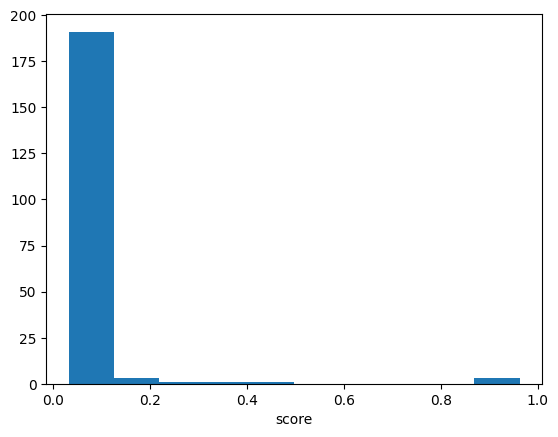

In [9]:
from matplotlib.pyplot import hist, boxplot, violinplot

fig, ax = plt.subplots(nrows=1, ncols=1)
ax.hist(result_score_s.detach().numpy())
ax.set_xlabel('score')
plt.show()

In [10]:
from torchvision.transforms.functional import to_pil_image

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(15, 15))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = to_pil_image(img.to('cpu'))
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

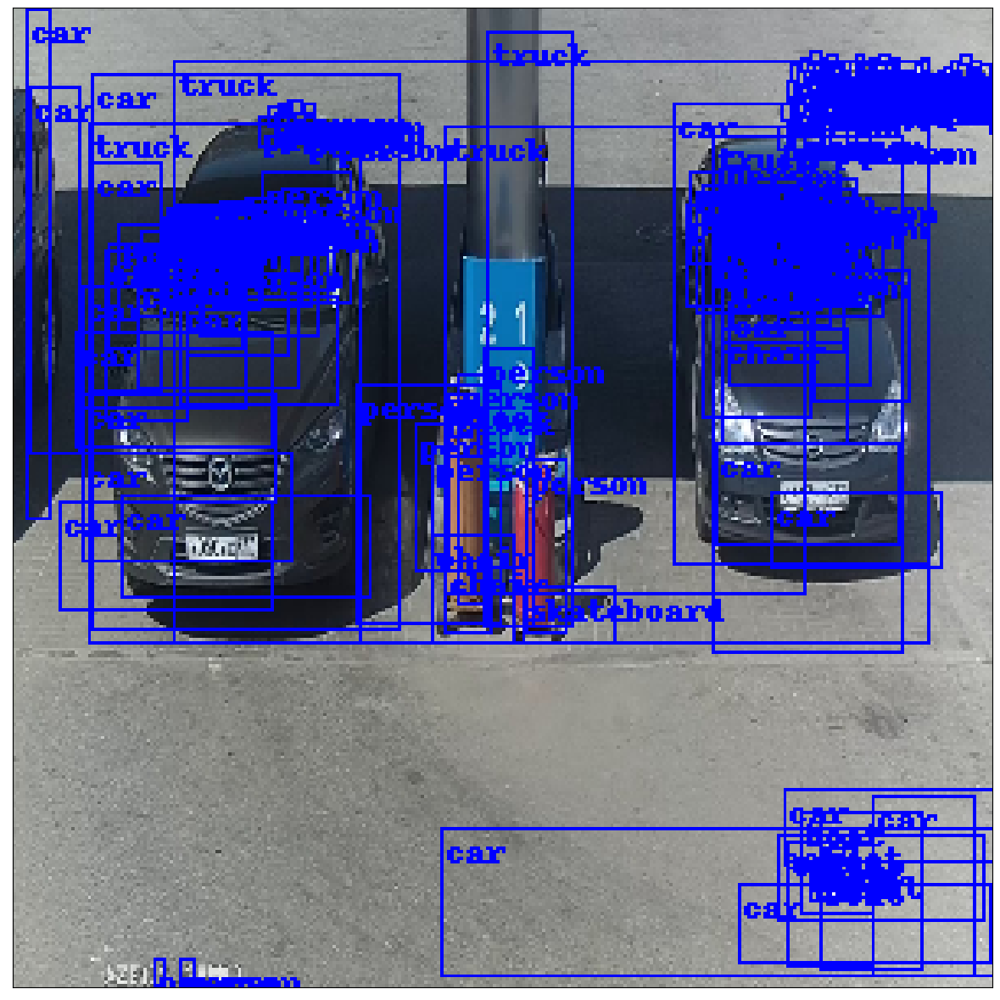

In [11]:
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils                 import draw_bounding_boxes
from torchvision.io                    import read_image
from torchvision.transforms.functional import resize

result_color_s = ["blue"]*result_box_s.shape[0]
result_image   = resize(read_image(source_path), (300,300))

result = draw_bounding_boxes(
    convert_image_dtype(result_image , dtype=torch.uint8), 
    result_box_s, colors=result_color_s, labels=result_class_s, width=1)
show(result)

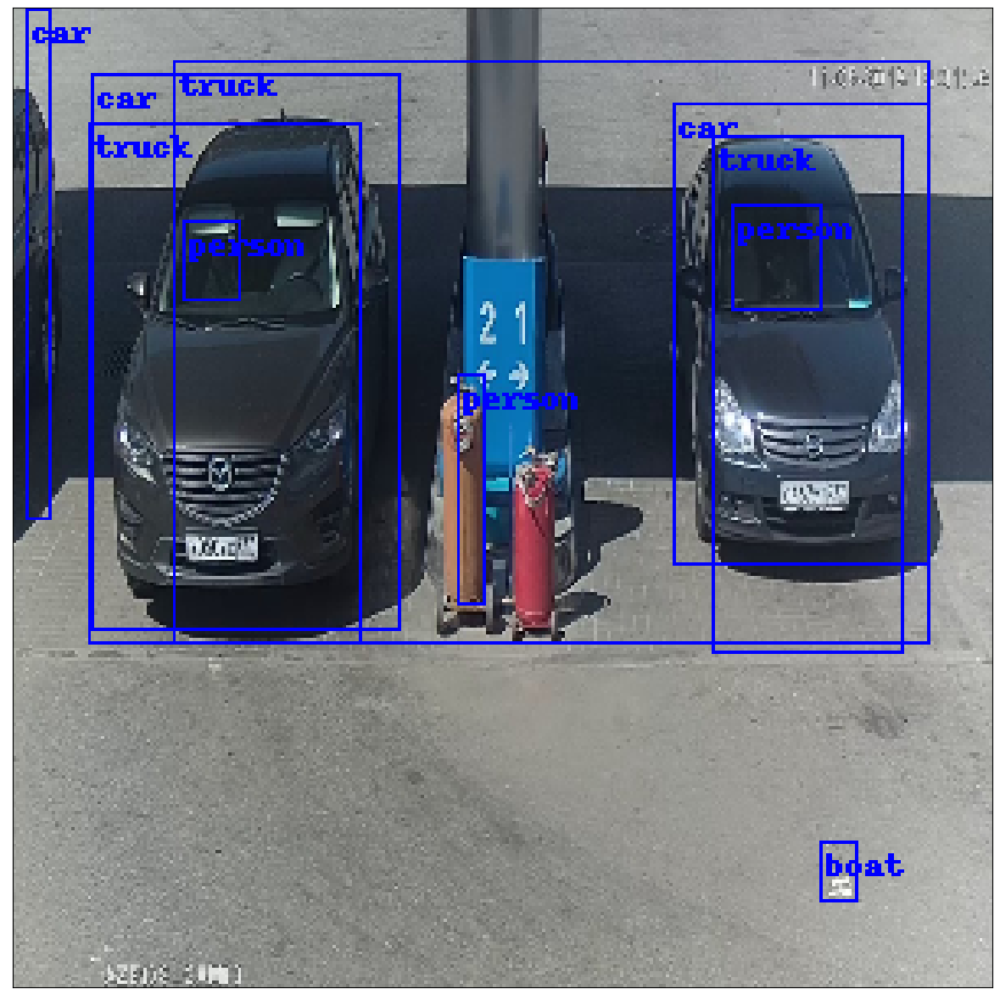

In [12]:
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils                 import draw_bounding_boxes
from torchvision.io                    import read_image
from torchvision.transforms.functional import resize

score_threshold = torch.quantile(result_score_s, q = 0.95)
index_s = result_score_s > score_threshold

current_box_s   = predictions[0]['boxes' ][index_s]
current_score_s = predictions[0]['scores'][index_s]
current_label_s = predictions[0]['labels'][index_s]
current_class_s = [ COCO_CLASSES[current_label] for current_label in current_label_s ]

current_color_s = ["blue"]*current_box_s.shape[0]
current_image   = resize(read_image(source_path), (300,300))

result = draw_bounding_boxes(
    convert_image_dtype(result_image , dtype=torch.uint8), 
    current_box_s, colors=current_color_s, labels=current_class_s, width=1)
show(result)

Какие особенности имеются в задаче?

### 3. Модель Single Shot Detector

`SSD (Single Shot Detector)` - одна из популярных `one-stage` моделей детектирования объектов, вместе с `Mask-RCNN` и `YOLOv3`. Модель обладает высокой скоростью, а также хорошей точностью. 

Когда что-то изучаете, хорошо обращаться к истокам - то есть к [оригинальной статье](https://arxiv.org/pdf/1512.02325.pdf).В статье представлены две версии модели - `SSD300`, `SSD512`, которые отличаются размером входа и некоторыми параметрами (конечно, `SSD512` массивнее и точнее), мы же сегодня рассмотрим `SSD300`. 

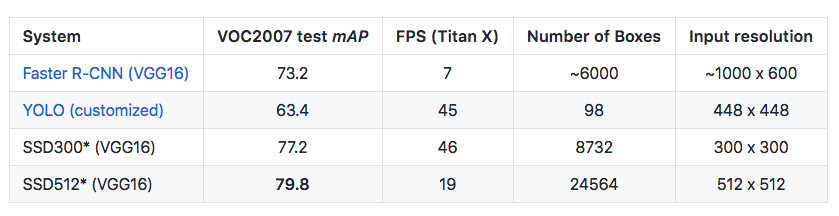

**Основные концепции, которые надо помнить и понимать, чтобы работать с моделью SSD**:
 - `feature maps `
 - `intersection over union`
 - `prior boxes`
 - `hard negative mining`
 - `non-maximum suppression`
 - `average precision`
 - `multibox loss` (`localization + classification`)

### **3.1 Архитектура SSD (vgg + convs + priors)**

Для простоты слои в SSD можно разделить на 3 группы: `backbone` (`базовые сверточные слои`), `auxiliary convolutions` (`вспомогательные сверточные слои`) и `prediction convolutions` (`предсказательные сверточные слои`).

- **`Backbone`** - основа получаемого признакового представления, обычно предобученная на `ImageNet` модель. У `SSD` изначально `VGG16`, но менять её можно (и нужно) в зависимости от ваших желаний
- **`Auxiliary`** часть - навешанные после `backbone` конволюции для получения новых, более глубоких `feature maps`
- **`Prediction`** часть - конволюции, на основе которых мы получаем предсказания по локализации и классификации объектов
- **`Priors`** в явном виде НЕ ВКЛЮЧЕНЫ в архитектуру, только их количество, но в обучении они играют важнейшую роль.

### **3.1.1. Backbone - VGG16**



Вспомним как выглядит классическая `VGG16` архитектура:

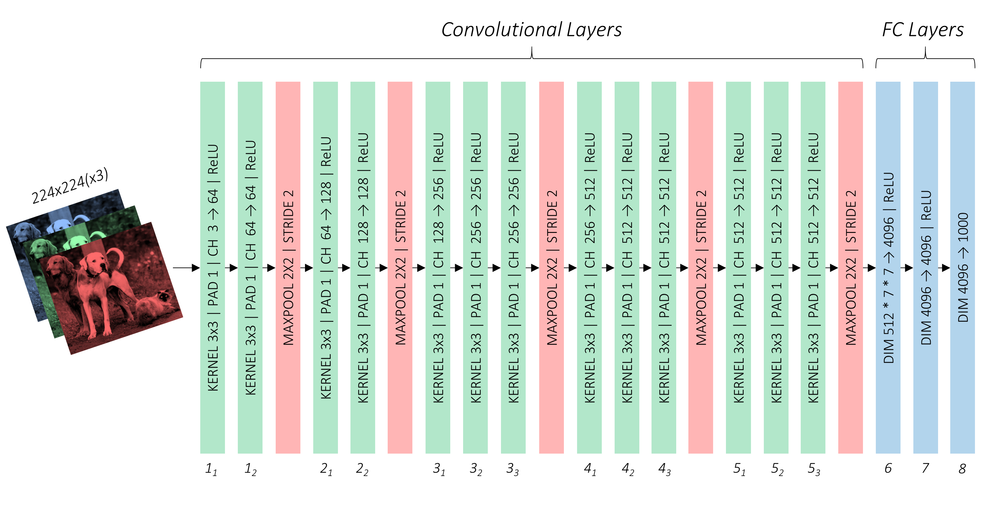

В `SSD` в архитектуру `VGG16` внесены некоторые **изменения**:
 - `input` теперь `(300, 300, 3)`
 - `MaxPool_3` при вычислении размера `output` использует `ceiling` функцию вместо дефолтной ([`ceil_mode=True`](https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html)). Это сделано просто чтобы размер `output` стал `(38, 38)` вместо `(37, 37)`
 - `MaxPool_5: kernel=(2, 2), stride=2 -> kernel(3, 3), stride=1`. То есть теперь не урезает размерность в 2 раза
 - `FC` слои нам не нужны

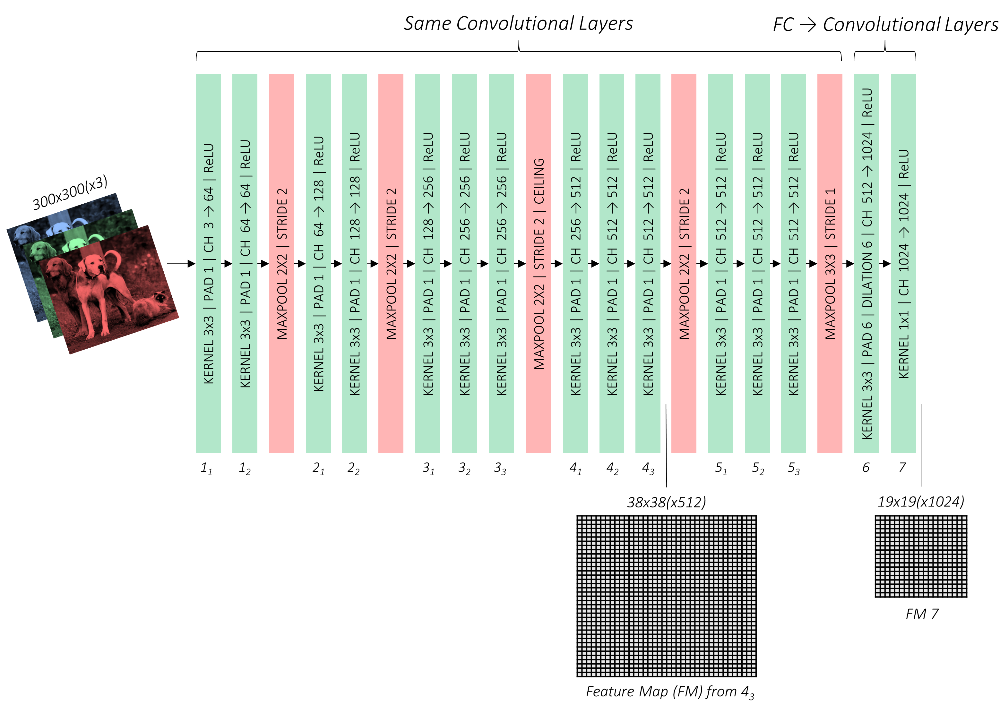

БОНУС: Можно было подойти к разработке модели более тонко. Например воспользоваться весами `FC6` и `FC7` для инициализации эквивалентных сверточных слоев.

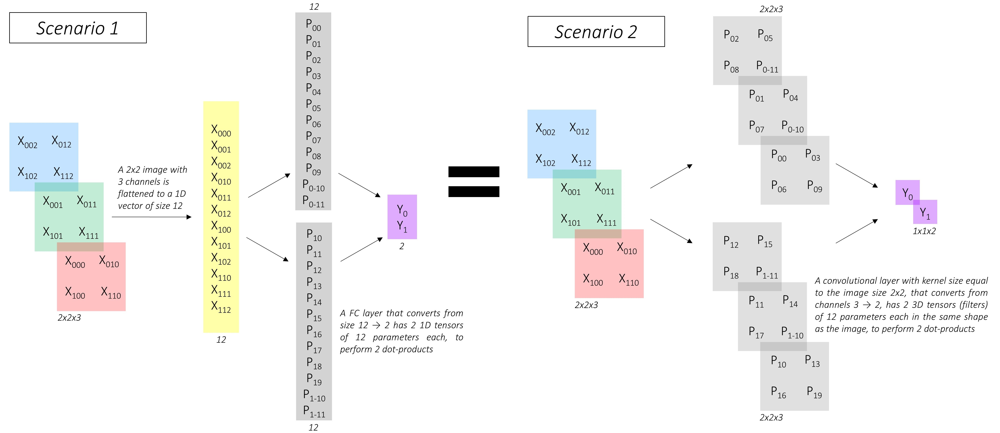

То есть для изображения размера `(H, W)` с `I` каналами применение `FC` слоя с `N` выходами это **то же самое** что применение `Conv` слоя c ядром `(H, W)` и `N` выходами (то есть `N` свертками толщины `I`).

Число параметров осталось таким же, а значит когда мы захотели бы взять веса с `ImageNet` надо было бы сделать просто правильный `reshape`. 

Однако просто заменой дело не кончилось. В первоначальной сетке на вход шел тензор размера `(224, 224, 3)` и выход `conv5_3` должен быть размера  `(7, 7, 512)`
 - на `FC6` были размерности `7 * 7 * 512 -> 4096`, а значит у новой `conv6` `kernel (7, 7)`, толщина свертки `512` и таких обучаемых ядер `4096` `(4096, 7, 7, 512)` 
 - на `FC7` `4096 -> 4096`, а значит `conv7` это `4096` ядер `(1, 1)` с толщиной `4096` `(4096, 1, 1, 4096)`


Это **очень много параметров**, что вычислительно тяжело.   

Поэтому сделали следующие замены:
 - `conv6`:  `(4096, 7, 7, 512) -> (1024, 3, 3, 512)`
 - `conv7`: `(4096, 1, 1, 4096) -> (1024, 1, 1, 1024)`

Сделано это было с помощью `downsampling` (или [`decimation`](https://ru.wikipedia.org/wiki/%D0%94%D0%B5%D1%86%D0%B8%D0%BC%D0%B0%D1%86%D0%B8%D1%8F_(%D0%BE%D0%B1%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%BA%D0%B0_%D1%81%D0%B8%D0%B3%D0%BD%D0%B0%D0%BB%D0%BE%D0%B2))) - то есть при подгрузке весов брали каждое m-ое число. При изменении ядер `(7, 7) -> (3, 3)` можно взять `m=3` и получить тот же `receptive field`, просто с дырками в ядре. Но так как на предыдущем слое размерность больше не падает, авторы взяли `m=6`.

Обратите внимание на выходы слоев **`conv4_3`** и **`conv_7`** - именно они являются `output`-ами нашего бэкбона. Это первые две "головы" нашего детектора, то есть первые две `feature maps`, на которых мы будем искать объекты. 

Теперь давайте посмотрим на код всего этого:

In [13]:
from torchvision.models import VGG16_Weights
from torchvision        import models

backbone_model    = models.vgg16(weights=VGG16_Weights.DEFAULT)

backbone_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [14]:
base_layers = nn.ModuleList(list(backbone_model.features)[:-1])
base_layers[16].ceil_mode = True

pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)          
conv6 = nn.Conv2d( 512, 1024, kernel_size=3, padding=6, dilation=6)
relu6 = nn.ReLU(inplace=True)
conv7 = nn.Conv2d(1024, 1024, kernel_size=1)
relu7 = nn.ReLU(inplace=True)

nn.init.xavier_uniform_(conv6.weight)
nn.init.zeros_         (conv6  .bias)
nn.init.xavier_uniform_(conv7.weight)
nn.init.zeros_         (conv7  .bias)

base_layers.extend( [pool5, conv6, relu6, conv7, relu7] )

ModuleList(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (17): Conv2d(256, 512, kernel_siz

### **3.1.2 Дополнительные сверточные слои (Auxiliary)**

Добавляем сверточные слои после `VGG16` и вытаскиваем оттуда ещё `4` карты признаков:

In [15]:
extra_layers = []
        
conv8_1  = nn.Conv2d( 1024, 256, kernel_size=1, stride=1           )
relu8_1  = nn.ReLU(inplace=True)
conv8_2  = nn.Conv2d( 256, 512, kernel_size=3, stride=2, padding=1)
relu8_2  = nn.ReLU(inplace=True)
conv9_1  = nn.Conv2d( 512, 128, kernel_size=1, stride=1           )
relu9_1  = nn.ReLU(inplace=True)
conv9_2  = nn.Conv2d( 128, 256, kernel_size=3, stride=2, padding=1)
relu9_2  = nn.ReLU(inplace=True)
conv10_1 = nn.Conv2d( 256, 128, kernel_size=1, stride=1           )
relu10_1 = nn.ReLU(inplace=True)
conv10_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
relu10_2 = nn.ReLU(inplace=True)
conv11_1 = nn.Conv2d( 256, 128, kernel_size=1, stride=1           )
relu11_1 = nn.ReLU(inplace=True)
conv11_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
relu11_2 = nn.ReLU(inplace=True)
        
nn.init.xavier_uniform_(conv8_1 .weight)
nn.init.zeros_         (conv8_1 .bias  )
nn.init.xavier_uniform_(conv8_2 .weight)
nn.init.zeros_         (conv8_2 .bias  )
nn.init.xavier_uniform_(conv9_1 .weight)
nn.init.zeros_         (conv9_1 .bias  )
nn.init.xavier_uniform_(conv9_2 .weight)
nn.init.zeros_         (conv9_2 .bias  )
nn.init.xavier_uniform_(conv10_1.weight)
nn.init.zeros_         (conv10_1.bias  )
nn.init.xavier_uniform_(conv10_2.weight)
nn.init.zeros_         (conv10_2.bias  )
nn.init.xavier_uniform_(conv11_1.weight)
nn.init.zeros_         (conv11_1.bias  )
nn.init.xavier_uniform_(conv11_2.weight)
nn.init.zeros_         (conv11_2.bias  )
        
extra_layers = nn.ModuleList( [conv8_1, relu8_1, conv8_2, relu8_2, conv9_1, relu9_1, conv9_2, relu9_2, conv10_1, relu10_1, conv10_2, relu10_2, conv11_1, relu11_1, conv11_2, relu11_2] )

In [16]:
total_layers = base_layers + extra_layers
total_layers

ModuleList(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
  (17): Conv2d(256, 512, kernel_siz

<img src="images/full_model.png" alt="drawing" width="1000"/>

### **3.1.3 Prior boxes**

Prior Boxes - это множество некоторых базовых прямоугольников, задача регрессии решается относительно этих прямоугольников, мы учимся предсказывать поправки к базовым прямоугольникам. Результирующие прямоугольники есть базовые прямоугольники плюс некоторые поправки, которые предсказывает модель.

**Особенности Prior Boxes**

- Каждый `prior box` связан с отдельным пространственным элементом каждой из карт признаков `(conv4_3, conv7, conv8_2, conv9_2, conv10_2, conv11_2)`
- Каждый `prior box` имеет параметр `s - scale`, это значит что площадь якоря будет `s^2*S_fm`. Например, на первой карте признаков `fm - conv4_3` у всех якорей `scale` `0.1` (то есть `10%` от размеров `fm`), самый большой `scale` на последнем слое `conv11_2` - `0.9`, но там размерность `feature map` уже `(1, 1)`, а значит `receptive field` такого представления - ВСЯ первоначальная картинка. Отсюда прямо следует что **чем выше номер головы**, тем **более крупные объекты** там детектируются. 
- Каждый `prior box` также характеризутеся `aspect ratio`. В каждом пространственном элементе `feature map` будет несколько `prior box` c одинаковым `scale` (кроме одного), но с разным `aspect ratio` (квадрат `1:1`, горизонтальный прямоугольник - `1:2`, `1:3` и вертикальный прямоугольник - `2:1`, `3:1`). 

**Важный note**: `prior boxes` желательно четко подбирать под вашу задачу. Если вы будете детектировать гуляющих людей, вам не понадобятся вертикальные прямоугольники. Тонка настройка прямоугольников под свою задачу позволит получить модель, которая быстрее выучится и будет точнее локализовать объекты.

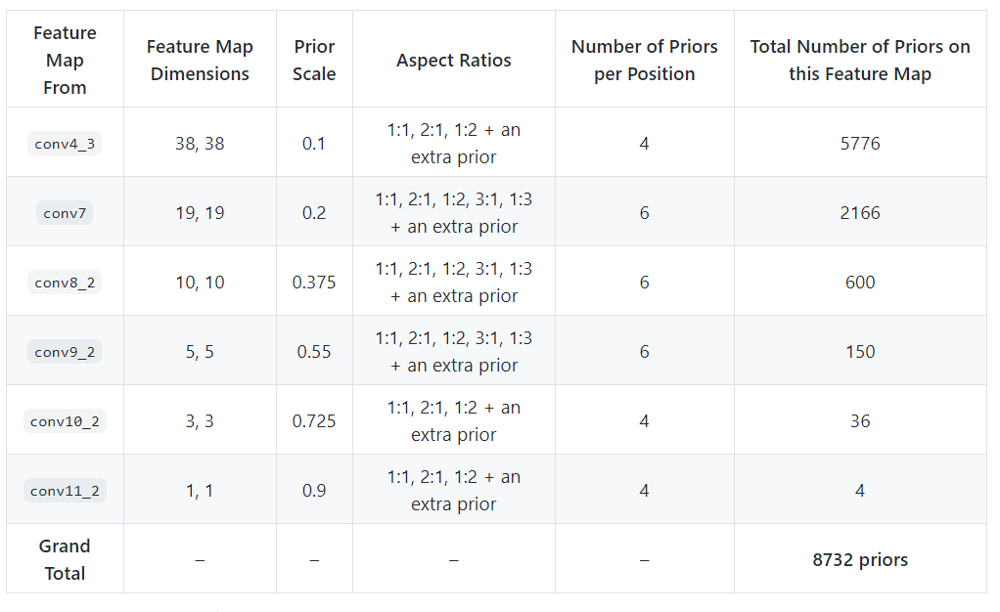

Итак, `prior box` определяется своими параметрами `scale` и `aspect ratio`, инициализируется с центром в каждой точке `feature map` и обрезается, если вылезает за край изображения. Для того же слоя `conv9_2` они выглядят так:

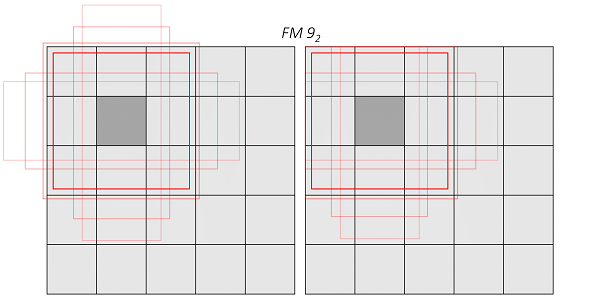

`prior boxes` явно не входят в модель, и на `prediction` слое ядра не ходят по заранее очерченным границам, которые якори задают (как можно было бы сделать например). От якорей по сути нужны только их координаты, которые будут уточняться в `localization prediction`. В создании представлений `prior boxes` не участвуют, мы только **закрепили** что определенное представление (`N`-ое) соответствует определенному якорю. И в процессе обучения оно **само выучитывается** тому, чтобы наилучшим образом соответствовать объекту в области якоря. 

Поканально в `prediction convolution` результатах соответствие якорям выглядит так:


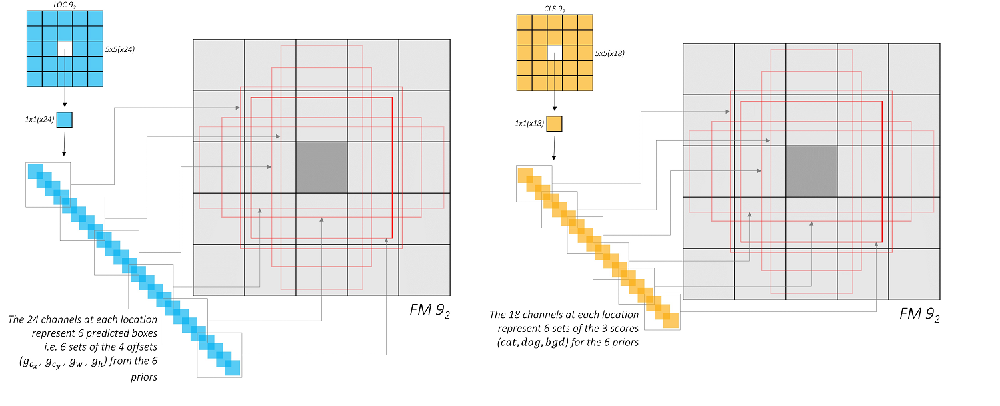

Дальше остается эти представления только reshape (изменить размерности) в нужную форму (которую мы сможем понять и агрегировать для якорей их результаты).

### **3.1.4 Дополнительные сверточные слои (Prediction)**

In [17]:
used_layer_id_s       = [21, 33, 37, 41, 45, 49]

In [18]:
out_channels_s = [ total_layers[i].out_channels for i in used_layer_id_s ] 
num_bboxes_s = [2, 2, 2, 2, 2, 2]
num_labels   = 2

conf_layers, loc_layers = [], []
for i, j in enumerate(used_layer_id_s):
    conf_layer = nn.Conv2d( total_layers[j].out_channels, num_bboxes_s[i] * num_labels, kernel_size=3, padding=1)
    loc_layer  = nn.Conv2d( total_layers[j].out_channels, num_bboxes_s[i] * 4         , kernel_size=3, padding=1)
            
    nn.init.xavier_uniform_(conf_layer.weight)
    nn.init.zeros_         (conf_layer  .bias)
    nn.init.xavier_uniform_(loc_layer .weight)
    nn.init.zeros_         (loc_layer   .bias)
            
    conf_layers += [conf_layer]
    loc_layers  += [loc_layer ]
    
    conf_layers = nn.ModuleList(conf_layers)
    loc_layers  = nn.ModuleList(loc_layers )

### **3.1.4 Результирующая модель**

In [19]:
from torchvision.models import VGG16_Weights
from torchvision        import models
from torchview          import draw_graph

import torch.nn.init as init

class L2Norm(nn.Module):
    def __init__(self, n_channels, scale):
        super(L2Norm, self).__init__()
        self.n_channels = n_channels
        self.gamma      = scale or None
        self.eps        = 1e-10
        self.weight     = nn.Parameter(torch.Tensor(self.n_channels))
        self.reset_parameters()

    def reset_parameters(self):
        init.constant_(self.weight, self.gamma)

    def forward(self, x):
        norm = torch.sqrt(x.pow(2).sum(dim=1, keepdim=True)) + self.eps
        x = torch.div(x, norm)
        x = self.weight.unsqueeze(0).unsqueeze(2).unsqueeze(3).expand_as(x) * x
        return x

class SSD_VGG16(nn.Module):
    def __init__(self, num_bboxes_s, num_labels = 3):
        super().__init__()
        
        self.num_bboxes_s = num_bboxes_s
        self.num_labels   = num_labels
        
        self.used_layer_id_s       = [21, 33, 37, 41, 45, 49] #
        self.norm_layer            = L2Norm(512, 20)
        
        base_layers       = self._build_base_layers ()
        extra_layers      = self._build_extra_layers()
        self.total_layers = base_layers + extra_layers
        
        self.conf_layers, self.loc_layers = self._build_conf_loc_layers()
    
    def _build_base_layers(self):
        backbone_model    = models.vgg16(weights=VGG16_Weights.DEFAULT)  #False
        
        base_layers = nn.ModuleList(list(backbone_model.features)[:-1])
        base_layers[16].ceil_mode = True
        
        pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)          
        conv6 = nn.Conv2d( 512, 1024, kernel_size=3, padding=6, dilation=6)
        relu6 = nn.ReLU(inplace=True)
        conv7 = nn.Conv2d(1024, 1024, kernel_size=1)
        relu7 = nn.ReLU(inplace=True)

        nn.init.xavier_uniform_(conv6.weight)
        nn.init.zeros_         (conv6  .bias)
        nn.init.xavier_uniform_(conv7.weight)
        nn.init.zeros_         (conv7  .bias)
       
        base_layers.extend( [pool5, conv6, relu6, conv7, relu7] )
        
        return base_layers

    def _build_extra_layers(self):
        extra_layers = []
        
        conv8_1  = nn.Conv2d( 1024, 256, kernel_size=1, stride=1           )
        relu8_1  = nn.ReLU(inplace=True)
        conv8_2  = nn.Conv2d( 256, 512, kernel_size=3, stride=2, padding=1)
        relu8_2  = nn.ReLU(inplace=True)
        conv9_1  = nn.Conv2d( 512, 128, kernel_size=1, stride=1           )
        relu9_1  = nn.ReLU(inplace=True)
        conv9_2  = nn.Conv2d( 128, 256, kernel_size=3, stride=2, padding=1)
        relu9_2  = nn.ReLU(inplace=True)
        conv10_1 = nn.Conv2d( 256, 128, kernel_size=1, stride=1           )
        relu10_1 = nn.ReLU(inplace=True)
        conv10_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
        relu10_2 = nn.ReLU(inplace=True)
        conv11_1 = nn.Conv2d( 256, 128, kernel_size=1                     )
        relu11_1 = nn.ReLU(inplace=True)
        conv11_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
        relu11_2 = nn.ReLU(inplace=True)
        
        nn.init.xavier_uniform_(conv8_1 .weight)
        nn.init.zeros_         (conv8_1 .bias  )
        nn.init.xavier_uniform_(conv8_2 .weight)
        nn.init.zeros_         (conv8_2 .bias  )
        nn.init.xavier_uniform_(conv9_1 .weight)
        nn.init.zeros_         (conv9_1 .bias  )
        nn.init.xavier_uniform_(conv9_2 .weight)
        nn.init.zeros_         (conv9_2 .bias  )
        nn.init.xavier_uniform_(conv10_1.weight)
        nn.init.zeros_         (conv10_1.bias  )
        nn.init.xavier_uniform_(conv10_2.weight)
        nn.init.zeros_         (conv10_2.bias  )
        nn.init.xavier_uniform_(conv11_1.weight)
        nn.init.zeros_         (conv11_1.bias  )
        nn.init.xavier_uniform_(conv11_2.weight)
        nn.init.zeros_         (conv11_2.bias  )
        
        extra_layers = nn.ModuleList( [conv8_1, relu8_1, conv8_2, relu8_2, conv9_1, relu9_1, conv9_2, relu9_2, conv10_1, relu10_1, conv10_2, relu10_2, conv11_1, relu11_1, conv11_2, relu11_2] )
        return extra_layers
    
    def _build_conf_loc_layers(self):
        out_channels_s = [ self.total_layers[i].out_channels for i in self.used_layer_id_s ] 
        
        conf_layers, loc_layers = [], []
        for i, j in enumerate(self.used_layer_id_s):
            conf_layer = nn.Conv2d( self.total_layers[j].out_channels, self.num_bboxes_s[i] * self.num_labels, kernel_size=3, padding=1)
            loc_layer  = nn.Conv2d( self.total_layers[j].out_channels, self.num_bboxes_s[i] * 4              , kernel_size=3, padding=1)
            
            nn.init.xavier_uniform_(conf_layer.weight)
            nn.init.zeros_         (conf_layer  .bias)
            nn.init.xavier_uniform_(loc_layer .weight)
            nn.init.zeros_         (loc_layer   .bias)
            
            conf_layers += [conf_layer]
            loc_layers  += [loc_layer ]

        conf_layers = nn.ModuleList(conf_layers)
        loc_layers  = nn.ModuleList(loc_layers )
        
        return conf_layers, loc_layers

    def forward(self, x, verbose=False):
        source_s, loc_s, conf_s = [], [], []
        
        for i, current_layer in enumerate(self.total_layers, -1):
            x = current_layer(x)
            if i in self.used_layer_id_s:
                if i == 21:
                    s = self.norm_layer(x)
                else:
                    s = x
                source_s.append(s)
        for s, l, c in zip(source_s, self.loc_layers, self.conf_layers):
            conf_s.append(c(s).permute(0, 2, 3, 1).contiguous())
            loc_s .append(l(s).permute(0, 2, 3, 1).contiguous())
        conf_s = torch.cat([o.view(o.size(0), -1) for o in conf_s], 1)
        loc_s  = torch.cat([o.view(o.size(0), -1) for o in loc_s ], 1)
        
        conf_s = conf_s.view(conf_s.size(0), -1, self.num_labels)
        loc_s  = loc_s .view(loc_s .size(0), -1, 4              )

        return loc_s, conf_s

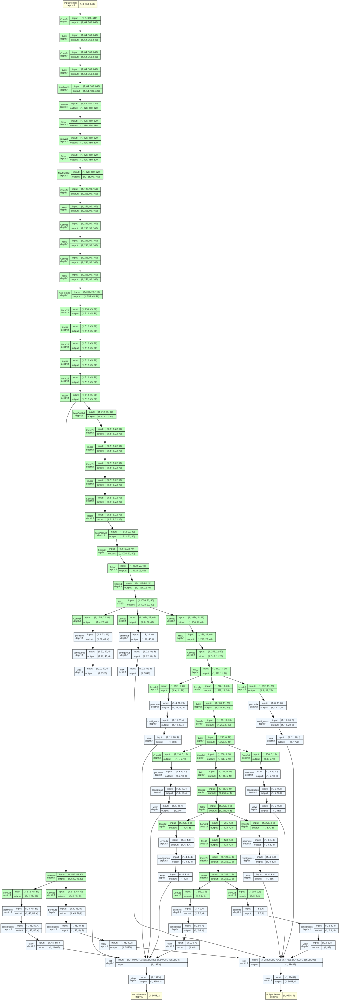

In [20]:
num_bboxes_s = [2, 2, 2, 2, 2, 2]
    
model = SSD_VGG16(num_bboxes_s, 2)
model.eval()
     
input_data  = torch.randn(1,3,360, 640, dtype=torch.float, requires_grad=False)
output_locs, output_confs = model( input_data )
    
model_graph  = draw_graph(model, input_size=(1,3,360,640), expand_nested=True)
visual_graph = model_graph.visual_graph
visual_graph

### 3. Функция потерь MultiBox Loss

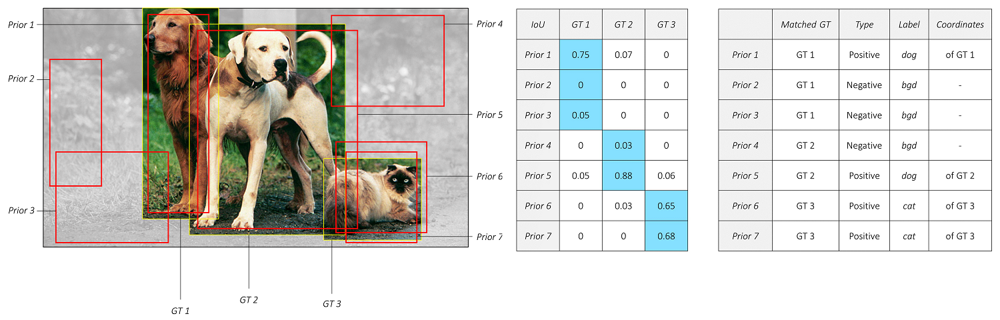

**Алгоритм обработки боксов**:

- считаем [`intersection over union (IoU)`](http://d2l.ai/chapter_computer-vision/anchor.html#intersection-over-union-iou)  между `groundtruth (GT)` резметкой на текущем изображении и всех (да, `8732`) `prior boxes`
- решаем задачу сопоставления между собой `GT` прямоугольников и `prior boxes` ([задача о назначениях](https://ru.wikipedia.org/wiki/%D0%97%D0%B0%D0%B4%D0%B0%D1%87%D0%B0_%D0%BE_%D0%BD%D0%B0%D0%B7%D0%BD%D0%B0%D1%87%D0%B5%D0%BD%D0%B8%D1%8F%D1%85)), `prior box` с `IoU` выше некоторого порога (например `0.5`) считается **positive**, иначе **negative**

**Localization loss.**

Для всех позитивных `prior boxes` мы имеем `GT` разметку, для негативных не имеем таких примеров. Поэтому локализационная часть лосса работает только для `positive` примеров - уточняет их координаты с помощью [`Smooth L1`](https://pytorch.org/docs/stable/generated/torch.nn.SmoothL1Loss.html) лосса (итоговый лосс - средний по всем `positive` примерам). `That's all`. 

**Confidence loss.**

Разметка по классам у нас есть для каждого предсказания - если он `negative`, то класс `background`. Совсем выкидывать их из обучения нельзя - сеть должна понимать как выглядит фон, но и используя их все, мы значительно перевесим настоящие объекты. Действовать надо аккуратно. 

Решение в целом очевидно - ограничим число негативных примеров, на которых будем обучаться. Надо только выбрать самые лучшие негативные примеры. Как? С помощью **Hard Negative Mining** - выбирая только те примеры, на которых целевой [`CrossEntropy Loss`](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html) будет наибольшим. В статье предлагается эвристика - брать `negative` примеров в `3` раза больше чем `positive`. 

То есть мы считаем для каждого предсказания `CrossEntropy Loss`, для негативных выбираем топ, позитивные берем все, далее нормируем на число позитивных примеров - и вот он готов. 

Между собой лоссы можно соотносить по важности с помощью гиперпараметра, но в статье он равен 1 и части равнозначны.

**Немножко неприятного про координаты для регрессии.**

Участовать в регрессии будут `GT` разметка (очевидно) и наши текущие `localization` предсказания. Но сделаны и обучены эти предсказания должны быть относительно своего `prior box` (помним же что в `localization prediction` каждая часть выхода соответствует `prior box`). Как это делается? 

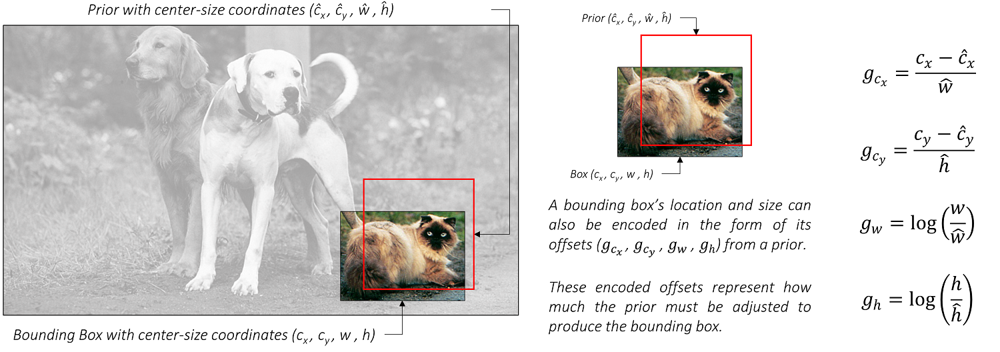

In [21]:
def encode(matched, priors, variances):
    """Encode the variances from the priorbox layers into the ground truth boxes
    we have matched (based on jaccard overlap) with the prior boxes.
    Args:
        matched: (tensor) Coords of ground truth for each prior in point-form
            Shape: [num_priors, 4].
        priors: (tensor) Prior boxes in center-offset form
            Shape: [num_priors,4].
        variances: (list[float]) Variances of priorboxes
    Return:
        encoded boxes (tensor), Shape: [num_priors, 4]
    """
    # dist b/t match center and prior's center
    g_cxcy = (matched[:, :2] + matched[:, 2:])/2 - priors[:, :2]
    # encode variance
    g_cxcy /= (variances[0] * priors[:, 2:])
    # match wh / prior wh
    g_wh = (matched[:, 2:] - matched[:, :2]) / priors[:, 2:]
    g_wh = torch.log(g_wh) / variances[1]
    # return target for smooth_l1_loss
    return torch.cat([g_cxcy, g_wh], 1)  # [num_priors,4]

def decode(loc, priors, variances):
    """Decode locations from predictions using priors to undo
    the encoding we did for offset regression at train time.
    Args:
        loc (tensor): location predictions for loc layers,
            Shape: [num_priors,4]
        priors (tensor): Prior boxes in center-offset form.
            Shape: [num_priors,4].
        variances: (list[float]) Variances of priorboxes
    Return:
        decoded bounding box predictions
    """
    boxes = torch.cat(( priors[:, :2] + loc[:, :2] * variances[0] * priors[:, 2:], priors[:, 2:] * torch.exp(loc[:, 2:] * variances[1])), 1)
    boxes[:, :2] -= boxes[:, 2:] / 2
    boxes[:, 2:] += boxes[:, :2]
    return boxes

Вот эти 4 отступа `(g_c_x, g_c_y, g_w, g_h)` - как раз то, что мы будем использовать в регрессии. Обратите внимание, что они нормированы по размеру якоря, это логично - один и тот же размер отступа в зависимости от размера якоря будет иметь разную значимость. 

Скачаем дополнительный набор исходных кодов для решения задачи

|  Файл | Назначение |
| ------------------ | ---------- |
| voc_dataset.py     | Файл содержит класс `VOCDetection`, экземпляр этого класса исользуется для загрузки данных в формате `VOC`           |
| voc_dataloader.py  | Файл содержит две функции `get_train_dataloader` и `get_test_dataloader`, которые создают два загрузчика данных      |
| prior_boxes.py     | Файл содержит набор полезных функций для работы с `ptior_boxes`, например их создание и решение задачи сопоставления |
| mulibox_loss.py    | Файл содержит класс `MultiBoxLoss`, экземпляр этого класса используется в качестве функции потерь                    |

In [22]:
!git clone https://github.com/SergeyMalashenko/ObjectDetectionProblemFromScratch.git utils

fatal: destination path 'utils' already exists and is not an empty directory.


In [23]:
from utils.prior_boxes import prior_boxes, match, encode, decode

class MultiBoxLoss(nn.Module):
    """SSD Weighted Loss Function
    Compute Targets:
        1) Produce Confidence Target Indices by matching  ground truth boxes
           with (default) 'priorboxes' that have jaccard index > threshold parameter
           (default threshold: 0.5).
        2) Produce localization target by 'encoding' variance into offsets of ground
           truth boxes and their matched  'priorboxes'.
        3) Hard negative mining to filter the excessive number of negative examples
           that comes with using a large number of default bounding boxes.
           (default negative:positive ratio 3:1)
    Objective Loss:
        L(x,c,l,g) = (Lconf(x, c) + αLloc(x,l,g)) / N
        Where, Lconf is the CrossEntropy Loss and Lloc is the SmoothL1 Loss
        weighted by α which is set to 1 by cross val.
        Args:
            c: class confidences,
            l: predicted boxes,
            g: ground truth boxes
            N: number of matched default boxes
        See: https://arxiv.org/pdf/1512.02325.pdf for more details.
    """

    def __init__(self, overlap_threshold, neg_pos_ratio, variance):
        super(MultiBoxLoss, self).__init__()
        self.threshold     = overlap_threshold
        self.neg_pos_ratio = neg_pos_ratio
        self.variance      = variance
    
    def forward(self, predictions, targets):
        """Multibox Loss
        Args:
            predictions (tuple): A tuple containing loc preds, conf preds,
            and prior boxes from SSD net.
                conf shape: torch.size(batch_size,num_priors,num_classes)
                loc shape: torch.size(batch_size,num_priors,4)
                priors shape: torch.size(num_priors,4)

            targets (tensor): Ground truth boxes and labels for a batch,
                shape: [batch_size,num_objs,5] (last idx is the label).
        """
        loc_data, conf_data, priors = predictions
        gt_label_s, gt_box_s = targets
        
        device = loc_data.device
        
        batch_size  = loc_data .size( 0)
        num_priors  = loc_data .size( 1)
        num_classes = conf_data.size(-1)
            
        # match priors (default boxes) and ground truth boxes
        loc_t  = torch.zeros(batch_size, num_priors, 4, device=device).float()
        conf_t = torch.zeros(batch_size, num_priors   , device=device).long ()
            
        neg_pos_ratio = self.neg_pos_ratio
        threshold     = self.threshold
        variance      = self.variance
        #Решаем задачу соответствия между GT боксами и предсказанными боксами
        for idx in range(batch_size):
            loc_t[idx], conf_t[idx] = match(threshold, gt_box_s[idx], priors, variance, gt_label_s[idx])
            
        pos = conf_t > 0
        num_pos = pos.sum(dim=1, keepdim=True)
        
        # Вычисляем Localization Loss (Smooth L1)
        # Shape: [batch, num_priors, 4]
        loc_p = loc_data[pos].view(-1, 4)
        loc_t = loc_t   [pos].view(-1, 4)
        loss_l = F.smooth_l1_loss(loc_p, loc_t, reduction='sum')
        
        # Вычисляем Classification Loss
        loss_c = F.cross_entropy(conf_data.view(-1, num_classes), conf_t.view(-1), reduction='none')
        loss_c = loss_c.view(batch_size, num_priors)
        
        # Filter out the negative samples and reduce the loss by sum
        loss_c_pos = loss_c[pos].sum()
        
        # Hard negative mining
        num_neg = torch.clamp(neg_pos_ratio * num_pos, max=pos.size(1) - 1)
        loss_c_neg = loss_c * ~pos
        loss_c_neg, _ = loss_c_neg.sort(1, descending=True)
        neg_mask = torch.zeros_like(loss_c_neg)
        neg_mask[torch.arange(batch_size), num_neg.view(-1)] = 1.
        neg_mask = 1 - neg_mask.cumsum(-1)
        loss_c_neg = (loss_c_neg * neg_mask).sum()
        
        # Finally we normalize the losses by the number of positives
        N = num_pos.sum()
        loss_l = loss_l / N
        loss_c = (loss_c_pos + loss_c_neg) / N

        return loss_l, loss_c

### 5. Тренировка модели

Для демонстрации работы подхода `SSD` мы настроим нашу модель на задачу детектирования автомобилей.

Набор данных состоит из `1528` изображений в разрешении `640x360` (тренировочная выборка - 1464 изображения, тестовая выборка - 64 изображения) в формате `VOC`. 

Набор имеет следующую структуру:

|  Директория      | Содержимое |
| ---------------- | ---------- |
| Annotations      | папка содержит разметку в виде набора файлов в формате `XML`, каждый файл содержит информацию об объектах (класс объекта, рамка объекта `xmin,ymin,xmax,ymax`)    |
| ImageSets/Main   | папка содержит два текстовых файла с распределением данных на тренирововчную `trainval.txt` и тестовую выборки `test.txt` |
| JPEGImages       | папка содержит изображения в `JPEG` формате |

Пример изображения из набора данных

![Image](sample.jpg)

Пример фрагмента разметки данных из набора данных

```
...
<size>
    <width>1280</width>
    <height>720</height>
    <depth>3</depth>
</size>
<object>
    <name>car</name> 
    <bndbox>
        <xmin>807</xmin>
        <ymin>30</ymin>
        <xmax>1101</xmax>
        <ymax>356</ymax>
    </bndbox>
</object>
...
```


In [24]:
!gdown --id 14UheyBtIByVktCsOR7OF2gBsTNGAw26E
!tar -xzf dataset.tar.gz

/opt/anaconda3/envs/work/lib/python3.11/site-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=14UheyBtIByVktCsOR7OF2gBsTNGAw26E 



In [25]:
from argparse import Namespace

param_s = Namespace(
 dataset_root_dir='dataset',
 epochs = 60, batch_size = 8,
 checkpoint = None, output = 'output',
 multistep = [20, 30, 40], 
 learning_rate = 1e-3, momentum = 0.9, 
 weight_decay = 0.0005, warmup = None,
 num_workers = 4,
 seed = 42
)

In [26]:
import sys
#Добавляем директорию, чтобы была возможность импортировать необходимые модули
sys.path.insert(0, 'utils')

from torch.optim.lr_scheduler import MultiStepLR
from utils.voc_dataloader     import get_train_dataloader, get_test_dataloader
from utils.prior_boxes        import detect_objects, prior_boxes

from tqdm        import tqdm

import time
import os

def train_process(args, custom_config):
    torch.manual_seed(     args.seed)
    np.random.seed   (seed=args.seed)   
    
    dataset_root_dir          = args.dataset_root_dir
    train_annotation_filename = os.path.join( dataset_root_dir, "ImageSets/Main/trainval.txt" )
    test_annotation_filename  = os.path.join( dataset_root_dir, "ImageSets/Main/test.txt"     )
    train_dataloader          = get_train_dataloader(dataset_root_dir, train_annotation_filename, args.batch_size, args.num_workers)
    test_dataloader           = get_test_dataloader (dataset_root_dir, test_annotation_filename , args.batch_size, args.num_workers)
    
    learning_rate = args.learning_rate
    
    if not os.path.exists(args.output):
        os.mkdir(args.output)
    
    
    model = SSD_VGG16(custom_config['num_priors'], custom_config['num_classes'])
    
    prior_box_s = prior_boxes(custom_config)
    prior_box_s_gpu = prior_box_s.cuda()

    overlap_threshold = custom_config['overlap_threshold']
    neg_pos_ratio     = custom_config['neg_pos_ratio'    ]
    variance          = custom_config['variance']

    criterion = MultiBoxLoss( overlap_threshold, neg_pos_ratio, variance)
    model    .cuda()
    criterion.cuda()
    
    optimizer = torch.optim.SGD(model.parameters(), lr=args.learning_rate, momentum=args.momentum, weight_decay=args.weight_decay )
    scheduler = MultiStepLR(optimizer=optimizer, milestones=args.multistep, gamma=0.2)
    
    best_loc_loss, best_cls_loss, best_loss = np.inf, np.inf, np.inf
    train_loss_s, eval_loss_s = [], []
    for epoch in tqdm(list(range(args.epochs))):
        #Train model
        train_loc_loss, train_cls_loss, train_loss = 0, 0, 0
        model.train()
        for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(train_dataloader):
            if len(box_ss_cpu) > 0 and len(label_ss_cpu) > 0: 
                image_s_gpu  =   image_s_cpu.cuda()
                label_ss_gpu = [ label_s_cpu.cuda() for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .cuda() for box_s_cpu   in box_ss_cpu   ]

                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)
                
                loc_loss, cls_loss = criterion( (pred_loc_ss_gpu, pred_conf_ss_gpu, prior_box_s_gpu), (label_ss_gpu, box_ss_gpu))

                loss = loc_loss + cls_loss
                
                optimizer.zero_grad()
                loss     .backward ()
                optimizer.step     ()
                
                train_loc_loss += loc_loss.item()
                train_cls_loss += cls_loss.item()
                train_loss     += loss    .item()
        scheduler.step()
        train_loss_s.append(train_loss)
        #Eval model
        eval_loc_loss, eval_cls_loss, eval_loss = 0, 0, 0
        model.eval()
        for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(test_dataloader):
            if len(box_ss_cpu) > 0 and len(label_ss_cpu) > 0: 
                image_s_gpu = image_s_cpu.cuda()
                label_ss_gpu = [ label_s_cpu.cuda() for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .cuda() for box_s_cpu   in box_ss_cpu   ]
                
                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)
                
                loc_loss, cls_loss = criterion( (pred_loc_ss_gpu, pred_conf_ss_gpu, prior_box_s_gpu), (label_ss_gpu, box_ss_gpu))
                loss = loc_loss + cls_loss
                
                eval_loc_loss += loc_loss.item()
                eval_cls_loss += cls_loss.item()
                eval_loss     += loss    .item()
        eval_loss_s.append(eval_loss)
        #Calculate metrics
        '''
        pred_box_ss, pred_score_ss, pred_label_ss = list(), list(), list()
        model.eval()
        with torch.no_grad():
            for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(test_dataloader):
                image_s_gpu = image_s_cpu.cuda()
                label_ss_gpu = [ label_s_cpu.cuda() for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .cuda() for box_s_cpu   in box_ss_cpu   ]
                
                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)
                pred_conf_ss_cpu = F.softmax(pred_conf_ss_gpu, dim=2).cpu()
                pred_loc_ss_cpu  = pred_loc_ss_gpu                   .cpu()
                
                pred_box_ss, pred_label_ss, pred_conf_ss = detect_objects(pred_loc_ss_cpu, pred_conf_ss_cpu, prior_box_s_cpu, 3, 0.5, 0.1)
        '''
        print('epoch[{}] | lr {:.5f} | loc_loss [{:.2f}/{:.2f}] | cls_loss [{:.2f}/{:.2f}] | total_loss [{:.2f}/{:.2f}]'.format(epoch, scheduler.get_last_lr()[0], train_loc_loss, eval_loc_loss, train_cls_loss, eval_cls_loss, train_loss, eval_loss))
        if eval_loss < best_loss :
            torch.save(model.state_dict(), os.path.join(args.output, f"{custom_config['model_name']}.pth"))
            best_loc_loss, best_cls_loss, best_loss = eval_loc_loss, eval_cls_loss, eval_loss
    return model, prior_box_s, train_loss_s, eval_loss_s

#### Аугментация данных (Data Augmentation)


Аугментация данных - это техника, используемая для увеличения разнообразия и объема обучающего набора данных путем применения различных преобразований к существующим элементам данных, что помогает улучшить обобщающие способности модели. К распространенным методам дополнения данных относятся геометрические преобразования, такие как поворот, переворот и обрезка, а также цветовые корректировки, такие как изменение яркости и контрастности. Эти методы имитируют изменчивость реального мира, делая модель более устойчивой к изменениям, с которыми она может столкнуться в процессе развертывания. Дополнение данных особенно полезно для задач с ограниченным количеством данных, где получение новых данных может быть затруднено. Повышая вариативность наборов данных, расширение данных уменьшает чрезмерную подгонку, что приводит к более надежным и точным предсказаниям модели в различных сценариях.

В задаче детектирования также используется широкий набор техник, позволяющий выполнить аугментацию данных. Вы можете познакомится с ними в пакете [`albumentations`](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/)

In [32]:
os.makedirs('./models', exist_ok=True)

custom_config = {
 'num_classes'  : 2,
 'feature_maps' : [(45,80), (22,40), (11,20), (6,10), (4,8), (2,6)], #VGG16 - 640x360
 
 'min_sizes'    : [0.10, 0.20, 0.37, 0.54, 0.71, 1.00],
 'max_sizes'    : [0.20, 0.37, 0.54, 0.71, 1.00, 1.05],
     
 'aspect_ratios': [[2, 3], [2, 3], [2, 3], [2, 3], [2], [2]],
 'num_priors'   : [6, 6, 6, 6, 4, 4],
 'variance'     : [0.1, 0.2],
 'clip'         :    True,
    
 'overlap_threshold': 0.5, 
 'neg_pos_ratio'    :   3,

 'model_name' : 'vgg16'
}

model, prior_box_s, train_loss_s, eval_loss_s = train_process(param_s, custom_config)

  2%|██▊                                                                                                                                                                      | 1/60 [00:26<26:06, 26.55s/it]

epoch[0] | lr 0.00100 | loc_loss [391.42/13.45] | cls_loss [1145.77/54.57] | total_loss [1537.20/68.02]


  3%|█████▋                                                                                                                                                                   | 2/60 [00:53<25:41, 26.58s/it]

epoch[1] | lr 0.00100 | loc_loss [221.37/7.43] | cls_loss [1098.23/35.52] | total_loss [1319.60/42.95]


  5%|████████▍                                                                                                                                                                | 3/60 [01:19<25:13, 26.56s/it]

epoch[2] | lr 0.00100 | loc_loss [159.27/5.86] | cls_loss [663.76/12.48] | total_loss [823.03/18.34]


  7%|███████████▎                                                                                                                                                             | 4/60 [01:46<24:46, 26.55s/it]

epoch[3] | lr 0.00100 | loc_loss [131.77/4.65] | cls_loss [283.89/10.90] | total_loss [415.67/15.55]


  8%|██████████████                                                                                                                                                           | 5/60 [02:12<24:18, 26.51s/it]

epoch[4] | lr 0.00100 | loc_loss [118.10/4.48] | cls_loss [258.05/10.39] | total_loss [376.15/14.87]


 10%|████████████████▉                                                                                                                                                        | 6/60 [02:39<23:52, 26.52s/it]

epoch[5] | lr 0.00100 | loc_loss [102.12/4.49] | cls_loss [241.70/10.22] | total_loss [343.82/14.71]


 12%|███████████████████▋                                                                                                                                                     | 7/60 [03:05<23:26, 26.55s/it]

epoch[6] | lr 0.00100 | loc_loss [93.60/4.37] | cls_loss [231.44/10.26] | total_loss [325.04/14.63]


 13%|██████████████████████▌                                                                                                                                                  | 8/60 [03:32<23:00, 26.55s/it]

epoch[7] | lr 0.00100 | loc_loss [85.12/3.16] | cls_loss [217.05/8.93] | total_loss [302.17/12.09]


 15%|█████████████████████████▎                                                                                                                                               | 9/60 [03:58<22:34, 26.56s/it]

epoch[8] | lr 0.00100 | loc_loss [77.95/3.00] | cls_loss [208.07/8.92] | total_loss [286.02/11.93]


 17%|████████████████████████████                                                                                                                                            | 10/60 [04:25<22:06, 26.52s/it]

epoch[9] | lr 0.00100 | loc_loss [75.30/3.33] | cls_loss [204.30/10.40] | total_loss [279.60/13.73]


 18%|██████████████████████████████▊                                                                                                                                         | 11/60 [04:51<21:40, 26.54s/it]

epoch[10] | lr 0.00100 | loc_loss [70.44/2.70] | cls_loss [199.18/8.16] | total_loss [269.62/10.87]


 20%|█████████████████████████████████▌                                                                                                                                      | 12/60 [05:18<21:13, 26.54s/it]

epoch[11] | lr 0.00100 | loc_loss [65.73/2.25] | cls_loss [189.57/8.30] | total_loss [255.30/10.56]


 22%|████████████████████████████████████▍                                                                                                                                   | 13/60 [05:44<20:45, 26.50s/it]

epoch[12] | lr 0.00100 | loc_loss [62.05/2.78] | cls_loss [184.18/8.80] | total_loss [246.24/11.58]


 23%|███████████████████████████████████████▏                                                                                                                                | 14/60 [06:11<20:17, 26.46s/it]

epoch[13] | lr 0.00100 | loc_loss [62.21/2.43] | cls_loss [184.90/8.41] | total_loss [247.11/10.84]


 25%|██████████████████████████████████████████                                                                                                                              | 15/60 [06:37<19:52, 26.51s/it]

epoch[14] | lr 0.00100 | loc_loss [58.85/2.45] | cls_loss [179.57/7.93] | total_loss [238.42/10.38]


 27%|████████████████████████████████████████████▊                                                                                                                           | 16/60 [07:04<19:25, 26.48s/it]

epoch[15] | lr 0.00100 | loc_loss [57.47/2.59] | cls_loss [175.97/8.39] | total_loss [233.44/10.98]


 28%|███████████████████████████████████████████████▌                                                                                                                        | 17/60 [07:30<18:57, 26.46s/it]

epoch[16] | lr 0.00100 | loc_loss [55.09/2.33] | cls_loss [174.79/8.20] | total_loss [229.88/10.53]


 30%|██████████████████████████████████████████████████▍                                                                                                                     | 18/60 [07:57<18:30, 26.45s/it]

epoch[17] | lr 0.00100 | loc_loss [53.55/2.24] | cls_loss [169.80/8.20] | total_loss [223.35/10.44]


 32%|█████████████████████████████████████████████████████▏                                                                                                                  | 19/60 [08:23<18:05, 26.46s/it]

epoch[18] | lr 0.00100 | loc_loss [52.55/2.09] | cls_loss [166.49/7.28] | total_loss [219.04/9.37]


 33%|████████████████████████████████████████████████████████                                                                                                                | 20/60 [08:50<17:38, 26.46s/it]

epoch[19] | lr 0.00020 | loc_loss [51.09/2.36] | cls_loss [162.98/7.65] | total_loss [214.07/10.00]


 35%|██████████████████████████████████████████████████████████▊                                                                                                             | 21/60 [09:16<17:13, 26.49s/it]

epoch[20] | lr 0.00020 | loc_loss [42.24/1.89] | cls_loss [151.39/7.47] | total_loss [193.63/9.36]


 37%|█████████████████████████████████████████████████████████████▌                                                                                                          | 22/60 [09:43<16:45, 26.46s/it]

epoch[21] | lr 0.00020 | loc_loss [41.12/2.01] | cls_loss [151.70/7.52] | total_loss [192.82/9.53]


 38%|████████████████████████████████████████████████████████████████▍                                                                                                       | 23/60 [10:09<16:20, 26.49s/it]

epoch[22] | lr 0.00020 | loc_loss [40.77/1.89] | cls_loss [148.99/7.39] | total_loss [189.77/9.28]


 40%|███████████████████████████████████████████████████████████████████▏                                                                                                    | 24/60 [10:36<15:54, 26.50s/it]

epoch[23] | lr 0.00020 | loc_loss [41.24/1.95] | cls_loss [148.86/7.13] | total_loss [190.10/9.08]


 42%|██████████████████████████████████████████████████████████████████████                                                                                                  | 25/60 [11:02<15:26, 26.48s/it]

epoch[24] | lr 0.00020 | loc_loss [40.47/2.02] | cls_loss [147.66/7.26] | total_loss [188.13/9.28]


 43%|████████████████████████████████████████████████████████████████████████▊                                                                                               | 26/60 [11:29<15:01, 26.52s/it]

epoch[25] | lr 0.00020 | loc_loss [40.19/1.77] | cls_loss [148.31/7.22] | total_loss [188.51/8.98]


 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                            | 27/60 [11:55<14:34, 26.49s/it]

epoch[26] | lr 0.00020 | loc_loss [39.35/1.84] | cls_loss [144.88/7.25] | total_loss [184.23/9.09]


 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                         | 28/60 [12:22<14:07, 26.48s/it]

epoch[27] | lr 0.00020 | loc_loss [39.79/1.95] | cls_loss [147.26/7.22] | total_loss [187.05/9.17]


 48%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 29/60 [12:48<13:41, 26.50s/it]

epoch[28] | lr 0.00020 | loc_loss [39.32/1.92] | cls_loss [145.68/6.99] | total_loss [185.00/8.92]


 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                    | 30/60 [13:15<13:14, 26.47s/it]

epoch[29] | lr 0.00004 | loc_loss [39.30/1.84] | cls_loss [145.34/7.32] | total_loss [184.64/9.16]


 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 31/60 [13:41<12:48, 26.51s/it]

epoch[30] | lr 0.00004 | loc_loss [37.88/1.65] | cls_loss [142.82/6.90] | total_loss [180.70/8.55]


 53%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 32/60 [14:08<12:22, 26.50s/it]

epoch[31] | lr 0.00004 | loc_loss [38.32/1.75] | cls_loss [142.75/6.98] | total_loss [181.07/8.73]


 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 33/60 [14:34<11:55, 26.49s/it]

epoch[32] | lr 0.00004 | loc_loss [36.84/1.87] | cls_loss [140.30/7.14] | total_loss [177.15/9.01]


 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 34/60 [15:01<11:28, 26.48s/it]

epoch[33] | lr 0.00004 | loc_loss [37.68/1.82] | cls_loss [140.42/7.10] | total_loss [178.10/8.92]


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 35/60 [15:27<11:01, 26.47s/it]

epoch[34] | lr 0.00004 | loc_loss [37.44/1.72] | cls_loss [140.42/7.17] | total_loss [177.86/8.89]


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 36/60 [15:53<10:34, 26.45s/it]

epoch[35] | lr 0.00004 | loc_loss [36.51/1.76] | cls_loss [139.25/7.02] | total_loss [175.76/8.78]


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 37/60 [16:20<10:08, 26.45s/it]

epoch[36] | lr 0.00004 | loc_loss [37.62/1.90] | cls_loss [140.51/7.13] | total_loss [178.14/9.04]


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 38/60 [16:46<09:41, 26.44s/it]

epoch[37] | lr 0.00004 | loc_loss [36.95/1.78] | cls_loss [138.99/7.24] | total_loss [175.94/9.02]


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 39/60 [17:13<09:15, 26.43s/it]

epoch[38] | lr 0.00004 | loc_loss [37.57/1.73] | cls_loss [141.03/7.09] | total_loss [178.60/8.82]


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 40/60 [17:39<08:49, 26.46s/it]

epoch[39] | lr 0.00001 | loc_loss [37.18/1.73] | cls_loss [141.27/6.77] | total_loss [178.46/8.50]


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 41/60 [18:06<08:22, 26.46s/it]

epoch[40] | lr 0.00001 | loc_loss [37.34/1.88] | cls_loss [141.59/7.19] | total_loss [178.92/9.07]


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 42/60 [18:32<07:56, 26.45s/it]

epoch[41] | lr 0.00001 | loc_loss [36.55/1.84] | cls_loss [138.90/7.14] | total_loss [175.45/8.98]


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 43/60 [18:58<07:29, 26.44s/it]

epoch[42] | lr 0.00001 | loc_loss [36.84/1.89] | cls_loss [138.24/7.11] | total_loss [175.09/9.00]


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 44/60 [19:25<07:03, 26.48s/it]

epoch[43] | lr 0.00001 | loc_loss [36.96/1.69] | cls_loss [139.96/6.68] | total_loss [176.92/8.38]


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 45/60 [19:51<06:36, 26.46s/it]

epoch[44] | lr 0.00001 | loc_loss [36.80/1.81] | cls_loss [138.46/6.98] | total_loss [175.25/8.79]


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 46/60 [20:18<06:10, 26.44s/it]

epoch[45] | lr 0.00001 | loc_loss [36.34/1.90] | cls_loss [138.12/7.11] | total_loss [174.46/9.01]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 47/60 [20:44<05:43, 26.44s/it]

epoch[46] | lr 0.00001 | loc_loss [36.88/1.73] | cls_loss [139.38/6.88] | total_loss [176.26/8.62]


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 48/60 [21:11<05:17, 26.44s/it]

epoch[47] | lr 0.00001 | loc_loss [37.00/1.78] | cls_loss [139.67/6.91] | total_loss [176.67/8.69]


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 49/60 [21:37<04:50, 26.43s/it]

epoch[48] | lr 0.00001 | loc_loss [36.96/1.90] | cls_loss [138.84/7.01] | total_loss [175.80/8.91]


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 50/60 [22:04<04:24, 26.44s/it]

epoch[49] | lr 0.00001 | loc_loss [36.69/1.69] | cls_loss [137.67/6.91] | total_loss [174.36/8.60]


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 51/60 [22:30<03:57, 26.44s/it]

epoch[50] | lr 0.00001 | loc_loss [37.09/1.76] | cls_loss [139.31/6.88] | total_loss [176.40/8.64]


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 52/60 [22:56<03:31, 26.44s/it]

epoch[51] | lr 0.00001 | loc_loss [36.86/1.74] | cls_loss [139.09/6.82] | total_loss [175.95/8.57]


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 53/60 [23:23<03:05, 26.44s/it]

epoch[52] | lr 0.00001 | loc_loss [36.80/1.73] | cls_loss [139.79/6.69] | total_loss [176.59/8.42]


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 54/60 [23:49<02:38, 26.42s/it]

epoch[53] | lr 0.00001 | loc_loss [36.35/1.65] | cls_loss [137.82/6.83] | total_loss [174.18/8.48]


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 55/60 [24:16<02:12, 26.42s/it]

epoch[54] | lr 0.00001 | loc_loss [37.17/1.82] | cls_loss [140.92/7.02] | total_loss [178.09/8.84]


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 56/60 [24:42<01:45, 26.41s/it]

epoch[55] | lr 0.00001 | loc_loss [35.86/1.72] | cls_loss [136.86/7.06] | total_loss [172.72/8.78]


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 57/60 [25:09<01:19, 26.47s/it]

epoch[56] | lr 0.00001 | loc_loss [37.39/1.63] | cls_loss [140.53/6.61] | total_loss [177.92/8.24]


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 58/60 [25:35<00:52, 26.46s/it]

epoch[57] | lr 0.00001 | loc_loss [36.93/1.86] | cls_loss [140.56/6.56] | total_loss [177.49/8.42]


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 59/60 [26:02<00:26, 26.45s/it]

epoch[58] | lr 0.00001 | loc_loss [35.98/1.73] | cls_loss [137.69/6.66] | total_loss [173.67/8.39]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [26:28<00:00, 26.48s/it]

epoch[59] | lr 0.00001 | loc_loss [36.52/1.77] | cls_loss [137.73/6.78] | total_loss [174.25/8.55]


<img src="images/train_model.png" alt="drawing" width="1000"/>

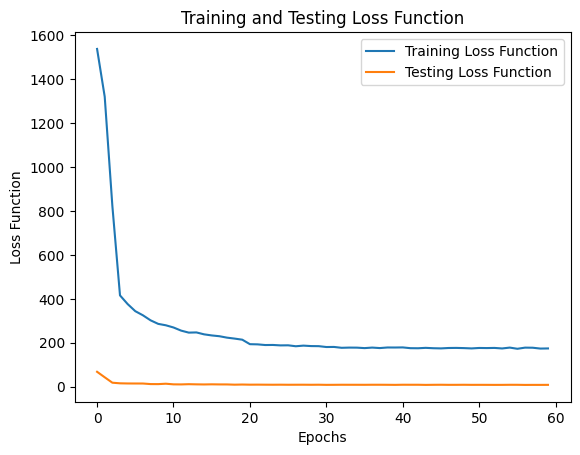

In [33]:
# Plot and label the training and validation loss values
plt.plot(train_loss_s, label='Training Loss Function')
plt.plot(eval_loss_s , label='Testing Loss Function ')
 
# Add in a title and axes labels
plt.title('Training and Testing Loss Function')
plt.xlabel('Epochs')
plt.ylabel('Loss Function')

# Display the plot
plt.legend(loc='best')
plt.show()

In [34]:
checkpoint = f"output/vgg16.pth"

state_dict = torch.load(checkpoint, map_location=None if torch.cuda.is_available() else 'cpu')
model.load_state_dict(state_dict)
model.to(device)
model.eval()

SSD_VGG16(
  (norm_layer): L2Norm()
  (total_layers): ModuleList(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size

### 6. Тестирование модели

**Алгоритм обработки**:
- получить для текущего изображения наборы предсказаний `(gc_x, gc_y, g_w, g_h)` и `(p_1,....,p_N)`.
- рассчитать истиные прямоугольники, используя поправки `(gc_x, gc_y, g_w, g_h)` и `prior boxes`.
- удалить все прямоугольники, которые относятся к классу `background == argmax(p_1, ..., p_N)`
- удалить прямоугольники которые `argval(p_1, ..., p_N) < threshold` (объекты, которые задектированы неуверенно)
- выполнить фильтрацию пямоугольников посредством [`NMS`](http://d2l.ai/chapter_computer-vision/anchor.html#predicting-bounding-boxes-with-non-maximum-suppression)
- визуализировать полученные результаты

P.S. Параметры `conf_threshold` и `overlap_threshold` влияют на конечное число задетектированных объектов, попробуйте их поменять

In [35]:
import random
import glob

test_image_s = random.sample( glob.glob("dataset/JPEGImages/*.jpg"), 9 )

In [36]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt

VOC_CLASSES = ('background','car')

overlap_threshold = 0.25
conf_threshold    = 0.05
num_classes       = 2

fig, ax = plt.subplots(nrows=3, ncols=3, gridspec_kw = {'wspace':0, 'hspace':0}, figsize=(300, 200))

for index, image_filename in enumerate(test_image_s):
    i = index // 3
    j = index % 3 
    
    source_image_numpy = cv2.imread(image_filename)
    source_image_numpy = cv2.cvtColor(source_image_numpy, cv2.COLOR_BGR2RGB) 
    
    source_image_numpy = np.transpose(source_image_numpy.astype(np.float32) / 255., axes=[2,0,1])

    source_image_cpu   = torch.from_numpy(source_image_numpy)
    source_image_gpu   = source_image_cpu.to(device)
        
    source_height, source_width = source_image_cpu.shape[1], source_image_cpu.shape[2]
        
    with torch.no_grad():
        loc, conf = model(source_image_gpu.unsqueeze(0))
        conf, loc = F.softmax(conf, dim=2).cpu(), loc.cpu()

    target_box_ss, target_label_ss, target_conf_ss = detect_objects(loc, conf, prior_box_s, num_classes, overlap_threshold, conf_threshold)
    target_box_s, target_label_s, target_conf_s = target_box_ss[0], target_label_ss[0], target_conf_ss[0]
        
    if torch.numel(target_box_s)>0 and torch.numel(target_label_s)>0 and torch.numel(target_conf_s)>0 :
        target_class_s = [VOC_CLASSES[label] for label in target_label_s.tolist() ]
        
        target_image_cpu   = torch.from_numpy(source_image_numpy * 255).to(torch.uint8)
        target_box_s       = target_box_s * torch.as_tensor([[source_width, source_height, source_width, source_height]])
            
        target_image_cpu   = draw_bounding_boxes(target_image_cpu, target_box_s, labels=target_class_s, colors='red', width=3)
        target_image_numpy = target_image_cpu.permute([1,2,0]).numpy()
    else:
        target_image_numpy = target_image_cpu.permute([1,2,0]).numpy()

    ax[i][j].imshow(target_image_numpy )
    ax[i][j].axis('off')
plt.show()   

**P.S.** Если что-то осталось непонятно, почитайте разбор [SSD](https://medium.com/@jonathan_hui/ssd-object-detection-single-shot-multibox-detector-for-real-time-processing-9bd8deac0e06).  

**P.S.** Если что-то осталось непонятно, можно обратиться к [замечательным материалам](http://d2l.ai/chapter_computer-vision/bounding-box.html).  
